In [5]:
#from ldm.models.autoencoder import AutoencoderKL
from ldm.util import instantiate_from_config
import torch
import matplotlib.pyplot as plt
from einops import rearrange
import numpy as np
import pandas as pd
import pickle
from PIL import Image
import os
import pickle
from tqdm import tqdm
from deepface import DeepFace

In [26]:
from pathlib import Path
#import face_recognition
import PIL
pickle_file = "data/deepfashion/pose_openpose_deepfashion_inshop.pickle"
folder= "/home/soon/datasets/deepfashion_inshop/img"
source_folder = "/deepfashion_inshop/img/"
target_folder = "/deepfashion/inshop_facenet512/"
df = pd.read_pickle(pickle_file)
root_dir = Path(folder)

image                 WOMEN/Sweaters/id_00005317/03_1_front.jpg
pose_score                                          [0.4427766]
keypoints     [[[0.5113817, 0.16261095, 0.9169272], [0.56328...
text                     [the woman wore a cream-red sweaters.]
Name: 2, dtype: object


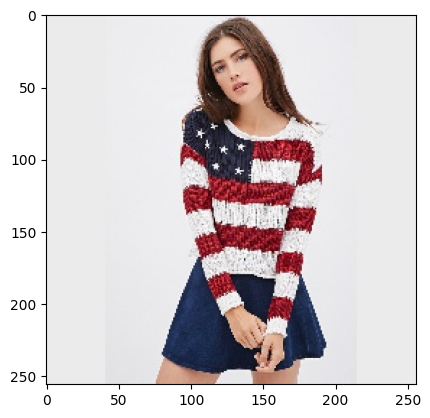

In [17]:
ind = 2
sample = df.iloc[ind]
image_file = str(root_dir / sample.image)
print(sample)
image = PIL.Image.open(image_file)
#image = image.convert('RGB') if image.mode != 'RGB' else image
plt.imshow(image)
plt.show()

In [25]:
embedding = DeepFace.represent(image_file, model_name='Facenet512', detector_backend='dlib')
len(embedding)

facenet512_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/facenet512_weights.h5
To: /home/soon/.deepface/weights/facenet512_weights.h5
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████| 95.0M/95.0M [00:02<00:00, 34.3MB/s]


1/1 [==============================] - 1s 1s/step


512

In [27]:
for i in tqdm(range(len(df))):
#for i in [4]:
    sample = df.iloc[i]
    image_file = str(root_dir / sample.image)
    try:
        embedding = DeepFace.represent(image_file, model_name='Facenet512', detector_backend='dlib')
        face = DeepFace.detectFace(img_path = image_file, target_size=(64, 64), detector_backend='dlib', align=False)

        face_image = Image.fromarray(np.uint8(face*255))
        assert source_folder in image_file
        face_file = image_file.replace(source_folder,target_folder)
        os.makedirs(os.path.dirname(face_file), exist_ok=True)
        face_image.save(face_file)

        embedding_file = face_file.replace('.jpg','.p')
        pickle.dump(np.array(embedding, dtype=np.float32), open(embedding_file,"wb"))
        
    except Exception as e:
        #print(f"Error, id={i}, {sample.image}")
        pass

  0%|                                                                                                                        | 0/46726 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                                                                                              | 1/46726 [00:00<1:25:53,  9.07it/s]

Error, id=1, WOMEN/Sweaters/id_00005317/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|                                                                                                                | 3/46726 [00:00<53:32, 14.54it/s]

Error, id=3, WOMEN/Sweaters/id_00005317/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  0%|                                                                                                                | 5/46726 [00:00<47:51, 16.27it/s]

Error, id=5, WOMEN/Sweaters/id_00005229/03_4_full.jpg
Error, id=6, WOMEN/Sweaters/id_00005229/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|                                                                                                                | 8/46726 [00:00<40:46, 19.10it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                                                                                               | 10/46726 [00:00<49:42, 15.67it/s]

Error, id=10, WOMEN/Sweaters/id_00007662/03_2_side.jpg
Error, id=11, WOMEN/Sweaters/id_00007662/03_4_full.jpg
Error, id=12, WOMEN/Sweaters/id_00007662/05_2_side.jpg
Error, id=13, WOMEN/Sweaters/id_00007662/05_4_full.jpg


  0%|                                                                                                               | 15/46726 [00:00<31:58, 24.34it/s]

Error, id=14, WOMEN/Sweaters/id_00007662/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=16, WOMEN/Sweaters/id_00002388/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|                                                                                                               | 18/46726 [00:00<37:54, 20.54it/s]

Error, id=18, WOMEN/Sweaters/id_00002388/02_2_side.jpg
Error, id=19, WOMEN/Sweaters/id_00002388/02_4_full.jpg
1/1 [==============================] - 0s 84ms/step


  0%|                                                                                                               | 21/46726 [00:01<42:12, 18.44it/s]

Error, id=21, WOMEN/Sweaters/id_00001123/02_3_back.jpg
Error, id=22, WOMEN/Sweaters/id_00001123/01_4_full.jpg
1/1 [==============================] - 0s 83ms/step


  0%|                                                                                                               | 24/46726 [00:01<44:50, 17.36it/s]

1/1 [==============================] - 0s 91ms/step


  0%|                                                                                                               | 26/46726 [00:01<50:44, 15.34it/s]

Error, id=25, WOMEN/Sweaters/id_00001123/02_4_full.jpg
1/1 [==============================] - 0s 91ms/step


  0%|                                                                                                               | 28/46726 [00:01<55:35, 14.00it/s]

Error, id=27, WOMEN/Sweaters/id_00001123/01_7_additional.jpg
Error, id=28, WOMEN/Sweaters/id_00001123/01_2_side.jpg
1/1 [==============================] - 0s 91ms/step


  0%|                                                                                                               | 30/46726 [00:01<59:27, 13.09it/s]

Error, id=30, WOMEN/Sweaters/id_00002212/03_2_side.jpg
1/1 [==============================] - 0s 82ms/step


  0%|                                                                                                             | 32/46726 [00:02<1:01:31, 12.65it/s]

Error, id=32, WOMEN/Sweaters/id_00002212/04_7_additional.jpg
Error, id=33, WOMEN/Sweaters/id_00002212/04_2_side.jpg
Error, id=34, WOMEN/Sweaters/id_00002212/03_3_back.jpg
Error, id=35, WOMEN/Sweaters/id_00002212/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|                                                                                                               | 37/46726 [00:02<44:48, 17.37it/s]

1/1 [==============================] - 0s 20ms/step


  0%|                                                                                                               | 39/46726 [00:02<44:24, 17.52it/s]

Error, id=38, WOMEN/Sweaters/id_00006334/03_2_side.jpg
1/1 [==============================] - 0s 84ms/step


  0%|                                                                                                               | 41/46726 [00:02<56:21, 13.81it/s]

Error, id=41, WOMEN/Sweaters/id_00006334/03_3_back.jpg
Error, id=42, WOMEN/Sweaters/id_00006334/04_3_back.jpg
Error, id=43, WOMEN/Sweaters/id_00006334/03_1_front.jpg
1/1 [==============================] - 0s 83ms/step


  0%|                                                                                                               | 45/46726 [00:02<50:44, 15.33it/s]

Error, id=45, WOMEN/Sweaters/id_00004679/01_1_front.jpg
1/1 [==============================] - 0s 91ms/step


  0%|                                                                                                               | 47/46726 [00:02<55:12, 14.09it/s]

Error, id=47, WOMEN/Sweaters/id_00004679/01_2_side.jpg
Error, id=48, WOMEN/Sweaters/id_00006070/02_3_back.jpg
Error, id=49, WOMEN/Sweaters/id_00006070/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  0%|                                                                                                               | 51/46726 [00:03<45:23, 17.14it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▏                                                                                                              | 53/46726 [00:03<44:52, 17.34it/s]

Error, id=52, WOMEN/Sweaters/id_00002782/02_7_additional.jpg
Error, id=53, WOMEN/Sweaters/id_00002782/02_2_side.jpg
1/1 [==============================] - 0s 92ms/step


  0%|▏                                                                                                              | 55/46726 [00:03<50:59, 15.25it/s]

Error, id=55, WOMEN/Sweaters/id_00004023/02_3_back.jpg
1/1 [==============================] - 0s 83ms/step


  0%|▏                                                                                                              | 57/46726 [00:03<55:04, 14.12it/s]

Error, id=57, WOMEN/Sweaters/id_00004023/02_2_side.jpg
Error, id=58, WOMEN/Sweaters/id_00004023/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                                                              | 60/46726 [00:03<47:39, 16.32it/s]

Error, id=60, WOMEN/Sweaters/id_00004119/04_7_additional.jpg
Error, id=61, WOMEN/Sweaters/id_00004119/04_3_back.jpg
Error, id=62, WOMEN/Sweaters/id_00003875/02_7_additional.jpg
1/1 [==============================] - 0s 82ms/step


  0%|▏                                                                                                              | 64/46726 [00:03<45:19, 17.16it/s]

1/1 [==============================] - 0s 91ms/step


  0%|▏                                                                                                              | 66/46726 [00:04<56:52, 13.67it/s]

Error, id=66, WOMEN/Sweaters/id_00001904/01_7_additional.jpg
1/1 [==============================] - 0s 83ms/step


  0%|▏                                                                                                              | 68/46726 [00:04<59:19, 13.11it/s]

Error, id=68, WOMEN/Sweaters/id_00001904/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                                                              | 70/46726 [00:04<55:07, 14.11it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                                                              | 72/46726 [00:04<51:40, 15.05it/s]

Error, id=71, WOMEN/Sweaters/id_00001255/02_7_additional.jpg
Error, id=72, WOMEN/Sweaters/id_00001255/02_2_side.jpg
Error, id=73, WOMEN/Sweaters/id_00001255/03_3_back.jpg
1/1 [==============================] - 0s 84ms/step


  0%|▏                                                                                                              | 75/46726 [00:04<51:20, 15.14it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                                                              | 77/46726 [00:04<49:01, 15.86it/s]

Error, id=76, WOMEN/Sweaters/id_00001255/03_7_additional.jpg
Error, id=77, WOMEN/Sweaters/id_00006799/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  0%|▏                                                                                                              | 79/46726 [00:05<47:12, 16.47it/s]

Error, id=79, WOMEN/Sweaters/id_00006799/02_4_full.jpg
1/1 [==============================] - 0s 83ms/step


  0%|▏                                                                                                              | 81/46726 [00:05<52:47, 14.73it/s]

1/1 [==============================] - 0s 83ms/step


  0%|▏                                                                                                              | 83/46726 [00:05<57:17, 13.57it/s]

Error, id=82, WOMEN/Sweaters/id_00000926/01_7_additional.jpg
1/1 [==============================] - 0s 83ms/step


  0%|▏                                                                                                            | 85/46726 [00:05<1:00:02, 12.95it/s]

Error, id=84, WOMEN/Sweaters/id_00000926/01_3_back.jpg
1/1 [==============================] - 0s 91ms/step


  0%|▏                                                                                                            | 87/46726 [00:05<1:17:44, 10.00it/s]

Error, id=87, WOMEN/Sweaters/id_00006850/07_7_additional.jpg
Error, id=88, WOMEN/Sweaters/id_00006850/07_3_back.jpg
Error, id=89, WOMEN/Sweaters/id_00006850/06_4_full.jpg
Error, id=90, WOMEN/Sweaters/id_00006850/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                                                              | 92/46726 [00:06<51:51, 14.99it/s]

Error, id=92, WOMEN/Sweaters/id_00006850/06_7_additional.jpg
1/1 [==============================] - 0s 83ms/step


  0%|▏                                                                                                              | 94/46726 [00:06<55:19, 14.05it/s]

Error, id=94, WOMEN/Sweaters/id_00005656/02_7_additional.jpg
Error, id=95, WOMEN/Sweaters/id_00005656/03_3_back.jpg
Error, id=96, WOMEN/Sweaters/id_00005656/03_1_front.jpg
1/1 [==============================] - 0s 83ms/step


  0%|▏                                                                                                              | 98/46726 [00:06<50:08, 15.50it/s]

Error, id=98, WOMEN/Sweaters/id_00000935/02_3_back.jpg
1/1 [==============================] - 0s 91ms/step


  0%|▏                                                                                                             | 100/46726 [00:06<54:37, 14.23it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                                                             | 102/46726 [00:06<51:49, 14.99it/s]

Error, id=101, WOMEN/Sweaters/id_00000935/01_1_front.jpg
1/1 [==============================] - 0s 84ms/step


  0%|▏                                                                                                           | 104/46726 [00:06<1:08:52, 11.28it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                                                           | 106/46726 [00:07<1:01:49, 12.57it/s]

Error, id=105, WOMEN/Sweaters/id_00003034/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▏                                                                                                           | 108/46726 [00:07<1:03:27, 12.24it/s]

Error, id=108, WOMEN/Sweaters/id_00003034/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▎                                                                                                             | 110/46726 [00:07<57:35, 13.49it/s]

Error, id=110, WOMEN/Sweaters/id_00006290/02_2_side.jpg
Error, id=111, WOMEN/Sweaters/id_00006290/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▎                                                                                                             | 113/46726 [00:07<48:39, 15.97it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▎                                                                                                             | 115/46726 [00:07<46:59, 16.53it/s]

Error, id=114, WOMEN/Sweaters/id_00006379/04_4_full.jpg
Error, id=115, WOMEN/Sweaters/id_00006379/04_7_additional.jpg
Error, id=116, WOMEN/Sweaters/id_00006379/04_2_side.jpg
Error, id=117, WOMEN/Sweaters/id_00006379/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  0%|▎                                                                                                             | 119/46726 [00:07<39:33, 19.63it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=120, WOMEN/Sweaters/id_00002639/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▎                                                                                                             | 122/46726 [00:07<43:26, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▎                                                                                                             | 124/46726 [00:08<43:12, 17.98it/s]

Error, id=123, WOMEN/Sweaters/id_00002639/01_3_back.jpg
1/1 [==============================] - 0s 92ms/step


  0%|▎                                                                                                             | 126/46726 [00:08<56:19, 13.79it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▎                                                                                                             | 128/46726 [00:08<52:51, 14.69it/s]

Error, id=127, WOMEN/Sweaters/id_00001813/07_3_back.jpg
Error, id=128, WOMEN/Sweaters/id_00001813/08_7_additional.jpg
Error, id=129, WOMEN/Sweaters/id_00001813/08_3_back.jpg


  0%|▎                                                                                                             | 133/46726 [00:08<35:40, 21.76it/s]

Error, id=130, WOMEN/Sweaters/id_00001813/07_4_full.jpg
Error, id=131, WOMEN/Sweaters/id_00007781/02_3_back.jpg
Error, id=132, WOMEN/Sweaters/id_00007781/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=134, WOMEN/Sweaters/id_00007781/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  0%|▎                                                                                                             | 136/46726 [00:08<40:21, 19.24it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=137, WOMEN/Sweaters/id_00002451/01_2_side.jpg


  0%|▎                                                                                                             | 139/46726 [00:08<38:39, 20.08it/s]

Error, id=138, WOMEN/Sweaters/id_00002451/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▎                                                                                                             | 142/46726 [00:09<42:53, 18.10it/s]

Error, id=141, WOMEN/Sweaters/id_00006683/05_1_front.jpg
Error, id=142, WOMEN/Sweaters/id_00006683/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▎                                                                                                             | 144/46726 [00:09<42:45, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▎                                                                                                             | 146/46726 [00:09<48:45, 15.92it/s]

1/1 [==============================] - 0s 83ms/step


  0%|▎                                                                                                             | 148/46726 [00:09<53:31, 14.50it/s]

Error, id=147, WOMEN/Sweaters/id_00006683/04_3_back.jpg
1/1 [==============================] - 0s 83ms/step


  0%|▎                                                                                                           | 150/46726 [00:09<1:03:54, 12.15it/s]

Error, id=150, WOMEN/Sweaters/id_00006683/06_7_additional.jpg
Error, id=151, WOMEN/Sweaters/id_00001565/02_3_back.jpg
1/1 [==============================] - 0s 82ms/step


  0%|▎                                                                                                             | 153/46726 [00:09<58:53, 13.18it/s]

1/1 [==============================] - 0s 85ms/step


  0%|▎                                                                                                           | 155/46726 [00:10<1:01:36, 12.60it/s]

Error, id=154, WOMEN/Sweaters/id_00001565/02_1_front.jpg
Error, id=155, WOMEN/Sweaters/id_00003599/01_4_full.jpg
1/1 [==============================] - 0s 83ms/step


  0%|▎                                                                                                           | 157/46726 [00:10<1:02:59, 12.32it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▎                                                                                                             | 159/46726 [00:10<57:21, 13.53it/s]

Error, id=158, WOMEN/Sweaters/id_00003599/01_3_back.jpg
Error, id=159, WOMEN/Sweaters/id_00002715/01_4_full.jpg
1/1 [==============================] - 0s 84ms/step


  0%|▎                                                                                                           | 161/46726 [00:10<1:00:02, 12.93it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                           | 163/46726 [00:10<1:10:01, 11.08it/s]

Error, id=163, WOMEN/Sweaters/id_00007299/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                           | 165/46726 [00:10<1:01:53, 12.54it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 167/46726 [00:11<56:03, 13.84it/s]

Error, id=166, WOMEN/Sweaters/id_00007299/01_3_back.jpg
Error, id=167, WOMEN/Sweaters/id_00004089/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 169/46726 [00:11<51:56, 14.94it/s]

Error, id=169, WOMEN/Sweaters/id_00004089/01_7_additional.jpg
Error, id=170, WOMEN/Sweaters/id_00004089/01_3_back.jpg
Error, id=171, WOMEN/Sweaters/id_00000888/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 173/46726 [00:11<42:09, 18.40it/s]

1/1 [==============================] - 0s 22ms/step


  0%|▍                                                                                                             | 175/46726 [00:11<48:50, 15.88it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 177/46726 [00:11<47:15, 16.41it/s]

Error, id=176, WOMEN/Sweaters/id_00000888/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 179/46726 [00:11<52:37, 14.74it/s]

Error, id=179, WOMEN/Sweaters/id_00000888/05_4_full.jpg
Error, id=180, WOMEN/Sweaters/id_00000888/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 182/46726 [00:11<45:42, 16.97it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 184/46726 [00:12<51:20, 15.11it/s]

Error, id=184, WOMEN/Sweaters/id_00000888/07_4_full.jpg
Error, id=185, WOMEN/Sweaters/id_00000888/06_7_additional.jpg
Error, id=186, WOMEN/Sweaters/id_00006734/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 188/46726 [00:12<42:29, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 190/46726 [00:12<48:16, 16.07it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 192/46726 [00:12<52:57, 14.65it/s]

Error, id=192, WOMEN/Sweaters/id_00006734/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 194/46726 [00:12<50:01, 15.50it/s]

1/1 [==============================] - 0s 19ms/step


  0%|▍                                                                                                             | 196/46726 [00:12<47:48, 16.22it/s]

Error, id=195, WOMEN/Sweaters/id_00006734/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 198/46726 [00:12<46:11, 16.79it/s]

Error, id=197, WOMEN/Sweaters/id_00006734/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 200/46726 [00:13<44:59, 17.24it/s]

Error, id=199, WOMEN/Sweaters/id_00006734/10_4_full.jpg
Error, id=200, WOMEN/Sweaters/id_00006734/09_4_full.jpg
Error, id=201, WOMEN/Sweaters/id_00006734/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 203/46726 [00:13<41:06, 18.86it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 205/46726 [00:13<41:40, 18.60it/s]

Error, id=204, WOMEN/Sweaters/id_00006734/10_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 207/46726 [00:13<41:58, 18.47it/s]

Error, id=206, WOMEN/Sweaters/id_00004244/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 209/46726 [00:13<49:24, 15.69it/s]

Error, id=209, WOMEN/Sweaters/id_00004244/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▍                                                                                                             | 211/46726 [00:13<47:34, 16.29it/s]

Error, id=211, WOMEN/Sweaters/id_00004244/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  0%|▌                                                                                                             | 213/46726 [00:13<46:19, 16.74it/s]

Error, id=213, WOMEN/Sweaters/id_00004244/03_3_back.jpg
Error, id=214, WOMEN/Sweaters/id_00004244/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▌                                                                                                             | 216/46726 [00:13<41:34, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▌                                                                                                             | 218/46726 [00:14<41:51, 18.52it/s]

Error, id=217, WOMEN/Sweaters/id_00004244/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  0%|▌                                                                                                             | 220/46726 [00:14<49:40, 15.60it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▌                                                                                                             | 222/46726 [00:14<54:51, 14.13it/s]

1/1 [==============================] - 0s 20ms/step


  0%|▌                                                                                                             | 224/46726 [00:14<51:17, 15.11it/s]

Error, id=223, WOMEN/Sweaters/id_00005772/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▌                                                                                                             | 226/46726 [00:14<56:06, 13.81it/s]

Error, id=226, WOMEN/Sweaters/id_00005772/02_1_front.jpg
1/1 [==============================] - 0s 19ms/step


  0%|▌                                                                                                             | 228/46726 [00:14<52:06, 14.87it/s]

Error, id=228, WOMEN/Sweaters/id_00004912/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  0%|▌                                                                                                             | 230/46726 [00:14<49:13, 15.74it/s]

1/1 [==============================] - 0s 21ms/step


  0%|▌                                                                                                             | 232/46726 [00:15<55:27, 13.97it/s]

Error, id=232, WOMEN/Sweaters/id_00001127/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▌                                                                                                             | 234/46726 [00:15<51:45, 14.97it/s]

Error, id=234, WOMEN/Sweaters/id_00001127/01_3_back.jpg
Error, id=235, WOMEN/Sweaters/id_00002583/03_4_full.jpg


  1%|▌                                                                                                             | 239/46726 [00:15<33:59, 22.80it/s]

Error, id=236, WOMEN/Sweaters/id_00002583/04_1_front.jpg
Error, id=237, WOMEN/Sweaters/id_00002583/04_4_full.jpg
Error, id=238, WOMEN/Sweaters/id_00002583/04_7_additional.jpg
Error, id=239, WOMEN/Sweaters/id_00002583/03_3_back.jpg
Error, id=240, WOMEN/Sweaters/id_00002583/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▌                                                                                                             | 242/46726 [00:15<33:58, 22.80it/s]

Error, id=242, WOMEN/Sweaters/id_00002583/03_7_additional.jpg
Error, id=243, WOMEN/Sweaters/id_00007944/02_3_back.jpg
Error, id=244, WOMEN/Sweaters/id_00007944/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▌                                                                                                             | 246/46726 [00:15<32:29, 23.84it/s]

Error, id=246, WOMEN/Sweaters/id_00002204/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▌                                                                                                             | 249/46726 [00:15<37:38, 20.58it/s]

Error, id=249, WOMEN/Sweaters/id_00002204/02_1_front.jpg
Error, id=250, WOMEN/Sweaters/id_00004770/06_3_back.jpg
Error, id=251, WOMEN/Sweaters/id_00004770/06_1_front.jpg
Error, id=252, WOMEN/Sweaters/id_00004770/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▌                                                                                                             | 254/46726 [00:15<33:28, 23.14it/s]

Error, id=254, WOMEN/Sweaters/id_00004770/08_1_front.jpg
Error, id=255, WOMEN/Sweaters/id_00004770/05_3_back.jpg
Error, id=256, WOMEN/Sweaters/id_00004770/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▌                                                                                                             | 258/46726 [00:16<32:19, 23.96it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▌                                                                                                             | 261/46726 [00:16<54:01, 14.33it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                                                             | 263/46726 [00:16<57:03, 13.57it/s]

Error, id=263, WOMEN/Sweaters/id_00004770/08_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  1%|▌                                                                                                             | 265/46726 [00:16<54:01, 14.33it/s]

Error, id=265, WOMEN/Sweaters/id_00007443/02_3_back.jpg
Error, id=266, WOMEN/Sweaters/id_00007443/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 268/46726 [00:17<47:42, 16.23it/s]

Error, id=268, WOMEN/Sweaters/id_00004872/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 270/46726 [00:17<46:30, 16.65it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 272/46726 [00:17<45:37, 16.97it/s]

Error, id=271, WOMEN/Sweaters/id_00002655/02_3_back.jpg
Error, id=272, WOMEN/Sweaters/id_00002655/01_6_flat.jpg
Error, id=273, WOMEN/Sweaters/id_00002655/01_4_full.jpg
Error, id=274, WOMEN/Sweaters/id_00002655/02_2_side.jpg
Error, id=275, WOMEN/Sweaters/id_00002655/02_4_full.jpg
1/1 [==============================] - 0s 85ms/step


  1%|▋                                                                                                             | 277/46726 [00:17<42:08, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                                                             | 279/46726 [00:17<53:05, 14.58it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 281/46726 [00:17<50:45, 15.25it/s]

Error, id=280, WOMEN/Sweaters/id_00002655/01_3_back.jpg
Error, id=281, WOMEN/Sweaters/id_00006441/05_1_front.jpg
Error, id=282, WOMEN/Sweaters/id_00006441/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 284/46726 [00:17<45:12, 17.12it/s]

Error, id=284, WOMEN/Sweaters/id_00006441/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 286/46726 [00:18<44:33, 17.37it/s]

Error, id=286, WOMEN/Sweaters/id_00006441/05_2_side.jpg
Error, id=287, WOMEN/Sweaters/id_00006441/05_4_full.jpg
Error, id=288, WOMEN/Sweaters/id_00006441/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 290/46726 [00:18<38:33, 20.07it/s]

Error, id=290, WOMEN/Sweaters/id_00006441/03_7_additional.jpg
Error, id=291, WOMEN/Sweaters/id_00002842/02_3_back.jpg
Error, id=292, WOMEN/Sweaters/id_00002842/02_7_additional.jpg
Error, id=293, WOMEN/Sweaters/id_00002842/02_2_side.jpg
1/1 [==============================] - 0s 19ms/step


  1%|▋                                                                                                             | 295/46726 [00:18<33:44, 22.93it/s]

Error, id=295, WOMEN/Sweaters/id_00000656/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 298/46726 [00:18<33:51, 22.85it/s]

Error, id=297, WOMEN/Sweaters/id_00000656/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  1%|▋                                                                                                             | 301/46726 [00:18<34:21, 22.52it/s]

Error, id=299, WOMEN/Sweaters/id_00001145/01_4_full.jpg
Error, id=300, WOMEN/Sweaters/id_00001145/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=302, WOMEN/Sweaters/id_00001145/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 304/46726 [00:18<39:09, 19.76it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=305, WOMEN/Sweaters/id_00001145/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 307/46726 [00:19<42:27, 18.22it/s]

Error, id=307, WOMEN/Sweaters/id_00001145/01_3_back.jpg
Error, id=308, WOMEN/Sweaters/id_00004533/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 310/46726 [00:19<39:56, 19.37it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=311, WOMEN/Sweaters/id_00004533/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 313/46726 [00:19<43:00, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 315/46726 [00:19<48:48, 15.85it/s]

Error, id=315, WOMEN/Sweaters/id_00005594/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▋                                                                                                             | 317/46726 [00:19<47:19, 16.34it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                             | 319/46726 [00:19<52:27, 14.74it/s]

Error, id=319, WOMEN/Sweaters/id_00005594/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                             | 321/46726 [00:19<49:46, 15.54it/s]

Error, id=321, WOMEN/Sweaters/id_00005594/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                             | 323/46726 [00:20<47:43, 16.20it/s]

Error, id=323, WOMEN/Sweaters/id_00005594/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                             | 325/46726 [00:20<46:10, 16.75it/s]

Error, id=325, WOMEN/Sweaters/id_00005594/10_2_side.jpg
Error, id=326, WOMEN/Sweaters/id_00005594/03_3_back.jpg
Error, id=327, WOMEN/Sweaters/id_00005594/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                             | 329/46726 [00:20<38:55, 19.86it/s]

Error, id=329, WOMEN/Sweaters/id_00005594/09_2_side.jpg
Error, id=330, WOMEN/Sweaters/id_00005594/02_1_front.jpg
Error, id=331, WOMEN/Sweaters/id_00005594/08_7_additional.jpg


  1%|▊                                                                                                             | 334/46726 [00:20<29:18, 26.39it/s]

Error, id=332, WOMEN/Sweaters/id_00005594/09_3_back.jpg
Error, id=333, WOMEN/Sweaters/id_00005594/08_3_back.jpg
Error, id=334, WOMEN/Sweaters/id_00005594/03_7_additional.jpg
Error, id=335, WOMEN/Sweaters/id_00007302/02_3_back.jpg
Error, id=336, WOMEN/Sweaters/id_00007302/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  1%|▊                                                                                                             | 338/46726 [00:20<29:44, 26.00it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=339, WOMEN/Sweaters/id_00007302/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                             | 341/46726 [00:20<35:21, 21.87it/s]

Error, id=341, WOMEN/Sweaters/id_00007302/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                             | 344/46726 [00:20<34:59, 22.09it/s]

Error, id=343, WOMEN/Sweaters/id_00000458/03_2_side.jpg
Error, id=344, WOMEN/Sweaters/id_00000458/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                             | 347/46726 [00:21<34:40, 22.29it/s]

Error, id=346, WOMEN/Sweaters/id_00000458/03_3_back.jpg
Error, id=347, WOMEN/Sweaters/id_00000458/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                           | 350/46726 [00:21<1:04:04, 12.06it/s]

Error, id=349, WOMEN/Sweaters/id_00000458/03_7_additional.jpg
Error, id=350, WOMEN/Sweaters/id_00004011/01_4_full.jpg
1/1 [==============================] - 0s 123ms/step


  1%|▊                                                                                                           | 352/46726 [00:22<2:12:34,  5.83it/s]

1/1 [==============================] - 0s 125ms/step


  1%|▊                                                                                                           | 354/46726 [00:23<2:35:38,  4.97it/s]

Error, id=353, WOMEN/Sweaters/id_00004011/01_3_back.jpg
Error, id=354, WOMEN/Sweaters/id_00000739/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                           | 356/46726 [00:23<2:07:35,  6.06it/s]

Error, id=356, WOMEN/Sweaters/id_00000739/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                           | 358/46726 [00:23<1:45:08,  7.35it/s]

Error, id=358, WOMEN/Sweaters/id_00000739/01_3_back.jpg
Error, id=359, WOMEN/Sweaters/id_00005260/03_7_additional.jpg


  1%|▊                                                                                                           | 363/46726 [00:23<1:02:28, 12.37it/s]

Error, id=360, WOMEN/Sweaters/id_00003238/02_3_back.jpg
Error, id=361, WOMEN/Sweaters/id_00003238/03_2_side.jpg
Error, id=362, WOMEN/Sweaters/id_00003238/02_2_side.jpg
Error, id=363, WOMEN/Sweaters/id_00003238/03_1_front.jpg
Error, id=364, WOMEN/Sweaters/id_00003238/02_1_front.jpg


  1%|▊                                                                                                             | 368/46726 [00:23<43:55, 17.59it/s]

Error, id=365, WOMEN/Sweaters/id_00003238/03_7_additional.jpg
Error, id=366, WOMEN/Sweaters/id_00002188/02_3_back.jpg
Error, id=367, WOMEN/Sweaters/id_00002188/02_7_additional.jpg
Error, id=368, WOMEN/Sweaters/id_00002188/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▊                                                                                                             | 371/46726 [00:23<41:22, 18.67it/s]

Error, id=370, WOMEN/Sweaters/id_00006775/03_2_side.jpg
Error, id=371, WOMEN/Sweaters/id_00006775/03_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  1%|▉                                                                                                             | 374/46726 [00:23<39:19, 19.65it/s]

Error, id=373, WOMEN/Sweaters/id_00006775/03_7_additional.jpg
Error, id=374, WOMEN/Sweaters/id_00001385/05_1_front.jpg
Error, id=375, WOMEN/Sweaters/id_00001385/05_3_back.jpg
Error, id=376, WOMEN/Sweaters/id_00001385/04_1_front.jpg


  1%|▉                                                                                                             | 379/46726 [00:24<30:38, 25.21it/s]

Error, id=377, WOMEN/Sweaters/id_00001385/04_7_additional.jpg
Error, id=378, WOMEN/Sweaters/id_00001385/05_2_side.jpg
Error, id=379, WOMEN/Sweaters/id_00001385/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▉                                                                                                             | 383/46726 [00:24<38:01, 20.31it/s]

Error, id=383, WOMEN/Sweaters/id_00006782/03_3_back.jpg
Error, id=384, WOMEN/Sweaters/id_00006782/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▉                                                                                                             | 386/46726 [00:24<37:01, 20.86it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▉                                                                                                             | 389/46726 [00:24<36:13, 21.32it/s]

Error, id=387, WOMEN/Sweaters/id_00006782/01_3_back.jpg
Error, id=388, WOMEN/Sweaters/id_00006782/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=390, WOMEN/Sweaters/id_00004207/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▉                                                                                                             | 392/46726 [00:24<40:32, 19.05it/s]

Error, id=392, WOMEN/Sweaters/id_00004207/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  1%|▉                                                                                                             | 395/46726 [00:24<38:49, 19.89it/s]

Error, id=394, WOMEN/Sweaters/id_00002823/03_4_full.jpg
Error, id=395, WOMEN/Sweaters/id_00002823/04_1_front.jpg
Error, id=396, WOMEN/Sweaters/id_00002823/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  1%|▉                                                                                                             | 398/46726 [00:25<37:34, 20.55it/s]

Error, id=398, WOMEN/Sweaters/id_00002823/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▉                                                                                                             | 401/46726 [00:25<36:36, 21.09it/s]

Error, id=400, WOMEN/Sweaters/id_00007221/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  1%|▉                                                                                                             | 404/46726 [00:25<35:55, 21.49it/s]

Error, id=402, WOMEN/Sweaters/id_00007221/05_1_front.jpg
Error, id=403, WOMEN/Sweaters/id_00007221/13_4_full.jpg
Error, id=404, WOMEN/Sweaters/id_00007221/12_3_back.jpg
Error, id=405, WOMEN/Sweaters/id_00007221/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▉                                                                                                             | 407/46726 [00:25<35:26, 21.78it/s]

Error, id=407, WOMEN/Sweaters/id_00007221/12_2_side.jpg
1/1 [==============================] - 0s 19ms/step


  1%|▉                                                                                                             | 410/46726 [00:25<35:04, 22.01it/s]

Error, id=409, WOMEN/Sweaters/id_00007221/14_3_back.jpg
Error, id=410, WOMEN/Sweaters/id_00007221/04_4_full.jpg
Error, id=411, WOMEN/Sweaters/id_00007221/14_1_front.jpg
Error, id=412, WOMEN/Sweaters/id_00007221/04_2_side.jpg
Error, id=413, WOMEN/Sweaters/id_00007221/05_2_side.jpg


  1%|▉                                                                                                             | 415/46726 [00:25<27:43, 27.84it/s]

Error, id=414, WOMEN/Sweaters/id_00007221/14_2_side.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=416, WOMEN/Sweaters/id_00007221/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  1%|▉                                                                                                             | 418/46726 [00:25<34:12, 22.56it/s]

Error, id=418, WOMEN/Sweaters/id_00007221/14_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▉                                                                                                             | 421/46726 [00:26<34:17, 22.50it/s]

Error, id=420, WOMEN/Sweaters/id_00007221/13_2_side.jpg
Error, id=421, WOMEN/Sweaters/id_00007221/12_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|▉                                                                                                             | 424/46726 [00:26<34:17, 22.50it/s]

Error, id=423, WOMEN/Sweaters/id_00004150/05_3_back.jpg
Error, id=424, WOMEN/Sweaters/id_00004150/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 427/46726 [00:26<34:16, 22.51it/s]

Error, id=426, WOMEN/Sweaters/id_00004150/04_7_additional.jpg
Error, id=427, WOMEN/Sweaters/id_00004150/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 430/46726 [00:26<34:10, 22.57it/s]

Error, id=429, WOMEN/Sweaters/id_00004150/03_3_back.jpg
Error, id=430, WOMEN/Sweaters/id_00004150/04_3_back.jpg
Error, id=431, WOMEN/Sweaters/id_00004150/03_1_front.jpg
Error, id=432, WOMEN/Sweaters/id_00004150/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 434/46726 [00:26<32:35, 23.67it/s]

Error, id=434, WOMEN/Sweaters/id_00001265/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 437/46726 [00:26<37:36, 20.51it/s]

Error, id=437, WOMEN/Sweaters/id_00001265/01_3_back.jpg
Error, id=438, WOMEN/Sweaters/id_00007394/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 440/46726 [00:26<36:40, 21.03it/s]

Error, id=440, WOMEN/Sweaters/id_00007394/01_2_side.jpg
Error, id=441, WOMEN/Sweaters/id_00007394/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


  1%|█                                                                                                             | 443/46726 [00:27<36:24, 21.19it/s]

Error, id=443, WOMEN/Sweaters/id_00002801/02_2_side.jpg
Error, id=444, WOMEN/Sweaters/id_00002801/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  1%|█                                                                                                             | 446/46726 [00:27<35:54, 21.48it/s]

Error, id=446, WOMEN/Sweaters/id_00005178/02_3_back.jpg
Error, id=447, WOMEN/Sweaters/id_00005178/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  1%|█                                                                                                             | 449/46726 [00:27<35:33, 21.69it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 452/46726 [00:27<40:11, 19.19it/s]

Error, id=451, WOMEN/Sweaters/id_00004991/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 454/46726 [00:27<40:42, 18.94it/s]

Error, id=453, WOMEN/Sweaters/id_00004991/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 456/46726 [00:27<47:07, 16.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 458/46726 [00:27<45:58, 16.77it/s]

Error, id=457, WOMEN/Sweaters/id_00007116/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  1%|█                                                                                                             | 460/46726 [00:28<45:31, 16.94it/s]

Error, id=459, WOMEN/Sweaters/id_00007116/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 462/46726 [00:28<44:46, 17.22it/s]

Error, id=461, WOMEN/Sweaters/id_00007116/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 464/46726 [00:28<51:24, 15.00it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 466/46726 [00:28<56:02, 13.76it/s]

Error, id=466, WOMEN/Sweaters/id_00005022/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 468/46726 [00:28<52:05, 14.80it/s]

Error, id=468, WOMEN/Sweaters/id_00005022/03_3_back.jpg
Error, id=469, WOMEN/Sweaters/id_00005022/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 471/46726 [00:28<45:06, 17.09it/s]

Error, id=471, WOMEN/Sweaters/id_00005022/03_7_additional.jpg
Error, id=472, WOMEN/Sweaters/id_00000821/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█                                                                                                             | 474/46726 [00:28<41:07, 18.74it/s]

Error, id=474, WOMEN/Sweaters/id_00000821/03_3_back.jpg
Error, id=475, WOMEN/Sweaters/id_00000821/04_3_back.jpg
Error, id=476, WOMEN/Sweaters/id_00000821/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  1%|█▏                                                                                                            | 478/46726 [00:29<36:57, 20.85it/s]

Error, id=478, WOMEN/Sweaters/id_00002280/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  1%|█▏                                                                                                            | 481/46726 [00:29<36:12, 21.28it/s]

Error, id=480, WOMEN/Sweaters/id_00002280/01_2_side.jpg
Error, id=481, WOMEN/Sweaters/id_00002280/01_3_back.jpg
Error, id=482, WOMEN/Sweaters/id_00004898/02_3_back.jpg
Error, id=483, WOMEN/Sweaters/id_00004898/02_7_additional.jpg
1/1 [==============================] - 0s 84ms/step


  1%|█▏                                                                                                            | 485/46726 [00:29<38:23, 20.08it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 488/46726 [00:29<37:10, 20.73it/s]

Error, id=486, WOMEN/Sweaters/id_00004780/02_7_additional.jpg
Error, id=487, WOMEN/Sweaters/id_00004780/02_2_side.jpg
Error, id=488, WOMEN/Sweaters/id_00004780/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  1%|█▏                                                                                                            | 491/46726 [00:29<36:11, 21.29it/s]

Error, id=490, WOMEN/Sweaters/id_00007453/02_3_back.jpg
Error, id=491, WOMEN/Sweaters/id_00007453/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 494/46726 [00:29<35:34, 21.66it/s]

Error, id=493, WOMEN/Sweaters/id_00007453/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 497/46726 [00:30<54:57, 14.02it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█▏                                                                                                            | 499/46726 [00:30<52:38, 14.64it/s]

Error, id=498, WOMEN/Sweaters/id_00007056/02_3_back.jpg
Error, id=499, WOMEN/Sweaters/id_00007056/03_2_side.jpg
Error, id=500, WOMEN/Sweaters/id_00007056/02_7_additional.jpg
Error, id=501, WOMEN/Sweaters/id_00007056/02_2_side.jpg
Error, id=502, WOMEN/Sweaters/id_00007056/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 504/46726 [00:30<41:30, 18.56it/s]

Error, id=504, WOMEN/Sweaters/id_00007056/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 507/46726 [00:30<44:03, 17.49it/s]

Error, id=507, WOMEN/Sweaters/id_00007907/05_4_full.jpg
Error, id=508, WOMEN/Sweaters/id_00007907/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 510/46726 [00:30<41:11, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 513/46726 [00:30<43:48, 17.58it/s]

Error, id=512, WOMEN/Sweaters/id_00003214/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 515/46726 [00:31<43:26, 17.73it/s]

Error, id=514, WOMEN/Sweaters/id_00003214/02_2_side.jpg
Error, id=515, WOMEN/Sweaters/id_00003214/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 517/46726 [00:31<43:08, 17.85it/s]

Error, id=517, WOMEN/Sweaters/id_00003214/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 519/46726 [00:31<43:20, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█▏                                                                                                            | 521/46726 [00:31<43:11, 17.83it/s]

Error, id=520, WOMEN/Sweaters/id_00002256/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▏                                                                                                            | 523/46726 [00:31<49:46, 15.47it/s]

Error, id=523, WOMEN/Sweaters/id_00002256/04_1_front.jpg
Error, id=524, WOMEN/Sweaters/id_00002256/02_7_additional.jpg
Error, id=525, WOMEN/Sweaters/id_00002256/02_2_side.jpg
Error, id=526, WOMEN/Sweaters/id_00002256/04_4_full.jpg


  1%|█▏                                                                                                            | 528/46726 [00:31<33:39, 22.88it/s]

Error, id=527, WOMEN/Sweaters/id_00002256/04_7_additional.jpg
Error, id=528, WOMEN/Sweaters/id_00002256/04_2_side.jpg
Error, id=529, WOMEN/Sweaters/id_00002256/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                            | 531/46726 [00:31<33:40, 22.87it/s]

Error, id=531, WOMEN/Sweaters/id_00002256/04_3_back.jpg
Error, id=532, WOMEN/Sweaters/id_00002256/03_1_front.jpg
Error, id=533, WOMEN/Sweaters/id_00002256/02_1_front.jpg
Error, id=534, WOMEN/Sweaters/id_00002365/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                            | 536/46726 [00:32<30:59, 24.85it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=537, WOMEN/Sweaters/id_00002365/01_3_back.jpg


  1%|█▎                                                                                                            | 539/46726 [00:32<31:46, 24.23it/s]

Error, id=538, WOMEN/Sweaters/id_00004403/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                            | 542/46726 [00:32<36:53, 20.87it/s]

Error, id=541, WOMEN/Sweaters/id_00004403/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=543, WOMEN/Sweaters/id_00004403/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                            | 545/46726 [00:32<41:09, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                            | 547/46726 [00:32<46:44, 16.47it/s]

Error, id=547, WOMEN/Sweaters/id_00004403/05_7_additional.jpg
Error, id=548, WOMEN/Sweaters/id_00004403/06_7_additional.jpg
Error, id=549, WOMEN/Sweaters/id_00001947/02_3_back.jpg


  1%|█▎                                                                                                            | 552/46726 [00:32<34:02, 22.60it/s]

Error, id=550, WOMEN/Sweaters/id_00001947/02_7_additional.jpg
Error, id=551, WOMEN/Sweaters/id_00001947/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=553, WOMEN/Sweaters/id_00003569/02_3_back.jpg


  1%|█▎                                                                                                            | 555/46726 [00:32<33:59, 22.64it/s]

Error, id=554, WOMEN/Sweaters/id_00003569/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=556, WOMEN/Sweaters/id_00005099/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                            | 558/46726 [00:33<41:02, 18.75it/s]

1/1 [==============================] - 0s 52ms/step


  1%|█▎                                                                                                          | 561/46726 [00:33<1:06:21, 11.60it/s]

Error, id=560, WOMEN/Sweaters/id_00005099/04_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


  1%|█▎                                                                                                          | 563/46726 [00:34<1:24:20,  9.12it/s]

Error, id=563, WOMEN/Sweaters/id_00005099/04_3_back.jpg
1/1 [==============================] - 0s 53ms/step


  1%|█▎                                                                                                          | 565/46726 [00:34<1:33:12,  8.25it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                          | 567/46726 [00:34<1:20:30,  9.56it/s]

Error, id=566, WOMEN/Sweaters/id_00005099/06_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  1%|█▎                                                                                                          | 569/46726 [00:34<1:10:25, 10.92it/s]

Error, id=568, WOMEN/Sweaters/id_00005586/01_1_front.jpg
Error, id=569, WOMEN/Sweaters/id_00005586/01_2_side.jpg
Error, id=570, WOMEN/Sweaters/id_00005586/01_3_back.jpg
Error, id=571, WOMEN/Sweaters/id_00001795/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                            | 573/46726 [00:34<52:53, 14.54it/s]

1/1 [==============================] - 0s 52ms/step


  1%|█▎                                                                                                          | 575/46726 [00:35<1:14:51, 10.28it/s]

1/1 [==============================] - 0s 52ms/step


  1%|█▎                                                                                                          | 577/46726 [00:35<1:26:37,  8.88it/s]

Error, id=576, WOMEN/Sweaters/id_00000900/03_4_full.jpg
Error, id=577, WOMEN/Sweaters/id_00000900/03_3_back.jpg
1/1 [==============================] - 0s 129ms/step


  1%|█▎                                                                                                          | 579/46726 [00:35<1:51:29,  6.90it/s]

Error, id=579, WOMEN/Sweaters/id_00007390/02_3_back.jpg
Error, id=580, WOMEN/Sweaters/id_00007390/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  1%|█▎                                                                                                          | 582/46726 [00:36<1:23:32,  9.21it/s]

Error, id=582, WOMEN/Sweaters/id_00003044/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                          | 584/46726 [00:36<1:12:58, 10.54it/s]

Error, id=584, WOMEN/Sweaters/id_00003044/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                          | 586/46726 [00:36<1:04:43, 11.88it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 588/46726 [00:36<58:28, 13.15it/s]

Error, id=587, WOMEN/Sweaters/id_00002502/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▎                                                                                                          | 590/46726 [00:36<1:00:54, 12.62it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 592/46726 [00:36<55:33, 13.84it/s]

Error, id=591, WOMEN/Sweaters/id_00006882/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 594/46726 [00:36<51:38, 14.89it/s]

Error, id=593, WOMEN/Sweaters/id_00006882/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 596/46726 [00:36<57:00, 13.49it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                          | 598/46726 [00:37<1:00:00, 12.81it/s]

Error, id=598, WOMEN/Sweaters/id_00005110/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 600/46726 [00:37<54:42, 14.05it/s]

Error, id=600, WOMEN/Sweaters/id_00005110/04_4_full.jpg
Error, id=601, WOMEN/Sweaters/id_00005110/04_2_side.jpg
Error, id=602, WOMEN/Sweaters/id_00005110/03_3_back.jpg
Error, id=603, WOMEN/Sweaters/id_00005110/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 605/46726 [00:37<40:33, 18.95it/s]

Error, id=605, WOMEN/Sweaters/id_00006955/01_4_full.jpg
Error, id=606, WOMEN/Sweaters/id_00006955/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 608/46726 [00:37<38:30, 19.96it/s]

Error, id=608, WOMEN/Sweaters/id_00006955/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  1%|█▍                                                                                                            | 611/46726 [00:37<42:12, 18.21it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 613/46726 [00:37<48:06, 15.97it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 615/46726 [00:38<46:35, 16.50it/s]

Error, id=614, WOMEN/Sweaters/id_00002684/07_7_additional.jpg
Error, id=615, WOMEN/Sweaters/id_00002684/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 617/46726 [00:38<45:16, 16.97it/s]

1/1 [==============================] - 0s 19ms/step


  1%|█▍                                                                                                            | 619/46726 [00:38<50:47, 15.13it/s]

Error, id=619, WOMEN/Sweaters/id_00002684/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 621/46726 [00:38<48:09, 15.95it/s]

1/1 [==============================] - 0s 19ms/step


  1%|█▍                                                                                                            | 623/46726 [00:38<53:22, 14.40it/s]

1/1 [==============================] - 0s 21ms/step


  1%|█▍                                                                                                            | 625/46726 [00:38<50:43, 15.15it/s]

Error, id=624, WOMEN/Sweaters/id_00002684/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 627/46726 [00:38<48:07, 15.97it/s]

Error, id=626, WOMEN/Sweaters/id_00002089/09_1_front.jpg
Error, id=627, WOMEN/Sweaters/id_00002089/16_3_back.jpg
Error, id=628, WOMEN/Sweaters/id_00002089/02_3_back.jpg
Error, id=629, WOMEN/Sweaters/id_00002089/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▍                                                                                                            | 631/46726 [00:39<39:30, 19.44it/s]

1/1 [==============================] - 0s 19ms/step


  1%|█▍                                                                                                            | 633/46726 [00:39<45:59, 16.70it/s]

Error, id=633, WOMEN/Sweaters/id_00002089/23_2_side.jpg
Error, id=634, WOMEN/Sweaters/id_00002089/21_3_back.jpg
Error, id=635, WOMEN/Sweaters/id_00002089/21_7_additional.jpg
Error, id=636, WOMEN/Sweaters/id_00002089/22_7_additional.jpg


  1%|█▌                                                                                                            | 638/46726 [00:39<32:22, 23.73it/s]

Error, id=637, WOMEN/Sweaters/id_00002089/02_7_additional.jpg
Error, id=638, WOMEN/Sweaters/id_00002089/10_7_additional.jpg
Error, id=639, WOMEN/Sweaters/id_00002089/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▌                                                                                                            | 641/46726 [00:39<35:12, 21.82it/s]

Error, id=641, WOMEN/Sweaters/id_00002089/22_3_back.jpg
1/1 [==============================] - 0s 52ms/step


  1%|█▍                                                                                                          | 644/46726 [00:40<1:07:58, 11.30it/s]

Error, id=643, WOMEN/Sweaters/id_00002089/07_7_additional.jpg
1/1 [==============================] - 0s 123ms/step


  1%|█▍                                                                                                          | 646/46726 [00:40<2:04:45,  6.16it/s]

Error, id=645, WOMEN/Sweaters/id_00002089/07_3_back.jpg
1/1 [==============================] - 0s 23ms/step


  1%|█▍                                                                                                          | 648/46726 [00:41<2:12:16,  5.81it/s]

Error, id=648, WOMEN/Sweaters/id_00002089/10_2_side.jpg
1/1 [==============================] - 0s 55ms/step


  1%|█▌                                                                                                          | 650/46726 [00:41<2:17:43,  5.58it/s]

Error, id=650, WOMEN/Sweaters/id_00002089/14_2_side.jpg


  1%|█▌                                                                                                          | 652/46726 [00:41<2:06:04,  6.09it/s]

Error, id=651, WOMEN/Sweaters/id_00002089/16_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


  1%|█▌                                                                                                          | 654/46726 [00:42<3:15:38,  3.92it/s]

Error, id=653, WOMEN/Sweaters/id_00002089/03_3_back.jpg


  1%|█▌                                                                                                          | 655/46726 [00:43<3:10:06,  4.04it/s]

Error, id=654, WOMEN/Sweaters/id_00002089/01_7_additional.jpg


  1%|█▌                                                                                                          | 656/46726 [00:43<3:05:10,  4.15it/s]

Error, id=655, WOMEN/Sweaters/id_00002089/01_2_side.jpg
1/1 [==============================] - 0s 123ms/step


  1%|█▌                                                                                                          | 657/46726 [00:44<4:47:01,  2.68it/s]

1/1 [==============================] - 0s 122ms/step


  1%|█▌                                                                                                          | 660/46726 [00:45<3:56:22,  3.25it/s]

Error, id=658, WOMEN/Sweaters/id_00002089/23_7_additional.jpg
Error, id=659, WOMEN/Sweaters/id_00002089/09_2_side.jpg
1/1 [==============================] - 0s 53ms/step


  1%|█▌                                                                                                          | 661/46726 [00:45<3:56:55,  3.24it/s]

Error, id=661, WOMEN/Sweaters/id_00002089/14_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


  1%|█▌                                                                                                          | 663/46726 [00:45<3:22:55,  3.78it/s]

Error, id=663, WOMEN/Sweaters/id_00002089/11_3_back.jpg
1/1 [==============================] - 0s 122ms/step


  1%|█▌                                                                                                          | 667/46726 [00:46<3:23:41,  3.77it/s]

Error, id=665, WOMEN/Sweaters/id_00002089/09_3_back.jpg
Error, id=666, WOMEN/Sweaters/id_00002089/21_2_side.jpg


  1%|█▌                                                                                                          | 669/46726 [00:47<2:29:30,  5.13it/s]

Error, id=667, WOMEN/Sweaters/id_00002089/01_3_back.jpg
Error, id=668, WOMEN/Sweaters/id_00002089/03_7_additional.jpg
Error, id=669, WOMEN/Sweaters/id_00002089/11_1_front.jpg


  1%|█▌                                                                                                          | 671/46726 [00:47<1:59:32,  6.42it/s]

Error, id=670, WOMEN/Sweaters/id_00002089/10_3_back.jpg
Error, id=671, WOMEN/Sweaters/id_00007268/02_3_back.jpg
1/1 [==============================] - 0s 53ms/step


  1%|█▌                                                                                                          | 674/46726 [00:47<2:06:56,  6.05it/s]

Error, id=673, WOMEN/Sweaters/id_00007268/02_2_side.jpg
Error, id=674, WOMEN/Sweaters/id_00007268/02_4_full.jpg
1/1 [==============================] - 0s 129ms/step


  1%|█▌                                                                                                          | 677/46726 [00:48<3:16:47,  3.90it/s]

Error, id=676, WOMEN/Sweaters/id_00007268/03_1_front.jpg
1/1 [==============================] - 0s 128ms/step


  1%|█▌                                                                                                          | 678/46726 [00:49<4:48:02,  2.66it/s]

1/1 [==============================] - 0s 124ms/step


  1%|█▌                                                                                                          | 679/46726 [00:50<6:03:47,  2.11it/s]

1/1 [==============================] - 0s 97ms/step


  1%|█▌                                                                                                          | 680/46726 [00:51<6:18:33,  2.03it/s]

Error, id=680, WOMEN/Sweaters/id_00007654/01_7_additional.jpg
1/1 [==============================] - 0s 43ms/step


  1%|█▌                                                                                                          | 682/46726 [00:51<3:59:33,  3.20it/s]

Error, id=682, WOMEN/Sweaters/id_00007654/01_3_back.jpg
Error, id=683, WOMEN/Sweaters/id_00005951/02_7_additional.jpg
Error, id=684, WOMEN/Sweaters/id_00005951/02_4_full.jpg
Error, id=685, WOMEN/Sweaters/id_00005951/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▌                                                                                                          | 687/46726 [00:51<1:51:27,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▌                                                                                                          | 689/46726 [00:51<1:39:57,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


  1%|█▌                                                                                                          | 691/46726 [00:51<1:24:25,  9.09it/s]

Error, id=690, WOMEN/Sweaters/id_00000039/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▌                                                                                                          | 693/46726 [00:51<1:20:00,  9.59it/s]

Error, id=693, WOMEN/Sweaters/id_00007366/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▌                                                                                                          | 695/46726 [00:51<1:09:15, 11.08it/s]

Error, id=695, WOMEN/Sweaters/id_00007366/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▌                                                                                                          | 697/46726 [00:52<1:01:26, 12.49it/s]

Error, id=697, WOMEN/Sweaters/id_00007366/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  1%|█▋                                                                                                            | 699/46726 [00:52<55:47, 13.75it/s]

Error, id=699, WOMEN/Sweaters/id_00007366/03_7_additional.jpg
Error, id=700, WOMEN/Sweaters/id_00007582/06_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  2%|█▋                                                                                                            | 702/46726 [00:52<47:12, 16.25it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 704/46726 [00:52<45:50, 16.73it/s]

Error, id=703, WOMEN/Sweaters/id_00007582/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 706/46726 [00:52<44:41, 17.16it/s]

Error, id=705, WOMEN/Sweaters/id_00007582/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 708/46726 [00:52<43:56, 17.45it/s]

Error, id=707, WOMEN/Sweaters/id_00007582/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                                                            | 710/46726 [00:52<44:03, 17.41it/s]

Error, id=709, WOMEN/Sweaters/id_00007582/05_4_full.jpg
Error, id=710, WOMEN/Sweaters/id_00007582/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 712/46726 [00:52<43:29, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 714/46726 [00:52<43:09, 17.77it/s]

Error, id=713, WOMEN/Sweaters/id_00000151/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 716/46726 [00:53<42:45, 17.94it/s]

Error, id=715, WOMEN/Sweaters/id_00000151/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 718/46726 [00:53<42:31, 18.03it/s]

Error, id=717, WOMEN/Sweaters/id_00003310/02_2_side.jpg
Error, id=718, WOMEN/Sweaters/id_00003310/02_4_full.jpg
Error, id=719, WOMEN/Sweaters/id_00003310/01_1_front.jpg
Error, id=720, WOMEN/Sweaters/id_00003310/01_7_additional.jpg
Error, id=721, WOMEN/Sweaters/id_00003310/01_2_side.jpg


  2%|█▋                                                                                                            | 723/46726 [00:53<29:23, 26.08it/s]

Error, id=722, WOMEN/Sweaters/id_00003310/02_1_front.jpg
Error, id=723, WOMEN/Sweaters/id_00003433/01_4_full.jpg
Error, id=724, WOMEN/Sweaters/id_00003433/02_7_additional.jpg
Error, id=725, WOMEN/Sweaters/id_00003433/02_2_side.jpg
Error, id=726, WOMEN/Sweaters/id_00003433/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 728/46726 [00:53<28:19, 27.06it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 731/46726 [00:53<38:24, 19.96it/s]

Error, id=731, WOMEN/Sweaters/id_00002567/02_3_back.jpg
Error, id=732, WOMEN/Sweaters/id_00002567/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  2%|█▋                                                                                                            | 734/46726 [00:53<37:28, 20.46it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 737/46726 [00:54<36:29, 21.00it/s]

Error, id=735, WOMEN/Sweaters/id_00006696/02_2_side.jpg
Error, id=736, WOMEN/Sweaters/id_00006696/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=738, WOMEN/Sweaters/id_00006528/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 740/46726 [00:54<40:25, 18.96it/s]

Error, id=740, WOMEN/Sweaters/id_00006528/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▋                                                                                                            | 743/46726 [00:54<38:31, 19.90it/s]

Error, id=742, WOMEN/Sweaters/id_00002238/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                                                            | 746/46726 [00:54<37:10, 20.61it/s]

Error, id=744, WOMEN/Sweaters/id_00002238/04_3_back.jpg
Error, id=745, WOMEN/Sweaters/id_00001344/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                                                            | 749/46726 [00:54<40:59, 18.69it/s]

Error, id=748, WOMEN/Sweaters/id_00000929/01_7_additional.jpg
Error, id=749, WOMEN/Sweaters/id_00000929/01_3_back.jpg
Error, id=750, WOMEN/Sweaters/id_00001106/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                                                            | 752/46726 [00:54<38:46, 19.76it/s]

Error, id=752, WOMEN/Sweaters/id_00001106/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                                                            | 755/46726 [00:54<37:41, 20.32it/s]

Error, id=754, WOMEN/Sweaters/id_00000471/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                                                            | 758/46726 [00:55<36:33, 20.95it/s]

Error, id=756, WOMEN/Sweaters/id_00000471/01_3_back.jpg
Error, id=757, WOMEN/Sweaters/id_00002793/02_3_back.jpg
Error, id=758, WOMEN/Sweaters/id_00002793/01_4_full.jpg
Error, id=759, WOMEN/Sweaters/id_00002793/02_2_side.jpg
Error, id=760, WOMEN/Sweaters/id_00002793/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                                                            | 762/46726 [00:55<33:59, 22.54it/s]

1/1 [==============================] - 0s 19ms/step


  2%|█▊                                                                                                            | 765/46726 [00:55<38:29, 19.90it/s]

Error, id=764, WOMEN/Sweaters/id_00002793/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                                                            | 768/46726 [00:55<46:29, 16.48it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                                                            | 770/46726 [00:55<51:12, 14.96it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                                                            | 772/46726 [00:56<54:49, 13.97it/s]

Error, id=772, WOMEN/Sweaters/id_00003479/04_6_flat.jpg
Error, id=773, WOMEN/Sweaters/id_00003479/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                                                            | 775/46726 [00:56<47:47, 16.02it/s]

Error, id=775, WOMEN/Sweaters/id_00003479/04_4_full.jpg
Error, id=776, WOMEN/Sweaters/id_00003479/07_3_back.jpg
1/1 [==============================] - 0s 84ms/step


  2%|█▊                                                                                                            | 778/46726 [00:56<48:28, 15.80it/s]

Error, id=778, WOMEN/Sweaters/id_00003479/06_4_full.jpg
1/1 [==============================] - 0s 83ms/step


  2%|█▊                                                                                                            | 780/46726 [00:56<52:29, 14.59it/s]

Error, id=780, WOMEN/Sweaters/id_00003479/05_4_full.jpg
1/1 [==============================] - 0s 83ms/step


  2%|█▊                                                                                                            | 782/46726 [00:56<55:50, 13.71it/s]

1/1 [==============================] - 0s 91ms/step


  2%|█▊                                                                                                            | 784/46726 [00:56<59:24, 12.89it/s]

Error, id=783, WOMEN/Sweaters/id_00003479/05_6_flat.jpg
1/1 [==============================] - 0s 21ms/step


  2%|█▊                                                                                                          | 786/46726 [00:57<1:09:34, 11.00it/s]

Error, id=786, WOMEN/Sweaters/id_00003479/07_4_full.jpg
Error, id=787, WOMEN/Sweaters/id_00004048/02_3_back.jpg
Error, id=788, WOMEN/Sweaters/id_00004048/03_2_side.jpg
1/1 [==============================] - 0s 94ms/step


  2%|█▊                                                                                                            | 790/46726 [00:57<58:19, 13.13it/s]

1/1 [==============================] - 0s 92ms/step


  2%|█▊                                                                                                          | 792/46726 [00:57<1:01:07, 12.52it/s]

Error, id=791, WOMEN/Sweaters/id_00004048/02_4_full.jpg
Error, id=792, WOMEN/Sweaters/id_00004048/03_3_back.jpg
1/1 [==============================] - 0s 84ms/step


  2%|█▊                                                                                                          | 794/46726 [00:57<1:02:34, 12.23it/s]

Error, id=794, WOMEN/Sweaters/id_00004048/02_1_front.jpg
1/1 [==============================] - 0s 95ms/step


  2%|█▊                                                                                                          | 796/46726 [00:57<1:04:49, 11.81it/s]

Error, id=796, WOMEN/Sweaters/id_00006219/06_3_back.jpg
1/1 [==============================] - 0s 92ms/step


  2%|█▊                                                                                                          | 798/46726 [00:58<1:06:22, 11.53it/s]

Error, id=798, WOMEN/Sweaters/id_00006219/04_1_front.jpg
1/1 [==============================] - 0s 91ms/step


  2%|█▊                                                                                                          | 800/46726 [00:58<1:07:15, 11.38it/s]

Error, id=800, WOMEN/Sweaters/id_00006219/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                                                          | 802/46726 [00:58<1:00:01, 12.75it/s]

Error, id=802, WOMEN/Sweaters/id_00006219/04_2_side.jpg
Error, id=803, WOMEN/Sweaters/id_00006219/04_3_back.jpg
1/1 [==============================] - 0s 84ms/step


  2%|█▉                                                                                                            | 805/46726 [00:58<56:15, 13.60it/s]

1/1 [==============================] - 0s 92ms/step


  2%|█▊                                                                                                          | 807/46726 [00:58<1:00:15, 12.70it/s]

Error, id=806, WOMEN/Sweaters/id_00006219/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▊                                                                                                          | 809/46726 [00:58<1:02:10, 12.31it/s]

Error, id=809, WOMEN/Sweaters/id_00000628/02_3_back.jpg
Error, id=810, WOMEN/Sweaters/id_00000628/01_4_full.jpg
Error, id=811, WOMEN/Sweaters/id_00000628/02_2_side.jpg
Error, id=812, WOMEN/Sweaters/id_00000628/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▉                                                                                                            | 814/46726 [00:59<44:42, 17.11it/s]

Error, id=814, WOMEN/Sweaters/id_00000628/03_3_back.jpg
Error, id=815, WOMEN/Sweaters/id_00000628/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▉                                                                                                            | 817/46726 [00:59<41:25, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


  2%|█▉                                                                                                            | 819/46726 [00:59<41:31, 18.43it/s]

Error, id=818, WOMEN/Sweaters/id_00000628/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▉                                                                                                            | 821/46726 [00:59<41:38, 18.37it/s]

Error, id=820, WOMEN/Sweaters/id_00001262/09_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▉                                                                                                            | 823/46726 [00:59<48:08, 15.89it/s]

1/1 [==============================] - 0s 92ms/step


  2%|█▉                                                                                                            | 825/46726 [00:59<54:23, 14.07it/s]

Error, id=824, WOMEN/Sweaters/id_00001262/07_3_back.jpg
Error, id=825, WOMEN/Sweaters/id_00001262/09_2_side.jpg
Error, id=826, WOMEN/Sweaters/id_00001262/07_2_side.jpg
Error, id=827, WOMEN/Sweaters/id_00001262/09_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  2%|█▉                                                                                                            | 829/46726 [01:00<43:46, 17.48it/s]

Error, id=829, WOMEN/Sweaters/id_00001262/07_4_full.jpg
1/1 [==============================] - 0s 83ms/step


  2%|█▉                                                                                                            | 831/46726 [01:00<49:08, 15.56it/s]

Error, id=831, WOMEN/Sweaters/id_00003913/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▉                                                                                                            | 833/46726 [01:00<47:28, 16.11it/s]

Error, id=833, WOMEN/Sweaters/id_00003913/04_4_full.jpg
Error, id=834, WOMEN/Sweaters/id_00003913/04_2_side.jpg


  2%|█▉                                                                                                            | 838/46726 [01:00<33:01, 23.15it/s]

Error, id=835, WOMEN/Sweaters/id_00003913/03_3_back.jpg
Error, id=836, WOMEN/Sweaters/id_00003913/04_3_back.jpg
Error, id=837, WOMEN/Sweaters/id_00003913/03_1_front.jpg
Error, id=838, WOMEN/Sweaters/id_00003930/06_3_back.jpg
Error, id=839, WOMEN/Sweaters/id_00003930/06_1_front.jpg


  2%|█▉                                                                                                            | 843/46726 [01:00<26:31, 28.82it/s]

Error, id=840, WOMEN/Sweaters/id_00003930/04_1_front.jpg
Error, id=841, WOMEN/Sweaters/id_00003930/07_1_front.jpg
Error, id=842, WOMEN/Sweaters/id_00003930/07_7_additional.jpg
Error, id=843, WOMEN/Sweaters/id_00003930/04_7_additional.jpg
Error, id=844, WOMEN/Sweaters/id_00003930/07_3_back.jpg
Error, id=845, WOMEN/Sweaters/id_00003930/04_3_back.jpg
Error, id=846, WOMEN/Sweaters/id_00003930/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|█▉                                                                                                            | 848/46726 [01:00<26:40, 28.66it/s]

Error, id=848, WOMEN/Sweaters/id_00001727/01_7_additional.jpg
Error, id=849, WOMEN/Sweaters/id_00001727/01_2_side.jpg
Error, id=850, WOMEN/Sweaters/id_00001727/01_3_back.jpg
Error, id=851, WOMEN/Sweaters/id_00000977/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                            | 853/46726 [01:00<26:47, 28.53it/s]

1/1 [==============================] - 0s 83ms/step


  2%|██                                                                                                            | 856/46726 [01:01<35:44, 21.38it/s]

Error, id=855, WOMEN/Sweaters/id_00004412/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                            | 859/46726 [01:01<35:15, 21.69it/s]

Error, id=857, WOMEN/Sweaters/id_00004412/04_3_back.jpg
Error, id=858, WOMEN/Sweaters/id_00005253/06_3_back.jpg
Error, id=859, WOMEN/Sweaters/id_00005253/06_1_front.jpg
Error, id=860, WOMEN/Sweaters/id_00005253/05_1_front.jpg
Error, id=861, WOMEN/Sweaters/id_00005253/08_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  2%|██                                                                                                            | 863/46726 [01:01<33:42, 22.68it/s]

Error, id=863, WOMEN/Sweaters/id_00005253/05_3_back.jpg
Error, id=864, WOMEN/Sweaters/id_00005253/04_1_front.jpg
Error, id=865, WOMEN/Sweaters/id_00005253/08_4_full.jpg
Error, id=866, WOMEN/Sweaters/id_00005253/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                            | 868/46726 [01:01<31:10, 24.52it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=869, WOMEN/Sweaters/id_00005253/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                            | 871/46726 [01:01<35:43, 21.39it/s]

1/1 [==============================] - 0s 123ms/step


  2%|██                                                                                                          | 874/46726 [01:03<1:49:29,  6.98it/s]

Error, id=873, WOMEN/Sweaters/id_00005253/04_3_back.jpg
1/1 [==============================] - 0s 107ms/step


  2%|██                                                                                                          | 876/46726 [01:04<3:06:45,  4.09it/s]

Error, id=876, WOMEN/Sweaters/id_00005253/07_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                          | 878/46726 [01:04<2:35:18,  4.92it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                          | 880/46726 [01:04<2:08:56,  5.93it/s]

Error, id=879, WOMEN/Sweaters/id_00007538/03_3_back.jpg
Error, id=880, WOMEN/Sweaters/id_00007538/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                          | 882/46726 [01:04<1:46:57,  7.14it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                          | 884/46726 [01:04<1:29:48,  8.51it/s]

Error, id=883, WOMEN/Sweaters/id_00000958/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                          | 888/46726 [01:05<1:27:58,  8.68it/s]

Error, id=885, WOMEN/Sweaters/id_00000958/04_4_full.jpg
Error, id=886, WOMEN/Sweaters/id_00000958/04_2_side.jpg
Error, id=887, WOMEN/Sweaters/id_00000958/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                          | 890/46726 [01:05<1:19:54,  9.56it/s]

Error, id=889, WOMEN/Sweaters/id_00006336/02_7_additional.jpg
Error, id=890, WOMEN/Sweaters/id_00006336/02_2_side.jpg
Error, id=891, WOMEN/Sweaters/id_00006336/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                          | 893/46726 [01:05<1:02:13, 12.28it/s]

Error, id=893, WOMEN/Sweaters/id_00000981/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                            | 895/46726 [01:05<56:54, 13.42it/s]

1/1 [==============================] - 0s 21ms/step


  2%|██                                                                                                            | 897/46726 [01:05<59:44, 12.78it/s]

1/1 [==============================] - 0s 21ms/step


  2%|██                                                                                                            | 899/46726 [01:06<55:20, 13.80it/s]

Error, id=898, WOMEN/Sweaters/id_00000981/05_3_back.jpg
Error, id=899, WOMEN/Sweaters/id_00000981/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                            | 901/46726 [01:06<51:30, 14.83it/s]

Error, id=901, WOMEN/Sweaters/id_00000981/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██                                                                                                          | 903/46726 [01:06<1:11:19, 10.71it/s]

Error, id=903, WOMEN/Sweaters/id_00000981/10_4_full.jpg


  2%|██                                                                                                          | 905/46726 [01:06<1:39:50,  7.65it/s]

Error, id=904, WOMEN/Sweaters/id_00000981/05_7_additional.jpg
Error, id=905, WOMEN/Sweaters/id_00000981/08_7_additional.jpg


  2%|██                                                                                                          | 907/46726 [01:07<2:00:02,  6.36it/s]

Error, id=906, WOMEN/Sweaters/id_00000981/08_3_back.jpg


  2%|██                                                                                                          | 908/46726 [01:07<2:08:43,  5.93it/s]

Error, id=907, WOMEN/Sweaters/id_00000981/10_3_back.jpg
1/1 [==============================] - 0s 125ms/step


  2%|██                                                                                                          | 910/46726 [01:08<3:30:36,  3.63it/s]

Error, id=909, WOMEN/Sweaters/id_00005068/02_3_back.jpg
1/1 [==============================] - 0s 122ms/step


  2%|██                                                                                                          | 912/46726 [01:09<4:28:44,  2.84it/s]

Error, id=911, WOMEN/Sweaters/id_00005068/02_2_side.jpg


  2%|██                                                                                                          | 913/46726 [01:09<4:02:53,  3.14it/s]

Error, id=912, WOMEN/Sweaters/id_00005068/02_1_front.jpg


  2%|██                                                                                                          | 914/46726 [01:10<3:42:56,  3.42it/s]

Error, id=913, WOMEN/Sweaters/id_00007062/02_3_back.jpg


  2%|██                                                                                                          | 915/46726 [01:10<3:27:56,  3.67it/s]

Error, id=914, WOMEN/Sweaters/id_00007062/02_2_side.jpg
1/1 [==============================] - 0s 123ms/step


  2%|██                                                                                                          | 917/46726 [01:11<4:36:23,  2.76it/s]

Error, id=916, WOMEN/Sweaters/id_00007062/02_1_front.jpg


  2%|██                                                                                                          | 918/46726 [01:11<4:05:03,  3.12it/s]

Error, id=917, WOMEN/Sweaters/id_00002737/01_4_full.jpg
1/1 [==============================] - 0s 123ms/step


  2%|██▏                                                                                                         | 920/46726 [01:12<4:55:33,  2.58it/s]

Error, id=919, WOMEN/Sweaters/id_00002737/01_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


  2%|██▏                                                                                                         | 921/46726 [01:13<6:24:50,  1.98it/s]

1/1 [==============================] - 0s 124ms/step


  2%|██▏                                                                                                         | 923/46726 [01:14<6:05:02,  2.09it/s]

Error, id=922, WOMEN/Sweaters/id_00002746/02_3_back.jpg
1/1 [==============================] - 0s 129ms/step


  2%|██▏                                                                                                         | 925/46726 [01:15<6:06:22,  2.08it/s]

Error, id=924, WOMEN/Sweaters/id_00002746/02_4_full.jpg


  2%|██▏                                                                                                         | 926/46726 [01:15<5:07:15,  2.48it/s]

Error, id=925, WOMEN/Sweaters/id_00002746/02_1_front.jpg
1/1 [==============================] - 0s 129ms/step


  2%|██▏                                                                                                         | 928/46726 [01:16<5:28:10,  2.33it/s]

Error, id=927, WOMEN/Sweaters/id_00005272/07_3_back.jpg


  2%|██▏                                                                                                         | 929/46726 [01:16<4:40:29,  2.72it/s]

Error, id=928, WOMEN/Sweaters/id_00000107/01_1_front.jpg
1/1 [==============================] - 0s 126ms/step


  2%|██▏                                                                                                         | 931/46726 [01:17<5:14:15,  2.43it/s]

Error, id=930, WOMEN/Sweaters/id_00000107/01_3_back.jpg


  2%|██▏                                                                                                         | 932/46726 [01:17<4:30:54,  2.82it/s]

Error, id=931, WOMEN/Sweaters/id_00000745/06_3_back.jpg
1/1 [==============================] - 0s 123ms/step


  2%|██▏                                                                                                         | 934/46726 [01:19<5:08:41,  2.47it/s]

Error, id=933, WOMEN/Sweaters/id_00000745/02_3_back.jpg
1/1 [==============================] - 0s 123ms/step


  2%|██▏                                                                                                         | 935/46726 [01:19<6:26:54,  1.97it/s]

1/1 [==============================] - 0s 53ms/step


  2%|██▏                                                                                                         | 936/46726 [01:20<5:42:41,  2.23it/s]

1/1 [==============================] - 0s 53ms/step


  2%|██▏                                                                                                         | 937/46726 [01:20<4:55:56,  2.58it/s]

Error, id=937, WOMEN/Sweaters/id_00000745/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▏                                                                                                         | 939/46726 [01:20<2:58:31,  4.27it/s]

Error, id=939, WOMEN/Sweaters/id_00000745/06_4_full.jpg
Error, id=940, WOMEN/Sweaters/id_00000745/02_4_full.jpg


  2%|██▏                                                                                                         | 944/46726 [01:20<1:17:58,  9.79it/s]

Error, id=941, WOMEN/Sweaters/id_00000745/03_3_back.jpg
Error, id=942, WOMEN/Sweaters/id_00000745/04_3_back.jpg
Error, id=943, WOMEN/Sweaters/id_00000745/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▏                                                                                                         | 946/46726 [01:20<1:15:26, 10.11it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▏                                                                                                         | 948/46726 [01:20<1:13:13, 10.42it/s]

Error, id=948, WOMEN/Sweaters/id_00000461/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▏                                                                                                         | 950/46726 [01:20<1:04:29, 11.83it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▏                                                                                                           | 952/46726 [01:21<57:58, 13.16it/s]

Error, id=951, WOMEN/Sweaters/id_00000461/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▏                                                                                                           | 954/46726 [01:21<53:16, 14.32it/s]

Error, id=953, WOMEN/Sweaters/id_00000461/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 956/46726 [01:21<57:08, 13.35it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 958/46726 [01:21<52:42, 14.47it/s]

Error, id=957, WOMEN/Sweaters/id_00006416/05_1_front.jpg
Error, id=958, WOMEN/Sweaters/id_00006416/02_3_back.jpg
Error, id=959, WOMEN/Sweaters/id_00006416/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  2%|██▎                                                                                                           | 961/46726 [01:21<45:48, 16.65it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 963/46726 [01:21<51:33, 14.80it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 965/46726 [01:21<55:41, 13.69it/s]

Error, id=965, WOMEN/Sweaters/id_00002265/02_2_side.jpg
Error, id=966, WOMEN/Sweaters/id_00002265/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 968/46726 [01:22<47:27, 16.07it/s]

Error, id=968, WOMEN/Sweaters/id_00005851/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 970/46726 [01:22<45:58, 16.59it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 972/46726 [01:22<44:50, 17.00it/s]

Error, id=971, WOMEN/Sweaters/id_00000865/03_4_full.jpg
Error, id=972, WOMEN/Sweaters/id_00000865/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 974/46726 [01:22<44:00, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 976/46726 [01:22<51:14, 14.88it/s]

Error, id=976, WOMEN/Sweaters/id_00007490/02_1_front.jpg
Error, id=977, WOMEN/Sweaters/id_00002345/01_1_front.jpg
Error, id=978, WOMEN/Sweaters/id_00002345/01_7_additional.jpg


  2%|██▎                                                                                                           | 981/46726 [01:22<33:55, 22.47it/s]

Error, id=979, WOMEN/Sweaters/id_00002345/01_2_side.jpg
Error, id=980, WOMEN/Sweaters/id_00006487/02_3_back.jpg
Error, id=981, WOMEN/Sweaters/id_00006487/02_7_additional.jpg
Error, id=982, WOMEN/Sweaters/id_00006487/02_2_side.jpg


  2%|██▎                                                                                                           | 986/46726 [01:22<26:47, 28.45it/s]

Error, id=983, WOMEN/Sweaters/id_00006487/02_1_front.jpg
Error, id=984, WOMEN/Sweaters/id_00002741/02_3_back.jpg
Error, id=985, WOMEN/Sweaters/id_00002741/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 990/46726 [01:23<31:41, 24.05it/s]

Error, id=988, WOMEN/Sweaters/id_00002390/02_3_back.jpg
Error, id=989, WOMEN/Sweaters/id_00002390/02_2_side.jpg
Error, id=990, WOMEN/Sweaters/id_00002390/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 993/46726 [01:23<32:06, 23.74it/s]

Error, id=992, WOMEN/Sweaters/id_00007801/02_3_back.jpg
Error, id=993, WOMEN/Sweaters/id_00007801/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                           | 996/46726 [01:23<36:53, 20.66it/s]

1/1 [==============================] - 0s 21ms/step


  2%|██▎                                                                                                           | 999/46726 [01:23<45:32, 16.74it/s]

Error, id=999, WOMEN/Sweaters/id_00006480/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                          | 1001/46726 [01:23<44:47, 17.02it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                          | 1003/46726 [01:23<44:09, 17.25it/s]

Error, id=1002, WOMEN/Sweaters/id_00003631/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                          | 1005/46726 [01:23<43:34, 17.49it/s]

Error, id=1004, WOMEN/Sweaters/id_00003631/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                          | 1007/46726 [01:24<49:30, 15.39it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                          | 1009/46726 [01:24<54:04, 14.09it/s]

Error, id=1009, WOMEN/Sweaters/id_00003585/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                          | 1011/46726 [01:24<50:37, 15.05it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                          | 1013/46726 [01:24<48:39, 15.66it/s]

Error, id=1012, WOMEN/Sweaters/id_00003585/05_4_full.jpg
Error, id=1013, WOMEN/Sweaters/id_00003585/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  2%|██▎                                                                                                          | 1015/46726 [01:24<46:47, 16.28it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▎                                                                                                          | 1017/46726 [01:24<45:21, 16.79it/s]

Error, id=1016, WOMEN/Sweaters/id_00003373/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1019/46726 [01:24<44:16, 17.21it/s]

Error, id=1018, WOMEN/Sweaters/id_00003373/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1021/46726 [01:25<43:29, 17.51it/s]

Error, id=1020, WOMEN/Sweaters/id_00004630/03_2_side.jpg
Error, id=1021, WOMEN/Sweaters/id_00004630/03_4_full.jpg
Error, id=1022, WOMEN/Sweaters/id_00004630/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1024/46726 [01:25<39:31, 19.27it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1026/46726 [01:25<40:06, 18.99it/s]

Error, id=1025, WOMEN/Sweaters/id_00001749/04_1_front.jpg
Error, id=1026, WOMEN/Sweaters/id_00001749/04_2_side.jpg
Error, id=1027, WOMEN/Sweaters/id_00001749/03_3_back.jpg
Error, id=1028, WOMEN/Sweaters/id_00001749/04_3_back.jpg
Error, id=1029, WOMEN/Sweaters/id_00001749/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1031/46726 [01:25<33:37, 22.65it/s]

1/1 [==============================] - 0s 123ms/step
Error, id=1032, WOMEN/Sweaters/id_00006849/02_3_back.jpg


  2%|██▎                                                                                                        | 1034/46726 [01:26<1:38:40,  7.72it/s]

Error, id=1033, WOMEN/Sweaters/id_00006849/05_3_back.jpg
Error, id=1034, WOMEN/Sweaters/id_00006849/03_2_side.jpg


  2%|██▎                                                                                                        | 1036/46726 [01:26<1:53:37,  6.70it/s]

Error, id=1035, WOMEN/Sweaters/id_00006849/03_4_full.jpg
1/1 [==============================] - 0s 127ms/step


  2%|██▍                                                                                                        | 1039/46726 [01:28<3:43:53,  3.40it/s]

Error, id=1038, WOMEN/Sweaters/id_00006849/04_4_full.jpg
1/1 [==============================] - 0s 55ms/step


  2%|██▍                                                                                                        | 1040/46726 [01:29<4:06:29,  3.09it/s]

Error, id=1040, WOMEN/Sweaters/id_00006849/02_4_full.jpg


  2%|██▍                                                                                                        | 1042/46726 [01:29<3:06:57,  4.07it/s]

Error, id=1041, WOMEN/Sweaters/id_00006849/05_2_side.jpg
Error, id=1042, WOMEN/Sweaters/id_00006849/05_4_full.jpg


  2%|██▍                                                                                                        | 1044/46726 [01:29<2:28:08,  5.14it/s]

Error, id=1043, WOMEN/Sweaters/id_00006849/03_3_back.jpg
Error, id=1044, WOMEN/Sweaters/id_00006849/04_3_back.jpg
1/1 [==============================] - 0s 54ms/step


  2%|██▍                                                                                                        | 1046/46726 [01:29<2:29:24,  5.10it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                        | 1047/46726 [01:30<2:20:35,  5.42it/s]

Error, id=1047, WOMEN/Sweaters/id_00004103/02_3_back.jpg
Error, id=1048, WOMEN/Sweaters/id_00004103/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                        | 1050/46726 [01:30<1:33:28,  8.14it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                        | 1052/46726 [01:30<1:18:11,  9.73it/s]

Error, id=1051, WOMEN/Sweaters/id_00004103/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                        | 1054/46726 [01:30<1:07:23, 11.30it/s]

Error, id=1053, WOMEN/Sweaters/id_00004103/02_4_full.jpg
Error, id=1054, WOMEN/Sweaters/id_00004103/03_3_back.jpg
Error, id=1055, WOMEN/Sweaters/id_00004103/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1057/46726 [01:30<54:14, 14.03it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1059/46726 [01:30<58:28, 13.02it/s]

Error, id=1059, WOMEN/Sweaters/id_00005074/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1061/46726 [01:30<53:49, 14.14it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1063/46726 [01:30<57:25, 13.25it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1065/46726 [01:31<52:55, 14.38it/s]

Error, id=1064, WOMEN/Sweaters/id_00000509/04_4_full.jpg
Error, id=1065, WOMEN/Sweaters/id_00000509/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1067/46726 [01:31<49:38, 15.33it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▍                                                                                                          | 1069/46726 [01:31<54:32, 13.95it/s]

Error, id=1069, WOMEN/Sweaters/id_00000509/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  2%|██▍                                                                                                          | 1071/46726 [01:31<51:23, 14.81it/s]

Error, id=1071, WOMEN/Sweaters/id_00003693/03_4_full.jpg
Error, id=1072, WOMEN/Sweaters/id_00003693/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  2%|██▌                                                                                                          | 1074/46726 [01:31<44:35, 17.07it/s]

Error, id=1074, WOMEN/Sweaters/id_00002680/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1076/46726 [01:31<43:56, 17.31it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1078/46726 [01:31<50:02, 15.20it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1080/46726 [01:32<47:43, 15.94it/s]

Error, id=1079, WOMEN/Sweaters/id_00003826/01_7_additional.jpg
Error, id=1080, WOMEN/Sweaters/id_00003826/01_2_side.jpg
Error, id=1081, WOMEN/Sweaters/id_00003826/01_3_back.jpg
Error, id=1082, WOMEN/Sweaters/id_00001671/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1084/46726 [01:32<39:29, 19.26it/s]

Error, id=1084, WOMEN/Sweaters/id_00001671/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1086/46726 [01:32<40:07, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1088/46726 [01:32<47:16, 16.09it/s]

Error, id=1088, WOMEN/Sweaters/id_00002693/05_1_front.jpg
Error, id=1089, WOMEN/Sweaters/id_00002693/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


  2%|██▌                                                                                                          | 1091/46726 [01:32<42:39, 17.83it/s]

Error, id=1091, WOMEN/Sweaters/id_00002693/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  2%|██▌                                                                                                          | 1093/46726 [01:32<42:39, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1095/46726 [01:32<42:32, 17.88it/s]

Error, id=1094, WOMEN/Sweaters/id_00002693/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1097/46726 [01:33<49:09, 15.47it/s]

Error, id=1097, WOMEN/Sweaters/id_00002693/06_7_additional.jpg
Error, id=1098, WOMEN/Sweaters/id_00005495/04_1_front.jpg
Error, id=1099, WOMEN/Sweaters/id_00005495/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1101/46726 [01:33<40:29, 18.78it/s]

Error, id=1101, WOMEN/Sweaters/id_00005495/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1103/46726 [01:33<40:52, 18.60it/s]

Error, id=1103, WOMEN/Sweaters/id_00001528/01_7_additional.jpg
Error, id=1104, WOMEN/Sweaters/id_00001528/01_2_side.jpg
Error, id=1105, WOMEN/Sweaters/id_00001528/01_3_back.jpg
Error, id=1106, WOMEN/Sweaters/id_00004836/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1108/46726 [01:33<34:29, 22.04it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                          | 1111/46726 [01:33<41:53, 18.15it/s]

Error, id=1109, WOMEN/Sweaters/id_00004836/02_1_front.jpg
Error, id=1110, WOMEN/Sweaters/id_00000303/03_2_side.jpg
1/1 [==============================] - 0s 53ms/step


  2%|██▌                                                                                                          | 1113/46726 [01:34<58:46, 12.94it/s]

Error, id=1112, WOMEN/Sweaters/id_00000303/03_7_additional.jpg
Error, id=1113, WOMEN/Sweaters/id_00000292/01_3_back.jpg
1/1 [==============================] - 0s 52ms/step


  2%|██▌                                                                                                        | 1117/46726 [01:34<1:05:36, 11.59it/s]

Error, id=1115, WOMEN/Sweaters/id_00007621/01_1_front.jpg
Error, id=1116, WOMEN/Sweaters/id_00007621/01_7_additional.jpg


  2%|██▌                                                                                                          | 1119/46726 [01:34<59:35, 12.75it/s]

Error, id=1117, WOMEN/Sweaters/id_00007621/01_3_back.jpg
Error, id=1118, WOMEN/Sweaters/id_00003547/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


  2%|██▌                                                                                                        | 1121/46726 [01:34<1:16:16,  9.96it/s]

Error, id=1120, WOMEN/Sweaters/id_00003547/01_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


  2%|██▌                                                                                                        | 1123/46726 [01:35<1:50:16,  6.89it/s]

Error, id=1123, WOMEN/Sweaters/id_00002790/05_3_back.jpg
1/1 [==============================] - 0s 52ms/step


  2%|██▌                                                                                                        | 1127/46726 [01:35<1:32:45,  8.19it/s]

Error, id=1125, WOMEN/Sweaters/id_00002790/05_7_additional.jpg
Error, id=1126, WOMEN/Sweaters/id_00007331/06_3_back.jpg
1/1 [==============================] - 0s 53ms/step


  2%|██▌                                                                                                        | 1129/46726 [01:36<1:59:17,  6.37it/s]

Error, id=1129, WOMEN/Sweaters/id_00007331/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  2%|██▌                                                                                                        | 1131/46726 [01:36<1:36:48,  7.85it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                        | 1133/46726 [01:36<1:20:31,  9.44it/s]

Error, id=1132, WOMEN/Sweaters/id_00007331/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▌                                                                                                        | 1135/46726 [01:36<1:09:03, 11.00it/s]

Error, id=1134, WOMEN/Sweaters/id_00007331/05_4_full.jpg
Error, id=1135, WOMEN/Sweaters/id_00007331/04_3_back.jpg
Error, id=1136, WOMEN/Sweaters/id_00007331/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1138/46726 [01:36<55:14, 13.76it/s]

Error, id=1138, WOMEN/Sweaters/id_00004944/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  2%|██▋                                                                                                          | 1140/46726 [01:36<51:44, 14.68it/s]

Error, id=1140, WOMEN/Sweaters/id_00004944/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1142/46726 [01:36<48:58, 15.51it/s]

Error, id=1142, WOMEN/Sweaters/id_00003586/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1144/46726 [01:37<46:53, 16.20it/s]

Error, id=1144, WOMEN/Sweaters/id_00003586/01_7_additional.jpg
Error, id=1145, WOMEN/Sweaters/id_00003586/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1147/46726 [01:37<41:49, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1149/46726 [01:37<41:50, 18.16it/s]

Error, id=1148, WOMEN/Sweaters/id_00004775/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1151/46726 [01:37<49:10, 15.45it/s]

Error, id=1151, WOMEN/Sweaters/id_00005836/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1153/46726 [01:37<47:04, 16.13it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1155/46726 [01:37<52:37, 14.43it/s]

1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1157/46726 [01:37<49:30, 15.34it/s]

Error, id=1156, WOMEN/Sweaters/id_00007383/04_4_full.jpg
Error, id=1157, WOMEN/Sweaters/id_00007383/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1159/46726 [01:38<47:00, 16.15it/s]

Error, id=1159, WOMEN/Sweaters/id_00007383/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1161/46726 [01:38<45:18, 16.76it/s]

1/1 [==============================] - 0s 19ms/step


  2%|██▋                                                                                                          | 1163/46726 [01:38<44:00, 17.25it/s]

Error, id=1162, WOMEN/Sweaters/id_00000291/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1165/46726 [01:38<43:49, 17.33it/s]

Error, id=1164, WOMEN/Sweaters/id_00000291/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  2%|██▋                                                                                                          | 1167/46726 [01:38<50:35, 15.01it/s]

Error, id=1167, WOMEN/Sweaters/id_00000291/04_3_back.jpg
Error, id=1168, WOMEN/Sweaters/id_00003038/02_3_back.jpg
Error, id=1169, WOMEN/Sweaters/id_00003038/02_7_additional.jpg
Error, id=1170, WOMEN/Sweaters/id_00003038/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▋                                                                                                          | 1172/46726 [01:38<38:07, 19.91it/s]

Error, id=1172, WOMEN/Sweaters/id_00004579/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▋                                                                                                          | 1174/46726 [01:38<38:54, 19.52it/s]

Error, id=1174, WOMEN/Sweaters/id_00004579/04_2_side.jpg
Error, id=1175, WOMEN/Sweaters/id_00004579/03_3_back.jpg
Error, id=1176, WOMEN/Sweaters/id_00004579/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▋                                                                                                          | 1178/46726 [01:38<34:57, 21.72it/s]

Error, id=1178, WOMEN/Sweaters/id_00001858/03_2_side.jpg
Error, id=1179, WOMEN/Sweaters/id_00001858/03_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  3%|██▊                                                                                                          | 1181/46726 [01:39<34:25, 22.05it/s]

Error, id=1181, WOMEN/Sweaters/id_00001858/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1184/46726 [01:39<38:55, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1186/46726 [01:39<39:56, 19.00it/s]

Error, id=1185, WOMEN/Sweaters/id_00004587/02_3_back.jpg
Error, id=1186, WOMEN/Sweaters/id_00004587/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1188/46726 [01:39<40:24, 18.78it/s]

Error, id=1188, WOMEN/Sweaters/id_00004587/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1190/46726 [01:39<40:42, 18.64it/s]

Error, id=1190, WOMEN/Sweaters/id_00000777/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1192/46726 [01:39<40:52, 18.57it/s]

Error, id=1192, WOMEN/Sweaters/id_00000777/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1194/46726 [01:39<40:54, 18.55it/s]

Error, id=1194, WOMEN/Sweaters/id_00000777/01_3_back.jpg
Error, id=1195, WOMEN/Sweaters/id_00003488/02_3_back.jpg
Error, id=1196, WOMEN/Sweaters/id_00003488/02_7_additional.jpg


  3%|██▊                                                                                                          | 1199/46726 [01:39<28:51, 26.30it/s]

Error, id=1197, WOMEN/Sweaters/id_00003488/02_2_side.jpg
Error, id=1198, WOMEN/Sweaters/id_00003488/03_3_back.jpg
Error, id=1199, WOMEN/Sweaters/id_00003488/03_1_front.jpg
Error, id=1200, WOMEN/Sweaters/id_00003488/02_1_front.jpg
Error, id=1201, WOMEN/Sweaters/id_00003488/03_7_additional.jpg


  3%|██▊                                                                                                          | 1204/46726 [01:40<23:45, 31.94it/s]

Error, id=1202, WOMEN/Sweaters/id_00002269/02_3_back.jpg
Error, id=1203, WOMEN/Sweaters/id_00002269/02_7_additional.jpg
Error, id=1204, WOMEN/Sweaters/id_00002269/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1208/46726 [01:40<25:26, 29.82it/s]

Error, id=1206, WOMEN/Sweaters/id_00003168/05_3_back.jpg
Error, id=1207, WOMEN/Sweaters/id_00003168/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=1209, WOMEN/Sweaters/id_00003168/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1212/46726 [01:40<30:30, 24.87it/s]

Error, id=1211, WOMEN/Sweaters/id_00003168/05_4_full.jpg
Error, id=1212, WOMEN/Sweaters/id_00003168/04_3_back.jpg
Error, id=1213, WOMEN/Sweaters/id_00003168/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1215/46726 [01:40<31:10, 24.33it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=1216, WOMEN/Sweaters/id_00007428/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1218/46726 [01:40<36:32, 20.75it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=1219, WOMEN/Sweaters/id_00007428/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1221/46726 [01:40<40:14, 18.84it/s]

Error, id=1221, WOMEN/Sweaters/id_00001442/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1224/46726 [01:41<38:22, 19.76it/s]

Error, id=1223, WOMEN/Sweaters/id_00001442/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1227/46726 [01:41<46:21, 16.36it/s]

Error, id=1227, WOMEN/Sweaters/id_00002480/01_1_front.jpg
Error, id=1228, WOMEN/Sweaters/id_00002480/01_7_additional.jpg
Error, id=1229, WOMEN/Sweaters/id_00002480/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▊                                                                                                          | 1231/46726 [01:41<40:16, 18.83it/s]

Error, id=1231, WOMEN/Sweaters/id_00004861/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  3%|██▉                                                                                                          | 1234/46726 [01:41<38:48, 19.54it/s]

Error, id=1233, WOMEN/Sweaters/id_00004861/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1237/46726 [01:41<37:24, 20.27it/s]

Error, id=1235, WOMEN/Sweaters/id_00004861/03_3_back.jpg
Error, id=1236, WOMEN/Sweaters/id_00004861/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=1238, WOMEN/Sweaters/id_00007008/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1240/46726 [01:41<41:04, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1242/46726 [01:42<46:25, 16.33it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1244/46726 [01:42<45:20, 16.72it/s]

Error, id=1243, WOMEN/Sweaters/id_00002853/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1246/46726 [01:42<50:28, 15.02it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1248/46726 [01:42<55:14, 13.72it/s]

Error, id=1248, WOMEN/Sweaters/id_00002853/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1250/46726 [01:42<51:33, 14.70it/s]

Error, id=1250, WOMEN/Sweaters/id_00002853/05_7_additional.jpg
Error, id=1251, WOMEN/Sweaters/id_00002853/03_7_additional.jpg
Error, id=1252, WOMEN/Sweaters/id_00007720/03_2_side.jpg
Error, id=1253, WOMEN/Sweaters/id_00007720/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1255/46726 [01:42<39:16, 19.30it/s]

Error, id=1255, WOMEN/Sweaters/id_00007720/04_4_full.jpg
Error, id=1256, WOMEN/Sweaters/id_00007720/04_2_side.jpg
Error, id=1257, WOMEN/Sweaters/id_00007720/03_3_back.jpg
Error, id=1258, WOMEN/Sweaters/id_00007720/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1260/46726 [01:43<33:58, 22.31it/s]

Error, id=1260, WOMEN/Sweaters/id_00006427/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  3%|██▉                                                                                                          | 1263/46726 [01:43<37:56, 19.97it/s]

Error, id=1263, WOMEN/Sweaters/id_00006427/03_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  3%|██▉                                                                                                          | 1266/46726 [01:43<40:54, 18.52it/s]

Error, id=1266, WOMEN/Sweaters/id_00006427/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1268/46726 [01:43<41:23, 18.30it/s]

Error, id=1268, WOMEN/Sweaters/id_00006814/05_3_back.jpg
Error, id=1269, WOMEN/Sweaters/id_00006814/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1271/46726 [01:43<38:55, 19.46it/s]

1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1273/46726 [01:43<45:03, 16.81it/s]

1/1 [==============================] - 0s 19ms/step


  3%|██▉                                                                                                          | 1275/46726 [01:44<44:03, 17.19it/s]

Error, id=1274, WOMEN/Sweaters/id_00007798/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1277/46726 [01:44<43:17, 17.50it/s]

Error, id=1276, WOMEN/Sweaters/id_00007798/01_3_back.jpg
Error, id=1277, WOMEN/Sweaters/id_00002027/01_4_full.jpg
Error, id=1278, WOMEN/Sweaters/id_00002027/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1280/46726 [01:44<39:33, 19.15it/s]

Error, id=1280, WOMEN/Sweaters/id_00002027/01_2_side.jpg
Error, id=1281, WOMEN/Sweaters/id_00002027/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1283/46726 [01:44<37:19, 20.29it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=1284, WOMEN/Sweaters/id_00005485/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|██▉                                                                                                          | 1286/46726 [01:44<41:36, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1288/46726 [01:44<41:33, 18.22it/s]

Error, id=1287, WOMEN/Sweaters/id_00005485/06_7_additional.jpg
Error, id=1288, WOMEN/Sweaters/id_00003867/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1290/46726 [01:44<41:26, 18.28it/s]

Error, id=1290, WOMEN/Sweaters/id_00003867/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1292/46726 [01:44<41:24, 18.29it/s]

Error, id=1292, WOMEN/Sweaters/id_00002049/02_3_back.jpg
Error, id=1293, WOMEN/Sweaters/id_00002049/01_4_full.jpg
Error, id=1294, WOMEN/Sweaters/id_00002049/02_2_side.jpg


  3%|███                                                                                                          | 1297/46726 [01:45<29:29, 25.68it/s]

Error, id=1295, WOMEN/Sweaters/id_00002049/02_4_full.jpg
Error, id=1296, WOMEN/Sweaters/id_00002049/01_1_front.jpg
Error, id=1297, WOMEN/Sweaters/id_00002049/01_2_side.jpg
Error, id=1298, WOMEN/Sweaters/id_00002049/02_1_front.jpg


  3%|███                                                                                                          | 1302/46726 [01:45<24:17, 31.16it/s]

Error, id=1299, WOMEN/Sweaters/id_00002049/01_3_back.jpg
Error, id=1300, WOMEN/Sweaters/id_00007269/02_3_back.jpg
Error, id=1301, WOMEN/Sweaters/id_00007269/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1306/46726 [01:45<37:33, 20.16it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1309/46726 [01:45<36:30, 20.74it/s]

Error, id=1307, WOMEN/Sweaters/id_00003528/05_3_back.jpg
Error, id=1308, WOMEN/Sweaters/id_00003528/04_6_flat.jpg
Error, id=1309, WOMEN/Sweaters/id_00003528/07_1_front.jpg
Error, id=1310, WOMEN/Sweaters/id_00003528/04_2_side.jpg
Error, id=1311, WOMEN/Sweaters/id_00003528/08_6_flat.jpg
Error, id=1312, WOMEN/Sweaters/id_00003528/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  3%|███                                                                                                          | 1314/46726 [01:45<33:07, 22.85it/s]

Error, id=1314, WOMEN/Sweaters/id_00003528/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  3%|███                                                                                                          | 1317/46726 [01:45<33:16, 22.74it/s]

Error, id=1316, WOMEN/Sweaters/id_00001656/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1320/46726 [01:46<41:49, 18.10it/s]

Error, id=1320, WOMEN/Sweaters/id_00003951/04_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  3%|███                                                                                                          | 1323/46726 [01:46<43:52, 17.25it/s]

Error, id=1323, WOMEN/Sweaters/id_00003951/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1325/46726 [01:46<43:21, 17.45it/s]

Error, id=1325, WOMEN/Sweaters/id_00004169/03_4_full.jpg
Error, id=1326, WOMEN/Sweaters/id_00004169/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1328/46726 [01:46<40:18, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1330/46726 [01:46<46:39, 16.22it/s]

Error, id=1330, WOMEN/Sweaters/id_00004169/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1332/46726 [01:46<45:27, 16.64it/s]

Error, id=1332, WOMEN/Sweaters/id_00003049/06_3_back.jpg
Error, id=1333, WOMEN/Sweaters/id_00003049/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1335/46726 [01:47<41:22, 18.29it/s]

Error, id=1335, WOMEN/Sweaters/id_00003049/02_3_back.jpg
Error, id=1336, WOMEN/Sweaters/id_00003049/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███                                                                                                          | 1338/46726 [01:47<38:41, 19.55it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1341/46726 [01:47<47:22, 15.97it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1343/46726 [01:47<45:59, 16.44it/s]

Error, id=1342, WOMEN/Sweaters/id_00003049/04_4_full.jpg
Error, id=1343, WOMEN/Sweaters/id_00003049/07_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  3%|███▏                                                                                                         | 1345/46726 [01:47<45:30, 16.62it/s]

Error, id=1345, WOMEN/Sweaters/id_00003049/07_3_back.jpg
Error, id=1346, WOMEN/Sweaters/id_00003049/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  3%|███▏                                                                                                         | 1348/46726 [01:47<41:24, 18.27it/s]

Error, id=1348, WOMEN/Sweaters/id_00003049/03_3_back.jpg
Error, id=1349, WOMEN/Sweaters/id_00003049/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1351/46726 [01:47<38:38, 19.57it/s]

Error, id=1351, WOMEN/Sweaters/id_00003049/06_2_side.jpg
Error, id=1352, WOMEN/Sweaters/id_00003049/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1354/46726 [01:48<36:47, 20.55it/s]

1/1 [==============================] - 0s 19ms/step


  3%|███▏                                                                                                         | 1357/46726 [01:48<35:31, 21.29it/s]

Error, id=1355, WOMEN/Sweaters/id_00003049/03_7_additional.jpg
Error, id=1356, WOMEN/Sweaters/id_00003049/06_7_additional.jpg
Error, id=1357, WOMEN/Sweaters/id_00003221/02_3_back.jpg
Error, id=1358, WOMEN/Sweaters/id_00003221/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  3%|███▏                                                                                                         | 1360/46726 [01:48<34:37, 21.84it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=1361, WOMEN/Sweaters/id_00003260/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1363/46726 [01:48<39:13, 19.28it/s]

Error, id=1363, WOMEN/Sweaters/id_00003260/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1366/46726 [01:48<37:16, 20.28it/s]

Error, id=1365, WOMEN/Sweaters/id_00003260/04_7_additional.jpg
Error, id=1366, WOMEN/Sweaters/id_00003260/04_2_side.jpg
Error, id=1367, WOMEN/Sweaters/id_00003260/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1369/46726 [01:48<36:19, 20.81it/s]

Error, id=1369, WOMEN/Sweaters/id_00003260/03_7_additional.jpg
Error, id=1370, WOMEN/Sweaters/id_00004095/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1372/46726 [01:48<35:20, 21.39it/s]

Error, id=1372, WOMEN/Sweaters/id_00004095/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1375/46726 [01:49<34:43, 21.76it/s]

Error, id=1374, WOMEN/Sweaters/id_00005009/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  3%|███▏                                                                                                         | 1378/46726 [01:49<38:59, 19.38it/s]

Error, id=1377, WOMEN/Sweaters/id_00005009/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1381/46726 [01:49<46:51, 16.13it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1383/46726 [01:49<45:42, 16.53it/s]

Error, id=1382, WOMEN/Sweaters/id_00000533/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1385/46726 [01:49<51:02, 14.80it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1387/46726 [01:49<48:30, 15.58it/s]

Error, id=1386, WOMEN/Sweaters/id_00000533/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1389/46726 [01:50<46:26, 16.27it/s]

Error, id=1388, WOMEN/Sweaters/id_00000533/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▏                                                                                                         | 1391/46726 [01:50<44:55, 16.82it/s]

Error, id=1390, WOMEN/Sweaters/id_00000533/06_7_additional.jpg
Error, id=1391, WOMEN/Sweaters/id_00005890/06_1_front.jpg
1/1 [==============================] - 0s 19ms/step


  3%|███▏                                                                                                         | 1393/46726 [01:50<43:46, 17.26it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1395/46726 [01:50<42:56, 17.59it/s]

Error, id=1394, WOMEN/Sweaters/id_00005890/04_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  3%|███▎                                                                                                         | 1397/46726 [01:50<42:18, 17.86it/s]

Error, id=1396, WOMEN/Sweaters/id_00005890/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1399/46726 [01:50<41:53, 18.03it/s]

Error, id=1398, WOMEN/Sweaters/id_00005890/05_7_additional.jpg
Error, id=1399, WOMEN/Sweaters/id_00005890/06_7_additional.jpg
Error, id=1400, WOMEN/Sweaters/id_00000754/02_3_back.jpg
Error, id=1401, WOMEN/Sweaters/id_00000754/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1403/46726 [01:50<36:20, 20.79it/s]

Error, id=1403, WOMEN/Sweaters/id_00000754/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  3%|███▎                                                                                                         | 1406/46726 [01:50<35:19, 21.38it/s]

Error, id=1405, WOMEN/Sweaters/id_00007927/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=1407, WOMEN/Sweaters/id_00007927/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1409/46726 [01:51<39:44, 19.00it/s]

Error, id=1409, WOMEN/Sweaters/id_00007927/03_3_back.jpg
Error, id=1410, WOMEN/Sweaters/id_00007927/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1412/46726 [01:51<37:35, 20.09it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1415/46726 [01:51<45:58, 16.43it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1417/46726 [01:51<50:44, 14.88it/s]

Error, id=1417, WOMEN/Sweaters/id_00005434/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1419/46726 [01:51<48:22, 15.61it/s]

Error, id=1419, WOMEN/Sweaters/id_00005434/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1421/46726 [01:51<46:31, 16.23it/s]

Error, id=1421, WOMEN/Sweaters/id_00005434/05_4_full.jpg
Error, id=1422, WOMEN/Sweaters/id_00005434/03_3_back.jpg
Error, id=1423, WOMEN/Sweaters/id_00005434/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1425/46726 [01:51<39:11, 19.26it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1427/46726 [01:52<39:45, 18.99it/s]

Error, id=1426, WOMEN/Sweaters/id_00005434/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1429/46726 [01:52<40:06, 18.82it/s]

Error, id=1428, WOMEN/Sweaters/id_00002726/03_2_side.jpg
Error, id=1429, WOMEN/Sweaters/id_00002726/03_4_full.jpg
Error, id=1430, WOMEN/Sweaters/id_00002726/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1432/46726 [01:52<37:34, 20.09it/s]

Error, id=1432, WOMEN/Sweaters/id_00007102/02_3_back.jpg
Error, id=1433, WOMEN/Sweaters/id_00007102/02_7_additional.jpg
Error, id=1434, WOMEN/Sweaters/id_00007102/02_2_side.jpg


  3%|███▎                                                                                                         | 1437/46726 [01:52<28:11, 26.77it/s]

Error, id=1435, WOMEN/Sweaters/id_00007102/02_1_front.jpg
Error, id=1436, WOMEN/Sweaters/id_00004655/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  3%|███▎                                                                                                         | 1440/46726 [01:52<39:08, 19.29it/s]

Error, id=1440, WOMEN/Sweaters/id_00004655/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  3%|███▎                                                                                                         | 1443/46726 [01:52<37:32, 20.10it/s]

Error, id=1442, WOMEN/Sweaters/id_00004655/02_1_front.jpg
Error, id=1443, WOMEN/Sweaters/id_00004655/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▎                                                                                                         | 1446/46726 [01:53<41:07, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1449/46726 [01:53<48:17, 15.63it/s]

Error, id=1449, WOMEN/Sweaters/id_00001615/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1451/46726 [01:53<46:45, 16.14it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1453/46726 [01:53<45:30, 16.58it/s]

Error, id=1452, WOMEN/Sweaters/id_00001615/05_4_full.jpg
Error, id=1453, WOMEN/Sweaters/id_00001615/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1455/46726 [01:53<45:00, 16.76it/s]

Error, id=1455, WOMEN/Sweaters/id_00001615/05_7_additional.jpg
Error, id=1456, WOMEN/Sweaters/id_00001615/06_7_additional.jpg
Error, id=1457, WOMEN/Sweaters/id_00004595/02_3_back.jpg
Error, id=1458, WOMEN/Sweaters/id_00004595/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1460/46726 [01:53<36:21, 20.75it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=1461, WOMEN/Sweaters/id_00004595/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1463/46726 [01:54<40:15, 18.74it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1465/46726 [01:54<40:26, 18.65it/s]

Error, id=1464, WOMEN/Sweaters/id_00004595/01_3_back.jpg
Error, id=1465, WOMEN/Sweaters/id_00000549/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1467/46726 [01:54<40:32, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1469/46726 [01:54<46:41, 16.16it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1471/46726 [01:54<52:05, 14.48it/s]

Error, id=1471, WOMEN/Sweaters/id_00002608/08_1_front.jpg
Error, id=1472, WOMEN/Sweaters/id_00002608/05_3_back.jpg
Error, id=1473, WOMEN/Sweaters/id_00002608/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1475/46726 [01:54<42:16, 17.84it/s]

Error, id=1475, WOMEN/Sweaters/id_00002608/07_7_additional.jpg
Error, id=1476, WOMEN/Sweaters/id_00002608/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1478/46726 [01:54<39:30, 19.09it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1480/46726 [01:54<39:57, 18.88it/s]

Error, id=1479, WOMEN/Sweaters/id_00002608/05_7_additional.jpg
Error, id=1480, WOMEN/Sweaters/id_00002608/09_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1482/46726 [01:55<40:17, 18.71it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1484/46726 [01:55<40:35, 18.58it/s]

Error, id=1483, WOMEN/Sweaters/id_00002608/09_3_back.jpg
Error, id=1484, WOMEN/Sweaters/id_00002608/08_3_back.jpg
Error, id=1485, WOMEN/Sweaters/id_00002608/06_7_additional.jpg
Error, id=1486, WOMEN/Sweaters/id_00006301/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1488/46726 [01:55<35:36, 21.17it/s]

Error, id=1488, WOMEN/Sweaters/id_00006301/04_4_full.jpg
Error, id=1489, WOMEN/Sweaters/id_00006301/04_2_side.jpg
Error, id=1490, WOMEN/Sweaters/id_00006301/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1492/46726 [01:55<33:08, 22.75it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1495/46726 [01:55<43:02, 17.51it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1497/46726 [01:55<42:46, 17.63it/s]

Error, id=1496, WOMEN/Sweaters/id_00005901/04_7_additional.jpg
Error, id=1497, WOMEN/Sweaters/id_00005901/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▍                                                                                                         | 1499/46726 [01:55<42:28, 17.75it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1501/46726 [01:56<42:14, 17.85it/s]

Error, id=1500, WOMEN/Sweaters/id_00005901/05_4_full.jpg
Error, id=1501, WOMEN/Sweaters/id_00005901/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1503/46726 [01:56<41:58, 17.96it/s]

Error, id=1503, WOMEN/Sweaters/id_00005901/07_2_side.jpg
Error, id=1504, WOMEN/Sweaters/id_00005901/07_4_full.jpg
Error, id=1505, WOMEN/Sweaters/id_00005885/01_1_front.jpg
Error, id=1506, WOMEN/Sweaters/id_00005885/01_7_additional.jpg


  3%|███▌                                                                                                         | 1508/46726 [01:56<29:36, 25.46it/s]

Error, id=1507, WOMEN/Sweaters/id_00005885/01_2_side.jpg
Error, id=1508, WOMEN/Sweaters/id_00003728/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1511/46726 [01:56<35:16, 21.36it/s]

Error, id=1511, WOMEN/Sweaters/id_00003728/01_3_back.jpg
Error, id=1512, WOMEN/Sweaters/id_00003673/02_3_back.jpg
Error, id=1513, WOMEN/Sweaters/id_00003673/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1515/46726 [01:56<33:04, 22.79it/s]

Error, id=1515, WOMEN/Sweaters/id_00003673/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1518/46726 [01:56<38:07, 19.76it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=1519, WOMEN/Sweaters/id_00006540/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1521/46726 [01:57<41:28, 18.17it/s]

Error, id=1521, WOMEN/Sweaters/id_00006540/03_3_back.jpg
Error, id=1522, WOMEN/Sweaters/id_00006540/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1524/46726 [01:57<39:04, 19.28it/s]

Error, id=1524, WOMEN/Sweaters/id_00006540/03_7_additional.jpg
Error, id=1525, WOMEN/Sweaters/id_00001244/02_3_back.jpg
Error, id=1526, WOMEN/Sweaters/id_00001244/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1528/46726 [01:57<35:36, 21.15it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1531/46726 [01:57<43:55, 17.15it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1533/46726 [01:57<43:50, 17.18it/s]

Error, id=1532, WOMEN/Sweaters/id_00001644/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1535/46726 [01:57<49:01, 15.37it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1537/46726 [01:58<53:10, 14.17it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1539/46726 [01:58<50:08, 15.02it/s]

Error, id=1538, WOMEN/Sweaters/id_00005753/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1541/46726 [01:58<54:21, 13.85it/s]

Error, id=1541, WOMEN/Sweaters/id_00002475/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1543/46726 [01:58<50:46, 14.83it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1545/46726 [01:58<55:42, 13.52it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1547/46726 [01:58<51:45, 14.55it/s]

Error, id=1546, WOMEN/Sweaters/id_00006140/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1549/46726 [01:58<48:34, 15.50it/s]

Error, id=1548, WOMEN/Sweaters/id_00006140/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1551/46726 [01:58<46:22, 16.24it/s]

Error, id=1550, WOMEN/Sweaters/id_00007855/03_4_full.jpg
Error, id=1551, WOMEN/Sweaters/id_00007855/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▌                                                                                                         | 1553/46726 [01:59<44:49, 16.80it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▋                                                                                                         | 1555/46726 [01:59<43:47, 17.19it/s]

Error, id=1554, WOMEN/Sweaters/id_00007855/03_3_back.jpg
Error, id=1555, WOMEN/Sweaters/id_00007855/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▋                                                                                                         | 1557/46726 [01:59<43:03, 17.48it/s]

Error, id=1557, WOMEN/Sweaters/id_00006458/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▋                                                                                                         | 1559/46726 [01:59<46:32, 16.18it/s]

Error, id=1559, WOMEN/Sweaters/id_00006458/01_2_side.jpg


  3%|███▋                                                                                                         | 1561/46726 [01:59<45:23, 16.58it/s]

Error, id=1560, WOMEN/Sweaters/id_00006458/01_3_back.jpg
Error, id=1561, WOMEN/Sweaters/id_00007813/01_4_full.jpg
1/1 [==============================] - 0s 54ms/step


  3%|███▌                                                                                                       | 1563/46726 [01:59<1:09:01, 10.90it/s]

Error, id=1563, WOMEN/Sweaters/id_00007813/01_7_additional.jpg
1/1 [==============================] - 0s 126ms/step


  3%|███▌                                                                                                       | 1565/46726 [02:00<2:04:58,  6.02it/s]

Error, id=1565, WOMEN/Sweaters/id_00007813/01_3_back.jpg
1/1 [==============================] - 0s 125ms/step


  3%|███▌                                                                                                       | 1569/46726 [02:01<2:19:48,  5.38it/s]

Error, id=1567, WOMEN/Sweaters/id_00003478/01_3_back.jpg
Error, id=1568, WOMEN/Sweaters/id_00004886/02_3_back.jpg


  3%|███▌                                                                                                       | 1571/46726 [02:01<1:50:35,  6.80it/s]

Error, id=1569, WOMEN/Sweaters/id_00004886/02_7_additional.jpg
Error, id=1570, WOMEN/Sweaters/id_00004886/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


  3%|███▌                                                                                                       | 1573/46726 [02:01<1:53:13,  6.65it/s]

Error, id=1572, WOMEN/Sweaters/id_00005400/02_3_back.jpg
Error, id=1573, WOMEN/Sweaters/id_00005400/02_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


  3%|███▌                                                                                                       | 1575/46726 [02:02<1:54:57,  6.55it/s]

1/1 [==============================] - 0s 52ms/step


  3%|███▌                                                                                                       | 1576/46726 [02:02<2:09:26,  5.81it/s]

1/1 [==============================] - 0s 52ms/step


  3%|███▌                                                                                                       | 1577/46726 [02:02<2:34:46,  4.86it/s]

1/1 [==============================] - 0s 123ms/step


  3%|███▌                                                                                                       | 1578/46726 [02:03<4:10:28,  3.00it/s]

1/1 [==============================] - 0s 123ms/step


  3%|███▌                                                                                                       | 1579/46726 [02:04<5:31:15,  2.27it/s]

1/1 [==============================] - 0s 129ms/step


  3%|███▌                                                                                                       | 1581/46726 [02:05<5:42:43,  2.20it/s]

Error, id=1580, WOMEN/Sweaters/id_00003190/05_3_back.jpg


  3%|███▌                                                                                                       | 1582/46726 [02:05<4:53:38,  2.56it/s]

Error, id=1581, WOMEN/Sweaters/id_00003190/08_4_full.jpg
1/1 [==============================] - 0s 127ms/step


  3%|███▋                                                                                                       | 1584/46726 [02:06<5:17:09,  2.37it/s]

Error, id=1583, WOMEN/Sweaters/id_00003190/06_4_full.jpg
1/1 [==============================] - 0s 124ms/step


  3%|███▋                                                                                                       | 1585/46726 [02:07<5:51:34,  2.14it/s]

Error, id=1585, WOMEN/Sweaters/id_00003190/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▋                                                                                                       | 1587/46726 [02:07<3:30:35,  3.57it/s]

1/1 [==============================] - 0s 20ms/step


  3%|███▋                                                                                                       | 1589/46726 [02:07<2:23:59,  5.22it/s]

Error, id=1588, WOMEN/Sweaters/id_00003190/07_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▋                                                                                                       | 1591/46726 [02:07<1:46:48,  7.04it/s]

Error, id=1590, WOMEN/Sweaters/id_00003190/07_4_full.jpg
Error, id=1591, WOMEN/Sweaters/id_00003109/01_1_front.jpg
Error, id=1592, WOMEN/Sweaters/id_00003109/01_2_side.jpg
Error, id=1593, WOMEN/Sweaters/id_00003109/01_3_back.jpg
Error, id=1594, WOMEN/Sweaters/id_00005397/01_1_front.jpg


  3%|███▋                                                                                                         | 1596/46726 [02:07<55:58, 13.44it/s]

Error, id=1595, WOMEN/Sweaters/id_00005397/01_7_additional.jpg
Error, id=1596, WOMEN/Sweaters/id_00005397/01_2_side.jpg
Error, id=1597, WOMEN/Sweaters/id_00005397/01_3_back.jpg
Error, id=1598, WOMEN/Sweaters/id_00003984/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▋                                                                                                         | 1600/46726 [02:07<45:21, 16.58it/s]

1/1 [==============================] - 0s 19ms/step
Error, id=1601, WOMEN/Sweaters/id_00003984/02_4_full.jpg


  3%|███▋                                                                                                         | 1603/46726 [02:08<41:34, 18.09it/s]

Error, id=1602, WOMEN/Sweaters/id_00003984/03_3_back.jpg
Error, id=1603, WOMEN/Sweaters/id_00003984/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▋                                                                                                         | 1606/46726 [02:08<44:03, 17.07it/s]

Error, id=1606, WOMEN/Sweaters/id_00003643/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  3%|███▊                                                                                                         | 1609/46726 [02:08<45:31, 16.52it/s]

Error, id=1609, WOMEN/Sweaters/id_00004501/03_2_side.jpg
Error, id=1610, WOMEN/Sweaters/id_00004501/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  3%|███▊                                                                                                         | 1612/46726 [02:08<41:39, 18.05it/s]

Error, id=1612, WOMEN/Sweaters/id_00004501/01_4_full.jpg
Error, id=1613, WOMEN/Sweaters/id_00004501/04_4_full.jpg
Error, id=1614, WOMEN/Sweaters/id_00004501/04_2_side.jpg
1/1 [==============================] - 0s 19ms/step


  3%|███▊                                                                                                         | 1616/46726 [02:08<36:55, 20.36it/s]

Error, id=1616, WOMEN/Sweaters/id_00004501/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▊                                                                                                         | 1619/46726 [02:08<35:51, 20.96it/s]

Error, id=1618, WOMEN/Sweaters/id_00004501/04_3_back.jpg
Error, id=1619, WOMEN/Sweaters/id_00004501/01_3_back.jpg
Error, id=1620, WOMEN/Sweaters/id_00005523/02_7_additional.jpg
Error, id=1621, WOMEN/Sweaters/id_00005523/02_2_side.jpg
Error, id=1622, WOMEN/Sweaters/id_00005523/02_4_full.jpg


  3%|███▊                                                                                                         | 1624/46726 [02:08<28:12, 26.65it/s]

Error, id=1623, WOMEN/Sweaters/id_00005523/02_1_front.jpg
Error, id=1624, WOMEN/Sweaters/id_00006522/02_3_back.jpg
Error, id=1625, WOMEN/Sweaters/id_00006522/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  3%|███▊                                                                                                         | 1627/46726 [02:09<29:23, 25.57it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=1628, WOMEN/Sweaters/id_00002184/02_3_back.jpg


  3%|███▊                                                                                                         | 1630/46726 [02:09<30:15, 24.84it/s]

Error, id=1629, WOMEN/Sweaters/id_00002184/03_4_full.jpg
Error, id=1630, WOMEN/Sweaters/id_00002184/04_1_front.jpg
Error, id=1631, WOMEN/Sweaters/id_00002184/02_7_additional.jpg


  3%|███▊                                                                                                         | 1635/46726 [02:09<24:52, 30.22it/s]

Error, id=1632, WOMEN/Sweaters/id_00002184/04_7_additional.jpg
Error, id=1633, WOMEN/Sweaters/id_00002184/02_4_full.jpg
Error, id=1634, WOMEN/Sweaters/id_00002184/03_3_back.jpg
Error, id=1635, WOMEN/Sweaters/id_00002184/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▊                                                                                                         | 1639/46726 [02:09<25:58, 28.93it/s]

Error, id=1637, WOMEN/Sweaters/id_00002184/02_1_front.jpg
Error, id=1638, WOMEN/Sweaters/id_00002184/03_7_additional.jpg
Error, id=1639, WOMEN/Sweaters/id_00003733/02_3_back.jpg
Error, id=1640, WOMEN/Sweaters/id_00003733/02_7_additional.jpg
Error, id=1641, WOMEN/Sweaters/id_00003733/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▊                                                                                                         | 1643/46726 [02:09<27:03, 27.76it/s]

1/1 [==============================] - 0s 19ms/step


  4%|███▊                                                                                                         | 1646/46726 [02:09<36:34, 20.54it/s]

Error, id=1646, WOMEN/Sweaters/id_00004454/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▊                                                                                                         | 1649/46726 [02:10<35:34, 21.12it/s]

Error, id=1648, WOMEN/Sweaters/id_00004454/03_1_front.jpg
Error, id=1649, WOMEN/Sweaters/id_00004454/02_1_front.jpg
Error, id=1650, WOMEN/Sweaters/id_00004454/03_7_additional.jpg
Error, id=1651, WOMEN/Sweaters/id_00004787/13_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▊                                                                                                         | 1653/46726 [02:10<33:14, 22.60it/s]

Error, id=1653, WOMEN/Sweaters/id_00004787/12_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  4%|███▊                                                                                                         | 1656/46726 [02:10<37:15, 20.16it/s]

Error, id=1656, WOMEN/Sweaters/id_00004787/13_1_front.jpg
Error, id=1657, WOMEN/Sweaters/id_00004787/10_7_additional.jpg
Error, id=1658, WOMEN/Sweaters/id_00004787/11_7_additional.jpg
Error, id=1659, WOMEN/Sweaters/id_00004787/12_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  4%|███▊                                                                                                         | 1661/46726 [02:10<32:57, 22.79it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1664/46726 [02:10<41:13, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1667/46726 [02:10<43:11, 17.38it/s]

Error, id=1666, WOMEN/Sweaters/id_00004787/10_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  4%|███▉                                                                                                         | 1669/46726 [02:11<42:43, 17.58it/s]

Error, id=1668, WOMEN/Sweaters/id_00003126/04_7_additional.jpg
Error, id=1669, WOMEN/Sweaters/id_00003126/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1671/46726 [02:11<42:22, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1673/46726 [02:11<42:10, 17.81it/s]

Error, id=1672, WOMEN/Sweaters/id_00006685/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1675/46726 [02:11<41:56, 17.91it/s]

Error, id=1674, WOMEN/Sweaters/id_00006685/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1677/46726 [02:11<42:20, 17.73it/s]

Error, id=1676, WOMEN/Sweaters/id_00006768/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1679/46726 [02:11<49:05, 15.29it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1681/46726 [02:11<46:58, 15.98it/s]

Error, id=1680, WOMEN/Sweaters/id_00006768/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1683/46726 [02:11<45:20, 16.56it/s]

Error, id=1682, WOMEN/Sweaters/id_00006768/07_7_additional.jpg
Error, id=1683, WOMEN/Sweaters/id_00006768/07_3_back.jpg
Error, id=1684, WOMEN/Sweaters/id_00006768/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1686/46726 [02:12<40:37, 18.48it/s]

Error, id=1686, WOMEN/Sweaters/id_00006768/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1688/46726 [02:12<40:37, 18.48it/s]

1/1 [==============================] - 0s 19ms/step


  4%|███▉                                                                                                         | 1690/46726 [02:12<40:32, 18.51it/s]

Error, id=1689, WOMEN/Sweaters/id_00006768/08_3_back.jpg
Error, id=1690, WOMEN/Sweaters/id_00006768/06_7_additional.jpg
Error, id=1691, WOMEN/Sweaters/id_00006205/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1693/46726 [02:12<37:43, 19.90it/s]

1/1 [==============================] - 0s 21ms/step


  4%|███▉                                                                                                         | 1695/46726 [02:12<45:43, 16.41it/s]

1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1697/46726 [02:12<44:40, 16.80it/s]

Error, id=1696, WOMEN/Sweaters/id_00003233/03_3_back.jpg
Error, id=1697, WOMEN/Sweaters/id_00003233/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  4%|███▉                                                                                                         | 1699/46726 [02:12<43:48, 17.13it/s]

Error, id=1699, WOMEN/Sweaters/id_00004180/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1701/46726 [02:12<43:05, 17.42it/s]

Error, id=1701, WOMEN/Sweaters/id_00004180/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1703/46726 [02:13<42:39, 17.59it/s]

Error, id=1703, WOMEN/Sweaters/id_00004180/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1705/46726 [02:13<42:12, 17.77it/s]

Error, id=1705, WOMEN/Sweaters/id_00004180/02_1_front.jpg
Error, id=1706, WOMEN/Sweaters/id_00004180/03_7_additional.jpg
Error, id=1707, WOMEN/Sweaters/id_00007694/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1709/46726 [02:13<36:10, 20.74it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=1710, WOMEN/Sweaters/id_00007694/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|███▉                                                                                                         | 1712/46726 [02:13<40:55, 18.33it/s]

Error, id=1712, WOMEN/Sweaters/id_00007694/04_7_additional.jpg
Error, id=1713, WOMEN/Sweaters/id_00007694/04_2_side.jpg
Error, id=1714, WOMEN/Sweaters/id_00007694/05_2_side.jpg
Error, id=1715, WOMEN/Sweaters/id_00007694/04_3_back.jpg


  4%|████                                                                                                         | 1717/46726 [02:13<30:21, 24.71it/s]

Error, id=1716, WOMEN/Sweaters/id_00007694/06_2_side.jpg
Error, id=1717, WOMEN/Sweaters/id_00007694/05_7_additional.jpg
Error, id=1718, WOMEN/Sweaters/id_00007694/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1720/46726 [02:13<31:09, 24.07it/s]

Error, id=1720, WOMEN/Sweaters/id_00007032/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1723/46726 [02:13<31:44, 23.63it/s]

Error, id=1722, WOMEN/Sweaters/id_00007032/08_2_side.jpg
Error, id=1723, WOMEN/Sweaters/id_00007032/08_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1726/46726 [02:14<32:07, 23.35it/s]

Error, id=1725, WOMEN/Sweaters/id_00007032/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=1727, WOMEN/Sweaters/id_00007032/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████                                                                                                         | 1729/46726 [02:14<37:25, 20.04it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1732/46726 [02:14<40:48, 18.37it/s]

Error, id=1731, WOMEN/Sweaters/id_00007032/08_3_back.jpg
Error, id=1732, WOMEN/Sweaters/id_00007032/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1734/46726 [02:14<40:54, 18.33it/s]

Error, id=1734, WOMEN/Sweaters/id_00007484/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████                                                                                                         | 1736/46726 [02:14<42:00, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1738/46726 [02:14<48:07, 15.58it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1740/46726 [02:15<52:48, 14.20it/s]

1/1 [==============================] - 0s 19ms/step


  4%|████                                                                                                         | 1742/46726 [02:15<49:36, 15.11it/s]

Error, id=1741, WOMEN/Sweaters/id_00005919/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1744/46726 [02:15<47:13, 15.87it/s]

Error, id=1743, WOMEN/Sweaters/id_00005919/04_7_additional.jpg
Error, id=1744, WOMEN/Sweaters/id_00005919/04_2_side.jpg
Error, id=1745, WOMEN/Sweaters/id_00005919/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1747/46726 [02:15<41:51, 17.91it/s]

Error, id=1747, WOMEN/Sweaters/id_00005919/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1749/46726 [02:15<41:43, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1751/46726 [02:15<48:41, 15.39it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1753/46726 [02:15<46:29, 16.13it/s]

Error, id=1752, WOMEN/Sweaters/id_00000529/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1755/46726 [02:15<44:50, 16.72it/s]

Error, id=1754, WOMEN/Sweaters/id_00000529/01_3_back.jpg
Error, id=1755, WOMEN/Sweaters/id_00007371/01_4_full.jpg
Error, id=1756, WOMEN/Sweaters/id_00007371/01_1_front.jpg
1/1 [==============================] - 0s 19ms/step


  4%|████                                                                                                         | 1758/46726 [02:15<40:05, 18.69it/s]

Error, id=1758, WOMEN/Sweaters/id_00007371/01_3_back.jpg
Error, id=1759, WOMEN/Sweaters/id_00002612/02_3_back.jpg
Error, id=1760, WOMEN/Sweaters/id_00002612/02_7_additional.jpg
Error, id=1761, WOMEN/Sweaters/id_00002612/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████                                                                                                         | 1763/46726 [02:16<33:27, 22.39it/s]

Error, id=1763, WOMEN/Sweaters/id_00003224/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  4%|████                                                                                                         | 1766/46726 [02:16<33:13, 22.55it/s]

Error, id=1765, WOMEN/Sweaters/id_00003224/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step
Error, id=1767, WOMEN/Sweaters/id_00001062/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▏                                                                                                        | 1769/46726 [02:16<37:44, 19.86it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1772/46726 [02:16<36:40, 20.43it/s]

Error, id=1770, WOMEN/Sweaters/id_00001062/04_3_back.jpg
Error, id=1771, WOMEN/Sweaters/id_00001062/03_1_front.jpg
Error, id=1772, WOMEN/Sweaters/id_00001062/03_7_additional.jpg
Error, id=1773, WOMEN/Sweaters/id_00003870/01_1_front.jpg
Error, id=1774, WOMEN/Sweaters/id_00003870/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1776/46726 [02:16<33:47, 22.17it/s]

Error, id=1776, WOMEN/Sweaters/id_00003870/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▏                                                                                                        | 1779/46726 [02:16<33:40, 22.25it/s]

Error, id=1778, WOMEN/Sweaters/id_00001210/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  4%|████▏                                                                                                        | 1782/46726 [02:17<42:32, 17.61it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1784/46726 [02:17<47:19, 15.82it/s]

Error, id=1784, WOMEN/Sweaters/id_00000342/07_3_back.jpg
Error, id=1785, WOMEN/Sweaters/id_00000342/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1787/46726 [02:17<42:52, 17.47it/s]

Error, id=1787, WOMEN/Sweaters/id_00001202/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▏                                                                                                        | 1789/46726 [02:17<43:12, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1791/46726 [02:17<42:50, 17.48it/s]

Error, id=1790, WOMEN/Sweaters/id_00001202/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1793/46726 [02:17<48:47, 15.35it/s]

Error, id=1793, WOMEN/Sweaters/id_00001202/06_4_full.jpg
Error, id=1794, WOMEN/Sweaters/id_00001202/05_4_full.jpg
Error, id=1795, WOMEN/Sweaters/id_00001202/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1797/46726 [02:18<40:16, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1799/46726 [02:18<46:11, 16.21it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1801/46726 [02:18<51:05, 14.65it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1803/46726 [02:18<55:32, 13.48it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1805/46726 [02:18<52:12, 14.34it/s]

Error, id=1804, WOMEN/Sweaters/id_00005719/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1807/46726 [02:18<49:01, 15.27it/s]

Error, id=1806, WOMEN/Sweaters/id_00005719/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1809/46726 [02:18<53:43, 13.93it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1811/46726 [02:19<50:03, 14.95it/s]

Error, id=1810, WOMEN/Sweaters/id_00006080/05_3_back.jpg
Error, id=1811, WOMEN/Sweaters/id_00006080/03_2_side.jpg
Error, id=1812, WOMEN/Sweaters/id_00006080/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1814/46726 [02:19<43:29, 17.21it/s]

Error, id=1814, WOMEN/Sweaters/id_00006080/07_7_additional.jpg
Error, id=1815, WOMEN/Sweaters/id_00006080/04_7_additional.jpg
Error, id=1816, WOMEN/Sweaters/id_00006080/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▏                                                                                                        | 1818/46726 [02:19<37:18, 20.06it/s]

Error, id=1818, WOMEN/Sweaters/id_00006080/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▏                                                                                                        | 1821/46726 [02:19<36:27, 20.53it/s]

Error, id=1820, WOMEN/Sweaters/id_00006080/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1824/46726 [02:19<45:21, 16.50it/s]

Error, id=1824, WOMEN/Sweaters/id_00006080/05_7_additional.jpg
Error, id=1825, WOMEN/Sweaters/id_00006080/03_7_additional.jpg
Error, id=1826, WOMEN/Sweaters/id_00006080/07_4_full.jpg
Error, id=1827, WOMEN/Sweaters/id_00001284/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1829/46726 [02:19<37:20, 20.04it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=1830, WOMEN/Sweaters/id_00001284/01_3_back.jpg


  4%|████▎                                                                                                        | 1832/46726 [02:20<36:11, 20.67it/s]

Error, id=1831, WOMEN/Sweaters/id_00004429/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1835/46726 [02:20<35:09, 21.28it/s]

Error, id=1833, WOMEN/Sweaters/id_00004429/05_1_front.jpg
Error, id=1834, WOMEN/Sweaters/id_00004429/05_3_back.jpg
Error, id=1835, WOMEN/Sweaters/id_00004429/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▎                                                                                                        | 1838/46726 [02:20<39:04, 19.15it/s]

1/1 [==============================] - 0s 21ms/step


  4%|████▎                                                                                                        | 1840/46726 [02:20<40:00, 18.70it/s]

Error, id=1839, WOMEN/Sweaters/id_00004429/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1842/46726 [02:20<46:04, 16.23it/s]

Error, id=1842, WOMEN/Sweaters/id_00004429/06_7_additional.jpg
Error, id=1843, WOMEN/Sweaters/id_00005366/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1845/46726 [02:20<41:46, 17.91it/s]

Error, id=1845, WOMEN/Sweaters/id_00005366/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1847/46726 [02:20<41:36, 17.98it/s]

Error, id=1847, WOMEN/Sweaters/id_00005106/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1849/46726 [02:21<41:29, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1851/46726 [02:21<41:22, 18.08it/s]

Error, id=1850, WOMEN/Sweaters/id_00005106/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1853/46726 [02:21<41:20, 18.09it/s]

Error, id=1852, WOMEN/Sweaters/id_00005106/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1855/46726 [02:21<41:16, 18.12it/s]

Error, id=1854, WOMEN/Sweaters/id_00005106/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1857/46726 [02:21<41:45, 17.91it/s]

Error, id=1856, WOMEN/Sweaters/id_00005106/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1859/46726 [02:21<48:49, 15.32it/s]

Error, id=1859, WOMEN/Sweaters/id_00005106/07_2_side.jpg
Error, id=1860, WOMEN/Sweaters/id_00005106/08_3_back.jpg
Error, id=1861, WOMEN/Sweaters/id_00005106/07_4_full.jpg
Error, id=1862, WOMEN/Sweaters/id_00004860/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1864/46726 [02:21<37:24, 19.99it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1866/46726 [02:21<38:12, 19.57it/s]

Error, id=1865, WOMEN/Sweaters/id_00004860/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1868/46726 [02:22<44:49, 16.68it/s]

Error, id=1868, WOMEN/Sweaters/id_00004860/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1870/46726 [02:22<43:47, 17.07it/s]

Error, id=1870, WOMEN/Sweaters/id_00004860/04_7_additional.jpg
Error, id=1871, WOMEN/Sweaters/id_00004860/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                        | 1873/46726 [02:22<39:54, 18.73it/s]

Error, id=1873, WOMEN/Sweaters/id_00004860/06_4_full.jpg
Error, id=1874, WOMEN/Sweaters/id_00004860/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▍                                                                                                        | 1876/46726 [02:22<38:02, 19.65it/s]

Error, id=1876, WOMEN/Sweaters/id_00004860/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1878/46726 [02:22<38:50, 19.25it/s]

Error, id=1878, WOMEN/Sweaters/id_00000687/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▍                                                                                                        | 1880/46726 [02:22<39:31, 18.91it/s]

Error, id=1880, WOMEN/Sweaters/id_00000687/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1882/46726 [02:22<39:47, 18.78it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                      | 1884/46726 [02:23<1:07:52, 11.01it/s]

Error, id=1884, WOMEN/Sweaters/id_00000688/02_2_side.jpg


  4%|████▎                                                                                                      | 1886/46726 [02:23<1:35:22,  7.84it/s]

Error, id=1885, WOMEN/Sweaters/id_00000688/02_1_front.jpg
1/1 [==============================] - 0s 122ms/step


  4%|████▎                                                                                                      | 1888/46726 [02:24<2:27:54,  5.05it/s]

Error, id=1887, WOMEN/Sweaters/id_00003632/03_4_full.jpg
1/1 [==============================] - 0s 53ms/step


  4%|████▎                                                                                                      | 1889/46726 [02:24<2:42:37,  4.60it/s]

Error, id=1889, WOMEN/Sweaters/id_00003632/04_4_full.jpg
1/1 [==============================] - 0s 53ms/step


  4%|████▎                                                                                                      | 1891/46726 [02:25<2:30:00,  4.98it/s]

Error, id=1891, WOMEN/Sweaters/id_00003632/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▎                                                                                                      | 1893/46726 [02:25<1:55:54,  6.45it/s]

Error, id=1893, WOMEN/Sweaters/id_00003632/03_7_additional.jpg
Error, id=1894, WOMEN/Sweaters/id_00003926/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                      | 1896/46726 [02:25<1:22:17,  9.08it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                      | 1898/46726 [02:25<1:10:53, 10.54it/s]

Error, id=1897, WOMEN/Sweaters/id_00003926/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▎                                                                                                      | 1900/46726 [02:25<1:02:22, 11.98it/s]

Error, id=1899, WOMEN/Sweaters/id_00006613/01_2_side.jpg
Error, id=1900, WOMEN/Sweaters/id_00006613/01_3_back.jpg
Error, id=1901, WOMEN/Sweaters/id_00006975/02_3_back.jpg
Error, id=1902, WOMEN/Sweaters/id_00006975/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1904/46726 [02:25<47:20, 15.78it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1906/46726 [02:25<51:41, 14.45it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1908/46726 [02:26<55:10, 13.54it/s]

Error, id=1908, WOMEN/Sweaters/id_00006975/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1910/46726 [02:26<51:57, 14.37it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1912/46726 [02:26<48:57, 15.26it/s]

Error, id=1911, WOMEN/Sweaters/id_00002287/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1914/46726 [02:26<53:24, 13.99it/s]

Error, id=1914, WOMEN/Sweaters/id_00002287/06_4_full.jpg
Error, id=1915, WOMEN/Sweaters/id_00002287/05_2_side.jpg
Error, id=1916, WOMEN/Sweaters/id_00002287/05_4_full.jpg
Error, id=1917, WOMEN/Sweaters/id_00002287/04_3_back.jpg


  4%|████▍                                                                                                        | 1919/46726 [02:26<34:46, 21.47it/s]

Error, id=1918, WOMEN/Sweaters/id_00002287/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1922/46726 [02:26<43:48, 17.05it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=1923, WOMEN/Sweaters/id_00006450/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1925/46726 [02:26<45:22, 16.46it/s]

Error, id=1925, WOMEN/Sweaters/id_00006450/07_3_back.jpg
Error, id=1926, WOMEN/Sweaters/id_00006450/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▍                                                                                                        | 1928/46726 [02:27<41:59, 17.78it/s]

Error, id=1928, WOMEN/Sweaters/id_00006450/05_4_full.jpg
Error, id=1929, WOMEN/Sweaters/id_00006450/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1931/46726 [02:27<39:18, 18.99it/s]

Error, id=1931, WOMEN/Sweaters/id_00006450/07_4_full.jpg
Error, id=1932, WOMEN/Sweaters/id_00003609/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1934/46726 [02:27<37:26, 19.94it/s]

Error, id=1934, WOMEN/Sweaters/id_00003609/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1937/46726 [02:27<36:04, 20.69it/s]

Error, id=1936, WOMEN/Sweaters/id_00000125/02_3_back.jpg
Error, id=1937, WOMEN/Sweaters/id_00000125/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  4%|████▌                                                                                                        | 1940/46726 [02:27<39:55, 18.69it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1942/46726 [02:27<45:29, 16.41it/s]

Error, id=1942, WOMEN/Sweaters/id_00000125/01_3_back.jpg
Error, id=1943, WOMEN/Sweaters/id_00000686/03_2_side.jpg
Error, id=1944, WOMEN/Sweaters/id_00000686/03_3_back.jpg


  4%|████▌                                                                                                        | 1947/46726 [02:28<32:42, 22.82it/s]

Error, id=1945, WOMEN/Sweaters/id_00000686/03_1_front.jpg
Error, id=1946, WOMEN/Sweaters/id_00000686/03_7_additional.jpg
Error, id=1947, WOMEN/Sweaters/id_00002573/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1950/46726 [02:28<32:46, 22.77it/s]

Error, id=1949, WOMEN/Sweaters/id_00002573/01_7_additional.jpg
Error, id=1950, WOMEN/Sweaters/id_00002573/01_2_side.jpg
Error, id=1951, WOMEN/Sweaters/id_00005470/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1953/46726 [02:28<33:11, 22.48it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1956/46726 [02:28<33:10, 22.49it/s]

Error, id=1954, WOMEN/Sweaters/id_00005624/02_3_back.jpg
Error, id=1955, WOMEN/Sweaters/id_00005624/01_4_full.jpg
Error, id=1956, WOMEN/Sweaters/id_00005624/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▌                                                                                                        | 1959/46726 [02:28<37:51, 19.71it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1962/46726 [02:28<45:54, 16.25it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1964/46726 [02:28<44:44, 16.67it/s]

Error, id=1963, WOMEN/Sweaters/id_00000097/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1966/46726 [02:29<50:00, 14.92it/s]

Error, id=1966, WOMEN/Sweaters/id_00000097/04_3_back.jpg
Error, id=1967, WOMEN/Sweaters/id_00000097/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1969/46726 [02:29<44:15, 16.85it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1971/46726 [02:29<43:37, 17.10it/s]

Error, id=1970, WOMEN/Sweaters/id_00000850/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1973/46726 [02:29<42:55, 17.37it/s]

Error, id=1972, WOMEN/Sweaters/id_00000850/04_1_front.jpg
Error, id=1973, WOMEN/Sweaters/id_00000850/04_7_additional.jpg
Error, id=1974, WOMEN/Sweaters/id_00000850/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1976/46726 [02:29<39:22, 18.95it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1978/46726 [02:29<39:49, 18.73it/s]

Error, id=1977, WOMEN/Sweaters/id_00000850/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1980/46726 [02:29<46:30, 16.03it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▌                                                                                                        | 1982/46726 [02:30<45:01, 16.57it/s]

Error, id=1981, WOMEN/Sweaters/id_00000014/01_4_full.jpg
Error, id=1982, WOMEN/Sweaters/id_00000014/01_1_front.jpg
Error, id=1983, WOMEN/Sweaters/id_00000014/01_2_side.jpg
Error, id=1984, WOMEN/Sweaters/id_00000014/01_3_back.jpg
Error, id=1985, WOMEN/Sweaters/id_00000861/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 1987/46726 [02:30<36:10, 20.62it/s]

1/1 [==============================] - 0s 21ms/step


  4%|████▋                                                                                                        | 1990/46726 [02:30<35:16, 21.13it/s]

Error, id=1988, WOMEN/Sweaters/id_00000861/01_3_back.jpg
Error, id=1989, WOMEN/Sweaters/id_00003466/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 1993/46726 [02:30<39:25, 18.91it/s]

Error, id=1992, WOMEN/Sweaters/id_00003466/04_1_front.jpg
Error, id=1993, WOMEN/Sweaters/id_00003466/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 1995/46726 [02:30<39:46, 18.75it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 1997/46726 [02:30<40:08, 18.57it/s]

Error, id=1996, WOMEN/Sweaters/id_00003466/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 1999/46726 [02:30<40:21, 18.47it/s]

Error, id=1998, WOMEN/Sweaters/id_00003466/04_2_side.jpg
Error, id=1999, WOMEN/Sweaters/id_00003466/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 2001/46726 [02:30<40:26, 18.43it/s]

1/1 [==============================] - 0s 21ms/step


  4%|████▋                                                                                                        | 2003/46726 [02:31<40:40, 18.33it/s]

Error, id=2002, WOMEN/Sweaters/id_00003466/15_3_back.jpg
Error, id=2003, WOMEN/Sweaters/id_00003466/15_7_additional.jpg
Error, id=2004, WOMEN/Sweaters/id_00003466/10_4_full.jpg
Error, id=2005, WOMEN/Sweaters/id_00003466/14_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 2007/46726 [02:31<35:47, 20.83it/s]

Error, id=2007, WOMEN/Sweaters/id_00003466/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 2010/46726 [02:31<34:54, 21.35it/s]

Error, id=2009, WOMEN/Sweaters/id_00003466/09_3_back.jpg
Error, id=2010, WOMEN/Sweaters/id_00003466/10_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 2013/46726 [02:31<34:16, 21.75it/s]

Error, id=2012, WOMEN/Sweaters/id_00000607/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=2014, WOMEN/Sweaters/id_00000607/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 2016/46726 [02:31<38:51, 19.17it/s]

Error, id=2016, WOMEN/Sweaters/id_00003727/02_7_additional.jpg
Error, id=2017, WOMEN/Sweaters/id_00003727/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 2019/46726 [02:31<36:58, 20.16it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▋                                                                                                        | 2022/46726 [02:31<35:42, 20.86it/s]

Error, id=2020, WOMEN/Sweaters/id_00007312/03_4_full.jpg
Error, id=2021, WOMEN/Sweaters/id_00007312/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▋                                                                                                        | 2025/46726 [02:32<45:10, 16.49it/s]

Error, id=2025, WOMEN/Sweaters/id_00007312/02_1_front.jpg
Error, id=2026, WOMEN/Sweaters/id_00006045/03_2_side.jpg
Error, id=2027, WOMEN/Sweaters/id_00006045/03_4_full.jpg
Error, id=2028, WOMEN/Sweaters/id_00006045/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▋                                                                                                        | 2030/46726 [02:32<37:22, 19.93it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=2031, WOMEN/Sweaters/id_00006045/03_3_back.jpg


  4%|████▋                                                                                                        | 2033/46726 [02:32<36:14, 20.55it/s]

Error, id=2032, WOMEN/Sweaters/id_00006045/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=2034, WOMEN/Sweaters/id_00000464/02_3_back.jpg


  4%|████▋                                                                                                        | 2036/46726 [02:32<35:25, 21.03it/s]

Error, id=2035, WOMEN/Sweaters/id_00004677/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2039/46726 [02:32<39:17, 18.96it/s]

Error, id=2038, WOMEN/Sweaters/id_00004677/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2041/46726 [02:33<39:37, 18.79it/s]

Error, id=2040, WOMEN/Sweaters/id_00004677/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▊                                                                                                        | 2043/46726 [02:33<45:38, 16.31it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2045/46726 [02:33<44:58, 16.56it/s]

Error, id=2044, WOMEN/Sweaters/id_00004677/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▊                                                                                                        | 2047/46726 [02:33<44:00, 16.92it/s]

Error, id=2046, WOMEN/Sweaters/id_00004677/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2049/46726 [02:33<49:49, 14.94it/s]

Error, id=2049, WOMEN/Sweaters/id_00006318/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2051/46726 [02:33<47:17, 15.74it/s]

Error, id=2051, WOMEN/Sweaters/id_00006318/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2053/46726 [02:33<45:28, 16.37it/s]

1/1 [==============================] - 0s 19ms/step


  4%|████▊                                                                                                        | 2055/46726 [02:33<50:50, 14.64it/s]

Error, id=2055, WOMEN/Sweaters/id_00007358/03_2_side.jpg
1/1 [==============================] - 0s 19ms/step


  4%|████▊                                                                                                        | 2057/46726 [02:34<47:40, 15.62it/s]

Error, id=2057, WOMEN/Sweaters/id_00007358/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▊                                                                                                        | 2059/46726 [02:34<46:06, 16.15it/s]

Error, id=2059, WOMEN/Sweaters/id_00007358/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2061/46726 [02:34<44:32, 16.71it/s]

Error, id=2061, WOMEN/Sweaters/id_00007358/03_7_additional.jpg
Error, id=2062, WOMEN/Sweaters/id_00002576/04_1_front.jpg
Error, id=2063, WOMEN/Sweaters/id_00002576/04_7_additional.jpg
Error, id=2064, WOMEN/Sweaters/id_00002576/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▊                                                                                                        | 2066/46726 [02:34<35:14, 21.13it/s]

Error, id=2066, WOMEN/Sweaters/id_00005941/02_3_back.jpg
Error, id=2067, WOMEN/Sweaters/id_00005941/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2069/46726 [02:34<34:31, 21.56it/s]

Error, id=2069, WOMEN/Sweaters/id_00002522/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2072/46726 [02:34<34:01, 21.88it/s]

Error, id=2071, WOMEN/Sweaters/id_00002522/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2075/46726 [02:35<43:19, 17.17it/s]

Error, id=2075, WOMEN/Sweaters/id_00003285/04_4_full.jpg
Error, id=2076, WOMEN/Sweaters/id_00003285/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2078/46726 [02:35<40:07, 18.55it/s]

1/1 [==============================] - 0s 21ms/step


  4%|████▊                                                                                                        | 2080/46726 [02:35<46:14, 16.09it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2082/46726 [02:35<44:58, 16.54it/s]

Error, id=2081, WOMEN/Sweaters/id_00003285/03_7_additional.jpg
Error, id=2082, WOMEN/Sweaters/id_00001544/02_3_back.jpg
Error, id=2083, WOMEN/Sweaters/id_00001544/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2085/46726 [02:35<40:47, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2087/46726 [02:35<46:43, 15.92it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▊                                                                                                        | 2089/46726 [02:35<51:27, 14.46it/s]

Error, id=2089, WOMEN/Sweaters/id_00005242/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▉                                                                                                        | 2091/46726 [02:36<48:29, 15.34it/s]

Error, id=2091, WOMEN/Sweaters/id_00007079/02_3_back.jpg
Error, id=2092, WOMEN/Sweaters/id_00007079/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  4%|████▉                                                                                                        | 2094/46726 [02:36<43:15, 17.20it/s]

1/1 [==============================] - 0s 21ms/step


  4%|████▉                                                                                                        | 2096/46726 [02:36<42:46, 17.39it/s]

Error, id=2095, WOMEN/Sweaters/id_00005107/02_3_back.jpg
Error, id=2096, WOMEN/Sweaters/id_00005107/01_4_full.jpg
Error, id=2097, WOMEN/Sweaters/id_00005107/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  4%|████▉                                                                                                        | 2099/46726 [02:36<39:08, 19.01it/s]

1/1 [==============================] - 0s 20ms/step


  4%|████▉                                                                                                        | 2101/46726 [02:36<39:33, 18.80it/s]

Error, id=2100, WOMEN/Sweaters/id_00005107/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2103/46726 [02:36<46:15, 16.08it/s]

Error, id=2103, WOMEN/Sweaters/id_00002437/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2105/46726 [02:36<44:44, 16.62it/s]

1/1 [==============================] - 0s 19ms/step


  5%|████▉                                                                                                        | 2107/46726 [02:36<50:20, 14.77it/s]

Error, id=2107, WOMEN/Sweaters/id_00006675/13_7_additional.jpg
Error, id=2108, WOMEN/Sweaters/id_00006675/12_3_back.jpg
Error, id=2109, WOMEN/Sweaters/id_00006675/11_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  5%|████▉                                                                                                        | 2111/46726 [02:37<41:09, 18.07it/s]

Error, id=2111, WOMEN/Sweaters/id_00006675/11_7_additional.jpg
Error, id=2112, WOMEN/Sweaters/id_00006675/12_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  5%|████▉                                                                                                        | 2114/46726 [02:37<38:28, 19.32it/s]

Error, id=2114, WOMEN/Sweaters/id_00006675/11_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2116/46726 [02:37<39:01, 19.05it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2118/46726 [02:37<45:33, 16.32it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2120/46726 [02:37<44:24, 16.74it/s]

Error, id=2119, WOMEN/Sweaters/id_00002043/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2122/46726 [02:37<43:23, 17.13it/s]

Error, id=2121, WOMEN/Sweaters/id_00002043/02_1_front.jpg
Error, id=2122, WOMEN/Sweaters/id_00001304/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2124/46726 [02:37<42:35, 17.45it/s]

Error, id=2124, WOMEN/Sweaters/id_00001304/02_4_full.jpg
Error, id=2125, WOMEN/Sweaters/id_00001304/02_1_front.jpg
Error, id=2126, WOMEN/Sweaters/id_00001485/02_3_back.jpg
Error, id=2127, WOMEN/Sweaters/id_00001485/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2129/46726 [02:38<34:19, 21.66it/s]

Error, id=2129, WOMEN/Sweaters/id_00002192/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  5%|████▉                                                                                                        | 2132/46726 [02:38<39:13, 18.95it/s]

Error, id=2132, WOMEN/Sweaters/id_00002192/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2134/46726 [02:38<39:36, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2136/46726 [02:38<39:55, 18.62it/s]

Error, id=2135, WOMEN/Sweaters/id_00006436/03_3_back.jpg
Error, id=2136, WOMEN/Sweaters/id_00006436/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2138/46726 [02:38<40:08, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2140/46726 [02:38<41:27, 17.93it/s]

Error, id=2139, WOMEN/Sweaters/id_00001637/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|████▉                                                                                                        | 2142/46726 [02:38<47:38, 15.60it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2144/46726 [02:39<52:57, 14.03it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2146/46726 [02:39<49:24, 15.04it/s]

Error, id=2145, WOMEN/Sweaters/id_00007207/01_3_back.jpg
Error, id=2146, WOMEN/Sweaters/id_00001381/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████                                                                                                        | 2148/46726 [02:39<46:52, 15.85it/s]

Error, id=2148, WOMEN/Sweaters/id_00001381/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2150/46726 [02:39<45:11, 16.44it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2152/46726 [02:39<51:06, 14.54it/s]

Error, id=2152, WOMEN/Sweaters/id_00004670/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2154/46726 [02:39<47:57, 15.49it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█████                                                                                                        | 2156/46726 [02:39<52:57, 14.02it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2158/46726 [02:40<57:16, 12.97it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2160/46726 [02:40<52:20, 14.19it/s]

Error, id=2159, WOMEN/Sweaters/id_00006397/01_3_back.jpg
Error, id=2160, WOMEN/Sweaters/id_00005137/02_3_back.jpg
Error, id=2161, WOMEN/Sweaters/id_00005137/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2163/46726 [02:40<44:30, 16.69it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█████                                                                                                        | 2165/46726 [02:40<43:20, 17.14it/s]

Error, id=2164, WOMEN/Sweaters/id_00005137/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2167/46726 [02:40<49:05, 15.13it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2169/46726 [02:40<46:42, 15.90it/s]

Error, id=2168, WOMEN/Sweaters/id_00001884/02_3_back.jpg
Error, id=2169, WOMEN/Sweaters/id_00001884/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████                                                                                                        | 2171/46726 [02:40<44:48, 16.57it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2173/46726 [02:40<44:14, 16.78it/s]

Error, id=2172, WOMEN/Sweaters/id_00005922/02_3_back.jpg
Error, id=2173, WOMEN/Sweaters/id_00005922/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████                                                                                                        | 2175/46726 [02:41<43:21, 17.12it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2177/46726 [02:41<49:45, 14.92it/s]

Error, id=2177, WOMEN/Sweaters/id_00007112/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2179/46726 [02:41<47:03, 15.78it/s]

Error, id=2179, WOMEN/Sweaters/id_00007112/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2181/46726 [02:41<45:15, 16.41it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2183/46726 [02:41<51:04, 14.54it/s]

Error, id=2183, WOMEN/Sweaters/id_00007112/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2185/46726 [02:41<47:57, 15.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2187/46726 [02:41<46:27, 15.98it/s]

Error, id=2186, WOMEN/Sweaters/id_00005335/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2189/46726 [02:41<44:49, 16.56it/s]

Error, id=2188, WOMEN/Sweaters/id_00005335/03_3_back.jpg
Error, id=2189, WOMEN/Sweaters/id_00005335/04_3_back.jpg
Error, id=2190, WOMEN/Sweaters/id_00005335/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████                                                                                                        | 2192/46726 [02:42<40:10, 18.47it/s]

Error, id=2192, WOMEN/Sweaters/id_00005305/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2194/46726 [02:42<40:25, 18.36it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████                                                                                                        | 2196/46726 [02:42<47:13, 15.72it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2198/46726 [02:42<45:28, 16.32it/s]

Error, id=2197, WOMEN/Sweaters/id_00004473/01_2_side.jpg
Error, id=2198, WOMEN/Sweaters/id_00004473/02_1_front.jpg
Error, id=2199, WOMEN/Sweaters/id_00004473/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2201/46726 [02:42<40:33, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


  5%|█████▏                                                                                                       | 2203/46726 [02:42<47:33, 15.60it/s]

Error, id=2203, WOMEN/Sweaters/id_00000832/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▏                                                                                                       | 2205/46726 [02:42<45:49, 16.19it/s]

Error, id=2205, WOMEN/Sweaters/id_00000832/03_3_back.jpg
Error, id=2206, WOMEN/Sweaters/id_00000832/04_3_back.jpg
Error, id=2207, WOMEN/Sweaters/id_00000832/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2209/46726 [02:43<38:21, 19.34it/s]

Error, id=2209, WOMEN/Sweaters/id_00000870/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▏                                                                                                       | 2211/46726 [02:43<39:00, 19.02it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2213/46726 [02:43<45:35, 16.27it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2215/46726 [02:43<50:39, 14.64it/s]

Error, id=2215, WOMEN/Sweaters/id_00001696/08_1_front.jpg
Error, id=2216, WOMEN/Sweaters/id_00001696/07_1_front.jpg
Error, id=2217, WOMEN/Sweaters/id_00001696/07_7_additional.jpg
Error, id=2218, WOMEN/Sweaters/id_00001696/07_3_back.jpg


  5%|█████▏                                                                                                       | 2220/46726 [02:43<34:00, 21.81it/s]

Error, id=2219, WOMEN/Sweaters/id_00001696/06_4_full.jpg
Error, id=2220, WOMEN/Sweaters/id_00001696/05_4_full.jpg
Error, id=2221, WOMEN/Sweaters/id_00001696/05_7_additional.jpg


  5%|█████▏                                                                                                       | 2225/46726 [02:43<26:48, 27.66it/s]

Error, id=2222, WOMEN/Sweaters/id_00001696/08_7_additional.jpg
Error, id=2223, WOMEN/Sweaters/id_00001696/07_2_side.jpg
Error, id=2224, WOMEN/Sweaters/id_00000860/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2229/46726 [02:43<27:21, 27.11it/s]

Error, id=2226, WOMEN/Sweaters/id_00000860/02_2_side.jpg
Error, id=2227, WOMEN/Sweaters/id_00000860/02_1_front.jpg
Error, id=2228, WOMEN/Sweaters/id_00003400/02_3_back.jpg
Error, id=2229, WOMEN/Sweaters/id_00003400/02_7_additional.jpg
Error, id=2230, WOMEN/Sweaters/id_00003400/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2232/46726 [02:43<29:00, 25.56it/s]

Error, id=2232, WOMEN/Sweaters/id_00003400/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2235/46726 [02:44<34:18, 21.61it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2238/46726 [02:44<42:48, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2240/46726 [02:44<47:14, 15.69it/s]

Error, id=2240, WOMEN/Sweaters/id_00007629/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2242/46726 [02:44<45:35, 16.26it/s]

Error, id=2242, WOMEN/Sweaters/id_00007629/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▏                                                                                                       | 2244/46726 [02:44<44:47, 16.55it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2246/46726 [02:44<43:44, 16.95it/s]

Error, id=2245, WOMEN/Sweaters/id_00007629/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▏                                                                                                       | 2248/46726 [02:45<42:48, 17.32it/s]

Error, id=2247, WOMEN/Sweaters/id_00007629/05_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▏                                                                                                       | 2250/46726 [02:45<48:42, 15.22it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█████▎                                                                                                       | 2252/46726 [02:45<53:05, 13.96it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█████▎                                                                                                       | 2254/46726 [02:45<49:18, 15.03it/s]

Error, id=2253, WOMEN/Sweaters/id_00005790/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2256/46726 [02:45<54:04, 13.71it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2258/46726 [02:45<50:09, 14.77it/s]

Error, id=2257, WOMEN/Sweaters/id_00005790/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2260/46726 [02:45<54:19, 13.64it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2262/46726 [02:46<50:06, 14.79it/s]

Error, id=2261, WOMEN/Sweaters/id_00007262/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▎                                                                                                       | 2264/46726 [02:46<54:08, 13.69it/s]

Error, id=2264, WOMEN/Sweaters/id_00007262/03_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▎                                                                                                       | 2266/46726 [02:46<50:02, 14.81it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2268/46726 [02:46<47:13, 15.69it/s]

Error, id=2267, WOMEN/Sweaters/id_00001700/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2270/46726 [02:46<53:03, 13.96it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2272/46726 [02:46<49:28, 14.97it/s]

Error, id=2271, WOMEN/Sweaters/id_00001700/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2274/46726 [02:46<54:06, 13.69it/s]

Error, id=2274, WOMEN/Sweaters/id_00006505/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2276/46726 [02:47<50:02, 14.80it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█████▎                                                                                                       | 2278/46726 [02:47<47:10, 15.70it/s]

Error, id=2277, WOMEN/Sweaters/id_00006505/01_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▎                                                                                                       | 2280/46726 [02:47<52:20, 14.15it/s]

Error, id=2280, WOMEN/Sweaters/id_00007807/06_3_back.jpg
Error, id=2281, WOMEN/Sweaters/id_00007807/06_1_front.jpg
Error, id=2282, WOMEN/Sweaters/id_00007807/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2284/46726 [02:47<41:50, 17.70it/s]

Error, id=2284, WOMEN/Sweaters/id_00007807/08_1_front.jpg
Error, id=2285, WOMEN/Sweaters/id_00007807/05_3_back.jpg
Error, id=2286, WOMEN/Sweaters/id_00007807/07_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▎                                                                                                       | 2288/46726 [02:47<36:38, 20.21it/s]

Error, id=2288, WOMEN/Sweaters/id_00007807/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2291/46726 [02:47<40:13, 18.41it/s]

Error, id=2291, WOMEN/Sweaters/id_00007807/05_7_additional.jpg
Error, id=2292, WOMEN/Sweaters/id_00007807/08_7_additional.jpg
Error, id=2293, WOMEN/Sweaters/id_00007807/07_2_side.jpg
Error, id=2294, WOMEN/Sweaters/id_00007807/08_3_back.jpg


  5%|█████▎                                                                                                       | 2296/46726 [02:47<30:23, 24.37it/s]

Error, id=2295, WOMEN/Sweaters/id_00007807/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=2297, WOMEN/Sweaters/id_00002084/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2299/46726 [02:48<35:10, 21.05it/s]

Error, id=2299, WOMEN/Sweaters/id_00002084/01_3_back.jpg
Error, id=2300, WOMEN/Sweaters/id_00007753/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▎                                                                                                       | 2302/46726 [02:48<34:28, 21.47it/s]

Error, id=2302, WOMEN/Sweaters/id_00007753/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2305/46726 [02:48<38:23, 19.29it/s]

Error, id=2305, WOMEN/Sweaters/id_00007746/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2308/46726 [02:48<37:08, 19.93it/s]

Error, id=2307, WOMEN/Sweaters/id_00007746/03_7_additional.jpg
Error, id=2308, WOMEN/Sweaters/id_00003304/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2311/46726 [02:48<40:32, 18.26it/s]

Error, id=2311, WOMEN/Sweaters/id_00003023/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▍                                                                                                       | 2313/46726 [02:48<40:23, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2315/46726 [02:49<46:02, 16.07it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2317/46726 [02:49<50:42, 14.60it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2319/46726 [02:49<54:47, 13.51it/s]

Error, id=2319, WOMEN/Sweaters/id_00004680/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2321/46726 [02:49<50:58, 14.52it/s]

Error, id=2321, WOMEN/Sweaters/id_00004680/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2323/46726 [02:49<48:13, 15.34it/s]

Error, id=2323, WOMEN/Sweaters/id_00004680/05_2_side.jpg
Error, id=2324, WOMEN/Sweaters/id_00004680/05_4_full.jpg
Error, id=2325, WOMEN/Sweaters/id_00004680/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2327/46726 [02:49<39:27, 18.75it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█████▍                                                                                                       | 2329/46726 [02:49<39:45, 18.61it/s]

Error, id=2328, WOMEN/Sweaters/id_00004680/08_7_additional.jpg
Error, id=2329, WOMEN/Sweaters/id_00004680/08_3_back.jpg
Error, id=2330, WOMEN/Sweaters/id_00004745/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2332/46726 [02:50<37:18, 19.83it/s]

Error, id=2332, WOMEN/Sweaters/id_00004745/05_1_front.jpg
Error, id=2333, WOMEN/Sweaters/id_00004745/05_3_back.jpg
Error, id=2334, WOMEN/Sweaters/id_00004745/03_4_full.jpg
Error, id=2335, WOMEN/Sweaters/id_00004745/04_1_front.jpg


  5%|█████▍                                                                                                       | 2337/46726 [02:50<27:58, 26.45it/s]

Error, id=2336, WOMEN/Sweaters/id_00004745/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=2338, WOMEN/Sweaters/id_00004745/06_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▍                                                                                                       | 2340/46726 [02:50<33:34, 22.03it/s]

Error, id=2340, WOMEN/Sweaters/id_00004745/03_3_back.jpg
Error, id=2341, WOMEN/Sweaters/id_00004745/04_3_back.jpg
Error, id=2342, WOMEN/Sweaters/id_00004745/03_1_front.jpg
Error, id=2343, WOMEN/Sweaters/id_00001618/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2345/46726 [02:50<30:27, 24.29it/s]

Error, id=2345, WOMEN/Sweaters/id_00001618/09_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▍                                                                                                       | 2348/46726 [02:50<35:24, 20.89it/s]

Error, id=2348, WOMEN/Sweaters/id_00001618/09_7_additional.jpg
Error, id=2349, WOMEN/Sweaters/id_00001618/14_3_back.jpg
Error, id=2350, WOMEN/Sweaters/id_00001618/15_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2352/46726 [02:50<33:03, 22.37it/s]

Error, id=2352, WOMEN/Sweaters/id_00001618/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▍                                                                                                       | 2355/46726 [02:51<32:49, 22.53it/s]

Error, id=2354, WOMEN/Sweaters/id_00001618/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=2356, WOMEN/Sweaters/id_00001618/15_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2358/46726 [02:51<36:52, 20.05it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=2359, WOMEN/Sweaters/id_00001618/14_4_full.jpg


  5%|█████▌                                                                                                       | 2361/46726 [02:51<35:34, 20.78it/s]

Error, id=2360, WOMEN/Sweaters/id_00001618/15_2_side.jpg
Error, id=2361, WOMEN/Sweaters/id_00001618/05_7_additional.jpg
Error, id=2362, WOMEN/Sweaters/id_00001618/09_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2364/46726 [02:51<34:34, 21.38it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█████▌                                                                                                       | 2367/46726 [02:51<33:49, 21.86it/s]

Error, id=2365, WOMEN/Sweaters/id_00001618/09_3_back.jpg
Error, id=2366, WOMEN/Sweaters/id_00001618/06_7_additional.jpg
Error, id=2367, WOMEN/Sweaters/id_00006049/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2370/46726 [02:51<38:30, 19.20it/s]

Error, id=2370, WOMEN/Sweaters/id_00005127/02_3_back.jpg
Error, id=2371, WOMEN/Sweaters/id_00005127/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2373/46726 [02:51<36:38, 20.17it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2376/46726 [02:52<40:02, 18.46it/s]

Error, id=2375, WOMEN/Sweaters/id_00000160/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2378/46726 [02:52<40:03, 18.45it/s]

Error, id=2377, WOMEN/Sweaters/id_00000160/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2380/46726 [02:52<45:43, 16.16it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2382/46726 [02:52<44:18, 16.68it/s]

Error, id=2381, WOMEN/Sweaters/id_00000964/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2384/46726 [02:52<50:12, 14.72it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2386/46726 [02:52<47:35, 15.53it/s]

Error, id=2385, WOMEN/Sweaters/id_00000964/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2388/46726 [02:52<45:29, 16.24it/s]

Error, id=2387, WOMEN/Sweaters/id_00000964/08_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2390/46726 [02:53<50:42, 14.57it/s]

Error, id=2390, WOMEN/Sweaters/id_00000964/10_7_additional.jpg
Error, id=2391, WOMEN/Sweaters/id_00000964/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2393/46726 [02:53<43:46, 16.88it/s]

Error, id=2393, WOMEN/Sweaters/id_00000964/11_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2395/46726 [02:53<42:54, 17.22it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2397/46726 [02:53<42:15, 17.48it/s]

Error, id=2396, WOMEN/Sweaters/id_00000964/06_2_side.jpg
Error, id=2397, WOMEN/Sweaters/id_00000964/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2399/46726 [02:53<42:23, 17.43it/s]

Error, id=2399, WOMEN/Sweaters/id_00000964/08_7_additional.jpg
Error, id=2400, WOMEN/Sweaters/id_00000964/11_3_back.jpg
Error, id=2401, WOMEN/Sweaters/id_00000964/07_2_side.jpg
Error, id=2402, WOMEN/Sweaters/id_00000964/09_3_back.jpg


  5%|█████▌                                                                                                       | 2404/46726 [02:53<29:24, 25.12it/s]

Error, id=2403, WOMEN/Sweaters/id_00000964/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2407/46726 [02:53<35:20, 20.90it/s]

Error, id=2406, WOMEN/Sweaters/id_00000964/06_7_additional.jpg
Error, id=2407, WOMEN/Sweaters/id_00004904/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▌                                                                                                       | 2410/46726 [02:54<39:20, 18.78it/s]

Error, id=2410, WOMEN/Sweaters/id_00004626/02_3_back.jpg
Error, id=2411, WOMEN/Sweaters/id_00004626/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2413/46726 [02:54<37:19, 19.79it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=2414, WOMEN/Sweaters/id_00004692/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▋                                                                                                       | 2416/46726 [02:54<40:42, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2418/46726 [02:54<40:38, 18.17it/s]

Error, id=2417, WOMEN/Sweaters/id_00004692/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2420/46726 [02:54<41:01, 18.00it/s]

Error, id=2419, WOMEN/Sweaters/id_00003671/02_3_back.jpg
Error, id=2420, WOMEN/Sweaters/id_00003671/01_4_full.jpg
Error, id=2421, WOMEN/Sweaters/id_00003671/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2423/46726 [02:54<38:07, 19.37it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2425/46726 [02:54<38:36, 19.13it/s]

Error, id=2424, WOMEN/Sweaters/id_00003671/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2427/46726 [02:54<39:00, 18.93it/s]

Error, id=2426, WOMEN/Sweaters/id_00003671/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2429/46726 [02:55<39:16, 18.80it/s]

Error, id=2428, WOMEN/Sweaters/id_00000415/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2431/46726 [02:55<39:34, 18.66it/s]

Error, id=2430, WOMEN/Sweaters/id_00000415/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2433/46726 [02:55<39:49, 18.54it/s]

Error, id=2432, WOMEN/Sweaters/id_00000415/03_3_back.jpg
Error, id=2433, WOMEN/Sweaters/id_00000415/04_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▋                                                                                                       | 2435/46726 [02:55<39:49, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2437/46726 [02:55<39:53, 18.51it/s]

Error, id=2436, WOMEN/Sweaters/id_00005831/02_3_back.jpg
Error, id=2437, WOMEN/Sweaters/id_00005831/02_7_additional.jpg
Error, id=2438, WOMEN/Sweaters/id_00005831/02_2_side.jpg
Error, id=2439, WOMEN/Sweaters/id_00005831/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▋                                                                                                       | 2441/46726 [02:55<35:00, 21.08it/s]

Error, id=2441, WOMEN/Sweaters/id_00001635/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2444/46726 [02:55<39:23, 18.74it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2446/46726 [02:56<39:41, 18.59it/s]

Error, id=2445, WOMEN/Sweaters/id_00001635/07_1_front.jpg
Error, id=2446, WOMEN/Sweaters/id_00001635/07_7_additional.jpg
Error, id=2447, WOMEN/Sweaters/id_00001635/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2449/46726 [02:56<37:12, 19.83it/s]

Error, id=2449, WOMEN/Sweaters/id_00001635/05_4_full.jpg
Error, id=2450, WOMEN/Sweaters/id_00001635/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2452/46726 [02:56<35:41, 20.68it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2455/46726 [02:56<34:29, 21.40it/s]

Error, id=2453, WOMEN/Sweaters/id_00001635/07_2_side.jpg
Error, id=2454, WOMEN/Sweaters/id_00001635/06_7_additional.jpg
Error, id=2455, WOMEN/Sweaters/id_00004863/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▋                                                                                                       | 2458/46726 [02:56<38:39, 19.08it/s]

Error, id=2458, WOMEN/Sweaters/id_00004863/01_3_back.jpg
Error, id=2459, WOMEN/Sweaters/id_00004294/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▋                                                                                                       | 2461/46726 [02:56<37:04, 19.90it/s]

Error, id=2461, WOMEN/Sweaters/id_00004294/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▋                                                                                                       | 2464/46726 [02:56<35:39, 20.69it/s]

Error, id=2463, WOMEN/Sweaters/id_00004294/03_3_back.jpg
Error, id=2464, WOMEN/Sweaters/id_00004294/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2467/46726 [02:56<34:43, 21.24it/s]

Error, id=2466, WOMEN/Sweaters/id_00004294/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=2468, WOMEN/Sweaters/id_00000760/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2470/46726 [02:57<38:49, 19.00it/s]

Error, id=2470, WOMEN/Sweaters/id_00000760/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2472/46726 [02:57<39:11, 18.82it/s]

Error, id=2472, WOMEN/Sweaters/id_00000779/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▊                                                                                                       | 2474/46726 [02:57<39:40, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2476/46726 [02:57<45:56, 16.05it/s]

1/1 [==============================] - 0s 21ms/step


  5%|█████▊                                                                                                       | 2478/46726 [02:57<45:11, 16.32it/s]

Error, id=2477, WOMEN/Sweaters/id_00004783/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▊                                                                                                       | 2480/46726 [02:57<44:11, 16.69it/s]

Error, id=2479, WOMEN/Sweaters/id_00004783/02_1_front.jpg
Error, id=2480, WOMEN/Sweaters/id_00004783/01_3_back.jpg
Error, id=2481, WOMEN/Sweaters/id_00002114/02_3_back.jpg
Error, id=2482, WOMEN/Sweaters/id_00002114/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2484/46726 [02:57<37:21, 19.74it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2486/46726 [02:58<38:06, 19.35it/s]

Error, id=2485, WOMEN/Sweaters/id_00002114/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2488/46726 [02:58<38:35, 19.10it/s]

Error, id=2487, WOMEN/Sweaters/id_00002242/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2490/46726 [02:58<45:18, 16.27it/s]

Error, id=2490, WOMEN/Sweaters/id_00004647/06_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▊                                                                                                       | 2492/46726 [02:58<43:44, 16.85it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2494/46726 [02:58<42:41, 17.27it/s]

Error, id=2493, WOMEN/Sweaters/id_00004647/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2496/46726 [02:58<42:28, 17.35it/s]

Error, id=2495, WOMEN/Sweaters/id_00004647/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2498/46726 [02:58<42:12, 17.47it/s]

Error, id=2497, WOMEN/Sweaters/id_00004647/05_2_side.jpg
Error, id=2498, WOMEN/Sweaters/id_00004647/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2500/46726 [02:58<41:55, 17.58it/s]

Error, id=2500, WOMEN/Sweaters/id_00004647/05_7_additional.jpg
Error, id=2501, WOMEN/Sweaters/id_00004647/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2503/46726 [02:59<38:10, 19.31it/s]

Error, id=2503, WOMEN/Sweaters/id_00007089/03_4_full.jpg
Error, id=2504, WOMEN/Sweaters/id_00007089/03_3_back.jpg
Error, id=2505, WOMEN/Sweaters/id_00007089/03_1_front.jpg
Error, id=2506, WOMEN/Sweaters/id_00000520/05_1_front.jpg


  5%|█████▊                                                                                                       | 2508/46726 [02:59<27:44, 26.57it/s]

Error, id=2507, WOMEN/Sweaters/id_00000520/05_3_back.jpg
Error, id=2508, WOMEN/Sweaters/id_00000520/03_2_side.jpg
Error, id=2509, WOMEN/Sweaters/id_00000520/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2511/46726 [02:59<28:59, 25.42it/s]

Error, id=2511, WOMEN/Sweaters/id_00000520/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▊                                                                                                       | 2514/46726 [02:59<29:58, 24.59it/s]

Error, id=2513, WOMEN/Sweaters/id_00000520/03_3_back.jpg
Error, id=2514, WOMEN/Sweaters/id_00000520/04_3_back.jpg
Error, id=2515, WOMEN/Sweaters/id_00000520/03_1_front.jpg
Error, id=2516, WOMEN/Sweaters/id_00000520/05_7_additional.jpg
Error, id=2517, WOMEN/Sweaters/id_00000520/03_7_additional.jpg


  5%|█████▉                                                                                                       | 2519/46726 [02:59<24:27, 30.13it/s]

Error, id=2518, WOMEN/Sweaters/id_00005183/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=2520, WOMEN/Sweaters/id_00005183/01_3_back.jpg
Error, id=2521, WOMEN/Sweaters/id_00000862/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▉                                                                                                       | 2523/46726 [02:59<29:40, 24.82it/s]

1/1 [==============================] - 0s 20ms/step


  5%|█████▉                                                                                                       | 2526/46726 [03:00<38:52, 18.95it/s]

Error, id=2526, WOMEN/Sweaters/id_00000862/02_4_full.jpg
Error, id=2527, WOMEN/Sweaters/id_00000862/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▉                                                                                                       | 2529/46726 [03:00<37:04, 19.87it/s]

1/1 [==============================] - 0s 19ms/step


  5%|█████▉                                                                                                       | 2532/46726 [03:00<44:25, 16.58it/s]

Error, id=2532, WOMEN/Sweaters/id_00002045/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▉                                                                                                       | 2534/46726 [03:00<43:30, 16.93it/s]

Error, id=2534, WOMEN/Sweaters/id_00002045/04_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  5%|█████▉                                                                                                       | 2536/46726 [03:00<42:40, 17.26it/s]

Error, id=2536, WOMEN/Sweaters/id_00002045/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▉                                                                                                       | 2538/46726 [03:00<41:58, 17.55it/s]

Error, id=2538, WOMEN/Sweaters/id_00002045/04_3_back.jpg
Error, id=2539, WOMEN/Sweaters/id_00002045/05_7_additional.jpg
Error, id=2540, WOMEN/Sweaters/id_00007594/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▉                                                                                                       | 2542/46726 [03:00<36:38, 20.10it/s]

Error, id=2542, WOMEN/Sweaters/id_00007594/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▉                                                                                                       | 2545/46726 [03:01<35:20, 20.83it/s]

Error, id=2544, WOMEN/Sweaters/id_00001626/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▉                                                                                                       | 2548/46726 [03:01<34:28, 21.36it/s]

Error, id=2546, WOMEN/Sweaters/id_00001626/01_3_back.jpg
Error, id=2547, WOMEN/Sweaters/id_00005205/02_3_back.jpg
Error, id=2548, WOMEN/Sweaters/id_00005205/02_7_additional.jpg
Error, id=2549, WOMEN/Sweaters/id_00005205/02_1_front.jpg
Error, id=2550, WOMEN/Sweaters/id_00002670/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▉                                                                                                       | 2552/46726 [03:01<32:15, 22.83it/s]

Error, id=2552, WOMEN/Sweaters/id_00002670/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▉                                                                                                       | 2555/46726 [03:01<36:50, 19.99it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=2556, WOMEN/Sweaters/id_00006542/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▉                                                                                                       | 2558/46726 [03:01<40:11, 18.32it/s]

Error, id=2558, WOMEN/Sweaters/id_00006542/04_3_back.jpg
Error, id=2559, WOMEN/Sweaters/id_00001389/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  5%|█████▉                                                                                                       | 2561/46726 [03:01<37:59, 19.37it/s]

Error, id=2561, WOMEN/Sweaters/id_00001389/01_7_additional.jpg
Error, id=2562, WOMEN/Sweaters/id_00001389/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▉                                                                                                       | 2564/46726 [03:01<36:53, 19.95it/s]

Error, id=2564, WOMEN/Sweaters/id_00004283/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  5%|█████▉                                                                                                       | 2567/46726 [03:02<35:42, 20.61it/s]

Error, id=2566, WOMEN/Sweaters/id_00004283/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|█████▉                                                                                                       | 2570/46726 [03:02<44:21, 16.59it/s]

1/1 [==============================] - 0s 20ms/step


  6%|█████▉                                                                                                       | 2572/46726 [03:02<43:31, 16.91it/s]

Error, id=2571, WOMEN/Sweaters/id_00004283/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2574/46726 [03:02<48:31, 15.17it/s]

Error, id=2574, WOMEN/Sweaters/id_00007025/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2576/46726 [03:02<46:30, 15.82it/s]

Error, id=2576, WOMEN/Sweaters/id_00007025/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2578/46726 [03:02<45:29, 16.17it/s]

Error, id=2578, WOMEN/Sweaters/id_00000258/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2580/46726 [03:03<44:17, 16.61it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2582/46726 [03:03<50:00, 14.71it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2584/46726 [03:03<47:17, 15.55it/s]

Error, id=2583, WOMEN/Sweaters/id_00000258/07_7_additional.jpg
Error, id=2584, WOMEN/Sweaters/id_00000258/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2586/46726 [03:03<45:20, 16.23it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2588/46726 [03:03<50:58, 14.43it/s]

Error, id=2588, WOMEN/Sweaters/id_00000258/05_4_full.jpg
Error, id=2589, WOMEN/Sweaters/id_00000258/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2591/46726 [03:03<43:47, 16.80it/s]

Error, id=2591, WOMEN/Sweaters/id_00000258/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████                                                                                                       | 2593/46726 [03:03<43:30, 16.91it/s]

Error, id=2593, WOMEN/Sweaters/id_00000258/06_7_additional.jpg
Error, id=2594, WOMEN/Sweaters/id_00005010/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2596/46726 [03:03<39:38, 18.55it/s]

Error, id=2596, WOMEN/Sweaters/id_00005010/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2598/46726 [03:04<39:57, 18.40it/s]

Error, id=2598, WOMEN/Sweaters/id_00005010/03_3_back.jpg
Error, id=2599, WOMEN/Sweaters/id_00005010/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2601/46726 [03:04<37:20, 19.70it/s]

Error, id=2601, WOMEN/Sweaters/id_00005010/03_7_additional.jpg
Error, id=2602, WOMEN/Sweaters/id_00004247/02_3_back.jpg
Error, id=2603, WOMEN/Sweaters/id_00004247/02_2_side.jpg
Error, id=2604, WOMEN/Sweaters/id_00004247/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2606/46726 [03:04<32:11, 22.84it/s]

Error, id=2606, WOMEN/Sweaters/id_00007235/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2609/46726 [03:04<32:20, 22.73it/s]

Error, id=2608, WOMEN/Sweaters/id_00007235/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2612/46726 [03:04<32:19, 22.74it/s]

Error, id=2610, WOMEN/Sweaters/id_00007235/13_1_front.jpg
Error, id=2611, WOMEN/Sweaters/id_00007235/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2615/46726 [03:04<36:47, 19.98it/s]

Error, id=2614, WOMEN/Sweaters/id_00007235/11_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


  6%|██████                                                                                                       | 2618/46726 [03:05<53:10, 13.82it/s]

Error, id=2617, WOMEN/Sweaters/id_00007235/11_4_full.jpg
Error, id=2618, WOMEN/Sweaters/id_00007235/12_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2620/46726 [03:05<50:30, 14.55it/s]

Error, id=2620, WOMEN/Sweaters/id_00007235/11_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████                                                                                                       | 2622/46726 [03:05<48:14, 15.24it/s]

Error, id=2622, WOMEN/Sweaters/id_00007235/07_4_full.jpg
Error, id=2623, WOMEN/Sweaters/id_00007235/06_7_additional.jpg
Error, id=2624, WOMEN/Sweaters/id_00004299/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2626/46726 [03:05<40:17, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2628/46726 [03:05<40:21, 18.21it/s]

Error, id=2627, WOMEN/Sweaters/id_00004299/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2630/46726 [03:05<46:11, 15.91it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2632/46726 [03:05<44:48, 16.40it/s]

Error, id=2631, WOMEN/Sweaters/id_00004212/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▏                                                                                                      | 2634/46726 [03:06<44:15, 16.60it/s]

Error, id=2633, WOMEN/Sweaters/id_00004212/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▏                                                                                                      | 2636/46726 [03:06<43:30, 16.89it/s]

Error, id=2635, WOMEN/Sweaters/id_00003789/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▏                                                                                                      | 2638/46726 [03:06<42:53, 17.13it/s]

Error, id=2637, WOMEN/Sweaters/id_00003789/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2640/46726 [03:06<49:13, 14.93it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2642/46726 [03:06<46:45, 15.71it/s]

Error, id=2641, WOMEN/Sweaters/id_00004945/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2644/46726 [03:06<51:51, 14.17it/s]

Error, id=2644, WOMEN/Sweaters/id_00004945/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2646/46726 [03:06<48:28, 15.16it/s]

Error, id=2646, WOMEN/Sweaters/id_00002124/02_3_back.jpg
Error, id=2647, WOMEN/Sweaters/id_00002124/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▏                                                                                                      | 2649/46726 [03:07<42:53, 17.13it/s]

Error, id=2649, WOMEN/Sweaters/id_00002124/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2651/46726 [03:07<42:21, 17.34it/s]

Error, id=2651, WOMEN/Sweaters/id_00002124/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▏                                                                                                      | 2653/46726 [03:07<42:01, 17.48it/s]

Error, id=2653, WOMEN/Sweaters/id_00002124/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▏                                                                                                      | 2655/46726 [03:07<41:47, 17.58it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2657/46726 [03:07<41:28, 17.71it/s]

Error, id=2656, WOMEN/Sweaters/id_00004524/04_4_full.jpg
Error, id=2657, WOMEN/Sweaters/id_00004524/04_7_additional.jpg
Error, id=2658, WOMEN/Sweaters/id_00004524/03_3_back.jpg
Error, id=2659, WOMEN/Sweaters/id_00004524/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2661/46726 [03:07<35:36, 20.62it/s]

Error, id=2661, WOMEN/Sweaters/id_00004524/03_7_additional.jpg
Error, id=2662, WOMEN/Sweaters/id_00004141/06_1_front.jpg
Error, id=2663, WOMEN/Sweaters/id_00004141/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2665/46726 [03:07<32:49, 22.37it/s]

Error, id=2665, WOMEN/Sweaters/id_00004141/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2668/46726 [03:08<37:30, 19.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██████▏                                                                                                      | 2670/46726 [03:08<38:40, 18.98it/s]

Error, id=2669, WOMEN/Sweaters/id_00005271/02_3_back.jpg
Error, id=2670, WOMEN/Sweaters/id_00005271/02_7_additional.jpg
Error, id=2671, WOMEN/Sweaters/id_00005271/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▏                                                                                                      | 2673/46726 [03:08<36:45, 19.98it/s]

Error, id=2673, WOMEN/Sweaters/id_00007620/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▏                                                                                                      | 2676/46726 [03:08<35:30, 20.67it/s]

Error, id=2675, WOMEN/Sweaters/id_00007620/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=2677, WOMEN/Sweaters/id_00007620/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▏                                                                                                      | 2679/46726 [03:08<39:40, 18.50it/s]

Error, id=2679, WOMEN/Sweaters/id_00007620/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▎                                                                                                      | 2681/46726 [03:08<39:57, 18.37it/s]

Error, id=2681, WOMEN/Sweaters/id_00003726/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2683/46726 [03:08<39:56, 18.38it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2685/46726 [03:08<39:58, 18.36it/s]

Error, id=2684, WOMEN/Sweaters/id_00003726/04_7_additional.jpg
Error, id=2685, WOMEN/Sweaters/id_00003726/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2687/46726 [03:09<40:09, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██████▎                                                                                                      | 2689/46726 [03:09<41:00, 17.90it/s]

Error, id=2688, WOMEN/Sweaters/id_00006483/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2691/46726 [03:09<47:49, 15.35it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██████▎                                                                                                      | 2693/46726 [03:09<45:32, 16.11it/s]

Error, id=2692, WOMEN/Sweaters/id_00006483/05_1_front.jpg
Error, id=2693, WOMEN/Sweaters/id_00006483/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2695/46726 [03:09<43:54, 16.71it/s]

Error, id=2695, WOMEN/Sweaters/id_00006483/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2697/46726 [03:09<42:47, 17.15it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██████▎                                                                                                      | 2699/46726 [03:09<41:52, 17.53it/s]

Error, id=2698, WOMEN/Sweaters/id_00006483/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2701/46726 [03:09<41:17, 17.77it/s]

Error, id=2700, WOMEN/Sweaters/id_00006483/13_1_front.jpg
Error, id=2701, WOMEN/Sweaters/id_00006483/02_7_additional.jpg
Error, id=2702, WOMEN/Sweaters/id_00006483/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2704/46726 [03:09<37:45, 19.43it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2706/46726 [03:10<39:02, 18.79it/s]

Error, id=2705, WOMEN/Sweaters/id_00006483/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2708/46726 [03:10<39:28, 18.58it/s]

Error, id=2707, WOMEN/Sweaters/id_00006483/07_3_back.jpg
Error, id=2708, WOMEN/Sweaters/id_00006483/11_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2710/46726 [03:10<39:43, 18.47it/s]

Error, id=2710, WOMEN/Sweaters/id_00006483/12_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2712/46726 [03:10<39:53, 18.39it/s]

Error, id=2712, WOMEN/Sweaters/id_00006483/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2714/46726 [03:10<40:01, 18.32it/s]

Error, id=2714, WOMEN/Sweaters/id_00006483/13_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2716/46726 [03:10<40:07, 18.28it/s]

Error, id=2716, WOMEN/Sweaters/id_00006483/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▎                                                                                                      | 2718/46726 [03:10<40:15, 18.22it/s]

Error, id=2718, WOMEN/Sweaters/id_00006483/11_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▎                                                                                                      | 2720/46726 [03:10<40:19, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██████▎                                                                                                      | 2722/46726 [03:11<48:03, 15.26it/s]

Error, id=2722, WOMEN/Sweaters/id_00006483/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2724/46726 [03:11<45:49, 16.00it/s]

Error, id=2724, WOMEN/Sweaters/id_00006483/12_4_full.jpg
Error, id=2725, WOMEN/Sweaters/id_00006483/10_3_back.jpg
Error, id=2726, WOMEN/Sweaters/id_00006483/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2728/46726 [03:11<37:45, 19.42it/s]

Error, id=2728, WOMEN/Sweaters/id_00003699/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2730/46726 [03:11<38:26, 19.08it/s]

Error, id=2730, WOMEN/Sweaters/id_00003699/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                      | 2732/46726 [03:11<38:57, 18.82it/s]

Error, id=2732, WOMEN/Sweaters/id_00002198/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2734/46726 [03:11<39:18, 18.65it/s]

Error, id=2734, WOMEN/Sweaters/id_00002198/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▍                                                                                                      | 2736/46726 [03:11<39:41, 18.47it/s]

Error, id=2736, WOMEN/Sweaters/id_00002515/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▍                                                                                                      | 2738/46726 [03:11<39:58, 18.34it/s]

Error, id=2738, WOMEN/Sweaters/id_00002515/04_4_full.jpg
Error, id=2739, WOMEN/Sweaters/id_00002515/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2741/46726 [03:12<37:04, 19.77it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2743/46726 [03:12<44:51, 16.34it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2745/46726 [03:12<50:14, 14.59it/s]

Error, id=2745, WOMEN/Sweaters/id_00000780/01_7_additional.jpg
Error, id=2746, WOMEN/Sweaters/id_00000780/01_3_back.jpg
Error, id=2747, WOMEN/Sweaters/id_00004701/02_3_back.jpg
Error, id=2748, WOMEN/Sweaters/id_00004701/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2750/46726 [03:12<38:12, 19.19it/s]

Error, id=2750, WOMEN/Sweaters/id_00004701/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2752/46726 [03:12<38:45, 18.91it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2754/46726 [03:12<44:48, 16.36it/s]

Error, id=2754, WOMEN/Sweaters/id_00003149/02_3_back.jpg
Error, id=2755, WOMEN/Sweaters/id_00003149/02_7_additional.jpg
Error, id=2756, WOMEN/Sweaters/id_00003149/01_1_front.jpg


  6%|██████▍                                                                                                      | 2759/46726 [03:12<31:41, 23.13it/s]

Error, id=2757, WOMEN/Sweaters/id_00003149/01_7_additional.jpg
Error, id=2758, WOMEN/Sweaters/id_00003149/01_2_side.jpg
Error, id=2759, WOMEN/Sweaters/id_00003149/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2762/46726 [03:13<59:27, 12.33it/s]

Error, id=2761, WOMEN/Sweaters/id_00000840/03_4_full.jpg
1/1 [==============================] - 0s 129ms/step


  6%|██████▎                                                                                                    | 2764/46726 [03:14<2:03:23,  5.94it/s]

Error, id=2763, WOMEN/Sweaters/id_00000840/04_4_full.jpg
1/1 [==============================] - 0s 56ms/step


  6%|██████▎                                                                                                    | 2766/46726 [03:14<1:58:16,  6.19it/s]

Error, id=2765, WOMEN/Sweaters/id_00000840/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                    | 2768/46726 [03:14<1:44:43,  7.00it/s]

Error, id=2768, WOMEN/Sweaters/id_00001717/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  6%|██████▎                                                                                                    | 2770/46726 [03:15<1:27:44,  8.35it/s]

Error, id=2770, WOMEN/Sweaters/id_00001717/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                    | 2772/46726 [03:15<1:14:45,  9.80it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▎                                                                                                    | 2774/46726 [03:15<1:05:07, 11.25it/s]

Error, id=2773, WOMEN/Sweaters/id_00003842/02_7_additional.jpg
Error, id=2774, WOMEN/Sweaters/id_00003842/02_1_front.jpg
Error, id=2775, WOMEN/Sweaters/id_00007293/02_3_back.jpg
Error, id=2776, WOMEN/Sweaters/id_00007293/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2778/46726 [03:15<48:41, 15.04it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2780/46726 [03:15<46:37, 15.71it/s]

Error, id=2779, WOMEN/Sweaters/id_00004667/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2782/46726 [03:15<51:25, 14.24it/s]

Error, id=2782, WOMEN/Sweaters/id_00004667/01_3_back.jpg
Error, id=2783, WOMEN/Sweaters/id_00005133/02_3_back.jpg
Error, id=2784, WOMEN/Sweaters/id_00005133/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▍                                                                                                      | 2786/46726 [03:15<41:38, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2788/46726 [03:15<41:21, 17.70it/s]

Error, id=2787, WOMEN/Sweaters/id_00006052/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2790/46726 [03:16<41:02, 17.84it/s]

Error, id=2789, WOMEN/Sweaters/id_00006052/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2792/46726 [03:16<40:51, 17.92it/s]

Error, id=2791, WOMEN/Sweaters/id_00006052/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2794/46726 [03:16<40:40, 18.00it/s]

Error, id=2793, WOMEN/Sweaters/id_00006052/03_7_additional.jpg
Error, id=2794, WOMEN/Sweaters/id_00002778/02_7_additional.jpg
Error, id=2795, WOMEN/Sweaters/id_00002778/02_1_front.jpg
Error, id=2796, WOMEN/Sweaters/id_00005520/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2798/46726 [03:16<35:12, 20.80it/s]

Error, id=2798, WOMEN/Sweaters/id_00005520/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2801/46726 [03:16<34:17, 21.35it/s]

Error, id=2800, WOMEN/Sweaters/id_00005520/01_3_back.jpg
Error, id=2801, WOMEN/Sweaters/id_00003188/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2804/46726 [03:16<33:57, 21.55it/s]

Error, id=2803, WOMEN/Sweaters/id_00003188/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=2805, WOMEN/Sweaters/id_00003188/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2807/46726 [03:16<38:14, 19.14it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2809/46726 [03:17<38:41, 18.92it/s]

Error, id=2808, WOMEN/Sweaters/id_00003188/04_3_back.jpg
Error, id=2809, WOMEN/Sweaters/id_00003188/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2811/46726 [03:17<39:02, 18.75it/s]

1/1 [==============================] - 0s 19ms/step


  6%|██████▌                                                                                                      | 2813/46726 [03:17<45:16, 16.17it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2815/46726 [03:17<50:06, 14.61it/s]

Error, id=2815, WOMEN/Sweaters/id_00007015/03_2_side.jpg
Error, id=2816, WOMEN/Sweaters/id_00007015/03_4_full.jpg
Error, id=2817, WOMEN/Sweaters/id_00007015/04_1_front.jpg
Error, id=2818, WOMEN/Sweaters/id_00007015/09_7_additional.jpg


  6%|██████▌                                                                                                      | 2820/46726 [03:17<33:29, 21.85it/s]

Error, id=2819, WOMEN/Sweaters/id_00007015/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2823/46726 [03:17<38:09, 19.18it/s]

Error, id=2822, WOMEN/Sweaters/id_00007015/10_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2826/46726 [03:17<36:17, 20.16it/s]

Error, id=2824, WOMEN/Sweaters/id_00007015/03_3_back.jpg
Error, id=2825, WOMEN/Sweaters/id_00007015/10_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=2827, WOMEN/Sweaters/id_00007015/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2829/46726 [03:18<39:36, 18.47it/s]

Error, id=2829, WOMEN/Sweaters/id_00007015/09_3_back.jpg
Error, id=2830, WOMEN/Sweaters/id_00007015/10_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                      | 2832/46726 [03:18<37:18, 19.61it/s]

Error, id=2832, WOMEN/Sweaters/id_00004191/01_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  6%|██████▌                                                                                                      | 2835/46726 [03:18<35:39, 20.52it/s]

Error, id=2834, WOMEN/Sweaters/id_00004191/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▌                                                                                                      | 2838/46726 [03:18<44:12, 16.55it/s]

Error, id=2838, WOMEN/Sweaters/id_00003644/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▋                                                                                                      | 2840/46726 [03:18<43:14, 16.92it/s]

Error, id=2840, WOMEN/Sweaters/id_00004664/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▋                                                                                                      | 2842/46726 [03:18<45:39, 16.02it/s]

1/1 [==============================] - 0s 53ms/step


  6%|██████▌                                                                                                    | 2844/46726 [03:19<1:19:46,  9.17it/s]

1/1 [==============================] - 0s 52ms/step


  6%|██████▌                                                                                                    | 2846/46726 [03:19<1:35:46,  7.64it/s]

1/1 [==============================] - 0s 52ms/step


  6%|██████▌                                                                                                    | 2848/46726 [03:20<2:01:56,  6.00it/s]

1/1 [==============================] - 0s 55ms/step


  6%|██████▌                                                                                                    | 2849/46726 [03:20<2:15:20,  5.40it/s]

1/1 [==============================] - 0s 54ms/step


  6%|██████▌                                                                                                    | 2852/46726 [03:20<1:49:22,  6.69it/s]

Error, id=2850, WOMEN/Sweaters/id_00001500/01_3_back.jpg
Error, id=2851, WOMEN/Sweaters/id_00005720/06_3_back.jpg
1/1 [==============================] - 0s 125ms/step


  6%|██████▌                                                                                                    | 2854/46726 [03:21<2:50:05,  4.30it/s]

Error, id=2853, WOMEN/Sweaters/id_00005720/05_1_front.jpg
1/1 [==============================] - 0s 124ms/step


  6%|██████▌                                                                                                    | 2855/46726 [03:22<4:26:40,  2.74it/s]

1/1 [==============================] - 0s 123ms/step


  6%|██████▌                                                                                                    | 2857/46726 [03:23<4:55:24,  2.48it/s]

Error, id=2856, WOMEN/Sweaters/id_00005720/04_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


  6%|██████▌                                                                                                    | 2858/46726 [03:23<4:52:38,  2.50it/s]

Error, id=2858, WOMEN/Sweaters/id_00005720/06_4_full.jpg
1/1 [==============================] - 0s 53ms/step


  6%|██████▌                                                                                                    | 2861/46726 [03:24<3:18:04,  3.69it/s]

Error, id=2860, WOMEN/Sweaters/id_00005720/04_3_back.jpg
1/1 [==============================] - 0s 57ms/step


  6%|██████▌                                                                                                    | 2862/46726 [03:24<3:51:44,  3.15it/s]

1/1 [==============================] - 0s 122ms/step


  6%|██████▌                                                                                                    | 2864/46726 [03:25<4:37:20,  2.64it/s]

Error, id=2863, WOMEN/Sweaters/id_00000098/02_3_back.jpg


  6%|██████▌                                                                                                    | 2865/46726 [03:26<4:04:15,  2.99it/s]

Error, id=2864, WOMEN/Sweaters/id_00000098/02_2_side.jpg


  6%|██████▌                                                                                                    | 2866/46726 [03:26<3:40:00,  3.32it/s]

Error, id=2865, WOMEN/Sweaters/id_00000098/02_4_full.jpg
1/1 [==============================] - 0s 130ms/step


  6%|██████▌                                                                                                    | 2868/46726 [03:27<4:42:56,  2.58it/s]

Error, id=2867, WOMEN/Sweaters/id_00000062/02_3_back.jpg


  6%|██████▌                                                                                                    | 2869/46726 [03:27<4:06:43,  2.96it/s]

Error, id=2868, WOMEN/Sweaters/id_00000062/02_7_additional.jpg


  6%|██████▌                                                                                                    | 2870/46726 [03:27<3:41:09,  3.30it/s]

Error, id=2869, WOMEN/Sweaters/id_00000062/01_1_front.jpg


  6%|██████▌                                                                                                    | 2871/46726 [03:28<3:22:59,  3.60it/s]

Error, id=2870, WOMEN/Sweaters/id_00000062/01_7_additional.jpg


  6%|██████▌                                                                                                    | 2872/46726 [03:28<3:10:12,  3.84it/s]

Error, id=2871, WOMEN/Sweaters/id_00000062/01_2_side.jpg


  6%|██████▌                                                                                                    | 2873/46726 [03:28<3:01:08,  4.03it/s]

Error, id=2872, WOMEN/Sweaters/id_00000062/02_1_front.jpg
1/1 [==============================] - 0s 128ms/step


  6%|██████▌                                                                                                    | 2875/46726 [03:29<4:17:34,  2.84it/s]

Error, id=2874, WOMEN/Sweaters/id_00002484/01_1_front.jpg


  6%|██████▌                                                                                                    | 2877/46726 [03:29<3:12:13,  3.80it/s]

Error, id=2875, WOMEN/Sweaters/id_00002484/01_2_side.jpg
Error, id=2876, WOMEN/Sweaters/id_00002484/01_3_back.jpg
Error, id=2877, WOMEN/Sweaters/id_00005237/02_3_back.jpg
1/1 [==============================] - 0s 56ms/step


  6%|██████▌                                                                                                    | 2879/46726 [03:30<2:51:28,  4.26it/s]

Error, id=2879, WOMEN/Sweaters/id_00005237/02_2_side.jpg
1/1 [==============================] - 0s 54ms/step


  6%|██████▌                                                                                                    | 2882/46726 [03:30<2:28:44,  4.91it/s]

Error, id=2881, WOMEN/Sweaters/id_00000683/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                    | 2884/46726 [03:30<1:56:41,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                    | 2886/46726 [03:31<1:29:32,  8.16it/s]

Error, id=2885, WOMEN/Sweaters/id_00002635/02_3_back.jpg
Error, id=2886, WOMEN/Sweaters/id_00002635/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▌                                                                                                    | 2888/46726 [03:31<1:12:57, 10.01it/s]

Error, id=2888, WOMEN/Jackets_Coats/id_00005775/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▌                                                                                                    | 2890/46726 [03:31<1:02:18, 11.72it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▋                                                                                                      | 2892/46726 [03:31<55:56, 13.06it/s]

Error, id=2891, WOMEN/Jackets_Coats/id_00005775/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2894/46726 [03:31<58:46, 12.43it/s]

Error, id=2894, WOMEN/Jackets_Coats/id_00004301/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2896/46726 [03:31<53:05, 13.76it/s]

Error, id=2896, WOMEN/Jackets_Coats/id_00004301/02_1_front.jpg
Error, id=2897, WOMEN/Jackets_Coats/id_00004888/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2899/46726 [03:31<44:52, 16.28it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2901/46726 [03:31<43:42, 16.71it/s]

Error, id=2900, WOMEN/Jackets_Coats/id_00004888/01_3_back.jpg
Error, id=2901, WOMEN/Jackets_Coats/id_00007845/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▊                                                                                                      | 2903/46726 [03:32<42:48, 17.06it/s]

Error, id=2903, WOMEN/Jackets_Coats/id_00007845/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2905/46726 [03:32<42:07, 17.34it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██████▊                                                                                                      | 2907/46726 [03:32<49:06, 14.87it/s]

Error, id=2907, WOMEN/Jackets_Coats/id_00005190/01_3_back.jpg
Error, id=2908, WOMEN/Jackets_Coats/id_00006094/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▊                                                                                                      | 2910/46726 [03:32<42:32, 17.17it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2912/46726 [03:32<41:51, 17.44it/s]

Error, id=2911, WOMEN/Jackets_Coats/id_00006094/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2914/46726 [03:32<41:18, 17.68it/s]

Error, id=2913, WOMEN/Jackets_Coats/id_00000069/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2916/46726 [03:32<41:06, 17.76it/s]

Error, id=2915, WOMEN/Jackets_Coats/id_00000069/03_3_back.jpg
Error, id=2916, WOMEN/Jackets_Coats/id_00000069/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2918/46726 [03:32<40:56, 17.83it/s]

Error, id=2918, WOMEN/Jackets_Coats/id_00000069/03_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  6%|██████▊                                                                                                      | 2920/46726 [03:33<40:45, 17.92it/s]

Error, id=2920, WOMEN/Jackets_Coats/id_00007776/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2922/46726 [03:33<40:38, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2924/46726 [03:33<48:12, 15.14it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2926/46726 [03:33<45:59, 15.87it/s]

Error, id=2925, WOMEN/Jackets_Coats/id_00002722/01_3_back.jpg
Error, id=2926, WOMEN/Jackets_Coats/id_00003858/06_3_back.jpg
Error, id=2927, WOMEN/Jackets_Coats/id_00003858/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2929/46726 [03:33<40:39, 17.95it/s]

Error, id=2929, WOMEN/Jackets_Coats/id_00003858/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2931/46726 [03:33<40:23, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2933/46726 [03:33<40:09, 18.17it/s]

Error, id=2932, WOMEN/Jackets_Coats/id_00003858/04_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  6%|██████▊                                                                                                      | 2935/46726 [03:33<40:04, 18.21it/s]

Error, id=2934, WOMEN/Jackets_Coats/id_00003858/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2937/46726 [03:34<40:06, 18.20it/s]

Error, id=2936, WOMEN/Jackets_Coats/id_00003858/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▊                                                                                                      | 2939/46726 [03:34<40:05, 18.20it/s]

Error, id=2938, WOMEN/Jackets_Coats/id_00000324/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▊                                                                                                      | 2941/46726 [03:34<39:59, 18.24it/s]

Error, id=2940, WOMEN/Jackets_Coats/id_00000324/01_3_back.jpg
Error, id=2941, WOMEN/Jackets_Coats/id_00003996/03_2_side.jpg
Error, id=2942, WOMEN/Jackets_Coats/id_00003996/04_1_front.jpg
Error, id=2943, WOMEN/Jackets_Coats/id_00003996/04_4_full.jpg
Error, id=2944, WOMEN/Jackets_Coats/id_00003996/04_7_additional.jpg


  6%|██████▊                                                                                                      | 2946/46726 [03:34<27:48, 26.24it/s]

Error, id=2945, WOMEN/Jackets_Coats/id_00003996/04_2_side.jpg
Error, id=2946, WOMEN/Jackets_Coats/id_00003996/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▉                                                                                                      | 2949/46726 [03:34<29:32, 24.70it/s]

Error, id=2948, WOMEN/Jackets_Coats/id_00003996/03_7_additional.jpg
Error, id=2949, WOMEN/Jackets_Coats/id_00003026/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  6%|██████▉                                                                                                      | 2952/46726 [03:34<30:19, 24.06it/s]

Error, id=2951, WOMEN/Jackets_Coats/id_00003026/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2955/46726 [03:34<30:52, 23.63it/s]

Error, id=2953, WOMEN/Jackets_Coats/id_00000590/02_3_back.jpg
Error, id=2954, WOMEN/Jackets_Coats/id_00000590/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2958/46726 [03:34<36:00, 20.26it/s]

Error, id=2957, WOMEN/Jackets_Coats/id_00000267/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2961/46726 [03:35<39:31, 18.46it/s]

Error, id=2960, WOMEN/Jackets_Coats/id_00001873/01_1_front.jpg
Error, id=2961, WOMEN/Jackets_Coats/id_00001873/01_7_additional.jpg
Error, id=2962, WOMEN/Jackets_Coats/id_00001873/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2964/46726 [03:35<37:11, 19.61it/s]

Error, id=2964, WOMEN/Jackets_Coats/id_00004828/01_7_additional.jpg
Error, id=2965, WOMEN/Jackets_Coats/id_00004828/01_2_side.jpg
Error, id=2966, WOMEN/Jackets_Coats/id_00004828/01_3_back.jpg
Error, id=2967, WOMEN/Jackets_Coats/id_00007420/02_3_back.jpg


  6%|██████▉                                                                                                      | 2969/46726 [03:35<28:28, 25.61it/s]

Error, id=2968, WOMEN/Jackets_Coats/id_00007420/02_2_side.jpg
Error, id=2969, WOMEN/Jackets_Coats/id_00007420/02_4_full.jpg
Error, id=2970, WOMEN/Jackets_Coats/id_00007420/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2972/46726 [03:35<29:23, 24.81it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=2973, WOMEN/Jackets_Coats/id_00002641/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2975/46726 [03:35<34:52, 20.90it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2978/46726 [03:35<42:54, 16.99it/s]

Error, id=2978, WOMEN/Jackets_Coats/id_00006009/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2980/46726 [03:36<42:14, 17.26it/s]

1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2982/46726 [03:36<41:45, 17.46it/s]

Error, id=2981, WOMEN/Jackets_Coats/id_00006009/02_1_front.jpg
Error, id=2982, WOMEN/Jackets_Coats/id_00006443/02_3_back.jpg
Error, id=2983, WOMEN/Jackets_Coats/id_00006443/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2985/46726 [03:36<38:31, 18.92it/s]

Error, id=2985, WOMEN/Jackets_Coats/id_00006443/02_1_front.jpg
Error, id=2986, WOMEN/Jackets_Coats/id_00000563/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2988/46726 [03:36<36:30, 19.97it/s]

Error, id=2988, WOMEN/Jackets_Coats/id_00000563/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2991/46726 [03:36<40:33, 17.97it/s]

1/1 [==============================] - 0s 21ms/step


  6%|██████▉                                                                                                      | 2993/46726 [03:36<40:26, 18.02it/s]

Error, id=2992, WOMEN/Jackets_Coats/id_00005952/02_2_side.jpg
Error, id=2993, WOMEN/Jackets_Coats/id_00005952/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2995/46726 [03:36<40:11, 18.13it/s]

Error, id=2995, WOMEN/Jackets_Coats/id_00005952/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|██████▉                                                                                                      | 2997/46726 [03:36<40:04, 18.19it/s]

Error, id=2997, WOMEN/Jackets_Coats/id_00005952/03_7_additional.jpg
Error, id=2998, WOMEN/Jackets_Coats/id_00003918/02_3_back.jpg
Error, id=2999, WOMEN/Jackets_Coats/id_00003918/02_7_additional.jpg
Error, id=3000, WOMEN/Jackets_Coats/id_00003918/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|███████                                                                                                      | 3002/46726 [03:37<32:58, 22.10it/s]

1/1 [==============================] - 0s 19ms/step
Error, id=3003, WOMEN/Jackets_Coats/id_00006498/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|███████                                                                                                      | 3005/46726 [03:37<37:08, 19.62it/s]

Error, id=3005, WOMEN/Jackets_Coats/id_00000058/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  6%|███████                                                                                                      | 3007/46726 [03:37<37:41, 19.33it/s]

Error, id=3007, WOMEN/Jackets_Coats/id_00000058/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  6%|███████                                                                                                      | 3009/46726 [03:37<38:37, 18.87it/s]

Error, id=3009, WOMEN/Jackets_Coats/id_00006985/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|███████                                                                                                      | 3011/46726 [03:37<39:08, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


  6%|███████                                                                                                      | 3013/46726 [03:37<39:27, 18.47it/s]

Error, id=3012, WOMEN/Jackets_Coats/id_00006985/01_3_back.jpg
Error, id=3013, WOMEN/Jackets_Coats/id_00004614/02_3_back.jpg
Error, id=3014, WOMEN/Jackets_Coats/id_00004614/02_7_additional.jpg


  6%|███████                                                                                                      | 3018/46726 [03:37<28:01, 26.00it/s]

Error, id=3015, WOMEN/Jackets_Coats/id_00004614/02_2_side.jpg
Error, id=3016, WOMEN/Jackets_Coats/id_00004614/02_1_front.jpg
Error, id=3017, WOMEN/Jackets_Coats/id_00001347/06_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  6%|███████                                                                                                      | 3021/46726 [03:38<33:40, 21.63it/s]

Error, id=3020, WOMEN/Jackets_Coats/id_00001347/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=3022, WOMEN/Jackets_Coats/id_00001347/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  6%|███████                                                                                                      | 3024/46726 [03:38<37:40, 19.33it/s]

Error, id=3024, WOMEN/Jackets_Coats/id_00001347/04_7_additional.jpg
Error, id=3025, WOMEN/Jackets_Coats/id_00001347/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|███████                                                                                                      | 3027/46726 [03:38<35:55, 20.28it/s]

Error, id=3027, WOMEN/Jackets_Coats/id_00001347/06_4_full.jpg
Error, id=3028, WOMEN/Jackets_Coats/id_00001347/05_4_full.jpg
Error, id=3029, WOMEN/Jackets_Coats/id_00001347/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  6%|███████                                                                                                      | 3031/46726 [03:38<33:04, 22.01it/s]

Error, id=3031, WOMEN/Jackets_Coats/id_00001347/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  6%|███████                                                                                                      | 3034/46726 [03:38<37:28, 19.43it/s]

Error, id=3034, WOMEN/Jackets_Coats/id_00006376/05_3_back.jpg
Error, id=3035, WOMEN/Jackets_Coats/id_00006376/04_1_front.jpg
Error, id=3036, WOMEN/Jackets_Coats/id_00006376/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████                                                                                                      | 3038/46726 [03:38<34:08, 21.33it/s]

Error, id=3038, WOMEN/Jackets_Coats/id_00006376/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████                                                                                                      | 3041/46726 [03:39<33:30, 21.72it/s]

Error, id=3040, WOMEN/Jackets_Coats/id_00006376/05_4_full.jpg
Error, id=3041, WOMEN/Jackets_Coats/id_00006376/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████                                                                                                      | 3044/46726 [03:39<33:02, 22.03it/s]

Error, id=3043, WOMEN/Jackets_Coats/id_00007623/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████                                                                                                      | 3047/46726 [03:39<32:38, 22.30it/s]

Error, id=3045, WOMEN/Jackets_Coats/id_00007623/01_3_back.jpg
Error, id=3046, WOMEN/Jackets_Coats/id_00004915/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████                                                                                                      | 3050/46726 [03:39<32:20, 22.51it/s]

Error, id=3048, WOMEN/Jackets_Coats/id_00004915/01_2_side.jpg
Error, id=3049, WOMEN/Jackets_Coats/id_00004915/01_3_back.jpg
Error, id=3050, WOMEN/Jackets_Coats/id_00001356/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████                                                                                                      | 3053/46726 [03:39<36:46, 19.80it/s]

Error, id=3053, WOMEN/Jackets_Coats/id_00001356/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3056/46726 [03:39<41:28, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3058/46726 [03:40<46:24, 15.68it/s]

Error, id=3058, WOMEN/Jackets_Coats/id_00004752/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3060/46726 [03:40<44:51, 16.23it/s]

Error, id=3060, WOMEN/Jackets_Coats/id_00004752/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3062/46726 [03:40<43:38, 16.68it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3064/46726 [03:40<42:44, 17.03it/s]

Error, id=3063, WOMEN/Jackets_Coats/id_00006453/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3066/46726 [03:40<48:32, 14.99it/s]

Error, id=3066, WOMEN/Jackets_Coats/id_00001803/01_7_additional.jpg
Error, id=3067, WOMEN/Jackets_Coats/id_00001803/01_2_side.jpg
Error, id=3068, WOMEN/Jackets_Coats/id_00000163/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3070/46726 [03:40<39:58, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3072/46726 [03:40<40:06, 18.14it/s]

Error, id=3071, WOMEN/Jackets_Coats/id_00000163/01_3_back.jpg
Error, id=3072, WOMEN/Jackets_Coats/id_00007480/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3074/46726 [03:40<40:09, 18.12it/s]

Error, id=3074, WOMEN/Jackets_Coats/id_00007480/01_7_additional.jpg
Error, id=3075, WOMEN/Jackets_Coats/id_00007480/01_2_side.jpg
Error, id=3076, WOMEN/Jackets_Coats/id_00007536/02_7_additional.jpg
Error, id=3077, WOMEN/Jackets_Coats/id_00007536/02_2_side.jpg


  7%|███████▏                                                                                                     | 3079/46726 [03:41<28:45, 25.30it/s]

Error, id=3078, WOMEN/Jackets_Coats/id_00007536/02_1_front.jpg
Error, id=3079, WOMEN/Jackets_Coats/id_00003781/02_3_back.jpg
Error, id=3080, WOMEN/Jackets_Coats/id_00003781/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3082/46726 [03:41<29:44, 24.46it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3085/46726 [03:41<30:28, 23.86it/s]

Error, id=3083, WOMEN/Jackets_Coats/id_00000474/02_3_back.jpg
Error, id=3084, WOMEN/Jackets_Coats/id_00000474/03_4_full.jpg
Error, id=3085, WOMEN/Jackets_Coats/id_00000474/02_7_additional.jpg
Error, id=3086, WOMEN/Jackets_Coats/id_00000474/03_3_back.jpg
1/1 [==============================] - 0s 19ms/step


  7%|███████▏                                                                                                     | 3088/46726 [03:41<30:54, 23.54it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3091/46726 [03:41<40:32, 17.94it/s]

Error, id=3091, WOMEN/Jackets_Coats/id_00006353/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3094/46726 [03:41<38:25, 18.93it/s]

Error, id=3093, WOMEN/Jackets_Coats/id_00005019/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=3095, WOMEN/Jackets_Coats/id_00005019/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3097/46726 [03:42<41:24, 17.56it/s]

Error, id=3097, WOMEN/Jackets_Coats/id_00005019/04_2_side.jpg
Error, id=3098, WOMEN/Jackets_Coats/id_00005019/03_3_back.jpg
Error, id=3099, WOMEN/Jackets_Coats/id_00005019/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3101/46726 [03:42<36:34, 19.88it/s]

Error, id=3101, WOMEN/Jackets_Coats/id_00005019/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3104/46726 [03:42<39:42, 18.31it/s]

Error, id=3104, WOMEN/Jackets_Coats/id_00005234/04_4_full.jpg
Error, id=3105, WOMEN/Jackets_Coats/id_00005234/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                     | 3107/46726 [03:42<37:39, 19.31it/s]

Error, id=3107, WOMEN/Jackets_Coats/id_00005234/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3110/46726 [03:42<36:01, 20.18it/s]

Error, id=3109, WOMEN/Jackets_Coats/id_00006783/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=3111, WOMEN/Jackets_Coats/id_00006783/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3113/46726 [03:42<39:53, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3115/46726 [03:42<39:58, 18.18it/s]

Error, id=3114, WOMEN/Jackets_Coats/id_00007765/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3117/46726 [03:43<45:36, 15.94it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3119/46726 [03:43<50:11, 14.48it/s]

Error, id=3119, WOMEN/Jackets_Coats/id_00007765/03_7_additional.jpg
Error, id=3120, WOMEN/Jackets_Coats/id_00007954/02_3_back.jpg
Error, id=3121, WOMEN/Jackets_Coats/id_00007954/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3123/46726 [03:43<40:52, 17.78it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3125/46726 [03:43<40:38, 17.88it/s]

Error, id=3124, WOMEN/Jackets_Coats/id_00002870/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  7%|███████▎                                                                                                     | 3127/46726 [03:43<46:48, 15.52it/s]

Error, id=3127, WOMEN/Jackets_Coats/id_00002870/01_3_back.jpg
Error, id=3128, WOMEN/Jackets_Coats/id_00005992/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3130/46726 [03:43<41:48, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3132/46726 [03:44<41:26, 17.53it/s]

Error, id=3131, WOMEN/Jackets_Coats/id_00005992/02_1_front.jpg
Error, id=3132, WOMEN/Jackets_Coats/id_00005652/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3134/46726 [03:44<44:24, 16.36it/s]

Error, id=3134, WOMEN/Jackets_Coats/id_00005652/04_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


  7%|███████▎                                                                                                     | 3138/46726 [03:44<57:27, 12.64it/s]

Error, id=3136, WOMEN/Jackets_Coats/id_00005652/03_3_back.jpg
Error, id=3137, WOMEN/Jackets_Coats/id_00005652/04_3_back.jpg
1/1 [==============================] - 0s 52ms/step


  7%|███████▏                                                                                                   | 3140/46726 [03:45<1:35:02,  7.64it/s]

1/1 [==============================] - 0s 52ms/step


  7%|███████▏                                                                                                   | 3142/46726 [03:45<1:33:34,  7.76it/s]

Error, id=3141, WOMEN/Jackets_Coats/id_00002636/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  7%|███████▏                                                                                                   | 3144/46726 [03:45<1:25:23,  8.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|███████▏                                                                                                   | 3146/46726 [03:45<1:19:10,  9.17it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▏                                                                                                   | 3148/46726 [03:45<1:07:34, 10.75it/s]

Error, id=3147, WOMEN/Jackets_Coats/id_00003989/02_1_front.jpg
Error, id=3148, WOMEN/Jackets_Coats/id_00007243/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3150/46726 [03:45<59:22, 12.23it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3152/46726 [03:46<53:37, 13.54it/s]

Error, id=3151, WOMEN/Jackets_Coats/id_00007243/01_3_back.jpg
Error, id=3152, WOMEN/Jackets_Coats/id_00003377/02_3_back.jpg
Error, id=3153, WOMEN/Jackets_Coats/id_00003377/02_7_additional.jpg
Error, id=3154, WOMEN/Jackets_Coats/id_00003377/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3156/46726 [03:46<41:52, 17.34it/s]

Error, id=3156, WOMEN/Jackets_Coats/id_00005067/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3158/46726 [03:46<41:29, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▎                                                                                                     | 3160/46726 [03:46<47:45, 15.20it/s]

Error, id=3160, WOMEN/Jackets_Coats/id_00005776/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3162/46726 [03:46<45:44, 15.88it/s]

Error, id=3162, WOMEN/Jackets_Coats/id_00001140/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3164/46726 [03:46<44:13, 16.42it/s]

Error, id=3164, WOMEN/Jackets_Coats/id_00001140/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3166/46726 [03:46<43:05, 16.85it/s]

Error, id=3166, WOMEN/Jackets_Coats/id_00001140/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3168/46726 [03:46<42:15, 17.18it/s]

Error, id=3168, WOMEN/Jackets_Coats/id_00001140/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3170/46726 [03:47<41:36, 17.45it/s]

Error, id=3170, WOMEN/Jackets_Coats/id_00007722/02_3_back.jpg
Error, id=3171, WOMEN/Jackets_Coats/id_00007722/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3173/46726 [03:47<37:53, 19.16it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3175/46726 [03:47<38:24, 18.90it/s]

Error, id=3174, WOMEN/Jackets_Coats/id_00000298/02_7_additional.jpg
Error, id=3175, WOMEN/Jackets_Coats/id_00000298/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3177/46726 [03:47<38:48, 18.70it/s]

Error, id=3177, WOMEN/Jackets_Coats/id_00005842/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  7%|███████▍                                                                                                     | 3179/46726 [03:47<39:44, 18.27it/s]

Error, id=3179, WOMEN/Jackets_Coats/id_00005842/02_2_side.jpg
Error, id=3180, WOMEN/Jackets_Coats/id_00005842/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  7%|███████▍                                                                                                     | 3182/46726 [03:47<36:55, 19.66it/s]

Error, id=3182, WOMEN/Jackets_Coats/id_00006928/02_3_back.jpg
Error, id=3183, WOMEN/Jackets_Coats/id_00006928/02_7_additional.jpg
Error, id=3184, WOMEN/Jackets_Coats/id_00006928/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  7%|███████▍                                                                                                     | 3186/46726 [03:47<33:17, 21.79it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3189/46726 [03:48<42:40, 17.00it/s]

Error, id=3189, WOMEN/Jackets_Coats/id_00006028/01_3_back.jpg
Error, id=3190, WOMEN/Jackets_Coats/id_00006860/02_3_back.jpg
Error, id=3191, WOMEN/Jackets_Coats/id_00006860/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3193/46726 [03:48<37:13, 19.49it/s]

Error, id=3193, WOMEN/Jackets_Coats/id_00006860/01_7_additional.jpg
Error, id=3194, WOMEN/Jackets_Coats/id_00006860/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3196/46726 [03:48<35:43, 20.30it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3199/46726 [03:48<34:40, 20.92it/s]

Error, id=3197, WOMEN/Jackets_Coats/id_00004004/05_3_back.jpg
Error, id=3198, WOMEN/Jackets_Coats/id_00004004/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3202/46726 [03:48<38:58, 18.61it/s]

Error, id=3201, WOMEN/Jackets_Coats/id_00007449/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3204/46726 [03:48<39:12, 18.50it/s]

Error, id=3203, WOMEN/Jackets_Coats/id_00007449/04_4_full.jpg
Error, id=3204, WOMEN/Jackets_Coats/id_00007449/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▍                                                                                                     | 3206/46726 [03:48<39:22, 18.42it/s]

Error, id=3206, WOMEN/Jackets_Coats/id_00007449/04_3_back.jpg
Error, id=3207, WOMEN/Jackets_Coats/id_00003201/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  7%|███████▍                                                                                                     | 3209/46726 [03:49<36:56, 19.64it/s]

Error, id=3209, WOMEN/Jackets_Coats/id_00003201/01_7_additional.jpg
Error, id=3210, WOMEN/Jackets_Coats/id_00003201/01_3_back.jpg
Error, id=3211, WOMEN/Jackets_Coats/id_00000054/01_1_front.jpg
Error, id=3212, WOMEN/Jackets_Coats/id_00000054/01_7_additional.jpg


  7%|███████▍                                                                                                     | 3214/46726 [03:49<27:41, 26.18it/s]

Error, id=3213, WOMEN/Jackets_Coats/id_00000054/01_2_side.jpg
Error, id=3214, WOMEN/Jackets_Coats/id_00000054/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3217/46726 [03:49<28:55, 25.07it/s]

Error, id=3216, WOMEN/Jackets_Coats/id_00006819/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3220/46726 [03:49<34:09, 21.22it/s]

Error, id=3219, WOMEN/Jackets_Coats/id_00002850/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3223/46726 [03:49<33:22, 21.73it/s]

Error, id=3221, WOMEN/Jackets_Coats/id_00002850/02_1_front.jpg
Error, id=3222, WOMEN/Jackets_Coats/id_00003664/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=3224, WOMEN/Jackets_Coats/id_00003664/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3226/46726 [03:49<38:06, 19.03it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3229/46726 [03:50<41:06, 17.64it/s]

Error, id=3228, WOMEN/Jackets_Coats/id_00003664/03_7_additional.jpg
Error, id=3229, WOMEN/Jackets_Coats/id_00001833/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  7%|███████▌                                                                                                     | 3231/46726 [03:50<40:55, 17.72it/s]

Error, id=3231, WOMEN/Jackets_Coats/id_00001833/02_2_side.jpg
Error, id=3232, WOMEN/Jackets_Coats/id_00001833/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3234/46726 [03:50<38:09, 19.00it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3236/46726 [03:50<38:39, 18.75it/s]

Error, id=3235, WOMEN/Jackets_Coats/id_00002228/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3238/46726 [03:50<44:52, 16.15it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3240/46726 [03:50<44:09, 16.42it/s]

Error, id=3239, WOMEN/Jackets_Coats/id_00002228/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3242/46726 [03:50<43:08, 16.80it/s]

Error, id=3241, WOMEN/Jackets_Coats/id_00002228/02_1_front.jpg
Error, id=3242, WOMEN/Jackets_Coats/id_00002228/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3244/46726 [03:50<42:19, 17.12it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3246/46726 [03:51<41:43, 17.37it/s]

Error, id=3245, WOMEN/Jackets_Coats/id_00005670/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3248/46726 [03:51<48:06, 15.06it/s]

Error, id=3248, WOMEN/Jackets_Coats/id_00001673/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3250/46726 [03:51<45:43, 15.85it/s]

Error, id=3250, WOMEN/Jackets_Coats/id_00001673/01_3_back.jpg
Error, id=3251, WOMEN/Jackets_Coats/id_00002599/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3253/46726 [03:51<40:25, 17.92it/s]

Error, id=3253, WOMEN/Jackets_Coats/id_00002599/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3255/46726 [03:51<40:18, 17.98it/s]

Error, id=3255, WOMEN/Jackets_Coats/id_00002599/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3257/46726 [03:51<40:40, 17.81it/s]

Error, id=3257, WOMEN/Jackets_Coats/id_00002599/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3259/46726 [03:51<40:30, 17.88it/s]

Error, id=3259, WOMEN/Jackets_Coats/id_00000627/02_3_back.jpg
Error, id=3260, WOMEN/Jackets_Coats/id_00000627/02_2_side.jpg


  7%|███████▌                                                                                                     | 3264/46726 [03:51<28:14, 25.64it/s]

Error, id=3261, WOMEN/Jackets_Coats/id_00000627/02_4_full.jpg
Error, id=3262, WOMEN/Jackets_Coats/id_00000627/02_1_front.jpg
Error, id=3263, WOMEN/Jackets_Coats/id_00006460/02_3_back.jpg
Error, id=3264, WOMEN/Jackets_Coats/id_00006460/01_4_full.jpg
Error, id=3265, WOMEN/Jackets_Coats/id_00006460/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▌                                                                                                     | 3267/46726 [03:52<29:21, 24.68it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3270/46726 [03:52<39:40, 18.26it/s]

Error, id=3270, WOMEN/Jackets_Coats/id_00006460/01_3_back.jpg
Error, id=3271, WOMEN/Jackets_Coats/id_00002677/01_1_front.jpg
Error, id=3272, WOMEN/Jackets_Coats/id_00002677/01_7_additional.jpg


  7%|███████▋                                                                                                     | 3275/46726 [03:52<29:51, 24.25it/s]

Error, id=3273, WOMEN/Jackets_Coats/id_00002677/01_3_back.jpg
Error, id=3274, WOMEN/Jackets_Coats/id_00005294/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=3276, WOMEN/Jackets_Coats/id_00005294/01_3_back.jpg


  7%|███████▋                                                                                                     | 3278/46726 [03:52<30:21, 23.85it/s]

Error, id=3277, WOMEN/Jackets_Coats/id_00004050/01_1_front.jpg
Error, id=3278, WOMEN/Jackets_Coats/id_00004050/01_2_side.jpg
Error, id=3279, WOMEN/Jackets_Coats/id_00004050/01_3_back.jpg
Error, id=3280, WOMEN/Jackets_Coats/id_00004609/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3282/46726 [03:52<31:33, 22.94it/s]

1/1 [==============================] - 0s 53ms/step


  7%|███████▋                                                                                                     | 3285/46726 [03:53<47:00, 15.40it/s]

Error, id=3283, WOMEN/Jackets_Coats/id_00004609/01_3_back.jpg
Error, id=3284, WOMEN/Jackets_Coats/id_00004618/02_3_back.jpg
Error, id=3285, WOMEN/Jackets_Coats/id_00004618/02_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


  7%|███████▋                                                                                                     | 3287/46726 [03:53<59:04, 12.26it/s]

1/1 [==============================] - 0s 21ms/step


  7%|███████▋                                                                                                     | 3289/46726 [03:53<54:54, 13.19it/s]

Error, id=3288, WOMEN/Jackets_Coats/id_00006230/02_3_back.jpg
Error, id=3289, WOMEN/Jackets_Coats/id_00006230/02_2_side.jpg
Error, id=3290, WOMEN/Jackets_Coats/id_00006230/02_1_front.jpg
Error, id=3291, WOMEN/Jackets_Coats/id_00007316/02_3_back.jpg
Error, id=3292, WOMEN/Jackets_Coats/id_00007316/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3294/46726 [03:53<41:55, 17.27it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=3295, WOMEN/Jackets_Coats/id_00007316/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3297/46726 [03:53<43:34, 16.61it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3299/46726 [03:53<42:45, 16.93it/s]

Error, id=3298, WOMEN/Jackets_Coats/id_00007316/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3301/46726 [03:54<42:00, 17.23it/s]

Error, id=3300, WOMEN/Jackets_Coats/id_00005174/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3303/46726 [03:54<41:20, 17.51it/s]

Error, id=3302, WOMEN/Jackets_Coats/id_00001073/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3305/46726 [03:54<40:47, 17.74it/s]

Error, id=3304, WOMEN/Jackets_Coats/id_00001073/01_7_additional.jpg
Error, id=3305, WOMEN/Jackets_Coats/id_00001147/02_3_back.jpg
Error, id=3306, WOMEN/Jackets_Coats/id_00001147/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  7%|███████▋                                                                                                     | 3308/46726 [03:54<37:56, 19.07it/s]

Error, id=3308, WOMEN/Jackets_Coats/id_00001147/02_1_front.jpg
Error, id=3309, WOMEN/Jackets_Coats/id_00006396/02_3_back.jpg
Error, id=3310, WOMEN/Jackets_Coats/id_00006396/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3312/46726 [03:54<33:54, 21.33it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3315/46726 [03:54<38:02, 19.02it/s]

Error, id=3314, WOMEN/Jackets_Coats/id_00005263/13_7_additional.jpg
Error, id=3315, WOMEN/Jackets_Coats/id_00005263/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▋                                                                                                     | 3317/46726 [03:54<38:22, 18.85it/s]

Error, id=3317, WOMEN/Jackets_Coats/id_00005263/16_3_back.jpg
Error, id=3318, WOMEN/Jackets_Coats/id_00005263/05_3_back.jpg
Error, id=3319, WOMEN/Jackets_Coats/id_00005263/15_4_full.jpg
Error, id=3320, WOMEN/Jackets_Coats/id_00005263/16_4_full.jpg


  7%|███████▋                                                                                                     | 3322/46726 [03:55<28:29, 25.40it/s]

Error, id=3321, WOMEN/Jackets_Coats/id_00005263/11_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=3323, WOMEN/Jackets_Coats/id_00005263/12_2_side.jpg


  7%|███████▊                                                                                                     | 3325/46726 [03:55<29:21, 24.64it/s]

Error, id=3324, WOMEN/Jackets_Coats/id_00005263/13_1_front.jpg
Error, id=3325, WOMEN/Jackets_Coats/id_00005263/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3328/46726 [03:55<34:24, 21.02it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3331/46726 [03:55<33:42, 21.46it/s]

Error, id=3329, WOMEN/Jackets_Coats/id_00005263/07_3_back.jpg
Error, id=3330, WOMEN/Jackets_Coats/id_00005263/04_2_side.jpg
Error, id=3331, WOMEN/Jackets_Coats/id_00005263/16_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3334/46726 [03:55<38:05, 18.99it/s]

Error, id=3334, WOMEN/Jackets_Coats/id_00005263/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3337/46726 [03:55<36:18, 19.92it/s]

Error, id=3336, WOMEN/Jackets_Coats/id_00005263/16_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=3338, WOMEN/Jackets_Coats/id_00005263/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3340/46726 [03:55<39:43, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3342/46726 [03:56<44:50, 16.12it/s]

Error, id=3342, WOMEN/Jackets_Coats/id_00005263/14_7_additional.jpg
Error, id=3343, WOMEN/Jackets_Coats/id_00005263/11_4_full.jpg
Error, id=3344, WOMEN/Jackets_Coats/id_00005263/11_3_back.jpg
Error, id=3345, WOMEN/Jackets_Coats/id_00005263/07_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3347/46726 [03:56<36:17, 19.92it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3350/46726 [03:56<39:40, 18.22it/s]

Error, id=3349, WOMEN/Jackets_Coats/id_00005263/12_4_full.jpg
Error, id=3350, WOMEN/Jackets_Coats/id_00005263/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3352/46726 [03:56<39:44, 18.19it/s]

Error, id=3352, WOMEN/Jackets_Coats/id_00002311/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3354/46726 [03:56<39:48, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3356/46726 [03:56<39:44, 18.19it/s]

Error, id=3355, WOMEN/Jackets_Coats/id_00002311/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3358/46726 [03:56<39:42, 18.20it/s]

Error, id=3357, WOMEN/Jackets_Coats/id_00002311/02_1_front.jpg
Error, id=3358, WOMEN/Jackets_Coats/id_00002311/01_3_back.jpg
Error, id=3359, WOMEN/Jackets_Coats/id_00007941/02_3_back.jpg
Error, id=3360, WOMEN/Jackets_Coats/id_00007941/02_7_additional.jpg
Error, id=3361, WOMEN/Jackets_Coats/id_00007941/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3363/46726 [03:57<32:49, 22.01it/s]

Error, id=3363, WOMEN/Jackets_Coats/id_00005710/06_3_back.jpg
Error, id=3364, WOMEN/Jackets_Coats/id_00005710/06_1_front.jpg
Error, id=3365, WOMEN/Jackets_Coats/id_00005710/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3367/46726 [03:57<31:02, 23.28it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=3368, WOMEN/Jackets_Coats/id_00005710/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3370/46726 [03:57<35:26, 20.39it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▊                                                                                                     | 3373/46726 [03:57<43:40, 16.54it/s]

Error, id=3373, WOMEN/Jackets_Coats/id_00005710/04_3_back.jpg
Error, id=3374, WOMEN/Jackets_Coats/id_00005710/05_7_additional.jpg
Error, id=3375, WOMEN/Jackets_Coats/id_00005710/06_7_additional.jpg
Error, id=3376, WOMEN/Jackets_Coats/id_00000452/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3378/46726 [03:57<36:22, 19.86it/s]

Error, id=3378, WOMEN/Jackets_Coats/id_00000452/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3381/46726 [03:58<35:13, 20.51it/s]

Error, id=3380, WOMEN/Jackets_Coats/id_00001705/06_3_back.jpg
Error, id=3381, WOMEN/Jackets_Coats/id_00001705/06_1_front.jpg
Error, id=3382, WOMEN/Jackets_Coats/id_00001705/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3384/46726 [03:58<34:17, 21.07it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=3385, WOMEN/Jackets_Coats/id_00001705/05_2_side.jpg


  7%|███████▉                                                                                                     | 3387/46726 [03:58<33:30, 21.55it/s]

Error, id=3386, WOMEN/Jackets_Coats/id_00001705/03_3_back.jpg
Error, id=3387, WOMEN/Jackets_Coats/id_00001705/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3390/46726 [03:58<37:20, 19.34it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3393/46726 [03:58<40:40, 17.75it/s]

Error, id=3392, WOMEN/Jackets_Coats/id_00007729/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3395/46726 [03:58<45:29, 15.88it/s]

Error, id=3395, WOMEN/Jackets_Coats/id_00001669/02_3_back.jpg
Error, id=3396, WOMEN/Jackets_Coats/id_00001669/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3398/46726 [03:59<41:12, 17.53it/s]

1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3400/46726 [03:59<40:50, 17.68it/s]

Error, id=3399, WOMEN/Jackets_Coats/id_00000842/01_4_full.jpg
Error, id=3400, WOMEN/Jackets_Coats/id_00000842/01_1_front.jpg
Error, id=3401, WOMEN/Jackets_Coats/id_00000842/01_7_additional.jpg


  7%|███████▉                                                                                                     | 3405/46726 [03:59<29:38, 24.35it/s]

Error, id=3402, WOMEN/Jackets_Coats/id_00000842/01_2_side.jpg
Error, id=3403, WOMEN/Jackets_Coats/id_00005312/02_7_additional.jpg
Error, id=3404, WOMEN/Jackets_Coats/id_00005312/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=3406, WOMEN/Jackets_Coats/id_00005312/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3408/46726 [03:59<34:38, 20.84it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=3409, WOMEN/Jackets_Coats/id_00000698/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3411/46726 [03:59<38:36, 18.70it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=3412, WOMEN/Jackets_Coats/id_00000698/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3414/46726 [03:59<41:14, 17.51it/s]

Error, id=3414, WOMEN/Jackets_Coats/id_00000698/06_4_full.jpg
Error, id=3415, WOMEN/Jackets_Coats/id_00000698/02_4_full.jpg
Error, id=3416, WOMEN/Jackets_Coats/id_00000698/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3418/46726 [04:00<36:28, 19.79it/s]

Error, id=3418, WOMEN/Jackets_Coats/id_00000698/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3421/46726 [04:00<39:30, 18.27it/s]

Error, id=3421, WOMEN/Jackets_Coats/id_00000181/03_3_back.jpg
Error, id=3422, WOMEN/Jackets_Coats/id_00000181/03_1_front.jpg
Error, id=3423, WOMEN/Jackets_Coats/id_00000181/03_7_additional.jpg
Error, id=3424, WOMEN/Jackets_Coats/id_00002332/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3426/46726 [04:00<33:54, 21.28it/s]

Error, id=3426, WOMEN/Jackets_Coats/id_00002332/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|███████▉                                                                                                     | 3429/46726 [04:00<33:23, 21.61it/s]

Error, id=3428, WOMEN/Jackets_Coats/id_00005091/02_3_back.jpg
Error, id=3429, WOMEN/Jackets_Coats/id_00005091/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3432/46726 [04:00<37:21, 19.31it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=3433, WOMEN/Jackets_Coats/id_00000616/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3435/46726 [04:00<40:14, 17.93it/s]

Error, id=3435, WOMEN/Jackets_Coats/id_00000616/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3437/46726 [04:01<40:10, 17.96it/s]

Error, id=3437, WOMEN/Jackets_Coats/id_00004256/04_4_full.jpg
Error, id=3438, WOMEN/Jackets_Coats/id_00004256/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3440/46726 [04:01<37:39, 19.16it/s]

Error, id=3440, WOMEN/Jackets_Coats/id_00000153/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3442/46726 [04:01<38:07, 18.93it/s]

Error, id=3442, WOMEN/Jackets_Coats/id_00000153/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3444/46726 [04:01<38:28, 18.75it/s]

Error, id=3444, WOMEN/Jackets_Coats/id_00006650/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3446/46726 [04:01<38:36, 18.68it/s]

Error, id=3446, WOMEN/Jackets_Coats/id_00006650/01_7_additional.jpg
Error, id=3447, WOMEN/Jackets_Coats/id_00006650/01_3_back.jpg
Error, id=3448, WOMEN/Jackets_Coats/id_00003163/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3450/46726 [04:01<33:51, 21.31it/s]

Error, id=3450, WOMEN/Jackets_Coats/id_00003163/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3453/46726 [04:01<33:33, 21.49it/s]

Error, id=3452, WOMEN/Jackets_Coats/id_00002604/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3456/46726 [04:01<37:47, 19.08it/s]

Error, id=3455, WOMEN/Jackets_Coats/id_00000119/02_4_full.jpg
Error, id=3456, WOMEN/Jackets_Coats/id_00004158/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3458/46726 [04:02<38:17, 18.83it/s]

1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3460/46726 [04:02<38:38, 18.66it/s]

Error, id=3459, WOMEN/Jackets_Coats/id_00004158/02_1_front.jpg
Error, id=3460, WOMEN/Jackets_Coats/id_00006314/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  7%|████████                                                                                                     | 3462/46726 [04:02<38:57, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3464/46726 [04:02<39:04, 18.45it/s]

Error, id=3463, WOMEN/Jackets_Coats/id_00006314/01_3_back.jpg
Error, id=3464, WOMEN/Jackets_Coats/id_00002302/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3466/46726 [04:02<39:03, 18.46it/s]

Error, id=3466, WOMEN/Jackets_Coats/id_00002302/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3468/46726 [04:02<39:13, 18.38it/s]

Error, id=3468, WOMEN/Jackets_Coats/id_00007921/01_4_full.jpg
Error, id=3469, WOMEN/Jackets_Coats/id_00007921/01_1_front.jpg


  7%|████████                                                                                                     | 3473/46726 [04:02<27:33, 26.16it/s]

Error, id=3470, WOMEN/Jackets_Coats/id_00007921/01_7_additional.jpg
Error, id=3471, WOMEN/Jackets_Coats/id_00007921/01_3_back.jpg
Error, id=3472, WOMEN/Jackets_Coats/id_00000187/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3476/46726 [04:03<38:37, 18.66it/s]

1/1 [==============================] - 0s 19ms/step
Error, id=3477, WOMEN/Jackets_Coats/id_00000187/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3479/46726 [04:03<41:12, 17.49it/s]

Error, id=3479, WOMEN/Jackets_Coats/id_00000187/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3481/46726 [04:03<40:52, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


  7%|████████                                                                                                     | 3483/46726 [04:03<40:32, 17.78it/s]

Error, id=3482, WOMEN/Jackets_Coats/id_00000187/04_4_full.jpg
Error, id=3483, WOMEN/Jackets_Coats/id_00000187/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████▏                                                                                                    | 3485/46726 [04:03<40:17, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


  7%|████████▏                                                                                                    | 3487/46726 [04:03<40:08, 17.95it/s]

Error, id=3486, WOMEN/Jackets_Coats/id_00000187/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████▏                                                                                                    | 3489/46726 [04:03<47:13, 15.26it/s]

Error, id=3489, WOMEN/Jackets_Coats/id_00000187/10_4_full.jpg
Error, id=3490, WOMEN/Jackets_Coats/id_00000187/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  7%|████████▏                                                                                                    | 3492/46726 [04:03<41:32, 17.34it/s]

Error, id=3492, WOMEN/Jackets_Coats/id_00000187/07_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████▏                                                                                                    | 3494/46726 [04:04<41:05, 17.53it/s]

Error, id=3494, WOMEN/Jackets_Coats/id_00000187/10_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  7%|████████▏                                                                                                    | 3496/46726 [04:04<40:45, 17.68it/s]

Error, id=3496, WOMEN/Jackets_Coats/id_00005252/01_4_full.jpg
Error, id=3497, WOMEN/Jackets_Coats/id_00005252/01_1_front.jpg
Error, id=3498, WOMEN/Jackets_Coats/id_00005252/01_7_additional.jpg
Error, id=3499, WOMEN/Jackets_Coats/id_00005252/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  7%|████████▏                                                                                                    | 3501/46726 [04:04<33:17, 21.64it/s]

Error, id=3501, WOMEN/Jackets_Coats/id_00002196/03_3_back.jpg
Error, id=3502, WOMEN/Jackets_Coats/id_00002196/03_1_front.jpg
Error, id=3503, WOMEN/Jackets_Coats/id_00005061/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▏                                                                                                    | 3505/46726 [04:04<31:18, 23.01it/s]

Error, id=3505, WOMEN/Jackets_Coats/id_00005061/02_2_side.jpg
Error, id=3506, WOMEN/Jackets_Coats/id_00005061/02_1_front.jpg
Error, id=3507, WOMEN/Jackets_Coats/id_00002007/02_7_additional.jpg


  8%|████████▏                                                                                                    | 3510/46726 [04:04<25:20, 28.42it/s]

Error, id=3508, WOMEN/Jackets_Coats/id_00002007/02_2_side.jpg
Error, id=3509, WOMEN/Jackets_Coats/id_00002007/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▏                                                                                                    | 3513/46726 [04:04<30:54, 23.31it/s]

Error, id=3512, WOMEN/Jackets_Coats/id_00003051/05_3_back.jpg
Error, id=3513, WOMEN/Jackets_Coats/id_00003051/04_1_front.jpg
Error, id=3514, WOMEN/Jackets_Coats/id_00003051/04_7_additional.jpg


  8%|████████▏                                                                                                    | 3518/46726 [04:04<25:19, 28.43it/s]

Error, id=3515, WOMEN/Jackets_Coats/id_00003051/04_2_side.jpg
Error, id=3516, WOMEN/Jackets_Coats/id_00003051/05_4_full.jpg
Error, id=3517, WOMEN/Jackets_Coats/id_00003051/04_3_back.jpg
Error, id=3518, WOMEN/Jackets_Coats/id_00003051/05_7_additional.jpg
Error, id=3519, WOMEN/Jackets_Coats/id_00000186/02_3_back.jpg
Error, id=3520, WOMEN/Jackets_Coats/id_00000186/02_2_side.jpg
Error, id=3521, WOMEN/Jackets_Coats/id_00000186/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▏                                                                                                    | 3523/46726 [04:05<25:35, 28.14it/s]

Error, id=3523, WOMEN/Jackets_Coats/id_00006876/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▏                                                                                                    | 3526/46726 [04:05<30:40, 23.47it/s]

1/1 [==============================] - 0s 20ms/step


  8%|████████▏                                                                                                    | 3529/46726 [04:05<38:35, 18.66it/s]

Error, id=3529, WOMEN/Jackets_Coats/id_00007186/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▏                                                                                                    | 3532/46726 [04:05<40:50, 17.63it/s]

Error, id=3532, WOMEN/Jackets_Coats/id_00007186/04_3_back.jpg
Error, id=3533, WOMEN/Jackets_Coats/id_00007186/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▏                                                                                                    | 3535/46726 [04:05<38:22, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


  8%|████████▎                                                                                                    | 3538/46726 [04:06<45:45, 15.73it/s]

1/1 [==============================] - 0s 20ms/step


  8%|████████▎                                                                                                    | 3540/46726 [04:06<44:23, 16.22it/s]

Error, id=3539, WOMEN/Jackets_Coats/id_00000260/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


  8%|████████▎                                                                                                    | 3542/46726 [04:06<48:25, 14.86it/s]

Error, id=3542, WOMEN/Jackets_Coats/id_00006935/01_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


  8%|████████▎                                                                                                    | 3544/46726 [04:06<46:01, 15.64it/s]

Error, id=3544, WOMEN/Jackets_Coats/id_00006935/01_3_back.jpg
Error, id=3545, WOMEN/Jackets_Coats/id_00004877/03_2_side.jpg
Error, id=3546, WOMEN/Jackets_Coats/id_00004877/03_4_full.jpg
Error, id=3547, WOMEN/Jackets_Coats/id_00004877/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▎                                                                                                    | 3549/46726 [04:06<36:08, 19.91it/s]

Error, id=3549, WOMEN/Jackets_Coats/id_00007666/03_2_side.jpg
Error, id=3550, WOMEN/Jackets_Coats/id_00007666/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▎                                                                                                    | 3552/46726 [04:06<34:43, 20.73it/s]

1/1 [==============================] - 0s 21ms/step


  8%|████████▎                                                                                                    | 3555/46726 [04:07<38:37, 18.63it/s]

Error, id=3554, WOMEN/Jackets_Coats/id_00002796/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▎                                                                                                    | 3557/46726 [04:07<43:45, 16.44it/s]

Error, id=3557, WOMEN/Jackets_Coats/id_00002796/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▎                                                                                                    | 3559/46726 [04:07<42:40, 16.86it/s]

Error, id=3559, WOMEN/Jackets_Coats/id_00002796/03_7_additional.jpg
Error, id=3560, WOMEN/Jackets_Coats/id_00003480/02_3_back.jpg
Error, id=3561, WOMEN/Jackets_Coats/id_00003480/02_7_additional.jpg
Error, id=3562, WOMEN/Jackets_Coats/id_00003480/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▎                                                                                                    | 3564/46726 [04:07<34:46, 20.68it/s]

Error, id=3564, WOMEN/Jackets_Coats/id_00003942/02_7_additional.jpg
Error, id=3565, WOMEN/Jackets_Coats/id_00003942/02_2_side.jpg
Error, id=3566, WOMEN/Jackets_Coats/id_00003942/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▎                                                                                                    | 3568/46726 [04:07<32:20, 22.25it/s]

Error, id=3568, WOMEN/Jackets_Coats/id_00002440/03_2_side.jpg
Error, id=3569, WOMEN/Jackets_Coats/id_00002440/03_3_back.jpg
Error, id=3570, WOMEN/Jackets_Coats/id_00002440/03_1_front.jpg
Error, id=3571, WOMEN/Jackets_Coats/id_00002440/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▎                                                                                                    | 3573/46726 [04:07<29:49, 24.12it/s]

Error, id=3573, WOMEN/Jackets_Coats/id_00003345/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▎                                                                                                    | 3576/46726 [04:08<30:26, 23.62it/s]

Error, id=3575, WOMEN/Jackets_Coats/id_00003345/04_7_additional.jpg
Error, id=3576, WOMEN/Jackets_Coats/id_00003345/03_3_back.jpg
Error, id=3577, WOMEN/Jackets_Coats/id_00003345/04_3_back.jpg
Error, id=3578, WOMEN/Jackets_Coats/id_00003345/03_1_front.jpg
1/1 [==============================] - 0s 22ms/step


  8%|████████▎                                                                                                    | 3580/46726 [04:08<30:01, 23.95it/s]

1/1 [==============================] - 0s 21ms/step


  8%|████████▎                                                                                                    | 3583/46726 [04:08<30:33, 23.53it/s]

Error, id=3581, WOMEN/Jackets_Coats/id_00001754/01_7_additional.jpg
Error, id=3582, WOMEN/Jackets_Coats/id_00001754/01_2_side.jpg
Error, id=3583, WOMEN/Jackets_Coats/id_00001754/01_3_back.jpg
Error, id=3584, WOMEN/Jackets_Coats/id_00004385/02_3_back.jpg
Error, id=3585, WOMEN/Jackets_Coats/id_00004385/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▎                                                                                                    | 3587/46726 [04:08<29:40, 24.23it/s]

1/1 [==============================] - 0s 21ms/step


  8%|████████▎                                                                                                    | 3590/46726 [04:08<38:24, 18.72it/s]

Error, id=3590, WOMEN/Jackets_Coats/id_00000116/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▍                                                                                                    | 3593/46726 [04:08<36:37, 19.63it/s]

Error, id=3592, WOMEN/Jackets_Coats/id_00000116/01_7_additional.jpg
Error, id=3593, WOMEN/Jackets_Coats/id_00000116/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▍                                                                                                    | 3596/46726 [04:09<35:15, 20.38it/s]

Error, id=3595, WOMEN/Jackets_Coats/id_00006582/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▍                                                                                                    | 3599/46726 [04:09<39:18, 18.28it/s]

Error, id=3598, WOMEN/Jackets_Coats/id_00006582/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▍                                                                                                    | 3601/46726 [04:09<39:34, 18.16it/s]

Error, id=3600, WOMEN/Jackets_Coats/id_00006582/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▍                                                                                                    | 3603/46726 [04:09<39:57, 17.98it/s]

Error, id=3602, WOMEN/Jackets_Coats/id_00000593/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▍                                                                                                    | 3605/46726 [04:09<46:18, 15.52it/s]

1/1 [==============================] - 0s 20ms/step


  8%|████████▍                                                                                                    | 3607/46726 [04:09<44:41, 16.08it/s]

Error, id=3606, WOMEN/Jackets_Coats/id_00000593/04_3_back.jpg
Error, id=3607, WOMEN/Jackets_Coats/id_00000708/03_2_side.jpg
Error, id=3608, WOMEN/Jackets_Coats/id_00000708/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▍                                                                                                    | 3610/46726 [04:09<40:01, 17.96it/s]

Error, id=3610, WOMEN/Jackets_Coats/id_00000708/03_7_additional.jpg
Error, id=3611, WOMEN/Jackets_Coats/id_00001247/02_3_back.jpg
Error, id=3612, WOMEN/Jackets_Coats/id_00001247/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▍                                                                                                    | 3614/46726 [04:10<35:01, 20.52it/s]

1/1 [==============================] - 0s 21ms/step


  8%|████████▍                                                                                                    | 3617/46726 [04:10<43:57, 16.35it/s]

Error, id=3617, WOMEN/Jackets_Coats/id_00005412/03_3_back.jpg
Error, id=3618, WOMEN/Jackets_Coats/id_00005412/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▍                                                                                                    | 3620/46726 [04:10<40:17, 17.83it/s]

Error, id=3620, WOMEN/Jackets_Coats/id_00002083/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▍                                                                                                    | 3622/46726 [04:10<40:07, 17.90it/s]

Error, id=3622, WOMEN/Jackets_Coats/id_00006162/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


  8%|████████▍                                                                                                    | 3624/46726 [04:10<40:14, 17.85it/s]

Error, id=3624, WOMEN/Jackets_Coats/id_00006162/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▍                                                                                                    | 3626/46726 [04:10<40:19, 17.82it/s]

Error, id=3626, WOMEN/Jackets_Coats/id_00001313/02_7_additional.jpg
Error, id=3627, WOMEN/Jackets_Coats/id_00001313/02_2_side.jpg
Error, id=3628, WOMEN/Jackets_Coats/id_00001313/02_4_full.jpg
Error, id=3629, WOMEN/Jackets_Coats/id_00001313/02_1_front.jpg


  8%|████████▍                                                                                                    | 3631/46726 [04:10<28:43, 25.01it/s]

Error, id=3630, WOMEN/Jackets_Coats/id_00001150/02_7_additional.jpg
Error, id=3631, WOMEN/Jackets_Coats/id_00005297/02_3_back.jpg
Error, id=3632, WOMEN/Jackets_Coats/id_00005297/03_4_full.jpg


  8%|████████▍                                                                                                    | 3636/46726 [04:10<23:32, 30.50it/s]

Error, id=3633, WOMEN/Jackets_Coats/id_00005297/02_7_additional.jpg
Error, id=3634, WOMEN/Jackets_Coats/id_00005297/03_3_back.jpg
Error, id=3635, WOMEN/Jackets_Coats/id_00005297/03_1_front.jpg
Error, id=3636, WOMEN/Jackets_Coats/id_00005297/02_1_front.jpg
Error, id=3637, WOMEN/Jackets_Coats/id_00005297/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▍                                                                                                    | 3640/46726 [04:11<25:02, 28.67it/s]

Error, id=3639, WOMEN/Jackets_Coats/id_00002978/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=3641, WOMEN/Jackets_Coats/id_00002978/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


  8%|████████▍                                                                                                    | 3643/46726 [04:11<30:56, 23.20it/s]

Error, id=3643, WOMEN/Jackets_Coats/id_00003379/04_4_full.jpg
Error, id=3644, WOMEN/Jackets_Coats/id_00003379/04_2_side.jpg
Error, id=3645, WOMEN/Jackets_Coats/id_00003379/04_3_back.jpg
Error, id=3646, WOMEN/Jackets_Coats/id_00003419/03_4_full.jpg


  8%|████████▌                                                                                                    | 3648/46726 [04:11<25:22, 28.30it/s]

Error, id=3647, WOMEN/Jackets_Coats/id_00003419/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=3650, WOMEN/Jackets_Coats/id_00001401/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


  8%|████████▌                                                                                                    | 3652/46726 [04:11<33:46, 21.26it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=3653, WOMEN/Jackets_Coats/id_00001401/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                    | 3655/46726 [04:11<37:16, 19.26it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=3656, WOMEN/Jackets_Coats/id_00007098/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                    | 3658/46726 [04:12<40:10, 17.87it/s]

Error, id=3658, WOMEN/Jackets_Coats/id_00004422/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                    | 3661/46726 [04:12<38:06, 18.84it/s]

Error, id=3660, WOMEN/Jackets_Coats/id_00004422/01_7_additional.jpg
Error, id=3661, WOMEN/Jackets_Coats/id_00004422/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                    | 3664/46726 [04:12<41:16, 17.39it/s]

Error, id=3664, WOMEN/Jackets_Coats/id_00003281/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                    | 3666/46726 [04:12<41:08, 17.44it/s]

Error, id=3666, WOMEN/Jackets_Coats/id_00003281/03_3_back.jpg
Error, id=3667, WOMEN/Jackets_Coats/id_00003281/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▌                                                                                                    | 3669/46726 [04:12<38:22, 18.70it/s]

Error, id=3669, WOMEN/Jackets_Coats/id_00003281/03_7_additional.jpg
Error, id=3670, WOMEN/Jackets_Coats/id_00001732/02_7_additional.jpg
Error, id=3671, WOMEN/Jackets_Coats/id_00001732/02_2_side.jpg


  8%|████████▌                                                                                                    | 3674/46726 [04:12<28:56, 24.79it/s]

Error, id=3672, WOMEN/Jackets_Coats/id_00001732/02_1_front.jpg
Error, id=3673, WOMEN/Jackets_Coats/id_00005284/02_3_back.jpg
Error, id=3674, WOMEN/Jackets_Coats/id_00005284/02_7_additional.jpg
Error, id=3675, WOMEN/Jackets_Coats/id_00005284/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▌                                                                                                    | 3677/46726 [04:12<29:46, 24.10it/s]

Error, id=3677, WOMEN/Jackets_Coats/id_00007977/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                    | 3680/46726 [04:13<34:51, 20.59it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=3681, WOMEN/Jackets_Coats/id_00005027/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▌                                                                                                    | 3683/46726 [04:13<38:30, 18.63it/s]

1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                    | 3686/46726 [04:13<41:36, 17.24it/s]

Error, id=3685, WOMEN/Jackets_Coats/id_00005027/02_1_front.jpg
Error, id=3686, WOMEN/Jackets_Coats/id_00001561/02_3_back.jpg
Error, id=3687, WOMEN/Jackets_Coats/id_00001561/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                    | 3689/46726 [04:13<38:51, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                    | 3691/46726 [04:13<39:13, 18.29it/s]

Error, id=3690, WOMEN/Jackets_Coats/id_00007123/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                    | 3693/46726 [04:14<45:12, 15.87it/s]

Error, id=3693, WOMEN/Jackets_Coats/id_00007123/02_1_front.jpg
Error, id=3694, WOMEN/Jackets_Coats/id_00004306/01_1_front.jpg
1/1 [==============================] - 0s 22ms/step


  8%|████████▌                                                                                                    | 3696/46726 [04:14<40:58, 17.50it/s]

1/1 [==============================] - 0s 21ms/step


  8%|████████▋                                                                                                    | 3698/46726 [04:14<40:51, 17.55it/s]

Error, id=3697, WOMEN/Jackets_Coats/id_00004306/01_3_back.jpg
Error, id=3698, WOMEN/Jackets_Coats/id_00002416/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▋                                                                                                    | 3700/46726 [04:14<44:01, 16.29it/s]

1/1 [==============================] - 0s 58ms/step


  8%|████████▍                                                                                                  | 3702/46726 [04:14<1:03:51, 11.23it/s]

Error, id=3701, WOMEN/Jackets_Coats/id_00002416/01_3_back.jpg
1/1 [==============================] - 0s 53ms/step


  8%|████████▍                                                                                                  | 3704/46726 [04:15<1:39:42,  7.19it/s]

Error, id=3704, WOMEN/Jackets_Coats/id_00000264/02_1_front.jpg
1/1 [==============================] - 0s 53ms/step


  8%|████████▍                                                                                                  | 3706/46726 [04:15<1:43:57,  6.90it/s]

Error, id=3706, WOMEN/Jackets_Coats/id_00003839/01_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


  8%|████████▍                                                                                                  | 3708/46726 [04:15<1:46:58,  6.70it/s]

1/1 [==============================] - 0s 52ms/step


  8%|████████▍                                                                                                  | 3709/46726 [04:16<2:00:45,  5.94it/s]

Error, id=3709, WOMEN/Jackets_Coats/id_00001935/02_7_additional.jpg
1/1 [==============================] - 0s 112ms/step


  8%|████████▍                                                                                                  | 3711/46726 [04:16<2:25:24,  4.93it/s]

1/1 [==============================] - 0s 124ms/step


  8%|████████▌                                                                                                  | 3713/46726 [04:17<3:29:55,  3.41it/s]

Error, id=3712, WOMEN/Jackets_Coats/id_00001677/02_3_back.jpg
1/1 [==============================] - 0s 124ms/step


  8%|████████▌                                                                                                  | 3715/46726 [04:18<4:18:32,  2.77it/s]

Error, id=3714, WOMEN/Jackets_Coats/id_00001677/02_4_full.jpg
1/1 [==============================] - 0s 54ms/step


  8%|████████▌                                                                                                  | 3716/46726 [04:19<4:31:38,  2.64it/s]

Error, id=3716, WOMEN/Jackets_Coats/id_00007108/02_3_back.jpg
1/1 [==============================] - 0s 56ms/step


  8%|████████▌                                                                                                  | 3718/46726 [04:19<3:39:59,  3.26it/s]

1/1 [==============================] - 0s 81ms/step


  8%|████████▌                                                                                                  | 3719/46726 [04:19<3:55:53,  3.04it/s]

1/1 [==============================] - 0s 126ms/step


  8%|████████▌                                                                                                  | 3721/46726 [04:21<4:36:42,  2.59it/s]

Error, id=3720, WOMEN/Jackets_Coats/id_00006798/02_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


  8%|████████▌                                                                                                  | 3723/46726 [04:22<4:59:28,  2.39it/s]

Error, id=3722, WOMEN/Jackets_Coats/id_00006798/02_1_front.jpg


  8%|████████▌                                                                                                  | 3724/46726 [04:22<4:18:53,  2.77it/s]

Error, id=3723, WOMEN/Jackets_Coats/id_00007530/02_3_back.jpg


  8%|████████▌                                                                                                  | 3725/46726 [04:22<3:49:30,  3.12it/s]

Error, id=3724, WOMEN/Jackets_Coats/id_00007530/02_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


  8%|████████▌                                                                                                  | 3727/46726 [04:23<4:36:57,  2.59it/s]

Error, id=3726, WOMEN/Jackets_Coats/id_00000706/02_3_back.jpg
1/1 [==============================] - 0s 123ms/step


  8%|████████▌                                                                                                  | 3729/46726 [04:24<5:01:17,  2.38it/s]

Error, id=3728, WOMEN/Jackets_Coats/id_00000706/02_4_full.jpg
1/1 [==============================] - 0s 123ms/step


  8%|████████▌                                                                                                  | 3730/46726 [04:25<5:56:17,  2.01it/s]

Error, id=3730, WOMEN/Jackets_Coats/id_00003593/01_4_full.jpg
1/1 [==============================] - 0s 54ms/step


  8%|████████▌                                                                                                  | 3732/46726 [04:25<4:07:00,  2.90it/s]

Error, id=3732, WOMEN/Jackets_Coats/id_00003593/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▌                                                                                                  | 3734/46726 [04:25<2:44:37,  4.35it/s]

Error, id=3734, WOMEN/Jackets_Coats/id_00003593/01_3_back.jpg
Error, id=3735, WOMEN/Jackets_Coats/id_00007707/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▌                                                                                                  | 3737/46726 [04:25<1:44:07,  6.88it/s]

Error, id=3737, WOMEN/Jackets_Coats/id_00007707/01_7_additional.jpg
Error, id=3738, WOMEN/Jackets_Coats/id_00007707/01_2_side.jpg
Error, id=3739, WOMEN/Jackets_Coats/id_00004891/02_7_additional.jpg


  8%|████████▋                                                                                                    | 3742/46726 [04:25<58:04, 12.33it/s]

Error, id=3740, WOMEN/Jackets_Coats/id_00004891/02_2_side.jpg
Error, id=3741, WOMEN/Jackets_Coats/id_00004891/02_4_full.jpg
Error, id=3742, WOMEN/Jackets_Coats/id_00004891/02_1_front.jpg
Error, id=3743, WOMEN/Jackets_Coats/id_00004856/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▋                                                                                                    | 3745/46726 [04:25<49:54, 14.35it/s]

Error, id=3745, WOMEN/Jackets_Coats/id_00004856/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▋                                                                                                    | 3748/46726 [04:26<49:08, 14.58it/s]

Error, id=3748, WOMEN/Jackets_Coats/id_00001836/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▊                                                                                                    | 3751/46726 [04:26<43:50, 16.34it/s]

Error, id=3750, WOMEN/Jackets_Coats/id_00001836/01_3_back.jpg
Error, id=3751, WOMEN/Jackets_Coats/id_00002039/02_3_back.jpg
Error, id=3752, WOMEN/Jackets_Coats/id_00002039/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▊                                                                                                    | 3754/46726 [04:26<40:07, 17.85it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=3755, WOMEN/Jackets_Coats/id_00003880/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▊                                                                                                    | 3757/46726 [04:26<56:54, 12.58it/s]

Error, id=3757, WOMEN/Jackets_Coats/id_00003880/04_7_additional.jpg
1/1 [==============================] - 0s 123ms/step


  8%|████████▌                                                                                                  | 3759/46726 [04:27<2:03:55,  5.78it/s]

1/1 [==============================] - 0s 106ms/step


  8%|████████▌                                                                                                  | 3761/46726 [04:29<3:34:36,  3.34it/s]

Error, id=3761, WOMEN/Jackets_Coats/id_00003880/03_7_additional.jpg
Error, id=3762, WOMEN/Jackets_Coats/id_00000261/02_3_back.jpg
Error, id=3763, WOMEN/Jackets_Coats/id_00000261/03_2_side.jpg
1/1 [==============================] - 0s 56ms/step


  8%|████████▌                                                                                                  | 3765/46726 [04:29<2:24:55,  4.94it/s]

1/1 [==============================] - 0s 20ms/step


  8%|████████▋                                                                                                  | 3767/46726 [04:29<2:01:04,  5.91it/s]

Error, id=3766, WOMEN/Jackets_Coats/id_00000261/04_4_full.jpg
Error, id=3767, WOMEN/Jackets_Coats/id_00000261/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▋                                                                                                  | 3769/46726 [04:29<1:41:09,  7.08it/s]

Error, id=3769, WOMEN/Jackets_Coats/id_00000261/03_3_back.jpg
Error, id=3770, WOMEN/Jackets_Coats/id_00000261/04_3_back.jpg
Error, id=3771, WOMEN/Jackets_Coats/id_00000261/03_1_front.jpg
Error, id=3772, WOMEN/Jackets_Coats/id_00000261/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▋                                                                                                  | 3774/46726 [04:29<1:05:48, 10.88it/s]

Error, id=3774, WOMEN/Jackets_Coats/id_00007263/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▋                                                                                                  | 3776/46726 [04:29<1:00:16, 11.88it/s]

Error, id=3776, WOMEN/Jackets_Coats/id_00007263/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▊                                                                                                    | 3778/46726 [04:30<55:26, 12.91it/s]

Error, id=3778, WOMEN/Jackets_Coats/id_00007298/02_3_back.jpg
Error, id=3779, WOMEN/Jackets_Coats/id_00007298/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▊                                                                                                    | 3781/46726 [04:30<47:30, 15.06it/s]

Error, id=3781, WOMEN/Jackets_Coats/id_00007298/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▊                                                                                                    | 3783/46726 [04:30<45:59, 15.56it/s]

Error, id=3783, WOMEN/Jackets_Coats/id_00003844/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▊                                                                                                    | 3785/46726 [04:30<44:23, 16.12it/s]

Error, id=3785, WOMEN/Jackets_Coats/id_00003844/01_3_back.jpg
Error, id=3786, WOMEN/Jackets_Coats/id_00004108/02_3_back.jpg
Error, id=3787, WOMEN/Jackets_Coats/id_00004108/02_7_additional.jpg
Error, id=3788, WOMEN/Jackets_Coats/id_00004108/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▊                                                                                                    | 3790/46726 [04:30<35:23, 20.22it/s]

Error, id=3790, WOMEN/Jackets_Coats/id_00004171/02_3_back.jpg
Error, id=3791, WOMEN/Jackets_Coats/id_00004171/03_2_side.jpg
Error, id=3792, WOMEN/Jackets_Coats/id_00004171/04_1_front.jpg
Error, id=3793, WOMEN/Jackets_Coats/id_00004171/02_7_additional.jpg


  8%|████████▊                                                                                                    | 3795/46726 [04:30<27:29, 26.02it/s]

Error, id=3794, WOMEN/Jackets_Coats/id_00004171/02_2_side.jpg
Error, id=3795, WOMEN/Jackets_Coats/id_00004171/04_4_full.jpg
Error, id=3796, WOMEN/Jackets_Coats/id_00004171/04_7_additional.jpg


  8%|████████▊                                                                                                    | 3800/46726 [04:30<23:14, 30.79it/s]

Error, id=3797, WOMEN/Jackets_Coats/id_00004171/04_3_back.jpg
Error, id=3798, WOMEN/Jackets_Coats/id_00004171/03_1_front.jpg
Error, id=3799, WOMEN/Jackets_Coats/id_00004171/02_1_front.jpg
Error, id=3800, WOMEN/Jackets_Coats/id_00004171/03_7_additional.jpg
Error, id=3801, WOMEN/Jackets_Coats/id_00004155/02_3_back.jpg
Error, id=3802, WOMEN/Jackets_Coats/id_00004155/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▊                                                                                                    | 3804/46726 [04:30<24:31, 29.16it/s]

1/1 [==============================] - 0s 19ms/step
Error, id=3805, WOMEN/Jackets_Coats/id_00000762/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3808/46726 [04:31<32:23, 22.08it/s]

Error, id=3808, WOMEN/Jackets_Coats/id_00000762/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3811/46726 [04:31<35:54, 19.92it/s]

1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3814/46726 [04:31<35:06, 20.37it/s]

Error, id=3812, WOMEN/Jackets_Coats/id_00005587/05_7_additional.jpg
Error, id=3813, WOMEN/Jackets_Coats/id_00005003/03_3_back.jpg
Error, id=3814, WOMEN/Jackets_Coats/id_00005003/03_1_front.jpg
Error, id=3815, WOMEN/Jackets_Coats/id_00005003/03_7_additional.jpg
Error, id=3816, WOMEN/Jackets_Coats/id_00006302/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3818/46726 [04:31<32:38, 21.91it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=3819, WOMEN/Jackets_Coats/id_00006302/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3821/46726 [04:31<36:26, 19.62it/s]

Error, id=3821, WOMEN/Jackets_Coats/id_00004751/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3824/46726 [04:32<35:08, 20.35it/s]

Error, id=3823, WOMEN/Jackets_Coats/id_00004751/04_3_back.jpg
Error, id=3824, WOMEN/Jackets_Coats/id_00003700/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3827/46726 [04:32<34:06, 20.96it/s]

Error, id=3826, WOMEN/Jackets_Coats/id_00003700/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3830/46726 [04:32<33:22, 21.42it/s]

Error, id=3828, WOMEN/Jackets_Coats/id_00007450/02_3_back.jpg
Error, id=3829, WOMEN/Jackets_Coats/id_00007450/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=3831, WOMEN/Jackets_Coats/id_00007450/02_1_front.jpg


  8%|████████▉                                                                                                    | 3833/46726 [04:32<32:48, 21.79it/s]

Error, id=3832, WOMEN/Jackets_Coats/id_00000564/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|████████▉                                                                                                    | 3836/46726 [04:32<37:20, 19.14it/s]

Error, id=3835, WOMEN/Jackets_Coats/id_00000564/01_3_back.jpg
Error, id=3836, WOMEN/Jackets_Coats/id_00002873/02_3_back.jpg
Error, id=3837, WOMEN/Jackets_Coats/id_00002873/02_7_additional.jpg
Error, id=3838, WOMEN/Jackets_Coats/id_00002873/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3840/46726 [04:32<33:53, 21.09it/s]

1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3843/46726 [04:33<37:33, 19.03it/s]

Error, id=3842, WOMEN/Jackets_Coats/id_00001582/03_4_full.jpg
Error, id=3843, WOMEN/Jackets_Coats/id_00001582/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3845/46726 [04:33<37:55, 18.84it/s]

Error, id=3845, WOMEN/Jackets_Coats/id_00001582/05_7_additional.jpg
Error, id=3846, WOMEN/Jackets_Coats/id_00001582/03_7_additional.jpg
Error, id=3847, WOMEN/Jackets_Coats/id_00002181/02_3_back.jpg
Error, id=3848, WOMEN/Jackets_Coats/id_00002181/02_7_additional.jpg


  8%|████████▉                                                                                                    | 3850/46726 [04:33<28:32, 25.04it/s]

Error, id=3849, WOMEN/Jackets_Coats/id_00002181/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3853/46726 [04:33<33:30, 21.33it/s]

Error, id=3852, WOMEN/Jackets_Coats/id_00002111/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|████████▉                                                                                                    | 3856/46726 [04:33<37:15, 19.18it/s]

Error, id=3855, WOMEN/Jackets_Coats/id_00006817/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=3857, WOMEN/Jackets_Coats/id_00006817/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3859/46726 [04:33<40:27, 17.66it/s]

Error, id=3859, WOMEN/Jackets_Coats/id_00003662/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|█████████                                                                                                    | 3861/46726 [04:33<40:21, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3863/46726 [04:34<40:07, 17.80it/s]

Error, id=3862, WOMEN/Jackets_Coats/id_00003662/01_3_back.jpg
Error, id=3863, WOMEN/Jackets_Coats/id_00001684/02_3_back.jpg
Error, id=3864, WOMEN/Jackets_Coats/id_00001684/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3866/46726 [04:34<37:13, 19.19it/s]

Error, id=3866, WOMEN/Jackets_Coats/id_00006773/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3868/46726 [04:34<37:46, 18.91it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3870/46726 [04:34<38:08, 18.73it/s]

Error, id=3869, WOMEN/Jackets_Coats/id_00006773/02_1_front.jpg
Error, id=3870, WOMEN/Jackets_Coats/id_00005411/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3872/46726 [04:34<38:31, 18.54it/s]

Error, id=3872, WOMEN/Jackets_Coats/id_00005411/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3874/46726 [04:34<38:41, 18.46it/s]

Error, id=3874, WOMEN/Jackets_Coats/id_00003857/13_7_additional.jpg
Error, id=3875, WOMEN/Jackets_Coats/id_00003857/05_1_front.jpg
Error, id=3876, WOMEN/Jackets_Coats/id_00003857/13_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  8%|█████████                                                                                                    | 3878/46726 [04:34<34:14, 20.86it/s]

Error, id=3878, WOMEN/Jackets_Coats/id_00003857/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3881/46726 [04:35<38:32, 18.53it/s]

Error, id=3881, WOMEN/Jackets_Coats/id_00003857/02_7_additional.jpg
Error, id=3882, WOMEN/Jackets_Coats/id_00003857/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3884/46726 [04:35<36:21, 19.64it/s]

Error, id=3884, WOMEN/Jackets_Coats/id_00003857/04_7_additional.jpg
Error, id=3885, WOMEN/Jackets_Coats/id_00003857/14_1_front.jpg
Error, id=3886, WOMEN/Jackets_Coats/id_00003857/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3888/46726 [04:35<33:05, 21.58it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3891/46726 [04:35<41:27, 17.22it/s]

Error, id=3891, WOMEN/Jackets_Coats/id_00003857/13_3_back.jpg
Error, id=3892, WOMEN/Jackets_Coats/id_00003857/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3894/46726 [04:35<38:32, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


  8%|█████████                                                                                                    | 3896/46726 [04:35<44:15, 16.13it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3898/46726 [04:35<43:07, 16.55it/s]

Error, id=3897, WOMEN/Jackets_Coats/id_00004065/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3900/46726 [04:36<42:14, 16.90it/s]

Error, id=3899, WOMEN/Jackets_Coats/id_00005665/02_3_back.jpg
Error, id=3900, WOMEN/Jackets_Coats/id_00005665/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3902/46726 [04:36<41:24, 17.24it/s]

Error, id=3902, WOMEN/Jackets_Coats/id_00005665/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3904/46726 [04:36<40:47, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


  8%|█████████                                                                                                    | 3908/46726 [04:36<47:36, 14.99it/s]

Error, id=3906, WOMEN/Jackets_Coats/id_00007580/01_7_additional.jpg
Error, id=3907, WOMEN/Jackets_Coats/id_00007580/01_3_back.jpg


  8%|█████████                                                                                                    | 3910/46726 [04:36<45:26, 15.70it/s]

Error, id=3908, WOMEN/Jackets_Coats/id_00005814/02_3_back.jpg
Error, id=3909, WOMEN/Jackets_Coats/id_00005814/02_7_additional.jpg
Error, id=3910, WOMEN/Jackets_Coats/id_00005814/02_2_side.jpg
1/1 [==============================] - 0s 52ms/step


  8%|████████▉                                                                                                  | 3912/46726 [04:37<1:01:40, 11.57it/s]

1/1 [==============================] - 0s 54ms/step


  8%|████████▉                                                                                                  | 3914/46726 [04:37<1:07:04, 10.64it/s]

Error, id=3913, WOMEN/Jackets_Coats/id_00002335/04_1_front.jpg
1/1 [==============================] - 0s 53ms/step


  8%|████████▉                                                                                                  | 3918/46726 [04:37<1:21:24,  8.76it/s]

Error, id=3916, WOMEN/Jackets_Coats/id_00002335/03_3_back.jpg
Error, id=3917, WOMEN/Jackets_Coats/id_00002335/04_3_back.jpg
Error, id=3918, WOMEN/Jackets_Coats/id_00002335/03_1_front.jpg
1/1 [==============================] - 0s 53ms/step


  8%|████████▉                                                                                                  | 3920/46726 [04:38<1:27:16,  8.17it/s]

Error, id=3920, WOMEN/Jackets_Coats/id_00004878/02_3_back.jpg
1/1 [==============================] - 0s 52ms/step


  8%|████████▉                                                                                                  | 3922/46726 [04:38<1:42:03,  6.99it/s]

1/1 [==============================] - 0s 123ms/step


  8%|████████▉                                                                                                  | 3924/46726 [04:39<2:57:32,  4.02it/s]

Error, id=3923, WOMEN/Jackets_Coats/id_00004878/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


  8%|████████▉                                                                                                  | 3926/46726 [04:40<3:44:47,  3.17it/s]

Error, id=3925, WOMEN/Jackets_Coats/id_00004885/02_3_back.jpg
1/1 [==============================] - 0s 54ms/step


  8%|████████▉                                                                                                  | 3927/46726 [04:40<3:44:07,  3.18it/s]

1/1 [==============================] - 0s 54ms/step


  8%|████████▉                                                                                                  | 3928/46726 [04:41<3:44:04,  3.18it/s]

Error, id=3928, WOMEN/Jackets_Coats/id_00004885/02_1_front.jpg


  8%|████████▉                                                                                                  | 3930/46726 [04:41<2:33:52,  4.64it/s]

Error, id=3929, WOMEN/Jackets_Coats/id_00004446/01_4_full.jpg
1/1 [==============================] - 0s 130ms/step


  8%|█████████                                                                                                  | 3932/46726 [04:42<3:18:55,  3.59it/s]

Error, id=3931, WOMEN/Jackets_Coats/id_00004446/01_7_additional.jpg


  8%|█████████                                                                                                  | 3933/46726 [04:42<3:07:51,  3.80it/s]

Error, id=3932, WOMEN/Jackets_Coats/id_00004446/01_2_side.jpg


  8%|█████████                                                                                                  | 3934/46726 [04:42<2:59:17,  3.98it/s]

Error, id=3933, WOMEN/Jackets_Coats/id_00004446/01_3_back.jpg
1/1 [==============================] - 0s 128ms/step


  8%|█████████                                                                                                  | 3935/46726 [04:43<4:47:31,  2.48it/s]

1/1 [==============================] - 0s 127ms/step


  8%|█████████                                                                                                  | 3937/46726 [04:44<5:05:45,  2.33it/s]

Error, id=3936, WOMEN/Jackets_Coats/id_00004502/02_3_back.jpg
1/1 [==============================] - 0s 53ms/step


  8%|█████████                                                                                                  | 3938/46726 [04:44<4:35:59,  2.58it/s]

1/1 [==============================] - 0s 53ms/step


  8%|█████████                                                                                                  | 3939/46726 [04:44<4:09:54,  2.85it/s]

Error, id=3939, WOMEN/Jackets_Coats/id_00007881/06_3_back.jpg
1/1 [==============================] - 0s 53ms/step


  8%|█████████                                                                                                  | 3941/46726 [04:45<3:07:33,  3.80it/s]

1/1 [==============================] - 0s 52ms/step


  8%|█████████                                                                                                  | 3942/46726 [04:45<3:07:20,  3.81it/s]

Error, id=3942, WOMEN/Jackets_Coats/id_00007881/05_3_back.jpg
1/1 [==============================] - 0s 53ms/step


  8%|█████████                                                                                                  | 3944/46726 [04:45<2:36:47,  4.55it/s]

Error, id=3944, WOMEN/Jackets_Coats/id_00007881/04_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


  8%|█████████                                                                                                  | 3946/46726 [04:46<2:20:37,  5.07it/s]

1/1 [==============================] - 0s 54ms/step


  8%|█████████                                                                                                  | 3948/46726 [04:46<2:28:51,  4.79it/s]

Error, id=3947, WOMEN/Jackets_Coats/id_00007881/04_3_back.jpg


  8%|█████████                                                                                                  | 3949/46726 [04:46<2:30:49,  4.73it/s]

Error, id=3948, WOMEN/Jackets_Coats/id_00007881/06_2_side.jpg


  8%|█████████                                                                                                  | 3950/46726 [04:46<2:32:14,  4.68it/s]

Error, id=3949, WOMEN/Jackets_Coats/id_00007881/05_7_additional.jpg


  8%|█████████                                                                                                  | 3951/46726 [04:47<2:33:25,  4.65it/s]

Error, id=3950, WOMEN/Jackets_Coats/id_00007881/06_7_additional.jpg


  8%|█████████                                                                                                  | 3952/46726 [04:47<2:34:22,  4.62it/s]

Error, id=3951, WOMEN/Jackets_Coats/id_00003817/03_2_side.jpg


  8%|█████████                                                                                                  | 3953/46726 [04:47<2:35:03,  4.60it/s]

Error, id=3952, WOMEN/Jackets_Coats/id_00003817/03_4_full.jpg


  8%|█████████                                                                                                  | 3954/46726 [04:47<2:35:24,  4.59it/s]

Error, id=3953, WOMEN/Jackets_Coats/id_00003817/03_3_back.jpg


  8%|█████████                                                                                                  | 3955/46726 [04:48<2:35:50,  4.57it/s]

Error, id=3954, WOMEN/Jackets_Coats/id_00003817/03_7_additional.jpg


  8%|█████████                                                                                                  | 3956/46726 [04:48<2:36:03,  4.57it/s]

Error, id=3955, WOMEN/Jackets_Coats/id_00001226/02_7_additional.jpg


  8%|█████████                                                                                                  | 3957/46726 [04:48<2:36:12,  4.56it/s]

Error, id=3956, WOMEN/Jackets_Coats/id_00001226/02_2_side.jpg


  8%|█████████                                                                                                  | 3958/46726 [04:48<2:36:19,  4.56it/s]

Error, id=3957, WOMEN/Jackets_Coats/id_00001226/02_1_front.jpg
1/1 [==============================] - 0s 73ms/step


  8%|████████▉                                                                                                 | 3959/46726 [04:51<12:26:49,  1.05s/it]

1/1 [==============================] - 0s 73ms/step


  8%|█████████                                                                                                  | 3960/46726 [04:52<9:57:02,  1.19it/s]

1/1 [==============================] - 0s 73ms/step


  8%|█████████                                                                                                  | 3961/46726 [04:52<7:57:10,  1.49it/s]

Error, id=3961, WOMEN/Jackets_Coats/id_00005167/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  8%|█████████                                                                                                  | 3963/46726 [04:52<4:36:41,  2.58it/s]

1/1 [==============================] - 0s 25ms/step


  8%|█████████                                                                                                  | 3965/46726 [04:52<3:03:33,  3.88it/s]

Error, id=3964, WOMEN/Jackets_Coats/id_00005167/05_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  8%|█████████                                                                                                  | 3967/46726 [04:52<2:21:46,  5.03it/s]

Error, id=3967, WOMEN/Jackets_Coats/id_00005167/07_7_additional.jpg
Error, id=3968, WOMEN/Jackets_Coats/id_00005167/04_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


  8%|█████████                                                                                                  | 3970/46726 [04:52<1:34:27,  7.54it/s]

Error, id=3970, WOMEN/Jackets_Coats/id_00005167/05_4_full.jpg
Error, id=3971, WOMEN/Jackets_Coats/id_00005167/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████                                                                                                  | 3973/46726 [04:53<1:11:40,  9.94it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████                                                                                                  | 3975/46726 [04:53<1:10:25, 10.12it/s]

Error, id=3975, WOMEN/Jackets_Coats/id_00005167/06_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


  9%|█████████                                                                                                  | 3977/46726 [04:53<1:02:21, 11.42it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 3979/46726 [04:53<56:26, 12.62it/s]

Error, id=3978, WOMEN/Jackets_Coats/id_00004718/01_3_back.jpg
Error, id=3979, WOMEN/Jackets_Coats/id_00006467/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 3981/46726 [04:53<52:09, 13.66it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 3983/46726 [04:53<49:06, 14.50it/s]

Error, id=3982, WOMEN/Jackets_Coats/id_00006467/02_1_front.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 3985/46726 [04:53<46:54, 15.19it/s]

Error, id=3984, WOMEN/Jackets_Coats/id_00005502/04_4_full.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 3987/46726 [04:53<45:22, 15.70it/s]

Error, id=3986, WOMEN/Jackets_Coats/id_00005502/04_3_back.jpg
Error, id=3987, WOMEN/Jackets_Coats/id_00007953/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 3989/46726 [04:54<45:04, 15.80it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 3991/46726 [04:54<44:15, 16.09it/s]

Error, id=3990, WOMEN/Jackets_Coats/id_00002765/02_3_back.jpg
Error, id=3991, WOMEN/Jackets_Coats/id_00002765/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 3993/46726 [04:54<43:39, 16.31it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 3995/46726 [04:54<43:12, 16.48it/s]

Error, id=3994, WOMEN/Jackets_Coats/id_00004946/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 3997/46726 [04:54<50:35, 14.08it/s]

Error, id=3997, WOMEN/Jackets_Coats/id_00004946/02_1_front.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▎                                                                                                   | 3999/46726 [04:54<48:05, 14.81it/s]

Error, id=3999, WOMEN/Jackets_Coats/id_00002825/04_4_full.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 4001/46726 [04:54<46:26, 15.33it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 4003/46726 [04:55<53:38, 13.28it/s]

Error, id=4003, WOMEN/Jackets_Coats/id_00002825/03_1_front.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▎                                                                                                   | 4005/46726 [04:55<50:09, 14.19it/s]

Error, id=4005, WOMEN/Jackets_Coats/id_00001777/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 4007/46726 [04:55<47:44, 14.92it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 4009/46726 [04:55<45:52, 15.52it/s]

Error, id=4008, WOMEN/Jackets_Coats/id_00001777/05_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▎                                                                                                   | 4011/46726 [04:55<44:34, 15.97it/s]

Error, id=4010, WOMEN/Jackets_Coats/id_00001777/04_4_full.jpg
Error, id=4011, WOMEN/Jackets_Coats/id_00001777/04_2_side.jpg
Error, id=4012, WOMEN/Jackets_Coats/id_00001777/05_4_full.jpg
Error, id=4013, WOMEN/Jackets_Coats/id_00001777/04_3_back.jpg
Error, id=4014, WOMEN/Jackets_Coats/id_00001777/06_2_side.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▎                                                                                                   | 4016/46726 [04:55<35:09, 20.25it/s]

1/1 [==============================] - 0s 26ms/step


  9%|█████████▎                                                                                                   | 4018/46726 [04:55<42:53, 16.60it/s]

Error, id=4018, WOMEN/Jackets_Coats/id_00005756/03_1_front.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                   | 4020/46726 [04:56<43:21, 16.41it/s]

Error, id=4020, WOMEN/Jackets_Coats/id_00006087/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                   | 4022/46726 [04:56<42:58, 16.56it/s]

Error, id=4022, WOMEN/Jackets_Coats/id_00006087/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                   | 4024/46726 [04:56<42:38, 16.69it/s]

Error, id=4024, WOMEN/Jackets_Coats/id_00006337/02_7_additional.jpg
Error, id=4025, WOMEN/Jackets_Coats/id_00006337/02_2_side.jpg
Error, id=4026, WOMEN/Jackets_Coats/id_00006337/02_4_full.jpg
Error, id=4027, WOMEN/Jackets_Coats/id_00006337/02_1_front.jpg


  9%|█████████▍                                                                                                   | 4029/46726 [04:56<29:21, 24.23it/s]

Error, id=4028, WOMEN/Jackets_Coats/id_00005059/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                   | 4032/46726 [04:56<30:29, 23.33it/s]

Error, id=4030, WOMEN/Jackets_Coats/id_00005059/03_4_full.jpg
Error, id=4031, WOMEN/Jackets_Coats/id_00005059/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step
Error, id=4033, WOMEN/Jackets_Coats/id_00005059/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▍                                                                                                   | 4035/46726 [04:56<36:33, 19.46it/s]

Error, id=4035, WOMEN/Jackets_Coats/id_00005059/03_3_back.jpg
Error, id=4036, WOMEN/Jackets_Coats/id_00005059/01_2_side.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                   | 4038/46726 [04:56<35:34, 20.00it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                   | 4041/46726 [04:57<34:50, 20.42it/s]

Error, id=4039, WOMEN/Jackets_Coats/id_00005059/01_3_back.jpg
Error, id=4040, WOMEN/Jackets_Coats/id_00002666/01_4_full.jpg
Error, id=4041, WOMEN/Jackets_Coats/id_00002666/01_1_front.jpg
Error, id=4042, WOMEN/Jackets_Coats/id_00002666/01_2_side.jpg
Error, id=4043, WOMEN/Jackets_Coats/id_00002666/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▍                                                                                                   | 4045/46726 [04:57<33:07, 21.47it/s]

1/1 [==============================] - 0s 25ms/step
Error, id=4046, WOMEN/Jackets_Coats/id_00001136/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▍                                                                                                   | 4048/46726 [04:57<38:14, 18.60it/s]

Error, id=4048, WOMEN/Jackets_Coats/id_00005423/02_3_back.jpg
Error, id=4049, WOMEN/Jackets_Coats/id_00005423/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▍                                                                                                   | 4051/46726 [04:57<37:03, 19.19it/s]

Error, id=4051, WOMEN/Jackets_Coats/id_00005423/02_1_front.jpg
Error, id=4052, WOMEN/Jackets_Coats/id_00001250/05_1_front.jpg
Error, id=4053, WOMEN/Jackets_Coats/id_00001250/05_3_back.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▍                                                                                                   | 4055/46726 [04:57<34:25, 20.66it/s]

Error, id=4055, WOMEN/Jackets_Coats/id_00001250/04_1_front.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▍                                                                                                   | 4058/46726 [04:57<39:12, 18.13it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                   | 4060/46726 [04:58<40:00, 17.77it/s]

Error, id=4059, WOMEN/Jackets_Coats/id_00001250/03_3_back.jpg
Error, id=4060, WOMEN/Jackets_Coats/id_00001250/04_3_back.jpg
Error, id=4061, WOMEN/Jackets_Coats/id_00001250/03_1_front.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                   | 4063/46726 [04:58<38:17, 18.57it/s]

Error, id=4063, WOMEN/Jackets_Coats/id_00005611/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                   | 4065/46726 [04:58<39:59, 17.78it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                   | 4067/46726 [04:58<47:00, 15.13it/s]

Error, id=4067, WOMEN/Jackets_Coats/id_00006538/02_3_back.jpg
Error, id=4068, WOMEN/Jackets_Coats/id_00006538/03_2_side.jpg
Error, id=4069, WOMEN/Jackets_Coats/id_00006538/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▍                                                                                                   | 4071/46726 [04:58<39:40, 17.92it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▌                                                                                                   | 4073/46726 [04:58<46:23, 15.32it/s]

1/1 [==============================] - 0s 26ms/step


  9%|█████████▌                                                                                                   | 4075/46726 [04:58<45:29, 15.63it/s]

Error, id=4074, WOMEN/Jackets_Coats/id_00003567/01_1_front.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▌                                                                                                   | 4077/46726 [04:59<44:42, 15.90it/s]

Error, id=4076, WOMEN/Jackets_Coats/id_00003567/01_2_side.jpg
Error, id=4077, WOMEN/Jackets_Coats/id_00003567/01_3_back.jpg
Error, id=4078, WOMEN/Jackets_Coats/id_00007157/02_7_additional.jpg
Error, id=4079, WOMEN/Jackets_Coats/id_00007157/02_2_side.jpg


  9%|█████████▌                                                                                                   | 4082/46726 [04:59<30:48, 23.06it/s]

Error, id=4080, WOMEN/Jackets_Coats/id_00007157/02_1_front.jpg
Error, id=4081, WOMEN/Jackets_Coats/id_00006174/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▌                                                                                                   | 4085/46726 [04:59<37:20, 19.03it/s]

Error, id=4084, WOMEN/Jackets_Coats/id_00006174/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▌                                                                                                   | 4088/46726 [04:59<36:14, 19.61it/s]

Error, id=4086, WOMEN/Jackets_Coats/id_00006037/05_3_back.jpg
Error, id=4087, WOMEN/Jackets_Coats/id_00006037/03_4_full.jpg
Error, id=4088, WOMEN/Jackets_Coats/id_00006037/05_4_full.jpg
Error, id=4089, WOMEN/Jackets_Coats/id_00006037/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▌                                                                                                   | 4091/46726 [04:59<35:21, 20.10it/s]

Error, id=4091, WOMEN/Jackets_Coats/id_00006037/05_7_additional.jpg
Error, id=4092, WOMEN/Jackets_Coats/id_00006037/03_7_additional.jpg
Error, id=4093, WOMEN/Jackets_Coats/id_00006499/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▌                                                                                                   | 4095/46726 [04:59<33:04, 21.48it/s]

1/1 [==============================] - 0s 25ms/step
Error, id=4096, WOMEN/Jackets_Coats/id_00006499/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▌                                                                                                   | 4098/46726 [05:00<38:05, 18.65it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▌                                                                                                   | 4100/46726 [05:00<38:57, 18.24it/s]

Error, id=4099, WOMEN/Jackets_Coats/id_00006499/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▌                                                                                                   | 4102/46726 [05:00<48:44, 14.57it/s]

1/1 [==============================] - 0s 64ms/step


  9%|█████████▍                                                                                                 | 4104/46726 [05:01<1:24:48,  8.38it/s]

Error, id=4103, WOMEN/Jackets_Coats/id_00006499/01_3_back.jpg
Error, id=4104, WOMEN/Jackets_Coats/id_00006499/03_7_additional.jpg
1/1 [==============================] - 0s 178ms/step


  9%|█████████▍                                                                                                 | 4106/46726 [05:02<2:43:09,  4.35it/s]

1/1 [==============================] - 0s 176ms/step


  9%|█████████▍                                                                                                 | 4108/46726 [05:03<3:40:25,  3.22it/s]

Error, id=4107, WOMEN/Jackets_Coats/id_00006096/04_4_full.jpg
1/1 [==============================] - 0s 177ms/step


  9%|█████████▍                                                                                                 | 4111/46726 [05:04<3:28:50,  3.40it/s]

Error, id=4109, WOMEN/Jackets_Coats/id_00006096/03_3_back.jpg
Error, id=4110, WOMEN/Jackets_Coats/id_00006096/04_3_back.jpg
1/1 [==============================] - 0s 75ms/step


  9%|█████████▍                                                                                                 | 4112/46726 [05:04<3:35:33,  3.29it/s]

Error, id=4112, WOMEN/Jackets_Coats/id_00006096/03_7_additional.jpg
1/1 [==============================] - 0s 75ms/step


  9%|█████████▍                                                                                                 | 4114/46726 [05:04<3:03:31,  3.87it/s]

Error, id=4114, WOMEN/Jackets_Coats/id_00006967/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                 | 4116/46726 [05:05<2:14:11,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                 | 4118/46726 [05:05<1:43:34,  6.86it/s]

Error, id=4117, WOMEN/Jackets_Coats/id_00003445/03_3_back.jpg
Error, id=4118, WOMEN/Jackets_Coats/id_00003445/03_1_front.jpg
Error, id=4119, WOMEN/Jackets_Coats/id_00003445/03_7_additional.jpg
Error, id=4120, WOMEN/Jackets_Coats/id_00003477/02_3_back.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▍                                                                                                 | 4122/46726 [05:05<1:07:10, 10.57it/s]

Error, id=4122, WOMEN/Jackets_Coats/id_00003477/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▍                                                                                                 | 4124/46726 [05:05<1:01:30, 11.54it/s]

Error, id=4124, WOMEN/Jackets_Coats/id_00003011/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▌                                                                                                   | 4126/46726 [05:05<56:24, 12.59it/s]

1/1 [==============================] - 0s 26ms/step


  9%|█████████▋                                                                                                   | 4128/46726 [05:05<59:54, 11.85it/s]

Error, id=4128, WOMEN/Jackets_Coats/id_00006223/02_2_side.jpg
Error, id=4129, WOMEN/Jackets_Coats/id_00006223/01_1_front.jpg
Error, id=4130, WOMEN/Jackets_Coats/id_00006223/01_2_side.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▋                                                                                                   | 4132/46726 [05:05<46:14, 15.35it/s]

Error, id=4132, WOMEN/Jackets_Coats/id_00006223/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▋                                                                                                   | 4134/46726 [05:06<45:29, 15.60it/s]

Error, id=4134, WOMEN/Jackets_Coats/id_00001353/03_1_front.jpg
Error, id=4135, WOMEN/Jackets_Coats/id_00001353/03_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▋                                                                                                   | 4137/46726 [05:06<41:27, 17.12it/s]

1/1 [==============================] - 0s 26ms/step


  9%|█████████▋                                                                                                   | 4139/46726 [05:06<48:20, 14.68it/s]

Error, id=4139, WOMEN/Jackets_Coats/id_00000157/04_4_full.jpg
Error, id=4140, WOMEN/Jackets_Coats/id_00000157/04_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▋                                                                                                   | 4142/46726 [05:06<44:06, 16.09it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▋                                                                                                   | 4144/46726 [05:06<50:14, 14.13it/s]

1/1 [==============================] - 0s 26ms/step


  9%|█████████▋                                                                                                   | 4146/46726 [05:06<48:23, 14.67it/s]

Error, id=4145, WOMEN/Jackets_Coats/id_00000157/03_7_additional.jpg
Error, id=4146, WOMEN/Jackets_Coats/id_00000310/01_4_full.jpg
Error, id=4147, WOMEN/Jackets_Coats/id_00000310/01_1_front.jpg


  9%|█████████▋                                                                                                   | 4151/46726 [05:06<32:44, 21.68it/s]

Error, id=4148, WOMEN/Jackets_Coats/id_00000310/01_7_additional.jpg
Error, id=4149, WOMEN/Jackets_Coats/id_00000310/01_2_side.jpg
Error, id=4150, WOMEN/Jackets_Coats/id_00000310/01_3_back.jpg
Error, id=4151, WOMEN/Jackets_Coats/id_00001040/01_1_front.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▋                                                                                                   | 4154/46726 [05:07<38:09, 18.60it/s]

Error, id=4154, WOMEN/Jackets_Coats/id_00001040/01_3_back.jpg
Error, id=4155, WOMEN/Jackets_Coats/id_00002637/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▋                                                                                                   | 4157/46726 [05:07<36:52, 19.24it/s]

Error, id=4157, WOMEN/Jackets_Coats/id_00002637/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▋                                                                                                   | 4160/46726 [05:07<41:04, 17.27it/s]

Error, id=4160, WOMEN/Jackets_Coats/id_00000764/01_7_additional.jpg
Error, id=4161, WOMEN/Jackets_Coats/id_00000764/01_2_side.jpg
Error, id=4162, WOMEN/Jackets_Coats/id_00000764/01_3_back.jpg


  9%|█████████▋                                                                                                   | 4165/46726 [05:07<30:40, 23.12it/s]

Error, id=4163, WOMEN/Jackets_Coats/id_00007630/02_3_back.jpg
Error, id=4164, WOMEN/Jackets_Coats/id_00007630/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


  9%|█████████▋                                                                                                   | 4168/46726 [05:07<36:36, 19.37it/s]

Error, id=4167, WOMEN/Jackets_Coats/id_00003438/01_1_front.jpg
Error, id=4168, WOMEN/Jackets_Coats/id_00003438/01_7_additional.jpg
Error, id=4169, WOMEN/Jackets_Coats/id_00003438/01_2_side.jpg
Error, id=4170, WOMEN/Jackets_Coats/id_00007840/13_4_full.jpg
Error, id=4171, WOMEN/Jackets_Coats/id_00007840/12_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▋                                                                                                   | 4173/46726 [05:08<32:41, 21.69it/s]

1/1 [==============================] - 0s 25ms/step


  9%|█████████▋                                                                                                   | 4176/46726 [05:08<37:08, 19.10it/s]

Error, id=4175, WOMEN/Jackets_Coats/id_00007840/13_3_back.jpg
Error, id=4176, WOMEN/Jackets_Coats/id_00007840/11_4_full.jpg
Error, id=4177, WOMEN/Jackets_Coats/id_00007840/11_3_back.jpg
1/1 [==============================] - 0s 24ms/step


  9%|█████████▋                                                                                                   | 4179/46726 [05:08<36:04, 19.66it/s]

Error, id=4179, WOMEN/Jackets_Coats/id_00007840/13_2_side.jpg
1/1 [==============================] - 0s 24ms/step


  9%|█████████▊                                                                                                   | 4182/46726 [05:08<35:20, 20.07it/s]

Error, id=4181, WOMEN/Jackets_Coats/id_00007840/12_4_full.jpg
Error, id=4182, WOMEN/Jackets_Coats/id_00002609/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step


  9%|█████████▊                                                                                                   | 4185/46726 [05:08<34:42, 20.43it/s]

Error, id=4184, WOMEN/Jackets_Coats/id_00002609/02_2_side.jpg
Error, id=4185, WOMEN/Jackets_Coats/id_00002609/02_1_front.jpg
1/1 [==============================] - 0s 24ms/step


  9%|█████████▊                                                                                                   | 4188/46726 [05:08<34:19, 20.66it/s]

Error, id=4187, WOMEN/Jackets_Coats/id_00006569/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▊                                                                                                   | 4191/46726 [05:08<34:36, 20.48it/s]

Error, id=4189, WOMEN/Jackets_Coats/id_00006710/03_2_side.jpg
Error, id=4190, WOMEN/Jackets_Coats/id_00006710/03_3_back.jpg
Error, id=4191, WOMEN/Jackets_Coats/id_00006710/03_1_front.jpg
Error, id=4192, WOMEN/Jackets_Coats/id_00006710/03_7_additional.jpg


  9%|█████████▊                                                                                                   | 4196/46726 [05:09<26:57, 26.29it/s]

Error, id=4193, WOMEN/Jackets_Coats/id_00004979/03_2_side.jpg
Error, id=4194, WOMEN/Jackets_Coats/id_00004979/03_4_full.jpg
Error, id=4195, WOMEN/Jackets_Coats/id_00004979/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


  9%|█████████▊                                                                                                   | 4199/46726 [05:09<37:15, 19.02it/s]

Error, id=4199, WOMEN/Jackets_Coats/id_00004979/01_3_back.jpg
Error, id=4200, WOMEN/Jackets_Coats/id_00004979/03_7_additional.jpg
Error, id=4201, WOMEN/Jackets_Coats/id_00002999/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


  9%|█████████▊                                                                                                   | 4203/46726 [05:09<34:22, 20.61it/s]

1/1 [==============================] - 0s 24ms/step


  9%|█████████▊                                                                                                   | 4206/46726 [05:09<34:02, 20.82it/s]

Error, id=4204, WOMEN/Jackets_Coats/id_00002999/01_3_back.jpg
Error, id=4205, WOMEN/Jackets_Coats/id_00005090/01_1_front.jpg
Error, id=4206, WOMEN/Jackets_Coats/id_00005090/01_7_additional.jpg


  9%|█████████▊                                                                                                   | 4211/46726 [05:09<27:03, 26.19it/s]

Error, id=4207, WOMEN/Jackets_Coats/id_00005090/01_2_side.jpg
Error, id=4208, WOMEN/Jackets_Coats/id_00001971/02_3_back.jpg
Error, id=4209, WOMEN/Jackets_Coats/id_00001971/02_2_side.jpg
Error, id=4210, WOMEN/Jackets_Coats/id_00001971/02_1_front.jpg
Error, id=4211, WOMEN/Jackets_Coats/id_00002339/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▊                                                                                                   | 4214/46726 [05:09<28:33, 24.81it/s]

Error, id=4213, WOMEN/Jackets_Coats/id_00002339/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


  9%|█████████▊                                                                                                   | 4217/46726 [05:10<29:40, 23.87it/s]

Error, id=4215, WOMEN/Jackets_Coats/id_00003539/05_1_front.jpg
Error, id=4216, WOMEN/Jackets_Coats/id_00003539/05_3_back.jpg
Error, id=4217, WOMEN/Jackets_Coats/id_00003539/04_1_front.jpg
Error, id=4218, WOMEN/Jackets_Coats/id_00003539/04_7_additional.jpg


  9%|█████████▊                                                                                                   | 4222/46726 [05:10<24:21, 29.09it/s]

Error, id=4219, WOMEN/Jackets_Coats/id_00003539/04_2_side.jpg
Error, id=4220, WOMEN/Jackets_Coats/id_00003539/03_3_back.jpg
Error, id=4221, WOMEN/Jackets_Coats/id_00003539/03_1_front.jpg
Error, id=4222, WOMEN/Jackets_Coats/id_00003539/05_7_additional.jpg
Error, id=4223, WOMEN/Jackets_Coats/id_00003539/03_7_additional.jpg
Error, id=4224, WOMEN/Jackets_Coats/id_00001075/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


  9%|█████████▊                                                                                                   | 4226/46726 [05:10<25:36, 27.66it/s]

Error, id=4226, WOMEN/Jackets_Coats/id_00001075/02_4_full.jpg
Error, id=4227, WOMEN/Jackets_Coats/id_00001075/02_1_front.jpg
1/1 [==============================] - 0s 24ms/step


  9%|█████████▊                                                                                                   | 4229/46726 [05:10<27:50, 25.43it/s]

1/1 [==============================] - 0s 24ms/step
Error, id=4230, WOMEN/Jackets_Coats/id_00003978/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▊                                                                                                   | 4232/46726 [05:10<33:37, 21.06it/s]

Error, id=4232, WOMEN/Jackets_Coats/id_00007069/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step


  9%|█████████▉                                                                                                   | 4235/46726 [05:10<33:31, 21.13it/s]

Error, id=4234, WOMEN/Jackets_Coats/id_00007069/03_4_full.jpg
Error, id=4235, WOMEN/Jackets_Coats/id_00007069/02_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


  9%|█████████▉                                                                                                   | 4238/46726 [05:11<38:02, 18.61it/s]

1/1 [==============================] - 0s 23ms/step


  9%|█████████▉                                                                                                   | 4240/46726 [05:11<38:45, 18.27it/s]

Error, id=4239, WOMEN/Jackets_Coats/id_00007069/03_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


  9%|█████████▉                                                                                                   | 4242/46726 [05:11<39:25, 17.96it/s]

Error, id=4241, WOMEN/Jackets_Coats/id_00007734/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


  9%|█████████▉                                                                                                   | 4244/46726 [05:11<39:56, 17.73it/s]

Error, id=4243, WOMEN/Jackets_Coats/id_00007734/01_3_back.jpg
Error, id=4244, WOMEN/Jackets_Coats/id_00005544/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


  9%|█████████▉                                                                                                   | 4246/46726 [05:11<40:53, 17.31it/s]

Error, id=4246, WOMEN/Jackets_Coats/id_00005544/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


  9%|█████████▉                                                                                                   | 4248/46726 [05:11<40:59, 17.27it/s]

Error, id=4248, WOMEN/Jackets_Coats/id_00004902/02_3_back.jpg
Error, id=4249, WOMEN/Jackets_Coats/id_00004902/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


  9%|█████████▉                                                                                                   | 4251/46726 [05:11<37:53, 18.68it/s]

1/1 [==============================] - 0s 23ms/step


  9%|█████████▉                                                                                                   | 4253/46726 [05:11<38:47, 18.25it/s]

Error, id=4252, WOMEN/Jackets_Coats/id_00004902/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


  9%|█████████▉                                                                                                   | 4255/46726 [05:12<45:58, 15.40it/s]

Error, id=4255, WOMEN/Jackets_Coats/id_00004902/01_3_back.jpg
Error, id=4256, WOMEN/Jackets_Coats/id_00003721/02_3_back.jpg
Error, id=4257, WOMEN/Jackets_Coats/id_00003721/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


  9%|█████████▉                                                                                                   | 4259/46726 [05:12<38:05, 18.58it/s]

1/1 [==============================] - 0s 49ms/step


  9%|█████████▉                                                                                                   | 4261/46726 [05:12<46:42, 15.15it/s]

1/1 [==============================] - 0s 53ms/step


  9%|█████████▉                                                                                                   | 4263/46726 [05:12<57:45, 12.25it/s]

Error, id=4263, WOMEN/Jackets_Coats/id_00001452/03_7_additional.jpg
Error, id=4264, WOMEN/Jackets_Coats/id_00004098/01_1_front.jpg
1/1 [==============================] - 0s 49ms/step


  9%|█████████▉                                                                                                   | 4266/46726 [05:12<50:54, 13.90it/s]

1/1 [==============================] - 0s 53ms/step


  9%|█████████▉                                                                                                   | 4268/46726 [05:12<51:03, 13.86it/s]

Error, id=4267, WOMEN/Jackets_Coats/id_00004098/01_3_back.jpg
Error, id=4268, WOMEN/Jackets_Coats/id_00007459/02_3_back.jpg
1/1 [==============================] - 0s 53ms/step


  9%|█████████▉                                                                                                   | 4270/46726 [05:13<51:02, 13.86it/s]

1/1 [==============================] - 0s 53ms/step


  9%|█████████▉                                                                                                   | 4272/46726 [05:13<51:03, 13.86it/s]

Error, id=4271, WOMEN/Jackets_Coats/id_00007459/02_4_full.jpg
1/1 [==============================] - 0s 48ms/step


  9%|█████████▉                                                                                                   | 4274/46726 [05:13<50:39, 13.97it/s]

Error, id=4273, WOMEN/Jackets_Coats/id_00007814/05_1_front.jpg
Error, id=4274, WOMEN/Jackets_Coats/id_00007814/05_3_back.jpg
Error, id=4275, WOMEN/Jackets_Coats/id_00007814/05_7_additional.jpg


  9%|█████████▉                                                                                                   | 4279/46726 [05:13<33:09, 21.33it/s]

Error, id=4276, WOMEN/Jackets_Coats/id_00007017/05_1_front.jpg
Error, id=4277, WOMEN/Jackets_Coats/id_00007017/05_3_back.jpg
Error, id=4278, WOMEN/Jackets_Coats/id_00007017/03_4_full.jpg
Error, id=4279, WOMEN/Jackets_Coats/id_00007017/04_1_front.jpg
Error, id=4280, WOMEN/Jackets_Coats/id_00007017/02_7_additional.jpg
Error, id=4281, WOMEN/Jackets_Coats/id_00007017/02_2_side.jpg
Error, id=4282, WOMEN/Jackets_Coats/id_00007017/04_7_additional.jpg


  9%|█████████▉                                                                                                   | 4284/46726 [05:13<25:52, 27.34it/s]

Error, id=4283, WOMEN/Jackets_Coats/id_00007017/03_3_back.jpg
Error, id=4284, WOMEN/Jackets_Coats/id_00007017/04_3_back.jpg
Error, id=4285, WOMEN/Jackets_Coats/id_00007017/03_1_front.jpg
Error, id=4286, WOMEN/Jackets_Coats/id_00007017/05_7_additional.jpg
Error, id=4287, WOMEN/Jackets_Coats/id_00007017/02_1_front.jpg
1/1 [==============================] - 0s 53ms/step


  9%|██████████                                                                                                   | 4289/46726 [05:13<27:19, 25.88it/s]

Error, id=4289, WOMEN/Jackets_Coats/id_00001461/02_3_back.jpg
Error, id=4290, WOMEN/Jackets_Coats/id_00001461/02_7_additional.jpg
Error, id=4291, WOMEN/Jackets_Coats/id_00001461/02_2_side.jpg
1/1 [==============================] - 0s 49ms/step


  9%|██████████                                                                                                   | 4293/46726 [05:14<28:53, 24.48it/s]

Error, id=4293, WOMEN/Jackets_Coats/id_00003012/06_3_back.jpg
1/1 [==============================] - 0s 53ms/step


  9%|██████████                                                                                                   | 4296/46726 [05:14<37:34, 18.82it/s]

Error, id=4296, WOMEN/Jackets_Coats/id_00003012/05_3_back.jpg
1/1 [==============================] - 0s 54ms/step


  9%|██████████                                                                                                   | 4299/46726 [05:14<38:07, 18.55it/s]

Error, id=4298, WOMEN/Jackets_Coats/id_00003012/04_7_additional.jpg
1/1 [==============================] - 0s 50ms/step
Error, id=4300, WOMEN/Jackets_Coats/id_00003012/06_4_full.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████                                                                                                   | 4302/46726 [05:14<42:36, 16.60it/s]

Error, id=4302, WOMEN/Jackets_Coats/id_00003012/04_3_back.jpg
Error, id=4303, WOMEN/Jackets_Coats/id_00003012/05_7_additional.jpg
1/1 [==============================] - 0s 48ms/step


  9%|██████████                                                                                                   | 4305/46726 [05:14<41:25, 17.07it/s]

Error, id=4305, WOMEN/Jackets_Coats/id_00007184/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


  9%|██████████                                                                                                   | 4307/46726 [05:15<43:23, 16.29it/s]

1/1 [==============================] - 0s 48ms/step


  9%|██████████                                                                                                   | 4309/46726 [05:15<44:47, 15.78it/s]

Error, id=4308, WOMEN/Jackets_Coats/id_00007184/01_3_back.jpg
1/1 [==============================] - 0s 48ms/step


  9%|██████████                                                                                                   | 4311/46726 [05:15<52:20, 13.50it/s]

1/1 [==============================] - 0s 53ms/step


  9%|██████████                                                                                                   | 4313/46726 [05:15<51:58, 13.60it/s]

Error, id=4312, WOMEN/Jackets_Coats/id_00004062/02_1_front.jpg
Error, id=4313, WOMEN/Jackets_Coats/id_00001664/02_3_back.jpg
Error, id=4314, WOMEN/Jackets_Coats/id_00001664/02_7_additional.jpg
1/1 [==============================] - 0s 48ms/step


  9%|██████████                                                                                                   | 4316/46726 [05:15<46:57, 15.05it/s]

1/1 [==============================] - 0s 48ms/step


  9%|██████████                                                                                                   | 4318/46726 [05:15<47:35, 14.85it/s]

Error, id=4317, WOMEN/Jackets_Coats/id_00000635/02_3_back.jpg
Error, id=4318, WOMEN/Jackets_Coats/id_00000635/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  9%|██████████                                                                                                   | 4320/46726 [05:15<45:30, 15.53it/s]

Error, id=4320, WOMEN/Jackets_Coats/id_00000635/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████                                                                                                   | 4322/46726 [05:16<43:57, 16.08it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████████                                                                                                   | 4324/46726 [05:16<49:26, 14.30it/s]

Error, id=4324, WOMEN/Jackets_Coats/id_00000635/01_3_back.jpg
Error, id=4325, WOMEN/Jackets_Coats/id_00006258/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████                                                                                                   | 4327/46726 [05:16<42:47, 16.51it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████████                                                                                                   | 4329/46726 [05:16<42:36, 16.58it/s]

Error, id=4328, WOMEN/Jackets_Coats/id_00006258/02_1_front.jpg
Error, id=4329, WOMEN/Jackets_Coats/id_00001613/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████                                                                                                   | 4331/46726 [05:16<41:59, 16.83it/s]

Error, id=4331, WOMEN/Jackets_Coats/id_00001613/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████                                                                                                   | 4333/46726 [05:16<41:40, 16.96it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████████                                                                                                   | 4335/46726 [05:16<48:16, 14.64it/s]

Error, id=4335, WOMEN/Jackets_Coats/id_00003990/01_3_back.jpg
Error, id=4336, WOMEN/Jackets_Coats/id_00005216/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████                                                                                                   | 4338/46726 [05:17<42:04, 16.79it/s]

Error, id=4338, WOMEN/Jackets_Coats/id_00005216/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████                                                                                                   | 4340/46726 [05:17<41:32, 17.01it/s]

1/1 [==============================] - 0s 22ms/step


  9%|██████████▏                                                                                                  | 4342/46726 [05:17<47:42, 14.80it/s]

Error, id=4342, WOMEN/Jackets_Coats/id_00007431/04_1_front.jpg
Error, id=4343, WOMEN/Jackets_Coats/id_00007431/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████▏                                                                                                  | 4345/46726 [05:17<42:22, 16.67it/s]

Error, id=4345, WOMEN/Jackets_Coats/id_00007431/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  9%|██████████▏                                                                                                  | 4347/46726 [05:17<41:43, 16.93it/s]

Error, id=4347, WOMEN/Jackets_Coats/id_00007431/03_1_front.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████▏                                                                                                  | 4349/46726 [05:17<41:20, 17.09it/s]

Error, id=4349, WOMEN/Jackets_Coats/id_00006054/04_1_front.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████▏                                                                                                  | 4351/46726 [05:17<40:57, 17.24it/s]

Error, id=4351, WOMEN/Jackets_Coats/id_00006054/04_2_side.jpg
Error, id=4352, WOMEN/Jackets_Coats/id_00006054/03_3_back.jpg
Error, id=4353, WOMEN/Jackets_Coats/id_00006054/04_3_back.jpg
Error, id=4354, WOMEN/Jackets_Coats/id_00006054/03_1_front.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████▏                                                                                                  | 4356/46726 [05:17<33:06, 21.33it/s]

Error, id=4356, WOMEN/Jackets_Coats/id_00002496/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


  9%|██████████▏                                                                                                  | 4359/46726 [05:18<37:49, 18.66it/s]

Error, id=4358, WOMEN/Jackets_Coats/id_00002496/01_7_additional.jpg
1/1 [==============================] - 0s 56ms/step


  9%|█████████▉                                                                                                 | 4361/46726 [05:18<1:15:45,  9.32it/s]

Error, id=4360, WOMEN/Jackets_Coats/id_00002496/01_3_back.jpg
Error, id=4361, WOMEN/Jackets_Coats/id_00003207/03_2_side.jpg
1/1 [==============================] - 0s 139ms/step


  9%|█████████▉                                                                                                 | 4363/46726 [05:19<2:24:12,  4.90it/s]

Error, id=4363, WOMEN/Jackets_Coats/id_00003207/04_4_full.jpg


  9%|█████████▉                                                                                                 | 4365/46726 [05:20<2:26:58,  4.80it/s]

Error, id=4364, WOMEN/Jackets_Coats/id_00003207/04_7_additional.jpg
1/1 [==============================] - 0s 59ms/step


  9%|█████████▉                                                                                                 | 4366/46726 [05:20<2:47:48,  4.21it/s]

Error, id=4366, WOMEN/Jackets_Coats/id_00003207/03_3_back.jpg
1/1 [==============================] - 0s 60ms/step


  9%|██████████                                                                                                 | 4368/46726 [05:21<2:43:08,  4.33it/s]

Error, id=4368, WOMEN/Jackets_Coats/id_00003207/03_7_additional.jpg


  9%|██████████                                                                                                 | 4370/46726 [05:21<2:12:03,  5.35it/s]

Error, id=4369, WOMEN/Jackets_Coats/id_00006307/01_4_full.jpg
1/1 [==============================] - 0s 138ms/step


  9%|██████████                                                                                                 | 4371/46726 [05:21<3:02:25,  3.87it/s]

1/1 [==============================] - 0s 141ms/step


  9%|██████████                                                                                                 | 4372/46726 [05:22<4:21:38,  2.70it/s]

1/1 [==============================] - 0s 135ms/step


  9%|██████████                                                                                                 | 4373/46726 [05:23<5:30:20,  2.14it/s]

1/1 [==============================] - 0s 134ms/step


  9%|██████████                                                                                                 | 4374/46726 [05:24<6:27:10,  1.82it/s]

1/1 [==============================] - 0s 58ms/step


  9%|██████████                                                                                                 | 4375/46726 [05:24<6:10:01,  1.91it/s]

Error, id=4375, WOMEN/Jackets_Coats/id_00006001/01_2_side.jpg


  9%|██████████                                                                                                 | 4377/46726 [05:24<3:59:05,  2.95it/s]

Error, id=4376, WOMEN/Jackets_Coats/id_00005628/02_3_back.jpg
1/1 [==============================] - 0s 59ms/step


  9%|██████████                                                                                                 | 4378/46726 [05:25<3:56:41,  2.98it/s]

Error, id=4378, WOMEN/Jackets_Coats/id_00005628/02_2_side.jpg


  9%|██████████                                                                                                 | 4380/46726 [05:25<2:46:42,  4.23it/s]

Error, id=4379, WOMEN/Jackets_Coats/id_00005628/02_1_front.jpg
Error, id=4380, WOMEN/Jackets_Coats/id_00002396/01_4_full.jpg
1/1 [==============================] - 0s 134ms/step


  9%|██████████                                                                                                 | 4383/46726 [05:26<3:21:43,  3.50it/s]

Error, id=4382, WOMEN/Jackets_Coats/id_00002396/01_7_additional.jpg
1/1 [==============================] - 0s 135ms/step


  9%|██████████                                                                                                 | 4384/46726 [05:27<4:44:13,  2.48it/s]

1/1 [==============================] - 0s 140ms/step


  9%|██████████                                                                                                 | 4385/46726 [05:28<6:03:21,  1.94it/s]

1/1 [==============================] - 0s 137ms/step


  9%|██████████                                                                                                 | 4387/46726 [05:29<5:46:00,  2.04it/s]

Error, id=4386, WOMEN/Jackets_Coats/id_00001039/03_3_back.jpg
1/1 [==============================] - 0s 135ms/step


  9%|██████████                                                                                                 | 4389/46726 [05:30<5:35:28,  2.10it/s]

Error, id=4388, WOMEN/Jackets_Coats/id_00001039/03_7_additional.jpg
1/1 [==============================] - 0s 134ms/step


  9%|██████████                                                                                                 | 4391/46726 [05:31<5:29:18,  2.14it/s]

Error, id=4390, WOMEN/Jackets_Coats/id_00006879/01_4_full.jpg
1/1 [==============================] - 0s 88ms/step


  9%|██████████                                                                                                 | 4392/46726 [05:31<5:45:04,  2.04it/s]

Error, id=4392, WOMEN/Jackets_Coats/id_00006879/01_7_additional.jpg
Error, id=4393, WOMEN/Jackets_Coats/id_00006879/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


  9%|██████████                                                                                                 | 4395/46726 [05:31<2:50:00,  4.15it/s]

Error, id=4395, WOMEN/Jackets_Coats/id_00006879/03_7_additional.jpg
Error, id=4396, WOMEN/Jackets_Coats/id_00006296/06_3_back.jpg
Error, id=4397, WOMEN/Jackets_Coats/id_00006296/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


  9%|██████████                                                                                                 | 4399/46726 [05:31<1:36:37,  7.30it/s]

1/1 [==============================] - 0s 21ms/step


  9%|██████████                                                                                                 | 4401/46726 [05:32<1:27:26,  8.07it/s]

Error, id=4401, WOMEN/Jackets_Coats/id_00006296/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


  9%|██████████                                                                                                 | 4403/46726 [05:32<1:14:39,  9.45it/s]

Error, id=4403, WOMEN/Jackets_Coats/id_00006296/05_2_side.jpg
Error, id=4404, WOMEN/Jackets_Coats/id_00006296/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


  9%|██████████▎                                                                                                  | 4406/46726 [05:32<58:37, 12.03it/s]

Error, id=4406, WOMEN/Jackets_Coats/id_00006296/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  9%|██████████▎                                                                                                  | 4408/46726 [05:32<59:48, 11.79it/s]

Error, id=4408, WOMEN/Jackets_Coats/id_00007674/05_1_front.jpg


  9%|██████████                                                                                                 | 4410/46726 [05:32<1:16:55,  9.17it/s]

Error, id=4409, WOMEN/Jackets_Coats/id_00007674/05_3_back.jpg
Error, id=4410, WOMEN/Jackets_Coats/id_00007674/04_1_front.jpg
1/1 [==============================] - 0s 111ms/step


  9%|██████████                                                                                                 | 4413/46726 [05:33<2:13:17,  5.29it/s]

Error, id=4412, WOMEN/Jackets_Coats/id_00007674/04_2_side.jpg
1/1 [==============================] - 0s 58ms/step


  9%|██████████                                                                                                 | 4414/46726 [05:34<2:30:59,  4.67it/s]

Error, id=4414, WOMEN/Jackets_Coats/id_00007674/04_3_back.jpg
1/1 [==============================] - 0s 73ms/step


  9%|██████████                                                                                                 | 4417/46726 [05:34<2:26:25,  4.82it/s]

Error, id=4416, WOMEN/Jackets_Coats/id_00005629/06_3_back.jpg
1/1 [==============================] - 0s 166ms/step


  9%|██████████                                                                                                 | 4419/46726 [05:35<3:42:50,  3.16it/s]

Error, id=4418, WOMEN/Jackets_Coats/id_00005629/03_4_full.jpg
1/1 [==============================] - 0s 164ms/step


  9%|██████████                                                                                                 | 4420/46726 [05:36<4:38:07,  2.54it/s]

Error, id=4420, WOMEN/Jackets_Coats/id_00005629/04_7_additional.jpg
Error, id=4421, WOMEN/Jackets_Coats/id_00005629/04_2_side.jpg
Error, id=4422, WOMEN/Jackets_Coats/id_00005629/03_3_back.jpg
Error, id=4423, WOMEN/Jackets_Coats/id_00005629/04_3_back.jpg
1/1 [==============================] - 0s 52ms/step


  9%|██████████▏                                                                                                | 4425/46726 [05:36<1:57:03,  6.02it/s]

Error, id=4425, WOMEN/Jackets_Coats/id_00005629/06_2_side.jpg
1/1 [==============================] - 0s 48ms/step


  9%|██████████▏                                                                                                | 4427/46726 [05:36<1:38:59,  7.12it/s]

Error, id=4427, WOMEN/Jackets_Coats/id_00005629/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


  9%|██████████▏                                                                                                | 4429/46726 [05:36<1:22:20,  8.56it/s]

Error, id=4429, WOMEN/Jackets_Coats/id_00006690/01_1_front.jpg
1/1 [==============================] - 0s 48ms/step


  9%|██████████▏                                                                                                | 4431/46726 [05:37<1:12:52,  9.67it/s]

1/1 [==============================] - 0s 52ms/step


  9%|██████████▏                                                                                                | 4433/46726 [05:37<1:06:25, 10.61it/s]

Error, id=4432, WOMEN/Jackets_Coats/id_00006690/01_3_back.jpg
1/1 [==============================] - 0s 52ms/step


  9%|██████████▏                                                                                                | 4435/46726 [05:37<1:11:55,  9.80it/s]

Error, id=4435, WOMEN/Jackets_Coats/id_00006311/01_7_additional.jpg
Error, id=4436, WOMEN/Jackets_Coats/id_00006311/01_3_back.jpg
Error, id=4437, WOMEN/Jackets_Coats/id_00006364/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▎                                                                                                  | 4439/46726 [05:37<54:15, 12.99it/s]

Error, id=4439, WOMEN/Jackets_Coats/id_00006364/01_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▎                                                                                                  | 4441/46726 [05:37<53:17, 13.23it/s]

Error, id=4441, WOMEN/Jackets_Coats/id_00006364/01_3_back.jpg
Error, id=4442, WOMEN/Jackets_Coats/id_00000517/02_3_back.jpg
1/1 [==============================] - 0s 48ms/step


 10%|██████████▎                                                                                                  | 4444/46726 [05:38<48:00, 14.68it/s]

Error, id=4444, WOMEN/Jackets_Coats/id_00000517/02_7_additional.jpg
Error, id=4445, WOMEN/Jackets_Coats/id_00000517/02_2_side.jpg
Error, id=4446, WOMEN/Jackets_Coats/id_00000517/01_1_front.jpg
Error, id=4447, WOMEN/Jackets_Coats/id_00000517/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▍                                                                                                  | 4449/46726 [05:38<38:02, 18.52it/s]

Error, id=4449, WOMEN/Jackets_Coats/id_00000517/01_3_back.jpg
1/1 [==============================] - 0s 48ms/step


 10%|██████████▍                                                                                                  | 4451/46726 [05:38<40:18, 17.48it/s]

Error, id=4451, WOMEN/Jackets_Coats/id_00005738/03_4_full.jpg
Error, id=4452, WOMEN/Jackets_Coats/id_00005738/03_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 10%|██████████▍                                                                                                  | 4454/46726 [05:38<40:01, 17.61it/s]

Error, id=4454, WOMEN/Jackets_Coats/id_00001670/02_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▍                                                                                                  | 4456/46726 [05:38<42:24, 16.61it/s]

1/1 [==============================] - 0s 48ms/step


 10%|██████████▍                                                                                                  | 4458/46726 [05:38<52:25, 13.44it/s]

Error, id=4458, WOMEN/Jackets_Coats/id_00002325/03_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▍                                                                                                  | 4460/46726 [05:39<51:58, 13.55it/s]

Error, id=4460, WOMEN/Jackets_Coats/id_00002325/04_4_full.jpg
1/1 [==============================] - 0s 48ms/step


 10%|██████████▍                                                                                                  | 4462/46726 [05:39<51:08, 13.77it/s]

Error, id=4462, WOMEN/Jackets_Coats/id_00002325/03_3_back.jpg
Error, id=4463, WOMEN/Jackets_Coats/id_00002325/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▍                                                                                                  | 4465/46726 [05:39<43:55, 16.03it/s]

Error, id=4465, WOMEN/Jackets_Coats/id_00004198/02_7_additional.jpg
1/1 [==============================] - 0s 48ms/step


 10%|██████████▍                                                                                                  | 4467/46726 [05:39<45:36, 15.44it/s]

Error, id=4467, WOMEN/Jackets_Coats/id_00004198/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▍                                                                                                  | 4469/46726 [05:39<46:45, 15.06it/s]

Error, id=4469, WOMEN/Jackets_Coats/id_00007915/02_3_back.jpg
Error, id=4470, WOMEN/Jackets_Coats/id_00007915/02_7_additional.jpg
Error, id=4471, WOMEN/Jackets_Coats/id_00007915/02_2_side.jpg
1/1 [==============================] - 0s 51ms/step


 10%|██████████▍                                                                                                  | 4473/46726 [05:39<40:33, 17.36it/s]

Error, id=4473, WOMEN/Jackets_Coats/id_00004999/02_3_back.jpg
Error, id=4474, WOMEN/Jackets_Coats/id_00004999/02_7_additional.jpg
Error, id=4475, WOMEN/Jackets_Coats/id_00004999/02_2_side.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▍                                                                                                  | 4477/46726 [05:39<37:40, 18.69it/s]

Error, id=4477, WOMEN/Jackets_Coats/id_00003446/03_2_side.jpg
Error, id=4478, WOMEN/Jackets_Coats/id_00003446/03_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▍                                                                                                  | 4480/46726 [05:40<38:00, 18.53it/s]

Error, id=4480, WOMEN/Jackets_Coats/id_00003446/04_4_full.jpg
1/1 [==============================] - 0s 47ms/step


 10%|██████████▍                                                                                                  | 4482/46726 [05:40<40:21, 17.45it/s]

Error, id=4482, WOMEN/Jackets_Coats/id_00003446/03_3_back.jpg
Error, id=4483, WOMEN/Jackets_Coats/id_00003446/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▍                                                                                                  | 4485/46726 [05:40<37:30, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


 10%|██████████▍                                                                                                  | 4487/46726 [05:40<37:48, 18.62it/s]

Error, id=4486, WOMEN/Jackets_Coats/id_00006630/03_3_back.jpg
Error, id=4487, WOMEN/Jackets_Coats/id_00006630/03_1_front.jpg
1/1 [==============================] - 0s 48ms/step


 10%|██████████▍                                                                                                  | 4489/46726 [05:40<40:29, 17.39it/s]

Error, id=4489, WOMEN/Jackets_Coats/id_00004749/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 10%|██████████▍                                                                                                  | 4491/46726 [05:40<40:53, 17.21it/s]

1/1 [==============================] - 0s 21ms/step


 10%|██████████▍                                                                                                  | 4493/46726 [05:40<40:41, 17.30it/s]

Error, id=4492, WOMEN/Jackets_Coats/id_00004749/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 10%|██████████▍                                                                                                  | 4495/46726 [05:40<40:25, 17.41it/s]

Error, id=4494, WOMEN/Jackets_Coats/id_00004749/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▍                                                                                                  | 4497/46726 [05:41<46:49, 15.03it/s]

Error, id=4497, WOMEN/Jackets_Coats/id_00004749/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▍                                                                                                  | 4499/46726 [05:41<44:44, 15.73it/s]

Error, id=4499, WOMEN/Jackets_Coats/id_00004749/05_7_additional.jpg
Error, id=4500, WOMEN/Jackets_Coats/id_00004749/06_7_additional.jpg
Error, id=4501, WOMEN/Jackets_Coats/id_00004455/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▌                                                                                                  | 4503/46726 [05:41<36:54, 19.07it/s]

1/1 [==============================] - 0s 21ms/step


 10%|██████████▌                                                                                                  | 4505/46726 [05:41<37:31, 18.75it/s]

Error, id=4504, WOMEN/Jackets_Coats/id_00004455/01_3_back.jpg
Error, id=4505, WOMEN/Jackets_Coats/id_00000423/02_3_back.jpg
Error, id=4506, WOMEN/Jackets_Coats/id_00000423/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▌                                                                                                  | 4508/46726 [05:41<35:31, 19.80it/s]

Error, id=4508, WOMEN/Jackets_Coats/id_00000423/02_4_full.jpg
Error, id=4509, WOMEN/Jackets_Coats/id_00000423/02_1_front.jpg
Error, id=4510, WOMEN/Jackets_Coats/id_00005367/03_2_side.jpg


 10%|██████████▌                                                                                                  | 4513/46726 [05:41<26:38, 26.40it/s]

Error, id=4511, WOMEN/Jackets_Coats/id_00005367/03_4_full.jpg
Error, id=4512, WOMEN/Jackets_Coats/id_00005367/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▌                                                                                                  | 4516/46726 [05:41<28:19, 24.84it/s]

Error, id=4514, WOMEN/Jackets_Coats/id_00005367/03_7_additional.jpg
Error, id=4515, WOMEN/Jackets_Coats/id_00006714/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=4517, WOMEN/Jackets_Coats/id_00006714/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▌                                                                                                  | 4519/46726 [05:42<33:45, 20.84it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=4520, WOMEN/Jackets_Coats/id_00005645/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▌                                                                                                  | 4522/46726 [05:42<37:38, 18.69it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=4523, WOMEN/Jackets_Coats/id_00005395/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▌                                                                                                  | 4525/46726 [05:42<40:28, 17.38it/s]

1/1 [==============================] - 0s 21ms/step


 10%|██████████▌                                                                                                  | 4527/46726 [05:42<47:47, 14.72it/s]

Error, id=4526, WOMEN/Jackets_Coats/id_00005395/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▌                                                                                                  | 4529/46726 [05:42<51:30, 13.65it/s]

Error, id=4529, WOMEN/Jackets_Coats/id_00005395/05_2_side.jpg
Error, id=4530, WOMEN/Jackets_Coats/id_00005395/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▌                                                                                                  | 4532/46726 [05:43<44:42, 15.73it/s]

Error, id=4532, WOMEN/Jackets_Coats/id_00005395/05_7_additional.jpg
Error, id=4533, WOMEN/Jackets_Coats/id_00005395/06_7_additional.jpg
Error, id=4534, WOMEN/Jackets_Coats/id_00005591/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▌                                                                                                  | 4536/46726 [05:43<37:51, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 10%|██████████▌                                                                                                  | 4538/46726 [05:43<38:01, 18.49it/s]

Error, id=4537, WOMEN/Jackets_Coats/id_00001735/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▌                                                                                                  | 4540/46726 [05:43<38:07, 18.44it/s]

Error, id=4539, WOMEN/Jackets_Coats/id_00001735/04_4_full.jpg
Error, id=4540, WOMEN/Jackets_Coats/id_00001735/04_7_additional.jpg
Error, id=4541, WOMEN/Jackets_Coats/id_00001735/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▌                                                                                                  | 4543/46726 [05:43<35:42, 19.69it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=4544, WOMEN/Jackets_Coats/id_00001735/03_7_additional.jpg


 10%|██████████▌                                                                                                  | 4546/46726 [05:43<34:13, 20.54it/s]

Error, id=4545, WOMEN/Jackets_Coats/id_00006808/02_3_back.jpg
Error, id=4546, WOMEN/Jackets_Coats/id_00006808/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▌                                                                                                  | 4549/46726 [05:43<37:57, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 10%|██████████▌                                                                                                  | 4551/46726 [05:44<38:30, 18.25it/s]

Error, id=4550, WOMEN/Jackets_Coats/id_00002222/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▌                                                                                                  | 4553/46726 [05:44<44:14, 15.89it/s]

Error, id=4553, WOMEN/Jackets_Coats/id_00001069/02_3_back.jpg
Error, id=4554, WOMEN/Jackets_Coats/id_00001069/02_7_additional.jpg
Error, id=4555, WOMEN/Jackets_Coats/id_00001069/02_2_side.jpg
Error, id=4556, WOMEN/Jackets_Coats/id_00001069/02_4_full.jpg


 10%|██████████▋                                                                                                  | 4558/46726 [05:44<30:44, 22.86it/s]

Error, id=4557, WOMEN/Jackets_Coats/id_00001069/02_1_front.jpg
Error, id=4558, WOMEN/Jackets_Coats/id_00000356/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▋                                                                                                  | 4561/46726 [05:44<35:18, 19.90it/s]

Error, id=4561, WOMEN/Jackets_Coats/id_00000356/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▋                                                                                                  | 4564/46726 [05:44<34:03, 20.63it/s]

Error, id=4563, WOMEN/Jackets_Coats/id_00000356/03_3_back.jpg
Error, id=4564, WOMEN/Jackets_Coats/id_00000356/01_7_additional.jpg
Error, id=4565, WOMEN/Jackets_Coats/id_00000356/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▋                                                                                                  | 4567/46726 [05:44<33:08, 21.20it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=4568, WOMEN/Jackets_Coats/id_00000356/01_3_back.jpg


 10%|██████████▋                                                                                                  | 4570/46726 [05:44<32:37, 21.54it/s]

Error, id=4569, WOMEN/Jackets_Coats/id_00000356/03_7_additional.jpg
Error, id=4570, WOMEN/Jackets_Coats/id_00003572/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▋                                                                                                  | 4573/46726 [05:45<32:13, 21.80it/s]

Error, id=4572, WOMEN/Jackets_Coats/id_00003572/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▋                                                                                                  | 4576/46726 [05:45<41:44, 16.83it/s]

Error, id=4576, WOMEN/Jackets_Coats/id_00004238/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▋                                                                                                  | 4578/46726 [05:45<41:09, 17.07it/s]

Error, id=4578, WOMEN/Jackets_Coats/id_00007608/03_4_full.jpg
Error, id=4579, WOMEN/Jackets_Coats/id_00007608/04_1_front.jpg


 10%|██████████▋                                                                                                  | 4583/46726 [05:45<29:48, 23.56it/s]

Error, id=4580, WOMEN/Jackets_Coats/id_00007608/04_4_full.jpg
Error, id=4581, WOMEN/Jackets_Coats/id_00007608/04_2_side.jpg
Error, id=4582, WOMEN/Jackets_Coats/id_00007608/03_3_back.jpg
Error, id=4583, WOMEN/Jackets_Coats/id_00007608/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▋                                                                                                  | 4586/46726 [05:45<30:07, 23.31it/s]

Error, id=4585, WOMEN/Jackets_Coats/id_00007608/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▋                                                                                                  | 4589/46726 [05:45<34:47, 20.18it/s]

Error, id=4588, WOMEN/Jackets_Coats/id_00000973/01_3_back.jpg
Error, id=4589, WOMEN/Jackets_Coats/id_00007585/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▋                                                                                                  | 4592/46726 [05:46<38:13, 18.37it/s]

Error, id=4592, WOMEN/Jackets_Coats/id_00007585/02_1_front.jpg
Error, id=4593, WOMEN/Jackets_Coats/id_00007982/13_7_additional.jpg
Error, id=4594, WOMEN/Jackets_Coats/id_00007982/12_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▋                                                                                                  | 4596/46726 [05:46<34:34, 20.31it/s]

1/1 [==============================] - 0s 21ms/step


 10%|██████████▋                                                                                                  | 4599/46726 [05:46<33:45, 20.80it/s]

Error, id=4597, WOMEN/Jackets_Coats/id_00007982/13_1_front.jpg
Error, id=4598, WOMEN/Jackets_Coats/id_00007982/11_7_additional.jpg
Error, id=4599, WOMEN/Jackets_Coats/id_00007982/12_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▋                                                                                                  | 4602/46726 [05:46<37:26, 18.75it/s]

1/1 [==============================] - 0s 20ms/step


 10%|██████████▋                                                                                                  | 4604/46726 [05:46<37:48, 18.57it/s]

Error, id=4603, WOMEN/Jackets_Coats/id_00007982/13_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▋                                                                                                  | 4606/46726 [05:46<38:11, 18.38it/s]

Error, id=4605, WOMEN/Jackets_Coats/id_00005651/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▋                                                                                                  | 4608/46726 [05:46<44:21, 15.82it/s]

1/1 [==============================] - 0s 21ms/step


 10%|██████████▊                                                                                                  | 4610/46726 [05:47<43:00, 16.32it/s]

Error, id=4609, WOMEN/Jackets_Coats/id_00002017/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▊                                                                                                  | 4612/46726 [05:47<42:23, 16.56it/s]

Error, id=4611, WOMEN/Jackets_Coats/id_00002017/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▊                                                                                                  | 4614/46726 [05:47<41:42, 16.83it/s]

Error, id=4613, WOMEN/Jackets_Coats/id_00004006/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▊                                                                                                  | 4616/46726 [05:47<41:04, 17.09it/s]

Error, id=4615, WOMEN/Jackets_Coats/id_00004665/02_3_back.jpg
Error, id=4616, WOMEN/Jackets_Coats/id_00004665/02_7_additional.jpg
Error, id=4617, WOMEN/Jackets_Coats/id_00004665/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 10%|██████████▊                                                                                                  | 4619/46726 [05:47<37:32, 18.70it/s]

Error, id=4619, WOMEN/Jackets_Coats/id_00006393/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▊                                                                                                  | 4621/46726 [05:47<38:08, 18.40it/s]

1/1 [==============================] - 0s 21ms/step


 10%|██████████▊                                                                                                  | 4623/46726 [05:47<38:33, 18.20it/s]

Error, id=4622, WOMEN/Jackets_Coats/id_00006393/01_3_back.jpg
Error, id=4623, WOMEN/Jackets_Coats/id_00001003/01_1_front.jpg
Error, id=4624, WOMEN/Jackets_Coats/id_00003015/02_3_back.jpg


 10%|██████████▊                                                                                                  | 4628/46726 [05:47<27:15, 25.74it/s]

Error, id=4625, WOMEN/Jackets_Coats/id_00003015/02_7_additional.jpg
Error, id=4626, WOMEN/Jackets_Coats/id_00003015/02_2_side.jpg
Error, id=4627, WOMEN/Jackets_Coats/id_00003015/02_1_front.jpg
Error, id=4628, WOMEN/Jackets_Coats/id_00004515/01_4_full.jpg
Error, id=4629, WOMEN/Jackets_Coats/id_00004515/01_1_front.jpg
Error, id=4630, WOMEN/Jackets_Coats/id_00004515/01_7_additional.jpg
Error, id=4631, WOMEN/Jackets_Coats/id_00004515/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|██████████▊                                                                                                  | 4633/46726 [05:48<26:22, 26.61it/s]

1/1 [==============================] - 0s 46ms/step


 10%|██████████▊                                                                                                  | 4636/46726 [05:48<33:18, 21.06it/s]

Error, id=4635, WOMEN/Jackets_Coats/id_00005343/07_4_full.jpg
Error, id=4636, WOMEN/Jackets_Coats/id_00004802/02_7_additional.jpg
1/1 [==============================] - 0s 48ms/step


 10%|██████████▊                                                                                                  | 4639/46726 [05:48<34:40, 20.23it/s]

Error, id=4638, WOMEN/Jackets_Coats/id_00004802/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step
Error, id=4640, WOMEN/Jackets_Coats/id_00002495/02_7_additional.jpg


 10%|██████████▊                                                                                                  | 4642/46726 [05:48<35:46, 19.61it/s]

Error, id=4641, WOMEN/Jackets_Coats/id_00002495/02_2_side.jpg
Error, id=4642, WOMEN/Jackets_Coats/id_00002495/02_1_front.jpg
Error, id=4643, WOMEN/Jackets_Coats/id_00000830/02_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 10%|██████████▊                                                                                                  | 4645/46726 [05:48<36:28, 19.23it/s]

Error, id=4645, WOMEN/Jackets_Coats/id_00000830/02_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 10%|██████████▊                                                                                                  | 4647/46726 [05:48<39:17, 17.85it/s]

Error, id=4647, WOMEN/Jackets_Coats/id_00001410/01_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 10%|██████████▊                                                                                                  | 4649/46726 [05:49<44:38, 15.71it/s]

Error, id=4649, WOMEN/Jackets_Coats/id_00001410/01_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 10%|██████████▊                                                                                                  | 4653/46726 [05:49<55:40, 12.59it/s]

Error, id=4651, WOMEN/Jackets_Coats/id_00001195/02_3_back.jpg
Error, id=4652, WOMEN/Jackets_Coats/id_00001195/02_7_additional.jpg


 10%|██████████▊                                                                                                  | 4655/46726 [05:49<51:12, 13.69it/s]

Error, id=4653, WOMEN/Jackets_Coats/id_00001195/02_2_side.jpg
Error, id=4654, WOMEN/Jackets_Coats/id_00001195/02_4_full.jpg


 10%|██████████▊                                                                                                  | 4657/46726 [05:49<47:53, 14.64it/s]

Error, id=4655, WOMEN/Jackets_Coats/id_00001195/02_1_front.jpg
Error, id=4656, WOMEN/Jackets_Coats/id_00000515/02_6_flat.jpg


 10%|██████████▊                                                                                                  | 4659/46726 [05:49<45:26, 15.43it/s]

Error, id=4657, WOMEN/Jackets_Coats/id_00000515/02_3_back.jpg
Error, id=4658, WOMEN/Jackets_Coats/id_00000515/02_4_full.jpg
1/1 [==============================] - 0s 46ms/step


 10%|██████████▋                                                                                                | 4661/46726 [05:50<1:09:04, 10.15it/s]

Error, id=4661, WOMEN/Jackets_Coats/id_00007370/01_7_additional.jpg
1/1 [==============================] - 0s 47ms/step


 10%|██████████▋                                                                                                | 4663/46726 [05:50<1:02:43, 11.18it/s]

Error, id=4663, WOMEN/Jackets_Coats/id_00007370/01_3_back.jpg
Error, id=4664, WOMEN/Jackets_Coats/id_00000208/02_3_back.jpg
Error, id=4665, WOMEN/Jackets_Coats/id_00000208/02_7_additional.jpg
Error, id=4666, WOMEN/Jackets_Coats/id_00000208/02_2_side.jpg
1/1 [==============================] - 0s 51ms/step


 10%|██████████▉                                                                                                  | 4668/46726 [05:50<45:41, 15.34it/s]

Error, id=4668, WOMEN/Jackets_Coats/id_00001053/02_3_back.jpg
Error, id=4669, WOMEN/Jackets_Coats/id_00001053/03_2_side.jpg
1/1 [==============================] - 0s 47ms/step


 10%|██████████▉                                                                                                  | 4671/46726 [05:50<43:02, 16.28it/s]

Error, id=4671, WOMEN/Jackets_Coats/id_00001053/02_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▉                                                                                                  | 4673/46726 [05:50<44:27, 15.77it/s]

1/1 [==============================] - 0s 51ms/step


 10%|██████████▉                                                                                                  | 4675/46726 [05:51<45:40, 15.35it/s]

Error, id=4674, WOMEN/Jackets_Coats/id_00001053/03_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 10%|██████████▉                                                                                                  | 4677/46726 [05:51<54:58, 12.75it/s]

Error, id=4677, WOMEN/Jackets_Coats/id_00001053/02_1_front.jpg
Error, id=4678, WOMEN/Jackets_Coats/id_00001053/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▉                                                                                                  | 4680/46726 [05:51<46:23, 15.11it/s]

1/1 [==============================] - 0s 20ms/step


 10%|██████████▉                                                                                                  | 4682/46726 [05:51<44:22, 15.79it/s]

Error, id=4681, WOMEN/Jackets_Coats/id_00006837/02_4_full.jpg
1/1 [==============================] - 0s 46ms/step


 10%|██████████▉                                                                                                  | 4684/46726 [05:51<45:15, 15.48it/s]

Error, id=4683, WOMEN/Jackets_Coats/id_00006837/03_1_front.jpg
Error, id=4684, WOMEN/Jackets_Coats/id_00006837/02_1_front.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▉                                                                                                  | 4686/46726 [05:51<46:49, 14.96it/s]

Error, id=4686, WOMEN/Jackets_Coats/id_00002872/02_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▉                                                                                                  | 4688/46726 [05:51<47:39, 14.70it/s]

Error, id=4688, WOMEN/Jackets_Coats/id_00002872/02_4_full.jpg
1/1 [==============================] - 0s 47ms/step


 10%|██████████▉                                                                                                  | 4690/46726 [05:52<47:41, 14.69it/s]

1/1 [==============================] - 0s 47ms/step


 10%|██████████▉                                                                                                  | 4692/46726 [05:52<47:38, 14.71it/s]

Error, id=4691, WOMEN/Jackets_Coats/id_00007118/02_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 10%|██████████▉                                                                                                  | 4694/46726 [05:52<57:42, 12.14it/s]

1/1 [==============================] - 0s 64ms/step


 10%|██████████▉                                                                                                  | 4696/46726 [05:52<56:35, 12.38it/s]

Error, id=4695, WOMEN/Jackets_Coats/id_00007118/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▉                                                                                                  | 4698/46726 [05:52<51:23, 13.63it/s]

Error, id=4697, WOMEN/Jackets_Coats/id_00007118/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▉                                                                                                  | 4700/46726 [05:52<47:35, 14.72it/s]

Error, id=4699, WOMEN/Jackets_Coats/id_00000013/03_2_side.jpg
Error, id=4700, WOMEN/Jackets_Coats/id_00000013/03_4_full.jpg
Error, id=4701, WOMEN/Jackets_Coats/id_00000013/05_2_side.jpg
Error, id=4702, WOMEN/Jackets_Coats/id_00000013/05_4_full.jpg
Error, id=4703, WOMEN/Jackets_Coats/id_00000013/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▉                                                                                                  | 4705/46726 [05:52<35:59, 19.46it/s]

Error, id=4705, WOMEN/Jackets_Coats/id_00000013/05_7_additional.jpg
Error, id=4706, WOMEN/Jackets_Coats/id_00003522/02_3_back.jpg
Error, id=4707, WOMEN/Jackets_Coats/id_00003522/02_7_additional.jpg
Error, id=4708, WOMEN/Jackets_Coats/id_00003522/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▉                                                                                                  | 4710/46726 [05:53<31:07, 22.50it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=4711, WOMEN/Jackets_Coats/id_00007295/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|██████████▉                                                                                                  | 4713/46726 [05:53<34:58, 20.02it/s]

Error, id=4713, WOMEN/Jackets_Coats/id_00007295/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4716/46726 [05:53<33:45, 20.74it/s]

Error, id=4715, WOMEN/Jackets_Coats/id_00000435/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4719/46726 [05:53<37:02, 18.90it/s]

Error, id=4718, WOMEN/Jackets_Coats/id_00007577/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4721/46726 [05:53<37:16, 18.78it/s]

Error, id=4720, WOMEN/Jackets_Coats/id_00007577/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4723/46726 [05:53<37:30, 18.67it/s]

Error, id=4722, WOMEN/Jackets_Coats/id_00000475/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4725/46726 [05:54<43:58, 15.92it/s]

Error, id=4725, WOMEN/Jackets_Coats/id_00000475/02_1_front.jpg
Error, id=4726, WOMEN/Jackets_Coats/id_00005481/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4728/46726 [05:54<39:27, 17.74it/s]

Error, id=4728, WOMEN/Jackets_Coats/id_00005481/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4730/46726 [05:54<39:06, 17.90it/s]

Error, id=4730, WOMEN/Jackets_Coats/id_00002893/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4732/46726 [05:54<38:46, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4734/46726 [05:54<38:38, 18.11it/s]

Error, id=4733, WOMEN/Jackets_Coats/id_00002893/02_1_front.jpg
Error, id=4734, WOMEN/Graphic_Tees/id_00004233/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4736/46726 [05:54<38:38, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4738/46726 [05:54<44:58, 15.56it/s]

Error, id=4738, WOMEN/Graphic_Tees/id_00004233/01_3_back.jpg
Error, id=4739, WOMEN/Graphic_Tees/id_00002962/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 10%|███████████                                                                                                  | 4741/46726 [05:54<40:05, 17.45it/s]

Error, id=4741, WOMEN/Graphic_Tees/id_00002962/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 10%|███████████                                                                                                  | 4743/46726 [05:55<39:50, 17.56it/s]

Error, id=4743, WOMEN/Graphic_Tees/id_00002962/01_3_back.jpg
Error, id=4744, WOMEN/Graphic_Tees/id_00003962/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 10%|███████████                                                                                                  | 4746/46726 [05:55<36:38, 19.10it/s]

Error, id=4746, WOMEN/Graphic_Tees/id_00003962/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4748/46726 [05:55<37:09, 18.83it/s]

1/1 [==============================] - 0s 21ms/step


 10%|███████████                                                                                                  | 4750/46726 [05:55<37:45, 18.53it/s]

Error, id=4749, WOMEN/Graphic_Tees/id_00000205/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 10%|███████████                                                                                                  | 4752/46726 [05:55<44:42, 15.64it/s]

Error, id=4752, WOMEN/Graphic_Tees/id_00000205/01_3_back.jpg
Error, id=4753, WOMEN/Graphic_Tees/id_00002918/01_2_side.jpg
Error, id=4754, WOMEN/Graphic_Tees/id_00002973/01_4_full.jpg
1/1 [==============================] - 0s 85ms/step


 10%|███████████                                                                                                  | 4756/46726 [05:55<42:01, 16.64it/s]

1/1 [==============================] - 0s 96ms/step


 10%|███████████                                                                                                  | 4763/46726 [05:56<39:53, 17.53it/s]

Error, id=4758, WOMEN/Graphic_Tees/id_00005791/01_4_full.jpg
Error, id=4759, WOMEN/Graphic_Tees/id_00005791/01_1_front.jpg
Error, id=4760, WOMEN/Graphic_Tees/id_00005791/01_2_side.jpg
Error, id=4761, WOMEN/Graphic_Tees/id_00005791/01_3_back.jpg
Error, id=4762, WOMEN/Graphic_Tees/id_00001513/01_4_full.jpg
1/1 [==============================] - 0s 95ms/step
Error, id=4764, WOMEN/Graphic_Tees/id_00001513/01_7_additional.jpg
1/1 [==============================] - 0s 83ms/step


 10%|███████████                                                                                                  | 4766/46726 [05:56<50:54, 13.74it/s]

Error, id=4766, WOMEN/Graphic_Tees/id_00003040/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████                                                                                                  | 4768/46726 [05:56<48:19, 14.47it/s]

1/1 [==============================] - 0s 92ms/step


 10%|███████████▏                                                                                                 | 4770/46726 [05:56<51:55, 13.47it/s]

Error, id=4769, WOMEN/Graphic_Tees/id_00003040/01_3_back.jpg
Error, id=4770, WOMEN/Graphic_Tees/id_00002865/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                                 | 4772/46726 [05:57<48:35, 14.39it/s]

Error, id=4772, WOMEN/Graphic_Tees/id_00002865/01_2_side.jpg
1/1 [==============================] - 0s 83ms/step


 10%|███████████▏                                                                                                 | 4774/46726 [05:57<51:42, 13.52it/s]

Error, id=4774, WOMEN/Graphic_Tees/id_00000346/01_4_full.jpg
1/1 [==============================] - 0s 92ms/step


 10%|███████████▏                                                                                                 | 4776/46726 [05:57<54:57, 12.72it/s]

Error, id=4776, WOMEN/Graphic_Tees/id_00000346/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                                 | 4778/46726 [05:57<50:21, 13.88it/s]

Error, id=4778, WOMEN/Graphic_Tees/id_00003534/01_4_full.jpg
1/1 [==============================] - 0s 94ms/step


 10%|███████████▏                                                                                                 | 4780/46726 [05:57<54:46, 12.76it/s]

Error, id=4780, WOMEN/Graphic_Tees/id_00003534/01_7_additional.jpg
Error, id=4781, WOMEN/Graphic_Tees/id_00003534/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 10%|███████████▏                                                                                                 | 4783/46726 [05:57<45:48, 15.26it/s]

1/1 [==============================] - 0s 93ms/step


 10%|███████████▏                                                                                                 | 4785/46726 [05:57<50:41, 13.79it/s]

Error, id=4784, WOMEN/Graphic_Tees/id_00001888/01_2_side.jpg
Error, id=4785, WOMEN/Graphic_Tees/id_00001888/01_3_back.jpg
1/1 [==============================] - 0s 92ms/step


 10%|███████████▏                                                                                                 | 4787/46726 [05:58<57:36, 12.13it/s]

1/1 [==============================] - 0s 53ms/step


 10%|██████████▉                                                                                                | 4789/46726 [05:58<1:05:54, 10.60it/s]

Error, id=4788, WOMEN/Graphic_Tees/id_00001132/01_3_back.jpg
Error, id=4789, WOMEN/Graphic_Tees/id_00002088/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                                 | 4791/46726 [05:58<57:59, 12.05it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                                 | 4793/46726 [05:58<52:18, 13.36it/s]

Error, id=4792, WOMEN/Graphic_Tees/id_00002088/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 10%|███████████▏                                                                                                 | 4795/46726 [05:58<49:00, 14.26it/s]

Error, id=4794, WOMEN/Graphic_Tees/id_00001653/01_4_full.jpg
1/1 [==============================] - 0s 84ms/step


 10%|███████████▏                                                                                                 | 4797/46726 [05:58<52:56, 13.20it/s]

Error, id=4796, WOMEN/Graphic_Tees/id_00001653/01_7_additional.jpg
1/1 [==============================] - 0s 84ms/step


 10%|███████████▏                                                                                                 | 4799/46726 [05:59<55:42, 12.54it/s]

Error, id=4798, WOMEN/Graphic_Tees/id_00001653/01_3_back.jpg
Error, id=4799, WOMEN/Graphic_Tees/id_00002803/01_4_full.jpg
1/1 [==============================] - 0s 83ms/step


 10%|███████████▏                                                                                                 | 4801/46726 [05:59<57:08, 12.23it/s]

Error, id=4801, WOMEN/Graphic_Tees/id_00002803/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                                 | 4803/46726 [05:59<51:36, 13.54it/s]

Error, id=4803, WOMEN/Graphic_Tees/id_00002803/01_3_back.jpg
Error, id=4804, WOMEN/Graphic_Tees/id_00001411/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                                 | 4806/46726 [05:59<43:30, 16.06it/s]

Error, id=4806, WOMEN/Graphic_Tees/id_00001411/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                                 | 4808/46726 [05:59<42:07, 16.59it/s]

Error, id=4808, WOMEN/Graphic_Tees/id_00001411/01_3_back.jpg
Error, id=4809, WOMEN/Graphic_Tees/id_00002875/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                                 | 4811/46726 [05:59<37:54, 18.42it/s]

Error, id=4811, WOMEN/Graphic_Tees/id_00002875/01_2_side.jpg
1/1 [==============================] - 0s 87ms/step


 10%|███████████▏                                                                                                 | 4813/46726 [05:59<44:26, 15.72it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                                 | 4815/46726 [06:00<43:01, 16.23it/s]

Error, id=4814, WOMEN/Graphic_Tees/id_00002891/01_7_additional.jpg
Error, id=4815, WOMEN/Graphic_Tees/id_00002891/01_2_side.jpg
Error, id=4816, WOMEN/Graphic_Tees/id_00002891/01_3_back.jpg
Error, id=4817, WOMEN/Graphic_Tees/id_00002486/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                                 | 4819/46726 [06:00<35:58, 19.42it/s]

Error, id=4819, WOMEN/Graphic_Tees/id_00002486/01_3_back.jpg
Error, id=4820, WOMEN/Graphic_Tees/id_00004993/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 10%|███████████▏                                                                                                 | 4822/46726 [06:00<34:39, 20.15it/s]

Error, id=4822, WOMEN/Graphic_Tees/id_00004993/03_4_full.jpg
Error, id=4823, WOMEN/Graphic_Tees/id_00004993/02_2_side.jpg
Error, id=4824, WOMEN/Graphic_Tees/id_00004993/02_4_full.jpg
Error, id=4825, WOMEN/Graphic_Tees/id_00004993/03_3_back.jpg
1/1 [==============================] - 0s 84ms/step


 10%|███████████▎                                                                                                 | 4827/46726 [06:00<34:12, 20.42it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████████▎                                                                                                 | 4830/46726 [06:00<37:25, 18.66it/s]

Error, id=4829, WOMEN/Graphic_Tees/id_00001070/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▎                                                                                                 | 4832/46726 [06:00<37:39, 18.54it/s]

Error, id=4831, WOMEN/Graphic_Tees/id_00001070/01_3_back.jpg
Error, id=4832, WOMEN/Graphic_Tees/id_00003024/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 10%|███████████▎                                                                                                 | 4834/46726 [06:01<37:45, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████████▎                                                                                                 | 4836/46726 [06:01<37:55, 18.41it/s]

Error, id=4835, WOMEN/Graphic_Tees/id_00003024/01_3_back.jpg
Error, id=4836, WOMEN/Graphic_Tees/id_00004261/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▎                                                                                                 | 4838/46726 [06:01<38:00, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████████▎                                                                                                 | 4840/46726 [06:01<38:06, 18.32it/s]

Error, id=4839, WOMEN/Graphic_Tees/id_00001470/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 10%|███████████▎                                                                                                 | 4842/46726 [06:01<45:20, 15.39it/s]

Error, id=4841, WOMEN/Graphic_Tees/id_00001470/01_2_side.jpg
Error, id=4842, WOMEN/Graphic_Tees/id_00001470/01_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 10%|███████████                                                                                                | 4844/46726 [06:01<1:04:10, 10.88it/s]

Error, id=4844, WOMEN/Graphic_Tees/id_00003244/01_7_additional.jpg
1/1 [==============================] - 0s 56ms/step


 10%|███████████                                                                                                | 4846/46726 [06:02<1:15:18,  9.27it/s]

Error, id=4846, WOMEN/Graphic_Tees/id_00003244/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 10%|███████████                                                                                                | 4848/46726 [06:02<1:05:19, 10.68it/s]

Error, id=4848, WOMEN/Graphic_Tees/id_00001225/01_7_additional.jpg
Error, id=4849, WOMEN/Graphic_Tees/id_00001225/01_2_side.jpg
Error, id=4850, WOMEN/Graphic_Tees/id_00001225/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 10%|███████████▎                                                                                                 | 4852/46726 [06:02<51:26, 13.57it/s]

Error, id=4852, WOMEN/Graphic_Tees/id_00003072/03_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 10%|███████████                                                                                                | 4854/46726 [06:02<1:19:41,  8.76it/s]

Error, id=4854, WOMEN/Graphic_Tees/id_00003072/04_4_full.jpg


 10%|███████████                                                                                                | 4856/46726 [06:03<1:38:48,  7.06it/s]

Error, id=4855, WOMEN/Graphic_Tees/id_00003072/04_2_side.jpg


 10%|███████████                                                                                                | 4857/46726 [06:03<1:47:16,  6.51it/s]

Error, id=4856, WOMEN/Graphic_Tees/id_00003072/03_3_back.jpg


 10%|███████████                                                                                                | 4858/46726 [06:03<1:55:37,  6.03it/s]

Error, id=4857, WOMEN/Graphic_Tees/id_00003072/04_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 10%|███████████▏                                                                                               | 4859/46726 [06:04<3:24:27,  3.41it/s]

1/1 [==============================] - 0s 123ms/step


 10%|███████████▏                                                                                               | 4860/46726 [06:05<4:41:28,  2.48it/s]

1/1 [==============================] - 0s 124ms/step


 10%|███████████▏                                                                                               | 4862/46726 [06:06<4:57:10,  2.35it/s]

Error, id=4861, WOMEN/Graphic_Tees/id_00001482/01_7_additional.jpg


 10%|███████████▏                                                                                               | 4863/46726 [06:06<4:18:14,  2.70it/s]

Error, id=4862, WOMEN/Graphic_Tees/id_00001482/01_2_side.jpg


 10%|███████████▏                                                                                               | 4864/46726 [06:06<3:48:52,  3.05it/s]

Error, id=4863, WOMEN/Graphic_Tees/id_00002491/01_4_full.jpg
1/1 [==============================] - 0s 131ms/step


 10%|███████████▏                                                                                               | 4865/46726 [06:07<5:28:02,  2.13it/s]

1/1 [==============================] - 0s 127ms/step


 10%|███████████▏                                                                                               | 4867/46726 [06:08<5:22:37,  2.16it/s]

Error, id=4866, WOMEN/Graphic_Tees/id_00002491/01_3_back.jpg


 10%|███████████▏                                                                                               | 4868/46726 [06:08<4:32:44,  2.56it/s]

Error, id=4867, WOMEN/Graphic_Tees/id_00000113/01_4_full.jpg


 10%|███████████▏                                                                                               | 4869/46726 [06:09<3:57:25,  2.94it/s]

Error, id=4868, WOMEN/Graphic_Tees/id_00000195/01_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 10%|███████████▏                                                                                               | 4870/46726 [06:09<5:29:13,  2.12it/s]

1/1 [==============================] - 0s 124ms/step


 10%|███████████▏                                                                                               | 4872/46726 [06:10<5:22:12,  2.16it/s]

Error, id=4871, WOMEN/Graphic_Tees/id_00000195/01_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 10%|███████████▏                                                                                               | 4874/46726 [06:11<5:18:18,  2.19it/s]

Error, id=4873, WOMEN/Graphic_Tees/id_00004149/01_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 10%|███████████▏                                                                                               | 4876/46726 [06:12<5:16:39,  2.20it/s]

Error, id=4875, WOMEN/Graphic_Tees/id_00004149/01_3_back.jpg


 10%|███████████▏                                                                                               | 4877/46726 [06:13<4:27:49,  2.60it/s]

Error, id=4876, WOMEN/Graphic_Tees/id_00003363/02_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 10%|███████████▏                                                                                               | 4879/46726 [06:14<4:52:10,  2.39it/s]

Error, id=4878, WOMEN/Graphic_Tees/id_00003363/02_4_full.jpg
1/1 [==============================] - 0s 132ms/step


 10%|███████████▏                                                                                               | 4880/46726 [06:14<5:28:51,  2.12it/s]

Error, id=4880, WOMEN/Graphic_Tees/id_00003248/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                               | 4882/46726 [06:14<3:14:44,  3.58it/s]

Error, id=4882, WOMEN/Graphic_Tees/id_00003248/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 10%|███████████▏                                                                                               | 4884/46726 [06:14<2:13:22,  5.23it/s]

Error, id=4884, WOMEN/Graphic_Tees/id_00004978/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                               | 4886/46726 [06:15<1:39:06,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 10%|███████████▏                                                                                               | 4888/46726 [06:15<1:18:29,  8.88it/s]

Error, id=4887, WOMEN/Graphic_Tees/id_00004978/01_3_back.jpg
Error, id=4888, WOMEN/Graphic_Tees/id_00007355/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 10%|███████████▏                                                                                               | 4890/46726 [06:15<1:28:39,  7.87it/s]

Error, id=4890, WOMEN/Graphic_Tees/id_00007355/01_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 10%|███████████▏                                                                                               | 4893/46726 [06:16<2:48:20,  4.14it/s]

Error, id=4892, WOMEN/Graphic_Tees/id_00007355/01_3_back.jpg


 10%|███████████▏                                                                                               | 4894/46726 [06:16<2:45:07,  4.22it/s]

Error, id=4893, WOMEN/Graphic_Tees/id_00007512/01_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 10%|███████████▏                                                                                               | 4895/46726 [06:17<4:12:12,  2.76it/s]

1/1 [==============================] - 0s 124ms/step


 10%|███████████▏                                                                                               | 4897/46726 [06:18<4:39:57,  2.49it/s]

Error, id=4896, WOMEN/Graphic_Tees/id_00007512/01_3_back.jpg


 10%|███████████▏                                                                                               | 4898/46726 [06:18<4:05:30,  2.84it/s]

Error, id=4897, WOMEN/Graphic_Tees/id_00004529/02_3_back.jpg


 10%|███████████▏                                                                                               | 4899/46726 [06:19<3:39:36,  3.17it/s]

Error, id=4898, WOMEN/Graphic_Tees/id_00004529/02_2_side.jpg


 10%|███████████▏                                                                                               | 4900/46726 [06:19<3:20:31,  3.48it/s]

Error, id=4899, WOMEN/Graphic_Tees/id_00004529/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 10%|███████████▏                                                                                               | 4902/46726 [06:20<4:17:02,  2.71it/s]

Error, id=4901, WOMEN/Graphic_Tees/id_00002490/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 10%|███████████▏                                                                                               | 4904/46726 [06:21<4:45:41,  2.44it/s]

Error, id=4903, WOMEN/Graphic_Tees/id_00002490/01_2_side.jpg


 10%|███████████▏                                                                                               | 4905/46726 [06:21<4:06:10,  2.83it/s]

Error, id=4904, WOMEN/Graphic_Tees/id_00002490/01_3_back.jpg


 10%|███████████▏                                                                                               | 4906/46726 [06:21<3:38:09,  3.19it/s]

Error, id=4905, WOMEN/Graphic_Tees/id_00002364/02_6_flat.jpg


 11%|███████████▏                                                                                               | 4907/46726 [06:22<3:18:38,  3.51it/s]

Error, id=4906, WOMEN/Graphic_Tees/id_00002364/02_3_back.jpg


 11%|███████████▏                                                                                               | 4908/46726 [06:22<3:05:03,  3.77it/s]

Error, id=4907, WOMEN/Graphic_Tees/id_00002364/02_7_additional.jpg
1/1 [==============================] - 0s 129ms/step


 11%|███████████▏                                                                                               | 4910/46726 [06:23<4:17:41,  2.70it/s]

Error, id=4909, WOMEN/Graphic_Tees/id_00002364/02_1_front.jpg


 11%|███████████▏                                                                                               | 4911/46726 [06:23<3:46:18,  3.08it/s]

Error, id=4910, WOMEN/Graphic_Tees/id_00005236/01_4_full.jpg
1/1 [==============================] - 0s 127ms/step


 11%|███████████▎                                                                                               | 4913/46726 [06:24<4:32:35,  2.56it/s]

Error, id=4912, WOMEN/Graphic_Tees/id_00005236/01_7_additional.jpg


 11%|███████████▎                                                                                               | 4914/46726 [06:24<3:57:21,  2.94it/s]

Error, id=4913, WOMEN/Graphic_Tees/id_00005236/01_2_side.jpg


 11%|███████████▎                                                                                               | 4915/46726 [06:24<3:32:27,  3.28it/s]

Error, id=4914, WOMEN/Graphic_Tees/id_00005236/01_3_back.jpg


 11%|███████████▎                                                                                               | 4916/46726 [06:25<3:14:49,  3.58it/s]

Error, id=4915, WOMEN/Graphic_Tees/id_00002221/01_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 11%|███████████▎                                                                                               | 4918/46726 [06:26<4:17:06,  2.71it/s]

Error, id=4917, WOMEN/Graphic_Tees/id_00002221/01_2_side.jpg


 11%|███████████▎                                                                                               | 4919/46726 [06:26<3:46:18,  3.08it/s]

Error, id=4918, WOMEN/Graphic_Tees/id_00002221/01_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 11%|███████████▎                                                                                               | 4921/46726 [06:27<4:31:39,  2.56it/s]

Error, id=4920, WOMEN/Graphic_Tees/id_00003545/01_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 11%|███████████▎                                                                                               | 4923/46726 [06:28<4:53:42,  2.37it/s]

Error, id=4922, WOMEN/Graphic_Tees/id_00003545/01_3_back.jpg


 11%|███████████▎                                                                                               | 4924/46726 [06:28<4:11:31,  2.77it/s]

Error, id=4923, WOMEN/Graphic_Tees/id_00004695/02_3_back.jpg
1/1 [==============================] - 0s 150ms/step


 11%|███████████▎                                                                                               | 4926/46726 [06:29<4:48:02,  2.42it/s]

Error, id=4925, WOMEN/Graphic_Tees/id_00004695/02_4_full.jpg
1/1 [==============================] - 0s 155ms/step


 11%|███████████▎                                                                                               | 4928/46726 [06:30<5:06:15,  2.27it/s]

Error, id=4927, WOMEN/Graphic_Tees/id_00004016/01_4_full.jpg
1/1 [==============================] - 0s 68ms/step


 11%|███████████▎                                                                                               | 4929/46726 [06:31<5:07:50,  2.26it/s]

1/1 [==============================] - 0s 33ms/step


 11%|███████████▎                                                                                               | 4931/46726 [06:31<3:16:41,  3.54it/s]

Error, id=4931, WOMEN/Graphic_Tees/id_00002129/01_4_full.jpg
1/1 [==============================] - 0s 35ms/step


 11%|███████████▎                                                                                               | 4933/46726 [06:31<2:15:54,  5.12it/s]

Error, id=4933, WOMEN/Graphic_Tees/id_00002129/01_7_additional.jpg
1/1 [==============================] - 0s 39ms/step


 11%|███████████▎                                                                                               | 4935/46726 [06:31<1:43:05,  6.76it/s]

Error, id=4935, WOMEN/Graphic_Tees/id_00001891/01_4_full.jpg
1/1 [==============================] - 0s 35ms/step


 11%|███████████▎                                                                                               | 4937/46726 [06:31<1:22:44,  8.42it/s]

Error, id=4937, WOMEN/Graphic_Tees/id_00001891/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▎                                                                                               | 4939/46726 [06:31<1:08:03, 10.23it/s]

1/1 [==============================] - 0s 46ms/step


 11%|███████████▎                                                                                               | 4941/46726 [06:32<1:08:29, 10.17it/s]

Error, id=4941, WOMEN/Graphic_Tees/id_00004245/01_7_additional.jpg
Error, id=4942, WOMEN/Graphic_Tees/id_00004245/01_2_side.jpg


 11%|███████████▌                                                                                                 | 4946/46726 [06:32<40:09, 17.34it/s]

Error, id=4943, WOMEN/Graphic_Tees/id_00004245/01_3_back.jpg
Error, id=4944, WOMEN/Graphic_Tees/id_00000659/02_3_back.jpg
Error, id=4945, WOMEN/Graphic_Tees/id_00000659/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=4947, WOMEN/Graphic_Tees/id_00000659/02_4_full.jpg
1/1 [==============================] - 0s 46ms/step


 11%|███████████▌                                                                                                 | 4949/46726 [06:32<43:35, 15.97it/s]

Error, id=4949, WOMEN/Graphic_Tees/id_00001130/02_7_additional.jpg
Error, id=4950, WOMEN/Graphic_Tees/id_00003747/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▌                                                                                                 | 4952/46726 [06:32<39:49, 17.49it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=4953, WOMEN/Graphic_Tees/id_00003747/01_3_back.jpg


 11%|███████████▌                                                                                                 | 4955/46726 [06:32<36:58, 18.83it/s]

Error, id=4954, WOMEN/Graphic_Tees/id_00000349/01_4_full.jpg
1/1 [==============================] - 0s 47ms/step
Error, id=4956, WOMEN/Graphic_Tees/id_00001784/03_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 11%|███████████▌                                                                                                 | 4958/46726 [06:32<43:38, 15.95it/s]

1/1 [==============================] - 0s 51ms/step


 11%|███████████▌                                                                                                 | 4960/46726 [06:33<52:16, 13.32it/s]

Error, id=4960, WOMEN/Graphic_Tees/id_00002474/01_7_additional.jpg
1/1 [==============================] - 0s 51ms/step


 11%|███████████▌                                                                                                 | 4962/46726 [06:33<51:28, 13.52it/s]

Error, id=4962, WOMEN/Graphic_Tees/id_00002474/01_3_back.jpg
Error, id=4963, WOMEN/Graphic_Tees/id_00001716/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▌                                                                                                 | 4965/46726 [06:33<44:12, 15.74it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▌                                                                                                 | 4967/46726 [06:33<42:40, 16.31it/s]

Error, id=4966, WOMEN/Graphic_Tees/id_00001716/01_3_back.jpg
Error, id=4967, WOMEN/Graphic_Tees/id_00004875/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 11%|███████████▌                                                                                                 | 4969/46726 [06:33<41:52, 16.62it/s]

Error, id=4969, WOMEN/Graphic_Tees/id_00001968/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▌                                                                                                 | 4971/46726 [06:33<40:51, 17.03it/s]

Error, id=4971, WOMEN/Graphic_Tees/id_00001566/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▌                                                                                                 | 4973/46726 [06:33<40:04, 17.36it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▌                                                                                                 | 4975/46726 [06:33<39:32, 17.60it/s]

Error, id=4974, WOMEN/Graphic_Tees/id_00001566/01_3_back.jpg
Error, id=4975, WOMEN/Graphic_Tees/id_00007281/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▌                                                                                                 | 4977/46726 [06:34<39:03, 17.82it/s]

1/1 [==============================] - 0s 46ms/step


 11%|███████████▌                                                                                                 | 4979/46726 [06:34<41:25, 16.80it/s]

Error, id=4978, WOMEN/Graphic_Tees/id_00007281/01_3_back.jpg
Error, id=4979, WOMEN/Graphic_Tees/id_00007206/01_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 11%|███████████▌                                                                                                 | 4981/46726 [06:34<43:29, 16.00it/s]

Error, id=4981, WOMEN/Graphic_Tees/id_00007206/01_7_additional.jpg
1/1 [==============================] - 0s 51ms/step


 11%|███████████▌                                                                                                 | 4983/46726 [06:34<45:01, 15.45it/s]

Error, id=4983, WOMEN/Graphic_Tees/id_00007206/01_3_back.jpg
Error, id=4984, WOMEN/Graphic_Tees/id_00003243/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 11%|███████████▋                                                                                                 | 4986/46726 [06:34<42:09, 16.50it/s]

Error, id=4986, WOMEN/Graphic_Tees/id_00003243/01_7_additional.jpg
Error, id=4987, WOMEN/Graphic_Tees/id_00003243/01_2_side.jpg
Error, id=4988, WOMEN/Graphic_Tees/id_00003243/01_3_back.jpg
Error, id=4989, WOMEN/Graphic_Tees/id_00001181/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 11%|███████████▋                                                                                                 | 4991/46726 [06:34<36:00, 19.31it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▋                                                                                                 | 4993/46726 [06:34<36:38, 18.98it/s]

Error, id=4992, WOMEN/Graphic_Tees/id_00001181/01_3_back.jpg
Error, id=4993, WOMEN/Graphic_Tees/id_00005627/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▋                                                                                                 | 4995/46726 [06:35<37:05, 18.75it/s]

Error, id=4995, WOMEN/Graphic_Tees/id_00005627/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▋                                                                                                 | 4997/46726 [06:35<37:20, 18.63it/s]

Error, id=4997, WOMEN/Graphic_Tees/id_00005627/01_3_back.jpg
Error, id=4998, WOMEN/Graphic_Tees/id_00003787/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▋                                                                                                 | 5000/46726 [06:35<35:08, 19.79it/s]

1/1 [==============================] - 0s 47ms/step


 11%|███████████▋                                                                                                 | 5002/46726 [06:35<38:20, 18.14it/s]

Error, id=5001, WOMEN/Graphic_Tees/id_00006671/01_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 11%|███████████▋                                                                                                 | 5004/46726 [06:35<41:10, 16.89it/s]

Error, id=5003, WOMEN/Graphic_Tees/id_00006671/01_7_additional.jpg
Error, id=5004, WOMEN/Graphic_Tees/id_00006671/01_2_side.jpg
Error, id=5005, WOMEN/Graphic_Tees/id_00006671/01_3_back.jpg
Error, id=5006, WOMEN/Graphic_Tees/id_00000933/01_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 11%|███████████▋                                                                                                 | 5008/46726 [06:35<37:21, 18.61it/s]

Error, id=5008, WOMEN/Graphic_Tees/id_00000933/01_2_side.jpg
Error, id=5009, WOMEN/Graphic_Tees/id_00000933/01_3_back.jpg
Error, id=5010, WOMEN/Graphic_Tees/id_00004566/01_1_front.jpg
Error, id=5011, WOMEN/Graphic_Tees/id_00004566/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▋                                                                                                 | 5013/46726 [06:35<31:47, 21.87it/s]

Error, id=5013, WOMEN/Graphic_Tees/id_00004566/01_3_back.jpg
Error, id=5014, WOMEN/Graphic_Tees/id_00002319/01_4_full.jpg
1/1 [==============================] - 0s 47ms/step


 11%|███████████▋                                                                                                 | 5016/46726 [06:36<33:24, 20.80it/s]

Error, id=5016, WOMEN/Graphic_Tees/id_00002319/01_7_additional.jpg
1/1 [==============================] - 0s 51ms/step


 11%|███████████▋                                                                                                 | 5019/46726 [06:36<34:42, 20.03it/s]

Error, id=5018, WOMEN/Graphic_Tees/id_00002319/01_3_back.jpg
Error, id=5019, WOMEN/Graphic_Tees/id_00003021/02_7_additional.jpg
1/1 [==============================] - 0s 51ms/step


 11%|███████████▋                                                                                                 | 5021/46726 [06:36<37:44, 18.42it/s]

Error, id=5021, WOMEN/Graphic_Tees/id_00003019/01_7_additional.jpg
Error, id=5022, WOMEN/Graphic_Tees/id_00003019/01_2_side.jpg
Error, id=5023, WOMEN/Graphic_Tees/id_00003019/01_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 11%|███████████▋                                                                                                 | 5025/46726 [06:36<35:41, 19.47it/s]

1/1 [==============================] - 0s 51ms/step


 11%|███████████▋                                                                                                 | 5027/46726 [06:36<43:39, 15.92it/s]

Error, id=5026, WOMEN/Graphic_Tees/id_00000253/01_3_back.jpg
Error, id=5027, WOMEN/Graphic_Tees/id_00000591/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 11%|███████████▋                                                                                                 | 5029/46726 [06:37<59:09, 11.75it/s]

1/1 [==============================] - 0s 53ms/step


 11%|███████████▌                                                                                               | 5031/46726 [06:37<1:05:53, 10.55it/s]

Error, id=5030, WOMEN/Graphic_Tees/id_00007696/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 11%|███████████▌                                                                                               | 5033/46726 [06:37<1:23:28,  8.32it/s]

Error, id=5033, WOMEN/Graphic_Tees/id_00007696/01_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 11%|███████████▌                                                                                               | 5035/46726 [06:38<1:32:09,  7.54it/s]

Error, id=5035, WOMEN/Graphic_Tees/id_00001556/01_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 11%|███████████▌                                                                                               | 5037/46726 [06:38<1:37:27,  7.13it/s]

Error, id=5037, WOMEN/Graphic_Tees/id_00001556/01_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 11%|███████████▌                                                                                               | 5039/46726 [06:39<2:11:31,  5.28it/s]

1/1 [==============================] - 0s 124ms/step


 11%|███████████▌                                                                                               | 5040/46726 [06:39<2:57:23,  3.92it/s]

Error, id=5040, WOMEN/Graphic_Tees/id_00006681/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▌                                                                                               | 5042/46726 [06:39<2:11:49,  5.27it/s]

Error, id=5042, WOMEN/Graphic_Tees/id_00000174/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▌                                                                                               | 5044/46726 [06:39<1:42:11,  6.80it/s]

Error, id=5044, WOMEN/Graphic_Tees/id_00000019/01_4_full.jpg
Error, id=5045, WOMEN/Graphic_Tees/id_00000019/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▌                                                                                               | 5047/46726 [06:39<1:13:14,  9.48it/s]

Error, id=5047, WOMEN/Graphic_Tees/id_00000019/01_2_side.jpg
Error, id=5048, WOMEN/Graphic_Tees/id_00005275/02_3_back.jpg
Error, id=5049, WOMEN/Graphic_Tees/id_00005275/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5051/46726 [06:40<53:02, 13.09it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5053/46726 [06:40<49:25, 14.05it/s]

Error, id=5052, WOMEN/Graphic_Tees/id_00002034/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5055/46726 [06:40<46:52, 14.81it/s]

Error, id=5054, WOMEN/Graphic_Tees/id_00002034/01_7_additional.jpg
Error, id=5055, WOMEN/Graphic_Tees/id_00002034/01_2_side.jpg
Error, id=5056, WOMEN/Graphic_Tees/id_00002034/01_3_back.jpg
Error, id=5057, WOMEN/Graphic_Tees/id_00007790/02_3_back.jpg
Error, id=5058, WOMEN/Graphic_Tees/id_00007790/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5060/46726 [06:40<36:09, 19.20it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5063/46726 [06:40<38:52, 17.87it/s]

Error, id=5062, WOMEN/Graphic_Tees/id_00007423/01_7_additional.jpg
Error, id=5063, WOMEN/Graphic_Tees/id_00007423/01_2_side.jpg
Error, id=5064, WOMEN/Graphic_Tees/id_00007423/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5066/46726 [06:40<36:25, 19.06it/s]

Error, id=5066, WOMEN/Graphic_Tees/id_00002180/01_7_additional.jpg
Error, id=5067, WOMEN/Graphic_Tees/id_00002180/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5069/46726 [06:40<34:41, 20.02it/s]

Error, id=5069, WOMEN/Graphic_Tees/id_00004357/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5072/46726 [06:41<33:32, 20.70it/s]

Error, id=5071, WOMEN/Graphic_Tees/id_00004357/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=5073, WOMEN/Graphic_Tees/id_00004357/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 11%|███████████▊                                                                                                 | 5075/46726 [06:41<37:17, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 11%|███████████▊                                                                                                 | 5077/46726 [06:41<37:55, 18.31it/s]

Error, id=5076, WOMEN/Graphic_Tees/id_00000279/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5079/46726 [06:41<38:04, 18.23it/s]

Error, id=5078, WOMEN/Graphic_Tees/id_00000279/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 11%|███████████▊                                                                                                 | 5081/46726 [06:41<38:14, 18.15it/s]

Error, id=5080, WOMEN/Graphic_Tees/id_00000279/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 11%|███████████▊                                                                                                 | 5083/46726 [06:41<38:19, 18.11it/s]

Error, id=5082, WOMEN/Graphic_Tees/id_00000241/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5085/46726 [06:41<38:20, 18.10it/s]

Error, id=5084, WOMEN/Graphic_Tees/id_00000241/01_3_back.jpg
Error, id=5085, WOMEN/Graphic_Tees/id_00002651/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5087/46726 [06:41<38:16, 18.13it/s]

Error, id=5087, WOMEN/Graphic_Tees/id_00002651/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▊                                                                                                 | 5089/46726 [06:42<38:14, 18.15it/s]

Error, id=5089, WOMEN/Graphic_Tees/id_00002651/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5091/46726 [06:42<38:19, 18.11it/s]

1/1 [==============================] - 0s 19ms/step


 11%|███████████▉                                                                                                 | 5093/46726 [06:42<38:18, 18.11it/s]

Error, id=5092, WOMEN/Graphic_Tees/id_00006639/01_2_side.jpg
Error, id=5093, WOMEN/Graphic_Tees/id_00006639/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5095/46726 [06:42<38:44, 17.91it/s]

Error, id=5095, WOMEN/Graphic_Tees/id_00004710/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5097/46726 [06:42<42:14, 16.42it/s]

Error, id=5097, WOMEN/Graphic_Tees/id_00004710/02_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 11%|███████████▉                                                                                                 | 5099/46726 [06:42<59:06, 11.74it/s]

Error, id=5099, WOMEN/Graphic_Tees/id_00005911/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5101/46726 [06:42<52:46, 13.15it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5103/46726 [06:43<48:18, 14.36it/s]

Error, id=5102, WOMEN/Graphic_Tees/id_00005911/01_3_back.jpg
Error, id=5103, WOMEN/Graphic_Tees/id_00001507/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5105/46726 [06:43<45:11, 15.35it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5107/46726 [06:43<42:59, 16.14it/s]

Error, id=5106, WOMEN/Graphic_Tees/id_00001507/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5109/46726 [06:43<48:07, 14.41it/s]

Error, id=5109, WOMEN/Graphic_Tees/id_00004383/01_7_additional.jpg
Error, id=5110, WOMEN/Graphic_Tees/id_00004383/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 11%|███████████▉                                                                                                 | 5112/46726 [06:43<41:36, 16.67it/s]

Error, id=5112, WOMEN/Graphic_Tees/id_00006827/01_4_full.jpg
Error, id=5113, WOMEN/Graphic_Tees/id_00006827/01_1_front.jpg
Error, id=5114, WOMEN/Graphic_Tees/id_00006827/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5116/46726 [06:43<35:15, 19.67it/s]

Error, id=5116, WOMEN/Graphic_Tees/id_00003013/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5119/46726 [06:43<33:48, 20.51it/s]

Error, id=5118, WOMEN/Graphic_Tees/id_00003013/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=5120, WOMEN/Graphic_Tees/id_00006095/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 11%|███████████▉                                                                                                 | 5122/46726 [06:44<37:35, 18.44it/s]

Error, id=5122, WOMEN/Graphic_Tees/id_00006095/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 11%|███████████▉                                                                                                 | 5124/46726 [06:44<37:47, 18.35it/s]

Error, id=5124, WOMEN/Graphic_Tees/id_00006095/01_3_back.jpg
Error, id=5125, WOMEN/Graphic_Tees/id_00001687/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5127/46726 [06:44<35:26, 19.57it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5129/46726 [06:44<35:59, 19.26it/s]

Error, id=5128, WOMEN/Graphic_Tees/id_00004399/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5131/46726 [06:44<42:27, 16.32it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5133/46726 [06:44<47:17, 14.66it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5135/46726 [06:44<44:43, 15.50it/s]

Error, id=5134, WOMEN/Graphic_Tees/id_00002404/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5137/46726 [06:45<42:46, 16.20it/s]

Error, id=5136, WOMEN/Graphic_Tees/id_00002026/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                                 | 5139/46726 [06:45<41:20, 16.76it/s]

Error, id=5138, WOMEN/Graphic_Tees/id_00002026/01_3_back.jpg
Error, id=5139, WOMEN/Graphic_Tees/id_00004901/01_4_full.jpg
Error, id=5140, WOMEN/Graphic_Tees/id_00004901/01_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 11%|███████████▉                                                                                                 | 5142/46726 [06:45<37:03, 18.70it/s]

Error, id=5142, WOMEN/Graphic_Tees/id_00004901/01_3_back.jpg
Error, id=5143, WOMEN/Graphic_Tees/id_00000138/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 11%|████████████                                                                                                 | 5145/46726 [06:45<34:42, 19.96it/s]

Error, id=5145, WOMEN/Graphic_Tees/id_00000138/01_2_side.jpg
Error, id=5146, WOMEN/Graphic_Tees/id_00000138/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5148/46726 [06:45<33:16, 20.83it/s]

Error, id=5148, WOMEN/Graphic_Tees/id_00006119/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████                                                                                                 | 5151/46726 [06:45<32:42, 21.18it/s]

Error, id=5150, WOMEN/Graphic_Tees/id_00006119/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5154/46726 [06:45<36:44, 18.86it/s]

Error, id=5153, WOMEN/Graphic_Tees/id_00006119/01_3_back.jpg
Error, id=5154, WOMEN/Graphic_Tees/id_00005854/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5156/46726 [06:45<37:06, 18.67it/s]

Error, id=5156, WOMEN/Graphic_Tees/id_00005854/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5158/46726 [06:46<37:25, 18.52it/s]

Error, id=5158, WOMEN/Graphic_Tees/id_00005854/01_3_back.jpg
Error, id=5159, WOMEN/Graphic_Tees/id_00001176/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5161/46726 [06:46<34:56, 19.83it/s]

1/1 [==============================] - 0s 19ms/step


 11%|████████████                                                                                                 | 5163/46726 [06:46<35:36, 19.46it/s]

Error, id=5162, WOMEN/Graphic_Tees/id_00001176/01_3_back.jpg
Error, id=5163, WOMEN/Graphic_Tees/id_00001545/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5165/46726 [06:46<36:07, 19.18it/s]

Error, id=5165, WOMEN/Graphic_Tees/id_00001545/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5167/46726 [06:46<36:33, 18.95it/s]

Error, id=5167, WOMEN/Graphic_Tees/id_00001545/01_3_back.jpg
Error, id=5168, WOMEN/Graphic_Tees/id_00005848/02_3_back.jpg
Error, id=5169, WOMEN/Graphic_Tees/id_00005848/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5171/46726 [06:46<32:26, 21.35it/s]

Error, id=5171, WOMEN/Graphic_Tees/id_00005848/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5174/46726 [06:46<36:36, 18.91it/s]

Error, id=5174, WOMEN/Graphic_Tees/id_00001522/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5176/46726 [06:47<36:59, 18.72it/s]

Error, id=5176, WOMEN/Graphic_Tees/id_00001522/05_4_full.jpg
Error, id=5177, WOMEN/Graphic_Tees/id_00003533/02_3_back.jpg
Error, id=5178, WOMEN/Graphic_Tees/id_00003533/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5180/46726 [06:47<32:53, 21.05it/s]

Error, id=5180, WOMEN/Graphic_Tees/id_00003533/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5183/46726 [06:47<32:15, 21.46it/s]

Error, id=5182, WOMEN/Graphic_Tees/id_00002369/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5186/46726 [06:47<31:49, 21.76it/s]

Error, id=5184, WOMEN/Graphic_Tees/id_00002369/01_7_additional.jpg
Error, id=5185, WOMEN/Graphic_Tees/id_00002369/01_2_side.jpg
Error, id=5186, WOMEN/Graphic_Tees/id_00002369/01_3_back.jpg
Error, id=5187, WOMEN/Graphic_Tees/id_00001257/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5189/46726 [06:47<31:25, 22.03it/s]

Error, id=5189, WOMEN/Graphic_Tees/id_00001257/01_2_side.jpg
Error, id=5190, WOMEN/Graphic_Tees/id_00001257/01_3_back.jpg
Error, id=5191, WOMEN/Graphic_Tees/id_00005571/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                                 | 5193/46726 [06:47<29:44, 23.28it/s]

Error, id=5193, WOMEN/Graphic_Tees/id_00005571/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████                                                                                                 | 5196/46726 [06:47<30:20, 22.81it/s]

Error, id=5195, WOMEN/Graphic_Tees/id_00005571/01_3_back.jpg
Error, id=5196, WOMEN/Graphic_Tees/id_00001728/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▏                                                                                                | 5199/46726 [06:48<48:10, 14.37it/s]

1/1 [==============================] - 0s 54ms/step


 11%|███████████▉                                                                                               | 5201/46726 [06:49<2:12:45,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                               | 5203/46726 [06:49<1:50:34,  6.26it/s]

Error, id=5202, WOMEN/Graphic_Tees/id_00003108/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                               | 5205/46726 [06:49<1:38:00,  7.06it/s]

Error, id=5205, WOMEN/Graphic_Tees/id_00006246/01_2_side.jpg
Error, id=5206, WOMEN/Graphic_Tees/id_00006246/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                               | 5208/46726 [06:49<1:14:24,  9.30it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                               | 5210/46726 [06:50<1:11:23,  9.69it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                               | 5212/46726 [06:50<1:02:40, 11.04it/s]

Error, id=5211, WOMEN/Graphic_Tees/id_00005375/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▏                                                                                                | 5214/46726 [06:50<55:58, 12.36it/s]

Error, id=5213, WOMEN/Graphic_Tees/id_00005375/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▏                                                                                                | 5216/46726 [06:50<57:16, 12.08it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████████▏                                                                                                | 5218/46726 [06:50<51:47, 13.36it/s]

Error, id=5217, WOMEN/Graphic_Tees/id_00000420/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                               | 5220/46726 [06:51<1:27:58,  7.86it/s]

Error, id=5219, WOMEN/Graphic_Tees/id_00000420/01_2_side.jpg
Error, id=5220, WOMEN/Graphic_Tees/id_00000420/01_3_back.jpg


 11%|███████████▉                                                                                               | 5222/46726 [06:51<1:46:28,  6.50it/s]

Error, id=5221, WOMEN/Graphic_Tees/id_00006195/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 11%|███████████▉                                                                                               | 5224/46726 [06:52<2:56:52,  3.91it/s]

Error, id=5223, WOMEN/Graphic_Tees/id_00006195/01_7_additional.jpg
1/1 [==============================] - 0s 129ms/step


 11%|███████████▉                                                                                               | 5226/46726 [06:53<3:47:18,  3.04it/s]

Error, id=5225, WOMEN/Graphic_Tees/id_00006195/01_3_back.jpg


 11%|███████████▉                                                                                               | 5227/46726 [06:53<3:30:36,  3.28it/s]

Error, id=5226, WOMEN/Graphic_Tees/id_00005354/01_4_full.jpg
1/1 [==============================] - 0s 127ms/step


 11%|███████████▉                                                                                               | 5228/46726 [06:54<4:50:37,  2.38it/s]

1/1 [==============================] - 0s 125ms/step


 11%|███████████▉                                                                                               | 5229/46726 [06:55<5:54:36,  1.95it/s]

1/1 [==============================] - 0s 54ms/step


 11%|███████████▉                                                                                               | 5230/46726 [06:55<5:37:49,  2.05it/s]

Error, id=5230, WOMEN/Graphic_Tees/id_00001240/02_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 11%|███████████▉                                                                                               | 5232/46726 [06:56<4:11:21,  2.75it/s]

1/1 [==============================] - 0s 54ms/step


 11%|███████████▉                                                                                               | 5233/46726 [06:56<3:52:28,  2.97it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                               | 5235/46726 [06:56<2:34:16,  4.48it/s]

Error, id=5234, WOMEN/Graphic_Tees/id_00003094/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                               | 5237/46726 [06:56<2:00:01,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 11%|███████████▉                                                                                               | 5240/46726 [06:57<2:10:42,  5.29it/s]

Error, id=5239, WOMEN/Graphic_Tees/id_00005357/01_7_additional.jpg


 11%|████████████                                                                                               | 5241/46726 [06:57<2:16:01,  5.08it/s]

Error, id=5240, WOMEN/Graphic_Tees/id_00005357/01_2_side.jpg


 11%|████████████                                                                                               | 5242/46726 [06:57<2:20:24,  4.92it/s]

Error, id=5241, WOMEN/Graphic_Tees/id_00005357/01_3_back.jpg


 11%|████████████                                                                                               | 5243/46726 [06:58<2:23:58,  4.80it/s]

Error, id=5242, WOMEN/Graphic_Tees/id_00003902/01_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 11%|████████████                                                                                               | 5245/46726 [06:59<3:46:22,  3.05it/s]

Error, id=5244, WOMEN/Graphic_Tees/id_00003902/01_7_additional.jpg
1/1 [==============================] - 0s 116ms/step


 11%|████████████                                                                                               | 5251/46726 [06:59<1:41:01,  6.84it/s]

Error, id=5246, WOMEN/Graphic_Tees/id_00003902/01_3_back.jpg
Error, id=5247, WOMEN/Graphic_Tees/id_00001476/01_3_back.jpg
Error, id=5248, WOMEN/Graphic_Tees/id_00002611/01_1_front.jpg
Error, id=5249, WOMEN/Graphic_Tees/id_00002611/01_7_additional.jpg
Error, id=5250, WOMEN/Graphic_Tees/id_00002611/01_2_side.jpg
Error, id=5251, WOMEN/Graphic_Tees/id_00002611/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████                                                                                               | 5253/46726 [06:59<1:23:42,  8.26it/s]

Error, id=5253, WOMEN/Graphic_Tees/id_00000299/01_1_front.jpg
Error, id=5254, WOMEN/Graphic_Tees/id_00000299/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                               | 5256/46726 [07:00<1:03:58, 10.80it/s]

Error, id=5256, WOMEN/Graphic_Tees/id_00000299/01_3_back.jpg
Error, id=5257, WOMEN/Graphic_Tees/id_00005828/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                               | 5259/46726 [07:00<1:08:38, 10.07it/s]

Error, id=5259, WOMEN/Graphic_Tees/id_00005828/01_2_side.jpg


 11%|████████████                                                                                               | 5261/46726 [07:00<1:29:17,  7.74it/s]

Error, id=5260, WOMEN/Graphic_Tees/id_00005828/01_3_back.jpg
Error, id=5261, WOMEN/Graphic_Tees/id_00006415/01_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 11%|████████████                                                                                               | 5263/46726 [07:01<2:35:54,  4.43it/s]

1/1 [==============================] - 0s 124ms/step


 11%|████████████                                                                                               | 5264/46726 [07:02<3:13:59,  3.56it/s]

Error, id=5264, WOMEN/Graphic_Tees/id_00006415/01_3_back.jpg
Error, id=5265, WOMEN/Graphic_Tees/id_00003937/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████                                                                                               | 5267/46726 [07:02<2:08:33,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████████                                                                                               | 5269/46726 [07:02<1:43:39,  6.67it/s]

Error, id=5268, WOMEN/Graphic_Tees/id_00003937/01_3_back.jpg
Error, id=5269, WOMEN/Graphic_Tees/id_00004539/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████                                                                                               | 5271/46726 [07:02<1:25:06,  8.12it/s]

Error, id=5271, WOMEN/Graphic_Tees/id_00004539/01_7_additional.jpg
Error, id=5272, WOMEN/Graphic_Tees/id_00004539/01_2_side.jpg
Error, id=5273, WOMEN/Graphic_Tees/id_00004539/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▎                                                                                                | 5275/46726 [07:02<58:57, 11.72it/s]

Error, id=5275, WOMEN/Graphic_Tees/id_00001316/01_2_side.jpg
Error, id=5276, WOMEN/Graphic_Tees/id_00001316/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▎                                                                                                | 5278/46726 [07:03<49:47, 13.87it/s]

Error, id=5278, WOMEN/Graphic_Tees/id_00000341/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▎                                                                                                | 5280/46726 [07:03<47:02, 14.68it/s]

Error, id=5280, WOMEN/Graphic_Tees/id_00002137/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▎                                                                                                | 5282/46726 [07:03<44:40, 15.46it/s]

Error, id=5282, WOMEN/Graphic_Tees/id_00002137/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████▎                                                                                                | 5284/46726 [07:03<43:04, 16.04it/s]

Error, id=5284, WOMEN/Graphic_Tees/id_00005156/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████▎                                                                                                | 5286/46726 [07:03<41:38, 16.59it/s]

Error, id=5286, WOMEN/Graphic_Tees/id_00005156/01_7_additional.jpg
Error, id=5287, WOMEN/Graphic_Tees/id_00005156/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▎                                                                                                | 5289/46726 [07:03<37:45, 18.29it/s]

1/1 [==============================] - 0s 21ms/step


 11%|████████████▎                                                                                                | 5291/46726 [07:03<37:58, 18.18it/s]

Error, id=5290, WOMEN/Graphic_Tees/id_00001163/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▎                                                                                                | 5293/46726 [07:03<44:17, 15.59it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████████▎                                                                                                | 5295/46726 [07:03<42:40, 16.18it/s]

Error, id=5294, WOMEN/Graphic_Tees/id_00007971/01_7_additional.jpg
Error, id=5295, WOMEN/Graphic_Tees/id_00007971/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████▎                                                                                                | 5297/46726 [07:04<41:27, 16.66it/s]

Error, id=5297, WOMEN/Graphic_Tees/id_00005622/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▎                                                                                                | 5299/46726 [07:04<40:29, 17.05it/s]

Error, id=5299, WOMEN/Graphic_Tees/id_00000724/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▎                                                                                                | 5301/46726 [07:04<39:39, 17.41it/s]

Error, id=5301, WOMEN/Graphic_Tees/id_00000724/01_3_back.jpg
Error, id=5302, WOMEN/Graphic_Tees/id_00001853/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▎                                                                                                | 5304/46726 [07:04<35:57, 19.20it/s]

Error, id=5304, WOMEN/Graphic_Tees/id_00001853/01_2_side.jpg
Error, id=5305, WOMEN/Graphic_Tees/id_00001853/01_3_back.jpg
Error, id=5306, WOMEN/Graphic_Tees/id_00000959/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5308/46726 [07:04<32:13, 21.42it/s]

Error, id=5308, WOMEN/Graphic_Tees/id_00000959/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████▍                                                                                                | 5311/46726 [07:04<31:49, 21.69it/s]

Error, id=5310, WOMEN/Graphic_Tees/id_00000959/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████▍                                                                                                | 5314/46726 [07:04<31:26, 21.95it/s]

Error, id=5312, WOMEN/Graphic_Tees/id_00000985/01_7_additional.jpg
Error, id=5313, WOMEN/Graphic_Tees/id_00000985/01_2_side.jpg
Error, id=5314, WOMEN/Graphic_Tees/id_00000985/01_3_back.jpg
Error, id=5315, WOMEN/Graphic_Tees/id_00001599/01_4_full.jpg
Error, id=5316, WOMEN/Graphic_Tees/id_00001599/01_1_front.jpg
Error, id=5317, WOMEN/Graphic_Tees/id_00001599/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5319/46726 [07:05<28:23, 24.30it/s]

Error, id=5319, WOMEN/Graphic_Tees/id_00006884/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5322/46726 [07:05<32:53, 20.98it/s]

Error, id=5322, WOMEN/Graphic_Tees/id_00006884/01_3_back.jpg
Error, id=5323, WOMEN/Graphic_Tees/id_00003151/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5325/46726 [07:05<32:08, 21.47it/s]

Error, id=5325, WOMEN/Graphic_Tees/id_00003151/01_7_additional.jpg
Error, id=5326, WOMEN/Graphic_Tees/id_00003151/01_2_side.jpg
Error, id=5327, WOMEN/Graphic_Tees/id_00003151/01_3_back.jpg
Error, id=5328, WOMEN/Graphic_Tees/id_00007715/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5330/46726 [07:05<28:58, 23.82it/s]

Error, id=5330, WOMEN/Graphic_Tees/id_00007715/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5333/46726 [07:05<29:18, 23.53it/s]

Error, id=5332, WOMEN/Graphic_Tees/id_00007715/01_3_back.jpg
Error, id=5333, WOMEN/Graphic_Tees/id_00004678/01_4_full.jpg
Error, id=5334, WOMEN/Graphic_Tees/id_00004678/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████▍                                                                                                | 5336/46726 [07:05<29:53, 23.07it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5339/46726 [07:06<34:06, 20.23it/s]

Error, id=5338, WOMEN/Graphic_Tees/id_00001143/01_7_additional.jpg
Error, id=5339, WOMEN/Graphic_Tees/id_00001143/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████▍                                                                                                | 5342/46726 [07:06<32:58, 20.91it/s]

Error, id=5341, WOMEN/Graphic_Tees/id_00004275/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5345/46726 [07:06<36:24, 18.94it/s]

Error, id=5344, WOMEN/Graphic_Tees/id_00004275/01_3_back.jpg
Error, id=5345, WOMEN/Graphic_Tees/id_00006048/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5347/46726 [07:06<36:43, 18.78it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5349/46726 [07:06<37:00, 18.64it/s]

Error, id=5348, WOMEN/Graphic_Tees/id_00006048/01_2_side.jpg
Error, id=5349, WOMEN/Graphic_Tees/id_00003773/01_4_full.jpg
Error, id=5350, WOMEN/Graphic_Tees/id_00003773/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5352/46726 [07:06<34:44, 19.85it/s]

Error, id=5352, WOMEN/Graphic_Tees/id_00003773/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 11%|████████████▍                                                                                                | 5355/46726 [07:06<33:46, 20.41it/s]

Error, id=5354, WOMEN/Graphic_Tees/id_00002299/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▍                                                                                                | 5358/46726 [07:06<32:48, 21.01it/s]

Error, id=5356, WOMEN/Graphic_Tees/id_00002299/01_3_back.jpg
Error, id=5357, WOMEN/Graphic_Tees/id_00003322/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▌                                                                                                | 5361/46726 [07:07<36:50, 18.71it/s]

Error, id=5360, WOMEN/Graphic_Tees/id_00003322/01_3_back.jpg
Error, id=5361, WOMEN/Graphic_Tees/id_00000406/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▌                                                                                                | 5363/46726 [07:07<37:03, 18.60it/s]

1/1 [==============================] - 0s 20ms/step


 11%|████████████▌                                                                                                | 5365/46726 [07:07<37:16, 18.50it/s]

Error, id=5364, WOMEN/Graphic_Tees/id_00000406/01_3_back.jpg
Error, id=5365, WOMEN/Graphic_Tees/id_00003069/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▌                                                                                                | 5367/46726 [07:07<37:20, 18.46it/s]

Error, id=5367, WOMEN/Graphic_Tees/id_00003069/01_2_side.jpg
Error, id=5368, WOMEN/Graphic_Tees/id_00003069/01_3_back.jpg
Error, id=5369, WOMEN/Graphic_Tees/id_00002527/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 11%|████████████▌                                                                                                | 5371/46726 [07:07<32:37, 21.13it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5372, WOMEN/Graphic_Tees/id_00002527/01_3_back.jpg


 12%|████████████▌                                                                                                | 5374/46726 [07:07<31:47, 21.68it/s]

Error, id=5373, WOMEN/Graphic_Tees/id_00004853/02_3_back.jpg
Error, id=5374, WOMEN/Graphic_Tees/id_00004853/02_7_additional.jpg
Error, id=5375, WOMEN/Graphic_Tees/id_00004853/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 12%|████████████▌                                                                                                | 5377/46726 [07:07<31:35, 21.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▌                                                                                                | 5380/46726 [07:08<31:13, 22.07it/s]

Error, id=5378, WOMEN/Graphic_Tees/id_00003636/05_3_back.jpg
Error, id=5379, WOMEN/Graphic_Tees/id_00003636/05_2_side.jpg
Error, id=5380, WOMEN/Graphic_Tees/id_00003636/05_4_full.jpg
Error, id=5381, WOMEN/Graphic_Tees/id_00005195/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▌                                                                                                | 5383/46726 [07:08<30:59, 22.23it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5384, WOMEN/Graphic_Tees/id_00005195/01_2_side.jpg


 12%|████████████▌                                                                                                | 5386/46726 [07:08<30:46, 22.38it/s]

Error, id=5385, WOMEN/Graphic_Tees/id_00005195/01_3_back.jpg
Error, id=5386, WOMEN/Graphic_Tees/id_00000796/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 12%|████████████▌                                                                                                | 5389/46726 [07:08<30:34, 22.54it/s]

Error, id=5388, WOMEN/Graphic_Tees/id_00000796/01_2_side.jpg
Error, id=5389, WOMEN/Graphic_Tees/id_00000796/01_3_back.jpg
Error, id=5390, WOMEN/Graphic_Tees/id_00002253/02_3_back.jpg
Error, id=5391, WOMEN/Graphic_Tees/id_00002253/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▌                                                                                                | 5393/46726 [07:08<28:58, 23.78it/s]

Error, id=5393, WOMEN/Graphic_Tees/id_00002253/02_1_front.jpg
Error, id=5394, WOMEN/Graphic_Tees/id_00000449/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▌                                                                                                | 5396/46726 [07:08<29:17, 23.52it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5397, WOMEN/Graphic_Tees/id_00000449/01_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 12%|████████████▌                                                                                                | 5399/46726 [07:08<33:39, 20.47it/s]

Error, id=5399, WOMEN/Graphic_Tees/id_00004195/01_7_additional.jpg
Error, id=5400, WOMEN/Graphic_Tees/id_00004195/01_2_side.jpg
Error, id=5401, WOMEN/Graphic_Tees/id_00004195/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▌                                                                                                | 5403/46726 [07:09<31:25, 21.91it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▌                                                                                                | 5406/46726 [07:09<35:17, 19.51it/s]

Error, id=5405, WOMEN/Graphic_Tees/id_00005674/01_3_back.jpg
Error, id=5406, WOMEN/Graphic_Tees/id_00006270/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▌                                                                                                | 5409/46726 [07:09<38:06, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▌                                                                                                | 5411/46726 [07:09<38:07, 18.06it/s]

Error, id=5410, WOMEN/Graphic_Tees/id_00001966/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5413/46726 [07:09<43:17, 15.90it/s]

Error, id=5413, WOMEN/Graphic_Tees/id_00001966/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5415/46726 [07:09<41:56, 16.42it/s]

Error, id=5415, WOMEN/Graphic_Tees/id_00003346/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 12%|████████████▋                                                                                                | 5417/46726 [07:10<44:36, 15.44it/s]

Error, id=5417, WOMEN/Graphic_Tees/id_00003346/01_3_back.jpg


 12%|████████████▋                                                                                                | 5419/46726 [07:10<43:06, 15.97it/s]

Error, id=5418, WOMEN/Graphic_Tees/id_00001263/02_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 12%|████████████▍                                                                                              | 5421/46726 [07:10<1:01:55, 11.12it/s]

Error, id=5420, WOMEN/Graphic_Tees/id_00001263/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 12%|████████████▍                                                                                              | 5423/46726 [07:10<1:15:44,  9.09it/s]

Error, id=5422, WOMEN/Graphic_Tees/id_00006793/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 12%|████████████▍                                                                                              | 5425/46726 [07:11<1:46:06,  6.49it/s]

1/1 [==============================] - 0s 53ms/step


 12%|████████████▍                                                                                              | 5428/46726 [07:11<1:32:32,  7.44it/s]

Error, id=5426, WOMEN/Graphic_Tees/id_00006793/01_3_back.jpg
Error, id=5427, WOMEN/Graphic_Tees/id_00000733/01_4_full.jpg
1/1 [==============================] - 0s 70ms/step


 12%|████████████▍                                                                                              | 5430/46726 [07:12<1:58:36,  5.80it/s]

Error, id=5430, WOMEN/Graphic_Tees/id_00000733/01_3_back.jpg
Error, id=5431, WOMEN/Graphic_Tees/id_00000851/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▍                                                                                              | 5433/46726 [07:12<1:22:41,  8.32it/s]

Error, id=5433, WOMEN/Graphic_Tees/id_00000851/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▍                                                                                              | 5435/46726 [07:12<1:10:38,  9.74it/s]

Error, id=5435, WOMEN/Graphic_Tees/id_00000769/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|████████████▍                                                                                              | 5437/46726 [07:12<1:01:24, 11.21it/s]

Error, id=5437, WOMEN/Graphic_Tees/id_00000769/01_7_additional.jpg
Error, id=5438, WOMEN/Graphic_Tees/id_00000769/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5440/46726 [07:12<49:42, 13.84it/s]

Error, id=5440, WOMEN/Graphic_Tees/id_00007232/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5442/46726 [07:12<46:35, 14.77it/s]

Error, id=5442, WOMEN/Graphic_Tees/id_00007232/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 12%|████████████▋                                                                                                | 5444/46726 [07:12<44:18, 15.53it/s]

Error, id=5444, WOMEN/Graphic_Tees/id_00007232/01_3_back.jpg
Error, id=5445, WOMEN/Graphic_Tees/id_00005522/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5447/46726 [07:13<39:06, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5449/46726 [07:13<38:49, 17.72it/s]

Error, id=5448, WOMEN/Graphic_Tees/id_00005522/01_3_back.jpg
Error, id=5449, WOMEN/Graphic_Tees/id_00005100/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5451/46726 [07:13<38:36, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5453/46726 [07:13<38:18, 17.95it/s]

Error, id=5452, WOMEN/Graphic_Tees/id_00005100/01_3_back.jpg
Error, id=5453, WOMEN/Graphic_Tees/id_00006990/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|████████████▋                                                                                                | 5455/46726 [07:13<38:34, 17.83it/s]

Error, id=5455, WOMEN/Graphic_Tees/id_00006990/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5457/46726 [07:13<38:24, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5459/46726 [07:13<38:14, 17.98it/s]

Error, id=5458, WOMEN/Graphic_Tees/id_00000454/01_2_side.jpg
Error, id=5459, WOMEN/Graphic_Tees/id_00000454/01_3_back.jpg
Error, id=5460, WOMEN/Graphic_Tees/id_00006938/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5462/46726 [07:13<35:10, 19.55it/s]

Error, id=5462, WOMEN/Graphic_Tees/id_00006938/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▋                                                                                                | 5464/46726 [07:13<35:54, 19.15it/s]

Error, id=5464, WOMEN/Graphic_Tees/id_00003803/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5466/46726 [07:14<36:28, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5468/46726 [07:14<36:54, 18.63it/s]

Error, id=5467, WOMEN/Graphic_Tees/id_00003803/01_3_back.jpg
Error, id=5468, WOMEN/Graphic_Tees/id_00000639/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5470/46726 [07:14<37:08, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5472/46726 [07:14<44:16, 15.53it/s]

Error, id=5472, WOMEN/Graphic_Tees/id_00003256/02_3_back.jpg
Error, id=5473, WOMEN/Graphic_Tees/id_00003256/02_7_additional.jpg
Error, id=5474, WOMEN/Graphic_Tees/id_00003256/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5476/46726 [07:14<36:20, 18.92it/s]

Error, id=5476, WOMEN/Graphic_Tees/id_00002835/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5478/46726 [07:14<36:44, 18.71it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5480/46726 [07:14<37:04, 18.54it/s]

Error, id=5479, WOMEN/Graphic_Tees/id_00002835/01_3_back.jpg
Error, id=5480, WOMEN/Graphic_Tees/id_00006409/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5482/46726 [07:14<37:17, 18.43it/s]

Error, id=5482, WOMEN/Graphic_Tees/id_00006409/02_1_front.jpg
Error, id=5483, WOMEN/Graphic_Tees/id_00001887/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5485/46726 [07:15<34:45, 19.77it/s]

Error, id=5485, WOMEN/Graphic_Tees/id_00001887/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5487/46726 [07:15<35:36, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5489/46726 [07:15<36:11, 18.99it/s]

Error, id=5488, WOMEN/Graphic_Tees/id_00005391/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5491/46726 [07:15<36:40, 18.74it/s]

Error, id=5490, WOMEN/Graphic_Tees/id_00005391/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5493/46726 [07:15<37:31, 18.31it/s]

Error, id=5492, WOMEN/Graphic_Tees/id_00004741/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5495/46726 [07:15<44:14, 15.53it/s]

Error, id=5495, WOMEN/Graphic_Tees/id_00004741/01_3_back.jpg
Error, id=5496, WOMEN/Graphic_Tees/id_00000068/01_4_full.jpg
Error, id=5497, WOMEN/Graphic_Tees/id_00000068/01_1_front.jpg


 12%|████████████▊                                                                                                | 5500/46726 [07:15<29:34, 23.23it/s]

Error, id=5498, WOMEN/Graphic_Tees/id_00000068/01_2_side.jpg
Error, id=5499, WOMEN/Graphic_Tees/id_00000068/01_3_back.jpg
Error, id=5500, WOMEN/Graphic_Tees/id_00005865/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5503/46726 [07:15<34:21, 20.00it/s]

Error, id=5503, WOMEN/Graphic_Tees/id_00005865/01_3_back.jpg
Error, id=5504, WOMEN/Graphic_Tees/id_00000115/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5506/46726 [07:16<33:03, 20.78it/s]

1/1 [==============================] - 0s 19ms/step


 12%|████████████▊                                                                                                | 5509/46726 [07:16<32:05, 21.40it/s]

Error, id=5507, WOMEN/Graphic_Tees/id_00000115/01_3_back.jpg
Error, id=5508, WOMEN/Graphic_Tees/id_00004854/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5512/46726 [07:16<31:24, 21.87it/s]

Error, id=5510, WOMEN/Graphic_Tees/id_00004854/01_2_side.jpg
Error, id=5511, WOMEN/Graphic_Tees/id_00004854/01_3_back.jpg
Error, id=5512, WOMEN/Graphic_Tees/id_00006189/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5515/46726 [07:16<30:59, 22.17it/s]

Error, id=5514, WOMEN/Graphic_Tees/id_00006189/01_7_additional.jpg
Error, id=5515, WOMEN/Graphic_Tees/id_00006189/01_2_side.jpg
Error, id=5516, WOMEN/Graphic_Tees/id_00006189/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▊                                                                                                | 5518/46726 [07:16<31:04, 22.11it/s]

Error, id=5518, WOMEN/Graphic_Tees/id_00006032/05_3_back.jpg
Error, id=5519, WOMEN/Graphic_Tees/id_00006032/05_2_side.jpg
Error, id=5520, WOMEN/Graphic_Tees/id_00006032/05_4_full.jpg
Error, id=5521, WOMEN/Graphic_Tees/id_00003189/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|████████████▉                                                                                                | 5523/46726 [07:16<28:20, 24.23it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5524, WOMEN/Graphic_Tees/id_00003189/01_3_back.jpg


 12%|████████████▉                                                                                                | 5526/46726 [07:16<28:56, 23.73it/s]

Error, id=5525, WOMEN/Graphic_Tees/id_00003821/02_3_back.jpg
Error, id=5526, WOMEN/Graphic_Tees/id_00003821/02_2_side.jpg
Error, id=5527, WOMEN/Graphic_Tees/id_00003821/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▉                                                                                                | 5529/46726 [07:17<29:17, 23.44it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5530, WOMEN/Graphic_Tees/id_00002347/03_4_full.jpg


 12%|████████████▉                                                                                                | 5532/46726 [07:17<29:33, 23.22it/s]

Error, id=5531, WOMEN/Graphic_Tees/id_00002347/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=5533, WOMEN/Graphic_Tees/id_00002347/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▉                                                                                                | 5535/46726 [07:17<34:11, 20.08it/s]

Error, id=5535, WOMEN/Graphic_Tees/id_00000046/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▉                                                                                                | 5538/46726 [07:17<33:04, 20.76it/s]

Error, id=5537, WOMEN/Graphic_Tees/id_00000046/01_3_back.jpg
Error, id=5538, WOMEN/Graphic_Tees/id_00006186/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▉                                                                                                | 5541/46726 [07:17<32:15, 21.28it/s]

Error, id=5540, WOMEN/Graphic_Tees/id_00006186/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=5542, WOMEN/Graphic_Tees/id_00004417/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|████████████▉                                                                                                | 5544/46726 [07:17<36:29, 18.81it/s]

1/1 [==============================] - 0s 20ms/step


 12%|████████████▉                                                                                                | 5546/46726 [07:18<36:44, 18.68it/s]

Error, id=5545, WOMEN/Graphic_Tees/id_00004417/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▉                                                                                                | 5548/46726 [07:18<42:11, 16.27it/s]

1/1 [==============================] - 0s 21ms/step


 12%|████████████▉                                                                                                | 5550/46726 [07:18<41:12, 16.66it/s]

Error, id=5549, WOMEN/Graphic_Tees/id_00002458/01_3_back.jpg
Error, id=5550, WOMEN/Graphic_Tees/id_00006273/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▉                                                                                                | 5552/46726 [07:18<40:18, 17.03it/s]

Error, id=5552, WOMEN/Graphic_Tees/id_00006273/01_7_additional.jpg
Error, id=5553, WOMEN/Graphic_Tees/id_00006273/01_2_side.jpg
Error, id=5554, WOMEN/Graphic_Tees/id_00006273/01_3_back.jpg
Error, id=5555, WOMEN/Graphic_Tees/id_00001555/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|████████████▉                                                                                                | 5557/46726 [07:18<34:07, 20.11it/s]

Error, id=5557, WOMEN/Graphic_Tees/id_00001555/01_7_additional.jpg
Error, id=5558, WOMEN/Graphic_Tees/id_00001555/01_2_side.jpg
Error, id=5559, WOMEN/Graphic_Tees/id_00006883/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▉                                                                                                | 5561/46726 [07:18<31:25, 21.83it/s]

Error, id=5561, WOMEN/Graphic_Tees/id_00006883/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 12%|████████████▉                                                                                                | 5564/46726 [07:18<31:26, 21.82it/s]

Error, id=5563, WOMEN/Graphic_Tees/id_00006883/01_3_back.jpg
Error, id=5564, WOMEN/Graphic_Tees/id_00003282/01_6_flat.jpg
Error, id=5565, WOMEN/Graphic_Tees/id_00003282/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|████████████▉                                                                                                | 5567/46726 [07:19<31:14, 21.96it/s]

Error, id=5567, WOMEN/Graphic_Tees/id_00003282/01_2_side.jpg
Error, id=5568, WOMEN/Graphic_Tees/id_00003282/01_3_back.jpg
Error, id=5569, WOMEN/Graphic_Tees/id_00007919/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|████████████▉                                                                                                | 5571/46726 [07:19<29:40, 23.12it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5572, WOMEN/Graphic_Tees/id_00007919/01_3_back.jpg


 12%|█████████████                                                                                                | 5574/46726 [07:19<29:51, 22.97it/s]

Error, id=5573, WOMEN/Graphic_Tees/id_00005300/02_7_additional.jpg
Error, id=5574, WOMEN/Graphic_Tees/id_00005300/02_2_side.jpg
Error, id=5575, WOMEN/Graphic_Tees/id_00005300/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5577/46726 [07:19<29:57, 22.89it/s]

Error, id=5577, WOMEN/Graphic_Tees/id_00006384/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5580/46726 [07:19<34:24, 19.93it/s]

Error, id=5580, WOMEN/Graphic_Tees/id_00006384/01_3_back.jpg
Error, id=5581, WOMEN/Graphic_Tees/id_00001230/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5583/46726 [07:19<33:14, 20.63it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5586/46726 [07:19<37:03, 18.50it/s]

Error, id=5585, WOMEN/Graphic_Tees/id_00004535/01_6_flat.jpg
Error, id=5586, WOMEN/Graphic_Tees/id_00004535/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████                                                                                                | 5588/46726 [07:20<37:17, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5590/46726 [07:20<37:29, 18.28it/s]

Error, id=5589, WOMEN/Graphic_Tees/id_00004535/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5592/46726 [07:20<43:18, 15.83it/s]

Error, id=5592, WOMEN/Graphic_Tees/id_00004287/02_4_full.jpg
Error, id=5593, WOMEN/Graphic_Tees/id_00004287/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████                                                                                                | 5595/46726 [07:20<38:47, 17.67it/s]

Error, id=5595, WOMEN/Graphic_Tees/id_00004663/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5597/46726 [07:20<38:31, 17.79it/s]

Error, id=5597, WOMEN/Graphic_Tees/id_00001179/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5599/46726 [07:20<38:22, 17.86it/s]

Error, id=5599, WOMEN/Graphic_Tees/id_00001179/01_7_additional.jpg
Error, id=5600, WOMEN/Graphic_Tees/id_00001179/01_2_side.jpg
Error, id=5601, WOMEN/Graphic_Tees/id_00001179/01_3_back.jpg
Error, id=5602, WOMEN/Graphic_Tees/id_00002606/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5604/46726 [07:20<31:33, 21.72it/s]

Error, id=5604, WOMEN/Graphic_Tees/id_00002606/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████                                                                                                | 5607/46726 [07:21<31:32, 21.73it/s]

Error, id=5606, WOMEN/Graphic_Tees/id_00002606/01_3_back.jpg
Error, id=5607, WOMEN/Graphic_Tees/id_00003891/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5610/46726 [07:21<31:12, 21.95it/s]

Error, id=5609, WOMEN/Graphic_Tees/id_00003891/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=5611, WOMEN/Graphic_Tees/id_00000937/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████                                                                                                | 5613/46726 [07:21<35:25, 19.35it/s]

Error, id=5613, WOMEN/Graphic_Tees/id_00000937/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████                                                                                                | 5615/46726 [07:21<35:59, 19.04it/s]

Error, id=5615, WOMEN/Graphic_Tees/id_00000937/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████                                                                                                | 5617/46726 [07:21<36:25, 18.81it/s]

Error, id=5617, WOMEN/Graphic_Tees/id_00000934/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5619/46726 [07:21<36:49, 18.60it/s]

Error, id=5619, WOMEN/Graphic_Tees/id_00000934/01_3_back.jpg
Error, id=5620, WOMEN/Graphic_Tees/id_00006918/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5622/46726 [07:21<34:29, 19.87it/s]

Error, id=5622, WOMEN/Graphic_Tees/id_00006918/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████                                                                                                | 5624/46726 [07:21<35:11, 19.46it/s]

Error, id=5624, WOMEN/Graphic_Tees/id_00006918/01_3_back.jpg
Error, id=5625, WOMEN/Graphic_Tees/id_00005871/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5627/46726 [07:22<33:47, 20.27it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5628, WOMEN/Graphic_Tees/id_00005871/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5630/46726 [07:22<37:34, 18.23it/s]

Error, id=5630, WOMEN/Graphic_Tees/id_00003170/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5632/46726 [07:22<37:39, 18.19it/s]

Error, id=5632, WOMEN/Graphic_Tees/id_00003170/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5634/46726 [07:22<37:43, 18.16it/s]

Error, id=5634, WOMEN/Graphic_Tees/id_00001711/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▏                                                                                               | 5636/46726 [07:22<37:48, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5638/46726 [07:22<43:54, 15.59it/s]

Error, id=5638, WOMEN/Graphic_Tees/id_00001711/01_3_back.jpg
Error, id=5639, WOMEN/Graphic_Tees/id_00007077/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▏                                                                                               | 5641/46726 [07:22<38:49, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█████████████▏                                                                                               | 5643/46726 [07:23<38:59, 17.56it/s]

Error, id=5642, WOMEN/Graphic_Tees/id_00007077/01_3_back.jpg
Error, id=5643, WOMEN/Graphic_Tees/id_00002066/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▏                                                                                               | 5645/46726 [07:23<38:42, 17.69it/s]

Error, id=5645, WOMEN/Graphic_Tees/id_00002066/01_2_side.jpg
Error, id=5646, WOMEN/Graphic_Tees/id_00003452/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▏                                                                                               | 5648/46726 [07:23<35:41, 19.18it/s]

Error, id=5648, WOMEN/Graphic_Tees/id_00003452/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5650/46726 [07:23<36:18, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5652/46726 [07:23<36:41, 18.65it/s]

Error, id=5651, WOMEN/Graphic_Tees/id_00005655/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5654/46726 [07:23<36:56, 18.53it/s]

Error, id=5653, WOMEN/Graphic_Tees/id_00000249/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5656/46726 [07:23<37:09, 18.42it/s]

Error, id=5655, WOMEN/Graphic_Tees/id_00000249/01_7_additional.jpg
Error, id=5656, WOMEN/Graphic_Tees/id_00000249/01_2_side.jpg
Error, id=5657, WOMEN/Graphic_Tees/id_00000249/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5659/46726 [07:23<34:29, 19.84it/s]

Error, id=5659, WOMEN/Graphic_Tees/id_00000211/01_7_additional.jpg
Error, id=5660, WOMEN/Graphic_Tees/id_00000211/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5662/46726 [07:24<32:57, 20.76it/s]

Error, id=5662, WOMEN/Graphic_Tees/id_00004355/01_4_full.jpg
Error, id=5663, WOMEN/Graphic_Tees/id_00003825/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▏                                                                                               | 5665/46726 [07:24<32:25, 21.10it/s]

Error, id=5665, WOMEN/Graphic_Tees/id_00001497/02_3_back.jpg
Error, id=5666, WOMEN/Graphic_Tees/id_00001497/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▏                                                                                               | 5668/46726 [07:24<31:45, 21.54it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=5669, WOMEN/Graphic_Tees/id_00005698/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5671/46726 [07:24<36:01, 18.99it/s]

Error, id=5671, WOMEN/Graphic_Tees/id_00005698/01_7_additional.jpg
Error, id=5672, WOMEN/Graphic_Tees/id_00005698/01_3_back.jpg
Error, id=5673, WOMEN/Graphic_Tees/id_00001388/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5675/46726 [07:24<32:25, 21.10it/s]

Error, id=5675, WOMEN/Graphic_Tees/id_00001388/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▏                                                                                               | 5678/46726 [07:24<31:49, 21.50it/s]

Error, id=5677, WOMEN/Graphic_Tees/id_00001388/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5681/46726 [07:25<39:54, 17.14it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5683/46726 [07:25<44:35, 15.34it/s]

Error, id=5683, WOMEN/Graphic_Tees/id_00007100/01_3_back.jpg
Error, id=5684, WOMEN/Graphic_Tees/id_00007523/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▎                                                                                               | 5686/46726 [07:25<40:06, 17.05it/s]

Error, id=5686, WOMEN/Graphic_Tees/id_00007523/01_3_back.jpg
Error, id=5687, WOMEN/Graphic_Tees/id_00004855/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▎                                                                                               | 5689/46726 [07:25<37:04, 18.45it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5691/46726 [07:25<37:13, 18.38it/s]

Error, id=5690, WOMEN/Graphic_Tees/id_00004855/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5693/46726 [07:25<37:20, 18.31it/s]

Error, id=5692, WOMEN/Graphic_Tees/id_00000801/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5695/46726 [07:25<37:28, 18.25it/s]

Error, id=5694, WOMEN/Graphic_Tees/id_00000801/01_3_back.jpg
Error, id=5695, WOMEN/Graphic_Tees/id_00006434/02_3_back.jpg
Error, id=5696, WOMEN/Graphic_Tees/id_00006434/02_2_side.jpg
Error, id=5697, WOMEN/Graphic_Tees/id_00006434/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5699/46726 [07:25<32:46, 20.86it/s]

Error, id=5699, WOMEN/Graphic_Tees/id_00004468/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5702/46726 [07:26<36:56, 18.51it/s]

Error, id=5702, WOMEN/Graphic_Tees/id_00004468/01_3_back.jpg
Error, id=5703, WOMEN/Graphic_Tees/id_00000917/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5705/46726 [07:26<34:48, 19.64it/s]

Error, id=5705, WOMEN/Graphic_Tees/id_00000917/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5708/46726 [07:26<37:58, 18.01it/s]

Error, id=5708, WOMEN/Graphic_Tees/id_00006278/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5710/46726 [07:26<37:50, 18.06it/s]

Error, id=5710, WOMEN/Graphic_Tees/id_00006278/01_2_side.jpg
Error, id=5711, WOMEN/Graphic_Tees/id_00006278/01_3_back.jpg
Error, id=5712, WOMEN/Graphic_Tees/id_00001182/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5714/46726 [07:26<33:21, 20.49it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5715, WOMEN/Graphic_Tees/id_00001182/01_3_back.jpg


 12%|█████████████▎                                                                                               | 5717/46726 [07:26<32:23, 21.10it/s]

Error, id=5716, WOMEN/Graphic_Tees/id_00005675/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=5718, WOMEN/Graphic_Tees/id_00005675/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5720/46726 [07:27<36:03, 18.95it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5722/46726 [07:27<36:34, 18.68it/s]

Error, id=5721, WOMEN/Graphic_Tees/id_00001817/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5724/46726 [07:27<42:04, 16.24it/s]

Error, id=5724, WOMEN/Graphic_Tees/id_00001817/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5726/46726 [07:27<40:50, 16.73it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5728/46726 [07:27<39:52, 17.13it/s]

Error, id=5727, WOMEN/Graphic_Tees/id_00003986/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 12%|█████████████▎                                                                                               | 5730/46726 [07:27<39:07, 17.46it/s]

Error, id=5729, WOMEN/Graphic_Tees/id_00003073/02_3_back.jpg
Error, id=5730, WOMEN/Graphic_Tees/id_00003073/02_2_side.jpg
Error, id=5731, WOMEN/Graphic_Tees/id_00003073/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▎                                                                                               | 5733/46726 [07:27<35:37, 19.18it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5735/46726 [07:27<41:49, 16.34it/s]

Error, id=5735, WOMEN/Graphic_Tees/id_00000086/01_3_back.jpg
Error, id=5736, WOMEN/Graphic_Tees/id_00006684/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▍                                                                                               | 5738/46726 [07:28<37:54, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5740/46726 [07:28<37:51, 18.05it/s]

Error, id=5739, WOMEN/Graphic_Tees/id_00006684/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5742/46726 [07:28<43:40, 15.64it/s]

Error, id=5742, WOMEN/Graphic_Tees/id_00004407/01_3_back.jpg
Error, id=5743, WOMEN/Graphic_Tees/id_00006089/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5745/46726 [07:28<38:43, 17.64it/s]

Error, id=5745, WOMEN/Graphic_Tees/id_00006089/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5747/46726 [07:28<38:30, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5749/46726 [07:28<38:15, 17.85it/s]

Error, id=5748, WOMEN/Graphic_Tees/id_00000518/01_2_side.jpg
Error, id=5749, WOMEN/Graphic_Tees/id_00000518/01_3_back.jpg
Error, id=5750, WOMEN/Graphic_Tees/id_00002695/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5752/46726 [07:28<35:15, 19.37it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5754/46726 [07:29<35:50, 19.05it/s]

Error, id=5753, WOMEN/Graphic_Tees/id_00002695/01_3_back.jpg
Error, id=5754, WOMEN/Graphic_Tees/id_00000504/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▍                                                                                               | 5756/46726 [07:29<36:44, 18.58it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█████████████▍                                                                                               | 5758/46726 [07:29<43:12, 15.80it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5760/46726 [07:29<41:34, 16.42it/s]

Error, id=5759, WOMEN/Graphic_Tees/id_00001330/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5762/46726 [07:29<46:45, 14.60it/s]

Error, id=5762, WOMEN/Graphic_Tees/id_00000999/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 12%|█████████████▍                                                                                               | 5764/46726 [07:29<44:01, 15.51it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█████████████▍                                                                                               | 5766/46726 [07:29<42:03, 16.23it/s]

Error, id=5765, WOMEN/Graphic_Tees/id_00000999/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5768/46726 [07:29<40:41, 16.77it/s]

Error, id=5767, WOMEN/Graphic_Tees/id_00002653/01_7_additional.jpg
Error, id=5768, WOMEN/Graphic_Tees/id_00002653/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5770/46726 [07:30<40:11, 16.98it/s]

Error, id=5770, WOMEN/Graphic_Tees/id_00001185/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5772/46726 [07:30<39:27, 17.30it/s]

Error, id=5772, WOMEN/Graphic_Tees/id_00001185/01_3_back.jpg
Error, id=5773, WOMEN/Graphic_Tees/id_00004416/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▍                                                                                               | 5775/46726 [07:30<35:44, 19.09it/s]

Error, id=5775, WOMEN/Graphic_Tees/id_00004416/01_2_side.jpg
Error, id=5776, WOMEN/Graphic_Tees/id_00004416/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▍                                                                                               | 5778/46726 [07:30<33:46, 20.21it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5779, WOMEN/Graphic_Tees/id_00002003/01_3_back.jpg


 12%|█████████████▍                                                                                               | 5781/46726 [07:30<32:31, 20.98it/s]

Error, id=5780, WOMEN/Graphic_Tees/id_00007436/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=5782, WOMEN/Graphic_Tees/id_00007436/01_7_additional.jpg


 12%|█████████████▍                                                                                               | 5784/46726 [07:30<31:44, 21.49it/s]

Error, id=5783, WOMEN/Graphic_Tees/id_00007436/01_2_side.jpg
Error, id=5784, WOMEN/Graphic_Tees/id_00007436/01_3_back.jpg
Error, id=5785, WOMEN/Graphic_Tees/id_00003575/01_3_back.jpg
Error, id=5786, WOMEN/Graphic_Tees/id_00001067/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5788/46726 [07:30<29:36, 23.04it/s]

Error, id=5788, WOMEN/Graphic_Tees/id_00001067/01_2_side.jpg
Error, id=5789, WOMEN/Graphic_Tees/id_00001067/01_3_back.jpg
Error, id=5790, WOMEN/Graphic_Tees/id_00000863/01_6_flat.jpg
Error, id=5791, WOMEN/Graphic_Tees/id_00000863/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5793/46726 [07:30<27:23, 24.90it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5796/46726 [07:31<28:04, 24.30it/s]

Error, id=5794, WOMEN/Graphic_Tees/id_00000863/01_3_back.jpg
Error, id=5795, WOMEN/Graphic_Tees/id_00000553/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=5797, WOMEN/Graphic_Tees/id_00000553/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5799/46726 [07:31<32:54, 20.73it/s]

Error, id=5799, WOMEN/Graphic_Tees/id_00000553/01_3_back.jpg
Error, id=5800, WOMEN/Graphic_Tees/id_00007242/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5802/46726 [07:31<32:00, 21.30it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5803, WOMEN/Graphic_Tees/id_00007242/01_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 12%|█████████████▌                                                                                               | 5805/46726 [07:31<35:30, 19.20it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5807/46726 [07:31<40:31, 16.83it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5809/46726 [07:31<39:45, 17.15it/s]

Error, id=5808, WOMEN/Graphic_Tees/id_00004276/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▌                                                                                               | 5811/46726 [07:32<45:03, 15.13it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5813/46726 [07:32<43:09, 15.80it/s]

Error, id=5812, WOMEN/Graphic_Tees/id_00006743/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5815/46726 [07:32<41:36, 16.39it/s]

Error, id=5814, WOMEN/Graphic_Tees/id_00006743/01_2_side.jpg
Error, id=5815, WOMEN/Graphic_Tees/id_00006743/01_3_back.jpg
Error, id=5816, WOMEN/Graphic_Tees/id_00001978/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5818/46726 [07:32<37:22, 18.24it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█████████████▌                                                                                               | 5820/46726 [07:32<37:41, 18.09it/s]

Error, id=5819, WOMEN/Graphic_Tees/id_00001978/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5822/46726 [07:32<43:38, 15.62it/s]

Error, id=5822, WOMEN/Graphic_Tees/id_00005565/01_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 12%|█████████████▌                                                                                               | 5824/46726 [07:32<41:50, 16.30it/s]

Error, id=5824, WOMEN/Graphic_Tees/id_00004367/01_7_additional.jpg
Error, id=5825, WOMEN/Graphic_Tees/id_00004367/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5827/46726 [07:33<37:21, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5829/46726 [07:33<43:41, 15.60it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█████████████▌                                                                                               | 5831/46726 [07:33<42:11, 16.15it/s]

Error, id=5830, WOMEN/Graphic_Tees/id_00007251/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5833/46726 [07:33<47:10, 14.45it/s]

Error, id=5833, WOMEN/Graphic_Tees/id_00007251/01_3_back.jpg
Error, id=5834, WOMEN/Graphic_Tees/id_00006239/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 12%|█████████████▌                                                                                               | 5836/46726 [07:33<40:53, 16.67it/s]

Error, id=5836, WOMEN/Graphic_Tees/id_00006239/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5838/46726 [07:33<40:15, 16.93it/s]

Error, id=5838, WOMEN/Graphic_Tees/id_00004036/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 12%|█████████████▌                                                                                               | 5840/46726 [07:33<39:36, 17.21it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5842/46726 [07:33<39:16, 17.35it/s]

Error, id=5841, WOMEN/Graphic_Tees/id_00004036/01_3_back.jpg
Error, id=5842, WOMEN/Graphic_Tees/id_00000044/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 13%|█████████████▋                                                                                               | 5844/46726 [07:34<39:22, 17.30it/s]

Error, id=5844, WOMEN/Graphic_Tees/id_00000044/01_2_side.jpg
Error, id=5845, WOMEN/Graphic_Tees/id_00000044/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5847/46726 [07:34<36:00, 18.92it/s]

Error, id=5847, WOMEN/Graphic_Tees/id_00002683/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5849/46726 [07:34<36:33, 18.64it/s]

Error, id=5849, WOMEN/Graphic_Tees/id_00007076/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 13%|█████████████▋                                                                                               | 5851/46726 [07:34<36:58, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5853/46726 [07:34<37:12, 18.31it/s]

Error, id=5852, WOMEN/Graphic_Tees/id_00007076/01_3_back.jpg
Error, id=5853, WOMEN/Graphic_Tees/id_00004850/01_7_additional.jpg
Error, id=5854, WOMEN/Graphic_Tees/id_00005729/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5856/46726 [07:34<34:34, 19.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5858/46726 [07:34<35:23, 19.25it/s]

Error, id=5857, WOMEN/Graphic_Tees/id_00005729/01_3_back.jpg
Error, id=5858, WOMEN/Graphic_Tees/id_00003368/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5860/46726 [07:34<35:59, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5862/46726 [07:34<36:32, 18.64it/s]

Error, id=5861, WOMEN/Graphic_Tees/id_00003368/01_3_back.jpg
Error, id=5862, WOMEN/Graphic_Tees/id_00003294/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 13%|█████████████▋                                                                                               | 5864/46726 [07:35<37:27, 18.18it/s]

Error, id=5864, WOMEN/Graphic_Tees/id_00003294/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5866/46726 [07:35<37:37, 18.10it/s]

Error, id=5866, WOMEN/Graphic_Tees/id_00007685/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 13%|█████████████▋                                                                                               | 5868/46726 [07:35<37:49, 18.00it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5870/46726 [07:35<37:49, 18.00it/s]

Error, id=5869, WOMEN/Graphic_Tees/id_00007685/01_3_back.jpg
Error, id=5870, WOMEN/Graphic_Tees/id_00006682/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 13%|█████████████▋                                                                                               | 5872/46726 [07:35<37:51, 17.99it/s]

Error, id=5872, WOMEN/Graphic_Tees/id_00006682/01_7_additional.jpg
Error, id=5873, WOMEN/Graphic_Tees/id_00006682/01_2_side.jpg
Error, id=5874, WOMEN/Graphic_Tees/id_00006682/01_3_back.jpg
Error, id=5875, WOMEN/Graphic_Tees/id_00003266/01_6_flat.jpg


 13%|█████████████▋                                                                                               | 5877/46726 [07:35<26:11, 26.00it/s]

Error, id=5876, WOMEN/Graphic_Tees/id_00003266/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5880/46726 [07:35<31:54, 21.33it/s]

Error, id=5879, WOMEN/Graphic_Tees/id_00003266/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=5881, WOMEN/Graphic_Tees/id_00001283/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5883/46726 [07:36<36:04, 18.87it/s]

Error, id=5883, WOMEN/Graphic_Tees/id_00001283/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5886/46726 [07:36<34:41, 19.62it/s]

Error, id=5885, WOMEN/Graphic_Tees/id_00003716/01_7_additional.jpg
Error, id=5886, WOMEN/Graphic_Tees/id_00003716/01_2_side.jpg
Error, id=5887, WOMEN/Graphic_Tees/id_00003716/01_3_back.jpg
Error, id=5888, WOMEN/Graphic_Tees/id_00007738/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5890/46726 [07:36<31:41, 21.47it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                               | 5893/46726 [07:36<31:15, 21.77it/s]

Error, id=5891, WOMEN/Graphic_Tees/id_00007738/01_3_back.jpg
Error, id=5892, WOMEN/Cardigans/id_00001627/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5896/46726 [07:36<39:26, 17.25it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5898/46726 [07:36<43:50, 15.52it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5900/46726 [07:37<42:23, 16.05it/s]

Error, id=5899, WOMEN/Cardigans/id_00001627/07_3_back.jpg
Error, id=5900, WOMEN/Cardigans/id_00001627/10_4_full.jpg
Error, id=5901, WOMEN/Cardigans/id_00001627/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5903/46726 [07:37<38:34, 17.63it/s]

Error, id=5903, WOMEN/Cardigans/id_00001627/09_3_back.jpg
Error, id=5904, WOMEN/Cardigans/id_00001627/10_3_back.jpg


 13%|█████████████▊                                                                                               | 5908/46726 [07:37<28:12, 24.12it/s]

Error, id=5905, WOMEN/Cardigans/id_00001627/07_4_full.jpg
Error, id=5906, WOMEN/Cardigans/id_00001627/06_7_additional.jpg
Error, id=5907, WOMEN/Cardigans/id_00003562/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=5909, WOMEN/Cardigans/id_00003562/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5911/46726 [07:37<32:54, 20.67it/s]

Error, id=5911, WOMEN/Cardigans/id_00003562/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5914/46726 [07:37<32:08, 21.16it/s]

Error, id=5913, WOMEN/Cardigans/id_00003562/02_1_front.jpg
Error, id=5914, WOMEN/Cardigans/id_00003562/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5917/46726 [07:37<31:30, 21.58it/s]

Error, id=5916, WOMEN/Cardigans/id_00000070/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=5918, WOMEN/Cardigans/id_00000070/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5920/46726 [07:37<35:25, 19.20it/s]

Error, id=5920, WOMEN/Cardigans/id_00006845/02_7_additional.jpg
Error, id=5921, WOMEN/Cardigans/id_00006845/02_2_side.jpg
Error, id=5922, WOMEN/Cardigans/id_00006845/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5924/46726 [07:38<32:08, 21.16it/s]

Error, id=5924, WOMEN/Cardigans/id_00006845/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 13%|█████████████▊                                                                                               | 5927/46726 [07:38<35:56, 18.92it/s]

Error, id=5927, WOMEN/Cardigans/id_00002120/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5929/46726 [07:38<36:21, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5931/46726 [07:38<36:37, 18.56it/s]

Error, id=5930, WOMEN/Cardigans/id_00002120/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5933/46726 [07:38<36:53, 18.43it/s]

Error, id=5932, WOMEN/Cardigans/id_00002880/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5935/46726 [07:38<42:49, 15.88it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5937/46726 [07:38<41:21, 16.44it/s]

Error, id=5936, WOMEN/Cardigans/id_00002880/01_3_back.jpg
Error, id=5937, WOMEN/Cardigans/id_00005240/02_3_back.jpg
Error, id=5938, WOMEN/Cardigans/id_00005240/02_7_additional.jpg


 13%|█████████████▊                                                                                               | 5942/46726 [07:39<28:27, 23.89it/s]

Error, id=5939, WOMEN/Cardigans/id_00005240/02_1_front.jpg
Error, id=5940, WOMEN/Cardigans/id_00002169/02_3_back.jpg
Error, id=5941, WOMEN/Cardigans/id_00002169/02_7_additional.jpg
Error, id=5942, WOMEN/Cardigans/id_00002169/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▊                                                                                               | 5945/46726 [07:39<28:54, 23.52it/s]

Error, id=5944, WOMEN/Cardigans/id_00006312/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▉                                                                                               | 5948/46726 [07:39<38:18, 17.74it/s]

Error, id=5948, WOMEN/Cardigans/id_00006312/07_7_additional.jpg
Error, id=5949, WOMEN/Cardigans/id_00006312/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▉                                                                                               | 5951/46726 [07:39<35:50, 18.96it/s]

Error, id=5951, WOMEN/Cardigans/id_00006312/05_4_full.jpg
Error, id=5952, WOMEN/Cardigans/id_00006312/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▉                                                                                               | 5954/46726 [07:39<34:05, 19.93it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=5955, WOMEN/Cardigans/id_00004490/01_1_front.jpg


 13%|█████████████▉                                                                                               | 5957/46726 [07:39<32:56, 20.62it/s]

Error, id=5956, WOMEN/Cardigans/id_00004490/01_7_additional.jpg
Error, id=5957, WOMEN/Cardigans/id_00004490/01_2_side.jpg
Error, id=5958, WOMEN/Cardigans/id_00004490/01_3_back.jpg
Error, id=5959, WOMEN/Cardigans/id_00004186/02_7_additional.jpg
Error, id=5960, WOMEN/Cardigans/id_00004186/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 13%|█████████████▉                                                                                               | 5962/46726 [07:40<29:20, 23.15it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▉                                                                                               | 5965/46726 [07:40<49:22, 13.76it/s]

Error, id=5965, WOMEN/Cardigans/id_00003091/01_3_back.jpg


 13%|█████████████▋                                                                                             | 5967/46726 [07:40<1:09:31,  9.77it/s]

Error, id=5966, WOMEN/Cardigans/id_00001415/06_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 13%|█████████████▋                                                                                             | 5969/46726 [07:41<2:11:42,  5.16it/s]

Error, id=5969, WOMEN/Cardigans/id_00001415/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                             | 5971/46726 [07:42<1:49:00,  6.23it/s]

Error, id=5971, WOMEN/Cardigans/id_00001415/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                             | 5973/46726 [07:42<1:30:43,  7.49it/s]

Error, id=5973, WOMEN/Cardigans/id_00001415/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                             | 5975/46726 [07:42<1:16:30,  8.88it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                             | 5977/46726 [07:42<1:11:51,  9.45it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▋                                                                                             | 5979/46726 [07:42<1:08:20,  9.94it/s]

Error, id=5979, WOMEN/Cardigans/id_00006822/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 13%|█████████████▉                                                                                               | 5981/46726 [07:42<59:55, 11.33it/s]

Error, id=5981, WOMEN/Cardigans/id_00001792/02_3_back.jpg
Error, id=5982, WOMEN/Cardigans/id_00001792/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 13%|█████████████▉                                                                                               | 5984/46726 [07:42<48:37, 13.96it/s]

Error, id=5984, WOMEN/Cardigans/id_00001792/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▉                                                                                               | 5986/46726 [07:42<45:43, 14.85it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▉                                                                                               | 5988/46726 [07:43<49:33, 13.70it/s]

Error, id=5988, WOMEN/Cardigans/id_00001087/02_3_back.jpg
Error, id=5989, WOMEN/Cardigans/id_00001087/02_7_additional.jpg
Error, id=5990, WOMEN/Cardigans/id_00001087/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▉                                                                                               | 5992/46726 [07:43<39:15, 17.29it/s]

Error, id=5992, WOMEN/Cardigans/id_00000920/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|█████████████▉                                                                                               | 5994/46726 [07:43<38:48, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█████████████▉                                                                                               | 5996/46726 [07:43<38:26, 17.66it/s]

Error, id=5995, WOMEN/Cardigans/id_00000284/02_3_back.jpg
Error, id=5996, WOMEN/Cardigans/id_00000284/02_7_additional.jpg
Error, id=5997, WOMEN/Cardigans/id_00000284/01_1_front.jpg


 13%|█████████████▉                                                                                               | 6001/46726 [07:43<27:19, 24.84it/s]

Error, id=5998, WOMEN/Cardigans/id_00000284/01_7_additional.jpg
Error, id=5999, WOMEN/Cardigans/id_00000284/02_1_front.jpg
Error, id=6000, WOMEN/Cardigans/id_00000284/01_3_back.jpg
Error, id=6001, WOMEN/Cardigans/id_00006702/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                               | 6004/46726 [07:43<31:25, 21.59it/s]

Error, id=6003, WOMEN/Cardigans/id_00006702/05_1_front.jpg
Error, id=6004, WOMEN/Cardigans/id_00006702/05_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 13%|██████████████                                                                                               | 6009/46726 [07:44<56:33, 12.00it/s]

Error, id=6007, WOMEN/Cardigans/id_00006702/07_7_additional.jpg
Error, id=6008, WOMEN/Cardigans/id_00006702/04_7_additional.jpg
Error, id=6009, WOMEN/Cardigans/id_00006702/07_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 13%|█████████████▊                                                                                             | 6011/46726 [07:45<1:28:45,  7.65it/s]

Error, id=6011, WOMEN/Cardigans/id_00006702/06_4_full.jpg


 13%|█████████████▊                                                                                             | 6013/46726 [07:45<1:44:03,  6.52it/s]

Error, id=6012, WOMEN/Cardigans/id_00006702/04_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 13%|█████████████▊                                                                                             | 6015/46726 [07:46<2:46:43,  4.07it/s]

Error, id=6014, WOMEN/Cardigans/id_00006702/06_7_additional.jpg


 13%|█████████████▊                                                                                             | 6016/46726 [07:46<2:43:56,  4.14it/s]

Error, id=6015, WOMEN/Cardigans/id_00002421/04_1_front.jpg
1/1 [==============================] - 0s 55ms/step


 13%|█████████████▊                                                                                             | 6017/46726 [07:47<2:54:30,  3.89it/s]

1/1 [==============================] - 0s 54ms/step


 13%|█████████████▊                                                                                             | 6023/46726 [07:47<1:18:11,  8.68it/s]

Error, id=6018, WOMEN/Cardigans/id_00002421/04_3_back.jpg
Error, id=6019, WOMEN/Cardigans/id_00002377/03_2_side.jpg
Error, id=6020, WOMEN/Cardigans/id_00002377/03_3_back.jpg
Error, id=6021, WOMEN/Cardigans/id_00002377/03_1_front.jpg
Error, id=6022, WOMEN/Cardigans/id_00002952/02_3_back.jpg
Error, id=6023, WOMEN/Cardigans/id_00002952/03_2_side.jpg
Error, id=6024, WOMEN/Cardigans/id_00002952/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                               | 6031/46726 [07:47<40:41, 16.67it/s]

Error, id=6026, WOMEN/Cardigans/id_00002952/01_1_front.jpg
Error, id=6027, WOMEN/Cardigans/id_00002952/03_3_back.jpg
Error, id=6028, WOMEN/Cardigans/id_00002952/01_7_additional.jpg
Error, id=6029, WOMEN/Cardigans/id_00002952/01_2_side.jpg
Error, id=6030, WOMEN/Cardigans/id_00002952/03_1_front.jpg
Error, id=6031, WOMEN/Cardigans/id_00002952/02_1_front.jpg
Error, id=6032, WOMEN/Cardigans/id_00002952/01_3_back.jpg
Error, id=6033, WOMEN/Cardigans/id_00002952/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                               | 6035/46726 [07:47<35:35, 19.05it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                               | 6038/46726 [07:47<33:58, 19.96it/s]

Error, id=6036, WOMEN/Cardigans/id_00002894/03_7_additional.jpg
Error, id=6037, WOMEN/Cardigans/id_00002379/02_3_back.jpg
Error, id=6038, WOMEN/Cardigans/id_00002379/02_2_side.jpg
Error, id=6039, WOMEN/Cardigans/id_00002379/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████                                                                                               | 6041/46726 [07:48<33:04, 20.50it/s]

Error, id=6041, WOMEN/Cardigans/id_00006742/01_4_full.jpg
Error, id=6042, WOMEN/Cardigans/id_00006742/01_1_front.jpg
Error, id=6043, WOMEN/Cardigans/id_00006742/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                               | 6045/46726 [07:48<30:35, 22.16it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                               | 6048/46726 [07:48<30:32, 22.20it/s]

Error, id=6046, WOMEN/Cardigans/id_00006279/02_2_side.jpg
Error, id=6047, WOMEN/Cardigans/id_00006279/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6049, WOMEN/Cardigans/id_00007009/02_3_back.jpg


 13%|██████████████                                                                                               | 6051/46726 [07:48<30:25, 22.28it/s]

Error, id=6050, WOMEN/Cardigans/id_00007009/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                               | 6054/46726 [07:48<34:25, 19.69it/s]

Error, id=6053, WOMEN/Cardigans/id_00004052/02_3_back.jpg
Error, id=6054, WOMEN/Cardigans/id_00004052/02_2_side.jpg
Error, id=6055, WOMEN/Cardigans/id_00004052/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▏                                                                                              | 6057/46726 [07:48<32:58, 20.56it/s]

Error, id=6057, WOMEN/Cardigans/id_00002207/02_3_back.jpg
Error, id=6058, WOMEN/Cardigans/id_00002207/03_2_side.jpg
Error, id=6059, WOMEN/Cardigans/id_00002207/04_1_front.jpg
Error, id=6060, WOMEN/Cardigans/id_00002207/02_7_additional.jpg


 13%|██████████████▏                                                                                              | 6062/46726 [07:48<25:36, 26.46it/s]

Error, id=6061, WOMEN/Cardigans/id_00002207/02_2_side.jpg
Error, id=6062, WOMEN/Cardigans/id_00002207/04_7_additional.jpg
Error, id=6063, WOMEN/Cardigans/id_00002207/04_2_side.jpg
Error, id=6064, WOMEN/Cardigans/id_00002207/03_3_back.jpg


 13%|██████████████▏                                                                                              | 6067/46726 [07:49<21:39, 31.30it/s]

Error, id=6065, WOMEN/Cardigans/id_00002207/04_3_back.jpg
Error, id=6066, WOMEN/Cardigans/id_00002207/03_1_front.jpg
Error, id=6067, WOMEN/Cardigans/id_00002207/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▏                                                                                              | 6071/46726 [07:49<22:52, 29.63it/s]

Error, id=6069, WOMEN/Cardigans/id_00005032/03_4_full.jpg
Error, id=6070, WOMEN/Cardigans/id_00005032/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6073, WOMEN/Cardigans/id_00005260/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▏                                                                                              | 6075/46726 [07:49<30:32, 22.18it/s]

Error, id=6075, WOMEN/Cardigans/id_00005260/03_7_additional.jpg
Error, id=6076, WOMEN/Cardigans/id_00005321/02_3_back.jpg


 13%|██████████████▏                                                                                              | 6080/46726 [07:49<25:07, 26.96it/s]

Error, id=6077, WOMEN/Cardigans/id_00005321/02_7_additional.jpg
Error, id=6078, WOMEN/Cardigans/id_00005321/02_1_front.jpg
Error, id=6079, WOMEN/Cardigans/id_00007543/06_3_back.jpg
Error, id=6080, WOMEN/Cardigans/id_00007543/06_1_front.jpg
Error, id=6081, WOMEN/Cardigans/id_00007543/05_1_front.jpg
Error, id=6082, WOMEN/Cardigans/id_00007543/05_3_back.jpg


 13%|██████████████▏                                                                                              | 6085/46726 [07:49<21:41, 31.22it/s]

Error, id=6083, WOMEN/Cardigans/id_00007543/05_7_additional.jpg
Error, id=6084, WOMEN/Cardigans/id_00007543/06_7_additional.jpg
Error, id=6085, WOMEN/Cardigans/id_00000071/01_1_front.jpg
Error, id=6086, WOMEN/Cardigans/id_00000071/01_7_additional.jpg


 13%|██████████████▏                                                                                              | 6090/46726 [07:49<19:28, 34.78it/s]

Error, id=6087, WOMEN/Cardigans/id_00000071/01_2_side.jpg
Error, id=6088, WOMEN/Cardigans/id_00005302/01_4_full.jpg
Error, id=6089, WOMEN/Cardigans/id_00005302/01_1_front.jpg
Error, id=6090, WOMEN/Cardigans/id_00005302/01_7_additional.jpg
Error, id=6091, WOMEN/Cardigans/id_00005302/01_2_side.jpg
Error, id=6092, WOMEN/Cardigans/id_00005302/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▏                                                                                              | 6094/46726 [07:50<21:09, 31.99it/s]

Error, id=6094, WOMEN/Cardigans/id_00000613/03_4_full.jpg
Error, id=6095, WOMEN/Cardigans/id_00000613/03_1_front.jpg
Error, id=6096, WOMEN/Cardigans/id_00000613/03_7_additional.jpg
Error, id=6097, WOMEN/Cardigans/id_00000804/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▏                                                                                              | 6099/46726 [07:50<21:57, 30.84it/s]

Error, id=6099, WOMEN/Cardigans/id_00000804/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▏                                                                                              | 6103/46726 [07:50<23:02, 29.39it/s]

Error, id=6101, WOMEN/Cardigans/id_00000804/04_4_full.jpg
Error, id=6102, WOMEN/Cardigans/id_00000804/04_7_additional.jpg
Error, id=6103, WOMEN/Cardigans/id_00000804/02_4_full.jpg
Error, id=6104, WOMEN/Cardigans/id_00000804/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▏                                                                                              | 6107/46726 [07:50<26:50, 25.22it/s]

Error, id=6107, WOMEN/Cardigans/id_00000804/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6110/46726 [07:50<30:53, 21.92it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=6111, WOMEN/Cardigans/id_00005604/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████                                                                                             | 6115/46726 [07:52<1:21:54,  8.26it/s]

Error, id=6113, WOMEN/Cardigans/id_00005604/04_4_full.jpg
Error, id=6114, WOMEN/Cardigans/id_00005604/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                             | 6117/46726 [07:52<1:22:08,  8.24it/s]

Error, id=6117, WOMEN/Cardigans/id_00005604/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                             | 6119/46726 [07:52<1:11:38,  9.45it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                             | 6121/46726 [07:52<1:08:33,  9.87it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                             | 6123/46726 [07:52<1:06:01, 10.25it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████                                                                                             | 6125/46726 [07:52<1:04:43, 10.46it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6127/46726 [07:53<57:07, 11.85it/s]

Error, id=6126, WOMEN/Cardigans/id_00002995/02_3_back.jpg
Error, id=6127, WOMEN/Cardigans/id_00002995/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████▎                                                                                              | 6129/46726 [07:53<51:31, 13.13it/s]

Error, id=6129, WOMEN/Cardigans/id_00002995/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6131/46726 [07:53<47:25, 14.27it/s]

Error, id=6131, WOMEN/Cardigans/id_00001796/02_3_back.jpg
Error, id=6132, WOMEN/Cardigans/id_00001796/02_7_additional.jpg
Error, id=6133, WOMEN/Cardigans/id_00001796/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████▎                                                                                              | 6135/46726 [07:53<37:51, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6137/46726 [07:53<43:02, 15.72it/s]

Error, id=6137, WOMEN/Cardigans/id_00003617/01_3_back.jpg
Error, id=6138, WOMEN/Cardigans/id_00006255/04_1_front.jpg
Error, id=6139, WOMEN/Cardigans/id_00006255/04_7_additional.jpg
Error, id=6140, WOMEN/Cardigans/id_00006255/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6142/46726 [07:53<34:07, 19.83it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6145/46726 [07:53<37:20, 18.12it/s]

Error, id=6144, WOMEN/Cardigans/id_00007012/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6147/46726 [07:54<37:15, 18.16it/s]

Error, id=6146, WOMEN/Cardigans/id_00007012/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6149/46726 [07:54<42:15, 16.00it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6151/46726 [07:54<46:23, 14.58it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6153/46726 [07:54<49:32, 13.65it/s]

Error, id=6153, WOMEN/Cardigans/id_00007012/06_4_full.jpg
Error, id=6154, WOMEN/Cardigans/id_00007012/05_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 13%|██████████████▎                                                                                              | 6156/46726 [07:54<42:49, 15.79it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6158/46726 [07:54<41:27, 16.31it/s]

Error, id=6157, WOMEN/Cardigans/id_00007012/03_7_additional.jpg
Error, id=6158, WOMEN/Cardigans/id_00007012/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6160/46726 [07:54<40:22, 16.75it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                              | 6162/46726 [07:55<39:28, 17.12it/s]

Error, id=6161, WOMEN/Cardigans/id_00001686/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6164/46726 [07:55<38:50, 17.41it/s]

Error, id=6163, WOMEN/Cardigans/id_00001963/01_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 13%|██████████████▍                                                                                              | 6166/46726 [07:55<44:41, 15.13it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6168/46726 [07:55<48:52, 13.83it/s]

1/1 [==============================] - 0s 21ms/step


 13%|██████████████▍                                                                                              | 6170/46726 [07:55<45:57, 14.71it/s]

Error, id=6169, WOMEN/Cardigans/id_00003227/01_2_side.jpg
Error, id=6170, WOMEN/Cardigans/id_00006725/02_3_back.jpg
Error, id=6171, WOMEN/Cardigans/id_00006725/02_2_side.jpg
Error, id=6172, WOMEN/Cardigans/id_00006725/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6174/46726 [07:55<36:59, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6176/46726 [07:55<42:29, 15.91it/s]

Error, id=6176, WOMEN/Cardigans/id_00001273/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6178/46726 [07:56<41:02, 16.47it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6180/46726 [07:56<39:56, 16.92it/s]

Error, id=6179, WOMEN/Cardigans/id_00001273/05_4_full.jpg
Error, id=6180, WOMEN/Cardigans/id_00001273/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6182/46726 [07:56<39:01, 17.31it/s]

Error, id=6182, WOMEN/Cardigans/id_00002125/01_7_additional.jpg
Error, id=6183, WOMEN/Cardigans/id_00002125/01_2_side.jpg
Error, id=6184, WOMEN/Cardigans/id_00002125/01_3_back.jpg
Error, id=6185, WOMEN/Cardigans/id_00003805/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6187/46726 [07:56<31:19, 21.57it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6190/46726 [07:56<30:52, 21.88it/s]

Error, id=6188, WOMEN/Cardigans/id_00003805/02_1_front.jpg
Error, id=6189, WOMEN/Cardigans/id_00000521/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6193/46726 [07:56<35:21, 19.10it/s]

Error, id=6192, WOMEN/Cardigans/id_00000521/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6195/46726 [07:56<40:46, 16.57it/s]

Error, id=6195, WOMEN/Cardigans/id_00007411/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6197/46726 [07:57<39:54, 16.93it/s]

Error, id=6197, WOMEN/Cardigans/id_00007411/02_2_side.jpg
Error, id=6198, WOMEN/Cardigans/id_00007411/02_1_front.jpg
Error, id=6199, WOMEN/Cardigans/id_00005344/03_2_side.jpg
Error, id=6200, WOMEN/Cardigans/id_00005344/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6202/46726 [07:57<32:19, 20.89it/s]

Error, id=6202, WOMEN/Cardigans/id_00005344/04_4_full.jpg
Error, id=6203, WOMEN/Cardigans/id_00005344/04_2_side.jpg
Error, id=6204, WOMEN/Cardigans/id_00005344/03_3_back.jpg
Error, id=6205, WOMEN/Cardigans/id_00005344/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6207/46726 [07:57<28:51, 23.41it/s]

Error, id=6207, WOMEN/Cardigans/id_00000471/01_4_full.jpg
Error, id=6208, WOMEN/Cardigans/id_00001190/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6210/46726 [07:57<29:00, 23.28it/s]

Error, id=6210, WOMEN/Cardigans/id_00000899/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▍                                                                                              | 6213/46726 [07:57<29:11, 23.13it/s]

Error, id=6212, WOMEN/Cardigans/id_00000899/02_1_front.jpg
Error, id=6213, WOMEN/Cardigans/id_00001205/01_1_front.jpg
Error, id=6214, WOMEN/Cardigans/id_00001205/01_7_additional.jpg
Error, id=6215, WOMEN/Cardigans/id_00001205/01_2_side.jpg
Error, id=6216, WOMEN/Cardigans/id_00003542/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████▌                                                                                              | 6218/46726 [07:57<27:14, 24.78it/s]

Error, id=6218, WOMEN/Cardigans/id_00003542/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▌                                                                                              | 6221/46726 [07:58<31:29, 21.44it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▌                                                                                              | 6224/46726 [07:58<31:02, 21.74it/s]

Error, id=6222, WOMEN/Cardigans/id_00006316/05_1_front.jpg
Error, id=6223, WOMEN/Cardigans/id_00006316/02_3_back.jpg
Error, id=6224, WOMEN/Cardigans/id_00006316/05_3_back.jpg
Error, id=6225, WOMEN/Cardigans/id_00006316/02_2_side.jpg
Error, id=6226, WOMEN/Cardigans/id_00006316/02_4_full.jpg
Error, id=6227, WOMEN/Cardigans/id_00006316/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████▌                                                                                              | 6229/46726 [07:58<28:15, 23.88it/s]

Error, id=6229, WOMEN/Cardigans/id_00006316/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▌                                                                                              | 6232/46726 [07:58<28:39, 23.55it/s]

Error, id=6231, WOMEN/Cardigans/id_00006579/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=6233, WOMEN/Cardigans/id_00006579/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▌                                                                                              | 6235/46726 [07:58<32:48, 20.57it/s]

Error, id=6235, WOMEN/Cardigans/id_00006579/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████▌                                                                                              | 6238/46726 [07:58<36:15, 18.61it/s]

Error, id=6238, WOMEN/Cardigans/id_00001436/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▌                                                                                              | 6240/46726 [07:59<36:28, 18.50it/s]

Error, id=6240, WOMEN/Cardigans/id_00000010/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████▌                                                                                              | 6242/46726 [07:59<36:39, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▌                                                                                              | 6244/46726 [07:59<42:05, 16.03it/s]

1/1 [==============================] - 0s 124ms/step


 13%|██████████████▎                                                                                            | 6246/46726 [08:00<1:46:57,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▎                                                                                            | 6248/46726 [08:00<1:28:07,  7.66it/s]

Error, id=6247, WOMEN/Cardigans/id_00005365/04_1_front.jpg
Error, id=6248, WOMEN/Cardigans/id_00005365/04_7_additional.jpg
Error, id=6249, WOMEN/Cardigans/id_00005365/04_2_side.jpg


 13%|██████████████▌                                                                                              | 6253/46726 [08:00<52:12, 12.92it/s]

Error, id=6250, WOMEN/Cardigans/id_00005365/03_3_back.jpg
Error, id=6251, WOMEN/Cardigans/id_00005365/03_1_front.jpg
Error, id=6252, WOMEN/Cardigans/id_00005365/03_7_additional.jpg
Error, id=6253, WOMEN/Cardigans/id_00000788/02_3_back.jpg
Error, id=6254, WOMEN/Cardigans/id_00000788/02_2_side.jpg
Error, id=6255, WOMEN/Cardigans/id_00000788/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▌                                                                                              | 6257/46726 [08:00<42:47, 15.76it/s]

Error, id=6257, WOMEN/Cardigans/id_00000709/02_7_additional.jpg
Error, id=6258, WOMEN/Cardigans/id_00000709/02_2_side.jpg
Error, id=6259, WOMEN/Cardigans/id_00000709/02_1_front.jpg
Error, id=6260, WOMEN/Cardigans/id_00000895/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████▌                                                                                              | 6262/46726 [08:00<35:47, 18.84it/s]

Error, id=6262, WOMEN/Cardigans/id_00000895/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████▌                                                                                              | 6265/46726 [08:00<38:05, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|██████████████▌                                                                                              | 6268/46726 [08:01<39:47, 16.95it/s]

Error, id=6267, WOMEN/Cardigans/id_00000895/01_3_back.jpg
Error, id=6268, WOMEN/Cardigans/id_00000119/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▋                                                                                              | 6270/46726 [08:01<39:15, 17.17it/s]

Error, id=6270, WOMEN/Cardigans/id_00000119/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▋                                                                                              | 6272/46726 [08:01<38:49, 17.37it/s]

Error, id=6272, WOMEN/Cardigans/id_00000119/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████▋                                                                                              | 6274/46726 [08:01<38:28, 17.53it/s]

1/1 [==============================] - 0s 19ms/step


 13%|██████████████▋                                                                                              | 6276/46726 [08:01<38:05, 17.70it/s]

Error, id=6275, WOMEN/Cardigans/id_00001285/02_3_back.jpg
Error, id=6276, WOMEN/Cardigans/id_00001285/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▋                                                                                              | 6278/46726 [08:01<38:16, 17.61it/s]

Error, id=6278, WOMEN/Cardigans/id_00001967/02_3_back.jpg
Error, id=6279, WOMEN/Cardigans/id_00001967/02_7_additional.jpg
Error, id=6280, WOMEN/Cardigans/id_00001967/02_1_front.jpg
Error, id=6281, WOMEN/Cardigans/id_00003778/05_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 13%|██████████████▋                                                                                              | 6283/46726 [08:01<31:15, 21.56it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=6284, WOMEN/Cardigans/id_00003778/04_4_full.jpg


 13%|██████████████▋                                                                                              | 6286/46726 [08:02<30:53, 21.82it/s]

Error, id=6285, WOMEN/Cardigans/id_00003778/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▋                                                                                              | 6289/46726 [08:02<39:16, 17.16it/s]

Error, id=6289, WOMEN/Cardigans/id_00006352/06_3_back.jpg
Error, id=6290, WOMEN/Cardigans/id_00006352/06_1_front.jpg
Error, id=6291, WOMEN/Cardigans/id_00006352/05_1_front.jpg


 13%|██████████████▋                                                                                              | 6294/46726 [08:02<29:14, 23.05it/s]

Error, id=6292, WOMEN/Cardigans/id_00006352/04_1_front.jpg
Error, id=6293, WOMEN/Cardigans/id_00006352/04_7_additional.jpg
Error, id=6294, WOMEN/Cardigans/id_00006352/05_2_side.jpg
Error, id=6295, WOMEN/Cardigans/id_00006352/04_3_back.jpg


 13%|██████████████▋                                                                                              | 6299/46726 [08:02<23:54, 28.17it/s]

Error, id=6296, WOMEN/Cardigans/id_00006352/05_7_additional.jpg
Error, id=6297, WOMEN/Cardigans/id_00006352/06_7_additional.jpg
Error, id=6298, WOMEN/Cardigans/id_00003150/06_3_back.jpg
Error, id=6299, WOMEN/Cardigans/id_00003150/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6301, WOMEN/Cardigans/id_00003150/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 13%|██████████████▋                                                                                              | 6303/46726 [08:02<27:48, 24.22it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=6304, WOMEN/Cardigans/id_00003150/05_7_additional.jpg


 13%|██████████████▋                                                                                              | 6306/46726 [08:02<28:15, 23.84it/s]

Error, id=6305, WOMEN/Cardigans/id_00003150/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▋                                                                                              | 6309/46726 [08:03<32:42, 20.59it/s]

Error, id=6308, WOMEN/Cardigans/id_00004329/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6310, WOMEN/Cardigans/id_00004329/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 14%|██████████████▋                                                                                              | 6312/46726 [08:03<35:51, 18.79it/s]

Error, id=6312, WOMEN/Cardigans/id_00004329/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 14%|██████████████▋                                                                                              | 6315/46726 [08:03<34:11, 19.70it/s]

Error, id=6314, WOMEN/Cardigans/id_00004329/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▋                                                                                              | 6318/46726 [08:03<32:53, 20.47it/s]

Error, id=6316, WOMEN/Cardigans/id_00004329/05_7_additional.jpg
Error, id=6317, WOMEN/Cardigans/id_00004329/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6319, WOMEN/Cardigans/id_00007628/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▋                                                                                              | 6321/46726 [08:03<36:10, 18.61it/s]

Error, id=6321, WOMEN/Cardigans/id_00007628/04_3_back.jpg
Error, id=6322, WOMEN/Cardigans/id_00007173/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▊                                                                                              | 6324/46726 [08:03<34:15, 19.66it/s]

1/1 [==============================] - 0s 20ms/step


 14%|██████████████▊                                                                                              | 6327/46726 [08:04<41:57, 16.05it/s]

Error, id=6327, WOMEN/Cardigans/id_00007173/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▊                                                                                              | 6329/46726 [08:04<40:55, 16.45it/s]

Error, id=6329, WOMEN/Cardigans/id_00001693/01_7_additional.jpg
Error, id=6330, WOMEN/Cardigans/id_00001693/01_2_side.jpg
Error, id=6331, WOMEN/Cardigans/id_00001693/01_3_back.jpg
Error, id=6332, WOMEN/Cardigans/id_00002324/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▊                                                                                              | 6334/46726 [08:04<33:25, 20.14it/s]

Error, id=6334, WOMEN/Cardigans/id_00002324/01_7_additional.jpg
Error, id=6335, WOMEN/Cardigans/id_00002324/01_2_side.jpg
Error, id=6336, WOMEN/Cardigans/id_00004497/03_4_full.jpg
Error, id=6337, WOMEN/Cardigans/id_00004497/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▊                                                                                              | 6339/46726 [08:04<29:44, 22.63it/s]

1/1 [==============================] - 0s 20ms/step


 14%|██████████████▊                                                                                              | 6342/46726 [08:04<29:43, 22.65it/s]

Error, id=6340, WOMEN/Cardigans/id_00006779/02_3_back.jpg
Error, id=6341, WOMEN/Cardigans/id_00006779/02_7_additional.jpg
Error, id=6342, WOMEN/Cardigans/id_00006779/02_4_full.jpg


 14%|██████████████▊                                                                                              | 6347/46726 [08:04<24:14, 27.77it/s]

Error, id=6343, WOMEN/Cardigans/id_00006779/02_1_front.jpg
Error, id=6344, WOMEN/Cardigans/id_00003589/02_3_back.jpg
Error, id=6345, WOMEN/Cardigans/id_00003589/02_7_additional.jpg
Error, id=6346, WOMEN/Cardigans/id_00003589/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6348, WOMEN/Cardigans/id_00001369/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 14%|██████████████▊                                                                                              | 6350/46726 [08:05<29:06, 23.12it/s]

Error, id=6350, WOMEN/Cardigans/id_00001369/02_2_side.jpg
Error, id=6351, WOMEN/Cardigans/id_00001369/01_1_front.jpg


 14%|██████████████▊                                                                                              | 6355/46726 [08:05<23:57, 28.09it/s]

Error, id=6352, WOMEN/Cardigans/id_00001369/01_7_additional.jpg
Error, id=6353, WOMEN/Cardigans/id_00001369/02_1_front.jpg
Error, id=6354, WOMEN/Cardigans/id_00001369/01_3_back.jpg
Error, id=6355, WOMEN/Cardigans/id_00002708/01_1_front.jpg
Error, id=6356, WOMEN/Cardigans/id_00002708/01_7_additional.jpg


 14%|██████████████▊                                                                                              | 6360/46726 [08:05<20:52, 32.23it/s]

Error, id=6357, WOMEN/Cardigans/id_00002708/01_3_back.jpg
Error, id=6358, WOMEN/Cardigans/id_00005304/01_1_front.jpg
Error, id=6359, WOMEN/Cardigans/id_00005304/01_7_additional.jpg
Error, id=6360, WOMEN/Cardigans/id_00005304/01_3_back.jpg
Error, id=6361, WOMEN/Cardigans/id_00001209/01_1_front.jpg
Error, id=6362, WOMEN/Cardigans/id_00001209/01_7_additional.jpg
Error, id=6363, WOMEN/Cardigans/id_00001209/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▊                                                                                              | 6365/46726 [08:05<22:01, 30.54it/s]

Error, id=6365, WOMEN/Cardigans/id_00005577/01_4_full.jpg
Error, id=6366, WOMEN/Cardigans/id_00005577/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▊                                                                                              | 6369/46726 [08:05<26:12, 25.66it/s]

1/1 [==============================] - 0s 20ms/step


 14%|██████████████▊                                                                                              | 6372/46726 [08:05<30:14, 22.25it/s]

Error, id=6371, WOMEN/Cardigans/id_00005577/01_3_back.jpg
Error, id=6372, WOMEN/Cardigans/id_00004316/01_4_full.jpg
Error, id=6373, WOMEN/Cardigans/id_00004316/01_1_front.jpg
Error, id=6374, WOMEN/Cardigans/id_00004316/01_7_additional.jpg


 14%|██████████████▉                                                                                              | 6377/46726 [08:05<24:49, 27.09it/s]

Error, id=6375, WOMEN/Cardigans/id_00004316/01_2_side.jpg
Error, id=6376, WOMEN/Cardigans/id_00002275/02_3_back.jpg
Error, id=6377, WOMEN/Cardigans/id_00002275/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▉                                                                                              | 6381/46726 [08:06<31:12, 21.55it/s]

Error, id=6381, WOMEN/Cardigans/id_00002751/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▉                                                                                              | 6384/46726 [08:06<30:44, 21.87it/s]

Error, id=6383, WOMEN/Cardigans/id_00002751/04_4_full.jpg
Error, id=6384, WOMEN/Cardigans/id_00002751/04_2_side.jpg
Error, id=6385, WOMEN/Cardigans/id_00002751/03_3_back.jpg
Error, id=6386, WOMEN/Cardigans/id_00002751/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▉                                                                                              | 6388/46726 [08:06<29:25, 22.85it/s]

Error, id=6388, WOMEN/Cardigans/id_00006476/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▉                                                                                              | 6391/46726 [08:06<33:11, 20.26it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████████▉                                                                                              | 6394/46726 [08:06<36:10, 18.58it/s]

Error, id=6393, WOMEN/Cardigans/id_00007605/04_7_additional.jpg
Error, id=6394, WOMEN/Cardigans/id_00007605/04_2_side.jpg
Error, id=6395, WOMEN/Cardigans/id_00007605/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▉                                                                                              | 6397/46726 [08:07<34:24, 19.54it/s]

1/1 [==============================] - 0s 21ms/step


 14%|██████████████▉                                                                                              | 6400/46726 [08:07<37:08, 18.10it/s]

Error, id=6399, WOMEN/Cardigans/id_00001991/01_7_additional.jpg
Error, id=6400, WOMEN/Cardigans/id_00002041/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▉                                                                                              | 6402/46726 [08:07<37:05, 18.12it/s]

Error, id=6402, WOMEN/Cardigans/id_00002041/02_2_side.jpg
Error, id=6403, WOMEN/Cardigans/id_00002041/02_1_front.jpg
Error, id=6404, WOMEN/Cardigans/id_00005580/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|██████████████▉                                                                                              | 6406/46726 [08:07<33:12, 20.23it/s]

Error, id=6406, WOMEN/Cardigans/id_00005580/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 14%|██████████████▉                                                                                              | 6409/46726 [08:07<36:44, 18.29it/s]

Error, id=6408, WOMEN/Cardigans/id_00000292/01_1_front.jpg
Error, id=6409, WOMEN/Cardigans/id_00000292/01_2_side.jpg
1/1 [==============================] - 0s 126ms/step


 14%|██████████████▋                                                                                            | 6411/46726 [08:08<1:31:15,  7.36it/s]

1/1 [==============================] - 0s 125ms/step


 14%|██████████████▋                                                                                            | 6413/46726 [08:09<2:16:38,  4.92it/s]

Error, id=6412, WOMEN/Cardigans/id_00000845/04_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 14%|██████████████▋                                                                                            | 6415/46726 [08:09<2:16:01,  4.94it/s]

Error, id=6414, WOMEN/Cardigans/id_00000845/03_3_back.jpg
1/1 [==============================] - 0s 38ms/step


 14%|██████████████▋                                                                                            | 6416/46726 [08:10<2:21:21,  4.75it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████████████▋                                                                                            | 6417/46726 [08:10<2:18:39,  4.85it/s]

Error, id=6417, WOMEN/Cardigans/id_00000845/03_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 14%|██████████████▋                                                                                            | 6419/46726 [08:10<2:05:46,  5.34it/s]

Error, id=6419, WOMEN/Cardigans/id_00004777/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 14%|██████████████▋                                                                                            | 6421/46726 [08:10<1:59:40,  5.61it/s]

Error, id=6421, WOMEN/Cardigans/id_00004777/02_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 14%|██████████████▋                                                                                            | 6423/46726 [08:11<1:57:04,  5.74it/s]

1/1 [==============================] - 0s 54ms/step


 14%|██████████████▋                                                                                            | 6424/46726 [08:11<2:08:15,  5.24it/s]

Error, id=6424, WOMEN/Cardigans/id_00004777/02_1_front.jpg
1/1 [==============================] - 0s 53ms/step


 14%|██████████████▋                                                                                            | 6426/46726 [08:11<2:01:01,  5.55it/s]

Error, id=6426, WOMEN/Cardigans/id_00004838/06_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 14%|██████████████▋                                                                                            | 6428/46726 [08:12<1:59:15,  5.63it/s]

1/1 [==============================] - 0s 123ms/step


 14%|██████████████▋                                                                                            | 6429/46726 [08:12<3:16:58,  3.41it/s]

1/1 [==============================] - 0s 123ms/step


 14%|██████████████▋                                                                                            | 6431/46726 [08:13<3:59:14,  2.81it/s]

Error, id=6430, WOMEN/Cardigans/id_00004838/07_2_side.jpg


 14%|██████████████▋                                                                                            | 6432/46726 [08:14<3:36:34,  3.10it/s]

Error, id=6431, WOMEN/Cardigans/id_00004838/07_4_full.jpg


 14%|██████████████▋                                                                                            | 6433/46726 [08:14<3:18:39,  3.38it/s]

Error, id=6432, WOMEN/Cardigans/id_00004838/06_7_additional.jpg


 14%|██████████████▋                                                                                            | 6434/46726 [08:14<3:06:48,  3.59it/s]

Error, id=6433, WOMEN/Cardigans/id_00001150/02_3_back.jpg


 14%|██████████████▋                                                                                            | 6435/46726 [08:14<2:56:12,  3.81it/s]

Error, id=6434, WOMEN/Cardigans/id_00001150/01_1_front.jpg


 14%|██████████████▋                                                                                            | 6436/46726 [08:15<2:47:57,  4.00it/s]

Error, id=6435, WOMEN/Cardigans/id_00001150/01_7_additional.jpg


 14%|██████████████▋                                                                                            | 6437/46726 [08:15<2:41:52,  4.15it/s]

Error, id=6436, WOMEN/Cardigans/id_00001150/01_2_side.jpg


 14%|██████████████▋                                                                                            | 6438/46726 [08:15<2:37:31,  4.26it/s]

Error, id=6437, WOMEN/Cardigans/id_00001150/02_1_front.jpg


 14%|██████████████▋                                                                                            | 6439/46726 [08:15<2:34:24,  4.35it/s]

Error, id=6438, WOMEN/Cardigans/id_00003235/01_1_front.jpg


 14%|██████████████▋                                                                                            | 6440/46726 [08:15<2:32:12,  4.41it/s]

Error, id=6439, WOMEN/Cardigans/id_00003235/01_7_additional.jpg


 14%|██████████████▋                                                                                            | 6441/46726 [08:16<2:30:44,  4.45it/s]

Error, id=6440, WOMEN/Cardigans/id_00003235/01_2_side.jpg


 14%|██████████████▊                                                                                            | 6442/46726 [08:16<2:29:37,  4.49it/s]

Error, id=6441, WOMEN/Cardigans/id_00006549/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 14%|██████████████▊                                                                                            | 6444/46726 [08:17<3:48:18,  2.94it/s]

Error, id=6443, WOMEN/Cardigans/id_00006549/01_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 14%|██████████████▊                                                                                            | 6446/46726 [08:18<4:26:26,  2.52it/s]

Error, id=6445, WOMEN/Cardigans/id_00003604/03_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 14%|██████████████▊                                                                                            | 6448/46726 [08:19<4:44:28,  2.36it/s]

Error, id=6447, WOMEN/Cardigans/id_00003604/04_4_full.jpg
1/1 [==============================] - 0s 130ms/step


 14%|██████████████▊                                                                                            | 6450/46726 [08:20<5:00:58,  2.23it/s]

Error, id=6449, WOMEN/Cardigans/id_00003604/03_3_back.jpg


 14%|██████████████▊                                                                                            | 6451/46726 [08:20<4:14:59,  2.63it/s]

Error, id=6450, WOMEN/Cardigans/id_00003604/04_3_back.jpg
1/1 [==============================] - 0s 128ms/step


 14%|██████████████▊                                                                                            | 6453/46726 [08:21<4:40:32,  2.39it/s]

Error, id=6452, WOMEN/Cardigans/id_00000291/05_7_additional.jpg


 14%|██████████████▊                                                                                            | 6454/46726 [08:21<4:00:41,  2.79it/s]

Error, id=6453, WOMEN/Cardigans/id_00000833/02_3_back.jpg


 14%|██████████████▊                                                                                            | 6455/46726 [08:22<3:32:31,  3.16it/s]

Error, id=6454, WOMEN/Cardigans/id_00000833/02_7_additional.jpg


 14%|██████████████▊                                                                                            | 6456/46726 [08:22<3:13:08,  3.47it/s]

Error, id=6455, WOMEN/Cardigans/id_00000833/02_2_side.jpg
1/1 [==============================] - 0s 126ms/step


 14%|██████████████▊                                                                                            | 6458/46726 [08:23<4:10:00,  2.68it/s]

Error, id=6457, WOMEN/Cardigans/id_00002613/04_1_front.jpg


 14%|██████████████▊                                                                                            | 6459/46726 [08:23<3:39:10,  3.06it/s]

Error, id=6458, WOMEN/Cardigans/id_00002613/04_7_additional.jpg


 14%|██████████████▊                                                                                            | 6460/46726 [08:23<3:17:35,  3.40it/s]

Error, id=6459, WOMEN/Cardigans/id_00002613/03_3_back.jpg


 14%|██████████████▊                                                                                            | 6461/46726 [08:23<3:02:28,  3.68it/s]

Error, id=6460, WOMEN/Cardigans/id_00002613/04_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 14%|██████████████▊                                                                                            | 6463/46726 [08:24<4:04:21,  2.75it/s]

Error, id=6462, WOMEN/Cardigans/id_00002613/03_7_additional.jpg
1/1 [==============================] - 0s 123ms/step


 14%|██████████████▊                                                                                            | 6465/46726 [08:26<4:39:27,  2.40it/s]

Error, id=6464, WOMEN/Cardigans/id_00002547/03_4_full.jpg


 14%|██████████████▊                                                                                            | 6466/46726 [08:26<3:59:53,  2.80it/s]

Error, id=6465, WOMEN/Cardigans/id_00002547/04_1_front.jpg


 14%|██████████████▊                                                                                            | 6467/46726 [08:26<3:31:59,  3.17it/s]

Error, id=6466, WOMEN/Cardigans/id_00002547/04_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 14%|██████████████▊                                                                                            | 6469/46726 [08:27<4:18:21,  2.60it/s]

Error, id=6468, WOMEN/Cardigans/id_00002547/03_3_back.jpg


 14%|██████████████▊                                                                                            | 6470/46726 [08:27<3:45:17,  2.98it/s]

Error, id=6469, WOMEN/Cardigans/id_00002547/04_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 14%|██████████████▊                                                                                            | 6471/46726 [08:28<5:14:32,  2.13it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████████████▊                                                                                            | 6472/46726 [08:28<5:10:30,  2.16it/s]

1/1 [==============================] - 0s 38ms/step


 14%|██████████████▊                                                                                            | 6476/46726 [08:29<2:08:36,  5.22it/s]

Error, id=6473, WOMEN/Cardigans/id_00001427/01_3_back.jpg
Error, id=6474, WOMEN/Cardigans/id_00004785/01_1_front.jpg
Error, id=6475, WOMEN/Cardigans/id_00004785/01_7_additional.jpg
Error, id=6476, WOMEN/Cardigans/id_00004785/01_3_back.jpg
Error, id=6477, WOMEN/Cardigans/id_00005303/06_3_back.jpg
1/1 [==============================] - 0s 39ms/step


 14%|██████████████▊                                                                                            | 6479/46726 [08:29<1:39:51,  6.72it/s]

Error, id=6479, WOMEN/Cardigans/id_00005303/05_1_front.jpg
1/1 [==============================] - 0s 40ms/step


 14%|██████████████▊                                                                                            | 6481/46726 [08:29<1:33:38,  7.16it/s]

Error, id=6481, WOMEN/Cardigans/id_00005303/04_7_additional.jpg
Error, id=6482, WOMEN/Cardigans/id_00005303/04_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 14%|███████████████▏                                                                                             | 6489/46726 [08:30<51:37, 12.99it/s]

Error, id=6484, WOMEN/Cardigans/id_00005303/04_3_back.jpg
Error, id=6485, WOMEN/Cardigans/id_00005303/05_7_additional.jpg
Error, id=6486, WOMEN/Cardigans/id_00005303/06_7_additional.jpg
Error, id=6487, WOMEN/Cardigans/id_00001811/02_3_back.jpg
Error, id=6488, WOMEN/Cardigans/id_00001811/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6491/46726 [08:30<53:12, 12.60it/s]

Error, id=6491, WOMEN/Cardigans/id_00001811/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6493/46726 [08:30<49:20, 13.59it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6495/46726 [08:30<46:14, 14.50it/s]

Error, id=6494, WOMEN/Cardigans/id_00001811/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6497/46726 [08:30<43:59, 15.24it/s]

Error, id=6496, WOMEN/Cardigans/id_00003623/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▏                                                                                             | 6499/46726 [08:30<48:34, 13.80it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6501/46726 [08:30<45:26, 14.75it/s]

Error, id=6500, WOMEN/Cardigans/id_00003623/03_3_back.jpg
Error, id=6501, WOMEN/Cardigans/id_00003623/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6503/46726 [08:31<43:05, 15.56it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6505/46726 [08:31<41:24, 16.19it/s]

Error, id=6504, WOMEN/Cardigans/id_00001335/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6507/46726 [08:31<40:02, 16.74it/s]

Error, id=6506, WOMEN/Cardigans/id_00001335/04_4_full.jpg
Error, id=6507, WOMEN/Cardigans/id_00001335/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6509/46726 [08:31<39:06, 17.14it/s]

Error, id=6509, WOMEN/Cardigans/id_00001335/03_3_back.jpg
Error, id=6510, WOMEN/Cardigans/id_00001335/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6512/46726 [08:31<35:25, 18.92it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████████▏                                                                                             | 6514/46726 [08:31<35:55, 18.65it/s]

Error, id=6513, WOMEN/Cardigans/id_00001908/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6516/46726 [08:31<36:12, 18.51it/s]

Error, id=6515, WOMEN/Cardigans/id_00001908/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▏                                                                                             | 6518/46726 [08:31<36:54, 18.15it/s]

Error, id=6517, WOMEN/Cardigans/id_00003528/08_3_back.jpg
Error, id=6518, WOMEN/Cardigans/id_00001765/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6520/46726 [08:32<36:58, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6522/46726 [08:32<37:06, 18.05it/s]

Error, id=6521, WOMEN/Cardigans/id_00001765/02_4_full.jpg
Error, id=6522, WOMEN/Cardigans/id_00001765/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▏                                                                                             | 6524/46726 [08:32<37:06, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6526/46726 [08:32<43:28, 15.41it/s]

Error, id=6526, WOMEN/Cardigans/id_00007592/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6528/46726 [08:32<41:31, 16.13it/s]

Error, id=6528, WOMEN/Cardigans/id_00007592/03_7_additional.jpg
Error, id=6529, WOMEN/Cardigans/id_00007635/02_3_back.jpg
Error, id=6530, WOMEN/Cardigans/id_00007635/02_7_additional.jpg
Error, id=6531, WOMEN/Cardigans/id_00007635/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▏                                                                                             | 6533/46726 [08:32<32:20, 20.71it/s]

Error, id=6533, WOMEN/Cardigans/id_00006595/02_3_back.jpg
Error, id=6534, WOMEN/Cardigans/id_00006595/03_2_side.jpg
1/1 [==============================] - 0s 83ms/step


 14%|███████████████▏                                                                                             | 6536/46726 [08:32<35:53, 18.66it/s]

1/1 [==============================] - 0s 92ms/step


 14%|███████████████▎                                                                                             | 6538/46726 [08:33<46:58, 14.26it/s]

1/1 [==============================] - 0s 92ms/step


 14%|███████████████▎                                                                                             | 6540/46726 [08:33<50:23, 13.29it/s]

Error, id=6539, WOMEN/Cardigans/id_00006595/03_3_back.jpg
Error, id=6540, WOMEN/Cardigans/id_00006595/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▎                                                                                             | 6542/46726 [08:33<46:54, 14.28it/s]

Error, id=6542, WOMEN/Cardigans/id_00006595/02_1_front.jpg
Error, id=6543, WOMEN/Cardigans/id_00006595/03_7_additional.jpg
Error, id=6544, WOMEN/Cardigans/id_00000533/04_7_additional.jpg
Error, id=6545, WOMEN/Cardigans/id_00007437/02_3_back.jpg


 14%|███████████████▎                                                                                             | 6547/46726 [08:33<31:33, 21.22it/s]

Error, id=6546, WOMEN/Cardigans/id_00007437/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6548, WOMEN/Cardigans/id_00007437/01_7_additional.jpg


 14%|███████████████▎                                                                                             | 6550/46726 [08:33<30:57, 21.63it/s]

Error, id=6549, WOMEN/Cardigans/id_00007437/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6551, WOMEN/Cardigans/id_00007437/01_3_back.jpg


 14%|███████████████▎                                                                                             | 6553/46726 [08:33<30:32, 21.92it/s]

Error, id=6552, WOMEN/Cardigans/id_00003669/03_2_side.jpg
Error, id=6553, WOMEN/Cardigans/id_00003669/03_4_full.jpg
Error, id=6554, WOMEN/Cardigans/id_00003669/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▎                                                                                             | 6556/46726 [08:33<30:12, 22.17it/s]

Error, id=6556, WOMEN/Cardigans/id_00002337/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▎                                                                                             | 6559/46726 [08:34<34:21, 19.48it/s]

Error, id=6559, WOMEN/Cardigans/id_00005164/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▎                                                                                             | 6562/46726 [08:34<33:17, 20.11it/s]

Error, id=6561, WOMEN/Cardigans/id_00005164/01_2_side.jpg
Error, id=6562, WOMEN/Cardigans/id_00005164/01_3_back.jpg
Error, id=6563, WOMEN/Cardigans/id_00004818/02_7_additional.jpg
Error, id=6564, WOMEN/Cardigans/id_00004818/02_2_side.jpg
Error, id=6565, WOMEN/Cardigans/id_00004818/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▎                                                                                             | 6567/46726 [08:34<29:20, 22.81it/s]

Error, id=6567, WOMEN/Cardigans/id_00005191/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▎                                                                                             | 6570/46726 [08:34<29:27, 22.71it/s]

Error, id=6569, WOMEN/Cardigans/id_00005191/01_7_additional.jpg
Error, id=6570, WOMEN/Cardigans/id_00005191/01_2_side.jpg
Error, id=6571, WOMEN/Cardigans/id_00004517/02_3_back.jpg
Error, id=6572, WOMEN/Cardigans/id_00004517/01_4_full.jpg
Error, id=6573, WOMEN/Cardigans/id_00004517/02_7_additional.jpg


 14%|███████████████▎                                                                                             | 6575/46726 [08:34<23:52, 28.03it/s]

Error, id=6574, WOMEN/Cardigans/id_00004517/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▎                                                                                             | 6578/46726 [08:34<32:35, 20.53it/s]

Error, id=6578, WOMEN/Cardigans/id_00004517/01_3_back.jpg
Error, id=6579, WOMEN/Cardigans/id_00001577/01_1_front.jpg
Error, id=6580, WOMEN/Cardigans/id_00001577/01_7_additional.jpg


 14%|███████████████▎                                                                                             | 6583/46726 [08:35<26:02, 25.69it/s]

Error, id=6581, WOMEN/Cardigans/id_00001577/01_2_side.jpg
Error, id=6582, WOMEN/Cardigans/id_00002520/02_3_back.jpg
Error, id=6583, WOMEN/Cardigans/id_00002520/02_7_additional.jpg
Error, id=6584, WOMEN/Cardigans/id_00002520/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▎                                                                                             | 6587/46726 [08:35<29:16, 22.85it/s]

Error, id=6587, WOMEN/Cardigans/id_00002520/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▎                                                                                             | 6590/46726 [08:35<29:20, 22.80it/s]

Error, id=6589, WOMEN/Cardigans/id_00005454/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6591, WOMEN/Cardigans/id_00005454/04_7_additional.jpg
1/1 [==============================] - 0s 84ms/step


 14%|███████████████▍                                                                                             | 6593/46726 [08:35<37:15, 17.95it/s]

Error, id=6593, WOMEN/Cardigans/id_00005454/03_3_back.jpg
Error, id=6594, WOMEN/Cardigans/id_00005454/04_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 14%|███████████████▍                                                                                             | 6596/46726 [08:35<38:58, 17.16it/s]

Error, id=6596, WOMEN/Cardigans/id_00001899/03_2_side.jpg
Error, id=6597, WOMEN/Cardigans/id_00001899/03_3_back.jpg
Error, id=6598, WOMEN/Cardigans/id_00001899/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▍                                                                                             | 6600/46726 [08:36<34:35, 19.33it/s]

Error, id=6600, WOMEN/Cardigans/id_00002255/02_3_back.jpg
Error, id=6601, WOMEN/Cardigans/id_00002255/01_4_full.jpg
Error, id=6602, WOMEN/Cardigans/id_00002255/02_2_side.jpg
Error, id=6603, WOMEN/Cardigans/id_00002255/02_4_full.jpg


 14%|███████████████▍                                                                                             | 6605/46726 [08:36<27:10, 24.61it/s]

Error, id=6604, WOMEN/Cardigans/id_00002255/01_1_front.jpg
Error, id=6605, WOMEN/Cardigans/id_00002255/01_2_side.jpg
Error, id=6606, WOMEN/Cardigans/id_00002255/02_1_front.jpg


 14%|███████████████▍                                                                                             | 6610/46726 [08:36<22:52, 29.23it/s]

Error, id=6607, WOMEN/Cardigans/id_00002255/01_3_back.jpg
Error, id=6608, WOMEN/Cardigans/id_00002820/02_7_additional.jpg
Error, id=6609, WOMEN/Cardigans/id_00002820/02_2_side.jpg
1/1 [==============================] - 0s 82ms/step
Error, id=6611, WOMEN/Cardigans/id_00003478/01_4_full.jpg
1/1 [==============================] - 0s 91ms/step


 14%|███████████████▍                                                                                             | 6614/46726 [08:36<33:13, 20.12it/s]

Error, id=6613, WOMEN/Cardigans/id_00001542/02_3_back.jpg
Error, id=6614, WOMEN/Cardigans/id_00001542/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▍                                                                                             | 6617/46726 [08:36<32:21, 20.66it/s]

Error, id=6616, WOMEN/Cardigans/id_00001542/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6618, WOMEN/Cardigans/id_00001542/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▍                                                                                             | 6620/46726 [08:36<35:17, 18.94it/s]

Error, id=6620, WOMEN/Cardigans/id_00001542/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▍                                                                                             | 6623/46726 [08:37<34:05, 19.61it/s]

Error, id=6622, WOMEN/Cardigans/id_00001046/02_7_additional.jpg
Error, id=6623, WOMEN/Cardigans/id_00001046/02_2_side.jpg
Error, id=6624, WOMEN/Cardigans/id_00001046/04_7_additional.jpg
Error, id=6625, WOMEN/Cardigans/id_00001046/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▍                                                                                             | 6627/46726 [08:37<31:21, 21.31it/s]

Error, id=6627, WOMEN/Cardigans/id_00000853/02_3_back.jpg
Error, id=6628, WOMEN/Cardigans/id_00000853/03_2_side.jpg
Error, id=6629, WOMEN/Cardigans/id_00000853/03_4_full.jpg
Error, id=6630, WOMEN/Cardigans/id_00000853/01_4_full.jpg


 14%|███████████████▍                                                                                             | 6632/46726 [08:37<25:12, 26.52it/s]

Error, id=6631, WOMEN/Cardigans/id_00000853/02_2_side.jpg
Error, id=6632, WOMEN/Cardigans/id_00000853/02_4_full.jpg
Error, id=6633, WOMEN/Cardigans/id_00000853/01_1_front.jpg


 14%|███████████████▍                                                                                             | 6637/46726 [08:37<21:35, 30.95it/s]

Error, id=6634, WOMEN/Cardigans/id_00000853/03_3_back.jpg
Error, id=6635, WOMEN/Cardigans/id_00000853/01_2_side.jpg
Error, id=6636, WOMEN/Cardigans/id_00000853/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6638, WOMEN/Cardigans/id_00000853/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▍                                                                                             | 6641/46726 [08:37<25:55, 25.77it/s]

Error, id=6640, WOMEN/Cardigans/id_00003686/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▍                                                                                             | 6644/46726 [08:37<33:34, 19.90it/s]

1/1 [==============================] - 0s 83ms/step
Error, id=6645, WOMEN/Cardigans/id_00003686/01_3_back.jpg


 14%|███████████████▌                                                                                             | 6647/46726 [08:38<36:03, 18.52it/s]

Error, id=6646, WOMEN/Cardigans/id_00003686/03_7_additional.jpg
Error, id=6647, WOMEN/Cardigans/id_00001206/01_1_front.jpg
Error, id=6648, WOMEN/Cardigans/id_00001206/01_7_additional.jpg
Error, id=6649, WOMEN/Cardigans/id_00001206/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▌                                                                                             | 6651/46726 [08:38<32:41, 20.43it/s]

Error, id=6651, WOMEN/Cardigans/id_00001851/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▌                                                                                             | 6654/46726 [08:38<32:11, 20.74it/s]

Error, id=6653, WOMEN/Cardigans/id_00001851/03_3_back.jpg
Error, id=6654, WOMEN/Cardigans/id_00001851/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▌                                                                                             | 6657/46726 [08:38<35:24, 18.86it/s]

Error, id=6657, WOMEN/Cardigans/id_00002488/02_3_back.jpg
Error, id=6658, WOMEN/Cardigans/id_00002488/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▌                                                                                             | 6660/46726 [08:38<33:44, 19.79it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▌                                                                                             | 6663/46726 [08:39<40:41, 16.41it/s]

Error, id=6663, WOMEN/Cardigans/id_00002488/01_3_back.jpg
Error, id=6664, WOMEN/Cardigans/id_00002064/02_3_back.jpg
Error, id=6665, WOMEN/Cardigans/id_00002064/02_7_additional.jpg


 14%|███████████████▌                                                                                             | 6668/46726 [08:39<30:17, 22.04it/s]

Error, id=6666, WOMEN/Cardigans/id_00002064/02_2_side.jpg
Error, id=6667, WOMEN/Cardigans/id_00002064/02_1_front.jpg
Error, id=6668, WOMEN/Cardigans/id_00007372/02_3_back.jpg
Error, id=6669, WOMEN/Cardigans/id_00007372/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▌                                                                                             | 6671/46726 [08:39<30:03, 22.21it/s]

Error, id=6671, WOMEN/Cardigans/id_00007372/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▌                                                                                             | 6674/46726 [08:39<34:04, 19.59it/s]

Error, id=6674, WOMEN/Cardigans/id_00007372/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▌                                                                                             | 6677/46726 [08:39<36:53, 18.09it/s]

Error, id=6677, WOMEN/Cardigans/id_00007372/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▌                                                                                             | 6679/46726 [08:39<36:52, 18.10it/s]

Error, id=6679, WOMEN/Cardigans/id_00003924/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▌                                                                                             | 6681/46726 [08:39<36:52, 18.10it/s]

Error, id=6681, WOMEN/Cardigans/id_00003924/10_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▌                                                                                             | 6683/46726 [08:40<36:52, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▌                                                                                             | 6685/46726 [08:40<42:32, 15.68it/s]

Error, id=6685, WOMEN/Cardigans/id_00003924/10_3_back.jpg
Error, id=6686, WOMEN/Cardigans/id_00003237/02_3_back.jpg
Error, id=6687, WOMEN/Cardigans/id_00003237/04_1_front.jpg


 14%|███████████████▌                                                                                             | 6690/46726 [08:40<29:11, 22.86it/s]

Error, id=6688, WOMEN/Cardigans/id_00003237/02_7_additional.jpg
Error, id=6689, WOMEN/Cardigans/id_00003237/04_4_full.jpg
Error, id=6690, WOMEN/Cardigans/id_00003237/04_7_additional.jpg
Error, id=6691, WOMEN/Cardigans/id_00003237/04_3_back.jpg


 14%|███████████████▌                                                                                             | 6695/46726 [08:40<23:19, 28.60it/s]

Error, id=6692, WOMEN/Cardigans/id_00003237/02_1_front.jpg
Error, id=6693, WOMEN/Cardigans/id_00004501/03_1_front.jpg
Error, id=6694, WOMEN/Cardigans/id_00000664/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6697, WOMEN/Cardigans/id_00000664/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▋                                                                                             | 6699/46726 [08:40<31:09, 21.41it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=6700, WOMEN/Cardigans/id_00000664/04_4_full.jpg


 14%|███████████████▋                                                                                             | 6702/46726 [08:40<30:39, 21.76it/s]

Error, id=6701, WOMEN/Cardigans/id_00000664/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6705/46726 [08:40<30:15, 22.05it/s]

Error, id=6703, WOMEN/Cardigans/id_00000664/07_3_back.jpg
Error, id=6704, WOMEN/Cardigans/id_00000664/06_4_full.jpg
Error, id=6705, WOMEN/Cardigans/id_00000664/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6708/46726 [08:41<33:57, 19.64it/s]

Error, id=6708, WOMEN/Cardigans/id_00000664/06_7_additional.jpg
Error, id=6709, WOMEN/Cardigans/id_00000263/02_7_additional.jpg
Error, id=6710, WOMEN/Cardigans/id_00000263/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6712/46726 [08:41<31:08, 21.41it/s]

Error, id=6712, WOMEN/Cardigans/id_00005760/02_3_back.jpg
Error, id=6713, WOMEN/Cardigans/id_00005760/02_7_additional.jpg
Error, id=6714, WOMEN/Cardigans/id_00005760/02_2_side.jpg
Error, id=6715, WOMEN/Cardigans/id_00005760/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6717/46726 [08:41<28:13, 23.62it/s]

Error, id=6717, WOMEN/Cardigans/id_00001328/05_3_back.jpg
Error, id=6718, WOMEN/Cardigans/id_00001328/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6720/46726 [08:41<28:30, 23.38it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=6721, WOMEN/Cardigans/id_00001328/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6723/46726 [08:41<32:50, 20.30it/s]

Error, id=6723, WOMEN/Cardigans/id_00001328/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▋                                                                                             | 6726/46726 [08:41<32:00, 20.83it/s]

Error, id=6725, WOMEN/Cardigans/id_00001328/03_7_additional.jpg
Error, id=6726, WOMEN/Cardigans/id_00006135/05_1_front.jpg
Error, id=6727, WOMEN/Cardigans/id_00006135/05_3_back.jpg
Error, id=6728, WOMEN/Cardigans/id_00006135/03_2_side.jpg
Error, id=6729, WOMEN/Cardigans/id_00006135/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6731/46726 [08:42<28:42, 23.22it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6734/46726 [08:42<36:11, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6736/46726 [08:42<36:17, 18.36it/s]

Error, id=6735, WOMEN/Cardigans/id_00004408/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6738/46726 [08:42<36:21, 18.33it/s]

Error, id=6737, WOMEN/Cardigans/id_00000036/02_3_back.jpg
Error, id=6738, WOMEN/Cardigans/id_00000036/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▋                                                                                             | 6740/46726 [08:42<36:51, 18.08it/s]

1/1 [==============================] - 0s 21ms/step


 14%|███████████████▋                                                                                             | 6742/46726 [08:42<36:58, 18.03it/s]

Error, id=6741, WOMEN/Cardigans/id_00006718/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6744/46726 [08:43<42:42, 15.60it/s]

Error, id=6744, WOMEN/Cardigans/id_00006718/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6746/46726 [08:43<41:01, 16.24it/s]

Error, id=6746, WOMEN/Cardigans/id_00002121/32_7_additional.jpg
Error, id=6747, WOMEN/Cardigans/id_00002121/20_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6749/46726 [08:43<36:40, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▋                                                                                             | 6751/46726 [08:43<47:53, 13.91it/s]

Error, id=6751, WOMEN/Cardigans/id_00002121/32_3_back.jpg
Error, id=6752, WOMEN/Cardigans/id_00002121/39_1_front.jpg
Error, id=6753, WOMEN/Cardigans/id_00002121/20_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▊                                                                                             | 6755/46726 [08:43<38:27, 17.32it/s]

Error, id=6755, WOMEN/Cardigans/id_00002121/19_2_side.jpg
Error, id=6756, WOMEN/Cardigans/id_00002121/49_2_side.jpg
Error, id=6757, WOMEN/Cardigans/id_00002121/08_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 14%|███████████████▊                                                                                             | 6759/46726 [08:43<33:58, 19.61it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=6760, WOMEN/Cardigans/id_00002121/28_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▊                                                                                             | 6762/46726 [08:44<36:54, 18.05it/s]

Error, id=6762, WOMEN/Cardigans/id_00002121/54_7_additional.jpg
Error, id=6763, WOMEN/Cardigans/id_00002121/39_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▊                                                                                             | 6765/46726 [08:44<34:43, 19.18it/s]

Error, id=6765, WOMEN/Cardigans/id_00002121/25_3_back.jpg
Error, id=6766, WOMEN/Cardigans/id_00002121/19_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▊                                                                                             | 6768/46726 [08:44<33:09, 20.08it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▊                                                                                             | 6771/46726 [08:44<40:22, 16.49it/s]

Error, id=6771, WOMEN/Cardigans/id_00002121/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 14%|███████████████▊                                                                                             | 6773/46726 [08:44<39:25, 16.89it/s]

1/1 [==============================] - 0s 20ms/step


 14%|███████████████▊                                                                                             | 6775/46726 [08:44<44:17, 15.04it/s]

Error, id=6775, WOMEN/Cardigans/id_00002121/22_7_additional.jpg
Error, id=6776, WOMEN/Cardigans/id_00002121/50_4_full.jpg
Error, id=6777, WOMEN/Cardigans/id_00002121/22_3_back.jpg
Error, id=6778, WOMEN/Cardigans/id_00002121/19_3_back.jpg


 15%|███████████████▊                                                                                             | 6780/46726 [08:44<30:35, 21.76it/s]

Error, id=6779, WOMEN/Cardigans/id_00002121/27_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|███████████████▊                                                                                             | 6783/46726 [08:45<38:22, 17.35it/s]

Error, id=6783, WOMEN/Cardigans/id_00002121/34_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|███████████████▊                                                                                             | 6786/46726 [08:45<39:54, 16.68it/s]

1/1 [==============================] - 0s 19ms/step


 15%|███████████████▊                                                                                             | 6788/46726 [08:45<39:09, 17.00it/s]

Error, id=6787, WOMEN/Cardigans/id_00002121/04_2_side.jpg
Error, id=6788, WOMEN/Cardigans/id_00002121/33_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|███████████████▊                                                                                             | 6790/46726 [08:45<38:29, 17.29it/s]

Error, id=6790, WOMEN/Cardigans/id_00002121/30_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 15%|███████████████▊                                                                                             | 6792/46726 [08:45<38:24, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████████▊                                                                                             | 6794/46726 [08:45<43:46, 15.21it/s]

Error, id=6794, WOMEN/Cardigans/id_00002121/05_4_full.jpg
Error, id=6795, WOMEN/Cardigans/id_00002121/50_7_additional.jpg
Error, id=6796, WOMEN/Cardigans/id_00002121/16_7_additional.jpg
1/1 [==============================] - 0s 83ms/step


 15%|███████████████▊                                                                                             | 6798/46726 [08:46<40:32, 16.41it/s]

1/1 [==============================] - 0s 83ms/step


 15%|███████████████▊                                                                                             | 6800/46726 [08:46<54:33, 12.20it/s]

Error, id=6800, WOMEN/Cardigans/id_00002121/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|███████████████▊                                                                                             | 6802/46726 [08:46<50:02, 13.30it/s]

1/1 [==============================] - 0s 23ms/step


 15%|███████████████▊                                                                                             | 6804/46726 [08:46<46:45, 14.23it/s]

Error, id=6803, WOMEN/Cardigans/id_00002121/48_4_full.jpg
1/1 [==============================] - 0s 92ms/step


 15%|███████████████▌                                                                                           | 6806/46726 [08:46<1:02:30, 10.64it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████████▌                                                                                           | 6808/46726 [08:47<1:07:18,  9.88it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████████▌                                                                                           | 6810/46726 [08:47<1:04:47, 10.27it/s]

Error, id=6810, WOMEN/Cardigans/id_00002121/49_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|███████████████▌                                                                                           | 6812/46726 [08:47<1:16:19,  8.72it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████████▌                                                                                           | 6813/46726 [08:48<1:38:03,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████████▌                                                                                           | 6815/46726 [08:48<1:24:47,  7.85it/s]

Error, id=6815, WOMEN/Cardigans/id_00002121/25_1_front.jpg
Error, id=6816, WOMEN/Cardigans/id_00002121/09_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 15%|███████████████▌                                                                                           | 6819/46726 [08:48<1:31:52,  7.24it/s]

Error, id=6818, WOMEN/Cardigans/id_00002121/05_7_additional.jpg
1/1 [==============================] - 0s 127ms/step


 15%|███████████████▌                                                                                           | 6820/46726 [08:49<2:53:43,  3.83it/s]

1/1 [==============================] - 0s 127ms/step


 15%|███████████████▌                                                                                           | 6821/46726 [08:50<4:08:16,  2.68it/s]

1/1 [==============================] - 0s 125ms/step


 15%|███████████████▌                                                                                           | 6822/46726 [08:50<4:56:53,  2.24it/s]

Error, id=6822, WOMEN/Cardigans/id_00002121/11_4_full.jpg


 15%|███████████████▋                                                                                           | 6826/46726 [08:51<2:16:21,  4.88it/s]

Error, id=6823, WOMEN/Cardigans/id_00002121/11_3_back.jpg
Error, id=6824, WOMEN/Cardigans/id_00002121/07_2_side.jpg
Error, id=6825, WOMEN/Cardigans/id_00002121/28_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 15%|███████████████▋                                                                                           | 6828/46726 [08:51<2:25:02,  4.58it/s]

Error, id=6828, WOMEN/Cardigans/id_00002121/01_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 15%|███████████████▋                                                                                           | 6830/46726 [08:51<2:04:02,  5.36it/s]

1/1 [==============================] - 0s 52ms/step


 15%|███████████████▋                                                                                           | 6831/46726 [08:52<2:13:28,  4.98it/s]

Error, id=6831, WOMEN/Cardigans/id_00002121/10_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 15%|███████████████▋                                                                                           | 6833/46726 [08:52<1:59:34,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 15%|███████████████▋                                                                                           | 6835/46726 [08:52<1:32:14,  7.21it/s]

Error, id=6834, WOMEN/Cardigans/id_00003245/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 15%|███████████████▋                                                                                           | 6837/46726 [08:52<1:21:09,  8.19it/s]

Error, id=6837, WOMEN/Cardigans/id_00003245/01_7_additional.jpg
Error, id=6838, WOMEN/Cardigans/id_00003245/01_2_side.jpg
Error, id=6839, WOMEN/Cardigans/id_00003245/02_1_front.jpg
Error, id=6840, WOMEN/Cardigans/id_00004635/01_1_front.jpg


 15%|███████████████▉                                                                                             | 6842/46726 [08:52<45:28, 14.62it/s]

Error, id=6841, WOMEN/Cardigans/id_00004635/01_7_additional.jpg
Error, id=6842, WOMEN/Cardigans/id_00004635/01_3_back.jpg
Error, id=6843, WOMEN/Cardigans/id_00000425/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|███████████████▉                                                                                             | 6845/46726 [08:53<40:16, 16.50it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████████▉                                                                                             | 6848/46726 [08:53<45:40, 14.55it/s]

1/1 [==============================] - 0s 19ms/step


 15%|███████████████▉                                                                                             | 6850/46726 [08:53<48:31, 13.70it/s]

Error, id=6850, WOMEN/Cardigans/id_00000425/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 15%|███████████████▉                                                                                             | 6852/46726 [08:53<45:59, 14.45it/s]

1/1 [==============================] - 0s 20ms/step


 15%|███████████████▉                                                                                             | 6854/46726 [08:53<49:13, 13.50it/s]

Error, id=6854, WOMEN/Cardigans/id_00000425/08_7_additional.jpg
Error, id=6855, WOMEN/Cardigans/id_00000425/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|███████████████▉                                                                                             | 6857/46726 [08:53<42:06, 15.78it/s]

Error, id=6857, WOMEN/Cardigans/id_00002444/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6859/46726 [08:53<40:43, 16.32it/s]

Error, id=6859, WOMEN/Cardigans/id_00002444/01_3_back.jpg
Error, id=6860, WOMEN/Cardigans/id_00002511/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6862/46726 [08:54<36:41, 18.10it/s]

Error, id=6862, WOMEN/Cardigans/id_00002511/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6864/46726 [08:54<36:39, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6866/46726 [08:54<42:25, 15.66it/s]

Error, id=6866, WOMEN/Cardigans/id_00003605/01_3_back.jpg
Error, id=6867, WOMEN/Cardigans/id_00004057/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6869/46726 [08:54<38:04, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6871/46726 [08:54<37:48, 17.57it/s]

Error, id=6870, WOMEN/Cardigans/id_00000485/03_4_full.jpg
Error, id=6871, WOMEN/Cardigans/id_00000485/04_1_front.jpg
Error, id=6872, WOMEN/Cardigans/id_00000485/04_7_additional.jpg


 15%|████████████████                                                                                             | 6876/46726 [08:54<26:47, 24.79it/s]

Error, id=6873, WOMEN/Cardigans/id_00000485/03_3_back.jpg
Error, id=6874, WOMEN/Cardigans/id_00000485/04_3_back.jpg
Error, id=6875, WOMEN/Cardigans/id_00000485/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6879/46726 [08:54<27:30, 24.14it/s]

Error, id=6877, WOMEN/Cardigans/id_00003696/01_4_full.jpg
Error, id=6878, WOMEN/Cardigans/id_00003696/01_1_front.jpg
Error, id=6879, WOMEN/Cardigans/id_00003696/01_7_additional.jpg
Error, id=6880, WOMEN/Cardigans/id_00003696/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6882/46726 [08:55<27:53, 23.80it/s]

Error, id=6882, WOMEN/Cardigans/id_00002690/02_7_additional.jpg
Error, id=6883, WOMEN/Cardigans/id_00002690/02_2_side.jpg
Error, id=6884, WOMEN/Cardigans/id_00002690/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6886/46726 [08:55<26:57, 24.63it/s]

Error, id=6886, WOMEN/Cardigans/id_00002564/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6889/46726 [08:55<27:33, 24.09it/s]

Error, id=6888, WOMEN/Cardigans/id_00002564/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=6890, WOMEN/Cardigans/id_00002564/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6892/46726 [08:55<31:57, 20.77it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=6893, WOMEN/Cardigans/id_00001926/01_1_front.jpg


 15%|████████████████                                                                                             | 6895/46726 [08:55<31:03, 21.37it/s]

Error, id=6894, WOMEN/Cardigans/id_00001926/01_7_additional.jpg
Error, id=6895, WOMEN/Cardigans/id_00001926/01_2_side.jpg
Error, id=6896, WOMEN/Cardigans/id_00001926/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6898/46726 [08:55<30:40, 21.64it/s]

1/1 [==============================] - 0s 21ms/step


 15%|████████████████                                                                                             | 6901/46726 [08:56<39:02, 17.00it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6903/46726 [08:56<43:18, 15.33it/s]

Error, id=6903, WOMEN/Cardigans/id_00000450/05_7_additional.jpg
Error, id=6904, WOMEN/Cardigans/id_00000450/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████                                                                                             | 6906/46726 [08:56<38:50, 17.09it/s]

Error, id=6906, WOMEN/Cardigans/id_00004378/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6908/46726 [08:56<38:15, 17.35it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6910/46726 [08:56<37:47, 17.56it/s]

Error, id=6909, WOMEN/Cardigans/id_00003576/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████                                                                                             | 6912/46726 [08:56<43:37, 15.21it/s]

Error, id=6912, WOMEN/Cardigans/id_00005187/02_3_back.jpg
Error, id=6913, WOMEN/Cardigans/id_00005187/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▏                                                                                            | 6915/46726 [08:56<38:34, 17.20it/s]

Error, id=6915, WOMEN/Cardigans/id_00005187/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6917/46726 [08:56<38:00, 17.45it/s]

Error, id=6917, WOMEN/Cardigans/id_00005187/04_4_full.jpg
Error, id=6918, WOMEN/Cardigans/id_00005187/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6920/46726 [08:57<34:51, 19.03it/s]

Error, id=6920, WOMEN/Cardigans/id_00005187/03_3_back.jpg
Error, id=6921, WOMEN/Cardigans/id_00005187/04_3_back.jpg
Error, id=6922, WOMEN/Cardigans/id_00005187/03_1_front.jpg
Error, id=6923, WOMEN/Cardigans/id_00005187/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6925/46726 [08:57<29:43, 22.32it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6928/46726 [08:57<29:33, 22.44it/s]

Error, id=6926, WOMEN/Cardigans/id_00004463/02_3_back.jpg
Error, id=6927, WOMEN/Cardigans/id_00004463/02_7_additional.jpg
Error, id=6928, WOMEN/Cardigans/id_00004463/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▏                                                                                            | 6931/46726 [08:57<33:37, 19.73it/s]

Error, id=6931, WOMEN/Cardigans/id_00002051/04_7_additional.jpg
Error, id=6932, WOMEN/Cardigans/id_00002051/04_2_side.jpg
Error, id=6933, WOMEN/Cardigans/id_00002051/03_7_additional.jpg


 15%|████████████████▏                                                                                            | 6936/46726 [08:57<26:01, 25.48it/s]

Error, id=6934, WOMEN/Cardigans/id_00000559/02_3_back.jpg
Error, id=6935, WOMEN/Cardigans/id_00000559/02_7_additional.jpg
Error, id=6936, WOMEN/Cardigans/id_00000559/02_2_side.jpg
Error, id=6937, WOMEN/Cardigans/id_00000559/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▏                                                                                            | 6939/46726 [08:57<27:09, 24.42it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6942/46726 [08:58<35:43, 18.56it/s]

Error, id=6942, WOMEN/Cardigans/id_00000548/03_4_full.jpg
Error, id=6943, WOMEN/Cardigans/id_00000548/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▏                                                                                            | 6945/46726 [08:58<34:03, 19.47it/s]

Error, id=6945, WOMEN/Cardigans/id_00003254/03_2_side.jpg
Error, id=6946, WOMEN/Cardigans/id_00003254/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▏                                                                                            | 6948/46726 [08:58<32:53, 20.16it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6951/46726 [08:58<36:12, 18.31it/s]

Error, id=6950, WOMEN/Cardigans/id_00006266/02_3_back.jpg
Error, id=6951, WOMEN/Cardigans/id_00006266/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6953/46726 [08:58<36:16, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6955/46726 [08:58<36:43, 18.05it/s]

Error, id=6954, WOMEN/Cardigans/id_00006266/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6957/46726 [08:59<42:08, 15.73it/s]

Error, id=6957, WOMEN/Cardigans/id_00006266/01_3_back.jpg
Error, id=6958, WOMEN/Cardigans/id_00003279/01_4_full.jpg
Error, id=6959, WOMEN/Cardigans/id_00003279/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6961/46726 [08:59<35:17, 18.78it/s]

Error, id=6961, WOMEN/Cardigans/id_00003279/01_1_front.jpg
Error, id=6962, WOMEN/Cardigans/id_00003279/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▏                                                                                            | 6964/46726 [08:59<33:26, 19.82it/s]

Error, id=6964, WOMEN/Cardigans/id_00000587/02_3_back.jpg
Error, id=6965, WOMEN/Cardigans/id_00000587/02_7_additional.jpg
Error, id=6966, WOMEN/Cardigans/id_00000587/01_1_front.jpg
Error, id=6967, WOMEN/Cardigans/id_00000587/01_7_additional.jpg


 15%|████████████████▎                                                                                            | 6969/46726 [08:59<25:28, 26.01it/s]

Error, id=6968, WOMEN/Cardigans/id_00000587/02_1_front.jpg
Error, id=6969, WOMEN/Cardigans/id_00000587/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▎                                                                                            | 6972/46726 [08:59<30:11, 21.94it/s]

Error, id=6972, WOMEN/Cardigans/id_00006321/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 15%|████████████████▎                                                                                            | 6975/46726 [08:59<29:47, 22.23it/s]

Error, id=6974, WOMEN/Cardigans/id_00006754/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▎                                                                                            | 6978/46726 [08:59<29:29, 22.46it/s]

Error, id=6976, WOMEN/Cardigans/id_00006754/01_3_back.jpg
Error, id=6977, WOMEN/Cardigans/id_00003993/02_7_additional.jpg
Error, id=6978, WOMEN/Cardigans/id_00003993/02_2_side.jpg
Error, id=6979, WOMEN/Cardigans/id_00003993/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▎                                                                                            | 6981/46726 [09:00<29:40, 22.33it/s]

Error, id=6981, WOMEN/Cardigans/id_00006462/02_3_back.jpg
Error, id=6982, WOMEN/Cardigans/id_00006462/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▎                                                                                            | 6984/46726 [09:00<29:36, 22.38it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=6985, WOMEN/Cardigans/id_00001778/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▎                                                                                            | 6987/46726 [09:00<33:43, 19.64it/s]

Error, id=6987, WOMEN/Cardigans/id_00001778/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 15%|████████████████▎                                                                                            | 6990/46726 [09:00<36:31, 18.13it/s]

Error, id=6990, WOMEN/Cardigans/id_00003492/05_3_back.jpg
Error, id=6991, WOMEN/Cardigans/id_00003492/04_1_front.jpg
Error, id=6992, WOMEN/Cardigans/id_00003492/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▎                                                                                            | 6994/46726 [09:00<32:28, 20.39it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▎                                                                                            | 6997/46726 [09:00<39:44, 16.66it/s]

Error, id=6997, WOMEN/Cardigans/id_00002021/01_1_front.jpg
Error, id=6998, WOMEN/Cardigans/id_00002021/01_7_additional.jpg
Error, id=6999, WOMEN/Cardigans/id_00002021/01_2_side.jpg


 15%|████████████████▎                                                                                            | 7002/46726 [09:01<29:47, 22.22it/s]

Error, id=7000, WOMEN/Cardigans/id_00002021/01_3_back.jpg
Error, id=7001, WOMEN/Cardigans/id_00000909/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=7003, WOMEN/Cardigans/id_00000909/01_2_side.jpg


 15%|████████████████▎                                                                                            | 7005/46726 [09:01<29:40, 22.31it/s]

Error, id=7004, WOMEN/Cardigans/id_00000909/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=7006, WOMEN/Cardigans/id_00002721/02_2_side.jpg


 15%|████████████████▎                                                                                            | 7008/46726 [09:01<29:36, 22.36it/s]

Error, id=7007, WOMEN/Cardigans/id_00002721/02_4_full.jpg
Error, id=7008, WOMEN/Cardigans/id_00002721/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▎                                                                                            | 7011/46726 [09:01<29:31, 22.42it/s]

Error, id=7010, WOMEN/Cardigans/id_00002721/02_1_front.jpg
Error, id=7011, WOMEN/Cardigans/id_00002721/03_7_additional.jpg
Error, id=7012, WOMEN/Cardigans/id_00000710/02_3_back.jpg
Error, id=7013, WOMEN/Cardigans/id_00000710/02_7_additional.jpg


 15%|████████████████▎                                                                                            | 7016/46726 [09:01<23:39, 27.98it/s]

Error, id=7014, WOMEN/Cardigans/id_00000710/02_1_front.jpg
Error, id=7015, WOMEN/Cardigans/id_00001229/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7017, WOMEN/Cardigans/id_00001229/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▍                                                                                            | 7020/46726 [09:01<30:55, 21.40it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=7021, WOMEN/Cardigans/id_00001229/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▍                                                                                            | 7023/46726 [09:02<33:56, 19.49it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=7024, WOMEN/Cardigans/id_00004284/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▍                                                                                            | 7026/46726 [09:02<36:36, 18.07it/s]

Error, id=7026, WOMEN/Cardigans/id_00004284/03_3_back.jpg
Error, id=7027, WOMEN/Cardigans/id_00004284/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▍                                                                                            | 7029/46726 [09:02<34:32, 19.15it/s]

Error, id=7029, WOMEN/Cardigans/id_00004284/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▍                                                                                            | 7032/46726 [09:02<33:00, 20.04it/s]

Error, id=7031, WOMEN/Cardigans/id_00003097/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▍                                                                                            | 7035/46726 [09:02<31:48, 20.80it/s]

Error, id=7033, WOMEN/Cardigans/id_00003097/05_4_full.jpg
Error, id=7034, WOMEN/Cardigans/id_00003097/05_7_additional.jpg
Error, id=7035, WOMEN/Cardigans/id_00000320/01_1_front.jpg
Error, id=7036, WOMEN/Cardigans/id_00000320/01_7_additional.jpg
Error, id=7037, WOMEN/Cardigans/id_00000320/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▍                                                                                            | 7039/46726 [09:02<29:27, 22.46it/s]

Error, id=7039, WOMEN/Cardigans/id_00004477/03_4_full.jpg
Error, id=7040, WOMEN/Cardigans/id_00004477/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▍                                                                                            | 7042/46726 [09:02<29:15, 22.60it/s]

Error, id=7042, WOMEN/Cardigans/id_00004477/02_4_full.jpg
Error, id=7043, WOMEN/Cardigans/id_00004477/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▍                                                                                            | 7045/46726 [09:03<29:07, 22.70it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=7046, WOMEN/Cardigans/id_00004477/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▍                                                                                            | 7048/46726 [09:03<33:29, 19.74it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▍                                                                                            | 7051/46726 [09:03<32:16, 20.48it/s]

Error, id=7049, WOMEN/Cardigans/id_00003689/04_3_back.jpg
Error, id=7050, WOMEN/Cardigans/id_00001383/03_4_full.jpg
Error, id=7051, WOMEN/Cardigans/id_00001383/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▍                                                                                            | 7054/46726 [09:03<35:39, 18.54it/s]

Error, id=7054, WOMEN/Cardigans/id_00006965/02_3_back.jpg
Error, id=7055, WOMEN/Cardigans/id_00006965/02_2_side.jpg
Error, id=7056, WOMEN/Cardigans/id_00006965/02_4_full.jpg


 15%|████████████████▍                                                                                            | 7059/46726 [09:03<27:04, 24.42it/s]

Error, id=7057, WOMEN/Cardigans/id_00006965/02_1_front.jpg
Error, id=7058, WOMEN/Cardigans/id_00001159/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=7060, WOMEN/Cardigans/id_00001159/02_2_side.jpg


 15%|████████████████▍                                                                                            | 7062/46726 [09:03<27:39, 23.90it/s]

Error, id=7061, WOMEN/Cardigans/id_00001159/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▍                                                                                            | 7065/46726 [09:04<35:56, 18.39it/s]

Error, id=7065, WOMEN/Cardigans/id_00004765/46_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▍                                                                                            | 7068/46726 [09:04<34:01, 19.43it/s]

Error, id=7067, WOMEN/Cardigans/id_00004765/08_4_full.jpg
Error, id=7068, WOMEN/Cardigans/id_00004765/30_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▍                                                                                            | 7071/46726 [09:04<32:54, 20.09it/s]

Error, id=7070, WOMEN/Cardigans/id_00004765/30_4_full.jpg
Error, id=7071, WOMEN/Cardigans/id_00004765/46_3_back.jpg
Error, id=7072, WOMEN/Cardigans/id_00004765/08_3_back.jpg


 15%|████████████████▌                                                                                            | 7076/46726 [09:04<25:32, 25.87it/s]

Error, id=7073, WOMEN/Cardigans/id_00004765/30_3_back.jpg
Error, id=7074, WOMEN/Cardigans/id_00000964/07_3_back.jpg
Error, id=7075, WOMEN/Cardigans/id_00000874/02_3_back.jpg
Error, id=7076, WOMEN/Cardigans/id_00000874/03_2_side.jpg
Error, id=7077, WOMEN/Cardigans/id_00000874/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▌                                                                                            | 7079/46726 [09:04<26:31, 24.92it/s]

Error, id=7079, WOMEN/Cardigans/id_00000874/02_7_additional.jpg
Error, id=7080, WOMEN/Cardigans/id_00000874/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▌                                                                                            | 7082/46726 [09:04<27:14, 24.25it/s]

Error, id=7082, WOMEN/Cardigans/id_00000874/02_4_full.jpg
Error, id=7083, WOMEN/Cardigans/id_00000874/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▌                                                                                            | 7085/46726 [09:04<27:45, 23.80it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▌                                                                                            | 7088/46726 [09:05<36:20, 18.18it/s]

Error, id=7088, WOMEN/Cardigans/id_00005817/03_4_full.jpg
Error, id=7089, WOMEN/Cardigans/id_00005817/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▌                                                                                            | 7091/46726 [09:05<34:07, 19.36it/s]

Error, id=7091, WOMEN/Cardigans/id_00005817/02_4_full.jpg
Error, id=7092, WOMEN/Cardigans/id_00005817/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▌                                                                                            | 7094/46726 [09:05<32:34, 20.28it/s]

1/1 [==============================] - 0s 21ms/step


 15%|████████████████▌                                                                                            | 7097/46726 [09:05<36:12, 18.24it/s]

Error, id=7096, WOMEN/Cardigans/id_00006193/02_3_back.jpg
Error, id=7097, WOMEN/Cardigans/id_00006193/02_7_additional.jpg
Error, id=7098, WOMEN/Cardigans/id_00006193/02_2_side.jpg
Error, id=7099, WOMEN/Cardigans/id_00006193/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▌                                                                                            | 7101/46726 [09:05<32:20, 20.42it/s]

Error, id=7101, WOMEN/Cardigans/id_00006470/03_4_full.jpg
Error, id=7102, WOMEN/Cardigans/id_00006470/04_1_front.jpg


 15%|████████████████▌                                                                                            | 7106/46726 [09:05<25:26, 25.95it/s]

Error, id=7103, WOMEN/Cardigans/id_00006470/04_4_full.jpg
Error, id=7104, WOMEN/Cardigans/id_00006470/04_7_additional.jpg
Error, id=7105, WOMEN/Cardigans/id_00006470/03_3_back.jpg
Error, id=7106, WOMEN/Cardigans/id_00006470/04_3_back.jpg
Error, id=7107, WOMEN/Cardigans/id_00006470/03_1_front.jpg


 15%|████████████████▌                                                                                            | 7111/46726 [09:05<21:36, 30.55it/s]

Error, id=7108, WOMEN/Cardigans/id_00003671/02_3_back.jpg
Error, id=7109, WOMEN/Cardigans/id_00001868/02_7_additional.jpg
Error, id=7110, WOMEN/Cardigans/id_00001868/02_2_side.jpg
Error, id=7111, WOMEN/Cardigans/id_00001868/01_1_front.jpg
Error, id=7112, WOMEN/Cardigans/id_00001868/01_7_additional.jpg
Error, id=7113, WOMEN/Cardigans/id_00001868/02_1_front.jpg
Error, id=7114, WOMEN/Cardigans/id_00001868/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▌                                                                                            | 7116/46726 [09:06<22:10, 29.77it/s]

Error, id=7116, WOMEN/Cardigans/id_00003042/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▌                                                                                            | 7120/46726 [09:06<29:06, 22.68it/s]

Error, id=7120, WOMEN/Cardigans/id_00006800/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▌                                                                                            | 7123/46726 [09:06<32:21, 20.40it/s]

1/1 [==============================] - 0s 21ms/step


 15%|████████████████▌                                                                                            | 7126/46726 [09:06<35:24, 18.64it/s]

Error, id=7125, WOMEN/Cardigans/id_00000495/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7129/46726 [09:06<33:47, 19.53it/s]

Error, id=7127, WOMEN/Cardigans/id_00003366/02_3_back.jpg
Error, id=7128, WOMEN/Cardigans/id_00003366/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=7130, WOMEN/Cardigans/id_00003366/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7132/46726 [09:07<36:21, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7134/46726 [09:07<36:19, 18.17it/s]

Error, id=7133, WOMEN/Cardigans/id_00001877/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7136/46726 [09:07<41:10, 16.02it/s]

1/1 [==============================] - 0s 21ms/step


 15%|████████████████▋                                                                                            | 7138/46726 [09:07<45:51, 14.39it/s]

Error, id=7138, WOMEN/Cardigans/id_00001877/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7140/46726 [09:07<43:22, 15.21it/s]

Error, id=7140, WOMEN/Cardigans/id_00001877/11_4_full.jpg
Error, id=7141, WOMEN/Cardigans/id_00001877/11_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7143/46726 [09:07<38:11, 17.27it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7145/46726 [09:08<43:08, 15.29it/s]

Error, id=7145, WOMEN/Cardigans/id_00001877/12_4_full.jpg
Error, id=7146, WOMEN/Cardigans/id_00001877/07_4_full.jpg
Error, id=7147, WOMEN/Cardigans/id_00004451/01_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 15%|████████████████▋                                                                                            | 7149/46726 [09:08<35:40, 18.49it/s]

Error, id=7149, WOMEN/Cardigans/id_00004451/01_2_side.jpg
Error, id=7150, WOMEN/Cardigans/id_00006104/02_3_back.jpg
Error, id=7151, WOMEN/Cardigans/id_00006104/02_2_side.jpg
Error, id=7152, WOMEN/Cardigans/id_00006104/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7154/46726 [09:08<30:17, 21.77it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=7155, WOMEN/Cardigans/id_00003340/03_3_back.jpg


 15%|████████████████▋                                                                                            | 7157/46726 [09:08<29:59, 21.98it/s]

Error, id=7156, WOMEN/Cardigans/id_00003340/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7158, WOMEN/Cardigans/id_00003340/03_7_additional.jpg


 15%|████████████████▋                                                                                            | 7160/46726 [09:08<29:41, 22.21it/s]

Error, id=7159, WOMEN/Cardigans/id_00000357/02_3_back.jpg
Error, id=7160, WOMEN/Cardigans/id_00000357/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▋                                                                                            | 7163/46726 [09:08<29:44, 22.16it/s]

Error, id=7162, WOMEN/Cardigans/id_00004247/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7166/46726 [09:09<37:49, 17.43it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7168/46726 [09:09<42:06, 15.66it/s]

Error, id=7168, WOMEN/Cardigans/id_00004815/05_4_full.jpg
Error, id=7169, WOMEN/Cardigans/id_00004815/04_3_back.jpg
Error, id=7170, WOMEN/Cardigans/id_00001428/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7172/46726 [09:09<35:43, 18.45it/s]

Error, id=7172, WOMEN/Cardigans/id_00001428/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▋                                                                                            | 7174/46726 [09:09<35:50, 18.39it/s]

1/1 [==============================] - 0s 19ms/step


 15%|████████████████▋                                                                                            | 7176/46726 [09:09<35:53, 18.37it/s]

Error, id=7175, WOMEN/Cardigans/id_00000217/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▋                                                                                            | 7178/46726 [09:09<41:48, 15.77it/s]

Error, id=7178, WOMEN/Cardigans/id_00003726/05_7_additional.jpg
Error, id=7179, WOMEN/Cardigans/id_00006974/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7181/46726 [09:09<37:23, 17.63it/s]

Error, id=7181, WOMEN/Cardigans/id_00006974/01_7_additional.jpg
Error, id=7182, WOMEN/Cardigans/id_00006974/01_2_side.jpg
Error, id=7183, WOMEN/Cardigans/id_00001003/01_7_additional.jpg
Error, id=7184, WOMEN/Cardigans/id_00001003/01_3_back.jpg


 15%|████████████████▊                                                                                            | 7186/46726 [09:10<27:05, 24.33it/s]

Error, id=7185, WOMEN/Cardigans/id_00002215/02_3_back.jpg
Error, id=7186, WOMEN/Cardigans/id_00002215/02_7_additional.jpg
Error, id=7187, WOMEN/Cardigans/id_00002215/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7189/46726 [09:10<27:39, 23.83it/s]

1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7192/46726 [09:10<28:05, 23.46it/s]

Error, id=7190, WOMEN/Cardigans/id_00002215/02_1_front.jpg
Error, id=7191, WOMEN/Cardigans/id_00002215/03_7_additional.jpg
Error, id=7192, WOMEN/Cardigans/id_00006373/02_3_back.jpg
Error, id=7193, WOMEN/Cardigans/id_00006373/02_7_additional.jpg
Error, id=7194, WOMEN/Cardigans/id_00006373/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7196/46726 [09:10<27:06, 24.30it/s]

Error, id=7196, WOMEN/Cardigans/id_00002198/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7199/46726 [09:10<27:39, 23.82it/s]

Error, id=7198, WOMEN/Cardigans/id_00002620/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7202/46726 [09:10<28:02, 23.49it/s]

Error, id=7200, WOMEN/Cardigans/id_00002620/02_2_side.jpg
Error, id=7201, WOMEN/Cardigans/id_00002620/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7205/46726 [09:10<36:46, 17.91it/s]

Error, id=7205, WOMEN/Cardigans/id_00002931/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7208/46726 [09:11<34:31, 19.07it/s]

Error, id=7207, WOMEN/Cardigans/id_00002931/01_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 15%|████████████████▊                                                                                            | 7211/46726 [09:11<37:04, 17.77it/s]

Error, id=7210, WOMEN/Cardigans/id_00002931/01_3_back.jpg
Error, id=7211, WOMEN/Cardigans/id_00007648/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7213/46726 [09:11<36:48, 17.89it/s]

Error, id=7213, WOMEN/Cardigans/id_00007648/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7215/46726 [09:11<36:38, 17.97it/s]

Error, id=7215, WOMEN/Cardigans/id_00003939/02_3_back.jpg
Error, id=7216, WOMEN/Cardigans/id_00003939/01_4_full.jpg
Error, id=7217, WOMEN/Cardigans/id_00003939/02_7_additional.jpg
Error, id=7218, WOMEN/Cardigans/id_00003939/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7220/46726 [09:11<30:32, 21.56it/s]

Error, id=7220, WOMEN/Cardigans/id_00003939/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7223/46726 [09:11<30:07, 21.85it/s]

Error, id=7222, WOMEN/Cardigans/id_00003939/01_3_back.jpg
Error, id=7223, WOMEN/Cardigans/id_00002778/02_3_back.jpg
Error, id=7224, WOMEN/Cardigans/id_00002859/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 15%|████████████████▊                                                                                            | 7226/46726 [09:11<30:06, 21.86it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=7227, WOMEN/Cardigans/id_00002859/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7229/46726 [09:12<34:03, 19.33it/s]

Error, id=7229, WOMEN/Cardigans/id_00003644/06_1_front.jpg
Error, id=7230, WOMEN/Cardigans/id_00003644/05_1_front.jpg
Error, id=7231, WOMEN/Cardigans/id_00003644/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 15%|████████████████▊                                                                                            | 7233/46726 [09:12<31:00, 21.22it/s]

Error, id=7233, WOMEN/Cardigans/id_00003644/04_7_additional.jpg
Error, id=7234, WOMEN/Cardigans/id_00003644/05_2_side.jpg
Error, id=7235, WOMEN/Cardigans/id_00003644/04_3_back.jpg


 15%|████████████████▉                                                                                            | 7238/46726 [09:12<24:40, 26.67it/s]

Error, id=7236, WOMEN/Cardigans/id_00003644/05_7_additional.jpg
Error, id=7237, WOMEN/Cardigans/id_00003644/06_7_additional.jpg
Error, id=7238, WOMEN/Cardigans/id_00001854/02_3_back.jpg
Error, id=7239, WOMEN/Cardigans/id_00001854/02_7_additional.jpg
Error, id=7240, WOMEN/Cardigans/id_00001854/02_1_front.jpg
Error, id=7241, WOMEN/Cardigans/id_00004804/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|████████████████▉                                                                                            | 7243/46726 [09:12<24:11, 27.20it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=7244, WOMEN/Cardigans/id_00004804/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 16%|████████████████▉                                                                                            | 7246/46726 [09:12<28:41, 22.93it/s]

1/1 [==============================] - 0s 20ms/step


 16%|████████████████▉                                                                                            | 7249/46726 [09:13<32:22, 20.32it/s]

Error, id=7248, WOMEN/Cardigans/id_00002941/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7250, WOMEN/Cardigans/id_00002941/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 16%|████████████████▉                                                                                            | 7252/46726 [09:13<35:33, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 16%|████████████████▉                                                                                            | 7254/46726 [09:13<40:03, 16.43it/s]

Error, id=7254, WOMEN/Cardigans/id_00002941/07_3_back.jpg
Error, id=7255, WOMEN/Cardigans/id_00002941/06_4_full.jpg
Error, id=7256, WOMEN/Cardigans/id_00002941/08_3_back.jpg


 16%|████████████████▉                                                                                            | 7259/46726 [09:13<29:26, 22.35it/s]

Error, id=7257, WOMEN/Cardigans/id_00002941/07_4_full.jpg
Error, id=7258, WOMEN/Cardigans/id_00002941/06_7_additional.jpg
Error, id=7259, WOMEN/Cardigans/id_00002445/01_1_front.jpg
Error, id=7260, WOMEN/Cardigans/id_00002445/01_7_additional.jpg
Error, id=7261, WOMEN/Cardigans/id_00002445/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 16%|████████████████▉                                                                                            | 7263/46726 [09:13<28:05, 23.41it/s]

1/1 [==============================] - 0s 20ms/step


 16%|████████████████▉                                                                                            | 7266/46726 [09:13<35:42, 18.42it/s]

Error, id=7266, WOMEN/Cardigans/id_00001052/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 16%|████████████████▉                                                                                            | 7269/46726 [09:14<33:53, 19.40it/s]

Error, id=7268, WOMEN/Cardigans/id_00001052/06_4_full.jpg
Error, id=7269, WOMEN/Cardigans/id_00001052/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 16%|████████████████▉                                                                                            | 7272/46726 [09:14<32:56, 19.96it/s]

Error, id=7271, WOMEN/Cardigans/id_00001052/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|████████████████▉                                                                                            | 7275/46726 [09:14<35:55, 18.30it/s]

Error, id=7274, WOMEN/Skirts/id_00003316/05_3_back.jpg
Error, id=7275, WOMEN/Skirts/id_00003316/06_4_full.jpg
Error, id=7276, WOMEN/Skirts/id_00003316/05_4_full.jpg


 16%|████████████████▉                                                                                            | 7280/46726 [09:14<27:22, 24.01it/s]

Error, id=7277, WOMEN/Skirts/id_00004346/02_3_back.jpg
Error, id=7278, WOMEN/Skirts/id_00004346/02_2_side.jpg
Error, id=7279, WOMEN/Skirts/id_00004346/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|████████████████▉                                                                                            | 7283/46726 [09:14<27:55, 23.54it/s]

Error, id=7281, WOMEN/Skirts/id_00000200/02_3_back.jpg
Error, id=7282, WOMEN/Skirts/id_00000200/02_7_additional.jpg
Error, id=7283, WOMEN/Skirts/id_00000200/02_2_side.jpg
Error, id=7284, WOMEN/Skirts/id_00000200/02_1_front.jpg
Error, id=7285, WOMEN/Skirts/id_00004382/02_7_additional.jpg
Error, id=7286, WOMEN/Skirts/id_00004382/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 16%|█████████████████                                                                                            | 7288/46726 [09:14<26:14, 25.04it/s]

Error, id=7288, WOMEN/Skirts/id_00004382/02_1_front.jpg
Error, id=7289, WOMEN/Skirts/id_00004382/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████                                                                                            | 7291/46726 [09:14<26:55, 24.40it/s]

Error, id=7291, WOMEN/Skirts/id_00007020/01_7_additional.jpg
Error, id=7292, WOMEN/Skirts/id_00007020/01_2_side.jpg
Error, id=7293, WOMEN/Skirts/id_00007020/01_3_back.jpg
Error, id=7294, WOMEN/Skirts/id_00004182/02_7_additional.jpg


 16%|█████████████████                                                                                            | 7296/46726 [09:15<22:26, 29.28it/s]

Error, id=7295, WOMEN/Skirts/id_00004182/02_2_side.jpg
Error, id=7296, WOMEN/Skirts/id_00004182/01_1_front.jpg
Error, id=7297, WOMEN/Skirts/id_00004182/01_7_additional.jpg
Error, id=7298, WOMEN/Skirts/id_00004182/01_2_side.jpg
Error, id=7299, WOMEN/Skirts/id_00004182/02_1_front.jpg


 16%|█████████████████                                                                                            | 7301/46726 [09:15<19:45, 33.25it/s]

Error, id=7300, WOMEN/Skirts/id_00006712/02_3_back.jpg
Error, id=7301, WOMEN/Skirts/id_00006712/02_2_side.jpg
Error, id=7302, WOMEN/Skirts/id_00006712/02_1_front.jpg
Error, id=7303, WOMEN/Skirts/id_00004279/02_3_back.jpg
Error, id=7304, WOMEN/Skirts/id_00004279/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████                                                                                            | 7306/46726 [09:15<20:53, 31.44it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████████████████                                                                                            | 7310/46726 [09:15<22:07, 29.70it/s]

Error, id=7307, WOMEN/Skirts/id_00002679/06_4_full.jpg
Error, id=7308, WOMEN/Skirts/id_00004318/02_7_additional.jpg
Error, id=7309, WOMEN/Skirts/id_00004318/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7311, WOMEN/Skirts/id_00001983/05_1_front.jpg
Error, id=7312, WOMEN/Skirts/id_00001983/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 16%|█████████████████                                                                                            | 7314/46726 [09:15<26:19, 24.95it/s]

Error, id=7314, WOMEN/Skirts/id_00001983/04_2_side.jpg
Error, id=7315, WOMEN/Skirts/id_00001983/05_2_side.jpg
Error, id=7316, WOMEN/Skirts/id_00001983/04_3_back.jpg


 16%|█████████████████                                                                                            | 7319/46726 [09:15<22:27, 29.25it/s]

Error, id=7317, WOMEN/Skirts/id_00002868/02_3_back.jpg
Error, id=7318, WOMEN/Skirts/id_00002868/02_7_additional.jpg
Error, id=7319, WOMEN/Skirts/id_00002868/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=7321, WOMEN/Skirts/id_00004220/03_2_side.jpg


 16%|█████████████████                                                                                            | 7323/46726 [09:16<23:21, 28.12it/s]

Error, id=7322, WOMEN/Skirts/id_00004220/03_4_full.jpg
Error, id=7323, WOMEN/Skirts/id_00004220/02_2_side.jpg
Error, id=7324, WOMEN/Skirts/id_00004220/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 16%|█████████████████                                                                                            | 7327/46726 [09:16<26:56, 24.37it/s]

Error, id=7327, WOMEN/Skirts/id_00004220/03_7_additional.jpg
Error, id=7328, WOMEN/Skirts/id_00004075/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████                                                                                            | 7330/46726 [09:16<27:20, 24.01it/s]

Error, id=7330, WOMEN/Skirts/id_00004075/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████                                                                                            | 7333/46726 [09:16<31:08, 21.09it/s]

Error, id=7333, WOMEN/Skirts/id_00006517/01_1_front.jpg
Error, id=7334, WOMEN/Skirts/id_00006517/01_2_side.jpg
Error, id=7335, WOMEN/Skirts/id_00006004/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████                                                                                            | 7337/46726 [09:16<29:12, 22.48it/s]

Error, id=7337, WOMEN/Skirts/id_00006004/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████                                                                                            | 7340/46726 [09:16<29:05, 22.57it/s]

Error, id=7339, WOMEN/Skirts/id_00006004/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 16%|█████████████████▏                                                                                           | 7343/46726 [09:16<29:22, 22.35it/s]

Error, id=7341, WOMEN/Skirts/id_00006004/05_2_side.jpg
Error, id=7342, WOMEN/Skirts/id_00006004/05_4_full.jpg
Error, id=7343, WOMEN/Skirts/id_00006004/06_2_side.jpg
Error, id=7344, WOMEN/Skirts/id_00006004/05_7_additional.jpg


 16%|█████████████████▏                                                                                           | 7348/46726 [09:17<23:36, 27.79it/s]

Error, id=7345, WOMEN/Skirts/id_00006004/06_7_additional.jpg
Error, id=7346, WOMEN/Skirts/id_00000644/03_2_side.jpg
Error, id=7347, WOMEN/Skirts/id_00000644/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7349, WOMEN/Skirts/id_00000644/03_7_additional.jpg


 16%|█████████████████▏                                                                                           | 7351/46726 [09:17<24:55, 26.33it/s]

Error, id=7350, WOMEN/Skirts/id_00005270/02_3_back.jpg
Error, id=7351, WOMEN/Skirts/id_00005270/02_2_side.jpg


 16%|█████████████████▏                                                                                           | 7356/46726 [09:17<21:04, 31.13it/s]

Error, id=7352, WOMEN/Skirts/id_00005270/02_1_front.jpg
Error, id=7353, WOMEN/Skirts/id_00000500/06_1_front.jpg
Error, id=7354, WOMEN/Skirts/id_00000500/05_1_front.jpg
Error, id=7355, WOMEN/Skirts/id_00000500/05_3_back.jpg
Error, id=7356, WOMEN/Skirts/id_00000500/07_1_front.jpg
Error, id=7357, WOMEN/Skirts/id_00007679/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▏                                                                                           | 7360/46726 [09:17<22:23, 29.30it/s]

Error, id=7359, WOMEN/Skirts/id_00007679/01_7_additional.jpg
Error, id=7360, WOMEN/Skirts/id_00007679/01_2_side.jpg
Error, id=7361, WOMEN/Skirts/id_00007679/01_3_back.jpg
Error, id=7362, WOMEN/Skirts/id_00003277/02_2_side.jpg
Error, id=7363, WOMEN/Skirts/id_00003277/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▏                                                                                           | 7365/46726 [09:17<22:37, 29.00it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=7366, WOMEN/Skirts/id_00006761/01_1_front.jpg


 16%|█████████████████▏                                                                                           | 7368/46726 [09:17<24:04, 27.25it/s]

Error, id=7367, WOMEN/Skirts/id_00006761/01_7_additional.jpg
Error, id=7368, WOMEN/Skirts/id_00006761/01_2_side.jpg


 16%|█████████████████▏                                                                                           | 7373/46726 [09:17<20:43, 31.65it/s]

Error, id=7369, WOMEN/Skirts/id_00001187/02_3_back.jpg
Error, id=7370, WOMEN/Skirts/id_00001187/02_2_side.jpg
Error, id=7371, WOMEN/Skirts/id_00001187/02_1_front.jpg
Error, id=7372, WOMEN/Skirts/id_00007511/06_1_front.jpg
Error, id=7373, WOMEN/Skirts/id_00007511/05_1_front.jpg
Error, id=7374, WOMEN/Skirts/id_00007511/04_1_front.jpg
Error, id=7375, WOMEN/Skirts/id_00007511/04_3_back.jpg
Error, id=7376, WOMEN/Skirts/id_00007511/05_7_additional.jpg


 16%|█████████████████▏                                                                                           | 7378/46726 [09:18<18:39, 35.13it/s]

Error, id=7377, WOMEN/Skirts/id_00007511/06_7_additional.jpg
Error, id=7378, WOMEN/Skirts/id_00000003/02_3_back.jpg


 16%|█████████████████▏                                                                                           | 7383/46726 [09:18<17:21, 37.78it/s]

Error, id=7379, WOMEN/Skirts/id_00000003/02_7_additional.jpg
Error, id=7380, WOMEN/Skirts/id_00000003/02_2_side.jpg
Error, id=7381, WOMEN/Skirts/id_00000003/02_4_full.jpg
Error, id=7382, WOMEN/Skirts/id_00000003/02_1_front.jpg
Error, id=7383, WOMEN/Skirts/id_00002967/01_1_front.jpg
Error, id=7384, WOMEN/Skirts/id_00002967/01_2_side.jpg
Error, id=7385, WOMEN/Skirts/id_00002418/01_1_front.jpg
Error, id=7386, WOMEN/Skirts/id_00002418/01_2_side.jpg


 16%|█████████████████▏                                                                                           | 7388/46726 [09:18<16:29, 39.76it/s]

Error, id=7387, WOMEN/Skirts/id_00004592/01_1_front.jpg
Error, id=7388, WOMEN/Skirts/id_00001232/02_3_back.jpg
Error, id=7389, WOMEN/Skirts/id_00001232/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▏                                                                                           | 7393/46726 [09:18<23:49, 27.51it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█████████████████▎                                                                                           | 7397/46726 [09:18<28:26, 23.04it/s]

Error, id=7395, WOMEN/Skirts/id_00005069/04_4_full.jpg
Error, id=7396, WOMEN/Skirts/id_00005069/04_7_additional.jpg
Error, id=7397, WOMEN/Skirts/id_00005069/06_4_full.jpg
Error, id=7398, WOMEN/Skirts/id_00005069/05_4_full.jpg
Error, id=7399, WOMEN/Skirts/id_00005069/04_3_back.jpg
Error, id=7400, WOMEN/Skirts/id_00005069/06_2_side.jpg


 16%|█████████████████▎                                                                                           | 7402/46726 [09:18<24:02, 27.26it/s]

Error, id=7401, WOMEN/Skirts/id_00005069/05_7_additional.jpg
Error, id=7402, WOMEN/Skirts/id_00001402/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▎                                                                                           | 7406/46726 [09:19<27:16, 24.02it/s]

Error, id=7405, WOMEN/Skirts/id_00001402/04_4_full.jpg
Error, id=7406, WOMEN/Skirts/id_00001402/05_2_side.jpg
Error, id=7407, WOMEN/Skirts/id_00001402/05_4_full.jpg


 16%|█████████████████▎                                                                                           | 7411/46726 [09:19<23:10, 28.27it/s]

Error, id=7408, WOMEN/Skirts/id_00007537/02_1_front.jpg
Error, id=7409, WOMEN/Skirts/id_00005465/02_3_back.jpg
Error, id=7410, WOMEN/Skirts/id_00005465/02_2_side.jpg
Error, id=7411, WOMEN/Skirts/id_00005465/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▎                                                                                           | 7415/46726 [09:19<23:43, 27.61it/s]

Error, id=7413, WOMEN/Skirts/id_00004230/03_2_side.jpg
Error, id=7414, WOMEN/Skirts/id_00004230/03_1_front.jpg
Error, id=7415, WOMEN/Skirts/id_00003156/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▎                                                                                           | 7419/46726 [09:19<24:11, 27.07it/s]

Error, id=7417, WOMEN/Skirts/id_00003156/04_4_full.jpg
Error, id=7418, WOMEN/Skirts/id_00003156/04_7_additional.jpg
Error, id=7419, WOMEN/Skirts/id_00003156/04_2_side.jpg
Error, id=7420, WOMEN/Skirts/id_00003156/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▎                                                                                           | 7422/46726 [09:19<25:16, 25.91it/s]

Error, id=7422, WOMEN/Skirts/id_00001771/05_3_back.jpg
Error, id=7423, WOMEN/Skirts/id_00001771/02_4_full.jpg
Error, id=7424, WOMEN/Skirts/id_00001771/05_2_side.jpg
Error, id=7425, WOMEN/Skirts/id_00001771/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▎                                                                                           | 7427/46726 [09:19<24:30, 26.73it/s]

Error, id=7427, WOMEN/Skirts/id_00004013/02_3_back.jpg
Error, id=7428, WOMEN/Skirts/id_00004013/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▎                                                                                           | 7430/46726 [09:19<25:31, 25.67it/s]

Error, id=7430, WOMEN/Skirts/id_00006759/03_2_side.jpg
Error, id=7431, WOMEN/Skirts/id_00006759/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▎                                                                                           | 7433/46726 [09:20<26:21, 24.84it/s]

Error, id=7433, WOMEN/Skirts/id_00002838/03_2_side.jpg
Error, id=7434, WOMEN/Skirts/id_00002838/03_4_full.jpg
Error, id=7435, WOMEN/Skirts/id_00002838/04_1_front.jpg
Error, id=7436, WOMEN/Skirts/id_00002838/03_1_front.jpg


 16%|█████████████████▎                                                                                           | 7438/46726 [09:20<21:58, 29.79it/s]

Error, id=7437, WOMEN/Skirts/id_00002838/03_7_additional.jpg
Error, id=7438, WOMEN/Skirts/id_00001473/02_3_back.jpg
Error, id=7439, WOMEN/Skirts/id_00001473/02_7_additional.jpg
Error, id=7440, WOMEN/Skirts/id_00001473/02_2_side.jpg
Error, id=7441, WOMEN/Skirts/id_00001473/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▎                                                                                           | 7443/46726 [09:20<22:33, 29.03it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▎                                                                                           | 7447/46726 [09:20<23:22, 28.02it/s]

Error, id=7444, WOMEN/Skirts/id_00003995/02_4_full.jpg
Error, id=7445, WOMEN/Skirts/id_00003995/05_2_side.jpg
Error, id=7446, WOMEN/Skirts/id_00003995/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▍                                                                                           | 7450/46726 [09:20<24:40, 26.54it/s]

Error, id=7448, WOMEN/Skirts/id_00003982/01_1_front.jpg
Error, id=7449, WOMEN/Skirts/id_00003982/01_2_side.jpg
Error, id=7450, WOMEN/Skirts/id_00003982/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▍                                                                                           | 7453/46726 [09:20<29:17, 22.35it/s]

Error, id=7453, WOMEN/Skirts/id_00003193/06_4_full.jpg
Error, id=7454, WOMEN/Skirts/id_00003193/06_2_side.jpg
Error, id=7455, WOMEN/Skirts/id_00003193/07_2_side.jpg


 16%|█████████████████▍                                                                                           | 7458/46726 [09:21<23:47, 27.50it/s]

Error, id=7456, WOMEN/Skirts/id_00003193/07_4_full.jpg
Error, id=7457, WOMEN/Skirts/id_00007237/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7459, WOMEN/Skirts/id_00007237/01_7_additional.jpg


 16%|█████████████████▍                                                                                           | 7461/46726 [09:21<25:00, 26.16it/s]

Error, id=7460, WOMEN/Skirts/id_00007237/01_2_side.jpg
Error, id=7461, WOMEN/Skirts/id_00007237/01_3_back.jpg
Error, id=7462, WOMEN/Skirts/id_00002166/02_3_back.jpg


 16%|█████████████████▍                                                                                           | 7466/46726 [09:21<21:11, 30.89it/s]

Error, id=7463, WOMEN/Skirts/id_00002166/02_7_additional.jpg
Error, id=7464, WOMEN/Skirts/id_00002166/02_2_side.jpg
Error, id=7465, WOMEN/Skirts/id_00002166/02_4_full.jpg
Error, id=7466, WOMEN/Skirts/id_00002166/02_1_front.jpg
Error, id=7467, WOMEN/Skirts/id_00005118/03_2_side.jpg
Error, id=7468, WOMEN/Skirts/id_00005118/04_1_front.jpg
Error, id=7469, WOMEN/Skirts/id_00005118/04_2_side.jpg


 16%|█████████████████▍                                                                                           | 7471/46726 [09:21<18:53, 34.63it/s]

Error, id=7470, WOMEN/Skirts/id_00005118/03_1_front.jpg
Error, id=7471, WOMEN/Skirts/id_00006560/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▍                                                                                           | 7475/46726 [09:21<20:42, 31.58it/s]

Error, id=7473, WOMEN/Skirts/id_00002961/02_2_side.jpg
Error, id=7474, WOMEN/Skirts/id_00002961/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7476, WOMEN/Skirts/id_00004114/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 16%|█████████████████▍                                                                                           | 7479/46726 [09:22<38:05, 17.17it/s]

Error, id=7478, WOMEN/Skirts/id_00004114/01_7_additional.jpg
Error, id=7479, WOMEN/Skirts/id_00004114/01_2_side.jpg


 16%|█████████████████▍                                                                                           | 7482/46726 [09:22<37:49, 17.29it/s]

Error, id=7480, WOMEN/Skirts/id_00003731/05_1_front.jpg
Error, id=7481, WOMEN/Skirts/id_00003731/05_3_back.jpg
Error, id=7482, WOMEN/Skirts/id_00003731/04_1_front.jpg
Error, id=7483, WOMEN/Skirts/id_00003731/04_7_additional.jpg


 16%|█████████████████▍                                                                                           | 7485/46726 [09:22<37:31, 17.43it/s]

Error, id=7484, WOMEN/Skirts/id_00003731/04_2_side.jpg
Error, id=7485, WOMEN/Skirts/id_00003731/04_3_back.jpg


 16%|█████████████████▍                                                                                           | 7488/46726 [09:22<37:18, 17.53it/s]

Error, id=7486, WOMEN/Skirts/id_00003731/05_7_additional.jpg
Error, id=7487, WOMEN/Skirts/id_00007250/04_1_front.jpg
Error, id=7488, WOMEN/Skirts/id_00007250/04_2_side.jpg
Error, id=7489, WOMEN/Skirts/id_00006719/06_1_front.jpg


 16%|█████████████████▍                                                                                           | 7491/46726 [09:22<37:06, 17.62it/s]

Error, id=7490, WOMEN/Skirts/id_00006719/05_1_front.jpg
Error, id=7491, WOMEN/Skirts/id_00006719/04_1_front.jpg


 16%|█████████████████▍                                                                                           | 7493/46726 [09:22<37:00, 17.67it/s]

Error, id=7492, WOMEN/Skirts/id_00006719/04_7_additional.jpg
Error, id=7493, WOMEN/Skirts/id_00006719/06_2_side.jpg


 16%|█████████████████▍                                                                                           | 7495/46726 [09:22<36:59, 17.67it/s]

Error, id=7494, WOMEN/Skirts/id_00003530/06_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 16%|█████████████████▍                                                                                           | 7497/46726 [09:23<54:26, 12.01it/s]

Error, id=7496, WOMEN/Skirts/id_00003530/10_1_front.jpg
Error, id=7497, WOMEN/Skirts/id_00003530/02_3_back.jpg


 16%|█████████████████▍                                                                                           | 7499/46726 [09:23<49:50, 13.12it/s]

Error, id=7498, WOMEN/Skirts/id_00003530/02_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 16%|█████████████████▏                                                                                         | 7501/46726 [09:23<1:15:23,  8.67it/s]

Error, id=7500, WOMEN/Skirts/id_00003530/07_7_additional.jpg
Error, id=7501, WOMEN/Skirts/id_00003530/10_2_side.jpg


 16%|█████████████████▏                                                                                         | 7503/46726 [09:24<1:34:23,  6.93it/s]

Error, id=7502, WOMEN/Skirts/id_00003530/06_2_side.jpg
Error, id=7503, WOMEN/Skirts/id_00003530/02_1_front.jpg


 16%|█████████████████▏                                                                                         | 7505/46726 [09:24<1:48:08,  6.04it/s]

Error, id=7504, WOMEN/Skirts/id_00003530/06_7_additional.jpg


 16%|█████████████████▏                                                                                         | 7506/46726 [09:24<1:54:09,  5.73it/s]

Error, id=7505, WOMEN/Skirts/id_00003050/02_3_back.jpg


 16%|█████████████████▏                                                                                         | 7507/46726 [09:25<1:59:57,  5.45it/s]

Error, id=7506, WOMEN/Skirts/id_00003050/02_7_additional.jpg


 16%|█████████████████▏                                                                                         | 7508/46726 [09:25<2:04:59,  5.23it/s]

Error, id=7507, WOMEN/Skirts/id_00003050/02_2_side.jpg


 16%|█████████████████▏                                                                                         | 7509/46726 [09:25<2:09:14,  5.06it/s]

Error, id=7508, WOMEN/Skirts/id_00003050/02_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 16%|█████████████████▏                                                                                         | 7511/46726 [09:26<3:24:27,  3.20it/s]

Error, id=7510, WOMEN/Skirts/id_00005185/02_7_additional.jpg


 16%|█████████████████▏                                                                                         | 7512/46726 [09:26<3:07:46,  3.48it/s]

Error, id=7511, WOMEN/Skirts/id_00005185/02_1_front.jpg
1/1 [==============================] - 0s 125ms/step


 16%|█████████████████▏                                                                                         | 7513/46726 [09:27<4:39:06,  2.34it/s]

1/1 [==============================] - 0s 125ms/step


 16%|█████████████████▏                                                                                         | 7514/46726 [09:28<5:46:01,  1.89it/s]

1/1 [==============================] - 0s 124ms/step


 16%|█████████████████▏                                                                                         | 7516/46726 [09:29<5:03:46,  2.15it/s]

Error, id=7515, WOMEN/Skirts/id_00007244/08_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 16%|█████████████████▏                                                                                         | 7517/46726 [09:29<4:34:20,  2.38it/s]

1/1 [==============================] - 0s 53ms/step


 16%|█████████████████▏                                                                                         | 7521/46726 [09:30<2:17:13,  4.76it/s]

Error, id=7518, WOMEN/Skirts/id_00007244/07_3_back.jpg
Error, id=7519, WOMEN/Skirts/id_00007244/05_7_additional.jpg
Error, id=7520, WOMEN/Skirts/id_00007244/07_2_side.jpg


 16%|█████████████████▏                                                                                         | 7522/46726 [09:30<2:12:40,  4.92it/s]

Error, id=7521, WOMEN/Skirts/id_00007244/07_4_full.jpg


 16%|█████████████████▏                                                                                         | 7523/46726 [09:30<2:15:21,  4.83it/s]

Error, id=7522, WOMEN/Skirts/id_00001152/02_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 16%|█████████████████▏                                                                                         | 7525/46726 [09:31<3:30:54,  3.10it/s]

Error, id=7524, WOMEN/Skirts/id_00001152/02_2_side.jpg


 16%|█████████████████▏                                                                                         | 7526/46726 [09:31<3:11:29,  3.41it/s]

Error, id=7525, WOMEN/Skirts/id_00005389/01_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 16%|█████████████████▏                                                                                         | 7527/46726 [09:32<4:10:43,  2.61it/s]

Error, id=7527, WOMEN/Skirts/id_00004331/03_4_full.jpg


 16%|█████████████████▏                                                                                         | 7529/46726 [09:32<2:42:52,  4.01it/s]

Error, id=7528, WOMEN/Skirts/id_00004331/02_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 16%|█████████████████▏                                                                                         | 7530/46726 [09:32<2:43:00,  4.01it/s]

1/1 [==============================] - 0s 54ms/step


 16%|█████████████████▏                                                                                         | 7531/46726 [09:33<2:42:30,  4.02it/s]

Error, id=7531, WOMEN/Skirts/id_00002986/04_1_front.jpg


 16%|█████████████████▎                                                                                         | 7533/46726 [09:33<1:57:40,  5.55it/s]

Error, id=7532, WOMEN/Skirts/id_00002986/03_1_front.jpg
Error, id=7533, WOMEN/Skirts/id_00002986/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▎                                                                                         | 7535/46726 [09:33<1:29:20,  7.31it/s]

Error, id=7535, WOMEN/Skirts/id_00000595/02_3_back.jpg
Error, id=7536, WOMEN/Skirts/id_00000595/02_7_additional.jpg
Error, id=7537, WOMEN/Skirts/id_00000595/02_1_front.jpg
Error, id=7538, WOMEN/Skirts/id_00005409/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▌                                                                                           | 7540/46726 [09:33<51:16, 12.74it/s]

Error, id=7540, WOMEN/Skirts/id_00004844/01_1_front.jpg
Error, id=7541, WOMEN/Skirts/id_00004844/01_2_side.jpg


 16%|█████████████████▌                                                                                           | 7545/46726 [09:33<34:46, 18.78it/s]

Error, id=7542, WOMEN/Skirts/id_00004844/01_3_back.jpg
Error, id=7543, WOMEN/Skirts/id_00007549/02_3_back.jpg
Error, id=7544, WOMEN/Skirts/id_00007549/02_2_side.jpg
Error, id=7545, WOMEN/Skirts/id_00007549/02_1_front.jpg
Error, id=7546, WOMEN/Skirts/id_00006417/02_1_front.jpg
Error, id=7547, WOMEN/Skirts/id_00003183/05_1_front.jpg
Error, id=7548, WOMEN/Skirts/id_00003440/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▌                                                                                           | 7550/46726 [09:33<30:10, 21.64it/s]

Error, id=7550, WOMEN/Skirts/id_00005246/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▌                                                                                           | 7553/46726 [09:34<33:26, 19.52it/s]

Error, id=7553, WOMEN/Skirts/id_00006027/04_2_side.jpg
Error, id=7554, WOMEN/Skirts/id_00006027/04_3_back.jpg
Error, id=7555, WOMEN/Skirts/id_00006422/01_1_front.jpg


 16%|█████████████████▋                                                                                           | 7558/46726 [09:34<26:23, 24.74it/s]

Error, id=7556, WOMEN/Skirts/id_00006422/01_7_additional.jpg
Error, id=7557, WOMEN/Skirts/id_00006422/01_2_side.jpg
Error, id=7558, WOMEN/Skirts/id_00006422/01_3_back.jpg
Error, id=7559, WOMEN/Skirts/id_00005505/02_7_additional.jpg
Error, id=7560, WOMEN/Skirts/id_00005505/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7562/46726 [09:34<26:02, 25.07it/s]

Error, id=7562, WOMEN/Skirts/id_00004505/06_1_front.jpg
Error, id=7563, WOMEN/Skirts/id_00004505/05_1_front.jpg
Error, id=7564, WOMEN/Skirts/id_00004505/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 16%|█████████████████▋                                                                                           | 7566/46726 [09:34<26:01, 25.08it/s]

Error, id=7566, WOMEN/Skirts/id_00004505/04_4_full.jpg
Error, id=7567, WOMEN/Skirts/id_00004505/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7569/46726 [09:34<26:38, 24.49it/s]

Error, id=7569, WOMEN/Skirts/id_00004505/06_2_side.jpg
Error, id=7570, WOMEN/Skirts/id_00004505/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7572/46726 [09:34<27:10, 24.01it/s]

Error, id=7572, WOMEN/Skirts/id_00006832/04_4_full.jpg
Error, id=7573, WOMEN/Skirts/id_00002933/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7575/46726 [09:34<27:38, 23.61it/s]

Error, id=7575, WOMEN/Skirts/id_00002933/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7578/46726 [09:35<31:45, 20.55it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7581/46726 [09:35<30:53, 21.12it/s]

Error, id=7579, WOMEN/Skirts/id_00003513/07_1_front.jpg
Error, id=7580, WOMEN/Skirts/id_00003513/06_4_full.jpg
Error, id=7581, WOMEN/Skirts/id_00003513/05_4_full.jpg


 16%|█████████████████▋                                                                                           | 7586/46726 [09:35<24:17, 26.86it/s]

Error, id=7582, WOMEN/Skirts/id_00003513/07_4_full.jpg
Error, id=7583, WOMEN/Skirts/id_00003513/06_7_additional.jpg
Error, id=7584, WOMEN/Skirts/id_00001847/02_3_back.jpg
Error, id=7585, WOMEN/Skirts/id_00001847/02_7_additional.jpg
Error, id=7586, WOMEN/Skirts/id_00001847/02_1_front.jpg
Error, id=7587, WOMEN/Skirts/id_00006124/01_1_front.jpg
Error, id=7588, WOMEN/Skirts/id_00006124/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7590/46726 [09:35<24:31, 26.60it/s]

Error, id=7590, WOMEN/Skirts/id_00004719/13_4_full.jpg
Error, id=7591, WOMEN/Skirts/id_00004719/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7593/46726 [09:35<25:33, 25.51it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=7594, WOMEN/Skirts/id_00004719/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7596/46726 [09:35<30:25, 21.44it/s]

Error, id=7596, WOMEN/Skirts/id_00004719/11_7_additional.jpg
Error, id=7597, WOMEN/Skirts/id_00004719/02_4_full.jpg
Error, id=7598, WOMEN/Skirts/id_00004719/14_2_side.jpg
Error, id=7599, WOMEN/Skirts/id_00004719/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7601/46726 [09:35<27:35, 23.63it/s]

Error, id=7601, WOMEN/Skirts/id_00004719/14_4_full.jpg
Error, id=7602, WOMEN/Skirts/id_00004719/14_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7604/46726 [09:36<27:47, 23.46it/s]

Error, id=7604, WOMEN/Skirts/id_00004719/11_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▋                                                                                           | 7607/46726 [09:36<27:58, 23.30it/s]

Error, id=7606, WOMEN/Skirts/id_00001541/02_7_additional.jpg
Error, id=7607, WOMEN/Skirts/id_00001541/02_2_side.jpg
Error, id=7608, WOMEN/Skirts/id_00001541/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▊                                                                                           | 7610/46726 [09:36<28:02, 23.26it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▊                                                                                           | 7613/46726 [09:36<35:56, 18.14it/s]

Error, id=7613, WOMEN/Skirts/id_00000743/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▊                                                                                           | 7615/46726 [09:36<36:05, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█████████████████▊                                                                                           | 7617/46726 [09:36<36:03, 18.08it/s]

Error, id=7616, WOMEN/Skirts/id_00004791/02_3_back.jpg
Error, id=7617, WOMEN/Skirts/id_00004791/02_2_side.jpg
Error, id=7618, WOMEN/Skirts/id_00004791/06_4_full.jpg
Error, id=7619, WOMEN/Skirts/id_00004791/02_4_full.jpg


 16%|█████████████████▊                                                                                           | 7622/46726 [09:36<26:11, 24.88it/s]

Error, id=7620, WOMEN/Skirts/id_00004791/05_4_full.jpg
Error, id=7621, WOMEN/Skirts/id_00004427/01_1_front.jpg
Error, id=7622, WOMEN/Skirts/id_00004427/01_7_additional.jpg
Error, id=7623, WOMEN/Skirts/id_00004427/01_2_side.jpg
Error, id=7624, WOMEN/Skirts/id_00004704/02_7_additional.jpg
Error, id=7625, WOMEN/Skirts/id_00004704/02_2_side.jpg


 16%|█████████████████▊                                                                                           | 7627/46726 [09:37<21:31, 30.28it/s]

Error, id=7626, WOMEN/Skirts/id_00004704/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▊                                                                                           | 7631/46726 [09:37<22:32, 28.91it/s]

Error, id=7628, WOMEN/Skirts/id_00007809/07_1_front.jpg
Error, id=7629, WOMEN/Skirts/id_00007809/07_7_additional.jpg
Error, id=7630, WOMEN/Skirts/id_00007809/06_7_additional.jpg
Error, id=7631, WOMEN/Skirts/id_00002711/01_1_front.jpg
Error, id=7632, WOMEN/Skirts/id_00002711/01_2_side.jpg


 16%|█████████████████▊                                                                                           | 7636/46726 [09:37<19:35, 33.24it/s]

Error, id=7633, WOMEN/Skirts/id_00004482/02_3_back.jpg
Error, id=7634, WOMEN/Skirts/id_00004482/02_7_additional.jpg
Error, id=7635, WOMEN/Skirts/id_00004482/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7637, WOMEN/Skirts/id_00000334/02_3_back.jpg


 16%|█████████████████▊                                                                                           | 7640/46726 [09:37<21:09, 30.79it/s]

Error, id=7638, WOMEN/Skirts/id_00000334/02_2_side.jpg
Error, id=7639, WOMEN/Skirts/id_00000334/02_1_front.jpg
Error, id=7640, WOMEN/Skirts/id_00004384/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7642, WOMEN/Skirts/id_00001598/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 16%|█████████████████▊                                                                                           | 7644/46726 [09:37<25:16, 25.77it/s]

Error, id=7644, WOMEN/Skirts/id_00003905/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▊                                                                                           | 7647/46726 [09:37<26:04, 24.98it/s]

Error, id=7646, WOMEN/Skirts/id_00006122/08_4_full.jpg
Error, id=7647, WOMEN/Skirts/id_00002410/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▊                                                                                           | 7650/46726 [09:37<26:38, 24.45it/s]

Error, id=7649, WOMEN/Skirts/id_00007700/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▊                                                                                           | 7653/46726 [09:38<27:10, 23.96it/s]

Error, id=7651, WOMEN/Skirts/id_00007700/01_3_back.jpg
Error, id=7652, WOMEN/Skirts/id_00005235/01_4_full.jpg
Error, id=7653, WOMEN/Skirts/id_00005235/01_1_front.jpg
Error, id=7654, WOMEN/Skirts/id_00005235/01_2_side.jpg
Error, id=7655, WOMEN/Skirts/id_00001065/02_2_side.jpg


 16%|█████████████████▊                                                                                           | 7658/46726 [09:38<22:14, 29.27it/s]

Error, id=7656, WOMEN/Skirts/id_00001065/02_4_full.jpg
Error, id=7657, WOMEN/Skirts/id_00001065/02_1_front.jpg
Error, id=7658, WOMEN/Skirts/id_00004307/03_2_side.jpg
Error, id=7659, WOMEN/Skirts/id_00004307/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▊                                                                                           | 7662/46726 [09:38<23:19, 27.92it/s]

Error, id=7661, WOMEN/Skirts/id_00007226/05_3_back.jpg
Error, id=7662, WOMEN/Skirts/id_00007226/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 16%|█████████████████▉                                                                                           | 7665/46726 [09:38<24:48, 26.23it/s]

Error, id=7664, WOMEN/Skirts/id_00007226/04_4_full.jpg
Error, id=7665, WOMEN/Skirts/id_00007226/05_2_side.jpg
Error, id=7666, WOMEN/Skirts/id_00007226/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▉                                                                                           | 7668/46726 [09:38<25:55, 25.11it/s]

Error, id=7668, WOMEN/Skirts/id_00007226/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▉                                                                                           | 7671/46726 [09:38<30:33, 21.30it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▉                                                                                           | 7674/46726 [09:38<30:14, 21.52it/s]

Error, id=7672, WOMEN/Skirts/id_00003554/04_4_full.jpg
Error, id=7673, WOMEN/Skirts/id_00003554/04_2_side.jpg
Error, id=7674, WOMEN/Skirts/id_00003554/06_4_full.jpg


 16%|█████████████████▉                                                                                           | 7679/46726 [09:39<23:56, 27.18it/s]

Error, id=7675, WOMEN/Skirts/id_00003554/05_4_full.jpg
Error, id=7676, WOMEN/Skirts/id_00003554/06_2_side.jpg
Error, id=7677, WOMEN/Skirts/id_00003554/06_7_additional.jpg
Error, id=7678, WOMEN/Skirts/id_00003598/02_7_additional.jpg
Error, id=7679, WOMEN/Skirts/id_00003598/02_1_front.jpg
Error, id=7680, WOMEN/Skirts/id_00006157/01_1_front.jpg
Error, id=7681, WOMEN/Skirts/id_00006157/01_3_back.jpg


 16%|█████████████████▉                                                                                           | 7684/46726 [09:39<20:29, 31.76it/s]

Error, id=7682, WOMEN/Skirts/id_00001376/01_4_full.jpg
Error, id=7683, WOMEN/Skirts/id_00001376/01_1_front.jpg
Error, id=7684, WOMEN/Skirts/id_00001376/01_7_additional.jpg


 16%|█████████████████▉                                                                                           | 7689/46726 [09:39<18:25, 35.33it/s]

Error, id=7685, WOMEN/Skirts/id_00001376/01_2_side.jpg
Error, id=7686, WOMEN/Skirts/id_00001376/01_3_back.jpg
Error, id=7687, WOMEN/Skirts/id_00004237/05_1_front.jpg
Error, id=7688, WOMEN/Skirts/id_00004205/05_1_front.jpg
Error, id=7689, WOMEN/Skirts/id_00004205/05_2_side.jpg
Error, id=7690, WOMEN/Skirts/id_00006360/01_1_front.jpg
Error, id=7691, WOMEN/Skirts/id_00006360/01_2_side.jpg


 16%|█████████████████▉                                                                                           | 7694/46726 [09:39<17:07, 38.00it/s]

Error, id=7692, WOMEN/Skirts/id_00001600/01_1_front.jpg
Error, id=7693, WOMEN/Skirts/id_00001600/01_7_additional.jpg
Error, id=7694, WOMEN/Skirts/id_00001600/01_2_side.jpg


 16%|█████████████████▉                                                                                           | 7699/46726 [09:39<16:15, 40.00it/s]

Error, id=7695, WOMEN/Skirts/id_00004288/02_1_front.jpg
Error, id=7696, WOMEN/Skirts/id_00000467/02_3_back.jpg
Error, id=7697, WOMEN/Skirts/id_00000467/02_7_additional.jpg
Error, id=7698, WOMEN/Skirts/id_00000467/02_2_side.jpg
Error, id=7699, WOMEN/Skirts/id_00000467/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 16%|█████████████████▉                                                                                           | 7704/46726 [09:39<23:35, 27.57it/s]

Error, id=7703, WOMEN/Skirts/id_00003783/04_4_full.jpg
Error, id=7704, WOMEN/Skirts/id_00003783/04_2_side.jpg
Error, id=7705, WOMEN/Skirts/id_00003783/06_4_full.jpg


 16%|█████████████████▉                                                                                           | 7709/46726 [09:39<20:46, 31.31it/s]

Error, id=7706, WOMEN/Skirts/id_00003783/05_4_full.jpg
Error, id=7707, WOMEN/Skirts/id_00003783/06_2_side.jpg
Error, id=7708, WOMEN/Skirts/id_00007733/03_2_side.jpg
Error, id=7709, WOMEN/Skirts/id_00007733/03_4_full.jpg
Error, id=7710, WOMEN/Skirts/id_00007733/04_1_front.jpg
Error, id=7711, WOMEN/Skirts/id_00007733/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 17%|█████████████████▉                                                                                           | 7713/46726 [09:40<22:07, 29.40it/s]

Error, id=7713, WOMEN/Skirts/id_00003178/03_2_side.jpg
Error, id=7714, WOMEN/Skirts/id_00003178/03_3_back.jpg
Error, id=7715, WOMEN/Skirts/id_00003178/03_1_front.jpg


 17%|██████████████████                                                                                           | 7718/46726 [09:40<19:43, 32.95it/s]

Error, id=7716, WOMEN/Skirts/id_00003178/03_7_additional.jpg
Error, id=7717, WOMEN/Skirts/id_00004335/02_7_additional.jpg
Error, id=7718, WOMEN/Skirts/id_00004335/02_2_side.jpg
Error, id=7719, WOMEN/Skirts/id_00004335/02_1_front.jpg


 17%|██████████████████                                                                                           | 7723/46726 [09:40<18:05, 35.93it/s]

Error, id=7720, WOMEN/Skirts/id_00001568/02_7_additional.jpg
Error, id=7721, WOMEN/Skirts/id_00001568/02_2_side.jpg
Error, id=7722, WOMEN/Skirts/id_00001568/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7724, WOMEN/Skirts/id_00001911/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████                                                                                           | 7727/46726 [09:40<22:44, 28.59it/s]

Error, id=7726, WOMEN/Skirts/id_00001911/06_4_full.jpg
Error, id=7727, WOMEN/Skirts/id_00001911/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7729, WOMEN/Skirts/id_00006545/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████                                                                                           | 7731/46726 [09:40<26:17, 24.72it/s]

Error, id=7731, WOMEN/Skirts/id_00004373/02_3_back.jpg
Error, id=7732, WOMEN/Skirts/id_00004373/02_7_additional.jpg
Error, id=7733, WOMEN/Skirts/id_00004373/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████                                                                                           | 7735/46726 [09:40<25:50, 25.15it/s]

Error, id=7735, WOMEN/Skirts/id_00004162/01_1_front.jpg
Error, id=7736, WOMEN/Skirts/id_00004162/01_2_side.jpg
Error, id=7737, WOMEN/Skirts/id_00004162/01_3_back.jpg


 17%|██████████████████                                                                                           | 7740/46726 [09:41<22:00, 29.53it/s]

Error, id=7738, WOMEN/Skirts/id_00007932/02_1_front.jpg
Error, id=7739, WOMEN/Skirts/id_00006181/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7741, WOMEN/Skirts/id_00006181/01_7_additional.jpg
Error, id=7742, WOMEN/Skirts/id_00006181/01_2_side.jpg


 17%|██████████████████                                                                                           | 7744/46726 [09:41<22:47, 28.50it/s]

Error, id=7743, WOMEN/Skirts/id_00006181/01_3_back.jpg
Error, id=7744, WOMEN/Skirts/id_00004644/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7746, WOMEN/Skirts/id_00006203/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████                                                                                           | 7748/46726 [09:41<26:28, 24.54it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████████████████                                                                                           | 7751/46726 [09:41<33:48, 19.22it/s]

Error, id=7751, WOMEN/Skirts/id_00002397/04_4_full.jpg
Error, id=7752, WOMEN/Skirts/id_00002397/06_4_full.jpg
Error, id=7753, WOMEN/Skirts/id_00002397/05_4_full.jpg
Error, id=7754, WOMEN/Skirts/id_00004895/03_4_full.jpg


 17%|██████████████████                                                                                           | 7756/46726 [09:41<26:55, 24.12it/s]

Error, id=7755, WOMEN/Skirts/id_00004895/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7757, WOMEN/Skirts/id_00004895/01_7_additional.jpg


 17%|██████████████████                                                                                           | 7759/46726 [09:41<27:19, 23.77it/s]

Error, id=7758, WOMEN/Skirts/id_00004895/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7760, WOMEN/Skirts/id_00004895/02_1_front.jpg


 17%|██████████████████                                                                                           | 7762/46726 [09:42<27:37, 23.51it/s]

Error, id=7761, WOMEN/Skirts/id_00004895/01_3_back.jpg
Error, id=7762, WOMEN/Skirts/id_00006548/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████                                                                                           | 7765/46726 [09:42<27:54, 23.27it/s]

Error, id=7764, WOMEN/Skirts/id_00006548/01_7_additional.jpg
Error, id=7765, WOMEN/Skirts/id_00006548/01_2_side.jpg
Error, id=7766, WOMEN/Skirts/id_00006548/01_3_back.jpg
Error, id=7767, WOMEN/Skirts/id_00006584/03_4_full.jpg
Error, id=7768, WOMEN/Skirts/id_00006584/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▏                                                                                          | 7770/46726 [09:42<25:56, 25.03it/s]

1/1 [==============================] - 0s 19ms/step


 17%|██████████████████▏                                                                                          | 7773/46726 [09:42<30:01, 21.62it/s]

Error, id=7772, WOMEN/Skirts/id_00005904/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▏                                                                                          | 7776/46726 [09:42<29:51, 21.74it/s]

Error, id=7774, WOMEN/Skirts/id_00005904/04_1_front.jpg
Error, id=7775, WOMEN/Skirts/id_00005904/04_7_additional.jpg
Error, id=7776, WOMEN/Skirts/id_00005904/04_2_side.jpg
Error, id=7777, WOMEN/Skirts/id_00005904/05_2_side.jpg


 17%|██████████████████▏                                                                                          | 7781/46726 [09:42<23:57, 27.09it/s]

Error, id=7778, WOMEN/Skirts/id_00005904/04_3_back.jpg
Error, id=7779, WOMEN/Skirts/id_00005904/06_2_side.jpg
Error, id=7780, WOMEN/Skirts/id_00005904/05_7_additional.jpg
Error, id=7781, WOMEN/Skirts/id_00004771/01_1_front.jpg
Error, id=7782, WOMEN/Skirts/id_00001852/03_2_side.jpg
Error, id=7783, WOMEN/Skirts/id_00001852/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▏                                                                                          | 7785/46726 [09:42<24:16, 26.74it/s]

Error, id=7785, WOMEN/Skirts/id_00001852/02_2_side.jpg
Error, id=7786, WOMEN/Skirts/id_00001852/04_4_full.jpg
Error, id=7787, WOMEN/Skirts/id_00001852/04_7_additional.jpg


 17%|██████████████████▏                                                                                          | 7790/46726 [09:43<20:49, 31.16it/s]

Error, id=7788, WOMEN/Skirts/id_00001852/04_2_side.jpg
Error, id=7789, WOMEN/Skirts/id_00001852/02_4_full.jpg
Error, id=7790, WOMEN/Skirts/id_00001852/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▏                                                                                          | 7794/46726 [09:43<25:07, 25.83it/s]

Error, id=7793, WOMEN/Skirts/id_00002686/02_2_side.jpg
Error, id=7794, WOMEN/Skirts/id_00002686/02_1_front.jpg
Error, id=7795, WOMEN/Skirts/id_00006762/01_1_front.jpg


 17%|██████████████████▏                                                                                          | 7799/46726 [09:43<21:29, 30.20it/s]

Error, id=7796, WOMEN/Skirts/id_00006762/01_3_back.jpg
Error, id=7797, WOMEN/Skirts/id_00000540/02_7_additional.jpg
Error, id=7798, WOMEN/Skirts/id_00000540/02_2_side.jpg
Error, id=7799, WOMEN/Skirts/id_00000540/02_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 17%|██████████████████▏                                                                                          | 7803/46726 [09:43<22:27, 28.88it/s]

Error, id=7801, WOMEN/Skirts/id_00003521/03_2_side.jpg
Error, id=7802, WOMEN/Skirts/id_00003521/06_4_full.jpg
Error, id=7803, WOMEN/Skirts/id_00003521/03_3_back.jpg
Error, id=7804, WOMEN/Skirts/id_00003521/03_1_front.jpg
Error, id=7805, WOMEN/Skirts/id_00003521/06_2_side.jpg
Error, id=7806, WOMEN/Skirts/id_00000670/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▏                                                                                          | 7808/46726 [09:43<22:34, 28.73it/s]

Error, id=7808, WOMEN/Skirts/id_00005916/02_7_additional.jpg
Error, id=7809, WOMEN/Skirts/id_00005916/02_1_front.jpg
Error, id=7810, WOMEN/Skirts/id_00002811/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▏                                                                                          | 7812/46726 [09:43<23:13, 27.92it/s]

Error, id=7812, WOMEN/Skirts/id_00003402/02_3_back.jpg
Error, id=7813, WOMEN/Skirts/id_00003402/02_2_side.jpg
Error, id=7814, WOMEN/Skirts/id_00003402/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▏                                                                                          | 7816/46726 [09:44<23:44, 27.31it/s]

1/1 [==============================] - 0s 21ms/step


 17%|██████████████████▏                                                                                          | 7819/46726 [09:44<28:21, 22.87it/s]

Error, id=7818, WOMEN/Skirts/id_00004513/04_4_full.jpg
Error, id=7819, WOMEN/Skirts/id_00004513/06_4_full.jpg
Error, id=7820, WOMEN/Skirts/id_00004513/05_4_full.jpg
Error, id=7821, WOMEN/Skirts/id_00007706/02_2_side.jpg
Error, id=7822, WOMEN/Skirts/id_00007706/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▎                                                                                          | 7824/46726 [09:44<26:25, 24.54it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▎                                                                                          | 7827/46726 [09:44<30:26, 21.30it/s]

Error, id=7826, WOMEN/Skirts/id_00005949/05_3_back.jpg
Error, id=7827, WOMEN/Skirts/id_00005949/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▎                                                                                          | 7830/46726 [09:44<29:57, 21.63it/s]

Error, id=7829, WOMEN/Skirts/id_00005949/04_2_side.jpg
Error, id=7830, WOMEN/Skirts/id_00005949/05_4_full.jpg
Error, id=7831, WOMEN/Skirts/id_00005949/05_7_additional.jpg
Error, id=7832, WOMEN/Skirts/id_00005949/07_2_side.jpg
Error, id=7833, WOMEN/Skirts/id_00005949/07_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 17%|██████████████████▎                                                                                          | 7835/46726 [09:44<27:16, 23.76it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▎                                                                                          | 7838/46726 [09:45<31:01, 20.90it/s]

Error, id=7837, WOMEN/Skirts/id_00007788/06_4_full.jpg
Error, id=7838, WOMEN/Skirts/id_00007788/05_2_side.jpg
Error, id=7839, WOMEN/Skirts/id_00007788/05_4_full.jpg


 17%|██████████████████▎                                                                                          | 7843/46726 [09:45<24:57, 25.96it/s]

Error, id=7840, WOMEN/Skirts/id_00007788/06_2_side.jpg
Error, id=7841, WOMEN/Skirts/id_00007788/05_7_additional.jpg
Error, id=7842, WOMEN/Skirts/id_00007788/07_2_side.jpg
Error, id=7843, WOMEN/Skirts/id_00007788/07_4_full.jpg
Error, id=7844, WOMEN/Skirts/id_00007488/03_2_side.jpg
Error, id=7845, WOMEN/Skirts/id_00007488/01_4_full.jpg
Error, id=7846, WOMEN/Skirts/id_00007488/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▎                                                                                          | 7848/46726 [09:45<24:12, 26.77it/s]

Error, id=7848, WOMEN/Skirts/id_00007488/01_7_additional.jpg
Error, id=7849, WOMEN/Skirts/id_00007488/01_2_side.jpg
Error, id=7850, WOMEN/Skirts/id_00007488/03_1_front.jpg


 17%|██████████████████▎                                                                                          | 7853/46726 [09:45<20:59, 30.86it/s]

Error, id=7851, WOMEN/Skirts/id_00007488/02_1_front.jpg
Error, id=7852, WOMEN/Skirts/id_00007488/03_7_additional.jpg
Error, id=7853, WOMEN/Skirts/id_00000586/02_3_back.jpg
Error, id=7854, WOMEN/Skirts/id_00000586/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 17%|██████████████████▎                                                                                          | 7857/46726 [09:45<22:18, 29.04it/s]

Error, id=7856, WOMEN/Skirts/id_00003518/01_1_front.jpg
Error, id=7857, WOMEN/Skirts/id_00003518/01_7_additional.jpg
Error, id=7858, WOMEN/Skirts/id_00003518/01_3_back.jpg
Error, id=7859, WOMEN/Skirts/id_00003816/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▎                                                                                          | 7861/46726 [09:45<23:03, 28.08it/s]

Error, id=7861, WOMEN/Skirts/id_00003816/01_7_additional.jpg
Error, id=7862, WOMEN/Skirts/id_00003816/01_2_side.jpg
Error, id=7863, WOMEN/Skirts/id_00003816/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▎                                                                                          | 7865/46726 [09:45<23:39, 27.37it/s]

Error, id=7865, WOMEN/Skirts/id_00007763/01_7_additional.jpg
Error, id=7866, WOMEN/Skirts/id_00007763/01_2_side.jpg
Error, id=7867, WOMEN/Skirts/id_00006362/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▎                                                                                          | 7869/46726 [09:46<24:05, 26.88it/s]

Error, id=7869, WOMEN/Skirts/id_00003592/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▎                                                                                          | 7872/46726 [09:46<28:31, 22.70it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▎                                                                                          | 7875/46726 [09:46<28:32, 22.68it/s]

Error, id=7873, WOMEN/Skirts/id_00003618/03_4_full.jpg
Error, id=7874, WOMEN/Skirts/id_00003618/02_7_additional.jpg
Error, id=7875, WOMEN/Skirts/id_00003618/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▍                                                                                          | 7878/46726 [09:46<32:17, 20.05it/s]

Error, id=7878, WOMEN/Skirts/id_00003618/03_7_additional.jpg
Error, id=7879, WOMEN/Skirts/id_00006253/02_3_back.jpg
Error, id=7880, WOMEN/Skirts/id_00006253/02_7_additional.jpg


 17%|██████████████████▍                                                                                          | 7883/46726 [09:46<25:25, 25.46it/s]

Error, id=7881, WOMEN/Skirts/id_00006253/02_2_side.jpg
Error, id=7882, WOMEN/Skirts/id_00006253/02_1_front.jpg
Error, id=7883, WOMEN/Skirts/id_00006390/03_4_full.jpg
Error, id=7884, WOMEN/Skirts/id_00006390/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 17%|██████████████████▍                                                                                          | 7886/46726 [09:46<26:26, 24.48it/s]

Error, id=7886, WOMEN/Skirts/id_00006390/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 17%|██████████████████▍                                                                                          | 7889/46726 [09:47<27:01, 23.95it/s]

Error, id=7888, WOMEN/Skirts/id_00000328/04_4_full.jpg
Error, id=7889, WOMEN/Skirts/id_00000328/04_7_additional.jpg
Error, id=7890, WOMEN/Skirts/id_00000328/04_2_side.jpg
Error, id=7891, WOMEN/Skirts/id_00000328/03_3_back.jpg
Error, id=7892, WOMEN/Skirts/id_00000328/04_3_back.jpg


 17%|██████████████████▍                                                                                          | 7894/46726 [09:47<22:10, 29.18it/s]

Error, id=7893, WOMEN/Skirts/id_00000328/03_1_front.jpg
Error, id=7894, WOMEN/Skirts/id_00000328/03_7_additional.jpg
Error, id=7895, WOMEN/Skirts/id_00001112/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▍                                                                                          | 7898/46726 [09:47<23:03, 28.06it/s]

Error, id=7897, WOMEN/Skirts/id_00001112/01_7_additional.jpg
Error, id=7898, WOMEN/Skirts/id_00001112/01_2_side.jpg
Error, id=7899, WOMEN/Skirts/id_00001112/01_3_back.jpg
Error, id=7900, WOMEN/Skirts/id_00006374/02_3_back.jpg
Error, id=7901, WOMEN/Skirts/id_00006374/02_2_side.jpg


 17%|██████████████████▍                                                                                          | 7903/46726 [09:47<20:02, 32.29it/s]

Error, id=7902, WOMEN/Skirts/id_00006374/02_1_front.jpg
Error, id=7903, WOMEN/Skirts/id_00002067/02_3_back.jpg
Error, id=7904, WOMEN/Skirts/id_00002067/02_2_side.jpg
Error, id=7905, WOMEN/Skirts/id_00002067/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▍                                                                                          | 7907/46726 [09:47<21:26, 30.16it/s]

Error, id=7907, WOMEN/Skirts/id_00005635/28_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▍                                                                                          | 7911/46726 [09:47<28:27, 22.73it/s]

Error, id=7911, WOMEN/Skirts/id_00005635/31_3_back.jpg
Error, id=7912, WOMEN/Skirts/id_00005635/32_3_back.jpg
Error, id=7913, WOMEN/Skirts/id_00005635/13_4_full.jpg
Error, id=7914, WOMEN/Skirts/id_00005635/33_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▍                                                                                          | 7916/46726 [09:48<26:26, 24.46it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▍                                                                                          | 7919/46726 [09:48<26:48, 24.13it/s]

Error, id=7917, WOMEN/Skirts/id_00005635/28_4_full.jpg
Error, id=7918, WOMEN/Skirts/id_00005635/15_4_full.jpg
Error, id=7919, WOMEN/Skirts/id_00005635/27_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▍                                                                                          | 7922/46726 [09:48<27:21, 23.64it/s]

Error, id=7921, WOMEN/Skirts/id_00005635/16_4_full.jpg
Error, id=7922, WOMEN/Skirts/id_00005635/27_4_full.jpg
Error, id=7923, WOMEN/Skirts/id_00005635/08_4_full.jpg
Error, id=7924, WOMEN/Skirts/id_00005635/33_3_back.jpg
Error, id=7925, WOMEN/Skirts/id_00005635/20_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▍                                                                                          | 7927/46726 [09:48<25:34, 25.28it/s]

1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▍                                                                                          | 7930/46726 [09:48<26:11, 24.68it/s]

Error, id=7928, WOMEN/Skirts/id_00005635/27_7_additional.jpg
Error, id=7929, WOMEN/Skirts/id_00005635/18_4_full.jpg
Error, id=7930, WOMEN/Skirts/id_00005635/32_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 17%|██████████████████▌                                                                                          | 7933/46726 [09:48<30:14, 21.38it/s]

Error, id=7933, WOMEN/Skirts/id_00005635/17_4_full.jpg
Error, id=7934, WOMEN/Skirts/id_00005635/31_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▌                                                                                          | 7936/46726 [09:48<29:39, 21.80it/s]

Error, id=7936, WOMEN/Skirts/id_00005635/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▌                                                                                          | 7939/46726 [09:49<29:18, 22.06it/s]

Error, id=7938, WOMEN/Skirts/id_00005635/33_4_full.jpg
Error, id=7939, WOMEN/Skirts/id_00005635/28_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▌                                                                                          | 7942/46726 [09:49<29:03, 22.25it/s]

Error, id=7941, WOMEN/Skirts/id_00005635/10_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7943, WOMEN/Skirts/id_00005635/31_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 17%|██████████████████▌                                                                                          | 7945/46726 [09:49<33:02, 19.56it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=7946, WOMEN/Skirts/id_00005635/14_4_full.jpg


 17%|██████████████████▌                                                                                          | 7948/46726 [09:49<31:38, 20.43it/s]

Error, id=7947, WOMEN/Skirts/id_00005635/30_4_full.jpg
Error, id=7948, WOMEN/Skirts/id_00005635/32_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 17%|██████████████████▌                                                                                          | 7951/46726 [09:49<30:39, 21.08it/s]

Error, id=7950, WOMEN/Skirts/id_00005635/29_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▌                                                                                          | 7954/46726 [09:49<29:54, 21.61it/s]

Error, id=7952, WOMEN/Skirts/id_00005635/09_4_full.jpg
Error, id=7953, WOMEN/Skirts/id_00005635/29_1_front.jpg
Error, id=7954, WOMEN/Skirts/id_00005635/31_2_side.jpg
Error, id=7955, WOMEN/Skirts/id_00005635/11_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▌                                                                                          | 7957/46726 [09:49<29:28, 21.92it/s]

Error, id=7957, WOMEN/Skirts/id_00005635/21_4_full.jpg
Error, id=7958, WOMEN/Skirts/id_00005635/21_2_side.jpg
Error, id=7959, WOMEN/Skirts/id_00005635/27_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▌                                                                                          | 7961/46726 [09:50<27:43, 23.31it/s]

Error, id=7961, WOMEN/Skirts/id_00005635/12_4_full.jpg
Error, id=7962, WOMEN/Skirts/id_00005635/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▌                                                                                          | 7964/46726 [09:50<27:49, 23.21it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=7965, WOMEN/Skirts/id_00005784/01_7_additional.jpg


 17%|██████████████████▌                                                                                          | 7967/46726 [09:50<27:56, 23.11it/s]

Error, id=7966, WOMEN/Skirts/id_00005784/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▌                                                                                          | 7970/46726 [09:50<27:55, 23.12it/s]

Error, id=7968, WOMEN/Skirts/id_00001797/03_4_full.jpg
Error, id=7969, WOMEN/Skirts/id_00001797/06_4_full.jpg
Error, id=7970, WOMEN/Skirts/id_00001797/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▌                                                                                          | 7973/46726 [09:50<32:28, 19.88it/s]

Error, id=7973, WOMEN/Skirts/id_00007478/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▌                                                                                          | 7976/46726 [09:50<31:14, 20.67it/s]

Error, id=7975, WOMEN/Skirts/id_00006086/01_1_front.jpg
Error, id=7976, WOMEN/Skirts/id_00006086/01_2_side.jpg
Error, id=7977, WOMEN/Skirts/id_00006086/02_1_front.jpg
Error, id=7978, WOMEN/Skirts/id_00006086/01_3_back.jpg
Error, id=7979, WOMEN/Skirts/id_00007659/02_7_additional.jpg


 17%|██████████████████▌                                                                                          | 7981/46726 [09:50<24:13, 26.67it/s]

Error, id=7980, WOMEN/Skirts/id_00007659/02_1_front.jpg
Error, id=7981, WOMEN/Skirts/id_00001274/01_1_front.jpg
Error, id=7982, WOMEN/Skirts/id_00001274/01_7_additional.jpg
Error, id=7983, WOMEN/Skirts/id_00001274/01_2_side.jpg
Error, id=7984, WOMEN/Skirts/id_00001274/01_3_back.jpg


 17%|██████████████████▋                                                                                          | 7986/46726 [09:51<20:29, 31.51it/s]

Error, id=7985, WOMEN/Skirts/id_00002588/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7987, WOMEN/Skirts/id_00002588/01_2_side.jpg
Error, id=7988, WOMEN/Skirts/id_00002588/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▋                                                                                          | 7990/46726 [09:51<24:46, 26.05it/s]

Error, id=7990, WOMEN/Skirts/id_00000757/06_4_full.jpg
Error, id=7991, WOMEN/Skirts/id_00004521/01_1_front.jpg
Error, id=7992, WOMEN/Skirts/id_00004521/01_7_additional.jpg
Error, id=7993, WOMEN/Skirts/id_00004521/01_2_side.jpg


 17%|██████████████████▋                                                                                          | 7995/46726 [09:51<21:04, 30.62it/s]

Error, id=7994, WOMEN/Skirts/id_00000902/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=7996, WOMEN/Skirts/id_00000902/01_7_additional.jpg


 17%|██████████████████▋                                                                                          | 7999/46726 [09:51<22:04, 29.25it/s]

Error, id=7997, WOMEN/Skirts/id_00000902/01_2_side.jpg
Error, id=7998, WOMEN/Skirts/id_00000902/01_3_back.jpg
Error, id=7999, WOMEN/Skirts/id_00006097/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▋                                                                                          | 8003/46726 [09:51<22:45, 28.36it/s]

Error, id=8001, WOMEN/Skirts/id_00001503/06_1_front.jpg
Error, id=8002, WOMEN/Skirts/id_00001503/05_1_front.jpg
Error, id=8003, WOMEN/Skirts/id_00001503/03_2_side.jpg
Error, id=8004, WOMEN/Skirts/id_00001503/06_4_full.jpg
Error, id=8005, WOMEN/Skirts/id_00001503/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▋                                                                                          | 8007/46726 [09:51<23:15, 27.75it/s]

Error, id=8007, WOMEN/Skirts/id_00001503/03_1_front.jpg
Error, id=8008, WOMEN/Skirts/id_00001503/06_2_side.jpg
Error, id=8009, WOMEN/Skirts/id_00001503/03_7_additional.jpg
Error, id=8010, WOMEN/Skirts/id_00001503/06_7_additional.jpg


 17%|██████████████████▋                                                                                          | 8012/46726 [09:51<20:10, 31.98it/s]

Error, id=8011, WOMEN/Skirts/id_00006881/02_3_back.jpg
Error, id=8012, WOMEN/Skirts/id_00006881/02_2_side.jpg
Error, id=8013, WOMEN/Skirts/id_00006881/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▋                                                                                          | 8016/46726 [09:52<21:26, 30.10it/s]

Error, id=8015, WOMEN/Skirts/id_00007055/13_7_additional.jpg
Error, id=8016, WOMEN/Skirts/id_00007055/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=8018, WOMEN/Skirts/id_00007055/03_2_side.jpg


 17%|██████████████████▋                                                                                          | 8020/46726 [09:52<22:33, 28.61it/s]

Error, id=8019, WOMEN/Skirts/id_00007055/13_1_front.jpg
Error, id=8020, WOMEN/Skirts/id_00007055/02_4_full.jpg
Error, id=8021, WOMEN/Skirts/id_00007055/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▋                                                                                          | 8023/46726 [09:52<23:55, 26.97it/s]

Error, id=8023, WOMEN/Skirts/id_00007055/03_3_back.jpg
Error, id=8024, WOMEN/Skirts/id_00007055/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 17%|██████████████████▋                                                                                          | 8026/46726 [09:52<25:05, 25.70it/s]

Error, id=8026, WOMEN/Skirts/id_00007055/06_2_side.jpg
Error, id=8027, WOMEN/Skirts/id_00007055/25_7_additional.jpg
Error, id=8028, WOMEN/Skirts/id_00007055/25_1_front.jpg
Error, id=8029, WOMEN/Skirts/id_00007055/25_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▋                                                                                          | 8031/46726 [09:52<24:12, 26.63it/s]

Error, id=8031, WOMEN/Skirts/id_00007055/13_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 17%|██████████████████▋                                                                                          | 8034/46726 [09:52<25:17, 25.50it/s]

Error, id=8033, WOMEN/Skirts/id_00004395/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 17%|██████████████████▋                                                                                          | 8037/46726 [09:52<26:07, 24.68it/s]

Error, id=8035, WOMEN/Skirts/id_00001699/04_2_side.jpg
Error, id=8036, WOMEN/Skirts/id_00001699/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▊                                                                                          | 8040/46726 [09:53<26:41, 24.16it/s]

Error, id=8038, WOMEN/Skirts/id_00003606/02_2_side.jpg
Error, id=8039, WOMEN/Skirts/id_00003606/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=8041, WOMEN/Skirts/id_00005607/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▊                                                                                          | 8043/46726 [09:53<31:01, 20.78it/s]

Error, id=8043, WOMEN/Skirts/id_00005607/03_3_back.jpg
Error, id=8044, WOMEN/Skirts/id_00005607/04_3_back.jpg
Error, id=8045, WOMEN/Skirts/id_00005607/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 17%|██████████████████▊                                                                                          | 8047/46726 [09:53<29:08, 22.12it/s]

Error, id=8047, WOMEN/Skirts/id_00002024/02_3_back.jpg
Error, id=8048, WOMEN/Skirts/id_00002024/02_7_additional.jpg
Error, id=8049, WOMEN/Skirts/id_00002024/02_4_full.jpg
Error, id=8050, WOMEN/Skirts/id_00002024/02_1_front.jpg


 17%|██████████████████▊                                                                                          | 8052/46726 [09:53<23:32, 27.38it/s]

Error, id=8051, WOMEN/Skirts/id_00006612/10_1_front.jpg
Error, id=8052, WOMEN/Skirts/id_00006612/09_1_front.jpg
Error, id=8053, WOMEN/Skirts/id_00006612/08_2_side.jpg
Error, id=8054, WOMEN/Skirts/id_00006612/08_1_front.jpg
Error, id=8055, WOMEN/Skirts/id_00006612/09_7_additional.jpg


 17%|██████████████████▊                                                                                          | 8057/46726 [09:53<20:20, 31.67it/s]

Error, id=8056, WOMEN/Skirts/id_00006612/10_7_additional.jpg
Error, id=8057, WOMEN/Skirts/id_00006612/08_7_additional.jpg
Error, id=8058, WOMEN/Skirts/id_00006612/10_3_back.jpg
Error, id=8059, WOMEN/Skirts/id_00006984/02_2_side.jpg
Error, id=8060, WOMEN/Skirts/id_00006984/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▊                                                                                          | 8062/46726 [09:53<21:11, 30.42it/s]

Error, id=8062, WOMEN/Skirts/id_00003674/01_1_front.jpg
Error, id=8063, WOMEN/Skirts/id_00003674/01_7_additional.jpg
Error, id=8064, WOMEN/Skirts/id_00003674/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▊                                                                                          | 8066/46726 [09:53<22:14, 28.97it/s]

Error, id=8066, WOMEN/Skirts/id_00004650/05_1_front.jpg
Error, id=8067, WOMEN/Skirts/id_00004650/05_3_back.jpg
Error, id=8068, WOMEN/Skirts/id_00004650/03_2_side.jpg
Error, id=8069, WOMEN/Skirts/id_00004650/03_1_front.jpg


 17%|██████████████████▊                                                                                          | 8071/46726 [09:54<19:39, 32.77it/s]

Error, id=8070, WOMEN/Skirts/id_00007606/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=8072, WOMEN/Skirts/id_00007352/02_3_back.jpg


 17%|██████████████████▊                                                                                          | 8075/46726 [09:54<21:04, 30.56it/s]

Error, id=8073, WOMEN/Skirts/id_00007352/03_2_side.jpg
Error, id=8074, WOMEN/Skirts/id_00007352/02_7_additional.jpg
Error, id=8075, WOMEN/Skirts/id_00007352/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▊                                                                                          | 8079/46726 [09:54<25:01, 25.74it/s]

Error, id=8078, WOMEN/Skirts/id_00004314/03_2_side.jpg
Error, id=8079, WOMEN/Skirts/id_00004314/04_1_front.jpg
Error, id=8080, WOMEN/Skirts/id_00004314/04_7_additional.jpg
Error, id=8081, WOMEN/Skirts/id_00004314/04_2_side.jpg


 17%|██████████████████▊                                                                                          | 8084/46726 [09:54<21:21, 30.16it/s]

Error, id=8082, WOMEN/Skirts/id_00004314/03_3_back.jpg
Error, id=8083, WOMEN/Skirts/id_00004314/04_3_back.jpg
Error, id=8084, WOMEN/Skirts/id_00004314/03_1_front.jpg
Error, id=8085, WOMEN/Skirts/id_00004314/03_7_additional.jpg
Error, id=8086, WOMEN/Skirts/id_00007127/02_2_side.jpg
Error, id=8087, WOMEN/Skirts/id_00007127/02_1_front.jpg


 17%|██████████████████▊                                                                                          | 8089/46726 [09:54<18:59, 33.91it/s]

Error, id=8088, WOMEN/Skirts/id_00004922/02_3_back.jpg
Error, id=8089, WOMEN/Skirts/id_00004922/02_2_side.jpg
Error, id=8090, WOMEN/Skirts/id_00004922/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▉                                                                                          | 8093/46726 [09:54<20:30, 31.40it/s]

Error, id=8092, WOMEN/Skirts/id_00006666/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=8094, WOMEN/Skirts/id_00006449/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▉                                                                                          | 8097/46726 [09:55<24:29, 26.29it/s]

Error, id=8096, WOMEN/Skirts/id_00002525/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=8098, WOMEN/Skirts/id_00002525/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▉                                                                                          | 8100/46726 [09:55<28:50, 22.33it/s]

Error, id=8100, WOMEN/Skirts/id_00007311/01_2_side.jpg
Error, id=8101, WOMEN/Skirts/id_00007311/01_3_back.jpg


 17%|██████████████████▉                                                                                          | 8105/46726 [09:55<23:38, 27.22it/s]

Error, id=8102, WOMEN/Skirts/id_00006110/01_1_front.jpg
Error, id=8103, WOMEN/Skirts/id_00006110/01_2_side.jpg
Error, id=8104, WOMEN/Skirts/id_00007380/04_1_front.jpg
Error, id=8105, WOMEN/Skirts/id_00007380/02_2_side.jpg
Error, id=8106, WOMEN/Skirts/id_00007380/04_7_additional.jpg
Error, id=8107, WOMEN/Skirts/id_00007380/04_2_side.jpg


 17%|██████████████████▉                                                                                          | 8110/46726 [09:55<20:25, 31.51it/s]

Error, id=8108, WOMEN/Skirts/id_00007380/02_1_front.jpg
Error, id=8109, WOMEN/Skirts/id_00004406/02_7_additional.jpg
Error, id=8110, WOMEN/Skirts/id_00002896/02_2_side.jpg
Error, id=8111, WOMEN/Skirts/id_00002896/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▉                                                                                          | 8114/46726 [09:55<21:34, 29.82it/s]

Error, id=8113, WOMEN/Skirts/id_00001314/02_7_additional.jpg
Error, id=8114, WOMEN/Skirts/id_00001314/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▉                                                                                          | 8118/46726 [09:55<22:24, 28.73it/s]

Error, id=8116, WOMEN/Skirts/id_00000525/02_3_back.jpg
Error, id=8117, WOMEN/Skirts/id_00000525/02_1_front.jpg
Error, id=8118, WOMEN/Skirts/id_00003386/01_1_front.jpg
Error, id=8119, WOMEN/Skirts/id_00003386/01_2_side.jpg
Error, id=8120, WOMEN/Skirts/id_00003386/01_3_back.jpg
Error, id=8121, WOMEN/Skirts/id_00005894/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 17%|██████████████████▉                                                                                          | 8123/46726 [09:55<22:22, 28.75it/s]

Error, id=8123, WOMEN/Skirts/id_00003070/02_2_side.jpg
Error, id=8124, WOMEN/Skirts/id_00003070/02_1_front.jpg
Error, id=8125, WOMEN/Skirts/id_00006771/03_1_front.jpg
Error, id=8126, WOMEN/Skirts/id_00006771/03_7_additional.jpg


 17%|██████████████████▉                                                                                          | 8128/46726 [09:56<19:41, 32.67it/s]

Error, id=8127, WOMEN/Skirts/id_00000631/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step
Error, id=8129, WOMEN/Skirts/id_00000631/01_2_side.jpg


 17%|██████████████████▉                                                                                          | 8132/46726 [09:56<20:58, 30.67it/s]

Error, id=8130, WOMEN/Skirts/id_00002968/02_7_additional.jpg
Error, id=8131, WOMEN/Skirts/id_00002968/01_1_front.jpg
Error, id=8132, WOMEN/Skirts/id_00002968/01_7_additional.jpg
Error, id=8133, WOMEN/Skirts/id_00002968/02_1_front.jpg


 17%|██████████████████▉                                                                                          | 8137/46726 [09:56<18:42, 34.36it/s]

Error, id=8134, WOMEN/Skirts/id_00003763/01_1_front.jpg
Error, id=8135, WOMEN/Skirts/id_00000629/03_4_full.jpg
Error, id=8136, WOMEN/Skirts/id_00000629/04_1_front.jpg
Error, id=8137, WOMEN/Skirts/id_00000629/04_4_full.jpg
Error, id=8138, WOMEN/Skirts/id_00000629/04_2_side.jpg
Error, id=8139, WOMEN/Skirts/id_00000629/03_3_back.jpg


 17%|██████████████████▉                                                                                          | 8142/46726 [09:56<17:15, 37.27it/s]

Error, id=8140, WOMEN/Skirts/id_00000629/04_3_back.jpg
Error, id=8141, WOMEN/Skirts/id_00000629/03_1_front.jpg
Error, id=8142, WOMEN/Skirts/id_00007202/02_2_side.jpg
Error, id=8143, WOMEN/Skirts/id_00007202/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 17%|███████████████████                                                                                          | 8146/46726 [09:56<19:09, 33.57it/s]

Error, id=8145, WOMEN/Skirts/id_00004542/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=8147, WOMEN/Skirts/id_00002944/01_4_full.jpg
1/1 [==============================] - 0s 47ms/step


 17%|███████████████████                                                                                          | 8150/46726 [09:56<24:46, 25.96it/s]

Error, id=8149, WOMEN/Skirts/id_00002944/01_7_additional.jpg
Error, id=8150, WOMEN/Skirts/id_00000976/02_3_back.jpg
Error, id=8151, WOMEN/Skirts/id_00000976/02_2_side.jpg


 17%|███████████████████                                                                                          | 8155/46726 [09:56<21:19, 30.15it/s]

Error, id=8152, WOMEN/Skirts/id_00000976/03_1_front.jpg
Error, id=8153, WOMEN/Skirts/id_00000976/02_1_front.jpg
Error, id=8154, WOMEN/Skirts/id_00000976/03_7_additional.jpg
Error, id=8155, WOMEN/Skirts/id_00001558/06_1_front.jpg
1/1 [==============================] - 0s 46ms/step


 17%|███████████████████                                                                                          | 8159/46726 [09:57<27:49, 23.10it/s]

Error, id=8158, WOMEN/Skirts/id_00001558/13_4_full.jpg
Error, id=8159, WOMEN/Skirts/id_00001558/08_2_side.jpg
Error, id=8160, WOMEN/Skirts/id_00001558/18_1_front.jpg
Error, id=8161, WOMEN/Skirts/id_00001558/02_3_back.jpg
1/1 [==============================] - 0s 46ms/step


 17%|███████████████████                                                                                          | 8163/46726 [09:57<28:05, 22.88it/s]

Error, id=8163, WOMEN/Skirts/id_00001558/03_4_full.jpg
Error, id=8164, WOMEN/Skirts/id_00001558/11_2_side.jpg
1/1 [==============================] - 0s 51ms/step


 17%|███████████████████                                                                                          | 8166/46726 [09:57<29:39, 21.67it/s]

Error, id=8166, WOMEN/Skirts/id_00001558/01_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 17%|███████████████████                                                                                          | 8169/46726 [09:57<30:59, 20.74it/s]

Error, id=8168, WOMEN/Skirts/id_00001558/10_7_additional.jpg
Error, id=8169, WOMEN/Skirts/id_00001558/02_2_side.jpg
Error, id=8170, WOMEN/Skirts/id_00001558/15_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 17%|███████████████████                                                                                          | 8172/46726 [09:57<30:10, 21.30it/s]

1/1 [==============================] - 0s 20ms/step


 17%|███████████████████                                                                                          | 8175/46726 [09:57<29:35, 21.72it/s]

Error, id=8173, WOMEN/Skirts/id_00001558/04_4_full.jpg
Error, id=8174, WOMEN/Skirts/id_00001558/07_7_additional.jpg
Error, id=8175, WOMEN/Skirts/id_00001558/04_7_additional.jpg
Error, id=8176, WOMEN/Skirts/id_00001558/14_1_front.jpg


 18%|███████████████████                                                                                          | 8180/46726 [09:58<23:29, 27.35it/s]

Error, id=8177, WOMEN/Skirts/id_00001558/07_3_back.jpg
Error, id=8178, WOMEN/Skirts/id_00001558/16_2_side.jpg
Error, id=8179, WOMEN/Skirts/id_00001558/11_7_additional.jpg
Error, id=8180, WOMEN/Skirts/id_00001558/02_4_full.jpg
Error, id=8181, WOMEN/Skirts/id_00001558/14_2_side.jpg
Error, id=8182, WOMEN/Skirts/id_00001558/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████                                                                                          | 8184/46726 [09:58<23:44, 27.05it/s]

Error, id=8184, WOMEN/Skirts/id_00001558/03_3_back.jpg
Error, id=8185, WOMEN/Skirts/id_00001558/10_4_full.jpg
Error, id=8186, WOMEN/Skirts/id_00001558/01_2_side.jpg
Error, id=8187, WOMEN/Skirts/id_00001558/04_3_back.jpg
1/1 [==============================] - 0s 46ms/step


 18%|███████████████████                                                                                          | 8189/46726 [09:58<24:26, 26.27it/s]

Error, id=8189, WOMEN/Skirts/id_00001558/19_1_front.jpg
Error, id=8190, WOMEN/Skirts/id_00001558/13_3_back.jpg
Error, id=8191, WOMEN/Skirts/id_00001558/16_1_front.jpg
Error, id=8192, WOMEN/Skirts/id_00001558/06_2_side.jpg


 18%|███████████████████                                                                                          | 8194/46726 [09:58<20:56, 30.66it/s]

Error, id=8193, WOMEN/Skirts/id_00001558/15_2_side.jpg
Error, id=8194, WOMEN/Skirts/id_00001558/14_7_additional.jpg
1/1 [==============================] - 0s 51ms/step


 18%|███████████████████                                                                                          | 8198/46726 [09:58<27:49, 23.08it/s]

Error, id=8197, WOMEN/Skirts/id_00001558/11_3_back.jpg
Error, id=8198, WOMEN/Skirts/id_00001558/08_3_back.jpg


 18%|███████████████████▏                                                                                         | 8203/46726 [09:58<23:16, 27.59it/s]

Error, id=8199, WOMEN/Skirts/id_00001558/01_3_back.jpg
Error, id=8200, WOMEN/Skirts/id_00001558/11_1_front.jpg
Error, id=8201, WOMEN/Skirts/id_00001558/07_4_full.jpg
Error, id=8202, WOMEN/Skirts/id_00001558/06_7_additional.jpg
Error, id=8203, WOMEN/Skirts/id_00003391/02_7_additional.jpg
Error, id=8204, WOMEN/Skirts/id_00003391/02_2_side.jpg
Error, id=8205, WOMEN/Skirts/id_00003391/02_1_front.jpg
Error, id=8206, WOMEN/Skirts/id_00005898/01_1_front.jpg


 18%|███████████████████▏                                                                                         | 8208/46726 [09:59<20:19, 31.58it/s]

Error, id=8207, WOMEN/Skirts/id_00005898/01_2_side.jpg
Error, id=8208, WOMEN/Skirts/id_00005898/01_3_back.jpg
Error, id=8209, WOMEN/Skirts/id_00004947/01_4_full.jpg
Error, id=8210, WOMEN/Skirts/id_00004947/02_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 18%|███████████████████▏                                                                                         | 8212/46726 [09:59<22:46, 28.19it/s]

Error, id=8212, WOMEN/Skirts/id_00004947/01_7_additional.jpg
Error, id=8213, WOMEN/Skirts/id_00004947/01_2_side.jpg
1/1 [==============================] - 0s 51ms/step


 18%|███████████████████▏                                                                                         | 8216/46726 [09:59<24:38, 26.05it/s]

Error, id=8215, WOMEN/Skirts/id_00004947/01_3_back.jpg
Error, id=8216, WOMEN/Skirts/id_00003863/02_3_back.jpg


 18%|███████████████████▏                                                                                         | 8221/46726 [09:59<21:07, 30.37it/s]

Error, id=8217, WOMEN/Skirts/id_00003863/02_2_side.jpg
Error, id=8218, WOMEN/Skirts/id_00003863/02_1_front.jpg
Error, id=8219, WOMEN/Skirts/id_00004507/02_4_full.jpg
Error, id=8220, WOMEN/Skirts/id_00004507/02_1_front.jpg
Error, id=8221, WOMEN/Skirts/id_00002448/01_4_full.jpg
Error, id=8222, WOMEN/Skirts/id_00002448/01_1_front.jpg
Error, id=8223, WOMEN/Skirts/id_00002448/01_7_additional.jpg
Error, id=8224, WOMEN/Skirts/id_00001800/01_1_front.jpg


 18%|███████████████████▏                                                                                         | 8226/46726 [09:59<18:51, 34.02it/s]

Error, id=8225, WOMEN/Skirts/id_00004221/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▏                                                                                         | 8230/46726 [09:59<20:20, 31.54it/s]

Error, id=8227, WOMEN/Skirts/id_00004570/02_1_front.jpg
Error, id=8228, WOMEN/Skirts/id_00007789/01_1_front.jpg
Error, id=8229, WOMEN/Skirts/id_00007789/01_7_additional.jpg
Error, id=8230, WOMEN/Skirts/id_00007789/01_2_side.jpg
Error, id=8231, WOMEN/Skirts/id_00007789/01_3_back.jpg


 18%|███████████████████▏                                                                                         | 8235/46726 [09:59<18:19, 35.02it/s]

Error, id=8232, WOMEN/Skirts/id_00000111/02_3_back.jpg
Error, id=8233, WOMEN/Skirts/id_00000111/02_7_additional.jpg
Error, id=8234, WOMEN/Skirts/id_00000111/02_2_side.jpg
Error, id=8235, WOMEN/Skirts/id_00000111/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▏                                                                                         | 8239/46726 [10:00<20:02, 32.02it/s]

Error, id=8237, WOMEN/Skirts/id_00006074/02_3_back.jpg
Error, id=8238, WOMEN/Skirts/id_00006074/02_2_side.jpg
Error, id=8239, WOMEN/Skirts/id_00006074/02_1_front.jpg
Error, id=8240, WOMEN/Skirts/id_00002947/02_7_additional.jpg
Error, id=8241, WOMEN/Skirts/id_00002947/02_4_full.jpg
1/1 [==============================] - 0s 46ms/step


 18%|███████████████████▏                                                                                         | 8243/46726 [10:00<22:26, 28.57it/s]

Error, id=8243, WOMEN/Skirts/id_00003319/01_4_full.jpg
Error, id=8244, WOMEN/Skirts/id_00003319/01_1_front.jpg


 18%|███████████████████▏                                                                                         | 8248/46726 [10:00<19:39, 32.62it/s]

Error, id=8245, WOMEN/Skirts/id_00003319/01_2_side.jpg
Error, id=8246, WOMEN/Skirts/id_00003319/01_3_back.jpg
Error, id=8247, WOMEN/Skirts/id_00006184/02_3_back.jpg
Error, id=8248, WOMEN/Skirts/id_00006184/01_4_full.jpg
Error, id=8249, WOMEN/Skirts/id_00006184/02_2_side.jpg
1/1 [==============================] - 0s 51ms/step


 18%|███████████████████▏                                                                                         | 8252/46726 [10:00<22:18, 28.74it/s]

Error, id=8251, WOMEN/Skirts/id_00006184/01_2_side.jpg
Error, id=8252, WOMEN/Skirts/id_00006184/02_1_front.jpg
Error, id=8253, WOMEN/Skirts/id_00006184/01_3_back.jpg
Error, id=8254, WOMEN/Skirts/id_00006178/02_2_side.jpg
Error, id=8255, WOMEN/Skirts/id_00006178/02_4_full.jpg
1/1 [==============================] - 0s 47ms/step


 18%|███████████████████▎                                                                                         | 8257/46726 [10:00<23:24, 27.39it/s]

1/1 [==============================] - 0s 51ms/step


 18%|███████████████████▎                                                                                         | 8260/46726 [10:00<26:02, 24.61it/s]

Error, id=8258, WOMEN/Skirts/id_00007546/05_4_full.jpg
Error, id=8259, WOMEN/Skirts/id_00001322/02_3_back.jpg


 18%|███████████████████▎                                                                                         | 8265/46726 [10:01<21:53, 29.27it/s]

Error, id=8260, WOMEN/Skirts/id_00001322/02_7_additional.jpg
Error, id=8261, WOMEN/Skirts/id_00001322/02_2_side.jpg
Error, id=8262, WOMEN/Skirts/id_00001322/02_1_front.jpg
Error, id=8263, WOMEN/Skirts/id_00003213/02_7_additional.jpg
Error, id=8264, WOMEN/Skirts/id_00003213/02_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 18%|███████████████████▎                                                                                         | 8269/46726 [10:01<48:42, 13.16it/s]

Error, id=8268, WOMEN/Skirts/id_00001547/05_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 18%|███████████████████▎                                                                                         | 8272/46726 [10:02<56:00, 11.44it/s]

Error, id=8270, WOMEN/Skirts/id_00001201/01_7_additional.jpg
Error, id=8271, WOMEN/Skirts/id_00001201/01_2_side.jpg


 18%|███████████████████▎                                                                                         | 8274/46726 [10:02<52:24, 12.23it/s]

Error, id=8272, WOMEN/Skirts/id_00000545/02_3_back.jpg
Error, id=8273, WOMEN/Skirts/id_00000545/02_2_side.jpg


 18%|███████████████████▎                                                                                         | 8276/46726 [10:02<49:02, 13.07it/s]

Error, id=8274, WOMEN/Skirts/id_00000545/02_1_front.jpg
Error, id=8275, WOMEN/Skirts/id_00005441/01_1_front.jpg


 18%|███████████████████▎                                                                                         | 8278/46726 [10:02<46:08, 13.89it/s]

Error, id=8276, WOMEN/Skirts/id_00005441/01_7_additional.jpg
Error, id=8277, WOMEN/Skirts/id_00005441/01_2_side.jpg


 18%|███████████████████▎                                                                                         | 8280/46726 [10:02<43:42, 14.66it/s]

Error, id=8278, WOMEN/Skirts/id_00005441/01_3_back.jpg
Error, id=8279, WOMEN/Skirts/id_00007126/02_3_back.jpg


 18%|███████████████████▎                                                                                         | 8282/46726 [10:02<41:43, 15.36it/s]

Error, id=8280, WOMEN/Skirts/id_00007126/02_7_additional.jpg
Error, id=8281, WOMEN/Skirts/id_00007126/02_2_side.jpg


 18%|███████████████████▎                                                                                         | 8284/46726 [10:02<40:11, 15.94it/s]

Error, id=8282, WOMEN/Skirts/id_00007126/02_1_front.jpg
Error, id=8283, WOMEN/Skirts/id_00007138/02_2_side.jpg


 18%|███████████████████▎                                                                                         | 8286/46726 [10:02<39:01, 16.41it/s]

Error, id=8284, WOMEN/Skirts/id_00007138/02_1_front.jpg
Error, id=8285, WOMEN/Skirts/id_00006463/06_3_back.jpg
1/1 [==============================] - 0s 76ms/step


 18%|██████████████████▉                                                                                        | 8288/46726 [10:03<1:14:20,  8.62it/s]

Error, id=8288, WOMEN/Skirts/id_00006463/05_1_front.jpg
Error, id=8289, WOMEN/Skirts/id_00006463/08_2_side.jpg
1/1 [==============================] - 0s 51ms/step


 18%|███████████████████▎                                                                                         | 8291/46726 [10:03<59:12, 10.82it/s]

Error, id=8291, WOMEN/Skirts/id_00006463/05_3_back.jpg
Error, id=8292, WOMEN/Skirts/id_00006463/09_7_additional.jpg
Error, id=8293, WOMEN/Skirts/id_00006463/08_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 18%|███████████████████▎                                                                                         | 8295/46726 [10:03<46:39, 13.73it/s]

Error, id=8295, WOMEN/Skirts/id_00006463/07_7_additional.jpg
Error, id=8296, WOMEN/Skirts/id_00006463/07_3_back.jpg
Error, id=8297, WOMEN/Skirts/id_00006463/06_4_full.jpg


 18%|███████████████████▎                                                                                         | 8300/46726 [10:03<32:41, 19.59it/s]

Error, id=8298, WOMEN/Skirts/id_00006463/05_2_side.jpg
Error, id=8299, WOMEN/Skirts/id_00006463/05_4_full.jpg
Error, id=8300, WOMEN/Skirts/id_00006463/06_2_side.jpg
Error, id=8301, WOMEN/Skirts/id_00006463/09_4_full.jpg
Error, id=8302, WOMEN/Skirts/id_00006463/05_7_additional.jpg


 18%|███████████████████▎                                                                                         | 8305/46726 [10:03<25:38, 24.98it/s]

Error, id=8303, WOMEN/Skirts/id_00006463/09_2_side.jpg
Error, id=8304, WOMEN/Skirts/id_00006463/08_7_additional.jpg
Error, id=8305, WOMEN/Skirts/id_00006463/07_2_side.jpg
Error, id=8306, WOMEN/Skirts/id_00006463/09_3_back.jpg
Error, id=8307, WOMEN/Skirts/id_00006463/08_3_back.jpg


 18%|███████████████████▍                                                                                         | 8310/46726 [10:04<21:32, 29.71it/s]

Error, id=8308, WOMEN/Skirts/id_00006463/07_4_full.jpg
Error, id=8309, WOMEN/Skirts/id_00006463/06_7_additional.jpg
Error, id=8310, WOMEN/Skirts/id_00007401/02_3_back.jpg
Error, id=8311, WOMEN/Skirts/id_00007401/02_2_side.jpg
Error, id=8312, WOMEN/Skirts/id_00007401/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 18%|███████████████████▍                                                                                         | 8314/46726 [10:04<24:00, 26.67it/s]

Error, id=8314, WOMEN/Skirts/id_00000439/02_3_back.jpg
Error, id=8315, WOMEN/Skirts/id_00000439/02_7_additional.jpg
Error, id=8316, WOMEN/Skirts/id_00000439/02_4_full.jpg
1/1 [==============================] - 0s 47ms/step


 18%|███████████████████▍                                                                                         | 8318/46726 [10:04<25:29, 25.11it/s]

Error, id=8318, WOMEN/Skirts/id_00006885/01_1_front.jpg
Error, id=8319, WOMEN/Skirts/id_00006885/01_7_additional.jpg
Error, id=8320, WOMEN/Skirts/id_00005728/02_2_side.jpg
Error, id=8321, WOMEN/Skirts/id_00005728/02_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 18%|███████████████████▍                                                                                         | 8323/46726 [10:04<25:52, 24.73it/s]

Error, id=8323, WOMEN/Skirts/id_00001883/01_1_front.jpg
Error, id=8324, WOMEN/Skirts/id_00001883/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▍                                                                                         | 8326/46726 [10:04<26:25, 24.22it/s]

1/1 [==============================] - 0s 47ms/step


 18%|███████████████████▍                                                                                         | 8329/46726 [10:05<32:52, 19.47it/s]

Error, id=8328, WOMEN/Skirts/id_00002805/04_4_full.jpg
Error, id=8329, WOMEN/Skirts/id_00002805/04_7_additional.jpg


 18%|███████████████████▍                                                                                         | 8334/46726 [10:05<25:57, 24.65it/s]

Error, id=8330, WOMEN/Skirts/id_00002805/04_2_side.jpg
Error, id=8331, WOMEN/Skirts/id_00002805/06_4_full.jpg
Error, id=8332, WOMEN/Skirts/id_00002805/05_2_side.jpg
Error, id=8333, WOMEN/Skirts/id_00002805/05_4_full.jpg
Error, id=8334, WOMEN/Skirts/id_00002805/04_3_back.jpg
Error, id=8335, WOMEN/Skirts/id_00002805/05_7_additional.jpg
Error, id=8336, WOMEN/Skirts/id_00002805/06_7_additional.jpg
Error, id=8337, WOMEN/Skirts/id_00005159/02_3_back.jpg


 18%|███████████████████▍                                                                                         | 8339/46726 [10:05<21:50, 29.28it/s]

Error, id=8338, WOMEN/Skirts/id_00005159/03_2_side.jpg
Error, id=8339, WOMEN/Skirts/id_00005159/02_7_additional.jpg


 18%|███████████████████▍                                                                                         | 8344/46726 [10:05<19:15, 33.23it/s]

Error, id=8340, WOMEN/Skirts/id_00005159/02_2_side.jpg
Error, id=8341, WOMEN/Skirts/id_00005159/02_4_full.jpg
Error, id=8342, WOMEN/Skirts/id_00005159/03_3_back.jpg
Error, id=8343, WOMEN/Skirts/id_00005159/03_1_front.jpg
Error, id=8344, WOMEN/Skirts/id_00005159/02_1_front.jpg
Error, id=8345, WOMEN/Skirts/id_00006082/02_2_side.jpg
Error, id=8346, WOMEN/Skirts/id_00006082/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▍                                                                                         | 8348/46726 [10:05<20:40, 30.94it/s]

Error, id=8348, WOMEN/Skirts/id_00007517/03_2_side.jpg
Error, id=8349, WOMEN/Skirts/id_00007517/03_4_full.jpg
Error, id=8350, WOMEN/Skirts/id_00007517/02_7_additional.jpg
Error, id=8351, WOMEN/Skirts/id_00007517/02_2_side.jpg


 18%|███████████████████▍                                                                                         | 8353/46726 [10:05<18:29, 34.60it/s]

Error, id=8352, WOMEN/Skirts/id_00007517/03_1_front.jpg
Error, id=8353, WOMEN/Skirts/id_00007517/02_1_front.jpg
Error, id=8354, WOMEN/Skirts/id_00000440/02_3_back.jpg
Error, id=8355, WOMEN/Skirts/id_00000440/02_7_additional.jpg


 18%|███████████████████▍                                                                                         | 8358/46726 [10:05<17:02, 37.52it/s]

Error, id=8356, WOMEN/Skirts/id_00000440/02_2_side.jpg
Error, id=8357, WOMEN/Skirts/id_00000440/02_4_full.jpg
1/1 [==============================] - 0s 79ms/step
Error, id=8359, WOMEN/Skirts/id_00000992/03_1_front.jpg


 18%|███████████████████▌                                                                                         | 8363/46726 [10:05<21:03, 30.36it/s]

Error, id=8360, WOMEN/Skirts/id_00000992/03_7_additional.jpg
Error, id=8361, WOMEN/Skirts/id_00000684/02_3_back.jpg
Error, id=8362, WOMEN/Skirts/id_00000684/02_1_front.jpg
Error, id=8363, WOMEN/Skirts/id_00000611/03_4_full.jpg
1/1 [==============================] - 0s 92ms/step


 18%|███████████████████▌                                                                                         | 8367/46726 [10:06<24:56, 25.64it/s]

Error, id=8365, WOMEN/Skirts/id_00000611/03_7_additional.jpg
Error, id=8366, WOMEN/Skirts/id_00000699/03_1_front.jpg
Error, id=8367, WOMEN/Skirts/id_00004001/02_3_back.jpg
Error, id=8368, WOMEN/Skirts/id_00004001/02_7_additional.jpg
Error, id=8369, WOMEN/Skirts/id_00004001/02_2_side.jpg
Error, id=8370, WOMEN/Skirts/id_00004001/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 18%|███████████████████▌                                                                                         | 8372/46726 [10:06<24:16, 26.34it/s]

Error, id=8372, WOMEN/Skirts/id_00007775/02_3_back.jpg
Error, id=8373, WOMEN/Skirts/id_00007775/02_7_additional.jpg
Error, id=8374, WOMEN/Skirts/id_00007775/02_4_full.jpg
Error, id=8375, WOMEN/Skirts/id_00007775/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 18%|███████████████████▌                                                                                         | 8377/46726 [10:06<25:12, 25.36it/s]

Error, id=8377, WOMEN/Skirts/id_00007180/01_2_side.jpg
Error, id=8378, WOMEN/Skirts/id_00007180/01_3_back.jpg


 18%|███████████████████▌                                                                                         | 8380/46726 [10:06<27:29, 23.25it/s]

Error, id=8379, WOMEN/Skirts/id_00006021/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 18%|███████████████████▌                                                                                         | 8383/46726 [10:07<39:42, 16.09it/s]

Error, id=8381, WOMEN/Skirts/id_00004887/04_1_front.jpg
Error, id=8382, WOMEN/Skirts/id_00004887/03_1_front.jpg
1/1 [==============================] - 0s 53ms/step


 18%|███████████████████▌                                                                                         | 8385/46726 [10:07<50:57, 12.54it/s]

Error, id=8384, WOMEN/Skirts/id_00001157/01_2_side.jpg
Error, id=8385, WOMEN/Skirts/id_00001157/01_3_back.jpg


 18%|███████████████████▌                                                                                         | 8387/46726 [10:07<47:56, 13.33it/s]

Error, id=8386, WOMEN/Skirts/id_00005771/02_3_back.jpg
Error, id=8387, WOMEN/Skirts/id_00005771/02_7_additional.jpg


 18%|███████████████████▌                                                                                         | 8389/46726 [10:07<45:15, 14.12it/s]

Error, id=8388, WOMEN/Skirts/id_00005771/02_2_side.jpg
Error, id=8389, WOMEN/Skirts/id_00005771/02_1_front.jpg


 18%|███████████████████▌                                                                                         | 8391/46726 [10:07<42:57, 14.87it/s]

Error, id=8390, WOMEN/Skirts/id_00006527/02_1_front.jpg
Error, id=8391, WOMEN/Skirts/id_00002296/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 18%|███████████████████▌                                                                                         | 8395/46726 [10:08<52:08, 12.25it/s]

Error, id=8393, WOMEN/Skirts/id_00002296/01_7_additional.jpg
Error, id=8394, WOMEN/Skirts/id_00002296/01_2_side.jpg
Error, id=8395, WOMEN/Skirts/id_00002752/02_1_front.jpg


 18%|███████████████████▏                                                                                       | 8397/46726 [10:08<1:05:15,  9.79it/s]

Error, id=8396, WOMEN/Skirts/id_00007236/01_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 18%|███████████████████▏                                                                                       | 8399/46726 [10:09<2:17:16,  4.65it/s]

Error, id=8398, WOMEN/Skirts/id_00007236/01_7_additional.jpg


 18%|███████████████████▏                                                                                       | 8400/46726 [10:09<2:17:49,  4.63it/s]

Error, id=8399, WOMEN/Skirts/id_00000557/02_3_back.jpg


 18%|███████████████████▏                                                                                       | 8401/46726 [10:09<2:18:09,  4.62it/s]

Error, id=8400, WOMEN/Skirts/id_00000557/02_2_side.jpg


 18%|███████████████████▏                                                                                       | 8402/46726 [10:10<2:18:33,  4.61it/s]

Error, id=8401, WOMEN/Skirts/id_00000557/02_1_front.jpg


 18%|███████████████████▏                                                                                       | 8403/46726 [10:10<2:18:52,  4.60it/s]

Error, id=8402, WOMEN/Skirts/id_00005519/03_2_side.jpg


 18%|███████████████████▏                                                                                       | 8404/46726 [10:10<2:19:07,  4.59it/s]

Error, id=8403, WOMEN/Skirts/id_00005519/03_4_full.jpg


 18%|███████████████████▏                                                                                       | 8405/46726 [10:10<2:19:20,  4.58it/s]

Error, id=8404, WOMEN/Skirts/id_00005519/03_1_front.jpg
1/1 [==============================] - 0s 123ms/step


 18%|███████████████████▎                                                                                       | 8407/46726 [10:11<3:30:25,  3.04it/s]

Error, id=8406, WOMEN/Skirts/id_00002776/04_4_full.jpg


 18%|███████████████████▎                                                                                       | 8408/46726 [10:12<3:10:19,  3.36it/s]

Error, id=8407, WOMEN/Skirts/id_00002776/04_7_additional.jpg


 18%|███████████████████▎                                                                                       | 8409/46726 [10:12<2:55:40,  3.64it/s]

Error, id=8408, WOMEN/Skirts/id_00002764/02_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 18%|███████████████████▎                                                                                       | 8411/46726 [10:13<3:52:11,  2.75it/s]

Error, id=8410, WOMEN/Skirts/id_00003782/10_1_front.jpg


 18%|███████████████████▎                                                                                       | 8412/46726 [10:13<3:24:50,  3.12it/s]

Error, id=8411, WOMEN/Skirts/id_00003782/09_1_front.jpg


 18%|███████████████████▎                                                                                       | 8413/46726 [10:13<3:05:29,  3.44it/s]

Error, id=8412, WOMEN/Skirts/id_00003782/08_2_side.jpg


 18%|███████████████████▎                                                                                       | 8414/46726 [10:13<2:51:50,  3.72it/s]

Error, id=8413, WOMEN/Skirts/id_00003782/08_1_front.jpg


 18%|███████████████████▎                                                                                       | 8415/46726 [10:14<2:42:56,  3.92it/s]

Error, id=8414, WOMEN/Skirts/id_00003782/09_7_additional.jpg


 18%|███████████████████▎                                                                                       | 8416/46726 [10:14<2:36:38,  4.08it/s]

Error, id=8415, WOMEN/Skirts/id_00003782/01_4_full.jpg


 18%|███████████████████▎                                                                                       | 8417/46726 [10:14<2:34:14,  4.14it/s]

Error, id=8416, WOMEN/Skirts/id_00003782/13_1_front.jpg


 18%|███████████████████▎                                                                                       | 8418/46726 [10:14<2:30:25,  4.24it/s]

Error, id=8417, WOMEN/Skirts/id_00003782/10_7_additional.jpg


 18%|███████████████████▎                                                                                       | 8419/46726 [10:15<2:27:19,  4.33it/s]

Error, id=8418, WOMEN/Skirts/id_00003782/14_1_front.jpg


 18%|███████████████████▎                                                                                       | 8420/46726 [10:15<2:25:08,  4.40it/s]

Error, id=8419, WOMEN/Skirts/id_00003782/11_7_additional.jpg


 18%|███████████████████▎                                                                                       | 8421/46726 [10:15<2:23:29,  4.45it/s]

Error, id=8420, WOMEN/Skirts/id_00003782/01_1_front.jpg


 18%|███████████████████▎                                                                                       | 8422/46726 [10:15<2:22:16,  4.49it/s]

Error, id=8421, WOMEN/Skirts/id_00003782/01_7_additional.jpg


 18%|███████████████████▎                                                                                       | 8423/46726 [10:15<2:21:25,  4.51it/s]

Error, id=8422, WOMEN/Skirts/id_00003782/03_1_front.jpg


 18%|███████████████████▎                                                                                       | 8424/46726 [10:16<2:20:56,  4.53it/s]

Error, id=8423, WOMEN/Skirts/id_00003782/13_3_back.jpg


 18%|███████████████████▎                                                                                       | 8425/46726 [10:16<2:20:32,  4.54it/s]

Error, id=8424, WOMEN/Skirts/id_00003782/14_7_additional.jpg


 18%|███████████████████▎                                                                                       | 8426/46726 [10:16<2:20:14,  4.55it/s]

Error, id=8425, WOMEN/Skirts/id_00003782/12_1_front.jpg


 18%|███████████████████▎                                                                                       | 8427/46726 [10:16<2:20:04,  4.56it/s]

Error, id=8426, WOMEN/Skirts/id_00003782/13_2_side.jpg


 18%|███████████████████▎                                                                                       | 8428/46726 [10:17<2:19:54,  4.56it/s]

Error, id=8427, WOMEN/Skirts/id_00003782/01_3_back.jpg


 18%|███████████████████▎                                                                                       | 8429/46726 [10:17<2:20:00,  4.56it/s]

Error, id=8428, WOMEN/Skirts/id_00003782/03_7_additional.jpg


 18%|███████████████████▎                                                                                       | 8430/46726 [10:17<2:20:00,  4.56it/s]

Error, id=8429, WOMEN/Skirts/id_00003782/11_1_front.jpg


 18%|███████████████████▎                                                                                       | 8431/46726 [10:17<2:20:22,  4.55it/s]

Error, id=8430, WOMEN/Skirts/id_00007878/02_3_back.jpg


 18%|███████████████████▎                                                                                       | 8432/46726 [10:17<2:20:12,  4.55it/s]

Error, id=8431, WOMEN/Skirts/id_00007878/02_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 18%|███████████████████▎                                                                                       | 8434/46726 [10:18<3:35:07,  2.97it/s]

Error, id=8433, WOMEN/Skirts/id_00004896/01_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 18%|███████████████████▎                                                                                       | 8435/46726 [10:19<4:27:12,  2.39it/s]

Error, id=8435, WOMEN/Skirts/id_00004896/01_2_side.jpg


 18%|███████████████████▎                                                                                       | 8437/46726 [10:19<2:49:31,  3.76it/s]

Error, id=8436, WOMEN/Skirts/id_00001208/06_1_front.jpg
1/1 [==============================] - 0s 55ms/step


 18%|███████████████████▎                                                                                       | 8438/46726 [10:20<2:57:35,  3.59it/s]

Error, id=8438, WOMEN/Skirts/id_00001208/08_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 18%|███████████████████▎                                                                                       | 8440/46726 [10:20<2:40:53,  3.97it/s]

1/1 [==============================] - 0s 124ms/step


 18%|███████████████████▎                                                                                       | 8442/46726 [10:21<3:34:22,  2.98it/s]

Error, id=8441, WOMEN/Skirts/id_00001208/08_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 18%|███████████████████▎                                                                                       | 8444/46726 [10:22<4:08:07,  2.57it/s]

Error, id=8443, WOMEN/Skirts/id_00001208/06_4_full.jpg


 18%|███████████████████▎                                                                                       | 8445/46726 [10:22<3:38:14,  2.92it/s]

Error, id=8444, WOMEN/Skirts/id_00001208/05_2_side.jpg


 18%|███████████████████▎                                                                                       | 8446/46726 [10:22<3:15:57,  3.26it/s]

Error, id=8445, WOMEN/Skirts/id_00001208/05_4_full.jpg


 18%|███████████████████▎                                                                                       | 8447/46726 [10:23<2:59:59,  3.54it/s]

Error, id=8446, WOMEN/Skirts/id_00001208/07_2_side.jpg


 18%|███████████████████▎                                                                                       | 8448/46726 [10:23<2:48:10,  3.79it/s]

Error, id=8447, WOMEN/Skirts/id_00001208/07_4_full.jpg


 18%|███████████████████▎                                                                                       | 8449/46726 [10:23<2:39:43,  3.99it/s]

Error, id=8448, WOMEN/Skirts/id_00004139/03_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 18%|███████████████████▎                                                                                       | 8451/46726 [10:24<3:44:21,  2.84it/s]

Error, id=8450, WOMEN/Skirts/id_00004139/04_4_full.jpg


 18%|███████████████████▎                                                                                       | 8452/46726 [10:24<3:19:17,  3.20it/s]

Error, id=8451, WOMEN/Skirts/id_00004139/03_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 18%|███████████████████▎                                                                                       | 8454/46726 [10:25<4:03:37,  2.62it/s]

Error, id=8453, WOMEN/Skirts/id_00006518/03_3_back.jpg


 18%|███████████████████▎                                                                                       | 8455/46726 [10:25<3:32:28,  3.00it/s]

Error, id=8454, WOMEN/Skirts/id_00006518/03_1_front.jpg


 18%|███████████████████▎                                                                                       | 8456/46726 [10:26<3:10:35,  3.35it/s]

Error, id=8455, WOMEN/Skirts/id_00006518/03_7_additional.jpg


 18%|███████████████████▎                                                                                       | 8457/46726 [10:26<2:55:13,  3.64it/s]

Error, id=8456, WOMEN/Skirts/id_00001237/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 18%|███████████████████▎                                                                                       | 8459/46726 [10:27<3:52:14,  2.75it/s]

Error, id=8458, WOMEN/Skirts/id_00001237/01_2_side.jpg


 18%|███████████████████▎                                                                                       | 8460/46726 [10:27<3:24:44,  3.11it/s]

Error, id=8459, WOMEN/Skirts/id_00001237/01_3_back.jpg


 18%|███████████████████▍                                                                                       | 8461/46726 [10:27<3:05:19,  3.44it/s]

Error, id=8460, WOMEN/Skirts/id_00007596/02_1_front.jpg


 18%|███████████████████▍                                                                                       | 8462/46726 [10:28<2:51:40,  3.71it/s]

Error, id=8461, WOMEN/Skirts/id_00005109/02_3_back.jpg


 18%|███████████████████▍                                                                                       | 8463/46726 [10:28<2:42:05,  3.93it/s]

Error, id=8462, WOMEN/Skirts/id_00005109/02_7_additional.jpg


 18%|███████████████████▍                                                                                       | 8464/46726 [10:28<2:35:25,  4.10it/s]

Error, id=8463, WOMEN/Skirts/id_00005109/02_2_side.jpg


 18%|███████████████████▍                                                                                       | 8465/46726 [10:28<2:30:33,  4.24it/s]

Error, id=8464, WOMEN/Skirts/id_00005109/02_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 18%|███████████████████▍                                                                                       | 8467/46726 [10:29<3:40:13,  2.90it/s]

Error, id=8466, WOMEN/Skirts/id_00004511/01_1_front.jpg


 18%|███████████████████▍                                                                                       | 8468/46726 [10:29<3:16:08,  3.25it/s]

Error, id=8467, WOMEN/Skirts/id_00004511/01_3_back.jpg


 18%|███████████████████▍                                                                                       | 8469/46726 [10:30<2:59:17,  3.56it/s]

Error, id=8468, WOMEN/Skirts/id_00005944/02_3_back.jpg


 18%|███████████████████▍                                                                                       | 8470/46726 [10:30<2:47:32,  3.81it/s]

Error, id=8469, WOMEN/Skirts/id_00005944/03_2_side.jpg


 18%|███████████████████▍                                                                                       | 8471/46726 [10:30<2:39:15,  4.00it/s]

Error, id=8470, WOMEN/Skirts/id_00005944/02_2_side.jpg


 18%|███████████████████▍                                                                                       | 8472/46726 [10:30<2:33:22,  4.16it/s]

Error, id=8471, WOMEN/Skirts/id_00005944/02_4_full.jpg


 18%|███████████████████▍                                                                                       | 8473/46726 [10:31<2:29:19,  4.27it/s]

Error, id=8472, WOMEN/Skirts/id_00005944/03_1_front.jpg
1/1 [==============================] - 0s 129ms/step


 18%|███████████████████▍                                                                                       | 8474/46726 [10:31<4:21:33,  2.44it/s]

1/1 [==============================] - 0s 130ms/step


 18%|███████████████████▍                                                                                       | 8476/46726 [10:32<4:36:10,  2.31it/s]

Error, id=8475, WOMEN/Skirts/id_00002521/02_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 18%|███████████████████▍                                                                                       | 8477/46726 [10:33<5:42:42,  1.86it/s]

1/1 [==============================] - 0s 125ms/step


 18%|███████████████████▍                                                                                       | 8480/46726 [10:34<4:04:56,  2.60it/s]

Error, id=8478, WOMEN/Skirts/id_00002382/01_1_front.jpg
Error, id=8479, WOMEN/Skirts/id_00002382/01_7_additional.jpg


 18%|███████████████████▍                                                                                       | 8482/46726 [10:34<2:37:11,  4.05it/s]

Error, id=8480, WOMEN/Skirts/id_00002382/01_2_side.jpg
Error, id=8481, WOMEN/Skirts/id_00002342/01_1_front.jpg
Error, id=8482, WOMEN/Skirts/id_00002342/01_7_additional.jpg


 18%|███████████████████▍                                                                                       | 8484/46726 [10:35<1:56:37,  5.46it/s]

Error, id=8483, WOMEN/Skirts/id_00002342/01_2_side.jpg
Error, id=8484, WOMEN/Skirts/id_00003560/02_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 18%|███████████████████▍                                                                                       | 8486/46726 [10:35<2:00:35,  5.29it/s]

Error, id=8486, WOMEN/Skirts/id_00006896/03_2_side.jpg


 18%|███████████████████▍                                                                                       | 8488/46726 [10:35<1:38:20,  6.48it/s]

Error, id=8487, WOMEN/Skirts/id_00006896/03_4_full.jpg


 18%|███████████████████▍                                                                                       | 8489/46726 [10:35<1:38:05,  6.50it/s]

Error, id=8488, WOMEN/Skirts/id_00006896/01_4_full.jpg


 18%|███████████████████▍                                                                                       | 8490/46726 [10:36<1:47:09,  5.95it/s]

Error, id=8489, WOMEN/Skirts/id_00006896/02_2_side.jpg
1/1 [==============================] - 0s 124ms/step


 18%|███████████████████▍                                                                                       | 8492/46726 [10:37<3:05:18,  3.44it/s]

Error, id=8491, WOMEN/Skirts/id_00006896/01_2_side.jpg
1/1 [==============================] - 0s 124ms/step


 18%|███████████████████▍                                                                                       | 8493/46726 [10:37<4:28:43,  2.37it/s]

1/1 [==============================] - 0s 123ms/step


 18%|███████████████████▍                                                                                       | 8495/46726 [10:38<4:37:57,  2.29it/s]

Error, id=8494, WOMEN/Skirts/id_00006896/03_7_additional.jpg
1/1 [==============================] - 0s 123ms/step


 18%|███████████████████▍                                                                                       | 8497/46726 [10:39<4:40:28,  2.27it/s]

Error, id=8496, WOMEN/Skirts/id_00007142/04_4_full.jpg
Error, id=8497, WOMEN/Skirts/id_00007142/04_2_side.jpg
1/1 [==============================] - 0s 57ms/step


 18%|███████████████████▍                                                                                       | 8499/46726 [10:40<3:33:50,  2.98it/s]

Error, id=8499, WOMEN/Skirts/id_00007142/03_7_additional.jpg


 18%|███████████████████▍                                                                                       | 8501/46726 [10:40<2:31:31,  4.20it/s]

Error, id=8500, WOMEN/Skirts/id_00005507/02_2_side.jpg
Error, id=8501, WOMEN/Skirts/id_00005507/02_1_front.jpg


 18%|███████████████████▍                                                                                       | 8503/46726 [10:40<1:56:47,  5.45it/s]

Error, id=8502, WOMEN/Skirts/id_00007044/01_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 18%|███████████████████▍                                                                                       | 8505/46726 [10:41<2:26:04,  4.36it/s]

Error, id=8504, WOMEN/Skirts/id_00007044/01_2_side.jpg


 18%|███████████████████▍                                                                                       | 8506/46726 [10:41<2:24:36,  4.40it/s]

Error, id=8505, WOMEN/Skirts/id_00007044/01_3_back.jpg


 18%|███████████████████▍                                                                                       | 8507/46726 [10:41<2:24:05,  4.42it/s]

Error, id=8506, WOMEN/Skirts/id_00001333/05_1_front.jpg


 18%|███████████████████▍                                                                                       | 8508/46726 [10:41<2:23:21,  4.44it/s]

Error, id=8507, WOMEN/Skirts/id_00001333/05_2_side.jpg


 18%|███████████████████▍                                                                                       | 8509/46726 [10:42<2:22:32,  4.47it/s]

Error, id=8508, WOMEN/Skirts/id_00001333/05_4_full.jpg


 18%|███████████████████▍                                                                                       | 8510/46726 [10:42<2:21:42,  4.49it/s]

Error, id=8509, WOMEN/Skirts/id_00005126/01_4_full.jpg
1/1 [==============================] - 0s 127ms/step


 18%|███████████████████▍                                                                                       | 8513/46726 [10:43<2:13:55,  4.76it/s]

Error, id=8511, WOMEN/Skirts/id_00005126/01_3_back.jpg
Error, id=8512, WOMEN/Skirts/id_00006810/02_3_back.jpg


 18%|███████████████████▍                                                                                       | 8515/46726 [10:43<1:35:25,  6.67it/s]

Error, id=8513, WOMEN/Skirts/id_00006810/02_7_additional.jpg
Error, id=8514, WOMEN/Skirts/id_00006810/02_2_side.jpg


 18%|███████████████████▌                                                                                       | 8517/46726 [10:43<1:14:01,  8.60it/s]

Error, id=8515, WOMEN/Skirts/id_00006810/02_4_full.jpg
Error, id=8516, WOMEN/Skirts/id_00006810/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▌                                                                                       | 8519/46726 [10:43<1:22:48,  7.69it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▌                                                                                       | 8521/46726 [10:43<1:07:12,  9.47it/s]

Error, id=8520, WOMEN/Sweatshirts_Hoodies/id_00001773/03_3_back.jpg
Error, id=8521, WOMEN/Sweatshirts_Hoodies/id_00001773/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8523/46726 [10:43<56:58, 11.18it/s]

Error, id=8523, WOMEN/Sweatshirts_Hoodies/id_00003253/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8525/46726 [10:43<50:10, 12.69it/s]

Error, id=8525, WOMEN/Sweatshirts_Hoodies/id_00003253/01_3_back.jpg
Error, id=8526, WOMEN/Sweatshirts_Hoodies/id_00002840/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8528/46726 [10:44<41:15, 15.43it/s]

Error, id=8528, WOMEN/Sweatshirts_Hoodies/id_00004600/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 18%|███████████████████▉                                                                                         | 8530/46726 [10:44<39:59, 15.92it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8532/46726 [10:44<38:40, 16.46it/s]

Error, id=8531, WOMEN/Sweatshirts_Hoodies/id_00004600/01_3_back.jpg
Error, id=8532, WOMEN/Sweatshirts_Hoodies/id_00000427/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 18%|███████████████████▉                                                                                         | 8534/46726 [10:44<37:47, 16.84it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8536/46726 [10:44<37:06, 17.15it/s]

Error, id=8535, WOMEN/Sweatshirts_Hoodies/id_00000427/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8538/46726 [10:44<42:35, 14.95it/s]

Error, id=8538, WOMEN/Sweatshirts_Hoodies/id_00001554/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8540/46726 [10:44<40:21, 15.77it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8542/46726 [10:44<38:49, 16.39it/s]

Error, id=8541, WOMEN/Sweatshirts_Hoodies/id_00006948/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8544/46726 [10:45<37:43, 16.87it/s]

Error, id=8543, WOMEN/Sweatshirts_Hoodies/id_00002002/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8546/46726 [10:45<43:29, 14.63it/s]

Error, id=8546, WOMEN/Sweatshirts_Hoodies/id_00002002/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8548/46726 [10:45<40:58, 15.53it/s]

Error, id=8548, WOMEN/Sweatshirts_Hoodies/id_00004442/01_2_side.jpg
Error, id=8549, WOMEN/Sweatshirts_Hoodies/id_00004442/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8551/46726 [10:45<35:56, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8553/46726 [10:45<41:18, 15.40it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8555/46726 [10:45<39:34, 16.07it/s]

Error, id=8554, WOMEN/Sweatshirts_Hoodies/id_00004008/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8557/46726 [10:45<38:17, 16.61it/s]

Error, id=8556, WOMEN/Sweatshirts_Hoodies/id_00004008/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8559/46726 [10:46<43:35, 14.59it/s]

Error, id=8559, WOMEN/Sweatshirts_Hoodies/id_00004008/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8561/46726 [10:46<41:02, 15.50it/s]

Error, id=8561, WOMEN/Sweatshirts_Hoodies/id_00006212/03_4_full.jpg
Error, id=8562, WOMEN/Sweatshirts_Hoodies/id_00006212/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8564/46726 [10:46<35:54, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8566/46726 [10:46<35:38, 17.84it/s]

Error, id=8565, WOMEN/Sweatshirts_Hoodies/id_00001238/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8568/46726 [10:46<35:23, 17.97it/s]

Error, id=8567, WOMEN/Sweatshirts_Hoodies/id_00001238/04_4_full.jpg
Error, id=8568, WOMEN/Sweatshirts_Hoodies/id_00001238/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8570/46726 [10:46<35:11, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 18%|███████████████████▉                                                                                         | 8572/46726 [10:46<35:09, 18.08it/s]

Error, id=8571, WOMEN/Sweatshirts_Hoodies/id_00005530/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 18%|████████████████████                                                                                         | 8574/46726 [10:46<41:07, 15.46it/s]

Error, id=8574, WOMEN/Sweatshirts_Hoodies/id_00005530/01_3_back.jpg
Error, id=8575, WOMEN/Sweatshirts_Hoodies/id_00003587/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 18%|████████████████████                                                                                         | 8577/46726 [10:47<36:30, 17.41it/s]

1/1 [==============================] - 0s 20ms/step


 18%|████████████████████                                                                                         | 8579/46726 [10:47<41:43, 15.24it/s]

1/1 [==============================] - 0s 20ms/step


 18%|████████████████████                                                                                         | 8581/46726 [10:47<45:40, 13.92it/s]

Error, id=8581, WOMEN/Sweatshirts_Hoodies/id_00005025/01_3_back.jpg
Error, id=8582, WOMEN/Sweatshirts_Hoodies/id_00006286/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|████████████████████                                                                                         | 8584/46726 [10:47<39:06, 16.25it/s]

Error, id=8584, WOMEN/Sweatshirts_Hoodies/id_00006286/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 18%|████████████████████                                                                                         | 8586/46726 [10:47<38:02, 16.71it/s]

1/1 [==============================] - 0s 20ms/step


 18%|████████████████████                                                                                         | 8588/46726 [10:47<42:54, 14.82it/s]

1/1 [==============================] - 0s 21ms/step


 18%|████████████████████                                                                                         | 8590/46726 [10:47<41:07, 15.46it/s]

Error, id=8589, WOMEN/Sweatshirts_Hoodies/id_00003287/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 18%|████████████████████                                                                                         | 8592/46726 [10:48<45:27, 13.98it/s]

Error, id=8592, WOMEN/Sweatshirts_Hoodies/id_00002664/01_3_back.jpg
Error, id=8593, WOMEN/Sweatshirts_Hoodies/id_00000477/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|████████████████████                                                                                         | 8595/46726 [10:48<38:54, 16.33it/s]

Error, id=8595, WOMEN/Sweatshirts_Hoodies/id_00000477/02_4_full.jpg
1/1 [==============================] - 0s 84ms/step


 18%|████████████████████                                                                                         | 8597/46726 [10:48<43:10, 14.72it/s]

1/1 [==============================] - 0s 91ms/step


 18%|████████████████████                                                                                         | 8604/46726 [10:48<30:37, 20.74it/s]

Error, id=8598, WOMEN/Sweatshirts_Hoodies/id_00007198/04_1_front.jpg
Error, id=8599, WOMEN/Sweatshirts_Hoodies/id_00007198/04_2_side.jpg
Error, id=8600, WOMEN/Sweatshirts_Hoodies/id_00007198/03_3_back.jpg
Error, id=8601, WOMEN/Sweatshirts_Hoodies/id_00007198/04_3_back.jpg
Error, id=8602, WOMEN/Sweatshirts_Hoodies/id_00007198/03_1_front.jpg
Error, id=8603, WOMEN/Sweatshirts_Hoodies/id_00006996/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 18%|████████████████████                                                                                         | 8607/46726 [10:48<37:49, 16.79it/s]

Error, id=8606, WOMEN/Sweatshirts_Hoodies/id_00006996/01_3_back.jpg
Error, id=8607, WOMEN/Sweatshirts_Hoodies/id_00006976/02_3_back.jpg
Error, id=8608, WOMEN/Sweatshirts_Hoodies/id_00006976/01_4_full.jpg
Error, id=8609, WOMEN/Sweatshirts_Hoodies/id_00006976/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 18%|████████████████████                                                                                         | 8611/46726 [10:49<32:50, 19.34it/s]

1/1 [==============================] - 0s 84ms/step
Error, id=8612, WOMEN/Sweatshirts_Hoodies/id_00006976/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 18%|████████████████████                                                                                         | 8614/46726 [10:49<41:25, 15.34it/s]

Error, id=8614, WOMEN/Sweatshirts_Hoodies/id_00005200/01_2_side.jpg


 18%|████████████████████                                                                                         | 8616/46726 [10:49<40:17, 15.76it/s]

Error, id=8615, WOMEN/Sweatshirts_Hoodies/id_00005200/01_3_back.jpg
Error, id=8616, WOMEN/Sweatshirts_Hoodies/id_00001382/02_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 18%|████████████████████                                                                                         | 8618/46726 [10:49<54:29, 11.66it/s]

1/1 [==============================] - 0s 53ms/step


 18%|███████████████████▋                                                                                       | 8620/46726 [10:50<1:28:04,  7.21it/s]

1/1 [==============================] - 0s 123ms/step


 18%|███████████████████▋                                                                                       | 8623/46726 [10:51<2:37:25,  4.03it/s]

Error, id=8622, WOMEN/Sweatshirts_Hoodies/id_00003697/01_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 18%|███████████████████▋                                                                                       | 8624/46726 [10:52<3:39:06,  2.90it/s]

1/1 [==============================] - 0s 125ms/step


 18%|███████████████████▊                                                                                       | 8626/46726 [10:53<4:05:18,  2.59it/s]

Error, id=8625, WOMEN/Sweatshirts_Hoodies/id_00003697/01_3_back.jpg


 18%|███████████████████▊                                                                                       | 8627/46726 [10:53<3:39:09,  2.90it/s]

Error, id=8626, WOMEN/Sweatshirts_Hoodies/id_00005333/01_4_full.jpg
1/1 [==============================] - 0s 130ms/step


 18%|███████████████████▊                                                                                       | 8629/46726 [10:54<4:14:12,  2.50it/s]

Error, id=8628, WOMEN/Sweatshirts_Hoodies/id_00005333/01_2_side.jpg


 18%|███████████████████▊                                                                                       | 8630/46726 [10:55<3:42:15,  2.86it/s]

Error, id=8629, WOMEN/Sweatshirts_Hoodies/id_00005333/01_3_back.jpg


 18%|███████████████████▊                                                                                       | 8631/46726 [10:55<3:18:41,  3.20it/s]

Error, id=8630, WOMEN/Sweatshirts_Hoodies/id_00002273/02_3_back.jpg


 18%|███████████████████▊                                                                                       | 8632/46726 [10:55<3:01:23,  3.50it/s]

Error, id=8631, WOMEN/Sweatshirts_Hoodies/id_00002273/01_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 18%|███████████████████▊                                                                                       | 8633/46726 [10:56<4:33:54,  2.32it/s]

1/1 [==============================] - 0s 129ms/step


 18%|███████████████████▊                                                                                       | 8634/46726 [10:57<5:40:51,  1.86it/s]

1/1 [==============================] - 0s 129ms/step


 18%|███████████████████▊                                                                                       | 8635/46726 [10:57<6:30:14,  1.63it/s]

1/1 [==============================] - 0s 160ms/step


 18%|███████████████████▊                                                                                       | 8637/46726 [10:58<5:45:29,  1.84it/s]

Error, id=8636, WOMEN/Sweatshirts_Hoodies/id_00002273/01_3_back.jpg


 18%|███████████████████▊                                                                                       | 8638/46726 [10:59<4:44:22,  2.23it/s]

Error, id=8637, WOMEN/Sweatshirts_Hoodies/id_00002822/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 18%|███████████████████▊                                                                                       | 8640/46726 [11:00<4:45:42,  2.22it/s]

Error, id=8639, WOMEN/Sweatshirts_Hoodies/id_00002822/01_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 18%|███████████████████▊                                                                                       | 8641/46726 [11:00<4:38:39,  2.28it/s]

1/1 [==============================] - 0s 54ms/step


 18%|███████████████████▊                                                                                       | 8642/46726 [11:00<4:14:46,  2.49it/s]

Error, id=8642, WOMEN/Sweatshirts_Hoodies/id_00007376/01_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 19%|███████████████████▊                                                                                       | 8645/46726 [11:01<2:47:09,  3.80it/s]

Error, id=8644, WOMEN/Sweatshirts_Hoodies/id_00002194/02_3_back.jpg
1/1 [==============================] - 0s 129ms/step


 19%|███████████████████▊                                                                                       | 8646/46726 [11:02<3:45:55,  2.81it/s]

1/1 [==============================] - 0s 20ms/step


 19%|███████████████████▊                                                                                       | 8648/46726 [11:02<2:24:22,  4.40it/s]

Error, id=8647, WOMEN/Sweatshirts_Hoodies/id_00007433/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|███████████████████▊                                                                                       | 8650/46726 [11:02<1:51:01,  5.72it/s]

Error, id=8650, WOMEN/Sweatshirts_Hoodies/id_00007433/01_3_back.jpg
Error, id=8651, WOMEN/Sweatshirts_Hoodies/id_00003212/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|███████████████████▊                                                                                       | 8653/46726 [11:02<1:13:51,  8.59it/s]

Error, id=8653, WOMEN/Sweatshirts_Hoodies/id_00003212/01_2_side.jpg
Error, id=8654, WOMEN/Sweatshirts_Hoodies/id_00004327/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▏                                                                                        | 8656/46726 [11:02<55:56, 11.34it/s]

Error, id=8656, WOMEN/Sweatshirts_Hoodies/id_00004327/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▏                                                                                        | 8658/46726 [11:02<50:13, 12.63it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▏                                                                                        | 8660/46726 [11:02<45:57, 13.81it/s]

Error, id=8659, WOMEN/Sweatshirts_Hoodies/id_00003551/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▏                                                                                        | 8662/46726 [11:02<42:44, 14.84it/s]

Error, id=8661, WOMEN/Sweatshirts_Hoodies/id_00003551/04_2_side.jpg
Error, id=8662, WOMEN/Sweatshirts_Hoodies/id_00003551/04_3_back.jpg
Error, id=8663, WOMEN/Sweatshirts_Hoodies/id_00001702/01_6_flat.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▏                                                                                        | 8665/46726 [11:03<37:30, 16.91it/s]

Error, id=8665, WOMEN/Sweatshirts_Hoodies/id_00001702/01_2_side.jpg
Error, id=8666, WOMEN/Sweatshirts_Hoodies/id_00001702/01_3_back.jpg
Error, id=8667, WOMEN/Sweatshirts_Hoodies/id_00000210/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▏                                                                                        | 8669/46726 [11:03<32:12, 19.70it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▏                                                                                        | 8672/46726 [11:03<39:29, 16.06it/s]

1/1 [==============================] - 0s 19ms/step


 19%|████████████████████▏                                                                                        | 8674/46726 [11:03<42:56, 14.77it/s]

Error, id=8674, WOMEN/Sweatshirts_Hoodies/id_00007778/01_3_back.jpg
Error, id=8675, WOMEN/Sweatshirts_Hoodies/id_00005733/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▏                                                                                        | 8677/46726 [11:03<37:56, 16.71it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▏                                                                                        | 8679/46726 [11:03<37:13, 17.04it/s]

Error, id=8678, WOMEN/Sweatshirts_Hoodies/id_00005733/01_3_back.jpg
Error, id=8679, WOMEN/Sweatshirts_Hoodies/id_00002662/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▎                                                                                        | 8681/46726 [11:04<36:58, 17.15it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8683/46726 [11:04<36:25, 17.40it/s]

Error, id=8682, WOMEN/Sweatshirts_Hoodies/id_00002662/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8685/46726 [11:04<35:57, 17.63it/s]

Error, id=8684, WOMEN/Sweatshirts_Hoodies/id_00002662/02_1_front.jpg
Error, id=8685, WOMEN/Sweatshirts_Hoodies/id_00000332/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8687/46726 [11:04<35:34, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8689/46726 [11:04<41:02, 15.44it/s]

Error, id=8689, WOMEN/Sweatshirts_Hoodies/id_00003134/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8691/46726 [11:04<39:05, 16.22it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8693/46726 [11:04<37:52, 16.74it/s]

Error, id=8692, WOMEN/Sweatshirts_Hoodies/id_00003134/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8695/46726 [11:04<36:58, 17.15it/s]

Error, id=8694, WOMEN/Sweatshirts_Hoodies/id_00003708/01_2_side.jpg
Error, id=8695, WOMEN/Sweatshirts_Hoodies/id_00003708/01_3_back.jpg
Error, id=8696, WOMEN/Sweatshirts_Hoodies/id_00003972/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▎                                                                                        | 8698/46726 [11:04<33:58, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8700/46726 [11:05<34:16, 18.49it/s]

Error, id=8699, WOMEN/Sweatshirts_Hoodies/id_00003972/01_3_back.jpg
Error, id=8700, WOMEN/Sweatshirts_Hoodies/id_00003751/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8702/46726 [11:05<34:33, 18.34it/s]

Error, id=8702, WOMEN/Sweatshirts_Hoodies/id_00003751/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8704/46726 [11:05<34:41, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8706/46726 [11:05<34:45, 18.23it/s]

Error, id=8705, WOMEN/Sweatshirts_Hoodies/id_00003559/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8708/46726 [11:05<40:48, 15.53it/s]

Error, id=8708, WOMEN/Sweatshirts_Hoodies/id_00004615/01_3_back.jpg
Error, id=8709, WOMEN/Sweatshirts_Hoodies/id_00002091/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8711/46726 [11:05<35:53, 17.66it/s]

Error, id=8711, WOMEN/Sweatshirts_Hoodies/id_00002091/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8713/46726 [11:05<35:35, 17.80it/s]

Error, id=8713, WOMEN/Sweatshirts_Hoodies/id_00005985/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▎                                                                                        | 8715/46726 [11:05<35:49, 17.68it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8717/46726 [11:06<41:33, 15.24it/s]

Error, id=8717, WOMEN/Sweatshirts_Hoodies/id_00001695/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8719/46726 [11:06<39:40, 15.97it/s]

Error, id=8719, WOMEN/Sweatshirts_Hoodies/id_00001695/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▎                                                                                        | 8721/46726 [11:06<38:20, 16.52it/s]

Error, id=8721, WOMEN/Sweatshirts_Hoodies/id_00003123/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▎                                                                                        | 8723/46726 [11:06<37:23, 16.94it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8725/46726 [11:06<42:39, 14.85it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8727/46726 [11:06<40:24, 15.67it/s]

Error, id=8726, WOMEN/Sweatshirts_Hoodies/id_00003123/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▎                                                                                        | 8729/46726 [11:06<39:11, 16.16it/s]

Error, id=8728, WOMEN/Sweatshirts_Hoodies/id_00003123/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8731/46726 [11:07<44:22, 14.27it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▎                                                                                        | 8733/46726 [11:07<47:48, 13.24it/s]

Error, id=8733, WOMEN/Sweatshirts_Hoodies/id_00005706/03_3_back.jpg
Error, id=8734, WOMEN/Sweatshirts_Hoodies/id_00005706/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8736/46726 [11:07<40:02, 15.81it/s]

Error, id=8736, WOMEN/Sweatshirts_Hoodies/id_00000469/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8738/46726 [11:07<38:38, 16.39it/s]

Error, id=8738, WOMEN/Sweatshirts_Hoodies/id_00000469/02_1_front.jpg
Error, id=8739, WOMEN/Sweatshirts_Hoodies/id_00002552/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8741/46726 [11:07<34:39, 18.27it/s]

Error, id=8741, WOMEN/Sweatshirts_Hoodies/id_00002552/01_2_side.jpg
Error, id=8742, WOMEN/Sweatshirts_Hoodies/id_00002552/01_3_back.jpg
Error, id=8743, WOMEN/Sweatshirts_Hoodies/id_00004086/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▍                                                                                        | 8745/46726 [11:07<30:32, 20.73it/s]

Error, id=8745, WOMEN/Sweatshirts_Hoodies/id_00004086/02_1_front.jpg
Error, id=8746, WOMEN/Sweatshirts_Hoodies/id_00004830/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8748/46726 [11:07<30:04, 21.05it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=8749, WOMEN/Sweatshirts_Hoodies/id_00000246/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8751/46726 [11:08<33:44, 18.76it/s]

Error, id=8751, WOMEN/Sweatshirts_Hoodies/id_00000246/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8753/46726 [11:08<34:01, 18.60it/s]

Error, id=8753, WOMEN/Sweatshirts_Hoodies/id_00007908/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▍                                                                                        | 8755/46726 [11:08<34:16, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8757/46726 [11:08<34:27, 18.37it/s]

Error, id=8756, WOMEN/Sweatshirts_Hoodies/id_00007908/01_3_back.jpg
Error, id=8757, WOMEN/Sweatshirts_Hoodies/id_00005189/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8759/46726 [11:08<34:36, 18.29it/s]

Error, id=8759, WOMEN/Sweatshirts_Hoodies/id_00005189/01_2_side.jpg
Error, id=8760, WOMEN/Sweatshirts_Hoodies/id_00000679/08_2_side.jpg
Error, id=8761, WOMEN/Sweatshirts_Hoodies/id_00000679/08_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8763/46726 [11:08<30:13, 20.94it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=8764, WOMEN/Sweatshirts_Hoodies/id_00000679/07_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▍                                                                                        | 8766/46726 [11:08<34:10, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▍                                                                                        | 8768/46726 [11:08<34:26, 18.37it/s]

Error, id=8767, WOMEN/Sweatshirts_Hoodies/id_00001856/01_3_back.jpg
Error, id=8768, WOMEN/Sweatshirts_Hoodies/id_00005844/02_3_back.jpg
Error, id=8769, WOMEN/Sweatshirts_Hoodies/id_00005844/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8771/46726 [11:09<32:19, 19.57it/s]

Error, id=8771, WOMEN/Sweatshirts_Hoodies/id_00000247/02_3_back.jpg
Error, id=8772, WOMEN/Sweatshirts_Hoodies/id_00000247/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8774/46726 [11:09<30:55, 20.45it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=8775, WOMEN/Sweatshirts_Hoodies/id_00001326/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8777/46726 [11:09<34:20, 18.42it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8779/46726 [11:09<34:27, 18.35it/s]

Error, id=8778, WOMEN/Sweatshirts_Hoodies/id_00001326/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8781/46726 [11:09<34:32, 18.31it/s]

Error, id=8780, WOMEN/Sweatshirts_Hoodies/id_00001326/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8783/46726 [11:09<40:26, 15.64it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▍                                                                                        | 8785/46726 [11:10<44:38, 14.17it/s]

Error, id=8785, WOMEN/Sweatshirts_Hoodies/id_00003896/02_2_side.jpg
Error, id=8786, WOMEN/Sweatshirts_Hoodies/id_00003896/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8788/46726 [11:10<38:30, 16.42it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8790/46726 [11:10<42:56, 14.73it/s]

Error, id=8790, WOMEN/Sweatshirts_Hoodies/id_00001254/01_3_back.jpg
Error, id=8791, WOMEN/Sweatshirts_Hoodies/id_00005301/01_6_flat.jpg
Error, id=8792, WOMEN/Sweatshirts_Hoodies/id_00005301/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 19%|████████████████████▌                                                                                        | 8794/46726 [11:10<34:58, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8796/46726 [11:10<34:52, 18.13it/s]

Error, id=8795, WOMEN/Sweatshirts_Hoodies/id_00005301/01_3_back.jpg
Error, id=8796, WOMEN/Sweatshirts_Hoodies/id_00000775/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8798/46726 [11:10<34:49, 18.15it/s]

Error, id=8798, WOMEN/Sweatshirts_Hoodies/id_00000775/05_1_front.jpg
Error, id=8799, WOMEN/Sweatshirts_Hoodies/id_00000775/05_3_back.jpg
Error, id=8800, WOMEN/Sweatshirts_Hoodies/id_00000775/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▌                                                                                        | 8802/46726 [11:10<30:46, 20.54it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8805/46726 [11:11<34:05, 18.53it/s]

Error, id=8804, WOMEN/Sweatshirts_Hoodies/id_00000775/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8807/46726 [11:11<38:54, 16.24it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8809/46726 [11:11<37:54, 16.67it/s]

Error, id=8808, WOMEN/Sweatshirts_Hoodies/id_00001249/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8811/46726 [11:11<37:02, 17.06it/s]

Error, id=8810, WOMEN/Sweatshirts_Hoodies/id_00001249/13_4_full.jpg
Error, id=8811, WOMEN/Sweatshirts_Hoodies/id_00001249/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8813/46726 [11:11<36:20, 17.39it/s]

Error, id=8813, WOMEN/Sweatshirts_Hoodies/id_00001249/11_2_side.jpg
Error, id=8814, WOMEN/Sweatshirts_Hoodies/id_00001249/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8816/46726 [11:11<33:12, 19.02it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8818/46726 [11:11<33:56, 18.62it/s]

Error, id=8817, WOMEN/Sweatshirts_Hoodies/id_00001249/14_3_back.jpg
Error, id=8818, WOMEN/Sweatshirts_Hoodies/id_00001249/02_2_side.jpg
Error, id=8819, WOMEN/Sweatshirts_Hoodies/id_00001249/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8821/46726 [11:11<31:46, 19.88it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8823/46726 [11:12<37:46, 16.72it/s]

Error, id=8823, WOMEN/Sweatshirts_Hoodies/id_00001249/02_4_full.jpg
Error, id=8824, WOMEN/Sweatshirts_Hoodies/id_00001249/03_3_back.jpg
Error, id=8825, WOMEN/Sweatshirts_Hoodies/id_00001249/04_3_back.jpg


 19%|████████████████████▌                                                                                        | 8828/46726 [11:12<26:30, 23.83it/s]

Error, id=8826, WOMEN/Sweatshirts_Hoodies/id_00001249/03_1_front.jpg
Error, id=8827, WOMEN/Sweatshirts_Hoodies/id_00001249/14_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8831/46726 [11:12<30:49, 20.49it/s]

Error, id=8830, WOMEN/Sweatshirts_Hoodies/id_00001249/11_4_full.jpg
1/1 [==============================] - 0s 19ms/step
Error, id=8832, WOMEN/Sweatshirts_Hoodies/id_00001249/13_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8834/46726 [11:12<33:53, 18.63it/s]

Error, id=8834, WOMEN/Sweatshirts_Hoodies/id_00001249/12_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8837/46726 [11:12<32:08, 19.65it/s]

Error, id=8836, WOMEN/Sweatshirts_Hoodies/id_00001535/01_1_front.jpg
Error, id=8837, WOMEN/Sweatshirts_Hoodies/id_00001535/01_2_side.jpg
Error, id=8838, WOMEN/Sweatshirts_Hoodies/id_00001535/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▌                                                                                        | 8840/46726 [11:12<31:07, 20.29it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▋                                                                                        | 8843/46726 [11:13<34:18, 18.41it/s]

Error, id=8842, WOMEN/Sweatshirts_Hoodies/id_00006271/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▋                                                                                        | 8845/46726 [11:13<38:55, 16.22it/s]

Error, id=8845, WOMEN/Sweatshirts_Hoodies/id_00006271/01_3_back.jpg
Error, id=8846, WOMEN/Sweatshirts_Hoodies/id_00002080/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▋                                                                                        | 8848/46726 [11:13<35:21, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▋                                                                                        | 8850/46726 [11:13<35:13, 17.92it/s]

Error, id=8849, WOMEN/Sweatshirts_Hoodies/id_00002080/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▋                                                                                        | 8852/46726 [11:13<40:20, 15.65it/s]

Error, id=8852, WOMEN/Sweatshirts_Hoodies/id_00004637/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▋                                                                                        | 8854/46726 [11:13<39:12, 16.10it/s]

1/1 [==============================] - 0s 47ms/step


 19%|████████████████████▋                                                                                        | 8856/46726 [11:14<46:05, 13.70it/s]

Error, id=8856, WOMEN/Sweatshirts_Hoodies/id_00000121/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 19%|████████████████████▋                                                                                        | 8858/46726 [11:14<45:52, 13.76it/s]

1/1 [==============================] - 0s 51ms/step


 19%|████████████████████▋                                                                                        | 8860/46726 [11:14<54:14, 11.63it/s]

Error, id=8860, WOMEN/Sweatshirts_Hoodies/id_00003963/06_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 19%|████████████████████▋                                                                                        | 8862/46726 [11:14<51:26, 12.27it/s]

1/1 [==============================] - 0s 51ms/step


 19%|████████████████████▋                                                                                        | 8864/46726 [11:14<49:31, 12.74it/s]

Error, id=8863, WOMEN/Sweatshirts_Hoodies/id_00003963/05_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 19%|████████████████████▋                                                                                        | 8866/46726 [11:14<57:28, 10.98it/s]

Error, id=8866, WOMEN/Sweatshirts_Hoodies/id_00002833/02_6_flat.jpg
Error, id=8867, WOMEN/Sweatshirts_Hoodies/id_00002833/02_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 19%|████████████████████▋                                                                                        | 8869/46726 [11:15<48:33, 12.99it/s]

1/1 [==============================] - 0s 52ms/step


 19%|████████████████████▋                                                                                        | 8871/46726 [11:15<47:33, 13.27it/s]

Error, id=8870, WOMEN/Sweatshirts_Hoodies/id_00004938/02_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 19%|████████████████████▋                                                                                        | 8873/46726 [11:15<55:11, 11.43it/s]

1/1 [==============================] - 0s 51ms/step


 19%|████████████████████▎                                                                                      | 8875/46726 [11:15<1:00:43, 10.39it/s]

Error, id=8875, WOMEN/Sweatshirts_Hoodies/id_00001779/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▋                                                                                        | 8877/46726 [11:15<53:16, 11.84it/s]

Error, id=8877, WOMEN/Sweatshirts_Hoodies/id_00001779/01_2_side.jpg
Error, id=8878, WOMEN/Sweatshirts_Hoodies/id_00004611/02_3_back.jpg
Error, id=8879, WOMEN/Sweatshirts_Hoodies/id_00004611/02_2_side.jpg
Error, id=8880, WOMEN/Sweatshirts_Hoodies/id_00004611/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▋                                                                                        | 8882/46726 [11:15<37:36, 16.77it/s]

Error, id=8882, WOMEN/Sweatshirts_Hoodies/id_00006902/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▋                                                                                        | 8884/46726 [11:16<37:20, 16.89it/s]

Error, id=8884, WOMEN/Sweatshirts_Hoodies/id_00006902/02_1_front.jpg
Error, id=8885, WOMEN/Sweatshirts_Hoodies/id_00000385/02_3_back.jpg
Error, id=8886, WOMEN/Sweatshirts_Hoodies/id_00000385/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▋                                                                                        | 8888/46726 [11:16<32:24, 19.46it/s]

Error, id=8888, WOMEN/Sweatshirts_Hoodies/id_00007502/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▋                                                                                        | 8890/46726 [11:16<32:59, 19.12it/s]

1/1 [==============================] - 0s 47ms/step


 19%|████████████████████▋                                                                                        | 8892/46726 [11:16<40:19, 15.64it/s]

Error, id=8892, WOMEN/Sweatshirts_Hoodies/id_00007502/04_4_full.jpg
Error, id=8893, WOMEN/Sweatshirts_Hoodies/id_00007502/06_4_full.jpg
Error, id=8894, WOMEN/Sweatshirts_Hoodies/id_00007502/05_2_side.jpg
Error, id=8895, WOMEN/Sweatshirts_Hoodies/id_00007502/04_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 19%|████████████████████▊                                                                                        | 8897/46726 [11:16<33:51, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▊                                                                                        | 8899/46726 [11:16<40:24, 15.60it/s]

Error, id=8899, WOMEN/Sweatshirts_Hoodies/id_00005094/01_3_back.jpg
Error, id=8900, WOMEN/Sweatshirts_Hoodies/id_00002165/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 19%|████████████████████▊                                                                                        | 8902/46726 [11:17<38:34, 16.34it/s]

1/1 [==============================] - 0s 47ms/step


 19%|████████████████████▊                                                                                        | 8904/46726 [11:17<39:53, 15.80it/s]

Error, id=8903, WOMEN/Sweatshirts_Hoodies/id_00002165/01_3_back.jpg
Error, id=8904, WOMEN/Sweatshirts_Hoodies/id_00003524/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 19%|████████████████████▊                                                                                        | 8906/46726 [11:17<41:01, 15.36it/s]

1/1 [==============================] - 0s 47ms/step


 19%|████████████████████▊                                                                                        | 8908/46726 [11:17<49:25, 12.75it/s]

Error, id=8908, WOMEN/Sweatshirts_Hoodies/id_00004931/01_1_front.jpg
1/1 [==============================] - 0s 51ms/step


 19%|████████████████████▊                                                                                        | 8910/46726 [11:17<48:06, 13.10it/s]

Error, id=8910, WOMEN/Sweatshirts_Hoodies/id_00004931/01_3_back.jpg
Error, id=8911, WOMEN/Sweatshirts_Hoodies/id_00000928/02_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 19%|████████████████████▊                                                                                        | 8913/46726 [11:17<43:04, 14.63it/s]

Error, id=8913, WOMEN/Sweatshirts_Hoodies/id_00000928/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 19%|████████████████████▊                                                                                        | 8915/46726 [11:18<43:27, 14.50it/s]

1/1 [==============================] - 0s 51ms/step


 19%|████████████████████▊                                                                                        | 8917/46726 [11:18<51:28, 12.24it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▊                                                                                        | 8919/46726 [11:18<53:00, 11.89it/s]

Error, id=8919, WOMEN/Sweatshirts_Hoodies/id_00000342/05_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 19%|████████████████████▊                                                                                        | 8923/46726 [11:18<48:38, 12.95it/s]

Error, id=8921, WOMEN/Sweatshirts_Hoodies/id_00000342/04_4_full.jpg
Error, id=8922, WOMEN/Sweatshirts_Hoodies/id_00004007/01_6_flat.jpg
Error, id=8923, WOMEN/Sweatshirts_Hoodies/id_00004007/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 19%|████████████████████▍                                                                                      | 8925/46726 [11:19<1:00:27, 10.42it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▊                                                                                        | 8927/46726 [11:19<52:52, 11.91it/s]

Error, id=8926, WOMEN/Sweatshirts_Hoodies/id_00004007/01_3_back.jpg
Error, id=8927, WOMEN/Sweatshirts_Hoodies/id_00007068/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▊                                                                                        | 8929/46726 [11:19<47:30, 13.26it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▊                                                                                        | 8931/46726 [11:19<43:41, 14.42it/s]

Error, id=8930, WOMEN/Sweatshirts_Hoodies/id_00007461/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▊                                                                                        | 8933/46726 [11:19<46:57, 13.41it/s]

Error, id=8933, WOMEN/Sweatshirts_Hoodies/id_00007461/01_3_back.jpg
Error, id=8934, WOMEN/Sweatshirts_Hoodies/id_00006629/01_6_flat.jpg
Error, id=8935, WOMEN/Sweatshirts_Hoodies/id_00006629/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▊                                                                                        | 8937/46726 [11:19<36:53, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▊                                                                                        | 8939/46726 [11:19<41:31, 15.16it/s]

1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▊                                                                                        | 8941/46726 [11:20<39:47, 15.83it/s]

Error, id=8940, WOMEN/Sweatshirts_Hoodies/id_00004257/02_2_side.jpg
Error, id=8941, WOMEN/Sweatshirts_Hoodies/id_00004257/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▊                                                                                        | 8943/46726 [11:20<38:25, 16.39it/s]

Error, id=8943, WOMEN/Sweatshirts_Hoodies/id_00000126/03_4_full.jpg
Error, id=8944, WOMEN/Sweatshirts_Hoodies/id_00000126/04_1_front.jpg
Error, id=8945, WOMEN/Sweatshirts_Hoodies/id_00000126/04_4_full.jpg
Error, id=8946, WOMEN/Sweatshirts_Hoodies/id_00000126/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▊                                                                                        | 8948/46726 [11:20<30:18, 20.77it/s]

Error, id=8948, WOMEN/Sweatshirts_Hoodies/id_00000986/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▉                                                                                        | 8951/46726 [11:20<33:32, 18.77it/s]

Error, id=8951, WOMEN/Sweatshirts_Hoodies/id_00000986/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 19%|████████████████████▉                                                                                        | 8953/46726 [11:20<33:47, 18.63it/s]

Error, id=8953, WOMEN/Sweatshirts_Hoodies/id_00000139/02_2_side.jpg
Error, id=8954, WOMEN/Sweatshirts_Hoodies/id_00000139/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 19%|████████████████████▉                                                                                        | 8956/46726 [11:20<32:11, 19.56it/s]

Error, id=8956, WOMEN/Sweatshirts_Hoodies/id_00004910/02_2_side.jpg
Error, id=8957, WOMEN/Sweatshirts_Hoodies/id_00004910/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▌                                                                                      | 8959/46726 [11:21<1:00:02, 10.48it/s]

Error, id=8959, WOMEN/Sweatshirts_Hoodies/id_00001464/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8961/46726 [11:21<54:44, 11.50it/s]

1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8963/46726 [11:21<50:24, 12.49it/s]

Error, id=8962, WOMEN/Sweatshirts_Hoodies/id_00001464/01_3_back.jpg
Error, id=8963, WOMEN/Sweatshirts_Hoodies/id_00004574/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8965/46726 [11:21<46:57, 13.40it/s]

1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8967/46726 [11:21<50:36, 12.44it/s]

1/1 [==============================] - 0s 26ms/step


 19%|████████████████████▉                                                                                        | 8969/46726 [11:22<53:22, 11.79it/s]

1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8971/46726 [11:22<55:49, 11.27it/s]

Error, id=8971, WOMEN/Sweatshirts_Hoodies/id_00004320/02_1_front.jpg
Error, id=8972, WOMEN/Sweatshirts_Hoodies/id_00005123/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8974/46726 [11:22<45:40, 13.78it/s]

Error, id=8974, WOMEN/Sweatshirts_Hoodies/id_00005123/01_2_side.jpg
Error, id=8975, WOMEN/Sweatshirts_Hoodies/id_00005123/01_3_back.jpg
Error, id=8976, WOMEN/Sweatshirts_Hoodies/id_00002619/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 19%|████████████████████▉                                                                                        | 8978/46726 [11:22<37:09, 16.93it/s]

1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8980/46726 [11:22<37:06, 16.95it/s]

Error, id=8979, WOMEN/Sweatshirts_Hoodies/id_00002619/01_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8982/46726 [11:22<42:41, 14.73it/s]

Error, id=8982, WOMEN/Sweatshirts_Hoodies/id_00004074/01_3_back.jpg
Error, id=8983, WOMEN/Sweatshirts_Hoodies/id_00001096/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8985/46726 [11:23<38:04, 16.52it/s]

Error, id=8985, WOMEN/Sweatshirts_Hoodies/id_00001096/01_3_back.jpg
1/1 [==============================] - 0s 72ms/step


 19%|████████████████████▉                                                                                        | 8987/46726 [11:23<42:03, 14.96it/s]

Error, id=8987, WOMEN/Sweatshirts_Hoodies/id_00001116/05_3_back.jpg
1/1 [==============================] - 0s 97ms/step


 19%|████████████████████▉                                                                                        | 8989/46726 [11:23<46:38, 13.49it/s]

Error, id=8989, WOMEN/Sweatshirts_Hoodies/id_00001116/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 19%|████████████████████▉                                                                                        | 8991/46726 [11:23<44:00, 14.29it/s]

1/1 [==============================] - 0s 26ms/step


 19%|████████████████████▉                                                                                        | 8993/46726 [11:23<54:12, 11.60it/s]

Error, id=8993, WOMEN/Sweatshirts_Hoodies/id_00001116/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8995/46726 [11:23<49:22, 12.73it/s]

1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 8997/46726 [11:24<52:35, 11.96it/s]

Error, id=8997, WOMEN/Sweatshirts_Hoodies/id_00004520/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 19%|████████████████████▉                                                                                        | 8999/46726 [11:24<48:09, 13.06it/s]

1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▉                                                                                        | 9001/46726 [11:24<45:47, 13.73it/s]

Error, id=9000, WOMEN/Sweatshirts_Hoodies/id_00000095/01_3_back.jpg
Error, id=9001, WOMEN/Sweatshirts_Hoodies/id_00003780/01_6_flat.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9003/46726 [11:24<43:18, 14.52it/s]

Error, id=9003, WOMEN/Sweatshirts_Hoodies/id_00003780/01_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9005/46726 [11:24<41:35, 15.12it/s]

Error, id=9005, WOMEN/Sweatshirts_Hoodies/id_00001688/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9007/46726 [11:24<40:23, 15.57it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████                                                                                        | 9009/46726 [11:24<46:24, 13.55it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9011/46726 [11:25<50:39, 12.41it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9013/46726 [11:25<54:19, 11.57it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9015/46726 [11:25<49:13, 12.77it/s]

Error, id=9014, WOMEN/Sweatshirts_Hoodies/id_00004430/05_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9017/46726 [11:25<52:39, 11.94it/s]

Error, id=9017, WOMEN/Sweatshirts_Hoodies/id_00004430/04_4_full.jpg
Error, id=9018, WOMEN/Sweatshirts_Hoodies/id_00004430/07_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9020/46726 [11:25<43:42, 14.38it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9022/46726 [11:25<42:01, 14.96it/s]

Error, id=9021, WOMEN/Sweatshirts_Hoodies/id_00004430/05_4_full.jpg
Error, id=9022, WOMEN/Sweatshirts_Hoodies/id_00004430/04_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████                                                                                        | 9024/46726 [11:25<40:50, 15.38it/s]

Error, id=9024, WOMEN/Sweatshirts_Hoodies/id_00004430/07_4_full.jpg
Error, id=9025, WOMEN/Sweatshirts_Hoodies/id_00005755/02_3_back.jpg
Error, id=9026, WOMEN/Sweatshirts_Hoodies/id_00005755/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9028/46726 [11:26<48:31, 12.95it/s]

1/1 [==============================] - 0s 178ms/step


 19%|████████████████████▋                                                                                      | 9030/46726 [11:27<2:05:43,  5.00it/s]

Error, id=9029, WOMEN/Sweatshirts_Hoodies/id_00001429/03_4_full.jpg
1/1 [==============================] - 0s 182ms/step


 19%|████████████████████▋                                                                                      | 9032/46726 [11:28<3:01:10,  3.47it/s]

Error, id=9031, WOMEN/Sweatshirts_Hoodies/id_00003798/02_6_flat.jpg


 19%|████████████████████▋                                                                                      | 9033/46726 [11:28<2:54:32,  3.60it/s]

Error, id=9032, WOMEN/Sweatshirts_Hoodies/id_00003798/02_3_back.jpg
1/1 [==============================] - 0s 181ms/step


 19%|████████████████████▋                                                                                      | 9036/46726 [11:30<3:12:13,  3.27it/s]

Error, id=9034, WOMEN/Sweatshirts_Hoodies/id_00002251/02_6_flat.jpg
Error, id=9035, WOMEN/Sweatshirts_Hoodies/id_00002251/02_3_back.jpg
1/1 [==============================] - 0s 76ms/step


 19%|████████████████████▋                                                                                      | 9037/46726 [11:30<3:08:26,  3.33it/s]

Error, id=9037, WOMEN/Sweatshirts_Hoodies/id_00002251/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▋                                                                                      | 9039/46726 [11:30<2:06:03,  4.98it/s]

1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▋                                                                                      | 9041/46726 [11:30<1:33:00,  6.75it/s]

Error, id=9040, WOMEN/Sweatshirts_Hoodies/id_00006500/01_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▋                                                                                      | 9043/46726 [11:30<1:13:34,  8.54it/s]

Error, id=9042, WOMEN/Sweatshirts_Hoodies/id_00004317/01_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 19%|████████████████████▋                                                                                      | 9045/46726 [11:30<1:01:26, 10.22it/s]

Error, id=9044, WOMEN/Sweatshirts_Hoodies/id_00004317/01_3_back.jpg
Error, id=9045, WOMEN/Sweatshirts_Hoodies/id_00001142/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9047/46726 [11:30<53:28, 11.74it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9049/46726 [11:31<49:02, 12.81it/s]

Error, id=9048, WOMEN/Sweatshirts_Hoodies/id_00002513/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████                                                                                        | 9051/46726 [11:31<45:15, 13.87it/s]

Error, id=9050, WOMEN/Sweatshirts_Hoodies/id_00002513/01_2_side.jpg
Error, id=9051, WOMEN/Sweatshirts_Hoodies/id_00002513/01_3_back.jpg
Error, id=9052, WOMEN/Sweatshirts_Hoodies/id_00004673/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████                                                                                        | 9054/46726 [11:31<38:45, 16.20it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████▏                                                                                       | 9056/46726 [11:31<38:14, 16.42it/s]

Error, id=9055, WOMEN/Sweatshirts_Hoodies/id_00004673/04_4_full.jpg
Error, id=9056, WOMEN/Sweatshirts_Hoodies/id_00004673/04_2_side.jpg
Error, id=9057, WOMEN/Sweatshirts_Hoodies/id_00004673/06_4_full.jpg
Error, id=9058, WOMEN/Sweatshirts_Hoodies/id_00004673/04_3_back.jpg
Error, id=9059, WOMEN/Sweatshirts_Hoodies/id_00004673/06_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████▏                                                                                       | 9061/46726 [11:31<30:38, 20.48it/s]

Error, id=9061, WOMEN/Sweatshirts_Hoodies/id_00003595/03_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████▏                                                                                       | 9064/46726 [11:31<30:15, 20.75it/s]

Error, id=9063, WOMEN/Sweatshirts_Hoodies/id_00003595/04_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9067/46726 [11:31<29:57, 20.95it/s]

Error, id=9065, WOMEN/Sweatshirts_Hoodies/id_00003595/03_3_back.jpg
Error, id=9066, WOMEN/Sweatshirts_Hoodies/id_00003595/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step
Error, id=9068, WOMEN/Sweatshirts_Hoodies/id_00007240/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████▏                                                                                       | 9070/46726 [11:32<34:32, 18.17it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9072/46726 [11:32<35:42, 17.58it/s]

Error, id=9071, WOMEN/Sweatshirts_Hoodies/id_00007240/01_3_back.jpg
Error, id=9072, WOMEN/Sweatshirts_Hoodies/id_00002862/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9074/46726 [11:32<36:03, 17.40it/s]

Error, id=9074, WOMEN/Sweatshirts_Hoodies/id_00002862/01_2_side.jpg
Error, id=9075, WOMEN/Sweatshirts_Hoodies/id_00002862/01_3_back.jpg
Error, id=9076, WOMEN/Sweatshirts_Hoodies/id_00003579/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████▏                                                                                       | 9078/46726 [11:32<31:39, 19.82it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████▏                                                                                       | 9080/46726 [11:32<32:50, 19.10it/s]

Error, id=9079, WOMEN/Sweatshirts_Hoodies/id_00001453/03_4_full.jpg
Error, id=9080, WOMEN/Sweatshirts_Hoodies/id_00000177/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████▏                                                                                       | 9082/46726 [11:32<33:46, 18.57it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9084/46726 [11:32<40:33, 15.47it/s]

Error, id=9084, WOMEN/Sweatshirts_Hoodies/id_00006673/02_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9086/46726 [11:33<39:36, 15.84it/s]

Error, id=9086, WOMEN/Sweatshirts_Hoodies/id_00006673/02_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9088/46726 [11:33<38:53, 16.13it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9090/46726 [11:33<39:06, 16.04it/s]

Error, id=9089, WOMEN/Sweatshirts_Hoodies/id_00005570/04_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9092/46726 [11:33<38:27, 16.31it/s]

Error, id=9091, WOMEN/Sweatshirts_Hoodies/id_00005570/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████▏                                                                                       | 9094/46726 [11:33<38:02, 16.49it/s]

Error, id=9093, WOMEN/Sweatshirts_Hoodies/id_00003428/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9096/46726 [11:33<44:34, 14.07it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████▏                                                                                       | 9098/46726 [11:33<49:02, 12.79it/s]

Error, id=9098, WOMEN/Sweatshirts_Hoodies/id_00006753/01_3_back.jpg
Error, id=9099, WOMEN/Sweatshirts_Hoodies/id_00005101/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9101/46726 [11:34<41:29, 15.11it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9103/46726 [11:34<40:25, 15.51it/s]

Error, id=9102, WOMEN/Sweatshirts_Hoodies/id_00005101/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9105/46726 [11:34<46:50, 13.39it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█████████████████████▏                                                                                       | 9107/46726 [11:34<44:12, 14.18it/s]

Error, id=9106, WOMEN/Sweatshirts_Hoodies/id_00001992/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 19%|█████████████████████▏                                                                                       | 9109/46726 [11:34<48:58, 12.80it/s]

Error, id=9109, WOMEN/Sweatshirts_Hoodies/id_00001992/01_3_back.jpg
Error, id=9110, WOMEN/Sweatshirts_Hoodies/id_00007395/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9112/46726 [11:34<41:33, 15.09it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9114/46726 [11:34<40:25, 15.51it/s]

Error, id=9113, WOMEN/Sweatshirts_Hoodies/id_00000726/01_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9116/46726 [11:35<39:29, 15.87it/s]

Error, id=9115, WOMEN/Sweatshirts_Hoodies/id_00003823/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 20%|█████████████████████▎                                                                                       | 9118/46726 [11:35<46:14, 13.55it/s]

Error, id=9118, WOMEN/Sweatshirts_Hoodies/id_00003823/01_3_back.jpg
Error, id=9119, WOMEN/Sweatshirts_Hoodies/id_00003660/06_3_back.jpg
Error, id=9120, WOMEN/Sweatshirts_Hoodies/id_00003660/06_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9122/46726 [11:35<36:58, 16.95it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9124/46726 [11:35<42:38, 14.70it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█████████████████████▎                                                                                       | 9126/46726 [11:35<47:18, 13.25it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█████████████████████▎                                                                                       | 9128/46726 [11:36<50:54, 12.31it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9130/46726 [11:36<46:58, 13.34it/s]

Error, id=9129, WOMEN/Sweatshirts_Hoodies/id_00003660/04_4_full.jpg
Error, id=9130, WOMEN/Sweatshirts_Hoodies/id_00003660/07_3_back.jpg
Error, id=9131, WOMEN/Sweatshirts_Hoodies/id_00003660/05_2_side.jpg
Error, id=9132, WOMEN/Sweatshirts_Hoodies/id_00003660/04_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▎                                                                                       | 9134/46726 [11:36<37:49, 16.57it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9136/46726 [11:36<37:32, 16.68it/s]

Error, id=9135, WOMEN/Sweatshirts_Hoodies/id_00003660/09_3_back.jpg
Error, id=9136, WOMEN/Sweatshirts_Hoodies/id_00003660/08_3_back.jpg
Error, id=9137, WOMEN/Sweatshirts_Hoodies/id_00003834/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 20%|█████████████████████▎                                                                                       | 9139/46726 [11:36<34:42, 18.05it/s]

Error, id=9139, WOMEN/Sweatshirts_Hoodies/id_00003834/01_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 20%|█████████████████████▎                                                                                       | 9141/46726 [11:36<35:18, 17.74it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█████████████████████▎                                                                                       | 9143/46726 [11:36<35:42, 17.54it/s]

Error, id=9142, WOMEN/Sweatshirts_Hoodies/id_00004591/01_2_side.jpg
Error, id=9143, WOMEN/Sweatshirts_Hoodies/id_00004591/01_3_back.jpg
Error, id=9144, WOMEN/Sweatshirts_Hoodies/id_00004928/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9146/46726 [11:36<33:16, 18.82it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9148/46726 [11:37<34:09, 18.34it/s]

Error, id=9147, WOMEN/Sweatshirts_Hoodies/id_00004928/01_3_back.jpg
Error, id=9148, WOMEN/Sweatshirts_Hoodies/id_00004843/02_3_back.jpg
Error, id=9149, WOMEN/Sweatshirts_Hoodies/id_00004843/02_2_side.jpg
Error, id=9150, WOMEN/Sweatshirts_Hoodies/id_00004843/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9152/46726 [11:37<30:23, 20.60it/s]

Error, id=9152, WOMEN/Sweatshirts_Hoodies/id_00003318/06_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▎                                                                                       | 9155/46726 [11:37<29:55, 20.92it/s]

Error, id=9154, WOMEN/Sweatshirts_Hoodies/id_00003318/03_2_side.jpg
Error, id=9155, WOMEN/Sweatshirts_Hoodies/id_00003318/07_1_front.jpg
Error, id=9156, WOMEN/Sweatshirts_Hoodies/id_00003318/07_3_back.jpg
Error, id=9157, WOMEN/Sweatshirts_Hoodies/id_00003318/06_4_full.jpg
Error, id=9158, WOMEN/Sweatshirts_Hoodies/id_00003318/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9160/46726 [11:37<27:18, 22.93it/s]

Error, id=9160, WOMEN/Sweatshirts_Hoodies/id_00003318/07_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▎                                                                                       | 9163/46726 [11:37<27:49, 22.51it/s]

Error, id=9162, WOMEN/Sweatshirts_Hoodies/id_00004790/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step
Error, id=9164, WOMEN/Sweatshirts_Hoodies/id_00004790/02_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▍                                                                                       | 9166/46726 [11:37<32:24, 19.32it/s]

Error, id=9166, WOMEN/Sweatshirts_Hoodies/id_00003164/02_3_back.jpg
Error, id=9167, WOMEN/Sweatshirts_Hoodies/id_00003164/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▍                                                                                       | 9169/46726 [11:38<31:25, 19.92it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▍                                                                                       | 9172/46726 [11:38<39:29, 15.85it/s]

Error, id=9172, WOMEN/Sweatshirts_Hoodies/id_00003164/02_1_front.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▍                                                                                       | 9174/46726 [11:38<38:48, 16.13it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▍                                                                                       | 9176/46726 [11:38<44:05, 14.19it/s]

Error, id=9176, WOMEN/Tees_Tanks/id_00005006/03_4_full.jpg
Error, id=9177, WOMEN/Tees_Tanks/id_00005006/06_4_full.jpg
Error, id=9178, WOMEN/Tees_Tanks/id_00005006/03_1_front.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▍                                                                                       | 9180/46726 [11:38<36:27, 17.17it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▍                                                                                       | 9182/46726 [11:38<36:28, 17.16it/s]

Error, id=9181, WOMEN/Tees_Tanks/id_00007289/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9184/46726 [11:39<36:33, 17.11it/s]

Error, id=9183, WOMEN/Tees_Tanks/id_00007289/01_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9186/46726 [11:39<36:42, 17.04it/s]

Error, id=9185, WOMEN/Tees_Tanks/id_00003413/05_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 20%|█████████████████████▍                                                                                       | 9188/46726 [11:39<36:54, 16.95it/s]

Error, id=9187, WOMEN/Tees_Tanks/id_00003413/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9190/46726 [11:39<36:56, 16.94it/s]

Error, id=9189, WOMEN/Tees_Tanks/id_00003413/05_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9192/46726 [11:39<36:57, 16.92it/s]

Error, id=9191, WOMEN/Tees_Tanks/id_00003000/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▍                                                                                       | 9194/46726 [11:39<37:29, 16.68it/s]

Error, id=9193, WOMEN/Tees_Tanks/id_00003000/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 20%|█████████████████████▍                                                                                       | 9196/46726 [11:39<37:27, 16.70it/s]

Error, id=9195, WOMEN/Tees_Tanks/id_00003068/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9198/46726 [11:39<37:21, 16.74it/s]

Error, id=9197, WOMEN/Tees_Tanks/id_00003068/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9200/46726 [11:40<44:02, 14.20it/s]

Error, id=9200, WOMEN/Tees_Tanks/id_00003068/01_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9202/46726 [11:40<41:55, 14.92it/s]

Error, id=9202, WOMEN/Tees_Tanks/id_00002479/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9204/46726 [11:40<40:29, 15.44it/s]

Error, id=9204, WOMEN/Tees_Tanks/id_00002479/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9206/46726 [11:40<39:30, 15.83it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9208/46726 [11:40<46:18, 13.50it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9210/46726 [11:40<43:34, 14.35it/s]

Error, id=9209, WOMEN/Tees_Tanks/id_00001638/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9212/46726 [11:40<48:28, 12.90it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9214/46726 [11:41<45:01, 13.89it/s]

Error, id=9213, WOMEN/Tees_Tanks/id_00001638/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▍                                                                                       | 9216/46726 [11:41<49:21, 12.66it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▌                                                                                       | 9218/46726 [11:41<52:19, 11.95it/s]

Error, id=9218, WOMEN/Tees_Tanks/id_00007050/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 20%|█████████████████████▌                                                                                       | 9220/46726 [11:41<48:19, 12.94it/s]

1/1 [==============================] - 0s 63ms/step


 20%|█████████████████████                                                                                      | 9222/46726 [11:41<1:12:15,  8.65it/s]

1/1 [==============================] - 0s 62ms/step


 20%|█████████████████████                                                                                      | 9224/46726 [11:42<1:39:23,  6.29it/s]

Error, id=9224, WOMEN/Tees_Tanks/id_00006377/08_4_full.jpg
Error, id=9225, WOMEN/Tees_Tanks/id_00006377/09_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▏                                                                                     | 9227/46726 [11:42<1:11:47,  8.71it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▏                                                                                     | 9229/46726 [11:42<1:02:08, 10.06it/s]

Error, id=9228, WOMEN/Tees_Tanks/id_00006377/08_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▌                                                                                       | 9231/46726 [11:42<54:52, 11.39it/s]

Error, id=9230, WOMEN/Tees_Tanks/id_00003495/01_7_additional.jpg
Error, id=9231, WOMEN/Tees_Tanks/id_00003495/01_3_back.jpg
Error, id=9232, WOMEN/Tees_Tanks/id_00002615/02_7_additional.jpg
Error, id=9233, WOMEN/Tees_Tanks/id_00002615/02_2_side.jpg
Error, id=9234, WOMEN/Tees_Tanks/id_00002615/02_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▌                                                                                       | 9236/46726 [11:43<38:51, 16.08it/s]

Error, id=9236, WOMEN/Tees_Tanks/id_00004869/06_3_back.jpg
Error, id=9237, WOMEN/Tees_Tanks/id_00004869/06_1_front.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▌                                                                                       | 9239/46726 [11:43<36:17, 17.22it/s]

Error, id=9239, WOMEN/Tees_Tanks/id_00004869/05_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▌                                                                                       | 9241/46726 [11:43<36:16, 17.23it/s]

Error, id=9241, WOMEN/Tees_Tanks/id_00004869/04_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▌                                                                                       | 9243/46726 [11:43<51:39, 12.09it/s]

1/1 [==============================] - 0s 166ms/step


 20%|█████████████████████▏                                                                                     | 9245/46726 [11:44<1:48:00,  5.78it/s]

Error, id=9244, WOMEN/Tees_Tanks/id_00004869/04_3_back.jpg
1/1 [==============================] - 0s 71ms/step


 20%|█████████████████████▏                                                                                     | 9247/46726 [11:44<1:44:03,  6.00it/s]

Error, id=9246, WOMEN/Tees_Tanks/id_00004869/05_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▏                                                                                     | 9249/46726 [11:44<1:25:20,  7.32it/s]

Error, id=9248, WOMEN/Tees_Tanks/id_00000434/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▏                                                                                     | 9251/46726 [11:45<1:17:46,  8.03it/s]

Error, id=9251, WOMEN/Tees_Tanks/id_00000434/01_3_back.jpg
Error, id=9252, WOMEN/Tees_Tanks/id_00004105/02_3_back.jpg
Error, id=9253, WOMEN/Tees_Tanks/id_00004105/02_7_additional.jpg
Error, id=9254, WOMEN/Tees_Tanks/id_00004105/02_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▌                                                                                       | 9256/46726 [11:45<50:06, 12.46it/s]

Error, id=9256, WOMEN/Tees_Tanks/id_00007579/03_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▌                                                                                       | 9258/46726 [11:45<47:27, 13.16it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▌                                                                                       | 9260/46726 [11:45<44:46, 13.95it/s]

Error, id=9259, WOMEN/Tees_Tanks/id_00007579/04_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▌                                                                                       | 9262/46726 [11:45<48:07, 12.98it/s]

Error, id=9262, WOMEN/Tees_Tanks/id_00000330/04_1_front.jpg
Error, id=9263, WOMEN/Tees_Tanks/id_00000330/04_7_additional.jpg
Error, id=9264, WOMEN/Tees_Tanks/id_00000330/01_1_front.jpg


 20%|█████████████████████▌                                                                                       | 9267/46726 [11:45<31:45, 19.65it/s]

Error, id=9265, WOMEN/Tees_Tanks/id_00000330/03_3_back.jpg
Error, id=9266, WOMEN/Tees_Tanks/id_00000330/01_7_additional.jpg
Error, id=9267, WOMEN/Tees_Tanks/id_00000330/04_3_back.jpg
Error, id=9268, WOMEN/Tees_Tanks/id_00000330/03_1_front.jpg


 20%|█████████████████████▋                                                                                       | 9272/46726 [11:45<24:29, 25.48it/s]

Error, id=9269, WOMEN/Tees_Tanks/id_00000330/01_3_back.jpg
Error, id=9270, WOMEN/Tees_Tanks/id_00000330/03_7_additional.jpg
Error, id=9271, WOMEN/Tees_Tanks/id_00006006/06_3_back.jpg
1/1 [==============================] - 0s 24ms/step
Error, id=9274, WOMEN/Tees_Tanks/id_00006006/05_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9276/46726 [11:46<31:44, 19.66it/s]

Error, id=9276, WOMEN/Tees_Tanks/id_00006006/04_7_additional.jpg
Error, id=9277, WOMEN/Tees_Tanks/id_00006006/06_4_full.jpg
Error, id=9278, WOMEN/Tees_Tanks/id_00006006/05_4_full.jpg
Error, id=9279, WOMEN/Tees_Tanks/id_00006006/04_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9281/46726 [11:46<28:29, 21.90it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9284/46726 [11:46<35:45, 17.45it/s]

1/1 [==============================] - 0s 23ms/step
Error, id=9285, WOMEN/Tees_Tanks/id_00004324/06_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9287/46726 [11:46<37:37, 16.58it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9289/46726 [11:47<37:17, 16.73it/s]

Error, id=9288, WOMEN/Tees_Tanks/id_00004324/02_3_back.jpg
Error, id=9289, WOMEN/Tees_Tanks/id_00004324/05_3_back.jpg
Error, id=9290, WOMEN/Tees_Tanks/id_00004324/01_4_full.jpg
Error, id=9291, WOMEN/Tees_Tanks/id_00004324/02_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9293/46726 [11:47<32:47, 19.03it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▋                                                                                       | 9296/46726 [11:47<31:35, 19.75it/s]

Error, id=9294, WOMEN/Tees_Tanks/id_00004324/05_7_additional.jpg
Error, id=9295, WOMEN/Tees_Tanks/id_00004324/02_1_front.jpg
Error, id=9296, WOMEN/Tees_Tanks/id_00004324/01_3_back.jpg
Error, id=9297, WOMEN/Tees_Tanks/id_00004324/06_7_additional.jpg
Error, id=9298, WOMEN/Tees_Tanks/id_00002918/01_4_full.jpg
Error, id=9299, WOMEN/Tees_Tanks/id_00002918/01_1_front.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▋                                                                                       | 9301/46726 [11:47<27:58, 22.30it/s]

Error, id=9301, WOMEN/Tees_Tanks/id_00006210/02_3_back.jpg
Error, id=9302, WOMEN/Tees_Tanks/id_00006210/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9304/46726 [11:47<28:04, 22.21it/s]

Error, id=9304, WOMEN/Tees_Tanks/id_00006210/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9307/46726 [11:47<32:24, 19.25it/s]

1/1 [==============================] - 0s 24ms/step
Error, id=9308, WOMEN/Tees_Tanks/id_00006210/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9310/46726 [11:48<35:22, 17.62it/s]

Error, id=9310, WOMEN/Tees_Tanks/id_00004845/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9312/46726 [11:48<35:29, 17.57it/s]

Error, id=9312, WOMEN/Tees_Tanks/id_00004845/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9314/46726 [11:48<35:36, 17.51it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9316/46726 [11:48<41:02, 15.19it/s]

Error, id=9316, WOMEN/Tees_Tanks/id_00006129/08_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9318/46726 [11:48<39:38, 15.73it/s]

Error, id=9318, WOMEN/Tees_Tanks/id_00006129/04_4_full.jpg
Error, id=9319, WOMEN/Tees_Tanks/id_00006129/07_7_additional.jpg
Error, id=9320, WOMEN/Tees_Tanks/id_00006129/04_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▋                                                                                       | 9322/46726 [11:48<33:46, 18.46it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9324/46726 [11:48<34:14, 18.20it/s]

Error, id=9323, WOMEN/Tees_Tanks/id_00006129/08_3_back.jpg
Error, id=9324, WOMEN/Tees_Tanks/id_00006129/07_4_full.jpg
Error, id=9325, WOMEN/Tees_Tanks/id_00007344/03_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▊                                                                                       | 9327/46726 [11:49<32:17, 19.30it/s]

Error, id=9327, WOMEN/Tees_Tanks/id_00007344/02_7_additional.jpg
Error, id=9328, WOMEN/Tees_Tanks/id_00007344/02_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 20%|█████████████████████▊                                                                                       | 9330/46726 [11:49<31:08, 20.01it/s]

Error, id=9330, WOMEN/Tees_Tanks/id_00007344/01_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9333/46726 [11:49<34:52, 17.87it/s]

Error, id=9333, WOMEN/Tees_Tanks/id_00007344/03_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9335/46726 [11:49<35:06, 17.75it/s]

Error, id=9335, WOMEN/Tees_Tanks/id_00007344/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9337/46726 [11:49<35:18, 17.65it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9339/46726 [11:49<41:37, 14.97it/s]

Error, id=9339, WOMEN/Tees_Tanks/id_00003048/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9341/46726 [11:49<40:01, 15.56it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9343/46726 [11:50<44:55, 13.87it/s]

Error, id=9343, WOMEN/Tees_Tanks/id_00005536/05_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9345/46726 [11:50<42:15, 14.75it/s]

Error, id=9345, WOMEN/Tees_Tanks/id_00005536/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▊                                                                                       | 9347/46726 [11:50<40:16, 15.47it/s]

Error, id=9347, WOMEN/Tees_Tanks/id_00005536/04_2_side.jpg
Error, id=9348, WOMEN/Tees_Tanks/id_00005536/06_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▊                                                                                       | 9350/46726 [11:50<35:38, 17.48it/s]

Error, id=9350, WOMEN/Tees_Tanks/id_00005536/05_4_full.jpg
Error, id=9351, WOMEN/Tees_Tanks/id_00005536/04_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9353/46726 [11:50<33:03, 18.84it/s]

Error, id=9353, WOMEN/Tees_Tanks/id_00001965/02_3_back.jpg
Error, id=9354, WOMEN/Tees_Tanks/id_00001965/02_7_additional.jpg
Error, id=9355, WOMEN/Tees_Tanks/id_00001965/02_2_side.jpg
Error, id=9356, WOMEN/Tees_Tanks/id_00001965/02_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9358/46726 [11:50<28:12, 22.07it/s]

Error, id=9358, WOMEN/Tees_Tanks/id_00003388/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▊                                                                                       | 9361/46726 [11:50<28:37, 21.76it/s]

Error, id=9360, WOMEN/Tees_Tanks/id_00006738/03_4_full.jpg
Error, id=9361, WOMEN/Tees_Tanks/id_00006738/04_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9364/46726 [11:51<32:37, 19.09it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▊                                                                                       | 9366/46726 [11:51<33:16, 18.71it/s]

Error, id=9365, WOMEN/Tees_Tanks/id_00006738/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▊                                                                                       | 9368/46726 [11:51<38:47, 16.05it/s]

Error, id=9368, WOMEN/Tees_Tanks/id_00003923/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9370/46726 [11:51<37:58, 16.40it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▊                                                                                       | 9372/46726 [11:51<42:57, 14.49it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▊                                                                                       | 9374/46726 [11:51<41:28, 15.01it/s]

Error, id=9373, WOMEN/Tees_Tanks/id_00006887/02_2_side.jpg
Error, id=9374, WOMEN/Tees_Tanks/id_00006887/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▊                                                                                       | 9376/46726 [11:51<39:49, 15.63it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9378/46726 [11:52<38:35, 16.13it/s]

Error, id=9377, WOMEN/Tees_Tanks/id_00001466/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9380/46726 [11:52<37:40, 16.52it/s]

Error, id=9379, WOMEN/Tees_Tanks/id_00001466/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9382/46726 [11:52<36:57, 16.84it/s]

Error, id=9381, WOMEN/Tees_Tanks/id_00004188/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 20%|█████████████████████▉                                                                                       | 9384/46726 [11:52<36:34, 17.02it/s]

Error, id=9383, WOMEN/Tees_Tanks/id_00007981/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9386/46726 [11:52<42:32, 14.63it/s]

Error, id=9386, WOMEN/Tees_Tanks/id_00006199/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9388/46726 [11:52<40:19, 15.43it/s]

Error, id=9388, WOMEN/Tees_Tanks/id_00006199/01_7_additional.jpg
Error, id=9389, WOMEN/Tees_Tanks/id_00006199/01_2_side.jpg
Error, id=9390, WOMEN/Tees_Tanks/id_00004827/01_4_full.jpg
Error, id=9391, WOMEN/Tees_Tanks/id_00004827/01_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9393/46726 [11:52<31:27, 19.78it/s]

Error, id=9393, WOMEN/Tees_Tanks/id_00004827/01_3_back.jpg
Error, id=9394, WOMEN/Tees_Tanks/id_00002144/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9396/46726 [11:52<30:31, 20.38it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=9397, WOMEN/Tees_Tanks/id_00002144/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9399/46726 [11:53<34:07, 18.23it/s]

Error, id=9399, WOMEN/Tees_Tanks/id_00002144/04_7_additional.jpg
Error, id=9400, WOMEN/Tees_Tanks/id_00002144/05_2_side.jpg
Error, id=9401, WOMEN/Tees_Tanks/id_00002144/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9403/46726 [11:53<30:36, 20.32it/s]

Error, id=9403, WOMEN/Tees_Tanks/id_00002144/05_7_additional.jpg
Error, id=9404, WOMEN/Tees_Tanks/id_00002144/06_7_additional.jpg
Error, id=9405, WOMEN/Tees_Tanks/id_00000752/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9407/46726 [11:53<28:30, 21.82it/s]

Error, id=9407, WOMEN/Tees_Tanks/id_00000752/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9410/46726 [11:53<28:26, 21.86it/s]

Error, id=9409, WOMEN/Tees_Tanks/id_00000600/02_3_back.jpg
Error, id=9410, WOMEN/Tees_Tanks/id_00000600/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9413/46726 [11:53<32:14, 19.29it/s]

Error, id=9413, WOMEN/Tees_Tanks/id_00001995/03_4_full.jpg
Error, id=9414, WOMEN/Tees_Tanks/id_00000020/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9416/46726 [11:54<31:29, 19.75it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=9417, WOMEN/Tees_Tanks/id_00000020/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9419/46726 [11:54<34:37, 17.96it/s]

Error, id=9419, WOMEN/Tees_Tanks/id_00000020/04_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9421/46726 [11:54<34:45, 17.89it/s]

Error, id=9421, WOMEN/Tees_Tanks/id_00000020/06_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9423/46726 [11:54<34:53, 17.82it/s]

Error, id=9423, WOMEN/Tees_Tanks/id_00000020/04_3_back.jpg
Error, id=9424, WOMEN/Tees_Tanks/id_00000020/05_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 20%|█████████████████████▉                                                                                       | 9426/46726 [11:54<32:35, 19.07it/s]

Error, id=9426, WOMEN/Tees_Tanks/id_00001342/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 20%|█████████████████████▉                                                                                       | 9428/46726 [11:54<33:12, 18.72it/s]

Error, id=9428, WOMEN/Tees_Tanks/id_00001342/01_7_additional.jpg
Error, id=9429, WOMEN/Tees_Tanks/id_00001342/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████                                                                                       | 9431/46726 [11:54<31:27, 19.75it/s]

Error, id=9431, WOMEN/Tees_Tanks/id_00003467/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████                                                                                       | 9433/46726 [11:54<32:18, 19.24it/s]

Error, id=9433, WOMEN/Tees_Tanks/id_00003467/04_3_back.jpg
Error, id=9434, WOMEN/Tees_Tanks/id_00006903/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████                                                                                       | 9436/46726 [11:55<31:19, 19.84it/s]

Error, id=9436, WOMEN/Tees_Tanks/id_00006903/01_7_additional.jpg
Error, id=9437, WOMEN/Tees_Tanks/id_00006903/01_2_side.jpg
Error, id=9438, WOMEN/Tees_Tanks/id_00005244/03_4_full.jpg


 20%|██████████████████████                                                                                       | 9441/46726 [11:55<23:28, 26.48it/s]

Error, id=9439, WOMEN/Tees_Tanks/id_00005244/01_4_full.jpg
Error, id=9440, WOMEN/Tees_Tanks/id_00005244/02_7_additional.jpg
Error, id=9441, WOMEN/Tees_Tanks/id_00005244/02_2_side.jpg
Error, id=9442, WOMEN/Tees_Tanks/id_00005244/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████                                                                                       | 9444/46726 [11:55<24:41, 25.16it/s]

Error, id=9444, WOMEN/Tees_Tanks/id_00005244/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████                                                                                       | 9447/46726 [11:55<25:37, 24.24it/s]

Error, id=9446, WOMEN/Tees_Tanks/id_00005244/01_2_side.jpg
1/1 [==============================] - 0s 49ms/step


 20%|██████████████████████                                                                                       | 9450/46726 [11:55<32:03, 19.38it/s]

Error, id=9449, WOMEN/Tees_Tanks/id_00005244/03_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 20%|██████████████████████                                                                                       | 9453/46726 [11:55<38:44, 16.04it/s]

Error, id=9452, WOMEN/Tees_Tanks/id_00004312/03_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 20%|██████████████████████                                                                                       | 9455/46726 [11:56<40:03, 15.51it/s]

Error, id=9454, WOMEN/Tees_Tanks/id_00004312/02_4_full.jpg
Error, id=9455, WOMEN/Tees_Tanks/id_00004312/03_3_back.jpg
1/1 [==============================] - 0s 71ms/step


 20%|██████████████████████                                                                                       | 9457/46726 [11:56<42:28, 14.63it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████                                                                                       | 9459/46726 [11:56<46:31, 13.35it/s]

Error, id=9459, WOMEN/Tees_Tanks/id_00004389/06_3_back.jpg
1/1 [==============================] - 0s 94ms/step


 20%|██████████████████████                                                                                       | 9461/46726 [11:56<49:29, 12.55it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████                                                                                       | 9463/46726 [11:56<56:42, 10.95it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████                                                                                       | 9465/46726 [11:57<56:24, 11.01it/s]

Error, id=9465, WOMEN/Tees_Tanks/id_00004389/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████                                                                                       | 9467/46726 [11:57<50:11, 12.37it/s]

Error, id=9467, WOMEN/Tees_Tanks/id_00004389/09_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████                                                                                       | 9469/46726 [11:57<45:45, 13.57it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████                                                                                       | 9471/46726 [11:57<43:06, 14.40it/s]

Error, id=9470, WOMEN/Tees_Tanks/id_00004389/04_7_additional.jpg
Error, id=9471, WOMEN/Tees_Tanks/id_00004389/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████                                                                                       | 9473/46726 [11:57<40:41, 15.26it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████                                                                                       | 9475/46726 [11:57<39:00, 15.91it/s]

Error, id=9474, WOMEN/Tees_Tanks/id_00004389/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████                                                                                       | 9477/46726 [11:57<37:44, 16.45it/s]

Error, id=9476, WOMEN/Tees_Tanks/id_00004389/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████                                                                                       | 9479/46726 [11:57<36:54, 16.82it/s]

Error, id=9478, WOMEN/Tees_Tanks/id_00004389/08_7_additional.jpg
Error, id=9479, WOMEN/Tees_Tanks/id_00004389/08_3_back.jpg
Error, id=9480, WOMEN/Tees_Tanks/id_00004389/07_4_full.jpg
Error, id=9481, WOMEN/Tees_Tanks/id_00004389/06_7_additional.jpg
Error, id=9482, WOMEN/Tees_Tanks/id_00003095/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████                                                                                       | 9484/46726 [11:58<29:15, 21.21it/s]

Error, id=9484, WOMEN/Tees_Tanks/id_00003095/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████▏                                                                                      | 9487/46726 [11:58<28:51, 21.51it/s]

Error, id=9486, WOMEN/Tees_Tanks/id_00002216/02_7_additional.jpg
1/1 [==============================] - 0s 84ms/step


 20%|██████████████████████▏                                                                                      | 9490/46726 [11:58<36:45, 16.88it/s]

Error, id=9489, WOMEN/Tees_Tanks/id_00002901/02_3_back.jpg
Error, id=9490, WOMEN/Tees_Tanks/id_00002901/02_2_side.jpg
Error, id=9491, WOMEN/Tees_Tanks/id_00002901/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████▏                                                                                      | 9493/46726 [11:58<34:25, 18.02it/s]

Error, id=9493, WOMEN/Tees_Tanks/id_00005899/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████▏                                                                                      | 9495/46726 [11:58<34:38, 17.91it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▏                                                                                      | 9497/46726 [11:58<39:48, 15.58it/s]

Error, id=9497, WOMEN/Tees_Tanks/id_00004313/05_1_front.jpg
1/1 [==============================] - 0s 94ms/step


 20%|██████████████████████▏                                                                                      | 9499/46726 [11:59<44:19, 14.00it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▏                                                                                      | 9501/46726 [11:59<41:47, 14.84it/s]

Error, id=9500, WOMEN/Tees_Tanks/id_00004313/04_1_front.jpg
Error, id=9501, WOMEN/Tees_Tanks/id_00004313/04_7_additional.jpg
Error, id=9502, WOMEN/Tees_Tanks/id_00004313/04_2_side.jpg
Error, id=9503, WOMEN/Tees_Tanks/id_00004313/05_2_side.jpg
1/1 [==============================] - 0s 84ms/step


 20%|██████████████████████▏                                                                                      | 9505/46726 [11:59<38:25, 16.14it/s]

1/1 [==============================] - 0s 84ms/step


 20%|██████████████████████▏                                                                                      | 9507/46726 [11:59<42:11, 14.70it/s]

Error, id=9506, WOMEN/Tees_Tanks/id_00004313/05_7_additional.jpg
Error, id=9507, WOMEN/Tees_Tanks/id_00004313/03_7_additional.jpg
Error, id=9508, WOMEN/Tees_Tanks/id_00002503/06_3_back.jpg
1/1 [==============================] - 0s 85ms/step


 20%|██████████████████████▏                                                                                      | 9510/46726 [11:59<41:44, 14.86it/s]

Error, id=9510, WOMEN/Tees_Tanks/id_00002503/05_1_front.jpg
Error, id=9511, WOMEN/Tees_Tanks/id_00002503/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████▏                                                                                      | 9513/46726 [11:59<37:34, 16.50it/s]

Error, id=9513, WOMEN/Tees_Tanks/id_00002503/03_4_full.jpg
Error, id=9514, WOMEN/Tees_Tanks/id_00002503/04_1_front.jpg
1/1 [==============================] - 0s 85ms/step


 20%|██████████████████████▏                                                                                      | 9516/46726 [12:00<38:39, 16.04it/s]

Error, id=9516, WOMEN/Tees_Tanks/id_00002503/04_4_full.jpg
Error, id=9517, WOMEN/Tees_Tanks/id_00002503/07_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████▏                                                                                      | 9519/46726 [12:00<35:19, 17.55it/s]

Error, id=9519, WOMEN/Tees_Tanks/id_00002503/07_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████▏                                                                                      | 9521/46726 [12:00<35:15, 17.59it/s]

Error, id=9521, WOMEN/Tees_Tanks/id_00002503/05_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████▏                                                                                      | 9523/46726 [12:00<35:10, 17.62it/s]

Error, id=9523, WOMEN/Tees_Tanks/id_00002503/03_3_back.jpg
Error, id=9524, WOMEN/Tees_Tanks/id_00002503/04_3_back.jpg
1/1 [==============================] - 0s 93ms/step


 20%|██████████████████████▏                                                                                      | 9526/46726 [12:00<37:42, 16.44it/s]

1/1 [==============================] - 0s 93ms/step


 20%|██████████████████████▏                                                                                      | 9528/46726 [12:00<42:28, 14.60it/s]

Error, id=9527, WOMEN/Tees_Tanks/id_00002503/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▏                                                                                      | 9530/46726 [12:00<40:26, 15.33it/s]

Error, id=9529, WOMEN/Tees_Tanks/id_00002503/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▏                                                                                      | 9532/46726 [12:01<45:00, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▏                                                                                      | 9534/46726 [12:01<48:05, 12.89it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▏                                                                                      | 9536/46726 [12:01<50:09, 12.36it/s]

1/1 [==============================] - 0s 84ms/step


 20%|██████████████████████▏                                                                                      | 9538/46726 [12:01<51:21, 12.07it/s]

Error, id=9537, WOMEN/Tees_Tanks/id_00001517/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▎                                                                                      | 9540/46726 [12:01<46:30, 13.33it/s]

Error, id=9539, WOMEN/Tees_Tanks/id_00001517/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 20%|██████████████████████▎                                                                                      | 9542/46726 [12:01<43:05, 14.38it/s]

Error, id=9541, WOMEN/Tees_Tanks/id_00007568/03_4_full.jpg
1/1 [==============================] - 0s 84ms/step


 20%|██████████████████████▎                                                                                      | 9544/46726 [12:02<46:27, 13.34it/s]

Error, id=9543, WOMEN/Tees_Tanks/id_00007568/04_4_full.jpg
1/1 [==============================] - 0s 84ms/step


 20%|██████████████████████▎                                                                                      | 9546/46726 [12:02<49:19, 12.56it/s]

Error, id=9545, WOMEN/Tees_Tanks/id_00007568/03_3_back.jpg
Error, id=9546, WOMEN/Tees_Tanks/id_00007568/04_3_back.jpg
1/1 [==============================] - 0s 94ms/step


 20%|██████████████████████▎                                                                                      | 9548/46726 [12:02<51:39, 11.99it/s]

1/1 [==============================] - 0s 84ms/step


 20%|██████████████████████▎                                                                                      | 9550/46726 [12:02<52:18, 11.84it/s]

Error, id=9549, WOMEN/Tees_Tanks/id_00006388/01_4_full.jpg
1/1 [==============================] - 0s 93ms/step


 20%|██████████████████████▎                                                                                      | 9552/46726 [12:02<53:40, 11.54it/s]

Error, id=9551, WOMEN/Tees_Tanks/id_00006388/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▎                                                                                      | 9554/46726 [12:02<54:23, 11.39it/s]

Error, id=9553, WOMEN/Tees_Tanks/id_00000109/02_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 20%|█████████████████████▉                                                                                     | 9556/46726 [12:03<1:01:33, 10.06it/s]

Error, id=9555, WOMEN/Tees_Tanks/id_00000109/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▎                                                                                      | 9558/46726 [12:03<59:39, 10.38it/s]

Error, id=9558, WOMEN/Tees_Tanks/id_00001970/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 20%|██████████████████████▎                                                                                      | 9560/46726 [12:03<52:05, 11.89it/s]

Error, id=9560, WOMEN/Tees_Tanks/id_00001970/03_7_additional.jpg
Error, id=9561, WOMEN/Tees_Tanks/id_00004909/02_3_back.jpg


 20%|██████████████████████▎                                                                                      | 9565/46726 [12:03<32:17, 19.18it/s]

Error, id=9562, WOMEN/Tees_Tanks/id_00004909/01_4_full.jpg
Error, id=9563, WOMEN/Tees_Tanks/id_00004909/02_2_side.jpg
Error, id=9564, WOMEN/Tees_Tanks/id_00004909/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▎                                                                                      | 9568/46726 [12:03<39:40, 15.61it/s]

Error, id=9568, WOMEN/Tees_Tanks/id_00004909/01_3_back.jpg
Error, id=9569, WOMEN/Tees_Tanks/id_00001923/02_3_back.jpg
Error, id=9570, WOMEN/Tees_Tanks/id_00001923/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▎                                                                                      | 9572/46726 [12:04<33:56, 18.25it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▎                                                                                      | 9575/46726 [12:04<32:10, 19.25it/s]

Error, id=9573, WOMEN/Tees_Tanks/id_00007105/01_4_full.jpg
Error, id=9574, WOMEN/Tees_Tanks/id_00007105/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 20%|██████████████████████▎                                                                                      | 9578/46726 [12:04<34:56, 17.72it/s]

Error, id=9577, WOMEN/Tees_Tanks/id_00000544/03_2_side.jpg
Error, id=9578, WOMEN/Tees_Tanks/id_00000544/02_7_additional.jpg
Error, id=9579, WOMEN/Tees_Tanks/id_00000544/02_2_side.jpg


 21%|██████████████████████▎                                                                                      | 9583/46726 [12:04<26:19, 23.51it/s]

Error, id=9580, WOMEN/Tees_Tanks/id_00000544/01_1_front.jpg
Error, id=9581, WOMEN/Tees_Tanks/id_00000544/01_7_additional.jpg
Error, id=9582, WOMEN/Tees_Tanks/id_00000544/01_2_side.jpg
Error, id=9583, WOMEN/Tees_Tanks/id_00000544/03_1_front.jpg
Error, id=9584, WOMEN/Tees_Tanks/id_00000544/02_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 21%|██████████████████████▎                                                                                      | 9586/46726 [12:04<26:40, 23.21it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▎                                                                                      | 9589/46726 [12:04<30:59, 19.98it/s]

Error, id=9588, WOMEN/Tees_Tanks/id_00004724/01_7_additional.jpg
Error, id=9589, WOMEN/Tees_Tanks/id_00004724/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9592/46726 [12:04<30:06, 20.56it/s]

Error, id=9591, WOMEN/Tees_Tanks/id_00006872/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9595/46726 [12:05<29:25, 21.04it/s]

Error, id=9593, WOMEN/Tees_Tanks/id_00006872/01_3_back.jpg
Error, id=9594, WOMEN/Tees_Tanks/id_00003037/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9598/46726 [12:05<32:55, 18.79it/s]

Error, id=9597, WOMEN/Tees_Tanks/id_00003037/04_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 21%|██████████████████████▍                                                                                      | 9601/46726 [12:05<31:23, 19.71it/s]

Error, id=9599, WOMEN/Tees_Tanks/id_00003037/03_7_additional.jpg
Error, id=9600, WOMEN/Tees_Tanks/id_00003031/02_7_additional.jpg
Error, id=9601, WOMEN/Tees_Tanks/id_00003031/02_2_side.jpg
Error, id=9602, WOMEN/Tees_Tanks/id_00003031/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9604/46726 [12:05<30:18, 20.41it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9607/46726 [12:05<29:28, 20.98it/s]

Error, id=9605, WOMEN/Tees_Tanks/id_00006020/11_4_full.jpg
Error, id=9606, WOMEN/Tees_Tanks/id_00006020/11_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9610/46726 [12:05<33:19, 18.56it/s]

Error, id=9609, WOMEN/Tees_Tanks/id_00003247/01_7_additional.jpg
Error, id=9610, WOMEN/Tees_Tanks/id_00003247/01_2_side.jpg
Error, id=9611, WOMEN/Tees_Tanks/id_00003247/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9613/46726 [12:06<31:36, 19.57it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=9614, WOMEN/Tees_Tanks/id_00004889/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9616/46726 [12:06<34:30, 17.93it/s]

Error, id=9616, WOMEN/Tees_Tanks/id_00004889/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9618/46726 [12:06<34:30, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9620/46726 [12:06<34:32, 17.90it/s]

Error, id=9619, WOMEN/Tees_Tanks/id_00004889/06_7_additional.jpg
Error, id=9620, WOMEN/Tees_Tanks/id_00005376/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9622/46726 [12:06<34:33, 17.89it/s]

Error, id=9622, WOMEN/Tees_Tanks/id_00005376/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9624/46726 [12:06<34:32, 17.90it/s]

Error, id=9624, WOMEN/Tees_Tanks/id_00002328/01_4_full.jpg
Error, id=9625, WOMEN/Tees_Tanks/id_00002328/02_7_additional.jpg
Error, id=9626, WOMEN/Tees_Tanks/id_00002328/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9628/46726 [12:06<30:00, 20.60it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9631/46726 [12:07<29:40, 20.83it/s]

Error, id=9629, WOMEN/Tees_Tanks/id_00002328/02_1_front.jpg
Error, id=9630, WOMEN/Tees_Tanks/id_00002328/01_3_back.jpg
Error, id=9631, WOMEN/Tees_Tanks/id_00006797/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 21%|██████████████████████▍                                                                                      | 9634/46726 [12:07<29:04, 21.26it/s]

Error, id=9633, WOMEN/Tees_Tanks/id_00006797/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9637/46726 [12:07<28:39, 21.57it/s]

Error, id=9635, WOMEN/Tees_Tanks/id_00003959/02_3_back.jpg
Error, id=9636, WOMEN/Tees_Tanks/id_00003959/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9640/46726 [12:07<32:34, 18.97it/s]

Error, id=9639, WOMEN/Tees_Tanks/id_00003959/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9642/46726 [12:07<37:37, 16.43it/s]

Error, id=9642, WOMEN/Tees_Tanks/id_00003959/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▍                                                                                      | 9644/46726 [12:07<36:53, 16.75it/s]

Error, id=9644, WOMEN/Tees_Tanks/id_00000117/12_3_back.jpg
Error, id=9645, WOMEN/Tees_Tanks/id_00000117/05_3_back.jpg
Error, id=9646, WOMEN/Tees_Tanks/id_00000117/11_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9648/46726 [12:07<31:40, 19.51it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9650/46726 [12:08<37:28, 16.49it/s]

Error, id=9650, WOMEN/Tees_Tanks/id_00000117/04_4_full.jpg
Error, id=9651, WOMEN/Tees_Tanks/id_00000117/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9653/46726 [12:08<34:16, 18.03it/s]

Error, id=9653, WOMEN/Tees_Tanks/id_00000117/11_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9655/46726 [12:08<34:20, 17.99it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9657/46726 [12:08<34:26, 17.94it/s]

Error, id=9656, WOMEN/Tees_Tanks/id_00000117/04_3_back.jpg
Error, id=9657, WOMEN/Tees_Tanks/id_00000117/11_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9659/46726 [12:08<34:27, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▌                                                                                      | 9661/46726 [12:08<39:57, 15.46it/s]

Error, id=9661, WOMEN/Tees_Tanks/id_00000117/12_4_full.jpg
Error, id=9662, WOMEN/Tees_Tanks/id_00000117/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▌                                                                                      | 9664/46726 [12:08<35:15, 17.52it/s]

Error, id=9664, WOMEN/Tees_Tanks/id_00001022/01_7_additional.jpg
Error, id=9665, WOMEN/Tees_Tanks/id_00001022/01_2_side.jpg
Error, id=9666, WOMEN/Tees_Tanks/id_00001022/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9668/46726 [12:09<30:59, 19.93it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=9669, WOMEN/Tees_Tanks/id_00002214/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9671/46726 [12:09<37:39, 16.40it/s]

Error, id=9671, WOMEN/Tees_Tanks/id_00001319/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▌                                                                                      | 9673/46726 [12:09<36:54, 16.74it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9675/46726 [12:09<36:17, 17.01it/s]

Error, id=9674, WOMEN/Tees_Tanks/id_00001319/01_3_back.jpg
Error, id=9675, WOMEN/Tees_Tanks/id_00002227/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9677/46726 [12:09<35:46, 17.26it/s]

Error, id=9677, WOMEN/Tees_Tanks/id_00002227/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▌                                                                                      | 9679/46726 [12:09<35:20, 17.47it/s]

Error, id=9679, WOMEN/Tees_Tanks/id_00002227/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▌                                                                                      | 9681/46726 [12:09<34:58, 17.65it/s]

Error, id=9681, WOMEN/Tees_Tanks/id_00005730/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▌                                                                                      | 9683/46726 [12:09<34:44, 17.77it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9685/46726 [12:10<35:04, 17.60it/s]

Error, id=9684, WOMEN/Tees_Tanks/id_00002577/05_3_back.jpg
Error, id=9685, WOMEN/Tees_Tanks/id_00002577/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▌                                                                                      | 9687/46726 [12:10<34:52, 17.70it/s]

Error, id=9687, WOMEN/Tees_Tanks/id_00002577/05_4_full.jpg
Error, id=9688, WOMEN/Tees_Tanks/id_00002577/03_3_back.jpg
Error, id=9689, WOMEN/Tees_Tanks/id_00002577/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▌                                                                                      | 9691/46726 [12:10<29:48, 20.71it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=9692, WOMEN/Tees_Tanks/id_00003286/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▌                                                                                      | 9694/46726 [12:10<33:14, 18.57it/s]

Error, id=9694, WOMEN/Tees_Tanks/id_00003286/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▌                                                                                      | 9696/46726 [12:10<33:19, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▌                                                                                      | 9698/46726 [12:10<33:23, 18.48it/s]

Error, id=9697, WOMEN/Tees_Tanks/id_00004755/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9700/46726 [12:10<33:27, 18.44it/s]

Error, id=9699, WOMEN/Tees_Tanks/id_00006995/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▋                                                                                      | 9702/46726 [12:10<33:36, 18.36it/s]

Error, id=9701, WOMEN/Tees_Tanks/id_00006995/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▋                                                                                      | 9704/46726 [12:11<34:06, 18.09it/s]

Error, id=9703, WOMEN/Tees_Tanks/id_00006995/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9706/46726 [12:11<39:47, 15.51it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9708/46726 [12:11<37:58, 16.25it/s]

Error, id=9707, WOMEN/Tees_Tanks/id_00000295/03_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 21%|██████████████████████▋                                                                                      | 9710/46726 [12:11<42:26, 14.54it/s]

Error, id=9710, WOMEN/Tees_Tanks/id_00000295/04_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 21%|██████████████████████▋                                                                                      | 9712/46726 [12:11<39:45, 15.51it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██████████████████████▋                                                                                      | 9714/46726 [12:11<37:53, 16.28it/s]

Error, id=9713, WOMEN/Tees_Tanks/id_00000295/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9716/46726 [12:11<36:30, 16.89it/s]

Error, id=9715, WOMEN/Tees_Tanks/id_00007106/01_7_additional.jpg
Error, id=9716, WOMEN/Tees_Tanks/id_00007106/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▋                                                                                      | 9718/46726 [12:11<36:07, 17.08it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9720/46726 [12:12<41:30, 14.86it/s]

Error, id=9720, WOMEN/Tees_Tanks/id_00003898/06_2_side.jpg
Error, id=9721, WOMEN/Tees_Tanks/id_00003898/08_7_additional.jpg
Error, id=9722, WOMEN/Tees_Tanks/id_00003898/08_3_back.jpg
Error, id=9723, WOMEN/Tees_Tanks/id_00003898/06_7_additional.jpg


 21%|██████████████████████▋                                                                                      | 9725/46726 [12:12<27:02, 22.81it/s]

Error, id=9724, WOMEN/Tees_Tanks/id_00005428/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=9726, WOMEN/Tees_Tanks/id_00005428/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9728/46726 [12:12<31:10, 19.78it/s]

Error, id=9728, WOMEN/Tees_Tanks/id_00002643/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9731/46726 [12:12<29:55, 20.60it/s]

Error, id=9730, WOMEN/Tees_Tanks/id_00002643/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=9732, WOMEN/Tees_Tanks/id_00002643/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9734/46726 [12:12<33:06, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9737/46726 [12:13<35:38, 17.30it/s]

Error, id=9736, WOMEN/Tees_Tanks/id_00002276/01_3_back.jpg
Error, id=9737, WOMEN/Tees_Tanks/id_00004707/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▋                                                                                      | 9739/46726 [12:13<35:19, 17.45it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9741/46726 [12:13<35:00, 17.61it/s]

Error, id=9740, WOMEN/Tees_Tanks/id_00004707/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9743/46726 [12:13<39:50, 15.47it/s]

Error, id=9743, WOMEN/Tees_Tanks/id_00004707/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9745/46726 [12:13<38:13, 16.13it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9747/46726 [12:13<42:30, 14.50it/s]

Error, id=9747, WOMEN/Tees_Tanks/id_00004707/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▋                                                                                      | 9749/46726 [12:13<40:00, 15.40it/s]

Error, id=9749, WOMEN/Tees_Tanks/id_00004707/05_4_full.jpg
Error, id=9750, WOMEN/Tees_Tanks/id_00004707/06_2_side.jpg
Error, id=9751, WOMEN/Tees_Tanks/id_00004707/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▊                                                                                      | 9753/46726 [12:13<33:04, 18.63it/s]

Error, id=9753, WOMEN/Tees_Tanks/id_00004707/07_4_full.jpg
Error, id=9754, WOMEN/Tees_Tanks/id_00004707/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9756/46726 [12:14<31:11, 19.76it/s]

Error, id=9756, WOMEN/Tees_Tanks/id_00004273/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9758/46726 [12:14<31:54, 19.31it/s]

Error, id=9758, WOMEN/Tees_Tanks/id_00004273/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9760/46726 [12:14<32:26, 18.99it/s]

Error, id=9760, WOMEN/Tees_Tanks/id_00004273/03_3_back.jpg
Error, id=9761, WOMEN/Tees_Tanks/id_00004273/04_3_back.jpg
Error, id=9762, WOMEN/Tees_Tanks/id_00004273/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9764/46726 [12:14<28:48, 21.39it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9767/46726 [12:14<32:28, 18.97it/s]

Error, id=9766, WOMEN/Tees_Tanks/id_00001678/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9769/46726 [12:14<37:19, 16.50it/s]

Error, id=9769, WOMEN/Tees_Tanks/id_00001678/08_3_back.jpg
Error, id=9770, WOMEN/Tees_Tanks/id_00001678/07_4_full.jpg
Error, id=9771, WOMEN/Tees_Tanks/id_00003558/03_2_side.jpg


 21%|██████████████████████▊                                                                                      | 9774/46726 [12:14<26:44, 23.04it/s]

Error, id=9772, WOMEN/Tees_Tanks/id_00003558/11_2_side.jpg
Error, id=9773, WOMEN/Tees_Tanks/id_00003558/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=9775, WOMEN/Tees_Tanks/id_00003558/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9777/46726 [12:15<30:48, 19.99it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=9778, WOMEN/Tees_Tanks/id_00003558/04_2_side.jpg


 21%|██████████████████████▊                                                                                      | 9780/46726 [12:15<29:47, 20.66it/s]

Error, id=9779, WOMEN/Tees_Tanks/id_00003558/11_7_additional.jpg
Error, id=9780, WOMEN/Tees_Tanks/id_00003558/15_3_back.jpg
Error, id=9781, WOMEN/Tees_Tanks/id_00003558/03_3_back.jpg
Error, id=9782, WOMEN/Tees_Tanks/id_00003558/15_7_additional.jpg
Error, id=9783, WOMEN/Tees_Tanks/id_00003558/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▊                                                                                      | 9785/46726 [12:15<26:32, 23.20it/s]

Error, id=9785, WOMEN/Tees_Tanks/id_00003558/02_1_front.jpg
Error, id=9786, WOMEN/Tees_Tanks/id_00003558/11_1_front.jpg
Error, id=9787, WOMEN/Tees_Tanks/id_00002322/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9789/46726 [12:15<25:34, 24.07it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9792/46726 [12:15<32:32, 18.91it/s]

Error, id=9792, WOMEN/Tees_Tanks/id_00006227/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9795/46726 [12:15<31:01, 19.84it/s]

Error, id=9794, WOMEN/Tees_Tanks/id_00006227/04_4_full.jpg
Error, id=9795, WOMEN/Tees_Tanks/id_00006227/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 21%|██████████████████████▊                                                                                      | 9798/46726 [12:16<30:09, 20.41it/s]

Error, id=9797, WOMEN/Tees_Tanks/id_00006227/03_3_back.jpg
Error, id=9798, WOMEN/Tees_Tanks/id_00006227/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9801/46726 [12:16<33:11, 18.54it/s]

Error, id=9801, WOMEN/Tees_Tanks/id_00000276/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9803/46726 [12:16<33:17, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▊                                                                                      | 9805/46726 [12:16<33:20, 18.46it/s]

Error, id=9804, WOMEN/Tees_Tanks/id_00000276/05_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 21%|██████████████████████▉                                                                                      | 9807/46726 [12:16<38:14, 16.09it/s]

Error, id=9807, WOMEN/Tees_Tanks/id_00000276/04_4_full.jpg
Error, id=9808, WOMEN/Tees_Tanks/id_00000276/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9810/46726 [12:16<34:19, 17.92it/s]

Error, id=9810, WOMEN/Tees_Tanks/id_00000276/06_4_full.jpg
Error, id=9811, WOMEN/Tees_Tanks/id_00000276/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9813/46726 [12:16<31:49, 19.33it/s]

Error, id=9813, WOMEN/Tees_Tanks/id_00000276/07_2_side.jpg
Error, id=9814, WOMEN/Tees_Tanks/id_00007290/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9816/46726 [12:17<30:31, 20.15it/s]

Error, id=9816, WOMEN/Tees_Tanks/id_00007290/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9819/46726 [12:17<33:40, 18.26it/s]

Error, id=9819, WOMEN/Tees_Tanks/id_00007290/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9821/46726 [12:17<33:42, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9823/46726 [12:17<33:41, 18.25it/s]

Error, id=9822, WOMEN/Tees_Tanks/id_00002924/02_3_back.jpg
Error, id=9823, WOMEN/Tees_Tanks/id_00002924/02_2_side.jpg
Error, id=9824, WOMEN/Tees_Tanks/id_00002924/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9826/46726 [12:17<31:19, 19.63it/s]

Error, id=9826, WOMEN/Tees_Tanks/id_00001308/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 21%|██████████████████████▉                                                                                      | 9828/46726 [12:17<31:48, 19.33it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9830/46726 [12:17<37:20, 16.47it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9832/46726 [12:18<42:07, 14.60it/s]

Error, id=9832, WOMEN/Tees_Tanks/id_00000696/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9834/46726 [12:18<39:45, 15.46it/s]

Error, id=9834, WOMEN/Tees_Tanks/id_00000696/02_2_side.jpg
Error, id=9835, WOMEN/Tees_Tanks/id_00000696/02_4_full.jpg
Error, id=9836, WOMEN/Tees_Tanks/id_00000696/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9838/46726 [12:18<32:39, 18.83it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██████████████████████▉                                                                                      | 9840/46726 [12:18<37:34, 16.36it/s]

Error, id=9840, WOMEN/Tees_Tanks/id_00006943/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9842/46726 [12:18<36:34, 16.81it/s]

Error, id=9842, WOMEN/Tees_Tanks/id_00006943/15_4_full.jpg
Error, id=9843, WOMEN/Tees_Tanks/id_00006943/16_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9845/46726 [12:18<33:06, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9847/46726 [12:18<38:28, 15.98it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9849/46726 [12:19<37:16, 16.49it/s]

Error, id=9848, WOMEN/Tees_Tanks/id_00006943/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9851/46726 [12:19<41:43, 14.73it/s]

Error, id=9851, WOMEN/Tees_Tanks/id_00006943/04_7_additional.jpg
Error, id=9852, WOMEN/Tees_Tanks/id_00006943/14_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9854/46726 [12:19<36:10, 16.99it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██████████████████████▉                                                                                      | 9856/46726 [12:19<40:40, 15.11it/s]

Error, id=9856, WOMEN/Tees_Tanks/id_00006943/14_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 21%|██████████████████████▉                                                                                      | 9858/46726 [12:19<38:45, 15.86it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9860/46726 [12:19<37:17, 16.47it/s]

Error, id=9859, WOMEN/Tees_Tanks/id_00006943/01_7_additional.jpg
Error, id=9860, WOMEN/Tees_Tanks/id_00006943/15_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 21%|███████████████████████                                                                                      | 9862/46726 [12:19<36:36, 16.78it/s]

Error, id=9862, WOMEN/Tees_Tanks/id_00006943/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 21%|███████████████████████                                                                                      | 9864/46726 [12:20<35:52, 17.13it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9866/46726 [12:20<35:15, 17.42it/s]

Error, id=9865, WOMEN/Tees_Tanks/id_00006943/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9868/46726 [12:20<34:54, 17.59it/s]

Error, id=9867, WOMEN/Tees_Tanks/id_00006943/14_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9870/46726 [12:20<34:39, 17.72it/s]

Error, id=9869, WOMEN/Tees_Tanks/id_00006943/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 21%|███████████████████████                                                                                      | 9872/46726 [12:20<34:30, 17.80it/s]

Error, id=9871, WOMEN/Tees_Tanks/id_00006943/13_2_side.jpg
Error, id=9872, WOMEN/Tees_Tanks/id_00006943/08_3_back.jpg
Error, id=9873, WOMEN/Tees_Tanks/id_00006943/01_3_back.jpg
Error, id=9874, WOMEN/Tees_Tanks/id_00006943/12_4_full.jpg
Error, id=9875, WOMEN/Tees_Tanks/id_00002191/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9877/46726 [12:20<27:41, 22.17it/s]

Error, id=9877, WOMEN/Tees_Tanks/id_00002191/01_7_additional.jpg
Error, id=9878, WOMEN/Tees_Tanks/id_00002191/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9880/46726 [12:20<27:23, 22.41it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9883/46726 [12:20<31:29, 19.50it/s]

Error, id=9882, WOMEN/Tees_Tanks/id_00007054/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9885/46726 [12:21<36:31, 16.81it/s]

Error, id=9885, WOMEN/Tees_Tanks/id_00007054/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9887/46726 [12:21<35:45, 17.17it/s]

Error, id=9887, WOMEN/Tees_Tanks/id_00007054/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9889/46726 [12:21<35:07, 17.48it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9891/46726 [12:21<39:58, 15.36it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9893/46726 [12:21<38:13, 16.06it/s]

Error, id=9892, WOMEN/Tees_Tanks/id_00000113/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9895/46726 [12:21<42:53, 14.31it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9897/46726 [12:21<40:12, 15.27it/s]

Error, id=9896, WOMEN/Tees_Tanks/id_00005202/01_4_full.jpg
Error, id=9897, WOMEN/Tees_Tanks/id_00005202/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9899/46726 [12:22<38:11, 16.07it/s]

Error, id=9899, WOMEN/Tees_Tanks/id_00005202/04_4_full.jpg
Error, id=9900, WOMEN/Tees_Tanks/id_00005202/04_7_additional.jpg
Error, id=9901, WOMEN/Tees_Tanks/id_00005202/04_2_side.jpg
Error, id=9902, WOMEN/Tees_Tanks/id_00005202/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9904/46726 [12:22<29:38, 20.71it/s]

Error, id=9904, WOMEN/Tees_Tanks/id_00005202/01_7_additional.jpg
Error, id=9905, WOMEN/Tees_Tanks/id_00005202/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9907/46726 [12:22<28:43, 21.37it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9910/46726 [12:22<28:05, 21.84it/s]

Error, id=9908, WOMEN/Tees_Tanks/id_00005202/03_7_additional.jpg
Error, id=9909, WOMEN/Tees_Tanks/id_00007150/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                      | 9913/46726 [12:22<35:46, 17.15it/s]

1/1 [==============================] - 0s 21ms/step


 21%|███████████████████████▏                                                                                     | 9915/46726 [12:22<35:38, 17.21it/s]

Error, id=9914, WOMEN/Tees_Tanks/id_00004645/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9917/46726 [12:22<35:14, 17.41it/s]

Error, id=9916, WOMEN/Tees_Tanks/id_00004645/04_3_back.jpg
Error, id=9917, WOMEN/Tees_Tanks/id_00002387/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9919/46726 [12:23<34:50, 17.61it/s]

Error, id=9919, WOMEN/Tees_Tanks/id_00002387/02_4_full.jpg
Error, id=9920, WOMEN/Tees_Tanks/id_00002387/02_1_front.jpg
Error, id=9921, WOMEN/Tees_Tanks/id_00004265/02_3_back.jpg
Error, id=9922, WOMEN/Tees_Tanks/id_00004265/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9924/46726 [12:23<28:32, 21.49it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9927/46726 [12:23<35:52, 17.10it/s]

Error, id=9927, WOMEN/Tees_Tanks/id_00003776/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9929/46726 [12:23<35:24, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9931/46726 [12:23<35:02, 17.50it/s]

Error, id=9930, WOMEN/Tees_Tanks/id_00003776/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 21%|███████████████████████▏                                                                                     | 9933/46726 [12:23<40:13, 15.25it/s]

Error, id=9933, WOMEN/Tees_Tanks/id_00003776/07_3_back.jpg
Error, id=9934, WOMEN/Tees_Tanks/id_00003776/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 21%|███████████████████████▏                                                                                     | 9936/46726 [12:24<35:39, 17.20it/s]

Error, id=9936, WOMEN/Tees_Tanks/id_00003776/05_4_full.jpg
Error, id=9937, WOMEN/Tees_Tanks/id_00003776/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9939/46726 [12:24<32:47, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9941/46726 [12:24<33:05, 18.53it/s]

Error, id=9940, WOMEN/Tees_Tanks/id_00003776/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9943/46726 [12:24<38:28, 15.94it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9945/46726 [12:24<37:10, 16.49it/s]

Error, id=9944, WOMEN/Tees_Tanks/id_00004952/03_3_back.jpg
Error, id=9945, WOMEN/Tees_Tanks/id_00004952/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9947/46726 [12:24<36:13, 16.92it/s]

Error, id=9947, WOMEN/Tees_Tanks/id_00004952/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9949/46726 [12:24<36:02, 17.01it/s]

Error, id=9949, WOMEN/Tees_Tanks/id_00006660/04_7_additional.jpg
Error, id=9950, WOMEN/Tees_Tanks/id_00006660/04_2_side.jpg
Error, id=9951, WOMEN/Tees_Tanks/id_00006660/04_3_back.jpg
Error, id=9952, WOMEN/Tees_Tanks/id_00001622/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9954/46726 [12:24<28:55, 21.19it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9957/46726 [12:25<28:24, 21.57it/s]

Error, id=9955, WOMEN/Tees_Tanks/id_00004405/03_2_side.jpg
Error, id=9956, WOMEN/Tees_Tanks/id_00004405/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=9958, WOMEN/Tees_Tanks/id_00004405/02_2_side.jpg


 21%|███████████████████████▏                                                                                     | 9960/46726 [12:25<27:59, 21.89it/s]

Error, id=9959, WOMEN/Tees_Tanks/id_00004405/02_4_full.jpg
Error, id=9960, WOMEN/Tees_Tanks/id_00004405/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9963/46726 [12:25<31:39, 19.35it/s]

Error, id=9963, WOMEN/Tees_Tanks/id_00004405/03_7_additional.jpg
Error, id=9964, WOMEN/Tees_Tanks/id_00004096/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                     | 9966/46726 [12:25<30:08, 20.32it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=9967, WOMEN/Tees_Tanks/id_00004096/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▎                                                                                     | 9969/46726 [12:25<33:02, 18.54it/s]

Error, id=9969, WOMEN/Tees_Tanks/id_00004096/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 21%|███████████████████████▎                                                                                     | 9971/46726 [12:25<33:31, 18.27it/s]

Error, id=9971, WOMEN/Tees_Tanks/id_00004096/05_2_side.jpg
Error, id=9972, WOMEN/Tees_Tanks/id_00004096/05_4_full.jpg
Error, id=9973, WOMEN/Tees_Tanks/id_00004096/04_3_back.jpg
Error, id=9974, WOMEN/Tees_Tanks/id_00004096/06_2_side.jpg


 21%|███████████████████████▎                                                                                     | 9976/46726 [12:25<24:44, 24.75it/s]

Error, id=9975, WOMEN/Tees_Tanks/id_00004096/05_7_additional.jpg
Error, id=9976, WOMEN/Tees_Tanks/id_00004096/06_7_additional.jpg
Error, id=9977, WOMEN/Tees_Tanks/id_00002157/06_3_back.jpg
Error, id=9978, WOMEN/Tees_Tanks/id_00002157/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▎                                                                                     | 9980/46726 [12:26<24:24, 25.09it/s]

Error, id=9980, WOMEN/Tees_Tanks/id_00002157/02_3_back.jpg
Error, id=9981, WOMEN/Tees_Tanks/id_00002157/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▎                                                                                     | 9983/46726 [12:26<25:10, 24.33it/s]

Error, id=9983, WOMEN/Tees_Tanks/id_00002157/06_4_full.jpg
Error, id=9984, WOMEN/Tees_Tanks/id_00002157/02_4_full.jpg
Error, id=9985, WOMEN/Tees_Tanks/id_00002157/05_2_side.jpg
Error, id=9986, WOMEN/Tees_Tanks/id_00002157/05_4_full.jpg


 21%|███████████████████████▎                                                                                     | 9988/46726 [12:26<20:45, 29.50it/s]

Error, id=9987, WOMEN/Tees_Tanks/id_00002157/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=9989, WOMEN/Tees_Tanks/id_00003932/03_4_full.jpg
Error, id=9990, WOMEN/Tees_Tanks/id_00003932/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▎                                                                                     | 9992/46726 [12:26<24:44, 24.75it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=9993, WOMEN/Tees_Tanks/id_00007542/06_3_back.jpg
1/1 [==============================] - 0s 47ms/step


 21%|███████████████████████▎                                                                                     | 9995/46726 [12:26<29:57, 20.43it/s]

1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▎                                                                                     | 9998/46726 [12:27<39:48, 15.38it/s]

Error, id=9998, WOMEN/Tees_Tanks/id_00007542/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████                                                                                     | 10000/46726 [12:27<38:38, 15.84it/s]

Error, id=10000, WOMEN/Tees_Tanks/id_00007542/09_7_additional.jpg
Error, id=10001, WOMEN/Tees_Tanks/id_00007542/10_7_additional.jpg
1/1 [==============================] - 0s 47ms/step


 21%|███████████████████████                                                                                     | 10003/46726 [12:27<36:48, 16.62it/s]

Error, id=10003, WOMEN/Tees_Tanks/id_00007542/07_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 21%|███████████████████████▏                                                                                    | 10005/46726 [12:27<38:18, 15.97it/s]

Error, id=10005, WOMEN/Tees_Tanks/id_00007542/07_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 21%|███████████████████████▏                                                                                    | 10007/46726 [12:27<39:33, 15.47it/s]

Error, id=10007, WOMEN/Tees_Tanks/id_00007542/10_2_side.jpg
Error, id=10008, WOMEN/Tees_Tanks/id_00007542/10_4_full.jpg
Error, id=10009, WOMEN/Tees_Tanks/id_00007542/04_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 21%|███████████████████████▏                                                                                    | 10011/46726 [12:27<35:02, 17.46it/s]

Error, id=10011, WOMEN/Tees_Tanks/id_00007542/05_7_additional.jpg
1/1 [==============================] - 0s 47ms/step


 21%|███████████████████████▏                                                                                    | 10013/46726 [12:28<36:30, 16.76it/s]

Error, id=10013, WOMEN/Tees_Tanks/id_00007542/09_3_back.jpg
Error, id=10014, WOMEN/Tees_Tanks/id_00007542/07_4_full.jpg
Error, id=10015, WOMEN/Tees_Tanks/id_00007542/06_7_additional.jpg
Error, id=10016, WOMEN/Tees_Tanks/id_00001048/02_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 21%|███████████████████████▏                                                                                    | 10018/46726 [12:28<31:29, 19.43it/s]

1/1 [==============================] - 0s 51ms/step


 21%|███████████████████████▏                                                                                    | 10020/46726 [12:28<33:51, 18.07it/s]

Error, id=10019, WOMEN/Tees_Tanks/id_00001048/02_1_front.jpg
Error, id=10020, WOMEN/Tees_Tanks/id_00004560/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 21%|███████████████████████▏                                                                                    | 10022/46726 [12:28<34:07, 17.92it/s]

1/1 [==============================] - 0s 52ms/step


 21%|███████████████████████▏                                                                                    | 10024/46726 [12:28<43:11, 14.16it/s]

Error, id=10024, WOMEN/Tees_Tanks/id_00004560/09_7_additional.jpg
1/1 [==============================] - 0s 51ms/step


 21%|███████████████████████▏                                                                                    | 10026/46726 [12:28<43:10, 14.17it/s]

Error, id=10026, WOMEN/Tees_Tanks/id_00004560/07_7_additional.jpg
Error, id=10027, WOMEN/Tees_Tanks/id_00004560/07_3_back.jpg
1/1 [==============================] - 0s 47ms/step


 21%|███████████████████████▏                                                                                    | 10029/46726 [12:29<39:17, 15.57it/s]

Error, id=10029, WOMEN/Tees_Tanks/id_00004560/09_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 21%|███████████████████████▏                                                                                    | 10031/46726 [12:29<40:11, 15.22it/s]

1/1 [==============================] - 0s 51ms/step


 21%|███████████████████████▏                                                                                    | 10033/46726 [12:29<40:55, 14.94it/s]

Error, id=10032, WOMEN/Tees_Tanks/id_00004560/09_3_back.jpg
Error, id=10033, WOMEN/Tees_Tanks/id_00004560/08_3_back.jpg


 21%|███████████████████████▏                                                                                    | 10038/46726 [12:29<27:29, 22.24it/s]

Error, id=10034, WOMEN/Tees_Tanks/id_00004560/07_4_full.jpg
Error, id=10035, WOMEN/Tees_Tanks/id_00004560/06_7_additional.jpg
Error, id=10036, WOMEN/Tees_Tanks/id_00005958/02_3_back.jpg
Error, id=10037, WOMEN/Tees_Tanks/id_00005958/02_7_additional.jpg
1/1 [==============================] - 0s 51ms/step
Error, id=10039, WOMEN/Tees_Tanks/id_00005958/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 21%|███████████████████████▏                                                                                    | 10041/46726 [12:29<34:56, 17.50it/s]

Error, id=10041, WOMEN/Tees_Tanks/id_00001469/13_4_full.jpg
Error, id=10042, WOMEN/Tees_Tanks/id_00001469/26_1_front.jpg
1/1 [==============================] - 0s 52ms/step


 21%|███████████████████████▏                                                                                    | 10044/46726 [12:29<34:43, 17.61it/s]

Error, id=10044, WOMEN/Tees_Tanks/id_00001469/26_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 21%|███████████████████████▏                                                                                    | 10046/46726 [12:29<36:38, 16.68it/s]

Error, id=10046, WOMEN/Tees_Tanks/id_00001469/14_3_back.jpg
1/1 [==============================] - 0s 46ms/step


 22%|███████████████████████▏                                                                                    | 10048/46726 [12:30<37:47, 16.17it/s]

1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▏                                                                                    | 10050/46726 [12:30<36:42, 16.65it/s]

Error, id=10049, WOMEN/Tees_Tanks/id_00001469/13_3_back.jpg
Error, id=10050, WOMEN/Tees_Tanks/id_00001469/14_4_full.jpg
Error, id=10051, WOMEN/Tees_Tanks/id_00001469/26_4_full.jpg
1/1 [==============================] - 0s 47ms/step


 22%|███████████████████████▏                                                                                    | 10053/46726 [12:30<35:04, 17.43it/s]

Error, id=10053, WOMEN/Tees_Tanks/id_00000384/01_4_full.jpg
1/1 [==============================] - 0s 46ms/step


 22%|███████████████████████▏                                                                                    | 10055/46726 [12:30<36:42, 16.65it/s]

Error, id=10055, WOMEN/Tees_Tanks/id_00000384/01_7_additional.jpg
1/1 [==============================] - 0s 47ms/step


 22%|███████████████████████▏                                                                                    | 10057/46726 [12:30<38:01, 16.07it/s]

1/1 [==============================] - 0s 51ms/step


 22%|███████████████████████▏                                                                                    | 10059/46726 [12:30<39:24, 15.50it/s]

Error, id=10058, WOMEN/Tees_Tanks/id_00004543/03_4_full.jpg
Error, id=10059, WOMEN/Tees_Tanks/id_00004543/04_1_front.jpg
Error, id=10060, WOMEN/Tees_Tanks/id_00004543/04_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 22%|███████████████████████▎                                                                                    | 10062/46726 [12:30<37:04, 16.48it/s]

1/1 [==============================] - 0s 51ms/step


 22%|███████████████████████▎                                                                                    | 10064/46726 [12:31<44:14, 13.81it/s]

1/1 [==============================] - 0s 51ms/step


 22%|███████████████████████▎                                                                                    | 10066/46726 [12:31<43:59, 13.89it/s]

Error, id=10065, WOMEN/Tees_Tanks/id_00005550/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▎                                                                                    | 10068/46726 [12:31<41:05, 14.87it/s]

Error, id=10067, WOMEN/Tees_Tanks/id_00005550/01_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 22%|███████████████████████▎                                                                                    | 10070/46726 [12:31<41:44, 14.64it/s]

Error, id=10069, WOMEN/Tees_Tanks/id_00005550/01_3_back.jpg
Error, id=10070, WOMEN/Tees_Tanks/id_00000848/02_3_back.jpg
Error, id=10071, WOMEN/Tees_Tanks/id_00000848/01_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 22%|███████████████████████▎                                                                                    | 10073/46726 [12:31<38:33, 15.84it/s]

1/1 [==============================] - 0s 51ms/step


 22%|███████████████████████▎                                                                                    | 10075/46726 [12:31<39:47, 15.35it/s]

Error, id=10074, WOMEN/Tees_Tanks/id_00000848/01_2_side.jpg
1/1 [==============================] - 0s 51ms/step


 22%|██████████████████████▊                                                                                   | 10077/46726 [12:32<1:00:57, 10.02it/s]

Error, id=10077, WOMEN/Tees_Tanks/id_00004222/13_7_additional.jpg
1/1 [==============================] - 0s 160ms/step


 22%|██████████████████████▊                                                                                   | 10079/46726 [12:33<2:16:51,  4.46it/s]

1/1 [==============================] - 0s 70ms/step


 22%|██████████████████████▊                                                                                   | 10080/46726 [12:33<2:38:24,  3.86it/s]

Error, id=10080, WOMEN/Tees_Tanks/id_00004222/12_3_back.jpg


 22%|██████████████████████▊                                                                                   | 10082/46726 [12:33<2:04:20,  4.91it/s]

Error, id=10081, WOMEN/Tees_Tanks/id_00004222/02_3_back.jpg
1/1 [==============================] - 0s 121ms/step


 22%|██████████████████████▊                                                                                   | 10083/46726 [12:34<2:24:51,  4.22it/s]

1/1 [==============================] - 0s 108ms/step


 22%|██████████████████████▉                                                                                   | 10084/46726 [12:34<2:59:33,  3.40it/s]

1/1 [==============================] - 0s 156ms/step


 22%|██████████████████████▉                                                                                   | 10086/46726 [12:35<3:43:31,  2.73it/s]

Error, id=10085, WOMEN/Tees_Tanks/id_00004222/09_7_additional.jpg
1/1 [==============================] - 0s 156ms/step


 22%|██████████████████████▉                                                                                   | 10088/46726 [12:36<4:11:18,  2.43it/s]

Error, id=10087, WOMEN/Tees_Tanks/id_00004222/02_7_additional.jpg


 22%|██████████████████████▉                                                                                   | 10089/46726 [12:37<3:38:29,  2.79it/s]

Error, id=10088, WOMEN/Tees_Tanks/id_00004222/10_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 22%|██████████████████████▉                                                                                   | 10091/46726 [12:38<4:06:43,  2.47it/s]

Error, id=10090, WOMEN/Tees_Tanks/id_00004222/04_7_additional.jpg


 22%|██████████████████████▉                                                                                   | 10092/46726 [12:38<3:33:44,  2.86it/s]

Error, id=10091, WOMEN/Tees_Tanks/id_00004222/04_2_side.jpg
1/1 [==============================] - 0s 150ms/step


 22%|██████████████████████▉                                                                                   | 10093/46726 [12:39<4:55:18,  2.07it/s]

1/1 [==============================] - 0s 117ms/step


 22%|██████████████████████▉                                                                                   | 10094/46726 [12:39<5:22:41,  1.89it/s]

Error, id=10094, WOMEN/Tees_Tanks/id_00004222/10_2_side.jpg
1/1 [==============================] - 0s 71ms/step


 22%|██████████████████████▉                                                                                   | 10096/46726 [12:40<3:55:15,  2.59it/s]

Error, id=10096, WOMEN/Tees_Tanks/id_00004222/03_3_back.jpg
1/1 [==============================] - 0s 70ms/step


 22%|██████████████████████▉                                                                                   | 10099/46726 [12:40<2:50:59,  3.57it/s]

Error, id=10098, WOMEN/Tees_Tanks/id_00004222/10_4_full.jpg


 22%|██████████████████████▉                                                                                   | 10100/46726 [12:41<2:42:02,  3.77it/s]

Error, id=10099, WOMEN/Tees_Tanks/id_00004222/04_3_back.jpg
1/1 [==============================] - 0s 157ms/step


 22%|██████████████████████▉                                                                                   | 10102/46726 [12:42<3:37:26,  2.81it/s]

Error, id=10101, WOMEN/Tees_Tanks/id_00004222/09_2_side.jpg
1/1 [==============================] - 0s 156ms/step


 22%|██████████████████████▉                                                                                   | 10103/46726 [12:42<4:55:09,  2.07it/s]

1/1 [==============================] - 0s 155ms/step


 22%|██████████████████████▉                                                                                   | 10104/46726 [12:43<5:17:22,  1.92it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██████████████████████▉                                                                                   | 10105/46726 [12:43<4:07:01,  2.47it/s]

Error, id=10105, WOMEN/Tees_Tanks/id_00004222/01_3_back.jpg
Error, id=10106, WOMEN/Tees_Tanks/id_00004222/03_7_additional.jpg
1/1 [==============================] - 0s 47ms/step


 22%|██████████████████████▉                                                                                   | 10108/46726 [12:43<2:08:35,  4.75it/s]

Error, id=10108, WOMEN/Tees_Tanks/id_00002233/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|██████████████████████▉                                                                                   | 10110/46726 [12:43<1:35:56,  6.36it/s]

1/1 [==============================] - 0s 52ms/step


 22%|██████████████████████▉                                                                                   | 10112/46726 [12:44<1:28:43,  6.88it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████████▉                                                                                   | 10114/46726 [12:44<1:20:14,  7.60it/s]

Error, id=10114, WOMEN/Tees_Tanks/id_00002233/08_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 22%|██████████████████████▉                                                                                   | 10116/46726 [12:44<1:08:40,  8.88it/s]

Error, id=10116, WOMEN/Tees_Tanks/id_00002233/07_3_back.jpg
Error, id=10117, WOMEN/Tees_Tanks/id_00002233/06_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 22%|███████████████████████▍                                                                                    | 10119/46726 [12:44<54:30, 11.19it/s]

Error, id=10119, WOMEN/Tees_Tanks/id_00002233/05_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 22%|███████████████████████▍                                                                                    | 10121/46726 [12:44<51:25, 11.86it/s]

Error, id=10121, WOMEN/Tees_Tanks/id_00002233/07_2_side.jpg
Error, id=10122, WOMEN/Tees_Tanks/id_00002233/08_3_back.jpg
Error, id=10123, WOMEN/Tees_Tanks/id_00002233/07_4_full.jpg
Error, id=10124, WOMEN/Tees_Tanks/id_00003385/02_7_additional.jpg
1/1 [==============================] - 0s 51ms/step


 22%|███████████████████████▍                                                                                    | 10126/46726 [12:44<38:27, 15.86it/s]

1/1 [==============================] - 0s 52ms/step


 22%|███████████████████████▍                                                                                    | 10128/46726 [12:45<45:58, 13.27it/s]

1/1 [==============================] - 0s 65ms/step


 22%|███████████████████████▍                                                                                    | 10130/46726 [12:45<46:31, 13.11it/s]

Error, id=10129, WOMEN/Tees_Tanks/id_00003385/01_3_back.jpg
Error, id=10130, WOMEN/Tees_Tanks/id_00002284/02_3_back.jpg
1/1 [==============================] - 0s 92ms/step


 22%|███████████████████████▍                                                                                    | 10132/46726 [12:45<48:46, 12.50it/s]

Error, id=10132, WOMEN/Tees_Tanks/id_00002284/02_2_side.jpg
Error, id=10133, WOMEN/Tees_Tanks/id_00002284/02_1_front.jpg
1/1 [==============================] - 0s 93ms/step


 22%|███████████████████████▍                                                                                    | 10135/46726 [12:45<46:10, 13.21it/s]

1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▍                                                                                    | 10137/46726 [12:45<42:59, 14.19it/s]

Error, id=10136, WOMEN/Tees_Tanks/id_00006426/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▍                                                                                    | 10139/46726 [12:45<40:21, 15.11it/s]

Error, id=10138, WOMEN/Tees_Tanks/id_00006426/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▍                                                                                    | 10141/46726 [12:46<38:23, 15.88it/s]

Error, id=10140, WOMEN/Tees_Tanks/id_00006426/06_4_full.jpg
Error, id=10141, WOMEN/Tees_Tanks/id_00006426/05_2_side.jpg
Error, id=10142, WOMEN/Tees_Tanks/id_00006426/05_4_full.jpg
Error, id=10143, WOMEN/Tees_Tanks/id_00006426/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▍                                                                                    | 10145/46726 [12:46<31:44, 19.21it/s]

1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▍                                                                                    | 10147/46726 [12:46<32:06, 18.99it/s]

Error, id=10146, WOMEN/Tees_Tanks/id_00000376/05_3_back.jpg
Error, id=10147, WOMEN/Tees_Tanks/id_00000376/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▍                                                                                    | 10149/46726 [12:46<35:07, 17.35it/s]

Error, id=10149, WOMEN/Tees_Tanks/id_00006700/16_3_back.jpg


 22%|███████████████████████▍                                                                                    | 10151/46726 [12:46<34:59, 17.42it/s]

Error, id=10150, WOMEN/Tees_Tanks/id_00006700/19_7_additional.jpg


 22%|███████████████████████▍                                                                                    | 10153/46726 [12:46<34:47, 17.52it/s]

Error, id=10151, WOMEN/Tees_Tanks/id_00006700/16_4_full.jpg
Error, id=10152, WOMEN/Tees_Tanks/id_00006700/19_3_back.jpg
1/1 [==============================] - 0s 118ms/step


 22%|███████████████████████                                                                                   | 10155/46726 [12:47<1:22:23,  7.40it/s]

Error, id=10155, WOMEN/Tees_Tanks/id_00006700/19_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 22%|███████████████████████                                                                                   | 10159/46726 [12:47<1:11:44,  8.49it/s]

Error, id=10157, WOMEN/Tees_Tanks/id_00002709/01_1_front.jpg
Error, id=10158, WOMEN/Tees_Tanks/id_00002709/01_7_additional.jpg


 22%|███████████████████████                                                                                   | 10161/46726 [12:47<1:00:44, 10.03it/s]

Error, id=10159, WOMEN/Tees_Tanks/id_00002709/01_3_back.jpg
Error, id=10160, WOMEN/Tees_Tanks/id_00006640/02_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 22%|███████████████████████                                                                                   | 10163/46726 [12:48<1:29:59,  6.77it/s]

Error, id=10163, WOMEN/Tees_Tanks/id_00006267/01_1_front.jpg
1/1 [==============================] - 0s 53ms/step


 22%|███████████████████████                                                                                   | 10167/46726 [12:48<1:14:58,  8.13it/s]

Error, id=10165, WOMEN/Tees_Tanks/id_00006267/01_2_side.jpg
Error, id=10166, WOMEN/Tees_Tanks/id_00006267/01_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 22%|███████████████████████                                                                                   | 10169/46726 [12:49<1:21:29,  7.48it/s]

Error, id=10168, WOMEN/Tees_Tanks/id_00006423/04_4_full.jpg
1/1 [==============================] - 0s 116ms/step


 22%|███████████████████████                                                                                   | 10171/46726 [12:49<1:31:54,  6.63it/s]

Error, id=10170, WOMEN/Tees_Tanks/id_00006423/04_3_back.jpg
Error, id=10171, WOMEN/Tees_Tanks/id_00000905/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 22%|███████████████████████                                                                                   | 10173/46726 [12:49<1:33:19,  6.53it/s]

Error, id=10173, WOMEN/Tees_Tanks/id_00000905/01_7_additional.jpg
1/1 [==============================] - 0s 128ms/step


 22%|███████████████████████                                                                                   | 10175/46726 [12:50<1:39:07,  6.15it/s]

Error, id=10175, WOMEN/Tees_Tanks/id_00000905/01_3_back.jpg
Error, id=10176, WOMEN/Tees_Tanks/id_00001619/02_3_back.jpg
Error, id=10177, WOMEN/Tees_Tanks/id_00001619/02_7_additional.jpg
Error, id=10178, WOMEN/Tees_Tanks/id_00001619/02_2_side.jpg
1/1 [==============================] - 0s 93ms/step


 22%|███████████████████████                                                                                   | 10180/46726 [12:50<1:03:28,  9.59it/s]

Error, id=10180, WOMEN/Tees_Tanks/id_00003622/01_1_front.jpg
Error, id=10181, WOMEN/Tees_Tanks/id_00003622/01_7_additional.jpg
Error, id=10182, WOMEN/Tees_Tanks/id_00003622/01_2_side.jpg
Error, id=10183, WOMEN/Tees_Tanks/id_00003622/01_3_back.jpg
1/1 [==============================] - 0s 84ms/step


 22%|███████████████████████▌                                                                                    | 10185/46726 [12:50<48:49, 12.47it/s]

1/1 [==============================] - 0s 53ms/step


 22%|███████████████████████▌                                                                                    | 10189/46726 [12:51<56:04, 10.86it/s]

Error, id=10187, WOMEN/Tees_Tanks/id_00004498/05_4_full.jpg
Error, id=10188, WOMEN/Tees_Tanks/id_00006145/04_4_full.jpg
1/1 [==============================] - 0s 180ms/step


 22%|███████████████████████                                                                                   | 10191/46726 [12:52<2:12:51,  4.58it/s]

1/1 [==============================] - 0s 91ms/step


 22%|███████████████████████                                                                                   | 10192/46726 [12:52<2:07:34,  4.77it/s]

1/1 [==============================] - 0s 93ms/step


 22%|███████████████████████                                                                                   | 10193/46726 [12:52<2:02:20,  4.98it/s]

Error, id=10193, WOMEN/Tees_Tanks/id_00005552/04_4_full.jpg
1/1 [==============================] - 0s 83ms/step


 22%|███████████████████████▏                                                                                  | 10195/46726 [12:52<1:39:45,  6.10it/s]

1/1 [==============================] - 0s 84ms/step


 22%|███████████████████████▏                                                                                  | 10196/46726 [12:53<1:38:20,  6.19it/s]

1/1 [==============================] - 0s 93ms/step


 22%|███████████████████████▏                                                                                  | 10197/46726 [12:53<1:38:16,  6.19it/s]

Error, id=10197, WOMEN/Tees_Tanks/id_00005552/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▏                                                                                  | 10199/46726 [12:53<1:13:37,  8.27it/s]

1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▌                                                                                    | 10201/46726 [12:53<59:24, 10.25it/s]

Error, id=10200, WOMEN/Tees_Tanks/id_00007310/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▌                                                                                    | 10203/46726 [12:53<50:39, 12.02it/s]

Error, id=10202, WOMEN/Tees_Tanks/id_00007310/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▌                                                                                    | 10205/46726 [12:53<45:11, 13.47it/s]

Error, id=10204, WOMEN/Tees_Tanks/id_00007310/03_7_additional.jpg
Error, id=10205, WOMEN/Tees_Tanks/id_00003383/07_1_front.jpg
Error, id=10206, WOMEN/Tees_Tanks/id_00003383/07_7_additional.jpg
Error, id=10207, WOMEN/Tees_Tanks/id_00003383/07_3_back.jpg
Error, id=10208, WOMEN/Tees_Tanks/id_00003383/07_2_side.jpg


 22%|███████████████████████▌                                                                                    | 10210/46726 [12:53<28:13, 21.56it/s]

Error, id=10209, WOMEN/Tees_Tanks/id_00003241/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▌                                                                                    | 10213/46726 [12:54<32:01, 19.00it/s]

Error, id=10212, WOMEN/Tees_Tanks/id_00003241/01_1_front.jpg
Error, id=10213, WOMEN/Tees_Tanks/id_00003241/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▌                                                                                    | 10216/46726 [12:54<30:45, 19.78it/s]

Error, id=10215, WOMEN/Tees_Tanks/id_00003241/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▌                                                                                    | 10219/46726 [12:54<37:45, 16.12it/s]

Error, id=10219, WOMEN/Tees_Tanks/id_00005050/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▌                                                                                    | 10221/46726 [12:54<36:48, 16.53it/s]

1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                    | 10223/46726 [12:54<40:50, 14.90it/s]

Error, id=10223, WOMEN/Tees_Tanks/id_00001663/04_2_side.jpg
Error, id=10224, WOMEN/Tees_Tanks/id_00001663/03_3_back.jpg
Error, id=10225, WOMEN/Tees_Tanks/id_00001663/04_3_back.jpg
Error, id=10226, WOMEN/Tees_Tanks/id_00000473/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                    | 10228/46726 [12:54<31:48, 19.12it/s]

1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▋                                                                                    | 10230/46726 [12:55<36:38, 16.60it/s]

Error, id=10230, WOMEN/Tees_Tanks/id_00007758/04_7_additional.jpg
Error, id=10231, WOMEN/Tees_Tanks/id_00007758/04_2_side.jpg
Error, id=10232, WOMEN/Tees_Tanks/id_00007758/03_3_back.jpg


 22%|███████████████████████▋                                                                                    | 10235/46726 [12:55<26:45, 22.73it/s]

Error, id=10233, WOMEN/Tees_Tanks/id_00007758/04_3_back.jpg
Error, id=10234, WOMEN/Tees_Tanks/id_00007758/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=10236, WOMEN/Tees_Tanks/id_00007837/02_3_back.jpg


 22%|███████████████████████▋                                                                                    | 10238/46726 [12:55<26:50, 22.66it/s]

Error, id=10237, WOMEN/Tees_Tanks/id_00007837/02_2_side.jpg
Error, id=10238, WOMEN/Tees_Tanks/id_00007837/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▋                                                                                    | 10241/46726 [12:55<26:53, 22.61it/s]

Error, id=10240, WOMEN/Tees_Tanks/id_00001504/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▋                                                                                    | 10244/46726 [12:55<26:53, 22.60it/s]

Error, id=10242, WOMEN/Tees_Tanks/id_00001504/02_2_side.jpg
Error, id=10243, WOMEN/Tees_Tanks/id_00001504/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                    | 10247/46726 [12:55<30:42, 19.79it/s]

Error, id=10246, WOMEN/Tees_Tanks/id_00007452/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                    | 10250/46726 [12:55<29:33, 20.56it/s]

Error, id=10248, WOMEN/Tees_Tanks/id_00007452/04_4_full.jpg
Error, id=10249, WOMEN/Tees_Tanks/id_00007452/04_2_side.jpg
Error, id=10250, WOMEN/Tees_Tanks/id_00007452/03_3_back.jpg
Error, id=10251, WOMEN/Tees_Tanks/id_00007452/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                    | 10253/46726 [12:56<28:42, 21.17it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=10254, WOMEN/Tees_Tanks/id_00001424/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▋                                                                                    | 10256/46726 [12:56<32:20, 18.80it/s]

Error, id=10256, WOMEN/Tees_Tanks/id_00001424/04_4_full.jpg
Error, id=10257, WOMEN/Tees_Tanks/id_00001424/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                    | 10259/46726 [12:56<30:43, 19.78it/s]

Error, id=10259, WOMEN/Tees_Tanks/id_00001424/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                    | 10262/46726 [12:56<33:29, 18.14it/s]

Error, id=10262, WOMEN/Tees_Tanks/id_00001668/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                    | 10264/46726 [12:56<33:23, 18.20it/s]

1/1 [==============================] - 0s 19ms/step


 22%|███████████████████████▋                                                                                    | 10266/46726 [12:56<33:21, 18.22it/s]

Error, id=10265, WOMEN/Tees_Tanks/id_00001668/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                    | 10268/46726 [12:57<38:23, 15.83it/s]

1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                    | 10270/46726 [12:57<37:07, 16.37it/s]

Error, id=10269, WOMEN/Tees_Tanks/id_00001757/08_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▋                                                                                    | 10272/46726 [12:57<36:32, 16.63it/s]

Error, id=10271, WOMEN/Tees_Tanks/id_00001757/05_3_back.jpg
Error, id=10272, WOMEN/Tees_Tanks/id_00001757/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▋                                                                                    | 10274/46726 [12:57<35:46, 16.98it/s]

Error, id=10274, WOMEN/Tees_Tanks/id_00001757/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10276/46726 [12:57<35:13, 17.25it/s]

Error, id=10276, WOMEN/Tees_Tanks/id_00001757/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▊                                                                                    | 10278/46726 [12:57<34:53, 17.41it/s]

1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10280/46726 [12:57<34:29, 17.62it/s]

Error, id=10279, WOMEN/Tees_Tanks/id_00001757/08_7_additional.jpg
Error, id=10280, WOMEN/Tees_Tanks/id_00001757/07_2_side.jpg
Error, id=10281, WOMEN/Tees_Tanks/id_00001757/08_3_back.jpg
Error, id=10282, WOMEN/Tees_Tanks/id_00001757/06_7_additional.jpg
Error, id=10283, WOMEN/Tees_Tanks/id_00007877/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10285/46726 [12:57<27:54, 21.76it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=10286, WOMEN/Tees_Tanks/id_00007877/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▊                                                                                    | 10288/46726 [12:58<31:46, 19.11it/s]

1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▊                                                                                    | 10290/46726 [12:58<37:01, 16.40it/s]

1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10292/46726 [12:58<36:06, 16.81it/s]

Error, id=10291, WOMEN/Tees_Tanks/id_00007094/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10294/46726 [12:58<35:17, 17.20it/s]

Error, id=10293, WOMEN/Tees_Tanks/id_00007094/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10296/46726 [12:58<34:38, 17.53it/s]

Error, id=10295, WOMEN/Tees_Tanks/id_00007094/02_4_full.jpg
Error, id=10296, WOMEN/Tees_Tanks/id_00007094/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10298/46726 [12:58<34:19, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10300/46726 [12:58<34:10, 17.77it/s]

Error, id=10299, WOMEN/Tees_Tanks/id_00004964/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10302/46726 [12:58<39:50, 15.24it/s]

Error, id=10302, WOMEN/Tees_Tanks/id_00004964/04_2_side.jpg
Error, id=10303, WOMEN/Tees_Tanks/id_00004964/03_3_back.jpg
Error, id=10304, WOMEN/Tees_Tanks/id_00004964/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10306/46726 [12:59<32:40, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 22%|███████████████████████▊                                                                                    | 10308/46726 [12:59<33:35, 18.07it/s]

Error, id=10307, WOMEN/Tees_Tanks/id_00000331/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10310/46726 [12:59<39:08, 15.51it/s]

Error, id=10310, WOMEN/Tees_Tanks/id_00000331/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10312/46726 [12:59<37:36, 16.14it/s]

Error, id=10312, WOMEN/Tees_Tanks/id_00004159/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10314/46726 [12:59<36:29, 16.63it/s]

Error, id=10314, WOMEN/Tees_Tanks/id_00004159/02_7_additional.jpg
Error, id=10315, WOMEN/Tees_Tanks/id_00004159/02_2_side.jpg
Error, id=10316, WOMEN/Tees_Tanks/id_00004159/04_4_full.jpg
Error, id=10317, WOMEN/Tees_Tanks/id_00004159/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▊                                                                                    | 10319/46726 [12:59<29:07, 20.84it/s]

Error, id=10319, WOMEN/Tees_Tanks/id_00004159/02_4_full.jpg
Error, id=10320, WOMEN/Tees_Tanks/id_00004159/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▊                                                                                    | 10322/46726 [13:00<40:42, 14.91it/s]

1/1 [==============================] - 0s 124ms/step


 22%|███████████████████████▍                                                                                  | 10324/46726 [13:01<1:39:15,  6.11it/s]

Error, id=10323, WOMEN/Tees_Tanks/id_00004042/06_3_back.jpg
Error, id=10324, WOMEN/Tees_Tanks/id_00004042/06_1_front.jpg


 22%|███████████████████████▍                                                                                  | 10326/46726 [13:01<1:47:18,  5.65it/s]

Error, id=10325, WOMEN/Tees_Tanks/id_00004042/05_1_front.jpg
Error, id=10326, WOMEN/Tees_Tanks/id_00004042/05_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 22%|███████████████████████▍                                                                                  | 10329/46726 [13:02<2:33:32,  3.95it/s]

Error, id=10328, WOMEN/Tees_Tanks/id_00004042/03_4_full.jpg


 22%|███████████████████████▍                                                                                  | 10330/46726 [13:03<2:29:50,  4.05it/s]

Error, id=10329, WOMEN/Tees_Tanks/id_00004042/04_4_full.jpg
1/1 [==============================] - 0s 129ms/step


 22%|███████████████████████▍                                                                                  | 10331/46726 [13:03<3:41:49,  2.73it/s]

1/1 [==============================] - 0s 56ms/step


 22%|███████████████████████▍                                                                                  | 10335/46726 [13:04<2:23:54,  4.21it/s]

Error, id=10332, WOMEN/Tees_Tanks/id_00004042/06_4_full.jpg
Error, id=10333, WOMEN/Tees_Tanks/id_00004042/05_4_full.jpg
Error, id=10334, WOMEN/Tees_Tanks/id_00004042/03_3_back.jpg


 22%|███████████████████████▍                                                                                  | 10337/46726 [13:04<1:49:57,  5.52it/s]

Error, id=10335, WOMEN/Tees_Tanks/id_00004042/04_3_back.jpg
Error, id=10336, WOMEN/Tees_Tanks/id_00004042/03_1_front.jpg
1/1 [==============================] - 0s 54ms/step


 22%|███████████████████████▍                                                                                  | 10341/46726 [13:05<1:17:08,  7.86it/s]

Error, id=10338, WOMEN/Tees_Tanks/id_00004042/06_7_additional.jpg
Error, id=10339, WOMEN/Tees_Tanks/id_00003874/01_4_full.jpg
Error, id=10340, WOMEN/Tees_Tanks/id_00003874/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▍                                                                                  | 10343/46726 [13:05<1:10:05,  8.65it/s]

Error, id=10342, WOMEN/Tees_Tanks/id_00003874/01_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 22%|███████████████████████▍                                                                                  | 10345/46726 [13:05<1:18:12,  7.75it/s]

Error, id=10344, WOMEN/Tees_Tanks/id_00005867/05_3_back.jpg
Error, id=10345, WOMEN/Tees_Tanks/id_00005867/04_1_front.jpg
1/1 [==============================] - 0s 52ms/step


 22%|███████████████████████▍                                                                                  | 10349/46726 [13:06<1:08:42,  8.82it/s]

Error, id=10347, WOMEN/Tees_Tanks/id_00005867/05_2_side.jpg
Error, id=10348, WOMEN/Tees_Tanks/id_00005867/05_4_full.jpg


 22%|███████████████████████▉                                                                                    | 10351/46726 [13:06<58:14, 10.41it/s]

Error, id=10349, WOMEN/Tees_Tanks/id_00005867/04_3_back.jpg
Error, id=10350, WOMEN/Tees_Tanks/id_00006863/43_3_back.jpg


 22%|███████████████████████▉                                                                                    | 10353/46726 [13:06<50:56, 11.90it/s]

Error, id=10351, WOMEN/Tees_Tanks/id_00006863/47_3_back.jpg
Error, id=10352, WOMEN/Tees_Tanks/id_00006863/57_3_back.jpg


 22%|███████████████████████▉                                                                                    | 10355/46726 [13:06<45:50, 13.22it/s]

Error, id=10353, WOMEN/Tees_Tanks/id_00006863/31_3_back.jpg
Error, id=10354, WOMEN/Tees_Tanks/id_00006863/64_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 22%|███████████████████████▍                                                                                  | 10357/46726 [13:07<2:23:01,  4.24it/s]

1/1 [==============================] - 0s 123ms/step


 22%|███████████████████████▍                                                                                  | 10359/46726 [13:08<3:11:02,  3.17it/s]

Error, id=10358, WOMEN/Tees_Tanks/id_00006863/73_7_additional.jpg
1/1 [==============================] - 0s 101ms/step


 22%|███████████████████████▌                                                                                  | 10360/46726 [13:09<3:44:18,  2.70it/s]

Error, id=10360, WOMEN/Tees_Tanks/id_00006863/12_3_back.jpg
1/1 [==============================] - 0s 39ms/step


 22%|███████████████████████▌                                                                                  | 10362/46726 [13:09<2:54:55,  3.46it/s]

1/1 [==============================] - 0s 38ms/step


 22%|███████████████████████▌                                                                                  | 10363/46726 [13:09<2:43:12,  3.71it/s]

Error, id=10363, WOMEN/Tees_Tanks/id_00006863/56_4_full.jpg
1/1 [==============================] - 0s 39ms/step


 22%|███████████████████████▌                                                                                  | 10365/46726 [13:10<2:10:22,  4.65it/s]

1/1 [==============================] - 0s 38ms/step


 22%|███████████████████████▌                                                                                  | 10366/46726 [13:10<2:07:09,  4.77it/s]

1/1 [==============================] - 0s 56ms/step


 22%|███████████████████████▌                                                                                  | 10367/46726 [13:10<2:04:46,  4.86it/s]

1/1 [==============================] - 0s 23ms/step


 22%|███████████████████████▌                                                                                  | 10368/46726 [13:10<1:53:19,  5.35it/s]

1/1 [==============================] - 0s 53ms/step


 22%|███████████████████████▌                                                                                  | 10369/46726 [13:10<2:05:18,  4.84it/s]

Error, id=10369, WOMEN/Tees_Tanks/id_00006863/52_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 22%|███████████████████████▌                                                                                  | 10371/46726 [13:11<1:52:54,  5.37it/s]

1/1 [==============================] - 0s 88ms/step


 22%|███████████████████████▌                                                                                  | 10372/46726 [13:11<2:33:13,  3.95it/s]

Error, id=10372, WOMEN/Tees_Tanks/id_00006863/42_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 22%|███████████████████████▌                                                                                  | 10376/46726 [13:12<1:35:45,  6.33it/s]

Error, id=10374, WOMEN/Tees_Tanks/id_00006863/24_4_full.jpg
Error, id=10375, WOMEN/Tees_Tanks/id_00006863/25_3_back.jpg
Error, id=10376, WOMEN/Tees_Tanks/id_00006863/29_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 22%|███████████████████████▌                                                                                  | 10380/46726 [13:12<1:15:51,  7.99it/s]

Error, id=10378, WOMEN/Tees_Tanks/id_00006863/24_3_back.jpg
Error, id=10379, WOMEN/Tees_Tanks/id_00006863/46_4_full.jpg


 22%|███████████████████████▌                                                                                  | 10382/46726 [13:12<1:02:33,  9.68it/s]

Error, id=10380, WOMEN/Tees_Tanks/id_00006863/23_3_back.jpg
Error, id=10381, WOMEN/Tees_Tanks/id_00006863/42_3_back.jpg
Error, id=10382, WOMEN/Tees_Tanks/id_00006863/45_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 22%|███████████████████████▌                                                                                  | 10384/46726 [13:12<1:13:11,  8.27it/s]

Error, id=10384, WOMEN/Tees_Tanks/id_00006863/57_2_side.jpg
1/1 [==============================] - 0s 124ms/step


 22%|███████████████████████▌                                                                                  | 10387/46726 [13:13<1:51:11,  5.45it/s]

Error, id=10386, WOMEN/Tees_Tanks/id_00006863/16_4_full.jpg


 22%|███████████████████████▌                                                                                  | 10388/46726 [13:13<1:55:35,  5.24it/s]

Error, id=10387, WOMEN/Tees_Tanks/id_00006863/49_4_full.jpg


 22%|███████████████████████▌                                                                                  | 10389/46726 [13:14<1:59:45,  5.06it/s]

Error, id=10388, WOMEN/Tees_Tanks/id_00006863/27_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 22%|███████████████████████▌                                                                                  | 10390/46726 [13:15<3:28:10,  2.91it/s]

1/1 [==============================] - 0s 142ms/step


 22%|███████████████████████▌                                                                                  | 10391/46726 [13:15<4:39:36,  2.17it/s]

1/1 [==============================] - 0s 123ms/step


 22%|███████████████████████▌                                                                                  | 10393/46726 [13:16<4:36:20,  2.19it/s]

Error, id=10392, WOMEN/Tees_Tanks/id_00006863/49_3_back.jpg


 22%|███████████████████████▌                                                                                  | 10394/46726 [13:17<3:55:26,  2.57it/s]

Error, id=10393, WOMEN/Tees_Tanks/id_00006863/27_4_full.jpg
1/1 [==============================] - 0s 129ms/step


 22%|███████████████████████▌                                                                                  | 10396/46726 [13:18<4:14:49,  2.38it/s]

Error, id=10395, WOMEN/Tees_Tanks/id_00006863/72_7_additional.jpg


 22%|███████████████████████▌                                                                                  | 10397/46726 [13:18<3:39:12,  2.76it/s]

Error, id=10396, WOMEN/Tees_Tanks/id_00006863/17_3_back.jpg
1/1 [==============================] - 0s 128ms/step


 22%|███████████████████████▌                                                                                  | 10398/46726 [13:19<5:02:42,  2.00it/s]

1/1 [==============================] - 0s 128ms/step


 22%|███████████████████████▌                                                                                  | 10400/46726 [13:20<4:49:17,  2.09it/s]

Error, id=10399, WOMEN/Tees_Tanks/id_00006863/44_4_full.jpg


 22%|███████████████████████▌                                                                                  | 10401/46726 [13:20<4:02:55,  2.49it/s]

Error, id=10400, WOMEN/Tees_Tanks/id_00006863/45_3_back.jpg


 22%|███████████████████████▌                                                                                  | 10402/46726 [13:20<3:30:10,  2.88it/s]

Error, id=10401, WOMEN/Tees_Tanks/id_00006863/58_2_side.jpg
1/1 [==============================] - 0s 125ms/step


 22%|███████████████████████▌                                                                                  | 10403/46726 [13:21<4:49:18,  2.09it/s]

1/1 [==============================] - 0s 124ms/step


 22%|███████████████████████▌                                                                                  | 10404/46726 [13:22<5:44:02,  1.76it/s]

1/1 [==============================] - 0s 124ms/step


 22%|███████████████████████▌                                                                                  | 10405/46726 [13:22<6:22:56,  1.58it/s]

1/1 [==============================] - 0s 153ms/step


 22%|███████████████████████▌                                                                                  | 10407/46726 [13:23<5:33:04,  1.82it/s]

Error, id=10406, WOMEN/Tees_Tanks/id_00006863/26_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 22%|███████████████████████▌                                                                                  | 10408/46726 [13:24<6:14:29,  1.62it/s]

1/1 [==============================] - 0s 125ms/step


 22%|███████████████████████▌                                                                                  | 10410/46726 [13:25<5:23:16,  1.87it/s]

Error, id=10409, WOMEN/Tees_Tanks/id_00006863/64_2_side.jpg


 22%|███████████████████████▌                                                                                  | 10411/46726 [13:25<4:26:27,  2.27it/s]

Error, id=10410, WOMEN/Tees_Tanks/id_00006863/22_3_back.jpg


 22%|███████████████████████▌                                                                                  | 10412/46726 [13:26<3:46:34,  2.67it/s]

Error, id=10411, WOMEN/Tees_Tanks/id_00006863/19_3_back.jpg


 22%|███████████████████████▌                                                                                  | 10413/46726 [13:26<3:18:32,  3.05it/s]

Error, id=10412, WOMEN/Tees_Tanks/id_00006863/18_4_full.jpg


 22%|███████████████████████▌                                                                                  | 10414/46726 [13:26<2:58:53,  3.38it/s]

Error, id=10413, WOMEN/Tees_Tanks/id_00006863/57_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 22%|███████████████████████▋                                                                                  | 10416/46726 [13:27<3:25:15,  2.95it/s]

Error, id=10415, WOMEN/Tees_Tanks/id_00006863/17_4_full.jpg
Error, id=10416, WOMEN/Tees_Tanks/id_00006863/47_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 22%|███████████████████████▋                                                                                  | 10418/46726 [13:27<2:31:47,  3.99it/s]

Error, id=10418, WOMEN/Tees_Tanks/id_00006863/31_4_full.jpg
Error, id=10419, WOMEN/Tees_Tanks/id_00006863/56_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                  | 10421/46726 [13:27<1:29:38,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                  | 10423/46726 [13:28<1:11:35,  8.45it/s]

Error, id=10422, WOMEN/Tees_Tanks/id_00006863/22_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|███████████████████████▋                                                                                  | 10425/46726 [13:28<1:05:47,  9.20it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████                                                                                    | 10427/46726 [13:28<55:43, 10.86it/s]

Error, id=10426, WOMEN/Tees_Tanks/id_00006863/29_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████                                                                                    | 10429/46726 [13:28<48:49, 12.39it/s]

Error, id=10428, WOMEN/Tees_Tanks/id_00006863/44_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████                                                                                    | 10431/46726 [13:28<50:02, 12.09it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████████████                                                                                    | 10433/46726 [13:28<56:15, 10.75it/s]

Error, id=10432, WOMEN/Tees_Tanks/id_00006863/72_3_back.jpg
1/1 [==============================] - 0s 128ms/step


 22%|███████████████████████▋                                                                                  | 10435/46726 [13:29<2:11:35,  4.60it/s]

Error, id=10434, WOMEN/Tees_Tanks/id_00006863/58_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 22%|███████████████████████▋                                                                                  | 10436/46726 [13:30<3:12:37,  3.14it/s]

1/1 [==============================] - 0s 125ms/step


 22%|███████████████████████▋                                                                                  | 10438/46726 [13:31<3:43:24,  2.71it/s]

Error, id=10437, WOMEN/Tees_Tanks/id_00006863/19_4_full.jpg


 22%|███████████████████████▋                                                                                  | 10439/46726 [13:31<3:21:24,  3.00it/s]

Error, id=10438, WOMEN/Tees_Tanks/id_00006863/48_4_full.jpg


 22%|███████████████████████▋                                                                                  | 10440/46726 [13:32<3:03:40,  3.29it/s]

Error, id=10439, WOMEN/Tees_Tanks/id_00006863/48_3_back.jpg


 22%|███████████████████████▋                                                                                  | 10441/46726 [13:32<2:50:00,  3.56it/s]

Error, id=10440, WOMEN/Tees_Tanks/id_00006863/13_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 22%|███████████████████████▋                                                                                  | 10442/46726 [13:33<4:13:36,  2.38it/s]

1/1 [==============================] - 0s 123ms/step


 22%|███████████████████████▋                                                                                  | 10444/46726 [13:33<4:09:44,  2.42it/s]

Error, id=10443, WOMEN/Tees_Tanks/id_00006863/73_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 22%|███████████████████████▋                                                                                  | 10445/46726 [13:34<3:52:06,  2.61it/s]

1/1 [==============================] - 0s 53ms/step


 22%|███████████████████████▋                                                                                  | 10446/46726 [13:34<3:39:29,  2.75it/s]

Error, id=10446, WOMEN/Tees_Tanks/id_00006863/30_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 22%|███████████████████████▋                                                                                  | 10448/46726 [13:35<3:05:17,  3.26it/s]

1/1 [==============================] - 0s 130ms/step


 22%|███████████████████████▋                                                                                  | 10449/46726 [13:35<4:22:40,  2.30it/s]

1/1 [==============================] - 0s 127ms/step


 22%|███████████████████████▋                                                                                  | 10450/46726 [13:36<5:18:11,  1.90it/s]

1/1 [==============================] - 0s 127ms/step


 22%|███████████████████████▋                                                                                  | 10452/46726 [13:37<4:57:24,  2.03it/s]

Error, id=10451, WOMEN/Tees_Tanks/id_00006863/26_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 22%|███████████████████████▋                                                                                  | 10453/46726 [13:38<5:47:28,  1.74it/s]

1/1 [==============================] - 0s 124ms/step


 22%|███████████████████████▋                                                                                  | 10454/46726 [13:39<6:00:23,  1.68it/s]

1/1 [==============================] - 0s 55ms/step


 22%|███████████████████████▋                                                                                  | 10455/46726 [13:39<5:10:12,  1.95it/s]

Error, id=10455, WOMEN/Tees_Tanks/id_00006863/23_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 22%|███████████████████████▋                                                                                  | 10457/46726 [13:39<3:44:00,  2.70it/s]

1/1 [==============================] - 0s 54ms/step


 22%|███████████████████████▋                                                                                  | 10458/46726 [13:40<3:25:51,  2.94it/s]

1/1 [==============================] - 0s 21ms/step


 22%|███████████████████████▋                                                                                  | 10460/46726 [13:40<2:23:34,  4.21it/s]

Error, id=10460, WOMEN/Tees_Tanks/id_00006863/11_4_full.jpg
Error, id=10461, WOMEN/Tees_Tanks/id_00006863/11_3_back.jpg
Error, id=10462, WOMEN/Tees_Tanks/id_00006863/43_4_full.jpg


 22%|███████████████████████▋                                                                                  | 10465/46726 [13:40<1:06:12,  9.13it/s]

Error, id=10463, WOMEN/Tees_Tanks/id_00006863/46_3_back.jpg
Error, id=10464, WOMEN/Tees_Tanks/id_00006863/53_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 22%|████████████████████████▏                                                                                   | 10467/46726 [13:40<58:07, 10.40it/s]

Error, id=10466, WOMEN/Tees_Tanks/id_00006863/21_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▏                                                                                   | 10469/46726 [13:40<56:53, 10.62it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▏                                                                                   | 10471/46726 [13:40<55:56, 10.80it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▏                                                                                   | 10473/46726 [13:41<55:13, 10.94it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▏                                                                                   | 10475/46726 [13:41<48:56, 12.34it/s]

Error, id=10474, WOMEN/Tees_Tanks/id_00006863/12_4_full.jpg
Error, id=10475, WOMEN/Tees_Tanks/id_00006863/30_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▏                                                                                   | 10477/46726 [13:41<44:49, 13.48it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▏                                                                                   | 10479/46726 [13:41<47:24, 12.74it/s]

Error, id=10479, WOMEN/Tees_Tanks/id_00006863/25_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▏                                                                                   | 10481/46726 [13:41<43:16, 13.96it/s]

Error, id=10481, WOMEN/Tees_Tanks/id_00004846/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▏                                                                                   | 10483/46726 [13:41<40:21, 14.97it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▏                                                                                   | 10485/46726 [13:41<44:08, 13.69it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▏                                                                                   | 10487/46726 [13:42<46:50, 12.90it/s]

Error, id=10487, WOMEN/Tees_Tanks/id_00000738/02_3_back.jpg
Error, id=10488, WOMEN/Tees_Tanks/id_00000738/02_2_side.jpg
Error, id=10489, WOMEN/Tees_Tanks/id_00000738/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 22%|████████████████████████▏                                                                                   | 10491/46726 [13:42<36:28, 16.56it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▎                                                                                   | 10493/46726 [13:42<40:45, 14.82it/s]

Error, id=10493, WOMEN/Tees_Tanks/id_00007516/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▎                                                                                   | 10495/46726 [13:42<38:50, 15.55it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▎                                                                                   | 10497/46726 [13:42<42:42, 14.14it/s]

Error, id=10497, WOMEN/Tees_Tanks/id_00007516/07_7_additional.jpg
Error, id=10498, WOMEN/Tees_Tanks/id_00007516/04_7_additional.jpg
Error, id=10499, WOMEN/Tees_Tanks/id_00007516/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▎                                                                                   | 10501/46726 [13:42<34:14, 17.63it/s]

1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▎                                                                                   | 10503/46726 [13:42<38:41, 15.60it/s]

Error, id=10503, WOMEN/Tees_Tanks/id_00007516/07_2_side.jpg
Error, id=10504, WOMEN/Tees_Tanks/id_00007516/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 22%|████████████████████████▎                                                                                   | 10506/46726 [13:43<34:59, 17.26it/s]

1/1 [==============================] - 0s 21ms/step


 22%|████████████████████████▎                                                                                   | 10508/46726 [13:43<34:41, 17.40it/s]

Error, id=10507, WOMEN/Tees_Tanks/id_00001973/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▎                                                                                   | 10510/46726 [13:43<34:18, 17.60it/s]

Error, id=10509, WOMEN/Tees_Tanks/id_00001973/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 22%|████████████████████████▎                                                                                   | 10512/46726 [13:43<34:05, 17.71it/s]

Error, id=10511, WOMEN/Tees_Tanks/id_00001973/03_3_back.jpg
Error, id=10512, WOMEN/Tees_Tanks/id_00001973/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▎                                                                                   | 10514/46726 [13:43<33:49, 17.84it/s]

Error, id=10514, WOMEN/Tees_Tanks/id_00004935/03_2_side.jpg
Error, id=10515, WOMEN/Tees_Tanks/id_00004935/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▎                                                                                   | 10517/46726 [13:43<31:10, 19.35it/s]

Error, id=10517, WOMEN/Tees_Tanks/id_00004935/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▎                                                                                   | 10519/46726 [13:43<31:43, 19.03it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▎                                                                                   | 10521/46726 [13:43<32:09, 18.76it/s]

Error, id=10520, WOMEN/Tees_Tanks/id_00004935/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▎                                                                                   | 10523/46726 [13:44<32:28, 18.58it/s]

Error, id=10522, WOMEN/Tees_Tanks/id_00003343/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▎                                                                                   | 10525/46726 [13:44<38:54, 15.50it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▎                                                                                   | 10527/46726 [13:44<43:01, 14.03it/s]

Error, id=10527, WOMEN/Tees_Tanks/id_00003343/13_4_full.jpg
Error, id=10528, WOMEN/Tees_Tanks/id_00003343/17_2_side.jpg
Error, id=10529, WOMEN/Tees_Tanks/id_00003343/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▎                                                                                   | 10531/46726 [13:44<34:01, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▎                                                                                   | 10533/46726 [13:44<33:55, 17.78it/s]

Error, id=10532, WOMEN/Tees_Tanks/id_00003343/28_7_additional.jpg
Error, id=10533, WOMEN/Tees_Tanks/id_00003343/16_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▎                                                                                   | 10535/46726 [13:44<33:49, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▎                                                                                   | 10537/46726 [13:44<39:00, 15.46it/s]

Error, id=10537, WOMEN/Tees_Tanks/id_00003343/19_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▎                                                                                   | 10539/46726 [13:45<37:50, 15.94it/s]

Error, id=10539, WOMEN/Tees_Tanks/id_00003343/18_2_side.jpg
Error, id=10540, WOMEN/Tees_Tanks/id_00003343/15_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▎                                                                                   | 10542/46726 [13:45<33:46, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▎                                                                                   | 10544/46726 [13:45<33:42, 17.89it/s]

Error, id=10543, WOMEN/Tees_Tanks/id_00003343/27_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10546/46726 [13:45<33:36, 17.94it/s]

Error, id=10545, WOMEN/Tees_Tanks/id_00003343/17_3_back.jpg
Error, id=10546, WOMEN/Tees_Tanks/id_00003343/21_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10548/46726 [13:45<33:29, 18.00it/s]

Error, id=10548, WOMEN/Tees_Tanks/id_00003343/21_7_additional.jpg
Error, id=10549, WOMEN/Tees_Tanks/id_00003343/08_4_full.jpg
Error, id=10550, WOMEN/Tees_Tanks/id_00003343/20_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10552/46726 [13:45<28:59, 20.80it/s]

Error, id=10552, WOMEN/Tees_Tanks/id_00003343/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10555/46726 [13:45<28:16, 21.32it/s]

Error, id=10554, WOMEN/Tees_Tanks/id_00003343/19_3_back.jpg
Error, id=10555, WOMEN/Tees_Tanks/id_00003343/27_7_additional.jpg
Error, id=10556, WOMEN/Tees_Tanks/id_00003343/18_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10558/46726 [13:45<27:43, 21.74it/s]

Error, id=10558, WOMEN/Tees_Tanks/id_00003343/17_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10561/46726 [13:46<27:24, 21.99it/s]

Error, id=10560, WOMEN/Tees_Tanks/id_00003343/07_3_back.jpg
Error, id=10561, WOMEN/Tees_Tanks/id_00003343/20_4_full.jpg
Error, id=10562, WOMEN/Tees_Tanks/id_00003343/06_4_full.jpg
Error, id=10563, WOMEN/Tees_Tanks/id_00003343/16_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▍                                                                                   | 10565/46726 [13:46<26:15, 22.95it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10568/46726 [13:46<33:55, 17.77it/s]

Error, id=10568, WOMEN/Tees_Tanks/id_00003343/10_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▍                                                                                   | 10570/46726 [13:46<33:51, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10572/46726 [13:46<33:44, 17.86it/s]

Error, id=10571, WOMEN/Tees_Tanks/id_00003343/13_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10574/46726 [13:46<38:27, 15.66it/s]

Error, id=10574, WOMEN/Tees_Tanks/id_00003343/14_4_full.jpg
Error, id=10575, WOMEN/Tees_Tanks/id_00003343/18_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10577/46726 [13:47<34:20, 17.55it/s]

Error, id=10577, WOMEN/Tees_Tanks/id_00003343/29_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10579/46726 [13:47<34:24, 17.51it/s]

Error, id=10579, WOMEN/Tees_Tanks/id_00003343/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10581/46726 [13:47<34:18, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10583/46726 [13:47<34:10, 17.63it/s]

Error, id=10582, WOMEN/Tees_Tanks/id_00003343/11_4_full.jpg
Error, id=10583, WOMEN/Tees_Tanks/id_00003343/11_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10585/46726 [13:47<34:03, 17.69it/s]

Error, id=10585, WOMEN/Tees_Tanks/id_00003343/28_3_back.jpg
Error, id=10586, WOMEN/Tees_Tanks/id_00003343/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10588/46726 [13:47<31:22, 19.19it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10590/46726 [13:47<37:06, 16.23it/s]

Error, id=10590, WOMEN/Tees_Tanks/id_00003343/08_3_back.jpg
Error, id=10591, WOMEN/Tees_Tanks/id_00003343/27_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▍                                                                                   | 10593/46726 [13:47<33:18, 18.08it/s]

Error, id=10593, WOMEN/Tees_Tanks/id_00003343/12_4_full.jpg
Error, id=10594, WOMEN/Tees_Tanks/id_00003343/10_3_back.jpg
Error, id=10595, WOMEN/Tees_Tanks/id_00003343/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▍                                                                                   | 10597/46726 [13:48<29:14, 20.60it/s]

Error, id=10597, WOMEN/Tees_Tanks/id_00005874/02_7_additional.jpg
Error, id=10598, WOMEN/Tees_Tanks/id_00005874/02_2_side.jpg
Error, id=10599, WOMEN/Tees_Tanks/id_00005874/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▌                                                                                   | 10601/46726 [13:48<27:17, 22.06it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10604/46726 [13:48<34:32, 17.43it/s]

Error, id=10604, WOMEN/Tees_Tanks/id_00007531/04_4_full.jpg
Error, id=10605, WOMEN/Tees_Tanks/id_00007531/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▌                                                                                   | 10607/46726 [13:48<32:17, 18.64it/s]

Error, id=10607, WOMEN/Tees_Tanks/id_00007531/05_4_full.jpg
Error, id=10608, WOMEN/Tees_Tanks/id_00007531/04_3_back.jpg
Error, id=10609, WOMEN/Tees_Tanks/id_00005020/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10611/46726 [13:48<29:08, 20.65it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10614/46726 [13:48<28:27, 21.15it/s]

Error, id=10612, WOMEN/Tees_Tanks/id_00005020/06_7_additional.jpg
Error, id=10613, WOMEN/Tees_Tanks/id_00007836/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10617/46726 [13:49<31:40, 19.00it/s]

Error, id=10616, WOMEN/Tees_Tanks/id_00007836/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10619/46726 [13:49<32:22, 18.59it/s]

Error, id=10618, WOMEN/Tees_Tanks/id_00003667/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10621/46726 [13:49<32:37, 18.45it/s]

Error, id=10620, WOMEN/Tees_Tanks/id_00001130/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10623/46726 [13:49<37:47, 15.92it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10625/46726 [13:49<41:51, 14.38it/s]

Error, id=10625, WOMEN/Tees_Tanks/id_00001130/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▌                                                                                   | 10627/46726 [13:49<39:32, 15.22it/s]

Error, id=10627, WOMEN/Tees_Tanks/id_00000349/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10629/46726 [13:49<37:48, 15.91it/s]

Error, id=10629, WOMEN/Tees_Tanks/id_00000349/01_3_back.jpg
Error, id=10630, WOMEN/Tees_Tanks/id_00005325/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10632/46726 [13:50<33:33, 17.92it/s]

Error, id=10632, WOMEN/Tees_Tanks/id_00005325/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10634/46726 [13:50<33:51, 17.76it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10636/46726 [13:50<39:11, 15.35it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10638/46726 [13:50<37:33, 16.02it/s]

Error, id=10637, WOMEN/Tees_Tanks/id_00005325/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10640/46726 [13:50<36:33, 16.45it/s]

Error, id=10639, WOMEN/Tees_Tanks/id_00002065/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10642/46726 [13:50<41:20, 14.54it/s]

Error, id=10642, WOMEN/Tees_Tanks/id_00005215/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10644/46726 [13:50<39:04, 15.39it/s]

Error, id=10644, WOMEN/Tees_Tanks/id_00005215/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▌                                                                                   | 10646/46726 [13:50<37:25, 16.07it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▌                                                                                   | 10648/46726 [13:51<36:40, 16.40it/s]

Error, id=10647, WOMEN/Tees_Tanks/id_00002831/02_2_side.jpg
Error, id=10648, WOMEN/Tees_Tanks/id_00002831/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10650/46726 [13:51<35:43, 16.83it/s]

Error, id=10650, WOMEN/Tees_Tanks/id_00002831/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▌                                                                                   | 10652/46726 [13:51<35:05, 17.13it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10654/46726 [13:51<40:28, 14.85it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10656/46726 [13:51<38:19, 15.68it/s]

Error, id=10655, WOMEN/Tees_Tanks/id_00002792/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10658/46726 [13:51<36:51, 16.31it/s]

Error, id=10657, WOMEN/Tees_Tanks/id_00002792/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10660/46726 [13:51<41:44, 14.40it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▋                                                                                   | 10662/46726 [13:52<45:38, 13.17it/s]

Error, id=10662, WOMEN/Tees_Tanks/id_00001321/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▋                                                                                   | 10664/46726 [13:52<42:02, 14.30it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10666/46726 [13:52<45:18, 13.26it/s]

Error, id=10666, WOMEN/Tees_Tanks/id_00001321/08_3_back.jpg
Error, id=10667, WOMEN/Tees_Tanks/id_00005199/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10669/46726 [13:52<38:04, 15.79it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10671/46726 [13:52<36:46, 16.34it/s]

Error, id=10670, WOMEN/Tees_Tanks/id_00004030/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10673/46726 [13:52<41:13, 14.58it/s]

Error, id=10673, WOMEN/Tees_Tanks/id_00004030/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10675/46726 [13:52<39:17, 15.29it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▋                                                                                   | 10677/46726 [13:52<37:38, 15.96it/s]

Error, id=10676, WOMEN/Tees_Tanks/id_00006180/02_4_full.jpg
1/1 [==============================] - 0s 84ms/step


 23%|████████████████████████▋                                                                                   | 10679/46726 [13:53<42:03, 14.28it/s]

Error, id=10678, WOMEN/Tees_Tanks/id_00002745/01_4_full.jpg
1/1 [==============================] - 0s 92ms/step


 23%|████████████████████████▋                                                                                   | 10681/46726 [13:53<45:59, 13.06it/s]

Error, id=10680, WOMEN/Tees_Tanks/id_00002745/01_2_side.jpg
Error, id=10681, WOMEN/Tees_Tanks/id_00002745/01_3_back.jpg
Error, id=10682, WOMEN/Tees_Tanks/id_00005370/06_3_back.jpg
1/1 [==============================] - 0s 84ms/step


 23%|████████████████████████▋                                                                                   | 10684/46726 [13:53<43:25, 13.83it/s]

1/1 [==============================] - 0s 92ms/step


 23%|████████████████████████▋                                                                                   | 10686/46726 [13:53<51:45, 11.60it/s]

Error, id=10686, WOMEN/Tees_Tanks/id_00005370/08_2_side.jpg
1/1 [==============================] - 0s 83ms/step


 23%|████████████████████████▋                                                                                   | 10688/46726 [13:53<51:49, 11.59it/s]

Error, id=10688, WOMEN/Tees_Tanks/id_00005370/05_3_back.jpg
Error, id=10689, WOMEN/Tees_Tanks/id_00005370/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10691/46726 [13:54<42:24, 14.16it/s]

Error, id=10691, WOMEN/Tees_Tanks/id_00005370/07_7_additional.jpg
Error, id=10692, WOMEN/Tees_Tanks/id_00005370/07_3_back.jpg
1/1 [==============================] - 0s 93ms/step


 23%|████████████████████████▋                                                                                   | 10694/46726 [13:54<42:22, 14.17it/s]

1/1 [==============================] - 0s 84ms/step


 23%|████████████████████████▋                                                                                   | 10696/46726 [13:54<44:54, 13.37it/s]

Error, id=10695, WOMEN/Tees_Tanks/id_00005370/09_4_full.jpg
Error, id=10696, WOMEN/Tees_Tanks/id_00005370/05_7_additional.jpg
1/1 [==============================] - 0s 92ms/step


 23%|████████████████████████▋                                                                                   | 10698/46726 [13:54<47:32, 12.63it/s]

Error, id=10698, WOMEN/Tees_Tanks/id_00005370/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10700/46726 [13:54<43:37, 13.76it/s]

Error, id=10700, WOMEN/Tees_Tanks/id_00005370/09_3_back.jpg
Error, id=10701, WOMEN/Tees_Tanks/id_00005370/08_3_back.jpg
Error, id=10702, WOMEN/Tees_Tanks/id_00005370/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10704/46726 [13:54<34:41, 17.30it/s]

Error, id=10704, WOMEN/Tees_Tanks/id_00006322/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10706/46726 [13:55<34:21, 17.47it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                   | 10708/46726 [13:55<38:59, 15.39it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10710/46726 [13:55<42:58, 13.97it/s]

Error, id=10710, WOMEN/Tees_Tanks/id_00006322/01_3_back.jpg
Error, id=10711, WOMEN/Tees_Tanks/id_00002260/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10713/46726 [13:55<37:05, 16.18it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▊                                                                                   | 10715/46726 [13:55<41:10, 14.58it/s]

Error, id=10715, WOMEN/Tees_Tanks/id_00002260/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10717/46726 [13:55<39:01, 15.38it/s]

Error, id=10717, WOMEN/Tees_Tanks/id_00006966/02_4_full.jpg
Error, id=10718, WOMEN/Tees_Tanks/id_00004208/06_3_back.jpg


 23%|████████████████████████▊                                                                                   | 10722/46726 [13:55<26:28, 22.66it/s]

Error, id=10719, WOMEN/Tees_Tanks/id_00004208/06_1_front.jpg
Error, id=10720, WOMEN/Tees_Tanks/id_00004208/05_1_front.jpg
Error, id=10721, WOMEN/Tees_Tanks/id_00004208/05_3_back.jpg
Error, id=10722, WOMEN/Tees_Tanks/id_00004208/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10725/46726 [13:56<26:30, 22.64it/s]

Error, id=10724, WOMEN/Tees_Tanks/id_00004208/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10728/46726 [13:56<34:29, 17.40it/s]

1/1 [==============================] - 0s 83ms/step


 23%|████████████████████████▊                                                                                   | 10731/46726 [13:56<48:00, 12.49it/s]

1/1 [==============================] - 0s 82ms/step


 23%|████████████████████████▊                                                                                   | 10733/46726 [13:56<48:55, 12.26it/s]

Error, id=10732, WOMEN/Tees_Tanks/id_00007931/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10735/46726 [13:57<45:07, 13.29it/s]

Error, id=10734, WOMEN/Tees_Tanks/id_00007931/02_7_additional.jpg
Error, id=10735, WOMEN/Tees_Tanks/id_00007931/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10737/46726 [13:57<41:59, 14.28it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10739/46726 [13:57<39:36, 15.14it/s]

Error, id=10738, WOMEN/Tees_Tanks/id_00007931/01_3_back.jpg
Error, id=10739, WOMEN/Tees_Tanks/id_00002257/02_3_back.jpg
Error, id=10740, WOMEN/Tees_Tanks/id_00002257/01_4_full.jpg
Error, id=10741, WOMEN/Tees_Tanks/id_00002257/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▊                                                                                   | 10743/46726 [13:57<32:37, 18.39it/s]

1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▊                                                                                   | 10745/46726 [13:57<37:44, 15.89it/s]

Error, id=10745, WOMEN/Tees_Tanks/id_00002257/01_3_back.jpg
Error, id=10746, WOMEN/Tees_Tanks/id_00001111/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10748/46726 [13:57<34:01, 17.63it/s]

1/1 [==============================] - 0s 83ms/step


 23%|████████████████████████▊                                                                                   | 10750/46726 [13:57<43:07, 13.90it/s]

Error, id=10750, WOMEN/Tees_Tanks/id_00005096/02_3_back.jpg
Error, id=10751, WOMEN/Tees_Tanks/id_00005096/02_7_additional.jpg
Error, id=10752, WOMEN/Tees_Tanks/id_00005096/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10754/46726 [13:58<34:58, 17.15it/s]

Error, id=10754, WOMEN/Tees_Tanks/id_00000488/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▊                                                                                   | 10756/46726 [13:58<34:34, 17.34it/s]

Error, id=10756, WOMEN/Tees_Tanks/id_00000488/04_4_full.jpg
1/1 [==============================] - 0s 83ms/step


 23%|████████████████████████▊                                                                                   | 10758/46726 [13:58<38:49, 15.44it/s]

Error, id=10758, WOMEN/Tees_Tanks/id_00000488/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▊                                                                                   | 10760/46726 [13:58<37:24, 16.02it/s]

1/1 [==============================] - 0s 92ms/step


 23%|████████████████████████▊                                                                                   | 10762/46726 [13:58<52:44, 11.36it/s]

Error, id=10762, WOMEN/Tees_Tanks/id_00001941/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▉                                                                                   | 10764/46726 [13:58<47:23, 12.65it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10766/46726 [13:59<43:26, 13.80it/s]

Error, id=10765, WOMEN/Tees_Tanks/id_00001941/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10768/46726 [13:59<46:03, 13.01it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10770/46726 [13:59<47:48, 12.53it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10772/46726 [13:59<43:22, 13.81it/s]

Error, id=10771, WOMEN/Tees_Tanks/id_00000159/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10774/46726 [13:59<40:07, 14.93it/s]

Error, id=10773, WOMEN/Tees_Tanks/id_00000159/06_4_full.jpg
Error, id=10774, WOMEN/Tees_Tanks/id_00000159/05_2_side.jpg
Error, id=10775, WOMEN/Tees_Tanks/id_00000159/05_4_full.jpg
Error, id=10776, WOMEN/Tees_Tanks/id_00000159/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10778/46726 [13:59<32:33, 18.40it/s]

Error, id=10778, WOMEN/Tees_Tanks/id_00000343/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▉                                                                                   | 10780/46726 [13:59<32:46, 18.28it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10782/46726 [14:00<37:49, 15.84it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10784/46726 [14:00<36:25, 16.44it/s]

Error, id=10783, WOMEN/Tees_Tanks/id_00000343/07_7_additional.jpg
Error, id=10784, WOMEN/Tees_Tanks/id_00000343/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10786/46726 [14:00<35:19, 16.96it/s]

1/1 [==============================] - 0s 19ms/step


 23%|████████████████████████▉                                                                                   | 10788/46726 [14:00<39:59, 14.98it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10790/46726 [14:00<43:47, 13.68it/s]

Error, id=10790, WOMEN/Tees_Tanks/id_00001518/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10792/46726 [14:00<40:34, 14.76it/s]

Error, id=10792, WOMEN/Tees_Tanks/id_00001518/04_2_side.jpg
Error, id=10793, WOMEN/Tees_Tanks/id_00001518/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10795/46726 [14:00<35:01, 17.09it/s]

Error, id=10795, WOMEN/Tees_Tanks/id_00001518/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10797/46726 [14:00<34:23, 17.41it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10799/46726 [14:01<39:09, 15.29it/s]

Error, id=10799, WOMEN/Tees_Tanks/id_00002617/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10801/46726 [14:01<37:18, 16.05it/s]

Error, id=10801, WOMEN/Tees_Tanks/id_00002617/03_2_side.jpg
Error, id=10802, WOMEN/Tees_Tanks/id_00002617/03_4_full.jpg
Error, id=10803, WOMEN/Tees_Tanks/id_00002617/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10805/46726 [14:01<30:47, 19.45it/s]

Error, id=10805, WOMEN/Tees_Tanks/id_00002617/06_2_side.jpg
Error, id=10806, WOMEN/Tees_Tanks/id_00002617/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▉                                                                                   | 10808/46726 [14:01<31:36, 18.94it/s]

1/1 [==============================] - 0s 53ms/step


 23%|████████████████████████▌                                                                                 | 10810/46726 [14:02<1:02:06,  9.64it/s]

Error, id=10810, WOMEN/Tees_Tanks/id_00001025/03_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 23%|████████████████████████▌                                                                                 | 10812/46726 [14:02<1:10:39,  8.47it/s]

1/1 [==============================] - 0s 125ms/step


 23%|████████████████████████▌                                                                                 | 10814/46726 [14:03<1:59:04,  5.03it/s]

1/1 [==============================] - 0s 125ms/step


 23%|████████████████████████▌                                                                                 | 10815/46726 [14:04<2:54:32,  3.43it/s]

1/1 [==============================] - 0s 124ms/step


 23%|████████████████████████▌                                                                                 | 10816/46726 [14:04<3:36:22,  2.77it/s]

1/1 [==============================] - 0s 54ms/step


 23%|████████████████████████▌                                                                                 | 10817/46726 [14:05<3:30:02,  2.85it/s]

1/1 [==============================] - 0s 54ms/step


 23%|████████████████████████▌                                                                                 | 10818/46726 [14:05<3:24:52,  2.92it/s]

1/1 [==============================] - 0s 56ms/step


 23%|████████████████████████▌                                                                                 | 10820/46726 [14:05<3:06:10,  3.21it/s]

Error, id=10819, WOMEN/Tees_Tanks/id_00004875/01_2_side.jpg


 23%|████████████████████████▌                                                                                 | 10821/46726 [14:06<2:51:24,  3.49it/s]

Error, id=10820, WOMEN/Tees_Tanks/id_00004875/01_3_back.jpg


 23%|████████████████████████▌                                                                                 | 10822/46726 [14:06<2:40:13,  3.73it/s]

Error, id=10821, WOMEN/Tees_Tanks/id_00001968/01_4_full.jpg


 23%|████████████████████████▌                                                                                 | 10823/46726 [14:06<2:32:09,  3.93it/s]

Error, id=10822, WOMEN/Tees_Tanks/id_00005574/02_3_back.jpg


 23%|████████████████████████▌                                                                                 | 10824/46726 [14:06<2:26:10,  4.09it/s]

Error, id=10823, WOMEN/Tees_Tanks/id_00005574/02_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 23%|████████████████████████▌                                                                                 | 10825/46726 [14:07<4:01:22,  2.48it/s]

1/1 [==============================] - 0s 125ms/step


 23%|████████████████████████▌                                                                                 | 10827/46726 [14:08<4:16:21,  2.33it/s]

Error, id=10826, WOMEN/Tees_Tanks/id_00002824/03_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 23%|████████████████████████▌                                                                                 | 10828/46726 [14:09<4:13:11,  2.36it/s]

Error, id=10828, WOMEN/Tees_Tanks/id_00002824/04_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 23%|████████████████████████▌                                                                                 | 10830/46726 [14:09<3:11:37,  3.12it/s]

1/1 [==============================] - 0s 54ms/step


 23%|████████████████████████▌                                                                                 | 10832/46726 [14:09<2:41:22,  3.71it/s]

Error, id=10831, WOMEN/Tees_Tanks/id_00002824/03_3_back.jpg


 23%|████████████████████████▌                                                                                 | 10833/46726 [14:10<2:33:14,  3.90it/s]

Error, id=10832, WOMEN/Tees_Tanks/id_00002824/04_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 23%|████████████████████████▌                                                                                 | 10835/46726 [14:11<3:30:22,  2.84it/s]

Error, id=10834, WOMEN/Tees_Tanks/id_00000508/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 23%|████████████████████████▌                                                                                 | 10837/46726 [14:12<3:59:49,  2.49it/s]

Error, id=10836, WOMEN/Tees_Tanks/id_00000508/01_2_side.jpg


 23%|████████████████████████▌                                                                                 | 10838/46726 [14:12<3:27:57,  2.88it/s]

Error, id=10837, WOMEN/Tees_Tanks/id_00000508/01_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 23%|████████████████████████▌                                                                                 | 10839/46726 [14:13<4:44:17,  2.10it/s]

1/1 [==============================] - 0s 128ms/step


 23%|████████████████████████▌                                                                                 | 10841/46726 [14:14<4:43:16,  2.11it/s]

Error, id=10840, WOMEN/Tees_Tanks/id_00006572/08_4_full.jpg


 23%|████████████████████████▌                                                                                 | 10842/46726 [14:14<3:58:37,  2.51it/s]

Error, id=10841, WOMEN/Tees_Tanks/id_00006572/04_4_full.jpg
1/1 [==============================] - 0s 121ms/step


 23%|████████████████████████▌                                                                                 | 10843/46726 [14:14<4:44:15,  2.10it/s]

Error, id=10843, WOMEN/Tees_Tanks/id_00006572/04_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 23%|████████████████████████▌                                                                                 | 10845/46726 [14:15<3:28:32,  2.87it/s]

Error, id=10845, WOMEN/Tees_Tanks/id_00006572/08_3_back.jpg


 23%|████████████████████████▌                                                                                 | 10847/46726 [14:15<2:26:20,  4.09it/s]

Error, id=10846, WOMEN/Tees_Tanks/id_00004903/02_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 23%|████████████████████████▌                                                                                 | 10849/46726 [14:16<2:23:12,  4.18it/s]

Error, id=10848, WOMEN/Tees_Tanks/id_00004903/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 23%|████████████████████████▌                                                                                 | 10850/46726 [14:16<3:45:49,  2.65it/s]

1/1 [==============================] - 0s 125ms/step


 23%|████████████████████████▌                                                                                 | 10852/46726 [14:17<4:06:48,  2.42it/s]

Error, id=10851, WOMEN/Tees_Tanks/id_00007670/05_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 23%|████████████████████████▌                                                                                 | 10853/46726 [14:18<5:08:40,  1.94it/s]

1/1 [==============================] - 0s 123ms/step


 23%|████████████████████████▋                                                                                 | 10855/46726 [14:19<4:49:05,  2.07it/s]

Error, id=10854, WOMEN/Tees_Tanks/id_00007670/04_4_full.jpg


 23%|████████████████████████▋                                                                                 | 10856/46726 [14:19<4:02:43,  2.46it/s]

Error, id=10855, WOMEN/Tees_Tanks/id_00007670/07_7_additional.jpg


 23%|████████████████████████▋                                                                                 | 10857/46726 [14:20<3:29:50,  2.85it/s]

Error, id=10856, WOMEN/Tees_Tanks/id_00007670/04_7_additional.jpg


 23%|████████████████████████▋                                                                                 | 10858/46726 [14:20<3:06:30,  3.21it/s]

Error, id=10857, WOMEN/Tees_Tanks/id_00007670/07_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 23%|████████████████████████▋                                                                                 | 10860/46726 [14:21<3:48:51,  2.61it/s]

Error, id=10859, WOMEN/Tees_Tanks/id_00007670/05_4_full.jpg


 23%|████████████████████████▋                                                                                 | 10861/46726 [14:21<3:19:45,  2.99it/s]

Error, id=10860, WOMEN/Tees_Tanks/id_00007670/05_7_additional.jpg
1/1 [==============================] - 0s 129ms/step


 23%|████████████████████████▋                                                                                 | 10862/46726 [14:22<4:11:06,  2.38it/s]

Error, id=10862, WOMEN/Tees_Tanks/id_00000288/01_4_full.jpg
Error, id=10863, WOMEN/Tees_Tanks/id_00000288/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 23%|████████████████████████▋                                                                                 | 10865/46726 [14:22<2:04:58,  4.78it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                 | 10867/46726 [14:22<1:32:49,  6.44it/s]

Error, id=10866, WOMEN/Tees_Tanks/id_00000288/01_7_additional.jpg
Error, id=10867, WOMEN/Tees_Tanks/id_00000288/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                 | 10869/46726 [14:22<1:12:45,  8.21it/s]

1/1 [==============================] - 0s 20ms/step


 23%|████████████████████████▋                                                                                 | 10871/46726 [14:22<1:05:59,  9.06it/s]

Error, id=10871, WOMEN/Tees_Tanks/id_00001789/03_7_additional.jpg
Error, id=10872, WOMEN/Tees_Tanks/id_00003415/02_3_back.jpg
Error, id=10873, WOMEN/Tees_Tanks/id_00003415/02_7_additional.jpg
Error, id=10874, WOMEN/Tees_Tanks/id_00003415/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10876/46726 [14:22<41:48, 14.29it/s]

Error, id=10876, WOMEN/Tees_Tanks/id_00007793/02_3_back.jpg
Error, id=10877, WOMEN/Tees_Tanks/id_00007793/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10879/46726 [14:22<36:50, 16.21it/s]

1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10881/46726 [14:23<35:57, 16.61it/s]

Error, id=10880, WOMEN/Tees_Tanks/id_00000379/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10883/46726 [14:23<40:20, 14.81it/s]

Error, id=10883, WOMEN/Tees_Tanks/id_00000379/01_3_back.jpg
Error, id=10884, WOMEN/Tees_Tanks/id_00006033/01_4_full.jpg
Error, id=10885, WOMEN/Tees_Tanks/id_00006033/01_1_front.jpg
Error, id=10886, WOMEN/Tees_Tanks/id_00006033/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10888/46726 [14:23<31:19, 19.07it/s]

Error, id=10888, WOMEN/Tees_Tanks/id_00003006/02_3_back.jpg
Error, id=10889, WOMEN/Tees_Tanks/id_00003006/03_4_full.jpg
Error, id=10890, WOMEN/Tees_Tanks/id_00003006/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10892/46726 [14:23<28:29, 20.97it/s]

Error, id=10892, WOMEN/Tees_Tanks/id_00003006/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10895/46726 [14:23<31:28, 18.97it/s]

Error, id=10895, WOMEN/Tees_Tanks/id_00003006/03_7_additional.jpg
Error, id=10896, WOMEN/Tees_Tanks/id_00001943/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 23%|█████████████████████████▏                                                                                  | 10898/46726 [14:23<30:07, 19.82it/s]

Error, id=10898, WOMEN/Tees_Tanks/id_00001943/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10901/46726 [14:24<29:06, 20.51it/s]

Error, id=10900, WOMEN/Tees_Tanks/id_00001943/03_3_back.jpg
Error, id=10901, WOMEN/Tees_Tanks/id_00001943/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10904/46726 [14:24<28:17, 21.10it/s]

Error, id=10903, WOMEN/Tees_Tanks/id_00001943/03_7_additional.jpg
Error, id=10904, WOMEN/Tees_Tanks/id_00004907/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10907/46726 [14:24<31:54, 18.71it/s]

1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10909/46726 [14:24<32:09, 18.57it/s]

Error, id=10908, WOMEN/Tees_Tanks/id_00007575/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10911/46726 [14:24<32:20, 18.46it/s]

Error, id=10910, WOMEN/Tees_Tanks/id_00007575/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10913/46726 [14:24<37:21, 15.98it/s]

Error, id=10913, WOMEN/Tees_Tanks/id_00001691/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10915/46726 [14:24<36:07, 16.52it/s]

Error, id=10915, WOMEN/Tees_Tanks/id_00001691/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10917/46726 [14:24<35:07, 16.99it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████████████▏                                                                                  | 10919/46726 [14:25<40:22, 14.78it/s]

Error, id=10919, WOMEN/Tees_Tanks/id_00007863/08_4_full.jpg
Error, id=10920, WOMEN/Tees_Tanks/id_00007863/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▏                                                                                  | 10922/46726 [14:25<35:06, 16.99it/s]

Error, id=10922, WOMEN/Tees_Tanks/id_00007863/07_7_additional.jpg
Error, id=10923, WOMEN/Tees_Tanks/id_00007863/07_3_back.jpg
Error, id=10924, WOMEN/Tees_Tanks/id_00007863/10_2_side.jpg
Error, id=10925, WOMEN/Tees_Tanks/id_00007863/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▎                                                                                  | 10927/46726 [14:25<28:22, 21.02it/s]

Error, id=10927, WOMEN/Tees_Tanks/id_00007863/10_3_back.jpg
Error, id=10928, WOMEN/Tees_Tanks/id_00002678/47_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 23%|█████████████████████████▎                                                                                  | 10930/46726 [14:25<27:50, 21.42it/s]

Error, id=10930, WOMEN/Tees_Tanks/id_00002678/41_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▎                                                                                  | 10933/46726 [14:25<31:14, 19.10it/s]

1/1 [==============================] - 0s 19ms/step


 23%|█████████████████████████▎                                                                                  | 10935/46726 [14:25<31:27, 18.96it/s]

Error, id=10934, WOMEN/Tees_Tanks/id_00002678/42_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▎                                                                                  | 10937/46726 [14:26<31:40, 18.83it/s]

Error, id=10936, WOMEN/Tees_Tanks/id_00002678/53_7_additional.jpg
Error, id=10937, WOMEN/Tees_Tanks/id_00002678/36_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▎                                                                                  | 10939/46726 [14:26<31:53, 18.70it/s]

Error, id=10939, WOMEN/Tees_Tanks/id_00002678/42_4_full.jpg
Error, id=10940, WOMEN/Tees_Tanks/id_00002678/39_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▎                                                                                  | 10942/46726 [14:26<30:09, 19.78it/s]

1/1 [==============================] - 0s 21ms/step


 23%|█████████████████████████▎                                                                                  | 10944/46726 [14:26<30:57, 19.26it/s]

Error, id=10943, WOMEN/Tees_Tanks/id_00002678/37_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▎                                                                                  | 10946/46726 [14:26<31:31, 18.91it/s]

Error, id=10945, WOMEN/Tees_Tanks/id_00002678/46_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 23%|█████████████████████████▎                                                                                  | 10948/46726 [14:26<31:59, 18.64it/s]

Error, id=10947, WOMEN/Tees_Tanks/id_00002678/49_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 23%|█████████████████████████▎                                                                                  | 10950/46726 [14:26<32:17, 18.46it/s]

Error, id=10949, WOMEN/Tees_Tanks/id_00002678/49_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 23%|█████████████████████████▎                                                                                  | 10952/46726 [14:26<32:29, 18.35it/s]

Error, id=10951, WOMEN/Tees_Tanks/id_00002678/38_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▎                                                                                  | 10954/46726 [14:27<38:14, 15.59it/s]

Error, id=10954, WOMEN/Tees_Tanks/id_00002678/52_3_back.jpg
Error, id=10955, WOMEN/Tees_Tanks/id_00002678/50_4_full.jpg
Error, id=10956, WOMEN/Tees_Tanks/id_00002678/40_1_front.jpg
Error, id=10957, WOMEN/Tees_Tanks/id_00002678/38_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▎                                                                                  | 10959/46726 [14:27<29:27, 20.23it/s]

Error, id=10959, WOMEN/Tees_Tanks/id_00002678/52_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 23%|█████████████████████████▎                                                                                  | 10961/46726 [14:27<30:30, 19.54it/s]

Error, id=10961, WOMEN/Tees_Tanks/id_00002678/40_7_additional.jpg
Error, id=10962, WOMEN/Tees_Tanks/id_00002678/39_4_full.jpg
Error, id=10963, WOMEN/Tees_Tanks/id_00002678/48_4_full.jpg
Error, id=10964, WOMEN/Tees_Tanks/id_00002678/48_3_back.jpg


 23%|█████████████████████████▎                                                                                  | 10966/46726 [14:27<22:46, 26.16it/s]

Error, id=10965, WOMEN/Tees_Tanks/id_00002678/47_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▎                                                                                  | 10969/46726 [14:27<30:48, 19.34it/s]

1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▎                                                                                  | 10972/46726 [14:27<38:40, 15.41it/s]

1/1 [==============================] - 0s 53ms/step


 23%|█████████████████████████▎                                                                                  | 10974/46726 [14:28<50:36, 11.77it/s]

Error, id=10973, WOMEN/Tees_Tanks/id_00002678/50_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 23%|████████████████████████▉                                                                                 | 10976/46726 [14:28<1:13:27,  8.11it/s]

Error, id=10976, WOMEN/Tees_Tanks/id_00002678/42_7_additional.jpg
Error, id=10977, WOMEN/Tees_Tanks/id_00002678/53_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 23%|█████████████████████████▍                                                                                  | 10979/46726 [14:28<57:46, 10.31it/s]

Error, id=10979, WOMEN/Tees_Tanks/id_00002678/37_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 10981/46726 [14:29<51:42, 11.52it/s]

Error, id=10981, WOMEN/Tees_Tanks/id_00002678/41_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 10983/46726 [14:29<46:46, 12.73it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 10985/46726 [14:29<48:01, 12.40it/s]

Error, id=10985, WOMEN/Tees_Tanks/id_00004236/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 10987/46726 [14:29<43:41, 13.63it/s]

Error, id=10987, WOMEN/Tees_Tanks/id_00004236/01_1_front.jpg
Error, id=10988, WOMEN/Tees_Tanks/id_00004236/01_7_additional.jpg
Error, id=10989, WOMEN/Tees_Tanks/id_00004236/01_2_side.jpg


 24%|█████████████████████████▍                                                                                  | 10992/46726 [14:29<28:27, 20.93it/s]

Error, id=10990, WOMEN/Tees_Tanks/id_00004236/03_1_front.jpg
Error, id=10991, WOMEN/Tees_Tanks/id_00004236/02_1_front.jpg
Error, id=10992, WOMEN/Tees_Tanks/id_00004236/01_3_back.jpg
Error, id=10993, WOMEN/Tees_Tanks/id_00004236/03_7_additional.jpg
Error, id=10994, WOMEN/Tees_Tanks/id_00001634/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 10996/46726 [14:29<26:21, 22.60it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 10999/46726 [14:29<33:39, 17.69it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11000, WOMEN/Tees_Tanks/id_00001634/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 11002/46726 [14:30<35:09, 16.94it/s]

Error, id=11002, WOMEN/Tees_Tanks/id_00001634/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 11004/46726 [14:30<34:41, 17.16it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 11006/46726 [14:30<34:16, 17.37it/s]

Error, id=11005, WOMEN/Tees_Tanks/id_00001634/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 11008/46726 [14:30<33:56, 17.54it/s]

Error, id=11007, WOMEN/Tees_Tanks/id_00001634/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 11010/46726 [14:30<33:40, 17.68it/s]

Error, id=11009, WOMEN/Tees_Tanks/id_00001634/09_3_back.jpg
Error, id=11010, WOMEN/Tees_Tanks/id_00001634/08_3_back.jpg
Error, id=11011, WOMEN/Tees_Tanks/id_00001634/07_4_full.jpg
Error, id=11012, WOMEN/Tees_Tanks/id_00001634/06_7_additional.jpg
Error, id=11013, WOMEN/Tees_Tanks/id_00003116/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 11015/46726 [14:30<27:33, 21.59it/s]

Error, id=11015, WOMEN/Tees_Tanks/id_00003116/03_4_full.jpg
Error, id=11016, WOMEN/Tees_Tanks/id_00003116/02_2_side.jpg
Error, id=11017, WOMEN/Tees_Tanks/id_00003116/02_4_full.jpg
Error, id=11018, WOMEN/Tees_Tanks/id_00003116/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 24%|█████████████████████████▍                                                                                  | 11020/46726 [14:30<25:15, 23.56it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 11023/46726 [14:31<32:19, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 11025/46726 [14:31<32:24, 18.36it/s]

Error, id=11024, WOMEN/Tees_Tanks/id_00005316/05_3_back.jpg
Error, id=11025, WOMEN/Tees_Tanks/id_00005316/11_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▍                                                                                  | 11027/46726 [14:31<32:29, 18.32it/s]

Error, id=11027, WOMEN/Tees_Tanks/id_00005316/04_4_full.jpg
Error, id=11028, WOMEN/Tees_Tanks/id_00005316/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 24%|█████████████████████████▍                                                                                  | 11030/46726 [14:31<30:34, 19.46it/s]

Error, id=11030, WOMEN/Tees_Tanks/id_00005316/05_2_side.jpg
Error, id=11031, WOMEN/Tees_Tanks/id_00005316/05_4_full.jpg
Error, id=11032, WOMEN/Tees_Tanks/id_00005316/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11034/46726 [14:31<27:44, 21.44it/s]

Error, id=11034, WOMEN/Tees_Tanks/id_00005316/11_3_back.jpg
Error, id=11035, WOMEN/Tees_Tanks/id_00005316/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11037/46726 [14:31<27:19, 21.76it/s]

Error, id=11037, WOMEN/Tees_Tanks/id_00006456/02_3_back.jpg
Error, id=11038, WOMEN/Tees_Tanks/id_00006456/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 24%|█████████████████████████▌                                                                                  | 11040/46726 [14:31<27:20, 21.76it/s]

Error, id=11040, WOMEN/Tees_Tanks/id_00006456/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11043/46726 [14:32<30:55, 19.23it/s]

Error, id=11043, WOMEN/Tees_Tanks/id_00006456/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11045/46726 [14:32<31:23, 18.94it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11047/46726 [14:32<31:44, 18.73it/s]

Error, id=11046, WOMEN/Tees_Tanks/id_00003922/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11049/46726 [14:32<36:53, 16.12it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11051/46726 [14:32<40:56, 14.52it/s]

Error, id=11051, WOMEN/Tees_Tanks/id_00005148/07_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 24%|█████████████████████████▌                                                                                  | 11053/46726 [14:32<39:03, 15.22it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11055/46726 [14:33<42:48, 13.89it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11057/46726 [14:33<39:55, 14.89it/s]

Error, id=11056, WOMEN/Tees_Tanks/id_00005148/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11059/46726 [14:33<43:25, 13.69it/s]

1/1 [==============================] - 0s 19ms/step


 24%|█████████████████████████▌                                                                                  | 11061/46726 [14:33<45:54, 12.95it/s]

Error, id=11061, WOMEN/Tees_Tanks/id_00007406/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11063/46726 [14:33<41:58, 14.16it/s]

Error, id=11063, WOMEN/Tees_Tanks/id_00007406/07_7_additional.jpg
Error, id=11064, WOMEN/Tees_Tanks/id_00007406/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11066/46726 [14:33<36:11, 16.42it/s]

Error, id=11066, WOMEN/Tees_Tanks/id_00007406/05_7_additional.jpg
Error, id=11067, WOMEN/Tees_Tanks/id_00007406/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 24%|█████████████████████████▌                                                                                  | 11069/46726 [14:33<32:44, 18.15it/s]

Error, id=11069, WOMEN/Tees_Tanks/id_00007406/07_4_full.jpg
Error, id=11070, WOMEN/Tees_Tanks/id_00007406/06_7_additional.jpg
Error, id=11071, WOMEN/Tees_Tanks/id_00000619/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11073/46726 [14:34<28:51, 20.60it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11076/46726 [14:34<36:45, 16.17it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11078/46726 [14:34<39:59, 14.85it/s]

1/1 [==============================] - 0s 21ms/step


 24%|█████████████████████████▌                                                                                  | 11080/46726 [14:34<43:15, 13.74it/s]

Error, id=11080, WOMEN/Tees_Tanks/id_00000619/07_7_additional.jpg
Error, id=11081, WOMEN/Tees_Tanks/id_00000619/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11083/46726 [14:34<37:28, 15.85it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▌                                                                                  | 11085/46726 [14:34<36:19, 16.35it/s]

Error, id=11084, WOMEN/Tees_Tanks/id_00000619/09_4_full.jpg
Error, id=11085, WOMEN/Tees_Tanks/id_00000619/05_7_additional.jpg
Error, id=11086, WOMEN/Tees_Tanks/id_00000619/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11088/46726 [14:35<32:40, 18.18it/s]

Error, id=11088, WOMEN/Tees_Tanks/id_00000619/09_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 24%|█████████████████████████▋                                                                                  | 11090/46726 [14:35<32:32, 18.25it/s]

Error, id=11090, WOMEN/Tees_Tanks/id_00000619/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11092/46726 [14:35<32:29, 18.28it/s]

Error, id=11092, WOMEN/Tees_Tanks/id_00003824/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11094/46726 [14:35<32:27, 18.30it/s]

Error, id=11094, WOMEN/Tees_Tanks/id_00003824/02_1_front.jpg
Error, id=11095, WOMEN/Tees_Tanks/id_00007782/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11097/46726 [14:35<30:12, 19.65it/s]

1/1 [==============================] - 0s 92ms/step


 24%|█████████████████████████▋                                                                                  | 11099/46726 [14:35<36:25, 16.30it/s]

Error, id=11098, WOMEN/Tees_Tanks/id_00007782/01_3_back.jpg
Error, id=11099, WOMEN/Tees_Tanks/id_00002699/06_3_back.jpg
1/1 [==============================] - 0s 84ms/step


 24%|█████████████████████████▋                                                                                  | 11101/46726 [14:35<40:50, 14.54it/s]

1/1 [==============================] - 0s 83ms/step


 24%|█████████████████████████▋                                                                                  | 11103/46726 [14:36<55:12, 10.75it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11105/46726 [14:36<54:22, 10.92it/s]

Error, id=11105, WOMEN/Tees_Tanks/id_00002699/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11107/46726 [14:36<48:05, 12.34it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11109/46726 [14:36<49:03, 12.10it/s]

Error, id=11109, WOMEN/Tees_Tanks/id_00002699/10_4_full.jpg
Error, id=11110, WOMEN/Tees_Tanks/id_00002699/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11112/46726 [14:36<40:05, 14.80it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11114/46726 [14:36<38:29, 15.42it/s]

Error, id=11113, WOMEN/Tees_Tanks/id_00002699/07_2_side.jpg
Error, id=11114, WOMEN/Tees_Tanks/id_00002699/08_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 24%|█████████████████████████▋                                                                                  | 11116/46726 [14:36<36:58, 16.05it/s]

Error, id=11116, WOMEN/Tees_Tanks/id_00001368/06_1_front.jpg
Error, id=11117, WOMEN/Tees_Tanks/id_00001368/05_1_front.jpg
Error, id=11118, WOMEN/Tees_Tanks/id_00001368/16_3_back.jpg
Error, id=11119, WOMEN/Tees_Tanks/id_00001368/05_3_back.jpg


 24%|█████████████████████████▋                                                                                  | 11121/46726 [14:37<25:10, 23.57it/s]

Error, id=11120, WOMEN/Tees_Tanks/id_00001368/15_4_full.jpg
Error, id=11121, WOMEN/Tees_Tanks/id_00001368/16_4_full.jpg
Error, id=11122, WOMEN/Tees_Tanks/id_00001368/04_1_front.jpg
Error, id=11123, WOMEN/Tees_Tanks/id_00001368/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11125/46726 [14:37<24:19, 24.39it/s]

Error, id=11125, WOMEN/Tees_Tanks/id_00001368/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11128/46726 [14:37<24:50, 23.88it/s]

Error, id=11127, WOMEN/Tees_Tanks/id_00001368/04_2_side.jpg
Error, id=11128, WOMEN/Tees_Tanks/id_00001368/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11131/46726 [14:37<25:14, 23.51it/s]

Error, id=11130, WOMEN/Tees_Tanks/id_00001368/05_2_side.jpg
Error, id=11131, WOMEN/Tees_Tanks/id_00001368/14_2_side.jpg
Error, id=11132, WOMEN/Tees_Tanks/id_00001368/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11134/46726 [14:37<25:28, 23.28it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11137/46726 [14:37<25:40, 23.10it/s]

Error, id=11135, WOMEN/Tees_Tanks/id_00001368/06_2_side.jpg
Error, id=11136, WOMEN/Tees_Tanks/id_00001368/14_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                  | 11140/46726 [14:38<33:42, 17.60it/s]

Error, id=11140, WOMEN/Tees_Tanks/id_00004759/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11142/46726 [14:38<33:28, 17.72it/s]

Error, id=11142, WOMEN/Tees_Tanks/id_00004759/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11144/46726 [14:38<33:19, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11146/46726 [14:38<38:08, 15.55it/s]

Error, id=11146, WOMEN/Tees_Tanks/id_00004434/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11148/46726 [14:38<36:39, 16.18it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11150/46726 [14:38<35:30, 16.70it/s]

Error, id=11149, WOMEN/Tees_Tanks/id_00000603/05_3_back.jpg
Error, id=11150, WOMEN/Tees_Tanks/id_00000603/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11152/46726 [14:38<34:35, 17.14it/s]

Error, id=11152, WOMEN/Tees_Tanks/id_00000603/04_7_additional.jpg
Error, id=11153, WOMEN/Tees_Tanks/id_00000603/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11155/46726 [14:38<31:15, 18.97it/s]

Error, id=11155, WOMEN/Tees_Tanks/id_00000603/03_3_back.jpg
Error, id=11156, WOMEN/Tees_Tanks/id_00000603/03_1_front.jpg
Error, id=11157, WOMEN/Tees_Tanks/id_00000603/05_7_additional.jpg
Error, id=11158, WOMEN/Tees_Tanks/id_00000603/03_7_additional.jpg


 24%|█████████████████████████▊                                                                                  | 11160/46726 [14:39<22:36, 26.21it/s]

Error, id=11159, WOMEN/Tees_Tanks/id_00003194/02_3_back.jpg
Error, id=11160, WOMEN/Tees_Tanks/id_00003194/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11163/46726 [14:39<27:31, 21.53it/s]

Error, id=11163, WOMEN/Tees_Tanks/id_00003194/02_4_full.jpg
Error, id=11164, WOMEN/Tees_Tanks/id_00003194/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11166/46726 [14:39<27:03, 21.90it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11169/46726 [14:39<30:29, 19.44it/s]

Error, id=11168, WOMEN/Tees_Tanks/id_00005979/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11172/46726 [14:39<32:51, 18.03it/s]

Error, id=11171, WOMEN/Tees_Tanks/id_00005979/03_3_back.jpg
Error, id=11172, WOMEN/Tees_Tanks/id_00005979/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11174/46726 [14:39<32:41, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11176/46726 [14:39<32:34, 18.19it/s]

Error, id=11175, WOMEN/Tees_Tanks/id_00001902/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11178/46726 [14:40<32:51, 18.03it/s]

Error, id=11177, WOMEN/Tees_Tanks/id_00001902/01_7_additional.jpg
Error, id=11178, WOMEN/Tees_Tanks/id_00001902/01_3_back.jpg
Error, id=11179, WOMEN/Tees_Tanks/id_00003509/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 24%|█████████████████████████▊                                                                                  | 11181/46726 [14:40<30:26, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11183/46726 [14:40<30:54, 19.17it/s]

Error, id=11182, WOMEN/Tees_Tanks/id_00003509/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11185/46726 [14:40<31:17, 18.93it/s]

Error, id=11184, WOMEN/Tees_Tanks/id_00003509/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11187/46726 [14:40<31:33, 18.77it/s]

Error, id=11186, WOMEN/Tees_Tanks/id_00003509/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11189/46726 [14:40<31:43, 18.67it/s]

Error, id=11188, WOMEN/Tees_Tanks/id_00003509/05_4_full.jpg
Error, id=11189, WOMEN/Tees_Tanks/id_00003509/04_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 24%|█████████████████████████▊                                                                                  | 11191/46726 [14:40<31:48, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▊                                                                                  | 11193/46726 [14:40<31:57, 18.54it/s]

Error, id=11192, WOMEN/Tees_Tanks/id_00007164/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11195/46726 [14:40<31:57, 18.53it/s]

Error, id=11194, WOMEN/Tees_Tanks/id_00005501/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11197/46726 [14:41<38:07, 15.53it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11199/46726 [14:41<36:29, 16.22it/s]

Error, id=11198, WOMEN/Tees_Tanks/id_00005501/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11201/46726 [14:41<35:22, 16.73it/s]

Error, id=11200, WOMEN/Tees_Tanks/id_00005501/02_1_front.jpg
Error, id=11201, WOMEN/Tees_Tanks/id_00005501/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11203/46726 [14:41<34:34, 17.13it/s]

Error, id=11203, WOMEN/Tees_Tanks/id_00007391/04_4_full.jpg
Error, id=11204, WOMEN/Tees_Tanks/id_00007391/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11206/46726 [14:41<31:15, 18.93it/s]

Error, id=11206, WOMEN/Tees_Tanks/id_00007391/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11208/46726 [14:41<31:37, 18.72it/s]

Error, id=11208, WOMEN/Tees_Tanks/id_00007391/03_7_additional.jpg
Error, id=11209, WOMEN/Tees_Tanks/id_00002271/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11211/46726 [14:41<29:40, 19.95it/s]

1/1 [==============================] - 0s 92ms/step


 24%|█████████████████████████▉                                                                                  | 11213/46726 [14:42<35:58, 16.45it/s]

Error, id=11212, WOMEN/Tees_Tanks/id_00002271/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 24%|█████████████████████████▉                                                                                  | 11215/46726 [14:42<46:31, 12.72it/s]

Error, id=11215, WOMEN/Tees_Tanks/id_00002271/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11217/46726 [14:42<42:41, 13.86it/s]

Error, id=11217, WOMEN/Tees_Tanks/id_00002271/05_4_full.jpg
Error, id=11218, WOMEN/Tees_Tanks/id_00002271/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11220/46726 [14:42<36:30, 16.21it/s]

Error, id=11220, WOMEN/Tees_Tanks/id_00003812/03_2_side.jpg
Error, id=11221, WOMEN/Tees_Tanks/id_00003812/03_4_full.jpg
Error, id=11222, WOMEN/Tees_Tanks/id_00003812/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11224/46726 [14:42<30:52, 19.16it/s]

Error, id=11224, WOMEN/Tees_Tanks/id_00002172/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11227/46726 [14:42<33:23, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11229/46726 [14:43<37:39, 15.71it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11231/46726 [14:43<36:43, 16.11it/s]

Error, id=11230, WOMEN/Tees_Tanks/id_00000882/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11233/46726 [14:43<35:35, 16.62it/s]

Error, id=11232, WOMEN/Tees_Tanks/id_00004715/02_3_back.jpg
Error, id=11233, WOMEN/Tees_Tanks/id_00004715/02_7_additional.jpg
Error, id=11234, WOMEN/Tees_Tanks/id_00004715/02_4_full.jpg
Error, id=11235, WOMEN/Tees_Tanks/id_00004715/01_1_front.jpg
Error, id=11236, WOMEN/Tees_Tanks/id_00004715/01_7_additional.jpg


 24%|█████████████████████████▉                                                                                  | 11238/46726 [14:43<24:42, 23.95it/s]

Error, id=11237, WOMEN/Tees_Tanks/id_00004715/02_1_front.jpg
Error, id=11238, WOMEN/Tees_Tanks/id_00004715/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▉                                                                                  | 11241/46726 [14:43<28:44, 20.58it/s]

1/1 [==============================] - 0s 91ms/step


 24%|█████████████████████████▉                                                                                  | 11244/46726 [14:43<35:55, 16.46it/s]

Error, id=11243, WOMEN/Tees_Tanks/id_00001925/24_4_full.jpg
Error, id=11244, WOMEN/Tees_Tanks/id_00001925/29_3_back.jpg
Error, id=11245, WOMEN/Tees_Tanks/id_00001925/21_1_front.jpg
1/1 [==============================] - 0s 83ms/step


 24%|█████████████████████████▉                                                                                  | 11247/46726 [14:44<36:39, 16.13it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11249/46726 [14:44<39:58, 14.79it/s]

Error, id=11249, WOMEN/Tees_Tanks/id_00001925/08_4_full.jpg
Error, id=11250, WOMEN/Tees_Tanks/id_00001925/22_7_additional.jpg
Error, id=11251, WOMEN/Tees_Tanks/id_00001925/10_7_additional.jpg
Error, id=11252, WOMEN/Tees_Tanks/id_00001925/22_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 24%|██████████████████████████                                                                                  | 11254/46726 [14:44<31:49, 18.57it/s]

Error, id=11254, WOMEN/Tees_Tanks/id_00001925/07_7_additional.jpg
1/1 [==============================] - 0s 84ms/step


 24%|██████████████████████████                                                                                  | 11256/46726 [14:44<35:47, 16.52it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11258/46726 [14:44<43:34, 13.57it/s]

Error, id=11258, WOMEN/Tees_Tanks/id_00001925/30_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11260/46726 [14:44<40:55, 14.44it/s]

Error, id=11260, WOMEN/Tees_Tanks/id_00001925/10_2_side.jpg
Error, id=11261, WOMEN/Tees_Tanks/id_00001925/22_2_side.jpg
1/1 [==============================] - 0s 83ms/step


 24%|██████████████████████████                                                                                  | 11263/46726 [14:45<40:04, 14.75it/s]

Error, id=11263, WOMEN/Tees_Tanks/id_00001925/05_4_full.jpg
Error, id=11264, WOMEN/Tees_Tanks/id_00001925/24_7_additional.jpg
1/1 [==============================] - 0s 92ms/step


 24%|██████████████████████████                                                                                  | 11266/46726 [14:45<39:58, 14.78it/s]

1/1 [==============================] - 0s 83ms/step


 24%|██████████████████████████                                                                                  | 11268/46726 [14:45<42:32, 13.89it/s]

Error, id=11267, WOMEN/Tees_Tanks/id_00001925/01_7_additional.jpg
1/1 [==============================] - 0s 92ms/step


 24%|██████████████████████████                                                                                  | 11270/46726 [14:45<55:09, 10.71it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11272/46726 [14:45<54:12, 10.90it/s]

Error, id=11272, WOMEN/Tees_Tanks/id_00001925/29_7_additional.jpg
Error, id=11273, WOMEN/Tees_Tanks/id_00001925/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 24%|██████████████████████████                                                                                  | 11275/46726 [14:46<43:53, 13.46it/s]

1/1 [==============================] - 0s 83ms/step


 24%|██████████████████████████                                                                                  | 11277/46726 [14:46<50:32, 11.69it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11279/46726 [14:46<56:28, 10.46it/s]

Error, id=11279, WOMEN/Tees_Tanks/id_00001925/08_3_back.jpg
Error, id=11280, WOMEN/Tees_Tanks/id_00001925/01_3_back.jpg
Error, id=11281, WOMEN/Tees_Tanks/id_00001925/03_7_additional.jpg
Error, id=11282, WOMEN/Tees_Tanks/id_00001925/30_3_back.jpg


 24%|██████████████████████████                                                                                  | 11284/46726 [14:46<35:10, 16.79it/s]

Error, id=11283, WOMEN/Tees_Tanks/id_00001925/10_3_back.jpg
Error, id=11284, WOMEN/Tees_Tanks/id_00001925/07_4_full.jpg
Error, id=11285, WOMEN/Tees_Tanks/id_00006596/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11287/46726 [14:46<32:19, 18.27it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11288, WOMEN/Tees_Tanks/id_00005435/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 24%|██████████████████████████                                                                                  | 11290/46726 [14:47<34:27, 17.14it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11291, WOMEN/Tees_Tanks/id_00005435/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11293/46726 [14:47<35:37, 16.58it/s]

Error, id=11293, WOMEN/Tees_Tanks/id_00004744/04_1_front.jpg
Error, id=11294, WOMEN/Tees_Tanks/id_00004744/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11296/46726 [14:47<32:40, 18.08it/s]

Error, id=11296, WOMEN/Tees_Tanks/id_00004744/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11298/46726 [14:47<32:33, 18.14it/s]

Error, id=11298, WOMEN/Tees_Tanks/id_00004744/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11300/46726 [14:47<32:25, 18.20it/s]

Error, id=11300, WOMEN/Tees_Tanks/id_00007624/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████                                                                                  | 11302/46726 [14:47<32:21, 18.25it/s]

Error, id=11302, WOMEN/Tees_Tanks/id_00007624/04_4_full.jpg
Error, id=11303, WOMEN/Tees_Tanks/id_00007624/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11305/46726 [14:47<29:57, 19.71it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=11306, WOMEN/Tees_Tanks/id_00007624/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11308/46726 [14:48<33:09, 17.80it/s]

Error, id=11308, WOMEN/Tees_Tanks/id_00007624/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11310/46726 [14:48<32:57, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11312/46726 [14:48<32:45, 18.01it/s]

Error, id=11311, WOMEN/Tees_Tanks/id_00007708/02_3_back.jpg
Error, id=11312, WOMEN/Tees_Tanks/id_00007708/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11314/46726 [14:48<32:32, 18.14it/s]

Error, id=11314, WOMEN/Tees_Tanks/id_00007708/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11316/46726 [14:48<32:28, 18.18it/s]

Error, id=11316, WOMEN/Tees_Tanks/id_00007708/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11318/46726 [14:48<32:20, 18.25it/s]

Error, id=11318, WOMEN/Tees_Tanks/id_00007708/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11320/46726 [14:48<32:16, 18.29it/s]

Error, id=11320, WOMEN/Tees_Tanks/id_00007708/06_4_full.jpg
Error, id=11321, WOMEN/Tees_Tanks/id_00007708/02_4_full.jpg
Error, id=11322, WOMEN/Tees_Tanks/id_00007708/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11324/46726 [14:48<27:49, 21.20it/s]

Error, id=11324, WOMEN/Tees_Tanks/id_00007708/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 24%|██████████████████████████▏                                                                                 | 11327/46726 [14:48<27:28, 21.47it/s]

Error, id=11326, WOMEN/Tees_Tanks/id_00007708/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=11328, WOMEN/Tees_Tanks/id_00007708/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11330/46726 [14:49<31:04, 18.99it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████████████▏                                                                                 | 11332/46726 [14:49<31:25, 18.77it/s]

Error, id=11331, WOMEN/Tees_Tanks/id_00007708/03_7_additional.jpg
Error, id=11332, WOMEN/Tees_Tanks/id_00007708/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11334/46726 [14:49<31:33, 18.69it/s]

Error, id=11334, WOMEN/Tees_Tanks/id_00001603/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11336/46726 [14:49<31:41, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11338/46726 [14:49<36:57, 15.96it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11340/46726 [14:50<57:51, 10.19it/s]

Error, id=11340, WOMEN/Tees_Tanks/id_00007726/02_3_back.jpg
1/1 [==============================] - 0s 127ms/step


 24%|█████████████████████████▋                                                                                | 11342/46726 [14:50<1:49:10,  5.40it/s]

Error, id=11342, WOMEN/Tees_Tanks/id_00007726/09_7_additional.jpg
Error, id=11343, WOMEN/Tees_Tanks/id_00007726/02_7_additional.jpg
Error, id=11344, WOMEN/Tees_Tanks/id_00007726/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                | 11346/46726 [14:51<1:10:09,  8.40it/s]

1/1 [==============================] - 0s 20ms/step


 24%|█████████████████████████▋                                                                                | 11348/46726 [14:51<1:00:53,  9.68it/s]

Error, id=11347, WOMEN/Tees_Tanks/id_00007726/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11350/46726 [14:51<53:27, 11.03it/s]

Error, id=11349, WOMEN/Tees_Tanks/id_00007726/09_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 24%|██████████████████████████▏                                                                                 | 11352/46726 [14:51<52:56, 11.14it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▏                                                                                 | 11354/46726 [14:51<52:30, 11.23it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██████████████████████████▏                                                                                 | 11356/46726 [14:51<52:45, 11.17it/s]

Error, id=11356, WOMEN/Tees_Tanks/id_00006103/12_3_back.jpg
Error, id=11357, WOMEN/Tees_Tanks/id_00006103/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11359/46726 [14:51<42:30, 13.86it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11361/46726 [14:51<39:47, 14.81it/s]

Error, id=11360, WOMEN/Tees_Tanks/id_00006103/09_7_additional.jpg
Error, id=11361, WOMEN/Tees_Tanks/id_00006103/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11363/46726 [14:52<37:37, 15.66it/s]

Error, id=11363, WOMEN/Tees_Tanks/id_00006103/11_7_additional.jpg
Error, id=11364, WOMEN/Tees_Tanks/id_00006103/12_7_additional.jpg
Error, id=11365, WOMEN/Tees_Tanks/id_00006103/10_4_full.jpg
Error, id=11366, WOMEN/Tees_Tanks/id_00006103/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11368/46726 [14:52<29:08, 20.22it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11371/46726 [14:52<35:39, 16.53it/s]

Error, id=11371, WOMEN/Tees_Tanks/id_00006103/12_4_full.jpg
Error, id=11372, WOMEN/Tees_Tanks/id_00006103/10_3_back.jpg
Error, id=11373, WOMEN/Tees_Tanks/id_00000278/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 24%|██████████████████████████▎                                                                                 | 11375/46726 [14:52<31:09, 18.91it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11376, WOMEN/Tees_Tanks/id_00000278/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11378/46726 [14:52<33:19, 17.68it/s]

Error, id=11378, WOMEN/Tees_Tanks/id_00007687/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11380/46726 [14:52<33:05, 17.80it/s]

Error, id=11380, WOMEN/Tees_Tanks/id_00007687/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11382/46726 [14:53<32:53, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11384/46726 [14:53<32:49, 17.94it/s]

Error, id=11383, WOMEN/Tees_Tanks/id_00007687/03_7_additional.jpg
Error, id=11384, WOMEN/Tees_Tanks/id_00003410/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 24%|██████████████████████████▎                                                                                 | 11386/46726 [14:53<32:47, 17.96it/s]

Error, id=11386, WOMEN/Tees_Tanks/id_00003410/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11388/46726 [14:53<32:38, 18.04it/s]

Error, id=11388, WOMEN/Tees_Tanks/id_00003410/01_3_back.jpg
Error, id=11389, WOMEN/Tees_Tanks/id_00005864/02_7_additional.jpg
Error, id=11390, WOMEN/Tees_Tanks/id_00005864/02_2_side.jpg
Error, id=11391, WOMEN/Tees_Tanks/id_00005864/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11393/46726 [14:53<26:59, 21.82it/s]

Error, id=11393, WOMEN/Tees_Tanks/id_00003967/06_3_back.jpg
1/1 [==============================] - 0s 93ms/step


 24%|██████████████████████████▎                                                                                 | 11396/46726 [14:53<35:01, 16.81it/s]

1/1 [==============================] - 0s 83ms/step


 24%|██████████████████████████▎                                                                                 | 11398/46726 [14:54<42:45, 13.77it/s]

Error, id=11398, WOMEN/Tees_Tanks/id_00003967/08_4_full.jpg
1/1 [==============================] - 0s 83ms/step


 24%|██████████████████████████▎                                                                                 | 11400/46726 [14:54<44:46, 13.15it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████████████████████▎                                                                                 | 11402/46726 [14:54<46:59, 12.53it/s]

Error, id=11401, WOMEN/Tees_Tanks/id_00003967/07_3_back.jpg
Error, id=11402, WOMEN/Tees_Tanks/id_00003967/06_4_full.jpg
Error, id=11403, WOMEN/Tees_Tanks/id_00003967/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▎                                                                                 | 11405/46726 [14:54<39:32, 14.89it/s]

1/1 [==============================] - 0s 91ms/step


 24%|██████████████████████████▎                                                                                 | 11407/46726 [14:54<43:03, 13.67it/s]

Error, id=11406, WOMEN/Tees_Tanks/id_00003967/08_3_back.jpg
Error, id=11407, WOMEN/Tees_Tanks/id_00003967/07_4_full.jpg
1/1 [==============================] - 0s 83ms/step


 24%|██████████████████████████▎                                                                                 | 11409/46726 [14:54<45:06, 13.05it/s]

Error, id=11409, WOMEN/Tees_Tanks/id_00003268/13_7_additional.jpg
Error, id=11410, WOMEN/Tees_Tanks/id_00003268/12_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 24%|██████████████████████████▍                                                                                 | 11412/46726 [14:55<38:30, 15.28it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11414/46726 [14:55<37:00, 15.90it/s]

Error, id=11413, WOMEN/Tees_Tanks/id_00003268/15_4_full.jpg
Error, id=11414, WOMEN/Tees_Tanks/id_00003268/16_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11416/46726 [14:55<35:47, 16.44it/s]

Error, id=11416, WOMEN/Tees_Tanks/id_00003268/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11418/46726 [14:55<34:51, 16.88it/s]

Error, id=11418, WOMEN/Tees_Tanks/id_00003268/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11420/46726 [14:55<34:12, 17.20it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11422/46726 [14:55<33:41, 17.47it/s]

Error, id=11421, WOMEN/Tees_Tanks/id_00003268/04_4_full.jpg
Error, id=11422, WOMEN/Tees_Tanks/id_00003268/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11424/46726 [14:55<33:19, 17.66it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11426/46726 [14:55<33:01, 17.81it/s]

Error, id=11425, WOMEN/Tees_Tanks/id_00003268/07_3_back.jpg
Error, id=11426, WOMEN/Tees_Tanks/id_00003268/16_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11428/46726 [14:55<32:49, 17.92it/s]

Error, id=11428, WOMEN/Tees_Tanks/id_00003268/15_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 24%|██████████████████████████▍                                                                                 | 11430/46726 [14:56<33:06, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11432/46726 [14:56<32:54, 17.87it/s]

Error, id=11431, WOMEN/Tees_Tanks/id_00003268/04_3_back.jpg
Error, id=11432, WOMEN/Tees_Tanks/id_00003268/13_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11434/46726 [14:56<32:46, 17.94it/s]

Error, id=11434, WOMEN/Tees_Tanks/id_00003268/14_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11436/46726 [14:56<32:36, 18.03it/s]

Error, id=11436, WOMEN/Tees_Tanks/id_00003268/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11438/46726 [14:56<32:32, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██████████████████████████▍                                                                                 | 11440/46726 [14:56<41:22, 14.21it/s]

1/1 [==============================] - 0s 53ms/step


 24%|██████████████████████████▍                                                                                 | 11442/46726 [14:57<57:44, 10.19it/s]

Error, id=11441, WOMEN/Tees_Tanks/id_00007757/02_7_additional.jpg
Error, id=11442, WOMEN/Tees_Tanks/id_00007757/02_4_full.jpg


 24%|██████████████████████████▍                                                                                 | 11444/46726 [14:57<50:23, 11.67it/s]

Error, id=11443, WOMEN/Tees_Tanks/id_00007757/01_1_front.jpg
Error, id=11444, WOMEN/Tees_Tanks/id_00007757/01_7_additional.jpg


 24%|██████████████████████████▍                                                                                 | 11446/46726 [14:57<45:14, 13.00it/s]

Error, id=11445, WOMEN/Tees_Tanks/id_00007757/01_2_side.jpg
1/1 [==============================] - 0s 133ms/step


 25%|█████████████████████████▉                                                                                | 11448/46726 [14:58<2:06:31,  4.65it/s]

Error, id=11448, WOMEN/Tees_Tanks/id_00005071/05_3_back.jpg
1/1 [==============================] - 0s 142ms/step


 25%|█████████████████████████▉                                                                                | 11450/46726 [14:59<3:08:38,  3.12it/s]

1/1 [==============================] - 0s 54ms/step


 25%|█████████████████████████▉                                                                                | 11453/46726 [14:59<2:16:42,  4.30it/s]

Error, id=11451, WOMEN/Tees_Tanks/id_00005071/07_7_additional.jpg
Error, id=11452, WOMEN/Tees_Tanks/id_00005071/04_7_additional.jpg
Error, id=11453, WOMEN/Tees_Tanks/id_00005071/07_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 25%|█████████████████████████▉                                                                                | 11455/46726 [15:00<2:02:45,  4.79it/s]

1/1 [==============================] - 0s 53ms/step


 25%|█████████████████████████▉                                                                                | 11458/46726 [15:00<1:35:35,  6.15it/s]

Error, id=11456, WOMEN/Tees_Tanks/id_00005071/04_3_back.jpg
Error, id=11457, WOMEN/Tees_Tanks/id_00005071/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|█████████████████████████▉                                                                                | 11460/46726 [15:00<1:34:27,  6.22it/s]

Error, id=11460, WOMEN/Tees_Tanks/id_00000329/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████                                                                                | 11462/46726 [15:01<1:14:27,  7.89it/s]

Error, id=11462, WOMEN/Tees_Tanks/id_00000329/02_4_full.jpg
Error, id=11463, WOMEN/Tees_Tanks/id_00000329/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▍                                                                                 | 11465/46726 [15:01<54:34, 10.77it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11467/46726 [15:01<54:17, 10.82it/s]

Error, id=11467, WOMEN/Tees_Tanks/id_00002318/01_7_additional.jpg
Error, id=11468, WOMEN/Tees_Tanks/id_00002318/01_2_side.jpg
Error, id=11469, WOMEN/Tees_Tanks/id_00002318/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11471/46726 [15:01<40:15, 14.60it/s]

Error, id=11471, WOMEN/Tees_Tanks/id_00000614/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11473/46726 [15:01<38:16, 15.35it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11475/46726 [15:01<36:38, 16.03it/s]

Error, id=11474, WOMEN/Tees_Tanks/id_00000614/03_3_back.jpg
Error, id=11475, WOMEN/Tees_Tanks/id_00000614/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11477/46726 [15:01<35:24, 16.59it/s]

Error, id=11477, WOMEN/Tees_Tanks/id_00006592/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11479/46726 [15:01<34:35, 16.98it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11481/46726 [15:02<39:19, 14.94it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11483/46726 [15:02<37:42, 15.58it/s]

Error, id=11482, WOMEN/Tees_Tanks/id_00006592/06_2_side.jpg
Error, id=11483, WOMEN/Tees_Tanks/id_00006592/05_7_additional.jpg
Error, id=11484, WOMEN/Tees_Tanks/id_00006592/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11486/46726 [15:02<33:17, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11488/46726 [15:02<33:06, 17.74it/s]

Error, id=11487, WOMEN/Tees_Tanks/id_00005896/08_4_full.jpg
Error, id=11488, WOMEN/Tees_Tanks/id_00005896/08_3_back.jpg
Error, id=11489, WOMEN/Tees_Tanks/id_00002810/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 25%|██████████████████████████▌                                                                                 | 11491/46726 [15:02<30:30, 19.24it/s]

Error, id=11491, WOMEN/Tees_Tanks/id_00002810/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11493/46726 [15:02<31:00, 18.94it/s]

Error, id=11493, WOMEN/Tees_Tanks/id_00002810/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11495/46726 [15:02<31:23, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11497/46726 [15:03<36:57, 15.89it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11499/46726 [15:03<35:37, 16.48it/s]

Error, id=11498, WOMEN/Tees_Tanks/id_00006333/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 25%|██████████████████████████▌                                                                                 | 11501/46726 [15:03<35:04, 16.74it/s]

Error, id=11500, WOMEN/Tees_Tanks/id_00000363/02_3_back.jpg
Error, id=11501, WOMEN/Tees_Tanks/id_00000363/02_2_side.jpg
Error, id=11502, WOMEN/Tees_Tanks/id_00000363/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 25%|██████████████████████████▌                                                                                 | 11504/46726 [15:03<31:40, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11506/46726 [15:03<37:01, 15.86it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██████████████████████████▌                                                                                 | 11508/46726 [15:03<35:47, 16.40it/s]

Error, id=11507, WOMEN/Tees_Tanks/id_00005596/01_3_back.jpg
Error, id=11508, WOMEN/Tees_Tanks/id_00003226/03_2_side.jpg
Error, id=11509, WOMEN/Tees_Tanks/id_00003226/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11511/46726 [15:03<32:06, 18.28it/s]

Error, id=11511, WOMEN/Tees_Tanks/id_00003226/04_4_full.jpg
Error, id=11512, WOMEN/Tees_Tanks/id_00003226/04_7_additional.jpg
Error, id=11513, WOMEN/Tees_Tanks/id_00003226/04_2_side.jpg
Error, id=11514, WOMEN/Tees_Tanks/id_00003226/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▌                                                                                 | 11516/46726 [15:04<26:44, 21.95it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11517, WOMEN/Tees_Tanks/id_00003226/03_7_additional.jpg


 25%|██████████████████████████▌                                                                                 | 11519/46726 [15:04<26:29, 22.14it/s]

Error, id=11518, WOMEN/Tees_Tanks/id_00001360/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=11520, WOMEN/Tees_Tanks/id_00001360/03_7_additional.jpg


 25%|██████████████████████████▋                                                                                 | 11522/46726 [15:04<26:20, 22.27it/s]

Error, id=11521, WOMEN/Tees_Tanks/id_00005033/06_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 25%|██████████████████████████▋                                                                                 | 11525/46726 [15:04<41:21, 14.19it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▋                                                                                 | 11527/46726 [15:04<43:32, 13.47it/s]

Error, id=11527, WOMEN/Tees_Tanks/id_00005033/03_4_full.jpg
Error, id=11528, WOMEN/Tees_Tanks/id_00005033/09_7_additional.jpg
Error, id=11529, WOMEN/Tees_Tanks/id_00005033/08_4_full.jpg
Error, id=11530, WOMEN/Tees_Tanks/id_00005033/06_4_full.jpg


 25%|██████████████████████████▋                                                                                 | 11532/46726 [15:04<30:10, 19.44it/s]

Error, id=11531, WOMEN/Tees_Tanks/id_00005033/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▋                                                                                 | 11535/46726 [15:05<32:28, 18.06it/s]

Error, id=11534, WOMEN/Tees_Tanks/id_00005033/09_4_full.jpg
1/1 [==============================] - 0s 19ms/step
Error, id=11536, WOMEN/Tees_Tanks/id_00005033/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▋                                                                                 | 11538/46726 [15:05<34:02, 17.23it/s]

Error, id=11538, WOMEN/Tees_Tanks/id_00003021/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 25%|██████████████████████████▋                                                                                 | 11540/46726 [15:05<33:55, 17.29it/s]

Error, id=11540, WOMEN/Tees_Tanks/id_00004576/02_6_flat.jpg
Error, id=11541, WOMEN/Tees_Tanks/id_00004576/02_3_back.jpg
Error, id=11542, WOMEN/Tees_Tanks/id_00004576/02_2_side.jpg
Error, id=11543, WOMEN/Tees_Tanks/id_00004576/02_1_front.jpg


 25%|██████████████████████████▋                                                                                 | 11545/46726 [15:05<24:58, 23.48it/s]

Error, id=11544, WOMEN/Tees_Tanks/id_00001343/01_1_front.jpg
Error, id=11545, WOMEN/Tees_Tanks/id_00001343/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▋                                                                                 | 11548/46726 [15:05<25:14, 23.23it/s]

Error, id=11547, WOMEN/Tees_Tanks/id_00001343/01_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 25%|██████████████████████████▋                                                                                 | 11551/46726 [15:06<35:56, 16.31it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▋                                                                                 | 11554/46726 [15:06<40:14, 14.57it/s]

Error, id=11553, WOMEN/Tees_Tanks/id_00007398/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▋                                                                                 | 11556/46726 [15:06<42:33, 13.77it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██████████████████████████▋                                                                                 | 11558/46726 [15:06<40:32, 14.46it/s]

Error, id=11557, WOMEN/Tees_Tanks/id_00007398/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 25%|██████████████████████████▋                                                                                 | 11560/46726 [15:06<38:32, 15.21it/s]

Error, id=11559, WOMEN/Tees_Tanks/id_00002258/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▋                                                                                 | 11562/46726 [15:06<42:02, 13.94it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▋                                                                                 | 11564/46726 [15:07<44:39, 13.12it/s]

Error, id=11564, WOMEN/Tees_Tanks/id_00007158/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▋                                                                                 | 11566/46726 [15:07<41:12, 14.22it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▋                                                                                 | 11568/46726 [15:07<44:07, 13.28it/s]

1/1 [==============================] - 0s 54ms/step


 25%|██████████████████████████▏                                                                               | 11570/46726 [15:07<1:04:36,  9.07it/s]

1/1 [==============================] - 0s 126ms/step


 25%|██████████████████████████▎                                                                               | 11572/46726 [15:08<1:27:16,  6.71it/s]

Error, id=11571, WOMEN/Tees_Tanks/id_00006317/03_4_full.jpg
Error, id=11572, WOMEN/Tees_Tanks/id_00006317/09_7_additional.jpg
Error, id=11573, WOMEN/Tees_Tanks/id_00006317/01_4_full.jpg
Error, id=11574, WOMEN/Tees_Tanks/id_00006317/02_7_additional.jpg
Error, id=11575, WOMEN/Tees_Tanks/id_00006317/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▊                                                                                 | 11577/46726 [15:08<53:12, 11.01it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▊                                                                                 | 11579/46726 [15:08<48:28, 12.08it/s]

Error, id=11578, WOMEN/Tees_Tanks/id_00006317/07_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 25%|██████████████████████████▊                                                                                 | 11581/46726 [15:08<49:15, 11.89it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▊                                                                                 | 11583/46726 [15:08<44:53, 13.05it/s]

Error, id=11582, WOMEN/Tees_Tanks/id_00006317/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▊                                                                                 | 11585/46726 [15:08<46:57, 12.47it/s]

Error, id=11585, WOMEN/Tees_Tanks/id_00006317/09_4_full.jpg
Error, id=11586, WOMEN/Tees_Tanks/id_00006317/09_2_side.jpg
Error, id=11587, WOMEN/Tees_Tanks/id_00006317/02_1_front.jpg
Error, id=11588, WOMEN/Tees_Tanks/id_00006317/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▊                                                                                 | 11590/46726 [15:09<33:56, 17.25it/s]

Error, id=11590, WOMEN/Tees_Tanks/id_00006317/08_3_back.jpg
Error, id=11591, WOMEN/Tees_Tanks/id_00006317/03_7_additional.jpg


 25%|██████████████████████████▊                                                                                 | 11595/46726 [15:09<25:14, 23.19it/s]

Error, id=11592, WOMEN/Tees_Tanks/id_00006317/10_3_back.jpg
Error, id=11593, WOMEN/Tees_Tanks/id_00006317/07_4_full.jpg
Error, id=11594, WOMEN/Tees_Tanks/id_00001009/01_4_full.jpg
Error, id=11595, WOMEN/Tees_Tanks/id_00001009/01_1_front.jpg
Error, id=11596, WOMEN/Tees_Tanks/id_00001009/01_2_side.jpg
Error, id=11597, WOMEN/Tees_Tanks/id_00001009/01_3_back.jpg


 25%|██████████████████████████▊                                                                                 | 11600/46726 [15:09<20:39, 28.34it/s]

Error, id=11598, WOMEN/Tees_Tanks/id_00002154/02_3_back.jpg
Error, id=11599, WOMEN/Tees_Tanks/id_00002154/03_2_side.jpg
Error, id=11600, WOMEN/Tees_Tanks/id_00002154/02_7_additional.jpg
Error, id=11601, WOMEN/Tees_Tanks/id_00002154/02_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 25%|██████████████████████████▊                                                                                 | 11604/46726 [15:09<23:57, 24.44it/s]

Error, id=11604, WOMEN/Tees_Tanks/id_00002154/03_7_additional.jpg
Error, id=11605, WOMEN/Tees_Tanks/id_00005598/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▊                                                                                 | 11607/46726 [15:09<24:19, 24.06it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11608, WOMEN/Tees_Tanks/id_00004986/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 25%|██████████████████████████▊                                                                                 | 11610/46726 [15:09<27:48, 21.05it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11611, WOMEN/Tees_Tanks/id_00004986/01_3_back.jpg


 25%|██████████████████████████▊                                                                                 | 11613/46726 [15:10<27:10, 21.54it/s]

Error, id=11612, WOMEN/Tees_Tanks/id_00007681/02_3_back.jpg
Error, id=11613, WOMEN/Tees_Tanks/id_00007681/02_7_additional.jpg
Error, id=11614, WOMEN/Tees_Tanks/id_00007681/02_2_side.jpg
Error, id=11615, WOMEN/Tees_Tanks/id_00007681/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▊                                                                                 | 11617/46726 [15:10<25:27, 22.98it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██████████████████████████▊                                                                                 | 11620/46726 [15:10<32:26, 18.04it/s]

Error, id=11620, WOMEN/Tees_Tanks/id_00006901/08_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▊                                                                                 | 11623/46726 [15:10<34:06, 17.15it/s]

Error, id=11623, WOMEN/Tees_Tanks/id_00006901/07_7_additional.jpg
Error, id=11624, WOMEN/Tees_Tanks/id_00006901/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▊                                                                                 | 11626/46726 [15:10<31:40, 18.47it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11627, WOMEN/Tees_Tanks/id_00006901/05_7_additional.jpg


 25%|██████████████████████████▉                                                                                 | 11629/46726 [15:10<29:52, 19.57it/s]

Error, id=11628, WOMEN/Tees_Tanks/id_00006901/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11632/46726 [15:11<28:38, 20.42it/s]

Error, id=11630, WOMEN/Tees_Tanks/id_00006901/08_3_back.jpg
Error, id=11631, WOMEN/Tees_Tanks/id_00006901/06_7_additional.jpg
Error, id=11632, WOMEN/Tees_Tanks/id_00003375/02_3_back.jpg
Error, id=11633, WOMEN/Tees_Tanks/id_00003375/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11635/46726 [15:11<27:45, 21.07it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11638/46726 [15:11<31:14, 18.72it/s]

Error, id=11637, WOMEN/Tees_Tanks/id_00003375/01_7_additional.jpg
Error, id=11638, WOMEN/Tees_Tanks/id_00003375/01_2_side.jpg
Error, id=11639, WOMEN/Tees_Tanks/id_00003375/02_1_front.jpg


 25%|██████████████████████████▉                                                                                 | 11643/46726 [15:11<23:41, 24.68it/s]

Error, id=11640, WOMEN/Tees_Tanks/id_00005337/02_3_back.jpg
Error, id=11641, WOMEN/Tees_Tanks/id_00005337/02_7_additional.jpg
Error, id=11642, WOMEN/Tees_Tanks/id_00005337/02_4_full.jpg
Error, id=11643, WOMEN/Tees_Tanks/id_00005337/01_1_front.jpg
Error, id=11644, WOMEN/Tees_Tanks/id_00005337/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11646/46726 [15:11<24:17, 24.07it/s]

Error, id=11646, WOMEN/Tees_Tanks/id_00005337/02_1_front.jpg
Error, id=11647, WOMEN/Tees_Tanks/id_00005337/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11649/46726 [15:11<24:43, 23.65it/s]

Error, id=11649, WOMEN/Tees_Tanks/id_00000370/05_3_back.jpg
Error, id=11650, WOMEN/Tees_Tanks/id_00000370/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11652/46726 [15:11<25:01, 23.35it/s]

Error, id=11652, WOMEN/Tees_Tanks/id_00000370/05_7_additional.jpg
Error, id=11653, WOMEN/Tees_Tanks/id_00000370/03_7_additional.jpg
Error, id=11654, WOMEN/Tees_Tanks/id_00000358/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11656/46726 [15:12<24:13, 24.12it/s]

Error, id=11656, WOMEN/Tees_Tanks/id_00000358/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11659/46726 [15:12<24:38, 23.72it/s]

Error, id=11658, WOMEN/Tees_Tanks/id_00000135/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 25%|██████████████████████████▉                                                                                 | 11662/46726 [15:12<32:21, 18.06it/s]

Error, id=11662, WOMEN/Tees_Tanks/id_00000135/05_3_back.jpg
Error, id=11663, WOMEN/Tees_Tanks/id_00000135/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11665/46726 [15:12<30:32, 19.13it/s]

Error, id=11665, WOMEN/Tees_Tanks/id_00000135/07_7_additional.jpg
Error, id=11666, WOMEN/Tees_Tanks/id_00000135/07_3_back.jpg
Error, id=11667, WOMEN/Tees_Tanks/id_00000135/06_4_full.jpg
Error, id=11668, WOMEN/Tees_Tanks/id_00000135/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11670/46726 [15:12<26:32, 22.01it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11673/46726 [15:12<29:31, 19.78it/s]

Error, id=11672, WOMEN/Tees_Tanks/id_00000135/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11676/46726 [15:13<28:30, 20.49it/s]

Error, id=11674, WOMEN/Tees_Tanks/id_00000297/02_3_back.jpg
Error, id=11675, WOMEN/Tees_Tanks/id_00000297/02_7_additional.jpg
Error, id=11676, WOMEN/Tees_Tanks/id_00000297/02_4_full.jpg
Error, id=11677, WOMEN/Tees_Tanks/id_00000297/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 25%|██████████████████████████▉                                                                                 | 11679/46726 [15:13<27:44, 21.06it/s]

Error, id=11679, WOMEN/Tees_Tanks/id_00000889/03_4_full.jpg
Error, id=11680, WOMEN/Tees_Tanks/id_00000889/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11682/46726 [15:13<27:09, 21.50it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11683, WOMEN/Tees_Tanks/id_00003638/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11685/46726 [15:13<30:38, 19.06it/s]

Error, id=11685, WOMEN/Tees_Tanks/id_00003638/01_3_back.jpg
Error, id=11686, WOMEN/Tees_Tanks/id_00000968/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11688/46726 [15:13<29:12, 19.99it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11689, WOMEN/Tees_Tanks/id_00000968/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11691/46726 [15:13<31:58, 18.26it/s]

Error, id=11691, WOMEN/Tees_Tanks/id_00000968/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████                                                                                 | 11693/46726 [15:13<32:03, 18.21it/s]

Error, id=11693, WOMEN/Tees_Tanks/id_00000968/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████                                                                                 | 11695/46726 [15:14<32:07, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11697/46726 [15:14<32:16, 18.09it/s]

Error, id=11696, WOMEN/Tees_Tanks/id_00002272/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11699/46726 [15:14<37:14, 15.68it/s]

Error, id=11699, WOMEN/Tees_Tanks/id_00002272/07_7_additional.jpg
Error, id=11700, WOMEN/Tees_Tanks/id_00002272/04_7_additional.jpg
Error, id=11701, WOMEN/Tees_Tanks/id_00002272/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11703/46726 [15:14<31:10, 18.72it/s]

Error, id=11703, WOMEN/Tees_Tanks/id_00002272/06_4_full.jpg
Error, id=11704, WOMEN/Tees_Tanks/id_00002272/05_2_side.jpg
Error, id=11705, WOMEN/Tees_Tanks/id_00002272/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11707/46726 [15:14<27:57, 20.87it/s]

Error, id=11707, WOMEN/Tees_Tanks/id_00002272/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11710/46726 [15:14<27:20, 21.34it/s]

Error, id=11709, WOMEN/Tees_Tanks/id_00002272/06_7_additional.jpg
Error, id=11710, WOMEN/Tees_Tanks/id_00003775/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11713/46726 [15:15<30:37, 19.06it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11715/46726 [15:15<30:56, 18.86it/s]

Error, id=11714, WOMEN/Tees_Tanks/id_00003775/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11717/46726 [15:15<35:36, 16.38it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11719/46726 [15:15<34:36, 16.86it/s]

Error, id=11718, WOMEN/Tees_Tanks/id_00003371/08_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████                                                                                 | 11721/46726 [15:15<39:15, 14.86it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11723/46726 [15:15<37:16, 15.65it/s]

Error, id=11722, WOMEN/Tees_Tanks/id_00003371/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11725/46726 [15:15<35:44, 16.32it/s]

Error, id=11724, WOMEN/Tees_Tanks/id_00003371/04_4_full.jpg
Error, id=11725, WOMEN/Tees_Tanks/id_00003371/07_7_additional.jpg
Error, id=11726, WOMEN/Tees_Tanks/id_00003371/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11728/46726 [15:15<31:48, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11730/46726 [15:16<31:53, 18.29it/s]

Error, id=11729, WOMEN/Tees_Tanks/id_00003371/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11732/46726 [15:16<31:55, 18.27it/s]

Error, id=11731, WOMEN/Tees_Tanks/id_00003371/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████                                                                                 | 11734/46726 [15:16<37:11, 15.68it/s]

Error, id=11734, WOMEN/Tees_Tanks/id_00003371/05_7_additional.jpg
Error, id=11735, WOMEN/Tees_Tanks/id_00003371/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████▏                                                                                | 11737/46726 [15:16<33:14, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11739/46726 [15:16<32:55, 17.71it/s]

Error, id=11738, WOMEN/Tees_Tanks/id_00003371/07_4_full.jpg
Error, id=11739, WOMEN/Tees_Tanks/id_00003371/06_7_additional.jpg
Error, id=11740, WOMEN/Tees_Tanks/id_00001460/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11742/46726 [15:16<30:15, 19.27it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11744/46726 [15:16<30:40, 19.01it/s]

Error, id=11743, WOMEN/Tees_Tanks/id_00001460/01_3_back.jpg
Error, id=11744, WOMEN/Tees_Tanks/id_00004840/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11746/46726 [15:16<30:58, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11748/46726 [15:17<31:16, 18.64it/s]

Error, id=11747, WOMEN/Tees_Tanks/id_00004840/01_4_full.jpg
Error, id=11748, WOMEN/Tees_Tanks/id_00004840/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11750/46726 [15:17<31:27, 18.53it/s]

Error, id=11750, WOMEN/Tees_Tanks/id_00004840/04_7_additional.jpg
Error, id=11751, WOMEN/Tees_Tanks/id_00004840/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11753/46726 [15:17<29:15, 19.92it/s]

Error, id=11753, WOMEN/Tees_Tanks/id_00004840/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11755/46726 [15:17<30:00, 19.42it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11757/46726 [15:17<36:09, 16.12it/s]

Error, id=11757, WOMEN/Tees_Tanks/id_00004840/01_3_back.jpg
Error, id=11758, WOMEN/Tees_Tanks/id_00004840/03_7_additional.jpg
Error, id=11759, WOMEN/Tees_Tanks/id_00001134/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11761/46726 [15:17<30:05, 19.37it/s]

Error, id=11761, WOMEN/Tees_Tanks/id_00001134/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11763/46726 [15:17<30:30, 19.10it/s]

Error, id=11763, WOMEN/Tees_Tanks/id_00001134/03_3_back.jpg
Error, id=11764, WOMEN/Tees_Tanks/id_00001134/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11766/46726 [15:17<28:47, 20.24it/s]

Error, id=11766, WOMEN/Tees_Tanks/id_00001134/03_7_additional.jpg
Error, id=11767, WOMEN/Tees_Tanks/id_00003262/02_7_additional.jpg
Error, id=11768, WOMEN/Tees_Tanks/id_00003262/02_2_side.jpg
Error, id=11769, WOMEN/Tees_Tanks/id_00003262/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11771/46726 [15:18<25:00, 23.29it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11772, WOMEN/Tees_Tanks/id_00005561/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11774/46726 [15:18<28:42, 20.29it/s]

Error, id=11774, WOMEN/Tees_Tanks/id_00005561/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11777/46726 [15:18<31:39, 18.40it/s]

Error, id=11777, WOMEN/Tees_Tanks/id_00001815/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11779/46726 [15:18<31:46, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11781/46726 [15:18<31:52, 18.27it/s]

Error, id=11780, WOMEN/Tees_Tanks/id_00001843/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▏                                                                                | 11783/46726 [15:18<31:54, 18.25it/s]

Error, id=11782, WOMEN/Tees_Tanks/id_00001843/05_4_full.jpg
Error, id=11783, WOMEN/Tees_Tanks/id_00007625/06_3_back.jpg
Error, id=11784, WOMEN/Tees_Tanks/id_00007625/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████▏                                                                                | 11786/46726 [15:19<29:48, 19.53it/s]

Error, id=11786, WOMEN/Tees_Tanks/id_00007625/05_3_back.jpg
Error, id=11787, WOMEN/Tees_Tanks/id_00007625/04_1_front.jpg
Error, id=11788, WOMEN/Tees_Tanks/id_00007625/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11790/46726 [15:19<26:50, 21.69it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11793/46726 [15:19<30:16, 19.23it/s]

Error, id=11792, WOMEN/Tees_Tanks/id_00007625/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11795/46726 [15:19<30:39, 18.99it/s]

Error, id=11794, WOMEN/Tees_Tanks/id_00007625/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████▎                                                                                | 11797/46726 [15:19<31:22, 18.56it/s]

Error, id=11796, WOMEN/Tees_Tanks/id_00006809/06_3_back.jpg
Error, id=11797, WOMEN/Tees_Tanks/id_00006809/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████▎                                                                                | 11799/46726 [15:19<31:34, 18.44it/s]

Error, id=11799, WOMEN/Tees_Tanks/id_00006809/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11801/46726 [15:19<31:44, 18.34it/s]

Error, id=11801, WOMEN/Tees_Tanks/id_00006809/05_3_back.jpg
Error, id=11802, WOMEN/Tees_Tanks/id_00006809/04_1_front.jpg
Error, id=11803, WOMEN/Tees_Tanks/id_00006809/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11805/46726 [15:19<27:43, 21.00it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11806, WOMEN/Tees_Tanks/id_00006809/07_3_back.jpg


 25%|███████████████████████████▎                                                                                | 11808/46726 [15:20<27:03, 21.51it/s]

Error, id=11807, WOMEN/Tees_Tanks/id_00006809/04_2_side.jpg
Error, id=11808, WOMEN/Tees_Tanks/id_00006809/05_2_side.jpg
Error, id=11809, WOMEN/Tees_Tanks/id_00006809/05_4_full.jpg
Error, id=11810, WOMEN/Tees_Tanks/id_00006809/04_3_back.jpg
Error, id=11811, WOMEN/Tees_Tanks/id_00006809/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11813/46726 [15:20<24:13, 24.03it/s]

Error, id=11813, WOMEN/Tees_Tanks/id_00006809/08_3_back.jpg
Error, id=11814, WOMEN/Tees_Tanks/id_00006809/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11816/46726 [15:20<24:38, 23.61it/s]

Error, id=11816, WOMEN/Tees_Tanks/id_00003384/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11819/46726 [15:20<28:26, 20.46it/s]

Error, id=11819, WOMEN/Tees_Tanks/id_00003384/01_1_front.jpg
Error, id=11820, WOMEN/Tees_Tanks/id_00003384/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11822/46726 [15:20<27:54, 20.84it/s]

Error, id=11822, WOMEN/Tees_Tanks/id_00003384/02_1_front.jpg
Error, id=11823, WOMEN/Tees_Tanks/id_00003384/01_3_back.jpg
Error, id=11824, WOMEN/Tees_Tanks/id_00006674/02_3_back.jpg
Error, id=11825, WOMEN/Tees_Tanks/id_00006674/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11827/46726 [15:20<24:58, 23.28it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11828, WOMEN/Tees_Tanks/id_00006674/02_4_full.jpg


 25%|███████████████████████████▎                                                                                | 11830/46726 [15:21<25:12, 23.08it/s]

Error, id=11829, WOMEN/Tees_Tanks/id_00006674/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11833/46726 [15:21<32:07, 18.10it/s]

Error, id=11833, WOMEN/Tees_Tanks/id_00006674/03_1_front.jpg
Error, id=11834, WOMEN/Tees_Tanks/id_00006674/02_1_front.jpg
Error, id=11835, WOMEN/Tees_Tanks/id_00006674/03_7_additional.jpg


 25%|███████████████████████████▎                                                                                | 11838/46726 [15:21<24:38, 23.59it/s]

Error, id=11836, WOMEN/Tees_Tanks/id_00004092/03_2_side.jpg
Error, id=11837, WOMEN/Tees_Tanks/id_00004092/03_4_full.jpg
Error, id=11838, WOMEN/Tees_Tanks/id_00004092/03_3_back.jpg
Error, id=11839, WOMEN/Tees_Tanks/id_00004092/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▎                                                                                | 11841/46726 [15:21<24:54, 23.35it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11842, WOMEN/Tees_Tanks/id_00002948/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▍                                                                                | 11844/46726 [15:21<28:23, 20.48it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11845, WOMEN/Tees_Tanks/id_00002762/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▍                                                                                | 11847/46726 [15:21<31:21, 18.53it/s]

Error, id=11847, WOMEN/Tees_Tanks/id_00002762/09_3_back.jpg
Error, id=11848, WOMEN/Tees_Tanks/id_00002642/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████▍                                                                                | 11850/46726 [15:22<29:49, 19.49it/s]

Error, id=11850, WOMEN/Tees_Tanks/id_00002642/02_2_side.jpg
Error, id=11851, WOMEN/Tees_Tanks/id_00002642/02_1_front.jpg
Error, id=11852, WOMEN/Tees_Tanks/id_00005859/02_3_back.jpg
Error, id=11853, WOMEN/Tees_Tanks/id_00005859/02_2_side.jpg


 25%|███████████████████████████▍                                                                                | 11855/46726 [15:22<23:05, 25.18it/s]

Error, id=11854, WOMEN/Tees_Tanks/id_00005859/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▍                                                                                | 11858/46726 [15:22<30:12, 19.23it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▍                                                                                | 11861/46726 [15:22<28:58, 20.06it/s]

Error, id=11859, WOMEN/Tees_Tanks/id_00004174/01_1_front.jpg
Error, id=11860, WOMEN/Tees_Tanks/id_00004174/01_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 25%|███████████████████████████▍                                                                                | 11864/46726 [15:22<31:26, 18.48it/s]

Error, id=11863, WOMEN/Tees_Tanks/id_00006060/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▍                                                                                | 11867/46726 [15:22<33:40, 17.25it/s]

Error, id=11866, WOMEN/Tees_Tanks/id_00002595/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▍                                                                                | 11869/46726 [15:23<37:26, 15.52it/s]

Error, id=11869, WOMEN/Tees_Tanks/id_00002595/01_3_back.jpg
Error, id=11870, WOMEN/Tees_Tanks/id_00000112/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████▍                                                                                | 11872/46726 [15:23<33:49, 17.18it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▍                                                                                | 11874/46726 [15:23<33:25, 17.38it/s]

Error, id=11873, WOMEN/Tees_Tanks/id_00000112/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▍                                                                                | 11876/46726 [15:23<33:06, 17.54it/s]

Error, id=11875, WOMEN/Tees_Tanks/id_00000112/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████▍                                                                                | 11878/46726 [15:23<32:54, 17.65it/s]

Error, id=11877, WOMEN/Tees_Tanks/id_00000112/05_2_side.jpg
Error, id=11878, WOMEN/Tees_Tanks/id_00000112/04_3_back.jpg
Error, id=11879, WOMEN/Tees_Tanks/id_00000112/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████▍                                                                                | 11881/46726 [15:23<30:21, 19.13it/s]

Error, id=11881, WOMEN/Tees_Tanks/id_00004817/01_1_front.jpg
Error, id=11882, WOMEN/Tees_Tanks/id_00004817/01_7_additional.jpg
Error, id=11883, WOMEN/Tees_Tanks/id_00004817/01_3_back.jpg


 25%|███████████████████████████▍                                                                                | 11886/46726 [15:23<22:21, 25.98it/s]

Error, id=11884, WOMEN/Tees_Tanks/id_00002618/02_3_back.jpg
Error, id=11885, WOMEN/Tees_Tanks/id_00002618/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▍                                                                                | 11889/46726 [15:24<23:33, 24.65it/s]

Error, id=11887, WOMEN/Tees_Tanks/id_00002618/02_1_front.jpg
Error, id=11888, WOMEN/Tees_Tanks/id_00002136/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=11890, WOMEN/Tees_Tanks/id_00002136/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 25%|███████████████████████████▍                                                                                | 11892/46726 [15:24<28:04, 20.68it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11893, WOMEN/Tees_Tanks/id_00002904/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▍                                                                                | 11895/46726 [15:24<31:17, 18.55it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=11896, WOMEN/Tees_Tanks/id_00003127/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▌                                                                                | 11898/46726 [15:24<33:21, 17.40it/s]

Error, id=11898, WOMEN/Tees_Tanks/id_00003127/03_7_additional.jpg
Error, id=11899, WOMEN/Tees_Tanks/id_00007964/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▌                                                                                | 11901/46726 [15:24<31:06, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▌                                                                                | 11903/46726 [15:24<31:21, 18.51it/s]

Error, id=11902, WOMEN/Tees_Tanks/id_00007964/01_3_back.jpg
Error, id=11903, WOMEN/Tees_Tanks/id_00001178/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▌                                                                                | 11905/46726 [15:24<31:52, 18.21it/s]

Error, id=11905, WOMEN/Tees_Tanks/id_00001178/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▌                                                                                | 11907/46726 [15:25<31:59, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▌                                                                                | 11909/46726 [15:25<31:54, 18.19it/s]

Error, id=11908, WOMEN/Tees_Tanks/id_00005782/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▌                                                                                | 11911/46726 [15:25<31:49, 18.23it/s]

Error, id=11910, WOMEN/Tees_Tanks/id_00005782/05_4_full.jpg
Error, id=11911, WOMEN/Tees_Tanks/id_00005782/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▌                                                                                | 11913/46726 [15:25<31:45, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 25%|███████████████████████████▌                                                                                | 11915/46726 [15:25<31:44, 18.28it/s]

Error, id=11914, WOMEN/Tees_Tanks/id_00000717/04_2_side.jpg
Error, id=11915, WOMEN/Tees_Tanks/id_00000717/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▌                                                                                | 11917/46726 [15:25<31:40, 18.32it/s]

Error, id=11917, WOMEN/Tees_Tanks/id_00001501/02_2_side.jpg
Error, id=11918, WOMEN/Tees_Tanks/id_00001501/02_4_full.jpg
Error, id=11919, WOMEN/Tees_Tanks/id_00001501/02_1_front.jpg
Error, id=11920, WOMEN/Tees_Tanks/id_00003493/06_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 26%|███████████████████████████▌                                                                                | 11922/46726 [15:25<25:48, 22.48it/s]

1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▌                                                                                | 11925/46726 [15:26<33:34, 17.27it/s]

Error, id=11925, WOMEN/Tees_Tanks/id_00003493/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▌                                                                                | 11927/46726 [15:26<33:16, 17.43it/s]

Error, id=11927, WOMEN/Tees_Tanks/id_00003493/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 26%|███████████████████████████▌                                                                                | 11929/46726 [15:26<33:03, 17.55it/s]

Error, id=11929, WOMEN/Tees_Tanks/id_00003493/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▌                                                                                | 11931/46726 [15:26<32:51, 17.65it/s]

1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▌                                                                                | 11933/46726 [15:26<32:38, 17.76it/s]

Error, id=11932, WOMEN/Tees_Tanks/id_00003493/06_4_full.jpg
Error, id=11933, WOMEN/Tees_Tanks/id_00003493/05_4_full.jpg
Error, id=11934, WOMEN/Tees_Tanks/id_00003493/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▌                                                                                | 11936/46726 [15:26<30:04, 19.28it/s]

1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▌                                                                                | 11938/46726 [15:27<48:50, 11.87it/s]

Error, id=11937, WOMEN/Tees_Tanks/id_00003493/07_2_side.jpg
Error, id=11938, WOMEN/Tees_Tanks/id_00003493/07_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 26%|███████████████████████████                                                                               | 11940/46726 [15:28<1:53:20,  5.12it/s]

Error, id=11940, WOMEN/Tees_Tanks/id_00004619/01_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 26%|███████████████████████████                                                                               | 11943/46726 [15:29<2:39:48,  3.63it/s]

Error, id=11942, WOMEN/Tees_Tanks/id_00004619/01_7_additional.jpg


 26%|███████████████████████████                                                                               | 11944/46726 [15:29<2:33:41,  3.77it/s]

Error, id=11943, WOMEN/Tees_Tanks/id_00004619/01_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████                                                                               | 11945/46726 [15:29<2:48:24,  3.44it/s]

1/1 [==============================] - 0s 53ms/step


 26%|███████████████████████████                                                                               | 11946/46726 [15:30<2:44:42,  3.52it/s]

Error, id=11946, WOMEN/Tees_Tanks/id_00005559/04_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 26%|███████████████████████████                                                                               | 11950/46726 [15:30<1:38:14,  5.90it/s]

Error, id=11948, WOMEN/Tees_Tanks/id_00005559/03_3_back.jpg
Error, id=11949, WOMEN/Tees_Tanks/id_00005559/04_3_back.jpg
Error, id=11950, WOMEN/Tees_Tanks/id_00005559/03_1_front.jpg
1/1 [==============================] - 0s 124ms/step


 26%|███████████████████████████                                                                               | 11953/46726 [15:31<2:01:59,  4.75it/s]

Error, id=11952, WOMEN/Tees_Tanks/id_00001043/01_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 26%|███████████████████████████                                                                               | 11955/46726 [15:32<2:52:12,  3.37it/s]

Error, id=11954, WOMEN/Tees_Tanks/id_00001043/01_2_side.jpg


 26%|███████████████████████████                                                                               | 11956/46726 [15:32<2:40:51,  3.60it/s]

Error, id=11955, WOMEN/Tees_Tanks/id_00003710/01_4_full.jpg


 26%|███████████████████████████                                                                               | 11957/46726 [15:32<2:32:00,  3.81it/s]

Error, id=11956, WOMEN/Tees_Tanks/id_00003710/02_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 26%|███████████████████████████▏                                                                              | 11959/46726 [15:33<3:24:39,  2.83it/s]

Error, id=11958, WOMEN/Tees_Tanks/id_00003710/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 26%|███████████████████████████▏                                                                              | 11960/46726 [15:34<4:34:58,  2.11it/s]

1/1 [==============================] - 0s 123ms/step


 26%|███████████████████████████▏                                                                              | 11961/46726 [15:35<5:25:55,  1.78it/s]

1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▏                                                                              | 11964/46726 [15:35<3:09:38,  3.06it/s]

Error, id=11962, WOMEN/Tees_Tanks/id_00003710/01_3_back.jpg
Error, id=11963, WOMEN/Tees_Tanks/id_00000871/02_3_back.jpg
Error, id=11964, WOMEN/Tees_Tanks/id_00000871/02_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▏                                                                              | 11966/46726 [15:36<2:31:19,  3.83it/s]

1/1 [==============================] - 0s 53ms/step


 26%|███████████████████████████▏                                                                              | 11967/46726 [15:36<2:31:37,  3.82it/s]

1/1 [==============================] - 0s 53ms/step


 26%|███████████████████████████▏                                                                              | 11970/46726 [15:36<1:43:34,  5.59it/s]

Error, id=11968, WOMEN/Tees_Tanks/id_00003204/01_7_additional.jpg
Error, id=11969, WOMEN/Tees_Tanks/id_00003204/01_2_side.jpg
Error, id=11970, WOMEN/Tees_Tanks/id_00003204/01_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 26%|███████████████████████████▏                                                                              | 11972/46726 [15:37<1:39:23,  5.83it/s]

Error, id=11972, WOMEN/Tees_Tanks/id_00005970/03_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 26%|███████████████████████████▏                                                                              | 11974/46726 [15:37<1:36:59,  5.97it/s]

Error, id=11974, WOMEN/Tees_Tanks/id_00005970/04_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 26%|███████████████████████████▏                                                                              | 11976/46726 [15:37<1:32:02,  6.29it/s]

Error, id=11976, WOMEN/Tees_Tanks/id_00005970/03_3_back.jpg
Error, id=11977, WOMEN/Tees_Tanks/id_00005970/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▏                                                                              | 11979/46726 [15:37<1:04:31,  8.98it/s]

Error, id=11979, WOMEN/Tees_Tanks/id_00007082/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▋                                                                                | 11981/46726 [15:38<55:18, 10.47it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████████████▋                                                                                | 11983/46726 [15:38<48:57, 11.83it/s]

Error, id=11982, WOMEN/Tees_Tanks/id_00007082/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▋                                                                                | 11985/46726 [15:38<43:59, 13.16it/s]

Error, id=11984, WOMEN/Tees_Tanks/id_00007082/05_3_back.jpg
Error, id=11985, WOMEN/Tees_Tanks/id_00007082/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▋                                                                                | 11987/46726 [15:38<40:28, 14.30it/s]

1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▋                                                                                | 11989/46726 [15:38<37:56, 15.26it/s]

Error, id=11988, WOMEN/Tees_Tanks/id_00007082/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▋                                                                                | 11991/46726 [15:38<36:10, 16.01it/s]

Error, id=11990, WOMEN/Tees_Tanks/id_00007082/06_2_side.jpg
Error, id=11991, WOMEN/Tees_Tanks/id_00007082/05_7_additional.jpg
Error, id=11992, WOMEN/Tees_Tanks/id_00007082/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▋                                                                                | 11994/46726 [15:38<32:01, 18.08it/s]

Error, id=11994, WOMEN/Tees_Tanks/id_00007082/08_3_back.jpg
Error, id=11995, WOMEN/Tees_Tanks/id_00007082/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▋                                                                                | 11997/46726 [15:38<29:40, 19.50it/s]

Error, id=11997, WOMEN/Tees_Tanks/id_00001155/01_7_additional.jpg
Error, id=11998, WOMEN/Tees_Tanks/id_00001155/01_2_side.jpg
Error, id=11999, WOMEN/Tees_Tanks/id_00006920/02_3_back.jpg
Error, id=12000, WOMEN/Tees_Tanks/id_00006920/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▋                                                                                | 12002/46726 [15:39<25:31, 22.67it/s]

1/1 [==============================] - 0s 21ms/step


 26%|███████████████████████████▋                                                                                | 12005/46726 [15:39<32:57, 17.56it/s]

Error, id=12005, WOMEN/Tees_Tanks/id_00006920/01_3_back.jpg
Error, id=12006, WOMEN/Tees_Tanks/id_00005918/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 26%|███████████████████████████▊                                                                                | 12008/46726 [15:39<30:53, 18.73it/s]

1/1 [==============================] - 0s 124ms/step


 26%|███████████████████████████▏                                                                              | 12011/46726 [15:40<1:43:53,  5.57it/s]

Error, id=12011, WOMEN/Tees_Tanks/id_00005918/04_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▎                                                                              | 12013/46726 [15:41<1:46:23,  5.44it/s]

Error, id=12013, WOMEN/Tees_Tanks/id_00005918/05_4_full.jpg


 26%|███████████████████████████▎                                                                              | 12015/46726 [15:41<1:33:07,  6.21it/s]

Error, id=12014, WOMEN/Tees_Tanks/id_00005918/04_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 26%|███████████████████████████▎                                                                              | 12018/46726 [15:42<2:13:19,  4.34it/s]

Error, id=12017, WOMEN/Tees_Tanks/id_00005918/06_7_additional.jpg
1/1 [==============================] - 0s 129ms/step


 26%|███████████████████████████▎                                                                              | 12019/46726 [15:43<3:15:03,  2.97it/s]

1/1 [==============================] - 0s 127ms/step


 26%|███████████████████████████▎                                                                              | 12020/46726 [15:44<3:52:17,  2.49it/s]

1/1 [==============================] - 0s 55ms/step


 26%|███████████████████████████▎                                                                              | 12021/46726 [15:44<3:40:56,  2.62it/s]

1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▎                                                                              | 12022/46726 [15:44<3:39:32,  2.63it/s]

Error, id=12022, WOMEN/Tees_Tanks/id_00007205/08_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 26%|███████████████████████████▎                                                                              | 12024/46726 [15:45<3:23:02,  2.85it/s]

1/1 [==============================] - 0s 124ms/step


 26%|███████████████████████████▎                                                                              | 12025/46726 [15:46<4:09:05,  2.32it/s]

Error, id=12025, WOMEN/Tees_Tanks/id_00007205/06_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 26%|███████████████████████████▎                                                                              | 12027/46726 [15:46<3:16:44,  2.94it/s]

Error, id=12027, WOMEN/Tees_Tanks/id_00007205/07_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▎                                                                              | 12029/46726 [15:46<2:47:33,  3.45it/s]

Error, id=12029, WOMEN/Tees_Tanks/id_00007205/07_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 26%|███████████████████████████▎                                                                              | 12032/46726 [15:47<2:52:21,  3.35it/s]

Error, id=12031, WOMEN/Tees_Tanks/id_00004145/02_4_full.jpg
1/1 [==============================] - 0s 130ms/step


 26%|███████████████████████████▎                                                                              | 12033/46726 [15:48<3:59:01,  2.42it/s]

1/1 [==============================] - 0s 127ms/step


 26%|███████████████████████████▎                                                                              | 12035/46726 [15:49<4:09:21,  2.32it/s]

Error, id=12034, WOMEN/Tees_Tanks/id_00000327/01_7_additional.jpg
1/1 [==============================] - 0s 66ms/step


 26%|███████████████████████████▎                                                                              | 12036/46726 [15:50<4:33:17,  2.12it/s]

Error, id=12036, WOMEN/Tees_Tanks/id_00000327/01_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▎                                                                              | 12038/46726 [15:50<3:25:09,  2.82it/s]

Error, id=12038, WOMEN/Tees_Tanks/id_00002553/03_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 26%|███████████████████████████▎                                                                              | 12040/46726 [15:51<2:50:53,  3.38it/s]

Error, id=12040, WOMEN/Tees_Tanks/id_00002553/04_7_additional.jpg
1/1 [==============================] - 0s 127ms/step


 26%|███████████████████████████▎                                                                              | 12042/46726 [15:51<3:19:30,  2.90it/s]

1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▎                                                                              | 12043/46726 [15:52<3:25:02,  2.82it/s]

1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▎                                                                              | 12044/46726 [15:52<3:10:49,  3.03it/s]

1/1 [==============================] - 0s 53ms/step


 26%|███████████████████████████▎                                                                              | 12045/46726 [15:52<3:08:25,  3.07it/s]

Error, id=12045, WOMEN/Tees_Tanks/id_00002553/03_7_additional.jpg


 26%|███████████████████████████▎                                                                              | 12047/46726 [15:53<2:12:19,  4.37it/s]

Error, id=12046, WOMEN/Tees_Tanks/id_00006185/02_7_additional.jpg
Error, id=12047, WOMEN/Tees_Tanks/id_00006185/02_2_side.jpg


 26%|███████████████████████████▎                                                                              | 12049/46726 [15:53<1:48:38,  5.32it/s]

Error, id=12048, WOMEN/Tees_Tanks/id_00006185/02_1_front.jpg


 26%|███████████████████████████▎                                                                              | 12050/46726 [15:53<1:52:31,  5.14it/s]

Error, id=12049, WOMEN/Tees_Tanks/id_00001044/13_7_additional.jpg


 26%|███████████████████████████▎                                                                              | 12051/46726 [15:53<1:55:52,  4.99it/s]

Error, id=12050, WOMEN/Tees_Tanks/id_00001044/17_2_side.jpg


 26%|███████████████████████████▎                                                                              | 12052/46726 [15:53<1:58:36,  4.87it/s]

Error, id=12051, WOMEN/Tees_Tanks/id_00001044/16_3_back.jpg
1/1 [==============================] - 0s 130ms/step


 26%|███████████████████████████▎                                                                              | 12054/46726 [15:55<3:09:35,  3.05it/s]

Error, id=12053, WOMEN/Tees_Tanks/id_00001044/18_2_side.jpg


 26%|███████████████████████████▎                                                                              | 12055/46726 [15:55<2:52:10,  3.36it/s]

Error, id=12054, WOMEN/Tees_Tanks/id_00001044/17_3_back.jpg


 26%|███████████████████████████▎                                                                              | 12056/46726 [15:55<2:39:16,  3.63it/s]

Error, id=12055, WOMEN/Tees_Tanks/id_00001044/18_7_additional.jpg
1/1 [==============================] - 0s 128ms/step


 26%|███████████████████████████▎                                                                              | 12058/46726 [15:56<3:30:48,  2.74it/s]

Error, id=12057, WOMEN/Tees_Tanks/id_00001044/14_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 26%|███████████████████████████▎                                                                              | 12060/46726 [15:57<3:57:10,  2.44it/s]

Error, id=12059, WOMEN/Tees_Tanks/id_00001044/17_7_additional.jpg
1/1 [==============================] - 0s 126ms/step


 26%|███████████████████████████▎                                                                              | 12061/46726 [15:58<5:01:10,  1.92it/s]

1/1 [==============================] - 0s 125ms/step


 26%|███████████████████████████▎                                                                              | 12062/46726 [15:59<5:46:04,  1.67it/s]

1/1 [==============================] - 0s 125ms/step


 26%|███████████████████████████▎                                                                              | 12064/46726 [16:00<5:02:43,  1.91it/s]

Error, id=12063, WOMEN/Tees_Tanks/id_00001044/15_3_back.jpg


 26%|███████████████████████████▎                                                                              | 12065/46726 [16:00<4:10:02,  2.31it/s]

Error, id=12064, WOMEN/Tees_Tanks/id_00001044/16_7_additional.jpg


 26%|███████████████████████████▎                                                                              | 12066/46726 [16:00<3:33:04,  2.71it/s]

Error, id=12065, WOMEN/Tees_Tanks/id_00001044/15_7_additional.jpg


 26%|███████████████████████████▎                                                                              | 12067/46726 [16:00<3:07:15,  3.08it/s]

Error, id=12066, WOMEN/Tees_Tanks/id_00001044/13_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 26%|███████████████████████████▍                                                                              | 12069/46726 [16:01<3:44:33,  2.57it/s]

Error, id=12068, WOMEN/Tees_Tanks/id_00001044/18_3_back.jpg


 26%|███████████████████████████▍                                                                              | 12070/46726 [16:01<3:15:13,  2.96it/s]

Error, id=12069, WOMEN/Tees_Tanks/id_00001044/15_2_side.jpg


 26%|███████████████████████████▍                                                                              | 12071/46726 [16:02<2:54:38,  3.31it/s]

Error, id=12070, WOMEN/Tees_Tanks/id_00001044/17_1_front.jpg


 26%|███████████████████████████▍                                                                              | 12072/46726 [16:02<2:40:14,  3.60it/s]

Error, id=12071, WOMEN/Tees_Tanks/id_00001044/14_7_additional.jpg


 26%|███████████████████████████▍                                                                              | 12073/46726 [16:02<2:30:17,  3.84it/s]

Error, id=12072, WOMEN/Tees_Tanks/id_00001044/13_2_side.jpg


 26%|███████████████████████████▍                                                                              | 12074/46726 [16:02<2:23:11,  4.03it/s]

Error, id=12073, WOMEN/Tees_Tanks/id_00005445/06_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 26%|███████████████████████████▍                                                                              | 12075/46726 [16:03<3:55:00,  2.46it/s]

1/1 [==============================] - 0s 123ms/step


 26%|███████████████████████████▍                                                                              | 12076/46726 [16:04<4:59:32,  1.93it/s]

1/1 [==============================] - 0s 56ms/step


 26%|███████████████████████████▍                                                                              | 12077/46726 [16:04<4:39:02,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 26%|███████████████████████████▍                                                                              | 12078/46726 [16:05<4:09:59,  2.31it/s]

1/1 [==============================] - 0s 56ms/step


 26%|███████████████████████████▍                                                                              | 12079/46726 [16:05<3:49:33,  2.52it/s]

Error, id=12079, WOMEN/Tees_Tanks/id_00005445/05_3_back.jpg


 26%|███████████████████████████▍                                                                              | 12081/46726 [16:05<2:40:42,  3.59it/s]

Error, id=12080, WOMEN/Tees_Tanks/id_00005445/12_2_side.jpg
1/1 [==============================] - 0s 124ms/step


 26%|███████████████████████████▍                                                                              | 12083/46726 [16:06<3:25:10,  2.81it/s]

Error, id=12082, WOMEN/Tees_Tanks/id_00005445/07_3_back.jpg


 26%|███████████████████████████▍                                                                              | 12084/46726 [16:06<3:03:44,  3.14it/s]

Error, id=12083, WOMEN/Tees_Tanks/id_00005445/06_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 26%|███████████████████████████▍                                                                              | 12086/46726 [16:07<3:41:02,  2.61it/s]

Error, id=12085, WOMEN/Tees_Tanks/id_00005445/05_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 26%|███████████████████████████▍                                                                              | 12087/46726 [16:08<4:37:03,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▍                                                                              | 12088/46726 [16:08<4:08:42,  2.32it/s]

1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▍                                                                              | 12089/46726 [16:09<3:37:19,  2.66it/s]

Error, id=12089, WOMEN/Tees_Tanks/id_00005445/08_3_back.jpg
Error, id=12090, WOMEN/Tees_Tanks/id_00005445/12_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▍                                                                              | 12092/46726 [16:09<1:50:09,  5.24it/s]

1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▍                                                                              | 12094/46726 [16:09<1:23:22,  6.92it/s]

Error, id=12093, WOMEN/Tees_Tanks/id_00007464/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▍                                                                              | 12096/46726 [16:09<1:12:32,  7.96it/s]

1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▉                                                                                | 12098/46726 [16:09<59:31,  9.70it/s]

Error, id=12097, WOMEN/Tees_Tanks/id_00007464/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▉                                                                                | 12100/46726 [16:09<50:46, 11.37it/s]

Error, id=12099, WOMEN/Tees_Tanks/id_00007292/01_1_front.jpg
Error, id=12100, WOMEN/Tees_Tanks/id_00007292/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▉                                                                                | 12102/46726 [16:09<44:50, 12.87it/s]

Error, id=12102, WOMEN/Tees_Tanks/id_00007292/03_1_front.jpg
Error, id=12103, WOMEN/Tees_Tanks/id_00007292/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▉                                                                                | 12105/46726 [16:10<37:04, 15.56it/s]

1/1 [==============================] - 0s 123ms/step


 26%|███████████████████████████▍                                                                              | 12107/46726 [16:11<1:51:33,  5.17it/s]

Error, id=12107, WOMEN/Tees_Tanks/id_00007001/01_3_back.jpg
1/1 [==============================] - 0s 56ms/step


 26%|███████████████████████████▍                                                                              | 12109/46726 [16:11<2:20:07,  4.12it/s]

Error, id=12109, WOMEN/Tees_Tanks/id_00007731/03_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 26%|███████████████████████████▍                                                                              | 12112/46726 [16:12<2:08:32,  4.49it/s]

Error, id=12111, WOMEN/Tees_Tanks/id_00007731/04_4_full.jpg
Error, id=12112, WOMEN/Tees_Tanks/id_00007731/04_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 26%|███████████████████████████▍                                                                              | 12115/46726 [16:13<2:26:54,  3.93it/s]

Error, id=12114, WOMEN/Tees_Tanks/id_00007731/03_1_front.jpg


 26%|███████████████████████████▍                                                                              | 12118/46726 [16:13<1:41:27,  5.69it/s]

Error, id=12115, WOMEN/Tees_Tanks/id_00007731/03_7_additional.jpg
Error, id=12116, WOMEN/Tees_Tanks/id_00007479/03_4_full.jpg
Error, id=12117, WOMEN/Tees_Tanks/id_00007479/03_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 26%|███████████████████████████▍                                                                              | 12119/46726 [16:13<1:47:48,  5.35it/s]

1/1 [==============================] - 0s 20ms/step


 26%|███████████████████████████▍                                                                              | 12121/46726 [16:14<1:19:02,  7.30it/s]

Error, id=12120, WOMEN/Tees_Tanks/id_00007277/03_2_side.jpg
Error, id=12121, WOMEN/Tees_Tanks/id_00007277/03_4_full.jpg
Error, id=12122, WOMEN/Tees_Tanks/id_00007277/01_4_full.jpg
Error, id=12123, WOMEN/Tees_Tanks/id_00007277/02_7_additional.jpg
Error, id=12124, WOMEN/Tees_Tanks/id_00007277/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12126/46726 [16:14<45:16, 12.74it/s]

Error, id=12126, WOMEN/Tees_Tanks/id_00007277/01_1_front.jpg
Error, id=12127, WOMEN/Tees_Tanks/id_00007277/01_7_additional.jpg
Error, id=12128, WOMEN/Tees_Tanks/id_00007277/03_1_front.jpg
Error, id=12129, WOMEN/Tees_Tanks/id_00007277/02_1_front.jpg


 26%|████████████████████████████                                                                                | 12131/46726 [16:14<30:35, 18.85it/s]

Error, id=12130, WOMEN/Tees_Tanks/id_00007277/01_3_back.jpg
Error, id=12131, WOMEN/Tees_Tanks/id_00007277/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12134/46726 [16:14<29:05, 19.82it/s]

Error, id=12133, WOMEN/Tees_Tanks/id_00002010/04_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 26%|████████████████████████████                                                                                | 12137/46726 [16:14<44:56, 12.83it/s]

Error, id=12136, WOMEN/Tees_Tanks/id_00005747/06_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 26%|███████████████████████████▌                                                                              | 12139/46726 [16:15<1:06:08,  8.72it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12141/46726 [16:15<58:04,  9.93it/s]

Error, id=12140, WOMEN/Tees_Tanks/id_00005747/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12143/46726 [16:15<51:24, 11.21it/s]

Error, id=12142, WOMEN/Tees_Tanks/id_00005747/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12145/46726 [16:15<46:10, 12.48it/s]

Error, id=12144, WOMEN/Tees_Tanks/id_00004758/01_1_front.jpg
Error, id=12145, WOMEN/Tees_Tanks/id_00004758/01_7_additional.jpg
Error, id=12146, WOMEN/Tees_Tanks/id_00004758/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12148/46726 [16:15<38:33, 14.94it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12150/46726 [16:15<36:45, 15.67it/s]

Error, id=12149, WOMEN/Tees_Tanks/id_00003650/04_7_additional.jpg
Error, id=12150, WOMEN/Tees_Tanks/id_00003650/04_2_side.jpg
Error, id=12151, WOMEN/Tees_Tanks/id_00003650/03_3_back.jpg
Error, id=12152, WOMEN/Tees_Tanks/id_00003650/04_3_back.jpg
Error, id=12153, WOMEN/Tees_Tanks/id_00003650/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12155/46726 [16:16<28:48, 20.00it/s]

Error, id=12155, WOMEN/Tees_Tanks/id_00000101/01_4_full.jpg
Error, id=12156, WOMEN/Tees_Tanks/id_00000101/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12158/46726 [16:16<27:46, 20.74it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12161/46726 [16:16<34:41, 16.61it/s]

Error, id=12161, WOMEN/Tees_Tanks/id_00000101/01_3_back.jpg
Error, id=12162, WOMEN/Tees_Tanks/id_00007022/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12164/46726 [16:16<31:59, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12166/46726 [16:16<36:02, 15.98it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████                                                                                | 12168/46726 [16:16<34:58, 16.47it/s]

Error, id=12167, WOMEN/Tees_Tanks/id_00007022/20_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12170/46726 [16:17<38:45, 14.86it/s]

Error, id=12170, WOMEN/Tees_Tanks/id_00007022/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12172/46726 [16:17<37:04, 15.53it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12174/46726 [16:17<35:33, 16.19it/s]

Error, id=12173, WOMEN/Tees_Tanks/id_00007022/21_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 26%|████████████████████████████▏                                                                               | 12176/46726 [16:17<34:26, 16.72it/s]

Error, id=12175, WOMEN/Tees_Tanks/id_00007022/22_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12178/46726 [16:17<38:57, 14.78it/s]

Error, id=12178, WOMEN/Tees_Tanks/id_00007022/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12180/46726 [16:17<36:52, 15.61it/s]

Error, id=12180, WOMEN/Tees_Tanks/id_00007022/20_4_full.jpg
Error, id=12181, WOMEN/Tees_Tanks/id_00007022/06_4_full.jpg
Error, id=12182, WOMEN/Tees_Tanks/id_00007022/22_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12184/46726 [16:17<30:13, 19.05it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12186/46726 [16:18<35:05, 16.41it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12188/46726 [16:18<34:24, 16.73it/s]

Error, id=12187, WOMEN/Tees_Tanks/id_00007022/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12190/46726 [16:18<33:46, 17.04it/s]

Error, id=12189, WOMEN/Tees_Tanks/id_00007022/10_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12192/46726 [16:18<38:19, 15.02it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12194/46726 [16:18<41:36, 13.83it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12196/46726 [16:18<38:41, 14.88it/s]

Error, id=12195, WOMEN/Tees_Tanks/id_00007022/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12198/46726 [16:18<41:50, 13.75it/s]

Error, id=12198, WOMEN/Tees_Tanks/id_00007022/09_3_back.jpg
Error, id=12199, WOMEN/Tees_Tanks/id_00007022/21_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 26%|████████████████████████████▏                                                                               | 12201/46726 [16:19<35:42, 16.12it/s]

Error, id=12201, WOMEN/Tees_Tanks/id_00007022/10_3_back.jpg
Error, id=12202, WOMEN/Tees_Tanks/id_00007022/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12204/46726 [16:19<31:57, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12206/46726 [16:19<36:38, 15.70it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12208/46726 [16:19<35:16, 16.31it/s]

Error, id=12207, WOMEN/Tees_Tanks/id_00001026/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12210/46726 [16:19<34:10, 16.83it/s]

Error, id=12209, WOMEN/Tees_Tanks/id_00001026/07_7_additional.jpg
Error, id=12210, WOMEN/Tees_Tanks/id_00001026/07_3_back.jpg
Error, id=12211, WOMEN/Tees_Tanks/id_00001026/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12213/46726 [16:19<30:52, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12215/46726 [16:19<31:06, 18.49it/s]

Error, id=12214, WOMEN/Tees_Tanks/id_00001026/05_7_additional.jpg
Error, id=12215, WOMEN/Tees_Tanks/id_00001026/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12217/46726 [16:19<31:13, 18.42it/s]

Error, id=12217, WOMEN/Tees_Tanks/id_00001026/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12219/46726 [16:20<31:42, 18.14it/s]

Error, id=12219, WOMEN/Tees_Tanks/id_00006999/03_4_full.jpg
Error, id=12220, WOMEN/Tees_Tanks/id_00006999/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▏                                                                               | 12222/46726 [16:20<29:23, 19.57it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12224/46726 [16:20<30:04, 19.12it/s]

Error, id=12223, WOMEN/Tees_Tanks/id_00002174/03_4_full.jpg
Error, id=12224, WOMEN/Tees_Tanks/id_00002174/03_3_back.jpg
Error, id=12225, WOMEN/Tees_Tanks/id_00002174/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 26%|████████████████████████████▎                                                                               | 12227/46726 [16:20<28:25, 20.23it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12230/46726 [16:20<27:24, 20.98it/s]

Error, id=12228, WOMEN/Tees_Tanks/id_00005638/01_7_additional.jpg
Error, id=12229, WOMEN/Tees_Tanks/id_00005638/01_3_back.jpg
Error, id=12230, WOMEN/Tees_Tanks/id_00000622/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12233/46726 [16:20<30:47, 18.67it/s]

Error, id=12233, WOMEN/Tees_Tanks/id_00000622/02_2_side.jpg
Error, id=12234, WOMEN/Tees_Tanks/id_00000622/01_1_front.jpg
Error, id=12235, WOMEN/Tees_Tanks/id_00000622/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12237/46726 [16:20<27:27, 20.94it/s]

Error, id=12237, WOMEN/Tees_Tanks/id_00000622/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12240/46726 [16:21<26:50, 21.41it/s]

Error, id=12239, WOMEN/Tees_Tanks/id_00000408/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12243/46726 [16:21<30:21, 18.93it/s]

Error, id=12242, WOMEN/Tees_Tanks/id_00000408/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12245/46726 [16:21<30:39, 18.74it/s]

Error, id=12244, WOMEN/Tees_Tanks/id_00007891/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12247/46726 [16:21<30:55, 18.59it/s]

Error, id=12246, WOMEN/Tees_Tanks/id_00007891/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12249/46726 [16:21<31:05, 18.48it/s]

Error, id=12248, WOMEN/Tees_Tanks/id_00007891/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12251/46726 [16:21<36:03, 15.94it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12253/46726 [16:21<39:45, 14.45it/s]

Error, id=12253, WOMEN/Tees_Tanks/id_00005361/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12255/46726 [16:22<37:41, 15.25it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12257/46726 [16:22<35:50, 16.03it/s]

Error, id=12256, WOMEN/Tees_Tanks/id_00005361/05_4_full.jpg
Error, id=12257, WOMEN/Tees_Tanks/id_00005361/04_3_back.jpg
Error, id=12258, WOMEN/Tees_Tanks/id_00005308/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12260/46726 [16:22<31:42, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12262/46726 [16:22<36:31, 15.72it/s]

Error, id=12262, WOMEN/Tees_Tanks/id_00005326/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12264/46726 [16:22<35:03, 16.39it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12266/46726 [16:22<39:12, 14.65it/s]

Error, id=12266, WOMEN/Tees_Tanks/id_00001538/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12268/46726 [16:22<36:53, 15.57it/s]

Error, id=12268, WOMEN/Tees_Tanks/id_00001538/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 26%|████████████████████████████▎                                                                               | 12270/46726 [16:22<35:39, 16.11it/s]

Error, id=12270, WOMEN/Tees_Tanks/id_00006170/03_4_full.jpg
Error, id=12271, WOMEN/Tees_Tanks/id_00006170/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12273/46726 [16:23<31:36, 18.16it/s]

Error, id=12273, WOMEN/Tees_Tanks/id_00004250/02_3_back.jpg
Error, id=12274, WOMEN/Tees_Tanks/id_00004250/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▎                                                                               | 12276/46726 [16:23<29:27, 19.49it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12278/46726 [16:23<34:47, 16.50it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12280/46726 [16:23<39:00, 14.72it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12282/46726 [16:23<37:00, 15.51it/s]

Error, id=12281, WOMEN/Tees_Tanks/id_00003580/09_7_additional.jpg
Error, id=12282, WOMEN/Tees_Tanks/id_00003580/08_4_full.jpg
Error, id=12283, WOMEN/Tees_Tanks/id_00003580/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12285/46726 [16:23<32:38, 17.59it/s]

Error, id=12285, WOMEN/Tees_Tanks/id_00003580/07_7_additional.jpg
Error, id=12286, WOMEN/Tees_Tanks/id_00003580/06_2_side.jpg
Error, id=12287, WOMEN/Tees_Tanks/id_00003580/09_4_full.jpg


 26%|████████████████████████████▍                                                                               | 12290/46726 [16:23<23:20, 24.59it/s]

Error, id=12288, WOMEN/Tees_Tanks/id_00003580/09_2_side.jpg
Error, id=12289, WOMEN/Tees_Tanks/id_00003580/08_7_additional.jpg
Error, id=12290, WOMEN/Tees_Tanks/id_00003580/07_2_side.jpg
Error, id=12291, WOMEN/Tees_Tanks/id_00003580/08_3_back.jpg
Error, id=12292, WOMEN/Tees_Tanks/id_00003580/10_3_back.jpg
Error, id=12293, WOMEN/Tees_Tanks/id_00003580/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 26%|████████████████████████████▍                                                                               | 12295/46726 [16:24<22:19, 25.71it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12298/46726 [16:24<29:28, 19.47it/s]

Error, id=12298, WOMEN/Tees_Tanks/id_00006066/03_4_full.jpg
Error, id=12299, WOMEN/Tees_Tanks/id_00006066/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12301/46726 [16:24<28:19, 20.26it/s]

Error, id=12301, WOMEN/Tees_Tanks/id_00000714/01_4_full.jpg
Error, id=12302, WOMEN/Tees_Tanks/id_00000714/01_1_front.jpg
Error, id=12303, WOMEN/Tees_Tanks/id_00000714/01_7_additional.jpg
Error, id=12304, WOMEN/Tees_Tanks/id_00000714/01_2_side.jpg


 26%|████████████████████████████▍                                                                               | 12306/46726 [16:24<22:16, 25.76it/s]

Error, id=12305, WOMEN/Tees_Tanks/id_00006865/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12309/46726 [16:24<26:10, 21.92it/s]

Error, id=12308, WOMEN/Tees_Tanks/id_00006865/01_3_back.jpg
Error, id=12309, WOMEN/Tees_Tanks/id_00000154/02_7_additional.jpg
Error, id=12310, WOMEN/Tees_Tanks/id_00000154/02_2_side.jpg
Error, id=12311, WOMEN/Tees_Tanks/id_00000154/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12313/46726 [16:24<24:51, 23.08it/s]

Error, id=12313, WOMEN/Tees_Tanks/id_00004764/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12316/46726 [16:25<24:57, 22.98it/s]

Error, id=12315, WOMEN/Tees_Tanks/id_00004764/04_4_full.jpg
Error, id=12316, WOMEN/Tees_Tanks/id_00004764/04_2_side.jpg
Error, id=12317, WOMEN/Tees_Tanks/id_00004764/02_4_full.jpg
Error, id=12318, WOMEN/Tees_Tanks/id_00004764/04_3_back.jpg
Error, id=12319, WOMEN/Tees_Tanks/id_00004764/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12321/46726 [16:25<23:20, 24.57it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12324/46726 [16:25<29:56, 19.15it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=12325, WOMEN/Tees_Tanks/id_00001578/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12327/46726 [16:25<31:53, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▍                                                                               | 12329/46726 [16:25<31:49, 18.02it/s]

Error, id=12328, WOMEN/Tees_Tanks/id_00001578/07_7_additional.jpg
Error, id=12329, WOMEN/Tees_Tanks/id_00001578/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 26%|████████████████████████████▌                                                                               | 12331/46726 [16:25<31:41, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12333/46726 [16:26<31:34, 18.16it/s]

Error, id=12332, WOMEN/Tees_Tanks/id_00001578/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 26%|████████████████████████████▌                                                                               | 12335/46726 [16:26<31:47, 18.03it/s]

Error, id=12334, WOMEN/Tees_Tanks/id_00001578/06_7_additional.jpg
Error, id=12335, WOMEN/Tees_Tanks/id_00003137/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12337/46726 [16:26<31:37, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12339/46726 [16:26<31:34, 18.15it/s]

Error, id=12338, WOMEN/Tees_Tanks/id_00003137/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12341/46726 [16:26<31:27, 18.22it/s]

Error, id=12340, WOMEN/Tees_Tanks/id_00003137/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12343/46726 [16:26<31:21, 18.27it/s]

Error, id=12342, WOMEN/Tees_Tanks/id_00003137/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12345/46726 [16:26<31:17, 18.31it/s]

Error, id=12344, WOMEN/Tees_Tanks/id_00003137/05_4_full.jpg
Error, id=12345, WOMEN/Tees_Tanks/id_00003137/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12347/46726 [16:26<31:16, 18.32it/s]

Error, id=12347, WOMEN/Tees_Tanks/id_00006206/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12349/46726 [16:26<31:15, 18.33it/s]

Error, id=12349, WOMEN/Tees_Tanks/id_00006206/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12351/46726 [16:27<31:12, 18.36it/s]

Error, id=12351, WOMEN/Tees_Tanks/id_00006206/03_3_back.jpg
Error, id=12352, WOMEN/Tees_Tanks/id_00006206/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 26%|████████████████████████████▌                                                                               | 12354/46726 [16:27<29:06, 19.68it/s]

Error, id=12354, WOMEN/Tees_Tanks/id_00006206/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12356/46726 [16:27<29:45, 19.25it/s]

1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12358/46726 [16:27<30:15, 18.93it/s]

Error, id=12357, WOMEN/Tees_Tanks/id_00003682/04_4_full.jpg
Error, id=12358, WOMEN/Tees_Tanks/id_00003682/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12360/46726 [16:27<30:38, 18.70it/s]

Error, id=12360, WOMEN/Tees_Tanks/id_00003682/04_3_back.jpg
Error, id=12361, WOMEN/Tees_Tanks/id_00003682/03_1_front.jpg
Error, id=12362, WOMEN/Tees_Tanks/id_00003682/03_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 26%|████████████████████████████▌                                                                               | 12364/46726 [16:27<26:40, 21.46it/s]

Error, id=12364, WOMEN/Tees_Tanks/id_00004153/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12367/46726 [16:27<26:07, 21.92it/s]

Error, id=12366, WOMEN/Tees_Tanks/id_00004153/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 26%|████████████████████████████▌                                                                               | 12370/46726 [16:27<25:47, 22.20it/s]

Error, id=12368, WOMEN/Tees_Tanks/id_00004153/03_3_back.jpg
Error, id=12369, WOMEN/Tees_Tanks/id_00004153/04_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 26%|████████████████████████████▌                                                                               | 12373/46726 [16:28<46:24, 12.34it/s]

1/1 [==============================] - 0s 126ms/step


 26%|████████████████████████████                                                                              | 12375/46726 [16:29<1:30:58,  6.29it/s]

1/1 [==============================] - 0s 53ms/step


 26%|████████████████████████████                                                                              | 12377/46726 [16:30<2:27:00,  3.89it/s]

Error, id=12377, WOMEN/Tees_Tanks/id_00005206/05_3_back.jpg


 26%|████████████████████████████                                                                              | 12379/46726 [16:30<2:01:40,  4.70it/s]

Error, id=12378, WOMEN/Tees_Tanks/id_00005206/08_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 26%|████████████████████████████                                                                              | 12382/46726 [16:31<2:22:47,  4.01it/s]

Error, id=12381, WOMEN/Tees_Tanks/id_00005206/07_3_back.jpg


 27%|████████████████████████████                                                                              | 12383/46726 [16:31<2:19:33,  4.10it/s]

Error, id=12382, WOMEN/Tees_Tanks/id_00005206/06_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 27%|████████████████████████████                                                                              | 12385/46726 [16:32<3:06:06,  3.08it/s]

Error, id=12384, WOMEN/Tees_Tanks/id_00005206/05_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 27%|████████████████████████████                                                                              | 12387/46726 [16:33<3:37:42,  2.63it/s]

Error, id=12386, WOMEN/Tees_Tanks/id_00005206/09_4_full.jpg
1/1 [==============================] - 0s 129ms/step


 27%|████████████████████████████                                                                              | 12388/46726 [16:34<4:46:59,  1.99it/s]

1/1 [==============================] - 0s 129ms/step


 27%|████████████████████████████                                                                              | 12390/46726 [16:35<4:34:08,  2.09it/s]

Error, id=12389, WOMEN/Tees_Tanks/id_00005206/09_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 27%|████████████████████████████                                                                              | 12392/46726 [16:36<4:26:25,  2.15it/s]

Error, id=12391, WOMEN/Tees_Tanks/id_00005206/07_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 27%|████████████████████████████                                                                              | 12393/46726 [16:37<5:19:34,  1.79it/s]

1/1 [==============================] - 0s 124ms/step


 27%|████████████████████████████                                                                              | 12394/46726 [16:38<5:57:47,  1.60it/s]

1/1 [==============================] - 0s 124ms/step


 27%|████████████████████████████                                                                              | 12395/46726 [16:38<5:49:28,  1.64it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████                                                                              | 12397/46726 [16:38<3:31:49,  2.70it/s]

1/1 [==============================] - 0s 19ms/step


 27%|████████████████████████████▏                                                                             | 12399/46726 [16:38<2:20:15,  4.08it/s]

Error, id=12398, WOMEN/Tees_Tanks/id_00002540/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▏                                                                             | 12401/46726 [16:39<1:48:06,  5.29it/s]

Error, id=12401, WOMEN/Tees_Tanks/id_00002540/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▏                                                                             | 12403/46726 [16:39<1:21:58,  6.98it/s]

Error, id=12403, WOMEN/Tees_Tanks/id_00002540/05_4_full.jpg
Error, id=12404, WOMEN/Tees_Tanks/id_00002540/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12406/46726 [16:39<58:01,  9.86it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12408/46726 [16:39<50:27, 11.34it/s]

Error, id=12407, WOMEN/Tees_Tanks/id_00002540/07_4_full.jpg
Error, id=12408, WOMEN/Tees_Tanks/id_00000099/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12410/46726 [16:39<44:55, 12.73it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12412/46726 [16:39<40:51, 14.00it/s]

Error, id=12411, WOMEN/Tees_Tanks/id_00000099/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12414/46726 [16:39<37:56, 15.07it/s]

Error, id=12413, WOMEN/Tees_Tanks/id_00000099/07_7_additional.jpg
Error, id=12414, WOMEN/Tees_Tanks/id_00000099/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12416/46726 [16:39<35:52, 15.94it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████████████▋                                                                               | 12418/46726 [16:40<34:51, 16.40it/s]

Error, id=12417, WOMEN/Tees_Tanks/id_00000099/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12420/46726 [16:40<33:47, 16.92it/s]

Error, id=12419, WOMEN/Tees_Tanks/id_00000099/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12422/46726 [16:40<33:00, 17.32it/s]

Error, id=12421, WOMEN/Tees_Tanks/id_00005669/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12424/46726 [16:40<37:56, 15.07it/s]

Error, id=12424, WOMEN/Tees_Tanks/id_00006035/02_3_back.jpg
Error, id=12425, WOMEN/Tees_Tanks/id_00006035/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12427/46726 [16:40<32:51, 17.39it/s]

Error, id=12427, WOMEN/Tees_Tanks/id_00006035/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12429/46726 [16:40<32:24, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12431/46726 [16:40<37:24, 15.28it/s]

Error, id=12431, WOMEN/Tees_Tanks/id_00006035/01_3_back.jpg
Error, id=12432, WOMEN/Tees_Tanks/id_00003259/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                               | 12434/46726 [16:41<47:44, 11.97it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▏                                                                             | 12436/46726 [16:41<1:25:39,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▏                                                                             | 12438/46726 [16:41<1:10:46,  8.07it/s]

Error, id=12437, WOMEN/Tees_Tanks/id_00003259/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12440/46726 [16:42<59:38,  9.58it/s]

Error, id=12439, WOMEN/Tees_Tanks/id_00002402/01_7_additional.jpg
Error, id=12440, WOMEN/Tees_Tanks/id_00002402/01_2_side.jpg
Error, id=12441, WOMEN/Tees_Tanks/id_00002402/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12443/46726 [16:42<46:32, 12.28it/s]

Error, id=12443, WOMEN/Tees_Tanks/id_00004126/05_1_front.jpg
Error, id=12444, WOMEN/Tees_Tanks/id_00004126/04_1_front.jpg
Error, id=12445, WOMEN/Tees_Tanks/id_00004126/04_7_additional.jpg


 27%|████████████████████████████▊                                                                               | 12448/46726 [16:42<30:29, 18.74it/s]

Error, id=12446, WOMEN/Tees_Tanks/id_00004126/04_2_side.jpg
Error, id=12447, WOMEN/Tees_Tanks/id_00004126/05_2_side.jpg
Error, id=12448, WOMEN/Tees_Tanks/id_00004126/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12451/46726 [16:42<28:50, 19.80it/s]

Error, id=12450, WOMEN/Tees_Tanks/id_00004126/05_7_additional.jpg
Error, id=12451, WOMEN/Tees_Tanks/id_00004126/06_7_additional.jpg
Error, id=12452, WOMEN/Tees_Tanks/id_00002912/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12454/46726 [16:42<27:38, 20.66it/s]

Error, id=12454, WOMEN/Tees_Tanks/id_00002912/01_7_additional.jpg
Error, id=12455, WOMEN/Tees_Tanks/id_00002912/01_2_side.jpg
Error, id=12456, WOMEN/Tees_Tanks/id_00002912/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12458/46726 [16:42<25:28, 22.41it/s]

Error, id=12458, WOMEN/Tees_Tanks/id_00003538/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 27%|████████████████████████████▊                                                                               | 12461/46726 [16:42<29:01, 19.67it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=12462, WOMEN/Tees_Tanks/id_00003538/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12464/46726 [16:43<31:26, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12466/46726 [16:43<31:26, 18.16it/s]

Error, id=12465, WOMEN/Tees_Tanks/id_00003538/03_7_additional.jpg
Error, id=12466, WOMEN/Tees_Tanks/id_00005945/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12468/46726 [16:43<31:29, 18.13it/s]

Error, id=12468, WOMEN/Tees_Tanks/id_00005945/03_3_back.jpg
Error, id=12469, WOMEN/Tees_Tanks/id_00005945/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12471/46726 [16:43<29:24, 19.42it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12474/46726 [16:43<32:02, 17.82it/s]

Error, id=12473, WOMEN/Tees_Tanks/id_00000413/01_7_additional.jpg
Error, id=12474, WOMEN/Tees_Tanks/id_00000413/01_2_side.jpg
Error, id=12475, WOMEN/Tees_Tanks/id_00000413/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 27%|████████████████████████████▊                                                                               | 12477/46726 [16:43<30:08, 18.94it/s]

Error, id=12477, WOMEN/Tees_Tanks/id_00003616/02_2_side.jpg
Error, id=12478, WOMEN/Tees_Tanks/id_00003616/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12480/46726 [16:43<28:37, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12483/46726 [16:44<31:18, 18.23it/s]

Error, id=12482, WOMEN/Tees_Tanks/id_00005392/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12485/46726 [16:44<31:12, 18.28it/s]

Error, id=12484, WOMEN/Tees_Tanks/id_00005392/05_1_front.jpg
Error, id=12485, WOMEN/Tees_Tanks/id_00005392/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12487/46726 [16:44<31:11, 18.30it/s]

Error, id=12487, WOMEN/Tees_Tanks/id_00005392/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▊                                                                               | 12489/46726 [16:44<31:08, 18.32it/s]

Error, id=12489, WOMEN/Tees_Tanks/id_00002128/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 27%|████████████████████████████▊                                                                               | 12491/46726 [16:44<31:10, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12493/46726 [16:44<31:09, 18.31it/s]

Error, id=12492, WOMEN/Tees_Tanks/id_00001641/02_3_back.jpg
Error, id=12493, WOMEN/Tees_Tanks/id_00001641/01_4_full.jpg
Error, id=12494, WOMEN/Tees_Tanks/id_00001641/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 27%|████████████████████████████▉                                                                               | 12496/46726 [16:44<29:10, 19.56it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12498/46726 [16:44<29:47, 19.14it/s]

Error, id=12497, WOMEN/Tees_Tanks/id_00001641/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12500/46726 [16:45<50:57, 11.19it/s]

Error, id=12500, WOMEN/Tees_Tanks/id_00007515/02_3_back.jpg


 27%|████████████████████████████▎                                                                             | 12502/46726 [16:45<1:11:57,  7.93it/s]

Error, id=12501, WOMEN/Tees_Tanks/id_00007515/02_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 27%|████████████████████████████▎                                                                             | 12504/46726 [16:47<2:58:13,  3.20it/s]

1/1 [==============================] - 0s 124ms/step


 27%|████████████████████████████▎                                                                             | 12506/46726 [16:48<3:24:34,  2.79it/s]

Error, id=12505, WOMEN/Tees_Tanks/id_00006846/03_2_side.jpg


 27%|████████████████████████████▎                                                                             | 12507/46726 [16:48<3:07:22,  3.04it/s]

Error, id=12506, WOMEN/Tees_Tanks/id_00006846/02_7_additional.jpg


 27%|████████████████████████████▎                                                                             | 12508/46726 [16:48<2:52:41,  3.30it/s]

Error, id=12507, WOMEN/Tees_Tanks/id_00006846/02_2_side.jpg


 27%|████████████████████████████▍                                                                             | 12509/46726 [16:48<2:40:42,  3.55it/s]

Error, id=12508, WOMEN/Tees_Tanks/id_00006846/03_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 27%|████████████████████████████▍                                                                             | 12510/46726 [16:49<3:55:39,  2.42it/s]

1/1 [==============================] - 0s 124ms/step


 27%|████████████████████████████▍                                                                             | 12511/46726 [16:50<4:52:50,  1.95it/s]

1/1 [==============================] - 0s 129ms/step


 27%|████████████████████████████▍                                                                             | 12512/46726 [16:51<5:49:11,  1.63it/s]

1/1 [==============================] - 0s 55ms/step


 27%|████████████████████████████▍                                                                             | 12513/46726 [16:51<5:17:04,  1.80it/s]

Error, id=12513, WOMEN/Tees_Tanks/id_00005149/01_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 27%|████████████████████████████▍                                                                             | 12515/46726 [16:52<3:37:07,  2.63it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▍                                                                             | 12517/46726 [16:52<2:24:12,  3.95it/s]

Error, id=12516, WOMEN/Tees_Tanks/id_00004099/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▍                                                                             | 12519/46726 [16:52<1:50:06,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▍                                                                             | 12521/46726 [16:52<1:23:17,  6.84it/s]

Error, id=12520, WOMEN/Tees_Tanks/id_00006701/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▍                                                                             | 12523/46726 [16:52<1:06:14,  8.60it/s]

Error, id=12522, WOMEN/Tees_Tanks/id_00006701/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12525/46726 [16:52<55:00, 10.36it/s]

Error, id=12524, WOMEN/Tees_Tanks/id_00005602/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 27%|████████████████████████████▉                                                                               | 12527/46726 [16:52<53:46, 10.60it/s]

Error, id=12527, WOMEN/Tees_Tanks/id_00005602/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12529/46726 [16:53<46:45, 12.19it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12531/46726 [16:53<47:30, 12.00it/s]

Error, id=12531, WOMEN/Tees_Tanks/id_00005602/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12533/46726 [16:53<42:29, 13.41it/s]

Error, id=12533, WOMEN/Tees_Tanks/id_00006559/02_3_back.jpg
Error, id=12534, WOMEN/Tees_Tanks/id_00006559/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12536/46726 [16:53<35:31, 16.04it/s]

Error, id=12536, WOMEN/Tees_Tanks/id_00003950/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12538/46726 [16:53<34:18, 16.61it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12540/46726 [16:53<33:22, 17.07it/s]

Error, id=12539, WOMEN/Tees_Tanks/id_00003950/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12542/46726 [16:53<38:20, 14.86it/s]

Error, id=12542, WOMEN/Tees_Tanks/id_00003950/07_7_additional.jpg
Error, id=12543, WOMEN/Tees_Tanks/id_00003950/04_7_additional.jpg
Error, id=12544, WOMEN/Tees_Tanks/id_00003950/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▉                                                                               | 12546/46726 [16:54<30:51, 18.46it/s]

Error, id=12546, WOMEN/Tees_Tanks/id_00003950/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12548/46726 [16:54<30:53, 18.44it/s]

1/1 [==============================] - 0s 19ms/step


 27%|█████████████████████████████                                                                               | 12550/46726 [16:54<35:33, 16.02it/s]

Error, id=12550, WOMEN/Tees_Tanks/id_00003950/06_7_additional.jpg
Error, id=12551, WOMEN/Tees_Tanks/id_00002647/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12553/46726 [16:54<31:44, 17.94it/s]

Error, id=12553, WOMEN/Tees_Tanks/id_00002647/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12555/46726 [16:54<31:31, 18.06it/s]

Error, id=12555, WOMEN/Tees_Tanks/id_00007276/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12557/46726 [16:54<31:18, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12559/46726 [16:54<31:29, 18.08it/s]

Error, id=12558, WOMEN/Tees_Tanks/id_00001430/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12561/46726 [16:54<36:33, 15.58it/s]

Error, id=12561, WOMEN/Tees_Tanks/id_00001430/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12563/46726 [16:55<34:58, 16.28it/s]

Error, id=12563, WOMEN/Tees_Tanks/id_00001492/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12565/46726 [16:55<33:48, 16.84it/s]

Error, id=12565, WOMEN/Tees_Tanks/id_00001492/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12567/46726 [16:55<32:57, 17.27it/s]

Error, id=12567, WOMEN/Tees_Tanks/id_00001492/05_2_side.jpg
Error, id=12568, WOMEN/Tees_Tanks/id_00001492/05_4_full.jpg
Error, id=12569, WOMEN/Tees_Tanks/id_00001492/04_3_back.jpg
Error, id=12570, WOMEN/Tees_Tanks/id_00001492/05_6_flat.jpg
1/1 [==============================] - 0s 19ms/step


 27%|█████████████████████████████                                                                               | 12572/46726 [16:55<26:12, 21.71it/s]

Error, id=12572, WOMEN/Tees_Tanks/id_00006616/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12575/46726 [16:55<25:44, 22.11it/s]

Error, id=12574, WOMEN/Tees_Tanks/id_00006616/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12578/46726 [16:55<25:27, 22.35it/s]

Error, id=12576, WOMEN/Tees_Tanks/id_00006616/03_3_back.jpg
Error, id=12577, WOMEN/Tees_Tanks/id_00006616/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12581/46726 [16:55<29:21, 19.39it/s]

Error, id=12580, WOMEN/Tees_Tanks/id_00005744/02_7_additional.jpg
Error, id=12581, WOMEN/Tees_Tanks/id_00005744/02_2_side.jpg
Error, id=12582, WOMEN/Tees_Tanks/id_00005744/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12584/46726 [16:56<27:57, 20.35it/s]

Error, id=12584, WOMEN/Tees_Tanks/id_00004571/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12587/46726 [16:56<27:01, 21.05it/s]

Error, id=12586, WOMEN/Tees_Tanks/id_00004571/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12590/46726 [16:56<33:43, 16.87it/s]

Error, id=12590, WOMEN/Tees_Tanks/id_00001312/02_3_back.jpg
Error, id=12591, WOMEN/Tees_Tanks/id_00001312/03_2_side.jpg
Error, id=12592, WOMEN/Tees_Tanks/id_00001312/03_4_full.jpg
Error, id=12593, WOMEN/Tees_Tanks/id_00001312/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                               | 12595/46726 [16:56<27:52, 20.41it/s]

Error, id=12595, WOMEN/Tees_Tanks/id_00001312/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████████████                                                                               | 12598/46726 [16:56<30:34, 18.61it/s]

Error, id=12598, WOMEN/Tees_Tanks/id_00001312/03_7_additional.jpg
Error, id=12599, WOMEN/Tees_Tanks/id_00004773/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▏                                                                              | 12601/46726 [16:56<29:02, 19.59it/s]

Error, id=12601, WOMEN/Tees_Tanks/id_00004773/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▏                                                                              | 12604/46726 [16:57<31:16, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▏                                                                              | 12606/46726 [16:57<31:14, 18.21it/s]

Error, id=12605, WOMEN/Tees_Tanks/id_00003868/03_3_back.jpg
Error, id=12606, WOMEN/Tees_Tanks/id_00003868/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▏                                                                              | 12608/46726 [16:57<31:14, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▏                                                                              | 12610/46726 [16:57<31:16, 18.18it/s]

Error, id=12609, WOMEN/Tees_Tanks/id_00004231/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▏                                                                              | 12612/46726 [16:57<31:15, 18.19it/s]

Error, id=12611, WOMEN/Tees_Tanks/id_00004231/04_4_full.jpg
Error, id=12612, WOMEN/Tees_Tanks/id_00004231/04_7_additional.jpg
Error, id=12613, WOMEN/Tees_Tanks/id_00004231/03_3_back.jpg
Error, id=12614, WOMEN/Tees_Tanks/id_00004231/04_3_back.jpg
Error, id=12615, WOMEN/Tees_Tanks/id_00004231/03_1_front.jpg


 27%|█████████████████████████████▏                                                                              | 12617/46726 [16:57<22:14, 25.55it/s]

Error, id=12616, WOMEN/Tees_Tanks/id_00004231/03_7_additional.jpg
Error, id=12617, WOMEN/Tees_Tanks/id_00000962/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████████████▏                                                                              | 12620/46726 [16:57<27:03, 21.01it/s]

Error, id=12620, WOMEN/Tees_Tanks/id_00000962/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 27%|█████████████████████████████▏                                                                              | 12623/46726 [16:58<30:22, 18.71it/s]

Error, id=12623, WOMEN/Tees_Tanks/id_00004689/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████████████▏                                                                              | 12626/46726 [16:58<28:58, 19.61it/s]

Error, id=12625, WOMEN/Tees_Tanks/id_00004689/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▏                                                                              | 12629/46726 [16:58<27:58, 20.31it/s]

Error, id=12627, WOMEN/Tees_Tanks/id_00004689/04_2_side.jpg
Error, id=12628, WOMEN/Tees_Tanks/id_00004689/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████████████▏                                                                              | 12632/46726 [16:58<34:41, 16.38it/s]

Error, id=12632, WOMEN/Tees_Tanks/id_00002202/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▏                                                                              | 12634/46726 [16:58<47:11, 12.04it/s]

Error, id=12634, WOMEN/Tees_Tanks/id_00002202/01_2_side.jpg
1/1 [==============================] - 0s 155ms/step


 27%|████████████████████████████▋                                                                             | 12636/46726 [17:00<1:50:39,  5.13it/s]

Error, id=12636, WOMEN/Tees_Tanks/id_00000421/01_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 27%|████████████████████████████▋                                                                             | 12638/46726 [17:01<2:36:02,  3.64it/s]

1/1 [==============================] - 0s 141ms/step


 27%|████████████████████████████▋                                                                             | 12640/46726 [17:02<3:08:40,  3.01it/s]

Error, id=12639, WOMEN/Tees_Tanks/id_00000421/01_3_back.jpg


 27%|████████████████████████████▋                                                                             | 12641/46726 [17:02<2:55:38,  3.23it/s]

Error, id=12640, WOMEN/Tees_Tanks/id_00005610/03_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 27%|████████████████████████████▋                                                                             | 12644/46726 [17:02<2:07:07,  4.47it/s]

Error, id=12642, WOMEN/Tees_Tanks/id_00005610/02_7_additional.jpg
Error, id=12643, WOMEN/Tees_Tanks/id_00005610/02_2_side.jpg
Error, id=12644, WOMEN/Tees_Tanks/id_00005610/04_4_full.jpg


 27%|████████████████████████████▋                                                                             | 12646/46726 [17:03<1:47:50,  5.27it/s]

Error, id=12645, WOMEN/Tees_Tanks/id_00005610/04_7_additional.jpg


 27%|████████████████████████████▋                                                                             | 12647/46726 [17:03<1:51:14,  5.11it/s]

Error, id=12646, WOMEN/Tees_Tanks/id_00005610/04_2_side.jpg


 27%|████████████████████████████▋                                                                             | 12648/46726 [17:03<1:54:27,  4.96it/s]

Error, id=12647, WOMEN/Tees_Tanks/id_00005610/02_4_full.jpg


 27%|████████████████████████████▋                                                                             | 12649/46726 [17:03<1:57:18,  4.84it/s]

Error, id=12648, WOMEN/Tees_Tanks/id_00005610/03_3_back.jpg
1/1 [==============================] - 0s 127ms/step


 27%|████████████████████████████▋                                                                             | 12650/46726 [17:04<3:22:03,  2.81it/s]

1/1 [==============================] - 0s 124ms/step


 27%|████████████████████████████▋                                                                             | 12651/46726 [17:05<4:26:55,  2.13it/s]

1/1 [==============================] - 0s 124ms/step


 27%|████████████████████████████▋                                                                             | 12652/46726 [17:06<5:15:56,  1.80it/s]

1/1 [==============================] - 0s 123ms/step


 27%|████████████████████████████▋                                                                             | 12653/46726 [17:06<5:51:50,  1.61it/s]

1/1 [==============================] - 0s 125ms/step


 27%|████████████████████████████▋                                                                             | 12654/46726 [17:07<6:17:45,  1.50it/s]

1/1 [==============================] - 0s 129ms/step


 27%|████████████████████████████▋                                                                             | 12655/46726 [17:08<6:10:48,  1.53it/s]

1/1 [==============================] - 0s 21ms/step


 27%|████████████████████████████▋                                                                             | 12657/46726 [17:08<3:36:26,  2.62it/s]

Error, id=12656, WOMEN/Tees_Tanks/id_00001587/03_4_full.jpg
Error, id=12657, WOMEN/Tees_Tanks/id_00001587/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 27%|████████████████████████████▋                                                                             | 12659/46726 [17:08<2:23:30,  3.96it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                             | 12661/46726 [17:08<1:49:52,  5.17it/s]

1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                             | 12663/46726 [17:08<1:23:07,  6.83it/s]

Error, id=12662, WOMEN/Tees_Tanks/id_00003755/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|████████████████████████████▋                                                                             | 12665/46726 [17:08<1:06:02,  8.60it/s]

Error, id=12664, WOMEN/Tees_Tanks/id_00003755/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12667/46726 [17:08<54:50, 10.35it/s]

Error, id=12666, WOMEN/Tees_Tanks/id_00003755/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12669/46726 [17:09<47:18, 12.00it/s]

Error, id=12668, WOMEN/Tees_Tanks/id_00003755/09_3_back.jpg
Error, id=12669, WOMEN/Tees_Tanks/id_00003755/10_3_back.jpg
Error, id=12670, WOMEN/Tees_Tanks/id_00003755/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12672/46726 [17:09<38:32, 14.73it/s]

Error, id=12672, WOMEN/Tees_Tanks/id_00006541/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12674/46726 [17:09<36:29, 15.55it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12676/46726 [17:09<35:00, 16.21it/s]

Error, id=12675, WOMEN/Tees_Tanks/id_00006541/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12678/46726 [17:09<39:16, 14.45it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12680/46726 [17:09<36:52, 15.39it/s]

Error, id=12679, WOMEN/Tees_Tanks/id_00005847/01_1_front.jpg
Error, id=12680, WOMEN/Tees_Tanks/id_00005847/01_7_additional.jpg
Error, id=12681, WOMEN/Tees_Tanks/id_00005847/01_2_side.jpg
Error, id=12682, WOMEN/Tees_Tanks/id_00005847/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12684/46726 [17:09<30:01, 18.89it/s]

Error, id=12684, WOMEN/Tees_Tanks/id_00000813/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12686/46726 [17:09<30:16, 18.74it/s]

Error, id=12686, WOMEN/Tees_Tanks/id_00000813/09_7_additional.jpg
Error, id=12687, WOMEN/Tees_Tanks/id_00000813/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12689/46726 [17:10<28:26, 19.95it/s]

Error, id=12689, WOMEN/Tees_Tanks/id_00000813/08_7_additional.jpg
Error, id=12690, WOMEN/Tees_Tanks/id_00000813/09_3_back.jpg
Error, id=12691, WOMEN/Tees_Tanks/id_00001816/02_3_back.jpg
Error, id=12692, WOMEN/Tees_Tanks/id_00001816/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12694/46726 [17:10<24:46, 22.89it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12697/46726 [17:10<28:23, 19.98it/s]

Error, id=12696, WOMEN/Tees_Tanks/id_00000371/08_1_front.jpg
Error, id=12697, WOMEN/Tees_Tanks/id_00000371/09_7_additional.jpg
Error, id=12698, WOMEN/Tees_Tanks/id_00000371/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12700/46726 [17:10<27:24, 20.69it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12703/46726 [17:10<26:38, 21.28it/s]

Error, id=12701, WOMEN/Tees_Tanks/id_00000371/09_3_back.jpg
Error, id=12702, WOMEN/Tees_Tanks/id_00000371/08_3_back.jpg
Error, id=12703, WOMEN/Tees_Tanks/id_00000371/06_7_additional.jpg
Error, id=12704, WOMEN/Tees_Tanks/id_00000075/02_7_additional.jpg
Error, id=12705, WOMEN/Tees_Tanks/id_00000075/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▎                                                                              | 12707/46726 [17:10<24:49, 22.83it/s]

Error, id=12707, WOMEN/Tees_Tanks/id_00004509/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12710/46726 [17:11<28:16, 20.05it/s]

Error, id=12710, WOMEN/Tees_Tanks/id_00004509/01_4_full.jpg
Error, id=12711, WOMEN/Tees_Tanks/id_00004509/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12713/46726 [17:11<27:20, 20.73it/s]

Error, id=12713, WOMEN/Tees_Tanks/id_00004509/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12716/46726 [17:11<30:21, 18.67it/s]

Error, id=12716, WOMEN/Tees_Tanks/id_00004509/03_3_back.jpg
Error, id=12717, WOMEN/Tees_Tanks/id_00004509/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12719/46726 [17:11<28:43, 19.73it/s]

Error, id=12719, WOMEN/Tees_Tanks/id_00004509/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12722/46726 [17:11<31:05, 18.23it/s]

Error, id=12722, WOMEN/Tees_Tanks/id_00004509/03_7_additional.jpg
Error, id=12723, WOMEN/Tees_Tanks/id_00005700/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12725/46726 [17:11<29:12, 19.40it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=12726, WOMEN/Tees_Tanks/id_00007756/02_3_back.jpg


 27%|█████████████████████████████▍                                                                              | 12728/46726 [17:12<27:56, 20.28it/s]

Error, id=12727, WOMEN/Tees_Tanks/id_00007756/02_7_additional.jpg
Error, id=12728, WOMEN/Tees_Tanks/id_00007756/01_1_front.jpg


 27%|█████████████████████████████▍                                                                              | 12733/46726 [17:12<21:35, 26.24it/s]

Error, id=12729, WOMEN/Tees_Tanks/id_00007756/01_7_additional.jpg
Error, id=12730, WOMEN/Tees_Tanks/id_00007756/02_1_front.jpg
Error, id=12731, WOMEN/Tees_Tanks/id_00007756/01_3_back.jpg
Error, id=12732, WOMEN/Tees_Tanks/id_00000130/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12736/46726 [17:12<22:29, 25.18it/s]

Error, id=12734, WOMEN/Tees_Tanks/id_00000130/01_7_additional.jpg
Error, id=12735, WOMEN/Tees_Tanks/id_00000130/01_2_side.jpg
Error, id=12736, WOMEN/Tees_Tanks/id_00000130/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12739/46726 [17:12<23:08, 24.47it/s]

Error, id=12738, WOMEN/Tees_Tanks/id_00007918/13_4_full.jpg
Error, id=12739, WOMEN/Tees_Tanks/id_00007918/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12742/46726 [17:12<27:20, 20.71it/s]

Error, id=12742, WOMEN/Tees_Tanks/id_00007918/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12745/46726 [17:12<30:10, 18.77it/s]

Error, id=12745, WOMEN/Tees_Tanks/id_00007918/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12748/46726 [17:13<32:14, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12750/46726 [17:13<31:59, 17.70it/s]

Error, id=12749, WOMEN/Tees_Tanks/id_00000667/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12752/46726 [17:13<36:05, 15.69it/s]

Error, id=12752, WOMEN/Tees_Tanks/id_00000667/01_3_back.jpg
Error, id=12753, WOMEN/Tees_Tanks/id_00005214/02_3_back.jpg
Error, id=12754, WOMEN/Tees_Tanks/id_00005214/01_4_full.jpg


 27%|█████████████████████████████▍                                                                              | 12757/46726 [17:13<25:23, 22.29it/s]

Error, id=12755, WOMEN/Tees_Tanks/id_00005214/02_7_additional.jpg
Error, id=12756, WOMEN/Tees_Tanks/id_00005214/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12760/46726 [17:13<32:27, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▍                                                                              | 12763/46726 [17:13<33:48, 16.75it/s]

Error, id=12762, WOMEN/Tees_Tanks/id_00007904/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▌                                                                              | 12765/46726 [17:14<37:08, 15.24it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▌                                                                              | 12767/46726 [17:14<40:12, 14.07it/s]

Error, id=12767, WOMEN/Tees_Tanks/id_00006062/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████████████▌                                                                              | 12769/46726 [17:14<38:17, 14.78it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▌                                                                              | 12771/46726 [17:14<41:38, 13.59it/s]

Error, id=12770, WOMEN/Tees_Tanks/id_00006062/04_7_additional.jpg
Error, id=12771, WOMEN/Tees_Tanks/id_00006062/07_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 27%|█████████████████████████████▌                                                                              | 12775/46726 [17:14<48:31, 11.66it/s]

Error, id=12773, WOMEN/Tees_Tanks/id_00006062/05_4_full.jpg
Error, id=12774, WOMEN/Tees_Tanks/id_00006062/05_7_additional.jpg


 27%|█████████████████████████████▌                                                                              | 12777/46726 [17:15<43:44, 12.94it/s]

Error, id=12775, WOMEN/Tees_Tanks/id_00006062/08_7_additional.jpg
Error, id=12776, WOMEN/Tees_Tanks/id_00006062/08_3_back.jpg


 27%|█████████████████████████████▌                                                                              | 12779/46726 [17:15<40:15, 14.05it/s]

Error, id=12777, WOMEN/Tees_Tanks/id_00005172/02_3_back.jpg
Error, id=12778, WOMEN/Tees_Tanks/id_00005172/01_4_full.jpg


 27%|█████████████████████████████▌                                                                              | 12781/46726 [17:15<37:45, 14.98it/s]

Error, id=12779, WOMEN/Tees_Tanks/id_00005172/02_7_additional.jpg
Error, id=12780, WOMEN/Tees_Tanks/id_00005172/02_2_side.jpg


 27%|█████████████████████████████▌                                                                              | 12783/46726 [17:15<36:02, 15.70it/s]

Error, id=12781, WOMEN/Tees_Tanks/id_00005172/01_1_front.jpg
Error, id=12782, WOMEN/Tees_Tanks/id_00005172/01_7_additional.jpg
Error, id=12783, WOMEN/Tees_Tanks/id_00005172/02_1_front.jpg
1/1 [==============================] - 0s 53ms/step


 27%|█████████████████████████████▌                                                                              | 12785/46726 [17:15<52:02, 10.87it/s]

Error, id=12785, WOMEN/Tees_Tanks/id_00001523/04_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 27%|█████████████████████████████                                                                             | 12787/46726 [17:16<1:48:10,  5.23it/s]

1/1 [==============================] - 0s 125ms/step


 27%|█████████████████████████████                                                                             | 12789/46726 [17:17<2:40:04,  3.53it/s]

Error, id=12788, WOMEN/Tees_Tanks/id_00003653/02_3_back.jpg


 27%|█████████████████████████████                                                                             | 12790/46726 [17:17<2:33:49,  3.68it/s]

Error, id=12789, WOMEN/Tees_Tanks/id_00003653/02_7_additional.jpg


 27%|█████████████████████████████                                                                             | 12791/46726 [17:17<2:27:51,  3.83it/s]

Error, id=12790, WOMEN/Tees_Tanks/id_00003653/02_2_side.jpg
1/1 [==============================] - 0s 123ms/step


 27%|█████████████████████████████                                                                             | 12793/46726 [17:18<3:11:46,  2.95it/s]

Error, id=12792, WOMEN/Tees_Tanks/id_00003653/01_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 27%|█████████████████████████████                                                                             | 12794/46726 [17:19<4:15:39,  2.21it/s]

1/1 [==============================] - 0s 74ms/step


 27%|█████████████████████████████                                                                             | 12795/46726 [17:20<4:26:52,  2.12it/s]

Error, id=12795, WOMEN/Tees_Tanks/id_00003653/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                             | 12797/46726 [17:20<2:45:00,  3.43it/s]

Error, id=12797, WOMEN/Tees_Tanks/id_00006937/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████████████                                                                             | 12799/46726 [17:20<1:53:50,  4.97it/s]

Error, id=12799, WOMEN/Tees_Tanks/id_00006937/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████                                                                             | 12801/46726 [17:20<1:24:30,  6.69it/s]

Error, id=12801, WOMEN/Tees_Tanks/id_00003454/05_3_back.jpg
Error, id=12802, WOMEN/Tees_Tanks/id_00003454/05_2_side.jpg
Error, id=12803, WOMEN/Tees_Tanks/id_00003454/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▌                                                                              | 12805/46726 [17:20<52:48, 10.70it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▌                                                                              | 12807/46726 [17:20<46:59, 12.03it/s]

Error, id=12806, WOMEN/Tees_Tanks/id_00002422/08_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 27%|█████████████████████████████▌                                                                              | 12809/46726 [17:21<47:24, 11.92it/s]

1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▌                                                                              | 12811/46726 [17:21<42:41, 13.24it/s]

Error, id=12810, WOMEN/Tees_Tanks/id_00002422/08_3_back.jpg
Error, id=12811, WOMEN/Tees_Tanks/id_00007616/02_7_additional.jpg
Error, id=12812, WOMEN/Tees_Tanks/id_00007616/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▌                                                                              | 12814/46726 [17:21<35:55, 15.73it/s]

Error, id=12814, WOMEN/Tees_Tanks/id_00007616/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▌                                                                              | 12816/46726 [17:21<34:59, 16.15it/s]

Error, id=12816, WOMEN/Tees_Tanks/id_00007616/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▋                                                                              | 12818/46726 [17:21<34:00, 16.62it/s]

1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████████████▋                                                                              | 12820/46726 [17:21<33:14, 17.00it/s]

Error, id=12819, WOMEN/Tees_Tanks/id_00002399/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▋                                                                              | 12822/46726 [17:21<32:39, 17.30it/s]

Error, id=12821, WOMEN/Tees_Tanks/id_00002399/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████████████▋                                                                              | 12824/46726 [17:21<32:14, 17.52it/s]

Error, id=12823, WOMEN/Tees_Tanks/id_00002399/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▋                                                                              | 12826/46726 [17:21<31:51, 17.73it/s]

Error, id=12825, WOMEN/Tees_Tanks/id_00007661/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▋                                                                              | 12828/46726 [17:22<31:29, 17.94it/s]

Error, id=12827, WOMEN/Tees_Tanks/id_00007661/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▋                                                                              | 12830/46726 [17:22<36:36, 15.43it/s]

Error, id=12830, WOMEN/Tees_Tanks/id_00007661/04_3_back.jpg
Error, id=12831, WOMEN/Tees_Tanks/id_00007661/05_7_additional.jpg
Error, id=12832, WOMEN/Tees_Tanks/id_00000719/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 27%|█████████████████████████████▋                                                                              | 12834/46726 [17:22<30:01, 18.82it/s]

Error, id=12834, WOMEN/Tees_Tanks/id_00000719/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▋                                                                              | 12836/46726 [17:22<30:14, 18.68it/s]

Error, id=12836, WOMEN/Tees_Tanks/id_00000719/01_3_back.jpg
Error, id=12837, WOMEN/Tees_Tanks/id_00003380/01_1_front.jpg
Error, id=12838, WOMEN/Tees_Tanks/id_00003380/01_2_side.jpg
Error, id=12839, WOMEN/Tees_Tanks/id_00003380/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▋                                                                              | 12841/46726 [17:22<25:20, 22.28it/s]

Error, id=12841, WOMEN/Tees_Tanks/id_00000809/01_7_additional.jpg
Error, id=12842, WOMEN/Tees_Tanks/id_00000809/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▋                                                                              | 12844/46726 [17:22<25:07, 22.48it/s]

Error, id=12844, WOMEN/Tees_Tanks/id_00007471/02_3_back.jpg
Error, id=12845, WOMEN/Tees_Tanks/id_00007471/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 27%|█████████████████████████████▋                                                                              | 12847/46726 [17:22<25:02, 22.55it/s]

1/1 [==============================] - 0s 19ms/step


 28%|█████████████████████████████▋                                                                              | 12850/46726 [17:23<32:05, 17.59it/s]

1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████████████▋                                                                              | 12852/46726 [17:23<36:10, 15.61it/s]

Error, id=12852, WOMEN/Tees_Tanks/id_00005363/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████████████▋                                                                              | 12854/46726 [17:23<35:02, 16.11it/s]

1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▋                                                                              | 12856/46726 [17:23<34:03, 16.57it/s]

Error, id=12855, WOMEN/Tees_Tanks/id_00005363/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▋                                                                              | 12858/46726 [17:23<33:17, 16.96it/s]

Error, id=12857, WOMEN/Tees_Tanks/id_00006919/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 28%|█████████████████████████████▋                                                                              | 12860/46726 [17:23<32:44, 17.24it/s]

Error, id=12859, WOMEN/Tees_Tanks/id_00006919/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▋                                                                              | 12862/46726 [17:23<32:18, 17.47it/s]

Error, id=12861, WOMEN/Tees_Tanks/id_00000323/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▋                                                                              | 12864/46726 [17:24<37:14, 15.15it/s]

1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▋                                                                              | 12866/46726 [17:24<35:29, 15.90it/s]

Error, id=12865, WOMEN/Tees_Tanks/id_00007093/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▋                                                                              | 12868/46726 [17:24<39:50, 14.16it/s]

Error, id=12868, WOMEN/Tees_Tanks/id_00007093/01_2_side.jpg
Error, id=12869, WOMEN/Tees_Tanks/id_00007093/01_3_back.jpg
Error, id=12870, WOMEN/Tees_Tanks/id_00004110/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▊                                                                              | 12872/46726 [17:24<31:29, 17.92it/s]

Error, id=12872, WOMEN/Tees_Tanks/id_00004110/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 28%|█████████████████████████████▊                                                                              | 12874/46726 [17:24<31:16, 18.04it/s]

Error, id=12874, WOMEN/Tees_Tanks/id_00005869/03_4_full.jpg
Error, id=12875, WOMEN/Tees_Tanks/id_00005869/04_1_front.jpg
Error, id=12876, WOMEN/Tees_Tanks/id_00005869/04_7_additional.jpg


 28%|█████████████████████████████▊                                                                              | 12879/46726 [17:24<22:25, 25.15it/s]

Error, id=12877, WOMEN/Tees_Tanks/id_00005869/04_2_side.jpg
Error, id=12878, WOMEN/Tees_Tanks/id_00005869/03_3_back.jpg
Error, id=12879, WOMEN/Tees_Tanks/id_00005869/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▊                                                                              | 12882/46726 [17:24<23:01, 24.50it/s]

Error, id=12881, WOMEN/Tees_Tanks/id_00002072/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▊                                                                              | 12885/46726 [17:25<23:32, 23.96it/s]

Error, id=12883, WOMEN/Tees_Tanks/id_00002072/01_7_additional.jpg
Error, id=12884, WOMEN/Tees_Tanks/id_00002072/01_3_back.jpg
Error, id=12885, WOMEN/Tees_Tanks/id_00004362/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▊                                                                              | 12888/46726 [17:25<23:55, 23.58it/s]

Error, id=12887, WOMEN/Tees_Tanks/id_00004362/03_4_full.jpg
Error, id=12888, WOMEN/Tees_Tanks/id_00004362/02_7_additional.jpg
Error, id=12889, WOMEN/Tees_Tanks/id_00004362/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 28%|█████████████████████████████▊                                                                              | 12891/46726 [17:25<24:10, 23.32it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▊                                                                              | 12894/46726 [17:26<56:53,  9.91it/s]

Error, id=12894, WOMEN/Tees_Tanks/id_00003877/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▊                                                                              | 12896/46726 [17:26<51:43, 10.90it/s]

Error, id=12896, WOMEN/Tees_Tanks/id_00003877/04_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▊                                                                              | 12898/46726 [17:26<47:25, 11.89it/s]

1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▊                                                                              | 12900/46726 [17:26<49:09, 11.47it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▊                                                                              | 12902/46726 [17:26<50:24, 11.18it/s]

1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▊                                                                              | 12904/46726 [17:26<51:59, 10.84it/s]

Error, id=12904, WOMEN/Tees_Tanks/id_00002906/04_4_full.jpg
Error, id=12905, WOMEN/Tees_Tanks/id_00002906/04_7_additional.jpg
Error, id=12906, WOMEN/Tees_Tanks/id_00002906/06_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▊                                                                              | 12908/46726 [17:27<41:27, 13.60it/s]

Error, id=12908, WOMEN/Tees_Tanks/id_00002906/05_4_full.jpg
1/1 [==============================] - 0s 64ms/step


 28%|█████████████████████████████▊                                                                              | 12910/46726 [17:27<54:14, 10.39it/s]

1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▎                                                                            | 12912/46726 [17:27<1:04:39,  8.72it/s]

Error, id=12911, WOMEN/Tees_Tanks/id_00002906/05_7_additional.jpg
Error, id=12912, WOMEN/Tees_Tanks/id_00002906/06_7_additional.jpg


 28%|█████████████████████████████▊                                                                              | 12914/46726 [17:27<55:54, 10.08it/s]

Error, id=12913, WOMEN/Tees_Tanks/id_00004120/06_3_back.jpg
1/1 [==============================] - 0s 64ms/step


 28%|█████████████████████████████▎                                                                            | 12916/46726 [17:28<1:23:57,  6.71it/s]

1/1 [==============================] - 0s 66ms/step


 28%|█████████████████████████████▎                                                                            | 12917/46726 [17:28<1:36:10,  5.86it/s]

1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▎                                                                            | 12920/46726 [17:29<1:21:12,  6.94it/s]

Error, id=12918, WOMEN/Tees_Tanks/id_00004120/05_3_back.jpg
Error, id=12919, WOMEN/Tees_Tanks/id_00004120/08_4_full.jpg
1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▎                                                                            | 12921/46726 [17:29<1:38:42,  5.71it/s]

1/1 [==============================] - 0s 66ms/step


 28%|█████████████████████████████▎                                                                            | 12924/46726 [17:29<1:20:56,  6.96it/s]

Error, id=12922, WOMEN/Tees_Tanks/id_00004120/06_4_full.jpg
Error, id=12923, WOMEN/Tees_Tanks/id_00004120/05_4_full.jpg
1/1 [==============================] - 0s 181ms/step


 28%|█████████████████████████████▎                                                                            | 12925/46726 [17:30<1:55:57,  4.86it/s]

1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▎                                                                            | 12927/46726 [17:30<1:32:26,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▎                                                                            | 12929/46726 [17:30<1:11:37,  7.87it/s]

Error, id=12928, WOMEN/Tees_Tanks/id_00004120/08_3_back.jpg
Error, id=12929, WOMEN/Tees_Tanks/id_00004120/07_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▉                                                                              | 12931/46726 [17:30<58:49,  9.58it/s]

Error, id=12931, WOMEN/Tees_Tanks/id_00003786/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▉                                                                              | 12933/46726 [17:30<50:34, 11.14it/s]

Error, id=12933, WOMEN/Tees_Tanks/id_00003786/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▉                                                                              | 12935/46726 [17:30<45:05, 12.49it/s]

Error, id=12935, WOMEN/Tees_Tanks/id_00003786/01_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▉                                                                              | 12937/46726 [17:30<42:11, 13.35it/s]

1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▉                                                                              | 12939/46726 [17:31<39:37, 14.21it/s]

Error, id=12938, WOMEN/Tees_Tanks/id_00003786/01_3_back.jpg
Error, id=12939, WOMEN/Tees_Tanks/id_00001906/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▉                                                                              | 12941/46726 [17:31<37:48, 14.89it/s]

Error, id=12941, WOMEN/Tees_Tanks/id_00001906/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▉                                                                              | 12943/46726 [17:31<36:31, 15.41it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▉                                                                              | 12945/46726 [17:31<41:56, 13.42it/s]

1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▉                                                                              | 12947/46726 [17:31<39:13, 14.35it/s]

Error, id=12946, WOMEN/Tees_Tanks/id_00001906/03_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▉                                                                              | 12949/46726 [17:31<44:15, 12.72it/s]

Error, id=12949, WOMEN/Tees_Tanks/id_00005046/02_1_front.jpg
Error, id=12950, WOMEN/Tees_Tanks/id_00004464/03_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▉                                                                              | 12952/46726 [17:32<37:11, 15.14it/s]

Error, id=12952, WOMEN/Tees_Tanks/id_00004464/03_7_additional.jpg
Error, id=12953, WOMEN/Tees_Tanks/id_00001894/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▉                                                                              | 12955/46726 [17:32<33:13, 16.94it/s]

Error, id=12955, WOMEN/Tees_Tanks/id_00001894/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▉                                                                              | 12957/46726 [17:32<33:10, 16.96it/s]

Error, id=12957, WOMEN/Tees_Tanks/id_00005492/02_3_back.jpg
Error, id=12958, WOMEN/Tees_Tanks/id_00005492/03_2_side.jpg
Error, id=12959, WOMEN/Tees_Tanks/id_00005492/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▉                                                                              | 12961/46726 [17:32<28:48, 19.54it/s]

Error, id=12961, WOMEN/Tees_Tanks/id_00005492/01_1_front.jpg
Error, id=12962, WOMEN/Tees_Tanks/id_00005492/03_3_back.jpg
Error, id=12963, WOMEN/Tees_Tanks/id_00005492/01_7_additional.jpg
Error, id=12964, WOMEN/Tees_Tanks/id_00005492/03_1_front.jpg


 28%|█████████████████████████████▉                                                                              | 12966/46726 [17:32<21:52, 25.72it/s]

Error, id=12965, WOMEN/Tees_Tanks/id_00005492/02_1_front.jpg
Error, id=12966, WOMEN/Tees_Tanks/id_00005492/01_3_back.jpg
Error, id=12967, WOMEN/Tees_Tanks/id_00005492/03_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▉                                                                              | 12969/46726 [17:32<23:08, 24.32it/s]

1/1 [==============================] - 0s 26ms/step
Error, id=12970, WOMEN/Tees_Tanks/id_00004975/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▉                                                                              | 12972/46726 [17:32<27:56, 20.14it/s]

Error, id=12972, WOMEN/Tees_Tanks/id_00004975/02_2_side.jpg
Error, id=12973, WOMEN/Tees_Tanks/id_00004975/04_4_full.jpg
Error, id=12974, WOMEN/Tees_Tanks/id_00004975/04_7_additional.jpg
Error, id=12975, WOMEN/Tees_Tanks/id_00004975/02_4_full.jpg


 28%|█████████████████████████████▉                                                                              | 12977/46726 [17:33<21:49, 25.77it/s]

Error, id=12976, WOMEN/Tees_Tanks/id_00004975/03_3_back.jpg
Error, id=12977, WOMEN/Tees_Tanks/id_00004975/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████                                                                              | 12980/46726 [17:33<26:54, 20.90it/s]

Error, id=12980, WOMEN/Tees_Tanks/id_00006171/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████                                                                              | 12983/46726 [17:33<26:49, 20.97it/s]

Error, id=12982, WOMEN/Tees_Tanks/id_00006171/02_4_full.jpg
1/1 [==============================] - 0s 28ms/step
Error, id=12984, WOMEN/Tees_Tanks/id_00004593/06_3_back.jpg


 28%|██████████████████████████████                                                                              | 12986/46726 [17:33<32:16, 17.42it/s]

Error, id=12985, WOMEN/Tees_Tanks/id_00004593/13_7_additional.jpg
Error, id=12986, WOMEN/Tees_Tanks/id_00004593/06_1_front.jpg
1/1 [==============================] - 0s 65ms/step


 28%|██████████████████████████████                                                                              | 12988/46726 [17:33<45:17, 12.41it/s]

Error, id=12988, WOMEN/Tees_Tanks/id_00004593/12_3_back.jpg
1/1 [==============================] - 0s 66ms/step


 28%|██████████████████████████████                                                                              | 12990/46726 [17:34<56:42,  9.92it/s]

1/1 [==============================] - 0s 66ms/step


 28%|█████████████████████████████▍                                                                            | 12992/46726 [17:34<1:06:12,  8.49it/s]

Error, id=12991, WOMEN/Tees_Tanks/id_00004593/02_3_back.jpg
1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▍                                                                            | 12994/46726 [17:34<1:13:43,  7.63it/s]

Error, id=12993, WOMEN/Tees_Tanks/id_00004593/05_3_back.jpg
1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▍                                                                            | 12997/46726 [17:35<1:09:54,  8.04it/s]

Error, id=12995, WOMEN/Tees_Tanks/id_00004593/03_4_full.jpg
Error, id=12996, WOMEN/Tees_Tanks/id_00004593/16_4_full.jpg
1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▍                                                                            | 12999/46726 [17:35<1:40:48,  5.58it/s]

Error, id=12998, WOMEN/Tees_Tanks/id_00004593/01_4_full.jpg
1/1 [==============================] - 0s 182ms/step


 28%|█████████████████████████████▍                                                                            | 13000/46726 [17:36<2:37:07,  3.58it/s]

1/1 [==============================] - 0s 76ms/step


 28%|█████████████████████████████▍                                                                            | 13001/46726 [17:37<2:45:08,  3.40it/s]

Error, id=13001, WOMEN/Tees_Tanks/id_00004593/14_3_back.jpg
1/1 [==============================] - 0s 78ms/step


 28%|█████████████████████████████▍                                                                            | 13003/46726 [17:37<2:29:38,  3.76it/s]

1/1 [==============================] - 0s 181ms/step


 28%|█████████████████████████████▌                                                                            | 13004/46726 [17:37<2:49:58,  3.31it/s]

Error, id=13004, WOMEN/Tees_Tanks/id_00004593/07_1_front.jpg
Error, id=13005, WOMEN/Tees_Tanks/id_00004593/04_4_full.jpg
Error, id=13006, WOMEN/Tees_Tanks/id_00004593/07_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▌                                                                            | 13008/46726 [17:38<1:30:03,  6.24it/s]

Error, id=13008, WOMEN/Tees_Tanks/id_00004593/07_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▌                                                                            | 13010/46726 [17:38<1:14:16,  7.57it/s]

Error, id=13010, WOMEN/Tees_Tanks/id_00004593/06_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▌                                                                            | 13012/46726 [17:38<1:02:38,  8.97it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████                                                                              | 13014/46726 [17:38<54:12, 10.36it/s]

Error, id=13013, WOMEN/Tees_Tanks/id_00004593/12_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████                                                                              | 13016/46726 [17:38<48:54, 11.49it/s]

Error, id=13015, WOMEN/Tees_Tanks/id_00004593/05_4_full.jpg
Error, id=13016, WOMEN/Tees_Tanks/id_00004593/15_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████                                                                              | 13018/46726 [17:38<44:20, 12.67it/s]

Error, id=13018, WOMEN/Tees_Tanks/id_00004593/03_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████                                                                              | 13020/46726 [17:38<41:10, 13.65it/s]

Error, id=13020, WOMEN/Tees_Tanks/id_00004593/04_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████                                                                              | 13022/46726 [17:38<38:58, 14.41it/s]

Error, id=13022, WOMEN/Tees_Tanks/id_00004593/13_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████                                                                              | 13024/46726 [17:39<37:24, 15.02it/s]

Error, id=13024, WOMEN/Tees_Tanks/id_00004593/14_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████                                                                              | 13026/46726 [17:39<36:16, 15.49it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████                                                                              | 13028/46726 [17:39<44:45, 12.55it/s]

1/1 [==============================] - 0s 65ms/step


 28%|██████████████████████████████                                                                              | 13030/46726 [17:39<59:45,  9.40it/s]

Error, id=13029, WOMEN/Tees_Tanks/id_00004593/08_3_back.jpg
Error, id=13030, WOMEN/Tees_Tanks/id_00004593/01_3_back.jpg


 28%|█████████████████████████████▌                                                                            | 13032/46726 [17:40<1:16:58,  7.30it/s]

Error, id=13031, WOMEN/Tees_Tanks/id_00004593/07_4_full.jpg
1/1 [==============================] - 0s 76ms/step


 28%|█████████████████████████████▌                                                                            | 13033/46726 [17:40<2:14:13,  4.18it/s]

Error, id=13033, WOMEN/Tees_Tanks/id_00003704/01_4_full.jpg


 28%|█████████████████████████████▌                                                                            | 13035/46726 [17:41<1:45:36,  5.32it/s]

Error, id=13034, WOMEN/Tees_Tanks/id_00003704/01_1_front.jpg
Error, id=13035, WOMEN/Tees_Tanks/id_00003704/01_2_side.jpg
1/1 [==============================] - 0s 84ms/step


 28%|█████████████████████████████▌                                                                            | 13037/46726 [17:41<1:55:31,  4.86it/s]

Error, id=13037, WOMEN/Tees_Tanks/id_00002885/08_2_side.jpg
1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▌                                                                            | 13039/46726 [17:42<2:02:51,  4.57it/s]

1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▌                                                                            | 13042/46726 [17:42<1:35:46,  5.86it/s]

Error, id=13040, WOMEN/Tees_Tanks/id_00002885/07_1_front.jpg
Error, id=13041, WOMEN/Tees_Tanks/id_00002885/07_7_additional.jpg
Error, id=13042, WOMEN/Tees_Tanks/id_00002885/04_7_additional.jpg
1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▌                                                                            | 13045/46726 [17:43<1:42:03,  5.50it/s]

Error, id=13044, WOMEN/Tees_Tanks/id_00002885/04_2_side.jpg


 28%|█████████████████████████████▌                                                                            | 13046/46726 [17:43<1:46:40,  5.26it/s]

Error, id=13045, WOMEN/Tees_Tanks/id_00002885/04_3_back.jpg


 28%|█████████████████████████████▌                                                                            | 13047/46726 [17:43<1:49:23,  5.13it/s]

Error, id=13046, WOMEN/Tees_Tanks/id_00002885/08_7_additional.jpg
1/1 [==============================] - 0s 66ms/step


 28%|█████████████████████████████▌                                                                            | 13048/46726 [17:43<2:01:33,  4.62it/s]

Error, id=13048, WOMEN/Tees_Tanks/id_00002885/08_3_back.jpg
1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▌                                                                            | 13050/46726 [17:44<1:50:23,  5.08it/s]

Error, id=13050, WOMEN/Tees_Tanks/id_00002569/01_1_front.jpg
1/1 [==============================] - 0s 145ms/step


 28%|█████████████████████████████▌                                                                            | 13052/46726 [17:44<2:10:55,  4.29it/s]

1/1 [==============================] - 0s 182ms/step


 28%|█████████████████████████████▌                                                                            | 13054/46726 [17:45<3:07:33,  2.99it/s]

Error, id=13053, WOMEN/Tees_Tanks/id_00007145/03_4_full.jpg


 28%|█████████████████████████████▌                                                                            | 13055/46726 [17:45<2:51:36,  3.27it/s]

Error, id=13054, WOMEN/Tees_Tanks/id_00007145/03_3_back.jpg
1/1 [==============================] - 0s 179ms/step


 28%|█████████████████████████████▌                                                                            | 13056/46726 [17:46<4:22:53,  2.13it/s]

Error, id=13056, WOMEN/Tees_Tanks/id_00000512/06_3_back.jpg
1/1 [==============================] - 0s 77ms/step


 28%|█████████████████████████████▌                                                                            | 13058/46726 [17:47<3:22:37,  2.77it/s]

1/1 [==============================] - 0s 76ms/step


 28%|█████████████████████████████▌                                                                            | 13059/46726 [17:47<3:21:26,  2.79it/s]

1/1 [==============================] - 0s 144ms/step


 28%|█████████████████████████████▋                                                                            | 13060/46726 [17:48<3:49:16,  2.45it/s]

1/1 [==============================] - 0s 180ms/step


 28%|█████████████████████████████▋                                                                            | 13062/46726 [17:49<4:10:05,  2.24it/s]

Error, id=13061, WOMEN/Tees_Tanks/id_00000512/05_3_back.jpg
1/1 [==============================] - 0s 182ms/step


 28%|█████████████████████████████▋                                                                            | 13064/46726 [17:50<4:22:03,  2.14it/s]

Error, id=13063, WOMEN/Tees_Tanks/id_00000512/08_4_full.jpg
1/1 [==============================] - 0s 182ms/step


 28%|█████████████████████████████▋                                                                            | 13066/46726 [17:51<4:28:00,  2.09it/s]

Error, id=13065, WOMEN/Tees_Tanks/id_00000512/07_7_additional.jpg


 28%|█████████████████████████████▋                                                                            | 13067/46726 [17:51<3:45:12,  2.49it/s]

Error, id=13066, WOMEN/Tees_Tanks/id_00000512/04_7_additional.jpg


 28%|█████████████████████████████▋                                                                            | 13068/46726 [17:51<3:14:50,  2.88it/s]

Error, id=13067, WOMEN/Tees_Tanks/id_00000512/07_3_back.jpg
1/1 [==============================] - 0s 182ms/step


 28%|█████████████████████████████▋                                                                            | 13070/46726 [17:53<3:55:14,  2.38it/s]

Error, id=13069, WOMEN/Tees_Tanks/id_00000512/06_4_full.jpg


 28%|█████████████████████████████▋                                                                            | 13071/46726 [17:53<3:21:45,  2.78it/s]

Error, id=13070, WOMEN/Tees_Tanks/id_00000512/05_2_side.jpg


 28%|█████████████████████████████▋                                                                            | 13072/46726 [17:53<2:58:08,  3.15it/s]

Error, id=13071, WOMEN/Tees_Tanks/id_00000512/05_4_full.jpg
Error, id=13072, WOMEN/Tees_Tanks/id_00000512/04_3_back.jpg


 28%|█████████████████████████████▋                                                                            | 13073/46726 [17:53<2:38:43,  3.53it/s]

1/1 [==============================] - 0s 65ms/step


 28%|█████████████████████████████▋                                                                            | 13075/46726 [17:54<2:35:53,  3.60it/s]

Error, id=13074, WOMEN/Tees_Tanks/id_00000512/05_7_additional.jpg


 28%|█████████████████████████████▋                                                                            | 13076/46726 [17:54<2:26:05,  3.84it/s]

Error, id=13075, WOMEN/Tees_Tanks/id_00000512/08_7_additional.jpg
1/1 [==============================] - 0s 97ms/step


 28%|█████████████████████████████▋                                                                            | 13077/46726 [17:55<3:46:21,  2.48it/s]

Error, id=13077, WOMEN/Tees_Tanks/id_00000512/08_3_back.jpg


 28%|█████████████████████████████▋                                                                            | 13079/46726 [17:55<2:25:31,  3.85it/s]

Error, id=13078, WOMEN/Tees_Tanks/id_00000512/06_7_additional.jpg


 28%|█████████████████████████████▋                                                                            | 13080/46726 [17:55<2:08:18,  4.37it/s]

Error, id=13079, WOMEN/Tees_Tanks/id_00006018/01_1_front.jpg


 28%|█████████████████████████████▋                                                                            | 13082/46726 [17:55<1:35:12,  5.89it/s]

Error, id=13080, WOMEN/Tees_Tanks/id_00006018/01_7_additional.jpg
Error, id=13081, WOMEN/Tees_Tanks/id_00006018/01_2_side.jpg
1/1 [==============================] - 0s 77ms/step


 28%|█████████████████████████████▋                                                                            | 13083/46726 [17:55<1:49:33,  5.12it/s]

Error, id=13083, WOMEN/Tees_Tanks/id_00002261/04_1_front.jpg
Error, id=13084, WOMEN/Tees_Tanks/id_00002261/04_7_additional.jpg
Error, id=13085, WOMEN/Tees_Tanks/id_00002261/04_3_back.jpg
Error, id=13086, WOMEN/Tees_Tanks/id_00004364/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▎                                                                             | 13088/46726 [17:56<54:31, 10.28it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▎                                                                             | 13090/46726 [17:56<49:05, 11.42it/s]

Error, id=13089, WOMEN/Tees_Tanks/id_00004364/05_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▎                                                                             | 13092/46726 [17:56<44:53, 12.49it/s]

Error, id=13091, WOMEN/Tees_Tanks/id_00004364/04_4_full.jpg
Error, id=13092, WOMEN/Tees_Tanks/id_00004364/04_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▎                                                                             | 13094/46726 [17:56<57:48,  9.70it/s]

1/1 [==============================] - 0s 187ms/step


 28%|█████████████████████████████▋                                                                            | 13097/46726 [17:58<2:51:04,  3.28it/s]

Error, id=13096, WOMEN/Tees_Tanks/id_00004364/05_7_additional.jpg


 28%|█████████████████████████████▋                                                                            | 13098/46726 [17:58<2:41:43,  3.47it/s]

Error, id=13097, WOMEN/Tees_Tanks/id_00004364/06_7_additional.jpg


 28%|█████████████████████████████▋                                                                            | 13099/46726 [17:59<2:33:22,  3.65it/s]

Error, id=13098, WOMEN/Tees_Tanks/id_00003771/01_4_full.jpg
1/1 [==============================] - 0s 191ms/step


 28%|█████████████████████████████▋                                                                            | 13101/46726 [18:00<3:26:03,  2.72it/s]

Error, id=13100, WOMEN/Tees_Tanks/id_00003771/01_7_additional.jpg
1/1 [==============================] - 0s 178ms/step


 28%|█████████████████████████████▋                                                                            | 13102/46726 [18:01<4:53:21,  1.91it/s]

1/1 [==============================] - 0s 76ms/step


 28%|█████████████████████████████▋                                                                            | 13103/46726 [18:01<4:27:12,  2.10it/s]

Error, id=13103, WOMEN/Tees_Tanks/id_00000124/04_7_additional.jpg
1/1 [==============================] - 0s 74ms/step


 28%|█████████████████████████████▋                                                                            | 13105/46726 [18:01<3:14:47,  2.88it/s]

Error, id=13105, WOMEN/Tees_Tanks/id_00000124/03_3_back.jpg
Error, id=13106, WOMEN/Tees_Tanks/id_00000124/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 28%|█████████████████████████████▋                                                                            | 13108/46726 [18:02<1:52:57,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


 28%|█████████████████████████████▋                                                                            | 13110/46726 [18:02<1:27:54,  6.37it/s]

Error, id=13109, WOMEN/Tees_Tanks/id_00000532/01_4_full.jpg
1/1 [==============================] - 0s 27ms/step


 28%|█████████████████████████████▋                                                                            | 13112/46726 [18:02<1:11:04,  7.88it/s]

Error, id=13111, WOMEN/Tees_Tanks/id_00000532/01_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▎                                                                             | 13114/46726 [18:02<59:35,  9.40it/s]

Error, id=13113, WOMEN/Tees_Tanks/id_00001168/01_4_full.jpg
1/1 [==============================] - 0s 27ms/step


 28%|██████████████████████████████▎                                                                             | 13116/46726 [18:02<51:53, 10.79it/s]

Error, id=13115, WOMEN/Tees_Tanks/id_00001168/01_3_back.jpg
Error, id=13116, WOMEN/Tees_Tanks/id_00004448/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▎                                                                             | 13118/46726 [18:02<46:14, 12.11it/s]

Error, id=13118, WOMEN/Tees_Tanks/id_00004448/02_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▎                                                                             | 13120/46726 [18:02<42:57, 13.04it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▎                                                                             | 13122/46726 [18:02<40:04, 13.98it/s]

Error, id=13121, WOMEN/Tees_Tanks/id_00001511/04_7_additional.jpg
Error, id=13122, WOMEN/Tees_Tanks/id_00001511/04_2_side.jpg
Error, id=13123, WOMEN/Tees_Tanks/id_00001511/04_3_back.jpg
Error, id=13124, WOMEN/Tees_Tanks/id_00002219/02_3_back.jpg
Error, id=13125, WOMEN/Tees_Tanks/id_00002219/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▎                                                                             | 13127/46726 [18:03<30:04, 18.62it/s]

Error, id=13127, WOMEN/Tees_Tanks/id_00002219/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▎                                                                             | 13129/46726 [18:03<30:46, 18.19it/s]

Error, id=13129, WOMEN/Tees_Tanks/id_00001384/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▎                                                                             | 13131/46726 [18:03<31:25, 17.82it/s]

Error, id=13131, WOMEN/Tees_Tanks/id_00001384/20_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▎                                                                             | 13133/46726 [18:03<31:54, 17.55it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▎                                                                             | 13135/46726 [18:03<37:40, 14.86it/s]

Error, id=13135, WOMEN/Tees_Tanks/id_00001384/05_1_front.jpg
Error, id=13136, WOMEN/Tees_Tanks/id_00001384/13_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▎                                                                             | 13138/46726 [18:03<33:24, 16.76it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▎                                                                             | 13140/46726 [18:03<39:08, 14.30it/s]

Error, id=13140, WOMEN/Tees_Tanks/id_00001384/29_2_side.jpg
Error, id=13141, WOMEN/Tees_Tanks/id_00001384/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▍                                                                             | 13143/46726 [18:04<34:28, 16.24it/s]

Error, id=13143, WOMEN/Tees_Tanks/id_00001384/25_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▍                                                                             | 13145/46726 [18:04<34:05, 16.42it/s]

Error, id=13145, WOMEN/Tees_Tanks/id_00001384/05_3_back.jpg
Error, id=13146, WOMEN/Tees_Tanks/id_00001384/23_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▍                                                                             | 13148/46726 [18:04<31:11, 17.95it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▍                                                                             | 13150/46726 [18:04<36:46, 15.22it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▍                                                                             | 13152/46726 [18:04<41:16, 13.56it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▍                                                                             | 13154/46726 [18:04<39:30, 14.16it/s]

Error, id=13153, WOMEN/Tees_Tanks/id_00001384/08_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13156/46726 [18:05<43:19, 12.91it/s]

Error, id=13156, WOMEN/Tees_Tanks/id_00001384/02_7_additional.jpg
Error, id=13157, WOMEN/Tees_Tanks/id_00001384/10_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13159/46726 [18:05<36:54, 15.16it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13161/46726 [18:05<35:57, 15.55it/s]

Error, id=13160, WOMEN/Tees_Tanks/id_00001384/19_3_back.jpg
Error, id=13161, WOMEN/Tees_Tanks/id_00001384/17_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▍                                                                             | 13163/46726 [18:05<35:18, 15.84it/s]

Error, id=13163, WOMEN/Tees_Tanks/id_00001384/17_7_additional.jpg
Error, id=13164, WOMEN/Tees_Tanks/id_00001384/04_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▍                                                                             | 13166/46726 [18:05<32:01, 17.46it/s]

Error, id=13166, WOMEN/Tees_Tanks/id_00001384/20_4_full.jpg
Error, id=13167, WOMEN/Tees_Tanks/id_00001384/06_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13169/46726 [18:05<30:02, 18.61it/s]

Error, id=13169, WOMEN/Tees_Tanks/id_00001384/12_7_additional.jpg
Error, id=13170, WOMEN/Tees_Tanks/id_00001384/10_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13172/46726 [18:05<28:48, 19.42it/s]

Error, id=13172, WOMEN/Tees_Tanks/id_00001384/15_3_back.jpg
Error, id=13173, WOMEN/Tees_Tanks/id_00001384/16_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13175/46726 [18:06<28:24, 19.68it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13177/46726 [18:06<29:31, 18.94it/s]

Error, id=13176, WOMEN/Tees_Tanks/id_00001384/03_3_back.jpg
Error, id=13177, WOMEN/Tees_Tanks/id_00001384/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13179/46726 [18:06<30:23, 18.39it/s]

Error, id=13179, WOMEN/Tees_Tanks/id_00001384/10_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▍                                                                             | 13181/46726 [18:06<31:10, 17.94it/s]

Error, id=13181, WOMEN/Tees_Tanks/id_00001384/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13183/46726 [18:06<31:45, 17.60it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13185/46726 [18:06<37:53, 14.75it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13187/46726 [18:06<36:30, 15.31it/s]

Error, id=13186, WOMEN/Tees_Tanks/id_00001384/14_4_full.jpg
Error, id=13187, WOMEN/Tees_Tanks/id_00001384/29_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13189/46726 [18:06<35:32, 15.72it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▍                                                                             | 13191/46726 [18:07<35:27, 15.76it/s]

Error, id=13190, WOMEN/Tees_Tanks/id_00001384/23_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▍                                                                             | 13193/46726 [18:07<34:48, 16.06it/s]

Error, id=13192, WOMEN/Tees_Tanks/id_00001384/09_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 28%|██████████████████████████████▍                                                                             | 13195/46726 [18:07<40:29, 13.80it/s]

Error, id=13195, WOMEN/Tees_Tanks/id_00001384/14_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▌                                                                             | 13197/46726 [18:07<38:16, 14.60it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13199/46726 [18:07<36:40, 15.24it/s]

Error, id=13198, WOMEN/Tees_Tanks/id_00001384/08_7_additional.jpg
Error, id=13199, WOMEN/Tees_Tanks/id_00001384/28_3_back.jpg
Error, id=13200, WOMEN/Tees_Tanks/id_00001384/09_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13202/46726 [18:07<32:27, 17.21it/s]

Error, id=13202, WOMEN/Tees_Tanks/id_00001384/21_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13204/46726 [18:07<32:33, 17.16it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▌                                                                             | 13206/46726 [18:07<32:30, 17.19it/s]

Error, id=13205, WOMEN/Tees_Tanks/id_00001384/01_3_back.jpg
Error, id=13206, WOMEN/Tees_Tanks/id_00001384/03_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▌                                                                             | 13208/46726 [18:08<33:17, 16.78it/s]

Error, id=13208, WOMEN/Tees_Tanks/id_00000834/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13210/46726 [18:08<33:07, 16.87it/s]

Error, id=13210, WOMEN/Tees_Tanks/id_00000834/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▌                                                                             | 13212/46726 [18:08<32:58, 16.94it/s]

Error, id=13212, WOMEN/Tees_Tanks/id_00001737/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13214/46726 [18:08<32:49, 17.01it/s]

Error, id=13214, WOMEN/Tees_Tanks/id_00001737/01_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13216/46726 [18:08<32:45, 17.05it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13218/46726 [18:08<32:38, 17.11it/s]

Error, id=13217, WOMEN/Tees_Tanks/id_00007728/02_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13220/46726 [18:08<32:36, 17.13it/s]

Error, id=13219, WOMEN/Tees_Tanks/id_00007969/03_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13222/46726 [18:08<32:37, 17.11it/s]

Error, id=13221, WOMEN/Tees_Tanks/id_00007969/04_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13224/46726 [18:09<32:35, 17.14it/s]

Error, id=13223, WOMEN/Tees_Tanks/id_00007969/03_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13226/46726 [18:09<38:57, 14.33it/s]

Error, id=13226, WOMEN/Tees_Tanks/id_00007969/03_7_additional.jpg
Error, id=13227, WOMEN/Tees_Tanks/id_00000212/01_4_full.jpg
Error, id=13228, WOMEN/Tees_Tanks/id_00000212/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▌                                                                             | 13230/46726 [18:09<31:10, 17.90it/s]

Error, id=13230, WOMEN/Tees_Tanks/id_00000212/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 28%|██████████████████████████████▌                                                                             | 13232/46726 [18:09<31:35, 17.67it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▌                                                                             | 13234/46726 [18:09<36:57, 15.10it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13236/46726 [18:09<41:04, 13.59it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▌                                                                             | 13238/46726 [18:09<38:33, 14.48it/s]

Error, id=13237, WOMEN/Tees_Tanks/id_00005181/05_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▌                                                                             | 13240/46726 [18:10<43:04, 12.95it/s]

Error, id=13240, WOMEN/Tees_Tanks/id_00005181/06_4_full.jpg
Error, id=13241, WOMEN/Tees_Tanks/id_00005181/05_4_full.jpg
Error, id=13242, WOMEN/Tees_Tanks/id_00005181/04_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▌                                                                             | 13244/46726 [18:10<33:46, 16.52it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▌                                                                             | 13246/46726 [18:10<38:08, 14.63it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▌                                                                             | 13248/46726 [18:10<36:33, 15.26it/s]

Error, id=13247, WOMEN/Tees_Tanks/id_00006971/01_1_front.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▋                                                                             | 13250/46726 [18:10<35:26, 15.74it/s]

Error, id=13249, WOMEN/Tees_Tanks/id_00006971/01_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▋                                                                             | 13252/46726 [18:10<34:38, 16.11it/s]

Error, id=13251, WOMEN/Tees_Tanks/id_00005757/01_4_full.jpg
Error, id=13252, WOMEN/Tees_Tanks/id_00005757/02_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▋                                                                             | 13254/46726 [18:10<33:58, 16.42it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▋                                                                             | 13256/46726 [18:11<39:46, 14.03it/s]

Error, id=13256, WOMEN/Tees_Tanks/id_00005757/01_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▋                                                                             | 13258/46726 [18:11<37:34, 14.85it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▋                                                                             | 13260/46726 [18:11<36:10, 15.42it/s]

Error, id=13259, WOMEN/Tees_Tanks/id_00007369/04_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▋                                                                             | 13262/46726 [18:11<40:49, 13.66it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▋                                                                             | 13264/46726 [18:11<43:58, 12.68it/s]

Error, id=13264, WOMEN/Tees_Tanks/id_00007369/03_7_additional.jpg
Error, id=13265, WOMEN/Tees_Tanks/id_00007147/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▋                                                                             | 13267/46726 [18:11<36:44, 15.18it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▋                                                                             | 13269/46726 [18:12<41:10, 13.54it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▋                                                                             | 13271/46726 [18:12<44:02, 12.66it/s]

Error, id=13271, WOMEN/Tees_Tanks/id_00002483/02_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▋                                                                             | 13273/46726 [18:12<40:44, 13.69it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▋                                                                             | 13275/46726 [18:12<38:08, 14.62it/s]

Error, id=13274, WOMEN/Tees_Tanks/id_00001013/03_7_additional.jpg
Error, id=13275, WOMEN/Tees_Tanks/id_00002011/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▋                                                                             | 13277/46726 [18:12<36:17, 15.36it/s]

Error, id=13277, WOMEN/Tees_Tanks/id_00002011/01_7_additional.jpg
1/1 [==============================] - 0s 87ms/step


 28%|██████████████████████████████▋                                                                             | 13279/46726 [18:12<40:10, 13.88it/s]

Error, id=13279, WOMEN/Tees_Tanks/id_00002011/01_3_back.jpg
Error, id=13280, WOMEN/Tees_Tanks/id_00003114/06_3_back.jpg
1/1 [==============================] - 0s 86ms/step


 28%|██████████████████████████████▋                                                                             | 13282/46726 [18:13<39:02, 14.28it/s]

1/1 [==============================] - 0s 86ms/step


 28%|██████████████████████████████▋                                                                             | 13284/46726 [18:13<42:22, 13.16it/s]

Error, id=13283, WOMEN/Tees_Tanks/id_00003114/02_3_back.jpg
Error, id=13284, WOMEN/Tees_Tanks/id_00003114/05_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▋                                                                             | 13286/46726 [18:13<39:29, 14.12it/s]

Error, id=13286, WOMEN/Tees_Tanks/id_00003114/04_1_front.jpg
1/1 [==============================] - 0s 87ms/step


 28%|██████████████████████████████▋                                                                             | 13288/46726 [18:13<42:21, 13.16it/s]

Error, id=13288, WOMEN/Tees_Tanks/id_00003114/02_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▋                                                                             | 13290/46726 [18:13<39:28, 14.12it/s]

1/1 [==============================] - 0s 86ms/step


 28%|██████████████████████████████▋                                                                             | 13292/46726 [18:13<42:29, 13.11it/s]

Error, id=13291, WOMEN/Tees_Tanks/id_00003114/06_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▋                                                                             | 13294/46726 [18:13<39:27, 14.12it/s]

Error, id=13293, WOMEN/Tees_Tanks/id_00003114/03_3_back.jpg
Error, id=13294, WOMEN/Tees_Tanks/id_00003114/04_3_back.jpg
1/1 [==============================] - 0s 86ms/step


 28%|██████████████████████████████▋                                                                             | 13296/46726 [18:14<42:28, 13.12it/s]

Error, id=13296, WOMEN/Tees_Tanks/id_00003114/05_7_additional.jpg
Error, id=13297, WOMEN/Tees_Tanks/id_00003114/02_1_front.jpg
Error, id=13298, WOMEN/Tees_Tanks/id_00003114/03_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▋                                                                             | 13300/46726 [18:14<33:14, 16.76it/s]

Error, id=13300, WOMEN/Tees_Tanks/id_00005295/01_1_front.jpg
1/1 [==============================] - 0s 24ms/step


 28%|██████████████████████████████▋                                                                             | 13302/46726 [18:14<33:01, 16.87it/s]

Error, id=13302, WOMEN/Tees_Tanks/id_00005295/01_2_side.jpg
Error, id=13303, WOMEN/Tees_Tanks/id_00005295/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▊                                                                             | 13305/46726 [18:14<30:52, 18.04it/s]

Error, id=13305, WOMEN/Tees_Tanks/id_00005556/02_7_additional.jpg
Error, id=13306, WOMEN/Tees_Tanks/id_00005556/02_2_side.jpg
Error, id=13307, WOMEN/Tees_Tanks/id_00005556/01_1_front.jpg
Error, id=13308, WOMEN/Tees_Tanks/id_00005556/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▊                                                                             | 13310/46726 [18:14<26:06, 21.33it/s]

Error, id=13310, WOMEN/Tees_Tanks/id_00005556/02_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▊                                                                             | 13313/46726 [18:14<29:36, 18.81it/s]

Error, id=13313, WOMEN/Tees_Tanks/id_00003196/05_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 28%|██████████████████████████████▊                                                                             | 13315/46726 [18:15<30:06, 18.50it/s]

Error, id=13315, WOMEN/Tees_Tanks/id_00003196/05_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▊                                                                             | 13317/46726 [18:15<30:32, 18.23it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▊                                                                             | 13319/46726 [18:15<30:50, 18.06it/s]

Error, id=13318, WOMEN/Tees_Tanks/id_00003196/06_7_additional.jpg
Error, id=13319, WOMEN/Tees_Tanks/id_00006148/05_1_front.jpg
Error, id=13320, WOMEN/Tees_Tanks/id_00006148/04_1_front.jpg
Error, id=13321, WOMEN/Tees_Tanks/id_00006148/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▊                                                                             | 13323/46726 [18:15<27:10, 20.48it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▊                                                                             | 13326/46726 [18:15<34:55, 15.94it/s]

Error, id=13326, WOMEN/Tees_Tanks/id_00007862/03_2_side.jpg
Error, id=13327, WOMEN/Tees_Tanks/id_00007862/03_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████████████▊                                                                             | 13329/46726 [18:15<32:03, 17.36it/s]

Error, id=13329, WOMEN/Tees_Tanks/id_00007862/02_2_side.jpg
Error, id=13330, WOMEN/Tees_Tanks/id_00007862/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████████████▊                                                                             | 13332/46726 [18:15<30:02, 18.52it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████████████▊                                                                             | 13334/46726 [18:16<30:30, 18.24it/s]

Error, id=13333, WOMEN/Tees_Tanks/id_00007862/03_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▊                                                                             | 13336/46726 [18:16<30:48, 18.06it/s]

Error, id=13335, WOMEN/Tees_Tanks/id_00007447/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▊                                                                             | 13338/46726 [18:16<31:04, 17.90it/s]

Error, id=13337, WOMEN/Tees_Tanks/id_00007447/04_3_back.jpg
Error, id=13338, WOMEN/Tees_Tanks/id_00000060/06_3_back.jpg
1/1 [==============================] - 0s 95ms/step


 29%|██████████████████████████████▊                                                                             | 13340/46726 [18:16<36:38, 15.19it/s]

1/1 [==============================] - 0s 86ms/step


 29%|██████████████████████████████▊                                                                             | 13342/46726 [18:16<40:09, 13.85it/s]

Error, id=13341, WOMEN/Tees_Tanks/id_00000060/05_3_back.jpg
Error, id=13342, WOMEN/Tees_Tanks/id_00000060/06_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▊                                                                             | 13344/46726 [18:16<38:16, 14.54it/s]

Error, id=13344, WOMEN/Tees_Tanks/id_00000060/05_4_full.jpg
1/1 [==============================] - 0s 95ms/step


 29%|██████████████████████████████▊                                                                             | 13346/46726 [18:16<42:12, 13.18it/s]

Error, id=13346, WOMEN/Tees_Tanks/id_00006041/03_4_full.jpg
Error, id=13347, WOMEN/Tees_Tanks/id_00006041/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▊                                                                             | 13349/46726 [18:17<35:43, 15.57it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▊                                                                             | 13351/46726 [18:17<34:37, 16.07it/s]

Error, id=13350, WOMEN/Tees_Tanks/id_00003566/01_4_full.jpg
1/1 [==============================] - 0s 86ms/step


 29%|██████████████████████████████▊                                                                             | 13358/46726 [18:17<28:15, 19.68it/s]

Error, id=13353, WOMEN/Tees_Tanks/id_00003566/01_3_back.jpg
Error, id=13354, WOMEN/Tees_Tanks/id_00006766/02_3_back.jpg
Error, id=13355, WOMEN/Tees_Tanks/id_00006766/02_7_additional.jpg
Error, id=13356, WOMEN/Tees_Tanks/id_00006766/02_2_side.jpg
Error, id=13357, WOMEN/Tees_Tanks/id_00006766/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▉                                                                             | 13361/46726 [18:17<27:19, 20.35it/s]

Error, id=13359, WOMEN/Tees_Tanks/id_00003886/02_7_additional.jpg
Error, id=13360, WOMEN/Tees_Tanks/id_00003886/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▉                                                                             | 13364/46726 [18:17<34:38, 16.05it/s]

Error, id=13364, WOMEN/Tees_Tanks/id_00003093/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▉                                                                             | 13366/46726 [18:18<33:58, 16.37it/s]

Error, id=13366, WOMEN/Tees_Tanks/id_00006570/02_7_additional.jpg
Error, id=13367, WOMEN/Tees_Tanks/id_00006570/02_2_side.jpg
Error, id=13368, WOMEN/Tees_Tanks/id_00006570/04_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 29%|██████████████████████████████▉                                                                             | 13370/46726 [18:18<29:22, 18.92it/s]

Error, id=13370, WOMEN/Tees_Tanks/id_00006570/04_2_side.jpg
Error, id=13371, WOMEN/Tees_Tanks/id_00006570/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████████████▉                                                                             | 13373/46726 [18:18<28:06, 19.78it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▉                                                                             | 13376/46726 [18:18<30:56, 17.96it/s]

Error, id=13375, WOMEN/Tees_Tanks/id_00001409/04_7_additional.jpg
Error, id=13376, WOMEN/Tees_Tanks/id_00001409/04_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▉                                                                             | 13378/46726 [18:18<31:03, 17.89it/s]

Error, id=13378, WOMEN/Tees_Tanks/id_00001409/03_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▉                                                                             | 13380/46726 [18:18<31:08, 17.85it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▉                                                                             | 13382/46726 [18:19<36:29, 15.23it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██████████████████████████████▉                                                                             | 13384/46726 [18:19<35:08, 15.81it/s]

Error, id=13383, WOMEN/Tees_Tanks/id_00003494/12_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████████████▉                                                                             | 13386/46726 [18:19<39:09, 14.19it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████████████▉                                                                             | 13388/46726 [18:19<42:20, 13.12it/s]

Error, id=13387, WOMEN/Tees_Tanks/id_00003494/11_2_side.jpg
1/1 [==============================] - 0s 56ms/step


 29%|██████████████████████████████▉                                                                             | 13390/46726 [18:19<56:09,  9.89it/s]

Error, id=13389, WOMEN/Tees_Tanks/id_00003494/09_7_additional.jpg
1/1 [==============================] - 0s 138ms/step


 29%|██████████████████████████████▍                                                                           | 13392/46726 [18:21<2:24:19,  3.85it/s]

1/1 [==============================] - 0s 136ms/step


 29%|██████████████████████████████▍                                                                           | 13393/46726 [18:21<3:02:47,  3.04it/s]

Error, id=13393, WOMEN/Tees_Tanks/id_00003494/07_7_additional.jpg


 29%|██████████████████████████████▍                                                                           | 13395/46726 [18:21<2:18:23,  4.01it/s]

Error, id=13394, WOMEN/Tees_Tanks/id_00003494/04_7_additional.jpg
Error, id=13395, WOMEN/Tees_Tanks/id_00003494/07_3_back.jpg


 29%|██████████████████████████████▍                                                                           | 13397/46726 [18:22<1:49:27,  5.07it/s]

Error, id=13396, WOMEN/Tees_Tanks/id_00003494/11_7_additional.jpg
1/1 [==============================] - 0s 62ms/step


 29%|██████████████████████████████▍                                                                           | 13398/46726 [18:22<2:05:29,  4.43it/s]

Error, id=13398, WOMEN/Tees_Tanks/id_00003494/12_7_additional.jpg


 29%|██████████████████████████████▍                                                                           | 13400/46726 [18:22<1:38:41,  5.63it/s]

Error, id=13399, WOMEN/Tees_Tanks/id_00003494/04_3_back.jpg


 29%|██████████████████████████████▍                                                                           | 13401/46726 [18:22<1:33:40,  5.93it/s]

Error, id=13400, WOMEN/Tees_Tanks/id_00003494/05_7_additional.jpg
1/1 [==============================] - 0s 140ms/step


 29%|██████████████████████████████▍                                                                           | 13403/46726 [18:23<2:40:27,  3.46it/s]

Error, id=13402, WOMEN/Tees_Tanks/id_00003494/08_7_additional.jpg
1/1 [==============================] - 0s 139ms/step


 29%|██████████████████████████████▍                                                                           | 13404/46726 [18:24<3:53:21,  2.38it/s]

1/1 [==============================] - 0s 139ms/step


 29%|██████████████████████████████▍                                                                           | 13405/46726 [18:25<4:51:50,  1.90it/s]

1/1 [==============================] - 0s 137ms/step


 29%|██████████████████████████████▍                                                                           | 13406/46726 [18:26<5:34:40,  1.66it/s]

1/1 [==============================] - 0s 134ms/step


 29%|██████████████████████████████▍                                                                           | 13407/46726 [18:27<6:05:22,  1.52it/s]

1/1 [==============================] - 0s 135ms/step


 29%|██████████████████████████████▍                                                                           | 13408/46726 [18:27<5:55:41,  1.56it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████████████▍                                                                           | 13410/46726 [18:27<3:37:10,  2.56it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████████████▍                                                                           | 13412/46726 [18:27<2:24:48,  3.83it/s]

Error, id=13411, WOMEN/Tees_Tanks/id_00007334/03_2_side.jpg
Error, id=13412, WOMEN/Tees_Tanks/id_00007334/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████████████▍                                                                           | 13414/46726 [18:28<1:43:57,  5.34it/s]

Error, id=13414, WOMEN/Tees_Tanks/id_00007334/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████████████▍                                                                           | 13416/46726 [18:28<1:19:08,  7.01it/s]

Error, id=13416, WOMEN/Tees_Tanks/id_00007334/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████████████▍                                                                           | 13418/46726 [18:28<1:03:20,  8.76it/s]

Error, id=13418, WOMEN/Tees_Tanks/id_00007334/03_7_additional.jpg
Error, id=13419, WOMEN/Tees_Tanks/id_00006183/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████                                                                             | 13421/46726 [18:28<47:18, 11.73it/s]

Error, id=13421, WOMEN/Tees_Tanks/id_00006183/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13423/46726 [18:28<42:37, 13.02it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13425/46726 [18:28<39:15, 14.14it/s]

Error, id=13424, WOMEN/Tees_Tanks/id_00001614/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13427/46726 [18:28<36:42, 15.12it/s]

Error, id=13426, WOMEN/Tees_Tanks/id_00001614/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13429/46726 [18:28<40:43, 13.62it/s]

Error, id=13429, WOMEN/Tees_Tanks/id_00001614/03_3_back.jpg
Error, id=13430, WOMEN/Tees_Tanks/id_00001614/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13432/46726 [18:29<34:29, 16.09it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13434/46726 [18:29<38:32, 14.39it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████                                                                             | 13436/46726 [18:29<41:36, 13.34it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13438/46726 [18:29<38:37, 14.36it/s]

Error, id=13437, WOMEN/Tees_Tanks/id_00000778/04_4_full.jpg
Error, id=13438, WOMEN/Tees_Tanks/id_00000778/07_7_additional.jpg
Error, id=13439, WOMEN/Tees_Tanks/id_00000778/04_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████                                                                             | 13441/46726 [18:29<33:23, 16.61it/s]

Error, id=13441, WOMEN/Tees_Tanks/id_00000778/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13443/46726 [18:29<32:42, 16.96it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13445/46726 [18:29<37:48, 14.67it/s]

Error, id=13445, WOMEN/Tees_Tanks/id_00001984/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13447/46726 [18:30<35:50, 15.47it/s]

Error, id=13447, WOMEN/Tees_Tanks/id_00001984/01_2_side.jpg
Error, id=13448, WOMEN/Tees_Tanks/id_00001984/01_3_back.jpg
Error, id=13449, WOMEN/Tees_Tanks/id_00004971/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13451/46726 [18:30<29:28, 18.82it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13453/46726 [18:30<34:11, 16.22it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13455/46726 [18:30<38:09, 14.53it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13457/46726 [18:30<36:15, 15.29it/s]

Error, id=13456, WOMEN/Tees_Tanks/id_00004971/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████                                                                             | 13459/46726 [18:30<35:18, 15.70it/s]

Error, id=13458, WOMEN/Tees_Tanks/id_00004971/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████                                                                             | 13461/46726 [18:30<34:11, 16.21it/s]

Error, id=13460, WOMEN/Tees_Tanks/id_00004971/05_2_side.jpg
Error, id=13461, WOMEN/Tees_Tanks/id_00004971/05_4_full.jpg
Error, id=13462, WOMEN/Tees_Tanks/id_00004971/01_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████                                                                             | 13464/46726 [18:31<30:41, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████                                                                             | 13466/46726 [18:31<35:42, 15.52it/s]

Error, id=13466, WOMEN/Tees_Tanks/id_00004971/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13468/46726 [18:31<34:25, 16.10it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13470/46726 [18:31<33:26, 16.57it/s]

Error, id=13469, WOMEN/Tees_Tanks/id_00004971/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13472/46726 [18:31<32:49, 16.89it/s]

Error, id=13471, WOMEN/Tees_Tanks/id_00004971/08_7_additional.jpg
Error, id=13472, WOMEN/Tees_Tanks/id_00004971/08_3_back.jpg
Error, id=13473, WOMEN/Tees_Tanks/id_00004971/01_3_back.jpg
Error, id=13474, WOMEN/Tees_Tanks/id_00004971/03_7_additional.jpg


 29%|███████████████████████████████▏                                                                            | 13477/46726 [18:31<22:26, 24.69it/s]

Error, id=13475, WOMEN/Tees_Tanks/id_00004971/06_7_additional.jpg
Error, id=13476, WOMEN/Tees_Tanks/id_00007483/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13480/46726 [18:31<27:16, 20.32it/s]

Error, id=13479, WOMEN/Tees_Tanks/id_00007483/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13483/46726 [18:32<30:21, 18.25it/s]

Error, id=13482, WOMEN/Tees_Tanks/id_00007483/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13485/46726 [18:32<30:31, 18.15it/s]

Error, id=13484, WOMEN/Tees_Tanks/id_00007483/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13487/46726 [18:32<35:08, 15.77it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13489/46726 [18:32<38:46, 14.28it/s]

Error, id=13489, WOMEN/Tees_Tanks/id_00002950/03_4_full.jpg
Error, id=13490, WOMEN/Tees_Tanks/id_00002950/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13492/46726 [18:32<33:47, 16.39it/s]

Error, id=13492, WOMEN/Tees_Tanks/id_00004173/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13494/46726 [18:32<33:29, 16.54it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13496/46726 [18:32<32:49, 16.87it/s]

Error, id=13495, WOMEN/Tees_Tanks/id_00004173/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13498/46726 [18:33<32:19, 17.13it/s]

Error, id=13497, WOMEN/Tees_Tanks/id_00004173/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13500/46726 [18:33<31:56, 17.34it/s]

Error, id=13499, WOMEN/Tees_Tanks/id_00004173/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13502/46726 [18:33<31:41, 17.48it/s]

Error, id=13501, WOMEN/Tees_Tanks/id_00004173/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13504/46726 [18:33<36:50, 15.03it/s]

Error, id=13504, WOMEN/Tees_Tanks/id_00004676/02_3_back.jpg
Error, id=13505, WOMEN/Tees_Tanks/id_00004676/02_7_additional.jpg
Error, id=13506, WOMEN/Tees_Tanks/id_00004676/02_2_side.jpg
Error, id=13507, WOMEN/Tees_Tanks/id_00004676/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13509/46726 [18:33<28:06, 19.70it/s]

Error, id=13509, WOMEN/Tees_Tanks/id_00006871/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13511/46726 [18:33<28:43, 19.27it/s]

Error, id=13511, WOMEN/Tees_Tanks/id_00006871/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████▏                                                                            | 13513/46726 [18:33<29:44, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13515/46726 [18:33<30:05, 18.39it/s]

Error, id=13514, WOMEN/Tees_Tanks/id_00005908/01_2_side.jpg
Error, id=13515, WOMEN/Tees_Tanks/id_00005908/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████▏                                                                            | 13517/46726 [18:34<30:24, 18.20it/s]

Error, id=13517, WOMEN/Tees_Tanks/id_00001628/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▏                                                                            | 13519/46726 [18:34<30:33, 18.11it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13521/46726 [18:34<35:46, 15.47it/s]

Error, id=13521, WOMEN/Tees_Tanks/id_00002030/01_3_back.jpg
Error, id=13522, WOMEN/Tees_Tanks/id_00007181/02_3_back.jpg
Error, id=13523, WOMEN/Tees_Tanks/id_00007181/01_4_full.jpg
Error, id=13524, WOMEN/Tees_Tanks/id_00007181/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13526/46726 [18:34<27:32, 20.09it/s]

Error, id=13526, WOMEN/Tees_Tanks/id_00007181/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13528/46726 [18:34<28:16, 19.57it/s]

Error, id=13528, WOMEN/Tees_Tanks/id_00007181/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13530/46726 [18:34<28:54, 19.13it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13532/46726 [18:34<29:50, 18.54it/s]

Error, id=13531, WOMEN/Tees_Tanks/id_00007181/01_3_back.jpg
Error, id=13532, WOMEN/Tees_Tanks/id_00005853/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████▎                                                                            | 13534/46726 [18:34<30:11, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13536/46726 [18:35<30:26, 18.17it/s]

Error, id=13535, WOMEN/Tees_Tanks/id_00005853/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13538/46726 [18:35<35:49, 15.44it/s]

Error, id=13538, WOMEN/Tees_Tanks/id_00006175/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13540/46726 [18:35<34:18, 16.13it/s]

Error, id=13540, WOMEN/Tees_Tanks/id_00006175/01_3_back.jpg
Error, id=13541, WOMEN/Tees_Tanks/id_00004152/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13543/46726 [18:35<30:30, 18.12it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13545/46726 [18:35<35:27, 15.60it/s]

Error, id=13545, WOMEN/Tees_Tanks/id_00004152/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13547/46726 [18:35<34:37, 15.97it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13549/46726 [18:35<38:44, 14.27it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████▎                                                                            | 13551/46726 [18:36<36:26, 15.17it/s]

Error, id=13550, WOMEN/Tees_Tanks/id_00002025/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13553/46726 [18:36<34:44, 15.92it/s]

Error, id=13552, WOMEN/Tees_Tanks/id_00002025/01_3_back.jpg
Error, id=13553, WOMEN/Tees_Tanks/id_00003759/05_1_front.jpg
Error, id=13554, WOMEN/Tees_Tanks/id_00003759/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13556/46726 [18:36<30:53, 17.89it/s]

Error, id=13556, WOMEN/Tees_Tanks/id_00003759/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13558/46726 [18:36<30:56, 17.87it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13560/46726 [18:36<36:02, 15.34it/s]

1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████▎                                                                            | 13562/46726 [18:36<35:09, 15.72it/s]

Error, id=13561, WOMEN/Tees_Tanks/id_00005332/06_3_back.jpg
Error, id=13562, WOMEN/Tees_Tanks/id_00005332/06_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 29%|███████████████████████████████▎                                                                            | 13564/46726 [18:36<34:03, 16.23it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13566/46726 [18:37<38:37, 14.31it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13568/46726 [18:37<41:47, 13.23it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13570/46726 [18:37<38:37, 14.31it/s]

Error, id=13569, WOMEN/Tees_Tanks/id_00005332/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13572/46726 [18:37<36:20, 15.21it/s]

Error, id=13571, WOMEN/Tees_Tanks/id_00005332/07_4_full.jpg
Error, id=13572, WOMEN/Tees_Tanks/id_00003581/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▎                                                                            | 13574/46726 [18:37<34:41, 15.92it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▍                                                                            | 13576/46726 [18:37<34:06, 16.20it/s]

Error, id=13575, WOMEN/Tees_Tanks/id_00003581/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▍                                                                            | 13578/46726 [18:37<38:46, 14.25it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▍                                                                            | 13580/46726 [18:37<36:18, 15.21it/s]

Error, id=13579, WOMEN/Tees_Tanks/id_00007013/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▍                                                                            | 13582/46726 [18:38<34:34, 15.98it/s]

Error, id=13581, WOMEN/Tees_Tanks/id_00007013/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▍                                                                            | 13584/46726 [18:38<33:24, 16.54it/s]

Error, id=13583, WOMEN/Tees_Tanks/id_00007013/04_4_full.jpg
1/1 [==============================] - 0s 132ms/step


 29%|██████████████████████████████▊                                                                           | 13586/46726 [18:39<1:53:15,  4.88it/s]

Error, id=13586, WOMEN/Tees_Tanks/id_00007013/02_4_full.jpg


 29%|██████████████████████████████▊                                                                           | 13588/46726 [18:39<1:55:40,  4.77it/s]

Error, id=13587, WOMEN/Tees_Tanks/id_00007013/03_3_back.jpg
1/1 [==============================] - 0s 59ms/step


 29%|██████████████████████████████▊                                                                           | 13590/46726 [18:40<2:40:35,  3.44it/s]

1/1 [==============================] - 0s 59ms/step


 29%|██████████████████████████████▊                                                                           | 13591/46726 [18:40<2:37:07,  3.51it/s]

Error, id=13591, WOMEN/Tees_Tanks/id_00004880/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|██████████████████████████████▊                                                                           | 13593/46726 [18:41<1:54:51,  4.81it/s]

1/1 [==============================] - 0s 44ms/step


 29%|██████████████████████████████▊                                                                           | 13595/46726 [18:41<2:04:15,  4.44it/s]

Error, id=13594, WOMEN/Tees_Tanks/id_00004880/02_4_full.jpg
1/1 [==============================] - 0s 133ms/step


 29%|██████████████████████████████▊                                                                           | 13597/46726 [18:42<2:59:25,  3.08it/s]

Error, id=13596, WOMEN/Tees_Tanks/id_00007034/01_4_full.jpg
1/1 [==============================] - 0s 133ms/step


 29%|██████████████████████████████▊                                                                           | 13598/46726 [18:43<4:08:02,  2.23it/s]

1/1 [==============================] - 0s 130ms/step


 29%|██████████████████████████████▊                                                                           | 13600/46726 [18:44<3:53:32,  2.36it/s]

Error, id=13599, WOMEN/Tees_Tanks/id_00007034/01_3_back.jpg
Error, id=13600, WOMEN/Tees_Tanks/id_00000236/02_3_back.jpg


 29%|██████████████████████████████▊                                                                           | 13602/46726 [18:44<2:39:52,  3.45it/s]

Error, id=13601, WOMEN/Tees_Tanks/id_00000236/02_7_additional.jpg
Error, id=13602, WOMEN/Tees_Tanks/id_00000236/02_2_side.jpg
1/1 [==============================] - 0s 56ms/step


 29%|██████████████████████████████▊                                                                           | 13604/46726 [18:44<2:20:57,  3.92it/s]

Error, id=13604, WOMEN/Tees_Tanks/id_00001472/01_1_front.jpg
1/1 [==============================] - 0s 61ms/step


 29%|██████████████████████████████▊                                                                           | 13606/46726 [18:45<2:24:32,  3.82it/s]

1/1 [==============================] - 0s 138ms/step


 29%|██████████████████████████████▊                                                                           | 13607/46726 [18:46<3:26:08,  2.68it/s]

1/1 [==============================] - 0s 59ms/step


 29%|██████████████████████████████▊                                                                           | 13608/46726 [18:46<3:19:51,  2.76it/s]

Error, id=13608, WOMEN/Tees_Tanks/id_00005433/06_1_front.jpg
1/1 [==============================] - 0s 58ms/step


 29%|██████████████████████████████▊                                                                           | 13610/46726 [18:46<2:38:25,  3.48it/s]

1/1 [==============================] - 0s 57ms/step


 29%|██████████████████████████████▉                                                                           | 13611/46726 [18:47<2:25:53,  3.78it/s]

1/1 [==============================] - 0s 61ms/step


 29%|██████████████████████████████▉                                                                           | 13612/46726 [18:47<2:15:47,  4.06it/s]

1/1 [==============================] - 0s 129ms/step


 29%|██████████████████████████████▉                                                                           | 13614/46726 [18:48<2:46:22,  3.32it/s]

Error, id=13613, WOMEN/Tees_Tanks/id_00005433/05_3_back.jpg
1/1 [==============================] - 0s 128ms/step


 29%|██████████████████████████████▉                                                                           | 13616/46726 [18:49<3:26:54,  2.67it/s]

Error, id=13615, WOMEN/Tees_Tanks/id_00005433/09_7_additional.jpg
1/1 [==============================] - 0s 126ms/step


 29%|██████████████████████████████▉                                                                           | 13618/46726 [18:50<3:48:41,  2.41it/s]

Error, id=13617, WOMEN/Tees_Tanks/id_00005433/07_7_additional.jpg


 29%|██████████████████████████████▉                                                                           | 13619/46726 [18:50<3:16:32,  2.81it/s]

Error, id=13618, WOMEN/Tees_Tanks/id_00005433/04_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 29%|██████████████████████████████▉                                                                           | 13620/46726 [18:50<3:08:07,  2.93it/s]

Error, id=13620, WOMEN/Tees_Tanks/id_00005433/04_2_side.jpg
1/1 [==============================] - 0s 60ms/step


 29%|██████████████████████████████▉                                                                           | 13622/46726 [18:50<2:18:59,  3.97it/s]

1/1 [==============================] - 0s 58ms/step


 29%|██████████████████████████████▉                                                                           | 13623/46726 [18:51<2:28:32,  3.71it/s]

Error, id=13623, WOMEN/Tees_Tanks/id_00005433/06_2_side.jpg


 29%|██████████████████████████████▉                                                                           | 13625/46726 [18:51<1:59:38,  4.61it/s]

Error, id=13624, WOMEN/Tees_Tanks/id_00005433/05_7_additional.jpg
1/1 [==============================] - 0s 131ms/step


 29%|██████████████████████████████▉                                                                           | 13627/46726 [18:52<2:55:03,  3.15it/s]

Error, id=13626, WOMEN/Tees_Tanks/id_00005433/08_7_additional.jpg


 29%|██████████████████████████████▉                                                                           | 13628/46726 [18:52<2:41:07,  3.42it/s]

Error, id=13627, WOMEN/Tees_Tanks/id_00005433/07_2_side.jpg
1/1 [==============================] - 0s 129ms/step


 29%|██████████████████████████████▉                                                                           | 13630/46726 [18:53<3:23:52,  2.71it/s]

Error, id=13629, WOMEN/Tees_Tanks/id_00005433/08_3_back.jpg
1/1 [==============================] - 0s 127ms/step


 29%|██████████████████████████████▉                                                                           | 13631/46726 [18:54<4:15:38,  2.16it/s]

Error, id=13631, WOMEN/Tees_Tanks/id_00003158/01_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 29%|██████████████████████████████▉                                                                           | 13633/46726 [18:54<3:10:36,  2.89it/s]

1/1 [==============================] - 0s 60ms/step


 29%|██████████████████████████████▉                                                                           | 13634/46726 [18:55<3:13:13,  2.85it/s]

Error, id=13634, WOMEN/Tees_Tanks/id_00003158/01_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 29%|██████████████████████████████▉                                                                           | 13637/46726 [18:56<3:03:16,  3.01it/s]

Error, id=13636, WOMEN/Tees_Tanks/id_00007664/20_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 29%|██████████████████████████████▉                                                                           | 13639/46726 [18:57<3:32:17,  2.60it/s]

Error, id=13638, WOMEN/Tees_Tanks/id_00007664/20_4_full.jpg


 29%|██████████████████████████████▉                                                                           | 13640/46726 [18:57<3:07:59,  2.93it/s]

Error, id=13639, WOMEN/Tees_Tanks/id_00007664/10_2_side.jpg


 29%|██████████████████████████████▉                                                                           | 13641/46726 [18:57<2:49:50,  3.25it/s]

Error, id=13640, WOMEN/Tees_Tanks/id_00007664/10_4_full.jpg
1/1 [==============================] - 0s 141ms/step


 29%|██████████████████████████████▉                                                                           | 13643/46726 [18:58<3:39:39,  2.51it/s]

Error, id=13642, WOMEN/Tees_Tanks/id_00007664/10_3_back.jpg


 29%|██████████████████████████████▉                                                                           | 13644/46726 [18:59<3:12:13,  2.87it/s]

Error, id=13643, WOMEN/Tees_Tanks/id_00005759/01_4_full.jpg
1/1 [==============================] - 0s 147ms/step


 29%|██████████████████████████████▉                                                                           | 13645/46726 [18:59<4:30:18,  2.04it/s]

1/1 [==============================] - 0s 129ms/step


 29%|██████████████████████████████▉                                                                           | 13647/46726 [19:00<4:22:16,  2.10it/s]

Error, id=13646, WOMEN/Tees_Tanks/id_00005759/01_3_back.jpg


 29%|██████████████████████████████▉                                                                           | 13648/46726 [19:01<3:40:30,  2.50it/s]

Error, id=13647, WOMEN/Tees_Tanks/id_00007229/01_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 29%|██████████████████████████████▉                                                                           | 13649/46726 [19:01<4:37:22,  1.99it/s]

1/1 [==============================] - 0s 53ms/step


 29%|██████████████████████████████▉                                                                           | 13650/46726 [19:02<3:57:51,  2.32it/s]

Error, id=13650, WOMEN/Tees_Tanks/id_00007229/01_3_back.jpg


 29%|██████████████████████████████▉                                                                           | 13652/46726 [19:02<2:27:20,  3.74it/s]

Error, id=13651, WOMEN/Tees_Tanks/id_00004583/01_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 29%|██████████████████████████████▉                                                                           | 13653/46726 [19:02<2:26:41,  3.76it/s]

1/1 [==============================] - 0s 53ms/step


 29%|██████████████████████████████▉                                                                           | 13654/46726 [19:02<2:26:30,  3.76it/s]

Error, id=13654, WOMEN/Tees_Tanks/id_00004583/01_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 29%|██████████████████████████████▉                                                                           | 13656/46726 [19:03<2:01:29,  4.54it/s]

Error, id=13656, WOMEN/Tees_Tanks/id_00004160/03_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 29%|██████████████████████████████▉                                                                           | 13658/46726 [19:03<1:48:40,  5.07it/s]

Error, id=13658, WOMEN/Tees_Tanks/id_00004160/03_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 29%|██████████████████████████████▉                                                                           | 13660/46726 [19:03<1:42:53,  5.36it/s]

Error, id=13660, WOMEN/Tees_Tanks/id_00007212/01_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 29%|██████████████████████████████▉                                                                           | 13663/46726 [19:04<1:35:51,  5.75it/s]

Error, id=13662, WOMEN/Tees_Tanks/id_00007212/01_3_back.jpg


 29%|██████████████████████████████▉                                                                           | 13664/46726 [19:04<1:41:33,  5.43it/s]

Error, id=13663, WOMEN/Tees_Tanks/id_00006657/06_3_back.jpg
1/1 [==============================] - 0s 128ms/step


 29%|██████████████████████████████▉                                                                           | 13665/46726 [19:05<3:00:25,  3.05it/s]

1/1 [==============================] - 0s 125ms/step


 29%|███████████████████████████████                                                                           | 13666/46726 [19:06<4:04:57,  2.25it/s]

1/1 [==============================] - 0s 124ms/step


 29%|███████████████████████████████                                                                           | 13668/46726 [19:07<4:07:03,  2.23it/s]

Error, id=13667, WOMEN/Tees_Tanks/id_00006657/04_4_full.jpg


 29%|███████████████████████████████                                                                           | 13669/46726 [19:07<3:31:26,  2.61it/s]

Error, id=13668, WOMEN/Tees_Tanks/id_00006657/04_7_additional.jpg


 29%|███████████████████████████████                                                                           | 13670/46726 [19:07<3:05:27,  2.97it/s]

Error, id=13669, WOMEN/Tees_Tanks/id_00006657/04_2_side.jpg


 29%|███████████████████████████████                                                                           | 13671/46726 [19:07<2:46:46,  3.30it/s]

Error, id=13670, WOMEN/Tees_Tanks/id_00006657/05_2_side.jpg


 29%|███████████████████████████████                                                                           | 13672/46726 [19:07<2:33:12,  3.60it/s]

Error, id=13671, WOMEN/Tees_Tanks/id_00006657/05_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 29%|███████████████████████████████                                                                           | 13674/46726 [19:08<3:21:10,  2.74it/s]

Error, id=13673, WOMEN/Tees_Tanks/id_00006657/05_7_additional.jpg


 29%|███████████████████████████████                                                                           | 13675/46726 [19:09<2:57:11,  3.11it/s]

Error, id=13674, WOMEN/Tees_Tanks/id_00006657/06_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 29%|███████████████████████████████                                                                           | 13676/46726 [19:09<4:12:09,  2.18it/s]

1/1 [==============================] - 0s 124ms/step


 29%|███████████████████████████████                                                                           | 13678/46726 [19:10<4:10:25,  2.20it/s]

Error, id=13677, WOMEN/Tees_Tanks/id_00006507/02_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 29%|███████████████████████████████                                                                           | 13679/46726 [19:11<5:03:58,  1.81it/s]

1/1 [==============================] - 0s 57ms/step


 29%|███████████████████████████████                                                                           | 13680/46726 [19:12<4:42:14,  1.95it/s]

Error, id=13680, WOMEN/Tees_Tanks/id_00006507/01_7_additional.jpg


 29%|███████████████████████████████                                                                           | 13682/46726 [19:12<2:54:06,  3.16it/s]

Error, id=13681, WOMEN/Tees_Tanks/id_00006507/01_2_side.jpg
1/1 [==============================] - 0s 56ms/step


 29%|███████████████████████████████                                                                           | 13683/46726 [19:12<2:45:58,  3.32it/s]

Error, id=13683, WOMEN/Tees_Tanks/id_00006507/02_1_front.jpg
Error, id=13684, WOMEN/Tees_Tanks/id_00006507/03_7_additional.jpg
Error, id=13685, WOMEN/Tees_Tanks/id_00005093/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████                                                                           | 13687/46726 [19:12<1:21:00,  6.80it/s]

Error, id=13687, WOMEN/Tees_Tanks/id_00005093/02_2_side.jpg
Error, id=13688, WOMEN/Tees_Tanks/id_00005093/02_1_front.jpg
Error, id=13689, WOMEN/Tees_Tanks/id_00003935/03_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 29%|███████████████████████████████▋                                                                            | 13691/46726 [19:12<53:38, 10.26it/s]

Error, id=13691, WOMEN/Tees_Tanks/id_00003935/04_4_full.jpg
Error, id=13692, WOMEN/Tees_Tanks/id_00003935/04_2_side.jpg
Error, id=13693, WOMEN/Tees_Tanks/id_00003935/03_3_back.jpg


 29%|███████████████████████████████▋                                                                            | 13696/46726 [19:12<35:00, 15.73it/s]

Error, id=13694, WOMEN/Tees_Tanks/id_00003935/04_3_back.jpg
Error, id=13695, WOMEN/Tees_Tanks/id_00003935/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▋                                                                            | 13699/46726 [19:13<35:16, 15.61it/s]

Error, id=13698, WOMEN/Tees_Tanks/id_00006177/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=13700, WOMEN/Tees_Tanks/id_00006177/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▋                                                                            | 13702/46726 [19:13<35:37, 15.45it/s]

1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▋                                                                            | 13704/46726 [19:13<34:30, 15.95it/s]

Error, id=13703, WOMEN/Tees_Tanks/id_00006177/03_3_back.jpg
Error, id=13704, WOMEN/Tees_Tanks/id_00006177/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▋                                                                            | 13706/46726 [19:13<33:54, 16.23it/s]

1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▋                                                                            | 13708/46726 [19:13<33:02, 16.65it/s]

Error, id=13707, WOMEN/Tees_Tanks/id_00003354/02_7_additional.jpg
Error, id=13708, WOMEN/Tees_Tanks/id_00003354/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▋                                                                            | 13710/46726 [19:13<32:22, 16.99it/s]

1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▋                                                                            | 13712/46726 [19:13<36:46, 14.96it/s]

Error, id=13712, WOMEN/Tees_Tanks/id_00000446/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▋                                                                            | 13714/46726 [19:14<34:58, 15.73it/s]

Error, id=13714, WOMEN/Tees_Tanks/id_00007699/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▋                                                                            | 13716/46726 [19:14<33:46, 16.29it/s]

Error, id=13716, WOMEN/Tees_Tanks/id_00007699/01_7_additional.jpg
Error, id=13717, WOMEN/Tees_Tanks/id_00007699/01_2_side.jpg


 29%|███████████████████████████████▋                                                                            | 13721/46726 [19:14<22:54, 24.01it/s]

Error, id=13718, WOMEN/Tees_Tanks/id_00004599/02_3_back.jpg
Error, id=13719, WOMEN/Tees_Tanks/id_00004599/01_4_full.jpg
Error, id=13720, WOMEN/Tees_Tanks/id_00004599/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▋                                                                            | 13724/46726 [19:14<30:48, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▋                                                                            | 13727/46726 [19:14<40:15, 13.66it/s]

Error, id=13727, WOMEN/Tees_Tanks/id_00004599/01_3_back.jpg
Error, id=13728, WOMEN/Tees_Tanks/id_00004375/02_3_back.jpg
Error, id=13729, WOMEN/Tees_Tanks/id_00004375/01_4_full.jpg


 29%|███████████████████████████████▋                                                                            | 13732/46726 [19:15<28:32, 19.27it/s]

Error, id=13730, WOMEN/Tees_Tanks/id_00004375/02_2_side.jpg
Error, id=13731, WOMEN/Tees_Tanks/id_00004375/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step
Error, id=13733, WOMEN/Tees_Tanks/id_00004375/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▋                                                                            | 13735/46726 [19:15<30:31, 18.02it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=13736, WOMEN/Tees_Tanks/id_00000960/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13738/46726 [19:15<32:00, 17.18it/s]

Error, id=13738, WOMEN/Tees_Tanks/id_00000960/13_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13741/46726 [19:15<29:48, 18.44it/s]

Error, id=13740, WOMEN/Tees_Tanks/id_00000960/06_4_full.jpg
Error, id=13741, WOMEN/Tees_Tanks/id_00000960/13_3_back.jpg
Error, id=13742, WOMEN/Tees_Tanks/id_00000960/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▊                                                                            | 13744/46726 [19:15<28:29, 19.29it/s]

Error, id=13744, WOMEN/Tees_Tanks/id_00005954/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13747/46726 [19:15<30:45, 17.87it/s]

Error, id=13747, WOMEN/Tees_Tanks/id_00005954/05_3_back.jpg
Error, id=13748, WOMEN/Tees_Tanks/id_00005954/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13750/46726 [19:16<28:52, 19.04it/s]

Error, id=13750, WOMEN/Tees_Tanks/id_00005954/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13753/46726 [19:16<30:52, 17.80it/s]

Error, id=13753, WOMEN/Tees_Tanks/id_00005371/03_4_full.jpg
Error, id=13754, WOMEN/Tees_Tanks/id_00005371/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13756/46726 [19:16<28:48, 19.08it/s]

Error, id=13756, WOMEN/Tees_Tanks/id_00004832/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13759/46726 [19:16<30:52, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▊                                                                            | 13761/46726 [19:16<31:02, 17.70it/s]

Error, id=13760, WOMEN/Tees_Tanks/id_00004832/07_7_additional.jpg
Error, id=13761, WOMEN/Tees_Tanks/id_00004832/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13763/46726 [19:16<30:53, 17.79it/s]

Error, id=13763, WOMEN/Tees_Tanks/id_00004832/05_7_additional.jpg
Error, id=13764, WOMEN/Tees_Tanks/id_00004832/07_2_side.jpg
Error, id=13765, WOMEN/Tees_Tanks/id_00004832/06_7_additional.jpg
Error, id=13766, WOMEN/Tees_Tanks/id_00006687/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13768/46726 [19:16<25:35, 21.47it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=13769, WOMEN/Tees_Tanks/id_00006687/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13771/46726 [19:17<28:34, 19.22it/s]

1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13773/46726 [19:17<28:54, 19.00it/s]

Error, id=13772, WOMEN/Tees_Tanks/id_00006687/04_4_full.jpg
Error, id=13773, WOMEN/Tees_Tanks/id_00006687/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13775/46726 [19:17<29:12, 18.80it/s]

1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13777/46726 [19:17<33:54, 16.20it/s]

Error, id=13777, WOMEN/Tees_Tanks/id_00006687/05_4_full.jpg
Error, id=13778, WOMEN/Tees_Tanks/id_00006687/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 29%|███████████████████████████████▊                                                                            | 13780/46726 [19:17<30:53, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 29%|███████████████████████████████▊                                                                            | 13782/46726 [19:17<37:39, 14.58it/s]

1/1 [==============================] - 0s 53ms/step


 29%|███████████████████████████████▊                                                                            | 13784/46726 [19:18<50:46, 10.81it/s]

Error, id=13783, WOMEN/Tees_Tanks/id_00002915/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▎                                                                          | 13786/46726 [19:18<1:00:30,  9.07it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▊                                                                            | 13788/46726 [19:18<57:02,  9.63it/s]

Error, id=13788, WOMEN/Tees_Tanks/id_00004826/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▊                                                                            | 13790/46726 [19:18<49:20, 11.13it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████████████▉                                                                            | 13792/46726 [19:18<44:14, 12.41it/s]

Error, id=13791, WOMEN/Tees_Tanks/id_00004746/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 30%|███████████████████████████████▉                                                                            | 13794/46726 [19:19<45:58, 11.94it/s]

Error, id=13793, WOMEN/Tees_Tanks/id_00006791/05_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 30%|███████████████████████████████▉                                                                            | 13796/46726 [19:19<58:16,  9.42it/s]

Error, id=13795, WOMEN/Tees_Tanks/id_00006791/05_4_full.jpg
Error, id=13796, WOMEN/Tees_Tanks/id_00007896/06_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 30%|███████████████████████████████▎                                                                          | 13798/46726 [19:19<1:06:57,  8.20it/s]

1/1 [==============================] - 0s 53ms/step


 30%|███████████████████████████████▎                                                                          | 13799/46726 [19:20<1:20:25,  6.82it/s]

Error, id=13799, WOMEN/Tees_Tanks/id_00007896/08_2_side.jpg
1/1 [==============================] - 0s 123ms/step


 30%|███████████████████████████████▎                                                                          | 13802/46726 [19:21<2:09:04,  4.25it/s]

Error, id=13801, WOMEN/Tees_Tanks/id_00007896/05_3_back.jpg


 30%|███████████████████████████████▎                                                                          | 13803/46726 [19:21<2:07:16,  4.31it/s]

Error, id=13802, WOMEN/Tees_Tanks/id_00007896/05_2_side.jpg


 30%|███████████████████████████████▎                                                                          | 13804/46726 [19:21<2:05:38,  4.37it/s]

Error, id=13803, WOMEN/Tees_Tanks/id_00007896/06_2_side.jpg


 30%|███████████████████████████████▎                                                                          | 13805/46726 [19:21<2:04:20,  4.41it/s]

Error, id=13804, WOMEN/Tees_Tanks/id_00007896/05_7_additional.jpg


 30%|███████████████████████████████▎                                                                          | 13806/46726 [19:21<2:03:15,  4.45it/s]

Error, id=13805, WOMEN/Tees_Tanks/id_00007896/08_7_additional.jpg


 30%|███████████████████████████████▎                                                                          | 13807/46726 [19:22<2:02:23,  4.48it/s]

Error, id=13806, WOMEN/Tees_Tanks/id_00007896/08_3_back.jpg


 30%|███████████████████████████████▎                                                                          | 13808/46726 [19:22<2:01:50,  4.50it/s]

Error, id=13807, WOMEN/Tees_Tanks/id_00007896/06_7_additional.jpg


 30%|███████████████████████████████▎                                                                          | 13809/46726 [19:22<2:01:30,  4.52it/s]

Error, id=13808, WOMEN/Tees_Tanks/id_00000552/02_3_back.jpg


 30%|███████████████████████████████▎                                                                          | 13810/46726 [19:22<2:01:12,  4.53it/s]

Error, id=13809, WOMEN/Tees_Tanks/id_00000552/02_7_additional.jpg


 30%|███████████████████████████████▎                                                                          | 13811/46726 [19:23<2:00:56,  4.54it/s]

Error, id=13810, WOMEN/Tees_Tanks/id_00000552/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▎                                                                          | 13812/46726 [19:23<2:58:27,  3.07it/s]

Error, id=13812, WOMEN/Tees_Tanks/id_00005245/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▎                                                                          | 13814/46726 [19:23<1:50:37,  4.96it/s]

Error, id=13814, WOMEN/Tees_Tanks/id_00005245/02_7_additional.jpg
1/1 [==============================] - 0s 29ms/step


 30%|███████████████████████████████▎                                                                          | 13816/46726 [19:23<1:20:05,  6.85it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████████████▎                                                                          | 13818/46726 [19:24<1:09:08,  7.93it/s]

Error, id=13818, WOMEN/Tees_Tanks/id_00005245/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▎                                                                          | 13820/46726 [19:24<1:14:42,  7.34it/s]

1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▎                                                                          | 13821/46726 [19:25<2:24:09,  3.80it/s]

1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▎                                                                          | 13822/46726 [19:25<3:26:11,  2.66it/s]

1/1 [==============================] - 0s 54ms/step


 30%|███████████████████████████████▎                                                                          | 13823/46726 [19:26<3:38:07,  2.51it/s]

Error, id=13823, WOMEN/Tees_Tanks/id_00005245/03_7_additional.jpg


 30%|███████████████████████████████▎                                                                          | 13825/46726 [19:26<2:29:13,  3.67it/s]

Error, id=13824, WOMEN/Tees_Tanks/id_00001743/02_3_back.jpg
Error, id=13825, WOMEN/Tees_Tanks/id_00001743/03_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 30%|███████████████████████████████▎                                                                          | 13827/46726 [19:26<2:14:36,  4.07it/s]

Error, id=13827, WOMEN/Tees_Tanks/id_00001743/02_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 30%|███████████████████████████████▎                                                                          | 13829/46726 [19:27<2:09:00,  4.25it/s]

Error, id=13829, WOMEN/Tees_Tanks/id_00001743/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▍                                                                          | 13831/46726 [19:27<1:36:32,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████████████▍                                                                          | 13833/46726 [19:27<1:15:47,  7.23it/s]

Error, id=13832, WOMEN/Tees_Tanks/id_00001743/03_3_back.jpg
Error, id=13833, WOMEN/Tees_Tanks/id_00001743/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▍                                                                          | 13835/46726 [19:27<1:01:30,  8.91it/s]

Error, id=13835, WOMEN/Tees_Tanks/id_00001743/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▉                                                                            | 13837/46726 [19:27<51:50, 10.57it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▉                                                                            | 13839/46726 [19:27<45:14, 12.11it/s]

Error, id=13838, WOMEN/Tees_Tanks/id_00001743/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▉                                                                            | 13841/46726 [19:28<40:37, 13.49it/s]

Error, id=13840, WOMEN/Tees_Tanks/id_00002908/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▉                                                                            | 13843/46726 [19:28<42:49, 12.80it/s]

1/1 [==============================] - 0s 52ms/step


 30%|███████████████████████████████▍                                                                          | 13845/46726 [19:28<1:01:39,  8.89it/s]

1/1 [==============================] - 0s 54ms/step


 30%|███████████████████████████████▍                                                                          | 13847/46726 [19:29<1:37:15,  5.63it/s]

Error, id=13846, WOMEN/Tees_Tanks/id_00001101/02_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 30%|███████████████████████████████▍                                                                          | 13849/46726 [19:30<2:29:42,  3.66it/s]

Error, id=13848, WOMEN/Tees_Tanks/id_00006924/01_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 30%|███████████████████████████████▍                                                                          | 13850/46726 [19:31<3:32:20,  2.58it/s]

1/1 [==============================] - 0s 116ms/step


 30%|███████████████████████████████▍                                                                          | 13851/46726 [19:31<3:56:28,  2.32it/s]

Error, id=13851, WOMEN/Tees_Tanks/id_00006924/01_2_side.jpg
Error, id=13852, WOMEN/Tees_Tanks/id_00006924/01_3_back.jpg
Error, id=13853, WOMEN/Tees_Tanks/id_00004857/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▍                                                                          | 13855/46726 [19:31<1:51:28,  4.91it/s]

Error, id=13855, WOMEN/Tees_Tanks/id_00004857/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 30%|███████████████████████████████▍                                                                          | 13857/46726 [19:31<1:30:32,  6.05it/s]

1/1 [==============================] - 0s 111ms/step


 30%|███████████████████████████████▍                                                                          | 13859/46726 [19:32<2:01:07,  4.52it/s]

Error, id=13858, WOMEN/Tees_Tanks/id_00000102/03_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▍                                                                          | 13861/46726 [19:33<2:43:49,  3.34it/s]

Error, id=13860, WOMEN/Tees_Tanks/id_00000102/04_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▍                                                                          | 13863/46726 [19:34<3:03:58,  2.98it/s]

Error, id=13862, WOMEN/Tees_Tanks/id_00000102/03_3_back.jpg
Error, id=13863, WOMEN/Tees_Tanks/id_00000102/04_3_back.jpg
1/1 [==============================] - 0s 56ms/step


 30%|███████████████████████████████▍                                                                          | 13865/46726 [19:34<2:28:34,  3.69it/s]

Error, id=13865, WOMEN/Tees_Tanks/id_00000102/03_7_additional.jpg
Error, id=13866, WOMEN/Tees_Tanks/id_00003722/02_7_additional.jpg
Error, id=13867, WOMEN/Tees_Tanks/id_00003722/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▍                                                                          | 13869/46726 [19:35<1:20:05,  6.84it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▍                                                                          | 13871/46726 [19:35<1:06:17,  8.26it/s]

Error, id=13870, WOMEN/Tees_Tanks/id_00001169/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▍                                                                          | 13873/46726 [19:35<1:01:06,  8.96it/s]

Error, id=13873, WOMEN/Tees_Tanks/id_00005540/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████                                                                            | 13875/46726 [19:35<52:10, 10.50it/s]

Error, id=13875, WOMEN/Tees_Tanks/id_00005540/01_3_back.jpg
Error, id=13876, WOMEN/Tees_Tanks/id_00003590/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████                                                                            | 13878/46726 [19:35<41:26, 13.21it/s]

Error, id=13878, WOMEN/Tees_Tanks/id_00003590/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████                                                                            | 13880/46726 [19:35<38:26, 14.24it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████                                                                            | 13882/46726 [19:35<36:12, 15.12it/s]

Error, id=13881, WOMEN/Tees_Tanks/id_00003590/03_3_back.jpg
Error, id=13882, WOMEN/Tees_Tanks/id_00003590/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████                                                                            | 13884/46726 [19:35<34:54, 15.68it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████                                                                            | 13886/46726 [19:36<33:39, 16.26it/s]

Error, id=13885, WOMEN/Tees_Tanks/id_00003590/01_3_back.jpg
Error, id=13886, WOMEN/Tees_Tanks/id_00003590/03_7_additional.jpg
Error, id=13887, WOMEN/Tees_Tanks/id_00000974/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████                                                                            | 13889/46726 [19:36<30:07, 18.17it/s]

Error, id=13889, WOMEN/Tees_Tanks/id_00000974/01_7_additional.jpg
Error, id=13890, WOMEN/Tees_Tanks/id_00000974/01_2_side.jpg
Error, id=13891, WOMEN/Tees_Tanks/id_00006328/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████                                                                            | 13893/46726 [19:36<26:21, 20.76it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=13894, WOMEN/Tees_Tanks/id_00006328/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████                                                                            | 13896/46726 [19:36<29:22, 18.63it/s]

Error, id=13896, WOMEN/Tees_Tanks/id_00005040/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████                                                                            | 13898/46726 [19:36<42:15, 12.95it/s]

Error, id=13898, WOMEN/Tees_Tanks/id_00007949/06_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 30%|███████████████████████████████▌                                                                          | 13900/46726 [19:37<1:39:13,  5.51it/s]

1/1 [==============================] - 0s 123ms/step


 30%|███████████████████████████████▌                                                                          | 13902/46726 [19:38<2:24:25,  3.79it/s]

Error, id=13901, WOMEN/Tees_Tanks/id_00007949/05_3_back.jpg


 30%|███████████████████████████████▌                                                                          | 13903/46726 [19:39<2:20:40,  3.89it/s]

Error, id=13902, WOMEN/Tees_Tanks/id_00007949/04_1_front.jpg
1/1 [==============================] - 0s 130ms/step


 30%|███████████████████████████████▌                                                                          | 13904/46726 [19:39<3:10:07,  2.88it/s]

1/1 [==============================] - 0s 55ms/step


 30%|███████████████████████████████▌                                                                          | 13905/46726 [19:40<3:06:45,  2.93it/s]

Error, id=13905, WOMEN/Tees_Tanks/id_00007949/05_2_side.jpg


 30%|███████████████████████████████▌                                                                          | 13907/46726 [19:40<2:15:01,  4.05it/s]

Error, id=13906, WOMEN/Tees_Tanks/id_00007949/04_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 30%|███████████████████████████████▌                                                                          | 13909/46726 [19:40<2:30:05,  3.64it/s]

Error, id=13908, WOMEN/Tees_Tanks/id_00007949/05_7_additional.jpg


 30%|███████████████████████████████▌                                                                          | 13910/46726 [19:41<2:22:39,  3.83it/s]

Error, id=13909, WOMEN/Tees_Tanks/id_00007949/06_7_additional.jpg


 30%|███████████████████████████████▌                                                                          | 13911/46726 [19:41<2:16:43,  4.00it/s]

Error, id=13910, WOMEN/Tees_Tanks/id_00000220/02_3_back.jpg


 30%|███████████████████████████████▌                                                                          | 13912/46726 [19:41<2:12:10,  4.14it/s]

Error, id=13911, WOMEN/Tees_Tanks/id_00000220/02_2_side.jpg


 30%|███████████████████████████████▌                                                                          | 13913/46726 [19:41<2:08:44,  4.25it/s]

Error, id=13912, WOMEN/Tees_Tanks/id_00000220/01_1_front.jpg
1/1 [==============================] - 0s 125ms/step


 30%|███████████████████████████████▌                                                                          | 13915/46726 [19:42<3:07:14,  2.92it/s]

Error, id=13914, WOMEN/Tees_Tanks/id_00000220/01_2_side.jpg


 30%|███████████████████████████████▌                                                                          | 13916/46726 [19:43<2:47:31,  3.26it/s]

Error, id=13915, WOMEN/Tees_Tanks/id_00000220/02_1_front.jpg


 30%|███████████████████████████████▌                                                                          | 13917/46726 [19:43<2:33:28,  3.56it/s]

Error, id=13916, WOMEN/Tees_Tanks/id_00000220/01_3_back.jpg


 30%|███████████████████████████████▌                                                                          | 13918/46726 [19:43<2:23:29,  3.81it/s]

Error, id=13917, WOMEN/Tees_Tanks/id_00001863/06_1_front.jpg
1/1 [==============================] - 0s 125ms/step


 30%|███████████████████████████████▌                                                                          | 13919/46726 [19:44<3:47:51,  2.40it/s]

1/1 [==============================] - 0s 53ms/step


 30%|███████████████████████████████▌                                                                          | 13920/46726 [19:44<4:03:04,  2.25it/s]

Error, id=13920, WOMEN/Tees_Tanks/id_00001863/04_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 30%|███████████████████████████████▌                                                                          | 13922/46726 [19:45<3:01:21,  3.01it/s]

1/1 [==============================] - 0s 54ms/step


 30%|███████████████████████████████▌                                                                          | 13923/46726 [19:45<2:58:47,  3.06it/s]

1/1 [==============================] - 0s 123ms/step


 30%|███████████████████████████████▌                                                                          | 13925/46726 [19:46<3:09:46,  2.88it/s]

Error, id=13924, WOMEN/Tees_Tanks/id_00001863/05_4_full.jpg


 30%|███████████████████████████████▌                                                                          | 13926/46726 [19:46<2:50:18,  3.21it/s]

Error, id=13925, WOMEN/Tees_Tanks/id_00001863/04_3_back.jpg
1/1 [==============================] - 0s 131ms/step


 30%|███████████████████████████████▌                                                                          | 13927/46726 [19:47<4:11:33,  2.17it/s]

1/1 [==============================] - 0s 128ms/step


 30%|███████████████████████████████▌                                                                          | 13929/46726 [19:48<4:10:34,  2.18it/s]

Error, id=13928, WOMEN/Tees_Tanks/id_00005805/01_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 30%|███████████████████████████████▌                                                                          | 13930/46726 [19:49<5:03:03,  1.80it/s]

1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▌                                                                          | 13932/46726 [19:49<4:01:33,  2.26it/s]

Error, id=13931, WOMEN/Tees_Tanks/id_00005805/01_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 30%|███████████████████████████████▌                                                                          | 13933/46726 [19:50<3:46:40,  2.41it/s]

Error, id=13933, WOMEN/Tees_Tanks/id_00001724/03_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 30%|███████████████████████████████▌                                                                          | 13935/46726 [19:50<2:52:38,  3.17it/s]

Error, id=13935, WOMEN/Tees_Tanks/id_00001724/04_7_additional.jpg


 30%|███████████████████████████████▌                                                                          | 13937/46726 [19:51<2:18:33,  3.94it/s]

Error, id=13936, WOMEN/Tees_Tanks/id_00001724/04_2_side.jpg
1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▌                                                                          | 13939/46726 [19:52<3:02:27,  2.99it/s]

Error, id=13938, WOMEN/Tees_Tanks/id_00001724/03_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 30%|███████████████████████████████▌                                                                          | 13940/46726 [19:52<4:04:44,  2.23it/s]

1/1 [==============================] - 0s 123ms/step


 30%|███████████████████████████████▋                                                                          | 13941/46726 [19:53<4:52:56,  1.87it/s]

1/1 [==============================] - 0s 134ms/step


 30%|███████████████████████████████▋                                                                          | 13942/46726 [19:54<5:39:01,  1.61it/s]

1/1 [==============================] - 0s 128ms/step


 30%|███████████████████████████████▋                                                                          | 13944/46726 [19:55<4:55:33,  1.85it/s]

Error, id=13943, WOMEN/Tees_Tanks/id_00000961/03_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 30%|███████████████████████████████▋                                                                          | 13946/46726 [19:56<4:32:10,  2.01it/s]

Error, id=13945, WOMEN/Tees_Tanks/id_00000961/04_4_full.jpg


 30%|███████████████████████████████▋                                                                          | 13947/46726 [19:56<3:48:34,  2.39it/s]

Error, id=13946, WOMEN/Tees_Tanks/id_00000961/04_2_side.jpg


 30%|███████████████████████████████▋                                                                          | 13948/46726 [19:56<3:16:48,  2.78it/s]

Error, id=13947, WOMEN/Tees_Tanks/id_00000961/03_3_back.jpg


 30%|███████████████████████████████▋                                                                          | 13949/46726 [19:57<2:53:57,  3.14it/s]

Error, id=13948, WOMEN/Tees_Tanks/id_00000961/04_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 30%|███████████████████████████████▋                                                                          | 13951/46726 [19:58<3:31:29,  2.58it/s]

Error, id=13950, WOMEN/Tees_Tanks/id_00002158/02_3_back.jpg


 30%|███████████████████████████████▋                                                                          | 13952/46726 [19:58<3:04:03,  2.97it/s]

Error, id=13951, WOMEN/Tees_Tanks/id_00002158/02_7_additional.jpg
1/1 [==============================] - 0s 126ms/step


 30%|███████████████████████████████▋                                                                          | 13953/46726 [19:59<4:17:40,  2.12it/s]

1/1 [==============================] - 0s 127ms/step


 30%|███████████████████████████████▋                                                                          | 13955/46726 [20:00<4:12:45,  2.16it/s]

Error, id=13954, WOMEN/Tees_Tanks/id_00000505/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▋                                                                          | 13956/46726 [20:00<5:04:38,  1.79it/s]

1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▋                                                                          | 13957/46726 [20:01<5:40:45,  1.60it/s]

1/1 [==============================] - 0s 123ms/step


 30%|███████████████████████████████▋                                                                          | 13959/46726 [20:02<4:52:52,  1.86it/s]

Error, id=13958, WOMEN/Tees_Tanks/id_00000505/01_3_back.jpg


 30%|███████████████████████████████▋                                                                          | 13960/46726 [20:02<4:01:09,  2.26it/s]

Error, id=13959, WOMEN/Tees_Tanks/id_00007117/02_3_back.jpg
1/1 [==============================] - 0s 130ms/step


 30%|███████████████████████████████▋                                                                          | 13963/46726 [20:04<3:21:27,  2.71it/s]

Error, id=13961, WOMEN/Tees_Tanks/id_00007117/02_2_side.jpg
Error, id=13962, WOMEN/Tees_Tanks/id_00007117/02_4_full.jpg
1/1 [==============================] - 0s 57ms/step


 30%|███████████████████████████████▋                                                                          | 13964/46726 [20:04<3:14:21,  2.81it/s]

1/1 [==============================] - 0s 55ms/step


 30%|███████████████████████████████▋                                                                          | 13965/46726 [20:04<3:17:21,  2.77it/s]

Error, id=13965, WOMEN/Tees_Tanks/id_00006198/02_7_additional.jpg
1/1 [==============================] - 0s 88ms/step


 30%|███████████████████████████████▋                                                                          | 13967/46726 [20:05<2:58:59,  3.05it/s]

1/1 [==============================] - 0s 125ms/step


 30%|███████████████████████████████▋                                                                          | 13969/46726 [20:06<3:29:50,  2.60it/s]

Error, id=13968, WOMEN/Tees_Tanks/id_00000336/02_7_additional.jpg


 30%|███████████████████████████████▋                                                                          | 13970/46726 [20:06<3:05:32,  2.94it/s]

Error, id=13969, WOMEN/Tees_Tanks/id_00000336/02_2_side.jpg


 30%|███████████████████████████████▋                                                                          | 13971/46726 [20:06<2:47:20,  3.26it/s]

Error, id=13970, WOMEN/Tees_Tanks/id_00000336/02_1_front.jpg


 30%|███████████████████████████████▋                                                                          | 13972/46726 [20:07<2:33:55,  3.55it/s]

Error, id=13971, WOMEN/Tees_Tanks/id_00001938/02_3_back.jpg


 30%|███████████████████████████████▋                                                                          | 13973/46726 [20:07<2:24:05,  3.79it/s]

Error, id=13972, WOMEN/Tees_Tanks/id_00001938/02_7_additional.jpg


 30%|███████████████████████████████▋                                                                          | 13974/46726 [20:07<2:17:02,  3.98it/s]

Error, id=13973, WOMEN/Tees_Tanks/id_00001938/01_1_front.jpg


 30%|███████████████████████████████▋                                                                          | 13975/46726 [20:07<2:12:00,  4.14it/s]

Error, id=13974, WOMEN/Tees_Tanks/id_00001938/03_3_back.jpg


 30%|███████████████████████████████▋                                                                          | 13976/46726 [20:07<2:08:23,  4.25it/s]

Error, id=13975, WOMEN/Tees_Tanks/id_00001938/01_7_additional.jpg


 30%|███████████████████████████████▋                                                                          | 13979/46726 [20:08<1:22:52,  6.59it/s]

Error, id=13976, WOMEN/Tees_Tanks/id_00001938/03_1_front.jpg
Error, id=13977, WOMEN/Tees_Tanks/id_00001938/02_1_front.jpg
Error, id=13978, WOMEN/Tees_Tanks/id_00001938/01_3_back.jpg
Error, id=13979, WOMEN/Tees_Tanks/id_00001938/03_7_additional.jpg


 30%|███████████████████████████████▋                                                                          | 13981/46726 [20:08<1:02:09,  8.78it/s]

Error, id=13980, WOMEN/Tees_Tanks/id_00001264/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 30%|███████████████████████████████▋                                                                          | 13983/46726 [20:08<1:11:35,  7.62it/s]

Error, id=13982, WOMEN/Tees_Tanks/id_00001264/01_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 30%|███████████████████████████████▋                                                                          | 13984/46726 [20:08<1:26:29,  6.31it/s]

1/1 [==============================] - 0s 52ms/step


 30%|███████████████████████████████▋                                                                          | 13985/46726 [20:09<1:34:53,  5.75it/s]

Error, id=13985, WOMEN/Tees_Tanks/id_00007476/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▋                                                                          | 13987/46726 [20:09<1:13:13,  7.45it/s]

1/1 [==============================] - 0s 54ms/step


 30%|███████████████████████████████▋                                                                          | 13988/46726 [20:09<1:30:24,  6.03it/s]

Error, id=13988, WOMEN/Tees_Tanks/id_00007476/04_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 30%|███████████████████████████████▋                                                                          | 13990/46726 [20:09<1:29:23,  6.10it/s]

1/1 [==============================] - 0s 54ms/step


 30%|███████████████████████████████▋                                                                          | 13991/46726 [20:10<1:49:38,  4.98it/s]

1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▋                                                                          | 13992/46726 [20:11<3:02:30,  2.99it/s]

1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▋                                                                          | 13994/46726 [20:12<3:31:43,  2.58it/s]

Error, id=13993, WOMEN/Tees_Tanks/id_00004489/04_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▊                                                                          | 13996/46726 [20:13<3:48:28,  2.39it/s]

Error, id=13995, WOMEN/Tees_Tanks/id_00004489/03_3_back.jpg


 30%|███████████████████████████████▊                                                                          | 13997/46726 [20:13<3:17:24,  2.76it/s]

Error, id=13996, WOMEN/Tees_Tanks/id_00004489/04_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▊                                                                          | 13999/46726 [20:14<3:42:19,  2.45it/s]

Error, id=13998, WOMEN/Tees_Tanks/id_00004489/03_7_additional.jpg
1/1 [==============================] - 0s 126ms/step


 30%|███████████████████████████████▊                                                                          | 14001/46726 [20:15<3:56:19,  2.31it/s]

Error, id=14000, WOMEN/Tees_Tanks/id_00000744/03_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 30%|███████████████████████████████▊                                                                          | 14003/46726 [20:16<4:01:35,  2.26it/s]

Error, id=14002, WOMEN/Tees_Tanks/id_00000744/03_7_additional.jpg
1/1 [==============================] - 0s 130ms/step


 30%|███████████████████████████████▊                                                                          | 14004/46726 [20:17<5:05:18,  1.79it/s]

1/1 [==============================] - 0s 129ms/step


 30%|███████████████████████████████▊                                                                          | 14006/46726 [20:18<4:37:05,  1.97it/s]

Error, id=14005, WOMEN/Tees_Tanks/id_00005622/01_3_back.jpg


 30%|███████████████████████████████▊                                                                          | 14007/46726 [20:18<3:50:06,  2.37it/s]

Error, id=14006, WOMEN/Tees_Tanks/id_00005621/01_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 30%|███████████████████████████████▊                                                                          | 14009/46726 [20:19<3:59:39,  2.28it/s]

Error, id=14008, WOMEN/Tees_Tanks/id_00005621/01_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 30%|███████████████████████████████▊                                                                          | 14010/46726 [20:19<4:22:17,  2.08it/s]

Error, id=14010, WOMEN/Tees_Tanks/id_00005621/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▊                                                                          | 14012/46726 [20:20<2:34:57,  3.52it/s]

Error, id=14012, WOMEN/Tees_Tanks/id_00000140/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▊                                                                          | 14014/46726 [20:20<1:45:11,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███████████████████████████████▊                                                                          | 14016/46726 [20:20<1:17:51,  7.00it/s]

Error, id=14015, WOMEN/Tees_Tanks/id_00000140/02_1_front.jpg
Error, id=14016, WOMEN/Tees_Tanks/id_00000704/02_3_back.jpg
Error, id=14017, WOMEN/Tees_Tanks/id_00000704/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14019/46726 [20:20<54:12, 10.05it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14021/46726 [20:20<52:47, 10.33it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14023/46726 [20:20<51:29, 10.59it/s]

Error, id=14023, WOMEN/Tees_Tanks/id_00001515/05_3_back.jpg
Error, id=14024, WOMEN/Tees_Tanks/id_00001515/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14026/46726 [20:20<40:44, 13.38it/s]

Error, id=14026, WOMEN/Tees_Tanks/id_00001515/05_7_additional.jpg
Error, id=14027, WOMEN/Tees_Tanks/id_00001515/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14029/46726 [20:21<34:41, 15.71it/s]

1/1 [==============================] - 0s 19ms/step


 30%|████████████████████████████████▍                                                                           | 14031/46726 [20:21<37:51, 14.39it/s]

Error, id=14031, WOMEN/Tees_Tanks/id_00002886/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14033/46726 [20:21<35:47, 15.22it/s]

Error, id=14033, WOMEN/Tees_Tanks/id_00002886/03_3_back.jpg
Error, id=14034, WOMEN/Tees_Tanks/id_00002886/04_3_back.jpg
Error, id=14035, WOMEN/Tees_Tanks/id_00002886/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▍                                                                           | 14037/46726 [20:21<29:25, 18.51it/s]

1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▍                                                                           | 14039/46726 [20:21<29:55, 18.20it/s]

Error, id=14038, WOMEN/Tees_Tanks/id_00000252/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▍                                                                           | 14041/46726 [20:21<30:02, 18.13it/s]

Error, id=14040, WOMEN/Tees_Tanks/id_00004459/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▍                                                                           | 14043/46726 [20:21<30:08, 18.08it/s]

Error, id=14042, WOMEN/Tees_Tanks/id_00004459/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14045/46726 [20:22<35:01, 15.55it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14047/46726 [20:22<33:37, 16.20it/s]

Error, id=14046, WOMEN/Tees_Tanks/id_00007884/02_2_side.jpg
Error, id=14047, WOMEN/Tees_Tanks/id_00007884/04_4_full.jpg
Error, id=14048, WOMEN/Tees_Tanks/id_00007884/04_2_side.jpg
Error, id=14049, WOMEN/Tees_Tanks/id_00007884/02_4_full.jpg
Error, id=14050, WOMEN/Tees_Tanks/id_00007884/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14052/46726 [20:22<26:23, 20.63it/s]

Error, id=14052, WOMEN/Tees_Tanks/id_00007884/03_1_front.jpg
Error, id=14053, WOMEN/Tees_Tanks/id_00007884/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14055/46726 [20:22<25:41, 21.19it/s]

Error, id=14055, WOMEN/Tees_Tanks/id_00007382/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14058/46726 [20:22<25:11, 21.61it/s]

Error, id=14057, WOMEN/Tees_Tanks/id_00007382/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=14059, WOMEN/Tees_Tanks/id_00007382/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▍                                                                           | 14061/46726 [20:22<28:43, 18.95it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14063/46726 [20:22<32:59, 16.50it/s]

Error, id=14063, WOMEN/Tees_Tanks/id_00000032/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14065/46726 [20:23<32:18, 16.85it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14067/46726 [20:23<36:17, 15.00it/s]

Error, id=14067, WOMEN/Tees_Tanks/id_00002738/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14069/46726 [20:23<34:33, 15.75it/s]

Error, id=14069, WOMEN/Tees_Tanks/id_00002738/01_3_back.jpg
Error, id=14070, WOMEN/Tees_Tanks/id_00002395/02_3_back.jpg
Error, id=14071, WOMEN/Tees_Tanks/id_00002395/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14073/46726 [20:23<28:38, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▌                                                                           | 14075/46726 [20:23<33:33, 16.22it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14077/46726 [20:23<37:13, 14.62it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14079/46726 [20:23<35:21, 15.39it/s]

Error, id=14078, WOMEN/Tees_Tanks/id_00004736/09_7_additional.jpg
Error, id=14079, WOMEN/Tees_Tanks/id_00004736/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▌                                                                           | 14081/46726 [20:24<33:53, 16.05it/s]

Error, id=14081, WOMEN/Tees_Tanks/id_00004736/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14083/46726 [20:24<32:49, 16.57it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14085/46726 [20:24<32:02, 16.98it/s]

Error, id=14084, WOMEN/Tees_Tanks/id_00004736/09_4_full.jpg
Error, id=14085, WOMEN/Tees_Tanks/id_00004736/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▌                                                                           | 14087/46726 [20:24<31:30, 17.27it/s]

Error, id=14087, WOMEN/Tees_Tanks/id_00004736/08_7_additional.jpg
Error, id=14088, WOMEN/Tees_Tanks/id_00004736/07_2_side.jpg
Error, id=14089, WOMEN/Tees_Tanks/id_00004736/06_7_additional.jpg
Error, id=14090, WOMEN/Tees_Tanks/id_00004559/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▌                                                                           | 14092/46726 [20:24<25:39, 21.20it/s]

Error, id=14092, WOMEN/Tees_Tanks/id_00004559/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14095/46726 [20:24<25:08, 21.64it/s]

Error, id=14094, WOMEN/Tees_Tanks/id_00004559/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=14096, WOMEN/Tees_Tanks/id_00004559/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▌                                                                           | 14098/46726 [20:24<28:28, 19.10it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14100/46726 [20:25<28:52, 18.83it/s]

Error, id=14099, WOMEN/Tees_Tanks/id_00002628/08_4_full.jpg
Error, id=14100, WOMEN/Tees_Tanks/id_00002628/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14102/46726 [20:25<29:12, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14104/46726 [20:25<29:28, 18.45it/s]

Error, id=14103, WOMEN/Tees_Tanks/id_00006907/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14106/46726 [20:25<29:37, 18.35it/s]

Error, id=14105, WOMEN/Tees_Tanks/id_00002957/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▌                                                                           | 14108/46726 [20:25<29:47, 18.25it/s]

Error, id=14107, WOMEN/Tees_Tanks/id_00002957/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14110/46726 [20:25<30:20, 17.92it/s]

Error, id=14109, WOMEN/Tees_Tanks/id_00002957/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▌                                                                           | 14112/46726 [20:25<35:34, 15.28it/s]

Error, id=14112, WOMEN/Tees_Tanks/id_00002957/03_3_back.jpg
Error, id=14113, WOMEN/Tees_Tanks/id_00002957/01_7_additional.jpg
Error, id=14114, WOMEN/Tees_Tanks/id_00002957/01_2_side.jpg
Error, id=14115, WOMEN/Tees_Tanks/id_00002957/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14117/46726 [20:25<27:18, 19.90it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14119/46726 [20:26<27:56, 19.44it/s]

Error, id=14118, WOMEN/Tees_Tanks/id_00002957/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14121/46726 [20:26<28:28, 19.09it/s]

Error, id=14120, WOMEN/Tees_Tanks/id_00000916/02_3_back.jpg
Error, id=14121, WOMEN/Tees_Tanks/id_00000916/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14123/46726 [20:26<28:54, 18.80it/s]

Error, id=14123, WOMEN/Tees_Tanks/id_00000916/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14125/46726 [20:26<29:13, 18.59it/s]

Error, id=14125, WOMEN/Tees_Tanks/id_00003261/02_3_back.jpg
Error, id=14126, WOMEN/Tees_Tanks/id_00003261/02_2_side.jpg
Error, id=14127, WOMEN/Tees_Tanks/id_00003261/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14129/46726 [20:26<25:38, 21.19it/s]

Error, id=14129, WOMEN/Tees_Tanks/id_00005228/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▋                                                                           | 14132/46726 [20:26<29:17, 18.55it/s]

Error, id=14132, WOMEN/Tees_Tanks/id_00005228/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14134/46726 [20:26<29:27, 18.44it/s]

Error, id=14134, WOMEN/Tees_Tanks/id_00005228/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14136/46726 [20:26<29:36, 18.35it/s]

Error, id=14136, WOMEN/Tees_Tanks/id_00005228/06_4_full.jpg
Error, id=14137, WOMEN/Tees_Tanks/id_00005228/05_2_side.jpg
Error, id=14138, WOMEN/Tees_Tanks/id_00005228/05_4_full.jpg
Error, id=14139, WOMEN/Tees_Tanks/id_00005228/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14141/46726 [20:27<24:37, 22.05it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14144/46726 [20:27<27:52, 19.48it/s]

Error, id=14143, WOMEN/Tees_Tanks/id_00006259/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14146/46726 [20:27<32:07, 16.90it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14148/46726 [20:27<31:56, 17.00it/s]

Error, id=14147, WOMEN/Tees_Tanks/id_00007665/03_7_additional.jpg
Error, id=14148, WOMEN/Tees_Tanks/id_00003943/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▋                                                                           | 14150/46726 [20:27<31:30, 17.23it/s]

Error, id=14150, WOMEN/Tees_Tanks/id_00003943/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14152/46726 [20:27<31:00, 17.51it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14154/46726 [20:27<30:38, 17.71it/s]

Error, id=14153, WOMEN/Tees_Tanks/id_00003943/03_3_back.jpg
Error, id=14154, WOMEN/Tees_Tanks/id_00003943/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14156/46726 [20:28<30:21, 17.88it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14158/46726 [20:28<30:15, 17.94it/s]

Error, id=14157, WOMEN/Tees_Tanks/id_00001512/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14160/46726 [20:28<35:15, 15.40it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14162/46726 [20:28<39:15, 13.83it/s]

Error, id=14162, WOMEN/Tees_Tanks/id_00001512/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14164/46726 [20:28<36:31, 14.86it/s]

Error, id=14164, WOMEN/Tees_Tanks/id_00001512/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▋                                                                           | 14166/46726 [20:28<34:34, 15.69it/s]

Error, id=14166, WOMEN/Tees_Tanks/id_00001512/10_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 30%|████████████████████████████████▋                                                                           | 14168/46726 [20:28<33:42, 16.10it/s]

Error, id=14168, WOMEN/Tees_Tanks/id_00001512/04_2_side.jpg
Error, id=14169, WOMEN/Tees_Tanks/id_00001512/06_4_full.jpg
Error, id=14170, WOMEN/Tees_Tanks/id_00001512/11_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 30%|████████████████████████████████▊                                                                           | 14172/46726 [20:29<28:23, 19.12it/s]

1/1 [==============================] - 0s 23ms/step


 30%|████████████████████████████████▊                                                                           | 14174/46726 [20:29<33:55, 15.99it/s]

Error, id=14174, WOMEN/Tees_Tanks/id_00001512/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▊                                                                           | 14176/46726 [20:29<33:12, 16.34it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▊                                                                           | 14178/46726 [20:29<32:24, 16.74it/s]

Error, id=14177, WOMEN/Tees_Tanks/id_00001512/11_4_full.jpg
Error, id=14178, WOMEN/Tees_Tanks/id_00001512/12_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▊                                                                           | 14180/46726 [20:29<32:08, 16.88it/s]

Error, id=14180, WOMEN/Tees_Tanks/id_00001512/10_3_back.jpg
Error, id=14181, WOMEN/Tees_Tanks/id_00001543/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▊                                                                           | 14183/46726 [20:29<29:11, 18.58it/s]

Error, id=14183, WOMEN/Tees_Tanks/id_00001543/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▊                                                                           | 14185/46726 [20:29<29:22, 18.46it/s]

Error, id=14185, WOMEN/Tees_Tanks/id_00001543/01_3_back.jpg
Error, id=14186, WOMEN/Tees_Tanks/id_00001592/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▊                                                                           | 14188/46726 [20:29<27:26, 19.77it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▊                                                                           | 14190/46726 [20:30<32:34, 16.65it/s]

Error, id=14190, WOMEN/Tees_Tanks/id_00001592/05_3_back.jpg
Error, id=14191, WOMEN/Tees_Tanks/id_00001592/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▊                                                                           | 14193/46726 [20:30<29:29, 18.39it/s]

Error, id=14193, WOMEN/Tees_Tanks/id_00001592/07_7_additional.jpg
Error, id=14194, WOMEN/Tees_Tanks/id_00001592/05_2_side.jpg
Error, id=14195, WOMEN/Tees_Tanks/id_00001592/06_2_side.jpg
Error, id=14196, WOMEN/Tees_Tanks/id_00001592/05_7_additional.jpg


 30%|████████████████████████████████▊                                                                           | 14198/46726 [20:30<21:32, 25.17it/s]

Error, id=14197, WOMEN/Tees_Tanks/id_00001592/08_7_additional.jpg
Error, id=14198, WOMEN/Tees_Tanks/id_00001592/07_2_side.jpg
Error, id=14199, WOMEN/Tees_Tanks/id_00001592/08_3_back.jpg


 30%|████████████████████████████████▊                                                                           | 14203/46726 [20:30<17:48, 30.44it/s]

Error, id=14200, WOMEN/Tees_Tanks/id_00001592/07_4_full.jpg
Error, id=14201, WOMEN/Tees_Tanks/id_00001592/06_7_additional.jpg
Error, id=14202, WOMEN/Tees_Tanks/id_00003002/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▊                                                                           | 14207/46726 [20:30<24:28, 22.14it/s]

Error, id=14206, WOMEN/Tees_Tanks/id_00003002/04_4_full.jpg
Error, id=14207, WOMEN/Tees_Tanks/id_00003002/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▊                                                                           | 14210/46726 [20:30<24:22, 22.24it/s]

Error, id=14209, WOMEN/Tees_Tanks/id_00003002/06_4_full.jpg
Error, id=14210, WOMEN/Tees_Tanks/id_00003002/04_3_back.jpg
Error, id=14211, WOMEN/Tees_Tanks/id_00003002/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 30%|████████████████████████████████▊                                                                           | 14213/46726 [20:31<24:17, 22.31it/s]

Error, id=14213, WOMEN/Tees_Tanks/id_00003002/07_4_full.jpg
Error, id=14214, WOMEN/Tees_Tanks/id_00007152/01_1_front.jpg
Error, id=14215, WOMEN/Tees_Tanks/id_00007152/01_7_additional.jpg
Error, id=14216, WOMEN/Tees_Tanks/id_00007152/01_3_back.jpg


 30%|████████████████████████████████▊                                                                           | 14218/46726 [20:31<19:35, 27.66it/s]

Error, id=14217, WOMEN/Tees_Tanks/id_00001277/03_4_full.jpg
Error, id=14218, WOMEN/Tees_Tanks/id_00001277/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=14220, WOMEN/Tees_Tanks/id_00001277/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▊                                                                           | 14222/46726 [20:31<22:42, 23.85it/s]

Error, id=14222, WOMEN/Tees_Tanks/id_00001277/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▉                                                                           | 14225/46726 [20:31<25:54, 20.91it/s]

1/1 [==============================] - 0s 20ms/step


 30%|████████████████████████████████▉                                                                           | 14228/46726 [20:31<25:23, 21.33it/s]

Error, id=14226, WOMEN/Tees_Tanks/id_00003389/01_7_additional.jpg
Error, id=14227, WOMEN/Tees_Tanks/id_00003389/01_2_side.jpg
Error, id=14228, WOMEN/Tees_Tanks/id_00003389/01_3_back.jpg
Error, id=14229, WOMEN/Tees_Tanks/id_00005405/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 30%|████████████████████████████████▉                                                                           | 14231/46726 [20:31<25:17, 21.41it/s]

Error, id=14231, WOMEN/Tees_Tanks/id_00005405/01_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 30%|████████████████████████████████▉                                                                           | 14234/46726 [20:31<25:35, 21.17it/s]

Error, id=14233, WOMEN/Tees_Tanks/id_00002953/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 30%|████████████████████████████████▉                                                                           | 14237/46726 [20:32<32:57, 16.43it/s]

Error, id=14237, WOMEN/Tees_Tanks/id_00006679/02_3_back.jpg
Error, id=14238, WOMEN/Tees_Tanks/id_00006679/03_2_side.jpg
Error, id=14239, WOMEN/Tees_Tanks/id_00006679/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 30%|████████████████████████████████▉                                                                           | 14241/46726 [20:32<29:02, 18.64it/s]

Error, id=14241, WOMEN/Tees_Tanks/id_00006679/02_2_side.jpg
Error, id=14242, WOMEN/Tees_Tanks/id_00006679/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 30%|████████████████████████████████▉                                                                           | 14244/46726 [20:32<27:58, 19.36it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=14245, WOMEN/Tees_Tanks/id_00006679/03_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 30%|████████████████████████████████▉                                                                           | 14247/46726 [20:32<30:41, 17.64it/s]

1/1 [==============================] - 0s 23ms/step


 30%|████████████████████████████████▉                                                                           | 14249/46726 [20:32<35:14, 15.36it/s]

1/1 [==============================] - 0s 23ms/step


 30%|████████████████████████████████▉                                                                           | 14251/46726 [20:33<34:29, 15.69it/s]

Error, id=14250, WOMEN/Tees_Tanks/id_00005632/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████████████▉                                                                           | 14253/46726 [20:33<38:37, 14.01it/s]

1/1 [==============================] - 0s 23ms/step


 31%|████████████████████████████████▉                                                                           | 14255/46726 [20:33<36:52, 14.67it/s]

Error, id=14254, WOMEN/Tees_Tanks/id_00001559/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 31%|████████████████████████████████▉                                                                           | 14257/46726 [20:33<40:31, 13.35it/s]

Error, id=14257, WOMEN/Tees_Tanks/id_00001559/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 31%|████████████████████████████████▉                                                                           | 14259/46726 [20:33<37:53, 14.28it/s]

1/1 [==============================] - 0s 20ms/step


 31%|████████████████████████████████▉                                                                           | 14261/46726 [20:33<35:42, 15.15it/s]

Error, id=14260, WOMEN/Tees_Tanks/id_00001559/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|████████████████████████████████▉                                                                           | 14263/46726 [20:33<34:23, 15.73it/s]

Error, id=14262, WOMEN/Tees_Tanks/id_00003596/03_3_back.jpg
Error, id=14263, WOMEN/Tees_Tanks/id_00003596/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 31%|████████████████████████████████▉                                                                           | 14265/46726 [20:34<33:05, 16.35it/s]

Error, id=14265, WOMEN/Tees_Tanks/id_00000914/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|████████████████████████████████▉                                                                           | 14267/46726 [20:34<32:08, 16.83it/s]

Error, id=14267, WOMEN/Tees_Tanks/id_00000914/01_7_additional.jpg
Error, id=14268, WOMEN/Tees_Tanks/id_00000914/01_2_side.jpg
Error, id=14269, WOMEN/Tees_Tanks/id_00000914/01_3_back.jpg
Error, id=14270, WOMEN/Tees_Tanks/id_00004088/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|████████████████████████████████▉                                                                           | 14272/46726 [20:34<25:29, 21.23it/s]

1/1 [==============================] - 0s 20ms/step


 31%|████████████████████████████████▉                                                                           | 14275/46726 [20:34<28:35, 18.92it/s]

Error, id=14274, WOMEN/Tees_Tanks/id_00004088/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|████████████████████████████████▉                                                                           | 14277/46726 [20:34<28:49, 18.76it/s]

Error, id=14276, WOMEN/Tees_Tanks/id_00004088/02_1_front.jpg
Error, id=14277, WOMEN/Tees_Tanks/id_00004088/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14279/46726 [20:34<29:02, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14281/46726 [20:34<33:59, 15.91it/s]

Error, id=14281, WOMEN/Tees_Tanks/id_00005837/07_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████                                                                           | 14283/46726 [20:35<32:58, 16.40it/s]

Error, id=14283, WOMEN/Tees_Tanks/id_00005837/06_2_side.jpg
Error, id=14284, WOMEN/Tees_Tanks/id_00005837/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14286/46726 [20:35<29:40, 18.22it/s]

Error, id=14286, WOMEN/Tees_Tanks/id_00005837/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14288/46726 [20:35<29:44, 18.17it/s]

Error, id=14288, WOMEN/Tees_Tanks/id_00005722/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14290/46726 [20:35<29:46, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████                                                                           | 14292/46726 [20:35<29:50, 18.11it/s]

Error, id=14291, WOMEN/Tees_Tanks/id_00005722/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14294/46726 [20:35<34:50, 15.51it/s]

Error, id=14294, WOMEN/Tees_Tanks/id_00005722/04_4_full.jpg
Error, id=14295, WOMEN/Tees_Tanks/id_00005722/07_3_back.jpg
Error, id=14296, WOMEN/Tees_Tanks/id_00005722/04_2_side.jpg
Error, id=14297, WOMEN/Tees_Tanks/id_00005722/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14299/46726 [20:35<26:55, 20.07it/s]

1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████                                                                           | 14301/46726 [20:35<27:55, 19.35it/s]

Error, id=14300, WOMEN/Tees_Tanks/id_00005722/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14303/46726 [20:36<32:43, 16.51it/s]

Error, id=14303, WOMEN/Tees_Tanks/id_00005722/07_4_full.jpg
Error, id=14304, WOMEN/Tees_Tanks/id_00005353/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████                                                                           | 14306/46726 [20:36<29:45, 18.16it/s]

Error, id=14306, WOMEN/Tees_Tanks/id_00005353/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14308/46726 [20:36<29:46, 18.14it/s]

Error, id=14308, WOMEN/Tees_Tanks/id_00006315/02_3_back.jpg
Error, id=14309, WOMEN/Tees_Tanks/id_00006315/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14311/46726 [20:36<27:45, 19.46it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14313/46726 [20:36<32:37, 16.56it/s]

1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████                                                                           | 14315/46726 [20:36<36:54, 14.64it/s]

Error, id=14315, WOMEN/Tees_Tanks/id_00006315/01_3_back.jpg
Error, id=14316, WOMEN/Tees_Tanks/id_00001420/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14318/46726 [20:37<32:17, 16.73it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                           | 14320/46726 [20:37<31:44, 17.02it/s]

Error, id=14319, WOMEN/Tees_Tanks/id_00001420/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 31%|█████████████████████████████████                                                                           | 14322/46726 [20:37<36:20, 14.86it/s]

1/1 [==============================] - 0s 124ms/step


 31%|████████████████████████████████▍                                                                         | 14324/46726 [20:38<1:46:47,  5.06it/s]

1/1 [==============================] - 0s 105ms/step


 31%|████████████████████████████████▍                                                                         | 14326/46726 [20:38<2:00:50,  4.47it/s]

Error, id=14325, WOMEN/Tees_Tanks/id_00003351/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|████████████████████████████████▌                                                                         | 14328/46726 [20:39<1:39:59,  5.40it/s]

Error, id=14328, WOMEN/Tees_Tanks/id_00007360/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|████████████████████████████████▌                                                                         | 14330/46726 [20:39<1:19:33,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 31%|████████████████████████████████▌                                                                         | 14332/46726 [20:39<1:10:08,  7.70it/s]

Error, id=14332, WOMEN/Tees_Tanks/id_00000262/01_2_side.jpg
Error, id=14333, WOMEN/Tees_Tanks/id_00000262/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14335/46726 [20:39<52:17, 10.32it/s]

Error, id=14335, WOMEN/Tees_Tanks/id_00001480/02_7_additional.jpg
Error, id=14336, WOMEN/Tees_Tanks/id_00001480/02_2_side.jpg
Error, id=14337, WOMEN/Tees_Tanks/id_00001480/01_1_front.jpg
Error, id=14338, WOMEN/Tees_Tanks/id_00001480/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14340/46726 [20:39<36:24, 14.83it/s]

Error, id=14340, WOMEN/Tees_Tanks/id_00001480/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14342/46726 [20:39<34:58, 15.43it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14344/46726 [20:40<37:51, 14.25it/s]

Error, id=14344, WOMEN/Tees_Tanks/id_00000608/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▏                                                                          | 14346/46726 [20:40<36:11, 14.91it/s]

Error, id=14346, WOMEN/Tees_Tanks/id_00006358/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14348/46726 [20:40<34:35, 15.60it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14350/46726 [20:40<33:17, 16.21it/s]

Error, id=14349, WOMEN/Tees_Tanks/id_00005362/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▏                                                                          | 14352/46726 [20:40<32:20, 16.69it/s]

Error, id=14351, WOMEN/Tees_Tanks/id_00005362/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14354/46726 [20:40<36:42, 14.70it/s]

Error, id=14354, WOMEN/Tees_Tanks/id_00005714/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14356/46726 [20:40<34:42, 15.54it/s]

Error, id=14356, WOMEN/Tees_Tanks/id_00005714/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▏                                                                          | 14358/46726 [20:40<33:19, 16.19it/s]

Error, id=14358, WOMEN/Tees_Tanks/id_00005714/03_3_back.jpg
Error, id=14359, WOMEN/Tees_Tanks/id_00005714/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14361/46726 [20:41<29:36, 18.22it/s]

Error, id=14361, WOMEN/Tees_Tanks/id_00004269/03_2_side.jpg
Error, id=14362, WOMEN/Tees_Tanks/id_00004269/03_4_full.jpg
Error, id=14363, WOMEN/Tees_Tanks/id_00004269/04_1_front.jpg
Error, id=14364, WOMEN/Tees_Tanks/id_00004269/04_4_full.jpg


 31%|█████████████████████████████████▏                                                                          | 14366/46726 [20:41<21:04, 25.59it/s]

Error, id=14365, WOMEN/Tees_Tanks/id_00004269/04_2_side.jpg
Error, id=14366, WOMEN/Tees_Tanks/id_00004269/03_3_back.jpg
Error, id=14367, WOMEN/Tees_Tanks/id_00004269/04_3_back.jpg
Error, id=14368, WOMEN/Tees_Tanks/id_00004269/03_1_front.jpg


 31%|█████████████████████████████████▏                                                                          | 14371/46726 [20:41<17:16, 31.20it/s]

Error, id=14369, WOMEN/Tees_Tanks/id_00004899/02_3_back.jpg
Error, id=14370, WOMEN/Tees_Tanks/id_00004899/02_7_additional.jpg
Error, id=14371, WOMEN/Tees_Tanks/id_00004899/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=14373, WOMEN/Tees_Tanks/id_00000665/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▏                                                                          | 14375/46726 [20:41<21:18, 25.30it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=14376, WOMEN/Tees_Tanks/id_00000665/02_4_full.jpg


 31%|█████████████████████████████████▏                                                                          | 14378/46726 [20:41<21:53, 24.62it/s]

Error, id=14377, WOMEN/Tees_Tanks/id_00000665/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14381/46726 [20:41<25:22, 21.24it/s]

Error, id=14380, WOMEN/Tees_Tanks/id_00000665/01_3_back.jpg
Error, id=14381, WOMEN/Tees_Tanks/id_00003862/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▏                                                                          | 14384/46726 [20:41<28:03, 19.22it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14387/46726 [20:42<26:45, 20.14it/s]

Error, id=14385, WOMEN/Tees_Tanks/id_00003862/04_4_full.jpg
Error, id=14386, WOMEN/Tees_Tanks/id_00003862/04_7_additional.jpg
Error, id=14387, WOMEN/Tees_Tanks/id_00003862/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14390/46726 [20:42<25:46, 20.91it/s]

Error, id=14389, WOMEN/Tees_Tanks/id_00003862/05_4_full.jpg
Error, id=14390, WOMEN/Tees_Tanks/id_00003862/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14393/46726 [20:42<25:22, 21.24it/s]

Error, id=14392, WOMEN/Tees_Tanks/id_00003862/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=14394, WOMEN/Tees_Tanks/id_00002327/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14396/46726 [20:42<28:15, 19.07it/s]

Error, id=14396, WOMEN/Tees_Tanks/id_00002327/01_3_back.jpg
Error, id=14397, WOMEN/Tees_Tanks/id_00006686/02_3_back.jpg
Error, id=14398, WOMEN/Tees_Tanks/id_00006686/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14400/46726 [20:42<25:27, 21.16it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=14401, WOMEN/Tees_Tanks/id_00002954/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14403/46726 [20:42<28:05, 19.17it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14405/46726 [20:43<28:23, 18.98it/s]

Error, id=14404, WOMEN/Tees_Tanks/id_00002954/01_3_back.jpg
Error, id=14405, WOMEN/Tees_Tanks/id_00005856/03_2_side.jpg
Error, id=14406, WOMEN/Tees_Tanks/id_00005856/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14408/46726 [20:43<26:50, 20.07it/s]

Error, id=14408, WOMEN/Tees_Tanks/id_00005856/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▎                                                                          | 14411/46726 [20:43<29:44, 18.11it/s]

Error, id=14411, WOMEN/Tees_Tanks/id_00005856/03_7_additional.jpg
Error, id=14412, WOMEN/Tees_Tanks/id_00000579/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▎                                                                          | 14414/46726 [20:43<28:02, 19.21it/s]

Error, id=14414, WOMEN/Tees_Tanks/id_00000579/01_2_side.jpg
Error, id=14415, WOMEN/Tees_Tanks/id_00000579/01_3_back.jpg
Error, id=14416, WOMEN/Tees_Tanks/id_00005743/03_2_side.jpg
Error, id=14417, WOMEN/Tees_Tanks/id_00005743/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14419/46726 [20:43<24:18, 22.14it/s]

Error, id=14419, WOMEN/Tees_Tanks/id_00005743/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14422/46726 [20:43<24:11, 22.25it/s]

Error, id=14421, WOMEN/Tees_Tanks/id_00005743/03_3_back.jpg
Error, id=14422, WOMEN/Tees_Tanks/id_00005743/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14425/46726 [20:43<23:59, 22.44it/s]

Error, id=14424, WOMEN/Tees_Tanks/id_00002063/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 31%|█████████████████████████████████▎                                                                          | 14428/46726 [20:44<23:54, 22.52it/s]

Error, id=14426, WOMEN/Tees_Tanks/id_00002063/01_7_additional.jpg
Error, id=14427, WOMEN/Tees_Tanks/id_00002063/01_2_side.jpg
Error, id=14428, WOMEN/Tees_Tanks/id_00002063/01_3_back.jpg
Error, id=14429, WOMEN/Tees_Tanks/id_00006485/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14431/46726 [20:44<23:51, 22.56it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=14432, WOMEN/Tees_Tanks/id_00005231/10_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14434/46726 [20:44<27:09, 19.81it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                          | 14437/46726 [20:44<26:22, 20.40it/s]

Error, id=14435, WOMEN/Tees_Tanks/id_00005231/10_2_side.jpg
Error, id=14436, WOMEN/Tees_Tanks/id_00005231/36_4_full.jpg
Error, id=14437, WOMEN/Tees_Tanks/id_00005231/10_4_full.jpg
Error, id=14438, WOMEN/Tees_Tanks/id_00005231/36_3_back.jpg
Error, id=14439, WOMEN/Tees_Tanks/id_00005231/10_3_back.jpg
Error, id=14440, WOMEN/Tees_Tanks/id_00006264/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▍                                                                          | 14442/46726 [20:44<23:18, 23.08it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=14443, WOMEN/Tees_Tanks/id_00006264/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▍                                                                          | 14445/46726 [20:44<26:32, 20.27it/s]

Error, id=14445, WOMEN/Tees_Tanks/id_00002016/04_7_additional.jpg
Error, id=14446, WOMEN/Tees_Tanks/id_00002016/04_2_side.jpg


 31%|█████████████████████████████████▍                                                                          | 14450/46726 [20:45<20:59, 25.62it/s]

Error, id=14447, WOMEN/Tees_Tanks/id_00002016/04_3_back.jpg
Error, id=14448, WOMEN/Tees_Tanks/id_00006154/01_4_full.jpg
Error, id=14449, WOMEN/Tees_Tanks/id_00002247/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=14451, WOMEN/Tees_Tanks/id_00002247/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▍                                                                          | 14453/46726 [20:45<24:33, 21.90it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=14454, WOMEN/Tees_Tanks/id_00001909/03_2_side.jpg


 31%|█████████████████████████████████▍                                                                          | 14456/46726 [20:45<24:18, 22.13it/s]

Error, id=14455, WOMEN/Tees_Tanks/id_00001909/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=14457, WOMEN/Tees_Tanks/id_00001909/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▍                                                                          | 14459/46726 [20:45<27:16, 19.72it/s]

Error, id=14459, WOMEN/Tees_Tanks/id_00001909/03_3_back.jpg
Error, id=14460, WOMEN/Tees_Tanks/id_00001909/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▍                                                                          | 14462/46726 [20:45<26:34, 20.24it/s]

Error, id=14462, WOMEN/Tees_Tanks/id_00001996/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▍                                                                          | 14465/46726 [20:45<25:48, 20.84it/s]

Error, id=14464, WOMEN/Tees_Tanks/id_00001996/01_2_side.jpg
Error, id=14465, WOMEN/Tees_Tanks/id_00001996/01_3_back.jpg
Error, id=14466, WOMEN/Tees_Tanks/id_00007473/02_3_back.jpg
Error, id=14467, WOMEN/Tees_Tanks/id_00007473/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▍                                                                          | 14469/46726 [20:45<24:04, 22.33it/s]

Error, id=14469, WOMEN/Tees_Tanks/id_00007473/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 31%|█████████████████████████████████▍                                                                          | 14472/46726 [20:46<23:58, 22.42it/s]

Error, id=14471, WOMEN/Tees_Tanks/id_00007473/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=14473, WOMEN/Tees_Tanks/id_00003398/10_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▍                                                                          | 14475/46726 [20:46<27:10, 19.78it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=14476, WOMEN/Tees_Tanks/id_00003398/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▍                                                                          | 14478/46726 [20:46<29:26, 18.26it/s]

Error, id=14478, WOMEN/Tees_Tanks/id_00003398/09_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▍                                                                          | 14480/46726 [20:46<29:29, 18.23it/s]

Error, id=14480, WOMEN/Tees_Tanks/id_00003398/10_7_additional.jpg
Error, id=14481, WOMEN/Tees_Tanks/id_00003398/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▍                                                                          | 14483/46726 [20:46<27:56, 19.23it/s]

Error, id=14483, WOMEN/Tees_Tanks/id_00003398/03_3_back.jpg
Error, id=14484, WOMEN/Tees_Tanks/id_00003398/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▍                                                                          | 14486/46726 [20:46<26:45, 20.08it/s]

Error, id=14486, WOMEN/Tees_Tanks/id_00003398/09_4_full.jpg
Error, id=14487, WOMEN/Tees_Tanks/id_00003398/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▍                                                                          | 14489/46726 [20:47<25:51, 20.78it/s]

Error, id=14489, WOMEN/Tees_Tanks/id_00003398/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▍                                                                          | 14492/46726 [20:47<28:42, 18.71it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14494/46726 [20:47<28:55, 18.58it/s]

Error, id=14493, WOMEN/Tees_Tanks/id_00000198/01_7_additional.jpg
Error, id=14494, WOMEN/Tees_Tanks/id_00000198/01_3_back.jpg
Error, id=14495, WOMEN/Tees_Tanks/id_00006769/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14497/46726 [20:47<27:12, 19.75it/s]

1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▌                                                                          | 14500/46726 [20:47<33:37, 15.98it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14502/46726 [20:47<36:54, 14.55it/s]

Error, id=14502, WOMEN/Tees_Tanks/id_00006769/05_3_back.jpg
Error, id=14503, WOMEN/Tees_Tanks/id_00006769/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14505/46726 [20:48<32:32, 16.50it/s]

Error, id=14505, WOMEN/Tees_Tanks/id_00006769/07_7_additional.jpg
Error, id=14506, WOMEN/Tees_Tanks/id_00006769/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14508/46726 [20:48<29:42, 18.07it/s]

Error, id=14508, WOMEN/Tees_Tanks/id_00006769/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14510/46726 [20:48<29:43, 18.07it/s]

Error, id=14510, WOMEN/Tees_Tanks/id_00006769/09_4_full.jpg
Error, id=14511, WOMEN/Tees_Tanks/id_00006769/05_7_additional.jpg
Error, id=14512, WOMEN/Tees_Tanks/id_00006769/09_2_side.jpg
Error, id=14513, WOMEN/Tees_Tanks/id_00006769/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14515/46726 [20:48<24:48, 21.64it/s]

Error, id=14515, WOMEN/Tees_Tanks/id_00006769/09_3_back.jpg
Error, id=14516, WOMEN/Tees_Tanks/id_00006769/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14518/46726 [20:48<24:28, 21.93it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=14519, WOMEN/Tees_Tanks/id_00004965/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▌                                                                          | 14521/46726 [20:48<27:52, 19.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▌                                                                          | 14523/46726 [20:48<32:05, 16.72it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14525/46726 [20:49<31:28, 17.05it/s]

Error, id=14524, WOMEN/Tees_Tanks/id_00004965/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14527/46726 [20:49<30:52, 17.38it/s]

Error, id=14526, WOMEN/Tees_Tanks/id_00003179/03_3_back.jpg
Error, id=14527, WOMEN/Tees_Tanks/id_00003179/03_1_front.jpg
Error, id=14528, WOMEN/Tees_Tanks/id_00003179/03_7_additional.jpg
Error, id=14529, WOMEN/Tees_Tanks/id_00003915/02_3_back.jpg
Error, id=14530, WOMEN/Tees_Tanks/id_00003915/03_2_side.jpg


 31%|█████████████████████████████████▌                                                                          | 14532/46726 [20:49<21:49, 24.58it/s]

Error, id=14531, WOMEN/Tees_Tanks/id_00003915/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=14533, WOMEN/Tees_Tanks/id_00003915/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▌                                                                          | 14535/46726 [20:49<25:36, 20.96it/s]

1/1 [==============================] - 0s 19ms/step
Error, id=14536, WOMEN/Tees_Tanks/id_00003915/03_7_additional.jpg


 31%|█████████████████████████████████▌                                                                          | 14538/46726 [20:49<25:02, 21.43it/s]

Error, id=14537, WOMEN/Tees_Tanks/id_00001212/06_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 31%|█████████████████████████████████▌                                                                          | 14541/46726 [20:49<28:59, 18.50it/s]

Error, id=14540, WOMEN/Tees_Tanks/id_00001212/32_3_back.jpg
Error, id=14541, WOMEN/Tees_Tanks/id_00001212/13_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 31%|█████████████████████████████████▌                                                                          | 14544/46726 [20:50<31:36, 16.97it/s]

1/1 [==============================] - 0s 22ms/step


 31%|█████████████████████████████████▌                                                                          | 14546/46726 [20:50<31:31, 17.01it/s]

Error, id=14545, WOMEN/Tees_Tanks/id_00001212/33_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▋                                                                          | 14548/46726 [20:50<31:20, 17.11it/s]

Error, id=14547, WOMEN/Tees_Tanks/id_00001212/16_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▋                                                                          | 14550/46726 [20:50<35:53, 14.94it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▋                                                                          | 14552/46726 [20:50<34:07, 15.72it/s]

Error, id=14551, WOMEN/Tees_Tanks/id_00001212/24_4_full.jpg
Error, id=14552, WOMEN/Tees_Tanks/id_00001212/25_3_back.jpg
Error, id=14553, WOMEN/Tees_Tanks/id_00001212/29_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▋                                                                          | 14555/46726 [20:50<30:19, 17.68it/s]

Error, id=14555, WOMEN/Tees_Tanks/id_00001212/28_4_full.jpg
Error, id=14556, WOMEN/Tees_Tanks/id_00001212/24_3_back.jpg
Error, id=14557, WOMEN/Tees_Tanks/id_00001212/15_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▋                                                                          | 14559/46726 [20:50<26:32, 20.20it/s]

Error, id=14559, WOMEN/Tees_Tanks/id_00001212/16_4_full.jpg
Error, id=14560, WOMEN/Tees_Tanks/id_00001212/27_3_back.jpg
1/1 [==============================] - 0s 29ms/step


 31%|█████████████████████████████████▋                                                                          | 14562/46726 [20:51<37:16, 14.38it/s]

1/1 [==============================] - 0s 55ms/step


 31%|█████████████████████████████████                                                                         | 14564/46726 [20:52<1:43:43,  5.17it/s]

Error, id=14564, WOMEN/Tees_Tanks/id_00001212/27_4_full.jpg


 31%|█████████████████████████████████                                                                         | 14566/46726 [20:52<1:29:53,  5.96it/s]

Error, id=14565, WOMEN/Tees_Tanks/id_00001212/17_3_back.jpg
Error, id=14566, WOMEN/Tees_Tanks/id_00001212/08_4_full.jpg


 31%|█████████████████████████████████                                                                         | 14568/46726 [20:52<1:18:37,  6.82it/s]

Error, id=14567, WOMEN/Tees_Tanks/id_00001212/33_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 31%|█████████████████████████████████                                                                         | 14571/46726 [20:54<2:09:26,  4.14it/s]

Error, id=14570, WOMEN/Tees_Tanks/id_00001212/14_3_back.jpg


 31%|█████████████████████████████████                                                                         | 14572/46726 [20:54<2:07:15,  4.21it/s]

Error, id=14571, WOMEN/Tees_Tanks/id_00001212/34_2_side.jpg
1/1 [==============================] - 0s 124ms/step


 31%|█████████████████████████████████                                                                         | 14573/46726 [20:55<3:08:28,  2.84it/s]

1/1 [==============================] - 0s 54ms/step


 31%|█████████████████████████████████                                                                         | 14574/46726 [20:55<3:29:47,  2.55it/s]

1/1 [==============================] - 0s 54ms/step


 31%|█████████████████████████████████                                                                         | 14575/46726 [20:55<3:19:15,  2.69it/s]

Error, id=14575, WOMEN/Tees_Tanks/id_00001212/18_4_full.jpg
1/1 [==============================] - 0s 57ms/step


 31%|█████████████████████████████████                                                                         | 14577/46726 [20:56<2:36:04,  3.43it/s]

1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████                                                                         | 14579/46726 [20:56<1:55:39,  4.63it/s]

Error, id=14579, WOMEN/Tees_Tanks/id_00001212/17_4_full.jpg
Error, id=14580, WOMEN/Tees_Tanks/id_00001212/34_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████                                                                         | 14582/46726 [20:56<1:14:57,  7.15it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████                                                                         | 14584/46726 [20:56<1:01:32,  8.71it/s]

Error, id=14583, WOMEN/Tees_Tanks/id_00001212/07_3_back.jpg
Error, id=14584, WOMEN/Tees_Tanks/id_00001212/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▋                                                                          | 14586/46726 [20:56<52:02, 10.29it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▋                                                                          | 14588/46726 [20:56<45:20, 11.81it/s]

Error, id=14587, WOMEN/Tees_Tanks/id_00001212/29_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▋                                                                          | 14590/46726 [20:56<40:37, 13.18it/s]

Error, id=14589, WOMEN/Tees_Tanks/id_00001212/33_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▋                                                                          | 14592/46726 [20:57<43:01, 12.45it/s]

Error, id=14592, WOMEN/Tees_Tanks/id_00001212/24_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▋                                                                          | 14594/46726 [20:57<39:00, 13.73it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▋                                                                          | 14596/46726 [20:57<41:27, 12.92it/s]

Error, id=14596, WOMEN/Tees_Tanks/id_00001212/10_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▋                                                                          | 14598/46726 [20:57<37:54, 14.13it/s]

Error, id=14598, WOMEN/Tees_Tanks/id_00001212/19_4_full.jpg
Error, id=14599, WOMEN/Tees_Tanks/id_00001212/13_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▋                                                                          | 14601/46726 [20:57<32:19, 16.57it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▊                                                                          | 14603/46726 [20:57<31:34, 16.96it/s]

Error, id=14602, WOMEN/Tees_Tanks/id_00001212/14_4_full.jpg
Error, id=14603, WOMEN/Tees_Tanks/id_00001212/18_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▊                                                                          | 14605/46726 [20:57<31:00, 17.27it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▊                                                                          | 14607/46726 [20:58<30:35, 17.50it/s]

Error, id=14606, WOMEN/Tees_Tanks/id_00001212/32_4_full.jpg
Error, id=14607, WOMEN/Tees_Tanks/id_00001212/34_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▊                                                                          | 14609/46726 [20:58<30:47, 17.39it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▊                                                                          | 14611/46726 [20:58<35:37, 15.02it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▊                                                                          | 14613/46726 [20:58<39:06, 13.68it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▊                                                                          | 14615/46726 [20:58<41:31, 12.89it/s]

Error, id=14615, WOMEN/Tees_Tanks/id_00001212/11_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▊                                                                          | 14617/46726 [20:58<37:56, 14.11it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▊                                                                          | 14619/46726 [20:58<35:24, 15.11it/s]

Error, id=14618, WOMEN/Tees_Tanks/id_00001212/28_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▊                                                                          | 14621/46726 [20:58<34:06, 15.69it/s]

Error, id=14620, WOMEN/Tees_Tanks/id_00001212/08_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 31%|█████████████████████████████████▊                                                                          | 14623/46726 [20:59<39:21, 13.59it/s]

Error, id=14623, WOMEN/Tees_Tanks/id_00001212/10_3_back.jpg
Error, id=14624, WOMEN/Tees_Tanks/id_00001212/07_4_full.jpg
Error, id=14625, WOMEN/Tees_Tanks/id_00001212/25_4_full.jpg
Error, id=14626, WOMEN/Tees_Tanks/id_00002415/06_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 31%|█████████████████████████████████▊                                                                          | 14628/46726 [20:59<29:16, 18.27it/s]

1/1 [==============================] - 0s 23ms/step


 31%|█████████████████████████████████▊                                                                          | 14630/46726 [20:59<34:10, 15.65it/s]

1/1 [==============================] - 0s 23ms/step


 31%|█████████████████████████████████▊                                                                          | 14632/46726 [20:59<38:12, 14.00it/s]

Error, id=14632, WOMEN/Tees_Tanks/id_00002415/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 31%|█████████████████████████████████▊                                                                          | 14634/46726 [20:59<36:26, 14.68it/s]

Error, id=14634, WOMEN/Tees_Tanks/id_00002415/05_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 31%|█████████████████████████████████▊                                                                          | 14636/46726 [21:00<35:45, 14.96it/s]

1/1 [==============================] - 0s 24ms/step


 31%|█████████████████████████████████▊                                                                          | 14638/46726 [21:00<34:48, 15.37it/s]

Error, id=14637, WOMEN/Tees_Tanks/id_00002415/17_3_back.jpg
Error, id=14638, WOMEN/Tees_Tanks/id_00002415/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▊                                                                          | 14640/46726 [21:00<33:29, 15.97it/s]

Error, id=14640, WOMEN/Tees_Tanks/id_00002415/01_4_full.jpg
Error, id=14641, WOMEN/Tees_Tanks/id_00002415/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 31%|█████████████████████████████████▊                                                                          | 14643/46726 [21:00<43:47, 12.21it/s]

1/1 [==============================] - 0s 126ms/step


 31%|█████████████████████████████████▏                                                                        | 14645/46726 [21:01<1:44:35,  5.11it/s]

Error, id=14644, WOMEN/Tees_Tanks/id_00002415/07_1_front.jpg
1/1 [==============================] - 0s 124ms/step


 31%|█████████████████████████████████▏                                                                        | 14647/46726 [21:03<3:12:33,  2.78it/s]

1/1 [==============================] - 0s 128ms/step


 31%|█████████████████████████████████▏                                                                        | 14648/46726 [21:03<3:50:05,  2.32it/s]

1/1 [==============================] - 0s 124ms/step


 31%|█████████████████████████████████▏                                                                        | 14650/46726 [21:04<3:54:16,  2.28it/s]

Error, id=14649, WOMEN/Tees_Tanks/id_00002415/07_3_back.jpg


 31%|█████████████████████████████████▏                                                                        | 14651/46726 [21:05<3:26:57,  2.58it/s]

Error, id=14650, WOMEN/Tees_Tanks/id_00002415/16_2_side.jpg


 31%|█████████████████████████████████▏                                                                        | 14652/46726 [21:05<3:04:31,  2.90it/s]

Error, id=14651, WOMEN/Tees_Tanks/id_00002415/11_7_additional.jpg
1/1 [==============================] - 0s 130ms/step


 31%|█████████████████████████████████▏                                                                        | 14654/46726 [21:06<3:40:21,  2.43it/s]

Error, id=14653, WOMEN/Tees_Tanks/id_00002415/16_7_additional.jpg
1/1 [==============================] - 0s 129ms/step


 31%|█████████████████████████████████▏                                                                        | 14656/46726 [21:07<3:52:25,  2.30it/s]

Error, id=14655, WOMEN/Tees_Tanks/id_00002415/03_3_back.jpg
1/1 [==============================] - 0s 128ms/step


 31%|█████████████████████████████████▎                                                                        | 14658/46726 [21:08<3:58:03,  2.25it/s]

Error, id=14657, WOMEN/Tees_Tanks/id_00002415/15_7_additional.jpg
1/1 [==============================] - 0s 129ms/step


 31%|█████████████████████████████████▎                                                                        | 14659/46726 [21:09<4:54:07,  1.82it/s]

1/1 [==============================] - 0s 124ms/step


 31%|█████████████████████████████████▎                                                                        | 14660/46726 [21:10<5:37:41,  1.58it/s]

1/1 [==============================] - 0s 82ms/step


 31%|█████████████████████████████████▎                                                                        | 14661/46726 [21:10<5:22:36,  1.66it/s]

1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                        | 14663/46726 [21:10<3:07:52,  2.84it/s]

Error, id=14662, WOMEN/Tees_Tanks/id_00002415/17_1_front.jpg
Error, id=14663, WOMEN/Tees_Tanks/id_00002415/09_4_full.jpg
Error, id=14664, WOMEN/Tees_Tanks/id_00002415/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▎                                                                        | 14666/46726 [21:10<1:46:17,  5.03it/s]

Error, id=14666, WOMEN/Tees_Tanks/id_00002415/08_7_additional.jpg
Error, id=14667, WOMEN/Tees_Tanks/id_00002415/09_3_back.jpg
Error, id=14668, WOMEN/Tees_Tanks/id_00002415/08_3_back.jpg


 31%|█████████████████████████████████▉                                                                          | 14671/46726 [21:11<55:10,  9.68it/s]

Error, id=14669, WOMEN/Tees_Tanks/id_00002415/01_3_back.jpg
Error, id=14670, WOMEN/Tees_Tanks/id_00002415/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=14672, WOMEN/Tees_Tanks/id_00002415/06_7_additional.jpg


 31%|█████████████████████████████████▉                                                                          | 14674/46726 [21:11<45:07, 11.84it/s]

Error, id=14673, WOMEN/Tees_Tanks/id_00003172/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=14675, WOMEN/Tees_Tanks/id_00003172/01_2_side.jpg


 31%|█████████████████████████████████▉                                                                          | 14677/46726 [21:11<38:41, 13.81it/s]

Error, id=14676, WOMEN/Tees_Tanks/id_00003172/01_3_back.jpg
Error, id=14677, WOMEN/Tees_Tanks/id_00005165/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▉                                                                          | 14680/46726 [21:11<34:01, 15.70it/s]

Error, id=14679, WOMEN/Tees_Tanks/id_00005165/02_2_side.jpg
Error, id=14680, WOMEN/Tees_Tanks/id_00005165/02_1_front.jpg
Error, id=14681, WOMEN/Tees_Tanks/id_00007485/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▉                                                                          | 14683/46726 [21:11<30:52, 17.29it/s]

Error, id=14683, WOMEN/Tees_Tanks/id_00007485/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▉                                                                          | 14686/46726 [21:11<28:35, 18.67it/s]

Error, id=14685, WOMEN/Tees_Tanks/id_00001569/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=14687, WOMEN/Tees_Tanks/id_00001569/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 31%|█████████████████████████████████▉                                                                          | 14689/46726 [21:11<30:35, 17.46it/s]

Error, id=14689, WOMEN/Tees_Tanks/id_00002845/03_2_side.jpg
Error, id=14690, WOMEN/Tees_Tanks/id_00002845/03_4_full.jpg
Error, id=14691, WOMEN/Tees_Tanks/id_00002845/03_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 31%|█████████████████████████████████▉                                                                          | 14693/46726 [21:12<27:11, 19.63it/s]

1/1 [==============================] - 0s 24ms/step


 31%|█████████████████████████████████▉                                                                          | 14696/46726 [21:12<33:51, 15.77it/s]

Error, id=14696, WOMEN/Tees_Tanks/id_00005014/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 31%|█████████████████████████████████▉                                                                          | 14698/46726 [21:12<33:23, 15.98it/s]

1/1 [==============================] - 0s 23ms/step


 31%|█████████████████████████████████▉                                                                          | 14700/46726 [21:12<37:18, 14.30it/s]

Error, id=14700, WOMEN/Tees_Tanks/id_00005203/02_3_back.jpg
Error, id=14701, WOMEN/Tees_Tanks/id_00005203/04_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 31%|█████████████████████████████████▉                                                                          | 14703/46726 [21:12<33:18, 16.02it/s]

Error, id=14703, WOMEN/Tees_Tanks/id_00005203/02_2_side.jpg
Error, id=14704, WOMEN/Tees_Tanks/id_00005203/04_7_additional.jpg
Error, id=14705, WOMEN/Tees_Tanks/id_00005203/04_2_side.jpg


 31%|█████████████████████████████████▉                                                                          | 14708/46726 [21:12<23:56, 22.28it/s]

Error, id=14706, WOMEN/Tees_Tanks/id_00005203/01_1_front.jpg
Error, id=14707, WOMEN/Tees_Tanks/id_00005203/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=14709, WOMEN/Tees_Tanks/id_00005203/04_3_back.jpg


 31%|██████████████████████████████████                                                                          | 14711/46726 [21:13<24:03, 22.18it/s]

Error, id=14710, WOMEN/Tees_Tanks/id_00005203/03_1_front.jpg
Error, id=14711, WOMEN/Tees_Tanks/id_00005203/02_1_front.jpg


 31%|██████████████████████████████████                                                                          | 14716/46726 [21:13<19:19, 27.62it/s]

Error, id=14712, WOMEN/Tees_Tanks/id_00005203/01_3_back.jpg
Error, id=14713, WOMEN/Tees_Tanks/id_00005203/03_7_additional.jpg
Error, id=14714, WOMEN/Tees_Tanks/id_00005546/02_3_back.jpg
Error, id=14715, WOMEN/Tees_Tanks/id_00005546/02_7_additional.jpg
Error, id=14716, WOMEN/Tees_Tanks/id_00005546/02_2_side.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=14718, WOMEN/Tees_Tanks/id_00004002/17_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 32%|██████████████████████████████████                                                                          | 14720/46726 [21:13<22:54, 23.29it/s]

Error, id=14720, WOMEN/Tees_Tanks/id_00004002/16_3_back.jpg
Error, id=14721, WOMEN/Tees_Tanks/id_00004002/17_3_back.jpg
Error, id=14722, WOMEN/Tees_Tanks/id_00004002/12_2_side.jpg
Error, id=14723, WOMEN/Tees_Tanks/id_00004002/10_7_additional.jpg


 32%|██████████████████████████████████                                                                          | 14725/46726 [21:13<19:05, 27.95it/s]

Error, id=14724, WOMEN/Tees_Tanks/id_00004002/17_7_additional.jpg
Error, id=14725, WOMEN/Tees_Tanks/id_00004002/12_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 32%|██████████████████████████████████                                                                          | 14729/46726 [21:13<25:27, 20.94it/s]

1/1 [==============================] - 0s 22ms/step


 32%|██████████████████████████████████                                                                          | 14732/46726 [21:13<25:19, 21.06it/s]

Error, id=14730, WOMEN/Tees_Tanks/id_00004002/12_1_front.jpg
Error, id=14731, WOMEN/Tees_Tanks/id_00004002/10_3_back.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=14733, WOMEN/Tees_Tanks/id_00003186/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 32%|██████████████████████████████████                                                                          | 14735/46726 [21:14<28:30, 18.70it/s]

Error, id=14735, WOMEN/Tees_Tanks/id_00003186/01_3_back.jpg
Error, id=14736, WOMEN/Tees_Tanks/id_00003592/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 32%|██████████████████████████████████                                                                          | 14738/46726 [21:14<27:33, 19.34it/s]

1/1 [==============================] - 0s 23ms/step


 32%|██████████████████████████████████                                                                          | 14741/46726 [21:14<30:19, 17.58it/s]

Error, id=14740, WOMEN/Tees_Tanks/id_00003291/02_3_back.jpg
Error, id=14741, WOMEN/Tees_Tanks/id_00003291/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 32%|██████████████████████████████████                                                                          | 14743/46726 [21:14<30:45, 17.33it/s]

1/1 [==============================] - 0s 23ms/step


 32%|██████████████████████████████████                                                                          | 14745/46726 [21:14<35:35, 14.97it/s]

Error, id=14745, WOMEN/Tees_Tanks/id_00003642/01_2_side.jpg
Error, id=14746, WOMEN/Tees_Tanks/id_00003642/01_3_back.jpg
Error, id=14747, WOMEN/Tees_Tanks/id_00003278/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 32%|██████████████████████████████████                                                                          | 14749/46726 [21:15<30:02, 17.74it/s]

1/1 [==============================] - 0s 22ms/step


 32%|██████████████████████████████████                                                                          | 14751/46726 [21:15<30:21, 17.56it/s]

Error, id=14750, WOMEN/Tees_Tanks/id_00003278/01_1_front.jpg
Error, id=14751, WOMEN/Tees_Tanks/id_00003278/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 32%|██████████████████████████████████                                                                          | 14753/46726 [21:15<30:39, 17.38it/s]

1/1 [==============================] - 0s 22ms/step


 32%|██████████████████████████████████                                                                          | 14755/46726 [21:15<30:43, 17.34it/s]

Error, id=14754, WOMEN/Tees_Tanks/id_00003278/03_1_front.jpg
Error, id=14755, WOMEN/Tees_Tanks/id_00003278/02_1_front.jpg
Error, id=14756, WOMEN/Tees_Tanks/id_00003278/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 32%|██████████████████████████████████                                                                          | 14758/46726 [21:15<28:38, 18.61it/s]

1/1 [==============================] - 0s 22ms/step


 32%|██████████████████████████████████                                                                          | 14760/46726 [21:15<33:58, 15.68it/s]

Error, id=14760, WOMEN/Tees_Tanks/id_00004824/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 32%|██████████████████████████████████                                                                          | 14762/46726 [21:15<33:34, 15.87it/s]

Error, id=14762, WOMEN/Tees_Tanks/id_00004334/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 32%|██████████████████████████████████                                                                          | 14764/46726 [21:15<33:12, 16.04it/s]

Error, id=14764, WOMEN/Tees_Tanks/id_00004334/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 32%|██████████████████████████████████▏                                                                         | 14766/46726 [21:16<32:53, 16.20it/s]

Error, id=14766, WOMEN/Tees_Tanks/id_00005623/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14768/46726 [21:16<32:02, 16.62it/s]

Error, id=14768, WOMEN/Tees_Tanks/id_00005623/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14770/46726 [21:16<31:20, 16.99it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14772/46726 [21:16<30:50, 17.27it/s]

Error, id=14771, WOMEN/Tees_Tanks/id_00005623/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14774/46726 [21:16<30:24, 17.52it/s]

Error, id=14773, WOMEN/Tees_Tanks/id_00005623/02_4_full.jpg
Error, id=14774, WOMEN/Tees_Tanks/id_00005623/03_3_back.jpg
Error, id=14775, WOMEN/Tees_Tanks/id_00005623/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14777/46726 [21:16<35:09, 15.15it/s]

1/1 [==============================] - 0s 54ms/step


 32%|█████████████████████████████████▌                                                                        | 14779/46726 [21:17<1:01:50,  8.61it/s]

1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▏                                                                         | 14781/46726 [21:17<52:52, 10.07it/s]

Error, id=14780, WOMEN/Tees_Tanks/id_00002407/01_3_back.jpg
Error, id=14781, WOMEN/Tees_Tanks/id_00004350/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▏                                                                         | 14783/46726 [21:17<46:17, 11.50it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14785/46726 [21:17<46:26, 11.46it/s]

Error, id=14785, WOMEN/Tees_Tanks/id_00001499/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14787/46726 [21:17<41:24, 12.85it/s]

Error, id=14787, WOMEN/Tees_Tanks/id_00001499/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14789/46726 [21:17<37:54, 14.04it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14791/46726 [21:17<35:24, 15.03it/s]

Error, id=14790, WOMEN/Tees_Tanks/id_00000736/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14793/46726 [21:18<33:39, 15.81it/s]

Error, id=14792, WOMEN/Tees_Tanks/id_00007185/01_4_full.jpg
Error, id=14793, WOMEN/Tees_Tanks/id_00007185/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▏                                                                         | 14795/46726 [21:18<32:49, 16.21it/s]

Error, id=14795, WOMEN/Tees_Tanks/id_00007185/02_4_full.jpg
Error, id=14796, WOMEN/Tees_Tanks/id_00007185/01_1_front.jpg
Error, id=14797, WOMEN/Tees_Tanks/id_00007185/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14799/46726 [21:18<27:15, 19.53it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14801/46726 [21:18<27:50, 19.11it/s]

Error, id=14800, WOMEN/Tees_Tanks/id_00005614/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14803/46726 [21:18<28:18, 18.80it/s]

Error, id=14802, WOMEN/Tees_Tanks/id_00005614/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14805/46726 [21:18<33:21, 15.95it/s]

Error, id=14805, WOMEN/Tees_Tanks/id_00006015/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14807/46726 [21:18<32:16, 16.48it/s]

Error, id=14807, WOMEN/Tees_Tanks/id_00006015/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14809/46726 [21:18<31:30, 16.89it/s]

Error, id=14809, WOMEN/Tees_Tanks/id_00006015/03_3_back.jpg
Error, id=14810, WOMEN/Tees_Tanks/id_00006015/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▏                                                                         | 14812/46726 [21:19<28:28, 18.67it/s]

1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▏                                                                         | 14814/46726 [21:19<29:10, 18.23it/s]

Error, id=14813, WOMEN/Tees_Tanks/id_00007691/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▏                                                                         | 14816/46726 [21:19<34:12, 15.55it/s]

Error, id=14816, WOMEN/Tees_Tanks/id_00007691/02_7_additional.jpg
Error, id=14817, WOMEN/Tees_Tanks/id_00007691/02_2_side.jpg
Error, id=14818, WOMEN/Tees_Tanks/id_00007691/04_7_additional.jpg
Error, id=14819, WOMEN/Tees_Tanks/id_00007691/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14821/46726 [21:19<26:34, 20.01it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14823/46726 [21:19<27:11, 19.56it/s]

Error, id=14822, WOMEN/Tees_Tanks/id_00007691/01_7_additional.jpg
Error, id=14823, WOMEN/Tees_Tanks/id_00007691/01_2_side.jpg
Error, id=14824, WOMEN/Tees_Tanks/id_00007691/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14826/46726 [21:19<25:56, 20.50it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14829/46726 [21:20<28:45, 18.48it/s]

Error, id=14828, WOMEN/Tees_Tanks/id_00007691/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14831/46726 [21:20<28:53, 18.40it/s]

Error, id=14830, WOMEN/Tees_Tanks/id_00002478/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14833/46726 [21:20<33:40, 15.78it/s]

Error, id=14833, WOMEN/Tees_Tanks/id_00002478/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14835/46726 [21:20<32:33, 16.33it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14837/46726 [21:20<36:20, 14.62it/s]

Error, id=14837, WOMEN/Tees_Tanks/id_00002478/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14839/46726 [21:20<34:20, 15.48it/s]

Error, id=14839, WOMEN/Tees_Tanks/id_00002478/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14841/46726 [21:20<32:52, 16.17it/s]

Error, id=14841, WOMEN/Tees_Tanks/id_00003052/03_4_full.jpg
Error, id=14842, WOMEN/Tees_Tanks/id_00003052/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14844/46726 [21:20<29:15, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14846/46726 [21:21<29:13, 18.18it/s]

Error, id=14845, WOMEN/Tees_Tanks/id_00000142/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14848/46726 [21:21<34:25, 15.43it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14850/46726 [21:21<37:56, 14.00it/s]

Error, id=14850, WOMEN/Tees_Tanks/id_00007275/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14852/46726 [21:21<35:28, 14.98it/s]

Error, id=14852, WOMEN/Tees_Tanks/id_00007275/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▎                                                                         | 14854/46726 [21:21<33:45, 15.74it/s]

Error, id=14854, WOMEN/Tees_Tanks/id_00004142/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14856/46726 [21:21<32:28, 16.35it/s]

Error, id=14856, WOMEN/Tees_Tanks/id_00004142/01_7_additional.jpg
Error, id=14857, WOMEN/Tees_Tanks/id_00004142/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14859/46726 [21:21<28:58, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14861/46726 [21:21<29:01, 18.30it/s]

Error, id=14860, WOMEN/Tees_Tanks/id_00002951/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14863/46726 [21:22<34:15, 15.50it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14865/46726 [21:22<37:52, 14.02it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14867/46726 [21:22<35:22, 15.01it/s]

Error, id=14866, WOMEN/Tees_Tanks/id_00002951/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14869/46726 [21:22<38:36, 13.75it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▎                                                                         | 14871/46726 [21:22<40:55, 12.98it/s]

Error, id=14871, WOMEN/Tees_Tanks/id_00000219/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14873/46726 [21:22<37:50, 14.03it/s]

Error, id=14873, WOMEN/Tees_Tanks/id_00000219/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14875/46726 [21:23<35:21, 15.01it/s]

Error, id=14875, WOMEN/Tees_Tanks/id_00000219/01_3_back.jpg
Error, id=14876, WOMEN/Tees_Tanks/id_00000799/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14878/46726 [21:23<30:46, 17.25it/s]

Error, id=14878, WOMEN/Tees_Tanks/id_00000799/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14880/46726 [21:23<30:20, 17.50it/s]

Error, id=14880, WOMEN/Tees_Tanks/id_00005124/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▍                                                                         | 14882/46726 [21:23<30:06, 17.62it/s]

Error, id=14882, WOMEN/Tees_Tanks/id_00005124/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14884/46726 [21:23<29:55, 17.74it/s]

Error, id=14884, WOMEN/Tees_Tanks/id_00005124/01_7_additional.jpg
Error, id=14885, WOMEN/Tees_Tanks/id_00005124/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14887/46726 [21:23<27:26, 19.34it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14889/46726 [21:23<32:29, 16.33it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14891/46726 [21:23<32:00, 16.57it/s]

Error, id=14890, WOMEN/Tees_Tanks/id_00003634/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14893/46726 [21:24<31:20, 16.93it/s]

Error, id=14892, WOMEN/Tees_Tanks/id_00003634/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▍                                                                         | 14895/46726 [21:24<30:50, 17.20it/s]

Error, id=14894, WOMEN/Tees_Tanks/id_00003634/01_3_back.jpg
Error, id=14895, WOMEN/Tees_Tanks/id_00005930/02_3_back.jpg
Error, id=14896, WOMEN/Tees_Tanks/id_00005930/02_7_additional.jpg
Error, id=14897, WOMEN/Tees_Tanks/id_00005930/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14899/46726 [21:24<26:07, 20.30it/s]

Error, id=14899, WOMEN/Tees_Tanks/id_00005930/02_1_front.jpg
Error, id=14900, WOMEN/Tees_Tanks/id_00005930/01_3_back.jpg
Error, id=14901, WOMEN/Tees_Tanks/id_00007451/06_3_back.jpg
Error, id=14902, WOMEN/Tees_Tanks/id_00007451/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14904/46726 [21:24<22:46, 23.29it/s]

Error, id=14904, WOMEN/Tees_Tanks/id_00007451/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14907/46726 [21:24<22:58, 23.08it/s]

Error, id=14906, WOMEN/Tees_Tanks/id_00004873/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14910/46726 [21:24<26:20, 20.12it/s]

Error, id=14909, WOMEN/Tees_Tanks/id_00004873/01_3_back.jpg
Error, id=14910, WOMEN/Tees_Tanks/id_00006998/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14913/46726 [21:25<29:04, 18.23it/s]

Error, id=14913, WOMEN/Tees_Tanks/id_00006998/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14915/46726 [21:25<29:09, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14917/46726 [21:25<29:13, 18.14it/s]

Error, id=14916, WOMEN/Tees_Tanks/id_00006998/02_1_front.jpg
Error, id=14917, WOMEN/Tees_Tanks/id_00006998/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14919/46726 [21:25<29:15, 18.12it/s]

Error, id=14919, WOMEN/Tees_Tanks/id_00000789/01_7_additional.jpg
Error, id=14920, WOMEN/Tees_Tanks/id_00000789/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14922/46726 [21:25<27:12, 19.48it/s]

Error, id=14922, WOMEN/Tees_Tanks/id_00007663/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14924/46726 [21:25<27:43, 19.12it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▍                                                                         | 14926/46726 [21:25<28:05, 18.87it/s]

Error, id=14925, WOMEN/Tees_Tanks/id_00007777/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▌                                                                         | 14928/46726 [21:25<32:59, 16.07it/s]

Error, id=14928, WOMEN/Tees_Tanks/id_00007777/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▌                                                                         | 14930/46726 [21:25<32:18, 16.41it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▌                                                                         | 14932/46726 [21:26<31:26, 16.86it/s]

Error, id=14931, WOMEN/Tees_Tanks/id_00007777/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▌                                                                         | 14934/46726 [21:26<35:46, 14.81it/s]

Error, id=14934, WOMEN/Tees_Tanks/id_00007777/07_3_back.jpg
Error, id=14935, WOMEN/Tees_Tanks/id_00007777/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▌                                                                         | 14937/46726 [21:26<31:01, 17.08it/s]

Error, id=14937, WOMEN/Tees_Tanks/id_00007777/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▌                                                                         | 14939/46726 [21:26<30:34, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▌                                                                         | 14941/46726 [21:26<37:29, 14.13it/s]

1/1 [==============================] - 0s 123ms/step


 32%|█████████████████████████████████▉                                                                        | 14943/46726 [21:27<1:32:42,  5.71it/s]

Error, id=14942, WOMEN/Tees_Tanks/id_00006261/02_3_back.jpg
1/1 [==============================] - 0s 130ms/step


 32%|█████████████████████████████████▉                                                                        | 14945/46726 [21:28<2:26:36,  3.61it/s]

Error, id=14944, WOMEN/Tees_Tanks/id_00006261/02_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 32%|█████████████████████████████████▉                                                                        | 14946/46726 [21:29<2:54:32,  3.03it/s]

Error, id=14946, WOMEN/Tees_Tanks/id_00000133/02_3_back.jpg
Error, id=14947, WOMEN/Tees_Tanks/id_00000133/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|█████████████████████████████████▉                                                                        | 14949/46726 [21:29<1:50:43,  4.78it/s]

Error, id=14949, WOMEN/Tees_Tanks/id_00000133/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|█████████████████████████████████▉                                                                        | 14951/46726 [21:29<1:27:15,  6.07it/s]

Error, id=14951, WOMEN/Tees_Tanks/id_00000133/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|█████████████████████████████████▉                                                                        | 14953/46726 [21:29<1:13:02,  7.25it/s]

1/1 [==============================] - 0s 52ms/step


 32%|█████████████████████████████████▉                                                                        | 14955/46726 [21:29<1:16:19,  6.94it/s]

Error, id=14954, WOMEN/Tees_Tanks/id_00006240/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 32%|█████████████████████████████████▉                                                                        | 14957/46726 [21:30<1:13:14,  7.23it/s]

Error, id=14956, WOMEN/Tees_Tanks/id_00006240/01_7_additional.jpg
Error, id=14957, WOMEN/Tees_Tanks/id_00006240/01_2_side.jpg
Error, id=14958, WOMEN/Tees_Tanks/id_00005461/01_1_front.jpg
Error, id=14959, WOMEN/Tees_Tanks/id_00005461/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▌                                                                         | 14961/46726 [21:30<48:57, 10.82it/s]

Error, id=14961, WOMEN/Tees_Tanks/id_00007120/02_3_back.jpg
Error, id=14962, WOMEN/Tees_Tanks/id_00007120/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▌                                                                         | 14964/46726 [21:30<40:30, 13.07it/s]

Error, id=14964, WOMEN/Tees_Tanks/id_00007120/02_1_front.jpg
Error, id=14965, WOMEN/Tees_Tanks/id_00006313/02_7_additional.jpg
Error, id=14966, WOMEN/Tees_Tanks/id_00006313/02_2_side.jpg
Error, id=14967, WOMEN/Tees_Tanks/id_00006313/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▌                                                                         | 14969/46726 [21:30<31:10, 16.98it/s]

Error, id=14969, WOMEN/Tees_Tanks/id_00000012/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▌                                                                         | 14972/46726 [21:30<32:12, 16.43it/s]

Error, id=14972, WOMEN/Tees_Tanks/id_00004026/04_1_front.jpg
Error, id=14973, WOMEN/Tees_Tanks/id_00004026/04_4_full.jpg
Error, id=14974, WOMEN/Tees_Tanks/id_00004026/04_2_side.jpg


 32%|██████████████████████████████████▌                                                                         | 14977/46726 [21:30<24:08, 21.91it/s]

Error, id=14975, WOMEN/Tees_Tanks/id_00004026/04_3_back.jpg
Error, id=14976, WOMEN/Tees_Tanks/id_00002568/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▌                                                                         | 14980/46726 [21:31<29:44, 17.79it/s]

Error, id=14980, WOMEN/Tees_Tanks/id_00006163/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 14983/46726 [21:31<28:03, 18.85it/s]

Error, id=14982, WOMEN/Tees_Tanks/id_00006163/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 14986/46726 [21:31<26:47, 19.75it/s]

Error, id=14984, WOMEN/Tees_Tanks/id_00006163/01_3_back.jpg
Error, id=14985, WOMEN/Tees_Tanks/id_00005217/02_3_back.jpg
Error, id=14986, WOMEN/Tees_Tanks/id_00005217/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 14989/46726 [21:31<25:50, 20.47it/s]

Error, id=14988, WOMEN/Tees_Tanks/id_00005217/02_1_front.jpg
Error, id=14989, WOMEN/Tees_Tanks/id_00004069/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 14992/46726 [21:31<28:42, 18.42it/s]

Error, id=14992, WOMEN/Tees_Tanks/id_00004069/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 14995/46726 [21:31<27:10, 19.46it/s]

Error, id=14994, WOMEN/Tees_Tanks/id_00004069/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 14998/46726 [21:32<29:26, 17.96it/s]

Error, id=14997, WOMEN/Tees_Tanks/id_00004069/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 15000/46726 [21:32<29:21, 18.01it/s]

Error, id=14999, WOMEN/Tees_Tanks/id_00004069/05_7_additional.jpg
Error, id=15000, WOMEN/Tees_Tanks/id_00004069/06_7_additional.jpg
Error, id=15001, WOMEN/Tees_Tanks/id_00000017/02_3_back.jpg
Error, id=15002, WOMEN/Tees_Tanks/id_00000017/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 15004/46726 [21:32<25:55, 20.39it/s]

Error, id=15004, WOMEN/Tees_Tanks/id_00000017/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 15007/46726 [21:32<25:11, 20.99it/s]

Error, id=15006, WOMEN/Tees_Tanks/id_00000017/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▋                                                                         | 15010/46726 [21:32<24:39, 21.44it/s]

Error, id=15008, WOMEN/Tees_Tanks/id_00000017/01_3_back.jpg
Error, id=15009, WOMEN/Tees_Tanks/id_00007601/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 15013/46726 [21:32<27:55, 18.93it/s]

Error, id=15012, WOMEN/Tees_Tanks/id_00007601/02_4_full.jpg
Error, id=15013, WOMEN/Tees_Tanks/id_00007601/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▋                                                                         | 15015/46726 [21:33<28:10, 18.76it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 15017/46726 [21:33<32:21, 16.34it/s]

Error, id=15017, WOMEN/Tees_Tanks/id_00001567/03_2_side.jpg
Error, id=15018, WOMEN/Tees_Tanks/id_00001567/03_4_full.jpg
Error, id=15019, WOMEN/Tees_Tanks/id_00001567/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 15021/46726 [21:33<27:24, 19.28it/s]

Error, id=15021, WOMEN/Tees_Tanks/id_00001567/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 15023/46726 [21:33<27:41, 19.08it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 15025/46726 [21:33<32:05, 16.47it/s]

1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▋                                                                         | 15027/46726 [21:33<31:36, 16.71it/s]

Error, id=15026, WOMEN/Tees_Tanks/id_00007961/07_1_front.jpg
Error, id=15027, WOMEN/Tees_Tanks/id_00007961/04_4_full.jpg
Error, id=15028, WOMEN/Tees_Tanks/id_00007961/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▋                                                                         | 15030/46726 [21:33<28:34, 18.49it/s]

Error, id=15030, WOMEN/Tees_Tanks/id_00007961/07_3_back.jpg
Error, id=15031, WOMEN/Tees_Tanks/id_00007961/06_4_full.jpg
Error, id=15032, WOMEN/Tees_Tanks/id_00007961/05_4_full.jpg


 32%|██████████████████████████████████▊                                                                         | 15035/46726 [21:33<20:47, 25.41it/s]

Error, id=15033, WOMEN/Tees_Tanks/id_00007961/04_3_back.jpg
Error, id=15034, WOMEN/Tees_Tanks/id_00007961/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=15036, WOMEN/Tees_Tanks/id_00007961/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15038/46726 [21:34<24:36, 21.46it/s]

Error, id=15038, WOMEN/Tees_Tanks/id_00000771/03_4_full.jpg
Error, id=15039, WOMEN/Tees_Tanks/id_00000771/01_4_full.jpg
Error, id=15040, WOMEN/Tees_Tanks/id_00000771/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15042/46726 [21:34<23:21, 22.61it/s]

Error, id=15042, WOMEN/Tees_Tanks/id_00000771/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15045/46726 [21:34<23:13, 22.73it/s]

Error, id=15044, WOMEN/Tees_Tanks/id_00000771/03_3_back.jpg
Error, id=15045, WOMEN/Tees_Tanks/id_00000771/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15048/46726 [21:34<26:22, 20.02it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=15049, WOMEN/Tees_Tanks/id_00002220/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▊                                                                         | 15051/46726 [21:34<29:03, 18.16it/s]

Error, id=15051, WOMEN/Tees_Tanks/id_00002220/05_1_front.jpg
Error, id=15052, WOMEN/Tees_Tanks/id_00002220/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15054/46726 [21:34<27:27, 19.22it/s]

Error, id=15054, WOMEN/Tees_Tanks/id_00002220/07_7_additional.jpg
Error, id=15055, WOMEN/Tees_Tanks/id_00002220/07_3_back.jpg
Error, id=15056, WOMEN/Tees_Tanks/id_00002220/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15058/46726 [21:35<24:58, 21.13it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15061/46726 [21:35<24:32, 21.51it/s]

Error, id=15059, WOMEN/Tees_Tanks/id_00002220/07_2_side.jpg
Error, id=15060, WOMEN/Tees_Tanks/id_00002220/06_7_additional.jpg
Error, id=15061, WOMEN/Tees_Tanks/id_00004240/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15064/46726 [21:35<27:27, 19.22it/s]

Error, id=15064, WOMEN/Tees_Tanks/id_00004240/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15066/46726 [21:35<27:47, 18.99it/s]

1/1 [==============================] - 0s 19ms/step


 32%|██████████████████████████████████▊                                                                         | 15068/46726 [21:35<32:03, 16.46it/s]

Error, id=15068, WOMEN/Tees_Tanks/id_00004240/04_7_additional.jpg
Error, id=15069, WOMEN/Tees_Tanks/id_00004240/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▊                                                                         | 15071/46726 [21:35<29:29, 17.89it/s]

Error, id=15071, WOMEN/Tees_Tanks/id_00004240/05_4_full.jpg
Error, id=15072, WOMEN/Tees_Tanks/id_00004240/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 32%|██████████████████████████████████▊                                                                         | 15074/46726 [21:36<27:39, 19.07it/s]

1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▊                                                                         | 15076/46726 [21:36<28:03, 18.80it/s]

Error, id=15075, WOMEN/Tees_Tanks/id_00004240/07_4_full.jpg
Error, id=15076, WOMEN/Tees_Tanks/id_00004240/06_7_additional.jpg
Error, id=15077, WOMEN/Tees_Tanks/id_00003938/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15079/46726 [21:36<26:27, 19.94it/s]

Error, id=15079, WOMEN/Tees_Tanks/id_00003938/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15082/46726 [21:36<25:28, 20.70it/s]

Error, id=15081, WOMEN/Tees_Tanks/id_00000660/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▊                                                                         | 15085/46726 [21:36<28:26, 18.54it/s]

Error, id=15084, WOMEN/Tees_Tanks/id_00000660/01_3_back.jpg
Error, id=15085, WOMEN/Tees_Tanks/id_00000184/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▊                                                                         | 15087/46726 [21:36<28:38, 18.41it/s]

Error, id=15087, WOMEN/Tees_Tanks/id_00000184/01_2_side.jpg
Error, id=15088, WOMEN/Tees_Tanks/id_00000184/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15090/46726 [21:36<26:53, 19.61it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15092/46726 [21:36<27:43, 19.01it/s]

Error, id=15091, WOMEN/Tees_Tanks/id_00007204/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▉                                                                         | 15094/46726 [21:37<28:08, 18.73it/s]

Error, id=15093, WOMEN/Tees_Tanks/id_00006764/02_3_back.jpg
Error, id=15094, WOMEN/Tees_Tanks/id_00006764/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15096/46726 [21:37<28:24, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15098/46726 [21:37<28:35, 18.44it/s]

Error, id=15097, WOMEN/Tees_Tanks/id_00006764/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15100/46726 [21:37<33:34, 15.70it/s]

Error, id=15100, WOMEN/Tees_Tanks/id_00006764/01_3_back.jpg
Error, id=15101, WOMEN/Tees_Tanks/id_00007660/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▉                                                                         | 15103/46726 [21:37<29:48, 17.68it/s]

Error, id=15103, WOMEN/Tees_Tanks/id_00007660/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15105/46726 [21:37<29:36, 17.80it/s]

Error, id=15105, WOMEN/Tees_Tanks/id_00005534/02_3_back.jpg
Error, id=15106, WOMEN/Tees_Tanks/id_00005534/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15108/46726 [21:37<27:19, 19.28it/s]

1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▉                                                                         | 15110/46726 [21:38<32:39, 16.14it/s]

Error, id=15110, WOMEN/Tees_Tanks/id_00003907/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15112/46726 [21:38<31:42, 16.61it/s]

Error, id=15112, WOMEN/Tees_Tanks/id_00003907/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15114/46726 [21:38<31:01, 16.98it/s]

Error, id=15114, WOMEN/Tees_Tanks/id_00001478/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15116/46726 [21:38<30:26, 17.30it/s]

Error, id=15116, WOMEN/Tees_Tanks/id_00001478/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15118/46726 [21:38<30:05, 17.51it/s]

Error, id=15118, WOMEN/Tees_Tanks/id_00001478/05_2_side.jpg
Error, id=15119, WOMEN/Tees_Tanks/id_00001478/05_4_full.jpg
Error, id=15120, WOMEN/Tees_Tanks/id_00001478/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15122/46726 [21:38<25:42, 20.49it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=15123, WOMEN/Tees_Tanks/id_00004132/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15125/46726 [21:38<28:35, 18.42it/s]

1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▉                                                                         | 15127/46726 [21:38<29:04, 18.12it/s]

Error, id=15126, WOMEN/Tees_Tanks/id_00000316/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15129/46726 [21:39<33:29, 15.72it/s]

Error, id=15129, WOMEN/Tees_Tanks/id_00000316/06_4_full.jpg
Error, id=15130, WOMEN/Tees_Tanks/id_00000316/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15132/46726 [21:39<29:56, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15134/46726 [21:39<29:43, 17.71it/s]

Error, id=15133, WOMEN/Tees_Tanks/id_00000316/03_7_additional.jpg
Error, id=15134, WOMEN/Tees_Tanks/id_00007191/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|██████████████████████████████████▉                                                                         | 15136/46726 [21:39<29:34, 17.80it/s]

Error, id=15136, WOMEN/Tees_Tanks/id_00007191/05_1_front.jpg
Error, id=15137, WOMEN/Tees_Tanks/id_00007191/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15139/46726 [21:39<27:18, 19.27it/s]

1/1 [==============================] - 0s 20ms/step


 32%|██████████████████████████████████▉                                                                         | 15141/46726 [21:39<27:44, 18.97it/s]

Error, id=15140, WOMEN/Tees_Tanks/id_00007191/07_7_additional.jpg
Error, id=15141, WOMEN/Tees_Tanks/id_00007191/04_7_additional.jpg
Error, id=15142, WOMEN/Tees_Tanks/id_00007191/07_3_back.jpg


 32%|███████████████████████████████████                                                                         | 15146/46726 [21:39<20:06, 26.18it/s]

Error, id=15143, WOMEN/Tees_Tanks/id_00007191/04_2_side.jpg
Error, id=15144, WOMEN/Tees_Tanks/id_00007191/06_4_full.jpg
Error, id=15145, WOMEN/Tees_Tanks/id_00007191/05_2_side.jpg
Error, id=15146, WOMEN/Tees_Tanks/id_00007191/06_2_side.jpg
Error, id=15147, WOMEN/Tees_Tanks/id_00007191/05_7_additional.jpg
Error, id=15148, WOMEN/Tees_Tanks/id_00007191/07_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 32%|███████████████████████████████████                                                                         | 15150/46726 [21:39<20:12, 26.04it/s]

Error, id=15150, WOMEN/Tees_Tanks/id_00000715/02_3_back.jpg
Error, id=15151, WOMEN/Tees_Tanks/id_00000715/02_7_additional.jpg
Error, id=15152, WOMEN/Tees_Tanks/id_00000715/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 32%|███████████████████████████████████                                                                         | 15154/46726 [21:40<20:29, 25.68it/s]

Error, id=15154, WOMEN/Tees_Tanks/id_00007274/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 32%|███████████████████████████████████                                                                         | 15157/46726 [21:40<21:18, 24.69it/s]

Error, id=15156, WOMEN/Tees_Tanks/id_00007274/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 32%|███████████████████████████████████                                                                         | 15160/46726 [21:40<21:54, 24.01it/s]

Error, id=15158, WOMEN/Tees_Tanks/id_00001011/06_1_front.jpg
Error, id=15159, WOMEN/Tees_Tanks/id_00001011/09_1_front.jpg
Error, id=15160, WOMEN/Tees_Tanks/id_00001011/05_1_front.jpg
Error, id=15161, WOMEN/Tees_Tanks/id_00001011/08_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 32%|███████████████████████████████████                                                                         | 15163/46726 [21:40<22:16, 23.62it/s]

Error, id=15163, WOMEN/Tees_Tanks/id_00001011/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 32%|███████████████████████████████████                                                                         | 15166/46726 [21:40<22:33, 23.32it/s]

Error, id=15165, WOMEN/Tees_Tanks/id_00001011/08_4_full.jpg
Error, id=15166, WOMEN/Tees_Tanks/id_00001011/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 32%|███████████████████████████████████                                                                         | 15169/46726 [21:40<26:02, 20.20it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███████████████████████████████████                                                                         | 15172/46726 [21:41<32:06, 16.38it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███████████████████████████████████                                                                         | 15174/46726 [21:41<35:13, 14.93it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███████████████████████████████████                                                                         | 15176/46726 [21:41<37:50, 13.90it/s]

Error, id=15176, WOMEN/Tees_Tanks/id_00001011/07_2_side.jpg
Error, id=15177, WOMEN/Tees_Tanks/id_00001011/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 32%|███████████████████████████████████                                                                         | 15179/46726 [21:41<32:54, 15.97it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███████████████████████████████████                                                                         | 15181/46726 [21:41<36:09, 14.54it/s]

Error, id=15181, WOMEN/Tees_Tanks/id_00007914/12_3_back.jpg
Error, id=15182, WOMEN/Tees_Tanks/id_00007914/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 32%|███████████████████████████████████                                                                         | 15184/46726 [21:41<31:44, 16.56it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████                                                                         | 15186/46726 [21:42<31:26, 16.72it/s]

Error, id=15185, WOMEN/Tees_Tanks/id_00007914/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████                                                                         | 15188/46726 [21:42<35:23, 14.85it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████                                                                         | 15190/46726 [21:42<33:42, 15.59it/s]

Error, id=15189, WOMEN/Tees_Tanks/id_00007914/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████                                                                         | 15192/46726 [21:42<32:24, 16.22it/s]

Error, id=15191, WOMEN/Tees_Tanks/id_00007914/04_4_full.jpg
Error, id=15192, WOMEN/Tees_Tanks/id_00007914/07_3_back.jpg
Error, id=15193, WOMEN/Tees_Tanks/id_00007914/10_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████                                                                         | 15195/46726 [21:42<29:00, 18.12it/s]

Error, id=15195, WOMEN/Tees_Tanks/id_00007914/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15197/46726 [21:42<28:59, 18.12it/s]

Error, id=15197, WOMEN/Tees_Tanks/id_00007914/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15199/46726 [21:42<29:01, 18.11it/s]

Error, id=15199, WOMEN/Tees_Tanks/id_00007914/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15201/46726 [21:42<28:57, 18.14it/s]

Error, id=15201, WOMEN/Tees_Tanks/id_00007914/09_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▏                                                                        | 15203/46726 [21:43<29:25, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▏                                                                        | 15205/46726 [21:43<29:22, 17.88it/s]

Error, id=15204, WOMEN/Tees_Tanks/id_00007914/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15207/46726 [21:43<34:20, 15.30it/s]

Error, id=15207, WOMEN/Tees_Tanks/id_00007014/01_7_additional.jpg
Error, id=15208, WOMEN/Tees_Tanks/id_00007014/01_2_side.jpg
Error, id=15209, WOMEN/Tees_Tanks/id_00007014/01_3_back.jpg


 33%|███████████████████████████████████▏                                                                        | 15212/46726 [21:43<22:46, 23.07it/s]

Error, id=15210, WOMEN/Tees_Tanks/id_00002122/01_7_additional.jpg
Error, id=15211, WOMEN/Tees_Tanks/id_00002122/01_2_side.jpg
Error, id=15212, WOMEN/Tees_Tanks/id_00002122/01_3_back.jpg
Error, id=15213, WOMEN/Tees_Tanks/id_00005917/02_3_back.jpg
Error, id=15214, WOMEN/Tees_Tanks/id_00005917/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15216/46726 [21:43<21:51, 24.02it/s]

Error, id=15216, WOMEN/Tees_Tanks/id_00005917/01_1_front.jpg
Error, id=15217, WOMEN/Tees_Tanks/id_00005917/01_7_additional.jpg
Error, id=15218, WOMEN/Tees_Tanks/id_00005917/02_1_front.jpg
Error, id=15219, WOMEN/Tees_Tanks/id_00005917/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15221/46726 [21:43<20:34, 25.52it/s]

Error, id=15221, WOMEN/Tees_Tanks/id_00007642/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15224/46726 [21:43<21:15, 24.69it/s]

Error, id=15223, WOMEN/Tees_Tanks/id_00004675/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15227/46726 [21:44<24:49, 21.15it/s]

Error, id=15226, WOMEN/Tees_Tanks/id_00004675/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▏                                                                        | 15230/46726 [21:44<27:49, 18.86it/s]

Error, id=15229, WOMEN/Tees_Tanks/id_00004675/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15232/46726 [21:44<31:38, 16.59it/s]

Error, id=15232, WOMEN/Tees_Tanks/id_00004675/06_4_full.jpg
Error, id=15233, WOMEN/Tees_Tanks/id_00004675/05_4_full.jpg
Error, id=15234, WOMEN/Tees_Tanks/id_00004675/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▏                                                                        | 15236/46726 [21:44<27:28, 19.11it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15238/46726 [21:44<27:47, 18.88it/s]

Error, id=15237, WOMEN/Tees_Tanks/id_00004675/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15240/46726 [21:44<31:55, 16.43it/s]

Error, id=15240, WOMEN/Tees_Tanks/id_00004990/02_2_side.jpg
Error, id=15241, WOMEN/Tees_Tanks/id_00004990/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▏                                                                        | 15243/46726 [21:45<29:03, 18.06it/s]

Error, id=15243, WOMEN/Tees_Tanks/id_00003851/02_3_back.jpg
Error, id=15244, WOMEN/Tees_Tanks/id_00003851/02_7_additional.jpg
Error, id=15245, WOMEN/Tees_Tanks/id_00003851/02_2_side.jpg
Error, id=15246, WOMEN/Tees_Tanks/id_00003851/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▏                                                                        | 15248/46726 [21:45<24:40, 21.26it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15251/46726 [21:45<30:36, 17.14it/s]

Error, id=15251, WOMEN/Tees_Tanks/id_00006411/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15253/46726 [21:45<30:16, 17.33it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15255/46726 [21:45<46:00, 11.40it/s]

Error, id=15255, WOMEN/Tees_Tanks/id_00006411/01_3_back.jpg


 33%|██████████████████████████████████▌                                                                       | 15257/46726 [21:46<1:02:59,  8.33it/s]

Error, id=15256, WOMEN/Tees_Tanks/id_00005168/05_1_front.jpg
Error, id=15257, WOMEN/Tees_Tanks/id_00005168/05_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 33%|██████████████████████████████████▌                                                                       | 15260/46726 [21:47<1:54:55,  4.56it/s]

Error, id=15259, WOMEN/Tees_Tanks/id_00005168/04_1_front.jpg


 33%|██████████████████████████████████▌                                                                       | 15261/46726 [21:47<1:55:00,  4.56it/s]

Error, id=15260, WOMEN/Tees_Tanks/id_00005168/04_2_side.jpg
1/1 [==============================] - 0s 123ms/step


 33%|██████████████████████████████████▌                                                                       | 15263/46726 [21:48<2:42:14,  3.23it/s]

Error, id=15262, WOMEN/Tees_Tanks/id_00005168/03_3_back.jpg


 33%|██████████████████████████████████▋                                                                       | 15264/46726 [21:49<2:30:38,  3.48it/s]

Error, id=15263, WOMEN/Tees_Tanks/id_00005168/04_3_back.jpg


 33%|██████████████████████████████████▋                                                                       | 15265/46726 [21:49<2:21:18,  3.71it/s]

Error, id=15264, WOMEN/Tees_Tanks/id_00005168/03_1_front.jpg


 33%|██████████████████████████████████▋                                                                       | 15266/46726 [21:49<2:14:08,  3.91it/s]

Error, id=15265, WOMEN/Tees_Tanks/id_00005168/03_7_additional.jpg


 33%|██████████████████████████████████▋                                                                       | 15267/46726 [21:49<2:08:47,  4.07it/s]

Error, id=15266, WOMEN/Tees_Tanks/id_00005532/02_3_back.jpg
1/1 [==============================] - 0s 130ms/step


 33%|██████████████████████████████████▋                                                                       | 15269/46726 [21:50<3:07:32,  2.80it/s]

Error, id=15268, WOMEN/Tees_Tanks/id_00005532/03_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 33%|██████████████████████████████████▋                                                                       | 15270/46726 [21:51<4:13:18,  2.07it/s]

1/1 [==============================] - 0s 126ms/step


 33%|██████████████████████████████████▋                                                                       | 15272/46726 [21:52<4:05:25,  2.14it/s]

Error, id=15271, WOMEN/Tees_Tanks/id_00005532/04_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 33%|██████████████████████████████████▋                                                                       | 15275/46726 [21:53<3:06:41,  2.81it/s]

Error, id=15273, WOMEN/Tees_Tanks/id_00005532/02_4_full.jpg
Error, id=15274, WOMEN/Tees_Tanks/id_00005532/03_3_back.jpg
Error, id=15275, WOMEN/Tees_Tanks/id_00005532/04_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 33%|██████████████████████████████████▋                                                                       | 15277/46726 [21:54<2:28:36,  3.53it/s]

1/1 [==============================] - 0s 54ms/step


 33%|██████████████████████████████████▋                                                                       | 15278/46726 [21:54<2:23:56,  3.64it/s]

1/1 [==============================] - 0s 20ms/step


 33%|██████████████████████████████████▋                                                                       | 15280/46726 [21:54<1:36:15,  5.44it/s]

Error, id=15279, WOMEN/Tees_Tanks/id_00003160/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|██████████████████████████████████▋                                                                       | 15282/46726 [21:54<1:11:12,  7.36it/s]

Error, id=15281, WOMEN/Tees_Tanks/id_00003160/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15284/46726 [21:54<56:33,  9.26it/s]

Error, id=15283, WOMEN/Tees_Tanks/id_00006633/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15286/46726 [21:54<48:13, 10.87it/s]

Error, id=15285, WOMEN/Tees_Tanks/id_00006633/01_7_additional.jpg
Error, id=15286, WOMEN/Tees_Tanks/id_00006633/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15288/46726 [21:54<42:02, 12.46it/s]

Error, id=15288, WOMEN/Tees_Tanks/id_00006633/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15290/46726 [21:55<37:59, 13.79it/s]

Error, id=15290, WOMEN/Tees_Tanks/id_00002659/01_2_side.jpg
Error, id=15291, WOMEN/Tees_Tanks/id_00002659/01_3_back.jpg
Error, id=15292, WOMEN/Tees_Tanks/id_00006726/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15294/46726 [21:55<30:07, 17.39it/s]

Error, id=15294, WOMEN/Tees_Tanks/id_00006726/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15296/46726 [21:55<29:51, 17.54it/s]

Error, id=15296, WOMEN/Tees_Tanks/id_00005762/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15298/46726 [21:55<29:37, 17.68it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15300/46726 [21:55<29:24, 17.81it/s]

Error, id=15299, WOMEN/Tees_Tanks/id_00003223/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▎                                                                        | 15302/46726 [21:55<29:15, 17.90it/s]

Error, id=15301, WOMEN/Tees_Tanks/id_00003223/01_2_side.jpg
Error, id=15302, WOMEN/Tees_Tanks/id_00003223/01_3_back.jpg
Error, id=15303, WOMEN/Tees_Tanks/id_00004078/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15305/46726 [21:55<26:56, 19.43it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▍                                                                        | 15307/46726 [21:55<32:23, 16.16it/s]

Error, id=15307, WOMEN/Tees_Tanks/id_00004216/01_4_full.jpg
Error, id=15308, WOMEN/Tees_Tanks/id_00004216/01_1_front.jpg
Error, id=15309, WOMEN/Tees_Tanks/id_00004216/01_7_additional.jpg
Error, id=15310, WOMEN/Tees_Tanks/id_00003315/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15312/46726 [21:56<25:41, 20.38it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15315/46726 [21:56<28:18, 18.49it/s]

Error, id=15314, WOMEN/Tees_Tanks/id_00003315/03_3_back.jpg
Error, id=15315, WOMEN/Tees_Tanks/id_00003315/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▍                                                                        | 15317/46726 [21:56<28:25, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15319/46726 [21:56<32:35, 16.06it/s]

Error, id=15319, WOMEN/Tees_Tanks/id_00003315/01_3_back.jpg
Error, id=15320, WOMEN/Tees_Tanks/id_00003315/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▍                                                                        | 15322/46726 [21:56<29:23, 17.80it/s]

Error, id=15322, WOMEN/Tees_Tanks/id_00003323/03_4_full.jpg
Error, id=15323, WOMEN/Tees_Tanks/id_00003323/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▍                                                                        | 15325/46726 [21:56<27:43, 18.88it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▍                                                                        | 15327/46726 [21:56<28:07, 18.61it/s]

Error, id=15326, WOMEN/Tees_Tanks/id_00005976/03_4_full.jpg
Error, id=15327, WOMEN/Tees_Tanks/id_00005976/02_7_additional.jpg
Error, id=15328, WOMEN/Tees_Tanks/id_00005976/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▍                                                                        | 15330/46726 [21:57<26:28, 19.76it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15332/46726 [21:57<31:13, 16.76it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15334/46726 [21:57<30:37, 17.08it/s]

Error, id=15333, WOMEN/Tees_Tanks/id_00001438/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15336/46726 [21:57<34:45, 15.05it/s]

Error, id=15336, WOMEN/Tees_Tanks/id_00001438/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15338/46726 [21:57<33:06, 15.80it/s]

Error, id=15338, WOMEN/Tees_Tanks/id_00001982/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▍                                                                        | 15340/46726 [21:57<32:22, 16.16it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15342/46726 [21:57<31:27, 16.62it/s]

Error, id=15341, WOMEN/Tees_Tanks/id_00001982/04_7_additional.jpg
Error, id=15342, WOMEN/Tees_Tanks/id_00001982/05_2_side.jpg
Error, id=15343, WOMEN/Tees_Tanks/id_00001982/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15345/46726 [21:58<28:16, 18.50it/s]

Error, id=15345, WOMEN/Tees_Tanks/id_00001982/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15347/46726 [21:58<28:27, 18.38it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███████████████████████████████████▍                                                                        | 15349/46726 [21:58<33:10, 15.76it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15351/46726 [21:58<31:59, 16.35it/s]

Error, id=15350, WOMEN/Tees_Tanks/id_00000676/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15353/46726 [21:58<35:51, 14.58it/s]

Error, id=15353, WOMEN/Tees_Tanks/id_00000676/01_3_back.jpg
Error, id=15354, WOMEN/Tees_Tanks/id_00000196/01_4_full.jpg
Error, id=15355, WOMEN/Tees_Tanks/id_00000196/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▍                                                                        | 15357/46726 [21:58<29:06, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                        | 15359/46726 [21:58<33:15, 15.72it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███████████████████████████████████▌                                                                        | 15361/46726 [21:59<36:29, 14.32it/s]

Error, id=15361, WOMEN/Tees_Tanks/id_00000829/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15363/46726 [21:59<34:23, 15.20it/s]

Error, id=15363, WOMEN/Tees_Tanks/id_00000829/04_7_additional.jpg
Error, id=15364, WOMEN/Tees_Tanks/id_00000829/07_3_back.jpg
Error, id=15365, WOMEN/Tees_Tanks/id_00000829/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15367/46726 [21:59<28:11, 18.54it/s]

Error, id=15367, WOMEN/Tees_Tanks/id_00000829/05_4_full.jpg
Error, id=15368, WOMEN/Tees_Tanks/id_00000829/04_3_back.jpg
Error, id=15369, WOMEN/Tees_Tanks/id_00000829/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15371/46726 [21:59<25:08, 20.79it/s]

Error, id=15371, WOMEN/Tees_Tanks/id_00000829/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15374/46726 [21:59<28:02, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15376/46726 [21:59<31:54, 16.37it/s]

Error, id=15376, WOMEN/Tees_Tanks/id_00004200/05_3_back.jpg
Error, id=15377, WOMEN/Tees_Tanks/id_00004200/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15379/46726 [22:00<29:04, 17.97it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███████████████████████████████████▌                                                                        | 15381/46726 [22:00<32:52, 15.89it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15383/46726 [22:00<31:48, 16.42it/s]

Error, id=15382, WOMEN/Tees_Tanks/id_00004200/05_7_additional.jpg
Error, id=15383, WOMEN/Tees_Tanks/id_00004200/01_3_back.jpg
Error, id=15384, WOMEN/Tees_Tanks/id_00004200/06_7_additional.jpg


 33%|███████████████████████████████████▌                                                                        | 15388/46726 [22:00<22:18, 23.42it/s]

Error, id=15385, WOMEN/Tees_Tanks/id_00006777/01_4_full.jpg
Error, id=15386, WOMEN/Tees_Tanks/id_00006777/02_7_additional.jpg
Error, id=15387, WOMEN/Tees_Tanks/id_00006777/02_2_side.jpg
Error, id=15388, WOMEN/Tees_Tanks/id_00006777/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15391/46726 [22:00<22:28, 23.23it/s]

Error, id=15390, WOMEN/Tees_Tanks/id_00006777/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15394/46726 [22:00<29:29, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15397/46726 [22:01<27:37, 18.90it/s]

Error, id=15395, WOMEN/Tees_Tanks/id_00006777/03_7_additional.jpg
Error, id=15396, WOMEN/Tees_Tanks/id_00002927/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15400/46726 [22:01<32:55, 15.86it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15402/46726 [22:01<32:00, 16.31it/s]

Error, id=15401, WOMEN/Tees_Tanks/id_00002927/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15404/46726 [22:01<31:13, 16.72it/s]

Error, id=15403, WOMEN/Tees_Tanks/id_00002927/07_7_additional.jpg
Error, id=15404, WOMEN/Tees_Tanks/id_00002927/07_3_back.jpg
Error, id=15405, WOMEN/Tees_Tanks/id_00002927/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15407/46726 [22:01<28:22, 18.40it/s]

Error, id=15407, WOMEN/Tees_Tanks/id_00002927/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▌                                                                        | 15409/46726 [22:01<28:48, 18.12it/s]

Error, id=15409, WOMEN/Tees_Tanks/id_00002927/05_7_additional.jpg
Error, id=15410, WOMEN/Tees_Tanks/id_00002927/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▌                                                                        | 15412/46726 [22:01<26:45, 19.50it/s]

Error, id=15412, WOMEN/Tees_Tanks/id_00002927/08_3_back.jpg
Error, id=15413, WOMEN/Tees_Tanks/id_00002927/07_4_full.jpg
Error, id=15414, WOMEN/Tees_Tanks/id_00002927/06_7_additional.jpg
Error, id=15415, WOMEN/Tees_Tanks/id_00005066/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▋                                                                        | 15417/46726 [22:02<22:54, 22.78it/s]

Error, id=15417, WOMEN/Tees_Tanks/id_00005066/03_4_full.jpg
Error, id=15418, WOMEN/Tees_Tanks/id_00005066/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▋                                                                        | 15420/46726 [22:02<22:51, 22.82it/s]

Error, id=15420, WOMEN/Tees_Tanks/id_00005066/03_3_back.jpg
Error, id=15421, WOMEN/Tees_Tanks/id_00005066/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▋                                                                        | 15423/46726 [22:02<22:51, 22.83it/s]

Error, id=15423, WOMEN/Tees_Tanks/id_00003753/01_4_full.jpg
Error, id=15424, WOMEN/Tees_Tanks/id_00003753/02_7_additional.jpg
Error, id=15425, WOMEN/Tees_Tanks/id_00003753/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▋                                                                        | 15427/46726 [22:02<21:52, 23.85it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▋                                                                        | 15430/46726 [22:02<28:14, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▋                                                                        | 15433/46726 [22:03<49:40, 10.50it/s]

Error, id=15432, WOMEN/Tees_Tanks/id_00007254/01_3_back.jpg
1/1 [==============================] - 0s 140ms/step


 33%|███████████████████████████████████                                                                       | 15435/46726 [22:04<2:09:22,  4.03it/s]

1/1 [==============================] - 0s 125ms/step


 33%|███████████████████████████████████                                                                       | 15437/46726 [22:06<3:01:27,  2.87it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████                                                                       | 15439/46726 [22:06<2:23:26,  3.64it/s]

Error, id=15438, WOMEN/Tees_Tanks/id_00006125/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████                                                                       | 15441/46726 [22:06<1:57:40,  4.43it/s]

Error, id=15441, WOMEN/Tees_Tanks/id_00006125/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████                                                                       | 15443/46726 [22:06<1:33:47,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████                                                                       | 15445/46726 [22:06<1:15:37,  6.89it/s]

Error, id=15444, WOMEN/Tees_Tanks/id_00007337/02_2_side.jpg
Error, id=15445, WOMEN/Tees_Tanks/id_00007337/02_4_full.jpg
Error, id=15446, WOMEN/Tees_Tanks/id_00007337/02_1_front.jpg


 33%|███████████████████████████████████▋                                                                        | 15450/46726 [22:06<43:30, 11.98it/s]

Error, id=15447, WOMEN/Tees_Tanks/id_00002075/03_2_side.jpg
Error, id=15448, WOMEN/Tees_Tanks/id_00002075/03_4_full.jpg
Error, id=15449, WOMEN/Tees_Tanks/id_00002075/04_1_front.jpg
Error, id=15450, WOMEN/Tees_Tanks/id_00002075/04_4_full.jpg
Error, id=15451, WOMEN/Tees_Tanks/id_00002075/04_2_side.jpg
Error, id=15452, WOMEN/Tees_Tanks/id_00002075/03_3_back.jpg
Error, id=15453, WOMEN/Tees_Tanks/id_00002075/04_3_back.jpg


 33%|███████████████████████████████████▋                                                                        | 15455/46726 [22:07<30:07, 17.30it/s]

Error, id=15454, WOMEN/Tees_Tanks/id_00002075/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=15456, WOMEN/Tees_Tanks/id_00005176/04_7_additional.jpg
Error, id=15457, WOMEN/Tees_Tanks/id_00005176/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▋                                                                        | 15459/46726 [22:07<29:34, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▋                                                                        | 15462/46726 [22:07<30:44, 16.95it/s]

Error, id=15461, WOMEN/Tees_Tanks/id_00000817/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▋                                                                        | 15465/46726 [22:07<31:36, 16.48it/s]

Error, id=15464, WOMEN/Tees_Tanks/id_00000817/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15468/46726 [22:07<29:06, 17.90it/s]

Error, id=15466, WOMEN/Tees_Tanks/id_00002556/03_3_back.jpg
Error, id=15467, WOMEN/Tees_Tanks/id_00002556/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15471/46726 [22:08<34:24, 15.14it/s]

Error, id=15471, WOMEN/Tees_Tanks/id_00000790/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15473/46726 [22:08<33:09, 15.71it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15475/46726 [22:08<32:07, 16.21it/s]

Error, id=15474, WOMEN/Tees_Tanks/id_00003640/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15477/46726 [22:08<31:15, 16.67it/s]

Error, id=15476, WOMEN/Tees_Tanks/id_00006562/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15479/46726 [22:08<30:35, 17.03it/s]

Error, id=15478, WOMEN/Tees_Tanks/id_00000975/02_3_back.jpg
Error, id=15479, WOMEN/Tees_Tanks/id_00000975/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15481/46726 [22:08<30:00, 17.36it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15483/46726 [22:08<34:47, 14.96it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15485/46726 [22:08<33:06, 15.72it/s]

Error, id=15484, WOMEN/Tees_Tanks/id_00004156/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15487/46726 [22:09<36:48, 14.15it/s]

Error, id=15487, WOMEN/Tees_Tanks/id_00004156/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15489/46726 [22:09<34:29, 15.09it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15491/46726 [22:09<37:44, 13.79it/s]

Error, id=15491, WOMEN/Tees_Tanks/id_00004156/03_7_additional.jpg
Error, id=15492, WOMEN/Tees_Tanks/id_00003124/02_3_back.jpg
Error, id=15493, WOMEN/Tees_Tanks/id_00003124/03_4_full.jpg
Error, id=15494, WOMEN/Tees_Tanks/id_00003124/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15496/46726 [22:09<27:49, 18.71it/s]

Error, id=15496, WOMEN/Tees_Tanks/id_00003124/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15498/46726 [22:09<28:02, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15500/46726 [22:09<32:51, 15.84it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15502/46726 [22:10<36:13, 14.37it/s]

Error, id=15502, WOMEN/Tees_Tanks/id_00005257/03_7_additional.jpg
Error, id=15503, WOMEN/Tees_Tanks/id_00005161/03_2_side.jpg
Error, id=15504, WOMEN/Tees_Tanks/id_00005161/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15506/46726 [22:10<29:24, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15508/46726 [22:10<29:16, 17.77it/s]

Error, id=15507, WOMEN/Tees_Tanks/id_00005161/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15510/46726 [22:10<29:06, 17.88it/s]

Error, id=15509, WOMEN/Tees_Tanks/id_00005161/03_7_additional.jpg
Error, id=15510, WOMEN/Tees_Tanks/id_00007129/03_2_side.jpg
Error, id=15511, WOMEN/Tees_Tanks/id_00007129/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15513/46726 [22:10<26:57, 19.30it/s]

Error, id=15513, WOMEN/Tees_Tanks/id_00007709/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▊                                                                        | 15515/46726 [22:10<27:24, 18.98it/s]

Error, id=15515, WOMEN/Tees_Tanks/id_00007709/01_7_additional.jpg
Error, id=15516, WOMEN/Tees_Tanks/id_00007709/01_2_side.jpg
Error, id=15517, WOMEN/Tees_Tanks/id_00002018/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▊                                                                        | 15519/46726 [22:10<24:42, 21.06it/s]

Error, id=15519, WOMEN/Tees_Tanks/id_00002018/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15522/46726 [22:10<27:49, 18.69it/s]

Error, id=15522, WOMEN/Tees_Tanks/id_00005633/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15524/46726 [22:11<28:02, 18.55it/s]

Error, id=15524, WOMEN/Tees_Tanks/id_00005633/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▉                                                                        | 15526/46726 [22:11<28:16, 18.39it/s]

Error, id=15526, WOMEN/Tees_Tanks/id_00005633/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▉                                                                        | 15528/46726 [22:11<28:27, 18.27it/s]

Error, id=15528, WOMEN/Tees_Tanks/id_00005633/03_7_additional.jpg
Error, id=15529, WOMEN/Tees_Tanks/id_00006573/02_3_back.jpg
Error, id=15530, WOMEN/Tees_Tanks/id_00006573/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15532/46726 [22:11<24:54, 20.87it/s]

Error, id=15532, WOMEN/Tees_Tanks/id_00006573/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15535/46726 [22:11<24:13, 21.46it/s]

Error, id=15534, WOMEN/Tees_Tanks/id_00006573/01_1_front.jpg
Error, id=15535, WOMEN/Tees_Tanks/id_00006573/01_7_additional.jpg
Error, id=15536, WOMEN/Tees_Tanks/id_00006573/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15538/46726 [22:11<23:43, 21.91it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▉                                                                        | 15541/46726 [22:11<23:40, 21.95it/s]

Error, id=15539, WOMEN/Tees_Tanks/id_00002839/01_3_back.jpg
Error, id=15540, WOMEN/Tees_Tanks/id_00004705/01_1_front.jpg
Error, id=15541, WOMEN/Tees_Tanks/id_00004705/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15544/46726 [22:12<26:49, 19.37it/s]

Error, id=15544, WOMEN/Tees_Tanks/id_00001034/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▉                                                                        | 15546/46726 [22:12<27:12, 19.10it/s]

Error, id=15546, WOMEN/Tees_Tanks/id_00001034/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15548/46726 [22:12<27:30, 18.89it/s]

Error, id=15548, WOMEN/Tees_Tanks/id_00001253/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15550/46726 [22:12<27:45, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15552/46726 [22:12<27:56, 18.59it/s]

Error, id=15551, WOMEN/Tees_Tanks/id_00001253/01_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 33%|███████████████████████████████████▉                                                                        | 15554/46726 [22:12<28:04, 18.51it/s]

Error, id=15553, WOMEN/Tees_Tanks/id_00004603/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15556/46726 [22:12<33:17, 15.61it/s]

Error, id=15556, WOMEN/Tees_Tanks/id_00004603/08_3_back.jpg
Error, id=15557, WOMEN/Tees_Tanks/id_00004603/07_4_full.jpg
Error, id=15558, WOMEN/Tees_Tanks/id_00000574/02_3_back.jpg
Error, id=15559, WOMEN/Tees_Tanks/id_00000574/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15561/46726 [22:12<25:44, 20.18it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15563/46726 [22:13<26:23, 19.68it/s]

Error, id=15562, WOMEN/Tees_Tanks/id_00006366/03_2_side.jpg
Error, id=15563, WOMEN/Tees_Tanks/id_00006366/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 33%|███████████████████████████████████▉                                                                        | 15565/46726 [22:13<26:55, 19.29it/s]

Error, id=15565, WOMEN/Tees_Tanks/id_00006366/04_7_additional.jpg
Error, id=15566, WOMEN/Tees_Tanks/id_00006366/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15568/46726 [22:13<25:31, 20.35it/s]

Error, id=15568, WOMEN/Tees_Tanks/id_00006366/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15571/46726 [22:13<24:36, 21.10it/s]

Error, id=15570, WOMEN/Tees_Tanks/id_00002308/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=15572, WOMEN/Tees_Tanks/id_00002308/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▉                                                                        | 15574/46726 [22:13<27:38, 18.78it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15576/46726 [22:13<27:46, 18.69it/s]

Error, id=15575, WOMEN/Tees_Tanks/id_00002308/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15578/46726 [22:13<28:12, 18.40it/s]

Error, id=15577, WOMEN/Tees_Tanks/id_00002142/02_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 33%|████████████████████████████████████                                                                        | 15580/46726 [22:14<44:57, 11.54it/s]

Error, id=15580, WOMEN/Tees_Tanks/id_00002142/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15582/46726 [22:14<40:22, 12.85it/s]

1/1 [==============================] - 0s 19ms/step


 33%|████████████████████████████████████                                                                        | 15584/46726 [22:14<41:38, 12.47it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████████████████████████████                                                                        | 15586/46726 [22:14<43:17, 11.99it/s]

Error, id=15585, WOMEN/Tees_Tanks/id_00001848/05_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 33%|████████████████████████████████████                                                                        | 15588/46726 [22:15<54:42,  9.49it/s]

Error, id=15587, WOMEN/Tees_Tanks/id_00001848/04_4_full.jpg
Error, id=15588, WOMEN/Tees_Tanks/id_00001848/04_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 33%|███████████████████████████████████▎                                                                      | 15590/46726 [22:15<1:02:43,  8.27it/s]

Error, id=15590, WOMEN/Tees_Tanks/id_00001848/06_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 33%|███████████████████████████████████▎                                                                      | 15592/46726 [22:15<1:06:56,  7.75it/s]

Error, id=15592, WOMEN/Tees_Tanks/id_00001848/04_3_back.jpg
Error, id=15593, WOMEN/Tees_Tanks/id_00001848/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 33%|████████████████████████████████████                                                                        | 15595/46726 [22:15<49:53, 10.40it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15597/46726 [22:15<44:06, 11.76it/s]

Error, id=15596, WOMEN/Tees_Tanks/id_00000904/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15599/46726 [22:15<39:44, 13.05it/s]

Error, id=15598, WOMEN/Tees_Tanks/id_00000904/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15601/46726 [22:16<41:15, 12.57it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15603/46726 [22:16<37:32, 13.82it/s]

Error, id=15602, WOMEN/Tees_Tanks/id_00000904/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15605/46726 [22:16<34:53, 14.87it/s]

Error, id=15604, WOMEN/Tees_Tanks/id_00002186/03_4_full.jpg
Error, id=15605, WOMEN/Tees_Tanks/id_00002186/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15607/46726 [22:16<32:56, 15.74it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████████████████████████████                                                                        | 15609/46726 [22:16<32:02, 16.18it/s]

Error, id=15608, WOMEN/Tees_Tanks/id_00001477/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15611/46726 [22:16<36:03, 14.38it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15613/46726 [22:16<39:10, 13.24it/s]

Error, id=15612, WOMEN/Tees_Tanks/id_00001477/04_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 33%|████████████████████████████████████                                                                        | 15617/46726 [22:17<56:29,  9.18it/s]

Error, id=15615, WOMEN/Tees_Tanks/id_00001477/05_4_full.jpg
Error, id=15616, WOMEN/Tees_Tanks/id_00001477/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|███████████████████████████████████▍                                                                      | 15619/46726 [22:17<1:03:46,  8.13it/s]

Error, id=15619, WOMEN/Tees_Tanks/id_00001477/06_7_additional.jpg
Error, id=15620, WOMEN/Tees_Tanks/id_00002974/02_3_back.jpg
Error, id=15621, WOMEN/Tees_Tanks/id_00002974/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15623/46726 [22:18<45:43, 11.34it/s]

1/1 [==============================] - 0s 54ms/step


 33%|████████████████████████████████████                                                                        | 15625/46726 [22:18<55:39,  9.31it/s]

Error, id=15624, WOMEN/Tees_Tanks/id_00007041/02_3_back.jpg
Error, id=15625, WOMEN/Tees_Tanks/id_00007041/01_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 33%|███████████████████████████████████▍                                                                      | 15627/46726 [22:18<1:00:20,  8.59it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████                                                                        | 15629/46726 [22:18<51:42, 10.02it/s]

Error, id=15628, WOMEN/Tees_Tanks/id_00007041/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████▏                                                                       | 15631/46726 [22:18<50:02, 10.36it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████▏                                                                       | 15633/46726 [22:19<48:48, 10.62it/s]

Error, id=15633, WOMEN/Tees_Tanks/id_00006607/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████▏                                                                       | 15635/46726 [22:19<42:57, 12.06it/s]

1/1 [==============================] - 0s 21ms/step


 33%|████████████████████████████████████▏                                                                       | 15637/46726 [22:19<44:09, 11.74it/s]

Error, id=15637, WOMEN/Tees_Tanks/id_00006607/04_4_full.jpg
Error, id=15638, WOMEN/Tees_Tanks/id_00006607/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 33%|████████████████████████████████████▏                                                                       | 15640/46726 [22:19<36:02, 14.37it/s]

Error, id=15640, WOMEN/Tees_Tanks/id_00006607/06_4_full.jpg
Error, id=15641, WOMEN/Tees_Tanks/id_00006607/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 33%|████████████████████████████████████▏                                                                       | 15643/46726 [22:19<31:25, 16.48it/s]

1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████▏                                                                       | 15645/46726 [22:19<30:45, 16.85it/s]

Error, id=15644, WOMEN/Tees_Tanks/id_00006607/07_4_full.jpg
Error, id=15645, WOMEN/Tees_Tanks/id_00002201/35_3_back.jpg
Error, id=15646, WOMEN/Tees_Tanks/id_00002201/06_3_back.jpg
Error, id=15647, WOMEN/Tees_Tanks/id_00002201/13_7_additional.jpg
Error, id=15648, WOMEN/Tees_Tanks/id_00002201/47_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████▏                                                                       | 15650/46726 [22:20<24:50, 20.85it/s]

Error, id=15650, WOMEN/Tees_Tanks/id_00002201/41_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 33%|████████████████████████████████████▏                                                                       | 15653/46726 [22:20<27:32, 18.80it/s]

Error, id=15653, WOMEN/Tees_Tanks/id_00002201/31_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▏                                                                       | 15655/46726 [22:20<27:47, 18.63it/s]

Error, id=15655, WOMEN/Tees_Tanks/id_00002201/40_4_full.jpg
Error, id=15656, WOMEN/Tees_Tanks/id_00002201/46_2_side.jpg
Error, id=15657, WOMEN/Tees_Tanks/id_00002201/13_4_full.jpg
Error, id=15658, WOMEN/Tees_Tanks/id_00002201/45_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▏                                                                       | 15660/46726 [22:20<23:38, 21.90it/s]

Error, id=15660, WOMEN/Tees_Tanks/id_00002201/36_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▏                                                                       | 15663/46726 [22:20<26:48, 19.31it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▏                                                                       | 15665/46726 [22:20<27:12, 19.03it/s]

Error, id=15664, WOMEN/Tees_Tanks/id_00002201/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▏                                                                       | 15667/46726 [22:20<31:21, 16.51it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▏                                                                       | 15669/46726 [22:21<34:48, 14.87it/s]

Error, id=15669, WOMEN/Tees_Tanks/id_00002201/46_7_additional.jpg
Error, id=15670, WOMEN/Tees_Tanks/id_00002201/23_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▏                                                                       | 15672/46726 [22:21<30:44, 16.84it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▏                                                                       | 15674/46726 [22:21<34:43, 14.90it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▏                                                                       | 15676/46726 [22:21<33:04, 15.65it/s]

Error, id=15675, WOMEN/Tees_Tanks/id_00002201/16_4_full.jpg
Error, id=15676, WOMEN/Tees_Tanks/id_00002201/40_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▏                                                                       | 15678/46726 [22:21<31:49, 16.26it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▏                                                                       | 15680/46726 [22:21<30:51, 16.76it/s]

Error, id=15679, WOMEN/Tees_Tanks/id_00002201/17_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▏                                                                       | 15682/46726 [22:21<30:14, 17.11it/s]

Error, id=15681, WOMEN/Tees_Tanks/id_00002201/18_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15684/46726 [22:22<29:44, 17.39it/s]

Error, id=15683, WOMEN/Tees_Tanks/id_00002201/21_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15686/46726 [22:22<29:16, 17.67it/s]

Error, id=15685, WOMEN/Tees_Tanks/id_00002201/21_7_additional.jpg
Error, id=15686, WOMEN/Tees_Tanks/id_00002201/08_4_full.jpg
Error, id=15687, WOMEN/Tees_Tanks/id_00002201/33_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15689/46726 [22:22<26:48, 19.29it/s]

Error, id=15689, WOMEN/Tees_Tanks/id_00002201/38_4_full.jpg
Error, id=15690, WOMEN/Tees_Tanks/id_00002201/22_7_additional.jpg
Error, id=15691, WOMEN/Tees_Tanks/id_00002201/02_7_additional.jpg


 34%|████████████████████████████████████▎                                                                       | 15694/46726 [22:22<19:31, 26.49it/s]

Error, id=15692, WOMEN/Tees_Tanks/id_00002201/10_7_additional.jpg
Error, id=15693, WOMEN/Tees_Tanks/id_00002201/34_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15697/46726 [22:22<24:02, 21.51it/s]

Error, id=15696, WOMEN/Tees_Tanks/id_00002201/15_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=15698, WOMEN/Tees_Tanks/id_00002201/17_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 34%|████████████████████████████████████▎                                                                       | 15700/46726 [22:22<27:08, 19.05it/s]

Error, id=15700, WOMEN/Tees_Tanks/id_00002201/34_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▎                                                                       | 15703/46726 [22:22<25:56, 19.93it/s]

Error, id=15702, WOMEN/Tees_Tanks/id_00002201/38_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=15704, WOMEN/Tees_Tanks/id_00002201/37_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15706/46726 [22:23<28:26, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15708/46726 [22:23<32:09, 16.08it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15710/46726 [22:23<35:26, 14.58it/s]

Error, id=15710, WOMEN/Tees_Tanks/id_00002201/16_2_side.jpg
Error, id=15711, WOMEN/Tees_Tanks/id_00002201/30_7_additional.jpg
Error, id=15712, WOMEN/Tees_Tanks/id_00002201/12_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▎                                                                       | 15714/46726 [22:23<29:12, 17.70it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15716/46726 [22:23<28:57, 17.84it/s]

Error, id=15715, WOMEN/Tees_Tanks/id_00002201/14_2_side.jpg
Error, id=15716, WOMEN/Tees_Tanks/id_00002201/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15718/46726 [22:23<28:44, 17.98it/s]

Error, id=15718, WOMEN/Tees_Tanks/id_00002201/15_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15720/46726 [22:23<28:38, 18.04it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15722/46726 [22:24<28:35, 18.07it/s]

Error, id=15721, WOMEN/Tees_Tanks/id_00002201/16_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15724/46726 [22:24<33:07, 15.60it/s]

Error, id=15724, WOMEN/Tees_Tanks/id_00002201/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15726/46726 [22:24<31:43, 16.29it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15728/46726 [22:24<35:56, 14.37it/s]

Error, id=15728, WOMEN/Tees_Tanks/id_00002201/31_7_additional.jpg
Error, id=15729, WOMEN/Tees_Tanks/id_00002201/48_3_back.jpg
Error, id=15730, WOMEN/Tees_Tanks/id_00002201/47_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▎                                                                       | 15732/46726 [22:24<28:47, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15734/46726 [22:24<28:35, 18.06it/s]

Error, id=15733, WOMEN/Tees_Tanks/id_00002201/34_7_additional.jpg
Error, id=15734, WOMEN/Tees_Tanks/id_00002201/14_4_full.jpg
Error, id=15735, WOMEN/Tees_Tanks/id_00002201/18_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▎                                                                       | 15737/46726 [22:24<26:31, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15739/46726 [22:25<30:58, 16.67it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15741/46726 [22:25<34:32, 14.95it/s]

Error, id=15741, WOMEN/Tees_Tanks/id_00002201/23_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15743/46726 [22:25<33:13, 15.54it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15745/46726 [22:25<36:48, 14.03it/s]

Error, id=15745, WOMEN/Tees_Tanks/id_00002201/14_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15747/46726 [22:25<34:24, 15.00it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15749/46726 [22:25<37:32, 13.75it/s]

1/1 [==============================] - 0s 19ms/step


 34%|████████████████████████████████████▍                                                                       | 15751/46726 [22:25<34:49, 14.82it/s]

Error, id=15750, WOMEN/Tees_Tanks/id_00002201/48_7_additional.jpg
Error, id=15751, WOMEN/Tees_Tanks/id_00002201/43_4_full.jpg
Error, id=15752, WOMEN/Tees_Tanks/id_00002201/46_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15754/46726 [22:26<30:10, 17.11it/s]

Error, id=15754, WOMEN/Tees_Tanks/id_00002201/13_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15756/46726 [22:26<29:43, 17.36it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▍                                                                       | 15758/46726 [22:26<29:43, 17.36it/s]

Error, id=15757, WOMEN/Tees_Tanks/id_00002201/08_3_back.jpg
Error, id=15758, WOMEN/Tees_Tanks/id_00002201/01_3_back.jpg
Error, id=15759, WOMEN/Tees_Tanks/id_00002201/12_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15761/46726 [22:26<27:10, 18.99it/s]

Error, id=15761, WOMEN/Tees_Tanks/id_00002201/30_3_back.jpg
Error, id=15762, WOMEN/Tees_Tanks/id_00002201/10_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▍                                                                       | 15764/46726 [22:26<25:41, 20.09it/s]

Error, id=15764, WOMEN/Tees_Tanks/id_00002201/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15767/46726 [22:26<28:27, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15769/46726 [22:26<28:27, 18.13it/s]

Error, id=15768, WOMEN/Tees_Tanks/id_00001348/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15771/46726 [22:27<28:26, 18.14it/s]

Error, id=15770, WOMEN/Tees_Tanks/id_00007857/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15773/46726 [22:27<28:23, 18.17it/s]

Error, id=15772, WOMEN/Tees_Tanks/id_00007857/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15775/46726 [22:27<28:22, 18.18it/s]

Error, id=15774, WOMEN/Tees_Tanks/id_00007857/03_3_back.jpg
Error, id=15775, WOMEN/Tees_Tanks/id_00007857/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▍                                                                       | 15777/46726 [22:27<28:43, 17.96it/s]

Error, id=15777, WOMEN/Tees_Tanks/id_00001660/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15779/46726 [22:27<28:43, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15781/46726 [22:27<33:32, 15.38it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15783/46726 [22:27<36:53, 13.98it/s]

Error, id=15783, WOMEN/Tees_Tanks/id_00001660/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15785/46726 [22:27<34:22, 15.00it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15787/46726 [22:28<32:36, 15.82it/s]

Error, id=15786, WOMEN/Tees_Tanks/id_00001660/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                       | 15789/46726 [22:28<31:18, 16.47it/s]

Error, id=15788, WOMEN/Tees_Tanks/id_00001660/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▍                                                                       | 15791/46726 [22:28<30:50, 16.71it/s]

Error, id=15790, WOMEN/Tees_Tanks/id_00001660/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15793/46726 [22:28<30:09, 17.09it/s]

Error, id=15792, WOMEN/Tees_Tanks/id_00001660/09_3_back.jpg
Error, id=15793, WOMEN/Tees_Tanks/id_00001660/08_3_back.jpg
Error, id=15794, WOMEN/Tees_Tanks/id_00001660/07_4_full.jpg
Error, id=15795, WOMEN/Tees_Tanks/id_00001660/06_7_additional.jpg
Error, id=15796, WOMEN/Tees_Tanks/id_00004345/02_2_side.jpg


 34%|████████████████████████████████████▌                                                                       | 15798/46726 [22:28<20:30, 25.13it/s]

Error, id=15797, WOMEN/Tees_Tanks/id_00004345/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▌                                                                       | 15801/46726 [22:28<21:14, 24.27it/s]

Error, id=15799, WOMEN/Tees_Tanks/id_00001213/02_3_back.jpg
Error, id=15800, WOMEN/Tees_Tanks/id_00001213/02_2_side.jpg
Error, id=15801, WOMEN/Tees_Tanks/id_00001213/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▌                                                                       | 15804/46726 [22:28<21:43, 23.73it/s]

Error, id=15803, WOMEN/Tees_Tanks/id_00000085/02_7_additional.jpg
Error, id=15804, WOMEN/Tees_Tanks/id_00000085/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15807/46726 [22:28<22:01, 23.40it/s]

Error, id=15806, WOMEN/Tees_Tanks/id_00003405/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15810/46726 [22:29<28:54, 17.82it/s]

Error, id=15810, WOMEN/Tees_Tanks/id_00003405/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▌                                                                       | 15813/46726 [22:29<30:42, 16.77it/s]

Error, id=15813, WOMEN/Tees_Tanks/id_00003405/07_3_back.jpg
Error, id=15814, WOMEN/Tees_Tanks/id_00003405/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15816/46726 [22:29<28:19, 18.18it/s]

Error, id=15816, WOMEN/Tees_Tanks/id_00003405/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15818/46726 [22:29<28:22, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15820/46726 [22:29<32:28, 15.86it/s]

Error, id=15820, WOMEN/Tees_Tanks/id_00003405/08_3_back.jpg
Error, id=15821, WOMEN/Tees_Tanks/id_00003405/07_4_full.jpg
Error, id=15822, WOMEN/Tees_Tanks/id_00003405/06_7_additional.jpg
Error, id=15823, WOMEN/Tees_Tanks/id_00001824/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15825/46726 [22:29<25:52, 19.91it/s]

Error, id=15825, WOMEN/Tees_Tanks/id_00001824/01_3_back.jpg
Error, id=15826, WOMEN/Tees_Tanks/id_00006484/02_7_additional.jpg
Error, id=15827, WOMEN/Tees_Tanks/id_00006484/02_2_side.jpg
Error, id=15828, WOMEN/Tees_Tanks/id_00006484/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15830/46726 [22:30<24:17, 21.19it/s]

Error, id=15830, WOMEN/Tees_Tanks/id_00003449/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15833/46726 [22:30<34:16, 15.03it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▌                                                                       | 15835/46726 [22:30<33:24, 15.41it/s]

Error, id=15834, WOMEN/Tees_Tanks/id_00003449/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15837/46726 [22:30<35:58, 14.31it/s]

1/1 [==============================] - 0s 19ms/step


 34%|████████████████████████████████████▌                                                                       | 15839/46726 [22:30<34:06, 15.09it/s]

Error, id=15838, WOMEN/Tees_Tanks/id_00003449/08_4_full.jpg
Error, id=15839, WOMEN/Tees_Tanks/id_00003449/07_1_front.jpg
Error, id=15840, WOMEN/Tees_Tanks/id_00003449/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▌                                                                       | 15842/46726 [22:31<30:16, 17.01it/s]

Error, id=15842, WOMEN/Tees_Tanks/id_00003449/04_2_side.jpg
Error, id=15843, WOMEN/Tees_Tanks/id_00003449/06_4_full.jpg
Error, id=15844, WOMEN/Tees_Tanks/id_00003449/05_2_side.jpg


 34%|████████████████████████████████████▋                                                                       | 15847/46726 [22:31<21:54, 23.49it/s]

Error, id=15845, WOMEN/Tees_Tanks/id_00003449/05_4_full.jpg
Error, id=15846, WOMEN/Tees_Tanks/id_00003449/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=15848, WOMEN/Tees_Tanks/id_00003449/09_4_full.jpg


 34%|████████████████████████████████████▋                                                                       | 15850/46726 [22:31<22:08, 23.23it/s]

Error, id=15849, WOMEN/Tees_Tanks/id_00003449/09_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15853/46726 [22:31<25:28, 20.20it/s]

Error, id=15852, WOMEN/Tees_Tanks/id_00003449/08_3_back.jpg
Error, id=15853, WOMEN/Tees_Tanks/id_00003449/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15856/46726 [22:31<24:38, 20.88it/s]

Error, id=15855, WOMEN/Tees_Tanks/id_00000409/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15859/46726 [22:31<27:28, 18.73it/s]

Error, id=15858, WOMEN/Tees_Tanks/id_00000409/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=15860, WOMEN/Tees_Tanks/id_00000266/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15862/46726 [22:32<29:14, 17.59it/s]

Error, id=15862, WOMEN/Tees_Tanks/id_00006090/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15864/46726 [22:32<28:57, 17.76it/s]

1/1 [==============================] - 0s 19ms/step


 34%|████████████████████████████████████▋                                                                       | 15866/46726 [22:32<32:35, 15.78it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15868/46726 [22:32<35:45, 14.38it/s]

Error, id=15868, WOMEN/Tees_Tanks/id_00006446/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15870/46726 [22:32<34:07, 15.07it/s]

Error, id=15870, WOMEN/Tees_Tanks/id_00006446/03_3_back.jpg
Error, id=15871, WOMEN/Tees_Tanks/id_00006446/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15873/46726 [22:32<30:02, 17.12it/s]

Error, id=15873, WOMEN/Tees_Tanks/id_00006446/03_7_additional.jpg
Error, id=15874, WOMEN/Tees_Tanks/id_00004469/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▋                                                                       | 15876/46726 [22:32<27:36, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15878/46726 [22:32<27:51, 18.45it/s]

Error, id=15877, WOMEN/Tees_Tanks/id_00004469/01_3_back.jpg
Error, id=15878, WOMEN/Tees_Tanks/id_00006722/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▋                                                                       | 15880/46726 [22:33<28:02, 18.33it/s]

Error, id=15880, WOMEN/Tees_Tanks/id_00006722/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15882/46726 [22:33<28:05, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15884/46726 [22:33<28:07, 18.28it/s]

Error, id=15883, WOMEN/Tees_Tanks/id_00004032/01_4_full.jpg
Error, id=15884, WOMEN/Tees_Tanks/id_00004032/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15886/46726 [22:33<28:05, 18.30it/s]

Error, id=15886, WOMEN/Tees_Tanks/id_00004032/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15888/46726 [22:33<28:04, 18.30it/s]

Error, id=15888, WOMEN/Tees_Tanks/id_00004032/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▋                                                                       | 15890/46726 [22:33<28:34, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15892/46726 [22:33<28:35, 17.97it/s]

Error, id=15891, WOMEN/Tees_Tanks/id_00004032/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15894/46726 [22:33<28:30, 18.02it/s]

Error, id=15893, WOMEN/Tees_Tanks/id_00002855/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▋                                                                       | 15896/46726 [22:33<28:22, 18.11it/s]

Error, id=15895, WOMEN/Tees_Tanks/id_00002855/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▋                                                                       | 15898/46726 [22:34<33:14, 15.46it/s]

Error, id=15898, WOMEN/Tees_Tanks/id_00002855/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15900/46726 [22:34<31:36, 16.25it/s]

Error, id=15900, WOMEN/Tees_Tanks/id_00000728/01_1_front.jpg
Error, id=15901, WOMEN/Tees_Tanks/id_00000728/01_7_additional.jpg
Error, id=15902, WOMEN/Tees_Tanks/id_00000728/01_2_side.jpg


 34%|████████████████████████████████████▊                                                                       | 15905/46726 [22:34<21:08, 24.30it/s]

Error, id=15903, WOMEN/Tees_Tanks/id_00000728/01_3_back.jpg
Error, id=15904, WOMEN/Tees_Tanks/id_00000498/02_3_back.jpg
Error, id=15905, WOMEN/Tees_Tanks/id_00000498/02_7_additional.jpg
Error, id=15906, WOMEN/Tees_Tanks/id_00000498/02_1_front.jpg
Error, id=15907, WOMEN/Tees_Tanks/id_00007880/02_3_back.jpg
Error, id=15908, WOMEN/Tees_Tanks/id_00007880/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15910/46726 [22:34<19:46, 25.97it/s]

Error, id=15910, WOMEN/Tees_Tanks/id_00007880/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15913/46726 [22:34<23:38, 21.72it/s]

Error, id=15913, WOMEN/Tees_Tanks/id_00006091/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15916/46726 [22:34<26:33, 19.34it/s]

Error, id=15916, WOMEN/Tees_Tanks/id_00006091/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15919/46726 [22:35<28:32, 17.99it/s]

Error, id=15919, WOMEN/Tees_Tanks/id_00006091/02_4_full.jpg
Error, id=15920, WOMEN/Tees_Tanks/id_00006091/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15922/46726 [22:35<26:51, 19.12it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15925/46726 [22:35<32:08, 15.97it/s]

Error, id=15925, WOMEN/Tees_Tanks/id_00006091/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15927/46726 [22:35<31:36, 16.24it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15929/46726 [22:35<34:51, 14.72it/s]

Error, id=15929, WOMEN/Tees_Tanks/id_00000368/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 34%|████████████████████████████████████▊                                                                       | 15931/46726 [22:35<33:11, 15.46it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15933/46726 [22:36<36:20, 14.12it/s]

Error, id=15933, WOMEN/Tees_Tanks/id_00000368/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15935/46726 [22:36<34:06, 15.04it/s]

Error, id=15935, WOMEN/Tees_Tanks/id_00007843/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▊                                                                       | 15937/46726 [22:36<35:22, 14.51it/s]

Error, id=15937, WOMEN/Tees_Tanks/id_00007843/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15939/46726 [22:36<33:19, 15.40it/s]

Error, id=15939, WOMEN/Tees_Tanks/id_00007843/03_3_back.jpg
Error, id=15940, WOMEN/Tees_Tanks/id_00007843/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▊                                                                       | 15942/46726 [22:36<29:36, 17.33it/s]

Error, id=15942, WOMEN/Tees_Tanks/id_00005716/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▊                                                                       | 15944/46726 [22:36<29:24, 17.45it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15946/46726 [22:36<29:09, 17.59it/s]

Error, id=15945, WOMEN/Tees_Tanks/id_00005716/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15948/46726 [22:37<33:37, 15.25it/s]

Error, id=15948, WOMEN/Tees_Tanks/id_00005716/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▊                                                                       | 15950/46726 [22:37<32:05, 15.98it/s]

Error, id=15950, WOMEN/Tees_Tanks/id_00005716/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▊                                                                       | 15952/46726 [22:37<31:02, 16.52it/s]

Error, id=15952, WOMEN/Tees_Tanks/id_00005716/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15954/46726 [22:37<30:15, 16.95it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▉                                                                       | 15956/46726 [22:37<34:57, 14.67it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15958/46726 [22:37<32:57, 15.56it/s]

Error, id=15957, WOMEN/Tees_Tanks/id_00005716/07_4_full.jpg
Error, id=15958, WOMEN/Tees_Tanks/id_00000430/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15960/46726 [22:37<31:29, 16.29it/s]

Error, id=15960, WOMEN/Tees_Tanks/id_00000430/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15962/46726 [22:37<30:29, 16.82it/s]

Error, id=15962, WOMEN/Tees_Tanks/id_00000430/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▉                                                                       | 15964/46726 [22:37<29:52, 17.16it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15966/46726 [22:38<29:23, 17.44it/s]

Error, id=15965, WOMEN/Tees_Tanks/id_00000430/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15968/46726 [22:38<33:50, 15.15it/s]

Error, id=15968, WOMEN/Tees_Tanks/id_00004165/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15970/46726 [22:38<32:04, 15.98it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15972/46726 [22:38<36:22, 14.09it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15974/46726 [22:38<33:55, 15.11it/s]

Error, id=15973, WOMEN/Tees_Tanks/id_00001835/04_4_full.jpg
Error, id=15974, WOMEN/Tees_Tanks/id_00001835/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15976/46726 [22:38<32:08, 15.95it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15978/46726 [22:38<35:49, 14.31it/s]

Error, id=15978, WOMEN/Tees_Tanks/id_00001835/05_7_additional.jpg
Error, id=15979, WOMEN/Tees_Tanks/id_00001835/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15981/46726 [22:39<30:33, 16.77it/s]

Error, id=15981, WOMEN/Tees_Tanks/id_00006936/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15983/46726 [22:39<29:54, 17.13it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15985/46726 [22:39<34:26, 14.88it/s]

Error, id=15985, WOMEN/Tees_Tanks/id_00003420/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15987/46726 [22:39<32:42, 15.66it/s]

Error, id=15987, WOMEN/Tees_Tanks/id_00003420/04_4_full.jpg
Error, id=15988, WOMEN/Tees_Tanks/id_00003420/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15990/46726 [22:39<28:54, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15992/46726 [22:39<33:11, 15.43it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 15994/46726 [22:39<31:53, 16.06it/s]

Error, id=15993, WOMEN/Tees_Tanks/id_00003420/03_7_additional.jpg
Error, id=15994, WOMEN/Tees_Tanks/id_00003888/02_3_back.jpg
Error, id=15995, WOMEN/Tees_Tanks/id_00003888/02_1_front.jpg


 34%|████████████████████████████████████▉                                                                       | 15999/46726 [22:39<21:45, 23.54it/s]

Error, id=15996, WOMEN/Tees_Tanks/id_00005153/01_1_front.jpg
Error, id=15997, WOMEN/Tees_Tanks/id_00005153/01_7_additional.jpg
Error, id=15998, WOMEN/Tees_Tanks/id_00005153/01_3_back.jpg
Error, id=15999, WOMEN/Tees_Tanks/id_00007885/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 16002/46726 [22:40<22:00, 23.27it/s]

Error, id=16001, WOMEN/Tees_Tanks/id_00007885/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▉                                                                       | 16005/46726 [22:40<25:31, 20.06it/s]

Error, id=16004, WOMEN/Tees_Tanks/id_00003500/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=16006, WOMEN/Tees_Tanks/id_00003500/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████                                                                       | 16008/46726 [22:40<28:18, 18.08it/s]

Error, id=16008, WOMEN/Tees_Tanks/id_00003500/05_2_side.jpg
Error, id=16009, WOMEN/Tees_Tanks/id_00003500/05_4_full.jpg
Error, id=16010, WOMEN/Tees_Tanks/id_00003500/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████                                                                       | 16012/46726 [22:40<25:14, 20.28it/s]

1/1 [==============================] - 0s 53ms/step


 34%|█████████████████████████████████████                                                                       | 16015/46726 [22:41<39:13, 13.05it/s]

Error, id=16014, WOMEN/Tees_Tanks/id_00005269/08_1_front.jpg
1/1 [==============================] - 0s 53ms/step


 34%|█████████████████████████████████████                                                                       | 16017/46726 [22:41<48:08, 10.63it/s]

Error, id=16016, WOMEN/Tees_Tanks/id_00005269/07_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 34%|█████████████████████████████████████                                                                       | 16019/46726 [22:41<55:52,  9.16it/s]

Error, id=16018, WOMEN/Tees_Tanks/id_00005269/06_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 34%|█████████████████████████████████████                                                                       | 16021/46726 [22:42<57:48,  8.85it/s]

Error, id=16020, WOMEN/Tees_Tanks/id_00005269/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████                                                                       | 16023/46726 [22:42<50:04, 10.22it/s]

Error, id=16022, WOMEN/Tees_Tanks/id_00005269/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████                                                                       | 16025/46726 [22:42<49:09, 10.41it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████                                                                       | 16027/46726 [22:42<50:35, 10.11it/s]

Error, id=16027, WOMEN/Tees_Tanks/id_00004445/02_3_back.jpg


 34%|████████████████████████████████████▎                                                                     | 16029/46726 [22:42<1:06:43,  7.67it/s]

Error, id=16028, WOMEN/Tees_Tanks/id_00004445/02_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 34%|████████████████████████████████████▎                                                                     | 16030/46726 [22:43<2:03:04,  4.16it/s]

1/1 [==============================] - 0s 124ms/step


 34%|████████████████████████████████████▎                                                                     | 16031/46726 [22:44<2:56:47,  2.89it/s]

1/1 [==============================] - 0s 54ms/step


 34%|████████████████████████████████████▎                                                                     | 16032/46726 [22:45<3:17:46,  2.59it/s]

Error, id=16032, WOMEN/Tees_Tanks/id_00003629/03_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 34%|████████████████████████████████████▎                                                                     | 16034/46726 [22:45<2:41:03,  3.18it/s]

Error, id=16034, WOMEN/Tees_Tanks/id_00003629/04_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 34%|████████████████████████████████████▍                                                                     | 16037/46726 [22:45<2:06:20,  4.05it/s]

Error, id=16036, WOMEN/Tees_Tanks/id_00003629/03_3_back.jpg


 34%|████████████████████████████████████▍                                                                     | 16038/46726 [22:46<2:03:09,  4.15it/s]

Error, id=16037, WOMEN/Tees_Tanks/id_00003629/04_3_back.jpg
1/1 [==============================] - 0s 130ms/step


 34%|████████████████████████████████████▍                                                                     | 16040/46726 [22:47<2:55:01,  2.92it/s]

Error, id=16039, WOMEN/Tees_Tanks/id_00002054/06_3_back.jpg
1/1 [==============================] - 0s 128ms/step


 34%|████████████████████████████████████▍                                                                     | 16041/46726 [22:48<3:56:33,  2.16it/s]

1/1 [==============================] - 0s 126ms/step


 34%|████████████████████████████████████▍                                                                     | 16043/46726 [22:49<3:54:33,  2.18it/s]

Error, id=16042, WOMEN/Tees_Tanks/id_00002054/05_3_back.jpg


 34%|████████████████████████████████████▍                                                                     | 16044/46726 [22:49<3:19:18,  2.57it/s]

Error, id=16043, WOMEN/Tees_Tanks/id_00002054/04_1_front.jpg


 34%|████████████████████████████████████▍                                                                     | 16045/46726 [22:49<2:53:50,  2.94it/s]

Error, id=16044, WOMEN/Tees_Tanks/id_00002054/04_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 34%|████████████████████████████████████▍                                                                     | 16047/46726 [22:50<3:22:45,  2.52it/s]

Error, id=16046, WOMEN/Tees_Tanks/id_00002054/06_4_full.jpg


 34%|████████████████████████████████████▍                                                                     | 16048/46726 [22:50<2:55:51,  2.91it/s]

Error, id=16047, WOMEN/Tees_Tanks/id_00002054/05_4_full.jpg


 34%|████████████████████████████████████▍                                                                     | 16049/46726 [22:50<2:36:56,  3.26it/s]

Error, id=16048, WOMEN/Tees_Tanks/id_00002054/04_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 34%|████████████████████████████████████▍                                                                     | 16050/46726 [22:51<3:49:05,  2.23it/s]

1/1 [==============================] - 0s 124ms/step


 34%|████████████████████████████████████▍                                                                     | 16052/46726 [22:52<3:50:15,  2.22it/s]

Error, id=16051, WOMEN/Tees_Tanks/id_00001396/02_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 34%|████████████████████████████████████▍                                                                     | 16054/46726 [22:53<3:50:17,  2.22it/s]

Error, id=16053, WOMEN/Tees_Tanks/id_00001396/02_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 34%|████████████████████████████████████▍                                                                     | 16055/46726 [22:54<4:09:07,  2.05it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▍                                                                     | 16057/46726 [22:54<2:35:33,  3.29it/s]

1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▍                                                                     | 16059/46726 [22:54<1:45:06,  4.86it/s]

Error, id=16058, WOMEN/Tees_Tanks/id_00000026/05_3_back.jpg
Error, id=16059, WOMEN/Tees_Tanks/id_00000026/09_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 34%|████████████████████████████████████▍                                                                     | 16061/46726 [22:54<1:17:21,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 34%|████████████████████████████████████▍                                                                     | 16063/46726 [22:54<1:00:38,  8.43it/s]

Error, id=16062, WOMEN/Tees_Tanks/id_00000026/07_3_back.jpg
Error, id=16063, WOMEN/Tees_Tanks/id_00000026/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16065/46726 [22:54<49:58, 10.23it/s]

1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16067/46726 [22:55<43:00, 11.88it/s]

Error, id=16066, WOMEN/Tees_Tanks/id_00000026/09_4_full.jpg
Error, id=16067, WOMEN/Tees_Tanks/id_00000026/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16069/46726 [22:55<38:19, 13.33it/s]

Error, id=16069, WOMEN/Tees_Tanks/id_00000026/07_4_full.jpg
Error, id=16070, WOMEN/Tees_Tanks/id_00000026/06_7_additional.jpg
Error, id=16071, WOMEN/Tees_Tanks/id_00007925/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16073/46726 [22:55<29:32, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████▏                                                                      | 16075/46726 [22:55<33:41, 15.16it/s]

Error, id=16075, WOMEN/Tees_Tanks/id_00007925/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16077/46726 [22:55<32:16, 15.83it/s]

Error, id=16077, WOMEN/Tees_Tanks/id_00007028/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16079/46726 [22:55<31:11, 16.38it/s]

Error, id=16079, WOMEN/Tees_Tanks/id_00007028/05_4_full.jpg
Error, id=16080, WOMEN/Tees_Tanks/id_00000149/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16082/46726 [22:55<27:58, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16084/46726 [22:55<28:02, 18.22it/s]

Error, id=16083, WOMEN/Tees_Tanks/id_00000149/05_3_back.jpg
Error, id=16084, WOMEN/Tees_Tanks/id_00000149/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████▏                                                                      | 16086/46726 [22:56<28:05, 18.18it/s]

Error, id=16086, WOMEN/Tees_Tanks/id_00000149/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16088/46726 [22:56<28:05, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16090/46726 [22:56<32:50, 15.54it/s]

Error, id=16090, WOMEN/Tees_Tanks/id_00003745/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████▏                                                                      | 16092/46726 [22:56<31:52, 16.02it/s]

1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16094/46726 [22:56<30:51, 16.54it/s]

Error, id=16093, WOMEN/Tees_Tanks/id_00003745/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16096/46726 [22:56<34:57, 14.60it/s]

1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16098/46726 [22:56<32:58, 15.48it/s]

Error, id=16097, WOMEN/Tees_Tanks/id_00002259/05_3_back.jpg
Error, id=16098, WOMEN/Tees_Tanks/id_00002259/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████▏                                                                      | 16100/46726 [22:56<31:33, 16.17it/s]

Error, id=16100, WOMEN/Tees_Tanks/id_00002259/05_4_full.jpg
Error, id=16101, WOMEN/Tees_Tanks/id_00002259/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16103/46726 [22:57<28:06, 18.16it/s]

Error, id=16103, WOMEN/Tees_Tanks/id_00003801/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▏                                                                      | 16105/46726 [22:57<28:08, 18.13it/s]

Error, id=16105, WOMEN/Tees_Tanks/id_00003801/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████▏                                                                      | 16107/46726 [22:57<28:16, 18.05it/s]

Error, id=16107, WOMEN/Tees_Tanks/id_00003801/05_2_side.jpg
Error, id=16108, WOMEN/Tees_Tanks/id_00003801/04_3_back.jpg
Error, id=16109, WOMEN/Tees_Tanks/id_00003801/05_7_additional.jpg
Error, id=16110, WOMEN/Tees_Tanks/id_00006867/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████▏                                                                      | 16112/46726 [22:57<23:32, 21.67it/s]

Error, id=16112, WOMEN/Tees_Tanks/id_00006867/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 34%|█████████████████████████████████████▏                                                                      | 16115/46726 [22:57<26:51, 19.00it/s]

1/1 [==============================] - 0s 20ms/step


 34%|█████████████████████████████████████▎                                                                      | 16117/46726 [22:57<31:05, 16.40it/s]

Error, id=16117, WOMEN/Tees_Tanks/id_00006867/03_7_additional.jpg
Error, id=16118, WOMEN/Tees_Tanks/id_00006727/06_3_back.jpg
Error, id=16119, WOMEN/Tees_Tanks/id_00006727/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▎                                                                      | 16121/46726 [22:58<26:55, 18.94it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16123/46726 [22:58<27:20, 18.66it/s]

Error, id=16122, WOMEN/Tees_Tanks/id_00006727/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16125/46726 [22:58<31:44, 16.07it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▎                                                                      | 16127/46726 [22:58<31:25, 16.23it/s]

Error, id=16126, WOMEN/Tees_Tanks/id_00006727/05_4_full.jpg
Error, id=16127, WOMEN/Tees_Tanks/id_00006727/04_3_back.jpg
Error, id=16128, WOMEN/Tees_Tanks/id_00006727/05_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 35%|█████████████████████████████████████▎                                                                      | 16130/46726 [22:58<28:43, 17.75it/s]

Error, id=16130, WOMEN/Tees_Tanks/id_00000285/02_3_back.jpg
Error, id=16131, WOMEN/Tees_Tanks/id_00000285/02_7_additional.jpg
Error, id=16132, WOMEN/Tees_Tanks/id_00000285/02_4_full.jpg
Error, id=16133, WOMEN/Tees_Tanks/id_00000285/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▎                                                                      | 16135/46726 [22:58<24:06, 21.14it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16138/46726 [22:59<30:04, 16.95it/s]

Error, id=16138, WOMEN/Tees_Tanks/id_00003273/02_7_additional.jpg
Error, id=16139, WOMEN/Tees_Tanks/id_00003273/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▎                                                                      | 16141/46726 [22:59<28:00, 18.20it/s]

Error, id=16141, WOMEN/Tees_Tanks/id_00002460/02_3_back.jpg
Error, id=16142, WOMEN/Tees_Tanks/id_00002460/01_4_full.jpg
Error, id=16143, WOMEN/Tees_Tanks/id_00002460/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16145/46726 [22:59<25:08, 20.28it/s]

Error, id=16145, WOMEN/Tees_Tanks/id_00002460/02_4_full.jpg
Error, id=16146, WOMEN/Tees_Tanks/id_00002460/01_1_front.jpg
Error, id=16147, WOMEN/Tees_Tanks/id_00002460/01_7_additional.jpg
Error, id=16148, WOMEN/Tees_Tanks/id_00002460/01_2_side.jpg


 35%|█████████████████████████████████████▎                                                                      | 16150/46726 [22:59<19:49, 25.71it/s]

Error, id=16149, WOMEN/Tees_Tanks/id_00002460/02_1_front.jpg
Error, id=16150, WOMEN/Tees_Tanks/id_00005082/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16153/46726 [22:59<20:27, 24.90it/s]

Error, id=16152, WOMEN/Tees_Tanks/id_00005082/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16156/46726 [22:59<27:01, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16159/46726 [23:00<28:47, 17.69it/s]

Error, id=16158, WOMEN/Tees_Tanks/id_00004352/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16161/46726 [23:00<28:38, 17.79it/s]

Error, id=16160, WOMEN/Tees_Tanks/id_00007130/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16163/46726 [23:00<28:31, 17.85it/s]

Error, id=16162, WOMEN/Tees_Tanks/id_00007130/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16165/46726 [23:00<32:28, 15.68it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16167/46726 [23:00<36:02, 14.13it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                      | 16169/46726 [23:00<38:25, 13.25it/s]

Error, id=16169, WOMEN/Tees_Tanks/id_00005618/01_4_full.jpg
Error, id=16170, WOMEN/Tees_Tanks/id_00005618/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▍                                                                      | 16172/46726 [23:00<32:36, 15.62it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16174/46726 [23:01<31:26, 16.20it/s]

Error, id=16173, WOMEN/Tees_Tanks/id_00005618/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16176/46726 [23:01<34:58, 14.56it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▍                                                                      | 16178/46726 [23:01<37:59, 13.40it/s]

Error, id=16178, WOMEN/Tees_Tanks/id_00005618/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▍                                                                      | 16180/46726 [23:01<35:16, 14.43it/s]

Error, id=16180, WOMEN/Tees_Tanks/id_00005618/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16182/46726 [23:01<33:15, 15.31it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16184/46726 [23:01<31:49, 16.00it/s]

Error, id=16183, WOMEN/Tees_Tanks/id_00002867/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16186/46726 [23:01<35:37, 14.29it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16188/46726 [23:02<38:13, 13.31it/s]

Error, id=16188, WOMEN/Tees_Tanks/id_00002867/05_3_back.jpg
Error, id=16189, WOMEN/Tees_Tanks/id_00002867/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16191/46726 [23:02<32:04, 15.87it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16193/46726 [23:02<31:20, 16.24it/s]

Error, id=16192, WOMEN/Tees_Tanks/id_00002867/07_3_back.jpg
Error, id=16193, WOMEN/Tees_Tanks/id_00002867/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▍                                                                      | 16195/46726 [23:02<30:33, 16.66it/s]

Error, id=16195, WOMEN/Tees_Tanks/id_00002867/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16197/46726 [23:02<29:58, 16.98it/s]

1/1 [==============================] - 0s 19ms/step


 35%|█████████████████████████████████████▍                                                                      | 16199/46726 [23:02<34:12, 14.87it/s]

1/1 [==============================] - 0s 19ms/step


 35%|█████████████████████████████████████▍                                                                      | 16201/46726 [23:02<32:22, 15.71it/s]

Error, id=16200, WOMEN/Tees_Tanks/id_00002867/08_3_back.jpg
Error, id=16201, WOMEN/Tees_Tanks/id_00002867/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16203/46726 [23:02<31:06, 16.35it/s]

Error, id=16203, WOMEN/Tees_Tanks/id_00001793/01_4_full.jpg
Error, id=16204, WOMEN/Tees_Tanks/id_00001793/01_1_front.jpg
Error, id=16205, WOMEN/Tees_Tanks/id_00001793/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16207/46726 [23:03<25:56, 19.61it/s]

Error, id=16207, WOMEN/Tees_Tanks/id_00001793/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16209/46726 [23:03<26:28, 19.21it/s]

Error, id=16209, WOMEN/Tees_Tanks/id_00004558/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▍                                                                      | 16211/46726 [23:03<27:12, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16213/46726 [23:03<27:26, 18.53it/s]

Error, id=16212, WOMEN/Tees_Tanks/id_00006655/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16215/46726 [23:03<27:35, 18.43it/s]

Error, id=16214, WOMEN/Tees_Tanks/id_00006655/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16217/46726 [23:03<27:45, 18.31it/s]

Error, id=16216, WOMEN/Tees_Tanks/id_00006137/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▍                                                                      | 16219/46726 [23:03<27:51, 18.25it/s]

Error, id=16218, WOMEN/Tees_Tanks/id_00006137/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16221/46726 [23:03<27:52, 18.24it/s]

Error, id=16220, WOMEN/Tees_Tanks/id_00006043/47_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▍                                                                      | 16223/46726 [23:03<27:52, 18.24it/s]

Error, id=16222, WOMEN/Tees_Tanks/id_00006043/49_2_side.jpg
Error, id=16223, WOMEN/Tees_Tanks/id_00006043/49_3_back.jpg
Error, id=16224, WOMEN/Tees_Tanks/id_00006043/50_7_additional.jpg
Error, id=16225, WOMEN/Tees_Tanks/id_00006043/48_3_back.jpg
Error, id=16226, WOMEN/Tees_Tanks/id_00006043/47_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16228/46726 [23:04<22:40, 22.42it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16231/46726 [23:04<26:08, 19.45it/s]

Error, id=16230, WOMEN/Tees_Tanks/id_00006043/49_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16233/46726 [23:04<26:32, 19.15it/s]

Error, id=16232, WOMEN/Tees_Tanks/id_00006043/50_3_back.jpg
Error, id=16233, WOMEN/Tees_Tanks/id_00006043/47_2_side.jpg
Error, id=16234, WOMEN/Tees_Tanks/id_00006043/48_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16236/46726 [23:04<25:06, 20.24it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16237, WOMEN/Tees_Tanks/id_00003157/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16239/46726 [23:04<27:42, 18.34it/s]

Error, id=16239, WOMEN/Tees_Tanks/id_00003157/01_3_back.jpg
Error, id=16240, WOMEN/Tees_Tanks/id_00002288/01_1_front.jpg


 35%|█████████████████████████████████████▌                                                                      | 16244/46726 [23:04<20:41, 24.56it/s]

Error, id=16241, WOMEN/Tees_Tanks/id_00002288/01_7_additional.jpg
Error, id=16242, WOMEN/Tees_Tanks/id_00002288/01_2_side.jpg
Error, id=16243, WOMEN/Tees_Tanks/id_00002288/01_3_back.jpg
Error, id=16244, WOMEN/Tees_Tanks/id_00006583/02_3_back.jpg
Error, id=16245, WOMEN/Tees_Tanks/id_00006583/02_7_additional.jpg
Error, id=16246, WOMEN/Tees_Tanks/id_00006583/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▌                                                                      | 16248/46726 [23:05<20:22, 24.93it/s]

Error, id=16248, WOMEN/Tees_Tanks/id_00004034/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16251/46726 [23:05<23:44, 21.39it/s]

Error, id=16251, WOMEN/Tees_Tanks/id_00004034/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16254/46726 [23:05<26:28, 19.18it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16257/46726 [23:05<28:23, 17.89it/s]

Error, id=16256, WOMEN/Tees_Tanks/id_00006717/04_7_additional.jpg
Error, id=16257, WOMEN/Tees_Tanks/id_00006717/07_3_back.jpg
Error, id=16258, WOMEN/Tees_Tanks/id_00006717/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16260/46726 [23:05<26:37, 19.07it/s]

Error, id=16260, WOMEN/Tees_Tanks/id_00006717/03_1_front.jpg
Error, id=16261, WOMEN/Tees_Tanks/id_00006717/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16263/46726 [23:05<25:20, 20.04it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16266/46726 [23:06<30:43, 16.52it/s]

Error, id=16266, WOMEN/Tees_Tanks/id_00006093/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16268/46726 [23:06<30:01, 16.91it/s]

1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▌                                                                      | 16270/46726 [23:06<29:48, 17.03it/s]

Error, id=16269, WOMEN/Tees_Tanks/id_00006093/05_2_side.jpg
Error, id=16270, WOMEN/Tees_Tanks/id_00006093/05_4_full.jpg
Error, id=16271, WOMEN/Tees_Tanks/id_00006093/06_2_side.jpg
Error, id=16272, WOMEN/Tees_Tanks/id_00006093/05_7_additional.jpg
Error, id=16273, WOMEN/Tees_Tanks/id_00006093/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16275/46726 [23:06<24:23, 20.81it/s]

Error, id=16275, WOMEN/Tees_Tanks/id_00006093/07_4_full.jpg
Error, id=16276, WOMEN/Tees_Tanks/id_00006093/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▌                                                                      | 16278/46726 [23:06<23:49, 21.29it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16279, WOMEN/Tees_Tanks/id_00007899/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16281/46726 [23:06<26:34, 19.09it/s]

Error, id=16281, WOMEN/Tees_Tanks/id_00007899/12_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16283/46726 [23:07<28:49, 17.60it/s]

1/1 [==============================] - 0s 53ms/step


 35%|█████████████████████████████████████▋                                                                      | 16285/46726 [23:07<36:52, 13.76it/s]

Error, id=16284, WOMEN/Tees_Tanks/id_00007899/10_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16287/46726 [23:07<34:38, 14.64it/s]

Error, id=16286, WOMEN/Tees_Tanks/id_00007899/09_4_full.jpg
Error, id=16287, WOMEN/Tees_Tanks/id_00007899/09_2_side.jpg
Error, id=16288, WOMEN/Tees_Tanks/id_00007899/11_3_back.jpg
Error, id=16289, WOMEN/Tees_Tanks/id_00007899/09_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 35%|█████████████████████████████████████▋                                                                      | 16291/46726 [23:07<28:15, 17.96it/s]

Error, id=16291, WOMEN/Tees_Tanks/id_00007899/13_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▋                                                                      | 16293/46726 [23:07<28:30, 17.79it/s]

Error, id=16293, WOMEN/Tees_Tanks/id_00007899/10_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16295/46726 [23:07<28:19, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16297/46726 [23:07<28:11, 17.99it/s]

Error, id=16296, WOMEN/Tees_Tanks/id_00003770/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16299/46726 [23:07<28:03, 18.08it/s]

Error, id=16298, WOMEN/Tees_Tanks/id_00003770/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16301/46726 [23:08<28:04, 18.06it/s]

Error, id=16300, WOMEN/Tees_Tanks/id_00003770/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▋                                                                      | 16303/46726 [23:08<28:04, 18.06it/s]

Error, id=16302, WOMEN/Tees_Tanks/id_00003770/05_4_full.jpg
Error, id=16303, WOMEN/Tees_Tanks/id_00003770/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16305/46726 [23:08<28:00, 18.10it/s]

Error, id=16305, WOMEN/Tees_Tanks/id_00003770/06_7_additional.jpg
Error, id=16306, WOMEN/Tees_Tanks/id_00007578/02_3_back.jpg
Error, id=16307, WOMEN/Tees_Tanks/id_00007578/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16309/46726 [23:08<24:12, 20.95it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16312/46726 [23:08<31:06, 16.29it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16314/46726 [23:08<34:21, 14.75it/s]

Error, id=16314, WOMEN/Tees_Tanks/id_00007962/05_3_back.jpg
Error, id=16315, WOMEN/Tees_Tanks/id_00007962/09_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▋                                                                      | 16317/46726 [23:09<30:21, 16.70it/s]

Error, id=16317, WOMEN/Tees_Tanks/id_00007962/07_7_additional.jpg
Error, id=16318, WOMEN/Tees_Tanks/id_00007962/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16320/46726 [23:09<27:46, 18.24it/s]

Error, id=16320, WOMEN/Tees_Tanks/id_00007962/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16322/46726 [23:09<27:47, 18.23it/s]

Error, id=16322, WOMEN/Tees_Tanks/id_00007962/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▋                                                                      | 16324/46726 [23:09<27:52, 18.18it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▋                                                                      | 16326/46726 [23:09<27:51, 18.18it/s]

Error, id=16325, WOMEN/Tees_Tanks/id_00007962/08_3_back.jpg
Error, id=16326, WOMEN/Tees_Tanks/id_00006550/01_1_front.jpg
Error, id=16327, WOMEN/Tees_Tanks/id_00006550/01_7_additional.jpg


 35%|█████████████████████████████████████▋                                                                      | 16331/46726 [23:09<19:50, 25.52it/s]

Error, id=16328, WOMEN/Tees_Tanks/id_00006550/01_2_side.jpg
Error, id=16329, WOMEN/Tees_Tanks/id_00006550/01_3_back.jpg
Error, id=16330, WOMEN/Tees_Tanks/id_00004308/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=16332, WOMEN/Tees_Tanks/id_00004308/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▊                                                                      | 16334/46726 [23:09<24:09, 20.96it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16335, WOMEN/Tees_Tanks/id_00005296/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16337/46726 [23:10<26:58, 18.78it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16340/46726 [23:10<32:07, 15.76it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16342/46726 [23:10<31:12, 16.22it/s]

Error, id=16341, WOMEN/Tees_Tanks/id_00003338/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16344/46726 [23:10<34:39, 14.61it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16346/46726 [23:10<37:12, 13.61it/s]

Error, id=16346, WOMEN/Tees_Tanks/id_00003338/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16348/46726 [23:10<34:47, 14.55it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16350/46726 [23:11<37:26, 13.52it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16352/46726 [23:11<39:22, 12.85it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16354/46726 [23:11<41:10, 12.29it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16356/46726 [23:11<37:22, 13.54it/s]

Error, id=16355, WOMEN/Tees_Tanks/id_00003338/12_4_full.jpg
Error, id=16356, WOMEN/Tees_Tanks/id_00003338/06_7_additional.jpg
Error, id=16357, WOMEN/Tees_Tanks/id_00003460/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16359/46726 [23:11<31:39, 15.99it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16361/46726 [23:11<30:34, 16.55it/s]

Error, id=16360, WOMEN/Tees_Tanks/id_00003460/05_3_back.jpg
Error, id=16361, WOMEN/Tees_Tanks/id_00003460/04_1_front.jpg
Error, id=16362, WOMEN/Tees_Tanks/id_00003460/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16364/46726 [23:11<27:27, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16366/46726 [23:11<27:30, 18.39it/s]

Error, id=16365, WOMEN/Tees_Tanks/id_00003460/05_4_full.jpg
Error, id=16366, WOMEN/Tees_Tanks/id_00003460/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16368/46726 [23:12<27:33, 18.36it/s]

1/1 [==============================] - 0s 19ms/step


 35%|█████████████████████████████████████▊                                                                      | 16370/46726 [23:12<32:03, 15.78it/s]

Error, id=16370, WOMEN/Tees_Tanks/id_00004215/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▊                                                                      | 16372/46726 [23:12<31:14, 16.19it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16374/46726 [23:12<35:07, 14.40it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16376/46726 [23:12<33:00, 15.32it/s]

Error, id=16375, WOMEN/Tees_Tanks/id_00002112/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16378/46726 [23:12<31:28, 16.07it/s]

Error, id=16377, WOMEN/Tees_Tanks/id_00002112/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16380/46726 [23:12<30:23, 16.64it/s]

Error, id=16379, WOMEN/Tees_Tanks/id_00002112/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16382/46726 [23:13<29:35, 17.09it/s]

Error, id=16381, WOMEN/Tees_Tanks/id_00002112/05_7_additional.jpg
Error, id=16382, WOMEN/Tees_Tanks/id_00002112/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▊                                                                      | 16384/46726 [23:13<29:01, 17.43it/s]

Error, id=16384, WOMEN/Tees_Tanks/id_00002112/08_3_back.jpg
Error, id=16385, WOMEN/Tees_Tanks/id_00002112/06_7_additional.jpg
Error, id=16386, WOMEN/Tees_Tanks/id_00000407/02_3_back.jpg
Error, id=16387, WOMEN/Tees_Tanks/id_00000407/02_7_additional.jpg


 35%|█████████████████████████████████████▉                                                                      | 16389/46726 [23:13<19:54, 25.40it/s]

Error, id=16388, WOMEN/Tees_Tanks/id_00000407/01_1_front.jpg
Error, id=16389, WOMEN/Tees_Tanks/id_00000407/03_3_back.jpg
Error, id=16390, WOMEN/Tees_Tanks/id_00000407/01_7_additional.jpg


 35%|█████████████████████████████████████▉                                                                      | 16394/46726 [23:13<16:13, 31.14it/s]

Error, id=16391, WOMEN/Tees_Tanks/id_00000407/03_1_front.jpg
Error, id=16392, WOMEN/Tees_Tanks/id_00000407/02_1_front.jpg
Error, id=16393, WOMEN/Tees_Tanks/id_00000407/01_3_back.jpg
Error, id=16394, WOMEN/Tees_Tanks/id_00000407/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▉                                                                      | 16398/46726 [23:13<22:52, 22.09it/s]

Error, id=16398, WOMEN/Tees_Tanks/id_00002094/02_4_full.jpg
Error, id=16399, WOMEN/Tees_Tanks/id_00002094/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 35%|█████████████████████████████████████▉                                                                      | 16401/46726 [23:13<22:46, 22.19it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▉                                                                      | 16404/46726 [23:13<23:35, 21.42it/s]

Error, id=16402, WOMEN/Tees_Tanks/id_00002094/03_7_additional.jpg
Error, id=16403, WOMEN/Tees_Tanks/id_00004394/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=16405, WOMEN/Tees_Tanks/id_00004394/01_2_side.jpg


 35%|█████████████████████████████████████▉                                                                      | 16407/46726 [23:14<51:49,  9.75it/s]

Error, id=16406, WOMEN/Tees_Tanks/id_00004394/01_3_back.jpg
Error, id=16407, WOMEN/Tees_Tanks/id_00003105/02_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 35%|█████████████████████████████████████▏                                                                    | 16409/46726 [23:15<1:34:05,  5.37it/s]

Error, id=16409, WOMEN/Tees_Tanks/id_00003105/02_2_side.jpg


 35%|█████████████████████████████████████▏                                                                    | 16411/46726 [23:16<1:38:00,  5.16it/s]

Error, id=16410, WOMEN/Tees_Tanks/id_00003105/02_4_full.jpg
1/1 [==============================] - 0s 91ms/step


 35%|█████████████████████████████████████▏                                                                    | 16413/46726 [23:16<1:57:06,  4.31it/s]

Error, id=16412, WOMEN/Tees_Tanks/id_00004757/01_1_front.jpg


 35%|█████████████████████████████████████▏                                                                    | 16415/46726 [23:16<1:37:56,  5.16it/s]

Error, id=16413, WOMEN/Tees_Tanks/id_00004757/01_2_side.jpg
Error, id=16414, WOMEN/Tees_Tanks/id_00004757/01_3_back.jpg
Error, id=16415, WOMEN/Tees_Tanks/id_00005735/06_1_front.jpg
1/1 [==============================] - 0s 54ms/step


 35%|█████████████████████████████████████▏                                                                    | 16417/46726 [23:17<1:38:51,  5.11it/s]

Error, id=16417, WOMEN/Tees_Tanks/id_00005735/03_1_front.jpg
1/1 [==============================] - 0s 124ms/step


 35%|█████████████████████████████████████▏                                                                    | 16420/46726 [23:18<1:56:05,  4.35it/s]

Error, id=16419, WOMEN/Tees_Tanks/id_00005735/03_7_additional.jpg


 35%|█████████████████████████████████████▎                                                                    | 16421/46726 [23:18<1:55:07,  4.39it/s]

Error, id=16420, WOMEN/Tees_Tanks/id_00005735/06_7_additional.jpg


 35%|█████████████████████████████████████▎                                                                    | 16422/46726 [23:18<1:54:25,  4.41it/s]

Error, id=16421, WOMEN/Tees_Tanks/id_00006554/02_3_back.jpg
1/1 [==============================] - 0s 130ms/step


 35%|█████████████████████████████████████▎                                                                    | 16424/46726 [23:19<2:47:34,  3.01it/s]

Error, id=16423, WOMEN/Tees_Tanks/id_00006554/02_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 35%|█████████████████████████████████████▎                                                                    | 16425/46726 [23:20<3:48:31,  2.21it/s]

1/1 [==============================] - 0s 125ms/step


 35%|█████████████████████████████████████▎                                                                    | 16426/46726 [23:21<4:34:39,  1.84it/s]

1/1 [==============================] - 0s 54ms/step


 35%|█████████████████████████████████████▎                                                                    | 16427/46726 [23:21<4:36:38,  1.83it/s]

1/1 [==============================] - 0s 54ms/step


 35%|█████████████████████████████████████▎                                                                    | 16428/46726 [23:22<4:02:44,  2.08it/s]

Error, id=16428, WOMEN/Tees_Tanks/id_00003411/01_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 35%|█████████████████████████████████████▎                                                                    | 16430/46726 [23:22<2:58:58,  2.82it/s]

1/1 [==============================] - 0s 124ms/step


 35%|█████████████████████████████████████▎                                                                    | 16431/46726 [23:23<3:22:54,  2.49it/s]

1/1 [==============================] - 0s 125ms/step


 35%|█████████████████████████████████████▎                                                                    | 16432/46726 [23:23<3:59:50,  2.11it/s]

Error, id=16432, WOMEN/Tees_Tanks/id_00001772/04_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 35%|█████████████████████████████████████▎                                                                    | 16434/46726 [23:24<3:00:49,  2.79it/s]

1/1 [==============================] - 0s 56ms/step


 35%|█████████████████████████████████████▎                                                                    | 16435/46726 [23:24<2:50:00,  2.97it/s]

Error, id=16435, WOMEN/Tees_Tanks/id_00001310/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                    | 16437/46726 [23:24<1:53:17,  4.46it/s]

1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                    | 16439/46726 [23:24<1:22:15,  6.14it/s]

Error, id=16438, WOMEN/Tees_Tanks/id_00001310/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|█████████████████████████████████████▎                                                                    | 16441/46726 [23:24<1:03:39,  7.93it/s]

Error, id=16440, WOMEN/Tees_Tanks/id_00007923/04_4_full.jpg
Error, id=16441, WOMEN/Tees_Tanks/id_00007923/04_7_additional.jpg
Error, id=16442, WOMEN/Tees_Tanks/id_00007923/04_2_side.jpg
Error, id=16443, WOMEN/Tees_Tanks/id_00007923/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16445/46726 [23:24<41:52, 12.05it/s]

Error, id=16445, WOMEN/Tees_Tanks/id_00007923/03_7_additional.jpg
Error, id=16446, WOMEN/Tees_Tanks/id_00003917/35_3_back.jpg
Error, id=16447, WOMEN/Tees_Tanks/id_00003917/86_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16449/46726 [23:25<32:38, 15.46it/s]

Error, id=16449, WOMEN/Tees_Tanks/id_00003917/47_3_back.jpg
Error, id=16450, WOMEN/Tees_Tanks/id_00003917/13_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16452/46726 [23:25<29:26, 17.14it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16455/46726 [23:25<30:36, 16.48it/s]

Error, id=16454, WOMEN/Tees_Tanks/id_00003917/52_4_full.jpg
Error, id=16455, WOMEN/Tees_Tanks/id_00003917/02_3_back.jpg
Error, id=16456, WOMEN/Tees_Tanks/id_00003917/25_3_back.jpg
Error, id=16457, WOMEN/Tees_Tanks/id_00003917/35_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16459/46726 [23:25<26:43, 18.88it/s]

Error, id=16459, WOMEN/Tees_Tanks/id_00003917/45_4_full.jpg
Error, id=16460, WOMEN/Tees_Tanks/id_00003917/73_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16462/46726 [23:25<25:27, 19.81it/s]

Error, id=16462, WOMEN/Tees_Tanks/id_00003917/49_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16465/46726 [23:25<27:45, 18.17it/s]

Error, id=16465, WOMEN/Tees_Tanks/id_00003917/45_3_back.jpg
Error, id=16466, WOMEN/Tees_Tanks/id_00003917/85_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16468/46726 [23:26<26:11, 19.26it/s]

Error, id=16468, WOMEN/Tees_Tanks/id_00003917/87_4_full.jpg
Error, id=16469, WOMEN/Tees_Tanks/id_00003917/52_3_back.jpg
Error, id=16470, WOMEN/Tees_Tanks/id_00003917/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16472/46726 [23:26<23:48, 21.18it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16473, WOMEN/Tees_Tanks/id_00003917/47_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16475/46726 [23:26<26:23, 19.11it/s]

Error, id=16475, WOMEN/Tees_Tanks/id_00003917/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16477/46726 [23:26<26:39, 18.92it/s]

Error, id=16477, WOMEN/Tees_Tanks/id_00003917/87_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████████████████                                                                      | 16479/46726 [23:26<27:13, 18.52it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16481/46726 [23:26<31:30, 16.00it/s]

Error, id=16481, WOMEN/Tees_Tanks/id_00003917/86_7_additional.jpg
Error, id=16482, WOMEN/Tees_Tanks/id_00003917/48_4_full.jpg
Error, id=16483, WOMEN/Tees_Tanks/id_00003917/48_3_back.jpg
Error, id=16484, WOMEN/Tees_Tanks/id_00003917/13_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████████████████                                                                      | 16486/46726 [23:27<25:07, 20.06it/s]

Error, id=16486, WOMEN/Tees_Tanks/id_00003917/73_3_back.jpg
Error, id=16487, WOMEN/Tees_Tanks/id_00003917/14_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16489/46726 [23:27<24:17, 20.74it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16492/46726 [23:27<30:02, 16.77it/s]

Error, id=16492, WOMEN/Tees_Tanks/id_00003917/85_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████                                                                      | 16494/46726 [23:27<29:30, 17.08it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16496/46726 [23:27<29:21, 17.16it/s]

Error, id=16495, WOMEN/Tees_Tanks/id_00003917/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16498/46726 [23:27<33:05, 15.22it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16500/46726 [23:27<35:59, 14.00it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16502/46726 [23:28<33:44, 14.93it/s]

Error, id=16501, WOMEN/Tees_Tanks/id_00003917/25_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16504/46726 [23:28<32:01, 15.73it/s]

Error, id=16503, WOMEN/Tees_Tanks/id_00002423/03_4_full.jpg
Error, id=16504, WOMEN/Tees_Tanks/id_00002423/04_1_front.jpg
Error, id=16505, WOMEN/Tees_Tanks/id_00002423/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16507/46726 [23:28<28:19, 17.78it/s]

Error, id=16507, WOMEN/Tees_Tanks/id_00002423/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16509/46726 [23:28<28:07, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16511/46726 [23:28<28:18, 17.79it/s]

Error, id=16510, WOMEN/Tees_Tanks/id_00007330/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████████████████▏                                                                     | 16513/46726 [23:28<28:10, 17.88it/s]

Error, id=16512, WOMEN/Tees_Tanks/id_00007330/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16515/46726 [23:28<28:04, 17.94it/s]

Error, id=16514, WOMEN/Tees_Tanks/id_00002516/01_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 35%|██████████████████████████████████████▏                                                                     | 16517/46726 [23:28<32:42, 15.39it/s]

Error, id=16517, WOMEN/Tees_Tanks/id_00002516/01_3_back.jpg
Error, id=16518, WOMEN/Tees_Tanks/id_00001520/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16520/46726 [23:29<28:36, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16522/46726 [23:29<28:19, 17.78it/s]

Error, id=16521, WOMEN/Tees_Tanks/id_00001520/01_3_back.jpg
Error, id=16522, WOMEN/Tees_Tanks/id_00007122/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16524/46726 [23:29<28:05, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████████████████▏                                                                     | 16526/46726 [23:29<32:57, 15.27it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16528/46726 [23:29<31:31, 15.96it/s]

Error, id=16527, WOMEN/Tees_Tanks/id_00007122/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16530/46726 [23:29<30:30, 16.50it/s]

Error, id=16529, WOMEN/Tees_Tanks/id_00006646/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16532/46726 [23:29<29:42, 16.94it/s]

Error, id=16531, WOMEN/Tees_Tanks/id_00006646/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████████████████▏                                                                     | 16534/46726 [23:29<29:10, 17.24it/s]

Error, id=16533, WOMEN/Tees_Tanks/id_00005514/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16536/46726 [23:30<33:40, 14.94it/s]

Error, id=16536, WOMEN/Tees_Tanks/id_00000123/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16538/46726 [23:30<31:53, 15.78it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16540/46726 [23:30<35:51, 14.03it/s]

Error, id=16540, WOMEN/Tees_Tanks/id_00000123/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16542/46726 [23:30<33:27, 15.04it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16544/46726 [23:30<31:46, 15.83it/s]

Error, id=16543, WOMEN/Tees_Tanks/id_00000123/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16546/46726 [23:30<35:25, 14.20it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▏                                                                     | 16548/46726 [23:30<33:06, 15.19it/s]

Error, id=16547, WOMEN/Tees_Tanks/id_00002126/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▎                                                                     | 16550/46726 [23:31<31:27, 15.99it/s]

Error, id=16549, WOMEN/Tees_Tanks/id_00000401/05_3_back.jpg
Error, id=16550, WOMEN/Tees_Tanks/id_00000401/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▎                                                                     | 16552/46726 [23:31<30:17, 16.60it/s]

1/1 [==============================] - 0s 21ms/step


 35%|██████████████████████████████████████▎                                                                     | 16554/46726 [23:31<34:36, 14.53it/s]

Error, id=16554, WOMEN/Tees_Tanks/id_00000401/07_3_back.jpg
Error, id=16555, WOMEN/Tees_Tanks/id_00000401/04_2_side.jpg
Error, id=16556, WOMEN/Tees_Tanks/id_00000401/05_4_full.jpg
Error, id=16557, WOMEN/Tees_Tanks/id_00000401/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▎                                                                     | 16559/46726 [23:31<25:48, 19.48it/s]

Error, id=16559, WOMEN/Tees_Tanks/id_00000401/07_4_full.jpg
Error, id=16560, WOMEN/Tees_Tanks/id_00001113/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▎                                                                     | 16562/46726 [23:31<24:38, 20.41it/s]

Error, id=16562, WOMEN/Tees_Tanks/id_00001113/04_4_full.jpg
Error, id=16563, WOMEN/Tees_Tanks/id_00001113/04_7_additional.jpg
Error, id=16564, WOMEN/Tees_Tanks/id_00001113/04_2_side.jpg
Error, id=16565, WOMEN/Tees_Tanks/id_00001113/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▎                                                                     | 16567/46726 [23:31<21:37, 23.24it/s]

1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▎                                                                     | 16570/46726 [23:31<21:41, 23.17it/s]

Error, id=16568, WOMEN/Tees_Tanks/id_00005589/02_3_back.jpg
Error, id=16569, WOMEN/Tees_Tanks/id_00005589/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▎                                                                     | 16573/46726 [23:32<24:45, 20.29it/s]

Error, id=16572, WOMEN/Tees_Tanks/id_00005589/01_2_side.jpg
Error, id=16573, WOMEN/Tees_Tanks/id_00005589/02_1_front.jpg
Error, id=16574, WOMEN/Tees_Tanks/id_00005589/01_3_back.jpg
Error, id=16575, WOMEN/Tees_Tanks/id_00003084/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▎                                                                     | 16577/46726 [23:32<22:54, 21.94it/s]

Error, id=16577, WOMEN/Tees_Tanks/id_00003084/01_3_back.jpg
Error, id=16578, WOMEN/Tees_Tanks/id_00007646/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▎                                                                     | 16580/46726 [23:32<22:42, 22.13it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16581, WOMEN/Tees_Tanks/id_00007646/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 35%|██████████████████████████████████████▎                                                                     | 16583/46726 [23:32<25:45, 19.51it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16584, WOMEN/Tees_Tanks/id_00007646/05_7_additional.jpg


 35%|██████████████████████████████████████▎                                                                     | 16586/46726 [23:32<24:44, 20.31it/s]

Error, id=16585, WOMEN/Tees_Tanks/id_00007646/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=16587, WOMEN/Tees_Tanks/id_00004278/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▎                                                                     | 16589/46726 [23:32<27:08, 18.51it/s]

Error, id=16589, WOMEN/Tees_Tanks/id_00004278/01_3_back.jpg
Error, id=16590, WOMEN/Tees_Tanks/id_00007603/01_4_full.jpg
Error, id=16591, WOMEN/Tees_Tanks/id_00007603/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▎                                                                     | 16593/46726 [23:33<24:26, 20.55it/s]

Error, id=16593, WOMEN/Tees_Tanks/id_00007603/02_4_full.jpg
Error, id=16594, WOMEN/Tees_Tanks/id_00007603/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▎                                                                     | 16596/46726 [23:33<23:49, 21.08it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16597, WOMEN/Tees_Tanks/id_00007603/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▎                                                                     | 16599/46726 [23:33<26:25, 19.00it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▎                                                                     | 16601/46726 [23:33<30:29, 16.47it/s]

Error, id=16601, WOMEN/Tees_Tanks/id_00002574/01_1_front.jpg
Error, id=16602, WOMEN/Tees_Tanks/id_00002574/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▍                                                                     | 16604/46726 [23:33<27:56, 17.96it/s]

Error, id=16604, WOMEN/Tees_Tanks/id_00002574/03_1_front.jpg
Error, id=16605, WOMEN/Tees_Tanks/id_00002574/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▍                                                                     | 16607/46726 [23:33<26:09, 19.19it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▍                                                                     | 16609/46726 [23:33<26:30, 18.93it/s]

Error, id=16608, WOMEN/Tees_Tanks/id_00000340/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 36%|██████████████████████████████████████▍                                                                     | 16611/46726 [23:34<30:43, 16.34it/s]

Error, id=16611, WOMEN/Tees_Tanks/id_00000340/01_3_back.jpg
Error, id=16612, WOMEN/Tees_Tanks/id_00002657/02_3_back.jpg
Error, id=16613, WOMEN/Tees_Tanks/id_00002657/02_7_additional.jpg
Error, id=16614, WOMEN/Tees_Tanks/id_00002657/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▍                                                                     | 16616/46726 [23:34<24:41, 20.32it/s]

Error, id=16616, WOMEN/Tees_Tanks/id_00001080/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▍                                                                     | 16619/46726 [23:34<23:58, 20.93it/s]

Error, id=16618, WOMEN/Tees_Tanks/id_00001080/01_3_back.jpg
Error, id=16619, WOMEN/Tees_Tanks/id_00001220/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▍                                                                     | 16622/46726 [23:34<23:42, 21.16it/s]

Error, id=16621, WOMEN/Tees_Tanks/id_00001220/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=16623, WOMEN/Tees_Tanks/id_00001220/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▍                                                                     | 16625/46726 [23:34<26:35, 18.87it/s]

Error, id=16625, WOMEN/Tees_Tanks/id_00001220/04_7_additional.jpg
Error, id=16626, WOMEN/Tees_Tanks/id_00001220/04_2_side.jpg
Error, id=16627, WOMEN/Tees_Tanks/id_00001220/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▍                                                                     | 16629/46726 [23:34<23:59, 20.91it/s]

Error, id=16629, WOMEN/Tees_Tanks/id_00001220/03_3_back.jpg
Error, id=16630, WOMEN/Tees_Tanks/id_00001220/01_7_additional.jpg
Error, id=16631, WOMEN/Tees_Tanks/id_00001220/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▍                                                                     | 16633/46726 [23:35<22:25, 22.36it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▍                                                                     | 16636/46726 [23:35<22:20, 22.46it/s]

Error, id=16634, WOMEN/Tees_Tanks/id_00001220/01_3_back.jpg
Error, id=16635, WOMEN/Tees_Tanks/id_00000558/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▍                                                                     | 16639/46726 [23:35<28:26, 17.63it/s]

Error, id=16638, WOMEN/Tees_Tanks/id_00000558/01_3_back.jpg
1/1 [==============================] - 0s 130ms/step


 36%|█████████████████████████████████████▊                                                                    | 16641/46726 [23:36<1:18:39,  6.37it/s]

Error, id=16641, WOMEN/Tees_Tanks/id_00006342/05_3_back.jpg
1/1 [==============================] - 0s 56ms/step


 36%|█████████████████████████████████████▊                                                                    | 16643/46726 [23:37<1:41:08,  4.96it/s]

Error, id=16643, WOMEN/Tees_Tanks/id_00006342/04_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 36%|█████████████████████████████████████▊                                                                    | 16645/46726 [23:37<1:38:30,  5.09it/s]

1/1 [==============================] - 0s 38ms/step


 36%|█████████████████████████████████████▊                                                                    | 16646/46726 [23:37<1:38:06,  5.11it/s]

Error, id=16646, WOMEN/Tees_Tanks/id_00006342/06_4_full.jpg
1/1 [==============================] - 0s 39ms/step


 36%|█████████████████████████████████████▊                                                                    | 16650/46726 [23:38<1:08:31,  7.31it/s]

Error, id=16648, WOMEN/Tees_Tanks/id_00006342/05_4_full.jpg
Error, id=16649, WOMEN/Tees_Tanks/id_00006342/04_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 36%|█████████████████████████████████████▊                                                                    | 16653/46726 [23:39<1:41:43,  4.93it/s]

Error, id=16652, WOMEN/Tees_Tanks/id_00006342/06_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 36%|█████████████████████████████████████▊                                                                    | 16654/46726 [23:39<2:24:59,  3.46it/s]

Error, id=16654, WOMEN/Tees_Tanks/id_00000843/03_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 36%|█████████████████████████████████████▊                                                                    | 16657/46726 [23:40<2:19:23,  3.60it/s]

Error, id=16656, WOMEN/Tees_Tanks/id_00000843/04_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 36%|█████████████████████████████████████▊                                                                    | 16658/46726 [23:41<2:54:29,  2.87it/s]

Error, id=16658, WOMEN/Tees_Tanks/id_00000843/03_3_back.jpg
1/1 [==============================] - 0s 39ms/step


 36%|█████████████████████████████████████▊                                                                    | 16660/46726 [23:41<2:09:51,  3.86it/s]

1/1 [==============================] - 0s 39ms/step


 36%|█████████████████████████████████████▊                                                                    | 16661/46726 [23:41<2:02:15,  4.10it/s]

Error, id=16661, WOMEN/Tees_Tanks/id_00001077/01_7_additional.jpg
1/1 [==============================] - 0s 39ms/step


 36%|█████████████████████████████████████▊                                                                    | 16663/46726 [23:41<1:35:27,  5.25it/s]

1/1 [==============================] - 0s 20ms/step


 36%|█████████████████████████████████████▊                                                                    | 16665/46726 [23:41<1:11:26,  7.01it/s]

Error, id=16664, WOMEN/Tees_Tanks/id_00002254/01_7_additional.jpg
Error, id=16665, WOMEN/Tees_Tanks/id_00002254/01_2_side.jpg
Error, id=16666, WOMEN/Tees_Tanks/id_00002254/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16668/46726 [23:42<50:07, 10.00it/s]

Error, id=16668, WOMEN/Tees_Tanks/id_00000620/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16670/46726 [23:42<43:34, 11.50it/s]

Error, id=16670, WOMEN/Tees_Tanks/id_00000620/01_3_back.jpg
Error, id=16671, WOMEN/Tees_Tanks/id_00006192/02_3_back.jpg


 36%|██████████████████████████████████████▌                                                                     | 16675/46726 [23:42<27:01, 18.53it/s]

Error, id=16672, WOMEN/Tees_Tanks/id_00006192/02_7_additional.jpg
Error, id=16673, WOMEN/Tees_Tanks/id_00006192/02_1_front.jpg
Error, id=16674, WOMEN/Tees_Tanks/id_00007652/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16678/46726 [23:42<28:52, 17.35it/s]

Error, id=16677, WOMEN/Tees_Tanks/id_00007652/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=16679, WOMEN/Tees_Tanks/id_00007652/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16681/46726 [23:42<30:22, 16.48it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16683/46726 [23:42<29:45, 16.82it/s]

Error, id=16682, WOMEN/Tees_Tanks/id_00007652/05_4_full.jpg
Error, id=16683, WOMEN/Tees_Tanks/id_00007652/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▌                                                                     | 16685/46726 [23:42<29:12, 17.14it/s]

Error, id=16685, WOMEN/Tees_Tanks/id_00007652/06_7_additional.jpg
Error, id=16686, WOMEN/Tees_Tanks/id_00003416/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▌                                                                     | 16688/46726 [23:42<26:47, 18.69it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16690/46726 [23:43<30:53, 16.21it/s]

Error, id=16690, WOMEN/Tees_Tanks/id_00004033/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16692/46726 [23:43<30:01, 16.67it/s]

Error, id=16692, WOMEN/Tees_Tanks/id_00004033/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16694/46726 [23:43<29:20, 17.06it/s]

Error, id=16694, WOMEN/Tees_Tanks/id_00002076/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▌                                                                     | 16696/46726 [23:43<29:14, 17.11it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16698/46726 [23:43<33:34, 14.91it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16700/46726 [23:43<31:50, 15.72it/s]

Error, id=16699, WOMEN/Tees_Tanks/id_00002076/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16702/46726 [23:43<35:21, 14.15it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16704/46726 [23:44<37:43, 13.27it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▌                                                                     | 16706/46726 [23:44<39:43, 12.59it/s]

1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▌                                                                     | 16708/46726 [23:44<40:57, 12.22it/s]

Error, id=16708, WOMEN/Tees_Tanks/id_00004792/07_3_back.jpg
Error, id=16709, WOMEN/Tees_Tanks/id_00004792/07_2_side.jpg
Error, id=16710, WOMEN/Tees_Tanks/id_00004792/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16712/46726 [23:44<30:56, 16.17it/s]

1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▋                                                                     | 16714/46726 [23:44<34:12, 14.62it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16716/46726 [23:44<32:27, 15.41it/s]

Error, id=16715, WOMEN/Tees_Tanks/id_00005310/04_4_full.jpg
Error, id=16716, WOMEN/Tees_Tanks/id_00005310/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16718/46726 [23:45<31:01, 16.12it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16720/46726 [23:45<29:53, 16.73it/s]

Error, id=16719, WOMEN/Tees_Tanks/id_00005310/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16722/46726 [23:45<34:08, 14.65it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16724/46726 [23:45<32:13, 15.52it/s]

Error, id=16723, WOMEN/Tees_Tanks/id_00005310/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16726/46726 [23:45<30:52, 16.19it/s]

Error, id=16725, WOMEN/Tees_Tanks/id_00005085/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16728/46726 [23:45<34:37, 14.44it/s]

Error, id=16728, WOMEN/Tees_Tanks/id_00005085/31_3_back.jpg
Error, id=16729, WOMEN/Tees_Tanks/id_00005085/32_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16731/46726 [23:45<29:44, 16.81it/s]

Error, id=16731, WOMEN/Tees_Tanks/id_00005085/17_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16733/46726 [23:45<29:06, 17.18it/s]

Error, id=16733, WOMEN/Tees_Tanks/id_00005085/19_2_side.jpg
Error, id=16734, WOMEN/Tees_Tanks/id_00005085/63_4_full.jpg
Error, id=16735, WOMEN/Tees_Tanks/id_00005085/49_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16737/46726 [23:46<24:47, 20.16it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16738, WOMEN/Tees_Tanks/id_00005085/52_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▋                                                                     | 16740/46726 [23:46<27:38, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16742/46726 [23:46<27:38, 18.08it/s]

Error, id=16741, WOMEN/Tees_Tanks/id_00005085/29_2_side.jpg
Error, id=16742, WOMEN/Tees_Tanks/id_00005085/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▋                                                                     | 16744/46726 [23:46<27:39, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16746/46726 [23:46<27:37, 18.08it/s]

Error, id=16745, WOMEN/Tees_Tanks/id_00005085/15_4_full.jpg
Error, id=16746, WOMEN/Tees_Tanks/id_00005085/46_4_full.jpg
Error, id=16747, WOMEN/Tees_Tanks/id_00005085/61_4_full.jpg


 36%|██████████████████████████████████████▋                                                                     | 16751/46726 [23:46<19:32, 25.57it/s]

Error, id=16748, WOMEN/Tees_Tanks/id_00005085/45_4_full.jpg
Error, id=16749, WOMEN/Tees_Tanks/id_00005085/03_2_side.jpg
Error, id=16750, WOMEN/Tees_Tanks/id_00005085/27_1_front.jpg
Error, id=16751, WOMEN/Tees_Tanks/id_00005085/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16754/46726 [23:46<20:10, 24.76it/s]

Error, id=16753, WOMEN/Tees_Tanks/id_00005085/16_4_full.jpg
Error, id=16754, WOMEN/Tees_Tanks/id_00005085/49_4_full.jpg
Error, id=16755, WOMEN/Tees_Tanks/id_00005085/27_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16757/46726 [23:47<20:39, 24.19it/s]

Error, id=16757, WOMEN/Tees_Tanks/id_00005085/49_3_back.jpg
Error, id=16758, WOMEN/Tees_Tanks/id_00005085/27_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▋                                                                     | 16760/46726 [23:47<20:58, 23.80it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16761, WOMEN/Tees_Tanks/id_00005085/01_4_full.jpg


 36%|██████████████████████████████████████▋                                                                     | 16763/46726 [23:47<21:18, 23.44it/s]

Error, id=16762, WOMEN/Tees_Tanks/id_00005085/62_4_full.jpg
Error, id=16763, WOMEN/Tees_Tanks/id_00005085/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16766/46726 [23:47<25:01, 19.96it/s]

Error, id=16766, WOMEN/Tees_Tanks/id_00005085/26_1_front.jpg
Error, id=16767, WOMEN/Tees_Tanks/id_00005085/26_2_side.jpg
Error, id=16768, WOMEN/Tees_Tanks/id_00005085/52_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16770/46726 [23:47<22:57, 21.75it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16771, WOMEN/Tees_Tanks/id_00005085/50_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16773/46726 [23:47<25:36, 19.50it/s]

Error, id=16773, WOMEN/Tees_Tanks/id_00005085/18_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16776/46726 [23:48<27:34, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16778/46726 [23:48<27:27, 18.18it/s]

Error, id=16777, WOMEN/Tees_Tanks/id_00005085/17_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▊                                                                     | 16780/46726 [23:48<31:23, 15.90it/s]

Error, id=16780, WOMEN/Tees_Tanks/id_00005085/04_4_full.jpg
Error, id=16781, WOMEN/Tees_Tanks/id_00005085/31_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16783/46726 [23:48<28:12, 17.69it/s]

Error, id=16783, WOMEN/Tees_Tanks/id_00005085/20_4_full.jpg
Error, id=16784, WOMEN/Tees_Tanks/id_00005085/30_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 36%|██████████████████████████████████████▊                                                                     | 16786/46726 [23:48<26:10, 19.07it/s]

Error, id=16786, WOMEN/Tees_Tanks/id_00005085/06_4_full.jpg
Error, id=16787, WOMEN/Tees_Tanks/id_00005085/22_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16789/46726 [23:48<24:52, 20.06it/s]

Error, id=16789, WOMEN/Tees_Tanks/id_00005085/02_4_full.jpg
Error, id=16790, WOMEN/Tees_Tanks/id_00005085/29_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16792/46726 [23:48<23:57, 20.83it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=16793, WOMEN/Tees_Tanks/id_00005085/52_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16795/46726 [23:49<26:39, 18.71it/s]

Error, id=16795, WOMEN/Tees_Tanks/id_00005085/15_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16797/46726 [23:49<26:49, 18.59it/s]

Error, id=16797, WOMEN/Tees_Tanks/id_00005085/03_3_back.jpg
Error, id=16798, WOMEN/Tees_Tanks/id_00005085/30_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 36%|██████████████████████████████████████▊                                                                     | 16800/46726 [23:49<25:14, 19.76it/s]

Error, id=16800, WOMEN/Tees_Tanks/id_00005085/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▊                                                                     | 16803/46726 [23:49<52:03,  9.58it/s]

Error, id=16803, WOMEN/Tees_Tanks/id_00005085/19_4_full.jpg
Error, id=16804, WOMEN/Tees_Tanks/id_00005085/48_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▊                                                                     | 16806/46726 [23:50<43:03, 11.58it/s]

Error, id=16806, WOMEN/Tees_Tanks/id_00005085/48_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▊                                                                     | 16808/46726 [23:50<39:56, 12.48it/s]

1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▊                                                                     | 16810/46726 [23:50<41:48, 11.92it/s]

1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▊                                                                     | 16812/46726 [23:50<38:37, 12.91it/s]

Error, id=16811, WOMEN/Tees_Tanks/id_00005085/30_4_full.jpg
Error, id=16812, WOMEN/Tees_Tanks/id_00005085/15_2_side.jpg
Error, id=16813, WOMEN/Tees_Tanks/id_00005085/32_4_full.jpg
Error, id=16814, WOMEN/Tees_Tanks/id_00005085/34_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▊                                                                     | 16816/46726 [23:50<30:47, 16.19it/s]

1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▊                                                                     | 16818/46726 [23:50<35:05, 14.20it/s]

Error, id=16818, WOMEN/Tees_Tanks/id_00005085/26_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▉                                                                     | 16820/46726 [23:50<33:40, 14.80it/s]

Error, id=16820, WOMEN/Tees_Tanks/id_00005085/09_4_full.jpg
Error, id=16821, WOMEN/Tees_Tanks/id_00005085/50_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▉                                                                     | 16823/46726 [23:51<30:02, 16.59it/s]

Error, id=16823, WOMEN/Tees_Tanks/id_00005085/62_3_back.jpg
Error, id=16824, WOMEN/Tees_Tanks/id_00005085/29_1_front.jpg
Error, id=16825, WOMEN/Tees_Tanks/id_00005085/31_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▉                                                                     | 16827/46726 [23:51<26:04, 19.11it/s]

1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▉                                                                     | 16829/46726 [23:51<30:46, 16.19it/s]

Error, id=16829, WOMEN/Tees_Tanks/id_00005085/09_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▉                                                                     | 16831/46726 [23:51<30:24, 16.39it/s]

Error, id=16831, WOMEN/Tees_Tanks/id_00005085/08_3_back.jpg
Error, id=16832, WOMEN/Tees_Tanks/id_00005085/27_2_side.jpg
Error, id=16833, WOMEN/Tees_Tanks/id_00005085/01_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▉                                                                     | 16835/46726 [23:51<26:12, 19.01it/s]

Error, id=16835, WOMEN/Tees_Tanks/id_00005085/07_4_full.jpg
Error, id=16836, WOMEN/Tees_Tanks/id_00005085/31_1_front.jpg
Error, id=16837, WOMEN/Tees_Tanks/id_00004104/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▉                                                                     | 16839/46726 [23:51<24:19, 20.48it/s]

Error, id=16839, WOMEN/Tees_Tanks/id_00004104/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▉                                                                     | 16842/46726 [23:52<24:00, 20.74it/s]

Error, id=16841, WOMEN/Tees_Tanks/id_00007721/35_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▉                                                                     | 16845/46726 [23:52<27:13, 18.30it/s]

Error, id=16844, WOMEN/Tees_Tanks/id_00007721/47_3_back.jpg
Error, id=16845, WOMEN/Tees_Tanks/id_00007721/31_3_back.jpg
Error, id=16846, WOMEN/Tees_Tanks/id_00007721/32_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▉                                                                     | 16848/46726 [23:52<26:01, 19.13it/s]

1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▉                                                                     | 16850/46726 [23:52<30:40, 16.23it/s]

1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▉                                                                     | 16852/46726 [23:52<34:42, 14.34it/s]

Error, id=16852, WOMEN/Tees_Tanks/id_00007721/54_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▉                                                                     | 16854/46726 [23:52<33:57, 14.66it/s]

1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▉                                                                     | 16856/46726 [23:53<32:50, 15.16it/s]

Error, id=16855, WOMEN/Tees_Tanks/id_00007721/25_3_back.jpg
Error, id=16856, WOMEN/Tees_Tanks/id_00007721/29_3_back.jpg
Error, id=16857, WOMEN/Tees_Tanks/id_00007721/35_4_full.jpg


 36%|██████████████████████████████████████▉                                                                     | 16861/46726 [23:53<22:14, 22.37it/s]

Error, id=16858, WOMEN/Tees_Tanks/id_00007721/28_4_full.jpg
Error, id=16859, WOMEN/Tees_Tanks/id_00007721/46_4_full.jpg
Error, id=16860, WOMEN/Tees_Tanks/id_00007721/42_3_back.jpg
Error, id=16861, WOMEN/Tees_Tanks/id_00007721/45_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▉                                                                     | 16864/46726 [23:53<26:14, 18.97it/s]

1/1 [==============================] - 0s 25ms/step
Error, id=16865, WOMEN/Tees_Tanks/id_00007721/27_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▉                                                                     | 16867/46726 [23:53<28:59, 17.16it/s]

1/1 [==============================] - 0s 25ms/step


 36%|██████████████████████████████████████▉                                                                     | 16869/46726 [23:53<29:03, 17.13it/s]

Error, id=16868, WOMEN/Tees_Tanks/id_00007721/27_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▉                                                                     | 16871/46726 [23:53<29:08, 17.07it/s]

Error, id=16870, WOMEN/Tees_Tanks/id_00007721/54_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|██████████████████████████████████████▉                                                                     | 16873/46726 [23:53<29:12, 17.03it/s]

Error, id=16872, WOMEN/Tees_Tanks/id_00007721/44_4_full.jpg
Error, id=16873, WOMEN/Tees_Tanks/id_00007721/45_3_back.jpg
Error, id=16874, WOMEN/Tees_Tanks/id_00007721/33_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16876/46726 [23:54<27:40, 17.98it/s]

Error, id=16876, WOMEN/Tees_Tanks/id_00007721/26_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████                                                                     | 16878/46726 [23:54<28:02, 17.74it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16880/46726 [23:54<33:11, 14.99it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16882/46726 [23:54<37:13, 13.36it/s]

Error, id=16882, WOMEN/Tees_Tanks/id_00007721/47_4_full.jpg
Error, id=16883, WOMEN/Tees_Tanks/id_00007721/34_3_back.jpg
Error, id=16884, WOMEN/Tees_Tanks/id_00007721/31_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16886/46726 [23:54<29:47, 16.69it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████                                                                     | 16888/46726 [23:54<29:43, 16.73it/s]

Error, id=16887, WOMEN/Tees_Tanks/id_00007721/29_4_full.jpg
Error, id=16888, WOMEN/Tees_Tanks/id_00007721/33_4_full.jpg
Error, id=16889, WOMEN/Tees_Tanks/id_00007721/44_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16891/46726 [23:55<28:01, 17.74it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16893/46726 [23:55<28:21, 17.53it/s]

Error, id=16892, WOMEN/Tees_Tanks/id_00007721/36_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16895/46726 [23:55<28:36, 17.37it/s]

Error, id=16894, WOMEN/Tees_Tanks/id_00007721/30_4_full.jpg
Error, id=16895, WOMEN/Tees_Tanks/id_00007721/32_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16897/46726 [23:55<28:49, 17.25it/s]

Error, id=16897, WOMEN/Tees_Tanks/id_00007721/34_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16899/46726 [23:55<29:00, 17.14it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16901/46726 [23:55<29:11, 17.03it/s]

Error, id=16900, WOMEN/Tees_Tanks/id_00007721/26_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16903/46726 [23:55<34:40, 14.33it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████                                                                     | 16905/46726 [23:56<39:07, 12.70it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16907/46726 [23:56<41:46, 11.90it/s]

Error, id=16907, WOMEN/Tees_Tanks/id_00007721/43_4_full.jpg
Error, id=16908, WOMEN/Tees_Tanks/id_00007721/28_3_back.jpg
Error, id=16909, WOMEN/Tees_Tanks/id_00007721/46_3_back.jpg
Error, id=16910, WOMEN/Tees_Tanks/id_00007721/36_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████                                                                     | 16912/46726 [23:56<29:41, 16.74it/s]

Error, id=16912, WOMEN/Tees_Tanks/id_00007721/30_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16914/46726 [23:56<29:35, 16.79it/s]

Error, id=16914, WOMEN/Tees_Tanks/id_00007721/25_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████                                                                     | 16916/46726 [23:56<29:29, 16.85it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████                                                                     | 16918/46726 [23:56<34:04, 14.58it/s]

Error, id=16918, WOMEN/Tees_Tanks/id_00007956/01_3_back.jpg
Error, id=16919, WOMEN/Tees_Tanks/id_00003971/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████                                                                     | 16921/46726 [23:56<30:12, 16.44it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16923/46726 [23:57<30:39, 16.20it/s]

Error, id=16922, WOMEN/Tees_Tanks/id_00003971/05_3_back.jpg
Error, id=16923, WOMEN/Tees_Tanks/id_00003971/04_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16925/46726 [23:57<30:23, 16.35it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████                                                                     | 16927/46726 [23:57<35:15, 14.08it/s]

Error, id=16927, WOMEN/Tees_Tanks/id_00003971/04_3_back.jpg
Error, id=16928, WOMEN/Tees_Tanks/id_00003971/06_2_side.jpg
Error, id=16929, WOMEN/Tees_Tanks/id_00003971/05_7_additional.jpg


 36%|███████████████████████████████████████▏                                                                    | 16932/46726 [23:57<23:16, 21.33it/s]

Error, id=16930, WOMEN/Tees_Tanks/id_00003971/06_7_additional.jpg
Error, id=16931, WOMEN/Tees_Tanks/id_00001585/02_3_back.jpg
Error, id=16932, WOMEN/Tees_Tanks/id_00001585/03_2_side.jpg
Error, id=16933, WOMEN/Tees_Tanks/id_00001585/04_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▏                                                                    | 16935/46726 [23:57<23:17, 21.32it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16938/46726 [23:57<27:00, 18.38it/s]

Error, id=16937, WOMEN/Tees_Tanks/id_00001585/02_4_full.jpg
Error, id=16938, WOMEN/Tees_Tanks/id_00001585/03_3_back.jpg
Error, id=16939, WOMEN/Tees_Tanks/id_00001585/04_3_back.jpg
Error, id=16940, WOMEN/Tees_Tanks/id_00001585/03_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16942/46726 [23:58<24:32, 20.22it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16945/46726 [23:58<24:11, 20.52it/s]

Error, id=16943, WOMEN/Tees_Tanks/id_00005671/02_3_back.jpg
Error, id=16944, WOMEN/Tees_Tanks/id_00005671/02_2_side.jpg
Error, id=16945, WOMEN/Tees_Tanks/id_00005671/02_1_front.jpg
Error, id=16946, WOMEN/Tees_Tanks/id_00003672/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16948/46726 [23:58<24:20, 20.38it/s]

1/1 [==============================] - 0s 26ms/step
Error, id=16949, WOMEN/Tees_Tanks/id_00003672/05_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▏                                                                    | 16951/46726 [23:58<27:34, 18.00it/s]

Error, id=16951, WOMEN/Tees_Tanks/id_00003672/07_3_back.jpg
Error, id=16952, WOMEN/Tees_Tanks/id_00003672/06_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▏                                                                    | 16954/46726 [23:58<26:14, 18.91it/s]

Error, id=16954, WOMEN/Tees_Tanks/id_00003672/05_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16956/46726 [23:58<26:53, 18.45it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16958/46726 [23:58<27:25, 18.09it/s]

Error, id=16957, WOMEN/Tees_Tanks/id_00003672/07_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▏                                                                    | 16960/46726 [23:59<27:53, 17.78it/s]

Error, id=16959, WOMEN/Tees_Tanks/id_00006566/08_1_front.jpg
Error, id=16960, WOMEN/Tees_Tanks/id_00006566/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▏                                                                    | 16962/46726 [23:59<28:15, 17.56it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16964/46726 [23:59<28:29, 17.41it/s]

Error, id=16963, WOMEN/Tees_Tanks/id_00006566/04_4_full.jpg
Error, id=16964, WOMEN/Tees_Tanks/id_00006566/07_7_additional.jpg
Error, id=16965, WOMEN/Tees_Tanks/id_00006566/04_2_side.jpg
Error, id=16966, WOMEN/Tees_Tanks/id_00006566/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16968/46726 [23:59<25:12, 19.67it/s]

Error, id=16968, WOMEN/Tees_Tanks/id_00006566/03_1_front.jpg
Error, id=16969, WOMEN/Tees_Tanks/id_00006566/08_7_additional.jpg
Error, id=16970, WOMEN/Tees_Tanks/id_00006566/07_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▏                                                                    | 16972/46726 [23:59<23:13, 21.35it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16975/46726 [23:59<30:21, 16.34it/s]

Error, id=16975, WOMEN/Tees_Tanks/id_00003055/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▏                                                                    | 16977/46726 [23:59<30:06, 16.47it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16979/46726 [24:00<34:12, 14.50it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▏                                                                    | 16981/46726 [24:00<32:54, 15.06it/s]

Error, id=16980, WOMEN/Tees_Tanks/id_00004053/09_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 16983/46726 [24:00<32:47, 15.12it/s]

Error, id=16982, WOMEN/Tees_Tanks/id_00004053/08_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▎                                                                    | 16985/46726 [24:00<31:44, 15.62it/s]

Error, id=16984, WOMEN/Tees_Tanks/id_00004053/05_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 16987/46726 [24:00<31:07, 15.93it/s]

Error, id=16986, WOMEN/Tees_Tanks/id_00004053/10_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▎                                                                    | 16989/46726 [24:00<30:34, 16.21it/s]

Error, id=16988, WOMEN/Tees_Tanks/id_00004053/07_7_additional.jpg
Error, id=16989, WOMEN/Tees_Tanks/id_00004053/07_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▎                                                                    | 16991/46726 [24:00<30:08, 16.44it/s]

Error, id=16991, WOMEN/Tees_Tanks/id_00004053/05_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 16993/46726 [24:01<29:53, 16.58it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 16995/46726 [24:01<35:06, 14.12it/s]

Error, id=16995, WOMEN/Tees_Tanks/id_00004053/08_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 16997/46726 [24:01<33:19, 14.87it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▎                                                                    | 16999/46726 [24:01<32:45, 15.13it/s]

Error, id=16998, WOMEN/Tees_Tanks/id_00004053/08_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 17001/46726 [24:01<31:41, 15.63it/s]

Error, id=17000, WOMEN/Tees_Tanks/id_00004053/07_4_full.jpg
Error, id=17001, WOMEN/Tees_Tanks/id_00004053/06_7_additional.jpg
Error, id=17002, WOMEN/Tees_Tanks/id_00005727/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▎                                                                    | 17004/46726 [24:01<28:19, 17.49it/s]

Error, id=17004, WOMEN/Tees_Tanks/id_00005727/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 17006/46726 [24:01<28:37, 17.30it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 17008/46726 [24:01<28:46, 17.21it/s]

Error, id=17007, WOMEN/Tees_Tanks/id_00003181/01_4_full.jpg
Error, id=17008, WOMEN/Tees_Tanks/id_00003181/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 17010/46726 [24:02<28:54, 17.13it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 17012/46726 [24:02<34:13, 14.47it/s]

Error, id=17012, WOMEN/Tees_Tanks/id_00003181/01_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 17014/46726 [24:02<32:47, 15.11it/s]

Error, id=17014, WOMEN/Tees_Tanks/id_00003841/01_4_full.jpg
Error, id=17015, WOMEN/Tees_Tanks/id_00003841/01_1_front.jpg
Error, id=17016, WOMEN/Tees_Tanks/id_00003841/01_2_side.jpg
Error, id=17017, WOMEN/Tees_Tanks/id_00003841/01_3_back.jpg


 36%|███████████████████████████████████████▎                                                                    | 17019/46726 [24:02<21:41, 22.82it/s]

Error, id=17018, WOMEN/Tees_Tanks/id_00004083/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▎                                                                    | 17022/46726 [24:02<30:05, 16.45it/s]

1/1 [==============================] - 0s 25ms/step
Error, id=17023, WOMEN/Tees_Tanks/id_00004083/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 17025/46726 [24:03<31:44, 15.59it/s]

Error, id=17025, WOMEN/Tees_Tanks/id_00004083/01_4_full.jpg
Error, id=17026, WOMEN/Tees_Tanks/id_00004083/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▎                                                                    | 17028/46726 [24:03<29:09, 16.97it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▎                                                                    | 17030/46726 [24:03<29:15, 16.92it/s]

Error, id=17029, WOMEN/Tees_Tanks/id_00004083/04_4_full.jpg
Error, id=17030, WOMEN/Tees_Tanks/id_00004083/07_7_additional.jpg
Error, id=17031, WOMEN/Tees_Tanks/id_00004083/04_7_additional.jpg
Error, id=17032, WOMEN/Tees_Tanks/id_00004083/07_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▎                                                                    | 17034/46726 [24:03<25:40, 19.27it/s]

Error, id=17034, WOMEN/Tees_Tanks/id_00004083/06_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▍                                                                    | 17037/46726 [24:03<24:54, 19.87it/s]

Error, id=17036, WOMEN/Tees_Tanks/id_00004083/05_4_full.jpg
1/1 [==============================] - 0s 25ms/step
Error, id=17038, WOMEN/Tees_Tanks/id_00004083/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▍                                                                    | 17040/46726 [24:03<28:22, 17.44it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▍                                                                    | 17042/46726 [24:03<28:38, 17.27it/s]

Error, id=17041, WOMEN/Tees_Tanks/id_00004083/05_7_additional.jpg
Error, id=17042, WOMEN/Tees_Tanks/id_00004083/02_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 36%|███████████████████████████████████████▍                                                                    | 17044/46726 [24:04<28:52, 17.13it/s]

Error, id=17044, WOMEN/Tees_Tanks/id_00004083/03_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▍                                                                    | 17046/46726 [24:04<28:53, 17.12it/s]

Error, id=17046, WOMEN/Tees_Tanks/id_00002353/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▍                                                                    | 17048/46726 [24:04<28:56, 17.09it/s]

Error, id=17048, WOMEN/Tees_Tanks/id_00002353/03_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▍                                                                    | 17050/46726 [24:04<28:59, 17.06it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███████████████████████████████████████▍                                                                    | 17052/46726 [24:04<34:08, 14.49it/s]

Error, id=17052, WOMEN/Tees_Tanks/id_00002353/04_4_full.jpg
Error, id=17053, WOMEN/Tees_Tanks/id_00002353/04_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▍                                                                    | 17057/46726 [24:04<31:29, 15.70it/s]

Error, id=17055, WOMEN/Tees_Tanks/id_00002353/02_4_full.jpg
Error, id=17056, WOMEN/Tees_Tanks/id_00002353/03_3_back.jpg
Error, id=17057, WOMEN/Tees_Tanks/id_00002353/04_3_back.jpg
1/1 [==============================] - 0s 65ms/step


 37%|███████████████████████████████████████▍                                                                    | 17059/46726 [24:05<43:19, 11.41it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███████████████████████████████████████▍                                                                    | 17061/46726 [24:05<39:20, 12.57it/s]

Error, id=17060, WOMEN/Tees_Tanks/id_00002353/03_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 37%|███████████████████████████████████████▍                                                                    | 17063/46726 [24:05<36:26, 13.56it/s]

Error, id=17062, WOMEN/Tees_Tanks/id_00002883/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▍                                                                    | 17065/46726 [24:05<39:30, 12.51it/s]

Error, id=17065, WOMEN/Tees_Tanks/id_00001975/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▍                                                                    | 17067/46726 [24:05<36:23, 13.59it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███████████████████████████████████████▍                                                                    | 17069/46726 [24:05<39:37, 12.47it/s]

Error, id=17069, WOMEN/Tees_Tanks/id_00001975/01_3_back.jpg
Error, id=17070, WOMEN/Tees_Tanks/id_00000257/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 37%|███████████████████████████████████████▍                                                                    | 17072/46726 [24:06<33:53, 14.59it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▍                                                                    | 17074/46726 [24:06<32:37, 15.15it/s]

Error, id=17073, WOMEN/Tees_Tanks/id_00000257/05_3_back.jpg
Error, id=17074, WOMEN/Tees_Tanks/id_00000257/06_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▍                                                                    | 17076/46726 [24:06<31:38, 15.62it/s]

Error, id=17076, WOMEN/Tees_Tanks/id_00000257/05_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████████████████▍                                                                    | 17078/46726 [24:06<30:47, 16.05it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███████████████████████████████████████▍                                                                    | 17080/46726 [24:06<35:44, 13.82it/s]

Error, id=17080, WOMEN/Tees_Tanks/id_00006247/04_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 37%|███████████████████████████████████████▍                                                                    | 17082/46726 [24:06<33:56, 14.56it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███████████████████████████████████████▍                                                                    | 17084/46726 [24:06<32:38, 15.13it/s]

Error, id=17083, WOMEN/Tees_Tanks/id_00006247/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▍                                                                    | 17086/46726 [24:06<31:36, 15.63it/s]

Error, id=17085, WOMEN/Tees_Tanks/id_00006247/03_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▍                                                                    | 17088/46726 [24:07<31:35, 15.63it/s]

Error, id=17087, WOMEN/Tees_Tanks/id_00007979/03_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▌                                                                    | 17090/46726 [24:07<30:51, 16.01it/s]

Error, id=17089, WOMEN/Tees_Tanks/id_00007979/04_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████████████████▌                                                                    | 17092/46726 [24:07<35:50, 13.78it/s]

Error, id=17092, WOMEN/Tees_Tanks/id_00007979/03_3_back.jpg
Error, id=17093, WOMEN/Tees_Tanks/id_00007979/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▌                                                                    | 17095/46726 [24:07<30:54, 15.98it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▌                                                                    | 17097/46726 [24:07<30:27, 16.21it/s]

Error, id=17096, WOMEN/Tees_Tanks/id_00001071/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▌                                                                    | 17099/46726 [24:07<35:04, 14.07it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▌                                                                    | 17101/46726 [24:07<33:21, 14.80it/s]

Error, id=17100, WOMEN/Tees_Tanks/id_00001071/09_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████████████████▌                                                                    | 17103/46726 [24:08<37:50, 13.05it/s]

Error, id=17103, WOMEN/Tees_Tanks/id_00001071/17_7_additional.jpg
Error, id=17104, WOMEN/Tees_Tanks/id_00001071/11_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 37%|███████████████████████████████████████▌                                                                    | 17106/46726 [24:08<33:51, 14.58it/s]

Error, id=17106, WOMEN/Tees_Tanks/id_00001071/16_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▌                                                                    | 17108/46726 [24:08<32:35, 15.15it/s]

Error, id=17108, WOMEN/Tees_Tanks/id_00001071/10_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 37%|███████████████████████████████████████▌                                                                    | 17110/46726 [24:08<33:30, 14.73it/s]

1/1 [==============================] - 0s 87ms/step


 37%|███████████████████████████████████████▌                                                                    | 17112/46726 [24:08<43:56, 11.23it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▌                                                                    | 17114/46726 [24:09<39:42, 12.43it/s]

Error, id=17113, WOMEN/Tees_Tanks/id_00001071/11_4_full.jpg
Error, id=17114, WOMEN/Tees_Tanks/id_00001071/11_3_back.jpg
Error, id=17115, WOMEN/Tees_Tanks/id_00001071/09_3_back.jpg
1/1 [==============================] - 0s 88ms/step


 37%|███████████████████████████████████████▌                                                                    | 17117/46726 [24:09<37:20, 13.22it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▌                                                                    | 17119/46726 [24:09<45:11, 10.92it/s]

Error, id=17119, WOMEN/Tees_Tanks/id_00001071/06_7_additional.jpg
Error, id=17120, WOMEN/Tees_Tanks/id_00003043/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 37%|███████████████████████████████████████▌                                                                    | 17122/46726 [24:09<37:11, 13.27it/s]

Error, id=17122, WOMEN/Tees_Tanks/id_00003043/03_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████████████████▌                                                                    | 17124/46726 [24:09<35:07, 14.05it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████████████████▌                                                                    | 17126/46726 [24:09<33:26, 14.75it/s]

Error, id=17125, WOMEN/Tees_Tanks/id_00006523/01_3_back.jpg
1/1 [==============================] - 0s 86ms/step


 37%|███████████████████████████████████████▌                                                                    | 17128/46726 [24:10<45:35, 10.82it/s]

Error, id=17128, WOMEN/Tees_Tanks/id_00004228/03_7_additional.jpg
Error, id=17129, WOMEN/Tees_Tanks/id_00004956/03_2_side.jpg
Error, id=17130, WOMEN/Tees_Tanks/id_00004956/03_4_full.jpg
Error, id=17131, WOMEN/Tees_Tanks/id_00004956/03_3_back.jpg
1/1 [==============================] - 0s 96ms/step


 37%|███████████████████████████████████████▌                                                                    | 17133/46726 [24:10<35:22, 13.94it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████████████████▌                                                                    | 17135/46726 [24:10<33:47, 14.59it/s]

Error, id=17134, WOMEN/Tees_Tanks/id_00000484/04_4_full.jpg
1/1 [==============================] - 0s 98ms/step


 37%|███████████████████████████████████████▌                                                                    | 17137/46726 [24:10<37:20, 13.21it/s]

Error, id=17136, WOMEN/Tees_Tanks/id_00000484/04_3_back.jpg


 37%|███████████████████████████████████████▌                                                                    | 17142/46726 [24:10<25:09, 19.60it/s]

Error, id=17137, WOMEN/Tees_Tanks/id_00000835/01_1_front.jpg
Error, id=17138, WOMEN/Tees_Tanks/id_00000835/01_7_additional.jpg
Error, id=17139, WOMEN/Tees_Tanks/id_00000835/01_2_side.jpg
Error, id=17140, WOMEN/Tees_Tanks/id_00000835/01_3_back.jpg
Error, id=17141, WOMEN/Tees_Tanks/id_00005786/02_7_additional.jpg
1/1 [==============================] - 0s 96ms/step
Error, id=17143, WOMEN/Tees_Tanks/id_00005786/02_4_full.jpg
1/1 [==============================] - 0s 87ms/step


 37%|███████████████████████████████████████▋                                                                    | 17145/46726 [24:11<34:06, 14.46it/s]

Error, id=17145, WOMEN/Tees_Tanks/id_00006165/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████████████████▋                                                                    | 17147/46726 [24:11<32:57, 14.95it/s]

Error, id=17147, WOMEN/Tees_Tanks/id_00006165/01_7_additional.jpg
1/1 [==============================] - 0s 96ms/step


 37%|███████████████████████████████████████▋                                                                    | 17149/46726 [24:11<36:08, 13.64it/s]

Error, id=17149, WOMEN/Tees_Tanks/id_00004934/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████████████████▋                                                                    | 17151/46726 [24:11<34:15, 14.39it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████████████████▋                                                                    | 17153/46726 [24:11<32:38, 15.10it/s]

Error, id=17152, WOMEN/Tees_Tanks/id_00004934/01_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17155/46726 [24:11<36:05, 13.66it/s]

Error, id=17155, WOMEN/Tees_Tanks/id_00004934/02_1_front.jpg
1/1 [==============================] - 0s 24ms/step


 37%|███████████████████████████████████████▋                                                                    | 17157/46726 [24:12<34:33, 14.26it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████████████████▋                                                                    | 17159/46726 [24:12<32:51, 15.00it/s]

Error, id=17158, WOMEN/Tees_Tanks/id_00004925/04_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████████████████▋                                                                    | 17161/46726 [24:12<31:29, 15.64it/s]

Error, id=17160, WOMEN/Tees_Tanks/id_00004925/05_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████████████████▋                                                                    | 17163/46726 [24:12<30:29, 16.16it/s]

Error, id=17162, WOMEN/Tees_Tanks/id_00004925/05_7_additional.jpg
Error, id=17163, WOMEN/Tees_Tanks/id_00004485/01_1_front.jpg
Error, id=17164, WOMEN/Tees_Tanks/id_00004485/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████████████████▋                                                                    | 17166/46726 [24:12<27:29, 17.92it/s]

Error, id=17166, WOMEN/Tees_Tanks/id_00004485/01_3_back.jpg
Error, id=17167, WOMEN/Tees_Tanks/id_00001801/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17169/46726 [24:12<25:46, 19.12it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17171/46726 [24:12<30:40, 16.06it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████████████████▋                                                                    | 17173/46726 [24:13<35:04, 14.04it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17175/46726 [24:13<37:52, 13.00it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17177/46726 [24:13<39:53, 12.34it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17179/46726 [24:13<36:29, 13.49it/s]

Error, id=17178, WOMEN/Tees_Tanks/id_00001801/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17181/46726 [24:13<33:56, 14.51it/s]

Error, id=17180, WOMEN/Tees_Tanks/id_00001801/05_3_back.jpg
Error, id=17181, WOMEN/Tees_Tanks/id_00001801/15_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17183/46726 [24:13<32:05, 15.34it/s]

Error, id=17183, WOMEN/Tees_Tanks/id_00001801/03_4_full.jpg
Error, id=17184, WOMEN/Tees_Tanks/id_00001801/16_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17186/46726 [24:13<28:08, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17188/46726 [24:14<32:59, 14.92it/s]

Error, id=17188, WOMEN/Tees_Tanks/id_00001801/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▋                                                                    | 17190/46726 [24:14<31:33, 15.60it/s]

Error, id=17190, WOMEN/Tees_Tanks/id_00001801/08_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████████████████▋                                                                    | 17192/46726 [24:14<30:30, 16.14it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▋                                                                    | 17194/46726 [24:14<34:24, 14.31it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▋                                                                    | 17196/46726 [24:14<39:40, 12.40it/s]

Error, id=17196, WOMEN/Tees_Tanks/id_00001801/19_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▊                                                                    | 17198/46726 [24:14<36:05, 13.64it/s]

Error, id=17198, WOMEN/Tees_Tanks/id_00001801/17_4_full.jpg
Error, id=17199, WOMEN/Tees_Tanks/id_00001801/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17201/46726 [24:14<31:06, 15.82it/s]

Error, id=17201, WOMEN/Tees_Tanks/id_00001801/07_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 37%|███████████████████████████████████████▊                                                                    | 17203/46726 [24:15<30:18, 16.23it/s]

Error, id=17203, WOMEN/Tees_Tanks/id_00001801/06_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17205/46726 [24:15<29:40, 16.58it/s]

Error, id=17205, WOMEN/Tees_Tanks/id_00001801/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17207/46726 [24:15<29:09, 16.88it/s]

Error, id=17207, WOMEN/Tees_Tanks/id_00001801/10_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17209/46726 [24:15<28:50, 17.05it/s]

Error, id=17209, WOMEN/Tees_Tanks/id_00001801/05_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17211/46726 [24:15<28:33, 17.22it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17213/46726 [24:15<28:14, 17.42it/s]

Error, id=17212, WOMEN/Tees_Tanks/id_00001801/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▊                                                                    | 17215/46726 [24:15<27:57, 17.59it/s]

Error, id=17214, WOMEN/Tees_Tanks/id_00001801/10_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17217/46726 [24:15<27:49, 17.68it/s]

Error, id=17216, WOMEN/Tees_Tanks/id_00001801/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17219/46726 [24:16<33:16, 14.78it/s]

Error, id=17219, WOMEN/Tees_Tanks/id_00001801/19_4_full.jpg
Error, id=17220, WOMEN/Tees_Tanks/id_00001801/13_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▊                                                                    | 17222/46726 [24:16<28:48, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▊                                                                    | 17224/46726 [24:16<28:28, 17.27it/s]

Error, id=17223, WOMEN/Tees_Tanks/id_00001801/14_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▊                                                                    | 17226/46726 [24:16<32:49, 14.98it/s]

Error, id=17226, WOMEN/Tees_Tanks/id_00001801/09_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17228/46726 [24:16<31:23, 15.66it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17230/46726 [24:16<30:23, 16.17it/s]

Error, id=17229, WOMEN/Tees_Tanks/id_00001801/11_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17232/46726 [24:16<35:01, 14.03it/s]

Error, id=17232, WOMEN/Tees_Tanks/id_00001801/09_3_back.jpg
1/1 [==============================] - 0s 86ms/step


 37%|███████████████████████████████████████▊                                                                    | 17234/46726 [24:17<37:34, 13.08it/s]

Error, id=17234, WOMEN/Tees_Tanks/id_00001801/08_3_back.jpg
Error, id=17235, WOMEN/Tees_Tanks/id_00001801/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17237/46726 [24:17<31:42, 15.50it/s]

Error, id=17237, WOMEN/Tees_Tanks/id_00001801/12_4_full.jpg
Error, id=17238, WOMEN/Tees_Tanks/id_00001801/10_3_back.jpg
Error, id=17239, WOMEN/Tees_Tanks/id_00001801/07_4_full.jpg
Error, id=17240, WOMEN/Tees_Tanks/id_00000996/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17242/46726 [24:17<24:59, 19.67it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17244/46726 [24:17<25:37, 19.18it/s]

Error, id=17243, WOMEN/Tees_Tanks/id_00000996/01_3_back.jpg
Error, id=17244, WOMEN/Tees_Tanks/id_00007195/06_3_back.jpg
Error, id=17245, WOMEN/Tees_Tanks/id_00007195/06_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17247/46726 [24:17<24:31, 20.03it/s]

Error, id=17247, WOMEN/Tees_Tanks/id_00007195/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▊                                                                    | 17249/46726 [24:17<25:19, 19.40it/s]

Error, id=17249, WOMEN/Tees_Tanks/id_00007195/04_7_additional.jpg
Error, id=17250, WOMEN/Tees_Tanks/id_00007195/04_2_side.jpg
Error, id=17251, WOMEN/Tees_Tanks/id_00007195/05_2_side.jpg
Error, id=17252, WOMEN/Tees_Tanks/id_00007195/05_4_full.jpg


 37%|███████████████████████████████████████▉                                                                    | 17254/46726 [24:17<18:49, 26.10it/s]

Error, id=17253, WOMEN/Tees_Tanks/id_00007195/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▉                                                                    | 17257/46726 [24:18<26:16, 18.69it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=17258, WOMEN/Tees_Tanks/id_00003187/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▉                                                                    | 17260/46726 [24:18<28:13, 17.40it/s]

Error, id=17260, WOMEN/Tees_Tanks/id_00003187/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▉                                                                    | 17262/46726 [24:18<28:07, 17.46it/s]

Error, id=17262, WOMEN/Tees_Tanks/id_00003187/05_2_side.jpg
Error, id=17263, WOMEN/Tees_Tanks/id_00003187/05_4_full.jpg
Error, id=17264, WOMEN/Tees_Tanks/id_00003187/04_3_back.jpg
Error, id=17265, WOMEN/Tees_Tanks/id_00005290/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▉                                                                    | 17267/46726 [24:18<23:32, 20.86it/s]

Error, id=17267, WOMEN/Tees_Tanks/id_00005290/01_7_additional.jpg
Error, id=17268, WOMEN/Tees_Tanks/id_00005290/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▉                                                                    | 17270/46726 [24:18<23:07, 21.23it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▉                                                                    | 17273/46726 [24:19<29:00, 16.93it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▉                                                                    | 17275/46726 [24:19<29:09, 16.83it/s]

Error, id=17274, WOMEN/Tees_Tanks/id_00007558/07_7_additional.jpg
Error, id=17275, WOMEN/Tees_Tanks/id_00007558/07_3_back.jpg
Error, id=17276, WOMEN/Tees_Tanks/id_00007558/06_4_full.jpg


 37%|███████████████████████████████████████▉                                                                    | 17280/46726 [24:19<21:20, 22.99it/s]

Error, id=17277, WOMEN/Tees_Tanks/id_00007558/09_4_full.jpg
Error, id=17278, WOMEN/Tees_Tanks/id_00007558/09_3_back.jpg
Error, id=17279, WOMEN/Tees_Tanks/id_00007558/07_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▉                                                                    | 17283/46726 [24:19<21:36, 22.71it/s]

Error, id=17281, WOMEN/Tees_Tanks/id_00003173/02_3_back.jpg
Error, id=17282, WOMEN/Tees_Tanks/id_00003173/01_4_full.jpg
Error, id=17283, WOMEN/Tees_Tanks/id_00003173/02_2_side.jpg
Error, id=17284, WOMEN/Tees_Tanks/id_00003173/02_4_full.jpg
1/1 [==============================] - 0s 94ms/step


 37%|███████████████████████████████████████▉                                                                    | 17286/46726 [24:19<25:01, 19.61it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▉                                                                    | 17289/46726 [24:19<27:18, 17.97it/s]

Error, id=17288, WOMEN/Tees_Tanks/id_00003173/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▉                                                                    | 17291/46726 [24:20<34:38, 14.16it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▉                                                                    | 17293/46726 [24:20<32:58, 14.88it/s]

Error, id=17292, WOMEN/Tees_Tanks/id_00004300/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▉                                                                    | 17295/46726 [24:20<31:37, 15.51it/s]

Error, id=17294, WOMEN/Tees_Tanks/id_00004300/04_4_full.jpg
Error, id=17295, WOMEN/Tees_Tanks/id_00004300/04_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▉                                                                    | 17297/46726 [24:20<31:00, 15.82it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▉                                                                    | 17299/46726 [24:20<30:21, 16.16it/s]

Error, id=17298, WOMEN/Tees_Tanks/id_00004300/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▉                                                                    | 17301/46726 [24:20<29:34, 16.58it/s]

Error, id=17300, WOMEN/Tees_Tanks/id_00004300/05_7_additional.jpg
Error, id=17301, WOMEN/Tees_Tanks/id_00004300/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▉                                                                    | 17303/46726 [24:20<28:59, 16.92it/s]

Error, id=17303, WOMEN/Tees_Tanks/id_00004753/03_4_full.jpg
Error, id=17304, WOMEN/Tees_Tanks/id_00004753/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████                                                                    | 17306/46726 [24:20<26:17, 18.66it/s]

Error, id=17306, WOMEN/Tees_Tanks/id_00007178/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████                                                                    | 17308/46726 [24:20<26:36, 18.42it/s]

Error, id=17308, WOMEN/Tees_Tanks/id_00007178/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████                                                                    | 17310/46726 [24:21<26:50, 18.27it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=17311, WOMEN/Tees_Tanks/id_00007178/02_4_full.jpg


 37%|████████████████████████████████████████                                                                    | 17312/46726 [24:21<26:59, 18.16it/s]

Error, id=17312, WOMEN/Tees_Tanks/id_00007178/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████                                                                    | 17314/46726 [24:21<27:05, 18.09it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████                                                                    | 17316/46726 [24:21<27:40, 17.71it/s]

Error, id=17315, WOMEN/Tees_Tanks/id_00003001/02_3_back.jpg
1/1 [==============================] - 0s 95ms/step


 37%|████████████████████████████████████████                                                                    | 17318/46726 [24:21<32:51, 14.92it/s]

Error, id=17317, WOMEN/Tees_Tanks/id_00003001/02_4_full.jpg
1/1 [==============================] - 0s 93ms/step


 37%|████████████████████████████████████████                                                                    | 17320/46726 [24:21<36:23, 13.47it/s]

Error, id=17319, WOMEN/Tees_Tanks/id_00002071/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████                                                                    | 17322/46726 [24:21<33:43, 14.53it/s]

Error, id=17321, WOMEN/Tees_Tanks/id_00002071/06_4_full.jpg
1/1 [==============================] - 0s 93ms/step


 37%|████████████████████████████████████████                                                                    | 17324/46726 [24:22<47:12, 10.38it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████                                                                    | 17326/46726 [24:22<41:14, 11.88it/s]

Error, id=17325, WOMEN/Tees_Tanks/id_00006425/03_4_full.jpg
Error, id=17326, WOMEN/Tees_Tanks/id_00006425/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████                                                                    | 17328/46726 [24:22<37:04, 13.21it/s]

Error, id=17328, WOMEN/Tees_Tanks/id_00006425/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████                                                                    | 17330/46726 [24:22<34:08, 14.35it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████                                                                    | 17332/46726 [24:22<37:29, 13.07it/s]

Error, id=17332, WOMEN/Tees_Tanks/id_00006425/01_3_back.jpg
1/1 [==============================] - 0s 94ms/step


 37%|████████████████████████████████████████                                                                    | 17334/46726 [24:22<39:51, 12.29it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████                                                                    | 17336/46726 [24:23<40:56, 11.97it/s]

Error, id=17336, WOMEN/Tees_Tanks/id_00000907/06_4_full.jpg
1/1 [==============================] - 0s 84ms/step


 37%|████████████████████████████████████████                                                                    | 17338/46726 [24:23<41:23, 11.83it/s]

Error, id=17338, WOMEN/Tees_Tanks/id_00002784/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 37%|████████████████████████████████████████                                                                    | 17340/46726 [24:23<37:05, 13.20it/s]

Error, id=17340, WOMEN/Tees_Tanks/id_00002784/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████                                                                    | 17342/46726 [24:23<34:07, 14.35it/s]

Error, id=17342, WOMEN/Tees_Tanks/id_00003535/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████                                                                    | 17344/46726 [24:23<32:05, 15.26it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████                                                                    | 17346/46726 [24:23<31:13, 15.68it/s]

Error, id=17345, WOMEN/Tees_Tanks/id_00002560/06_3_back.jpg
1/1 [==============================] - 0s 136ms/step


 37%|███████████████████████████████████████▎                                                                  | 17348/46726 [24:24<1:42:10,  4.79it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███████████████████████████████████████▎                                                                  | 17350/46726 [24:25<2:02:39,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███████████████████████████████████████▎                                                                  | 17351/46726 [24:25<1:55:35,  4.24it/s]

Error, id=17351, WOMEN/Tees_Tanks/id_00002560/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▎                                                                  | 17353/46726 [24:25<1:25:52,  5.70it/s]

Error, id=17353, WOMEN/Tees_Tanks/id_00002560/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|███████████████████████████████████████▎                                                                  | 17355/46726 [24:25<1:06:56,  7.31it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████                                                                    | 17357/46726 [24:26<54:26,  8.99it/s]

Error, id=17356, WOMEN/Tees_Tanks/id_00002560/04_4_full.jpg
Error, id=17357, WOMEN/Tees_Tanks/id_00002560/07_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████                                                                    | 17359/46726 [24:26<46:30, 10.52it/s]

Error, id=17359, WOMEN/Tees_Tanks/id_00002560/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17361/46726 [24:26<40:39, 12.04it/s]

Error, id=17361, WOMEN/Tees_Tanks/id_00002560/05_4_full.jpg
Error, id=17362, WOMEN/Tees_Tanks/id_00002560/03_3_back.jpg
Error, id=17363, WOMEN/Tees_Tanks/id_00002560/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▏                                                                   | 17365/46726 [24:26<30:37, 15.98it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17367/46726 [24:26<29:50, 16.40it/s]

Error, id=17366, WOMEN/Tees_Tanks/id_00002560/09_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▏                                                                   | 17369/46726 [24:26<33:31, 14.59it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17371/46726 [24:26<36:22, 13.45it/s]

Error, id=17371, WOMEN/Tees_Tanks/id_00002560/07_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17373/46726 [24:26<33:53, 14.43it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17375/46726 [24:27<37:14, 13.13it/s]

Error, id=17375, WOMEN/Tees_Tanks/id_00007796/02_4_full.jpg
Error, id=17376, WOMEN/Tees_Tanks/id_00007796/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▏                                                                   | 17378/46726 [24:27<31:28, 15.54it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▏                                                                   | 17380/46726 [24:27<30:27, 16.06it/s]

Error, id=17379, WOMEN/Tees_Tanks/id_00007796/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17382/46726 [24:27<29:38, 16.50it/s]

Error, id=17381, WOMEN/Tees_Tanks/id_00002658/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▏                                                                   | 17384/46726 [24:27<29:03, 16.83it/s]

Error, id=17383, WOMEN/Tees_Tanks/id_00002658/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17386/46726 [24:27<33:19, 14.68it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17388/46726 [24:27<31:34, 15.49it/s]

Error, id=17387, WOMEN/Tees_Tanks/id_00002164/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17390/46726 [24:28<35:35, 13.74it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▏                                                                   | 17392/46726 [24:28<33:14, 14.71it/s]

Error, id=17391, WOMEN/Tees_Tanks/id_00002164/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17394/46726 [24:28<31:29, 15.53it/s]

Error, id=17393, WOMEN/Tees_Tanks/id_00002164/01_3_back.jpg
Error, id=17394, WOMEN/Tees_Tanks/id_00003361/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17396/46726 [24:28<30:16, 16.15it/s]

Error, id=17396, WOMEN/Tees_Tanks/id_00003361/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17398/46726 [24:28<29:23, 16.63it/s]

Error, id=17398, WOMEN/Tees_Tanks/id_00003361/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▏                                                                   | 17400/46726 [24:28<28:50, 16.95it/s]

Error, id=17400, WOMEN/Tees_Tanks/id_00003361/03_7_additional.jpg
Error, id=17401, WOMEN/Tees_Tanks/id_00007333/02_3_back.jpg
Error, id=17402, WOMEN/Tees_Tanks/id_00007333/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17404/46726 [24:28<24:22, 20.04it/s]

Error, id=17404, WOMEN/Tees_Tanks/id_00007333/01_1_front.jpg
1/1 [==============================] - 0s 94ms/step


 37%|████████████████████████████████████████▏                                                                   | 17406/46726 [24:29<29:33, 16.53it/s]

1/1 [==============================] - 0s 94ms/step


 37%|████████████████████████████████████████▏                                                                   | 17408/46726 [24:29<42:57, 11.38it/s]

Error, id=17408, WOMEN/Tees_Tanks/id_00007333/01_3_back.jpg
Error, id=17409, WOMEN/Tees_Tanks/id_00001444/03_2_side.jpg
Error, id=17410, WOMEN/Tees_Tanks/id_00001444/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▏                                                                   | 17412/46726 [24:29<32:47, 14.90it/s]

Error, id=17412, WOMEN/Tees_Tanks/id_00001444/04_4_full.jpg
1/1 [==============================] - 0s 85ms/step


 37%|████████████████████████████████████████▏                                                                   | 17414/46726 [24:29<35:13, 13.87it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▎                                                                   | 17416/46726 [24:29<33:17, 14.68it/s]

Error, id=17415, WOMEN/Tees_Tanks/id_00001444/03_3_back.jpg
Error, id=17416, WOMEN/Tees_Tanks/id_00001444/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17418/46726 [24:29<31:46, 15.37it/s]

1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▎                                                                   | 17420/46726 [24:30<30:36, 15.96it/s]

Error, id=17419, WOMEN/Tees_Tanks/id_00006546/13_7_additional.jpg
Error, id=17420, WOMEN/Tees_Tanks/id_00006546/20_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17422/46726 [24:30<29:40, 16.46it/s]

Error, id=17422, WOMEN/Tees_Tanks/id_00006546/31_3_back.jpg
Error, id=17423, WOMEN/Tees_Tanks/id_00006546/28_7_additional.jpg
Error, id=17424, WOMEN/Tees_Tanks/id_00006546/29_2_side.jpg


 37%|████████████████████████████████████████▎                                                                   | 17427/46726 [24:30<20:16, 24.08it/s]

Error, id=17425, WOMEN/Tees_Tanks/id_00006546/25_3_back.jpg
Error, id=17426, WOMEN/Tees_Tanks/id_00006546/28_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=17428, WOMEN/Tees_Tanks/id_00006546/27_3_back.jpg


 37%|████████████████████████████████████████▎                                                                   | 17430/46726 [24:30<20:44, 23.55it/s]

Error, id=17429, WOMEN/Tees_Tanks/id_00006546/09_7_additional.jpg
Error, id=17430, WOMEN/Tees_Tanks/id_00006546/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17433/46726 [24:30<24:40, 19.78it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17436/46726 [24:30<27:05, 18.02it/s]

Error, id=17435, WOMEN/Tees_Tanks/id_00006546/27_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17438/46726 [24:30<27:08, 17.99it/s]

Error, id=17437, WOMEN/Tees_Tanks/id_00006546/07_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17440/46726 [24:31<31:08, 15.67it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17442/46726 [24:31<34:27, 14.17it/s]

Error, id=17442, WOMEN/Tees_Tanks/id_00006546/15_3_back.jpg
1/1 [==============================] - 0s 31ms/step


 37%|████████████████████████████████████████▎                                                                   | 17444/46726 [24:31<46:58, 10.39it/s]

1/1 [==============================] - 0s 138ms/step


 37%|███████████████████████████████████████▌                                                                  | 17446/46726 [24:32<1:43:12,  4.73it/s]

Error, id=17445, WOMEN/Tees_Tanks/id_00006546/01_7_additional.jpg
1/1 [==============================] - 0s 136ms/step


 37%|███████████████████████████████████████▌                                                                  | 17447/46726 [24:33<2:30:49,  3.24it/s]

1/1 [==============================] - 0s 135ms/step


 37%|███████████████████████████████████████▌                                                                  | 17448/46726 [24:34<3:16:33,  2.48it/s]

1/1 [==============================] - 0s 57ms/step


 37%|███████████████████████████████████████▌                                                                  | 17449/46726 [24:34<3:22:22,  2.41it/s]

1/1 [==============================] - 0s 58ms/step


 37%|███████████████████████████████████████▌                                                                  | 17450/46726 [24:34<3:09:36,  2.57it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███████████████████████████████████████▌                                                                  | 17451/46726 [24:35<2:45:27,  2.95it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███████████████████████████████████████▌                                                                  | 17452/46726 [24:35<2:26:32,  3.33it/s]

Error, id=17452, WOMEN/Tees_Tanks/id_00006546/25_7_additional.jpg
1/1 [==============================] - 0s 55ms/step


 37%|███████████████████████████████████████▌                                                                  | 17454/46726 [24:35<1:55:55,  4.21it/s]

Error, id=17454, WOMEN/Tees_Tanks/id_00006546/09_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 37%|███████████████████████████████████████▌                                                                  | 17456/46726 [24:35<1:39:58,  4.88it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▌                                                                  | 17458/46726 [24:36<1:20:16,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███████████████████████████████████████▌                                                                  | 17460/46726 [24:36<1:08:01,  7.17it/s]

Error, id=17460, WOMEN/Tees_Tanks/id_00006546/07_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17462/46726 [24:36<54:49,  8.90it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17464/46726 [24:36<50:59,  9.56it/s]

Error, id=17464, WOMEN/Tees_Tanks/id_00006546/30_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17466/46726 [24:36<43:30, 11.21it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▎                                                                   | 17468/46726 [24:36<38:52, 12.54it/s]

Error, id=17467, WOMEN/Tees_Tanks/id_00003465/01_7_additional.jpg
Error, id=17468, WOMEN/Tees_Tanks/id_00003465/01_3_back.jpg
Error, id=17469, WOMEN/Tees_Tanks/id_00000936/08_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▍                                                                   | 17471/46726 [24:37<32:00, 15.23it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17473/46726 [24:37<30:39, 15.90it/s]

Error, id=17472, WOMEN/Tees_Tanks/id_00000936/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 37%|████████████████████████████████████████▍                                                                   | 17475/46726 [24:37<29:44, 16.39it/s]

Error, id=17474, WOMEN/Tees_Tanks/id_00000936/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17477/46726 [24:37<29:04, 16.77it/s]

Error, id=17476, WOMEN/Tees_Tanks/id_00000936/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17479/46726 [24:37<33:20, 14.62it/s]

Error, id=17479, WOMEN/Tees_Tanks/id_00000936/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17481/46726 [24:37<31:27, 15.49it/s]

Error, id=17481, WOMEN/Tees_Tanks/id_00000936/03_3_back.jpg
Error, id=17482, WOMEN/Tees_Tanks/id_00000936/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17484/46726 [24:37<27:44, 17.57it/s]

Error, id=17484, WOMEN/Tees_Tanks/id_00000936/08_3_back.jpg
Error, id=17485, WOMEN/Tees_Tanks/id_00002361/02_3_back.jpg
Error, id=17486, WOMEN/Tees_Tanks/id_00002361/03_2_side.jpg
Error, id=17487, WOMEN/Tees_Tanks/id_00002361/02_7_additional.jpg


 37%|████████████████████████████████████████▍                                                                   | 17489/46726 [24:37<19:41, 24.75it/s]

Error, id=17488, WOMEN/Tees_Tanks/id_00002361/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17492/46726 [24:38<23:42, 20.54it/s]

Error, id=17491, WOMEN/Tees_Tanks/id_00002361/03_7_additional.jpg
Error, id=17492, WOMEN/Tees_Tanks/id_00004569/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17495/46726 [24:38<27:58, 17.41it/s]

1/1 [==============================] - 0s 55ms/step


 37%|████████████████████████████████████████▍                                                                   | 17497/46726 [24:38<35:18, 13.80it/s]

Error, id=17496, WOMEN/Tees_Tanks/id_00004569/02_2_side.jpg
Error, id=17497, WOMEN/Tees_Tanks/id_00004569/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17499/46726 [24:38<33:18, 14.62it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17501/46726 [24:38<35:44, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17503/46726 [24:39<38:02, 12.80it/s]

1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17505/46726 [24:39<35:00, 13.91it/s]

Error, id=17504, WOMEN/Tees_Tanks/id_00007426/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17507/46726 [24:39<32:45, 14.87it/s]

Error, id=17506, WOMEN/Tees_Tanks/id_00007426/01_3_back.jpg
Error, id=17507, WOMEN/Tees_Tanks/id_00001606/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17509/46726 [24:39<31:04, 15.67it/s]

Error, id=17509, WOMEN/Tees_Tanks/id_00001606/01_7_additional.jpg
Error, id=17510, WOMEN/Tees_Tanks/id_00001606/01_2_side.jpg
Error, id=17511, WOMEN/Tees_Tanks/id_00001606/01_3_back.jpg
Error, id=17512, WOMEN/Tees_Tanks/id_00003941/11_2_side.jpg


 37%|████████████████████████████████████████▍                                                                   | 17514/46726 [24:39<20:44, 23.47it/s]

Error, id=17513, WOMEN/Tees_Tanks/id_00003941/11_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17517/46726 [24:39<24:11, 20.13it/s]

Error, id=17516, WOMEN/Tees_Tanks/id_00005662/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 37%|████████████████████████████████████████▍                                                                   | 17520/46726 [24:39<23:22, 20.82it/s]

Error, id=17518, WOMEN/Tees_Tanks/id_00005662/01_3_back.jpg
Error, id=17519, WOMEN/Tees_Tanks/id_00007413/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=17521, WOMEN/Tees_Tanks/id_00007413/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17523/46726 [24:40<25:59, 18.72it/s]

Error, id=17523, WOMEN/Tees_Tanks/id_00004349/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17526/46726 [24:40<28:10, 17.27it/s]

Error, id=17526, WOMEN/Tees_Tanks/id_00004349/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17528/46726 [24:40<27:53, 17.45it/s]

1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17530/46726 [24:40<31:32, 15.43it/s]

1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17532/46726 [24:40<30:20, 16.04it/s]

Error, id=17531, WOMEN/Tees_Tanks/id_00004443/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17534/46726 [24:40<33:41, 14.44it/s]

1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17536/46726 [24:40<36:43, 13.25it/s]

1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17538/46726 [24:41<34:03, 14.29it/s]

Error, id=17537, WOMEN/Tees_Tanks/id_00004398/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17540/46726 [24:41<32:05, 15.16it/s]

Error, id=17539, WOMEN/Tees_Tanks/id_00004398/03_3_back.jpg
Error, id=17540, WOMEN/Tees_Tanks/id_00004398/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17542/46726 [24:41<30:36, 15.89it/s]

1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17544/46726 [24:41<34:22, 14.15it/s]

Error, id=17544, WOMEN/Tees_Tanks/id_00006960/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17546/46726 [24:41<32:12, 15.10it/s]

Error, id=17546, WOMEN/Tees_Tanks/id_00006960/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17548/46726 [24:41<30:45, 15.81it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▌                                                                   | 17550/46726 [24:41<29:36, 16.42it/s]

Error, id=17549, WOMEN/Tees_Tanks/id_00006960/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17552/46726 [24:41<29:18, 16.59it/s]

Error, id=17551, WOMEN/Tees_Tanks/id_00005318/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17554/46726 [24:42<28:41, 16.94it/s]

Error, id=17553, WOMEN/Tees_Tanks/id_00005318/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17556/46726 [24:42<28:19, 17.17it/s]

Error, id=17555, WOMEN/Tees_Tanks/id_00000248/02_3_back.jpg
Error, id=17556, WOMEN/Tees_Tanks/id_00000248/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17558/46726 [24:42<27:57, 17.39it/s]

Error, id=17558, WOMEN/Tees_Tanks/id_00001066/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17560/46726 [24:42<27:42, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▌                                                                   | 17562/46726 [24:42<32:19, 15.04it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▌                                                                   | 17564/46726 [24:42<30:41, 15.83it/s]

Error, id=17563, WOMEN/Tees_Tanks/id_00000175/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▌                                                                   | 17566/46726 [24:42<29:32, 16.45it/s]

Error, id=17565, WOMEN/Tees_Tanks/id_00003344/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▌                                                                   | 17568/46726 [24:42<34:07, 14.24it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▌                                                                   | 17570/46726 [24:43<32:01, 15.18it/s]

Error, id=17569, WOMEN/Tees_Tanks/id_00003344/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▌                                                                   | 17572/46726 [24:43<35:20, 13.75it/s]

Error, id=17572, WOMEN/Tees_Tanks/id_00003344/02_4_full.jpg
Error, id=17573, WOMEN/Tees_Tanks/id_00003344/04_3_back.jpg
Error, id=17574, WOMEN/Tees_Tanks/id_00003344/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▌                                                                   | 17576/46726 [24:43<27:42, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17578/46726 [24:43<31:28, 15.44it/s]

Error, id=17578, WOMEN/Tees_Tanks/id_00003344/09_3_back.jpg
Error, id=17579, WOMEN/Tees_Tanks/id_00003344/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17581/46726 [24:43<27:59, 17.36it/s]

1/1 [==============================] - 0s 22ms/step


 38%|████████████████████████████████████████▋                                                                   | 17583/46726 [24:43<28:10, 17.24it/s]

Error, id=17582, WOMEN/Tees_Tanks/id_00006551/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17585/46726 [24:43<27:51, 17.43it/s]

Error, id=17584, WOMEN/Tees_Tanks/id_00006551/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17587/46726 [24:44<32:01, 15.17it/s]

Error, id=17587, WOMEN/Tees_Tanks/id_00006551/05_4_full.jpg
Error, id=17588, WOMEN/Tees_Tanks/id_00006551/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▋                                                                   | 17590/46726 [24:44<28:11, 17.22it/s]

Error, id=17590, WOMEN/Tees_Tanks/id_00006551/05_7_additional.jpg
Error, id=17591, WOMEN/Tees_Tanks/id_00006551/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▋                                                                   | 17593/46726 [24:44<25:54, 18.74it/s]

Error, id=17593, WOMEN/Tees_Tanks/id_00007958/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17595/46726 [24:44<26:06, 18.60it/s]

Error, id=17595, WOMEN/Tees_Tanks/id_00007958/04_4_full.jpg
Error, id=17596, WOMEN/Tees_Tanks/id_00007958/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17598/46726 [24:44<24:28, 19.83it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17601/46726 [24:44<23:29, 20.66it/s]

Error, id=17599, WOMEN/Tees_Tanks/id_00007958/05_4_full.jpg
Error, id=17600, WOMEN/Tees_Tanks/id_00007958/04_3_back.jpg
Error, id=17601, WOMEN/Tees_Tanks/id_00007958/05_7_additional.jpg
Error, id=17602, WOMEN/Tees_Tanks/id_00007504/01_1_front.jpg
Error, id=17603, WOMEN/Tees_Tanks/id_00007504/01_7_additional.jpg
Error, id=17604, WOMEN/Tees_Tanks/id_00007504/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▋                                                                   | 17606/46726 [24:44<21:00, 23.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▋                                                                   | 17609/46726 [24:45<27:05, 17.91it/s]

Error, id=17609, WOMEN/Tees_Tanks/id_00007752/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17611/46726 [24:45<27:03, 17.94it/s]

Error, id=17611, WOMEN/Tees_Tanks/id_00007752/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17613/46726 [24:45<26:58, 17.99it/s]

Error, id=17613, WOMEN/Tees_Tanks/id_00007752/05_7_additional.jpg
Error, id=17614, WOMEN/Tees_Tanks/id_00000304/03_2_side.jpg
Error, id=17615, WOMEN/Tees_Tanks/id_00000304/03_4_full.jpg
Error, id=17616, WOMEN/Tees_Tanks/id_00000304/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17618/46726 [24:45<22:34, 21.48it/s]

Error, id=17618, WOMEN/Tees_Tanks/id_00001177/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17621/46726 [24:45<25:12, 19.24it/s]

1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▋                                                                   | 17623/46726 [24:45<25:52, 18.75it/s]

Error, id=17622, WOMEN/Tees_Tanks/id_00003312/02_2_side.jpg
Error, id=17623, WOMEN/Tees_Tanks/id_00003312/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▋                                                                   | 17625/46726 [24:46<26:13, 18.50it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17627/46726 [24:46<26:24, 18.37it/s]

Error, id=17626, WOMEN/Tees_Tanks/id_00003713/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▋                                                                   | 17629/46726 [24:46<30:40, 15.81it/s]

Error, id=17629, WOMEN/Tees_Tanks/id_00006410/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17631/46726 [24:46<29:38, 16.36it/s]

Error, id=17631, WOMEN/Tees_Tanks/id_00006410/03_7_additional.jpg
Error, id=17632, WOMEN/Tees_Tanks/id_00007854/01_4_full.jpg


 38%|████████████████████████████████████████▊                                                                   | 17636/46726 [24:46<20:23, 23.78it/s]

Error, id=17633, WOMEN/Tees_Tanks/id_00007854/01_1_front.jpg
Error, id=17634, WOMEN/Tees_Tanks/id_00007854/01_7_additional.jpg
Error, id=17635, WOMEN/Tees_Tanks/id_00007854/01_3_back.jpg
Error, id=17636, WOMEN/Tees_Tanks/id_00007697/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17639/46726 [24:46<20:41, 23.43it/s]

Error, id=17638, WOMEN/Tees_Tanks/id_00007697/03_4_full.jpg
Error, id=17639, WOMEN/Tees_Tanks/id_00007697/06_4_full.jpg
Error, id=17640, WOMEN/Tees_Tanks/id_00007697/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17642/46726 [24:46<20:52, 23.22it/s]

Error, id=17642, WOMEN/Tees_Tanks/id_00007697/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17645/46726 [24:46<21:02, 23.04it/s]

Error, id=17644, WOMEN/Tees_Tanks/id_00006136/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▊                                                                   | 17648/46726 [24:47<24:39, 19.66it/s]

Error, id=17647, WOMEN/Tees_Tanks/id_00006136/01_3_back.jpg
Error, id=17648, WOMEN/Tees_Tanks/id_00002673/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17651/46726 [24:47<26:53, 18.01it/s]

Error, id=17651, WOMEN/Tees_Tanks/id_00002673/01_3_back.jpg
Error, id=17652, WOMEN/Tees_Tanks/id_00001882/02_3_back.jpg
Error, id=17653, WOMEN/Tees_Tanks/id_00001882/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17655/46726 [24:47<23:55, 20.25it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=17656, WOMEN/Tees_Tanks/id_00002884/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 38%|████████████████████████████████████████▊                                                                   | 17658/46726 [24:47<26:09, 18.52it/s]

Error, id=17658, WOMEN/Tees_Tanks/id_00002884/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17660/46726 [24:47<26:15, 18.45it/s]

Error, id=17660, WOMEN/Tees_Tanks/id_00004721/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17662/46726 [24:47<26:22, 18.36it/s]

Error, id=17662, WOMEN/Tees_Tanks/id_00004721/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▊                                                                   | 17664/46726 [24:48<26:52, 18.02it/s]

Error, id=17664, WOMEN/Tees_Tanks/id_00004038/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▊                                                                   | 17666/46726 [24:48<26:59, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17668/46726 [24:48<26:59, 17.95it/s]

Error, id=17667, WOMEN/Tees_Tanks/id_00004038/01_3_back.jpg
Error, id=17668, WOMEN/Tees_Tanks/id_00003687/13_4_full.jpg
Error, id=17669, WOMEN/Tees_Tanks/id_00003687/17_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17671/46726 [24:48<24:54, 19.44it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17673/46726 [24:48<29:25, 16.45it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17675/46726 [24:48<28:44, 16.84it/s]

Error, id=17674, WOMEN/Tees_Tanks/id_00003687/02_3_back.jpg
Error, id=17675, WOMEN/Tees_Tanks/id_00003687/24_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▊                                                                   | 17677/46726 [24:48<28:10, 17.18it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17679/46726 [24:48<27:43, 17.46it/s]

Error, id=17678, WOMEN/Tees_Tanks/id_00003687/15_4_full.jpg
Error, id=17679, WOMEN/Tees_Tanks/id_00003687/23_3_back.jpg
Error, id=17680, WOMEN/Tees_Tanks/id_00003687/16_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▊                                                                   | 17682/46726 [24:49<25:40, 18.86it/s]

Error, id=17682, WOMEN/Tees_Tanks/id_00003687/17_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▊                                                                   | 17684/46726 [24:49<26:02, 18.59it/s]

Error, id=17684, WOMEN/Tees_Tanks/id_00003687/01_4_full.jpg
Error, id=17685, WOMEN/Tees_Tanks/id_00003687/12_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17687/46726 [24:49<24:23, 19.85it/s]

Error, id=17687, WOMEN/Tees_Tanks/id_00003687/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17689/46726 [24:49<24:58, 19.37it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17691/46726 [24:49<25:27, 19.00it/s]

Error, id=17690, WOMEN/Tees_Tanks/id_00003687/19_3_back.jpg
Error, id=17691, WOMEN/Tees_Tanks/id_00003687/18_4_full.jpg
Error, id=17692, WOMEN/Tees_Tanks/id_00003687/17_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17694/46726 [24:49<23:56, 20.21it/s]

Error, id=17694, WOMEN/Tees_Tanks/id_00003687/16_2_side.jpg
Error, id=17695, WOMEN/Tees_Tanks/id_00003687/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17697/46726 [24:49<23:04, 20.97it/s]

1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▉                                                                   | 17700/46726 [24:50<29:38, 16.32it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17702/46726 [24:50<28:58, 16.69it/s]

Error, id=17701, WOMEN/Tees_Tanks/id_00003687/19_4_full.jpg
Error, id=17702, WOMEN/Tees_Tanks/id_00003687/13_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▉                                                                   | 17704/46726 [24:50<28:21, 17.05it/s]

Error, id=17704, WOMEN/Tees_Tanks/id_00003687/14_4_full.jpg
Error, id=17705, WOMEN/Tees_Tanks/id_00003687/18_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17707/46726 [24:50<25:54, 18.67it/s]

Error, id=17707, WOMEN/Tees_Tanks/id_00003687/15_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17709/46726 [24:50<26:05, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17711/46726 [24:50<26:16, 18.41it/s]

Error, id=17710, WOMEN/Tees_Tanks/id_00003687/23_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17713/46726 [24:50<30:41, 15.76it/s]

1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17715/46726 [24:50<29:32, 16.37it/s]

Error, id=17714, WOMEN/Tees_Tanks/id_00003687/01_3_back.jpg
Error, id=17715, WOMEN/Tees_Tanks/id_00003687/12_4_full.jpg
Error, id=17716, WOMEN/Tees_Tanks/id_00001399/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▉                                                                   | 17718/46726 [24:51<26:48, 18.04it/s]

Error, id=17718, WOMEN/Tees_Tanks/id_00001399/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▉                                                                   | 17720/46726 [24:51<26:50, 18.01it/s]

1/1 [==============================] - 0s 21ms/step


 38%|████████████████████████████████████████▉                                                                   | 17722/46726 [24:51<26:52, 17.99it/s]

Error, id=17721, WOMEN/Tees_Tanks/id_00004862/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17724/46726 [24:51<26:46, 18.05it/s]

Error, id=17723, WOMEN/Tees_Tanks/id_00004862/01_3_back.jpg
Error, id=17724, WOMEN/Tees_Tanks/id_00000503/01_4_full.jpg
Error, id=17725, WOMEN/Tees_Tanks/id_00000503/01_1_front.jpg
Error, id=17726, WOMEN/Tees_Tanks/id_00000503/01_7_additional.jpg
Error, id=17727, WOMEN/Tees_Tanks/id_00000503/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17729/46726 [24:51<21:52, 22.10it/s]

Error, id=17729, WOMEN/Tees_Tanks/id_00001431/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17732/46726 [24:51<21:44, 22.23it/s]

Error, id=17731, WOMEN/Tees_Tanks/id_00000136/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17735/46726 [24:51<24:45, 19.52it/s]

Error, id=17734, WOMEN/Tees_Tanks/id_00000136/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|████████████████████████████████████████▉                                                                   | 17737/46726 [24:51<25:10, 19.19it/s]

Error, id=17736, WOMEN/Tees_Tanks/id_00005258/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████                                                                   | 17739/46726 [24:52<25:53, 18.66it/s]

Error, id=17738, WOMEN/Tees_Tanks/id_00005258/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17741/46726 [24:52<26:07, 18.49it/s]

Error, id=17740, WOMEN/Tees_Tanks/id_00005258/03_3_back.jpg
Error, id=17741, WOMEN/Tees_Tanks/id_00005258/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17743/46726 [24:52<26:14, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17745/46726 [24:52<26:18, 18.36it/s]

Error, id=17744, WOMEN/Tees_Tanks/id_00001024/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 38%|█████████████████████████████████████████                                                                   | 17747/46726 [24:52<26:18, 18.36it/s]

Error, id=17746, WOMEN/Tees_Tanks/id_00001024/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17749/46726 [24:52<26:20, 18.33it/s]

Error, id=17748, WOMEN/Tees_Tanks/id_00001024/03_3_back.jpg
Error, id=17749, WOMEN/Tees_Tanks/id_00001024/04_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 38%|█████████████████████████████████████████                                                                   | 17751/46726 [24:52<26:18, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17753/46726 [24:52<26:19, 18.34it/s]

Error, id=17752, WOMEN/Tees_Tanks/id_00002300/03_2_side.jpg
Error, id=17753, WOMEN/Tees_Tanks/id_00002300/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17755/46726 [24:52<26:20, 18.34it/s]

Error, id=17755, WOMEN/Tees_Tanks/id_00002300/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17757/46726 [24:53<26:49, 18.00it/s]

Error, id=17757, WOMEN/Tees_Tanks/id_00002300/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17759/46726 [24:53<26:55, 17.94it/s]

Error, id=17759, WOMEN/Tees_Tanks/id_00005579/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████                                                                   | 17761/46726 [24:53<26:52, 17.96it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17763/46726 [24:53<31:34, 15.29it/s]

Error, id=17763, WOMEN/Tees_Tanks/id_00007225/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17765/46726 [24:53<30:01, 16.08it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17767/46726 [24:53<28:56, 16.68it/s]

Error, id=17766, WOMEN/Tees_Tanks/id_00007225/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17769/46726 [24:53<28:13, 17.10it/s]

Error, id=17768, WOMEN/Tees_Tanks/id_00003211/02_7_additional.jpg
Error, id=17769, WOMEN/Tees_Tanks/id_00003211/02_2_side.jpg
Error, id=17770, WOMEN/Tees_Tanks/id_00003211/02_1_front.jpg
Error, id=17771, WOMEN/Tees_Tanks/id_00006501/02_3_back.jpg
Error, id=17772, WOMEN/Tees_Tanks/id_00006501/02_7_additional.jpg


 38%|█████████████████████████████████████████                                                                   | 17774/46726 [24:53<19:07, 25.24it/s]

Error, id=17773, WOMEN/Tees_Tanks/id_00006501/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17777/46726 [24:54<26:27, 18.24it/s]

Error, id=17777, WOMEN/Tees_Tanks/id_00005015/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17780/46726 [24:54<24:55, 19.35it/s]

Error, id=17779, WOMEN/Tees_Tanks/id_00005015/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=17781, WOMEN/Tees_Tanks/id_00005015/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████                                                                   | 17783/46726 [24:54<27:01, 17.85it/s]

1/1 [==============================] - 0s 53ms/step


 38%|█████████████████████████████████████████                                                                   | 17785/46726 [24:54<41:45, 11.55it/s]

Error, id=17785, WOMEN/Tees_Tanks/id_00005015/05_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 38%|█████████████████████████████████████████                                                                   | 17792/46726 [24:55<30:48, 15.66it/s]

Error, id=17787, WOMEN/Tees_Tanks/id_00003884/02_3_back.jpg
Error, id=17788, WOMEN/Tees_Tanks/id_00003884/03_2_side.jpg
Error, id=17789, WOMEN/Tees_Tanks/id_00003884/03_4_full.jpg
Error, id=17790, WOMEN/Tees_Tanks/id_00003884/02_7_additional.jpg
Error, id=17791, WOMEN/Tees_Tanks/id_00003884/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17795/46726 [24:55<34:25, 14.00it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17797/46726 [24:55<32:48, 14.70it/s]

Error, id=17796, WOMEN/Tees_Tanks/id_00003117/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17799/46726 [24:55<31:23, 15.36it/s]

Error, id=17798, WOMEN/Tees_Tanks/id_00003117/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17801/46726 [24:55<34:10, 14.10it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17803/46726 [24:56<32:11, 14.97it/s]

Error, id=17802, WOMEN/Tees_Tanks/id_00003885/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17805/46726 [24:56<30:39, 15.72it/s]

Error, id=17804, WOMEN/Tees_Tanks/id_00003885/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17807/46726 [24:56<34:18, 14.05it/s]

Error, id=17807, WOMEN/Tees_Tanks/id_00003885/05_7_additional.jpg
Error, id=17808, WOMEN/Tees_Tanks/id_00003885/07_2_side.jpg
Error, id=17809, WOMEN/Tees_Tanks/id_00003885/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17811/46726 [24:56<27:22, 17.61it/s]

Error, id=17811, WOMEN/Tees_Tanks/id_00007744/08_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17813/46726 [24:56<27:11, 17.72it/s]

Error, id=17813, WOMEN/Tees_Tanks/id_00007744/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17815/46726 [24:56<27:06, 17.78it/s]

Error, id=17815, WOMEN/Tees_Tanks/id_00007744/07_7_additional.jpg
Error, id=17816, WOMEN/Tees_Tanks/id_00007744/05_2_side.jpg


 38%|█████████████████████████████████████████▏                                                                  | 17820/46726 [24:56<19:14, 25.04it/s]

Error, id=17817, WOMEN/Tees_Tanks/id_00007744/05_7_additional.jpg
Error, id=17818, WOMEN/Tees_Tanks/id_00007744/08_7_additional.jpg
Error, id=17819, WOMEN/Tees_Tanks/id_00007744/07_2_side.jpg
Error, id=17820, WOMEN/Tees_Tanks/id_00007744/08_3_back.jpg
Error, id=17821, WOMEN/Tees_Tanks/id_00007744/07_4_full.jpg
Error, id=17822, WOMEN/Tees_Tanks/id_00004616/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17824/46726 [24:57<18:59, 25.36it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=17825, WOMEN/Tees_Tanks/id_00004616/02_4_full.jpg


 38%|█████████████████████████████████████████▏                                                                  | 17827/46726 [24:57<19:38, 24.52it/s]

Error, id=17826, WOMEN/Tees_Tanks/id_00004616/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17830/46726 [24:57<23:12, 20.75it/s]

Error, id=17829, WOMEN/Tees_Tanks/id_00004616/03_7_additional.jpg
Error, id=17830, WOMEN/Tees_Tanks/id_00006874/03_2_side.jpg
Error, id=17831, WOMEN/Tees_Tanks/id_00006874/03_4_full.jpg
Error, id=17832, WOMEN/Tees_Tanks/id_00006874/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17834/46726 [24:57<21:45, 22.13it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17837/46726 [24:57<27:52, 17.27it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17839/46726 [24:57<27:32, 17.48it/s]

Error, id=17838, WOMEN/Tees_Tanks/id_00007279/07_1_front.jpg
Error, id=17839, WOMEN/Tees_Tanks/id_00007279/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17841/46726 [24:58<27:17, 17.64it/s]

1/1 [==============================] - 0s 19ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17843/46726 [24:58<30:53, 15.58it/s]

Error, id=17843, WOMEN/Tees_Tanks/id_00007279/04_2_side.jpg
Error, id=17844, WOMEN/Tees_Tanks/id_00007279/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▏                                                                  | 17846/46726 [24:58<27:44, 17.36it/s]

Error, id=17846, WOMEN/Tees_Tanks/id_00007279/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17848/46726 [24:58<27:36, 17.44it/s]

Error, id=17848, WOMEN/Tees_Tanks/id_00007279/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17850/46726 [24:58<27:49, 17.29it/s]

1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17852/46726 [24:58<27:43, 17.35it/s]

Error, id=17851, WOMEN/Tees_Tanks/id_00003573/02_3_back.jpg
Error, id=17852, WOMEN/Tees_Tanks/id_00003573/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17854/46726 [24:58<27:33, 17.46it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17856/46726 [24:58<31:32, 15.25it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17858/46726 [24:59<34:29, 13.95it/s]

Error, id=17858, WOMEN/Tees_Tanks/id_00000199/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17860/46726 [24:59<32:04, 15.00it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17862/46726 [24:59<30:20, 15.85it/s]

Error, id=17861, WOMEN/Tees_Tanks/id_00006602/06_3_back.jpg
1/1 [==============================] - 0s 49ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17864/46726 [24:59<36:50, 13.06it/s]

1/1 [==============================] - 0s 56ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17866/46726 [24:59<43:39, 11.02it/s]

Error, id=17866, WOMEN/Tees_Tanks/id_00006602/20_3_back.jpg
Error, id=17867, WOMEN/Tees_Tanks/id_00006602/13_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17869/46726 [24:59<35:06, 13.70it/s]

Error, id=17869, WOMEN/Tees_Tanks/id_00006602/12_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17871/46726 [25:00<32:58, 14.59it/s]

1/1 [==============================] - 0s 52ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17873/46726 [25:00<37:37, 12.78it/s]

Error, id=17873, WOMEN/Tees_Tanks/id_00006602/02_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17875/46726 [25:00<36:39, 13.12it/s]

Error, id=17875, WOMEN/Tees_Tanks/id_00006602/05_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17877/46726 [25:00<36:10, 13.29it/s]

Error, id=17877, WOMEN/Tees_Tanks/id_00006602/15_4_full.jpg
1/1 [==============================] - 0s 47ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17879/46726 [25:00<35:12, 13.66it/s]

Error, id=17879, WOMEN/Tees_Tanks/id_00006602/03_4_full.jpg
Error, id=17880, WOMEN/Tees_Tanks/id_00006602/16_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17882/46726 [25:00<31:40, 15.18it/s]

1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17884/46726 [25:01<38:28, 12.50it/s]

Error, id=17884, WOMEN/Tees_Tanks/id_00006602/01_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17886/46726 [25:01<37:13, 12.91it/s]

Error, id=17886, WOMEN/Tees_Tanks/id_00006602/08_4_full.jpg
1/1 [==============================] - 0s 47ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17888/46726 [25:01<36:00, 13.35it/s]

1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17890/46726 [25:01<35:28, 13.55it/s]

Error, id=17889, WOMEN/Tees_Tanks/id_00006602/14_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17892/46726 [25:01<42:23, 11.34it/s]

Error, id=17892, WOMEN/Tees_Tanks/id_00006602/18_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17894/46726 [25:01<40:00, 12.01it/s]

Error, id=17894, WOMEN/Tees_Tanks/id_00006602/17_4_full.jpg
Error, id=17895, WOMEN/Tees_Tanks/id_00006602/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17897/46726 [25:02<32:49, 14.64it/s]

Error, id=17897, WOMEN/Tees_Tanks/id_00006602/07_3_back.jpg
Error, id=17898, WOMEN/Tees_Tanks/id_00006602/20_4_full.jpg
1/1 [==============================] - 0s 47ms/step


 38%|█████████████████████████████████████████▎                                                                  | 17900/46726 [25:02<30:13, 15.89it/s]

Error, id=17900, WOMEN/Tees_Tanks/id_00006602/06_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17902/46726 [25:02<31:16, 15.36it/s]

Error, id=17902, WOMEN/Tees_Tanks/id_00006602/02_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17904/46726 [25:02<31:59, 15.02it/s]

1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17906/46726 [25:02<36:28, 13.17it/s]

Error, id=17906, WOMEN/Tees_Tanks/id_00006602/05_4_full.jpg
1/1 [==============================] - 0s 76ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17908/46726 [25:02<37:29, 12.81it/s]

1/1 [==============================] - 0s 84ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17910/46726 [25:03<39:06, 12.28it/s]

Error, id=17909, WOMEN/Tees_Tanks/id_00006602/03_3_back.jpg
Error, id=17910, WOMEN/Tees_Tanks/id_00006602/10_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17912/46726 [25:03<35:31, 13.52it/s]

Error, id=17912, WOMEN/Tees_Tanks/id_00006602/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17914/46726 [25:03<32:59, 14.56it/s]

1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17916/46726 [25:03<35:49, 13.40it/s]

1/1 [==============================] - 0s 84ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17918/46726 [25:03<42:17, 11.35it/s]

Error, id=17918, WOMEN/Tees_Tanks/id_00006602/14_4_full.jpg
1/1 [==============================] - 0s 50ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17920/46726 [25:03<39:43, 12.08it/s]

1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17922/46726 [25:03<40:48, 11.76it/s]

Error, id=17922, WOMEN/Tees_Tanks/id_00006602/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17924/46726 [25:04<36:35, 13.12it/s]

1/1 [==============================] - 0s 46ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17926/46726 [25:04<35:22, 13.57it/s]

Error, id=17925, WOMEN/Tees_Tanks/id_00006602/11_4_full.jpg
Error, id=17926, WOMEN/Tees_Tanks/id_00006602/11_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17928/46726 [25:04<32:36, 14.72it/s]

Error, id=17928, WOMEN/Tees_Tanks/id_00006602/09_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17930/46726 [25:04<32:57, 14.56it/s]

1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17932/46726 [25:04<33:10, 14.47it/s]

Error, id=17931, WOMEN/Tees_Tanks/id_00006602/08_3_back.jpg
Error, id=17932, WOMEN/Tees_Tanks/id_00006602/01_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17934/46726 [25:04<33:16, 14.42it/s]

Error, id=17934, WOMEN/Tees_Tanks/id_00006602/12_4_full.jpg
Error, id=17935, WOMEN/Tees_Tanks/id_00006602/10_3_back.jpg


 38%|█████████████████████████████████████████▍                                                                  | 17939/46726 [25:04<21:29, 22.33it/s]

Error, id=17936, WOMEN/Tees_Tanks/id_00006602/07_4_full.jpg
Error, id=17937, WOMEN/Tees_Tanks/id_00007675/01_4_full.jpg
Error, id=17938, WOMEN/Tees_Tanks/id_00007675/02_7_additional.jpg
Error, id=17939, WOMEN/Tees_Tanks/id_00007675/02_2_side.jpg
Error, id=17940, WOMEN/Tees_Tanks/id_00007675/01_1_front.jpg
Error, id=17941, WOMEN/Tees_Tanks/id_00007675/01_7_additional.jpg


 38%|█████████████████████████████████████████▍                                                                  | 17944/46726 [25:04<16:47, 28.57it/s]

Error, id=17942, WOMEN/Tees_Tanks/id_00007675/01_2_side.jpg
Error, id=17943, WOMEN/Tees_Tanks/id_00007675/02_1_front.jpg
Error, id=17944, WOMEN/Tees_Tanks/id_00005328/02_3_back.jpg
Error, id=17945, WOMEN/Tees_Tanks/id_00005328/03_2_side.jpg
Error, id=17946, WOMEN/Tees_Tanks/id_00005328/03_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17948/46726 [25:05<18:28, 25.97it/s]

Error, id=17948, WOMEN/Tees_Tanks/id_00005328/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17951/46726 [25:05<24:35, 19.51it/s]

1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▍                                                                  | 17954/46726 [25:05<33:13, 14.43it/s]

1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17956/46726 [25:05<33:22, 14.37it/s]

Error, id=17955, WOMEN/Tees_Tanks/id_00007487/02_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17958/46726 [25:06<33:24, 14.35it/s]

Error, id=17957, WOMEN/Tees_Tanks/id_00007487/02_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17960/46726 [25:06<33:26, 14.33it/s]

Error, id=17959, WOMEN/Tees_Tanks/id_00007487/01_7_additional.jpg
1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17962/46726 [25:06<33:26, 14.34it/s]

Error, id=17961, WOMEN/Tees_Tanks/id_00007487/01_3_back.jpg
Error, id=17962, WOMEN/Tees_Tanks/id_00006002/03_2_side.jpg
1/1 [==============================] - 0s 52ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17964/46726 [25:06<33:30, 14.30it/s]

1/1 [==============================] - 0s 51ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17966/46726 [25:06<40:18, 11.89it/s]

1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17968/46726 [25:06<44:44, 10.71it/s]

Error, id=17968, WOMEN/Tees_Tanks/id_00005319/01_1_front.jpg
Error, id=17969, WOMEN/Tees_Tanks/id_00005319/01_7_additional.jpg
Error, id=17970, WOMEN/Tees_Tanks/id_00005319/01_2_side.jpg
Error, id=17971, WOMEN/Tees_Tanks/id_00001307/01_4_full.jpg
1/1 [==============================] - 0s 83ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17973/46726 [25:07<33:39, 14.24it/s]

1/1 [==============================] - 0s 83ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17975/46726 [25:07<35:23, 13.54it/s]

Error, id=17974, WOMEN/Tees_Tanks/id_00001307/01_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17977/46726 [25:07<36:53, 12.99it/s]

Error, id=17976, WOMEN/Tees_Tanks/id_00003732/57_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17979/46726 [25:07<34:14, 13.99it/s]

Error, id=17978, WOMEN/Tees_Tanks/id_00003732/63_4_full.jpg
1/1 [==============================] - 0s 92ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17981/46726 [25:07<36:48, 13.02it/s]

Error, id=17980, WOMEN/Tees_Tanks/id_00003732/56_4_full.jpg
1/1 [==============================] - 0s 83ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17983/46726 [25:08<47:42, 10.04it/s]

1/1 [==============================] - 0s 83ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17985/46726 [25:08<45:58, 10.42it/s]

Error, id=17984, WOMEN/Tees_Tanks/id_00003732/61_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17987/46726 [25:08<40:23, 11.86it/s]

Error, id=17986, WOMEN/Tees_Tanks/id_00003732/63_3_back.jpg
Error, id=17987, WOMEN/Tees_Tanks/id_00003732/49_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 38%|█████████████████████████████████████████▌                                                                  | 17989/46726 [25:08<36:20, 13.18it/s]

Error, id=17989, WOMEN/Tees_Tanks/id_00003732/49_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 39%|█████████████████████████████████████████▌                                                                  | 17991/46726 [25:08<37:52, 12.65it/s]

Error, id=17991, WOMEN/Tees_Tanks/id_00003732/62_4_full.jpg
1/1 [==============================] - 0s 92ms/step


 39%|█████████████████████████████████████████▌                                                                  | 17993/46726 [25:08<39:31, 12.12it/s]

Error, id=17993, WOMEN/Tees_Tanks/id_00003732/57_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▌                                                                  | 17995/46726 [25:09<35:33, 13.46it/s]

Error, id=17995, WOMEN/Tees_Tanks/id_00003732/59_4_full.jpg
Error, id=17996, WOMEN/Tees_Tanks/id_00003732/56_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▌                                                                  | 17998/46726 [25:09<29:55, 16.00it/s]

Error, id=17998, WOMEN/Tees_Tanks/id_00003732/60_3_back.jpg
Error, id=17999, WOMEN/Tees_Tanks/id_00003732/60_4_full.jpg
1/1 [==============================] - 0s 84ms/step


 39%|█████████████████████████████████████████▌                                                                  | 18001/46726 [25:09<30:37, 15.63it/s]

1/1 [==============================] - 0s 93ms/step


 39%|█████████████████████████████████████████▌                                                                  | 18003/46726 [25:09<33:59, 14.09it/s]

Error, id=18002, WOMEN/Tees_Tanks/id_00003732/66_4_full.jpg
Error, id=18003, WOMEN/Tees_Tanks/id_00003732/58_3_back.jpg
Error, id=18004, WOMEN/Tees_Tanks/id_00003732/48_4_full.jpg
Error, id=18005, WOMEN/Tees_Tanks/id_00003732/48_3_back.jpg
Error, id=18006, WOMEN/Tees_Tanks/id_00003732/67_7_additional.jpg
1/1 [==============================] - 0s 93ms/step


 39%|█████████████████████████████████████████▌                                                                  | 18008/46726 [25:09<29:10, 16.40it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18010/46726 [25:10<35:33, 13.46it/s]

Error, id=18010, WOMEN/Tees_Tanks/id_00003732/67_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18012/46726 [25:10<33:22, 14.34it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18014/46726 [25:10<35:24, 13.52it/s]

Error, id=18014, WOMEN/Tees_Tanks/id_00003732/62_3_back.jpg
Error, id=18015, WOMEN/Tees_Tanks/id_00003732/58_4_full.jpg
Error, id=18016, WOMEN/Tees_Tanks/id_00003732/61_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18018/46726 [25:10<28:16, 16.92it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18020/46726 [25:10<28:05, 17.03it/s]

Error, id=18019, WOMEN/Tees_Tanks/id_00003732/59_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18022/46726 [25:10<31:32, 15.16it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18024/46726 [25:10<30:05, 15.89it/s]

Error, id=18023, WOMEN/Tees_Tanks/id_00002988/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18026/46726 [25:10<28:57, 16.51it/s]

Error, id=18025, WOMEN/Tees_Tanks/id_00004768/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18028/46726 [25:11<28:11, 16.97it/s]

Error, id=18027, WOMEN/Tees_Tanks/id_00004768/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18030/46726 [25:11<32:21, 14.78it/s]

Error, id=18029, WOMEN/Tees_Tanks/id_00004768/01_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18032/46726 [25:11<44:59, 10.63it/s]

Error, id=18031, WOMEN/Tees_Tanks/id_00003825/01_3_back.jpg
Error, id=18032, WOMEN/Tees_Tanks/id_00005037/06_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18034/46726 [25:11<54:02,  8.85it/s]

1/1 [==============================] - 0s 54ms/step


 39%|████████████████████████████████████████▉                                                                 | 18036/46726 [25:12<1:01:36,  7.76it/s]

Error, id=18035, WOMEN/Tees_Tanks/id_00005037/05_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18039/46726 [25:12<57:46,  8.28it/s]

Error, id=18037, WOMEN/Tees_Tanks/id_00005037/04_7_additional.jpg
Error, id=18038, WOMEN/Tees_Tanks/id_00005037/04_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 39%|████████████████████████████████████████▉                                                                 | 18041/46726 [25:12<1:03:45,  7.50it/s]

Error, id=18040, WOMEN/Tees_Tanks/id_00005037/04_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18044/46726 [25:13<58:32,  8.16it/s]

Error, id=18042, WOMEN/Tees_Tanks/id_00005037/05_7_additional.jpg
Error, id=18043, WOMEN/Tees_Tanks/id_00005037/06_7_additional.jpg


 39%|█████████████████████████████████████████▋                                                                  | 18046/46726 [25:13<48:01,  9.95it/s]

Error, id=18044, WOMEN/Tees_Tanks/id_00004567/02_3_back.jpg
Error, id=18045, WOMEN/Tees_Tanks/id_00004567/02_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 39%|████████████████████████████████████████▉                                                                 | 18048/46726 [25:13<1:10:03,  6.82it/s]

Error, id=18048, WOMEN/Tees_Tanks/id_00003107/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18050/46726 [25:14<56:12,  8.50it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18052/46726 [25:14<51:41,  9.25it/s]

Error, id=18052, WOMEN/Tees_Tanks/id_00002263/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▋                                                                  | 18054/46726 [25:14<46:48, 10.21it/s]

Error, id=18054, WOMEN/Tees_Tanks/id_00002263/04_7_additional.jpg


 39%|████████████████████████████████████████▉                                                                 | 18056/46726 [25:14<1:03:33,  7.52it/s]

Error, id=18055, WOMEN/Tees_Tanks/id_00002263/04_2_side.jpg
1/1 [==============================] - 0s 128ms/step


 39%|████████████████████████████████████████▉                                                                 | 18058/46726 [25:15<1:45:02,  4.55it/s]

Error, id=18057, WOMEN/Tees_Tanks/id_00002263/04_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 39%|████████████████████████████████████████▉                                                                 | 18059/46726 [25:15<1:53:17,  4.22it/s]

1/1 [==============================] - 0s 54ms/step


 39%|████████████████████████████████████████▉                                                                 | 18060/46726 [25:16<2:00:49,  3.95it/s]

1/1 [==============================] - 0s 124ms/step


 39%|████████████████████████████████████████▉                                                                 | 18061/46726 [25:16<2:31:48,  3.15it/s]

1/1 [==============================] - 0s 124ms/step


 39%|████████████████████████████████████████▉                                                                 | 18063/46726 [25:17<2:50:42,  2.80it/s]

Error, id=18062, WOMEN/Tees_Tanks/id_00004330/05_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 39%|████████████████████████████████████████▉                                                                 | 18065/46726 [25:18<3:12:07,  2.49it/s]

Error, id=18064, WOMEN/Tees_Tanks/id_00004330/09_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 39%|████████████████████████████████████████▉                                                                 | 18070/46726 [25:19<1:40:22,  4.76it/s]

Error, id=18066, WOMEN/Tees_Tanks/id_00004330/04_4_full.jpg
Error, id=18067, WOMEN/Tees_Tanks/id_00004330/04_7_additional.jpg
Error, id=18068, WOMEN/Tees_Tanks/id_00004330/10_4_full.jpg
Error, id=18069, WOMEN/Tees_Tanks/id_00004330/04_3_back.jpg
Error, id=18070, WOMEN/Tees_Tanks/id_00004330/09_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 39%|████████████████████████████████████████▉                                                                 | 18072/46726 [25:20<1:52:45,  4.24it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████                                                                 | 18074/46726 [25:20<1:23:47,  5.70it/s]

Error, id=18073, WOMEN/Tees_Tanks/id_00004330/10_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 39%|█████████████████████████████████████████                                                                 | 18076/46726 [25:20<1:10:05,  6.81it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18078/46726 [25:20<56:05,  8.51it/s]

Error, id=18077, WOMEN/Tees_Tanks/id_00003441/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18080/46726 [25:20<46:42, 10.22it/s]

Error, id=18079, WOMEN/Tees_Tanks/id_00003441/06_7_additional.jpg
Error, id=18080, WOMEN/Tees_Tanks/id_00005163/02_3_back.jpg
1/1 [==============================] - 0s 28ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18082/46726 [25:21<56:06,  8.51it/s]

1/1 [==============================] - 0s 123ms/step


 39%|█████████████████████████████████████████                                                                 | 18084/46726 [25:22<1:51:56,  4.26it/s]

Error, id=18083, WOMEN/Tees_Tanks/id_00005163/04_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 39%|█████████████████████████████████████████                                                                 | 18085/46726 [25:22<2:21:19,  3.38it/s]

Error, id=18085, WOMEN/Tees_Tanks/id_00005163/02_4_full.jpg
Error, id=18086, WOMEN/Tees_Tanks/id_00005163/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████                                                                 | 18088/46726 [25:22<1:29:04,  5.36it/s]

Error, id=18088, WOMEN/Tees_Tanks/id_00007639/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████                                                                 | 18090/46726 [25:22<1:11:05,  6.71it/s]

Error, id=18090, WOMEN/Tees_Tanks/id_00007639/04_4_full.jpg
Error, id=18091, WOMEN/Tees_Tanks/id_00007639/04_7_additional.jpg
Error, id=18092, WOMEN/Tees_Tanks/id_00007639/03_3_back.jpg
Error, id=18093, WOMEN/Tees_Tanks/id_00007639/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18095/46726 [25:23<43:25, 10.99it/s]

Error, id=18095, WOMEN/Tees_Tanks/id_00007639/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18097/46726 [25:23<39:36, 12.05it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18099/46726 [25:23<36:22, 13.11it/s]

Error, id=18098, WOMEN/Tees_Tanks/id_00006059/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18101/46726 [25:23<33:48, 14.11it/s]

Error, id=18100, WOMEN/Tees_Tanks/id_00003966/01_1_front.jpg
Error, id=18101, WOMEN/Tees_Tanks/id_00003966/01_7_additional.jpg
Error, id=18102, WOMEN/Tees_Tanks/id_00003966/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18104/46726 [25:23<29:24, 16.22it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18106/46726 [25:23<32:26, 14.70it/s]

1/1 [==============================] - 0s 19ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18108/46726 [25:23<30:40, 15.55it/s]

Error, id=18107, WOMEN/Tees_Tanks/id_00000573/08_1_front.jpg
Error, id=18108, WOMEN/Tees_Tanks/id_00000573/09_7_additional.jpg
Error, id=18109, WOMEN/Tees_Tanks/id_00000573/10_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18111/46726 [25:23<27:24, 17.40it/s]

Error, id=18111, WOMEN/Tees_Tanks/id_00000573/07_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18113/46726 [25:24<27:12, 17.52it/s]

Error, id=18113, WOMEN/Tees_Tanks/id_00000573/10_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18115/46726 [25:24<27:01, 17.65it/s]

Error, id=18115, WOMEN/Tees_Tanks/id_00000573/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                  | 18117/46726 [25:24<26:52, 17.74it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18119/46726 [25:24<26:43, 17.84it/s]

Error, id=18118, WOMEN/Tees_Tanks/id_00000573/08_3_back.jpg
Error, id=18119, WOMEN/Tees_Tanks/id_00000573/10_3_back.jpg
Error, id=18120, WOMEN/Tees_Tanks/id_00004658/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18122/46726 [25:24<24:34, 19.40it/s]

Error, id=18122, WOMEN/Tees_Tanks/id_00004658/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18124/46726 [25:24<25:02, 19.03it/s]

Error, id=18124, WOMEN/Tees_Tanks/id_00005117/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18126/46726 [25:24<25:24, 18.76it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18128/46726 [25:24<30:19, 15.72it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18130/46726 [25:25<29:08, 16.36it/s]

Error, id=18129, WOMEN/Tees_Tanks/id_00001010/01_3_back.jpg
Error, id=18130, WOMEN/Tees_Tanks/id_00004726/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18132/46726 [25:25<28:12, 16.89it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18134/46726 [25:25<32:09, 14.82it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18136/46726 [25:25<34:58, 13.62it/s]

Error, id=18136, WOMEN/Tees_Tanks/id_00007501/01_2_side.jpg
Error, id=18137, WOMEN/Tees_Tanks/id_00007409/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18139/46726 [25:25<29:34, 16.11it/s]

Error, id=18139, WOMEN/Tees_Tanks/id_00007409/01_7_additional.jpg
Error, id=18140, WOMEN/Tees_Tanks/id_00007409/01_2_side.jpg
Error, id=18141, WOMEN/Tees_Tanks/id_00002922/02_3_back.jpg
Error, id=18142, WOMEN/Tees_Tanks/id_00002922/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18144/46726 [25:25<23:26, 20.32it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=18145, WOMEN/Tees_Tanks/id_00006516/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18147/46726 [25:26<26:00, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18149/46726 [25:26<26:05, 18.26it/s]

Error, id=18148, WOMEN/Tees_Tanks/id_00006516/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18151/46726 [25:26<29:46, 15.99it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18153/46726 [25:26<28:52, 16.49it/s]

Error, id=18152, WOMEN/Tees_Tanks/id_00000890/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18155/46726 [25:26<28:09, 16.91it/s]

Error, id=18154, WOMEN/Tees_Tanks/id_00000890/03_3_back.jpg
Error, id=18155, WOMEN/Tees_Tanks/id_00003790/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▉                                                                  | 18157/46726 [25:26<40:56, 11.63it/s]

1/1 [==============================] - 0s 124ms/step


 39%|█████████████████████████████████████████▏                                                                | 18159/46726 [25:27<1:36:30,  4.93it/s]

Error, id=18158, WOMEN/Tees_Tanks/id_00003790/05_3_back.jpg
1/1 [==============================] - 0s 128ms/step


 39%|█████████████████████████████████████████▏                                                                | 18162/46726 [25:29<2:47:11,  2.85it/s]

Error, id=18161, WOMEN/Tees_Tanks/id_00003790/07_3_back.jpg
1/1 [==============================] - 0s 56ms/step


 39%|█████████████████████████████████████████▏                                                                | 18163/46726 [25:30<2:44:16,  2.90it/s]

1/1 [==============================] - 0s 54ms/step


 39%|█████████████████████████████████████████▏                                                                | 18164/46726 [25:30<2:34:07,  3.09it/s]

Error, id=18164, WOMEN/Tees_Tanks/id_00003790/05_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 39%|█████████████████████████████████████████▏                                                                | 18166/46726 [25:30<1:51:19,  4.28it/s]

1/1 [==============================] - 0s 54ms/step


 39%|█████████████████████████████████████████▏                                                                | 18168/46726 [25:31<2:05:32,  3.79it/s]

Error, id=18167, WOMEN/Tees_Tanks/id_00003790/07_2_side.jpg


 39%|█████████████████████████████████████████▏                                                                | 18169/46726 [25:31<2:00:14,  3.96it/s]

Error, id=18168, WOMEN/Tees_Tanks/id_00003790/07_4_full.jpg


 39%|█████████████████████████████████████████▏                                                                | 18170/46726 [25:31<1:56:02,  4.10it/s]

Error, id=18169, WOMEN/Tees_Tanks/id_00002185/01_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 39%|█████████████████████████████████████████▏                                                                | 18172/46726 [25:32<2:43:26,  2.91it/s]

Error, id=18171, WOMEN/Tees_Tanks/id_00002185/01_7_additional.jpg


 39%|█████████████████████████████████████████▏                                                                | 18173/46726 [25:32<2:26:38,  3.25it/s]

Error, id=18172, WOMEN/Tees_Tanks/id_00002185/01_2_side.jpg


 39%|█████████████████████████████████████████▏                                                                | 18174/46726 [25:32<2:14:23,  3.54it/s]

Error, id=18173, WOMEN/Tees_Tanks/id_00002185/01_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 39%|█████████████████████████████████████████▏                                                                | 18176/46726 [25:33<2:54:39,  2.72it/s]

Error, id=18175, WOMEN/Tees_Tanks/id_00007386/02_7_additional.jpg


 39%|█████████████████████████████████████████▏                                                                | 18177/46726 [25:34<2:33:51,  3.09it/s]

Error, id=18176, WOMEN/Tees_Tanks/id_00007386/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 39%|█████████████████████████████████████████▏                                                                | 18178/46726 [25:34<3:38:15,  2.18it/s]

1/1 [==============================] - 0s 131ms/step


 39%|█████████████████████████████████████████▏                                                                | 18180/46726 [25:36<3:42:38,  2.14it/s]

Error, id=18179, WOMEN/Tees_Tanks/id_00000007/01_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 39%|█████████████████████████████████████████▏                                                                | 18182/46726 [25:37<3:40:27,  2.16it/s]

Error, id=18181, WOMEN/Tees_Tanks/id_00000007/01_2_side.jpg


 39%|█████████████████████████████████████████▏                                                                | 18183/46726 [25:37<3:05:44,  2.56it/s]

Error, id=18182, WOMEN/Tees_Tanks/id_00000007/01_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 39%|█████████████████████████████████████████▎                                                                | 18184/46726 [25:38<4:02:39,  1.96it/s]

1/1 [==============================] - 0s 124ms/step


 39%|█████████████████████████████████████████▎                                                                | 18185/46726 [25:38<4:41:28,  1.69it/s]

1/1 [==============================] - 0s 54ms/step


 39%|█████████████████████████████████████████▎                                                                | 18186/46726 [25:39<4:07:35,  1.92it/s]

1/1 [==============================] - 0s 54ms/step


 39%|█████████████████████████████████████████▎                                                                | 18187/46726 [25:39<3:28:38,  2.28it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▎                                                                | 18189/46726 [25:39<2:11:24,  3.62it/s]

Error, id=18189, WOMEN/Tees_Tanks/id_00002725/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▎                                                                | 18191/46726 [25:39<1:29:27,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▎                                                                | 18193/46726 [25:39<1:06:54,  7.11it/s]

Error, id=18192, WOMEN/Tees_Tanks/id_00002725/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████                                                                  | 18195/46726 [25:39<52:58,  8.98it/s]

Error, id=18194, WOMEN/Tees_Tanks/id_00002725/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████                                                                  | 18197/46726 [25:40<49:12,  9.66it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████                                                                  | 18199/46726 [25:40<41:45, 11.38it/s]

Error, id=18198, WOMEN/Tees_Tanks/id_00002725/07_4_full.jpg
Error, id=18199, WOMEN/Tees_Tanks/id_00002226/02_3_back.jpg
Error, id=18200, WOMEN/Tees_Tanks/id_00002226/02_7_additional.jpg
Error, id=18201, WOMEN/Tees_Tanks/id_00002226/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████                                                                  | 18203/46726 [25:40<30:27, 15.61it/s]

Error, id=18203, WOMEN/Tees_Tanks/id_00005239/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████                                                                  | 18205/46726 [25:40<29:15, 16.24it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████                                                                  | 18207/46726 [25:40<32:30, 14.62it/s]

1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████                                                                  | 18209/46726 [25:41<57:26,  8.28it/s]

Error, id=18208, WOMEN/Tees_Tanks/id_00001298/02_4_full.jpg
1/1 [==============================] - 0s 130ms/step


 39%|█████████████████████████████████████████▎                                                                | 18211/46726 [25:42<1:40:16,  4.74it/s]

Error, id=18210, WOMEN/Tees_Tanks/id_00001298/01_7_additional.jpg
1/1 [==============================] - 0s 56ms/step


 39%|█████████████████████████████████████████▎                                                                | 18212/46726 [25:42<1:43:20,  4.60it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▎                                                                | 18214/46726 [25:42<1:18:23,  6.06it/s]

Error, id=18213, WOMEN/Tees_Tanks/id_00001298/01_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 39%|█████████████████████████████████████████▎                                                                | 18216/46726 [25:42<1:33:04,  5.10it/s]

1/1 [==============================] - 0s 123ms/step


 39%|█████████████████████████████████████████▎                                                                | 18217/46726 [25:43<2:17:33,  3.45it/s]

1/1 [==============================] - 0s 55ms/step


 39%|█████████████████████████████████████████▎                                                                | 18218/46726 [25:44<2:42:19,  2.93it/s]

Error, id=18218, WOMEN/Tees_Tanks/id_00000412/03_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 39%|█████████████████████████████████████████▎                                                                | 18220/46726 [25:44<2:11:16,  3.62it/s]

Error, id=18220, WOMEN/Tees_Tanks/id_00000412/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▎                                                                | 18222/46726 [25:44<1:35:08,  4.99it/s]

Error, id=18222, WOMEN/Tees_Tanks/id_00000412/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▎                                                                | 18224/46726 [25:44<1:12:20,  6.57it/s]

Error, id=18224, WOMEN/Tees_Tanks/id_00000412/02_4_full.jpg
Error, id=18225, WOMEN/Tees_Tanks/id_00000412/05_2_side.jpg
Error, id=18226, WOMEN/Tees_Tanks/id_00000412/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18228/46726 [25:44<46:05, 10.30it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18230/46726 [25:45<44:55, 10.57it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18232/46726 [25:45<44:04, 10.77it/s]

Error, id=18232, WOMEN/Tees_Tanks/id_00000412/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18234/46726 [25:45<39:03, 12.16it/s]

Error, id=18234, WOMEN/Tees_Tanks/id_00005218/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18236/46726 [25:45<49:06,  9.67it/s]

Error, id=18236, WOMEN/Tees_Tanks/id_00005218/02_4_full.jpg
1/1 [==============================] - 0s 131ms/step


 39%|█████████████████████████████████████████▍                                                                | 18239/46726 [25:46<1:46:57,  4.44it/s]

Error, id=18238, WOMEN/Tees_Tanks/id_00000079/09_1_front.jpg
1/1 [==============================] - 0s 56ms/step


 39%|█████████████████████████████████████████▍                                                                | 18240/46726 [25:47<2:04:40,  3.81it/s]

1/1 [==============================] - 0s 54ms/step


 39%|█████████████████████████████████████████▍                                                                | 18241/46726 [25:47<2:11:42,  3.60it/s]

1/1 [==============================] - 0s 55ms/step


 39%|█████████████████████████████████████████▍                                                                | 18242/46726 [25:48<2:15:59,  3.49it/s]

Error, id=18242, WOMEN/Tees_Tanks/id_00000079/05_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 39%|█████████████████████████████████████████▍                                                                | 18244/46726 [25:48<1:48:56,  4.36it/s]

1/1 [==============================] - 0s 52ms/step


 39%|█████████████████████████████████████████▍                                                                | 18247/46726 [25:48<1:18:57,  6.01it/s]

Error, id=18245, WOMEN/Tees_Tanks/id_00000079/08_4_full.jpg
Error, id=18246, WOMEN/Tees_Tanks/id_00000079/04_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 39%|█████████████████████████████████████████▍                                                                | 18248/46726 [25:48<1:28:49,  5.34it/s]

1/1 [==============================] - 0s 52ms/step


 39%|█████████████████████████████████████████▍                                                                | 18249/46726 [25:49<1:37:10,  4.88it/s]

1/1 [==============================] - 0s 52ms/step


 39%|█████████████████████████████████████████▍                                                                | 18250/46726 [25:49<1:39:44,  4.76it/s]

Error, id=18250, WOMEN/Tees_Tanks/id_00000079/05_4_full.jpg
Error, id=18251, WOMEN/Tees_Tanks/id_00000079/04_3_back.jpg
Error, id=18252, WOMEN/Tees_Tanks/id_00000079/09_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18254/46726 [25:49<52:02,  9.12it/s]

1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18256/46726 [25:49<44:27, 10.67it/s]

Error, id=18255, WOMEN/Tees_Tanks/id_00000079/08_3_back.jpg
Error, id=18256, WOMEN/Tees_Tanks/id_00006011/03_2_side.jpg
Error, id=18257, WOMEN/Tees_Tanks/id_00006011/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18259/46726 [25:49<35:17, 13.44it/s]

Error, id=18259, WOMEN/Tees_Tanks/id_00006011/04_4_full.jpg
Error, id=18260, WOMEN/Tees_Tanks/id_00006011/04_2_side.jpg
Error, id=18261, WOMEN/Tees_Tanks/id_00006011/03_3_back.jpg
Error, id=18262, WOMEN/Tees_Tanks/id_00006011/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18264/46726 [25:50<26:22, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18266/46726 [25:50<26:19, 18.02it/s]

Error, id=18265, WOMEN/Tees_Tanks/id_00004146/03_4_full.jpg
Error, id=18266, WOMEN/Tees_Tanks/id_00004146/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18268/46726 [25:50<26:18, 18.03it/s]

Error, id=18268, WOMEN/Tees_Tanks/id_00007286/03_4_full.jpg
Error, id=18269, WOMEN/Tees_Tanks/id_00007286/02_7_additional.jpg
Error, id=18270, WOMEN/Tees_Tanks/id_00007286/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18272/46726 [25:50<23:07, 20.51it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18275/46726 [25:50<25:34, 18.54it/s]

Error, id=18274, WOMEN/Tees_Tanks/id_00002929/02_3_back.jpg
Error, id=18275, WOMEN/Tees_Tanks/id_00002929/03_2_side.jpg
Error, id=18276, WOMEN/Tees_Tanks/id_00002929/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▏                                                                 | 18278/46726 [25:50<24:30, 19.35it/s]

Error, id=18278, WOMEN/Tees_Tanks/id_00002929/02_2_side.jpg
Error, id=18279, WOMEN/Tees_Tanks/id_00002929/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18281/46726 [25:50<23:29, 20.18it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18284/46726 [25:51<28:56, 16.38it/s]

Error, id=18284, WOMEN/Tees_Tanks/id_00004985/03_4_full.jpg
Error, id=18285, WOMEN/Tees_Tanks/id_00004985/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18287/46726 [25:51<26:34, 17.84it/s]

Error, id=18287, WOMEN/Tees_Tanks/id_00004985/02_4_full.jpg
Error, id=18288, WOMEN/Tees_Tanks/id_00004985/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18290/46726 [25:51<24:54, 19.03it/s]

1/1 [==============================] - 0s 130ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18293/46726 [25:52<53:34,  8.84it/s]

1/1 [==============================] - 0s 126ms/step


 39%|█████████████████████████████████████████▌                                                                | 18295/46726 [25:53<1:54:10,  4.15it/s]

1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▌                                                                | 18297/46726 [25:53<1:36:38,  4.90it/s]

Error, id=18297, WOMEN/Tees_Tanks/id_00006297/07_3_back.jpg
Error, id=18298, WOMEN/Tees_Tanks/id_00006297/06_4_full.jpg
Error, id=18299, WOMEN/Tees_Tanks/id_00006297/05_2_side.jpg


 39%|██████████████████████████████████████████▎                                                                 | 18302/46726 [25:53<56:51,  8.33it/s]

Error, id=18300, WOMEN/Tees_Tanks/id_00006297/05_4_full.jpg
Error, id=18301, WOMEN/Tees_Tanks/id_00006297/06_2_side.jpg
Error, id=18302, WOMEN/Tees_Tanks/id_00006297/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18305/46726 [25:54<49:37,  9.54it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18307/46726 [25:54<44:37, 10.61it/s]

Error, id=18306, WOMEN/Tees_Tanks/id_00006297/07_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18309/46726 [25:54<44:15, 10.70it/s]

Error, id=18309, WOMEN/Tees_Tanks/id_00005849/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18311/46726 [25:54<39:46, 11.91it/s]

Error, id=18311, WOMEN/Tees_Tanks/id_00005849/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18313/46726 [25:54<36:17, 13.05it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18315/46726 [25:54<37:44, 12.54it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18317/46726 [25:54<34:31, 13.72it/s]

Error, id=18316, WOMEN/Tees_Tanks/id_00005688/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18319/46726 [25:55<36:37, 12.93it/s]

1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18321/46726 [25:55<38:29, 12.30it/s]

Error, id=18321, WOMEN/Tees_Tanks/id_00007645/04_2_side.jpg
Error, id=18322, WOMEN/Tees_Tanks/id_00007645/03_3_back.jpg
Error, id=18323, WOMEN/Tees_Tanks/id_00007645/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18325/46726 [25:55<29:24, 16.09it/s]

Error, id=18325, WOMEN/Tees_Tanks/id_00007645/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18327/46726 [25:55<28:37, 16.54it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18329/46726 [25:55<31:53, 14.84it/s]

Error, id=18329, WOMEN/Tees_Tanks/id_00000061/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18331/46726 [25:55<30:14, 15.65it/s]

Error, id=18331, WOMEN/Tees_Tanks/id_00000061/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▎                                                                 | 18333/46726 [25:55<28:58, 16.33it/s]

Error, id=18333, WOMEN/Tees_Tanks/id_00000061/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18335/46726 [25:55<28:06, 16.83it/s]

Error, id=18335, WOMEN/Tees_Tanks/id_00000061/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18337/46726 [25:56<27:26, 17.25it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18339/46726 [25:56<31:51, 14.85it/s]

Error, id=18339, WOMEN/Tees_Tanks/id_00006859/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18341/46726 [25:56<30:09, 15.68it/s]

Error, id=18341, WOMEN/Tees_Tanks/id_00006859/05_7_additional.jpg
Error, id=18342, WOMEN/Tees_Tanks/id_00001260/01_4_full.jpg
Error, id=18343, WOMEN/Tees_Tanks/id_00001260/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18345/46726 [25:56<24:47, 19.08it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18347/46726 [25:56<28:46, 16.44it/s]

Error, id=18347, WOMEN/Tees_Tanks/id_00003523/35_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18349/46726 [25:56<27:58, 16.91it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18351/46726 [25:56<27:25, 17.25it/s]

Error, id=18350, WOMEN/Tees_Tanks/id_00003523/47_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18353/46726 [25:57<31:41, 14.92it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18355/46726 [25:57<34:34, 13.67it/s]

Error, id=18355, WOMEN/Tees_Tanks/id_00003523/64_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18357/46726 [25:57<32:11, 14.68it/s]

Error, id=18357, WOMEN/Tees_Tanks/id_00003523/40_4_full.jpg
Error, id=18358, WOMEN/Tees_Tanks/id_00003523/13_4_full.jpg


 39%|██████████████████████████████████████████▍                                                                 | 18362/46726 [25:57<21:13, 22.28it/s]

Error, id=18359, WOMEN/Tees_Tanks/id_00003523/64_7_additional.jpg
Error, id=18360, WOMEN/Tees_Tanks/id_00003523/62_7_additional.jpg
Error, id=18361, WOMEN/Tees_Tanks/id_00003523/35_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=18363, WOMEN/Tees_Tanks/id_00003523/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18365/46726 [25:57<24:16, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18368/46726 [25:57<29:31, 16.01it/s]

Error, id=18368, WOMEN/Tees_Tanks/id_00003523/16_3_back.jpg
Error, id=18369, WOMEN/Tees_Tanks/id_00003523/52_4_full.jpg
Error, id=18370, WOMEN/Tees_Tanks/id_00003523/54_4_full.jpg


 39%|██████████████████████████████████████████▍                                                                 | 18373/46726 [25:58<21:35, 21.89it/s]

Error, id=18371, WOMEN/Tees_Tanks/id_00003523/61_2_side.jpg
Error, id=18372, WOMEN/Tees_Tanks/id_00003523/37_4_full.jpg
Error, id=18373, WOMEN/Tees_Tanks/id_00003523/51_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18376/46726 [25:58<21:38, 21.83it/s]

Error, id=18375, WOMEN/Tees_Tanks/id_00003523/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18379/46726 [25:58<21:31, 21.95it/s]

Error, id=18377, WOMEN/Tees_Tanks/id_00003523/24_4_full.jpg
Error, id=18378, WOMEN/Tees_Tanks/id_00003523/25_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=18380, WOMEN/Tees_Tanks/id_00003523/35_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▍                                                                 | 18382/46726 [25:58<24:16, 19.46it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=18383, WOMEN/Tees_Tanks/id_00003523/15_4_full.jpg


 39%|██████████████████████████████████████████▍                                                                 | 18385/46726 [25:58<23:18, 20.27it/s]

Error, id=18384, WOMEN/Tees_Tanks/id_00003523/23_3_back.jpg
Error, id=18385, WOMEN/Tees_Tanks/id_00003523/59_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18388/46726 [25:59<50:05,  9.43it/s]

Error, id=18388, WOMEN/Tees_Tanks/id_00003523/63_3_back.jpg


 39%|█████████████████████████████████████████▋                                                                | 18390/46726 [25:59<1:01:44,  7.65it/s]

Error, id=18389, WOMEN/Tees_Tanks/id_00003523/21_1_front.jpg
1/1 [==============================] - 0s 124ms/step


 39%|█████████████████████████████████████████▋                                                                | 18392/46726 [26:00<1:28:37,  5.33it/s]

Error, id=18391, WOMEN/Tees_Tanks/id_00003523/49_4_full.jpg
Error, id=18392, WOMEN/Tees_Tanks/id_00003523/27_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 39%|█████████████████████████████████████████▋                                                                | 18394/46726 [26:00<1:30:05,  5.24it/s]

Error, id=18394, WOMEN/Tees_Tanks/id_00003523/40_3_back.jpg
1/1 [==============================] - 0s 56ms/step


 39%|█████████████████████████████████████████▋                                                                | 18396/46726 [26:01<1:32:39,  5.10it/s]

1/1 [==============================] - 0s 128ms/step


 39%|█████████████████████████████████████████▋                                                                | 18398/46726 [26:02<2:08:10,  3.68it/s]

Error, id=18397, WOMEN/Tees_Tanks/id_00003523/49_3_back.jpg


 39%|█████████████████████████████████████████▋                                                                | 18399/46726 [26:02<2:03:08,  3.83it/s]

Error, id=18398, WOMEN/Tees_Tanks/id_00003523/27_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 39%|█████████████████████████████████████████▋                                                                | 18400/46726 [26:03<2:38:15,  2.98it/s]

Error, id=18400, WOMEN/Tees_Tanks/id_00003523/01_4_full.jpg
Error, id=18401, WOMEN/Tees_Tanks/id_00003523/54_3_back.jpg
Error, id=18402, WOMEN/Tees_Tanks/id_00003523/21_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                | 18404/46726 [26:03<1:18:43,  6.00it/s]

Error, id=18404, WOMEN/Tees_Tanks/id_00003523/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|█████████████████████████████████████████▊                                                                | 18406/46726 [26:03<1:03:32,  7.43it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18408/46726 [26:03<52:34,  8.98it/s]

Error, id=18407, WOMEN/Tees_Tanks/id_00003523/38_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18410/46726 [26:03<44:38, 10.57it/s]

Error, id=18409, WOMEN/Tees_Tanks/id_00003523/26_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18412/46726 [26:03<43:32, 10.84it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18414/46726 [26:03<38:43, 12.19it/s]

Error, id=18413, WOMEN/Tees_Tanks/id_00003523/52_3_back.jpg
Error, id=18414, WOMEN/Tees_Tanks/id_00003523/14_3_back.jpg
Error, id=18415, WOMEN/Tees_Tanks/id_00003523/34_2_side.jpg
Error, id=18416, WOMEN/Tees_Tanks/id_00003523/55_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18418/46726 [26:04<29:19, 16.09it/s]

Error, id=18418, WOMEN/Tees_Tanks/id_00003523/50_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18420/46726 [26:04<28:34, 16.51it/s]

Error, id=18420, WOMEN/Tees_Tanks/id_00003523/22_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18422/46726 [26:04<27:58, 16.86it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18424/46726 [26:04<27:26, 17.19it/s]

Error, id=18423, WOMEN/Tees_Tanks/id_00003523/47_4_full.jpg
Error, id=18424, WOMEN/Tees_Tanks/id_00003523/34_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18426/46726 [26:04<27:02, 17.45it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18428/46726 [26:04<31:07, 15.15it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18430/46726 [26:04<29:34, 15.94it/s]

Error, id=18429, WOMEN/Tees_Tanks/id_00003523/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18432/46726 [26:04<28:50, 16.35it/s]

Error, id=18431, WOMEN/Tees_Tanks/id_00003523/60_1_front.jpg
Error, id=18432, WOMEN/Tees_Tanks/id_00003523/22_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18434/46726 [26:05<27:56, 16.87it/s]

Error, id=18434, WOMEN/Tees_Tanks/id_00003523/02_4_full.jpg
Error, id=18435, WOMEN/Tees_Tanks/id_00003523/60_3_back.jpg
Error, id=18436, WOMEN/Tees_Tanks/id_00003523/10_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18438/46726 [26:05<23:32, 20.02it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▌                                                                 | 18440/46726 [26:05<27:57, 16.87it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▋                                                                 | 18442/46726 [26:05<31:20, 15.04it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▋                                                                 | 18444/46726 [26:05<29:48, 15.81it/s]

Error, id=18443, WOMEN/Tees_Tanks/id_00003523/55_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▋                                                                 | 18446/46726 [26:05<33:16, 14.16it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▋                                                                 | 18448/46726 [26:06<35:31, 13.26it/s]

1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▋                                                                 | 18450/46726 [26:06<37:10, 12.68it/s]

Error, id=18450, WOMEN/Tees_Tanks/id_00003523/10_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 39%|██████████████████████████████████████████▋                                                                 | 18452/46726 [26:06<33:50, 13.93it/s]

Error, id=18452, WOMEN/Tees_Tanks/id_00003523/39_4_full.jpg
Error, id=18453, WOMEN/Tees_Tanks/id_00003523/48_4_full.jpg
Error, id=18454, WOMEN/Tees_Tanks/id_00003523/48_3_back.jpg
Error, id=18455, WOMEN/Tees_Tanks/id_00003523/13_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18457/46726 [26:06<25:01, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18459/46726 [26:06<28:37, 16.46it/s]

Error, id=18459, WOMEN/Tees_Tanks/id_00003523/14_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18461/46726 [26:06<28:17, 16.65it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18463/46726 [26:06<31:38, 14.89it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18465/46726 [26:07<30:08, 15.63it/s]

Error, id=18464, WOMEN/Tees_Tanks/id_00003523/34_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18467/46726 [26:07<33:15, 14.16it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18469/46726 [26:07<31:13, 15.08it/s]

Error, id=18468, WOMEN/Tees_Tanks/id_00003523/59_1_front.jpg
Error, id=18469, WOMEN/Tees_Tanks/id_00003523/53_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18471/46726 [26:07<29:44, 15.83it/s]

Error, id=18471, WOMEN/Tees_Tanks/id_00003523/26_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18473/46726 [26:07<28:39, 16.43it/s]

1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18475/46726 [26:07<32:57, 14.28it/s]

Error, id=18475, WOMEN/Tees_Tanks/id_00003523/09_4_full.jpg
Error, id=18476, WOMEN/Tees_Tanks/id_00003523/50_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18478/46726 [26:07<28:21, 16.60it/s]

1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18480/46726 [26:08<31:55, 14.74it/s]

Error, id=18480, WOMEN/Tees_Tanks/id_00003523/23_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18482/46726 [26:08<30:19, 15.53it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18484/46726 [26:08<33:28, 14.06it/s]

Error, id=18484, WOMEN/Tees_Tanks/id_00003523/11_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18486/46726 [26:08<31:17, 15.04it/s]

Error, id=18486, WOMEN/Tees_Tanks/id_00003523/11_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18488/46726 [26:08<30:10, 15.60it/s]

Error, id=18488, WOMEN/Tees_Tanks/id_00003523/53_4_full.jpg
Error, id=18489, WOMEN/Tees_Tanks/id_00003523/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18491/46726 [26:08<26:38, 17.67it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18493/46726 [26:08<26:29, 17.76it/s]

Error, id=18492, WOMEN/Tees_Tanks/id_00003523/65_7_additional.jpg
Error, id=18493, WOMEN/Tees_Tanks/id_00003523/21_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                                 | 18495/46726 [26:08<26:21, 17.85it/s]

Error, id=18495, WOMEN/Tees_Tanks/id_00003523/08_3_back.jpg
Error, id=18496, WOMEN/Tees_Tanks/id_00003523/66_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18498/46726 [26:09<24:17, 19.37it/s]

Error, id=18498, WOMEN/Tees_Tanks/id_00003523/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18500/46726 [26:09<24:43, 19.02it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18502/46726 [26:09<25:04, 18.76it/s]

Error, id=18501, WOMEN/Tees_Tanks/id_00003523/38_3_back.jpg
Error, id=18502, WOMEN/Tees_Tanks/id_00003523/12_4_full.jpg
Error, id=18503, WOMEN/Tees_Tanks/id_00003523/10_3_back.jpg


 40%|██████████████████████████████████████████▊                                                                 | 18507/46726 [26:09<17:53, 26.30it/s]

Error, id=18504, WOMEN/Tees_Tanks/id_00003523/59_3_back.jpg
Error, id=18505, WOMEN/Tees_Tanks/id_00003523/51_3_back.jpg
Error, id=18506, WOMEN/Tees_Tanks/id_00003523/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=18508, WOMEN/Tees_Tanks/id_00003523/25_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18510/46726 [26:09<21:48, 21.56it/s]

Error, id=18510, WOMEN/Tees_Tanks/id_00002830/04_7_additional.jpg
Error, id=18511, WOMEN/Tees_Tanks/id_00002830/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18513/46726 [26:09<21:47, 21.58it/s]

Error, id=18513, WOMEN/Tees_Tanks/id_00002830/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18516/46726 [26:09<24:34, 19.13it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18519/46726 [26:10<29:33, 15.90it/s]

Error, id=18519, WOMEN/Tees_Tanks/id_00005761/07_3_back.jpg
Error, id=18520, WOMEN/Tees_Tanks/id_00005761/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18522/46726 [26:10<26:54, 17.46it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18524/46726 [26:10<30:03, 15.64it/s]

1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18526/46726 [26:10<29:23, 15.99it/s]

Error, id=18525, WOMEN/Tees_Tanks/id_00005761/07_4_full.jpg
Error, id=18526, WOMEN/Tees_Tanks/id_00003859/03_2_side.jpg
Error, id=18527, WOMEN/Tees_Tanks/id_00003859/03_4_full.jpg
Error, id=18528, WOMEN/Tees_Tanks/id_00003859/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18530/46726 [26:10<24:50, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18532/46726 [26:10<28:33, 16.46it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18534/46726 [26:11<31:40, 14.83it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18536/46726 [26:11<30:09, 15.58it/s]

Error, id=18535, WOMEN/Tees_Tanks/id_00003828/03_3_back.jpg
Error, id=18536, WOMEN/Tees_Tanks/id_00003828/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18538/46726 [26:11<28:59, 16.21it/s]

Error, id=18538, WOMEN/Tees_Tanks/id_00006678/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18540/46726 [26:11<28:06, 16.71it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18542/46726 [26:11<27:52, 16.85it/s]

Error, id=18541, WOMEN/Tees_Tanks/id_00006678/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18544/46726 [26:11<27:21, 17.16it/s]

Error, id=18543, WOMEN/Tees_Tanks/id_00006678/04_4_full.jpg
Error, id=18544, WOMEN/Tees_Tanks/id_00006678/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18546/46726 [26:11<26:59, 17.40it/s]

Error, id=18546, WOMEN/Tees_Tanks/id_00006678/05_4_full.jpg
Error, id=18547, WOMEN/Tees_Tanks/id_00006678/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▊                                                                 | 18549/46726 [26:11<24:28, 19.19it/s]

Error, id=18549, WOMEN/Tees_Tanks/id_00001934/01_4_full.jpg
Error, id=18550, WOMEN/Tees_Tanks/id_00001934/01_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18552/46726 [26:12<22:59, 20.43it/s]

Error, id=18552, WOMEN/Tees_Tanks/id_00001934/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18555/46726 [26:12<25:33, 18.38it/s]

Error, id=18555, WOMEN/Tees_Tanks/id_00007440/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18557/46726 [26:12<25:31, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18559/46726 [26:12<29:46, 15.77it/s]

Error, id=18559, WOMEN/Tees_Tanks/id_00002303/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18561/46726 [26:12<28:42, 16.35it/s]

Error, id=18561, WOMEN/Tees_Tanks/id_00002393/02_7_additional.jpg
Error, id=18562, WOMEN/Tees_Tanks/id_00002393/02_2_side.jpg
Error, id=18563, WOMEN/Tees_Tanks/id_00002393/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18565/46726 [26:12<24:03, 19.51it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18567/46726 [26:12<28:03, 16.73it/s]

Error, id=18567, WOMEN/Tees_Tanks/id_00006088/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18569/46726 [26:13<27:25, 17.11it/s]

Error, id=18569, WOMEN/Tees_Tanks/id_00006088/01_3_back.jpg
Error, id=18570, WOMEN/Tees_Tanks/id_00000701/02_3_back.jpg
Error, id=18571, WOMEN/Tees_Tanks/id_00000701/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18573/46726 [26:13<23:23, 20.05it/s]

Error, id=18573, WOMEN/Tees_Tanks/id_00000701/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18576/46726 [26:13<25:38, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18578/46726 [26:13<29:26, 15.93it/s]

Error, id=18578, WOMEN/Tees_Tanks/id_00001665/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18580/46726 [26:13<28:30, 16.46it/s]

Error, id=18580, WOMEN/Tees_Tanks/id_00001665/04_4_full.jpg
Error, id=18581, WOMEN/Tees_Tanks/id_00001665/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18583/46726 [26:13<25:45, 18.21it/s]

Error, id=18583, WOMEN/Tees_Tanks/id_00001665/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18585/46726 [26:13<25:42, 18.25it/s]

Error, id=18585, WOMEN/Tees_Tanks/id_00001665/08_3_back.jpg
Error, id=18586, WOMEN/Tees_Tanks/id_00001665/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18588/46726 [26:14<23:53, 19.63it/s]

1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18590/46726 [26:14<28:11, 16.63it/s]

Error, id=18590, WOMEN/Tees_Tanks/id_00005268/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18592/46726 [26:14<27:36, 16.98it/s]

Error, id=18592, WOMEN/Tees_Tanks/id_00005268/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18594/46726 [26:14<27:32, 17.02it/s]

Error, id=18594, WOMEN/Tees_Tanks/id_00005268/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18596/46726 [26:14<27:18, 17.17it/s]

Error, id=18596, WOMEN/Tees_Tanks/id_00005268/05_4_full.jpg
Error, id=18597, WOMEN/Tees_Tanks/id_00005268/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18599/46726 [26:14<24:54, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18601/46726 [26:14<25:13, 18.58it/s]

Error, id=18600, WOMEN/Tees_Tanks/id_00003154/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▉                                                                 | 18603/46726 [26:15<29:34, 15.85it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18605/46726 [26:15<28:34, 16.41it/s]

Error, id=18604, WOMEN/Tees_Tanks/id_00000362/02_3_back.jpg
Error, id=18605, WOMEN/Tees_Tanks/id_00000362/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████                                                                 | 18607/46726 [26:15<27:49, 16.84it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18609/46726 [26:15<27:18, 17.17it/s]

Error, id=18608, WOMEN/Tees_Tanks/id_00007006/01_1_front.jpg
Error, id=18609, WOMEN/Tees_Tanks/id_00007006/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18611/46726 [26:15<27:17, 17.17it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18613/46726 [26:15<26:54, 17.41it/s]

Error, id=18612, WOMEN/Tees_Tanks/id_00002882/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18615/46726 [26:15<31:01, 15.10it/s]

Error, id=18615, WOMEN/Tees_Tanks/id_00002882/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18617/46726 [26:15<29:21, 15.95it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18619/46726 [26:16<32:43, 14.32it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18621/46726 [26:16<35:11, 13.31it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18623/46726 [26:16<37:30, 12.49it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18625/46726 [26:16<38:25, 12.19it/s]

Error, id=18625, WOMEN/Tees_Tanks/id_00005664/07_7_additional.jpg
Error, id=18626, WOMEN/Tees_Tanks/id_00005664/07_3_back.jpg
Error, id=18627, WOMEN/Tees_Tanks/id_00005664/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18629/46726 [26:16<28:57, 16.17it/s]

Error, id=18629, WOMEN/Tees_Tanks/id_00005664/08_7_additional.jpg
Error, id=18630, WOMEN/Tees_Tanks/id_00005664/07_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 40%|███████████████████████████████████████████                                                                 | 18632/46726 [26:16<26:12, 17.86it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███████████████████████████████████████████                                                                 | 18634/46726 [26:17<29:41, 15.76it/s]

Error, id=18634, WOMEN/Tees_Tanks/id_00006118/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18636/46726 [26:17<28:42, 16.31it/s]

Error, id=18636, WOMEN/Tees_Tanks/id_00006118/01_3_back.jpg
Error, id=18637, WOMEN/Tees_Tanks/id_00006946/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18639/46726 [26:17<26:11, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18641/46726 [26:17<26:11, 17.87it/s]

Error, id=18640, WOMEN/Tees_Tanks/id_00005820/02_3_back.jpg
Error, id=18641, WOMEN/Tees_Tanks/id_00005820/02_7_additional.jpg
Error, id=18642, WOMEN/Tees_Tanks/id_00005820/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18644/46726 [26:17<24:17, 19.27it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18646/46726 [26:17<24:40, 18.97it/s]

Error, id=18645, WOMEN/Tees_Tanks/id_00003794/01_7_additional.jpg
Error, id=18646, WOMEN/Tees_Tanks/id_00003794/01_2_side.jpg
Error, id=18647, WOMEN/Tees_Tanks/id_00003794/01_3_back.jpg
Error, id=18648, WOMEN/Tees_Tanks/id_00002694/02_3_back.jpg
Error, id=18649, WOMEN/Tees_Tanks/id_00002694/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18651/46726 [26:17<20:45, 22.55it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████                                                                 | 18654/46726 [26:17<20:45, 22.54it/s]

Error, id=18652, WOMEN/Tees_Tanks/id_00006222/03_2_side.jpg
Error, id=18653, WOMEN/Tees_Tanks/id_00006222/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=18655, WOMEN/Tees_Tanks/id_00006222/04_2_side.jpg


 40%|███████████████████████████████████████████                                                                 | 18657/46726 [26:18<20:42, 22.59it/s]

Error, id=18656, WOMEN/Tees_Tanks/id_00006222/03_3_back.jpg
Error, id=18657, WOMEN/Tees_Tanks/id_00006222/04_3_back.jpg
Error, id=18658, WOMEN/Tees_Tanks/id_00006222/03_1_front.jpg
Error, id=18659, WOMEN/Tees_Tanks/id_00006421/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18661/46726 [26:18<19:44, 23.69it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18664/46726 [26:18<25:51, 18.09it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18666/46726 [26:18<29:03, 16.10it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18668/46726 [26:18<31:43, 14.74it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18670/46726 [26:19<34:03, 13.73it/s]

Error, id=18670, WOMEN/Tees_Tanks/id_00006421/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18672/46726 [26:19<31:54, 14.65it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▏                                                                | 18674/46726 [26:19<34:44, 13.46it/s]

Error, id=18674, WOMEN/Tees_Tanks/id_00006421/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18676/46726 [26:19<32:10, 14.53it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███████████████████████████████████████████▏                                                                | 18678/46726 [26:19<30:14, 15.46it/s]

Error, id=18677, WOMEN/Tees_Tanks/id_00006421/10_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18680/46726 [26:19<33:16, 14.05it/s]

Error, id=18680, WOMEN/Tees_Tanks/id_00006421/18_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 40%|███████████████████████████████████████████▏                                                                | 18682/46726 [26:19<30:58, 15.09it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18684/46726 [26:19<29:21, 15.92it/s]

Error, id=18683, WOMEN/Tees_Tanks/id_00006421/08_3_back.jpg
Error, id=18684, WOMEN/Tees_Tanks/id_00006421/10_3_back.jpg
Error, id=18685, WOMEN/Tees_Tanks/id_00006421/06_7_additional.jpg
Error, id=18686, WOMEN/Tees_Tanks/id_00000782/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▏                                                                | 18688/46726 [26:20<24:13, 19.29it/s]

Error, id=18688, WOMEN/Tees_Tanks/id_00000782/02_2_side.jpg
Error, id=18689, WOMEN/Tees_Tanks/id_00000782/02_4_full.jpg
Error, id=18690, WOMEN/Tees_Tanks/id_00000782/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▏                                                                | 18692/46726 [26:20<22:04, 21.17it/s]

Error, id=18692, WOMEN/Tees_Tanks/id_00007970/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18695/46726 [26:20<24:42, 18.91it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18697/46726 [26:20<28:16, 16.52it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18699/46726 [26:20<27:37, 16.91it/s]

Error, id=18698, WOMEN/Tees_Tanks/id_00005179/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18701/46726 [26:20<27:05, 17.24it/s]

Error, id=18700, WOMEN/Tees_Tanks/id_00005179/02_2_side.jpg
Error, id=18701, WOMEN/Tees_Tanks/id_00005179/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18703/46726 [26:20<26:39, 17.52it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18705/46726 [26:21<26:24, 17.69it/s]

Error, id=18704, WOMEN/Tees_Tanks/id_00005179/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18707/46726 [26:21<26:29, 17.62it/s]

Error, id=18706, WOMEN/Tees_Tanks/id_00003185/02_3_back.jpg
Error, id=18707, WOMEN/Tees_Tanks/id_00003185/02_7_additional.jpg
Error, id=18708, WOMEN/Tees_Tanks/id_00003185/02_2_side.jpg
Error, id=18709, WOMEN/Tees_Tanks/id_00003185/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▏                                                                | 18711/46726 [26:21<22:43, 20.55it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▎                                                                | 18714/46726 [26:21<25:21, 18.41it/s]

Error, id=18713, WOMEN/Tees_Tanks/id_00001203/04_4_full.jpg
Error, id=18714, WOMEN/Tees_Tanks/id_00001203/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▎                                                                | 18716/46726 [26:21<25:28, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▎                                                                | 18718/46726 [26:21<25:35, 18.24it/s]

Error, id=18717, WOMEN/Tees_Tanks/id_00001203/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▎                                                                | 18720/46726 [26:21<25:39, 18.19it/s]

Error, id=18719, WOMEN/Tees_Tanks/id_00002278/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▎                                                                | 18722/46726 [26:22<42:54, 10.88it/s]

Error, id=18722, WOMEN/Tees_Tanks/id_00002278/01_3_back.jpg
1/1 [==============================] - 0s 133ms/step


 40%|██████████████████████████████████████████▍                                                               | 18724/46726 [26:23<1:40:45,  4.63it/s]

1/1 [==============================] - 0s 54ms/step


 40%|██████████████████████████████████████████▍                                                               | 18726/46726 [26:23<1:48:02,  4.32it/s]

Error, id=18725, WOMEN/Tees_Tanks/id_00003665/04_4_full.jpg
1/1 [==============================] - 0s 78ms/step


 40%|██████████████████████████████████████████▍                                                               | 18728/46726 [26:24<2:01:35,  3.84it/s]

Error, id=18727, WOMEN/Tees_Tanks/id_00003665/03_3_back.jpg


 40%|██████████████████████████████████████████▍                                                               | 18729/46726 [26:24<1:57:30,  3.97it/s]

Error, id=18728, WOMEN/Tees_Tanks/id_00003665/04_3_back.jpg


 40%|██████████████████████████████████████████▍                                                               | 18730/46726 [26:24<1:53:54,  4.10it/s]

Error, id=18729, WOMEN/Tees_Tanks/id_00003665/03_1_front.jpg
1/1 [==============================] - 0s 124ms/step


 40%|██████████████████████████████████████████▍                                                               | 18732/46726 [26:25<2:38:00,  2.95it/s]

Error, id=18731, WOMEN/Tees_Tanks/id_00005426/02_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 40%|██████████████████████████████████████████▍                                                               | 18733/46726 [26:26<2:38:46,  2.94it/s]

1/1 [==============================] - 0s 56ms/step


 40%|██████████████████████████████████████████▍                                                               | 18734/46726 [26:26<2:36:43,  2.98it/s]

1/1 [==============================] - 0s 53ms/step


 40%|██████████████████████████████████████████▌                                                               | 18735/46726 [26:26<2:33:43,  3.03it/s]

Error, id=18735, WOMEN/Tees_Tanks/id_00006459/03_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 40%|██████████████████████████████████████████▌                                                               | 18737/46726 [26:27<2:39:50,  2.92it/s]

Error, id=18737, WOMEN/Tees_Tanks/id_00006459/04_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 40%|██████████████████████████████████████████▌                                                               | 18739/46726 [26:27<2:06:13,  3.70it/s]

1/1 [==============================] - 0s 54ms/step


 40%|██████████████████████████████████████████▌                                                               | 18740/46726 [26:28<2:06:50,  3.68it/s]

1/1 [==============================] - 0s 54ms/step


 40%|██████████████████████████████████████████▌                                                               | 18741/46726 [26:28<2:05:59,  3.70it/s]

1/1 [==============================] - 0s 54ms/step


 40%|██████████████████████████████████████████▌                                                               | 18744/46726 [26:28<1:23:43,  5.57it/s]

Error, id=18742, WOMEN/Tees_Tanks/id_00001487/02_3_back.jpg
Error, id=18743, WOMEN/Tees_Tanks/id_00001487/02_7_additional.jpg


 40%|██████████████████████████████████████████▌                                                               | 18745/46726 [26:29<1:18:49,  5.92it/s]

Error, id=18744, WOMEN/Tees_Tanks/id_00001487/02_2_side.jpg
1/1 [==============================] - 0s 52ms/step


 40%|██████████████████████████████████████████▌                                                               | 18746/46726 [26:29<1:52:16,  4.15it/s]

1/1 [==============================] - 0s 52ms/step


 40%|██████████████████████████████████████████▌                                                               | 18747/46726 [26:29<1:54:51,  4.06it/s]

Error, id=18747, WOMEN/Tees_Tanks/id_00002360/01_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 40%|██████████████████████████████████████████▌                                                               | 18749/46726 [26:30<1:37:31,  4.78it/s]

Error, id=18749, WOMEN/Tees_Tanks/id_00002360/01_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 40%|██████████████████████████████████████████▌                                                               | 18751/46726 [26:30<1:28:42,  5.26it/s]

Error, id=18751, WOMEN/Tees_Tanks/id_00004739/04_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 40%|██████████████████████████████████████████▌                                                               | 18753/46726 [26:30<1:20:42,  5.78it/s]

Error, id=18753, WOMEN/Tees_Tanks/id_00004739/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▌                                                               | 18755/46726 [26:30<1:02:21,  7.48it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▎                                                                | 18757/46726 [26:30<51:00,  9.14it/s]

Error, id=18756, WOMEN/Tees_Tanks/id_00007795/04_4_full.jpg
Error, id=18757, WOMEN/Tees_Tanks/id_00007795/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▎                                                                | 18759/46726 [26:31<43:03, 10.82it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▎                                                                | 18761/46726 [26:31<37:44, 12.35it/s]

Error, id=18760, WOMEN/Tees_Tanks/id_00007795/03_1_front.jpg
Error, id=18761, WOMEN/Tees_Tanks/id_00007795/03_7_additional.jpg
Error, id=18762, WOMEN/Tees_Tanks/id_00005702/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▎                                                                | 18764/46726 [26:31<30:52, 15.10it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▎                                                                | 18766/46726 [26:31<33:41, 13.83it/s]

Error, id=18766, WOMEN/Tees_Tanks/id_00005702/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18768/46726 [26:31<31:25, 14.83it/s]

Error, id=18768, WOMEN/Tees_Tanks/id_00005702/16_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▍                                                                | 18770/46726 [26:31<29:49, 15.62it/s]

Error, id=18770, WOMEN/Tees_Tanks/id_00005702/15_4_full.jpg
Error, id=18771, WOMEN/Tees_Tanks/id_00005702/16_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18773/46726 [26:31<26:17, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18775/46726 [26:31<26:29, 17.59it/s]

Error, id=18774, WOMEN/Tees_Tanks/id_00005702/08_4_full.jpg
Error, id=18775, WOMEN/Tees_Tanks/id_00005702/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18777/46726 [26:32<26:19, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18779/46726 [26:32<30:29, 15.28it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18781/46726 [26:32<29:08, 15.99it/s]

Error, id=18780, WOMEN/Tees_Tanks/id_00005702/07_3_back.jpg
Error, id=18781, WOMEN/Tees_Tanks/id_00005702/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▍                                                                | 18783/46726 [26:32<28:09, 16.54it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18785/46726 [26:32<31:52, 14.61it/s]

Error, id=18785, WOMEN/Tees_Tanks/id_00005702/15_3_back.jpg
Error, id=18786, WOMEN/Tees_Tanks/id_00005702/10_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18788/46726 [26:32<29:40, 15.69it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▍                                                                | 18790/46726 [26:32<28:55, 16.10it/s]

Error, id=18789, WOMEN/Tees_Tanks/id_00005702/14_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18792/46726 [26:32<28:00, 16.62it/s]

Error, id=18791, WOMEN/Tees_Tanks/id_00005702/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18794/46726 [26:33<27:18, 17.05it/s]

Error, id=18793, WOMEN/Tees_Tanks/id_00005702/11_4_full.jpg
Error, id=18794, WOMEN/Tees_Tanks/id_00005702/11_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18796/46726 [26:33<26:44, 17.41it/s]

Error, id=18796, WOMEN/Tees_Tanks/id_00005702/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18798/46726 [26:33<40:11, 11.58it/s]

Error, id=18798, WOMEN/Tees_Tanks/id_00005702/08_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 40%|██████████████████████████████████████████▋                                                               | 18800/46726 [26:34<1:36:51,  4.81it/s]

1/1 [==============================] - 0s 124ms/step


 40%|██████████████████████████████████████████▋                                                               | 18802/46726 [26:35<2:05:10,  3.72it/s]

Error, id=18801, WOMEN/Tees_Tanks/id_00005702/10_3_back.jpg
Error, id=18802, WOMEN/Tees_Tanks/id_00005702/07_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 40%|██████████████████████████████████████████▋                                                               | 18804/46726 [26:35<1:55:33,  4.03it/s]

1/1 [==============================] - 0s 54ms/step


 40%|██████████████████████████████████████████▋                                                               | 18805/46726 [26:36<2:00:49,  3.85it/s]

1/1 [==============================] - 0s 116ms/step


 40%|██████████████████████████████████████████▋                                                               | 18807/46726 [26:36<2:16:47,  3.40it/s]

Error, id=18806, WOMEN/Tees_Tanks/id_00007779/05_3_back.jpg
1/1 [==============================] - 0s 78ms/step


 40%|██████████████████████████████████████████▋                                                               | 18808/46726 [26:37<2:43:52,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 40%|██████████████████████████████████████████▋                                                               | 18810/46726 [26:37<1:53:49,  4.09it/s]

Error, id=18810, WOMEN/Tees_Tanks/id_00007779/04_4_full.jpg
Error, id=18811, WOMEN/Tees_Tanks/id_00007779/07_3_back.jpg
Error, id=18812, WOMEN/Tees_Tanks/id_00007779/04_2_side.jpg


 40%|███████████████████████████████████████████▍                                                                | 18815/46726 [26:37<52:30,  8.86it/s]

Error, id=18813, WOMEN/Tees_Tanks/id_00007779/05_2_side.jpg
Error, id=18814, WOMEN/Tees_Tanks/id_00007779/04_3_back.jpg
Error, id=18815, WOMEN/Tees_Tanks/id_00007779/09_4_full.jpg
Error, id=18816, WOMEN/Tees_Tanks/id_00007779/05_7_additional.jpg
Error, id=18817, WOMEN/Tees_Tanks/id_00007779/09_2_side.jpg
Error, id=18818, WOMEN/Tees_Tanks/id_00007779/07_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▍                                                                | 18820/46726 [26:37<35:58, 12.93it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=18821, WOMEN/Tees_Tanks/id_00007514/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18823/46726 [26:38<34:28, 13.49it/s]

Error, id=18823, WOMEN/Tees_Tanks/id_00007514/04_4_full.jpg
Error, id=18824, WOMEN/Tees_Tanks/id_00007514/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18826/46726 [26:38<30:27, 15.27it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▌                                                                | 18829/46726 [26:38<33:46, 13.77it/s]

Error, id=18829, WOMEN/Tees_Tanks/id_00007514/06_7_additional.jpg
Error, id=18830, WOMEN/Tees_Tanks/id_00006994/03_4_full.jpg
Error, id=18831, WOMEN/Tees_Tanks/id_00006994/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18833/46726 [26:38<28:10, 16.50it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18835/46726 [26:38<27:41, 16.79it/s]

Error, id=18834, WOMEN/Tees_Tanks/id_00000048/02_3_back.jpg
Error, id=18835, WOMEN/Tees_Tanks/id_00000048/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▌                                                                | 18837/46726 [26:38<27:17, 17.04it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18839/46726 [26:38<26:52, 17.29it/s]

Error, id=18838, WOMEN/Tees_Tanks/id_00000048/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18841/46726 [26:39<30:25, 15.27it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▌                                                                | 18843/46726 [26:39<33:36, 13.83it/s]

Error, id=18843, WOMEN/Tees_Tanks/id_00000048/01_3_back.jpg
Error, id=18844, WOMEN/Tees_Tanks/id_00001590/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▌                                                                | 18846/46726 [26:39<28:56, 16.06it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18848/46726 [26:39<28:07, 16.53it/s]

Error, id=18847, WOMEN/Tees_Tanks/id_00001590/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18850/46726 [26:39<27:22, 16.97it/s]

Error, id=18849, WOMEN/Tees_Tanks/id_00001590/06_4_full.jpg
Error, id=18850, WOMEN/Tees_Tanks/id_00001590/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18852/46726 [26:39<26:47, 17.34it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███████████████████████████████████████████▌                                                                | 18854/46726 [26:39<30:36, 15.18it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18856/46726 [26:40<33:22, 13.92it/s]

Error, id=18856, WOMEN/Tees_Tanks/id_00005808/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18858/46726 [26:40<31:22, 14.81it/s]

Error, id=18858, WOMEN/Tees_Tanks/id_00005808/04_3_back.jpg
Error, id=18859, WOMEN/Tees_Tanks/id_00000824/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18861/46726 [26:40<27:09, 17.10it/s]

Error, id=18861, WOMEN/Tees_Tanks/id_00000824/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18863/46726 [26:40<26:41, 17.40it/s]

Error, id=18863, WOMEN/Tees_Tanks/id_00000824/08_4_full.jpg
Error, id=18864, WOMEN/Tees_Tanks/id_00000824/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18866/46726 [26:40<24:22, 19.04it/s]

Error, id=18866, WOMEN/Tees_Tanks/id_00000824/08_3_back.jpg
Error, id=18867, WOMEN/Tees_Tanks/id_00004380/03_2_side.jpg
Error, id=18868, WOMEN/Tees_Tanks/id_00004380/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18870/46726 [26:40<21:45, 21.33it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=18871, WOMEN/Tees_Tanks/id_00004012/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▌                                                                | 18873/46726 [26:40<24:24, 19.02it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18875/46726 [26:41<24:35, 18.88it/s]

Error, id=18874, WOMEN/Tees_Tanks/id_00004012/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18877/46726 [26:41<24:43, 18.77it/s]

Error, id=18876, WOMEN/Tees_Tanks/id_00004012/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▋                                                                | 18879/46726 [26:41<25:13, 18.40it/s]

Error, id=18878, WOMEN/Tees_Tanks/id_00004012/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▋                                                                | 18881/46726 [26:41<25:17, 18.34it/s]

Error, id=18880, WOMEN/Tees_Tanks/id_00004012/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18883/46726 [26:41<25:18, 18.33it/s]

Error, id=18882, WOMEN/Tees_Tanks/id_00004012/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▋                                                                | 18885/46726 [26:41<25:18, 18.33it/s]

Error, id=18884, WOMEN/Tees_Tanks/id_00004012/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18887/46726 [26:41<29:40, 15.63it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▋                                                                | 18889/46726 [26:41<28:32, 16.26it/s]

Error, id=18888, WOMEN/Tees_Tanks/id_00006609/04_4_full.jpg
Error, id=18889, WOMEN/Tees_Tanks/id_00006609/04_2_side.jpg
Error, id=18890, WOMEN/Tees_Tanks/id_00006609/06_4_full.jpg
Error, id=18891, WOMEN/Tees_Tanks/id_00006609/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18893/46726 [26:42<23:42, 19.56it/s]

Error, id=18893, WOMEN/Tees_Tanks/id_00007901/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18895/46726 [26:42<24:06, 19.24it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18897/46726 [26:42<28:38, 16.19it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18899/46726 [26:42<27:48, 16.68it/s]

Error, id=18898, WOMEN/Tees_Tanks/id_00007901/07_1_front.jpg
Error, id=18899, WOMEN/Tees_Tanks/id_00007901/04_4_full.jpg
Error, id=18900, WOMEN/Tees_Tanks/id_00007901/07_3_back.jpg


 40%|███████████████████████████████████████████▋                                                                | 18904/46726 [26:42<19:09, 24.19it/s]

Error, id=18901, WOMEN/Tees_Tanks/id_00007901/04_2_side.jpg
Error, id=18902, WOMEN/Tees_Tanks/id_00007901/06_4_full.jpg
Error, id=18903, WOMEN/Tees_Tanks/id_00007901/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=18905, WOMEN/Tees_Tanks/id_00007901/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18907/46726 [26:42<22:29, 20.62it/s]

Error, id=18907, WOMEN/Tees_Tanks/id_00007901/07_2_side.jpg
Error, id=18908, WOMEN/Tees_Tanks/id_00007901/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18910/46726 [26:42<21:54, 21.16it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=18911, WOMEN/Tees_Tanks/id_00004730/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18913/46726 [26:43<24:22, 19.02it/s]

Error, id=18913, WOMEN/Tees_Tanks/id_00006031/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▋                                                                | 18916/46726 [26:43<26:25, 17.54it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███████████████████████████████████████████▋                                                                | 18918/46726 [26:43<26:13, 17.67it/s]

Error, id=18917, WOMEN/Tees_Tanks/id_00003381/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18920/46726 [26:43<26:00, 17.82it/s]

Error, id=18919, WOMEN/Tees_Tanks/id_00003381/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18922/46726 [26:43<25:48, 17.96it/s]

Error, id=18921, WOMEN/Tees_Tanks/id_00003381/03_3_back.jpg
Error, id=18922, WOMEN/Tees_Tanks/id_00003381/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 40%|███████████████████████████████████████████▋                                                                | 18924/46726 [26:43<25:38, 18.07it/s]

Error, id=18924, WOMEN/Tees_Tanks/id_00003463/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▋                                                                | 18926/46726 [26:43<25:34, 18.11it/s]

Error, id=18926, WOMEN/Tees_Tanks/id_00003463/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▋                                                                | 18928/46726 [26:43<25:30, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18930/46726 [26:44<29:44, 15.57it/s]

Error, id=18930, WOMEN/Tees_Tanks/id_00002777/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▊                                                                | 18932/46726 [26:44<28:48, 16.08it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18934/46726 [26:44<27:49, 16.65it/s]

Error, id=18933, WOMEN/Tees_Tanks/id_00002777/02_1_front.jpg
Error, id=18934, WOMEN/Tees_Tanks/id_00002777/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▊                                                                | 18936/46726 [26:44<27:07, 17.07it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18938/46726 [26:44<26:35, 17.42it/s]

Error, id=18937, WOMEN/Tees_Tanks/id_00000766/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18940/46726 [26:44<30:38, 15.11it/s]

Error, id=18940, WOMEN/Tees_Tanks/id_00002523/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18942/46726 [26:44<29:00, 15.97it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18944/46726 [26:44<27:51, 16.62it/s]

Error, id=18943, WOMEN/Tees_Tanks/id_00002523/07_7_additional.jpg
Error, id=18944, WOMEN/Tees_Tanks/id_00002523/09_4_full.jpg
Error, id=18945, WOMEN/Tees_Tanks/id_00002523/09_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18947/46726 [26:45<24:51, 18.62it/s]

1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▊                                                                | 18949/46726 [26:45<25:18, 18.29it/s]

Error, id=18948, WOMEN/Tees_Tanks/id_00002523/07_4_full.jpg
Error, id=18949, WOMEN/Tees_Tanks/id_00007541/06_3_back.jpg
Error, id=18950, WOMEN/Tees_Tanks/id_00007541/06_1_front.jpg
Error, id=18951, WOMEN/Tees_Tanks/id_00007541/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18953/46726 [26:45<21:59, 21.05it/s]

Error, id=18953, WOMEN/Tees_Tanks/id_00006489/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18956/46726 [26:45<21:29, 21.53it/s]

Error, id=18955, WOMEN/Tees_Tanks/id_00006489/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18959/46726 [26:45<24:11, 19.12it/s]

Error, id=18958, WOMEN/Tees_Tanks/id_00000030/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18961/46726 [26:45<24:27, 18.92it/s]

Error, id=18960, WOMEN/Tees_Tanks/id_00000030/03_3_back.jpg
Error, id=18961, WOMEN/Tees_Tanks/id_00000030/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▊                                                                | 18963/46726 [26:45<24:40, 18.75it/s]

Error, id=18963, WOMEN/Tees_Tanks/id_00005364/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18965/46726 [26:45<24:47, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▊                                                                | 18967/46726 [26:46<29:18, 15.79it/s]

1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▊                                                                | 18969/46726 [26:46<28:14, 16.38it/s]

Error, id=18968, WOMEN/Tees_Tanks/id_00005364/07_3_back.jpg
Error, id=18969, WOMEN/Tees_Tanks/id_00005364/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18971/46726 [26:46<27:21, 16.90it/s]

Error, id=18971, WOMEN/Tees_Tanks/id_00005364/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18973/46726 [26:46<26:43, 17.30it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18975/46726 [26:46<26:17, 17.59it/s]

Error, id=18974, WOMEN/Tees_Tanks/id_00005364/07_4_full.jpg
Error, id=18975, WOMEN/Tees_Tanks/id_00005704/02_3_back.jpg
Error, id=18976, WOMEN/Tees_Tanks/id_00005704/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18978/46726 [26:46<23:55, 19.33it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18980/46726 [26:46<24:15, 19.06it/s]

Error, id=18979, WOMEN/Tees_Tanks/id_00004627/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▊                                                                | 18982/46726 [26:47<28:34, 16.18it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 18984/46726 [26:47<27:57, 16.54it/s]

Error, id=18983, WOMEN/Tees_Tanks/id_00004627/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 18986/46726 [26:47<27:12, 17.00it/s]

Error, id=18985, WOMEN/Tees_Tanks/id_00004627/02_1_front.jpg
Error, id=18986, WOMEN/Tees_Tanks/id_00004627/01_3_back.jpg
Error, id=18987, WOMEN/Tees_Tanks/id_00007059/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▉                                                                | 18989/46726 [26:47<24:35, 18.80it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 18991/46726 [26:47<24:45, 18.67it/s]

Error, id=18990, WOMEN/Tees_Tanks/id_00007059/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 18993/46726 [26:47<24:54, 18.56it/s]

Error, id=18992, WOMEN/Tees_Tanks/id_00007059/04_7_additional.jpg
Error, id=18993, WOMEN/Tees_Tanks/id_00007059/05_4_full.jpg
Error, id=18994, WOMEN/Tees_Tanks/id_00007059/03_3_back.jpg
Error, id=18995, WOMEN/Tees_Tanks/id_00007059/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 18997/46726 [26:47<21:47, 21.21it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19000/46726 [26:47<24:33, 18.81it/s]

Error, id=18999, WOMEN/Tees_Tanks/id_00007059/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▉                                                                | 19002/46726 [26:48<28:38, 16.13it/s]

Error, id=19002, WOMEN/Tees_Tanks/id_00000966/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19004/46726 [26:48<27:53, 16.57it/s]

Error, id=19004, WOMEN/Tees_Tanks/id_00000966/01_3_back.jpg
Error, id=19005, WOMEN/Tees_Tanks/id_00001294/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19007/46726 [26:48<25:17, 18.26it/s]

Error, id=19007, WOMEN/Tees_Tanks/id_00001294/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19009/46726 [26:48<25:21, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19011/46726 [26:48<25:23, 18.19it/s]

Error, id=19010, WOMEN/Tees_Tanks/id_00004286/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19013/46726 [26:48<25:25, 18.17it/s]

Error, id=19012, WOMEN/Tees_Tanks/id_00004286/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19015/46726 [26:48<29:42, 15.54it/s]

Error, id=19015, WOMEN/Tees_Tanks/id_00005804/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19017/46726 [26:48<28:28, 16.21it/s]

1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▉                                                                | 19019/46726 [26:49<32:27, 14.22it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19021/46726 [26:49<30:27, 15.16it/s]

Error, id=19020, WOMEN/Tees_Tanks/id_00005804/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19023/46726 [26:49<28:53, 15.99it/s]

Error, id=19022, WOMEN/Tees_Tanks/id_00004267/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19025/46726 [26:49<32:18, 14.29it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19027/46726 [26:49<34:34, 13.35it/s]

Error, id=19027, WOMEN/Tees_Tanks/id_00002821/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19029/46726 [26:49<31:43, 14.55it/s]

Error, id=19029, WOMEN/Tees_Tanks/id_00002821/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|███████████████████████████████████████████▉                                                                | 19031/46726 [26:49<30:07, 15.32it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19033/46726 [26:50<33:09, 13.92it/s]

Error, id=19033, WOMEN/Tees_Tanks/id_00002821/05_4_full.jpg
Error, id=19034, WOMEN/Tees_Tanks/id_00002821/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                                | 19036/46726 [26:50<28:05, 16.43it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████                                                                | 19038/46726 [26:50<27:23, 16.85it/s]

Error, id=19037, WOMEN/Tees_Tanks/id_00005017/40_4_full.jpg
Error, id=19038, WOMEN/Tees_Tanks/id_00005017/24_4_full.jpg
Error, id=19039, WOMEN/Tees_Tanks/id_00005017/34_1_front.jpg


 41%|████████████████████████████████████████████                                                                | 19043/46726 [26:50<18:56, 24.36it/s]

Error, id=19040, WOMEN/Tees_Tanks/id_00005017/24_2_side.jpg
Error, id=19041, WOMEN/Tees_Tanks/id_00005017/46_1_front.jpg
Error, id=19042, WOMEN/Tees_Tanks/id_00005017/52_1_front.jpg
Error, id=19043, WOMEN/Tees_Tanks/id_00005017/39_4_full.jpg
Error, id=19044, WOMEN/Tees_Tanks/id_00005017/49_1_front.jpg
Error, id=19045, WOMEN/Tees_Tanks/id_00005017/30_4_full.jpg
Error, id=19046, WOMEN/Tees_Tanks/id_00005017/34_4_full.jpg


 41%|████████████████████████████████████████████                                                                | 19048/46726 [26:50<15:20, 30.08it/s]

Error, id=19047, WOMEN/Tees_Tanks/id_00005017/23_1_front.jpg
Error, id=19048, WOMEN/Tees_Tanks/id_00005017/48_1_front.jpg
Error, id=19049, WOMEN/Tees_Tanks/id_00005017/41_4_full.jpg


 41%|████████████████████████████████████████████                                                                | 19053/46726 [26:50<13:25, 34.33it/s]

Error, id=19050, WOMEN/Tees_Tanks/id_00005017/31_1_front.jpg
Error, id=19051, WOMEN/Tees_Tanks/id_00002362/01_6_flat.jpg
Error, id=19052, WOMEN/Tees_Tanks/id_00002362/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████                                                                | 19057/46726 [26:50<16:58, 27.16it/s]

Error, id=19055, WOMEN/Tees_Tanks/id_00002362/01_3_back.jpg
Error, id=19056, WOMEN/Tees_Tanks/id_00005827/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=19059, WOMEN/Tees_Tanks/id_00005827/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████                                                                | 19061/46726 [26:51<21:56, 21.02it/s]

1/1 [==============================] - 0s 128ms/step
Error, id=19062, WOMEN/Tees_Tanks/id_00005827/04_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 41%|███████████████████████████████████████████▏                                                              | 19064/46726 [26:52<1:15:32,  6.10it/s]

Error, id=19064, WOMEN/Tees_Tanks/id_00005827/04_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 41%|███████████████████████████████████████████▎                                                              | 19066/46726 [26:53<1:44:49,  4.40it/s]

Error, id=19066, WOMEN/Tees_Tanks/id_00005827/06_4_full.jpg


 41%|███████████████████████████████████████████▎                                                              | 19068/46726 [26:54<1:44:03,  4.43it/s]

Error, id=19067, WOMEN/Tees_Tanks/id_00005827/05_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 41%|███████████████████████████████████████████▎                                                              | 19070/46726 [26:55<2:08:50,  3.58it/s]

Error, id=19070, WOMEN/Tees_Tanks/id_00005827/07_4_full.jpg


 41%|███████████████████████████████████████████▎                                                              | 19072/46726 [26:55<1:46:46,  4.32it/s]

Error, id=19071, WOMEN/Tees_Tanks/id_00005827/06_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 41%|███████████████████████████████████████████▎                                                              | 19073/46726 [26:55<1:52:28,  4.10it/s]

Error, id=19073, WOMEN/Tees_Tanks/id_00006847/03_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 41%|███████████████████████████████████████████▎                                                              | 19075/46726 [26:56<2:04:42,  3.70it/s]

Error, id=19075, WOMEN/Tees_Tanks/id_00006847/04_4_full.jpg
Error, id=19076, WOMEN/Tees_Tanks/id_00006847/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▎                                                              | 19078/46726 [26:56<1:23:47,  5.50it/s]

Error, id=19078, WOMEN/Tees_Tanks/id_00006847/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▎                                                              | 19080/46726 [26:56<1:08:16,  6.75it/s]

Error, id=19080, WOMEN/Tees_Tanks/id_00006847/03_7_additional.jpg
Error, id=19081, WOMEN/Tees_Tanks/id_00002492/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████                                                                | 19083/46726 [26:56<50:42,  9.09it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████                                                                | 19085/46726 [26:56<44:11, 10.42it/s]

Error, id=19084, WOMEN/Tees_Tanks/id_00002492/02_3_back.jpg
Error, id=19085, WOMEN/Tees_Tanks/id_00002492/05_3_back.jpg
Error, id=19086, WOMEN/Tees_Tanks/id_00002492/02_7_additional.jpg
Error, id=19087, WOMEN/Tees_Tanks/id_00002492/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████                                                                | 19089/46726 [26:56<32:56, 13.98it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▏                                                               | 19091/46726 [26:57<31:14, 14.74it/s]

Error, id=19090, WOMEN/Tees_Tanks/id_00002492/01_7_additional.jpg
Error, id=19091, WOMEN/Tees_Tanks/id_00002492/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19093/46726 [26:57<29:52, 15.41it/s]

Error, id=19093, WOMEN/Tees_Tanks/id_00002492/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19095/46726 [26:57<28:44, 16.02it/s]

Error, id=19095, WOMEN/Tees_Tanks/id_00002492/01_3_back.jpg
Error, id=19096, WOMEN/Tees_Tanks/id_00002492/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19098/46726 [26:57<25:46, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19100/46726 [26:57<29:58, 15.36it/s]

Error, id=19100, WOMEN/Tees_Tanks/id_00000831/03_4_full.jpg
Error, id=19101, WOMEN/Tees_Tanks/id_00000831/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19103/46726 [26:57<26:38, 17.28it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19105/46726 [26:57<26:30, 17.37it/s]

Error, id=19104, WOMEN/Tees_Tanks/id_00004702/02_3_back.jpg
Error, id=19105, WOMEN/Tees_Tanks/id_00004702/02_7_additional.jpg
Error, id=19106, WOMEN/Tees_Tanks/id_00004702/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▏                                                               | 19108/46726 [26:57<24:26, 18.83it/s]

Error, id=19108, WOMEN/Tees_Tanks/id_00006515/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19110/46726 [26:58<24:51, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▏                                                               | 19112/46726 [26:58<25:10, 18.28it/s]

Error, id=19111, WOMEN/Tees_Tanks/id_00006515/01_3_back.jpg
Error, id=19112, WOMEN/Tees_Tanks/id_00000459/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▏                                                               | 19114/46726 [26:58<25:28, 18.07it/s]

Error, id=19114, WOMEN/Tees_Tanks/id_00000459/01_7_additional.jpg
Error, id=19115, WOMEN/Tees_Tanks/id_00000459/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19117/46726 [26:58<23:46, 19.36it/s]

Error, id=19117, WOMEN/Tees_Tanks/id_00000897/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19119/46726 [26:58<24:26, 18.82it/s]

Error, id=19119, WOMEN/Tees_Tanks/id_00006709/06_1_front.jpg
Error, id=19120, WOMEN/Tees_Tanks/id_00006709/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19122/46726 [26:58<23:31, 19.56it/s]

Error, id=19122, WOMEN/Tees_Tanks/id_00000222/01_1_front.jpg
Error, id=19123, WOMEN/Tees_Tanks/id_00000222/01_7_additional.jpg
Error, id=19124, WOMEN/Tees_Tanks/id_00000222/01_3_back.jpg
Error, id=19125, WOMEN/Tees_Tanks/id_00007976/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 41%|████████████████████████████████████████████▏                                                               | 19127/46726 [26:58<20:24, 22.53it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████████████████████████████████████████████▏                                                               | 19130/46726 [26:59<20:40, 22.24it/s]

Error, id=19128, WOMEN/Tees_Tanks/id_00007976/01_3_back.jpg
Error, id=19129, WOMEN/Tees_Tanks/id_00006391/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19133/46726 [26:59<23:46, 19.35it/s]

Error, id=19132, WOMEN/Tees_Tanks/id_00006391/01_3_back.jpg
Error, id=19133, WOMEN/Tees_Tanks/id_00005288/01_1_front.jpg
Error, id=19134, WOMEN/Tees_Tanks/id_00005288/01_7_additional.jpg
Error, id=19135, WOMEN/Tees_Tanks/id_00005288/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▏                                                               | 19137/46726 [26:59<21:55, 20.97it/s]

Error, id=19137, WOMEN/Tees_Tanks/id_00004478/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▏                                                               | 19140/46726 [26:59<21:35, 21.30it/s]

Error, id=19139, WOMEN/Tees_Tanks/id_00004478/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▏                                                               | 19143/46726 [26:59<27:09, 16.93it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19145/46726 [26:59<26:44, 17.19it/s]

Error, id=19144, WOMEN/Tees_Tanks/id_00004478/05_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 41%|████████████████████████████████████████████▎                                                               | 19147/46726 [27:00<29:46, 15.43it/s]

Error, id=19147, WOMEN/Tees_Tanks/id_00007532/02_3_back.jpg
Error, id=19148, WOMEN/Tees_Tanks/id_00007532/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19150/46726 [27:00<26:33, 17.30it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19152/46726 [27:00<29:51, 15.39it/s]

Error, id=19152, WOMEN/Tees_Tanks/id_00002457/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19154/46726 [27:00<28:41, 16.02it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▎                                                               | 19156/46726 [27:00<32:07, 14.31it/s]

Error, id=19156, WOMEN/Tees_Tanks/id_00002187/03_4_full.jpg
Error, id=19157, WOMEN/Tees_Tanks/id_00002187/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▎                                                               | 19159/46726 [27:00<27:47, 16.53it/s]

Error, id=19159, WOMEN/Tees_Tanks/id_00002187/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19161/46726 [27:00<27:15, 16.85it/s]

Error, id=19161, WOMEN/Tees_Tanks/id_00002187/03_3_back.jpg
Error, id=19162, WOMEN/Tees_Tanks/id_00002187/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19164/46726 [27:01<24:47, 18.53it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19166/46726 [27:01<24:56, 18.42it/s]

Error, id=19165, WOMEN/Tees_Tanks/id_00001785/02_3_back.jpg
Error, id=19166, WOMEN/Tees_Tanks/id_00001785/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▎                                                               | 19168/46726 [27:01<25:04, 18.32it/s]

Error, id=19168, WOMEN/Tees_Tanks/id_00002085/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19170/46726 [27:01<25:07, 18.28it/s]

Error, id=19170, WOMEN/Tees_Tanks/id_00002085/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19172/46726 [27:01<25:05, 18.30it/s]

Error, id=19172, WOMEN/Tees_Tanks/id_00002729/01_7_additional.jpg
Error, id=19173, WOMEN/Tees_Tanks/id_00002729/01_2_side.jpg
Error, id=19174, WOMEN/Tees_Tanks/id_00001987/02_3_back.jpg
Error, id=19175, WOMEN/Tees_Tanks/id_00001987/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19177/46726 [27:01<20:34, 22.32it/s]

Error, id=19177, WOMEN/Tees_Tanks/id_00001987/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▎                                                               | 19180/46726 [27:01<23:42, 19.36it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19182/46726 [27:02<27:18, 16.81it/s]

Error, id=19182, WOMEN/Tees_Tanks/id_00002969/09_7_additional.jpg
Error, id=19183, WOMEN/Tees_Tanks/id_00002969/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19185/46726 [27:02<24:56, 18.41it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19187/46726 [27:02<28:27, 16.13it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19189/46726 [27:02<27:35, 16.63it/s]

Error, id=19188, WOMEN/Tees_Tanks/id_00002969/10_4_full.jpg
Error, id=19189, WOMEN/Tees_Tanks/id_00002969/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▎                                                               | 19191/46726 [27:02<26:52, 17.08it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▎                                                               | 19193/46726 [27:02<43:36, 10.52it/s]

Error, id=19193, WOMEN/Tees_Tanks/id_00002969/09_3_back.jpg


 41%|████████████████████████████████████████████▎                                                               | 19195/46726 [27:03<59:45,  7.68it/s]

Error, id=19194, WOMEN/Tees_Tanks/id_00002969/08_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 41%|███████████████████████████████████████████▌                                                              | 19197/46726 [27:04<1:48:50,  4.22it/s]

Error, id=19196, WOMEN/Tees_Tanks/id_00002969/07_4_full.jpg


 41%|███████████████████████████████████████████▌                                                              | 19198/46726 [27:04<1:47:35,  4.26it/s]

Error, id=19197, WOMEN/Tees_Tanks/id_00003119/01_1_front.jpg


 41%|███████████████████████████████████████████▌                                                              | 19199/46726 [27:04<1:46:17,  4.32it/s]

Error, id=19198, WOMEN/Tees_Tanks/id_00003119/01_7_additional.jpg
1/1 [==============================] - 0s 126ms/step


 41%|███████████████████████████████████████████▌                                                              | 19201/46726 [27:05<2:27:21,  3.11it/s]

Error, id=19200, WOMEN/Tees_Tanks/id_00003119/01_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 41%|███████████████████████████████████████████▌                                                              | 19202/46726 [27:06<3:20:46,  2.28it/s]

1/1 [==============================] - 0s 124ms/step


 41%|███████████████████████████████████████████▌                                                              | 19204/46726 [27:07<3:24:05,  2.25it/s]

Error, id=19203, WOMEN/Tees_Tanks/id_00007359/06_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 41%|███████████████████████████████████████████▌                                                              | 19205/46726 [27:08<4:07:38,  1.85it/s]

1/1 [==============================] - 0s 124ms/step


 41%|███████████████████████████████████████████▌                                                              | 19206/46726 [27:09<4:39:19,  1.64it/s]

1/1 [==============================] - 0s 124ms/step


 41%|███████████████████████████████████████████▌                                                              | 19207/46726 [27:09<5:02:15,  1.52it/s]

1/1 [==============================] - 0s 131ms/step


 41%|███████████████████████████████████████████▌                                                              | 19209/46726 [27:11<4:19:56,  1.76it/s]

Error, id=19208, WOMEN/Tees_Tanks/id_00007359/04_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 41%|███████████████████████████████████████████▌                                                              | 19210/46726 [27:11<3:53:16,  1.97it/s]

1/1 [==============================] - 0s 55ms/step


 41%|███████████████████████████████████████████▌                                                              | 19211/46726 [27:11<3:17:56,  2.32it/s]

Error, id=19211, WOMEN/Tees_Tanks/id_00007359/04_3_back.jpg
Error, id=19212, WOMEN/Tees_Tanks/id_00007359/06_2_side.jpg
Error, id=19213, WOMEN/Tees_Tanks/id_00007359/05_7_additional.jpg
Error, id=19214, WOMEN/Tees_Tanks/id_00007359/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▌                                                              | 19216/46726 [27:11<1:14:18,  6.17it/s]

Error, id=19216, WOMEN/Tees_Tanks/id_00001596/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▌                                                              | 19218/46726 [27:11<1:00:36,  7.57it/s]

Error, id=19218, WOMEN/Tees_Tanks/id_00001596/04_4_full.jpg
Error, id=19219, WOMEN/Tees_Tanks/id_00001596/04_2_side.jpg


 41%|████████████████████████████████████████████▍                                                               | 19223/46726 [27:12<35:24, 12.95it/s]

Error, id=19220, WOMEN/Tees_Tanks/id_00001596/05_2_side.jpg
Error, id=19221, WOMEN/Tees_Tanks/id_00001596/05_4_full.jpg
Error, id=19222, WOMEN/Tees_Tanks/id_00001596/04_3_back.jpg
Error, id=19223, WOMEN/Tees_Tanks/id_00007491/02_3_back.jpg
Error, id=19224, WOMEN/Tees_Tanks/id_00007491/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▍                                                               | 19226/46726 [27:12<30:50, 14.86it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=19227, WOMEN/Tees_Tanks/id_00003350/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▍                                                               | 19229/46726 [27:12<30:41, 14.93it/s]

Error, id=19229, WOMEN/Tees_Tanks/id_00003350/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▍                                                               | 19232/46726 [27:12<27:36, 16.60it/s]

Error, id=19231, WOMEN/Tees_Tanks/id_00003350/01_3_back.jpg
Error, id=19232, WOMEN/Tees_Tanks/id_00000827/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▍                                                               | 19235/46726 [27:12<28:42, 15.96it/s]

Error, id=19235, WOMEN/Tees_Tanks/id_00000827/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▍                                                               | 19237/46726 [27:12<27:59, 16.37it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▍                                                               | 19239/46726 [27:12<27:22, 16.73it/s]

Error, id=19238, WOMEN/Tees_Tanks/id_00007838/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▍                                                               | 19241/46726 [27:13<26:51, 17.05it/s]

Error, id=19240, WOMEN/Tees_Tanks/id_00007838/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▍                                                               | 19243/46726 [27:13<26:28, 17.30it/s]

Error, id=19242, WOMEN/Tees_Tanks/id_00007838/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▍                                                               | 19245/46726 [27:13<26:08, 17.52it/s]

Error, id=19244, WOMEN/Tees_Tanks/id_00007838/05_2_side.jpg
Error, id=19245, WOMEN/Tees_Tanks/id_00007838/05_4_full.jpg
Error, id=19246, WOMEN/Tees_Tanks/id_00007838/03_3_back.jpg
Error, id=19247, WOMEN/Tees_Tanks/id_00007838/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▍                                                               | 19249/46726 [27:13<22:26, 20.41it/s]

Error, id=19249, WOMEN/Tees_Tanks/id_00006375/02_3_back.jpg
Error, id=19250, WOMEN/Tees_Tanks/id_00006375/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▍                                                               | 19252/46726 [27:13<21:41, 21.11it/s]

Error, id=19252, WOMEN/Tees_Tanks/id_00006375/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▌                                                               | 19255/46726 [27:13<21:32, 21.25it/s]

Error, id=19254, WOMEN/Tees_Tanks/id_00006375/01_7_additional.jpg
Error, id=19255, WOMEN/Tees_Tanks/id_00006375/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19258/46726 [27:13<24:13, 18.89it/s]

Error, id=19258, WOMEN/Tees_Tanks/id_00004475/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19260/46726 [27:14<24:24, 18.76it/s]

Error, id=19260, WOMEN/Tees_Tanks/id_00004475/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▌                                                               | 19262/46726 [27:14<24:34, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19264/46726 [27:14<24:42, 18.52it/s]

Error, id=19263, WOMEN/Tees_Tanks/id_00004475/03_3_back.jpg
Error, id=19264, WOMEN/Tees_Tanks/id_00004475/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▌                                                               | 19266/46726 [27:14<24:45, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19268/46726 [27:14<28:51, 15.86it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▌                                                               | 19270/46726 [27:14<28:19, 16.15it/s]

Error, id=19269, WOMEN/Tees_Tanks/id_00004475/03_7_additional.jpg
Error, id=19270, WOMEN/Tees_Tanks/id_00003575/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▌                                                               | 19272/46726 [27:14<27:31, 16.63it/s]

Error, id=19272, WOMEN/Tees_Tanks/id_00003575/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▌                                                               | 19274/46726 [27:14<26:55, 16.99it/s]

Error, id=19274, WOMEN/Tees_Tanks/id_00001870/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▌                                                               | 19276/46726 [27:14<26:31, 17.25it/s]

Error, id=19276, WOMEN/Tees_Tanks/id_00001870/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19278/46726 [27:15<26:09, 17.49it/s]

Error, id=19278, WOMEN/Tees_Tanks/id_00001870/01_3_back.jpg
Error, id=19279, WOMEN/Tees_Tanks/id_00006707/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▌                                                               | 19281/46726 [27:15<23:52, 19.16it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19283/46726 [27:15<28:15, 16.19it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19285/46726 [27:15<31:51, 14.35it/s]

Error, id=19285, WOMEN/Tees_Tanks/id_00006707/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▌                                                               | 19287/46726 [27:15<30:05, 15.20it/s]

Error, id=19287, WOMEN/Tees_Tanks/id_00006707/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▌                                                               | 19289/46726 [27:15<28:44, 15.91it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19291/46726 [27:15<27:43, 16.49it/s]

Error, id=19290, WOMEN/Tees_Tanks/id_00006707/07_3_back.jpg
Error, id=19291, WOMEN/Tees_Tanks/id_00006707/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19293/46726 [27:16<26:54, 17.00it/s]

Error, id=19293, WOMEN/Tees_Tanks/id_00006707/09_4_full.jpg
Error, id=19294, WOMEN/Tees_Tanks/id_00006707/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19296/46726 [27:16<24:11, 18.89it/s]

Error, id=19296, WOMEN/Tees_Tanks/id_00006707/08_7_additional.jpg
Error, id=19297, WOMEN/Tees_Tanks/id_00006707/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19299/46726 [27:16<22:38, 20.19it/s]

Error, id=19299, WOMEN/Tees_Tanks/id_00006581/13_4_full.jpg
Error, id=19300, WOMEN/Tees_Tanks/id_00006581/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19302/46726 [27:16<21:41, 21.07it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▌                                                               | 19305/46726 [27:16<24:36, 18.57it/s]

Error, id=19304, WOMEN/Tees_Tanks/id_00006581/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19307/46726 [27:16<28:11, 16.21it/s]

Error, id=19307, WOMEN/Tees_Tanks/id_00006581/13_3_back.jpg
Error, id=19308, WOMEN/Tees_Tanks/id_00006581/14_4_full.jpg
Error, id=19309, WOMEN/Tees_Tanks/id_00006581/11_4_full.jpg
Error, id=19310, WOMEN/Tees_Tanks/id_00006581/11_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19312/46726 [27:16<22:34, 20.24it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19315/46726 [27:17<21:49, 20.93it/s]

Error, id=19313, WOMEN/Tees_Tanks/id_00006581/12_4_full.jpg
Error, id=19314, WOMEN/Tees_Tanks/id_00005687/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19318/46726 [27:17<24:08, 18.92it/s]

Error, id=19317, WOMEN/Tees_Tanks/id_00006242/20_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19320/46726 [27:17<27:31, 16.60it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19322/46726 [27:17<30:39, 14.90it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19324/46726 [27:17<29:17, 15.59it/s]

Error, id=19323, WOMEN/Tees_Tanks/id_00006242/24_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19326/46726 [27:17<32:06, 14.22it/s]

Error, id=19326, WOMEN/Tees_Tanks/id_00006242/24_2_side.jpg
Error, id=19327, WOMEN/Tees_Tanks/id_00006242/17_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19329/46726 [27:18<27:47, 16.43it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19331/46726 [27:18<30:57, 14.75it/s]

Error, id=19331, WOMEN/Tees_Tanks/id_00006242/20_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19333/46726 [27:18<29:24, 15.53it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19335/46726 [27:18<28:35, 15.96it/s]

Error, id=19334, WOMEN/Tees_Tanks/id_00006242/17_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 41%|████████████████████████████████████████████▋                                                               | 19339/46726 [27:18<39:49, 11.46it/s]

Error, id=19337, WOMEN/Tees_Tanks/id_00006242/11_7_additional.jpg
Error, id=19338, WOMEN/Tees_Tanks/id_00006242/12_7_additional.jpg
Error, id=19339, WOMEN/Tees_Tanks/id_00006242/24_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 41%|████████████████████████████████████████████▋                                                               | 19343/46726 [27:19<42:34, 10.72it/s]

Error, id=19341, WOMEN/Tees_Tanks/id_00006242/01_7_additional.jpg
Error, id=19342, WOMEN/Tees_Tanks/id_00006242/01_2_side.jpg
1/1 [==============================] - 0s 52ms/step


 41%|███████████████████████████████████████████▉                                                              | 19345/46726 [27:19<1:05:18,  6.99it/s]

Error, id=19345, WOMEN/Tees_Tanks/id_00006242/18_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 41%|███████████████████████████████████████████▉                                                              | 19347/46726 [27:20<1:17:24,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 41%|███████████████████████████████████████████▉                                                              | 19349/46726 [27:20<1:06:17,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▋                                                               | 19351/46726 [27:20<58:54,  7.75it/s]

Error, id=19351, WOMEN/Tees_Tanks/id_00006242/08_7_additional.jpg
Error, id=19352, WOMEN/Tees_Tanks/id_00006242/11_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▋                                                               | 19354/46726 [27:20<43:53, 10.39it/s]

Error, id=19354, WOMEN/Tees_Tanks/id_00006242/08_3_back.jpg
Error, id=19355, WOMEN/Tees_Tanks/id_00006242/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▋                                                               | 19357/46726 [27:21<35:26, 12.87it/s]

Error, id=19357, WOMEN/Tees_Tanks/id_00006242/12_4_full.jpg
Error, id=19358, WOMEN/Tees_Tanks/id_00006242/06_7_additional.jpg
Error, id=19359, WOMEN/Tees_Tanks/id_00001620/02_3_back.jpg
Error, id=19360, WOMEN/Tees_Tanks/id_00001620/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19362/46726 [27:21<26:35, 17.15it/s]

Error, id=19362, WOMEN/Tees_Tanks/id_00001620/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19364/46726 [27:21<26:18, 17.34it/s]

Error, id=19364, WOMEN/Tees_Tanks/id_00001620/01_7_additional.jpg
Error, id=19365, WOMEN/Tees_Tanks/id_00001620/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19367/46726 [27:21<24:25, 18.67it/s]

Error, id=19367, WOMEN/Tees_Tanks/id_00001620/01_3_back.jpg
Error, id=19368, WOMEN/Tees_Tanks/id_00002015/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19370/46726 [27:21<23:07, 19.71it/s]

Error, id=19370, WOMEN/Tees_Tanks/id_00002015/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19373/46726 [27:21<22:14, 20.49it/s]

Error, id=19372, WOMEN/Tees_Tanks/id_00002015/03_3_back.jpg
Error, id=19373, WOMEN/Tees_Tanks/id_00002015/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19376/46726 [27:21<24:56, 18.27it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19378/46726 [27:22<28:21, 16.07it/s]

Error, id=19378, WOMEN/Tees_Tanks/id_00002015/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19380/46726 [27:22<27:34, 16.53it/s]

Error, id=19380, WOMEN/Tees_Tanks/id_00004682/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 41%|████████████████████████████████████████████▊                                                               | 19382/46726 [27:22<27:00, 16.87it/s]

Error, id=19382, WOMEN/Tees_Tanks/id_00004682/01_4_full.jpg
Error, id=19383, WOMEN/Tees_Tanks/id_00004682/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19385/46726 [27:22<24:34, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19387/46726 [27:22<28:26, 16.02it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19389/46726 [27:22<27:55, 16.31it/s]

Error, id=19388, WOMEN/Tees_Tanks/id_00004682/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 41%|████████████████████████████████████████████▊                                                               | 19391/46726 [27:22<27:14, 16.73it/s]

Error, id=19390, WOMEN/Tees_Tanks/id_00004682/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▊                                                               | 19393/46726 [27:23<31:00, 14.69it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▊                                                               | 19395/46726 [27:23<33:36, 13.55it/s]

Error, id=19395, WOMEN/Tees_Tanks/id_00005840/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▊                                                               | 19397/46726 [27:23<31:09, 14.62it/s]

Error, id=19397, WOMEN/Tees_Tanks/id_00005840/11_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▊                                                               | 19399/46726 [27:23<29:24, 15.49it/s]

Error, id=19399, WOMEN/Tees_Tanks/id_00005840/10_4_full.jpg
Error, id=19400, WOMEN/Tees_Tanks/id_00005840/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▊                                                               | 19402/46726 [27:23<25:47, 17.65it/s]

Error, id=19402, WOMEN/Tees_Tanks/id_00005840/11_4_full.jpg
Error, id=19403, WOMEN/Tees_Tanks/id_00005840/11_3_back.jpg
Error, id=19404, WOMEN/Tees_Tanks/id_00005840/09_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|████████████████████████████████████████████▊                                                               | 19406/46726 [27:23<22:38, 20.11it/s]

Error, id=19406, WOMEN/Tees_Tanks/id_00005840/10_3_back.jpg
Error, id=19407, WOMEN/Tees_Tanks/id_00002570/02_3_back.jpg
Error, id=19408, WOMEN/Tees_Tanks/id_00002570/02_7_additional.jpg
Error, id=19409, WOMEN/Tees_Tanks/id_00002570/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 42%|████████████████████████████████████████████▊                                                               | 19411/46726 [27:23<19:52, 22.90it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=19412, WOMEN/Tees_Tanks/id_00001690/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▊                                                               | 19414/46726 [27:24<22:41, 20.07it/s]

Error, id=19414, WOMEN/Tees_Tanks/id_00001690/03_1_front.jpg
Error, id=19415, WOMEN/Tees_Tanks/id_00001690/02_1_front.jpg


 42%|████████████████████████████████████████████▉                                                               | 19419/46726 [27:24<17:47, 25.57it/s]

Error, id=19416, WOMEN/Tees_Tanks/id_00001690/03_7_additional.jpg
Error, id=19417, WOMEN/Tees_Tanks/id_00007288/02_3_back.jpg
Error, id=19418, WOMEN/Tees_Tanks/id_00007288/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=19420, WOMEN/Tees_Tanks/id_00007288/02_1_front.jpg


 42%|████████████████████████████████████████████▉                                                               | 19422/46726 [27:24<18:23, 24.74it/s]

Error, id=19421, WOMEN/Tees_Tanks/id_00004662/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19425/46726 [27:24<21:28, 21.18it/s]

Error, id=19424, WOMEN/Tees_Tanks/id_00004662/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|████████████████████████████████████████████▉                                                               | 19428/46726 [27:24<21:08, 21.52it/s]

Error, id=19426, WOMEN/Tees_Tanks/id_00004662/07_7_additional.jpg
Error, id=19427, WOMEN/Tees_Tanks/id_00004662/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19431/46726 [27:24<26:42, 17.04it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████████████████████████████████████████████▉                                                               | 19433/46726 [27:25<26:26, 17.20it/s]

Error, id=19432, WOMEN/Tees_Tanks/id_00004662/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19435/46726 [27:25<29:35, 15.38it/s]

Error, id=19435, WOMEN/Tees_Tanks/id_00000158/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19437/46726 [27:25<28:30, 15.95it/s]

Error, id=19437, WOMEN/Tees_Tanks/id_00000158/04_4_full.jpg
Error, id=19438, WOMEN/Tees_Tanks/id_00000158/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19440/46726 [27:25<25:35, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19442/46726 [27:25<25:28, 17.85it/s]

Error, id=19441, WOMEN/Tees_Tanks/id_00000158/03_7_additional.jpg
Error, id=19442, WOMEN/Tees_Tanks/id_00001764/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19444/46726 [27:25<25:22, 17.92it/s]

Error, id=19444, WOMEN/Tees_Tanks/id_00001764/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 42%|████████████████████████████████████████████▉                                                               | 19446/46726 [27:25<25:38, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19448/46726 [27:25<25:35, 17.77it/s]

Error, id=19447, WOMEN/Tees_Tanks/id_00001764/03_3_back.jpg
Error, id=19448, WOMEN/Tees_Tanks/id_00001764/01_7_additional.jpg
Error, id=19449, WOMEN/Tees_Tanks/id_00001764/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19451/46726 [27:26<23:34, 19.28it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19453/46726 [27:26<24:01, 18.92it/s]

Error, id=19452, WOMEN/Tees_Tanks/id_00001764/01_3_back.jpg
Error, id=19453, WOMEN/Tees_Tanks/id_00001764/03_7_additional.jpg
Error, id=19454, WOMEN/Tees_Tanks/id_00003678/03_2_side.jpg
Error, id=19455, WOMEN/Tees_Tanks/id_00003678/03_4_full.jpg
Error, id=19456, WOMEN/Tees_Tanks/id_00003678/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|████████████████████████████████████████████▉                                                               | 19458/46726 [27:26<20:13, 22.48it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19461/46726 [27:26<20:13, 22.47it/s]

Error, id=19459, WOMEN/Tees_Tanks/id_00006713/02_3_back.jpg
Error, id=19460, WOMEN/Tees_Tanks/id_00006713/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=19462, WOMEN/Tees_Tanks/id_00006713/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19464/46726 [27:26<23:55, 18.99it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▉                                                               | 19466/46726 [27:26<24:10, 18.80it/s]

Error, id=19465, WOMEN/Tees_Tanks/id_00006371/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|████████████████████████████████████████████▉                                                               | 19468/46726 [27:26<24:41, 18.40it/s]

Error, id=19467, WOMEN/Tees_Tanks/id_00006371/05_4_full.jpg
Error, id=19468, WOMEN/Tees_Tanks/id_00002309/03_4_full.jpg
Error, id=19469, WOMEN/Tees_Tanks/id_00002309/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████                                                               | 19471/46726 [27:27<23:11, 19.59it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19473/46726 [27:27<23:41, 19.17it/s]

Error, id=19472, WOMEN/Tees_Tanks/id_00006844/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19475/46726 [27:27<24:01, 18.90it/s]

Error, id=19474, WOMEN/Tees_Tanks/id_00006844/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19477/46726 [27:27<28:21, 16.02it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19479/46726 [27:27<27:25, 16.56it/s]

Error, id=19478, WOMEN/Tees_Tanks/id_00001252/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19481/46726 [27:27<26:44, 16.98it/s]

Error, id=19480, WOMEN/Tees_Tanks/id_00001252/10_4_full.jpg
Error, id=19481, WOMEN/Tees_Tanks/id_00001252/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19483/46726 [27:27<26:12, 17.32it/s]

Error, id=19483, WOMEN/Tees_Tanks/id_00001252/10_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████                                                               | 19485/46726 [27:27<26:16, 17.28it/s]

Error, id=19485, WOMEN/Tees_Tanks/id_00000729/02_4_full.jpg
Error, id=19486, WOMEN/Tees_Tanks/id_00000729/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████                                                               | 19488/46726 [27:28<23:58, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19490/46726 [27:28<28:21, 16.00it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19492/46726 [27:28<31:35, 14.37it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19494/46726 [27:28<33:55, 13.38it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19496/46726 [27:28<31:21, 14.48it/s]

Error, id=19495, WOMEN/Tees_Tanks/id_00004029/08_4_full.jpg
Error, id=19496, WOMEN/Tees_Tanks/id_00004029/06_4_full.jpg
Error, id=19497, WOMEN/Tees_Tanks/id_00004029/05_2_side.jpg
Error, id=19498, WOMEN/Tees_Tanks/id_00004029/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████                                                               | 19500/46726 [27:28<25:20, 17.90it/s]

Error, id=19500, WOMEN/Tees_Tanks/id_00004029/09_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████                                                               | 19502/46726 [27:28<25:20, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19504/46726 [27:29<29:07, 15.58it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19506/46726 [27:29<32:01, 14.16it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19508/46726 [27:29<34:11, 13.27it/s]

Error, id=19508, WOMEN/Tees_Tanks/id_00000798/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19510/46726 [27:29<31:48, 14.26it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19512/46726 [27:29<30:11, 15.02it/s]

Error, id=19511, WOMEN/Tees_Tanks/id_00000798/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████                                                               | 19514/46726 [27:29<28:46, 15.76it/s]

Error, id=19513, WOMEN/Tees_Tanks/id_00005388/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████                                                               | 19516/46726 [27:29<27:48, 16.30it/s]

Error, id=19515, WOMEN/Tees_Tanks/id_00005388/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████                                                               | 19518/46726 [27:30<27:05, 16.74it/s]

Error, id=19517, WOMEN/Tees_Tanks/id_00002814/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████                                                               | 19520/46726 [27:30<26:32, 17.08it/s]

Error, id=19519, WOMEN/Tees_Tanks/id_00002814/01_3_back.jpg
Error, id=19520, WOMEN/Tees_Tanks/id_00002512/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████                                                               | 19522/46726 [27:30<26:04, 17.38it/s]

Error, id=19522, WOMEN/Tees_Tanks/id_00002512/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19524/46726 [27:30<25:45, 17.60it/s]

Error, id=19524, WOMEN/Tees_Tanks/id_00002512/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19526/46726 [27:30<25:34, 17.72it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19528/46726 [27:30<30:13, 15.00it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19530/46726 [27:30<33:13, 13.64it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19532/46726 [27:30<30:49, 14.70it/s]

Error, id=19531, WOMEN/Tees_Tanks/id_00005553/01_3_back.jpg
Error, id=19532, WOMEN/Tees_Tanks/id_00007898/02_7_additional.jpg
Error, id=19533, WOMEN/Tees_Tanks/id_00007898/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19535/46726 [27:31<26:35, 17.05it/s]

Error, id=19535, WOMEN/Tees_Tanks/id_00004134/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19537/46726 [27:31<26:09, 17.33it/s]

Error, id=19537, WOMEN/Tees_Tanks/id_00004134/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19539/46726 [27:31<25:53, 17.50it/s]

Error, id=19539, WOMEN/Tees_Tanks/id_00000990/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19541/46726 [27:31<25:46, 17.57it/s]

Error, id=19541, WOMEN/Tees_Tanks/id_00000990/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19543/46726 [27:31<25:33, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19545/46726 [27:31<30:10, 15.01it/s]

Error, id=19545, WOMEN/Tees_Tanks/id_00002813/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19547/46726 [27:31<28:41, 15.79it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19549/46726 [27:31<27:37, 16.40it/s]

Error, id=19548, WOMEN/Tees_Tanks/id_00002813/05_4_full.jpg
Error, id=19549, WOMEN/Tees_Tanks/id_00002813/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19551/46726 [27:32<26:52, 16.86it/s]

Error, id=19551, WOMEN/Tees_Tanks/id_00002551/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19553/46726 [27:32<26:19, 17.20it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19555/46726 [27:32<25:56, 17.46it/s]

Error, id=19554, WOMEN/Tees_Tanks/id_00002551/01_7_additional.jpg
Error, id=19555, WOMEN/Tees_Tanks/id_00002551/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19557/46726 [27:32<25:41, 17.62it/s]

Error, id=19557, WOMEN/Tees_Tanks/id_00002551/01_3_back.jpg
Error, id=19558, WOMEN/Tees_Tanks/id_00007755/03_2_side.jpg
Error, id=19559, WOMEN/Tees_Tanks/id_00007755/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19561/46726 [27:32<21:55, 20.65it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=19562, WOMEN/Tees_Tanks/id_00005139/01_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 42%|████████████████████████████████████████████▍                                                             | 19564/46726 [27:33<1:09:38,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19566/46726 [27:33<59:00,  7.67it/s]

Error, id=19565, WOMEN/Tees_Tanks/id_00005139/01_3_back.jpg
Error, id=19566, WOMEN/Tees_Tanks/id_00004258/01_1_front.jpg
Error, id=19567, WOMEN/Tees_Tanks/id_00004258/01_7_additional.jpg
Error, id=19568, WOMEN/Tees_Tanks/id_00004258/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19570/46726 [27:33<42:08, 10.74it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19572/46726 [27:34<41:35, 10.88it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19574/46726 [27:34<41:06, 11.01it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▏                                                              | 19576/46726 [27:34<41:01, 11.03it/s]

1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19578/46726 [27:34<40:46, 11.10it/s]

Error, id=19578, WOMEN/Tees_Tanks/id_00007903/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19580/46726 [27:34<36:18, 12.46it/s]

1/1 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19582/46726 [27:34<37:03, 12.21it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19584/46726 [27:34<33:28, 13.52it/s]

Error, id=19583, WOMEN/Tees_Tanks/id_00007903/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19586/46726 [27:35<35:04, 12.89it/s]

1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19588/46726 [27:35<32:21, 13.98it/s]

Error, id=19587, WOMEN/Tees_Tanks/id_00007903/08_7_additional.jpg
Error, id=19588, WOMEN/Tees_Tanks/id_00007903/11_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19590/46726 [27:35<30:09, 14.99it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19592/46726 [27:35<33:02, 13.68it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19594/46726 [27:35<35:00, 12.92it/s]

Error, id=19594, WOMEN/Tees_Tanks/id_00007903/07_4_full.jpg
Error, id=19595, WOMEN/Tees_Tanks/id_00007903/06_7_additional.jpg
Error, id=19596, WOMEN/Tees_Tanks/id_00006645/03_2_side.jpg
Error, id=19597, WOMEN/Tees_Tanks/id_00006645/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19599/46726 [27:35<25:11, 17.95it/s]

Error, id=19599, WOMEN/Tees_Tanks/id_00006645/04_4_full.jpg
Error, id=19600, WOMEN/Tees_Tanks/id_00006645/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19602/46726 [27:36<23:33, 19.19it/s]

Error, id=19602, WOMEN/Tees_Tanks/id_00006645/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19604/46726 [27:36<23:50, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19606/46726 [27:36<24:17, 18.60it/s]

Error, id=19605, WOMEN/Tees_Tanks/id_00007926/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19608/46726 [27:36<28:12, 16.02it/s]

Error, id=19608, WOMEN/Tees_Tanks/id_00007632/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19610/46726 [27:36<27:12, 16.61it/s]

Error, id=19610, WOMEN/Tees_Tanks/id_00007632/01_7_additional.jpg
Error, id=19611, WOMEN/Tees_Tanks/id_00007632/01_2_side.jpg
Error, id=19612, WOMEN/Tees_Tanks/id_00005083/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19614/46726 [27:36<22:53, 19.74it/s]

1/1 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19616/46726 [27:36<26:46, 16.88it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19618/46726 [27:37<30:02, 15.04it/s]

Error, id=19618, WOMEN/Tees_Tanks/id_00001456/02_3_back.jpg
Error, id=19619, WOMEN/Tees_Tanks/id_00001456/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19621/46726 [27:37<26:48, 16.85it/s]

Error, id=19621, WOMEN/Tees_Tanks/id_00001456/02_1_front.jpg
Error, id=19622, WOMEN/Tees_Tanks/id_00002133/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19624/46726 [27:37<24:37, 18.34it/s]

Error, id=19624, WOMEN/Tees_Tanks/id_00002133/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19626/46726 [27:37<24:45, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19628/46726 [27:37<28:35, 15.80it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▎                                                              | 19630/46726 [27:37<27:34, 16.38it/s]

Error, id=19629, WOMEN/Tees_Tanks/id_00005018/01_4_full.jpg
Error, id=19630, WOMEN/Tees_Tanks/id_00005018/02_7_additional.jpg
Error, id=19631, WOMEN/Tees_Tanks/id_00005018/02_2_side.jpg
Error, id=19632, WOMEN/Tees_Tanks/id_00005018/02_4_full.jpg


 42%|█████████████████████████████████████████████▍                                                              | 19635/46726 [27:37<18:55, 23.87it/s]

Error, id=19633, WOMEN/Tees_Tanks/id_00005018/01_1_front.jpg
Error, id=19634, WOMEN/Tees_Tanks/id_00005018/01_7_additional.jpg
Error, id=19635, WOMEN/Tees_Tanks/id_00005018/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19638/46726 [27:37<19:08, 23.58it/s]

Error, id=19637, WOMEN/Tees_Tanks/id_00002340/02_3_back.jpg
Error, id=19638, WOMEN/Tees_Tanks/id_00002340/05_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19641/46726 [27:38<22:10, 20.36it/s]

Error, id=19641, WOMEN/Tees_Tanks/id_00002340/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19644/46726 [27:38<21:37, 20.87it/s]

Error, id=19643, WOMEN/Tees_Tanks/id_00002340/02_4_full.jpg
Error, id=19644, WOMEN/Tees_Tanks/id_00002340/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19647/46726 [27:38<21:03, 21.43it/s]

Error, id=19646, WOMEN/Tees_Tanks/id_00002340/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=19648, WOMEN/Tees_Tanks/id_00002340/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19650/46726 [27:38<23:33, 19.16it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=19651, WOMEN/Tees_Tanks/id_00002340/01_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19653/46726 [27:38<25:15, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19655/46726 [27:38<28:20, 15.92it/s]

Error, id=19655, WOMEN/Tees_Tanks/id_00004657/02_3_back.jpg
Error, id=19656, WOMEN/Tees_Tanks/id_00004657/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19658/46726 [27:39<25:34, 17.64it/s]

Error, id=19658, WOMEN/Tees_Tanks/id_00004657/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19660/46726 [27:39<25:42, 17.55it/s]

Error, id=19660, WOMEN/Tees_Tanks/id_00004657/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19662/46726 [27:39<25:30, 17.68it/s]

Error, id=19662, WOMEN/Tees_Tanks/id_00004657/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19664/46726 [27:39<25:17, 17.83it/s]

Error, id=19664, WOMEN/Tees_Tanks/id_00006880/02_2_side.jpg
Error, id=19665, WOMEN/Tees_Tanks/id_00006880/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19667/46726 [27:39<23:17, 19.37it/s]

Error, id=19667, WOMEN/Tees_Tanks/id_00006084/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19669/46726 [27:39<23:37, 19.09it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19671/46726 [27:39<23:54, 18.86it/s]

Error, id=19670, WOMEN/Tees_Tanks/id_00006084/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19673/46726 [27:39<24:05, 18.71it/s]

Error, id=19672, WOMEN/Tees_Tanks/id_00006084/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19675/46726 [27:40<24:13, 18.62it/s]

Error, id=19674, WOMEN/Tees_Tanks/id_00006084/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19677/46726 [27:40<24:20, 18.53it/s]

Error, id=19676, WOMEN/Tees_Tanks/id_00006084/05_4_full.jpg
Error, id=19677, WOMEN/Tees_Tanks/id_00006084/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19679/46726 [27:40<24:44, 18.22it/s]

Error, id=19679, WOMEN/Tees_Tanks/id_00002732/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19681/46726 [27:40<24:46, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▍                                                              | 19683/46726 [27:40<24:42, 18.24it/s]

Error, id=19682, WOMEN/Tees_Tanks/id_00002732/07_1_front.jpg
Error, id=19683, WOMEN/Tees_Tanks/id_00002732/07_7_additional.jpg
Error, id=19684, WOMEN/Tees_Tanks/id_00002732/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19686/46726 [27:40<22:46, 19.79it/s]

Error, id=19686, WOMEN/Tees_Tanks/id_00002732/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19688/46726 [27:40<23:17, 19.35it/s]

Error, id=19688, WOMEN/Tees_Tanks/id_00002732/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19690/46726 [27:40<23:40, 19.03it/s]

Error, id=19690, WOMEN/Tees_Tanks/id_00002732/06_7_additional.jpg
Error, id=19691, WOMEN/Tees_Tanks/id_00003628/02_3_back.jpg
Error, id=19692, WOMEN/Tees_Tanks/id_00003628/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19694/46726 [27:40<20:47, 21.67it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=19695, WOMEN/Tees_Tanks/id_00003628/01_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19697/46726 [27:41<23:32, 19.14it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19699/46726 [27:41<24:09, 18.65it/s]

Error, id=19698, WOMEN/Tees_Tanks/id_00003628/01_3_back.jpg
Error, id=19699, WOMEN/Tees_Tanks/id_00007425/02_3_back.jpg
Error, id=19700, WOMEN/Tees_Tanks/id_00007425/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19702/46726 [27:41<22:41, 19.85it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19704/46726 [27:41<23:12, 19.41it/s]

Error, id=19703, WOMEN/Tees_Tanks/id_00001028/02_3_back.jpg
Error, id=19704, WOMEN/Tees_Tanks/id_00001028/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19706/46726 [27:41<23:37, 19.06it/s]

Error, id=19706, WOMEN/Tees_Tanks/id_00001028/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19708/46726 [27:41<23:56, 18.81it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19710/46726 [27:41<28:13, 15.95it/s]

Error, id=19710, WOMEN/Tees_Tanks/id_00001028/01_3_back.jpg
Error, id=19711, WOMEN/Tees_Tanks/id_00002022/02_3_back.jpg
Error, id=19712, WOMEN/Tees_Tanks/id_00002022/02_2_side.jpg
Error, id=19713, WOMEN/Tees_Tanks/id_00002022/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19715/46726 [27:42<22:05, 20.38it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=19716, WOMEN/Tees_Tanks/id_00003448/05_3_back.jpg


 42%|█████████████████████████████████████████████▌                                                              | 19718/46726 [27:42<21:23, 21.04it/s]

Error, id=19717, WOMEN/Tees_Tanks/id_00003448/05_2_side.jpg
Error, id=19718, WOMEN/Tees_Tanks/id_00003448/05_4_full.jpg
Error, id=19719, WOMEN/Tees_Tanks/id_00002652/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19721/46726 [27:42<21:08, 21.28it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=19722, WOMEN/Tees_Tanks/id_00002652/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19724/46726 [27:42<23:43, 18.96it/s]

Error, id=19724, WOMEN/Tees_Tanks/id_00003504/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19726/46726 [27:42<23:56, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19728/46726 [27:42<27:41, 16.25it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19730/46726 [27:43<30:39, 14.68it/s]

Error, id=19730, WOMEN/Tees_Tanks/id_00003504/07_3_back.jpg
Error, id=19731, WOMEN/Tees_Tanks/id_00003504/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19733/46726 [27:43<26:49, 16.77it/s]

Error, id=19733, WOMEN/Tees_Tanks/id_00003504/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▌                                                              | 19735/46726 [27:43<26:36, 16.91it/s]

Error, id=19735, WOMEN/Tees_Tanks/id_00003504/05_7_additional.jpg
Error, id=19736, WOMEN/Tees_Tanks/id_00003504/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▋                                                              | 19740/46726 [27:43<25:57, 17.32it/s]

Error, id=19738, WOMEN/Tees_Tanks/id_00003504/08_3_back.jpg
Error, id=19739, WOMEN/Tees_Tanks/id_00003504/07_4_full.jpg


 42%|█████████████████████████████████████████████▋                                                              | 19742/46726 [27:43<25:47, 17.43it/s]

Error, id=19740, WOMEN/Tees_Tanks/id_00003504/06_7_additional.jpg
Error, id=19741, WOMEN/Tees_Tanks/id_00007071/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▋                                                              | 19744/46726 [27:43<38:09, 11.78it/s]

Error, id=19744, WOMEN/Tees_Tanks/id_00007071/02_1_front.jpg
Error, id=19745, WOMEN/Tees_Tanks/id_00002203/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▋                                                              | 19749/46726 [27:44<31:20, 14.35it/s]

Error, id=19747, WOMEN/Tees_Tanks/id_00002203/03_4_full.jpg
Error, id=19748, WOMEN/Tees_Tanks/id_00002203/02_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 42%|█████████████████████████████████████████████▋                                                              | 19751/46726 [27:44<54:46,  8.21it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████████████████████████████████████████████▊                                                             | 19753/46726 [27:45<1:01:36,  7.30it/s]

1/1 [==============================] - 0s 54ms/step


 42%|████████████████████████████████████████████▊                                                             | 19755/46726 [27:45<1:05:17,  6.88it/s]

Error, id=19754, WOMEN/Tees_Tanks/id_00002151/06_1_front.jpg
1/1 [==============================] - 0s 128ms/step


 42%|████████████████████████████████████████████▊                                                             | 19756/46726 [27:45<1:17:53,  5.77it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████████████████████████████████████████████▊                                                             | 19758/46726 [27:46<1:31:30,  4.91it/s]

Error, id=19757, WOMEN/Tees_Tanks/id_00002151/09_7_additional.jpg


 42%|████████████████████████████████████████████▊                                                             | 19759/46726 [27:46<1:33:16,  4.82it/s]

Error, id=19758, WOMEN/Tees_Tanks/id_00002151/08_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 42%|████████████████████████████████████████████▊                                                             | 19760/46726 [27:47<2:05:32,  3.58it/s]

Error, id=19760, WOMEN/Tees_Tanks/id_00002151/07_7_additional.jpg
Error, id=19761, WOMEN/Tees_Tanks/id_00002151/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|████████████████████████████████████████████▊                                                             | 19763/46726 [27:47<1:10:33,  6.37it/s]

Error, id=19763, WOMEN/Tees_Tanks/id_00002151/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▋                                                              | 19765/46726 [27:47<55:23,  8.11it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▋                                                              | 19767/46726 [27:47<50:12,  8.95it/s]

Error, id=19767, WOMEN/Tees_Tanks/id_00002151/07_4_full.jpg
Error, id=19768, WOMEN/Tees_Tanks/id_00002151/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▋                                                              | 19770/46726 [27:47<37:49, 11.88it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▋                                                              | 19772/46726 [27:47<40:08, 11.19it/s]

1/1 [==============================] - 0s 53ms/step


 42%|█████████████████████████████████████████████▋                                                              | 19774/46726 [27:48<57:59,  7.75it/s]

1/1 [==============================] - 0s 125ms/step


 42%|████████████████████████████████████████████▊                                                             | 19776/46726 [27:49<1:38:11,  4.57it/s]

Error, id=19775, WOMEN/Tees_Tanks/id_00006991/05_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 42%|████████████████████████████████████████████▊                                                             | 19778/46726 [27:50<2:13:10,  3.37it/s]

Error, id=19777, WOMEN/Tees_Tanks/id_00006991/08_4_full.jpg


 42%|████████████████████████████████████████████▊                                                             | 19779/46726 [27:50<2:05:34,  3.58it/s]

Error, id=19778, WOMEN/Tees_Tanks/id_00006991/10_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 42%|████████████████████████████████████████████▊                                                             | 19780/46726 [27:51<2:59:01,  2.51it/s]

1/1 [==============================] - 0s 124ms/step


 42%|████████████████████████████████████████████▉                                                             | 19782/46726 [27:52<3:05:13,  2.42it/s]

Error, id=19781, WOMEN/Tees_Tanks/id_00006991/06_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 42%|████████████████████████████████████████████▉                                                             | 19783/46726 [27:52<2:52:56,  2.60it/s]

1/1 [==============================] - 0s 57ms/step


 42%|████████████████████████████████████████████▉                                                             | 19784/46726 [27:52<2:46:40,  2.69it/s]

Error, id=19784, WOMEN/Tees_Tanks/id_00006991/10_4_full.jpg
1/1 [==============================] - 0s 57ms/step


 42%|█████████████████████████████████████████████▋                                                              | 19791/46726 [27:53<54:40,  8.21it/s]

Error, id=19786, WOMEN/Tees_Tanks/id_00006991/09_4_full.jpg
Error, id=19787, WOMEN/Tees_Tanks/id_00006991/05_7_additional.jpg
Error, id=19788, WOMEN/Tees_Tanks/id_00006991/08_7_additional.jpg
Error, id=19789, WOMEN/Tees_Tanks/id_00006991/07_2_side.jpg
Error, id=19790, WOMEN/Tees_Tanks/id_00006991/09_3_back.jpg
Error, id=19791, WOMEN/Tees_Tanks/id_00006991/07_4_full.jpg
Error, id=19792, WOMEN/Tees_Tanks/id_00006991/06_7_additional.jpg
Error, id=19793, WOMEN/Tees_Tanks/id_00007294/02_7_additional.jpg


 42%|█████████████████████████████████████████████▊                                                              | 19796/46726 [27:53<33:41, 13.32it/s]

Error, id=19794, WOMEN/Tees_Tanks/id_00007294/02_2_side.jpg
Error, id=19795, WOMEN/Tees_Tanks/id_00007294/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19799/46726 [27:53<32:29, 13.81it/s]

Error, id=19798, WOMEN/Tees_Tanks/id_00004144/05_1_front.jpg
Error, id=19799, WOMEN/Tees_Tanks/id_00004144/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19802/46726 [27:53<28:49, 15.57it/s]

Error, id=19801, WOMEN/Tees_Tanks/id_00004144/05_2_side.jpg
Error, id=19802, WOMEN/Tees_Tanks/id_00004144/10_2_side.jpg
Error, id=19803, WOMEN/Tees_Tanks/id_00004144/05_4_full.jpg
Error, id=19804, WOMEN/Tees_Tanks/id_00004144/10_4_full.jpg


 42%|█████████████████████████████████████████████▊                                                              | 19807/46726 [27:53<21:06, 21.26it/s]

Error, id=19805, WOMEN/Tees_Tanks/id_00004144/11_4_full.jpg
Error, id=19806, WOMEN/Tees_Tanks/id_00004144/11_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19810/46726 [27:53<25:48, 17.38it/s]

Error, id=19810, WOMEN/Tees_Tanks/id_00000839/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19813/46726 [27:54<26:54, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19816/46726 [27:54<24:56, 17.99it/s]

Error, id=19814, WOMEN/Tees_Tanks/id_00000839/03_1_front.jpg
Error, id=19815, WOMEN/Tees_Tanks/id_00000839/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=19817, WOMEN/Tees_Tanks/id_00001844/09_7_additional.jpg


 42%|█████████████████████████████████████████████▊                                                              | 19819/46726 [27:54<23:27, 19.11it/s]

Error, id=19818, WOMEN/Tees_Tanks/id_00001844/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19822/46726 [27:54<27:55, 16.06it/s]

Error, id=19822, WOMEN/Tees_Tanks/id_00007712/03_7_additional.jpg
Error, id=19823, WOMEN/Tees_Tanks/id_00006781/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19825/46726 [27:54<25:28, 17.60it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=19826, WOMEN/Tees_Tanks/id_00006781/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19828/46726 [27:55<26:39, 16.82it/s]

Error, id=19828, WOMEN/Tees_Tanks/id_00006900/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19830/46726 [27:55<26:31, 16.90it/s]

Error, id=19830, WOMEN/Tees_Tanks/id_00006900/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19832/46726 [27:55<26:10, 17.12it/s]

Error, id=19832, WOMEN/Tees_Tanks/id_00006900/03_3_back.jpg
Error, id=19833, WOMEN/Tees_Tanks/id_00006900/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19835/46726 [27:55<24:02, 18.64it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19837/46726 [27:55<27:48, 16.12it/s]

Error, id=19837, WOMEN/Tees_Tanks/id_00005413/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19839/46726 [27:55<26:58, 16.61it/s]

Error, id=19839, WOMEN/Tees_Tanks/id_00005413/03_3_back.jpg
Error, id=19840, WOMEN/Tees_Tanks/id_00005413/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19842/46726 [27:55<24:26, 18.34it/s]

Error, id=19842, WOMEN/Tees_Tanks/id_00005413/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19844/46726 [27:55<24:26, 18.32it/s]

Error, id=19844, WOMEN/Tees_Tanks/id_00006631/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▊                                                              | 19846/46726 [27:56<24:32, 18.26it/s]

Error, id=19846, WOMEN/Tees_Tanks/id_00006631/01_3_back.jpg
Error, id=19847, WOMEN/Tees_Tanks/id_00004270/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████████████████▉                                                              | 19849/46726 [27:56<23:08, 19.36it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▉                                                              | 19851/46726 [27:56<27:25, 16.33it/s]

Error, id=19851, WOMEN/Tees_Tanks/id_00005184/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▉                                                              | 19853/46726 [27:56<26:44, 16.75it/s]

Error, id=19853, WOMEN/Tees_Tanks/id_00005184/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▉                                                              | 19855/46726 [27:56<26:13, 17.08it/s]

1/1 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████████████████▉                                                              | 19857/46726 [27:56<25:52, 17.31it/s]

Error, id=19856, WOMEN/Tees_Tanks/id_00000359/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19859/46726 [27:56<29:46, 15.04it/s]

1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19861/46726 [27:56<28:18, 15.82it/s]

Error, id=19860, WOMEN/Tees_Tanks/id_00004601/01_4_full.jpg
Error, id=19861, WOMEN/Tees_Tanks/id_00004601/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19863/46726 [27:57<27:37, 16.21it/s]

1/1 [==============================] - 0s 21ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19865/46726 [27:57<26:52, 16.66it/s]

Error, id=19864, WOMEN/Tees_Tanks/id_00004601/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19867/46726 [27:57<30:38, 14.61it/s]

Error, id=19867, WOMEN/Tees_Tanks/id_00004601/01_3_back.jpg
Error, id=19868, WOMEN/Tees_Tanks/id_00004870/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19870/46726 [27:57<26:30, 16.88it/s]

Error, id=19870, WOMEN/Tees_Tanks/id_00004870/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19872/46726 [27:57<26:04, 17.16it/s]

1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19874/46726 [27:57<29:47, 15.02it/s]

Error, id=19874, WOMEN/Tees_Tanks/id_00004870/03_7_additional.jpg
Error, id=19875, WOMEN/Tees_Tanks/id_00005683/03_4_full.jpg
Error, id=19876, WOMEN/Tees_Tanks/id_00005683/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19878/46726 [27:57<24:18, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19880/46726 [27:58<24:44, 18.09it/s]

Error, id=19879, WOMEN/Tees_Tanks/id_00000490/02_3_back.jpg
Error, id=19880, WOMEN/Tees_Tanks/id_00000490/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19882/46726 [27:58<24:48, 18.03it/s]

Error, id=19882, WOMEN/Tees_Tanks/id_00000490/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19884/46726 [27:58<24:50, 18.01it/s]

Error, id=19884, WOMEN/Tees_Tanks/id_00005076/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19886/46726 [27:58<24:50, 18.01it/s]

Error, id=19886, WOMEN/Tees_Tanks/id_00005076/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19888/46726 [27:58<24:50, 18.00it/s]

Error, id=19888, WOMEN/Tees_Tanks/id_00000221/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19890/46726 [27:58<24:50, 18.00it/s]

Error, id=19890, WOMEN/Tees_Tanks/id_00000221/03_7_additional.jpg
Error, id=19891, WOMEN/Tees_Tanks/id_00005616/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19893/46726 [27:58<22:53, 19.54it/s]

Error, id=19893, WOMEN/Tees_Tanks/id_00005616/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19895/46726 [27:58<23:21, 19.14it/s]

Error, id=19895, WOMEN/Tees_Tanks/id_00005504/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19897/46726 [27:58<23:36, 18.94it/s]

1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19899/46726 [27:59<24:09, 18.51it/s]

Error, id=19898, WOMEN/Tees_Tanks/id_00005504/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|█████████████████████████████████████████████▉                                                              | 19901/46726 [27:59<28:26, 15.72it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19903/46726 [27:59<27:17, 16.39it/s]

Error, id=19902, WOMEN/Tees_Tanks/id_00005504/01_3_back.jpg
Error, id=19903, WOMEN/Tees_Tanks/id_00003910/01_4_full.jpg
Error, id=19904, WOMEN/Tees_Tanks/id_00003910/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19906/46726 [27:59<24:25, 18.30it/s]

Error, id=19906, WOMEN/Tees_Tanks/id_00003910/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19908/46726 [27:59<24:30, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19910/46726 [27:59<28:37, 15.61it/s]

Error, id=19910, WOMEN/Tees_Tanks/id_00003910/01_3_back.jpg
Error, id=19911, WOMEN/Tees_Tanks/id_00003897/02_3_back.jpg
Error, id=19912, WOMEN/Tees_Tanks/id_00003897/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19914/46726 [27:59<23:37, 18.92it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19916/46726 [28:00<27:44, 16.11it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19918/46726 [28:00<27:00, 16.54it/s]

Error, id=19917, WOMEN/Tees_Tanks/id_00006891/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19920/46726 [28:00<26:25, 16.90it/s]

Error, id=19919, WOMEN/Tees_Tanks/id_00006891/04_4_full.jpg
Error, id=19920, WOMEN/Tees_Tanks/id_00006891/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19922/46726 [28:00<25:55, 17.23it/s]

Error, id=19922, WOMEN/Tees_Tanks/id_00006891/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19924/46726 [28:00<25:31, 17.51it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19926/46726 [28:00<29:25, 15.18it/s]

Error, id=19926, WOMEN/Tees_Tanks/id_00006891/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19928/46726 [28:00<28:04, 15.91it/s]

Error, id=19928, WOMEN/Tees_Tanks/id_00006932/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████                                                              | 19930/46726 [28:00<27:30, 16.23it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19932/46726 [28:01<31:03, 14.38it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19934/46726 [28:01<29:10, 15.30it/s]

Error, id=19933, WOMEN/Tees_Tanks/id_00006932/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19936/46726 [28:01<27:49, 16.05it/s]

Error, id=19935, WOMEN/Tees_Tanks/id_00000197/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████                                                              | 19938/46726 [28:01<26:53, 16.60it/s]

Error, id=19937, WOMEN/Tees_Tanks/id_00000197/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19940/46726 [28:01<26:10, 17.05it/s]

Error, id=19939, WOMEN/Tees_Tanks/id_00004691/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████                                                              | 19942/46726 [28:01<25:44, 17.34it/s]

Error, id=19941, WOMEN/Tees_Tanks/id_00004691/02_1_front.jpg
Error, id=19942, WOMEN/Tees_Tanks/id_00006870/02_3_back.jpg
Error, id=19943, WOMEN/Tees_Tanks/id_00006870/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████                                                              | 19945/46726 [28:01<23:28, 19.01it/s]

Error, id=19945, WOMEN/Tees_Tanks/id_00006870/02_1_front.jpg
Error, id=19946, WOMEN/Tees_Tanks/id_00003806/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████                                                              | 19948/46726 [28:01<22:27, 19.87it/s]

Error, id=19948, WOMEN/Tees_Tanks/id_00003806/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████                                                              | 19950/46726 [28:02<23:08, 19.29it/s]

Error, id=19950, WOMEN/Tees_Tanks/id_00004512/02_3_back.jpg
Error, id=19951, WOMEN/Tees_Tanks/id_00004512/02_7_additional.jpg
Error, id=19952, WOMEN/Tees_Tanks/id_00004512/02_1_front.jpg
Error, id=19953, WOMEN/Tees_Tanks/id_00000570/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████                                                              | 19955/46726 [28:02<19:43, 22.63it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19958/46726 [28:02<25:24, 17.56it/s]

Error, id=19958, WOMEN/Tees_Tanks/id_00004386/06_3_back.jpg
Error, id=19959, WOMEN/Tees_Tanks/id_00004386/06_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19961/46726 [28:02<23:48, 18.74it/s]

Error, id=19961, WOMEN/Tees_Tanks/id_00004386/05_3_back.jpg
Error, id=19962, WOMEN/Tees_Tanks/id_00004386/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19964/46726 [28:02<22:38, 19.70it/s]

Error, id=19964, WOMEN/Tees_Tanks/id_00004386/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19967/46726 [28:02<21:46, 20.48it/s]

Error, id=19966, WOMEN/Tees_Tanks/id_00004386/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19970/46726 [28:03<21:20, 20.90it/s]

Error, id=19968, WOMEN/Tees_Tanks/id_00004386/03_3_back.jpg
Error, id=19969, WOMEN/Tees_Tanks/id_00004386/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19973/46726 [28:03<20:47, 21.44it/s]

Error, id=19971, WOMEN/Tees_Tanks/id_00004386/05_7_additional.jpg
Error, id=19972, WOMEN/Tees_Tanks/id_00004386/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=19974, WOMEN/Tees_Tanks/id_00007320/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19976/46726 [28:03<23:18, 19.13it/s]

Error, id=19976, WOMEN/Tees_Tanks/id_00007320/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19978/46726 [28:03<23:30, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19980/46726 [28:03<23:42, 18.80it/s]

Error, id=19979, WOMEN/Tees_Tanks/id_00002981/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19982/46726 [28:03<23:49, 18.71it/s]

Error, id=19981, WOMEN/Tees_Tanks/id_00002981/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19984/46726 [28:03<27:46, 16.05it/s]

Error, id=19984, WOMEN/Tees_Tanks/id_00002981/04_3_back.jpg
Error, id=19985, WOMEN/Tees_Tanks/id_00002981/05_7_additional.jpg
Error, id=19986, WOMEN/Tees_Tanks/id_00002162/35_3_back.jpg
Error, id=19987, WOMEN/Tees_Tanks/id_00002162/31_3_back.jpg


 43%|██████████████████████████████████████████████▏                                                             | 19989/46726 [28:04<18:59, 23.46it/s]

Error, id=19988, WOMEN/Tees_Tanks/id_00002162/32_3_back.jpg
Error, id=19989, WOMEN/Tees_Tanks/id_00002162/64_3_back.jpg
Error, id=19990, WOMEN/Tees_Tanks/id_00002162/20_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19992/46726 [28:04<19:20, 23.03it/s]

Error, id=19992, WOMEN/Tees_Tanks/id_00002162/13_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19995/46726 [28:04<22:17, 19.99it/s]

Error, id=19995, WOMEN/Tees_Tanks/id_00002162/12_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▏                                                             | 19998/46726 [28:04<21:31, 20.70it/s]

Error, id=19997, WOMEN/Tees_Tanks/id_00002162/63_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 20001/46726 [28:04<23:50, 18.68it/s]

Error, id=20000, WOMEN/Tees_Tanks/id_00002162/16_3_back.jpg
Error, id=20001, WOMEN/Tees_Tanks/id_00002162/52_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 20003/46726 [28:04<23:54, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▏                                                             | 20005/46726 [28:04<27:23, 16.26it/s]

Error, id=20005, WOMEN/Tees_Tanks/id_00002162/02_3_back.jpg
Error, id=20006, WOMEN/Tees_Tanks/id_00002162/29_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▏                                                             | 20008/46726 [28:05<24:56, 17.85it/s]

Error, id=20008, WOMEN/Tees_Tanks/id_00002162/65_4_full.jpg
Error, id=20009, WOMEN/Tees_Tanks/id_00002162/35_4_full.jpg
Error, id=20010, WOMEN/Tees_Tanks/id_00002162/15_4_full.jpg
Error, id=20011, WOMEN/Tees_Tanks/id_00002162/46_4_full.jpg


 43%|██████████████████████████████████████████████▎                                                             | 20013/46726 [28:05<18:08, 24.54it/s]

Error, id=20012, WOMEN/Tees_Tanks/id_00002162/61_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=20014, WOMEN/Tees_Tanks/id_00002162/63_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20016/46726 [28:05<21:13, 20.98it/s]

Error, id=20016, WOMEN/Tees_Tanks/id_00002162/16_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20019/46726 [28:05<20:47, 21.41it/s]

Error, id=20018, WOMEN/Tees_Tanks/id_00002162/49_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20022/46726 [28:05<23:08, 19.23it/s]

Error, id=20021, WOMEN/Tees_Tanks/id_00002162/49_3_back.jpg
Error, id=20022, WOMEN/Tees_Tanks/id_00002162/70_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20025/46726 [28:05<22:02, 20.19it/s]

Error, id=20024, WOMEN/Tees_Tanks/id_00002162/17_3_back.jpg
Error, id=20025, WOMEN/Tees_Tanks/id_00002162/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20028/46726 [28:06<24:05, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20030/46726 [28:06<24:26, 18.21it/s]

Error, id=20029, WOMEN/Tees_Tanks/id_00002162/62_4_full.jpg
Error, id=20030, WOMEN/Tees_Tanks/id_00002162/33_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20032/46726 [28:06<24:29, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20034/46726 [28:06<28:15, 15.74it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20036/46726 [28:06<27:18, 16.29it/s]

Error, id=20035, WOMEN/Tees_Tanks/id_00002162/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20038/46726 [28:06<30:33, 14.56it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20040/46726 [28:06<32:53, 13.52it/s]

Error, id=20040, WOMEN/Tees_Tanks/id_00002162/19_3_back.jpg
Error, id=20041, WOMEN/Tees_Tanks/id_00002162/18_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20043/46726 [28:07<28:05, 15.83it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20045/46726 [28:07<27:06, 16.40it/s]

Error, id=20044, WOMEN/Tees_Tanks/id_00002162/17_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20047/46726 [28:07<26:19, 16.89it/s]

Error, id=20046, WOMEN/Tees_Tanks/id_00002162/34_3_back.jpg
Error, id=20047, WOMEN/Tees_Tanks/id_00002162/65_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20049/46726 [28:07<25:45, 17.26it/s]

Error, id=20049, WOMEN/Tees_Tanks/id_00002162/59_4_full.jpg
Error, id=20050, WOMEN/Tees_Tanks/id_00002162/31_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20052/46726 [28:07<23:22, 19.02it/s]

Error, id=20052, WOMEN/Tees_Tanks/id_00002162/20_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20054/46726 [28:07<23:35, 18.85it/s]

Error, id=20054, WOMEN/Tees_Tanks/id_00002162/64_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20056/46726 [28:07<23:46, 18.70it/s]

Error, id=20056, WOMEN/Tees_Tanks/id_00002162/16_2_side.jpg
Error, id=20057, WOMEN/Tees_Tanks/id_00002162/02_4_full.jpg
Error, id=20058, WOMEN/Tees_Tanks/id_00002162/30_7_additional.jpg


 43%|██████████████████████████████████████████████▎                                                             | 20061/46726 [28:07<16:50, 26.40it/s]

Error, id=20059, WOMEN/Tees_Tanks/id_00002162/60_3_back.jpg
Error, id=20060, WOMEN/Tees_Tanks/id_00002162/29_4_full.jpg
Error, id=20061, WOMEN/Tees_Tanks/id_00002162/60_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▎                                                             | 20064/46726 [28:07<17:35, 25.25it/s]

Error, id=20063, WOMEN/Tees_Tanks/id_00002162/33_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20067/46726 [28:08<24:14, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20070/46726 [28:08<25:51, 17.18it/s]

Error, id=20069, WOMEN/Tees_Tanks/id_00002162/15_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20072/46726 [28:08<25:35, 17.36it/s]

Error, id=20071, WOMEN/Tees_Tanks/id_00002162/36_4_full.jpg
Error, id=20072, WOMEN/Tees_Tanks/id_00002162/58_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20074/46726 [28:08<25:19, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20076/46726 [28:08<28:48, 15.42it/s]

Error, id=20076, WOMEN/Tees_Tanks/id_00002162/19_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20078/46726 [28:08<27:37, 16.08it/s]

Error, id=20078, WOMEN/Tees_Tanks/id_00002162/13_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20080/46726 [28:09<27:08, 16.36it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20082/46726 [28:09<30:30, 14.55it/s]

Error, id=20082, WOMEN/Tees_Tanks/id_00002162/14_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20084/46726 [28:09<28:46, 15.43it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20086/46726 [28:09<31:43, 14.00it/s]

Error, id=20086, WOMEN/Tees_Tanks/id_00002162/32_4_full.jpg
Error, id=20087, WOMEN/Tees_Tanks/id_00002162/34_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20089/46726 [28:09<27:01, 16.43it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20091/46726 [28:09<30:11, 14.70it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20093/46726 [28:10<33:00, 13.45it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20095/46726 [28:10<30:37, 14.49it/s]

Error, id=20094, WOMEN/Tees_Tanks/id_00002162/62_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20097/46726 [28:10<33:01, 13.44it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20099/46726 [28:10<30:31, 14.53it/s]

Error, id=20098, WOMEN/Tees_Tanks/id_00002162/70_7_additional.jpg
Error, id=20099, WOMEN/Tees_Tanks/id_00002162/11_4_full.jpg
Error, id=20100, WOMEN/Tees_Tanks/id_00002162/58_4_full.jpg


 43%|██████████████████████████████████████████████▍                                                             | 20104/46726 [28:10<19:53, 22.30it/s]

Error, id=20101, WOMEN/Tees_Tanks/id_00002162/61_3_back.jpg
Error, id=20102, WOMEN/Tees_Tanks/id_00002162/11_3_back.jpg
Error, id=20103, WOMEN/Tees_Tanks/id_00002162/46_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20107/46726 [28:10<22:38, 19.60it/s]

Error, id=20106, WOMEN/Tees_Tanks/id_00002162/36_3_back.jpg
Error, id=20107, WOMEN/Tees_Tanks/id_00002162/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20110/46726 [28:10<21:38, 20.50it/s]

Error, id=20109, WOMEN/Tees_Tanks/id_00002162/12_4_full.jpg
Error, id=20110, WOMEN/Tees_Tanks/id_00002162/30_3_back.jpg
Error, id=20111, WOMEN/Tees_Tanks/id_00002162/59_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20113/46726 [28:10<21:13, 20.90it/s]

1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▍                                                             | 20116/46726 [28:11<26:25, 16.78it/s]

Error, id=20116, WOMEN/Tees_Tanks/id_00000493/01_7_additional.jpg
Error, id=20117, WOMEN/Tees_Tanks/id_00000493/01_3_back.jpg
Error, id=20118, WOMEN/Tees_Tanks/id_00000389/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20120/46726 [28:11<23:02, 19.25it/s]

Error, id=20120, WOMEN/Tees_Tanks/id_00000389/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20123/46726 [28:11<22:04, 20.09it/s]

Error, id=20122, WOMEN/Tees_Tanks/id_00000965/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=20124, WOMEN/Tees_Tanks/id_00000965/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20126/46726 [28:11<24:07, 18.38it/s]

Error, id=20126, WOMEN/Tees_Tanks/id_00000965/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20128/46726 [28:11<24:13, 18.30it/s]

1/1 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20130/46726 [28:11<24:36, 18.01it/s]

Error, id=20129, WOMEN/Tees_Tanks/id_00007193/03_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20132/46726 [28:12<47:34,  9.32it/s]

Error, id=20131, WOMEN/Tees_Tanks/id_00007193/04_4_full.jpg
Error, id=20132, WOMEN/Tees_Tanks/id_00007193/04_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20134/46726 [28:12<41:55, 10.57it/s]

Error, id=20134, WOMEN/Tees_Tanks/id_00007193/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20136/46726 [28:12<37:38, 11.77it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20138/46726 [28:12<39:11, 11.31it/s]

Error, id=20138, WOMEN/Tees_Tanks/id_00004209/05_3_back.jpg
1/1 [==============================] - 0s 27ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20140/46726 [28:13<35:35, 12.45it/s]

1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20142/46726 [28:13<32:52, 13.48it/s]

Error, id=20141, WOMEN/Tees_Tanks/id_00004209/05_2_side.jpg
Error, id=20142, WOMEN/Tees_Tanks/id_00004209/04_3_back.jpg
Error, id=20143, WOMEN/Tees_Tanks/id_00004209/06_2_side.jpg
Error, id=20144, WOMEN/Tees_Tanks/id_00004209/05_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20146/46726 [28:13<26:09, 16.93it/s]

Error, id=20146, WOMEN/Tees_Tanks/id_00003607/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20148/46726 [28:13<26:37, 16.64it/s]

Error, id=20148, WOMEN/Tees_Tanks/id_00003607/01_2_side.jpg
Error, id=20149, WOMEN/Tees_Tanks/id_00003607/01_3_back.jpg
Error, id=20150, WOMEN/Tees_Tanks/id_00007823/02_3_back.jpg
Error, id=20151, WOMEN/Tees_Tanks/id_00007823/02_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20153/46726 [28:13<21:52, 20.25it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20156/46726 [28:13<24:45, 17.89it/s]

Error, id=20155, WOMEN/Tees_Tanks/id_00001268/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20158/46726 [28:14<28:33, 15.50it/s]

Error, id=20158, WOMEN/Tees_Tanks/id_00001268/01_3_back.jpg
Error, id=20159, WOMEN/Tees_Tanks/id_00004835/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20161/46726 [28:14<26:15, 16.86it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20163/46726 [28:14<30:08, 14.69it/s]

Error, id=20163, WOMEN/Tees_Tanks/id_00004835/08_4_full.jpg
Error, id=20164, WOMEN/Tees_Tanks/id_00004835/06_4_full.jpg
Error, id=20165, WOMEN/Tees_Tanks/id_00004835/06_2_side.jpg
Error, id=20166, WOMEN/Tees_Tanks/id_00004835/08_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20168/46726 [28:14<24:10, 18.31it/s]

1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▌                                                             | 20170/46726 [28:14<24:37, 17.97it/s]

Error, id=20169, WOMEN/Tees_Tanks/id_00007716/03_7_additional.jpg
Error, id=20170, WOMEN/Tees_Tanks/id_00005947/03_2_side.jpg
Error, id=20171, WOMEN/Tees_Tanks/id_00005947/04_1_front.jpg
Error, id=20172, WOMEN/Tees_Tanks/id_00005947/04_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20174/46726 [28:14<22:13, 19.91it/s]

1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20176/46726 [28:15<26:23, 16.77it/s]

Error, id=20176, WOMEN/Tees_Tanks/id_00005947/03_7_additional.jpg
Error, id=20177, WOMEN/Tees_Tanks/id_00000979/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20179/46726 [28:15<24:40, 17.93it/s]

1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20181/46726 [28:15<25:02, 17.67it/s]

Error, id=20180, WOMEN/Tees_Tanks/id_00000979/01_3_back.jpg
Error, id=20181, WOMEN/Tees_Tanks/id_00000841/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20183/46726 [28:15<25:26, 17.39it/s]

Error, id=20183, WOMEN/Tees_Tanks/id_00000841/01_2_side.jpg
Error, id=20184, WOMEN/Tees_Tanks/id_00000841/01_3_back.jpg
Error, id=20185, WOMEN/Tees_Tanks/id_00007238/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20187/46726 [28:15<22:46, 19.43it/s]

1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20189/46726 [28:15<23:28, 18.84it/s]

Error, id=20188, WOMEN/Tees_Tanks/id_00007238/01_3_back.jpg
Error, id=20189, WOMEN/Tees_Tanks/id_00000560/02_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20191/46726 [28:15<24:07, 18.34it/s]

Error, id=20191, WOMEN/Tees_Tanks/id_00000560/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20193/46726 [28:15<24:37, 17.96it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20195/46726 [28:16<25:01, 17.67it/s]

Error, id=20194, WOMEN/Tees_Tanks/id_00000560/03_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20197/46726 [28:16<29:49, 14.82it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20199/46726 [28:16<28:47, 15.35it/s]

Error, id=20198, WOMEN/Tees_Tanks/id_00007318/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20201/46726 [28:16<27:59, 15.80it/s]

Error, id=20200, WOMEN/Tees_Tanks/id_00007318/04_4_full.jpg
Error, id=20201, WOMEN/Tees_Tanks/id_00007318/04_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20203/46726 [28:16<27:58, 15.80it/s]

1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20205/46726 [28:16<27:22, 16.14it/s]

Error, id=20204, WOMEN/Tees_Tanks/id_00007318/03_7_additional.jpg
Error, id=20205, WOMEN/Tees_Tanks/id_00003856/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20207/46726 [28:16<27:01, 16.35it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20209/46726 [28:16<26:46, 16.50it/s]

Error, id=20208, WOMEN/Tees_Tanks/id_00003856/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20211/46726 [28:17<26:34, 16.63it/s]

Error, id=20210, WOMEN/Tees_Tanks/id_00006196/04_1_front.jpg
Error, id=20211, WOMEN/Tees_Tanks/id_00006196/04_7_additional.jpg
Error, id=20212, WOMEN/Tees_Tanks/id_00006196/04_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20214/46726 [28:17<24:14, 18.23it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20216/46726 [28:17<24:46, 17.83it/s]

Error, id=20215, WOMEN/Tees_Tanks/id_00006196/03_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20218/46726 [28:17<30:16, 14.60it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20220/46726 [28:17<33:53, 13.03it/s]

Error, id=20220, WOMEN/Tees_Tanks/id_00005903/08_3_back.jpg
Error, id=20221, WOMEN/Tees_Tanks/id_00002903/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20223/46726 [28:17<29:04, 15.19it/s]

Error, id=20223, WOMEN/Tees_Tanks/id_00002903/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▋                                                             | 20225/46726 [28:18<28:23, 15.56it/s]

Error, id=20225, WOMEN/Tees_Tanks/id_00005292/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20227/46726 [28:18<27:56, 15.80it/s]

1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20229/46726 [28:18<32:10, 13.73it/s]

Error, id=20229, WOMEN/Tees_Tanks/id_00005292/06_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20231/46726 [28:18<30:32, 14.46it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20233/46726 [28:18<29:58, 14.73it/s]

Error, id=20232, WOMEN/Tees_Tanks/id_00005292/05_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20235/46726 [28:18<33:49, 13.06it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20237/46726 [28:18<31:36, 13.97it/s]

Error, id=20236, WOMEN/Tees_Tanks/id_00005499/05_3_back.jpg
Error, id=20237, WOMEN/Tees_Tanks/id_00005499/05_2_side.jpg
Error, id=20238, WOMEN/Tees_Tanks/id_00005499/05_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20240/46726 [28:19<27:24, 16.10it/s]

Error, id=20240, WOMEN/Tees_Tanks/id_00005499/05_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20242/46726 [28:19<27:09, 16.25it/s]

Error, id=20242, WOMEN/Tees_Tanks/id_00005499/08_3_back.jpg
Error, id=20243, WOMEN/Tees_Tanks/id_00005499/06_7_additional.jpg
Error, id=20244, WOMEN/Tees_Tanks/id_00001258/02_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20246/46726 [28:19<23:13, 19.00it/s]

Error, id=20246, WOMEN/Tees_Tanks/id_00001258/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20248/46726 [28:19<23:59, 18.40it/s]

Error, id=20248, WOMEN/Tees_Tanks/id_00003767/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20250/46726 [28:19<24:38, 17.91it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20252/46726 [28:19<25:39, 17.19it/s]

Error, id=20251, WOMEN/Tees_Tanks/id_00003767/05_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20254/46726 [28:19<30:25, 14.50it/s]

Error, id=20254, WOMEN/Tees_Tanks/id_00003767/04_4_full.jpg
Error, id=20255, WOMEN/Tees_Tanks/id_00003767/07_3_back.jpg
Error, id=20256, WOMEN/Tees_Tanks/id_00003767/04_2_side.jpg
Error, id=20257, WOMEN/Tees_Tanks/id_00003767/06_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20259/46726 [28:20<23:28, 18.79it/s]

Error, id=20259, WOMEN/Tees_Tanks/id_00003767/05_4_full.jpg
Error, id=20260, WOMEN/Tees_Tanks/id_00003767/04_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20262/46726 [28:20<22:40, 19.45it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20264/46726 [28:20<23:29, 18.77it/s]

Error, id=20263, WOMEN/Tees_Tanks/id_00003767/07_4_full.jpg
Error, id=20264, WOMEN/Tees_Tanks/id_00000365/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20266/46726 [28:20<24:12, 18.21it/s]

1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20268/46726 [28:20<28:54, 15.25it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20270/46726 [28:20<33:10, 13.29it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20272/46726 [28:20<31:18, 14.09it/s]

Error, id=20271, WOMEN/Tees_Tanks/id_00000365/07_3_back.jpg
1/1 [==============================] - 0s 27ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20274/46726 [28:21<29:57, 14.72it/s]

Error, id=20273, WOMEN/Tees_Tanks/id_00000365/04_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20276/46726 [28:21<33:36, 13.11it/s]

Error, id=20276, WOMEN/Tees_Tanks/id_00000365/07_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▊                                                             | 20278/46726 [28:21<31:30, 13.99it/s]

Error, id=20278, WOMEN/Tees_Tanks/id_00006553/02_3_back.jpg
Error, id=20279, WOMEN/Tees_Tanks/id_00006553/02_2_side.jpg
Error, id=20280, WOMEN/Tees_Tanks/id_00006553/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20282/46726 [28:21<25:23, 17.36it/s]

Error, id=20282, WOMEN/Tees_Tanks/id_00003849/01_1_front.jpg
Error, id=20283, WOMEN/Tees_Tanks/id_00003849/01_7_additional.jpg
Error, id=20284, WOMEN/Tees_Tanks/id_00003849/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20286/46726 [28:21<22:31, 19.56it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20288/46726 [28:21<27:20, 16.11it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20290/46726 [28:22<27:07, 16.24it/s]

Error, id=20289, WOMEN/Tees_Tanks/id_00001857/01_7_additional.jpg
Error, id=20290, WOMEN/Tees_Tanks/id_00001857/01_2_side.jpg
Error, id=20291, WOMEN/Tees_Tanks/id_00001857/01_3_back.jpg
Error, id=20292, WOMEN/Tees_Tanks/id_00005479/13_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20294/46726 [28:22<23:18, 18.90it/s]

1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20296/46726 [28:22<27:31, 16.00it/s]

Error, id=20296, WOMEN/Tees_Tanks/id_00005479/12_3_back.jpg
Error, id=20297, WOMEN/Tees_Tanks/id_00005479/08_2_side.jpg
Error, id=20298, WOMEN/Tees_Tanks/id_00005479/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20300/46726 [28:22<23:47, 18.52it/s]

Error, id=20300, WOMEN/Tees_Tanks/id_00005479/05_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20302/46726 [28:22<24:17, 18.13it/s]

Error, id=20302, WOMEN/Tees_Tanks/id_00005479/03_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20304/46726 [28:22<24:40, 17.85it/s]

Error, id=20304, WOMEN/Tees_Tanks/id_00005479/01_4_full.jpg
Error, id=20305, WOMEN/Tees_Tanks/id_00005479/12_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20307/46726 [28:22<23:42, 18.58it/s]

Error, id=20307, WOMEN/Tees_Tanks/id_00005479/14_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20309/46726 [28:23<24:13, 18.17it/s]

1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20311/46726 [28:23<28:55, 15.22it/s]

Error, id=20311, WOMEN/Tees_Tanks/id_00005479/04_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20313/46726 [28:23<28:14, 15.59it/s]

Error, id=20313, WOMEN/Tees_Tanks/id_00005479/07_3_back.jpg
1/1 [==============================] - 0s 27ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20315/46726 [28:23<27:46, 15.85it/s]

Error, id=20315, WOMEN/Tees_Tanks/id_00005479/06_4_full.jpg
Error, id=20316, WOMEN/Tees_Tanks/id_00005479/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20318/46726 [28:23<25:10, 17.49it/s]

Error, id=20318, WOMEN/Tees_Tanks/id_00005479/12_7_additional.jpg
Error, id=20319, WOMEN/Tees_Tanks/id_00005479/14_2_side.jpg
Error, id=20320, WOMEN/Tees_Tanks/id_00005479/05_4_full.jpg
Error, id=20321, WOMEN/Tees_Tanks/id_00005479/15_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████████████████▉                                                             | 20323/46726 [28:23<20:57, 21.00it/s]

Error, id=20323, WOMEN/Tees_Tanks/id_00005479/03_3_back.jpg
Error, id=20324, WOMEN/Tees_Tanks/id_00005479/15_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 44%|██████████████████████████████████████████████▉                                                             | 20326/46726 [28:23<20:56, 21.02it/s]

1/1 [==============================] - 0s 26ms/step


 44%|██████████████████████████████████████████████▉                                                             | 20329/46726 [28:24<27:31, 15.98it/s]

Error, id=20329, WOMEN/Tees_Tanks/id_00005479/06_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 44%|██████████████████████████████████████████████▉                                                             | 20331/46726 [28:24<27:15, 16.14it/s]

Error, id=20331, WOMEN/Tees_Tanks/id_00005479/09_4_full.jpg
Error, id=20332, WOMEN/Tees_Tanks/id_00005479/09_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 44%|██████████████████████████████████████████████▉                                                             | 20334/46726 [28:24<25:11, 17.47it/s]

Error, id=20334, WOMEN/Tees_Tanks/id_00005479/07_2_side.jpg
Error, id=20335, WOMEN/Tees_Tanks/id_00005479/09_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 44%|███████████████████████████████████████████████                                                             | 20337/46726 [28:24<23:48, 18.47it/s]

1/1 [==============================] - 0s 24ms/step


 44%|███████████████████████████████████████████████                                                             | 20339/46726 [28:24<24:16, 18.11it/s]

Error, id=20338, WOMEN/Tees_Tanks/id_00005479/08_3_back.jpg
Error, id=20339, WOMEN/Tees_Tanks/id_00005479/01_3_back.jpg
Error, id=20340, WOMEN/Tees_Tanks/id_00005479/07_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20342/46726 [28:24<22:56, 19.16it/s]

1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20344/46726 [28:25<23:31, 18.69it/s]

Error, id=20343, WOMEN/Tees_Tanks/id_00002152/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 44%|███████████████████████████████████████████████                                                             | 20346/46726 [28:25<24:37, 17.85it/s]

Error, id=20345, WOMEN/Tees_Tanks/id_00002152/03_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 44%|███████████████████████████████████████████████                                                             | 20348/46726 [28:25<24:57, 17.61it/s]

Error, id=20347, WOMEN/Tees_Tanks/id_00007732/03_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20350/46726 [28:25<29:25, 14.94it/s]

Error, id=20350, WOMEN/Tees_Tanks/id_00000550/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 44%|███████████████████████████████████████████████                                                             | 20352/46726 [28:25<28:23, 15.48it/s]

Error, id=20352, WOMEN/Tees_Tanks/id_00000550/02_2_side.jpg
Error, id=20353, WOMEN/Tees_Tanks/id_00000550/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20355/46726 [28:25<25:18, 17.37it/s]

Error, id=20355, WOMEN/Tees_Tanks/id_00000550/03_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20357/46726 [28:25<25:13, 17.42it/s]

1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20359/46726 [28:26<29:21, 14.97it/s]

Error, id=20359, WOMEN/Tees_Tanks/id_00000550/01_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 44%|███████████████████████████████████████████████                                                             | 20361/46726 [28:26<28:48, 15.25it/s]

Error, id=20361, WOMEN/Tees_Tanks/id_00004654/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 44%|███████████████████████████████████████████████                                                             | 20363/46726 [28:26<27:56, 15.72it/s]

Error, id=20363, WOMEN/Tees_Tanks/id_00004654/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20365/46726 [28:26<27:13, 16.14it/s]

1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20367/46726 [28:26<31:00, 14.17it/s]

1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20369/46726 [28:26<33:44, 13.02it/s]

Error, id=20369, WOMEN/Tees_Tanks/id_00002561/09_7_additional.jpg
Error, id=20370, WOMEN/Tees_Tanks/id_00002561/04_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20372/46726 [28:26<28:26, 15.44it/s]

Error, id=20372, WOMEN/Tees_Tanks/id_00002561/04_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20374/46726 [28:26<27:32, 15.94it/s]

1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20376/46726 [28:27<27:26, 16.00it/s]

Error, id=20375, WOMEN/Tees_Tanks/id_00002561/09_3_back.jpg
Error, id=20376, WOMEN/Tees_Tanks/id_00002561/06_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20378/46726 [28:27<26:52, 16.34it/s]

Error, id=20378, WOMEN/Tees_Tanks/id_00004522/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20380/46726 [28:27<26:22, 16.65it/s]

1/1 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████████████████                                                             | 20382/46726 [28:27<26:02, 16.86it/s]

Error, id=20381, WOMEN/Tees_Tanks/id_00001049/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████                                                             | 20384/46726 [28:27<25:43, 17.06it/s]

Error, id=20383, WOMEN/Tees_Tanks/id_00001049/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████                                                             | 20386/46726 [28:27<25:36, 17.14it/s]

Error, id=20385, WOMEN/Tees_Tanks/id_00001049/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████                                                             | 20388/46726 [28:27<25:24, 17.28it/s]

Error, id=20387, WOMEN/Tees_Tanks/id_00002150/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20390/46726 [28:27<25:13, 17.40it/s]

Error, id=20389, WOMEN/Tees_Tanks/id_00002150/04_3_back.jpg
Error, id=20390, WOMEN/Tees_Tanks/id_00002747/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20392/46726 [28:28<25:01, 17.54it/s]

Error, id=20392, WOMEN/Tees_Tanks/id_00002747/02_7_additional.jpg
Error, id=20393, WOMEN/Tees_Tanks/id_00002747/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20395/46726 [28:28<23:25, 18.74it/s]

Error, id=20395, WOMEN/Tees_Tanks/id_00002747/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20397/46726 [28:28<23:46, 18.46it/s]

Error, id=20397, WOMEN/Tees_Tanks/id_00002747/01_3_back.jpg
Error, id=20398, WOMEN/Tees_Tanks/id_00007074/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20400/46726 [28:28<22:15, 19.71it/s]

1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20402/46726 [28:28<26:52, 16.32it/s]

Error, id=20402, WOMEN/Tees_Tanks/id_00007349/02_3_back.jpg
Error, id=20403, WOMEN/Tees_Tanks/id_00007349/02_7_additional.jpg
Error, id=20404, WOMEN/Tees_Tanks/id_00007349/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20406/46726 [28:28<22:47, 19.24it/s]

1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20408/46726 [28:28<23:16, 18.84it/s]

Error, id=20407, WOMEN/Tees_Tanks/id_00004970/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20410/46726 [28:29<27:23, 16.01it/s]

Error, id=20410, WOMEN/Tees_Tanks/id_00004970/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20412/46726 [28:29<27:10, 16.14it/s]

1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20414/46726 [28:29<26:32, 16.52it/s]

Error, id=20413, WOMEN/Tees_Tanks/id_00004970/03_3_back.jpg
Error, id=20414, WOMEN/Tees_Tanks/id_00004970/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20416/46726 [28:29<26:03, 16.82it/s]

1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20418/46726 [28:29<29:59, 14.62it/s]

Error, id=20418, WOMEN/Tees_Tanks/id_00006101/03_4_full.jpg
Error, id=20419, WOMEN/Tees_Tanks/id_00006101/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20421/46726 [28:29<26:07, 16.78it/s]

1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20423/46726 [28:29<29:42, 14.76it/s]

Error, id=20423, WOMEN/Tees_Tanks/id_00006101/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20425/46726 [28:30<28:17, 15.49it/s]

1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20427/46726 [28:30<31:57, 13.72it/s]

Error, id=20427, WOMEN/Tees_Tanks/id_00006101/01_3_back.jpg
Error, id=20428, WOMEN/Tees_Tanks/id_00003429/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20430/46726 [28:30<27:27, 15.96it/s]

Error, id=20430, WOMEN/Tees_Tanks/id_00003429/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▏                                                            | 20432/46726 [28:30<38:33, 11.36it/s]

Error, id=20432, WOMEN/Tees_Tanks/id_00003429/01_2_side.jpg
1/1 [==============================] - 0s 142ms/step


 44%|██████████████████████████████████████████████▎                                                           | 20434/46726 [28:31<1:29:46,  4.88it/s]

Error, id=20434, WOMEN/Tees_Tanks/id_00003429/01_3_back.jpg
1/1 [==============================] - 0s 61ms/step


 44%|██████████████████████████████████████████████▎                                                           | 20436/46726 [28:32<1:40:50,  4.35it/s]

1/1 [==============================] - 0s 61ms/step


 44%|██████████████████████████████████████████████▎                                                           | 20437/46726 [28:32<1:48:21,  4.04it/s]

1/1 [==============================] - 0s 60ms/step


 44%|██████████████████████████████████████████████▎                                                           | 20439/46726 [28:33<1:53:53,  3.85it/s]

Error, id=20438, WOMEN/Tees_Tanks/id_00002905/13_4_full.jpg
1/1 [==============================] - 0s 140ms/step


 44%|██████████████████████████████████████████████▎                                                           | 20440/46726 [28:34<2:50:16,  2.57it/s]

1/1 [==============================] - 0s 61ms/step


 44%|██████████████████████████████████████████████▎                                                           | 20441/46726 [28:34<2:47:47,  2.61it/s]

1/1 [==============================] - 0s 60ms/step


 44%|██████████████████████████████████████████████▎                                                           | 20442/46726 [28:34<2:41:10,  2.72it/s]

1/1 [==============================] - 0s 61ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20444/46726 [28:35<2:13:55,  3.27it/s]

Error, id=20443, WOMEN/Tees_Tanks/id_00002905/11_7_additional.jpg


 44%|██████████████████████████████████████████████▍                                                           | 20445/46726 [28:35<2:03:10,  3.56it/s]

Error, id=20444, WOMEN/Tees_Tanks/id_00002905/12_7_additional.jpg


 44%|██████████████████████████████████████████████▍                                                           | 20446/46726 [28:35<1:55:17,  3.80it/s]

Error, id=20445, WOMEN/Tees_Tanks/id_00002905/13_3_back.jpg


 44%|██████████████████████████████████████████████▍                                                           | 20447/46726 [28:35<1:49:38,  3.99it/s]

Error, id=20446, WOMEN/Tees_Tanks/id_00002905/09_4_full.jpg
1/1 [==============================] - 0s 140ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20449/46726 [28:36<2:36:29,  2.80it/s]

Error, id=20448, WOMEN/Tees_Tanks/id_00002905/09_3_back.jpg
1/1 [==============================] - 0s 142ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20450/46726 [28:37<3:35:13,  2.03it/s]

1/1 [==============================] - 0s 141ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20452/46726 [28:38<3:29:23,  2.09it/s]

Error, id=20451, WOMEN/Tees_Tanks/id_00002905/10_3_back.jpg


 44%|██████████████████████████████████████████████▍                                                           | 20453/46726 [28:38<2:55:33,  2.49it/s]

Error, id=20452, WOMEN/Tees_Tanks/id_00000969/06_3_back.jpg
1/1 [==============================] - 0s 140ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20454/46726 [28:39<3:48:19,  1.92it/s]

1/1 [==============================] - 0s 59ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20455/46726 [28:40<3:55:45,  1.86it/s]

Error, id=20455, WOMEN/Tees_Tanks/id_00000969/05_3_back.jpg
1/1 [==============================] - 0s 60ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20457/46726 [28:40<2:49:03,  2.59it/s]

1/1 [==============================] - 0s 61ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20458/46726 [28:41<2:45:21,  2.65it/s]

Error, id=20458, WOMEN/Tees_Tanks/id_00000969/04_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20460/46726 [28:41<2:09:30,  3.38it/s]

1/1 [==============================] - 0s 57ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20463/46726 [28:41<1:26:31,  5.06it/s]

Error, id=20461, WOMEN/Tees_Tanks/id_00000969/07_3_back.jpg
Error, id=20462, WOMEN/Tees_Tanks/id_00000969/05_2_side.jpg


 44%|██████████████████████████████████████████████▍                                                           | 20465/46726 [28:41<1:04:13,  6.82it/s]

Error, id=20463, WOMEN/Tees_Tanks/id_00000969/05_7_additional.jpg
Error, id=20464, WOMEN/Tees_Tanks/id_00000969/07_2_side.jpg


 44%|███████████████████████████████████████████████▎                                                            | 20467/46726 [28:42<50:48,  8.62it/s]

Error, id=20465, WOMEN/Tees_Tanks/id_00000969/07_4_full.jpg
Error, id=20466, WOMEN/Tees_Tanks/id_00000969/06_7_additional.jpg


 44%|███████████████████████████████████████████████▎                                                            | 20469/46726 [28:42<42:31, 10.29it/s]

Error, id=20467, WOMEN/Tees_Tanks/id_00001193/02_7_additional.jpg
Error, id=20468, WOMEN/Tees_Tanks/id_00001193/02_2_side.jpg
Error, id=20469, WOMEN/Tees_Tanks/id_00001193/02_1_front.jpg
1/1 [==============================] - 0s 57ms/step


 44%|███████████████████████████████████████████████▎                                                            | 20471/46726 [28:42<51:45,  8.46it/s]

1/1 [==============================] - 0s 56ms/step


 44%|███████████████████████████████████████████████▎                                                            | 20473/46726 [28:42<57:49,  7.57it/s]

Error, id=20472, WOMEN/Tees_Tanks/id_00000602/04_4_full.jpg
Error, id=20473, WOMEN/Tees_Tanks/id_00000602/04_2_side.jpg


 44%|███████████████████████████████████████████████▎                                                            | 20475/46726 [28:42<47:35,  9.19it/s]

Error, id=20474, WOMEN/Tees_Tanks/id_00000602/03_3_back.jpg
Error, id=20475, WOMEN/Tees_Tanks/id_00000602/04_3_back.jpg
1/1 [==============================] - 0s 56ms/step


 44%|███████████████████████████████████████████████▎                                                            | 20479/46726 [28:43<45:30,  9.61it/s]

Error, id=20477, WOMEN/Tees_Tanks/id_00001937/02_3_back.jpg
Error, id=20478, WOMEN/Tees_Tanks/id_00001937/02_7_additional.jpg


 44%|███████████████████████████████████████████████▎                                                            | 20481/46726 [28:43<39:09, 11.17it/s]

Error, id=20479, WOMEN/Tees_Tanks/id_00001937/02_2_side.jpg
Error, id=20480, WOMEN/Tees_Tanks/id_00001937/02_1_front.jpg
1/1 [==============================] - 0s 139ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20483/46726 [28:44<1:17:02,  5.68it/s]

Error, id=20482, WOMEN/Tees_Tanks/id_00006056/03_4_full.jpg
1/1 [==============================] - 0s 139ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20485/46726 [28:45<2:01:10,  3.61it/s]

Error, id=20484, WOMEN/Tees_Tanks/id_00006056/04_4_full.jpg
1/1 [==============================] - 0s 61ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20486/46726 [28:45<2:05:42,  3.48it/s]

Error, id=20486, WOMEN/Tees_Tanks/id_00006056/03_3_back.jpg
1/1 [==============================] - 0s 62ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20488/46726 [28:46<1:55:37,  3.78it/s]

1/1 [==============================] - 0s 60ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20489/46726 [28:46<1:55:08,  3.80it/s]

Error, id=20489, WOMEN/Tees_Tanks/id_00007026/04_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20491/46726 [28:46<1:22:55,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|██████████████████████████████████████████████▍                                                           | 20493/46726 [28:46<1:03:18,  6.91it/s]

Error, id=20492, WOMEN/Tees_Tanks/id_00007026/05_4_full.jpg
Error, id=20493, WOMEN/Tees_Tanks/id_00007026/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▎                                                            | 20495/46726 [28:46<50:44,  8.62it/s]

1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20497/46726 [28:46<42:20, 10.33it/s]

Error, id=20496, WOMEN/Dresses/id_00004453/03_4_full.jpg
Error, id=20497, WOMEN/Dresses/id_00004453/04_1_front.jpg
Error, id=20498, WOMEN/Dresses/id_00004453/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20500/46726 [28:46<33:00, 13.24it/s]

1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20502/46726 [28:47<34:33, 12.65it/s]

1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20504/46726 [28:47<32:05, 13.62it/s]

Error, id=20503, WOMEN/Dresses/id_00002119/02_3_back.jpg
Error, id=20504, WOMEN/Dresses/id_00002119/02_7_additional.jpg
Error, id=20505, WOMEN/Dresses/id_00002119/02_2_side.jpg
Error, id=20506, WOMEN/Dresses/id_00002119/02_1_front.jpg
Error, id=20507, WOMEN/Dresses/id_00004544/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20509/46726 [28:47<23:43, 18.42it/s]

Error, id=20509, WOMEN/Dresses/id_00004544/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20511/46726 [28:47<23:51, 18.31it/s]

Error, id=20511, WOMEN/Dresses/id_00004315/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20513/46726 [28:47<23:57, 18.23it/s]

Error, id=20513, WOMEN/Dresses/id_00004315/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20515/46726 [28:47<24:06, 18.13it/s]

Error, id=20515, WOMEN/Dresses/id_00004315/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20517/46726 [28:47<24:06, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20519/46726 [28:47<28:04, 15.56it/s]

Error, id=20519, WOMEN/Dresses/id_00005006/03_4_full.jpg
Error, id=20520, WOMEN/Dresses/id_00005006/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20522/46726 [28:48<24:46, 17.62it/s]

Error, id=20522, WOMEN/Dresses/id_00005006/03_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20524/46726 [28:48<25:02, 17.44it/s]

1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20526/46726 [28:48<24:50, 17.58it/s]

Error, id=20525, WOMEN/Dresses/id_00006491/05_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20528/46726 [28:48<24:39, 17.70it/s]

Error, id=20527, WOMEN/Dresses/id_00006491/08_1_front.jpg
Error, id=20528, WOMEN/Dresses/id_00006491/05_3_back.jpg
Error, id=20529, WOMEN/Dresses/id_00006491/07_1_front.jpg
Error, id=20530, WOMEN/Dresses/id_00006491/07_7_additional.jpg
Error, id=20531, WOMEN/Dresses/id_00006491/06_4_full.jpg


 44%|███████████████████████████████████████████████▍                                                            | 20533/46726 [28:48<17:11, 25.40it/s]

Error, id=20532, WOMEN/Dresses/id_00006491/05_2_side.jpg
Error, id=20533, WOMEN/Dresses/id_00006491/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20536/46726 [28:48<17:52, 24.42it/s]

Error, id=20535, WOMEN/Dresses/id_00006491/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20539/46726 [28:48<21:17, 20.49it/s]

Error, id=20538, WOMEN/Dresses/id_00006491/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20542/46726 [28:49<26:33, 16.44it/s]

Error, id=20542, WOMEN/Dresses/id_00007306/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20544/46726 [28:49<26:21, 16.56it/s]

Error, id=20544, WOMEN/Dresses/id_00003796/01_7_additional.jpg
Error, id=20545, WOMEN/Dresses/id_00003796/01_2_side.jpg
Error, id=20546, WOMEN/Dresses/id_00006026/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▍                                                            | 20548/46726 [28:49<22:46, 19.15it/s]

Error, id=20548, WOMEN/Dresses/id_00006026/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20551/46726 [28:49<21:52, 19.95it/s]

Error, id=20550, WOMEN/Dresses/id_00000202/01_1_front.jpg
Error, id=20551, WOMEN/Dresses/id_00000202/01_2_side.jpg
Error, id=20552, WOMEN/Dresses/id_00000202/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20554/46726 [28:49<21:09, 20.61it/s]

1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20557/46726 [28:49<23:37, 18.47it/s]

Error, id=20556, WOMEN/Dresses/id_00004927/01_1_front.jpg
Error, id=20557, WOMEN/Dresses/id_00004927/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20559/46726 [28:50<23:47, 18.34it/s]

Error, id=20559, WOMEN/Dresses/id_00004927/03_1_front.jpg
Error, id=20560, WOMEN/Dresses/id_00004927/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20562/46726 [28:50<22:25, 19.45it/s]

Error, id=20562, WOMEN/Dresses/id_00000455/02_3_back.jpg
Error, id=20563, WOMEN/Dresses/id_00000455/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20565/46726 [28:50<21:31, 20.26it/s]

1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20568/46726 [28:50<21:11, 20.58it/s]

Error, id=20566, WOMEN/Dresses/id_00000455/03_7_additional.jpg
Error, id=20567, WOMEN/Dresses/id_00004138/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=20569, WOMEN/Dresses/id_00004138/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20571/46726 [28:50<23:40, 18.41it/s]

1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20573/46726 [28:50<23:51, 18.27it/s]

Error, id=20572, WOMEN/Dresses/id_00006611/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20575/46726 [28:50<23:58, 18.18it/s]

Error, id=20574, WOMEN/Dresses/id_00006611/01_3_back.jpg
Error, id=20575, WOMEN/Dresses/id_00007031/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20577/46726 [28:50<24:02, 18.13it/s]

Error, id=20577, WOMEN/Dresses/id_00007031/02_1_front.jpg
Error, id=20578, WOMEN/Dresses/id_00003846/03_4_full.jpg
Error, id=20579, WOMEN/Dresses/id_00003846/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20581/46726 [28:51<21:02, 20.71it/s]

Error, id=20581, WOMEN/Dresses/id_00003846/03_7_additional.jpg
Error, id=20582, WOMEN/Dresses/id_00002127/01_1_front.jpg
Error, id=20583, WOMEN/Dresses/id_00002127/01_7_additional.jpg
Error, id=20584, WOMEN/Dresses/id_00002127/01_3_back.jpg


 44%|███████████████████████████████████████████████▌                                                            | 20586/46726 [28:51<16:08, 26.99it/s]

Error, id=20585, WOMEN/Dresses/id_00006997/02_7_additional.jpg
Error, id=20586, WOMEN/Dresses/id_00006997/02_2_side.jpg
Error, id=20587, WOMEN/Dresses/id_00006997/02_1_front.jpg
Error, id=20588, WOMEN/Dresses/id_00006989/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20590/46726 [28:51<16:24, 26.55it/s]

Error, id=20590, WOMEN/Dresses/id_00000583/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20593/46726 [28:51<17:12, 25.31it/s]

Error, id=20592, WOMEN/Dresses/id_00000583/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20596/46726 [28:51<18:04, 24.09it/s]

Error, id=20594, WOMEN/Dresses/id_00003654/02_3_back.jpg
Error, id=20595, WOMEN/Dresses/id_00003654/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20599/46726 [28:51<21:11, 20.55it/s]

Error, id=20598, WOMEN/Dresses/id_00006992/02_3_back.jpg
Error, id=20599, WOMEN/Dresses/id_00006992/02_7_additional.jpg
Error, id=20600, WOMEN/Dresses/id_00006992/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▌                                                            | 20602/46726 [28:52<20:39, 21.07it/s]

1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▋                                                            | 20605/46726 [28:52<25:55, 16.80it/s]

Error, id=20605, WOMEN/Dresses/id_00005054/08_1_front.jpg
Error, id=20606, WOMEN/Dresses/id_00005054/05_3_back.jpg
Error, id=20607, WOMEN/Dresses/id_00005054/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▋                                                            | 20609/46726 [28:52<22:44, 19.15it/s]

Error, id=20609, WOMEN/Dresses/id_00005054/07_3_back.jpg
Error, id=20610, WOMEN/Dresses/id_00005054/06_4_full.jpg
Error, id=20611, WOMEN/Dresses/id_00005054/05_2_side.jpg
Error, id=20612, WOMEN/Dresses/id_00005054/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▋                                                            | 20614/46726 [28:52<19:54, 21.86it/s]

1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▋                                                            | 20617/46726 [28:52<22:30, 19.33it/s]

Error, id=20616, WOMEN/Dresses/id_00005054/08_3_back.jpg
Error, id=20617, WOMEN/Dresses/id_00005054/07_4_full.jpg
Error, id=20618, WOMEN/Dresses/id_00005845/03_2_side.jpg


 44%|███████████████████████████████████████████████▋                                                            | 20622/46726 [28:52<17:43, 24.54it/s]

Error, id=20619, WOMEN/Dresses/id_00005845/02_7_additional.jpg
Error, id=20620, WOMEN/Dresses/id_00005845/02_2_side.jpg
Error, id=20621, WOMEN/Dresses/id_00005845/03_1_front.jpg
Error, id=20622, WOMEN/Dresses/id_00005845/02_1_front.jpg
Error, id=20623, WOMEN/Dresses/id_00005845/03_7_additional.jpg
Error, id=20624, WOMEN/Dresses/id_00005993/01_1_front.jpg
Error, id=20625, WOMEN/Dresses/id_00005993/01_7_additional.jpg


 44%|███████████████████████████████████████████████▋                                                            | 20627/46726 [28:53<14:55, 29.14it/s]

Error, id=20626, WOMEN/Dresses/id_00005993/01_2_side.jpg
Error, id=20627, WOMEN/Dresses/id_00000872/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=20629, WOMEN/Dresses/id_00000872/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▋                                                            | 20631/46726 [28:53<17:35, 24.73it/s]

Error, id=20631, WOMEN/Dresses/id_00000476/06_3_back.jpg
Error, id=20632, WOMEN/Dresses/id_00000476/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▋                                                            | 20634/46726 [28:53<18:00, 24.15it/s]

Error, id=20634, WOMEN/Dresses/id_00000476/05_3_back.jpg
Error, id=20635, WOMEN/Dresses/id_00000476/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▋                                                            | 20637/46726 [28:53<18:21, 23.69it/s]

1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▋                                                            | 20640/46726 [28:53<21:04, 20.62it/s]

Error, id=20639, WOMEN/Dresses/id_00000476/05_2_side.jpg
Error, id=20640, WOMEN/Dresses/id_00000476/05_4_full.jpg
Error, id=20641, WOMEN/Dresses/id_00000476/04_3_back.jpg
Error, id=20642, WOMEN/Dresses/id_00000476/06_2_side.jpg
Error, id=20643, WOMEN/Dresses/id_00000476/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▋                                                            | 20645/46726 [28:53<18:49, 23.09it/s]

1/1 [==============================] - 0s 56ms/step


 44%|███████████████████████████████████████████████▋                                                            | 20653/46726 [28:54<21:07, 20.57it/s]

Error, id=20647, WOMEN/Dresses/id_00001697/01_3_back.jpg
Error, id=20648, WOMEN/Dresses/id_00005192/02_3_back.jpg
Error, id=20649, WOMEN/Dresses/id_00005192/02_2_side.jpg
Error, id=20650, WOMEN/Dresses/id_00005192/02_4_full.jpg
Error, id=20651, WOMEN/Dresses/id_00005192/02_1_front.jpg
Error, id=20652, WOMEN/Dresses/id_00004813/02_3_back.jpg
Error, id=20653, WOMEN/Dresses/id_00004813/02_7_additional.jpg
Error, id=20654, WOMEN/Dresses/id_00004813/02_2_side.jpg
Error, id=20655, WOMEN/Dresses/id_00004813/03_3_back.jpg
Error, id=20656, WOMEN/Dresses/id_00004813/03_1_front.jpg


 44%|███████████████████████████████████████████████▋                                                            | 20658/46726 [28:54<17:05, 25.41it/s]

Error, id=20657, WOMEN/Dresses/id_00004813/02_1_front.jpg
Error, id=20658, WOMEN/Dresses/id_00004813/03_7_additional.jpg
1/1 [==============================] - 0s 55ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20662/46726 [28:54<26:39, 16.29it/s]

Error, id=20661, WOMEN/Dresses/id_00002844/02_1_front.jpg
1/1 [==============================] - 0s 55ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20665/46726 [28:55<33:12, 13.08it/s]

Error, id=20663, WOMEN/Dresses/id_00002970/01_1_front.jpg
Error, id=20664, WOMEN/Dresses/id_00002970/01_7_additional.jpg
Error, id=20665, WOMEN/Dresses/id_00002970/01_3_back.jpg
Error, id=20666, WOMEN/Dresses/id_00007693/01_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20670/46726 [28:55<35:52, 12.10it/s]

Error, id=20668, WOMEN/Dresses/id_00007693/01_7_additional.jpg
Error, id=20669, WOMEN/Dresses/id_00007693/01_2_side.jpg


 44%|███████████████████████████████████████████████▊                                                            | 20672/46726 [28:55<33:24, 13.00it/s]

Error, id=20670, WOMEN/Dresses/id_00007693/01_3_back.jpg
Error, id=20671, WOMEN/Dresses/id_00005459/02_3_back.jpg
Error, id=20672, WOMEN/Dresses/id_00005459/02_7_additional.jpg


 44%|███████████████████████████████████████████████▊                                                            | 20674/46726 [28:56<35:17, 12.31it/s]

Error, id=20673, WOMEN/Dresses/id_00005459/02_2_side.jpg
Error, id=20674, WOMEN/Dresses/id_00005459/02_1_front.jpg


 44%|███████████████████████████████████████████████▊                                                            | 20676/46726 [28:56<50:13,  8.64it/s]

Error, id=20675, WOMEN/Dresses/id_00002389/02_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 44%|██████████████████████████████████████████████▉                                                           | 20678/46726 [28:57<1:47:58,  4.02it/s]

Error, id=20678, WOMEN/Dresses/id_00002389/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 44%|██████████████████████████████████████████████▉                                                           | 20680/46726 [28:57<1:24:59,  5.11it/s]

Error, id=20680, WOMEN/Dresses/id_00006202/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|██████████████████████████████████████████████▉                                                           | 20682/46726 [28:58<1:08:22,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20684/46726 [28:58<55:47,  7.78it/s]

Error, id=20683, WOMEN/Dresses/id_00004536/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20686/46726 [28:58<46:39,  9.30it/s]

Error, id=20685, WOMEN/Dresses/id_00004536/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20688/46726 [28:58<40:07, 10.82it/s]

Error, id=20687, WOMEN/Dresses/id_00007559/02_3_back.jpg
Error, id=20688, WOMEN/Dresses/id_00007559/02_7_additional.jpg
Error, id=20689, WOMEN/Dresses/id_00007559/02_2_side.jpg
Error, id=20690, WOMEN/Dresses/id_00007559/02_1_front.jpg


 44%|███████████████████████████████████████████████▊                                                            | 20693/46726 [28:58<24:32, 17.68it/s]

Error, id=20691, WOMEN/Dresses/id_00003979/01_4_full.jpg
Error, id=20692, WOMEN/Dresses/id_00003979/01_1_front.jpg
Error, id=20693, WOMEN/Dresses/id_00003979/01_7_additional.jpg
Error, id=20694, WOMEN/Dresses/id_00002590/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20696/46726 [28:58<22:58, 18.89it/s]

Error, id=20696, WOMEN/Dresses/id_00002590/02_2_side.jpg
Error, id=20697, WOMEN/Dresses/id_00002590/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20699/46726 [28:58<21:54, 19.79it/s]

Error, id=20699, WOMEN/Dresses/id_00001892/03_4_full.jpg
Error, id=20700, WOMEN/Dresses/id_00001892/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20702/46726 [28:58<21:10, 20.48it/s]

Error, id=20702, WOMEN/Dresses/id_00001892/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20705/46726 [28:59<23:30, 18.45it/s]

Error, id=20705, WOMEN/Dresses/id_00001892/03_7_additional.jpg
Error, id=20706, WOMEN/Dresses/id_00002101/01_1_front.jpg
Error, id=20707, WOMEN/Dresses/id_00002101/01_7_additional.jpg


 44%|███████████████████████████████████████████████▊                                                            | 20710/46726 [28:59<17:40, 24.54it/s]

Error, id=20708, WOMEN/Dresses/id_00002101/01_3_back.jpg
Error, id=20709, WOMEN/Dresses/id_00003904/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=20711, WOMEN/Dresses/id_00003904/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▊                                                            | 20713/46726 [28:59<20:51, 20.78it/s]

Error, id=20713, WOMEN/Dresses/id_00005053/01_1_front.jpg
Error, id=20714, WOMEN/Dresses/id_00005053/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20716/46726 [28:59<20:26, 21.21it/s]

Error, id=20716, WOMEN/Dresses/id_00005053/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20719/46726 [28:59<22:48, 19.01it/s]

Error, id=20719, WOMEN/Dresses/id_00007194/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20722/46726 [28:59<21:46, 19.91it/s]

Error, id=20721, WOMEN/Dresses/id_00007194/08_3_back.jpg
Error, id=20722, WOMEN/Dresses/id_00005749/02_3_back.jpg
Error, id=20723, WOMEN/Dresses/id_00005749/02_7_additional.jpg
Error, id=20724, WOMEN/Dresses/id_00005749/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20726/46726 [29:00<20:02, 21.63it/s]

Error, id=20726, WOMEN/Dresses/id_00006802/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20729/46726 [29:00<22:30, 19.25it/s]

Error, id=20729, WOMEN/Dresses/id_00006802/05_3_back.jpg
Error, id=20730, WOMEN/Dresses/id_00006802/04_1_front.jpg
Error, id=20731, WOMEN/Dresses/id_00006802/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20733/46726 [29:00<20:50, 20.78it/s]

Error, id=20733, WOMEN/Dresses/id_00006802/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20736/46726 [29:00<20:31, 21.10it/s]

Error, id=20735, WOMEN/Dresses/id_00006802/05_4_full.jpg
Error, id=20736, WOMEN/Dresses/id_00006802/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20739/46726 [29:00<20:14, 21.40it/s]

Error, id=20738, WOMEN/Dresses/id_00002938/05_1_front.jpg
Error, id=20739, WOMEN/Dresses/id_00002938/05_2_side.jpg
Error, id=20740, WOMEN/Dresses/id_00002938/05_7_additional.jpg


 44%|███████████████████████████████████████████████▉                                                            | 20744/46726 [29:00<16:02, 26.99it/s]

Error, id=20741, WOMEN/Dresses/id_00005933/02_3_back.jpg
Error, id=20742, WOMEN/Dresses/id_00005933/02_2_side.jpg
Error, id=20743, WOMEN/Dresses/id_00005933/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=20745, WOMEN/Dresses/id_00001251/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20747/46726 [29:00<19:23, 22.33it/s]

Error, id=20747, WOMEN/Dresses/id_00001251/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20750/46726 [29:01<19:20, 22.39it/s]

Error, id=20749, WOMEN/Dresses/id_00004500/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████████████████▉                                                            | 20753/46726 [29:01<21:55, 19.74it/s]

Error, id=20752, WOMEN/Dresses/id_00006954/02_3_back.jpg
Error, id=20753, WOMEN/Dresses/id_00006954/02_7_additional.jpg
Error, id=20754, WOMEN/Dresses/id_00006954/02_2_side.jpg
Error, id=20755, WOMEN/Dresses/id_00006954/02_1_front.jpg


 44%|███████████████████████████████████████████████▉                                                            | 20758/46726 [29:01<17:02, 25.41it/s]

Error, id=20756, WOMEN/Dresses/id_00001475/03_2_side.jpg
Error, id=20757, WOMEN/Dresses/id_00001475/02_7_additional.jpg
Error, id=20758, WOMEN/Dresses/id_00001475/02_4_full.jpg
Error, id=20759, WOMEN/Dresses/id_00001475/03_1_front.jpg
Error, id=20760, WOMEN/Dresses/id_00001475/02_1_front.jpg
Error, id=20761, WOMEN/Dresses/id_00001475/03_7_additional.jpg


 44%|███████████████████████████████████████████████▉                                                            | 20763/46726 [29:01<14:17, 30.28it/s]

Error, id=20762, WOMEN/Dresses/id_00004136/02_3_back.jpg
Error, id=20763, WOMEN/Dresses/id_00004136/02_7_additional.jpg
Error, id=20764, WOMEN/Dresses/id_00004136/02_1_front.jpg
Error, id=20765, WOMEN/Dresses/id_00007010/02_3_back.jpg


 44%|████████████████████████████████████████████████                                                            | 20768/46726 [29:01<12:40, 34.12it/s]

Error, id=20766, WOMEN/Dresses/id_00007010/02_2_side.jpg
Error, id=20767, WOMEN/Dresses/id_00007010/02_1_front.jpg
Error, id=20768, WOMEN/Dresses/id_00001532/06_1_front.jpg
Error, id=20769, WOMEN/Dresses/id_00001532/06_2_side.jpg
Error, id=20770, WOMEN/Dresses/id_00001532/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 44%|████████████████████████████████████████████████                                                            | 20772/46726 [29:01<13:48, 31.34it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=20773, WOMEN/Dresses/id_00007477/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|████████████████████████████████████████████████                                                            | 20776/46726 [29:02<19:00, 22.76it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████████████████████████████████████████████████                                                            | 20779/46726 [29:02<21:19, 20.28it/s]

Error, id=20778, WOMEN/Dresses/id_00005281/02_3_back.jpg
Error, id=20779, WOMEN/Dresses/id_00005281/02_7_additional.jpg
Error, id=20780, WOMEN/Dresses/id_00005281/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 44%|████████████████████████████████████████████████                                                            | 20782/46726 [29:02<20:50, 20.75it/s]

Error, id=20782, WOMEN/Dresses/id_00000064/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 44%|████████████████████████████████████████████████                                                            | 20785/46726 [29:02<23:09, 18.67it/s]

Error, id=20785, WOMEN/Dresses/id_00000064/01_3_back.jpg
Error, id=20786, WOMEN/Dresses/id_00000480/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 44%|████████████████████████████████████████████████                                                            | 20788/46726 [29:02<22:17, 19.39it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=20789, WOMEN/Dresses/id_00000480/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 44%|████████████████████████████████████████████████                                                            | 20791/46726 [29:02<24:39, 17.53it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████████████████████████████████████████████████                                                            | 20793/46726 [29:03<24:41, 17.50it/s]

Error, id=20792, WOMEN/Dresses/id_00001914/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████                                                            | 20795/46726 [29:03<28:11, 15.33it/s]

Error, id=20795, WOMEN/Dresses/id_00002077/03_2_side.jpg
Error, id=20796, WOMEN/Dresses/id_00002077/03_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 45%|████████████████████████████████████████████████                                                            | 20798/46726 [29:03<25:39, 16.84it/s]

Error, id=20798, WOMEN/Dresses/id_00002077/04_7_additional.jpg
Error, id=20799, WOMEN/Dresses/id_00002077/04_2_side.jpg
Error, id=20800, WOMEN/Dresses/id_00002077/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████                                                            | 20802/46726 [29:03<22:23, 19.30it/s]

Error, id=20802, WOMEN/Dresses/id_00002077/03_7_additional.jpg
Error, id=20803, WOMEN/Dresses/id_00004825/01_4_full.jpg
Error, id=20804, WOMEN/Dresses/id_00004825/01_1_front.jpg


 45%|████████████████████████████████████████████████                                                            | 20807/46726 [29:03<17:17, 24.99it/s]

Error, id=20805, WOMEN/Dresses/id_00004825/01_2_side.jpg
Error, id=20806, WOMEN/Dresses/id_00004825/01_3_back.jpg
Error, id=20807, WOMEN/Dresses/id_00002509/02_3_back.jpg
Error, id=20808, WOMEN/Dresses/id_00002509/02_2_side.jpg
Error, id=20809, WOMEN/Dresses/id_00002509/02_1_front.jpg
Error, id=20810, WOMEN/Dresses/id_00003511/01_1_front.jpg


 45%|████████████████████████████████████████████████                                                            | 20812/46726 [29:03<14:29, 29.80it/s]

Error, id=20811, WOMEN/Dresses/id_00003511/01_7_additional.jpg
Error, id=20812, WOMEN/Dresses/id_00003511/01_2_side.jpg
Error, id=20813, WOMEN/Dresses/id_00007508/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████                                                            | 20816/46726 [29:03<15:13, 28.38it/s]

Error, id=20815, WOMEN/Dresses/id_00007508/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=20817, WOMEN/Dresses/id_00007508/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████                                                            | 20820/46726 [29:04<17:59, 24.00it/s]

Error, id=20819, WOMEN/Dresses/id_00007508/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▏                                                           | 20823/46726 [29:04<22:59, 18.78it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▏                                                           | 20826/46726 [29:04<22:00, 19.61it/s]

Error, id=20824, WOMEN/Dresses/id_00007508/03_7_additional.jpg
Error, id=20825, WOMEN/Dresses/id_00005143/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=20827, WOMEN/Dresses/id_00005143/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▏                                                           | 20829/46726 [29:04<23:46, 18.15it/s]

Error, id=20829, WOMEN/Dresses/id_00005143/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▏                                                           | 20831/46726 [29:04<23:46, 18.16it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▏                                                           | 20833/46726 [29:05<27:16, 15.82it/s]

Error, id=20833, WOMEN/Dresses/id_00003742/02_7_additional.jpg
Error, id=20834, WOMEN/Dresses/id_00003742/02_2_side.jpg
Error, id=20835, WOMEN/Dresses/id_00003742/02_4_full.jpg


 45%|████████████████████████████████████████████████▏                                                           | 20838/46726 [29:05<19:24, 22.23it/s]

Error, id=20836, WOMEN/Dresses/id_00003742/03_1_front.jpg
Error, id=20837, WOMEN/Dresses/id_00003742/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▏                                                           | 20841/46726 [29:05<19:23, 22.26it/s]

Error, id=20839, WOMEN/Dresses/id_00005927/02_3_back.jpg
Error, id=20840, WOMEN/Dresses/id_00005927/02_7_additional.jpg
Error, id=20841, WOMEN/Dresses/id_00005927/02_2_side.jpg
Error, id=20842, WOMEN/Dresses/id_00005927/01_1_front.jpg


 45%|████████████████████████████████████████████████▏                                                           | 20846/46726 [29:05<15:29, 27.84it/s]

Error, id=20843, WOMEN/Dresses/id_00005927/01_7_additional.jpg
Error, id=20844, WOMEN/Dresses/id_00005927/02_1_front.jpg
Error, id=20845, WOMEN/Dresses/id_00005927/01_3_back.jpg
Error, id=20846, WOMEN/Dresses/id_00007095/02_3_back.jpg
Error, id=20847, WOMEN/Dresses/id_00007095/02_7_additional.jpg
Error, id=20848, WOMEN/Dresses/id_00007095/02_1_front.jpg


 45%|████████████████████████████████████████████████▏                                                           | 20851/46726 [29:05<13:20, 32.31it/s]

Error, id=20849, WOMEN/Dresses/id_00006533/04_1_front.jpg
Error, id=20850, WOMEN/Dresses/id_00006533/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=20852, WOMEN/Dresses/id_00006533/04_3_back.jpg
Error, id=20853, WOMEN/Dresses/id_00006533/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▏                                                           | 20855/46726 [29:05<16:27, 26.20it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=20856, WOMEN/Dresses/id_00006248/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▏                                                           | 20858/46726 [29:05<19:20, 22.29it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=20859, WOMEN/Dresses/id_00002861/01_7_additional.jpg


 45%|████████████████████████████████████████████████▏                                                           | 20861/46726 [29:06<19:15, 22.38it/s]

Error, id=20860, WOMEN/Dresses/id_00002861/01_2_side.jpg
Error, id=20861, WOMEN/Dresses/id_00002861/01_3_back.jpg
Error, id=20862, WOMEN/Dresses/id_00007551/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▏                                                           | 20864/46726 [29:06<19:09, 22.49it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▏                                                           | 20867/46726 [29:06<21:58, 19.62it/s]

Error, id=20866, WOMEN/Dresses/id_00000598/02_3_back.jpg
Error, id=20867, WOMEN/Dresses/id_00000598/02_7_additional.jpg
Error, id=20868, WOMEN/Dresses/id_00000598/02_2_side.jpg


 45%|████████████████████████████████████████████████▏                                                           | 20872/46726 [29:06<17:03, 25.25it/s]

Error, id=20869, WOMEN/Dresses/id_00000598/02_1_front.jpg
Error, id=20870, WOMEN/Dresses/id_00000374/02_3_back.jpg
Error, id=20871, WOMEN/Dresses/id_00000374/02_7_additional.jpg
Error, id=20872, WOMEN/Dresses/id_00000374/02_1_front.jpg
Error, id=20873, WOMEN/Dresses/id_00003890/02_7_additional.jpg
Error, id=20874, WOMEN/Dresses/id_00003890/02_2_side.jpg
Error, id=20875, WOMEN/Dresses/id_00003890/02_4_full.jpg


 45%|████████████████████████████████████████████████▎                                                           | 20877/46726 [29:06<14:21, 30.02it/s]

Error, id=20876, WOMEN/Dresses/id_00003890/02_1_front.jpg
Error, id=20877, WOMEN/Dresses/id_00003591/02_7_additional.jpg
Error, id=20878, WOMEN/Dresses/id_00003591/02_2_side.jpg
Error, id=20879, WOMEN/Dresses/id_00003591/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20881/46726 [29:06<15:03, 28.61it/s]

Error, id=20881, WOMEN/Dresses/id_00004950/02_3_back.jpg
Error, id=20882, WOMEN/Dresses/id_00004950/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20885/46726 [29:07<17:40, 24.36it/s]

Error, id=20885, WOMEN/Dresses/id_00000201/02_7_additional.jpg
Error, id=20886, WOMEN/Dresses/id_00000201/02_2_side.jpg
Error, id=20887, WOMEN/Dresses/id_00000201/02_4_full.jpg
Error, id=20888, WOMEN/Dresses/id_00000201/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20890/46726 [29:07<16:50, 25.56it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20893/46726 [29:07<19:30, 22.08it/s]

Error, id=20892, WOMEN/Dresses/id_00000201/01_3_back.jpg
Error, id=20893, WOMEN/Dresses/id_00004683/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20896/46726 [29:07<21:42, 19.83it/s]

Error, id=20896, WOMEN/Dresses/id_00004683/01_3_back.jpg
Error, id=20897, WOMEN/Dresses/id_00007882/03_2_side.jpg
Error, id=20898, WOMEN/Dresses/id_00007882/03_3_back.jpg


 45%|████████████████████████████████████████████████▎                                                           | 20901/46726 [29:07<17:14, 24.97it/s]

Error, id=20899, WOMEN/Dresses/id_00007882/03_1_front.jpg
Error, id=20900, WOMEN/Dresses/id_00007882/03_7_additional.jpg
Error, id=20901, WOMEN/Dresses/id_00005448/06_3_back.jpg
Error, id=20902, WOMEN/Dresses/id_00005448/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20904/46726 [29:07<17:52, 24.08it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20907/46726 [29:08<20:41, 20.79it/s]

Error, id=20906, WOMEN/Dresses/id_00005448/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20910/46726 [29:08<22:47, 18.88it/s]

Error, id=20909, WOMEN/Dresses/id_00005448/07_3_back.jpg
Error, id=20910, WOMEN/Dresses/id_00005448/04_2_side.jpg
Error, id=20911, WOMEN/Dresses/id_00005448/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20913/46726 [29:08<21:45, 19.78it/s]

Error, id=20913, WOMEN/Dresses/id_00005448/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20916/46726 [29:08<23:38, 18.20it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20918/46726 [29:08<26:56, 15.97it/s]

Error, id=20918, WOMEN/Dresses/id_00005448/07_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20920/46726 [29:08<26:16, 16.37it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20922/46726 [29:09<25:40, 16.75it/s]

Error, id=20921, WOMEN/Dresses/id_00002148/01_3_back.jpg
Error, id=20922, WOMEN/Dresses/id_00002171/02_7_additional.jpg
Error, id=20923, WOMEN/Dresses/id_00002171/02_2_side.jpg
Error, id=20924, WOMEN/Dresses/id_00002171/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20926/46726 [29:09<21:50, 19.68it/s]

Error, id=20926, WOMEN/Dresses/id_00001552/01_4_full.jpg
Error, id=20927, WOMEN/Dresses/id_00001552/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▎                                                           | 20929/46726 [29:09<20:52, 20.60it/s]

Error, id=20929, WOMEN/Dresses/id_00001552/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20932/46726 [29:09<20:13, 21.26it/s]

Error, id=20931, WOMEN/Dresses/id_00001552/01_7_additional.jpg
Error, id=20932, WOMEN/Dresses/id_00001552/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20935/46726 [29:09<22:39, 18.98it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20937/46726 [29:09<26:21, 16.31it/s]

Error, id=20937, WOMEN/Dresses/id_00000250/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20939/46726 [29:09<25:47, 16.67it/s]

Error, id=20939, WOMEN/Dresses/id_00000250/04_1_front.jpg
Error, id=20940, WOMEN/Dresses/id_00000250/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20942/46726 [29:10<23:28, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20944/46726 [29:10<23:32, 18.25it/s]

Error, id=20943, WOMEN/Dresses/id_00000250/03_3_back.jpg
Error, id=20944, WOMEN/Dresses/id_00000250/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20946/46726 [29:10<23:34, 18.23it/s]

Error, id=20946, WOMEN/Dresses/id_00000250/02_1_front.jpg
Error, id=20947, WOMEN/Dresses/id_00000250/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20949/46726 [29:10<21:54, 19.62it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20951/46726 [29:10<22:20, 19.23it/s]

Error, id=20950, WOMEN/Dresses/id_00006981/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20953/46726 [29:10<22:39, 18.96it/s]

Error, id=20952, WOMEN/Dresses/id_00005380/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20955/46726 [29:10<22:56, 18.72it/s]

Error, id=20954, WOMEN/Dresses/id_00005380/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20957/46726 [29:10<23:28, 18.29it/s]

Error, id=20956, WOMEN/Dresses/id_00006394/08_1_front.jpg
Error, id=20957, WOMEN/Dresses/id_00006394/08_4_full.jpg
Error, id=20958, WOMEN/Dresses/id_00006394/08_7_additional.jpg
Error, id=20959, WOMEN/Dresses/id_00000901/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20961/46726 [29:11<20:26, 21.01it/s]

Error, id=20961, WOMEN/Dresses/id_00000901/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20964/46726 [29:11<22:58, 18.69it/s]

Error, id=20964, WOMEN/Dresses/id_00003703/02_2_side.jpg
Error, id=20965, WOMEN/Dresses/id_00003703/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20967/46726 [29:11<21:36, 19.86it/s]

Error, id=20967, WOMEN/Dresses/id_00007266/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20970/46726 [29:11<20:43, 20.71it/s]

Error, id=20969, WOMEN/Dresses/id_00007266/02_2_side.jpg
Error, id=20970, WOMEN/Dresses/id_00007266/02_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20973/46726 [29:11<20:05, 21.37it/s]

Error, id=20972, WOMEN/Dresses/id_00002992/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20976/46726 [29:11<19:39, 21.83it/s]

Error, id=20974, WOMEN/Dresses/id_00004068/02_3_back.jpg
Error, id=20975, WOMEN/Dresses/id_00004068/03_2_side.jpg
Error, id=20976, WOMEN/Dresses/id_00004068/02_7_additional.jpg
Error, id=20977, WOMEN/Dresses/id_00004068/02_2_side.jpg
Error, id=20978, WOMEN/Dresses/id_00004068/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20980/46726 [29:11<18:25, 23.30it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▍                                                           | 20983/46726 [29:12<18:44, 22.89it/s]

Error, id=20981, WOMEN/Dresses/id_00002623/01_4_full.jpg
Error, id=20982, WOMEN/Dresses/id_00002623/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 20986/46726 [29:12<21:28, 19.98it/s]

Error, id=20985, WOMEN/Dresses/id_00000857/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=20987, WOMEN/Dresses/id_00000857/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 20989/46726 [29:12<23:24, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 20991/46726 [29:12<26:28, 16.20it/s]

Error, id=20991, WOMEN/Dresses/id_00003457/03_3_back.jpg
Error, id=20992, WOMEN/Dresses/id_00003457/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 20994/46726 [29:12<24:02, 17.84it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▌                                                           | 20996/46726 [29:12<27:26, 15.63it/s]

Error, id=20996, WOMEN/Dresses/id_00005509/04_4_full.jpg
Error, id=20997, WOMEN/Dresses/id_00005509/04_2_side.jpg
Error, id=20998, WOMEN/Dresses/id_00005509/04_3_back.jpg
Error, id=20999, WOMEN/Dresses/id_00003392/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21001/46726 [29:13<21:55, 19.56it/s]

Error, id=21001, WOMEN/Dresses/id_00003392/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21003/46726 [29:13<22:15, 19.25it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21005/46726 [29:13<22:31, 19.04it/s]

Error, id=21004, WOMEN/Dresses/id_00007640/01_1_front.jpg
Error, id=21005, WOMEN/Dresses/id_00007640/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21007/46726 [29:13<22:42, 18.88it/s]

Error, id=21007, WOMEN/Dresses/id_00003276/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21009/46726 [29:13<22:50, 18.76it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21011/46726 [29:13<26:43, 16.04it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21013/46726 [29:13<25:47, 16.62it/s]

Error, id=21012, WOMEN/Dresses/id_00003276/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21015/46726 [29:13<25:25, 16.86it/s]

Error, id=21014, WOMEN/Dresses/id_00003276/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21017/46726 [29:14<24:54, 17.20it/s]

Error, id=21016, WOMEN/Dresses/id_00003276/05_4_full.jpg
Error, id=21017, WOMEN/Dresses/id_00003276/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21019/46726 [29:14<24:27, 17.52it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21021/46726 [29:14<28:12, 15.19it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21023/46726 [29:14<26:50, 15.96it/s]

Error, id=21022, WOMEN/Dresses/id_00003717/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21025/46726 [29:14<25:51, 16.57it/s]

Error, id=21024, WOMEN/Dresses/id_00006244/05_1_front.jpg
Error, id=21025, WOMEN/Dresses/id_00006244/05_3_back.jpg
Error, id=21026, WOMEN/Dresses/id_00006244/04_1_front.jpg
Error, id=21027, WOMEN/Dresses/id_00006244/04_7_additional.jpg


 45%|████████████████████████████████████████████████▌                                                           | 21030/46726 [29:14<17:37, 24.30it/s]

Error, id=21028, WOMEN/Dresses/id_00006244/04_2_side.jpg
Error, id=21029, WOMEN/Dresses/id_00006244/05_2_side.jpg
Error, id=21030, WOMEN/Dresses/id_00006244/04_3_back.jpg
Error, id=21031, WOMEN/Dresses/id_00006244/05_7_additional.jpg
Error, id=21032, WOMEN/Dresses/id_00004347/02_3_back.jpg
Error, id=21033, WOMEN/Dresses/id_00004347/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▌                                                           | 21035/46726 [29:14<16:37, 25.75it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=21036, WOMEN/Dresses/id_00003878/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21038/46726 [29:15<19:56, 21.46it/s]

Error, id=21038, WOMEN/Dresses/id_00003878/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21041/46726 [29:15<19:39, 21.78it/s]

Error, id=21040, WOMEN/Dresses/id_00007285/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21044/46726 [29:15<19:22, 22.08it/s]

Error, id=21042, WOMEN/Dresses/id_00007285/01_2_side.jpg
Error, id=21043, WOMEN/Dresses/id_00007285/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21047/46726 [29:15<21:54, 19.54it/s]

Error, id=21046, WOMEN/Dresses/id_00005147/01_3_back.jpg
Error, id=21047, WOMEN/Dresses/id_00005512/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21050/46726 [29:15<23:38, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21052/46726 [29:15<26:31, 16.14it/s]

Error, id=21052, WOMEN/Dresses/id_00005512/09_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21054/46726 [29:15<26:01, 16.44it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21056/46726 [29:16<25:23, 16.85it/s]

Error, id=21055, WOMEN/Dresses/id_00005512/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21058/46726 [29:16<28:27, 15.03it/s]

Error, id=21058, WOMEN/Dresses/id_00005512/08_7_additional.jpg
Error, id=21059, WOMEN/Dresses/id_00005512/09_3_back.jpg
Error, id=21060, WOMEN/Dresses/id_00005512/08_3_back.jpg
Error, id=21061, WOMEN/Dresses/id_00005512/07_4_full.jpg


 45%|████████████████████████████████████████████████▋                                                           | 21063/46726 [29:16<19:10, 22.30it/s]

Error, id=21062, WOMEN/Dresses/id_00005512/06_7_additional.jpg
Error, id=21063, WOMEN/Dresses/id_00000281/02_3_back.jpg
Error, id=21064, WOMEN/Dresses/id_00000281/02_7_additional.jpg
Error, id=21065, WOMEN/Dresses/id_00000281/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21067/46726 [29:16<18:08, 23.57it/s]

Error, id=21067, WOMEN/Dresses/id_00000011/02_3_back.jpg
Error, id=21068, WOMEN/Dresses/id_00000011/02_2_side.jpg
Error, id=21069, WOMEN/Dresses/id_00000011/02_1_front.jpg
Error, id=21070, WOMEN/Dresses/id_00005539/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21072/46726 [29:16<16:53, 25.32it/s]

Error, id=21072, WOMEN/Dresses/id_00005539/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21075/46726 [29:16<17:25, 24.52it/s]

Error, id=21074, WOMEN/Dresses/id_00002086/03_2_side.jpg
Error, id=21075, WOMEN/Dresses/id_00002086/04_1_front.jpg
Error, id=21076, WOMEN/Dresses/id_00002086/04_2_side.jpg
Error, id=21077, WOMEN/Dresses/id_00002086/03_3_back.jpg
Error, id=21078, WOMEN/Dresses/id_00002086/04_3_back.jpg


 45%|████████████████████████████████████████████████▋                                                           | 21080/46726 [29:16<14:30, 29.47it/s]

Error, id=21079, WOMEN/Dresses/id_00002086/03_1_front.jpg
Error, id=21080, WOMEN/Dresses/id_00001951/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21082, WOMEN/Dresses/id_00001951/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21084/46726 [29:17<17:13, 24.82it/s]

Error, id=21084, WOMEN/Dresses/id_00001139/02_3_back.jpg
Error, id=21085, WOMEN/Dresses/id_00001139/02_2_side.jpg
Error, id=21086, WOMEN/Dresses/id_00001139/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21088/46726 [29:17<17:14, 24.78it/s]

Error, id=21088, WOMEN/Dresses/id_00004914/02_3_back.jpg
Error, id=21089, WOMEN/Dresses/id_00004914/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▋                                                           | 21091/46726 [29:17<17:42, 24.13it/s]

Error, id=21091, WOMEN/Dresses/id_00004914/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21094/46726 [29:17<18:03, 23.65it/s]

Error, id=21093, WOMEN/Dresses/id_00007724/01_1_front.jpg
Error, id=21094, WOMEN/Dresses/id_00007724/01_2_side.jpg
Error, id=21095, WOMEN/Dresses/id_00007724/01_3_back.jpg
Error, id=21096, WOMEN/Dresses/id_00006785/03_2_side.jpg
Error, id=21097, WOMEN/Dresses/id_00006785/03_4_full.jpg


 45%|████████████████████████████████████████████████▊                                                           | 21099/46726 [29:17<14:49, 28.81it/s]

Error, id=21098, WOMEN/Dresses/id_00006785/04_1_front.jpg
Error, id=21099, WOMEN/Dresses/id_00006785/04_4_full.jpg
Error, id=21100, WOMEN/Dresses/id_00006785/04_2_side.jpg
Error, id=21101, WOMEN/Dresses/id_00006785/03_3_back.jpg


 45%|████████████████████████████████████████████████▊                                                           | 21104/46726 [29:17<12:58, 32.93it/s]

Error, id=21102, WOMEN/Dresses/id_00006785/04_3_back.jpg
Error, id=21103, WOMEN/Dresses/id_00006785/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21105, WOMEN/Dresses/id_00002082/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21108/46726 [29:18<16:00, 26.67it/s]

Error, id=21107, WOMEN/Dresses/id_00002082/04_3_back.jpg
Error, id=21108, WOMEN/Dresses/id_00003485/02_3_back.jpg
Error, id=21109, WOMEN/Dresses/id_00003485/02_7_additional.jpg
Error, id=21110, WOMEN/Dresses/id_00003485/02_2_side.jpg
Error, id=21111, WOMEN/Dresses/id_00003485/02_1_front.jpg


 45%|████████████████████████████████████████████████▊                                                           | 21113/46726 [29:18<13:45, 31.03it/s]

Error, id=21112, WOMEN/Dresses/id_00006910/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step
Error, id=21115, WOMEN/Dresses/id_00006910/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21117/46726 [29:18<18:15, 23.37it/s]

Error, id=21117, WOMEN/Dresses/id_00002575/02_3_back.jpg
Error, id=21118, WOMEN/Dresses/id_00002575/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21120/46726 [29:18<18:20, 23.26it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=21121, WOMEN/Dresses/id_00007589/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21123/46726 [29:18<20:54, 20.40it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21126/46726 [29:18<22:48, 18.70it/s]

Error, id=21125, WOMEN/Dresses/id_00007589/01_3_back.jpg
Error, id=21126, WOMEN/Dresses/id_00007947/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21129/46726 [29:19<21:43, 19.64it/s]

Error, id=21128, WOMEN/Dresses/id_00007947/05_4_full.jpg
Error, id=21129, WOMEN/Dresses/id_00007947/05_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21132/46726 [29:19<23:29, 18.15it/s]

Error, id=21132, WOMEN/Dresses/id_00004811/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21134/46726 [29:19<23:27, 18.18it/s]

Error, id=21134, WOMEN/Dresses/id_00004811/04_1_front.jpg
Error, id=21135, WOMEN/Dresses/id_00004811/04_2_side.jpg
Error, id=21136, WOMEN/Dresses/id_00004811/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21138/46726 [29:19<20:49, 20.49it/s]

Error, id=21138, WOMEN/Dresses/id_00004811/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21141/46726 [29:19<20:30, 20.79it/s]

Error, id=21140, WOMEN/Dresses/id_00004811/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▊                                                           | 21144/46726 [29:19<20:02, 21.27it/s]

Error, id=21142, WOMEN/Dresses/id_00006071/01_1_front.jpg
Error, id=21143, WOMEN/Dresses/id_00006071/01_2_side.jpg
Error, id=21144, WOMEN/Dresses/id_00006071/01_3_back.jpg
Error, id=21145, WOMEN/Dresses/id_00002841/03_2_side.jpg
Error, id=21146, WOMEN/Dresses/id_00002841/04_1_front.jpg


 45%|████████████████████████████████████████████████▉                                                           | 21149/46726 [29:19<15:42, 27.12it/s]

Error, id=21147, WOMEN/Dresses/id_00002841/02_7_additional.jpg
Error, id=21148, WOMEN/Dresses/id_00002841/04_7_additional.jpg
Error, id=21149, WOMEN/Dresses/id_00002841/04_2_side.jpg
Error, id=21150, WOMEN/Dresses/id_00002841/04_3_back.jpg
Error, id=21151, WOMEN/Dresses/id_00002841/03_1_front.jpg


 45%|████████████████████████████████████████████████▉                                                           | 21154/46726 [29:20<13:26, 31.70it/s]

Error, id=21152, WOMEN/Dresses/id_00002841/02_1_front.jpg
Error, id=21153, WOMEN/Dresses/id_00002841/03_7_additional.jpg
Error, id=21154, WOMEN/Dresses/id_00003490/05_1_front.jpg
Error, id=21155, WOMEN/Dresses/id_00003490/08_2_side.jpg
Error, id=21156, WOMEN/Dresses/id_00003490/08_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21158/46726 [29:20<14:20, 29.72it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=21159, WOMEN/Dresses/id_00003490/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21162/46726 [29:20<17:00, 25.06it/s]

Error, id=21161, WOMEN/Dresses/id_00003490/08_7_additional.jpg
Error, id=21162, WOMEN/Dresses/id_00003490/08_3_back.jpg
Error, id=21163, WOMEN/Dresses/id_00004396/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21165/46726 [29:20<17:25, 24.46it/s]

Error, id=21165, WOMEN/Dresses/id_00004396/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21168/46726 [29:20<20:07, 21.16it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21171/46726 [29:21<24:59, 17.04it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21173/46726 [29:21<24:43, 17.23it/s]

Error, id=21172, WOMEN/Dresses/id_00006677/01_3_back.jpg
Error, id=21173, WOMEN/Dresses/id_00003210/02_7_additional.jpg
Error, id=21174, WOMEN/Dresses/id_00003210/02_2_side.jpg


 45%|████████████████████████████████████████████████▉                                                           | 21178/46726 [29:21<18:14, 23.34it/s]

Error, id=21175, WOMEN/Dresses/id_00003210/02_1_front.jpg
Error, id=21176, WOMEN/Dresses/id_00007957/02_3_back.jpg
Error, id=21177, WOMEN/Dresses/id_00007957/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21179, WOMEN/Dresses/id_00007957/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21181/46726 [29:21<20:44, 20.52it/s]

Error, id=21181, WOMEN/Dresses/id_00007586/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21184/46726 [29:21<20:07, 21.15it/s]

Error, id=21183, WOMEN/Dresses/id_00007586/02_1_front.jpg
Error, id=21184, WOMEN/Dresses/id_00003056/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21187/46726 [29:21<22:16, 19.11it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21190/46726 [29:21<21:16, 20.00it/s]

Error, id=21188, WOMEN/Dresses/id_00003056/07_3_back.jpg
Error, id=21189, WOMEN/Dresses/id_00003056/06_4_full.jpg
Error, id=21190, WOMEN/Dresses/id_00003056/07_4_full.jpg


 45%|████████████████████████████████████████████████▉                                                           | 21195/46726 [29:21<16:28, 25.83it/s]

Error, id=21191, WOMEN/Dresses/id_00002802/01_1_front.jpg
Error, id=21192, WOMEN/Dresses/id_00002802/01_7_additional.jpg
Error, id=21193, WOMEN/Dresses/id_00002802/01_3_back.jpg
Error, id=21194, WOMEN/Dresses/id_00005777/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████████████████▉                                                           | 21198/46726 [29:22<22:06, 19.24it/s]

Error, id=21198, WOMEN/Dresses/id_00005777/01_3_back.jpg
Error, id=21199, WOMEN/Dresses/id_00003953/02_3_back.jpg
Error, id=21200, WOMEN/Dresses/id_00003953/04_1_front.jpg


 45%|█████████████████████████████████████████████████                                                           | 21203/46726 [29:22<17:18, 24.57it/s]

Error, id=21201, WOMEN/Dresses/id_00003953/02_7_additional.jpg
Error, id=21202, WOMEN/Dresses/id_00003953/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21204, WOMEN/Dresses/id_00003953/04_2_side.jpg


 45%|█████████████████████████████████████████████████                                                           | 21206/46726 [29:22<17:41, 24.05it/s]

Error, id=21205, WOMEN/Dresses/id_00003953/02_1_front.jpg
Error, id=21206, WOMEN/Dresses/id_00003691/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|█████████████████████████████████████████████████                                                           | 21209/46726 [29:22<20:23, 20.85it/s]

Error, id=21209, WOMEN/Dresses/id_00003691/01_2_side.jpg
Error, id=21210, WOMEN/Dresses/id_00002602/02_3_back.jpg
Error, id=21211, WOMEN/Dresses/id_00002602/02_7_additional.jpg


 45%|█████████████████████████████████████████████████                                                           | 21214/46726 [29:22<16:12, 26.22it/s]

Error, id=21212, WOMEN/Dresses/id_00002602/02_2_side.jpg
Error, id=21213, WOMEN/Dresses/id_00002602/02_1_front.jpg
Error, id=21214, WOMEN/Dresses/id_00003532/05_1_front.jpg
Error, id=21215, WOMEN/Dresses/id_00003532/05_3_back.jpg
Error, id=21216, WOMEN/Dresses/id_00003532/04_1_front.jpg
Error, id=21217, WOMEN/Dresses/id_00003532/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|█████████████████████████████████████████████████                                                           | 21219/46726 [29:22<15:46, 26.94it/s]

1/1 [==============================] - 0s 20ms/step


 45%|█████████████████████████████████████████████████                                                           | 21222/46726 [29:23<16:28, 25.80it/s]

Error, id=21220, WOMEN/Dresses/id_00003532/05_7_additional.jpg
Error, id=21221, WOMEN/Dresses/id_00002073/02_3_back.jpg
Error, id=21222, WOMEN/Dresses/id_00002073/02_7_additional.jpg


 45%|█████████████████████████████████████████████████                                                           | 21227/46726 [29:23<13:59, 30.38it/s]

Error, id=21223, WOMEN/Dresses/id_00002073/02_2_side.jpg
Error, id=21224, WOMEN/Dresses/id_00002073/02_4_full.jpg
Error, id=21225, WOMEN/Dresses/id_00002073/01_1_front.jpg
Error, id=21226, WOMEN/Dresses/id_00002073/01_7_additional.jpg
Error, id=21227, WOMEN/Dresses/id_00002073/01_2_side.jpg
Error, id=21228, WOMEN/Dresses/id_00002073/02_1_front.jpg
Error, id=21229, WOMEN/Dresses/id_00001630/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 45%|█████████████████████████████████████████████████                                                           | 21231/46726 [29:23<14:40, 28.96it/s]

Error, id=21231, WOMEN/Dresses/id_00001630/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=21233, WOMEN/Dresses/id_00006023/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 45%|█████████████████████████████████████████████████                                                           | 21235/46726 [29:23<17:27, 24.32it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=21236, WOMEN/Dresses/id_00001303/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|█████████████████████████████████████████████████                                                           | 21238/46726 [29:23<19:55, 21.32it/s]

Error, id=21238, WOMEN/Dresses/id_00001303/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 45%|█████████████████████████████████████████████████                                                           | 21241/46726 [29:23<19:34, 21.69it/s]

Error, id=21240, WOMEN/Dresses/id_00001961/06_3_back.jpg
Error, id=21241, WOMEN/Dresses/id_00001961/06_1_front.jpg
Error, id=21242, WOMEN/Dresses/id_00001961/05_1_front.jpg
Error, id=21243, WOMEN/Dresses/id_00001961/05_3_back.jpg
Error, id=21244, WOMEN/Dresses/id_00001961/04_1_front.jpg


 45%|█████████████████████████████████████████████████                                                           | 21246/46726 [29:24<15:41, 27.07it/s]

Error, id=21245, WOMEN/Dresses/id_00001961/04_4_full.jpg
Error, id=21246, WOMEN/Dresses/id_00001961/04_2_side.jpg
Error, id=21247, WOMEN/Dresses/id_00001961/06_4_full.jpg
Error, id=21248, WOMEN/Dresses/id_00001961/05_2_side.jpg
Error, id=21249, WOMEN/Dresses/id_00001961/05_4_full.jpg


 45%|█████████████████████████████████████████████████                                                           | 21251/46726 [29:24<13:25, 31.61it/s]

Error, id=21250, WOMEN/Dresses/id_00001961/04_3_back.jpg
Error, id=21251, WOMEN/Dresses/id_00001961/06_2_side.jpg
Error, id=21252, WOMEN/Dresses/id_00007335/02_3_back.jpg
Error, id=21253, WOMEN/Dresses/id_00007335/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 45%|█████████████████████████████████████████████████▏                                                          | 21255/46726 [29:24<14:11, 29.90it/s]

Error, id=21255, WOMEN/Dresses/id_00007335/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21257, WOMEN/Dresses/id_00006403/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 45%|█████████████████████████████████████████████████▏                                                          | 21259/46726 [29:24<16:45, 25.34it/s]

Error, id=21259, WOMEN/Dresses/id_00006403/05_3_back.jpg
Error, id=21260, WOMEN/Dresses/id_00006403/08_4_full.jpg
Error, id=21261, WOMEN/Dresses/id_00006403/05_2_side.jpg


 46%|█████████████████████████████████████████████████▏                                                          | 21264/46726 [29:24<14:12, 29.87it/s]

Error, id=21262, WOMEN/Dresses/id_00006403/05_4_full.jpg
Error, id=21263, WOMEN/Dresses/id_00006403/05_7_additional.jpg
Error, id=21264, WOMEN/Dresses/id_00006403/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21268/46726 [29:24<18:46, 22.60it/s]

Error, id=21268, WOMEN/Dresses/id_00003274/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21271/46726 [29:25<18:42, 22.67it/s]

Error, id=21270, WOMEN/Dresses/id_00000939/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21272, WOMEN/Dresses/id_00000939/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21274/46726 [29:25<20:56, 20.26it/s]

Error, id=21274, WOMEN/Dresses/id_00002408/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21277/46726 [29:25<22:41, 18.69it/s]

1/1 [==============================] - 0s 19ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21280/46726 [29:25<24:01, 17.66it/s]

Error, id=21279, WOMEN/Dresses/id_00002408/03_3_back.jpg
Error, id=21280, WOMEN/Dresses/id_00002408/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21282/46726 [29:25<24:06, 17.59it/s]

Error, id=21282, WOMEN/Dresses/id_00001534/02_7_additional.jpg
Error, id=21283, WOMEN/Dresses/id_00001534/02_2_side.jpg
Error, id=21284, WOMEN/Dresses/id_00001534/02_4_full.jpg
Error, id=21285, WOMEN/Dresses/id_00001534/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21287/46726 [29:25<20:11, 21.01it/s]

Error, id=21287, WOMEN/Dresses/id_00006168/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21290/46726 [29:26<19:45, 21.46it/s]

Error, id=21289, WOMEN/Dresses/id_00006168/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21291, WOMEN/Dresses/id_00006168/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21293/46726 [29:26<21:55, 19.34it/s]

Error, id=21293, WOMEN/Dresses/id_00006168/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21295/46726 [29:26<22:08, 19.15it/s]

Error, id=21295, WOMEN/Dresses/id_00006168/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21297/46726 [29:26<22:20, 18.97it/s]

Error, id=21297, WOMEN/Dresses/id_00006168/07_4_full.jpg
Error, id=21298, WOMEN/Dresses/id_00003231/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21300/46726 [29:26<21:05, 20.10it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21303/46726 [29:26<20:18, 20.86it/s]

Error, id=21301, WOMEN/Dresses/id_00003231/02_1_front.jpg
Error, id=21302, WOMEN/Dresses/id_00002372/02_3_back.jpg
Error, id=21303, WOMEN/Dresses/id_00002372/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▏                                                          | 21306/46726 [29:26<20:02, 21.14it/s]

Error, id=21305, WOMEN/Dresses/id_00002372/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21309/46726 [29:27<19:41, 21.52it/s]

Error, id=21307, WOMEN/Dresses/id_00000426/03_2_side.jpg
Error, id=21308, WOMEN/Dresses/id_00000426/03_4_full.jpg
Error, id=21309, WOMEN/Dresses/id_00000426/03_1_front.jpg
Error, id=21310, WOMEN/Dresses/id_00000426/03_7_additional.jpg
Error, id=21311, WOMEN/Dresses/id_00003397/02_3_back.jpg


 46%|█████████████████████████████████████████████████▎                                                          | 21314/46726 [29:27<15:19, 27.64it/s]

Error, id=21312, WOMEN/Dresses/id_00003397/02_7_additional.jpg
Error, id=21313, WOMEN/Dresses/id_00003397/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21315, WOMEN/Dresses/id_00003397/01_7_additional.jpg


 46%|█████████████████████████████████████████████████▎                                                          | 21317/46726 [29:27<16:13, 26.10it/s]

Error, id=21316, WOMEN/Dresses/id_00003397/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21318, WOMEN/Dresses/id_00003397/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21320/46726 [29:27<19:28, 21.74it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=21321, WOMEN/Dresses/id_00006502/03_7_additional.jpg


 46%|█████████████████████████████████████████████████▎                                                          | 21323/46726 [29:27<19:19, 21.91it/s]

Error, id=21322, WOMEN/Dresses/id_00003326/03_2_side.jpg
Error, id=21323, WOMEN/Dresses/id_00003326/03_4_full.jpg


 46%|█████████████████████████████████████████████████▎                                                          | 21328/46726 [29:27<15:20, 27.58it/s]

Error, id=21324, WOMEN/Dresses/id_00003326/04_1_front.jpg
Error, id=21325, WOMEN/Dresses/id_00003326/04_4_full.jpg
Error, id=21326, WOMEN/Dresses/id_00003326/04_2_side.jpg
Error, id=21327, WOMEN/Dresses/id_00003326/03_3_back.jpg
Error, id=21328, WOMEN/Dresses/id_00003326/04_3_back.jpg
Error, id=21329, WOMEN/Dresses/id_00003326/03_1_front.jpg
Error, id=21330, WOMEN/Dresses/id_00001640/02_7_additional.jpg
Error, id=21331, WOMEN/Dresses/id_00001640/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21333/46726 [29:27<15:15, 27.74it/s]

Error, id=21333, WOMEN/Dresses/id_00006304/02_3_back.jpg
Error, id=21334, WOMEN/Dresses/id_00006304/02_7_additional.jpg
Error, id=21335, WOMEN/Dresses/id_00006304/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21337/46726 [29:28<15:36, 27.11it/s]

Error, id=21337, WOMEN/Dresses/id_00002291/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21340/46726 [29:28<18:47, 22.52it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21343/46726 [29:28<18:48, 22.50it/s]

Error, id=21341, WOMEN/Dresses/id_00000742/01_4_full.jpg
Error, id=21342, WOMEN/Dresses/id_00000742/01_1_front.jpg
Error, id=21343, WOMEN/Dresses/id_00000742/01_2_side.jpg
Error, id=21344, WOMEN/Dresses/id_00000742/01_3_back.jpg
Error, id=21345, WOMEN/Dresses/id_00000002/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21347/46726 [29:28<17:59, 23.52it/s]

Error, id=21347, WOMEN/Dresses/id_00000002/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21350/46726 [29:28<18:09, 23.29it/s]

Error, id=21349, WOMEN/Dresses/id_00005984/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21353/46726 [29:28<20:44, 20.38it/s]

Error, id=21352, WOMEN/Dresses/id_00005984/08_2_side.jpg
Error, id=21353, WOMEN/Dresses/id_00005984/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21356/46726 [29:28<20:06, 21.04it/s]

Error, id=21355, WOMEN/Dresses/id_00005984/24_3_back.jpg
Error, id=21356, WOMEN/Dresses/id_00005984/15_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21359/46726 [29:29<22:10, 19.07it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▎                                                          | 21361/46726 [29:29<22:34, 18.72it/s]

Error, id=21360, WOMEN/Dresses/id_00005984/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21363/46726 [29:29<25:56, 16.29it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21365/46726 [29:29<25:15, 16.74it/s]

Error, id=21364, WOMEN/Dresses/id_00005984/07_7_additional.jpg
Error, id=21365, WOMEN/Dresses/id_00005984/04_7_additional.jpg
Error, id=21366, WOMEN/Dresses/id_00005984/14_1_front.jpg
Error, id=21367, WOMEN/Dresses/id_00005984/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21369/46726 [29:29<21:25, 19.73it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21371/46726 [29:29<24:53, 16.98it/s]

Error, id=21371, WOMEN/Dresses/id_00005984/02_4_full.jpg
Error, id=21372, WOMEN/Dresses/id_00005984/14_2_side.jpg
Error, id=21373, WOMEN/Dresses/id_00005984/15_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21375/46726 [29:30<21:28, 19.67it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21378/46726 [29:30<23:30, 17.97it/s]

Error, id=21377, WOMEN/Dresses/id_00005984/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21380/46726 [29:30<26:30, 15.93it/s]

Error, id=21380, WOMEN/Dresses/id_00005984/04_3_back.jpg
Error, id=21381, WOMEN/Dresses/id_00005984/16_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21383/46726 [29:30<24:00, 17.59it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21385/46726 [29:30<27:02, 15.61it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21387/46726 [29:30<29:30, 14.31it/s]

Error, id=21387, WOMEN/Dresses/id_00005984/14_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21389/46726 [29:31<27:51, 15.16it/s]

Error, id=21389, WOMEN/Dresses/id_00005984/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21391/46726 [29:31<26:57, 15.66it/s]

Error, id=21391, WOMEN/Dresses/id_00005984/09_3_back.jpg
Error, id=21392, WOMEN/Dresses/id_00005984/08_3_back.jpg
Error, id=21393, WOMEN/Dresses/id_00005984/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21395/46726 [29:31<22:23, 18.85it/s]

Error, id=21395, WOMEN/Dresses/id_00005984/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21397/46726 [29:31<22:40, 18.62it/s]

Error, id=21397, WOMEN/Dresses/id_00000169/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21399/46726 [29:31<22:46, 18.54it/s]

1/1 [==============================] - 0s 19ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21401/46726 [29:31<22:52, 18.45it/s]

Error, id=21400, WOMEN/Dresses/id_00000169/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21403/46726 [29:31<23:03, 18.30it/s]

Error, id=21402, WOMEN/Dresses/id_00002544/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▍                                                          | 21405/46726 [29:31<23:11, 18.19it/s]

Error, id=21404, WOMEN/Dresses/id_00007535/02_3_back.jpg
Error, id=21405, WOMEN/Dresses/id_00007535/02_2_side.jpg
Error, id=21406, WOMEN/Dresses/id_00007535/02_4_full.jpg
Error, id=21407, WOMEN/Dresses/id_00007535/02_1_front.jpg


 46%|█████████████████████████████████████████████████▍                                                          | 21410/46726 [29:31<16:18, 25.88it/s]

Error, id=21408, WOMEN/Dresses/id_00007326/03_2_side.jpg
Error, id=21409, WOMEN/Dresses/id_00007326/04_1_front.jpg
Error, id=21410, WOMEN/Dresses/id_00007326/04_7_additional.jpg
Error, id=21411, WOMEN/Dresses/id_00007326/04_2_side.jpg
Error, id=21412, WOMEN/Dresses/id_00007326/03_3_back.jpg


 46%|█████████████████████████████████████████████████▍                                                          | 21415/46726 [29:32<13:26, 31.38it/s]

Error, id=21413, WOMEN/Dresses/id_00007326/04_3_back.jpg
Error, id=21414, WOMEN/Dresses/id_00007326/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21416, WOMEN/Dresses/id_00006324/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21419/46726 [29:32<19:04, 22.11it/s]

Error, id=21419, WOMEN/Dresses/id_00007101/04_1_front.jpg
Error, id=21420, WOMEN/Dresses/id_00007101/04_7_additional.jpg
Error, id=21421, WOMEN/Dresses/id_00007101/04_2_side.jpg


 46%|█████████████████████████████████████████████████▌                                                          | 21424/46726 [29:32<15:33, 27.11it/s]

Error, id=21422, WOMEN/Dresses/id_00007101/03_3_back.jpg
Error, id=21423, WOMEN/Dresses/id_00007101/04_3_back.jpg
Error, id=21424, WOMEN/Dresses/id_00007101/03_1_front.jpg
Error, id=21425, WOMEN/Dresses/id_00007101/03_7_additional.jpg
Error, id=21426, WOMEN/Dresses/id_00005108/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21428/46726 [29:32<15:50, 26.63it/s]

Error, id=21428, WOMEN/Dresses/id_00005108/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21431/46726 [29:32<16:33, 25.47it/s]

Error, id=21430, WOMEN/Dresses/id_00004458/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21434/46726 [29:32<17:05, 24.66it/s]

Error, id=21432, WOMEN/Dresses/id_00004458/06_4_full.jpg
Error, id=21433, WOMEN/Dresses/id_00004458/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21435, WOMEN/Dresses/id_00004996/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21437/46726 [29:33<19:58, 21.10it/s]

Error, id=21437, WOMEN/Dresses/id_00004996/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21440/46726 [29:33<19:41, 21.40it/s]

Error, id=21439, WOMEN/Dresses/id_00004594/02_3_back.jpg
Error, id=21440, WOMEN/Dresses/id_00004594/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21443/46726 [29:33<19:24, 21.71it/s]

Error, id=21442, WOMEN/Dresses/id_00004594/02_1_front.jpg
Error, id=21443, WOMEN/Dresses/id_00002013/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21446/46726 [29:33<19:15, 21.87it/s]

Error, id=21445, WOMEN/Dresses/id_00002013/02_2_side.jpg
Error, id=21446, WOMEN/Dresses/id_00002013/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21449/46726 [29:33<19:21, 21.77it/s]

Error, id=21448, WOMEN/Dresses/id_00005812/03_1_front.jpg
Error, id=21449, WOMEN/Dresses/id_00005812/03_7_additional.jpg
Error, id=21450, WOMEN/Dresses/id_00000606/02_3_back.jpg
Error, id=21451, WOMEN/Dresses/id_00000606/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21453/46726 [29:33<18:21, 22.94it/s]

Error, id=21453, WOMEN/Dresses/id_00000606/01_7_additional.jpg
Error, id=21454, WOMEN/Dresses/id_00000606/02_1_front.jpg
Error, id=21455, WOMEN/Dresses/id_00000606/01_3_back.jpg
Error, id=21456, WOMEN/Dresses/id_00000825/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21458/46726 [29:33<17:05, 24.65it/s]

Error, id=21458, WOMEN/Dresses/id_00000825/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21461/46726 [29:34<17:26, 24.15it/s]

Error, id=21460, WOMEN/Dresses/id_00000825/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21464/46726 [29:34<17:46, 23.69it/s]

Error, id=21462, WOMEN/Dresses/id_00000825/02_1_front.jpg
Error, id=21463, WOMEN/Dresses/id_00000825/01_3_back.jpg
Error, id=21464, WOMEN/Dresses/id_00005549/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21467/46726 [29:34<18:00, 23.38it/s]

Error, id=21466, WOMEN/Dresses/id_00005549/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▌                                                          | 21470/46726 [29:34<18:05, 23.27it/s]

Error, id=21468, WOMEN/Dresses/id_00005283/02_7_additional.jpg
Error, id=21469, WOMEN/Dresses/id_00005283/02_2_side.jpg
Error, id=21470, WOMEN/Dresses/id_00005283/02_4_full.jpg
Error, id=21471, WOMEN/Dresses/id_00005283/02_1_front.jpg
Error, id=21472, WOMEN/Dresses/id_00006786/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21474/46726 [29:34<17:23, 24.20it/s]

1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21477/46726 [29:34<22:58, 18.32it/s]

Error, id=21477, WOMEN/Dresses/id_00007486/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21480/46726 [29:35<21:43, 19.37it/s]

Error, id=21479, WOMEN/Dresses/id_00007486/04_3_back.jpg
Error, id=21480, WOMEN/Dresses/id_00004178/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21483/46726 [29:35<20:49, 20.20it/s]

Error, id=21482, WOMEN/Dresses/id_00004178/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21486/46726 [29:35<20:07, 20.91it/s]

Error, id=21484, WOMEN/Dresses/id_00005324/02_3_back.jpg
Error, id=21485, WOMEN/Dresses/id_00005324/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21487, WOMEN/Dresses/id_00005324/02_2_side.jpg


 46%|█████████████████████████████████████████████████▋                                                          | 21489/46726 [29:35<19:41, 21.37it/s]

Error, id=21488, WOMEN/Dresses/id_00005324/01_1_front.jpg
Error, id=21489, WOMEN/Dresses/id_00005324/03_3_back.jpg
Error, id=21490, WOMEN/Dresses/id_00005324/01_7_additional.jpg


 46%|█████████████████████████████████████████████████▋                                                          | 21494/46726 [29:35<15:25, 27.26it/s]

Error, id=21491, WOMEN/Dresses/id_00005324/03_1_front.jpg
Error, id=21492, WOMEN/Dresses/id_00005324/02_1_front.jpg
Error, id=21493, WOMEN/Dresses/id_00005324/01_3_back.jpg
Error, id=21494, WOMEN/Dresses/id_00005324/03_7_additional.jpg
Error, id=21495, WOMEN/Dresses/id_00005543/04_1_front.jpg
Error, id=21496, WOMEN/Dresses/id_00005543/04_7_additional.jpg
Error, id=21497, WOMEN/Dresses/id_00005543/03_3_back.jpg


 46%|█████████████████████████████████████████████████▋                                                          | 21499/46726 [29:35<13:10, 31.93it/s]

Error, id=21498, WOMEN/Dresses/id_00005543/04_3_back.jpg
Error, id=21499, WOMEN/Dresses/id_00005543/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21501, WOMEN/Dresses/id_00007826/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21503/46726 [29:35<16:03, 26.18it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21506/46726 [29:36<18:58, 22.16it/s]

Error, id=21505, WOMEN/Dresses/id_00002281/01_1_front.jpg
Error, id=21506, WOMEN/Dresses/id_00002281/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21509/46726 [29:36<18:50, 22.30it/s]

Error, id=21508, WOMEN/Dresses/id_00004460/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21510, WOMEN/Dresses/id_00004460/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21512/46726 [29:36<21:07, 19.89it/s]

Error, id=21512, WOMEN/Dresses/id_00007179/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21515/46726 [29:36<22:49, 18.41it/s]

Error, id=21515, WOMEN/Dresses/id_00007179/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21517/46726 [29:36<22:50, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21519/46726 [29:36<22:50, 18.40it/s]

Error, id=21518, WOMEN/Dresses/id_00007179/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21521/46726 [29:36<22:52, 18.37it/s]

Error, id=21520, WOMEN/Dresses/id_00007179/05_4_full.jpg
Error, id=21521, WOMEN/Dresses/id_00007179/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▋                                                          | 21523/46726 [29:37<23:08, 18.15it/s]

Error, id=21523, WOMEN/Dresses/id_00007166/03_4_full.jpg
Error, id=21524, WOMEN/Dresses/id_00007166/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21526/46726 [29:37<21:28, 19.55it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21528/46726 [29:37<21:56, 19.14it/s]

Error, id=21527, WOMEN/Dresses/id_00000873/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21530/46726 [29:37<22:14, 18.88it/s]

Error, id=21529, WOMEN/Dresses/id_00000873/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21532/46726 [29:37<26:14, 16.00it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21534/46726 [29:37<25:16, 16.61it/s]

Error, id=21533, WOMEN/Dresses/id_00006979/01_3_back.jpg
Error, id=21534, WOMEN/Dresses/id_00000287/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21536/46726 [29:37<24:34, 17.08it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21538/46726 [29:37<24:04, 17.44it/s]

Error, id=21537, WOMEN/Dresses/id_00000287/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21540/46726 [29:38<24:04, 17.44it/s]

Error, id=21539, WOMEN/Dresses/id_00003855/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21542/46726 [29:38<23:49, 17.62it/s]

Error, id=21541, WOMEN/Dresses/id_00003855/04_4_full.jpg
Error, id=21542, WOMEN/Dresses/id_00003855/04_2_side.jpg
Error, id=21543, WOMEN/Dresses/id_00003855/03_3_back.jpg
Error, id=21544, WOMEN/Dresses/id_00003855/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21546/46726 [29:38<20:16, 20.70it/s]

Error, id=21546, WOMEN/Dresses/id_00006944/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21549/46726 [29:38<19:39, 21.35it/s]

Error, id=21548, WOMEN/Dresses/id_00006944/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21550, WOMEN/Dresses/id_00006944/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21552/46726 [29:38<22:04, 19.01it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21554/46726 [29:38<22:16, 18.84it/s]

Error, id=21553, WOMEN/Dresses/id_00007368/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21556/46726 [29:38<25:42, 16.32it/s]

Error, id=21556, WOMEN/Dresses/id_00007368/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21558/46726 [29:39<25:15, 16.61it/s]

Error, id=21558, WOMEN/Dresses/id_00006340/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21560/46726 [29:39<24:41, 16.99it/s]

Error, id=21560, WOMEN/Dresses/id_00006340/05_4_full.jpg
Error, id=21561, WOMEN/Dresses/id_00007415/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21563/46726 [29:39<22:22, 18.74it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21565/46726 [29:39<22:32, 18.61it/s]

Error, id=21564, WOMEN/Dresses/id_00007415/04_4_full.jpg
Error, id=21565, WOMEN/Dresses/id_00007415/04_7_additional.jpg
Error, id=21566, WOMEN/Dresses/id_00007415/04_2_side.jpg
Error, id=21567, WOMEN/Dresses/id_00007415/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21569/46726 [29:39<19:47, 21.18it/s]

Error, id=21569, WOMEN/Dresses/id_00002020/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21572/46726 [29:39<19:26, 21.57it/s]

Error, id=21571, WOMEN/Dresses/id_00002020/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21575/46726 [29:39<19:11, 21.84it/s]

Error, id=21573, WOMEN/Dresses/id_00005467/01_1_front.jpg
Error, id=21574, WOMEN/Dresses/id_00005467/01_7_additional.jpg
Error, id=21575, WOMEN/Dresses/id_00005467/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▊                                                          | 21578/46726 [29:39<18:58, 22.08it/s]

Error, id=21577, WOMEN/Dresses/id_00002536/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21581/46726 [29:40<18:48, 22.27it/s]

Error, id=21579, WOMEN/Dresses/id_00002536/05_4_full.jpg
Error, id=21580, WOMEN/Dresses/id_00002536/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21582, WOMEN/Dresses/id_00002536/05_7_additional.jpg


 46%|█████████████████████████████████████████████████▉                                                          | 21584/46726 [29:40<18:56, 22.11it/s]

Error, id=21583, WOMEN/Dresses/id_00002536/03_7_additional.jpg
Error, id=21584, WOMEN/Dresses/id_00003677/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21587/46726 [29:40<21:34, 19.42it/s]

Error, id=21587, WOMEN/Dresses/id_00003677/01_3_back.jpg
Error, id=21588, WOMEN/Dresses/id_00002990/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21590/46726 [29:40<20:39, 20.28it/s]

Error, id=21590, WOMEN/Dresses/id_00002990/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21593/46726 [29:40<20:02, 20.90it/s]

Error, id=21592, WOMEN/Dresses/id_00001006/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21596/46726 [29:40<22:18, 18.78it/s]

Error, id=21595, WOMEN/Dresses/id_00001006/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21598/46726 [29:41<25:28, 16.44it/s]

Error, id=21598, WOMEN/Dresses/id_00005524/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21600/46726 [29:41<25:07, 16.67it/s]

Error, id=21600, WOMEN/Dresses/id_00005524/01_3_back.jpg
Error, id=21601, WOMEN/Dresses/id_00004167/06_3_back.jpg
Error, id=21602, WOMEN/Dresses/id_00004167/06_1_front.jpg
Error, id=21603, WOMEN/Dresses/id_00004167/05_1_front.jpg


 46%|█████████████████████████████████████████████████▉                                                          | 21605/46726 [29:41<17:44, 23.60it/s]

Error, id=21604, WOMEN/Dresses/id_00004167/05_3_back.jpg
Error, id=21605, WOMEN/Dresses/id_00004167/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21608/46726 [29:41<17:56, 23.34it/s]

Error, id=21607, WOMEN/Dresses/id_00004167/04_4_full.jpg
Error, id=21608, WOMEN/Dresses/id_00004167/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21611/46726 [29:41<18:02, 23.21it/s]

Error, id=21610, WOMEN/Dresses/id_00004167/07_3_back.jpg
Error, id=21611, WOMEN/Dresses/id_00004167/04_2_side.jpg
Error, id=21612, WOMEN/Dresses/id_00004167/06_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21614/46726 [29:41<18:05, 23.14it/s]

Error, id=21614, WOMEN/Dresses/id_00004167/05_4_full.jpg
Error, id=21615, WOMEN/Dresses/id_00004167/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21617/46726 [29:41<18:10, 23.03it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21620/46726 [29:41<20:52, 20.04it/s]

Error, id=21619, WOMEN/Dresses/id_00004167/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21621, WOMEN/Dresses/id_00005488/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21623/46726 [29:42<22:44, 18.40it/s]

Error, id=21623, WOMEN/Dresses/id_00005488/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21625/46726 [29:42<23:03, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21627/46726 [29:42<23:03, 18.15it/s]

Error, id=21626, WOMEN/Dresses/id_00005488/03_3_back.jpg
Error, id=21627, WOMEN/Dresses/id_00005488/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21629/46726 [29:42<22:59, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 46%|█████████████████████████████████████████████████▉                                                          | 21631/46726 [29:42<22:57, 18.22it/s]

Error, id=21630, WOMEN/Dresses/id_00005198/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21633/46726 [29:42<22:52, 18.29it/s]

Error, id=21632, WOMEN/Dresses/id_00005198/02_4_full.jpg
Error, id=21633, WOMEN/Dresses/id_00005198/02_1_front.jpg
Error, id=21634, WOMEN/Dresses/id_00004085/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21636/46726 [29:42<21:06, 19.80it/s]

Error, id=21636, WOMEN/Dresses/id_00004085/02_4_full.jpg
Error, id=21637, WOMEN/Dresses/id_00004085/01_1_front.jpg
Error, id=21638, WOMEN/Dresses/id_00004085/01_7_additional.jpg


 46%|██████████████████████████████████████████████████                                                          | 21641/46726 [29:42<15:30, 26.97it/s]

Error, id=21639, WOMEN/Dresses/id_00004085/01_2_side.jpg
Error, id=21640, WOMEN/Dresses/id_00004085/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21642, WOMEN/Dresses/id_00005948/02_2_side.jpg


 46%|██████████████████████████████████████████████████                                                          | 21644/46726 [29:43<16:16, 25.69it/s]

Error, id=21643, WOMEN/Dresses/id_00005948/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21647/46726 [29:43<19:28, 21.46it/s]

Error, id=21646, WOMEN/Dresses/id_00002200/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=21648, WOMEN/Dresses/id_00002200/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21650/46726 [29:43<22:05, 18.91it/s]

Error, id=21650, WOMEN/Dresses/id_00003403/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 46%|██████████████████████████████████████████████████                                                          | 21653/46726 [29:43<21:01, 19.87it/s]

Error, id=21652, WOMEN/Dresses/id_00003403/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21656/46726 [29:43<20:13, 20.65it/s]

Error, id=21654, WOMEN/Dresses/id_00003403/03_3_back.jpg
Error, id=21655, WOMEN/Dresses/id_00003403/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21657, WOMEN/Dresses/id_00007745/02_3_back.jpg


 46%|██████████████████████████████████████████████████                                                          | 21659/46726 [29:43<19:42, 21.20it/s]

Error, id=21658, WOMEN/Dresses/id_00007745/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21662/46726 [29:44<22:03, 18.94it/s]

Error, id=21661, WOMEN/Dresses/id_00007745/04_7_additional.jpg
Error, id=21662, WOMEN/Dresses/id_00007745/04_2_side.jpg
Error, id=21663, WOMEN/Dresses/id_00007745/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 46%|██████████████████████████████████████████████████                                                          | 21665/46726 [29:44<20:52, 20.00it/s]

Error, id=21665, WOMEN/Dresses/id_00002358/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21668/46726 [29:44<22:58, 18.17it/s]

Error, id=21668, WOMEN/Dresses/id_00002358/01_3_back.jpg
Error, id=21669, WOMEN/Dresses/id_00006914/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21671/46726 [29:44<21:36, 19.32it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=21672, WOMEN/Dresses/id_00005800/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21674/46726 [29:44<23:28, 17.79it/s]

Error, id=21674, WOMEN/Dresses/id_00005800/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21676/46726 [29:44<23:24, 17.84it/s]

Error, id=21676, WOMEN/Dresses/id_00006589/02_3_back.jpg
Error, id=21677, WOMEN/Dresses/id_00006589/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21679/46726 [29:45<21:43, 19.22it/s]

1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████                                                          | 21681/46726 [29:45<22:00, 18.96it/s]

Error, id=21680, WOMEN/Dresses/id_00004884/02_3_back.jpg
Error, id=21681, WOMEN/Dresses/id_00004884/03_2_side.jpg
Error, id=21682, WOMEN/Dresses/id_00004884/02_2_side.jpg
Error, id=21683, WOMEN/Dresses/id_00004884/03_3_back.jpg


 46%|██████████████████████████████████████████████████                                                          | 21686/46726 [29:45<16:07, 25.88it/s]

Error, id=21684, WOMEN/Dresses/id_00004884/03_1_front.jpg
Error, id=21685, WOMEN/Dresses/id_00004884/02_1_front.jpg
Error, id=21686, WOMEN/Dresses/id_00007561/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21689/46726 [29:45<19:13, 21.70it/s]

Error, id=21689, WOMEN/Dresses/id_00007561/01_3_back.jpg
Error, id=21690, WOMEN/Dresses/id_00000059/02_3_back.jpg
Error, id=21691, WOMEN/Dresses/id_00000059/02_7_additional.jpg
Error, id=21692, WOMEN/Dresses/id_00000059/02_2_side.jpg


 46%|██████████████████████████████████████████████████▏                                                         | 21694/46726 [29:45<15:10, 27.50it/s]

Error, id=21693, WOMEN/Dresses/id_00000059/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=21695, WOMEN/Dresses/id_00006706/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21698/46726 [29:45<17:44, 23.52it/s]

Error, id=21697, WOMEN/Dresses/id_00006706/01_3_back.jpg
Error, id=21698, WOMEN/Dresses/id_00003694/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21701/46726 [29:45<20:07, 20.73it/s]

Error, id=21701, WOMEN/Dresses/id_00003694/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21704/46726 [29:46<19:36, 21.27it/s]

Error, id=21703, WOMEN/Dresses/id_00003694/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21707/46726 [29:46<21:38, 19.26it/s]

Error, id=21706, WOMEN/Dresses/id_00004077/02_2_side.jpg
Error, id=21707, WOMEN/Dresses/id_00004077/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21710/46726 [29:46<23:11, 17.98it/s]

1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21712/46726 [29:46<23:19, 17.87it/s]

Error, id=21711, WOMEN/Dresses/id_00005462/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21714/46726 [29:46<23:12, 17.96it/s]

Error, id=21713, WOMEN/Dresses/id_00003931/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21716/46726 [29:46<26:26, 15.76it/s]

Error, id=21716, WOMEN/Dresses/id_00003931/01_3_back.jpg
Error, id=21717, WOMEN/Dresses/id_00002656/02_3_back.jpg
Error, id=21718, WOMEN/Dresses/id_00002656/02_7_additional.jpg
Error, id=21719, WOMEN/Dresses/id_00002656/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21721/46726 [29:47<20:50, 19.99it/s]

Error, id=21721, WOMEN/Dresses/id_00006399/02_3_back.jpg
Error, id=21722, WOMEN/Dresses/id_00006399/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21724/46726 [29:47<20:09, 20.67it/s]

Error, id=21724, WOMEN/Dresses/id_00006399/02_1_front.jpg
Error, id=21725, WOMEN/Dresses/id_00002293/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 46%|██████████████████████████████████████████████████▏                                                         | 21727/46726 [29:47<19:39, 21.19it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=21728, WOMEN/Dresses/id_00002293/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▏                                                         | 21730/46726 [29:47<21:57, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▏                                                         | 21732/46726 [29:47<25:25, 16.39it/s]

Error, id=21732, WOMEN/Dresses/id_00002293/01_3_back.jpg
Error, id=21733, WOMEN/Dresses/id_00004027/01_1_front.jpg
Error, id=21734, WOMEN/Dresses/id_00004027/01_7_additional.jpg
Error, id=21735, WOMEN/Dresses/id_00004027/01_2_side.jpg


 47%|██████████████████████████████████████████████████▏                                                         | 21737/46726 [29:47<18:16, 22.79it/s]

Error, id=21736, WOMEN/Dresses/id_00001655/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21738, WOMEN/Dresses/id_00001655/01_3_back.jpg


 47%|██████████████████████████████████████████████████▏                                                         | 21740/46726 [29:47<18:15, 22.82it/s]

Error, id=21739, WOMEN/Dresses/id_00001931/02_3_back.jpg
Error, id=21740, WOMEN/Dresses/id_00001931/02_7_additional.jpg
Error, id=21741, WOMEN/Dresses/id_00001931/03_3_back.jpg
Error, id=21742, WOMEN/Dresses/id_00001931/03_1_front.jpg


 47%|██████████████████████████████████████████████████▎                                                         | 21745/46726 [29:48<14:38, 28.44it/s]

Error, id=21743, WOMEN/Dresses/id_00001931/02_1_front.jpg
Error, id=21744, WOMEN/Dresses/id_00001931/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21746, WOMEN/Dresses/id_00005648/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21749/46726 [29:48<19:11, 21.69it/s]

Error, id=21749, WOMEN/Dresses/id_00006323/02_3_back.jpg
Error, id=21750, WOMEN/Dresses/id_00006323/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21752/46726 [29:48<18:58, 21.93it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=21753, WOMEN/Dresses/id_00001286/04_1_front.jpg


 47%|██████████████████████████████████████████████████▎                                                         | 21755/46726 [29:48<18:46, 22.17it/s]

Error, id=21754, WOMEN/Dresses/id_00001286/04_7_additional.jpg
Error, id=21755, WOMEN/Dresses/id_00001286/03_3_back.jpg
Error, id=21756, WOMEN/Dresses/id_00001286/04_3_back.jpg


 47%|██████████████████████████████████████████████████▎                                                         | 21760/46726 [29:48<15:02, 27.67it/s]

Error, id=21757, WOMEN/Dresses/id_00001286/03_1_front.jpg
Error, id=21758, WOMEN/Dresses/id_00001286/03_7_additional.jpg
Error, id=21759, WOMEN/Dresses/id_00007803/01_4_full.jpg
Error, id=21760, WOMEN/Dresses/id_00007803/01_1_front.jpg
Error, id=21761, WOMEN/Dresses/id_00007803/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21764/46726 [29:48<15:17, 27.21it/s]

Error, id=21763, WOMEN/Dresses/id_00007803/01_3_back.jpg
Error, id=21764, WOMEN/Dresses/id_00005064/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21767/46726 [29:48<16:11, 25.69it/s]

Error, id=21766, WOMEN/Dresses/id_00005064/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21770/46726 [29:49<16:42, 24.89it/s]

Error, id=21768, WOMEN/Dresses/id_00007928/02_3_back.jpg
Error, id=21769, WOMEN/Dresses/id_00007928/02_7_additional.jpg
Error, id=21770, WOMEN/Dresses/id_00007928/02_1_front.jpg
Error, id=21771, WOMEN/Dresses/id_00005584/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21773/46726 [29:49<17:07, 24.29it/s]

Error, id=21773, WOMEN/Dresses/id_00005584/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21776/46726 [29:49<17:30, 23.76it/s]

Error, id=21775, WOMEN/Dresses/id_00002093/02_3_back.jpg
Error, id=21776, WOMEN/Dresses/id_00002093/02_7_additional.jpg
Error, id=21777, WOMEN/Dresses/id_00002093/02_1_front.jpg
Error, id=21778, WOMEN/Dresses/id_00006704/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21780/46726 [29:49<17:01, 24.43it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=21781, WOMEN/Dresses/id_00006704/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21783/46726 [29:49<19:49, 20.98it/s]

Error, id=21783, WOMEN/Dresses/id_00006704/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21786/46726 [29:49<19:21, 21.48it/s]

Error, id=21785, WOMEN/Dresses/id_00006704/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=21787, WOMEN/Dresses/id_00006704/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21789/46726 [29:50<21:50, 19.03it/s]

Error, id=21789, WOMEN/Dresses/id_00006704/06_2_side.jpg
Error, id=21790, WOMEN/Dresses/id_00005044/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▎                                                         | 21792/46726 [29:50<20:47, 19.98it/s]

Error, id=21792, WOMEN/Dresses/id_00005044/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21795/46726 [29:50<20:01, 20.74it/s]

Error, id=21794, WOMEN/Dresses/id_00005044/01_1_front.jpg
Error, id=21795, WOMEN/Dresses/id_00005044/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21798/46726 [29:50<19:30, 21.30it/s]

Error, id=21797, WOMEN/Dresses/id_00005044/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21801/46726 [29:50<24:29, 16.96it/s]

Error, id=21801, WOMEN/Dresses/id_00005044/03_7_additional.jpg
Error, id=21802, WOMEN/Dresses/id_00006058/01_1_front.jpg
Error, id=21803, WOMEN/Dresses/id_00006058/01_7_additional.jpg


 47%|██████████████████████████████████████████████████▍                                                         | 21806/46726 [29:50<18:11, 22.83it/s]

Error, id=21804, WOMEN/Dresses/id_00006058/01_2_side.jpg
Error, id=21805, WOMEN/Dresses/id_00004733/02_3_back.jpg
Error, id=21806, WOMEN/Dresses/id_00004733/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21809/46726 [29:51<20:32, 20.21it/s]

Error, id=21809, WOMEN/Dresses/id_00000569/02_3_back.jpg
Error, id=21810, WOMEN/Dresses/id_00000569/02_7_additional.jpg
Error, id=21811, WOMEN/Dresses/id_00000569/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21813/46726 [29:51<19:10, 21.65it/s]

1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21816/46726 [29:51<18:59, 21.86it/s]

Error, id=21814, WOMEN/Dresses/id_00004588/02_7_additional.jpg
Error, id=21815, WOMEN/Dresses/id_00004588/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21817, WOMEN/Dresses/id_00004588/04_2_side.jpg


 47%|██████████████████████████████████████████████████▍                                                         | 21819/46726 [29:51<18:51, 22.01it/s]

Error, id=21818, WOMEN/Dresses/id_00004588/02_4_full.jpg
Error, id=21819, WOMEN/Dresses/id_00004588/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21822/46726 [29:51<18:43, 22.17it/s]

Error, id=21821, WOMEN/Dresses/id_00004588/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=21823, WOMEN/Dresses/id_00003735/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21825/46726 [29:51<21:10, 19.59it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=21826, WOMEN/Dresses/id_00003735/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21828/46726 [29:51<22:55, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21830/46726 [29:52<22:55, 18.10it/s]

Error, id=21829, WOMEN/Dresses/id_00004179/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21832/46726 [29:52<23:09, 17.91it/s]

Error, id=21831, WOMEN/Dresses/id_00004179/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21834/46726 [29:52<26:35, 15.61it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21836/46726 [29:52<25:38, 16.18it/s]

Error, id=21835, WOMEN/Dresses/id_00005491/05_3_back.jpg
Error, id=21836, WOMEN/Dresses/id_00005491/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21838/46726 [29:52<24:53, 16.66it/s]

Error, id=21838, WOMEN/Dresses/id_00005491/05_4_full.jpg
Error, id=21839, WOMEN/Dresses/id_00005491/08_3_back.jpg
Error, id=21840, WOMEN/Dresses/id_00007249/02_3_back.jpg
Error, id=21841, WOMEN/Dresses/id_00007249/03_2_side.jpg


 47%|██████████████████████████████████████████████████▍                                                         | 21843/46726 [29:52<17:08, 24.19it/s]

Error, id=21842, WOMEN/Dresses/id_00007249/02_7_additional.jpg
Error, id=21843, WOMEN/Dresses/id_00007249/02_4_full.jpg
Error, id=21844, WOMEN/Dresses/id_00007249/03_3_back.jpg
Error, id=21845, WOMEN/Dresses/id_00007249/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▍                                                         | 21847/46726 [29:52<16:43, 24.79it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=21848, WOMEN/Dresses/id_00007550/01_4_full.jpg


 47%|██████████████████████████████████████████████████▌                                                         | 21850/46726 [29:53<17:11, 24.13it/s]

Error, id=21849, WOMEN/Dresses/id_00007550/01_1_front.jpg
Error, id=21850, WOMEN/Dresses/id_00007550/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21853/46726 [29:53<17:28, 23.73it/s]

Error, id=21852, WOMEN/Dresses/id_00004005/03_2_side.jpg
Error, id=21853, WOMEN/Dresses/id_00004005/03_4_full.jpg
Error, id=21854, WOMEN/Dresses/id_00004005/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21856/46726 [29:53<17:40, 23.45it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21859/46726 [29:53<23:22, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21861/46726 [29:53<23:16, 17.80it/s]

Error, id=21860, WOMEN/Dresses/id_00004796/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21863/46726 [29:53<23:09, 17.89it/s]

Error, id=21862, WOMEN/Dresses/id_00004796/05_1_front.jpg
Error, id=21863, WOMEN/Dresses/id_00004796/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21865/46726 [29:53<23:03, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21867/46726 [29:53<23:01, 18.00it/s]

Error, id=21866, WOMEN/Dresses/id_00004796/07_7_additional.jpg
Error, id=21867, WOMEN/Dresses/id_00004796/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21869/46726 [29:54<22:58, 18.03it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21871/46726 [29:54<22:56, 18.06it/s]

Error, id=21870, WOMEN/Dresses/id_00004796/05_2_side.jpg
Error, id=21871, WOMEN/Dresses/id_00004796/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21873/46726 [29:54<23:17, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21875/46726 [29:54<27:11, 15.23it/s]

Error, id=21875, WOMEN/Dresses/id_00004796/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21877/46726 [29:54<25:55, 15.98it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21879/46726 [29:54<25:02, 16.54it/s]

Error, id=21878, WOMEN/Dresses/id_00000088/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21881/46726 [29:54<24:25, 16.96it/s]

Error, id=21880, WOMEN/Dresses/id_00001001/03_4_full.jpg
Error, id=21881, WOMEN/Dresses/id_00001001/03_3_back.jpg
Error, id=21882, WOMEN/Dresses/id_00001001/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21884/46726 [29:54<22:05, 18.75it/s]

Error, id=21884, WOMEN/Dresses/id_00003032/02_3_back.jpg
Error, id=21885, WOMEN/Dresses/id_00003032/01_4_full.jpg
Error, id=21886, WOMEN/Dresses/id_00003032/02_2_side.jpg


 47%|██████████████████████████████████████████████████▌                                                         | 21889/46726 [29:55<15:55, 26.00it/s]

Error, id=21887, WOMEN/Dresses/id_00003032/02_4_full.jpg
Error, id=21888, WOMEN/Dresses/id_00003032/01_1_front.jpg
Error, id=21889, WOMEN/Dresses/id_00003032/01_2_side.jpg
Error, id=21890, WOMEN/Dresses/id_00003032/02_1_front.jpg


 47%|██████████████████████████████████████████████████▌                                                         | 21894/46726 [29:55<13:11, 31.36it/s]

Error, id=21891, WOMEN/Dresses/id_00003032/01_3_back.jpg
Error, id=21892, WOMEN/Dresses/id_00002224/02_3_back.jpg
Error, id=21893, WOMEN/Dresses/id_00002224/02_7_additional.jpg
Error, id=21894, WOMEN/Dresses/id_00002224/02_1_front.jpg
Error, id=21895, WOMEN/Dresses/id_00000188/02_3_back.jpg
Error, id=21896, WOMEN/Dresses/id_00000188/02_7_additional.jpg
Error, id=21897, WOMEN/Dresses/id_00000188/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▌                                                         | 21899/46726 [29:55<13:44, 30.10it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21903/46726 [29:55<18:31, 22.34it/s]

Error, id=21902, WOMEN/Dresses/id_00000378/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21906/46726 [29:55<18:24, 22.47it/s]

Error, id=21904, WOMEN/Dresses/id_00000378/07_7_additional.jpg
Error, id=21905, WOMEN/Dresses/id_00000378/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21909/46726 [29:55<20:35, 20.08it/s]

Error, id=21908, WOMEN/Dresses/id_00000378/05_7_additional.jpg
Error, id=21909, WOMEN/Dresses/id_00000378/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21912/46726 [29:56<19:54, 20.78it/s]

Error, id=21911, WOMEN/Dresses/id_00000378/08_3_back.jpg
Error, id=21912, WOMEN/Dresses/id_00000378/06_7_additional.jpg
Error, id=21913, WOMEN/Dresses/id_00000178/02_3_back.jpg
Error, id=21914, WOMEN/Dresses/id_00000178/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21916/46726 [29:56<18:30, 22.34it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21919/46726 [29:56<20:46, 19.90it/s]

Error, id=21918, WOMEN/Dresses/id_00000178/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21922/46726 [29:56<25:10, 16.42it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21924/46726 [29:56<24:36, 16.80it/s]

Error, id=21923, WOMEN/Dresses/id_00004018/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21926/46726 [29:56<24:06, 17.15it/s]

Error, id=21925, WOMEN/Dresses/id_00002141/01_4_full.jpg
Error, id=21926, WOMEN/Dresses/id_00002141/01_1_front.jpg
Error, id=21927, WOMEN/Dresses/id_00002141/01_7_additional.jpg
Error, id=21928, WOMEN/Dresses/id_00002141/01_3_back.jpg
Error, id=21929, WOMEN/Dresses/id_00005379/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21931/46726 [29:57<19:42, 20.98it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21934/46726 [29:57<21:42, 19.03it/s]

Error, id=21933, WOMEN/Dresses/id_00006635/04_1_front.jpg
Error, id=21934, WOMEN/Dresses/id_00006635/04_7_additional.jpg
Error, id=21935, WOMEN/Dresses/id_00006635/04_2_side.jpg
Error, id=21936, WOMEN/Dresses/id_00006635/04_3_back.jpg
Error, id=21937, WOMEN/Dresses/id_00007475/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21939/46726 [29:57<18:46, 22.00it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21942/46726 [29:57<18:49, 21.95it/s]

Error, id=21940, WOMEN/Dresses/id_00007475/04_3_back.jpg
Error, id=21941, WOMEN/Dresses/id_00002277/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21945/46726 [29:57<21:05, 19.59it/s]

Error, id=21944, WOMEN/Dresses/id_00002277/01_3_back.jpg
Error, id=21945, WOMEN/Dresses/id_00000035/05_1_front.jpg
Error, id=21946, WOMEN/Dresses/id_00000035/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21948/46726 [29:57<20:15, 20.39it/s]

Error, id=21948, WOMEN/Dresses/id_00000035/03_4_full.jpg
Error, id=21949, WOMEN/Dresses/id_00000035/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21951/46726 [29:58<19:37, 21.04it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21954/46726 [29:58<24:15, 17.02it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▋                                                         | 21956/46726 [29:58<26:56, 15.32it/s]

Error, id=21956, WOMEN/Dresses/id_00005783/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21958/46726 [29:58<25:55, 15.92it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21960/46726 [29:58<25:04, 16.46it/s]

Error, id=21959, WOMEN/Dresses/id_00005783/05_3_back.jpg
Error, id=21960, WOMEN/Dresses/id_00005783/06_4_full.jpg
Error, id=21961, WOMEN/Dresses/id_00005783/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21963/46726 [29:58<22:36, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21965/46726 [29:58<22:34, 18.28it/s]

Error, id=21964, WOMEN/Dresses/id_00005998/01_1_front.jpg
Error, id=21965, WOMEN/Dresses/id_00005998/01_7_additional.jpg
Error, id=21966, WOMEN/Dresses/id_00005998/01_2_side.jpg
Error, id=21967, WOMEN/Dresses/id_00004390/02_3_back.jpg
Error, id=21968, WOMEN/Dresses/id_00004390/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21970/46726 [29:59<18:41, 22.08it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21973/46726 [29:59<23:33, 17.52it/s]

Error, id=21973, WOMEN/Dresses/id_00002146/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21975/46726 [29:59<23:37, 17.46it/s]

Error, id=21975, WOMEN/Dresses/id_00006076/01_2_side.jpg
Error, id=21976, WOMEN/Dresses/id_00006076/01_3_back.jpg
Error, id=21977, WOMEN/Dresses/id_00000416/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21979/46726 [29:59<20:44, 19.89it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21982/46726 [29:59<22:37, 18.23it/s]

Error, id=21981, WOMEN/Dresses/id_00000416/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21984/46726 [30:00<25:32, 16.15it/s]

Error, id=21984, WOMEN/Dresses/id_00000416/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21986/46726 [30:00<24:48, 16.63it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21988/46726 [30:00<24:12, 17.03it/s]

Error, id=21987, WOMEN/Dresses/id_00000416/07_4_full.jpg
Error, id=21988, WOMEN/Dresses/id_00000416/06_7_additional.jpg
Error, id=21989, WOMEN/Dresses/id_00006024/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21991/46726 [30:00<21:57, 18.77it/s]

Error, id=21991, WOMEN/Dresses/id_00006024/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21993/46726 [30:00<22:26, 18.37it/s]

Error, id=21993, WOMEN/Dresses/id_00000795/02_7_additional.jpg
Error, id=21994, WOMEN/Dresses/id_00000795/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21996/46726 [30:00<20:54, 19.71it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 21998/46726 [30:00<21:19, 19.32it/s]

Error, id=21997, WOMEN/Dresses/id_00003866/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 22000/46726 [30:00<21:38, 19.05it/s]

Error, id=21999, WOMEN/Dresses/id_00003866/07_4_full.jpg
Error, id=22000, WOMEN/Dresses/id_00007929/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 22002/46726 [30:00<21:51, 18.85it/s]

1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▊                                                         | 22004/46726 [30:01<22:03, 18.68it/s]

Error, id=22003, WOMEN/Dresses/id_00007929/01_3_back.jpg
Error, id=22004, WOMEN/Dresses/id_00001403/02_3_back.jpg
Error, id=22005, WOMEN/Dresses/id_00001403/02_7_additional.jpg
Error, id=22006, WOMEN/Dresses/id_00001403/02_2_side.jpg


 47%|██████████████████████████████████████████████████▊                                                         | 22009/46726 [30:01<15:31, 26.54it/s]

Error, id=22007, WOMEN/Dresses/id_00001403/02_1_front.jpg
Error, id=22008, WOMEN/Dresses/id_00006395/01_1_front.jpg
Error, id=22009, WOMEN/Dresses/id_00006395/01_7_additional.jpg
Error, id=22010, WOMEN/Dresses/id_00006395/01_3_back.jpg
Error, id=22011, WOMEN/Dresses/id_00006363/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▉                                                         | 22013/46726 [30:01<15:33, 26.48it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22014, WOMEN/Dresses/id_00006363/01_3_back.jpg


 47%|██████████████████████████████████████████████████▉                                                         | 22016/46726 [30:01<16:12, 25.41it/s]

Error, id=22015, WOMEN/Dresses/id_00001340/02_3_back.jpg
Error, id=22016, WOMEN/Dresses/id_00001340/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▉                                                         | 22019/46726 [30:01<16:43, 24.62it/s]

Error, id=22018, WOMEN/Dresses/id_00001340/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▉                                                         | 22022/46726 [30:01<22:29, 18.31it/s]

Error, id=22022, WOMEN/Dresses/id_00001340/01_3_back.jpg
Error, id=22023, WOMEN/Dresses/id_00000547/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▉                                                         | 22025/46726 [30:02<21:10, 19.44it/s]

Error, id=22025, WOMEN/Dresses/id_00000547/01_2_side.jpg
Error, id=22026, WOMEN/Dresses/id_00000547/01_3_back.jpg
Error, id=22027, WOMEN/Dresses/id_00005443/02_3_back.jpg
Error, id=22028, WOMEN/Dresses/id_00005443/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▉                                                         | 22030/46726 [30:02<18:24, 22.37it/s]

Error, id=22030, WOMEN/Dresses/id_00005443/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▉                                                         | 22033/46726 [30:02<18:21, 22.43it/s]

Error, id=22032, WOMEN/Dresses/id_00002780/01_4_full.jpg
Error, id=22033, WOMEN/Dresses/id_00002780/01_1_front.jpg
Error, id=22034, WOMEN/Dresses/id_00002780/01_2_side.jpg
Error, id=22035, WOMEN/Dresses/id_00002780/01_3_back.jpg
Error, id=22036, WOMEN/Dresses/id_00007162/02_3_back.jpg


 47%|██████████████████████████████████████████████████▉                                                         | 22038/46726 [30:02<14:49, 27.75it/s]

Error, id=22037, WOMEN/Dresses/id_00007162/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=22039, WOMEN/Dresses/id_00007162/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▉                                                         | 22041/46726 [30:02<17:52, 23.02it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22042, WOMEN/Dresses/id_00007162/02_1_front.jpg


 47%|██████████████████████████████████████████████████▉                                                         | 22044/46726 [30:02<17:53, 22.99it/s]

Error, id=22043, WOMEN/Dresses/id_00007162/01_3_back.jpg
Error, id=22044, WOMEN/Dresses/id_00000073/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▉                                                         | 22047/46726 [30:02<20:33, 20.01it/s]

Error, id=22047, WOMEN/Dresses/id_00000073/02_1_front.jpg
Error, id=22048, WOMEN/Dresses/id_00005494/02_3_back.jpg
Error, id=22049, WOMEN/Dresses/id_00005494/02_2_side.jpg
Error, id=22050, WOMEN/Dresses/id_00005494/02_1_front.jpg


 47%|██████████████████████████████████████████████████▉                                                         | 22052/46726 [30:03<16:01, 25.66it/s]

Error, id=22051, WOMEN/Dresses/id_00002349/01_1_front.jpg
Error, id=22052, WOMEN/Dresses/id_00002349/01_7_additional.jpg
Error, id=22053, WOMEN/Dresses/id_00002349/01_2_side.jpg
Error, id=22054, WOMEN/Dresses/id_00007637/03_2_side.jpg


 47%|██████████████████████████████████████████████████▉                                                         | 22057/46726 [30:03<13:29, 30.49it/s]

Error, id=22055, WOMEN/Dresses/id_00007637/03_4_full.jpg
Error, id=22056, WOMEN/Dresses/id_00007637/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|██████████████████████████████████████████████████▉                                                         | 22061/46726 [30:03<14:07, 29.11it/s]

Error, id=22058, WOMEN/Dresses/id_00001841/05_1_front.jpg
Error, id=22059, WOMEN/Dresses/id_00001841/04_1_front.jpg
Error, id=22060, WOMEN/Dresses/id_00001841/04_4_full.jpg
Error, id=22061, WOMEN/Dresses/id_00001841/04_2_side.jpg


 47%|███████████████████████████████████████████████████                                                         | 22066/46726 [30:03<12:21, 33.26it/s]

Error, id=22062, WOMEN/Dresses/id_00001841/05_2_side.jpg
Error, id=22063, WOMEN/Dresses/id_00001841/04_3_back.jpg
Error, id=22064, WOMEN/Dresses/id_00001841/05_7_additional.jpg
Error, id=22065, WOMEN/Dresses/id_00003471/01_1_front.jpg
Error, id=22066, WOMEN/Dresses/id_00003471/01_7_additional.jpg
Error, id=22067, WOMEN/Dresses/id_00003471/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22070/46726 [30:03<13:17, 30.93it/s]

Error, id=22069, WOMEN/Dresses/id_00005754/05_3_back.jpg
Error, id=22070, WOMEN/Dresses/id_00005754/03_2_side.jpg
Error, id=22071, WOMEN/Dresses/id_00005754/05_2_side.jpg
Error, id=22072, WOMEN/Dresses/id_00005754/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22074/46726 [30:03<13:57, 29.44it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22075, WOMEN/Dresses/id_00000803/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22078/46726 [30:03<16:28, 24.93it/s]

Error, id=22077, WOMEN/Dresses/id_00000803/02_2_side.jpg
Error, id=22078, WOMEN/Dresses/id_00000803/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22081/46726 [30:04<16:54, 24.30it/s]

Error, id=22080, WOMEN/Dresses/id_00000803/02_4_full.jpg
Error, id=22081, WOMEN/Dresses/id_00000803/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22084/46726 [30:04<17:15, 23.80it/s]

Error, id=22083, WOMEN/Dresses/id_00001363/06_3_back.jpg
Error, id=22084, WOMEN/Dresses/id_00001363/06_1_front.jpg
Error, id=22085, WOMEN/Dresses/id_00001363/05_1_front.jpg
Error, id=22086, WOMEN/Dresses/id_00001363/04_1_front.jpg
Error, id=22087, WOMEN/Dresses/id_00001363/04_7_additional.jpg


 47%|███████████████████████████████████████████████████                                                         | 22089/46726 [30:04<14:14, 28.82it/s]

Error, id=22088, WOMEN/Dresses/id_00001363/04_2_side.jpg
Error, id=22089, WOMEN/Dresses/id_00001363/05_2_side.jpg
Error, id=22090, WOMEN/Dresses/id_00001363/06_2_side.jpg
Error, id=22091, WOMEN/Dresses/id_00001363/05_7_additional.jpg
Error, id=22092, WOMEN/Dresses/id_00001363/06_7_additional.jpg


 47%|███████████████████████████████████████████████████                                                         | 22094/46726 [30:04<12:29, 32.87it/s]

Error, id=22093, WOMEN/Dresses/id_00000244/02_3_back.jpg
Error, id=22094, WOMEN/Dresses/id_00000244/01_4_full.jpg
Error, id=22095, WOMEN/Dresses/id_00000244/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████                                                         | 22098/46726 [30:04<15:37, 26.28it/s]

1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22101/46726 [30:04<20:27, 20.05it/s]

Error, id=22101, WOMEN/Dresses/id_00000244/01_3_back.jpg
Error, id=22102, WOMEN/Dresses/id_00004954/02_3_back.jpg
Error, id=22103, WOMEN/Dresses/id_00004954/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22105/46726 [30:05<19:04, 21.50it/s]

1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22108/46726 [30:05<25:36, 16.02it/s]

1/1 [==============================] - 0s 132ms/step


 47%|███████████████████████████████████████████████████                                                         | 22110/46726 [30:06<46:35,  8.81it/s]

Error, id=22109, WOMEN/Dresses/id_00005537/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22112/46726 [30:06<41:34,  9.87it/s]

Error, id=22111, WOMEN/Dresses/id_00005537/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22114/46726 [30:06<40:23, 10.16it/s]

Error, id=22114, WOMEN/Dresses/id_00005537/05_4_full.jpg
Error, id=22115, WOMEN/Dresses/id_00005537/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████                                                         | 22117/46726 [30:06<33:01, 12.42it/s]

1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████                                                         | 22119/46726 [30:06<30:34, 13.41it/s]

Error, id=22118, WOMEN/Dresses/id_00003506/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22121/46726 [30:06<28:31, 14.37it/s]

Error, id=22120, WOMEN/Dresses/id_00003506/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22123/46726 [30:06<30:33, 13.42it/s]

Error, id=22123, WOMEN/Dresses/id_00005968/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22125/46726 [30:07<28:40, 14.30it/s]

Error, id=22125, WOMEN/Dresses/id_00004130/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22127/46726 [30:07<27:03, 15.15it/s]

Error, id=22127, WOMEN/Dresses/id_00004130/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22129/46726 [30:07<25:52, 15.84it/s]

Error, id=22129, WOMEN/Dresses/id_00005442/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22131/46726 [30:07<24:58, 16.41it/s]

1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22133/46726 [30:07<24:17, 16.87it/s]

Error, id=22132, WOMEN/Dresses/id_00005442/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22135/46726 [30:07<23:48, 17.21it/s]

Error, id=22134, WOMEN/Dresses/id_00005725/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22137/46726 [30:07<23:29, 17.45it/s]

Error, id=22136, WOMEN/Dresses/id_00005725/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22139/46726 [30:07<23:17, 17.59it/s]

Error, id=22138, WOMEN/Dresses/id_00005725/03_3_back.jpg
Error, id=22139, WOMEN/Dresses/id_00005725/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22141/46726 [30:07<23:04, 17.76it/s]

Error, id=22141, WOMEN/Dresses/id_00004982/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22143/46726 [30:08<23:19, 17.56it/s]

Error, id=22143, WOMEN/Dresses/id_00004982/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22145/46726 [30:08<23:12, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22147/46726 [30:08<23:06, 17.73it/s]

Error, id=22146, WOMEN/Dresses/id_00005739/02_2_side.jpg
Error, id=22147, WOMEN/Dresses/id_00005739/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22149/46726 [30:08<22:58, 17.82it/s]

Error, id=22149, WOMEN/Dresses/id_00003895/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22151/46726 [30:08<22:49, 17.94it/s]

Error, id=22151, WOMEN/Dresses/id_00003895/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22153/46726 [30:08<22:47, 17.97it/s]

Error, id=22153, WOMEN/Dresses/id_00003895/02_4_full.jpg
Error, id=22154, WOMEN/Dresses/id_00003895/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22156/46726 [30:08<20:55, 19.56it/s]

1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22158/46726 [30:08<21:23, 19.14it/s]

Error, id=22157, WOMEN/Dresses/id_00001141/02_3_back.jpg
Error, id=22158, WOMEN/Dresses/id_00001141/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22160/46726 [30:08<21:44, 18.84it/s]

1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22162/46726 [30:09<26:02, 15.72it/s]

1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22164/46726 [30:09<25:07, 16.30it/s]

Error, id=22163, WOMEN/Dresses/id_00001141/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22166/46726 [30:09<24:25, 16.76it/s]

Error, id=22165, WOMEN/Dresses/id_00007861/02_3_back.jpg
Error, id=22166, WOMEN/Dresses/id_00007861/02_2_side.jpg
Error, id=22167, WOMEN/Dresses/id_00007861/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████▏                                                        | 22169/46726 [30:09<22:03, 18.56it/s]

Error, id=22169, WOMEN/Dresses/id_00004017/02_3_back.jpg
Error, id=22170, WOMEN/Dresses/id_00004017/02_2_side.jpg
Error, id=22171, WOMEN/Dresses/id_00004017/02_4_full.jpg
Error, id=22172, WOMEN/Dresses/id_00004017/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▎                                                        | 22174/46726 [30:09<18:27, 22.17it/s]

Error, id=22174, WOMEN/Dresses/id_00007143/04_7_additional.jpg
Error, id=22175, WOMEN/Dresses/id_00007143/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▎                                                        | 22177/46726 [30:09<18:21, 22.29it/s]

Error, id=22177, WOMEN/Dresses/id_00002454/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▎                                                        | 22180/46726 [30:09<20:55, 19.55it/s]

1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████▎                                                        | 22182/46726 [30:10<21:31, 19.01it/s]

Error, id=22181, WOMEN/Dresses/id_00005889/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 47%|███████████████████████████████████████████████████▎                                                        | 22184/46726 [30:10<21:46, 18.79it/s]

Error, id=22183, WOMEN/Dresses/id_00005889/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 47%|███████████████████████████████████████████████████▎                                                        | 22186/46726 [30:10<25:27, 16.07it/s]

Error, id=22186, WOMEN/Dresses/id_00005606/01_7_additional.jpg
Error, id=22187, WOMEN/Dresses/id_00005606/01_2_side.jpg
Error, id=22188, WOMEN/Dresses/id_00005606/01_3_back.jpg


 47%|███████████████████████████████████████████████████▎                                                        | 22191/46726 [30:10<17:43, 23.08it/s]

Error, id=22189, WOMEN/Dresses/id_00000021/06_1_front.jpg
Error, id=22190, WOMEN/Dresses/id_00000021/05_1_front.jpg
Error, id=22191, WOMEN/Dresses/id_00000021/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 47%|███████████████████████████████████████████████████▎                                                        | 22194/46726 [30:10<17:51, 22.89it/s]

Error, id=22193, WOMEN/Dresses/id_00000021/04_2_side.jpg
Error, id=22194, WOMEN/Dresses/id_00000021/05_2_side.jpg


 48%|███████████████████████████████████████████████████▎                                                        | 22199/46726 [30:10<14:18, 28.58it/s]

Error, id=22195, WOMEN/Dresses/id_00000021/04_3_back.jpg
Error, id=22196, WOMEN/Dresses/id_00000021/06_2_side.jpg
Error, id=22197, WOMEN/Dresses/id_00000021/05_7_additional.jpg
Error, id=22198, WOMEN/Dresses/id_00000021/06_7_additional.jpg
Error, id=22199, WOMEN/Dresses/id_00007819/02_3_back.jpg
Error, id=22200, WOMEN/Dresses/id_00007819/02_7_additional.jpg
Error, id=22201, WOMEN/Dresses/id_00007819/02_2_side.jpg
Error, id=22202, WOMEN/Dresses/id_00007819/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▎                                                        | 22204/46726 [30:10<14:23, 28.39it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▎                                                        | 22207/46726 [30:11<19:32, 20.92it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=22208, WOMEN/Dresses/id_00003332/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▎                                                        | 22210/46726 [30:11<21:39, 18.87it/s]

Error, id=22210, WOMEN/Dresses/id_00003332/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▎                                                        | 22213/46726 [30:11<20:45, 19.69it/s]

Error, id=22212, WOMEN/Dresses/id_00003332/04_7_additional.jpg
Error, id=22213, WOMEN/Dresses/id_00003332/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▎                                                        | 22216/46726 [30:11<22:29, 18.17it/s]

Error, id=22216, WOMEN/Dresses/id_00003332/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▎                                                        | 22218/46726 [30:11<22:31, 18.14it/s]

Error, id=22218, WOMEN/Dresses/id_00003332/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 48%|███████████████████████████████████████████████████▎                                                        | 22220/46726 [30:11<22:34, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▎                                                        | 22222/46726 [30:12<22:35, 18.08it/s]

Error, id=22221, WOMEN/Dresses/id_00003332/08_3_back.jpg
Error, id=22222, WOMEN/Dresses/id_00003332/07_4_full.jpg
Error, id=22223, WOMEN/Dresses/id_00003332/06_7_additional.jpg
Error, id=22224, WOMEN/Dresses/id_00002925/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▎                                                        | 22226/46726 [30:12<19:47, 20.64it/s]

1/1 [==============================] - 0s 21ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22229/46726 [30:12<19:31, 20.91it/s]

Error, id=22227, WOMEN/Dresses/id_00002925/01_2_side.jpg
Error, id=22228, WOMEN/Dresses/id_00000609/02_3_back.jpg
Error, id=22229, WOMEN/Dresses/id_00000609/02_7_additional.jpg
Error, id=22230, WOMEN/Dresses/id_00000609/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22232/46726 [30:12<19:07, 21.34it/s]

Error, id=22232, WOMEN/Dresses/id_00002993/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22235/46726 [30:12<18:54, 21.59it/s]

Error, id=22234, WOMEN/Dresses/id_00002993/04_4_full.jpg
Error, id=22235, WOMEN/Dresses/id_00002993/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22238/46726 [30:12<18:39, 21.87it/s]

Error, id=22237, WOMEN/Dresses/id_00002993/03_1_front.jpg
Error, id=22238, WOMEN/Dresses/id_00002993/03_7_additional.jpg
Error, id=22239, WOMEN/Dresses/id_00006603/02_3_back.jpg
Error, id=22240, WOMEN/Dresses/id_00006603/02_2_side.jpg


 48%|███████████████████████████████████████████████████▍                                                        | 22243/46726 [30:12<14:40, 27.81it/s]

Error, id=22241, WOMEN/Dresses/id_00006603/02_1_front.jpg
Error, id=22242, WOMEN/Dresses/id_00001703/02_3_back.jpg
Error, id=22243, WOMEN/Dresses/id_00001703/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22246/46726 [30:13<17:57, 22.72it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22249/46726 [30:13<20:24, 19.98it/s]

Error, id=22248, WOMEN/Dresses/id_00007609/02_2_side.jpg
Error, id=22249, WOMEN/Dresses/id_00007609/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22252/46726 [30:13<22:29, 18.14it/s]

Error, id=22252, WOMEN/Dresses/id_00007609/02_1_front.jpg
Error, id=22253, WOMEN/Dresses/id_00007609/01_3_back.jpg
Error, id=22254, WOMEN/Dresses/id_00006479/01_1_front.jpg


 48%|███████████████████████████████████████████████████▍                                                        | 22257/46726 [30:13<17:07, 23.81it/s]

Error, id=22255, WOMEN/Dresses/id_00006479/01_7_additional.jpg
Error, id=22256, WOMEN/Dresses/id_00006479/01_2_side.jpg
Error, id=22257, WOMEN/Dresses/id_00000037/02_3_back.jpg
Error, id=22258, WOMEN/Dresses/id_00000037/02_7_additional.jpg


 48%|███████████████████████████████████████████████████▍                                                        | 22262/46726 [30:13<14:12, 28.71it/s]

Error, id=22259, WOMEN/Dresses/id_00000037/02_2_side.jpg
Error, id=22260, WOMEN/Dresses/id_00000037/02_1_front.jpg
Error, id=22261, WOMEN/Dresses/id_00003355/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22266/46726 [30:13<16:41, 24.42it/s]

Error, id=22264, WOMEN/Dresses/id_00003355/01_3_back.jpg
Error, id=22265, WOMEN/Dresses/id_00007231/02_3_back.jpg
Error, id=22266, WOMEN/Dresses/id_00007231/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22269/46726 [30:14<19:06, 21.32it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22272/46726 [30:14<18:47, 21.69it/s]

Error, id=22270, WOMEN/Dresses/id_00006109/04_7_additional.jpg
Error, id=22271, WOMEN/Dresses/id_00006109/04_2_side.jpg
Error, id=22272, WOMEN/Dresses/id_00006109/04_3_back.jpg
Error, id=22273, WOMEN/Dresses/id_00006925/06_1_front.jpg


 48%|███████████████████████████████████████████████████▍                                                        | 22277/46726 [30:14<15:02, 27.08it/s]

Error, id=22274, WOMEN/Dresses/id_00006925/05_1_front.jpg
Error, id=22275, WOMEN/Dresses/id_00006925/04_1_front.jpg
Error, id=22276, WOMEN/Dresses/id_00006925/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=22279, WOMEN/Dresses/id_00006925/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▍                                                        | 22281/46726 [30:14<19:16, 21.13it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22284/46726 [30:14<23:22, 17.43it/s]

Error, id=22284, WOMEN/Dresses/id_00000481/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22287/46726 [30:15<21:54, 18.59it/s]

Error, id=22286, WOMEN/Dresses/id_00000481/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22290/46726 [30:15<20:46, 19.60it/s]

Error, id=22288, WOMEN/Dresses/id_00000481/03_3_back.jpg
Error, id=22289, WOMEN/Dresses/id_00000481/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22293/46726 [30:15<19:55, 20.44it/s]

Error, id=22291, WOMEN/Dresses/id_00004697/02_3_back.jpg
Error, id=22292, WOMEN/Dresses/id_00004697/02_7_additional.jpg
Error, id=22293, WOMEN/Dresses/id_00004697/02_1_front.jpg
Error, id=22294, WOMEN/Dresses/id_00002427/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22296/46726 [30:15<19:17, 21.11it/s]

Error, id=22296, WOMEN/Dresses/id_00002427/01_7_additional.jpg
Error, id=22297, WOMEN/Dresses/id_00002427/01_2_side.jpg
Error, id=22298, WOMEN/Dresses/id_00000118/03_3_back.jpg
Error, id=22299, WOMEN/Dresses/id_00000118/03_1_front.jpg


 48%|███████████████████████████████████████████████████▌                                                        | 22301/46726 [30:15<15:06, 26.96it/s]

Error, id=22300, WOMEN/Dresses/id_00000118/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=22302, WOMEN/Dresses/id_00005779/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22304/46726 [30:15<17:59, 22.62it/s]

Error, id=22304, WOMEN/Dresses/id_00005779/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22307/46726 [30:15<18:09, 22.42it/s]

Error, id=22306, WOMEN/Dresses/id_00005779/03_3_back.jpg
Error, id=22307, WOMEN/Dresses/id_00005779/04_3_back.jpg
Error, id=22308, WOMEN/Dresses/id_00005779/03_1_front.jpg
Error, id=22309, WOMEN/Dresses/id_00005779/03_7_additional.jpg
Error, id=22310, WOMEN/Dresses/id_00006739/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22312/46726 [30:16<16:38, 24.45it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22313, WOMEN/Dresses/id_00006739/05_3_back.jpg


 48%|███████████████████████████████████████████████████▌                                                        | 22315/46726 [30:16<17:01, 23.90it/s]

Error, id=22314, WOMEN/Dresses/id_00006739/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=22316, WOMEN/Dresses/id_00006739/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22318/46726 [30:16<19:41, 20.66it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22319, WOMEN/Dresses/id_00006739/07_3_back.jpg


 48%|███████████████████████████████████████████████████▌                                                        | 22321/46726 [30:16<19:13, 21.15it/s]

Error, id=22320, WOMEN/Dresses/id_00006739/04_2_side.jpg
Error, id=22321, WOMEN/Dresses/id_00006739/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22324/46726 [30:16<18:48, 21.62it/s]

Error, id=22323, WOMEN/Dresses/id_00006739/05_4_full.jpg
Error, id=22324, WOMEN/Dresses/id_00006739/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22327/46726 [30:16<18:36, 21.85it/s]

Error, id=22326, WOMEN/Dresses/id_00006739/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=22328, WOMEN/Dresses/id_00006739/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▌                                                        | 22330/46726 [30:16<21:15, 19.13it/s]

Error, id=22330, WOMEN/Dresses/id_00004984/13_7_additional.jpg
Error, id=22331, WOMEN/Dresses/id_00004984/06_1_front.jpg
Error, id=22332, WOMEN/Dresses/id_00004984/10_1_front.jpg
Error, id=22333, WOMEN/Dresses/id_00004984/05_1_front.jpg


 48%|███████████████████████████████████████████████████▌                                                        | 22335/46726 [30:17<16:17, 24.95it/s]

Error, id=22334, WOMEN/Dresses/id_00004984/11_2_side.jpg
Error, id=22335, WOMEN/Dresses/id_00004984/12_2_side.jpg
Error, id=22336, WOMEN/Dresses/id_00004984/13_1_front.jpg


 48%|███████████████████████████████████████████████████▋                                                        | 22340/46726 [30:17<13:37, 29.83it/s]

Error, id=22337, WOMEN/Dresses/id_00004984/10_7_additional.jpg
Error, id=22338, WOMEN/Dresses/id_00004984/11_7_additional.jpg
Error, id=22339, WOMEN/Dresses/id_00004984/05_2_side.jpg
Error, id=22340, WOMEN/Dresses/id_00004984/12_7_additional.jpg
Error, id=22341, WOMEN/Dresses/id_00004984/10_2_side.jpg
Error, id=22342, WOMEN/Dresses/id_00004984/06_2_side.jpg


 48%|███████████████████████████████████████████████████▋                                                        | 22345/46726 [30:17<12:04, 33.67it/s]

Error, id=22343, WOMEN/Dresses/id_00004984/05_7_additional.jpg
Error, id=22344, WOMEN/Dresses/id_00004984/12_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=22346, WOMEN/Dresses/id_00004984/11_1_front.jpg
Error, id=22347, WOMEN/Dresses/id_00004984/06_7_additional.jpg


 48%|███████████████████████████████████████████████████▋                                                        | 22349/46726 [30:17<13:08, 30.90it/s]

Error, id=22348, WOMEN/Dresses/id_00006758/02_3_back.jpg
Error, id=22349, WOMEN/Dresses/id_00006758/01_4_full.jpg
Error, id=22350, WOMEN/Dresses/id_00006758/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22353/46726 [30:17<15:50, 25.65it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22356/46726 [30:17<20:24, 19.90it/s]

Error, id=22356, WOMEN/Dresses/id_00007906/03_3_back.jpg
Error, id=22357, WOMEN/Dresses/id_00007906/03_1_front.jpg
Error, id=22358, WOMEN/Dresses/id_00007906/03_7_additional.jpg
Error, id=22359, WOMEN/Dresses/id_00000534/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22361/46726 [30:18<18:09, 22.36it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22364/46726 [30:18<20:15, 20.04it/s]

Error, id=22363, WOMEN/Dresses/id_00000534/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22367/46726 [30:18<19:37, 20.69it/s]

Error, id=22365, WOMEN/Dresses/id_00000534/04_2_side.jpg
Error, id=22366, WOMEN/Dresses/id_00000534/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22370/46726 [30:18<19:07, 21.23it/s]

Error, id=22368, WOMEN/Dresses/id_00000534/05_4_full.jpg
Error, id=22369, WOMEN/Dresses/id_00000534/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=22371, WOMEN/Dresses/id_00000523/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22373/46726 [30:18<21:07, 19.22it/s]

Error, id=22373, WOMEN/Dresses/id_00000523/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22376/46726 [30:18<20:11, 20.11it/s]

Error, id=22375, WOMEN/Dresses/id_00000972/02_7_additional.jpg
Error, id=22376, WOMEN/Dresses/id_00000972/02_2_side.jpg
Error, id=22377, WOMEN/Dresses/id_00000972/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22379/46726 [30:19<19:31, 20.78it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22382/46726 [30:19<24:21, 16.65it/s]

Error, id=22382, WOMEN/Dresses/id_00007522/01_3_back.jpg
Error, id=22383, WOMEN/Dresses/id_00005732/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22385/46726 [30:19<22:29, 18.03it/s]

Error, id=22385, WOMEN/Dresses/id_00005732/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22387/46726 [30:19<22:27, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 48%|███████████████████████████████████████████████████▋                                                        | 22389/46726 [30:19<22:27, 18.06it/s]

Error, id=22388, WOMEN/Dresses/id_00005732/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▊                                                        | 22391/46726 [30:19<22:24, 18.10it/s]

Error, id=22390, WOMEN/Dresses/id_00004758/01_1_front.jpg
Error, id=22391, WOMEN/Dresses/id_00004758/01_7_additional.jpg
Error, id=22392, WOMEN/Dresses/id_00004758/01_3_back.jpg
Error, id=22393, WOMEN/Dresses/id_00002477/02_7_additional.jpg
Error, id=22394, WOMEN/Dresses/id_00002477/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▊                                                        | 22396/46726 [30:19<18:32, 21.87it/s]

Error, id=22396, WOMEN/Dresses/id_00003516/05_1_front.jpg
Error, id=22397, WOMEN/Dresses/id_00003516/05_3_back.jpg
Error, id=22398, WOMEN/Dresses/id_00003516/03_2_side.jpg


 48%|███████████████████████████████████████████████████▊                                                        | 22401/46726 [30:20<14:42, 27.56it/s]

Error, id=22399, WOMEN/Dresses/id_00003516/04_1_front.jpg
Error, id=22400, WOMEN/Dresses/id_00003516/04_7_additional.jpg
Error, id=22401, WOMEN/Dresses/id_00003516/04_2_side.jpg
Error, id=22402, WOMEN/Dresses/id_00003516/05_2_side.jpg
Error, id=22403, WOMEN/Dresses/id_00003516/03_3_back.jpg
Error, id=22404, WOMEN/Dresses/id_00003516/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▊                                                        | 22406/46726 [30:20<14:33, 27.85it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22407, WOMEN/Dresses/id_00003582/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▊                                                        | 22409/46726 [30:20<17:26, 23.24it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22410, WOMEN/Dresses/id_00003582/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 48%|███████████████████████████████████████████████████▊                                                        | 22412/46726 [30:20<27:01, 14.99it/s]

Error, id=22412, WOMEN/Dresses/id_00003582/03_4_full.jpg


 48%|███████████████████████████████████████████████████▊                                                        | 22414/46726 [30:21<39:07, 10.36it/s]

Error, id=22413, WOMEN/Dresses/id_00003582/06_4_full.jpg
Error, id=22414, WOMEN/Dresses/id_00003582/05_2_side.jpg


 48%|███████████████████████████████████████████████████▊                                                        | 22416/46726 [30:21<49:50,  8.13it/s]

Error, id=22415, WOMEN/Dresses/id_00003582/05_4_full.jpg
Error, id=22416, WOMEN/Dresses/id_00003582/03_3_back.jpg
1/1 [==============================] - 0s 128ms/step


 48%|██████████████████████████████████████████████████▊                                                       | 22418/46726 [30:22<1:26:23,  4.69it/s]

1/1 [==============================] - 0s 57ms/step


 48%|██████████████████████████████████████████████████▊                                                       | 22419/46726 [30:23<1:46:03,  3.82it/s]

1/1 [==============================] - 0s 124ms/step


 48%|██████████████████████████████████████████████████▊                                                       | 22420/46726 [30:23<2:05:21,  3.23it/s]

1/1 [==============================] - 0s 124ms/step


 48%|██████████████████████████████████████████████████▊                                                       | 22421/46726 [30:24<2:42:59,  2.49it/s]

1/1 [==============================] - 0s 124ms/step


 48%|██████████████████████████████████████████████████▊                                                       | 22425/46726 [30:25<1:57:08,  3.46it/s]

Error, id=22422, WOMEN/Dresses/id_00007868/01_1_front.jpg
Error, id=22423, WOMEN/Dresses/id_00007868/01_7_additional.jpg
Error, id=22424, WOMEN/Dresses/id_00007868/01_3_back.jpg


 48%|██████████████████████████████████████████████████▉                                                       | 22427/46726 [30:25<1:26:54,  4.66it/s]

Error, id=22425, WOMEN/Dresses/id_00001149/01_1_front.jpg
Error, id=22426, WOMEN/Dresses/id_00001149/01_7_additional.jpg
Error, id=22427, WOMEN/Dresses/id_00001149/01_3_back.jpg


 48%|███████████████████████████████████████████████████▊                                                        | 22431/46726 [30:26<57:49,  7.00it/s]

Error, id=22428, WOMEN/Dresses/id_00001374/02_7_additional.jpg
Error, id=22429, WOMEN/Dresses/id_00001374/02_2_side.jpg
Error, id=22430, WOMEN/Dresses/id_00001374/02_1_front.jpg
1/1 [==============================] - 0s 54ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22432/46726 [30:26<1:10:56,  5.71it/s]

1/1 [==============================] - 0s 123ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22433/46726 [30:27<1:46:49,  3.79it/s]

Error, id=22433, WOMEN/Dresses/id_00000673/02_4_full.jpg
1/1 [==============================] - 0s 130ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22436/46726 [30:28<1:47:45,  3.76it/s]

Error, id=22435, WOMEN/Dresses/id_00006067/01_4_full.jpg


 48%|██████████████████████████████████████████████████▉                                                       | 22437/46726 [30:28<1:43:30,  3.91it/s]

Error, id=22436, WOMEN/Dresses/id_00006067/02_7_additional.jpg
1/1 [==============================] - 0s 128ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22439/46726 [30:29<2:19:38,  2.90it/s]

Error, id=22438, WOMEN/Dresses/id_00006067/02_4_full.jpg
1/1 [==============================] - 0s 62ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22440/46726 [30:29<2:46:19,  2.43it/s]

Error, id=22440, WOMEN/Dresses/id_00006067/01_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22442/46726 [30:30<2:08:57,  3.14it/s]

1/1 [==============================] - 0s 54ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22443/46726 [30:30<2:08:31,  3.15it/s]

Error, id=22443, WOMEN/Dresses/id_00001745/02_3_back.jpg


 48%|██████████████████████████████████████████████████▉                                                       | 22445/46726 [30:30<1:31:55,  4.40it/s]

Error, id=22444, WOMEN/Dresses/id_00001745/02_7_additional.jpg


 48%|██████████████████████████████████████████████████▉                                                       | 22446/46726 [30:31<1:31:11,  4.44it/s]

Error, id=22445, WOMEN/Dresses/id_00001745/02_2_side.jpg


 48%|██████████████████████████████████████████████████▉                                                       | 22447/46726 [30:31<1:30:32,  4.47it/s]

Error, id=22446, WOMEN/Dresses/id_00001745/02_1_front.jpg


 48%|██████████████████████████████████████████████████▉                                                       | 22448/46726 [30:31<1:30:02,  4.49it/s]

Error, id=22447, WOMEN/Dresses/id_00000047/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22449/46726 [30:32<2:30:51,  2.68it/s]

1/1 [==============================] - 0s 124ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22451/46726 [30:33<2:46:29,  2.43it/s]

Error, id=22450, WOMEN/Dresses/id_00000047/01_3_back.jpg


 48%|██████████████████████████████████████████████████▉                                                       | 22452/46726 [30:33<2:24:03,  2.81it/s]

Error, id=22451, WOMEN/Dresses/id_00006772/02_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22453/46726 [30:34<3:14:31,  2.08it/s]

1/1 [==============================] - 0s 124ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22454/46726 [30:34<3:39:10,  1.85it/s]

1/1 [==============================] - 0s 56ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22455/46726 [30:35<3:06:50,  2.16it/s]

Error, id=22455, WOMEN/Dresses/id_00004700/02_7_additional.jpg
Error, id=22456, WOMEN/Dresses/id_00004700/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████████████████▉                                                       | 22458/46726 [30:35<1:32:27,  4.37it/s]

Error, id=22458, WOMEN/Dresses/id_00001762/02_3_back.jpg
Error, id=22459, WOMEN/Dresses/id_00001762/02_7_additional.jpg
Error, id=22460, WOMEN/Dresses/id_00001762/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22462/46726 [30:35<52:50,  7.65it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22464/46726 [30:35<44:35,  9.07it/s]

Error, id=22463, WOMEN/Dresses/id_00004227/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22466/46726 [30:35<42:01,  9.62it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22468/46726 [30:35<36:22, 11.11it/s]

Error, id=22467, WOMEN/Dresses/id_00004227/02_1_front.jpg
Error, id=22468, WOMEN/Dresses/id_00004227/03_7_additional.jpg
Error, id=22469, WOMEN/Dresses/id_00000293/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22471/46726 [30:36<29:19, 13.79it/s]

Error, id=22471, WOMEN/Dresses/id_00000293/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22473/46726 [30:36<27:26, 14.73it/s]

Error, id=22473, WOMEN/Dresses/id_00006770/02_3_back.jpg
Error, id=22474, WOMEN/Dresses/id_00006770/02_2_side.jpg
Error, id=22475, WOMEN/Dresses/id_00006770/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22477/46726 [30:36<22:37, 17.86it/s]

Error, id=22477, WOMEN/Dresses/id_00007858/01_1_front.jpg
Error, id=22478, WOMEN/Dresses/id_00007858/01_7_additional.jpg
Error, id=22479, WOMEN/Dresses/id_00007858/01_3_back.jpg
Error, id=22480, WOMEN/Dresses/id_00005937/02_3_back.jpg


 48%|███████████████████████████████████████████████████▉                                                        | 22482/46726 [30:36<16:42, 24.19it/s]

Error, id=22481, WOMEN/Dresses/id_00005937/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22485/46726 [30:36<19:27, 20.77it/s]

Error, id=22484, WOMEN/Dresses/id_00005937/01_2_side.jpg
Error, id=22485, WOMEN/Dresses/id_00005937/02_1_front.jpg
Error, id=22486, WOMEN/Dresses/id_00005937/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22488/46726 [30:36<18:59, 21.28it/s]

Error, id=22488, WOMEN/Dresses/id_00007894/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22491/46726 [30:36<18:39, 21.64it/s]

Error, id=22490, WOMEN/Dresses/id_00007894/01_3_back.jpg
Error, id=22491, WOMEN/Dresses/id_00004420/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22494/46726 [30:36<18:25, 21.92it/s]

Error, id=22493, WOMEN/Dresses/id_00004420/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▉                                                        | 22497/46726 [30:37<18:14, 22.13it/s]

Error, id=22495, WOMEN/Dresses/id_00001076/02_3_back.jpg
Error, id=22496, WOMEN/Dresses/id_00001076/03_2_side.jpg
Error, id=22497, WOMEN/Dresses/id_00001076/02_7_additional.jpg
Error, id=22498, WOMEN/Dresses/id_00001076/03_1_front.jpg
Error, id=22499, WOMEN/Dresses/id_00001076/02_1_front.jpg


 48%|████████████████████████████████████████████████████                                                        | 22502/46726 [30:37<14:26, 27.97it/s]

Error, id=22500, WOMEN/Dresses/id_00001076/03_7_additional.jpg
Error, id=22501, WOMEN/Dresses/id_00007951/02_3_back.jpg
Error, id=22502, WOMEN/Dresses/id_00007951/04_1_front.jpg
Error, id=22503, WOMEN/Dresses/id_00007951/01_4_full.jpg
Error, id=22504, WOMEN/Dresses/id_00007951/02_7_additional.jpg


 48%|████████████████████████████████████████████████████                                                        | 22507/46726 [30:37<12:24, 32.52it/s]

Error, id=22505, WOMEN/Dresses/id_00007951/04_7_additional.jpg
Error, id=22506, WOMEN/Dresses/id_00007951/04_2_side.jpg
Error, id=22507, WOMEN/Dresses/id_00007951/01_1_front.jpg
Error, id=22508, WOMEN/Dresses/id_00007951/01_7_additional.jpg
Error, id=22509, WOMEN/Dresses/id_00007951/02_1_front.jpg
Error, id=22510, WOMEN/Dresses/id_00006444/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████                                                        | 22512/46726 [30:37<13:02, 30.94it/s]

Error, id=22512, WOMEN/Dresses/id_00006444/04_7_additional.jpg
Error, id=22513, WOMEN/Dresses/id_00006444/04_2_side.jpg


 48%|████████████████████████████████████████████████████                                                        | 22517/46726 [30:37<11:42, 34.46it/s]

Error, id=22514, WOMEN/Dresses/id_00006444/03_1_front.jpg
Error, id=22515, WOMEN/Dresses/id_00006444/03_7_additional.jpg
Error, id=22516, WOMEN/Dresses/id_00006760/06_3_back.jpg
Error, id=22517, WOMEN/Dresses/id_00006760/06_1_front.jpg
Error, id=22518, WOMEN/Dresses/id_00006760/05_1_front.jpg
Error, id=22519, WOMEN/Dresses/id_00006760/05_3_back.jpg
Error, id=22520, WOMEN/Dresses/id_00006760/04_1_front.jpg


 48%|████████████████████████████████████████████████████                                                        | 22522/46726 [30:37<10:50, 37.19it/s]

Error, id=22521, WOMEN/Dresses/id_00006760/04_7_additional.jpg
Error, id=22522, WOMEN/Dresses/id_00006760/04_2_side.jpg
Error, id=22523, WOMEN/Dresses/id_00006760/05_2_side.jpg
Error, id=22524, WOMEN/Dresses/id_00006760/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 48%|████████████████████████████████████████████████████                                                        | 22526/46726 [30:37<12:08, 33.22it/s]

Error, id=22526, WOMEN/Dresses/id_00006760/06_7_additional.jpg
Error, id=22527, WOMEN/Dresses/id_00006347/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 48%|████████████████████████████████████████████████████                                                        | 22530/46726 [30:38<15:06, 26.69it/s]

Error, id=22530, WOMEN/Dresses/id_00005900/02_7_additional.jpg
Error, id=22531, WOMEN/Dresses/id_00005900/02_2_side.jpg
Error, id=22532, WOMEN/Dresses/id_00005900/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████                                                        | 22534/46726 [30:38<15:14, 26.44it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22535, WOMEN/Dresses/id_00005285/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████                                                        | 22537/46726 [30:38<18:01, 22.37it/s]

1/1 [==============================] - 0s 59ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22540/46726 [30:40<1:08:40,  5.87it/s]

Error, id=22540, WOMEN/Dresses/id_00004747/02_1_front.jpg


 48%|███████████████████████████████████████████████████▏                                                      | 22542/46726 [30:40<1:02:12,  6.48it/s]

Error, id=22541, WOMEN/Dresses/id_00007611/03_2_side.jpg
Error, id=22542, WOMEN/Dresses/id_00007611/03_3_back.jpg


 48%|████████████████████████████████████████████████████                                                        | 22544/46726 [30:40<56:17,  7.16it/s]

Error, id=22543, WOMEN/Dresses/id_00007611/03_1_front.jpg
1/1 [==============================] - 0s 78ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22546/46726 [30:41<1:21:17,  4.96it/s]

Error, id=22546, WOMEN/Dresses/id_00007595/02_4_full.jpg
1/1 [==============================] - 0s 118ms/step


 48%|████████████████████████████████████████████████████▏                                                       | 22553/46726 [30:42<57:28,  7.01it/s]

Error, id=22548, WOMEN/Dresses/id_00005102/02_3_back.jpg
Error, id=22549, WOMEN/Dresses/id_00005102/02_7_additional.jpg
Error, id=22550, WOMEN/Dresses/id_00005102/02_2_side.jpg
Error, id=22551, WOMEN/Dresses/id_00005102/02_1_front.jpg
Error, id=22552, WOMEN/Dresses/id_00000685/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▏                                                       | 22555/46726 [30:42<52:47,  7.63it/s]

Error, id=22555, WOMEN/Dresses/id_00004369/02_3_back.jpg
Error, id=22556, WOMEN/Dresses/id_00004369/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▏                                                       | 22558/46726 [30:42<44:39,  9.02it/s]

Error, id=22558, WOMEN/Dresses/id_00004369/03_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 48%|████████████████████████████████████████████████████▏                                                       | 22560/46726 [30:43<55:34,  7.25it/s]

1/1 [==============================] - 0s 123ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22562/46726 [30:43<1:29:03,  4.52it/s]

Error, id=22561, WOMEN/Dresses/id_00000008/02_3_back.jpg


 48%|███████████████████████████████████████████████████▏                                                      | 22563/46726 [30:44<1:29:00,  4.52it/s]

Error, id=22562, WOMEN/Dresses/id_00000008/02_7_additional.jpg


 48%|███████████████████████████████████████████████████▏                                                      | 22564/46726 [30:44<1:28:53,  4.53it/s]

Error, id=22563, WOMEN/Dresses/id_00004024/06_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22565/46726 [30:45<2:14:04,  3.00it/s]

1/1 [==============================] - 0s 124ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22569/46726 [30:46<1:42:55,  3.91it/s]

Error, id=22566, WOMEN/Dresses/id_00004024/05_3_back.jpg
Error, id=22567, WOMEN/Dresses/id_00004024/04_1_front.jpg
Error, id=22568, WOMEN/Dresses/id_00004024/04_4_full.jpg


 48%|███████████████████████████████████████████████████▏                                                      | 22571/46726 [30:46<1:17:45,  5.18it/s]

Error, id=22569, WOMEN/Dresses/id_00004024/04_7_additional.jpg
Error, id=22570, WOMEN/Dresses/id_00004024/04_2_side.jpg
Error, id=22571, WOMEN/Dresses/id_00004024/05_2_side.jpg


 48%|████████████████████████████████████████████████████▏                                                       | 22575/46726 [30:46<53:30,  7.52it/s]

Error, id=22572, WOMEN/Dresses/id_00004024/06_2_side.jpg
Error, id=22573, WOMEN/Dresses/id_00004024/05_7_additional.jpg
Error, id=22574, WOMEN/Dresses/id_00004024/06_7_additional.jpg
1/1 [==============================] - 0s 57ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22576/46726 [30:47<1:11:56,  5.60it/s]

1/1 [==============================] - 0s 129ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22578/46726 [30:48<1:56:32,  3.45it/s]

Error, id=22577, WOMEN/Dresses/id_00006733/01_3_back.jpg


 48%|███████████████████████████████████████████████████▏                                                      | 22579/46726 [30:48<1:49:33,  3.67it/s]

Error, id=22578, WOMEN/Dresses/id_00002936/02_3_back.jpg


 48%|███████████████████████████████████████████████████▏                                                      | 22580/46726 [30:48<1:44:01,  3.87it/s]

Error, id=22579, WOMEN/Dresses/id_00002936/02_7_additional.jpg


 48%|███████████████████████████████████████████████████▏                                                      | 22581/46726 [30:48<1:39:44,  4.03it/s]

Error, id=22580, WOMEN/Dresses/id_00002936/02_2_side.jpg
1/1 [==============================] - 0s 127ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22582/46726 [30:49<2:40:38,  2.50it/s]

1/1 [==============================] - 0s 124ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22583/46726 [30:50<3:25:08,  1.96it/s]

1/1 [==============================] - 0s 53ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22584/46726 [30:50<3:06:37,  2.16it/s]

1/1 [==============================] - 0s 53ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22587/46726 [30:51<1:39:02,  4.06it/s]

Error, id=22585, WOMEN/Dresses/id_00005672/02_1_front.jpg
Error, id=22586, WOMEN/Dresses/id_00001148/02_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22588/46726 [30:51<1:37:03,  4.14it/s]

1/1 [==============================] - 0s 20ms/step


 48%|███████████████████████████████████████████████████▏                                                      | 22590/46726 [30:51<1:11:28,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▏                                                       | 22592/46726 [30:51<58:30,  6.88it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▏                                                       | 22594/46726 [30:51<45:54,  8.76it/s]

Error, id=22593, WOMEN/Dresses/id_00000731/02_3_back.jpg
Error, id=22594, WOMEN/Dresses/id_00000731/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▏                                                       | 22596/46726 [30:51<38:03, 10.57it/s]

Error, id=22596, WOMEN/Dresses/id_00000731/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▏                                                       | 22598/46726 [30:52<35:14, 11.41it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████████████████████████████████████████████████████▏                                                       | 22600/46726 [30:52<44:19,  9.07it/s]

Error, id=22599, WOMEN/Dresses/id_00000731/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▏                                                       | 22602/46726 [30:52<50:07,  8.02it/s]

Error, id=22602, WOMEN/Dresses/id_00000731/14_3_back.jpg
Error, id=22603, WOMEN/Dresses/id_00000731/02_2_side.jpg
Error, id=22604, WOMEN/Dresses/id_00000731/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22606/46726 [30:52<33:52, 11.87it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22608/46726 [30:53<34:28, 11.66it/s]

Error, id=22608, WOMEN/Dresses/id_00000731/02_4_full.jpg
Error, id=22609, WOMEN/Dresses/id_00000731/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22611/46726 [30:53<28:31, 14.09it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22613/46726 [30:53<26:52, 14.95it/s]

Error, id=22612, WOMEN/Dresses/id_00000731/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22615/46726 [30:53<25:33, 15.72it/s]

Error, id=22614, WOMEN/Dresses/id_00000731/03_3_back.jpg
Error, id=22615, WOMEN/Dresses/id_00000731/10_4_full.jpg
Error, id=22616, WOMEN/Dresses/id_00000731/01_2_side.jpg
Error, id=22617, WOMEN/Dresses/id_00000731/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22619/46726 [30:53<21:11, 18.96it/s]

Error, id=22619, WOMEN/Dresses/id_00000731/13_3_back.jpg
Error, id=22620, WOMEN/Dresses/id_00000731/14_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22622/46726 [30:53<20:05, 20.00it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22625/46726 [30:53<22:03, 18.22it/s]

Error, id=22624, WOMEN/Dresses/id_00000731/01_3_back.jpg
Error, id=22625, WOMEN/Dresses/id_00000731/11_1_front.jpg
Error, id=22626, WOMEN/Dresses/id_00000731/12_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22628/46726 [30:54<20:56, 19.18it/s]

Error, id=22628, WOMEN/Dresses/id_00000041/03_2_side.jpg
Error, id=22629, WOMEN/Dresses/id_00000041/03_1_front.jpg
Error, id=22630, WOMEN/Dresses/id_00000041/03_7_additional.jpg
Error, id=22631, WOMEN/Dresses/id_00005875/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22633/46726 [30:54<18:01, 22.28it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22636/46726 [30:54<17:54, 22.43it/s]

Error, id=22634, WOMEN/Dresses/id_00005875/02_4_full.jpg
Error, id=22635, WOMEN/Dresses/id_00005875/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22639/46726 [30:54<20:10, 19.89it/s]

Error, id=22638, WOMEN/Dresses/id_00005875/03_7_additional.jpg
Error, id=22639, WOMEN/Dresses/id_00005773/06_3_back.jpg
Error, id=22640, WOMEN/Dresses/id_00005773/06_1_front.jpg
Error, id=22641, WOMEN/Dresses/id_00005773/05_1_front.jpg


 48%|████████████████████████████████████████████████████▎                                                       | 22644/46726 [30:54<15:39, 25.64it/s]

Error, id=22642, WOMEN/Dresses/id_00005773/05_3_back.jpg
Error, id=22643, WOMEN/Dresses/id_00005773/06_4_full.jpg
Error, id=22644, WOMEN/Dresses/id_00005773/05_2_side.jpg
Error, id=22645, WOMEN/Dresses/id_00005773/05_4_full.jpg
Error, id=22646, WOMEN/Dresses/id_00005773/06_2_side.jpg
Error, id=22647, WOMEN/Dresses/id_00003695/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22649/46726 [30:54<15:02, 26.68it/s]

Error, id=22649, WOMEN/Dresses/id_00003695/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22652/46726 [30:55<17:38, 22.74it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22653, WOMEN/Dresses/id_00003695/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 48%|████████████████████████████████████████████████████▎                                                       | 22655/46726 [30:55<20:02, 20.02it/s]

Error, id=22655, WOMEN/Dresses/id_00003695/02_1_front.jpg
Error, id=22656, WOMEN/Dresses/id_00003695/01_3_back.jpg
Error, id=22657, WOMEN/Dresses/id_00003695/03_7_additional.jpg
Error, id=22658, WOMEN/Dresses/id_00003122/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 48%|████████████████████████████████████████████████████▍                                                       | 22660/46726 [30:55<17:51, 22.47it/s]

Error, id=22660, WOMEN/Dresses/id_00003122/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22663/46726 [30:55<17:50, 22.48it/s]

Error, id=22662, WOMEN/Dresses/id_00000858/01_7_additional.jpg
Error, id=22663, WOMEN/Dresses/id_00000858/01_3_back.jpg
Error, id=22664, WOMEN/Dresses/id_00004447/02_3_back.jpg
Error, id=22665, WOMEN/Dresses/id_00004447/02_7_additional.jpg
Error, id=22666, WOMEN/Dresses/id_00004447/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22668/46726 [30:55<16:28, 24.34it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22669, WOMEN/Dresses/id_00003146/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22671/46726 [30:55<18:50, 21.28it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22674/46726 [30:56<22:57, 17.47it/s]

Error, id=22674, WOMEN/Dresses/id_00006875/02_3_back.jpg
Error, id=22675, WOMEN/Dresses/id_00006875/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22677/46726 [30:56<21:42, 18.47it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22679/46726 [30:56<21:44, 18.44it/s]

Error, id=22678, WOMEN/Dresses/id_00006519/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22681/46726 [30:56<21:45, 18.42it/s]

Error, id=22680, WOMEN/Dresses/id_00006519/01_7_additional.jpg
Error, id=22681, WOMEN/Dresses/id_00006519/01_2_side.jpg
Error, id=22682, WOMEN/Dresses/id_00002306/02_3_back.jpg
Error, id=22683, WOMEN/Dresses/id_00002306/03_2_side.jpg
Error, id=22684, WOMEN/Dresses/id_00002306/02_7_additional.jpg


 49%|████████████████████████████████████████████████████▍                                                       | 22686/46726 [30:56<15:58, 25.09it/s]

Error, id=22685, WOMEN/Dresses/id_00002306/03_1_front.jpg
Error, id=22686, WOMEN/Dresses/id_00002306/02_1_front.jpg
Error, id=22687, WOMEN/Dresses/id_00002306/03_7_additional.jpg
Error, id=22688, WOMEN/Dresses/id_00000092/01_1_front.jpg
Error, id=22689, WOMEN/Dresses/id_00000092/01_7_additional.jpg


 49%|████████████████████████████████████████████████████▍                                                       | 22691/46726 [30:56<13:09, 30.46it/s]

Error, id=22690, WOMEN/Dresses/id_00000092/01_3_back.jpg
Error, id=22691, WOMEN/Dresses/id_00005287/02_3_back.jpg
Error, id=22692, WOMEN/Dresses/id_00005287/02_4_full.jpg
Error, id=22693, WOMEN/Dresses/id_00005287/01_1_front.jpg
Error, id=22694, WOMEN/Dresses/id_00005287/01_2_side.jpg


 49%|████████████████████████████████████████████████████▍                                                       | 22696/46726 [30:56<11:34, 34.61it/s]

Error, id=22695, WOMEN/Dresses/id_00005287/02_1_front.jpg
Error, id=22696, WOMEN/Dresses/id_00005287/01_3_back.jpg
Error, id=22697, WOMEN/Dresses/id_00007909/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22700/46726 [30:57<12:38, 31.69it/s]

Error, id=22699, WOMEN/Dresses/id_00007909/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22704/46726 [30:57<13:24, 29.84it/s]

Error, id=22701, WOMEN/Dresses/id_00003611/01_4_full.jpg
Error, id=22702, WOMEN/Dresses/id_00003611/01_1_front.jpg
Error, id=22703, WOMEN/Dresses/id_00003611/01_7_additional.jpg
Error, id=22704, WOMEN/Dresses/id_00002442/01_1_front.jpg
Error, id=22705, WOMEN/Dresses/id_00002442/01_7_additional.jpg
Error, id=22706, WOMEN/Dresses/id_00002442/01_2_side.jpg
Error, id=22707, WOMEN/Dresses/id_00002442/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22709/46726 [30:57<13:34, 29.47it/s]

Error, id=22709, WOMEN/Dresses/id_00004321/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▍                                                       | 22713/46726 [30:57<15:52, 25.22it/s]

Error, id=22712, WOMEN/Dresses/id_00004868/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=22714, WOMEN/Dresses/id_00004868/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22716/46726 [30:57<18:25, 21.72it/s]

Error, id=22716, WOMEN/Dresses/id_00004957/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22719/46726 [30:57<18:17, 21.87it/s]

Error, id=22718, WOMEN/Dresses/id_00004957/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=22720, WOMEN/Dresses/id_00002712/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22722/46726 [30:58<20:32, 19.47it/s]

Error, id=22722, WOMEN/Dresses/id_00002712/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22725/46726 [30:58<22:18, 17.93it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22727/46726 [30:58<22:20, 17.90it/s]

Error, id=22726, WOMEN/Dresses/id_00000578/03_2_side.jpg
Error, id=22727, WOMEN/Dresses/id_00000578/10_2_side.jpg
Error, id=22728, WOMEN/Dresses/id_00000578/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22730/46726 [30:58<21:00, 19.04it/s]

Error, id=22730, WOMEN/Dresses/id_00000578/09_2_side.jpg
Error, id=22731, WOMEN/Dresses/id_00000578/09_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22733/46726 [30:58<20:05, 19.91it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=22734, WOMEN/Dresses/id_00004651/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22736/46726 [30:58<22:24, 17.84it/s]

Error, id=22736, WOMEN/Dresses/id_00004651/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22738/46726 [30:59<22:26, 17.81it/s]

Error, id=22738, WOMEN/Dresses/id_00004651/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22740/46726 [30:59<32:51, 12.17it/s]

1/1 [==============================] - 0s 142ms/step


 49%|███████████████████████████████████████████████████▌                                                      | 22742/46726 [31:00<1:21:38,  4.90it/s]

Error, id=22741, WOMEN/Dresses/id_00004651/05_4_full.jpg
1/1 [==============================] - 0s 38ms/step


 49%|███████████████████████████████████████████████████▌                                                      | 22744/46726 [31:01<2:02:08,  3.27it/s]

1/1 [==============================] - 0s 38ms/step


 49%|███████████████████████████████████████████████████▌                                                      | 22745/46726 [31:01<1:54:36,  3.49it/s]

Error, id=22745, WOMEN/Dresses/id_00005964/01_4_full.jpg
1/1 [==============================] - 0s 39ms/step


 49%|███████████████████████████████████████████████████▌                                                      | 22747/46726 [31:02<1:31:42,  4.36it/s]

Error, id=22747, WOMEN/Dresses/id_00005964/01_7_additional.jpg
Error, id=22748, WOMEN/Dresses/id_00005964/01_3_back.jpg
Error, id=22749, WOMEN/Dresses/id_00003670/08_2_side.jpg
Error, id=22750, WOMEN/Dresses/id_00003670/08_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22752/46726 [31:02<51:50,  7.71it/s]

Error, id=22752, WOMEN/Dresses/id_00003670/07_1_front.jpg
1/1 [==============================] - 0s 40ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22754/46726 [31:02<50:50,  7.86it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████████████████████████████████████████████████████▌                                                       | 22756/46726 [31:02<54:14,  7.37it/s]

Error, id=22755, WOMEN/Dresses/id_00003670/04_2_side.jpg


 49%|████████████████████████████████████████████████████▌                                                       | 22757/46726 [31:03<59:18,  6.74it/s]

Error, id=22756, WOMEN/Dresses/id_00003670/08_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 49%|███████████████████████████████████████████████████▋                                                      | 22759/46726 [31:04<1:41:01,  3.95it/s]

Error, id=22758, WOMEN/Dresses/id_00002877/01_1_front.jpg


 49%|███████████████████████████████████████████████████▋                                                      | 22760/46726 [31:04<1:38:04,  4.07it/s]

Error, id=22759, WOMEN/Dresses/id_00002877/01_7_additional.jpg


 49%|███████████████████████████████████████████████████▋                                                      | 22761/46726 [31:04<1:35:33,  4.18it/s]

Error, id=22760, WOMEN/Dresses/id_00002877/01_2_side.jpg


 49%|███████████████████████████████████████████████████▋                                                      | 22762/46726 [31:04<1:33:34,  4.27it/s]

Error, id=22761, WOMEN/Dresses/id_00002877/01_3_back.jpg


 49%|███████████████████████████████████████████████████▋                                                      | 22763/46726 [31:04<1:31:57,  4.34it/s]

Error, id=22762, WOMEN/Dresses/id_00003956/02_3_back.jpg


 49%|███████████████████████████████████████████████████▋                                                      | 22764/46726 [31:05<1:30:47,  4.40it/s]

Error, id=22763, WOMEN/Dresses/id_00003956/02_7_additional.jpg


 49%|███████████████████████████████████████████████████▋                                                      | 22765/46726 [31:05<1:29:51,  4.44it/s]

Error, id=22764, WOMEN/Dresses/id_00003956/02_2_side.jpg


 49%|███████████████████████████████████████████████████▋                                                      | 22766/46726 [31:05<1:29:06,  4.48it/s]

Error, id=22765, WOMEN/Dresses/id_00003956/02_1_front.jpg


 49%|███████████████████████████████████████████████████▋                                                      | 22767/46726 [31:05<1:28:39,  4.50it/s]

Error, id=22766, WOMEN/Dresses/id_00007176/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 49%|███████████████████████████████████████████████████▋                                                      | 22769/46726 [31:06<2:14:52,  2.96it/s]

Error, id=22768, WOMEN/Dresses/id_00007176/01_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 49%|███████████████████████████████████████████████████▋                                                      | 22770/46726 [31:07<3:07:12,  2.13it/s]

1/1 [==============================] - 0s 126ms/step


 49%|███████████████████████████████████████████████████▋                                                      | 22771/46726 [31:08<3:44:33,  1.78it/s]

1/1 [==============================] - 0s 123ms/step


 49%|███████████████████████████████████████████████████▋                                                      | 22772/46726 [31:08<3:46:06,  1.77it/s]

1/1 [==============================] - 0s 20ms/step


 49%|███████████████████████████████████████████████████▋                                                      | 22774/46726 [31:09<2:11:57,  3.03it/s]

Error, id=22773, WOMEN/Dresses/id_00002009/01_2_side.jpg
Error, id=22774, WOMEN/Dresses/id_00002009/01_3_back.jpg
Error, id=22775, WOMEN/Dresses/id_00007046/04_1_front.jpg
Error, id=22776, WOMEN/Dresses/id_00007046/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|███████████████████████████████████████████████████▋                                                      | 22778/46726 [31:09<1:05:55,  6.05it/s]

Error, id=22778, WOMEN/Dresses/id_00002860/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22780/46726 [31:09<53:19,  7.48it/s]

Error, id=22780, WOMEN/Dresses/id_00002860/02_2_side.jpg
Error, id=22781, WOMEN/Dresses/id_00002860/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22783/46726 [31:09<39:42, 10.05it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22785/46726 [31:09<34:59, 11.40it/s]

Error, id=22784, WOMEN/Dresses/id_00005825/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22787/46726 [31:09<31:18, 12.74it/s]

Error, id=22786, WOMEN/Dresses/id_00007378/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22789/46726 [31:09<32:21, 12.33it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22791/46726 [31:09<29:22, 13.58it/s]

Error, id=22790, WOMEN/Dresses/id_00007378/02_1_front.jpg
Error, id=22791, WOMEN/Dresses/id_00000538/02_3_back.jpg
Error, id=22792, WOMEN/Dresses/id_00000538/02_7_additional.jpg
Error, id=22793, WOMEN/Dresses/id_00000538/02_2_side.jpg
Error, id=22794, WOMEN/Dresses/id_00000538/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22796/46726 [31:10<21:30, 18.55it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=22797, WOMEN/Dresses/id_00001118/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22799/46726 [31:10<23:06, 17.26it/s]

Error, id=22799, WOMEN/Dresses/id_00002899/03_4_full.jpg
Error, id=22800, WOMEN/Dresses/id_00002899/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22802/46726 [31:10<21:22, 18.65it/s]

Error, id=22802, WOMEN/Dresses/id_00002899/03_3_back.jpg
Error, id=22803, WOMEN/Dresses/id_00002899/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22805/46726 [31:10<20:11, 19.75it/s]

Error, id=22805, WOMEN/Dresses/id_00005404/02_3_back.jpg
Error, id=22806, WOMEN/Dresses/id_00005404/02_7_additional.jpg
Error, id=22807, WOMEN/Dresses/id_00005404/02_2_side.jpg
Error, id=22808, WOMEN/Dresses/id_00005404/02_1_front.jpg


 49%|████████████████████████████████████████████████████▋                                                       | 22810/46726 [31:10<15:30, 25.71it/s]

Error, id=22809, WOMEN/Dresses/id_00007747/02_7_additional.jpg
Error, id=22810, WOMEN/Dresses/id_00007747/02_2_side.jpg
Error, id=22811, WOMEN/Dresses/id_00007747/02_4_full.jpg
Error, id=22812, WOMEN/Dresses/id_00007747/02_1_front.jpg
Error, id=22813, WOMEN/Dresses/id_00001064/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22815/46726 [31:10<15:01, 26.53it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22818/46726 [31:11<17:47, 22.41it/s]

Error, id=22817, WOMEN/Dresses/id_00001064/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▋                                                       | 22821/46726 [31:11<19:58, 19.95it/s]

Error, id=22820, WOMEN/Dresses/id_00001064/06_4_full.jpg
Error, id=22821, WOMEN/Dresses/id_00001064/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22824/46726 [31:11<21:55, 18.17it/s]

Error, id=22824, WOMEN/Dresses/id_00001064/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22826/46726 [31:11<21:59, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22828/46726 [31:11<22:00, 18.10it/s]

Error, id=22827, WOMEN/Dresses/id_00002250/02_4_full.jpg
Error, id=22828, WOMEN/Dresses/id_00002250/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22830/46726 [31:11<22:02, 18.07it/s]

Error, id=22830, WOMEN/Dresses/id_00002665/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22832/46726 [31:11<21:56, 18.14it/s]

Error, id=22832, WOMEN/Dresses/id_00002665/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22834/46726 [31:12<21:52, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22836/46726 [31:12<25:24, 15.67it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22838/46726 [31:12<28:33, 13.94it/s]

Error, id=22838, WOMEN/Dresses/id_00001740/09_2_side.jpg
Error, id=22839, WOMEN/Dresses/id_00001740/10_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22841/46726 [31:12<24:29, 16.25it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22843/46726 [31:12<23:51, 16.68it/s]

Error, id=22842, WOMEN/Dresses/id_00003169/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22845/46726 [31:12<23:21, 17.03it/s]

Error, id=22844, WOMEN/Dresses/id_00006099/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22847/46726 [31:12<23:03, 17.26it/s]

Error, id=22846, WOMEN/Dresses/id_00006099/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22849/46726 [31:13<26:24, 15.07it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22851/46726 [31:13<25:09, 15.82it/s]

Error, id=22850, WOMEN/Dresses/id_00006099/01_3_back.jpg
Error, id=22851, WOMEN/Dresses/id_00007934/01_1_front.jpg
Error, id=22852, WOMEN/Dresses/id_00007934/01_7_additional.jpg


 49%|████████████████████████████████████████████████████▊                                                       | 22856/46726 [31:13<16:52, 23.59it/s]

Error, id=22853, WOMEN/Dresses/id_00007934/01_3_back.jpg
Error, id=22854, WOMEN/Dresses/id_00000849/02_3_back.jpg
Error, id=22855, WOMEN/Dresses/id_00000849/02_7_additional.jpg
Error, id=22856, WOMEN/Dresses/id_00000849/02_1_front.jpg
Error, id=22857, WOMEN/Dresses/id_00006780/02_3_back.jpg
Error, id=22858, WOMEN/Dresses/id_00006780/02_7_additional.jpg


 49%|████████████████████████████████████████████████████▊                                                       | 22861/46726 [31:13<13:31, 29.42it/s]

Error, id=22859, WOMEN/Dresses/id_00006780/02_1_front.jpg
Error, id=22860, WOMEN/Dresses/id_00000604/01_1_front.jpg
Error, id=22861, WOMEN/Dresses/id_00000604/01_7_additional.jpg
Error, id=22862, WOMEN/Dresses/id_00000604/01_3_back.jpg
Error, id=22863, WOMEN/Dresses/id_00007215/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22865/46726 [31:13<14:18, 27.78it/s]

Error, id=22865, WOMEN/Dresses/id_00007215/02_2_side.jpg
Error, id=22866, WOMEN/Dresses/id_00007215/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22868/46726 [31:13<15:13, 26.13it/s]

Error, id=22868, WOMEN/Dresses/id_00001805/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22871/46726 [31:13<18:14, 21.79it/s]

Error, id=22871, WOMEN/Dresses/id_00001805/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▊                                                       | 22874/46726 [31:13<18:03, 22.01it/s]

Error, id=22873, WOMEN/Dresses/id_00004093/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 49%|████████████████████████████████████████████████████▉                                                       | 22877/46726 [31:14<20:25, 19.46it/s]

Error, id=22876, WOMEN/Dresses/id_00004093/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▉                                                       | 22880/46726 [31:14<19:30, 20.37it/s]

Error, id=22878, WOMEN/Dresses/id_00007688/02_3_back.jpg
Error, id=22879, WOMEN/Dresses/id_00007688/02_2_side.jpg
Error, id=22880, WOMEN/Dresses/id_00007688/02_1_front.jpg
Error, id=22881, WOMEN/Dresses/id_00005701/03_2_side.jpg
Error, id=22882, WOMEN/Dresses/id_00005701/03_4_full.jpg


 49%|████████████████████████████████████████████████████▉                                                       | 22885/46726 [31:14<15:06, 26.31it/s]

Error, id=22883, WOMEN/Dresses/id_00005701/04_1_front.jpg
Error, id=22884, WOMEN/Dresses/id_00005701/04_4_full.jpg
Error, id=22885, WOMEN/Dresses/id_00005701/04_2_side.jpg
Error, id=22886, WOMEN/Dresses/id_00005701/03_3_back.jpg
Error, id=22887, WOMEN/Dresses/id_00005701/04_3_back.jpg


 49%|████████████████████████████████████████████████████▉                                                       | 22890/46726 [31:14<12:43, 31.20it/s]

Error, id=22888, WOMEN/Dresses/id_00005701/03_1_front.jpg
Error, id=22889, WOMEN/Dresses/id_00007373/01_1_front.jpg
Error, id=22890, WOMEN/Dresses/id_00007373/01_7_additional.jpg
Error, id=22891, WOMEN/Dresses/id_00007373/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▉                                                       | 22894/46726 [31:14<13:31, 29.36it/s]

Error, id=22893, WOMEN/Dresses/id_00005111/02_2_side.jpg
Error, id=22894, WOMEN/Dresses/id_00005111/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=22896, WOMEN/Dresses/id_00001133/02_3_back.jpg


 49%|████████████████████████████████████████████████████▉                                                       | 22898/46726 [31:14<14:12, 27.96it/s]

Error, id=22897, WOMEN/Dresses/id_00001133/02_7_additional.jpg
Error, id=22898, WOMEN/Dresses/id_00001133/01_1_front.jpg


 49%|████████████████████████████████████████████████████▉                                                       | 22903/46726 [31:14<12:17, 32.32it/s]

Error, id=22899, WOMEN/Dresses/id_00001133/01_7_additional.jpg
Error, id=22900, WOMEN/Dresses/id_00001133/02_1_front.jpg
Error, id=22901, WOMEN/Dresses/id_00001133/01_3_back.jpg
Error, id=22902, WOMEN/Dresses/id_00005717/01_1_front.jpg
Error, id=22903, WOMEN/Dresses/id_00005717/01_7_additional.jpg
Error, id=22904, WOMEN/Dresses/id_00005717/01_3_back.jpg
Error, id=22905, WOMEN/Dresses/id_00001639/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▉                                                       | 22907/46726 [31:15<13:06, 30.27it/s]

Error, id=22907, WOMEN/Dresses/id_00001639/05_1_front.jpg
Error, id=22908, WOMEN/Dresses/id_00001639/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▉                                                       | 22911/46726 [31:15<15:33, 25.51it/s]

Error, id=22911, WOMEN/Dresses/id_00001639/06_7_additional.jpg
Error, id=22912, WOMEN/Dresses/id_00000753/02_7_additional.jpg
Error, id=22913, WOMEN/Dresses/id_00000753/02_2_side.jpg
Error, id=22914, WOMEN/Dresses/id_00000753/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▉                                                       | 22916/46726 [31:15<14:58, 26.50it/s]

Error, id=22916, WOMEN/Dresses/id_00003088/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▉                                                       | 22919/46726 [31:15<17:29, 22.69it/s]

Error, id=22919, WOMEN/Dresses/id_00005803/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▉                                                       | 22922/46726 [31:15<17:27, 22.72it/s]

Error, id=22921, WOMEN/Dresses/id_00005803/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▉                                                       | 22925/46726 [31:16<22:09, 17.90it/s]

Error, id=22925, WOMEN/Dresses/id_00006083/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|████████████████████████████████████████████████████▉                                                       | 22927/46726 [31:16<22:08, 17.91it/s]

Error, id=22927, WOMEN/Dresses/id_00002298/01_4_full.jpg
Error, id=22928, WOMEN/Dresses/id_00002298/01_1_front.jpg


 49%|█████████████████████████████████████████████████████                                                       | 22932/46726 [31:16<16:39, 23.81it/s]

Error, id=22929, WOMEN/Dresses/id_00002298/01_2_side.jpg
Error, id=22930, WOMEN/Dresses/id_00002298/01_3_back.jpg
Error, id=22931, WOMEN/Dresses/id_00004786/02_3_back.jpg
Error, id=22932, WOMEN/Dresses/id_00004786/02_7_additional.jpg
Error, id=22933, WOMEN/Dresses/id_00004786/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22935/46726 [31:16<16:53, 23.47it/s]

Error, id=22935, WOMEN/Dresses/id_00007270/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22938/46726 [31:16<17:06, 23.18it/s]

Error, id=22937, WOMEN/Dresses/id_00007270/04_4_full.jpg
Error, id=22938, WOMEN/Dresses/id_00007270/04_7_additional.jpg
Error, id=22939, WOMEN/Dresses/id_00007270/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22941/46726 [31:16<17:15, 22.98it/s]

Error, id=22941, WOMEN/Dresses/id_00007270/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22944/46726 [31:16<19:42, 20.12it/s]

Error, id=22944, WOMEN/Dresses/id_00002391/04_4_full.jpg
Error, id=22945, WOMEN/Dresses/id_00002391/04_7_additional.jpg
Error, id=22946, WOMEN/Dresses/id_00002391/04_2_side.jpg
Error, id=22947, WOMEN/Dresses/id_00002391/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22949/46726 [31:17<17:17, 22.91it/s]

Error, id=22949, WOMEN/Dresses/id_00002391/03_7_additional.jpg
Error, id=22950, WOMEN/Dresses/id_00006888/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22952/46726 [31:17<17:28, 22.68it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=22953, WOMEN/Dresses/id_00006888/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22955/46726 [31:17<19:48, 20.01it/s]

Error, id=22955, WOMEN/Dresses/id_00006888/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22958/46726 [31:17<19:06, 20.73it/s]

Error, id=22957, WOMEN/Dresses/id_00006888/06_4_full.jpg
Error, id=22958, WOMEN/Dresses/id_00006888/05_2_side.jpg
Error, id=22959, WOMEN/Dresses/id_00006888/04_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22961/46726 [31:17<18:33, 21.35it/s]

Error, id=22961, WOMEN/Dresses/id_00006888/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22964/46726 [31:17<18:11, 21.76it/s]

Error, id=22963, WOMEN/Dresses/id_00001450/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22967/46726 [31:17<17:54, 22.12it/s]

Error, id=22965, WOMEN/Dresses/id_00001450/01_7_additional.jpg
Error, id=22966, WOMEN/Dresses/id_00001450/01_2_side.jpg
Error, id=22967, WOMEN/Dresses/id_00003283/02_3_back.jpg
Error, id=22968, WOMEN/Dresses/id_00003283/02_7_additional.jpg
Error, id=22969, WOMEN/Dresses/id_00003283/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22971/46726 [31:18<16:52, 23.47it/s]

Error, id=22971, WOMEN/Dresses/id_00006539/03_4_full.jpg
Error, id=22972, WOMEN/Dresses/id_00006539/04_1_front.jpg
Error, id=22973, WOMEN/Dresses/id_00006539/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22975/46726 [31:18<16:16, 24.32it/s]

1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22978/46726 [31:18<16:45, 23.63it/s]

Error, id=22976, WOMEN/Dresses/id_00006539/03_7_additional.jpg
Error, id=22977, WOMEN/Dresses/id_00007220/03_2_side.jpg
Error, id=22978, WOMEN/Dresses/id_00007220/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████                                                       | 22981/46726 [31:18<16:54, 23.41it/s]

Error, id=22980, WOMEN/Dresses/id_00007220/03_7_additional.jpg
Error, id=22981, WOMEN/Dresses/id_00001297/02_3_back.jpg
Error, id=22982, WOMEN/Dresses/id_00001297/03_2_side.jpg
Error, id=22983, WOMEN/Dresses/id_00001297/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 22985/46726 [31:18<16:16, 24.31it/s]

1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 22988/46726 [31:18<18:55, 20.90it/s]

Error, id=22987, WOMEN/Dresses/id_00001297/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 22991/46726 [31:19<20:55, 18.91it/s]

Error, id=22990, WOMEN/Dresses/id_00006492/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 22993/46726 [31:19<21:05, 18.75it/s]

Error, id=22992, WOMEN/Dresses/id_00006492/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 22995/46726 [31:19<21:18, 18.57it/s]

Error, id=22994, WOMEN/Dresses/id_00006492/03_3_back.jpg
Error, id=22995, WOMEN/Dresses/id_00006492/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 22997/46726 [31:19<21:43, 18.20it/s]

Error, id=22997, WOMEN/Dresses/id_00006017/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 22999/46726 [31:19<21:41, 18.22it/s]

1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23001/46726 [31:19<21:43, 18.21it/s]

Error, id=23000, WOMEN/Dresses/id_00006017/01_2_side.jpg
Error, id=23001, WOMEN/Dresses/id_00006017/01_3_back.jpg
Error, id=23002, WOMEN/Dresses/id_00004874/01_1_front.jpg
Error, id=23003, WOMEN/Dresses/id_00004874/01_7_additional.jpg
Error, id=23004, WOMEN/Dresses/id_00004874/01_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23006/46726 [31:19<17:52, 22.11it/s]

1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23009/46726 [31:19<20:13, 19.54it/s]

Error, id=23008, WOMEN/Dresses/id_00006795/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23011/46726 [31:20<20:30, 19.27it/s]

Error, id=23010, WOMEN/Dresses/id_00004081/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23013/46726 [31:20<20:43, 19.06it/s]

Error, id=23012, WOMEN/Dresses/id_00004081/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23015/46726 [31:20<24:24, 16.19it/s]

Error, id=23015, WOMEN/Dresses/id_00006288/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23017/46726 [31:20<23:41, 16.68it/s]

Error, id=23017, WOMEN/Dresses/id_00006288/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23019/46726 [31:20<23:07, 17.08it/s]

Error, id=23019, WOMEN/Dresses/id_00002743/03_4_full.jpg
Error, id=23020, WOMEN/Dresses/id_00002743/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23022/46726 [31:20<20:57, 18.85it/s]

Error, id=23022, WOMEN/Dresses/id_00005166/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23024/46726 [31:20<21:05, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▏                                                      | 23026/46726 [31:21<24:43, 15.98it/s]

Error, id=23026, WOMEN/Dresses/id_00005166/02_1_front.jpg
Error, id=23027, WOMEN/Dresses/id_00006194/01_1_front.jpg
Error, id=23028, WOMEN/Dresses/id_00006194/01_7_additional.jpg
Error, id=23029, WOMEN/Dresses/id_00006194/01_3_back.jpg


 49%|█████████████████████████████████████████████████████▏                                                      | 23031/46726 [31:21<16:48, 23.50it/s]

Error, id=23030, WOMEN/Dresses/id_00003174/02_3_back.jpg
Error, id=23031, WOMEN/Dresses/id_00003174/02_4_full.jpg
Error, id=23032, WOMEN/Dresses/id_00003174/01_1_front.jpg


 49%|█████████████████████████████████████████████████████▏                                                      | 23036/46726 [31:21<13:24, 29.44it/s]

Error, id=23033, WOMEN/Dresses/id_00003174/01_7_additional.jpg
Error, id=23034, WOMEN/Dresses/id_00003174/02_1_front.jpg
Error, id=23035, WOMEN/Dresses/id_00003174/01_3_back.jpg
Error, id=23036, WOMEN/Dresses/id_00006813/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23040/46726 [31:21<15:56, 24.77it/s]

Error, id=23039, WOMEN/Dresses/id_00006813/04_7_additional.jpg
Error, id=23040, WOMEN/Dresses/id_00006813/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23043/46726 [31:21<18:42, 21.09it/s]

1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23046/46726 [31:21<20:44, 19.03it/s]

Error, id=23045, WOMEN/Dresses/id_00002987/01_7_additional.jpg
Error, id=23046, WOMEN/Dresses/id_00002987/02_1_front.jpg
Error, id=23047, WOMEN/Dresses/id_00002987/01_3_back.jpg
Error, id=23048, WOMEN/Dresses/id_00007834/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23050/46726 [31:22<18:53, 20.88it/s]

1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23053/46726 [31:22<20:48, 18.96it/s]

Error, id=23052, WOMEN/Dresses/id_00006724/02_3_back.jpg
Error, id=23053, WOMEN/Dresses/id_00006724/02_7_additional.jpg
Error, id=23054, WOMEN/Dresses/id_00006724/02_2_side.jpg
Error, id=23055, WOMEN/Dresses/id_00006724/02_1_front.jpg
Error, id=23056, WOMEN/Dresses/id_00005768/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23058/46726 [31:22<18:08, 21.75it/s]

Error, id=23058, WOMEN/Dresses/id_00005768/20_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23061/46726 [31:22<20:17, 19.44it/s]

Error, id=23061, WOMEN/Dresses/id_00005768/09_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23064/46726 [31:22<19:34, 20.14it/s]

Error, id=23063, WOMEN/Dresses/id_00005768/20_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=23065, WOMEN/Dresses/id_00005768/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23067/46726 [31:22<21:23, 18.43it/s]

Error, id=23067, WOMEN/Dresses/id_00005768/16_3_back.jpg
Error, id=23068, WOMEN/Dresses/id_00005768/18_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23070/46726 [31:23<20:18, 19.42it/s]

1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23073/46726 [31:23<21:59, 17.93it/s]

Error, id=23072, WOMEN/Dresses/id_00005768/18_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23075/46726 [31:23<24:40, 15.98it/s]

1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23077/46726 [31:23<24:15, 16.24it/s]

Error, id=23076, WOMEN/Dresses/id_00005768/17_3_back.jpg
Error, id=23077, WOMEN/Dresses/id_00005768/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23079/46726 [31:23<23:43, 16.61it/s]

1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23081/46726 [31:23<26:39, 14.79it/s]

Error, id=23081, WOMEN/Dresses/id_00005768/21_7_additional.jpg
Error, id=23082, WOMEN/Dresses/id_00005768/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23084/46726 [31:23<23:21, 16.87it/s]

Error, id=23084, WOMEN/Dresses/id_00005768/13_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23086/46726 [31:24<22:57, 17.16it/s]

Error, id=23086, WOMEN/Dresses/id_00005768/02_7_additional.jpg
Error, id=23087, WOMEN/Dresses/id_00005768/10_7_additional.jpg
Error, id=23088, WOMEN/Dresses/id_00005768/22_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▎                                                      | 23090/46726 [31:24<19:44, 19.96it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=23091, WOMEN/Dresses/id_00005768/17_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23093/46726 [31:24<21:36, 18.22it/s]

Error, id=23093, WOMEN/Dresses/id_00005768/04_7_additional.jpg
Error, id=23094, WOMEN/Dresses/id_00005768/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23096/46726 [31:24<20:31, 19.18it/s]

1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23098/46726 [31:24<20:47, 18.94it/s]

Error, id=23097, WOMEN/Dresses/id_00005768/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23100/46726 [31:24<21:01, 18.72it/s]

Error, id=23099, WOMEN/Dresses/id_00005768/11_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23102/46726 [31:24<24:37, 15.99it/s]

1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23104/46726 [31:25<27:16, 14.43it/s]

Error, id=23104, WOMEN/Dresses/id_00005768/15_3_back.jpg
Error, id=23105, WOMEN/Dresses/id_00005768/16_7_additional.jpg
Error, id=23106, WOMEN/Dresses/id_00005768/03_3_back.jpg


 49%|█████████████████████████████████████████████████████▍                                                      | 23109/46726 [31:25<18:12, 21.62it/s]

Error, id=23107, WOMEN/Dresses/id_00005768/15_7_additional.jpg
Error, id=23108, WOMEN/Dresses/id_00005768/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23112/46726 [31:25<23:10, 16.98it/s]

Error, id=23112, WOMEN/Dresses/id_00005768/13_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23115/46726 [31:25<21:29, 18.31it/s]

Error, id=23114, WOMEN/Dresses/id_00005768/18_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=23116, WOMEN/Dresses/id_00005768/23_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23118/46726 [31:25<22:50, 17.22it/s]

Error, id=23118, WOMEN/Dresses/id_00005768/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23120/46726 [31:25<22:34, 17.43it/s]

Error, id=23120, WOMEN/Dresses/id_00005768/23_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23122/46726 [31:26<22:20, 17.61it/s]

Error, id=23122, WOMEN/Dresses/id_00005768/11_3_back.jpg
Error, id=23123, WOMEN/Dresses/id_00005768/09_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23125/46726 [31:26<20:33, 19.14it/s]

Error, id=23125, WOMEN/Dresses/id_00005768/21_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 49%|█████████████████████████████████████████████████████▍                                                      | 23127/46726 [31:26<20:46, 18.94it/s]

Error, id=23127, WOMEN/Dresses/id_00005768/08_3_back.jpg
Error, id=23128, WOMEN/Dresses/id_00005768/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▍                                                      | 23130/46726 [31:26<19:29, 20.17it/s]

Error, id=23130, WOMEN/Dresses/id_00005768/12_4_full.jpg
Error, id=23131, WOMEN/Dresses/id_00005768/10_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 50%|█████████████████████████████████████████████████████▍                                                      | 23133/46726 [31:26<18:57, 20.75it/s]

Error, id=23133, WOMEN/Dresses/id_00007614/03_2_side.jpg
Error, id=23134, WOMEN/Dresses/id_00007614/03_3_back.jpg
Error, id=23135, WOMEN/Dresses/id_00007614/03_1_front.jpg


 50%|█████████████████████████████████████████████████████▍                                                      | 23138/46726 [31:26<14:28, 27.15it/s]

Error, id=23136, WOMEN/Dresses/id_00007614/03_7_additional.jpg
Error, id=23137, WOMEN/Dresses/id_00004918/03_4_full.jpg
Error, id=23138, WOMEN/Dresses/id_00004918/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▍                                                      | 23141/46726 [31:26<17:40, 22.24it/s]

Error, id=23141, WOMEN/Dresses/id_00003003/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▍                                                      | 23144/46726 [31:27<17:35, 22.34it/s]

Error, id=23143, WOMEN/Dresses/id_00003003/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23147/46726 [31:27<17:32, 22.40it/s]

Error, id=23145, WOMEN/Dresses/id_00003003/03_3_back.jpg
Error, id=23146, WOMEN/Dresses/id_00003003/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23150/46726 [31:27<19:53, 19.75it/s]

Error, id=23149, WOMEN/Dresses/id_00005861/02_7_additional.jpg
Error, id=23150, WOMEN/Dresses/id_00005861/02_2_side.jpg
Error, id=23151, WOMEN/Dresses/id_00005861/02_1_front.jpg
Error, id=23152, WOMEN/Dresses/id_00005398/02_3_back.jpg


 50%|█████████████████████████████████████████████████████▌                                                      | 23155/46726 [31:27<15:16, 25.72it/s]

Error, id=23153, WOMEN/Dresses/id_00005398/02_7_additional.jpg
Error, id=23154, WOMEN/Dresses/id_00005398/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=23156, WOMEN/Dresses/id_00003167/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23158/46726 [31:27<17:57, 21.88it/s]

Error, id=23158, WOMEN/Dresses/id_00003167/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23161/46726 [31:27<20:16, 19.37it/s]

Error, id=23161, WOMEN/Dresses/id_00005130/03_4_full.jpg
Error, id=23162, WOMEN/Dresses/id_00005130/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23164/46726 [31:27<19:29, 20.14it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23167/46726 [31:28<21:16, 18.46it/s]

Error, id=23166, WOMEN/Dresses/id_00005186/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23169/46726 [31:28<21:17, 18.44it/s]

Error, id=23168, WOMEN/Dresses/id_00004044/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23171/46726 [31:28<21:19, 18.41it/s]

Error, id=23170, WOMEN/Dresses/id_00004044/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23173/46726 [31:28<21:19, 18.40it/s]

Error, id=23172, WOMEN/Dresses/id_00005767/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23175/46726 [31:28<25:03, 15.66it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23177/46726 [31:28<24:11, 16.23it/s]

Error, id=23176, WOMEN/Dresses/id_00007827/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23179/46726 [31:28<27:02, 14.51it/s]

Error, id=23179, WOMEN/Dresses/id_00007827/01_3_back.jpg
Error, id=23180, WOMEN/Dresses/id_00004681/05_1_front.jpg
Error, id=23181, WOMEN/Dresses/id_00004681/03_2_side.jpg


 50%|█████████████████████████████████████████████████████▌                                                      | 23184/46726 [31:29<17:53, 21.93it/s]

Error, id=23182, WOMEN/Dresses/id_00004681/04_1_front.jpg
Error, id=23183, WOMEN/Dresses/id_00004681/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23187/46726 [31:29<20:16, 19.35it/s]

Error, id=23186, WOMEN/Dresses/id_00004681/03_1_front.jpg
Error, id=23187, WOMEN/Dresses/id_00004681/05_7_additional.jpg
Error, id=23188, WOMEN/Dresses/id_00004681/03_7_additional.jpg
Error, id=23189, WOMEN/Dresses/id_00003925/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23191/46726 [31:29<18:22, 21.34it/s]

Error, id=23191, WOMEN/Dresses/id_00003925/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23194/46726 [31:29<18:05, 21.69it/s]

Error, id=23193, WOMEN/Dresses/id_00003925/01_3_back.jpg
Error, id=23194, WOMEN/Dresses/id_00002755/02_3_back.jpg
Error, id=23195, WOMEN/Dresses/id_00002755/02_2_side.jpg
Error, id=23196, WOMEN/Dresses/id_00002755/02_1_front.jpg
Error, id=23197, WOMEN/Dresses/id_00002625/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▌                                                      | 23199/46726 [31:29<16:21, 23.98it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▋                                                      | 23202/46726 [31:29<16:46, 23.37it/s]

Error, id=23200, WOMEN/Dresses/id_00002625/01_2_side.jpg
Error, id=23201, WOMEN/Dresses/id_00002625/01_3_back.jpg
Error, id=23202, WOMEN/Dresses/id_00002646/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▋                                                      | 23205/46726 [31:30<16:55, 23.16it/s]

Error, id=23204, WOMEN/Dresses/id_00002646/01_7_additional.jpg
Error, id=23205, WOMEN/Dresses/id_00002646/01_2_side.jpg
Error, id=23206, WOMEN/Dresses/id_00002646/01_3_back.jpg
Error, id=23207, WOMEN/Dresses/id_00006005/02_3_back.jpg
Error, id=23208, WOMEN/Dresses/id_00006005/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 50%|█████████████████████████████████████████████████████▋                                                      | 23210/46726 [31:30<15:44, 24.89it/s]

Error, id=23210, WOMEN/Dresses/id_00006005/02_1_front.jpg
Error, id=23211, WOMEN/Dresses/id_00001100/02_7_additional.jpg
Error, id=23212, WOMEN/Dresses/id_00001100/02_2_side.jpg
Error, id=23213, WOMEN/Dresses/id_00001100/02_1_front.jpg


 50%|█████████████████████████████████████████████████████▋                                                      | 23215/46726 [31:30<13:14, 29.60it/s]

Error, id=23214, WOMEN/Dresses/id_00006172/02_3_back.jpg
Error, id=23215, WOMEN/Dresses/id_00006172/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▋                                                      | 23219/46726 [31:30<17:29, 22.41it/s]

Error, id=23219, WOMEN/Dresses/id_00006172/01_2_side.jpg
Error, id=23220, WOMEN/Dresses/id_00006172/02_1_front.jpg
Error, id=23221, WOMEN/Dresses/id_00006172/01_3_back.jpg


 50%|█████████████████████████████████████████████████████▋                                                      | 23224/46726 [31:30<14:29, 27.02it/s]

Error, id=23222, WOMEN/Dresses/id_00003921/06_3_back.jpg
Error, id=23223, WOMEN/Dresses/id_00003921/06_1_front.jpg
Error, id=23224, WOMEN/Dresses/id_00003921/06_4_full.jpg
Error, id=23225, WOMEN/Dresses/id_00003921/06_2_side.jpg


 50%|█████████████████████████████████████████████████████▋                                                      | 23229/46726 [31:30<12:35, 31.09it/s]

Error, id=23226, WOMEN/Dresses/id_00007405/02_3_back.jpg
Error, id=23227, WOMEN/Dresses/id_00007405/02_7_additional.jpg
Error, id=23228, WOMEN/Dresses/id_00007405/02_2_side.jpg
Error, id=23229, WOMEN/Dresses/id_00007405/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=23231, WOMEN/Dresses/id_00007825/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▋                                                      | 23233/46726 [31:31<15:02, 26.03it/s]

Error, id=23233, WOMEN/Dresses/id_00007825/02_4_full.jpg
Error, id=23234, WOMEN/Dresses/id_00007825/02_1_front.jpg


 50%|█████████████████████████████████████████████████████▋                                                      | 23238/46726 [31:31<12:58, 30.18it/s]

Error, id=23235, WOMEN/Dresses/id_00002797/06_1_front.jpg
Error, id=23236, WOMEN/Dresses/id_00002797/05_1_front.jpg
Error, id=23237, WOMEN/Dresses/id_00002797/04_1_front.jpg
Error, id=23238, WOMEN/Dresses/id_00002797/07_1_front.jpg
Error, id=23239, WOMEN/Dresses/id_00002797/04_7_additional.jpg


 50%|█████████████████████████████████████████████████████▋                                                      | 23243/46726 [31:31<11:36, 33.72it/s]

Error, id=23240, WOMEN/Dresses/id_00002797/07_3_back.jpg
Error, id=23241, WOMEN/Dresses/id_00002797/04_2_side.jpg
Error, id=23242, WOMEN/Dresses/id_00002797/05_2_side.jpg
Error, id=23243, WOMEN/Dresses/id_00002797/06_2_side.jpg
Error, id=23244, WOMEN/Dresses/id_00002797/05_7_additional.jpg


 50%|█████████████████████████████████████████████████████▋                                                      | 23248/46726 [31:31<10:41, 36.60it/s]

Error, id=23245, WOMEN/Dresses/id_00002797/07_2_side.jpg
Error, id=23246, WOMEN/Dresses/id_00002797/06_7_additional.jpg
Error, id=23247, WOMEN/Dresses/id_00004541/02_3_back.jpg
Error, id=23248, WOMEN/Dresses/id_00004541/02_7_additional.jpg
Error, id=23249, WOMEN/Dresses/id_00004541/02_2_side.jpg
Error, id=23250, WOMEN/Dresses/id_00004541/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▋                                                      | 23252/46726 [31:31<11:49, 33.07it/s]

Error, id=23252, WOMEN/Dresses/id_00005582/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23256/46726 [31:31<14:37, 26.75it/s]

Error, id=23255, WOMEN/Dresses/id_00005582/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23260/46726 [31:32<18:21, 21.30it/s]

Error, id=23259, WOMEN/Dresses/id_00003121/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23263/46726 [31:32<18:07, 21.57it/s]

Error, id=23261, WOMEN/Dresses/id_00003121/02_2_side.jpg
Error, id=23262, WOMEN/Dresses/id_00003121/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=23264, WOMEN/Dresses/id_00000643/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23266/46726 [31:32<21:09, 18.48it/s]

1/1 [==============================] - 0s 53ms/step
Error, id=23267, WOMEN/Dresses/id_00000173/02_3_back.jpg
1/1 [==============================] - 0s 131ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23269/46726 [31:33<44:27,  8.79it/s]

Error, id=23269, WOMEN/Dresses/id_00000173/02_4_full.jpg
1/1 [==============================] - 0s 130ms/step


 50%|████████████████████████████████████████████████████▊                                                     | 23271/46726 [31:34<1:14:56,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████████████████▊                                                     | 23273/46726 [31:34<1:12:59,  5.36it/s]

Error, id=23273, WOMEN/Dresses/id_00000749/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████████████████▊                                                     | 23275/46726 [31:34<1:00:36,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23277/46726 [31:34<53:50,  7.26it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23279/46726 [31:34<45:08,  8.66it/s]

Error, id=23278, WOMEN/Dresses/id_00006294/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23281/46726 [31:35<42:22,  9.22it/s]

Error, id=23281, WOMEN/Dresses/id_00006294/01_3_back.jpg
Error, id=23282, WOMEN/Dresses/id_00000645/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23284/46726 [31:35<33:02, 11.83it/s]

Error, id=23284, WOMEN/Dresses/id_00000645/02_2_side.jpg
Error, id=23285, WOMEN/Dresses/id_00000645/02_1_front.jpg
Error, id=23286, WOMEN/Dresses/id_00000302/02_3_back.jpg
Error, id=23287, WOMEN/Dresses/id_00000302/02_2_side.jpg


 50%|█████████████████████████████████████████████████████▊                                                      | 23289/46726 [31:35<21:31, 18.14it/s]

Error, id=23288, WOMEN/Dresses/id_00000302/02_4_full.jpg
Error, id=23289, WOMEN/Dresses/id_00000302/02_1_front.jpg
Error, id=23290, WOMEN/Dresses/id_00004102/02_3_back.jpg


 50%|█████████████████████████████████████████████████████▊                                                      | 23294/46726 [31:35<16:24, 23.81it/s]

Error, id=23291, WOMEN/Dresses/id_00004102/02_7_additional.jpg
Error, id=23292, WOMEN/Dresses/id_00004102/02_1_front.jpg
Error, id=23293, WOMEN/Dresses/id_00005748/01_1_front.jpg
Error, id=23294, WOMEN/Dresses/id_00005748/01_7_additional.jpg
Error, id=23295, WOMEN/Dresses/id_00005748/01_3_back.jpg
Error, id=23296, WOMEN/Dresses/id_00001879/03_2_side.jpg
Error, id=23297, WOMEN/Dresses/id_00001879/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23299/46726 [31:35<15:22, 25.39it/s]

Error, id=23299, WOMEN/Dresses/id_00001879/03_7_additional.jpg
Error, id=23300, WOMEN/Dresses/id_00000747/01_1_front.jpg
Error, id=23301, WOMEN/Dresses/id_00000747/01_7_additional.jpg


 50%|█████████████████████████████████████████████████████▊                                                      | 23304/46726 [31:35<13:02, 29.94it/s]

Error, id=23302, WOMEN/Dresses/id_00000747/01_2_side.jpg
Error, id=23303, WOMEN/Dresses/id_00005884/10_1_front.jpg
Error, id=23304, WOMEN/Dresses/id_00005884/12_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▊                                                      | 23308/46726 [31:35<13:34, 28.76it/s]

Error, id=23306, WOMEN/Dresses/id_00005884/11_7_additional.jpg
Error, id=23307, WOMEN/Dresses/id_00005884/12_7_additional.jpg
Error, id=23308, WOMEN/Dresses/id_00005884/10_2_side.jpg
Error, id=23309, WOMEN/Dresses/id_00005884/11_3_back.jpg
Error, id=23310, WOMEN/Dresses/id_00005884/12_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23312/46726 [31:36<13:56, 27.98it/s]

Error, id=23312, WOMEN/Dresses/id_00005884/10_3_back.jpg
Error, id=23313, WOMEN/Dresses/id_00005813/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23316/46726 [31:36<16:04, 24.27it/s]

Error, id=23316, WOMEN/Dresses/id_00005813/01_3_back.jpg
Error, id=23317, WOMEN/Dresses/id_00001218/01_1_front.jpg
Error, id=23318, WOMEN/Dresses/id_00001218/01_7_additional.jpg
Error, id=23319, WOMEN/Dresses/id_00001218/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23321/46726 [31:36<15:13, 25.62it/s]

Error, id=23321, WOMEN/Dresses/id_00002979/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23324/46726 [31:36<17:43, 22.00it/s]

1/1 [==============================] - 0s 128ms/step


 50%|████████████████████████████████████████████████████▉                                                     | 23327/46726 [31:38<1:05:17,  5.97it/s]

Error, id=23327, WOMEN/Dresses/id_00000823/02_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 50%|████████████████████████████████████████████████████▉                                                     | 23329/46726 [31:39<1:29:50,  4.34it/s]

1/1 [==============================] - 0s 54ms/step


 50%|████████████████████████████████████████████████████▉                                                     | 23331/46726 [31:40<2:03:03,  3.17it/s]

1/1 [==============================] - 0s 61ms/step


 50%|████████████████████████████████████████████████████▉                                                     | 23332/46726 [31:41<2:07:29,  3.06it/s]

1/1 [==============================] - 0s 54ms/step


 50%|████████████████████████████████████████████████████▉                                                     | 23336/46726 [31:41<1:22:49,  4.71it/s]

Error, id=23333, WOMEN/Dresses/id_00007527/05_7_additional.jpg
Error, id=23334, WOMEN/Dresses/id_00007527/06_7_additional.jpg
Error, id=23335, WOMEN/Dresses/id_00005145/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 50%|████████████████████████████████████████████████████▉                                                     | 23338/46726 [31:41<1:06:15,  5.88it/s]

Error, id=23337, WOMEN/Dresses/id_00005145/02_2_side.jpg
Error, id=23338, WOMEN/Dresses/id_00005145/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23340/46726 [31:41<53:27,  7.29it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23342/46726 [31:41<44:11,  8.82it/s]

Error, id=23341, WOMEN/Dresses/id_00002645/02_7_additional.jpg
Error, id=23342, WOMEN/Dresses/id_00002645/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23344/46726 [31:41<37:27, 10.40it/s]

Error, id=23344, WOMEN/Dresses/id_00005677/01_1_front.jpg
Error, id=23345, WOMEN/Dresses/id_00005677/01_7_additional.jpg
Error, id=23346, WOMEN/Dresses/id_00005677/01_2_side.jpg
Error, id=23347, WOMEN/Dresses/id_00006755/01_1_front.jpg


 50%|█████████████████████████████████████████████████████▉                                                      | 23349/46726 [31:42<22:42, 17.16it/s]

Error, id=23348, WOMEN/Dresses/id_00006755/01_2_side.jpg
Error, id=23349, WOMEN/Dresses/id_00006755/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23352/46726 [31:42<20:57, 18.59it/s]

Error, id=23351, WOMEN/Dresses/id_00007938/03_4_full.jpg
Error, id=23352, WOMEN/Dresses/id_00007938/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23355/46726 [31:42<22:17, 17.48it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=23356, WOMEN/Dresses/id_00002531/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23358/46726 [31:42<23:12, 16.78it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████▉                                                      | 23360/46726 [31:42<27:22, 14.22it/s]

Error, id=23360, WOMEN/Dresses/id_00002531/03_7_additional.jpg
Error, id=23361, WOMEN/Dresses/id_00006339/02_3_back.jpg


 50%|██████████████████████████████████████████████████████                                                      | 23365/46726 [31:42<19:04, 20.41it/s]

Error, id=23362, WOMEN/Dresses/id_00006339/01_4_full.jpg
Error, id=23363, WOMEN/Dresses/id_00006339/02_7_additional.jpg
Error, id=23364, WOMEN/Dresses/id_00006339/02_2_side.jpg
Error, id=23365, WOMEN/Dresses/id_00006339/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 50%|██████████████████████████████████████████████████████                                                      | 23368/46726 [31:43<28:29, 13.66it/s]

Error, id=23368, WOMEN/Dresses/id_00006339/01_2_side.jpg
1/1 [==============================] - 0s 110ms/step


 50%|██████████████████████████████████████████████████████                                                      | 23370/46726 [31:43<44:39,  8.72it/s]

Error, id=23370, WOMEN/Dresses/id_00006339/01_3_back.jpg


 50%|██████████████████████████████████████████████████████                                                      | 23372/46726 [31:44<54:04,  7.20it/s]

Error, id=23371, WOMEN/Dresses/id_00000229/02_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23374/46726 [31:45<1:28:46,  4.38it/s]

Error, id=23373, WOMEN/Dresses/id_00000229/02_2_side.jpg


 50%|█████████████████████████████████████████████████████                                                     | 23375/46726 [31:45<1:28:17,  4.41it/s]

Error, id=23374, WOMEN/Dresses/id_00000229/02_1_front.jpg
1/1 [==============================] - 0s 124ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23377/46726 [31:46<1:58:03,  3.30it/s]

Error, id=23376, WOMEN/Dresses/id_00000300/01_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23379/46726 [31:47<2:21:40,  2.75it/s]

Error, id=23378, WOMEN/Dresses/id_00000300/01_3_back.jpg


 50%|█████████████████████████████████████████████████████                                                     | 23380/46726 [31:47<2:07:16,  3.06it/s]

Error, id=23379, WOMEN/Dresses/id_00005113/03_2_side.jpg


 50%|█████████████████████████████████████████████████████                                                     | 23381/46726 [31:47<1:56:03,  3.35it/s]

Error, id=23380, WOMEN/Dresses/id_00005113/03_4_full.jpg


 50%|█████████████████████████████████████████████████████                                                     | 23382/46726 [31:48<1:47:34,  3.62it/s]

Error, id=23381, WOMEN/Dresses/id_00005113/03_3_back.jpg


 50%|█████████████████████████████████████████████████████                                                     | 23383/46726 [31:48<1:41:15,  3.84it/s]

Error, id=23382, WOMEN/Dresses/id_00005113/03_1_front.jpg
1/1 [==============================] - 0s 124ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23384/46726 [31:49<2:39:26,  2.44it/s]

1/1 [==============================] - 0s 132ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23385/46726 [31:49<3:28:12,  1.87it/s]

1/1 [==============================] - 0s 128ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23386/46726 [31:50<3:47:08,  1.71it/s]

1/1 [==============================] - 0s 55ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23387/46726 [31:51<3:17:08,  1.97it/s]

1/1 [==============================] - 0s 54ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23388/46726 [31:51<3:07:06,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23389/46726 [31:51<2:40:01,  2.43it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23391/46726 [31:51<1:36:19,  4.04it/s]

Error, id=23390, WOMEN/Dresses/id_00002854/04_4_full.jpg
Error, id=23391, WOMEN/Dresses/id_00002854/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|█████████████████████████████████████████████████████                                                     | 23393/46726 [31:51<1:06:39,  5.83it/s]

Error, id=23393, WOMEN/Dresses/id_00002854/07_3_back.jpg
Error, id=23394, WOMEN/Dresses/id_00002854/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████                                                      | 23396/46726 [31:52<43:49,  8.87it/s]

Error, id=23396, WOMEN/Dresses/id_00002854/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████                                                      | 23398/46726 [31:52<36:57, 10.52it/s]

Error, id=23398, WOMEN/Dresses/id_00002854/05_7_additional.jpg
Error, id=23399, WOMEN/Dresses/id_00002854/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████                                                      | 23401/46726 [31:52<29:18, 13.26it/s]

Error, id=23401, WOMEN/Dresses/id_00002854/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████                                                      | 23403/46726 [31:52<27:10, 14.31it/s]

Error, id=23403, WOMEN/Dresses/id_00000866/01_1_front.jpg
Error, id=23404, WOMEN/Dresses/id_00000866/01_7_additional.jpg
Error, id=23405, WOMEN/Dresses/id_00000866/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████                                                      | 23407/46726 [31:52<21:52, 17.77it/s]

Error, id=23407, WOMEN/Dresses/id_00006442/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████                                                      | 23410/46726 [31:52<20:24, 19.03it/s]

Error, id=23409, WOMEN/Dresses/id_00006442/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████                                                      | 23413/46726 [31:52<24:39, 15.76it/s]

Error, id=23413, WOMEN/Dresses/id_00000418/03_3_back.jpg
Error, id=23414, WOMEN/Dresses/id_00000418/03_1_front.jpg
Error, id=23415, WOMEN/Dresses/id_00004743/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████                                                      | 23417/46726 [31:53<21:02, 18.46it/s]

Error, id=23417, WOMEN/Dresses/id_00004743/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23420/46726 [31:53<19:56, 19.48it/s]

Error, id=23419, WOMEN/Dresses/id_00001964/02_7_additional.jpg
Error, id=23420, WOMEN/Dresses/id_00001964/02_2_side.jpg
Error, id=23421, WOMEN/Dresses/id_00001964/02_1_front.jpg
Error, id=23422, WOMEN/Dresses/id_00006691/01_1_front.jpg
Error, id=23423, WOMEN/Dresses/id_00006691/01_7_additional.jpg


 50%|██████████████████████████████████████████████████████▏                                                     | 23425/46726 [31:53<15:22, 25.27it/s]

Error, id=23424, WOMEN/Dresses/id_00006691/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=23426, WOMEN/Dresses/id_00003920/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23428/46726 [31:53<18:15, 21.27it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=23429, WOMEN/Dresses/id_00003920/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23431/46726 [31:53<20:17, 19.14it/s]

Error, id=23431, WOMEN/Dresses/id_00003920/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23434/46726 [31:53<21:46, 17.82it/s]

Error, id=23434, WOMEN/Dresses/id_00003920/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23436/46726 [31:54<21:41, 17.90it/s]

Error, id=23436, WOMEN/Dresses/id_00003920/03_3_back.jpg
Error, id=23437, WOMEN/Dresses/id_00003920/01_7_additional.jpg
Error, id=23438, WOMEN/Dresses/id_00003920/01_2_side.jpg
Error, id=23439, WOMEN/Dresses/id_00003920/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23441/46726 [31:54<18:11, 21.34it/s]

Error, id=23441, WOMEN/Dresses/id_00003920/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23444/46726 [31:54<17:50, 21.74it/s]

Error, id=23443, WOMEN/Dresses/id_00003920/01_3_back.jpg
Error, id=23444, WOMEN/Dresses/id_00003920/03_7_additional.jpg
Error, id=23445, WOMEN/Dresses/id_00005740/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23447/46726 [31:54<17:45, 21.84it/s]

Error, id=23447, WOMEN/Dresses/id_00005740/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23450/46726 [31:54<19:57, 19.44it/s]

Error, id=23450, WOMEN/Dresses/id_00007725/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23453/46726 [31:54<19:04, 20.34it/s]

Error, id=23452, WOMEN/Dresses/id_00007725/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23456/46726 [31:54<18:26, 21.03it/s]

Error, id=23454, WOMEN/Dresses/id_00007725/03_3_back.jpg
Error, id=23455, WOMEN/Dresses/id_00007725/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23459/46726 [31:55<20:27, 18.96it/s]

Error, id=23458, WOMEN/Dresses/id_00001197/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23461/46726 [31:55<20:35, 18.83it/s]

Error, id=23460, WOMEN/Dresses/id_00001197/01_3_back.jpg
Error, id=23461, WOMEN/Dresses/id_00007241/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23463/46726 [31:55<20:41, 18.73it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23465/46726 [31:55<21:04, 18.40it/s]

Error, id=23464, WOMEN/Dresses/id_00007241/04_2_side.jpg
Error, id=23465, WOMEN/Dresses/id_00007241/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23467/46726 [31:55<21:09, 18.32it/s]

Error, id=23467, WOMEN/Dresses/id_00007241/03_7_additional.jpg
Error, id=23468, WOMEN/Dresses/id_00006226/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▏                                                     | 23470/46726 [31:55<19:43, 19.65it/s]

Error, id=23470, WOMEN/Dresses/id_00006226/01_2_side.jpg
Error, id=23471, WOMEN/Dresses/id_00006226/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23473/46726 [31:55<18:47, 20.62it/s]

Error, id=23473, WOMEN/Dresses/id_00002057/03_4_full.jpg
Error, id=23474, WOMEN/Dresses/id_00002057/02_7_additional.jpg
Error, id=23475, WOMEN/Dresses/id_00002057/02_2_side.jpg
Error, id=23476, WOMEN/Dresses/id_00002057/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23478/46726 [31:56<16:27, 23.54it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23481/46726 [31:56<16:36, 23.33it/s]

Error, id=23479, WOMEN/Dresses/id_00002057/03_7_additional.jpg
Error, id=23480, WOMEN/Dresses/id_00004025/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23484/46726 [31:56<19:00, 20.37it/s]

Error, id=23483, WOMEN/Dresses/id_00004025/01_3_back.jpg
Error, id=23484, WOMEN/Dresses/id_00005676/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23487/46726 [31:56<20:58, 18.47it/s]

Error, id=23487, WOMEN/Dresses/id_00005676/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23489/46726 [31:56<21:02, 18.41it/s]

Error, id=23489, WOMEN/Dresses/id_00007920/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23491/46726 [31:56<21:06, 18.34it/s]

Error, id=23491, WOMEN/Dresses/id_00007920/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23493/46726 [31:56<21:06, 18.35it/s]

Error, id=23493, WOMEN/Dresses/id_00005585/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23495/46726 [31:57<21:07, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23497/46726 [31:57<24:30, 15.80it/s]

Error, id=23497, WOMEN/Dresses/id_00005140/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23499/46726 [31:57<23:36, 16.40it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23501/46726 [31:57<23:00, 16.82it/s]

Error, id=23500, WOMEN/Dresses/id_00005140/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23503/46726 [31:57<22:52, 16.91it/s]

Error, id=23502, WOMEN/Dresses/id_00002631/05_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23505/46726 [31:57<22:34, 17.15it/s]

Error, id=23504, WOMEN/Dresses/id_00002631/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23507/46726 [31:57<22:20, 17.32it/s]

Error, id=23506, WOMEN/Dresses/id_00002631/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23509/46726 [31:57<25:52, 14.95it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23511/46726 [31:58<24:34, 15.74it/s]

Error, id=23510, WOMEN/Dresses/id_00002631/05_7_additional.jpg
Error, id=23511, WOMEN/Dresses/id_00002631/06_7_additional.jpg
Error, id=23512, WOMEN/Dresses/id_00000391/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23514/46726 [31:58<21:39, 17.86it/s]

Error, id=23514, WOMEN/Dresses/id_00000391/01_7_additional.jpg
Error, id=23515, WOMEN/Dresses/id_00000391/01_2_side.jpg
Error, id=23516, WOMEN/Dresses/id_00002895/02_3_back.jpg
Error, id=23517, WOMEN/Dresses/id_00002895/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23519/46726 [31:58<17:48, 21.72it/s]

1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23522/46726 [31:58<20:13, 19.13it/s]

Error, id=23521, WOMEN/Dresses/id_00005112/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▎                                                     | 23524/46726 [31:58<20:29, 18.87it/s]

Error, id=23523, WOMEN/Dresses/id_00005112/03_7_additional.jpg
Error, id=23524, WOMEN/Dresses/id_00005134/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23526/46726 [31:58<20:38, 18.74it/s]

Error, id=23526, WOMEN/Dresses/id_00005134/02_4_full.jpg
Error, id=23527, WOMEN/Dresses/id_00005134/02_1_front.jpg
Error, id=23528, WOMEN/Dresses/id_00002909/01_4_full.jpg
Error, id=23529, WOMEN/Dresses/id_00002909/01_1_front.jpg


 50%|██████████████████████████████████████████████████████▍                                                     | 23531/46726 [31:58<15:03, 25.67it/s]

Error, id=23530, WOMEN/Dresses/id_00002909/01_7_additional.jpg
Error, id=23531, WOMEN/Dresses/id_00003892/02_3_back.jpg
Error, id=23532, WOMEN/Dresses/id_00003892/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23534/46726 [31:58<15:34, 24.81it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23537/46726 [31:59<20:54, 18.48it/s]

Error, id=23537, WOMEN/Dresses/id_00003892/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23540/46726 [31:59<19:47, 19.53it/s]

Error, id=23539, WOMEN/Dresses/id_00003565/01_4_full.jpg
Error, id=23540, WOMEN/Dresses/id_00003565/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23543/46726 [31:59<21:37, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23545/46726 [31:59<24:17, 15.90it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23547/46726 [31:59<23:31, 16.42it/s]

Error, id=23546, WOMEN/Dresses/id_00001748/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23549/46726 [31:59<22:53, 16.87it/s]

Error, id=23548, WOMEN/Dresses/id_00001748/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23551/46726 [32:00<25:43, 15.02it/s]

Error, id=23551, WOMEN/Dresses/id_00001748/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23553/46726 [32:00<24:24, 15.82it/s]

1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23555/46726 [32:00<27:15, 14.16it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23557/46726 [32:00<29:07, 13.26it/s]

Error, id=23557, WOMEN/Dresses/id_00004091/03_4_full.jpg
Error, id=23558, WOMEN/Dresses/id_00004091/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23560/46726 [32:00<24:26, 15.80it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23562/46726 [32:00<26:54, 14.35it/s]

1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23564/46726 [32:01<25:23, 15.20it/s]

Error, id=23563, WOMEN/Dresses/id_00005419/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23566/46726 [32:01<24:16, 15.90it/s]

Error, id=23565, WOMEN/Dresses/id_00005419/01_3_back.jpg
Error, id=23566, WOMEN/Dresses/id_00000811/06_3_back.jpg
Error, id=23567, WOMEN/Dresses/id_00000811/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23569/46726 [32:01<21:32, 17.92it/s]

Error, id=23569, WOMEN/Dresses/id_00000811/05_3_back.jpg
Error, id=23570, WOMEN/Dresses/id_00000811/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23572/46726 [32:01<20:15, 19.05it/s]

1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▍                                                     | 23574/46726 [32:01<20:33, 18.76it/s]

Error, id=23573, WOMEN/Dresses/id_00000811/04_7_additional.jpg
Error, id=23574, WOMEN/Dresses/id_00000811/03_3_back.jpg
Error, id=23575, WOMEN/Dresses/id_00000811/04_3_back.jpg


 50%|██████████████████████████████████████████████████████▍                                                     | 23579/46726 [32:01<14:54, 25.87it/s]

Error, id=23576, WOMEN/Dresses/id_00000811/03_1_front.jpg
Error, id=23577, WOMEN/Dresses/id_00000811/05_7_additional.jpg
Error, id=23578, WOMEN/Dresses/id_00000811/03_7_additional.jpg
Error, id=23579, WOMEN/Dresses/id_00000811/06_7_additional.jpg
Error, id=23580, WOMEN/Dresses/id_00001979/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▌                                                     | 23582/46726 [32:01<15:32, 24.81it/s]

1/1 [==============================] - 0s 83ms/step


 50%|██████████████████████████████████████████████████████▌                                                     | 23585/46726 [32:02<23:12, 16.62it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=23586, WOMEN/Dresses/id_00001979/01_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 50%|██████████████████████████████████████████████████████▌                                                     | 23588/46726 [32:02<26:10, 14.73it/s]

Error, id=23588, WOMEN/Dresses/id_00004218/01_7_additional.jpg
1/1 [==============================] - 0s 83ms/step


 50%|██████████████████████████████████████████████████████▌                                                     | 23590/46726 [32:02<27:46, 13.88it/s]

Error, id=23590, WOMEN/Dresses/id_00007140/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 50%|██████████████████████████████████████████████████████▌                                                     | 23592/46726 [32:02<26:27, 14.57it/s]

Error, id=23592, WOMEN/Dresses/id_00007140/01_3_back.jpg
1/1 [==============================] - 0s 84ms/step


 50%|██████████████████████████████████████████████████████▌                                                     | 23594/46726 [32:02<28:15, 13.64it/s]

Error, id=23594, WOMEN/Dresses/id_00005350/03_4_full.jpg
Error, id=23595, WOMEN/Dresses/id_00005350/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23597/46726 [32:02<24:17, 15.87it/s]

Error, id=23597, WOMEN/Dresses/id_00003246/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23599/46726 [32:03<23:33, 16.36it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23601/46726 [32:03<29:55, 12.88it/s]

Error, id=23601, WOMEN/Dresses/id_00003246/01_3_back.jpg
Error, id=23602, WOMEN/Dresses/id_00004354/02_7_additional.jpg
Error, id=23603, WOMEN/Dresses/id_00004354/02_2_side.jpg


 51%|██████████████████████████████████████████████████████▌                                                     | 23606/46726 [32:03<19:34, 19.68it/s]

Error, id=23604, WOMEN/Dresses/id_00004354/02_1_front.jpg
Error, id=23605, WOMEN/Dresses/id_00003529/02_7_additional.jpg
Error, id=23606, WOMEN/Dresses/id_00003529/02_2_side.jpg
Error, id=23607, WOMEN/Dresses/id_00003529/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23609/46726 [32:03<18:48, 20.48it/s]

Error, id=23609, WOMEN/Dresses/id_00005809/01_7_additional.jpg
Error, id=23610, WOMEN/Dresses/id_00005809/01_2_side.jpg
Error, id=23611, WOMEN/Dresses/id_00005809/01_3_back.jpg
Error, id=23612, WOMEN/Dresses/id_00003022/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23614/46726 [32:03<16:40, 23.09it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23617/46726 [32:03<16:45, 22.99it/s]

Error, id=23615, WOMEN/Dresses/id_00007534/01_1_front.jpg
Error, id=23616, WOMEN/Dresses/id_00007534/01_2_side.jpg
Error, id=23617, WOMEN/Dresses/id_00007534/01_3_back.jpg
Error, id=23618, WOMEN/Dresses/id_00000411/03_2_side.jpg
Error, id=23619, WOMEN/Dresses/id_00000411/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23621/46726 [32:04<16:18, 23.62it/s]

Error, id=23621, WOMEN/Dresses/id_00000411/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23624/46726 [32:04<18:40, 20.62it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23627/46726 [32:04<18:14, 21.11it/s]

Error, id=23625, WOMEN/Dresses/id_00004311/01_3_back.jpg
Error, id=23626, WOMEN/Dresses/id_00002400/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23630/46726 [32:04<23:52, 16.13it/s]

Error, id=23630, WOMEN/Dresses/id_00001886/04_1_front.jpg
1/1 [==============================] - 0s 53ms/step


 51%|██████████████████████████████████████████████████████▌                                                     | 23632/46726 [32:04<31:45, 12.12it/s]

Error, id=23632, WOMEN/Dresses/id_00001886/04_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23639/46726 [32:05<24:09, 15.93it/s]

Error, id=23634, WOMEN/Dresses/id_00001886/04_2_side.jpg
Error, id=23635, WOMEN/Dresses/id_00001886/04_3_back.jpg
Error, id=23636, WOMEN/Dresses/id_00001886/07_2_side.jpg
Error, id=23637, WOMEN/Dresses/id_00001886/07_4_full.jpg
Error, id=23638, WOMEN/Dresses/id_00004124/02_7_additional.jpg
Error, id=23639, WOMEN/Dresses/id_00004124/02_2_side.jpg
Error, id=23640, WOMEN/Dresses/id_00004124/02_1_front.jpg


 51%|██████████████████████████████████████████████████████▋                                                     | 23644/46726 [32:05<18:01, 21.35it/s]

Error, id=23641, WOMEN/Dresses/id_00002350/01_4_full.jpg
Error, id=23642, WOMEN/Dresses/id_00002350/01_1_front.jpg
Error, id=23643, WOMEN/Dresses/id_00002350/01_7_additional.jpg
Error, id=23644, WOMEN/Dresses/id_00002350/01_3_back.jpg
Error, id=23645, WOMEN/Dresses/id_00000502/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23647/46726 [32:05<17:55, 21.46it/s]

1/1 [==============================] - 0s 53ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23650/46726 [32:06<28:13, 13.63it/s]

Error, id=23649, WOMEN/Dresses/id_00000502/04_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23653/46726 [32:06<40:55,  9.40it/s]

Error, id=23652, WOMEN/Dresses/id_00000502/02_1_front.jpg
Error, id=23653, WOMEN/Dresses/id_00003491/01_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23655/46726 [32:07<58:44,  6.55it/s]

1/1 [==============================] - 0s 124ms/step


 51%|█████████████████████████████████████████████████████▋                                                    | 23658/46726 [32:09<1:49:06,  3.52it/s]

Error, id=23657, WOMEN/Dresses/id_00006720/01_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 51%|█████████████████████████████████████████████████████▋                                                    | 23659/46726 [32:09<1:50:59,  3.46it/s]

1/1 [==============================] - 0s 56ms/step


 51%|█████████████████████████████████████████████████████▋                                                    | 23660/46726 [32:09<1:49:28,  3.51it/s]

Error, id=23660, WOMEN/Dresses/id_00006720/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|█████████████████████████████████████████████████████▋                                                    | 23662/46726 [32:09<1:18:09,  4.92it/s]

Error, id=23662, WOMEN/Dresses/id_00003975/01_7_additional.jpg
Error, id=23663, WOMEN/Dresses/id_00003975/01_3_back.jpg
Error, id=23664, WOMEN/Dresses/id_00005634/01_4_full.jpg
Error, id=23665, WOMEN/Dresses/id_00005634/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23667/46726 [32:09<42:04,  9.13it/s]

Error, id=23667, WOMEN/Dresses/id_00005634/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23669/46726 [32:10<37:00, 10.38it/s]

Error, id=23669, WOMEN/Dresses/id_00005634/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23671/46726 [32:10<32:51, 11.69it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23673/46726 [32:10<32:56, 11.66it/s]

Error, id=23673, WOMEN/Dresses/id_00003057/01_7_additional.jpg
Error, id=23674, WOMEN/Dresses/id_00003057/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23676/46726 [32:10<27:00, 14.22it/s]

Error, id=23676, WOMEN/Dresses/id_00000787/01_7_additional.jpg
Error, id=23677, WOMEN/Dresses/id_00000787/01_3_back.jpg
Error, id=23678, WOMEN/Dresses/id_00001164/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23680/46726 [32:10<21:56, 17.50it/s]

Error, id=23680, WOMEN/Dresses/id_00001164/04_4_full.jpg
Error, id=23681, WOMEN/Dresses/id_00001164/04_7_additional.jpg
Error, id=23682, WOMEN/Dresses/id_00001164/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23684/46726 [32:10<19:26, 19.75it/s]

Error, id=23684, WOMEN/Dresses/id_00001164/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▋                                                     | 23687/46726 [32:10<18:43, 20.51it/s]

Error, id=23686, WOMEN/Dresses/id_00007566/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23690/46726 [32:11<18:15, 21.03it/s]

Error, id=23688, WOMEN/Dresses/id_00007566/02_2_side.jpg
Error, id=23689, WOMEN/Dresses/id_00007566/03_3_back.jpg
Error, id=23690, WOMEN/Dresses/id_00007566/03_1_front.jpg
Error, id=23691, WOMEN/Dresses/id_00007566/02_1_front.jpg
Error, id=23692, WOMEN/Dresses/id_00007566/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23694/46726 [32:11<17:00, 22.57it/s]

Error, id=23694, WOMEN/Dresses/id_00004661/01_2_side.jpg
Error, id=23695, WOMEN/Dresses/id_00004661/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23697/46726 [32:11<17:00, 22.57it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23700/46726 [32:11<19:19, 19.86it/s]

Error, id=23699, WOMEN/Dresses/id_00007972/05_4_full.jpg
Error, id=23700, WOMEN/Dresses/id_00004404/03_4_full.jpg
Error, id=23701, WOMEN/Dresses/id_00004404/03_3_back.jpg
Error, id=23702, WOMEN/Dresses/id_00004404/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23704/46726 [32:11<17:43, 21.64it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23707/46726 [32:11<22:10, 17.30it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23709/46726 [32:12<24:33, 15.62it/s]

Error, id=23709, WOMEN/Dresses/id_00002529/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23711/46726 [32:12<23:48, 16.11it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23713/46726 [32:12<26:27, 14.49it/s]

Error, id=23712, WOMEN/Dresses/id_00001607/04_4_full.jpg
Error, id=23713, WOMEN/Dresses/id_00001607/04_7_additional.jpg


 51%|██████████████████████████████████████████████████████▊                                                     | 23715/46726 [32:12<25:13, 15.20it/s]

Error, id=23714, WOMEN/Dresses/id_00001607/04_2_side.jpg
Error, id=23715, WOMEN/Dresses/id_00001607/03_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23719/46726 [32:12<31:12, 12.29it/s]

Error, id=23717, WOMEN/Dresses/id_00001607/03_7_additional.jpg
Error, id=23718, WOMEN/Dresses/id_00002786/02_3_back.jpg
Error, id=23719, WOMEN/Dresses/id_00002786/02_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23721/46726 [32:13<37:45, 10.16it/s]

Error, id=23721, WOMEN/Dresses/id_00002786/02_1_front.jpg
Error, id=23722, WOMEN/Dresses/id_00001192/10_1_front.jpg
Error, id=23723, WOMEN/Dresses/id_00001192/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23725/46726 [32:13<27:21, 14.01it/s]

Error, id=23725, WOMEN/Dresses/id_00001192/07_3_back.jpg
Error, id=23726, WOMEN/Dresses/id_00001192/10_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23728/46726 [32:13<24:07, 15.89it/s]

Error, id=23728, WOMEN/Dresses/id_00001192/07_4_full.jpg
Error, id=23729, WOMEN/Dresses/id_00006952/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23731/46726 [32:13<21:49, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23733/46726 [32:13<21:41, 17.67it/s]

Error, id=23732, WOMEN/Dresses/id_00006952/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23735/46726 [32:13<21:36, 17.74it/s]

Error, id=23734, WOMEN/Dresses/id_00006952/07_7_additional.jpg
Error, id=23735, WOMEN/Dresses/id_00006952/07_3_back.jpg
Error, id=23736, WOMEN/Dresses/id_00006952/05_2_side.jpg
Error, id=23737, WOMEN/Dresses/id_00006952/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▊                                                     | 23739/46726 [32:14<18:48, 20.36it/s]

Error, id=23739, WOMEN/Dresses/id_00006952/07_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23742/46726 [32:14<18:14, 21.00it/s]

Error, id=23741, WOMEN/Dresses/id_00006224/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=23743, WOMEN/Dresses/id_00006224/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23745/46726 [32:14<20:16, 18.89it/s]

Error, id=23745, WOMEN/Dresses/id_00004913/01_1_front.jpg
Error, id=23746, WOMEN/Dresses/id_00004913/01_7_additional.jpg
Error, id=23747, WOMEN/Dresses/id_00004913/01_3_back.jpg


 51%|██████████████████████████████████████████████████████▉                                                     | 23750/46726 [32:14<15:19, 24.99it/s]

Error, id=23748, WOMEN/Dresses/id_00002405/03_3_back.jpg
Error, id=23749, WOMEN/Dresses/id_00002405/03_7_additional.jpg
Error, id=23750, WOMEN/Dresses/id_00000134/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23753/46726 [32:14<15:43, 24.34it/s]

Error, id=23752, WOMEN/Dresses/id_00000134/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23756/46726 [32:14<16:15, 23.55it/s]

Error, id=23754, WOMEN/Dresses/id_00005225/02_3_back.jpg
Error, id=23755, WOMEN/Dresses/id_00005225/02_7_additional.jpg
Error, id=23756, WOMEN/Dresses/id_00005225/03_3_back.jpg
Error, id=23757, WOMEN/Dresses/id_00005225/03_1_front.jpg
Error, id=23758, WOMEN/Dresses/id_00005225/02_1_front.jpg
Error, id=23759, WOMEN/Dresses/id_00005225/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23761/46726 [32:14<15:13, 25.15it/s]

Error, id=23761, WOMEN/Dresses/id_00006854/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23764/46726 [32:15<15:40, 24.41it/s]

Error, id=23763, WOMEN/Dresses/id_00006854/03_7_additional.jpg
Error, id=23764, WOMEN/Dresses/id_00002791/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23767/46726 [32:15<15:59, 23.93it/s]

Error, id=23766, WOMEN/Dresses/id_00002791/01_2_side.jpg
Error, id=23767, WOMEN/Dresses/id_00002791/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23770/46726 [32:15<16:15, 23.53it/s]

Error, id=23769, WOMEN/Dresses/id_00002081/01_7_additional.jpg
Error, id=23770, WOMEN/Dresses/id_00002081/01_2_side.jpg
Error, id=23771, WOMEN/Dresses/id_00002081/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23773/46726 [32:15<16:26, 23.27it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=23774, WOMEN/Dresses/id_00007016/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23776/46726 [32:15<18:58, 20.16it/s]

Error, id=23776, WOMEN/Dresses/id_00007016/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23779/46726 [32:15<20:58, 18.23it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23781/46726 [32:16<23:48, 16.06it/s]

Error, id=23781, WOMEN/Dresses/id_00005051/03_4_full.jpg
Error, id=23782, WOMEN/Dresses/id_00005051/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23784/46726 [32:16<21:40, 17.64it/s]

Error, id=23784, WOMEN/Dresses/id_00005051/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23786/46726 [32:16<21:33, 17.73it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23788/46726 [32:16<24:31, 15.59it/s]

1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23790/46726 [32:16<23:39, 16.16it/s]

Error, id=23789, WOMEN/Dresses/id_00007867/04_7_additional.jpg
Error, id=23790, WOMEN/Dresses/id_00007867/04_2_side.jpg
Error, id=23791, WOMEN/Dresses/id_00002740/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|██████████████████████████████████████████████████████▉                                                     | 23793/46726 [32:16<21:10, 18.05it/s]

Error, id=23793, WOMEN/Dresses/id_00002740/03_4_full.jpg
Error, id=23794, WOMEN/Dresses/id_00002740/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23796/46726 [32:16<19:57, 19.14it/s]

1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23798/46726 [32:17<23:24, 16.33it/s]

1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23800/46726 [32:17<22:51, 16.72it/s]

Error, id=23799, WOMEN/Dresses/id_00007189/03_2_side.jpg
Error, id=23800, WOMEN/Dresses/id_00007189/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23802/46726 [32:17<22:26, 17.03it/s]

Error, id=23802, WOMEN/Dresses/id_00007189/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23804/46726 [32:17<22:02, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23806/46726 [32:17<25:20, 15.07it/s]

1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23808/46726 [32:17<24:07, 15.83it/s]

Error, id=23807, WOMEN/Dresses/id_00007968/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23810/46726 [32:17<23:32, 16.22it/s]

Error, id=23809, WOMEN/Dresses/id_00007968/01_2_side.jpg
Error, id=23810, WOMEN/Dresses/id_00007968/01_3_back.jpg
Error, id=23811, WOMEN/Dresses/id_00007743/01_1_front.jpg
Error, id=23812, WOMEN/Dresses/id_00007743/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23814/46726 [32:17<19:36, 19.48it/s]

Error, id=23814, WOMEN/Dresses/id_00002517/02_3_back.jpg
Error, id=23815, WOMEN/Dresses/id_00002517/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23817/46726 [32:18<18:43, 20.38it/s]

Error, id=23817, WOMEN/Dresses/id_00002517/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23820/46726 [32:18<18:08, 21.04it/s]

Error, id=23819, WOMEN/Dresses/id_00002517/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████                                                     | 23823/46726 [32:18<20:21, 18.75it/s]

Error, id=23822, WOMEN/Dresses/id_00002517/01_3_back.jpg
Error, id=23823, WOMEN/Dresses/id_00004906/02_3_back.jpg
Error, id=23824, WOMEN/Dresses/id_00004906/02_2_side.jpg


 51%|███████████████████████████████████████████████████████                                                     | 23828/46726 [32:18<15:17, 24.96it/s]

Error, id=23825, WOMEN/Dresses/id_00004906/02_4_full.jpg
Error, id=23826, WOMEN/Dresses/id_00004906/02_1_front.jpg
Error, id=23827, WOMEN/Dresses/id_00004199/02_3_back.jpg
Error, id=23828, WOMEN/Dresses/id_00004199/02_2_side.jpg
Error, id=23829, WOMEN/Dresses/id_00004199/02_1_front.jpg
Error, id=23830, WOMEN/Dresses/id_00001900/02_3_back.jpg
Error, id=23831, WOMEN/Dresses/id_00001900/02_2_side.jpg


 51%|███████████████████████████████████████████████████████                                                     | 23833/46726 [32:18<12:41, 30.05it/s]

Error, id=23832, WOMEN/Dresses/id_00001900/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=23834, WOMEN/Dresses/id_00004564/03_2_side.jpg
Error, id=23835, WOMEN/Dresses/id_00004564/02_7_additional.jpg


 51%|███████████████████████████████████████████████████████                                                     | 23837/46726 [32:18<13:17, 28.69it/s]

Error, id=23836, WOMEN/Dresses/id_00004564/02_2_side.jpg
Error, id=23837, WOMEN/Dresses/id_00004564/03_1_front.jpg
Error, id=23838, WOMEN/Dresses/id_00004564/02_1_front.jpg
Error, id=23839, WOMEN/Dresses/id_00004564/03_7_additional.jpg
Error, id=23840, WOMEN/Dresses/id_00003740/05_1_front.jpg


 51%|███████████████████████████████████████████████████████                                                     | 23842/46726 [32:18<11:36, 32.86it/s]

Error, id=23841, WOMEN/Dresses/id_00003740/05_3_back.jpg
Error, id=23842, WOMEN/Dresses/id_00003740/04_1_front.jpg
Error, id=23843, WOMEN/Dresses/id_00003740/04_7_additional.jpg
Error, id=23844, WOMEN/Dresses/id_00003740/04_3_back.jpg
Error, id=23845, WOMEN/Dresses/id_00003740/05_7_additional.jpg


 51%|███████████████████████████████████████████████████████                                                     | 23847/46726 [32:18<10:33, 36.12it/s]

Error, id=23846, WOMEN/Dresses/id_00001362/02_3_back.jpg
Error, id=23847, WOMEN/Dresses/id_00001362/02_7_additional.jpg
Error, id=23848, WOMEN/Dresses/id_00001362/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23851/46726 [32:19<11:43, 32.54it/s]

Error, id=23850, WOMEN/Dresses/id_00001362/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23855/46726 [32:19<16:25, 23.22it/s]

Error, id=23853, WOMEN/Dresses/id_00001362/01_3_back.jpg
Error, id=23854, WOMEN/Dresses/id_00000770/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=23856, WOMEN/Dresses/id_00000770/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23858/46726 [32:19<18:28, 20.63it/s]

Error, id=23858, WOMEN/Dresses/id_00002976/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23861/46726 [32:19<20:10, 18.90it/s]

1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23864/46726 [32:19<19:17, 19.75it/s]

Error, id=23862, WOMEN/Dresses/id_00003830/03_4_full.jpg
Error, id=23863, WOMEN/Dresses/id_00003830/04_1_front.jpg
Error, id=23864, WOMEN/Dresses/id_00003830/04_4_full.jpg
Error, id=23865, WOMEN/Dresses/id_00003830/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23867/46726 [32:20<18:35, 20.49it/s]

Error, id=23867, WOMEN/Dresses/id_00003830/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23870/46726 [32:20<18:06, 21.03it/s]

Error, id=23869, WOMEN/Dresses/id_00003830/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23873/46726 [32:20<20:18, 18.75it/s]

Error, id=23872, WOMEN/Dresses/id_00005965/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23875/46726 [32:20<20:28, 18.60it/s]

Error, id=23874, WOMEN/Dresses/id_00005965/07_1_front.jpg
Error, id=23875, WOMEN/Dresses/id_00005965/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23877/46726 [32:20<20:36, 18.48it/s]

Error, id=23877, WOMEN/Dresses/id_00005965/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23879/46726 [32:20<20:42, 18.39it/s]

Error, id=23879, WOMEN/Dresses/id_00005965/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23881/46726 [32:20<20:48, 18.30it/s]

Error, id=23881, WOMEN/Dresses/id_00005965/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23883/46726 [32:20<20:52, 18.24it/s]

Error, id=23883, WOMEN/Dresses/id_00005965/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23885/46726 [32:21<20:55, 18.19it/s]

Error, id=23885, WOMEN/Dresses/id_00005965/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23887/46726 [32:21<20:56, 18.18it/s]

1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23889/46726 [32:21<24:53, 15.29it/s]

Error, id=23889, WOMEN/Dresses/id_00004435/02_7_additional.jpg
Error, id=23890, WOMEN/Dresses/id_00004435/02_2_side.jpg
Error, id=23891, WOMEN/Dresses/id_00004435/02_1_front.jpg


 51%|███████████████████████████████████████████████████████▏                                                    | 23894/46726 [32:21<16:32, 23.02it/s]

Error, id=23892, WOMEN/Dresses/id_00003729/04_1_front.jpg
Error, id=23893, WOMEN/Dresses/id_00003729/04_2_side.jpg
Error, id=23894, WOMEN/Dresses/id_00003729/04_3_back.jpg
Error, id=23895, WOMEN/Dresses/id_00006839/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23897/46726 [32:21<16:37, 22.90it/s]

Error, id=23897, WOMEN/Dresses/id_00006839/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23900/46726 [32:21<16:42, 22.76it/s]

Error, id=23899, WOMEN/Dresses/id_00002876/02_3_back.jpg
Error, id=23900, WOMEN/Dresses/id_00002876/02_2_side.jpg
Error, id=23901, WOMEN/Dresses/id_00002876/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▏                                                    | 23903/46726 [32:21<16:44, 22.73it/s]

Error, id=23903, WOMEN/Dresses/id_00005279/02_3_back.jpg
Error, id=23904, WOMEN/Dresses/id_00005279/02_7_additional.jpg
Error, id=23905, WOMEN/Dresses/id_00005279/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23907/46726 [32:22<15:59, 23.78it/s]

Error, id=23907, WOMEN/Dresses/id_00005390/01_1_front.jpg
Error, id=23908, WOMEN/Dresses/id_00005390/01_7_additional.jpg
Error, id=23909, WOMEN/Dresses/id_00005390/01_3_back.jpg
Error, id=23910, WOMEN/Dresses/id_00004206/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23912/46726 [32:22<14:58, 25.38it/s]

1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23915/46726 [32:22<17:31, 21.69it/s]

Error, id=23914, WOMEN/Dresses/id_00000792/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23918/46726 [32:22<17:19, 21.93it/s]

Error, id=23916, WOMEN/Dresses/id_00000792/01_3_back.jpg
Error, id=23917, WOMEN/Dresses/id_00000403/02_3_back.jpg
Error, id=23918, WOMEN/Dresses/id_00000403/02_7_additional.jpg
Error, id=23919, WOMEN/Dresses/id_00000403/02_1_front.jpg
Error, id=23920, WOMEN/Dresses/id_00005821/01_1_front.jpg


 51%|███████████████████████████████████████████████████████▎                                                    | 23923/46726 [32:22<13:53, 27.36it/s]

Error, id=23921, WOMEN/Dresses/id_00005821/01_7_additional.jpg
Error, id=23922, WOMEN/Dresses/id_00005821/01_3_back.jpg
Error, id=23923, WOMEN/Dresses/id_00002161/01_1_front.jpg
Error, id=23924, WOMEN/Dresses/id_00002161/01_7_additional.jpg
Error, id=23925, WOMEN/Dresses/id_00002161/01_3_back.jpg
Error, id=23926, WOMEN/Dresses/id_00005712/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23928/46726 [32:22<13:52, 27.37it/s]

Error, id=23928, WOMEN/Dresses/id_00005712/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23931/46726 [32:22<14:36, 26.02it/s]

Error, id=23930, WOMEN/Dresses/id_00001551/02_3_back.jpg
Error, id=23931, WOMEN/Dresses/id_00001551/02_7_additional.jpg
Error, id=23932, WOMEN/Dresses/id_00001551/02_2_side.jpg
Error, id=23933, WOMEN/Dresses/id_00001551/02_1_front.jpg
Error, id=23934, WOMEN/Dresses/id_00001579/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23936/46726 [32:23<14:12, 26.74it/s]

Error, id=23936, WOMEN/Dresses/id_00001579/02_1_front.jpg
1/1 [==============================] - 0s 83ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23939/46726 [32:23<16:40, 22.76it/s]

Error, id=23938, WOMEN/Dresses/id_00004499/05_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23942/46726 [32:23<18:42, 20.30it/s]

Error, id=23940, WOMEN/Dresses/id_00004499/05_4_full.jpg
Error, id=23941, WOMEN/Dresses/id_00004499/05_7_additional.jpg
1/1 [==============================] - 0s 82ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23945/46726 [32:23<22:28, 16.90it/s]

Error, id=23944, WOMEN/Dresses/id_00000227/01_2_side.jpg
Error, id=23945, WOMEN/Dresses/id_00000227/01_3_back.jpg
Error, id=23946, WOMEN/Dresses/id_00001122/02_3_back.jpg
1/1 [==============================] - 0s 91ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23948/46726 [32:24<23:21, 16.26it/s]

Error, id=23948, WOMEN/Dresses/id_00001122/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▎                                                    | 23950/46726 [32:24<22:51, 16.60it/s]

Error, id=23950, WOMEN/Dresses/id_00002450/01_1_front.jpg
Error, id=23951, WOMEN/Dresses/id_00002450/01_7_additional.jpg


 51%|███████████████████████████████████████████████████████▎                                                    | 23955/46726 [32:24<16:44, 22.68it/s]

Error, id=23952, WOMEN/Dresses/id_00002450/01_2_side.jpg
Error, id=23953, WOMEN/Dresses/id_00002450/01_3_back.jpg
Error, id=23954, WOMEN/Dresses/id_00005830/06_1_front.jpg
Error, id=23955, WOMEN/Dresses/id_00005830/05_1_front.jpg
Error, id=23956, WOMEN/Dresses/id_00005830/07_1_front.jpg


 51%|███████████████████████████████████████████████████████▍                                                    | 23960/46726 [32:24<13:35, 27.92it/s]

Error, id=23957, WOMEN/Dresses/id_00005830/07_7_additional.jpg
Error, id=23958, WOMEN/Dresses/id_00005830/05_2_side.jpg
Error, id=23959, WOMEN/Dresses/id_00005830/05_7_additional.jpg
Error, id=23960, WOMEN/Dresses/id_00005830/07_2_side.jpg
Error, id=23961, WOMEN/Dresses/id_00005830/06_7_additional.jpg


 51%|███████████████████████████████████████████████████████▍                                                    | 23965/46726 [32:24<11:46, 32.22it/s]

Error, id=23962, WOMEN/Dresses/id_00000903/02_7_additional.jpg
Error, id=23963, WOMEN/Dresses/id_00000903/02_2_side.jpg
Error, id=23964, WOMEN/Dresses/id_00000903/02_1_front.jpg
Error, id=23965, WOMEN/Dresses/id_00000924/01_1_front.jpg
Error, id=23966, WOMEN/Dresses/id_00000924/01_7_additional.jpg
Error, id=23967, WOMEN/Dresses/id_00000924/01_3_back.jpg
1/1 [==============================] - 0s 84ms/step


 51%|███████████████████████████████████████████████████████▍                                                    | 23969/46726 [32:24<14:28, 26.21it/s]

1/1 [==============================] - 0s 92ms/step
Error, id=23970, WOMEN/Dresses/id_00002321/02_1_front.jpg
Error, id=23971, WOMEN/Dresses/id_00004871/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▍                                                    | 23973/46726 [32:24<18:18, 20.71it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=23974, WOMEN/Dresses/id_00004871/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▍                                                    | 23976/46726 [32:25<19:55, 19.04it/s]

Error, id=23976, WOMEN/Dresses/id_00001413/01_1_front.jpg
Error, id=23977, WOMEN/Dresses/id_00001413/01_7_additional.jpg


 51%|███████████████████████████████████████████████████████▍                                                    | 23981/46726 [32:25<15:46, 24.03it/s]

Error, id=23978, WOMEN/Dresses/id_00001413/01_3_back.jpg
Error, id=23979, WOMEN/Dresses/id_00001162/02_7_additional.jpg
Error, id=23980, WOMEN/Dresses/id_00001162/02_2_side.jpg
Error, id=23981, WOMEN/Dresses/id_00001162/02_4_full.jpg
1/1 [==============================] - 0s 93ms/step


 51%|███████████████████████████████████████████████████████▍                                                    | 23984/46726 [32:25<18:09, 20.88it/s]

Error, id=23983, WOMEN/Dresses/id_00006276/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▍                                                    | 23987/46726 [32:25<19:54, 19.04it/s]

Error, id=23986, WOMEN/Dresses/id_00006276/07_7_additional.jpg
Error, id=23987, WOMEN/Dresses/id_00006276/06_4_full.jpg
Error, id=23988, WOMEN/Dresses/id_00006276/05_2_side.jpg
Error, id=23989, WOMEN/Dresses/id_00006276/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▍                                                    | 23991/46726 [32:25<18:11, 20.82it/s]

1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▍                                                    | 23994/46726 [32:25<17:59, 21.06it/s]

Error, id=23992, WOMEN/Dresses/id_00006276/07_4_full.jpg
Error, id=23993, WOMEN/Dresses/id_00006276/06_7_additional.jpg
Error, id=23994, WOMEN/Dresses/id_00005415/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▍                                                    | 23997/46726 [32:26<19:55, 19.01it/s]

Error, id=23997, WOMEN/Dresses/id_00005415/03_1_front.jpg
Error, id=23998, WOMEN/Dresses/id_00005415/02_1_front.jpg
Error, id=23999, WOMEN/Dresses/id_00005415/03_7_additional.jpg


 51%|███████████████████████████████████████████████████████▍                                                    | 24002/46726 [32:26<15:26, 24.52it/s]

Error, id=24000, WOMEN/Dresses/id_00006486/02_3_back.jpg
Error, id=24001, WOMEN/Dresses/id_00006486/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=24003, WOMEN/Dresses/id_00006486/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▍                                                    | 24005/46726 [32:26<17:50, 21.22it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24006, WOMEN/Dresses/id_00006486/01_3_back.jpg


 51%|███████████████████████████████████████████████████████▍                                                    | 24008/46726 [32:26<17:33, 21.56it/s]

Error, id=24007, WOMEN/Dresses/id_00004573/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▍                                                    | 24011/46726 [32:26<19:35, 19.32it/s]

Error, id=24010, WOMEN/Dresses/id_00004573/04_1_front.jpg
Error, id=24011, WOMEN/Dresses/id_00004573/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24014/46726 [32:26<18:47, 20.15it/s]

Error, id=24013, WOMEN/Dresses/id_00004573/07_7_additional.jpg
Error, id=24014, WOMEN/Dresses/id_00004573/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24017/46726 [32:27<18:26, 20.53it/s]

Error, id=24016, WOMEN/Dresses/id_00004573/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=24018, WOMEN/Dresses/id_00004573/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24020/46726 [32:27<20:24, 18.55it/s]

1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24022/46726 [32:27<23:13, 16.29it/s]

1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24024/46726 [32:27<22:39, 16.69it/s]

Error, id=24023, WOMEN/Dresses/id_00005173/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24026/46726 [32:27<22:13, 17.02it/s]

Error, id=24025, WOMEN/Dresses/id_00005173/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24028/46726 [32:27<21:51, 17.30it/s]

Error, id=24027, WOMEN/Dresses/id_00001994/02_3_back.jpg
1/1 [==============================] - 0s 131ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24030/46726 [32:28<52:12,  7.24it/s]

1/1 [==============================] - 0s 129ms/step


 51%|██████████████████████████████████████████████████████▌                                                   | 24033/46726 [32:29<1:23:10,  4.55it/s]

Error, id=24031, WOMEN/Dresses/id_00007871/03_2_side.jpg
Error, id=24032, WOMEN/Dresses/id_00007871/04_1_front.jpg
Error, id=24033, WOMEN/Dresses/id_00007871/04_7_additional.jpg
1/1 [==============================] - 0s 55ms/step


 51%|██████████████████████████████████████████████████████▌                                                   | 24035/46726 [32:30<1:20:48,  4.68it/s]

Error, id=24035, WOMEN/Dresses/id_00007871/03_3_back.jpg


 51%|██████████████████████████████████████████████████████▌                                                   | 24037/46726 [32:30<1:05:41,  5.76it/s]

Error, id=24036, WOMEN/Dresses/id_00007871/03_1_front.jpg
Error, id=24037, WOMEN/Dresses/id_00007871/03_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 51%|██████████████████████████████████████████████████████▌                                                   | 24040/46726 [32:30<1:13:03,  5.18it/s]

Error, id=24039, WOMEN/Dresses/id_00005299/03_4_full.jpg
1/1 [==============================] - 0s 178ms/step


 51%|██████████████████████████████████████████████████████▌                                                   | 24041/46726 [32:31<1:47:03,  3.53it/s]

Error, id=24041, WOMEN/Dresses/id_00005299/03_7_additional.jpg
Error, id=24042, WOMEN/Dresses/id_00006435/02_3_back.jpg
Error, id=24043, WOMEN/Dresses/id_00006435/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24045/46726 [32:31<57:03,  6.62it/s]

Error, id=24045, WOMEN/Dresses/id_00006435/02_1_front.jpg
Error, id=24046, WOMEN/Dresses/id_00001060/01_1_front.jpg
Error, id=24047, WOMEN/Dresses/id_00001060/01_7_additional.jpg


 51%|███████████████████████████████████████████████████████▌                                                    | 24050/46726 [32:31<33:09, 11.40it/s]

Error, id=24048, WOMEN/Dresses/id_00001060/01_3_back.jpg
Error, id=24049, WOMEN/Dresses/id_00002177/02_3_back.jpg
Error, id=24050, WOMEN/Dresses/id_00002177/03_2_side.jpg
Error, id=24051, WOMEN/Dresses/id_00002177/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24053/46726 [32:31<28:15, 13.38it/s]

Error, id=24053, WOMEN/Dresses/id_00002177/02_2_side.jpg
Error, id=24054, WOMEN/Dresses/id_00002177/04_2_side.jpg


 51%|███████████████████████████████████████████████████████▌                                                    | 24058/46726 [32:31<20:02, 18.85it/s]

Error, id=24055, WOMEN/Dresses/id_00002177/02_4_full.jpg
Error, id=24056, WOMEN/Dresses/id_00002177/03_3_back.jpg
Error, id=24057, WOMEN/Dresses/id_00002177/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 51%|███████████████████████████████████████████████████████▌                                                    | 24061/46726 [32:32<27:47, 13.59it/s]

Error, id=24061, WOMEN/Dresses/id_00002123/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▌                                                    | 24064/46726 [32:32<24:48, 15.23it/s]

Error, id=24063, WOMEN/Dresses/id_00002123/01_3_back.jpg
Error, id=24064, WOMEN/Dresses/id_00001458/05_1_front.jpg
Error, id=24065, WOMEN/Dresses/id_00001458/05_3_back.jpg
Error, id=24066, WOMEN/Dresses/id_00001458/03_2_side.jpg
Error, id=24067, WOMEN/Dresses/id_00001458/04_1_front.jpg


 52%|███████████████████████████████████████████████████████▋                                                    | 24069/46726 [32:32<18:22, 20.56it/s]

Error, id=24068, WOMEN/Dresses/id_00001458/04_2_side.jpg
Error, id=24069, WOMEN/Dresses/id_00001458/05_2_side.jpg
Error, id=24070, WOMEN/Dresses/id_00001458/03_3_back.jpg
Error, id=24071, WOMEN/Dresses/id_00001458/04_3_back.jpg
Error, id=24072, WOMEN/Dresses/id_00001458/03_1_front.jpg


 52%|███████████████████████████████████████████████████████▋                                                    | 24074/46726 [32:32<14:46, 25.56it/s]

Error, id=24073, WOMEN/Dresses/id_00001458/05_7_additional.jpg
Error, id=24074, WOMEN/Dresses/id_00006862/01_1_front.jpg
Error, id=24075, WOMEN/Dresses/id_00006862/01_7_additional.jpg
Error, id=24076, WOMEN/Dresses/id_00006862/01_2_side.jpg
Error, id=24077, WOMEN/Dresses/id_00006862/01_3_back.jpg


 52%|███████████████████████████████████████████████████████▋                                                    | 24079/46726 [32:32<12:35, 29.96it/s]

Error, id=24078, WOMEN/Dresses/id_00001392/03_2_side.jpg
Error, id=24079, WOMEN/Dresses/id_00001392/03_4_full.jpg
Error, id=24080, WOMEN/Dresses/id_00001392/03_3_back.jpg
Error, id=24081, WOMEN/Dresses/id_00001392/03_1_front.jpg
Error, id=24082, WOMEN/Dresses/id_00007786/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▋                                                    | 24084/46726 [32:33<12:51, 29.34it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24085, WOMEN/Dresses/id_00007786/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▋                                                    | 24088/46726 [32:33<15:00, 25.14it/s]

Error, id=24087, WOMEN/Dresses/id_00007786/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▋                                                    | 24091/46726 [32:33<17:14, 21.89it/s]

Error, id=24090, WOMEN/Dresses/id_00007786/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▋                                                    | 24094/46726 [32:33<17:05, 22.07it/s]

Error, id=24092, WOMEN/Dresses/id_00007786/05_4_full.jpg
Error, id=24093, WOMEN/Dresses/id_00007786/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▋                                                    | 24097/46726 [32:33<21:24, 17.62it/s]

Error, id=24097, WOMEN/Dresses/id_00004494/02_7_additional.jpg
Error, id=24098, WOMEN/Dresses/id_00004494/02_2_side.jpg
Error, id=24099, WOMEN/Dresses/id_00004494/02_1_front.jpg


 52%|███████████████████████████████████████████████████████▋                                                    | 24102/46726 [32:33<16:27, 22.92it/s]

Error, id=24100, WOMEN/Dresses/id_00007599/02_3_back.jpg
Error, id=24101, WOMEN/Dresses/id_00007599/02_7_additional.jpg
Error, id=24102, WOMEN/Dresses/id_00007599/02_2_side.jpg
Error, id=24103, WOMEN/Dresses/id_00007599/02_1_front.jpg


 52%|███████████████████████████████████████████████████████▋                                                    | 24107/46726 [32:34<13:36, 27.70it/s]

Error, id=24104, WOMEN/Dresses/id_00001370/04_1_front.jpg
Error, id=24105, WOMEN/Dresses/id_00001370/04_4_full.jpg
Error, id=24106, WOMEN/Dresses/id_00001370/04_2_side.jpg
Error, id=24107, WOMEN/Dresses/id_00001370/04_3_back.jpg
Error, id=24108, WOMEN/Dresses/id_00000594/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▋                                                    | 24111/46726 [32:34<13:53, 27.14it/s]

Error, id=24110, WOMEN/Dresses/id_00000594/04_7_additional.jpg
Error, id=24111, WOMEN/Dresses/id_00000594/04_2_side.jpg
Error, id=24112, WOMEN/Dresses/id_00000594/03_3_back.jpg
Error, id=24113, WOMEN/Dresses/id_00000594/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▋                                                    | 24115/46726 [32:34<14:03, 26.80it/s]

1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▋                                                    | 24118/46726 [32:34<16:37, 22.66it/s]

Error, id=24117, WOMEN/Dresses/id_00002700/02_1_front.jpg
Error, id=24118, WOMEN/Dresses/id_00002229/02_3_back.jpg
Error, id=24119, WOMEN/Dresses/id_00002229/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24121/46726 [32:34<16:36, 22.68it/s]

1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24124/46726 [32:34<16:37, 22.66it/s]

Error, id=24122, WOMEN/Dresses/id_00004799/01_1_front.jpg
Error, id=24123, WOMEN/Dresses/id_00004799/01_7_additional.jpg
Error, id=24124, WOMEN/Dresses/id_00004799/01_2_side.jpg
Error, id=24125, WOMEN/Dresses/id_00006204/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24127/46726 [32:34<16:37, 22.66it/s]

1/1 [==============================] - 0s 21ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24130/46726 [32:35<16:50, 22.36it/s]

Error, id=24128, WOMEN/Dresses/id_00000610/02_3_back.jpg
Error, id=24129, WOMEN/Dresses/id_00000610/02_2_side.jpg
Error, id=24130, WOMEN/Dresses/id_00000610/02_4_full.jpg
Error, id=24131, WOMEN/Dresses/id_00000610/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24133/46726 [32:35<16:49, 22.39it/s]

Error, id=24133, WOMEN/Dresses/id_00002648/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24136/46726 [32:35<16:48, 22.39it/s]

Error, id=24135, WOMEN/Dresses/id_00002648/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24139/46726 [32:35<16:47, 22.41it/s]

Error, id=24137, WOMEN/Dresses/id_00007604/03_2_side.jpg
Error, id=24138, WOMEN/Dresses/id_00007604/03_4_full.jpg
Error, id=24139, WOMEN/Dresses/id_00007604/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24142/46726 [32:35<16:44, 22.48it/s]

Error, id=24141, WOMEN/Dresses/id_00003007/02_3_back.jpg
Error, id=24142, WOMEN/Dresses/id_00003007/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24145/46726 [32:35<16:42, 22.52it/s]

Error, id=24144, WOMEN/Dresses/id_00003007/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24148/46726 [32:35<19:05, 19.70it/s]

Error, id=24147, WOMEN/Dresses/id_00003007/02_1_front.jpg
Error, id=24148, WOMEN/Dresses/id_00003007/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24151/46726 [32:36<21:00, 17.91it/s]

Error, id=24151, WOMEN/Dresses/id_00001956/04_7_additional.jpg
Error, id=24152, WOMEN/Dresses/id_00001956/04_2_side.jpg
Error, id=24153, WOMEN/Dresses/id_00001956/03_3_back.jpg
Error, id=24154, WOMEN/Dresses/id_00001956/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24156/46726 [32:36<17:50, 21.09it/s]

Error, id=24156, WOMEN/Dresses/id_00001956/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24159/46726 [32:36<17:33, 21.43it/s]

Error, id=24158, WOMEN/Dresses/id_00002554/01_7_additional.jpg
Error, id=24159, WOMEN/Dresses/id_00002554/01_2_side.jpg
Error, id=24160, WOMEN/Dresses/id_00002554/01_3_back.jpg
Error, id=24161, WOMEN/Dresses/id_00001089/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24163/46726 [32:36<16:33, 22.72it/s]

1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24166/46726 [32:36<16:33, 22.72it/s]

Error, id=24164, WOMEN/Dresses/id_00001089/04_3_back.jpg
Error, id=24165, WOMEN/Dresses/id_00001089/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=24167, WOMEN/Dresses/id_00001876/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24169/46726 [32:36<18:43, 20.08it/s]

Error, id=24169, WOMEN/Dresses/id_00001876/03_4_full.jpg
Error, id=24170, WOMEN/Dresses/id_00001876/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▊                                                    | 24172/46726 [32:37<18:04, 20.80it/s]

1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24175/46726 [32:37<20:08, 18.65it/s]

Error, id=24174, WOMEN/Dresses/id_00001876/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24177/46726 [32:37<20:18, 18.50it/s]

Error, id=24176, WOMEN/Dresses/id_00000621/02_7_additional.jpg
Error, id=24177, WOMEN/Dresses/id_00000621/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24179/46726 [32:37<20:25, 18.39it/s]

Error, id=24179, WOMEN/Dresses/id_00002629/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24181/46726 [32:37<20:31, 18.30it/s]

Error, id=24181, WOMEN/Dresses/id_00002629/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24183/46726 [32:37<20:35, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24185/46726 [32:37<20:39, 18.19it/s]

Error, id=24184, WOMEN/Dresses/id_00005457/04_7_additional.jpg
Error, id=24185, WOMEN/Dresses/id_00005457/04_2_side.jpg
Error, id=24186, WOMEN/Dresses/id_00005457/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24188/46726 [32:37<19:09, 19.61it/s]

Error, id=24188, WOMEN/Dresses/id_00005457/03_7_additional.jpg
Error, id=24189, WOMEN/Dresses/id_00007677/01_1_front.jpg
Error, id=24190, WOMEN/Dresses/id_00007677/01_7_additional.jpg
Error, id=24191, WOMEN/Dresses/id_00007677/01_3_back.jpg


 52%|███████████████████████████████████████████████████████▉                                                    | 24193/46726 [32:38<14:06, 26.61it/s]

Error, id=24192, WOMEN/Dresses/id_00007794/02_3_back.jpg
Error, id=24193, WOMEN/Dresses/id_00007794/02_7_additional.jpg
Error, id=24194, WOMEN/Dresses/id_00007794/02_2_side.jpg
Error, id=24195, WOMEN/Dresses/id_00007794/02_4_full.jpg
Error, id=24196, WOMEN/Dresses/id_00007794/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24198/46726 [32:38<13:46, 27.27it/s]

Error, id=24198, WOMEN/Dresses/id_00002507/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24201/46726 [32:38<14:29, 25.90it/s]

Error, id=24200, WOMEN/Dresses/id_00002507/01_3_back.jpg
Error, id=24201, WOMEN/Dresses/id_00005531/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24204/46726 [32:38<17:26, 21.52it/s]

Error, id=24204, WOMEN/Dresses/id_00005531/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24207/46726 [32:38<17:13, 21.78it/s]

Error, id=24206, WOMEN/Dresses/id_00000422/02_3_back.jpg
Error, id=24207, WOMEN/Dresses/id_00000422/02_7_additional.jpg
Error, id=24208, WOMEN/Dresses/id_00000422/02_2_side.jpg
1/1 [==============================] - 0s 83ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24210/46726 [32:38<19:14, 19.50it/s]

1/1 [==============================] - 0s 92ms/step
Error, id=24211, WOMEN/Dresses/id_00000404/02_4_full.jpg
1/1 [==============================] - 0s 82ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24213/46726 [32:39<25:33, 14.68it/s]

Error, id=24213, WOMEN/Dresses/id_00000277/09_1_front.jpg
Error, id=24214, WOMEN/Dresses/id_00000277/11_2_side.jpg


 52%|███████████████████████████████████████████████████████▉                                                    | 24218/46726 [32:39<18:30, 20.27it/s]

Error, id=24215, WOMEN/Dresses/id_00000277/09_7_additional.jpg
Error, id=24216, WOMEN/Dresses/id_00000277/11_7_additional.jpg
Error, id=24217, WOMEN/Dresses/id_00000277/12_7_additional.jpg
Error, id=24218, WOMEN/Dresses/id_00000277/09_2_side.jpg
Error, id=24219, WOMEN/Dresses/id_00000277/12_1_front.jpg
Error, id=24220, WOMEN/Dresses/id_00000277/11_1_front.jpg
Error, id=24221, WOMEN/Dresses/id_00002354/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|███████████████████████████████████████████████████████▉                                                    | 24223/46726 [32:39<16:31, 22.71it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24224, WOMEN/Dresses/id_00002354/01_3_back.jpg


 52%|███████████████████████████████████████████████████████▉                                                    | 24226/46726 [32:39<16:29, 22.73it/s]

Error, id=24225, WOMEN/Dresses/id_00002449/02_3_back.jpg
Error, id=24226, WOMEN/Dresses/id_00002449/02_2_side.jpg
Error, id=24227, WOMEN/Dresses/id_00002449/02_1_front.jpg
Error, id=24228, WOMEN/Dresses/id_00002426/02_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24230/46726 [32:39<17:40, 21.22it/s]

Error, id=24230, WOMEN/Dresses/id_00002426/02_4_full.jpg
1/1 [==============================] - 0s 93ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24233/46726 [32:40<19:51, 18.88it/s]

Error, id=24232, WOMEN/Dresses/id_00003483/01_1_front.jpg


 52%|████████████████████████████████████████████████████████                                                    | 24238/46726 [32:40<15:32, 24.10it/s]

Error, id=24233, WOMEN/Dresses/id_00003483/01_7_additional.jpg
Error, id=24234, WOMEN/Dresses/id_00003483/01_2_side.jpg
Error, id=24235, WOMEN/Dresses/id_00003483/01_3_back.jpg
Error, id=24236, WOMEN/Dresses/id_00007151/02_7_additional.jpg
Error, id=24237, WOMEN/Dresses/id_00007151/02_2_side.jpg
Error, id=24238, WOMEN/Dresses/id_00007151/02_1_front.jpg
Error, id=24239, WOMEN/Dresses/id_00007018/02_3_back.jpg
Error, id=24240, WOMEN/Dresses/id_00007018/02_2_side.jpg
Error, id=24241, WOMEN/Dresses/id_00007018/02_4_full.jpg
1/1 [==============================] - 0s 92ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24248/46726 [32:40<13:53, 26.97it/s]

Error, id=24243, WOMEN/Dresses/id_00005592/02_3_back.jpg
Error, id=24244, WOMEN/Dresses/id_00005592/02_2_side.jpg
Error, id=24245, WOMEN/Dresses/id_00005592/02_4_full.jpg
Error, id=24246, WOMEN/Dresses/id_00005592/02_1_front.jpg
Error, id=24247, WOMEN/Dresses/id_00002863/02_3_back.jpg
Error, id=24248, WOMEN/Dresses/id_00002863/02_2_side.jpg
1/1 [==============================] - 0s 84ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24252/46726 [32:40<15:42, 23.84it/s]

Error, id=24250, WOMEN/Dresses/id_00002863/02_1_front.jpg
Error, id=24251, WOMEN/Dresses/id_00002718/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24255/46726 [32:41<17:47, 21.05it/s]

Error, id=24254, WOMEN/Dresses/id_00002718/01_3_back.jpg
Error, id=24255, WOMEN/Dresses/id_00002879/01_1_front.jpg
Error, id=24256, WOMEN/Dresses/id_00002879/01_7_additional.jpg
Error, id=24257, WOMEN/Dresses/id_00002879/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24259/46726 [32:41<16:48, 22.29it/s]

Error, id=24259, WOMEN/Dresses/id_00003110/02_7_additional.jpg
Error, id=24260, WOMEN/Dresses/id_00003110/02_2_side.jpg
Error, id=24261, WOMEN/Dresses/id_00003110/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24263/46726 [32:41<16:06, 23.23it/s]

1/1 [==============================] - 0s 21ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24266/46726 [32:41<22:35, 16.57it/s]

Error, id=24266, WOMEN/Dresses/id_00002326/04_4_full.jpg
1/1 [==============================] - 0s 84ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24268/46726 [32:41<24:28, 15.29it/s]

1/1 [==============================] - 0s 21ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24270/46726 [32:41<23:43, 15.78it/s]

Error, id=24269, WOMEN/Dresses/id_00002326/05_7_additional.jpg
Error, id=24270, WOMEN/Dresses/id_00002326/06_7_additional.jpg
1/1 [==============================] - 0s 94ms/step


 52%|████████████████████████████████████████████████████████                                                    | 24277/46726 [32:42<18:06, 20.67it/s]

Error, id=24272, WOMEN/Dresses/id_00007565/04_4_full.jpg
Error, id=24273, WOMEN/Dresses/id_00007565/04_7_additional.jpg
Error, id=24274, WOMEN/Dresses/id_00007565/04_2_side.jpg
Error, id=24275, WOMEN/Dresses/id_00007565/03_3_back.jpg
Error, id=24276, WOMEN/Dresses/id_00007565/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=24278, WOMEN/Dresses/id_00007565/03_7_additional.jpg


 52%|████████████████████████████████████████████████████████                                                    | 24280/46726 [32:42<17:40, 21.16it/s]

Error, id=24279, WOMEN/Dresses/id_00003507/02_7_additional.jpg
Error, id=24280, WOMEN/Dresses/id_00003507/02_2_side.jpg
Error, id=24281, WOMEN/Dresses/id_00003507/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24283/46726 [32:42<17:20, 21.57it/s]

Error, id=24283, WOMEN/Dresses/id_00003289/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24286/46726 [32:42<19:28, 19.20it/s]

1/1 [==============================] - 0s 21ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24289/46726 [32:42<21:13, 17.62it/s]

Error, id=24288, WOMEN/Dresses/id_00003289/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24291/46726 [32:43<23:50, 15.69it/s]

1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24293/46726 [32:43<25:59, 14.39it/s]

1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24295/46726 [32:43<24:37, 15.18it/s]

Error, id=24294, WOMEN/Dresses/id_00003651/09_7_additional.jpg
Error, id=24295, WOMEN/Dresses/id_00003651/08_4_full.jpg
Error, id=24296, WOMEN/Dresses/id_00003651/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24298/46726 [32:43<21:44, 17.20it/s]

Error, id=24298, WOMEN/Dresses/id_00003651/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24300/46726 [32:43<21:28, 17.41it/s]

Error, id=24300, WOMEN/Dresses/id_00003651/09_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24302/46726 [32:43<21:17, 17.56it/s]

Error, id=24302, WOMEN/Dresses/id_00003651/09_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24304/46726 [32:43<21:24, 17.46it/s]

Error, id=24304, WOMEN/Dresses/id_00003651/06_7_additional.jpg
Error, id=24305, WOMEN/Dresses/id_00003251/02_3_back.jpg
Error, id=24306, WOMEN/Dresses/id_00003251/02_7_additional.jpg
Error, id=24307, WOMEN/Dresses/id_00003251/02_4_full.jpg


 52%|████████████████████████████████████████████████████████▏                                                   | 24309/46726 [32:43<14:51, 25.14it/s]

Error, id=24308, WOMEN/Dresses/id_00003251/02_1_front.jpg
Error, id=24309, WOMEN/Dresses/id_00006805/02_3_back.jpg
Error, id=24310, WOMEN/Dresses/id_00006805/02_7_additional.jpg
Error, id=24311, WOMEN/Dresses/id_00006805/02_1_front.jpg
Error, id=24312, WOMEN/Dresses/id_00006418/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24314/46726 [32:44<14:09, 26.40it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24315, WOMEN/Dresses/id_00006418/02_1_front.jpg


 52%|████████████████████████████████████████████████████████▏                                                   | 24317/46726 [32:44<14:43, 25.37it/s]

Error, id=24316, WOMEN/Dresses/id_00007785/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24320/46726 [32:44<19:32, 19.10it/s]

1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24323/46726 [32:44<21:00, 17.78it/s]

Error, id=24322, WOMEN/Dresses/id_00007785/07_7_additional.jpg
Error, id=24323, WOMEN/Dresses/id_00007785/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24325/46726 [32:44<20:50, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24327/46726 [32:44<20:56, 17.83it/s]

Error, id=24326, WOMEN/Dresses/id_00007785/05_7_additional.jpg
Error, id=24327, WOMEN/Dresses/id_00007785/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24329/46726 [32:45<20:51, 17.89it/s]

Error, id=24329, WOMEN/Dresses/id_00007785/08_3_back.jpg
Error, id=24330, WOMEN/Dresses/id_00007785/06_7_additional.jpg
Error, id=24331, WOMEN/Dresses/id_00003267/02_3_back.jpg
Error, id=24332, WOMEN/Dresses/id_00003267/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▏                                                   | 24334/46726 [32:45<17:11, 21.71it/s]

Error, id=24334, WOMEN/Dresses/id_00003267/02_2_side.jpg
Error, id=24335, WOMEN/Dresses/id_00003267/03_1_front.jpg
Error, id=24336, WOMEN/Dresses/id_00003267/02_1_front.jpg


 52%|████████████████████████████████████████████████████████▎                                                   | 24339/46726 [32:45<13:34, 27.49it/s]

Error, id=24337, WOMEN/Dresses/id_00003267/03_7_additional.jpg
Error, id=24338, WOMEN/Dresses/id_00004268/02_7_additional.jpg
Error, id=24339, WOMEN/Dresses/id_00004268/02_2_side.jpg
Error, id=24340, WOMEN/Dresses/id_00004268/02_1_front.jpg
Error, id=24341, WOMEN/Dresses/id_00005850/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24343/46726 [32:45<13:43, 27.18it/s]

Error, id=24343, WOMEN/Dresses/id_00005850/03_4_full.jpg
Error, id=24344, WOMEN/Dresses/id_00005850/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24346/46726 [32:45<14:22, 25.96it/s]

Error, id=24346, WOMEN/Dresses/id_00005850/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24349/46726 [32:45<17:03, 21.86it/s]

Error, id=24349, WOMEN/Dresses/id_00006327/02_3_back.jpg
Error, id=24350, WOMEN/Dresses/id_00006327/02_7_additional.jpg
Error, id=24351, WOMEN/Dresses/id_00006327/02_2_side.jpg
Error, id=24352, WOMEN/Dresses/id_00006327/02_1_front.jpg
1/1 [==============================] - 0s 92ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24354/46726 [32:46<17:34, 21.23it/s]

Error, id=24354, WOMEN/Dresses/id_00002286/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24357/46726 [32:46<17:14, 21.62it/s]

Error, id=24356, WOMEN/Dresses/id_00006123/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=24358, WOMEN/Dresses/id_00006123/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24360/46726 [32:46<19:22, 19.25it/s]

Error, id=24360, WOMEN/Dresses/id_00006260/01_1_front.jpg
Error, id=24361, WOMEN/Dresses/id_00006260/01_7_additional.jpg
Error, id=24362, WOMEN/Dresses/id_00006260/01_2_side.jpg
Error, id=24363, WOMEN/Dresses/id_00007791/09_1_front.jpg
1/1 [==============================] - 0s 93ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24365/46726 [32:46<19:06, 19.51it/s]

Error, id=24365, WOMEN/Dresses/id_00007791/08_1_front.jpg
Error, id=24366, WOMEN/Dresses/id_00007791/05_3_back.jpg
1/1 [==============================] - 0s 93ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24368/46726 [32:46<20:40, 18.02it/s]

Error, id=24368, WOMEN/Dresses/id_00007791/09_7_additional.jpg
1/1 [==============================] - 0s 92ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24370/46726 [32:47<23:12, 16.06it/s]

Error, id=24370, WOMEN/Dresses/id_00007791/07_7_additional.jpg
Error, id=24371, WOMEN/Dresses/id_00007791/04_7_additional.jpg
Error, id=24372, WOMEN/Dresses/id_00007791/04_3_back.jpg
1/1 [==============================] - 0s 92ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24374/46726 [32:47<22:26, 16.60it/s]

Error, id=24374, WOMEN/Dresses/id_00007791/08_7_additional.jpg
Error, id=24375, WOMEN/Dresses/id_00007791/07_2_side.jpg
Error, id=24376, WOMEN/Dresses/id_00007791/09_3_back.jpg
Error, id=24377, WOMEN/Dresses/id_00007791/08_3_back.jpg
1/1 [==============================] - 0s 92ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24379/46726 [32:47<20:54, 17.82it/s]

1/1 [==============================] - 0s 83ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24381/46726 [32:47<22:55, 16.24it/s]

Error, id=24380, WOMEN/Dresses/id_00002744/03_3_back.jpg


 52%|████████████████████████████████████████████████████████▎                                                   | 24386/46726 [32:47<17:10, 21.68it/s]

Error, id=24381, WOMEN/Dresses/id_00002744/03_1_front.jpg
Error, id=24382, WOMEN/Dresses/id_00002744/03_7_additional.jpg
Error, id=24383, WOMEN/Dresses/id_00000651/01_4_full.jpg
Error, id=24384, WOMEN/Dresses/id_00000651/01_1_front.jpg
Error, id=24385, WOMEN/Dresses/id_00000651/01_2_side.jpg
Error, id=24386, WOMEN/Dresses/id_00000651/01_3_back.jpg
Error, id=24387, WOMEN/Dresses/id_00000864/02_3_back.jpg
1/1 [==============================] - 0s 92ms/step


 52%|████████████████████████████████████████████████████████▎                                                   | 24389/46726 [32:47<19:13, 19.37it/s]

Error, id=24389, WOMEN/Dresses/id_00000864/02_4_full.jpg
1/1 [==============================] - 0s 93ms/step


 52%|████████████████████████████████████████████████████████▍                                                   | 24392/46726 [32:48<21:03, 17.68it/s]

Error, id=24391, WOMEN/Dresses/id_00000170/01_1_front.jpg
Error, id=24392, WOMEN/Dresses/id_00000170/01_7_additional.jpg
Error, id=24393, WOMEN/Dresses/id_00000170/01_2_side.jpg
Error, id=24394, WOMEN/Dresses/id_00004605/04_1_front.jpg
1/1 [==============================] - 0s 93ms/step


 52%|████████████████████████████████████████████████████████▍                                                   | 24401/46726 [32:48<16:17, 22.83it/s]

Error, id=24396, WOMEN/Dresses/id_00004605/04_2_side.jpg
Error, id=24397, WOMEN/Dresses/id_00004605/04_3_back.jpg
Error, id=24398, WOMEN/Dresses/id_00005384/01_1_front.jpg
Error, id=24399, WOMEN/Dresses/id_00005384/01_7_additional.jpg
Error, id=24400, WOMEN/Dresses/id_00005384/01_3_back.jpg
Error, id=24401, WOMEN/Dresses/id_00004295/02_3_back.jpg
Error, id=24402, WOMEN/Dresses/id_00004295/02_7_additional.jpg


 52%|████████████████████████████████████████████████████████▍                                                   | 24406/46726 [32:48<13:29, 27.57it/s]

Error, id=24403, WOMEN/Dresses/id_00004295/02_1_front.jpg
Error, id=24404, WOMEN/Dresses/id_00002785/02_3_back.jpg
Error, id=24405, WOMEN/Dresses/id_00002785/02_7_additional.jpg
Error, id=24406, WOMEN/Dresses/id_00002785/02_2_side.jpg
Error, id=24407, WOMEN/Dresses/id_00002785/02_4_full.jpg
Error, id=24408, WOMEN/Dresses/id_00002785/02_1_front.jpg
Error, id=24409, WOMEN/Dresses/id_00002757/01_4_full.jpg
1/1 [==============================] - 0s 92ms/step


 52%|████████████████████████████████████████████████████████▍                                                   | 24411/46726 [32:48<15:09, 24.54it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24412, WOMEN/Dresses/id_00002757/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▍                                                   | 24414/46726 [32:49<17:12, 21.60it/s]

Error, id=24414, WOMEN/Dresses/id_00005977/01_7_additional.jpg
Error, id=24415, WOMEN/Dresses/id_00005977/01_3_back.jpg


 52%|████████████████████████████████████████████████████████▍                                                   | 24419/46726 [32:49<14:08, 26.30it/s]

Error, id=24416, WOMEN/Dresses/id_00005990/03_3_back.jpg
Error, id=24417, WOMEN/Dresses/id_00005990/03_1_front.jpg
Error, id=24418, WOMEN/Dresses/id_00005990/03_7_additional.jpg
Error, id=24419, WOMEN/Dresses/id_00007766/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 52%|████████████████████████████████████████████████████████▍                                                   | 24423/46726 [32:49<15:55, 23.35it/s]

Error, id=24422, WOMEN/Dresses/id_00003090/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▍                                                   | 24426/46726 [32:49<16:01, 23.20it/s]

Error, id=24424, WOMEN/Dresses/id_00003090/01_3_back.jpg
Error, id=24425, WOMEN/Dresses/id_00005196/01_1_front.jpg
Error, id=24426, WOMEN/Dresses/id_00005196/01_7_additional.jpg
Error, id=24427, WOMEN/Dresses/id_00005196/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▍                                                   | 24429/46726 [32:49<16:06, 23.07it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24430, WOMEN/Dresses/id_00006752/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▍                                                   | 24432/46726 [32:49<18:28, 20.10it/s]

Error, id=24432, WOMEN/Dresses/id_00005881/02_3_back.jpg
Error, id=24433, WOMEN/Dresses/id_00005881/02_7_additional.jpg
Error, id=24434, WOMEN/Dresses/id_00005881/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 52%|████████████████████████████████████████████████████████▍                                                   | 24436/46726 [32:50<17:07, 21.69it/s]

Error, id=24436, WOMEN/Dresses/id_00006977/02_3_back.jpg
Error, id=24437, WOMEN/Dresses/id_00006977/02_2_side.jpg
Error, id=24438, WOMEN/Dresses/id_00006977/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▍                                                   | 24440/46726 [32:50<16:13, 22.88it/s]

Error, id=24440, WOMEN/Dresses/id_00002294/01_1_front.jpg
Error, id=24441, WOMEN/Dresses/id_00002294/01_7_additional.jpg
Error, id=24442, WOMEN/Dresses/id_00002294/01_3_back.jpg


 52%|████████████████████████████████████████████████████████▌                                                   | 24445/46726 [32:50<13:16, 27.98it/s]

Error, id=24443, WOMEN/Dresses/id_00002292/04_1_front.jpg
Error, id=24444, WOMEN/Dresses/id_00002292/04_7_additional.jpg
Error, id=24445, WOMEN/Dresses/id_00002292/04_2_side.jpg
Error, id=24446, WOMEN/Dresses/id_00002292/04_3_back.jpg
Error, id=24447, WOMEN/Dresses/id_00007797/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24449/46726 [32:50<13:32, 27.43it/s]

Error, id=24449, WOMEN/Dresses/id_00007797/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24452/46726 [32:50<14:11, 26.17it/s]

Error, id=24451, WOMEN/Dresses/id_00000436/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=24453, WOMEN/Dresses/id_00000436/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24455/46726 [32:50<16:47, 22.10it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24456, WOMEN/Dresses/id_00007343/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24458/46726 [32:51<18:59, 19.54it/s]

Error, id=24458, WOMEN/Dresses/id_00007343/01_3_back.jpg
Error, id=24459, WOMEN/Dresses/id_00005686/02_3_back.jpg
Error, id=24460, WOMEN/Dresses/id_00005686/03_4_full.jpg
Error, id=24461, WOMEN/Dresses/id_00005686/02_2_side.jpg


 52%|████████████████████████████████████████████████████████▌                                                   | 24463/46726 [32:51<14:50, 25.01it/s]

Error, id=24462, WOMEN/Dresses/id_00005686/02_4_full.jpg
Error, id=24463, WOMEN/Dresses/id_00005686/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24466/46726 [32:51<17:18, 21.44it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24467, WOMEN/Dresses/id_00007036/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24469/46726 [32:51<19:12, 19.31it/s]

Error, id=24469, WOMEN/Dresses/id_00007036/02_2_side.jpg
Error, id=24470, WOMEN/Dresses/id_00007036/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24472/46726 [32:51<18:25, 20.13it/s]

Error, id=24472, WOMEN/Dresses/id_00004930/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24475/46726 [32:51<17:51, 20.76it/s]

Error, id=24474, WOMEN/Dresses/id_00004930/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24478/46726 [32:51<19:41, 18.83it/s]

Error, id=24477, WOMEN/Dresses/id_00003701/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24481/46726 [32:52<21:19, 17.39it/s]

Error, id=24480, WOMEN/Dresses/id_00003701/04_4_full.jpg
Error, id=24481, WOMEN/Dresses/id_00003701/04_7_additional.jpg
Error, id=24482, WOMEN/Dresses/id_00003701/03_3_back.jpg
Error, id=24483, WOMEN/Dresses/id_00003701/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24485/46726 [32:52<18:49, 19.69it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24486, WOMEN/Dresses/id_00003701/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24488/46726 [32:52<20:22, 18.19it/s]

Error, id=24488, WOMEN/Dresses/id_00007701/03_4_full.jpg
Error, id=24489, WOMEN/Dresses/id_00007701/02_7_additional.jpg


 52%|████████████████████████████████████████████████████████▌                                                   | 24493/46726 [32:52<15:33, 23.81it/s]

Error, id=24490, WOMEN/Dresses/id_00007701/02_2_side.jpg
Error, id=24491, WOMEN/Dresses/id_00007701/02_4_full.jpg
Error, id=24492, WOMEN/Dresses/id_00007701/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▌                                                   | 24496/46726 [32:52<19:49, 18.69it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24497, WOMEN/Dresses/id_00002917/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▋                                                   | 24499/46726 [32:53<21:12, 17.47it/s]

Error, id=24499, WOMEN/Dresses/id_00002917/05_4_full.jpg
Error, id=24500, WOMEN/Dresses/id_00005221/02_3_back.jpg
Error, id=24501, WOMEN/Dresses/id_00005221/02_7_additional.jpg
Error, id=24502, WOMEN/Dresses/id_00005221/02_1_front.jpg


 52%|████████████████████████████████████████████████████████▋                                                   | 24504/46726 [32:53<16:10, 22.89it/s]

Error, id=24503, WOMEN/Dresses/id_00000818/02_3_back.jpg
Error, id=24504, WOMEN/Dresses/id_00000818/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▋                                                   | 24507/46726 [32:53<18:17, 20.25it/s]

Error, id=24507, WOMEN/Dresses/id_00001311/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▋                                                   | 24510/46726 [32:53<19:54, 18.60it/s]

Error, id=24510, WOMEN/Dresses/id_00001311/02_1_front.jpg
Error, id=24511, WOMEN/Dresses/id_00006663/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▋                                                   | 24513/46726 [32:53<18:52, 19.61it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24514, WOMEN/Dresses/id_00002019/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▋                                                   | 24516/46726 [32:53<20:19, 18.22it/s]

Error, id=24516, WOMEN/Dresses/id_00002019/02_2_side.jpg
Error, id=24517, WOMEN/Dresses/id_00002019/02_1_front.jpg
Error, id=24518, WOMEN/Dresses/id_00000759/03_2_side.jpg


 52%|████████████████████████████████████████████████████████▋                                                   | 24521/46726 [32:54<15:25, 23.98it/s]

Error, id=24519, WOMEN/Dresses/id_00000759/03_4_full.jpg
Error, id=24520, WOMEN/Dresses/id_00000759/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=24522, WOMEN/Dresses/id_00002963/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 52%|████████████████████████████████████████████████████████▋                                                   | 24524/46726 [32:54<17:45, 20.83it/s]

Error, id=24524, WOMEN/Dresses/id_00002963/01_3_back.jpg
Error, id=24525, WOMEN/Dresses/id_00006788/01_1_front.jpg
Error, id=24526, WOMEN/Dresses/id_00006788/01_2_side.jpg
Error, id=24527, WOMEN/Dresses/id_00006788/01_3_back.jpg
Error, id=24528, WOMEN/Dresses/id_00004776/01_7_additional.jpg


 52%|████████████████████████████████████████████████████████▋                                                   | 24529/46726 [32:54<14:06, 26.23it/s]

Error, id=24529, WOMEN/Dresses/id_00005410/02_3_back.jpg
Error, id=24530, WOMEN/Dresses/id_00005410/01_4_full.jpg
Error, id=24531, WOMEN/Dresses/id_00005410/02_7_additional.jpg


 53%|████████████████████████████████████████████████████████▋                                                   | 24534/46726 [32:54<11:59, 30.85it/s]

Error, id=24532, WOMEN/Dresses/id_00005410/01_1_front.jpg
Error, id=24533, WOMEN/Dresses/id_00005410/01_7_additional.jpg
Error, id=24534, WOMEN/Dresses/id_00005410/02_1_front.jpg
Error, id=24535, WOMEN/Dresses/id_00004669/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 53%|████████████████████████████████████████████████████████▋                                                   | 24538/46726 [32:54<14:23, 25.70it/s]

Error, id=24538, WOMEN/Dresses/id_00000880/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 53%|████████████████████████████████████████████████████████▋                                                   | 24541/46726 [32:54<14:51, 24.90it/s]

Error, id=24540, WOMEN/Dresses/id_00000880/01_2_side.jpg
Error, id=24541, WOMEN/Dresses/id_00000880/01_3_back.jpg
Error, id=24542, WOMEN/Dresses/id_00003255/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 53%|████████████████████████████████████████████████████████▋                                                   | 24544/46726 [32:54<15:14, 24.27it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=24545, WOMEN/Dresses/id_00003255/01_2_side.jpg


 53%|████████████████████████████████████████████████████████▋                                                   | 24547/46726 [32:55<15:31, 23.80it/s]

Error, id=24546, WOMEN/Dresses/id_00003255/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=24548, WOMEN/Dresses/id_00007888/01_7_additional.jpg


 53%|████████████████████████████████████████████████████████▋                                                   | 24550/46726 [32:55<15:45, 23.45it/s]

Error, id=24549, WOMEN/Dresses/id_00007888/01_2_side.jpg
Error, id=24550, WOMEN/Dresses/id_00007888/01_3_back.jpg
Error, id=24551, WOMEN/Dresses/id_00007340/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24553/46726 [32:55<15:53, 23.26it/s]

Error, id=24553, WOMEN/Dresses/id_00007340/01_2_side.jpg
Error, id=24554, WOMEN/Dresses/id_00007340/01_3_back.jpg
Error, id=24555, WOMEN/Dresses/id_00004848/03_2_side.jpg
Error, id=24556, WOMEN/Dresses/id_00004848/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24558/46726 [32:55<14:45, 25.03it/s]

Error, id=24558, WOMEN/Dresses/id_00004848/03_7_additional.jpg
Error, id=24559, WOMEN/Dresses/id_00007400/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24561/46726 [32:55<15:19, 24.11it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24564/46726 [32:56<28:55, 12.77it/s]

Error, id=24562, WOMEN/Dresses/id_00007400/02_1_front.jpg
Error, id=24563, WOMEN/Dresses/id_00001267/03_2_side.jpg
Error, id=24564, WOMEN/Dresses/id_00001267/03_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24566/46726 [32:56<27:26, 13.46it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24568/46726 [32:56<29:15, 12.62it/s]

1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24570/46726 [32:56<27:30, 13.42it/s]

Error, id=24569, WOMEN/Dresses/id_00001267/03_7_additional.jpg
Error, id=24570, WOMEN/Dresses/id_00001759/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24572/46726 [32:56<26:05, 14.15it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24574/46726 [32:56<25:00, 14.77it/s]

Error, id=24573, WOMEN/Dresses/id_00001759/04_4_full.jpg
Error, id=24574, WOMEN/Dresses/id_00001759/04_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24576/46726 [32:56<24:10, 15.27it/s]

Error, id=24576, WOMEN/Dresses/id_00001759/06_4_full.jpg
Error, id=24577, WOMEN/Dresses/id_00001759/04_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24579/46726 [32:57<22:00, 16.77it/s]

Error, id=24579, WOMEN/Dresses/id_00004841/02_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24581/46726 [32:57<22:00, 16.77it/s]

Error, id=24581, WOMEN/Dresses/id_00004841/03_1_front.jpg
Error, id=24582, WOMEN/Dresses/id_00004841/02_1_front.jpg
Error, id=24583, WOMEN/Dresses/id_00004841/03_7_additional.jpg
Error, id=24584, WOMEN/Dresses/id_00006824/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24586/46726 [32:57<17:59, 20.52it/s]

Error, id=24586, WOMEN/Dresses/id_00006824/01_7_additional.jpg
Error, id=24587, WOMEN/Dresses/id_00006824/01_3_back.jpg
Error, id=24588, WOMEN/Dresses/id_00006494/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24590/46726 [32:57<16:58, 21.74it/s]

1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24593/46726 [32:57<17:04, 21.61it/s]

Error, id=24591, WOMEN/Dresses/id_00006494/04_4_full.jpg
Error, id=24592, WOMEN/Dresses/id_00006494/04_3_back.jpg
Error, id=24593, WOMEN/Dresses/id_00006494/06_2_side.jpg


 53%|████████████████████████████████████████████████████████▊                                                   | 24598/46726 [32:57<13:33, 27.19it/s]

Error, id=24594, WOMEN/Dresses/id_00006909/01_4_full.jpg
Error, id=24595, WOMEN/Dresses/id_00006909/01_1_front.jpg
Error, id=24596, WOMEN/Dresses/id_00006909/01_7_additional.jpg
Error, id=24597, WOMEN/Dresses/id_00006909/01_2_side.jpg
Error, id=24598, WOMEN/Dresses/id_00006909/01_3_back.jpg
Error, id=24599, WOMEN/Dresses/id_00000386/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24601/46726 [32:58<14:32, 25.35it/s]

Error, id=24601, WOMEN/Dresses/id_00000386/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████████████████████▊                                                   | 24604/46726 [32:58<15:21, 23.99it/s]

Error, id=24603, WOMEN/Dresses/id_00000386/01_7_additional.jpg
1/1 [==============================] - 0s 26ms/step
Error, id=24605, WOMEN/Dresses/id_00000386/01_3_back.jpg
1/1 [==============================] - 0s 92ms/step


 53%|████████████████████████████████████████████████████████▉                                                   | 24607/46726 [32:58<21:00, 17.55it/s]

Error, id=24607, WOMEN/Dresses/id_00003455/02_7_additional.jpg
Error, id=24608, WOMEN/Dresses/id_00003455/02_2_side.jpg
Error, id=24609, WOMEN/Dresses/id_00003455/02_4_full.jpg
1/1 [==============================] - 0s 91ms/step


 53%|████████████████████████████████████████████████████████▉                                                   | 24611/46726 [32:58<21:07, 17.45it/s]

Error, id=24611, WOMEN/Dresses/id_00003234/02_3_back.jpg
Error, id=24612, WOMEN/Dresses/id_00003234/02_7_additional.jpg
Error, id=24613, WOMEN/Dresses/id_00003234/02_4_full.jpg
1/1 [==============================] - 0s 91ms/step


 53%|████████████████████████████████████████████████████████▉                                                   | 24620/46726 [32:59<16:27, 22.37it/s]

Error, id=24615, WOMEN/Dresses/id_00000819/03_2_side.jpg
Error, id=24616, WOMEN/Dresses/id_00000819/04_1_front.jpg
Error, id=24617, WOMEN/Dresses/id_00000819/04_4_full.jpg
Error, id=24618, WOMEN/Dresses/id_00000819/04_7_additional.jpg
Error, id=24619, WOMEN/Dresses/id_00000819/03_3_back.jpg
Error, id=24620, WOMEN/Dresses/id_00000819/03_1_front.jpg
Error, id=24621, WOMEN/Dresses/id_00000819/03_7_additional.jpg
Error, id=24622, WOMEN/Dresses/id_00001986/02_3_back.jpg
1/1 [==============================] - 0s 91ms/step


 53%|████████████████████████████████████████████████████████▉                                                   | 24624/46726 [32:59<17:55, 20.55it/s]

1/1 [==============================] - 0s 91ms/step


 53%|████████████████████████████████████████████████████████▉                                                   | 24632/46726 [32:59<15:37, 23.57it/s]

Error, id=24625, WOMEN/Dresses/id_00001986/02_1_front.jpg
Error, id=24626, WOMEN/Dresses/id_00002056/06_3_back.jpg
Error, id=24627, WOMEN/Dresses/id_00002056/06_1_front.jpg
Error, id=24628, WOMEN/Dresses/id_00002056/05_1_front.jpg
Error, id=24629, WOMEN/Dresses/id_00002056/05_3_back.jpg
Error, id=24630, WOMEN/Dresses/id_00002056/04_1_front.jpg
Error, id=24631, WOMEN/Dresses/id_00002056/04_7_additional.jpg
Error, id=24632, WOMEN/Dresses/id_00002056/04_2_side.jpg
Error, id=24633, WOMEN/Dresses/id_00002056/04_3_back.jpg


 53%|████████████████████████████████████████████████████████▉                                                   | 24637/46726 [32:59<13:08, 28.01it/s]

Error, id=24634, WOMEN/Dresses/id_00002056/05_7_additional.jpg
Error, id=24635, WOMEN/Dresses/id_00002056/06_7_additional.jpg
Error, id=24636, WOMEN/Dresses/id_00007520/02_7_additional.jpg
Error, id=24637, WOMEN/Dresses/id_00007520/02_4_full.jpg
Error, id=24638, WOMEN/Dresses/id_00003976/01_1_front.jpg
Error, id=24639, WOMEN/Dresses/id_00003976/01_7_additional.jpg
Error, id=24640, WOMEN/Dresses/id_00003976/01_2_side.jpg


 53%|████████████████████████████████████████████████████████▉                                                   | 24642/46726 [32:59<11:34, 31.81it/s]

Error, id=24641, WOMEN/Dresses/id_00002779/01_1_front.jpg
1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████████████████████▉                                                   | 24646/46726 [32:59<12:43, 28.92it/s]

Error, id=24643, WOMEN/Dresses/id_00002779/01_2_side.jpg
Error, id=24644, WOMEN/Dresses/id_00002779/01_3_back.jpg
Error, id=24645, WOMEN/Dresses/id_00003603/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████████████████████▉                                                   | 24650/46726 [33:00<15:34, 23.63it/s]

Error, id=24648, WOMEN/Dresses/id_00003603/06_7_additional.jpg
Error, id=24649, WOMEN/Dresses/id_00000269/13_7_additional.jpg
Error, id=24650, WOMEN/Dresses/id_00000269/12_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████████████████████▉                                                   | 24653/46726 [33:00<18:30, 19.88it/s]

1/1 [==============================] - 0s 27ms/step


 53%|████████████████████████████████████████████████████████▉                                                   | 24656/46726 [33:00<18:19, 20.08it/s]

Error, id=24654, WOMEN/Dresses/id_00000269/12_7_additional.jpg
Error, id=24655, WOMEN/Dresses/id_00000269/13_3_back.jpg
Error, id=24656, WOMEN/Dresses/id_00000269/11_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|████████████████████████████████████████████████████████▉                                                   | 24659/46726 [33:00<20:29, 17.94it/s]

Error, id=24659, WOMEN/Dresses/id_00000269/11_1_front.jpg
Error, id=24660, WOMEN/Dresses/id_00007808/02_3_back.jpg
Error, id=24661, WOMEN/Dresses/id_00007808/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24663/46726 [33:00<18:41, 19.68it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24666/46726 [33:01<23:07, 15.90it/s]

Error, id=24666, WOMEN/Dresses/id_00007808/01_3_back.jpg
Error, id=24667, WOMEN/Dresses/id_00001323/02_3_back.jpg
Error, id=24668, WOMEN/Dresses/id_00001323/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24670/46726 [33:01<20:41, 17.77it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24672/46726 [33:01<20:56, 17.56it/s]

Error, id=24671, WOMEN/Dresses/id_00001323/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24674/46726 [33:01<24:14, 15.16it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24676/46726 [33:01<23:42, 15.50it/s]

Error, id=24675, WOMEN/Dresses/id_00004449/01_4_full.jpg
Error, id=24676, WOMEN/Dresses/id_00004449/01_1_front.jpg
Error, id=24677, WOMEN/Dresses/id_00004449/01_7_additional.jpg


 53%|█████████████████████████████████████████████████████████                                                   | 24681/46726 [33:01<16:36, 22.11it/s]

Error, id=24678, WOMEN/Dresses/id_00004449/01_3_back.jpg
Error, id=24679, WOMEN/Dresses/id_00006452/02_3_back.jpg
Error, id=24680, WOMEN/Dresses/id_00006452/03_2_side.jpg
Error, id=24681, WOMEN/Dresses/id_00006452/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24684/46726 [33:02<16:48, 21.85it/s]

Error, id=24683, WOMEN/Dresses/id_00006452/02_4_full.jpg
Error, id=24684, WOMEN/Dresses/id_00006452/03_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24687/46726 [33:02<19:34, 18.77it/s]

Error, id=24687, WOMEN/Dresses/id_00006040/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24690/46726 [33:02<18:56, 19.39it/s]

Error, id=24689, WOMEN/Dresses/id_00006040/01_7_additional.jpg
Error, id=24690, WOMEN/Dresses/id_00006040/01_2_side.jpg
Error, id=24691, WOMEN/Dresses/id_00005119/02_3_back.jpg
Error, id=24692, WOMEN/Dresses/id_00005119/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24694/46726 [33:02<17:47, 20.63it/s]

Error, id=24694, WOMEN/Dresses/id_00005516/01_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24697/46726 [33:02<20:11, 18.19it/s]

Error, id=24697, WOMEN/Dresses/id_00005516/01_3_back.jpg
Error, id=24698, WOMEN/Dresses/id_00004551/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24700/46726 [33:03<19:23, 18.94it/s]

Error, id=24700, WOMEN/Dresses/id_00004551/01_1_front.jpg
Error, id=24701, WOMEN/Dresses/id_00004551/01_7_additional.jpg
Error, id=24702, WOMEN/Dresses/id_00004551/01_2_side.jpg


 53%|█████████████████████████████████████████████████████████                                                   | 24705/46726 [33:03<14:50, 24.74it/s]

Error, id=24703, WOMEN/Dresses/id_00004551/02_1_front.jpg
Error, id=24704, WOMEN/Dresses/id_00000636/02_3_back.jpg
Error, id=24705, WOMEN/Dresses/id_00000636/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████                                                   | 24708/46726 [33:03<15:27, 23.73it/s]

Error, id=24707, WOMEN/Dresses/id_00000636/02_4_full.jpg
Error, id=24708, WOMEN/Dresses/id_00000636/03_3_back.jpg


 53%|█████████████████████████████████████████████████████████                                                   | 24713/46726 [33:03<12:41, 28.91it/s]

Error, id=24709, WOMEN/Dresses/id_00000636/03_1_front.jpg
Error, id=24710, WOMEN/Dresses/id_00000636/02_1_front.jpg
Error, id=24711, WOMEN/Dresses/id_00000636/03_7_additional.jpg
Error, id=24712, WOMEN/Dresses/id_00007799/03_3_back.jpg
Error, id=24713, WOMEN/Dresses/id_00007799/03_1_front.jpg
Error, id=24714, WOMEN/Dresses/id_00007799/03_7_additional.jpg
Error, id=24715, WOMEN/Dresses/id_00001572/06_1_front.jpg
Error, id=24716, WOMEN/Dresses/id_00001572/03_2_side.jpg


 53%|█████████████████████████████████████████████████████████▏                                                  | 24718/46726 [33:03<11:05, 33.07it/s]

Error, id=24717, WOMEN/Dresses/id_00001572/03_4_full.jpg
Error, id=24718, WOMEN/Dresses/id_00001572/07_1_front.jpg
Error, id=24719, WOMEN/Dresses/id_00001572/06_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24722/46726 [33:03<12:13, 30.01it/s]

Error, id=24721, WOMEN/Dresses/id_00001572/06_2_side.jpg
Error, id=24722, WOMEN/Dresses/id_00001572/07_2_side.jpg
Error, id=24723, WOMEN/Dresses/id_00001572/07_4_full.jpg
Error, id=24724, WOMEN/Dresses/id_00006721/03_2_side.jpg


 53%|█████████████████████████████████████████████████████████▏                                                  | 24727/46726 [33:03<10:50, 33.81it/s]

Error, id=24725, WOMEN/Dresses/id_00006721/03_4_full.jpg
Error, id=24726, WOMEN/Dresses/id_00006721/04_1_front.jpg
Error, id=24727, WOMEN/Dresses/id_00006721/04_4_full.jpg
Error, id=24728, WOMEN/Dresses/id_00006721/04_2_side.jpg
Error, id=24729, WOMEN/Dresses/id_00006721/03_3_back.jpg
Error, id=24730, WOMEN/Dresses/id_00006721/04_3_back.jpg


 53%|█████████████████████████████████████████████████████████▏                                                  | 24732/46726 [33:03<09:58, 36.78it/s]

Error, id=24731, WOMEN/Dresses/id_00006721/03_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24736/46726 [33:04<13:13, 27.72it/s]

Error, id=24734, WOMEN/Dresses/id_00005810/05_1_front.jpg
Error, id=24735, WOMEN/Dresses/id_00005810/05_3_back.jpg
Error, id=24736, WOMEN/Dresses/id_00005810/03_2_side.jpg
Error, id=24737, WOMEN/Dresses/id_00005810/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24740/46726 [33:04<13:42, 26.73it/s]

Error, id=24739, WOMEN/Dresses/id_00005810/07_3_back.jpg
Error, id=24740, WOMEN/Dresses/id_00005810/06_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24743/46726 [33:04<14:43, 24.88it/s]

Error, id=24742, WOMEN/Dresses/id_00005810/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24746/46726 [33:04<19:43, 18.56it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24749/46726 [33:04<19:03, 19.21it/s]

Error, id=24747, WOMEN/Dresses/id_00005810/07_4_full.jpg
Error, id=24748, WOMEN/Dresses/id_00003625/02_3_back.jpg
Error, id=24749, WOMEN/Dresses/id_00003625/02_7_additional.jpg
Error, id=24750, WOMEN/Dresses/id_00003625/02_2_side.jpg
Error, id=24751, WOMEN/Dresses/id_00003625/02_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24753/46726 [33:05<17:43, 20.67it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24756/46726 [33:05<17:37, 20.78it/s]

Error, id=24754, WOMEN/Dresses/id_00004187/02_2_side.jpg
Error, id=24755, WOMEN/Dresses/id_00004187/02_4_full.jpg
Error, id=24756, WOMEN/Dresses/id_00004187/01_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24759/46726 [33:05<20:00, 18.30it/s]

Error, id=24759, WOMEN/Dresses/id_00004187/01_3_back.jpg
Error, id=24760, WOMEN/Dresses/id_00004129/04_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24762/46726 [33:05<19:33, 18.71it/s]

Error, id=24762, WOMEN/Dresses/id_00004129/04_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24764/46726 [33:05<20:03, 18.24it/s]

Error, id=24764, WOMEN/Dresses/id_00007737/02_3_back.jpg
Error, id=24765, WOMEN/Dresses/id_00007737/02_7_additional.jpg
Error, id=24766, WOMEN/Dresses/id_00007737/02_1_front.jpg
Error, id=24767, WOMEN/Dresses/id_00006497/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▏                                                  | 24769/46726 [33:05<17:18, 21.15it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24772/46726 [33:05<17:19, 21.12it/s]

Error, id=24770, WOMEN/Dresses/id_00000042/02_2_side.jpg
Error, id=24771, WOMEN/Dresses/id_00000042/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step
Error, id=24773, WOMEN/Dresses/id_00006801/02_3_back.jpg


 53%|█████████████████████████████████████████████████████████▎                                                  | 24775/46726 [33:06<17:20, 21.10it/s]

Error, id=24774, WOMEN/Dresses/id_00006801/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step
Error, id=24776, WOMEN/Dresses/id_00006801/02_4_full.jpg


 53%|█████████████████████████████████████████████████████████▎                                                  | 24778/46726 [33:06<17:19, 21.11it/s]

Error, id=24777, WOMEN/Dresses/id_00006801/02_1_front.jpg
Error, id=24778, WOMEN/Dresses/id_00007021/02_3_back.jpg
Error, id=24779, WOMEN/Dresses/id_00007021/02_7_additional.jpg
Error, id=24780, WOMEN/Dresses/id_00007021/02_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24782/46726 [33:06<16:29, 22.17it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24785/46726 [33:06<19:10, 19.07it/s]

Error, id=24784, WOMEN/Dresses/id_00001872/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24787/46726 [33:06<20:03, 18.23it/s]

Error, id=24786, WOMEN/Dresses/id_00001872/01_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24789/46726 [33:06<23:34, 15.50it/s]

Error, id=24789, WOMEN/Dresses/id_00003206/05_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24791/46726 [33:07<23:10, 15.78it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24793/46726 [33:07<22:48, 16.02it/s]

Error, id=24792, WOMEN/Dresses/id_00003206/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24795/46726 [33:07<22:31, 16.22it/s]

Error, id=24794, WOMEN/Dresses/id_00003206/05_7_additional.jpg
Error, id=24795, WOMEN/Dresses/id_00003206/03_7_additional.jpg
Error, id=24796, WOMEN/Dresses/id_00007444/02_3_back.jpg
Error, id=24797, WOMEN/Dresses/id_00007444/02_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24799/46726 [33:07<19:15, 18.97it/s]

Error, id=24799, WOMEN/Dresses/id_00005197/02_3_back.jpg
Error, id=24800, WOMEN/Dresses/id_00005197/02_7_additional.jpg
Error, id=24801, WOMEN/Dresses/id_00005197/01_1_front.jpg


 53%|█████████████████████████████████████████████████████████▎                                                  | 24804/46726 [33:07<14:23, 25.37it/s]

Error, id=24802, WOMEN/Dresses/id_00005197/01_7_additional.jpg
Error, id=24803, WOMEN/Dresses/id_00005197/02_1_front.jpg
Error, id=24804, WOMEN/Dresses/id_00005197/01_3_back.jpg
Error, id=24805, WOMEN/Dresses/id_00001662/01_1_front.jpg


 53%|█████████████████████████████████████████████████████████▎                                                  | 24809/46726 [33:07<11:59, 30.48it/s]

Error, id=24806, WOMEN/Dresses/id_00001662/01_7_additional.jpg
Error, id=24807, WOMEN/Dresses/id_00001662/01_2_side.jpg
Error, id=24808, WOMEN/Dresses/id_00006835/03_2_side.jpg
Error, id=24809, WOMEN/Dresses/id_00006835/03_4_full.jpg
Error, id=24810, WOMEN/Dresses/id_00006835/03_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24813/46726 [33:07<12:53, 28.32it/s]

Error, id=24812, WOMEN/Dresses/id_00006369/02_3_back.jpg
Error, id=24813, WOMEN/Dresses/id_00006369/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24816/46726 [33:08<13:59, 26.09it/s]

Error, id=24815, WOMEN/Dresses/id_00006369/02_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24819/46726 [33:08<17:29, 20.88it/s]

Error, id=24818, WOMEN/Dresses/id_00007980/05_1_front.jpg
Error, id=24819, WOMEN/Dresses/id_00007980/05_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▎                                                  | 24822/46726 [33:08<17:26, 20.93it/s]

Error, id=24821, WOMEN/Dresses/id_00007980/04_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▍                                                  | 24825/46726 [33:08<17:23, 20.99it/s]

Error, id=24823, WOMEN/Dresses/id_00007980/06_4_full.jpg
Error, id=24824, WOMEN/Dresses/id_00007980/05_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▍                                                  | 24828/46726 [33:08<22:27, 16.25it/s]

Error, id=24828, WOMEN/Dresses/id_00001845/03_2_side.jpg
Error, id=24829, WOMEN/Dresses/id_00001845/03_1_front.jpg
Error, id=24830, WOMEN/Dresses/id_00001845/03_7_additional.jpg


 53%|█████████████████████████████████████████████████████████▍                                                  | 24833/46726 [33:08<16:40, 21.88it/s]

Error, id=24831, WOMEN/Dresses/id_00006664/02_3_back.jpg
Error, id=24832, WOMEN/Dresses/id_00006664/02_7_additional.jpg
Error, id=24833, WOMEN/Dresses/id_00006664/02_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▍                                                  | 24836/46726 [33:09<16:47, 21.72it/s]

Error, id=24835, WOMEN/Dresses/id_00007043/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▍                                                  | 24839/46726 [33:09<22:01, 16.56it/s]

Error, id=24839, WOMEN/Dresses/id_00007043/07_1_front.jpg
Error, id=24840, WOMEN/Dresses/id_00007043/07_3_back.jpg
Error, id=24841, WOMEN/Dresses/id_00007043/06_4_full.jpg


 53%|█████████████████████████████████████████████████████████▍                                                  | 24844/46726 [33:09<16:36, 21.97it/s]

Error, id=24842, WOMEN/Dresses/id_00007043/10_2_side.jpg
Error, id=24843, WOMEN/Dresses/id_00007043/10_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▍                                                  | 24847/46726 [33:09<16:43, 21.80it/s]

Error, id=24845, WOMEN/Dresses/id_00007043/09_4_full.jpg
Error, id=24846, WOMEN/Dresses/id_00007043/09_2_side.jpg
1/1 [==============================] - 0s 27ms/step
Error, id=24848, WOMEN/Dresses/id_00007043/09_3_back.jpg


 53%|█████████████████████████████████████████████████████████▍                                                  | 24850/46726 [33:09<16:53, 21.58it/s]

Error, id=24849, WOMEN/Dresses/id_00007043/10_3_back.jpg
Error, id=24850, WOMEN/Dresses/id_00007043/07_4_full.jpg


 53%|█████████████████████████████████████████████████████████▍                                                  | 24855/46726 [33:09<13:29, 27.00it/s]

Error, id=24851, WOMEN/Dresses/id_00003250/02_3_back.jpg
Error, id=24852, WOMEN/Dresses/id_00003250/02_7_additional.jpg
Error, id=24853, WOMEN/Dresses/id_00003250/01_1_front.jpg
Error, id=24854, WOMEN/Dresses/id_00003250/01_7_additional.jpg
Error, id=24855, WOMEN/Dresses/id_00003250/01_2_side.jpg
Error, id=24856, WOMEN/Dresses/id_00003250/02_1_front.jpg
Error, id=24857, WOMEN/Dresses/id_00003250/01_3_back.jpg
Error, id=24858, WOMEN/Dresses/id_00003215/06_3_back.jpg
1/1 [==============================] - 0s 27ms/step


 53%|█████████████████████████████████████████████████████████▍                                                  | 24860/46726 [33:10<13:31, 26.94it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▍                                                  | 24863/46726 [33:10<16:31, 22.05it/s]

Error, id=24862, WOMEN/Dresses/id_00003215/06_4_full.jpg
Error, id=24863, WOMEN/Dresses/id_00003215/06_2_side.jpg
Error, id=24864, WOMEN/Dresses/id_00003215/08_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▍                                                  | 24866/46726 [33:10<16:43, 21.79it/s]

Error, id=24866, WOMEN/Dresses/id_00007820/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▍                                                  | 24869/46726 [33:10<19:27, 18.72it/s]

Error, id=24869, WOMEN/Dresses/id_00007820/01_3_back.jpg
Error, id=24870, WOMEN/Dresses/id_00006961/02_3_back.jpg
Error, id=24871, WOMEN/Dresses/id_00006961/02_7_additional.jpg


 53%|█████████████████████████████████████████████████████████▍                                                  | 24874/46726 [33:10<15:04, 24.15it/s]

Error, id=24872, WOMEN/Dresses/id_00006961/03_3_back.jpg
Error, id=24873, WOMEN/Dresses/id_00006961/03_1_front.jpg
Error, id=24874, WOMEN/Dresses/id_00006961/02_1_front.jpg
Error, id=24875, WOMEN/Dresses/id_00006961/03_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▍                                                  | 24877/46726 [33:10<15:35, 23.36it/s]

Error, id=24877, WOMEN/Dresses/id_00005087/02_7_additional.jpg
Error, id=24878, WOMEN/Dresses/id_00005087/02_2_side.jpg
Error, id=24879, WOMEN/Dresses/id_00005087/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24881/46726 [33:11<15:22, 23.69it/s]

Error, id=24881, WOMEN/Dresses/id_00005265/02_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24884/46726 [33:11<15:51, 22.96it/s]

Error, id=24883, WOMEN/Dresses/id_00005265/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step
Error, id=24885, WOMEN/Dresses/id_00006852/03_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24887/46726 [33:11<18:32, 19.64it/s]

Error, id=24887, WOMEN/Dresses/id_00006852/04_4_full.jpg
Error, id=24888, WOMEN/Dresses/id_00006852/04_7_additional.jpg
Error, id=24889, WOMEN/Dresses/id_00006852/04_3_back.jpg
Error, id=24890, WOMEN/Dresses/id_00006852/03_1_front.jpg


 53%|█████████████████████████████████████████████████████████▌                                                  | 24892/46726 [33:11<14:29, 25.12it/s]

Error, id=24891, WOMEN/Dresses/id_00006852/03_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24895/46726 [33:11<19:19, 18.82it/s]

Error, id=24895, WOMEN/Dresses/id_00003556/07_3_back.jpg
Error, id=24896, WOMEN/Dresses/id_00003556/05_2_side.jpg
Error, id=24897, WOMEN/Dresses/id_00003556/05_4_full.jpg


 53%|█████████████████████████████████████████████████████████▌                                                  | 24900/46726 [33:11<15:08, 24.02it/s]

Error, id=24898, WOMEN/Dresses/id_00003556/05_7_additional.jpg
Error, id=24899, WOMEN/Dresses/id_00003888/02_3_back.jpg
Error, id=24900, WOMEN/Dresses/id_00003888/02_7_additional.jpg
Error, id=24901, WOMEN/Dresses/id_00003888/02_1_front.jpg
Error, id=24902, WOMEN/Dresses/id_00003041/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24904/46726 [33:12<15:15, 23.84it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24907/46726 [33:12<19:51, 18.31it/s]

1/1 [==============================] - 0s 23ms/step
Error, id=24908, WOMEN/Dresses/id_00003041/08_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24910/46726 [33:12<21:13, 17.13it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24913/46726 [33:12<19:59, 18.18it/s]

Error, id=24911, WOMEN/Dresses/id_00003041/07_3_back.jpg
Error, id=24912, WOMEN/Dresses/id_00003041/06_4_full.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=24914, WOMEN/Dresses/id_00003041/10_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24916/46726 [33:12<21:43, 16.74it/s]

Error, id=24916, WOMEN/Dresses/id_00003041/09_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24918/46726 [33:13<21:36, 16.82it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24920/46726 [33:13<24:20, 14.93it/s]

Error, id=24920, WOMEN/Dresses/id_00003041/09_3_back.jpg
Error, id=24921, WOMEN/Dresses/id_00003041/08_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24923/46726 [33:13<21:46, 16.69it/s]

Error, id=24923, WOMEN/Dresses/id_00003041/07_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24925/46726 [33:13<21:30, 16.89it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24927/46726 [33:13<24:33, 14.80it/s]

Error, id=24927, WOMEN/Dresses/id_00005564/08_1_front.jpg
Error, id=24928, WOMEN/Dresses/id_00005564/09_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▌                                                  | 24930/46726 [33:13<21:48, 16.66it/s]

Error, id=24930, WOMEN/Dresses/id_00005564/05_7_additional.jpg
Error, id=24931, WOMEN/Dresses/id_00005564/09_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24933/46726 [33:13<20:25, 17.79it/s]

Error, id=24933, WOMEN/Dresses/id_00005564/09_3_back.jpg
Error, id=24934, WOMEN/Dresses/id_00005564/08_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24936/46726 [33:14<19:14, 18.87it/s]

Error, id=24936, WOMEN/Dresses/id_00006699/04_4_full.jpg
Error, id=24937, WOMEN/Dresses/id_00006699/04_2_side.jpg
Error, id=24938, WOMEN/Dresses/id_00006699/04_3_back.jpg
Error, id=24939, WOMEN/Dresses/id_00001680/01_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24941/46726 [33:14<16:38, 21.81it/s]

Error, id=24941, WOMEN/Dresses/id_00001680/01_2_side.jpg
Error, id=24942, WOMEN/Dresses/id_00001680/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24944/46726 [33:14<16:37, 21.84it/s]

Error, id=24944, WOMEN/Dresses/id_00002428/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24947/46726 [33:14<19:00, 19.10it/s]

Error, id=24947, WOMEN/Dresses/id_00001798/02_3_back.jpg
Error, id=24948, WOMEN/Dresses/id_00001798/02_7_additional.jpg
Error, id=24949, WOMEN/Dresses/id_00001798/02_1_front.jpg


 53%|█████████████████████████████████████████████████████████▋                                                  | 24952/46726 [33:14<14:38, 24.79it/s]

Error, id=24950, WOMEN/Dresses/id_00004241/03_2_side.jpg
Error, id=24951, WOMEN/Dresses/id_00004241/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=24953, WOMEN/Dresses/id_00004241/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24955/46726 [33:14<17:12, 21.10it/s]

Error, id=24955, WOMEN/Dresses/id_00004241/03_3_back.jpg
Error, id=24956, WOMEN/Dresses/id_00004241/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24958/46726 [33:15<16:58, 21.37it/s]

Error, id=24958, WOMEN/Dresses/id_00002775/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24961/46726 [33:15<19:24, 18.68it/s]

Error, id=24961, WOMEN/Dresses/id_00002775/01_3_back.jpg
Error, id=24962, WOMEN/Dresses/id_00005907/01_1_front.jpg
Error, id=24963, WOMEN/Dresses/id_00005907/01_2_side.jpg


 53%|█████████████████████████████████████████████████████████▋                                                  | 24966/46726 [33:15<14:54, 24.31it/s]

Error, id=24964, WOMEN/Dresses/id_00005907/01_3_back.jpg
Error, id=24965, WOMEN/Dresses/id_00000791/02_3_back.jpg
Error, id=24966, WOMEN/Dresses/id_00000791/03_2_side.jpg
Error, id=24967, WOMEN/Dresses/id_00000791/02_7_additional.jpg


 53%|█████████████████████████████████████████████████████████▋                                                  | 24971/46726 [33:15<12:25, 29.17it/s]

Error, id=24968, WOMEN/Dresses/id_00000791/03_1_front.jpg
Error, id=24969, WOMEN/Dresses/id_00000791/02_1_front.jpg
Error, id=24970, WOMEN/Dresses/id_00000791/03_7_additional.jpg
Error, id=24971, WOMEN/Dresses/id_00006159/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24975/46726 [33:15<16:37, 21.80it/s]

Error, id=24975, WOMEN/Dresses/id_00006159/01_3_back.jpg
Error, id=24976, WOMEN/Dresses/id_00007148/03_2_side.jpg
Error, id=24977, WOMEN/Dresses/id_00007148/03_4_full.jpg
Error, id=24978, WOMEN/Dresses/id_00007148/03_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24980/46726 [33:15<15:23, 23.55it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=24981, WOMEN/Dresses/id_00004821/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 53%|█████████████████████████████████████████████████████████▋                                                  | 24983/46726 [33:16<17:27, 20.77it/s]

Error, id=24983, WOMEN/Dresses/id_00004821/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▊                                                  | 24986/46726 [33:16<17:10, 21.09it/s]

Error, id=24985, WOMEN/Dresses/id_00004821/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▊                                                  | 24989/46726 [33:16<19:22, 18.69it/s]

Error, id=24988, WOMEN/Dresses/id_00005182/01_1_front.jpg
Error, id=24989, WOMEN/Dresses/id_00005182/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▊                                                  | 24992/46726 [33:16<18:33, 19.51it/s]

Error, id=24991, WOMEN/Dresses/id_00005182/01_3_back.jpg
Error, id=24992, WOMEN/Dresses/id_00004360/01_1_front.jpg
Error, id=24993, WOMEN/Dresses/id_00004360/01_7_additional.jpg
Error, id=24994, WOMEN/Dresses/id_00004360/01_2_side.jpg
Error, id=24995, WOMEN/Dresses/id_00004452/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 53%|█████████████████████████████████████████████████████████▊                                                  | 24997/46726 [33:16<16:22, 22.12it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25000/46726 [33:16<16:22, 22.11it/s]

Error, id=24998, WOMEN/Dresses/id_00004452/07_3_back.jpg
Error, id=24999, WOMEN/Dresses/id_00004452/06_2_side.jpg
Error, id=25000, WOMEN/Dresses/id_00004452/07_2_side.jpg
Error, id=25001, WOMEN/Dresses/id_00004112/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25003/46726 [33:17<16:21, 22.13it/s]

Error, id=25003, WOMEN/Dresses/id_00004112/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25006/46726 [33:17<18:35, 19.48it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=25007, WOMEN/Dresses/id_00002923/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25009/46726 [33:17<20:27, 17.69it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25011/46726 [33:17<20:28, 17.67it/s]

Error, id=25010, WOMEN/Dresses/id_00006169/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25013/46726 [33:17<20:24, 17.73it/s]

Error, id=25012, WOMEN/Dresses/id_00006636/01_1_front.jpg
Error, id=25013, WOMEN/Dresses/id_00006636/01_7_additional.jpg
Error, id=25014, WOMEN/Dresses/id_00006636/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25016/46726 [33:17<19:02, 19.00it/s]

Error, id=25016, WOMEN/Dresses/id_00000348/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25018/46726 [33:18<19:19, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25020/46726 [33:18<19:32, 18.51it/s]

Error, id=25019, WOMEN/Dresses/id_00000348/04_7_additional.jpg
Error, id=25020, WOMEN/Dresses/id_00000348/07_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25022/46726 [33:18<19:44, 18.32it/s]

Error, id=25022, WOMEN/Dresses/id_00000348/05_2_side.jpg
Error, id=25023, WOMEN/Dresses/id_00000348/04_3_back.jpg
Error, id=25024, WOMEN/Dresses/id_00000348/07_2_side.jpg
Error, id=25025, WOMEN/Dresses/id_00000348/07_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25027/46726 [33:18<16:26, 21.99it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=25028, WOMEN/Dresses/id_00003955/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25030/46726 [33:18<18:59, 19.04it/s]

Error, id=25030, WOMEN/Dresses/id_00000793/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▊                                                  | 25032/46726 [33:18<19:18, 18.73it/s]

Error, id=25032, WOMEN/Dresses/id_00000793/01_3_back.jpg
Error, id=25033, WOMEN/Dresses/id_00007329/05_1_front.jpg
Error, id=25034, WOMEN/Dresses/id_00007329/05_3_back.jpg
Error, id=25035, WOMEN/Dresses/id_00007329/05_2_side.jpg


 54%|█████████████████████████████████████████████████████████▊                                                  | 25037/46726 [33:18<14:21, 25.17it/s]

Error, id=25036, WOMEN/Dresses/id_00000601/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=25038, WOMEN/Dresses/id_00000601/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25040/46726 [33:19<17:10, 21.04it/s]

Error, id=25040, WOMEN/Dresses/id_00000601/03_3_back.jpg
Error, id=25041, WOMEN/Dresses/id_00000601/03_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25043/46726 [33:19<16:55, 21.35it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=25044, WOMEN/Dresses/id_00003222/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25046/46726 [33:19<18:58, 19.04it/s]

Error, id=25046, WOMEN/Dresses/id_00003222/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25049/46726 [33:19<20:30, 17.61it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25051/46726 [33:19<20:45, 17.41it/s]

Error, id=25050, WOMEN/Dresses/id_00006803/01_4_full.jpg
Error, id=25051, WOMEN/Dresses/id_00006803/01_1_front.jpg
Error, id=25052, WOMEN/Dresses/id_00006803/01_2_side.jpg


 54%|█████████████████████████████████████████████████████████▉                                                  | 25056/46726 [33:19<15:08, 23.86it/s]

Error, id=25053, WOMEN/Dresses/id_00006803/01_3_back.jpg
Error, id=25054, WOMEN/Dresses/id_00004496/06_3_back.jpg
Error, id=25055, WOMEN/Dresses/id_00004496/06_1_front.jpg
Error, id=25056, WOMEN/Dresses/id_00004496/05_1_front.jpg
Error, id=25057, WOMEN/Dresses/id_00004496/05_3_back.jpg
Error, id=25058, WOMEN/Dresses/id_00004496/04_1_front.jpg
Error, id=25059, WOMEN/Dresses/id_00004496/04_4_full.jpg


 54%|█████████████████████████████████████████████████████████▉                                                  | 25061/46726 [33:19<12:20, 29.24it/s]

Error, id=25060, WOMEN/Dresses/id_00004496/04_2_side.jpg
Error, id=25061, WOMEN/Dresses/id_00004496/06_4_full.jpg
Error, id=25062, WOMEN/Dresses/id_00004496/05_2_side.jpg


 54%|█████████████████████████████████████████████████████████▉                                                  | 25066/46726 [33:20<10:45, 33.56it/s]

Error, id=25063, WOMEN/Dresses/id_00004496/05_4_full.jpg
Error, id=25064, WOMEN/Dresses/id_00004496/04_3_back.jpg
Error, id=25065, WOMEN/Dresses/id_00004496/06_2_side.jpg
Error, id=25066, WOMEN/Dresses/id_00007304/03_2_side.jpg
Error, id=25067, WOMEN/Dresses/id_00007304/03_1_front.jpg
Error, id=25068, WOMEN/Dresses/id_00007304/03_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25070/46726 [33:20<11:42, 30.81it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25074/46726 [33:20<12:22, 29.16it/s]

Error, id=25071, WOMEN/Dresses/id_00000381/01_3_back.jpg
Error, id=25072, WOMEN/Dresses/id_00002367/03_2_side.jpg
Error, id=25073, WOMEN/Dresses/id_00002367/04_1_front.jpg
Error, id=25074, WOMEN/Dresses/id_00002367/04_7_additional.jpg
Error, id=25075, WOMEN/Dresses/id_00002367/04_2_side.jpg
Error, id=25076, WOMEN/Dresses/id_00002367/03_1_front.jpg
Error, id=25077, WOMEN/Dresses/id_00002367/03_7_additional.jpg
Error, id=25078, WOMEN/Dresses/id_00007939/01_1_front.jpg


 54%|█████████████████████████████████████████████████████████▉                                                  | 25079/46726 [33:20<10:51, 33.23it/s]

Error, id=25079, WOMEN/Dresses/id_00007939/01_7_additional.jpg
Error, id=25080, WOMEN/Dresses/id_00007939/01_2_side.jpg
Error, id=25081, WOMEN/Dresses/id_00005988/06_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25083/46726 [33:20<11:44, 30.72it/s]

Error, id=25083, WOMEN/Dresses/id_00005988/05_3_back.jpg
Error, id=25084, WOMEN/Dresses/id_00005988/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25087/46726 [33:20<14:11, 25.42it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=25088, WOMEN/Dresses/id_00005988/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25090/46726 [33:21<16:32, 21.80it/s]

Error, id=25090, WOMEN/Dresses/id_00005988/06_4_full.jpg
Error, id=25091, WOMEN/Dresses/id_00005988/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▉                                                  | 25093/46726 [33:21<16:25, 21.95it/s]

1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25096/46726 [33:21<18:44, 19.23it/s]

Error, id=25095, WOMEN/Dresses/id_00005988/07_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=25097, WOMEN/Dresses/id_00000399/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25099/46726 [33:21<20:16, 17.77it/s]

Error, id=25099, WOMEN/Dresses/id_00000399/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25101/46726 [33:21<20:14, 17.80it/s]

1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25103/46726 [33:21<20:12, 17.84it/s]

Error, id=25102, WOMEN/Dresses/id_00002237/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25105/46726 [33:21<23:07, 15.58it/s]

Error, id=25105, WOMEN/Dresses/id_00006414/01_7_additional.jpg
Error, id=25106, WOMEN/Dresses/id_00006414/01_2_side.jpg
Error, id=25107, WOMEN/Dresses/id_00006414/01_3_back.jpg


 54%|██████████████████████████████████████████████████████████                                                  | 25110/46726 [33:22<16:05, 22.39it/s]

Error, id=25108, WOMEN/Dresses/id_00001954/03_2_side.jpg
Error, id=25109, WOMEN/Dresses/id_00001954/03_3_back.jpg
Error, id=25110, WOMEN/Dresses/id_00001954/03_1_front.jpg
Error, id=25111, WOMEN/Dresses/id_00001954/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25113/46726 [33:22<16:03, 22.43it/s]

Error, id=25113, WOMEN/Dresses/id_00000691/01_7_additional.jpg
Error, id=25114, WOMEN/Dresses/id_00000691/01_3_back.jpg
Error, id=25115, WOMEN/Dresses/id_00006490/01_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25117/46726 [33:22<15:36, 23.08it/s]

Error, id=25117, WOMEN/Dresses/id_00006490/01_2_side.jpg
Error, id=25118, WOMEN/Dresses/id_00006490/01_3_back.jpg
Error, id=25119, WOMEN/Dresses/id_00002252/03_2_side.jpg
Error, id=25120, WOMEN/Dresses/id_00002252/04_1_front.jpg


 54%|██████████████████████████████████████████████████████████                                                  | 25122/46726 [33:22<12:40, 28.41it/s]

Error, id=25121, WOMEN/Dresses/id_00002252/04_4_full.jpg
Error, id=25122, WOMEN/Dresses/id_00002252/04_2_side.jpg
Error, id=25123, WOMEN/Dresses/id_00002252/03_3_back.jpg
Error, id=25124, WOMEN/Dresses/id_00002252/04_3_back.jpg
Error, id=25125, WOMEN/Dresses/id_00002252/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25127/46726 [33:22<12:44, 28.26it/s]

Error, id=25127, WOMEN/Dresses/id_00004936/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25130/46726 [33:22<13:29, 26.67it/s]

Error, id=25129, WOMEN/Dresses/id_00007859/06_3_back.jpg
Error, id=25130, WOMEN/Dresses/id_00007859/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25133/46726 [33:23<16:07, 22.31it/s]

Error, id=25133, WOMEN/Dresses/id_00007859/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25136/46726 [33:23<18:14, 19.72it/s]

Error, id=25136, WOMEN/Dresses/id_00007859/05_2_side.jpg
Error, id=25137, WOMEN/Dresses/id_00007859/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25139/46726 [33:23<17:40, 20.35it/s]

Error, id=25139, WOMEN/Dresses/id_00007859/05_7_additional.jpg
Error, id=25140, WOMEN/Dresses/id_00007859/06_7_additional.jpg
Error, id=25141, WOMEN/Dresses/id_00006659/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25143/46726 [33:23<16:27, 21.86it/s]

Error, id=25143, WOMEN/Dresses/id_00006659/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 54%|██████████████████████████████████████████████████████████                                                  | 25146/46726 [33:23<16:37, 21.63it/s]

Error, id=25145, WOMEN/Dresses/id_00004734/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▏                                                 | 25149/46726 [33:23<16:34, 21.70it/s]

Error, id=25147, WOMEN/Dresses/id_00004734/02_2_side.jpg
Error, id=25148, WOMEN/Dresses/id_00004734/02_1_front.jpg
Error, id=25149, WOMEN/Dresses/id_00000641/02_3_back.jpg
Error, id=25150, WOMEN/Dresses/id_00000641/02_7_additional.jpg


 54%|██████████████████████████████████████████████████████████▏                                                 | 25154/46726 [33:23<13:09, 27.32it/s]

Error, id=25151, WOMEN/Dresses/id_00000641/02_2_side.jpg
Error, id=25152, WOMEN/Dresses/id_00000641/02_4_full.jpg
Error, id=25153, WOMEN/Dresses/id_00000641/02_1_front.jpg
Error, id=25154, WOMEN/Dresses/id_00001651/02_3_back.jpg
Error, id=25155, WOMEN/Dresses/id_00001651/02_7_additional.jpg
Error, id=25156, WOMEN/Dresses/id_00001651/02_2_side.jpg


 54%|██████████████████████████████████████████████████████████▏                                                 | 25159/46726 [33:24<11:17, 31.81it/s]

Error, id=25157, WOMEN/Dresses/id_00001651/02_1_front.jpg
Error, id=25158, WOMEN/Dresses/id_00007264/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=25160, WOMEN/Dresses/id_00007264/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▏                                                 | 25163/46726 [33:24<15:37, 22.99it/s]

Error, id=25163, WOMEN/Dresses/id_00004833/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▏                                                 | 25166/46726 [33:24<15:43, 22.85it/s]

Error, id=25165, WOMEN/Dresses/id_00004833/04_4_full.jpg
Error, id=25166, WOMEN/Dresses/id_00004833/04_2_side.jpg
Error, id=25167, WOMEN/Dresses/id_00004833/05_2_side.jpg
Error, id=25168, WOMEN/Dresses/id_00004833/05_4_full.jpg
Error, id=25169, WOMEN/Dresses/id_00004833/04_3_back.jpg


 54%|██████████████████████████████████████████████████████████▏                                                 | 25171/46726 [33:24<12:55, 27.80it/s]

Error, id=25170, WOMEN/Dresses/id_00005787/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=25172, WOMEN/Dresses/id_00005787/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▏                                                 | 25175/46726 [33:24<14:59, 23.95it/s]

Error, id=25174, WOMEN/Dresses/id_00005787/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 54%|██████████████████████████████████████████████████████████▏                                                 | 25178/46726 [33:24<17:20, 20.72it/s]

Error, id=25177, WOMEN/Dresses/id_00001997/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▏                                                 | 25181/46726 [33:25<17:00, 21.11it/s]

Error, id=25179, WOMEN/Dresses/id_00001997/02_2_side.jpg
Error, id=25180, WOMEN/Dresses/id_00001997/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=25182, WOMEN/Dresses/id_00005276/01_4_full.jpg


 54%|██████████████████████████████████████████████████████████▏                                                 | 25184/46726 [33:25<16:45, 21.43it/s]

Error, id=25183, WOMEN/Dresses/id_00005276/01_1_front.jpg
Error, id=25184, WOMEN/Dresses/id_00005276/01_7_additional.jpg
Error, id=25185, WOMEN/Dresses/id_00005276/01_2_side.jpg
Error, id=25186, WOMEN/Dresses/id_00006898/02_3_back.jpg
Error, id=25187, WOMEN/Dresses/id_00006898/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▏                                                 | 25189/46726 [33:25<15:12, 23.61it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=25190, WOMEN/Dresses/id_00006898/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▏                                                 | 25192/46726 [33:25<17:18, 20.73it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=25193, WOMEN/Dresses/id_00006898/01_3_back.jpg


 54%|██████████████████████████████████████████████████████████▏                                                 | 25195/46726 [33:25<16:57, 21.16it/s]

Error, id=25194, WOMEN/Dresses/id_00004656/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=25196, WOMEN/Dresses/id_00004656/02_2_side.jpg


 54%|██████████████████████████████████████████████████████████▏                                                 | 25198/46726 [33:25<16:42, 21.48it/s]

Error, id=25197, WOMEN/Dresses/id_00004656/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=25199, WOMEN/Dresses/id_00001701/05_1_front.jpg


 54%|██████████████████████████████████████████████████████████▏                                                 | 25201/46726 [33:26<16:29, 21.74it/s]

Error, id=25200, WOMEN/Dresses/id_00001701/04_1_front.jpg
Error, id=25201, WOMEN/Dresses/id_00001701/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25204/46726 [33:26<18:54, 18.97it/s]

1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25206/46726 [33:26<21:44, 16.49it/s]

Error, id=25206, WOMEN/Dresses/id_00005309/01_1_front.jpg
Error, id=25207, WOMEN/Dresses/id_00005309/01_7_additional.jpg
Error, id=25208, WOMEN/Dresses/id_00005309/01_2_side.jpg


 54%|██████████████████████████████████████████████████████████▎                                                 | 25211/46726 [33:26<15:46, 22.72it/s]

Error, id=25209, WOMEN/Dresses/id_00006526/05_1_front.jpg
Error, id=25210, WOMEN/Dresses/id_00006526/05_3_back.jpg
Error, id=25211, WOMEN/Dresses/id_00006526/04_1_front.jpg
Error, id=25212, WOMEN/Dresses/id_00006526/04_4_full.jpg
Error, id=25213, WOMEN/Dresses/id_00006526/04_7_additional.jpg
Error, id=25214, WOMEN/Dresses/id_00006526/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25216/46726 [33:26<14:37, 24.52it/s]

Error, id=25216, WOMEN/Dresses/id_00006526/05_4_full.jpg
Error, id=25217, WOMEN/Dresses/id_00006526/04_3_back.jpg
Error, id=25218, WOMEN/Dresses/id_00006526/05_7_additional.jpg
Error, id=25219, WOMEN/Dresses/id_00003960/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25221/46726 [33:26<13:57, 25.68it/s]

Error, id=25221, WOMEN/Dresses/id_00003960/02_1_front.jpg
Error, id=25222, WOMEN/Dresses/id_00002869/01_1_front.jpg


 54%|██████████████████████████████████████████████████████████▎                                                 | 25226/46726 [33:26<11:54, 30.09it/s]

Error, id=25223, WOMEN/Dresses/id_00002869/01_7_additional.jpg
Error, id=25224, WOMEN/Dresses/id_00002869/01_3_back.jpg
Error, id=25225, WOMEN/Dresses/id_00006164/02_3_back.jpg
Error, id=25226, WOMEN/Dresses/id_00006164/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25230/46726 [33:27<14:03, 25.48it/s]

Error, id=25229, WOMEN/Dresses/id_00006164/02_1_front.jpg
Error, id=25230, WOMEN/Dresses/id_00000800/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25233/46726 [33:27<14:26, 24.81it/s]

Error, id=25232, WOMEN/Dresses/id_00000800/01_2_side.jpg
Error, id=25233, WOMEN/Dresses/id_00000800/01_3_back.jpg
Error, id=25234, WOMEN/Dresses/id_00004297/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25236/46726 [33:27<16:02, 22.33it/s]

Error, id=25236, WOMEN/Dresses/id_00004297/02_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25239/46726 [33:27<18:18, 19.56it/s]

Error, id=25238, WOMEN/Dresses/id_00006134/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25242/46726 [33:27<19:46, 18.10it/s]

Error, id=25241, WOMEN/Dresses/id_00006134/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25244/46726 [33:28<19:46, 18.11it/s]

Error, id=25243, WOMEN/Dresses/id_00002134/03_2_side.jpg
Error, id=25244, WOMEN/Dresses/id_00002134/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25246/46726 [33:28<19:46, 18.10it/s]

Error, id=25246, WOMEN/Dresses/id_00007109/02_3_back.jpg
Error, id=25247, WOMEN/Dresses/id_00007109/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25249/46726 [33:28<19:57, 17.93it/s]

1/1 [==============================] - 0s 88ms/step


 54%|██████████████████████████████████████████████████████████▎                                                 | 25251/46726 [33:29<46:20,  7.72it/s]

1/1 [==============================] - 0s 124ms/step


 54%|█████████████████████████████████████████████████████████▎                                                | 25253/46726 [33:29<1:08:10,  5.25it/s]

Error, id=25252, WOMEN/Dresses/id_00003171/02_4_full.jpg
1/1 [==============================] - 0s 60ms/step


 54%|█████████████████████████████████████████████████████████▎                                                | 25255/46726 [33:30<1:14:43,  4.79it/s]

Error, id=25254, WOMEN/Dresses/id_00005644/02_3_back.jpg
1/1 [==============================] - 0s 59ms/step


 54%|█████████████████████████████████████████████████████████▎                                                | 25256/46726 [33:30<1:21:09,  4.41it/s]

1/1 [==============================] - 0s 58ms/step


 54%|█████████████████████████████████████████████████████████▎                                                | 25258/46726 [33:31<1:25:58,  4.16it/s]

Error, id=25257, WOMEN/Dresses/id_00005644/02_1_front.jpg


 54%|█████████████████████████████████████████████████████████▎                                                | 25259/46726 [33:31<1:24:17,  4.24it/s]

Error, id=25258, WOMEN/Dresses/id_00006249/01_1_front.jpg
1/1 [==============================] - 0s 134ms/step


 54%|█████████████████████████████████████████████████████████▎                                                | 25260/46726 [33:32<2:14:04,  2.67it/s]

1/1 [==============================] - 0s 134ms/step


 54%|█████████████████████████████████████████████████████████▎                                                | 25262/46726 [33:33<2:28:04,  2.42it/s]

Error, id=25261, WOMEN/Dresses/id_00006249/01_3_back.jpg


 54%|█████████████████████████████████████████████████████████▎                                                | 25263/46726 [33:33<2:08:40,  2.78it/s]

Error, id=25262, WOMEN/Dresses/id_00006767/02_3_back.jpg


 54%|█████████████████████████████████████████████████████████▎                                                | 25264/46726 [33:33<1:54:24,  3.13it/s]

Error, id=25263, WOMEN/Dresses/id_00006767/02_7_additional.jpg
1/1 [==============================] - 0s 134ms/step


 54%|█████████████████████████████████████████████████████████▎                                                | 25266/46726 [33:34<2:18:56,  2.57it/s]

Error, id=25265, WOMEN/Dresses/id_00006767/02_4_full.jpg
1/1 [==============================] - 0s 58ms/step


 54%|█████████████████████████████████████████████████████████▎                                                | 25267/46726 [33:35<2:38:29,  2.26it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████████████████████████████████████████████████████████▎                                                | 25268/46726 [33:35<2:25:18,  2.46it/s]

Error, id=25268, WOMEN/Dresses/id_00000127/01_2_side.jpg


 54%|█████████████████████████████████████████████████████████▎                                                | 25270/46726 [33:35<1:33:03,  3.84it/s]

Error, id=25269, WOMEN/Dresses/id_00000127/01_3_back.jpg
Error, id=25270, WOMEN/Dresses/id_00006274/01_4_full.jpg
1/1 [==============================] - 0s 41ms/step


 54%|█████████████████████████████████████████████████████████▎                                                | 25272/46726 [33:35<1:14:44,  4.78it/s]

Error, id=25272, WOMEN/Dresses/id_00006274/01_7_additional.jpg
1/1 [==============================] - 0s 56ms/step


 54%|██████████████████████████████████████████████████████████▍                                                 | 25276/46726 [33:36<52:01,  6.87it/s]

Error, id=25274, WOMEN/Dresses/id_00003928/02_3_back.jpg
Error, id=25275, WOMEN/Dresses/id_00003928/02_7_additional.jpg
Error, id=25276, WOMEN/Dresses/id_00003928/02_1_front.jpg
1/1 [==============================] - 0s 55ms/step


 54%|██████████████████████████████████████████████████████████▍                                                 | 25280/46726 [33:36<43:09,  8.28it/s]

Error, id=25278, WOMEN/Dresses/id_00004471/03_4_full.jpg
Error, id=25279, WOMEN/Dresses/id_00004471/04_1_front.jpg


 54%|██████████████████████████████████████████████████████████▍                                                 | 25282/46726 [33:36<35:57,  9.94it/s]

Error, id=25280, WOMEN/Dresses/id_00004471/04_4_full.jpg
Error, id=25281, WOMEN/Dresses/id_00004471/04_7_additional.jpg


 54%|██████████████████████████████████████████████████████████▍                                                 | 25284/46726 [33:37<31:04, 11.50it/s]

Error, id=25282, WOMEN/Dresses/id_00004471/04_2_side.jpg
Error, id=25283, WOMEN/Dresses/id_00004471/04_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 54%|██████████████████████████████████████████████████████████▍                                                 | 25286/46726 [33:37<39:11,  9.12it/s]

Error, id=25285, WOMEN/Dresses/id_00004471/03_7_additional.jpg
Error, id=25286, WOMEN/Dresses/id_00007086/01_1_front.jpg


 54%|██████████████████████████████████████████████████████████▍                                                 | 25288/46726 [33:37<33:23, 10.70it/s]

Error, id=25287, WOMEN/Dresses/id_00007086/01_7_additional.jpg
Error, id=25288, WOMEN/Dresses/id_00007086/01_2_side.jpg


 54%|██████████████████████████████████████████████████████████▍                                                 | 25290/46726 [33:37<29:20, 12.17it/s]

Error, id=25289, WOMEN/Dresses/id_00007086/01_3_back.jpg
Error, id=25290, WOMEN/Dresses/id_00002996/03_2_side.jpg


 54%|██████████████████████████████████████████████████████████▍                                                 | 25292/46726 [33:37<26:33, 13.45it/s]

Error, id=25291, WOMEN/Dresses/id_00002996/03_3_back.jpg
Error, id=25292, WOMEN/Dresses/id_00002996/03_1_front.jpg


 54%|██████████████████████████████████████████████████████████▍                                                 | 25294/46726 [33:37<24:36, 14.52it/s]

Error, id=25293, WOMEN/Dresses/id_00002996/03_7_additional.jpg
Error, id=25294, WOMEN/Dresses/id_00003645/02_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 54%|██████████████████████████████████████████████████████████▍                                                 | 25296/46726 [33:38<34:29, 10.36it/s]

1/1 [==============================] - 0s 55ms/step


 54%|██████████████████████████████████████████████████████████▍                                                 | 25298/46726 [33:38<52:32,  6.80it/s]

Error, id=25298, WOMEN/Dresses/id_00004962/01_4_full.jpg
1/1 [==============================] - 0s 134ms/step


 54%|█████████████████████████████████████████████████████████▍                                                | 25301/46726 [33:39<1:10:47,  5.04it/s]

Error, id=25300, WOMEN/Dresses/id_00004962/01_2_side.jpg


 54%|█████████████████████████████████████████████████████████▍                                                | 25302/46726 [33:39<1:12:19,  4.94it/s]

Error, id=25301, WOMEN/Dresses/id_00004962/01_3_back.jpg


 54%|█████████████████████████████████████████████████████████▍                                                | 25303/46726 [33:39<1:13:39,  4.85it/s]

Error, id=25302, WOMEN/Dresses/id_00001204/03_2_side.jpg


 54%|█████████████████████████████████████████████████████████▍                                                | 25304/46726 [33:40<1:14:49,  4.77it/s]

Error, id=25303, WOMEN/Dresses/id_00001204/03_1_front.jpg


 54%|█████████████████████████████████████████████████████████▍                                                | 25305/46726 [33:40<1:15:46,  4.71it/s]

Error, id=25304, WOMEN/Dresses/id_00003182/03_3_back.jpg


 54%|█████████████████████████████████████████████████████████▍                                                | 25306/46726 [33:40<1:16:27,  4.67it/s]

Error, id=25305, WOMEN/Dresses/id_00003182/03_1_front.jpg
1/1 [==============================] - 0s 134ms/step


 54%|█████████████████████████████████████████████████████████▍                                                | 25308/46726 [33:41<1:58:21,  3.02it/s]

Error, id=25307, WOMEN/Dresses/id_00005938/02_3_back.jpg


 54%|█████████████████████████████████████████████████████████▍                                                | 25309/46726 [33:41<1:46:46,  3.34it/s]

Error, id=25308, WOMEN/Dresses/id_00005938/02_7_additional.jpg


 54%|█████████████████████████████████████████████████████████▍                                                | 25310/46726 [33:42<1:38:26,  3.63it/s]

Error, id=25309, WOMEN/Dresses/id_00005938/02_1_front.jpg


 54%|█████████████████████████████████████████████████████████▍                                                | 25311/46726 [33:42<1:32:30,  3.86it/s]

Error, id=25310, WOMEN/Dresses/id_00002817/06_3_back.jpg
1/1 [==============================] - 0s 140ms/step


 54%|█████████████████████████████████████████████████████████▍                                                | 25312/46726 [33:43<2:36:38,  2.28it/s]

1/1 [==============================] - 0s 139ms/step


 54%|█████████████████████████████████████████████████████████▍                                                | 25313/46726 [33:43<3:03:39,  1.94it/s]

Error, id=25313, WOMEN/Dresses/id_00002817/05_3_back.jpg
1/1 [==============================] - 0s 56ms/step


 54%|█████████████████████████████████████████████████████████▍                                                | 25315/46726 [33:44<2:05:52,  2.83it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████████████████████████████████████████████████████████▍                                                | 25316/46726 [33:44<1:58:18,  3.02it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████████████████████████████████████████████████████████▍                                                | 25319/46726 [33:44<1:12:54,  4.89it/s]

Error, id=25317, WOMEN/Dresses/id_00002817/04_7_additional.jpg
Error, id=25318, WOMEN/Dresses/id_00002817/07_3_back.jpg
1/1 [==============================] - 0s 135ms/step


 54%|█████████████████████████████████████████████████████████▍                                                | 25321/46726 [33:45<1:39:36,  3.58it/s]

Error, id=25320, WOMEN/Dresses/id_00002817/05_4_full.jpg
Error, id=25321, WOMEN/Dresses/id_00002817/04_3_back.jpg
1/1 [==============================] - 0s 134ms/step


 54%|█████████████████████████████████████████████████████████▍                                                | 25323/46726 [33:46<1:32:19,  3.86it/s]

Error, id=25323, WOMEN/Dresses/id_00002817/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 54%|█████████████████████████████████████████████████████████▍                                                | 25325/46726 [33:46<1:05:10,  5.47it/s]

Error, id=25325, WOMEN/Dresses/id_00005764/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▌                                                 | 25327/46726 [33:46<49:23,  7.22it/s]

1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▌                                                 | 25329/46726 [33:46<43:55,  8.12it/s]

1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▌                                                 | 25331/46726 [33:46<36:14,  9.84it/s]

Error, id=25330, WOMEN/Dresses/id_00007806/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▌                                                 | 25333/46726 [33:46<31:06, 11.46it/s]

Error, id=25332, WOMEN/Dresses/id_00006916/02_3_back.jpg
Error, id=25333, WOMEN/Dresses/id_00006916/02_2_side.jpg
Error, id=25334, WOMEN/Dresses/id_00006916/02_1_front.jpg
Error, id=25335, WOMEN/Dresses/id_00002956/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▌                                                 | 25337/46726 [33:46<22:57, 15.53it/s]

1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▌                                                 | 25339/46726 [33:47<22:12, 16.06it/s]

Error, id=25338, WOMEN/Dresses/id_00002956/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 54%|██████████████████████████████████████████████████████████▌                                                 | 25341/46726 [33:47<21:34, 16.53it/s]

Error, id=25340, WOMEN/Dresses/id_00006306/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 54%|██████████████████████████████████████████████████████████▌                                                 | 25343/46726 [33:47<21:06, 16.89it/s]

Error, id=25342, WOMEN/Dresses/id_00006306/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▌                                                 | 25345/46726 [33:47<41:16,  8.64it/s]

Error, id=25344, WOMEN/Dresses/id_00005243/01_4_full.jpg
Error, id=25345, WOMEN/Dresses/id_00005243/01_1_front.jpg


 54%|██████████████████████████████████████████████████████████▌                                                 | 25347/46726 [33:48<51:53,  6.87it/s]

Error, id=25346, WOMEN/Dresses/id_00005243/01_2_side.jpg
Error, id=25347, WOMEN/Dresses/id_00005243/01_3_back.jpg


 54%|██████████████████████████████████████████████████████████▌                                                 | 25349/46726 [33:48<59:31,  5.98it/s]

Error, id=25348, WOMEN/Dresses/id_00005934/06_3_back.jpg
1/1 [==============================] - 0s 139ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25350/46726 [33:49<1:44:24,  3.41it/s]

1/1 [==============================] - 0s 138ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25352/46726 [33:50<2:00:45,  2.95it/s]

Error, id=25351, WOMEN/Dresses/id_00005934/05_3_back.jpg
Error, id=25352, WOMEN/Dresses/id_00005934/06_4_full.jpg
1/1 [==============================] - 0s 57ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25354/46726 [33:50<1:42:03,  3.49it/s]

Error, id=25354, WOMEN/Dresses/id_00005934/05_4_full.jpg
1/1 [==============================] - 0s 57ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25357/46726 [33:51<1:22:06,  4.34it/s]

Error, id=25356, WOMEN/Dresses/id_00001623/02_3_back.jpg


 54%|█████████████████████████████████████████████████████████▌                                                | 25358/46726 [33:51<1:21:04,  4.39it/s]

Error, id=25357, WOMEN/Dresses/id_00001623/02_2_side.jpg


 54%|█████████████████████████████████████████████████████████▌                                                | 25359/46726 [33:51<1:20:22,  4.43it/s]

Error, id=25358, WOMEN/Dresses/id_00001623/02_4_full.jpg


 54%|█████████████████████████████████████████████████████████▌                                                | 25360/46726 [33:52<1:19:45,  4.46it/s]

Error, id=25359, WOMEN/Dresses/id_00001623/02_1_front.jpg


 54%|█████████████████████████████████████████████████████████▌                                                | 25361/46726 [33:52<1:19:20,  4.49it/s]

Error, id=25360, WOMEN/Dresses/id_00007641/01_1_front.jpg


 54%|█████████████████████████████████████████████████████████▌                                                | 25362/46726 [33:52<1:19:06,  4.50it/s]

Error, id=25361, WOMEN/Dresses/id_00007641/01_7_additional.jpg


 54%|█████████████████████████████████████████████████████████▌                                                | 25363/46726 [33:52<1:18:51,  4.52it/s]

Error, id=25362, WOMEN/Dresses/id_00007641/01_2_side.jpg


 54%|█████████████████████████████████████████████████████████▌                                                | 25364/46726 [33:52<1:18:38,  4.53it/s]

Error, id=25363, WOMEN/Dresses/id_00007641/01_3_back.jpg


 54%|█████████████████████████████████████████████████████████▌                                                | 25365/46726 [33:53<1:18:29,  4.54it/s]

Error, id=25364, WOMEN/Dresses/id_00002411/02_3_back.jpg
1/1 [==============================] - 0s 131ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25367/46726 [33:54<2:00:53,  2.94it/s]

Error, id=25366, WOMEN/Dresses/id_00002411/03_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25368/46726 [33:54<2:20:05,  2.54it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25369/46726 [33:54<2:04:53,  2.85it/s]

Error, id=25369, WOMEN/Dresses/id_00002411/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25371/46726 [33:55<1:16:29,  4.65it/s]

Error, id=25371, WOMEN/Dresses/id_00002411/02_4_full.jpg
Error, id=25372, WOMEN/Dresses/id_00002411/03_3_back.jpg
Error, id=25373, WOMEN/Dresses/id_00002411/04_3_back.jpg
Error, id=25374, WOMEN/Dresses/id_00002411/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 54%|██████████████████████████████████████████████████████████▋                                                 | 25376/46726 [33:55<39:42,  8.96it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25378/46726 [33:56<1:17:37,  4.58it/s]

1/1 [==============================] - 0s 54ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25381/46726 [33:56<1:01:38,  5.77it/s]

Error, id=25379, WOMEN/Dresses/id_00005649/04_7_additional.jpg
Error, id=25380, WOMEN/Dresses/id_00005649/04_2_side.jpg


 54%|██████████████████████████████████████████████████████████▋                                                 | 25383/46726 [33:56<48:50,  7.28it/s]

Error, id=25381, WOMEN/Dresses/id_00005649/05_2_side.jpg
Error, id=25382, WOMEN/Dresses/id_00005649/04_3_back.jpg


 54%|██████████████████████████████████████████████████████████▋                                                 | 25385/46726 [33:56<40:01,  8.89it/s]

Error, id=25383, WOMEN/Dresses/id_00005649/05_7_additional.jpg
Error, id=25384, WOMEN/Dresses/id_00006983/02_3_back.jpg


 54%|██████████████████████████████████████████████████████████▋                                                 | 25387/46726 [33:57<33:56, 10.48it/s]

Error, id=25385, WOMEN/Dresses/id_00006983/02_7_additional.jpg
Error, id=25386, WOMEN/Dresses/id_00006983/02_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 54%|██████████████████████████████████████████████████████████▋                                                 | 25389/46726 [33:57<40:56,  8.69it/s]

Error, id=25388, WOMEN/Dresses/id_00000023/01_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25391/46726 [33:58<1:12:34,  4.90it/s]

1/1 [==============================] - 0s 125ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25392/46726 [33:59<1:49:06,  3.26it/s]

1/1 [==============================] - 0s 123ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25393/46726 [33:59<2:14:38,  2.64it/s]

Error, id=25393, WOMEN/Dresses/id_00001031/03_1_front.jpg


 54%|█████████████████████████████████████████████████████████▌                                                | 25395/46726 [33:59<1:32:44,  3.83it/s]

Error, id=25394, WOMEN/Dresses/id_00001031/03_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25396/46726 [34:00<1:30:12,  3.94it/s]

Error, id=25396, WOMEN/Dresses/id_00007622/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 54%|█████████████████████████████████████████████████████████▌                                                | 25398/46726 [34:00<1:04:21,  5.52it/s]

Error, id=25398, WOMEN/Dresses/id_00007622/01_3_back.jpg
Error, id=25399, WOMEN/Dresses/id_00003737/02_7_additional.jpg
Error, id=25400, WOMEN/Dresses/id_00003737/02_2_side.jpg
Error, id=25401, WOMEN/Dresses/id_00003737/02_1_front.jpg


 54%|██████████████████████████████████████████████████████████▋                                                 | 25403/46726 [34:00<32:10, 11.05it/s]

Error, id=25402, WOMEN/Dresses/id_00006454/03_2_side.jpg
Error, id=25403, WOMEN/Dresses/id_00006454/03_4_full.jpg
Error, id=25404, WOMEN/Dresses/id_00006454/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▋                                                 | 25406/46726 [34:00<26:49, 13.25it/s]

Error, id=25406, WOMEN/Dresses/id_00004967/01_4_full.jpg
Error, id=25407, WOMEN/Dresses/id_00004967/02_7_additional.jpg
Error, id=25408, WOMEN/Dresses/id_00004967/02_2_side.jpg
Error, id=25409, WOMEN/Dresses/id_00004967/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 54%|██████████████████████████████████████████████████████████▋                                                 | 25411/46726 [34:00<20:35, 17.25it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=25412, WOMEN/Dresses/id_00004967/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 54%|██████████████████████████████████████████████████████████▋                                                 | 25414/46726 [34:00<21:24, 16.59it/s]

Error, id=25414, WOMEN/Dresses/id_00000680/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 54%|██████████████████████████████████████████████████████████▋                                                 | 25417/46726 [34:00<19:45, 17.98it/s]

Error, id=25416, WOMEN/Dresses/id_00000680/01_3_back.jpg
Error, id=25417, WOMEN/Dresses/id_00004353/05_1_front.jpg
Error, id=25418, WOMEN/Dresses/id_00004353/05_3_back.jpg
Error, id=25419, WOMEN/Dresses/id_00004353/04_1_front.jpg
Error, id=25420, WOMEN/Dresses/id_00004353/04_7_additional.jpg


 54%|██████████████████████████████████████████████████████████▊                                                 | 25422/46726 [34:00<14:56, 23.75it/s]

Error, id=25421, WOMEN/Dresses/id_00004353/05_2_side.jpg
Error, id=25422, WOMEN/Dresses/id_00004353/05_4_full.jpg
Error, id=25423, WOMEN/Dresses/id_00004353/03_3_back.jpg
Error, id=25424, WOMEN/Dresses/id_00004353/04_3_back.jpg
Error, id=25425, WOMEN/Dresses/id_00004353/03_1_front.jpg


 54%|██████████████████████████████████████████████████████████▊                                                 | 25427/46726 [34:01<12:19, 28.80it/s]

Error, id=25426, WOMEN/Dresses/id_00004353/05_7_additional.jpg
Error, id=25427, WOMEN/Dresses/id_00004353/03_7_additional.jpg
Error, id=25428, WOMEN/Dresses/id_00000838/02_3_back.jpg
Error, id=25429, WOMEN/Dresses/id_00000838/02_2_side.jpg
Error, id=25430, WOMEN/Dresses/id_00000838/02_4_full.jpg


 54%|██████████████████████████████████████████████████████████▊                                                 | 25432/46726 [34:01<10:45, 32.98it/s]

Error, id=25431, WOMEN/Dresses/id_00000838/02_1_front.jpg
Error, id=25432, WOMEN/Dresses/id_00005238/03_2_side.jpg
Error, id=25433, WOMEN/Dresses/id_00005238/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 54%|██████████████████████████████████████████████████████████▊                                                 | 25436/46726 [34:01<13:07, 27.05it/s]

1/1 [==============================] - 0s 20ms/step


 54%|██████████████████████████████████████████████████████████▊                                                 | 25440/46726 [34:01<16:46, 21.14it/s]

Error, id=25439, WOMEN/Dresses/id_00005238/03_1_front.jpg
Error, id=25440, WOMEN/Dresses/id_00004834/01_1_front.jpg
Error, id=25441, WOMEN/Dresses/id_00004834/01_7_additional.jpg


 54%|██████████████████████████████████████████████████████████▊                                                 | 25445/46726 [34:01<13:45, 25.76it/s]

Error, id=25442, WOMEN/Dresses/id_00004834/01_2_side.jpg
Error, id=25443, WOMEN/Dresses/id_00004834/01_3_back.jpg
Error, id=25444, WOMEN/Dresses/id_00007417/01_1_front.jpg
Error, id=25445, WOMEN/Dresses/id_00007417/01_7_additional.jpg
Error, id=25446, WOMEN/Dresses/id_00007417/01_2_side.jpg
Error, id=25447, WOMEN/Dresses/id_00007417/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 54%|██████████████████████████████████████████████████████████▊                                                 | 25449/46726 [34:01<13:46, 25.74it/s]

Error, id=25449, WOMEN/Dresses/id_00005981/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 54%|██████████████████████████████████████████████████████████▊                                                 | 25453/46726 [34:02<15:21, 23.08it/s]

Error, id=25452, WOMEN/Dresses/id_00000912/03_2_side.jpg
Error, id=25453, WOMEN/Dresses/id_00000912/04_1_front.jpg
Error, id=25454, WOMEN/Dresses/id_00000912/04_7_additional.jpg
Error, id=25455, WOMEN/Dresses/id_00000912/04_2_side.jpg


 54%|██████████████████████████████████████████████████████████▊                                                 | 25458/46726 [34:02<12:50, 27.62it/s]

Error, id=25456, WOMEN/Dresses/id_00000912/03_3_back.jpg
Error, id=25457, WOMEN/Dresses/id_00000912/04_3_back.jpg
Error, id=25458, WOMEN/Dresses/id_00000912/03_1_front.jpg
Error, id=25459, WOMEN/Dresses/id_00000912/03_7_additional.jpg
Error, id=25460, WOMEN/Dresses/id_00003800/02_7_additional.jpg
Error, id=25461, WOMEN/Dresses/id_00003800/02_2_side.jpg


 54%|██████████████████████████████████████████████████████████▊                                                 | 25463/46726 [34:02<11:14, 31.54it/s]

Error, id=25462, WOMEN/Dresses/id_00003800/02_1_front.jpg
Error, id=25463, WOMEN/Dresses/id_00006392/02_7_additional.jpg
Error, id=25464, WOMEN/Dresses/id_00006392/02_2_side.jpg
Error, id=25465, WOMEN/Dresses/id_00006392/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▊                                                 | 25467/46726 [34:02<11:53, 29.80it/s]

Error, id=25467, WOMEN/Dresses/id_00006939/04_4_full.jpg
Error, id=25468, WOMEN/Dresses/id_00006939/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▊                                                 | 25471/46726 [34:02<12:22, 28.61it/s]

Error, id=25470, WOMEN/Dresses/id_00006622/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=25472, WOMEN/Dresses/id_00006622/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25475/46726 [34:02<14:21, 24.66it/s]

Error, id=25474, WOMEN/Dresses/id_00003646/01_6_flat.jpg
Error, id=25475, WOMEN/Dresses/id_00003646/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25478/46726 [34:03<16:35, 21.34it/s]

Error, id=25478, WOMEN/Dresses/id_00003646/01_3_back.jpg
Error, id=25479, WOMEN/Dresses/id_00006069/02_3_back.jpg
Error, id=25480, WOMEN/Dresses/id_00006069/02_2_side.jpg
Error, id=25481, WOMEN/Dresses/id_00006069/02_4_full.jpg


 55%|██████████████████████████████████████████████████████████▉                                                 | 25483/46726 [34:03<13:25, 26.37it/s]

Error, id=25482, WOMEN/Dresses/id_00006069/02_1_front.jpg
Error, id=25483, WOMEN/Dresses/id_00005527/02_3_back.jpg
Error, id=25484, WOMEN/Dresses/id_00005527/02_7_additional.jpg
Error, id=25485, WOMEN/Dresses/id_00005527/02_1_front.jpg


 55%|██████████████████████████████████████████████████████████▉                                                 | 25488/46726 [34:03<11:29, 30.79it/s]

Error, id=25486, WOMEN/Dresses/id_00007965/01_1_front.jpg
Error, id=25487, WOMEN/Dresses/id_00007965/01_7_additional.jpg
Error, id=25488, WOMEN/Dresses/id_00007965/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25492/46726 [34:03<13:39, 25.90it/s]

Error, id=25491, WOMEN/Dresses/id_00007769/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25495/46726 [34:03<17:30, 20.20it/s]

1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25498/46726 [34:03<16:58, 20.83it/s]

Error, id=25496, WOMEN/Dresses/id_00007769/07_3_back.jpg
Error, id=25497, WOMEN/Dresses/id_00007769/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25501/46726 [34:04<18:45, 18.86it/s]

Error, id=25500, WOMEN/Dresses/id_00007769/07_4_full.jpg
Error, id=25501, WOMEN/Dresses/id_00007769/06_7_additional.jpg
Error, id=25502, WOMEN/Dresses/id_00002471/02_3_back.jpg


 55%|██████████████████████████████████████████████████████████▉                                                 | 25506/46726 [34:04<14:36, 24.21it/s]

Error, id=25503, WOMEN/Dresses/id_00002471/02_7_additional.jpg
Error, id=25504, WOMEN/Dresses/id_00002471/01_1_front.jpg
Error, id=25505, WOMEN/Dresses/id_00002471/01_7_additional.jpg
Error, id=25506, WOMEN/Dresses/id_00002471/02_1_front.jpg
Error, id=25507, WOMEN/Dresses/id_00002471/01_3_back.jpg
Error, id=25508, WOMEN/Dresses/id_00001302/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25510/46726 [34:04<14:21, 24.63it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=25511, WOMEN/Dresses/id_00001302/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25513/46726 [34:04<16:35, 21.31it/s]

Error, id=25513, WOMEN/Dresses/id_00001302/04_4_full.jpg
Error, id=25514, WOMEN/Dresses/id_00001302/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25516/46726 [34:04<16:19, 21.66it/s]

Error, id=25516, WOMEN/Dresses/id_00001302/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25519/46726 [34:04<16:08, 21.91it/s]

Error, id=25518, WOMEN/Dresses/id_00001302/08_3_back.jpg
Error, id=25519, WOMEN/Dresses/id_00001302/07_4_full.jpg
Error, id=25520, WOMEN/Dresses/id_00007540/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25522/46726 [34:05<15:57, 22.13it/s]

Error, id=25522, WOMEN/Dresses/id_00007540/02_2_side.jpg
Error, id=25523, WOMEN/Dresses/id_00007540/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|██████████████████████████████████████████████████████████▉                                                 | 25525/46726 [34:05<15:52, 22.27it/s]

Error, id=25525, WOMEN/Dresses/id_00004127/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████                                                 | 25528/46726 [34:05<15:43, 22.47it/s]

Error, id=25527, WOMEN/Dresses/id_00004127/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=25529, WOMEN/Dresses/id_00006073/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████                                                 | 25531/46726 [34:05<18:06, 19.50it/s]

Error, id=25531, WOMEN/Dresses/id_00006073/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████                                                 | 25534/46726 [34:05<17:20, 20.36it/s]

Error, id=25533, WOMEN/Dresses/id_00007084/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████                                                 | 25537/46726 [34:05<19:01, 18.57it/s]

Error, id=25536, WOMEN/Dresses/id_00004161/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████                                                 | 25539/46726 [34:05<19:05, 18.50it/s]

Error, id=25538, WOMEN/Dresses/id_00004161/01_3_back.jpg
Error, id=25539, WOMEN/Dresses/id_00007848/09_1_front.jpg
Error, id=25540, WOMEN/Dresses/id_00007848/08_2_side.jpg
Error, id=25541, WOMEN/Dresses/id_00007848/08_1_front.jpg
Error, id=25542, WOMEN/Dresses/id_00007848/09_7_additional.jpg


 55%|███████████████████████████████████████████████████████████                                                 | 25544/46726 [34:06<14:05, 25.05it/s]

Error, id=25543, WOMEN/Dresses/id_00007848/07_1_front.jpg
Error, id=25544, WOMEN/Dresses/id_00007848/07_7_additional.jpg
Error, id=25545, WOMEN/Dresses/id_00007848/07_3_back.jpg
Error, id=25546, WOMEN/Dresses/id_00007848/09_4_full.jpg
Error, id=25547, WOMEN/Dresses/id_00007848/09_2_side.jpg


 55%|███████████████████████████████████████████████████████████                                                 | 25549/46726 [34:06<11:38, 30.34it/s]

Error, id=25548, WOMEN/Dresses/id_00007848/08_7_additional.jpg
Error, id=25549, WOMEN/Dresses/id_00007848/07_2_side.jpg
1/1 [==============================] - 0s 19ms/step
Error, id=25551, WOMEN/Dresses/id_00000301/03_4_full.jpg


 55%|███████████████████████████████████████████████████████████                                                 | 25553/46726 [34:06<12:11, 28.93it/s]

Error, id=25552, WOMEN/Dresses/id_00000301/04_1_front.jpg
Error, id=25553, WOMEN/Dresses/id_00000301/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████                                                 | 25557/46726 [34:06<14:22, 24.54it/s]

Error, id=25556, WOMEN/Dresses/id_00000301/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████                                                 | 25560/46726 [34:06<18:40, 18.88it/s]

Error, id=25560, WOMEN/Dresses/id_00006412/02_2_side.jpg
Error, id=25561, WOMEN/Dresses/id_00006412/02_1_front.jpg
Error, id=25562, WOMEN/Dresses/id_00007256/01_4_full.jpg


 55%|███████████████████████████████████████████████████████████                                                 | 25565/46726 [34:06<14:41, 24.01it/s]

Error, id=25563, WOMEN/Dresses/id_00007256/01_1_front.jpg
Error, id=25564, WOMEN/Dresses/id_00007256/01_2_side.jpg
Error, id=25565, WOMEN/Dresses/id_00007256/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████                                                 | 25568/46726 [34:07<16:46, 21.03it/s]

Error, id=25568, WOMEN/Dresses/id_00000388/08_2_side.jpg
Error, id=25569, WOMEN/Dresses/id_00000388/08_1_front.jpg
Error, id=25570, WOMEN/Dresses/id_00000388/05_3_back.jpg


 55%|███████████████████████████████████████████████████████████                                                 | 25573/46726 [34:07<13:31, 26.06it/s]

Error, id=25571, WOMEN/Dresses/id_00000388/07_1_front.jpg
Error, id=25572, WOMEN/Dresses/id_00000388/07_7_additional.jpg
Error, id=25573, WOMEN/Dresses/id_00000388/07_3_back.jpg
Error, id=25574, WOMEN/Dresses/id_00000388/06_4_full.jpg
Error, id=25575, WOMEN/Dresses/id_00000388/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████                                                 | 25577/46726 [34:07<13:32, 26.03it/s]

Error, id=25577, WOMEN/Dresses/id_00000388/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████                                                 | 25580/46726 [34:07<15:52, 22.20it/s]

Error, id=25580, WOMEN/Dresses/id_00000388/08_3_back.jpg
Error, id=25581, WOMEN/Dresses/id_00000388/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25583/46726 [34:07<15:46, 22.33it/s]

Error, id=25583, WOMEN/Dresses/id_00001989/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25586/46726 [34:07<18:00, 19.57it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=25587, WOMEN/Dresses/id_00001989/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25589/46726 [34:08<19:29, 18.08it/s]

Error, id=25589, WOMEN/Dresses/id_00001989/03_7_additional.jpg
Error, id=25590, WOMEN/Dresses/id_00001378/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25592/46726 [34:08<18:22, 19.17it/s]

1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25595/46726 [34:08<19:45, 17.82it/s]

Error, id=25594, WOMEN/Dresses/id_00007844/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25597/46726 [34:08<19:41, 17.89it/s]

Error, id=25596, WOMEN/Dresses/id_00007844/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25599/46726 [34:08<22:32, 15.62it/s]

Error, id=25599, WOMEN/Dresses/id_00007124/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25601/46726 [34:08<21:43, 16.20it/s]

Error, id=25601, WOMEN/Dresses/id_00007124/01_3_back.jpg
Error, id=25602, WOMEN/Dresses/id_00006201/06_3_back.jpg
Error, id=25603, WOMEN/Dresses/id_00006201/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25605/46726 [34:09<18:16, 19.26it/s]

Error, id=25605, WOMEN/Dresses/id_00006201/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25607/46726 [34:09<18:29, 19.03it/s]

Error, id=25607, WOMEN/Dresses/id_00006201/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25609/46726 [34:09<18:43, 18.79it/s]

Error, id=25609, WOMEN/Dresses/id_00006201/04_7_additional.jpg
Error, id=25610, WOMEN/Dresses/id_00006201/07_3_back.jpg


 55%|███████████████████████████████████████████████████████████▏                                                | 25614/46726 [34:09<13:37, 25.82it/s]

Error, id=25611, WOMEN/Dresses/id_00006201/04_2_side.jpg
Error, id=25612, WOMEN/Dresses/id_00006201/04_3_back.jpg
Error, id=25613, WOMEN/Dresses/id_00006201/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=25615, WOMEN/Dresses/id_00002506/01_4_full.jpg


 55%|███████████████████████████████████████████████████████████▏                                                | 25617/46726 [34:09<14:09, 24.83it/s]

Error, id=25616, WOMEN/Dresses/id_00002506/01_1_front.jpg
Error, id=25617, WOMEN/Dresses/id_00002506/01_2_side.jpg
Error, id=25618, WOMEN/Dresses/id_00002506/01_3_back.jpg
Error, id=25619, WOMEN/Dresses/id_00001154/01_4_full.jpg
Error, id=25620, WOMEN/Dresses/id_00001154/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25622/46726 [34:09<13:27, 26.13it/s]

Error, id=25622, WOMEN/Dresses/id_00001154/01_3_back.jpg
Error, id=25623, WOMEN/Dresses/id_00005852/01_1_front.jpg
Error, id=25624, WOMEN/Dresses/id_00005852/01_7_additional.jpg


 55%|███████████████████████████████████████████████████████████▏                                                | 25627/46726 [34:09<11:25, 30.79it/s]

Error, id=25625, WOMEN/Dresses/id_00005852/01_3_back.jpg
Error, id=25626, WOMEN/Dresses/id_00007169/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=25628, WOMEN/Dresses/id_00007169/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▏                                                | 25631/46726 [34:09<13:44, 25.58it/s]

Error, id=25630, WOMEN/Dresses/id_00000074/04_1_front.jpg
Error, id=25631, WOMEN/Dresses/id_00000074/04_7_additional.jpg
Error, id=25632, WOMEN/Dresses/id_00000074/03_3_back.jpg
Error, id=25633, WOMEN/Dresses/id_00000074/04_3_back.jpg
Error, id=25634, WOMEN/Dresses/id_00000074/03_1_front.jpg


 55%|███████████████████████████████████████████████████████████▎                                                | 25636/46726 [34:10<11:41, 30.05it/s]

Error, id=25635, WOMEN/Dresses/id_00000074/03_7_additional.jpg
Error, id=25636, WOMEN/Dresses/id_00007876/03_3_back.jpg
Error, id=25637, WOMEN/Dresses/id_00007876/03_1_front.jpg
Error, id=25638, WOMEN/Dresses/id_00001927/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25640/46726 [34:10<12:21, 28.42it/s]

1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25644/46726 [34:10<16:08, 21.77it/s]

Error, id=25643, WOMEN/Dresses/id_00003365/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=25645, WOMEN/Dresses/id_00003365/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25647/46726 [34:10<17:47, 19.74it/s]

Error, id=25647, WOMEN/Dresses/id_00005293/01_7_additional.jpg
Error, id=25648, WOMEN/Dresses/id_00005293/01_2_side.jpg


 55%|███████████████████████████████████████████████████████████▎                                                | 25652/46726 [34:10<14:12, 24.71it/s]

Error, id=25649, WOMEN/Dresses/id_00005293/01_3_back.jpg
Error, id=25650, WOMEN/Dresses/id_00002549/02_3_back.jpg
Error, id=25651, WOMEN/Dresses/id_00002549/03_2_side.jpg
Error, id=25652, WOMEN/Dresses/id_00002549/03_4_full.jpg
Error, id=25653, WOMEN/Dresses/id_00002549/04_1_front.jpg
Error, id=25654, WOMEN/Dresses/id_00002549/04_2_side.jpg
Error, id=25655, WOMEN/Dresses/id_00002549/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25657/46726 [34:11<13:35, 25.84it/s]

Error, id=25657, WOMEN/Dresses/id_00002549/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25660/46726 [34:11<14:01, 25.03it/s]

Error, id=25659, WOMEN/Dresses/id_00002549/02_1_front.jpg
Error, id=25660, WOMEN/Dresses/id_00007265/02_3_back.jpg
Error, id=25661, WOMEN/Dresses/id_00007265/02_7_additional.jpg
Error, id=25662, WOMEN/Dresses/id_00007265/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25664/46726 [34:11<13:54, 25.25it/s]

Error, id=25664, WOMEN/Dresses/id_00005002/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25667/46726 [34:11<16:17, 21.55it/s]

1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25670/46726 [34:11<16:02, 21.88it/s]

Error, id=25668, WOMEN/Dresses/id_00005002/08_1_front.jpg
Error, id=25669, WOMEN/Dresses/id_00005002/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25673/46726 [34:11<15:52, 22.10it/s]

Error, id=25671, WOMEN/Dresses/id_00005002/08_4_full.jpg
Error, id=25672, WOMEN/Dresses/id_00005002/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=25674, WOMEN/Dresses/id_00005002/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25676/46726 [34:11<17:51, 19.65it/s]

Error, id=25676, WOMEN/Dresses/id_00005002/09_4_full.jpg
Error, id=25677, WOMEN/Dresses/id_00005002/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25679/46726 [34:12<17:10, 20.43it/s]

1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25682/46726 [34:12<16:40, 21.02it/s]

Error, id=25680, WOMEN/Dresses/id_00005002/09_3_back.jpg
Error, id=25681, WOMEN/Dresses/id_00005002/08_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=25683, WOMEN/Dresses/id_00004082/02_3_back.jpg


 55%|███████████████████████████████████████████████████████████▎                                                | 25685/46726 [34:12<16:21, 21.43it/s]

Error, id=25684, WOMEN/Dresses/id_00004082/02_7_additional.jpg
Error, id=25685, WOMEN/Dresses/id_00004082/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████████████████████▎                                                | 25688/46726 [34:12<16:18, 21.49it/s]

Error, id=25687, WOMEN/Dresses/id_00005399/07_1_front.jpg
Error, id=25688, WOMEN/Dresses/id_00005399/07_3_back.jpg
Error, id=25689, WOMEN/Dresses/id_00005399/07_2_side.jpg
Error, id=25690, WOMEN/Dresses/id_00005399/07_4_full.jpg
Error, id=25691, WOMEN/Dresses/id_00002681/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25693/46726 [34:12<14:44, 23.79it/s]

Error, id=25693, WOMEN/Dresses/id_00002681/02_1_front.jpg
Error, id=25694, WOMEN/Dresses/id_00001414/04_1_front.jpg
Error, id=25695, WOMEN/Dresses/id_00001414/04_7_additional.jpg
Error, id=25696, WOMEN/Dresses/id_00001414/04_2_side.jpg


 55%|███████████████████████████████████████████████████████████▍                                                | 25698/46726 [34:12<12:10, 28.78it/s]

Error, id=25697, WOMEN/Dresses/id_00001414/03_3_back.jpg
Error, id=25698, WOMEN/Dresses/id_00001414/03_1_front.jpg
Error, id=25699, WOMEN/Dresses/id_00001414/03_7_additional.jpg
Error, id=25700, WOMEN/Dresses/id_00004610/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25702/46726 [34:12<12:35, 27.83it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=25703, WOMEN/Dresses/id_00005978/02_3_back.jpg


 55%|███████████████████████████████████████████████████████████▍                                                | 25705/46726 [34:13<13:16, 26.39it/s]

Error, id=25704, WOMEN/Dresses/id_00005978/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25708/46726 [34:13<15:46, 22.21it/s]

Error, id=25707, WOMEN/Dresses/id_00000674/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25711/46726 [34:13<17:41, 19.79it/s]

Error, id=25710, WOMEN/Dresses/id_00000674/02_4_full.jpg
Error, id=25711, WOMEN/Dresses/id_00000674/03_3_back.jpg
Error, id=25712, WOMEN/Dresses/id_00000674/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25714/46726 [34:13<17:02, 20.55it/s]

1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25717/46726 [34:13<16:46, 20.87it/s]

Error, id=25715, WOMEN/Dresses/id_00004217/02_3_back.jpg
Error, id=25716, WOMEN/Dresses/id_00004217/02_2_side.jpg
Error, id=25717, WOMEN/Dresses/id_00004217/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25720/46726 [34:13<16:26, 21.30it/s]

Error, id=25719, WOMEN/Dresses/id_00003954/01_4_full.jpg
Error, id=25720, WOMEN/Dresses/id_00003954/01_1_front.jpg
Error, id=25721, WOMEN/Dresses/id_00003954/01_2_side.jpg


 55%|███████████████████████████████████████████████████████████▍                                                | 25725/46726 [34:13<12:55, 27.10it/s]

Error, id=25722, WOMEN/Dresses/id_00003954/01_3_back.jpg
Error, id=25723, WOMEN/Dresses/id_00003648/02_3_back.jpg
Error, id=25724, WOMEN/Dresses/id_00003648/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25728/46726 [34:14<17:32, 19.95it/s]

Error, id=25728, WOMEN/Dresses/id_00002190/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25731/46726 [34:14<19:00, 18.41it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=25732, WOMEN/Dresses/id_00005075/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25734/46726 [34:14<20:06, 17.41it/s]

Error, id=25734, WOMEN/Dresses/id_00005075/07_4_full.jpg
Error, id=25735, WOMEN/Dresses/id_00000238/01_1_front.jpg
Error, id=25736, WOMEN/Dresses/id_00000238/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████████████████████▍                                                | 25738/46726 [34:14<18:01, 19.40it/s]

Error, id=25738, WOMEN/Dresses/id_00005080/02_7_additional.jpg
Error, id=25739, WOMEN/Dresses/id_00005080/02_2_side.jpg
Error, id=25740, WOMEN/Dresses/id_00005080/02_1_front.jpg
Error, id=25741, WOMEN/Dresses/id_00005781/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25743/46726 [34:14<15:52, 22.02it/s]

1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25746/46726 [34:15<17:38, 19.83it/s]

Error, id=25745, WOMEN/Dresses/id_00005781/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=25747, WOMEN/Dresses/id_00003426/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25749/46726 [34:15<19:01, 18.37it/s]

Error, id=25749, WOMEN/Dresses/id_00003426/03_7_additional.jpg
Error, id=25750, WOMEN/Dresses/id_00003684/02_3_back.jpg


 55%|███████████████████████████████████████████████████████████▌                                                | 25754/46726 [34:15<14:43, 23.73it/s]

Error, id=25751, WOMEN/Dresses/id_00003684/02_7_additional.jpg
Error, id=25752, WOMEN/Dresses/id_00003684/02_1_front.jpg
Error, id=25753, WOMEN/Dresses/id_00007847/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25757/46726 [34:15<16:48, 20.80it/s]

Error, id=25756, WOMEN/Dresses/id_00007847/01_3_back.jpg
Error, id=25757, WOMEN/Dresses/id_00007754/02_3_back.jpg
Error, id=25758, WOMEN/Dresses/id_00007754/02_2_side.jpg
Error, id=25759, WOMEN/Dresses/id_00007754/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25761/46726 [34:15<15:44, 22.19it/s]

Error, id=25761, WOMEN/Dresses/id_00005923/02_3_back.jpg
Error, id=25762, WOMEN/Dresses/id_00005923/03_2_side.jpg


 55%|███████████████████████████████████████████████████████████▌                                                | 25766/46726 [34:15<12:51, 27.18it/s]

Error, id=25763, WOMEN/Dresses/id_00005923/03_4_full.jpg
Error, id=25764, WOMEN/Dresses/id_00005923/02_7_additional.jpg
Error, id=25765, WOMEN/Dresses/id_00005923/02_4_full.jpg
Error, id=25766, WOMEN/Dresses/id_00005923/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25770/46726 [34:16<14:55, 23.39it/s]

Error, id=25769, WOMEN/Dresses/id_00006555/03_2_side.jpg
Error, id=25770, WOMEN/Dresses/id_00006555/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25773/46726 [34:16<17:00, 20.54it/s]

Error, id=25772, WOMEN/Dresses/id_00006555/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=25774, WOMEN/Dresses/id_00006555/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25776/46726 [34:16<19:41, 17.74it/s]

Error, id=25776, WOMEN/Dresses/id_00004919/05_1_front.jpg
Error, id=25777, WOMEN/Dresses/id_00004919/04_1_front.jpg


 55%|███████████████████████████████████████████████████████████▌                                                | 25781/46726 [34:16<15:11, 22.99it/s]

Error, id=25778, WOMEN/Dresses/id_00004919/04_7_additional.jpg
Error, id=25779, WOMEN/Dresses/id_00004919/04_2_side.jpg
Error, id=25780, WOMEN/Dresses/id_00004919/05_2_side.jpg
Error, id=25781, WOMEN/Dresses/id_00004919/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25784/46726 [34:16<17:08, 20.36it/s]

Error, id=25784, WOMEN/Dresses/id_00007121/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25787/46726 [34:17<16:42, 20.89it/s]

Error, id=25786, WOMEN/Dresses/id_00006156/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25790/46726 [34:17<18:34, 18.79it/s]

Error, id=25789, WOMEN/Dresses/id_00005718/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▌                                                | 25793/46726 [34:17<17:42, 19.71it/s]

Error, id=25791, WOMEN/Dresses/id_00005718/01_2_side.jpg
Error, id=25792, WOMEN/Dresses/id_00005718/01_3_back.jpg
Error, id=25793, WOMEN/Dresses/id_00002434/02_3_back.jpg
Error, id=25794, WOMEN/Dresses/id_00002434/02_7_additional.jpg
Error, id=25795, WOMEN/Dresses/id_00002434/02_2_side.jpg


 55%|███████████████████████████████████████████████████████████▋                                                | 25798/46726 [34:17<13:45, 25.36it/s]

Error, id=25796, WOMEN/Dresses/id_00002434/02_4_full.jpg
Error, id=25797, WOMEN/Dresses/id_00002434/02_1_front.jpg
Error, id=25798, WOMEN/Dresses/id_00000815/03_2_side.jpg
Error, id=25799, WOMEN/Dresses/id_00000815/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25801/46726 [34:17<14:09, 24.63it/s]

Error, id=25801, WOMEN/Dresses/id_00000815/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25804/46726 [34:17<14:29, 24.07it/s]

Error, id=25803, WOMEN/Dresses/id_00002966/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25807/46726 [34:17<14:42, 23.70it/s]

Error, id=25805, WOMEN/Dresses/id_00002966/01_3_back.jpg
Error, id=25806, WOMEN/Dresses/id_00007332/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25810/46726 [34:18<14:52, 23.43it/s]

Error, id=25808, WOMEN/Dresses/id_00007332/01_3_back.jpg
Error, id=25809, WOMEN/Dresses/id_00007252/04_1_front.jpg
Error, id=25810, WOMEN/Dresses/id_00007252/04_4_full.jpg
Error, id=25811, WOMEN/Dresses/id_00007252/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25813/46726 [34:18<15:01, 23.20it/s]

Error, id=25813, WOMEN/Dresses/id_00007252/04_3_back.jpg
Error, id=25814, WOMEN/Dresses/id_00005511/02_3_back.jpg
Error, id=25815, WOMEN/Dresses/id_00005511/02_2_side.jpg
Error, id=25816, WOMEN/Dresses/id_00005511/02_4_full.jpg


 55%|███████████████████████████████████████████████████████████▋                                                | 25818/46726 [34:18<12:01, 28.98it/s]

Error, id=25817, WOMEN/Dresses/id_00005511/02_1_front.jpg
Error, id=25818, WOMEN/Dresses/id_00006368/02_7_additional.jpg
Error, id=25819, WOMEN/Dresses/id_00006368/02_2_side.jpg
Error, id=25820, WOMEN/Dresses/id_00006368/02_1_front.jpg


 55%|███████████████████████████████████████████████████████████▋                                                | 25823/46726 [34:18<10:23, 33.51it/s]

Error, id=25821, WOMEN/Dresses/id_00003584/01_4_full.jpg
Error, id=25822, WOMEN/Dresses/id_00003584/01_1_front.jpg
Error, id=25823, WOMEN/Dresses/id_00003584/01_7_additional.jpg
Error, id=25824, WOMEN/Dresses/id_00003584/01_2_side.jpg
Error, id=25825, WOMEN/Dresses/id_00003584/01_3_back.jpg
Error, id=25826, WOMEN/Dresses/id_00002768/02_3_back.jpg


 55%|███████████████████████████████████████████████████████████▋                                                | 25828/46726 [34:18<09:26, 36.89it/s]

Error, id=25827, WOMEN/Dresses/id_00002768/02_7_additional.jpg
Error, id=25828, WOMEN/Dresses/id_00002768/02_2_side.jpg
Error, id=25829, WOMEN/Dresses/id_00002768/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25832/46726 [34:18<12:04, 28.84it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=25833, WOMEN/Dresses/id_00007940/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25836/46726 [34:19<15:47, 22.05it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=25837, WOMEN/Dresses/id_00001980/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25839/46726 [34:19<17:25, 19.98it/s]

Error, id=25839, WOMEN/Dresses/id_00004997/02_3_back.jpg
Error, id=25840, WOMEN/Dresses/id_00004997/02_2_side.jpg
Error, id=25841, WOMEN/Dresses/id_00004997/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25843/46726 [34:19<16:09, 21.53it/s]

Error, id=25843, WOMEN/Dresses/id_00004578/02_3_back.jpg
Error, id=25844, WOMEN/Dresses/id_00004578/02_7_additional.jpg
Error, id=25845, WOMEN/Dresses/id_00004578/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25847/46726 [34:19<15:15, 22.81it/s]

Error, id=25847, WOMEN/Dresses/id_00005995/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▋                                                | 25850/46726 [34:19<17:03, 20.40it/s]

1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25853/46726 [34:19<18:43, 18.57it/s]

Error, id=25852, WOMEN/Dresses/id_00003029/01_2_side.jpg
Error, id=25853, WOMEN/Dresses/id_00003029/01_3_back.jpg
Error, id=25854, WOMEN/Dresses/id_00007308/03_2_side.jpg
Error, id=25855, WOMEN/Dresses/id_00007308/03_4_full.jpg


 55%|███████████████████████████████████████████████████████████▊                                                | 25858/46726 [34:20<14:31, 23.96it/s]

Error, id=25856, WOMEN/Dresses/id_00007308/04_1_front.jpg
Error, id=25857, WOMEN/Dresses/id_00007308/04_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25861/46726 [34:20<16:34, 20.98it/s]

Error, id=25860, WOMEN/Dresses/id_00007308/03_7_additional.jpg
Error, id=25861, WOMEN/Dresses/id_00003081/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25864/46726 [34:20<16:15, 21.40it/s]

Error, id=25863, WOMEN/Dresses/id_00003081/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25867/46726 [34:20<15:59, 21.73it/s]

Error, id=25865, WOMEN/Dresses/id_00003081/03_3_back.jpg
Error, id=25866, WOMEN/Dresses/id_00003081/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25870/46726 [34:20<19:59, 17.38it/s]

Error, id=25870, WOMEN/Dresses/id_00003744/03_4_full.jpg
Error, id=25871, WOMEN/Dresses/id_00003744/04_1_front.jpg
Error, id=25872, WOMEN/Dresses/id_00003744/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25874/46726 [34:20<17:52, 19.44it/s]

Error, id=25874, WOMEN/Dresses/id_00003744/03_3_back.jpg
Error, id=25875, WOMEN/Dresses/id_00003744/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25877/46726 [34:21<17:12, 20.20it/s]

Error, id=25877, WOMEN/Dresses/id_00005746/06_1_front.jpg
Error, id=25878, WOMEN/Dresses/id_00005746/05_1_front.jpg
Error, id=25879, WOMEN/Dresses/id_00005746/04_1_front.jpg
Error, id=25880, WOMEN/Dresses/id_00005746/04_7_additional.jpg


 55%|███████████████████████████████████████████████████████████▊                                                | 25882/46726 [34:21<13:29, 25.76it/s]

Error, id=25881, WOMEN/Dresses/id_00005746/04_2_side.jpg
Error, id=25882, WOMEN/Dresses/id_00005746/05_2_side.jpg
Error, id=25883, WOMEN/Dresses/id_00005746/06_2_side.jpg


 55%|███████████████████████████████████████████████████████████▊                                                | 25887/46726 [34:21<11:24, 30.45it/s]

Error, id=25884, WOMEN/Dresses/id_00005746/05_7_additional.jpg
Error, id=25885, WOMEN/Dresses/id_00005746/06_7_additional.jpg
Error, id=25886, WOMEN/Dresses/id_00003390/02_3_back.jpg
Error, id=25887, WOMEN/Dresses/id_00003390/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25891/46726 [34:21<13:37, 25.47it/s]

Error, id=25890, WOMEN/Dresses/id_00004992/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=25892, WOMEN/Dresses/id_00004992/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25894/46726 [34:21<15:48, 21.97it/s]

Error, id=25894, WOMEN/Dresses/id_00000189/01_4_full.jpg
Error, id=25895, WOMEN/Dresses/id_00000189/01_1_front.jpg
Error, id=25896, WOMEN/Dresses/id_00000189/01_2_side.jpg
Error, id=25897, WOMEN/Dresses/id_00000189/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25899/46726 [34:21<14:30, 23.92it/s]

1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▊                                                | 25902/46726 [34:21<14:41, 23.62it/s]

Error, id=25900, WOMEN/Dresses/id_00005788/09_4_full.jpg
Error, id=25901, WOMEN/Dresses/id_00005788/09_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=25903, WOMEN/Dresses/id_00007839/01_4_full.jpg


 55%|███████████████████████████████████████████████████████████▉                                                | 25905/46726 [34:22<14:49, 23.40it/s]

Error, id=25904, WOMEN/Dresses/id_00007839/01_1_front.jpg
Error, id=25905, WOMEN/Dresses/id_00007839/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████████████████████▉                                                | 25908/46726 [34:22<15:09, 22.89it/s]

Error, id=25907, WOMEN/Dresses/id_00006711/01_7_additional.jpg
Error, id=25908, WOMEN/Dresses/id_00006711/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▉                                                | 25911/46726 [34:22<17:19, 20.02it/s]

Error, id=25911, WOMEN/Dresses/id_00005868/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▉                                                | 25914/46726 [34:22<16:45, 20.70it/s]

Error, id=25913, WOMEN/Dresses/id_00006068/06_3_back.jpg
Error, id=25914, WOMEN/Dresses/id_00006068/06_1_front.jpg
Error, id=25915, WOMEN/Dresses/id_00006068/05_1_front.jpg
Error, id=25916, WOMEN/Dresses/id_00006068/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████████████████████▉                                                | 25918/46726 [34:22<15:34, 22.26it/s]

Error, id=25918, WOMEN/Dresses/id_00006068/04_7_additional.jpg
Error, id=25919, WOMEN/Dresses/id_00006068/04_3_back.jpg
Error, id=25920, WOMEN/Dresses/id_00006068/05_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 55%|███████████████████████████████████████████████████████████▉                                                | 25922/46726 [34:22<14:50, 23.36it/s]

Error, id=25922, WOMEN/Dresses/id_00003047/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 55%|███████████████████████████████████████████████████████████▉                                                | 25927/46726 [34:23<22:33, 15.37it/s]

Error, id=25925, WOMEN/Dresses/id_00003047/01_3_back.jpg
Error, id=25926, WOMEN/Dresses/id_00007742/01_1_front.jpg


 55%|███████████████████████████████████████████████████████████▉                                                | 25929/46726 [34:23<21:51, 15.85it/s]

Error, id=25927, WOMEN/Dresses/id_00007742/01_3_back.jpg
Error, id=25928, WOMEN/Dresses/id_00000725/14_3_back.jpg


 55%|███████████████████████████████████████████████████████████▉                                                | 25931/46726 [34:23<21:17, 16.28it/s]

Error, id=25929, WOMEN/Dresses/id_00000725/15_1_front.jpg
Error, id=25930, WOMEN/Dresses/id_00000725/14_1_front.jpg


 56%|███████████████████████████████████████████████████████████▉                                                | 25933/46726 [34:23<20:49, 16.65it/s]

Error, id=25931, WOMEN/Dresses/id_00000725/15_7_additional.jpg
Error, id=25932, WOMEN/Dresses/id_00000725/15_2_side.jpg


 56%|███████████████████████████████████████████████████████████▉                                                | 25935/46726 [34:23<20:27, 16.93it/s]

Error, id=25933, WOMEN/Dresses/id_00000725/14_7_additional.jpg
Error, id=25934, WOMEN/Dresses/id_00006022/02_3_back.jpg
Error, id=25935, WOMEN/Dresses/id_00006022/02_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 56%|███████████████████████████████████████████████████████████▉                                                | 25939/46726 [34:24<27:07, 12.77it/s]

Error, id=25937, WOMEN/Dresses/id_00007751/01_1_front.jpg
Error, id=25938, WOMEN/Dresses/id_00007751/01_7_additional.jpg


 56%|███████████████████████████████████████████████████████████▉                                                | 25941/46726 [34:24<24:54, 13.90it/s]

Error, id=25939, WOMEN/Dresses/id_00007751/01_2_side.jpg
Error, id=25940, WOMEN/Dresses/id_00007751/01_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 56%|███████████████████████████████████████████████████████████▉                                                | 25943/46726 [34:24<34:26, 10.06it/s]

Error, id=25942, WOMEN/Dresses/id_00000852/05_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 56%|███████████████████████████████████████████████████████████▉                                                | 25945/46726 [34:25<40:39,  8.52it/s]

Error, id=25944, WOMEN/Dresses/id_00000852/04_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 56%|███████████████████████████████████████████████████████████▉                                                | 25947/46726 [34:25<55:31,  6.24it/s]

Error, id=25947, WOMEN/Dresses/id_00000852/04_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 56%|██████████████████████████████████████████████████████████▊                                               | 25950/46726 [34:26<1:10:32,  4.91it/s]

Error, id=25949, WOMEN/Dresses/id_00005510/01_1_front.jpg


 56%|██████████████████████████████████████████████████████████▊                                               | 25951/46726 [34:26<1:11:41,  4.83it/s]

Error, id=25950, WOMEN/Dresses/id_00005510/01_7_additional.jpg


 56%|██████████████████████████████████████████████████████████▊                                               | 25952/46726 [34:26<1:12:35,  4.77it/s]

Error, id=25951, WOMEN/Dresses/id_00005510/01_2_side.jpg


 56%|██████████████████████████████████████████████████████████▉                                               | 25953/46726 [34:27<1:13:23,  4.72it/s]

Error, id=25952, WOMEN/Dresses/id_00005510/01_3_back.jpg


 56%|██████████████████████████████████████████████████████████▉                                               | 25954/46726 [34:27<1:14:01,  4.68it/s]

Error, id=25953, WOMEN/Dresses/id_00007024/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 56%|██████████████████████████████████████████████████████████▉                                               | 25955/46726 [34:27<1:38:42,  3.51it/s]

Error, id=25955, WOMEN/Dresses/id_00007024/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|██████████████████████████████████████████████████████████▉                                               | 25957/46726 [34:27<1:04:11,  5.39it/s]

Error, id=25957, WOMEN/Dresses/id_00007024/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████                                                | 25959/46726 [34:27<46:56,  7.37it/s]

Error, id=25959, WOMEN/Dresses/id_00006367/02_7_additional.jpg
Error, id=25960, WOMEN/Dresses/id_00006367/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████                                                | 25962/46726 [34:28<32:42, 10.58it/s]

Error, id=25962, WOMEN/Dresses/id_00001714/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████                                                | 25964/46726 [34:28<28:56, 11.95it/s]

1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████                                                | 25966/46726 [34:28<26:05, 13.26it/s]

Error, id=25965, WOMEN/Dresses/id_00001714/01_3_back.jpg
Error, id=25966, WOMEN/Dresses/id_00004291/05_1_front.jpg
Error, id=25967, WOMEN/Dresses/id_00004291/03_2_side.jpg


 56%|████████████████████████████████████████████████████████████                                                | 25971/46726 [34:28<16:35, 20.85it/s]

Error, id=25968, WOMEN/Dresses/id_00004291/05_2_side.jpg
Error, id=25969, WOMEN/Dresses/id_00004291/03_1_front.jpg
Error, id=25970, WOMEN/Dresses/id_00004291/05_7_additional.jpg
Error, id=25971, WOMEN/Dresses/id_00004291/03_7_additional.jpg
Error, id=25972, WOMEN/Dresses/id_00006988/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████                                                | 25974/46726 [34:28<16:11, 21.36it/s]

Error, id=25974, WOMEN/Dresses/id_00006988/01_7_additional.jpg
Error, id=25975, WOMEN/Dresses/id_00006988/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████                                                | 25977/46726 [34:28<15:55, 21.71it/s]

Error, id=25977, WOMEN/Dresses/id_00005414/01_7_additional.jpg
Error, id=25978, WOMEN/Dresses/id_00005414/01_2_side.jpg
Error, id=25979, WOMEN/Dresses/id_00005414/01_3_back.jpg
Error, id=25980, WOMEN/Dresses/id_00007671/01_1_front.jpg


 56%|████████████████████████████████████████████████████████████                                                | 25982/46726 [34:28<12:25, 27.83it/s]

Error, id=25981, WOMEN/Dresses/id_00007671/01_7_additional.jpg
Error, id=25982, WOMEN/Dresses/id_00007671/01_3_back.jpg
Error, id=25983, WOMEN/Dresses/id_00001674/05_1_front.jpg
Error, id=25984, WOMEN/Dresses/id_00001674/02_3_back.jpg
Error, id=25985, WOMEN/Dresses/id_00001674/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████                                                | 25987/46726 [34:29<12:17, 28.11it/s]

Error, id=25987, WOMEN/Dresses/id_00001674/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████████████████████                                                | 25990/46726 [34:29<13:00, 26.57it/s]

Error, id=25989, WOMEN/Dresses/id_00001674/05_4_full.jpg
Error, id=25990, WOMEN/Dresses/id_00001674/05_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████████████████████                                                | 25993/46726 [34:29<15:28, 22.33it/s]

Error, id=25993, WOMEN/Dresses/id_00001054/02_7_additional.jpg
Error, id=25994, WOMEN/Dresses/id_00001054/02_2_side.jpg
Error, id=25995, WOMEN/Dresses/id_00001054/02_4_full.jpg
Error, id=25996, WOMEN/Dresses/id_00001054/03_3_back.jpg


 56%|████████████████████████████████████████████████████████████                                                | 25998/46726 [34:29<12:30, 27.61it/s]

Error, id=25997, WOMEN/Dresses/id_00001054/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=25999, WOMEN/Dresses/id_00001156/06_3_back.jpg


 56%|████████████████████████████████████████████████████████████                                                | 26002/46726 [34:29<12:44, 27.09it/s]

Error, id=26000, WOMEN/Dresses/id_00001156/06_1_front.jpg
Error, id=26001, WOMEN/Dresses/id_00001156/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████                                                | 26005/46726 [34:29<13:31, 25.55it/s]

Error, id=26003, WOMEN/Dresses/id_00001439/05_3_back.jpg
Error, id=26004, WOMEN/Dresses/id_00001439/03_2_side.jpg
Error, id=26005, WOMEN/Dresses/id_00001439/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████                                                | 26008/46726 [34:29<13:59, 24.68it/s]

Error, id=26007, WOMEN/Dresses/id_00001439/04_4_full.jpg
Error, id=26008, WOMEN/Dresses/id_00001439/04_7_additional.jpg
Error, id=26009, WOMEN/Dresses/id_00001439/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████                                                | 26011/46726 [34:30<14:19, 24.09it/s]

Error, id=26011, WOMEN/Dresses/id_00001439/05_4_full.jpg
Error, id=26012, WOMEN/Dresses/id_00001439/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26014/46726 [34:30<14:34, 23.69it/s]

Error, id=26014, WOMEN/Dresses/id_00001439/03_7_additional.jpg
Error, id=26015, WOMEN/Dresses/id_00005547/01_1_front.jpg
Error, id=26016, WOMEN/Dresses/id_00005547/01_7_additional.jpg
Error, id=26017, WOMEN/Dresses/id_00005547/01_2_side.jpg


 56%|████████████████████████████████████████████████████████████▏                                               | 26019/46726 [34:30<11:49, 29.17it/s]

Error, id=26018, WOMEN/Dresses/id_00005547/01_3_back.jpg
Error, id=26019, WOMEN/Dresses/id_00002230/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26023/46726 [34:30<14:03, 24.55it/s]

Error, id=26022, WOMEN/Dresses/id_00002230/01_2_side.jpg
Error, id=26023, WOMEN/Dresses/id_00002230/01_3_back.jpg
Error, id=26024, WOMEN/Dresses/id_00003661/02_3_back.jpg
Error, id=26025, WOMEN/Dresses/id_00003661/02_2_side.jpg
Error, id=26026, WOMEN/Dresses/id_00003661/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26028/46726 [34:30<13:21, 25.81it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26031/46726 [34:30<15:34, 22.15it/s]

Error, id=26030, WOMEN/Dresses/id_00001826/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26034/46726 [34:30<15:38, 22.04it/s]

Error, id=26032, WOMEN/Dresses/id_00001826/07_3_back.jpg
Error, id=26033, WOMEN/Dresses/id_00001826/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=26035, WOMEN/Dresses/id_00001826/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26037/46726 [34:31<17:33, 19.64it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26038, WOMEN/Dresses/id_00001826/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26040/46726 [34:31<18:58, 18.18it/s]

Error, id=26040, WOMEN/Dresses/id_00000009/02_3_back.jpg
Error, id=26041, WOMEN/Dresses/id_00000009/02_2_side.jpg
Error, id=26042, WOMEN/Dresses/id_00000009/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26044/46726 [34:31<17:02, 20.23it/s]

Error, id=26044, WOMEN/Dresses/id_00002348/06_3_back.jpg
Error, id=26045, WOMEN/Dresses/id_00002348/06_1_front.jpg
Error, id=26046, WOMEN/Dresses/id_00002348/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26048/46726 [34:31<15:49, 21.79it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26049, WOMEN/Dresses/id_00002348/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26051/46726 [34:31<17:36, 19.57it/s]

Error, id=26051, WOMEN/Dresses/id_00002348/04_4_full.jpg
Error, id=26052, WOMEN/Dresses/id_00002348/07_3_back.jpg


 56%|████████████████████████████████████████████████████████████▏                                               | 26056/46726 [34:31<13:48, 24.96it/s]

Error, id=26053, WOMEN/Dresses/id_00002348/04_2_side.jpg
Error, id=26054, WOMEN/Dresses/id_00002348/06_4_full.jpg
Error, id=26055, WOMEN/Dresses/id_00002348/04_3_back.jpg
Error, id=26056, WOMEN/Dresses/id_00002348/07_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26059/46726 [34:32<14:18, 24.06it/s]

Error, id=26058, WOMEN/Dresses/id_00002348/07_4_full.jpg
Error, id=26059, WOMEN/Dresses/id_00002942/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26062/46726 [34:32<16:31, 20.85it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▏                                               | 26065/46726 [34:32<18:10, 18.95it/s]

Error, id=26064, WOMEN/Dresses/id_00002942/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26068/46726 [34:32<17:19, 19.87it/s]

Error, id=26066, WOMEN/Dresses/id_00002942/06_2_side.jpg
Error, id=26067, WOMEN/Dresses/id_00002942/05_7_additional.jpg
Error, id=26068, WOMEN/Dresses/id_00002942/08_7_additional.jpg
Error, id=26069, WOMEN/Dresses/id_00002942/08_3_back.jpg
Error, id=26070, WOMEN/Dresses/id_00002942/06_7_additional.jpg
Error, id=26071, WOMEN/Dresses/id_00000949/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26073/46726 [34:32<15:16, 22.55it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26074, WOMEN/Dresses/id_00000949/02_2_side.jpg


 56%|████████████████████████████████████████████████████████████▎                                               | 26076/46726 [34:32<15:14, 22.57it/s]

Error, id=26075, WOMEN/Dresses/id_00000949/02_4_full.jpg
Error, id=26076, WOMEN/Dresses/id_00000949/01_1_front.jpg
Error, id=26077, WOMEN/Dresses/id_00000949/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26079/46726 [34:33<15:12, 22.62it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26082/46726 [34:33<15:23, 22.36it/s]

Error, id=26080, WOMEN/Dresses/id_00000949/01_3_back.jpg
Error, id=26081, WOMEN/Dresses/id_00007462/01_1_front.jpg
Error, id=26082, WOMEN/Dresses/id_00007462/01_7_additional.jpg
Error, id=26083, WOMEN/Dresses/id_00007462/01_2_side.jpg
Error, id=26084, WOMEN/Dresses/id_00000191/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26086/46726 [34:33<14:40, 23.43it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26089/46726 [34:33<16:52, 20.39it/s]

Error, id=26088, WOMEN/Dresses/id_00000282/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26092/46726 [34:33<16:23, 20.97it/s]

Error, id=26090, WOMEN/Dresses/id_00000282/01_2_side.jpg
Error, id=26091, WOMEN/Dresses/id_00000282/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26095/46726 [34:34<31:11, 11.02it/s]

Error, id=26094, WOMEN/Dresses/id_00001912/01_3_back.jpg
Error, id=26095, WOMEN/Dresses/id_00005220/02_3_back.jpg


 56%|████████████████████████████████████████████████████████████▎                                               | 26097/46726 [34:34<40:36,  8.47it/s]

Error, id=26096, WOMEN/Dresses/id_00005220/02_7_additional.jpg
Error, id=26097, WOMEN/Dresses/id_00005220/02_2_side.jpg
1/1 [==============================] - 0s 123ms/step


 56%|███████████████████████████████████████████████████████████▏                                              | 26100/46726 [34:35<1:11:47,  4.79it/s]

Error, id=26099, WOMEN/Dresses/id_00007548/01_1_front.jpg
1/1 [==============================] - 0s 122ms/step


 56%|███████████████████████████████████████████████████████████▏                                              | 26101/46726 [34:36<1:37:01,  3.54it/s]

Error, id=26101, WOMEN/Dresses/id_00007548/01_2_side.jpg


 56%|███████████████████████████████████████████████████████████▏                                              | 26103/46726 [34:36<1:15:06,  4.58it/s]

Error, id=26102, WOMEN/Dresses/id_00007548/01_3_back.jpg
Error, id=26103, WOMEN/Dresses/id_00002290/02_3_back.jpg


 56%|███████████████████████████████████████████████████████████▏                                              | 26105/46726 [34:36<1:00:38,  5.67it/s]

Error, id=26104, WOMEN/Dresses/id_00002290/02_2_side.jpg
1/1 [==============================] - 0s 55ms/step


 56%|███████████████████████████████████████████████████████████▏                                              | 26106/46726 [34:37<1:06:23,  5.18it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26108/46726 [34:37<53:52,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26110/46726 [34:37<45:56,  7.48it/s]

Error, id=26110, WOMEN/Dresses/id_00002562/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26112/46726 [34:37<39:12,  8.76it/s]

Error, id=26112, WOMEN/Dresses/id_00002562/03_7_additional.jpg


 56%|████████████████████████████████████████████████████████████▎                                               | 26114/46726 [34:37<32:59, 10.41it/s]

Error, id=26113, WOMEN/Dresses/id_00005660/02_3_back.jpg


 56%|████████████████████████████████████████████████████████████▎                                               | 26116/46726 [34:37<28:44, 11.95it/s]

Error, id=26114, WOMEN/Dresses/id_00005660/02_2_side.jpg
Error, id=26115, WOMEN/Dresses/id_00005660/02_1_front.jpg
1/1 [==============================] - 0s 52ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26118/46726 [34:38<47:30,  7.23it/s]

Error, id=26118, WOMEN/Dresses/id_00004686/02_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 56%|████████████████████████████████████████████████████████████▎                                               | 26120/46726 [34:38<47:51,  7.18it/s]

Error, id=26120, WOMEN/Dresses/id_00004686/02_4_full.jpg
Error, id=26121, WOMEN/Dresses/id_00004686/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26123/46726 [34:38<35:12,  9.75it/s]

Error, id=26123, WOMEN/Dresses/id_00004686/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26125/46726 [34:39<30:48, 11.15it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26127/46726 [34:39<30:39, 11.20it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26129/46726 [34:39<27:19, 12.56it/s]

Error, id=26128, WOMEN/Dresses/id_00002980/02_1_front.jpg
Error, id=26129, WOMEN/Dresses/id_00001395/04_1_front.jpg
Error, id=26130, WOMEN/Dresses/id_00001395/04_4_full.jpg
Error, id=26131, WOMEN/Dresses/id_00001395/04_2_side.jpg
Error, id=26132, WOMEN/Dresses/id_00001395/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26134/46726 [34:39<19:37, 17.49it/s]

Error, id=26134, WOMEN/Dresses/id_00006893/03_4_full.jpg
Error, id=26135, WOMEN/Dresses/id_00006893/02_7_additional.jpg
Error, id=26136, WOMEN/Dresses/id_00006893/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26138/46726 [34:39<17:16, 19.87it/s]

Error, id=26138, WOMEN/Dresses/id_00006893/03_1_front.jpg
Error, id=26139, WOMEN/Dresses/id_00006893/02_1_front.jpg
Error, id=26140, WOMEN/Dresses/id_00006893/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26142/46726 [34:39<15:49, 21.67it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26145/46726 [34:39<15:36, 21.98it/s]

Error, id=26143, WOMEN/Dresses/id_00000953/01_3_back.jpg
Error, id=26144, WOMEN/Dresses/id_00007618/02_7_additional.jpg
Error, id=26145, WOMEN/Dresses/id_00007618/02_2_side.jpg
Error, id=26146, WOMEN/Dresses/id_00007618/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26148/46726 [34:40<15:36, 21.98it/s]

Error, id=26148, WOMEN/Dresses/id_00004376/02_3_back.jpg
Error, id=26149, WOMEN/Dresses/id_00004376/02_2_side.jpg
Error, id=26150, WOMEN/Dresses/id_00004376/02_1_front.jpg
Error, id=26151, WOMEN/Dresses/id_00005905/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26153/46726 [34:40<14:14, 24.08it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26156/46726 [34:40<18:14, 18.79it/s]

1/1 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26159/46726 [34:40<19:22, 17.69it/s]

Error, id=26158, WOMEN/Dresses/id_00000589/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26161/46726 [34:40<19:15, 17.80it/s]

Error, id=26160, WOMEN/Dresses/id_00000589/10_4_full.jpg
Error, id=26161, WOMEN/Dresses/id_00000589/08_3_back.jpg
Error, id=26162, WOMEN/Dresses/id_00000589/10_3_back.jpg
Error, id=26163, WOMEN/Dresses/id_00005835/02_3_back.jpg
Error, id=26164, WOMEN/Dresses/id_00005835/03_2_side.jpg


 56%|████████████████████████████████████████████████████████████▍                                               | 26166/46726 [34:40<14:23, 23.81it/s]

Error, id=26165, WOMEN/Dresses/id_00005835/02_7_additional.jpg
Error, id=26166, WOMEN/Dresses/id_00005835/03_3_back.jpg
Error, id=26167, WOMEN/Dresses/id_00005835/03_1_front.jpg
Error, id=26168, WOMEN/Dresses/id_00005835/02_1_front.jpg
Error, id=26169, WOMEN/Dresses/id_00005835/03_7_additional.jpg


 56%|████████████████████████████████████████████████████████████▍                                               | 26171/46726 [34:41<11:51, 28.90it/s]

Error, id=26170, WOMEN/Dresses/id_00001683/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=26172, WOMEN/Dresses/id_00001683/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▍                                               | 26175/46726 [34:41<14:05, 24.32it/s]

Error, id=26174, WOMEN/Dresses/id_00002914/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26178/46726 [34:41<17:59, 19.04it/s]

Error, id=26178, WOMEN/Dresses/id_00000141/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26181/46726 [34:41<17:10, 19.94it/s]

Error, id=26180, WOMEN/Dresses/id_00000141/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26184/46726 [34:41<16:33, 20.67it/s]

Error, id=26182, WOMEN/Dresses/id_00001288/02_7_additional.jpg
Error, id=26183, WOMEN/Dresses/id_00001288/02_2_side.jpg
Error, id=26184, WOMEN/Dresses/id_00001288/02_1_front.jpg
Error, id=26185, WOMEN/Dresses/id_00005052/01_1_front.jpg
Error, id=26186, WOMEN/Dresses/id_00005052/01_7_additional.jpg
Error, id=26187, WOMEN/Dresses/id_00005052/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26189/46726 [34:41<14:44, 23.22it/s]

Error, id=26189, WOMEN/Dresses/id_00003720/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26192/46726 [34:42<14:46, 23.16it/s]

Error, id=26191, WOMEN/Dresses/id_00001593/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=26193, WOMEN/Dresses/id_00001593/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26195/46726 [34:42<16:58, 20.16it/s]

Error, id=26195, WOMEN/Dresses/id_00007650/03_2_side.jpg
Error, id=26196, WOMEN/Dresses/id_00007650/03_4_full.jpg
Error, id=26197, WOMEN/Dresses/id_00007650/04_1_front.jpg
Error, id=26198, WOMEN/Dresses/id_00007650/04_4_full.jpg


 56%|████████████████████████████████████████████████████████████▌                                               | 26200/46726 [34:42<13:18, 25.70it/s]

Error, id=26199, WOMEN/Dresses/id_00007650/04_2_side.jpg
Error, id=26200, WOMEN/Dresses/id_00007650/03_3_back.jpg
Error, id=26201, WOMEN/Dresses/id_00007650/04_3_back.jpg
Error, id=26202, WOMEN/Dresses/id_00007650/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26204/46726 [34:42<13:13, 25.87it/s]

Error, id=26204, WOMEN/Dresses/id_00002783/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26207/46726 [34:42<13:40, 25.02it/s]

Error, id=26206, WOMEN/Dresses/id_00002783/01_3_back.jpg
Error, id=26207, WOMEN/Dresses/id_00003499/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26210/46726 [34:42<14:01, 24.37it/s]

Error, id=26209, WOMEN/Dresses/id_00003499/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26213/46726 [34:42<16:18, 20.97it/s]

Error, id=26212, WOMEN/Dresses/id_00007030/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26216/46726 [34:43<17:58, 19.01it/s]

Error, id=26215, WOMEN/Dresses/id_00000930/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26219/46726 [34:43<17:03, 20.03it/s]

Error, id=26217, WOMEN/Dresses/id_00000930/02_2_side.jpg
Error, id=26218, WOMEN/Dresses/id_00000930/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=26220, WOMEN/Dresses/id_00001029/01_7_additional.jpg


 56%|████████████████████████████████████████████████████████████▌                                               | 26222/46726 [34:43<16:38, 20.54it/s]

Error, id=26221, WOMEN/Dresses/id_00001029/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=26223, WOMEN/Dresses/id_00005008/02_3_back.jpg


 56%|████████████████████████████████████████████████████████████▌                                               | 26225/46726 [34:43<16:13, 21.06it/s]

Error, id=26224, WOMEN/Dresses/id_00005008/02_7_additional.jpg
Error, id=26225, WOMEN/Dresses/id_00005008/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▌                                               | 26228/46726 [34:43<15:50, 21.55it/s]

Error, id=26227, WOMEN/Dresses/id_00005008/01_7_additional.jpg
Error, id=26228, WOMEN/Dresses/id_00005008/01_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26231/46726 [34:43<15:35, 21.92it/s]

Error, id=26230, WOMEN/Dresses/id_00005008/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26234/46726 [34:44<19:44, 17.30it/s]

Error, id=26234, WOMEN/Dresses/id_00000203/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26236/46726 [34:44<19:33, 17.46it/s]

1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26238/46726 [34:44<22:18, 15.31it/s]

Error, id=26238, WOMEN/Dresses/id_00004133/01_1_front.jpg
Error, id=26239, WOMEN/Dresses/id_00004133/01_2_side.jpg
Error, id=26240, WOMEN/Dresses/id_00004133/01_3_back.jpg


 56%|████████████████████████████████████████████████████████████▋                                               | 26243/46726 [34:44<15:32, 21.98it/s]

Error, id=26241, WOMEN/Dresses/id_00006993/03_2_side.jpg
Error, id=26242, WOMEN/Dresses/id_00006993/03_1_front.jpg
Error, id=26243, WOMEN/Dresses/id_00006993/03_7_additional.jpg
Error, id=26244, WOMEN/Dresses/id_00007078/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26246/46726 [34:44<15:24, 22.15it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26247, WOMEN/Dresses/id_00007078/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26249/46726 [34:44<17:29, 19.52it/s]

Error, id=26249, WOMEN/Dresses/id_00004061/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26252/46726 [34:44<16:48, 20.30it/s]

Error, id=26251, WOMEN/Dresses/id_00004061/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=26253, WOMEN/Dresses/id_00005734/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26255/46726 [34:45<18:30, 18.44it/s]

Error, id=26255, WOMEN/Dresses/id_00005734/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26257/46726 [34:45<18:34, 18.36it/s]

Error, id=26257, WOMEN/Dresses/id_00005734/03_3_back.jpg
Error, id=26258, WOMEN/Dresses/id_00005734/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26260/46726 [34:45<17:27, 19.54it/s]

Error, id=26260, WOMEN/Dresses/id_00006620/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26263/46726 [34:45<16:56, 20.13it/s]

Error, id=26262, WOMEN/Dresses/id_00006620/02_2_side.jpg
Error, id=26263, WOMEN/Dresses/id_00006620/02_4_full.jpg
Error, id=26264, WOMEN/Dresses/id_00006620/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26266/46726 [34:45<16:25, 20.76it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26267, WOMEN/Dresses/id_00004101/02_4_full.jpg


 56%|████████████████████████████████████████████████████████████▋                                               | 26269/46726 [34:45<16:01, 21.27it/s]

Error, id=26268, WOMEN/Dresses/id_00004101/02_1_front.jpg
Error, id=26269, WOMEN/Dresses/id_00003264/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26272/46726 [34:45<15:44, 21.65it/s]

Error, id=26271, WOMEN/Dresses/id_00003264/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26275/46726 [34:46<15:33, 21.92it/s]

Error, id=26273, WOMEN/Dresses/id_00003264/01_7_additional.jpg
Error, id=26274, WOMEN/Dresses/id_00003264/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26278/46726 [34:46<17:38, 19.32it/s]

Error, id=26277, WOMEN/Dresses/id_00005360/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▋                                               | 26281/46726 [34:46<16:50, 20.24it/s]

Error, id=26279, WOMEN/Dresses/id_00005360/01_3_back.jpg
Error, id=26280, WOMEN/Dresses/id_00004563/02_3_back.jpg
Error, id=26281, WOMEN/Dresses/id_00004563/02_2_side.jpg
Error, id=26282, WOMEN/Dresses/id_00004563/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26284/46726 [34:46<16:16, 20.93it/s]

Error, id=26284, WOMEN/Dresses/id_00000034/02_3_back.jpg
Error, id=26285, WOMEN/Dresses/id_00000034/02_7_additional.jpg
Error, id=26286, WOMEN/Dresses/id_00000034/02_2_side.jpg
Error, id=26287, WOMEN/Dresses/id_00000034/02_1_front.jpg


 56%|████████████████████████████████████████████████████████████▊                                               | 26289/46726 [34:46<12:39, 26.90it/s]

Error, id=26288, WOMEN/Dresses/id_00003337/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=26290, WOMEN/Dresses/id_00003337/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26292/46726 [34:46<15:27, 22.03it/s]

Error, id=26292, WOMEN/Dresses/id_00003337/02_4_full.jpg
Error, id=26293, WOMEN/Dresses/id_00003337/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26295/46726 [34:47<15:22, 22.15it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26296, WOMEN/Dresses/id_00003147/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26298/46726 [34:47<17:22, 19.59it/s]

Error, id=26298, WOMEN/Dresses/id_00003147/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26301/46726 [34:47<16:43, 20.35it/s]

Error, id=26300, WOMEN/Dresses/id_00003147/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26304/46726 [34:47<16:15, 20.94it/s]

Error, id=26302, WOMEN/Dresses/id_00003147/01_3_back.jpg
Error, id=26303, WOMEN/Dresses/id_00003473/02_3_back.jpg
Error, id=26304, WOMEN/Dresses/id_00003473/02_7_additional.jpg
Error, id=26305, WOMEN/Dresses/id_00003473/01_1_front.jpg
Error, id=26306, WOMEN/Dresses/id_00003473/01_7_additional.jpg


 56%|████████████████████████████████████████████████████████████▊                                               | 26309/46726 [34:47<12:42, 26.79it/s]

Error, id=26307, WOMEN/Dresses/id_00003473/01_2_side.jpg
Error, id=26308, WOMEN/Dresses/id_00003473/02_1_front.jpg
Error, id=26309, WOMEN/Dresses/id_00000837/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26312/46726 [34:47<13:18, 25.55it/s]

Error, id=26311, WOMEN/Dresses/id_00000837/02_1_front.jpg
Error, id=26312, WOMEN/Dresses/id_00006332/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26315/46726 [34:47<15:57, 21.31it/s]

Error, id=26315, WOMEN/Dresses/id_00004467/02_3_back.jpg
Error, id=26316, WOMEN/Dresses/id_00004467/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26318/46726 [34:48<15:44, 21.62it/s]

Error, id=26318, WOMEN/Dresses/id_00004467/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26321/46726 [34:48<17:41, 19.22it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26324/46726 [34:48<16:52, 20.15it/s]

Error, id=26322, WOMEN/Dresses/id_00004467/01_3_back.jpg
Error, id=26323, WOMEN/Dresses/id_00003624/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26327/46726 [34:48<20:30, 16.58it/s]

Error, id=26327, WOMEN/Dresses/id_00003624/03_3_back.jpg
Error, id=26328, WOMEN/Dresses/id_00003624/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26330/46726 [34:48<18:48, 18.07it/s]

Error, id=26330, WOMEN/Dresses/id_00003624/06_7_additional.jpg
Error, id=26331, WOMEN/Dresses/id_00001861/02_3_back.jpg
Error, id=26332, WOMEN/Dresses/id_00001861/02_2_side.jpg
Error, id=26333, WOMEN/Dresses/id_00001861/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▊                                               | 26335/46726 [34:48<16:06, 21.10it/s]

Error, id=26335, WOMEN/Dresses/id_00003059/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26338/46726 [34:49<15:50, 21.46it/s]

Error, id=26337, WOMEN/Dresses/id_00003059/05_1_front.jpg
Error, id=26338, WOMEN/Dresses/id_00003059/06_4_full.jpg
Error, id=26339, WOMEN/Dresses/id_00003059/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26341/46726 [34:49<15:34, 21.82it/s]

Error, id=26341, WOMEN/Dresses/id_00003059/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26344/46726 [34:49<15:20, 22.14it/s]

Error, id=26343, WOMEN/Dresses/id_00003103/03_4_full.jpg
Error, id=26344, WOMEN/Dresses/id_00003103/03_7_additional.jpg
Error, id=26345, WOMEN/Dresses/id_00007667/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26347/46726 [34:49<15:10, 22.39it/s]

Error, id=26347, WOMEN/Dresses/id_00007667/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26350/46726 [34:49<15:04, 22.53it/s]

Error, id=26349, WOMEN/Dresses/id_00002042/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26353/46726 [34:49<14:59, 22.64it/s]

Error, id=26351, WOMEN/Dresses/id_00002042/01_7_additional.jpg
Error, id=26352, WOMEN/Dresses/id_00002042/01_2_side.jpg
Error, id=26353, WOMEN/Dresses/id_00003785/02_7_additional.jpg
Error, id=26354, WOMEN/Dresses/id_00003785/02_2_side.jpg
Error, id=26355, WOMEN/Dresses/id_00003785/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26357/46726 [34:49<14:14, 23.83it/s]

Error, id=26357, WOMEN/Dresses/id_00007912/02_7_additional.jpg
Error, id=26358, WOMEN/Dresses/id_00007912/02_1_front.jpg
Error, id=26359, WOMEN/Dresses/id_00005277/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26361/46726 [34:50<13:47, 24.62it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26364/46726 [34:50<16:14, 20.90it/s]

Error, id=26363, WOMEN/Dresses/id_00005277/04_4_full.jpg
Error, id=26364, WOMEN/Dresses/id_00005277/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26367/46726 [34:50<15:55, 21.30it/s]

Error, id=26366, WOMEN/Dresses/id_00005277/02_4_full.jpg
Error, id=26367, WOMEN/Dresses/id_00005277/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26370/46726 [34:50<15:49, 21.44it/s]

Error, id=26369, WOMEN/Dresses/id_00006402/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26373/46726 [34:50<17:41, 19.16it/s]

Error, id=26372, WOMEN/Dresses/id_00006402/01_3_back.jpg
Error, id=26373, WOMEN/Dresses/id_00003627/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26375/46726 [34:50<17:52, 18.98it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26377/46726 [34:50<17:59, 18.84it/s]

Error, id=26376, WOMEN/Dresses/id_00003627/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26379/46726 [34:51<21:03, 16.10it/s]

Error, id=26379, WOMEN/Dresses/id_00000106/03_1_front.jpg
Error, id=26380, WOMEN/Dresses/id_00000106/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26382/46726 [34:51<18:55, 17.92it/s]

Error, id=26382, WOMEN/Dresses/id_00004634/01_4_full.jpg
Error, id=26383, WOMEN/Dresses/id_00004634/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26385/46726 [34:51<17:33, 19.31it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26387/46726 [34:51<20:22, 16.63it/s]

1/1 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████████████████████▉                                               | 26389/46726 [34:51<19:52, 17.06it/s]

Error, id=26388, WOMEN/Dresses/id_00004634/01_3_back.jpg
Error, id=26389, WOMEN/Dresses/id_00004717/02_3_back.jpg
Error, id=26390, WOMEN/Dresses/id_00004717/02_7_additional.jpg
Error, id=26391, WOMEN/Dresses/id_00004717/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████████████████████                                               | 26393/46726 [34:51<16:53, 20.06it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26394, WOMEN/Dresses/id_00005028/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████████████████████                                               | 26396/46726 [34:52<18:32, 18.27it/s]

Error, id=26396, WOMEN/Dresses/id_00005028/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████████████████████                                               | 26398/46726 [34:52<18:48, 18.02it/s]

Error, id=26398, WOMEN/Dresses/id_00005028/03_3_back.jpg
Error, id=26399, WOMEN/Dresses/id_00005028/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████                                               | 26401/46726 [34:52<17:32, 19.32it/s]

Error, id=26401, WOMEN/Dresses/id_00006153/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████                                               | 26403/46726 [34:52<17:46, 19.05it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████                                               | 26405/46726 [34:52<17:58, 18.84it/s]

Error, id=26404, WOMEN/Dresses/id_00006153/01_3_back.jpg
Error, id=26405, WOMEN/Dresses/id_00004607/01_1_front.jpg
Error, id=26406, WOMEN/Dresses/id_00004607/01_7_additional.jpg


 57%|█████████████████████████████████████████████████████████████                                               | 26410/46726 [34:52<13:00, 26.02it/s]

Error, id=26407, WOMEN/Dresses/id_00004607/01_2_side.jpg
Error, id=26408, WOMEN/Dresses/id_00002307/01_1_front.jpg
Error, id=26409, WOMEN/Dresses/id_00002307/01_7_additional.jpg
Error, id=26410, WOMEN/Dresses/id_00002307/01_2_side.jpg
Error, id=26411, WOMEN/Dresses/id_00002307/01_3_back.jpg
Error, id=26412, WOMEN/Dresses/id_00004461/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████                                               | 26414/46726 [34:52<13:02, 25.97it/s]

Error, id=26414, WOMEN/Dresses/id_00004461/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████                                               | 26417/46726 [34:52<13:34, 24.94it/s]

Error, id=26416, WOMEN/Dresses/id_00005464/02_3_back.jpg
Error, id=26417, WOMEN/Dresses/id_00005464/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████████████████████                                               | 26420/46726 [34:53<15:58, 21.18it/s]

Error, id=26420, WOMEN/Dresses/id_00005120/05_1_front.jpg
Error, id=26421, WOMEN/Dresses/id_00005120/05_3_back.jpg
Error, id=26422, WOMEN/Dresses/id_00005120/05_2_side.jpg
Error, id=26423, WOMEN/Dresses/id_00005120/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████                                               | 26425/46726 [34:53<14:17, 23.69it/s]

Error, id=26425, WOMEN/Dresses/id_00002470/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████                                               | 26428/46726 [34:53<14:35, 23.19it/s]

Error, id=26427, WOMEN/Dresses/id_00002470/04_4_full.jpg
Error, id=26428, WOMEN/Dresses/id_00002470/04_7_additional.jpg
Error, id=26429, WOMEN/Dresses/id_00002470/04_2_side.jpg
Error, id=26430, WOMEN/Dresses/id_00002470/03_3_back.jpg


 57%|█████████████████████████████████████████████████████████████                                               | 26433/46726 [34:53<11:52, 28.48it/s]

Error, id=26431, WOMEN/Dresses/id_00002470/04_3_back.jpg
Error, id=26432, WOMEN/Dresses/id_00002470/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=26434, WOMEN/Dresses/id_00002889/01_1_front.jpg
Error, id=26435, WOMEN/Dresses/id_00002889/01_7_additional.jpg


 57%|█████████████████████████████████████████████████████████████                                               | 26437/46726 [34:53<12:12, 27.68it/s]

Error, id=26436, WOMEN/Dresses/id_00002889/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████                                               | 26440/46726 [34:53<16:26, 20.57it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████                                               | 26443/46726 [34:54<16:01, 21.09it/s]

Error, id=26441, WOMEN/Dresses/id_00002926/07_7_additional.jpg
Error, id=26442, WOMEN/Dresses/id_00002926/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=26444, WOMEN/Dresses/id_00002926/04_2_side.jpg


 57%|█████████████████████████████████████████████████████████████▏                                              | 26446/46726 [34:54<15:43, 21.49it/s]

Error, id=26445, WOMEN/Dresses/id_00002926/06_4_full.jpg
Error, id=26446, WOMEN/Dresses/id_00002926/05_2_side.jpg
Error, id=26447, WOMEN/Dresses/id_00002926/05_4_full.jpg
Error, id=26448, WOMEN/Dresses/id_00002926/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26450/46726 [34:54<14:48, 22.82it/s]

Error, id=26450, WOMEN/Dresses/id_00002926/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26453/46726 [34:54<14:48, 22.81it/s]

Error, id=26452, WOMEN/Dresses/id_00002926/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26456/46726 [34:54<19:00, 17.77it/s]

Error, id=26456, WOMEN/Dresses/id_00003367/02_3_back.jpg
Error, id=26457, WOMEN/Dresses/id_00003367/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26459/46726 [34:54<17:47, 18.99it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26462/46726 [34:55<19:00, 17.77it/s]

Error, id=26461, WOMEN/Dresses/id_00003869/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26464/46726 [34:55<21:14, 15.90it/s]

Error, id=26464, WOMEN/Dresses/id_00003869/01_3_back.jpg
Error, id=26465, WOMEN/Dresses/id_00007154/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26467/46726 [34:55<19:10, 17.61it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26469/46726 [34:55<19:12, 17.58it/s]

Error, id=26468, WOMEN/Dresses/id_00007154/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26471/46726 [34:55<19:01, 17.74it/s]

Error, id=26470, WOMEN/Dresses/id_00007419/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26473/46726 [34:55<18:53, 17.87it/s]

Error, id=26472, WOMEN/Dresses/id_00007419/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26475/46726 [34:55<18:46, 17.98it/s]

Error, id=26474, WOMEN/Dresses/id_00006730/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26477/46726 [34:55<21:40, 15.57it/s]

Error, id=26477, WOMEN/Dresses/id_00006730/02_1_front.jpg
Error, id=26478, WOMEN/Dresses/id_00005946/01_1_front.jpg
Error, id=26479, WOMEN/Dresses/id_00005946/01_7_additional.jpg
Error, id=26480, WOMEN/Dresses/id_00005946/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26482/46726 [34:56<16:42, 20.19it/s]

Error, id=26482, WOMEN/Dresses/id_00006113/03_4_full.jpg
Error, id=26483, WOMEN/Dresses/id_00006113/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26485/46726 [34:56<16:04, 20.98it/s]

Error, id=26485, WOMEN/Dresses/id_00006113/03_7_additional.jpg
Error, id=26486, WOMEN/Dresses/id_00003970/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26488/46726 [34:56<15:38, 21.56it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26491/46726 [34:56<19:55, 16.92it/s]

Error, id=26491, WOMEN/Dresses/id_00003970/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26493/46726 [34:56<19:33, 17.24it/s]

Error, id=26493, WOMEN/Dresses/id_00003970/07_7_additional.jpg
Error, id=26494, WOMEN/Dresses/id_00003970/04_7_additional.jpg
Error, id=26495, WOMEN/Dresses/id_00003970/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▏                                              | 26497/46726 [34:56<16:56, 19.89it/s]

Error, id=26497, WOMEN/Dresses/id_00003970/05_2_side.jpg
Error, id=26498, WOMEN/Dresses/id_00003970/05_4_full.jpg
Error, id=26499, WOMEN/Dresses/id_00003970/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26501/46726 [34:57<15:28, 21.78it/s]

Error, id=26501, WOMEN/Dresses/id_00003970/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26504/46726 [34:57<17:14, 19.55it/s]

Error, id=26504, WOMEN/Dresses/id_00003970/08_3_back.jpg
Error, id=26505, WOMEN/Dresses/id_00003970/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26507/46726 [34:57<16:31, 20.40it/s]

Error, id=26507, WOMEN/Dresses/id_00003459/09_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26510/46726 [34:57<16:12, 20.79it/s]

Error, id=26509, WOMEN/Dresses/id_00003459/09_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=26511, WOMEN/Dresses/id_00004351/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26513/46726 [34:57<17:56, 18.77it/s]

Error, id=26513, WOMEN/Dresses/id_00004351/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26515/46726 [34:57<18:02, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26517/46726 [34:57<18:08, 18.56it/s]

Error, id=26516, WOMEN/Dresses/id_00004351/03_7_additional.jpg
Error, id=26517, WOMEN/Dresses/id_00003912/03_2_side.jpg
Error, id=26518, WOMEN/Dresses/id_00003912/04_1_front.jpg


 57%|█████████████████████████████████████████████████████████████▎                                              | 26522/46726 [34:58<13:16, 25.38it/s]

Error, id=26519, WOMEN/Dresses/id_00003912/04_7_additional.jpg
Error, id=26520, WOMEN/Dresses/id_00003912/04_3_back.jpg
Error, id=26521, WOMEN/Dresses/id_00003912/03_1_front.jpg
Error, id=26522, WOMEN/Dresses/id_00003912/03_7_additional.jpg
Error, id=26523, WOMEN/Dresses/id_00002644/01_4_full.jpg
Error, id=26524, WOMEN/Dresses/id_00002644/01_1_front.jpg
Error, id=26525, WOMEN/Dresses/id_00002644/01_7_additional.jpg
Error, id=26526, WOMEN/Dresses/id_00006098/08_2_side.jpg


 57%|█████████████████████████████████████████████████████████████▎                                              | 26527/46726 [34:58<10:59, 30.61it/s]

Error, id=26527, WOMEN/Dresses/id_00006098/08_1_front.jpg


 57%|█████████████████████████████████████████████████████████████▎                                              | 26532/46726 [34:58<09:43, 34.60it/s]

Error, id=26528, WOMEN/Dresses/id_00006098/04_1_front.jpg
Error, id=26529, WOMEN/Dresses/id_00006098/07_1_front.jpg
Error, id=26530, WOMEN/Dresses/id_00006098/07_7_additional.jpg
Error, id=26531, WOMEN/Dresses/id_00006098/04_7_additional.jpg
Error, id=26532, WOMEN/Dresses/id_00006098/07_3_back.jpg
Error, id=26533, WOMEN/Dresses/id_00006098/04_3_back.jpg
Error, id=26534, WOMEN/Dresses/id_00006098/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26536/46726 [34:58<10:44, 31.33it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26540/46726 [34:58<14:47, 22.73it/s]

Error, id=26539, WOMEN/Dresses/id_00002682/03_3_back.jpg
Error, id=26540, WOMEN/Dresses/id_00002682/03_1_front.jpg
Error, id=26541, WOMEN/Dresses/id_00002682/03_7_additional.jpg
Error, id=26542, WOMEN/Dresses/id_00000096/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26544/46726 [34:58<14:30, 23.18it/s]

Error, id=26544, WOMEN/Dresses/id_00000096/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▎                                              | 26547/46726 [34:59<14:41, 22.88it/s]

Error, id=26546, WOMEN/Dresses/id_00005960/03_3_back.jpg
Error, id=26547, WOMEN/Dresses/id_00005960/03_1_front.jpg
Error, id=26548, WOMEN/Dresses/id_00005960/03_7_additional.jpg
Error, id=26549, WOMEN/Dresses/id_00007087/02_3_back.jpg


 57%|█████████████████████████████████████████████████████████████▎                                              | 26552/46726 [34:59<12:07, 27.74it/s]

Error, id=26550, WOMEN/Dresses/id_00007087/02_7_additional.jpg
Error, id=26551, WOMEN/Dresses/id_00007087/02_2_side.jpg
Error, id=26552, WOMEN/Dresses/id_00007087/02_1_front.jpg
Error, id=26553, WOMEN/Dresses/id_00004577/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26556/46726 [34:59<12:32, 26.81it/s]

Error, id=26555, WOMEN/Dresses/id_00004577/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26559/46726 [34:59<15:02, 22.34it/s]

Error, id=26558, WOMEN/Dresses/id_00000087/02_2_side.jpg
Error, id=26559, WOMEN/Dresses/id_00000087/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26562/46726 [34:59<17:04, 19.68it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26565/46726 [34:59<16:44, 20.08it/s]

Error, id=26563, WOMEN/Dresses/id_00006496/02_4_full.jpg
Error, id=26564, WOMEN/Dresses/id_00006496/02_1_front.jpg
Error, id=26565, WOMEN/Dresses/id_00002510/06_3_back.jpg
Error, id=26566, WOMEN/Dresses/id_00002510/06_1_front.jpg
1/1 [==============================] - 0s 27ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26568/46726 [35:00<17:12, 19.52it/s]

Error, id=26568, WOMEN/Dresses/id_00002510/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26571/46726 [35:00<16:54, 19.87it/s]

Error, id=26570, WOMEN/Dresses/id_00002510/07_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=26572, WOMEN/Dresses/id_00002510/04_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26574/46726 [35:00<18:41, 17.97it/s]

Error, id=26574, WOMEN/Dresses/id_00002510/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26576/46726 [35:00<18:49, 17.84it/s]

Error, id=26576, WOMEN/Dresses/id_00002510/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26578/46726 [35:00<18:51, 17.80it/s]

Error, id=26578, WOMEN/Dresses/id_00002510/05_7_additional.jpg
Error, id=26579, WOMEN/Dresses/id_00002510/07_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26581/46726 [35:00<17:36, 19.07it/s]

Error, id=26581, WOMEN/Dresses/id_00000983/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26583/46726 [35:00<17:52, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26585/46726 [35:00<18:03, 18.59it/s]

Error, id=26584, WOMEN/Dresses/id_00006940/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26587/46726 [35:01<18:14, 18.40it/s]

Error, id=26586, WOMEN/Dresses/id_00006940/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26589/46726 [35:01<18:37, 18.02it/s]

Error, id=26588, WOMEN/Dresses/id_00006940/01_3_back.jpg
Error, id=26589, WOMEN/Dresses/id_00007454/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26591/46726 [35:01<18:37, 18.02it/s]

Error, id=26591, WOMEN/Dresses/id_00007454/02_4_full.jpg
Error, id=26592, WOMEN/Dresses/id_00007454/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26594/46726 [35:01<17:12, 19.49it/s]

Error, id=26594, WOMEN/Dresses/id_00003399/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26596/46726 [35:01<17:32, 19.13it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26598/46726 [35:01<20:47, 16.14it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26600/46726 [35:01<20:11, 16.62it/s]

Error, id=26599, WOMEN/Dresses/id_00004584/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26602/46726 [35:01<19:42, 17.02it/s]

Error, id=26601, WOMEN/Dresses/id_00004193/01_7_additional.jpg
Error, id=26602, WOMEN/Dresses/id_00004193/01_2_side.jpg
Error, id=26603, WOMEN/Dresses/id_00002594/02_3_back.jpg
Error, id=26604, WOMEN/Dresses/id_00002594/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▍                                              | 26606/46726 [35:02<16:40, 20.10it/s]

Error, id=26606, WOMEN/Dresses/id_00002594/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26608/46726 [35:02<17:22, 19.30it/s]

Error, id=26608, WOMEN/Dresses/id_00005057/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26610/46726 [35:02<17:45, 18.89it/s]

Error, id=26610, WOMEN/Dresses/id_00005057/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26612/46726 [35:02<17:59, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26614/46726 [35:02<18:04, 18.55it/s]

Error, id=26613, WOMEN/Dresses/id_00006934/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26616/46726 [35:02<18:06, 18.50it/s]

Error, id=26615, WOMEN/Dresses/id_00006934/01_3_back.jpg
Error, id=26616, WOMEN/Dresses/id_00001667/02_3_back.jpg
Error, id=26617, WOMEN/Dresses/id_00001667/02_7_additional.jpg
Error, id=26618, WOMEN/Dresses/id_00001667/02_4_full.jpg
Error, id=26619, WOMEN/Dresses/id_00001667/02_1_front.jpg


 57%|█████████████████████████████████████████████████████████████▌                                              | 26621/46726 [35:02<12:41, 26.42it/s]

Error, id=26620, WOMEN/Dresses/id_00000492/02_3_back.jpg
Error, id=26621, WOMEN/Dresses/id_00000492/02_7_additional.jpg
Error, id=26622, WOMEN/Dresses/id_00000492/02_1_front.jpg
Error, id=26623, WOMEN/Dresses/id_00006282/02_2_side.jpg
Error, id=26624, WOMEN/Dresses/id_00006282/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26626/46726 [35:02<12:14, 27.38it/s]

Error, id=26626, WOMEN/Dresses/id_00007692/02_7_additional.jpg
Error, id=26627, WOMEN/Dresses/id_00007692/02_2_side.jpg
Error, id=26628, WOMEN/Dresses/id_00007692/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26630/46726 [35:03<12:24, 27.01it/s]

Error, id=26630, WOMEN/Dresses/id_00000233/03_4_full.jpg
Error, id=26631, WOMEN/Dresses/id_00000233/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26633/46726 [35:03<12:59, 25.78it/s]

Error, id=26633, WOMEN/Dresses/id_00003422/04_4_full.jpg
Error, id=26634, WOMEN/Dresses/id_00003422/04_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26636/46726 [35:03<13:24, 24.98it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26639/46726 [35:03<15:55, 21.02it/s]

Error, id=26638, WOMEN/Dresses/id_00007035/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=26640, WOMEN/Dresses/id_00007005/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26642/46726 [35:03<17:35, 19.02it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26644/46726 [35:03<17:42, 18.90it/s]

Error, id=26643, WOMEN/Dresses/id_00000027/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26646/46726 [35:03<17:49, 18.78it/s]

Error, id=26645, WOMEN/Dresses/id_00000027/02_7_additional.jpg
Error, id=26646, WOMEN/Dresses/id_00000027/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26648/46726 [35:04<17:55, 18.66it/s]

Error, id=26648, WOMEN/Dresses/id_00000027/01_1_front.jpg
Error, id=26649, WOMEN/Dresses/id_00000027/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26651/46726 [35:04<16:45, 19.97it/s]

Error, id=26651, WOMEN/Dresses/id_00000027/02_1_front.jpg
Error, id=26652, WOMEN/Dresses/id_00000027/01_3_back.jpg
Error, id=26653, WOMEN/Dresses/id_00007052/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26655/46726 [35:04<15:10, 22.03it/s]

Error, id=26655, WOMEN/Dresses/id_00007052/02_1_front.jpg
Error, id=26656, WOMEN/Dresses/id_00000224/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26658/46726 [35:04<15:12, 22.00it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▌                                              | 26661/46726 [35:04<19:20, 17.29it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26663/46726 [35:04<19:06, 17.50it/s]

Error, id=26662, WOMEN/Dresses/id_00000224/04_4_full.jpg
Error, id=26663, WOMEN/Dresses/id_00000224/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26665/46726 [35:04<18:55, 17.67it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26667/46726 [35:05<21:30, 15.55it/s]

Error, id=26667, WOMEN/Dresses/id_00000224/06_4_full.jpg
Error, id=26668, WOMEN/Dresses/id_00000224/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26670/46726 [35:05<19:03, 17.54it/s]

Error, id=26670, WOMEN/Dresses/id_00000224/09_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26672/46726 [35:05<19:05, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26674/46726 [35:05<18:56, 17.64it/s]

Error, id=26673, WOMEN/Dresses/id_00000224/09_3_back.jpg
Error, id=26674, WOMEN/Dresses/id_00000224/07_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26676/46726 [35:05<18:50, 17.73it/s]

Error, id=26676, WOMEN/Dresses/id_00001524/03_2_side.jpg
Error, id=26677, WOMEN/Dresses/id_00001524/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26679/46726 [35:05<17:19, 19.28it/s]

Error, id=26679, WOMEN/Dresses/id_00001524/03_7_additional.jpg
Error, id=26680, WOMEN/Dresses/id_00006115/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26682/46726 [35:05<16:24, 20.36it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26685/46726 [35:06<20:30, 16.29it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26687/46726 [35:06<19:56, 16.74it/s]

Error, id=26686, WOMEN/Dresses/id_00004210/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26689/46726 [35:06<19:42, 16.94it/s]

Error, id=26688, WOMEN/Dresses/id_00000280/02_3_back.jpg
Error, id=26689, WOMEN/Dresses/id_00000280/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26691/46726 [35:06<19:18, 17.29it/s]

Error, id=26691, WOMEN/Dresses/id_00000280/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26693/46726 [35:06<19:01, 17.55it/s]

Error, id=26693, WOMEN/Dresses/id_00005661/01_1_front.jpg
Error, id=26694, WOMEN/Dresses/id_00005661/01_7_additional.jpg
Error, id=26695, WOMEN/Dresses/id_00005661/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26697/46726 [35:06<16:19, 20.44it/s]

Error, id=26697, WOMEN/Dresses/id_00005250/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26700/46726 [35:06<15:48, 21.11it/s]

Error, id=26699, WOMEN/Dresses/id_00005250/04_2_side.jpg
Error, id=26700, WOMEN/Dresses/id_00005250/04_3_back.jpg
Error, id=26701, WOMEN/Dresses/id_00000372/01_1_front.jpg
Error, id=26702, WOMEN/Dresses/id_00000372/01_7_additional.jpg
Error, id=26703, WOMEN/Dresses/id_00000372/01_3_back.jpg


 57%|█████████████████████████████████████████████████████████████▋                                              | 26705/46726 [35:06<12:10, 27.40it/s]

Error, id=26704, WOMEN/Dresses/id_00007219/02_3_back.jpg
Error, id=26705, WOMEN/Dresses/id_00007219/02_7_additional.jpg
Error, id=26706, WOMEN/Dresses/id_00007219/02_2_side.jpg
Error, id=26707, WOMEN/Dresses/id_00007219/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26709/46726 [35:07<12:24, 26.90it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26710, WOMEN/Dresses/id_00004769/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▋                                              | 26712/46726 [35:07<14:52, 22.43it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26713, WOMEN/Dresses/id_00005436/02_1_front.jpg


 57%|█████████████████████████████████████████████████████████████▋                                              | 26715/46726 [35:07<14:50, 22.48it/s]

Error, id=26714, WOMEN/Dresses/id_00005503/01_4_full.jpg
Error, id=26715, WOMEN/Dresses/id_00005503/02_7_additional.jpg
Error, id=26716, WOMEN/Dresses/id_00005503/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▊                                              | 26718/46726 [35:07<14:56, 22.31it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▊                                              | 26721/46726 [35:07<16:55, 19.69it/s]

Error, id=26720, WOMEN/Dresses/id_00005503/01_3_back.jpg
Error, id=26721, WOMEN/Dresses/id_00005264/01_1_front.jpg
Error, id=26722, WOMEN/Dresses/id_00005264/01_7_additional.jpg
Error, id=26723, WOMEN/Dresses/id_00005264/01_3_back.jpg


 57%|█████████████████████████████████████████████████████████████▊                                              | 26726/46726 [35:07<13:01, 25.60it/s]

Error, id=26724, WOMEN/Dresses/id_00005081/01_4_full.jpg
Error, id=26725, WOMEN/Dresses/id_00005081/01_1_front.jpg
Error, id=26726, WOMEN/Dresses/id_00005081/01_7_additional.jpg
Error, id=26727, WOMEN/Dresses/id_00002430/06_3_back.jpg
Error, id=26728, WOMEN/Dresses/id_00002430/06_1_front.jpg
Error, id=26729, WOMEN/Dresses/id_00002430/05_1_front.jpg


 57%|█████████████████████████████████████████████████████████████▊                                              | 26731/46726 [35:08<10:54, 30.54it/s]

Error, id=26730, WOMEN/Dresses/id_00002430/05_3_back.jpg
Error, id=26731, WOMEN/Dresses/id_00002430/04_1_front.jpg
Error, id=26732, WOMEN/Dresses/id_00002430/04_4_full.jpg
Error, id=26733, WOMEN/Dresses/id_00002430/04_2_side.jpg


 57%|█████████████████████████████████████████████████████████████▊                                              | 26736/46726 [35:08<09:39, 34.50it/s]

Error, id=26734, WOMEN/Dresses/id_00002430/06_4_full.jpg
Error, id=26735, WOMEN/Dresses/id_00002430/05_2_side.jpg
Error, id=26736, WOMEN/Dresses/id_00002430/05_4_full.jpg
Error, id=26737, WOMEN/Dresses/id_00002430/04_3_back.jpg
Error, id=26738, WOMEN/Dresses/id_00002430/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▊                                              | 26740/46726 [35:08<10:30, 31.70it/s]

Error, id=26740, WOMEN/Dresses/id_00000672/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▊                                              | 26744/46726 [35:08<11:11, 29.75it/s]

Error, id=26742, WOMEN/Dresses/id_00000672/09_3_back.jpg
Error, id=26743, WOMEN/Dresses/id_00005802/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▊                                              | 26748/46726 [35:08<13:15, 25.11it/s]

Error, id=26746, WOMEN/Dresses/id_00004147/02_7_additional.jpg
Error, id=26747, WOMEN/Dresses/id_00004147/02_2_side.jpg
Error, id=26748, WOMEN/Dresses/id_00004147/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▊                                              | 26751/46726 [35:08<13:35, 24.51it/s]

Error, id=26750, WOMEN/Dresses/id_00007497/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▊                                              | 26754/46726 [35:08<13:51, 24.01it/s]

Error, id=26752, WOMEN/Dresses/id_00007497/05_2_side.jpg
Error, id=26753, WOMEN/Dresses/id_00007497/03_1_front.jpg
Error, id=26754, WOMEN/Dresses/id_00007497/05_7_additional.jpg
Error, id=26755, WOMEN/Dresses/id_00007497/03_7_additional.jpg
Error, id=26756, WOMEN/Dresses/id_00001761/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▊                                              | 26758/46726 [35:09<13:40, 24.34it/s]

Error, id=26758, WOMEN/Dresses/id_00001761/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████████████████████▊                                              | 26761/46726 [35:09<13:59, 23.78it/s]

Error, id=26760, WOMEN/Dresses/id_00001761/01_3_back.jpg
Error, id=26761, WOMEN/Dresses/id_00005839/01_4_full.jpg
Error, id=26762, WOMEN/Dresses/id_00005839/01_1_front.jpg
Error, id=26763, WOMEN/Dresses/id_00005839/01_7_additional.jpg
Error, id=26764, WOMEN/Dresses/id_00005839/01_2_side.jpg


 57%|█████████████████████████████████████████████████████████████▊                                              | 26766/46726 [35:09<11:28, 28.99it/s]

Error, id=26765, WOMEN/Dresses/id_00005839/01_3_back.jpg
Error, id=26766, WOMEN/Dresses/id_00004203/03_2_side.jpg
Error, id=26767, WOMEN/Dresses/id_00004203/04_1_front.jpg
Error, id=26768, WOMEN/Dresses/id_00004203/04_4_full.jpg
Error, id=26769, WOMEN/Dresses/id_00004203/04_7_additional.jpg


 57%|█████████████████████████████████████████████████████████████▉                                              | 26771/46726 [35:09<10:01, 33.16it/s]

Error, id=26770, WOMEN/Dresses/id_00004203/04_2_side.jpg
Error, id=26771, WOMEN/Dresses/id_00004203/03_3_back.jpg
Error, id=26772, WOMEN/Dresses/id_00004203/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26775/46726 [35:09<10:51, 30.61it/s]

Error, id=26774, WOMEN/Dresses/id_00004181/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=26777, WOMEN/Dresses/id_00004181/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26779/46726 [35:09<14:38, 22.70it/s]

Error, id=26779, WOMEN/Dresses/id_00006964/02_3_back.jpg
Error, id=26780, WOMEN/Dresses/id_00006964/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26782/46726 [35:10<14:40, 22.66it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26783, WOMEN/Dresses/id_00002106/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26785/46726 [35:10<16:31, 20.10it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26788/46726 [35:10<16:13, 20.49it/s]

Error, id=26786, WOMEN/Dresses/id_00002001/02_3_back.jpg
Error, id=26787, WOMEN/Dresses/id_00002001/02_2_side.jpg
Error, id=26788, WOMEN/Dresses/id_00002001/02_4_full.jpg


 57%|█████████████████████████████████████████████████████████████▉                                              | 26793/46726 [35:10<12:47, 25.96it/s]

Error, id=26789, WOMEN/Dresses/id_00002001/02_1_front.jpg
Error, id=26790, WOMEN/Dresses/id_00000784/03_3_back.jpg
Error, id=26791, WOMEN/Dresses/id_00000784/03_1_front.jpg
Error, id=26792, WOMEN/Dresses/id_00000784/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=26794, WOMEN/Dresses/id_00005857/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26796/46726 [35:10<15:08, 21.93it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26797, WOMEN/Dresses/id_00007070/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26799/46726 [35:10<16:58, 19.56it/s]

Error, id=26799, WOMEN/Dresses/id_00007070/01_2_side.jpg
Error, id=26800, WOMEN/Dresses/id_00007070/01_3_back.jpg


 57%|█████████████████████████████████████████████████████████████▉                                              | 26804/46726 [35:10<13:18, 24.95it/s]

Error, id=26801, WOMEN/Dresses/id_00001459/02_3_back.jpg
Error, id=26802, WOMEN/Dresses/id_00001459/01_4_full.jpg
Error, id=26803, WOMEN/Dresses/id_00001459/02_7_additional.jpg
Error, id=26804, WOMEN/Dresses/id_00001459/02_2_side.jpg
Error, id=26805, WOMEN/Dresses/id_00001459/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26807/46726 [35:11<13:39, 24.30it/s]

Error, id=26807, WOMEN/Dresses/id_00001459/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26810/46726 [35:11<15:46, 21.04it/s]

Error, id=26810, WOMEN/Dresses/id_00001459/01_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26813/46726 [35:11<15:26, 21.48it/s]

Error, id=26812, WOMEN/Dresses/id_00007065/03_4_full.jpg
Error, id=26813, WOMEN/Dresses/id_00007065/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26816/46726 [35:11<17:27, 19.00it/s]

Error, id=26816, WOMEN/Dresses/id_00005425/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26819/46726 [35:11<16:41, 19.88it/s]

Error, id=26818, WOMEN/Dresses/id_00005425/01_3_back.jpg
Error, id=26819, WOMEN/Dresses/id_00001812/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26822/46726 [35:11<18:09, 18.27it/s]

Error, id=26822, WOMEN/Dresses/id_00001812/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████████████████████▉                                              | 26824/46726 [35:12<18:11, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26826/46726 [35:12<20:45, 15.97it/s]

1/1 [==============================] - 0s 21ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26828/46726 [35:12<23:07, 14.34it/s]

Error, id=26828, WOMEN/Dresses/id_00006254/03_4_full.jpg
Error, id=26829, WOMEN/Dresses/id_00006254/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26831/46726 [35:12<20:15, 16.36it/s]

Error, id=26831, WOMEN/Dresses/id_00006254/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26833/46726 [35:12<19:49, 16.73it/s]

Error, id=26833, WOMEN/Dresses/id_00006254/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26835/46726 [35:12<19:28, 17.03it/s]

Error, id=26835, WOMEN/Dresses/id_00003813/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26837/46726 [35:12<19:11, 17.27it/s]

Error, id=26837, WOMEN/Dresses/id_00003813/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26839/46726 [35:13<18:58, 17.46it/s]

1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26841/46726 [35:13<18:49, 17.60it/s]

Error, id=26840, WOMEN/Dresses/id_00001085/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26843/46726 [35:13<21:46, 15.21it/s]

1/1 [==============================] - 0s 21ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26845/46726 [35:13<24:12, 13.69it/s]

Error, id=26845, WOMEN/Dresses/id_00001085/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26847/46726 [35:13<22:27, 14.76it/s]

Error, id=26847, WOMEN/Dresses/id_00001085/05_4_full.jpg
Error, id=26848, WOMEN/Dresses/id_00001085/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26850/46726 [35:13<19:25, 17.05it/s]

Error, id=26850, WOMEN/Dresses/id_00000537/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26852/46726 [35:13<19:07, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26854/46726 [35:14<21:49, 15.17it/s]

1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26856/46726 [35:14<20:49, 15.90it/s]

Error, id=26855, WOMEN/Dresses/id_00000537/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26858/46726 [35:14<20:03, 16.51it/s]

Error, id=26857, WOMEN/Dresses/id_00000537/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26860/46726 [35:14<19:46, 16.74it/s]

Error, id=26859, WOMEN/Dresses/id_00000537/04_7_additional.jpg
Error, id=26860, WOMEN/Dresses/id_00000537/04_2_side.jpg
Error, id=26861, WOMEN/Dresses/id_00000537/05_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26863/46726 [35:14<17:49, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26865/46726 [35:14<20:53, 15.85it/s]

1/1 [==============================] - 0s 20ms/step


 57%|██████████████████████████████████████████████████████████████                                              | 26867/46726 [35:14<20:09, 16.42it/s]

Error, id=26866, WOMEN/Dresses/id_00000537/08_3_back.jpg
Error, id=26867, WOMEN/Dresses/id_00000537/07_4_full.jpg
Error, id=26868, WOMEN/Dresses/id_00000537/06_7_additional.jpg
Error, id=26869, WOMEN/Dresses/id_00006868/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████                                              | 26871/46726 [35:14<16:53, 19.59it/s]

Error, id=26871, WOMEN/Dresses/id_00006868/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████                                              | 26873/46726 [35:15<17:12, 19.22it/s]

Error, id=26873, WOMEN/Dresses/id_00006698/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████                                              | 26875/46726 [35:15<17:28, 18.93it/s]

1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████                                              | 26877/46726 [35:15<20:47, 15.91it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26879/46726 [35:15<20:05, 16.46it/s]

Error, id=26878, WOMEN/Dresses/id_00000700/03_2_side.jpg
Error, id=26879, WOMEN/Dresses/id_00000700/03_4_full.jpg
Error, id=26880, WOMEN/Dresses/id_00000700/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26882/46726 [35:15<18:03, 18.31it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26884/46726 [35:15<18:02, 18.33it/s]

Error, id=26883, WOMEN/Dresses/id_00000700/03_3_back.jpg
Error, id=26884, WOMEN/Dresses/id_00000700/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26886/46726 [35:15<18:03, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26888/46726 [35:15<21:00, 15.74it/s]

Error, id=26888, WOMEN/Dresses/id_00000700/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26890/46726 [35:16<20:07, 16.43it/s]

Error, id=26890, WOMEN/Dresses/id_00005477/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26892/46726 [35:16<19:30, 16.95it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26894/46726 [35:16<22:27, 14.72it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26896/46726 [35:16<21:09, 15.63it/s]

Error, id=26895, WOMEN/Dresses/id_00005477/01_3_back.jpg
Error, id=26896, WOMEN/Dresses/id_00003464/02_7_additional.jpg
Error, id=26897, WOMEN/Dresses/id_00003464/02_2_side.jpg
Error, id=26898, WOMEN/Dresses/id_00003464/02_1_front.jpg
Error, id=26899, WOMEN/Dresses/id_00002409/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26901/46726 [35:16<16:12, 20.38it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=26902, WOMEN/Dresses/id_00002409/01_2_side.jpg


 58%|██████████████████████████████████████████████████████████████▏                                             | 26904/46726 [35:16<15:42, 21.03it/s]

Error, id=26903, WOMEN/Dresses/id_00002409/01_3_back.jpg
Error, id=26904, WOMEN/Dresses/id_00003835/02_3_back.jpg
Error, id=26905, WOMEN/Dresses/id_00003835/02_7_additional.jpg
Error, id=26906, WOMEN/Dresses/id_00003835/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26908/46726 [35:16<14:37, 22.59it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26911/46726 [35:17<18:31, 17.83it/s]

Error, id=26911, WOMEN/Dresses/id_00002849/01_3_back.jpg
Error, id=26912, WOMEN/Dresses/id_00007924/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26914/46726 [35:17<17:33, 18.81it/s]

Error, id=26914, WOMEN/Dresses/id_00007924/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26916/46726 [35:17<17:44, 18.61it/s]

Error, id=26916, WOMEN/Dresses/id_00003331/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26918/46726 [35:17<17:49, 18.52it/s]

Error, id=26918, WOMEN/Dresses/id_00003331/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26920/46726 [35:17<17:53, 18.45it/s]

Error, id=26920, WOMEN/Dresses/id_00001124/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26922/46726 [35:17<17:57, 18.39it/s]

Error, id=26922, WOMEN/Dresses/id_00001124/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26924/46726 [35:17<17:57, 18.37it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26926/46726 [35:18<20:55, 15.78it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26928/46726 [35:18<23:26, 14.08it/s]

Error, id=26928, WOMEN/Dresses/id_00003848/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26930/46726 [35:18<21:57, 15.03it/s]

Error, id=26930, WOMEN/Dresses/id_00002282/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▏                                             | 26932/46726 [35:18<20:53, 15.80it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▎                                             | 26934/46726 [35:18<20:06, 16.41it/s]

Error, id=26933, WOMEN/Dresses/id_00000472/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▎                                             | 26936/46726 [35:18<19:32, 16.88it/s]

Error, id=26935, WOMEN/Dresses/id_00000472/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▎                                             | 26938/46726 [35:18<22:20, 14.76it/s]

Error, id=26938, WOMEN/Dresses/id_00004808/02_7_additional.jpg
Error, id=26939, WOMEN/Dresses/id_00004808/02_2_side.jpg
Error, id=26940, WOMEN/Dresses/id_00004808/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▎                                             | 26942/46726 [35:19<17:55, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▎                                             | 26944/46726 [35:19<17:58, 18.34it/s]

Error, id=26943, WOMEN/Dresses/id_00004808/03_7_additional.jpg
Error, id=26944, WOMEN/Dresses/id_00007397/04_1_front.jpg
Error, id=26945, WOMEN/Dresses/id_00007397/04_7_additional.jpg


 58%|██████████████████████████████████████████████████████████████▎                                             | 26949/46726 [35:19<12:59, 25.38it/s]

Error, id=26946, WOMEN/Dresses/id_00007397/04_3_back.jpg
Error, id=26947, WOMEN/Dresses/id_00003705/03_2_side.jpg
Error, id=26948, WOMEN/Dresses/id_00003705/03_4_full.jpg
Error, id=26949, WOMEN/Dresses/id_00003705/04_1_front.jpg
Error, id=26950, WOMEN/Dresses/id_00003705/04_4_full.jpg
Error, id=26951, WOMEN/Dresses/id_00003705/04_2_side.jpg
Error, id=26952, WOMEN/Dresses/id_00003705/03_3_back.jpg


 58%|██████████████████████████████████████████████████████████████▎                                             | 26954/46726 [35:19<10:42, 30.76it/s]

Error, id=26953, WOMEN/Dresses/id_00003705/04_3_back.jpg
Error, id=26954, WOMEN/Dresses/id_00003705/03_1_front.jpg
Error, id=26955, WOMEN/Dresses/id_00004612/02_3_back.jpg
Error, id=26956, WOMEN/Dresses/id_00004612/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▎                                             | 26958/46726 [35:19<11:28, 28.72it/s]

Error, id=26958, WOMEN/Dresses/id_00004612/02_1_front.jpg
Error, id=26959, WOMEN/Dresses/id_00001000/02_3_back.jpg
Error, id=26960, WOMEN/Dresses/id_00001000/02_7_additional.jpg
Error, id=26961, WOMEN/Dresses/id_00001000/02_1_front.jpg


 58%|██████████████████████████████████████████████████████████████▎                                             | 26963/46726 [35:19<09:58, 33.00it/s]

Error, id=26962, WOMEN/Dresses/id_00006855/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▎                                             | 26967/46726 [35:19<15:31, 21.21it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▎                                             | 26970/46726 [35:20<15:21, 21.44it/s]

Error, id=26968, WOMEN/Dresses/id_00006855/06_4_full.jpg
Error, id=26969, WOMEN/Dresses/id_00006855/05_2_side.jpg
Error, id=26970, WOMEN/Dresses/id_00006855/05_4_full.jpg


 58%|██████████████████████████████████████████████████████████████▎                                             | 26975/46726 [35:20<12:30, 26.33it/s]

Error, id=26971, WOMEN/Dresses/id_00006855/04_3_back.jpg
Error, id=26972, WOMEN/Dresses/id_00006855/06_2_side.jpg
Error, id=26973, WOMEN/Dresses/id_00006855/05_7_additional.jpg
Error, id=26974, WOMEN/Dresses/id_00002519/02_3_back.jpg
Error, id=26975, WOMEN/Dresses/id_00002519/02_7_additional.jpg
Error, id=26976, WOMEN/Dresses/id_00002519/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▎                                             | 26979/46726 [35:20<12:32, 26.23it/s]

Error, id=26978, WOMEN/Dresses/id_00000662/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▎                                             | 26982/46726 [35:20<12:58, 25.36it/s]

Error, id=26980, WOMEN/Dresses/id_00000662/01_3_back.jpg
Error, id=26981, WOMEN/Dresses/id_00005114/01_4_full.jpg
Error, id=26982, WOMEN/Dresses/id_00005114/01_1_front.jpg
Error, id=26983, WOMEN/Dresses/id_00005114/01_7_additional.jpg
Error, id=26984, WOMEN/Dresses/id_00005114/01_2_side.jpg
Error, id=26985, WOMEN/Dresses/id_00006656/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 26987/46726 [35:20<12:23, 26.53it/s]

Error, id=26987, WOMEN/Dresses/id_00006656/01_3_back.jpg
Error, id=26988, WOMEN/Dresses/id_00005708/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 26990/46726 [35:20<13:00, 25.28it/s]

Error, id=26990, WOMEN/Dresses/id_00005708/04_7_additional.jpg
Error, id=26991, WOMEN/Dresses/id_00005708/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 26993/46726 [35:20<13:22, 24.59it/s]

Error, id=26993, WOMEN/Dresses/id_00005708/03_7_additional.jpg
Error, id=26994, WOMEN/Dresses/id_00007499/02_3_back.jpg
Error, id=26995, WOMEN/Dresses/id_00007499/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 26997/46726 [35:21<13:07, 25.06it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 27000/46726 [35:21<13:26, 24.44it/s]

Error, id=26998, WOMEN/Dresses/id_00004370/02_3_back.jpg
Error, id=26999, WOMEN/Dresses/id_00004370/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=27001, WOMEN/Dresses/id_00004370/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 27003/46726 [35:21<15:38, 21.02it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 27006/46726 [35:21<17:16, 19.02it/s]

Error, id=27005, WOMEN/Dresses/id_00003784/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 27008/46726 [35:21<17:23, 18.89it/s]

Error, id=27007, WOMEN/Dresses/id_00003784/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 27010/46726 [35:21<17:45, 18.50it/s]

Error, id=27009, WOMEN/Dresses/id_00003784/06_4_full.jpg
Error, id=27010, WOMEN/Dresses/id_00003784/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 27012/46726 [35:21<17:48, 18.45it/s]

Error, id=27012, WOMEN/Dresses/id_00003784/05_7_additional.jpg
Error, id=27013, WOMEN/Dresses/id_00003784/06_7_additional.jpg
Error, id=27014, WOMEN/Dresses/id_00004450/03_2_side.jpg
Error, id=27015, WOMEN/Dresses/id_00004450/02_7_additional.jpg


 58%|██████████████████████████████████████████████████████████████▍                                             | 27017/46726 [35:22<12:49, 25.63it/s]

Error, id=27016, WOMEN/Dresses/id_00004450/02_2_side.jpg
Error, id=27017, WOMEN/Dresses/id_00004450/03_1_front.jpg
Error, id=27018, WOMEN/Dresses/id_00004450/02_1_front.jpg
Error, id=27019, WOMEN/Dresses/id_00004450/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 27021/46726 [35:22<12:42, 25.84it/s]

Error, id=27021, WOMEN/Dresses/id_00002727/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 27024/46726 [35:22<13:08, 24.98it/s]

Error, id=27023, WOMEN/Dresses/id_00002727/04_3_back.jpg
Error, id=27024, WOMEN/Dresses/id_00005408/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 27027/46726 [35:22<15:29, 21.19it/s]

Error, id=27027, WOMEN/Dresses/id_00005408/05_3_back.jpg
Error, id=27028, WOMEN/Dresses/id_00005408/05_4_full.jpg
Error, id=27029, WOMEN/Dresses/id_00005408/06_2_side.jpg
Error, id=27030, WOMEN/Dresses/id_00005408/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▍                                             | 27032/46726 [35:22<13:56, 23.54it/s]

Error, id=27032, WOMEN/Dresses/id_00002232/02_7_additional.jpg
Error, id=27033, WOMEN/Dresses/id_00002232/02_2_side.jpg


 58%|██████████████████████████████████████████████████████████████▍                                             | 27037/46726 [35:22<11:31, 28.46it/s]

Error, id=27034, WOMEN/Dresses/id_00002232/02_1_front.jpg
Error, id=27035, WOMEN/Dresses/id_00005129/01_1_front.jpg
Error, id=27036, WOMEN/Dresses/id_00005129/01_7_additional.jpg
Error, id=27037, WOMEN/Dresses/id_00005129/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27041/46726 [35:23<15:07, 21.69it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27042, WOMEN/Dresses/id_00006378/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27044/46726 [35:23<16:39, 19.70it/s]

Error, id=27044, WOMEN/Dresses/id_00006378/04_3_back.jpg
Error, id=27045, WOMEN/Dresses/id_00004805/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27047/46726 [35:23<16:02, 20.44it/s]

Error, id=27047, WOMEN/Dresses/id_00004805/02_2_side.jpg
Error, id=27048, WOMEN/Dresses/id_00004805/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27050/46726 [35:23<15:33, 21.07it/s]

Error, id=27050, WOMEN/Dresses/id_00006245/03_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27053/46726 [35:23<15:13, 21.54it/s]

Error, id=27052, WOMEN/Dresses/id_00006245/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27056/46726 [35:23<14:57, 21.93it/s]

Error, id=27054, WOMEN/Dresses/id_00002108/04_4_full.jpg
Error, id=27055, WOMEN/Dresses/id_00002108/04_2_side.jpg
Error, id=27056, WOMEN/Dresses/id_00002108/04_3_back.jpg
Error, id=27057, WOMEN/Dresses/id_00005355/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27059/46726 [35:23<14:45, 22.22it/s]

Error, id=27059, WOMEN/Dresses/id_00005355/02_2_side.jpg
Error, id=27060, WOMEN/Dresses/id_00005355/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27062/46726 [35:24<14:41, 22.31it/s]

Error, id=27062, WOMEN/Dresses/id_00003675/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27065/46726 [35:24<14:46, 22.17it/s]

Error, id=27064, WOMEN/Dresses/id_00003675/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27068/46726 [35:24<14:41, 22.29it/s]

Error, id=27066, WOMEN/Dresses/id_00003675/01_3_back.jpg
Error, id=27067, WOMEN/Dresses/id_00004525/02_3_back.jpg
Error, id=27068, WOMEN/Dresses/id_00004525/02_7_additional.jpg
Error, id=27069, WOMEN/Dresses/id_00004525/02_4_full.jpg
Error, id=27070, WOMEN/Dresses/id_00004525/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27072/46726 [35:24<13:57, 23.48it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27073, WOMEN/Dresses/id_00001119/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27075/46726 [35:24<16:04, 20.37it/s]

Error, id=27075, WOMEN/Dresses/id_00001119/03_3_back.jpg
Error, id=27076, WOMEN/Dresses/id_00001119/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27078/46726 [35:24<15:35, 21.00it/s]

Error, id=27078, WOMEN/Dresses/id_00001119/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27081/46726 [35:25<17:18, 18.92it/s]

Error, id=27081, WOMEN/Dresses/id_00007856/02_7_additional.jpg
Error, id=27082, WOMEN/Dresses/id_00007856/02_2_side.jpg
Error, id=27083, WOMEN/Dresses/id_00007856/03_3_back.jpg
Error, id=27084, WOMEN/Dresses/id_00007856/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27086/46726 [35:25<14:58, 21.87it/s]

Error, id=27086, WOMEN/Dresses/id_00007856/03_7_additional.jpg
Error, id=27087, WOMEN/Dresses/id_00000585/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27089/46726 [35:25<14:59, 21.84it/s]

1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▌                                             | 27092/46726 [35:25<14:52, 21.99it/s]

Error, id=27090, WOMEN/Dresses/id_00000585/01_3_back.jpg
Error, id=27091, WOMEN/Dresses/id_00004402/03_2_side.jpg
Error, id=27092, WOMEN/Dresses/id_00004402/03_4_full.jpg


 58%|██████████████████████████████████████████████████████████████▋                                             | 27097/46726 [35:25<11:54, 27.48it/s]

Error, id=27093, WOMEN/Dresses/id_00004402/03_1_front.jpg
Error, id=27094, WOMEN/Dresses/id_00001050/02_3_back.jpg
Error, id=27095, WOMEN/Dresses/id_00001050/02_2_side.jpg
Error, id=27096, WOMEN/Dresses/id_00001050/02_1_front.jpg
Error, id=27097, WOMEN/Dresses/id_00003138/02_3_back.jpg
Error, id=27098, WOMEN/Dresses/id_00003138/02_7_additional.jpg
Error, id=27099, WOMEN/Dresses/id_00003138/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27101/46726 [35:25<12:07, 26.98it/s]

Error, id=27101, WOMEN/Dresses/id_00005846/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27104/46726 [35:25<12:42, 25.73it/s]

Error, id=27103, WOMEN/Dresses/id_00005846/04_3_back.jpg
Error, id=27104, WOMEN/Dresses/id_00005262/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27107/46726 [35:26<14:57, 21.87it/s]

Error, id=27107, WOMEN/Dresses/id_00005262/01_3_back.jpg
Error, id=27108, WOMEN/Dresses/id_00002598/05_1_front.jpg
Error, id=27109, WOMEN/Dresses/id_00002598/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27111/46726 [35:26<14:06, 23.16it/s]

Error, id=27111, WOMEN/Dresses/id_00002598/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27114/46726 [35:26<14:08, 23.11it/s]

Error, id=27113, WOMEN/Dresses/id_00002598/04_3_back.jpg
Error, id=27114, WOMEN/Dresses/id_00002598/05_7_additional.jpg
Error, id=27115, WOMEN/Dresses/id_00006626/03_2_side.jpg
Error, id=27116, WOMEN/Dresses/id_00006626/03_4_full.jpg
Error, id=27117, WOMEN/Dresses/id_00006626/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27119/46726 [35:26<13:03, 25.03it/s]

Error, id=27119, WOMEN/Dresses/id_00005155/02_3_back.jpg
Error, id=27120, WOMEN/Dresses/id_00005155/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27122/46726 [35:26<13:30, 24.17it/s]

Error, id=27122, WOMEN/Dresses/id_00005155/01_7_additional.jpg
Error, id=27123, WOMEN/Dresses/id_00005155/02_1_front.jpg
Error, id=27124, WOMEN/Dresses/id_00005155/01_3_back.jpg
Error, id=27125, WOMEN/Dresses/id_00005578/02_3_back.jpg


 58%|██████████████████████████████████████████████████████████████▋                                             | 27127/46726 [35:26<11:09, 29.28it/s]

Error, id=27126, WOMEN/Dresses/id_00005578/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27131/46726 [35:27<16:15, 20.08it/s]

Error, id=27131, WOMEN/Dresses/id_00005578/02_1_front.jpg
Error, id=27132, WOMEN/Dresses/id_00005578/01_3_back.jpg
Error, id=27133, WOMEN/Dresses/id_00006437/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27135/46726 [35:27<15:07, 21.58it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27136, WOMEN/Dresses/id_00006437/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27138/46726 [35:27<16:35, 19.68it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27141/46726 [35:27<19:43, 16.55it/s]

Error, id=27141, WOMEN/Dresses/id_00007525/01_3_back.jpg
Error, id=27142, WOMEN/Dresses/id_00001521/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27144/46726 [35:27<18:15, 17.88it/s]

1/1 [==============================] - 0s 19ms/step
Error, id=27145, WOMEN/Dresses/id_00007132/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▋                                             | 27147/46726 [35:28<19:05, 17.09it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27149/46726 [35:28<18:49, 17.34it/s]

Error, id=27148, WOMEN/Dresses/id_00007132/05_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27151/46726 [35:28<18:33, 17.58it/s]

Error, id=27150, WOMEN/Dresses/id_00007132/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27153/46726 [35:28<18:21, 17.77it/s]

Error, id=27152, WOMEN/Dresses/id_00007132/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27155/46726 [35:28<18:11, 17.93it/s]

Error, id=27154, WOMEN/Dresses/id_00007132/05_4_full.jpg
Error, id=27155, WOMEN/Dresses/id_00007132/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27157/46726 [35:28<18:19, 17.80it/s]

Error, id=27157, WOMEN/Dresses/id_00002827/01_1_front.jpg
Error, id=27158, WOMEN/Dresses/id_00002827/01_7_additional.jpg
Error, id=27159, WOMEN/Dresses/id_00002827/01_3_back.jpg
Error, id=27160, WOMEN/Dresses/id_00006741/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27162/46726 [35:28<14:56, 21.82it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27163, WOMEN/Dresses/id_00002537/02_7_additional.jpg


 58%|██████████████████████████████████████████████████████████████▊                                             | 27165/46726 [35:28<14:45, 22.10it/s]

Error, id=27164, WOMEN/Dresses/id_00002537/02_2_side.jpg
Error, id=27165, WOMEN/Dresses/id_00002537/02_1_front.jpg
Error, id=27166, WOMEN/Dresses/id_00000995/03_2_side.jpg
Error, id=27167, WOMEN/Dresses/id_00000995/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27169/46726 [35:29<13:54, 23.45it/s]

Error, id=27169, WOMEN/Dresses/id_00000995/04_4_full.jpg
Error, id=27170, WOMEN/Dresses/id_00000995/04_2_side.jpg
Error, id=27171, WOMEN/Dresses/id_00000995/03_3_back.jpg
Error, id=27172, WOMEN/Dresses/id_00000995/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27174/46726 [35:29<12:59, 25.07it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27177/46726 [35:29<16:53, 19.28it/s]

Error, id=27177, WOMEN/Dresses/id_00003548/02_3_back.jpg
Error, id=27178, WOMEN/Dresses/id_00003548/02_7_additional.jpg
Error, id=27179, WOMEN/Dresses/id_00003548/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27181/46726 [35:29<15:30, 21.02it/s]

Error, id=27181, WOMEN/Dresses/id_00001657/01_4_full.jpg
Error, id=27182, WOMEN/Dresses/id_00001657/01_1_front.jpg
Error, id=27183, WOMEN/Dresses/id_00001657/01_2_side.jpg


 58%|██████████████████████████████████████████████████████████████▊                                             | 27186/46726 [35:29<12:28, 26.11it/s]

Error, id=27184, WOMEN/Dresses/id_00001657/01_3_back.jpg
Error, id=27185, WOMEN/Dresses/id_00007975/02_3_back.jpg
Error, id=27186, WOMEN/Dresses/id_00007975/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27189/46726 [35:30<14:49, 21.96it/s]

Error, id=27189, WOMEN/Dresses/id_00006811/02_3_back.jpg
Error, id=27190, WOMEN/Dresses/id_00006811/02_7_additional.jpg
Error, id=27191, WOMEN/Dresses/id_00006811/02_1_front.jpg
Error, id=27192, WOMEN/Dresses/id_00001491/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27194/46726 [35:30<13:34, 23.99it/s]

Error, id=27194, WOMEN/Dresses/id_00001491/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27197/46726 [35:30<13:43, 23.70it/s]

Error, id=27196, WOMEN/Dresses/id_00001491/03_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████████████████████▊                                             | 27200/46726 [35:30<15:36, 20.85it/s]

Error, id=27199, WOMEN/Dresses/id_00001491/03_7_additional.jpg
Error, id=27200, WOMEN/Dresses/id_00006705/02_3_back.jpg
Error, id=27201, WOMEN/Dresses/id_00006705/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▉                                             | 27203/46726 [35:30<15:12, 21.39it/s]

Error, id=27203, WOMEN/Dresses/id_00006705/02_1_front.jpg
Error, id=27204, WOMEN/Dresses/id_00002420/02_3_back.jpg
Error, id=27205, WOMEN/Dresses/id_00002420/02_2_side.jpg
Error, id=27206, WOMEN/Dresses/id_00002420/02_1_front.jpg


 58%|██████████████████████████████████████████████████████████████▉                                             | 27208/46726 [35:30<12:06, 26.87it/s]

Error, id=27207, WOMEN/Dresses/id_00001707/02_7_additional.jpg
Error, id=27208, WOMEN/Dresses/id_00001707/02_2_side.jpg
Error, id=27209, WOMEN/Dresses/id_00001707/02_1_front.jpg
Error, id=27210, WOMEN/Dresses/id_00002168/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▉                                             | 27212/46726 [35:30<12:11, 26.69it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27213, WOMEN/Dresses/id_00002168/01_3_back.jpg


 58%|██████████████████████████████████████████████████████████████▉                                             | 27215/46726 [35:31<12:41, 25.62it/s]

Error, id=27214, WOMEN/Dresses/id_00007910/02_3_back.jpg
Error, id=27215, WOMEN/Dresses/id_00007910/02_7_additional.jpg


 58%|██████████████████████████████████████████████████████████████▉                                             | 27220/46726 [35:31<10:39, 30.49it/s]

Error, id=27216, WOMEN/Dresses/id_00007910/01_1_front.jpg
Error, id=27217, WOMEN/Dresses/id_00007910/01_7_additional.jpg
Error, id=27218, WOMEN/Dresses/id_00007910/02_1_front.jpg
Error, id=27219, WOMEN/Dresses/id_00007910/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=27221, WOMEN/Dresses/id_00006406/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▉                                             | 27224/46726 [35:31<12:58, 25.04it/s]

Error, id=27223, WOMEN/Dresses/id_00003833/02_3_back.jpg
Error, id=27224, WOMEN/Dresses/id_00003833/02_7_additional.jpg
Error, id=27225, WOMEN/Dresses/id_00001007/03_3_back.jpg
Error, id=27226, WOMEN/Dresses/id_00001007/03_1_front.jpg
Error, id=27227, WOMEN/Dresses/id_00001007/03_7_additional.jpg


 58%|██████████████████████████████████████████████████████████████▉                                             | 27229/46726 [35:31<10:56, 29.69it/s]

Error, id=27228, WOMEN/Dresses/id_00004049/03_3_back.jpg
Error, id=27229, WOMEN/Dresses/id_00004049/03_1_front.jpg
Error, id=27230, WOMEN/Dresses/id_00004049/03_7_additional.jpg
Error, id=27231, WOMEN/Dresses/id_00004339/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▉                                             | 27233/46726 [35:31<11:21, 28.59it/s]

Error, id=27233, WOMEN/Dresses/id_00004339/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=27235, WOMEN/Dresses/id_00004079/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▉                                             | 27237/46726 [35:31<13:11, 24.62it/s]

1/1 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████████████████████▉                                             | 27240/46726 [35:32<16:41, 19.46it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27241, WOMEN/Dresses/id_00004079/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████████████████████▉                                             | 27243/46726 [35:32<20:57, 15.50it/s]

1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▉                                             | 27245/46726 [35:32<20:20, 15.96it/s]

Error, id=27244, WOMEN/Dresses/id_00004079/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▉                                             | 27247/46726 [35:32<19:46, 16.42it/s]

Error, id=27246, WOMEN/Dresses/id_00004079/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████████████████████▉                                             | 27249/46726 [35:32<21:46, 14.91it/s]

Error, id=27249, WOMEN/Dresses/id_00004079/08_3_back.jpg
Error, id=27250, WOMEN/Dresses/id_00004079/07_4_full.jpg
Error, id=27251, WOMEN/Dresses/id_00002756/02_7_additional.jpg
Error, id=27252, WOMEN/Dresses/id_00002756/02_2_side.jpg


 58%|██████████████████████████████████████████████████████████████▉                                             | 27254/46726 [35:32<15:04, 21.54it/s]

Error, id=27253, WOMEN/Dresses/id_00002756/01_1_front.jpg
Error, id=27254, WOMEN/Dresses/id_00002756/01_7_additional.jpg
Error, id=27255, WOMEN/Dresses/id_00002756/01_2_side.jpg
Error, id=27256, WOMEN/Dresses/id_00002756/02_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27258/46726 [35:33<14:07, 22.96it/s]

Error, id=27258, WOMEN/Dresses/id_00001610/01_7_additional.jpg
Error, id=27259, WOMEN/Dresses/id_00001610/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27261/46726 [35:33<14:06, 23.00it/s]

1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27264/46726 [35:33<18:05, 17.92it/s]

Error, id=27264, WOMEN/Dresses/id_00002297/05_3_back.jpg
Error, id=27265, WOMEN/Dresses/id_00002297/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27267/46726 [35:33<16:59, 19.09it/s]

Error, id=27267, WOMEN/Dresses/id_00002297/07_3_back.jpg
Error, id=27268, WOMEN/Dresses/id_00002297/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27270/46726 [35:33<16:11, 20.02it/s]

Error, id=27270, WOMEN/Dresses/id_00002297/05_7_additional.jpg
Error, id=27271, WOMEN/Dresses/id_00002297/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27273/46726 [35:33<15:36, 20.76it/s]

Error, id=27273, WOMEN/Dresses/id_00002297/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27276/46726 [35:33<15:15, 21.26it/s]

Error, id=27275, WOMEN/Dresses/id_00005936/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27279/46726 [35:34<17:04, 18.99it/s]

Error, id=27278, WOMEN/Dresses/id_00001960/06_3_back.jpg
Error, id=27279, WOMEN/Dresses/id_00001960/06_1_front.jpg
Error, id=27280, WOMEN/Dresses/id_00001960/05_1_front.jpg


 58%|███████████████████████████████████████████████████████████████                                             | 27284/46726 [35:34<12:58, 24.96it/s]

Error, id=27281, WOMEN/Dresses/id_00001960/05_3_back.jpg
Error, id=27282, WOMEN/Dresses/id_00001960/04_1_front.jpg
Error, id=27283, WOMEN/Dresses/id_00001960/04_2_side.jpg
Error, id=27284, WOMEN/Dresses/id_00001960/05_2_side.jpg
Error, id=27285, WOMEN/Dresses/id_00001960/04_3_back.jpg
Error, id=27286, WOMEN/Dresses/id_00001960/06_2_side.jpg
Error, id=27287, WOMEN/Dresses/id_00005372/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27289/46726 [35:34<12:23, 26.14it/s]

Error, id=27289, WOMEN/Dresses/id_00005372/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27292/46726 [35:34<14:41, 22.03it/s]

Error, id=27292, WOMEN/Dresses/id_00003659/09_1_front.jpg
Error, id=27293, WOMEN/Dresses/id_00003659/08_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27295/46726 [35:34<14:37, 22.14it/s]

1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27298/46726 [35:34<14:32, 22.26it/s]

Error, id=27296, WOMEN/Dresses/id_00003659/07_7_additional.jpg
Error, id=27297, WOMEN/Dresses/id_00003659/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27301/46726 [35:35<18:24, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27303/46726 [35:35<18:20, 17.65it/s]

Error, id=27302, WOMEN/Dresses/id_00003659/08_3_back.jpg
Error, id=27303, WOMEN/Dresses/id_00003659/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 58%|███████████████████████████████████████████████████████████████                                             | 27305/46726 [35:35<18:14, 17.74it/s]

Error, id=27305, WOMEN/Denim/id_00000361/01_1_front.jpg
Error, id=27306, WOMEN/Denim/id_00000361/01_7_additional.jpg
Error, id=27307, WOMEN/Denim/id_00000361/01_2_side.jpg


 58%|███████████████████████████████████████████████████████████████                                             | 27310/46726 [35:35<13:17, 24.34it/s]

Error, id=27308, WOMEN/Denim/id_00000361/01_3_back.jpg
Error, id=27309, WOMEN/Denim/id_00003314/01_1_front.jpg
Error, id=27310, WOMEN/Denim/id_00003314/01_2_side.jpg
Error, id=27311, WOMEN/Denim/id_00003314/01_3_back.jpg


 58%|███████████████████████████████████████████████████████████████▏                                            | 27315/46726 [35:35<10:54, 29.67it/s]

Error, id=27312, WOMEN/Denim/id_00002189/02_3_back.jpg
Error, id=27313, WOMEN/Denim/id_00002189/02_1_front.jpg
Error, id=27314, WOMEN/Denim/id_00001830/02_7_additional.jpg
Error, id=27315, WOMEN/Denim/id_00001830/02_1_front.jpg
Error, id=27316, WOMEN/Denim/id_00002338/02_7_additional.jpg
Error, id=27317, WOMEN/Denim/id_00002338/02_2_side.jpg


 58%|███████████████████████████████████████████████████████████████▏                                            | 27320/46726 [35:35<09:34, 33.79it/s]

Error, id=27318, WOMEN/Denim/id_00002338/03_1_front.jpg
Error, id=27319, WOMEN/Denim/id_00002338/02_1_front.jpg
Error, id=27320, WOMEN/Denim/id_00005070/02_3_back.jpg
Error, id=27321, WOMEN/Denim/id_00005070/02_7_additional.jpg


 58%|███████████████████████████████████████████████████████████████▏                                            | 27325/46726 [35:35<08:46, 36.85it/s]

Error, id=27322, WOMEN/Denim/id_00005070/02_2_side.jpg
Error, id=27323, WOMEN/Denim/id_00005070/02_1_front.jpg
Error, id=27324, WOMEN/Denim/id_00005223/02_2_side.jpg
Error, id=27325, WOMEN/Denim/id_00005223/02_1_front.jpg
Error, id=27326, WOMEN/Denim/id_00001099/05_1_front.jpg
Error, id=27327, WOMEN/Denim/id_00001099/05_3_back.jpg


 58%|███████████████████████████████████████████████████████████████▏                                            | 27330/46726 [35:35<08:15, 39.14it/s]

Error, id=27328, WOMEN/Denim/id_00001099/05_2_side.jpg
Error, id=27329, WOMEN/Denim/id_00001099/03_3_back.jpg
Error, id=27330, WOMEN/Denim/id_00001099/03_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▏                                            | 27335/46726 [35:36<07:55, 40.80it/s]

Error, id=27331, WOMEN/Denim/id_00001099/05_7_additional.jpg
Error, id=27332, WOMEN/Denim/id_00000194/01_1_front.jpg
Error, id=27333, WOMEN/Denim/id_00000194/01_2_side.jpg
Error, id=27334, WOMEN/Denim/id_00000194/01_3_back.jpg
Error, id=27335, WOMEN/Denim/id_00006100/01_1_front.jpg
Error, id=27336, WOMEN/Denim/id_00006100/01_2_side.jpg
Error, id=27337, WOMEN/Denim/id_00002971/01_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▏                                            | 27340/46726 [35:36<07:41, 41.97it/s]

Error, id=27338, WOMEN/Denim/id_00002971/01_7_additional.jpg
Error, id=27339, WOMEN/Denim/id_00002971/01_2_side.jpg
Error, id=27340, WOMEN/Denim/id_00000624/02_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▏                                            | 27345/46726 [35:36<07:32, 42.85it/s]

Error, id=27341, WOMEN/Denim/id_00000624/02_2_side.jpg
Error, id=27342, WOMEN/Denim/id_00000624/03_1_front.jpg
Error, id=27343, WOMEN/Denim/id_00000624/02_1_front.jpg
Error, id=27344, WOMEN/Denim/id_00000055/04_1_front.jpg
Error, id=27345, WOMEN/Denim/id_00000055/04_7_additional.jpg
Error, id=27346, WOMEN/Denim/id_00000055/04_2_side.jpg
Error, id=27347, WOMEN/Denim/id_00000741/01_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▏                                            | 27350/46726 [35:36<07:26, 43.44it/s]

Error, id=27348, WOMEN/Denim/id_00000741/01_7_additional.jpg
Error, id=27349, WOMEN/Denim/id_00000741/01_2_side.jpg
Error, id=27350, WOMEN/Denim/id_00001865/02_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▏                                            | 27355/46726 [35:36<07:21, 43.92it/s]

Error, id=27351, WOMEN/Denim/id_00001865/02_4_full.jpg
Error, id=27352, WOMEN/Denim/id_00004055/02_3_back.jpg
Error, id=27353, WOMEN/Denim/id_00004055/02_1_front.jpg
Error, id=27354, WOMEN/Denim/id_00002798/02_2_side.jpg
Error, id=27355, WOMEN/Denim/id_00002798/02_1_front.jpg
Error, id=27356, WOMEN/Denim/id_00005377/01_1_front.jpg
Error, id=27357, WOMEN/Denim/id_00005377/01_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▏                                            | 27360/46726 [35:36<07:17, 44.23it/s]

Error, id=27358, WOMEN/Denim/id_00005377/01_2_side.jpg
Error, id=27359, WOMEN/Denim/id_00005377/01_3_back.jpg
Error, id=27360, WOMEN/Denim/id_00002132/02_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27365/46726 [35:36<07:15, 44.46it/s]

Error, id=27361, WOMEN/Denim/id_00002132/02_1_front.jpg
Error, id=27362, WOMEN/Denim/id_00000810/02_3_back.jpg
Error, id=27363, WOMEN/Denim/id_00000810/02_7_additional.jpg
Error, id=27364, WOMEN/Denim/id_00000810/02_2_side.jpg
Error, id=27365, WOMEN/Denim/id_00000810/02_1_front.jpg
Error, id=27366, WOMEN/Denim/id_00001125/01_1_front.jpg
Error, id=27367, WOMEN/Denim/id_00001125/01_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27370/46726 [35:36<07:13, 44.62it/s]

Error, id=27368, WOMEN/Denim/id_00003321/01_1_front.jpg
Error, id=27369, WOMEN/Denim/id_00003321/01_7_additional.jpg
Error, id=27370, WOMEN/Denim/id_00003321/01_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27375/46726 [35:36<07:13, 44.68it/s]

Error, id=27371, WOMEN/Denim/id_00003240/01_1_front.jpg
Error, id=27372, WOMEN/Denim/id_00003240/01_7_additional.jpg
Error, id=27373, WOMEN/Denim/id_00003240/01_2_side.jpg
Error, id=27374, WOMEN/Denim/id_00005673/02_3_back.jpg
Error, id=27375, WOMEN/Denim/id_00005673/02_2_side.jpg
Error, id=27376, WOMEN/Denim/id_00005673/02_1_front.jpg
Error, id=27377, WOMEN/Denim/id_00001275/02_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27380/46726 [35:37<07:12, 44.70it/s]

Error, id=27378, WOMEN/Denim/id_00001275/02_7_additional.jpg
Error, id=27379, WOMEN/Denim/id_00001275/02_2_side.jpg
Error, id=27380, WOMEN/Denim/id_00001275/01_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27385/46726 [35:37<07:11, 44.80it/s]

Error, id=27381, WOMEN/Denim/id_00001275/01_7_additional.jpg
Error, id=27382, WOMEN/Denim/id_00001275/01_2_side.jpg
Error, id=27383, WOMEN/Denim/id_00001275/02_1_front.jpg
Error, id=27384, WOMEN/Denim/id_00001275/01_3_back.jpg
Error, id=27385, WOMEN/Denim/id_00004109/03_2_side.jpg
Error, id=27386, WOMEN/Denim/id_00004109/04_7_additional.jpg
Error, id=27387, WOMEN/Denim/id_00004109/04_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27390/46726 [35:37<07:11, 44.85it/s]

Error, id=27388, WOMEN/Denim/id_00004109/03_3_back.jpg
Error, id=27389, WOMEN/Denim/id_00004109/03_1_front.jpg
Error, id=27390, WOMEN/Denim/id_00004109/03_7_additional.jpg
Error, id=27391, WOMEN/Denim/id_00003175/02_3_back.jpg
Error, id=27392, WOMEN/Denim/id_00003175/02_7_additional.jpg
Error, id=27393, WOMEN/Denim/id_00003175/02_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27395/46726 [35:37<07:11, 44.76it/s]

Error, id=27394, WOMEN/Denim/id_00003175/02_1_front.jpg
Error, id=27395, WOMEN/Denim/id_00005824/02_3_back.jpg
Error, id=27396, WOMEN/Denim/id_00005824/02_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27400/46726 [35:37<07:11, 44.82it/s]

Error, id=27397, WOMEN/Denim/id_00005824/02_2_side.jpg
Error, id=27398, WOMEN/Denim/id_00005824/01_1_front.jpg
Error, id=27399, WOMEN/Denim/id_00005824/03_1_front.jpg
Error, id=27400, WOMEN/Denim/id_00005824/02_1_front.jpg
Error, id=27401, WOMEN/Denim/id_00000152/05_1_front.jpg
Error, id=27402, WOMEN/Denim/id_00000152/04_1_front.jpg
Error, id=27403, WOMEN/Denim/id_00000152/04_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27405/46726 [35:37<07:10, 44.84it/s]

Error, id=27404, WOMEN/Denim/id_00000152/03_1_front.jpg
Error, id=27405, WOMEN/Denim/id_00002285/02_2_side.jpg
Error, id=27406, WOMEN/Denim/id_00002285/02_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27410/46726 [35:37<07:10, 44.90it/s]

Error, id=27407, WOMEN/Denim/id_00002528/03_1_front.jpg
Error, id=27408, WOMEN/Denim/id_00002359/05_3_back.jpg
Error, id=27409, WOMEN/Denim/id_00002359/03_2_side.jpg
Error, id=27410, WOMEN/Denim/id_00002359/03_4_full.jpg
Error, id=27411, WOMEN/Denim/id_00002359/01_4_full.jpg
Error, id=27412, WOMEN/Denim/id_00002359/04_4_full.jpg
Error, id=27413, WOMEN/Denim/id_00002359/02_4_full.jpg


 59%|███████████████████████████████████████████████████████████████▎                                            | 27415/46726 [35:37<07:09, 44.92it/s]

Error, id=27414, WOMEN/Denim/id_00002359/05_2_side.jpg
Error, id=27415, WOMEN/Denim/id_00002359/05_4_full.jpg
Error, id=27416, WOMEN/Denim/id_00002359/01_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27420/46726 [35:38<07:09, 44.93it/s]

Error, id=27417, WOMEN/Denim/id_00002359/03_3_back.jpg
Error, id=27418, WOMEN/Denim/id_00002359/01_2_side.jpg
Error, id=27419, WOMEN/Denim/id_00002359/01_3_back.jpg
Error, id=27420, WOMEN/Denim/id_00006672/01_1_front.jpg
Error, id=27421, WOMEN/Denim/id_00006672/01_7_additional.jpg
Error, id=27422, WOMEN/Denim/id_00005798/02_7_additional.jpg
Error, id=27423, WOMEN/Denim/id_00005798/02_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27425/46726 [35:38<07:09, 44.93it/s]

Error, id=27424, WOMEN/Denim/id_00005798/02_1_front.jpg
Error, id=27425, WOMEN/Denim/id_00005016/02_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27430/46726 [35:38<07:10, 44.87it/s]

Error, id=27426, WOMEN/Denim/id_00005016/02_2_side.jpg
Error, id=27427, WOMEN/Denim/id_00005016/02_1_front.jpg
Error, id=27428, WOMEN/Denim/id_00002518/02_3_back.jpg
Error, id=27429, WOMEN/Denim/id_00002518/03_2_side.jpg
Error, id=27430, WOMEN/Denim/id_00002518/03_3_back.jpg
Error, id=27431, WOMEN/Denim/id_00002518/03_1_front.jpg
Error, id=27432, WOMEN/Denim/id_00002518/02_1_front.jpg
Error, id=27433, WOMEN/Denim/id_00001659/06_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27435/46726 [35:38<07:09, 44.88it/s]

Error, id=27434, WOMEN/Denim/id_00001659/06_1_front.jpg
Error, id=27435, WOMEN/Denim/id_00001659/06_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27440/46726 [35:38<07:09, 44.89it/s]

Error, id=27436, WOMEN/Denim/id_00005079/05_1_front.jpg
Error, id=27437, WOMEN/Denim/id_00005079/03_2_side.jpg
Error, id=27438, WOMEN/Denim/id_00005079/03_4_full.jpg
Error, id=27439, WOMEN/Denim/id_00005079/04_1_front.jpg
Error, id=27440, WOMEN/Denim/id_00005079/04_4_full.jpg
Error, id=27441, WOMEN/Denim/id_00005079/04_2_side.jpg
Error, id=27442, WOMEN/Denim/id_00005079/06_4_full.jpg
Error, id=27443, WOMEN/Denim/id_00005079/05_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27445/46726 [35:38<07:09, 44.88it/s]

Error, id=27444, WOMEN/Denim/id_00005079/05_4_full.jpg
Error, id=27445, WOMEN/Denim/id_00005079/04_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27450/46726 [35:38<07:09, 44.88it/s]

Error, id=27446, WOMEN/Denim/id_00005079/03_1_front.jpg
Error, id=27447, WOMEN/Denim/id_00005079/06_2_side.jpg
Error, id=27448, WOMEN/Denim/id_00003503/01_1_front.jpg
Error, id=27449, WOMEN/Denim/id_00003503/01_2_side.jpg
Error, id=27450, WOMEN/Denim/id_00003503/01_3_back.jpg
Error, id=27451, WOMEN/Denim/id_00002424/01_1_front.jpg
Error, id=27452, WOMEN/Denim/id_00002424/01_7_additional.jpg
Error, id=27453, WOMEN/Denim/id_00002424/01_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27455/46726 [35:38<07:09, 44.91it/s]

Error, id=27454, WOMEN/Denim/id_00004894/01_1_front.jpg
Error, id=27455, WOMEN/Denim/id_00004894/01_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27460/46726 [35:38<07:08, 44.93it/s]

Error, id=27456, WOMEN/Denim/id_00004894/01_3_back.jpg
Error, id=27457, WOMEN/Denim/id_00000162/02_3_back.jpg
Error, id=27458, WOMEN/Denim/id_00000162/02_7_additional.jpg
Error, id=27459, WOMEN/Denim/id_00000162/02_2_side.jpg
Error, id=27460, WOMEN/Denim/id_00000162/02_1_front.jpg
Error, id=27461, WOMEN/Denim/id_00006747/03_1_front.jpg
Error, id=27462, WOMEN/Denim/id_00006747/03_7_additional.jpg
Error, id=27463, WOMEN/Denim/id_00006608/03_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27465/46726 [35:39<07:08, 44.94it/s]

Error, id=27464, WOMEN/Denim/id_00006608/03_1_front.jpg
Error, id=27465, WOMEN/Denim/id_00006608/03_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▍                                            | 27470/46726 [35:39<07:09, 44.88it/s]

Error, id=27466, WOMEN/Denim/id_00000444/01_1_front.jpg
Error, id=27467, WOMEN/Denim/id_00000444/01_2_side.jpg
Error, id=27468, WOMEN/Denim/id_00000444/01_3_back.jpg
Error, id=27469, WOMEN/Denim/id_00000765/01_1_front.jpg
Error, id=27470, WOMEN/Denim/id_00000765/01_7_additional.jpg
Error, id=27471, WOMEN/Denim/id_00000765/01_2_side.jpg
Error, id=27472, WOMEN/Denim/id_00003347/06_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27475/46726 [35:39<07:09, 44.87it/s]

Error, id=27473, WOMEN/Denim/id_00003347/06_1_front.jpg
Error, id=27474, WOMEN/Denim/id_00003347/05_1_front.jpg
Error, id=27475, WOMEN/Denim/id_00003347/05_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27480/46726 [35:39<07:08, 44.89it/s]

Error, id=27476, WOMEN/Denim/id_00003347/04_2_side.jpg
Error, id=27477, WOMEN/Denim/id_00003347/05_2_side.jpg
Error, id=27478, WOMEN/Denim/id_00003347/04_3_back.jpg
Error, id=27479, WOMEN/Denim/id_00003347/05_7_additional.jpg
Error, id=27480, WOMEN/Denim/id_00006556/01_1_front.jpg
Error, id=27481, WOMEN/Denim/id_00005892/05_1_front.jpg
Error, id=27482, WOMEN/Denim/id_00005892/08_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27485/46726 [35:39<07:08, 44.91it/s]

Error, id=27483, WOMEN/Denim/id_00005892/08_1_front.jpg
Error, id=27484, WOMEN/Denim/id_00005892/05_3_back.jpg
Error, id=27485, WOMEN/Denim/id_00005892/07_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27490/46726 [35:39<07:08, 44.92it/s]

Error, id=27486, WOMEN/Denim/id_00005892/05_2_side.jpg
Error, id=27487, WOMEN/Denim/id_00005892/07_2_side.jpg
Error, id=27488, WOMEN/Denim/id_00003004/01_1_front.jpg
Error, id=27489, WOMEN/Denim/id_00003004/01_7_additional.jpg
Error, id=27490, WOMEN/Denim/id_00003004/01_2_side.jpg
Error, id=27491, WOMEN/Denim/id_00001279/01_1_front.jpg
Error, id=27492, WOMEN/Denim/id_00001279/01_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27495/46726 [35:39<07:08, 44.89it/s]

Error, id=27493, WOMEN/Denim/id_00005157/01_1_front.jpg
Error, id=27494, WOMEN/Denim/id_00005157/01_7_additional.jpg
Error, id=27495, WOMEN/Denim/id_00005157/01_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27500/46726 [35:39<07:07, 44.94it/s]

Error, id=27496, WOMEN/Denim/id_00001367/05_1_front.jpg
Error, id=27497, WOMEN/Denim/id_00001367/03_2_side.jpg
Error, id=27498, WOMEN/Denim/id_00001367/05_2_side.jpg
Error, id=27499, WOMEN/Denim/id_00001367/03_1_front.jpg
Error, id=27500, WOMEN/Denim/id_00001367/05_7_additional.jpg
Error, id=27501, WOMEN/Denim/id_00001988/08_2_side.jpg
Error, id=27502, WOMEN/Denim/id_00001988/08_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27505/46726 [35:39<07:08, 44.89it/s]

Error, id=27503, WOMEN/Denim/id_00001988/07_1_front.jpg
Error, id=27504, WOMEN/Denim/id_00001988/07_7_additional.jpg
Error, id=27505, WOMEN/Denim/id_00001988/07_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27510/46726 [35:40<07:08, 44.84it/s]

Error, id=27506, WOMEN/Denim/id_00001988/08_7_additional.jpg
Error, id=27507, WOMEN/Denim/id_00000360/04_1_front.jpg
Error, id=27508, WOMEN/Denim/id_00000360/04_7_additional.jpg
Error, id=27509, WOMEN/Denim/id_00000360/04_2_side.jpg
Error, id=27510, WOMEN/Denim/id_00000360/01_1_front.jpg
Error, id=27511, WOMEN/Denim/id_00000360/01_7_additional.jpg
Error, id=27512, WOMEN/Denim/id_00000360/01_2_side.jpg
Error, id=27513, WOMEN/Denim/id_00000360/04_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27515/46726 [35:40<07:08, 44.80it/s]

Error, id=27514, WOMEN/Denim/id_00006152/01_1_front.jpg
Error, id=27515, WOMEN/Denim/id_00003098/02_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27520/46726 [35:40<07:08, 44.85it/s]

Error, id=27516, WOMEN/Denim/id_00003098/02_1_front.jpg
Error, id=27517, WOMEN/Denim/id_00005961/02_2_side.jpg
Error, id=27518, WOMEN/Denim/id_00005961/02_4_full.jpg
Error, id=27519, WOMEN/Denim/id_00005961/02_1_front.jpg
Error, id=27520, WOMEN/Denim/id_00003743/02_3_back.jpg
Error, id=27521, WOMEN/Denim/id_00003743/02_2_side.jpg
Error, id=27522, WOMEN/Denim/id_00003743/02_4_full.jpg
Error, id=27523, WOMEN/Denim/id_00000274/02_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▌                                            | 27525/46726 [35:40<07:07, 44.87it/s]

Error, id=27524, WOMEN/Denim/id_00000274/02_2_side.jpg
Error, id=27525, WOMEN/Denim/id_00000274/01_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▋                                            | 27530/46726 [35:40<07:07, 44.88it/s]

Error, id=27526, WOMEN/Denim/id_00000274/01_2_side.jpg
Error, id=27527, WOMEN/Denim/id_00000274/02_1_front.jpg
Error, id=27528, WOMEN/Denim/id_00000447/01_1_front.jpg
Error, id=27529, WOMEN/Denim/id_00000447/01_7_additional.jpg
Error, id=27530, WOMEN/Denim/id_00005763/01_1_front.jpg
Error, id=27531, WOMEN/Denim/id_00005763/01_7_additional.jpg
Error, id=27532, WOMEN/Denim/id_00006238/01_1_front.jpg
Error, id=27533, WOMEN/Denim/id_00006238/01_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▋                                            | 27535/46726 [35:40<07:07, 44.86it/s]

Error, id=27534, WOMEN/Denim/id_00006238/01_2_side.jpg
Error, id=27535, WOMEN/Denim/id_00006238/01_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▋                                            | 27540/46726 [35:40<07:07, 44.89it/s]

Error, id=27536, WOMEN/Denim/id_00001248/02_3_back.jpg
Error, id=27537, WOMEN/Denim/id_00001248/02_7_additional.jpg
Error, id=27538, WOMEN/Denim/id_00001248/02_2_side.jpg
Error, id=27539, WOMEN/Denim/id_00001248/01_1_front.jpg
Error, id=27540, WOMEN/Denim/id_00001248/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=27542, WOMEN/Denim/id_00000657/02_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▋                                            | 27545/46726 [35:40<08:23, 38.12it/s]

Error, id=27543, WOMEN/Denim/id_00000657/02_1_front.jpg
Error, id=27544, WOMEN/Denim/id_00003404/05_1_front.jpg
Error, id=27545, WOMEN/Denim/id_00003404/04_1_front.jpg
Error, id=27546, WOMEN/Denim/id_00003404/04_2_side.jpg
Error, id=27547, WOMEN/Denim/id_00002149/02_4_full.jpg
Error, id=27548, WOMEN/Denim/id_00003295/04_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▋                                            | 27550/46726 [35:40<08:00, 39.88it/s]

Error, id=27549, WOMEN/Denim/id_00003295/04_7_additional.jpg
Error, id=27550, WOMEN/Denim/id_00003295/03_3_back.jpg
Error, id=27551, WOMEN/Denim/id_00003295/03_1_front.jpg
Error, id=27552, WOMEN/Denim/id_00003295/03_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▋                                            | 27555/46726 [35:41<07:44, 41.28it/s]

Error, id=27553, WOMEN/Denim/id_00004387/02_3_back.jpg
Error, id=27554, WOMEN/Denim/id_00004387/02_2_side.jpg
Error, id=27555, WOMEN/Denim/id_00004387/02_1_front.jpg
Error, id=27556, WOMEN/Denim/id_00006138/06_1_front.jpg
Error, id=27557, WOMEN/Denim/id_00006138/05_1_front.jpg
Error, id=27558, WOMEN/Denim/id_00006138/02_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▋                                            | 27560/46726 [35:41<07:33, 42.29it/s]

Error, id=27559, WOMEN/Denim/id_00006138/02_7_additional.jpg
Error, id=27560, WOMEN/Denim/id_00006138/02_2_side.jpg
Error, id=27561, WOMEN/Denim/id_00006138/03_1_front.jpg
Error, id=27562, WOMEN/Denim/id_00006138/02_1_front.jpg
Error, id=27563, WOMEN/Rompers_Jumpsuits/id_00001605/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████████████████████▋                                            | 27565/46726 [35:41<08:46, 36.39it/s]

1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▋                                            | 27569/46726 [35:41<13:41, 23.32it/s]

1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▋                                            | 27573/46726 [35:42<16:07, 19.81it/s]

Error, id=27572, WOMEN/Rompers_Jumpsuits/id_00001605/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=27574, WOMEN/Rompers_Jumpsuits/id_00001605/05_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████████████████████▋                                            | 27576/46726 [35:42<17:21, 18.39it/s]

Error, id=27576, WOMEN/Rompers_Jumpsuits/id_00001605/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████████████████████▋                                            | 27579/46726 [35:42<16:37, 19.19it/s]

Error, id=27578, WOMEN/Rompers_Jumpsuits/id_00001605/07_2_side.jpg
Error, id=27579, WOMEN/Rompers_Jumpsuits/id_00001605/06_7_additional.jpg
Error, id=27580, WOMEN/Rompers_Jumpsuits/id_00003075/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27582/46726 [35:42<15:59, 19.95it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27583, WOMEN/Rompers_Jumpsuits/id_00003075/01_3_back.jpg


 59%|███████████████████████████████████████████████████████████████▊                                            | 27585/46726 [35:42<15:29, 20.59it/s]

Error, id=27584, WOMEN/Rompers_Jumpsuits/id_00007047/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=27586, WOMEN/Rompers_Jumpsuits/id_00007047/02_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▊                                            | 27588/46726 [35:42<15:08, 21.08it/s]

Error, id=27587, WOMEN/Rompers_Jumpsuits/id_00006495/01_1_front.jpg
Error, id=27588, WOMEN/Rompers_Jumpsuits/id_00006495/01_7_additional.jpg
Error, id=27589, WOMEN/Rompers_Jumpsuits/id_00006495/01_2_side.jpg
Error, id=27590, WOMEN/Rompers_Jumpsuits/id_00006495/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27592/46726 [35:42<14:08, 22.56it/s]

Error, id=27592, WOMEN/Rompers_Jumpsuits/id_00001390/03_4_full.jpg
Error, id=27593, WOMEN/Rompers_Jumpsuits/id_00001390/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27595/46726 [35:43<14:06, 22.60it/s]

Error, id=27595, WOMEN/Rompers_Jumpsuits/id_00001390/03_7_additional.jpg
Error, id=27596, WOMEN/Rompers_Jumpsuits/id_00004503/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27598/46726 [35:43<14:06, 22.61it/s]

Error, id=27598, WOMEN/Rompers_Jumpsuits/id_00004503/02_1_front.jpg
Error, id=27599, WOMEN/Rompers_Jumpsuits/id_00007774/02_3_back.jpg
Error, id=27600, WOMEN/Rompers_Jumpsuits/id_00007774/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27602/46726 [35:43<13:28, 23.65it/s]

Error, id=27602, WOMEN/Rompers_Jumpsuits/id_00007774/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27605/46726 [35:43<13:48, 23.07it/s]

Error, id=27604, WOMEN/Rompers_Jumpsuits/id_00004575/02_3_back.jpg
Error, id=27605, WOMEN/Rompers_Jumpsuits/id_00004575/02_7_additional.jpg
Error, id=27606, WOMEN/Rompers_Jumpsuits/id_00004575/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27608/46726 [35:43<13:54, 22.91it/s]

Error, id=27608, WOMEN/Rompers_Jumpsuits/id_00005832/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27611/46726 [35:44<26:04, 12.22it/s]

Error, id=27610, WOMEN/Rompers_Jumpsuits/id_00005832/02_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27618/46726 [35:44<26:21, 12.08it/s]

Error, id=27612, WOMEN/Rompers_Jumpsuits/id_00000033/05_1_front.jpg
Error, id=27613, WOMEN/Rompers_Jumpsuits/id_00000033/02_3_back.jpg
Error, id=27614, WOMEN/Rompers_Jumpsuits/id_00000033/05_3_back.jpg
Error, id=27615, WOMEN/Rompers_Jumpsuits/id_00000033/04_1_front.jpg
Error, id=27616, WOMEN/Rompers_Jumpsuits/id_00000033/02_2_side.jpg
Error, id=27617, WOMEN/Rompers_Jumpsuits/id_00000033/04_2_side.jpg
Error, id=27618, WOMEN/Rompers_Jumpsuits/id_00000033/05_2_side.jpg
Error, id=27619, WOMEN/Rompers_Jumpsuits/id_00000033/04_3_back.jpg
Error, id=27620, WOMEN/Rompers_Jumpsuits/id_00000033/02_1_front.jpg
Error, id=27621, WOMEN/Rompers_Jumpsuits/id_00001953/03_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▊                                            | 27623/46726 [35:44<18:58, 16.77it/s]

Error, id=27622, WOMEN/Rompers_Jumpsuits/id_00001953/03_3_back.jpg
Error, id=27623, WOMEN/Rompers_Jumpsuits/id_00001953/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27626/46726 [35:45<17:44, 17.94it/s]

Error, id=27625, WOMEN/Rompers_Jumpsuits/id_00004196/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▊                                            | 27629/46726 [35:45<16:46, 18.98it/s]

Error, id=27627, WOMEN/Rompers_Jumpsuits/id_00004196/02_2_side.jpg
Error, id=27628, WOMEN/Rompers_Jumpsuits/id_00004196/02_1_front.jpg
Error, id=27629, WOMEN/Rompers_Jumpsuits/id_00000891/02_7_additional.jpg
Error, id=27630, WOMEN/Rompers_Jumpsuits/id_00000891/02_2_side.jpg
Error, id=27631, WOMEN/Rompers_Jumpsuits/id_00000891/02_1_front.jpg


 59%|███████████████████████████████████████████████████████████████▊                                            | 27634/46726 [35:45<13:03, 24.38it/s]

Error, id=27632, WOMEN/Rompers_Jumpsuits/id_00005895/02_3_back.jpg
Error, id=27633, WOMEN/Rompers_Jumpsuits/id_00005895/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=27635, WOMEN/Rompers_Jumpsuits/id_00005895/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▉                                            | 27638/46726 [35:45<15:56, 19.95it/s]

Error, id=27638, WOMEN/Rompers_Jumpsuits/id_00006958/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▉                                            | 27641/46726 [35:45<17:20, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▉                                            | 27644/46726 [35:45<16:27, 19.32it/s]

Error, id=27642, WOMEN/Rompers_Jumpsuits/id_00000373/04_4_full.jpg
Error, id=27643, WOMEN/Rompers_Jumpsuits/id_00000373/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=27645, WOMEN/Rompers_Jumpsuits/id_00000373/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▉                                            | 27647/46726 [35:46<17:37, 18.04it/s]

Error, id=27647, WOMEN/Rompers_Jumpsuits/id_00000373/04_3_back.jpg
Error, id=27648, WOMEN/Rompers_Jumpsuits/id_00000373/06_2_side.jpg
Error, id=27649, WOMEN/Rompers_Jumpsuits/id_00000373/05_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▉                                            | 27652/46726 [35:46<13:26, 23.65it/s]

Error, id=27650, WOMEN/Rompers_Jumpsuits/id_00000373/06_7_additional.jpg
Error, id=27651, WOMEN/Rompers_Jumpsuits/id_00003139/03_2_side.jpg
Error, id=27652, WOMEN/Rompers_Jumpsuits/id_00003139/03_4_full.jpg
Error, id=27653, WOMEN/Rompers_Jumpsuits/id_00003139/04_1_front.jpg
Error, id=27654, WOMEN/Rompers_Jumpsuits/id_00003139/04_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████▉                                            | 27657/46726 [35:46<11:06, 28.63it/s]

Error, id=27655, WOMEN/Rompers_Jumpsuits/id_00003139/03_3_back.jpg
Error, id=27656, WOMEN/Rompers_Jumpsuits/id_00003139/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▉                                            | 27661/46726 [35:46<14:21, 22.14it/s]

Error, id=27660, WOMEN/Rompers_Jumpsuits/id_00006571/03_7_additional.jpg
Error, id=27661, WOMEN/Rompers_Jumpsuits/id_00001901/02_3_back.jpg
Error, id=27662, WOMEN/Rompers_Jumpsuits/id_00001901/02_7_additional.jpg
Error, id=27663, WOMEN/Rompers_Jumpsuits/id_00001901/02_2_side.jpg


 59%|███████████████████████████████████████████████████████████████▉                                            | 27666/46726 [35:46<11:48, 26.88it/s]

Error, id=27664, WOMEN/Rompers_Jumpsuits/id_00001901/02_1_front.jpg
Error, id=27665, WOMEN/Rompers_Jumpsuits/id_00000772/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=27667, WOMEN/Rompers_Jumpsuits/id_00000772/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▉                                            | 27670/46726 [35:47<14:53, 21.33it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27671, WOMEN/Rompers_Jumpsuits/id_00003191/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████████████████████▉                                            | 27673/46726 [35:47<16:14, 19.55it/s]

Error, id=27673, WOMEN/Rompers_Jumpsuits/id_00003191/04_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████████████████████▉                                            | 27676/46726 [35:47<17:19, 18.32it/s]

Error, id=27676, WOMEN/Rompers_Jumpsuits/id_00003191/05_4_full.jpg
Error, id=27677, WOMEN/Rompers_Jumpsuits/id_00003191/04_3_back.jpg
Error, id=27678, WOMEN/Rompers_Jumpsuits/id_00003191/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▉                                            | 27680/46726 [35:47<15:39, 20.26it/s]

Error, id=27680, WOMEN/Rompers_Jumpsuits/id_00003191/09_3_back.jpg
Error, id=27681, WOMEN/Rompers_Jumpsuits/id_00005508/02_7_additional.jpg
Error, id=27682, WOMEN/Rompers_Jumpsuits/id_00005508/02_2_side.jpg
Error, id=27683, WOMEN/Rompers_Jumpsuits/id_00005508/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████████████████████▉                                            | 27685/46726 [35:47<13:58, 22.72it/s]

Error, id=27685, WOMEN/Rompers_Jumpsuits/id_00005251/03_2_side.jpg
Error, id=27686, WOMEN/Rompers_Jumpsuits/id_00005251/04_1_front.jpg
Error, id=27687, WOMEN/Rompers_Jumpsuits/id_00005251/02_7_additional.jpg


 59%|████████████████████████████████████████████████████████████████                                            | 27690/46726 [35:47<11:34, 27.42it/s]

Error, id=27688, WOMEN/Rompers_Jumpsuits/id_00005251/02_2_side.jpg
Error, id=27689, WOMEN/Rompers_Jumpsuits/id_00005251/04_7_additional.jpg
Error, id=27690, WOMEN/Rompers_Jumpsuits/id_00005251/04_2_side.jpg
Error, id=27691, WOMEN/Rompers_Jumpsuits/id_00005251/03_1_front.jpg
Error, id=27692, WOMEN/Rompers_Jumpsuits/id_00005251/02_1_front.jpg


 59%|████████████████████████████████████████████████████████████████                                            | 27695/46726 [35:47<10:02, 31.58it/s]

Error, id=27693, WOMEN/Rompers_Jumpsuits/id_00005251/03_7_additional.jpg
Error, id=27694, WOMEN/Rompers_Jumpsuits/id_00006853/02_3_back.jpg
Error, id=27695, WOMEN/Rompers_Jumpsuits/id_00006853/02_2_side.jpg
Error, id=27696, WOMEN/Rompers_Jumpsuits/id_00006853/02_4_full.jpg
Error, id=27697, WOMEN/Rompers_Jumpsuits/id_00006853/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 59%|████████████████████████████████████████████████████████████████                                            | 27699/46726 [35:48<10:34, 29.97it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=27700, WOMEN/Rompers_Jumpsuits/id_00004557/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 59%|████████████████████████████████████████████████████████████████                                            | 27703/46726 [35:48<14:00, 22.62it/s]

Error, id=27703, WOMEN/Rompers_Jumpsuits/id_00003307/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 59%|████████████████████████████████████████████████████████████████                                            | 27706/46726 [35:48<13:59, 22.66it/s]

Error, id=27705, WOMEN/Rompers_Jumpsuits/id_00003307/01_3_back.jpg
Error, id=27706, WOMEN/Rompers_Jumpsuits/id_00002548/02_7_additional.jpg
Error, id=27707, WOMEN/Rompers_Jumpsuits/id_00002548/02_2_side.jpg
Error, id=27708, WOMEN/Rompers_Jumpsuits/id_00002548/02_1_front.jpg
Error, id=27709, WOMEN/Rompers_Jumpsuits/id_00003561/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 59%|████████████████████████████████████████████████████████████████                                            | 27711/46726 [35:48<12:56, 24.49it/s]

1/1 [==============================] - 0s 20ms/step


 59%|████████████████████████████████████████████████████████████████                                            | 27714/46726 [35:48<13:08, 24.12it/s]

Error, id=27712, WOMEN/Rompers_Jumpsuits/id_00004624/02_3_back.jpg
Error, id=27713, WOMEN/Rompers_Jumpsuits/id_00004624/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 59%|████████████████████████████████████████████████████████████████                                            | 27717/46726 [35:49<15:03, 21.05it/s]

Error, id=27716, WOMEN/Rompers_Jumpsuits/id_00002749/02_3_back.jpg
Error, id=27717, WOMEN/Rompers_Jumpsuits/id_00002749/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 59%|████████████████████████████████████████████████████████████████                                            | 27720/46726 [35:49<14:46, 21.44it/s]

Error, id=27719, WOMEN/Rompers_Jumpsuits/id_00002749/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 59%|████████████████████████████████████████████████████████████████                                            | 27723/46726 [35:49<14:45, 21.47it/s]

Error, id=27721, WOMEN/Rompers_Jumpsuits/id_00006012/02_7_additional.jpg
Error, id=27722, WOMEN/Rompers_Jumpsuits/id_00006012/02_2_side.jpg
Error, id=27723, WOMEN/Rompers_Jumpsuits/id_00006012/02_1_front.jpg
Error, id=27724, WOMEN/Rompers_Jumpsuits/id_00007760/02_3_back.jpg


 59%|████████████████████████████████████████████████████████████████                                            | 27728/46726 [35:49<11:42, 27.03it/s]

Error, id=27725, WOMEN/Rompers_Jumpsuits/id_00007760/02_7_additional.jpg
Error, id=27726, WOMEN/Rompers_Jumpsuits/id_00007760/02_2_side.jpg
Error, id=27727, WOMEN/Rompers_Jumpsuits/id_00007760/02_1_front.jpg
Error, id=27728, WOMEN/Rompers_Jumpsuits/id_00005490/02_7_additional.jpg
Error, id=27729, WOMEN/Rompers_Jumpsuits/id_00005490/02_2_side.jpg


 59%|████████████████████████████████████████████████████████████████                                            | 27733/46726 [35:49<10:02, 31.53it/s]

Error, id=27730, WOMEN/Rompers_Jumpsuits/id_00005490/02_1_front.jpg
Error, id=27731, WOMEN/Rompers_Jumpsuits/id_00005601/02_3_back.jpg
Error, id=27732, WOMEN/Rompers_Jumpsuits/id_00005601/02_2_side.jpg
Error, id=27733, WOMEN/Rompers_Jumpsuits/id_00005601/02_4_full.jpg
Error, id=27734, WOMEN/Rompers_Jumpsuits/id_00005601/02_1_front.jpg
Error, id=27735, WOMEN/Rompers_Jumpsuits/id_00006102/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 59%|████████████████████████████████████████████████████████████████                                            | 27737/46726 [35:49<10:41, 29.59it/s]

Error, id=27737, WOMEN/Rompers_Jumpsuits/id_00006102/02_4_full.jpg
Error, id=27738, WOMEN/Rompers_Jumpsuits/id_00006102/01_1_front.jpg
Error, id=27739, WOMEN/Rompers_Jumpsuits/id_00006102/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 59%|████████████████████████████████████████████████████████████████                                            | 27741/46726 [35:49<11:06, 28.47it/s]

1/1 [==============================] - 0s 19ms/step


 59%|████████████████████████████████████████████████████████████████▏                                           | 27744/46726 [35:50<13:22, 23.65it/s]

Error, id=27743, WOMEN/Rompers_Jumpsuits/id_00002837/02_7_additional.jpg
Error, id=27744, WOMEN/Rompers_Jumpsuits/id_00002837/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 59%|████████████████████████████████████████████████████████████████▏                                           | 27747/46726 [35:50<13:28, 23.46it/s]

Error, id=27746, WOMEN/Rompers_Jumpsuits/id_00001425/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 59%|████████████████████████████████████████████████████████████████▏                                           | 27752/46726 [35:50<22:03, 14.33it/s]

Error, id=27750, WOMEN/Rompers_Jumpsuits/id_00007978/06_1_front.jpg
Error, id=27751, WOMEN/Rompers_Jumpsuits/id_00007978/05_1_front.jpg


 59%|████████████████████████████████████████████████████████████████▏                                           | 27754/46726 [35:50<21:05, 14.99it/s]

Error, id=27752, WOMEN/Rompers_Jumpsuits/id_00007978/04_1_front.jpg
Error, id=27753, WOMEN/Rompers_Jumpsuits/id_00007978/04_4_full.jpg


 59%|████████████████████████████████████████████████████████████████▏                                           | 27756/46726 [35:50<20:17, 15.58it/s]

Error, id=27754, WOMEN/Rompers_Jumpsuits/id_00007978/04_7_additional.jpg
Error, id=27755, WOMEN/Rompers_Jumpsuits/id_00007978/04_2_side.jpg


 59%|████████████████████████████████████████████████████████████████▏                                           | 27758/46726 [35:51<19:38, 16.09it/s]

Error, id=27756, WOMEN/Rompers_Jumpsuits/id_00007978/05_2_side.jpg
Error, id=27757, WOMEN/Rompers_Jumpsuits/id_00007978/06_2_side.jpg


 59%|████████████████████████████████████████████████████████████████▏                                           | 27760/46726 [35:51<19:08, 16.52it/s]

Error, id=27758, WOMEN/Rompers_Jumpsuits/id_00007978/05_7_additional.jpg
Error, id=27759, WOMEN/Rompers_Jumpsuits/id_00007978/06_7_additional.jpg


 59%|████████████████████████████████████████████████████████████████▏                                           | 27762/46726 [35:51<18:45, 16.85it/s]

Error, id=27760, WOMEN/Rompers_Jumpsuits/id_00007889/02_3_back.jpg
Error, id=27761, WOMEN/Rompers_Jumpsuits/id_00007889/02_7_additional.jpg
Error, id=27762, WOMEN/Rompers_Jumpsuits/id_00007889/02_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 59%|████████████████████████████████████████████████████████████████▏                                           | 27766/46726 [35:51<25:20, 12.47it/s]

Error, id=27764, WOMEN/Rompers_Jumpsuits/id_00005463/01_1_front.jpg
Error, id=27765, WOMEN/Rompers_Jumpsuits/id_00005463/01_7_additional.jpg


 59%|████████████████████████████████████████████████████████████████▏                                           | 27768/46726 [35:51<23:07, 13.66it/s]

Error, id=27766, WOMEN/Rompers_Jumpsuits/id_00005463/01_2_side.jpg
Error, id=27767, WOMEN/Rompers_Jumpsuits/id_00004690/02_3_back.jpg
1/1 [==============================] - 0s 112ms/step


 59%|████████████████████████████████████████████████████████████████▏                                           | 27770/46726 [35:52<49:25,  6.39it/s]

Error, id=27769, WOMEN/Rompers_Jumpsuits/id_00004690/02_2_side.jpg
Error, id=27770, WOMEN/Rompers_Jumpsuits/id_00004690/02_1_front.jpg
1/1 [==============================] - 0s 126ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27772/46726 [35:53<1:22:02,  3.85it/s]

1/1 [==============================] - 0s 124ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27774/46726 [35:54<1:42:47,  3.07it/s]

Error, id=27773, WOMEN/Rompers_Jumpsuits/id_00007767/07_1_front.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27775/46726 [35:54<1:35:22,  3.31it/s]

Error, id=27774, WOMEN/Rompers_Jumpsuits/id_00007767/07_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27776/46726 [35:55<1:29:05,  3.54it/s]

Error, id=27775, WOMEN/Rompers_Jumpsuits/id_00007767/04_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27777/46726 [35:55<2:09:22,  2.44it/s]

1/1 [==============================] - 0s 125ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27778/46726 [35:56<2:40:56,  1.96it/s]

1/1 [==============================] - 0s 124ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27780/46726 [35:57<2:34:33,  2.04it/s]

Error, id=27779, WOMEN/Rompers_Jumpsuits/id_00007767/05_4_full.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27781/46726 [35:57<2:10:00,  2.43it/s]

Error, id=27780, WOMEN/Rompers_Jumpsuits/id_00007767/05_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27783/46726 [35:58<2:12:46,  2.38it/s]

Error, id=27782, WOMEN/Rompers_Jumpsuits/id_00003985/01_1_front.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27784/46726 [35:59<1:54:03,  2.77it/s]

Error, id=27783, WOMEN/Rompers_Jumpsuits/id_00003985/01_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27785/46726 [35:59<1:40:47,  3.13it/s]

Error, id=27784, WOMEN/Rompers_Jumpsuits/id_00003985/01_2_side.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27786/46726 [35:59<1:31:25,  3.45it/s]

Error, id=27785, WOMEN/Rompers_Jumpsuits/id_00004782/02_3_back.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27787/46726 [35:59<1:24:49,  3.72it/s]

Error, id=27786, WOMEN/Rompers_Jumpsuits/id_00004782/02_7_additional.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27788/46726 [35:59<1:20:11,  3.94it/s]

Error, id=27787, WOMEN/Rompers_Jumpsuits/id_00004782/02_2_side.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27789/46726 [36:00<1:16:54,  4.10it/s]

Error, id=27788, WOMEN/Rompers_Jumpsuits/id_00004782/02_4_full.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27790/46726 [36:00<1:14:37,  4.23it/s]

Error, id=27789, WOMEN/Rompers_Jumpsuits/id_00007597/01_1_front.jpg
1/1 [==============================] - 0s 124ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27792/46726 [36:01<1:49:06,  2.89it/s]

Error, id=27791, WOMEN/Rompers_Jumpsuits/id_00007597/01_2_side.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27793/46726 [36:01<1:37:09,  3.25it/s]

Error, id=27792, WOMEN/Rompers_Jumpsuits/id_00007597/01_3_back.jpg


 59%|███████████████████████████████████████████████████████████████                                           | 27794/46726 [36:01<1:28:44,  3.56it/s]

Error, id=27793, WOMEN/Rompers_Jumpsuits/id_00005562/02_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27795/46726 [36:02<1:48:11,  2.92it/s]

1/1 [==============================] - 0s 54ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27796/46726 [36:02<1:40:48,  3.13it/s]

Error, id=27796, WOMEN/Rompers_Jumpsuits/id_00005562/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27798/46726 [36:02<1:17:37,  4.06it/s]

1/1 [==============================] - 0s 53ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27799/46726 [36:03<1:18:57,  3.99it/s]

1/1 [==============================] - 0s 124ms/step


 59%|███████████████████████████████████████████████████████████████                                           | 27801/46726 [36:03<1:38:41,  3.20it/s]

Error, id=27800, WOMEN/Rompers_Jumpsuits/id_00001959/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 60%|███████████████████████████████████████████████████████████████                                           | 27804/46726 [36:04<1:25:13,  3.70it/s]

Error, id=27802, WOMEN/Rompers_Jumpsuits/id_00007833/02_7_additional.jpg
Error, id=27803, WOMEN/Rompers_Jumpsuits/id_00007833/02_2_side.jpg
Error, id=27804, WOMEN/Rompers_Jumpsuits/id_00007833/02_1_front.jpg


 60%|████████████████████████████████████████████████████████████████▎                                           | 27808/46726 [36:05<50:00,  6.30it/s]

Error, id=27805, WOMEN/Rompers_Jumpsuits/id_00006408/04_1_front.jpg
Error, id=27806, WOMEN/Rompers_Jumpsuits/id_00006408/04_7_additional.jpg
Error, id=27807, WOMEN/Rompers_Jumpsuits/id_00006408/03_3_back.jpg
Error, id=27808, WOMEN/Rompers_Jumpsuits/id_00006408/04_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 60%|████████████████████████████████████████████████████████████████▎                                           | 27811/46726 [36:05<53:52,  5.85it/s]

Error, id=27810, WOMEN/Rompers_Jumpsuits/id_00006408/03_7_additional.jpg


 60%|████████████████████████████████████████████████████████████████▎                                           | 27812/46726 [36:05<57:09,  5.51it/s]

Error, id=27811, WOMEN/Rompers_Jumpsuits/id_00001408/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 60%|███████████████████████████████████████████████████████████████                                           | 27813/46726 [36:06<1:41:42,  3.10it/s]

1/1 [==============================] - 0s 124ms/step


 60%|███████████████████████████████████████████████████████████████                                           | 27815/46726 [36:07<2:00:04,  2.62it/s]

Error, id=27814, WOMEN/Rompers_Jumpsuits/id_00001408/01_3_back.jpg


 60%|███████████████████████████████████████████████████████████████                                           | 27816/46726 [36:07<1:46:08,  2.97it/s]

Error, id=27815, WOMEN/Rompers_Jumpsuits/id_00005449/02_3_back.jpg


 60%|███████████████████████████████████████████████████████████████                                           | 27817/46726 [36:08<1:35:45,  3.29it/s]

Error, id=27816, WOMEN/Rompers_Jumpsuits/id_00005449/02_7_additional.jpg


 60%|███████████████████████████████████████████████████████████████                                           | 27818/46726 [36:08<1:28:07,  3.58it/s]

Error, id=27817, WOMEN/Rompers_Jumpsuits/id_00005449/02_2_side.jpg


 60%|███████████████████████████████████████████████████████████████                                           | 27819/46726 [36:08<1:22:33,  3.82it/s]

Error, id=27818, WOMEN/Rompers_Jumpsuits/id_00005449/02_4_full.jpg
1/1 [==============================] - 0s 131ms/step


 60%|███████████████████████████████████████████████████████████████                                           | 27822/46726 [36:09<1:31:51,  3.43it/s]

Error, id=27820, WOMEN/Rompers_Jumpsuits/id_00006330/02_7_additional.jpg
Error, id=27821, WOMEN/Rompers_Jumpsuits/id_00006330/02_2_side.jpg
Error, id=27822, WOMEN/Rompers_Jumpsuits/id_00006330/02_1_front.jpg


 60%|███████████████████████████████████████████████████████████████                                           | 27824/46726 [36:09<1:00:21,  5.22it/s]

Error, id=27823, WOMEN/Rompers_Jumpsuits/id_00000417/01_1_front.jpg
Error, id=27824, WOMEN/Rompers_Jumpsuits/id_00000417/01_7_additional.jpg
Error, id=27825, WOMEN/Rompers_Jumpsuits/id_00000417/01_3_back.jpg
1/1 [==============================] - 0s 40ms/step


 60%|████████████████████████████████████████████████████████████████▎                                           | 27830/46726 [36:10<32:09,  9.80it/s]

Error, id=27827, WOMEN/Rompers_Jumpsuits/id_00004487/02_3_back.jpg
Error, id=27828, WOMEN/Rompers_Jumpsuits/id_00004487/02_7_additional.jpg
Error, id=27829, WOMEN/Rompers_Jumpsuits/id_00004487/02_2_side.jpg
1/1 [==============================] - 0s 39ms/step


 60%|████████████████████████████████████████████████████████████████▎                                           | 27832/46726 [36:10<31:27, 10.01it/s]

Error, id=27831, WOMEN/Rompers_Jumpsuits/id_00004487/02_1_front.jpg
Error, id=27832, WOMEN/Rompers_Jumpsuits/id_00003536/03_2_side.jpg
Error, id=27833, WOMEN/Rompers_Jumpsuits/id_00003536/03_1_front.jpg
Error, id=27834, WOMEN/Rompers_Jumpsuits/id_00003536/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▎                                           | 27836/46726 [36:10<22:43, 13.85it/s]

Error, id=27836, WOMEN/Rompers_Jumpsuits/id_00007321/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▎                                           | 27838/46726 [36:10<21:22, 14.72it/s]

Error, id=27838, WOMEN/Rompers_Jumpsuits/id_00007321/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▎                                           | 27840/46726 [36:10<21:43, 14.49it/s]

1/1 [==============================] - 0s 53ms/step


 60%|████████████████████████████████████████████████████████████████▎                                           | 27842/46726 [36:11<29:20, 10.73it/s]

Error, id=27841, WOMEN/Rompers_Jumpsuits/id_00007321/03_7_additional.jpg
Error, id=27842, WOMEN/Rompers_Jumpsuits/id_00007698/03_2_side.jpg


 60%|████████████████████████████████████████████████████████████████▎                                           | 27844/46726 [36:11<26:07, 12.04it/s]

Error, id=27843, WOMEN/Rompers_Jumpsuits/id_00007698/03_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 60%|████████████████████████████████████████████████████████████████▎                                           | 27846/46726 [36:12<47:31,  6.62it/s]

Error, id=27846, WOMEN/Rompers_Jumpsuits/id_00007959/07_1_front.jpg


 60%|████████████████████████████████████████████████████████████████▎                                           | 27850/46726 [36:12<32:44,  9.61it/s]

Error, id=27847, WOMEN/Rompers_Jumpsuits/id_00007959/07_3_back.jpg
Error, id=27848, WOMEN/Rompers_Jumpsuits/id_00007959/07_2_side.jpg
Error, id=27849, WOMEN/Rompers_Jumpsuits/id_00007959/07_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27852/46726 [36:12<38:32,  8.16it/s]

Error, id=27851, WOMEN/Rompers_Jumpsuits/id_00001648/02_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27854/46726 [36:12<38:49,  8.10it/s]

Error, id=27853, WOMEN/Rompers_Jumpsuits/id_00001648/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27856/46726 [36:12<32:24,  9.70it/s]

Error, id=27855, WOMEN/Rompers_Jumpsuits/id_00006448/02_3_back.jpg
Error, id=27856, WOMEN/Rompers_Jumpsuits/id_00006448/02_7_additional.jpg
Error, id=27857, WOMEN/Rompers_Jumpsuits/id_00006448/02_1_front.jpg
Error, id=27858, WOMEN/Rompers_Jumpsuits/id_00001885/01_1_front.jpg
Error, id=27859, WOMEN/Rompers_Jumpsuits/id_00001885/01_7_additional.jpg


 60%|████████████████████████████████████████████████████████████████▍                                           | 27861/46726 [36:13<19:16, 16.31it/s]

Error, id=27860, WOMEN/Rompers_Jumpsuits/id_00001885/01_3_back.jpg
Error, id=27861, WOMEN/Rompers_Jumpsuits/id_00007134/02_3_back.jpg
Error, id=27862, WOMEN/Rompers_Jumpsuits/id_00007134/01_4_full.jpg
Error, id=27863, WOMEN/Rompers_Jumpsuits/id_00007134/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27865/46726 [36:13<16:36, 18.93it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27866, WOMEN/Rompers_Jumpsuits/id_00007134/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27868/46726 [36:13<17:42, 17.75it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27869, WOMEN/Rompers_Jumpsuits/id_00007134/01_3_back.jpg


 60%|████████████████████████████████████████████████████████████████▍                                           | 27871/46726 [36:13<16:35, 18.95it/s]

Error, id=27870, WOMEN/Rompers_Jumpsuits/id_00001562/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27874/46726 [36:13<17:48, 17.64it/s]

Error, id=27873, WOMEN/Rompers_Jumpsuits/id_00006475/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27876/46726 [36:13<17:53, 17.55it/s]

Error, id=27875, WOMEN/Rompers_Jumpsuits/id_00006475/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27878/46726 [36:13<17:50, 17.61it/s]

Error, id=27877, WOMEN/Rompers_Jumpsuits/id_00007668/02_7_additional.jpg
Error, id=27878, WOMEN/Rompers_Jumpsuits/id_00007668/02_2_side.jpg
Error, id=27879, WOMEN/Rompers_Jumpsuits/id_00007668/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27881/46726 [36:14<16:30, 19.03it/s]

Error, id=27881, WOMEN/Rompers_Jumpsuits/id_00004879/02_7_additional.jpg
Error, id=27882, WOMEN/Rompers_Jumpsuits/id_00004879/02_2_side.jpg
Error, id=27883, WOMEN/Rompers_Jumpsuits/id_00004879/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27885/46726 [36:14<14:50, 21.16it/s]

Error, id=27885, WOMEN/Rompers_Jumpsuits/id_00004879/02_4_full.jpg
Error, id=27886, WOMEN/Rompers_Jumpsuits/id_00004879/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27888/46726 [36:14<14:33, 21.56it/s]

Error, id=27888, WOMEN/Rompers_Jumpsuits/id_00002386/02_3_back.jpg
Error, id=27889, WOMEN/Rompers_Jumpsuits/id_00002386/02_7_additional.jpg
Error, id=27890, WOMEN/Rompers_Jumpsuits/id_00002386/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27892/46726 [36:14<13:42, 22.91it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=27893, WOMEN/Rompers_Jumpsuits/id_00003292/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27895/46726 [36:14<15:42, 19.99it/s]

1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27898/46726 [36:14<19:12, 16.33it/s]

Error, id=27898, WOMEN/Rompers_Jumpsuits/id_00000776/02_1_front.jpg
Error, id=27899, WOMEN/Rompers_Jumpsuits/id_00003272/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▍                                           | 27901/46726 [36:15<17:38, 17.78it/s]

Error, id=27901, WOMEN/Rompers_Jumpsuits/id_00003272/01_2_side.jpg
Error, id=27902, WOMEN/Rompers_Jumpsuits/id_00003272/01_3_back.jpg
Error, id=27903, WOMEN/Rompers_Jumpsuits/id_00005175/01_1_front.jpg
Error, id=27904, WOMEN/Rompers_Jumpsuits/id_00005175/01_7_additional.jpg


 60%|████████████████████████████████████████████████████████████████▌                                           | 27906/46726 [36:15<13:15, 23.66it/s]

Error, id=27905, WOMEN/Rompers_Jumpsuits/id_00005175/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=27907, WOMEN/Rompers_Jumpsuits/id_00005043/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▌                                           | 27909/46726 [36:15<15:05, 20.78it/s]

Error, id=27909, WOMEN/Rompers_Jumpsuits/id_00005043/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▌                                           | 27912/46726 [36:15<16:31, 18.98it/s]

1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▌                                           | 27915/46726 [36:15<17:35, 17.82it/s]

Error, id=27914, WOMEN/Rompers_Jumpsuits/id_00002176/06_1_front.jpg
Error, id=27915, WOMEN/Rompers_Jumpsuits/id_00002176/07_1_front.jpg
Error, id=27916, WOMEN/Rompers_Jumpsuits/id_00002176/07_7_additional.jpg
Error, id=27917, WOMEN/Rompers_Jumpsuits/id_00002176/07_3_back.jpg


 60%|████████████████████████████████████████████████████████████████▌                                           | 27920/46726 [36:15<13:18, 23.56it/s]

Error, id=27918, WOMEN/Rompers_Jumpsuits/id_00002176/06_2_side.jpg
Error, id=27919, WOMEN/Rompers_Jumpsuits/id_00002176/06_7_additional.jpg
Error, id=27920, WOMEN/Rompers_Jumpsuits/id_00005267/02_3_back.jpg
Error, id=27921, WOMEN/Rompers_Jumpsuits/id_00005267/02_7_additional.jpg
Error, id=27922, WOMEN/Rompers_Jumpsuits/id_00005267/02_2_side.jpg
Error, id=27923, WOMEN/Rompers_Jumpsuits/id_00005267/02_1_front.jpg


 60%|████████████████████████████████████████████████████████████████▌                                           | 27925/46726 [36:16<10:57, 28.60it/s]

Error, id=27924, WOMEN/Rompers_Jumpsuits/id_00005347/01_4_full.jpg
Error, id=27925, WOMEN/Rompers_Jumpsuits/id_00005347/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=27927, WOMEN/Rompers_Jumpsuits/id_00005347/01_2_side.jpg


 60%|████████████████████████████████████████████████████████████████▌                                           | 27929/46726 [36:16<11:21, 27.57it/s]

Error, id=27928, WOMEN/Rompers_Jumpsuits/id_00005347/01_3_back.jpg
Error, id=27929, WOMEN/Rompers_Jumpsuits/id_00000575/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=27931, WOMEN/Rompers_Jumpsuits/id_00000575/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▌                                           | 27933/46726 [36:16<13:04, 23.96it/s]

Error, id=27933, WOMEN/Rompers_Jumpsuits/id_00001117/02_3_back.jpg
Error, id=27934, WOMEN/Rompers_Jumpsuits/id_00001117/02_2_side.jpg
Error, id=27935, WOMEN/Rompers_Jumpsuits/id_00001117/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▌                                           | 27937/46726 [36:16<12:43, 24.61it/s]

1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▌                                           | 27940/46726 [36:16<12:56, 24.20it/s]

Error, id=27938, WOMEN/Rompers_Jumpsuits/id_00005098/01_2_side.jpg
Error, id=27939, WOMEN/Rompers_Jumpsuits/id_00005098/01_3_back.jpg
Error, id=27940, WOMEN/Rompers_Jumpsuits/id_00002582/01_1_front.jpg
Error, id=27941, WOMEN/Rompers_Jumpsuits/id_00002582/01_7_additional.jpg


 60%|████████████████████████████████████████████████████████████████▌                                           | 27945/46726 [36:16<10:42, 29.23it/s]

Error, id=27942, WOMEN/Rompers_Jumpsuits/id_00002582/01_2_side.jpg
Error, id=27943, WOMEN/Rompers_Jumpsuits/id_00002582/01_3_back.jpg
Error, id=27944, WOMEN/Rompers_Jumpsuits/id_00005420/02_3_back.jpg
Error, id=27945, WOMEN/Rompers_Jumpsuits/id_00005420/02_7_additional.jpg
Error, id=27946, WOMEN/Rompers_Jumpsuits/id_00005420/03_3_back.jpg
Error, id=27947, WOMEN/Rompers_Jumpsuits/id_00005420/03_1_front.jpg


 60%|████████████████████████████████████████████████████████████████▌                                           | 27950/46726 [36:16<09:22, 33.36it/s]

Error, id=27948, WOMEN/Rompers_Jumpsuits/id_00005420/02_1_front.jpg
Error, id=27949, WOMEN/Rompers_Jumpsuits/id_00005420/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▌                                           | 27954/46726 [36:17<11:32, 27.10it/s]

Error, id=27952, WOMEN/Rompers_Jumpsuits/id_00005248/02_2_side.jpg
Error, id=27953, WOMEN/Rompers_Jumpsuits/id_00005248/02_4_full.jpg
Error, id=27954, WOMEN/Rompers_Jumpsuits/id_00005248/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▌                                           | 27958/46726 [36:17<13:06, 23.87it/s]

Error, id=27957, WOMEN/Rompers_Jumpsuits/id_00003568/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 27961/46726 [36:17<13:21, 23.42it/s]

Error, id=27959, WOMEN/Rompers_Jumpsuits/id_00005341/02_3_back.jpg
Error, id=27960, WOMEN/Rompers_Jumpsuits/id_00005341/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 27964/46726 [36:17<15:08, 20.66it/s]

Error, id=27963, WOMEN/Rompers_Jumpsuits/id_00003394/02_3_back.jpg
Error, id=27964, WOMEN/Rompers_Jumpsuits/id_00003394/02_7_additional.jpg
Error, id=27965, WOMEN/Rompers_Jumpsuits/id_00003394/02_1_front.jpg
Error, id=27966, WOMEN/Rompers_Jumpsuits/id_00000883/01_1_front.jpg


 60%|████████████████████████████████████████████████████████████████▋                                           | 27969/46726 [36:17<12:01, 26.01it/s]

Error, id=27967, WOMEN/Rompers_Jumpsuits/id_00000883/01_7_additional.jpg
Error, id=27968, WOMEN/Rompers_Jumpsuits/id_00000883/01_2_side.jpg
Error, id=27969, WOMEN/Rompers_Jumpsuits/id_00001548/06_3_back.jpg
Error, id=27970, WOMEN/Rompers_Jumpsuits/id_00001548/06_1_front.jpg
Error, id=27971, WOMEN/Rompers_Jumpsuits/id_00001548/05_1_front.jpg
Error, id=27972, WOMEN/Rompers_Jumpsuits/id_00001548/05_3_back.jpg


 60%|████████████████████████████████████████████████████████████████▋                                           | 27974/46726 [36:17<10:12, 30.60it/s]

Error, id=27973, WOMEN/Rompers_Jumpsuits/id_00001548/06_4_full.jpg
Error, id=27974, WOMEN/Rompers_Jumpsuits/id_00001548/05_2_side.jpg
Error, id=27975, WOMEN/Rompers_Jumpsuits/id_00001548/05_4_full.jpg
Error, id=27976, WOMEN/Rompers_Jumpsuits/id_00001548/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 27978/46726 [36:18<10:41, 29.23it/s]

Error, id=27978, WOMEN/Rompers_Jumpsuits/id_00000663/04_4_full.jpg
Error, id=27979, WOMEN/Rompers_Jumpsuits/id_00000663/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 27982/46726 [36:18<11:02, 28.28it/s]

Error, id=27981, WOMEN/Rompers_Jumpsuits/id_00000663/04_3_back.jpg
Error, id=27982, WOMEN/Rompers_Jumpsuits/id_00002843/03_2_side.jpg
Error, id=27983, WOMEN/Rompers_Jumpsuits/id_00002843/03_1_front.jpg
Error, id=27984, WOMEN/Rompers_Jumpsuits/id_00002843/03_7_additional.jpg
Error, id=27985, WOMEN/Rompers_Jumpsuits/id_00003165/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 27987/46726 [36:18<10:59, 28.42it/s]

Error, id=27987, WOMEN/Rompers_Jumpsuits/id_00003165/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 27990/46726 [36:18<11:33, 27.01it/s]

Error, id=27989, WOMEN/Rompers_Jumpsuits/id_00005439/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 27993/46726 [36:18<15:27, 20.20it/s]

Error, id=27993, WOMEN/Rompers_Jumpsuits/id_00005439/01_3_back.jpg
Error, id=27994, WOMEN/Rompers_Jumpsuits/id_00003395/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 27996/46726 [36:18<15:02, 20.76it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=27997, WOMEN/Rompers_Jumpsuits/id_00003395/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 27999/46726 [36:19<16:30, 18.91it/s]

Error, id=27999, WOMEN/Rompers_Jumpsuits/id_00003101/03_4_full.jpg
Error, id=28000, WOMEN/Rompers_Jumpsuits/id_00003101/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 28002/46726 [36:19<15:43, 19.84it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28003, WOMEN/Rompers_Jumpsuits/id_00001489/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 28005/46726 [36:19<17:02, 18.30it/s]

Error, id=28005, WOMEN/Rompers_Jumpsuits/id_00001489/02_2_side.jpg
Error, id=28006, WOMEN/Rompers_Jumpsuits/id_00001489/02_4_full.jpg
Error, id=28007, WOMEN/Rompers_Jumpsuits/id_00001489/02_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 28009/46726 [36:19<15:16, 20.43it/s]

Error, id=28009, WOMEN/Rompers_Jumpsuits/id_00001128/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▋                                           | 28012/46726 [36:19<16:51, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28014/46726 [36:19<19:02, 16.37it/s]

Error, id=28014, WOMEN/Rompers_Jumpsuits/id_00001341/03_2_side.jpg
Error, id=28015, WOMEN/Rompers_Jumpsuits/id_00001341/04_1_front.jpg
Error, id=28016, WOMEN/Rompers_Jumpsuits/id_00001341/04_7_additional.jpg


 60%|████████████████████████████████████████████████████████████████▊                                           | 28019/46726 [36:20<13:54, 22.42it/s]

Error, id=28017, WOMEN/Rompers_Jumpsuits/id_00001341/04_2_side.jpg
Error, id=28018, WOMEN/Rompers_Jumpsuits/id_00001341/03_3_back.jpg
Error, id=28019, WOMEN/Rompers_Jumpsuits/id_00001341/04_3_back.jpg
Error, id=28020, WOMEN/Rompers_Jumpsuits/id_00001341/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28022/46726 [36:20<13:52, 22.47it/s]

Error, id=28022, WOMEN/Rompers_Jumpsuits/id_00001295/02_3_back.jpg
Error, id=28023, WOMEN/Rompers_Jumpsuits/id_00001295/02_2_side.jpg
Error, id=28024, WOMEN/Rompers_Jumpsuits/id_00001295/02_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28026/46726 [36:20<13:14, 23.55it/s]

Error, id=28026, WOMEN/Rompers_Jumpsuits/id_00000314/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28029/46726 [36:20<13:22, 23.29it/s]

Error, id=28028, WOMEN/Rompers_Jumpsuits/id_00000314/02_2_side.jpg
Error, id=28029, WOMEN/Rompers_Jumpsuits/id_00000314/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28032/46726 [36:20<15:18, 20.36it/s]

Error, id=28032, WOMEN/Rompers_Jumpsuits/id_00001855/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28035/46726 [36:20<16:54, 18.42it/s]

Error, id=28035, WOMEN/Rompers_Jumpsuits/id_00002856/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28037/46726 [36:21<16:59, 18.34it/s]

Error, id=28037, WOMEN/Rompers_Jumpsuits/id_00002856/01_3_back.jpg
Error, id=28038, WOMEN/Rompers_Jumpsuits/id_00001976/04_1_front.jpg
Error, id=28039, WOMEN/Rompers_Jumpsuits/id_00001976/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28041/46726 [36:21<15:10, 20.53it/s]

Error, id=28041, WOMEN/Rompers_Jumpsuits/id_00001976/04_3_back.jpg
Error, id=28042, WOMEN/Rompers_Jumpsuits/id_00001976/03_1_front.jpg


 60%|████████████████████████████████████████████████████████████████▊                                           | 28046/46726 [36:21<11:52, 26.22it/s]

Error, id=28043, WOMEN/Rompers_Jumpsuits/id_00001976/03_7_additional.jpg
Error, id=28044, WOMEN/Rompers_Jumpsuits/id_00006564/02_3_back.jpg
Error, id=28045, WOMEN/Rompers_Jumpsuits/id_00006564/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28049/46726 [36:21<15:48, 19.68it/s]

1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28052/46726 [36:21<17:03, 18.24it/s]

Error, id=28051, WOMEN/Rompers_Jumpsuits/id_00006564/01_3_back.jpg
Error, id=28052, WOMEN/Rompers_Jumpsuits/id_00000618/02_3_back.jpg
Error, id=28053, WOMEN/Rompers_Jumpsuits/id_00000618/02_7_additional.jpg
Error, id=28054, WOMEN/Rompers_Jumpsuits/id_00000618/03_3_back.jpg


 60%|████████████████████████████████████████████████████████████████▊                                           | 28057/46726 [36:21<13:05, 23.75it/s]

Error, id=28055, WOMEN/Rompers_Jumpsuits/id_00000618/03_1_front.jpg
Error, id=28056, WOMEN/Rompers_Jumpsuits/id_00000618/02_1_front.jpg
Error, id=28057, WOMEN/Rompers_Jumpsuits/id_00000618/03_7_additional.jpg
Error, id=28058, WOMEN/Rompers_Jumpsuits/id_00000868/02_3_back.jpg
Error, id=28059, WOMEN/Rompers_Jumpsuits/id_00000868/02_7_additional.jpg
Error, id=28060, WOMEN/Rompers_Jumpsuits/id_00000868/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28062/46726 [36:22<12:19, 25.25it/s]

Error, id=28062, WOMEN/Rompers_Jumpsuits/id_00001775/02_3_back.jpg
Error, id=28063, WOMEN/Rompers_Jumpsuits/id_00001775/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28065/46726 [36:22<12:47, 24.32it/s]

1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▊                                           | 28068/46726 [36:22<13:03, 23.81it/s]

Error, id=28066, WOMEN/Rompers_Jumpsuits/id_00003861/02_7_additional.jpg
Error, id=28067, WOMEN/Rompers_Jumpsuits/id_00003861/02_2_side.jpg
Error, id=28068, WOMEN/Rompers_Jumpsuits/id_00003861/02_4_full.jpg
Error, id=28069, WOMEN/Rompers_Jumpsuits/id_00003861/02_1_front.jpg
Error, id=28070, WOMEN/Rompers_Jumpsuits/id_00000050/02_3_back.jpg
Error, id=28071, WOMEN/Rompers_Jumpsuits/id_00000050/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▉                                           | 28073/46726 [36:22<12:18, 25.25it/s]

Error, id=28073, WOMEN/Rompers_Jumpsuits/id_00000050/03_1_front.jpg
Error, id=28074, WOMEN/Rompers_Jumpsuits/id_00000050/02_1_front.jpg
Error, id=28075, WOMEN/Rompers_Jumpsuits/id_00000050/03_7_additional.jpg


 60%|████████████████████████████████████████████████████████████████▉                                           | 28078/46726 [36:22<10:27, 29.74it/s]

Error, id=28076, WOMEN/Rompers_Jumpsuits/id_00001038/03_2_side.jpg
Error, id=28077, WOMEN/Rompers_Jumpsuits/id_00001038/03_4_full.jpg
Error, id=28078, WOMEN/Rompers_Jumpsuits/id_00001038/04_1_front.jpg
Error, id=28079, WOMEN/Rompers_Jumpsuits/id_00001038/04_4_full.jpg


 60%|████████████████████████████████████████████████████████████████▉                                           | 28083/46726 [36:22<09:16, 33.52it/s]

Error, id=28080, WOMEN/Rompers_Jumpsuits/id_00001038/04_2_side.jpg
Error, id=28081, WOMEN/Rompers_Jumpsuits/id_00001038/03_3_back.jpg
Error, id=28082, WOMEN/Rompers_Jumpsuits/id_00001038/04_3_back.jpg
Error, id=28083, WOMEN/Rompers_Jumpsuits/id_00001038/03_1_front.jpg
Error, id=28084, WOMEN/Rompers_Jumpsuits/id_00007379/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▉                                           | 28087/46726 [36:22<10:01, 30.99it/s]

Error, id=28086, WOMEN/Rompers_Jumpsuits/id_00007379/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=28088, WOMEN/Rompers_Jumpsuits/id_00004822/02_3_back.jpg
Error, id=28089, WOMEN/Rompers_Jumpsuits/id_00004822/02_7_additional.jpg


 60%|████████████████████████████████████████████████████████████████▉                                           | 28091/46726 [36:23<10:34, 29.37it/s]

Error, id=28090, WOMEN/Rompers_Jumpsuits/id_00004822/02_2_side.jpg
Error, id=28091, WOMEN/Rompers_Jumpsuits/id_00004822/02_1_front.jpg
Error, id=28092, WOMEN/Rompers_Jumpsuits/id_00000318/01_1_front.jpg
Error, id=28093, WOMEN/Rompers_Jumpsuits/id_00000318/01_7_additional.jpg
Error, id=28094, WOMEN/Rompers_Jumpsuits/id_00000318/01_2_side.jpg


 60%|████████████████████████████████████████████████████████████████▉                                           | 28096/46726 [36:23<09:20, 33.25it/s]

Error, id=28095, WOMEN/Rompers_Jumpsuits/id_00000483/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=28097, WOMEN/Rompers_Jumpsuits/id_00000483/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▉                                           | 28100/46726 [36:23<11:28, 27.05it/s]

Error, id=28099, WOMEN/Rompers_Jumpsuits/id_00007430/03_2_side.jpg
Error, id=28100, WOMEN/Rompers_Jumpsuits/id_00007430/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▉                                           | 28103/46726 [36:23<11:57, 25.94it/s]

Error, id=28102, WOMEN/Rompers_Jumpsuits/id_00007430/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▉                                           | 28106/46726 [36:23<14:10, 21.88it/s]

Error, id=28105, WOMEN/Rompers_Jumpsuits/id_00005437/01_1_front.jpg
Error, id=28106, WOMEN/Rompers_Jumpsuits/id_00005437/01_7_additional.jpg
Error, id=28107, WOMEN/Rompers_Jumpsuits/id_00005437/01_2_side.jpg
Error, id=28108, WOMEN/Rompers_Jumpsuits/id_00005437/01_3_back.jpg
Error, id=28109, WOMEN/Rompers_Jumpsuits/id_00007427/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████████████████████▉                                           | 28111/46726 [36:23<13:01, 23.83it/s]

Error, id=28111, WOMEN/Rompers_Jumpsuits/id_00007427/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▉                                           | 28114/46726 [36:23<13:11, 23.53it/s]

Error, id=28113, WOMEN/Rompers_Jumpsuits/id_00007427/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████████████████████▉                                           | 28117/46726 [36:24<16:39, 18.61it/s]

Error, id=28117, WOMEN/Rompers_Jumpsuits/id_00006482/02_3_back.jpg
Error, id=28118, WOMEN/Rompers_Jumpsuits/id_00006482/02_7_additional.jpg
Error, id=28119, WOMEN/Rompers_Jumpsuits/id_00006482/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████████████████████▉                                           | 28121/46726 [36:24<15:04, 20.57it/s]

Error, id=28121, WOMEN/Rompers_Jumpsuits/id_00007787/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28124/46726 [36:24<14:40, 21.12it/s]

Error, id=28123, WOMEN/Rompers_Jumpsuits/id_00007787/03_7_additional.jpg
Error, id=28124, WOMEN/Rompers_Jumpsuits/id_00003496/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28127/46726 [36:24<14:24, 21.51it/s]

Error, id=28126, WOMEN/Rompers_Jumpsuits/id_00003496/01_7_additional.jpg
Error, id=28127, WOMEN/Rompers_Jumpsuits/id_00003496/01_2_side.jpg
Error, id=28128, WOMEN/Rompers_Jumpsuits/id_00003496/01_3_back.jpg
Error, id=28129, WOMEN/Rompers_Jumpsuits/id_00005551/02_3_back.jpg
Error, id=28130, WOMEN/Rompers_Jumpsuits/id_00005551/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28132/46726 [36:24<13:11, 23.49it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28135/46726 [36:24<13:18, 23.28it/s]

Error, id=28133, WOMEN/Rompers_Jumpsuits/id_00002761/06_3_back.jpg
Error, id=28134, WOMEN/Rompers_Jumpsuits/id_00002761/06_1_front.jpg
Error, id=28135, WOMEN/Rompers_Jumpsuits/id_00002761/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28138/46726 [36:25<13:24, 23.10it/s]

Error, id=28137, WOMEN/Rompers_Jumpsuits/id_00002761/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28141/46726 [36:25<17:05, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28143/46726 [36:25<17:04, 18.15it/s]

Error, id=28142, WOMEN/Rompers_Jumpsuits/id_00002761/04_3_back.jpg
Error, id=28143, WOMEN/Rompers_Jumpsuits/id_00002761/06_2_side.jpg
Error, id=28144, WOMEN/Rompers_Jumpsuits/id_00002761/05_7_additional.jpg
Error, id=28145, WOMEN/Rompers_Jumpsuits/id_00002761/06_7_additional.jpg


 60%|█████████████████████████████████████████████████████████████████                                           | 28148/46726 [36:25<12:41, 24.41it/s]

Error, id=28146, WOMEN/Rompers_Jumpsuits/id_00004175/02_3_back.jpg
Error, id=28147, WOMEN/Rompers_Jumpsuits/id_00004175/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28151/46726 [36:25<14:38, 21.14it/s]

Error, id=28150, WOMEN/Rompers_Jumpsuits/id_00005073/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28154/46726 [36:25<14:30, 21.34it/s]

Error, id=28152, WOMEN/Rompers_Jumpsuits/id_00005073/02_2_side.jpg
Error, id=28153, WOMEN/Rompers_Jumpsuits/id_00005073/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28157/46726 [36:26<16:10, 19.13it/s]

Error, id=28156, WOMEN/Rompers_Jumpsuits/id_00002028/01_7_additional.jpg
Error, id=28157, WOMEN/Rompers_Jumpsuits/id_00002028/01_3_back.jpg
Error, id=28158, WOMEN/Rompers_Jumpsuits/id_00000180/03_2_side.jpg
Error, id=28159, WOMEN/Rompers_Jumpsuits/id_00000180/04_1_front.jpg
Error, id=28160, WOMEN/Rompers_Jumpsuits/id_00000180/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28162/46726 [36:26<14:03, 22.02it/s]

Error, id=28162, WOMEN/Rompers_Jumpsuits/id_00000180/04_2_side.jpg
Error, id=28163, WOMEN/Rompers_Jumpsuits/id_00000180/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28165/46726 [36:26<13:55, 22.20it/s]

Error, id=28165, WOMEN/Rompers_Jumpsuits/id_00000180/03_7_additional.jpg
Error, id=28166, WOMEN/Rompers_Jumpsuits/id_00000617/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28168/46726 [36:26<13:50, 22.33it/s]

Error, id=28168, WOMEN/Rompers_Jumpsuits/id_00000617/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████                                           | 28171/46726 [36:26<13:46, 22.44it/s]

Error, id=28170, WOMEN/Rompers_Jumpsuits/id_00001736/01_7_additional.jpg
Error, id=28171, WOMEN/Rompers_Jumpsuits/id_00001736/01_2_side.jpg
Error, id=28172, WOMEN/Rompers_Jumpsuits/id_00001736/01_3_back.jpg
Error, id=28173, WOMEN/Rompers_Jumpsuits/id_00006365/03_2_side.jpg
Error, id=28174, WOMEN/Rompers_Jumpsuits/id_00006365/03_3_back.jpg


 60%|█████████████████████████████████████████████████████████████████                                           | 28176/46726 [36:26<11:01, 28.03it/s]

Error, id=28175, WOMEN/Rompers_Jumpsuits/id_00006365/03_1_front.jpg
Error, id=28176, WOMEN/Rompers_Jumpsuits/id_00006365/03_7_additional.jpg
Error, id=28177, WOMEN/Rompers_Jumpsuits/id_00004262/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28179/46726 [36:26<11:40, 26.47it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28180, WOMEN/Rompers_Jumpsuits/id_00004262/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28182/46726 [36:27<17:07, 18.05it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28185/46726 [36:27<19:52, 15.55it/s]

Error, id=28185, WOMEN/Rompers_Jumpsuits/id_00005158/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28187/46726 [36:27<19:16, 16.04it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28189/46726 [36:27<18:44, 16.49it/s]

Error, id=28188, WOMEN/Rompers_Jumpsuits/id_00003746/04_1_front.jpg
Error, id=28189, WOMEN/Rompers_Jumpsuits/id_00003746/04_7_additional.jpg
Error, id=28190, WOMEN/Rompers_Jumpsuits/id_00003746/04_2_side.jpg


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28194/46726 [36:27<13:23, 23.07it/s]

Error, id=28191, WOMEN/Rompers_Jumpsuits/id_00003746/04_3_back.jpg
Error, id=28192, WOMEN/Rompers_Jumpsuits/id_00001126/06_3_back.jpg
Error, id=28193, WOMEN/Rompers_Jumpsuits/id_00001126/06_1_front.jpg
Error, id=28194, WOMEN/Rompers_Jumpsuits/id_00001126/05_1_front.jpg
Error, id=28195, WOMEN/Rompers_Jumpsuits/id_00001126/05_3_back.jpg
Error, id=28196, WOMEN/Rompers_Jumpsuits/id_00001126/07_1_front.jpg
Error, id=28197, WOMEN/Rompers_Jumpsuits/id_00001126/07_7_additional.jpg


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28199/46726 [36:27<10:49, 28.52it/s]

Error, id=28198, WOMEN/Rompers_Jumpsuits/id_00001126/07_3_back.jpg
Error, id=28199, WOMEN/Rompers_Jumpsuits/id_00001126/05_7_additional.jpg
Error, id=28200, WOMEN/Rompers_Jumpsuits/id_00001126/06_7_additional.jpg
Error, id=28201, WOMEN/Rompers_Jumpsuits/id_00007591/06_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28203/46726 [36:28<11:08, 27.72it/s]

Error, id=28203, WOMEN/Rompers_Jumpsuits/id_00007591/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28207/46726 [36:28<12:54, 23.90it/s]

Error, id=28206, WOMEN/Rompers_Jumpsuits/id_00007591/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28210/46726 [36:28<13:13, 23.33it/s]

Error, id=28208, WOMEN/Rompers_Jumpsuits/id_00007591/07_7_additional.jpg
Error, id=28209, WOMEN/Rompers_Jumpsuits/id_00007591/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28213/46726 [36:28<16:51, 18.30it/s]

Error, id=28213, WOMEN/Rompers_Jumpsuits/id_00007591/05_7_additional.jpg
Error, id=28214, WOMEN/Rompers_Jumpsuits/id_00007591/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28216/46726 [36:28<16:00, 19.26it/s]

Error, id=28216, WOMEN/Rompers_Jumpsuits/id_00007591/06_7_additional.jpg
Error, id=28217, WOMEN/Rompers_Jumpsuits/id_00003965/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28219/46726 [36:28<15:20, 20.10it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28220, WOMEN/Rompers_Jumpsuits/id_00003965/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28222/46726 [36:29<16:45, 18.40it/s]

Error, id=28222, WOMEN/Rompers_Jumpsuits/id_00003965/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28224/46726 [36:29<16:48, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28226/46726 [36:29<19:25, 15.87it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28228/46726 [36:29<18:50, 16.36it/s]

Error, id=28227, WOMEN/Rompers_Jumpsuits/id_00003965/05_4_full.jpg
Error, id=28228, WOMEN/Rompers_Jumpsuits/id_00003965/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▏                                          | 28230/46726 [36:29<18:20, 16.80it/s]

Error, id=28230, WOMEN/Rompers_Jumpsuits/id_00000828/05_1_front.jpg
Error, id=28231, WOMEN/Rompers_Jumpsuits/id_00000828/02_3_back.jpg
Error, id=28232, WOMEN/Rompers_Jumpsuits/id_00000828/03_2_side.jpg
Error, id=28233, WOMEN/Rompers_Jumpsuits/id_00000828/02_7_additional.jpg


 60%|█████████████████████████████████████████████████████████████████▎                                          | 28235/46726 [36:29<12:46, 24.12it/s]

Error, id=28234, WOMEN/Rompers_Jumpsuits/id_00000828/05_2_side.jpg
Error, id=28235, WOMEN/Rompers_Jumpsuits/id_00000828/03_1_front.jpg
Error, id=28236, WOMEN/Rompers_Jumpsuits/id_00000828/05_7_additional.jpg


 60%|█████████████████████████████████████████████████████████████████▎                                          | 28240/46726 [36:29<10:21, 29.76it/s]

Error, id=28237, WOMEN/Rompers_Jumpsuits/id_00000828/02_1_front.jpg
Error, id=28238, WOMEN/Rompers_Jumpsuits/id_00000828/03_7_additional.jpg
Error, id=28239, WOMEN/Rompers_Jumpsuits/id_00002624/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=28241, WOMEN/Rompers_Jumpsuits/id_00002624/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                          | 28244/46726 [36:30<14:04, 21.88it/s]

Error, id=28244, WOMEN/Rompers_Jumpsuits/id_00000137/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                          | 28247/46726 [36:30<15:38, 19.69it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28248, WOMEN/Rompers_Jumpsuits/id_00000419/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                          | 28250/46726 [36:30<17:02, 18.08it/s]

Error, id=28250, WOMEN/Rompers_Jumpsuits/id_00000419/02_4_full.jpg
Error, id=28251, WOMEN/Rompers_Jumpsuits/id_00000419/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                          | 28253/46726 [36:30<16:04, 19.15it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                          | 28256/46726 [36:30<17:14, 17.85it/s]

Error, id=28255, WOMEN/Rompers_Jumpsuits/id_00000419/01_3_back.jpg
Error, id=28256, WOMEN/Rompers_Jumpsuits/id_00006973/03_2_side.jpg
Error, id=28257, WOMEN/Rompers_Jumpsuits/id_00006973/04_1_front.jpg
Error, id=28258, WOMEN/Rompers_Jumpsuits/id_00006973/04_7_additional.jpg


 60%|█████████████████████████████████████████████████████████████████▎                                          | 28261/46726 [36:31<13:04, 23.55it/s]

Error, id=28259, WOMEN/Rompers_Jumpsuits/id_00006973/04_3_back.jpg
Error, id=28260, WOMEN/Rompers_Jumpsuits/id_00006973/03_1_front.jpg
Error, id=28261, WOMEN/Rompers_Jumpsuits/id_00006973/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                          | 28264/46726 [36:31<14:53, 20.67it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████████████████████████████████████████████████████████████████▎                                          | 28267/46726 [36:31<16:18, 18.86it/s]

Error, id=28266, WOMEN/Rompers_Jumpsuits/id_00000344/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▎                                          | 28270/46726 [36:31<19:28, 15.80it/s]

Error, id=28270, WOMEN/Rompers_Jumpsuits/id_00000344/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▎                                          | 28272/46726 [36:31<18:55, 16.25it/s]

Error, id=28272, WOMEN/Rompers_Jumpsuits/id_00000344/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▎                                          | 28274/46726 [36:31<18:28, 16.65it/s]

1/1 [==============================] - 0s 19ms/step


 61%|█████████████████████████████████████████████████████████████████▎                                          | 28276/46726 [36:32<18:02, 17.04it/s]

Error, id=28275, WOMEN/Rompers_Jumpsuits/id_00000344/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▎                                          | 28278/46726 [36:32<17:42, 17.36it/s]

Error, id=28277, WOMEN/Rompers_Jumpsuits/id_00006588/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▎                                          | 28280/46726 [36:32<17:28, 17.60it/s]

Error, id=28279, WOMEN/Rompers_Jumpsuits/id_00006588/02_4_full.jpg
Error, id=28280, WOMEN/Rompers_Jumpsuits/id_00006588/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▎                                          | 28282/46726 [36:32<17:15, 17.82it/s]

1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▎                                          | 28284/46726 [36:32<20:13, 15.19it/s]

Error, id=28284, WOMEN/Rompers_Jumpsuits/id_00007644/02_3_back.jpg
Error, id=28285, WOMEN/Rompers_Jumpsuits/id_00007644/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28287/46726 [36:32<17:39, 17.41it/s]

Error, id=28287, WOMEN/Rompers_Jumpsuits/id_00007644/02_4_full.jpg
Error, id=28288, WOMEN/Rompers_Jumpsuits/id_00007644/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28290/46726 [36:32<16:11, 18.97it/s]

1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28292/46726 [36:32<18:49, 16.33it/s]

Error, id=28292, WOMEN/Rompers_Jumpsuits/id_00003764/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28294/46726 [36:33<18:18, 16.78it/s]

1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28296/46726 [36:33<20:40, 14.85it/s]

Error, id=28296, WOMEN/Rompers_Jumpsuits/id_00007482/02_2_side.jpg
Error, id=28297, WOMEN/Rompers_Jumpsuits/id_00007482/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28299/46726 [36:33<18:16, 16.80it/s]

Error, id=28299, WOMEN/Rompers_Jumpsuits/id_00000980/02_7_additional.jpg
Error, id=28300, WOMEN/Rompers_Jumpsuits/id_00000980/02_2_side.jpg
Error, id=28301, WOMEN/Rompers_Jumpsuits/id_00000980/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28303/46726 [36:33<15:41, 19.56it/s]

Error, id=28303, WOMEN/Rompers_Jumpsuits/id_00001580/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28305/46726 [36:33<16:00, 19.18it/s]

Error, id=28305, WOMEN/Rompers_Jumpsuits/id_00001580/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28307/46726 [36:33<16:16, 18.87it/s]

Error, id=28307, WOMEN/Rompers_Jumpsuits/id_00000519/03_1_front.jpg
Error, id=28308, WOMEN/Rompers_Jumpsuits/id_00000519/03_7_additional.jpg


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28312/46726 [36:33<11:51, 25.89it/s]

Error, id=28309, WOMEN/Rompers_Jumpsuits/id_00007438/02_3_back.jpg
Error, id=28310, WOMEN/Rompers_Jumpsuits/id_00007438/03_2_side.jpg
Error, id=28311, WOMEN/Rompers_Jumpsuits/id_00007438/02_7_additional.jpg
Error, id=28312, WOMEN/Rompers_Jumpsuits/id_00007438/02_2_side.jpg
Error, id=28313, WOMEN/Rompers_Jumpsuits/id_00007438/03_3_back.jpg


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28317/46726 [36:34<09:47, 31.31it/s]

Error, id=28314, WOMEN/Rompers_Jumpsuits/id_00007438/03_1_front.jpg
Error, id=28315, WOMEN/Rompers_Jumpsuits/id_00007438/02_1_front.jpg
Error, id=28316, WOMEN/Rompers_Jumpsuits/id_00006578/01_4_full.jpg
Error, id=28317, WOMEN/Rompers_Jumpsuits/id_00006578/01_1_front.jpg
Error, id=28318, WOMEN/Rompers_Jumpsuits/id_00006578/01_7_additional.jpg
Error, id=28319, WOMEN/Rompers_Jumpsuits/id_00006578/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28321/46726 [36:34<10:22, 29.55it/s]

1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28325/46726 [36:34<13:51, 22.14it/s]

Error, id=28324, WOMEN/Rompers_Jumpsuits/id_00001609/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28328/46726 [36:34<15:31, 19.76it/s]

Error, id=28327, WOMEN/Rompers_Jumpsuits/id_00001609/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28331/46726 [36:34<18:25, 16.64it/s]

Error, id=28331, WOMEN/Rompers_Jumpsuits/id_00001747/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28333/46726 [36:35<18:03, 16.97it/s]

Error, id=28333, WOMEN/Rompers_Jumpsuits/id_00001747/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28335/46726 [36:35<17:46, 17.24it/s]

Error, id=28335, WOMEN/Rompers_Jumpsuits/id_00000077/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▍                                          | 28337/46726 [36:35<17:31, 17.49it/s]

Error, id=28337, WOMEN/Rompers_Jumpsuits/id_00000077/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28339/46726 [36:35<17:19, 17.69it/s]

1/1 [==============================] - 0s 19ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28341/46726 [36:35<17:07, 17.90it/s]

Error, id=28340, WOMEN/Rompers_Jumpsuits/id_00002036/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28343/46726 [36:35<19:59, 15.33it/s]

Error, id=28343, WOMEN/Rompers_Jumpsuits/id_00002301/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28345/46726 [36:35<19:10, 15.98it/s]

1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28347/46726 [36:35<21:26, 14.28it/s]

1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28349/46726 [36:36<23:02, 13.30it/s]

Error, id=28349, WOMEN/Rompers_Jumpsuits/id_00002301/03_7_additional.jpg
Error, id=28350, WOMEN/Rompers_Jumpsuits/id_00002632/03_2_side.jpg
Error, id=28351, WOMEN/Rompers_Jumpsuits/id_00002632/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28353/46726 [36:36<17:56, 17.07it/s]

1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28355/46726 [36:36<20:17, 15.09it/s]

1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28357/46726 [36:36<19:23, 15.78it/s]

Error, id=28356, WOMEN/Rompers_Jumpsuits/id_00007110/03_3_back.jpg
Error, id=28357, WOMEN/Rompers_Jumpsuits/id_00007110/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28359/46726 [36:36<18:39, 16.40it/s]

Error, id=28359, WOMEN/Rompers_Jumpsuits/id_00007110/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28361/46726 [36:36<18:08, 16.87it/s]

1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28363/46726 [36:36<20:34, 14.88it/s]

Error, id=28363, WOMEN/Rompers_Jumpsuits/id_00002812/03_7_additional.jpg
Error, id=28364, WOMEN/Rompers_Jumpsuits/id_00007690/02_3_back.jpg
Error, id=28365, WOMEN/Rompers_Jumpsuits/id_00007690/02_2_side.jpg
Error, id=28366, WOMEN/Rompers_Jumpsuits/id_00007690/02_4_full.jpg


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28368/46726 [36:37<13:34, 22.54it/s]

Error, id=28367, WOMEN/Rompers_Jumpsuits/id_00007690/02_1_front.jpg
Error, id=28368, WOMEN/Rompers_Jumpsuits/id_00003690/02_3_back.jpg
Error, id=28369, WOMEN/Rompers_Jumpsuits/id_00003690/02_7_additional.jpg
Error, id=28370, WOMEN/Rompers_Jumpsuits/id_00003690/02_4_full.jpg


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28373/46726 [36:37<10:40, 28.64it/s]

Error, id=28371, WOMEN/Rompers_Jumpsuits/id_00003690/02_1_front.jpg
Error, id=28372, WOMEN/Rompers_Jumpsuits/id_00001004/03_2_side.jpg
Error, id=28373, WOMEN/Rompers_Jumpsuits/id_00001004/04_1_front.jpg
Error, id=28374, WOMEN/Rompers_Jumpsuits/id_00001004/04_7_additional.jpg
Error, id=28375, WOMEN/Rompers_Jumpsuits/id_00001004/04_3_back.jpg
Error, id=28376, WOMEN/Rompers_Jumpsuits/id_00001004/03_1_front.jpg


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28378/46726 [36:37<09:12, 33.19it/s]

Error, id=28377, WOMEN/Rompers_Jumpsuits/id_00001004/03_7_additional.jpg
Error, id=28378, WOMEN/Rompers_Jumpsuits/id_00001493/02_3_back.jpg
Error, id=28379, WOMEN/Rompers_Jumpsuits/id_00001493/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28382/46726 [36:37<11:26, 26.72it/s]

Error, id=28382, WOMEN/Rompers_Jumpsuits/id_00007615/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28386/46726 [36:37<13:05, 23.34it/s]

Error, id=28385, WOMEN/Rompers_Jumpsuits/id_00007615/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▌                                          | 28389/46726 [36:37<16:22, 18.67it/s]

Error, id=28389, WOMEN/Rompers_Jumpsuits/id_00005807/02_7_additional.jpg
Error, id=28390, WOMEN/Rompers_Jumpsuits/id_00005807/02_2_side.jpg
Error, id=28391, WOMEN/Rompers_Jumpsuits/id_00005807/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28393/46726 [36:38<14:52, 20.53it/s]

Error, id=28393, WOMEN/Rompers_Jumpsuits/id_00003574/02_3_back.jpg
Error, id=28394, WOMEN/Rompers_Jumpsuits/id_00003574/02_7_additional.jpg
Error, id=28395, WOMEN/Rompers_Jumpsuits/id_00003574/02_2_side.jpg
Error, id=28396, WOMEN/Rompers_Jumpsuits/id_00003574/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28398/46726 [36:38<13:21, 22.87it/s]

Error, id=28398, WOMEN/Rompers_Jumpsuits/id_00002398/02_7_additional.jpg
Error, id=28399, WOMEN/Rompers_Jumpsuits/id_00002398/02_2_side.jpg
Error, id=28400, WOMEN/Rompers_Jumpsuits/id_00002398/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28402/46726 [36:38<12:51, 23.75it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28403, WOMEN/Rompers_Jumpsuits/id_00007445/02_3_back.jpg


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28405/46726 [36:38<12:57, 23.56it/s]

Error, id=28404, WOMEN/Rompers_Jumpsuits/id_00007445/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28408/46726 [36:38<13:01, 23.43it/s]

Error, id=28406, WOMEN/Rompers_Jumpsuits/id_00007445/02_4_full.jpg
Error, id=28407, WOMEN/Rompers_Jumpsuits/id_00007445/01_1_front.jpg
Error, id=28408, WOMEN/Rompers_Jumpsuits/id_00007445/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28411/46726 [36:38<13:17, 22.97it/s]

Error, id=28410, WOMEN/Rompers_Jumpsuits/id_00007445/01_3_back.jpg
Error, id=28411, WOMEN/Rompers_Jumpsuits/id_00002385/03_2_side.jpg
Error, id=28412, WOMEN/Rompers_Jumpsuits/id_00002385/02_7_additional.jpg
Error, id=28413, WOMEN/Rompers_Jumpsuits/id_00002385/02_2_side.jpg


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28416/46726 [36:38<10:46, 28.34it/s]

Error, id=28414, WOMEN/Rompers_Jumpsuits/id_00002385/03_3_back.jpg
Error, id=28415, WOMEN/Rompers_Jumpsuits/id_00002385/03_1_front.jpg
Error, id=28416, WOMEN/Rompers_Jumpsuits/id_00002385/02_1_front.jpg
Error, id=28417, WOMEN/Rompers_Jumpsuits/id_00002385/03_7_additional.jpg
Error, id=28418, WOMEN/Rompers_Jumpsuits/id_00004742/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28420/46726 [36:39<11:06, 27.47it/s]

Error, id=28420, WOMEN/Rompers_Jumpsuits/id_00004742/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28423/46726 [36:39<11:41, 26.08it/s]

Error, id=28422, WOMEN/Rompers_Jumpsuits/id_00006748/01_1_front.jpg
Error, id=28423, WOMEN/Rompers_Jumpsuits/id_00006748/01_2_side.jpg
Error, id=28424, WOMEN/Rompers_Jumpsuits/id_00006748/01_3_back.jpg
Error, id=28425, WOMEN/Rompers_Jumpsuits/id_00006235/01_1_front.jpg
Error, id=28426, WOMEN/Rompers_Jumpsuits/id_00006235/01_7_additional.jpg


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28428/46726 [36:39<09:52, 30.90it/s]

Error, id=28427, WOMEN/Rompers_Jumpsuits/id_00006235/01_2_side.jpg
Error, id=28428, WOMEN/Rompers_Jumpsuits/id_00002545/03_2_side.jpg
Error, id=28429, WOMEN/Rompers_Jumpsuits/id_00002545/03_4_full.jpg
Error, id=28430, WOMEN/Rompers_Jumpsuits/id_00002545/04_1_front.jpg
Error, id=28431, WOMEN/Rompers_Jumpsuits/id_00002545/04_4_full.jpg


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28433/46726 [36:39<08:47, 34.69it/s]

Error, id=28432, WOMEN/Rompers_Jumpsuits/id_00002545/04_2_side.jpg
Error, id=28433, WOMEN/Rompers_Jumpsuits/id_00002545/03_3_back.jpg
Error, id=28434, WOMEN/Rompers_Jumpsuits/id_00002545/04_3_back.jpg
Error, id=28435, WOMEN/Rompers_Jumpsuits/id_00002545/03_1_front.jpg
Error, id=28436, WOMEN/Rompers_Jumpsuits/id_00007886/01_4_full.jpg


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28438/46726 [36:39<08:06, 37.56it/s]

Error, id=28437, WOMEN/Rompers_Jumpsuits/id_00007886/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=28439, WOMEN/Rompers_Jumpsuits/id_00007886/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28442/46726 [36:39<11:50, 25.72it/s]

1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▋                                          | 28446/46726 [36:40<11:49, 25.78it/s]

Error, id=28443, WOMEN/Rompers_Jumpsuits/id_00007886/01_3_back.jpg
Error, id=28444, WOMEN/Rompers_Jumpsuits/id_00001650/02_7_additional.jpg
Error, id=28445, WOMEN/Rompers_Jumpsuits/id_00001650/02_2_side.jpg
Error, id=28446, WOMEN/Rompers_Jumpsuits/id_00001650/01_1_front.jpg
Error, id=28447, WOMEN/Rompers_Jumpsuits/id_00001650/01_7_additional.jpg
Error, id=28448, WOMEN/Rompers_Jumpsuits/id_00001650/01_2_side.jpg
Error, id=28449, WOMEN/Rompers_Jumpsuits/id_00001650/02_1_front.jpg


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28451/46726 [36:40<10:07, 30.08it/s]

Error, id=28450, WOMEN/Rompers_Jumpsuits/id_00001650/01_3_back.jpg
Error, id=28451, WOMEN/Rompers_Jumpsuits/id_00000732/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=28453, WOMEN/Rompers_Jumpsuits/id_00000732/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28455/46726 [36:40<11:55, 25.55it/s]

Error, id=28455, WOMEN/Rompers_Jumpsuits/id_00007762/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28458/46726 [36:40<12:22, 24.60it/s]

Error, id=28457, WOMEN/Rompers_Jumpsuits/id_00007762/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=28459, WOMEN/Rompers_Jumpsuits/id_00001068/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28461/46726 [36:40<14:17, 21.30it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28462, WOMEN/Rompers_Jumpsuits/id_00001068/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28464/46726 [36:40<15:48, 19.25it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28465, WOMEN/Rompers_Jumpsuits/id_00001068/06_4_full.jpg


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28467/46726 [36:41<15:10, 20.05it/s]

Error, id=28466, WOMEN/Rompers_Jumpsuits/id_00001068/05_4_full.jpg
Error, id=28467, WOMEN/Rompers_Jumpsuits/id_00001068/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=28469, WOMEN/Rompers_Jumpsuits/id_00001068/06_7_additional.jpg


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28470/46726 [36:41<14:40, 20.74it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28471, WOMEN/Rompers_Jumpsuits/id_00002406/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28473/46726 [36:41<16:10, 18.80it/s]

1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28475/46726 [36:41<16:28, 18.46it/s]

Error, id=28474, WOMEN/Rompers_Jumpsuits/id_00002406/01_2_side.jpg
Error, id=28475, WOMEN/Rompers_Jumpsuits/id_00002406/01_3_back.jpg
Error, id=28476, WOMEN/Rompers_Jumpsuits/id_00004968/01_1_front.jpg


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28480/46726 [36:41<12:16, 24.77it/s]

Error, id=28477, WOMEN/Rompers_Jumpsuits/id_00004968/01_7_additional.jpg
Error, id=28478, WOMEN/Rompers_Jumpsuits/id_00004968/01_2_side.jpg
Error, id=28479, WOMEN/Rompers_Jumpsuits/id_00005647/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28483/46726 [36:41<16:14, 18.72it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28484, WOMEN/Rompers_Jumpsuits/id_00000457/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28486/46726 [36:42<17:19, 17.55it/s]

Error, id=28486, WOMEN/Rompers_Jumpsuits/id_00001110/01_4_full.jpg
Error, id=28487, WOMEN/Rompers_Jumpsuits/id_00001110/01_1_front.jpg


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28491/46726 [36:42<13:07, 23.17it/s]

Error, id=28488, WOMEN/Rompers_Jumpsuits/id_00001110/01_7_additional.jpg
Error, id=28489, WOMEN/Rompers_Jumpsuits/id_00001110/01_3_back.jpg
Error, id=28490, WOMEN/Rompers_Jumpsuits/id_00001974/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=28492, WOMEN/Rompers_Jumpsuits/id_00001974/01_3_back.jpg


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28494/46726 [36:42<13:10, 23.05it/s]

Error, id=28493, WOMEN/Rompers_Jumpsuits/id_00000658/02_3_back.jpg
Error, id=28494, WOMEN/Rompers_Jumpsuits/id_00000658/02_7_additional.jpg


 61%|█████████████████████████████████████████████████████████████████▊                                          | 28499/46726 [36:42<10:45, 28.26it/s]

Error, id=28495, WOMEN/Rompers_Jumpsuits/id_00000658/02_4_full.jpg
Error, id=28496, WOMEN/Rompers_Jumpsuits/id_00000658/02_1_front.jpg
Error, id=28497, WOMEN/Rompers_Jumpsuits/id_00001506/02_7_additional.jpg
Error, id=28498, WOMEN/Rompers_Jumpsuits/id_00001506/02_4_full.jpg
Error, id=28499, WOMEN/Rompers_Jumpsuits/id_00001506/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=28501, WOMEN/Rompers_Jumpsuits/id_00007658/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28503/46726 [36:42<12:33, 24.19it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28504, WOMEN/Rompers_Jumpsuits/id_00007658/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28506/46726 [36:42<14:29, 20.94it/s]

Error, id=28506, WOMEN/Rompers_Jumpsuits/id_00007658/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28509/46726 [36:42<14:15, 21.31it/s]

Error, id=28508, WOMEN/Rompers_Jumpsuits/id_00007587/01_7_additional.jpg
Error, id=28509, WOMEN/Rompers_Jumpsuits/id_00007587/01_2_side.jpg
Error, id=28510, WOMEN/Rompers_Jumpsuits/id_00007587/01_3_back.jpg
Error, id=28511, WOMEN/Rompers_Jumpsuits/id_00002178/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28513/46726 [36:43<13:24, 22.64it/s]

Error, id=28513, WOMEN/Rompers_Jumpsuits/id_00002178/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28516/46726 [36:43<15:09, 20.03it/s]

Error, id=28516, WOMEN/Rompers_Jumpsuits/id_00006618/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28519/46726 [36:43<14:40, 20.69it/s]

Error, id=28518, WOMEN/Rompers_Jumpsuits/id_00006618/04_3_back.jpg
Error, id=28519, WOMEN/Rompers_Jumpsuits/id_00004143/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28522/46726 [36:43<14:17, 21.23it/s]

Error, id=28521, WOMEN/Rompers_Jumpsuits/id_00004143/01_7_additional.jpg
Error, id=28522, WOMEN/Rompers_Jumpsuits/id_00004143/01_2_side.jpg
Error, id=28523, WOMEN/Rompers_Jumpsuits/id_00004201/01_1_front.jpg
Error, id=28524, WOMEN/Rompers_Jumpsuits/id_00004201/01_7_additional.jpg


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28527/46726 [36:43<11:13, 27.00it/s]

Error, id=28525, WOMEN/Rompers_Jumpsuits/id_00004201/01_3_back.jpg
Error, id=28526, WOMEN/Rompers_Jumpsuits/id_00004340/03_2_side.jpg
Error, id=28527, WOMEN/Rompers_Jumpsuits/id_00004340/02_7_additional.jpg
Error, id=28528, WOMEN/Rompers_Jumpsuits/id_00004340/02_2_side.jpg
Error, id=28529, WOMEN/Rompers_Jumpsuits/id_00004340/03_3_back.jpg
Error, id=28530, WOMEN/Rompers_Jumpsuits/id_00004340/03_1_front.jpg


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28532/46726 [36:43<09:32, 31.76it/s]

Error, id=28531, WOMEN/Rompers_Jumpsuits/id_00004340/02_1_front.jpg
Error, id=28532, WOMEN/Rompers_Jumpsuits/id_00004340/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28536/46726 [36:44<13:08, 23.05it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28537, WOMEN/Rompers_Jumpsuits/id_00004725/05_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28539/46726 [36:44<14:44, 20.57it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28540, WOMEN/Rompers_Jumpsuits/id_00004725/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28542/46726 [36:44<16:00, 18.93it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28543, WOMEN/Rompers_Jumpsuits/id_00004725/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28545/46726 [36:44<17:00, 17.81it/s]

1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28547/46726 [36:44<16:54, 17.93it/s]

Error, id=28546, WOMEN/Rompers_Jumpsuits/id_00004725/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28549/46726 [36:44<16:58, 17.84it/s]

Error, id=28548, WOMEN/Rompers_Jumpsuits/id_00004725/07_4_full.jpg
Error, id=28549, WOMEN/Rompers_Jumpsuits/id_00004725/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28551/46726 [36:44<16:52, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 61%|█████████████████████████████████████████████████████████████████▉                                          | 28553/46726 [36:45<16:50, 17.98it/s]

Error, id=28552, WOMEN/Rompers_Jumpsuits/id_00003443/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28555/46726 [36:45<19:26, 15.57it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28557/46726 [36:45<18:37, 16.26it/s]

Error, id=28556, WOMEN/Rompers_Jumpsuits/id_00003443/07_7_additional.jpg
Error, id=28557, WOMEN/Rompers_Jumpsuits/id_00003443/04_7_additional.jpg
Error, id=28558, WOMEN/Rompers_Jumpsuits/id_00003443/04_2_side.jpg
Error, id=28559, WOMEN/Rompers_Jumpsuits/id_00003443/05_2_side.jpg


 61%|██████████████████████████████████████████████████████████████████                                          | 28562/46726 [36:45<12:38, 23.94it/s]

Error, id=28560, WOMEN/Rompers_Jumpsuits/id_00003443/04_3_back.jpg
Error, id=28561, WOMEN/Rompers_Jumpsuits/id_00003443/06_2_side.jpg
Error, id=28562, WOMEN/Rompers_Jumpsuits/id_00003443/05_7_additional.jpg
Error, id=28563, WOMEN/Rompers_Jumpsuits/id_00003443/08_7_additional.jpg
Error, id=28564, WOMEN/Rompers_Jumpsuits/id_00003443/07_2_side.jpg
Error, id=28565, WOMEN/Rompers_Jumpsuits/id_00003443/06_7_additional.jpg


 61%|██████████████████████████████████████████████████████████████████                                          | 28567/46726 [36:45<10:08, 29.86it/s]

Error, id=28566, WOMEN/Rompers_Jumpsuits/id_00003520/02_3_back.jpg
Error, id=28567, WOMEN/Rompers_Jumpsuits/id_00003520/03_2_side.jpg
Error, id=28568, WOMEN/Rompers_Jumpsuits/id_00003520/02_7_additional.jpg
Error, id=28569, WOMEN/Rompers_Jumpsuits/id_00003520/02_2_side.jpg


 61%|██████████████████████████████████████████████████████████████████                                          | 28572/46726 [36:45<08:49, 34.32it/s]

Error, id=28570, WOMEN/Rompers_Jumpsuits/id_00003520/03_1_front.jpg
Error, id=28571, WOMEN/Rompers_Jumpsuits/id_00003520/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28576/46726 [36:45<12:33, 24.07it/s]

Error, id=28575, WOMEN/Rompers_Jumpsuits/id_00006361/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28579/46726 [36:46<12:52, 23.50it/s]

Error, id=28577, WOMEN/Rompers_Jumpsuits/id_00006361/03_3_back.jpg
Error, id=28578, WOMEN/Rompers_Jumpsuits/id_00006361/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=28580, WOMEN/Rompers_Jumpsuits/id_00006361/03_7_additional.jpg


 61%|██████████████████████████████████████████████████████████████████                                          | 28582/46726 [36:46<13:00, 23.24it/s]

Error, id=28581, WOMEN/Rompers_Jumpsuits/id_00003408/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28585/46726 [36:46<14:50, 20.37it/s]

Error, id=28584, WOMEN/Rompers_Jumpsuits/id_00003408/01_2_side.jpg
Error, id=28585, WOMEN/Rompers_Jumpsuits/id_00003408/01_3_back.jpg
Error, id=28586, WOMEN/Rompers_Jumpsuits/id_00006438/02_7_additional.jpg
Error, id=28587, WOMEN/Rompers_Jumpsuits/id_00006438/02_2_side.jpg
Error, id=28588, WOMEN/Rompers_Jumpsuits/id_00006438/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28590/46726 [36:46<13:12, 22.88it/s]

Error, id=28590, WOMEN/Rompers_Jumpsuits/id_00007506/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28593/46726 [36:46<13:15, 22.79it/s]

Error, id=28592, WOMEN/Rompers_Jumpsuits/id_00007506/02_2_side.jpg
Error, id=28593, WOMEN/Rompers_Jumpsuits/id_00007506/02_1_front.jpg
Error, id=28594, WOMEN/Rompers_Jumpsuits/id_00004814/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28596/46726 [36:46<13:15, 22.80it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28597, WOMEN/Rompers_Jumpsuits/id_00004814/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28599/46726 [36:47<15:03, 20.06it/s]

Error, id=28599, WOMEN/Rompers_Jumpsuits/id_00006890/01_1_front.jpg
Error, id=28600, WOMEN/Rompers_Jumpsuits/id_00006890/01_2_side.jpg
Error, id=28601, WOMEN/Rompers_Jumpsuits/id_00006890/01_3_back.jpg
Error, id=28602, WOMEN/Rompers_Jumpsuits/id_00001990/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28604/46726 [36:47<13:27, 22.45it/s]

Error, id=28604, WOMEN/Rompers_Jumpsuits/id_00001990/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████                                          | 28607/46726 [36:47<13:26, 22.46it/s]

Error, id=28606, WOMEN/Rompers_Jumpsuits/id_00001949/02_3_back.jpg
Error, id=28607, WOMEN/Rompers_Jumpsuits/id_00001949/02_7_additional.jpg
Error, id=28608, WOMEN/Rompers_Jumpsuits/id_00001949/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28610/46726 [36:47<19:50, 15.21it/s]

Error, id=28610, WOMEN/Rompers_Jumpsuits/id_00005493/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28612/46726 [36:47<19:12, 15.71it/s]

Error, id=28612, WOMEN/Rompers_Jumpsuits/id_00005493/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28614/46726 [36:48<18:37, 16.20it/s]

Error, id=28614, WOMEN/Rompers_Jumpsuits/id_00007945/04_1_front.jpg
Error, id=28615, WOMEN/Rompers_Jumpsuits/id_00007945/04_7_additional.jpg


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28619/46726 [36:48<13:21, 22.60it/s]

Error, id=28616, WOMEN/Rompers_Jumpsuits/id_00007945/04_2_side.jpg
Error, id=28617, WOMEN/Rompers_Jumpsuits/id_00007945/01_1_front.jpg
Error, id=28618, WOMEN/Rompers_Jumpsuits/id_00007945/01_7_additional.jpg
Error, id=28619, WOMEN/Rompers_Jumpsuits/id_00007945/04_3_back.jpg
Error, id=28620, WOMEN/Rompers_Jumpsuits/id_00007945/01_3_back.jpg


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28624/46726 [36:48<10:46, 28.01it/s]

Error, id=28621, WOMEN/Rompers_Jumpsuits/id_00005331/01_1_front.jpg
Error, id=28622, WOMEN/Rompers_Jumpsuits/id_00005331/01_7_additional.jpg
Error, id=28623, WOMEN/Rompers_Jumpsuits/id_00005331/01_2_side.jpg
Error, id=28624, WOMEN/Rompers_Jumpsuits/id_00004545/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28628/46726 [36:48<11:02, 27.33it/s]

Error, id=28626, WOMEN/Rompers_Jumpsuits/id_00004545/02_2_side.jpg
Error, id=28627, WOMEN/Rompers_Jumpsuits/id_00004545/02_1_front.jpg
Error, id=28628, WOMEN/Rompers_Jumpsuits/id_00001416/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28632/46726 [36:48<11:12, 26.90it/s]

Error, id=28630, WOMEN/Rompers_Jumpsuits/id_00001416/01_2_side.jpg
Error, id=28631, WOMEN/Rompers_Jumpsuits/id_00001416/01_3_back.jpg
Error, id=28632, WOMEN/Rompers_Jumpsuits/id_00001575/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28635/46726 [36:48<11:43, 25.72it/s]

Error, id=28634, WOMEN/Rompers_Jumpsuits/id_00001575/01_2_side.jpg
Error, id=28635, WOMEN/Rompers_Jumpsuits/id_00001575/01_3_back.jpg
Error, id=28636, WOMEN/Rompers_Jumpsuits/id_00001878/01_1_front.jpg


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28640/46726 [36:48<09:51, 30.57it/s]

Error, id=28637, WOMEN/Rompers_Jumpsuits/id_00001878/01_2_side.jpg
Error, id=28638, WOMEN/Rompers_Jumpsuits/id_00001878/01_3_back.jpg
Error, id=28639, WOMEN/Rompers_Jumpsuits/id_00001546/02_3_back.jpg
Error, id=28640, WOMEN/Rompers_Jumpsuits/id_00001546/03_2_side.jpg
Error, id=28641, WOMEN/Rompers_Jumpsuits/id_00001546/02_7_additional.jpg
Error, id=28642, WOMEN/Rompers_Jumpsuits/id_00001546/02_2_side.jpg
Error, id=28643, WOMEN/Rompers_Jumpsuits/id_00001546/03_1_front.jpg


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28645/46726 [36:48<08:45, 34.43it/s]

Error, id=28644, WOMEN/Rompers_Jumpsuits/id_00001546/02_1_front.jpg
Error, id=28645, WOMEN/Rompers_Jumpsuits/id_00001546/03_7_additional.jpg
Error, id=28646, WOMEN/Rompers_Jumpsuits/id_00004431/04_1_front.jpg


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28650/46726 [36:48<08:03, 37.38it/s]

Error, id=28647, WOMEN/Rompers_Jumpsuits/id_00004431/04_7_additional.jpg
Error, id=28648, WOMEN/Rompers_Jumpsuits/id_00004431/04_2_side.jpg
Error, id=28649, WOMEN/Rompers_Jumpsuits/id_00004431/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=28651, WOMEN/Rompers_Jumpsuits/id_00004252/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28654/46726 [36:49<10:30, 28.67it/s]

Error, id=28653, WOMEN/Rompers_Jumpsuits/id_00004252/04_2_side.jpg
Error, id=28654, WOMEN/Rompers_Jumpsuits/id_00006848/02_3_back.jpg
Error, id=28655, WOMEN/Rompers_Jumpsuits/id_00006848/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28658/46726 [36:49<10:49, 27.83it/s]

Error, id=28657, WOMEN/Rompers_Jumpsuits/id_00006848/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▏                                         | 28662/46726 [36:49<13:49, 21.77it/s]

Error, id=28661, WOMEN/Rompers_Jumpsuits/id_00006007/05_1_front.jpg
Error, id=28662, WOMEN/Rompers_Jumpsuits/id_00006007/05_3_back.jpg
Error, id=28663, WOMEN/Rompers_Jumpsuits/id_00006007/03_2_side.jpg
Error, id=28664, WOMEN/Rompers_Jumpsuits/id_00006007/04_1_front.jpg


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28667/46726 [36:49<11:22, 26.46it/s]

Error, id=28665, WOMEN/Rompers_Jumpsuits/id_00006007/04_4_full.jpg
Error, id=28666, WOMEN/Rompers_Jumpsuits/id_00006007/04_7_additional.jpg
Error, id=28667, WOMEN/Rompers_Jumpsuits/id_00006007/05_4_full.jpg
Error, id=28668, WOMEN/Rompers_Jumpsuits/id_00006007/03_3_back.jpg
Error, id=28669, WOMEN/Rompers_Jumpsuits/id_00006007/04_3_back.jpg
Error, id=28670, WOMEN/Rompers_Jumpsuits/id_00006007/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28672/46726 [36:49<11:04, 27.17it/s]

Error, id=28672, WOMEN/Rompers_Jumpsuits/id_00006007/03_7_additional.jpg
Error, id=28673, WOMEN/Rompers_Jumpsuits/id_00004476/02_3_back.jpg
Error, id=28674, WOMEN/Rompers_Jumpsuits/id_00004476/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28676/46726 [36:50<11:12, 26.86it/s]

Error, id=28676, WOMEN/Rompers_Jumpsuits/id_00004476/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28679/46726 [36:50<13:04, 23.02it/s]

Error, id=28679, WOMEN/Rompers_Jumpsuits/id_00004476/03_7_additional.jpg
Error, id=28680, WOMEN/Rompers_Jumpsuits/id_00007521/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28682/46726 [36:50<13:13, 22.73it/s]

Error, id=28682, WOMEN/Rompers_Jumpsuits/id_00007521/02_2_side.jpg
Error, id=28683, WOMEN/Rompers_Jumpsuits/id_00007521/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28685/46726 [36:50<13:14, 22.71it/s]

Error, id=28685, WOMEN/Rompers_Jumpsuits/id_00006429/01_7_additional.jpg
Error, id=28686, WOMEN/Rompers_Jumpsuits/id_00006429/01_3_back.jpg
Error, id=28687, WOMEN/Rompers_Jumpsuits/id_00003159/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28689/46726 [36:50<12:41, 23.67it/s]

Error, id=28689, WOMEN/Rompers_Jumpsuits/id_00003159/01_2_side.jpg
Error, id=28690, WOMEN/Rompers_Jumpsuits/id_00003159/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28692/46726 [36:50<12:51, 23.36it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28695/46726 [36:51<14:41, 20.47it/s]

Error, id=28694, WOMEN/Rompers_Jumpsuits/id_00001498/03_3_back.jpg
Error, id=28695, WOMEN/Rompers_Jumpsuits/id_00001498/03_1_front.jpg
Error, id=28696, WOMEN/Rompers_Jumpsuits/id_00001498/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28698/46726 [36:51<14:13, 21.12it/s]

Error, id=28698, WOMEN/Rompers_Jumpsuits/id_00007554/02_7_additional.jpg
Error, id=28699, WOMEN/Rompers_Jumpsuits/id_00007554/02_2_side.jpg
Error, id=28700, WOMEN/Rompers_Jumpsuits/id_00007554/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28702/46726 [36:51<13:16, 22.62it/s]

Error, id=28702, WOMEN/Rompers_Jumpsuits/id_00006956/02_3_back.jpg
Error, id=28703, WOMEN/Rompers_Jumpsuits/id_00006956/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28705/46726 [36:51<13:18, 22.58it/s]

Error, id=28705, WOMEN/Rompers_Jumpsuits/id_00006956/03_3_back.jpg
Error, id=28706, WOMEN/Rompers_Jumpsuits/id_00006956/03_1_front.jpg
Error, id=28707, WOMEN/Rompers_Jumpsuits/id_00006956/02_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28709/46726 [36:51<12:54, 23.27it/s]

Error, id=28709, WOMEN/Rompers_Jumpsuits/id_00006166/03_2_side.jpg
Error, id=28710, WOMEN/Rompers_Jumpsuits/id_00006166/03_3_back.jpg
Error, id=28711, WOMEN/Rompers_Jumpsuits/id_00006166/03_1_front.jpg
Error, id=28712, WOMEN/Rompers_Jumpsuits/id_00002498/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28714/46726 [36:51<12:04, 24.87it/s]

Error, id=28714, WOMEN/Rompers_Jumpsuits/id_00002498/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▎                                         | 28717/46726 [36:51<12:21, 24.27it/s]

Error, id=28716, WOMEN/Rompers_Jumpsuits/id_00002498/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                         | 28720/46726 [36:52<14:20, 20.93it/s]

Error, id=28719, WOMEN/Rompers_Jumpsuits/id_00002498/03_7_additional.jpg
Error, id=28720, WOMEN/Rompers_Jumpsuits/id_00007669/04_1_front.jpg
Error, id=28721, WOMEN/Rompers_Jumpsuits/id_00007669/04_7_additional.jpg
Error, id=28722, WOMEN/Rompers_Jumpsuits/id_00007669/04_2_side.jpg
Error, id=28723, WOMEN/Rompers_Jumpsuits/id_00007669/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                         | 28725/46726 [36:52<12:54, 23.23it/s]

Error, id=28725, WOMEN/Rompers_Jumpsuits/id_00004552/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                         | 28728/46726 [36:52<12:59, 23.10it/s]

Error, id=28727, WOMEN/Rompers_Jumpsuits/id_00004552/03_7_additional.jpg
Error, id=28728, WOMEN/Rompers_Jumpsuits/id_00005484/01_1_front.jpg
Error, id=28729, WOMEN/Rompers_Jumpsuits/id_00005484/01_7_additional.jpg
Error, id=28730, WOMEN/Rompers_Jumpsuits/id_00005484/01_2_side.jpg
Error, id=28731, WOMEN/Rompers_Jumpsuits/id_00000245/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 61%|██████████████████████████████████████████████████████████████████▍                                         | 28733/46726 [36:52<12:06, 24.77it/s]

Error, id=28733, WOMEN/Rompers_Jumpsuits/id_00000245/01_3_back.jpg
Error, id=28734, WOMEN/Rompers_Jumpsuits/id_00001689/02_3_back.jpg
Error, id=28735, WOMEN/Rompers_Jumpsuits/id_00001689/02_2_side.jpg


 62%|██████████████████████████████████████████████████████████████████▍                                         | 28738/46726 [36:52<10:13, 29.31it/s]

Error, id=28736, WOMEN/Rompers_Jumpsuits/id_00001689/02_4_full.jpg
Error, id=28737, WOMEN/Rompers_Jumpsuits/id_00001689/02_1_front.jpg
Error, id=28738, WOMEN/Rompers_Jumpsuits/id_00004748/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=28740, WOMEN/Rompers_Jumpsuits/id_00004748/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▍                                         | 28742/46726 [36:52<12:07, 24.73it/s]

Error, id=28742, WOMEN/Rompers_Jumpsuits/id_00001681/02_7_additional.jpg
Error, id=28743, WOMEN/Rompers_Jumpsuits/id_00001681/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▍                                         | 28745/46726 [36:53<12:23, 24.20it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▍                                         | 28748/46726 [36:53<12:36, 23.76it/s]

Error, id=28746, WOMEN/Rompers_Jumpsuits/id_00004368/03_3_back.jpg
Error, id=28747, WOMEN/Rompers_Jumpsuits/id_00004368/03_1_front.jpg
Error, id=28748, WOMEN/Rompers_Jumpsuits/id_00004368/03_7_additional.jpg


 62%|██████████████████████████████████████████████████████████████████▍                                         | 28753/46726 [36:53<10:23, 28.83it/s]

Error, id=28749, WOMEN/Rompers_Jumpsuits/id_00002621/01_4_full.jpg
Error, id=28750, WOMEN/Rompers_Jumpsuits/id_00002621/01_1_front.jpg
Error, id=28751, WOMEN/Rompers_Jumpsuits/id_00002621/01_7_additional.jpg
Error, id=28752, WOMEN/Rompers_Jumpsuits/id_00002621/01_2_side.jpg
Error, id=28753, WOMEN/Rompers_Jumpsuits/id_00002621/01_3_back.jpg
Error, id=28754, WOMEN/Rompers_Jumpsuits/id_00003730/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▍                                         | 28757/46726 [36:53<12:12, 24.53it/s]

Error, id=28757, WOMEN/Rompers_Jumpsuits/id_00003730/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▍                                         | 28760/46726 [36:53<12:27, 24.05it/s]

Error, id=28759, WOMEN/Rompers_Jumpsuits/id_00003730/06_4_full.jpg
Error, id=28760, WOMEN/Rompers_Jumpsuits/id_00003730/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▍                                         | 28763/46726 [36:53<12:37, 23.72it/s]

Error, id=28762, WOMEN/Rompers_Jumpsuits/id_00006661/06_3_back.jpg
Error, id=28763, WOMEN/Rompers_Jumpsuits/id_00006661/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▍                                         | 28766/46726 [36:54<14:28, 20.67it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▍                                         | 28769/46726 [36:54<14:16, 20.98it/s]

Error, id=28767, WOMEN/Rompers_Jumpsuits/id_00006661/07_1_front.jpg
Error, id=28768, WOMEN/Rompers_Jumpsuits/id_00006661/07_3_back.jpg
Error, id=28769, WOMEN/Rompers_Jumpsuits/id_00006661/06_2_side.jpg
Error, id=28770, WOMEN/Rompers_Jumpsuits/id_00006661/05_7_additional.jpg
Error, id=28771, WOMEN/Rompers_Jumpsuits/id_00006661/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28773/46726 [36:54<13:19, 22.46it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28776/46726 [36:54<15:04, 19.85it/s]

Error, id=28775, WOMEN/Rompers_Jumpsuits/id_00006179/03_4_full.jpg
Error, id=28776, WOMEN/Rompers_Jumpsuits/id_00006179/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28779/46726 [36:54<14:33, 20.54it/s]

Error, id=28778, WOMEN/Rompers_Jumpsuits/id_00006179/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28782/46726 [36:54<16:01, 18.67it/s]

Error, id=28781, WOMEN/Rompers_Jumpsuits/id_00006179/03_7_additional.jpg
Error, id=28782, WOMEN/Rompers_Jumpsuits/id_00002916/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28784/46726 [36:54<16:06, 18.56it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28786/46726 [36:55<16:13, 18.43it/s]

Error, id=28785, WOMEN/Rompers_Jumpsuits/id_00002916/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28788/46726 [36:55<18:59, 15.74it/s]

Error, id=28788, WOMEN/Rompers_Jumpsuits/id_00002916/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28790/46726 [36:55<18:22, 16.28it/s]

Error, id=28790, WOMEN/Rompers_Jumpsuits/id_00002916/04_7_additional.jpg
Error, id=28791, WOMEN/Rompers_Jumpsuits/id_00002916/07_3_back.jpg
Error, id=28792, WOMEN/Rompers_Jumpsuits/id_00002916/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28794/46726 [36:55<15:26, 19.36it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28796/46726 [36:55<15:41, 19.04it/s]

Error, id=28795, WOMEN/Rompers_Jumpsuits/id_00002916/06_7_additional.jpg
Error, id=28796, WOMEN/Rompers_Jumpsuits/id_00001715/01_1_front.jpg
Error, id=28797, WOMEN/Rompers_Jumpsuits/id_00001715/01_7_additional.jpg
Error, id=28798, WOMEN/Rompers_Jumpsuits/id_00001715/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28800/46726 [36:55<14:03, 21.25it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28801, WOMEN/Rompers_Jumpsuits/id_00000441/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28803/46726 [36:55<15:46, 18.94it/s]

Error, id=28803, WOMEN/Rompers_Jumpsuits/id_00000668/03_2_side.jpg
Error, id=28804, WOMEN/Rompers_Jumpsuits/id_00000668/04_1_front.jpg


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28808/46726 [36:56<11:58, 24.95it/s]

Error, id=28805, WOMEN/Rompers_Jumpsuits/id_00000668/04_4_full.jpg
Error, id=28806, WOMEN/Rompers_Jumpsuits/id_00000668/04_7_additional.jpg
Error, id=28807, WOMEN/Rompers_Jumpsuits/id_00000668/04_2_side.jpg
Error, id=28808, WOMEN/Rompers_Jumpsuits/id_00000668/03_3_back.jpg
Error, id=28809, WOMEN/Rompers_Jumpsuits/id_00000668/03_1_front.jpg
Error, id=28810, WOMEN/Rompers_Jumpsuits/id_00000668/03_7_additional.jpg
Error, id=28811, WOMEN/Rompers_Jumpsuits/id_00005029/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28813/46726 [36:56<11:25, 26.12it/s]

Error, id=28813, WOMEN/Rompers_Jumpsuits/id_00005029/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28816/46726 [36:56<12:00, 24.85it/s]

Error, id=28815, WOMEN/Rompers_Jumpsuits/id_00001601/02_3_back.jpg
Error, id=28816, WOMEN/Rompers_Jumpsuits/id_00001601/02_2_side.jpg
Error, id=28817, WOMEN/Rompers_Jumpsuits/id_00001601/02_4_full.jpg
Error, id=28818, WOMEN/Rompers_Jumpsuits/id_00001601/02_1_front.jpg


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28821/46726 [36:56<10:02, 29.73it/s]

Error, id=28819, WOMEN/Rompers_Jumpsuits/id_00005681/02_3_back.jpg
Error, id=28820, WOMEN/Rompers_Jumpsuits/id_00005681/03_2_side.jpg
Error, id=28821, WOMEN/Rompers_Jumpsuits/id_00005681/02_7_additional.jpg
Error, id=28822, WOMEN/Rompers_Jumpsuits/id_00005681/02_4_full.jpg
Error, id=28823, WOMEN/Rompers_Jumpsuits/id_00005681/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▌                                         | 28825/46726 [36:56<10:33, 28.26it/s]

Error, id=28825, WOMEN/Rompers_Jumpsuits/id_00005681/02_1_front.jpg
Error, id=28826, WOMEN/Rompers_Jumpsuits/id_00005681/03_7_additional.jpg
Error, id=28827, WOMEN/Rompers_Jumpsuits/id_00000820/06_3_back.jpg
Error, id=28828, WOMEN/Rompers_Jumpsuits/id_00000820/06_1_front.jpg


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28830/46726 [36:56<09:12, 32.39it/s]

Error, id=28829, WOMEN/Rompers_Jumpsuits/id_00000820/05_1_front.jpg
Error, id=28830, WOMEN/Rompers_Jumpsuits/id_00000820/05_3_back.jpg
Error, id=28831, WOMEN/Rompers_Jumpsuits/id_00000820/04_1_front.jpg


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28835/46726 [36:56<08:21, 35.71it/s]

Error, id=28832, WOMEN/Rompers_Jumpsuits/id_00000820/04_4_full.jpg
Error, id=28833, WOMEN/Rompers_Jumpsuits/id_00000820/06_4_full.jpg
Error, id=28834, WOMEN/Rompers_Jumpsuits/id_00000820/05_2_side.jpg
Error, id=28835, WOMEN/Rompers_Jumpsuits/id_00000820/04_3_back.jpg
Error, id=28836, WOMEN/Rompers_Jumpsuits/id_00000820/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28839/46726 [36:57<09:14, 32.28it/s]

Error, id=28838, WOMEN/Rompers_Jumpsuits/id_00001324/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=28841, WOMEN/Rompers_Jumpsuits/id_00001849/02_3_back.jpg


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28843/46726 [36:57<11:14, 26.51it/s]

Error, id=28842, WOMEN/Rompers_Jumpsuits/id_00001849/02_7_additional.jpg
Error, id=28843, WOMEN/Rompers_Jumpsuits/id_00001849/02_1_front.jpg
Error, id=28844, WOMEN/Rompers_Jumpsuits/id_00006647/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28846/46726 [36:57<11:40, 25.52it/s]

Error, id=28846, WOMEN/Rompers_Jumpsuits/id_00006647/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28849/46726 [36:57<13:41, 21.75it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=28850, WOMEN/Rompers_Jumpsuits/id_00004337/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28852/46726 [36:57<15:23, 19.36it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28855/46726 [36:57<14:49, 20.09it/s]

Error, id=28853, WOMEN/Rompers_Jumpsuits/id_00002563/03_3_back.jpg
Error, id=28854, WOMEN/Rompers_Jumpsuits/id_00002563/04_3_back.jpg
Error, id=28855, WOMEN/Rompers_Jumpsuits/id_00002563/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28858/46726 [36:58<14:24, 20.66it/s]

Error, id=28857, WOMEN/Rompers_Jumpsuits/id_00003893/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28861/46726 [36:58<15:59, 18.61it/s]

Error, id=28860, WOMEN/Rompers_Jumpsuits/id_00003893/02_1_front.jpg
Error, id=28861, WOMEN/Rompers_Jumpsuits/id_00000957/02_7_additional.jpg
Error, id=28862, WOMEN/Rompers_Jumpsuits/id_00000957/02_2_side.jpg


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28866/46726 [36:58<12:12, 24.37it/s]

Error, id=28863, WOMEN/Rompers_Jumpsuits/id_00000957/02_4_full.jpg
Error, id=28864, WOMEN/Rompers_Jumpsuits/id_00000957/02_1_front.jpg
Error, id=28865, WOMEN/Rompers_Jumpsuits/id_00003552/03_3_back.jpg
Error, id=28866, WOMEN/Rompers_Jumpsuits/id_00003552/03_1_front.jpg
Error, id=28867, WOMEN/Rompers_Jumpsuits/id_00003552/03_7_additional.jpg
Error, id=28868, WOMEN/Rompers_Jumpsuits/id_00005131/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28870/46726 [36:58<12:03, 24.70it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28873/46726 [36:58<12:23, 24.02it/s]

Error, id=28871, WOMEN/Rompers_Jumpsuits/id_00005131/01_3_back.jpg
Error, id=28872, WOMEN/Rompers_Jumpsuits/id_00004519/03_2_side.jpg
Error, id=28873, WOMEN/Rompers_Jumpsuits/id_00004519/02_7_additional.jpg


 62%|██████████████████████████████████████████████████████████████████▋                                         | 28878/46726 [36:58<10:15, 28.98it/s]

Error, id=28874, WOMEN/Rompers_Jumpsuits/id_00004519/02_2_side.jpg
Error, id=28875, WOMEN/Rompers_Jumpsuits/id_00004519/03_3_back.jpg
Error, id=28876, WOMEN/Rompers_Jumpsuits/id_00004519/03_1_front.jpg
Error, id=28877, WOMEN/Rompers_Jumpsuits/id_00004519/02_1_front.jpg
Error, id=28878, WOMEN/Rompers_Jumpsuits/id_00004519/03_7_additional.jpg
Error, id=28879, WOMEN/Rompers_Jumpsuits/id_00002412/04_1_front.jpg


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28883/46726 [36:58<09:02, 32.92it/s]

Error, id=28880, WOMEN/Rompers_Jumpsuits/id_00002412/04_7_additional.jpg
Error, id=28881, WOMEN/Rompers_Jumpsuits/id_00002412/04_2_side.jpg
Error, id=28882, WOMEN/Rompers_Jumpsuits/id_00002412/03_3_back.jpg
Error, id=28883, WOMEN/Rompers_Jumpsuits/id_00002412/04_3_back.jpg
Error, id=28884, WOMEN/Rompers_Jumpsuits/id_00002412/03_1_front.jpg
Error, id=28885, WOMEN/Rompers_Jumpsuits/id_00002412/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28887/46726 [36:59<09:49, 30.28it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28891/46726 [36:59<14:47, 20.09it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28894/46726 [36:59<14:28, 20.54it/s]

Error, id=28892, WOMEN/Rompers_Jumpsuits/id_00002871/02_1_front.jpg
Error, id=28893, WOMEN/Rompers_Jumpsuits/id_00004333/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28897/46726 [36:59<15:55, 18.66it/s]

Error, id=28896, WOMEN/Rompers_Jumpsuits/id_00004333/01_3_back.jpg
Error, id=28897, WOMEN/Rompers_Jumpsuits/id_00007341/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28900/46726 [36:59<15:12, 19.55it/s]

Error, id=28899, WOMEN/Rompers_Jumpsuits/id_00007341/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28903/46726 [37:00<16:25, 18.09it/s]

Error, id=28902, WOMEN/Rompers_Jumpsuits/id_00007341/02_4_full.jpg
Error, id=28903, WOMEN/Rompers_Jumpsuits/id_00007341/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28905/46726 [37:00<16:34, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28907/46726 [37:00<16:34, 17.92it/s]

Error, id=28906, WOMEN/Rompers_Jumpsuits/id_00000584/05_1_front.jpg
Error, id=28907, WOMEN/Rompers_Jumpsuits/id_00000584/04_1_front.jpg
Error, id=28908, WOMEN/Rompers_Jumpsuits/id_00000584/07_1_front.jpg


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28912/46726 [37:00<12:06, 24.52it/s]

Error, id=28909, WOMEN/Rompers_Jumpsuits/id_00000584/07_7_additional.jpg
Error, id=28910, WOMEN/Rompers_Jumpsuits/id_00000584/04_7_additional.jpg
Error, id=28911, WOMEN/Rompers_Jumpsuits/id_00000584/07_3_back.jpg
Error, id=28912, WOMEN/Rompers_Jumpsuits/id_00000584/04_2_side.jpg
Error, id=28913, WOMEN/Rompers_Jumpsuits/id_00000584/05_2_side.jpg
Error, id=28914, WOMEN/Rompers_Jumpsuits/id_00000584/05_7_additional.jpg
Error, id=28915, WOMEN/Rompers_Jumpsuits/id_00005872/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28917/46726 [37:00<11:38, 25.51it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28920/46726 [37:00<12:06, 24.50it/s]

Error, id=28918, WOMEN/Rompers_Jumpsuits/id_00000886/02_3_back.jpg
Error, id=28919, WOMEN/Rompers_Jumpsuits/id_00000886/02_7_additional.jpg
Error, id=28920, WOMEN/Rompers_Jumpsuits/id_00000886/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28923/46726 [37:00<12:27, 23.83it/s]

Error, id=28922, WOMEN/Rompers_Jumpsuits/id_00006580/01_1_front.jpg
Error, id=28923, WOMEN/Rompers_Jumpsuits/id_00006580/01_7_additional.jpg


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28928/46726 [37:01<10:18, 28.78it/s]

Error, id=28924, WOMEN/Rompers_Jumpsuits/id_00006580/01_2_side.jpg
Error, id=28925, WOMEN/Rompers_Jumpsuits/id_00006580/01_3_back.jpg
Error, id=28926, WOMEN/Rompers_Jumpsuits/id_00006921/02_3_back.jpg
Error, id=28927, WOMEN/Rompers_Jumpsuits/id_00006921/02_7_additional.jpg
Error, id=28928, WOMEN/Rompers_Jumpsuits/id_00006921/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▊                                         | 28931/46726 [37:01<12:45, 23.24it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28934/46726 [37:01<14:50, 19.99it/s]

Error, id=28933, WOMEN/Rompers_Jumpsuits/id_00001516/02_3_back.jpg
Error, id=28934, WOMEN/Rompers_Jumpsuits/id_00001516/02_7_additional.jpg
Error, id=28935, WOMEN/Rompers_Jumpsuits/id_00001516/02_2_side.jpg
Error, id=28936, WOMEN/Rompers_Jumpsuits/id_00001516/02_1_front.jpg
Error, id=28937, WOMEN/Rompers_Jumpsuits/id_00003550/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28939/46726 [37:01<13:25, 22.07it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=28940, WOMEN/Rompers_Jumpsuits/id_00003550/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28942/46726 [37:01<15:07, 19.59it/s]

Error, id=28942, WOMEN/Rompers_Jumpsuits/id_00005997/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28945/46726 [37:01<14:35, 20.31it/s]

Error, id=28944, WOMEN/Rompers_Jumpsuits/id_00005997/01_3_back.jpg
Error, id=28945, WOMEN/Rompers_Jumpsuits/id_00007057/01_4_full.jpg
Error, id=28946, WOMEN/Rompers_Jumpsuits/id_00007057/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28948/46726 [37:02<14:07, 20.97it/s]

Error, id=28948, WOMEN/Rompers_Jumpsuits/id_00007057/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28951/46726 [37:02<13:47, 21.49it/s]

Error, id=28950, WOMEN/Rompers_Jumpsuits/id_00007057/01_7_additional.jpg
Error, id=28951, WOMEN/Rompers_Jumpsuits/id_00007057/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28954/46726 [37:02<13:31, 21.90it/s]

Error, id=28953, WOMEN/Rompers_Jumpsuits/id_00002975/01_1_front.jpg
Error, id=28954, WOMEN/Rompers_Jumpsuits/id_00002975/01_2_side.jpg
Error, id=28955, WOMEN/Rompers_Jumpsuits/id_00002975/01_3_back.jpg
Error, id=28956, WOMEN/Rompers_Jumpsuits/id_00006217/03_2_side.jpg


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28959/46726 [37:02<10:40, 27.72it/s]

Error, id=28957, WOMEN/Rompers_Jumpsuits/id_00006217/03_1_front.jpg
Error, id=28958, WOMEN/Rompers_Jumpsuits/id_00006217/03_7_additional.jpg
Error, id=28959, WOMEN/Rompers_Jumpsuits/id_00005711/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28962/46726 [37:02<11:15, 26.32it/s]

Error, id=28961, WOMEN/Rompers_Jumpsuits/id_00005711/02_2_side.jpg
Error, id=28962, WOMEN/Rompers_Jumpsuits/id_00005711/02_1_front.jpg
Error, id=28963, WOMEN/Rompers_Jumpsuits/id_00006649/01_1_front.jpg


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28967/46726 [37:02<09:26, 31.36it/s]

Error, id=28964, WOMEN/Rompers_Jumpsuits/id_00006649/01_7_additional.jpg
Error, id=28965, WOMEN/Rompers_Jumpsuits/id_00006649/01_2_side.jpg
Error, id=28966, WOMEN/Rompers_Jumpsuits/id_00006649/01_3_back.jpg
Error, id=28967, WOMEN/Rompers_Jumpsuits/id_00006598/02_3_back.jpg
Error, id=28968, WOMEN/Rompers_Jumpsuits/id_00006598/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28971/46726 [37:02<11:32, 25.63it/s]

Error, id=28971, WOMEN/Rompers_Jumpsuits/id_00006651/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28974/46726 [37:03<11:54, 24.86it/s]

Error, id=28973, WOMEN/Rompers_Jumpsuits/id_00006651/01_3_back.jpg
Error, id=28974, WOMEN/Rompers_Jumpsuits/id_00000398/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28977/46726 [37:03<12:11, 24.28it/s]

Error, id=28976, WOMEN/Rompers_Jumpsuits/id_00000398/01_7_additional.jpg
Error, id=28977, WOMEN/Rompers_Jumpsuits/id_00000398/01_2_side.jpg
Error, id=28978, WOMEN/Rompers_Jumpsuits/id_00005212/02_7_additional.jpg
Error, id=28979, WOMEN/Rompers_Jumpsuits/id_00005212/02_2_side.jpg


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28982/46726 [37:03<10:00, 29.56it/s]

Error, id=28980, WOMEN/Rompers_Jumpsuits/id_00005212/03_3_back.jpg
Error, id=28981, WOMEN/Rompers_Jumpsuits/id_00005212/03_1_front.jpg
Error, id=28982, WOMEN/Rompers_Jumpsuits/id_00005212/02_1_front.jpg
Error, id=28983, WOMEN/Rompers_Jumpsuits/id_00005212/03_7_additional.jpg
Error, id=28984, WOMEN/Rompers_Jumpsuits/id_00001750/01_1_front.jpg
Error, id=28985, WOMEN/Rompers_Jumpsuits/id_00001750/01_2_side.jpg


 62%|██████████████████████████████████████████████████████████████████▉                                         | 28987/46726 [37:03<08:45, 33.77it/s]

Error, id=28986, WOMEN/Rompers_Jumpsuits/id_00001750/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=28988, WOMEN/Rompers_Jumpsuits/id_00001527/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 28991/46726 [37:03<12:12, 24.20it/s]

Error, id=28991, WOMEN/Rompers_Jumpsuits/id_00001738/02_3_back.jpg
Error, id=28992, WOMEN/Rompers_Jumpsuits/id_00001738/03_4_full.jpg
Error, id=28993, WOMEN/Rompers_Jumpsuits/id_00001738/02_7_additional.jpg
Error, id=28994, WOMEN/Rompers_Jumpsuits/id_00001738/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 28996/46726 [37:03<11:33, 25.56it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 28999/46726 [37:03<11:50, 24.93it/s]

Error, id=28997, WOMEN/Rompers_Jumpsuits/id_00001738/03_7_additional.jpg
Error, id=28998, WOMEN/Rompers_Jumpsuits/id_00000677/02_3_back.jpg
Error, id=28999, WOMEN/Rompers_Jumpsuits/id_00000677/03_2_side.jpg
Error, id=29000, WOMEN/Rompers_Jumpsuits/id_00000677/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 29002/46726 [37:04<12:56, 22.83it/s]

1/1 [==============================] - 0s 55ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 29005/46726 [37:04<19:32, 15.12it/s]

Error, id=29003, WOMEN/Rompers_Jumpsuits/id_00000677/04_4_full.jpg
Error, id=29004, WOMEN/Rompers_Jumpsuits/id_00000677/04_2_side.jpg


 62%|███████████████████████████████████████████████████████████████████                                         | 29007/46726 [37:04<18:57, 15.57it/s]

Error, id=29005, WOMEN/Rompers_Jumpsuits/id_00000677/02_4_full.jpg
Error, id=29006, WOMEN/Rompers_Jumpsuits/id_00000677/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 29009/46726 [37:04<25:02, 11.79it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 29011/46726 [37:05<22:54, 12.89it/s]

Error, id=29010, WOMEN/Rompers_Jumpsuits/id_00004561/02_3_back.jpg
Error, id=29011, WOMEN/Rompers_Jumpsuits/id_00004561/02_7_additional.jpg
Error, id=29012, WOMEN/Rompers_Jumpsuits/id_00004561/02_1_front.jpg
Error, id=29013, WOMEN/Rompers_Jumpsuits/id_00001318/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 29015/46726 [37:05<18:11, 16.22it/s]

Error, id=29015, WOMEN/Rompers_Jumpsuits/id_00001318/02_2_side.jpg
Error, id=29016, WOMEN/Rompers_Jumpsuits/id_00001318/02_1_front.jpg


 62%|███████████████████████████████████████████████████████████████████                                         | 29020/46726 [37:05<13:19, 22.16it/s]

Error, id=29017, WOMEN/Rompers_Jumpsuits/id_00007097/03_2_side.jpg
Error, id=29018, WOMEN/Rompers_Jumpsuits/id_00007097/03_3_back.jpg
Error, id=29019, WOMEN/Rompers_Jumpsuits/id_00007097/03_1_front.jpg
Error, id=29020, WOMEN/Rompers_Jumpsuits/id_00007097/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 29023/46726 [37:05<13:15, 22.27it/s]

Error, id=29022, WOMEN/Rompers_Jumpsuits/id_00002815/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 29026/46726 [37:05<13:10, 22.38it/s]

Error, id=29024, WOMEN/Rompers_Jumpsuits/id_00002815/02_4_full.jpg
Error, id=29025, WOMEN/Rompers_Jumpsuits/id_00002815/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 29029/46726 [37:05<14:56, 19.74it/s]

Error, id=29028, WOMEN/Rompers_Jumpsuits/id_00002815/03_7_additional.jpg
Error, id=29029, WOMEN/Rompers_Jumpsuits/id_00002733/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 29032/46726 [37:06<16:23, 17.99it/s]

Error, id=29032, WOMEN/Rompers_Jumpsuits/id_00002733/01_3_back.jpg
Error, id=29033, WOMEN/Rompers_Jumpsuits/id_00000268/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████████████████████████████████████████████████                                         | 29035/46726 [37:06<15:25, 19.11it/s]

Error, id=29035, WOMEN/Rompers_Jumpsuits/id_00000268/01_2_side.jpg
Error, id=29036, WOMEN/Rompers_Jumpsuits/id_00000268/01_3_back.jpg
Error, id=29037, WOMEN/Rompers_Jumpsuits/id_00002100/02_7_additional.jpg
Error, id=29038, WOMEN/Rompers_Jumpsuits/id_00002100/02_2_side.jpg


 62%|███████████████████████████████████████████████████████████████████                                         | 29040/46726 [37:06<11:48, 24.97it/s]

Error, id=29039, WOMEN/Rompers_Jumpsuits/id_00002100/02_1_front.jpg
Error, id=29040, WOMEN/Rompers_Jumpsuits/id_00007408/02_7_additional.jpg
Error, id=29041, WOMEN/Rompers_Jumpsuits/id_00007408/02_2_side.jpg
Error, id=29042, WOMEN/Rompers_Jumpsuits/id_00007408/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29044/46726 [37:06<11:39, 25.27it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=29045, WOMEN/Rompers_Jumpsuits/id_00006906/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29047/46726 [37:06<13:39, 21.57it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29050/46726 [37:06<15:10, 19.42it/s]

Error, id=29049, WOMEN/Rompers_Jumpsuits/id_00004653/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29053/46726 [37:06<14:32, 20.25it/s]

Error, id=29051, WOMEN/Rompers_Jumpsuits/id_00004937/02_3_back.jpg
Error, id=29052, WOMEN/Rompers_Jumpsuits/id_00004937/02_7_additional.jpg
Error, id=29053, WOMEN/Rompers_Jumpsuits/id_00004937/02_1_front.jpg
Error, id=29054, WOMEN/Rompers_Jumpsuits/id_00002118/03_2_side.jpg
Error, id=29055, WOMEN/Rompers_Jumpsuits/id_00002118/04_1_front.jpg


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29058/46726 [37:07<11:22, 25.90it/s]

Error, id=29056, WOMEN/Rompers_Jumpsuits/id_00002118/04_7_additional.jpg
Error, id=29057, WOMEN/Rompers_Jumpsuits/id_00002118/04_2_side.jpg
Error, id=29058, WOMEN/Rompers_Jumpsuits/id_00002118/03_3_back.jpg
Error, id=29059, WOMEN/Rompers_Jumpsuits/id_00002118/04_3_back.jpg
Error, id=29060, WOMEN/Rompers_Jumpsuits/id_00002118/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29062/46726 [37:07<11:28, 25.65it/s]

Error, id=29062, WOMEN/Rompers_Jumpsuits/id_00001245/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29065/46726 [37:07<13:32, 21.73it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29068/46726 [37:07<15:03, 19.54it/s]

Error, id=29067, WOMEN/Rompers_Jumpsuits/id_00006610/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=29069, WOMEN/Rompers_Jumpsuits/id_00001818/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29071/46726 [37:07<16:11, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29073/46726 [37:07<16:08, 18.22it/s]

Error, id=29072, WOMEN/Rompers_Jumpsuits/id_00001818/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29075/46726 [37:08<16:08, 18.22it/s]

Error, id=29074, WOMEN/Rompers_Jumpsuits/id_00001718/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29077/46726 [37:08<18:48, 15.64it/s]

Error, id=29077, WOMEN/Rompers_Jumpsuits/id_00001718/04_3_back.jpg
Error, id=29078, WOMEN/Rompers_Jumpsuits/id_00001718/05_7_additional.jpg
Error, id=29079, WOMEN/Rompers_Jumpsuits/id_00001819/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29081/46726 [37:08<15:45, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29083/46726 [37:08<15:52, 18.52it/s]

Error, id=29082, WOMEN/Rompers_Jumpsuits/id_00001819/01_3_back.jpg
Error, id=29083, WOMEN/Rompers_Jumpsuits/id_00001023/02_7_additional.jpg
Error, id=29084, WOMEN/Rompers_Jumpsuits/id_00001023/02_2_side.jpg


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29088/46726 [37:08<11:40, 25.17it/s]

Error, id=29085, WOMEN/Rompers_Jumpsuits/id_00001023/02_1_front.jpg
Error, id=29086, WOMEN/Rompers_Jumpsuits/id_00007113/02_7_additional.jpg
Error, id=29087, WOMEN/Rompers_Jumpsuits/id_00007113/02_2_side.jpg
Error, id=29088, WOMEN/Rompers_Jumpsuits/id_00007113/02_1_front.jpg
Error, id=29089, WOMEN/Rompers_Jumpsuits/id_00005707/01_4_full.jpg
Error, id=29090, WOMEN/Rompers_Jumpsuits/id_00005707/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▏                                        | 29092/46726 [37:08<11:34, 25.38it/s]

Error, id=29092, WOMEN/Rompers_Jumpsuits/id_00005707/01_3_back.jpg
Error, id=29093, WOMEN/Rompers_Jumpsuits/id_00000554/02_3_back.jpg
Error, id=29094, WOMEN/Rompers_Jumpsuits/id_00000554/02_7_additional.jpg
Error, id=29095, WOMEN/Rompers_Jumpsuits/id_00000554/02_2_side.jpg


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29097/46726 [37:08<09:40, 30.35it/s]

Error, id=29096, WOMEN/Rompers_Jumpsuits/id_00000554/02_1_front.jpg
1/1 [==============================] - 0s 52ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29101/46726 [37:09<22:15, 13.20it/s]

Error, id=29100, WOMEN/Rompers_Jumpsuits/id_00006833/04_4_full.jpg
Error, id=29101, WOMEN/Rompers_Jumpsuits/id_00006833/04_7_additional.jpg
1/1 [==============================] - 0s 69ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29104/46726 [37:10<34:02,  8.63it/s]

Error, id=29103, WOMEN/Rompers_Jumpsuits/id_00006833/06_4_full.jpg
1/1 [==============================] - 0s 94ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29106/46726 [37:10<46:36,  6.30it/s]

Error, id=29105, WOMEN/Rompers_Jumpsuits/id_00006833/05_4_full.jpg
Error, id=29106, WOMEN/Rompers_Jumpsuits/id_00006833/06_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29108/46726 [37:11<46:40,  6.29it/s]

1/1 [==============================] - 0s 53ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29110/46726 [37:11<46:45,  6.28it/s]

Error, id=29109, WOMEN/Rompers_Jumpsuits/id_00001045/06_3_back.jpg
Error, id=29110, WOMEN/Rompers_Jumpsuits/id_00001045/06_1_front.jpg
1/1 [==============================] - 0s 125ms/step


 62%|██████████████████████████████████████████████████████████████████                                        | 29113/46726 [37:12<1:06:19,  4.43it/s]

Error, id=29112, WOMEN/Rompers_Jumpsuits/id_00001045/08_2_side.jpg


 62%|██████████████████████████████████████████████████████████████████                                        | 29114/46726 [37:12<1:05:59,  4.45it/s]

Error, id=29113, WOMEN/Rompers_Jumpsuits/id_00001045/08_1_front.jpg


 62%|██████████████████████████████████████████████████████████████████                                        | 29115/46726 [37:13<1:05:39,  4.47it/s]

Error, id=29114, WOMEN/Rompers_Jumpsuits/id_00001045/05_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 62%|██████████████████████████████████████████████████████████████████                                        | 29116/46726 [37:13<1:42:19,  2.87it/s]

1/1 [==============================] - 0s 54ms/step


 62%|██████████████████████████████████████████████████████████████████                                        | 29117/46726 [37:14<1:54:31,  2.56it/s]

Error, id=29117, WOMEN/Rompers_Jumpsuits/id_00001045/07_3_back.jpg
1/1 [==============================] - 0s 76ms/step


 62%|██████████████████████████████████████████████████████████████████                                        | 29119/46726 [37:14<1:31:17,  3.21it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████████████████████████████████████████████████████████████████                                        | 29121/46726 [37:14<1:07:05,  4.37it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29123/46726 [37:15<49:47,  5.89it/s]

Error, id=29122, WOMEN/Rompers_Jumpsuits/id_00001045/08_3_back.jpg
Error, id=29123, WOMEN/Rompers_Jumpsuits/id_00001045/07_4_full.jpg
Error, id=29124, WOMEN/Rompers_Jumpsuits/id_00001045/06_7_additional.jpg


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29128/46726 [37:15<25:53, 11.32it/s]

Error, id=29125, WOMEN/Rompers_Jumpsuits/id_00001721/01_1_front.jpg
Error, id=29126, WOMEN/Rompers_Jumpsuits/id_00001721/01_7_additional.jpg
Error, id=29127, WOMEN/Rompers_Jumpsuits/id_00001721/01_3_back.jpg
Error, id=29128, WOMEN/Rompers_Jumpsuits/id_00002579/01_1_front.jpg
Error, id=29129, WOMEN/Rompers_Jumpsuits/id_00002579/01_7_additional.jpg
Error, id=29130, WOMEN/Rompers_Jumpsuits/id_00002579/01_3_back.jpg
Error, id=29131, WOMEN/Rompers_Jumpsuits/id_00006128/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29133/46726 [37:15<19:03, 15.38it/s]

Error, id=29133, WOMEN/Rompers_Jumpsuits/id_00000076/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29136/46726 [37:15<17:25, 16.82it/s]

Error, id=29135, WOMEN/Rompers_Jumpsuits/id_00004432/02_7_additional.jpg
Error, id=29136, WOMEN/Rompers_Jumpsuits/id_00004432/02_2_side.jpg
Error, id=29137, WOMEN/Rompers_Jumpsuits/id_00004432/02_1_front.jpg
Error, id=29138, WOMEN/Rompers_Jumpsuits/id_00003005/02_3_back.jpg
Error, id=29139, WOMEN/Rompers_Jumpsuits/id_00003005/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29141/46726 [37:15<14:40, 19.98it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29144/46726 [37:15<14:14, 20.57it/s]

Error, id=29142, WOMEN/Rompers_Jumpsuits/id_00004426/02_3_back.jpg
Error, id=29143, WOMEN/Rompers_Jumpsuits/id_00004426/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=29145, WOMEN/Rompers_Jumpsuits/id_00004426/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▎                                        | 29147/46726 [37:16<15:34, 18.82it/s]

Error, id=29147, WOMEN/Rompers_Jumpsuits/id_00004457/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29150/46726 [37:16<16:36, 17.63it/s]

Error, id=29150, WOMEN/Rompers_Jumpsuits/id_00004457/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29152/46726 [37:16<16:41, 17.55it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29154/46726 [37:16<18:49, 15.56it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29156/46726 [37:16<20:33, 14.24it/s]

Error, id=29156, WOMEN/Rompers_Jumpsuits/id_00006386/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29158/46726 [37:16<19:25, 15.07it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29160/46726 [37:16<18:28, 15.84it/s]

Error, id=29159, WOMEN/Rompers_Jumpsuits/id_00002090/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29162/46726 [37:17<17:45, 16.49it/s]

Error, id=29161, WOMEN/Rompers_Jumpsuits/id_00002090/01_1_front.jpg
Error, id=29162, WOMEN/Rompers_Jumpsuits/id_00002090/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29164/46726 [37:17<17:15, 16.96it/s]

1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29166/46726 [37:17<17:04, 17.13it/s]

Error, id=29165, WOMEN/Rompers_Jumpsuits/id_00002851/01_4_full.jpg
Error, id=29166, WOMEN/Rompers_Jumpsuits/id_00002851/01_1_front.jpg
Error, id=29167, WOMEN/Rompers_Jumpsuits/id_00002851/01_7_additional.jpg


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29171/46726 [37:17<11:39, 25.11it/s]

Error, id=29168, WOMEN/Rompers_Jumpsuits/id_00002851/01_2_side.jpg
Error, id=29169, WOMEN/Rompers_Jumpsuits/id_00002851/01_3_back.jpg
Error, id=29170, WOMEN/Rompers_Jumpsuits/id_00004358/01_1_front.jpg
Error, id=29171, WOMEN/Rompers_Jumpsuits/id_00004358/01_7_additional.jpg
Error, id=29172, WOMEN/Rompers_Jumpsuits/id_00004358/01_2_side.jpg
Error, id=29173, WOMEN/Rompers_Jumpsuits/id_00005668/02_7_additional.jpg
Error, id=29174, WOMEN/Rompers_Jumpsuits/id_00005668/02_2_side.jpg


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29176/46726 [37:17<09:26, 30.97it/s]

Error, id=29175, WOMEN/Rompers_Jumpsuits/id_00005668/02_1_front.jpg
Error, id=29176, WOMEN/Rompers_Jumpsuits/id_00004732/01_1_front.jpg
Error, id=29177, WOMEN/Rompers_Jumpsuits/id_00004732/01_7_additional.jpg


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29181/46726 [37:17<08:17, 35.25it/s]

Error, id=29178, WOMEN/Rompers_Jumpsuits/id_00004732/01_2_side.jpg
Error, id=29179, WOMEN/Rompers_Jumpsuits/id_00004732/01_3_back.jpg
Error, id=29180, WOMEN/Rompers_Jumpsuits/id_00002934/02_3_back.jpg
Error, id=29181, WOMEN/Rompers_Jumpsuits/id_00002934/02_7_additional.jpg
Error, id=29182, WOMEN/Rompers_Jumpsuits/id_00002934/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29185/46726 [37:17<09:10, 31.84it/s]

Error, id=29184, WOMEN/Rompers_Jumpsuits/id_00003166/02_3_back.jpg


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29190/46726 [37:17<08:12, 35.62it/s]

Error, id=29185, WOMEN/Rompers_Jumpsuits/id_00003166/02_7_additional.jpg
Error, id=29186, WOMEN/Rompers_Jumpsuits/id_00003166/02_2_side.jpg
Error, id=29187, WOMEN/Rompers_Jumpsuits/id_00003166/02_1_front.jpg
Error, id=29188, WOMEN/Rompers_Jumpsuits/id_00003748/02_3_back.jpg
Error, id=29189, WOMEN/Rompers_Jumpsuits/id_00003748/02_7_additional.jpg
Error, id=29190, WOMEN/Rompers_Jumpsuits/id_00003748/02_1_front.jpg
Error, id=29191, WOMEN/Rompers_Jumpsuits/id_00004242/01_1_front.jpg
Error, id=29192, WOMEN/Rompers_Jumpsuits/id_00004242/01_7_additional.jpg
Error, id=29193, WOMEN/Rompers_Jumpsuits/id_00004242/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29195/46726 [37:18<08:53, 32.84it/s]

Error, id=29195, WOMEN/Rompers_Jumpsuits/id_00001946/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=29197, WOMEN/Rompers_Jumpsuits/id_00001946/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29199/46726 [37:18<10:49, 26.98it/s]

Error, id=29199, WOMEN/Rompers_Jumpsuits/id_00001946/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 62%|███████████████████████████████████████████████████████████████████▍                                        | 29202/46726 [37:18<12:43, 22.94it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=29203, WOMEN/Rompers_Jumpsuits/id_00001211/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29205/46726 [37:18<14:20, 20.35it/s]

Error, id=29205, WOMEN/Rompers_Jumpsuits/id_00001211/01_1_front.jpg
Error, id=29206, WOMEN/Rompers_Jumpsuits/id_00001211/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29208/46726 [37:18<14:05, 20.72it/s]

Error, id=29208, WOMEN/Rompers_Jumpsuits/id_00001211/02_1_front.jpg
Error, id=29209, WOMEN/Rompers_Jumpsuits/id_00007007/03_2_side.jpg
Error, id=29210, WOMEN/Rompers_Jumpsuits/id_00007007/03_4_full.jpg


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29213/46726 [37:18<11:11, 26.10it/s]

Error, id=29211, WOMEN/Rompers_Jumpsuits/id_00007007/03_3_back.jpg
Error, id=29212, WOMEN/Rompers_Jumpsuits/id_00007007/03_1_front.jpg
Error, id=29213, WOMEN/Rompers_Jumpsuits/id_00006112/02_3_back.jpg
Error, id=29214, WOMEN/Rompers_Jumpsuits/id_00006112/02_2_side.jpg


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29218/46726 [37:18<09:31, 30.65it/s]

Error, id=29215, WOMEN/Rompers_Jumpsuits/id_00006112/02_4_full.jpg
Error, id=29216, WOMEN/Rompers_Jumpsuits/id_00006112/02_1_front.jpg
Error, id=29217, WOMEN/Rompers_Jumpsuits/id_00007952/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=29219, WOMEN/Rompers_Jumpsuits/id_00007952/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29222/46726 [37:19<12:46, 22.84it/s]

Error, id=29222, WOMEN/Shorts/id_00004728/01_2_side.jpg
Error, id=29223, WOMEN/Shorts/id_00004066/02_2_side.jpg
Error, id=29224, WOMEN/Shorts/id_00004066/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29226/46726 [37:19<12:20, 23.63it/s]

Error, id=29226, WOMEN/Shorts/id_00004933/05_1_front.jpg
Error, id=29227, WOMEN/Shorts/id_00004933/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29229/46726 [37:19<12:29, 23.35it/s]

Error, id=29229, WOMEN/Shorts/id_00004933/04_4_full.jpg
Error, id=29230, WOMEN/Shorts/id_00004933/04_7_additional.jpg
Error, id=29231, WOMEN/Shorts/id_00004933/04_2_side.jpg
Error, id=29232, WOMEN/Shorts/id_00004933/05_2_side.jpg


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29234/46726 [37:19<10:19, 28.23it/s]

Error, id=29233, WOMEN/Shorts/id_00004933/04_3_back.jpg
Error, id=29234, WOMEN/Shorts/id_00004933/05_7_additional.jpg
Error, id=29235, WOMEN/Shorts/id_00006637/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29238/46726 [37:19<10:35, 27.50it/s]

Error, id=29237, WOMEN/Shorts/id_00006637/01_2_side.jpg
Error, id=29238, WOMEN/Shorts/id_00003333/01_4_full.jpg
Error, id=29239, WOMEN/Shorts/id_00003333/01_1_front.jpg
Error, id=29240, WOMEN/Shorts/id_00003333/01_2_side.jpg
Error, id=29241, WOMEN/Shorts/id_00003998/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29243/46726 [37:20<10:29, 27.75it/s]

Error, id=29243, WOMEN/Shorts/id_00002728/02_2_side.jpg
Error, id=29244, WOMEN/Shorts/id_00002728/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29246/46726 [37:20<11:02, 26.38it/s]

Error, id=29246, WOMEN/Shorts/id_00000722/01_1_front.jpg
Error, id=29247, WOMEN/Shorts/id_00000722/01_2_side.jpg
Error, id=29248, WOMEN/Shorts/id_00006063/02_2_side.jpg
Error, id=29249, WOMEN/Shorts/id_00006063/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29251/46726 [37:20<10:53, 26.73it/s]

Error, id=29251, WOMEN/Shorts/id_00006063/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▌                                        | 29254/46726 [37:20<11:23, 25.57it/s]

Error, id=29253, WOMEN/Shorts/id_00005653/02_3_back.jpg
Error, id=29254, WOMEN/Shorts/id_00005653/02_2_side.jpg
Error, id=29255, WOMEN/Shorts/id_00005653/01_1_front.jpg
Error, id=29256, WOMEN/Shorts/id_00005653/01_2_side.jpg
Error, id=29257, WOMEN/Shorts/id_00005653/02_1_front.jpg


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29259/46726 [37:20<09:38, 30.20it/s]

Error, id=29258, WOMEN/Shorts/id_00007759/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=29260, WOMEN/Shorts/id_00007759/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29263/46726 [37:20<12:54, 22.55it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=29264, WOMEN/Shorts/id_00003973/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29266/46726 [37:21<14:23, 20.23it/s]

Error, id=29266, WOMEN/Shorts/id_00003973/04_4_full.jpg
Error, id=29267, WOMEN/Shorts/id_00003973/04_2_side.jpg


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29271/46726 [37:21<11:33, 25.15it/s]

Error, id=29268, WOMEN/Shorts/id_00003973/06_4_full.jpg
Error, id=29269, WOMEN/Shorts/id_00003973/05_2_side.jpg
Error, id=29270, WOMEN/Shorts/id_00003973/04_3_back.jpg
Error, id=29271, WOMEN/Shorts/id_00003973/06_2_side.jpg
Error, id=29272, WOMEN/Shorts/id_00005330/02_3_back.jpg


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29276/46726 [37:21<09:49, 29.59it/s]

Error, id=29273, WOMEN/Shorts/id_00005330/03_2_side.jpg
Error, id=29274, WOMEN/Shorts/id_00005330/03_4_full.jpg
Error, id=29275, WOMEN/Shorts/id_00005330/02_2_side.jpg
Error, id=29276, WOMEN/Shorts/id_00005330/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29280/46726 [37:21<11:32, 25.20it/s]

Error, id=29279, WOMEN/Shorts/id_00003324/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29283/46726 [37:21<11:57, 24.32it/s]

Error, id=29281, WOMEN/Shorts/id_00003324/01_2_side.jpg
Error, id=29282, WOMEN/Shorts/id_00004192/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29286/46726 [37:21<13:44, 21.15it/s]

Error, id=29285, WOMEN/Shorts/id_00001692/01_2_side.jpg
Error, id=29286, WOMEN/Shorts/id_00001692/01_3_back.jpg
Error, id=29287, WOMEN/Shorts/id_00004401/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29289/46726 [37:21<13:27, 21.58it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=29290, WOMEN/Shorts/id_00001829/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29292/46726 [37:22<14:56, 19.44it/s]

Error, id=29292, WOMEN/Shorts/id_00001829/01_2_side.jpg
Error, id=29293, WOMEN/Shorts/id_00001829/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29295/46726 [37:22<14:18, 20.30it/s]

Error, id=29295, WOMEN/Shorts/id_00006750/04_4_full.jpg
Error, id=29296, WOMEN/Shorts/id_00006750/04_7_additional.jpg
Error, id=29297, WOMEN/Shorts/id_00006750/04_2_side.jpg
Error, id=29298, WOMEN/Shorts/id_00006750/04_3_back.jpg


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29300/46726 [37:22<11:07, 26.09it/s]

Error, id=29299, WOMEN/Shorts/id_00005150/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29303/46726 [37:22<13:06, 22.16it/s]

Error, id=29302, WOMEN/Shorts/id_00005150/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29306/46726 [37:22<13:07, 22.11it/s]

Error, id=29304, WOMEN/Shorts/id_00005150/04_2_side.jpg
Error, id=29305, WOMEN/Shorts/id_00005150/05_2_side.jpg
Error, id=29306, WOMEN/Shorts/id_00005150/04_3_back.jpg
Error, id=29307, WOMEN/Shorts/id_00005150/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▋                                        | 29309/46726 [37:22<13:01, 22.30it/s]

Error, id=29309, WOMEN/Shorts/id_00004939/04_4_full.jpg
Error, id=29310, WOMEN/Shorts/id_00004939/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29312/46726 [37:22<12:55, 22.45it/s]

Error, id=29312, WOMEN/Shorts/id_00006567/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29315/46726 [37:23<12:51, 22.55it/s]

Error, id=29314, WOMEN/Shorts/id_00006567/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=29316, WOMEN/Shorts/id_00000382/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29318/46726 [37:23<14:58, 19.37it/s]

Error, id=29318, WOMEN/Shorts/id_00005042/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29321/46726 [37:23<14:18, 20.27it/s]

Error, id=29320, WOMEN/Shorts/id_00005042/02_2_side.jpg
Error, id=29321, WOMEN/Shorts/id_00005042/04_4_full.jpg
Error, id=29322, WOMEN/Shorts/id_00005042/04_2_side.jpg
Error, id=29323, WOMEN/Shorts/id_00005042/02_1_front.jpg
Error, id=29324, WOMEN/Shorts/id_00005542/05_1_front.jpg


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29326/46726 [37:23<11:01, 26.29it/s]

Error, id=29325, WOMEN/Shorts/id_00005542/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29329/46726 [37:23<11:28, 25.28it/s]

Error, id=29327, WOMEN/Shorts/id_00005542/04_7_additional.jpg
Error, id=29328, WOMEN/Shorts/id_00005542/04_2_side.jpg
Error, id=29329, WOMEN/Shorts/id_00005542/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29332/46726 [37:23<11:45, 24.65it/s]

Error, id=29331, WOMEN/Shorts/id_00005473/02_2_side.jpg
Error, id=29332, WOMEN/Shorts/id_00005473/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29335/46726 [37:23<12:08, 23.86it/s]

Error, id=29334, WOMEN/Shorts/id_00000681/03_2_side.jpg
Error, id=29335, WOMEN/Shorts/id_00000681/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29338/46726 [37:24<12:20, 23.49it/s]

Error, id=29337, WOMEN/Shorts/id_00000681/04_7_additional.jpg
Error, id=29338, WOMEN/Shorts/id_00000681/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29341/46726 [37:24<12:26, 23.29it/s]

Error, id=29340, WOMEN/Shorts/id_00002724/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29344/46726 [37:24<12:30, 23.17it/s]

Error, id=29342, WOMEN/Shorts/id_00002724/01_2_side.jpg
Error, id=29343, WOMEN/Shorts/id_00002724/01_3_back.jpg
Error, id=29344, WOMEN/Shorts/id_00006861/02_3_back.jpg
Error, id=29345, WOMEN/Shorts/id_00006861/02_2_side.jpg
Error, id=29346, WOMEN/Shorts/id_00006861/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29348/46726 [37:24<11:57, 24.21it/s]

Error, id=29348, WOMEN/Shorts/id_00000580/02_2_side.jpg
Error, id=29349, WOMEN/Shorts/id_00000580/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29351/46726 [37:24<12:08, 23.86it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=29352, WOMEN/Shorts/id_00005386/03_2_side.jpg


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29354/46726 [37:24<12:16, 23.58it/s]

Error, id=29353, WOMEN/Shorts/id_00005386/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29357/46726 [37:24<12:21, 23.44it/s]

Error, id=29355, WOMEN/Shorts/id_00005386/04_4_full.jpg
Error, id=29356, WOMEN/Shorts/id_00005386/04_7_additional.jpg
Error, id=29357, WOMEN/Shorts/id_00005386/04_2_side.jpg
Error, id=29358, WOMEN/Shorts/id_00005386/03_3_back.jpg
Error, id=29359, WOMEN/Shorts/id_00005386/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29361/46726 [37:25<11:51, 24.40it/s]

1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▊                                        | 29364/46726 [37:25<15:39, 18.47it/s]

Error, id=29364, WOMEN/Shorts/id_00004829/04_4_full.jpg
Error, id=29365, WOMEN/Shorts/id_00004829/04_7_additional.jpg
Error, id=29366, WOMEN/Shorts/id_00004829/04_2_side.jpg
Error, id=29367, WOMEN/Shorts/id_00004829/05_2_side.jpg


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29369/46726 [37:25<11:57, 24.18it/s]

Error, id=29368, WOMEN/Shorts/id_00004829/05_4_full.jpg
Error, id=29369, WOMEN/Shorts/id_00004829/06_2_side.jpg
Error, id=29370, WOMEN/Shorts/id_00001186/01_1_front.jpg
Error, id=29371, WOMEN/Shorts/id_00001186/01_7_additional.jpg


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29374/46726 [37:25<09:54, 29.16it/s]

Error, id=29372, WOMEN/Shorts/id_00001186/01_2_side.jpg
Error, id=29373, WOMEN/Shorts/id_00001186/01_3_back.jpg
Error, id=29374, WOMEN/Shorts/id_00007163/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29378/46726 [37:25<10:13, 28.26it/s]

Error, id=29376, WOMEN/Shorts/id_00007163/02_1_front.jpg
Error, id=29377, WOMEN/Shorts/id_00002240/02_2_side.jpg
Error, id=29378, WOMEN/Shorts/id_00002240/02_4_full.jpg
Error, id=29379, WOMEN/Shorts/id_00002240/02_1_front.jpg
Error, id=29380, WOMEN/Shorts/id_00007651/02_3_back.jpg


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29383/46726 [37:25<08:53, 32.49it/s]

Error, id=29381, WOMEN/Shorts/id_00007651/02_7_additional.jpg
Error, id=29382, WOMEN/Shorts/id_00007651/02_2_side.jpg
Error, id=29383, WOMEN/Shorts/id_00007651/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=29385, WOMEN/Shorts/id_00003067/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29387/46726 [37:26<10:48, 26.75it/s]

Error, id=29387, WOMEN/Shorts/id_00007257/02_7_additional.jpg
Error, id=29388, WOMEN/Shorts/id_00007257/02_2_side.jpg
Error, id=29389, WOMEN/Shorts/id_00007257/01_7_additional.jpg
Error, id=29390, WOMEN/Shorts/id_00007257/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29392/46726 [37:26<10:33, 27.37it/s]

Error, id=29392, WOMEN/Shorts/id_00007257/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29395/46726 [37:26<12:24, 23.29it/s]

Error, id=29395, WOMEN/Shorts/id_00005685/04_7_additional.jpg
Error, id=29396, WOMEN/Shorts/id_00005685/04_2_side.jpg
Error, id=29397, WOMEN/Shorts/id_00005685/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29399/46726 [37:26<12:06, 23.85it/s]

Error, id=29399, WOMEN/Shorts/id_00001479/01_2_side.jpg
Error, id=29400, WOMEN/Shorts/id_00002717/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29402/46726 [37:26<12:14, 23.58it/s]

Error, id=29402, WOMEN/Shorts/id_00002717/01_2_side.jpg
Error, id=29403, WOMEN/Shorts/id_00007170/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29405/46726 [37:26<12:20, 23.40it/s]

Error, id=29405, WOMEN/Shorts/id_00001036/01_1_front.jpg
Error, id=29406, WOMEN/Shorts/id_00001036/01_3_back.jpg
Error, id=29407, WOMEN/Shorts/id_00006283/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29409/46726 [37:26<11:56, 24.17it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=29410, WOMEN/Shorts/id_00001913/04_4_full.jpg


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29412/46726 [37:27<12:08, 23.78it/s]

Error, id=29411, WOMEN/Shorts/id_00001913/04_7_additional.jpg
Error, id=29412, WOMEN/Shorts/id_00001913/04_2_side.jpg
Error, id=29413, WOMEN/Shorts/id_00001913/02_4_full.jpg
Error, id=29414, WOMEN/Shorts/id_00001913/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29416/46726 [37:27<11:44, 24.57it/s]

1/1 [==============================] - 0s 19ms/step
Error, id=29417, WOMEN/Shorts/id_00004414/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|███████████████████████████████████████████████████████████████████▉                                        | 29419/46726 [37:27<13:34, 21.24it/s]

Error, id=29419, WOMEN/Shorts/id_00000156/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29422/46726 [37:27<13:18, 21.67it/s]

Error, id=29421, WOMEN/Shorts/id_00000156/01_7_additional.jpg
Error, id=29422, WOMEN/Shorts/id_00000156/01_2_side.jpg
Error, id=29423, WOMEN/Shorts/id_00000156/01_3_back.jpg
Error, id=29424, WOMEN/Shorts/id_00003430/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29426/46726 [37:27<12:39, 22.78it/s]

Error, id=29426, WOMEN/Shorts/id_00002935/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29429/46726 [37:27<12:40, 22.75it/s]

Error, id=29428, WOMEN/Shorts/id_00002935/01_2_side.jpg
Error, id=29429, WOMEN/Shorts/id_00002935/01_3_back.jpg
Error, id=29430, WOMEN/Shorts/id_00005953/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29432/46726 [37:27<12:39, 22.77it/s]

Error, id=29432, WOMEN/Shorts/id_00003934/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29435/46726 [37:28<12:40, 22.75it/s]

Error, id=29434, WOMEN/Shorts/id_00003934/04_2_side.jpg
Error, id=29435, WOMEN/Shorts/id_00003934/03_3_back.jpg
Error, id=29436, WOMEN/Shorts/id_00003934/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29438/46726 [37:28<12:38, 22.80it/s]

Error, id=29438, WOMEN/Shorts/id_00005989/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29441/46726 [37:28<12:36, 22.85it/s]

Error, id=29440, WOMEN/Shorts/id_00005989/02_4_full.jpg
Error, id=29441, WOMEN/Shorts/id_00005989/03_1_front.jpg
Error, id=29442, WOMEN/Shorts/id_00005989/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29444/46726 [37:28<12:34, 22.91it/s]

1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29447/46726 [37:28<12:34, 22.90it/s]

Error, id=29445, WOMEN/Shorts/id_00007172/08_2_side.jpg
Error, id=29446, WOMEN/Shorts/id_00007172/08_1_front.jpg
Error, id=29447, WOMEN/Shorts/id_00007172/04_1_front.jpg
Error, id=29448, WOMEN/Shorts/id_00007172/04_4_full.jpg


 63%|████████████████████████████████████████████████████████████████████                                        | 29452/46726 [37:28<09:57, 28.89it/s]

Error, id=29449, WOMEN/Shorts/id_00007172/04_7_additional.jpg
Error, id=29450, WOMEN/Shorts/id_00007172/04_2_side.jpg
Error, id=29451, WOMEN/Shorts/id_00007172/05_2_side.jpg
Error, id=29452, WOMEN/Shorts/id_00007172/04_3_back.jpg
Error, id=29453, WOMEN/Shorts/id_00007172/05_7_additional.jpg
Error, id=29454, WOMEN/Shorts/id_00007172/09_2_side.jpg


 63%|████████████████████████████████████████████████████████████████████                                        | 29457/46726 [37:28<08:35, 33.50it/s]

Error, id=29455, WOMEN/Shorts/id_00007172/08_7_additional.jpg
Error, id=29456, WOMEN/Shorts/id_00003871/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=29459, WOMEN/Shorts/id_00002514/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29461/46726 [37:29<12:14, 23.51it/s]

Error, id=29461, WOMEN/Shorts/id_00002514/01_2_side.jpg
Error, id=29462, WOMEN/Shorts/id_00002032/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29464/46726 [37:29<12:22, 23.24it/s]

Error, id=29464, WOMEN/Shorts/id_00002557/03_2_side.jpg
Error, id=29465, WOMEN/Shorts/id_00002557/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29467/46726 [37:29<12:29, 23.04it/s]

Error, id=29467, WOMEN/Shorts/id_00002557/04_2_side.jpg
Error, id=29468, WOMEN/Shorts/id_00002557/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29470/46726 [37:29<12:32, 22.92it/s]

Error, id=29470, WOMEN/Shorts/id_00002557/03_7_additional.jpg
Error, id=29471, WOMEN/Shorts/id_00007869/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████                                        | 29473/46726 [37:29<12:35, 22.83it/s]

Error, id=29473, WOMEN/Shorts/id_00007869/01_7_additional.jpg
Error, id=29474, WOMEN/Shorts/id_00007869/01_2_side.jpg
Error, id=29475, WOMEN/Shorts/id_00007869/01_3_back.jpg
Error, id=29476, WOMEN/Shorts/id_00004481/03_4_full.jpg


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29478/46726 [37:29<10:07, 28.38it/s]

Error, id=29477, WOMEN/Shorts/id_00004481/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29482/46726 [37:30<13:21, 21.51it/s]

Error, id=29481, WOMEN/Shorts/id_00006729/03_4_full.jpg
1/1 [==============================] - 0s 94ms/step
Error, id=29483, WOMEN/Shorts/id_00006729/04_4_full.jpg


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29485/46726 [37:30<15:06, 19.02it/s]

Error, id=29484, WOMEN/Shorts/id_00006729/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29488/46726 [37:30<16:10, 17.76it/s]

Error, id=29487, WOMEN/Shorts/id_00003061/01_4_full.jpg
Error, id=29488, WOMEN/Shorts/id_00003061/01_1_front.jpg
Error, id=29489, WOMEN/Shorts/id_00003061/01_7_additional.jpg


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29493/46726 [37:30<12:24, 23.16it/s]

Error, id=29490, WOMEN/Shorts/id_00001349/05_1_front.jpg
Error, id=29491, WOMEN/Shorts/id_00001349/03_2_side.jpg
Error, id=29492, WOMEN/Shorts/id_00001349/05_2_side.jpg
1/1 [==============================] - 0s 84ms/step
Error, id=29494, WOMEN/Shorts/id_00001158/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29496/46726 [37:30<15:32, 18.48it/s]

Error, id=29496, WOMEN/Shorts/id_00002897/01_4_full.jpg
Error, id=29497, WOMEN/Shorts/id_00002897/01_1_front.jpg


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29501/46726 [37:30<12:08, 23.64it/s]

Error, id=29498, WOMEN/Shorts/id_00002897/01_7_additional.jpg
Error, id=29499, WOMEN/Shorts/id_00002897/01_2_side.jpg
Error, id=29500, WOMEN/Shorts/id_00002897/01_3_back.jpg
Error, id=29501, WOMEN/Shorts/id_00000577/01_4_full.jpg
Error, id=29502, WOMEN/Shorts/id_00000577/02_7_additional.jpg
Error, id=29503, WOMEN/Shorts/id_00000577/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29505/46726 [37:31<11:49, 24.26it/s]

Error, id=29505, WOMEN/Shorts/id_00000577/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29508/46726 [37:31<12:02, 23.82it/s]

Error, id=29507, WOMEN/Shorts/id_00000577/01_3_back.jpg
Error, id=29508, WOMEN/Shorts/id_00004282/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29511/46726 [37:31<12:12, 23.49it/s]

Error, id=29510, WOMEN/Shorts/id_00002928/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=29512, WOMEN/Shorts/id_00002928/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29514/46726 [37:31<14:06, 20.33it/s]

1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29517/46726 [37:31<15:25, 18.60it/s]

Error, id=29516, WOMEN/Shorts/id_00003544/01_7_additional.jpg
Error, id=29517, WOMEN/Shorts/id_00003544/01_2_side.jpg
1/1 [==============================] - 0s 93ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29520/46726 [37:32<16:34, 17.31it/s]

Error, id=29519, WOMEN/Shorts/id_00003271/03_4_full.jpg
1/1 [==============================] - 0s 92ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29522/46726 [37:32<18:33, 15.44it/s]

Error, id=29521, WOMEN/Shorts/id_00003271/04_4_full.jpg
Error, id=29522, WOMEN/Shorts/id_00003271/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▏                                       | 29524/46726 [37:32<17:52, 16.03it/s]

Error, id=29524, WOMEN/Shorts/id_00006552/02_3_back.jpg
Error, id=29525, WOMEN/Shorts/id_00006552/03_2_side.jpg
Error, id=29526, WOMEN/Shorts/id_00006552/03_4_full.jpg
Error, id=29527, WOMEN/Shorts/id_00006552/02_7_additional.jpg


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29529/46726 [37:32<12:37, 22.70it/s]

Error, id=29528, WOMEN/Shorts/id_00006552/02_2_side.jpg
Error, id=29529, WOMEN/Shorts/id_00006552/02_4_full.jpg
Error, id=29530, WOMEN/Shorts/id_00006552/01_1_front.jpg
Error, id=29531, WOMEN/Shorts/id_00006552/03_3_back.jpg
Error, id=29532, WOMEN/Shorts/id_00006552/01_2_side.jpg
1/1 [==============================] - 0s 83ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29534/46726 [37:32<13:03, 21.95it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=29535, WOMEN/Shorts/id_00003774/01_4_full.jpg
1/1 [==============================] - 0s 83ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29537/46726 [37:32<15:58, 17.94it/s]

1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29540/46726 [37:33<15:12, 18.83it/s]

Error, id=29538, WOMEN/Shorts/id_00001380/01_2_side.jpg
Error, id=29539, WOMEN/Shorts/id_00005631/02_3_back.jpg
Error, id=29540, WOMEN/Shorts/id_00005631/02_2_side.jpg
Error, id=29541, WOMEN/Shorts/id_00005631/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29543/46726 [37:33<14:31, 19.72it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=29544, WOMEN/Shorts/id_00004254/01_7_additional.jpg


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29546/46726 [37:33<14:01, 20.41it/s]

Error, id=29545, WOMEN/Shorts/id_00004254/01_2_side.jpg
Error, id=29546, WOMEN/Shorts/id_00007387/05_1_front.jpg


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29551/46726 [37:33<10:56, 26.15it/s]

Error, id=29547, WOMEN/Shorts/id_00007387/05_2_side.jpg
Error, id=29548, WOMEN/Shorts/id_00007387/05_4_full.jpg
Error, id=29549, WOMEN/Shorts/id_00003793/03_2_side.jpg
Error, id=29550, WOMEN/Shorts/id_00003793/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29554/46726 [37:33<11:23, 25.14it/s]

Error, id=29552, WOMEN/Shorts/id_00003793/04_4_full.jpg
Error, id=29553, WOMEN/Shorts/id_00003793/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=29555, WOMEN/Shorts/id_00002572/02_3_back.jpg


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29557/46726 [37:33<11:43, 24.40it/s]

Error, id=29556, WOMEN/Shorts/id_00002572/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=29558, WOMEN/Shorts/id_00003613/02_3_back.jpg


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29560/46726 [37:33<11:59, 23.87it/s]

Error, id=29559, WOMEN/Shorts/id_00003613/02_2_side.jpg
Error, id=29560, WOMEN/Shorts/id_00003613/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=29562, WOMEN/Shorts/id_00005996/02_4_full.jpg


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29563/46726 [37:33<12:08, 23.55it/s]

1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29566/46726 [37:34<12:14, 23.36it/s]

Error, id=29564, WOMEN/Shorts/id_00005573/05_1_front.jpg
Error, id=29565, WOMEN/Shorts/id_00005573/04_1_front.jpg
Error, id=29566, WOMEN/Shorts/id_00005573/04_2_side.jpg
Error, id=29567, WOMEN/Shorts/id_00005573/04_3_back.jpg
Error, id=29568, WOMEN/Shorts/id_00001940/03_2_side.jpg


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29571/46726 [37:34<09:48, 29.15it/s]

Error, id=29569, WOMEN/Shorts/id_00001940/03_4_full.jpg
Error, id=29570, WOMEN/Shorts/id_00001940/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=29572, WOMEN/Shorts/id_00001940/03_7_additional.jpg
Error, id=29573, WOMEN/Shorts/id_00005116/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29575/46726 [37:34<11:44, 24.36it/s]

Error, id=29575, WOMEN/Shorts/id_00005116/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▎                                       | 29578/46726 [37:34<11:56, 23.92it/s]

Error, id=29577, WOMEN/Shorts/id_00005116/03_7_additional.jpg
Error, id=29578, WOMEN/Shorts/id_00004413/02_3_back.jpg
Error, id=29579, WOMEN/Shorts/id_00004413/02_2_side.jpg
Error, id=29580, WOMEN/Shorts/id_00004413/02_4_full.jpg
Error, id=29581, WOMEN/Shorts/id_00004413/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29583/46726 [37:34<11:12, 25.48it/s]

Error, id=29583, WOMEN/Shorts/id_00007239/01_2_side.jpg
Error, id=29584, WOMEN/Shorts/id_00002462/01_1_front.jpg
Error, id=29585, WOMEN/Shorts/id_00006281/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29587/46726 [37:34<11:06, 25.72it/s]

Error, id=29587, WOMEN/Shorts/id_00006281/01_2_side.jpg
Error, id=29588, WOMEN/Shorts/id_00002787/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29590/46726 [37:35<11:27, 24.92it/s]

Error, id=29590, WOMEN/Shorts/id_00003526/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29593/46726 [37:35<11:43, 24.35it/s]

Error, id=29592, WOMEN/Shorts/id_00003526/01_2_side.jpg
Error, id=29593, WOMEN/Shorts/id_00003526/01_3_back.jpg
Error, id=29594, WOMEN/Shorts/id_00000128/01_4_full.jpg
Error, id=29595, WOMEN/Shorts/id_00000128/01_1_front.jpg
Error, id=29596, WOMEN/Shorts/id_00000128/01_7_additional.jpg


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29598/46726 [37:35<09:38, 29.61it/s]

Error, id=29597, WOMEN/Shorts/id_00000128/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29602/46726 [37:35<12:51, 22.20it/s]

Error, id=29601, WOMEN/Shorts/id_00005345/04_4_full.jpg
Error, id=29602, WOMEN/Shorts/id_00005345/07_7_additional.jpg
Error, id=29603, WOMEN/Shorts/id_00005345/04_7_additional.jpg
Error, id=29604, WOMEN/Shorts/id_00005345/04_3_back.jpg
Error, id=29605, WOMEN/Shorts/id_00005345/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29607/46726 [37:35<11:56, 23.90it/s]

1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29610/46726 [37:35<15:00, 19.01it/s]

1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29613/46726 [37:36<14:24, 19.79it/s]

Error, id=29611, WOMEN/Shorts/id_00003681/04_4_full.jpg
Error, id=29612, WOMEN/Shorts/id_00003681/06_4_full.jpg
Error, id=29613, WOMEN/Shorts/id_00003681/05_4_full.jpg
Error, id=29614, WOMEN/Shorts/id_00003681/07_4_full.jpg
Error, id=29615, WOMEN/Shorts/id_00005381/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29617/46726 [37:36<13:17, 21.45it/s]

Error, id=29617, WOMEN/Shorts/id_00005381/01_2_side.jpg
Error, id=29618, WOMEN/Shorts/id_00001305/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29620/46726 [37:36<13:05, 21.79it/s]

Error, id=29620, WOMEN/Shorts/id_00006010/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29623/46726 [37:36<12:55, 22.05it/s]

Error, id=29622, WOMEN/Shorts/id_00006010/01_2_side.jpg
Error, id=29623, WOMEN/Shorts/id_00001928/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29626/46726 [37:36<12:47, 22.28it/s]

Error, id=29625, WOMEN/Shorts/id_00003698/03_2_side.jpg
Error, id=29626, WOMEN/Shorts/id_00003698/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29629/46726 [37:36<12:49, 22.22it/s]

Error, id=29628, WOMEN/Shorts/id_00003698/04_4_full.jpg
Error, id=29629, WOMEN/Shorts/id_00003698/04_2_side.jpg
Error, id=29630, WOMEN/Shorts/id_00003698/03_3_back.jpg
Error, id=29631, WOMEN/Shorts/id_00003698/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29633/46726 [37:36<12:10, 23.41it/s]

Error, id=29633, WOMEN/Shorts/id_00001103/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▍                                       | 29636/46726 [37:37<12:17, 23.16it/s]

Error, id=29635, WOMEN/Shorts/id_00001103/01_4_full.jpg
Error, id=29636, WOMEN/Shorts/id_00001103/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29639/46726 [37:37<12:20, 23.07it/s]

Error, id=29638, WOMEN/Shorts/id_00001103/03_3_back.jpg
Error, id=29639, WOMEN/Shorts/id_00001103/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29642/46726 [37:37<12:24, 22.94it/s]

Error, id=29641, WOMEN/Shorts/id_00007345/02_7_additional.jpg
Error, id=29642, WOMEN/Shorts/id_00007345/02_2_side.jpg
Error, id=29643, WOMEN/Shorts/id_00007345/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29645/46726 [37:37<12:25, 22.92it/s]

1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29648/46726 [37:37<12:24, 22.95it/s]

Error, id=29646, WOMEN/Shorts/id_00002453/01_7_additional.jpg
Error, id=29647, WOMEN/Shorts/id_00002156/03_2_side.jpg
Error, id=29648, WOMEN/Shorts/id_00002156/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29651/46726 [37:37<12:24, 22.93it/s]

Error, id=29650, WOMEN/Shorts/id_00002156/04_4_full.jpg
Error, id=29651, WOMEN/Shorts/id_00002156/03_3_back.jpg
Error, id=29652, WOMEN/Shorts/id_00002156/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29654/46726 [37:37<12:22, 22.98it/s]

Error, id=29654, WOMEN/Shorts/id_00002156/03_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29657/46726 [37:38<20:22, 13.96it/s]

Error, id=29657, WOMEN/Shorts/id_00005913/17_2_side.jpg


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29659/46726 [37:38<28:39,  9.93it/s]

Error, id=29658, WOMEN/Shorts/id_00005913/19_2_side.jpg
Error, id=29659, WOMEN/Shorts/id_00005913/16_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29661/46726 [37:39<49:05,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29663/46726 [37:39<40:34,  7.01it/s]

Error, id=29662, WOMEN/Shorts/id_00005913/03_2_side.jpg
Error, id=29663, WOMEN/Shorts/id_00005913/16_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29665/46726 [37:39<33:54,  8.39it/s]

Error, id=29665, WOMEN/Shorts/id_00005913/08_4_full.jpg
Error, id=29666, WOMEN/Shorts/id_00005913/02_2_side.jpg
Error, id=29667, WOMEN/Shorts/id_00005913/19_3_back.jpg
Error, id=29668, WOMEN/Shorts/id_00005913/18_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 63%|████████████████████████████████████████████████████████████████████▌                                       | 29670/46726 [37:39<22:12, 12.80it/s]

Error, id=29670, WOMEN/Shorts/id_00005913/17_4_full.jpg
Error, id=29671, WOMEN/Shorts/id_00005913/07_7_additional.jpg
Error, id=29672, WOMEN/Shorts/id_00005913/04_7_additional.jpg


 64%|████████████████████████████████████████████████████████████████████▌                                       | 29675/46726 [37:39<15:40, 18.12it/s]

Error, id=29673, WOMEN/Shorts/id_00005913/04_2_side.jpg
Error, id=29674, WOMEN/Shorts/id_00005913/16_2_side.jpg
Error, id=29675, WOMEN/Shorts/id_00005913/05_2_side.jpg
Error, id=29676, WOMEN/Shorts/id_00005913/05_4_full.jpg
Error, id=29677, WOMEN/Shorts/id_00005913/01_1_front.jpg
Error, id=29678, WOMEN/Shorts/id_00005913/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▌                                       | 29680/46726 [37:40<13:35, 20.91it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=29681, WOMEN/Shorts/id_00005913/19_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▌                                       | 29683/46726 [37:40<14:45, 19.25it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=29684, WOMEN/Shorts/id_00005913/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▌                                       | 29686/46726 [37:40<15:51, 17.91it/s]

Error, id=29686, WOMEN/Shorts/id_00005913/08_7_additional.jpg
Error, id=29687, WOMEN/Shorts/id_00005913/08_3_back.jpg


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29691/46726 [37:40<12:14, 23.18it/s]

Error, id=29688, WOMEN/Shorts/id_00005913/01_3_back.jpg
Error, id=29689, WOMEN/Shorts/id_00005913/07_4_full.jpg
Error, id=29690, WOMEN/Shorts/id_00005973/03_4_full.jpg
Error, id=29691, WOMEN/Shorts/id_00005973/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29694/46726 [37:40<13:51, 20.49it/s]

Error, id=29694, WOMEN/Shorts/id_00006142/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29697/46726 [37:41<15:02, 18.86it/s]

Error, id=29697, WOMEN/Shorts/id_00000596/04_1_front.jpg
Error, id=29698, WOMEN/Shorts/id_00000596/04_7_additional.jpg
Error, id=29699, WOMEN/Shorts/id_00000596/05_2_side.jpg
Error, id=29700, WOMEN/Shorts/id_00000596/06_2_side.jpg


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29702/46726 [37:41<11:40, 24.29it/s]

Error, id=29701, WOMEN/Shorts/id_00002314/01_4_full.jpg
Error, id=29702, WOMEN/Shorts/id_00002314/01_1_front.jpg
Error, id=29703, WOMEN/Shorts/id_00003760/03_2_side.jpg
Error, id=29704, WOMEN/Shorts/id_00003760/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29706/46726 [37:41<11:24, 24.87it/s]

Error, id=29706, WOMEN/Shorts/id_00004037/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29709/46726 [37:41<11:39, 24.32it/s]

Error, id=29708, WOMEN/Shorts/id_00004037/01_2_side.jpg
Error, id=29709, WOMEN/Shorts/id_00004037/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29712/46726 [37:41<13:36, 20.83it/s]

Error, id=29712, WOMEN/Shorts/id_00002487/04_4_full.jpg
Error, id=29713, WOMEN/Shorts/id_00002487/04_2_side.jpg
Error, id=29714, WOMEN/Shorts/id_00002487/05_2_side.jpg


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29717/46726 [37:41<10:50, 26.16it/s]

Error, id=29715, WOMEN/Shorts/id_00002487/05_4_full.jpg
Error, id=29716, WOMEN/Shorts/id_00002526/02_3_back.jpg
Error, id=29717, WOMEN/Shorts/id_00002526/02_1_front.jpg
Error, id=29718, WOMEN/Shorts/id_00007131/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29720/46726 [37:41<11:16, 25.15it/s]

Error, id=29720, WOMEN/Shorts/id_00007131/04_2_side.jpg
Error, id=29721, WOMEN/Shorts/id_00007131/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29723/46726 [37:42<11:36, 24.41it/s]

Error, id=29723, WOMEN/Shorts/id_00004696/03_2_side.jpg
Error, id=29724, WOMEN/Shorts/id_00004696/02_2_side.jpg
Error, id=29725, WOMEN/Shorts/id_00004696/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29727/46726 [37:42<11:25, 24.81it/s]

Error, id=29727, WOMEN/Shorts/id_00004696/01_7_additional.jpg
Error, id=29728, WOMEN/Shorts/id_00004696/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29730/46726 [37:42<11:43, 24.17it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=29731, WOMEN/Shorts/id_00007283/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29733/46726 [37:42<13:37, 20.79it/s]

Error, id=29733, WOMEN/Shorts/id_00006320/02_2_side.jpg
Error, id=29734, WOMEN/Shorts/id_00006320/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29736/46726 [37:42<13:15, 21.37it/s]

Error, id=29736, WOMEN/Shorts/id_00006563/03_2_side.jpg
Error, id=29737, WOMEN/Shorts/id_00006563/03_4_full.jpg
Error, id=29738, WOMEN/Shorts/id_00006563/02_2_side.jpg
Error, id=29739, WOMEN/Shorts/id_00006563/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29741/46726 [37:42<11:53, 23.81it/s]

1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▋                                       | 29744/46726 [37:42<12:07, 23.33it/s]

Error, id=29742, WOMEN/Shorts/id_00006563/03_7_additional.jpg
Error, id=29743, WOMEN/Shorts/id_00005721/02_3_back.jpg
Error, id=29744, WOMEN/Shorts/id_00005721/02_2_side.jpg


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29749/46726 [37:43<09:52, 28.64it/s]

Error, id=29745, WOMEN/Shorts/id_00005721/02_1_front.jpg
Error, id=29746, WOMEN/Shorts/id_00001317/02_2_side.jpg
Error, id=29747, WOMEN/Shorts/id_00001317/02_1_front.jpg
Error, id=29748, WOMEN/Shorts/id_00003756/02_1_front.jpg
Error, id=29749, WOMEN/Shorts/id_00000761/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=29751, WOMEN/Shorts/id_00000761/04_4_full.jpg


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29758/46726 [37:43<08:45, 32.26it/s]

Error, id=29752, WOMEN/Shorts/id_00000761/04_7_additional.jpg
Error, id=29753, WOMEN/Shorts/id_00000761/04_2_side.jpg
Error, id=29754, WOMEN/Shorts/id_00000761/03_3_back.jpg
Error, id=29755, WOMEN/Shorts/id_00000761/03_1_front.jpg
Error, id=29756, WOMEN/Shorts/id_00002500/01_1_front.jpg
Error, id=29757, WOMEN/Shorts/id_00002500/01_7_additional.jpg
Error, id=29758, WOMEN/Shorts/id_00002500/01_2_side.jpg
Error, id=29759, WOMEN/Shorts/id_00002500/01_3_back.jpg
Error, id=29760, WOMEN/Shorts/id_00006309/03_4_full.jpg
Error, id=29761, WOMEN/Shorts/id_00006309/02_7_additional.jpg


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29763/46726 [37:43<07:54, 35.75it/s]

Error, id=29762, WOMEN/Shorts/id_00006309/02_2_side.jpg
Error, id=29763, WOMEN/Shorts/id_00006309/02_4_full.jpg
Error, id=29764, WOMEN/Shorts/id_00006309/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29767/46726 [37:43<09:57, 28.37it/s]

Error, id=29767, WOMEN/Shorts/id_00006309/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29771/46726 [37:43<10:11, 27.74it/s]

Error, id=29769, WOMEN/Shorts/id_00007351/01_2_side.jpg
Error, id=29770, WOMEN/Shorts/id_00007351/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=29772, WOMEN/Shorts/id_00000576/01_2_side.jpg
Error, id=29773, WOMEN/Shorts/id_00000576/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29775/46726 [37:44<11:39, 24.22it/s]

1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29778/46726 [37:44<11:49, 23.89it/s]

Error, id=29776, WOMEN/Shorts/id_00006784/02_2_side.jpg
Error, id=29777, WOMEN/Shorts/id_00006784/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29781/46726 [37:44<15:08, 18.64it/s]

Error, id=29781, WOMEN/Shorts/id_00002346/02_3_back.jpg
Error, id=29782, WOMEN/Shorts/id_00002346/02_7_additional.jpg
Error, id=29783, WOMEN/Shorts/id_00002346/02_2_side.jpg
Error, id=29784, WOMEN/Shorts/id_00002305/02_3_back.jpg


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29786/46726 [37:44<11:46, 23.96it/s]

Error, id=29785, WOMEN/Shorts/id_00002305/02_7_additional.jpg
Error, id=29786, WOMEN/Shorts/id_00002305/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29789/46726 [37:44<11:56, 23.65it/s]

Error, id=29788, WOMEN/Shorts/id_00001189/01_1_front.jpg
Error, id=29789, WOMEN/Shorts/id_00001189/01_2_side.jpg
Error, id=29790, WOMEN/Shorts/id_00004211/02_2_side.jpg
Error, id=29791, WOMEN/Shorts/id_00004211/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29793/46726 [37:44<11:37, 24.26it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=29794, WOMEN/Shorts/id_00003092/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▊                                       | 29796/46726 [37:45<13:20, 21.14it/s]

Error, id=29796, WOMEN/Shorts/id_00007455/03_2_side.jpg
Error, id=29797, WOMEN/Shorts/id_00007455/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29799/46726 [37:45<13:04, 21.58it/s]

Error, id=29799, WOMEN/Shorts/id_00007455/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29802/46726 [37:45<14:31, 19.42it/s]

Error, id=29802, WOMEN/Shorts/id_00007455/01_3_back.jpg
Error, id=29803, WOMEN/Shorts/id_00007617/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29805/46726 [37:45<14:02, 20.08it/s]

Error, id=29805, WOMEN/Shorts/id_00007617/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29808/46726 [37:45<13:35, 20.74it/s]

Error, id=29807, WOMEN/Shorts/id_00000566/01_2_side.jpg
Error, id=29808, WOMEN/Shorts/id_00000566/01_3_back.jpg
Error, id=29809, WOMEN/Shorts/id_00000805/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29811/46726 [37:45<13:18, 21.18it/s]

Error, id=29811, WOMEN/Shorts/id_00000805/01_7_additional.jpg
Error, id=29812, WOMEN/Shorts/id_00000805/01_2_side.jpg


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29816/46726 [37:45<10:26, 27.01it/s]

Error, id=29813, WOMEN/Shorts/id_00004325/02_3_back.jpg
Error, id=29814, WOMEN/Shorts/id_00004325/03_2_side.jpg
Error, id=29815, WOMEN/Shorts/id_00004325/03_4_full.jpg
Error, id=29816, WOMEN/Shorts/id_00004325/02_7_additional.jpg
Error, id=29817, WOMEN/Shorts/id_00004325/02_2_side.jpg
Error, id=29818, WOMEN/Shorts/id_00004325/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29820/46726 [37:46<10:35, 26.62it/s]

1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29823/46726 [37:46<14:13, 19.81it/s]

1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29826/46726 [37:46<13:44, 20.50it/s]

Error, id=29824, WOMEN/Shorts/id_00007507/04_4_full.jpg
Error, id=29825, WOMEN/Shorts/id_00007507/04_7_additional.jpg
Error, id=29826, WOMEN/Shorts/id_00007507/06_4_full.jpg
Error, id=29827, WOMEN/Shorts/id_00007507/05_2_side.jpg
Error, id=29828, WOMEN/Shorts/id_00007507/05_4_full.jpg
Error, id=29829, WOMEN/Shorts/id_00005750/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29831/46726 [37:46<12:15, 22.96it/s]

Error, id=29831, WOMEN/Shorts/id_00005750/03_7_additional.jpg
Error, id=29832, WOMEN/Shorts/id_00000944/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29834/46726 [37:46<12:26, 22.63it/s]

Error, id=29834, WOMEN/Shorts/id_00000944/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29837/46726 [37:46<12:28, 22.56it/s]

Error, id=29836, WOMEN/Shorts/id_00000944/03_7_additional.jpg
Error, id=29837, WOMEN/Shorts/id_00007513/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29840/46726 [37:47<12:28, 22.55it/s]

Error, id=29839, WOMEN/Shorts/id_00007513/01_2_side.jpg
Error, id=29840, WOMEN/Shorts/id_00007513/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29843/46726 [37:47<12:27, 22.60it/s]

Error, id=29842, WOMEN/Shorts/id_00006440/01_3_back.jpg
Error, id=29843, WOMEN/Shorts/id_00004444/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29846/46726 [37:47<14:08, 19.89it/s]

1/1 [==============================] - 0s 19ms/step


 64%|████████████████████████████████████████████████████████████████████▉                                       | 29849/46726 [37:47<15:20, 18.34it/s]

Error, id=29848, WOMEN/Shorts/id_00003432/04_2_side.jpg
Error, id=29849, WOMEN/Shorts/id_00003432/06_4_full.jpg
Error, id=29850, WOMEN/Shorts/id_00003432/05_7_additional.jpg
Error, id=29851, WOMEN/Shorts/id_00007363/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 64%|█████████████████████████████████████████████████████████████████████                                       | 29853/46726 [37:47<13:40, 20.55it/s]

Error, id=29853, WOMEN/Shorts/id_00007363/01_2_side.jpg
Error, id=29854, WOMEN/Shorts/id_00006025/02_3_back.jpg


 64%|█████████████████████████████████████████████████████████████████████                                       | 29858/46726 [37:47<10:45, 26.14it/s]

Error, id=29855, WOMEN/Shorts/id_00006025/02_7_additional.jpg
Error, id=29856, WOMEN/Shorts/id_00006025/02_2_side.jpg
Error, id=29857, WOMEN/Shorts/id_00006025/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=29859, WOMEN/Shorts/id_00003145/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 64%|█████████████████████████████████████████████████████████████████████                                       | 29861/46726 [37:48<22:13, 12.65it/s]

Error, id=29861, WOMEN/Shorts/id_00003145/01_2_side.jpg
Error, id=29862, WOMEN/Shorts/id_00003145/01_3_back.jpg
Error, id=29863, WOMEN/Shorts/id_00000885/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 64%|█████████████████████████████████████████████████████████████████████                                       | 29865/46726 [37:48<18:39, 15.06it/s]

Error, id=29865, WOMEN/Shorts/id_00006207/02_3_back.jpg
Error, id=29866, WOMEN/Shorts/id_00006207/02_7_additional.jpg


 64%|█████████████████████████████████████████████████████████████████████                                       | 29870/46726 [37:48<14:06, 19.91it/s]

Error, id=29867, WOMEN/Shorts/id_00006207/02_2_side.jpg
Error, id=29868, WOMEN/Shorts/id_00006207/02_1_front.jpg
Error, id=29869, WOMEN/Shorts/id_00004631/05_1_front.jpg
Error, id=29870, WOMEN/Shorts/id_00004631/03_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████                                       | 29873/46726 [37:48<13:50, 20.29it/s]

Error, id=29872, WOMEN/Shorts/id_00004631/02_2_side.jpg


 64%|█████████████████████████████████████████████████████████████████████                                       | 29878/46726 [37:48<11:03, 25.41it/s]

Error, id=29873, WOMEN/Shorts/id_00004631/04_4_full.jpg
Error, id=29874, WOMEN/Shorts/id_00004631/04_2_side.jpg
Error, id=29875, WOMEN/Shorts/id_00004631/05_2_side.jpg
Error, id=29876, WOMEN/Shorts/id_00004631/05_4_full.jpg
Error, id=29877, WOMEN/Shorts/id_00004631/03_3_back.jpg
Error, id=29878, WOMEN/Shorts/id_00004631/04_3_back.jpg
Error, id=29879, WOMEN/Shorts/id_00004631/03_1_front.jpg
Error, id=29880, WOMEN/Shorts/id_00004631/02_1_front.jpg
Error, id=29881, WOMEN/Shorts/id_00002208/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████                                       | 29883/46726 [37:49<10:46, 26.04it/s]

Error, id=29883, WOMEN/Shorts/id_00002211/02_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 64%|█████████████████████████████████████████████████████████████████████                                       | 29887/46726 [37:49<10:55, 25.68it/s]

Error, id=29885, WOMEN/Shorts/id_00001494/03_2_side.jpg
Error, id=29886, WOMEN/Shorts/id_00001494/01_4_full.jpg
Error, id=29887, WOMEN/Shorts/id_00001494/02_2_side.jpg
Error, id=29888, WOMEN/Shorts/id_00001494/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████                                       | 29890/46726 [37:49<11:25, 24.58it/s]

Error, id=29890, WOMEN/Shorts/id_00001494/01_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████                                       | 29893/46726 [37:49<13:31, 20.74it/s]

Error, id=29893, WOMEN/Shorts/id_00003688/02_4_full.jpg
Error, id=29894, WOMEN/Shorts/id_00003688/02_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████                                       | 29896/46726 [37:49<13:38, 20.57it/s]

Error, id=29896, WOMEN/Shorts/id_00006051/04_4_full.jpg
Error, id=29897, WOMEN/Shorts/id_00006051/02_4_full.jpg
Error, id=29898, WOMEN/Shorts/id_00006051/02_1_front.jpg


 64%|█████████████████████████████████████████████████████████████████████                                       | 29901/46726 [37:49<10:49, 25.92it/s]

Error, id=29899, WOMEN/Shorts/id_00006431/01_4_full.jpg
Error, id=29900, WOMEN/Shorts/id_00006431/01_1_front.jpg
Error, id=29901, WOMEN/Shorts/id_00006431/01_2_side.jpg
Error, id=29902, WOMEN/Shorts/id_00006431/01_3_back.jpg
Error, id=29903, WOMEN/Shorts/id_00005625/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████                                       | 29905/46726 [37:50<11:00, 25.45it/s]

Error, id=29905, WOMEN/Shorts/id_00004166/02_4_full.jpg
1/1 [==============================] - 0s 89ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29908/46726 [37:50<16:08, 17.36it/s]

1/1 [==============================] - 0s 89ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29916/46726 [37:50<15:00, 18.67it/s]

Error, id=29910, WOMEN/Shorts/id_00002038/04_4_full.jpg
Error, id=29911, WOMEN/Shorts/id_00002038/04_7_additional.jpg
Error, id=29912, WOMEN/Shorts/id_00002038/04_2_side.jpg
Error, id=29913, WOMEN/Shorts/id_00002038/06_4_full.jpg
Error, id=29914, WOMEN/Shorts/id_00002038/05_4_full.jpg
Error, id=29915, WOMEN/Shorts/id_00002038/11_4_full.jpg
1/1 [==============================] - 0s 89ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29919/46726 [37:51<19:12, 14.58it/s]

Error, id=29918, WOMEN/Shorts/id_00002038/12_4_full.jpg
Error, id=29919, WOMEN/Shorts/id_00001742/02_3_back.jpg
Error, id=29920, WOMEN/Shorts/id_00001742/02_2_side.jpg
Error, id=29921, WOMEN/Shorts/id_00001742/02_4_full.jpg
1/1 [==============================] - 0s 89ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29923/46726 [37:51<18:07, 15.45it/s]

1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29925/46726 [37:51<18:06, 15.47it/s]

Error, id=29924, WOMEN/Shorts/id_00002104/01_4_full.jpg
1/1 [==============================] - 0s 89ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29927/46726 [37:51<23:58, 11.68it/s]

1/1 [==============================] - 0s 89ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29929/46726 [37:52<24:19, 11.51it/s]

Error, id=29928, WOMEN/Shorts/id_00000522/01_1_front.jpg
Error, id=29929, WOMEN/Shorts/id_00000522/01_3_back.jpg
Error, id=29930, WOMEN/Shorts/id_00000022/02_4_full.jpg
1/1 [==============================] - 0s 88ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29932/46726 [37:52<22:33, 12.41it/s]

Error, id=29932, WOMEN/Shorts/id_00007429/02_2_side.jpg
Error, id=29933, WOMEN/Shorts/id_00007429/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29935/46726 [37:52<19:34, 14.30it/s]

Error, id=29935, WOMEN/Shorts/id_00004251/02_3_back.jpg
Error, id=29936, WOMEN/Shorts/id_00004251/02_2_side.jpg
Error, id=29937, WOMEN/Shorts/id_00004251/02_4_full.jpg
1/1 [==============================] - 0s 97ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29939/46726 [37:52<18:23, 15.21it/s]

1/1 [==============================] - 0s 89ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29941/46726 [37:52<24:13, 11.55it/s]

1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29943/46726 [37:53<22:28, 12.44it/s]

Error, id=29942, WOMEN/Shorts/id_00000690/01_7_additional.jpg
1/1 [==============================] - 0s 99ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29945/46726 [37:53<23:35, 11.86it/s]

Error, id=29944, WOMEN/Shorts/id_00002589/01_2_side.jpg
Error, id=29945, WOMEN/Shorts/id_00002589/01_3_back.jpg
1/1 [==============================] - 0s 88ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29947/46726 [37:53<24:02, 11.63it/s]

Error, id=29947, WOMEN/Shorts/id_00007916/01_7_additional.jpg


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29952/46726 [37:53<15:24, 18.14it/s]

Error, id=29948, WOMEN/Shorts/id_00002671/01_1_front.jpg
Error, id=29949, WOMEN/Shorts/id_00002671/01_2_side.jpg
Error, id=29950, WOMEN/Shorts/id_00002671/01_3_back.jpg
Error, id=29951, WOMEN/Shorts/id_00001346/02_3_back.jpg
Error, id=29952, WOMEN/Shorts/id_00001346/02_7_additional.jpg
Error, id=29953, WOMEN/Shorts/id_00001346/02_2_side.jpg
1/1 [==============================] - 0s 97ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29955/46726 [37:53<16:42, 16.74it/s]

1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▏                                      | 29957/46726 [37:53<16:42, 16.73it/s]

Error, id=29956, WOMEN/Shorts/id_00001346/01_3_back.jpg
1/1 [==============================] - 0s 98ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29964/46726 [37:54<15:44, 17.75it/s]

Error, id=29959, WOMEN/Shorts/id_00002465/05_3_back.jpg
Error, id=29960, WOMEN/Shorts/id_00002465/04_1_front.jpg
Error, id=29961, WOMEN/Shorts/id_00002465/06_4_full.jpg
Error, id=29962, WOMEN/Shorts/id_00002465/05_2_side.jpg
Error, id=29963, WOMEN/Shorts/id_00002465/05_4_full.jpg
Error, id=29964, WOMEN/Shorts/id_00002465/06_2_side.jpg
Error, id=29965, WOMEN/Shorts/id_00005843/01_4_full.jpg
Error, id=29966, WOMEN/Shorts/id_00005843/02_2_side.jpg
1/1 [==============================] - 0s 88ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29968/46726 [37:54<15:40, 17.81it/s]

Error, id=29968, WOMEN/Shorts/id_00005843/01_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29971/46726 [37:54<18:42, 14.93it/s]

Error, id=29971, WOMEN/Shorts/id_00004366/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29973/46726 [37:54<18:16, 15.28it/s]

Error, id=29973, WOMEN/Shorts/id_00003739/01_2_side.jpg
Error, id=29974, WOMEN/Shorts/id_00003739/01_3_back.jpg
Error, id=29975, WOMEN/Shorts/id_00002586/08_2_side.jpg
1/1 [==============================] - 0s 98ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29977/46726 [37:55<22:57, 12.15it/s]

Error, id=29977, WOMEN/Shorts/id_00002586/08_4_full.jpg


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29979/46726 [37:55<30:59,  9.01it/s]

Error, id=29978, WOMEN/Shorts/id_00002586/06_4_full.jpg
Error, id=29979, WOMEN/Shorts/id_00000081/01_4_full.jpg
1/1 [==============================] - 0s 183ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29981/46726 [37:56<52:14,  5.34it/s]

Error, id=29981, WOMEN/Shorts/id_00000081/01_2_side.jpg
Error, id=29982, WOMEN/Shorts/id_00000081/01_3_back.jpg
Error, id=29983, WOMEN/Shorts/id_00005089/03_4_full.jpg
1/1 [==============================] - 0s 35ms/step


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29986/46726 [37:57<45:27,  6.14it/s]

Error, id=29985, WOMEN/Shorts/id_00006108/02_4_full.jpg


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29987/46726 [37:57<47:54,  5.82it/s]

Error, id=29986, WOMEN/Shorts/id_00006108/02_1_front.jpg


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29988/46726 [37:57<50:18,  5.55it/s]

Error, id=29987, WOMEN/Shorts/id_00000456/02_3_back.jpg


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29989/46726 [37:58<52:31,  5.31it/s]

Error, id=29988, WOMEN/Shorts/id_00000456/02_2_side.jpg


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29990/46726 [37:58<54:31,  5.12it/s]

Error, id=29989, WOMEN/Shorts/id_00000456/02_4_full.jpg
1/1 [==============================] - 0s 182ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 29992/46726 [37:59<1:30:21,  3.09it/s]

Error, id=29991, WOMEN/Shorts/id_00001354/03_2_side.jpg
1/1 [==============================] - 0s 181ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 29993/46726 [38:00<2:12:14,  2.11it/s]

1/1 [==============================] - 0s 76ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 29994/46726 [38:00<2:07:38,  2.18it/s]

Error, id=29994, WOMEN/Shorts/id_00001354/02_7_additional.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 29996/46726 [38:00<1:21:56,  3.40it/s]

Error, id=29995, WOMEN/Shorts/id_00001354/04_4_full.jpg
Error, id=29996, WOMEN/Shorts/id_00001354/04_7_additional.jpg


 64%|█████████████████████████████████████████████████████████████████████▎                                      | 29998/46726 [38:01<59:32,  4.68it/s]

Error, id=29997, WOMEN/Shorts/id_00001354/04_2_side.jpg
1/1 [==============================] - 0s 76ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30000/46726 [38:01<1:08:16,  4.08it/s]

Error, id=29999, WOMEN/Shorts/id_00001354/03_3_back.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30001/46726 [38:01<1:06:30,  4.19it/s]

Error, id=30000, WOMEN/Shorts/id_00001354/01_7_additional.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30002/46726 [38:02<1:05:04,  4.28it/s]

Error, id=30001, WOMEN/Shorts/id_00001354/01_2_side.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30003/46726 [38:02<1:04:01,  4.35it/s]

Error, id=30002, WOMEN/Shorts/id_00001354/04_3_back.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30004/46726 [38:02<1:03:18,  4.40it/s]

Error, id=30003, WOMEN/Shorts/id_00001354/03_1_front.jpg
1/1 [==============================] - 0s 185ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30006/46726 [38:03<1:39:36,  2.80it/s]

Error, id=30005, WOMEN/Shorts/id_00001354/01_3_back.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30007/46726 [38:03<1:28:19,  3.15it/s]

Error, id=30006, WOMEN/Shorts/id_00002058/02_3_back.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30008/46726 [38:04<1:20:14,  3.47it/s]

Error, id=30007, WOMEN/Shorts/id_00002058/02_2_side.jpg
1/1 [==============================] - 0s 66ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30009/46726 [38:04<1:20:23,  3.47it/s]

1/1 [==============================] - 0s 183ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30010/46726 [38:05<2:04:52,  2.23it/s]

1/1 [==============================] - 0s 182ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30011/46726 [38:06<2:40:07,  1.74it/s]

1/1 [==============================] - 0s 179ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30013/46726 [38:07<2:27:59,  1.88it/s]

Error, id=30012, WOMEN/Shorts/id_00001625/04_4_full.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30014/46726 [38:07<2:02:00,  2.28it/s]

Error, id=30013, WOMEN/Shorts/id_00001625/06_4_full.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30015/46726 [38:07<1:43:50,  2.68it/s]

Error, id=30014, WOMEN/Shorts/id_00001625/05_4_full.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30016/46726 [38:07<1:31:03,  3.06it/s]

Error, id=30015, WOMEN/Shorts/id_00002279/03_4_full.jpg
1/1 [==============================] - 0s 183ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30018/46726 [38:08<1:54:08,  2.44it/s]

Error, id=30017, WOMEN/Shorts/id_00002279/04_4_full.jpg
1/1 [==============================] - 0s 182ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30019/46726 [38:09<2:21:36,  1.97it/s]

1/1 [==============================] - 0s 76ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30020/46726 [38:09<2:11:14,  2.12it/s]

Error, id=30020, WOMEN/Shorts/id_00001337/02_3_back.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30022/46726 [38:10<1:21:51,  3.40it/s]

Error, id=30021, WOMEN/Shorts/id_00001337/02_7_additional.jpg
Error, id=30022, WOMEN/Shorts/id_00001337/02_2_side.jpg


 64%|█████████████████████████████████████████████████████████████████████▍                                      | 30024/46726 [38:10<58:53,  4.73it/s]

Error, id=30023, WOMEN/Shorts/id_00001337/02_4_full.jpg
1/1 [==============================] - 0s 143ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30026/46726 [38:11<1:15:40,  3.68it/s]

Error, id=30025, WOMEN/Shorts/id_00000875/01_4_full.jpg
1/1 [==============================] - 0s 180ms/step


 64%|████████████████████████████████████████████████████████████████████                                      | 30028/46726 [38:12<1:43:03,  2.70it/s]

Error, id=30027, WOMEN/Shorts/id_00006451/06_1_front.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30029/46726 [38:12<1:31:32,  3.04it/s]

Error, id=30028, WOMEN/Shorts/id_00006451/05_1_front.jpg


 64%|████████████████████████████████████████████████████████████████████                                      | 30030/46726 [38:12<1:22:57,  3.35it/s]

Error, id=30029, WOMEN/Shorts/id_00006451/05_3_back.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30031/46726 [38:12<1:16:41,  3.63it/s]

Error, id=30030, WOMEN/Shorts/id_00006451/04_1_front.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30032/46726 [38:13<1:12:06,  3.86it/s]

Error, id=30031, WOMEN/Shorts/id_00006451/04_4_full.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30033/46726 [38:13<1:08:50,  4.04it/s]

Error, id=30032, WOMEN/Shorts/id_00006451/04_2_side.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30034/46726 [38:13<1:06:30,  4.18it/s]

Error, id=30033, WOMEN/Shorts/id_00006451/05_2_side.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30035/46726 [38:13<1:04:53,  4.29it/s]

Error, id=30034, WOMEN/Shorts/id_00006451/05_4_full.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30036/46726 [38:13<1:03:44,  4.36it/s]

Error, id=30035, WOMEN/Shorts/id_00006451/04_3_back.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30037/46726 [38:14<1:03:06,  4.41it/s]

Error, id=30036, WOMEN/Shorts/id_00006451/06_2_side.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30038/46726 [38:14<1:02:44,  4.43it/s]

Error, id=30037, WOMEN/Shorts/id_00006574/01_7_additional.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30039/46726 [38:14<1:02:31,  4.45it/s]

Error, id=30038, WOMEN/Shorts/id_00002626/02_3_back.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30040/46726 [38:14<1:02:17,  4.46it/s]

Error, id=30039, WOMEN/Shorts/id_00002626/02_2_side.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30041/46726 [38:15<1:01:58,  4.49it/s]

Error, id=30040, WOMEN/Shorts/id_00002626/02_4_full.jpg
1/1 [==============================] - 0s 181ms/step


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30043/46726 [38:16<1:39:44,  2.79it/s]

Error, id=30042, WOMEN/Shorts/id_00003621/01_4_full.jpg
1/1 [==============================] - 0s 66ms/step


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30046/46726 [38:16<1:05:16,  4.26it/s]

Error, id=30044, WOMEN/Shorts/id_00003621/02_2_side.jpg
Error, id=30045, WOMEN/Shorts/id_00003621/02_4_full.jpg
1/1 [==============================] - 0s 181ms/step


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30048/46726 [38:17<1:33:32,  2.97it/s]

Error, id=30047, WOMEN/Shorts/id_00003621/01_2_side.jpg
1/1 [==============================] - 0s 183ms/step


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30050/46726 [38:18<1:53:47,  2.44it/s]

Error, id=30049, WOMEN/Shorts/id_00007879/03_2_side.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30051/46726 [38:19<1:38:43,  2.82it/s]

Error, id=30050, WOMEN/Shorts/id_00007879/03_4_full.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30052/46726 [38:19<1:27:47,  3.17it/s]

Error, id=30051, WOMEN/Shorts/id_00007879/04_1_front.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30053/46726 [38:19<1:19:58,  3.47it/s]

Error, id=30052, WOMEN/Shorts/id_00007879/04_4_full.jpg


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30054/46726 [38:19<1:14:26,  3.73it/s]

Error, id=30053, WOMEN/Shorts/id_00007879/04_2_side.jpg
1/1 [==============================] - 0s 182ms/step


 64%|████████████████████████████████████████████████████████████████████▏                                     | 30056/46726 [38:20<1:43:11,  2.69it/s]

Error, id=30055, WOMEN/Shorts/id_00001834/02_2_side.jpg
Error, id=30056, WOMEN/Shorts/id_00001834/02_4_full.jpg
1/1 [==============================] - 0s 76ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                      | 30061/46726 [38:21<46:49,  5.93it/s]

Error, id=30058, WOMEN/Shorts/id_00004365/02_2_side.jpg
Error, id=30059, WOMEN/Shorts/id_00004365/02_1_front.jpg
Error, id=30060, WOMEN/Shorts/id_00005011/02_4_full.jpg
1/1 [==============================] - 0s 49ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                      | 30062/46726 [38:21<48:29,  5.73it/s]

Error, id=30062, WOMEN/Shorts/id_00000251/02_7_additional.jpg
Error, id=30063, WOMEN/Shorts/id_00000251/02_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                      | 30065/46726 [38:21<32:33,  8.53it/s]

Error, id=30065, WOMEN/Shorts/id_00002355/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                      | 30067/46726 [38:21<27:45, 10.00it/s]

Error, id=30067, WOMEN/Shorts/id_00004510/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▍                                      | 30069/46726 [38:21<24:28, 11.34it/s]

Error, id=30069, WOMEN/Shorts/id_00004510/01_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30071/46726 [38:22<22:10, 12.51it/s]

Error, id=30071, WOMEN/Shorts/id_00004981/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30073/46726 [38:22<20:31, 13.53it/s]

1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30075/46726 [38:22<19:22, 14.32it/s]

Error, id=30074, WOMEN/Shorts/id_00004981/04_4_full.jpg
Error, id=30075, WOMEN/Shorts/id_00004981/05_4_full.jpg
Error, id=30076, WOMEN/Shorts/id_00004981/07_4_full.jpg


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30080/46726 [38:22<12:33, 22.09it/s]

Error, id=30077, WOMEN/Shorts/id_00001646/02_4_full.jpg
Error, id=30078, WOMEN/Shorts/id_00001646/02_1_front.jpg
Error, id=30079, WOMEN/Shorts/id_00005630/04_1_front.jpg
Error, id=30080, WOMEN/Shorts/id_00005630/04_7_additional.jpg
Error, id=30081, WOMEN/Shorts/id_00005630/04_2_side.jpg
Error, id=30082, WOMEN/Shorts/id_00005630/04_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30084/46726 [38:22<12:08, 22.86it/s]

Error, id=30084, WOMEN/Shorts/id_00005474/03_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30087/46726 [38:22<12:26, 22.29it/s]

Error, id=30086, WOMEN/Shorts/id_00005474/04_7_additional.jpg
Error, id=30087, WOMEN/Shorts/id_00005474/04_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30090/46726 [38:22<12:52, 21.55it/s]

Error, id=30089, WOMEN/Shorts/id_00005474/03_7_additional.jpg
Error, id=30090, WOMEN/Shorts/id_00004058/02_3_back.jpg
Error, id=30091, WOMEN/Shorts/id_00004058/02_2_side.jpg
Error, id=30092, WOMEN/Shorts/id_00004058/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30094/46726 [38:23<12:19, 22.49it/s]

1/1 [==============================] - 0s 26ms/step
Error, id=30095, WOMEN/Shorts/id_00007680/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30097/46726 [38:23<14:26, 19.18it/s]

Error, id=30097, WOMEN/Shorts/id_00007160/02_3_back.jpg
Error, id=30098, WOMEN/Shorts/id_00007160/01_4_full.jpg
Error, id=30099, WOMEN/Shorts/id_00007160/02_2_side.jpg
Error, id=30100, WOMEN/Shorts/id_00007160/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30102/46726 [38:23<12:48, 21.64it/s]

Error, id=30102, WOMEN/Shorts/id_00007160/01_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30105/46726 [38:23<12:52, 21.52it/s]

Error, id=30104, WOMEN/Shorts/id_00007160/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30108/46726 [38:23<14:47, 18.73it/s]

Error, id=30107, WOMEN/Shorts/id_00003876/05_3_back.jpg
1/1 [==============================] - 0s 27ms/step


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30110/46726 [38:23<15:09, 18.27it/s]

Error, id=30109, WOMEN/Shorts/id_00003876/04_4_full.jpg
Error, id=30110, WOMEN/Shorts/id_00003876/04_7_additional.jpg
Error, id=30111, WOMEN/Shorts/id_00003876/06_4_full.jpg
Error, id=30112, WOMEN/Shorts/id_00003876/05_2_side.jpg


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30115/46726 [38:23<11:23, 24.32it/s]

Error, id=30113, WOMEN/Shorts/id_00003876/04_3_back.jpg
Error, id=30114, WOMEN/Shorts/id_00003876/06_2_side.jpg
1/1 [==============================] - 0s 25ms/step
Error, id=30116, WOMEN/Shorts/id_00004177/01_2_side.jpg


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30118/46726 [38:24<12:04, 22.93it/s]

Error, id=30117, WOMEN/Shorts/id_00004177/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step
Error, id=30119, WOMEN/Shorts/id_00001720/04_4_full.jpg


 64%|█████████████████████████████████████████████████████████████████████▌                                      | 30121/46726 [38:24<12:21, 22.38it/s]

Error, id=30120, WOMEN/Shorts/id_00001720/04_2_side.jpg
1/1 [==============================] - 0s 26ms/step
Error, id=30122, WOMEN/Shorts/id_00004949/03_4_full.jpg


 64%|█████████████████████████████████████████████████████████████████████▋                                      | 30124/46726 [38:24<12:33, 22.03it/s]

Error, id=30123, WOMEN/Shorts/id_00004949/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                      | 30127/46726 [38:24<16:38, 16.63it/s]

1/1 [==============================] - 0s 25ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                      | 30129/46726 [38:24<16:35, 16.68it/s]

Error, id=30128, WOMEN/Shorts/id_00007890/02_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 64%|█████████████████████████████████████████████████████████████████████▋                                      | 30131/46726 [38:24<16:34, 16.68it/s]

Error, id=30130, WOMEN/Shorts/id_00007890/02_7_additional.jpg
Error, id=30131, WOMEN/Shorts/id_00007890/02_2_side.jpg
Error, id=30132, WOMEN/Shorts/id_00007890/04_4_full.jpg
Error, id=30133, WOMEN/Shorts/id_00007890/04_7_additional.jpg


 64%|█████████████████████████████████████████████████████████████████████▋                                      | 30136/46726 [38:25<11:49, 23.38it/s]

Error, id=30134, WOMEN/Shorts/id_00007890/04_2_side.jpg
Error, id=30135, WOMEN/Shorts/id_00007890/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step
Error, id=30137, WOMEN/Shorts/id_00007890/01_2_side.jpg


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30139/46726 [38:25<12:10, 22.69it/s]

Error, id=30138, WOMEN/Shorts/id_00007890/04_3_back.jpg
1/1 [==============================] - 0s 26ms/step
Error, id=30140, WOMEN/Shorts/id_00000214/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30142/46726 [38:25<14:35, 18.94it/s]

Error, id=30142, WOMEN/Shorts/id_00000214/01_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30145/46726 [38:25<14:09, 19.52it/s]

Error, id=30144, WOMEN/Shorts/id_00004646/05_3_back.jpg
Error, id=30145, WOMEN/Shorts/id_00004646/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30148/46726 [38:25<13:49, 19.98it/s]

Error, id=30147, WOMEN/Shorts/id_00004646/04_4_full.jpg
Error, id=30148, WOMEN/Shorts/id_00004646/04_2_side.jpg
Error, id=30149, WOMEN/Shorts/id_00004646/03_3_back.jpg
Error, id=30150, WOMEN/Shorts/id_00004646/04_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30152/46726 [38:25<12:56, 21.35it/s]

Error, id=30152, WOMEN/Shorts/id_00004646/05_7_additional.jpg
Error, id=30153, WOMEN/Shorts/id_00002584/02_3_back.jpg
Error, id=30154, WOMEN/Shorts/id_00002584/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30156/46726 [38:26<12:22, 22.30it/s]

Error, id=30156, WOMEN/Shorts/id_00004940/02_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30159/46726 [38:26<14:20, 19.26it/s]

1/1 [==============================] - 0s 24ms/step
Error, id=30160, WOMEN/Shorts/id_00005999/05_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30162/46726 [38:26<16:00, 17.25it/s]

Error, id=30162, WOMEN/Shorts/id_00005999/04_4_full.jpg
Error, id=30163, WOMEN/Shorts/id_00005999/04_2_side.jpg
Error, id=30164, WOMEN/Shorts/id_00005999/06_4_full.jpg
Error, id=30165, WOMEN/Shorts/id_00005999/05_2_side.jpg


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30167/46726 [38:26<12:04, 22.87it/s]

Error, id=30166, WOMEN/Shorts/id_00005999/05_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30170/46726 [38:26<12:14, 22.55it/s]

Error, id=30168, WOMEN/Shorts/id_00007849/07_7_additional.jpg
Error, id=30169, WOMEN/Shorts/id_00003754/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step
Error, id=30171, WOMEN/Shorts/id_00003754/01_2_side.jpg


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30173/46726 [38:26<12:21, 22.31it/s]

Error, id=30172, WOMEN/Shorts/id_00003754/01_3_back.jpg
Error, id=30173, WOMEN/Shorts/id_00006013/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████████████████████████▋                                      | 30176/46726 [38:27<12:26, 22.18it/s]

Error, id=30175, WOMEN/Shorts/id_00006514/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30179/46726 [38:27<12:29, 22.09it/s]

Error, id=30177, WOMEN/Shorts/id_00006514/01_2_side.jpg
Error, id=30178, WOMEN/Shorts/id_00006514/01_3_back.jpg
Error, id=30179, WOMEN/Shorts/id_00006215/03_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30182/46726 [38:27<14:24, 19.14it/s]

Error, id=30182, WOMEN/Shorts/id_00006215/04_4_full.jpg
Error, id=30183, WOMEN/Shorts/id_00006215/04_2_side.jpg
Error, id=30184, WOMEN/Shorts/id_00006215/04_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30186/46726 [38:27<13:11, 20.90it/s]

Error, id=30186, WOMEN/Shorts/id_00006215/07_4_full.jpg
Error, id=30187, WOMEN/Shorts/id_00005169/03_2_side.jpg
Error, id=30188, WOMEN/Shorts/id_00005169/03_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30190/46726 [38:27<12:24, 22.20it/s]

Error, id=30190, WOMEN/Shorts/id_00005169/04_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30193/46726 [38:27<12:41, 21.71it/s]

Error, id=30192, WOMEN/Shorts/id_00007897/02_7_additional.jpg
Error, id=30193, WOMEN/Shorts/id_00007897/02_2_side.jpg
Error, id=30194, WOMEN/Shorts/id_00007897/02_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30196/46726 [38:27<12:42, 21.67it/s]

Error, id=30196, WOMEN/Shorts/id_00005035/02_7_additional.jpg
Error, id=30197, WOMEN/Shorts/id_00005035/02_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30199/46726 [38:28<12:44, 21.62it/s]

Error, id=30199, WOMEN/Shorts/id_00002668/03_2_side.jpg
Error, id=30200, WOMEN/Shorts/id_00002668/03_4_full.jpg
Error, id=30201, WOMEN/Shorts/id_00002668/02_2_side.jpg
Error, id=30202, WOMEN/Shorts/id_00002668/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30204/46726 [38:28<11:39, 23.61it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30207/46726 [38:28<11:55, 23.08it/s]

Error, id=30205, WOMEN/Shorts/id_00002668/03_7_additional.jpg
Error, id=30206, WOMEN/Shorts/id_00006776/02_7_additional.jpg
Error, id=30207, WOMEN/Shorts/id_00006776/02_2_side.jpg
Error, id=30208, WOMEN/Shorts/id_00006776/02_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30210/46726 [38:28<12:06, 22.72it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30213/46726 [38:28<12:12, 22.53it/s]

Error, id=30211, WOMEN/Shorts/id_00007350/01_2_side.jpg
Error, id=30212, WOMEN/Shorts/id_00006050/01_1_front.jpg
Error, id=30213, WOMEN/Shorts/id_00006050/01_3_back.jpg
Error, id=30214, WOMEN/Shorts/id_00007792/06_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30216/46726 [38:28<12:15, 22.44it/s]

1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30219/46726 [38:29<14:23, 19.12it/s]

Error, id=30218, WOMEN/Shorts/id_00007792/08_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30221/46726 [38:29<14:42, 18.71it/s]

Error, id=30220, WOMEN/Shorts/id_00007792/07_3_back.jpg
Error, id=30221, WOMEN/Shorts/id_00007792/05_2_side.jpg
Error, id=30222, WOMEN/Shorts/id_00007792/05_4_full.jpg
Error, id=30223, WOMEN/Shorts/id_00007792/08_7_additional.jpg


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30226/46726 [38:29<10:58, 25.05it/s]

Error, id=30224, WOMEN/Shorts/id_00007792/07_2_side.jpg
Error, id=30225, WOMEN/Shorts/id_00007792/08_3_back.jpg
Error, id=30226, WOMEN/Shorts/id_00007792/07_4_full.jpg
Error, id=30227, WOMEN/Shorts/id_00007792/06_7_additional.jpg
Error, id=30228, WOMEN/Shorts/id_00002640/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▊                                      | 30230/46726 [38:29<10:58, 25.07it/s]

Error, id=30230, WOMEN/Shorts/id_00007656/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30233/46726 [38:29<11:20, 24.23it/s]

Error, id=30232, WOMEN/Shorts/id_00005752/02_2_side.jpg
Error, id=30233, WOMEN/Shorts/id_00005752/02_4_full.jpg
Error, id=30234, WOMEN/Shorts/id_00005752/02_1_front.jpg
Error, id=30235, WOMEN/Shorts/id_00002706/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30237/46726 [38:29<11:10, 24.59it/s]

Error, id=30237, WOMEN/Shorts/id_00002706/01_2_side.jpg
Error, id=30238, WOMEN/Shorts/id_00004684/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30240/46726 [38:29<11:30, 23.89it/s]

Error, id=30240, WOMEN/Shorts/id_00004684/01_7_additional.jpg
Error, id=30241, WOMEN/Shorts/id_00005201/02_7_additional.jpg
Error, id=30242, WOMEN/Shorts/id_00005201/02_2_side.jpg
Error, id=30243, WOMEN/Shorts/id_00005201/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30245/46726 [38:30<10:52, 25.27it/s]

Error, id=30245, WOMEN/Shorts/id_00006590/04_1_front.jpg
Error, id=30246, WOMEN/Shorts/id_00006590/04_2_side.jpg
Error, id=30247, WOMEN/Shorts/id_00006590/03_1_front.jpg
Error, id=30248, WOMEN/Shorts/id_00000424/01_1_front.jpg


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30250/46726 [38:30<09:09, 29.99it/s]

Error, id=30249, WOMEN/Shorts/id_00000424/01_2_side.jpg
Error, id=30250, WOMEN/Shorts/id_00000424/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30254/46726 [38:30<12:28, 22.01it/s]

Error, id=30254, WOMEN/Shorts/id_00002320/06_4_full.jpg
Error, id=30255, WOMEN/Shorts/id_00002320/05_2_side.jpg
Error, id=30256, WOMEN/Shorts/id_00002320/04_3_back.jpg


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30259/46726 [38:30<10:16, 26.70it/s]

Error, id=30257, WOMEN/Shorts/id_00002320/05_7_additional.jpg
Error, id=30258, WOMEN/Shorts/id_00002320/06_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30263/46726 [38:30<11:45, 23.34it/s]

Error, id=30261, WOMEN/Shorts/id_00003305/12_3_back.jpg
Error, id=30262, WOMEN/Shorts/id_00003305/11_2_side.jpg
Error, id=30263, WOMEN/Shorts/id_00003305/12_2_side.jpg


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30268/46726 [38:30<09:52, 27.79it/s]

Error, id=30264, WOMEN/Shorts/id_00003305/10_2_side.jpg
Error, id=30265, WOMEN/Shorts/id_00003305/10_4_full.jpg
Error, id=30266, WOMEN/Shorts/id_00003305/09_4_full.jpg
Error, id=30267, WOMEN/Shorts/id_00003305/09_2_side.jpg
Error, id=30268, WOMEN/Shorts/id_00003305/11_4_full.jpg
Error, id=30269, WOMEN/Shorts/id_00003305/11_3_back.jpg
Error, id=30270, WOMEN/Shorts/id_00003305/09_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30272/46726 [38:31<10:06, 27.11it/s]

1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30276/46726 [38:31<10:16, 26.68it/s]

Error, id=30273, WOMEN/Shorts/id_00003305/12_4_full.jpg
Error, id=30274, WOMEN/Shorts/id_00005424/05_1_front.jpg
Error, id=30275, WOMEN/Shorts/id_00005424/04_1_front.jpg
Error, id=30276, WOMEN/Shorts/id_00005424/04_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30279/46726 [38:31<12:10, 22.52it/s]

Error, id=30279, WOMEN/Shorts/id_00006121/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 65%|█████████████████████████████████████████████████████████████████████▉                                      | 30282/46726 [38:31<12:10, 22.50it/s]

Error, id=30281, WOMEN/Shorts/id_00006121/04_2_side.jpg
Error, id=30282, WOMEN/Shorts/id_00006121/05_2_side.jpg
Error, id=30283, WOMEN/Shorts/id_00006121/06_2_side.jpg
Error, id=30284, WOMEN/Shorts/id_00005230/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30286/46726 [38:31<11:42, 23.40it/s]

Error, id=30286, WOMEN/Shorts/id_00004213/01_4_full.jpg
Error, id=30287, WOMEN/Shorts/id_00004213/01_1_front.jpg
Error, id=30288, WOMEN/Shorts/id_00004213/01_2_side.jpg
Error, id=30289, WOMEN/Shorts/id_00001550/02_2_side.jpg


 65%|██████████████████████████████████████████████████████████████████████                                      | 30291/46726 [38:31<09:37, 28.47it/s]

Error, id=30290, WOMEN/Shorts/id_00001550/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30295/46726 [38:32<11:27, 23.89it/s]

Error, id=30293, WOMEN/Shorts/id_00000987/04_2_side.jpg
Error, id=30294, WOMEN/Shorts/id_00005374/04_4_full.jpg
Error, id=30295, WOMEN/Shorts/id_00004969/02_3_back.jpg
Error, id=30296, WOMEN/Shorts/id_00004969/02_7_additional.jpg
Error, id=30297, WOMEN/Shorts/id_00004969/02_2_side.jpg
Error, id=30298, WOMEN/Shorts/id_00004969/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30300/46726 [38:32<10:51, 25.21it/s]

Error, id=30300, WOMEN/Shorts/id_00006284/01_1_front.jpg
Error, id=30301, WOMEN/Shorts/id_00006284/01_2_side.jpg
Error, id=30302, WOMEN/Shorts/id_00005128/03_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30304/46726 [38:32<10:48, 25.32it/s]

Error, id=30304, WOMEN/Shorts/id_00005128/04_4_full.jpg
Error, id=30305, WOMEN/Shorts/id_00005128/04_2_side.jpg
Error, id=30306, WOMEN/Shorts/id_00005128/03_3_back.jpg
Error, id=30307, WOMEN/Shorts/id_00005128/03_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30309/46726 [38:32<10:26, 26.19it/s]

Error, id=30309, WOMEN/Shorts/id_00000489/05_3_back.jpg
Error, id=30310, WOMEN/Shorts/id_00000489/05_7_additional.jpg
Error, id=30311, WOMEN/Shorts/id_00006825/03_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30313/46726 [38:32<10:31, 25.97it/s]

Error, id=30313, WOMEN/Shorts/id_00006825/04_4_full.jpg
Error, id=30314, WOMEN/Shorts/id_00006825/04_2_side.jpg
Error, id=30315, WOMEN/Shorts/id_00006825/03_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30317/46726 [38:32<10:37, 25.74it/s]

Error, id=30317, WOMEN/Shorts/id_00006825/03_7_additional.jpg
Error, id=30318, WOMEN/Shorts/id_00000956/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30320/46726 [38:33<11:01, 24.82it/s]

Error, id=30320, WOMEN/Shorts/id_00000322/06_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30323/46726 [38:33<13:05, 20.88it/s]

Error, id=30323, WOMEN/Shorts/id_00000322/05_3_back.jpg
Error, id=30324, WOMEN/Shorts/id_00000322/03_2_side.jpg
Error, id=30325, WOMEN/Shorts/id_00000322/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30327/46726 [38:33<12:22, 22.09it/s]

Error, id=30327, WOMEN/Shorts/id_00000322/04_2_side.jpg
Error, id=30328, WOMEN/Shorts/id_00000322/06_4_full.jpg
Error, id=30329, WOMEN/Shorts/id_00000322/05_2_side.jpg
Error, id=30330, WOMEN/Shorts/id_00000322/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30332/46726 [38:33<11:24, 23.96it/s]

Error, id=30332, WOMEN/Shorts/id_00000322/06_2_side.jpg
Error, id=30333, WOMEN/Shorts/id_00000322/05_7_additional.jpg
Error, id=30334, WOMEN/Shorts/id_00002472/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30336/46726 [38:33<11:13, 24.35it/s]

Error, id=30336, WOMEN/Shorts/id_00002472/04_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 65%|██████████████████████████████████████████████████████████████████████                                      | 30339/46726 [38:33<11:29, 23.77it/s]

Error, id=30338, WOMEN/Shorts/id_00007649/02_3_back.jpg
Error, id=30339, WOMEN/Shorts/id_00007649/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30342/46726 [38:33<11:40, 23.38it/s]

Error, id=30341, WOMEN/Shorts/id_00005682/01_4_full.jpg
Error, id=30342, WOMEN/Shorts/id_00005682/01_1_front.jpg
Error, id=30343, WOMEN/Shorts/id_00005682/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30345/46726 [38:34<11:50, 23.05it/s]

Error, id=30345, WOMEN/Shorts/id_00004000/01_2_side.jpg
Error, id=30346, WOMEN/Shorts/id_00004000/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30348/46726 [38:34<11:58, 22.80it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30351/46726 [38:34<15:46, 17.30it/s]

Error, id=30351, WOMEN/Shorts/id_00002581/09_7_additional.jpg
Error, id=30352, WOMEN/Shorts/id_00002581/04_4_full.jpg
Error, id=30353, WOMEN/Shorts/id_00002581/06_4_full.jpg


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30356/46726 [38:34<11:51, 22.99it/s]

Error, id=30354, WOMEN/Shorts/id_00002581/05_2_side.jpg
Error, id=30355, WOMEN/Shorts/id_00002581/05_4_full.jpg
Error, id=30356, WOMEN/Shorts/id_00002581/04_3_back.jpg
Error, id=30357, WOMEN/Shorts/id_00002581/09_4_full.jpg


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30361/46726 [38:34<09:44, 28.00it/s]

Error, id=30358, WOMEN/Shorts/id_00002581/09_2_side.jpg
Error, id=30359, WOMEN/Shorts/id_00001081/03_2_side.jpg
Error, id=30360, WOMEN/Shorts/id_00001081/02_2_side.jpg
Error, id=30361, WOMEN/Shorts/id_00001081/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30365/46726 [38:34<11:23, 23.92it/s]

Error, id=30364, WOMEN/Shorts/id_00000748/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30368/46726 [38:35<11:36, 23.49it/s]

Error, id=30366, WOMEN/Shorts/id_00000748/01_2_side.jpg
Error, id=30367, WOMEN/Shorts/id_00007115/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30371/46726 [38:35<14:54, 18.28it/s]

Error, id=30371, WOMEN/Shorts/id_00007245/01_4_full.jpg
Error, id=30372, WOMEN/Shorts/id_00007245/01_1_front.jpg
Error, id=30373, WOMEN/Shorts/id_00007245/01_2_side.jpg
Error, id=30374, WOMEN/Shorts/id_00007902/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30376/46726 [38:35<12:57, 21.02it/s]

Error, id=30376, WOMEN/Shorts/id_00001594/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30379/46726 [38:35<12:57, 21.04it/s]

Error, id=30378, WOMEN/Shorts/id_00001594/01_2_side.jpg
Error, id=30379, WOMEN/Shorts/id_00001296/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30382/46726 [38:35<12:47, 21.29it/s]

Error, id=30381, WOMEN/Shorts/id_00001296/01_2_side.jpg
Error, id=30382, WOMEN/Shorts/id_00001296/01_3_back.jpg
Error, id=30383, WOMEN/Shorts/id_00006433/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30385/46726 [38:35<12:39, 21.52it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30388/46726 [38:36<14:15, 19.09it/s]

Error, id=30387, WOMEN/Shorts/id_00006433/15_4_full.jpg
Error, id=30388, WOMEN/Shorts/id_00006433/03_2_side.jpg
Error, id=30389, WOMEN/Shorts/id_00006433/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▏                                     | 30391/46726 [38:36<13:40, 19.91it/s]

Error, id=30391, WOMEN/Shorts/id_00006433/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30394/46726 [38:36<15:02, 18.09it/s]

Error, id=30394, WOMEN/Shorts/id_00006433/04_4_full.jpg
Error, id=30395, WOMEN/Shorts/id_00006433/07_7_additional.jpg
Error, id=30396, WOMEN/Shorts/id_00006433/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30398/46726 [38:36<13:28, 20.19it/s]

Error, id=30398, WOMEN/Shorts/id_00006433/07_3_back.jpg
Error, id=30399, WOMEN/Shorts/id_00006433/06_4_full.jpg
Error, id=30400, WOMEN/Shorts/id_00006433/05_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30402/46726 [38:36<12:43, 21.39it/s]

Error, id=30402, WOMEN/Shorts/id_00006433/01_7_additional.jpg
Error, id=30403, WOMEN/Shorts/id_00006433/01_2_side.jpg
Error, id=30404, WOMEN/Shorts/id_00006433/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30406/46726 [38:37<12:05, 22.50it/s]

Error, id=30406, WOMEN/Shorts/id_00006433/06_2_side.jpg
Error, id=30407, WOMEN/Shorts/id_00006433/14_4_full.jpg
Error, id=30408, WOMEN/Shorts/id_00006433/15_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30410/46726 [38:37<11:39, 23.32it/s]

Error, id=30410, WOMEN/Shorts/id_00006433/08_7_additional.jpg
Error, id=30411, WOMEN/Shorts/id_00006433/07_2_side.jpg
Error, id=30412, WOMEN/Shorts/id_00006433/08_3_back.jpg


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30415/46726 [38:37<09:35, 28.33it/s]

Error, id=30413, WOMEN/Shorts/id_00006433/03_7_additional.jpg
Error, id=30414, WOMEN/Shorts/id_00006433/07_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=30416, WOMEN/Shorts/id_00005266/01_2_side.jpg
Error, id=30417, WOMEN/Shorts/id_00007870/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30419/46726 [38:37<11:12, 24.25it/s]

Error, id=30419, WOMEN/Shorts/id_00000466/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30422/46726 [38:37<11:24, 23.83it/s]

Error, id=30421, WOMEN/Shorts/id_00004731/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30425/46726 [38:37<14:39, 18.54it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30428/46726 [38:38<14:09, 19.17it/s]

Error, id=30426, WOMEN/Shorts/id_00004731/04_4_full.jpg
Error, id=30427, WOMEN/Shorts/id_00004731/07_7_additional.jpg
Error, id=30428, WOMEN/Shorts/id_00004731/04_7_additional.jpg


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30433/46726 [38:38<11:01, 24.65it/s]

Error, id=30429, WOMEN/Shorts/id_00004731/07_3_back.jpg
Error, id=30430, WOMEN/Shorts/id_00004731/04_2_side.jpg
Error, id=30431, WOMEN/Shorts/id_00004731/06_4_full.jpg
Error, id=30432, WOMEN/Shorts/id_00004731/05_2_side.jpg
Error, id=30433, WOMEN/Shorts/id_00004731/05_4_full.jpg
Error, id=30434, WOMEN/Shorts/id_00004731/04_3_back.jpg
Error, id=30435, WOMEN/Shorts/id_00004731/06_2_side.jpg


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30438/46726 [38:38<09:14, 29.37it/s]

Error, id=30436, WOMEN/Shorts/id_00004731/05_7_additional.jpg
Error, id=30437, WOMEN/Shorts/id_00004731/07_2_side.jpg
Error, id=30438, WOMEN/Shorts/id_00004731/07_4_full.jpg
Error, id=30439, WOMEN/Shorts/id_00004731/06_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30442/46726 [38:38<09:40, 28.07it/s]

Error, id=30441, WOMEN/Shorts/id_00003293/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=30443, WOMEN/Shorts/id_00003293/08_4_full.jpg
Error, id=30444, WOMEN/Shorts/id_00003293/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▎                                     | 30446/46726 [38:38<11:17, 24.03it/s]

Error, id=30446, WOMEN/Shorts/id_00000066/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30449/46726 [38:38<11:29, 23.61it/s]

Error, id=30448, WOMEN/Shorts/id_00002197/02_3_back.jpg
Error, id=30449, WOMEN/Shorts/id_00002197/03_4_full.jpg
Error, id=30450, WOMEN/Shorts/id_00002197/02_2_side.jpg
Error, id=30451, WOMEN/Shorts/id_00002197/02_4_full.jpg
Error, id=30452, WOMEN/Shorts/id_00002197/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30454/46726 [38:38<10:50, 25.02it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30457/46726 [38:39<13:59, 19.39it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=30458, WOMEN/Shorts/id_00003195/08_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30460/46726 [38:39<15:14, 17.79it/s]

Error, id=30460, WOMEN/Shorts/id_00003195/05_3_back.jpg
Error, id=30461, WOMEN/Shorts/id_00003195/08_4_full.jpg
Error, id=30462, WOMEN/Shorts/id_00003195/06_4_full.jpg
Error, id=30463, WOMEN/Shorts/id_00003195/05_2_side.jpg


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30465/46726 [38:39<11:47, 23.00it/s]

Error, id=30464, WOMEN/Shorts/id_00003195/06_2_side.jpg
Error, id=30465, WOMEN/Shorts/id_00003195/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30468/46726 [38:39<13:23, 20.23it/s]

Error, id=30468, WOMEN/Shorts/id_00004784/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30471/46726 [38:39<13:04, 20.72it/s]

Error, id=30470, WOMEN/Shorts/id_00004784/08_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30474/46726 [38:40<12:50, 21.10it/s]

Error, id=30472, WOMEN/Shorts/id_00004784/04_4_full.jpg
Error, id=30473, WOMEN/Shorts/id_00004784/07_3_back.jpg
Error, id=30474, WOMEN/Shorts/id_00004784/05_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30477/46726 [38:40<12:39, 21.39it/s]

Error, id=30476, WOMEN/Shorts/id_00004784/07_4_full.jpg
Error, id=30477, WOMEN/Shorts/id_00005731/01_4_full.jpg
Error, id=30478, WOMEN/Shorts/id_00005731/01_1_front.jpg
Error, id=30479, WOMEN/Shorts/id_00005731/01_7_additional.jpg


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30482/46726 [38:40<10:01, 27.01it/s]

Error, id=30480, WOMEN/Shorts/id_00005731/01_2_side.jpg
Error, id=30481, WOMEN/Shorts/id_00005731/01_3_back.jpg
Error, id=30482, WOMEN/Shorts/id_00001864/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30485/46726 [38:40<10:33, 25.64it/s]

Error, id=30484, WOMEN/Shorts/id_00001864/01_2_side.jpg
Error, id=30485, WOMEN/Shorts/id_00001864/01_3_back.jpg
Error, id=30486, WOMEN/Shorts/id_00004756/02_4_full.jpg
Error, id=30487, WOMEN/Shorts/id_00004756/02_1_front.jpg
Error, id=30488, WOMEN/Shorts/id_00002079/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30490/46726 [38:40<10:13, 26.46it/s]

Error, id=30490, WOMEN/Shorts/id_00002079/01_2_side.jpg
Error, id=30491, WOMEN/Shorts/id_00002079/02_1_front.jpg


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30495/46726 [38:40<08:45, 30.87it/s]

Error, id=30492, WOMEN/Shorts/id_00002079/01_3_back.jpg
Error, id=30493, WOMEN/Shorts/id_00000148/02_3_back.jpg
Error, id=30494, WOMEN/Shorts/id_00000148/03_2_side.jpg
Error, id=30495, WOMEN/Shorts/id_00000148/02_2_side.jpg
Error, id=30496, WOMEN/Shorts/id_00000148/02_4_full.jpg
Error, id=30497, WOMEN/Shorts/id_00000148/03_3_back.jpg
Error, id=30498, WOMEN/Shorts/id_00000148/03_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▍                                     | 30500/46726 [38:40<09:11, 29.41it/s]

Error, id=30500, WOMEN/Shorts/id_00000148/03_7_additional.jpg
Error, id=30501, WOMEN/Shorts/id_00004623/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30504/46726 [38:41<10:55, 24.77it/s]

Error, id=30504, WOMEN/Shorts/id_00000325/04_2_side.jpg
Error, id=30505, WOMEN/Shorts/id_00000325/04_3_back.jpg
Error, id=30506, WOMEN/Shorts/id_00006126/02_3_back.jpg


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30509/46726 [38:41<09:19, 28.98it/s]

Error, id=30507, WOMEN/Shorts/id_00006126/03_2_side.jpg
Error, id=30508, WOMEN/Shorts/id_00006126/02_7_additional.jpg
Error, id=30509, WOMEN/Shorts/id_00006126/02_2_side.jpg
Error, id=30510, WOMEN/Shorts/id_00006126/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30513/46726 [38:41<09:42, 27.85it/s]

Error, id=30512, WOMEN/Shorts/id_00006126/03_3_back.jpg
Error, id=30513, WOMEN/Shorts/id_00006126/01_7_additional.jpg
Error, id=30514, WOMEN/Shorts/id_00006126/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30517/46726 [38:41<11:13, 24.05it/s]

Error, id=30517, WOMEN/Shorts/id_00006126/01_3_back.jpg
Error, id=30518, WOMEN/Shorts/id_00006126/03_7_additional.jpg
Error, id=30519, WOMEN/Shorts/id_00007338/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30521/46726 [38:41<11:03, 24.41it/s]

Error, id=30521, WOMEN/Shorts/id_00002429/02_3_back.jpg
Error, id=30522, WOMEN/Shorts/id_00002429/02_7_additional.jpg
Error, id=30523, WOMEN/Shorts/id_00002429/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30525/46726 [38:41<10:55, 24.73it/s]

Error, id=30525, WOMEN/Shorts/id_00002097/01_1_front.jpg
Error, id=30526, WOMEN/Shorts/id_00002097/01_7_additional.jpg
Error, id=30527, WOMEN/Shorts/id_00002097/01_2_side.jpg
Error, id=30528, WOMEN/Shorts/id_00001373/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30530/46726 [38:42<10:30, 25.69it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=30531, WOMEN/Shorts/id_00001821/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30533/46726 [38:42<12:24, 21.76it/s]

Error, id=30533, WOMEN/Shorts/id_00007375/02_2_side.jpg
Error, id=30534, WOMEN/Shorts/id_00007375/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30536/46726 [38:42<12:20, 21.85it/s]

Error, id=30536, WOMEN/Shorts/id_00006419/02_3_back.jpg
Error, id=30537, WOMEN/Shorts/id_00006419/02_2_side.jpg
Error, id=30538, WOMEN/Shorts/id_00006419/02_1_front.jpg


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30541/46726 [38:42<10:01, 26.92it/s]

Error, id=30539, WOMEN/Shorts/id_00001417/02_3_back.jpg
Error, id=30540, WOMEN/Shorts/id_00001417/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30544/46726 [38:42<13:26, 20.06it/s]

Error, id=30544, WOMEN/Shorts/id_00000543/06_4_full.jpg
Error, id=30545, WOMEN/Shorts/id_00000543/05_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30547/46726 [38:42<13:06, 20.57it/s]

Error, id=30547, WOMEN/Shorts/id_00006763/09_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30550/46726 [38:43<14:28, 18.62it/s]

Error, id=30550, WOMEN/Shorts/id_00006763/05_3_back.jpg
Error, id=30551, WOMEN/Shorts/id_00006763/04_1_front.jpg
Error, id=30552, WOMEN/Shorts/id_00006763/07_1_front.jpg


 65%|██████████████████████████████████████████████████████████████████████▌                                     | 30555/46726 [38:43<11:12, 24.03it/s]

Error, id=30553, WOMEN/Shorts/id_00006763/07_7_additional.jpg
Error, id=30554, WOMEN/Shorts/id_00006763/05_2_side.jpg
Error, id=30555, WOMEN/Shorts/id_00006763/05_4_full.jpg
Error, id=30556, WOMEN/Shorts/id_00006763/04_3_back.jpg
Error, id=30557, WOMEN/Shorts/id_00006763/09_4_full.jpg
Error, id=30558, WOMEN/Shorts/id_00006763/09_2_side.jpg


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30560/46726 [38:43<09:22, 28.76it/s]

Error, id=30559, WOMEN/Shorts/id_00006763/08_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30564/46726 [38:43<11:11, 24.06it/s]

Error, id=30562, WOMEN/Shorts/id_00006291/04_2_side.jpg
Error, id=30563, WOMEN/Shorts/id_00006291/05_2_side.jpg
Error, id=30564, WOMEN/Shorts/id_00006291/05_4_full.jpg
Error, id=30565, WOMEN/Shorts/id_00006461/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30567/46726 [38:43<11:23, 23.63it/s]

Error, id=30567, WOMEN/Shorts/id_00001357/02_7_additional.jpg
Error, id=30568, WOMEN/Shorts/id_00001357/02_2_side.jpg
Error, id=30569, WOMEN/Shorts/id_00001357/01_1_front.jpg
Error, id=30570, WOMEN/Shorts/id_00001357/01_7_additional.jpg


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30572/46726 [38:43<09:27, 28.47it/s]

Error, id=30571, WOMEN/Shorts/id_00001357/01_2_side.jpg
Error, id=30572, WOMEN/Shorts/id_00001357/02_1_front.jpg
Error, id=30573, WOMEN/Shorts/id_00001357/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30576/46726 [38:44<11:04, 24.29it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30579/46726 [38:44<11:17, 23.82it/s]

Error, id=30577, WOMEN/Shorts/id_00005418/05_4_full.jpg
Error, id=30578, WOMEN/Shorts/id_00003809/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=30580, WOMEN/Shorts/id_00005506/01_4_full.jpg


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30582/46726 [38:44<11:29, 23.41it/s]

Error, id=30581, WOMEN/Shorts/id_00005506/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30585/46726 [38:44<13:15, 20.28it/s]

Error, id=30584, WOMEN/Shorts/id_00006905/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30588/46726 [38:44<13:04, 20.58it/s]

Error, id=30586, WOMEN/Shorts/id_00006905/04_4_full.jpg
Error, id=30587, WOMEN/Shorts/id_00006905/04_7_additional.jpg
Error, id=30588, WOMEN/Shorts/id_00006905/04_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30591/46726 [38:44<12:45, 21.07it/s]

Error, id=30590, WOMEN/Shorts/id_00004580/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30594/46726 [38:44<12:32, 21.43it/s]

Error, id=30592, WOMEN/Shorts/id_00004010/02_3_back.jpg
Error, id=30593, WOMEN/Shorts/id_00004010/02_7_additional.jpg
Error, id=30594, WOMEN/Shorts/id_00004010/02_2_side.jpg
Error, id=30595, WOMEN/Shorts/id_00004010/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30597/46726 [38:45<12:21, 21.75it/s]

Error, id=30597, WOMEN/Shorts/id_00002788/02_2_side.jpg
Error, id=30598, WOMEN/Shorts/id_00002788/02_1_front.jpg
Error, id=30599, WOMEN/Shorts/id_00005555/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30601/46726 [38:45<11:39, 23.05it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=30602, WOMEN/Shorts/id_00005373/02_3_back.jpg


 65%|██████████████████████████████████████████████████████████████████████▋                                     | 30604/46726 [38:45<11:45, 22.84it/s]

Error, id=30603, WOMEN/Shorts/id_00005373/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=30605, WOMEN/Shorts/id_00004660/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▋                                     | 30607/46726 [38:45<13:31, 19.86it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=30608, WOMEN/Shorts/id_00006949/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30610/46726 [38:45<14:56, 17.98it/s]

Error, id=30610, WOMEN/Shorts/id_00006949/02_2_side.jpg
Error, id=30611, WOMEN/Shorts/id_00006949/04_4_full.jpg
Error, id=30612, WOMEN/Shorts/id_00006949/04_7_additional.jpg
Error, id=30613, WOMEN/Shorts/id_00006949/04_2_side.jpg


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30615/46726 [38:45<11:15, 23.85it/s]

Error, id=30614, WOMEN/Shorts/id_00006949/02_4_full.jpg
Error, id=30615, WOMEN/Shorts/id_00006949/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30618/46726 [38:46<12:59, 20.67it/s]

Error, id=30618, WOMEN/Shorts/id_00006716/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30621/46726 [38:46<12:43, 21.09it/s]

Error, id=30620, WOMEN/Shorts/id_00006716/01_7_additional.jpg
Error, id=30621, WOMEN/Shorts/id_00005736/06_3_back.jpg
Error, id=30622, WOMEN/Shorts/id_00005736/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30624/46726 [38:46<12:31, 21.44it/s]

Error, id=30624, WOMEN/Shorts/id_00005736/08_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30627/46726 [38:46<12:18, 21.80it/s]

Error, id=30626, WOMEN/Shorts/id_00005736/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30630/46726 [38:46<12:10, 22.05it/s]

Error, id=30628, WOMEN/Shorts/id_00005736/07_3_back.jpg
Error, id=30629, WOMEN/Shorts/id_00005736/05_2_side.jpg
Error, id=30630, WOMEN/Shorts/id_00005736/05_4_full.jpg
Error, id=30631, WOMEN/Shorts/id_00005736/05_7_additional.jpg
Error, id=30632, WOMEN/Shorts/id_00005736/07_2_side.jpg


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30635/46726 [38:46<09:35, 27.96it/s]

Error, id=30633, WOMEN/Shorts/id_00005736/08_3_back.jpg
Error, id=30634, WOMEN/Shorts/id_00005736/06_7_additional.jpg
Error, id=30635, WOMEN/Shorts/id_00007576/01_1_front.jpg
Error, id=30636, WOMEN/Shorts/id_00002530/02_3_back.jpg
Error, id=30637, WOMEN/Shorts/id_00002530/01_4_full.jpg
Error, id=30638, WOMEN/Shorts/id_00002530/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30640/46726 [38:46<09:32, 28.12it/s]

Error, id=30640, WOMEN/Shorts/id_00002530/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30643/46726 [38:47<10:05, 26.58it/s]

Error, id=30642, WOMEN/Shorts/id_00002530/01_3_back.jpg
Error, id=30643, WOMEN/Shorts/id_00005969/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30646/46726 [38:47<12:12, 21.96it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=30647, WOMEN/Shorts/id_00005829/08_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30649/46726 [38:47<13:44, 19.50it/s]

Error, id=30649, WOMEN/Shorts/id_00005829/09_7_additional.jpg
Error, id=30650, WOMEN/Shorts/id_00005829/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30652/46726 [38:47<13:14, 20.23it/s]

Error, id=30652, WOMEN/Shorts/id_00005829/07_3_back.jpg
Error, id=30653, WOMEN/Shorts/id_00005829/06_4_full.jpg
Error, id=30654, WOMEN/Shorts/id_00005829/09_4_full.jpg
Error, id=30655, WOMEN/Shorts/id_00005829/08_7_additional.jpg


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30657/46726 [38:47<10:20, 25.91it/s]

Error, id=30656, WOMEN/Shorts/id_00005829/09_3_back.jpg
Error, id=30657, WOMEN/Shorts/id_00005829/07_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▊                                     | 30660/46726 [38:47<10:43, 24.96it/s]

Error, id=30659, WOMEN/Shorts/id_00004456/06_3_back.jpg
Error, id=30660, WOMEN/Shorts/id_00004456/06_1_front.jpg
Error, id=30661, WOMEN/Shorts/id_00004456/06_4_full.jpg
Error, id=30662, WOMEN/Shorts/id_00004456/06_2_side.jpg


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30665/46726 [38:47<08:55, 29.97it/s]

Error, id=30663, WOMEN/Shorts/id_00003810/01_4_full.jpg
Error, id=30664, WOMEN/Shorts/id_00003810/02_2_side.jpg
Error, id=30665, WOMEN/Shorts/id_00003810/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=30667, WOMEN/Shorts/id_00003810/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30669/46726 [38:48<10:44, 24.91it/s]

Error, id=30669, WOMEN/Shorts/id_00002138/02_7_additional.jpg
Error, id=30670, WOMEN/Shorts/id_00002138/02_2_side.jpg
Error, id=30671, WOMEN/Shorts/id_00002138/02_1_front.jpg
Error, id=30672, WOMEN/Shorts/id_00006627/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30674/46726 [38:48<10:19, 25.91it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30677/46726 [38:48<10:47, 24.77it/s]

Error, id=30675, WOMEN/Shorts/id_00003320/02_2_side.jpg
Error, id=30676, WOMEN/Shorts/id_00003320/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=30678, WOMEN/Shorts/id_00003578/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30680/46726 [38:48<12:35, 21.24it/s]

Error, id=30680, WOMEN/Shorts/id_00000326/01_1_front.jpg
Error, id=30681, WOMEN/Shorts/id_00000326/01_2_side.jpg
Error, id=30682, WOMEN/Shorts/id_00000326/01_3_back.jpg
Error, id=30683, WOMEN/Shorts/id_00005498/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30685/46726 [38:48<11:27, 23.33it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=30686, WOMEN/Shorts/id_00005498/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30688/46726 [38:49<13:01, 20.52it/s]

Error, id=30688, WOMEN/Shorts/id_00005498/04_2_side.jpg
Error, id=30689, WOMEN/Shorts/id_00005498/06_4_full.jpg


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30693/46726 [38:49<10:26, 25.59it/s]

Error, id=30690, WOMEN/Shorts/id_00005498/05_2_side.jpg
Error, id=30691, WOMEN/Shorts/id_00005498/05_4_full.jpg
Error, id=30692, WOMEN/Shorts/id_00005498/04_3_back.jpg
Error, id=30693, WOMEN/Shorts/id_00005498/06_2_side.jpg
Error, id=30694, WOMEN/Shorts/id_00005498/06_7_additional.jpg


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30698/46726 [38:49<08:53, 30.04it/s]

Error, id=30695, WOMEN/Shorts/id_00004214/06_3_back.jpg
Error, id=30696, WOMEN/Shorts/id_00004214/06_1_front.jpg
Error, id=30697, WOMEN/Shorts/id_00004214/05_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=30699, WOMEN/Shorts/id_00004214/04_4_full.jpg
Error, id=30700, WOMEN/Shorts/id_00004214/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30702/46726 [38:49<10:36, 25.19it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30705/46726 [38:49<12:25, 21.50it/s]

Error, id=30704, WOMEN/Shorts/id_00005838/04_4_full.jpg
Error, id=30705, WOMEN/Shorts/id_00005838/04_7_additional.jpg
Error, id=30706, WOMEN/Shorts/id_00005838/04_2_side.jpg


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30710/46726 [38:49<10:07, 26.38it/s]

Error, id=30707, WOMEN/Shorts/id_00005838/05_2_side.jpg
Error, id=30708, WOMEN/Shorts/id_00005838/05_4_full.jpg
Error, id=30709, WOMEN/Shorts/id_00005877/02_3_back.jpg
Error, id=30710, WOMEN/Shorts/id_00005877/02_7_additional.jpg
Error, id=30711, WOMEN/Shorts/id_00005877/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30714/46726 [38:49<10:14, 26.07it/s]

Error, id=30713, WOMEN/Shorts/id_00005877/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=30715, WOMEN/Shorts/id_00007114/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 66%|██████████████████████████████████████████████████████████████████████▉                                     | 30717/46726 [38:50<12:05, 22.07it/s]

Error, id=30717, WOMEN/Shorts/id_00003275/02_3_back.jpg
Error, id=30718, WOMEN/Shorts/id_00003275/03_2_side.jpg
Error, id=30719, WOMEN/Shorts/id_00003275/02_2_side.jpg
Error, id=30720, WOMEN/Shorts/id_00003275/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30722/46726 [38:50<11:10, 23.88it/s]

1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30725/46726 [38:50<11:20, 23.51it/s]

Error, id=30723, WOMEN/Shorts/id_00004797/03_4_full.jpg
Error, id=30724, WOMEN/Shorts/id_00004797/01_4_full.jpg
Error, id=30725, WOMEN/Shorts/id_00004797/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30728/46726 [38:50<12:56, 20.59it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=30729, WOMEN/Shorts/id_00004009/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30731/46726 [38:50<14:22, 18.55it/s]

Error, id=30731, WOMEN/Shorts/id_00004009/01_7_additional.jpg
Error, id=30732, WOMEN/Shorts/id_00004009/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30734/46726 [38:51<13:42, 19.45it/s]

1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30737/46726 [38:51<14:54, 17.87it/s]

Error, id=30736, WOMEN/Shorts/id_00001827/04_4_full.jpg
Error, id=30737, WOMEN/Shorts/id_00001827/06_4_full.jpg
Error, id=30738, WOMEN/Shorts/id_00001827/05_4_full.jpg
Error, id=30739, WOMEN/Shorts/id_00007434/02_7_additional.jpg
Error, id=30740, WOMEN/Shorts/id_00007434/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30742/46726 [38:51<12:43, 20.94it/s]

Error, id=30742, WOMEN/Shorts/id_00006834/02_3_back.jpg
Error, id=30743, WOMEN/Shorts/id_00006834/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30745/46726 [38:51<12:30, 21.29it/s]

Error, id=30745, WOMEN/Shorts/id_00002443/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30748/46726 [38:51<12:19, 21.62it/s]

Error, id=30747, WOMEN/Shorts/id_00002443/01_7_additional.jpg
Error, id=30748, WOMEN/Shorts/id_00002443/01_2_side.jpg
Error, id=30749, WOMEN/Shorts/id_00002443/01_3_back.jpg
Error, id=30750, WOMEN/Shorts/id_00007291/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30752/46726 [38:51<11:39, 22.85it/s]

Error, id=30752, WOMEN/Shorts/id_00007291/01_2_side.jpg
Error, id=30753, WOMEN/Shorts/id_00006892/03_2_side.jpg
Error, id=30754, WOMEN/Shorts/id_00006892/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30756/46726 [38:52<11:13, 23.70it/s]

Error, id=30756, WOMEN/Shorts/id_00006892/03_7_additional.jpg
Error, id=30757, WOMEN/Shorts/id_00004388/02_2_side.jpg
Error, id=30758, WOMEN/Shorts/id_00004388/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30760/46726 [38:52<11:05, 24.00it/s]

1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30763/46726 [38:52<12:49, 20.75it/s]

Error, id=30762, WOMEN/Shorts/id_00005154/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30766/46726 [38:52<12:34, 21.15it/s]

Error, id=30764, WOMEN/Shorts/id_00005154/01_7_additional.jpg
Error, id=30765, WOMEN/Shorts/id_00005154/01_2_side.jpg
Error, id=30766, WOMEN/Shorts/id_00005154/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30769/46726 [38:52<12:24, 21.44it/s]

Error, id=30768, WOMEN/Shorts/id_00006228/01_7_additional.jpg
Error, id=30769, WOMEN/Shorts/id_00006228/01_2_side.jpg
Error, id=30770, WOMEN/Shorts/id_00006228/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████                                     | 30772/46726 [38:52<12:14, 21.73it/s]

Error, id=30772, WOMEN/Shorts/id_00002607/04_4_full.jpg
Error, id=30773, WOMEN/Shorts/id_00002734/02_1_front.jpg
Error, id=30774, WOMEN/Shorts/id_00005058/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30776/46726 [38:52<11:32, 23.03it/s]

Error, id=30776, WOMEN/Shorts/id_00005058/01_3_back.jpg
Error, id=30777, WOMEN/Shorts/id_00003712/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30779/46726 [38:53<11:33, 22.98it/s]

Error, id=30779, WOMEN/Shorts/id_00003712/04_1_front.jpg
Error, id=30780, WOMEN/Shorts/id_00003712/04_3_back.jpg
Error, id=30781, WOMEN/Shorts/id_00004148/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30783/46726 [38:53<11:05, 23.95it/s]

Error, id=30783, WOMEN/Shorts/id_00004148/01_7_additional.jpg
Error, id=30784, WOMEN/Shorts/id_00004148/01_2_side.jpg
Error, id=30785, WOMEN/Shorts/id_00004148/01_3_back.jpg


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30788/46726 [38:53<09:05, 29.21it/s]

Error, id=30786, WOMEN/Shorts/id_00006447/01_1_front.jpg
Error, id=30787, WOMEN/Shorts/id_00003657/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30792/46726 [38:53<09:33, 27.80it/s]

Error, id=30789, WOMEN/Shorts/id_00003657/01_7_additional.jpg
Error, id=30790, WOMEN/Shorts/id_00003657/01_2_side.jpg
Error, id=30791, WOMEN/Shorts/id_00003657/01_3_back.jpg
Error, id=30792, WOMEN/Shorts/id_00004793/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30795/46726 [38:53<10:05, 26.29it/s]

Error, id=30794, WOMEN/Shorts/id_00007828/02_2_side.jpg
Error, id=30795, WOMEN/Shorts/id_00007828/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30798/46726 [38:53<10:30, 25.26it/s]

Error, id=30797, WOMEN/Shorts/id_00006604/02_2_side.jpg
Error, id=30798, WOMEN/Shorts/id_00006604/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30801/46726 [38:53<10:49, 24.54it/s]

Error, id=30800, WOMEN/Shorts/id_00005599/03_2_side.jpg
Error, id=30801, WOMEN/Shorts/id_00005599/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30804/46726 [38:54<11:03, 24.00it/s]

Error, id=30803, WOMEN/Shorts/id_00005599/04_4_full.jpg
Error, id=30804, WOMEN/Shorts/id_00005599/04_2_side.jpg
Error, id=30805, WOMEN/Shorts/id_00005599/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30807/46726 [38:54<11:16, 23.52it/s]

Error, id=30807, WOMEN/Shorts/id_00001173/03_2_side.jpg
Error, id=30808, WOMEN/Shorts/id_00001173/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30810/46726 [38:54<11:24, 23.24it/s]

Error, id=30810, WOMEN/Shorts/id_00001173/04_4_full.jpg
Error, id=30811, WOMEN/Shorts/id_00001173/04_7_additional.jpg
Error, id=30812, WOMEN/Shorts/id_00001173/04_2_side.jpg
Error, id=30813, WOMEN/Shorts/id_00001173/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30815/46726 [38:54<10:31, 25.21it/s]

Error, id=30815, WOMEN/Shorts/id_00003991/02_3_back.jpg
Error, id=30816, WOMEN/Shorts/id_00003991/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30818/46726 [38:54<10:47, 24.56it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=30819, WOMEN/Shorts/id_00006746/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30821/46726 [38:54<12:45, 20.78it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=30822, WOMEN/Shorts/id_00006038/01_7_additional.jpg


 66%|███████████████████████████████████████████████████████████████████████▏                                    | 30824/46726 [38:54<12:30, 21.20it/s]

Error, id=30823, WOMEN/Shorts/id_00006038/01_2_side.jpg
Error, id=30824, WOMEN/Shorts/id_00006038/01_3_back.jpg
Error, id=30825, WOMEN/Shorts/id_00006003/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30827/46726 [38:55<12:18, 21.53it/s]

Error, id=30827, WOMEN/Shorts/id_00006003/01_7_additional.jpg
Error, id=30828, WOMEN/Shorts/id_00006003/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30830/46726 [38:55<12:09, 21.79it/s]

1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30833/46726 [38:55<15:26, 17.15it/s]

Error, id=30833, WOMEN/Shorts/id_00007714/07_3_back.jpg
Error, id=30834, WOMEN/Shorts/id_00007714/04_2_side.jpg
Error, id=30835, WOMEN/Shorts/id_00007714/06_4_full.jpg


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30838/46726 [38:55<11:32, 22.95it/s]

Error, id=30836, WOMEN/Shorts/id_00007714/05_2_side.jpg
Error, id=30837, WOMEN/Shorts/id_00007714/05_4_full.jpg
Error, id=30838, WOMEN/Shorts/id_00007714/06_2_side.jpg
Error, id=30839, WOMEN/Shorts/id_00007714/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30841/46726 [38:55<11:35, 22.85it/s]

1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30844/46726 [38:55<13:22, 19.79it/s]

Error, id=30843, WOMEN/Shorts/id_00005138/08_2_side.jpg
Error, id=30844, WOMEN/Shorts/id_00005138/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30847/46726 [38:56<12:55, 20.49it/s]

Error, id=30846, WOMEN/Shorts/id_00005138/03_2_side.jpg
Error, id=30847, WOMEN/Shorts/id_00005138/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30850/46726 [38:56<12:33, 21.07it/s]

Error, id=30849, WOMEN/Shorts/id_00005138/01_4_full.jpg
Error, id=30850, WOMEN/Shorts/id_00005138/08_4_full.jpg
Error, id=30851, WOMEN/Shorts/id_00005138/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30853/46726 [38:56<12:19, 21.46it/s]

Error, id=30853, WOMEN/Shorts/id_00005138/04_4_full.jpg
Error, id=30854, WOMEN/Shorts/id_00005138/04_2_side.jpg
Error, id=30855, WOMEN/Shorts/id_00005138/06_4_full.jpg
Error, id=30856, WOMEN/Shorts/id_00005138/02_4_full.jpg


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30858/46726 [38:56<09:42, 27.24it/s]

Error, id=30857, WOMEN/Shorts/id_00005138/05_2_side.jpg
Error, id=30858, WOMEN/Shorts/id_00005138/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30861/46726 [38:56<10:13, 25.86it/s]

Error, id=30860, WOMEN/Shorts/id_00005138/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30864/46726 [38:56<10:37, 24.89it/s]

Error, id=30862, WOMEN/Shorts/id_00005138/06_2_side.jpg
Error, id=30863, WOMEN/Shorts/id_00005138/09_4_full.jpg
Error, id=30864, WOMEN/Shorts/id_00005138/09_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30867/46726 [38:56<10:55, 24.20it/s]

Error, id=30866, WOMEN/Shorts/id_00005138/07_2_side.jpg
Error, id=30867, WOMEN/Shorts/id_00005138/07_4_full.jpg
Error, id=30868, WOMEN/Shorts/id_00004441/02_3_back.jpg
Error, id=30869, WOMEN/Shorts/id_00004441/02_2_side.jpg
Error, id=30870, WOMEN/Shorts/id_00004441/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30872/46726 [38:56<10:17, 25.69it/s]

1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30875/46726 [38:57<12:14, 21.58it/s]

Error, id=30874, WOMEN/Shorts/id_00005440/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=30876, WOMEN/Shorts/id_00005440/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▎                                    | 30878/46726 [38:57<13:39, 19.33it/s]

Error, id=30878, WOMEN/Shorts/id_00004867/02_2_side.jpg
Error, id=30879, WOMEN/Shorts/id_00004867/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                    | 30881/46726 [38:57<13:06, 20.15it/s]

1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                    | 30884/46726 [38:57<12:42, 20.76it/s]

Error, id=30882, WOMEN/Shorts/id_00003184/02_1_front.jpg
Error, id=30883, WOMEN/Shorts/id_00000940/03_2_side.jpg
Error, id=30884, WOMEN/Shorts/id_00000940/03_4_full.jpg
Error, id=30885, WOMEN/Shorts/id_00000940/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                    | 30887/46726 [38:57<12:24, 21.26it/s]

1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                    | 30890/46726 [38:58<15:40, 16.84it/s]

Error, id=30889, WOMEN/Shorts/id_00007175/10_4_full.jpg
Error, id=30890, WOMEN/Shorts/id_00007175/07_4_full.jpg


 66%|███████████████████████████████████████████████████████████████████████▍                                    | 30892/46726 [38:58<15:31, 17.00it/s]

Error, id=30891, WOMEN/Shorts/id_00006962/02_3_back.jpg
Error, id=30892, WOMEN/Shorts/id_00006962/03_2_side.jpg


 66%|███████████████████████████████████████████████████████████████████████▍                                    | 30894/46726 [38:58<21:57, 12.02it/s]

Error, id=30893, WOMEN/Shorts/id_00006962/03_4_full.jpg
Error, id=30894, WOMEN/Shorts/id_00006962/01_4_full.jpg


 66%|███████████████████████████████████████████████████████████████████████▍                                    | 30896/46726 [38:58<31:26,  8.39it/s]

Error, id=30895, WOMEN/Shorts/id_00006962/02_2_side.jpg
Error, id=30896, WOMEN/Shorts/id_00006962/02_4_full.jpg
1/1 [==============================] - 0s 143ms/step


 66%|██████████████████████████████████████████████████████████████████████                                    | 30899/46726 [39:00<1:01:49,  4.27it/s]

Error, id=30898, WOMEN/Shorts/id_00006962/01_7_additional.jpg


 66%|██████████████████████████████████████████████████████████████████████                                    | 30900/46726 [39:00<1:01:30,  4.29it/s]

Error, id=30899, WOMEN/Shorts/id_00006962/01_2_side.jpg
1/1 [==============================] - 0s 149ms/step


 66%|██████████████████████████████████████████████████████████████████████                                    | 30901/46726 [39:01<1:36:01,  2.75it/s]

1/1 [==============================] - 0s 129ms/step


 66%|██████████████████████████████████████████████████████████████████████                                    | 30903/46726 [39:02<1:46:30,  2.48it/s]

Error, id=30902, WOMEN/Shorts/id_00002155/02_2_side.jpg
1/1 [==============================] - 0s 125ms/step


 66%|██████████████████████████████████████████████████████████████████████                                    | 30905/46726 [39:03<1:53:01,  2.33it/s]

Error, id=30904, WOMEN/Shorts/id_00003977/02_3_back.jpg


 66%|██████████████████████████████████████████████████████████████████████                                    | 30906/46726 [39:03<1:37:38,  2.70it/s]

Error, id=30905, WOMEN/Shorts/id_00003977/02_7_additional.jpg


 66%|██████████████████████████████████████████████████████████████████████                                    | 30907/46726 [39:03<1:26:14,  3.06it/s]

Error, id=30906, WOMEN/Shorts/id_00003977/02_2_side.jpg
1/1 [==============================] - 0s 127ms/step


 66%|██████████████████████████████████████████████████████████████████████                                    | 30908/46726 [39:04<2:01:19,  2.17it/s]

1/1 [==============================] - 0s 124ms/step


 66%|██████████████████████████████████████████████████████████████████████                                    | 30909/46726 [39:05<2:26:12,  1.80it/s]

1/1 [==============================] - 0s 124ms/step


 66%|██████████████████████████████████████████████████████████████████████                                    | 30910/46726 [39:06<2:43:54,  1.61it/s]

1/1 [==============================] - 0s 124ms/step


 66%|██████████████████████████████████████████████████████████████████████                                    | 30911/46726 [39:06<2:56:25,  1.49it/s]

1/1 [==============================] - 0s 125ms/step


 66%|██████████████████████████████████████████████████████████████████████▏                                   | 30912/46726 [39:07<3:05:23,  1.42it/s]

1/1 [==============================] - 0s 135ms/step


 66%|██████████████████████████████████████████████████████████████████████▏                                   | 30914/46726 [39:08<2:35:17,  1.70it/s]

Error, id=30913, WOMEN/Shorts/id_00005369/08_4_full.jpg
1/1 [==============================] - 0s 132ms/step


 66%|██████████████████████████████████████████████████████████████████████▏                                   | 30917/46726 [39:09<1:46:57,  2.46it/s]

Error, id=30915, WOMEN/Shorts/id_00005369/04_4_full.jpg
Error, id=30916, WOMEN/Shorts/id_00005369/06_4_full.jpg


 66%|██████████████████████████████████████████████████████████████████████▏                                   | 30919/46726 [39:10<1:08:05,  3.87it/s]

Error, id=30917, WOMEN/Shorts/id_00005369/05_4_full.jpg
Error, id=30918, WOMEN/Shorts/id_00005369/07_4_full.jpg
Error, id=30919, WOMEN/Shorts/id_00000308/01_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                    | 30926/46726 [39:10<27:42,  9.50it/s]

Error, id=30921, WOMEN/Shorts/id_00000308/01_2_side.jpg
Error, id=30922, WOMEN/Shorts/id_00000103/05_1_front.jpg
Error, id=30923, WOMEN/Shorts/id_00000103/03_2_side.jpg
Error, id=30924, WOMEN/Shorts/id_00000103/04_1_front.jpg
Error, id=30925, WOMEN/Shorts/id_00000103/02_7_additional.jpg
Error, id=30926, WOMEN/Shorts/id_00000103/04_2_side.jpg
Error, id=30927, WOMEN/Shorts/id_00000103/05_2_side.jpg


 66%|███████████████████████████████████████████████████████████████████████▍                                    | 30931/46726 [39:10<17:45, 14.83it/s]

Error, id=30928, WOMEN/Shorts/id_00000103/01_1_front.jpg
Error, id=30929, WOMEN/Shorts/id_00000103/03_3_back.jpg
Error, id=30930, WOMEN/Shorts/id_00000103/01_2_side.jpg
Error, id=30931, WOMEN/Shorts/id_00000103/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▍                                    | 30934/46726 [39:10<17:38, 14.92it/s]

Error, id=30934, WOMEN/Shorts/id_00005906/01_2_side.jpg
Error, id=30935, WOMEN/Shorts/id_00005906/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30937/46726 [39:11<15:56, 16.51it/s]

Error, id=30937, WOMEN/Shorts/id_00004537/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30940/46726 [39:11<16:20, 16.10it/s]

Error, id=30940, WOMEN/Shorts/id_00003837/01_7_additional.jpg
Error, id=30941, WOMEN/Shorts/id_00003837/01_2_side.jpg
Error, id=30942, WOMEN/Shorts/id_00003837/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30944/46726 [39:11<14:07, 18.62it/s]

Error, id=30944, WOMEN/Shorts/id_00001433/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30947/46726 [39:11<13:37, 19.31it/s]

Error, id=30946, WOMEN/Shorts/id_00001433/05_2_side.jpg
Error, id=30947, WOMEN/Shorts/id_00001433/05_4_full.jpg
Error, id=30948, WOMEN/Shorts/id_00001433/04_3_back.jpg
Error, id=30949, WOMEN/Shorts/id_00005259/02_4_full.jpg


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30952/46726 [39:11<10:32, 24.92it/s]

Error, id=30950, WOMEN/Shorts/id_00005259/02_1_front.jpg
Error, id=30951, WOMEN/Shorts/id_00000707/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=30953, WOMEN/Shorts/id_00000707/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30955/46726 [39:11<12:20, 21.29it/s]

Error, id=30955, WOMEN/Shorts/id_00003946/02_3_back.jpg
Error, id=30956, WOMEN/Shorts/id_00003946/02_2_side.jpg
Error, id=30957, WOMEN/Shorts/id_00003946/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30959/46726 [39:12<11:40, 22.52it/s]

Error, id=30959, WOMEN/Shorts/id_00004549/02_3_back.jpg
Error, id=30960, WOMEN/Shorts/id_00004549/02_2_side.jpg
Error, id=30961, WOMEN/Shorts/id_00004549/02_1_front.jpg


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30964/46726 [39:12<09:32, 27.55it/s]

Error, id=30962, WOMEN/Shorts/id_00006667/03_2_side.jpg
Error, id=30963, WOMEN/Shorts/id_00006667/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=30965, WOMEN/Shorts/id_00006667/03_7_additional.jpg
Error, id=30966, WOMEN/Shorts/id_00001445/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30968/46726 [39:12<10:58, 23.93it/s]

Error, id=30968, WOMEN/Shorts/id_00001445/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30971/46726 [39:12<11:08, 23.57it/s]

Error, id=30970, WOMEN/Shorts/id_00006338/02_7_additional.jpg
Error, id=30971, WOMEN/Shorts/id_00006338/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30974/46726 [39:12<12:41, 20.69it/s]

Error, id=30974, WOMEN/Shorts/id_00007107/09_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30977/46726 [39:12<12:33, 20.91it/s]

Error, id=30976, WOMEN/Shorts/id_00007107/07_7_additional.jpg
Error, id=30977, WOMEN/Shorts/id_00007107/09_2_side.jpg
Error, id=30978, WOMEN/Shorts/id_00007107/07_2_side.jpg
Error, id=30979, WOMEN/Shorts/id_00007107/09_3_back.jpg


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30982/46726 [39:12<09:56, 26.40it/s]

Error, id=30980, WOMEN/Shorts/id_00007107/07_4_full.jpg
Error, id=30981, WOMEN/Shorts/id_00007213/02_3_back.jpg
Error, id=30982, WOMEN/Shorts/id_00007213/01_4_full.jpg
Error, id=30983, WOMEN/Shorts/id_00007213/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30985/46726 [39:13<10:23, 25.25it/s]

Error, id=30985, WOMEN/Shorts/id_00007213/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▌                                    | 30988/46726 [39:13<10:43, 24.45it/s]

Error, id=30987, WOMEN/Shorts/id_00007213/01_3_back.jpg
Error, id=30988, WOMEN/Shorts/id_00000967/01_4_full.jpg
Error, id=30989, WOMEN/Shorts/id_00000967/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 30991/46726 [39:13<10:58, 23.90it/s]

Error, id=30991, WOMEN/Shorts/id_00001404/01_4_full.jpg
Error, id=30992, WOMEN/Shorts/id_00001404/17_4_full.jpg
Error, id=30993, WOMEN/Shorts/id_00001404/06_4_full.jpg
Error, id=30994, WOMEN/Shorts/id_00001404/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 30996/46726 [39:13<10:18, 25.44it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=30997, WOMEN/Shorts/id_00001404/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 30999/46726 [39:13<12:04, 21.72it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=31000, WOMEN/Shorts/id_00001404/11_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31002/46726 [39:13<13:25, 19.52it/s]

1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31005/46726 [39:14<13:03, 20.07it/s]

Error, id=31003, WOMEN/Shorts/id_00001404/12_4_full.jpg
Error, id=31004, WOMEN/Shorts/id_00006120/03_2_side.jpg
Error, id=31005, WOMEN/Shorts/id_00006120/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31008/46726 [39:14<12:39, 20.69it/s]

Error, id=31007, WOMEN/Shorts/id_00006120/04_4_full.jpg
Error, id=31008, WOMEN/Shorts/id_00006120/04_2_side.jpg
Error, id=31009, WOMEN/Shorts/id_00006120/03_3_back.jpg
Error, id=31010, WOMEN/Shorts/id_00006120/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31012/46726 [39:14<11:44, 22.31it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=31013, WOMEN/Shorts/id_00007210/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31015/46726 [39:14<13:11, 19.84it/s]

Error, id=31015, WOMEN/Shorts/id_00007210/04_4_full.jpg
Error, id=31016, WOMEN/Shorts/id_00007210/05_2_side.jpg
Error, id=31017, WOMEN/Shorts/id_00007210/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31019/46726 [39:14<12:07, 21.58it/s]

Error, id=31019, WOMEN/Shorts/id_00007210/05_7_additional.jpg
Error, id=31020, WOMEN/Shorts/id_00000176/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31022/46726 [39:14<11:56, 21.91it/s]

Error, id=31022, WOMEN/Shorts/id_00000176/01_2_side.jpg
Error, id=31023, WOMEN/Shorts/id_00000913/02_3_back.jpg
Error, id=31024, WOMEN/Shorts/id_00000913/02_2_side.jpg
Error, id=31025, WOMEN/Shorts/id_00000913/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31027/46726 [39:14<10:50, 24.13it/s]

Error, id=31027, WOMEN/Shorts/id_00007000/02_4_full.jpg
Error, id=31028, WOMEN/Shorts/id_00007000/02_1_front.jpg
Error, id=31029, WOMEN/Shorts/id_00000869/02_3_back.jpg
Error, id=31030, WOMEN/Shorts/id_00000869/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31032/46726 [39:15<10:14, 25.56it/s]

Error, id=31032, WOMEN/Shorts/id_00000919/02_3_back.jpg
Error, id=31033, WOMEN/Shorts/id_00000919/02_7_additional.jpg
Error, id=31034, WOMEN/Shorts/id_00000919/02_1_front.jpg
Error, id=31035, WOMEN/Shorts/id_00006680/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31037/46726 [39:15<10:00, 26.15it/s]

1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▋                                    | 31040/46726 [39:15<10:22, 25.21it/s]

Error, id=31038, WOMEN/Shorts/id_00006680/03_7_additional.jpg
Error, id=31039, WOMEN/Shorts/id_00007470/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=31041, WOMEN/Shorts/id_00000812/03_2_side.jpg


 66%|███████████████████████████████████████████████████████████████████████▊                                    | 31043/46726 [39:15<10:41, 24.44it/s]

Error, id=31042, WOMEN/Shorts/id_00000812/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31044, WOMEN/Shorts/id_00000812/04_4_full.jpg


 66%|███████████████████████████████████████████████████████████████████████▊                                    | 31046/46726 [39:15<10:56, 23.90it/s]

Error, id=31045, WOMEN/Shorts/id_00000812/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31047, WOMEN/Shorts/id_00003709/06_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                    | 31049/46726 [39:15<12:34, 20.78it/s]

Error, id=31049, WOMEN/Shorts/id_00003709/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                    | 31052/46726 [39:16<12:15, 21.30it/s]

Error, id=31051, WOMEN/Shorts/id_00003709/04_7_additional.jpg
Error, id=31052, WOMEN/Shorts/id_00003709/06_4_full.jpg
Error, id=31053, WOMEN/Shorts/id_00003709/04_3_back.jpg
Error, id=31054, WOMEN/Shorts/id_00003709/06_2_side.jpg
Error, id=31055, WOMEN/Shorts/id_00002720/03_2_side.jpg


 66%|███████████████████████████████████████████████████████████████████████▊                                    | 31057/46726 [39:16<09:41, 26.95it/s]

Error, id=31056, WOMEN/Shorts/id_00002720/03_4_full.jpg
Error, id=31057, WOMEN/Shorts/id_00002720/02_2_side.jpg
Error, id=31058, WOMEN/Shorts/id_00002720/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                    | 31060/46726 [39:16<10:10, 25.68it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=31061, WOMEN/Shorts/id_00002720/03_7_additional.jpg


 66%|███████████████████████████████████████████████████████████████████████▊                                    | 31063/46726 [39:16<10:33, 24.74it/s]

Error, id=31062, WOMEN/Shorts/id_00003936/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                    | 31066/46726 [39:16<12:36, 20.69it/s]

Error, id=31065, WOMEN/Shorts/id_00000923/01_2_side.jpg
Error, id=31066, WOMEN/Shorts/id_00001235/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 66%|███████████████████████████████████████████████████████████████████████▊                                    | 31069/46726 [39:16<12:20, 21.14it/s]

Error, id=31068, WOMEN/Shorts/id_00001235/01_2_side.jpg
Error, id=31069, WOMEN/Shorts/id_00004128/02_3_back.jpg
Error, id=31070, WOMEN/Shorts/id_00004128/02_7_additional.jpg
Error, id=31071, WOMEN/Shorts/id_00004128/02_2_side.jpg
Error, id=31072, WOMEN/Shorts/id_00004128/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▊                                    | 31074/46726 [39:16<11:05, 23.53it/s]

1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▊                                    | 31077/46726 [39:17<11:11, 23.29it/s]

Error, id=31075, WOMEN/Shorts/id_00002352/02_1_front.jpg
Error, id=31076, WOMEN/Shorts/id_00000144/03_2_side.jpg
Error, id=31077, WOMEN/Shorts/id_00000144/03_4_full.jpg
Error, id=31078, WOMEN/Shorts/id_00000144/01_4_full.jpg
Error, id=31079, WOMEN/Shorts/id_00000144/02_7_additional.jpg
Error, id=31080, WOMEN/Shorts/id_00000144/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|███████████████████████████████████████████████████████████████████████▊                                    | 31082/46726 [39:17<10:27, 24.94it/s]

Error, id=31082, WOMEN/Shorts/id_00000144/03_3_back.jpg
Error, id=31083, WOMEN/Shorts/id_00000144/01_7_additional.jpg
Error, id=31084, WOMEN/Shorts/id_00000144/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▊                                    | 31086/46726 [39:17<10:19, 25.23it/s]

1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▊                                    | 31089/46726 [39:17<10:37, 24.51it/s]

Error, id=31087, WOMEN/Shorts/id_00000144/03_7_additional.jpg
Error, id=31088, WOMEN/Shorts/id_00001972/02_1_front.jpg
Error, id=31089, WOMEN/Shorts/id_00002524/02_7_additional.jpg
Error, id=31090, WOMEN/Shorts/id_00002524/02_2_side.jpg
Error, id=31091, WOMEN/Shorts/id_00002524/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▊                                    | 31093/46726 [39:17<10:27, 24.92it/s]

Error, id=31093, WOMEN/Shorts/id_00002736/01_4_full.jpg
Error, id=31094, WOMEN/Shorts/id_00002736/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|███████████████████████████████████████████████████████████████████████▊                                    | 31096/46726 [39:17<10:52, 23.95it/s]

1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31099/46726 [39:18<12:36, 20.65it/s]

Error, id=31098, WOMEN/Shorts/id_00004516/05_3_back.jpg
Error, id=31099, WOMEN/Shorts/id_00004516/03_2_side.jpg
Error, id=31100, WOMEN/Shorts/id_00004516/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31102/46726 [39:18<12:18, 21.15it/s]

Error, id=31102, WOMEN/Shorts/id_00004516/04_7_additional.jpg
Error, id=31103, WOMEN/Shorts/id_00004516/04_2_side.jpg
Error, id=31104, WOMEN/Shorts/id_00004516/05_4_full.jpg


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31107/46726 [39:18<09:43, 26.75it/s]

Error, id=31105, WOMEN/Shorts/id_00004516/03_3_back.jpg
Error, id=31106, WOMEN/Shorts/id_00004516/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31108, WOMEN/Shorts/id_00004516/05_7_additional.jpg


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31110/46726 [39:18<10:10, 25.58it/s]

Error, id=31109, WOMEN/Shorts/id_00004516/03_7_additional.jpg
Error, id=31110, WOMEN/Shorts/id_00002800/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31113/46726 [39:18<10:31, 24.73it/s]

Error, id=31112, WOMEN/Shorts/id_00002800/01_2_side.jpg
Error, id=31113, WOMEN/Shorts/id_00002417/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31116/46726 [39:18<10:47, 24.12it/s]

Error, id=31115, WOMEN/Shorts/id_00002060/02_3_back.jpg
Error, id=31116, WOMEN/Shorts/id_00002060/02_2_side.jpg
Error, id=31117, WOMEN/Shorts/id_00002060/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31119/46726 [39:18<10:58, 23.69it/s]

Error, id=31119, WOMEN/Shorts/id_00002060/01_7_additional.jpg
Error, id=31120, WOMEN/Shorts/id_00002060/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31122/46726 [39:18<11:08, 23.35it/s]

Error, id=31122, WOMEN/Shorts/id_00001174/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31125/46726 [39:19<11:24, 22.81it/s]

Error, id=31124, WOMEN/Shorts/id_00001174/01_7_additional.jpg
Error, id=31125, WOMEN/Shorts/id_00001174/01_2_side.jpg
Error, id=31126, WOMEN/Shorts/id_00001174/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31128/46726 [39:19<11:27, 22.69it/s]

Error, id=31128, WOMEN/Shorts/id_00003583/08_4_full.jpg
Error, id=31129, WOMEN/Shorts/id_00007686/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31131/46726 [39:19<11:29, 22.62it/s]

1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31134/46726 [39:19<11:30, 22.58it/s]

Error, id=31132, WOMEN/Shorts/id_00005427/01_2_side.jpg
Error, id=31133, WOMEN/Shorts/id_00005427/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31137/46726 [39:19<13:13, 19.64it/s]

Error, id=31136, WOMEN/Shorts/id_00000383/01_7_additional.jpg
Error, id=31137, WOMEN/Shorts/id_00000383/01_2_side.jpg
Error, id=31138, WOMEN/Shorts/id_00001557/04_1_front.jpg


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31142/46726 [39:19<10:08, 25.63it/s]

Error, id=31139, WOMEN/Shorts/id_00001557/04_4_full.jpg
Error, id=31140, WOMEN/Shorts/id_00001557/04_3_back.jpg
Error, id=31141, WOMEN/Shorts/id_00006072/03_2_side.jpg
Error, id=31142, WOMEN/Shorts/id_00006072/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31145/46726 [39:19<10:29, 24.76it/s]

Error, id=31144, WOMEN/Shorts/id_00006072/03_3_back.jpg
Error, id=31145, WOMEN/Shorts/id_00006072/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 67%|███████████████████████████████████████████████████████████████████████▉                                    | 31148/46726 [39:20<12:17, 21.13it/s]

Error, id=31148, WOMEN/Shorts/id_00005211/04_1_front.jpg
Error, id=31149, WOMEN/Shorts/id_00005211/04_2_side.jpg
Error, id=31150, WOMEN/Shorts/id_00002031/02_3_back.jpg


 67%|████████████████████████████████████████████████████████████████████████                                    | 31153/46726 [39:20<09:42, 26.73it/s]

Error, id=31151, WOMEN/Shorts/id_00002031/02_7_additional.jpg
Error, id=31152, WOMEN/Shorts/id_00002031/02_2_side.jpg
Error, id=31153, WOMEN/Shorts/id_00002031/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31156/46726 [39:20<11:45, 22.06it/s]

Error, id=31156, WOMEN/Shorts/id_00007560/01_2_side.jpg
Error, id=31157, WOMEN/Shorts/id_00007560/01_3_back.jpg
Error, id=31158, WOMEN/Shorts/id_00006149/03_4_full.jpg
Error, id=31159, WOMEN/Shorts/id_00006149/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31161/46726 [39:20<10:46, 24.07it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=31162, WOMEN/Shorts/id_00002753/02_2_side.jpg


 67%|████████████████████████████████████████████████████████████████████████                                    | 31164/46726 [39:20<10:55, 23.74it/s]

Error, id=31163, WOMEN/Shorts/id_00002753/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=31165, WOMEN/Shorts/id_00000942/01_1_front.jpg


 67%|████████████████████████████████████████████████████████████████████████                                    | 31167/46726 [39:20<11:02, 23.47it/s]

Error, id=31166, WOMEN/Shorts/id_00000942/01_2_side.jpg
Error, id=31167, WOMEN/Shorts/id_00000942/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31170/46726 [39:21<11:10, 23.22it/s]

Error, id=31169, WOMEN/Shorts/id_00001539/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31173/46726 [39:21<11:14, 23.05it/s]

Error, id=31171, WOMEN/Shorts/id_00003639/02_7_additional.jpg
Error, id=31172, WOMEN/Shorts/id_00003639/02_2_side.jpg
Error, id=31173, WOMEN/Shorts/id_00003639/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31176/46726 [39:21<11:18, 22.93it/s]

Error, id=31175, WOMEN/Shorts/id_00005780/02_7_additional.jpg
Error, id=31176, WOMEN/Shorts/id_00005780/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31179/46726 [39:21<11:20, 22.84it/s]

Error, id=31178, WOMEN/Shorts/id_00007647/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31182/46726 [39:21<11:29, 22.56it/s]

Error, id=31180, WOMEN/Shorts/id_00003269/02_1_front.jpg
Error, id=31181, WOMEN/Shorts/id_00005692/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31183, WOMEN/Shorts/id_00005692/01_2_side.jpg


 67%|████████████████████████████████████████████████████████████████████████                                    | 31185/46726 [39:21<11:29, 22.55it/s]

Error, id=31184, WOMEN/Shorts/id_00005692/01_3_back.jpg
Error, id=31185, WOMEN/Shorts/id_00003514/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31188/46726 [39:21<13:10, 19.66it/s]

Error, id=31188, WOMEN/Shorts/id_00003514/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31191/46726 [39:22<14:17, 18.12it/s]

Error, id=31191, WOMEN/Shorts/id_00003514/04_4_full.jpg
Error, id=31192, WOMEN/Shorts/id_00003514/07_7_additional.jpg
Error, id=31193, WOMEN/Shorts/id_00003514/04_7_additional.jpg
Error, id=31194, WOMEN/Shorts/id_00003514/07_3_back.jpg


 67%|████████████████████████████████████████████████████████████████████████                                    | 31196/46726 [39:22<10:43, 24.12it/s]

Error, id=31195, WOMEN/Shorts/id_00003514/05_2_side.jpg
Error, id=31196, WOMEN/Shorts/id_00003514/04_3_back.jpg
Error, id=31197, WOMEN/Shorts/id_00003514/07_2_side.jpg
Error, id=31198, WOMEN/Shorts/id_00003514/06_7_additional.jpg
Error, id=31199, WOMEN/Shorts/id_00004097/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31201/46726 [39:22<10:07, 25.54it/s]

Error, id=31201, WOMEN/Shorts/id_00004097/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████                                    | 31204/46726 [39:22<10:25, 24.82it/s]

Error, id=31203, WOMEN/Shorts/id_00007103/02_7_additional.jpg
Error, id=31204, WOMEN/Shorts/id_00007103/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31207/46726 [39:22<10:39, 24.28it/s]

Error, id=31206, WOMEN/Shorts/id_00001756/03_2_side.jpg
Error, id=31207, WOMEN/Shorts/id_00001756/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31210/46726 [39:22<10:57, 23.59it/s]

Error, id=31209, WOMEN/Shorts/id_00001756/01_4_full.jpg
Error, id=31210, WOMEN/Shorts/id_00001756/04_4_full.jpg
Error, id=31211, WOMEN/Shorts/id_00001756/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31213/46726 [39:22<11:04, 23.36it/s]

Error, id=31213, WOMEN/Shorts/id_00001756/01_2_side.jpg
Error, id=31214, WOMEN/Shorts/id_00001756/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31216/46726 [39:23<11:09, 23.15it/s]

Error, id=31216, WOMEN/Shorts/id_00001756/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31219/46726 [39:23<11:13, 23.03it/s]

Error, id=31218, WOMEN/Shorts/id_00002092/01_7_additional.jpg
Error, id=31219, WOMEN/Shorts/id_00002092/01_2_side.jpg
Error, id=31220, WOMEN/Shorts/id_00002092/01_3_back.jpg
Error, id=31221, WOMEN/Shorts/id_00001694/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31223/46726 [39:23<10:47, 23.95it/s]

Error, id=31223, WOMEN/Shorts/id_00004547/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31226/46726 [39:23<10:57, 23.59it/s]

Error, id=31225, WOMEN/Shorts/id_00002766/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31229/46726 [39:23<11:02, 23.41it/s]

Error, id=31227, WOMEN/Shorts/id_00002766/01_7_additional.jpg
Error, id=31228, WOMEN/Shorts/id_00002766/01_2_side.jpg
Error, id=31229, WOMEN/Shorts/id_00000526/02_3_back.jpg
Error, id=31230, WOMEN/Shorts/id_00000526/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31232/46726 [39:23<11:06, 23.26it/s]

Error, id=31232, WOMEN/Shorts/id_00000625/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31235/46726 [39:23<11:10, 23.11it/s]

Error, id=31234, WOMEN/Shorts/id_00000625/04_4_full.jpg
Error, id=31235, WOMEN/Shorts/id_00000625/04_7_additional.jpg
Error, id=31236, WOMEN/Shorts/id_00000625/04_2_side.jpg
Error, id=31237, WOMEN/Shorts/id_00000625/03_3_back.jpg
Error, id=31238, WOMEN/Shorts/id_00000625/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31240/46726 [39:24<10:27, 24.66it/s]

Error, id=31240, WOMEN/Shorts/id_00005289/02_3_back.jpg
Error, id=31241, WOMEN/Shorts/id_00005289/02_7_additional.jpg


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31245/46726 [39:24<08:43, 29.56it/s]

Error, id=31242, WOMEN/Shorts/id_00005289/02_4_full.jpg
Error, id=31243, WOMEN/Shorts/id_00005289/02_1_front.jpg
Error, id=31244, WOMEN/Shorts/id_00000431/03_2_side.jpg
Error, id=31245, WOMEN/Shorts/id_00000431/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31249/46726 [39:24<09:08, 28.23it/s]

Error, id=31247, WOMEN/Shorts/id_00000431/02_2_side.jpg
Error, id=31248, WOMEN/Shorts/id_00000431/04_4_full.jpg
Error, id=31249, WOMEN/Shorts/id_00000431/04_2_side.jpg
Error, id=31250, WOMEN/Shorts/id_00000431/02_4_full.jpg
Error, id=31251, WOMEN/Shorts/id_00000431/03_3_back.jpg
Error, id=31252, WOMEN/Shorts/id_00000431/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31254/46726 [39:24<09:08, 28.20it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▏                                   | 31257/46726 [39:24<09:40, 26.66it/s]

Error, id=31255, WOMEN/Shorts/id_00001108/03_2_side.jpg
Error, id=31256, WOMEN/Shorts/id_00001108/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31258, WOMEN/Shorts/id_00001108/04_4_full.jpg


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31260/46726 [39:24<10:05, 25.55it/s]

Error, id=31259, WOMEN/Shorts/id_00001108/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31261, WOMEN/Shorts/id_00007710/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31263/46726 [39:24<11:52, 21.71it/s]

Error, id=31263, WOMEN/Shorts/id_00007710/01_7_additional.jpg
Error, id=31264, WOMEN/Shorts/id_00007710/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31266/46726 [39:25<11:43, 21.98it/s]

Error, id=31266, WOMEN/Shorts/id_00003087/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31269/46726 [39:25<13:18, 19.37it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31272/46726 [39:25<12:47, 20.15it/s]

Error, id=31270, WOMEN/Shorts/id_00003087/07_3_back.jpg
Error, id=31271, WOMEN/Shorts/id_00003087/05_2_side.jpg
Error, id=31272, WOMEN/Shorts/id_00003087/05_4_full.jpg


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31277/46726 [39:25<09:53, 26.02it/s]

Error, id=31273, WOMEN/Shorts/id_00003087/06_2_side.jpg
Error, id=31274, WOMEN/Shorts/id_00003087/07_2_side.jpg
Error, id=31275, WOMEN/Shorts/id_00003087/07_4_full.jpg
Error, id=31276, WOMEN/Shorts/id_00003087/06_7_additional.jpg
Error, id=31277, WOMEN/Shorts/id_00007002/02_2_side.jpg
Error, id=31278, WOMEN/Shorts/id_00007002/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31280/46726 [39:25<10:16, 25.07it/s]

Error, id=31280, WOMEN/Shorts/id_00006547/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31283/46726 [39:25<12:03, 21.35it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31286/46726 [39:25<11:52, 21.68it/s]

Error, id=31284, WOMEN/Shorts/id_00001448/01_7_additional.jpg
Error, id=31285, WOMEN/Shorts/id_00001448/01_3_back.jpg
Error, id=31286, WOMEN/Shorts/id_00002033/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31289/46726 [39:26<11:42, 21.96it/s]

Error, id=31288, WOMEN/Shorts/id_00006161/02_3_back.jpg
Error, id=31289, WOMEN/Shorts/id_00006161/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31292/46726 [39:26<11:36, 22.17it/s]

Error, id=31291, WOMEN/Shorts/id_00007214/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31295/46726 [39:26<11:33, 22.25it/s]

Error, id=31293, WOMEN/Shorts/id_00007214/01_3_back.jpg
Error, id=31294, WOMEN/Shorts/id_00003949/02_2_side.jpg
Error, id=31295, WOMEN/Shorts/id_00003949/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31298/46726 [39:26<13:21, 19.26it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=31299, WOMEN/Shorts/id_00003208/16_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31301/46726 [39:26<14:26, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31303/46726 [39:26<14:22, 17.88it/s]

Error, id=31302, WOMEN/Shorts/id_00003208/04_4_full.jpg
Error, id=31303, WOMEN/Shorts/id_00003208/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31305/46726 [39:27<14:19, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▎                                   | 31307/46726 [39:27<27:18,  9.41it/s]

Error, id=31306, WOMEN/Shorts/id_00003208/11_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 67%|███████████████████████████████████████████████████████████████████████                                   | 31309/46726 [39:29<1:13:18,  3.50it/s]

Error, id=31309, WOMEN/Shorts/id_00003208/12_4_full.jpg


 67%|███████████████████████████████████████████████████████████████████████                                   | 31311/46726 [39:29<1:08:38,  3.74it/s]

Error, id=31310, WOMEN/Shorts/id_00003208/07_4_full.jpg


 67%|███████████████████████████████████████████████████████████████████████                                   | 31312/46726 [39:29<1:06:37,  3.86it/s]

Error, id=31311, WOMEN/Shorts/id_00003655/02_3_back.jpg
1/1 [==============================] - 0s 134ms/step


 67%|███████████████████████████████████████████████████████████████████████                                   | 31313/46726 [39:30<1:25:13,  3.01it/s]

Error, id=31313, WOMEN/Shorts/id_00002394/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|███████████████████████████████████████████████████████████████████████                                   | 31315/46726 [39:30<1:00:15,  4.26it/s]

Error, id=31315, WOMEN/Shorts/id_00002394/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31317/46726 [39:30<44:51,  5.73it/s]

Error, id=31317, WOMEN/Blouses_Shirts/id_00003036/02_3_back.jpg
Error, id=31318, WOMEN/Blouses_Shirts/id_00003036/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31320/46726 [39:30<30:51,  8.32it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31322/46726 [39:30<28:30,  9.01it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31324/46726 [39:31<26:46,  9.59it/s]

1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31326/46726 [39:31<25:45,  9.97it/s]

1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31328/46726 [39:31<22:23, 11.46it/s]

Error, id=31327, WOMEN/Blouses_Shirts/id_00004280/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31330/46726 [39:31<19:56, 12.87it/s]

Error, id=31329, WOMEN/Blouses_Shirts/id_00004280/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31332/46726 [39:31<20:36, 12.45it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31334/46726 [39:31<18:37, 13.77it/s]

Error, id=31333, WOMEN/Blouses_Shirts/id_00004280/09_4_full.jpg
Error, id=31334, WOMEN/Blouses_Shirts/id_00004280/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31336/46726 [39:31<17:15, 14.86it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31338/46726 [39:32<18:42, 13.71it/s]

Error, id=31338, WOMEN/Blouses_Shirts/id_00004280/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31340/46726 [39:32<17:33, 14.60it/s]

Error, id=31340, WOMEN/Blouses_Shirts/id_00002939/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31342/46726 [39:32<16:34, 15.47it/s]

Error, id=31342, WOMEN/Blouses_Shirts/id_00002939/01_3_back.jpg
Error, id=31343, WOMEN/Blouses_Shirts/id_00003961/02_3_back.jpg


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31347/46726 [39:32<10:56, 23.44it/s]

Error, id=31344, WOMEN/Blouses_Shirts/id_00003961/02_7_additional.jpg
Error, id=31345, WOMEN/Blouses_Shirts/id_00003961/02_2_side.jpg
Error, id=31346, WOMEN/Blouses_Shirts/id_00003961/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31348, WOMEN/Blouses_Shirts/id_00006828/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31350/46726 [39:32<12:44, 20.11it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=31351, WOMEN/Blouses_Shirts/id_00006828/01_3_back.jpg


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31353/46726 [39:32<12:15, 20.90it/s]

Error, id=31352, WOMEN/Blouses_Shirts/id_00000528/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31354, WOMEN/Blouses_Shirts/id_00000528/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31356/46726 [39:32<13:37, 18.80it/s]

Error, id=31356, WOMEN/Blouses_Shirts/id_00003832/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31359/46726 [39:33<14:33, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31361/46726 [39:33<14:36, 17.53it/s]

Error, id=31360, WOMEN/Blouses_Shirts/id_00001897/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▍                                   | 31363/46726 [39:33<16:32, 15.48it/s]

Error, id=31363, WOMEN/Blouses_Shirts/id_00007498/05_3_back.jpg
Error, id=31364, WOMEN/Blouses_Shirts/id_00007498/03_4_full.jpg
Error, id=31365, WOMEN/Blouses_Shirts/id_00007498/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31367/46726 [39:33<13:48, 18.55it/s]

1/1 [==============================] - 0s 19ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31369/46726 [39:33<15:42, 16.29it/s]

Error, id=31369, WOMEN/Blouses_Shirts/id_00000207/02_3_back.jpg
Error, id=31370, WOMEN/Blouses_Shirts/id_00000207/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31372/46726 [39:33<14:14, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31374/46726 [39:33<14:09, 18.07it/s]

Error, id=31373, WOMEN/Blouses_Shirts/id_00004438/01_4_full.jpg
Error, id=31374, WOMEN/Blouses_Shirts/id_00004438/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31376/46726 [39:34<14:05, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31378/46726 [39:34<14:19, 17.86it/s]

Error, id=31377, WOMEN/Blouses_Shirts/id_00004438/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31380/46726 [39:34<16:37, 15.39it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31382/46726 [39:34<18:15, 14.00it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31384/46726 [39:34<17:02, 15.00it/s]

Error, id=31383, WOMEN/Blouses_Shirts/id_00003602/03_4_full.jpg
Error, id=31384, WOMEN/Blouses_Shirts/id_00003602/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31386/46726 [39:34<16:09, 15.82it/s]

Error, id=31386, WOMEN/Blouses_Shirts/id_00003602/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31388/46726 [39:34<15:33, 16.44it/s]

1/1 [==============================] - 0s 19ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31390/46726 [39:34<15:03, 16.97it/s]

Error, id=31389, WOMEN/Blouses_Shirts/id_00004585/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31392/46726 [39:35<17:28, 14.62it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31394/46726 [39:35<16:28, 15.51it/s]

Error, id=31393, WOMEN/Blouses_Shirts/id_00006591/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31396/46726 [39:35<15:44, 16.23it/s]

Error, id=31395, WOMEN/Blouses_Shirts/id_00006591/04_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31398/46726 [39:35<17:41, 14.44it/s]

Error, id=31398, WOMEN/Blouses_Shirts/id_00003205/01_1_front.jpg
Error, id=31399, WOMEN/Blouses_Shirts/id_00003205/01_2_side.jpg
Error, id=31400, WOMEN/Blouses_Shirts/id_00003205/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31402/46726 [39:35<14:02, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31404/46726 [39:35<14:03, 18.16it/s]

Error, id=31403, WOMEN/Blouses_Shirts/id_00001726/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31406/46726 [39:36<16:22, 15.59it/s]

Error, id=31406, WOMEN/Blouses_Shirts/id_00001726/03_3_back.jpg
Error, id=31407, WOMEN/Blouses_Shirts/id_00001726/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31409/46726 [39:36<14:33, 17.55it/s]

Error, id=31409, WOMEN/Blouses_Shirts/id_00001726/03_7_additional.jpg
Error, id=31410, WOMEN/Blouses_Shirts/id_00005957/03_2_side.jpg
Error, id=31411, WOMEN/Blouses_Shirts/id_00005957/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31413/46726 [39:36<12:38, 20.20it/s]

Error, id=31413, WOMEN/Blouses_Shirts/id_00005957/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31416/46726 [39:36<13:55, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31418/46726 [39:36<13:58, 18.26it/s]

Error, id=31417, WOMEN/Blouses_Shirts/id_00006816/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▌                                   | 31420/46726 [39:36<22:15, 11.46it/s]

Error, id=31420, WOMEN/Blouses_Shirts/id_00006816/01_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31422/46726 [39:37<49:22,  5.17it/s]

1/1 [==============================] - 0s 56ms/step


 67%|███████████████████████████████████████████████████████████████████████▎                                  | 31424/46726 [39:39<1:11:22,  3.57it/s]

Error, id=31424, WOMEN/Blouses_Shirts/id_00000994/01_3_back.jpg


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31426/46726 [39:39<57:44,  4.42it/s]

Error, id=31425, WOMEN/Blouses_Shirts/id_00005273/02_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 67%|███████████████████████████████████████████████████████████████████████▎                                  | 31427/46726 [39:39<1:01:36,  4.14it/s]

Error, id=31427, WOMEN/Blouses_Shirts/id_00005273/03_4_full.jpg


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31429/46726 [39:39<52:05,  4.89it/s]

Error, id=31428, WOMEN/Blouses_Shirts/id_00005273/02_2_side.jpg


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31430/46726 [39:39<52:47,  4.83it/s]

Error, id=31429, WOMEN/Blouses_Shirts/id_00005273/03_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 67%|███████████████████████████████████████████████████████████████████████▎                                  | 31431/46726 [39:40<1:23:48,  3.04it/s]

1/1 [==============================] - 0s 123ms/step


 67%|███████████████████████████████████████████████████████████████████████▎                                  | 31433/46726 [39:41<1:33:49,  2.72it/s]

Error, id=31432, WOMEN/Blouses_Shirts/id_00007424/02_3_back.jpg
Error, id=31433, WOMEN/Blouses_Shirts/id_00007424/02_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 67%|███████████████████████████████████████████████████████████████████████▎                                  | 31435/46726 [39:42<1:15:57,  3.35it/s]

1/1 [==============================] - 0s 54ms/step


 67%|███████████████████████████████████████████████████████████████████████▎                                  | 31436/46726 [39:42<1:13:03,  3.49it/s]

Error, id=31436, WOMEN/Blouses_Shirts/id_00003162/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31438/46726 [39:42<49:43,  5.12it/s]

Error, id=31438, WOMEN/Blouses_Shirts/id_00003162/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31440/46726 [39:42<36:52,  6.91it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31442/46726 [39:42<32:16,  7.89it/s]

Error, id=31442, WOMEN/Blouses_Shirts/id_00005902/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31444/46726 [39:42<26:16,  9.70it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31446/46726 [39:42<22:20, 11.40it/s]

Error, id=31445, WOMEN/Blouses_Shirts/id_00002376/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31448/46726 [39:43<19:41, 12.93it/s]

Error, id=31447, WOMEN/Blouses_Shirts/id_00004897/06_3_back.jpg
Error, id=31448, WOMEN/Blouses_Shirts/id_00004897/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31450/46726 [39:43<17:54, 14.22it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31452/46726 [39:43<19:10, 13.27it/s]

Error, id=31452, WOMEN/Blouses_Shirts/id_00004897/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31454/46726 [39:43<17:33, 14.50it/s]

Error, id=31454, WOMEN/Blouses_Shirts/id_00004897/07_7_additional.jpg
Error, id=31455, WOMEN/Blouses_Shirts/id_00004897/07_3_back.jpg
Error, id=31456, WOMEN/Blouses_Shirts/id_00004897/05_4_full.jpg


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31459/46726 [39:43<11:18, 22.49it/s]

Error, id=31457, WOMEN/Blouses_Shirts/id_00004897/05_7_additional.jpg
Error, id=31458, WOMEN/Blouses_Shirts/id_00004897/08_7_additional.jpg
Error, id=31459, WOMEN/Blouses_Shirts/id_00004897/08_3_back.jpg
Error, id=31460, WOMEN/Blouses_Shirts/id_00004897/07_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31462/46726 [39:43<11:23, 22.34it/s]

Error, id=31462, WOMEN/Blouses_Shirts/id_00007784/02_7_additional.jpg
Error, id=31463, WOMEN/Blouses_Shirts/id_00007784/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31465/46726 [39:43<11:22, 22.37it/s]

Error, id=31465, WOMEN/Blouses_Shirts/id_00002703/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31468/46726 [39:44<13:01, 19.52it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31471/46726 [39:44<15:48, 16.08it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▋                                   | 31473/46726 [39:44<15:21, 16.55it/s]

Error, id=31472, WOMEN/Blouses_Shirts/id_00002703/09_7_additional.jpg
Error, id=31473, WOMEN/Blouses_Shirts/id_00002703/08_4_full.jpg
Error, id=31474, WOMEN/Blouses_Shirts/id_00002703/04_4_full.jpg
Error, id=31475, WOMEN/Blouses_Shirts/id_00002703/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31477/46726 [39:44<13:09, 19.32it/s]

1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31480/46726 [39:44<12:41, 20.02it/s]

Error, id=31478, WOMEN/Blouses_Shirts/id_00002703/05_4_full.jpg
Error, id=31479, WOMEN/Blouses_Shirts/id_00002703/04_3_back.jpg
Error, id=31480, WOMEN/Blouses_Shirts/id_00002703/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31483/46726 [39:44<13:54, 18.28it/s]

Error, id=31483, WOMEN/Blouses_Shirts/id_00002703/09_3_back.jpg
Error, id=31484, WOMEN/Blouses_Shirts/id_00002703/08_3_back.jpg
Error, id=31485, WOMEN/Blouses_Shirts/id_00002703/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31487/46726 [39:45<12:24, 20.47it/s]

Error, id=31487, WOMEN/Blouses_Shirts/id_00003889/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31490/46726 [39:45<13:34, 18.70it/s]

Error, id=31490, WOMEN/Blouses_Shirts/id_00003889/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31492/46726 [39:45<13:37, 18.62it/s]

Error, id=31492, WOMEN/Blouses_Shirts/id_00003889/02_1_front.jpg
Error, id=31493, WOMEN/Blouses_Shirts/id_00003889/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31495/46726 [39:45<12:51, 19.75it/s]

1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31498/46726 [39:45<14:13, 17.85it/s]

Error, id=31497, WOMEN/Blouses_Shirts/id_00004596/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31500/46726 [39:45<14:09, 17.91it/s]

Error, id=31499, WOMEN/Blouses_Shirts/id_00004596/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31502/46726 [39:45<14:07, 17.96it/s]

Error, id=31501, WOMEN/Blouses_Shirts/id_00004596/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31504/46726 [39:46<14:05, 18.00it/s]

Error, id=31503, WOMEN/Blouses_Shirts/id_00004596/05_4_full.jpg
Error, id=31504, WOMEN/Blouses_Shirts/id_00004596/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31506/46726 [39:46<14:01, 18.09it/s]

Error, id=31506, WOMEN/Blouses_Shirts/id_00006221/02_3_back.jpg
Error, id=31507, WOMEN/Blouses_Shirts/id_00006221/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31509/46726 [39:46<12:55, 19.63it/s]

Error, id=31509, WOMEN/Blouses_Shirts/id_00006221/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31511/46726 [39:46<13:10, 19.26it/s]

1/1 [==============================] - 0s 19ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31513/46726 [39:46<13:20, 19.01it/s]

Error, id=31512, WOMEN/Blouses_Shirts/id_00003263/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31515/46726 [39:46<15:57, 15.89it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31517/46726 [39:46<17:45, 14.28it/s]

Error, id=31517, WOMEN/Blouses_Shirts/id_00003263/05_4_full.jpg
Error, id=31518, WOMEN/Blouses_Shirts/id_00003263/04_3_back.jpg
Error, id=31519, WOMEN/Blouses_Shirts/id_00003263/05_7_additional.jpg
Error, id=31520, WOMEN/Blouses_Shirts/id_00003263/07_2_side.jpg


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31522/46726 [39:46<11:36, 21.82it/s]

Error, id=31521, WOMEN/Blouses_Shirts/id_00003263/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31523, WOMEN/Blouses_Shirts/id_00005247/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31525/46726 [39:47<13:05, 19.34it/s]

Error, id=31525, WOMEN/Blouses_Shirts/id_00005247/04_3_back.jpg
Error, id=31526, WOMEN/Blouses_Shirts/id_00002887/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▊                                   | 31528/46726 [39:47<12:29, 20.28it/s]

1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                   | 31531/46726 [39:47<12:04, 20.97it/s]

Error, id=31529, WOMEN/Blouses_Shirts/id_00001484/02_3_back.jpg
Error, id=31530, WOMEN/Blouses_Shirts/id_00001484/02_2_side.jpg
Error, id=31531, WOMEN/Blouses_Shirts/id_00001484/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                   | 31534/46726 [39:47<11:46, 21.50it/s]

Error, id=31533, WOMEN/Blouses_Shirts/id_00005482/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31535, WOMEN/Blouses_Shirts/id_00005482/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 67%|████████████████████████████████████████████████████████████████████████▉                                   | 31537/46726 [39:47<14:18, 17.68it/s]

Error, id=31537, WOMEN/Blouses_Shirts/id_00005482/02_2_side.jpg


 67%|████████████████████████████████████████████████████████████████████████▉                                   | 31539/46726 [39:47<14:19, 17.68it/s]

Error, id=31538, WOMEN/Blouses_Shirts/id_00005482/02_4_full.jpg
Error, id=31539, WOMEN/Blouses_Shirts/id_00005482/03_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 68%|████████████████████████████████████████████████████████████████████████▉                                   | 31541/46726 [39:48<20:42, 12.22it/s]

1/1 [==============================] - 0s 125ms/step


 68%|████████████████████████████████████████████████████████████████████████▉                                   | 31543/46726 [39:49<43:39,  5.80it/s]

Error, id=31543, WOMEN/Blouses_Shirts/id_00006355/01_1_front.jpg


 68%|████████████████████████████████████████████████████████████████████████▉                                   | 31545/46726 [39:49<46:52,  5.40it/s]

Error, id=31544, WOMEN/Blouses_Shirts/id_00006355/01_7_additional.jpg


 68%|████████████████████████████████████████████████████████████████████████▉                                   | 31546/46726 [39:49<48:16,  5.24it/s]

Error, id=31545, WOMEN/Blouses_Shirts/id_00006355/01_2_side.jpg


 68%|████████████████████████████████████████████████████████████████████████▉                                   | 31547/46726 [39:49<49:39,  5.09it/s]

Error, id=31546, WOMEN/Blouses_Shirts/id_00006355/01_3_back.jpg


 68%|████████████████████████████████████████████████████████████████████████▉                                   | 31548/46726 [39:50<50:52,  4.97it/s]

Error, id=31547, WOMEN/Blouses_Shirts/id_00004518/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31550/46726 [39:51<1:17:42,  3.25it/s]

Error, id=31549, WOMEN/Blouses_Shirts/id_00004518/01_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31551/46726 [39:51<1:49:03,  2.32it/s]

1/1 [==============================] - 0s 125ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31553/46726 [39:52<1:51:47,  2.26it/s]

Error, id=31552, WOMEN/Blouses_Shirts/id_00003053/03_4_full.jpg


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31554/46726 [39:53<1:35:43,  2.64it/s]

Error, id=31553, WOMEN/Blouses_Shirts/id_00003053/02_7_additional.jpg
1/1 [==============================] - 0s 123ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31556/46726 [39:54<1:44:50,  2.41it/s]

Error, id=31555, WOMEN/Blouses_Shirts/id_00003053/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31557/46726 [39:54<2:11:45,  1.92it/s]

1/1 [==============================] - 0s 58ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31558/46726 [39:55<1:58:11,  2.14it/s]

1/1 [==============================] - 0s 57ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31559/46726 [39:55<1:47:09,  2.36it/s]

Error, id=31559, WOMEN/Blouses_Shirts/id_00004694/01_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31562/46726 [39:56<1:18:11,  3.23it/s]

Error, id=31561, WOMEN/Blouses_Shirts/id_00004694/01_2_side.jpg


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31563/46726 [39:56<1:12:19,  3.49it/s]

Error, id=31562, WOMEN/Blouses_Shirts/id_00004694/01_3_back.jpg


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31564/46726 [39:56<1:07:46,  3.73it/s]

Error, id=31563, WOMEN/Blouses_Shirts/id_00001739/03_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31566/46726 [39:57<1:30:33,  2.79it/s]

Error, id=31565, WOMEN/Blouses_Shirts/id_00002107/02_3_back.jpg


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31567/46726 [39:58<1:20:29,  3.14it/s]

Error, id=31566, WOMEN/Blouses_Shirts/id_00002107/02_7_additional.jpg
1/1 [==============================] - 0s 151ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31568/46726 [39:58<1:56:51,  2.16it/s]

1/1 [==============================] - 0s 54ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31569/46726 [39:59<1:57:22,  2.15it/s]

Error, id=31569, WOMEN/Blouses_Shirts/id_00002107/01_7_additional.jpg


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31571/46726 [39:59<1:13:44,  3.43it/s]

Error, id=31570, WOMEN/Blouses_Shirts/id_00002107/01_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 68%|███████████████████████████████████████████████████████████████████████▌                                  | 31572/46726 [39:59<1:15:11,  3.36it/s]

Error, id=31572, WOMEN/Blouses_Shirts/id_00002107/01_3_back.jpg


 68%|████████████████████████████████████████████████████████████████████████▉                                   | 31574/46726 [39:59<53:13,  4.75it/s]

Error, id=31573, WOMEN/Blouses_Shirts/id_00003435/02_7_additional.jpg
1/1 [==============================] - 0s 150ms/step


 68%|███████████████████████████████████████████████████████████████████████▋                                  | 31575/46726 [40:00<1:14:36,  3.38it/s]

1/1 [==============================] - 0s 124ms/step


 68%|███████████████████████████████████████████████████████████████████████▋                                  | 31576/46726 [40:01<1:45:01,  2.40it/s]

1/1 [==============================] - 0s 161ms/step


 68%|███████████████████████████████████████████████████████████████████████▋                                  | 31577/46726 [40:02<2:13:14,  1.89it/s]

1/1 [==============================] - 0s 72ms/step


 68%|███████████████████████████████████████████████████████████████████████▋                                  | 31578/46726 [40:02<2:00:31,  2.09it/s]

1/1 [==============================] - 0s 55ms/step


 68%|███████████████████████████████████████████████████████████████████████▋                                  | 31579/46726 [40:02<1:49:19,  2.31it/s]

Error, id=31579, WOMEN/Blouses_Shirts/id_00002139/01_3_back.jpg


 68%|███████████████████████████████████████████████████████████████████████▋                                  | 31581/46726 [40:03<1:10:39,  3.57it/s]

Error, id=31580, WOMEN/Blouses_Shirts/id_00006305/02_3_back.jpg
Error, id=31581, WOMEN/Blouses_Shirts/id_00006305/02_2_side.jpg


 68%|████████████████████████████████████████████████████████████████████████▉                                   | 31583/46726 [40:03<52:17,  4.83it/s]

Error, id=31582, WOMEN/Blouses_Shirts/id_00006305/02_4_full.jpg
1/1 [==============================] - 0s 151ms/step


 68%|███████████████████████████████████████████████████████████████████████▋                                  | 31585/46726 [40:04<1:17:30,  3.26it/s]

Error, id=31584, WOMEN/Blouses_Shirts/id_00006708/01_4_full.jpg
Error, id=31585, WOMEN/Blouses_Shirts/id_00006708/02_7_additional.jpg
1/1 [==============================] - 0s 69ms/step


 68%|███████████████████████████████████████████████████████████████████████▋                                  | 31587/46726 [40:04<1:04:06,  3.94it/s]

Error, id=31587, WOMEN/Blouses_Shirts/id_00006708/02_4_full.jpg
1/1 [==============================] - 0s 33ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31589/46726 [40:04<46:20,  5.44it/s]

1/1 [==============================] - 0s 34ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31590/46726 [40:04<42:06,  5.99it/s]

Error, id=31590, WOMEN/Blouses_Shirts/id_00006708/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31592/46726 [40:04<31:37,  7.98it/s]

Error, id=31592, WOMEN/Blouses_Shirts/id_00001942/01_4_full.jpg
1/1 [==============================] - 0s 33ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31594/46726 [40:05<26:02,  9.68it/s]

1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31596/46726 [40:05<22:18, 11.30it/s]

Error, id=31595, WOMEN/Blouses_Shirts/id_00001942/01_3_back.jpg
Error, id=31596, WOMEN/Blouses_Shirts/id_00004151/02_3_back.jpg
1/1 [==============================] - 0s 45ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31598/46726 [40:05<20:46, 12.14it/s]

1/1 [==============================] - 0s 51ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31600/46726 [40:05<19:52, 12.68it/s]

Error, id=31599, WOMEN/Blouses_Shirts/id_00004151/02_1_front.jpg
1/1 [==============================] - 0s 51ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31602/46726 [40:05<22:57, 10.98it/s]

1/1 [==============================] - 0s 46ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31604/46726 [40:05<23:42, 10.63it/s]

Error, id=31604, WOMEN/Blouses_Shirts/id_00001242/04_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31606/46726 [40:06<21:56, 11.49it/s]

1/1 [==============================] - 0s 52ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31608/46726 [40:06<20:41, 12.18it/s]

Error, id=31607, WOMEN/Blouses_Shirts/id_00001242/06_4_full.jpg
Error, id=31608, WOMEN/Blouses_Shirts/id_00001242/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31610/46726 [40:06<18:48, 13.39it/s]

1/1 [==============================] - 0s 46ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31612/46726 [40:06<21:48, 11.55it/s]

Error, id=31612, WOMEN/Blouses_Shirts/id_00006658/01_4_full.jpg
1/1 [==============================] - 0s 48ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31614/46726 [40:06<20:27, 12.32it/s]

Error, id=31614, WOMEN/Blouses_Shirts/id_00006658/01_7_additional.jpg
1/1 [==============================] - 0s 46ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31616/46726 [40:06<19:30, 12.91it/s]

Error, id=31616, WOMEN/Blouses_Shirts/id_00006658/01_3_back.jpg
Error, id=31617, WOMEN/Blouses_Shirts/id_00001850/03_4_full.jpg
Error, id=31618, WOMEN/Blouses_Shirts/id_00001850/03_3_back.jpg
1/1 [==============================] - 0s 46ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31620/46726 [40:06<15:44, 16.00it/s]

Error, id=31620, WOMEN/Blouses_Shirts/id_00001850/03_7_additional.jpg
Error, id=31621, WOMEN/Blouses_Shirts/id_00004219/02_3_back.jpg
1/1 [==============================] - 0s 46ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31623/46726 [40:07<14:56, 16.85it/s]

Error, id=31623, WOMEN/Blouses_Shirts/id_00004219/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31625/46726 [40:07<15:38, 16.09it/s]

1/1 [==============================] - 0s 51ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31627/46726 [40:07<16:11, 15.54it/s]

Error, id=31626, WOMEN/Blouses_Shirts/id_00005563/01_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31629/46726 [40:07<16:51, 14.93it/s]

Error, id=31628, WOMEN/Blouses_Shirts/id_00005563/01_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31631/46726 [40:07<20:32, 12.25it/s]

1/1 [==============================] - 0s 56ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31633/46726 [40:08<23:21, 10.77it/s]

Error, id=31633, WOMEN/Blouses_Shirts/id_00007893/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31635/46726 [40:08<20:39, 12.17it/s]

1/1 [==============================] - 0s 91ms/step


 68%|█████████████████████████████████████████████████████████████████████████                                   | 31637/46726 [40:08<23:38, 10.64it/s]

1/1 [==============================] - 0s 84ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31639/46726 [40:08<28:02,  8.97it/s]

1/1 [==============================] - 0s 84ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31641/46726 [40:08<26:12,  9.59it/s]

Error, id=31640, WOMEN/Blouses_Shirts/id_00007893/03_7_additional.jpg
Error, id=31641, WOMEN/Blouses_Shirts/id_00004075/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31643/46726 [40:08<22:32, 11.15it/s]

Error, id=31643, WOMEN/Blouses_Shirts/id_00004075/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31645/46726 [40:09<19:57, 12.60it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31647/46726 [40:09<18:08, 13.86it/s]

Error, id=31646, WOMEN/Blouses_Shirts/id_00007190/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31649/46726 [40:09<16:52, 14.89it/s]

Error, id=31648, WOMEN/Blouses_Shirts/id_00007190/03_7_additional.jpg
Error, id=31649, WOMEN/Blouses_Shirts/id_00002052/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31651/46726 [40:09<15:57, 15.74it/s]

Error, id=31651, WOMEN/Blouses_Shirts/id_00002052/01_7_additional.jpg
Error, id=31652, WOMEN/Blouses_Shirts/id_00002052/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31654/46726 [40:09<14:03, 17.87it/s]

Error, id=31654, WOMEN/Blouses_Shirts/id_00005806/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31656/46726 [40:09<14:00, 17.92it/s]

Error, id=31656, WOMEN/Blouses_Shirts/id_00005806/01_3_back.jpg
Error, id=31657, WOMEN/Blouses_Shirts/id_00000397/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31659/46726 [40:09<13:08, 19.11it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31661/46726 [40:09<13:21, 18.79it/s]

Error, id=31660, WOMEN/Blouses_Shirts/id_00000397/02_4_full.jpg
Error, id=31661, WOMEN/Blouses_Shirts/id_00000397/03_3_back.jpg
Error, id=31662, WOMEN/Blouses_Shirts/id_00000397/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31664/46726 [40:10<12:33, 20.00it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=31665, WOMEN/Blouses_Shirts/id_00001419/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31667/46726 [40:10<13:53, 18.07it/s]

Error, id=31667, WOMEN/Blouses_Shirts/id_00001419/04_4_full.jpg
Error, id=31668, WOMEN/Blouses_Shirts/id_00001419/04_2_side.jpg
Error, id=31669, WOMEN/Blouses_Shirts/id_00001419/03_3_back.jpg
Error, id=31670, WOMEN/Blouses_Shirts/id_00001419/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31672/46726 [40:10<11:39, 21.52it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31675/46726 [40:10<14:28, 17.32it/s]

Error, id=31675, WOMEN/Blouses_Shirts/id_00003807/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31677/46726 [40:10<14:28, 17.33it/s]

Error, id=31677, WOMEN/Blouses_Shirts/id_00003807/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31679/46726 [40:10<14:20, 17.49it/s]

Error, id=31679, WOMEN/Blouses_Shirts/id_00005991/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31681/46726 [40:11<14:11, 17.66it/s]

Error, id=31681, WOMEN/Blouses_Shirts/id_00002550/02_3_back.jpg
Error, id=31682, WOMEN/Blouses_Shirts/id_00002550/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31684/46726 [40:11<13:05, 19.15it/s]

Error, id=31684, WOMEN/Blouses_Shirts/id_00002550/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31686/46726 [40:11<13:12, 18.97it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31688/46726 [40:11<15:25, 16.25it/s]

Error, id=31688, WOMEN/Blouses_Shirts/id_00002550/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▏                                  | 31690/46726 [40:11<14:56, 16.78it/s]

Error, id=31690, WOMEN/Blouses_Shirts/id_00004056/04_4_full.jpg
Error, id=31691, WOMEN/Blouses_Shirts/id_00004056/04_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31693/46726 [40:11<13:26, 18.64it/s]

1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31695/46726 [40:11<13:44, 18.24it/s]

Error, id=31694, WOMEN/Blouses_Shirts/id_00007385/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31697/46726 [40:11<13:49, 18.13it/s]

Error, id=31696, WOMEN/Blouses_Shirts/id_00004204/02_3_back.jpg
Error, id=31697, WOMEN/Blouses_Shirts/id_00004204/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31699/46726 [40:12<13:50, 18.09it/s]

Error, id=31699, WOMEN/Blouses_Shirts/id_00005517/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31701/46726 [40:12<13:51, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31703/46726 [40:12<13:52, 18.05it/s]

Error, id=31702, WOMEN/Blouses_Shirts/id_00005517/01_7_additional.jpg
Error, id=31703, WOMEN/Blouses_Shirts/id_00005517/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31705/46726 [40:12<13:50, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31707/46726 [40:12<16:12, 15.45it/s]

Error, id=31707, WOMEN/Blouses_Shirts/id_00007602/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31709/46726 [40:12<15:28, 16.17it/s]

Error, id=31709, WOMEN/Blouses_Shirts/id_00007602/03_3_back.jpg
Error, id=31710, WOMEN/Blouses_Shirts/id_00007602/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31712/46726 [40:12<13:56, 17.95it/s]

Error, id=31712, WOMEN/Blouses_Shirts/id_00007602/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31714/46726 [40:12<13:57, 17.92it/s]

1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31716/46726 [40:12<13:57, 17.93it/s]

Error, id=31715, WOMEN/Blouses_Shirts/id_00002378/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31718/46726 [40:13<13:56, 17.94it/s]

Error, id=31717, WOMEN/Blouses_Shirts/id_00002378/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31720/46726 [40:13<13:56, 17.95it/s]

Error, id=31719, WOMEN/Blouses_Shirts/id_00002378/03_7_additional.jpg
Error, id=31720, WOMEN/Blouses_Shirts/id_00001289/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31722/46726 [40:13<13:54, 17.99it/s]

Error, id=31722, WOMEN/Blouses_Shirts/id_00001289/02_2_side.jpg
Error, id=31723, WOMEN/Blouses_Shirts/id_00001289/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31725/46726 [40:13<12:50, 19.47it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31727/46726 [40:13<15:16, 16.36it/s]

Error, id=31727, WOMEN/Blouses_Shirts/id_00000433/05_3_back.jpg
Error, id=31728, WOMEN/Blouses_Shirts/id_00000433/06_4_full.jpg
Error, id=31729, WOMEN/Blouses_Shirts/id_00000433/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31731/46726 [40:13<13:00, 19.20it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31733/46726 [40:13<13:15, 18.85it/s]

Error, id=31732, WOMEN/Blouses_Shirts/id_00000433/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31735/46726 [40:14<13:26, 18.60it/s]

Error, id=31734, WOMEN/Blouses_Shirts/id_00002206/02_2_side.jpg
Error, id=31735, WOMEN/Blouses_Shirts/id_00002206/02_1_front.jpg
Error, id=31736, WOMEN/Blouses_Shirts/id_00006404/01_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31738/46726 [40:14<12:40, 19.72it/s]

Error, id=31738, WOMEN/Blouses_Shirts/id_00006404/01_2_side.jpg
Error, id=31739, WOMEN/Blouses_Shirts/id_00004140/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31741/46726 [40:14<12:08, 20.58it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▎                                  | 31744/46726 [40:14<11:47, 21.17it/s]

Error, id=31742, WOMEN/Blouses_Shirts/id_00004140/01_3_back.jpg
Error, id=31743, WOMEN/Blouses_Shirts/id_00004727/02_3_back.jpg
Error, id=31744, WOMEN/Blouses_Shirts/id_00004727/01_4_full.jpg
Error, id=31745, WOMEN/Blouses_Shirts/id_00004727/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31747/46726 [40:14<11:32, 21.64it/s]

1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31750/46726 [40:14<14:58, 16.67it/s]

1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31752/46726 [40:14<14:46, 16.90it/s]

Error, id=31751, WOMEN/Blouses_Shirts/id_00007435/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31754/46726 [40:15<16:34, 15.06it/s]

Error, id=31754, WOMEN/Blouses_Shirts/id_00007435/01_3_back.jpg
Error, id=31755, WOMEN/Blouses_Shirts/id_00003376/02_3_back.jpg
Error, id=31756, WOMEN/Blouses_Shirts/id_00003376/02_7_additional.jpg
Error, id=31757, WOMEN/Blouses_Shirts/id_00003376/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31759/46726 [40:15<12:57, 19.26it/s]

Error, id=31759, WOMEN/Blouses_Shirts/id_00004411/02_3_back.jpg
Error, id=31760, WOMEN/Blouses_Shirts/id_00004411/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31762/46726 [40:15<12:24, 20.11it/s]

Error, id=31762, WOMEN/Blouses_Shirts/id_00004411/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31765/46726 [40:15<12:00, 20.76it/s]

Error, id=31764, WOMEN/Blouses_Shirts/id_00005039/06_3_back.jpg
1/1 [==============================] - 0s 136ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31768/46726 [40:16<38:20,  6.50it/s]

Error, id=31768, WOMEN/Blouses_Shirts/id_00005039/05_3_back.jpg


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31770/46726 [40:17<41:57,  5.94it/s]

Error, id=31769, WOMEN/Blouses_Shirts/id_00005039/09_7_additional.jpg
1/1 [==============================] - 0s 128ms/step


 68%|████████████████████████████████████████████████████████████████████████                                  | 31773/46726 [40:19<1:15:30,  3.30it/s]

Error, id=31772, WOMEN/Blouses_Shirts/id_00005039/07_3_back.jpg


 68%|████████████████████████████████████████████████████████████████████████                                  | 31774/46726 [40:19<1:11:57,  3.46it/s]

Error, id=31773, WOMEN/Blouses_Shirts/id_00005039/05_4_full.jpg


 68%|████████████████████████████████████████████████████████████████████████                                  | 31775/46726 [40:19<1:08:33,  3.63it/s]

Error, id=31774, WOMEN/Blouses_Shirts/id_00005039/09_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 68%|████████████████████████████████████████████████████████████████████████                                  | 31776/46726 [40:19<1:14:58,  3.32it/s]

Error, id=31776, WOMEN/Blouses_Shirts/id_00005039/09_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31778/46726 [40:20<59:43,  4.17it/s]

Error, id=31778, WOMEN/Blouses_Shirts/id_00003968/02_3_back.jpg
Error, id=31779, WOMEN/Blouses_Shirts/id_00003968/02_7_additional.jpg
Error, id=31780, WOMEN/Blouses_Shirts/id_00003968/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31782/46726 [40:20<33:24,  7.46it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31784/46726 [40:20<28:01,  8.89it/s]

Error, id=31783, WOMEN/Blouses_Shirts/id_00005121/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31786/46726 [40:20<23:58, 10.38it/s]

Error, id=31785, WOMEN/Blouses_Shirts/id_00005121/01_3_back.jpg
Error, id=31786, WOMEN/Blouses_Shirts/id_00005194/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31788/46726 [40:20<21:03, 11.83it/s]

1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31790/46726 [40:20<21:33, 11.55it/s]

Error, id=31790, WOMEN/Blouses_Shirts/id_00005689/01_1_front.jpg
Error, id=31791, WOMEN/Blouses_Shirts/id_00005689/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31793/46726 [40:20<17:29, 14.23it/s]

Error, id=31793, WOMEN/Blouses_Shirts/id_00007448/03_4_full.jpg
Error, id=31794, WOMEN/Blouses_Shirts/id_00007448/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31796/46726 [40:21<15:12, 16.37it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▍                                  | 31798/46726 [40:21<14:48, 16.79it/s]

Error, id=31797, WOMEN/Blouses_Shirts/id_00001823/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31800/46726 [40:21<14:31, 17.14it/s]

Error, id=31799, WOMEN/Blouses_Shirts/id_00001823/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31802/46726 [40:21<14:18, 17.39it/s]

Error, id=31801, WOMEN/Blouses_Shirts/id_00001776/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31804/46726 [40:21<14:10, 17.54it/s]

Error, id=31803, WOMEN/Blouses_Shirts/id_00001776/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31806/46726 [40:21<14:03, 17.68it/s]

Error, id=31805, WOMEN/Blouses_Shirts/id_00005642/02_3_back.jpg
Error, id=31806, WOMEN/Blouses_Shirts/id_00005642/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31808/46726 [40:21<14:10, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31810/46726 [40:21<14:05, 17.64it/s]

Error, id=31809, WOMEN/Blouses_Shirts/id_00004035/03_4_full.jpg
Error, id=31810, WOMEN/Blouses_Shirts/id_00004035/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31812/46726 [40:21<14:02, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31814/46726 [40:22<13:57, 17.81it/s]

Error, id=31813, WOMEN/Blouses_Shirts/id_00000695/01_1_front.jpg
Error, id=31814, WOMEN/Blouses_Shirts/id_00000695/01_7_additional.jpg
Error, id=31815, WOMEN/Blouses_Shirts/id_00000695/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31817/46726 [40:22<12:46, 19.45it/s]

Error, id=31817, WOMEN/Blouses_Shirts/id_00004586/05_3_back.jpg
Error, id=31818, WOMEN/Blouses_Shirts/id_00004586/05_4_full.jpg
Error, id=31819, WOMEN/Blouses_Shirts/id_00005801/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31821/46726 [40:22<11:26, 21.73it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=31822, WOMEN/Blouses_Shirts/id_00005801/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31824/46726 [40:22<12:59, 19.12it/s]

Error, id=31824, WOMEN/Blouses_Shirts/id_00004565/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31826/46726 [40:22<13:08, 18.90it/s]

1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31828/46726 [40:22<13:29, 18.41it/s]

Error, id=31827, WOMEN/Blouses_Shirts/id_00004565/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31830/46726 [40:22<13:33, 18.31it/s]

Error, id=31829, WOMEN/Blouses_Shirts/id_00002960/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31832/46726 [40:23<13:36, 18.23it/s]

Error, id=31831, WOMEN/Blouses_Shirts/id_00002960/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31834/46726 [40:23<13:36, 18.23it/s]

Error, id=31833, WOMEN/Blouses_Shirts/id_00000970/02_3_back.jpg
Error, id=31834, WOMEN/Blouses_Shirts/id_00000970/02_2_side.jpg
Error, id=31835, WOMEN/Blouses_Shirts/id_00000970/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31837/46726 [40:23<12:33, 19.77it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31839/46726 [40:23<12:47, 19.39it/s]

Error, id=31838, WOMEN/Blouses_Shirts/id_00000090/03_4_full.jpg
Error, id=31839, WOMEN/Blouses_Shirts/id_00000090/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31841/46726 [40:23<12:59, 19.09it/s]

Error, id=31841, WOMEN/Blouses_Shirts/id_00000090/03_3_back.jpg
Error, id=31842, WOMEN/Blouses_Shirts/id_00000090/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31844/46726 [40:23<12:10, 20.38it/s]

Error, id=31844, WOMEN/Blouses_Shirts/id_00000090/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31847/46726 [40:23<11:41, 21.20it/s]

Error, id=31846, WOMEN/Blouses_Shirts/id_00004381/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31850/46726 [40:23<15:09, 16.36it/s]

Error, id=31850, WOMEN/Blouses_Shirts/id_00003099/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▌                                  | 31852/46726 [40:24<14:45, 16.79it/s]

Error, id=31852, WOMEN/Blouses_Shirts/id_00003099/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31854/46726 [40:24<14:25, 17.18it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31856/46726 [40:24<14:10, 17.49it/s]

Error, id=31855, WOMEN/Blouses_Shirts/id_00005115/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31858/46726 [40:24<16:11, 15.31it/s]

Error, id=31858, WOMEN/Blouses_Shirts/id_00000354/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31860/46726 [40:24<15:24, 16.07it/s]

1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31862/46726 [40:24<15:04, 16.43it/s]

Error, id=31861, WOMEN/Blouses_Shirts/id_00003456/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31864/46726 [40:24<17:03, 14.53it/s]

Error, id=31864, WOMEN/Blouses_Shirts/id_00007039/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31866/46726 [40:25<16:02, 15.44it/s]

Error, id=31866, WOMEN/Blouses_Shirts/id_00007039/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31868/46726 [40:25<15:21, 16.12it/s]

Error, id=31868, WOMEN/Blouses_Shirts/id_00003065/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31870/46726 [40:25<14:54, 16.60it/s]

Error, id=31870, WOMEN/Blouses_Shirts/id_00003065/01_3_back.jpg
Error, id=31871, WOMEN/Blouses_Shirts/id_00004942/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31873/46726 [40:25<13:21, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31875/46726 [40:25<15:35, 15.88it/s]

Error, id=31875, WOMEN/Blouses_Shirts/id_00003378/01_4_full.jpg
Error, id=31876, WOMEN/Blouses_Shirts/id_00003378/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31878/46726 [40:25<14:04, 17.59it/s]

Error, id=31878, WOMEN/Blouses_Shirts/id_00003378/01_3_back.jpg
Error, id=31879, WOMEN/Blouses_Shirts/id_00007905/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31881/46726 [40:25<13:03, 18.95it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31883/46726 [40:25<13:14, 18.68it/s]

Error, id=31882, WOMEN/Blouses_Shirts/id_00007905/01_3_back.jpg
Error, id=31883, WOMEN/Blouses_Shirts/id_00000276/05_4_full.jpg
Error, id=31884, WOMEN/Blouses_Shirts/id_00000276/07_4_full.jpg
Error, id=31885, WOMEN/Blouses_Shirts/id_00007749/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31887/46726 [40:26<11:43, 21.09it/s]

Error, id=31887, WOMEN/Blouses_Shirts/id_00007749/02_2_side.jpg
Error, id=31888, WOMEN/Blouses_Shirts/id_00007749/04_4_full.jpg
Error, id=31889, WOMEN/Blouses_Shirts/id_00007749/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31891/46726 [40:26<10:56, 22.59it/s]

Error, id=31891, WOMEN/Blouses_Shirts/id_00007749/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31894/46726 [40:26<12:28, 19.82it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31897/46726 [40:26<13:34, 18.21it/s]

Error, id=31896, WOMEN/Blouses_Shirts/id_00001259/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31899/46726 [40:26<15:31, 15.91it/s]

Error, id=31899, WOMEN/Blouses_Shirts/id_00005342/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31901/46726 [40:26<15:06, 16.36it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31903/46726 [40:27<14:46, 16.73it/s]

Error, id=31902, WOMEN/Blouses_Shirts/id_00001455/02_3_back.jpg
Error, id=31903, WOMEN/Blouses_Shirts/id_00001455/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31905/46726 [40:27<14:30, 17.03it/s]

Error, id=31905, WOMEN/Blouses_Shirts/id_00001455/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▋                                  | 31907/46726 [40:27<15:27, 15.97it/s]

1/1 [==============================] - 0s 53ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31911/46726 [40:27<25:04,  9.85it/s]

Error, id=31909, WOMEN/Blouses_Shirts/id_00001455/01_3_back.jpg
Error, id=31910, WOMEN/Blouses_Shirts/id_00000239/02_3_back.jpg


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31913/46726 [40:28<22:14, 11.10it/s]

Error, id=31911, WOMEN/Blouses_Shirts/id_00000239/02_2_side.jpg
Error, id=31912, WOMEN/Blouses_Shirts/id_00000239/02_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31915/46726 [40:29<51:49,  4.76it/s]

Error, id=31914, WOMEN/Blouses_Shirts/id_00001608/02_3_back.jpg
Error, id=31915, WOMEN/Blouses_Shirts/id_00001608/02_2_side.jpg
1/1 [==============================] - 0s 134ms/step


 68%|████████████████████████████████████████████████████████████████████████▍                                 | 31917/46726 [40:30<1:15:12,  3.28it/s]

1/1 [==============================] - 0s 130ms/step


 68%|████████████████████████████████████████████████████████████████████████▍                                 | 31920/46726 [40:31<1:12:21,  3.41it/s]

Error, id=31918, WOMEN/Blouses_Shirts/id_00001752/01_7_additional.jpg
Error, id=31919, WOMEN/Blouses_Shirts/id_00001752/01_2_side.jpg


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31922/46726 [40:31<55:55,  4.41it/s]

Error, id=31920, WOMEN/Blouses_Shirts/id_00007327/02_3_back.jpg
Error, id=31921, WOMEN/Blouses_Shirts/id_00007327/02_7_additional.jpg
1/1 [==============================] - 0s 67ms/step


 68%|████████████████████████████████████████████████████████████████████████▍                                 | 31923/46726 [40:31<1:02:44,  3.93it/s]

1/1 [==============================] - 0s 60ms/step


 68%|████████████████████████████████████████████████████████████████████████▍                                 | 31925/46726 [40:32<1:09:00,  3.57it/s]

Error, id=31924, WOMEN/Blouses_Shirts/id_00007192/02_3_back.jpg


 68%|████████████████████████████████████████████████████████████████████████▍                                 | 31926/46726 [40:32<1:05:18,  3.78it/s]

Error, id=31925, WOMEN/Blouses_Shirts/id_00007192/02_2_side.jpg
1/1 [==============================] - 0s 125ms/step


 68%|████████████████████████████████████████████████████████████████████████▍                                 | 31927/46726 [40:33<1:38:35,  2.50it/s]

1/1 [==============================] - 0s 123ms/step


 68%|████████████████████████████████████████████████████████████████████████▍                                 | 31929/46726 [40:34<1:44:48,  2.35it/s]

Error, id=31928, WOMEN/Blouses_Shirts/id_00006380/02_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 68%|████████████████████████████████████████████████████████████████████████▍                                 | 31931/46726 [40:35<1:48:05,  2.28it/s]

Error, id=31930, WOMEN/Blouses_Shirts/id_00006380/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 68%|████████████████████████████████████████████████████████████████████████▍                                 | 31932/46726 [40:35<1:46:50,  2.31it/s]

Error, id=31932, WOMEN/Blouses_Shirts/id_00002048/02_3_back.jpg
Error, id=31933, WOMEN/Blouses_Shirts/id_00002048/02_2_side.jpg
Error, id=31934, WOMEN/Blouses_Shirts/id_00002048/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31936/46726 [40:35<45:48,  5.38it/s]

Error, id=31936, WOMEN/Blouses_Shirts/id_00006503/02_3_back.jpg
Error, id=31937, WOMEN/Blouses_Shirts/id_00006503/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31939/46726 [40:36<31:57,  7.71it/s]

1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31941/46726 [40:36<26:53,  9.16it/s]

Error, id=31940, WOMEN/Blouses_Shirts/id_00000982/02_3_back.jpg
Error, id=31941, WOMEN/Blouses_Shirts/id_00000982/01_4_full.jpg
Error, id=31942, WOMEN/Blouses_Shirts/id_00000982/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31944/46726 [40:36<20:53, 11.79it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31946/46726 [40:36<21:02, 11.70it/s]

Error, id=31946, WOMEN/Blouses_Shirts/id_00000982/01_3_back.jpg
Error, id=31947, WOMEN/Blouses_Shirts/id_00002601/02_3_back.jpg
Error, id=31948, WOMEN/Blouses_Shirts/id_00002601/02_7_additional.jpg
Error, id=31949, WOMEN/Blouses_Shirts/id_00002601/02_2_side.jpg


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31951/46726 [40:36<13:28, 18.27it/s]

Error, id=31950, WOMEN/Blouses_Shirts/id_00002601/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=31952, WOMEN/Blouses_Shirts/id_00003546/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31954/46726 [40:36<14:13, 17.30it/s]

Error, id=31954, WOMEN/Blouses_Shirts/id_00003546/01_7_additional.jpg
Error, id=31955, WOMEN/Blouses_Shirts/id_00003546/01_2_side.jpg
Error, id=31956, WOMEN/Blouses_Shirts/id_00000758/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31958/46726 [40:36<12:29, 19.71it/s]

Error, id=31958, WOMEN/Blouses_Shirts/id_00000758/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▊                                  | 31961/46726 [40:37<12:00, 20.51it/s]

Error, id=31960, WOMEN/Blouses_Shirts/id_00001441/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=31962, WOMEN/Blouses_Shirts/id_00001441/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31964/46726 [40:37<13:22, 18.39it/s]

Error, id=31964, WOMEN/Blouses_Shirts/id_00000067/02_3_back.jpg
Error, id=31965, WOMEN/Blouses_Shirts/id_00000067/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31967/46726 [40:37<12:41, 19.39it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=31968, WOMEN/Blouses_Shirts/id_00000963/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31970/46726 [40:37<13:44, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31972/46726 [40:37<13:43, 17.91it/s]

Error, id=31971, WOMEN/Blouses_Shirts/id_00003680/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31974/46726 [40:37<15:32, 15.82it/s]

Error, id=31974, WOMEN/Blouses_Shirts/id_00003680/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31976/46726 [40:37<15:00, 16.38it/s]

Error, id=31976, WOMEN/Blouses_Shirts/id_00003680/08_3_back.jpg
Error, id=31977, WOMEN/Blouses_Shirts/id_00003680/07_4_full.jpg
Error, id=31978, WOMEN/Blouses_Shirts/id_00001447/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31980/46726 [40:38<12:50, 19.15it/s]

1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31982/46726 [40:38<13:04, 18.78it/s]

Error, id=31981, WOMEN/Blouses_Shirts/id_00001447/03_3_back.jpg
Error, id=31982, WOMEN/Blouses_Shirts/id_00001447/03_1_front.jpg
Error, id=31983, WOMEN/Blouses_Shirts/id_00001447/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31985/46726 [40:38<12:22, 19.86it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=31986, WOMEN/Blouses_Shirts/id_00000794/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31988/46726 [40:38<13:37, 18.02it/s]

Error, id=31988, WOMEN/Blouses_Shirts/id_00000794/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31990/46726 [40:38<13:38, 18.01it/s]

Error, id=31990, WOMEN/Blouses_Shirts/id_00005356/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31992/46726 [40:38<13:38, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31994/46726 [40:38<13:38, 18.00it/s]

Error, id=31993, WOMEN/Blouses_Shirts/id_00005005/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 31996/46726 [40:39<13:37, 18.01it/s]

Error, id=31995, WOMEN/Blouses_Shirts/id_00005005/04_3_back.jpg
Error, id=31996, WOMEN/Blouses_Shirts/id_00006796/05_1_front.jpg
Error, id=31997, WOMEN/Blouses_Shirts/id_00006796/05_3_back.jpg
Error, id=31998, WOMEN/Blouses_Shirts/id_00006796/03_2_side.jpg
Error, id=31999, WOMEN/Blouses_Shirts/id_00006796/05_2_side.jpg


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 32001/46726 [40:39<09:35, 25.58it/s]

Error, id=32000, WOMEN/Blouses_Shirts/id_00006796/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 32004/46726 [40:39<13:24, 18.31it/s]

Error, id=32004, WOMEN/Blouses_Shirts/id_00006155/04_4_full.jpg
Error, id=32005, WOMEN/Blouses_Shirts/id_00006155/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 68%|█████████████████████████████████████████████████████████████████████████▉                                  | 32007/46726 [40:39<12:40, 19.36it/s]

1/1 [==============================] - 0s 21ms/step


 69%|█████████████████████████████████████████████████████████████████████████▉                                  | 32010/46726 [40:39<12:08, 20.19it/s]

Error, id=32008, WOMEN/Blouses_Shirts/id_00006155/03_7_additional.jpg
Error, id=32009, WOMEN/Blouses_Shirts/id_00002270/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|█████████████████████████████████████████████████████████████████████████▉                                  | 32013/46726 [40:39<13:23, 18.31it/s]

Error, id=32012, WOMEN/Blouses_Shirts/id_00002008/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|█████████████████████████████████████████████████████████████████████████▉                                  | 32015/46726 [40:39<13:24, 18.27it/s]

Error, id=32014, WOMEN/Blouses_Shirts/id_00002008/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32017/46726 [40:40<13:26, 18.23it/s]

Error, id=32016, WOMEN/Blouses_Shirts/id_00004737/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32019/46726 [40:40<15:48, 15.50it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32021/46726 [40:40<17:24, 14.08it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32023/46726 [40:40<18:33, 13.20it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32025/46726 [40:40<19:24, 12.63it/s]

Error, id=32025, WOMEN/Blouses_Shirts/id_00000351/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32027/46726 [40:40<17:42, 13.84it/s]

Error, id=32027, WOMEN/Blouses_Shirts/id_00000351/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32029/46726 [40:41<16:46, 14.61it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32031/46726 [40:41<15:52, 15.43it/s]

Error, id=32030, WOMEN/Blouses_Shirts/id_00000351/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32033/46726 [40:41<17:34, 13.93it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32035/46726 [40:41<18:47, 13.03it/s]

Error, id=32035, WOMEN/Blouses_Shirts/id_00000351/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32037/46726 [40:41<17:13, 14.22it/s]

Error, id=32037, WOMEN/Blouses_Shirts/id_00007730/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32039/46726 [40:41<16:07, 15.19it/s]

Error, id=32039, WOMEN/Blouses_Shirts/id_00007730/01_3_back.jpg
Error, id=32040, WOMEN/Blouses_Shirts/id_00000005/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32042/46726 [40:41<14:04, 17.39it/s]

Error, id=32042, WOMEN/Blouses_Shirts/id_00000005/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32044/46726 [40:42<15:19, 15.97it/s]

Error, id=32044, WOMEN/Blouses_Shirts/id_00005696/02_3_back.jpg


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32046/46726 [40:42<14:54, 16.40it/s]

Error, id=32045, WOMEN/Blouses_Shirts/id_00005696/02_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32048/46726 [40:42<27:54,  8.76it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32050/46726 [40:42<26:07,  9.36it/s]

Error, id=32050, WOMEN/Blouses_Shirts/id_00004326/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32052/46726 [40:42<22:26, 10.89it/s]

Error, id=32052, WOMEN/Blouses_Shirts/id_00004326/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32054/46726 [40:43<19:52, 12.31it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32056/46726 [40:43<20:21, 12.01it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32058/46726 [40:43<20:53, 11.70it/s]

Error, id=32058, WOMEN/Blouses_Shirts/id_00000376/04_4_full.jpg
Error, id=32059, WOMEN/Blouses_Shirts/id_00000376/07_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32061/46726 [40:43<16:58, 14.40it/s]

Error, id=32061, WOMEN/Blouses_Shirts/id_00000376/07_3_back.jpg
Error, id=32062, WOMEN/Blouses_Shirts/id_00000376/06_4_full.jpg
Error, id=32063, WOMEN/Blouses_Shirts/id_00000376/05_4_full.jpg
Error, id=32064, WOMEN/Blouses_Shirts/id_00000376/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32066/46726 [40:43<12:54, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████                                  | 32068/46726 [40:43<13:02, 18.74it/s]

Error, id=32067, WOMEN/Blouses_Shirts/id_00000376/07_4_full.jpg
Error, id=32068, WOMEN/Blouses_Shirts/id_00000376/06_7_additional.jpg
Error, id=32069, WOMEN/Blouses_Shirts/id_00001741/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32071/46726 [40:43<12:19, 19.82it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32074/46726 [40:44<11:50, 20.63it/s]

Error, id=32072, WOMEN/Blouses_Shirts/id_00001741/01_3_back.jpg
Error, id=32073, WOMEN/Blouses_Shirts/id_00001331/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32077/46726 [40:44<13:08, 18.59it/s]

Error, id=32076, WOMEN/Blouses_Shirts/id_00001331/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32079/46726 [40:44<15:12, 16.05it/s]

Error, id=32079, WOMEN/Blouses_Shirts/id_00007182/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32081/46726 [40:44<14:47, 16.51it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32083/46726 [40:44<14:24, 16.94it/s]

Error, id=32082, WOMEN/Blouses_Shirts/id_00007182/02_1_front.jpg
Error, id=32083, WOMEN/Blouses_Shirts/id_00005385/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32085/46726 [40:44<14:07, 17.29it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32087/46726 [40:44<16:05, 15.16it/s]

Error, id=32087, WOMEN/Blouses_Shirts/id_00000410/03_4_full.jpg
Error, id=32088, WOMEN/Blouses_Shirts/id_00000410/05_2_side.jpg
Error, id=32089, WOMEN/Blouses_Shirts/id_00000410/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32091/46726 [40:45<13:05, 18.64it/s]

Error, id=32091, WOMEN/Blouses_Shirts/id_00000410/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32093/46726 [40:45<13:07, 18.59it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32095/46726 [40:45<15:24, 15.83it/s]

Error, id=32095, WOMEN/Blouses_Shirts/id_00002943/01_2_side.jpg
Error, id=32096, WOMEN/Blouses_Shirts/id_00001047/02_7_additional.jpg
Error, id=32097, WOMEN/Blouses_Shirts/id_00001047/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32099/46726 [40:45<12:55, 18.87it/s]

Error, id=32099, WOMEN/Blouses_Shirts/id_00006236/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32101/46726 [40:45<13:02, 18.70it/s]

Error, id=32101, WOMEN/Blouses_Shirts/id_00006236/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32103/46726 [40:45<13:07, 18.56it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32105/46726 [40:45<15:13, 16.00it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32107/46726 [40:46<16:52, 14.43it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32109/46726 [40:46<16:09, 15.08it/s]

Error, id=32108, WOMEN/Blouses_Shirts/id_00005581/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32111/46726 [40:46<15:22, 15.84it/s]

Error, id=32110, WOMEN/Blouses_Shirts/id_00005581/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32113/46726 [40:46<17:05, 14.24it/s]

Error, id=32113, WOMEN/Blouses_Shirts/id_00005581/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32115/46726 [40:46<15:59, 15.22it/s]

Error, id=32115, WOMEN/Blouses_Shirts/id_00000950/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32117/46726 [40:46<15:12, 16.01it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32119/46726 [40:46<17:00, 14.31it/s]

Error, id=32119, WOMEN/Blouses_Shirts/id_00005125/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32121/46726 [40:47<15:54, 15.30it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▏                                 | 32123/46726 [40:47<17:48, 13.67it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32125/46726 [40:47<18:53, 12.88it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32127/46726 [40:47<19:38, 12.39it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32129/46726 [40:47<17:47, 13.68it/s]

Error, id=32128, WOMEN/Blouses_Shirts/id_00005935/01_3_back.jpg
Error, id=32129, WOMEN/Blouses_Shirts/id_00006911/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32131/46726 [40:47<16:28, 14.76it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32133/46726 [40:47<18:09, 13.39it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32135/46726 [40:48<16:47, 14.48it/s]

Error, id=32134, WOMEN/Blouses_Shirts/id_00006970/02_2_side.jpg
Error, id=32135, WOMEN/Blouses_Shirts/id_00006970/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32137/46726 [40:48<15:48, 15.37it/s]

Error, id=32137, WOMEN/Blouses_Shirts/id_00001663/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32139/46726 [40:48<15:06, 16.09it/s]

Error, id=32139, WOMEN/Blouses_Shirts/id_00001663/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32141/46726 [40:48<14:36, 16.64it/s]

Error, id=32141, WOMEN/Blouses_Shirts/id_00001663/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32143/46726 [40:48<14:16, 17.03it/s]

Error, id=32143, WOMEN/Blouses_Shirts/id_00001663/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32145/46726 [40:48<14:02, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32147/46726 [40:48<16:11, 15.00it/s]

Error, id=32147, WOMEN/Blouses_Shirts/id_00007590/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32149/46726 [40:48<15:35, 15.59it/s]

Error, id=32149, WOMEN/Blouses_Shirts/id_00007590/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32151/46726 [40:49<15:01, 16.18it/s]

Error, id=32151, WOMEN/Blouses_Shirts/id_00004708/02_3_back.jpg
Error, id=32152, WOMEN/Blouses_Shirts/id_00004708/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32154/46726 [40:49<13:22, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32156/46726 [40:49<13:23, 18.14it/s]

Error, id=32155, WOMEN/Blouses_Shirts/id_00006947/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32158/46726 [40:49<13:22, 18.16it/s]

Error, id=32157, WOMEN/Blouses_Shirts/id_00006947/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32160/46726 [40:49<15:38, 15.53it/s]

Error, id=32160, WOMEN/Blouses_Shirts/id_00006947/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32162/46726 [40:49<14:57, 16.22it/s]

Error, id=32162, WOMEN/Blouses_Shirts/id_00006947/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32164/46726 [40:49<14:31, 16.70it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32166/46726 [40:49<16:46, 14.46it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32168/46726 [40:50<15:47, 15.36it/s]

Error, id=32167, WOMEN/Blouses_Shirts/id_00007883/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32170/46726 [40:50<17:24, 13.94it/s]

Error, id=32170, WOMEN/Blouses_Shirts/id_00001014/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32172/46726 [40:50<16:10, 15.00it/s]

Error, id=32172, WOMEN/Blouses_Shirts/id_00001014/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32174/46726 [40:50<15:20, 15.81it/s]

Error, id=32174, WOMEN/Blouses_Shirts/id_00003325/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32176/46726 [40:50<14:43, 16.46it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▎                                 | 32178/46726 [40:50<16:53, 14.35it/s]

Error, id=32178, WOMEN/Blouses_Shirts/id_00000692/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32180/46726 [40:50<15:53, 15.26it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32182/46726 [40:50<15:08, 16.00it/s]

Error, id=32181, WOMEN/Blouses_Shirts/id_00000692/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32184/46726 [40:51<14:36, 16.59it/s]

Error, id=32183, WOMEN/Blouses_Shirts/id_00007735/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32186/46726 [40:51<14:14, 17.01it/s]

Error, id=32185, WOMEN/Blouses_Shirts/id_00007735/04_7_additional.jpg
Error, id=32186, WOMEN/Blouses_Shirts/id_00007735/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32188/46726 [40:51<14:00, 17.29it/s]

Error, id=32188, WOMEN/Blouses_Shirts/id_00007735/05_4_full.jpg
Error, id=32189, WOMEN/Blouses_Shirts/id_00007735/04_3_back.jpg
Error, id=32190, WOMEN/Blouses_Shirts/id_00007735/05_7_additional.jpg
Error, id=32191, WOMEN/Blouses_Shirts/id_00004080/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32193/46726 [40:51<11:12, 21.62it/s]

Error, id=32193, WOMEN/Blouses_Shirts/id_00004080/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32196/46726 [40:51<11:02, 21.94it/s]

Error, id=32195, WOMEN/Blouses_Shirts/id_00001280/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32199/46726 [40:51<14:17, 16.94it/s]

Error, id=32199, WOMEN/Blouses_Shirts/id_00001280/01_3_back.jpg
Error, id=32200, WOMEN/Blouses_Shirts/id_00002972/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32202/46726 [40:52<13:11, 18.35it/s]

Error, id=32202, WOMEN/Blouses_Shirts/id_00002972/01_7_additional.jpg
Error, id=32203, WOMEN/Blouses_Shirts/id_00002972/01_2_side.jpg
Error, id=32204, WOMEN/Blouses_Shirts/id_00002972/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32206/46726 [40:52<11:47, 20.52it/s]

Error, id=32206, WOMEN/Blouses_Shirts/id_00002580/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32209/46726 [40:52<11:28, 21.07it/s]

Error, id=32208, WOMEN/Blouses_Shirts/id_00002580/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32212/46726 [40:52<11:15, 21.47it/s]

Error, id=32210, WOMEN/Blouses_Shirts/id_00001083/01_7_additional.jpg
Error, id=32211, WOMEN/Blouses_Shirts/id_00001083/01_3_back.jpg
Error, id=32212, WOMEN/Blouses_Shirts/id_00005521/02_3_back.jpg
Error, id=32213, WOMEN/Blouses_Shirts/id_00005521/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32215/46726 [40:52<11:05, 21.81it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32216, WOMEN/Blouses_Shirts/id_00003303/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32218/46726 [40:52<12:31, 19.31it/s]

Error, id=32218, WOMEN/Blouses_Shirts/id_00003303/02_1_front.jpg
Error, id=32219, WOMEN/Blouses_Shirts/id_00005972/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32221/46726 [40:52<12:08, 19.92it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32224/46726 [40:53<13:19, 18.14it/s]

Error, id=32223, WOMEN/Blouses_Shirts/id_00001616/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32226/46726 [40:53<15:01, 16.08it/s]

Error, id=32226, WOMEN/Blouses_Shirts/id_00001616/01_3_back.jpg
Error, id=32227, WOMEN/Blouses_Shirts/id_00005282/02_3_back.jpg
Error, id=32228, WOMEN/Blouses_Shirts/id_00005282/02_7_additional.jpg
Error, id=32229, WOMEN/Blouses_Shirts/id_00005282/02_1_front.jpg


 69%|██████████████████████████████████████████████████████████████████████████▍                                 | 32231/46726 [40:53<10:47, 22.40it/s]

Error, id=32230, WOMEN/Blouses_Shirts/id_00002597/02_3_back.jpg
Error, id=32231, WOMEN/Blouses_Shirts/id_00002597/02_7_additional.jpg
Error, id=32232, WOMEN/Blouses_Shirts/id_00002597/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32234/46726 [40:53<10:47, 22.39it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32235, WOMEN/Blouses_Shirts/id_00004642/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32237/46726 [40:53<12:13, 19.76it/s]

Error, id=32237, WOMEN/Blouses_Shirts/id_00004642/01_3_back.jpg
Error, id=32238, WOMEN/Blouses_Shirts/id_00005048/02_7_additional.jpg
Error, id=32239, WOMEN/Blouses_Shirts/id_00005048/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32241/46726 [40:53<11:12, 21.54it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=32242, WOMEN/Blouses_Shirts/id_00006405/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32244/46726 [40:54<12:39, 19.06it/s]

Error, id=32244, WOMEN/Blouses_Shirts/id_00002614/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32247/46726 [40:54<12:08, 19.87it/s]

Error, id=32246, WOMEN/Blouses_Shirts/id_00002614/01_7_additional.jpg
Error, id=32247, WOMEN/Blouses_Shirts/id_00002614/01_3_back.jpg
Error, id=32248, WOMEN/Blouses_Shirts/id_00000255/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32250/46726 [40:54<11:44, 20.56it/s]

Error, id=32250, WOMEN/Blouses_Shirts/id_00000255/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32253/46726 [40:54<11:26, 21.08it/s]

Error, id=32252, WOMEN/Blouses_Shirts/id_00000906/02_3_back.jpg
Error, id=32253, WOMEN/Blouses_Shirts/id_00000906/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32256/46726 [40:54<11:12, 21.51it/s]

Error, id=32255, WOMEN/Blouses_Shirts/id_00000906/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=32257, WOMEN/Blouses_Shirts/id_00000906/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32259/46726 [40:54<12:36, 19.14it/s]

Error, id=32259, WOMEN/Blouses_Shirts/id_00000906/01_3_back.jpg
Error, id=32260, WOMEN/Blouses_Shirts/id_00005084/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32262/46726 [40:54<11:59, 20.09it/s]

Error, id=32262, WOMEN/Blouses_Shirts/id_00005084/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32265/46726 [40:55<11:44, 20.52it/s]

Error, id=32264, WOMEN/Blouses_Shirts/id_00006577/03_2_side.jpg
Error, id=32265, WOMEN/Blouses_Shirts/id_00006577/03_4_full.jpg
Error, id=32266, WOMEN/Blouses_Shirts/id_00006577/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32268/46726 [40:55<11:26, 21.05it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32269, WOMEN/Blouses_Shirts/id_00002654/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32271/46726 [40:55<12:48, 18.81it/s]

Error, id=32271, WOMEN/Blouses_Shirts/id_00002654/01_3_back.jpg
Error, id=32272, WOMEN/Blouses_Shirts/id_00000438/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32274/46726 [40:55<12:09, 19.81it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32275, WOMEN/Blouses_Shirts/id_00002773/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32277/46726 [40:55<13:17, 18.12it/s]

Error, id=32277, WOMEN/Blouses_Shirts/id_00002773/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32279/46726 [40:55<13:17, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32281/46726 [40:55<13:18, 18.09it/s]

Error, id=32280, WOMEN/Blouses_Shirts/id_00005588/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32283/46726 [40:56<13:30, 17.82it/s]

Error, id=32282, WOMEN/Blouses_Shirts/id_00005588/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▌                                 | 32285/46726 [40:56<13:30, 17.81it/s]

Error, id=32284, WOMEN/Blouses_Shirts/id_00002485/01_7_additional.jpg
Error, id=32285, WOMEN/Blouses_Shirts/id_00002485/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32287/46726 [40:56<13:29, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32289/46726 [40:56<15:42, 15.32it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32291/46726 [40:56<14:58, 16.07it/s]

Error, id=32290, WOMEN/Blouses_Shirts/id_00005595/04_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32293/46726 [40:56<14:24, 16.70it/s]

Error, id=32292, WOMEN/Blouses_Shirts/id_00005595/04_3_back.jpg
Error, id=32293, WOMEN/Blouses_Shirts/id_00006942/05_1_front.jpg
Error, id=32294, WOMEN/Blouses_Shirts/id_00006942/02_3_back.jpg
Error, id=32295, WOMEN/Blouses_Shirts/id_00006942/05_3_back.jpg
Error, id=32296, WOMEN/Blouses_Shirts/id_00006942/04_1_front.jpg


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32298/46726 [40:56<09:43, 24.72it/s]

Error, id=32297, WOMEN/Blouses_Shirts/id_00006942/02_7_additional.jpg
Error, id=32298, WOMEN/Blouses_Shirts/id_00006942/04_7_additional.jpg
Error, id=32299, WOMEN/Blouses_Shirts/id_00006942/03_3_back.jpg
Error, id=32300, WOMEN/Blouses_Shirts/id_00006942/04_3_back.jpg
Error, id=32301, WOMEN/Blouses_Shirts/id_00006942/03_1_front.jpg


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32303/46726 [40:56<07:50, 30.68it/s]

Error, id=32302, WOMEN/Blouses_Shirts/id_00006942/05_7_additional.jpg
Error, id=32303, WOMEN/Blouses_Shirts/id_00006942/02_1_front.jpg
Error, id=32304, WOMEN/Blouses_Shirts/id_00006942/03_7_additional.jpg
Error, id=32305, WOMEN/Blouses_Shirts/id_00007973/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32307/46726 [40:57<08:15, 29.13it/s]

Error, id=32307, WOMEN/Blouses_Shirts/id_00007973/01_7_additional.jpg
Error, id=32308, WOMEN/Blouses_Shirts/id_00007973/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32311/46726 [40:57<09:54, 24.24it/s]

Error, id=32311, WOMEN/Blouses_Shirts/id_00000797/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32314/46726 [40:57<10:07, 23.73it/s]

Error, id=32313, WOMEN/Blouses_Shirts/id_00000797/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32317/46726 [40:57<13:03, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32320/46726 [40:57<13:51, 17.33it/s]

Error, id=32319, WOMEN/Blouses_Shirts/id_00001804/04_2_side.jpg
Error, id=32320, WOMEN/Blouses_Shirts/id_00001804/03_3_back.jpg
Error, id=32321, WOMEN/Blouses_Shirts/id_00001804/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32323/46726 [40:58<12:57, 18.52it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32326/46726 [40:58<15:34, 15.41it/s]

Error, id=32326, WOMEN/Blouses_Shirts/id_00002616/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32328/46726 [40:58<15:08, 15.86it/s]

Error, id=32328, WOMEN/Blouses_Shirts/id_00002616/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32330/46726 [40:58<14:46, 16.24it/s]

Error, id=32330, WOMEN/Blouses_Shirts/id_00002616/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32332/46726 [40:58<14:28, 16.58it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32334/46726 [40:58<16:22, 14.65it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32336/46726 [40:58<15:37, 15.35it/s]

Error, id=32335, WOMEN/Blouses_Shirts/id_00006372/01_4_full.jpg
Error, id=32336, WOMEN/Blouses_Shirts/id_00006372/01_1_front.jpg
Error, id=32337, WOMEN/Blouses_Shirts/id_00006372/01_7_additional.jpg
Error, id=32338, WOMEN/Blouses_Shirts/id_00006372/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▋                                 | 32340/46726 [40:59<12:56, 18.52it/s]

Error, id=32340, WOMEN/Blouses_Shirts/id_00004021/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32342/46726 [40:59<13:16, 18.06it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32344/46726 [40:59<13:23, 17.89it/s]

Error, id=32343, WOMEN/Blouses_Shirts/id_00000915/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32346/46726 [40:59<15:37, 15.33it/s]

Error, id=32346, WOMEN/Blouses_Shirts/id_00002274/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32348/46726 [40:59<15:03, 15.92it/s]

Error, id=32348, WOMEN/Blouses_Shirts/id_00002274/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32350/46726 [40:59<14:37, 16.38it/s]

Error, id=32350, WOMEN/Blouses_Shirts/id_00006597/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32352/46726 [40:59<14:19, 16.72it/s]

Error, id=32352, WOMEN/Blouses_Shirts/id_00006597/01_7_additional.jpg
Error, id=32353, WOMEN/Blouses_Shirts/id_00006597/01_3_back.jpg
Error, id=32354, WOMEN/Blouses_Shirts/id_00003766/02_7_additional.jpg
Error, id=32355, WOMEN/Blouses_Shirts/id_00003766/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32357/46726 [41:00<11:27, 20.90it/s]

Error, id=32357, WOMEN/Blouses_Shirts/id_00005693/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32360/46726 [41:00<11:15, 21.28it/s]

Error, id=32359, WOMEN/Blouses_Shirts/id_00005693/01_2_side.jpg
Error, id=32360, WOMEN/Blouses_Shirts/id_00005693/01_3_back.jpg
Error, id=32361, WOMEN/Blouses_Shirts/id_00000605/02_3_back.jpg
Error, id=32362, WOMEN/Blouses_Shirts/id_00000605/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32364/46726 [41:00<10:46, 22.23it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=32365, WOMEN/Blouses_Shirts/id_00006751/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32367/46726 [41:00<12:21, 19.37it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32369/46726 [41:00<14:26, 16.56it/s]

Error, id=32369, WOMEN/Blouses_Shirts/id_00004534/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32371/46726 [41:00<14:15, 16.78it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32373/46726 [41:00<14:05, 16.98it/s]

Error, id=32372, WOMEN/Blouses_Shirts/id_00004534/01_3_back.jpg
Error, id=32373, WOMEN/Blouses_Shirts/id_00004858/02_3_back.jpg
Error, id=32374, WOMEN/Blouses_Shirts/id_00004858/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32376/46726 [41:01<12:57, 18.47it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32378/46726 [41:01<15:11, 15.75it/s]

Error, id=32378, WOMEN/Blouses_Shirts/id_00004462/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32380/46726 [41:01<14:38, 16.33it/s]

Error, id=32380, WOMEN/Blouses_Shirts/id_00004462/01_3_back.jpg
Error, id=32381, WOMEN/Blouses_Shirts/id_00005873/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32383/46726 [41:01<13:09, 18.18it/s]

Error, id=32383, WOMEN/Blouses_Shirts/id_00005873/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32385/46726 [41:01<13:08, 18.19it/s]

Error, id=32385, WOMEN/Blouses_Shirts/id_00007552/02_7_additional.jpg
Error, id=32386, WOMEN/Blouses_Shirts/id_00007552/02_2_side.jpg


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32390/46726 [41:01<09:24, 25.38it/s]

Error, id=32387, WOMEN/Blouses_Shirts/id_00007552/03_3_back.jpg
Error, id=32388, WOMEN/Blouses_Shirts/id_00007552/03_1_front.jpg
Error, id=32389, WOMEN/Blouses_Shirts/id_00007552/02_1_front.jpg
Error, id=32390, WOMEN/Blouses_Shirts/id_00007552/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▊                                 | 32393/46726 [41:01<09:45, 24.47it/s]

Error, id=32392, WOMEN/Blouses_Shirts/id_00000556/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32396/46726 [41:02<09:59, 23.89it/s]

Error, id=32394, WOMEN/Blouses_Shirts/id_00000556/03_7_additional.jpg
Error, id=32395, WOMEN/Blouses_Shirts/id_00003444/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32399/46726 [41:02<13:14, 18.04it/s]

Error, id=32399, WOMEN/Blouses_Shirts/id_00003444/01_3_back.jpg
Error, id=32400, WOMEN/Blouses_Shirts/id_00006536/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32402/46726 [41:02<12:37, 18.92it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32403, WOMEN/Blouses_Shirts/id_00006536/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32405/46726 [41:02<13:35, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32407/46726 [41:02<15:09, 15.74it/s]

Error, id=32407, WOMEN/Blouses_Shirts/id_00003758/01_3_back.jpg
Error, id=32408, WOMEN/Blouses_Shirts/id_00002989/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32410/46726 [41:02<13:38, 17.49it/s]

Error, id=32410, WOMEN/Blouses_Shirts/id_00002989/01_2_side.jpg
Error, id=32411, WOMEN/Blouses_Shirts/id_00002989/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32413/46726 [41:03<12:41, 18.80it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32415/46726 [41:03<12:45, 18.69it/s]

Error, id=32414, WOMEN/Blouses_Shirts/id_00007222/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32417/46726 [41:03<12:48, 18.62it/s]

Error, id=32416, WOMEN/Blouses_Shirts/id_00001135/03_2_side.jpg
Error, id=32417, WOMEN/Blouses_Shirts/id_00001135/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32419/46726 [41:03<13:03, 18.26it/s]

Error, id=32419, WOMEN/Blouses_Shirts/id_00001135/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32421/46726 [41:03<13:07, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32423/46726 [41:03<15:19, 15.56it/s]

Error, id=32423, WOMEN/Blouses_Shirts/id_00001135/03_7_additional.jpg
Error, id=32424, WOMEN/Blouses_Shirts/id_00004772/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32426/46726 [41:03<13:30, 17.64it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32428/46726 [41:03<13:25, 17.74it/s]

Error, id=32427, WOMEN/Blouses_Shirts/id_00004772/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32430/46726 [41:04<13:22, 17.82it/s]

Error, id=32429, WOMEN/Blouses_Shirts/id_00007703/02_3_back.jpg
Error, id=32430, WOMEN/Blouses_Shirts/id_00007703/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32432/46726 [41:04<14:30, 16.42it/s]

Error, id=32432, WOMEN/Blouses_Shirts/id_00007703/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32434/46726 [41:04<21:14, 11.22it/s]

Error, id=32434, WOMEN/Blouses_Shirts/id_00003358/02_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32436/46726 [41:04<32:13,  7.39it/s]

Error, id=32436, WOMEN/Blouses_Shirts/id_00003358/02_1_front.jpg


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32438/46726 [41:05<38:12,  6.23it/s]

Error, id=32437, WOMEN/Blouses_Shirts/id_00005793/01_4_full.jpg
1/1 [==============================] - 0s 132ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32439/46726 [41:06<56:08,  4.24it/s]

Error, id=32439, WOMEN/Blouses_Shirts/id_00005793/01_7_additional.jpg
Error, id=32440, WOMEN/Blouses_Shirts/id_00005793/01_3_back.jpg
Error, id=32441, WOMEN/Blouses_Shirts/id_00004943/02_3_back.jpg
Error, id=32442, WOMEN/Blouses_Shirts/id_00004943/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32444/46726 [41:06<29:46,  8.00it/s]

Error, id=32444, WOMEN/Blouses_Shirts/id_00004943/02_4_full.jpg
Error, id=32445, WOMEN/Blouses_Shirts/id_00004943/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 69%|██████████████████████████████████████████████████████████████████████████▉                                 | 32447/46726 [41:06<23:33, 10.10it/s]

1/1 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                 | 32449/46726 [41:06<22:58, 10.36it/s]

1/1 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                 | 32451/46726 [41:06<22:28, 10.58it/s]

Error, id=32451, WOMEN/Blouses_Shirts/id_00002593/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                 | 32453/46726 [41:06<19:56, 11.93it/s]

1/1 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                 | 32455/46726 [41:06<18:15, 13.03it/s]

Error, id=32454, WOMEN/Blouses_Shirts/id_00002593/05_7_additional.jpg
Error, id=32455, WOMEN/Blouses_Shirts/id_00002593/03_7_additional.jpg
Error, id=32456, WOMEN/Blouses_Shirts/id_00004953/02_7_additional.jpg
Error, id=32457, WOMEN/Blouses_Shirts/id_00004953/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                 | 32459/46726 [41:07<14:15, 16.67it/s]

Error, id=32459, WOMEN/Blouses_Shirts/id_00000355/02_3_back.jpg
Error, id=32460, WOMEN/Blouses_Shirts/id_00000355/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                 | 32462/46726 [41:07<13:01, 18.25it/s]

1/1 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                 | 32465/46726 [41:07<15:25, 15.40it/s]

1/1 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                 | 32467/46726 [41:07<14:51, 15.99it/s]

Error, id=32466, WOMEN/Blouses_Shirts/id_00000355/01_3_back.jpg
Error, id=32467, WOMEN/Blouses_Shirts/id_00002452/02_3_back.jpg
Error, id=32468, WOMEN/Blouses_Shirts/id_00002452/02_7_additional.jpg
Error, id=32469, WOMEN/Blouses_Shirts/id_00002452/02_2_side.jpg
Error, id=32470, WOMEN/Blouses_Shirts/id_00002452/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████████████████████████                                 | 32472/46726 [41:07<11:52, 20.00it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32475/46726 [41:08<14:28, 16.40it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32477/46726 [41:08<14:11, 16.74it/s]

Error, id=32476, WOMEN/Blouses_Shirts/id_00001434/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32479/46726 [41:08<13:54, 17.07it/s]

Error, id=32478, WOMEN/Blouses_Shirts/id_00003364/02_3_back.jpg
Error, id=32479, WOMEN/Blouses_Shirts/id_00003364/03_2_side.jpg
Error, id=32480, WOMEN/Blouses_Shirts/id_00003364/03_4_full.jpg
Error, id=32481, WOMEN/Blouses_Shirts/id_00003364/02_7_additional.jpg
Error, id=32482, WOMEN/Blouses_Shirts/id_00003364/02_2_side.jpg


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32484/46726 [41:08<09:59, 23.77it/s]

Error, id=32483, WOMEN/Blouses_Shirts/id_00003364/02_4_full.jpg
Error, id=32484, WOMEN/Blouses_Shirts/id_00003364/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32487/46726 [41:08<11:32, 20.55it/s]

Error, id=32487, WOMEN/Blouses_Shirts/id_00003364/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32490/46726 [41:08<12:42, 18.66it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32493/46726 [41:09<15:14, 15.57it/s]

Error, id=32493, WOMEN/Blouses_Shirts/id_00004774/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32495/46726 [41:09<14:46, 16.05it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32497/46726 [41:09<14:21, 16.52it/s]

Error, id=32496, WOMEN/Blouses_Shirts/id_00004774/05_4_full.jpg
Error, id=32497, WOMEN/Blouses_Shirts/id_00004774/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32499/46726 [41:09<13:58, 16.96it/s]

Error, id=32499, WOMEN/Blouses_Shirts/id_00000630/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████                                 | 32501/46726 [41:09<13:42, 17.30it/s]

Error, id=32501, WOMEN/Blouses_Shirts/id_00000630/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32503/46726 [41:09<13:32, 17.51it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32505/46726 [41:09<13:24, 17.68it/s]

Error, id=32504, WOMEN/Blouses_Shirts/id_00004604/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32507/46726 [41:09<13:18, 17.81it/s]

Error, id=32506, WOMEN/Blouses_Shirts/id_00004604/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32509/46726 [41:09<13:28, 17.58it/s]

Error, id=32508, WOMEN/Blouses_Shirts/id_00004604/03_3_back.jpg
Error, id=32509, WOMEN/Blouses_Shirts/id_00004604/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32511/46726 [41:10<13:22, 17.71it/s]

Error, id=32511, WOMEN/Blouses_Shirts/id_00006836/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32513/46726 [41:10<13:19, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32515/46726 [41:10<15:31, 15.25it/s]

Error, id=32515, WOMEN/Blouses_Shirts/id_00006836/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32517/46726 [41:10<14:46, 16.04it/s]

Error, id=32517, WOMEN/Blouses_Shirts/id_00003209/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32519/46726 [41:10<14:15, 16.60it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32521/46726 [41:10<17:27, 13.56it/s]

Error, id=32521, WOMEN/Blouses_Shirts/id_00000235/04_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32523/46726 [41:11<24:07,  9.81it/s]

1/1 [==============================] - 0s 54ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32525/46726 [41:11<28:20,  8.35it/s]

Error, id=32524, WOMEN/Blouses_Shirts/id_00000235/03_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32527/46726 [41:11<31:16,  7.57it/s]

Error, id=32526, WOMEN/Blouses_Shirts/id_00001440/02_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32528/46726 [41:11<36:47,  6.43it/s]

Error, id=32528, WOMEN/Blouses_Shirts/id_00001440/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32530/46726 [41:12<37:06,  6.38it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32531/46726 [41:12<41:59,  5.63it/s]

Error, id=32531, WOMEN/Blouses_Shirts/id_00007174/03_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32535/46726 [41:12<31:22,  7.54it/s]

Error, id=32533, WOMEN/Blouses_Shirts/id_00007174/03_7_additional.jpg
Error, id=32534, WOMEN/Blouses_Shirts/id_00000164/03_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32537/46726 [41:13<38:52,  6.08it/s]

Error, id=32536, WOMEN/Blouses_Shirts/id_00000164/03_7_additional.jpg


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32538/46726 [41:13<42:03,  5.62it/s]

Error, id=32537, WOMEN/Blouses_Shirts/id_00004760/02_3_back.jpg
1/1 [==============================] - 0s 132ms/step


 70%|█████████████████████████████████████████████████████████████████████████▊                                | 32540/46726 [41:14<1:07:04,  3.52it/s]

Error, id=32539, WOMEN/Blouses_Shirts/id_00004760/02_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32543/46726 [41:14<43:18,  5.46it/s]

Error, id=32541, WOMEN/Blouses_Shirts/id_00002023/03_4_full.jpg
Error, id=32542, WOMEN/Blouses_Shirts/id_00002023/03_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32544/46726 [41:15<47:56,  4.93it/s]

1/1 [==============================] - 0s 54ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32545/46726 [41:15<51:43,  4.57it/s]

1/1 [==============================] - 0s 125ms/step


 70%|█████████████████████████████████████████████████████████████████████████▊                                | 32546/46726 [41:15<1:02:32,  3.78it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32548/46726 [41:16<41:09,  5.74it/s]

Error, id=32547, WOMEN/Blouses_Shirts/id_00005568/02_3_back.jpg
Error, id=32548, WOMEN/Blouses_Shirts/id_00005568/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32550/46726 [41:16<30:25,  7.76it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32552/46726 [41:16<24:18,  9.72it/s]

Error, id=32551, WOMEN/Blouses_Shirts/id_00005180/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32554/46726 [41:16<23:03, 10.24it/s]

Error, id=32554, WOMEN/Blouses_Shirts/id_00005180/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▏                                | 32556/46726 [41:16<20:03, 11.78it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32558/46726 [41:16<17:55, 13.18it/s]

Error, id=32557, WOMEN/Blouses_Shirts/id_00006472/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32560/46726 [41:16<18:48, 12.55it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32562/46726 [41:16<17:02, 13.85it/s]

Error, id=32561, WOMEN/Blouses_Shirts/id_00007317/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32564/46726 [41:17<18:09, 12.99it/s]

Error, id=32564, WOMEN/Blouses_Shirts/id_00000172/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32566/46726 [41:17<16:34, 14.24it/s]

Error, id=32566, WOMEN/Blouses_Shirts/id_00000172/03_7_additional.jpg
Error, id=32567, WOMEN/Blouses_Shirts/id_00007418/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32569/46726 [41:17<14:09, 16.67it/s]

Error, id=32569, WOMEN/Blouses_Shirts/id_00007418/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32571/46726 [41:17<14:03, 16.78it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32573/46726 [41:17<16:00, 14.73it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32575/46726 [41:17<15:08, 15.58it/s]

Error, id=32574, WOMEN/Blouses_Shirts/id_00004164/03_4_full.jpg
Error, id=32575, WOMEN/Blouses_Shirts/id_00004164/06_4_full.jpg
Error, id=32576, WOMEN/Blouses_Shirts/id_00004164/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32578/46726 [41:17<13:18, 17.72it/s]

Error, id=32578, WOMEN/Blouses_Shirts/id_00004164/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32580/46726 [41:18<13:14, 17.80it/s]

Error, id=32580, WOMEN/Blouses_Shirts/id_00002698/01_7_additional.jpg
Error, id=32581, WOMEN/Blouses_Shirts/id_00002698/01_2_side.jpg
Error, id=32582, WOMEN/Blouses_Shirts/id_00000171/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32584/46726 [41:18<11:30, 20.49it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32585, WOMEN/Blouses_Shirts/id_00000171/01_3_back.jpg


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32587/46726 [41:18<11:10, 21.10it/s]

Error, id=32586, WOMEN/Blouses_Shirts/id_00000132/05_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=32588, WOMEN/Blouses_Shirts/id_00000132/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32590/46726 [41:18<12:43, 18.51it/s]

Error, id=32590, WOMEN/Blouses_Shirts/id_00000132/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32592/46726 [41:18<12:49, 18.38it/s]

Error, id=32592, WOMEN/Blouses_Shirts/id_00000132/04_4_full.jpg
Error, id=32593, WOMEN/Blouses_Shirts/id_00000132/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32595/46726 [41:18<12:00, 19.62it/s]

Error, id=32595, WOMEN/Blouses_Shirts/id_00000132/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32597/46726 [41:18<12:13, 19.27it/s]

Error, id=32597, WOMEN/Blouses_Shirts/id_00000132/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32599/46726 [41:18<12:22, 19.03it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32601/46726 [41:19<14:30, 16.23it/s]

Error, id=32601, WOMEN/Blouses_Shirts/id_00000132/03_7_additional.jpg
Error, id=32602, WOMEN/Blouses_Shirts/id_00001443/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32604/46726 [41:19<12:56, 18.18it/s]

Error, id=32604, WOMEN/Blouses_Shirts/id_00001443/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32606/46726 [41:19<12:55, 18.21it/s]

Error, id=32606, WOMEN/Blouses_Shirts/id_00002441/01_4_full.jpg
Error, id=32607, WOMEN/Blouses_Shirts/id_00002441/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▎                                | 32609/46726 [41:19<12:11, 19.31it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32611/46726 [41:19<12:27, 18.87it/s]

Error, id=32610, WOMEN/Blouses_Shirts/id_00002441/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32613/46726 [41:19<14:39, 16.05it/s]

Error, id=32613, WOMEN/Blouses_Shirts/id_00006225/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32615/46726 [41:19<14:10, 16.59it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32617/46726 [41:20<13:50, 16.98it/s]

Error, id=32616, WOMEN/Blouses_Shirts/id_00006225/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32619/46726 [41:20<15:48, 14.87it/s]

Error, id=32619, WOMEN/Blouses_Shirts/id_00001234/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32621/46726 [41:20<14:59, 15.68it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32623/46726 [41:20<14:39, 16.04it/s]

Error, id=32622, WOMEN/Blouses_Shirts/id_00001234/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32625/46726 [41:20<14:11, 16.56it/s]

Error, id=32624, WOMEN/Blouses_Shirts/id_00001234/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32627/46726 [41:20<13:49, 16.99it/s]

Error, id=32626, WOMEN/Blouses_Shirts/id_00001234/06_4_full.jpg
Error, id=32627, WOMEN/Blouses_Shirts/id_00001234/05_2_side.jpg
Error, id=32628, WOMEN/Blouses_Shirts/id_00001234/05_4_full.jpg
Error, id=32629, WOMEN/Blouses_Shirts/id_00001234/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32631/46726 [41:20<11:36, 20.24it/s]

Error, id=32631, WOMEN/Blouses_Shirts/id_00005406/02_3_back.jpg
Error, id=32632, WOMEN/Blouses_Shirts/id_00005406/02_2_side.jpg
Error, id=32633, WOMEN/Blouses_Shirts/id_00005406/01_1_front.jpg
Error, id=32634, WOMEN/Blouses_Shirts/id_00005406/01_7_additional.jpg


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32636/46726 [41:20<08:42, 26.99it/s]

Error, id=32635, WOMEN/Blouses_Shirts/id_00005406/01_2_side.jpg
Error, id=32636, WOMEN/Blouses_Shirts/id_00005406/02_1_front.jpg
Error, id=32637, WOMEN/Blouses_Shirts/id_00000110/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32639/46726 [41:21<09:09, 25.64it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32642/46726 [41:21<09:31, 24.66it/s]

Error, id=32640, WOMEN/Blouses_Shirts/id_00000110/01_3_back.jpg
Error, id=32641, WOMEN/Blouses_Shirts/id_00000131/02_3_back.jpg
Error, id=32642, WOMEN/Blouses_Shirts/id_00000131/02_7_additional.jpg
Error, id=32643, WOMEN/Blouses_Shirts/id_00000131/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32645/46726 [41:21<09:46, 24.03it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32646, WOMEN/Blouses_Shirts/id_00006869/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32648/46726 [41:21<11:27, 20.46it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32651/46726 [41:21<12:51, 18.23it/s]

Error, id=32650, WOMEN/Blouses_Shirts/id_00001832/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32653/46726 [41:21<14:33, 16.12it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32655/46726 [41:22<15:59, 14.66it/s]

Error, id=32655, WOMEN/Blouses_Shirts/id_00001832/01_3_back.jpg
Error, id=32656, WOMEN/Blouses_Shirts/id_00004439/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32658/46726 [41:22<14:06, 16.62it/s]

Error, id=32658, WOMEN/Blouses_Shirts/id_00004439/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32660/46726 [41:22<13:50, 16.95it/s]

Error, id=32660, WOMEN/Blouses_Shirts/id_00000634/02_3_back.jpg
Error, id=32661, WOMEN/Blouses_Shirts/id_00000634/02_2_side.jpg
Error, id=32662, WOMEN/Blouses_Shirts/id_00000634/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▍                                | 32664/46726 [41:22<11:53, 19.71it/s]

Error, id=32664, WOMEN/Blouses_Shirts/id_00001215/01_1_front.jpg
Error, id=32665, WOMEN/Blouses_Shirts/id_00001215/01_7_additional.jpg
Error, id=32666, WOMEN/Blouses_Shirts/id_00001215/01_2_side.jpg


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32669/46726 [41:22<09:04, 25.82it/s]

Error, id=32667, WOMEN/Blouses_Shirts/id_00001215/01_3_back.jpg
Error, id=32668, WOMEN/Blouses_Shirts/id_00004994/02_3_back.jpg
Error, id=32669, WOMEN/Blouses_Shirts/id_00004994/02_2_side.jpg
Error, id=32670, WOMEN/Blouses_Shirts/id_00004994/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32672/46726 [41:22<09:33, 24.49it/s]

Error, id=32672, WOMEN/Blouses_Shirts/id_00001165/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32675/46726 [41:22<11:16, 20.77it/s]

Error, id=32675, WOMEN/Blouses_Shirts/id_00001165/01_3_back.jpg
Error, id=32676, WOMEN/Blouses_Shirts/id_00007933/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32678/46726 [41:23<11:02, 21.21it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32679, WOMEN/Blouses_Shirts/id_00002304/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32681/46726 [41:23<12:18, 19.01it/s]

Error, id=32681, WOMEN/Blouses_Shirts/id_00002304/01_3_back.jpg
Error, id=32682, WOMEN/Blouses_Shirts/id_00002955/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32684/46726 [41:23<11:44, 19.94it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32687/46726 [41:23<11:19, 20.66it/s]

Error, id=32685, WOMEN/Blouses_Shirts/id_00005912/02_3_back.jpg
Error, id=32686, WOMEN/Blouses_Shirts/id_00005912/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32690/46726 [41:23<12:43, 18.39it/s]

Error, id=32689, WOMEN/Blouses_Shirts/id_00007144/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32692/46726 [41:23<12:47, 18.28it/s]

Error, id=32691, WOMEN/Blouses_Shirts/id_00007144/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32694/46726 [41:23<12:51, 18.18it/s]

Error, id=32693, WOMEN/Blouses_Shirts/id_00006668/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32696/46726 [41:24<12:53, 18.13it/s]

Error, id=32695, WOMEN/Blouses_Shirts/id_00006668/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32698/46726 [41:24<12:55, 18.10it/s]

Error, id=32697, WOMEN/Blouses_Shirts/id_00006668/02_4_full.jpg
Error, id=32698, WOMEN/Blouses_Shirts/id_00006668/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32700/46726 [41:24<12:54, 18.11it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32702/46726 [41:24<12:54, 18.11it/s]

Error, id=32701, WOMEN/Blouses_Shirts/id_00005327/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32704/46726 [41:24<15:04, 15.51it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32706/46726 [41:24<14:41, 15.91it/s]

Error, id=32705, WOMEN/Blouses_Shirts/id_00004625/01_1_front.jpg
Error, id=32706, WOMEN/Blouses_Shirts/id_00004625/01_7_additional.jpg
Error, id=32707, WOMEN/Blouses_Shirts/id_00004625/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32709/46726 [41:24<13:02, 17.91it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32711/46726 [41:24<15:05, 15.48it/s]

Error, id=32711, WOMEN/Blouses_Shirts/id_00007830/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32713/46726 [41:25<14:28, 16.13it/s]

Error, id=32713, WOMEN/Blouses_Shirts/id_00007830/03_3_back.jpg
Error, id=32714, WOMEN/Blouses_Shirts/id_00007830/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32716/46726 [41:25<12:54, 18.08it/s]

Error, id=32716, WOMEN/Blouses_Shirts/id_00006537/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▌                                | 32718/46726 [41:25<12:54, 18.08it/s]

Error, id=32718, WOMEN/Blouses_Shirts/id_00006537/02_7_additional.jpg
Error, id=32719, WOMEN/Blouses_Shirts/id_00006537/02_2_side.jpg
Error, id=32720, WOMEN/Blouses_Shirts/id_00006537/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32722/46726 [41:25<11:14, 20.76it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32723, WOMEN/Blouses_Shirts/id_00002538/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32725/46726 [41:25<12:42, 18.37it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32727/46726 [41:25<12:47, 18.23it/s]

Error, id=32726, WOMEN/Blouses_Shirts/id_00006926/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32729/46726 [41:25<12:51, 18.15it/s]

Error, id=32728, WOMEN/Blouses_Shirts/id_00006926/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32731/46726 [41:26<12:53, 18.08it/s]

Error, id=32730, WOMEN/Blouses_Shirts/id_00006926/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32733/46726 [41:26<14:58, 15.58it/s]

Error, id=32733, WOMEN/Blouses_Shirts/id_00006926/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32735/46726 [41:26<14:23, 16.20it/s]

Error, id=32735, WOMEN/Blouses_Shirts/id_00000814/08_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32737/46726 [41:26<13:58, 16.69it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32739/46726 [41:26<13:39, 17.07it/s]

Error, id=32738, WOMEN/Blouses_Shirts/id_00000814/07_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32741/46726 [41:26<13:38, 17.09it/s]

Error, id=32740, WOMEN/Blouses_Shirts/id_00000814/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32743/46726 [41:26<13:28, 17.29it/s]

Error, id=32742, WOMEN/Blouses_Shirts/id_00000814/06_7_additional.jpg
Error, id=32743, WOMEN/Blouses_Shirts/id_00007058/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32745/46726 [41:26<13:20, 17.47it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32747/46726 [41:27<15:42, 14.83it/s]

Error, id=32747, WOMEN/Blouses_Shirts/id_00007955/02_2_side.jpg
Error, id=32748, WOMEN/Blouses_Shirts/id_00007955/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32750/46726 [41:27<13:36, 17.12it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32752/46726 [41:27<13:24, 17.36it/s]

Error, id=32751, WOMEN/Blouses_Shirts/id_00004864/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32754/46726 [41:27<15:53, 14.65it/s]

Error, id=32754, WOMEN/Blouses_Shirts/id_00005233/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32756/46726 [41:27<15:13, 15.29it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32758/46726 [41:27<14:34, 15.97it/s]

Error, id=32757, WOMEN/Blouses_Shirts/id_00005233/01_3_back.jpg
Error, id=32758, WOMEN/Blouses_Shirts/id_00006866/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32760/46726 [41:27<14:05, 16.51it/s]

Error, id=32760, WOMEN/Blouses_Shirts/id_00006866/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32762/46726 [41:27<13:43, 16.96it/s]

Error, id=32762, WOMEN/Blouses_Shirts/id_00006866/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32764/46726 [41:28<13:28, 17.27it/s]

Error, id=32764, WOMEN/Blouses_Shirts/id_00005338/02_7_additional.jpg
Error, id=32765, WOMEN/Blouses_Shirts/id_00005338/02_2_side.jpg
Error, id=32766, WOMEN/Blouses_Shirts/id_00005338/02_1_front.jpg
Error, id=32767, WOMEN/Blouses_Shirts/id_00002109/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32769/46726 [41:28<10:45, 21.61it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▋                                | 32772/46726 [41:28<12:08, 19.16it/s]

Error, id=32771, WOMEN/Blouses_Shirts/id_00003129/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32774/46726 [41:28<12:17, 18.92it/s]

Error, id=32773, WOMEN/Blouses_Shirts/id_00005691/01_4_full.jpg
Error, id=32774, WOMEN/Blouses_Shirts/id_00005691/01_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32776/46726 [41:28<12:36, 18.44it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32778/46726 [41:28<12:43, 18.28it/s]

Error, id=32777, WOMEN/Blouses_Shirts/id_00004310/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32780/46726 [41:28<12:45, 18.21it/s]

Error, id=32779, WOMEN/Blouses_Shirts/id_00004310/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32782/46726 [41:29<12:49, 18.11it/s]

Error, id=32781, WOMEN/Blouses_Shirts/id_00007364/02_3_back.jpg
Error, id=32782, WOMEN/Blouses_Shirts/id_00007364/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32784/46726 [41:29<12:48, 18.13it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32786/46726 [41:29<12:46, 18.18it/s]

Error, id=32785, WOMEN/Blouses_Shirts/id_00007364/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32788/46726 [41:29<14:55, 15.57it/s]

Error, id=32788, WOMEN/Blouses_Shirts/id_00007364/01_3_back.jpg
Error, id=32789, WOMEN/Blouses_Shirts/id_00005613/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32791/46726 [41:29<13:05, 17.74it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32793/46726 [41:29<13:12, 17.59it/s]

Error, id=32792, WOMEN/Blouses_Shirts/id_00005613/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32795/46726 [41:29<13:06, 17.71it/s]

Error, id=32794, WOMEN/Blouses_Shirts/id_00002140/02_3_back.jpg
Error, id=32795, WOMEN/Blouses_Shirts/id_00002140/02_7_additional.jpg
Error, id=32796, WOMEN/Blouses_Shirts/id_00002140/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32798/46726 [41:29<12:01, 19.31it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32800/46726 [41:29<12:11, 19.04it/s]

Error, id=32799, WOMEN/Blouses_Shirts/id_00006257/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32802/46726 [41:30<12:18, 18.85it/s]

Error, id=32801, WOMEN/Blouses_Shirts/id_00006257/01_3_back.jpg
Error, id=32802, WOMEN/Blouses_Shirts/id_00006354/02_2_side.jpg
Error, id=32803, WOMEN/Blouses_Shirts/id_00006354/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32805/46726 [41:30<11:30, 20.17it/s]

Error, id=32805, WOMEN/Blouses_Shirts/id_00003525/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32808/46726 [41:30<11:01, 21.04it/s]

Error, id=32807, WOMEN/Blouses_Shirts/id_00003525/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32811/46726 [41:30<12:23, 18.71it/s]

Error, id=32810, WOMEN/Blouses_Shirts/id_00006047/01_7_additional.jpg
Error, id=32811, WOMEN/Blouses_Shirts/id_00006047/01_2_side.jpg
Error, id=32812, WOMEN/Blouses_Shirts/id_00006047/01_3_back.jpg
Error, id=32813, WOMEN/Blouses_Shirts/id_00000400/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32815/46726 [41:30<11:10, 20.76it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32816, WOMEN/Blouses_Shirts/id_00004060/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32818/46726 [41:30<12:22, 18.73it/s]

Error, id=32818, WOMEN/Blouses_Shirts/id_00004060/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32820/46726 [41:31<12:27, 18.60it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32822/46726 [41:31<12:30, 18.52it/s]

Error, id=32821, WOMEN/Blouses_Shirts/id_00007832/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32824/46726 [41:31<12:34, 18.43it/s]

Error, id=32823, WOMEN/Blouses_Shirts/id_00007336/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▊                                | 32826/46726 [41:31<14:34, 15.89it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32828/46726 [41:31<14:03, 16.48it/s]

Error, id=32827, WOMEN/Blouses_Shirts/id_00003112/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32830/46726 [41:31<16:01, 14.46it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32832/46726 [41:31<15:03, 15.38it/s]

Error, id=32831, WOMEN/Blouses_Shirts/id_00003112/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32834/46726 [41:31<14:22, 16.10it/s]

Error, id=32833, WOMEN/Blouses_Shirts/id_00003112/07_7_additional.jpg
Error, id=32834, WOMEN/Blouses_Shirts/id_00003112/07_3_back.jpg
Error, id=32835, WOMEN/Blouses_Shirts/id_00003112/06_4_full.jpg
Error, id=32836, WOMEN/Blouses_Shirts/id_00003112/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32838/46726 [41:32<11:54, 19.43it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32840/46726 [41:32<12:04, 19.16it/s]

Error, id=32839, WOMEN/Blouses_Shirts/id_00002739/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32842/46726 [41:32<14:09, 16.34it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32844/46726 [41:32<13:45, 16.82it/s]

Error, id=32843, WOMEN/Blouses_Shirts/id_00007223/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32846/46726 [41:32<13:39, 16.94it/s]

Error, id=32845, WOMEN/Blouses_Shirts/id_00007223/02_1_front.jpg
Error, id=32846, WOMEN/Blouses_Shirts/id_00007067/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32848/46726 [41:32<13:24, 17.26it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32850/46726 [41:32<15:25, 15.00it/s]

Error, id=32850, WOMEN/Blouses_Shirts/id_00006389/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32852/46726 [41:32<14:39, 15.78it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32854/46726 [41:33<14:06, 16.38it/s]

Error, id=32853, WOMEN/Blouses_Shirts/id_00006389/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32856/46726 [41:33<13:41, 16.88it/s]

Error, id=32855, WOMEN/Blouses_Shirts/id_00006389/05_3_back.jpg
Error, id=32856, WOMEN/Blouses_Shirts/id_00006389/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32858/46726 [41:33<13:23, 17.26it/s]

Error, id=32858, WOMEN/Blouses_Shirts/id_00006389/07_3_back.jpg
Error, id=32859, WOMEN/Blouses_Shirts/id_00006389/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32861/46726 [41:33<12:08, 19.03it/s]

Error, id=32861, WOMEN/Blouses_Shirts/id_00006389/05_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32863/46726 [41:33<12:31, 18.45it/s]

Error, id=32863, WOMEN/Blouses_Shirts/id_00006389/07_2_side.jpg
Error, id=32864, WOMEN/Blouses_Shirts/id_00006389/08_3_back.jpg
Error, id=32865, WOMEN/Blouses_Shirts/id_00006389/07_4_full.jpg
Error, id=32866, WOMEN/Blouses_Shirts/id_00001939/02_7_additional.jpg


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32868/46726 [41:33<08:53, 25.97it/s]

Error, id=32867, WOMEN/Blouses_Shirts/id_00001939/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32871/46726 [41:33<10:53, 21.21it/s]

Error, id=32870, WOMEN/Blouses_Shirts/id_00003498/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=32872, WOMEN/Blouses_Shirts/id_00003498/01_3_back.jpg


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32874/46726 [41:34<24:16,  9.51it/s]

Error, id=32873, WOMEN/Blouses_Shirts/id_00000567/01_4_full.jpg
Error, id=32874, WOMEN/Blouses_Shirts/id_00000567/02_7_additional.jpg


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32876/46726 [41:35<30:02,  7.68it/s]

Error, id=32875, WOMEN/Blouses_Shirts/id_00000567/02_2_side.jpg
1/1 [==============================] - 0s 124ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32878/46726 [41:36<50:36,  4.56it/s]

Error, id=32877, WOMEN/Blouses_Shirts/id_00000567/01_7_additional.jpg
1/1 [==============================] - 0s 72ms/step


 70%|███████████████████████████████████████████████████████████████████████████▉                                | 32880/46726 [41:36<56:26,  4.09it/s]

Error, id=32879, WOMEN/Blouses_Shirts/id_00000567/02_1_front.jpg
Error, id=32880, WOMEN/Blouses_Shirts/id_00002000/01_1_front.jpg
1/1 [==============================] - 0s 54ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32882/46726 [41:37<51:39,  4.47it/s]

Error, id=32882, WOMEN/Blouses_Shirts/id_00002000/01_3_back.jpg
Error, id=32883, WOMEN/Blouses_Shirts/id_00005351/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32885/46726 [41:37<36:28,  6.32it/s]

Error, id=32885, WOMEN/Blouses_Shirts/id_00005351/01_3_back.jpg
Error, id=32886, WOMEN/Blouses_Shirts/id_00005822/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32888/46726 [41:37<27:25,  8.41it/s]

Error, id=32888, WOMEN/Blouses_Shirts/id_00005822/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32890/46726 [41:37<23:57,  9.63it/s]

Error, id=32890, WOMEN/Blouses_Shirts/id_00006638/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32892/46726 [41:37<21:04, 10.94it/s]

1/1 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32894/46726 [41:37<18:52, 12.21it/s]

Error, id=32893, WOMEN/Blouses_Shirts/id_00006638/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32896/46726 [41:37<17:10, 13.42it/s]

Error, id=32895, WOMEN/Blouses_Shirts/id_00006638/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32898/46726 [41:37<18:04, 12.76it/s]

Error, id=32898, WOMEN/Blouses_Shirts/id_00006638/01_3_back.jpg
Error, id=32899, WOMEN/Blouses_Shirts/id_00000129/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32901/46726 [41:38<15:05, 15.28it/s]

1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32903/46726 [41:38<16:28, 13.99it/s]

Error, id=32903, WOMEN/Blouses_Shirts/id_00001051/01_4_full.jpg
Error, id=32904, WOMEN/Blouses_Shirts/id_00001051/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32906/46726 [41:38<14:22, 16.02it/s]

Error, id=32906, WOMEN/Blouses_Shirts/id_00001051/01_3_back.jpg
Error, id=32907, WOMEN/Blouses_Shirts/id_00006945/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32909/46726 [41:38<13:00, 17.69it/s]

Error, id=32909, WOMEN/Blouses_Shirts/id_00006945/04_2_side.jpg
Error, id=32910, WOMEN/Blouses_Shirts/id_00006945/03_3_back.jpg
Error, id=32911, WOMEN/Blouses_Shirts/id_00006945/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32913/46726 [41:38<11:24, 20.17it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32914, WOMEN/Blouses_Shirts/id_00006319/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32916/46726 [41:38<12:33, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32918/46726 [41:39<14:15, 16.14it/s]

Error, id=32918, WOMEN/Blouses_Shirts/id_00006319/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32920/46726 [41:39<13:52, 16.59it/s]

Error, id=32920, WOMEN/Blouses_Shirts/id_00006319/01_3_back.jpg
Error, id=32921, WOMEN/Blouses_Shirts/id_00000429/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32923/46726 [41:39<12:35, 18.26it/s]

Error, id=32923, WOMEN/Blouses_Shirts/id_00000429/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32925/46726 [41:39<12:46, 18.00it/s]

Error, id=32925, WOMEN/Blouses_Shirts/id_00006953/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32927/46726 [41:39<12:45, 18.01it/s]

Error, id=32927, WOMEN/Blouses_Shirts/id_00006953/04_4_full.jpg
Error, id=32928, WOMEN/Blouses_Shirts/id_00006953/04_7_additional.jpg
Error, id=32929, WOMEN/Blouses_Shirts/id_00006953/04_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████████████████████████                                | 32931/46726 [41:39<11:05, 20.73it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32932, WOMEN/Blouses_Shirts/id_00000271/02_3_back.jpg


 70%|████████████████████████████████████████████████████████████████████████████                                | 32934/46726 [41:39<10:46, 21.32it/s]

Error, id=32933, WOMEN/Blouses_Shirts/id_00000271/02_2_side.jpg
Error, id=32934, WOMEN/Blouses_Shirts/id_00000271/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                               | 32937/46726 [41:39<10:33, 21.78it/s]

Error, id=32936, WOMEN/Blouses_Shirts/id_00003118/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=32938, WOMEN/Blouses_Shirts/id_00003118/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████████████████████████▏                               | 32940/46726 [41:40<11:54, 19.30it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32942/46726 [41:40<13:44, 16.71it/s]

Error, id=32942, WOMEN/Blouses_Shirts/id_00004255/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32944/46726 [41:40<13:37, 16.86it/s]

Error, id=32944, WOMEN/Blouses_Shirts/id_00004255/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32946/46726 [41:40<13:24, 17.12it/s]

Error, id=32946, WOMEN/Blouses_Shirts/id_00004255/05_4_full.jpg
Error, id=32947, WOMEN/Blouses_Shirts/id_00004255/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32949/46726 [41:40<12:13, 18.78it/s]

Error, id=32949, WOMEN/Blouses_Shirts/id_00004255/06_7_additional.jpg
Error, id=32950, WOMEN/Blouses_Shirts/id_00007503/03_2_side.jpg
Error, id=32951, WOMEN/Blouses_Shirts/id_00007503/02_7_additional.jpg
Error, id=32952, WOMEN/Blouses_Shirts/id_00007503/02_2_side.jpg


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32954/46726 [41:40<08:56, 25.69it/s]

Error, id=32953, WOMEN/Blouses_Shirts/id_00007503/02_4_full.jpg
Error, id=32954, WOMEN/Blouses_Shirts/id_00007503/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32957/46726 [41:40<10:38, 21.56it/s]

Error, id=32957, WOMEN/Blouses_Shirts/id_00007503/03_7_additional.jpg
Error, id=32958, WOMEN/Blouses_Shirts/id_00001282/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32960/46726 [41:41<10:27, 21.94it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32961, WOMEN/Blouses_Shirts/id_00001282/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32963/46726 [41:41<11:45, 19.52it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=32964, WOMEN/Blouses_Shirts/id_00001282/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32966/46726 [41:41<12:48, 17.91it/s]

Error, id=32966, WOMEN/Blouses_Shirts/id_00001282/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32968/46726 [41:41<12:46, 17.96it/s]

Error, id=32968, WOMEN/Blouses_Shirts/id_00003864/01_7_additional.jpg
Error, id=32969, WOMEN/Blouses_Shirts/id_00003864/01_2_side.jpg
Error, id=32970, WOMEN/Blouses_Shirts/id_00003864/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32972/46726 [41:41<11:14, 20.38it/s]

Error, id=32972, WOMEN/Blouses_Shirts/id_00007655/03_2_side.jpg
Error, id=32973, WOMEN/Blouses_Shirts/id_00007655/03_4_full.jpg
Error, id=32974, WOMEN/Blouses_Shirts/id_00007655/02_2_side.jpg


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32977/46726 [41:41<08:42, 26.30it/s]

Error, id=32975, WOMEN/Blouses_Shirts/id_00007655/02_4_full.jpg
Error, id=32976, WOMEN/Blouses_Shirts/id_00007655/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32980/46726 [41:42<10:18, 22.22it/s]

Error, id=32979, WOMEN/Blouses_Shirts/id_00003017/02_7_additional.jpg
Error, id=32980, WOMEN/Blouses_Shirts/id_00003017/02_2_side.jpg
Error, id=32981, WOMEN/Blouses_Shirts/id_00003017/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32983/46726 [41:42<10:12, 22.43it/s]

Error, id=32983, WOMEN/Blouses_Shirts/id_00007346/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32986/46726 [41:42<10:08, 22.57it/s]

Error, id=32985, WOMEN/Blouses_Shirts/id_00007346/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=32987, WOMEN/Blouses_Shirts/id_00007346/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▏                               | 32989/46726 [41:42<11:30, 19.88it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=32990, WOMEN/Blouses_Shirts/id_00000951/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 32992/46726 [41:42<12:41, 18.04it/s]

Error, id=32992, WOMEN/Blouses_Shirts/id_00000951/01_2_side.jpg
Error, id=32993, WOMEN/Blouses_Shirts/id_00000951/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 32995/46726 [41:42<11:55, 19.20it/s]

Error, id=32995, WOMEN/Blouses_Shirts/id_00002499/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 32998/46726 [41:43<12:52, 17.77it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33000/46726 [41:43<12:49, 17.85it/s]

Error, id=32999, WOMEN/Blouses_Shirts/id_00001352/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33002/46726 [41:43<12:47, 17.88it/s]

Error, id=33001, WOMEN/Blouses_Shirts/id_00007019/01_7_additional.jpg
Error, id=33002, WOMEN/Blouses_Shirts/id_00007019/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33004/46726 [41:43<12:44, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33006/46726 [41:43<12:43, 17.97it/s]

Error, id=33005, WOMEN/Blouses_Shirts/id_00002965/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33008/46726 [41:43<14:59, 15.25it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33010/46726 [41:43<14:21, 15.92it/s]

Error, id=33009, WOMEN/Blouses_Shirts/id_00001658/03_3_back.jpg
Error, id=33010, WOMEN/Blouses_Shirts/id_00001658/04_3_back.jpg
Error, id=33011, WOMEN/Blouses_Shirts/id_00001658/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33013/46726 [41:43<12:46, 17.89it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33015/46726 [41:44<12:40, 18.02it/s]

Error, id=33014, WOMEN/Blouses_Shirts/id_00007911/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33017/46726 [41:44<14:37, 15.62it/s]

1/1 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33019/46726 [41:44<16:03, 14.23it/s]

Error, id=33019, WOMEN/Blouses_Shirts/id_00003472/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33021/46726 [41:44<15:12, 15.01it/s]

Error, id=33021, WOMEN/Blouses_Shirts/id_00003472/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33023/46726 [41:44<14:28, 15.78it/s]

1/1 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33025/46726 [41:44<16:03, 14.22it/s]

Error, id=33025, WOMEN/Blouses_Shirts/id_00003472/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33027/46726 [41:44<14:58, 15.25it/s]

Error, id=33027, WOMEN/Blouses_Shirts/id_00003472/05_7_additional.jpg
Error, id=33028, WOMEN/Blouses_Shirts/id_00003472/03_7_additional.jpg
Error, id=33029, WOMEN/Blouses_Shirts/id_00003964/06_3_back.jpg
Error, id=33030, WOMEN/Blouses_Shirts/id_00003964/13_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33032/46726 [41:45<11:23, 20.04it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33034/46726 [41:45<11:40, 19.56it/s]

Error, id=33033, WOMEN/Blouses_Shirts/id_00003964/13_4_full.jpg
Error, id=33034, WOMEN/Blouses_Shirts/id_00003964/12_3_back.jpg
Error, id=33035, WOMEN/Blouses_Shirts/id_00003964/05_3_back.jpg
Error, id=33036, WOMEN/Blouses_Shirts/id_00003964/11_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33038/46726 [41:45<10:32, 21.63it/s]

1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33041/46726 [41:45<13:32, 16.85it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▎                               | 33043/46726 [41:45<13:19, 17.11it/s]

Error, id=33042, WOMEN/Blouses_Shirts/id_00003964/11_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33045/46726 [41:45<13:07, 17.37it/s]

Error, id=33044, WOMEN/Blouses_Shirts/id_00003964/05_4_full.jpg
Error, id=33045, WOMEN/Blouses_Shirts/id_00003964/13_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33047/46726 [41:45<12:58, 17.56it/s]

Error, id=33047, WOMEN/Blouses_Shirts/id_00003964/11_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33049/46726 [41:46<12:53, 17.69it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33051/46726 [41:46<14:50, 15.36it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33053/46726 [41:46<14:12, 16.04it/s]

Error, id=33052, WOMEN/Blouses_Shirts/id_00003964/12_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33055/46726 [41:46<16:07, 14.13it/s]

Error, id=33055, WOMEN/Blouses_Shirts/id_00005421/01_7_additional.jpg
Error, id=33056, WOMEN/Blouses_Shirts/id_00005421/01_2_side.jpg
Error, id=33057, WOMEN/Blouses_Shirts/id_00005421/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33059/46726 [41:46<12:52, 17.69it/s]

Error, id=33059, WOMEN/Blouses_Shirts/id_00004820/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33061/46726 [41:46<12:49, 17.77it/s]

Error, id=33061, WOMEN/Blouses_Shirts/id_00004820/01_3_back.jpg
Error, id=33062, WOMEN/Blouses_Shirts/id_00004419/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33064/46726 [41:46<11:52, 19.17it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33066/46726 [41:47<13:52, 16.40it/s]

Error, id=33066, WOMEN/Blouses_Shirts/id_00002363/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33068/46726 [41:47<13:31, 16.84it/s]

1/1 [==============================] - 0s 55ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33070/46726 [41:47<22:12, 10.25it/s]

1/1 [==============================] - 0s 54ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33072/46726 [41:48<32:50,  6.93it/s]

Error, id=33072, WOMEN/Blouses_Shirts/id_00001079/04_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33076/46726 [41:48<27:47,  8.19it/s]

Error, id=33074, WOMEN/Blouses_Shirts/id_00001079/04_3_back.jpg
Error, id=33075, WOMEN/Blouses_Shirts/id_00001079/05_7_additional.jpg


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33078/46726 [41:48<23:24,  9.72it/s]

Error, id=33076, WOMEN/Blouses_Shirts/id_00001766/02_3_back.jpg
Error, id=33077, WOMEN/Blouses_Shirts/id_00001766/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33080/46726 [41:48<27:11,  8.37it/s]

Error, id=33079, WOMEN/Blouses_Shirts/id_00001766/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33082/46726 [41:49<36:46,  6.18it/s]

1/1 [==============================] - 0s 53ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33083/46726 [41:49<40:47,  5.57it/s]

1/1 [==============================] - 0s 53ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33084/46726 [41:49<42:55,  5.30it/s]

Error, id=33084, WOMEN/Blouses_Shirts/id_00007533/03_2_side.jpg
Error, id=33085, WOMEN/Blouses_Shirts/id_00007533/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33087/46726 [41:50<27:59,  8.12it/s]

Error, id=33087, WOMEN/Blouses_Shirts/id_00007533/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33089/46726 [41:50<23:20,  9.74it/s]

Error, id=33089, WOMEN/Blouses_Shirts/id_00007533/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33091/46726 [41:50<20:07, 11.29it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33093/46726 [41:50<20:07, 11.29it/s]

Error, id=33093, WOMEN/Blouses_Shirts/id_00007533/03_7_additional.jpg
Error, id=33094, WOMEN/Blouses_Shirts/id_00001722/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▍                               | 33096/46726 [41:50<16:12, 14.02it/s]

1/1 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33098/46726 [41:50<18:25, 12.33it/s]

1/1 [==============================] - 0s 52ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33100/46726 [41:51<24:27,  9.29it/s]

Error, id=33099, WOMEN/Blouses_Shirts/id_00001722/05_3_back.jpg
1/1 [==============================] - 0s 133ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33102/46726 [41:52<52:02,  4.36it/s]

Error, id=33101, WOMEN/Blouses_Shirts/id_00001722/07_7_additional.jpg


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33103/46726 [41:52<51:44,  4.39it/s]

Error, id=33102, WOMEN/Blouses_Shirts/id_00001722/07_3_back.jpg


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33104/46726 [41:52<51:24,  4.42it/s]

Error, id=33103, WOMEN/Blouses_Shirts/id_00001722/05_2_side.jpg
1/1 [==============================] - 0s 131ms/step


 71%|███████████████████████████████████████████████████████████████████████████                               | 33106/46726 [41:53<1:12:47,  3.12it/s]

Error, id=33105, WOMEN/Blouses_Shirts/id_00001722/05_7_additional.jpg


 71%|███████████████████████████████████████████████████████████████████████████                               | 33107/46726 [41:53<1:07:00,  3.39it/s]

Error, id=33106, WOMEN/Blouses_Shirts/id_00001722/08_7_additional.jpg


 71%|███████████████████████████████████████████████████████████████████████████                               | 33108/46726 [41:54<1:02:26,  3.63it/s]

Error, id=33107, WOMEN/Blouses_Shirts/id_00001722/07_2_side.jpg


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33109/46726 [41:54<58:57,  3.85it/s]

Error, id=33108, WOMEN/Blouses_Shirts/id_00001722/08_3_back.jpg


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33110/46726 [41:54<56:23,  4.02it/s]

Error, id=33109, WOMEN/Blouses_Shirts/id_00001722/06_7_additional.jpg


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33111/46726 [41:54<54:29,  4.16it/s]

Error, id=33110, WOMEN/Blouses_Shirts/id_00001114/01_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 71%|███████████████████████████████████████████████████████████████████████████                               | 33112/46726 [41:55<1:30:47,  2.50it/s]

1/1 [==============================] - 0s 126ms/step


 71%|███████████████████████████████████████████████████████████████████████████                               | 33115/46726 [41:56<1:21:36,  2.78it/s]

Error, id=33113, WOMEN/Blouses_Shirts/id_00001114/01_3_back.jpg
Error, id=33114, WOMEN/Blouses_Shirts/id_00000997/01_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 71%|███████████████████████████████████████████████████████████████████████████▏                              | 33116/46726 [41:57<1:18:27,  2.89it/s]

Error, id=33116, WOMEN/Blouses_Shirts/id_00000997/01_2_side.jpg


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33118/46726 [41:57<51:30,  4.40it/s]

Error, id=33117, WOMEN/Blouses_Shirts/id_00000997/01_3_back.jpg
1/1 [==============================] - 0s 38ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33119/46726 [41:57<53:11,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33120/46726 [41:57<49:07,  4.62it/s]

Error, id=33120, WOMEN/Blouses_Shirts/id_00001180/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33122/46726 [41:57<33:28,  6.77it/s]

Error, id=33122, WOMEN/Blouses_Shirts/id_00006262/03_4_full.jpg
Error, id=33123, WOMEN/Blouses_Shirts/id_00006262/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33125/46726 [41:58<22:12, 10.21it/s]

1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33127/46726 [41:58<19:22, 11.69it/s]

Error, id=33126, WOMEN/Blouses_Shirts/id_00005765/03_4_full.jpg
Error, id=33127, WOMEN/Blouses_Shirts/id_00005765/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33129/46726 [41:58<17:18, 13.09it/s]

Error, id=33129, WOMEN/Blouses_Shirts/id_00007810/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33131/46726 [41:58<15:51, 14.28it/s]

Error, id=33131, WOMEN/Blouses_Shirts/id_00007810/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33133/46726 [41:58<14:51, 15.25it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33135/46726 [41:58<14:09, 15.99it/s]

Error, id=33134, WOMEN/Blouses_Shirts/id_00000496/03_4_full.jpg
Error, id=33135, WOMEN/Blouses_Shirts/id_00000496/02_7_additional.jpg
Error, id=33136, WOMEN/Blouses_Shirts/id_00000496/02_2_side.jpg
Error, id=33137, WOMEN/Blouses_Shirts/id_00000496/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33139/46726 [41:58<11:39, 19.42it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33141/46726 [41:58<11:50, 19.12it/s]

Error, id=33140, WOMEN/Blouses_Shirts/id_00003799/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33143/46726 [41:59<15:25, 14.67it/s]

1/1 [==============================] - 0s 54ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33145/46726 [41:59<27:59,  8.08it/s]

Error, id=33145, WOMEN/Blouses_Shirts/id_00007347/01_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33147/46726 [41:59<30:21,  7.45it/s]

Error, id=33147, WOMEN/Blouses_Shirts/id_00007347/01_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33149/46726 [42:00<32:03,  7.06it/s]

1/1 [==============================] - 0s 52ms/step


 71%|████████████████████████████████████████████████████████████████████████████▌                               | 33150/46726 [42:00<35:19,  6.40it/s]

Error, id=33150, WOMEN/Blouses_Shirts/id_00001981/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33152/46726 [42:00<27:53,  8.11it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33154/46726 [42:00<22:59,  9.84it/s]

Error, id=33153, WOMEN/Blouses_Shirts/id_00001981/03_3_back.jpg
Error, id=33154, WOMEN/Blouses_Shirts/id_00001981/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33156/46726 [42:00<19:40, 11.50it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33158/46726 [42:00<17:23, 13.00it/s]

Error, id=33157, WOMEN/Blouses_Shirts/id_00000183/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33160/46726 [42:01<18:21, 12.32it/s]

Error, id=33160, WOMEN/Blouses_Shirts/id_00000183/01_3_back.jpg
Error, id=33161, WOMEN/Blouses_Shirts/id_00003014/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33163/46726 [42:01<15:04, 14.99it/s]

Error, id=33163, WOMEN/Blouses_Shirts/id_00003014/02_2_side.jpg
Error, id=33164, WOMEN/Blouses_Shirts/id_00003014/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33166/46726 [42:01<13:15, 17.04it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33168/46726 [42:01<13:04, 17.29it/s]

Error, id=33167, WOMEN/Blouses_Shirts/id_00002235/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33170/46726 [42:01<12:55, 17.49it/s]

Error, id=33169, WOMEN/Blouses_Shirts/id_00002235/01_3_back.jpg
Error, id=33170, WOMEN/Blouses_Shirts/id_00007572/02_3_back.jpg
Error, id=33171, WOMEN/Blouses_Shirts/id_00007572/02_7_additional.jpg
Error, id=33172, WOMEN/Blouses_Shirts/id_00007572/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33174/46726 [42:01<11:06, 20.34it/s]

1/1 [==============================] - 0s 55ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33177/46726 [42:02<22:31, 10.02it/s]

Error, id=33177, WOMEN/Blouses_Shirts/id_00003914/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33179/46726 [42:02<20:15, 11.15it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33181/46726 [42:02<20:11, 11.18it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33183/46726 [42:02<18:09, 12.43it/s]

Error, id=33182, WOMEN/Blouses_Shirts/id_00003914/05_3_back.jpg
Error, id=33183, WOMEN/Blouses_Shirts/id_00003914/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33185/46726 [42:02<16:35, 13.60it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33187/46726 [42:02<15:25, 14.63it/s]

Error, id=33186, WOMEN/Blouses_Shirts/id_00003914/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33189/46726 [42:03<14:30, 15.55it/s]

Error, id=33188, WOMEN/Blouses_Shirts/id_00003914/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33191/46726 [42:03<16:08, 13.98it/s]

1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33193/46726 [42:03<15:04, 14.96it/s]

Error, id=33192, WOMEN/Blouses_Shirts/id_00003914/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33195/46726 [42:03<14:15, 15.81it/s]

Error, id=33194, WOMEN/Blouses_Shirts/id_00007812/02_7_additional.jpg
Error, id=33195, WOMEN/Blouses_Shirts/id_00007812/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33197/46726 [42:03<13:41, 16.48it/s]

Error, id=33197, WOMEN/Blouses_Shirts/id_00003619/01_4_full.jpg
Error, id=33198, WOMEN/Blouses_Shirts/id_00003619/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33200/46726 [42:03<13:55, 16.19it/s]

1/1 [==============================] - 0s 127ms/step


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33202/46726 [42:04<40:46,  5.53it/s]

Error, id=33201, WOMEN/Blouses_Shirts/id_00005311/06_3_back.jpg


 71%|████████████████████████████████████████████████████████████████████████████▋                               | 33204/46726 [42:05<39:20,  5.73it/s]

Error, id=33202, WOMEN/Blouses_Shirts/id_00005311/06_1_front.jpg
Error, id=33203, WOMEN/Blouses_Shirts/id_00005311/05_1_front.jpg
Error, id=33204, WOMEN/Blouses_Shirts/id_00005311/05_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33206/46726 [42:05<40:58,  5.50it/s]

Error, id=33206, WOMEN/Blouses_Shirts/id_00005311/04_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33208/46726 [42:05<42:07,  5.35it/s]

1/1 [==============================] - 0s 124ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33210/46726 [42:06<55:15,  4.08it/s]

Error, id=33209, WOMEN/Blouses_Shirts/id_00005311/04_3_back.jpg


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33211/46726 [42:06<54:02,  4.17it/s]

Error, id=33210, WOMEN/Blouses_Shirts/id_00005311/05_7_additional.jpg
1/1 [==============================] - 0s 136ms/step


 71%|███████████████████████████████████████████████████████████████████████████▎                              | 33213/46726 [42:07<1:17:30,  2.91it/s]

Error, id=33212, WOMEN/Blouses_Shirts/id_00003142/06_3_back.jpg
1/1 [==============================] - 0s 132ms/step


 71%|███████████████████████████████████████████████████████████████████████████▎                              | 33214/46726 [42:08<1:44:45,  2.15it/s]

1/1 [==============================] - 0s 127ms/step


 71%|███████████████████████████████████████████████████████████████████████████▎                              | 33216/46726 [42:09<1:43:46,  2.17it/s]

Error, id=33215, WOMEN/Blouses_Shirts/id_00003142/05_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 71%|███████████████████████████████████████████████████████████████████████████▎                              | 33217/46726 [42:10<2:04:47,  1.80it/s]

1/1 [==============================] - 0s 125ms/step


 71%|███████████████████████████████████████████████████████████████████████████▎                              | 33219/46726 [42:11<1:53:43,  1.98it/s]

Error, id=33218, WOMEN/Blouses_Shirts/id_00003142/04_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 71%|███████████████████████████████████████████████████████████████████████████▎                              | 33220/46726 [42:12<2:05:01,  1.80it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████████████████████████████████████████████████████████████████████████▎                              | 33221/46726 [42:12<1:49:03,  2.06it/s]

Error, id=33221, WOMEN/Blouses_Shirts/id_00003142/07_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 71%|███████████████████████████████████████████████████████████████████████████▎                              | 33223/46726 [42:12<1:19:36,  2.83it/s]

1/1 [==============================] - 0s 53ms/step


 71%|███████████████████████████████████████████████████████████████████████████▎                              | 33225/46726 [42:13<1:15:04,  3.00it/s]

Error, id=33224, WOMEN/Blouses_Shirts/id_00003142/05_4_full.jpg
1/1 [==============================] - 0s 134ms/step


 71%|███████████████████████████████████████████████████████████████████████████▎                              | 33226/46726 [42:14<1:38:07,  2.29it/s]

Error, id=33226, WOMEN/Blouses_Shirts/id_00003142/07_4_full.jpg


 71%|███████████████████████████████████████████████████████████████████████████▍                              | 33228/46726 [42:14<1:06:41,  3.37it/s]

Error, id=33227, WOMEN/Blouses_Shirts/id_00003142/06_7_additional.jpg
1/1 [==============================] - 0s 56ms/step


 71%|███████████████████████████████████████████████████████████████████████████▍                              | 33229/46726 [42:14<1:11:05,  3.16it/s]

Error, id=33229, WOMEN/Blouses_Shirts/id_00003815/02_7_additional.jpg
1/1 [==============================] - 0s 61ms/step


 71%|███████████████████████████████████████████████████████████████████████████▍                              | 33232/46726 [42:15<1:03:25,  3.55it/s]

Error, id=33231, WOMEN/Blouses_Shirts/id_00003815/02_1_front.jpg


 71%|███████████████████████████████████████████████████████████████████████████▍                              | 33233/46726 [42:15<1:00:03,  3.74it/s]

Error, id=33232, WOMEN/Blouses_Shirts/id_00005382/02_7_additional.jpg


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33234/46726 [42:16<57:17,  3.92it/s]

Error, id=33233, WOMEN/Blouses_Shirts/id_00005382/02_2_side.jpg


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33235/46726 [42:16<55:08,  4.08it/s]

Error, id=33234, WOMEN/Blouses_Shirts/id_00005382/02_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 71%|███████████████████████████████████████████████████████████████████████████▍                              | 33237/46726 [42:17<1:17:45,  2.89it/s]

Error, id=33236, WOMEN/Blouses_Shirts/id_00005227/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 71%|███████████████████████████████████████████████████████████████████████████▍                              | 33238/46726 [42:17<1:32:56,  2.42it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33240/46726 [42:18<59:50,  3.76it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33242/46726 [42:18<41:13,  5.45it/s]

Error, id=33241, WOMEN/Blouses_Shirts/id_00004963/02_3_back.jpg
Error, id=33242, WOMEN/Blouses_Shirts/id_00004963/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33244/46726 [42:18<30:52,  7.28it/s]

Error, id=33244, WOMEN/Blouses_Shirts/id_00004963/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33246/46726 [42:18<24:52,  9.03it/s]

Error, id=33246, WOMEN/Blouses_Shirts/id_00004963/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33248/46726 [42:18<20:53, 10.75it/s]

Error, id=33248, WOMEN/Blouses_Shirts/id_00004963/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33250/46726 [42:18<18:13, 12.33it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33252/46726 [42:18<16:25, 13.68it/s]

Error, id=33251, WOMEN/Blouses_Shirts/id_00005915/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33254/46726 [42:19<17:24, 12.90it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33256/46726 [42:19<15:53, 14.13it/s]

Error, id=33255, WOMEN/Blouses_Shirts/id_00002983/01_7_additional.jpg
Error, id=33256, WOMEN/Blouses_Shirts/id_00002983/01_2_side.jpg
Error, id=33257, WOMEN/Blouses_Shirts/id_00002983/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▊                               | 33259/46726 [42:19<13:30, 16.61it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33261/46726 [42:19<13:11, 17.02it/s]

Error, id=33260, WOMEN/Blouses_Shirts/id_00001957/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33263/46726 [42:19<13:09, 17.05it/s]

Error, id=33262, WOMEN/Blouses_Shirts/id_00003588/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33265/46726 [42:19<15:08, 14.82it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33267/46726 [42:19<14:20, 15.64it/s]

Error, id=33266, WOMEN/Blouses_Shirts/id_00003620/03_2_side.jpg
Error, id=33267, WOMEN/Blouses_Shirts/id_00003620/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33269/46726 [42:19<13:45, 16.31it/s]

Error, id=33269, WOMEN/Blouses_Shirts/id_00003620/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33271/46726 [42:19<13:19, 16.82it/s]

Error, id=33271, WOMEN/Blouses_Shirts/id_00003620/03_3_back.jpg
Error, id=33272, WOMEN/Blouses_Shirts/id_00003620/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33274/46726 [42:20<12:00, 18.67it/s]

Error, id=33274, WOMEN/Blouses_Shirts/id_00004572/02_3_back.jpg
Error, id=33275, WOMEN/Blouses_Shirts/id_00004572/02_7_additional.jpg
Error, id=33276, WOMEN/Blouses_Shirts/id_00004572/02_2_side.jpg
Error, id=33277, WOMEN/Blouses_Shirts/id_00004572/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33279/46726 [42:20<10:01, 22.35it/s]

Error, id=33279, WOMEN/Blouses_Shirts/id_00000395/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33282/46726 [42:20<10:00, 22.41it/s]

Error, id=33281, WOMEN/Blouses_Shirts/id_00000395/01_3_back.jpg
Error, id=33282, WOMEN/Blouses_Shirts/id_00005678/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33285/46726 [42:20<10:06, 22.16it/s]

Error, id=33284, WOMEN/Blouses_Shirts/id_00005678/01_2_side.jpg
Error, id=33285, WOMEN/Blouses_Shirts/id_00005678/01_3_back.jpg
Error, id=33286, WOMEN/Blouses_Shirts/id_00002789/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33288/46726 [42:20<10:05, 22.20it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33291/46726 [42:20<11:27, 19.53it/s]

Error, id=33290, WOMEN/Blouses_Shirts/id_00002789/04_4_full.jpg
Error, id=33291, WOMEN/Blouses_Shirts/id_00002789/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33293/46726 [42:21<11:37, 19.26it/s]

Error, id=33293, WOMEN/Blouses_Shirts/id_00002789/06_4_full.jpg
Error, id=33294, WOMEN/Blouses_Shirts/id_00002789/05_2_side.jpg
Error, id=33295, WOMEN/Blouses_Shirts/id_00002789/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33297/46726 [42:21<10:27, 21.39it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33300/46726 [42:21<13:04, 17.10it/s]

Error, id=33300, WOMEN/Blouses_Shirts/id_00000998/01_4_full.jpg
Error, id=33301, WOMEN/Blouses_Shirts/id_00000998/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33303/46726 [42:21<12:15, 18.25it/s]

Error, id=33303, WOMEN/Blouses_Shirts/id_00000998/01_3_back.jpg
Error, id=33304, WOMEN/Blouses_Shirts/id_00004972/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33306/46726 [42:21<11:34, 19.33it/s]

1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33309/46726 [42:21<12:31, 17.84it/s]

Error, id=33308, WOMEN/Blouses_Shirts/id_00004972/01_3_back.jpg
Error, id=33309, WOMEN/Blouses_Shirts/id_00000984/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33311/46726 [42:22<12:28, 17.91it/s]

Error, id=33311, WOMEN/Blouses_Shirts/id_00000984/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████████████████████████▉                               | 33313/46726 [42:22<12:25, 17.98it/s]

Error, id=33313, WOMEN/Blouses_Shirts/id_00000984/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33315/46726 [42:22<12:24, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33317/46726 [42:22<14:17, 15.64it/s]

Error, id=33317, WOMEN/Blouses_Shirts/id_00003220/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33319/46726 [42:22<13:56, 16.04it/s]

Error, id=33319, WOMEN/Blouses_Shirts/id_00003220/07_1_front.jpg
Error, id=33320, WOMEN/Blouses_Shirts/id_00003220/07_7_additional.jpg
Error, id=33321, WOMEN/Blouses_Shirts/id_00003220/04_7_additional.jpg
Error, id=33322, WOMEN/Blouses_Shirts/id_00003220/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33324/46726 [42:22<10:55, 20.45it/s]

Error, id=33324, WOMEN/Blouses_Shirts/id_00003220/03_3_back.jpg
Error, id=33325, WOMEN/Blouses_Shirts/id_00003220/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33327/46726 [42:22<10:34, 21.11it/s]

1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33330/46726 [42:23<11:45, 18.98it/s]

Error, id=33329, WOMEN/Blouses_Shirts/id_00005422/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33332/46726 [42:23<13:25, 16.63it/s]

1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33334/46726 [42:23<14:50, 15.04it/s]

Error, id=33334, WOMEN/Blouses_Shirts/id_00002312/01_3_back.jpg
Error, id=33335, WOMEN/Blouses_Shirts/id_00003218/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33337/46726 [42:23<13:17, 16.79it/s]

Error, id=33337, WOMEN/Blouses_Shirts/id_00003218/01_7_additional.jpg
Error, id=33338, WOMEN/Blouses_Shirts/id_00003218/01_3_back.jpg
Error, id=33339, WOMEN/Blouses_Shirts/id_00001397/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33341/46726 [42:23<11:27, 19.46it/s]

Error, id=33341, WOMEN/Blouses_Shirts/id_00001397/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33343/46726 [42:23<11:38, 19.17it/s]

Error, id=33343, WOMEN/Blouses_Shirts/id_00001895/02_3_back.jpg
Error, id=33344, WOMEN/Blouses_Shirts/id_00001895/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33346/46726 [42:23<11:02, 20.21it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=33347, WOMEN/Blouses_Shirts/id_00001895/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33349/46726 [42:24<12:08, 18.37it/s]

1/1 [==============================] - 0s 19ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33351/46726 [42:24<12:07, 18.37it/s]

Error, id=33350, WOMEN/Blouses_Shirts/id_00001895/01_3_back.jpg
Error, id=33351, WOMEN/Blouses_Shirts/id_00001358/02_3_back.jpg
Error, id=33352, WOMEN/Blouses_Shirts/id_00001358/01_4_full.jpg
Error, id=33353, WOMEN/Blouses_Shirts/id_00001358/02_7_additional.jpg
Error, id=33354, WOMEN/Blouses_Shirts/id_00001358/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33356/46726 [42:24<10:09, 21.94it/s]

Error, id=33356, WOMEN/Blouses_Shirts/id_00001358/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33359/46726 [42:24<12:11, 18.28it/s]

Error, id=33359, WOMEN/Blouses_Shirts/id_00001358/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33361/46726 [42:24<12:15, 18.17it/s]

Error, id=33361, WOMEN/Blouses_Shirts/id_00006019/04_4_full.jpg
Error, id=33362, WOMEN/Blouses_Shirts/id_00006019/04_2_side.jpg
Error, id=33363, WOMEN/Blouses_Shirts/id_00006019/04_3_back.jpg
Error, id=33364, WOMEN/Blouses_Shirts/id_00003406/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████                               | 33366/46726 [42:24<10:24, 21.41it/s]

1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33369/46726 [42:25<10:16, 21.68it/s]

Error, id=33367, WOMEN/Blouses_Shirts/id_00003406/01_3_back.jpg
Error, id=33368, WOMEN/Blouses_Shirts/id_00003348/02_3_back.jpg
Error, id=33369, WOMEN/Blouses_Shirts/id_00003348/02_2_side.jpg
Error, id=33370, WOMEN/Blouses_Shirts/id_00003348/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33372/46726 [42:25<10:08, 21.95it/s]

1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33375/46726 [42:25<11:27, 19.43it/s]

Error, id=33374, WOMEN/Blouses_Shirts/id_00002366/01_2_side.jpg
Error, id=33375, WOMEN/Blouses_Shirts/id_00003792/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33377/46726 [42:25<11:38, 19.12it/s]

1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33379/46726 [42:25<13:39, 16.28it/s]

Error, id=33379, WOMEN/Blouses_Shirts/id_00006511/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33381/46726 [42:25<13:21, 16.65it/s]

Error, id=33381, WOMEN/Blouses_Shirts/id_00006511/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33383/46726 [42:25<13:07, 16.95it/s]

Error, id=33383, WOMEN/Blouses_Shirts/id_00005387/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33385/46726 [42:25<12:55, 17.21it/s]

1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33387/46726 [42:26<14:47, 15.03it/s]

Error, id=33387, WOMEN/Blouses_Shirts/id_00005387/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33389/46726 [42:26<14:04, 15.79it/s]

Error, id=33389, WOMEN/Blouses_Shirts/id_00005387/01_3_back.jpg
Error, id=33390, WOMEN/Blouses_Shirts/id_00001306/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33392/46726 [42:26<12:27, 17.85it/s]

Error, id=33392, WOMEN/Blouses_Shirts/id_00001306/01_2_side.jpg
Error, id=33393, WOMEN/Blouses_Shirts/id_00001306/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33395/46726 [42:26<11:31, 19.28it/s]

Error, id=33395, WOMEN/Blouses_Shirts/id_00007033/04_7_additional.jpg
Error, id=33396, WOMEN/Blouses_Shirts/id_00007033/03_3_back.jpg
Error, id=33397, WOMEN/Blouses_Shirts/id_00007033/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33399/46726 [42:26<10:29, 21.18it/s]

1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33402/46726 [42:26<11:47, 18.83it/s]

Error, id=33401, WOMEN/Blouses_Shirts/id_00000402/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33404/46726 [42:27<13:30, 16.43it/s]

Error, id=33404, WOMEN/Blouses_Shirts/id_00001033/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33406/46726 [42:27<13:10, 16.84it/s]

Error, id=33406, WOMEN/Blouses_Shirts/id_00001033/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████████████████████████▏                              | 33408/46726 [42:27<12:54, 17.19it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▏                              | 33410/46726 [42:27<14:36, 15.19it/s]

Error, id=33410, WOMEN/Blouses_Shirts/id_00001033/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▏                              | 33412/46726 [42:27<14:09, 15.68it/s]

Error, id=33412, WOMEN/Blouses_Shirts/id_00004107/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▏                              | 33414/46726 [42:27<13:39, 16.24it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▏                              | 33416/46726 [42:27<15:22, 14.43it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▏                              | 33418/46726 [42:27<14:27, 15.33it/s]

Error, id=33417, WOMEN/Blouses_Shirts/id_00002436/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▏                              | 33420/46726 [42:28<13:48, 16.07it/s]

Error, id=33419, WOMEN/Blouses_Shirts/id_00003838/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▏                              | 33422/46726 [42:28<13:22, 16.59it/s]

Error, id=33421, WOMEN/Blouses_Shirts/id_00003838/04_2_side.jpg
Error, id=33422, WOMEN/Blouses_Shirts/id_00003838/03_3_back.jpg
Error, id=33423, WOMEN/Blouses_Shirts/id_00003838/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33425/46726 [42:28<11:59, 18.50it/s]

1/1 [==============================] - 0s 22ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33427/46726 [42:28<14:11, 15.61it/s]

Error, id=33427, WOMEN/Blouses_Shirts/id_00005103/01_7_additional.jpg
Error, id=33428, WOMEN/Blouses_Shirts/id_00005103/01_2_side.jpg
Error, id=33429, WOMEN/Blouses_Shirts/id_00006234/02_3_back.jpg


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33432/46726 [42:28<09:36, 23.05it/s]

Error, id=33430, WOMEN/Blouses_Shirts/id_00006234/02_7_additional.jpg
Error, id=33431, WOMEN/Blouses_Shirts/id_00006234/02_1_front.jpg
Error, id=33432, WOMEN/Blouses_Shirts/id_00001755/01_4_full.jpg
Error, id=33433, WOMEN/Blouses_Shirts/id_00001755/01_1_front.jpg
Error, id=33434, WOMEN/Blouses_Shirts/id_00001755/01_7_additional.jpg
Error, id=33435, WOMEN/Blouses_Shirts/id_00001755/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33437/46726 [42:28<08:51, 25.02it/s]

Error, id=33437, WOMEN/Blouses_Shirts/id_00001233/03_4_full.jpg
Error, id=33438, WOMEN/Blouses_Shirts/id_00001233/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33440/46726 [42:28<09:03, 24.44it/s]

Error, id=33440, WOMEN/Blouses_Shirts/id_00001233/03_7_additional.jpg
Error, id=33441, WOMEN/Blouses_Shirts/id_00004582/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33443/46726 [42:29<09:13, 24.01it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33446/46726 [42:29<10:41, 20.69it/s]

Error, id=33445, WOMEN/Blouses_Shirts/id_00006065/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=33447, WOMEN/Blouses_Shirts/id_00006065/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33449/46726 [42:29<11:48, 18.74it/s]

Error, id=33449, WOMEN/Blouses_Shirts/id_00003997/02_7_additional.jpg
Error, id=33450, WOMEN/Blouses_Shirts/id_00003997/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33452/46726 [42:29<11:12, 19.73it/s]

Error, id=33452, WOMEN/Blouses_Shirts/id_00002555/03_2_side.jpg
Error, id=33453, WOMEN/Blouses_Shirts/id_00002555/03_4_full.jpg
Error, id=33454, WOMEN/Blouses_Shirts/id_00002555/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33456/46726 [42:29<10:24, 21.26it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33459/46726 [42:30<12:21, 17.90it/s]

Error, id=33457, WOMEN/Blouses_Shirts/id_00004363/03_4_full.jpg
Error, id=33458, WOMEN/Blouses_Shirts/id_00004363/02_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33461/46726 [42:30<17:08, 12.90it/s]

Error, id=33460, WOMEN/Blouses_Shirts/id_00004363/02_4_full.jpg
Error, id=33461, WOMEN/Blouses_Shirts/id_00004363/03_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33463/46726 [42:30<20:23, 10.84it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33465/46726 [42:30<20:09, 10.97it/s]

Error, id=33465, WOMEN/Blouses_Shirts/id_00003486/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33467/46726 [42:30<18:03, 12.24it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33469/46726 [42:31<16:28, 13.41it/s]

Error, id=33468, WOMEN/Blouses_Shirts/id_00003486/01_3_back.jpg
Error, id=33469, WOMEN/Blouses_Shirts/id_00003987/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33471/46726 [42:31<15:15, 14.48it/s]

1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33473/46726 [42:31<14:35, 15.14it/s]

Error, id=33472, WOMEN/Blouses_Shirts/id_00003987/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▎                              | 33475/46726 [42:31<16:02, 13.77it/s]

Error, id=33475, WOMEN/Blouses_Shirts/id_00003779/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33477/46726 [42:31<14:54, 14.82it/s]

Error, id=33477, WOMEN/Blouses_Shirts/id_00002401/02_3_back.jpg
Error, id=33478, WOMEN/Blouses_Shirts/id_00002401/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33482/46726 [42:31<13:32, 16.31it/s]

Error, id=33480, WOMEN/Blouses_Shirts/id_00002401/02_4_full.jpg
Error, id=33481, WOMEN/Blouses_Shirts/id_00001977/03_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33484/46726 [42:32<19:52, 11.10it/s]

Error, id=33483, WOMEN/Blouses_Shirts/id_00001977/03_7_additional.jpg
Error, id=33484, WOMEN/Blouses_Shirts/id_00005758/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33486/46726 [42:33<45:30,  4.85it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████████████████████████████████████████████████████████████████████████▉                              | 33488/46726 [42:34<1:03:16,  3.49it/s]

Error, id=33488, WOMEN/Blouses_Shirts/id_00004466/02_3_back.jpg
1/1 [==============================] - 0s 57ms/step


 72%|███████████████████████████████████████████████████████████████████████████▉                              | 33490/46726 [42:34<1:00:11,  3.66it/s]

1/1 [==============================] - 0s 130ms/step


 72%|███████████████████████████████████████████████████████████████████████████▉                              | 33492/46726 [42:35<1:07:01,  3.29it/s]

Error, id=33491, WOMEN/Blouses_Shirts/id_00007547/02_3_back.jpg


 72%|███████████████████████████████████████████████████████████████████████████▉                              | 33493/46726 [42:35<1:03:00,  3.50it/s]

Error, id=33492, WOMEN/Blouses_Shirts/id_00007547/02_7_additional.jpg
1/1 [==============================] - 0s 128ms/step


 72%|███████████████████████████████████████████████████████████████████████████▉                              | 33495/46726 [42:36<1:19:17,  2.78it/s]

Error, id=33494, WOMEN/Blouses_Shirts/id_00007547/02_1_front.jpg


 72%|███████████████████████████████████████████████████████████████████████████▉                              | 33496/46726 [42:36<1:11:07,  3.10it/s]

Error, id=33495, WOMEN/Blouses_Shirts/id_00005855/02_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 72%|███████████████████████████████████████████████████████████████████████████▉                              | 33498/46726 [42:37<1:25:08,  2.59it/s]

Error, id=33497, WOMEN/Blouses_Shirts/id_00005855/02_2_side.jpg


 72%|███████████████████████████████████████████████████████████████████████████▉                              | 33499/46726 [42:38<1:14:31,  2.96it/s]

Error, id=33498, WOMEN/Blouses_Shirts/id_00005855/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 72%|███████████████████████████████████████████████████████████████████████████▉                              | 33500/46726 [42:38<1:27:26,  2.52it/s]

Error, id=33500, WOMEN/Blouses_Shirts/id_00007571/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 72%|████████████████████████████████████████████████████████████████████████████                              | 33502/46726 [42:38<1:03:42,  3.46it/s]

Error, id=33502, WOMEN/Blouses_Shirts/id_00007571/01_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33509/46726 [42:39<23:58,  9.19it/s]

Error, id=33504, WOMEN/Blouses_Shirts/id_00005932/02_3_back.jpg
Error, id=33505, WOMEN/Blouses_Shirts/id_00005932/03_2_side.jpg
Error, id=33506, WOMEN/Blouses_Shirts/id_00005932/03_4_full.jpg
Error, id=33507, WOMEN/Blouses_Shirts/id_00005932/02_2_side.jpg
Error, id=33508, WOMEN/Blouses_Shirts/id_00005932/02_4_full.jpg
Error, id=33509, WOMEN/Blouses_Shirts/id_00005932/03_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33511/46726 [42:39<22:02,  9.99it/s]

1/1 [==============================] - 0s 52ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33513/46726 [42:39<25:27,  8.65it/s]

Error, id=33512, WOMEN/Blouses_Shirts/id_00002069/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33515/46726 [42:40<28:28,  7.73it/s]

Error, id=33515, WOMEN/Blouses_Shirts/id_00002069/01_3_back.jpg
Error, id=33516, WOMEN/Blouses_Shirts/id_00004246/02_3_back.jpg
Error, id=33517, WOMEN/Blouses_Shirts/id_00004246/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33519/46726 [42:40<19:44, 11.15it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33521/46726 [42:40<17:57, 12.26it/s]

Error, id=33520, WOMEN/Blouses_Shirts/id_00004246/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33523/46726 [42:40<16:28, 13.36it/s]

Error, id=33522, WOMEN/Blouses_Shirts/id_00004246/01_3_back.jpg
Error, id=33523, WOMEN/Blouses_Shirts/id_00003453/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33525/46726 [42:40<15:18, 14.37it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33527/46726 [42:40<16:26, 13.38it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▍                              | 33529/46726 [42:40<15:15, 14.42it/s]

Error, id=33528, WOMEN/Blouses_Shirts/id_00000259/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33531/46726 [42:40<14:35, 15.06it/s]

Error, id=33530, WOMEN/Blouses_Shirts/id_00002964/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33533/46726 [42:41<13:56, 15.77it/s]

Error, id=33532, WOMEN/Blouses_Shirts/id_00002964/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33535/46726 [42:41<13:26, 16.35it/s]

Error, id=33534, WOMEN/Blouses_Shirts/id_00002701/02_3_back.jpg
Error, id=33535, WOMEN/Blouses_Shirts/id_00002701/02_2_side.jpg
Error, id=33536, WOMEN/Blouses_Shirts/id_00002701/02_1_front.jpg
Error, id=33537, WOMEN/Blouses_Shirts/id_00003089/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33539/46726 [42:41<11:11, 19.63it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33541/46726 [42:41<11:25, 19.23it/s]

Error, id=33540, WOMEN/Blouses_Shirts/id_00003089/01_2_side.jpg
Error, id=33541, WOMEN/Blouses_Shirts/id_00001371/02_3_back.jpg
Error, id=33542, WOMEN/Blouses_Shirts/id_00001371/02_7_additional.jpg
Error, id=33543, WOMEN/Blouses_Shirts/id_00001371/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33545/46726 [42:41<10:12, 21.51it/s]

Error, id=33545, WOMEN/Blouses_Shirts/id_00005891/02_7_additional.jpg
Error, id=33546, WOMEN/Blouses_Shirts/id_00005891/02_2_side.jpg
Error, id=33547, WOMEN/Blouses_Shirts/id_00005891/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33549/46726 [42:41<09:34, 22.95it/s]

Error, id=33549, WOMEN/Blouses_Shirts/id_00004598/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33552/46726 [42:41<09:36, 22.86it/s]

Error, id=33551, WOMEN/Blouses_Shirts/id_00004598/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33555/46726 [42:42<09:37, 22.79it/s]

Error, id=33553, WOMEN/Blouses_Shirts/id_00000311/01_1_front.jpg
Error, id=33554, WOMEN/Blouses_Shirts/id_00000311/01_7_additional.jpg
Error, id=33555, WOMEN/Blouses_Shirts/id_00000311/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33558/46726 [42:42<09:47, 22.40it/s]

Error, id=33557, WOMEN/Blouses_Shirts/id_00002532/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33561/46726 [42:42<11:13, 19.55it/s]

Error, id=33560, WOMEN/Blouses_Shirts/id_00003423/03_4_full.jpg
Error, id=33561, WOMEN/Blouses_Shirts/id_00003423/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33564/46726 [42:42<12:11, 17.99it/s]

Error, id=33564, WOMEN/Blouses_Shirts/id_00002991/02_3_back.jpg
Error, id=33565, WOMEN/Blouses_Shirts/id_00002991/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33567/46726 [42:42<11:27, 19.13it/s]

Error, id=33567, WOMEN/Blouses_Shirts/id_00002991/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33569/46726 [42:42<11:35, 18.91it/s]

Error, id=33569, WOMEN/Blouses_Shirts/id_00007374/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33571/46726 [42:42<11:42, 18.72it/s]

1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33573/46726 [42:43<13:46, 15.91it/s]

Error, id=33573, WOMEN/Blouses_Shirts/id_00007374/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33575/46726 [42:43<13:21, 16.41it/s]

1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33577/46726 [42:43<13:03, 16.79it/s]

Error, id=33576, WOMEN/Blouses_Shirts/id_00000652/08_4_full.jpg
Error, id=33577, WOMEN/Blouses_Shirts/id_00000652/08_3_back.jpg
Error, id=33578, WOMEN/Blouses_Shirts/id_00005637/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33580/46726 [42:43<11:47, 18.59it/s]

Error, id=33580, WOMEN/Blouses_Shirts/id_00005637/02_2_side.jpg
Error, id=33581, WOMEN/Blouses_Shirts/id_00005637/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▌                              | 33583/46726 [42:43<11:03, 19.81it/s]

Error, id=33583, WOMEN/Blouses_Shirts/id_00002289/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33586/46726 [42:43<12:10, 17.98it/s]

Error, id=33586, WOMEN/Blouses_Shirts/id_00002289/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33588/46726 [42:43<12:09, 18.01it/s]

Error, id=33588, WOMEN/Blouses_Shirts/id_00004289/01_2_side.jpg
Error, id=33589, WOMEN/Blouses_Shirts/id_00000720/02_3_back.jpg


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33593/46726 [42:44<08:48, 24.86it/s]

Error, id=33590, WOMEN/Blouses_Shirts/id_00000720/03_2_side.jpg
Error, id=33591, WOMEN/Blouses_Shirts/id_00000720/03_4_full.jpg
Error, id=33592, WOMEN/Blouses_Shirts/id_00000720/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33596/46726 [42:44<11:52, 18.42it/s]

Error, id=33596, WOMEN/Blouses_Shirts/id_00000720/03_7_additional.jpg
Error, id=33597, WOMEN/Blouses_Shirts/id_00006464/02_3_back.jpg
Error, id=33598, WOMEN/Blouses_Shirts/id_00006464/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33600/46726 [42:44<10:42, 20.44it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33603/46726 [42:44<10:27, 20.92it/s]

Error, id=33601, WOMEN/Blouses_Shirts/id_00006200/02_3_back.jpg
Error, id=33602, WOMEN/Blouses_Shirts/id_00006200/01_4_full.jpg
Error, id=33603, WOMEN/Blouses_Shirts/id_00006200/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33606/46726 [42:44<11:32, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33609/46726 [42:44<12:21, 17.69it/s]

Error, id=33608, WOMEN/Blouses_Shirts/id_00006200/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33611/46726 [42:45<12:16, 17.80it/s]

Error, id=33610, WOMEN/Blouses_Shirts/id_00007736/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33613/46726 [42:45<12:23, 17.64it/s]

Error, id=33612, WOMEN/Blouses_Shirts/id_00007736/04_4_full.jpg
Error, id=33613, WOMEN/Blouses_Shirts/id_00007736/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33615/46726 [42:45<12:20, 17.70it/s]

Error, id=33615, WOMEN/Blouses_Shirts/id_00007736/03_3_back.jpg
Error, id=33616, WOMEN/Blouses_Shirts/id_00007736/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33618/46726 [42:45<11:25, 19.13it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33620/46726 [42:45<13:21, 16.35it/s]

Error, id=33620, WOMEN/Blouses_Shirts/id_00000043/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33622/46726 [42:45<13:00, 16.78it/s]

Error, id=33622, WOMEN/Blouses_Shirts/id_00002143/03_4_full.jpg
Error, id=33623, WOMEN/Blouses_Shirts/id_00002143/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33625/46726 [42:45<11:46, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33627/46726 [42:45<11:47, 18.50it/s]

Error, id=33626, WOMEN/Blouses_Shirts/id_00006601/02_3_back.jpg
Error, id=33627, WOMEN/Blouses_Shirts/id_00006601/02_7_additional.jpg
Error, id=33628, WOMEN/Blouses_Shirts/id_00006601/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33630/46726 [42:46<10:59, 19.87it/s]

Error, id=33630, WOMEN/Blouses_Shirts/id_00003836/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33633/46726 [42:46<10:38, 20.50it/s]

Error, id=33632, WOMEN/Blouses_Shirts/id_00003836/01_7_additional.jpg
Error, id=33633, WOMEN/Blouses_Shirts/id_00003836/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▋                              | 33636/46726 [42:46<10:18, 21.18it/s]

Error, id=33635, WOMEN/Blouses_Shirts/id_00000507/01_7_additional.jpg
Error, id=33636, WOMEN/Blouses_Shirts/id_00000507/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33639/46726 [42:46<10:03, 21.67it/s]

Error, id=33638, WOMEN/Blouses_Shirts/id_00003948/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33642/46726 [42:46<09:54, 22.00it/s]

Error, id=33640, WOMEN/Blouses_Shirts/id_00003948/01_2_side.jpg
Error, id=33641, WOMEN/Blouses_Shirts/id_00003948/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33645/46726 [42:46<12:42, 17.14it/s]

Error, id=33645, WOMEN/Blouses_Shirts/id_00002455/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33647/46726 [42:47<12:30, 17.43it/s]

Error, id=33647, WOMEN/Blouses_Shirts/id_00003749/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33649/46726 [42:47<12:20, 17.66it/s]

1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33651/46726 [42:47<12:24, 17.56it/s]

Error, id=33650, WOMEN/Blouses_Shirts/id_00003749/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33653/46726 [42:47<12:21, 17.64it/s]

Error, id=33652, WOMEN/Blouses_Shirts/id_00003353/02_3_back.jpg
Error, id=33653, WOMEN/Blouses_Shirts/id_00003353/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33655/46726 [42:47<12:15, 17.76it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33657/46726 [42:47<12:13, 17.83it/s]

Error, id=33656, WOMEN/Blouses_Shirts/id_00003230/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33659/46726 [42:47<14:10, 15.36it/s]

Error, id=33659, WOMEN/Blouses_Shirts/id_00002630/01_4_full.jpg
Error, id=33660, WOMEN/Blouses_Shirts/id_00002630/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33662/46726 [42:47<12:26, 17.51it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33664/46726 [42:48<14:09, 15.38it/s]

1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33666/46726 [42:48<13:45, 15.82it/s]

Error, id=33665, WOMEN/Blouses_Shirts/id_00002630/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33668/46726 [42:48<15:17, 14.23it/s]

Error, id=33668, WOMEN/Blouses_Shirts/id_00000155/01_2_side.jpg
Error, id=33669, WOMEN/Blouses_Shirts/id_00006197/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33671/46726 [42:48<13:08, 16.56it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33673/46726 [42:48<12:51, 16.93it/s]

Error, id=33672, WOMEN/Blouses_Shirts/id_00006197/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33675/46726 [42:48<14:32, 14.96it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33677/46726 [42:48<13:49, 15.72it/s]

Error, id=33676, WOMEN/Blouses_Shirts/id_00006197/01_3_back.jpg
Error, id=33677, WOMEN/Blouses_Shirts/id_00006348/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33679/46726 [42:48<13:18, 16.34it/s]

Error, id=33679, WOMEN/Blouses_Shirts/id_00006348/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33681/46726 [42:49<13:06, 16.58it/s]

Error, id=33681, WOMEN/Blouses_Shirts/id_00007416/03_2_side.jpg
Error, id=33682, WOMEN/Blouses_Shirts/id_00007416/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33684/46726 [42:49<11:45, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33686/46726 [42:49<13:45, 15.80it/s]

Error, id=33686, WOMEN/Blouses_Shirts/id_00007416/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33688/46726 [42:49<13:15, 16.38it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33690/46726 [42:49<12:53, 16.85it/s]

Error, id=33689, WOMEN/Blouses_Shirts/id_00007772/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▊                              | 33692/46726 [42:49<12:37, 17.21it/s]

Error, id=33691, WOMEN/Blouses_Shirts/id_00005883/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33694/46726 [42:49<14:29, 14.98it/s]

Error, id=33694, WOMEN/Blouses_Shirts/id_00003382/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33696/46726 [42:50<13:56, 15.57it/s]

1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33698/46726 [42:50<13:24, 16.19it/s]

Error, id=33697, WOMEN/Blouses_Shirts/id_00003382/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33700/46726 [42:50<15:09, 14.33it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33702/46726 [42:50<14:14, 15.25it/s]

Error, id=33701, WOMEN/Blouses_Shirts/id_00007851/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33704/46726 [42:50<13:34, 15.99it/s]

Error, id=33703, WOMEN/Blouses_Shirts/id_00007851/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33706/46726 [42:50<13:07, 16.53it/s]

Error, id=33705, WOMEN/Blouses_Shirts/id_00007851/01_3_back.jpg
Error, id=33706, WOMEN/Blouses_Shirts/id_00000333/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33708/46726 [42:50<12:45, 17.01it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33710/46726 [42:50<12:30, 17.35it/s]

Error, id=33709, WOMEN/Blouses_Shirts/id_00000333/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33712/46726 [42:51<12:32, 17.30it/s]

Error, id=33711, WOMEN/Blouses_Shirts/id_00000442/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33714/46726 [42:51<14:37, 14.83it/s]

Error, id=33714, WOMEN/Blouses_Shirts/id_00000442/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33716/46726 [42:51<13:49, 15.69it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33718/46726 [42:51<13:16, 16.33it/s]

Error, id=33717, WOMEN/Blouses_Shirts/id_00000442/01_3_back.jpg
Error, id=33718, WOMEN/Blouses_Shirts/id_00003952/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33720/46726 [42:51<14:02, 15.44it/s]

Error, id=33720, WOMEN/Blouses_Shirts/id_00003952/01_7_additional.jpg


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33722/46726 [42:51<13:31, 16.03it/s]

Error, id=33721, WOMEN/Blouses_Shirts/id_00003952/01_2_side.jpg


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33724/46726 [42:51<13:07, 16.50it/s]

Error, id=33722, WOMEN/Blouses_Shirts/id_00003952/01_3_back.jpg
Error, id=33723, WOMEN/Blouses_Shirts/id_00001325/02_3_back.jpg
Error, id=33724, WOMEN/Blouses_Shirts/id_00001325/02_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33726/46726 [42:52<18:22, 11.80it/s]

1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33728/46726 [42:52<18:33, 11.68it/s]

Error, id=33728, WOMEN/Blouses_Shirts/id_00004504/03_4_full.jpg
Error, id=33729, WOMEN/Blouses_Shirts/id_00004504/04_1_front.jpg
Error, id=33730, WOMEN/Blouses_Shirts/id_00004504/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33734/46726 [42:52<14:15, 15.19it/s]

Error, id=33732, WOMEN/Blouses_Shirts/id_00004504/03_3_back.jpg
Error, id=33733, WOMEN/Blouses_Shirts/id_00004504/04_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33736/46726 [42:52<19:38, 11.02it/s]

Error, id=33735, WOMEN/Blouses_Shirts/id_00004504/03_7_additional.jpg
Error, id=33736, WOMEN/Blouses_Shirts/id_00006289/02_3_back.jpg


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33738/46726 [42:52<17:36, 12.29it/s]

Error, id=33737, WOMEN/Blouses_Shirts/id_00006289/02_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33740/46726 [42:53<20:19, 10.65it/s]

Error, id=33739, WOMEN/Blouses_Shirts/id_00004589/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33742/46726 [42:53<19:57, 10.84it/s]

Error, id=33742, WOMEN/Blouses_Shirts/id_00000104/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33744/46726 [42:53<17:36, 12.28it/s]

Error, id=33744, WOMEN/Blouses_Shirts/id_00000104/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████████████████████████▉                              | 33746/46726 [42:53<15:57, 13.56it/s]

Error, id=33746, WOMEN/Blouses_Shirts/id_00000387/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33748/46726 [42:53<14:47, 14.62it/s]

Error, id=33748, WOMEN/Blouses_Shirts/id_00000387/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33750/46726 [42:53<13:57, 15.50it/s]

Error, id=33750, WOMEN/Blouses_Shirts/id_00000387/03_3_back.jpg
Error, id=33751, WOMEN/Blouses_Shirts/id_00000387/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33753/46726 [42:53<12:25, 17.40it/s]

1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33755/46726 [42:54<14:15, 15.16it/s]

Error, id=33755, WOMEN/Blouses_Shirts/id_00000387/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33757/46726 [42:54<13:37, 15.87it/s]

Error, id=33757, WOMEN/Blouses_Shirts/id_00001391/01_7_additional.jpg
Error, id=33758, WOMEN/Blouses_Shirts/id_00001391/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33760/46726 [42:54<12:06, 17.85it/s]

1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33762/46726 [42:54<13:55, 15.52it/s]

1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33764/46726 [42:54<13:23, 16.13it/s]

Error, id=33763, WOMEN/Blouses_Shirts/id_00005007/04_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33766/46726 [42:55<20:39, 10.46it/s]

1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33768/46726 [42:55<18:14, 11.84it/s]

Error, id=33767, WOMEN/Blouses_Shirts/id_00000181/03_3_back.jpg
Error, id=33768, WOMEN/Blouses_Shirts/id_00000181/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33770/46726 [42:55<16:26, 13.13it/s]

Error, id=33770, WOMEN/Blouses_Shirts/id_00001454/03_4_full.jpg
Error, id=33771, WOMEN/Blouses_Shirts/id_00001454/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33773/46726 [42:55<13:49, 15.62it/s]

1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33775/46726 [42:55<15:12, 14.19it/s]

Error, id=33775, WOMEN/Blouses_Shirts/id_00004608/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33777/46726 [42:55<14:17, 15.09it/s]

Error, id=33777, WOMEN/Blouses_Shirts/id_00004608/03_4_full.jpg
Error, id=33778, WOMEN/Blouses_Shirts/id_00004608/04_1_front.jpg


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33782/46726 [42:55<09:34, 22.52it/s]

Error, id=33779, WOMEN/Blouses_Shirts/id_00004608/04_4_full.jpg
Error, id=33780, WOMEN/Blouses_Shirts/id_00004608/04_2_side.jpg
Error, id=33781, WOMEN/Blouses_Shirts/id_00004608/05_2_side.jpg
Error, id=33782, WOMEN/Blouses_Shirts/id_00004608/05_4_full.jpg
Error, id=33783, WOMEN/Blouses_Shirts/id_00004608/03_3_back.jpg
Error, id=33784, WOMEN/Blouses_Shirts/id_00004608/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33786/46726 [42:55<09:07, 23.64it/s]

Error, id=33786, WOMEN/Blouses_Shirts/id_00004608/05_7_additional.jpg
Error, id=33787, WOMEN/Blouses_Shirts/id_00004608/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33789/46726 [42:56<09:14, 23.32it/s]

1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33792/46726 [42:56<10:49, 19.91it/s]

Error, id=33791, WOMEN/Blouses_Shirts/id_00005466/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33795/46726 [42:56<11:49, 18.24it/s]

Error, id=33794, WOMEN/Blouses_Shirts/id_00005466/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33797/46726 [42:56<11:49, 18.22it/s]

Error, id=33796, WOMEN/Blouses_Shirts/id_00005466/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████                              | 33799/46726 [42:56<13:29, 15.97it/s]

1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33801/46726 [42:56<13:05, 16.46it/s]

Error, id=33800, WOMEN/Blouses_Shirts/id_00005466/07_3_back.jpg
Error, id=33801, WOMEN/Blouses_Shirts/id_00005466/06_4_full.jpg
Error, id=33802, WOMEN/Blouses_Shirts/id_00005466/02_4_full.jpg
Error, id=33803, WOMEN/Blouses_Shirts/id_00005466/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33805/46726 [42:57<11:05, 19.43it/s]

Error, id=33805, WOMEN/Blouses_Shirts/id_00005466/06_2_side.jpg
Error, id=33806, WOMEN/Blouses_Shirts/id_00005466/09_4_full.jpg
Error, id=33807, WOMEN/Blouses_Shirts/id_00005466/09_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33809/46726 [42:57<10:12, 21.09it/s]

Error, id=33809, WOMEN/Blouses_Shirts/id_00005466/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33812/46726 [42:57<10:03, 21.42it/s]

Error, id=33811, WOMEN/Blouses_Shirts/id_00005466/09_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33815/46726 [42:57<09:55, 21.67it/s]

Error, id=33813, WOMEN/Blouses_Shirts/id_00005466/07_4_full.jpg
Error, id=33814, WOMEN/Blouses_Shirts/id_00005466/06_7_additional.jpg
Error, id=33815, WOMEN/Blouses_Shirts/id_00002834/02_7_additional.jpg
Error, id=33816, WOMEN/Blouses_Shirts/id_00002834/02_2_side.jpg
Error, id=33817, WOMEN/Blouses_Shirts/id_00002834/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33819/46726 [42:57<09:22, 22.94it/s]

Error, id=33819, WOMEN/Blouses_Shirts/id_00006401/02_3_back.jpg
Error, id=33820, WOMEN/Blouses_Shirts/id_00006401/02_7_additional.jpg
Error, id=33821, WOMEN/Blouses_Shirts/id_00006401/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33823/46726 [42:57<09:02, 23.79it/s]

Error, id=33823, WOMEN/Blouses_Shirts/id_00004020/02_3_back.jpg
Error, id=33824, WOMEN/Blouses_Shirts/id_00004020/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33826/46726 [42:57<09:10, 23.43it/s]

Error, id=33826, WOMEN/Blouses_Shirts/id_00004020/01_7_additional.jpg
Error, id=33827, WOMEN/Blouses_Shirts/id_00004020/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33829/46726 [42:58<09:17, 23.15it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33832/46726 [42:58<12:10, 17.64it/s]

1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33834/46726 [42:58<13:44, 15.63it/s]

Error, id=33834, WOMEN/Blouses_Shirts/id_00005146/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33836/46726 [42:58<13:21, 16.08it/s]

1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33838/46726 [42:58<14:51, 14.46it/s]

Error, id=33838, WOMEN/Blouses_Shirts/id_00006191/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33840/46726 [42:58<14:08, 15.18it/s]

Error, id=33840, WOMEN/Blouses_Shirts/id_00006191/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33842/46726 [42:59<13:38, 15.73it/s]

1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33844/46726 [42:59<13:10, 16.30it/s]

Error, id=33843, WOMEN/Blouses_Shirts/id_00006191/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33846/46726 [42:59<13:02, 16.46it/s]

Error, id=33845, WOMEN/Blouses_Shirts/id_00004113/01_4_full.jpg
Error, id=33846, WOMEN/Blouses_Shirts/id_00004113/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33848/46726 [42:59<12:48, 16.76it/s]

Error, id=33848, WOMEN/Blouses_Shirts/id_00004113/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33850/46726 [42:59<12:36, 17.02it/s]

Error, id=33850, WOMEN/Blouses_Shirts/id_00004113/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33852/46726 [42:59<12:29, 17.19it/s]

1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▏                             | 33854/46726 [42:59<12:22, 17.34it/s]

Error, id=33853, WOMEN/Blouses_Shirts/id_00001505/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33856/46726 [42:59<14:26, 14.84it/s]

1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33858/46726 [43:00<13:45, 15.58it/s]

Error, id=33857, WOMEN/Blouses_Shirts/id_00005478/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33860/46726 [43:00<13:14, 16.19it/s]

Error, id=33859, WOMEN/Blouses_Shirts/id_00005478/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33862/46726 [43:00<13:08, 16.30it/s]

Error, id=33861, WOMEN/Blouses_Shirts/id_00005478/04_2_side.jpg
Error, id=33862, WOMEN/Blouses_Shirts/id_00005478/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33864/46726 [43:00<12:51, 16.67it/s]

1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33866/46726 [43:00<12:48, 16.74it/s]

Error, id=33865, WOMEN/Blouses_Shirts/id_00000369/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33868/46726 [43:00<12:39, 16.93it/s]

Error, id=33867, WOMEN/Blouses_Shirts/id_00000369/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33870/46726 [43:00<14:36, 14.67it/s]

1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33872/46726 [43:00<16:08, 13.28it/s]

Error, id=33872, WOMEN/Blouses_Shirts/id_00000369/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33874/46726 [43:01<14:55, 14.34it/s]

Error, id=33874, WOMEN/Blouses_Shirts/id_00006665/03_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 72%|██████████████████████████████████████████████████████████████████████████████▎                             | 33876/46726 [43:01<14:20, 14.94it/s]

Error, id=33876, WOMEN/Blouses_Shirts/id_00006665/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33878/46726 [43:01<13:45, 15.56it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33880/46726 [43:01<15:27, 13.86it/s]

Error, id=33880, WOMEN/Blouses_Shirts/id_00006665/03_7_additional.jpg
Error, id=33881, WOMEN/Blouses_Shirts/id_00006214/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33883/46726 [43:01<13:07, 16.30it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33885/46726 [43:01<12:45, 16.77it/s]

Error, id=33884, WOMEN/Blouses_Shirts/id_00006214/01_3_back.jpg
Error, id=33885, WOMEN/Blouses_Shirts/id_00004488/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33887/46726 [43:01<12:28, 17.14it/s]

Error, id=33887, WOMEN/Blouses_Shirts/id_00004488/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33889/46726 [43:01<12:16, 17.42it/s]

1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33891/46726 [43:02<14:20, 14.91it/s]

Error, id=33891, WOMEN/Blouses_Shirts/id_00000723/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33893/46726 [43:02<13:39, 15.67it/s]

Error, id=33893, WOMEN/Blouses_Shirts/id_00003974/02_3_back.jpg
Error, id=33894, WOMEN/Blouses_Shirts/id_00003974/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33896/46726 [43:02<12:03, 17.73it/s]

Error, id=33896, WOMEN/Blouses_Shirts/id_00003974/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33898/46726 [43:02<12:00, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33900/46726 [43:02<11:54, 17.96it/s]

Error, id=33899, WOMEN/Blouses_Shirts/id_00003974/02_1_front.jpg
Error, id=33900, WOMEN/Blouses_Shirts/id_00003974/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33902/46726 [43:02<11:49, 18.08it/s]

Error, id=33902, WOMEN/Blouses_Shirts/id_00005600/01_7_additional.jpg
Error, id=33903, WOMEN/Blouses_Shirts/id_00005600/01_2_side.jpg
Error, id=33904, WOMEN/Blouses_Shirts/id_00005600/01_3_back.jpg
Error, id=33905, WOMEN/Blouses_Shirts/id_00005926/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▎                             | 33907/46726 [43:02<09:40, 22.07it/s]

Error, id=33907, WOMEN/Blouses_Shirts/id_00005926/01_2_side.jpg
Error, id=33908, WOMEN/Blouses_Shirts/id_00005926/01_3_back.jpg
Error, id=33909, WOMEN/Blouses_Shirts/id_00003120/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33911/46726 [43:03<09:06, 23.43it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=33912, WOMEN/Blouses_Shirts/id_00003120/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33914/46726 [43:03<10:34, 20.19it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33917/46726 [43:03<12:55, 16.52it/s]

Error, id=33917, WOMEN/Blouses_Shirts/id_00004951/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33919/46726 [43:03<12:39, 16.87it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33921/46726 [43:03<12:27, 17.14it/s]

Error, id=33920, WOMEN/Blouses_Shirts/id_00001471/03_4_full.jpg
Error, id=33921, WOMEN/Blouses_Shirts/id_00001471/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33923/46726 [43:03<12:17, 17.37it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33925/46726 [43:04<13:58, 15.27it/s]

Error, id=33925, WOMEN/Blouses_Shirts/id_00006269/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33927/46726 [43:04<13:32, 15.74it/s]

1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33929/46726 [43:04<13:03, 16.33it/s]

Error, id=33928, WOMEN/Blouses_Shirts/id_00006269/04_2_side.jpg
Error, id=33929, WOMEN/Blouses_Shirts/id_00006269/03_3_back.jpg
Error, id=33930, WOMEN/Blouses_Shirts/id_00006269/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33932/46726 [43:04<11:39, 18.30it/s]

Error, id=33932, WOMEN/Blouses_Shirts/id_00006744/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33934/46726 [43:04<11:38, 18.30it/s]

Error, id=33934, WOMEN/Blouses_Shirts/id_00006744/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33936/46726 [43:04<11:39, 18.29it/s]

Error, id=33936, WOMEN/Blouses_Shirts/id_00004116/02_3_back.jpg
Error, id=33937, WOMEN/Blouses_Shirts/id_00004116/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33939/46726 [43:04<10:49, 19.69it/s]

Error, id=33939, WOMEN/Blouses_Shirts/id_00004116/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33941/46726 [43:04<11:04, 19.25it/s]

Error, id=33941, WOMEN/Blouses_Shirts/id_00002246/03_4_full.jpg
Error, id=33942, WOMEN/Blouses_Shirts/id_00002246/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33944/46726 [43:04<10:27, 20.36it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33947/46726 [43:05<13:24, 15.87it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33949/46726 [43:05<13:01, 16.35it/s]

Error, id=33948, WOMEN/Blouses_Shirts/id_00002246/03_1_front.jpg
Error, id=33949, WOMEN/Blouses_Shirts/id_00002246/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33951/46726 [43:05<12:42, 16.75it/s]

Error, id=33951, WOMEN/Blouses_Shirts/id_00003531/05_3_back.jpg
Error, id=33952, WOMEN/Blouses_Shirts/id_00003531/05_2_side.jpg
Error, id=33953, WOMEN/Blouses_Shirts/id_00003531/05_7_additional.jpg
Error, id=33954, WOMEN/Blouses_Shirts/id_00007936/02_3_back.jpg


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33956/46726 [43:05<08:53, 23.95it/s]

Error, id=33955, WOMEN/Blouses_Shirts/id_00007936/02_7_additional.jpg
Error, id=33956, WOMEN/Blouses_Shirts/id_00007936/02_2_side.jpg
Error, id=33957, WOMEN/Blouses_Shirts/id_00007936/02_1_front.jpg
Error, id=33958, WOMEN/Blouses_Shirts/id_00006385/02_3_back.jpg
Error, id=33959, WOMEN/Blouses_Shirts/id_00006385/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▍                             | 33961/46726 [43:05<08:19, 25.54it/s]

Error, id=33961, WOMEN/Blouses_Shirts/id_00006623/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33964/46726 [43:05<09:47, 21.72it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33967/46726 [43:06<09:40, 21.97it/s]

Error, id=33965, WOMEN/Blouses_Shirts/id_00004495/03_3_back.jpg
Error, id=33966, WOMEN/Blouses_Shirts/id_00004495/03_1_front.jpg
Error, id=33967, WOMEN/Blouses_Shirts/id_00004495/03_7_additional.jpg
Error, id=33968, WOMEN/Blouses_Shirts/id_00007683/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33970/46726 [43:06<09:35, 22.15it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=33971, WOMEN/Blouses_Shirts/id_00007711/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33973/46726 [43:06<10:59, 19.33it/s]

Error, id=33973, WOMEN/Blouses_Shirts/id_00007711/04_4_full.jpg
Error, id=33974, WOMEN/Blouses_Shirts/id_00007711/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33976/46726 [43:06<10:32, 20.16it/s]

Error, id=33976, WOMEN/Blouses_Shirts/id_00007711/03_3_back.jpg
Error, id=33977, WOMEN/Blouses_Shirts/id_00007711/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33979/46726 [43:06<10:12, 20.80it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=33980, WOMEN/Blouses_Shirts/id_00007339/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33982/46726 [43:06<11:19, 18.77it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33984/46726 [43:06<11:24, 18.61it/s]

Error, id=33983, WOMEN/Blouses_Shirts/id_00001915/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33986/46726 [43:07<11:27, 18.52it/s]

Error, id=33985, WOMEN/Blouses_Shirts/id_00001915/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33988/46726 [43:07<11:30, 18.44it/s]

Error, id=33987, WOMEN/Blouses_Shirts/id_00007199/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33990/46726 [43:07<13:37, 15.57it/s]

Error, id=33990, WOMEN/Blouses_Shirts/id_00006263/02_7_additional.jpg
Error, id=33991, WOMEN/Blouses_Shirts/id_00006263/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33993/46726 [43:07<12:07, 17.50it/s]

Error, id=33993, WOMEN/Blouses_Shirts/id_00006293/02_3_back.jpg
Error, id=33994, WOMEN/Blouses_Shirts/id_00006293/02_2_side.jpg
Error, id=33995, WOMEN/Blouses_Shirts/id_00006293/02_1_front.jpg
Error, id=33996, WOMEN/Blouses_Shirts/id_00002982/02_3_back.jpg


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 33998/46726 [43:07<08:41, 24.38it/s]

Error, id=33997, WOMEN/Blouses_Shirts/id_00002982/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=33999, WOMEN/Blouses_Shirts/id_00002982/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 34001/46726 [43:07<10:10, 20.85it/s]

Error, id=34001, WOMEN/Blouses_Shirts/id_00007261/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 34004/46726 [43:08<11:12, 18.92it/s]

Error, id=34004, WOMEN/Blouses_Shirts/id_00007261/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 34007/46726 [43:08<11:56, 17.75it/s]

1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 34009/46726 [43:08<11:59, 17.68it/s]

Error, id=34008, WOMEN/Blouses_Shirts/id_00007261/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 34011/46726 [43:08<13:36, 15.58it/s]

1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▌                             | 34013/46726 [43:08<13:08, 16.13it/s]

Error, id=34012, WOMEN/Blouses_Shirts/id_00007261/06_7_additional.jpg
Error, id=34013, WOMEN/Blouses_Shirts/id_00003788/01_1_front.jpg
Error, id=34014, WOMEN/Blouses_Shirts/id_00003788/01_7_additional.jpg


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34018/46726 [43:08<09:07, 23.19it/s]

Error, id=34015, WOMEN/Blouses_Shirts/id_00003788/01_2_side.jpg
Error, id=34016, WOMEN/Blouses_Shirts/id_00003788/01_3_back.jpg
Error, id=34017, WOMEN/Blouses_Shirts/id_00002399/03_3_back.jpg
Error, id=34018, WOMEN/Blouses_Shirts/id_00000038/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34021/46726 [43:08<09:11, 23.02it/s]

Error, id=34020, WOMEN/Blouses_Shirts/id_00000038/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34024/46726 [43:09<11:56, 17.73it/s]

Error, id=34024, WOMEN/Blouses_Shirts/id_00001090/01_3_back.jpg
Error, id=34025, WOMEN/Blouses_Shirts/id_00007407/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34027/46726 [43:09<11:10, 18.94it/s]

Error, id=34027, WOMEN/Blouses_Shirts/id_00007407/02_4_full.jpg
Error, id=34028, WOMEN/Blouses_Shirts/id_00007407/02_1_front.jpg
Error, id=34029, WOMEN/Blouses_Shirts/id_00006016/02_3_back.jpg
Error, id=34030, WOMEN/Blouses_Shirts/id_00006016/02_7_additional.jpg


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34032/46726 [43:09<08:30, 24.86it/s]

Error, id=34031, WOMEN/Blouses_Shirts/id_00006016/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=34033, WOMEN/Blouses_Shirts/id_00007463/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34035/46726 [43:09<17:18, 12.22it/s]

Error, id=34035, WOMEN/Blouses_Shirts/id_00007463/03_4_full.jpg
Error, id=34036, WOMEN/Blouses_Shirts/id_00007463/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34038/46726 [43:10<15:18, 13.82it/s]

1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34041/46726 [43:10<16:43, 12.64it/s]

1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34043/46726 [43:10<15:51, 13.32it/s]

Error, id=34042, WOMEN/Blouses_Shirts/id_00007463/03_1_front.jpg
Error, id=34043, WOMEN/Blouses_Shirts/id_00007463/02_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34045/46726 [43:10<15:07, 13.97it/s]

Error, id=34045, WOMEN/Blouses_Shirts/id_00004303/01_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34047/46726 [43:10<14:30, 14.57it/s]

Error, id=34047, WOMEN/Blouses_Shirts/id_00004303/01_2_side.jpg
Error, id=34048, WOMEN/Blouses_Shirts/id_00004303/01_3_back.jpg
Error, id=34049, WOMEN/Blouses_Shirts/id_00006085/03_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34051/46726 [43:10<12:15, 17.24it/s]

Error, id=34051, WOMEN/Blouses_Shirts/id_00006085/02_2_side.jpg
Error, id=34052, WOMEN/Blouses_Shirts/id_00006085/02_4_full.jpg
Error, id=34053, WOMEN/Blouses_Shirts/id_00006085/03_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34055/46726 [43:11<10:55, 19.34it/s]

1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34058/46726 [43:11<10:39, 19.82it/s]

Error, id=34056, WOMEN/Blouses_Shirts/id_00003115/02_3_back.jpg
Error, id=34057, WOMEN/Blouses_Shirts/id_00003115/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34061/46726 [43:11<11:59, 17.60it/s]

Error, id=34060, WOMEN/Blouses_Shirts/id_00003115/01_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34063/46726 [43:11<13:50, 15.25it/s]

Error, id=34063, WOMEN/Blouses_Shirts/id_00003115/01_3_back.jpg
Error, id=34064, WOMEN/Blouses_Shirts/id_00002794/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34066/46726 [43:11<12:37, 16.72it/s]

Error, id=34066, WOMEN/Blouses_Shirts/id_00002794/01_2_side.jpg
Error, id=34067, WOMEN/Blouses_Shirts/id_00002794/01_3_back.jpg
Error, id=34068, WOMEN/Blouses_Shirts/id_00001709/02_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▋                             | 34070/46726 [43:11<11:08, 18.95it/s]

Error, id=34070, WOMEN/Blouses_Shirts/id_00001709/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34072/46726 [43:12<11:40, 18.06it/s]

1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34074/46726 [43:12<11:54, 17.71it/s]

Error, id=34073, WOMEN/Blouses_Shirts/id_00002713/02_2_side.jpg
Error, id=34074, WOMEN/Blouses_Shirts/id_00002713/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34076/46726 [43:12<12:05, 17.43it/s]

Error, id=34076, WOMEN/Blouses_Shirts/id_00000232/02_3_back.jpg
Error, id=34077, WOMEN/Blouses_Shirts/id_00000232/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34079/46726 [43:12<11:22, 18.52it/s]

Error, id=34079, WOMEN/Blouses_Shirts/id_00000232/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34081/46726 [43:12<11:41, 18.03it/s]

Error, id=34081, WOMEN/Blouses_Shirts/id_00006349/01_1_front.jpg
1/1 [==============================] - 0s 27ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34083/46726 [43:12<11:58, 17.60it/s]

1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34085/46726 [43:12<12:09, 17.34it/s]

Error, id=34084, WOMEN/Blouses_Shirts/id_00006349/01_3_back.jpg
Error, id=34085, WOMEN/Blouses_Shirts/id_00003372/02_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34087/46726 [43:12<12:17, 17.15it/s]

Error, id=34087, WOMEN/Blouses_Shirts/id_00003372/03_4_full.jpg
Error, id=34088, WOMEN/Blouses_Shirts/id_00003372/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34090/46726 [43:13<11:25, 18.44it/s]

Error, id=34090, WOMEN/Blouses_Shirts/id_00003372/02_4_full.jpg
Error, id=34091, WOMEN/Blouses_Shirts/id_00003372/03_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34093/46726 [43:13<11:08, 18.91it/s]

1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34095/46726 [43:13<13:27, 15.64it/s]

Error, id=34095, WOMEN/Blouses_Shirts/id_00007183/02_2_side.jpg
Error, id=34096, WOMEN/Blouses_Shirts/id_00007183/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34098/46726 [43:13<12:11, 17.26it/s]

Error, id=34098, WOMEN/Blouses_Shirts/id_00006895/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34100/46726 [43:13<12:15, 17.16it/s]

Error, id=34100, WOMEN/Blouses_Shirts/id_00006895/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34102/46726 [43:13<12:20, 17.04it/s]

1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34104/46726 [43:14<14:31, 14.48it/s]

Error, id=34104, WOMEN/Blouses_Shirts/id_00006107/02_4_full.jpg
1/1 [==============================] - 0s 27ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34106/46726 [43:14<14:15, 14.75it/s]

Error, id=34106, WOMEN/Blouses_Shirts/id_00001377/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34108/46726 [43:14<13:45, 15.29it/s]

Error, id=34108, WOMEN/Blouses_Shirts/id_00001377/01_7_additional.jpg
Error, id=34109, WOMEN/Blouses_Shirts/id_00001377/01_3_back.jpg
Error, id=34110, WOMEN/Blouses_Shirts/id_00001175/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34112/46726 [43:14<11:24, 18.44it/s]

Error, id=34112, WOMEN/Blouses_Shirts/id_00001175/02_4_full.jpg
1/1 [==============================] - 0s 28ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34114/46726 [43:14<11:43, 17.93it/s]

Error, id=34114, WOMEN/Blouses_Shirts/id_00000993/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34116/46726 [43:14<11:57, 17.58it/s]

Error, id=34116, WOMEN/Blouses_Shirts/id_00000993/01_7_additional.jpg
Error, id=34117, WOMEN/Blouses_Shirts/id_00000993/01_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34119/46726 [43:14<11:11, 18.78it/s]

Error, id=34119, WOMEN/Blouses_Shirts/id_00007702/04_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34121/46726 [43:14<11:29, 18.28it/s]

1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34123/46726 [43:15<11:43, 17.90it/s]

Error, id=34122, WOMEN/Blouses_Shirts/id_00007702/03_3_back.jpg
Error, id=34123, WOMEN/Blouses_Shirts/id_00007702/04_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▊                             | 34125/46726 [43:15<11:56, 17.59it/s]

Error, id=34125, WOMEN/Blouses_Shirts/id_00007702/03_7_additional.jpg
Error, id=34126, WOMEN/Blouses_Shirts/id_00007357/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34128/46726 [43:15<11:22, 18.45it/s]

Error, id=34128, WOMEN/Blouses_Shirts/id_00007357/02_2_side.jpg
Error, id=34129, WOMEN/Blouses_Shirts/id_00007357/02_1_front.jpg
Error, id=34130, WOMEN/Blouses_Shirts/id_00004716/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34132/46726 [43:15<10:13, 20.52it/s]

Error, id=34132, WOMEN/Blouses_Shirts/id_00004716/02_4_full.jpg
1/1 [==============================] - 0s 27ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34135/46726 [43:15<11:47, 17.79it/s]

1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34137/46726 [43:15<11:59, 17.50it/s]

Error, id=34136, WOMEN/Blouses_Shirts/id_00007003/02_4_full.jpg
Error, id=34137, WOMEN/Blouses_Shirts/id_00007003/02_1_front.jpg
1/1 [==============================] - 0s 27ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34139/46726 [43:15<12:10, 17.23it/s]

1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34141/46726 [43:16<12:17, 17.07it/s]

Error, id=34140, WOMEN/Blouses_Shirts/id_00002890/04_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34143/46726 [43:16<12:20, 16.98it/s]

Error, id=34142, WOMEN/Blouses_Shirts/id_00002890/03_3_back.jpg
Error, id=34143, WOMEN/Blouses_Shirts/id_00002890/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34145/46726 [43:16<12:21, 16.96it/s]

Error, id=34145, WOMEN/Blouses_Shirts/id_00002890/03_7_additional.jpg
Error, id=34146, WOMEN/Blouses_Shirts/id_00002829/02_3_back.jpg
Error, id=34147, WOMEN/Blouses_Shirts/id_00002829/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34149/46726 [43:16<10:53, 19.24it/s]

1/1 [==============================] - 0s 26ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34151/46726 [43:16<11:18, 18.53it/s]

Error, id=34150, WOMEN/Blouses_Shirts/id_00002829/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34153/46726 [43:16<13:36, 15.40it/s]

Error, id=34153, WOMEN/Blouses_Shirts/id_00002829/01_3_back.jpg
Error, id=34154, WOMEN/Blouses_Shirts/id_00005726/02_3_back.jpg
Error, id=34155, WOMEN/Blouses_Shirts/id_00005726/02_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34157/46726 [43:16<11:26, 18.30it/s]

Error, id=34157, WOMEN/Blouses_Shirts/id_00005726/02_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34159/46726 [43:17<11:39, 17.98it/s]

1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34161/46726 [43:17<13:37, 15.38it/s]

Error, id=34161, WOMEN/Blouses_Shirts/id_00005726/01_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34163/46726 [43:17<13:14, 15.80it/s]

1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34165/46726 [43:17<13:14, 15.81it/s]

Error, id=34164, WOMEN/Blouses_Shirts/id_00000366/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34167/46726 [43:17<15:07, 13.84it/s]

Error, id=34167, WOMEN/Blouses_Shirts/id_00003707/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34169/46726 [43:17<14:14, 14.70it/s]

Error, id=34169, WOMEN/Blouses_Shirts/id_00000876/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34171/46726 [43:17<13:36, 15.38it/s]

Error, id=34171, WOMEN/Blouses_Shirts/id_00000876/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34173/46726 [43:18<13:08, 15.93it/s]

Error, id=34173, WOMEN/Blouses_Shirts/id_00000542/03_2_side.jpg
Error, id=34174, WOMEN/Blouses_Shirts/id_00000542/03_4_full.jpg
Error, id=34175, WOMEN/Blouses_Shirts/id_00000542/03_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 73%|██████████████████████████████████████████████████████████████████████████████▉                             | 34177/46726 [43:18<10:54, 19.18it/s]

Error, id=34177, WOMEN/Blouses_Shirts/id_00000542/03_7_additional.jpg
Error, id=34178, WOMEN/Blouses_Shirts/id_00004421/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34180/46726 [43:18<10:25, 20.06it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34182/46726 [43:18<12:45, 16.39it/s]

Error, id=34182, WOMEN/Blouses_Shirts/id_00005049/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34184/46726 [43:18<12:36, 16.58it/s]

Error, id=34184, WOMEN/Blouses_Shirts/id_00005816/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34186/46726 [43:18<12:29, 16.74it/s]

Error, id=34186, WOMEN/Blouses_Shirts/id_00005816/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34188/46726 [43:18<12:22, 16.89it/s]

Error, id=34188, WOMEN/Blouses_Shirts/id_00007866/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34190/46726 [43:18<12:17, 17.00it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34192/46726 [43:19<12:12, 17.11it/s]

Error, id=34191, WOMEN/Blouses_Shirts/id_00007866/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34194/46726 [43:19<14:15, 14.64it/s]

Error, id=34194, WOMEN/Blouses_Shirts/id_00007866/01_3_back.jpg
Error, id=34195, WOMEN/Blouses_Shirts/id_00006530/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34197/46726 [43:19<12:28, 16.75it/s]

Error, id=34197, WOMEN/Blouses_Shirts/id_00006530/01_2_side.jpg
Error, id=34198, WOMEN/Blouses_Shirts/id_00006530/01_3_back.jpg
Error, id=34199, WOMEN/Blouses_Shirts/id_00007410/01_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34201/46726 [43:19<10:53, 19.15it/s]

Error, id=34201, WOMEN/Blouses_Shirts/id_00007410/01_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34203/46726 [43:19<11:12, 18.63it/s]

Error, id=34203, WOMEN/Blouses_Shirts/id_00006510/02_3_back.jpg
Error, id=34204, WOMEN/Blouses_Shirts/id_00006510/02_7_additional.jpg
Error, id=34205, WOMEN/Blouses_Shirts/id_00006510/02_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34207/46726 [43:19<10:04, 20.72it/s]

Error, id=34207, WOMEN/Blouses_Shirts/id_00003679/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34210/46726 [43:20<09:55, 21.02it/s]

Error, id=34209, WOMEN/Blouses_Shirts/id_00003679/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=34211, WOMEN/Blouses_Shirts/id_00003679/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34213/46726 [43:20<11:14, 18.55it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34215/46726 [43:20<12:58, 16.08it/s]

Error, id=34215, WOMEN/Blouses_Shirts/id_00003900/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34217/46726 [43:20<12:41, 16.43it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34219/46726 [43:20<12:45, 16.34it/s]

Error, id=34218, WOMEN/Blouses_Shirts/id_00003900/05_4_full.jpg
Error, id=34219, WOMEN/Blouses_Shirts/id_00003900/04_3_back.jpg
Error, id=34220, WOMEN/Blouses_Shirts/id_00001874/03_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34222/46726 [43:20<11:35, 17.97it/s]

Error, id=34222, WOMEN/Blouses_Shirts/id_00001874/04_7_additional.jpg
Error, id=34223, WOMEN/Blouses_Shirts/id_00001874/04_2_side.jpg
Error, id=34224, WOMEN/Blouses_Shirts/id_00001874/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34226/46726 [43:20<10:14, 20.34it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34229/46726 [43:21<10:00, 20.81it/s]

Error, id=34227, WOMEN/Blouses_Shirts/id_00000015/02_3_back.jpg
Error, id=34228, WOMEN/Blouses_Shirts/id_00000015/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=34230, WOMEN/Blouses_Shirts/id_00000015/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████                             | 34232/46726 [43:21<11:17, 18.45it/s]

Error, id=34232, WOMEN/Blouses_Shirts/id_00004723/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34234/46726 [43:21<11:24, 18.26it/s]

Error, id=34234, WOMEN/Blouses_Shirts/id_00004723/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34236/46726 [43:21<12:43, 16.35it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34238/46726 [43:21<12:29, 16.65it/s]

Error, id=34237, WOMEN/Blouses_Shirts/id_00001969/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34240/46726 [43:21<12:29, 16.65it/s]

Error, id=34239, WOMEN/Blouses_Shirts/id_00001969/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34242/46726 [43:21<12:16, 16.95it/s]

Error, id=34241, WOMEN/Blouses_Shirts/id_00001969/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34244/46726 [43:22<14:06, 14.74it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34246/46726 [43:22<13:23, 15.53it/s]

Error, id=34245, WOMEN/Blouses_Shirts/id_00004666/02_3_back.jpg
Error, id=34246, WOMEN/Blouses_Shirts/id_00004666/01_4_full.jpg
Error, id=34247, WOMEN/Blouses_Shirts/id_00004666/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34249/46726 [43:22<11:47, 17.63it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34251/46726 [43:22<11:47, 17.62it/s]

Error, id=34250, WOMEN/Blouses_Shirts/id_00004666/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34253/46726 [43:22<13:56, 14.92it/s]

Error, id=34253, WOMEN/Blouses_Shirts/id_00004666/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34255/46726 [43:22<13:21, 15.55it/s]

Error, id=34255, WOMEN/Blouses_Shirts/id_00005886/04_7_additional.jpg
Error, id=34256, WOMEN/Blouses_Shirts/id_00005886/04_2_side.jpg
Error, id=34257, WOMEN/Blouses_Shirts/id_00005886/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34259/46726 [43:22<11:04, 18.77it/s]

Error, id=34259, WOMEN/Blouses_Shirts/id_00005886/03_7_additional.jpg
Error, id=34260, WOMEN/Blouses_Shirts/id_00000065/02_7_additional.jpg
Error, id=34261, WOMEN/Blouses_Shirts/id_00000065/02_2_side.jpg
Error, id=34262, WOMEN/Blouses_Shirts/id_00000065/02_1_front.jpg


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34264/46726 [43:23<08:13, 25.27it/s]

Error, id=34263, WOMEN/Blouses_Shirts/id_00004356/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34267/46726 [43:23<08:33, 24.28it/s]

Error, id=34265, WOMEN/Blouses_Shirts/id_00004356/04_4_full.jpg
Error, id=34266, WOMEN/Blouses_Shirts/id_00004356/04_2_side.jpg
Error, id=34267, WOMEN/Blouses_Shirts/id_00004356/03_3_back.jpg
Error, id=34268, WOMEN/Blouses_Shirts/id_00004356/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34270/46726 [43:23<08:47, 23.63it/s]

Error, id=34270, WOMEN/Blouses_Shirts/id_00002384/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34273/46726 [43:23<08:57, 23.16it/s]

Error, id=34272, WOMEN/Blouses_Shirts/id_00002384/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34276/46726 [43:23<09:05, 22.83it/s]

Error, id=34274, WOMEN/Blouses_Shirts/id_00002384/01_4_full.jpg
Error, id=34275, WOMEN/Blouses_Shirts/id_00002384/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=34277, WOMEN/Blouses_Shirts/id_00002384/04_4_full.jpg


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34279/46726 [43:23<09:09, 22.64it/s]

Error, id=34278, WOMEN/Blouses_Shirts/id_00002384/04_7_additional.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=34280, WOMEN/Blouses_Shirts/id_00002384/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34282/46726 [43:23<10:46, 19.24it/s]

Error, id=34282, WOMEN/Blouses_Shirts/id_00002384/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▏                            | 34285/46726 [43:24<10:21, 20.03it/s]

Error, id=34284, WOMEN/Blouses_Shirts/id_00002384/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34288/46726 [43:24<11:24, 18.17it/s]

Error, id=34287, WOMEN/Blouses_Shirts/id_00002384/01_3_back.jpg
Error, id=34288, WOMEN/Blouses_Shirts/id_00002384/03_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34290/46726 [43:24<11:27, 18.10it/s]

Error, id=34290, WOMEN/Blouses_Shirts/id_00000879/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34292/46726 [43:24<11:31, 17.99it/s]

Error, id=34292, WOMEN/Blouses_Shirts/id_00000879/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34294/46726 [43:24<11:34, 17.90it/s]

Error, id=34294, WOMEN/Blouses_Shirts/id_00006520/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34296/46726 [43:24<11:37, 17.82it/s]

Error, id=34296, WOMEN/Blouses_Shirts/id_00006520/03_7_additional.jpg
Error, id=34297, WOMEN/Blouses_Shirts/id_00003045/03_4_full.jpg
Error, id=34298, WOMEN/Blouses_Shirts/id_00003045/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34300/46726 [43:24<10:07, 20.45it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34303/46726 [43:24<10:02, 20.62it/s]

Error, id=34301, WOMEN/Blouses_Shirts/id_00006694/02_3_back.jpg
Error, id=34302, WOMEN/Blouses_Shirts/id_00006694/03_2_side.jpg
Error, id=34303, WOMEN/Blouses_Shirts/id_00006694/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34306/46726 [43:25<09:49, 21.06it/s]

Error, id=34305, WOMEN/Blouses_Shirts/id_00006694/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34309/46726 [43:25<09:41, 21.35it/s]

Error, id=34307, WOMEN/Blouses_Shirts/id_00006694/02_1_front.jpg
Error, id=34308, WOMEN/Blouses_Shirts/id_00006694/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=34310, WOMEN/Blouses_Shirts/id_00001095/03_2_side.jpg


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34312/46726 [43:25<09:34, 21.60it/s]

Error, id=34311, WOMEN/Blouses_Shirts/id_00001095/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=34313, WOMEN/Blouses_Shirts/id_00001095/04_7_additional.jpg


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34315/46726 [43:25<09:30, 21.76it/s]

Error, id=34314, WOMEN/Blouses_Shirts/id_00001095/04_2_side.jpg
Error, id=34315, WOMEN/Blouses_Shirts/id_00001095/05_2_side.jpg
Error, id=34316, WOMEN/Blouses_Shirts/id_00001095/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34318/46726 [43:25<09:26, 21.91it/s]

Error, id=34318, WOMEN/Blouses_Shirts/id_00001095/05_7_additional.jpg
Error, id=34319, WOMEN/Blouses_Shirts/id_00000693/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34321/46726 [43:25<09:24, 21.98it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=34322, WOMEN/Blouses_Shirts/id_00000693/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34324/46726 [43:25<10:46, 19.19it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34326/46726 [43:26<12:43, 16.24it/s]

Error, id=34326, WOMEN/Blouses_Shirts/id_00007704/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34328/46726 [43:26<12:28, 16.57it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34330/46726 [43:26<12:16, 16.84it/s]

Error, id=34329, WOMEN/Blouses_Shirts/id_00003508/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34332/46726 [43:26<12:05, 17.08it/s]

Error, id=34331, WOMEN/Blouses_Shirts/id_00005274/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34334/46726 [43:26<13:49, 14.94it/s]

Error, id=34334, WOMEN/Blouses_Shirts/id_00001860/02_3_back.jpg
Error, id=34335, WOMEN/Blouses_Shirts/id_00001860/02_2_side.jpg
Error, id=34336, WOMEN/Blouses_Shirts/id_00001860/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34338/46726 [43:26<11:14, 18.38it/s]

Error, id=34338, WOMEN/Blouses_Shirts/id_00001860/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▎                            | 34340/46726 [43:26<11:16, 18.31it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████████████████████████████████████████████████████████████████████████████▍                            | 34342/46726 [43:27<11:30, 17.93it/s]

Error, id=34341, WOMEN/Blouses_Shirts/id_00001860/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34344/46726 [43:27<11:31, 17.92it/s]

Error, id=34343, WOMEN/Blouses_Shirts/id_00005737/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34346/46726 [43:27<11:31, 17.89it/s]

Error, id=34345, WOMEN/Blouses_Shirts/id_00005737/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34348/46726 [43:27<11:33, 17.86it/s]

Error, id=34347, WOMEN/Blouses_Shirts/id_00005737/03_3_back.jpg
Error, id=34348, WOMEN/Blouses_Shirts/id_00005737/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34350/46726 [43:27<11:33, 17.85it/s]

Error, id=34350, WOMEN/Blouses_Shirts/id_00005359/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34352/46726 [43:27<11:32, 17.86it/s]

Error, id=34352, WOMEN/Blouses_Shirts/id_00005359/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34354/46726 [43:27<11:32, 17.85it/s]

Error, id=34354, WOMEN/Blouses_Shirts/id_00004837/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34356/46726 [43:27<11:34, 17.82it/s]

Error, id=34356, WOMEN/Blouses_Shirts/id_00004837/01_7_additional.jpg
Error, id=34357, WOMEN/Blouses_Shirts/id_00004837/01_2_side.jpg
Error, id=34358, WOMEN/Blouses_Shirts/id_00002005/06_3_back.jpg
Error, id=34359, WOMEN/Blouses_Shirts/id_00002005/06_1_front.jpg


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34361/46726 [43:27<08:00, 25.74it/s]

Error, id=34360, WOMEN/Blouses_Shirts/id_00002005/06_4_full.jpg
Error, id=34361, WOMEN/Blouses_Shirts/id_00002005/06_2_side.jpg
Error, id=34362, WOMEN/Blouses_Shirts/id_00001570/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34364/46726 [43:28<08:21, 24.64it/s]

Error, id=34364, WOMEN/Blouses_Shirts/id_00001570/02_2_side.jpg
Error, id=34365, WOMEN/Blouses_Shirts/id_00001570/02_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34367/46726 [43:28<08:44, 23.56it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34370/46726 [43:28<11:40, 17.63it/s]

Error, id=34370, WOMEN/Blouses_Shirts/id_00007684/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34372/46726 [43:28<11:36, 17.73it/s]

Error, id=34372, WOMEN/Blouses_Shirts/id_00007684/09_7_additional.jpg
Error, id=34373, WOMEN/Blouses_Shirts/id_00007684/08_4_full.jpg
Error, id=34374, WOMEN/Blouses_Shirts/id_00007684/10_7_additional.jpg
Error, id=34375, WOMEN/Blouses_Shirts/id_00007684/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34377/46726 [43:28<09:40, 21.29it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34380/46726 [43:28<09:29, 21.67it/s]

Error, id=34378, WOMEN/Blouses_Shirts/id_00007684/03_3_back.jpg
Error, id=34379, WOMEN/Blouses_Shirts/id_00007684/04_3_back.jpg
Error, id=34380, WOMEN/Blouses_Shirts/id_00007684/03_1_front.jpg
Error, id=34381, WOMEN/Blouses_Shirts/id_00007684/09_4_full.jpg
Error, id=34382, WOMEN/Blouses_Shirts/id_00007684/09_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34384/46726 [43:29<08:56, 23.00it/s]

Error, id=34384, WOMEN/Blouses_Shirts/id_00007684/08_3_back.jpg
Error, id=34385, WOMEN/Blouses_Shirts/id_00007684/10_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34387/46726 [43:29<08:58, 22.91it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34390/46726 [43:29<10:25, 19.73it/s]

Error, id=34389, WOMEN/Blouses_Shirts/id_00007544/05_3_back.jpg
Error, id=34390, WOMEN/Blouses_Shirts/id_00007544/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▍                            | 34393/46726 [43:29<10:02, 20.48it/s]

Error, id=34392, WOMEN/Blouses_Shirts/id_00007544/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34396/46726 [43:29<12:22, 16.60it/s]

Error, id=34396, WOMEN/Blouses_Shirts/id_00006173/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34398/46726 [43:29<12:10, 16.88it/s]

Error, id=34398, WOMEN/Blouses_Shirts/id_00000275/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34400/46726 [43:30<12:00, 17.10it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34402/46726 [43:30<13:43, 14.97it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34404/46726 [43:30<14:55, 13.77it/s]

Error, id=34404, WOMEN/Blouses_Shirts/id_00006345/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34406/46726 [43:30<13:55, 14.74it/s]

Error, id=34406, WOMEN/Blouses_Shirts/id_00006130/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34408/46726 [43:30<13:12, 15.54it/s]

Error, id=34408, WOMEN/Blouses_Shirts/id_00006130/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34410/46726 [43:30<12:40, 16.19it/s]

Error, id=34410, WOMEN/Blouses_Shirts/id_00005416/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34412/46726 [43:30<12:19, 16.66it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34414/46726 [43:31<14:00, 14.66it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34416/46726 [43:31<15:31, 13.21it/s]

Error, id=34416, WOMEN/Blouses_Shirts/id_00003288/02_3_back.jpg
Error, id=34417, WOMEN/Blouses_Shirts/id_00003288/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34419/46726 [43:31<13:04, 15.68it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34421/46726 [43:31<12:38, 16.23it/s]

Error, id=34420, WOMEN/Blouses_Shirts/id_00003401/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34423/46726 [43:31<12:15, 16.73it/s]

Error, id=34422, WOMEN/Blouses_Shirts/id_00003401/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34425/46726 [43:31<12:00, 17.08it/s]

Error, id=34424, WOMEN/Blouses_Shirts/id_00003401/03_3_back.jpg
Error, id=34425, WOMEN/Blouses_Shirts/id_00003401/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34427/46726 [43:31<11:46, 17.40it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34429/46726 [43:31<13:35, 15.08it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34431/46726 [43:32<15:10, 13.50it/s]

Error, id=34431, WOMEN/Blouses_Shirts/id_00004274/04_4_full.jpg
Error, id=34432, WOMEN/Blouses_Shirts/id_00004274/07_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34434/46726 [43:32<12:52, 15.92it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34436/46726 [43:32<12:30, 16.37it/s]

Error, id=34435, WOMEN/Blouses_Shirts/id_00004274/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34438/46726 [43:32<12:13, 16.76it/s]

Error, id=34437, WOMEN/Blouses_Shirts/id_00004274/04_3_back.jpg
Error, id=34438, WOMEN/Blouses_Shirts/id_00004274/06_2_side.jpg
Error, id=34439, WOMEN/Blouses_Shirts/id_00004274/05_7_additional.jpg
Error, id=34440, WOMEN/Blouses_Shirts/id_00004274/07_2_side.jpg


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34443/46726 [43:32<08:25, 24.30it/s]

Error, id=34441, WOMEN/Blouses_Shirts/id_00004274/07_4_full.jpg
Error, id=34442, WOMEN/Blouses_Shirts/id_00004274/06_7_additional.jpg
Error, id=34443, WOMEN/Blouses_Shirts/id_00003883/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34446/46726 [43:32<09:58, 20.50it/s]

Error, id=34446, WOMEN/Blouses_Shirts/id_00006823/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▌                            | 34449/46726 [43:32<09:43, 21.06it/s]

Error, id=34448, WOMEN/Blouses_Shirts/id_00006823/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34452/46726 [43:33<09:32, 21.44it/s]

Error, id=34450, WOMEN/Blouses_Shirts/id_00005794/02_3_back.jpg
Error, id=34451, WOMEN/Blouses_Shirts/id_00005794/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34455/46726 [43:33<10:57, 18.68it/s]

Error, id=34454, WOMEN/Blouses_Shirts/id_00005658/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34457/46726 [43:33<12:35, 16.25it/s]

Error, id=34457, WOMEN/Blouses_Shirts/id_00005658/01_3_back.jpg
Error, id=34458, WOMEN/Blouses_Shirts/id_00002763/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34460/46726 [43:33<11:28, 17.81it/s]

Error, id=34460, WOMEN/Blouses_Shirts/id_00002763/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34462/46726 [43:33<11:27, 17.84it/s]

Error, id=34462, WOMEN/Blouses_Shirts/id_00002763/01_7_additional.jpg
Error, id=34463, WOMEN/Blouses_Shirts/id_00002763/02_1_front.jpg
Error, id=34464, WOMEN/Blouses_Shirts/id_00002763/01_3_back.jpg
Error, id=34465, WOMEN/Blouses_Shirts/id_00002900/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34467/46726 [43:33<09:33, 21.38it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34470/46726 [43:34<09:24, 21.72it/s]

Error, id=34468, WOMEN/Blouses_Shirts/id_00002900/01_3_back.jpg
Error, id=34469, WOMEN/Blouses_Shirts/id_00001407/02_7_additional.jpg
Error, id=34470, WOMEN/Blouses_Shirts/id_00001407/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34473/46726 [43:34<09:17, 21.97it/s]

Error, id=34472, WOMEN/Blouses_Shirts/id_00004185/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=34474, WOMEN/Blouses_Shirts/id_00004185/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34476/46726 [43:34<10:41, 19.08it/s]

Error, id=34476, WOMEN/Blouses_Shirts/id_00004185/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34478/46726 [43:34<10:51, 18.79it/s]

Error, id=34478, WOMEN/Blouses_Shirts/id_00000392/03_4_full.jpg
Error, id=34479, WOMEN/Blouses_Shirts/id_00000392/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34481/46726 [43:34<10:18, 19.80it/s]

Error, id=34481, WOMEN/Blouses_Shirts/id_00000392/03_7_additional.jpg
Error, id=34482, WOMEN/Blouses_Shirts/id_00004948/04_1_front.jpg
Error, id=34483, WOMEN/Blouses_Shirts/id_00004948/04_7_additional.jpg
Error, id=34484, WOMEN/Blouses_Shirts/id_00004948/04_2_side.jpg


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34486/46726 [43:34<07:50, 26.04it/s]

Error, id=34485, WOMEN/Blouses_Shirts/id_00004948/03_3_back.jpg
Error, id=34486, WOMEN/Blouses_Shirts/id_00004948/04_3_back.jpg
Error, id=34487, WOMEN/Blouses_Shirts/id_00004948/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34489/46726 [43:34<08:09, 25.00it/s]

Error, id=34489, WOMEN/Blouses_Shirts/id_00001338/02_3_back.jpg
Error, id=34490, WOMEN/Blouses_Shirts/id_00001338/02_7_additional.jpg
Error, id=34491, WOMEN/Blouses_Shirts/id_00001338/02_1_front.jpg
Error, id=34492, WOMEN/Blouses_Shirts/id_00006831/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34494/46726 [43:35<07:47, 26.14it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=34495, WOMEN/Blouses_Shirts/id_00006831/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34497/46726 [43:35<09:13, 22.11it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34500/46726 [43:35<11:39, 17.48it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▋                            | 34502/46726 [43:35<11:35, 17.59it/s]

Error, id=34501, WOMEN/Blouses_Shirts/id_00003192/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34504/46726 [43:35<11:29, 17.73it/s]

Error, id=34503, WOMEN/Blouses_Shirts/id_00003192/07_7_additional.jpg
Error, id=34504, WOMEN/Blouses_Shirts/id_00003192/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34506/46726 [43:35<11:24, 17.86it/s]

Error, id=34506, WOMEN/Blouses_Shirts/id_00003192/05_7_additional.jpg
Error, id=34507, WOMEN/Blouses_Shirts/id_00003192/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34509/46726 [43:35<10:32, 19.33it/s]

Error, id=34509, WOMEN/Blouses_Shirts/id_00003192/08_3_back.jpg
Error, id=34510, WOMEN/Blouses_Shirts/id_00003192/07_4_full.jpg
Error, id=34511, WOMEN/Blouses_Shirts/id_00003192/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34513/46726 [43:36<09:26, 21.57it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34516/46726 [43:36<11:59, 16.97it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34518/46726 [43:36<11:52, 17.13it/s]

Error, id=34517, WOMEN/Blouses_Shirts/id_00003802/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34520/46726 [43:36<11:45, 17.30it/s]

Error, id=34519, WOMEN/Blouses_Shirts/id_00003802/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34522/46726 [43:36<11:38, 17.48it/s]

Error, id=34521, WOMEN/Blouses_Shirts/id_00003802/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34524/46726 [43:36<13:14, 15.36it/s]

Error, id=34524, WOMEN/Blouses_Shirts/id_00001451/01_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34526/46726 [43:37<12:37, 16.11it/s]

Error, id=34526, WOMEN/Blouses_Shirts/id_00001451/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34528/46726 [43:37<12:09, 16.72it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34530/46726 [43:37<13:54, 14.61it/s]

Error, id=34530, WOMEN/Blouses_Shirts/id_00001115/01_2_side.jpg
Error, id=34531, WOMEN/Blouses_Shirts/id_00001115/01_3_back.jpg
Error, id=34532, WOMEN/Blouses_Shirts/id_00006188/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34534/46726 [43:37<11:13, 18.11it/s]

Error, id=34534, WOMEN/Blouses_Shirts/id_00006188/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34536/46726 [43:37<11:15, 18.05it/s]

Error, id=34536, WOMEN/Blouses_Shirts/id_00001086/02_7_additional.jpg
Error, id=34537, WOMEN/Blouses_Shirts/id_00001086/02_4_full.jpg


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34541/46726 [43:37<08:07, 24.99it/s]

Error, id=34538, WOMEN/Blouses_Shirts/id_00001086/03_3_back.jpg
Error, id=34539, WOMEN/Blouses_Shirts/id_00001086/03_1_front.jpg
Error, id=34540, WOMEN/Blouses_Shirts/id_00001086/02_1_front.jpg
Error, id=34541, WOMEN/Blouses_Shirts/id_00001086/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34544/46726 [43:37<08:22, 24.23it/s]

Error, id=34543, WOMEN/Blouses_Shirts/id_00006144/01_4_full.jpg
Error, id=34544, WOMEN/Blouses_Shirts/id_00006144/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34547/46726 [43:38<09:50, 20.64it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34550/46726 [43:38<09:36, 21.11it/s]

Error, id=34548, WOMEN/Blouses_Shirts/id_00006144/01_2_side.jpg
Error, id=34549, WOMEN/Blouses_Shirts/id_00006144/02_1_front.jpg
Error, id=34550, WOMEN/Blouses_Shirts/id_00006144/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34553/46726 [43:38<09:25, 21.53it/s]

Error, id=34552, WOMEN/Blouses_Shirts/id_00001270/02_2_side.jpg
Error, id=34553, WOMEN/Blouses_Shirts/id_00001270/02_1_front.jpg
Error, id=34554, WOMEN/Blouses_Shirts/id_00006387/02_3_back.jpg
Error, id=34555, WOMEN/Blouses_Shirts/id_00006387/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▊                            | 34557/46726 [43:38<08:53, 22.82it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34560/46726 [43:38<10:20, 19.61it/s]

Error, id=34559, WOMEN/Blouses_Shirts/id_00002131/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34563/46726 [43:38<09:58, 20.31it/s]

Error, id=34561, WOMEN/Blouses_Shirts/id_00002131/04_4_full.jpg
Error, id=34562, WOMEN/Blouses_Shirts/id_00002131/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=34564, WOMEN/Blouses_Shirts/id_00002131/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34566/46726 [43:38<11:00, 18.42it/s]

Error, id=34566, WOMEN/Blouses_Shirts/id_00002131/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34568/46726 [43:39<11:03, 18.32it/s]

Error, id=34568, WOMEN/Blouses_Shirts/id_00001216/01_7_additional.jpg
Error, id=34569, WOMEN/Blouses_Shirts/id_00001216/01_2_side.jpg
Error, id=34570, WOMEN/Blouses_Shirts/id_00001216/01_3_back.jpg
Error, id=34571, WOMEN/Blouses_Shirts/id_00000506/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34573/46726 [43:39<09:23, 21.57it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34576/46726 [43:39<10:28, 19.32it/s]

Error, id=34575, WOMEN/Blouses_Shirts/id_00000506/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34578/46726 [43:39<12:08, 16.67it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34580/46726 [43:39<13:27, 15.04it/s]

Error, id=34580, WOMEN/Blouses_Shirts/id_00000506/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34582/46726 [43:39<12:53, 15.70it/s]

Error, id=34582, WOMEN/Blouses_Shirts/id_00007829/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34584/46726 [43:40<12:28, 16.23it/s]

Error, id=34584, WOMEN/Blouses_Shirts/id_00007829/03_7_additional.jpg
Error, id=34585, WOMEN/Blouses_Shirts/id_00004183/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34587/46726 [43:40<11:11, 18.06it/s]

Error, id=34587, WOMEN/Blouses_Shirts/id_00004183/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34589/46726 [43:40<11:10, 18.10it/s]

Error, id=34589, WOMEN/Blouses_Shirts/id_00001334/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34591/46726 [43:40<11:10, 18.09it/s]

Error, id=34591, WOMEN/Blouses_Shirts/id_00001334/04_1_front.jpg
Error, id=34592, WOMEN/Blouses_Shirts/id_00001334/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34594/46726 [43:40<10:30, 19.24it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34596/46726 [43:40<10:42, 18.89it/s]

Error, id=34595, WOMEN/Blouses_Shirts/id_00001334/06_4_full.jpg
Error, id=34596, WOMEN/Blouses_Shirts/id_00001334/05_2_side.jpg
Error, id=34597, WOMEN/Blouses_Shirts/id_00001334/05_4_full.jpg
Error, id=34598, WOMEN/Blouses_Shirts/id_00001334/06_2_side.jpg
Error, id=34599, WOMEN/Blouses_Shirts/id_00001334/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34601/46726 [43:40<09:00, 22.43it/s]

Error, id=34601, WOMEN/Blouses_Shirts/id_00004693/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34604/46726 [43:40<09:00, 22.41it/s]

Error, id=34603, WOMEN/Blouses_Shirts/id_00004693/04_4_full.jpg
Error, id=34604, WOMEN/Blouses_Shirts/id_00004693/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34607/46726 [43:41<08:58, 22.52it/s]

Error, id=34606, WOMEN/Blouses_Shirts/id_00004693/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████████████████████████▉                            | 34610/46726 [43:41<10:15, 19.67it/s]

Error, id=34609, WOMEN/Blouses_Shirts/id_00004415/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34613/46726 [43:41<11:10, 18.06it/s]

Error, id=34612, WOMEN/Blouses_Shirts/id_00004415/01_3_back.jpg
Error, id=34613, WOMEN/Blouses_Shirts/id_00004437/02_3_back.jpg
Error, id=34614, WOMEN/Blouses_Shirts/id_00004437/02_7_additional.jpg
Error, id=34615, WOMEN/Blouses_Shirts/id_00004437/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34617/46726 [43:41<10:05, 20.01it/s]

Error, id=34617, WOMEN/Blouses_Shirts/id_00000364/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34620/46726 [43:41<11:02, 18.26it/s]

Error, id=34620, WOMEN/Blouses_Shirts/id_00000364/01_3_back.jpg
Error, id=34621, WOMEN/Blouses_Shirts/id_00005031/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34623/46726 [43:41<10:27, 19.28it/s]

Error, id=34623, WOMEN/Blouses_Shirts/id_00005031/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34625/46726 [43:42<10:36, 19.00it/s]

Error, id=34625, WOMEN/Blouses_Shirts/id_00001839/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34627/46726 [43:42<10:46, 18.73it/s]

Error, id=34627, WOMEN/Blouses_Shirts/id_00001839/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34629/46726 [43:42<10:53, 18.52it/s]

Error, id=34629, WOMEN/Blouses_Shirts/id_00001790/02_3_back.jpg
Error, id=34630, WOMEN/Blouses_Shirts/id_00001790/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34632/46726 [43:42<10:13, 19.71it/s]

Error, id=34632, WOMEN/Blouses_Shirts/id_00001790/02_2_side.jpg
Error, id=34633, WOMEN/Blouses_Shirts/id_00001790/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34635/46726 [43:42<09:46, 20.60it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34638/46726 [43:42<12:32, 16.06it/s]

Error, id=34638, WOMEN/Blouses_Shirts/id_00001790/01_3_back.jpg
Error, id=34639, WOMEN/Blouses_Shirts/id_00007258/02_3_back.jpg
Error, id=34640, WOMEN/Blouses_Shirts/id_00007258/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34642/46726 [43:43<10:45, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34645/46726 [43:43<12:45, 15.79it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34647/46726 [43:43<13:48, 14.57it/s]

Error, id=34647, WOMEN/Blouses_Shirts/id_00003474/03_4_full.jpg
Error, id=34648, WOMEN/Blouses_Shirts/id_00003474/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34650/46726 [43:43<12:25, 16.20it/s]

Error, id=34650, WOMEN/Blouses_Shirts/id_00003474/03_7_additional.jpg
Error, id=34651, WOMEN/Blouses_Shirts/id_00004881/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34653/46726 [43:43<11:23, 17.66it/s]

Error, id=34653, WOMEN/Blouses_Shirts/id_00004881/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34655/46726 [43:43<11:22, 17.70it/s]

Error, id=34655, WOMEN/Blouses_Shirts/id_00007271/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34657/46726 [43:43<11:19, 17.76it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34659/46726 [43:44<13:00, 15.46it/s]

Error, id=34659, WOMEN/Blouses_Shirts/id_00007271/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34661/46726 [43:44<12:29, 16.09it/s]

Error, id=34661, WOMEN/Blouses_Shirts/id_00007271/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34663/46726 [43:44<12:06, 16.59it/s]

1/1 [==============================] - 0s 22ms/step


 74%|████████████████████████████████████████████████████████████████████████████████                            | 34665/46726 [43:44<13:54, 14.46it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34667/46726 [43:44<13:10, 15.25it/s]

Error, id=34666, WOMEN/Blouses_Shirts/id_00001030/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34669/46726 [43:44<14:34, 13.79it/s]

Error, id=34669, WOMEN/Blouses_Shirts/id_00001030/02_4_full.jpg
Error, id=34670, WOMEN/Blouses_Shirts/id_00001030/02_1_front.jpg
Error, id=34671, WOMEN/Blouses_Shirts/id_00001339/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34673/46726 [43:44<11:30, 17.45it/s]

Error, id=34673, WOMEN/Blouses_Shirts/id_00001339/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34675/46726 [43:45<11:26, 17.56it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34677/46726 [43:45<13:03, 15.37it/s]

Error, id=34677, WOMEN/Blouses_Shirts/id_00003663/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34679/46726 [43:45<12:30, 16.05it/s]

1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34681/46726 [43:45<12:16, 16.35it/s]

Error, id=34680, WOMEN/Blouses_Shirts/id_00003719/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34683/46726 [43:46<23:22,  8.59it/s]

Error, id=34682, WOMEN/Blouses_Shirts/id_00003719/03_4_full.jpg
Error, id=34683, WOMEN/Blouses_Shirts/id_00003719/05_2_side.jpg


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34685/46726 [43:46<29:18,  6.85it/s]

Error, id=34684, WOMEN/Blouses_Shirts/id_00003719/05_4_full.jpg
1/1 [==============================] - 0s 128ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34687/46726 [43:47<50:24,  3.98it/s]

Error, id=34686, WOMEN/Blouses_Shirts/id_00003409/02_3_back.jpg


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34688/46726 [43:47<49:22,  4.06it/s]

Error, id=34687, WOMEN/Blouses_Shirts/id_00003409/03_4_full.jpg


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34689/46726 [43:47<48:20,  4.15it/s]

Error, id=34688, WOMEN/Blouses_Shirts/id_00003409/02_7_additional.jpg


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34690/46726 [43:48<47:24,  4.23it/s]

Error, id=34689, WOMEN/Blouses_Shirts/id_00003409/02_4_full.jpg
1/1 [==============================] - 0s 127ms/step


 74%|██████████████████████████████████████████████████████████████████████████████▋                           | 34691/46726 [43:48<1:13:51,  2.72it/s]

1/1 [==============================] - 0s 124ms/step


 74%|██████████████████████████████████████████████████████████████████████████████▋                           | 34692/46726 [43:49<1:24:39,  2.37it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34694/46726 [43:49<56:24,  3.55it/s]

Error, id=34694, WOMEN/Blouses_Shirts/id_00006568/01_4_full.jpg
Error, id=34695, WOMEN/Blouses_Shirts/id_00006568/02_7_additional.jpg
Error, id=34696, WOMEN/Blouses_Shirts/id_00006568/02_2_side.jpg
Error, id=34697, WOMEN/Blouses_Shirts/id_00006568/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34699/46726 [43:49<26:46,  7.49it/s]

Error, id=34699, WOMEN/Blouses_Shirts/id_00006568/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34701/46726 [43:49<22:45,  8.80it/s]

1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34703/46726 [43:50<19:48, 10.12it/s]

Error, id=34702, WOMEN/Blouses_Shirts/id_00003257/06_3_back.jpg
1/1 [==============================] - 0s 39ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34705/46726 [43:50<22:03,  9.08it/s]

Error, id=34705, WOMEN/Blouses_Shirts/id_00003257/05_3_back.jpg
1/1 [==============================] - 0s 38ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34707/46726 [43:50<20:28,  9.79it/s]

Error, id=34707, WOMEN/Blouses_Shirts/id_00003257/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34709/46726 [43:50<17:47, 11.26it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34711/46726 [43:50<15:48, 12.67it/s]

Error, id=34710, WOMEN/Blouses_Shirts/id_00003257/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34713/46726 [43:50<14:24, 13.90it/s]

Error, id=34712, WOMEN/Blouses_Shirts/id_00003257/05_7_additional.jpg
Error, id=34713, WOMEN/Blouses_Shirts/id_00003257/06_7_additional.jpg
Error, id=34714, WOMEN/Blouses_Shirts/id_00006927/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34716/46726 [43:50<12:15, 16.32it/s]

Error, id=34716, WOMEN/Blouses_Shirts/id_00006927/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34718/46726 [43:51<11:56, 16.76it/s]

1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▏                           | 34720/46726 [43:51<13:42, 14.59it/s]

Error, id=34720, WOMEN/Blouses_Shirts/id_00003396/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34722/46726 [43:51<13:01, 15.37it/s]

Error, id=34722, WOMEN/Blouses_Shirts/id_00003396/03_3_back.jpg
Error, id=34723, WOMEN/Blouses_Shirts/id_00003396/04_3_back.jpg
Error, id=34724, WOMEN/Blouses_Shirts/id_00003396/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34726/46726 [43:51<10:42, 18.67it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34728/46726 [43:51<10:50, 18.44it/s]

Error, id=34727, WOMEN/Blouses_Shirts/id_00001508/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34730/46726 [43:51<10:54, 18.34it/s]

Error, id=34729, WOMEN/Blouses_Shirts/id_00001508/04_4_full.jpg
Error, id=34730, WOMEN/Blouses_Shirts/id_00001508/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34732/46726 [43:51<10:55, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34734/46726 [43:51<10:58, 18.22it/s]

Error, id=34733, WOMEN/Blouses_Shirts/id_00001508/03_7_additional.jpg
Error, id=34734, WOMEN/Blouses_Shirts/id_00007922/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34736/46726 [43:52<11:00, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34738/46726 [43:52<11:12, 17.83it/s]

Error, id=34737, WOMEN/Blouses_Shirts/id_00007922/01_3_back.jpg
Error, id=34738, WOMEN/Blouses_Shirts/id_00000530/02_3_back.jpg
Error, id=34739, WOMEN/Blouses_Shirts/id_00000530/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34741/46726 [43:52<10:22, 19.27it/s]

Error, id=34741, WOMEN/Blouses_Shirts/id_00000530/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34743/46726 [43:52<11:32, 17.31it/s]

Error, id=34743, WOMEN/Blouses_Shirts/id_00006285/02_3_back.jpg
1/1 [==============================] - 0s 67ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34745/46726 [43:53<22:19,  8.94it/s]

Error, id=34745, WOMEN/Blouses_Shirts/id_00006285/02_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34748/46726 [43:54<44:23,  4.50it/s]

Error, id=34747, WOMEN/Blouses_Shirts/id_00004322/01_1_front.jpg
1/1 [==============================] - 0s 125ms/step


 74%|██████████████████████████████████████████████████████████████████████████████▊                           | 34749/46726 [43:55<1:06:07,  3.02it/s]

1/1 [==============================] - 0s 128ms/step


 74%|██████████████████████████████████████████████████████████████████████████████▊                           | 34750/46726 [43:55<1:19:31,  2.51it/s]

Error, id=34750, WOMEN/Blouses_Shirts/id_00004322/01_3_back.jpg
Error, id=34751, WOMEN/Blouses_Shirts/id_00001486/02_7_additional.jpg
1/1 [==============================] - 0s 38ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34753/46726 [43:55<50:06,  3.98it/s]

Error, id=34753, WOMEN/Blouses_Shirts/id_00001486/02_4_full.jpg
1/1 [==============================] - 0s 38ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34755/46726 [43:56<41:41,  4.79it/s]

Error, id=34755, WOMEN/Blouses_Shirts/id_00004176/01_4_full.jpg
1/1 [==============================] - 0s 41ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34757/46726 [43:56<36:24,  5.48it/s]

1/1 [==============================] - 0s 46ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34760/46726 [43:56<28:30,  7.00it/s]

Error, id=34758, WOMEN/Blouses_Shirts/id_00004176/01_3_back.jpg
Error, id=34759, WOMEN/Blouses_Shirts/id_00007177/05_1_front.jpg


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34762/46726 [43:56<22:50,  8.73it/s]

Error, id=34760, WOMEN/Blouses_Shirts/id_00007177/05_3_back.jpg
Error, id=34761, WOMEN/Blouses_Shirts/id_00007177/05_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34766/46726 [43:57<25:43,  7.75it/s]

Error, id=34764, WOMEN/Blouses_Shirts/id_00005643/02_2_side.jpg
Error, id=34765, WOMEN/Blouses_Shirts/id_00005643/02_4_full.jpg
1/1 [==============================] - 0s 58ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34768/46726 [43:57<28:00,  7.12it/s]

Error, id=34767, WOMEN/Blouses_Shirts/id_00000414/02_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34772/46726 [43:58<28:04,  7.10it/s]

Error, id=34770, WOMEN/Blouses_Shirts/id_00000414/02_1_front.jpg
Error, id=34771, WOMEN/Blouses_Shirts/id_00007296/02_3_back.jpg


 74%|████████████████████████████████████████████████████████████████████████████████▎                           | 34774/46726 [43:58<22:57,  8.68it/s]

Error, id=34772, WOMEN/Blouses_Shirts/id_00007296/02_7_additional.jpg
Error, id=34773, WOMEN/Blouses_Shirts/id_00007296/02_1_front.jpg
Error, id=34774, WOMEN/Blouses_Shirts/id_00001091/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34776/46726 [43:58<25:36,  7.78it/s]

Error, id=34776, WOMEN/Blouses_Shirts/id_00001091/01_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34780/46726 [43:59<22:35,  8.81it/s]

Error, id=34778, WOMEN/Blouses_Shirts/id_00004602/02_3_back.jpg
Error, id=34779, WOMEN/Blouses_Shirts/id_00004602/03_2_side.jpg


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34782/46726 [43:59<19:56,  9.99it/s]

Error, id=34780, WOMEN/Blouses_Shirts/id_00004602/03_4_full.jpg
Error, id=34781, WOMEN/Blouses_Shirts/id_00004602/01_4_full.jpg
Error, id=34782, WOMEN/Blouses_Shirts/id_00004602/02_7_additional.jpg
1/1 [==============================] - 0s 134ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34784/46726 [44:00<42:33,  4.68it/s]

1/1 [==============================] - 0s 54ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34787/46726 [44:00<33:17,  5.98it/s]

Error, id=34785, WOMEN/Blouses_Shirts/id_00004602/03_3_back.jpg
Error, id=34786, WOMEN/Blouses_Shirts/id_00004602/01_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34791/46726 [44:01<30:30,  6.52it/s]

Error, id=34789, WOMEN/Blouses_Shirts/id_00004602/01_3_back.jpg
Error, id=34790, WOMEN/Blouses_Shirts/id_00003820/02_3_back.jpg
Error, id=34791, WOMEN/Blouses_Shirts/id_00003820/02_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34793/46726 [44:01<30:53,  6.44it/s]

Error, id=34793, WOMEN/Blouses_Shirts/id_00003820/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34795/46726 [44:02<31:07,  6.39it/s]

1/1 [==============================] - 0s 53ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34796/46726 [44:02<33:37,  5.91it/s]

Error, id=34796, WOMEN/Blouses_Shirts/id_00007619/04_4_full.jpg
Error, id=34797, WOMEN/Blouses_Shirts/id_00007619/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34799/46726 [44:02<22:43,  8.75it/s]

Error, id=34799, WOMEN/Blouses_Shirts/id_00007619/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34801/46726 [44:02<19:14, 10.33it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34803/46726 [44:02<18:51, 10.54it/s]

1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34805/46726 [44:02<16:29, 12.05it/s]

Error, id=34804, WOMEN/Blouses_Shirts/id_00004973/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 74%|████████████████████████████████████████████████████████████████████████████████▍                           | 34807/46726 [44:02<14:47, 13.43it/s]

Error, id=34806, WOMEN/Blouses_Shirts/id_00007342/02_7_additional.jpg
Error, id=34807, WOMEN/Blouses_Shirts/id_00007342/02_2_side.jpg
Error, id=34808, WOMEN/Blouses_Shirts/id_00007342/02_1_front.jpg
Error, id=34809, WOMEN/Blouses_Shirts/id_00007768/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▍                           | 34811/46726 [44:03<11:27, 17.32it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▍                           | 34813/46726 [44:03<11:17, 17.58it/s]

Error, id=34812, WOMEN/Blouses_Shirts/id_00007768/01_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▍                           | 34815/46726 [44:03<12:51, 15.44it/s]

Error, id=34815, WOMEN/Blouses_Shirts/id_00007768/01_3_back.jpg
Error, id=34816, WOMEN/Blouses_Shirts/id_00000737/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▍                           | 34818/46726 [44:03<11:23, 17.41it/s]

Error, id=34818, WOMEN/Blouses_Shirts/id_00000737/02_2_side.jpg
Error, id=34819, WOMEN/Blouses_Shirts/id_00000737/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▍                           | 34821/46726 [44:03<10:39, 18.63it/s]

Error, id=34821, WOMEN/Blouses_Shirts/id_00000737/01_2_side.jpg
Error, id=34822, WOMEN/Blouses_Shirts/id_00000737/02_1_front.jpg
Error, id=34823, WOMEN/Blouses_Shirts/id_00000737/01_3_back.jpg
Error, id=34824, WOMEN/Blouses_Shirts/id_00005860/02_3_back.jpg


 75%|████████████████████████████████████████████████████████████████████████████████▍                           | 34826/46726 [44:03<07:50, 25.31it/s]

Error, id=34825, WOMEN/Blouses_Shirts/id_00005860/02_7_additional.jpg
Error, id=34826, WOMEN/Blouses_Shirts/id_00005860/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34829/46726 [44:03<09:15, 21.42it/s]

Error, id=34829, WOMEN/Blouses_Shirts/id_00001129/01_7_additional.jpg
Error, id=34830, WOMEN/Blouses_Shirts/id_00001129/01_2_side.jpg
Error, id=34831, WOMEN/Blouses_Shirts/id_00001129/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34833/46726 [44:04<08:40, 22.83it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=34834, WOMEN/Blouses_Shirts/id_00004285/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34836/46726 [44:04<09:52, 20.07it/s]

Error, id=34836, WOMEN/Blouses_Shirts/id_00006036/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34839/46726 [44:04<10:46, 18.39it/s]

Error, id=34839, WOMEN/Blouses_Shirts/id_00006036/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34841/46726 [44:04<10:48, 18.33it/s]

Error, id=34841, WOMEN/Blouses_Shirts/id_00006036/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34843/46726 [44:04<10:58, 18.04it/s]

Error, id=34843, WOMEN/Blouses_Shirts/id_00006036/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34845/46726 [44:04<10:57, 18.06it/s]

Error, id=34845, WOMEN/Blouses_Shirts/id_00006036/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34847/46726 [44:05<16:12, 12.22it/s]

Error, id=34847, WOMEN/Blouses_Shirts/id_00006036/05_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34849/46726 [44:06<38:47,  5.10it/s]

1/1 [==============================] - 0s 125ms/step


 75%|███████████████████████████████████████████████████████████████████████████████                           | 34852/46726 [44:07<1:06:41,  2.97it/s]

Error, id=34851, WOMEN/Blouses_Shirts/id_00007557/01_3_back.jpg


 75%|███████████████████████████████████████████████████████████████████████████████                           | 34853/46726 [44:08<1:02:19,  3.18it/s]

Error, id=34852, WOMEN/Blouses_Shirts/id_00006211/02_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 75%|███████████████████████████████████████████████████████████████████████████████                           | 34854/46726 [44:08<1:22:17,  2.40it/s]

1/1 [==============================] - 0s 124ms/step


 75%|███████████████████████████████████████████████████████████████████████████████                           | 34855/46726 [44:09<1:39:18,  1.99it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████████████████████████████████████████████████████████████████████████████                           | 34856/46726 [44:10<1:36:28,  2.05it/s]

Error, id=34856, WOMEN/Blouses_Shirts/id_00001787/01_7_additional.jpg


 75%|███████████████████████████████████████████████████████████████████████████████                           | 34858/46726 [44:10<1:03:18,  3.12it/s]

Error, id=34857, WOMEN/Blouses_Shirts/id_00001787/01_2_side.jpg
Error, id=34858, WOMEN/Blouses_Shirts/id_00001787/01_3_back.jpg
1/1 [==============================] - 0s 58ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34860/46726 [44:10<52:50,  3.74it/s]

1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34862/46726 [44:10<38:17,  5.16it/s]

Error, id=34861, WOMEN/Blouses_Shirts/id_00006987/04_7_additional.jpg
Error, id=34862, WOMEN/Blouses_Shirts/id_00006987/03_3_back.jpg
Error, id=34863, WOMEN/Blouses_Shirts/id_00006987/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34865/46726 [44:10<25:40,  7.70it/s]

Error, id=34865, WOMEN/Blouses_Shirts/id_00006987/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34867/46726 [44:11<21:25,  9.23it/s]

Error, id=34867, WOMEN/Blouses_Shirts/id_00001905/05_3_back.jpg
Error, id=34868, WOMEN/Blouses_Shirts/id_00001905/03_4_full.jpg
Error, id=34869, WOMEN/Blouses_Shirts/id_00001905/05_4_full.jpg
Error, id=34870, WOMEN/Blouses_Shirts/id_00001905/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34872/46726 [44:11<14:05, 14.02it/s]

Error, id=34872, WOMEN/Blouses_Shirts/id_00001905/03_7_additional.jpg
Error, id=34873, WOMEN/Blouses_Shirts/id_00004344/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34875/46726 [44:11<12:27, 15.86it/s]

Error, id=34875, WOMEN/Blouses_Shirts/id_00004344/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34877/46726 [44:11<12:06, 16.31it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34879/46726 [44:11<11:48, 16.72it/s]

Error, id=34878, WOMEN/Blouses_Shirts/id_00004344/03_7_additional.jpg
Error, id=34879, WOMEN/Blouses_Shirts/id_00000165/02_3_back.jpg
Error, id=34880, WOMEN/Blouses_Shirts/id_00000165/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▌                           | 34882/46726 [44:11<10:44, 18.37it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=34883, WOMEN/Blouses_Shirts/id_00007841/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34885/46726 [44:11<11:39, 16.94it/s]

Error, id=34885, WOMEN/Blouses_Shirts/id_00007841/04_4_full.jpg
Error, id=34886, WOMEN/Blouses_Shirts/id_00007841/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34888/46726 [44:12<10:43, 18.40it/s]

Error, id=34888, WOMEN/Blouses_Shirts/id_00007841/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34890/46726 [44:12<10:46, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34892/46726 [44:12<12:22, 15.95it/s]

Error, id=34892, WOMEN/Blouses_Shirts/id_00001131/03_2_side.jpg
Error, id=34893, WOMEN/Blouses_Shirts/id_00001131/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34895/46726 [44:12<11:03, 17.84it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34897/46726 [44:12<12:36, 15.64it/s]

Error, id=34897, WOMEN/Blouses_Shirts/id_00007313/01_4_full.jpg
Error, id=34898, WOMEN/Blouses_Shirts/id_00007313/01_1_front.jpg
Error, id=34899, WOMEN/Blouses_Shirts/id_00007313/01_7_additional.jpg


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34902/46726 [44:12<08:44, 22.56it/s]

Error, id=34900, WOMEN/Blouses_Shirts/id_00001171/02_3_back.jpg
Error, id=34901, WOMEN/Blouses_Shirts/id_00001171/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34905/46726 [44:13<11:20, 17.38it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34908/46726 [44:13<13:03, 15.07it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34910/46726 [44:13<12:35, 15.64it/s]

Error, id=34909, WOMEN/Blouses_Shirts/id_00006606/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34912/46726 [44:13<12:10, 16.17it/s]

Error, id=34911, WOMEN/Blouses_Shirts/id_00006606/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34914/46726 [44:13<11:50, 16.61it/s]

Error, id=34913, WOMEN/Blouses_Shirts/id_00006606/05_7_additional.jpg
Error, id=34914, WOMEN/Blouses_Shirts/id_00006606/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34916/46726 [44:13<11:44, 16.77it/s]

Error, id=34916, WOMEN/Blouses_Shirts/id_00006606/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34918/46726 [44:13<11:31, 17.08it/s]

Error, id=34918, WOMEN/Blouses_Shirts/id_00003652/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34920/46726 [44:13<11:23, 17.27it/s]

Error, id=34920, WOMEN/Blouses_Shirts/id_00003652/01_7_additional.jpg
Error, id=34921, WOMEN/Blouses_Shirts/id_00003652/01_2_side.jpg
Error, id=34922, WOMEN/Blouses_Shirts/id_00007037/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34924/46726 [44:14<09:43, 20.24it/s]

Error, id=34924, WOMEN/Blouses_Shirts/id_00007037/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34927/46726 [44:14<09:23, 20.95it/s]

Error, id=34926, WOMEN/Blouses_Shirts/id_00004483/03_2_side.jpg
Error, id=34927, WOMEN/Blouses_Shirts/id_00004483/03_4_full.jpg
Error, id=34928, WOMEN/Blouses_Shirts/id_00004483/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34930/46726 [44:14<09:09, 21.45it/s]

Error, id=34930, WOMEN/Blouses_Shirts/id_00004483/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34933/46726 [44:14<10:21, 18.97it/s]

Error, id=34933, WOMEN/Blouses_Shirts/id_00004483/01_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▋                           | 34935/46726 [44:14<10:27, 18.79it/s]

Error, id=34935, WOMEN/Blouses_Shirts/id_00004800/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34937/46726 [44:14<10:42, 18.34it/s]

Error, id=34937, WOMEN/Blouses_Shirts/id_00001020/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34939/46726 [44:14<10:47, 18.21it/s]

Error, id=34939, WOMEN/Blouses_Shirts/id_00007468/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34941/46726 [44:15<10:49, 18.14it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34943/46726 [44:15<10:50, 18.12it/s]

Error, id=34942, WOMEN/Blouses_Shirts/id_00007468/01_7_additional.jpg
Error, id=34943, WOMEN/Blouses_Shirts/id_00007468/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34945/46726 [44:15<10:49, 18.14it/s]

Error, id=34945, WOMEN/Blouses_Shirts/id_00001301/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34947/46726 [44:15<10:48, 18.16it/s]

Error, id=34947, WOMEN/Blouses_Shirts/id_00001301/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34949/46726 [44:15<10:49, 18.14it/s]

Error, id=34949, WOMEN/Blouses_Shirts/id_00006277/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34951/46726 [44:15<10:48, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34953/46726 [44:15<10:48, 18.15it/s]

Error, id=34952, WOMEN/Blouses_Shirts/id_00006277/02_1_front.jpg
Error, id=34953, WOMEN/Blouses_Shirts/id_00000479/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34955/46726 [44:15<10:58, 17.86it/s]

Error, id=34955, WOMEN/Blouses_Shirts/id_00000479/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34957/46726 [44:15<10:55, 17.95it/s]

Error, id=34957, WOMEN/Blouses_Shirts/id_00006160/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34959/46726 [44:16<10:52, 18.03it/s]

Error, id=34959, WOMEN/Blouses_Shirts/id_00006160/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34961/46726 [44:16<10:49, 18.11it/s]

Error, id=34961, WOMEN/Blouses_Shirts/id_00000486/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34963/46726 [44:16<10:46, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34965/46726 [44:16<10:44, 18.25it/s]

Error, id=34964, WOMEN/Blouses_Shirts/id_00000486/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34967/46726 [44:16<10:43, 18.27it/s]

Error, id=34966, WOMEN/Blouses_Shirts/id_00006978/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34969/46726 [44:16<10:45, 18.22it/s]

Error, id=34968, WOMEN/Blouses_Shirts/id_00006978/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34971/46726 [44:16<10:45, 18.22it/s]

Error, id=34970, WOMEN/Blouses_Shirts/id_00005888/03_4_full.jpg
Error, id=34971, WOMEN/Blouses_Shirts/id_00005888/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34973/46726 [44:16<10:54, 17.96it/s]

Error, id=34973, WOMEN/Blouses_Shirts/id_00004581/02_7_additional.jpg
Error, id=34974, WOMEN/Blouses_Shirts/id_00004581/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34976/46726 [44:16<10:04, 19.43it/s]

Error, id=34976, WOMEN/Blouses_Shirts/id_00004581/01_7_additional.jpg
Error, id=34977, WOMEN/Blouses_Shirts/id_00004581/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34979/46726 [44:17<09:35, 20.40it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34982/46726 [44:17<12:10, 16.09it/s]

Error, id=34982, WOMEN/Blouses_Shirts/id_00007783/01_7_additional.jpg
Error, id=34983, WOMEN/Blouses_Shirts/id_00007783/01_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34985/46726 [44:17<11:04, 17.67it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34987/46726 [44:17<11:00, 17.76it/s]

Error, id=34986, WOMEN/Blouses_Shirts/id_00004916/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▊                           | 34989/46726 [44:17<10:57, 17.86it/s]

Error, id=34988, WOMEN/Blouses_Shirts/id_00004916/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 34991/46726 [44:17<12:46, 15.31it/s]

Error, id=34991, WOMEN/Blouses_Shirts/id_00006506/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 34993/46726 [44:18<12:14, 15.97it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 34995/46726 [44:18<11:49, 16.53it/s]

Error, id=34994, WOMEN/Blouses_Shirts/id_00006506/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 34997/46726 [44:18<13:21, 14.64it/s]

Error, id=34997, WOMEN/Blouses_Shirts/id_00006506/03_3_back.jpg
Error, id=34998, WOMEN/Blouses_Shirts/id_00006506/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35000/46726 [44:18<11:34, 16.89it/s]

Error, id=35000, WOMEN/Blouses_Shirts/id_00006506/05_7_additional.jpg
Error, id=35001, WOMEN/Blouses_Shirts/id_00006506/03_7_additional.jpg
Error, id=35002, WOMEN/Blouses_Shirts/id_00003362/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35004/46726 [44:18<09:51, 19.81it/s]

Error, id=35004, WOMEN/Blouses_Shirts/id_00003362/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35007/46726 [44:18<09:27, 20.65it/s]

Error, id=35006, WOMEN/Blouses_Shirts/id_00000451/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35010/46726 [44:18<11:55, 16.36it/s]

Error, id=35010, WOMEN/Blouses_Shirts/id_00005254/01_1_front.jpg
Error, id=35011, WOMEN/Blouses_Shirts/id_00005254/01_7_additional.jpg
Error, id=35012, WOMEN/Blouses_Shirts/id_00005254/01_2_side.jpg
Error, id=35013, WOMEN/Blouses_Shirts/id_00005254/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35015/46726 [44:19<09:45, 20.02it/s]

Error, id=35015, WOMEN/Blouses_Shirts/id_00005476/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35018/46726 [44:19<09:24, 20.73it/s]

Error, id=35017, WOMEN/Blouses_Shirts/id_00005476/01_3_back.jpg
Error, id=35018, WOMEN/Blouses_Shirts/id_00004039/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35021/46726 [44:19<10:17, 18.96it/s]

Error, id=35021, WOMEN/Blouses_Shirts/id_00004039/01_3_back.jpg
Error, id=35022, WOMEN/Blouses_Shirts/id_00006806/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35024/46726 [44:19<09:47, 19.93it/s]

Error, id=35024, WOMEN/Blouses_Shirts/id_00006806/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35027/46726 [44:19<10:44, 18.15it/s]

1/1 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35029/46726 [44:19<10:44, 18.15it/s]

Error, id=35028, WOMEN/Blouses_Shirts/id_00004106/02_2_side.jpg
Error, id=35029, WOMEN/Blouses_Shirts/id_00004106/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35031/46726 [44:20<10:42, 18.20it/s]

Error, id=35031, WOMEN/Blouses_Shirts/id_00006531/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35033/46726 [44:20<10:42, 18.19it/s]

1/1 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35035/46726 [44:20<12:22, 15.74it/s]

1/1 [==============================] - 0s 53ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35037/46726 [44:20<19:14, 10.12it/s]

1/1 [==============================] - 0s 134ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35040/46726 [44:22<49:31,  3.93it/s]

Error, id=35039, WOMEN/Blouses_Shirts/id_00005486/04_4_full.jpg
Error, id=35040, WOMEN/Blouses_Shirts/id_00005486/04_7_additional.jpg
1/1 [==============================] - 0s 57ms/step


 75%|████████████████████████████████████████████████████████████████████████████████▉                           | 35042/46726 [44:22<46:18,  4.20it/s]

1/1 [==============================] - 0s 55ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35048/46726 [44:23<22:25,  8.68it/s]

Error, id=35043, WOMEN/Blouses_Shirts/id_00005486/05_7_additional.jpg
Error, id=35044, WOMEN/Blouses_Shirts/id_00005486/08_7_additional.jpg
Error, id=35045, WOMEN/Blouses_Shirts/id_00005486/08_3_back.jpg
Error, id=35046, WOMEN/Blouses_Shirts/id_00004472/02_3_back.jpg
Error, id=35047, WOMEN/Blouses_Shirts/id_00004472/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35050/46726 [44:23<19:30,  9.97it/s]

Error, id=35049, WOMEN/Blouses_Shirts/id_00004472/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35052/46726 [44:23<18:48, 10.34it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35054/46726 [44:23<16:34, 11.73it/s]

Error, id=35053, WOMEN/Blouses_Shirts/id_00004472/01_3_back.jpg
Error, id=35054, WOMEN/Blouses_Shirts/id_00001753/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35056/46726 [44:23<14:53, 13.06it/s]

1/1 [==============================] - 0s 19ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35058/46726 [44:23<13:38, 14.25it/s]

Error, id=35057, WOMEN/Blouses_Shirts/id_00001753/02_4_full.jpg
Error, id=35058, WOMEN/Blouses_Shirts/id_00001753/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35060/46726 [44:23<12:56, 15.03it/s]

1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35062/46726 [44:23<12:20, 15.76it/s]

Error, id=35061, WOMEN/Blouses_Shirts/id_00001753/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35064/46726 [44:24<11:52, 16.36it/s]

Error, id=35063, WOMEN/Blouses_Shirts/id_00005879/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35066/46726 [44:24<11:33, 16.81it/s]

Error, id=35065, WOMEN/Blouses_Shirts/id_00007873/02_3_back.jpg
Error, id=35066, WOMEN/Blouses_Shirts/id_00007873/01_4_full.jpg
Error, id=35067, WOMEN/Blouses_Shirts/id_00007873/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35069/46726 [44:24<10:24, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35071/46726 [44:24<12:12, 15.91it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35073/46726 [44:24<13:31, 14.35it/s]

Error, id=35073, WOMEN/Blouses_Shirts/id_00007873/01_3_back.jpg
Error, id=35074, WOMEN/Blouses_Shirts/id_00000057/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35076/46726 [44:24<11:49, 16.41it/s]

Error, id=35076, WOMEN/Blouses_Shirts/id_00000057/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35078/46726 [44:24<11:32, 16.82it/s]

Error, id=35078, WOMEN/Blouses_Shirts/id_00000057/02_4_full.jpg
Error, id=35079, WOMEN/Blouses_Shirts/id_00000057/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35081/46726 [44:24<10:26, 18.60it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35083/46726 [44:25<10:29, 18.50it/s]

Error, id=35082, WOMEN/Blouses_Shirts/id_00006670/12_3_back.jpg
Error, id=35083, WOMEN/Blouses_Shirts/id_00006670/12_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35085/46726 [44:25<10:32, 18.40it/s]

Error, id=35085, WOMEN/Blouses_Shirts/id_00006670/12_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35087/46726 [44:25<10:34, 18.33it/s]

Error, id=35087, WOMEN/Blouses_Shirts/id_00000072/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35089/46726 [44:25<10:37, 18.27it/s]

Error, id=35089, WOMEN/Blouses_Shirts/id_00000072/01_3_back.jpg
Error, id=35090, WOMEN/Blouses_Shirts/id_00004816/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35092/46726 [44:25<09:47, 19.80it/s]

Error, id=35092, WOMEN/Blouses_Shirts/id_00004816/04_7_additional.jpg
Error, id=35093, WOMEN/Blouses_Shirts/id_00004816/03_3_back.jpg
Error, id=35094, WOMEN/Blouses_Shirts/id_00004816/04_3_back.jpg
Error, id=35095, WOMEN/Blouses_Shirts/id_00004816/03_7_additional.jpg


 75%|█████████████████████████████████████████████████████████████████████████████████                           | 35097/46726 [44:25<07:10, 27.04it/s]

Error, id=35096, WOMEN/Blouses_Shirts/id_00006154/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=35098, WOMEN/Blouses_Shirts/id_00006154/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35100/46726 [44:25<08:51, 21.87it/s]

Error, id=35100, WOMEN/Blouses_Shirts/id_00006154/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35103/46726 [44:26<10:03, 19.25it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=35104, WOMEN/Blouses_Shirts/id_00004900/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35106/46726 [44:26<10:53, 17.78it/s]

Error, id=35106, WOMEN/Blouses_Shirts/id_00007230/01_1_front.jpg
Error, id=35107, WOMEN/Blouses_Shirts/id_00007230/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35109/46726 [44:26<10:13, 18.95it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35112/46726 [44:26<09:44, 19.87it/s]

Error, id=35110, WOMEN/Blouses_Shirts/id_00001217/03_4_full.jpg
Error, id=35111, WOMEN/Blouses_Shirts/id_00001217/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35115/46726 [44:26<11:57, 16.18it/s]

Error, id=35115, WOMEN/Blouses_Shirts/id_00001217/03_7_additional.jpg
Error, id=35116, WOMEN/Blouses_Shirts/id_00003298/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35118/46726 [44:26<10:58, 17.63it/s]

1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35120/46726 [44:27<10:56, 17.69it/s]

Error, id=35119, WOMEN/Blouses_Shirts/id_00003298/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35122/46726 [44:27<10:51, 17.80it/s]

Error, id=35121, WOMEN/Blouses_Shirts/id_00003298/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35124/46726 [44:27<10:48, 17.88it/s]

Error, id=35123, WOMEN/Blouses_Shirts/id_00003298/06_4_full.jpg
Error, id=35124, WOMEN/Blouses_Shirts/id_00003298/05_4_full.jpg
Error, id=35125, WOMEN/Blouses_Shirts/id_00003298/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35127/46726 [44:27<10:01, 19.28it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35129/46726 [44:27<10:11, 18.97it/s]

Error, id=35128, WOMEN/Blouses_Shirts/id_00007412/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35131/46726 [44:27<11:58, 16.13it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35133/46726 [44:27<13:31, 14.28it/s]

Error, id=35133, WOMEN/Blouses_Shirts/id_00002687/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35135/46726 [44:27<12:44, 15.16it/s]

Error, id=35135, WOMEN/Blouses_Shirts/id_00002687/04_2_side.jpg
Error, id=35136, WOMEN/Blouses_Shirts/id_00002687/04_3_back.jpg
Error, id=35137, WOMEN/Blouses_Shirts/id_00007156/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35139/46726 [44:28<10:23, 18.58it/s]

Error, id=35139, WOMEN/Blouses_Shirts/id_00007156/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35141/46726 [44:28<10:26, 18.49it/s]

Error, id=35141, WOMEN/Blouses_Shirts/id_00005795/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35143/46726 [44:28<10:28, 18.43it/s]

Error, id=35143, WOMEN/Blouses_Shirts/id_00005795/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35145/46726 [44:28<10:31, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35147/46726 [44:28<10:32, 18.31it/s]

Error, id=35146, WOMEN/Blouses_Shirts/id_00001898/01_4_full.jpg
Error, id=35147, WOMEN/Blouses_Shirts/id_00001898/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35149/46726 [44:28<10:31, 18.32it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▏                          | 35151/46726 [44:28<12:32, 15.38it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35153/46726 [44:28<11:58, 16.11it/s]

Error, id=35152, WOMEN/Blouses_Shirts/id_00001898/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35155/46726 [44:29<11:34, 16.66it/s]

Error, id=35154, WOMEN/Blouses_Shirts/id_00004849/05_3_back.jpg
Error, id=35155, WOMEN/Blouses_Shirts/id_00004849/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35157/46726 [44:29<11:16, 17.10it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35159/46726 [44:29<11:03, 17.45it/s]

Error, id=35158, WOMEN/Blouses_Shirts/id_00002466/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35161/46726 [44:29<12:43, 15.15it/s]

Error, id=35161, WOMEN/Blouses_Shirts/id_00002466/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35163/46726 [44:29<12:04, 15.96it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35165/46726 [44:29<13:40, 14.09it/s]

Error, id=35165, WOMEN/Blouses_Shirts/id_00001502/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35167/46726 [44:29<12:44, 15.11it/s]

Error, id=35167, WOMEN/Blouses_Shirts/id_00001502/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35169/46726 [44:30<12:05, 15.93it/s]

Error, id=35169, WOMEN/Blouses_Shirts/id_00006575/04_1_front.jpg
Error, id=35170, WOMEN/Blouses_Shirts/id_00006575/04_2_side.jpg
Error, id=35171, WOMEN/Blouses_Shirts/id_00006575/04_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35173/46726 [44:30<09:55, 19.40it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35175/46726 [44:30<10:04, 19.11it/s]

Error, id=35174, WOMEN/Blouses_Shirts/id_00004921/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35177/46726 [44:30<11:48, 16.30it/s]

Error, id=35177, WOMEN/Blouses_Shirts/id_00004921/02_2_side.jpg
Error, id=35178, WOMEN/Blouses_Shirts/id_00004921/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35180/46726 [44:30<10:37, 18.13it/s]

Error, id=35180, WOMEN/Blouses_Shirts/id_00004921/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35182/46726 [44:30<10:45, 17.88it/s]

Error, id=35182, WOMEN/Blouses_Shirts/id_00004921/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35184/46726 [44:30<10:43, 17.92it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35186/46726 [44:30<10:41, 17.99it/s]

Error, id=35185, WOMEN/Blouses_Shirts/id_00000626/02_3_back.jpg
Error, id=35186, WOMEN/Blouses_Shirts/id_00000626/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35188/46726 [44:31<10:41, 17.99it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35190/46726 [44:31<10:38, 18.07it/s]

Error, id=35189, WOMEN/Blouses_Shirts/id_00000093/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35192/46726 [44:31<12:24, 15.50it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35194/46726 [44:31<11:51, 16.20it/s]

Error, id=35193, WOMEN/Blouses_Shirts/id_00000718/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35196/46726 [44:31<13:25, 14.31it/s]

Error, id=35196, WOMEN/Blouses_Shirts/id_00000718/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35198/46726 [44:31<12:35, 15.25it/s]

Error, id=35198, WOMEN/Blouses_Shirts/id_00000718/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35200/46726 [44:31<11:59, 16.02it/s]

Error, id=35200, WOMEN/Blouses_Shirts/id_00000718/06_4_full.jpg
Error, id=35201, WOMEN/Blouses_Shirts/id_00000718/03_3_back.jpg
Error, id=35202, WOMEN/Blouses_Shirts/id_00000718/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35204/46726 [44:31<09:52, 19.45it/s]

1/1 [==============================] - 0s 19ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▎                          | 35206/46726 [44:32<11:33, 16.61it/s]

Error, id=35206, WOMEN/Blouses_Shirts/id_00000941/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35208/46726 [44:32<11:16, 17.04it/s]

Error, id=35208, WOMEN/Blouses_Shirts/id_00000941/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35210/46726 [44:32<11:03, 17.35it/s]

Error, id=35210, WOMEN/Blouses_Shirts/id_00003757/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35212/46726 [44:32<10:54, 17.58it/s]

Error, id=35212, WOMEN/Blouses_Shirts/id_00003757/01_3_back.jpg
Error, id=35213, WOMEN/Blouses_Shirts/id_00007636/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35215/46726 [44:32<10:07, 18.96it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35217/46726 [44:32<11:53, 16.12it/s]

Error, id=35217, WOMEN/Blouses_Shirts/id_00007091/03_2_side.jpg
Error, id=35218, WOMEN/Blouses_Shirts/id_00007091/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35220/46726 [44:32<10:38, 18.01it/s]

Error, id=35220, WOMEN/Blouses_Shirts/id_00007091/04_4_full.jpg
Error, id=35221, WOMEN/Blouses_Shirts/id_00007091/04_7_additional.jpg
Error, id=35222, WOMEN/Blouses_Shirts/id_00007091/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35224/46726 [44:33<09:20, 20.54it/s]

Error, id=35224, WOMEN/Blouses_Shirts/id_00007091/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35227/46726 [44:33<09:04, 21.13it/s]

Error, id=35226, WOMEN/Blouses_Shirts/id_00002759/04_3_back.jpg
Error, id=35227, WOMEN/Blouses_Shirts/id_00003852/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35230/46726 [44:33<08:52, 21.59it/s]

Error, id=35229, WOMEN/Blouses_Shirts/id_00003852/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=35231, WOMEN/Blouses_Shirts/id_00001916/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35233/46726 [44:33<09:57, 19.22it/s]

1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35235/46726 [44:33<10:12, 18.76it/s]

Error, id=35234, WOMEN/Blouses_Shirts/id_00001916/01_3_back.jpg
Error, id=35235, WOMEN/Blouses_Shirts/id_00006139/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35237/46726 [44:33<10:18, 18.59it/s]

Error, id=35237, WOMEN/Blouses_Shirts/id_00006139/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35239/46726 [44:33<10:22, 18.46it/s]

Error, id=35239, WOMEN/Blouses_Shirts/id_00006139/01_3_back.jpg
Error, id=35240, WOMEN/Blouses_Shirts/id_00002716/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35242/46726 [44:33<09:40, 19.80it/s]

Error, id=35242, WOMEN/Blouses_Shirts/id_00002716/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35244/46726 [44:34<09:52, 19.37it/s]

Error, id=35244, WOMEN/Blouses_Shirts/id_00007259/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35246/46726 [44:34<10:01, 19.08it/s]

Error, id=35246, WOMEN/Blouses_Shirts/id_00007259/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35248/46726 [44:34<10:10, 18.82it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35250/46726 [44:34<11:57, 15.99it/s]

1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35252/46726 [44:34<11:41, 16.36it/s]

Error, id=35251, WOMEN/Blouses_Shirts/id_00007432/03_2_side.jpg
Error, id=35252, WOMEN/Blouses_Shirts/id_00007432/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35254/46726 [44:34<11:21, 16.83it/s]

Error, id=35254, WOMEN/Blouses_Shirts/id_00007432/04_4_full.jpg
Error, id=35255, WOMEN/Blouses_Shirts/id_00007432/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35257/46726 [44:34<10:14, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▍                          | 35259/46726 [44:34<10:19, 18.51it/s]

Error, id=35258, WOMEN/Blouses_Shirts/id_00007432/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35261/46726 [44:35<10:21, 18.45it/s]

Error, id=35260, WOMEN/Blouses_Shirts/id_00007529/03_4_full.jpg
Error, id=35261, WOMEN/Blouses_Shirts/id_00007529/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35263/46726 [44:35<10:22, 18.43it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35265/46726 [44:35<12:10, 15.70it/s]

Error, id=35265, WOMEN/Blouses_Shirts/id_00007529/03_7_additional.jpg
Error, id=35266, WOMEN/Blouses_Shirts/id_00007081/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35268/46726 [44:35<10:41, 17.86it/s]

1/1 [==============================] - 0s 21ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35270/46726 [44:35<12:30, 15.27it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35272/46726 [44:35<11:57, 15.97it/s]

Error, id=35271, WOMEN/Blouses_Shirts/id_00005431/01_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35274/46726 [44:35<13:14, 14.41it/s]

1/1 [==============================] - 0s 20ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35276/46726 [44:36<12:25, 15.36it/s]

Error, id=35275, WOMEN/Blouses_Shirts/id_00001529/01_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 75%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35278/46726 [44:36<13:36, 14.01it/s]

Error, id=35278, WOMEN/Blouses_Shirts/id_00001910/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35280/46726 [44:36<12:42, 15.01it/s]

1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35282/46726 [44:36<12:13, 15.60it/s]

Error, id=35281, WOMEN/Blouses_Shirts/id_00001910/01_3_back.jpg
Error, id=35282, WOMEN/Blouses_Shirts/id_00001364/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35284/46726 [44:36<11:43, 16.26it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35286/46726 [44:36<11:20, 16.81it/s]

Error, id=35285, WOMEN/Blouses_Shirts/id_00001364/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35288/46726 [44:36<12:56, 14.74it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35290/46726 [44:36<12:12, 15.61it/s]

Error, id=35289, WOMEN/Blouses_Shirts/id_00007631/02_3_back.jpg
Error, id=35290, WOMEN/Blouses_Shirts/id_00007631/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35292/46726 [44:37<12:42, 14.99it/s]

1/1 [==============================] - 0s 53ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35294/46726 [44:37<18:00, 10.58it/s]

Error, id=35293, WOMEN/Blouses_Shirts/id_00005694/02_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35296/46726 [44:37<19:44,  9.65it/s]

Error, id=35295, WOMEN/Blouses_Shirts/id_00005694/02_2_side.jpg
Error, id=35296, WOMEN/Blouses_Shirts/id_00005694/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35298/46726 [44:37<17:08, 11.11it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35300/46726 [44:37<17:04, 11.15it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35302/46726 [44:38<15:09, 12.56it/s]

Error, id=35301, WOMEN/Blouses_Shirts/id_00005694/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35304/46726 [44:38<13:46, 13.83it/s]

Error, id=35303, WOMEN/Blouses_Shirts/id_00001871/01_2_side.jpg
Error, id=35304, WOMEN/Blouses_Shirts/id_00001871/01_3_back.jpg
Error, id=35305, WOMEN/Blouses_Shirts/id_00000947/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35307/46726 [44:38<11:40, 16.31it/s]

Error, id=35307, WOMEN/Blouses_Shirts/id_00000947/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35309/46726 [44:38<11:21, 16.76it/s]

Error, id=35309, WOMEN/Blouses_Shirts/id_00000468/02_3_back.jpg
Error, id=35310, WOMEN/Blouses_Shirts/id_00000468/02_7_additional.jpg
Error, id=35311, WOMEN/Blouses_Shirts/id_00000468/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▌                          | 35313/46726 [44:38<09:36, 19.79it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=35314, WOMEN/Blouses_Shirts/id_00002769/03_4_full.jpg


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35316/46726 [44:38<09:12, 20.64it/s]

Error, id=35315, WOMEN/Blouses_Shirts/id_00002769/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=35317, WOMEN/Blouses_Shirts/id_00002769/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35319/46726 [44:38<10:25, 18.24it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35321/46726 [44:39<10:27, 18.18it/s]

Error, id=35320, WOMEN/Blouses_Shirts/id_00006524/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35323/46726 [44:39<11:58, 15.88it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35325/46726 [44:39<13:08, 14.47it/s]

Error, id=35325, WOMEN/Blouses_Shirts/id_00003723/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35327/46726 [44:39<12:21, 15.38it/s]

Error, id=35327, WOMEN/Blouses_Shirts/id_00003649/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35329/46726 [44:39<11:47, 16.10it/s]

1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35331/46726 [44:39<11:32, 16.45it/s]

Error, id=35330, WOMEN/Blouses_Shirts/id_00003649/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35333/46726 [44:39<13:00, 14.60it/s]

Error, id=35333, WOMEN/Blouses_Shirts/id_00003649/03_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35335/46726 [44:40<12:13, 15.53it/s]

Error, id=35335, WOMEN/Blouses_Shirts/id_00001418/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35337/46726 [44:40<11:42, 16.22it/s]

Error, id=35337, WOMEN/Blouses_Shirts/id_00001418/01_3_back.jpg
Error, id=35338, WOMEN/Blouses_Shirts/id_00007287/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35340/46726 [44:40<10:22, 18.30it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35342/46726 [44:40<10:21, 18.31it/s]

Error, id=35341, WOMEN/Blouses_Shirts/id_00007287/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35344/46726 [44:40<10:19, 18.38it/s]

Error, id=35343, WOMEN/Blouses_Shirts/id_00007673/02_3_back.jpg
Error, id=35344, WOMEN/Blouses_Shirts/id_00007673/01_4_full.jpg
Error, id=35345, WOMEN/Blouses_Shirts/id_00007673/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35347/46726 [44:40<09:31, 19.89it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35349/46726 [44:40<11:31, 16.46it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35351/46726 [44:40<11:13, 16.90it/s]

Error, id=35350, WOMEN/Blouses_Shirts/id_00007673/01_3_back.jpg
Error, id=35351, WOMEN/Blouses_Shirts/id_00005323/02_3_back.jpg
Error, id=35352, WOMEN/Blouses_Shirts/id_00005323/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35354/46726 [44:41<10:07, 18.72it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35356/46726 [44:41<11:45, 16.11it/s]

Error, id=35356, WOMEN/Blouses_Shirts/id_00000445/01_7_additional.jpg
Error, id=35357, WOMEN/Blouses_Shirts/id_00000445/01_2_side.jpg
Error, id=35358, WOMEN/Blouses_Shirts/id_00000445/01_3_back.jpg
Error, id=35359, WOMEN/Blouses_Shirts/id_00000179/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35361/46726 [44:41<09:16, 20.43it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=35362, WOMEN/Blouses_Shirts/id_00000179/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35364/46726 [44:41<10:12, 18.54it/s]

1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35366/46726 [44:41<10:23, 18.23it/s]

Error, id=35365, WOMEN/Blouses_Shirts/id_00000179/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▋                          | 35368/46726 [44:41<11:54, 15.90it/s]

Error, id=35368, WOMEN/Blouses_Shirts/id_00000004/03_3_back.jpg
Error, id=35369, WOMEN/Blouses_Shirts/id_00000004/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35371/46726 [44:41<10:43, 17.66it/s]

Error, id=35371, WOMEN/Blouses_Shirts/id_00000004/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35373/46726 [44:42<10:38, 17.77it/s]

Error, id=35373, WOMEN/Blouses_Shirts/id_00001474/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35375/46726 [44:42<10:35, 17.86it/s]

Error, id=35375, WOMEN/Blouses_Shirts/id_00001474/01_3_back.jpg
Error, id=35376, WOMEN/Blouses_Shirts/id_00003714/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35378/46726 [44:42<09:47, 19.33it/s]

Error, id=35378, WOMEN/Blouses_Shirts/id_00003714/01_2_side.jpg
Error, id=35379, WOMEN/Blouses_Shirts/id_00003714/01_3_back.jpg
Error, id=35380, WOMEN/Blouses_Shirts/id_00001526/02_3_back.jpg
Error, id=35381, WOMEN/Blouses_Shirts/id_00001526/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35383/46726 [44:42<08:21, 22.64it/s]

Error, id=35383, WOMEN/Blouses_Shirts/id_00001526/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35386/46726 [44:42<09:37, 19.64it/s]

Error, id=35386, WOMEN/Blouses_Shirts/id_00006561/01_2_side.jpg
Error, id=35387, WOMEN/Blouses_Shirts/id_00006561/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35389/46726 [44:42<09:16, 20.37it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35392/46726 [44:42<09:01, 20.94it/s]

Error, id=35390, WOMEN/Blouses_Shirts/id_00004157/01_7_additional.jpg
Error, id=35391, WOMEN/Blouses_Shirts/id_00004157/01_3_back.jpg
Error, id=35392, WOMEN/Blouses_Shirts/id_00006146/01_1_front.jpg
Error, id=35393, WOMEN/Blouses_Shirts/id_00006146/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35395/46726 [44:43<08:49, 21.42it/s]

Error, id=35395, WOMEN/Blouses_Shirts/id_00006146/01_3_back.jpg
Error, id=35396, WOMEN/Blouses_Shirts/id_00005407/02_3_back.jpg
Error, id=35397, WOMEN/Blouses_Shirts/id_00005407/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35399/46726 [44:43<08:15, 22.84it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=35400, WOMEN/Blouses_Shirts/id_00002425/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35402/46726 [44:43<09:25, 20.04it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=35403, WOMEN/Blouses_Shirts/id_00002425/01_3_back.jpg


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35405/46726 [44:43<09:06, 20.72it/s]

Error, id=35404, WOMEN/Blouses_Shirts/id_00007049/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35408/46726 [44:43<11:23, 16.55it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35410/46726 [44:43<11:12, 16.84it/s]

Error, id=35409, WOMEN/Blouses_Shirts/id_00005626/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35412/46726 [44:44<11:00, 17.14it/s]

Error, id=35411, WOMEN/Blouses_Shirts/id_00005626/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35414/46726 [44:44<10:49, 17.42it/s]

Error, id=35413, WOMEN/Blouses_Shirts/id_00005626/04_7_additional.jpg
Error, id=35414, WOMEN/Blouses_Shirts/id_00005626/04_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35416/46726 [44:44<10:40, 17.67it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35418/46726 [44:44<12:18, 15.32it/s]

Error, id=35418, WOMEN/Blouses_Shirts/id_00005626/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35420/46726 [44:44<11:45, 16.02it/s]

Error, id=35420, WOMEN/Blouses_Shirts/id_00005023/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▊                          | 35422/46726 [44:44<11:32, 16.32it/s]

Error, id=35422, WOMEN/Blouses_Shirts/id_00005023/04_4_full.jpg
Error, id=35423, WOMEN/Blouses_Shirts/id_00005023/04_7_additional.jpg
Error, id=35424, WOMEN/Blouses_Shirts/id_00005023/04_2_side.jpg
Error, id=35425, WOMEN/Blouses_Shirts/id_00005023/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35427/46726 [44:44<09:07, 20.65it/s]

Error, id=35427, WOMEN/Blouses_Shirts/id_00002182/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35430/46726 [44:45<08:54, 21.14it/s]

Error, id=35429, WOMEN/Blouses_Shirts/id_00002182/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=35431, WOMEN/Blouses_Shirts/id_00000190/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35433/46726 [44:45<09:59, 18.84it/s]

Error, id=35433, WOMEN/Blouses_Shirts/id_00000190/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35435/46726 [44:45<10:05, 18.66it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35437/46726 [44:45<10:09, 18.51it/s]

Error, id=35436, WOMEN/Blouses_Shirts/id_00007815/03_4_full.jpg
Error, id=35437, WOMEN/Blouses_Shirts/id_00007815/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35439/46726 [44:45<10:15, 18.35it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35441/46726 [44:45<10:18, 18.25it/s]

Error, id=35440, WOMEN/Blouses_Shirts/id_00006858/02_2_side.jpg
Error, id=35441, WOMEN/Blouses_Shirts/id_00006858/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35443/46726 [44:45<10:31, 17.88it/s]

Error, id=35443, WOMEN/Blouses_Shirts/id_00004111/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35445/46726 [44:45<10:31, 17.86it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35447/46726 [44:46<12:17, 15.30it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35449/46726 [44:46<13:30, 13.91it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35451/46726 [44:46<14:21, 13.08it/s]

1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35453/46726 [44:46<15:08, 12.41it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35455/46726 [44:46<15:35, 12.05it/s]

Error, id=35455, WOMEN/Blouses_Shirts/id_00004111/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35457/46726 [44:46<14:00, 13.40it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35459/46726 [44:47<14:43, 12.75it/s]

Error, id=35459, WOMEN/Blouses_Shirts/id_00004111/06_7_additional.jpg
Error, id=35460, WOMEN/Blouses_Shirts/id_00005841/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35462/46726 [44:47<12:12, 15.37it/s]

1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35464/46726 [44:47<13:20, 14.06it/s]

Error, id=35464, WOMEN/Blouses_Shirts/id_00005841/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35466/46726 [44:47<12:39, 14.83it/s]

Error, id=35466, WOMEN/Blouses_Shirts/id_00005841/02_1_front.jpg
Error, id=35467, WOMEN/Blouses_Shirts/id_00005841/01_3_back.jpg
Error, id=35468, WOMEN/Blouses_Shirts/id_00005619/03_2_side.jpg
Error, id=35469, WOMEN/Blouses_Shirts/id_00005619/03_4_full.jpg


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35471/46726 [44:47<08:25, 22.26it/s]

Error, id=35470, WOMEN/Blouses_Shirts/id_00005619/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=35472, WOMEN/Blouses_Shirts/id_00005619/02_2_side.jpg


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35474/46726 [44:47<08:24, 22.29it/s]

Error, id=35473, WOMEN/Blouses_Shirts/id_00005619/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████████████████████████▉                          | 35477/46726 [44:47<09:35, 19.53it/s]

Error, id=35476, WOMEN/Blouses_Shirts/id_00005619/01_7_additional.jpg
Error, id=35477, WOMEN/Blouses_Shirts/id_00005619/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35480/46726 [44:48<10:25, 17.99it/s]

Error, id=35480, WOMEN/Blouses_Shirts/id_00005619/03_7_additional.jpg
Error, id=35481, WOMEN/Blouses_Shirts/id_00005956/02_3_back.jpg
Error, id=35482, WOMEN/Blouses_Shirts/id_00005956/02_2_side.jpg
Error, id=35483, WOMEN/Blouses_Shirts/id_00005956/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35485/46726 [44:48<08:50, 21.20it/s]

Error, id=35485, WOMEN/Blouses_Shirts/id_00005500/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35488/46726 [44:48<09:44, 19.21it/s]

Error, id=35488, WOMEN/Blouses_Shirts/id_00006455/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35490/46726 [44:48<09:59, 18.76it/s]

1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35492/46726 [44:48<10:05, 18.54it/s]

Error, id=35491, WOMEN/Blouses_Shirts/id_00006455/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35494/46726 [44:48<10:09, 18.42it/s]

Error, id=35493, WOMEN/Blouses_Shirts/id_00007900/03_4_full.jpg
Error, id=35494, WOMEN/Blouses_Shirts/id_00007900/02_7_additional.jpg
Error, id=35495, WOMEN/Blouses_Shirts/id_00007900/02_2_side.jpg
Error, id=35496, WOMEN/Blouses_Shirts/id_00007900/02_4_full.jpg
Error, id=35497, WOMEN/Blouses_Shirts/id_00007900/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35499/46726 [44:49<08:31, 21.97it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35502/46726 [44:49<10:44, 17.42it/s]

Error, id=35502, WOMEN/Blouses_Shirts/id_00002806/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35504/46726 [44:49<10:39, 17.55it/s]

Error, id=35504, WOMEN/Blouses_Shirts/id_00002723/02_3_back.jpg
Error, id=35505, WOMEN/Blouses_Shirts/id_00002723/01_4_full.jpg


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35509/46726 [44:49<07:51, 23.80it/s]

Error, id=35506, WOMEN/Blouses_Shirts/id_00002723/02_2_side.jpg
Error, id=35507, WOMEN/Blouses_Shirts/id_00002723/02_4_full.jpg
Error, id=35508, WOMEN/Blouses_Shirts/id_00002723/01_1_front.jpg
Error, id=35509, WOMEN/Blouses_Shirts/id_00002723/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35512/46726 [44:49<09:10, 20.37it/s]

Error, id=35512, WOMEN/Blouses_Shirts/id_00002113/02_3_back.jpg
Error, id=35513, WOMEN/Blouses_Shirts/id_00002113/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35515/46726 [44:49<08:56, 20.90it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=35516, WOMEN/Blouses_Shirts/id_00004711/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35518/46726 [44:50<09:55, 18.83it/s]

Error, id=35518, WOMEN/Blouses_Shirts/id_00004711/01_2_side.jpg
Error, id=35519, WOMEN/Blouses_Shirts/id_00004711/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35521/46726 [44:50<09:26, 19.78it/s]

Error, id=35521, WOMEN/Blouses_Shirts/id_00001241/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35524/46726 [44:50<10:16, 18.16it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35526/46726 [44:50<11:33, 16.14it/s]

1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35528/46726 [44:50<11:23, 16.39it/s]

Error, id=35527, WOMEN/Blouses_Shirts/id_00005695/02_4_full.jpg
Error, id=35528, WOMEN/Blouses_Shirts/id_00005695/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████                          | 35530/46726 [44:50<11:07, 16.78it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35532/46726 [44:50<10:53, 17.13it/s]

Error, id=35531, WOMEN/Blouses_Shirts/id_00005695/01_3_back.jpg
Error, id=35532, WOMEN/Blouses_Shirts/id_00002949/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35534/46726 [44:51<10:41, 17.45it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35536/46726 [44:51<10:31, 17.72it/s]

Error, id=35535, WOMEN/Blouses_Shirts/id_00002949/01_3_back.jpg
Error, id=35536, WOMEN/Blouses_Shirts/id_00000501/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35538/46726 [44:51<10:24, 17.90it/s]

Error, id=35538, WOMEN/Blouses_Shirts/id_00000501/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35540/46726 [44:51<10:21, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35542/46726 [44:51<10:16, 18.13it/s]

Error, id=35541, WOMEN/Blouses_Shirts/id_00006209/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35544/46726 [44:51<10:13, 18.22it/s]

Error, id=35543, WOMEN/Blouses_Shirts/id_00006209/03_7_additional.jpg
Error, id=35544, WOMEN/Blouses_Shirts/id_00001704/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35546/46726 [44:51<10:23, 17.94it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35548/46726 [44:51<12:09, 15.32it/s]

Error, id=35548, WOMEN/Blouses_Shirts/id_00002505/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35550/46726 [44:51<11:32, 16.13it/s]

Error, id=35550, WOMEN/Blouses_Shirts/id_00002505/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35552/46726 [44:52<11:07, 16.73it/s]

Error, id=35552, WOMEN/Blouses_Shirts/id_00003054/02_3_back.jpg
Error, id=35553, WOMEN/Blouses_Shirts/id_00003054/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35555/46726 [44:52<09:57, 18.71it/s]

Error, id=35555, WOMEN/Blouses_Shirts/id_00003054/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35557/46726 [44:52<10:00, 18.61it/s]

Error, id=35557, WOMEN/Blouses_Shirts/id_00003804/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35559/46726 [44:52<10:03, 18.51it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35561/46726 [44:52<10:05, 18.44it/s]

Error, id=35560, WOMEN/Blouses_Shirts/id_00003804/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35563/46726 [44:52<12:01, 15.46it/s]

Error, id=35563, WOMEN/Blouses_Shirts/id_00003804/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35565/46726 [44:52<11:30, 16.16it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35567/46726 [44:52<11:08, 16.69it/s]

Error, id=35566, WOMEN/Blouses_Shirts/id_00003804/07_3_back.jpg
Error, id=35567, WOMEN/Blouses_Shirts/id_00003804/05_4_full.jpg
Error, id=35568, WOMEN/Blouses_Shirts/id_00003804/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35570/46726 [44:53<10:00, 18.58it/s]

Error, id=35570, WOMEN/Blouses_Shirts/id_00003804/07_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35572/46726 [44:53<10:07, 18.36it/s]

Error, id=35572, WOMEN/Blouses_Shirts/id_00001712/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35574/46726 [44:53<10:09, 18.30it/s]

Error, id=35574, WOMEN/Blouses_Shirts/id_00001712/01_2_side.jpg
Error, id=35575, WOMEN/Blouses_Shirts/id_00001712/01_3_back.jpg
Error, id=35576, WOMEN/Blouses_Shirts/id_00002669/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35578/46726 [44:53<08:50, 21.03it/s]

Error, id=35578, WOMEN/Blouses_Shirts/id_00002669/02_2_side.jpg
Error, id=35579, WOMEN/Blouses_Shirts/id_00002669/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35581/46726 [44:53<08:39, 21.47it/s]

Error, id=35581, WOMEN/Blouses_Shirts/id_00007495/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▏                         | 35584/46726 [44:53<08:38, 21.47it/s]

Error, id=35583, WOMEN/Blouses_Shirts/id_00007495/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35587/46726 [44:53<09:49, 18.90it/s]

Error, id=35586, WOMEN/Blouses_Shirts/id_00002044/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35589/46726 [44:54<09:55, 18.70it/s]

Error, id=35588, WOMEN/Blouses_Shirts/id_00002704/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35591/46726 [44:54<11:30, 16.14it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35593/46726 [44:54<17:39, 10.51it/s]

Error, id=35593, WOMEN/Blouses_Shirts/id_00002704/05_4_full.jpg


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35595/46726 [44:55<23:57,  7.74it/s]

Error, id=35594, WOMEN/Blouses_Shirts/id_00002704/04_3_back.jpg
Error, id=35595, WOMEN/Blouses_Shirts/id_00002704/05_7_additional.jpg


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35597/46726 [44:55<28:36,  6.48it/s]

Error, id=35596, WOMEN/Blouses_Shirts/id_00002193/02_3_back.jpg


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35598/46726 [44:55<30:36,  6.06it/s]

Error, id=35597, WOMEN/Blouses_Shirts/id_00002193/02_2_side.jpg


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35599/46726 [44:55<32:31,  5.70it/s]

Error, id=35598, WOMEN/Blouses_Shirts/id_00002193/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35601/46726 [44:56<52:57,  3.50it/s]

Error, id=35600, WOMEN/Blouses_Shirts/id_00000592/02_3_back.jpg
1/1 [==============================] - 0s 136ms/step


 76%|████████████████████████████████████████████████████████████████████████████████▊                         | 35602/46726 [44:57<1:19:10,  2.34it/s]

1/1 [==============================] - 0s 136ms/step


 76%|████████████████████████████████████████████████████████████████████████████████▊                         | 35603/46726 [44:58<1:38:06,  1.89it/s]

1/1 [==============================] - 0s 135ms/step


 76%|████████████████████████████████████████████████████████████████████████████████▊                         | 35604/46726 [44:59<1:52:41,  1.64it/s]

1/1 [==============================] - 0s 132ms/step


 76%|████████████████████████████████████████████████████████████████████████████████▊                         | 35606/46726 [45:00<1:40:44,  1.84it/s]

Error, id=35605, WOMEN/Blouses_Shirts/id_00000592/03_3_back.jpg
1/1 [==============================] - 0s 136ms/step


 76%|████████████████████████████████████████████████████████████████████████████████▊                         | 35607/46726 [45:01<1:53:17,  1.64it/s]

1/1 [==============================] - 0s 55ms/step


 76%|████████████████████████████████████████████████████████████████████████████████▊                         | 35608/46726 [45:01<1:32:52,  2.00it/s]

1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35610/46726 [45:01<58:07,  3.19it/s]

Error, id=35610, WOMEN/Blouses_Shirts/id_00000592/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35612/46726 [45:01<39:17,  4.71it/s]

Error, id=35612, WOMEN/Blouses_Shirts/id_00001172/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35614/46726 [45:01<29:00,  6.38it/s]

Error, id=35614, WOMEN/Blouses_Shirts/id_00001172/02_2_side.jpg
Error, id=35615, WOMEN/Blouses_Shirts/id_00001172/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35617/46726 [45:01<19:55,  9.29it/s]

Error, id=35617, WOMEN/Blouses_Shirts/id_00007581/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35619/46726 [45:02<17:03, 10.85it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35621/46726 [45:02<14:59, 12.35it/s]

Error, id=35620, WOMEN/Blouses_Shirts/id_00007581/01_3_back.jpg
Error, id=35621, WOMEN/Blouses_Shirts/id_00004054/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35623/46726 [45:02<13:32, 13.67it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35625/46726 [45:02<12:32, 14.76it/s]

Error, id=35624, WOMEN/Blouses_Shirts/id_00002473/03_2_side.jpg
Error, id=35625, WOMEN/Blouses_Shirts/id_00002473/03_3_back.jpg
Error, id=35626, WOMEN/Blouses_Shirts/id_00002473/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35628/46726 [45:02<10:50, 17.06it/s]

Error, id=35628, WOMEN/Blouses_Shirts/id_00001706/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35630/46726 [45:02<10:40, 17.33it/s]

Error, id=35630, WOMEN/Blouses_Shirts/id_00001706/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35632/46726 [45:02<10:32, 17.54it/s]

Error, id=35632, WOMEN/Blouses_Shirts/id_00001706/01_3_back.jpg
Error, id=35633, WOMEN/Blouses_Shirts/id_00002414/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35635/46726 [45:02<09:47, 18.86it/s]

Error, id=35635, WOMEN/Blouses_Shirts/id_00002414/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▎                         | 35637/46726 [45:03<09:56, 18.60it/s]

Error, id=35637, WOMEN/Blouses_Shirts/id_00005402/03_2_side.jpg
Error, id=35638, WOMEN/Blouses_Shirts/id_00005402/03_1_front.jpg


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35642/46726 [45:03<07:07, 25.93it/s]

Error, id=35639, WOMEN/Blouses_Shirts/id_00005402/03_7_additional.jpg
Error, id=35640, WOMEN/Blouses_Shirts/id_00006398/04_1_front.jpg
Error, id=35641, WOMEN/Blouses_Shirts/id_00006398/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=35643, WOMEN/Blouses_Shirts/id_00006398/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35645/46726 [45:03<08:37, 21.41it/s]

Error, id=35645, WOMEN/Blouses_Shirts/id_00002997/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35648/46726 [45:03<09:40, 19.09it/s]

Error, id=35648, WOMEN/Blouses_Shirts/id_00002997/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35651/46726 [45:03<10:24, 17.72it/s]

Error, id=35651, WOMEN/Blouses_Shirts/id_00002997/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35653/46726 [45:03<10:21, 17.83it/s]

1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35655/46726 [45:03<10:26, 17.66it/s]

Error, id=35654, WOMEN/Blouses_Shirts/id_00002997/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35657/46726 [45:04<10:24, 17.73it/s]

Error, id=35656, WOMEN/Blouses_Shirts/id_00005162/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35659/46726 [45:04<12:00, 15.36it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35661/46726 [45:04<11:30, 16.02it/s]

Error, id=35660, WOMEN/Blouses_Shirts/id_00000001/02_2_side.jpg
Error, id=35661, WOMEN/Blouses_Shirts/id_00000001/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35663/46726 [45:04<11:08, 16.55it/s]

Error, id=35663, WOMEN/Blouses_Shirts/id_00000721/03_4_full.jpg
Error, id=35664, WOMEN/Blouses_Shirts/id_00000721/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35666/46726 [45:04<10:01, 18.38it/s]

Error, id=35666, WOMEN/Blouses_Shirts/id_00000721/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35668/46726 [45:04<10:03, 18.32it/s]

1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35670/46726 [45:04<11:52, 15.52it/s]

1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35672/46726 [45:05<11:25, 16.12it/s]

Error, id=35671, WOMEN/Blouses_Shirts/id_00007598/05_3_back.jpg
Error, id=35672, WOMEN/Blouses_Shirts/id_00007598/03_2_side.jpg
Error, id=35673, WOMEN/Blouses_Shirts/id_00007598/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35675/46726 [45:05<10:11, 18.07it/s]

Error, id=35675, WOMEN/Blouses_Shirts/id_00007598/05_4_full.jpg
Error, id=35676, WOMEN/Blouses_Shirts/id_00007598/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35678/46726 [45:05<09:28, 19.43it/s]

Error, id=35678, WOMEN/Blouses_Shirts/id_00000231/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35680/46726 [45:05<09:39, 19.07it/s]

Error, id=35680, WOMEN/Blouses_Shirts/id_00000231/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35682/46726 [45:05<09:47, 18.79it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35684/46726 [45:05<11:38, 15.82it/s]

Error, id=35683, WOMEN/Blouses_Shirts/id_00006695/03_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35686/46726 [45:05<16:36, 11.08it/s]

Error, id=35685, WOMEN/Blouses_Shirts/id_00006695/02_4_full.jpg
Error, id=35686, WOMEN/Blouses_Shirts/id_00006695/03_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35688/46726 [45:06<20:11,  9.11it/s]

1/1 [==============================] - 0s 54ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35690/46726 [45:06<27:54,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▍                         | 35692/46726 [45:06<22:43,  8.09it/s]

Error, id=35691, WOMEN/Blouses_Shirts/id_00003352/03_4_full.jpg
Error, id=35692, WOMEN/Blouses_Shirts/id_00003352/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35694/46726 [45:07<19:02,  9.66it/s]

Error, id=35694, WOMEN/Blouses_Shirts/id_00003352/03_7_additional.jpg
Error, id=35695, WOMEN/Blouses_Shirts/id_00005636/02_3_back.jpg
Error, id=35696, WOMEN/Blouses_Shirts/id_00005636/01_4_full.jpg
Error, id=35697, WOMEN/Blouses_Shirts/id_00005636/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35699/46726 [45:07<12:36, 14.58it/s]

Error, id=35699, WOMEN/Blouses_Shirts/id_00005636/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35701/46726 [45:07<12:03, 15.25it/s]

Error, id=35701, WOMEN/Blouses_Shirts/id_00005636/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35703/46726 [45:07<11:36, 15.84it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35705/46726 [45:07<11:13, 16.36it/s]

Error, id=35704, WOMEN/Blouses_Shirts/id_00005636/01_3_back.jpg
Error, id=35705, WOMEN/Blouses_Shirts/id_00003811/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35707/46726 [45:07<10:56, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35709/46726 [45:07<12:36, 14.57it/s]

Error, id=35709, WOMEN/Blouses_Shirts/id_00003811/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35711/46726 [45:07<11:54, 15.41it/s]

Error, id=35711, WOMEN/Blouses_Shirts/id_00003969/01_7_additional.jpg
Error, id=35712, WOMEN/Blouses_Shirts/id_00003969/01_2_side.jpg


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35716/46726 [45:08<07:58, 23.02it/s]

Error, id=35713, WOMEN/Blouses_Shirts/id_00006689/02_3_back.jpg
Error, id=35714, WOMEN/Blouses_Shirts/id_00006689/02_7_additional.jpg
Error, id=35715, WOMEN/Blouses_Shirts/id_00006689/02_1_front.jpg
Error, id=35716, WOMEN/Blouses_Shirts/id_00006046/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35719/46726 [45:08<09:13, 19.88it/s]

Error, id=35719, WOMEN/Blouses_Shirts/id_00002159/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35722/46726 [45:08<10:05, 18.17it/s]

Error, id=35722, WOMEN/Blouses_Shirts/id_00007200/02_3_back.jpg
Error, id=35723, WOMEN/Blouses_Shirts/id_00007200/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35725/46726 [45:08<09:30, 19.29it/s]

Error, id=35725, WOMEN/Blouses_Shirts/id_00004465/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35728/46726 [45:08<10:24, 17.62it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35730/46726 [45:08<10:21, 17.68it/s]

Error, id=35729, WOMEN/Blouses_Shirts/id_00001661/03_2_side.jpg
Error, id=35730, WOMEN/Blouses_Shirts/id_00001661/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35732/46726 [45:09<10:18, 17.76it/s]

Error, id=35732, WOMEN/Blouses_Shirts/id_00001661/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35734/46726 [45:09<10:16, 17.83it/s]

Error, id=35734, WOMEN/Blouses_Shirts/id_00001661/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35736/46726 [45:09<10:14, 17.89it/s]

Error, id=35736, WOMEN/Blouses_Shirts/id_00001661/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35738/46726 [45:09<10:12, 17.93it/s]

1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35740/46726 [45:09<11:50, 15.47it/s]

Error, id=35740, WOMEN/Blouses_Shirts/id_00004277/03_2_side.jpg
Error, id=35741, WOMEN/Blouses_Shirts/id_00004277/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35743/46726 [45:09<10:25, 17.57it/s]

1/1 [==============================] - 0s 21ms/step


 76%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35745/46726 [45:09<10:29, 17.44it/s]

Error, id=35744, WOMEN/Blouses_Shirts/id_00001828/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▌                         | 35747/46726 [45:09<12:03, 15.18it/s]

Error, id=35747, WOMEN/Blouses_Shirts/id_00001828/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35749/46726 [45:10<11:30, 15.90it/s]

Error, id=35749, WOMEN/Blouses_Shirts/id_00001828/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35751/46726 [45:10<11:07, 16.45it/s]

1/1 [==============================] - 0s 19ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35753/46726 [45:10<12:29, 14.64it/s]

Error, id=35753, WOMEN/Blouses_Shirts/id_00001224/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35755/46726 [45:10<11:46, 15.52it/s]

Error, id=35755, WOMEN/Blouses_Shirts/id_00001084/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35757/46726 [45:10<11:13, 16.28it/s]

1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35759/46726 [45:10<12:48, 14.27it/s]

Error, id=35759, WOMEN/Blouses_Shirts/id_00007381/03_4_full.jpg
Error, id=35760, WOMEN/Blouses_Shirts/id_00007381/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35762/46726 [45:10<11:48, 15.48it/s]

Error, id=35762, WOMEN/Blouses_Shirts/id_00004290/02_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35764/46726 [45:11<20:14,  9.03it/s]

Error, id=35764, WOMEN/Blouses_Shirts/id_00004290/02_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35766/46726 [45:12<40:06,  4.55it/s]

1/1 [==============================] - 0s 124ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35767/46726 [45:13<57:10,  3.19it/s]

1/1 [==============================] - 0s 124ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35768/46726 [45:13<1:13:34,  2.48it/s]

1/1 [==============================] - 0s 108ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35769/46726 [45:14<1:19:54,  2.29it/s]

Error, id=35769, WOMEN/Blouses_Shirts/id_00001170/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35771/46726 [45:14<53:21,  3.42it/s]

Error, id=35771, WOMEN/Blouses_Shirts/id_00001170/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35773/46726 [45:14<38:20,  4.76it/s]

Error, id=35773, WOMEN/Blouses_Shirts/id_00001170/07_4_full.jpg
Error, id=35774, WOMEN/Blouses_Shirts/id_00005987/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35776/46726 [45:14<27:05,  6.74it/s]

1/1 [==============================] - 0s 55ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35778/46726 [45:15<29:54,  6.10it/s]

Error, id=35777, WOMEN/Blouses_Shirts/id_00006252/02_3_back.jpg
Error, id=35778, WOMEN/Blouses_Shirts/id_00006252/01_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35780/46726 [45:16<42:06,  4.33it/s]

1/1 [==============================] - 0s 125ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▋                         | 35781/46726 [45:16<59:40,  3.06it/s]

1/1 [==============================] - 0s 126ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35782/46726 [45:17<1:16:22,  2.39it/s]

1/1 [==============================] - 0s 125ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35784/46726 [45:18<1:19:00,  2.31it/s]

Error, id=35783, WOMEN/Blouses_Shirts/id_00006252/01_3_back.jpg


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35785/46726 [45:18<1:09:04,  2.64it/s]

Error, id=35784, WOMEN/Blouses_Shirts/id_00003615/02_4_full.jpg


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35786/46726 [45:19<1:01:21,  2.97it/s]

Error, id=35785, WOMEN/Blouses_Shirts/id_00005942/02_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35787/46726 [45:19<1:23:42,  2.18it/s]

1/1 [==============================] - 0s 124ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35789/46726 [45:20<1:23:38,  2.18it/s]

Error, id=35788, WOMEN/Blouses_Shirts/id_00005942/02_4_full.jpg
1/1 [==============================] - 0s 133ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35791/46726 [45:22<1:25:43,  2.13it/s]

Error, id=35790, WOMEN/Blouses_Shirts/id_00002356/02_3_back.jpg


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35792/46726 [45:22<1:12:16,  2.52it/s]

Error, id=35791, WOMEN/Blouses_Shirts/id_00002356/02_7_additional.jpg
1/1 [==============================] - 0s 131ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35794/46726 [45:23<1:18:03,  2.33it/s]

Error, id=35793, WOMEN/Blouses_Shirts/id_00002356/02_4_full.jpg


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35795/46726 [45:23<1:06:45,  2.73it/s]

Error, id=35794, WOMEN/Blouses_Shirts/id_00002356/02_1_front.jpg
1/1 [==============================] - 0s 128ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35797/46726 [45:24<1:15:02,  2.43it/s]

Error, id=35796, WOMEN/Blouses_Shirts/id_00002799/04_1_front.jpg


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35798/46726 [45:24<1:04:33,  2.82it/s]

Error, id=35797, WOMEN/Blouses_Shirts/id_00002799/04_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35800/46726 [45:25<1:13:41,  2.47it/s]

Error, id=35799, WOMEN/Blouses_Shirts/id_00002799/03_3_back.jpg


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35801/46726 [45:25<1:03:38,  2.86it/s]

Error, id=35800, WOMEN/Blouses_Shirts/id_00002799/04_3_back.jpg


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35802/46726 [45:26<56:29,  3.22it/s]

Error, id=35801, WOMEN/Blouses_Shirts/id_00002799/03_1_front.jpg


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35803/46726 [45:26<51:29,  3.54it/s]

Error, id=35802, WOMEN/Blouses_Shirts/id_00006917/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35805/46726 [45:27<1:08:45,  2.65it/s]

Error, id=35804, WOMEN/Blouses_Shirts/id_00006917/01_2_side.jpg


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35806/46726 [45:27<1:00:11,  3.02it/s]

Error, id=35805, WOMEN/Blouses_Shirts/id_00006917/01_3_back.jpg


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35807/46726 [45:27<54:07,  3.36it/s]

Error, id=35806, WOMEN/Blouses_Shirts/id_00005893/06_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35808/46726 [45:28<1:20:33,  2.26it/s]

1/1 [==============================] - 0s 124ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35809/46726 [45:29<1:39:12,  1.83it/s]

1/1 [==============================] - 0s 54ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35810/46726 [45:29<1:39:43,  1.82it/s]

Error, id=35810, WOMEN/Blouses_Shirts/id_00005893/07_7_additional.jpg


 77%|█████████████████████████████████████████████████████████████████████████████████▏                        | 35812/46726 [45:30<1:00:59,  2.98it/s]

Error, id=35811, WOMEN/Blouses_Shirts/id_00005893/07_3_back.jpg
Error, id=35812, WOMEN/Blouses_Shirts/id_00005893/05_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35814/46726 [45:30<51:10,  3.55it/s]

Error, id=35814, WOMEN/Blouses_Shirts/id_00005893/05_7_additional.jpg
Error, id=35815, WOMEN/Blouses_Shirts/id_00005893/07_2_side.jpg
Error, id=35816, WOMEN/Blouses_Shirts/id_00005893/06_7_additional.jpg
Error, id=35817, WOMEN/Blouses_Shirts/id_00006078/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35819/46726 [45:30<25:03,  7.25it/s]

Error, id=35819, WOMEN/Blouses_Shirts/id_00006078/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35821/46726 [45:30<21:19,  8.52it/s]

Error, id=35821, WOMEN/Blouses_Shirts/id_00003414/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35823/46726 [45:30<18:23,  9.88it/s]

1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35825/46726 [45:31<16:06, 11.28it/s]

Error, id=35824, WOMEN/Blouses_Shirts/id_00003414/07_3_back.jpg
Error, id=35825, WOMEN/Blouses_Shirts/id_00003414/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35827/46726 [45:31<14:24, 12.60it/s]

1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35829/46726 [45:31<13:09, 13.80it/s]

Error, id=35828, WOMEN/Blouses_Shirts/id_00003414/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35831/46726 [45:31<22:49,  7.96it/s]

Error, id=35830, WOMEN/Blouses_Shirts/id_00002689/01_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35833/46726 [45:32<42:48,  4.24it/s]

Error, id=35832, WOMEN/Blouses_Shirts/id_00002689/01_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35835/46726 [45:33<56:03,  3.24it/s]

Error, id=35834, WOMEN/Blouses_Shirts/id_00005432/03_4_full.jpg
1/1 [==============================] - 0s 134ms/step


 77%|█████████████████████████████████████████████████████████████████████████████████▎                        | 35836/46726 [45:34<1:09:23,  2.62it/s]

Error, id=35836, WOMEN/Blouses_Shirts/id_00005432/04_4_full.jpg
Error, id=35837, WOMEN/Blouses_Shirts/id_00005432/04_2_side.jpg
Error, id=35838, WOMEN/Blouses_Shirts/id_00005432/03_3_back.jpg
Error, id=35839, WOMEN/Blouses_Shirts/id_00005432/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35841/46726 [45:34<30:52,  5.87it/s]

Error, id=35841, WOMEN/Blouses_Shirts/id_00007159/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35843/46726 [45:34<25:30,  7.11it/s]

1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35845/46726 [45:34<22:55,  7.91it/s]

1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35847/46726 [45:35<29:27,  6.15it/s]

Error, id=35846, WOMEN/Blouses_Shirts/id_00007159/05_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35849/46726 [45:36<36:36,  4.95it/s]

Error, id=35848, WOMEN/Blouses_Shirts/id_00007159/07_7_additional.jpg
Error, id=35849, WOMEN/Blouses_Shirts/id_00007159/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▊                         | 35851/46726 [45:36<28:55,  6.27it/s]

Error, id=35851, WOMEN/Blouses_Shirts/id_00007159/06_2_side.jpg
Error, id=35852, WOMEN/Blouses_Shirts/id_00007159/05_7_additional.jpg
Error, id=35853, WOMEN/Blouses_Shirts/id_00007159/08_7_additional.jpg
Error, id=35854, WOMEN/Blouses_Shirts/id_00007159/07_2_side.jpg


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35856/46726 [45:36<16:16, 11.13it/s]

Error, id=35855, WOMEN/Blouses_Shirts/id_00007159/08_3_back.jpg
Error, id=35856, WOMEN/Blouses_Shirts/id_00007159/06_7_additional.jpg
Error, id=35857, WOMEN/Blouses_Shirts/id_00005315/02_3_back.jpg
Error, id=35858, WOMEN/Blouses_Shirts/id_00005315/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35860/46726 [45:36<12:51, 14.09it/s]

Error, id=35860, WOMEN/Blouses_Shirts/id_00003035/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35863/46726 [45:36<11:35, 15.62it/s]

Error, id=35862, WOMEN/Blouses_Shirts/id_00003035/01_7_additional.jpg
Error, id=35863, WOMEN/Blouses_Shirts/id_00003035/01_2_side.jpg
Error, id=35864, WOMEN/Blouses_Shirts/id_00001920/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35866/46726 [45:36<10:35, 17.09it/s]

1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35869/46726 [45:36<11:00, 16.44it/s]

Error, id=35868, WOMEN/Blouses_Shirts/id_00000040/03_4_full.jpg
Error, id=35869, WOMEN/Blouses_Shirts/id_00000040/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35872/46726 [45:37<11:16, 16.04it/s]

Error, id=35872, WOMEN/Blouses_Shirts/id_00007853/02_3_back.jpg
Error, id=35873, WOMEN/Blouses_Shirts/id_00007853/02_7_additional.jpg
Error, id=35874, WOMEN/Blouses_Shirts/id_00007853/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35876/46726 [45:37<09:44, 18.57it/s]

Error, id=35876, WOMEN/Blouses_Shirts/id_00004851/02_3_back.jpg
Error, id=35877, WOMEN/Blouses_Shirts/id_00004851/02_2_side.jpg
Error, id=35878, WOMEN/Blouses_Shirts/id_00004851/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35880/46726 [45:37<08:48, 20.52it/s]

1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35883/46726 [45:37<08:35, 21.03it/s]

Error, id=35881, WOMEN/Blouses_Shirts/id_00003958/02_2_side.jpg
Error, id=35882, WOMEN/Blouses_Shirts/id_00003958/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=35884, WOMEN/Blouses_Shirts/id_00000237/02_7_additional.jpg


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35886/46726 [45:37<08:32, 21.16it/s]

Error, id=35885, WOMEN/Blouses_Shirts/id_00000237/02_2_side.jpg
Error, id=35886, WOMEN/Blouses_Shirts/id_00000237/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35889/46726 [45:37<08:24, 21.49it/s]

Error, id=35888, WOMEN/Blouses_Shirts/id_00000922/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35892/46726 [45:38<09:25, 19.15it/s]

Error, id=35891, WOMEN/Blouses_Shirts/id_00001120/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35895/46726 [45:38<11:16, 16.00it/s]

Error, id=35895, WOMEN/Blouses_Shirts/id_00001120/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35897/46726 [45:38<10:59, 16.42it/s]

Error, id=35897, WOMEN/Blouses_Shirts/id_00000380/03_2_side.jpg
Error, id=35898, WOMEN/Blouses_Shirts/id_00000380/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35900/46726 [45:38<10:03, 17.95it/s]

Error, id=35900, WOMEN/Blouses_Shirts/id_00000380/04_4_full.jpg
Error, id=35901, WOMEN/Blouses_Shirts/id_00000380/04_7_additional.jpg
Error, id=35902, WOMEN/Blouses_Shirts/id_00000380/05_2_side.jpg
Error, id=35903, WOMEN/Blouses_Shirts/id_00000380/05_4_full.jpg


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35905/46726 [45:38<07:27, 24.18it/s]

Error, id=35904, WOMEN/Blouses_Shirts/id_00000380/03_3_back.jpg
Error, id=35905, WOMEN/Blouses_Shirts/id_00000380/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|██████████████████████████████████████████████████████████████████████████████████▉                         | 35908/46726 [45:38<07:42, 23.39it/s]

Error, id=35907, WOMEN/Blouses_Shirts/id_00000380/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35911/46726 [45:38<07:47, 23.12it/s]

Error, id=35909, WOMEN/Blouses_Shirts/id_00007634/02_3_back.jpg
Error, id=35910, WOMEN/Blouses_Shirts/id_00007634/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=35912, WOMEN/Blouses_Shirts/id_00007634/02_4_full.jpg


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35914/46726 [45:39<07:51, 22.94it/s]

Error, id=35913, WOMEN/Blouses_Shirts/id_00007634/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35917/46726 [45:39<10:13, 17.63it/s]

Error, id=35916, WOMEN/Blouses_Shirts/id_00006774/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35920/46726 [45:39<17:25, 10.33it/s]

Error, id=35919, WOMEN/Blouses_Shirts/id_00007038/03_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35922/46726 [45:40<19:53,  9.06it/s]

Error, id=35921, WOMEN/Blouses_Shirts/id_00007038/04_2_side.jpg
Error, id=35922, WOMEN/Blouses_Shirts/id_00007038/04_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35926/46726 [45:40<18:57,  9.49it/s]

Error, id=35924, WOMEN/Blouses_Shirts/id_00007038/03_7_additional.jpg
Error, id=35925, WOMEN/Blouses_Shirts/id_00001151/03_2_side.jpg


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35928/46726 [45:40<16:36, 10.83it/s]

Error, id=35926, WOMEN/Blouses_Shirts/id_00001151/03_4_full.jpg
Error, id=35927, WOMEN/Blouses_Shirts/id_00001151/03_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35930/46726 [45:41<20:18,  8.86it/s]

Error, id=35929, WOMEN/Blouses_Shirts/id_00001151/03_7_additional.jpg
Error, id=35930, WOMEN/Blouses_Shirts/id_00002061/02_3_back.jpg


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35932/46726 [45:41<17:26, 10.31it/s]

Error, id=35931, WOMEN/Blouses_Shirts/id_00002061/02_7_additional.jpg
1/1 [==============================] - 0s 130ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35934/46726 [45:42<33:51,  5.31it/s]

Error, id=35933, WOMEN/Blouses_Shirts/id_00002061/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35936/46726 [45:42<41:54,  4.29it/s]

Error, id=35936, WOMEN/Blouses_Shirts/id_00000443/04_4_full.jpg
Error, id=35937, WOMEN/Blouses_Shirts/id_00000443/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35939/46726 [45:42<28:52,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35941/46726 [45:43<25:22,  7.08it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35943/46726 [45:43<21:05,  8.52it/s]

Error, id=35942, WOMEN/Blouses_Shirts/id_00002370/01_3_back.jpg
Error, id=35943, WOMEN/Blouses_Shirts/id_00005460/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35945/46726 [45:43<17:55, 10.03it/s]

Error, id=35945, WOMEN/Blouses_Shirts/id_00005460/04_7_additional.jpg
Error, id=35946, WOMEN/Blouses_Shirts/id_00005460/04_2_side.jpg
Error, id=35947, WOMEN/Blouses_Shirts/id_00005460/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35949/46726 [45:43<13:09, 13.66it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35951/46726 [45:43<13:50, 12.97it/s]

Error, id=35951, WOMEN/Blouses_Shirts/id_00002153/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35953/46726 [45:43<12:49, 14.01it/s]

Error, id=35953, WOMEN/Blouses_Shirts/id_00002153/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35955/46726 [45:43<12:02, 14.90it/s]

Error, id=35955, WOMEN/Blouses_Shirts/id_00002153/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35957/46726 [45:43<11:26, 15.69it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35959/46726 [45:44<11:00, 16.31it/s]

Error, id=35958, WOMEN/Blouses_Shirts/id_00002153/01_3_back.jpg
Error, id=35959, WOMEN/Blouses_Shirts/id_00002153/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35961/46726 [45:44<10:41, 16.78it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████                         | 35963/46726 [45:44<10:27, 17.16it/s]

Error, id=35962, WOMEN/Blouses_Shirts/id_00001769/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35965/46726 [45:44<10:27, 17.16it/s]

Error, id=35964, WOMEN/Blouses_Shirts/id_00001769/03_3_back.jpg
Error, id=35965, WOMEN/Blouses_Shirts/id_00001769/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35967/46726 [45:44<10:19, 17.37it/s]

Error, id=35967, WOMEN/Blouses_Shirts/id_00001769/03_7_additional.jpg
Error, id=35968, WOMEN/Blouses_Shirts/id_00007678/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35970/46726 [45:44<09:23, 19.07it/s]

Error, id=35970, WOMEN/Blouses_Shirts/id_00007678/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35972/46726 [45:44<09:31, 18.80it/s]

Error, id=35972, WOMEN/Blouses_Shirts/id_00003854/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35974/46726 [45:44<09:38, 18.57it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35976/46726 [45:44<11:21, 15.78it/s]

Error, id=35976, WOMEN/Blouses_Shirts/id_00005329/02_7_additional.jpg
Error, id=35977, WOMEN/Blouses_Shirts/id_00005329/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35979/46726 [45:45<10:03, 17.81it/s]

Error, id=35979, WOMEN/Blouses_Shirts/id_00004961/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35981/46726 [45:45<09:59, 17.91it/s]

Error, id=35981, WOMEN/Blouses_Shirts/id_00004961/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35983/46726 [45:45<10:06, 17.71it/s]

Error, id=35983, WOMEN/Blouses_Shirts/id_00003033/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35985/46726 [45:45<10:06, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35987/46726 [45:45<10:03, 17.81it/s]

Error, id=35986, WOMEN/Blouses_Shirts/id_00000555/04_4_full.jpg
Error, id=35987, WOMEN/Blouses_Shirts/id_00000555/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35989/46726 [45:45<10:00, 17.87it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35991/46726 [45:45<09:58, 17.95it/s]

Error, id=35990, WOMEN/Blouses_Shirts/id_00001632/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35993/46726 [45:45<09:55, 18.02it/s]

Error, id=35992, WOMEN/Blouses_Shirts/id_00001632/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35995/46726 [45:46<09:54, 18.06it/s]

Error, id=35994, WOMEN/Blouses_Shirts/id_00005567/02_3_back.jpg
Error, id=35995, WOMEN/Blouses_Shirts/id_00005567/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35997/46726 [45:46<09:52, 18.12it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 35999/46726 [45:46<09:52, 18.11it/s]

Error, id=35998, WOMEN/Blouses_Shirts/id_00005001/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 36001/46726 [45:46<10:03, 17.78it/s]

Error, id=36000, WOMEN/Blouses_Shirts/id_00005001/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 36003/46726 [45:46<11:48, 15.14it/s]

Error, id=36003, WOMEN/Blouses_Shirts/id_00007874/04_4_full.jpg
Error, id=36004, WOMEN/Blouses_Shirts/id_00007874/04_7_additional.jpg
Error, id=36005, WOMEN/Blouses_Shirts/id_00007874/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 36007/46726 [45:46<09:33, 18.68it/s]

Error, id=36007, WOMEN/Blouses_Shirts/id_00005210/01_7_additional.jpg
Error, id=36008, WOMEN/Blouses_Shirts/id_00005210/01_2_side.jpg
Error, id=36009, WOMEN/Blouses_Shirts/id_00005210/01_3_back.jpg
Error, id=36010, WOMEN/Blouses_Shirts/id_00005863/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 36012/46726 [45:46<08:06, 22.03it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36013, WOMEN/Blouses_Shirts/id_00005863/01_3_back.jpg


 77%|███████████████████████████████████████████████████████████████████████████████████▏                        | 36015/46726 [45:47<08:03, 22.18it/s]

Error, id=36014, WOMEN/Blouses_Shirts/id_00006599/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=36016, WOMEN/Blouses_Shirts/id_00006599/03_4_full.jpg


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36018/46726 [45:47<08:00, 22.27it/s]

Error, id=36017, WOMEN/Blouses_Shirts/id_00006599/02_7_additional.jpg
Error, id=36018, WOMEN/Blouses_Shirts/id_00006599/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36021/46726 [45:47<09:05, 19.64it/s]

Error, id=36021, WOMEN/Blouses_Shirts/id_00006599/03_7_additional.jpg
Error, id=36022, WOMEN/Blouses_Shirts/id_00001782/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36024/46726 [45:47<08:49, 20.22it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36027/46726 [45:47<08:32, 20.87it/s]

Error, id=36025, WOMEN/Blouses_Shirts/id_00002336/04_1_front.jpg
Error, id=36026, WOMEN/Blouses_Shirts/id_00002336/04_7_additional.jpg
Error, id=36027, WOMEN/Blouses_Shirts/id_00002336/03_3_back.jpg
Error, id=36028, WOMEN/Blouses_Shirts/id_00002336/04_3_back.jpg
Error, id=36029, WOMEN/Blouses_Shirts/id_00002336/03_1_front.jpg
Error, id=36030, WOMEN/Blouses_Shirts/id_00002336/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36032/46726 [45:47<07:35, 23.46it/s]

Error, id=36032, WOMEN/Blouses_Shirts/id_00006778/05_3_back.jpg
Error, id=36033, WOMEN/Blouses_Shirts/id_00006778/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36035/46726 [45:47<07:38, 23.30it/s]

Error, id=36035, WOMEN/Blouses_Shirts/id_00006778/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36038/46726 [45:48<08:45, 20.36it/s]

Error, id=36038, WOMEN/Blouses_Shirts/id_00006778/05_4_full.jpg
Error, id=36039, WOMEN/Blouses_Shirts/id_00006778/03_3_back.jpg
Error, id=36040, WOMEN/Blouses_Shirts/id_00006778/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36042/46726 [45:48<08:07, 21.94it/s]

Error, id=36042, WOMEN/Blouses_Shirts/id_00006778/03_7_additional.jpg
Error, id=36043, WOMEN/Blouses_Shirts/id_00004172/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36045/46726 [45:48<08:03, 22.08it/s]

Error, id=36045, WOMEN/Blouses_Shirts/id_00004172/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36048/46726 [45:48<09:10, 19.41it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36051/46726 [45:48<11:06, 16.02it/s]

Error, id=36050, WOMEN/Blouses_Shirts/id_00005496/04_1_front.jpg
1/1 [==============================] - 0s 53ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36053/46726 [45:49<18:00,  9.88it/s]

Error, id=36053, WOMEN/Blouses_Shirts/id_00005496/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36055/46726 [45:49<16:06, 11.04it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36057/46726 [45:49<14:32, 12.23it/s]

Error, id=36056, WOMEN/Blouses_Shirts/id_00005496/04_3_back.jpg
Error, id=36057, WOMEN/Blouses_Shirts/id_00005496/01_3_back.jpg
Error, id=36058, WOMEN/Blouses_Shirts/id_00007149/02_3_back.jpg
Error, id=36059, WOMEN/Blouses_Shirts/id_00007149/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36061/46726 [45:49<11:20, 15.66it/s]

Error, id=36061, WOMEN/Blouses_Shirts/id_00007149/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36063/46726 [45:49<11:00, 16.15it/s]

Error, id=36063, WOMEN/Blouses_Shirts/id_00002930/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36065/46726 [45:49<10:51, 16.37it/s]

Error, id=36065, WOMEN/Blouses_Shirts/id_00002930/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36067/46726 [45:50<10:37, 16.72it/s]

Error, id=36067, WOMEN/Blouses_Shirts/id_00002930/02_4_full.jpg
Error, id=36068, WOMEN/Blouses_Shirts/id_00002930/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36070/46726 [45:50<09:39, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▎                        | 36072/46726 [45:50<09:42, 18.29it/s]

Error, id=36071, WOMEN/Blouses_Shirts/id_00007489/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36074/46726 [45:50<09:43, 18.24it/s]

Error, id=36073, WOMEN/Blouses_Shirts/id_00007489/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36076/46726 [45:50<11:20, 15.65it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36078/46726 [45:50<12:31, 14.16it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36080/46726 [45:50<11:54, 14.89it/s]

Error, id=36079, WOMEN/Blouses_Shirts/id_00007489/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36082/46726 [45:51<13:00, 13.65it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36084/46726 [45:51<13:46, 12.88it/s]

Error, id=36084, WOMEN/Blouses_Shirts/id_00002771/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36086/46726 [45:51<12:34, 14.11it/s]

Error, id=36086, WOMEN/Blouses_Shirts/id_00002771/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36088/46726 [45:51<11:44, 15.11it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36090/46726 [45:51<11:09, 15.90it/s]

Error, id=36089, WOMEN/Blouses_Shirts/id_00002771/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36092/46726 [45:51<10:44, 16.50it/s]

Error, id=36091, WOMEN/Blouses_Shirts/id_00002771/02_4_full.jpg
Error, id=36092, WOMEN/Blouses_Shirts/id_00002771/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36094/46726 [45:51<10:38, 16.66it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36096/46726 [45:51<12:11, 14.54it/s]

Error, id=36096, WOMEN/Blouses_Shirts/id_00007072/02_3_back.jpg
Error, id=36097, WOMEN/Blouses_Shirts/id_00007072/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36099/46726 [45:52<10:31, 16.84it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36101/46726 [45:52<11:54, 14.87it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36103/46726 [45:52<12:56, 13.69it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36105/46726 [45:52<12:01, 14.71it/s]

Error, id=36104, WOMEN/Blouses_Shirts/id_00006982/09_7_additional.jpg
Error, id=36105, WOMEN/Blouses_Shirts/id_00006982/08_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36107/46726 [45:52<11:33, 15.31it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36109/46726 [45:52<12:44, 13.89it/s]

Error, id=36109, WOMEN/Blouses_Shirts/id_00006982/04_7_additional.jpg
Error, id=36110, WOMEN/Blouses_Shirts/id_00006982/07_3_back.jpg
Error, id=36111, WOMEN/Blouses_Shirts/id_00006982/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36113/46726 [45:53<10:03, 17.58it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36115/46726 [45:53<11:25, 15.48it/s]

Error, id=36115, WOMEN/Blouses_Shirts/id_00006982/08_7_additional.jpg
Error, id=36116, WOMEN/Blouses_Shirts/id_00006982/09_3_back.jpg
Error, id=36117, WOMEN/Blouses_Shirts/id_00006982/08_3_back.jpg
Error, id=36118, WOMEN/Blouses_Shirts/id_00006982/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36120/46726 [45:53<09:00, 19.63it/s]

Error, id=36120, WOMEN/Blouses_Shirts/id_00006931/02_3_back.jpg
Error, id=36121, WOMEN/Blouses_Shirts/id_00006931/02_7_additional.jpg
Error, id=36122, WOMEN/Blouses_Shirts/id_00006931/02_1_front.jpg
Error, id=36123, WOMEN/Blouses_Shirts/id_00004374/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▍                        | 36125/46726 [45:53<07:54, 22.33it/s]

Error, id=36125, WOMEN/Blouses_Shirts/id_00004374/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36128/46726 [45:53<07:53, 22.37it/s]

Error, id=36127, WOMEN/Blouses_Shirts/id_00004761/03_2_side.jpg
Error, id=36128, WOMEN/Blouses_Shirts/id_00004761/03_4_full.jpg
Error, id=36129, WOMEN/Blouses_Shirts/id_00004761/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36131/46726 [45:53<07:59, 22.09it/s]

Error, id=36131, WOMEN/Blouses_Shirts/id_00000448/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36134/46726 [45:53<07:58, 22.13it/s]

Error, id=36133, WOMEN/Blouses_Shirts/id_00000448/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=36135, WOMEN/Blouses_Shirts/id_00006474/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36137/46726 [45:54<09:03, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36139/46726 [45:54<09:12, 19.18it/s]

Error, id=36138, WOMEN/Blouses_Shirts/id_00006474/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36141/46726 [45:54<09:19, 18.92it/s]

Error, id=36140, WOMEN/Blouses_Shirts/id_00005142/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36143/46726 [45:54<09:27, 18.66it/s]

Error, id=36142, WOMEN/Blouses_Shirts/id_00005142/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36145/46726 [45:54<09:32, 18.48it/s]

Error, id=36144, WOMEN/Blouses_Shirts/id_00000551/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36147/46726 [45:54<09:36, 18.35it/s]

Error, id=36146, WOMEN/Blouses_Shirts/id_00000551/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36149/46726 [45:54<09:49, 17.95it/s]

Error, id=36148, WOMEN/Blouses_Shirts/id_00006127/02_7_additional.jpg
Error, id=36149, WOMEN/Blouses_Shirts/id_00006127/02_2_side.jpg
Error, id=36150, WOMEN/Blouses_Shirts/id_00006127/02_1_front.jpg
Error, id=36151, WOMEN/Blouses_Shirts/id_00006471/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36153/46726 [45:55<08:29, 20.74it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36156/46726 [45:55<10:44, 16.39it/s]

Error, id=36156, WOMEN/Blouses_Shirts/id_00004281/01_7_additional.jpg
Error, id=36157, WOMEN/Blouses_Shirts/id_00004281/01_2_side.jpg
Error, id=36158, WOMEN/Blouses_Shirts/id_00002244/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36160/46726 [45:55<09:14, 19.06it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36163/46726 [45:55<08:49, 19.96it/s]

Error, id=36161, WOMEN/Blouses_Shirts/id_00002244/01_3_back.jpg
Error, id=36162, WOMEN/Blouses_Shirts/id_00004980/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36166/46726 [45:55<10:51, 16.21it/s]

Error, id=36166, WOMEN/Blouses_Shirts/id_00005921/03_4_full.jpg
Error, id=36167, WOMEN/Blouses_Shirts/id_00005921/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36169/46726 [45:55<09:57, 17.66it/s]

Error, id=36169, WOMEN/Blouses_Shirts/id_00005921/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36171/46726 [45:56<09:56, 17.71it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36173/46726 [45:56<09:53, 17.78it/s]

Error, id=36172, WOMEN/Blouses_Shirts/id_00005921/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36175/46726 [45:56<09:50, 17.86it/s]

Error, id=36174, WOMEN/Blouses_Shirts/id_00002264/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36177/46726 [45:56<11:20, 15.51it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▌                        | 36179/46726 [45:56<10:53, 16.15it/s]

Error, id=36178, WOMEN/Blouses_Shirts/id_00003777/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36181/46726 [45:56<10:32, 16.69it/s]

Error, id=36180, WOMEN/Blouses_Shirts/id_00004893/03_2_side.jpg
Error, id=36181, WOMEN/Blouses_Shirts/id_00004893/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36183/46726 [45:56<10:25, 16.84it/s]

Error, id=36183, WOMEN/Blouses_Shirts/id_00004893/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36185/46726 [45:56<10:14, 17.16it/s]

Error, id=36185, WOMEN/Blouses_Shirts/id_00004893/03_3_back.jpg
Error, id=36186, WOMEN/Blouses_Shirts/id_00004893/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36188/46726 [45:57<09:17, 18.91it/s]

Error, id=36188, WOMEN/Blouses_Shirts/id_00003370/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36190/46726 [45:57<09:23, 18.70it/s]

Error, id=36190, WOMEN/Blouses_Shirts/id_00003370/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36192/46726 [45:57<09:29, 18.50it/s]

Error, id=36192, WOMEN/Blouses_Shirts/id_00007422/02_7_additional.jpg
Error, id=36193, WOMEN/Blouses_Shirts/id_00007422/02_2_side.jpg
Error, id=36194, WOMEN/Blouses_Shirts/id_00007422/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36196/46726 [45:57<08:17, 21.18it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36197, WOMEN/Blouses_Shirts/id_00007892/03_3_back.jpg


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36199/46726 [45:57<08:06, 21.62it/s]

Error, id=36198, WOMEN/Blouses_Shirts/id_00007892/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=36200, WOMEN/Blouses_Shirts/id_00004226/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36202/46726 [45:57<09:12, 19.04it/s]

Error, id=36202, WOMEN/Blouses_Shirts/id_00004226/01_7_additional.jpg
Error, id=36203, WOMEN/Blouses_Shirts/id_00004226/01_3_back.jpg
Error, id=36204, WOMEN/Blouses_Shirts/id_00002489/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36206/46726 [45:57<08:24, 20.86it/s]

Error, id=36206, WOMEN/Blouses_Shirts/id_00002489/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36209/46726 [45:58<08:13, 21.31it/s]

Error, id=36208, WOMEN/Blouses_Shirts/id_00004360/01_1_front.jpg
Error, id=36209, WOMEN/Blouses_Shirts/id_00004360/01_7_additional.jpg
Error, id=36210, WOMEN/Blouses_Shirts/id_00004360/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 77%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36212/46726 [45:58<08:04, 21.69it/s]

Error, id=36212, WOMEN/Blouses_Shirts/id_00004266/01_7_additional.jpg
Error, id=36213, WOMEN/Blouses_Shirts/id_00004266/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36215/46726 [45:58<07:59, 21.93it/s]

Error, id=36215, WOMEN/Blouses_Shirts/id_00000514/02_2_side.jpg
Error, id=36216, WOMEN/Blouses_Shirts/id_00000514/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36218/46726 [45:58<07:55, 22.09it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36219, WOMEN/Blouses_Shirts/id_00003741/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36221/46726 [45:58<08:59, 19.46it/s]

Error, id=36221, WOMEN/Blouses_Shirts/id_00003741/04_4_full.jpg
Error, id=36222, WOMEN/Blouses_Shirts/id_00003741/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36224/46726 [45:58<08:36, 20.33it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36225, WOMEN/Blouses_Shirts/id_00003741/03_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36227/46726 [45:58<09:36, 18.22it/s]

Error, id=36227, WOMEN/Blouses_Shirts/id_00001102/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36229/46726 [45:59<09:39, 18.11it/s]

Error, id=36229, WOMEN/Blouses_Shirts/id_00001102/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▋                        | 36231/46726 [45:59<09:40, 18.08it/s]

Error, id=36231, WOMEN/Blouses_Shirts/id_00001102/04_3_back.jpg
Error, id=36232, WOMEN/Blouses_Shirts/id_00001102/03_1_front.jpg


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36236/46726 [45:59<07:00, 24.94it/s]

Error, id=36233, WOMEN/Blouses_Shirts/id_00003762/01_1_front.jpg
Error, id=36234, WOMEN/Blouses_Shirts/id_00003762/01_7_additional.jpg
Error, id=36235, WOMEN/Blouses_Shirts/id_00003762/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=36237, WOMEN/Blouses_Shirts/id_00001093/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36239/46726 [45:59<08:18, 21.03it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36242/46726 [45:59<09:14, 18.92it/s]

Error, id=36241, WOMEN/Blouses_Shirts/id_00001093/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36245/46726 [45:59<08:47, 19.87it/s]

Error, id=36243, WOMEN/Blouses_Shirts/id_00001093/03_7_additional.jpg
Error, id=36244, WOMEN/Blouses_Shirts/id_00005065/02_3_back.jpg
Error, id=36245, WOMEN/Blouses_Shirts/id_00005065/01_4_full.jpg
Error, id=36246, WOMEN/Blouses_Shirts/id_00005065/02_2_side.jpg
Error, id=36247, WOMEN/Blouses_Shirts/id_00005065/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36249/46726 [46:00<08:02, 21.69it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36252/46726 [46:00<09:08, 19.09it/s]

Error, id=36251, WOMEN/Blouses_Shirts/id_00005065/01_3_back.jpg
Error, id=36252, WOMEN/Blouses_Shirts/id_00001061/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36255/46726 [46:00<08:45, 19.94it/s]

Error, id=36254, WOMEN/Blouses_Shirts/id_00001061/01_7_additional.jpg
Error, id=36255, WOMEN/Blouses_Shirts/id_00001061/01_2_side.jpg
Error, id=36256, WOMEN/Blouses_Shirts/id_00002959/02_3_back.jpg
Error, id=36257, WOMEN/Blouses_Shirts/id_00002959/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36259/46726 [46:00<08:02, 21.68it/s]

Error, id=36259, WOMEN/Blouses_Shirts/id_00002959/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36262/46726 [46:00<08:59, 19.39it/s]

Error, id=36262, WOMEN/Blouses_Shirts/id_00007831/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36265/46726 [46:00<09:40, 18.01it/s]

Error, id=36265, WOMEN/Blouses_Shirts/id_00005823/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36267/46726 [46:01<09:39, 18.05it/s]

Error, id=36267, WOMEN/Blouses_Shirts/id_00005823/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36269/46726 [46:01<09:47, 17.81it/s]

Error, id=36269, WOMEN/Blouses_Shirts/id_00005041/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36271/46726 [46:01<09:47, 17.81it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36273/46726 [46:01<11:15, 15.47it/s]

Error, id=36273, WOMEN/Blouses_Shirts/id_00003387/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36275/46726 [46:01<10:48, 16.12it/s]

Error, id=36275, WOMEN/Blouses_Shirts/id_00007354/01_1_front.jpg
Error, id=36276, WOMEN/Blouses_Shirts/id_00007354/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36278/46726 [46:01<09:39, 18.02it/s]

Error, id=36278, WOMEN/Blouses_Shirts/id_00007354/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36280/46726 [46:01<09:39, 18.01it/s]

Error, id=36280, WOMEN/Blouses_Shirts/id_00004067/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36282/46726 [46:01<09:40, 18.00it/s]

Error, id=36282, WOMEN/Blouses_Shirts/id_00004067/01_3_back.jpg
Error, id=36283, WOMEN/Blouses_Shirts/id_00006151/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36285/46726 [46:02<08:56, 19.47it/s]

Error, id=36285, WOMEN/Blouses_Shirts/id_00006151/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▊                        | 36287/46726 [46:02<09:16, 18.76it/s]

Error, id=36287, WOMEN/Blouses_Shirts/id_00003635/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36289/46726 [46:02<09:24, 18.49it/s]

Error, id=36289, WOMEN/Blouses_Shirts/id_00003635/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36291/46726 [46:02<09:29, 18.32it/s]

Error, id=36291, WOMEN/Blouses_Shirts/id_00006728/02_3_back.jpg
Error, id=36292, WOMEN/Blouses_Shirts/id_00006728/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36294/46726 [46:02<08:50, 19.67it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36296/46726 [46:02<10:32, 16.49it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36298/46726 [46:02<11:50, 14.68it/s]

Error, id=36298, WOMEN/Blouses_Shirts/id_00006728/02_1_front.jpg
Error, id=36299, WOMEN/Blouses_Shirts/id_00006728/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36301/46726 [46:02<10:18, 16.86it/s]

Error, id=36301, WOMEN/Blouses_Shirts/id_00004392/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36303/46726 [46:03<10:16, 16.91it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36305/46726 [46:03<11:40, 14.88it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36307/46726 [46:03<11:06, 15.62it/s]

Error, id=36306, WOMEN/Blouses_Shirts/id_00006504/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36309/46726 [46:03<10:40, 16.26it/s]

Error, id=36308, WOMEN/Blouses_Shirts/id_00003541/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36311/46726 [46:03<10:23, 16.71it/s]

Error, id=36310, WOMEN/Blouses_Shirts/id_00003541/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36313/46726 [46:03<10:10, 17.05it/s]

Error, id=36312, WOMEN/Blouses_Shirts/id_00004546/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36315/46726 [46:03<11:40, 14.85it/s]

Error, id=36315, WOMEN/Blouses_Shirts/id_00004546/01_2_side.jpg
Error, id=36316, WOMEN/Blouses_Shirts/id_00001962/02_3_back.jpg
Error, id=36317, WOMEN/Blouses_Shirts/id_00001962/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36319/46726 [46:04<09:32, 18.18it/s]

Error, id=36319, WOMEN/Blouses_Shirts/id_00001962/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36321/46726 [46:04<09:36, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36323/46726 [46:04<11:05, 15.62it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36325/46726 [46:04<10:41, 16.22it/s]

Error, id=36324, WOMEN/Blouses_Shirts/id_00006654/02_3_back.jpg
Error, id=36325, WOMEN/Blouses_Shirts/id_00006654/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36327/46726 [46:04<10:22, 16.71it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36329/46726 [46:04<11:45, 14.74it/s]

Error, id=36329, WOMEN/Blouses_Shirts/id_00001278/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36331/46726 [46:04<11:06, 15.60it/s]

Error, id=36331, WOMEN/Blouses_Shirts/id_00004479/02_3_back.jpg
Error, id=36332, WOMEN/Blouses_Shirts/id_00004479/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36334/46726 [46:04<09:55, 17.45it/s]

Error, id=36334, WOMEN/Blouses_Shirts/id_00004479/01_7_additional.jpg
Error, id=36335, WOMEN/Blouses_Shirts/id_00004479/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36337/46726 [46:05<09:10, 18.86it/s]

Error, id=36337, WOMEN/Blouses_Shirts/id_00004479/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36339/46726 [46:05<09:17, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████████████████████████████████████████████████████████████████████████████████▉                        | 36341/46726 [46:05<09:21, 18.49it/s]

Error, id=36340, WOMEN/Blouses_Shirts/id_00004703/02_2_side.jpg
Error, id=36341, WOMEN/Blouses_Shirts/id_00004703/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36343/46726 [46:05<09:22, 18.45it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36345/46726 [46:05<10:57, 15.79it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36347/46726 [46:05<10:31, 16.45it/s]

Error, id=36346, WOMEN/Blouses_Shirts/id_00001950/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36349/46726 [46:05<11:58, 14.44it/s]

Error, id=36349, WOMEN/Blouses_Shirts/id_00001950/03_3_back.jpg
Error, id=36350, WOMEN/Blouses_Shirts/id_00001950/04_3_back.jpg
Error, id=36351, WOMEN/Blouses_Shirts/id_00001950/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36353/46726 [46:06<09:36, 18.00it/s]

Error, id=36353, WOMEN/Blouses_Shirts/id_00007474/01_4_full.jpg
Error, id=36354, WOMEN/Blouses_Shirts/id_00007474/02_7_additional.jpg
Error, id=36355, WOMEN/Blouses_Shirts/id_00007474/02_2_side.jpg
Error, id=36356, WOMEN/Blouses_Shirts/id_00007474/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36358/46726 [46:06<08:03, 21.45it/s]

Error, id=36358, WOMEN/Blouses_Shirts/id_00007474/01_7_additional.jpg
Error, id=36359, WOMEN/Blouses_Shirts/id_00007474/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36361/46726 [46:06<07:56, 21.75it/s]

Error, id=36361, WOMEN/Blouses_Shirts/id_00007474/01_3_back.jpg
Error, id=36362, WOMEN/Blouses_Shirts/id_00000539/02_3_back.jpg
Error, id=36363, WOMEN/Blouses_Shirts/id_00000539/02_7_additional.jpg
Error, id=36364, WOMEN/Blouses_Shirts/id_00000539/02_1_front.jpg


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36366/46726 [46:06<06:19, 27.33it/s]

Error, id=36365, WOMEN/Blouses_Shirts/id_00002068/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=36367, WOMEN/Blouses_Shirts/id_00002068/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36369/46726 [46:06<07:36, 22.68it/s]

Error, id=36369, WOMEN/Blouses_Shirts/id_00002068/02_4_full.jpg
Error, id=36370, WOMEN/Blouses_Shirts/id_00002068/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36372/46726 [46:06<07:36, 22.66it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36375/46726 [46:07<08:38, 19.95it/s]

Error, id=36374, WOMEN/Blouses_Shirts/id_00004847/03_4_full.jpg
Error, id=36375, WOMEN/Blouses_Shirts/id_00004847/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36378/46726 [46:07<08:27, 20.38it/s]

Error, id=36377, WOMEN/Blouses_Shirts/id_00004847/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36381/46726 [46:07<10:25, 16.54it/s]

Error, id=36381, WOMEN/Blouses_Shirts/id_00007325/01_1_front.jpg
Error, id=36382, WOMEN/Blouses_Shirts/id_00007325/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36384/46726 [46:07<09:36, 17.93it/s]

Error, id=36384, WOMEN/Blouses_Shirts/id_00007325/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36386/46726 [46:07<09:37, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36388/46726 [46:07<09:36, 17.94it/s]

Error, id=36387, WOMEN/Blouses_Shirts/id_00005654/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36390/46726 [46:07<09:32, 18.04it/s]

Error, id=36389, WOMEN/Blouses_Shirts/id_00007695/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36392/46726 [46:07<09:31, 18.10it/s]

Error, id=36391, WOMEN/Blouses_Shirts/id_00007695/03_4_full.jpg
Error, id=36392, WOMEN/Blouses_Shirts/id_00007695/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36394/46726 [46:08<09:37, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████                        | 36396/46726 [46:08<11:10, 15.40it/s]

Error, id=36396, WOMEN/Blouses_Shirts/id_00007695/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36398/46726 [46:08<10:43, 16.06it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36400/46726 [46:08<11:59, 14.35it/s]

Error, id=36400, WOMEN/Blouses_Shirts/id_00003940/04_2_side.jpg
Error, id=36401, WOMEN/Blouses_Shirts/id_00003940/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36403/46726 [46:08<10:18, 16.70it/s]

Error, id=36403, WOMEN/Blouses_Shirts/id_00007835/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36405/46726 [46:08<10:05, 17.05it/s]

Error, id=36405, WOMEN/Blouses_Shirts/id_00007835/02_1_front.jpg
Error, id=36406, WOMEN/Blouses_Shirts/id_00001160/02_3_back.jpg
Error, id=36407, WOMEN/Blouses_Shirts/id_00001160/02_7_additional.jpg
Error, id=36408, WOMEN/Blouses_Shirts/id_00001160/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36410/46726 [46:08<08:08, 21.11it/s]

Error, id=36410, WOMEN/Blouses_Shirts/id_00001160/02_1_front.jpg
Error, id=36411, WOMEN/Blouses_Shirts/id_00000307/03_2_side.jpg
Error, id=36412, WOMEN/Blouses_Shirts/id_00000307/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36414/46726 [46:09<07:43, 22.27it/s]

1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36417/46726 [46:09<08:46, 19.57it/s]

Error, id=36416, WOMEN/Blouses_Shirts/id_00000307/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36419/46726 [46:09<08:56, 19.22it/s]

Error, id=36418, WOMEN/Blouses_Shirts/id_00007402/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36421/46726 [46:09<09:06, 18.87it/s]

Error, id=36420, WOMEN/Blouses_Shirts/id_00007402/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36423/46726 [46:09<09:13, 18.60it/s]

Error, id=36422, WOMEN/Blouses_Shirts/id_00007402/03_3_back.jpg
Error, id=36423, WOMEN/Blouses_Shirts/id_00007402/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36425/46726 [46:09<09:17, 18.49it/s]

Error, id=36425, WOMEN/Blouses_Shirts/id_00002333/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36427/46726 [46:09<09:21, 18.36it/s]

Error, id=36427, WOMEN/Blouses_Shirts/id_00002333/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36429/46726 [46:10<09:25, 18.22it/s]

Error, id=36429, WOMEN/Blouses_Shirts/id_00002333/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36431/46726 [46:10<09:37, 17.82it/s]

Error, id=36431, WOMEN/Blouses_Shirts/id_00002333/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36433/46726 [46:10<09:38, 17.79it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36435/46726 [46:10<11:16, 15.22it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36437/46726 [46:10<10:45, 15.95it/s]

Error, id=36436, WOMEN/Blouses_Shirts/id_00007574/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36439/46726 [46:10<10:22, 16.53it/s]

Error, id=36438, WOMEN/Blouses_Shirts/id_00007574/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36441/46726 [46:10<11:45, 14.58it/s]

Error, id=36441, WOMEN/Blouses_Shirts/id_00000025/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36443/46726 [46:10<11:03, 15.50it/s]

1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36445/46726 [46:11<10:44, 15.95it/s]

Error, id=36444, WOMEN/Blouses_Shirts/id_00000243/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▏                       | 36447/46726 [46:11<12:04, 14.19it/s]

Error, id=36447, WOMEN/Blouses_Shirts/id_00000243/01_3_back.jpg
Error, id=36448, WOMEN/Blouses_Shirts/id_00007273/01_4_full.jpg
Error, id=36449, WOMEN/Blouses_Shirts/id_00007273/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36451/46726 [46:11<09:34, 17.89it/s]

Error, id=36451, WOMEN/Blouses_Shirts/id_00007273/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36453/46726 [46:11<09:32, 17.95it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36455/46726 [46:11<10:57, 15.61it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36457/46726 [46:11<10:32, 16.24it/s]

Error, id=36456, WOMEN/Blouses_Shirts/id_00001299/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36459/46726 [46:11<10:13, 16.73it/s]

Error, id=36458, WOMEN/Blouses_Shirts/id_00001299/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36461/46726 [46:12<11:47, 14.51it/s]

Error, id=36461, WOMEN/Blouses_Shirts/id_00004400/02_2_side.jpg
Error, id=36462, WOMEN/Blouses_Shirts/id_00004400/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36464/46726 [46:12<10:12, 16.77it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36466/46726 [46:12<10:00, 17.08it/s]

Error, id=36465, WOMEN/Blouses_Shirts/id_00001421/03_2_side.jpg
Error, id=36466, WOMEN/Blouses_Shirts/id_00001421/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36468/46726 [46:12<09:51, 17.34it/s]

Error, id=36468, WOMEN/Blouses_Shirts/id_00001421/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36470/46726 [46:12<09:43, 17.57it/s]

Error, id=36470, WOMEN/Blouses_Shirts/id_00001421/04_4_full.jpg
Error, id=36471, WOMEN/Blouses_Shirts/id_00001421/04_7_additional.jpg
Error, id=36472, WOMEN/Blouses_Shirts/id_00001421/04_2_side.jpg
Error, id=36473, WOMEN/Blouses_Shirts/id_00001421/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36475/46726 [46:12<07:52, 21.69it/s]

Error, id=36475, WOMEN/Blouses_Shirts/id_00001421/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36478/46726 [46:12<07:47, 21.93it/s]

Error, id=36477, WOMEN/Blouses_Shirts/id_00001421/03_7_additional.jpg
Error, id=36478, WOMEN/Blouses_Shirts/id_00003502/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36481/46726 [46:13<08:57, 19.07it/s]

Error, id=36481, WOMEN/Blouses_Shirts/id_00007137/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36483/46726 [46:13<09:05, 18.78it/s]

Error, id=36483, WOMEN/Blouses_Shirts/id_00007137/01_2_side.jpg
Error, id=36484, WOMEN/Blouses_Shirts/id_00007137/01_3_back.jpg
Error, id=36485, WOMEN/Blouses_Shirts/id_00001400/02_3_back.jpg
Error, id=36486, WOMEN/Blouses_Shirts/id_00001400/02_7_additional.jpg


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36488/46726 [46:13<06:45, 25.26it/s]

Error, id=36487, WOMEN/Blouses_Shirts/id_00001400/02_2_side.jpg
Error, id=36488, WOMEN/Blouses_Shirts/id_00001400/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36491/46726 [46:13<06:59, 24.41it/s]

Error, id=36490, WOMEN/Blouses_Shirts/id_00001553/02_7_additional.jpg
Error, id=36491, WOMEN/Blouses_Shirts/id_00001553/02_2_side.jpg
Error, id=36492, WOMEN/Blouses_Shirts/id_00001553/02_4_full.jpg
Error, id=36493, WOMEN/Blouses_Shirts/id_00001553/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36495/46726 [46:13<06:51, 24.88it/s]

Error, id=36495, WOMEN/Blouses_Shirts/id_00001188/04_4_full.jpg
Error, id=36496, WOMEN/Blouses_Shirts/id_00001188/04_7_additional.jpg
Error, id=36497, WOMEN/Blouses_Shirts/id_00001188/04_3_back.jpg
Error, id=36498, WOMEN/Blouses_Shirts/id_00001327/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36500/46726 [46:13<06:32, 26.04it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36501, WOMEN/Blouses_Shirts/id_00001327/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▎                       | 36503/46726 [46:13<07:41, 22.15it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36504, WOMEN/Blouses_Shirts/id_00001327/06_4_full.jpg


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36506/46726 [46:14<07:38, 22.30it/s]

Error, id=36505, WOMEN/Blouses_Shirts/id_00001327/05_4_full.jpg
Error, id=36506, WOMEN/Blouses_Shirts/id_00001327/04_3_back.jpg
Error, id=36507, WOMEN/Blouses_Shirts/id_00001327/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36509/46726 [46:14<07:36, 22.39it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=36510, WOMEN/Blouses_Shirts/id_00006625/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36512/46726 [46:14<08:44, 19.46it/s]

Error, id=36512, WOMEN/Blouses_Shirts/id_00006625/04_4_full.jpg
Error, id=36513, WOMEN/Blouses_Shirts/id_00006625/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36515/46726 [46:14<08:24, 20.24it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36518/46726 [46:14<08:10, 20.83it/s]

Error, id=36516, WOMEN/Blouses_Shirts/id_00006625/04_3_back.jpg
Error, id=36517, WOMEN/Blouses_Shirts/id_00006625/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36521/46726 [46:14<09:03, 18.77it/s]

Error, id=36520, WOMEN/Blouses_Shirts/id_00005026/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36523/46726 [46:15<10:20, 16.45it/s]

Error, id=36523, WOMEN/Blouses_Shirts/id_00001837/04_7_additional.jpg
Error, id=36524, WOMEN/Blouses_Shirts/id_00001837/04_2_side.jpg
Error, id=36525, WOMEN/Blouses_Shirts/id_00001837/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36527/46726 [46:15<08:53, 19.14it/s]

Error, id=36527, WOMEN/Blouses_Shirts/id_00001837/03_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36529/46726 [46:15<09:07, 18.61it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36531/46726 [46:15<10:32, 16.11it/s]

1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36533/46726 [46:15<10:16, 16.54it/s]

Error, id=36532, WOMEN/Blouses_Shirts/id_00004688/04_4_full.jpg
Error, id=36533, WOMEN/Blouses_Shirts/id_00004688/07_7_additional.jpg
Error, id=36534, WOMEN/Blouses_Shirts/id_00004688/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36536/46726 [46:15<09:17, 18.28it/s]

Error, id=36536, WOMEN/Blouses_Shirts/id_00004688/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36538/46726 [46:15<09:18, 18.24it/s]

Error, id=36538, WOMEN/Blouses_Shirts/id_00004688/05_4_full.jpg
Error, id=36539, WOMEN/Blouses_Shirts/id_00004688/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36541/46726 [46:15<08:40, 19.57it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36543/46726 [46:16<08:50, 19.18it/s]

Error, id=36542, WOMEN/Blouses_Shirts/id_00004688/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36545/46726 [46:16<08:58, 18.90it/s]

Error, id=36544, WOMEN/Blouses_Shirts/id_00001094/02_3_back.jpg
Error, id=36545, WOMEN/Blouses_Shirts/id_00001094/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36547/46726 [46:16<09:13, 18.40it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36549/46726 [46:16<09:15, 18.33it/s]

Error, id=36548, WOMEN/Blouses_Shirts/id_00006044/02_3_back.jpg
Error, id=36549, WOMEN/Blouses_Shirts/id_00006044/03_2_side.jpg
Error, id=36550, WOMEN/Blouses_Shirts/id_00006044/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36552/46726 [46:16<08:34, 19.76it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▍                       | 36554/46726 [46:16<10:12, 16.60it/s]

Error, id=36554, WOMEN/Blouses_Shirts/id_00006044/03_7_additional.jpg
Error, id=36555, WOMEN/Blouses_Shirts/id_00002343/02_3_back.jpg
Error, id=36556, WOMEN/Blouses_Shirts/id_00002343/03_2_side.jpg
Error, id=36557, WOMEN/Blouses_Shirts/id_00002343/03_4_full.jpg


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36559/46726 [46:16<07:03, 24.00it/s]

Error, id=36558, WOMEN/Blouses_Shirts/id_00002343/02_7_additional.jpg
Error, id=36559, WOMEN/Blouses_Shirts/id_00002343/02_2_side.jpg
Error, id=36560, WOMEN/Blouses_Shirts/id_00002343/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36562/46726 [46:16<07:09, 23.64it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36563, WOMEN/Blouses_Shirts/id_00002343/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36565/46726 [46:17<08:18, 20.38it/s]

Error, id=36565, WOMEN/Blouses_Shirts/id_00002501/04_4_full.jpg
Error, id=36566, WOMEN/Blouses_Shirts/id_00002501/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36568/46726 [46:17<08:03, 21.03it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36571/46726 [46:17<10:12, 16.59it/s]

Error, id=36571, WOMEN/Blouses_Shirts/id_00000751/03_4_full.jpg
Error, id=36572, WOMEN/Blouses_Shirts/id_00000751/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36574/46726 [46:17<09:24, 17.97it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36576/46726 [46:17<10:37, 15.92it/s]

Error, id=36576, WOMEN/Blouses_Shirts/id_00000751/03_7_additional.jpg
Error, id=36577, WOMEN/Blouses_Shirts/id_00002730/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36579/46726 [46:18<09:36, 17.61it/s]

Error, id=36579, WOMEN/Blouses_Shirts/id_00002730/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36581/46726 [46:18<09:32, 17.71it/s]

Error, id=36581, WOMEN/Blouses_Shirts/id_00002730/01_3_back.jpg
Error, id=36582, WOMEN/Blouses_Shirts/id_00003200/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36584/46726 [46:18<08:48, 19.19it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36586/46726 [46:18<10:22, 16.29it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36588/46726 [46:18<11:29, 14.70it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36590/46726 [46:18<10:52, 15.52it/s]

Error, id=36589, WOMEN/Blouses_Shirts/id_00005219/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36592/46726 [46:18<10:24, 16.23it/s]

Error, id=36591, WOMEN/Blouses_Shirts/id_00005219/02_7_additional.jpg
Error, id=36592, WOMEN/Blouses_Shirts/id_00005219/02_2_side.jpg
Error, id=36593, WOMEN/Blouses_Shirts/id_00005219/03_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36595/46726 [46:18<09:15, 18.23it/s]

1/1 [==============================] - 0s 19ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36597/46726 [46:19<10:38, 15.86it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36599/46726 [46:19<11:58, 14.10it/s]

Error, id=36599, WOMEN/Blouses_Shirts/id_00004125/01_2_side.jpg
Error, id=36600, WOMEN/Blouses_Shirts/id_00004125/01_3_back.jpg
Error, id=36601, WOMEN/Blouses_Shirts/id_00000727/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36603/46726 [46:19<09:35, 17.60it/s]

Error, id=36603, WOMEN/Blouses_Shirts/id_00000727/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36605/46726 [46:19<09:31, 17.72it/s]

Error, id=36605, WOMEN/Blouses_Shirts/id_00000727/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36607/46726 [46:19<09:26, 17.86it/s]

1/1 [==============================] - 0s 19ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36609/46726 [46:19<10:48, 15.60it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▌                       | 36611/46726 [46:19<10:20, 16.29it/s]

Error, id=36610, WOMEN/Blouses_Shirts/id_00007051/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36613/46726 [46:20<10:01, 16.81it/s]

Error, id=36612, WOMEN/Blouses_Shirts/id_00007051/01_3_back.jpg
Error, id=36613, WOMEN/Blouses_Shirts/id_00002481/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36615/46726 [46:20<09:56, 16.95it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36617/46726 [46:20<09:45, 17.27it/s]

Error, id=36616, WOMEN/Blouses_Shirts/id_00002481/01_3_back.jpg
Error, id=36617, WOMEN/Blouses_Shirts/id_00003080/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36619/46726 [46:20<09:36, 17.54it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36621/46726 [46:20<11:08, 15.13it/s]

Error, id=36621, WOMEN/Blouses_Shirts/id_00003080/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36623/46726 [46:20<10:34, 15.92it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36625/46726 [46:20<11:48, 14.25it/s]

Error, id=36625, WOMEN/Blouses_Shirts/id_00001719/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36627/46726 [46:21<11:03, 15.22it/s]

Error, id=36627, WOMEN/Blouses_Shirts/id_00001719/01_7_additional.jpg
Error, id=36628, WOMEN/Blouses_Shirts/id_00001719/01_2_side.jpg
Error, id=36629, WOMEN/Blouses_Shirts/id_00001719/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36631/46726 [46:21<09:06, 18.46it/s]

1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36633/46726 [46:21<09:12, 18.28it/s]

Error, id=36632, WOMEN/Blouses_Shirts/id_00005045/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36635/46726 [46:21<09:14, 18.20it/s]

Error, id=36634, WOMEN/Blouses_Shirts/id_00007356/05_1_front.jpg
Error, id=36635, WOMEN/Blouses_Shirts/id_00007356/05_3_back.jpg
Error, id=36636, WOMEN/Blouses_Shirts/id_00007356/03_2_side.jpg
Error, id=36637, WOMEN/Blouses_Shirts/id_00007356/04_1_front.jpg
Error, id=36638, WOMEN/Blouses_Shirts/id_00007356/02_7_additional.jpg


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36640/46726 [46:21<06:33, 25.65it/s]

Error, id=36639, WOMEN/Blouses_Shirts/id_00007356/02_2_side.jpg
Error, id=36640, WOMEN/Blouses_Shirts/id_00007356/04_7_additional.jpg
Error, id=36641, WOMEN/Blouses_Shirts/id_00007356/03_3_back.jpg
Error, id=36642, WOMEN/Blouses_Shirts/id_00007356/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36644/46726 [46:21<06:30, 25.83it/s]

Error, id=36644, WOMEN/Blouses_Shirts/id_00007356/05_7_additional.jpg
Error, id=36645, WOMEN/Blouses_Shirts/id_00007356/02_1_front.jpg
Error, id=36646, WOMEN/Blouses_Shirts/id_00007356/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36648/46726 [46:21<06:28, 25.94it/s]

Error, id=36648, WOMEN/Blouses_Shirts/id_00006331/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36651/46726 [46:21<06:42, 25.06it/s]

Error, id=36650, WOMEN/Blouses_Shirts/id_00006331/04_4_full.jpg
Error, id=36651, WOMEN/Blouses_Shirts/id_00006331/04_7_additional.jpg
Error, id=36652, WOMEN/Blouses_Shirts/id_00006331/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36654/46726 [46:22<06:52, 24.44it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36655, WOMEN/Blouses_Shirts/id_00007672/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36657/46726 [46:22<07:59, 20.98it/s]

Error, id=36657, WOMEN/Blouses_Shirts/id_00007672/01_3_back.jpg
Error, id=36658, WOMEN/Blouses_Shirts/id_00005593/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36660/46726 [46:22<07:54, 21.24it/s]

Error, id=36660, WOMEN/Blouses_Shirts/id_00005593/02_2_side.jpg
Error, id=36661, WOMEN/Blouses_Shirts/id_00005593/02_4_full.jpg
Error, id=36662, WOMEN/Blouses_Shirts/id_00005593/03_3_back.jpg
Error, id=36663, WOMEN/Blouses_Shirts/id_00005593/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▋                       | 36665/46726 [46:22<07:04, 23.69it/s]

Error, id=36665, WOMEN/Blouses_Shirts/id_00005593/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36668/46726 [46:22<08:05, 20.73it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36669, WOMEN/Blouses_Shirts/id_00005535/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36671/46726 [46:22<08:51, 18.93it/s]

1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36673/46726 [46:23<10:03, 16.66it/s]

Error, id=36673, WOMEN/Blouses_Shirts/id_00005535/04_4_full.jpg
Error, id=36674, WOMEN/Blouses_Shirts/id_00005535/07_7_additional.jpg
Error, id=36675, WOMEN/Blouses_Shirts/id_00005535/04_7_additional.jpg
Error, id=36676, WOMEN/Blouses_Shirts/id_00005535/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 78%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36678/46726 [46:23<08:18, 20.17it/s]

1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36681/46726 [46:23<08:09, 20.52it/s]

Error, id=36679, WOMEN/Blouses_Shirts/id_00005535/04_3_back.jpg
Error, id=36680, WOMEN/Blouses_Shirts/id_00005535/05_7_additional.jpg
Error, id=36681, WOMEN/Blouses_Shirts/id_00005535/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36684/46726 [46:23<07:59, 20.93it/s]

Error, id=36683, WOMEN/Blouses_Shirts/id_00005535/08_3_back.jpg
Error, id=36684, WOMEN/Blouses_Shirts/id_00005774/03_2_side.jpg
Error, id=36685, WOMEN/Blouses_Shirts/id_00005774/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36687/46726 [46:23<07:50, 21.32it/s]

Error, id=36687, WOMEN/Blouses_Shirts/id_00005774/02_2_side.jpg
Error, id=36688, WOMEN/Blouses_Shirts/id_00005774/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36690/46726 [46:23<07:43, 21.65it/s]

1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36693/46726 [46:23<07:37, 21.91it/s]

Error, id=36691, WOMEN/Blouses_Shirts/id_00005774/03_7_additional.jpg
Error, id=36692, WOMEN/Blouses_Shirts/id_00003082/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36696/46726 [46:24<08:39, 19.31it/s]

Error, id=36695, WOMEN/Blouses_Shirts/id_00003082/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36698/46726 [46:24<08:45, 19.07it/s]

Error, id=36697, WOMEN/Blouses_Shirts/id_00003082/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36700/46726 [46:24<10:18, 16.22it/s]

Error, id=36700, WOMEN/Blouses_Shirts/id_00003082/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36702/46726 [46:24<10:03, 16.61it/s]

1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36704/46726 [46:24<09:52, 16.92it/s]

Error, id=36703, WOMEN/Blouses_Shirts/id_00004859/02_2_side.jpg
Error, id=36704, WOMEN/Blouses_Shirts/id_00004859/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36706/46726 [46:24<09:42, 17.20it/s]

1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36708/46726 [46:24<09:35, 17.41it/s]

Error, id=36707, WOMEN/Blouses_Shirts/id_00001219/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36710/46726 [46:25<09:27, 17.64it/s]

Error, id=36709, WOMEN/Blouses_Shirts/id_00001219/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36712/46726 [46:25<10:56, 15.26it/s]

1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36714/46726 [46:25<12:11, 13.69it/s]

1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36716/46726 [46:25<11:18, 14.76it/s]

Error, id=36715, WOMEN/Blouses_Shirts/id_00004491/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36718/46726 [46:25<10:39, 15.66it/s]

Error, id=36717, WOMEN/Blouses_Shirts/id_00004491/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▊                       | 36720/46726 [46:25<10:11, 16.36it/s]

Error, id=36719, WOMEN/Blouses_Shirts/id_00004491/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36722/46726 [46:25<09:51, 16.91it/s]

Error, id=36721, WOMEN/Blouses_Shirts/id_00004491/08_3_back.jpg
Error, id=36722, WOMEN/Blouses_Shirts/id_00004491/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36724/46726 [46:25<09:38, 17.30it/s]

Error, id=36724, WOMEN/Blouses_Shirts/id_00004932/02_3_back.jpg
Error, id=36725, WOMEN/Blouses_Shirts/id_00004932/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36727/46726 [46:26<08:43, 19.11it/s]

1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36729/46726 [46:26<10:15, 16.23it/s]

1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36731/46726 [46:26<10:04, 16.52it/s]

Error, id=36730, WOMEN/Blouses_Shirts/id_00002858/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36733/46726 [46:26<09:49, 16.96it/s]

Error, id=36732, WOMEN/Blouses_Shirts/id_00002676/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36735/46726 [46:26<11:15, 14.79it/s]

Error, id=36735, WOMEN/Blouses_Shirts/id_00007771/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36737/46726 [46:26<10:39, 15.63it/s]

Error, id=36737, WOMEN/Blouses_Shirts/id_00007771/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36739/46726 [46:26<10:14, 16.25it/s]

1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36741/46726 [46:27<11:30, 14.47it/s]

Error, id=36741, WOMEN/Blouses_Shirts/id_00004239/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36743/46726 [46:27<10:46, 15.43it/s]

1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36745/46726 [46:27<10:26, 15.92it/s]

Error, id=36744, WOMEN/Blouses_Shirts/id_00006544/01_3_back.jpg
Error, id=36745, WOMEN/Blouses_Shirts/id_00002846/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36747/46726 [46:27<10:06, 16.45it/s]

1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36749/46726 [46:27<11:30, 14.45it/s]

1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36751/46726 [46:27<10:48, 15.38it/s]

Error, id=36750, WOMEN/Blouses_Shirts/id_00002334/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36753/46726 [46:27<10:16, 16.17it/s]

Error, id=36752, WOMEN/Blouses_Shirts/id_00002334/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36755/46726 [46:27<11:32, 14.41it/s]

Error, id=36755, WOMEN/Blouses_Shirts/id_00002334/05_4_full.jpg
Error, id=36756, WOMEN/Blouses_Shirts/id_00002334/04_3_back.jpg
Error, id=36757, WOMEN/Blouses_Shirts/id_00007567/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36759/46726 [46:28<09:09, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36761/46726 [46:28<10:39, 15.58it/s]

1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36763/46726 [46:28<10:16, 16.16it/s]

Error, id=36762, WOMEN/Blouses_Shirts/id_00001393/01_4_full.jpg
Error, id=36763, WOMEN/Blouses_Shirts/id_00001393/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36765/46726 [46:28<09:57, 16.66it/s]

Error, id=36765, WOMEN/Blouses_Shirts/id_00001393/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36767/46726 [46:28<09:43, 17.07it/s]

1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36769/46726 [46:28<09:32, 17.41it/s]

Error, id=36768, WOMEN/Blouses_Shirts/id_00001393/02_1_front.jpg
Error, id=36769, WOMEN/Blouses_Shirts/id_00001393/01_3_back.jpg
Error, id=36770, WOMEN/Blouses_Shirts/id_00002351/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36772/46726 [46:28<08:41, 19.09it/s]

1/1 [==============================] - 0s 20ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████▉                       | 36774/46726 [46:28<08:48, 18.83it/s]

Error, id=36773, WOMEN/Blouses_Shirts/id_00002351/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36776/46726 [46:29<10:31, 15.76it/s]

Error, id=36776, WOMEN/Blouses_Shirts/id_00002558/03_4_full.jpg
Error, id=36777, WOMEN/Blouses_Shirts/id_00002558/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36779/46726 [46:29<09:20, 17.73it/s]

Error, id=36779, WOMEN/Blouses_Shirts/id_00002558/02_4_full.jpg
Error, id=36780, WOMEN/Blouses_Shirts/id_00002558/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36782/46726 [46:29<08:39, 19.13it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36784/46726 [46:29<10:07, 16.38it/s]

Error, id=36784, WOMEN/Blouses_Shirts/id_00000462/02_3_back.jpg
Error, id=36785, WOMEN/Blouses_Shirts/id_00000462/02_7_additional.jpg
Error, id=36786, WOMEN/Blouses_Shirts/id_00000462/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36788/46726 [46:29<08:34, 19.32it/s]

Error, id=36788, WOMEN/Blouses_Shirts/id_00001862/02_3_back.jpg
Error, id=36789, WOMEN/Blouses_Shirts/id_00001862/02_7_additional.jpg
Error, id=36790, WOMEN/Blouses_Shirts/id_00001862/02_2_side.jpg
Error, id=36791, WOMEN/Blouses_Shirts/id_00001862/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36793/46726 [46:29<07:24, 22.34it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36796/46726 [46:30<08:20, 19.86it/s]

Error, id=36795, WOMEN/Blouses_Shirts/id_00004823/04_7_additional.jpg
Error, id=36796, WOMEN/Blouses_Shirts/id_00004823/04_2_side.jpg
Error, id=36797, WOMEN/Blouses_Shirts/id_00004823/03_3_back.jpg
Error, id=36798, WOMEN/Blouses_Shirts/id_00004823/04_3_back.jpg
Error, id=36799, WOMEN/Blouses_Shirts/id_00004823/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36801/46726 [46:30<07:25, 22.25it/s]

Error, id=36801, WOMEN/Blouses_Shirts/id_00003715/02_2_side.jpg
Error, id=36802, WOMEN/Blouses_Shirts/id_00003715/02_4_full.jpg
Error, id=36803, WOMEN/Blouses_Shirts/id_00003715/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36805/46726 [46:30<07:07, 23.20it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36806, WOMEN/Blouses_Shirts/id_00006923/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36808/46726 [46:30<08:04, 20.48it/s]

Error, id=36808, WOMEN/Blouses_Shirts/id_00001758/02_3_back.jpg
Error, id=36809, WOMEN/Blouses_Shirts/id_00001758/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36811/46726 [46:30<07:51, 21.02it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36814/46726 [46:30<08:40, 19.04it/s]

Error, id=36813, WOMEN/Blouses_Shirts/id_00007505/04_4_full.jpg
Error, id=36814, WOMEN/Blouses_Shirts/id_00007505/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36816/46726 [46:31<08:45, 18.86it/s]

Error, id=36816, WOMEN/Blouses_Shirts/id_00007505/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36818/46726 [46:31<08:50, 18.69it/s]

1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36820/46726 [46:31<10:23, 15.90it/s]

Error, id=36820, WOMEN/Blouses_Shirts/id_00006641/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36822/46726 [46:31<10:03, 16.40it/s]

Error, id=36822, WOMEN/Blouses_Shirts/id_00006641/03_3_back.jpg
Error, id=36823, WOMEN/Blouses_Shirts/id_00006641/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36825/46726 [46:31<09:04, 18.19it/s]

Error, id=36825, WOMEN/Blouses_Shirts/id_00006641/03_7_additional.jpg
Error, id=36826, WOMEN/Blouses_Shirts/id_00001214/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████                       | 36828/46726 [46:31<08:27, 19.49it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36830/46726 [46:31<08:37, 19.14it/s]

Error, id=36829, WOMEN/Blouses_Shirts/id_00001214/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36832/46726 [46:31<08:43, 18.89it/s]

Error, id=36831, WOMEN/Blouses_Shirts/id_00006370/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36834/46726 [46:32<08:50, 18.65it/s]

Error, id=36833, WOMEN/Blouses_Shirts/id_00001760/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36836/46726 [46:32<10:32, 15.63it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36838/46726 [46:32<11:41, 14.09it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36840/46726 [46:32<12:29, 13.20it/s]

Error, id=36840, WOMEN/Blouses_Shirts/id_00006445/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36842/46726 [46:32<11:28, 14.35it/s]

Error, id=36842, WOMEN/Blouses_Shirts/id_00006445/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36844/46726 [46:32<10:46, 15.29it/s]

Error, id=36844, WOMEN/Blouses_Shirts/id_00006231/01_4_full.jpg
Error, id=36845, WOMEN/Blouses_Shirts/id_00006231/01_1_front.jpg
Error, id=36846, WOMEN/Blouses_Shirts/id_00006231/01_7_additional.jpg
Error, id=36847, WOMEN/Blouses_Shirts/id_00006231/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36849/46726 [46:33<08:13, 20.01it/s]

1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36851/46726 [46:33<09:45, 16.86it/s]

Error, id=36851, WOMEN/Blouses_Shirts/id_00006350/03_3_back.jpg
Error, id=36852, WOMEN/Blouses_Shirts/id_00006350/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36854/46726 [46:33<08:58, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36856/46726 [46:33<09:00, 18.26it/s]

Error, id=36855, WOMEN/Blouses_Shirts/id_00002059/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36858/46726 [46:33<09:01, 18.24it/s]

Error, id=36857, WOMEN/Blouses_Shirts/id_00002059/01_3_back.jpg
Error, id=36858, WOMEN/Blouses_Shirts/id_00006843/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36860/46726 [46:33<09:00, 18.24it/s]

Error, id=36860, WOMEN/Blouses_Shirts/id_00006843/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36862/46726 [46:33<09:01, 18.22it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36864/46726 [46:33<09:01, 18.20it/s]

Error, id=36863, WOMEN/Blouses_Shirts/id_00003999/03_4_full.jpg
Error, id=36864, WOMEN/Blouses_Shirts/id_00003999/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36866/46726 [46:34<09:02, 18.16it/s]

Error, id=36866, WOMEN/Blouses_Shirts/id_00003999/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36868/46726 [46:34<09:01, 18.19it/s]

1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36870/46726 [46:34<10:47, 15.22it/s]

Error, id=36870, WOMEN/Blouses_Shirts/id_00000669/02_3_back.jpg
Error, id=36871, WOMEN/Blouses_Shirts/id_00000669/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36873/46726 [46:34<09:28, 17.34it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36875/46726 [46:34<09:22, 17.52it/s]

Error, id=36874, WOMEN/Blouses_Shirts/id_00005583/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36877/46726 [46:34<09:17, 17.66it/s]

Error, id=36876, WOMEN/Blouses_Shirts/id_00005583/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36879/46726 [46:34<09:15, 17.74it/s]

Error, id=36878, WOMEN/Blouses_Shirts/id_00003601/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36881/46726 [46:34<10:45, 15.26it/s]

Error, id=36881, WOMEN/Blouses_Shirts/id_00003601/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▏                      | 36883/46726 [46:35<10:16, 15.97it/s]

Error, id=36883, WOMEN/Blouses_Shirts/id_00003601/03_7_additional.jpg
Error, id=36884, WOMEN/Blouses_Shirts/id_00004639/02_3_back.jpg
Error, id=36885, WOMEN/Blouses_Shirts/id_00004639/02_7_additional.jpg
Error, id=36886, WOMEN/Blouses_Shirts/id_00004639/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36888/46726 [46:35<08:06, 20.24it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36890/46726 [46:35<08:20, 19.64it/s]

Error, id=36889, WOMEN/Blouses_Shirts/id_00005336/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36892/46726 [46:35<08:31, 19.21it/s]

Error, id=36891, WOMEN/Blouses_Shirts/id_00005336/01_3_back.jpg
Error, id=36892, WOMEN/Blouses_Shirts/id_00001768/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36894/46726 [46:35<08:39, 18.93it/s]

Error, id=36894, WOMEN/Blouses_Shirts/id_00001768/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36896/46726 [46:35<08:46, 18.69it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36898/46726 [46:35<10:19, 15.87it/s]

Error, id=36898, WOMEN/Blouses_Shirts/id_00004202/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36900/46726 [46:36<14:41, 11.14it/s]

Error, id=36900, WOMEN/Blouses_Shirts/id_00002932/01_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36902/46726 [46:36<29:16,  5.59it/s]

Error, id=36902, WOMEN/Blouses_Shirts/id_00002932/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36904/46726 [46:37<23:31,  6.96it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36906/46726 [46:37<19:17,  8.49it/s]

Error, id=36905, WOMEN/Blouses_Shirts/id_00000377/03_3_back.jpg
Error, id=36906, WOMEN/Blouses_Shirts/id_00000377/03_1_front.jpg
Error, id=36907, WOMEN/Blouses_Shirts/id_00000377/03_7_additional.jpg
Error, id=36908, WOMEN/Blouses_Shirts/id_00001530/01_4_full.jpg
Error, id=36909, WOMEN/Blouses_Shirts/id_00001530/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36911/46726 [46:37<12:22, 13.22it/s]

Error, id=36911, WOMEN/Blouses_Shirts/id_00001530/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36913/46726 [46:37<11:37, 14.08it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36915/46726 [46:37<12:17, 13.30it/s]

Error, id=36915, WOMEN/Blouses_Shirts/id_00001530/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36917/46726 [46:37<11:27, 14.26it/s]

Error, id=36917, WOMEN/Blouses_Shirts/id_00007260/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36919/46726 [46:37<10:48, 15.12it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36921/46726 [46:38<10:18, 15.86it/s]

Error, id=36920, WOMEN/Blouses_Shirts/id_00001078/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36923/46726 [46:38<10:04, 16.21it/s]

Error, id=36922, WOMEN/Blouses_Shirts/id_00001078/01_3_back.jpg
Error, id=36923, WOMEN/Blouses_Shirts/id_00000082/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36925/46726 [46:38<09:48, 16.66it/s]

Error, id=36925, WOMEN/Blouses_Shirts/id_00000082/04_4_full.jpg
Error, id=36926, WOMEN/Blouses_Shirts/id_00000082/04_7_additional.jpg
Error, id=36927, WOMEN/Blouses_Shirts/id_00000082/03_3_back.jpg
Error, id=36928, WOMEN/Blouses_Shirts/id_00000082/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36930/46726 [46:38<07:45, 21.03it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=36931, WOMEN/Blouses_Shirts/id_00006256/02_2_side.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36933/46726 [46:38<07:35, 21.49it/s]

Error, id=36932, WOMEN/Blouses_Shirts/id_00006256/02_4_full.jpg
Error, id=36933, WOMEN/Blouses_Shirts/id_00006256/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▎                      | 36936/46726 [46:38<08:32, 19.12it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36938/46726 [46:38<09:49, 16.59it/s]

Error, id=36938, WOMEN/Blouses_Shirts/id_00006735/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36940/46726 [46:39<09:37, 16.95it/s]

Error, id=36940, WOMEN/Blouses_Shirts/id_00006735/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36942/46726 [46:39<09:36, 16.98it/s]

Error, id=36942, WOMEN/Blouses_Shirts/id_00001633/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36944/46726 [46:39<09:28, 17.20it/s]

Error, id=36944, WOMEN/Blouses_Shirts/id_00001633/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36946/46726 [46:39<09:21, 17.42it/s]

Error, id=36946, WOMEN/Blouses_Shirts/id_00001633/03_3_back.jpg
Error, id=36947, WOMEN/Blouses_Shirts/id_00001633/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36949/46726 [46:39<08:32, 19.06it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36951/46726 [46:39<08:40, 18.78it/s]

Error, id=36950, WOMEN/Blouses_Shirts/id_00005078/02_3_back.jpg
Error, id=36951, WOMEN/Blouses_Shirts/id_00005078/03_2_side.jpg
Error, id=36952, WOMEN/Blouses_Shirts/id_00005078/02_7_additional.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36956/46726 [46:39<06:13, 26.13it/s]

Error, id=36953, WOMEN/Blouses_Shirts/id_00005078/02_2_side.jpg
Error, id=36954, WOMEN/Blouses_Shirts/id_00005078/02_4_full.jpg
Error, id=36955, WOMEN/Blouses_Shirts/id_00005078/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36959/46726 [46:39<08:35, 18.94it/s]

Error, id=36959, WOMEN/Blouses_Shirts/id_00002218/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36962/46726 [46:40<08:10, 19.89it/s]

Error, id=36961, WOMEN/Blouses_Shirts/id_00002218/01_3_back.jpg
Error, id=36962, WOMEN/Blouses_Shirts/id_00003475/02_3_back.jpg
Error, id=36963, WOMEN/Blouses_Shirts/id_00003475/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36965/46726 [46:40<07:59, 20.35it/s]

Error, id=36965, WOMEN/Blouses_Shirts/id_00003475/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36968/46726 [46:40<07:47, 20.89it/s]

Error, id=36967, WOMEN/Blouses_Shirts/id_00003475/01_7_additional.jpg
Error, id=36968, WOMEN/Blouses_Shirts/id_00003475/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36971/46726 [46:40<07:37, 21.32it/s]

Error, id=36970, WOMEN/Blouses_Shirts/id_00003475/01_3_back.jpg
Error, id=36971, WOMEN/Blouses_Shirts/id_00001642/02_3_back.jpg
Error, id=36972, WOMEN/Blouses_Shirts/id_00001642/02_7_additional.jpg
Error, id=36973, WOMEN/Blouses_Shirts/id_00001642/01_1_front.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36976/46726 [46:40<05:57, 27.29it/s]

Error, id=36974, WOMEN/Blouses_Shirts/id_00001642/01_7_additional.jpg
Error, id=36975, WOMEN/Blouses_Shirts/id_00001642/01_2_side.jpg
Error, id=36976, WOMEN/Blouses_Shirts/id_00001642/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36979/46726 [46:40<07:12, 22.54it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36982/46726 [46:40<07:11, 22.57it/s]

Error, id=36980, WOMEN/Blouses_Shirts/id_00006899/02_3_back.jpg
Error, id=36981, WOMEN/Blouses_Shirts/id_00006899/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=36983, WOMEN/Blouses_Shirts/id_00006899/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36985/46726 [46:41<08:10, 19.86it/s]

1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36988/46726 [46:41<08:59, 18.04it/s]

Error, id=36987, WOMEN/Blouses_Shirts/id_00006899/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▍                      | 36990/46726 [46:41<10:10, 15.96it/s]

Error, id=36990, WOMEN/Blouses_Shirts/id_00003814/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 36992/46726 [46:41<09:52, 16.42it/s]

Error, id=36992, WOMEN/Blouses_Shirts/id_00003814/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 36994/46726 [46:41<09:39, 16.81it/s]

Error, id=36994, WOMEN/Blouses_Shirts/id_00003814/05_7_additional.jpg
Error, id=36995, WOMEN/Blouses_Shirts/id_00003814/06_7_additional.jpg
Error, id=36996, WOMEN/Blouses_Shirts/id_00007111/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 36998/46726 [46:41<08:14, 19.67it/s]

Error, id=36998, WOMEN/Blouses_Shirts/id_00007111/04_4_full.jpg
Error, id=36999, WOMEN/Blouses_Shirts/id_00007111/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37003/46726 [46:42<08:39, 18.71it/s]

Error, id=37001, WOMEN/Blouses_Shirts/id_00007111/03_3_back.jpg
Error, id=37002, WOMEN/Blouses_Shirts/id_00007111/04_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37005/46726 [46:42<16:54,  9.58it/s]

Error, id=37005, WOMEN/Blouses_Shirts/id_00000675/01_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37007/46726 [46:43<19:33,  8.28it/s]

1/1 [==============================] - 0s 54ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37009/46726 [46:43<21:21,  7.58it/s]

Error, id=37008, WOMEN/Blouses_Shirts/id_00000675/01_3_back.jpg
Error, id=37009, WOMEN/Blouses_Shirts/id_00003469/02_3_back.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37011/46726 [46:43<17:57,  9.02it/s]

Error, id=37010, WOMEN/Blouses_Shirts/id_00003469/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37013/46726 [46:43<20:10,  8.02it/s]

Error, id=37013, WOMEN/Blouses_Shirts/id_00003469/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37015/46726 [46:43<16:55,  9.56it/s]

1/1 [==============================] - 0s 22ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37017/46726 [46:44<18:41,  8.66it/s]

1/1 [==============================] - 0s 125ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37019/46726 [46:45<37:02,  4.37it/s]

Error, id=37018, WOMEN/Blouses_Shirts/id_00002836/02_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37020/46726 [46:45<46:15,  3.50it/s]

Error, id=37020, WOMEN/Blouses_Shirts/id_00007080/02_3_back.jpg
1/1 [==============================] - 0s 57ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37022/46726 [46:46<40:32,  3.99it/s]

Error, id=37022, WOMEN/Blouses_Shirts/id_00007080/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37024/46726 [46:46<30:24,  5.32it/s]

Error, id=37024, WOMEN/Blouses_Shirts/id_00006587/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37026/46726 [46:46<23:40,  6.83it/s]

Error, id=37026, WOMEN/Blouses_Shirts/id_00006587/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37028/46726 [46:46<19:07,  8.45it/s]

Error, id=37028, WOMEN/Blouses_Shirts/id_00001624/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37030/46726 [46:46<15:59, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37032/46726 [46:47<23:54,  6.76it/s]

Error, id=37031, WOMEN/Blouses_Shirts/id_00001624/05_3_back.jpg
Error, id=37032, WOMEN/Blouses_Shirts/id_00001624/04_1_front.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37034/46726 [46:47<27:21,  5.90it/s]

Error, id=37033, WOMEN/Blouses_Shirts/id_00001624/04_7_additional.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37035/46726 [46:47<28:48,  5.61it/s]

Error, id=37034, WOMEN/Blouses_Shirts/id_00001624/04_2_side.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37036/46726 [46:47<30:07,  5.36it/s]

Error, id=37035, WOMEN/Blouses_Shirts/id_00001624/06_4_full.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37037/46726 [46:48<31:17,  5.16it/s]

Error, id=37036, WOMEN/Blouses_Shirts/id_00001624/05_4_full.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37038/46726 [46:48<32:17,  5.00it/s]

Error, id=37037, WOMEN/Blouses_Shirts/id_00001624/04_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37039/46726 [46:49<56:29,  2.86it/s]

1/1 [==============================] - 0s 125ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████                      | 37041/46726 [46:50<1:04:15,  2.51it/s]

Error, id=37040, WOMEN/Blouses_Shirts/id_00002610/01_4_full.jpg
1/1 [==============================] - 0s 121ms/step


 79%|████████████████████████████████████████████████████████████████████████████████████                      | 37042/46726 [46:50<1:12:10,  2.24it/s]

Error, id=37042, WOMEN/Blouses_Shirts/id_00002610/01_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▌                      | 37044/46726 [46:50<46:36,  3.46it/s]

Error, id=37044, WOMEN/Blouses_Shirts/id_00002610/01_3_back.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37046/46726 [46:51<33:51,  4.76it/s]

Error, id=37045, WOMEN/Blouses_Shirts/id_00002078/03_1_front.jpg
Error, id=37046, WOMEN/Blouses_Shirts/id_00002078/03_7_additional.jpg
1/1 [==============================] - 0s 57ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37048/46726 [46:51<31:30,  5.12it/s]

Error, id=37048, WOMEN/Blouses_Shirts/id_00006525/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37050/46726 [46:51<23:53,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37052/46726 [46:51<19:00,  8.48it/s]

Error, id=37051, WOMEN/Blouses_Shirts/id_00001166/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37054/46726 [46:51<15:47, 10.20it/s]

Error, id=37053, WOMEN/Blouses_Shirts/id_00004548/02_7_additional.jpg
Error, id=37054, WOMEN/Blouses_Shirts/id_00004548/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37056/46726 [46:51<13:39, 11.80it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37058/46726 [46:52<12:10, 13.24it/s]

Error, id=37057, WOMEN/Blouses_Shirts/id_00006731/03_2_side.jpg
Error, id=37058, WOMEN/Blouses_Shirts/id_00006731/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37060/46726 [46:52<11:08, 14.46it/s]

Error, id=37060, WOMEN/Blouses_Shirts/id_00006731/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37062/46726 [46:52<10:25, 15.45it/s]

1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37064/46726 [46:52<10:07, 15.91it/s]

Error, id=37063, WOMEN/Blouses_Shirts/id_00006731/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37066/46726 [46:52<09:47, 16.45it/s]

Error, id=37065, WOMEN/Blouses_Shirts/id_00003008/01_1_front.jpg
Error, id=37066, WOMEN/Blouses_Shirts/id_00003008/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37068/46726 [46:52<09:31, 16.91it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37070/46726 [46:52<09:20, 17.23it/s]

Error, id=37069, WOMEN/Blouses_Shirts/id_00004232/06_1_front.jpg
Error, id=37070, WOMEN/Blouses_Shirts/id_00004232/05_3_back.jpg
Error, id=37071, WOMEN/Blouses_Shirts/id_00004232/05_4_full.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37075/46726 [46:52<06:21, 25.30it/s]

Error, id=37072, WOMEN/Blouses_Shirts/id_00004232/06_2_side.jpg
Error, id=37073, WOMEN/Blouses_Shirts/id_00004232/05_7_additional.jpg
Error, id=37074, WOMEN/Blouses_Shirts/id_00004232/06_7_additional.jpg
Error, id=37075, WOMEN/Blouses_Shirts/id_00004425/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37078/46726 [46:52<06:35, 24.42it/s]

Error, id=37077, WOMEN/Blouses_Shirts/id_00004425/01_7_additional.jpg
Error, id=37078, WOMEN/Blouses_Shirts/id_00004425/01_2_side.jpg
Error, id=37079, WOMEN/Blouses_Shirts/id_00004640/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37081/46726 [46:53<06:44, 23.86it/s]

Error, id=37081, WOMEN/Blouses_Shirts/id_00004640/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37084/46726 [46:53<06:51, 23.45it/s]

Error, id=37083, WOMEN/Blouses_Shirts/id_00004640/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37087/46726 [46:53<09:08, 17.58it/s]

1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37089/46726 [46:53<09:06, 17.62it/s]

Error, id=37088, WOMEN/Blouses_Shirts/id_00004892/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37091/46726 [46:53<09:04, 17.70it/s]

Error, id=37090, WOMEN/Blouses_Shirts/id_00004892/05_4_full.jpg
Error, id=37091, WOMEN/Blouses_Shirts/id_00005612/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37093/46726 [46:53<09:01, 17.80it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37095/46726 [46:53<10:24, 15.43it/s]

Error, id=37095, WOMEN/Blouses_Shirts/id_00005612/03_4_full.jpg
Error, id=37096, WOMEN/Blouses_Shirts/id_00005612/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▋                      | 37098/46726 [46:54<09:11, 17.45it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37100/46726 [46:54<09:06, 17.61it/s]

Error, id=37099, WOMEN/Blouses_Shirts/id_00005612/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37102/46726 [46:54<09:02, 17.74it/s]

Error, id=37101, WOMEN/Blouses_Shirts/id_00005612/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37104/46726 [46:54<09:08, 17.53it/s]

Error, id=37103, WOMEN/Blouses_Shirts/id_00004929/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37106/46726 [46:54<10:36, 15.11it/s]

Error, id=37106, WOMEN/Blouses_Shirts/id_00004929/01_2_side.jpg
Error, id=37107, WOMEN/Blouses_Shirts/id_00004184/02_3_back.jpg
Error, id=37108, WOMEN/Blouses_Shirts/id_00004184/02_7_additional.jpg


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37111/46726 [46:54<07:03, 22.68it/s]

Error, id=37109, WOMEN/Blouses_Shirts/id_00004184/02_1_front.jpg
Error, id=37110, WOMEN/Blouses_Shirts/id_00003626/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=37112, WOMEN/Blouses_Shirts/id_00003626/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37114/46726 [46:54<08:07, 19.72it/s]

Error, id=37114, WOMEN/Blouses_Shirts/id_00003626/02_4_full.jpg
Error, id=37115, WOMEN/Blouses_Shirts/id_00003626/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37117/46726 [46:55<07:48, 20.51it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37120/46726 [46:55<08:37, 18.56it/s]

Error, id=37119, WOMEN/Blouses_Shirts/id_00005815/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37122/46726 [46:55<09:55, 16.13it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37124/46726 [46:55<10:57, 14.60it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37126/46726 [46:55<10:25, 15.36it/s]

Error, id=37125, WOMEN/Blouses_Shirts/id_00005815/05_7_additional.jpg
Error, id=37126, WOMEN/Blouses_Shirts/id_00005815/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37128/46726 [46:55<09:59, 16.00it/s]

Error, id=37128, WOMEN/Blouses_Shirts/id_00004778/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37130/46726 [46:55<09:39, 16.55it/s]

Error, id=37130, WOMEN/Blouses_Shirts/id_00004778/04_2_side.jpg
Error, id=37131, WOMEN/Blouses_Shirts/id_00006014/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37133/46726 [46:56<08:39, 18.46it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37135/46726 [46:56<10:03, 15.90it/s]

Error, id=37135, WOMEN/Blouses_Shirts/id_00004839/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37137/46726 [46:56<09:50, 16.25it/s]

Error, id=37137, WOMEN/Blouses_Shirts/id_00004839/03_4_full.jpg
Error, id=37138, WOMEN/Blouses_Shirts/id_00004839/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37140/46726 [46:56<08:50, 18.08it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37142/46726 [46:56<10:12, 15.65it/s]

Error, id=37142, WOMEN/Blouses_Shirts/id_00003512/02_7_additional.jpg
Error, id=37143, WOMEN/Blouses_Shirts/id_00003512/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37145/46726 [46:56<09:04, 17.60it/s]

1/1 [==============================] - 0s 20ms/step


 79%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37147/46726 [46:56<08:59, 17.74it/s]

Error, id=37146, WOMEN/Blouses_Shirts/id_00002330/03_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37149/46726 [46:57<14:45, 10.81it/s]

1/1 [==============================] - 0s 128ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▊                      | 37151/46726 [46:58<28:34,  5.59it/s]

Error, id=37150, WOMEN/Blouses_Shirts/id_00005429/04_4_full.jpg
Error, id=37151, WOMEN/Blouses_Shirts/id_00005429/04_7_additional.jpg
1/1 [==============================] - 0s 149ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37154/46726 [46:59<44:40,  3.57it/s]

Error, id=37153, WOMEN/Blouses_Shirts/id_00003630/02_3_back.jpg
1/1 [==============================] - 0s 145ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▎                     | 37155/46726 [47:00<1:02:04,  2.57it/s]

1/1 [==============================] - 0s 63ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37156/46726 [47:00<57:06,  2.79it/s]

Error, id=37156, WOMEN/Blouses_Shirts/id_00003630/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37158/46726 [47:00<38:43,  4.12it/s]

Error, id=37158, WOMEN/Blouses_Shirts/id_00000927/01_7_additional.jpg
Error, id=37159, WOMEN/Blouses_Shirts/id_00000927/01_2_side.jpg
Error, id=37160, WOMEN/Blouses_Shirts/id_00002050/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37162/46726 [47:00<21:49,  7.30it/s]

Error, id=37162, WOMEN/Blouses_Shirts/id_00002050/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37164/46726 [47:00<18:28,  8.63it/s]

1/1 [==============================] - 0s 95ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37166/46726 [47:01<19:01,  8.37it/s]

Error, id=37166, WOMEN/Blouses_Shirts/id_00005620/04_4_full.jpg
Error, id=37167, WOMEN/Blouses_Shirts/id_00005620/04_7_additional.jpg
1/1 [==============================] - 0s 85ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37169/46726 [47:01<15:53, 10.03it/s]

Error, id=37169, WOMEN/Blouses_Shirts/id_00005620/03_3_back.jpg
Error, id=37170, WOMEN/Blouses_Shirts/id_00005620/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37172/46726 [47:01<12:57, 12.30it/s]

Error, id=37172, WOMEN/Blouses_Shirts/id_00005650/02_3_back.jpg
Error, id=37173, WOMEN/Blouses_Shirts/id_00005650/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37175/46726 [47:01<11:01, 14.45it/s]

Error, id=37175, WOMEN/Blouses_Shirts/id_00005650/02_4_full.jpg
Error, id=37176, WOMEN/Blouses_Shirts/id_00005650/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37178/46726 [47:01<09:43, 16.38it/s]

1/1 [==============================] - 0s 20ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37180/46726 [47:01<09:29, 16.77it/s]

Error, id=37179, WOMEN/Blouses_Shirts/id_00005650/01_3_back.jpg
Error, id=37180, WOMEN/Blouses_Shirts/id_00004272/02_3_back.jpg
Error, id=37181, WOMEN/Blouses_Shirts/id_00004272/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37183/46726 [47:02<08:40, 18.33it/s]

1/1 [==============================] - 0s 20ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37185/46726 [47:02<09:58, 15.93it/s]

1/1 [==============================] - 0s 20ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37187/46726 [47:02<09:40, 16.44it/s]

Error, id=37186, WOMEN/Blouses_Shirts/id_00004272/01_3_back.jpg
Error, id=37187, WOMEN/Blouses_Shirts/id_00001035/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37189/46726 [47:02<09:26, 16.82it/s]

1/1 [==============================] - 0s 21ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37193/46726 [47:02<10:54, 14.56it/s]

Error, id=37191, WOMEN/Blouses_Shirts/id_00007740/03_2_side.jpg
Error, id=37192, WOMEN/Blouses_Shirts/id_00007740/03_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37195/46726 [47:03<19:57,  7.96it/s]

Error, id=37195, WOMEN/Blouses_Shirts/id_00007740/04_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37197/46726 [47:03<21:31,  7.38it/s]

1/1 [==============================] - 0s 124ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37199/46726 [47:04<33:04,  4.80it/s]

Error, id=37198, WOMEN/Blouses_Shirts/id_00005034/02_7_additional.jpg
1/1 [==============================] - 0s 123ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37200/46726 [47:05<46:24,  3.42it/s]

Error, id=37200, WOMEN/Blouses_Shirts/id_00005034/02_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37202/46726 [47:05<41:35,  3.82it/s]

1/1 [==============================] - 0s 54ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37203/46726 [47:05<43:08,  3.68it/s]

1/1 [==============================] - 0s 58ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37204/46726 [47:06<50:09,  3.16it/s]

1/1 [==============================] - 0s 131ms/step


 80%|█████████████████████████████████████████████████████████████████████████████████████▉                      | 37207/46726 [47:07<46:15,  3.43it/s]

Error, id=37205, WOMEN/Blouses_Shirts/id_00000703/01_3_back.jpg
Error, id=37206, WOMEN/Blouses_Shirts/id_00002447/03_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37208/46726 [47:07<52:05,  3.04it/s]

Error, id=37208, WOMEN/Blouses_Shirts/id_00002447/04_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37211/46726 [47:08<42:40,  3.72it/s]

Error, id=37210, WOMEN/Blouses_Shirts/id_00002447/03_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37212/46726 [47:09<1:01:55,  2.56it/s]

1/1 [==============================] - 0s 125ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37213/46726 [47:09<1:17:35,  2.04it/s]

1/1 [==============================] - 0s 54ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37214/46726 [47:10<1:16:11,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37215/46726 [47:10<1:08:55,  2.30it/s]

1/1 [==============================] - 0s 54ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37216/46726 [47:11<1:03:27,  2.50it/s]

Error, id=37216, WOMEN/Blouses_Shirts/id_00001708/02_4_full.jpg
1/1 [==============================] - 0s 134ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37219/46726 [47:12<56:34,  2.80it/s]

Error, id=37218, WOMEN/Blouses_Shirts/id_00001612/02_3_back.jpg
1/1 [==============================] - 0s 57ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37220/46726 [47:12<59:35,  2.66it/s]

Error, id=37220, WOMEN/Blouses_Shirts/id_00001612/02_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37222/46726 [47:12<47:57,  3.30it/s]

Error, id=37222, WOMEN/Blouses_Shirts/id_00005929/02_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37224/46726 [47:13<43:44,  3.62it/s]

1/1 [==============================] - 0s 124ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37225/46726 [47:14<1:00:52,  2.60it/s]

1/1 [==============================] - 0s 54ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37226/46726 [47:14<1:01:24,  2.58it/s]

Error, id=37226, WOMEN/Blouses_Shirts/id_00006662/02_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37228/46726 [47:14<47:33,  3.33it/s]

Error, id=37228, WOMEN/Blouses_Shirts/id_00006662/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37230/46726 [47:14<33:26,  4.73it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37232/46726 [47:15<24:58,  6.34it/s]

Error, id=37231, WOMEN/Blouses_Shirts/id_00003102/01_7_additional.jpg
Error, id=37232, WOMEN/Blouses_Shirts/id_00003102/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37234/46726 [47:15<19:48,  7.99it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37236/46726 [47:15<17:58,  8.80it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37238/46726 [47:15<24:59,  6.33it/s]

Error, id=37237, WOMEN/Blouses_Shirts/id_00003374/02_1_front.jpg


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37239/46726 [47:16<26:49,  5.90it/s]

Error, id=37238, WOMEN/Blouses_Shirts/id_00005024/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37240/46726 [47:16<46:52,  3.37it/s]

1/1 [==============================] - 0s 126ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37241/46726 [47:17<1:04:31,  2.45it/s]

1/1 [==============================] - 0s 125ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37243/46726 [47:18<1:07:43,  2.33it/s]

Error, id=37242, WOMEN/Blouses_Shirts/id_00005024/01_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37244/46726 [47:19<1:22:44,  1.91it/s]

1/1 [==============================] - 0s 123ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37245/46726 [47:20<1:34:00,  1.68it/s]

1/1 [==============================] - 0s 60ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37246/46726 [47:20<1:27:08,  1.81it/s]

Error, id=37246, WOMEN/Blouses_Shirts/id_00001846/01_4_full.jpg
1/1 [==============================] - 0s 56ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████▍                     | 37248/46726 [47:21<1:02:25,  2.53it/s]

1/1 [==============================] - 0s 55ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37249/46726 [47:21<59:24,  2.66it/s]

Error, id=37249, WOMEN/Blouses_Shirts/id_00001846/01_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37251/46726 [47:21<44:38,  3.54it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37253/46726 [47:21<33:17,  4.74it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37255/46726 [47:22<26:37,  5.93it/s]

Error, id=37255, WOMEN/Blouses_Shirts/id_00000943/01_3_back.jpg
Error, id=37256, WOMEN/Blouses_Shirts/id_00002004/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37258/46726 [47:22<18:17,  8.63it/s]

Error, id=37258, WOMEN/Blouses_Shirts/id_00002004/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████                      | 37260/46726 [47:22<15:40, 10.06it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37262/46726 [47:22<15:13, 10.36it/s]

Error, id=37262, WOMEN/Blouses_Shirts/id_00002004/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37264/46726 [47:22<13:19, 11.83it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37266/46726 [47:22<13:29, 11.68it/s]

Error, id=37266, WOMEN/Blouses_Shirts/id_00000108/04_2_side.jpg
Error, id=37267, WOMEN/Blouses_Shirts/id_00000108/03_3_back.jpg
Error, id=37268, WOMEN/Blouses_Shirts/id_00000108/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37270/46726 [47:22<10:06, 15.58it/s]

Error, id=37270, WOMEN/Blouses_Shirts/id_00000108/03_7_additional.jpg
Error, id=37271, WOMEN/Blouses_Shirts/id_00007457/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37273/46726 [47:23<09:05, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37275/46726 [47:23<10:21, 15.22it/s]

Error, id=37275, WOMEN/Blouses_Shirts/id_00007457/01_3_back.jpg
Error, id=37276, WOMEN/Blouses_Shirts/id_00003557/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37278/46726 [47:23<09:14, 17.05it/s]

Error, id=37278, WOMEN/Blouses_Shirts/id_00003557/01_7_additional.jpg
Error, id=37279, WOMEN/Blouses_Shirts/id_00003557/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37281/46726 [47:23<08:30, 18.50it/s]

Error, id=37281, WOMEN/Blouses_Shirts/id_00001890/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37283/46726 [47:23<08:33, 18.37it/s]

Error, id=37283, WOMEN/Blouses_Shirts/id_00001890/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37285/46726 [47:23<08:36, 18.26it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37287/46726 [47:23<08:38, 18.22it/s]

Error, id=37286, WOMEN/Blouses_Shirts/id_00001890/03_7_additional.jpg
Error, id=37287, WOMEN/Blouses_Shirts/id_00003085/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37289/46726 [47:23<08:39, 18.17it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37291/46726 [47:24<08:38, 18.18it/s]

Error, id=37290, WOMEN/Blouses_Shirts/id_00003085/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37293/46726 [47:24<10:12, 15.40it/s]

Error, id=37293, WOMEN/Blouses_Shirts/id_00001631/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37295/46726 [47:24<09:46, 16.08it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37297/46726 [47:24<09:27, 16.60it/s]

Error, id=37296, WOMEN/Blouses_Shirts/id_00003418/01_4_full.jpg
Error, id=37297, WOMEN/Blouses_Shirts/id_00003418/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37299/46726 [47:24<09:14, 17.00it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37301/46726 [47:24<09:05, 17.29it/s]

Error, id=37300, WOMEN/Blouses_Shirts/id_00003418/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37303/46726 [47:24<10:28, 14.98it/s]

Error, id=37303, WOMEN/Blouses_Shirts/id_00003418/01_3_back.jpg
Error, id=37304, WOMEN/Blouses_Shirts/id_00002596/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37306/46726 [47:25<09:06, 17.24it/s]

Error, id=37306, WOMEN/Blouses_Shirts/id_00002596/01_7_additional.jpg
Error, id=37307, WOMEN/Blouses_Shirts/id_00002596/01_3_back.jpg
Error, id=37308, WOMEN/Blouses_Shirts/id_00003772/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37310/46726 [47:25<07:49, 20.04it/s]

Error, id=37310, WOMEN/Blouses_Shirts/id_00003772/01_7_additional.jpg
Error, id=37311, WOMEN/Blouses_Shirts/id_00003772/01_3_back.jpg
Error, id=37312, WOMEN/Blouses_Shirts/id_00000781/04_1_front.jpg
Error, id=37313, WOMEN/Blouses_Shirts/id_00000781/04_7_additional.jpg


 80%|██████████████████████████████████████████████████████████████████████████████████████▏                     | 37315/46726 [47:25<05:57, 26.33it/s]

Error, id=37314, WOMEN/Blouses_Shirts/id_00000781/04_2_side.jpg
Error, id=37315, WOMEN/Blouses_Shirts/id_00001806/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37318/46726 [47:25<08:09, 19.20it/s]

Error, id=37318, WOMEN/Blouses_Shirts/id_00001806/01_3_back.jpg
Error, id=37319, WOMEN/Blouses_Shirts/id_00003515/02_7_additional.jpg
Error, id=37320, WOMEN/Blouses_Shirts/id_00003515/02_2_side.jpg
Error, id=37321, WOMEN/Blouses_Shirts/id_00003515/02_1_front.jpg
1/1 [==============================] - 0s 93ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37323/46726 [47:25<08:02, 19.50it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37326/46726 [47:26<09:28, 16.53it/s]

Error, id=37325, WOMEN/Blouses_Shirts/id_00001446/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37328/46726 [47:26<09:19, 16.81it/s]

Error, id=37327, WOMEN/Blouses_Shirts/id_00001446/09_7_additional.jpg
Error, id=37328, WOMEN/Blouses_Shirts/id_00001446/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37330/46726 [47:26<09:10, 17.06it/s]

Error, id=37330, WOMEN/Blouses_Shirts/id_00001446/07_7_additional.jpg
Error, id=37331, WOMEN/Blouses_Shirts/id_00001446/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37333/46726 [47:26<08:28, 18.47it/s]

Error, id=37333, WOMEN/Blouses_Shirts/id_00001446/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37335/46726 [47:26<08:31, 18.36it/s]

Error, id=37335, WOMEN/Blouses_Shirts/id_00001446/09_4_full.jpg
Error, id=37336, WOMEN/Blouses_Shirts/id_00001446/05_7_additional.jpg
Error, id=37337, WOMEN/Blouses_Shirts/id_00001446/09_2_side.jpg
Error, id=37338, WOMEN/Blouses_Shirts/id_00001446/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37340/46726 [47:26<07:15, 21.55it/s]

Error, id=37340, WOMEN/Blouses_Shirts/id_00001446/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37343/46726 [47:26<09:04, 17.23it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37345/46726 [47:27<10:04, 15.53it/s]

Error, id=37345, WOMEN/Blouses_Shirts/id_00002223/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37347/46726 [47:27<09:44, 16.04it/s]

Error, id=37347, WOMEN/Blouses_Shirts/id_00002223/07_7_additional.jpg
Error, id=37348, WOMEN/Blouses_Shirts/id_00002223/07_3_back.jpg
Error, id=37349, WOMEN/Blouses_Shirts/id_00002223/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37351/46726 [47:27<08:16, 18.86it/s]

Error, id=37351, WOMEN/Blouses_Shirts/id_00002223/05_7_additional.jpg
Error, id=37352, WOMEN/Blouses_Shirts/id_00002223/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37354/46726 [47:27<07:52, 19.82it/s]

Error, id=37354, WOMEN/Blouses_Shirts/id_00007211/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37357/46726 [47:27<07:35, 20.59it/s]

Error, id=37356, WOMEN/Blouses_Shirts/id_00007211/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=37358, WOMEN/Blouses_Shirts/id_00002847/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37360/46726 [47:27<08:32, 18.28it/s]

1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37362/46726 [47:28<08:34, 18.19it/s]

Error, id=37361, WOMEN/Blouses_Shirts/id_00007465/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37364/46726 [47:28<09:47, 15.93it/s]

Error, id=37364, WOMEN/Blouses_Shirts/id_00007465/01_3_back.jpg
Error, id=37365, WOMEN/Blouses_Shirts/id_00002546/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37367/46726 [47:28<08:46, 17.76it/s]

Error, id=37367, WOMEN/Blouses_Shirts/id_00002546/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▎                     | 37369/46726 [47:28<08:42, 17.90it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37371/46726 [47:28<08:39, 17.99it/s]

Error, id=37370, WOMEN/Blouses_Shirts/id_00004556/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37373/46726 [47:28<10:08, 15.37it/s]

Error, id=37373, WOMEN/Blouses_Shirts/id_00004556/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37375/46726 [47:28<09:44, 16.01it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37377/46726 [47:29<10:52, 14.32it/s]

Error, id=37377, WOMEN/Blouses_Shirts/id_00001072/02_3_back.jpg
Error, id=37378, WOMEN/Blouses_Shirts/id_00001072/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37380/46726 [47:29<09:22, 16.61it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37382/46726 [47:29<10:31, 14.80it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37384/46726 [47:29<09:58, 15.60it/s]

Error, id=37383, WOMEN/Blouses_Shirts/id_00004484/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37386/46726 [47:29<11:05, 14.03it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37388/46726 [47:29<11:49, 13.16it/s]

Error, id=37388, WOMEN/Blouses_Shirts/id_00004484/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37390/46726 [47:29<10:52, 14.31it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37392/46726 [47:30<10:11, 15.26it/s]

Error, id=37391, WOMEN/Blouses_Shirts/id_00000890/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37394/46726 [47:30<09:42, 16.02it/s]

Error, id=37393, WOMEN/Blouses_Shirts/id_00000890/02_7_additional.jpg
Error, id=37394, WOMEN/Blouses_Shirts/id_00000890/02_4_full.jpg
Error, id=37395, WOMEN/Blouses_Shirts/id_00000890/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37397/46726 [47:30<08:36, 18.07it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37399/46726 [47:30<08:34, 18.13it/s]

Error, id=37398, WOMEN/Blouses_Shirts/id_00000890/03_7_additional.jpg
Error, id=37399, WOMEN/Blouses_Shirts/id_00004528/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37401/46726 [47:30<08:31, 18.21it/s]

Error, id=37401, WOMEN/Blouses_Shirts/id_00004528/01_2_side.jpg
Error, id=37402, WOMEN/Blouses_Shirts/id_00004528/01_3_back.jpg
Error, id=37403, WOMEN/Blouses_Shirts/id_00002098/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37405/46726 [47:30<07:30, 20.70it/s]

Error, id=37405, WOMEN/Blouses_Shirts/id_00002098/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37408/46726 [47:30<08:25, 18.45it/s]

Error, id=37408, WOMEN/Blouses_Shirts/id_00002267/01_7_additional.jpg
Error, id=37409, WOMEN/Blouses_Shirts/id_00002267/01_2_side.jpg
Error, id=37410, WOMEN/Blouses_Shirts/id_00006815/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37412/46726 [47:30<07:27, 20.79it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=37413, WOMEN/Blouses_Shirts/id_00006815/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37415/46726 [47:31<08:14, 18.81it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37417/46726 [47:31<08:18, 18.66it/s]

Error, id=37416, WOMEN/Blouses_Shirts/id_00004418/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37419/46726 [47:31<08:21, 18.54it/s]

Error, id=37418, WOMEN/Blouses_Shirts/id_00004418/04_4_full.jpg
Error, id=37419, WOMEN/Blouses_Shirts/id_00004418/04_2_side.jpg
Error, id=37420, WOMEN/Blouses_Shirts/id_00004418/03_3_back.jpg
Error, id=37421, WOMEN/Blouses_Shirts/id_00004418/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▍                     | 37423/46726 [47:31<07:24, 20.94it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37426/46726 [47:31<09:25, 16.46it/s]

Error, id=37426, WOMEN/Blouses_Shirts/id_00001269/02_1_front.jpg
Error, id=37427, WOMEN/Blouses_Shirts/id_00003610/03_2_side.jpg
Error, id=37428, WOMEN/Blouses_Shirts/id_00003610/03_4_full.jpg
1/1 [==============================] - 0s 83ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37430/46726 [47:32<09:03, 17.10it/s]

Error, id=37430, WOMEN/Blouses_Shirts/id_00003610/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37432/46726 [47:32<08:57, 17.29it/s]

Error, id=37432, WOMEN/Blouses_Shirts/id_00003610/03_3_back.jpg
Error, id=37433, WOMEN/Blouses_Shirts/id_00003610/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37435/46726 [47:32<08:18, 18.65it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37437/46726 [47:32<09:29, 16.32it/s]

1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37439/46726 [47:32<10:35, 14.62it/s]

Error, id=37439, WOMEN/Blouses_Shirts/id_00005558/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37441/46726 [47:32<10:03, 15.39it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37443/46726 [47:32<10:58, 14.11it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37445/46726 [47:33<11:38, 13.29it/s]

Error, id=37445, WOMEN/Blouses_Shirts/id_00007627/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37447/46726 [47:33<10:43, 14.41it/s]

Error, id=37447, WOMEN/Blouses_Shirts/id_00007627/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37449/46726 [47:33<10:03, 15.37it/s]

Error, id=37449, WOMEN/Blouses_Shirts/id_00007627/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37451/46726 [47:33<09:34, 16.14it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37453/46726 [47:33<10:54, 14.18it/s]

Error, id=37453, WOMEN/Blouses_Shirts/id_00003882/02_1_front.jpg
Error, id=37454, WOMEN/Blouses_Shirts/id_00003597/02_3_back.jpg
Error, id=37455, WOMEN/Blouses_Shirts/id_00003597/02_7_additional.jpg
Error, id=37456, WOMEN/Blouses_Shirts/id_00003597/02_2_side.jpg
1/1 [==============================] - 0s 84ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37458/46726 [47:33<09:07, 16.93it/s]

Error, id=37458, WOMEN/Blouses_Shirts/id_00002566/01_4_full.jpg
Error, id=37459, WOMEN/Blouses_Shirts/id_00002566/01_1_front.jpg
1/1 [==============================] - 0s 83ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37461/46726 [47:34<09:24, 16.42it/s]

Error, id=37461, WOMEN/Blouses_Shirts/id_00002566/01_3_back.jpg
1/1 [==============================] - 0s 92ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37463/46726 [47:34<10:27, 14.77it/s]

Error, id=37463, WOMEN/Blouses_Shirts/id_00003018/01_7_additional.jpg
1/1 [==============================] - 0s 83ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37465/46726 [47:34<11:09, 13.83it/s]

Error, id=37465, WOMEN/Blouses_Shirts/id_00003018/01_3_back.jpg
Error, id=37466, WOMEN/Blouses_Shirts/id_00005222/03_4_full.jpg


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37470/46726 [47:34<07:33, 20.39it/s]

Error, id=37467, WOMEN/Blouses_Shirts/id_00005222/03_7_additional.jpg
Error, id=37468, WOMEN/Blouses_Shirts/id_00003424/03_4_full.jpg
Error, id=37469, WOMEN/Blouses_Shirts/id_00003424/04_1_front.jpg
1/1 [==============================] - 0s 83ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37473/46726 [47:34<10:09, 15.19it/s]

Error, id=37472, WOMEN/Blouses_Shirts/id_00003424/03_3_back.jpg
Error, id=37473, WOMEN/Blouses_Shirts/id_00003424/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37475/46726 [47:34<09:47, 15.73it/s]

1/1 [==============================] - 0s 93ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▌                     | 37477/46726 [47:35<10:54, 14.13it/s]

Error, id=37476, WOMEN/Blouses_Shirts/id_00003505/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37479/46726 [47:35<12:47, 12.04it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37481/46726 [47:35<11:39, 13.22it/s]

Error, id=37480, WOMEN/Blouses_Shirts/id_00003658/01_1_front.jpg
Error, id=37481, WOMEN/Blouses_Shirts/id_00003658/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37483/46726 [47:35<10:47, 14.27it/s]

Error, id=37483, WOMEN/Blouses_Shirts/id_00001536/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37485/46726 [47:35<10:07, 15.22it/s]

Error, id=37485, WOMEN/Blouses_Shirts/id_00001536/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37487/46726 [47:35<09:37, 16.01it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37489/46726 [47:35<10:43, 14.37it/s]

Error, id=37489, WOMEN/Blouses_Shirts/id_00006092/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37491/46726 [47:36<10:12, 15.09it/s]

Error, id=37491, WOMEN/Blouses_Shirts/id_00006092/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37493/46726 [47:36<09:45, 15.77it/s]

Error, id=37493, WOMEN/Blouses_Shirts/id_00006092/03_7_additional.jpg
Error, id=37494, WOMEN/Blouses_Shirts/id_00001191/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37496/46726 [47:36<08:37, 17.83it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37498/46726 [47:36<08:35, 17.89it/s]

Error, id=37497, WOMEN/Blouses_Shirts/id_00001191/01_3_back.jpg
Error, id=37498, WOMEN/Blouses_Shirts/id_00005105/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37500/46726 [47:36<08:35, 17.91it/s]

Error, id=37500, WOMEN/Blouses_Shirts/id_00005105/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37502/46726 [47:36<09:19, 16.49it/s]

Error, id=37502, WOMEN/Blouses_Shirts/id_00002099/03_4_full.jpg


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37504/46726 [47:37<13:40, 11.24it/s]

Error, id=37503, WOMEN/Blouses_Shirts/id_00002099/02_7_additional.jpg
Error, id=37504, WOMEN/Blouses_Shirts/id_00002099/02_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37506/46726 [47:38<32:09,  4.78it/s]

Error, id=37506, WOMEN/Blouses_Shirts/id_00002099/02_1_front.jpg


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37508/46726 [47:38<32:40,  4.70it/s]

Error, id=37507, WOMEN/Blouses_Shirts/id_00002099/03_7_additional.jpg


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37509/46726 [47:38<32:53,  4.67it/s]

Error, id=37508, WOMEN/Blouses_Shirts/id_00001394/02_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37510/46726 [47:39<50:09,  3.06it/s]

1/1 [==============================] - 0s 54ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37511/46726 [47:40<58:11,  2.64it/s]

Error, id=37511, WOMEN/Blouses_Shirts/id_00001394/02_1_front.jpg
1/1 [==============================] - 0s 57ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37513/46726 [47:40<46:19,  3.32it/s]

Error, id=37513, WOMEN/Blouses_Shirts/id_00006757/01_7_additional.jpg
Error, id=37514, WOMEN/Blouses_Shirts/id_00006757/01_3_back.jpg
Error, id=37515, WOMEN/Blouses_Shirts/id_00001710/01_1_front.jpg
Error, id=37516, WOMEN/Blouses_Shirts/id_00001710/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37518/46726 [47:40<22:36,  6.79it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37520/46726 [47:40<20:20,  7.54it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37522/46726 [47:40<18:32,  8.27it/s]

Error, id=37522, WOMEN/Blouses_Shirts/id_00006821/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37524/46726 [47:41<15:47,  9.71it/s]

1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37526/46726 [47:41<13:45, 11.15it/s]

Error, id=37525, WOMEN/Blouses_Shirts/id_00006821/03_3_back.jpg
Error, id=37526, WOMEN/Blouses_Shirts/id_00006821/04_3_back.jpg
Error, id=37527, WOMEN/Blouses_Shirts/id_00006821/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▋                     | 37529/46726 [47:41<11:07, 13.77it/s]

1/1 [==============================] - 0s 85ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37536/46726 [47:41<07:45, 19.74it/s]

Error, id=37530, WOMEN/Blouses_Shirts/id_00007960/01_7_additional.jpg
Error, id=37531, WOMEN/Blouses_Shirts/id_00007960/01_2_side.jpg
Error, id=37532, WOMEN/Blouses_Shirts/id_00007960/01_3_back.jpg
Error, id=37533, WOMEN/Blouses_Shirts/id_00005866/01_1_front.jpg
Error, id=37534, WOMEN/Blouses_Shirts/id_00005866/01_7_additional.jpg
Error, id=37535, WOMEN/Blouses_Shirts/id_00005866/01_2_side.jpg
Error, id=37536, WOMEN/Blouses_Shirts/id_00005866/01_3_back.jpg
Error, id=37537, WOMEN/Blouses_Shirts/id_00007353/01_4_full.jpg
1/1 [==============================] - 0s 85ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37539/46726 [47:41<08:26, 18.12it/s]

1/1 [==============================] - 0s 92ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37542/46726 [47:42<10:59, 13.92it/s]

Error, id=37541, WOMEN/Blouses_Shirts/id_00007353/01_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37544/46726 [47:42<12:36, 12.14it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37546/46726 [47:42<13:57, 10.95it/s]

1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37548/46726 [47:42<13:58, 10.95it/s]

1/1 [==============================] - 0s 84ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37550/46726 [47:42<13:49, 11.06it/s]

Error, id=37549, WOMEN/Blouses_Shirts/id_00004189/05_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37552/46726 [47:43<15:51,  9.64it/s]

Error, id=37552, WOMEN/Blouses_Shirts/id_00005639/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37554/46726 [47:43<18:18,  8.35it/s]

1/1 [==============================] - 0s 125ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37555/46726 [47:43<23:51,  6.41it/s]

1/1 [==============================] - 0s 54ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37556/46726 [47:44<27:02,  5.65it/s]

1/1 [==============================] - 0s 53ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37557/46726 [47:44<28:40,  5.33it/s]

1/1 [==============================] - 0s 92ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37558/46726 [47:44<27:43,  5.51it/s]

Error, id=37558, WOMEN/Blouses_Shirts/id_00003141/04_4_full.jpg
1/1 [==============================] - 0s 93ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37560/46726 [47:44<22:20,  6.84it/s]

Error, id=37560, WOMEN/Blouses_Shirts/id_00003141/04_2_side.jpg
Error, id=37561, WOMEN/Blouses_Shirts/id_00003141/03_3_back.jpg
1/1 [==============================] - 0s 84ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37563/46726 [47:44<16:38,  9.17it/s]

1/1 [==============================] - 0s 92ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37564/46726 [47:45<18:04,  8.44it/s]

1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37566/46726 [47:45<14:49, 10.30it/s]

Error, id=37565, WOMEN/Blouses_Shirts/id_00004263/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37568/46726 [47:45<12:43, 11.99it/s]

Error, id=37567, WOMEN/Blouses_Shirts/id_00004263/01_3_back.jpg
Error, id=37568, WOMEN/Blouses_Shirts/id_00006922/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37570/46726 [47:45<11:22, 13.42it/s]

Error, id=37570, WOMEN/Blouses_Shirts/id_00006922/02_1_front.jpg
Error, id=37571, WOMEN/Blouses_Shirts/id_00003232/01_1_front.jpg
Error, id=37572, WOMEN/Blouses_Shirts/id_00003232/01_2_side.jpg
Error, id=37573, WOMEN/Blouses_Shirts/id_00003232/01_3_back.jpg


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37575/46726 [47:45<07:07, 21.41it/s]

Error, id=37574, WOMEN/Blouses_Shirts/id_00004043/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37578/46726 [47:45<08:01, 18.99it/s]

Error, id=37577, WOMEN/Blouses_Shirts/id_00004043/02_1_front.jpg
Error, id=37578, WOMEN/Blouses_Shirts/id_00001196/03_4_full.jpg
Error, id=37579, WOMEN/Blouses_Shirts/id_00001196/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37581/46726 [47:45<07:36, 20.05it/s]

Error, id=37581, WOMEN/Blouses_Shirts/id_00001196/03_7_additional.jpg
Error, id=37582, WOMEN/Blouses_Shirts/id_00004122/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▊                     | 37584/46726 [47:45<07:25, 20.51it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37587/46726 [47:46<08:16, 18.42it/s]

Error, id=37586, WOMEN/Blouses_Shirts/id_00002910/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37589/46726 [47:46<08:18, 18.32it/s]

Error, id=37588, WOMEN/Blouses_Shirts/id_00002910/03_3_back.jpg
Error, id=37589, WOMEN/Blouses_Shirts/id_00002910/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37591/46726 [47:46<08:19, 18.29it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37593/46726 [47:46<08:20, 18.26it/s]

Error, id=37592, WOMEN/Blouses_Shirts/id_00003981/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37595/46726 [47:46<09:42, 15.69it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37597/46726 [47:46<09:20, 16.27it/s]

Error, id=37596, WOMEN/Blouses_Shirts/id_00003981/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37599/46726 [47:46<10:39, 14.28it/s]

Error, id=37599, WOMEN/Blouses_Shirts/id_00003981/07_4_full.jpg
Error, id=37600, WOMEN/Blouses_Shirts/id_00001807/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37602/46726 [47:47<09:11, 16.53it/s]

Error, id=37602, WOMEN/Blouses_Shirts/id_00001807/02_2_side.jpg
Error, id=37603, WOMEN/Blouses_Shirts/id_00001807/02_4_full.jpg
Error, id=37604, WOMEN/Blouses_Shirts/id_00001807/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37606/46726 [47:47<07:49, 19.44it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37608/46726 [47:47<09:06, 16.70it/s]

Error, id=37608, WOMEN/Blouses_Shirts/id_00003217/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37610/46726 [47:47<08:55, 17.02it/s]

1/1 [==============================] - 0s 20ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37612/46726 [47:47<08:46, 17.30it/s]

Error, id=37611, WOMEN/Blouses_Shirts/id_00003217/01_3_back.jpg
Error, id=37612, WOMEN/Blouses_Shirts/id_00001921/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 80%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37614/46726 [47:47<08:42, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37616/46726 [47:47<10:09, 14.94it/s]

Error, id=37616, WOMEN/Blouses_Shirts/id_00003113/02_3_back.jpg
Error, id=37617, WOMEN/Blouses_Shirts/id_00003113/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37619/46726 [47:48<08:54, 17.05it/s]

1/1 [==============================] - 0s 20ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37621/46726 [47:48<08:47, 17.28it/s]

Error, id=37620, WOMEN/Blouses_Shirts/id_00006732/03_4_full.jpg
Error, id=37621, WOMEN/Blouses_Shirts/id_00006732/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37623/46726 [47:48<08:40, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37625/46726 [47:48<08:35, 17.66it/s]

Error, id=37624, WOMEN/Blouses_Shirts/id_00004766/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37627/46726 [47:48<09:57, 15.22it/s]

1/1 [==============================] - 0s 21ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37629/46726 [47:48<11:04, 13.69it/s]

Error, id=37629, WOMEN/Blouses_Shirts/id_00006272/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37631/46726 [47:48<10:18, 14.71it/s]

1/1 [==============================] - 0s 20ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37633/46726 [47:49<09:45, 15.54it/s]

Error, id=37632, WOMEN/Blouses_Shirts/id_00007196/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37635/46726 [47:49<09:21, 16.18it/s]

Error, id=37634, WOMEN/Blouses_Shirts/id_00007196/04_4_full.jpg
Error, id=37635, WOMEN/Blouses_Shirts/id_00007196/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 81%|██████████████████████████████████████████████████████████████████████████████████████▉                     | 37639/46726 [47:49<09:28, 15.99it/s]

Error, id=37637, WOMEN/Blouses_Shirts/id_00007196/05_4_full.jpg
Error, id=37638, WOMEN/Blouses_Shirts/id_00007196/04_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37641/46726 [47:50<24:35,  6.16it/s]

Error, id=37641, WOMEN/Blouses_Shirts/id_00006632/03_2_side.jpg


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37643/46726 [47:50<27:08,  5.58it/s]

Error, id=37642, WOMEN/Blouses_Shirts/id_00006632/03_4_full.jpg
1/1 [==============================] - 0s 116ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37644/46726 [47:51<39:12,  3.86it/s]

Error, id=37644, WOMEN/Blouses_Shirts/id_00006632/04_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37648/46726 [47:51<29:20,  5.16it/s]

Error, id=37646, WOMEN/Blouses_Shirts/id_00006632/03_3_back.jpg
Error, id=37647, WOMEN/Blouses_Shirts/id_00006632/04_3_back.jpg
1/1 [==============================] - 0s 58ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37650/46726 [47:52<36:22,  4.16it/s]

Error, id=37649, WOMEN/Blouses_Shirts/id_00004712/02_3_back.jpg


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37651/46726 [47:52<35:33,  4.25it/s]

Error, id=37650, WOMEN/Blouses_Shirts/id_00004712/02_2_side.jpg


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37652/46726 [47:52<34:54,  4.33it/s]

Error, id=37651, WOMEN/Blouses_Shirts/id_00004712/02_4_full.jpg
1/1 [==============================] - 0s 130ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37654/46726 [47:53<51:41,  2.93it/s]

Error, id=37653, WOMEN/Blouses_Shirts/id_00005339/02_3_back.jpg


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37655/46726 [47:54<46:18,  3.26it/s]

Error, id=37654, WOMEN/Blouses_Shirts/id_00005339/02_7_additional.jpg
1/1 [==============================] - 0s 128ms/step


 81%|█████████████████████████████████████████████████████████████████████████████████████▍                    | 37656/46726 [47:54<1:07:45,  2.23it/s]

1/1 [==============================] - 0s 125ms/step


 81%|█████████████████████████████████████████████████████████████████████████████████████▍                    | 37658/46726 [47:55<1:08:10,  2.22it/s]

Error, id=37657, WOMEN/Blouses_Shirts/id_00000581/02_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 81%|█████████████████████████████████████████████████████████████████████████████████████▍                    | 37659/46726 [47:56<1:09:23,  2.18it/s]

1/1 [==============================] - 0s 54ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37662/46726 [47:57<41:19,  3.66it/s]

Error, id=37660, WOMEN/Blouses_Shirts/id_00002770/01_4_full.jpg
Error, id=37661, WOMEN/Blouses_Shirts/id_00002770/01_1_front.jpg
Error, id=37662, WOMEN/Blouses_Shirts/id_00002770/01_3_back.jpg
1/1 [==============================] - 0s 99ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37665/46726 [47:57<40:28,  3.73it/s]

Error, id=37664, WOMEN/Blouses_Shirts/id_00005291/01_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37667/46726 [47:58<52:29,  2.88it/s]

Error, id=37666, WOMEN/Blouses_Shirts/id_00005291/01_3_back.jpg


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37668/46726 [47:59<47:21,  3.19it/s]

Error, id=37667, WOMEN/Blouses_Shirts/id_00004781/02_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37669/46726 [47:59<58:14,  2.59it/s]

Error, id=37669, WOMEN/Blouses_Shirts/id_00004781/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37671/46726 [47:59<36:26,  4.14it/s]

Error, id=37671, WOMEN/Blouses_Shirts/id_00002062/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37673/46726 [47:59<25:39,  5.88it/s]

Error, id=37673, WOMEN/Blouses_Shirts/id_00002062/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37675/46726 [47:59<19:31,  7.73it/s]

Error, id=37675, WOMEN/Blouses_Shirts/id_00002062/01_3_back.jpg
Error, id=37676, WOMEN/Blouses_Shirts/id_00002585/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37678/46726 [48:00<13:58, 10.80it/s]

Error, id=37678, WOMEN/Blouses_Shirts/id_00002585/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37680/46726 [48:00<12:19, 12.23it/s]

Error, id=37680, WOMEN/Blouses_Shirts/id_00002585/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37682/46726 [48:00<11:09, 13.50it/s]

Error, id=37682, WOMEN/Blouses_Shirts/id_00002585/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37684/46726 [48:00<10:20, 14.58it/s]

1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37686/46726 [48:00<11:10, 13.47it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37688/46726 [48:00<10:28, 14.38it/s]

Error, id=37687, WOMEN/Blouses_Shirts/id_00004960/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37690/46726 [48:00<09:52, 15.26it/s]

Error, id=37689, WOMEN/Blouses_Shirts/id_00004960/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37692/46726 [48:01<10:54, 13.80it/s]

1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████                     | 37694/46726 [48:01<10:07, 14.86it/s]

Error, id=37693, WOMEN/Blouses_Shirts/id_00000513/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37696/46726 [48:01<09:34, 15.71it/s]

Error, id=37695, WOMEN/Blouses_Shirts/id_00003016/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37698/46726 [48:01<10:42, 14.05it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37700/46726 [48:01<11:35, 12.97it/s]

Error, id=37700, WOMEN/Blouses_Shirts/id_00001744/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37702/46726 [48:01<10:38, 14.13it/s]

1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37704/46726 [48:01<09:58, 15.07it/s]

Error, id=37703, WOMEN/Blouses_Shirts/id_00001649/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37706/46726 [48:01<10:56, 13.73it/s]

1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37708/46726 [48:02<11:38, 12.92it/s]

Error, id=37708, WOMEN/Blouses_Shirts/id_00003313/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37710/46726 [48:02<10:38, 14.13it/s]

Error, id=37710, WOMEN/Blouses_Shirts/id_00002864/02_3_back.jpg
Error, id=37711, WOMEN/Blouses_Shirts/id_00002864/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37713/46726 [48:02<09:03, 16.58it/s]

Error, id=37713, WOMEN/Blouses_Shirts/id_00004819/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37715/46726 [48:02<08:58, 16.74it/s]

1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37717/46726 [48:03<16:50,  8.91it/s]

Error, id=37716, WOMEN/Blouses_Shirts/id_00004819/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37719/46726 [48:03<16:09,  9.29it/s]

Error, id=37719, WOMEN/Blouses_Shirts/id_00005572/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37721/46726 [48:03<14:03, 10.68it/s]

Error, id=37721, WOMEN/Blouses_Shirts/id_00005572/02_7_additional.jpg
Error, id=37722, WOMEN/Blouses_Shirts/id_00005572/02_4_full.jpg
Error, id=37723, WOMEN/Blouses_Shirts/id_00005572/05_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37725/46726 [48:03<10:28, 14.33it/s]

1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37727/46726 [48:03<10:04, 14.90it/s]

Error, id=37726, WOMEN/Blouses_Shirts/id_00000031/02_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37729/46726 [48:03<09:44, 15.39it/s]

Error, id=37728, WOMEN/Blouses_Shirts/id_00000031/02_2_side.jpg
Error, id=37729, WOMEN/Blouses_Shirts/id_00000031/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37731/46726 [48:03<09:28, 15.82it/s]

Error, id=37731, WOMEN/Blouses_Shirts/id_00003161/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37733/46726 [48:03<09:16, 16.15it/s]

1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37735/46726 [48:04<09:20, 16.03it/s]

Error, id=37734, WOMEN/Blouses_Shirts/id_00003161/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37737/46726 [48:04<09:11, 16.31it/s]

Error, id=37736, WOMEN/Blouses_Shirts/id_00002344/02_3_back.jpg
Error, id=37737, WOMEN/Blouses_Shirts/id_00002344/02_7_additional.jpg
Error, id=37738, WOMEN/Blouses_Shirts/id_00002344/02_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37740/46726 [48:04<08:21, 17.93it/s]

Error, id=37740, WOMEN/Blouses_Shirts/id_00003711/02_3_back.jpg
Error, id=37741, WOMEN/Blouses_Shirts/id_00003711/03_2_side.jpg
Error, id=37742, WOMEN/Blouses_Shirts/id_00003711/03_4_full.jpg
Error, id=37743, WOMEN/Blouses_Shirts/id_00003711/02_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37745/46726 [48:04<06:59, 21.43it/s]

1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▏                    | 37748/46726 [48:04<06:59, 21.38it/s]

Error, id=37746, WOMEN/Blouses_Shirts/id_00003711/03_7_additional.jpg
Error, id=37747, WOMEN/Blouses_Shirts/id_00002102/03_2_side.jpg
Error, id=37748, WOMEN/Blouses_Shirts/id_00002102/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37751/46726 [48:04<07:00, 21.32it/s]

Error, id=37750, WOMEN/Blouses_Shirts/id_00002102/04_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37754/46726 [48:05<08:07, 18.40it/s]

Error, id=37753, WOMEN/Blouses_Shirts/id_00002102/03_3_back.jpg
Error, id=37754, WOMEN/Blouses_Shirts/id_00002102/04_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37756/46726 [48:05<08:25, 17.75it/s]

Error, id=37756, WOMEN/Blouses_Shirts/id_00000228/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37758/46726 [48:05<08:32, 17.49it/s]

1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37760/46726 [48:05<10:03, 14.85it/s]

Error, id=37760, WOMEN/Blouses_Shirts/id_00000228/01_3_back.jpg
Error, id=37761, WOMEN/Blouses_Shirts/id_00005924/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37763/46726 [48:05<09:00, 16.57it/s]

Error, id=37763, WOMEN/Blouses_Shirts/id_00005924/01_7_additional.jpg
Error, id=37764, WOMEN/Blouses_Shirts/id_00005924/01_2_side.jpg
Error, id=37765, WOMEN/Blouses_Shirts/id_00005924/01_3_back.jpg
Error, id=37766, WOMEN/Blouses_Shirts/id_00004633/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37768/46726 [48:05<07:26, 20.07it/s]

1/1 [==============================] - 0s 26ms/step
Error, id=37769, WOMEN/Blouses_Shirts/id_00004633/05_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37771/46726 [48:06<08:22, 17.82it/s]

Error, id=37771, WOMEN/Blouses_Shirts/id_00004633/04_4_full.jpg
Error, id=37772, WOMEN/Blouses_Shirts/id_00004633/04_2_side.jpg
Error, id=37773, WOMEN/Blouses_Shirts/id_00004633/06_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37775/46726 [48:06<07:41, 19.41it/s]

Error, id=37775, WOMEN/Blouses_Shirts/id_00004633/05_4_full.jpg
Error, id=37776, WOMEN/Blouses_Shirts/id_00004633/04_3_back.jpg
Error, id=37777, WOMEN/Blouses_Shirts/id_00004633/06_2_side.jpg
Error, id=37778, WOMEN/Blouses_Shirts/id_00003933/02_3_back.jpg


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37780/46726 [48:06<06:00, 24.80it/s]

Error, id=37779, WOMEN/Blouses_Shirts/id_00003933/02_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37783/46726 [48:06<07:10, 20.75it/s]

Error, id=37782, WOMEN/Blouses_Shirts/id_00004995/01_1_front.jpg
Error, id=37783, WOMEN/Blouses_Shirts/id_00004995/01_7_additional.jpg
Error, id=37784, WOMEN/Blouses_Shirts/id_00004995/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37786/46726 [48:06<07:08, 20.87it/s]

Error, id=37786, WOMEN/Blouses_Shirts/id_00001465/01_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37789/46726 [48:06<07:07, 20.89it/s]

Error, id=37788, WOMEN/Blouses_Shirts/id_00001465/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37792/46726 [48:07<08:07, 18.31it/s]

Error, id=37791, WOMEN/Blouses_Shirts/id_00003360/01_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37794/46726 [48:07<09:25, 15.80it/s]

Error, id=37794, WOMEN/Blouses_Shirts/id_00005393/04_4_full.jpg
Error, id=37795, WOMEN/Blouses_Shirts/id_00005393/04_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37797/46726 [48:07<08:47, 16.94it/s]

Error, id=37797, WOMEN/Blouses_Shirts/id_00005393/03_3_back.jpg
Error, id=37798, WOMEN/Blouses_Shirts/id_00005393/04_3_back.jpg
Error, id=37799, WOMEN/Blouses_Shirts/id_00005393/03_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▎                    | 37801/46726 [48:07<07:45, 19.19it/s]

Error, id=37801, WOMEN/Blouses_Shirts/id_00007467/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37803/46726 [48:07<07:57, 18.68it/s]

1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37805/46726 [48:07<09:24, 15.80it/s]

Error, id=37805, WOMEN/Blouses_Shirts/id_00007218/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37807/46726 [48:07<09:14, 16.09it/s]

Error, id=37807, WOMEN/Blouses_Shirts/id_00007218/01_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37809/46726 [48:08<09:07, 16.28it/s]

Error, id=37809, WOMEN/Blouses_Shirts/id_00007218/01_3_back.jpg
Error, id=37810, WOMEN/Blouses_Shirts/id_00004628/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37812/46726 [48:08<08:19, 17.83it/s]

Error, id=37812, WOMEN/Blouses_Shirts/id_00004628/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37814/46726 [48:08<08:35, 17.28it/s]

Error, id=37814, WOMEN/Blouses_Shirts/id_00004720/03_2_side.jpg
Error, id=37815, WOMEN/Blouses_Shirts/id_00004720/02_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37817/46726 [48:08<07:59, 18.57it/s]

1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37819/46726 [48:09<15:45,  9.42it/s]

Error, id=37818, WOMEN/Blouses_Shirts/id_00004720/01_7_additional.jpg
1/1 [==============================] - 0s 79ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37821/46726 [48:10<33:24,  4.44it/s]

1/1 [==============================] - 0s 78ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37823/46726 [48:10<33:11,  4.47it/s]

Error, id=37822, WOMEN/Blouses_Shirts/id_00004720/03_7_additional.jpg


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37824/46726 [48:10<31:11,  4.76it/s]

Error, id=37823, WOMEN/Blouses_Shirts/id_00007161/02_7_additional.jpg


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37825/46726 [48:10<31:27,  4.71it/s]

Error, id=37824, WOMEN/Blouses_Shirts/id_00007161/02_2_side.jpg
1/1 [==============================] - 0s 183ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37827/46726 [48:12<47:54,  3.10it/s]

Error, id=37826, WOMEN/Blouses_Shirts/id_00000453/02_3_back.jpg
1/1 [==============================] - 0s 180ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37829/46726 [48:13<59:01,  2.51it/s]

Error, id=37828, WOMEN/Blouses_Shirts/id_00000453/02_2_side.jpg
1/1 [==============================] - 0s 173ms/step


 81%|█████████████████████████████████████████████████████████████████████████████████████▊                    | 37830/46726 [48:13<1:17:47,  1.91it/s]

1/1 [==============================] - 0s 184ms/step


 81%|█████████████████████████████████████████████████████████████████████████████████████▊                    | 37831/46726 [48:14<1:27:39,  1.69it/s]

Error, id=37831, WOMEN/Blouses_Shirts/id_00006565/01_7_additional.jpg
Error, id=37832, WOMEN/Blouses_Shirts/id_00006565/01_2_side.jpg
Error, id=37833, WOMEN/Blouses_Shirts/id_00005709/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37835/46726 [48:14<37:22,  3.96it/s]

Error, id=37835, WOMEN/Blouses_Shirts/id_00005709/01_7_additional.jpg
Error, id=37836, WOMEN/Blouses_Shirts/id_00005709/01_2_side.jpg
Error, id=37837, WOMEN/Blouses_Shirts/id_00007092/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37839/46726 [48:15<22:40,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37841/46726 [48:15<20:32,  7.21it/s]

Error, id=37841, WOMEN/Blouses_Shirts/id_00007092/01_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37843/46726 [48:15<17:25,  8.50it/s]

Error, id=37843, WOMEN/Blouses_Shirts/id_00003750/01_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37845/46726 [48:15<15:01,  9.85it/s]

Error, id=37845, WOMEN/Blouses_Shirts/id_00003750/01_3_back.jpg
Error, id=37846, WOMEN/Blouses_Shirts/id_00002373/02_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37848/46726 [48:15<11:59, 12.34it/s]

1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37850/46726 [48:15<11:05, 13.34it/s]

Error, id=37849, WOMEN/Blouses_Shirts/id_00002373/02_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37852/46726 [48:15<10:36, 13.94it/s]

Error, id=37851, WOMEN/Blouses_Shirts/id_00006413/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37854/46726 [48:15<10:04, 14.67it/s]

Error, id=37853, WOMEN/Blouses_Shirts/id_00006413/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▍                    | 37856/46726 [48:16<11:10, 13.23it/s]

Error, id=37856, WOMEN/Blouses_Shirts/id_00007773/03_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37858/46726 [48:16<10:23, 14.23it/s]

Error, id=37858, WOMEN/Blouses_Shirts/id_00007773/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37860/46726 [48:16<09:49, 15.03it/s]

Error, id=37860, WOMEN/Blouses_Shirts/id_00007773/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37862/46726 [48:16<09:25, 15.67it/s]

Error, id=37862, WOMEN/Blouses_Shirts/id_00007773/04_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37864/46726 [48:16<09:08, 16.16it/s]

1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37866/46726 [48:16<08:55, 16.55it/s]

Error, id=37865, WOMEN/Blouses_Shirts/id_00007773/03_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37868/46726 [48:16<08:58, 16.44it/s]

Error, id=37867, WOMEN/Blouses_Shirts/id_00004976/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37870/46726 [48:17<10:24, 14.19it/s]

1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37872/46726 [48:17<11:22, 12.97it/s]

1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37874/46726 [48:17<10:30, 14.05it/s]

Error, id=37873, WOMEN/Blouses_Shirts/id_00004976/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37876/46726 [48:17<09:52, 14.93it/s]

Error, id=37875, WOMEN/Blouses_Shirts/id_00000367/01_7_additional.jpg
Error, id=37876, WOMEN/Blouses_Shirts/id_00000367/01_2_side.jpg
Error, id=37877, WOMEN/Blouses_Shirts/id_00002392/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37879/46726 [48:17<08:37, 17.08it/s]

1/1 [==============================] - 0s 24ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37881/46726 [48:17<10:07, 14.55it/s]

1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37883/46726 [48:17<11:06, 13.26it/s]

Error, id=37883, WOMEN/Blouses_Shirts/id_00003078/01_3_back.jpg
Error, id=37884, WOMEN/Blouses_Shirts/id_00007399/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37886/46726 [48:18<09:29, 15.54it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37888/46726 [48:18<09:12, 16.00it/s]

Error, id=37887, WOMEN/Blouses_Shirts/id_00007399/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37890/46726 [48:18<10:21, 14.21it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37892/46726 [48:18<09:47, 15.04it/s]

Error, id=37891, WOMEN/Blouses_Shirts/id_00006593/04_4_full.jpg
Error, id=37892, WOMEN/Blouses_Shirts/id_00006593/04_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37894/46726 [48:18<09:22, 15.70it/s]

Error, id=37894, WOMEN/Blouses_Shirts/id_00006593/05_2_side.jpg
Error, id=37895, WOMEN/Blouses_Shirts/id_00006593/05_4_full.jpg
Error, id=37896, WOMEN/Blouses_Shirts/id_00006593/05_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37898/46726 [48:18<07:55, 18.55it/s]

Error, id=37898, WOMEN/Blouses_Shirts/id_00002748/03_3_back.jpg
Error, id=37899, WOMEN/Blouses_Shirts/id_00002748/03_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37901/46726 [48:18<07:31, 19.53it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37903/46726 [48:19<07:43, 19.02it/s]

Error, id=37902, WOMEN/Blouses_Shirts/id_00002826/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37905/46726 [48:19<07:53, 18.63it/s]

Error, id=37904, WOMEN/Blouses_Shirts/id_00002826/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37907/46726 [48:19<08:00, 18.36it/s]

Error, id=37906, WOMEN/Blouses_Shirts/id_00002826/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▌                    | 37909/46726 [48:19<09:27, 15.52it/s]

Error, id=37909, WOMEN/Blouses_Shirts/id_00002826/05_4_full.jpg
Error, id=37910, WOMEN/Blouses_Shirts/id_00002826/03_3_back.jpg
Error, id=37911, WOMEN/Blouses_Shirts/id_00002826/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37913/46726 [48:19<07:50, 18.72it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37915/46726 [48:19<07:57, 18.46it/s]

Error, id=37914, WOMEN/Blouses_Shirts/id_00004470/02_3_back.jpg
Error, id=37915, WOMEN/Blouses_Shirts/id_00004470/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37917/46726 [48:19<08:12, 17.88it/s]

Error, id=37917, WOMEN/Blouses_Shirts/id_00004470/02_4_full.jpg
Error, id=37918, WOMEN/Blouses_Shirts/id_00004470/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37920/46726 [48:19<07:40, 19.12it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37922/46726 [48:20<09:06, 16.12it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37924/46726 [48:20<10:14, 14.32it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37926/46726 [48:20<09:43, 15.09it/s]

Error, id=37925, WOMEN/Blouses_Shirts/id_00002832/06_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37928/46726 [48:20<10:44, 13.66it/s]

Error, id=37928, WOMEN/Blouses_Shirts/id_00001666/01_3_back.jpg
Error, id=37929, WOMEN/Blouses_Shirts/id_00005497/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37931/46726 [48:20<09:21, 15.67it/s]

Error, id=37931, WOMEN/Blouses_Shirts/id_00005497/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37933/46726 [48:20<09:06, 16.10it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37935/46726 [48:21<08:52, 16.49it/s]

Error, id=37934, WOMEN/Blouses_Shirts/id_00005497/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37937/46726 [48:21<08:43, 16.80it/s]

Error, id=37936, WOMEN/Blouses_Shirts/id_00005497/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37939/46726 [48:21<10:01, 14.61it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37941/46726 [48:21<09:31, 15.38it/s]

Error, id=37940, WOMEN/Blouses_Shirts/id_00005497/03_7_additional.jpg
Error, id=37941, WOMEN/Blouses_Shirts/id_00007197/02_3_back.jpg
Error, id=37942, WOMEN/Blouses_Shirts/id_00007197/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37944/46726 [48:21<08:23, 17.44it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37946/46726 [48:21<08:21, 17.50it/s]

Error, id=37945, WOMEN/Blouses_Shirts/id_00004923/05_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37948/46726 [48:21<08:30, 17.19it/s]

Error, id=37947, WOMEN/Blouses_Shirts/id_00004923/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37950/46726 [48:21<08:28, 17.26it/s]

Error, id=37949, WOMEN/Blouses_Shirts/id_00004923/04_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37952/46726 [48:22<09:51, 14.82it/s]

Error, id=37952, WOMEN/Blouses_Shirts/id_00004923/03_3_back.jpg
Error, id=37953, WOMEN/Blouses_Shirts/id_00004923/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37955/46726 [48:22<08:37, 16.96it/s]

Error, id=37955, WOMEN/Blouses_Shirts/id_00004923/05_7_additional.jpg
Error, id=37956, WOMEN/Blouses_Shirts/id_00004923/03_7_additional.jpg
Error, id=37957, WOMEN/Blouses_Shirts/id_00005617/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37959/46726 [48:22<07:25, 19.69it/s]

Error, id=37959, WOMEN/Blouses_Shirts/id_00005617/04_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37961/46726 [48:22<07:37, 19.16it/s]

Error, id=37961, WOMEN/Blouses_Shirts/id_00005617/03_3_back.jpg
Error, id=37962, WOMEN/Blouses_Shirts/id_00005617/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▋                    | 37964/46726 [48:22<07:16, 20.07it/s]

Error, id=37964, WOMEN/Blouses_Shirts/id_00001945/02_7_additional.jpg
Error, id=37965, WOMEN/Blouses_Shirts/id_00001945/02_2_side.jpg
Error, id=37966, WOMEN/Blouses_Shirts/id_00001945/02_1_front.jpg
Error, id=37967, WOMEN/Blouses_Shirts/id_00005909/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37969/46726 [48:22<06:21, 22.95it/s]

Error, id=37969, WOMEN/Blouses_Shirts/id_00005909/03_4_full.jpg
Error, id=37970, WOMEN/Blouses_Shirts/id_00005909/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37972/46726 [48:22<06:30, 22.41it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37975/46726 [48:23<08:22, 17.41it/s]

Error, id=37975, WOMEN/Blouses_Shirts/id_00007895/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37977/46726 [48:23<08:19, 17.51it/s]

Error, id=37977, WOMEN/Blouses_Shirts/id_00007895/01_3_back.jpg
Error, id=37978, WOMEN/Blouses_Shirts/id_00002374/02_3_back.jpg
Error, id=37979, WOMEN/Blouses_Shirts/id_00002374/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37981/46726 [48:23<07:19, 19.88it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37984/46726 [48:23<07:05, 20.56it/s]

Error, id=37982, WOMEN/Blouses_Shirts/id_00005533/04_1_front.jpg
Error, id=37983, WOMEN/Blouses_Shirts/id_00005533/04_2_side.jpg
Error, id=37984, WOMEN/Blouses_Shirts/id_00005533/04_3_back.jpg
Error, id=37985, WOMEN/Blouses_Shirts/id_00003549/02_3_back.jpg
Error, id=37986, WOMEN/Blouses_Shirts/id_00003549/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37988/46726 [48:23<06:34, 22.12it/s]

Error, id=37988, WOMEN/Blouses_Shirts/id_00003549/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37991/46726 [48:23<06:33, 22.21it/s]

Error, id=37990, WOMEN/Blouses_Shirts/id_00007384/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37994/46726 [48:24<08:30, 17.12it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37996/46726 [48:24<08:26, 17.23it/s]

Error, id=37995, WOMEN/Blouses_Shirts/id_00003447/09_7_additional.jpg
Error, id=37996, WOMEN/Blouses_Shirts/id_00003447/08_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 37998/46726 [48:24<08:23, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 38000/46726 [48:24<08:20, 17.43it/s]

Error, id=37999, WOMEN/Blouses_Shirts/id_00003447/09_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 38002/46726 [48:24<09:34, 15.19it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 38004/46726 [48:24<09:10, 15.84it/s]

Error, id=38003, WOMEN/Blouses_Shirts/id_00003447/08_3_back.jpg
Error, id=38004, WOMEN/Blouses_Shirts/id_00003447/07_4_full.jpg
Error, id=38005, WOMEN/Blouses_Shirts/id_00003501/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 38007/46726 [48:24<08:18, 17.49it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 38009/46726 [48:25<09:33, 15.21it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 38011/46726 [48:25<10:31, 13.80it/s]

Error, id=38011, WOMEN/Blouses_Shirts/id_00006615/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 38013/46726 [48:25<09:51, 14.72it/s]

Error, id=38013, WOMEN/Blouses_Shirts/id_00006615/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 38015/46726 [48:25<09:22, 15.48it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▊                    | 38017/46726 [48:25<10:24, 13.94it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38019/46726 [48:25<09:54, 14.63it/s]

Error, id=38018, WOMEN/Blouses_Shirts/id_00003135/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38021/46726 [48:25<09:25, 15.38it/s]

Error, id=38020, WOMEN/Blouses_Shirts/id_00006969/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38023/46726 [48:26<10:30, 13.81it/s]

Error, id=38023, WOMEN/Blouses_Shirts/id_00007011/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38025/46726 [48:26<09:49, 14.77it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38027/46726 [48:26<10:45, 13.48it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38029/46726 [48:26<09:57, 14.55it/s]

Error, id=38028, WOMEN/Blouses_Shirts/id_00007011/07_7_additional.jpg
Error, id=38029, WOMEN/Blouses_Shirts/id_00007011/04_7_additional.jpg
Error, id=38030, WOMEN/Blouses_Shirts/id_00007011/07_3_back.jpg


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38034/46726 [48:26<06:29, 22.30it/s]

Error, id=38031, WOMEN/Blouses_Shirts/id_00007011/05_2_side.jpg
Error, id=38032, WOMEN/Blouses_Shirts/id_00007011/04_3_back.jpg
Error, id=38033, WOMEN/Blouses_Shirts/id_00007011/06_2_side.jpg
Error, id=38034, WOMEN/Blouses_Shirts/id_00007011/05_7_additional.jpg
Error, id=38035, WOMEN/Blouses_Shirts/id_00007011/06_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38037/46726 [48:26<06:29, 22.30it/s]

Error, id=38037, WOMEN/Blouses_Shirts/id_00000218/01_7_additional.jpg
Error, id=38038, WOMEN/Blouses_Shirts/id_00000218/01_2_side.jpg
Error, id=38039, WOMEN/Blouses_Shirts/id_00000218/01_3_back.jpg
Error, id=38040, WOMEN/Blouses_Shirts/id_00003887/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38042/46726 [48:26<06:01, 24.05it/s]

Error, id=38042, WOMEN/Blouses_Shirts/id_00003887/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38045/46726 [48:27<07:01, 20.59it/s]

Error, id=38045, WOMEN/Blouses_Shirts/id_00003887/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38048/46726 [48:27<07:46, 18.61it/s]

Error, id=38048, WOMEN/Blouses_Shirts/id_00003887/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38050/46726 [48:27<07:49, 18.46it/s]

1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38052/46726 [48:27<07:54, 18.28it/s]

Error, id=38051, WOMEN/Blouses_Shirts/id_00006466/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38054/46726 [48:27<07:56, 18.19it/s]

Error, id=38053, WOMEN/Blouses_Shirts/id_00006466/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38056/46726 [48:27<09:23, 15.39it/s]

Error, id=38056, WOMEN/Blouses_Shirts/id_00006466/05_2_side.jpg
Error, id=38057, WOMEN/Blouses_Shirts/id_00006466/05_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38059/46726 [48:28<08:22, 17.25it/s]

Error, id=38059, WOMEN/Blouses_Shirts/id_00006466/05_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38061/46726 [48:28<08:19, 17.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38063/46726 [48:28<08:16, 17.44it/s]

Error, id=38062, WOMEN/Blouses_Shirts/id_00007045/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38065/46726 [48:28<08:12, 17.58it/s]

Error, id=38064, WOMEN/Blouses_Shirts/id_00007045/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38067/46726 [48:28<09:33, 15.10it/s]

Error, id=38067, WOMEN/Blouses_Shirts/id_00004687/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38069/46726 [48:28<09:07, 15.81it/s]

1/1 [==============================] - 0s 21ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38071/46726 [48:28<08:48, 16.37it/s]

Error, id=38070, WOMEN/Blouses_Shirts/id_00004687/03_3_back.jpg
Error, id=38071, WOMEN/Blouses_Shirts/id_00004687/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 81%|███████████████████████████████████████████████████████████████████████████████████████▉                    | 38073/46726 [48:28<08:44, 16.48it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                    | 38075/46726 [48:29<08:34, 16.81it/s]

Error, id=38074, WOMEN/Blouses_Shirts/id_00007612/02_3_back.jpg
Error, id=38075, WOMEN/Blouses_Shirts/id_00007612/02_7_additional.jpg
Error, id=38076, WOMEN/Blouses_Shirts/id_00007612/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████████████████████████████                    | 38078/46726 [48:29<07:46, 18.54it/s]

Error, id=38078, WOMEN/Blouses_Shirts/id_00001057/02_3_back.jpg
Error, id=38079, WOMEN/Blouses_Shirts/id_00001057/02_7_additional.jpg
Error, id=38080, WOMEN/Blouses_Shirts/id_00001057/02_1_front.jpg
Error, id=38081, WOMEN/Blouses_Shirts/id_00006280/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38083/46726 [48:29<06:30, 22.14it/s]

Error, id=38083, WOMEN/Blouses_Shirts/id_00006280/01_7_additional.jpg
Error, id=38084, WOMEN/Blouses_Shirts/id_00006280/01_2_side.jpg
Error, id=38085, WOMEN/Blouses_Shirts/id_00006213/02_3_back.jpg
Error, id=38086, WOMEN/Blouses_Shirts/id_00006213/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38088/46726 [48:29<05:58, 24.12it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=38089, WOMEN/Blouses_Shirts/id_00006213/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38091/46726 [48:29<06:54, 20.82it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=38092, WOMEN/Blouses_Shirts/id_00006213/01_3_back.jpg


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38094/46726 [48:29<06:46, 21.26it/s]

Error, id=38093, WOMEN/Blouses_Shirts/id_00004433/01_4_full.jpg
Error, id=38094, WOMEN/Blouses_Shirts/id_00004433/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38097/46726 [48:29<06:39, 21.61it/s]

Error, id=38096, WOMEN/Blouses_Shirts/id_00004433/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=38098, WOMEN/Blouses_Shirts/id_00004433/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38100/46726 [48:30<07:37, 18.86it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38102/46726 [48:30<08:44, 16.45it/s]

Error, id=38102, WOMEN/Blouses_Shirts/id_00004803/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38104/46726 [48:30<08:34, 16.76it/s]

Error, id=38104, WOMEN/Blouses_Shirts/id_00004803/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38106/46726 [48:30<08:25, 17.06it/s]

Error, id=38106, WOMEN/Blouses_Shirts/id_00004803/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38108/46726 [48:30<08:17, 17.32it/s]

Error, id=38108, WOMEN/Blouses_Shirts/id_00004803/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38110/46726 [48:30<08:12, 17.50it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38112/46726 [48:30<08:07, 17.66it/s]

Error, id=38111, WOMEN/Blouses_Shirts/id_00004803/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38114/46726 [48:31<09:38, 14.88it/s]

Error, id=38114, WOMEN/Blouses_Shirts/id_00003328/01_3_back.jpg
Error, id=38115, WOMEN/Blouses_Shirts/id_00002135/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38117/46726 [48:31<08:26, 16.99it/s]

Error, id=38117, WOMEN/Blouses_Shirts/id_00002135/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38119/46726 [48:31<08:20, 17.19it/s]

Error, id=38119, WOMEN/Blouses_Shirts/id_00002135/01_3_back.jpg
Error, id=38120, WOMEN/Blouses_Shirts/id_00005224/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38122/46726 [48:31<07:39, 18.74it/s]

Error, id=38122, WOMEN/Blouses_Shirts/id_00005224/01_7_additional.jpg
Error, id=38123, WOMEN/Blouses_Shirts/id_00005224/01_2_side.jpg
Error, id=38124, WOMEN/Blouses_Shirts/id_00005224/01_3_back.jpg


 82%|████████████████████████████████████████████████████████████████████████████████████████                    | 38127/46726 [48:31<05:36, 25.58it/s]

Error, id=38125, WOMEN/Blouses_Shirts/id_00005232/02_3_back.jpg
Error, id=38126, WOMEN/Blouses_Shirts/id_00005232/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=38128, WOMEN/Blouses_Shirts/id_00005232/02_1_front.jpg


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38130/46726 [48:31<05:49, 24.60it/s]

Error, id=38129, WOMEN/Blouses_Shirts/id_00000948/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38133/46726 [48:31<06:53, 20.78it/s]

Error, id=38132, WOMEN/Blouses_Shirts/id_00000948/01_3_back.jpg
Error, id=38133, WOMEN/Blouses_Shirts/id_00007816/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38136/46726 [48:32<07:44, 18.48it/s]

Error, id=38136, WOMEN/Blouses_Shirts/id_00007816/01_3_back.jpg
Error, id=38137, WOMEN/Blouses_Shirts/id_00003317/02_3_back.jpg
Error, id=38138, WOMEN/Blouses_Shirts/id_00003317/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38140/46726 [48:32<06:59, 20.46it/s]

Error, id=38140, WOMEN/Blouses_Shirts/id_00003317/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38143/46726 [48:32<07:44, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38145/46726 [48:32<07:47, 18.37it/s]

Error, id=38144, WOMEN/Blouses_Shirts/id_00003317/01_3_back.jpg
Error, id=38145, WOMEN/Blouses_Shirts/id_00006986/02_3_back.jpg
Error, id=38146, WOMEN/Blouses_Shirts/id_00006986/02_7_additional.jpg
Error, id=38147, WOMEN/Blouses_Shirts/id_00006986/02_2_side.jpg
Error, id=38148, WOMEN/Blouses_Shirts/id_00006986/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38150/46726 [48:32<06:36, 21.64it/s]

Error, id=38150, WOMEN/Blouses_Shirts/id_00000309/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38153/46726 [48:32<06:31, 21.89it/s]

Error, id=38152, WOMEN/Blouses_Shirts/id_00000309/02_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38156/46726 [48:33<07:20, 19.47it/s]

Error, id=38155, WOMEN/Blouses_Shirts/id_00004371/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38158/46726 [48:33<07:33, 18.88it/s]

Error, id=38157, WOMEN/Blouses_Shirts/id_00004371/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38160/46726 [48:33<07:41, 18.54it/s]

Error, id=38159, WOMEN/Blouses_Shirts/id_00005657/03_4_full.jpg
Error, id=38160, WOMEN/Blouses_Shirts/id_00005657/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38162/46726 [48:33<07:45, 18.39it/s]

Error, id=38162, WOMEN/Blouses_Shirts/id_00005657/03_7_additional.jpg
Error, id=38163, WOMEN/Blouses_Shirts/id_00001495/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38165/46726 [48:33<07:16, 19.62it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38167/46726 [48:33<08:35, 16.60it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38169/46726 [48:33<08:22, 17.01it/s]

Error, id=38168, WOMEN/Blouses_Shirts/id_00001495/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38171/46726 [48:34<08:12, 17.36it/s]

Error, id=38170, WOMEN/Blouses_Shirts/id_00000024/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38173/46726 [48:34<09:32, 14.94it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38175/46726 [48:34<10:26, 13.64it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38177/46726 [48:34<11:02, 12.90it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▏                   | 38179/46726 [48:34<11:24, 12.48it/s]

Error, id=38179, WOMEN/Blouses_Shirts/id_00007588/05_4_full.jpg
Error, id=38180, WOMEN/Blouses_Shirts/id_00007588/04_3_back.jpg
Error, id=38181, WOMEN/Blouses_Shirts/id_00007588/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38183/46726 [48:34<08:42, 16.36it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38185/46726 [48:34<08:29, 16.77it/s]

Error, id=38184, WOMEN/Blouses_Shirts/id_00001932/01_3_back.jpg
Error, id=38185, WOMEN/Blouses_Shirts/id_00003765/03_2_side.jpg
Error, id=38186, WOMEN/Blouses_Shirts/id_00003765/03_4_full.jpg
Error, id=38187, WOMEN/Blouses_Shirts/id_00003765/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38189/46726 [48:35<07:20, 19.38it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38191/46726 [48:35<08:33, 16.64it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38193/46726 [48:35<09:29, 14.99it/s]

Error, id=38193, WOMEN/Blouses_Shirts/id_00001018/06_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38195/46726 [48:35<09:00, 15.78it/s]

Error, id=38195, WOMEN/Blouses_Shirts/id_00001018/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38197/46726 [48:35<08:39, 16.41it/s]

1/1 [==============================] - 0s 19ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38199/46726 [48:35<08:24, 16.90it/s]

Error, id=38198, WOMEN/Blouses_Shirts/id_00003299/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38201/46726 [48:35<08:14, 17.25it/s]

Error, id=38200, WOMEN/Blouses_Shirts/id_00003540/03_2_side.jpg
Error, id=38201, WOMEN/Blouses_Shirts/id_00003540/02_7_additional.jpg
Error, id=38202, WOMEN/Blouses_Shirts/id_00003540/02_2_side.jpg
Error, id=38203, WOMEN/Blouses_Shirts/id_00003540/03_1_front.jpg
Error, id=38204, WOMEN/Blouses_Shirts/id_00003540/02_1_front.jpg


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38206/46726 [48:36<05:40, 25.01it/s]

Error, id=38205, WOMEN/Blouses_Shirts/id_00003540/03_7_additional.jpg
Error, id=38206, WOMEN/Blouses_Shirts/id_00000230/02_3_back.jpg
Error, id=38207, WOMEN/Blouses_Shirts/id_00000230/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38209/46726 [48:36<05:57, 23.84it/s]

Error, id=38209, WOMEN/Blouses_Shirts/id_00000230/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38212/46726 [48:36<06:04, 23.35it/s]

Error, id=38211, WOMEN/Blouses_Shirts/id_00000230/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38215/46726 [48:36<06:08, 23.07it/s]

Error, id=38213, WOMEN/Blouses_Shirts/id_00000230/01_3_back.jpg
Error, id=38214, WOMEN/Blouses_Shirts/id_00006488/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38218/46726 [48:36<07:06, 19.95it/s]

Error, id=38217, WOMEN/Blouses_Shirts/id_00006488/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38221/46726 [48:37<10:12, 13.89it/s]

Error, id=38220, WOMEN/Blouses_Shirts/id_00000588/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38223/46726 [48:37<09:39, 14.66it/s]

Error, id=38222, WOMEN/Blouses_Shirts/id_00000588/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38225/46726 [48:37<09:13, 15.36it/s]

Error, id=38224, WOMEN/Blouses_Shirts/id_00000588/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38227/46726 [48:37<10:11, 13.90it/s]

Error, id=38227, WOMEN/Blouses_Shirts/id_00005715/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38229/46726 [48:37<09:33, 14.82it/s]

Error, id=38229, WOMEN/Blouses_Shirts/id_00005715/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38231/46726 [48:37<09:05, 15.59it/s]

Error, id=38231, WOMEN/Blouses_Shirts/id_00000206/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38233/46726 [48:37<08:43, 16.23it/s]

Error, id=38233, WOMEN/Blouses_Shirts/id_00007227/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▎                   | 38235/46726 [48:37<08:27, 16.72it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38237/46726 [48:38<09:35, 14.75it/s]

Error, id=38237, WOMEN/Blouses_Shirts/id_00000671/01_7_additional.jpg
Error, id=38238, WOMEN/Blouses_Shirts/id_00000671/01_2_side.jpg
Error, id=38239, WOMEN/Blouses_Shirts/id_00000671/01_3_back.jpg
Error, id=38240, WOMEN/Blouses_Shirts/id_00001332/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38242/46726 [48:38<07:14, 19.54it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38244/46726 [48:38<08:34, 16.50it/s]

Error, id=38243, WOMEN/Blouses_Shirts/id_00001332/01_2_side.jpg
Error, id=38244, WOMEN/Blouses_Shirts/id_00001332/01_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38246/46726 [48:38<12:00, 11.76it/s]

1/1 [==============================] - 0s 54ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38248/46726 [48:39<14:46,  9.57it/s]

Error, id=38247, WOMEN/Blouses_Shirts/id_00000283/02_4_full.jpg
Error, id=38248, WOMEN/Blouses_Shirts/id_00000283/02_1_front.jpg
1/1 [==============================] - 0s 53ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38250/46726 [48:39<16:51,  8.38it/s]

Error, id=38250, WOMEN/Blouses_Shirts/id_00007153/01_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38252/46726 [48:39<18:25,  7.66it/s]

Error, id=38252, WOMEN/Blouses_Shirts/id_00007153/01_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38255/46726 [48:40<19:02,  7.42it/s]

Error, id=38254, WOMEN/Blouses_Shirts/id_00003738/03_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38257/46726 [48:41<35:32,  3.97it/s]

Error, id=38256, WOMEN/Blouses_Shirts/id_00003738/04_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38258/46726 [48:41<41:43,  3.38it/s]

1/1 [==============================] - 0s 60ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38259/46726 [48:41<44:13,  3.19it/s]

Error, id=38259, WOMEN/Blouses_Shirts/id_00003738/03_3_back.jpg
1/1 [==============================] - 0s 59ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38261/46726 [48:42<38:14,  3.69it/s]

1/1 [==============================] - 0s 131ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38262/46726 [48:43<55:23,  2.55it/s]

1/1 [==============================] - 0s 128ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38264/46726 [48:44<59:22,  2.38it/s]

Error, id=38263, WOMEN/Blouses_Shirts/id_00006308/02_2_side.jpg
1/1 [==============================] - 0s 125ms/step


 82%|██████████████████████████████████████████████████████████████████████████████████████▊                   | 38265/46726 [48:44<1:13:15,  1.92it/s]

1/1 [==============================] - 0s 85ms/step


 82%|██████████████████████████████████████████████████████████████████████████████████████▊                   | 38266/46726 [48:45<1:16:36,  1.84it/s]

Error, id=38266, WOMEN/Blouses_Shirts/id_00006308/01_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38268/46726 [48:45<55:05,  2.56it/s]

Error, id=38268, WOMEN/Blouses_Shirts/id_00004926/03_2_side.jpg


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38270/46726 [48:46<38:28,  3.66it/s]

Error, id=38269, WOMEN/Blouses_Shirts/id_00004926/03_4_full.jpg
Error, id=38270, WOMEN/Blouses_Shirts/id_00004926/03_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38272/46726 [48:46<37:45,  3.73it/s]

1/1 [==============================] - 0s 124ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38274/46726 [48:47<47:22,  2.97it/s]

Error, id=38273, WOMEN/Blouses_Shirts/id_00005012/02_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38275/46726 [48:47<44:47,  3.14it/s]

1/1 [==============================] - 0s 55ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38276/46726 [48:48<43:17,  3.25it/s]

1/1 [==============================] - 0s 54ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38277/46726 [48:48<41:57,  3.36it/s]

Error, id=38277, WOMEN/Blouses_Shirts/id_00000028/01_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38281/46726 [48:48<23:45,  5.93it/s]

Error, id=38279, WOMEN/Blouses_Shirts/id_00000028/01_3_back.jpg
Error, id=38280, WOMEN/Blouses_Shirts/id_00003881/02_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38282/46726 [48:49<26:36,  5.29it/s]

Error, id=38282, WOMEN/Blouses_Shirts/id_00003881/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38284/46726 [48:49<25:01,  5.62it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38285/46726 [48:49<26:29,  5.31it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▍                   | 38287/46726 [48:49<21:07,  6.66it/s]

Error, id=38287, WOMEN/Blouses_Shirts/id_00000740/04_4_full.jpg
Error, id=38288, WOMEN/Blouses_Shirts/id_00000740/04_2_side.jpg
Error, id=38289, WOMEN/Blouses_Shirts/id_00000740/03_3_back.jpg
Error, id=38290, WOMEN/Blouses_Shirts/id_00000740/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38292/46726 [48:50<11:49, 11.89it/s]

Error, id=38292, WOMEN/Blouses_Shirts/id_00004810/02_3_back.jpg
Error, id=38293, WOMEN/Blouses_Shirts/id_00004810/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38295/46726 [48:50<10:03, 13.98it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38297/46726 [48:50<10:44, 13.08it/s]

Error, id=38296, WOMEN/Blouses_Shirts/id_00004810/03_3_back.jpg
Error, id=38297, WOMEN/Blouses_Shirts/id_00004810/01_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38299/46726 [48:50<13:42, 10.24it/s]

1/1 [==============================] - 0s 54ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38302/46726 [48:51<28:35,  4.91it/s]

Error, id=38301, WOMEN/Blouses_Shirts/id_00004810/03_7_additional.jpg
Error, id=38302, WOMEN/Blouses_Shirts/id_00005348/02_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38304/46726 [48:52<28:24,  4.94it/s]

Error, id=38304, WOMEN/Blouses_Shirts/id_00005348/02_4_full.jpg
1/1 [==============================] - 0s 45ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38306/46726 [48:52<26:41,  5.26it/s]

Error, id=38306, WOMEN/Blouses_Shirts/id_00000497/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38308/46726 [48:52<20:52,  6.72it/s]

Error, id=38308, WOMEN/Blouses_Shirts/id_00000497/02_2_side.jpg
Error, id=38309, WOMEN/Blouses_Shirts/id_00000497/02_4_full.jpg
Error, id=38310, WOMEN/Blouses_Shirts/id_00000497/02_1_front.jpg
Error, id=38311, WOMEN/Blouses_Shirts/id_00003066/02_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38313/46726 [48:52<12:32, 11.17it/s]

Error, id=38313, WOMEN/Blouses_Shirts/id_00003066/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38315/46726 [48:53<11:30, 12.18it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38317/46726 [48:53<11:44, 11.94it/s]

Error, id=38317, WOMEN/Blouses_Shirts/id_00007528/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38319/46726 [48:53<10:41, 13.11it/s]

Error, id=38319, WOMEN/Blouses_Shirts/id_00007528/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38321/46726 [48:53<09:53, 14.17it/s]

Error, id=38321, WOMEN/Blouses_Shirts/id_00007528/03_3_back.jpg
Error, id=38322, WOMEN/Blouses_Shirts/id_00007528/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38324/46726 [48:53<08:29, 16.48it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38326/46726 [48:53<09:26, 14.83it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38328/46726 [48:53<10:18, 13.57it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38330/46726 [48:54<10:54, 12.83it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38332/46726 [48:54<09:59, 14.00it/s]

Error, id=38331, WOMEN/Blouses_Shirts/id_00005306/05_3_back.jpg
Error, id=38332, WOMEN/Blouses_Shirts/id_00005306/06_4_full.jpg
Error, id=38333, WOMEN/Blouses_Shirts/id_00005306/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38335/46726 [48:54<08:31, 16.40it/s]

Error, id=38335, WOMEN/Blouses_Shirts/id_00005306/05_7_additional.jpg
Error, id=38336, WOMEN/Blouses_Shirts/id_00005306/08_7_additional.jpg
Error, id=38337, WOMEN/Blouses_Shirts/id_00005306/08_3_back.jpg


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38340/46726 [48:54<05:57, 23.46it/s]

Error, id=38338, WOMEN/Blouses_Shirts/id_00005306/06_7_additional.jpg
Error, id=38339, WOMEN/Blouses_Shirts/id_00007305/02_3_back.jpg
Error, id=38340, WOMEN/Blouses_Shirts/id_00007305/02_7_additional.jpg
Error, id=38341, WOMEN/Blouses_Shirts/id_00007305/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▌                   | 38343/46726 [48:54<06:00, 23.27it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38346/46726 [48:54<06:03, 23.04it/s]

Error, id=38344, WOMEN/Blouses_Shirts/id_00002649/01_7_additional.jpg
Error, id=38345, WOMEN/Blouses_Shirts/id_00002649/01_3_back.jpg
Error, id=38346, WOMEN/Blouses_Shirts/id_00002772/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38349/46726 [48:54<06:59, 19.98it/s]

Error, id=38349, WOMEN/Blouses_Shirts/id_00002772/01_3_back.jpg
Error, id=38350, WOMEN/Blouses_Shirts/id_00003718/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38352/46726 [48:55<06:49, 20.47it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38355/46726 [48:55<07:33, 18.46it/s]

Error, id=38354, WOMEN/Blouses_Shirts/id_00002634/03_3_back.jpg
Error, id=38355, WOMEN/Blouses_Shirts/id_00002634/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38357/46726 [48:55<07:35, 18.38it/s]

Error, id=38357, WOMEN/Blouses_Shirts/id_00002634/03_1_front.jpg
Error, id=38358, WOMEN/Blouses_Shirts/id_00002634/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38360/46726 [48:55<07:06, 19.61it/s]

Error, id=38360, WOMEN/Blouses_Shirts/id_00000678/02_3_back.jpg
Error, id=38361, WOMEN/Blouses_Shirts/id_00000678/02_7_additional.jpg
Error, id=38362, WOMEN/Blouses_Shirts/id_00000678/02_1_front.jpg
Error, id=38363, WOMEN/Blouses_Shirts/id_00001194/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38365/46726 [48:55<06:09, 22.61it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=38366, WOMEN/Blouses_Shirts/id_00001194/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38368/46726 [48:55<06:57, 20.02it/s]

Error, id=38368, WOMEN/Blouses_Shirts/id_00001194/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38371/46726 [48:55<06:43, 20.70it/s]

Error, id=38370, WOMEN/Blouses_Shirts/id_00001194/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=38372, WOMEN/Blouses_Shirts/id_00001194/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38374/46726 [48:56<07:29, 18.57it/s]

Error, id=38374, WOMEN/Blouses_Shirts/id_00005030/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38376/46726 [48:56<07:31, 18.49it/s]

Error, id=38376, WOMEN/Blouses_Shirts/id_00005030/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38378/46726 [48:56<07:32, 18.45it/s]

Error, id=38378, WOMEN/Blouses_Shirts/id_00005862/02_3_back.jpg
Error, id=38379, WOMEN/Blouses_Shirts/id_00005862/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38381/46726 [48:56<07:02, 19.75it/s]

Error, id=38381, WOMEN/Blouses_Shirts/id_00005862/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38384/46726 [48:56<07:41, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38386/46726 [48:56<07:41, 18.08it/s]

Error, id=38385, WOMEN/Blouses_Shirts/id_00005862/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38388/46726 [48:56<07:39, 18.15it/s]

Error, id=38387, WOMEN/Blouses_Shirts/id_00004988/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38390/46726 [48:57<08:57, 15.52it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38392/46726 [48:57<08:34, 16.19it/s]

Error, id=38391, WOMEN/Blouses_Shirts/id_00003270/01_7_additional.jpg
Error, id=38392, WOMEN/Blouses_Shirts/id_00001016/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38394/46726 [48:57<08:17, 16.74it/s]

Error, id=38394, WOMEN/Blouses_Shirts/id_00001016/01_2_side.jpg
Error, id=38395, WOMEN/Blouses_Shirts/id_00001016/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▋                   | 38397/46726 [48:57<07:27, 18.62it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38399/46726 [48:57<07:29, 18.53it/s]

Error, id=38398, WOMEN/Blouses_Shirts/id_00000272/03_7_additional.jpg
Error, id=38399, WOMEN/Blouses_Shirts/id_00006529/03_2_side.jpg
Error, id=38400, WOMEN/Blouses_Shirts/id_00006529/04_1_front.jpg
Error, id=38401, WOMEN/Blouses_Shirts/id_00006529/04_2_side.jpg


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38404/46726 [48:57<05:19, 26.02it/s]

Error, id=38402, WOMEN/Blouses_Shirts/id_00006529/03_3_back.jpg
Error, id=38403, WOMEN/Blouses_Shirts/id_00006529/04_3_back.jpg
Error, id=38404, WOMEN/Blouses_Shirts/id_00006529/03_1_front.jpg
Error, id=38405, WOMEN/Blouses_Shirts/id_00006529/03_7_additional.jpg
Error, id=38406, WOMEN/Blouses_Shirts/id_00002504/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38408/46726 [48:57<05:19, 26.03it/s]

Error, id=38408, WOMEN/Blouses_Shirts/id_00002504/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38411/46726 [48:57<05:32, 25.02it/s]

Error, id=38410, WOMEN/Blouses_Shirts/id_00002504/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38414/46726 [48:58<05:43, 24.23it/s]

Error, id=38412, WOMEN/Blouses_Shirts/id_00001810/02_7_additional.jpg
Error, id=38413, WOMEN/Blouses_Shirts/id_00001810/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=38415, WOMEN/Blouses_Shirts/id_00001810/01_7_additional.jpg


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38417/46726 [48:58<05:56, 23.32it/s]

Error, id=38416, WOMEN/Blouses_Shirts/id_00001810/02_1_front.jpg
Error, id=38417, WOMEN/Blouses_Shirts/id_00001810/01_3_back.jpg
Error, id=38418, WOMEN/Blouses_Shirts/id_00002231/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38420/46726 [48:58<06:02, 22.91it/s]

Error, id=38420, WOMEN/Blouses_Shirts/id_00002231/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38423/46726 [48:58<06:07, 22.59it/s]

Error, id=38422, WOMEN/Blouses_Shirts/id_00000510/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=38424, WOMEN/Blouses_Shirts/id_00000510/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38426/46726 [48:58<07:07, 19.42it/s]

Error, id=38426, WOMEN/Blouses_Shirts/id_00007053/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38429/46726 [48:58<07:48, 17.71it/s]

Error, id=38429, WOMEN/Blouses_Shirts/id_00007053/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38431/46726 [48:59<07:49, 17.67it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38433/46726 [48:59<09:01, 15.32it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38435/46726 [48:59<08:43, 15.83it/s]

Error, id=38434, WOMEN/Blouses_Shirts/id_00005983/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38437/46726 [48:59<08:29, 16.26it/s]

Error, id=38436, WOMEN/Blouses_Shirts/id_00005983/03_4_full.jpg
Error, id=38437, WOMEN/Blouses_Shirts/id_00005983/02_2_side.jpg
Error, id=38438, WOMEN/Blouses_Shirts/id_00005983/02_4_full.jpg
Error, id=38439, WOMEN/Blouses_Shirts/id_00005983/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38441/46726 [48:59<07:11, 19.22it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38443/46726 [48:59<08:25, 16.40it/s]

Error, id=38443, WOMEN/Blouses_Shirts/id_00000807/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38445/46726 [48:59<08:15, 16.72it/s]

Error, id=38445, WOMEN/Blouses_Shirts/id_00000807/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38447/46726 [49:00<08:09, 16.93it/s]

Error, id=38447, WOMEN/Blouses_Shirts/id_00000807/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▊                   | 38449/46726 [49:00<08:03, 17.10it/s]

Error, id=38449, WOMEN/Blouses_Shirts/id_00000807/03_7_additional.jpg
Error, id=38450, WOMEN/Blouses_Shirts/id_00007713/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38452/46726 [49:00<07:29, 18.39it/s]

Error, id=38452, WOMEN/Blouses_Shirts/id_00007713/03_4_full.jpg
Error, id=38453, WOMEN/Blouses_Shirts/id_00007713/02_7_additional.jpg
Error, id=38454, WOMEN/Blouses_Shirts/id_00007713/02_4_full.jpg
Error, id=38455, WOMEN/Blouses_Shirts/id_00007713/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38457/46726 [49:00<06:21, 21.69it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=38458, WOMEN/Blouses_Shirts/id_00007713/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38460/46726 [49:00<07:16, 18.93it/s]

Error, id=38460, WOMEN/Blouses_Shirts/id_00004041/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38462/46726 [49:00<07:24, 18.61it/s]

Error, id=38462, WOMEN/Blouses_Shirts/id_00004041/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38464/46726 [49:00<07:29, 18.38it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38466/46726 [49:01<07:35, 18.13it/s]

Error, id=38465, WOMEN/Blouses_Shirts/id_00006643/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38468/46726 [49:01<07:39, 17.97it/s]

Error, id=38467, WOMEN/Blouses_Shirts/id_00001583/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38470/46726 [49:01<07:43, 17.82it/s]

Error, id=38469, WOMEN/Blouses_Shirts/id_00001583/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38472/46726 [49:01<07:52, 17.46it/s]

Error, id=38471, WOMEN/Blouses_Shirts/id_00004260/10_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38474/46726 [49:01<09:11, 14.95it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38476/46726 [49:01<10:05, 13.63it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38478/46726 [49:01<09:24, 14.61it/s]

Error, id=38477, WOMEN/Blouses_Shirts/id_00004260/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38480/46726 [49:01<08:54, 15.41it/s]

Error, id=38479, WOMEN/Blouses_Shirts/id_00004260/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38482/46726 [49:02<08:33, 16.06it/s]

Error, id=38481, WOMEN/Blouses_Shirts/id_00004260/09_4_full.jpg
Error, id=38482, WOMEN/Blouses_Shirts/id_00004260/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38484/46726 [49:02<08:16, 16.58it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38486/46726 [49:02<09:34, 14.34it/s]

Error, id=38486, WOMEN/Blouses_Shirts/id_00004260/10_3_back.jpg
Error, id=38487, WOMEN/Blouses_Shirts/id_00002217/02_3_back.jpg
Error, id=38488, WOMEN/Blouses_Shirts/id_00002217/02_7_additional.jpg
Error, id=38489, WOMEN/Blouses_Shirts/id_00002217/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38491/46726 [49:02<07:08, 19.20it/s]

Error, id=38491, WOMEN/Blouses_Shirts/id_00007083/02_7_additional.jpg
Error, id=38492, WOMEN/Blouses_Shirts/id_00007083/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38494/46726 [49:02<06:49, 20.12it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=38495, WOMEN/Blouses_Shirts/id_00005060/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38497/46726 [49:02<07:29, 18.30it/s]

Error, id=38497, WOMEN/Blouses_Shirts/id_00005060/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38499/46726 [49:02<07:30, 18.26it/s]

Error, id=38499, WOMEN/Blouses_Shirts/id_00002014/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38501/46726 [49:03<07:31, 18.21it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38503/46726 [49:03<08:46, 15.61it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████████████████████████████████████████████████████████████████████████████████████▉                   | 38505/46726 [49:03<09:41, 14.13it/s]

Error, id=38505, WOMEN/Blouses_Shirts/id_00005072/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38507/46726 [49:03<09:07, 15.02it/s]

1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38509/46726 [49:03<08:40, 15.77it/s]

Error, id=38508, WOMEN/Blouses_Shirts/id_00005072/03_3_back.jpg
Error, id=38509, WOMEN/Blouses_Shirts/id_00005072/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38511/46726 [49:03<08:22, 16.36it/s]

1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38513/46726 [49:03<09:27, 14.47it/s]

Error, id=38513, WOMEN/Blouses_Shirts/id_00007284/03_4_full.jpg
Error, id=38514, WOMEN/Blouses_Shirts/id_00007284/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38516/46726 [49:04<08:09, 16.78it/s]

1/1 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38518/46726 [49:04<09:20, 14.64it/s]

Error, id=38518, WOMEN/Blouses_Shirts/id_00006642/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38520/46726 [49:04<08:51, 15.45it/s]

1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38522/46726 [49:04<09:44, 14.04it/s]

1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38524/46726 [49:04<09:07, 14.99it/s]

Error, id=38523, WOMEN/Blouses_Shirts/id_00006642/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38526/46726 [49:04<09:58, 13.69it/s]

1/1 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38528/46726 [49:04<09:16, 14.73it/s]

Error, id=38527, WOMEN/Blouses_Shirts/id_00005226/03_3_back.jpg
Error, id=38528, WOMEN/Blouses_Shirts/id_00005226/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38530/46726 [49:05<08:52, 15.39it/s]

Error, id=38530, WOMEN/Blouses_Shirts/id_00005226/03_7_additional.jpg
Error, id=38531, WOMEN/Blouses_Shirts/id_00005483/02_7_additional.jpg
Error, id=38532, WOMEN/Blouses_Shirts/id_00005483/02_2_side.jpg
Error, id=38533, WOMEN/Blouses_Shirts/id_00005483/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38535/46726 [49:05<06:48, 20.03it/s]

1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38537/46726 [49:05<06:59, 19.54it/s]

Error, id=38536, WOMEN/Blouses_Shirts/id_00005483/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38539/46726 [49:05<08:12, 16.62it/s]

Error, id=38539, WOMEN/Blouses_Shirts/id_00001893/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38541/46726 [49:05<08:02, 16.98it/s]

Error, id=38541, WOMEN/Blouses_Shirts/id_00000637/01_4_full.jpg
Error, id=38542, WOMEN/Blouses_Shirts/id_00000637/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38544/46726 [49:05<07:19, 18.64it/s]

Error, id=38544, WOMEN/Blouses_Shirts/id_00000637/01_3_back.jpg
Error, id=38545, WOMEN/Blouses_Shirts/id_00007750/02_3_back.jpg
Error, id=38546, WOMEN/Blouses_Shirts/id_00007750/01_4_full.jpg
Error, id=38547, WOMEN/Blouses_Shirts/id_00007750/02_2_side.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38549/46726 [49:05<05:21, 25.47it/s]

Error, id=38548, WOMEN/Blouses_Shirts/id_00007750/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38552/46726 [49:06<06:21, 21.44it/s]

Error, id=38551, WOMEN/Blouses_Shirts/id_00007750/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████                   | 38555/46726 [49:06<06:18, 21.56it/s]

Error, id=38553, WOMEN/Blouses_Shirts/id_00007750/01_3_back.jpg
Error, id=38554, WOMEN/Blouses_Shirts/id_00003819/02_3_back.jpg
Error, id=38555, WOMEN/Blouses_Shirts/id_00003819/03_2_side.jpg
Error, id=38556, WOMEN/Blouses_Shirts/id_00003819/03_4_full.jpg
Error, id=38557, WOMEN/Blouses_Shirts/id_00003819/02_2_side.jpg
Error, id=38558, WOMEN/Blouses_Shirts/id_00003819/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38560/46726 [49:06<05:40, 23.95it/s]

1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38563/46726 [49:06<05:45, 23.62it/s]

Error, id=38561, WOMEN/Blouses_Shirts/id_00003819/03_7_additional.jpg
Error, id=38562, WOMEN/Blouses_Shirts/id_00004955/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38566/46726 [49:06<06:38, 20.49it/s]

Error, id=38565, WOMEN/Blouses_Shirts/id_00004955/01_3_back.jpg
Error, id=38566, WOMEN/Blouses_Shirts/id_00004977/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38569/46726 [49:06<06:28, 21.02it/s]

Error, id=38568, WOMEN/Blouses_Shirts/id_00004977/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38572/46726 [49:07<07:10, 18.96it/s]

Error, id=38571, WOMEN/Blouses_Shirts/id_00004977/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38574/46726 [49:07<08:15, 16.44it/s]

Error, id=38574, WOMEN/Blouses_Shirts/id_00004977/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38576/46726 [49:07<08:06, 16.74it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38578/46726 [49:07<07:58, 17.02it/s]

Error, id=38577, WOMEN/Blouses_Shirts/id_00007472/02_4_full.jpg
Error, id=38578, WOMEN/Blouses_Shirts/id_00007472/02_1_front.jpg
Error, id=38579, WOMEN/Blouses_Shirts/id_00004801/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38581/46726 [49:07<07:17, 18.63it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38583/46726 [49:07<08:26, 16.08it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38585/46726 [49:07<08:11, 16.57it/s]

Error, id=38584, WOMEN/Blouses_Shirts/id_00003666/02_3_back.jpg
Error, id=38585, WOMEN/Blouses_Shirts/id_00003666/02_7_additional.jpg
Error, id=38586, WOMEN/Blouses_Shirts/id_00003666/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38588/46726 [49:08<07:22, 18.39it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38590/46726 [49:08<07:23, 18.33it/s]

Error, id=38589, WOMEN/Blouses_Shirts/id_00006842/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38592/46726 [49:08<07:32, 17.99it/s]

Error, id=38591, WOMEN/Blouses_Shirts/id_00007493/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38594/46726 [49:08<08:50, 15.32it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38596/46726 [49:08<08:27, 16.01it/s]

Error, id=38595, WOMEN/Blouses_Shirts/id_00007493/01_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38598/46726 [49:08<08:08, 16.62it/s]

Error, id=38597, WOMEN/Blouses_Shirts/id_00002543/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38600/46726 [49:08<07:57, 17.03it/s]

Error, id=38599, WOMEN/Blouses_Shirts/id_00002543/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38602/46726 [49:08<07:49, 17.30it/s]

Error, id=38601, WOMEN/Blouses_Shirts/id_00002543/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38604/46726 [49:09<09:02, 14.97it/s]

Error, id=38604, WOMEN/Blouses_Shirts/id_00002543/03_7_additional.jpg
Error, id=38605, WOMEN/Blouses_Shirts/id_00000350/01_4_full.jpg
Error, id=38606, WOMEN/Blouses_Shirts/id_00000350/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38608/46726 [49:09<07:23, 18.30it/s]

Error, id=38608, WOMEN/Blouses_Shirts/id_00000350/02_4_full.jpg
Error, id=38609, WOMEN/Blouses_Shirts/id_00000350/01_1_front.jpg
Error, id=38610, WOMEN/Blouses_Shirts/id_00000350/01_7_additional.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████▏                  | 38613/46726 [49:09<05:25, 24.94it/s]

Error, id=38611, WOMEN/Blouses_Shirts/id_00000350/02_1_front.jpg
Error, id=38612, WOMEN/Blouses_Shirts/id_00000350/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38616/46726 [49:09<07:14, 18.68it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=38617, WOMEN/Blouses_Shirts/id_00003927/04_4_full.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38619/46726 [49:10<14:29,  9.32it/s]

Error, id=38618, WOMEN/Blouses_Shirts/id_00003927/07_7_additional.jpg
Error, id=38619, WOMEN/Blouses_Shirts/id_00003927/04_7_additional.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38621/46726 [49:10<17:40,  7.64it/s]

Error, id=38620, WOMEN/Blouses_Shirts/id_00003927/06_4_full.jpg
Error, id=38621, WOMEN/Blouses_Shirts/id_00003927/05_2_side.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38623/46726 [49:11<20:25,  6.61it/s]

Error, id=38622, WOMEN/Blouses_Shirts/id_00003927/05_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38625/46726 [49:12<32:12,  4.19it/s]

Error, id=38624, WOMEN/Blouses_Shirts/id_00003927/05_7_additional.jpg
1/1 [==============================] - 0s 124ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38627/46726 [49:13<40:55,  3.30it/s]

Error, id=38626, WOMEN/Blouses_Shirts/id_00003927/07_4_full.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38628/46726 [49:13<38:37,  3.49it/s]

Error, id=38627, WOMEN/Blouses_Shirts/id_00003927/06_7_additional.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38629/46726 [49:13<36:35,  3.69it/s]

Error, id=38628, WOMEN/Blouses_Shirts/id_00006950/02_3_back.jpg
Error, id=38629, WOMEN/Blouses_Shirts/id_00006950/02_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38631/46726 [49:13<31:16,  4.31it/s]

Error, id=38631, WOMEN/Blouses_Shirts/id_00006950/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38633/46726 [49:14<26:56,  5.01it/s]

1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38635/46726 [49:14<20:29,  6.58it/s]

Error, id=38634, WOMEN/Blouses_Shirts/id_00000666/01_7_additional.jpg
Error, id=38635, WOMEN/Blouses_Shirts/id_00000666/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38637/46726 [49:14<16:16,  8.28it/s]

1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38639/46726 [49:14<13:30,  9.98it/s]

Error, id=38638, WOMEN/Blouses_Shirts/id_00007314/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38641/46726 [49:14<11:37, 11.59it/s]

Error, id=38640, WOMEN/Blouses_Shirts/id_00007314/03_3_back.jpg
Error, id=38641, WOMEN/Blouses_Shirts/id_00007314/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38643/46726 [49:14<10:19, 13.05it/s]

Error, id=38643, WOMEN/Blouses_Shirts/id_00007314/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38645/46726 [49:14<09:23, 14.33it/s]

Error, id=38645, WOMEN/Blouses_Shirts/id_00000405/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38647/46726 [49:15<08:46, 15.35it/s]

Error, id=38647, WOMEN/Blouses_Shirts/id_00000405/01_3_back.jpg
Error, id=38648, WOMEN/Blouses_Shirts/id_00006513/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38650/46726 [49:15<07:39, 17.59it/s]

Error, id=38650, WOMEN/Blouses_Shirts/id_00006513/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38652/46726 [49:15<07:34, 17.76it/s]

Error, id=38652, WOMEN/Blouses_Shirts/id_00007023/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38654/46726 [49:15<07:39, 17.58it/s]

Error, id=38654, WOMEN/Blouses_Shirts/id_00007023/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38656/46726 [49:15<07:37, 17.63it/s]

Error, id=38656, WOMEN/Blouses_Shirts/id_00007023/03_3_back.jpg
Error, id=38657, WOMEN/Blouses_Shirts/id_00007023/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38659/46726 [49:15<06:59, 19.21it/s]

Error, id=38659, WOMEN/Blouses_Shirts/id_00007023/03_7_additional.jpg
Error, id=38660, WOMEN/Blouses_Shirts/id_00007201/02_3_back.jpg
Error, id=38661, WOMEN/Blouses_Shirts/id_00007201/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38663/46726 [49:15<06:14, 21.52it/s]

Error, id=38663, WOMEN/Blouses_Shirts/id_00007201/02_4_full.jpg
Error, id=38664, WOMEN/Blouses_Shirts/id_00007201/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▎                  | 38666/46726 [49:15<06:08, 21.84it/s]

1/1 [==============================] - 0s 53ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38669/46726 [49:16<10:19, 13.00it/s]

Error, id=38668, WOMEN/Blouses_Shirts/id_00005723/02_3_back.jpg
Error, id=38669, WOMEN/Blouses_Shirts/id_00005723/01_4_full.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38671/46726 [49:16<09:42, 13.83it/s]

Error, id=38670, WOMEN/Blouses_Shirts/id_00005723/02_7_additional.jpg
Error, id=38671, WOMEN/Blouses_Shirts/id_00005723/02_2_side.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38673/46726 [49:16<09:10, 14.62it/s]

Error, id=38672, WOMEN/Blouses_Shirts/id_00005723/02_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38675/46726 [49:16<12:20, 10.88it/s]

Error, id=38674, WOMEN/Blouses_Shirts/id_00005723/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38677/46726 [49:17<14:48,  9.06it/s]

Error, id=38677, WOMEN/Blouses_Shirts/id_00005723/01_3_back.jpg
Error, id=38678, WOMEN/Blouses_Shirts/id_00005666/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38680/46726 [49:17<11:36, 11.55it/s]

Error, id=38680, WOMEN/Blouses_Shirts/id_00005666/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38682/46726 [49:17<10:32, 12.71it/s]

Error, id=38682, WOMEN/Blouses_Shirts/id_00005666/02_4_full.jpg
Error, id=38683, WOMEN/Blouses_Shirts/id_00005666/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38685/46726 [49:17<08:54, 15.04it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38687/46726 [49:17<08:32, 15.67it/s]

Error, id=38686, WOMEN/Blouses_Shirts/id_00005666/03_7_additional.jpg
Error, id=38687, WOMEN/Blouses_Shirts/id_00007119/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38689/46726 [49:17<08:14, 16.24it/s]

Error, id=38689, WOMEN/Blouses_Shirts/id_00007119/01_2_side.jpg
Error, id=38690, WOMEN/Blouses_Shirts/id_00007119/01_3_back.jpg
Error, id=38691, WOMEN/Blouses_Shirts/id_00005667/02_3_back.jpg
Error, id=38692, WOMEN/Blouses_Shirts/id_00005667/02_2_side.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38694/46726 [49:17<05:40, 23.56it/s]

Error, id=38693, WOMEN/Blouses_Shirts/id_00005667/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38697/46726 [49:18<06:36, 20.24it/s]

Error, id=38696, WOMEN/Blouses_Shirts/id_00001200/05_3_back.jpg
Error, id=38697, WOMEN/Blouses_Shirts/id_00001200/03_4_full.jpg
Error, id=38698, WOMEN/Blouses_Shirts/id_00001200/05_2_side.jpg
Error, id=38699, WOMEN/Blouses_Shirts/id_00001200/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38701/46726 [49:18<06:05, 21.98it/s]

Error, id=38701, WOMEN/Blouses_Shirts/id_00001200/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38704/46726 [49:18<06:07, 21.85it/s]

Error, id=38703, WOMEN/Blouses_Shirts/id_00004652/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38707/46726 [49:18<06:05, 21.95it/s]

Error, id=38705, WOMEN/Blouses_Shirts/id_00004652/02_2_side.jpg
Error, id=38706, WOMEN/Blouses_Shirts/id_00004652/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38710/46726 [49:18<06:53, 19.40it/s]

Error, id=38709, WOMEN/Blouses_Shirts/id_00003791/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38713/46726 [49:18<06:35, 20.25it/s]

Error, id=38711, WOMEN/Blouses_Shirts/id_00003791/01_3_back.jpg
Error, id=38712, WOMEN/Blouses_Shirts/id_00005818/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38716/46726 [49:19<07:14, 18.44it/s]

Error, id=38715, WOMEN/Blouses_Shirts/id_00005818/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38718/46726 [49:19<07:16, 18.36it/s]

Error, id=38717, WOMEN/Blouses_Shirts/id_00000774/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38720/46726 [49:19<07:17, 18.29it/s]

Error, id=38719, WOMEN/Blouses_Shirts/id_00000774/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▍                  | 38722/46726 [49:19<08:33, 15.60it/s]

Error, id=38722, WOMEN/Blouses_Shirts/id_00000774/05_4_full.jpg
Error, id=38723, WOMEN/Blouses_Shirts/id_00000774/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38725/46726 [49:19<07:38, 17.46it/s]

Error, id=38725, WOMEN/Blouses_Shirts/id_00001840/03_4_full.jpg
Error, id=38726, WOMEN/Blouses_Shirts/id_00001840/04_1_front.jpg
Error, id=38727, WOMEN/Blouses_Shirts/id_00001840/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38729/46726 [49:19<06:38, 20.06it/s]

Error, id=38729, WOMEN/Blouses_Shirts/id_00001840/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38732/46726 [49:20<07:17, 18.27it/s]

Error, id=38732, WOMEN/Blouses_Shirts/id_00007817/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38734/46726 [49:20<07:18, 18.24it/s]

Error, id=38734, WOMEN/Blouses_Shirts/id_00007817/01_7_additional.jpg
Error, id=38735, WOMEN/Blouses_Shirts/id_00007817/01_3_back.jpg
Error, id=38736, WOMEN/Blouses_Shirts/id_00004911/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38738/46726 [49:20<06:28, 20.58it/s]

Error, id=38738, WOMEN/Blouses_Shirts/id_00004911/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38741/46726 [49:20<06:18, 21.10it/s]

Error, id=38740, WOMEN/Blouses_Shirts/id_00004911/01_3_back.jpg
Error, id=38741, WOMEN/Blouses_Shirts/id_00003840/01_1_front.jpg
Error, id=38742, WOMEN/Blouses_Shirts/id_00003840/01_7_additional.jpg
Error, id=38743, WOMEN/Blouses_Shirts/id_00003840/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38745/46726 [49:20<05:57, 22.30it/s]

Error, id=38745, WOMEN/Blouses_Shirts/id_00004617/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38748/46726 [49:20<05:58, 22.28it/s]

Error, id=38747, WOMEN/Blouses_Shirts/id_00004617/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38751/46726 [49:20<07:37, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38753/46726 [49:21<07:32, 17.61it/s]

Error, id=38752, WOMEN/Blouses_Shirts/id_00007761/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38755/46726 [49:21<07:28, 17.76it/s]

Error, id=38754, WOMEN/Blouses_Shirts/id_00007761/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38757/46726 [49:21<07:26, 17.86it/s]

Error, id=38756, WOMEN/Blouses_Shirts/id_00007761/01_3_back.jpg
Error, id=38757, WOMEN/Blouses_Shirts/id_00006894/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38759/46726 [49:21<07:23, 17.96it/s]

Error, id=38759, WOMEN/Blouses_Shirts/id_00006894/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38761/46726 [49:21<07:28, 17.74it/s]

Error, id=38761, WOMEN/Blouses_Shirts/id_00007545/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38763/46726 [49:21<07:28, 17.75it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38765/46726 [49:21<07:26, 17.81it/s]

Error, id=38764, WOMEN/Blouses_Shirts/id_00007545/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38767/46726 [49:21<07:24, 17.90it/s]

Error, id=38766, WOMEN/Blouses_Shirts/id_00004361/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38769/46726 [49:21<07:23, 17.95it/s]

Error, id=38768, WOMEN/Blouses_Shirts/id_00006509/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38771/46726 [49:22<07:21, 18.02it/s]

Error, id=38770, WOMEN/Blouses_Shirts/id_00006509/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38773/46726 [49:22<08:37, 15.37it/s]

Error, id=38773, WOMEN/Blouses_Shirts/id_00000808/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▌                  | 38775/46726 [49:22<08:12, 16.13it/s]

Error, id=38775, WOMEN/Blouses_Shirts/id_00000808/04_4_full.jpg
Error, id=38776, WOMEN/Blouses_Shirts/id_00000808/04_2_side.jpg
Error, id=38777, WOMEN/Blouses_Shirts/id_00000808/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38779/46726 [49:22<06:51, 19.33it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38781/46726 [49:22<06:58, 18.98it/s]

Error, id=38780, WOMEN/Blouses_Shirts/id_00006326/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38783/46726 [49:22<07:04, 18.73it/s]

Error, id=38782, WOMEN/Blouses_Shirts/id_00006326/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38785/46726 [49:22<07:08, 18.54it/s]

Error, id=38784, WOMEN/Blouses_Shirts/id_00006468/02_3_back.jpg
Error, id=38785, WOMEN/Blouses_Shirts/id_00006468/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38787/46726 [49:22<07:10, 18.44it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38789/46726 [49:23<07:11, 18.39it/s]

Error, id=38788, WOMEN/Blouses_Shirts/id_00005819/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38791/46726 [49:23<07:12, 18.36it/s]

Error, id=38790, WOMEN/Blouses_Shirts/id_00005819/01_3_back.jpg
Error, id=38791, WOMEN/Blouses_Shirts/id_00003487/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38793/46726 [49:23<07:11, 18.37it/s]

Error, id=38793, WOMEN/Blouses_Shirts/id_00003487/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38795/46726 [49:23<07:12, 18.34it/s]

1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38797/46726 [49:23<07:20, 18.02it/s]

Error, id=38796, WOMEN/Blouses_Shirts/id_00001621/03_4_full.jpg
Error, id=38797, WOMEN/Blouses_Shirts/id_00001621/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38799/46726 [49:23<07:20, 18.01it/s]

Error, id=38799, WOMEN/Blouses_Shirts/id_00001621/03_7_additional.jpg
Error, id=38800, WOMEN/Blouses_Shirts/id_00007303/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38802/46726 [49:23<06:46, 19.50it/s]

Error, id=38802, WOMEN/Blouses_Shirts/id_00007303/01_7_additional.jpg
Error, id=38803, WOMEN/Blouses_Shirts/id_00007303/01_3_back.jpg
Error, id=38804, WOMEN/Blouses_Shirts/id_00000786/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38806/46726 [49:23<06:04, 21.75it/s]

Error, id=38806, WOMEN/Blouses_Shirts/id_00000786/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38809/46726 [49:24<05:59, 22.00it/s]

Error, id=38808, WOMEN/Blouses_Shirts/id_00007060/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38812/46726 [49:24<07:43, 17.06it/s]

Error, id=38812, WOMEN/Blouses_Shirts/id_00001359/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38814/46726 [49:24<07:37, 17.29it/s]

Error, id=38814, WOMEN/Blouses_Shirts/id_00001359/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38816/46726 [49:24<07:39, 17.23it/s]

Error, id=38816, WOMEN/Blouses_Shirts/id_00000713/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38818/46726 [49:24<07:35, 17.35it/s]

Error, id=38818, WOMEN/Blouses_Shirts/id_00000713/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38820/46726 [49:24<07:33, 17.44it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38822/46726 [49:24<08:39, 15.22it/s]

Error, id=38822, WOMEN/Blouses_Shirts/id_00007267/04_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38824/46726 [49:25<08:13, 16.00it/s]

Error, id=38824, WOMEN/Blouses_Shirts/id_00007267/04_3_back.jpg
Error, id=38825, WOMEN/Blouses_Shirts/id_00007267/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38827/46726 [49:25<07:18, 18.02it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▋                  | 38829/46726 [49:25<07:16, 18.08it/s]

Error, id=38828, WOMEN/Blouses_Shirts/id_00006064/03_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38831/46726 [49:25<07:15, 18.14it/s]

Error, id=38830, WOMEN/Blouses_Shirts/id_00003265/02_7_additional.jpg
Error, id=38831, WOMEN/Blouses_Shirts/id_00003265/02_2_side.jpg
Error, id=38832, WOMEN/Blouses_Shirts/id_00003265/02_4_full.jpg
Error, id=38833, WOMEN/Blouses_Shirts/id_00003265/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38835/46726 [49:25<06:23, 20.57it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38838/46726 [49:25<07:08, 18.40it/s]

Error, id=38837, WOMEN/Blouses_Shirts/id_00003265/01_3_back.jpg
Error, id=38838, WOMEN/Blouses_Shirts/id_00005469/02_3_back.jpg
Error, id=38839, WOMEN/Blouses_Shirts/id_00005469/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38841/46726 [49:25<06:43, 19.53it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38843/46726 [49:26<07:50, 16.76it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38845/46726 [49:26<08:45, 15.00it/s]

Error, id=38845, WOMEN/Blouses_Shirts/id_00005469/02_1_front.jpg
Error, id=38846, WOMEN/Blouses_Shirts/id_00005469/01_3_back.jpg
Error, id=38847, WOMEN/Blouses_Shirts/id_00004224/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38849/46726 [49:26<07:13, 18.16it/s]

Error, id=38849, WOMEN/Blouses_Shirts/id_00004224/02_7_additional.jpg
Error, id=38850, WOMEN/Blouses_Shirts/id_00004224/02_2_side.jpg
Error, id=38851, WOMEN/Blouses_Shirts/id_00004224/04_4_full.jpg


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38854/46726 [49:26<05:23, 24.31it/s]

Error, id=38852, WOMEN/Blouses_Shirts/id_00004224/04_7_additional.jpg
Error, id=38853, WOMEN/Blouses_Shirts/id_00004224/04_2_side.jpg
Error, id=38854, WOMEN/Blouses_Shirts/id_00004224/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38857/46726 [49:26<05:34, 23.50it/s]

Error, id=38856, WOMEN/Blouses_Shirts/id_00004883/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38860/46726 [49:26<05:39, 23.15it/s]

Error, id=38858, WOMEN/Blouses_Shirts/id_00004883/02_2_side.jpg
Error, id=38859, WOMEN/Blouses_Shirts/id_00004883/02_1_front.jpg
Error, id=38860, WOMEN/Blouses_Shirts/id_00000896/06_3_back.jpg
Error, id=38861, WOMEN/Blouses_Shirts/id_00000896/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38863/46726 [49:26<05:41, 23.01it/s]

Error, id=38863, WOMEN/Blouses_Shirts/id_00000896/06_7_additional.jpg
Error, id=38864, WOMEN/Blouses_Shirts/id_00003239/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38866/46726 [49:27<05:43, 22.91it/s]

Error, id=38866, WOMEN/Blouses_Shirts/id_00003239/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38869/46726 [49:27<05:44, 22.83it/s]

Error, id=38868, WOMEN/Blouses_Shirts/id_00003239/01_3_back.jpg
Error, id=38869, WOMEN/Blouses_Shirts/id_00001930/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38872/46726 [49:27<05:44, 22.77it/s]

Error, id=38871, WOMEN/Blouses_Shirts/id_00001930/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38875/46726 [49:27<06:36, 19.81it/s]

Error, id=38874, WOMEN/Blouses_Shirts/id_00001930/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38878/46726 [49:27<08:09, 16.05it/s]

Error, id=38878, WOMEN/Blouses_Shirts/id_00001930/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38880/46726 [49:27<07:57, 16.45it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38882/46726 [49:28<07:46, 16.82it/s]

Error, id=38881, WOMEN/Blouses_Shirts/id_00005472/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▊                  | 38884/46726 [49:28<08:43, 14.99it/s]

Error, id=38884, WOMEN/Blouses_Shirts/id_00006851/03_4_full.jpg
Error, id=38885, WOMEN/Blouses_Shirts/id_00006851/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38887/46726 [49:28<07:40, 17.01it/s]

Error, id=38887, WOMEN/Blouses_Shirts/id_00003431/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38889/46726 [49:28<07:33, 17.29it/s]

Error, id=38889, WOMEN/Blouses_Shirts/id_00003431/03_3_back.jpg
Error, id=38890, WOMEN/Blouses_Shirts/id_00003431/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38892/46726 [49:28<06:54, 18.89it/s]

1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38894/46726 [49:28<07:04, 18.44it/s]

Error, id=38893, WOMEN/Blouses_Shirts/id_00003431/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38896/46726 [49:28<08:16, 15.79it/s]

Error, id=38896, WOMEN/Blouses_Shirts/id_00002591/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38898/46726 [49:28<07:58, 16.36it/s]

Error, id=38898, WOMEN/Blouses_Shirts/id_00006061/03_4_full.jpg
Error, id=38899, WOMEN/Blouses_Shirts/id_00006061/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38901/46726 [49:29<07:09, 18.20it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38903/46726 [49:29<08:16, 15.77it/s]

1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38905/46726 [49:29<07:57, 16.36it/s]

Error, id=38904, WOMEN/Blouses_Shirts/id_00003822/04_4_full.jpg
Error, id=38905, WOMEN/Blouses_Shirts/id_00003822/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38907/46726 [49:29<07:44, 16.84it/s]

Error, id=38907, WOMEN/Blouses_Shirts/id_00003822/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38909/46726 [49:29<07:41, 16.94it/s]

Error, id=38909, WOMEN/Blouses_Shirts/id_00003822/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38911/46726 [49:29<07:35, 17.17it/s]

Error, id=38911, WOMEN/Blouses_Shirts/id_00002040/03_3_back.jpg
Error, id=38912, WOMEN/Blouses_Shirts/id_00002040/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38914/46726 [49:29<06:53, 18.89it/s]

Error, id=38914, WOMEN/Blouses_Shirts/id_00000306/01_7_additional.jpg
Error, id=38915, WOMEN/Blouses_Shirts/id_00000306/01_2_side.jpg
Error, id=38916, WOMEN/Blouses_Shirts/id_00000306/01_3_back.jpg
Error, id=38917, WOMEN/Blouses_Shirts/id_00004090/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38919/46726 [49:30<05:47, 22.44it/s]

Error, id=38919, WOMEN/Blouses_Shirts/id_00004090/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38922/46726 [49:30<05:47, 22.46it/s]

Error, id=38921, WOMEN/Blouses_Shirts/id_00004090/02_2_side.jpg
Error, id=38922, WOMEN/Blouses_Shirts/id_00004090/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38925/46726 [49:30<06:36, 19.67it/s]

Error, id=38925, WOMEN/Blouses_Shirts/id_00004090/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38927/46726 [49:30<06:43, 19.33it/s]

Error, id=38927, WOMEN/Blouses_Shirts/id_00004090/02_1_front.jpg
Error, id=38928, WOMEN/Blouses_Shirts/id_00004090/01_3_back.jpg
Error, id=38929, WOMEN/Blouses_Shirts/id_00004090/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38931/46726 [49:30<06:04, 21.38it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=38932, WOMEN/Blouses_Shirts/id_00003808/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38934/46726 [49:30<06:54, 18.80it/s]

Error, id=38934, WOMEN/Blouses_Shirts/id_00004234/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38936/46726 [49:30<06:59, 18.59it/s]

Error, id=38936, WOMEN/Blouses_Shirts/id_00004234/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|█████████████████████████████████████████████████████████████████████████████████████████▉                  | 38938/46726 [49:31<07:02, 18.43it/s]

Error, id=38938, WOMEN/Blouses_Shirts/id_00007846/02_3_back.jpg
Error, id=38939, WOMEN/Blouses_Shirts/id_00007846/02_7_additional.jpg
Error, id=38940, WOMEN/Blouses_Shirts/id_00007846/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38942/46726 [49:31<06:13, 20.85it/s]

Error, id=38942, WOMEN/Blouses_Shirts/id_00005430/07_7_additional.jpg
Error, id=38943, WOMEN/Blouses_Shirts/id_00005430/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38945/46726 [49:31<06:04, 21.33it/s]

Error, id=38945, WOMEN/Blouses_Shirts/id_00005430/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38948/46726 [49:31<05:58, 21.71it/s]

Error, id=38947, WOMEN/Blouses_Shirts/id_00001652/02_2_side.jpg
Error, id=38948, WOMEN/Blouses_Shirts/id_00001652/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38951/46726 [49:31<06:45, 19.19it/s]

1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38953/46726 [49:31<07:54, 16.38it/s]

Error, id=38953, WOMEN/Blouses_Shirts/id_00000856/01_1_front.jpg
Error, id=38954, WOMEN/Blouses_Shirts/id_00000856/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38956/46726 [49:32<07:13, 17.92it/s]

Error, id=38956, WOMEN/Blouses_Shirts/id_00000856/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38958/46726 [49:32<07:13, 17.91it/s]

Error, id=38958, WOMEN/Blouses_Shirts/id_00007638/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38960/46726 [49:32<07:13, 17.90it/s]

Error, id=38960, WOMEN/Blouses_Shirts/id_00007638/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38962/46726 [49:32<07:12, 17.95it/s]

1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38964/46726 [49:32<08:24, 15.37it/s]

Error, id=38964, WOMEN/Blouses_Shirts/id_00007638/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38966/46726 [49:32<08:03, 16.06it/s]

Error, id=38966, WOMEN/Blouses_Shirts/id_00003155/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38968/46726 [49:32<07:55, 16.31it/s]

Error, id=38968, WOMEN/Blouses_Shirts/id_00003155/01_3_back.jpg
Error, id=38969, WOMEN/Blouses_Shirts/id_00006792/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38971/46726 [49:32<07:07, 18.15it/s]

Error, id=38971, WOMEN/Blouses_Shirts/id_00006792/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38973/46726 [49:32<07:08, 18.09it/s]

Error, id=38973, WOMEN/Blouses_Shirts/id_00007950/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38975/46726 [49:33<07:09, 18.06it/s]

1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38977/46726 [49:33<07:09, 18.05it/s]

Error, id=38976, WOMEN/Blouses_Shirts/id_00007950/02_1_front.jpg
Error, id=38977, WOMEN/Blouses_Shirts/id_00000806/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38979/46726 [49:33<07:08, 18.10it/s]

Error, id=38979, WOMEN/Blouses_Shirts/id_00000806/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38981/46726 [49:33<07:07, 18.10it/s]

1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38983/46726 [49:33<08:22, 15.40it/s]

1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38985/46726 [49:33<08:06, 15.92it/s]

Error, id=38984, WOMEN/Blouses_Shirts/id_00002438/02_3_back.jpg
Error, id=38985, WOMEN/Blouses_Shirts/id_00002438/02_7_additional.jpg
Error, id=38986, WOMEN/Blouses_Shirts/id_00002438/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38988/46726 [49:33<07:10, 17.96it/s]

Error, id=38988, WOMEN/Blouses_Shirts/id_00004243/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38990/46726 [49:33<07:10, 17.98it/s]

Error, id=38990, WOMEN/Blouses_Shirts/id_00004243/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████                  | 38992/46726 [49:34<07:09, 18.02it/s]

1/1 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 38994/46726 [49:34<07:06, 18.12it/s]

Error, id=38993, WOMEN/Blouses_Shirts/id_00004243/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 38996/46726 [49:34<08:17, 15.53it/s]

1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 38998/46726 [49:34<09:09, 14.06it/s]

Error, id=38998, WOMEN/Blouses_Shirts/id_00000491/01_7_additional.jpg
Error, id=38999, WOMEN/Blouses_Shirts/id_00000491/01_2_side.jpg
Error, id=39000, WOMEN/Blouses_Shirts/id_00001825/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39002/46726 [49:34<07:19, 17.57it/s]

1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39004/46726 [49:34<07:16, 17.68it/s]

Error, id=39003, WOMEN/Blouses_Shirts/id_00001825/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39006/46726 [49:34<07:13, 17.81it/s]

Error, id=39005, WOMEN/Blouses_Shirts/id_00001825/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39008/46726 [49:35<07:11, 17.89it/s]

Error, id=39007, WOMEN/Blouses_Shirts/id_00001825/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39010/46726 [49:35<07:08, 18.00it/s]

Error, id=39009, WOMEN/Blouses_Shirts/id_00001825/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39012/46726 [49:35<07:06, 18.07it/s]

Error, id=39011, WOMEN/Blouses_Shirts/id_00001825/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39014/46726 [49:35<07:05, 18.12it/s]

Error, id=39013, WOMEN/Blouses_Shirts/id_00002542/02_3_back.jpg
Error, id=39014, WOMEN/Blouses_Shirts/id_00002542/03_2_side.jpg
Error, id=39015, WOMEN/Blouses_Shirts/id_00002542/03_4_full.jpg
Error, id=39016, WOMEN/Blouses_Shirts/id_00002542/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 84%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39018/46726 [49:35<06:06, 21.02it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=39019, WOMEN/Blouses_Shirts/id_00002542/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 84%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39021/46726 [49:35<06:58, 18.41it/s]

Error, id=39021, WOMEN/Blouses_Shirts/id_00003641/01_7_additional.jpg
Error, id=39022, WOMEN/Blouses_Shirts/id_00003641/01_2_side.jpg
Error, id=39023, WOMEN/Blouses_Shirts/id_00002283/02_3_back.jpg
Error, id=39024, WOMEN/Blouses_Shirts/id_00002283/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 84%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39026/46726 [49:35<05:55, 21.64it/s]

1/1 [==============================] - 0s 21ms/step


 84%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39029/46726 [49:36<05:52, 21.84it/s]

Error, id=39027, WOMEN/Blouses_Shirts/id_00001751/02_3_back.jpg
Error, id=39028, WOMEN/Blouses_Shirts/id_00001751/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 84%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39032/46726 [49:36<06:35, 19.47it/s]

Error, id=39031, WOMEN/Blouses_Shirts/id_00002432/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 84%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39034/46726 [49:36<07:32, 16.99it/s]

Error, id=39034, WOMEN/Blouses_Shirts/id_00002432/01_3_back.jpg
Error, id=39035, WOMEN/Leggings/id_00006176/01_1_front.jpg
Error, id=39036, WOMEN/Leggings/id_00001398/03_2_side.jpg
Error, id=39037, WOMEN/Leggings/id_00001398/04_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39039/46726 [49:36<05:30, 23.26it/s]

Error, id=39038, WOMEN/Leggings/id_00001398/02_2_side.jpg
Error, id=39039, WOMEN/Leggings/id_00001398/04_2_side.jpg
Error, id=39040, WOMEN/Leggings/id_00001398/01_1_front.jpg
Error, id=39041, WOMEN/Leggings/id_00001398/03_3_back.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▏                 | 39044/46726 [49:36<04:28, 28.61it/s]

Error, id=39042, WOMEN/Leggings/id_00001398/01_7_additional.jpg
Error, id=39043, WOMEN/Leggings/id_00001398/01_2_side.jpg
Error, id=39044, WOMEN/Leggings/id_00001398/03_1_front.jpg
Error, id=39045, WOMEN/Leggings/id_00001398/02_1_front.jpg
Error, id=39046, WOMEN/Leggings/id_00001398/01_3_back.jpg
Error, id=39047, WOMEN/Leggings/id_00001398/03_7_additional.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39049/46726 [49:36<03:52, 32.96it/s]

Error, id=39048, WOMEN/Leggings/id_00002189/02_7_additional.jpg
Error, id=39049, WOMEN/Leggings/id_00004562/01_1_front.jpg
Error, id=39050, WOMEN/Leggings/id_00004562/01_7_additional.jpg
Error, id=39051, WOMEN/Leggings/id_00003647/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39054/46726 [49:36<03:31, 36.34it/s]

Error, id=39052, WOMEN/Leggings/id_00003647/01_2_side.jpg
Error, id=39053, WOMEN/Leggings/id_00006878/01_4_full.jpg
Error, id=39054, WOMEN/Leggings/id_00006878/01_1_front.jpg
Error, id=39055, WOMEN/Leggings/id_00006878/01_7_additional.jpg
Error, id=39056, WOMEN/Leggings/id_00006878/01_3_back.jpg
Error, id=39057, WOMEN/Leggings/id_00001256/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39059/46726 [49:36<03:16, 38.93it/s]

Error, id=39058, WOMEN/Leggings/id_00001256/01_2_side.jpg
Error, id=39059, WOMEN/Leggings/id_00002130/02_2_side.jpg
Error, id=39060, WOMEN/Leggings/id_00002130/02_1_front.jpg
Error, id=39061, WOMEN/Leggings/id_00004722/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39064/46726 [49:37<03:07, 40.84it/s]

Error, id=39062, WOMEN/Leggings/id_00004722/01_7_additional.jpg
Error, id=39063, WOMEN/Leggings/id_00004722/01_2_side.jpg
Error, id=39064, WOMEN/Leggings/id_00004722/01_3_back.jpg
Error, id=39065, WOMEN/Leggings/id_00005576/01_1_front.jpg
Error, id=39066, WOMEN/Leggings/id_00005576/01_7_additional.jpg
Error, id=39067, WOMEN/Leggings/id_00005576/01_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39069/46726 [49:37<03:01, 42.28it/s]

Error, id=39068, WOMEN/Leggings/id_00005576/01_3_back.jpg
Error, id=39069, WOMEN/Leggings/id_00001412/01_1_front.jpg
Error, id=39070, WOMEN/Leggings/id_00001412/01_2_side.jpg
Error, id=39071, WOMEN/Leggings/id_00001907/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39074/46726 [49:37<02:56, 43.32it/s]

Error, id=39072, WOMEN/Leggings/id_00001907/01_7_additional.jpg
Error, id=39073, WOMEN/Leggings/id_00001907/01_2_side.jpg
Error, id=39074, WOMEN/Leggings/id_00001907/02_1_front.jpg
Error, id=39075, WOMEN/Leggings/id_00000286/06_1_front.jpg
Error, id=39076, WOMEN/Leggings/id_00000286/05_1_front.jpg
Error, id=39077, WOMEN/Leggings/id_00000286/03_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39079/46726 [49:37<02:53, 44.03it/s]

Error, id=39078, WOMEN/Leggings/id_00000286/04_1_front.jpg
Error, id=39079, WOMEN/Leggings/id_00000286/04_7_additional.jpg
Error, id=39080, WOMEN/Leggings/id_00000286/04_2_side.jpg
Error, id=39081, WOMEN/Leggings/id_00000286/05_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39084/46726 [49:37<02:51, 44.55it/s]

Error, id=39082, WOMEN/Leggings/id_00000286/01_1_front.jpg
Error, id=39083, WOMEN/Leggings/id_00000286/01_7_additional.jpg
Error, id=39084, WOMEN/Leggings/id_00000286/01_2_side.jpg
Error, id=39085, WOMEN/Leggings/id_00000286/03_1_front.jpg
Error, id=39086, WOMEN/Leggings/id_00000286/06_2_side.jpg
Error, id=39087, WOMEN/Leggings/id_00000286/02_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39089/46726 [49:37<02:50, 44.92it/s]

Error, id=39088, WOMEN/Leggings/id_00000286/03_7_additional.jpg
Error, id=39089, WOMEN/Leggings/id_00002852/04_1_front.jpg
Error, id=39090, WOMEN/Leggings/id_00002852/03_1_front.jpg
Error, id=39091, WOMEN/Leggings/id_00001032/06_3_back.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39094/46726 [49:37<02:48, 45.20it/s]

Error, id=39092, WOMEN/Leggings/id_00001032/06_1_front.jpg
Error, id=39093, WOMEN/Leggings/id_00001032/05_3_back.jpg
Error, id=39094, WOMEN/Leggings/id_00001032/03_2_side.jpg
Error, id=39095, WOMEN/Leggings/id_00001032/04_1_front.jpg
Error, id=39096, WOMEN/Leggings/id_00001032/05_2_side.jpg
Error, id=39097, WOMEN/Leggings/id_00001032/03_3_back.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▎                 | 39099/46726 [49:37<02:48, 45.28it/s]

Error, id=39098, WOMEN/Leggings/id_00001032/04_3_back.jpg
Error, id=39099, WOMEN/Leggings/id_00001032/03_1_front.jpg
Error, id=39100, WOMEN/Leggings/id_00001032/06_2_side.jpg
Error, id=39101, WOMEN/Leggings/id_00001032/05_7_additional.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39104/46726 [49:37<02:47, 45.42it/s]

Error, id=39102, WOMEN/Leggings/id_00001032/03_7_additional.jpg
Error, id=39103, WOMEN/Leggings/id_00001032/06_7_additional.jpg
Error, id=39104, WOMEN/Leggings/id_00000682/03_2_side.jpg
Error, id=39105, WOMEN/Leggings/id_00000682/04_1_front.jpg
Error, id=39106, WOMEN/Leggings/id_00000682/02_7_additional.jpg
Error, id=39107, WOMEN/Leggings/id_00000682/02_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39109/46726 [49:38<02:47, 45.54it/s]

Error, id=39108, WOMEN/Leggings/id_00000682/03_1_front.jpg
Error, id=39109, WOMEN/Leggings/id_00000682/02_1_front.jpg
Error, id=39110, WOMEN/Leggings/id_00000317/02_2_side.jpg
Error, id=39111, WOMEN/Leggings/id_00000317/02_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39114/46726 [49:38<02:46, 45.64it/s]

Error, id=39112, WOMEN/Leggings/id_00004123/05_1_front.jpg
Error, id=39113, WOMEN/Leggings/id_00004123/02_3_back.jpg
Error, id=39114, WOMEN/Leggings/id_00004123/04_1_front.jpg
Error, id=39115, WOMEN/Leggings/id_00004123/02_2_side.jpg
Error, id=39116, WOMEN/Leggings/id_00004123/04_2_side.jpg
Error, id=39117, WOMEN/Leggings/id_00004123/05_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39119/46726 [49:38<02:46, 45.63it/s]

Error, id=39118, WOMEN/Leggings/id_00004123/01_1_front.jpg
Error, id=39119, WOMEN/Leggings/id_00004123/02_1_front.jpg
Error, id=39120, WOMEN/Leggings/id_00003543/01_1_front.jpg
Error, id=39121, WOMEN/Leggings/id_00003543/01_3_back.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39124/46726 [49:38<02:46, 45.66it/s]

Error, id=39122, WOMEN/Leggings/id_00002117/03_2_side.jpg
Error, id=39123, WOMEN/Leggings/id_00002117/04_1_front.jpg
Error, id=39124, WOMEN/Leggings/id_00002117/04_2_side.jpg
Error, id=39125, WOMEN/Leggings/id_00002117/03_1_front.jpg
Error, id=39126, WOMEN/Leggings/id_00006904/08_1_front.jpg
Error, id=39127, WOMEN/Leggings/id_00006904/04_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39129/46726 [49:38<02:46, 45.69it/s]

Error, id=39128, WOMEN/Leggings/id_00006904/07_1_front.jpg
Error, id=39129, WOMEN/Leggings/id_00006904/07_7_additional.jpg
Error, id=39130, WOMEN/Leggings/id_00006904/04_2_side.jpg
Error, id=39131, WOMEN/Leggings/id_00006904/03_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39134/46726 [49:38<02:45, 45.75it/s]

Error, id=39132, WOMEN/Leggings/id_00006904/07_2_side.jpg
Error, id=39133, WOMEN/Leggings/id_00002945/01_1_front.jpg
Error, id=39134, WOMEN/Leggings/id_00002945/01_7_additional.jpg
Error, id=39135, WOMEN/Leggings/id_00002945/01_2_side.jpg
Error, id=39136, WOMEN/Leggings/id_00000546/01_1_front.jpg
Error, id=39137, WOMEN/Leggings/id_00006576/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39139/46726 [49:38<02:45, 45.77it/s]

Error, id=39138, WOMEN/Leggings/id_00006576/01_7_additional.jpg
Error, id=39139, WOMEN/Leggings/id_00006576/01_2_side.jpg
Error, id=39140, WOMEN/Leggings/id_00006133/01_4_full.jpg
Error, id=39141, WOMEN/Leggings/id_00006133/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39144/46726 [49:38<02:45, 45.81it/s]

Error, id=39142, WOMEN/Leggings/id_00001125/01_2_side.jpg
Error, id=39143, WOMEN/Leggings/id_00003321/01_2_side.jpg
Error, id=39144, WOMEN/Leggings/id_00001449/01_1_front.jpg
Error, id=39145, WOMEN/Leggings/id_00001449/01_2_side.jpg
Error, id=39146, WOMEN/Leggings/id_00001449/01_3_back.jpg
Error, id=39147, WOMEN/Leggings/id_00001063/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39149/46726 [49:38<02:45, 45.73it/s]

Error, id=39148, WOMEN/Leggings/id_00001063/01_2_side.jpg
Error, id=39149, WOMEN/Leggings/id_00001063/01_3_back.jpg
Error, id=39150, WOMEN/Leggings/id_00004109/04_1_front.jpg
Error, id=39151, WOMEN/Leggings/id_00005824/01_7_additional.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▍                 | 39154/46726 [49:39<02:45, 45.77it/s]

Error, id=39152, WOMEN/Leggings/id_00002528/03_2_side.jpg
Error, id=39153, WOMEN/Leggings/id_00004393/01_1_front.jpg
Error, id=39154, WOMEN/Leggings/id_00004393/01_7_additional.jpg
Error, id=39155, WOMEN/Leggings/id_00004393/01_2_side.jpg
Error, id=39156, WOMEN/Leggings/id_00003850/01_1_front.jpg
Error, id=39157, WOMEN/Leggings/id_00002463/03_4_full.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▌                 | 39159/46726 [49:39<02:45, 45.78it/s]

Error, id=39158, WOMEN/Leggings/id_00002463/03_1_front.jpg
Error, id=39159, WOMEN/Leggings/id_00002518/01_1_front.jpg
Error, id=39160, WOMEN/Leggings/id_00002518/01_2_side.jpg
Error, id=39161, WOMEN/Leggings/id_00002518/01_3_back.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▌                 | 39164/46726 [49:39<02:45, 45.81it/s]

Error, id=39162, WOMEN/Leggings/id_00001746/02_7_additional.jpg
Error, id=39163, WOMEN/Leggings/id_00001746/02_2_side.jpg
Error, id=39164, WOMEN/Leggings/id_00001746/02_1_front.jpg
Error, id=39165, WOMEN/Leggings/id_00000892/01_1_front.jpg
Error, id=39166, WOMEN/Leggings/id_00000892/01_7_additional.jpg
Error, id=39167, WOMEN/Leggings/id_00000988/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▌                 | 39169/46726 [49:39<02:45, 45.75it/s]

Error, id=39168, WOMEN/Leggings/id_00000988/01_2_side.jpg
Error, id=39169, WOMEN/Leggings/id_00000988/01_3_back.jpg
Error, id=39170, WOMEN/Leggings/id_00002037/01_1_front.jpg
Error, id=39171, WOMEN/Leggings/id_00002037/01_7_additional.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▌                 | 39174/46726 [49:39<02:44, 45.80it/s]

Error, id=39172, WOMEN/Leggings/id_00002037/01_2_side.jpg
Error, id=39173, WOMEN/Leggings/id_00002037/01_3_back.jpg
Error, id=39174, WOMEN/Leggings/id_00005741/01_1_front.jpg
Error, id=39175, WOMEN/Leggings/id_00005741/01_7_additional.jpg
Error, id=39176, WOMEN/Leggings/id_00005741/01_2_side.jpg
Error, id=39177, WOMEN/Leggings/id_00005741/02_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▌                 | 39179/46726 [49:39<02:44, 45.79it/s]

Error, id=39178, WOMEN/Leggings/id_00005741/01_3_back.jpg
Error, id=39179, WOMEN/Leggings/id_00002622/01_1_front.jpg
Error, id=39180, WOMEN/Leggings/id_00002622/01_7_additional.jpg
Error, id=39181, WOMEN/Leggings/id_00006747/03_3_back.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▌                 | 39184/46726 [49:39<02:44, 45.82it/s]

Error, id=39182, WOMEN/Leggings/id_00001867/02_1_front.jpg
Error, id=39183, WOMEN/Leggings/id_00003347/04_1_front.jpg
Error, id=39184, WOMEN/Leggings/id_00002368/01_1_front.jpg
Error, id=39185, WOMEN/Leggings/id_00004073/01_1_front.jpg
Error, id=39186, WOMEN/Leggings/id_00004073/01_7_additional.jpg
Error, id=39187, WOMEN/Leggings/id_00004073/01_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▌                 | 39189/46726 [49:39<02:44, 45.82it/s]

Error, id=39188, WOMEN/Leggings/id_00004073/01_3_back.jpg
Error, id=39189, WOMEN/Leggings/id_00002985/02_7_additional.jpg
Error, id=39190, WOMEN/Leggings/id_00002985/02_2_side.jpg
Error, id=39191, WOMEN/Leggings/id_00002985/02_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▌                 | 39194/46726 [49:39<02:44, 45.82it/s]

Error, id=39192, WOMEN/Leggings/id_00002459/01_1_front.jpg
Error, id=39193, WOMEN/Leggings/id_00002459/01_7_additional.jpg
Error, id=39194, WOMEN/Leggings/id_00002459/01_2_side.jpg
Error, id=39195, WOMEN/Leggings/id_00000437/01_1_front.jpg
Error, id=39196, WOMEN/Leggings/id_00000437/01_2_side.jpg
Error, id=39197, WOMEN/Leggings/id_00001780/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▌                 | 39199/46726 [49:40<02:44, 45.83it/s]

Error, id=39198, WOMEN/Leggings/id_00001780/01_2_side.jpg
Error, id=39199, WOMEN/Leggings/id_00001780/01_3_back.jpg
Error, id=39200, WOMEN/Leggings/id_00003908/08_2_side.jpg
Error, id=39201, WOMEN/Leggings/id_00003908/08_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▌                 | 39204/46726 [49:40<02:44, 45.85it/s]

Error, id=39202, WOMEN/Leggings/id_00003908/07_1_front.jpg
Error, id=39203, WOMEN/Leggings/id_00003908/07_7_additional.jpg
Error, id=39204, WOMEN/Leggings/id_00003908/07_2_side.jpg
Error, id=39205, WOMEN/Leggings/id_00000647/02_1_front.jpg
Error, id=39206, WOMEN/Leggings/id_00000234/01_1_front.jpg
Error, id=39207, WOMEN/Leggings/id_00000234/01_7_additional.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39209/46726 [49:40<02:44, 45.83it/s]

Error, id=39208, WOMEN/Leggings/id_00000234/01_2_side.jpg
Error, id=39209, WOMEN/Leggings/id_00000234/01_3_back.jpg
Error, id=39210, WOMEN/Leggings/id_00002095/02_3_back.jpg
Error, id=39211, WOMEN/Leggings/id_00002095/02_4_full.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39214/46726 [49:40<02:44, 45.78it/s]

Error, id=39212, WOMEN/Leggings/id_00001248/01_2_side.jpg
Error, id=39213, WOMEN/Leggings/id_00001564/03_2_side.jpg
Error, id=39214, WOMEN/Leggings/id_00001564/01_1_front.jpg
Error, id=39215, WOMEN/Leggings/id_00001564/03_3_back.jpg
Error, id=39216, WOMEN/Leggings/id_00001564/01_7_additional.jpg
Error, id=39217, WOMEN/Leggings/id_00001564/01_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39219/46726 [49:40<02:43, 45.79it/s]

Error, id=39218, WOMEN/Leggings/id_00001564/03_1_front.jpg
Error, id=39219, WOMEN/Leggings/id_00003359/02_7_additional.jpg
Error, id=39220, WOMEN/Leggings/id_00003359/02_2_side.jpg
Error, id=39221, WOMEN/Leggings/id_00003359/02_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39224/46726 [49:40<02:43, 45.84it/s]

Error, id=39222, WOMEN/Leggings/id_00002674/01_1_front.jpg
Error, id=39223, WOMEN/Leggings/id_00002674/01_2_side.jpg
Error, id=39224, WOMEN/Leggings/id_00000648/02_2_side.jpg
Error, id=39225, WOMEN/Leggings/id_00000648/01_1_front.jpg
Error, id=39226, WOMEN/Leggings/id_00000648/01_7_additional.jpg
Error, id=39227, WOMEN/Leggings/id_00000648/01_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39229/46726 [49:40<02:43, 45.85it/s]

Error, id=39228, WOMEN/Leggings/id_00000648/02_1_front.jpg
Error, id=39229, WOMEN/Leggings/id_00000648/01_3_back.jpg
Error, id=39230, WOMEN/Leggings/id_00000225/03_2_side.jpg
Error, id=39231, WOMEN/Leggings/id_00000225/04_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39234/46726 [49:40<02:43, 45.86it/s]

Error, id=39232, WOMEN/Leggings/id_00000225/03_1_front.jpg
Error, id=39233, WOMEN/Leggings/id_00000147/01_1_front.jpg
Error, id=39234, WOMEN/Leggings/id_00000147/01_7_additional.jpg
Error, id=39235, WOMEN/Leggings/id_00000147/01_2_side.jpg
Error, id=39236, WOMEN/Leggings/id_00000147/01_3_back.jpg
Error, id=39237, WOMEN/Leggings/id_00001300/02_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39239/46726 [49:40<02:43, 45.83it/s]

Error, id=39238, WOMEN/Leggings/id_00001300/02_1_front.jpg
Error, id=39239, WOMEN/Pants/id_00005785/02_1_front.jpg
Error, id=39240, WOMEN/Pants/id_00003176/01_1_front.jpg
Error, id=39241, WOMEN/Pants/id_00004621/08_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39244/46726 [49:40<02:43, 45.84it/s]

Error, id=39242, WOMEN/Pants/id_00004621/08_1_front.jpg
Error, id=39243, WOMEN/Pants/id_00004621/03_2_side.jpg
Error, id=39244, WOMEN/Pants/id_00004621/03_4_full.jpg
Error, id=39245, WOMEN/Pants/id_00004621/04_1_front.jpg
Error, id=39246, WOMEN/Pants/id_00004621/07_1_front.jpg
Error, id=39247, WOMEN/Pants/id_00004621/07_7_additional.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39249/46726 [49:41<02:43, 45.84it/s]

Error, id=39248, WOMEN/Pants/id_00004621/04_7_additional.jpg
Error, id=39249, WOMEN/Pants/id_00004621/07_3_back.jpg
Error, id=39250, WOMEN/Pants/id_00004621/04_2_side.jpg
Error, id=39251, WOMEN/Pants/id_00004621/03_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39254/46726 [49:41<02:43, 45.80it/s]

Error, id=39252, WOMEN/Pants/id_00004621/07_2_side.jpg
Error, id=39253, WOMEN/Pants/id_00001822/01_1_front.jpg
Error, id=39254, WOMEN/Pants/id_00001822/01_7_additional.jpg
Error, id=39255, WOMEN/Pants/id_00001998/06_1_front.jpg
Error, id=39256, WOMEN/Pants/id_00001998/05_1_front.jpg
Error, id=39257, WOMEN/Pants/id_00001998/04_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▋                 | 39259/46726 [49:41<02:43, 45.79it/s]

Error, id=39258, WOMEN/Pants/id_00001998/04_2_side.jpg
Error, id=39259, WOMEN/Pants/id_00001998/05_2_side.jpg
Error, id=39260, WOMEN/Pants/id_00001998/06_2_side.jpg
Error, id=39261, WOMEN/Pants/id_00005792/02_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39264/46726 [49:41<02:43, 45.76it/s]

Error, id=39262, WOMEN/Pants/id_00007943/01_1_front.jpg
Error, id=39263, WOMEN/Pants/id_00007943/01_2_side.jpg
Error, id=39264, WOMEN/Pants/id_00005914/04_1_front.jpg
Error, id=39265, WOMEN/Pants/id_00005914/04_7_additional.jpg
Error, id=39266, WOMEN/Pants/id_00005914/04_2_side.jpg
Error, id=39267, WOMEN/Pants/id_00000352/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39269/46726 [49:41<02:42, 45.77it/s]

Error, id=39268, WOMEN/Pants/id_00006653/01_1_front.jpg
Error, id=39269, WOMEN/Pants/id_00006653/01_7_additional.jpg
Error, id=39270, WOMEN/Pants/id_00006653/01_2_side.jpg
Error, id=39271, WOMEN/Pants/id_00006889/02_7_additional.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39274/46726 [49:41<02:42, 45.74it/s]

Error, id=39272, WOMEN/Pants/id_00006889/02_2_side.jpg
Error, id=39273, WOMEN/Pants/id_00006889/02_1_front.jpg
Error, id=39274, WOMEN/Pants/id_00002199/03_2_side.jpg
Error, id=39275, WOMEN/Pants/id_00002199/04_1_front.jpg
Error, id=39276, WOMEN/Pants/id_00002199/04_7_additional.jpg
Error, id=39277, WOMEN/Pants/id_00002199/04_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39279/46726 [49:41<02:42, 45.78it/s]

Error, id=39278, WOMEN/Pants/id_00002199/03_3_back.jpg
Error, id=39279, WOMEN/Pants/id_00002199/03_1_front.jpg
Error, id=39280, WOMEN/Pants/id_00004866/02_3_back.jpg
Error, id=39281, WOMEN/Pants/id_00004866/02_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39284/46726 [49:41<02:42, 45.79it/s]

Error, id=39282, WOMEN/Pants/id_00004866/02_1_front.jpg
Error, id=39283, WOMEN/Pants/id_00004908/02_3_back.jpg
Error, id=39284, WOMEN/Pants/id_00004908/02_7_additional.jpg
Error, id=39285, WOMEN/Pants/id_00004908/02_2_side.jpg
Error, id=39286, WOMEN/Pants/id_00004908/02_4_full.jpg
Error, id=39287, WOMEN/Pants/id_00004908/02_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39289/46726 [49:41<02:42, 45.81it/s]

Error, id=39288, WOMEN/Pants/id_00001058/03_2_side.jpg
Error, id=39289, WOMEN/Pants/id_00001058/03_4_full.jpg
Error, id=39290, WOMEN/Pants/id_00001058/03_1_front.jpg
Error, id=39291, WOMEN/Pants/id_00004409/03_4_full.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39294/46726 [49:42<02:42, 45.84it/s]

Error, id=39292, WOMEN/Pants/id_00004409/04_4_full.jpg
Error, id=39293, WOMEN/Pants/id_00003843/02_7_additional.jpg
Error, id=39294, WOMEN/Pants/id_00003843/02_2_side.jpg
Error, id=39295, WOMEN/Pants/id_00003843/02_1_front.jpg
Error, id=39296, WOMEN/Pants/id_00000571/03_1_front.jpg
Error, id=39297, WOMEN/Pants/id_00000571/03_7_additional.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39299/46726 [49:42<02:42, 45.84it/s]

Error, id=39298, WOMEN/Pants/id_00007727/01_4_full.jpg
Error, id=39299, WOMEN/Pants/id_00007727/01_1_front.jpg
Error, id=39300, WOMEN/Pants/id_00007727/01_2_side.jpg
Error, id=39301, WOMEN/Pants/id_00006250/03_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39304/46726 [49:42<02:42, 45.76it/s]

Error, id=39302, WOMEN/Pants/id_00006250/02_1_front.jpg
Error, id=39303, WOMEN/Pants/id_00006250/03_7_additional.jpg
Error, id=39304, WOMEN/Pants/id_00007860/02_3_back.jpg
Error, id=39305, WOMEN/Pants/id_00007860/02_7_additional.jpg
Error, id=39306, WOMEN/Pants/id_00007860/02_4_full.jpg
Error, id=39307, WOMEN/Pants/id_00007860/02_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39309/46726 [49:42<02:42, 45.76it/s]

Error, id=39308, WOMEN/Pants/id_00007307/01_1_front.jpg
Error, id=39309, WOMEN/Pants/id_00007307/01_2_side.jpg
Error, id=39310, WOMEN/Pants/id_00000052/03_2_side.jpg
Error, id=39311, WOMEN/Pants/id_00000052/03_4_full.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▊                 | 39314/46726 [49:42<02:41, 45.78it/s]

Error, id=39312, WOMEN/Pants/id_00007392/02_2_side.jpg
Error, id=39313, WOMEN/Pants/id_00007392/03_1_front.jpg
Error, id=39314, WOMEN/Pants/id_00007392/02_1_front.jpg
Error, id=39315, WOMEN/Pants/id_00005766/02_3_back.jpg
Error, id=39316, WOMEN/Pants/id_00005766/02_7_additional.jpg
Error, id=39317, WOMEN/Pants/id_00005766/02_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39319/46726 [49:42<02:41, 45.74it/s]

Error, id=39318, WOMEN/Pants/id_00005980/06_1_front.jpg
Error, id=39319, WOMEN/Pants/id_00005980/05_1_front.jpg
Error, id=39320, WOMEN/Pants/id_00005980/04_1_front.jpg
Error, id=39321, WOMEN/Pants/id_00005980/04_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39324/46726 [49:42<02:41, 45.79it/s]

Error, id=39322, WOMEN/Pants/id_00005980/05_2_side.jpg
Error, id=39323, WOMEN/Pants/id_00005980/05_7_additional.jpg
Error, id=39324, WOMEN/Pants/id_00007188/01_1_front.jpg
Error, id=39325, WOMEN/Pants/id_00007188/01_2_side.jpg
Error, id=39326, WOMEN/Pants/id_00003983/02_1_front.jpg
Error, id=39327, WOMEN/Pants/id_00004248/01_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39329/46726 [49:42<02:41, 45.78it/s]

Error, id=39328, WOMEN/Pants/id_00004248/01_2_side.jpg
Error, id=39329, WOMEN/Pants/id_00004248/01_3_back.jpg
Error, id=39330, WOMEN/Pants/id_00007403/03_2_side.jpg
Error, id=39331, WOMEN/Pants/id_00007403/03_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39334/46726 [49:42<02:41, 45.74it/s]

Error, id=39332, WOMEN/Pants/id_00007403/03_7_additional.jpg
Error, id=39333, WOMEN/Pants/id_00007085/02_3_back.jpg
Error, id=39334, WOMEN/Pants/id_00007085/02_2_side.jpg
Error, id=39335, WOMEN/Pants/id_00007085/02_1_front.jpg
Error, id=39336, WOMEN/Pants/id_00003637/03_4_full.jpg
Error, id=39337, WOMEN/Pants/id_00003637/04_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39339/46726 [49:43<02:41, 45.78it/s]

Error, id=39338, WOMEN/Pants/id_00003637/04_7_additional.jpg
Error, id=39339, WOMEN/Pants/id_00003637/03_1_front.jpg
Error, id=39340, WOMEN/Pants/id_00003637/03_7_additional.jpg
Error, id=39341, WOMEN/Pants/id_00005334/02_3_back.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39344/46726 [49:43<02:41, 45.79it/s]

Error, id=39342, WOMEN/Pants/id_00005334/02_7_additional.jpg
Error, id=39343, WOMEN/Pants/id_00005334/02_2_side.jpg
Error, id=39344, WOMEN/Pants/id_00006521/03_2_side.jpg
Error, id=39345, WOMEN/Pants/id_00006521/03_1_front.jpg
Error, id=39346, WOMEN/Pants/id_00006521/02_1_front.jpg
Error, id=39347, WOMEN/Pants/id_00002937/04_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39349/46726 [49:43<02:41, 45.79it/s]

Error, id=39348, WOMEN/Pants/id_00002937/04_7_additional.jpg
Error, id=39349, WOMEN/Pants/id_00002937/03_7_additional.jpg
Error, id=39350, WOMEN/Pants/id_00007682/06_1_front.jpg
Error, id=39351, WOMEN/Pants/id_00007682/05_1_front.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39354/46726 [49:43<02:40, 45.82it/s]

Error, id=39352, WOMEN/Pants/id_00007682/08_2_side.jpg
Error, id=39353, WOMEN/Pants/id_00007682/08_1_front.jpg
Error, id=39354, WOMEN/Pants/id_00007682/05_3_back.jpg
Error, id=39355, WOMEN/Pants/id_00007682/07_1_front.jpg
Error, id=39356, WOMEN/Pants/id_00007682/05_2_side.jpg
Error, id=39357, WOMEN/Pants/id_00007682/06_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39359/46726 [49:43<02:40, 45.82it/s]

Error, id=39358, WOMEN/Pants/id_00007682/07_2_side.jpg
Error, id=39359, WOMEN/Pants/id_00002497/03_1_front.jpg
Error, id=39360, WOMEN/Pants/id_00001917/01_1_front.jpg
Error, id=39361, WOMEN/Pants/id_00002819/02_3_back.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39364/46726 [49:43<02:40, 45.85it/s]

Error, id=39362, WOMEN/Pants/id_00002819/02_7_additional.jpg
Error, id=39363, WOMEN/Pants/id_00002819/02_2_side.jpg
Error, id=39364, WOMEN/Pants/id_00002819/02_1_front.jpg
Error, id=39365, WOMEN/Pants/id_00003339/02_2_side.jpg
Error, id=39366, WOMEN/Pants/id_00003339/01_1_front.jpg
Error, id=39367, WOMEN/Pants/id_00003339/01_2_side.jpg


 84%|██████████████████████████████████████████████████████████████████████████████████████████▉                 | 39369/46726 [49:43<02:41, 45.68it/s]

Error, id=39368, WOMEN/Pants/id_00003339/02_1_front.jpg
Error, id=39369, WOMEN/Pants/id_00005974/01_1_front.jpg
Error, id=39370, WOMEN/Pants/id_00001574/02_1_front.jpg
Error, id=39371, WOMEN/Pants/id_00000887/02_7_additional.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39374/46726 [49:43<02:40, 45.73it/s]

Error, id=39372, WOMEN/Pants/id_00000887/02_1_front.jpg
Error, id=39373, WOMEN/Pants/id_00006557/03_2_side.jpg
Error, id=39374, WOMEN/Pants/id_00006557/04_1_front.jpg
Error, id=39375, WOMEN/Pants/id_00006557/04_2_side.jpg
Error, id=39376, WOMEN/Pants/id_00006557/03_3_back.jpg
Error, id=39377, WOMEN/Pants/id_00006557/03_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39379/46726 [49:43<02:40, 45.69it/s]

Error, id=39378, WOMEN/Pants/id_00003300/02_3_back.jpg
Error, id=39379, WOMEN/Pants/id_00003300/01_1_front.jpg
Error, id=39380, WOMEN/Pants/id_00003300/01_7_additional.jpg
Error, id=39381, WOMEN/Pants/id_00003300/01_2_side.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39384/46726 [49:44<02:40, 45.76it/s]

Error, id=39382, WOMEN/Pants/id_00003300/02_1_front.jpg
Error, id=39383, WOMEN/Pants/id_00003300/01_3_back.jpg
Error, id=39384, WOMEN/Pants/id_00003442/02_3_back.jpg
Error, id=39385, WOMEN/Pants/id_00003442/02_2_side.jpg
Error, id=39386, WOMEN/Pants/id_00003442/02_1_front.jpg
Error, id=39387, WOMEN/Pants/id_00000215/01_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39389/46726 [49:44<02:40, 45.70it/s]

Error, id=39388, WOMEN/Pants/id_00000215/01_2_side.jpg
Error, id=39389, WOMEN/Pants/id_00001435/02_3_back.jpg
Error, id=39390, WOMEN/Pants/id_00001435/02_7_additional.jpg
Error, id=39391, WOMEN/Pants/id_00001435/02_2_side.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39394/46726 [49:44<02:40, 45.76it/s]

Error, id=39392, WOMEN/Pants/id_00001435/02_1_front.jpg
Error, id=39393, WOMEN/Pants/id_00006310/02_1_front.jpg
Error, id=39394, WOMEN/Pants/id_00004264/02_7_additional.jpg
Error, id=39395, WOMEN/Pants/id_00004264/01_1_front.jpg
Error, id=39396, WOMEN/Pants/id_00004264/01_2_side.jpg
Error, id=39397, WOMEN/Pants/id_00004264/02_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39399/46726 [49:44<02:40, 45.77it/s]

Error, id=39398, WOMEN/Pants/id_00004941/02_2_side.jpg
Error, id=39399, WOMEN/Pants/id_00004941/02_1_front.jpg
Error, id=39400, WOMEN/Pants/id_00000315/02_7_additional.jpg
Error, id=39401, WOMEN/Pants/id_00000315/02_2_side.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39404/46726 [49:44<02:39, 45.80it/s]

Error, id=39402, WOMEN/Pants/id_00000315/01_1_front.jpg
Error, id=39403, WOMEN/Pants/id_00000315/01_7_additional.jpg
Error, id=39404, WOMEN/Pants/id_00000315/01_2_side.jpg
Error, id=39405, WOMEN/Pants/id_00000315/02_1_front.jpg
Error, id=39406, WOMEN/Pants/id_00001272/03_3_back.jpg
Error, id=39407, WOMEN/Pants/id_00001272/03_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39409/46726 [49:44<02:39, 45.75it/s]

Error, id=39408, WOMEN/Pants/id_00001936/02_3_back.jpg
Error, id=39409, WOMEN/Pants/id_00001936/02_2_side.jpg
Error, id=39410, WOMEN/Pants/id_00001936/02_1_front.jpg
Error, id=39411, WOMEN/Pants/id_00007872/03_2_side.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39414/46726 [49:44<02:39, 45.78it/s]

Error, id=39412, WOMEN/Pants/id_00007872/03_3_back.jpg
Error, id=39413, WOMEN/Pants/id_00007872/03_1_front.jpg
Error, id=39414, WOMEN/Pants/id_00007872/03_7_additional.jpg
Error, id=39415, WOMEN/Pants/id_00003994/02_1_front.jpg
Error, id=39416, WOMEN/Pants/id_00006481/04_1_front.jpg
Error, id=39417, WOMEN/Pants/id_00006481/04_7_additional.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39419/46726 [49:44<02:39, 45.77it/s]

Error, id=39418, WOMEN/Pants/id_00006481/04_2_side.jpg
Error, id=39419, WOMEN/Pants/id_00006481/04_3_back.jpg
Error, id=39420, WOMEN/Pants/id_00003944/02_7_additional.jpg
Error, id=39421, WOMEN/Pants/id_00003944/02_2_side.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████                 | 39424/46726 [49:44<02:39, 45.64it/s]

Error, id=39422, WOMEN/Pants/id_00003944/02_1_front.jpg
Error, id=39423, WOMEN/Pants/id_00001243/02_3_back.jpg
Error, id=39424, WOMEN/Pants/id_00001243/02_7_additional.jpg
Error, id=39425, WOMEN/Pants/id_00001243/02_2_side.jpg
Error, id=39426, WOMEN/Pants/id_00001243/02_1_front.jpg
Error, id=39427, WOMEN/Pants/id_00001647/03_2_side.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39429/46726 [49:45<02:39, 45.71it/s]

Error, id=39428, WOMEN/Pants/id_00001647/03_1_front.jpg
Error, id=39429, WOMEN/Pants/id_00004072/02_2_side.jpg
Error, id=39430, WOMEN/Pants/id_00004072/02_1_front.jpg
Error, id=39431, WOMEN/Pants/id_00001426/02_3_back.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39434/46726 [49:45<02:39, 45.72it/s]

Error, id=39432, WOMEN/Pants/id_00001426/02_2_side.jpg
Error, id=39433, WOMEN/Pants/id_00001426/01_1_front.jpg
Error, id=39434, WOMEN/Pants/id_00001426/01_2_side.jpg
Error, id=39435, WOMEN/Pants/id_00001426/02_1_front.jpg
Error, id=39436, WOMEN/Pants/id_00001426/01_3_back.jpg
Error, id=39437, WOMEN/Pants/id_00004094/01_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39439/46726 [49:45<02:39, 45.77it/s]

Error, id=39438, WOMEN/Pants/id_00004094/01_7_additional.jpg
Error, id=39439, WOMEN/Pants/id_00004094/01_2_side.jpg
Error, id=39440, WOMEN/Pants/id_00007556/06_3_back.jpg
Error, id=39441, WOMEN/Pants/id_00007556/06_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39444/46726 [49:45<02:38, 45.81it/s]

Error, id=39442, WOMEN/Pants/id_00007556/09_1_front.jpg
Error, id=39443, WOMEN/Pants/id_00007556/12_3_back.jpg
Error, id=39444, WOMEN/Pants/id_00007556/11_2_side.jpg
Error, id=39445, WOMEN/Pants/id_00007556/12_2_side.jpg
Error, id=39446, WOMEN/Pants/id_00007556/14_3_back.jpg
Error, id=39447, WOMEN/Pants/id_00007556/07_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39449/46726 [49:45<02:38, 45.82it/s]

Error, id=39448, WOMEN/Pants/id_00007556/14_1_front.jpg
Error, id=39449, WOMEN/Pants/id_00007556/11_7_additional.jpg
Error, id=39450, WOMEN/Pants/id_00007556/12_7_additional.jpg
Error, id=39451, WOMEN/Pants/id_00007556/14_2_side.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39454/46726 [49:45<02:38, 45.77it/s]

Error, id=39452, WOMEN/Pants/id_00007556/06_2_side.jpg
Error, id=39453, WOMEN/Pants/id_00007556/14_7_additional.jpg
Error, id=39454, WOMEN/Pants/id_00007556/11_3_back.jpg
Error, id=39455, WOMEN/Pants/id_00007556/07_2_side.jpg
Error, id=39456, WOMEN/Pants/id_00007556/12_1_front.jpg
Error, id=39457, WOMEN/Pants/id_00007556/11_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39459/46726 [49:45<02:38, 45.78it/s]

Error, id=39458, WOMEN/Pants/id_00007556/06_7_additional.jpg
Error, id=39459, WOMEN/Pants/id_00006216/04_4_full.jpg
Error, id=39460, WOMEN/Pants/id_00003086/02_3_back.jpg
Error, id=39461, WOMEN/Pants/id_00003086/02_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39464/46726 [49:45<02:38, 45.75it/s]

Error, id=39462, WOMEN/Pants/id_00002145/02_3_back.jpg
Error, id=39463, WOMEN/Pants/id_00002145/02_7_additional.jpg
Error, id=39464, WOMEN/Pants/id_00002145/01_1_front.jpg
Error, id=39465, WOMEN/Pants/id_00002145/01_2_side.jpg
Error, id=39466, WOMEN/Pants/id_00002145/02_1_front.jpg
Error, id=39467, WOMEN/Pants/id_00005314/01_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39469/46726 [49:45<02:39, 45.62it/s]

Error, id=39468, WOMEN/Pants/id_00002262/06_1_front.jpg
Error, id=39469, WOMEN/Pants/id_00002262/05_1_front.jpg
Error, id=39470, WOMEN/Pants/id_00002262/05_3_back.jpg
Error, id=39471, WOMEN/Pants/id_00002262/07_1_front.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39474/46726 [49:46<02:38, 45.64it/s]

Error, id=39472, WOMEN/Pants/id_00002262/07_7_additional.jpg
Error, id=39473, WOMEN/Pants/id_00002262/05_2_side.jpg
Error, id=39474, WOMEN/Pants/id_00002262/06_2_side.jpg
Error, id=39475, WOMEN/Pants/id_00002262/05_7_additional.jpg
Error, id=39476, WOMEN/Pants/id_00002262/07_2_side.jpg
Error, id=39477, WOMEN/Pants/id_00003096/03_2_side.jpg


 84%|███████████████████████████████████████████████████████████████████████████████████████████▏                | 39479/46726 [49:46<02:38, 45.69it/s]

Error, id=39478, WOMEN/Pants/id_00003096/04_1_front.jpg
Error, id=39479, WOMEN/Pants/id_00003096/04_7_additional.jpg
Error, id=39480, WOMEN/Pants/id_00003096/04_2_side.jpg
Error, id=39481, WOMEN/Pants/id_00003096/03_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▎                | 39484/46726 [49:46<02:38, 45.76it/s]

Error, id=39482, WOMEN/Pants/id_00003096/03_7_additional.jpg
Error, id=39483, WOMEN/Pants/id_00001869/08_1_front.jpg
Error, id=39484, WOMEN/Pants/id_00001869/08_3_back.jpg
Error, id=39485, WOMEN/Pants/id_00002539/04_1_front.jpg
Error, id=39486, WOMEN/Pants/id_00002539/04_2_side.jpg
Error, id=39487, WOMEN/Pants/id_00002539/03_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▎                | 39489/46726 [49:46<02:38, 45.72it/s]

Error, id=39488, WOMEN/Pants/id_00005554/02_2_side.jpg
Error, id=39489, WOMEN/Pants/id_00005554/01_1_front.jpg
Error, id=39490, WOMEN/Pants/id_00005554/01_7_additional.jpg
Error, id=39491, WOMEN/Pants/id_00005554/01_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▎                | 39494/46726 [49:46<02:38, 45.76it/s]

Error, id=39492, WOMEN/Pants/id_00005554/02_1_front.jpg
Error, id=39493, WOMEN/Pants/id_00005554/01_3_back.jpg
Error, id=39494, WOMEN/Pants/id_00007705/06_1_front.jpg
Error, id=39495, WOMEN/Pants/id_00007705/05_1_front.jpg
Error, id=39496, WOMEN/Pants/id_00007705/06_2_side.jpg
Error, id=39497, WOMEN/Pants/id_00007705/05_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▎                | 39499/46726 [49:46<02:37, 45.79it/s]

Error, id=39498, WOMEN/Pants/id_00006457/02_4_full.jpg
Error, id=39499, WOMEN/Pants/id_00007481/01_1_front.jpg
Error, id=39500, WOMEN/Pants/id_00007481/01_2_side.jpg
Error, id=39501, WOMEN/Pants/id_00007481/01_3_back.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▎                | 39504/46726 [49:46<02:37, 45.77it/s]

Error, id=39502, WOMEN/Pants/id_00007042/03_2_side.jpg
Error, id=39503, WOMEN/Pants/id_00007042/02_2_side.jpg
Error, id=39504, WOMEN/Pants/id_00007042/03_1_front.jpg
Error, id=39505, WOMEN/Pants/id_00007042/02_1_front.jpg
Error, id=39506, WOMEN/Pants/id_00004223/02_2_side.jpg
Error, id=39507, WOMEN/Pants/id_00004223/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▎                | 39509/46726 [49:46<02:37, 45.78it/s]

Error, id=39508, WOMEN/Pants/id_00004022/01_1_front.jpg
Error, id=39509, WOMEN/Pants/id_00005394/02_1_front.jpg
Error, id=39510, WOMEN/Pants/id_00006873/01_1_front.jpg
Error, id=39511, WOMEN/Pants/id_00006873/01_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▎                | 39514/46726 [49:46<02:37, 45.78it/s]

Error, id=39512, WOMEN/Pants/id_00006873/01_3_back.jpg
Error, id=39513, WOMEN/Pants/id_00002920/05_1_front.jpg
Error, id=39514, WOMEN/Pants/id_00002920/04_1_front.jpg
Error, id=39515, WOMEN/Pants/id_00002920/04_7_additional.jpg
Error, id=39516, WOMEN/Pants/id_00002920/05_2_side.jpg
Error, id=39517, WOMEN/Pants/id_00002920/04_3_back.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▎                | 39519/46726 [49:46<02:37, 45.80it/s]

Error, id=39518, WOMEN/Pants/id_00007136/02_1_front.jpg
Error, id=39519, WOMEN/Pants/id_00002592/01_1_front.jpg
Error, id=39520, WOMEN/Pants/id_00002592/01_7_additional.jpg
Error, id=39521, WOMEN/Pants/id_00001261/02_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▎                | 39524/46726 [49:47<02:37, 45.81it/s]

Error, id=39522, WOMEN/Pants/id_00001261/02_2_side.jpg
Error, id=39523, WOMEN/Pants/id_00001261/02_1_front.jpg
Error, id=39524, WOMEN/Pants/id_00000105/02_2_side.jpg
Error, id=39525, WOMEN/Pants/id_00000105/02_1_front.jpg
Error, id=39526, WOMEN/Pants/id_00002919/02_7_additional.jpg
Error, id=39527, WOMEN/Pants/id_00002919/02_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▎                | 39529/46726 [49:47<02:37, 45.81it/s]

Error, id=39528, WOMEN/Pants/id_00002919/02_1_front.jpg
Error, id=39529, WOMEN/Pants/id_00003133/02_2_side.jpg
Error, id=39530, WOMEN/Pants/id_00003133/02_1_front.jpg
Error, id=39531, WOMEN/Pants/id_00003482/03_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39534/46726 [49:47<02:37, 45.75it/s]

Error, id=39532, WOMEN/Pants/id_00003482/03_1_front.jpg
Error, id=39533, WOMEN/Pants/id_00003482/03_7_additional.jpg
Error, id=39534, WOMEN/Pants/id_00005925/02_3_back.jpg
Error, id=39535, WOMEN/Pants/id_00005925/02_7_additional.jpg
Error, id=39536, WOMEN/Pants/id_00005925/02_2_side.jpg
Error, id=39537, WOMEN/Pants/id_00005925/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39539/46726 [49:47<02:37, 45.74it/s]

Error, id=39538, WOMEN/Pants/id_00007584/01_1_front.jpg
Error, id=39539, WOMEN/Pants/id_00007584/01_7_additional.jpg
Error, id=39540, WOMEN/Pants/id_00007584/01_2_side.jpg
Error, id=39541, WOMEN/Pants/id_00007584/01_3_back.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39544/46726 [49:47<02:36, 45.78it/s]

Error, id=39542, WOMEN/Pants/id_00003334/01_1_front.jpg
Error, id=39543, WOMEN/Pants/id_00002074/02_1_front.jpg
Error, id=39544, WOMEN/Pants/id_00004019/04_1_front.jpg
Error, id=39545, WOMEN/Pants/id_00004019/04_4_full.jpg
Error, id=39546, WOMEN/Pants/id_00005452/03_2_side.jpg
Error, id=39547, WOMEN/Pants/id_00005452/04_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39549/46726 [49:47<02:36, 45.78it/s]

Error, id=39548, WOMEN/Pants/id_00005452/04_2_side.jpg
Error, id=39549, WOMEN/Pants/id_00005452/04_3_back.jpg
Error, id=39550, WOMEN/Pants/id_00005452/03_1_front.jpg
Error, id=39551, WOMEN/Pants/id_00005452/03_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39554/46726 [49:47<02:36, 45.80it/s]

Error, id=39552, WOMEN/Pants/id_00003030/02_7_additional.jpg
Error, id=39553, WOMEN/Pants/id_00003030/02_2_side.jpg
Error, id=39554, WOMEN/Pants/id_00003030/02_1_front.jpg
Error, id=39555, WOMEN/Pants/id_00006594/01_1_front.jpg
Error, id=39556, WOMEN/Pants/id_00006594/01_2_side.jpg
Error, id=39557, WOMEN/Pants/id_00005401/02_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39559/46726 [49:47<02:36, 45.75it/s]

Error, id=39558, WOMEN/Pants/id_00005401/02_2_side.jpg
Error, id=39559, WOMEN/Pants/id_00005401/02_1_front.jpg
Error, id=39560, WOMEN/Pants/id_00005171/01_1_front.jpg
Error, id=39561, WOMEN/Pants/id_00005171/01_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39564/46726 [49:47<02:36, 45.80it/s]

Error, id=39562, WOMEN/Pants/id_00004087/03_1_front.jpg
Error, id=39563, WOMEN/Pants/id_00003827/02_3_back.jpg
Error, id=39564, WOMEN/Pants/id_00003827/02_1_front.jpg
Error, id=39565, WOMEN/Pants/id_00007282/04_4_full.jpg
Error, id=39566, WOMEN/Pants/id_00004553/03_2_side.jpg
Error, id=39567, WOMEN/Pants/id_00004553/04_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39569/46726 [49:48<02:36, 45.79it/s]

Error, id=39568, WOMEN/Pants/id_00004553/04_2_side.jpg
Error, id=39569, WOMEN/Pants/id_00004553/04_3_back.jpg
Error, id=39570, WOMEN/Pants/id_00004553/03_1_front.jpg
Error, id=39571, WOMEN/Pants/id_00004553/03_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39574/46726 [49:48<02:36, 45.81it/s]

Error, id=39572, WOMEN/Pants/id_00000734/02_7_additional.jpg
Error, id=39573, WOMEN/Pants/id_00000734/02_4_full.jpg
Error, id=39574, WOMEN/Pants/id_00000734/02_1_front.jpg
Error, id=39575, WOMEN/Pants/id_00006794/02_7_additional.jpg
Error, id=39576, WOMEN/Pants/id_00006794/03_1_front.jpg
Error, id=39577, WOMEN/Pants/id_00006794/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39579/46726 [49:48<02:36, 45.81it/s]

Error, id=39578, WOMEN/Pants/id_00006794/03_7_additional.jpg
Error, id=39579, WOMEN/Pants/id_00000338/02_3_back.jpg
Error, id=39580, WOMEN/Pants/id_00000338/02_2_side.jpg
Error, id=39581, WOMEN/Pants/id_00000338/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▍                | 39584/46726 [49:48<02:35, 45.83it/s]

Error, id=39582, WOMEN/Pants/id_00007133/01_1_front.jpg
Error, id=39583, WOMEN/Pants/id_00007133/01_3_back.jpg
Error, id=39584, WOMEN/Pants/id_00005255/02_7_additional.jpg
Error, id=39585, WOMEN/Pants/id_00005255/02_1_front.jpg
Error, id=39586, WOMEN/Pants/id_00002758/01_1_front.jpg
Error, id=39587, WOMEN/Pants/id_00002758/01_3_back.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39589/46726 [49:48<02:35, 45.77it/s]

Error, id=39588, WOMEN/Pants/id_00001405/03_2_side.jpg
Error, id=39589, WOMEN/Pants/id_00001405/02_2_side.jpg
Error, id=39590, WOMEN/Pants/id_00001405/03_3_back.jpg
Error, id=39591, WOMEN/Pants/id_00001405/03_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39594/46726 [49:48<02:35, 45.73it/s]

Error, id=39592, WOMEN/Pants/id_00001405/02_1_front.jpg
Error, id=39593, WOMEN/Pants/id_00007388/02_3_back.jpg
Error, id=39594, WOMEN/Pants/id_00007388/02_7_additional.jpg
Error, id=39595, WOMEN/Pants/id_00007388/02_2_side.jpg
Error, id=39596, WOMEN/Pants/id_00007388/02_1_front.jpg
Error, id=39597, WOMEN/Pants/id_00001929/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39599/46726 [49:48<02:36, 45.68it/s]

Error, id=39598, WOMEN/Pants/id_00002329/02_3_back.jpg
Error, id=39599, WOMEN/Pants/id_00002329/03_4_full.jpg
Error, id=39600, WOMEN/Pants/id_00002329/02_2_side.jpg
Error, id=39601, WOMEN/Pants/id_00002329/02_4_full.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39604/46726 [49:48<02:35, 45.73it/s]

Error, id=39602, WOMEN/Pants/id_00006275/02_7_additional.jpg
Error, id=39603, WOMEN/Pants/id_00006275/02_2_side.jpg
Error, id=39604, WOMEN/Pants/id_00006275/02_1_front.jpg
Error, id=39605, WOMEN/Pants/id_00005640/02_7_additional.jpg
Error, id=39606, WOMEN/Pants/id_00005640/02_1_front.jpg
Error, id=39607, WOMEN/Pants/id_00000213/01_4_full.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39609/46726 [49:48<02:36, 45.61it/s]

Error, id=39608, WOMEN/Pants/id_00006042/02_2_side.jpg
Error, id=39609, WOMEN/Pants/id_00006042/02_1_front.jpg
Error, id=39610, WOMEN/Pants/id_00007135/02_1_front.jpg
Error, id=39611, WOMEN/Pants/id_00003437/06_3_back.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39614/46726 [49:49<02:35, 45.67it/s]

Error, id=39612, WOMEN/Pants/id_00003437/06_1_front.jpg
Error, id=39613, WOMEN/Pants/id_00003437/05_1_front.jpg
Error, id=39614, WOMEN/Pants/id_00003437/05_3_back.jpg
Error, id=39615, WOMEN/Pants/id_00003437/04_1_front.jpg
Error, id=39616, WOMEN/Pants/id_00003437/04_2_side.jpg
Error, id=39617, WOMEN/Pants/id_00003437/05_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39619/46726 [49:49<02:35, 45.70it/s]

Error, id=39618, WOMEN/Pants/id_00003437/04_3_back.jpg
Error, id=39619, WOMEN/Pants/id_00003437/06_2_side.jpg
Error, id=39620, WOMEN/Pants/id_00003437/05_7_additional.jpg
Error, id=39621, WOMEN/Pants/id_00003437/06_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39624/46726 [49:49<02:35, 45.76it/s]

Error, id=39622, WOMEN/Pants/id_00002696/02_1_front.jpg
Error, id=39623, WOMEN/Pants/id_00007315/05_1_front.jpg
Error, id=39624, WOMEN/Pants/id_00007315/05_3_back.jpg
Error, id=39625, WOMEN/Pants/id_00007315/04_1_front.jpg
Error, id=39626, WOMEN/Pants/id_00007315/04_2_side.jpg
Error, id=39627, WOMEN/Pants/id_00007315/05_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39629/46726 [49:49<02:35, 45.79it/s]

Error, id=39628, WOMEN/Pants/id_00007315/04_3_back.jpg
Error, id=39629, WOMEN/Pants/id_00007315/05_7_additional.jpg
Error, id=39630, WOMEN/Pants/id_00003144/02_7_additional.jpg
Error, id=39631, WOMEN/Pants/id_00003144/02_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39634/46726 [49:49<02:35, 45.73it/s]

Error, id=39632, WOMEN/Pants/id_00003144/02_1_front.jpg
Error, id=39633, WOMEN/Pants/id_00002403/03_2_side.jpg
Error, id=39634, WOMEN/Pants/id_00002403/02_2_side.jpg
Error, id=39635, WOMEN/Pants/id_00002403/03_3_back.jpg
Error, id=39636, WOMEN/Pants/id_00002403/03_1_front.jpg
Error, id=39637, WOMEN/Pants/id_00002403/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▌                | 39639/46726 [49:49<02:35, 45.72it/s]

Error, id=39638, WOMEN/Pants/id_00005975/04_1_front.jpg
Error, id=39639, WOMEN/Pants/id_00005975/02_7_additional.jpg
Error, id=39640, WOMEN/Pants/id_00005975/04_2_side.jpg
Error, id=39641, WOMEN/Pants/id_00005975/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39644/46726 [49:49<02:34, 45.77it/s]

Error, id=39642, WOMEN/Pants/id_00005950/01_1_front.jpg
Error, id=39643, WOMEN/Pants/id_00001533/01_1_front.jpg
Error, id=39644, WOMEN/Pants/id_00001320/01_1_front.jpg
Error, id=39645, WOMEN/Pants/id_00001320/01_3_back.jpg
Error, id=39646, WOMEN/Pants/id_00006692/06_3_back.jpg
Error, id=39647, WOMEN/Pants/id_00006692/06_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39649/46726 [49:49<02:34, 45.76it/s]

Error, id=39648, WOMEN/Pants/id_00006692/05_1_front.jpg
Error, id=39649, WOMEN/Pants/id_00006692/04_1_front.jpg
Error, id=39650, WOMEN/Pants/id_00006692/07_1_front.jpg
Error, id=39651, WOMEN/Pants/id_00006692/07_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39654/46726 [49:49<02:34, 45.79it/s]

Error, id=39652, WOMEN/Pants/id_00006692/04_2_side.jpg
Error, id=39653, WOMEN/Pants/id_00006692/05_2_side.jpg
Error, id=39654, WOMEN/Pants/id_00006692/04_3_back.jpg
Error, id=39655, WOMEN/Pants/id_00006692/06_2_side.jpg
Error, id=39656, WOMEN/Pants/id_00006692/05_7_additional.jpg
Error, id=39657, WOMEN/Pants/id_00004597/02_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39659/46726 [49:50<02:34, 45.81it/s]

Error, id=39658, WOMEN/Pants/id_00004597/02_4_full.jpg
Error, id=39659, WOMEN/Pants/id_00006676/02_7_additional.jpg
Error, id=39660, WOMEN/Pants/id_00006676/02_2_side.jpg
Error, id=39661, WOMEN/Pants/id_00006676/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39664/46726 [49:50<02:34, 45.83it/s]

Error, id=39662, WOMEN/Pants/id_00006346/03_4_full.jpg
Error, id=39663, WOMEN/Pants/id_00006346/04_4_full.jpg
Error, id=39664, WOMEN/Pants/id_00006346/05_2_side.jpg
Error, id=39665, WOMEN/Pants/id_00006346/05_4_full.jpg
Error, id=39666, WOMEN/Pants/id_00006346/04_3_back.jpg
Error, id=39667, WOMEN/Pants/id_00001734/05_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39669/46726 [49:50<02:33, 45.84it/s]

Error, id=39668, WOMEN/Pants/id_00001734/03_2_side.jpg
Error, id=39669, WOMEN/Pants/id_00001734/04_1_front.jpg
Error, id=39670, WOMEN/Pants/id_00001734/04_7_additional.jpg
Error, id=39671, WOMEN/Pants/id_00001734/04_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39674/46726 [49:50<02:33, 45.80it/s]

Error, id=39672, WOMEN/Pants/id_00001734/05_2_side.jpg
Error, id=39673, WOMEN/Pants/id_00001734/03_3_back.jpg
Error, id=39674, WOMEN/Pants/id_00001734/04_3_back.jpg
Error, id=39675, WOMEN/Pants/id_00001734/03_1_front.jpg
Error, id=39676, WOMEN/Pants/id_00001734/03_7_additional.jpg
Error, id=39677, WOMEN/Pants/id_00000065/02_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39679/46726 [49:50<02:33, 45.80it/s]

Error, id=39678, WOMEN/Pants/id_00000065/02_2_side.jpg
Error, id=39679, WOMEN/Pants/id_00000065/02_1_front.jpg
Error, id=39680, WOMEN/Pants/id_00007526/01_1_front.jpg
Error, id=39681, WOMEN/Pants/id_00007526/01_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39684/46726 [49:50<02:33, 45.82it/s]

Error, id=39682, WOMEN/Pants/id_00007526/01_3_back.jpg
Error, id=39683, WOMEN/Pants/id_00001576/04_1_front.jpg
Error, id=39684, WOMEN/Pants/id_00001576/03_1_front.jpg
Error, id=39685, WOMEN/Pants/id_00004842/01_4_full.jpg
Error, id=39686, WOMEN/Pants/id_00004842/01_1_front.jpg
Error, id=39687, WOMEN/Pants/id_00007168/06_3_back.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39689/46726 [49:50<02:33, 45.81it/s]

Error, id=39688, WOMEN/Pants/id_00007168/06_1_front.jpg
Error, id=39689, WOMEN/Pants/id_00007168/05_1_front.jpg
Error, id=39690, WOMEN/Pants/id_00007168/04_1_front.jpg
Error, id=39691, WOMEN/Pants/id_00007168/04_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▋                | 39694/46726 [49:50<02:33, 45.81it/s]

Error, id=39692, WOMEN/Pants/id_00007168/05_2_side.jpg
Error, id=39693, WOMEN/Pants/id_00007168/06_2_side.jpg
Error, id=39694, WOMEN/Pants/id_00004197/01_1_front.jpg
Error, id=39695, WOMEN/Pants/id_00004197/01_7_additional.jpg
Error, id=39696, WOMEN/Pants/id_00004197/01_2_side.jpg
Error, id=39697, WOMEN/Pants/id_00004197/01_3_back.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39699/46726 [49:50<02:33, 45.76it/s]

Error, id=39698, WOMEN/Pants/id_00003929/01_1_front.jpg
Error, id=39699, WOMEN/Pants/id_00001889/01_1_front.jpg
Error, id=39700, WOMEN/Pants/id_00001889/01_2_side.jpg
Error, id=39701, WOMEN/Pants/id_00001889/01_3_back.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39704/46726 [49:51<02:33, 45.71it/s]

Error, id=39702, WOMEN/Pants/id_00002053/03_2_side.jpg
Error, id=39703, WOMEN/Pants/id_00002053/03_3_back.jpg
Error, id=39704, WOMEN/Pants/id_00002053/03_1_front.jpg
Error, id=39705, WOMEN/Pants/id_00002053/03_7_additional.jpg
Error, id=39706, WOMEN/Pants/id_00006512/03_1_front.jpg
Error, id=39707, WOMEN/Pants/id_00006512/03_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39709/46726 [49:51<02:33, 45.74it/s]

Error, id=39708, WOMEN/Pants/id_00002534/04_1_front.jpg
Error, id=39709, WOMEN/Pants/id_00002534/04_4_full.jpg
Error, id=39710, WOMEN/Pants/id_00002534/04_7_additional.jpg
Error, id=39711, WOMEN/Pants/id_00002534/04_3_back.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39714/46726 [49:51<02:33, 45.77it/s]

Error, id=39712, WOMEN/Pants/id_00003831/06_1_front.jpg
Error, id=39713, WOMEN/Pants/id_00003831/04_1_front.jpg
Error, id=39714, WOMEN/Pants/id_00003831/06_2_side.jpg
Error, id=39715, WOMEN/Pants/id_00002087/04_1_front.jpg
Error, id=39716, WOMEN/Pants/id_00002087/04_7_additional.jpg
Error, id=39717, WOMEN/Pants/id_00002087/04_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39719/46726 [49:51<02:33, 45.74it/s]

Error, id=39718, WOMEN/Pants/id_00002087/03_3_back.jpg
Error, id=39719, WOMEN/Pants/id_00002087/03_1_front.jpg
Error, id=39720, WOMEN/Pants/id_00002087/03_7_additional.jpg
Error, id=39721, WOMEN/Pants/id_00002213/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39724/46726 [49:51<02:32, 45.79it/s]

Error, id=39722, WOMEN/Pants/id_00001372/03_2_side.jpg
Error, id=39723, WOMEN/Pants/id_00001372/02_7_additional.jpg
Error, id=39724, WOMEN/Pants/id_00001372/02_2_side.jpg
Error, id=39725, WOMEN/Pants/id_00001372/03_3_back.jpg
Error, id=39726, WOMEN/Pants/id_00001372/03_1_front.jpg
Error, id=39727, WOMEN/Pants/id_00001372/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39729/46726 [49:51<02:32, 45.81it/s]

Error, id=39728, WOMEN/Pants/id_00001074/01_1_front.jpg
Error, id=39729, WOMEN/Pants/id_00001074/01_2_side.jpg
Error, id=39730, WOMEN/Pants/id_00001236/02_4_full.jpg
Error, id=39731, WOMEN/Pants/id_00003046/02_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39734/46726 [49:51<02:32, 45.80it/s]

Error, id=39732, WOMEN/Pants/id_00003046/02_1_front.jpg
Error, id=39733, WOMEN/Pants/id_00000394/02_1_front.jpg
Error, id=39734, WOMEN/Pants/id_00003417/01_1_front.jpg
Error, id=39735, WOMEN/Pants/id_00003417/01_7_additional.jpg
Error, id=39736, WOMEN/Pants/id_00003417/01_2_side.jpg
Error, id=39737, WOMEN/Pants/id_00004015/01_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39739/46726 [49:51<02:32, 45.75it/s]

Error, id=39738, WOMEN/Pants/id_00004015/01_2_side.jpg
Error, id=39739, WOMEN/Pants/id_00004015/01_3_back.jpg
Error, id=39740, WOMEN/Pants/id_00001437/01_1_front.jpg
Error, id=39741, WOMEN/Pants/id_00001437/01_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39744/46726 [49:51<02:32, 45.73it/s]

Error, id=39742, WOMEN/Pants/id_00001437/01_2_side.jpg
Error, id=39743, WOMEN/Pants/id_00000432/03_2_side.jpg
Error, id=39744, WOMEN/Pants/id_00000432/04_1_front.jpg
Error, id=39745, WOMEN/Pants/id_00000432/04_7_additional.jpg
Error, id=39746, WOMEN/Pants/id_00000432/04_2_side.jpg
Error, id=39747, WOMEN/Pants/id_00000432/04_3_back.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▊                | 39749/46726 [49:52<02:32, 45.75it/s]

Error, id=39748, WOMEN/Pants/id_00000432/03_1_front.jpg
Error, id=39749, WOMEN/Pants/id_00000432/03_7_additional.jpg
Error, id=39750, WOMEN/Pants/id_00002147/02_3_back.jpg
Error, id=39751, WOMEN/Pants/id_00002147/02_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▉                | 39754/46726 [49:52<02:32, 45.79it/s]

Error, id=39752, WOMEN/Pants/id_00002147/02_1_front.jpg
Error, id=39753, WOMEN/Pants/id_00007811/08_1_front.jpg
Error, id=39754, WOMEN/Pants/id_00007811/07_1_front.jpg
Error, id=39755, WOMEN/Pants/id_00007811/07_7_additional.jpg
Error, id=39756, WOMEN/Pants/id_00007811/08_7_additional.jpg
Error, id=39757, WOMEN/Pants/id_00006980/06_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▉                | 39759/46726 [49:52<02:32, 45.81it/s]

Error, id=39758, WOMEN/Pants/id_00006980/05_1_front.jpg
Error, id=39759, WOMEN/Pants/id_00006980/05_2_side.jpg
Error, id=39760, WOMEN/Pants/id_00006980/06_7_additional.jpg
Error, id=39761, WOMEN/Pants/id_00002225/02_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▉                | 39764/46726 [49:52<02:31, 45.82it/s]

Error, id=39762, WOMEN/Pants/id_00002225/01_1_front.jpg
Error, id=39763, WOMEN/Pants/id_00002225/01_7_additional.jpg
Error, id=39764, WOMEN/Pants/id_00002225/01_2_side.jpg
Error, id=39765, WOMEN/Pants/id_00002225/02_1_front.jpg
Error, id=39766, WOMEN/Pants/id_00002697/02_7_additional.jpg
Error, id=39767, WOMEN/Pants/id_00002697/01_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▉                | 39769/46726 [49:52<02:31, 45.83it/s]

Error, id=39768, WOMEN/Pants/id_00002697/02_1_front.jpg
Error, id=39769, WOMEN/Pants/id_00005298/02_7_additional.jpg
Error, id=39770, WOMEN/Pants/id_00005298/02_1_front.jpg
Error, id=39771, WOMEN/Pants/id_00000029/06_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▉                | 39774/46726 [49:52<02:31, 45.80it/s]

Error, id=39772, WOMEN/Pants/id_00000029/04_1_front.jpg
Error, id=39773, WOMEN/Pants/id_00000029/04_7_additional.jpg
Error, id=39774, WOMEN/Pants/id_00000029/04_3_back.jpg
Error, id=39775, WOMEN/Pants/id_00000029/06_2_side.jpg
Error, id=39776, WOMEN/Pants/id_00001423/02_1_front.jpg
Error, id=39777, WOMEN/Pants/id_00002688/04_4_full.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▉                | 39779/46726 [49:52<02:31, 45.81it/s]

Error, id=39778, WOMEN/Pants/id_00002688/04_2_side.jpg
Error, id=39779, WOMEN/Pants/id_00002688/06_4_full.jpg
Error, id=39780, WOMEN/Pants/id_00002688/05_2_side.jpg
Error, id=39781, WOMEN/Pants/id_00002688/05_4_full.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▉                | 39784/46726 [49:52<02:31, 45.74it/s]

Error, id=39782, WOMEN/Pants/id_00007278/02_3_back.jpg
Error, id=39783, WOMEN/Pants/id_00007278/02_7_additional.jpg
Error, id=39784, WOMEN/Pants/id_00007278/02_1_front.jpg
Error, id=39785, WOMEN/Pants/id_00004762/02_3_back.jpg
Error, id=39786, WOMEN/Pants/id_00004762/02_1_front.jpg
Error, id=39787, WOMEN/Pants/id_00000478/02_1_front.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▉                | 39789/46726 [49:52<02:31, 45.73it/s]

Error, id=39788, WOMEN/Pants/id_00002946/02_4_full.jpg
Error, id=39789, WOMEN/Pants/id_00000499/01_1_front.jpg
Error, id=39790, WOMEN/Pants/id_00001731/03_4_full.jpg
Error, id=39791, WOMEN/Pants/id_00001731/02_2_side.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▉                | 39794/46726 [49:53<02:31, 45.74it/s]

Error, id=39792, WOMEN/Pants/id_00001731/02_4_full.jpg
Error, id=39793, WOMEN/Pants/id_00001731/03_3_back.jpg
Error, id=39794, WOMEN/Pants/id_00001731/03_1_front.jpg
Error, id=39795, WOMEN/Pants/id_00007367/02_7_additional.jpg
Error, id=39796, WOMEN/Pants/id_00007367/01_1_front.jpg
Error, id=39797, WOMEN/Pants/id_00007367/01_7_additional.jpg


 85%|███████████████████████████████████████████████████████████████████████████████████████████▉                | 39799/46726 [49:53<02:31, 45.77it/s]

Error, id=39798, WOMEN/Pants/id_00007367/01_2_side.jpg
Error, id=39799, WOMEN/Pants/id_00007367/02_1_front.jpg
Error, id=39800, WOMEN/Pants/id_00002881/01_1_front.jpg
Error, id=39801, WOMEN/Pants/id_00002881/01_2_side.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39804/46726 [49:53<02:31, 45.79it/s]

Error, id=39802, WOMEN/Pants/id_00004003/03_3_back.jpg
Error, id=39803, WOMEN/Pants/id_00004003/03_1_front.jpg
Error, id=39804, WOMEN/Pants/id_00003284/02_7_additional.jpg
Error, id=39805, WOMEN/Pants/id_00003284/03_3_back.jpg
Error, id=39806, WOMEN/Pants/id_00003284/03_1_front.jpg
Error, id=39807, WOMEN/Pants/id_00003284/02_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39809/46726 [49:53<02:31, 45.79it/s]

Error, id=39808, WOMEN/Pants/id_00000910/01_1_front.jpg
Error, id=39809, WOMEN/Pants/id_00000910/02_1_front.jpg
Error, id=39810, WOMEN/Pants/id_00005646/01_1_front.jpg
Error, id=39811, WOMEN/Pants/id_00005646/01_7_additional.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39814/46726 [49:53<02:30, 45.82it/s]

Error, id=39812, WOMEN/Pants/id_00005646/01_2_side.jpg
Error, id=39813, WOMEN/Pants/id_00005000/06_3_back.jpg
Error, id=39814, WOMEN/Pants/id_00005000/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=39816, WOMEN/Pants/id_00005000/05_1_front.jpg
Error, id=39817, WOMEN/Pants/id_00005000/08_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39819/46726 [49:53<03:06, 37.10it/s]

Error, id=39818, WOMEN/Pants/id_00005000/05_3_back.jpg
Error, id=39819, WOMEN/Pants/id_00005000/07_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39824/46726 [49:53<02:55, 39.31it/s]

Error, id=39820, WOMEN/Pants/id_00005000/07_7_additional.jpg
Error, id=39821, WOMEN/Pants/id_00005000/07_3_back.jpg
Error, id=39822, WOMEN/Pants/id_00005000/05_2_side.jpg
Error, id=39823, WOMEN/Pants/id_00005000/06_2_side.jpg
Error, id=39824, WOMEN/Pants/id_00005000/05_7_additional.jpg
Error, id=39825, WOMEN/Pants/id_00005000/09_2_side.jpg
Error, id=39826, WOMEN/Pants/id_00005000/08_7_additional.jpg
Error, id=39827, WOMEN/Pants/id_00005000/07_2_side.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39829/46726 [49:53<02:48, 41.04it/s]

Error, id=39828, WOMEN/Pants/id_00005000/09_3_back.jpg
Error, id=39829, WOMEN/Pants/id_00005000/08_3_back.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39834/46726 [49:53<02:42, 42.38it/s]

Error, id=39830, WOMEN/Pants/id_00004059/01_1_front.jpg
Error, id=39831, WOMEN/Pants/id_00004059/01_2_side.jpg
Error, id=39832, WOMEN/Pants/id_00006430/03_2_side.jpg
Error, id=39833, WOMEN/Pants/id_00006430/03_4_full.jpg
Error, id=39834, WOMEN/Pants/id_00006430/02_4_full.jpg
Error, id=39835, WOMEN/Pants/id_00006430/03_1_front.jpg
Error, id=39836, WOMEN/Pants/id_00006430/02_1_front.jpg
Error, id=39837, WOMEN/Pants/id_00003450/02_7_additional.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39839/46726 [49:54<02:38, 43.36it/s]

Error, id=39838, WOMEN/Pants/id_00003450/02_2_side.jpg
Error, id=39839, WOMEN/Pants/id_00003450/02_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39844/46726 [49:54<02:36, 44.03it/s]

Error, id=39840, WOMEN/Pants/id_00006341/01_1_front.jpg
Error, id=39841, WOMEN/Pants/id_00006341/01_7_additional.jpg
Error, id=39842, WOMEN/Pants/id_00005352/02_7_additional.jpg
Error, id=39843, WOMEN/Pants/id_00005352/02_1_front.jpg
Error, id=39844, WOMEN/Pants/id_00003563/02_3_back.jpg
Error, id=39845, WOMEN/Pants/id_00003563/02_1_front.jpg
Error, id=39846, WOMEN/Pants/id_00002984/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39849/46726 [49:54<03:01, 37.98it/s]

Error, id=39848, WOMEN/Pants/id_00002984/02_1_front.jpg
Error, id=39849, WOMEN/Pants/id_00006897/01_1_front.jpg
Error, id=39850, WOMEN/Pants/id_00006897/02_1_front.jpg
Error, id=39851, WOMEN/Pants/id_00007850/02_7_additional.jpg
Error, id=39852, WOMEN/Pants/id_00007850/02_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████                | 39854/46726 [49:54<02:51, 40.03it/s]

Error, id=39853, WOMEN/Pants/id_00003236/04_1_front.jpg
Error, id=39854, WOMEN/Pants/id_00003236/04_2_side.jpg
Error, id=39855, WOMEN/Pants/id_00002650/02_7_additional.jpg
Error, id=39856, WOMEN/Pants/id_00002650/02_2_side.jpg
Error, id=39857, WOMEN/Pants/id_00002650/02_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39859/46726 [49:54<02:45, 41.62it/s]

Error, id=39858, WOMEN/Pants/id_00001146/02_7_additional.jpg
Error, id=39859, WOMEN/Pants/id_00001146/02_2_side.jpg
Error, id=39860, WOMEN/Pants/id_00001146/02_1_front.jpg
Error, id=39861, WOMEN/Pants/id_00006229/01_1_front.jpg
Error, id=39862, WOMEN/Pants/id_00006229/03_3_back.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39864/46726 [49:54<02:40, 42.82it/s]

Error, id=39863, WOMEN/Pants/id_00006229/01_7_additional.jpg
Error, id=39864, WOMEN/Pants/id_00006229/01_2_side.jpg
Error, id=39865, WOMEN/Pants/id_00006229/03_1_front.jpg
Error, id=39866, WOMEN/Pants/id_00006229/01_3_back.jpg
Error, id=39867, WOMEN/Pants/id_00001733/02_3_back.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39869/46726 [49:54<02:36, 43.69it/s]

Error, id=39868, WOMEN/Pants/id_00001733/02_7_additional.jpg
Error, id=39869, WOMEN/Pants/id_00001733/03_3_back.jpg
Error, id=39870, WOMEN/Pants/id_00001733/03_1_front.jpg
Error, id=39871, WOMEN/Pants/id_00001733/02_1_front.jpg
Error, id=39872, WOMEN/Pants/id_00001733/03_7_additional.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39874/46726 [49:54<02:35, 44.16it/s]

Error, id=39873, WOMEN/Pants/id_00001017/02_3_back.jpg
Error, id=39874, WOMEN/Pants/id_00001017/02_2_side.jpg
Error, id=39875, WOMEN/Pants/id_00001017/02_1_front.jpg
Error, id=39876, WOMEN/Pants/id_00003296/02_4_full.jpg
Error, id=39877, WOMEN/Pants/id_00003296/02_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39879/46726 [49:55<02:33, 44.67it/s]

Error, id=39878, WOMEN/Pants/id_00002464/01_1_front.jpg
Error, id=39879, WOMEN/Pants/id_00006000/01_4_full.jpg
Error, id=39880, WOMEN/Pants/id_00006000/01_1_front.jpg
Error, id=39881, WOMEN/Pants/id_00006000/02_1_front.jpg
Error, id=39882, WOMEN/Pants/id_00003025/01_4_full.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39884/46726 [49:55<02:32, 44.97it/s]

Error, id=39883, WOMEN/Pants/id_00003025/01_1_front.jpg
Error, id=39884, WOMEN/Pants/id_00003025/01_7_additional.jpg
Error, id=39885, WOMEN/Pants/id_00003025/01_3_back.jpg
Error, id=39886, WOMEN/Pants/id_00004377/03_2_side.jpg
Error, id=39887, WOMEN/Pants/id_00004377/03_3_back.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39889/46726 [49:55<02:31, 45.21it/s]

Error, id=39888, WOMEN/Pants/id_00004377/03_1_front.jpg
Error, id=39889, WOMEN/Pants/id_00001676/02_7_additional.jpg
Error, id=39890, WOMEN/Pants/id_00001676/02_1_front.jpg
Error, id=39891, WOMEN/Pants/id_00005920/01_1_front.jpg
Error, id=39892, WOMEN/Pants/id_00005920/01_7_additional.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39894/46726 [49:55<02:30, 45.43it/s]

Error, id=39893, WOMEN/Pants/id_00002807/02_1_front.jpg
Error, id=39894, WOMEN/Pants/id_00004121/02_3_back.jpg
Error, id=39895, WOMEN/Pants/id_00004121/02_2_side.jpg
Error, id=39896, WOMEN/Pants/id_00004121/02_1_front.jpg
Error, id=39897, WOMEN/Pants/id_00007458/02_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39899/46726 [49:55<02:29, 45.57it/s]

Error, id=39898, WOMEN/Pants/id_00001597/02_3_back.jpg
Error, id=39899, WOMEN/Pants/id_00001597/03_1_front.jpg
Error, id=39900, WOMEN/Pants/id_00001597/02_1_front.jpg
Error, id=39901, WOMEN/Pants/id_00001597/03_7_additional.jpg
Error, id=39902, WOMEN/Pants/id_00002508/02_3_back.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39904/46726 [49:55<02:29, 45.62it/s]

Error, id=39903, WOMEN/Pants/id_00002508/02_7_additional.jpg
Error, id=39904, WOMEN/Pants/id_00002508/02_2_side.jpg
Error, id=39905, WOMEN/Pants/id_00002508/02_1_front.jpg
Error, id=39906, WOMEN/Pants/id_00001293/01_1_front.jpg
Error, id=39907, WOMEN/Pants/id_00001293/01_7_additional.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▏               | 39909/46726 [49:55<02:29, 45.71it/s]

Error, id=39908, WOMEN/Pants/id_00001293/01_2_side.jpg
Error, id=39909, WOMEN/Pants/id_00006534/02_3_back.jpg
Error, id=39910, WOMEN/Pants/id_00006534/02_7_additional.jpg
Error, id=39911, WOMEN/Pants/id_00006534/02_2_side.jpg
Error, id=39912, WOMEN/Pants/id_00006534/02_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39914/46726 [49:55<02:28, 45.76it/s]

Error, id=39913, WOMEN/Pants/id_00002907/01_1_front.jpg
Error, id=39914, WOMEN/Pants/id_00002907/01_2_side.jpg
Error, id=39915, WOMEN/Pants/id_00002907/01_3_back.jpg
Error, id=39916, WOMEN/Pants/id_00001999/02_3_back.jpg
Error, id=39917, WOMEN/Pants/id_00001999/02_7_additional.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39919/46726 [49:55<02:28, 45.75it/s]

Error, id=39918, WOMEN/Pants/id_00001999/02_2_side.jpg
Error, id=39919, WOMEN/Pants/id_00001999/02_1_front.jpg
Error, id=39920, WOMEN/Pants/id_00000894/02_1_front.jpg
Error, id=39921, WOMEN/Pants/id_00001788/02_7_additional.jpg
Error, id=39922, WOMEN/Pants/id_00001788/02_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39924/46726 [49:55<02:28, 45.79it/s]

Error, id=39923, WOMEN/Pants/id_00001406/01_1_front.jpg
Error, id=39924, WOMEN/Pants/id_00001406/01_7_additional.jpg
Error, id=39925, WOMEN/Pants/id_00001406/01_2_side.jpg
Error, id=39926, WOMEN/Pants/id_00005471/02_1_front.jpg
Error, id=39927, WOMEN/Pants/id_00002331/03_2_side.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39929/46726 [49:56<02:28, 45.79it/s]

Error, id=39928, WOMEN/Pants/id_00002331/01_1_front.jpg
Error, id=39929, WOMEN/Pants/id_00002331/01_7_additional.jpg
Error, id=39930, WOMEN/Pants/id_00002331/01_2_side.jpg
Error, id=39931, WOMEN/Pants/id_00002331/03_1_front.jpg
Error, id=39932, WOMEN/Pants/id_00002331/02_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39934/46726 [49:56<02:28, 45.82it/s]

Error, id=39933, WOMEN/Pants/id_00002331/01_3_back.jpg
Error, id=39934, WOMEN/Pants/id_00005438/03_3_back.jpg
Error, id=39935, WOMEN/Pants/id_00005438/03_1_front.jpg
Error, id=39936, WOMEN/Pants/id_00005438/03_7_additional.jpg
Error, id=39937, WOMEN/Pants/id_00000654/05_1_front.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39939/46726 [49:56<02:28, 45.76it/s]

Error, id=39938, WOMEN/Pants/id_00000654/05_2_side.jpg
Error, id=39939, WOMEN/Pants/id_00000654/05_7_additional.jpg
Error, id=39940, WOMEN/Pants/id_00001767/03_2_side.jpg
Error, id=39941, WOMEN/Pants/id_00001767/01_1_front.jpg
Error, id=39942, WOMEN/Pants/id_00001767/03_3_back.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39944/46726 [49:56<02:28, 45.77it/s]

Error, id=39943, WOMEN/Pants/id_00001767/01_2_side.jpg
Error, id=39944, WOMEN/Pants/id_00001767/03_1_front.jpg
Error, id=39945, WOMEN/Pants/id_00001767/03_7_additional.jpg
Error, id=39946, WOMEN/Pants/id_00003829/02_2_side.jpg
Error, id=39947, WOMEN/Pants/id_00003829/02_4_full.jpg


 85%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39949/46726 [49:56<02:28, 45.77it/s]

Error, id=39948, WOMEN/Pants/id_00003829/01_1_front.jpg
Error, id=39949, WOMEN/Pants/id_00003829/02_1_front.jpg
Error, id=39950, WOMEN/Pants/id_00007099/06_3_back.jpg
Error, id=39951, WOMEN/Pants/id_00007099/06_1_front.jpg
Error, id=39952, WOMEN/Pants/id_00007099/03_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39954/46726 [49:56<02:27, 45.82it/s]

Error, id=39953, WOMEN/Pants/id_00007099/03_1_front.jpg
Error, id=39954, WOMEN/Pants/id_00007099/06_2_side.jpg
Error, id=39955, WOMEN/Pants/id_00007099/06_7_additional.jpg
Error, id=39956, WOMEN/Pants/id_00000921/02_7_additional.jpg
Error, id=39957, WOMEN/Pants/id_00000921/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39959/46726 [49:56<02:27, 45.83it/s]

Error, id=39958, WOMEN/Pants/id_00004253/06_3_back.jpg
Error, id=39959, WOMEN/Pants/id_00004253/06_1_front.jpg
Error, id=39960, WOMEN/Pants/id_00004253/04_1_front.jpg
Error, id=39961, WOMEN/Pants/id_00004253/07_1_front.jpg
Error, id=39962, WOMEN/Pants/id_00004253/07_7_additional.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▎               | 39964/46726 [49:56<02:27, 45.81it/s]

Error, id=39963, WOMEN/Pants/id_00004253/04_7_additional.jpg
Error, id=39964, WOMEN/Pants/id_00004253/06_2_side.jpg
Error, id=39965, WOMEN/Pants/id_00004253/07_2_side.jpg
Error, id=39966, WOMEN/Pants/id_00004253/06_7_additional.jpg
Error, id=39967, WOMEN/Pants/id_00007139/06_3_back.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 39969/46726 [49:56<02:27, 45.80it/s]

Error, id=39968, WOMEN/Pants/id_00007139/06_1_front.jpg
Error, id=39969, WOMEN/Pants/id_00007139/05_1_front.jpg
Error, id=39970, WOMEN/Pants/id_00007139/04_1_front.jpg
Error, id=39971, WOMEN/Pants/id_00007139/04_7_additional.jpg
Error, id=39972, WOMEN/Pants/id_00007139/04_3_back.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 39974/46726 [49:57<02:27, 45.83it/s]

Error, id=39973, WOMEN/Pants/id_00007139/06_2_side.jpg
Error, id=39974, WOMEN/Pants/id_00007139/06_7_additional.jpg
Error, id=39975, WOMEN/Pants/id_00003079/01_1_front.jpg
Error, id=39976, WOMEN/Pants/id_00003079/01_7_additional.jpg
Error, id=39977, WOMEN/Pants/id_00003079/01_3_back.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 39979/46726 [49:57<02:27, 45.85it/s]

Error, id=39978, WOMEN/Pants/id_00007802/09_1_front.jpg
Error, id=39979, WOMEN/Pants/id_00007802/08_2_side.jpg
Error, id=39980, WOMEN/Pants/id_00007802/08_1_front.jpg
Error, id=39981, WOMEN/Pants/id_00007802/09_2_side.jpg
Error, id=39982, WOMEN/Pants/id_00007802/08_3_back.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 39984/46726 [49:57<02:27, 45.82it/s]

Error, id=39983, WOMEN/Pants/id_00004070/06_1_front.jpg
Error, id=39984, WOMEN/Pants/id_00004070/05_1_front.jpg
Error, id=39985, WOMEN/Pants/id_00004070/08_1_front.jpg
Error, id=39986, WOMEN/Pants/id_00004070/07_1_front.jpg
Error, id=39987, WOMEN/Pants/id_00004070/07_7_additional.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 39989/46726 [49:57<02:26, 45.84it/s]

Error, id=39988, WOMEN/Pants/id_00004070/05_2_side.jpg
Error, id=39989, WOMEN/Pants/id_00004070/05_7_additional.jpg
Error, id=39990, WOMEN/Pants/id_00004070/06_7_additional.jpg
Error, id=39991, WOMEN/Pants/id_00001713/01_1_front.jpg
Error, id=39992, WOMEN/Pants/id_00006105/02_3_back.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 39994/46726 [49:57<02:26, 45.84it/s]

Error, id=39993, WOMEN/Pants/id_00006105/02_2_side.jpg
Error, id=39994, WOMEN/Pants/id_00006105/02_1_front.jpg
Error, id=39995, WOMEN/Pants/id_00006057/01_1_front.jpg
Error, id=39996, WOMEN/Pants/id_00006057/01_7_additional.jpg
Error, id=39997, WOMEN/Pants/id_00006057/01_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 39999/46726 [49:57<02:26, 45.84it/s]

Error, id=39998, WOMEN/Pants/id_00000460/01_1_front.jpg
Error, id=39999, WOMEN/Pants/id_00005880/02_7_additional.jpg
Error, id=40000, WOMEN/Pants/id_00005880/02_2_side.jpg
Error, id=40001, WOMEN/Pants/id_00005880/02_1_front.jpg
Error, id=40002, WOMEN/Pants/id_00003945/01_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 40004/46726 [49:57<02:26, 45.82it/s]

Error, id=40003, WOMEN/Pants/id_00003945/01_3_back.jpg
Error, id=40004, WOMEN/Pants/id_00001880/04_1_front.jpg
Error, id=40005, WOMEN/Pants/id_00001880/03_1_front.jpg
Error, id=40006, WOMEN/Pants/id_00005659/02_3_back.jpg
Error, id=40007, WOMEN/Pants/id_00005659/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 40009/46726 [49:57<02:26, 45.84it/s]

Error, id=40008, WOMEN/Pants/id_00001799/03_2_side.jpg
Error, id=40009, WOMEN/Pants/id_00001799/03_3_back.jpg
Error, id=40010, WOMEN/Pants/id_00001799/03_1_front.jpg
Error, id=40011, WOMEN/Pants/id_00001799/03_7_additional.jpg
Error, id=40012, WOMEN/Pants/id_00004526/02_7_additional.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 40014/46726 [49:57<02:26, 45.81it/s]

Error, id=40013, WOMEN/Pants/id_00004526/02_1_front.jpg
Error, id=40014, WOMEN/Pants/id_00001698/02_7_additional.jpg
Error, id=40015, WOMEN/Pants/id_00001698/02_1_front.jpg
Error, id=40016, WOMEN/Pants/id_00003614/03_2_side.jpg
Error, id=40017, WOMEN/Pants/id_00003614/04_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▍               | 40019/46726 [49:58<02:26, 45.82it/s]

Error, id=40018, WOMEN/Pants/id_00003614/04_7_additional.jpg
Error, id=40019, WOMEN/Pants/id_00003614/03_1_front.jpg
Error, id=40020, WOMEN/Pants/id_00000053/02_3_back.jpg
Error, id=40021, WOMEN/Pants/id_00000053/02_7_additional.jpg
Error, id=40022, WOMEN/Pants/id_00000053/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40024/46726 [49:58<02:26, 45.84it/s]

Error, id=40023, WOMEN/Pants/id_00001933/02_3_back.jpg
Error, id=40024, WOMEN/Pants/id_00001933/03_2_side.jpg
Error, id=40025, WOMEN/Pants/id_00001933/03_1_front.jpg
Error, id=40026, WOMEN/Pants/id_00001933/02_1_front.jpg
Error, id=40027, WOMEN/Pants/id_00001933/03_7_additional.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40029/46726 [49:58<02:26, 45.81it/s]

Error, id=40028, WOMEN/Pants/id_00002742/02_7_additional.jpg
Error, id=40029, WOMEN/Pants/id_00002742/02_1_front.jpg
Error, id=40030, WOMEN/Pants/id_00007562/04_1_front.jpg
Error, id=40031, WOMEN/Pants/id_00007562/02_2_side.jpg
Error, id=40032, WOMEN/Pants/id_00007562/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40034/46726 [49:58<02:25, 45.85it/s]

Error, id=40033, WOMEN/Pants/id_00003919/06_3_back.jpg
Error, id=40034, WOMEN/Pants/id_00003919/06_1_front.jpg
Error, id=40035, WOMEN/Pants/id_00003919/09_1_front.jpg
Error, id=40036, WOMEN/Pants/id_00003919/05_1_front.jpg
Error, id=40037, WOMEN/Pants/id_00003919/08_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40039/46726 [49:58<02:25, 45.85it/s]

Error, id=40038, WOMEN/Pants/id_00003919/08_1_front.jpg
Error, id=40039, WOMEN/Pants/id_00003919/03_2_side.jpg
Error, id=40040, WOMEN/Pants/id_00003919/04_1_front.jpg
Error, id=40041, WOMEN/Pants/id_00003919/02_7_additional.jpg
Error, id=40042, WOMEN/Pants/id_00003919/04_7_additional.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40044/46726 [49:58<02:25, 45.84it/s]

Error, id=40043, WOMEN/Pants/id_00003919/04_2_side.jpg
Error, id=40044, WOMEN/Pants/id_00003919/01_7_additional.jpg
Error, id=40045, WOMEN/Pants/id_00003919/01_2_side.jpg
Error, id=40046, WOMEN/Pants/id_00003919/09_2_side.jpg
Error, id=40047, WOMEN/Pants/id_00003919/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40049/46726 [49:58<02:25, 45.85it/s]

Error, id=40048, WOMEN/Pants/id_00003919/09_3_back.jpg
Error, id=40049, WOMEN/Pants/id_00003919/03_7_additional.jpg
Error, id=40050, WOMEN/Pants/id_00003919/06_7_additional.jpg
Error, id=40051, WOMEN/Pants/id_00005487/02_3_back.jpg
Error, id=40052, WOMEN/Pants/id_00005487/02_7_additional.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40054/46726 [49:58<02:25, 45.84it/s]

Error, id=40053, WOMEN/Pants/id_00005487/02_2_side.jpg
Error, id=40054, WOMEN/Pants/id_00005487/02_1_front.jpg
Error, id=40055, WOMEN/Pants/id_00000730/02_7_additional.jpg
Error, id=40056, WOMEN/Pants/id_00000730/02_1_front.jpg
Error, id=40057, WOMEN/Pants/id_00003894/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40059/46726 [49:58<02:25, 45.85it/s]

Error, id=40058, WOMEN/Pants/id_00004063/03_2_side.jpg
Error, id=40059, WOMEN/Pants/id_00004063/04_1_front.jpg
Error, id=40060, WOMEN/Pants/id_00004063/04_7_additional.jpg
Error, id=40061, WOMEN/Pants/id_00004063/04_2_side.jpg
Error, id=40062, WOMEN/Pants/id_00004063/03_3_back.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40064/46726 [49:59<02:25, 45.82it/s]

Error, id=40063, WOMEN/Pants/id_00004063/04_3_back.jpg
Error, id=40064, WOMEN/Pants/id_00004063/03_1_front.jpg
Error, id=40065, WOMEN/Pants/id_00004063/03_7_additional.jpg
Error, id=40066, WOMEN/Pants/id_00003515/02_7_additional.jpg
Error, id=40067, WOMEN/Pants/id_00003515/02_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40069/46726 [49:59<02:25, 45.84it/s]

Error, id=40068, WOMEN/Pants/id_00003515/02_1_front.jpg
Error, id=40069, WOMEN/Pants/id_00007518/02_7_additional.jpg
Error, id=40070, WOMEN/Pants/id_00007518/02_1_front.jpg
Error, id=40071, WOMEN/Pants/id_00007061/06_1_front.jpg
Error, id=40072, WOMEN/Pants/id_00007061/04_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▌               | 40074/46726 [49:59<02:25, 45.84it/s]

Error, id=40073, WOMEN/Pants/id_00007061/04_4_full.jpg
Error, id=40074, WOMEN/Pants/id_00007061/04_2_side.jpg
Error, id=40075, WOMEN/Pants/id_00007061/06_2_side.jpg
Error, id=40076, WOMEN/Pants/id_00006218/03_2_side.jpg
Error, id=40077, WOMEN/Pants/id_00006218/04_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▋               | 40079/46726 [49:59<02:25, 45.79it/s]

Error, id=40078, WOMEN/Pants/id_00006218/02_2_side.jpg
Error, id=40079, WOMEN/Pants/id_00006218/03_3_back.jpg
Error, id=40080, WOMEN/Pants/id_00006218/03_1_front.jpg
Error, id=40081, WOMEN/Pants/id_00006218/02_1_front.jpg
Error, id=40082, WOMEN/Pants/id_00002691/06_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▋               | 40084/46726 [49:59<02:25, 45.79it/s]

Error, id=40083, WOMEN/Pants/id_00002691/09_1_front.jpg
Error, id=40084, WOMEN/Pants/id_00002691/05_1_front.jpg
Error, id=40085, WOMEN/Pants/id_00002691/08_1_front.jpg
Error, id=40086, WOMEN/Pants/id_00002691/03_2_side.jpg
Error, id=40087, WOMEN/Pants/id_00002691/04_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▋               | 40089/46726 [49:59<02:24, 45.78it/s]

Error, id=40088, WOMEN/Pants/id_00002691/08_4_full.jpg
Error, id=40089, WOMEN/Pants/id_00002691/02_7_additional.jpg
Error, id=40090, WOMEN/Pants/id_00002691/02_2_side.jpg
Error, id=40091, WOMEN/Pants/id_00002691/01_1_front.jpg
Error, id=40092, WOMEN/Pants/id_00002691/03_3_back.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▋               | 40094/46726 [49:59<02:24, 45.82it/s]

Error, id=40093, WOMEN/Pants/id_00002691/01_7_additional.jpg
Error, id=40094, WOMEN/Pants/id_00002691/03_1_front.jpg
Error, id=40095, WOMEN/Pants/id_00002691/06_2_side.jpg
Error, id=40096, WOMEN/Pants/id_00002691/09_2_side.jpg
Error, id=40097, WOMEN/Pants/id_00002691/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▋               | 40099/46726 [49:59<02:24, 45.82it/s]

Error, id=40098, WOMEN/Pants/id_00002691/08_7_additional.jpg
Error, id=40099, WOMEN/Pants/id_00002691/09_3_back.jpg
Error, id=40100, WOMEN/Pants/id_00002691/03_7_additional.jpg
Error, id=40101, WOMEN/Pants/id_00002691/06_7_additional.jpg
Error, id=40102, WOMEN/Pants/id_00002195/03_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▋               | 40104/46726 [49:59<02:24, 45.82it/s]

Error, id=40103, WOMEN/Pants/id_00002195/04_1_front.jpg
Error, id=40104, WOMEN/Pants/id_00002195/04_2_side.jpg
Error, id=40105, WOMEN/Pants/id_00002195/03_3_back.jpg
Error, id=40106, WOMEN/Pants/id_00002195/03_1_front.jpg
Error, id=40107, WOMEN/Pants/id_00005122/01_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▋               | 40109/46726 [50:00<02:24, 45.83it/s]

Error, id=40108, WOMEN/Pants/id_00000908/02_3_back.jpg
Error, id=40109, WOMEN/Pants/id_00000908/02_1_front.jpg
Error, id=40110, WOMEN/Pants/id_00007963/02_3_back.jpg
Error, id=40111, WOMEN/Pants/id_00007963/02_2_side.jpg
Error, id=40112, WOMEN/Pants/id_00007963/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▋               | 40114/46726 [50:00<02:24, 45.84it/s]

Error, id=40113, WOMEN/Pants/id_00004323/02_7_additional.jpg
Error, id=40114, WOMEN/Pants/id_00004323/02_2_side.jpg
Error, id=40115, WOMEN/Pants/id_00004323/02_1_front.jpg
Error, id=40116, WOMEN/Pants/id_00005088/02_2_side.jpg
Error, id=40117, WOMEN/Pants/id_00005088/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▋               | 40119/46726 [50:00<02:24, 45.79it/s]

Error, id=40118, WOMEN/Pants/id_00001944/01_1_front.jpg
Error, id=40119, WOMEN/Pants/id_00001944/01_7_additional.jpg
Error, id=40120, WOMEN/Pants/id_00006111/01_1_front.jpg
Error, id=40121, WOMEN/Pants/id_00006111/01_7_additional.jpg
Error, id=40122, WOMEN/Pants/id_00000878/01_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▋               | 40124/46726 [50:00<02:24, 45.76it/s]

Error, id=40123, WOMEN/Pants/id_00003111/02_2_side.jpg
Error, id=40124, WOMEN/Pants/id_00003111/02_1_front.jpg
Error, id=40125, WOMEN/Pants/id_00003202/10_1_front.jpg
Error, id=40126, WOMEN/Pants/id_00003202/03_2_side.jpg
Error, id=40127, WOMEN/Pants/id_00003202/03_4_full.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40129/46726 [50:00<02:24, 45.70it/s]

Error, id=40128, WOMEN/Pants/id_00003202/10_2_side.jpg
Error, id=40129, WOMEN/Pants/id_00003202/03_3_back.jpg
Error, id=40130, WOMEN/Pants/id_00003202/10_4_full.jpg
Error, id=40131, WOMEN/Pants/id_00003202/14_4_full.jpg
Error, id=40132, WOMEN/Pants/id_00003202/32_4_full.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40134/46726 [50:00<02:24, 45.76it/s]

Error, id=40133, WOMEN/Pants/id_00005526/01_1_front.jpg
Error, id=40134, WOMEN/Pants/id_00005526/01_2_side.jpg
Error, id=40135, WOMEN/Pants/id_00005526/01_3_back.jpg
Error, id=40136, WOMEN/Pants/id_00004754/05_1_front.jpg
Error, id=40137, WOMEN/Pants/id_00004754/03_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40139/46726 [50:00<02:24, 45.73it/s]

Error, id=40138, WOMEN/Pants/id_00004754/04_1_front.jpg
Error, id=40139, WOMEN/Pants/id_00004754/04_2_side.jpg
Error, id=40140, WOMEN/Pants/id_00004754/05_2_side.jpg
Error, id=40141, WOMEN/Pants/id_00004754/04_3_back.jpg
Error, id=40142, WOMEN/Pants/id_00004754/03_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40144/46726 [50:00<02:23, 45.77it/s]

Error, id=40143, WOMEN/Pants/id_00004754/03_7_additional.jpg
Error, id=40144, WOMEN/Pants/id_00003761/01_1_front.jpg
Error, id=40145, WOMEN/Pants/id_00003761/01_7_additional.jpg
Error, id=40146, WOMEN/Pants/id_00003143/04_1_front.jpg
Error, id=40147, WOMEN/Pants/id_00003143/04_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40149/46726 [50:00<02:23, 45.81it/s]

Error, id=40148, WOMEN/Pants/id_00003143/03_3_back.jpg
Error, id=40149, WOMEN/Pants/id_00003143/03_1_front.jpg
Error, id=40150, WOMEN/Pants/id_00007096/03_2_side.jpg
Error, id=40151, WOMEN/Pants/id_00007096/03_3_back.jpg
Error, id=40152, WOMEN/Pants/id_00007096/03_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40154/46726 [50:01<02:23, 45.83it/s]

Error, id=40153, WOMEN/Pants/id_00007096/03_7_additional.jpg
Error, id=40154, WOMEN/Pants/id_00002660/02_2_side.jpg
Error, id=40155, WOMEN/Pants/id_00002660/01_1_front.jpg
Error, id=40156, WOMEN/Pants/id_00002660/01_2_side.jpg
Error, id=40157, WOMEN/Pants/id_00002660/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40159/46726 [50:01<02:23, 45.86it/s]

Error, id=40158, WOMEN/Pants/id_00004229/01_1_front.jpg
Error, id=40159, WOMEN/Pants/id_00004229/01_7_additional.jpg
Error, id=40160, WOMEN/Pants/id_00004229/01_2_side.jpg
Error, id=40161, WOMEN/Pants/id_00005566/02_7_additional.jpg
Error, id=40162, WOMEN/Pants/id_00005566/02_4_full.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40164/46726 [50:01<02:23, 45.87it/s]

Error, id=40163, WOMEN/Pants/id_00005566/03_1_front.jpg
Error, id=40164, WOMEN/Pants/id_00005566/02_1_front.jpg
Error, id=40165, WOMEN/Pants/id_00005566/03_7_additional.jpg
Error, id=40166, WOMEN/Pants/id_00007657/04_1_front.jpg
Error, id=40167, WOMEN/Pants/id_00007657/04_7_additional.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40169/46726 [50:01<02:22, 45.88it/s]

Error, id=40168, WOMEN/Pants/id_00002183/01_4_full.jpg
Error, id=40169, WOMEN/Pants/id_00002183/01_1_front.jpg
Error, id=40170, WOMEN/Pants/id_00002183/01_3_back.jpg
Error, id=40171, WOMEN/Pants/id_00003608/06_1_front.jpg
Error, id=40172, WOMEN/Pants/id_00003608/10_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40174/46726 [50:01<02:22, 45.90it/s]

Error, id=40173, WOMEN/Pants/id_00003608/09_1_front.jpg
Error, id=40174, WOMEN/Pants/id_00003608/05_1_front.jpg
Error, id=40175, WOMEN/Pants/id_00003608/08_1_front.jpg
Error, id=40176, WOMEN/Pants/id_00003608/05_3_back.jpg
Error, id=40177, WOMEN/Pants/id_00003608/05_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▊               | 40179/46726 [50:01<02:22, 45.86it/s]

Error, id=40178, WOMEN/Pants/id_00003608/10_2_side.jpg
Error, id=40179, WOMEN/Pants/id_00003608/05_7_additional.jpg
Error, id=40180, WOMEN/Pants/id_00003608/08_7_additional.jpg
Error, id=40181, WOMEN/Pants/id_00007393/01_1_front.jpg
Error, id=40182, WOMEN/Pants/id_00007393/01_7_additional.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40184/46726 [50:01<02:22, 45.88it/s]

Error, id=40183, WOMEN/Pants/id_00003369/02_7_additional.jpg
Error, id=40184, WOMEN/Pants/id_00003369/02_2_side.jpg
Error, id=40185, WOMEN/Pants/id_00003369/02_1_front.jpg
Error, id=40186, WOMEN/Pants/id_00005705/03_2_side.jpg
Error, id=40187, WOMEN/Pants/id_00005705/02_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40189/46726 [50:01<02:22, 45.84it/s]

Error, id=40188, WOMEN/Pants/id_00005705/03_1_front.jpg
Error, id=40189, WOMEN/Pants/id_00005705/02_1_front.jpg
Error, id=40190, WOMEN/Pants/id_00002719/01_1_front.jpg
Error, id=40191, WOMEN/Pants/id_00002719/01_2_side.jpg
Error, id=40192, WOMEN/Pants/id_00003258/03_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40194/46726 [50:01<02:22, 45.85it/s]

Error, id=40193, WOMEN/Pants/id_00003258/04_1_front.jpg
Error, id=40194, WOMEN/Pants/id_00003258/04_7_additional.jpg
Error, id=40195, WOMEN/Pants/id_00003258/03_1_front.jpg
Error, id=40196, WOMEN/Pants/id_00003258/03_7_additional.jpg
Error, id=40197, WOMEN/Pants/id_00004137/02_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40199/46726 [50:01<02:22, 45.84it/s]

Error, id=40198, WOMEN/Pants/id_00003911/01_1_front.jpg
Error, id=40199, WOMEN/Pants/id_00003911/01_7_additional.jpg
Error, id=40200, WOMEN/Pants/id_00006268/01_1_front.jpg
Error, id=40201, WOMEN/Pants/id_00006268/01_7_additional.jpg
Error, id=40202, WOMEN/Pants/id_00002175/03_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40204/46726 [50:02<02:22, 45.87it/s]

Error, id=40203, WOMEN/Pants/id_00002175/03_1_front.jpg
Error, id=40204, WOMEN/Pants/id_00002175/03_7_additional.jpg
Error, id=40205, WOMEN/Pants/id_00006838/01_1_front.jpg
Error, id=40206, WOMEN/Pants/id_00004271/03_4_full.jpg
Error, id=40207, WOMEN/Pants/id_00004271/04_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40209/46726 [50:02<02:22, 45.88it/s]

Error, id=40208, WOMEN/Pants/id_00004271/04_4_full.jpg
Error, id=40209, WOMEN/Pants/id_00004271/03_3_back.jpg
Error, id=40210, WOMEN/Pants/id_00004271/03_7_additional.jpg
Error, id=40211, WOMEN/Pants/id_00002469/05_1_front.jpg
Error, id=40212, WOMEN/Pants/id_00002469/04_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40214/46726 [50:02<02:21, 45.87it/s]

Error, id=40213, WOMEN/Pants/id_00002469/04_2_side.jpg
Error, id=40214, WOMEN/Pants/id_00002469/05_4_full.jpg
Error, id=40215, WOMEN/Pants/id_00002469/03_1_front.jpg
Error, id=40216, WOMEN/Pants/id_00007348/02_3_back.jpg
Error, id=40217, WOMEN/Pants/id_00007348/02_7_additional.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40219/46726 [50:02<02:21, 45.87it/s]

Error, id=40218, WOMEN/Pants/id_00007348/02_4_full.jpg
Error, id=40219, WOMEN/Pants/id_00007348/02_1_front.jpg
Error, id=40220, WOMEN/Pants/id_00005684/01_1_front.jpg
Error, id=40221, WOMEN/Pants/id_00005684/01_2_side.jpg
Error, id=40222, WOMEN/Pants/id_00001589/02_3_back.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40224/46726 [50:02<02:21, 45.86it/s]

Error, id=40223, WOMEN/Pants/id_00001589/02_7_additional.jpg
Error, id=40224, WOMEN/Pants/id_00001589/02_2_side.jpg
Error, id=40225, WOMEN/Pants/id_00001589/02_1_front.jpg
Error, id=40226, WOMEN/Pants/id_00005959/06_1_front.jpg
Error, id=40227, WOMEN/Pants/id_00005959/05_1_front.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40229/46726 [50:02<02:21, 45.81it/s]

Error, id=40228, WOMEN/Pants/id_00005959/05_3_back.jpg
Error, id=40229, WOMEN/Pants/id_00005959/04_1_front.jpg
Error, id=40230, WOMEN/Pants/id_00005959/07_1_front.jpg
Error, id=40231, WOMEN/Pants/id_00005959/04_7_additional.jpg
Error, id=40232, WOMEN/Pants/id_00005959/05_2_side.jpg


 86%|████████████████████████████████████████████████████████████████████████████████████████████▉               | 40234/46726 [50:02<02:21, 45.83it/s]

Error, id=40233, WOMEN/Pants/id_00005959/06_2_side.jpg
Error, id=40234, WOMEN/Pants/id_00005959/05_7_additional.jpg
Error, id=40235, WOMEN/Pants/id_00005959/07_2_side.jpg
Error, id=40236, WOMEN/Pants/id_00005959/06_7_additional.jpg
Error, id=40237, WOMEN/Pants/id_00006220/01_1_front.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40239/46726 [50:02<02:21, 45.85it/s]

Error, id=40238, WOMEN/Pants/id_00004163/03_2_side.jpg
Error, id=40239, WOMEN/Pants/id_00004163/04_1_front.jpg
Error, id=40240, WOMEN/Pants/id_00004163/04_7_additional.jpg
Error, id=40241, WOMEN/Pants/id_00004163/03_3_back.jpg
Error, id=40242, WOMEN/Pants/id_00004163/03_1_front.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40244/46726 [50:02<02:21, 45.87it/s]

Error, id=40243, WOMEN/Pants/id_00001525/02_3_back.jpg
Error, id=40244, WOMEN/Pants/id_00001525/02_7_additional.jpg
Error, id=40245, WOMEN/Pants/id_00001525/02_2_side.jpg
Error, id=40246, WOMEN/Pants/id_00001525/02_1_front.jpg
Error, id=40247, WOMEN/Pants/id_00005796/06_3_back.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40249/46726 [50:03<02:21, 45.87it/s]

Error, id=40248, WOMEN/Pants/id_00005796/06_1_front.jpg
Error, id=40249, WOMEN/Pants/id_00005796/05_1_front.jpg
Error, id=40250, WOMEN/Pants/id_00005796/08_2_side.jpg
Error, id=40251, WOMEN/Pants/id_00005796/08_1_front.jpg
Error, id=40252, WOMEN/Pants/id_00005796/04_1_front.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40254/46726 [50:03<02:21, 45.88it/s]

Error, id=40253, WOMEN/Pants/id_00005796/07_1_front.jpg
Error, id=40254, WOMEN/Pants/id_00005796/04_7_additional.jpg
Error, id=40255, WOMEN/Pants/id_00005796/04_2_side.jpg
Error, id=40256, WOMEN/Pants/id_00005796/05_2_side.jpg
Error, id=40257, WOMEN/Pants/id_00005796/04_3_back.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40259/46726 [50:03<02:20, 45.88it/s]

Error, id=40258, WOMEN/Pants/id_00005796/05_7_additional.jpg
Error, id=40259, WOMEN/Pants/id_00005796/08_7_additional.jpg
Error, id=40260, WOMEN/Pants/id_00005796/07_2_side.jpg
Error, id=40261, WOMEN/Pants/id_00005796/06_7_additional.jpg
Error, id=40262, WOMEN/Pants/id_00004506/02_3_back.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40264/46726 [50:03<02:20, 45.90it/s]

Error, id=40263, WOMEN/Pants/id_00004506/02_2_side.jpg
Error, id=40264, WOMEN/Pants/id_00004506/02_1_front.jpg
Error, id=40265, WOMEN/Pants/id_00007217/03_1_front.jpg
Error, id=40266, WOMEN/Pants/id_00007217/02_1_front.jpg
Error, id=40267, WOMEN/Pants/id_00007217/03_7_additional.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40269/46726 [50:03<02:20, 45.90it/s]

Error, id=40268, WOMEN/Pants/id_00005340/03_2_side.jpg
Error, id=40269, WOMEN/Pants/id_00005340/04_1_front.jpg
Error, id=40270, WOMEN/Pants/id_00005340/04_4_full.jpg
Error, id=40271, WOMEN/Pants/id_00005340/04_7_additional.jpg
Error, id=40272, WOMEN/Pants/id_00005340/03_1_front.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40274/46726 [50:03<02:20, 45.91it/s]

Error, id=40273, WOMEN/Pants/id_00003100/06_1_front.jpg
Error, id=40274, WOMEN/Pants/id_00003100/05_1_front.jpg
Error, id=40275, WOMEN/Pants/id_00003100/05_3_back.jpg
Error, id=40276, WOMEN/Pants/id_00003100/04_1_front.jpg
Error, id=40277, WOMEN/Pants/id_00003100/07_1_front.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40279/46726 [50:03<02:20, 45.90it/s]

Error, id=40278, WOMEN/Pants/id_00003100/04_7_additional.jpg
Error, id=40279, WOMEN/Pants/id_00003100/04_2_side.jpg
Error, id=40280, WOMEN/Pants/id_00003100/05_2_side.jpg
Error, id=40281, WOMEN/Pants/id_00003100/04_3_back.jpg
Error, id=40282, WOMEN/Pants/id_00001167/02_1_front.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40284/46726 [50:03<02:20, 45.82it/s]

Error, id=40283, WOMEN/Pants/id_00005286/06_1_front.jpg
Error, id=40284, WOMEN/Pants/id_00005286/05_1_front.jpg
Error, id=40285, WOMEN/Pants/id_00005286/06_2_side.jpg
Error, id=40286, WOMEN/Pants/id_00005286/05_7_additional.jpg
Error, id=40287, WOMEN/Pants/id_00002633/01_1_front.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████               | 40289/46726 [50:03<02:20, 45.74it/s]

Error, id=40288, WOMEN/Pants/id_00002633/01_2_side.jpg
Error, id=40289, WOMEN/Pants/id_00000646/01_1_front.jpg
Error, id=40290, WOMEN/Pants/id_00000646/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40294/46726 [50:04<02:48, 38.28it/s]

Error, id=40292, MEN/Sweaters/id_00000859/01_2_side.jpg
Error, id=40293, MEN/Sweaters/id_00000859/01_3_back.jpg
Error, id=40294, MEN/Sweaters/id_00007439/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=40296, MEN/Sweaters/id_00005697/01_2_side.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40299/46726 [50:04<03:05, 34.67it/s]

Error, id=40297, MEN/Sweaters/id_00005697/01_3_back.jpg
Error, id=40298, MEN/Sweaters/id_00004713/01_6_flat.jpg
Error, id=40299, MEN/Sweaters/id_00000661/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40303/46726 [50:04<03:20, 31.96it/s]

Error, id=40301, MEN/Sweaters/id_00000661/01_7_additional.jpg
Error, id=40302, MEN/Sweaters/id_00000661/01_2_side.jpg
Error, id=40303, MEN/Sweaters/id_00000661/01_3_back.jpg
Error, id=40304, MEN/Sweaters/id_00001993/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40307/46726 [50:04<03:33, 30.05it/s]

Error, id=40306, MEN/Sweaters/id_00001993/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=40308, MEN/Sweaters/id_00001993/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40311/46726 [50:04<04:41, 22.78it/s]

1/1 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40314/46726 [50:05<04:40, 22.82it/s]

Error, id=40312, MEN/Sweaters/id_00001153/01_7_additional.jpg
Error, id=40313, MEN/Sweaters/id_00001153/01_2_side.jpg
Error, id=40314, MEN/Sweaters/id_00001153/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40317/46726 [50:05<04:40, 22.86it/s]

Error, id=40316, MEN/Sweaters/id_00001581/09_7_additional.jpg
Error, id=40317, MEN/Sweaters/id_00001581/09_6_flat.jpg
Error, id=40318, MEN/Sweaters/id_00001581/09_2_side.jpg
Error, id=40319, MEN/Sweaters/id_00001581/09_3_back.jpg
Error, id=40320, MEN/Sweaters/id_00001329/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40322/46726 [50:05<04:21, 24.45it/s]

Error, id=40322, MEN/Sweaters/id_00001329/01_2_side.jpg
Error, id=40323, MEN/Sweaters/id_00001329/01_3_back.jpg
Error, id=40324, MEN/Sweaters/id_00004959/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40326/46726 [50:05<04:17, 24.88it/s]

Error, id=40326, MEN/Sweaters/id_00004959/03_4_full.jpg
Error, id=40327, MEN/Sweaters/id_00004959/02_2_side.jpg
Error, id=40328, MEN/Sweaters/id_00004959/02_4_full.jpg
Error, id=40329, MEN/Sweaters/id_00004959/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40331/46726 [50:05<04:05, 26.05it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=40332, MEN/Sweaters/id_00006812/03_2_side.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40334/46726 [50:05<04:13, 25.25it/s]

Error, id=40333, MEN/Sweaters/id_00006812/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40337/46726 [50:05<04:19, 24.63it/s]

Error, id=40335, MEN/Sweaters/id_00006812/04_7_additional.jpg
Error, id=40336, MEN/Sweaters/id_00006812/04_2_side.jpg
Error, id=40337, MEN/Sweaters/id_00006812/03_3_back.jpg
Error, id=40338, MEN/Sweaters/id_00006812/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40340/46726 [50:06<04:24, 24.18it/s]

Error, id=40340, MEN/Sweaters/id_00006812/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▏              | 40343/46726 [50:06<04:28, 23.75it/s]

Error, id=40342, MEN/Sweaters/id_00000192/01_2_side.jpg
Error, id=40343, MEN/Sweaters/id_00000192/01_3_back.jpg
Error, id=40344, MEN/Sweaters/id_00004076/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40346/46726 [50:06<04:31, 23.49it/s]

Error, id=40346, MEN/Sweaters/id_00004076/04_6_flat.jpg
Error, id=40347, MEN/Sweaters/id_00004076/04_7_additional.jpg
Error, id=40348, MEN/Sweaters/id_00004076/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40350/46726 [50:06<04:22, 24.27it/s]

Error, id=40350, MEN/Sweaters/id_00004076/03_3_back.jpg
Error, id=40351, MEN/Sweaters/id_00004076/01_7_additional.jpg
Error, id=40352, MEN/Sweaters/id_00004076/01_2_side.jpg
Error, id=40353, MEN/Sweaters/id_00004076/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40355/46726 [50:06<04:11, 25.33it/s]

Error, id=40355, MEN/Sweaters/id_00004076/01_3_back.jpg
Error, id=40356, MEN/Sweaters/id_00004076/03_7_additional.jpg
Error, id=40357, MEN/Sweaters/id_00001783/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40359/46726 [50:06<04:10, 25.39it/s]

Error, id=40359, MEN/Sweaters/id_00001783/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40362/46726 [50:06<04:19, 24.57it/s]

Error, id=40361, MEN/Sweaters/id_00001783/01_1_front.jpg
Error, id=40362, MEN/Sweaters/id_00001783/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40365/46726 [50:07<04:24, 24.02it/s]

Error, id=40364, MEN/Sweaters/id_00001783/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40368/46726 [50:07<04:28, 23.64it/s]

Error, id=40366, MEN/Sweaters/id_00002248/01_1_front.jpg
Error, id=40367, MEN/Sweaters/id_00002248/01_7_additional.jpg
Error, id=40368, MEN/Sweaters/id_00002248/01_2_side.jpg
Error, id=40369, MEN/Sweaters/id_00002248/01_3_back.jpg
Error, id=40370, MEN/Sweaters/id_00001496/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40372/46726 [50:07<04:20, 24.34it/s]

Error, id=40372, MEN/Sweaters/id_00001496/01_7_additional.jpg
Error, id=40373, MEN/Sweaters/id_00001496/01_2_side.jpg
Error, id=40374, MEN/Sweaters/id_00001496/01_3_back.jpg
Error, id=40375, MEN/Sweaters/id_00002179/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40377/46726 [50:07<04:07, 25.66it/s]

Error, id=40377, MEN/Sweaters/id_00002179/01_7_additional.jpg
Error, id=40378, MEN/Sweaters/id_00002179/01_2_side.jpg
Error, id=40379, MEN/Sweaters/id_00002179/01_3_back.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40382/46726 [50:07<03:29, 30.23it/s]

Error, id=40380, MEN/Sweaters/id_00004348/04_7_additional.jpg
Error, id=40381, MEN/Sweaters/id_00000877/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=40383, MEN/Sweaters/id_00000877/01_7_additional.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40386/46726 [50:07<03:39, 28.87it/s]

Error, id=40384, MEN/Sweaters/id_00000877/01_2_side.jpg
Error, id=40385, MEN/Sweaters/id_00000877/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40389/46726 [50:07<03:53, 27.18it/s]

Error, id=40387, MEN/Sweaters/id_00002456/01_7_additional.jpg
Error, id=40388, MEN/Sweaters/id_00002456/01_2_side.jpg
Error, id=40389, MEN/Sweaters/id_00002456/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40392/46726 [50:08<04:07, 25.55it/s]

Error, id=40391, MEN/Sweaters/id_00002921/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40395/46726 [50:08<04:17, 24.56it/s]

Error, id=40393, MEN/Sweaters/id_00002921/03_3_back.jpg
Error, id=40394, MEN/Sweaters/id_00002921/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=40396, MEN/Sweaters/id_00002921/01_3_back.jpg


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▎              | 40398/46726 [50:08<04:23, 23.98it/s]

Error, id=40397, MEN/Sweaters/id_00002921/03_7_additional.jpg
Error, id=40398, MEN/Sweaters/id_00001355/02_3_back.jpg
Error, id=40399, MEN/Sweaters/id_00001355/02_7_additional.jpg
Error, id=40400, MEN/Sweaters/id_00001355/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40402/46726 [50:08<04:16, 24.64it/s]

Error, id=40402, MEN/Sweaters/id_00001355/01_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40405/46726 [50:08<04:58, 21.17it/s]

Error, id=40405, MEN/Sweaters/id_00001355/01_3_back.jpg
Error, id=40406, MEN/Sweaters/id_00005876/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40408/46726 [50:08<04:52, 21.59it/s]

Error, id=40408, MEN/Sweaters/id_00005876/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40411/46726 [50:08<04:48, 21.92it/s]

Error, id=40410, MEN/Sweaters/id_00005876/01_1_front.jpg
Error, id=40411, MEN/Sweaters/id_00005876/01_7_additional.jpg
1/1 [==============================] - 0s 46ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40414/46726 [50:09<05:01, 20.95it/s]

Error, id=40413, MEN/Sweaters/id_00003427/09_1_front.jpg
Error, id=40414, MEN/Sweaters/id_00003427/08_2_side.jpg
1/1 [==============================] - 0s 52ms/step


 86%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40417/46726 [50:09<05:17, 19.85it/s]

Error, id=40416, MEN/Sweaters/id_00003427/09_7_additional.jpg
Error, id=40417, MEN/Sweaters/id_00003427/08_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40420/46726 [50:09<05:26, 19.34it/s]

Error, id=40419, MEN/Sweaters/id_00003427/07_7_additional.jpg
Error, id=40420, MEN/Sweaters/id_00003427/07_3_back.jpg
Error, id=40421, MEN/Sweaters/id_00003427/07_6_flat.jpg
Error, id=40422, MEN/Sweaters/id_00003427/09_6_flat.jpg
Error, id=40423, MEN/Sweaters/id_00003427/09_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40425/46726 [50:09<04:58, 21.11it/s]

Error, id=40425, MEN/Sweaters/id_00003427/07_2_side.jpg
Error, id=40426, MEN/Sweaters/id_00003427/09_3_back.jpg
Error, id=40427, MEN/Sweaters/id_00003427/08_3_back.jpg
1/1 [==============================] - 0s 51ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40429/46726 [50:09<04:55, 21.32it/s]

Error, id=40429, MEN/Sweaters/id_00001266/01_7_additional.jpg
Error, id=40430, MEN/Sweaters/id_00001266/01_2_side.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40434/46726 [50:09<03:57, 26.44it/s]

Error, id=40431, MEN/Sweaters/id_00004436/02_7_additional.jpg
Error, id=40432, MEN/Sweaters/id_00004436/02_2_side.jpg
Error, id=40433, MEN/Sweaters/id_00004436/02_4_full.jpg
1/1 [==============================] - 0s 51ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40437/46726 [50:10<05:10, 20.27it/s]

Error, id=40436, MEN/Sweaters/id_00000650/01_7_additional.jpg
1/1 [==============================] - 0s 51ms/step
Error, id=40438, MEN/Sweaters/id_00000650/01_3_back.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40440/46726 [50:10<05:18, 19.75it/s]

Error, id=40439, MEN/Sweaters/id_00007090/02_3_back.jpg
Error, id=40440, MEN/Sweaters/id_00007090/02_7_additional.jpg
Error, id=40441, MEN/Sweaters/id_00007090/02_2_side.jpg
1/1 [==============================] - 0s 47ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40443/46726 [50:10<05:21, 19.55it/s]

Error, id=40443, MEN/Sweaters/id_00001463/06_3_back.jpg
1/1 [==============================] - 0s 65ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40446/46726 [50:10<06:32, 16.01it/s]

Error, id=40446, MEN/Sweaters/id_00001463/08_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40448/46726 [50:10<06:22, 16.41it/s]

Error, id=40448, MEN/Sweaters/id_00001463/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40450/46726 [50:11<06:14, 16.77it/s]

1/1 [==============================] - 0s 83ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▍              | 40452/46726 [50:11<06:55, 15.10it/s]

Error, id=40451, MEN/Sweaters/id_00001463/07_7_additional.jpg
Error, id=40452, MEN/Sweaters/id_00001463/04_7_additional.jpg
Error, id=40453, MEN/Sweaters/id_00001463/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40455/46726 [50:11<06:06, 17.11it/s]

1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40457/46726 [50:11<06:00, 17.38it/s]

Error, id=40456, MEN/Sweaters/id_00001463/04_3_back.jpg
Error, id=40457, MEN/Sweaters/id_00001463/06_2_side.jpg
Error, id=40458, MEN/Sweaters/id_00001463/05_7_additional.jpg
Error, id=40459, MEN/Sweaters/id_00001463/08_7_additional.jpg
1/1 [==============================] - 0s 83ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40461/46726 [50:11<05:51, 17.84it/s]

Error, id=40461, MEN/Sweaters/id_00001463/06_7_additional.jpg
1/1 [==============================] - 0s 92ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40463/46726 [50:11<06:40, 15.65it/s]

Error, id=40463, MEN/Sweaters/id_00002241/02_3_back.jpg
Error, id=40464, MEN/Sweaters/id_00002241/01_4_full.jpg
Error, id=40465, MEN/Sweaters/id_00002241/02_7_additional.jpg
Error, id=40466, MEN/Sweaters/id_00002241/02_2_side.jpg
1/1 [==============================] - 0s 93ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40468/46726 [50:12<05:59, 17.42it/s]

Error, id=40468, MEN/Sweaters/id_00002241/01_7_additional.jpg
Error, id=40469, MEN/Sweaters/id_00002241/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40471/46726 [50:12<05:40, 18.39it/s]

Error, id=40471, MEN/Sweaters/id_00002241/01_3_back.jpg
1/1 [==============================] - 0s 93ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40473/46726 [50:12<06:29, 16.04it/s]

Error, id=40473, MEN/Sweaters/id_00000016/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40475/46726 [50:12<06:20, 16.43it/s]

Error, id=40475, MEN/Sweaters/id_00000016/01_3_back.jpg
Error, id=40476, MEN/Sweaters/id_00004638/06_3_back.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40480/46726 [50:12<04:31, 23.00it/s]

Error, id=40477, MEN/Sweaters/id_00004638/06_1_front.jpg
Error, id=40478, MEN/Sweaters/id_00004638/09_1_front.jpg
Error, id=40479, MEN/Sweaters/id_00004638/05_1_front.jpg
Error, id=40480, MEN/Sweaters/id_00004638/06_6_flat.jpg
Error, id=40481, MEN/Sweaters/id_00004638/08_2_side.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40485/46726 [50:12<03:39, 28.44it/s]

Error, id=40482, MEN/Sweaters/id_00004638/02_3_back.jpg
Error, id=40483, MEN/Sweaters/id_00004638/08_1_front.jpg
Error, id=40484, MEN/Sweaters/id_00004638/05_3_back.jpg
Error, id=40485, MEN/Sweaters/id_00004638/01_6_flat.jpg
Error, id=40486, MEN/Sweaters/id_00004638/01_4_full.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40490/46726 [50:12<03:10, 32.75it/s]

Error, id=40487, MEN/Sweaters/id_00004638/08_4_full.jpg
Error, id=40488, MEN/Sweaters/id_00004638/02_2_side.jpg
Error, id=40489, MEN/Sweaters/id_00004638/07_1_front.jpg
Error, id=40490, MEN/Sweaters/id_00004638/07_3_back.jpg
Error, id=40491, MEN/Sweaters/id_00004638/06_4_full.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40495/46726 [50:12<02:53, 36.00it/s]

Error, id=40492, MEN/Sweaters/id_00004638/02_4_full.jpg
Error, id=40493, MEN/Sweaters/id_00004638/08_6_flat.jpg
Error, id=40494, MEN/Sweaters/id_00004638/05_2_side.jpg
Error, id=40495, MEN/Sweaters/id_00004638/05_4_full.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40500/46726 [50:13<02:41, 38.46it/s]

Error, id=40496, MEN/Sweaters/id_00004638/07_6_flat.jpg
Error, id=40497, MEN/Sweaters/id_00004638/01_1_front.jpg
Error, id=40498, MEN/Sweaters/id_00004638/01_2_side.jpg
Error, id=40499, MEN/Sweaters/id_00004638/06_2_side.jpg
Error, id=40500, MEN/Sweaters/id_00004638/09_4_full.jpg
Error, id=40501, MEN/Sweaters/id_00004638/09_2_side.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▌              | 40505/46726 [50:13<02:34, 40.30it/s]

Error, id=40502, MEN/Sweaters/id_00004638/02_1_front.jpg
Error, id=40503, MEN/Sweaters/id_00004638/07_2_side.jpg
Error, id=40504, MEN/Sweaters/id_00004638/09_3_back.jpg
Error, id=40505, MEN/Sweaters/id_00004638/08_3_back.jpg
Error, id=40506, MEN/Sweaters/id_00004638/01_3_back.jpg
Error, id=40507, MEN/Sweaters/id_00004638/07_4_full.jpg
Error, id=40508, MEN/Sweaters/id_00004806/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40510/46726 [50:13<02:55, 35.49it/s]

Error, id=40510, MEN/Sweaters/id_00004806/01_7_additional.jpg
Error, id=40511, MEN/Sweaters/id_00004806/01_2_side.jpg
Error, id=40512, MEN/Sweaters/id_00004806/01_3_back.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40515/46726 [50:13<02:43, 37.91it/s]

Error, id=40513, MEN/Sweaters/id_00003555/02_3_back.jpg
Error, id=40514, MEN/Sweaters/id_00003555/01_4_full.jpg
Error, id=40515, MEN/Sweaters/id_00003555/02_2_side.jpg
Error, id=40516, MEN/Sweaters/id_00003555/02_4_full.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40520/46726 [50:13<02:35, 39.83it/s]

Error, id=40517, MEN/Sweaters/id_00003555/01_1_front.jpg
Error, id=40518, MEN/Sweaters/id_00003555/01_2_side.jpg
Error, id=40519, MEN/Sweaters/id_00003555/02_1_front.jpg
Error, id=40520, MEN/Sweaters/id_00003555/01_3_back.jpg
Error, id=40521, MEN/Sweaters/id_00001462/03_2_side.jpg
Error, id=40522, MEN/Sweaters/id_00001462/03_4_full.jpg
Error, id=40523, MEN/Sweaters/id_00001462/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40525/46726 [50:13<02:55, 35.40it/s]

Error, id=40525, MEN/Sweaters/id_00001462/03_7_additional.jpg
Error, id=40526, MEN/Sweaters/id_00001005/01_3_back.jpg
Error, id=40527, MEN/Sweaters/id_00003393/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40529/46726 [50:13<03:12, 32.25it/s]

Error, id=40529, MEN/Sweaters/id_00003393/01_7_additional.jpg
Error, id=40530, MEN/Sweaters/id_00003393/01_2_side.jpg
Error, id=40531, MEN/Sweaters/id_00003393/01_3_back.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40534/46726 [50:14<02:55, 35.36it/s]

Error, id=40532, MEN/Sweaters/id_00002433/01_6_flat.jpg
Error, id=40533, MEN/Sweaters/id_00002433/01_4_full.jpg
Error, id=40534, MEN/Sweaters/id_00002433/01_1_front.jpg
Error, id=40535, MEN/Sweaters/id_00002433/01_2_side.jpg
Error, id=40536, MEN/Sweaters/id_00002433/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40538/46726 [50:14<03:12, 32.11it/s]

1/1 [==============================] - 0s 84ms/step
Error, id=40539, MEN/Sweaters/id_00002316/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40542/46726 [50:14<04:51, 21.24it/s]

1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40545/46726 [50:14<04:47, 21.47it/s]

Error, id=40543, MEN/Sweaters/id_00001919/03_3_back.jpg
Error, id=40544, MEN/Sweaters/id_00001919/01_7_additional.jpg
Error, id=40545, MEN/Sweaters/id_00001919/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40548/46726 [50:14<05:17, 19.44it/s]

Error, id=40548, MEN/Sweaters/id_00001919/03_7_additional.jpg
Error, id=40549, MEN/Sweaters/id_00005063/01_4_full.jpg
1/1 [==============================] - 0s 93ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40551/46726 [50:15<05:44, 17.91it/s]

Error, id=40551, MEN/Sweaters/id_00005063/01_7_additional.jpg
Error, id=40552, MEN/Sweaters/id_00005063/01_2_side.jpg
Error, id=40553, MEN/Sweaters/id_00005446/01_1_front.jpg
1/1 [==============================] - 0s 92ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40555/46726 [50:15<05:46, 17.83it/s]

Error, id=40555, MEN/Sweaters/id_00005446/01_2_side.jpg
Error, id=40556, MEN/Sweaters/id_00002461/02_7_additional.jpg
Error, id=40557, MEN/Sweaters/id_00002461/02_2_side.jpg
Error, id=40558, MEN/Sweaters/id_00003216/06_3_back.jpg
1/1 [==============================] - 0s 84ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▋              | 40560/46726 [50:15<05:27, 18.83it/s]

1/1 [==============================] - 0s 83ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40562/46726 [50:15<06:03, 16.96it/s]

Error, id=40561, MEN/Sweaters/id_00003216/02_3_back.jpg
Error, id=40562, MEN/Sweaters/id_00003216/05_3_back.jpg
Error, id=40563, MEN/Sweaters/id_00003216/03_2_side.jpg
Error, id=40564, MEN/Sweaters/id_00003216/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40566/46726 [50:15<05:21, 19.17it/s]

Error, id=40566, MEN/Sweaters/id_00003216/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40568/46726 [50:16<05:28, 18.72it/s]

Error, id=40568, MEN/Sweaters/id_00003216/04_7_additional.jpg
Error, id=40569, MEN/Sweaters/id_00003216/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40571/46726 [50:16<05:12, 19.68it/s]

1/1 [==============================] - 0s 83ms/step
Error, id=40572, MEN/Sweaters/id_00003216/03_3_back.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40574/46726 [50:16<05:39, 18.13it/s]

Error, id=40573, MEN/Sweaters/id_00003216/01_7_additional.jpg
Error, id=40574, MEN/Sweaters/id_00003216/01_2_side.jpg
Error, id=40575, MEN/Sweaters/id_00003216/04_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40577/46726 [50:16<05:57, 17.21it/s]

Error, id=40577, MEN/Sweaters/id_00003216/06_2_side.jpg
Error, id=40578, MEN/Sweaters/id_00003216/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40580/46726 [50:16<05:31, 18.54it/s]

Error, id=40580, MEN/Sweaters/id_00003216/01_3_back.jpg
Error, id=40581, MEN/Sweaters/id_00003216/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40583/46726 [50:16<05:13, 19.57it/s]

Error, id=40583, MEN/Sweaters/id_00005021/02_3_back.jpg
Error, id=40584, MEN/Sweaters/id_00005021/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40586/46726 [50:16<05:00, 20.44it/s]

Error, id=40586, MEN/Sweaters/id_00005021/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40589/46726 [50:17<04:50, 21.10it/s]

Error, id=40588, MEN/Sweaters/id_00005021/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40592/46726 [50:17<07:32, 13.54it/s]

Error, id=40592, MEN/Sweaters/id_00005021/01_3_back.jpg
1/1 [==============================] - 0s 93ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40594/46726 [50:17<08:21, 12.22it/s]

Error, id=40594, MEN/Sweaters/id_00004538/01_7_additional.jpg
1/1 [==============================] - 0s 126ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40598/46726 [50:18<09:48, 10.42it/s]

Error, id=40596, MEN/Sweaters/id_00004538/01_3_back.jpg
Error, id=40597, MEN/Sweaters/id_00000846/06_6_flat.jpg
Error, id=40598, MEN/Sweaters/id_00000846/03_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40602/46726 [50:18<10:40,  9.57it/s]

Error, id=40600, MEN/Sweaters/id_00001509/02_3_back.jpg
Error, id=40601, MEN/Sweaters/id_00001509/05_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40604/46726 [50:20<27:59,  3.65it/s]

1/1 [==============================] - 0s 117ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40605/46726 [50:20<34:10,  2.99it/s]

Error, id=40605, MEN/Sweaters/id_00001509/02_7_additional.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40607/46726 [50:20<25:57,  3.93it/s]

Error, id=40606, MEN/Sweaters/id_00001509/02_2_side.jpg
Error, id=40607, MEN/Sweaters/id_00001509/04_7_additional.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40609/46726 [50:21<20:31,  4.97it/s]

Error, id=40608, MEN/Sweaters/id_00001509/04_2_side.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▊              | 40611/46726 [50:21<16:51,  6.05it/s]

Error, id=40609, MEN/Sweaters/id_00001509/02_4_full.jpg
Error, id=40610, MEN/Sweaters/id_00001509/05_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40618/46726 [50:21<08:44, 11.64it/s]

Error, id=40612, MEN/Sweaters/id_00001509/03_3_back.jpg
Error, id=40613, MEN/Sweaters/id_00001509/01_7_additional.jpg
Error, id=40614, MEN/Sweaters/id_00001509/01_2_side.jpg
Error, id=40615, MEN/Sweaters/id_00001509/04_3_back.jpg
Error, id=40616, MEN/Sweaters/id_00001509/03_1_front.jpg
Error, id=40617, MEN/Sweaters/id_00001509/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40620/46726 [50:21<08:06, 12.54it/s]

Error, id=40619, MEN/Sweaters/id_00001509/01_3_back.jpg
Error, id=40620, MEN/Sweaters/id_00001509/03_7_additional.jpg
Error, id=40621, MEN/Sweaters/id_00006703/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40623/46726 [50:21<06:56, 14.67it/s]

Error, id=40623, MEN/Sweaters/id_00006703/01_7_additional.jpg
Error, id=40624, MEN/Sweaters/id_00006703/01_2_side.jpg
Error, id=40625, MEN/Sweaters/id_00006703/01_3_back.jpg
Error, id=40626, MEN/Sweaters/id_00003010/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40628/46726 [50:22<05:28, 18.58it/s]

Error, id=40628, MEN/Sweaters/id_00003010/01_7_additional.jpg
Error, id=40629, MEN/Sweaters/id_00003010/01_2_side.jpg
Error, id=40630, MEN/Sweaters/id_00003010/01_3_back.jpg
Error, id=40631, MEN/Sweaters/id_00000078/03_2_side.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40633/46726 [50:22<04:13, 24.01it/s]

Error, id=40632, MEN/Sweaters/id_00000078/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=40634, MEN/Sweaters/id_00000078/01_4_full.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40636/46726 [50:22<04:17, 23.65it/s]

Error, id=40635, MEN/Sweaters/id_00000078/04_4_full.jpg
Error, id=40636, MEN/Sweaters/id_00000078/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40639/46726 [50:22<04:20, 23.37it/s]

Error, id=40638, MEN/Sweaters/id_00000078/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=40640, MEN/Sweaters/id_00000078/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40642/46726 [50:22<04:59, 20.31it/s]

Error, id=40642, MEN/Sweaters/id_00000078/01_3_back.jpg
Error, id=40643, MEN/Sweaters/id_00000145/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40645/46726 [50:22<04:50, 20.90it/s]

Error, id=40645, MEN/Sweaters/id_00000145/01_2_side.jpg
Error, id=40646, MEN/Sweaters/id_00000145/01_3_back.jpg
Error, id=40647, MEN/Sweaters/id_00000694/03_2_side.jpg
Error, id=40648, MEN/Sweaters/id_00000694/03_4_full.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40650/46726 [50:22<03:48, 26.58it/s]

Error, id=40649, MEN/Sweaters/id_00000694/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=40651, MEN/Sweaters/id_00000694/03_3_back.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40653/46726 [50:23<03:58, 25.44it/s]

Error, id=40652, MEN/Sweaters/id_00000694/01_7_additional.jpg
Error, id=40653, MEN/Sweaters/id_00000694/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40656/46726 [50:23<04:10, 24.22it/s]

Error, id=40655, MEN/Sweaters/id_00000694/01_3_back.jpg
Error, id=40656, MEN/Sweaters/id_00000694/03_7_additional.jpg
Error, id=40657, MEN/Sweaters/id_00003152/03_2_side.jpg
Error, id=40658, MEN/Sweaters/id_00003152/03_4_full.jpg
Error, id=40659, MEN/Sweaters/id_00003152/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40661/46726 [50:23<03:56, 25.62it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=40662, MEN/Sweaters/id_00003152/03_3_back.jpg


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40664/46726 [50:23<04:04, 24.76it/s]

Error, id=40663, MEN/Sweaters/id_00003152/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=40665, MEN/Sweaters/id_00006644/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████████████████████████████▉              | 40667/46726 [50:23<04:45, 21.23it/s]

Error, id=40667, MEN/Sweaters/id_00006644/01_2_side.jpg
Error, id=40668, MEN/Sweaters/id_00006644/01_3_back.jpg


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40672/46726 [50:23<03:47, 26.62it/s]

Error, id=40669, MEN/Sweaters/id_00001584/03_2_side.jpg
Error, id=40670, MEN/Sweaters/id_00001584/03_4_full.jpg
Error, id=40671, MEN/Sweaters/id_00001584/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=40673, MEN/Sweaters/id_00001584/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40675/46726 [50:24<04:30, 22.37it/s]

Error, id=40675, MEN/Sweaters/id_00003527/01_7_additional.jpg
Error, id=40676, MEN/Sweaters/id_00003527/01_2_side.jpg


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40680/46726 [50:24<03:39, 27.50it/s]

Error, id=40677, MEN/Sweaters/id_00003527/01_3_back.jpg
Error, id=40678, MEN/Sweaters/id_00000289/02_6_flat.jpg
Error, id=40679, MEN/Sweaters/id_00000289/02_3_back.jpg
Error, id=40680, MEN/Sweaters/id_00000289/02_7_additional.jpg
Error, id=40681, MEN/Sweaters/id_00000289/02_2_side.jpg
Error, id=40682, MEN/Sweaters/id_00000289/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40684/46726 [50:24<03:43, 27.03it/s]

1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40687/46726 [50:24<04:29, 22.42it/s]

Error, id=40686, MEN/Sweaters/id_00000396/01_3_back.jpg
Error, id=40687, MEN/Sweaters/id_00004636/01_6_flat.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40690/46726 [50:24<04:29, 22.39it/s]

Error, id=40689, MEN/Sweaters/id_00004636/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40693/46726 [50:24<04:28, 22.44it/s]

Error, id=40691, MEN/Sweaters/id_00004636/01_3_back.jpg
Error, id=40692, MEN/Sweaters/id_00005515/01_6_flat.jpg
Error, id=40693, MEN/Sweaters/id_00005515/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40696/46726 [50:24<04:28, 22.48it/s]

Error, id=40695, MEN/Sweaters/id_00005515/01_2_side.jpg
Error, id=40696, MEN/Sweaters/id_00005515/01_3_back.jpg
Error, id=40697, MEN/Sweaters/id_00003692/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40699/46726 [50:25<04:27, 22.52it/s]

1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40702/46726 [50:25<04:27, 22.52it/s]

Error, id=40700, MEN/Sweaters/id_00003692/01_4_full.jpg
Error, id=40701, MEN/Sweaters/id_00003692/04_7_additional.jpg
Error, id=40702, MEN/Sweaters/id_00003692/04_2_side.jpg
Error, id=40703, MEN/Sweaters/id_00003692/06_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40705/46726 [50:25<04:26, 22.59it/s]

Error, id=40705, MEN/Sweaters/id_00003692/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40708/46726 [50:25<04:26, 22.54it/s]

Error, id=40707, MEN/Sweaters/id_00003692/04_3_back.jpg
Error, id=40708, MEN/Sweaters/id_00003692/06_2_side.jpg
Error, id=40709, MEN/Sweaters/id_00003692/01_3_back.jpg
Error, id=40710, MEN/Sweaters/id_00003692/06_7_additional.jpg
Error, id=40711, MEN/Sweaters/id_00000049/01_1_front.jpg


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40713/46726 [50:25<03:31, 28.37it/s]

Error, id=40712, MEN/Sweaters/id_00000049/01_7_additional.jpg
Error, id=40713, MEN/Sweaters/id_00000049/01_2_side.jpg
Error, id=40714, MEN/Sweaters/id_00000049/01_3_back.jpg
Error, id=40715, MEN/Sweaters/id_00006356/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40717/46726 [50:25<03:38, 27.53it/s]

Error, id=40717, MEN/Sweaters/id_00006356/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████              | 40720/46726 [50:25<03:53, 25.70it/s]

Error, id=40719, MEN/Sweaters/id_00006356/01_3_back.jpg
Error, id=40720, MEN/Sweaters/id_00001366/04_4_full.jpg
Error, id=40721, MEN/Sweaters/id_00005177/03_2_side.jpg
Error, id=40722, MEN/Sweaters/id_00005177/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40724/46726 [50:25<03:53, 25.68it/s]

Error, id=40724, MEN/Sweaters/id_00005177/04_4_full.jpg
Error, id=40725, MEN/Sweaters/id_00005177/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40727/46726 [50:26<04:02, 24.76it/s]

Error, id=40727, MEN/Sweaters/id_00005177/03_3_back.jpg
Error, id=40728, MEN/Sweaters/id_00005177/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40730/46726 [50:26<04:08, 24.10it/s]

Error, id=40730, MEN/Sweaters/id_00005177/03_7_additional.jpg
Error, id=40731, MEN/Sweaters/id_00003906/01_1_front.jpg
Error, id=40732, MEN/Sweaters/id_00003906/01_2_side.jpg
Error, id=40733, MEN/Sweaters/id_00003906/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40735/46726 [50:26<03:54, 25.58it/s]

Error, id=40735, MEN/Sweaters/id_00005450/01_1_front.jpg
1/1 [==============================] - 0s 19ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40738/46726 [50:26<04:01, 24.76it/s]

Error, id=40737, MEN/Sweaters/id_00005450/01_3_back.jpg
Error, id=40738, MEN/Sweaters/id_00001315/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40741/46726 [50:26<04:42, 21.20it/s]

Error, id=40741, MEN/Sweaters/id_00001315/02_4_full.jpg
Error, id=40742, MEN/Sweaters/id_00001315/01_1_front.jpg
Error, id=40743, MEN/Sweaters/id_00001315/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40745/46726 [50:26<04:25, 22.55it/s]

1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40748/46726 [50:27<04:28, 22.25it/s]

Error, id=40746, MEN/Sweaters/id_00001315/01_3_back.jpg
Error, id=40747, MEN/Sweaters/id_00001563/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=40749, MEN/Sweaters/id_00001563/01_7_additional.jpg


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40751/46726 [50:27<04:28, 22.26it/s]

Error, id=40750, MEN/Sweaters/id_00001563/01_2_side.jpg
Error, id=40751, MEN/Sweaters/id_00001563/01_3_back.jpg
Error, id=40752, MEN/Sweaters/id_00000702/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40754/46726 [50:27<04:27, 22.34it/s]

Error, id=40754, MEN/Sweaters/id_00000702/06_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40757/46726 [50:27<05:04, 19.61it/s]

Error, id=40757, MEN/Sweaters/id_00000702/07_7_additional.jpg
Error, id=40758, MEN/Sweaters/id_00000702/04_7_additional.jpg
Error, id=40759, MEN/Sweaters/id_00000702/07_3_back.jpg


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40762/46726 [50:27<03:54, 25.41it/s]

Error, id=40760, MEN/Sweaters/id_00000702/04_2_side.jpg
Error, id=40761, MEN/Sweaters/id_00000702/07_6_flat.jpg
Error, id=40762, MEN/Sweaters/id_00000702/04_3_back.jpg
Error, id=40763, MEN/Sweaters/id_00000702/06_2_side.jpg
Error, id=40764, MEN/Sweaters/id_00000702/07_2_side.jpg
Error, id=40765, MEN/Sweaters/id_00000702/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40767/46726 [50:27<03:45, 26.41it/s]

Error, id=40767, MEN/Sweaters/id_00001088/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40770/46726 [50:27<03:54, 25.39it/s]

Error, id=40769, MEN/Sweaters/id_00001088/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40773/46726 [50:28<04:02, 24.58it/s]

Error, id=40771, MEN/Sweaters/id_00004391/01_1_front.jpg
Error, id=40772, MEN/Sweaters/id_00004391/01_7_additional.jpg
Error, id=40773, MEN/Sweaters/id_00004391/01_2_side.jpg
Error, id=40774, MEN/Sweaters/id_00004391/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▏             | 40776/46726 [50:28<04:08, 23.97it/s]

Error, id=40776, MEN/Sweaters/id_00001729/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40779/46726 [50:28<04:16, 23.22it/s]

Error, id=40778, MEN/Sweaters/id_00001729/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40782/46726 [50:28<04:19, 22.92it/s]

Error, id=40780, MEN/Sweaters/id_00002828/01_7_additional.jpg
Error, id=40781, MEN/Sweaters/id_00002828/01_2_side.jpg
Error, id=40782, MEN/Sweaters/id_00002828/01_3_back.jpg
Error, id=40783, MEN/Sweaters/id_00002902/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40785/46726 [50:28<04:20, 22.78it/s]

Error, id=40785, MEN/Sweaters/id_00002902/01_7_additional.jpg
Error, id=40786, MEN/Sweaters/id_00002902/01_2_side.jpg
Error, id=40787, MEN/Sweaters/id_00002902/01_3_back.jpg
Error, id=40788, MEN/Sweaters/id_00001955/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40790/46726 [50:28<04:00, 24.70it/s]

Error, id=40790, MEN/Sweaters/id_00001955/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40793/46726 [50:28<04:06, 24.08it/s]

Error, id=40792, MEN/Sweaters/id_00005878/04_4_full.jpg
Error, id=40793, MEN/Sweaters/id_00005878/04_3_back.jpg
Error, id=40794, MEN/Sweaters/id_00001008/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40796/46726 [50:29<04:10, 23.63it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=40797, MEN/Sweaters/id_00001008/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40799/46726 [50:29<04:49, 20.46it/s]

Error, id=40799, MEN/Sweaters/id_00001008/01_4_full.jpg
Error, id=40800, MEN/Sweaters/id_00001008/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40802/46726 [50:29<04:41, 21.05it/s]

Error, id=40802, MEN/Sweaters/id_00001008/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40805/46726 [50:29<04:39, 21.20it/s]

Error, id=40804, MEN/Sweaters/id_00001008/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40808/46726 [50:29<04:35, 21.50it/s]

Error, id=40806, MEN/Sweaters/id_00001008/01_7_additional.jpg
Error, id=40807, MEN/Sweaters/id_00001008/01_2_side.jpg
Error, id=40808, MEN/Sweaters/id_00001008/04_3_back.jpg
Error, id=40809, MEN/Sweaters/id_00001008/06_2_side.jpg
Error, id=40810, MEN/Sweaters/id_00001008/05_7_additional.jpg
Error, id=40811, MEN/Sweaters/id_00000321/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40813/46726 [50:29<04:08, 23.77it/s]

Error, id=40813, MEN/Sweaters/id_00000321/01_7_additional.jpg
Error, id=40814, MEN/Sweaters/id_00000321/01_2_side.jpg
Error, id=40815, MEN/Sweaters/id_00000321/01_3_back.jpg
Error, id=40816, MEN/Sweaters/id_00004118/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40818/46726 [50:30<03:54, 25.22it/s]

Error, id=40818, MEN/Sweaters/id_00001679/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40821/46726 [50:30<04:00, 24.51it/s]

Error, id=40820, MEN/Sweaters/id_00002685/01_1_front.jpg
Error, id=40821, MEN/Sweaters/id_00002685/01_2_side.jpg
Error, id=40822, MEN/Sweaters/id_00002685/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40824/46726 [50:30<04:05, 24.04it/s]

Error, id=40824, MEN/Sweaters/id_00000767/01_1_front.jpg
Error, id=40825, MEN/Sweaters/id_00000767/01_7_additional.jpg
Error, id=40826, MEN/Sweaters/id_00000767/01_2_side.jpg
Error, id=40827, MEN/Sweaters/id_00000767/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▎             | 40829/46726 [50:30<03:51, 25.45it/s]

Error, id=40829, MEN/Sweaters/id_00002809/04_6_flat.jpg
Error, id=40830, MEN/Sweaters/id_00002809/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40832/46726 [50:30<03:58, 24.74it/s]

Error, id=40832, MEN/Sweaters/id_00002809/01_1_front.jpg
Error, id=40833, MEN/Sweaters/id_00002809/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40835/46726 [50:30<04:03, 24.17it/s]

Error, id=40835, MEN/Sweaters/id_00002809/04_3_back.jpg
Error, id=40836, MEN/Sweaters/id_00002809/01_3_back.jpg
Error, id=40837, MEN/Sweaters/id_00000531/02_3_back.jpg
Error, id=40838, MEN/Sweaters/id_00000531/02_7_additional.jpg


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40840/46726 [50:30<03:20, 29.33it/s]

Error, id=40839, MEN/Sweaters/id_00000531/02_2_side.jpg
Error, id=40840, MEN/Sweaters/id_00000531/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=40842, MEN/Sweatshirts_Hoodies/id_00007421/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40844/46726 [50:31<04:01, 24.31it/s]

Error, id=40844, MEN/Sweatshirts_Hoodies/id_00007421/01_2_side.jpg
Error, id=40845, MEN/Sweatshirts_Hoodies/id_00007421/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40847/46726 [50:31<04:06, 23.86it/s]

Error, id=40847, MEN/Sweatshirts_Hoodies/id_00002977/01_7_additional.jpg
Error, id=40848, MEN/Sweatshirts_Hoodies/id_00002977/01_2_side.jpg
Error, id=40849, MEN/Sweatshirts_Hoodies/id_00002977/01_3_back.jpg
Error, id=40850, MEN/Sweatshirts_Hoodies/id_00005104/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40852/46726 [50:31<03:52, 25.26it/s]

1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40855/46726 [50:31<03:59, 24.53it/s]

Error, id=40853, MEN/Sweatshirts_Hoodies/id_00005104/01_2_side.jpg
Error, id=40854, MEN/Sweatshirts_Hoodies/id_00005104/01_3_back.jpg
Error, id=40855, MEN/Sweatshirts_Hoodies/id_00002672/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40858/46726 [50:31<04:36, 21.19it/s]

Error, id=40858, MEN/Sweatshirts_Hoodies/id_00002672/01_3_back.jpg
Error, id=40859, MEN/Sweatshirts_Hoodies/id_00007741/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40861/46726 [50:31<04:32, 21.55it/s]

1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40864/46726 [50:31<04:28, 21.83it/s]

Error, id=40862, MEN/Sweatshirts_Hoodies/id_00007741/02_4_full.jpg
Error, id=40863, MEN/Sweatshirts_Hoodies/id_00007741/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40867/46726 [50:32<05:06, 19.14it/s]

Error, id=40866, MEN/Sweatshirts_Hoodies/id_00007741/01_3_back.jpg
Error, id=40867, MEN/Sweatshirts_Hoodies/id_00003633/02_3_back.jpg
Error, id=40868, MEN/Sweatshirts_Hoodies/id_00003633/02_2_side.jpg
Error, id=40869, MEN/Sweatshirts_Hoodies/id_00003633/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40871/46726 [50:32<04:38, 21.04it/s]

Error, id=40871, MEN/Sweatshirts_Hoodies/id_00000945/01_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40874/46726 [50:32<04:33, 21.42it/s]

Error, id=40873, MEN/Sweatshirts_Hoodies/id_00000945/03_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40877/46726 [50:32<04:29, 21.70it/s]

Error, id=40875, MEN/Sweatshirts_Hoodies/id_00000945/01_4_full.jpg
Error, id=40876, MEN/Sweatshirts_Hoodies/id_00000945/04_7_additional.jpg
Error, id=40877, MEN/Sweatshirts_Hoodies/id_00000945/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40880/46726 [50:32<04:26, 21.93it/s]

Error, id=40879, MEN/Sweatshirts_Hoodies/id_00000945/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=40881, MEN/Sweatshirts_Hoodies/id_00000945/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 87%|██████████████████████████████████████████████████████████████████████████████████████████████▍             | 40883/46726 [50:32<05:02, 19.35it/s]

Error, id=40883, MEN/Sweatshirts_Hoodies/id_00000945/03_6_flat.jpg
Error, id=40884, MEN/Sweatshirts_Hoodies/id_00000945/03_7_additional.jpg
Error, id=40885, MEN/Sweatshirts_Hoodies/id_00001730/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40887/46726 [50:33<04:34, 21.24it/s]

Error, id=40887, MEN/Sweatshirts_Hoodies/id_00001730/01_7_additional.jpg
Error, id=40888, MEN/Sweatshirts_Hoodies/id_00001730/01_3_back.jpg
Error, id=40889, MEN/Sweatshirts_Hoodies/id_00003853/06_3_back.jpg


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40892/46726 [50:33<03:38, 26.67it/s]

Error, id=40890, MEN/Sweatshirts_Hoodies/id_00003853/06_1_front.jpg
Error, id=40891, MEN/Sweatshirts_Hoodies/id_00003853/02_3_back.jpg
Error, id=40892, MEN/Sweatshirts_Hoodies/id_00003853/03_2_side.jpg
Error, id=40893, MEN/Sweatshirts_Hoodies/id_00003853/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40895/46726 [50:33<03:51, 25.16it/s]

1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40898/46726 [50:33<03:59, 24.33it/s]

Error, id=40896, MEN/Sweatshirts_Hoodies/id_00003853/07_1_front.jpg
Error, id=40897, MEN/Sweatshirts_Hoodies/id_00003853/07_7_additional.jpg
Error, id=40898, MEN/Sweatshirts_Hoodies/id_00003853/07_3_back.jpg
Error, id=40899, MEN/Sweatshirts_Hoodies/id_00003853/06_4_full.jpg
Error, id=40900, MEN/Sweatshirts_Hoodies/id_00003853/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40902/46726 [50:33<03:54, 24.79it/s]

Error, id=40902, MEN/Sweatshirts_Hoodies/id_00003853/03_3_back.jpg
Error, id=40903, MEN/Sweatshirts_Hoodies/id_00003853/06_2_side.jpg
Error, id=40904, MEN/Sweatshirts_Hoodies/id_00003853/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40906/46726 [50:33<03:52, 25.06it/s]

1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40909/46726 [50:33<04:31, 21.42it/s]

Error, id=40908, MEN/Sweatshirts_Hoodies/id_00000051/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40912/46726 [50:34<04:28, 21.68it/s]

Error, id=40910, MEN/Sweatshirts_Hoodies/id_00000051/01_7_additional.jpg
Error, id=40911, MEN/Sweatshirts_Hoodies/id_00000051/01_2_side.jpg
Error, id=40912, MEN/Sweatshirts_Hoodies/id_00000051/01_3_back.jpg
Error, id=40913, MEN/Sweatshirts_Hoodies/id_00003302/01_6_flat.jpg
Error, id=40914, MEN/Sweatshirts_Hoodies/id_00003302/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40916/46726 [50:34<04:13, 22.93it/s]

1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40919/46726 [50:34<04:13, 22.90it/s]

Error, id=40917, MEN/Sweatshirts_Hoodies/id_00003302/01_3_back.jpg
Error, id=40918, MEN/Sweatshirts_Hoodies/id_00003039/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40922/46726 [50:34<04:52, 19.85it/s]

Error, id=40921, MEN/Sweatshirts_Hoodies/id_00003039/01_2_side.jpg
Error, id=40922, MEN/Sweatshirts_Hoodies/id_00003039/01_3_back.jpg
Error, id=40923, MEN/Sweatshirts_Hoodies/id_00001144/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40925/46726 [50:34<04:42, 20.54it/s]

1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40928/46726 [50:34<04:34, 21.10it/s]

Error, id=40926, MEN/Sweatshirts_Hoodies/id_00001144/01_3_back.jpg
Error, id=40927, MEN/Sweatshirts_Hoodies/id_00000978/02_3_back.jpg
Error, id=40928, MEN/Sweatshirts_Hoodies/id_00000978/01_4_full.jpg
Error, id=40929, MEN/Sweatshirts_Hoodies/id_00000978/02_7_additional.jpg
Error, id=40930, MEN/Sweatshirts_Hoodies/id_00000978/02_2_side.jpg
Error, id=40931, MEN/Sweatshirts_Hoodies/id_00000978/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40933/46726 [50:35<04:06, 23.51it/s]

Error, id=40933, MEN/Sweatshirts_Hoodies/id_00000978/01_7_additional.jpg
Error, id=40934, MEN/Sweatshirts_Hoodies/id_00000978/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40936/46726 [50:35<04:09, 23.25it/s]

Error, id=40936, MEN/Sweatshirts_Hoodies/id_00000978/01_3_back.jpg
Error, id=40937, MEN/Sweatshirts_Hoodies/id_00000689/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▌             | 40939/46726 [50:35<04:11, 23.05it/s]

Error, id=40939, MEN/Sweatshirts_Hoodies/id_00000689/01_2_side.jpg
Error, id=40940, MEN/Sweatshirts_Hoodies/id_00000689/01_3_back.jpg
Error, id=40941, MEN/Sweatshirts_Hoodies/id_00004031/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40943/46726 [50:35<04:01, 23.94it/s]

1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40946/46726 [50:35<04:06, 23.49it/s]

Error, id=40944, MEN/Sweatshirts_Hoodies/id_00004031/01_3_back.jpg
Error, id=40945, MEN/Sweatshirts_Hoodies/id_00007040/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40949/46726 [50:35<04:47, 20.11it/s]

Error, id=40948, MEN/Sweatshirts_Hoodies/id_00007040/01_3_back.jpg
Error, id=40949, MEN/Sweatshirts_Hoodies/id_00003571/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40952/46726 [50:35<04:38, 20.72it/s]

Error, id=40951, MEN/Sweatshirts_Hoodies/id_00003571/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40955/46726 [50:36<05:08, 18.69it/s]

Error, id=40954, MEN/Sweatshirts_Hoodies/id_00005144/02_3_back.jpg
Error, id=40955, MEN/Sweatshirts_Hoodies/id_00005144/05_3_back.jpg
Error, id=40956, MEN/Sweatshirts_Hoodies/id_00005144/01_4_full.jpg
Error, id=40957, MEN/Sweatshirts_Hoodies/id_00005144/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40959/46726 [50:36<04:38, 20.72it/s]

Error, id=40959, MEN/Sweatshirts_Hoodies/id_00005144/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40962/46726 [50:36<04:32, 21.17it/s]

Error, id=40961, MEN/Sweatshirts_Hoodies/id_00005144/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=40963, MEN/Sweatshirts_Hoodies/id_00005144/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40965/46726 [50:36<05:03, 19.01it/s]

Error, id=40965, MEN/Sweatshirts_Hoodies/id_00005144/01_3_back.jpg
Error, id=40966, MEN/Sweatshirts_Hoodies/id_00002315/06_3_back.jpg
Error, id=40967, MEN/Sweatshirts_Hoodies/id_00002315/06_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40969/46726 [50:36<04:38, 20.66it/s]

1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40972/46726 [50:37<05:41, 16.84it/s]

Error, id=40972, MEN/Sweatshirts_Hoodies/id_00002315/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40974/46726 [50:37<05:36, 17.08it/s]

Error, id=40974, MEN/Sweatshirts_Hoodies/id_00002315/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40976/46726 [50:37<05:32, 17.30it/s]

1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40978/46726 [50:37<05:28, 17.49it/s]

Error, id=40977, MEN/Sweatshirts_Hoodies/id_00002315/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40980/46726 [50:37<05:26, 17.62it/s]

Error, id=40979, MEN/Sweatshirts_Hoodies/id_00002315/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40982/46726 [50:37<06:19, 15.13it/s]

1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40984/46726 [50:37<06:03, 15.79it/s]

Error, id=40983, MEN/Sweatshirts_Hoodies/id_00002315/01_1_front.jpg
Error, id=40984, MEN/Sweatshirts_Hoodies/id_00002315/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40986/46726 [50:37<05:51, 16.33it/s]

Error, id=40986, MEN/Sweatshirts_Hoodies/id_00002315/10_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40988/46726 [50:38<05:41, 16.80it/s]

Error, id=40988, MEN/Sweatshirts_Hoodies/id_00002315/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40990/46726 [50:38<05:35, 17.09it/s]

1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▋             | 40992/46726 [50:38<05:30, 17.32it/s]

Error, id=40991, MEN/Sweatshirts_Hoodies/id_00002315/09_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 40994/46726 [50:38<05:26, 17.54it/s]

Error, id=40993, MEN/Sweatshirts_Hoodies/id_00002315/09_3_back.jpg
Error, id=40994, MEN/Sweatshirts_Hoodies/id_00002315/08_3_back.jpg
Error, id=40995, MEN/Sweatshirts_Hoodies/id_00002315/01_3_back.jpg
Error, id=40996, MEN/Sweatshirts_Hoodies/id_00002315/10_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 40998/46726 [50:38<04:38, 20.58it/s]

1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41001/46726 [50:38<04:28, 21.28it/s]

Error, id=40999, MEN/Sweatshirts_Hoodies/id_00003436/05_3_back.jpg
Error, id=41000, MEN/Sweatshirts_Hoodies/id_00003436/05_4_full.jpg
Error, id=41001, MEN/Sweatshirts_Hoodies/id_00007875/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41004/46726 [50:38<04:26, 21.48it/s]

Error, id=41003, MEN/Sweatshirts_Hoodies/id_00007875/01_2_side.jpg
Error, id=41004, MEN/Sweatshirts_Hoodies/id_00007875/01_3_back.jpg
Error, id=41005, MEN/Sweatshirts_Hoodies/id_00003752/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41007/46726 [50:38<04:21, 21.87it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=41008, MEN/Sweatshirts_Hoodies/id_00003752/01_3_back.jpg


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41010/46726 [50:39<04:18, 22.15it/s]

Error, id=41009, MEN/Sweatshirts_Hoodies/id_00006265/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41013/46726 [50:39<04:52, 19.51it/s]

Error, id=41012, MEN/Sweatshirts_Hoodies/id_00006265/01_3_back.jpg
Error, id=41013, MEN/Sweatshirts_Hoodies/id_00007246/06_3_back.jpg
Error, id=41014, MEN/Sweatshirts_Hoodies/id_00007246/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41016/46726 [50:39<04:39, 20.42it/s]

Error, id=41016, MEN/Sweatshirts_Hoodies/id_00007246/05_3_back.jpg
Error, id=41017, MEN/Sweatshirts_Hoodies/id_00007246/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41019/46726 [50:39<04:31, 21.05it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=41020, MEN/Sweatshirts_Hoodies/id_00007246/04_7_additional.jpg


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41022/46726 [50:39<04:25, 21.52it/s]

Error, id=41021, MEN/Sweatshirts_Hoodies/id_00007246/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=41023, MEN/Sweatshirts_Hoodies/id_00007246/05_4_full.jpg


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41025/46726 [50:39<04:20, 21.85it/s]

Error, id=41024, MEN/Sweatshirts_Hoodies/id_00007246/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=41026, MEN/Sweatshirts_Hoodies/id_00007246/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41028/46726 [50:39<04:59, 19.01it/s]

1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41030/46726 [50:40<05:03, 18.78it/s]

Error, id=41029, MEN/Sweatshirts_Hoodies/id_00007246/01_3_back.jpg
Error, id=41030, MEN/Sweatshirts_Hoodies/id_00007246/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41032/46726 [50:40<05:06, 18.60it/s]

Error, id=41032, MEN/Sweatshirts_Hoodies/id_00007633/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41034/46726 [50:40<07:36, 12.48it/s]

Error, id=41034, MEN/Sweatshirts_Hoodies/id_00007633/01_3_back.jpg


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41036/46726 [50:40<11:09,  8.50it/s]

Error, id=41035, MEN/Sweatshirts_Hoodies/id_00003064/02_3_back.jpg
Error, id=41036, MEN/Sweatshirts_Hoodies/id_00003064/02_2_side.jpg


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41038/46726 [50:41<13:47,  6.87it/s]

Error, id=41037, MEN/Sweatshirts_Hoodies/id_00003064/02_4_full.jpg


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41039/46726 [50:41<14:56,  6.34it/s]

Error, id=41038, MEN/Sweatshirts_Hoodies/id_00003064/02_1_front.jpg
1/1 [==============================] - 0s 124ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41040/46726 [50:42<22:33,  4.20it/s]

Error, id=41040, MEN/Sweatshirts_Hoodies/id_00006929/12_3_back.jpg
Error, id=41041, MEN/Sweatshirts_Hoodies/id_00006929/12_6_flat.jpg
Error, id=41042, MEN/Sweatshirts_Hoodies/id_00006929/09_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41045/46726 [50:43<19:02,  4.97it/s]

Error, id=41044, MEN/Sweatshirts_Hoodies/id_00006929/12_7_additional.jpg


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▊             | 41046/46726 [50:43<19:21,  4.89it/s]

Error, id=41045, MEN/Sweatshirts_Hoodies/id_00006929/09_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41048/46726 [50:44<28:19,  3.34it/s]

Error, id=41047, MEN/Sweatshirts_Hoodies/id_00006929/09_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41049/46726 [50:44<27:26,  3.45it/s]

Error, id=41049, MEN/Sweatshirts_Hoodies/id_00001042/01_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41053/46726 [50:44<16:14,  5.82it/s]

Error, id=41051, MEN/Sweatshirts_Hoodies/id_00001042/01_2_side.jpg
Error, id=41052, MEN/Sweatshirts_Hoodies/id_00001042/01_3_back.jpg
Error, id=41053, MEN/Sweatshirts_Hoodies/id_00000881/04_1_front.jpg
1/1 [==============================] - 0s 54ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41055/46726 [50:45<15:18,  6.18it/s]

Error, id=41055, MEN/Sweatshirts_Hoodies/id_00000881/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41057/46726 [50:45<11:59,  7.88it/s]

1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41059/46726 [50:45<09:49,  9.61it/s]

Error, id=41058, MEN/Sweatshirts_Hoodies/id_00000881/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41061/46726 [50:45<08:22, 11.27it/s]

Error, id=41060, MEN/Sweatshirts_Hoodies/id_00000881/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41063/46726 [50:45<07:24, 12.74it/s]

Error, id=41062, MEN/Sweatshirts_Hoodies/id_00000881/01_7_additional.jpg
Error, id=41063, MEN/Sweatshirts_Hoodies/id_00000881/01_2_side.jpg
Error, id=41064, MEN/Sweatshirts_Hoodies/id_00000881/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41066/46726 [50:45<06:06, 15.42it/s]

1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41068/46726 [50:45<05:51, 16.08it/s]

Error, id=41067, MEN/Sweatshirts_Hoodies/id_00006807/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41070/46726 [50:46<05:40, 16.61it/s]

Error, id=41069, MEN/Sweatshirts_Hoodies/id_00006807/01_2_side.jpg
Error, id=41070, MEN/Sweatshirts_Hoodies/id_00006807/01_3_back.jpg
Error, id=41071, MEN/Sweatshirts_Hoodies/id_00006251/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41073/46726 [50:46<05:11, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41075/46726 [50:46<05:12, 18.09it/s]

Error, id=41074, MEN/Sweatshirts_Hoodies/id_00006251/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41077/46726 [50:46<05:12, 18.05it/s]

Error, id=41076, MEN/Sweatshirts_Hoodies/id_00006335/01_7_additional.jpg
Error, id=41077, MEN/Sweatshirts_Hoodies/id_00006335/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41079/46726 [50:46<05:12, 18.08it/s]

Error, id=41079, MEN/Sweatshirts_Hoodies/id_00005910/02_3_back.jpg
Error, id=41080, MEN/Sweatshirts_Hoodies/id_00005910/05_3_back.jpg
Error, id=41081, MEN/Sweatshirts_Hoodies/id_00005910/03_2_side.jpg
Error, id=41082, MEN/Sweatshirts_Hoodies/id_00005910/03_4_full.jpg
1/1 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41084/46726 [50:46<04:14, 22.21it/s]

Error, id=41084, MEN/Sweatshirts_Hoodies/id_00005910/01_4_full.jpg
Error, id=41085, MEN/Sweatshirts_Hoodies/id_00005910/04_6_flat.jpg
Error, id=41086, MEN/Sweatshirts_Hoodies/id_00005910/02_2_side.jpg
Error, id=41087, MEN/Sweatshirts_Hoodies/id_00005910/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41089/46726 [50:46<03:49, 24.53it/s]

Error, id=41089, MEN/Sweatshirts_Hoodies/id_00005910/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41092/46726 [50:46<03:54, 24.05it/s]

Error, id=41091, MEN/Sweatshirts_Hoodies/id_00005910/05_4_full.jpg
Error, id=41092, MEN/Sweatshirts_Hoodies/id_00005910/01_1_front.jpg
Error, id=41093, MEN/Sweatshirts_Hoodies/id_00005910/03_3_back.jpg
Error, id=41094, MEN/Sweatshirts_Hoodies/id_00005910/01_2_side.jpg
Error, id=41095, MEN/Sweatshirts_Hoodies/id_00005910/04_3_back.jpg


 88%|██████████████████████████████████████████████████████████████████████████████████████████████▉             | 41097/46726 [50:47<03:11, 29.42it/s]

Error, id=41096, MEN/Sweatshirts_Hoodies/id_00005910/03_1_front.jpg
Error, id=41097, MEN/Sweatshirts_Hoodies/id_00005910/02_1_front.jpg
Error, id=41098, MEN/Sweatshirts_Hoodies/id_00005910/01_3_back.jpg
Error, id=41099, MEN/Sweatshirts_Hoodies/id_00006147/06_3_back.jpg
Error, id=41100, MEN/Sweatshirts_Hoodies/id_00006147/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41102/46726 [50:47<03:12, 29.21it/s]

1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41105/46726 [50:47<04:24, 21.25it/s]

Error, id=41105, MEN/Sweatshirts_Hoodies/id_00006147/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41108/46726 [50:47<04:20, 21.57it/s]

Error, id=41107, MEN/Sweatshirts_Hoodies/id_00006147/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41111/46726 [50:47<04:49, 19.36it/s]

Error, id=41110, MEN/Sweatshirts_Hoodies/id_00006147/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41114/46726 [50:48<05:11, 18.01it/s]

Error, id=41113, MEN/Sweatshirts_Hoodies/id_00006147/04_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41116/46726 [50:48<05:48, 16.10it/s]

1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41118/46726 [50:48<06:25, 14.54it/s]

Error, id=41118, MEN/Sweatshirts_Hoodies/id_00006147/03_3_back.jpg
Error, id=41119, MEN/Sweatshirts_Hoodies/id_00006147/10_4_full.jpg
Error, id=41120, MEN/Sweatshirts_Hoodies/id_00006147/01_2_side.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41123/46726 [50:48<04:28, 20.86it/s]

Error, id=41121, MEN/Sweatshirts_Hoodies/id_00006147/04_3_back.jpg
Error, id=41122, MEN/Sweatshirts_Hoodies/id_00006147/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41126/46726 [50:48<04:56, 18.87it/s]

Error, id=41125, MEN/Sweatshirts_Hoodies/id_00006147/02_1_front.jpg
Error, id=41126, MEN/Sweatshirts_Hoodies/id_00006147/08_7_additional.jpg
Error, id=41127, MEN/Sweatshirts_Hoodies/id_00006147/09_3_back.jpg
Error, id=41128, MEN/Sweatshirts_Hoodies/id_00006147/08_3_back.jpg
Error, id=41129, MEN/Sweatshirts_Hoodies/id_00006147/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41131/46726 [50:48<04:16, 21.78it/s]

Error, id=41131, MEN/Sweatshirts_Hoodies/id_00006147/10_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41134/46726 [50:49<04:14, 21.99it/s]

Error, id=41133, MEN/Sweatshirts_Hoodies/id_00003060/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41137/46726 [50:49<05:16, 17.67it/s]

Error, id=41137, MEN/Sweatshirts_Hoodies/id_00003060/05_3_back.jpg
Error, id=41138, MEN/Sweatshirts_Hoodies/id_00003060/09_7_additional.jpg
Error, id=41139, MEN/Sweatshirts_Hoodies/id_00003060/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41141/46726 [50:49<04:45, 19.59it/s]

1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41144/46726 [50:49<05:07, 18.12it/s]

Error, id=41143, MEN/Sweatshirts_Hoodies/id_00003060/09_4_full.jpg
Error, id=41144, MEN/Sweatshirts_Hoodies/id_00003060/05_7_additional.jpg
Error, id=41145, MEN/Sweatshirts_Hoodies/id_00003060/09_3_back.jpg
Error, id=41146, MEN/Sweatshirts_Hoodies/id_00003060/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41148/46726 [50:49<04:36, 20.16it/s]

Error, id=41148, MEN/Sweatshirts_Hoodies/id_00000006/02_6_flat.jpg
Error, id=41149, MEN/Sweatshirts_Hoodies/id_00000006/02_3_back.jpg
Error, id=41150, MEN/Sweatshirts_Hoodies/id_00000006/01_6_flat.jpg
Error, id=41151, MEN/Sweatshirts_Hoodies/id_00000006/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████             | 41153/46726 [50:49<04:06, 22.58it/s]

Error, id=41153, MEN/Sweatshirts_Hoodies/id_00000006/01_1_front.jpg
Error, id=41154, MEN/Sweatshirts_Hoodies/id_00000006/01_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41156/46726 [50:50<04:06, 22.62it/s]

1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41159/46726 [50:50<04:05, 22.69it/s]

Error, id=41157, MEN/Sweatshirts_Hoodies/id_00000006/01_3_back.jpg
Error, id=41158, MEN/Sweatshirts_Hoodies/id_00004423/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41162/46726 [50:50<04:04, 22.71it/s]

Error, id=41160, MEN/Sweatshirts_Hoodies/id_00004423/03_3_back.jpg
Error, id=41161, MEN/Sweatshirts_Hoodies/id_00004423/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=41163, MEN/Sweatshirts_Hoodies/id_00004423/01_3_back.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41165/46726 [50:50<04:04, 22.71it/s]

Error, id=41164, MEN/Sweatshirts_Hoodies/id_00004423/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=41166, MEN/Sweatshirts_Hoodies/id_00007864/01_7_additional.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41168/46726 [50:50<04:08, 22.35it/s]

Error, id=41167, MEN/Sweatshirts_Hoodies/id_00007864/01_2_side.jpg
Error, id=41168, MEN/Sweatshirts_Hoodies/id_00007864/01_3_back.jpg
Error, id=41169, MEN/Sweatshirts_Hoodies/id_00005799/05_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41171/46726 [50:50<04:08, 22.39it/s]

Error, id=41171, MEN/Sweatshirts_Hoodies/id_00005799/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41174/46726 [50:50<04:08, 22.37it/s]

Error, id=41173, MEN/Sweatshirts_Hoodies/id_00005799/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41177/46726 [50:51<04:43, 19.56it/s]

Error, id=41176, MEN/Sweatshirts_Hoodies/id_00005799/01_4_full.jpg
Error, id=41177, MEN/Sweatshirts_Hoodies/id_00005799/08_4_full.jpg
Error, id=41178, MEN/Sweatshirts_Hoodies/id_00005799/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41180/46726 [50:51<04:31, 20.41it/s]

Error, id=41180, MEN/Sweatshirts_Hoodies/id_00005799/04_4_full.jpg
Error, id=41181, MEN/Sweatshirts_Hoodies/id_00005799/07_7_additional.jpg
Error, id=41182, MEN/Sweatshirts_Hoodies/id_00005799/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41184/46726 [50:51<04:11, 22.05it/s]

1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41187/46726 [50:51<05:20, 17.30it/s]

Error, id=41187, MEN/Sweatshirts_Hoodies/id_00005799/01_7_additional.jpg
Error, id=41188, MEN/Sweatshirts_Hoodies/id_00005799/01_2_side.jpg
Error, id=41189, MEN/Sweatshirts_Hoodies/id_00005799/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41191/46726 [50:51<04:43, 19.50it/s]

Error, id=41191, MEN/Sweatshirts_Hoodies/id_00005799/07_2_side.jpg
Error, id=41192, MEN/Sweatshirts_Hoodies/id_00005799/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41194/46726 [50:51<04:33, 20.24it/s]

Error, id=41194, MEN/Sweatshirts_Hoodies/id_00005799/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41197/46726 [50:52<04:58, 18.49it/s]

1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41199/46726 [50:52<05:00, 18.41it/s]

Error, id=41198, MEN/Sweatshirts_Hoodies/id_00000428/07_7_additional.jpg
Error, id=41199, MEN/Sweatshirts_Hoodies/id_00000428/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41201/46726 [50:52<05:01, 18.31it/s]

Error, id=41201, MEN/Sweatshirts_Hoodies/id_00000428/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41203/46726 [50:52<05:02, 18.26it/s]

Error, id=41203, MEN/Sweatshirts_Hoodies/id_00000428/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41205/46726 [50:52<05:03, 18.21it/s]

Error, id=41205, MEN/Sweatshirts_Hoodies/id_00000428/07_4_full.jpg
Error, id=41206, MEN/Sweatshirts_Hoodies/id_00000428/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▏            | 41208/46726 [50:52<04:46, 19.29it/s]

Error, id=41208, MEN/Sweatshirts_Hoodies/id_00001654/03_4_full.jpg
Error, id=41209, MEN/Sweatshirts_Hoodies/id_00001654/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41211/46726 [50:52<04:33, 20.16it/s]

Error, id=41211, MEN/Sweatshirts_Hoodies/id_00001654/03_3_back.jpg
Error, id=41212, MEN/Sweatshirts_Hoodies/id_00001654/01_7_additional.jpg
Error, id=41213, MEN/Sweatshirts_Hoodies/id_00001654/01_2_side.jpg
Error, id=41214, MEN/Sweatshirts_Hoodies/id_00001654/03_1_front.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41216/46726 [50:53<03:26, 26.72it/s]

Error, id=41215, MEN/Sweatshirts_Hoodies/id_00001654/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=41217, MEN/Sweatshirts_Hoodies/id_00007842/01_7_additional.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41219/46726 [50:53<03:36, 25.40it/s]

Error, id=41218, MEN/Sweatshirts_Hoodies/id_00007842/01_2_side.jpg
Error, id=41219, MEN/Sweatshirts_Hoodies/id_00007842/01_3_back.jpg
Error, id=41220, MEN/Sweatshirts_Hoodies/id_00003153/01_4_full.jpg
Error, id=41221, MEN/Sweatshirts_Hoodies/id_00003153/01_1_front.jpg
Error, id=41222, MEN/Sweatshirts_Hoodies/id_00003153/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41224/46726 [50:53<03:28, 26.40it/s]

Error, id=41224, MEN/Sweatshirts_Hoodies/id_00003153/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41227/46726 [50:53<03:37, 25.28it/s]

Error, id=41226, MEN/Sweatshirts_Hoodies/id_00002115/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41230/46726 [50:53<03:44, 24.48it/s]

Error, id=41228, MEN/Sweatshirts_Hoodies/id_00002115/01_3_back.jpg
Error, id=41229, MEN/Sweatshirts_Hoodies/id_00006740/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41233/46726 [50:53<04:23, 20.88it/s]

Error, id=41232, MEN/Sweatshirts_Hoodies/id_00007804/14_6_flat.jpg
Error, id=41233, MEN/Sweatshirts_Hoodies/id_00007804/13_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41236/46726 [50:53<04:54, 18.64it/s]

Error, id=41236, MEN/Sweatshirts_Hoodies/id_00007804/12_3_back.jpg
Error, id=41237, MEN/Sweatshirts_Hoodies/id_00007804/13_6_flat.jpg
Error, id=41238, MEN/Sweatshirts_Hoodies/id_00007804/12_6_flat.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41241/46726 [50:54<03:45, 24.33it/s]

Error, id=41239, MEN/Sweatshirts_Hoodies/id_00007804/11_2_side.jpg
Error, id=41240, MEN/Sweatshirts_Hoodies/id_00007804/09_7_additional.jpg
Error, id=41241, MEN/Sweatshirts_Hoodies/id_00007804/12_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41244/46726 [50:54<03:50, 23.75it/s]

Error, id=41243, MEN/Sweatshirts_Hoodies/id_00007804/10_7_additional.jpg
Error, id=41244, MEN/Sweatshirts_Hoodies/id_00007804/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41247/46726 [50:54<03:54, 23.39it/s]

Error, id=41246, MEN/Sweatshirts_Hoodies/id_00007804/11_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41250/46726 [50:54<03:56, 23.19it/s]

Error, id=41248, MEN/Sweatshirts_Hoodies/id_00007804/11_7_additional.jpg
Error, id=41249, MEN/Sweatshirts_Hoodies/id_00007804/12_7_additional.jpg
Error, id=41250, MEN/Sweatshirts_Hoodies/id_00007804/10_2_side.jpg
Error, id=41251, MEN/Sweatshirts_Hoodies/id_00007804/14_2_side.jpg
Error, id=41252, MEN/Sweatshirts_Hoodies/id_00007804/15_3_back.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41255/46726 [50:54<03:10, 28.72it/s]

Error, id=41253, MEN/Sweatshirts_Hoodies/id_00007804/09_6_flat.jpg
Error, id=41254, MEN/Sweatshirts_Hoodies/id_00007804/15_7_additional.jpg
Error, id=41255, MEN/Sweatshirts_Hoodies/id_00007804/15_6_flat.jpg
Error, id=41256, MEN/Sweatshirts_Hoodies/id_00007804/13_3_back.jpg
Error, id=41257, MEN/Sweatshirts_Hoodies/id_00007804/10_6_flat.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▎            | 41260/46726 [50:54<02:45, 33.05it/s]

Error, id=41258, MEN/Sweatshirts_Hoodies/id_00007804/15_2_side.jpg
Error, id=41259, MEN/Sweatshirts_Hoodies/id_00007804/09_2_side.jpg
Error, id=41260, MEN/Sweatshirts_Hoodies/id_00007804/14_7_additional.jpg
Error, id=41261, MEN/Sweatshirts_Hoodies/id_00007804/11_3_back.jpg
Error, id=41262, MEN/Sweatshirts_Hoodies/id_00007804/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41264/46726 [50:54<02:58, 30.61it/s]

Error, id=41264, MEN/Sweatshirts_Hoodies/id_00007804/13_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41268/46726 [50:55<03:08, 28.99it/s]

Error, id=41266, MEN/Sweatshirts_Hoodies/id_00007804/10_3_back.jpg
Error, id=41267, MEN/Sweatshirts_Hoodies/id_00006478/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41272/46726 [50:55<03:41, 24.67it/s]

Error, id=41270, MEN/Sweatshirts_Hoodies/id_00006478/01_3_back.jpg
Error, id=41271, MEN/Sweatshirts_Hoodies/id_00004649/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41275/46726 [50:55<04:17, 21.17it/s]

Error, id=41274, MEN/Sweatshirts_Hoodies/id_00004649/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41278/46726 [50:55<04:13, 21.48it/s]

Error, id=41276, MEN/Sweatshirts_Hoodies/id_00004649/07_3_back.jpg
Error, id=41277, MEN/Sweatshirts_Hoodies/id_00004649/06_4_full.jpg
Error, id=41278, MEN/Sweatshirts_Hoodies/id_00004649/05_2_side.jpg
Error, id=41279, MEN/Sweatshirts_Hoodies/id_00004649/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41281/46726 [50:55<04:10, 21.75it/s]

Error, id=41281, MEN/Sweatshirts_Hoodies/id_00004649/05_7_additional.jpg
Error, id=41282, MEN/Sweatshirts_Hoodies/id_00004649/07_2_side.jpg
Error, id=41283, MEN/Sweatshirts_Hoodies/id_00004649/06_7_additional.jpg
Error, id=41284, MEN/Sweatshirts_Hoodies/id_00001228/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41286/46726 [50:55<03:47, 23.89it/s]

Error, id=41286, MEN/Sweatshirts_Hoodies/id_00001228/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41289/46726 [50:56<03:50, 23.57it/s]

Error, id=41288, MEN/Sweatshirts_Hoodies/id_00001228/01_3_back.jpg
Error, id=41289, MEN/Sweatshirts_Hoodies/id_00005575/01_6_flat.jpg
Error, id=41290, MEN/Sweatshirts_Hoodies/id_00005575/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41292/46726 [50:56<03:52, 23.40it/s]

1/1 [==============================] - 0s 19ms/step
Error, id=41293, MEN/Sweatshirts_Hoodies/id_00005575/01_3_back.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41295/46726 [50:56<03:53, 23.28it/s]

Error, id=41294, MEN/Sweatshirts_Hoodies/id_00002209/02_3_back.jpg
Error, id=41295, MEN/Sweatshirts_Hoodies/id_00002209/03_2_side.jpg
Error, id=41296, MEN/Sweatshirts_Hoodies/id_00002209/03_4_full.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41300/46726 [50:56<03:07, 28.88it/s]

Error, id=41297, MEN/Sweatshirts_Hoodies/id_00002209/02_7_additional.jpg
Error, id=41298, MEN/Sweatshirts_Hoodies/id_00002209/02_2_side.jpg
Error, id=41299, MEN/Sweatshirts_Hoodies/id_00002209/02_4_full.jpg
Error, id=41300, MEN/Sweatshirts_Hoodies/id_00002209/01_1_front.jpg
Error, id=41301, MEN/Sweatshirts_Hoodies/id_00002209/03_3_back.jpg
Error, id=41302, MEN/Sweatshirts_Hoodies/id_00002209/01_7_additional.jpg
Error, id=41303, MEN/Sweatshirts_Hoodies/id_00002209/01_2_side.jpg
1/1 [==============================] - 0s 19ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41305/46726 [50:56<03:07, 28.85it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=41306, MEN/Sweatshirts_Hoodies/id_00002209/01_3_back.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41308/46726 [50:56<03:19, 27.19it/s]

Error, id=41307, MEN/Sweatshirts_Hoodies/id_00002209/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=41309, MEN/Sweatshirts_Hoodies/id_00002818/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41311/46726 [50:56<04:01, 22.42it/s]

Error, id=41311, MEN/Sweatshirts_Hoodies/id_00002818/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▍            | 41314/46726 [50:57<04:00, 22.50it/s]

Error, id=41313, MEN/Sweatshirts_Hoodies/id_00006190/04_4_full.jpg
Error, id=41314, MEN/Sweatshirts_Hoodies/id_00006190/04_7_additional.jpg
Error, id=41315, MEN/Sweatshirts_Hoodies/id_00006190/04_2_side.jpg
Error, id=41316, MEN/Sweatshirts_Hoodies/id_00006190/04_3_back.jpg
Error, id=41317, MEN/Sweatshirts_Hoodies/id_00002533/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41319/46726 [50:57<03:40, 24.51it/s]

Error, id=41319, MEN/Sweatshirts_Hoodies/id_00002533/01_2_side.jpg
Error, id=41320, MEN/Sweatshirts_Hoodies/id_00002533/01_3_back.jpg
Error, id=41321, MEN/Sweatshirts_Hoodies/id_00005897/02_3_back.jpg


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41324/46726 [50:57<03:04, 29.34it/s]

Error, id=41322, MEN/Sweatshirts_Hoodies/id_00005897/03_2_side.jpg
Error, id=41323, MEN/Sweatshirts_Hoodies/id_00005897/03_4_full.jpg
Error, id=41324, MEN/Sweatshirts_Hoodies/id_00005897/01_4_full.jpg
Error, id=41325, MEN/Sweatshirts_Hoodies/id_00005897/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41328/46726 [50:57<03:10, 28.37it/s]

Error, id=41327, MEN/Sweatshirts_Hoodies/id_00005897/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41331/46726 [50:57<03:20, 26.86it/s]

Error, id=41329, MEN/Sweatshirts_Hoodies/id_00005897/03_3_back.jpg
Error, id=41330, MEN/Sweatshirts_Hoodies/id_00005897/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41334/46726 [50:57<04:29, 19.97it/s]

Error, id=41334, MEN/Sweatshirts_Hoodies/id_00005897/01_3_back.jpg
Error, id=41335, MEN/Sweatshirts_Hoodies/id_00005897/03_7_additional.jpg
Error, id=41336, MEN/Sweatshirts_Hoodies/id_00004641/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41338/46726 [50:58<04:13, 21.29it/s]

Error, id=41338, MEN/Sweatshirts_Hoodies/id_00004641/01_2_side.jpg
Error, id=41339, MEN/Sweatshirts_Hoodies/id_00004641/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41341/46726 [50:58<04:10, 21.49it/s]

Error, id=41341, MEN/Sweatshirts_Hoodies/id_00004974/01_7_additional.jpg
Error, id=41342, MEN/Sweatshirts_Hoodies/id_00004974/01_2_side.jpg
Error, id=41343, MEN/Sweatshirts_Hoodies/id_00004974/01_3_back.jpg
Error, id=41344, MEN/Sweatshirts_Hoodies/id_00005444/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41346/46726 [50:58<03:48, 23.51it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=41347, MEN/Sweatshirts_Hoodies/id_00005444/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41349/46726 [50:58<04:22, 20.52it/s]

Error, id=41349, MEN/Sweatshirts_Hoodies/id_00005444/01_4_full.jpg
Error, id=41350, MEN/Sweatshirts_Hoodies/id_00005444/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 88%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41352/46726 [50:58<04:16, 20.93it/s]

Error, id=41352, MEN/Sweatshirts_Hoodies/id_00005444/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41355/46726 [50:58<04:12, 21.25it/s]

Error, id=41354, MEN/Sweatshirts_Hoodies/id_00005444/07_3_back.jpg
Error, id=41355, MEN/Sweatshirts_Hoodies/id_00005444/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41358/46726 [50:59<04:42, 19.00it/s]

1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41360/46726 [50:59<05:29, 16.30it/s]

1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41362/46726 [50:59<05:23, 16.58it/s]

Error, id=41361, MEN/Sweatshirts_Hoodies/id_00005444/08_3_back.jpg
Error, id=41362, MEN/Sweatshirts_Hoodies/id_00005444/01_3_back.jpg
Error, id=41363, MEN/Sweatshirts_Hoodies/id_00006877/02_3_back.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41367/46726 [50:59<03:52, 23.05it/s]

Error, id=41364, MEN/Sweatshirts_Hoodies/id_00006877/02_7_additional.jpg
Error, id=41365, MEN/Sweatshirts_Hoodies/id_00006877/02_2_side.jpg
Error, id=41366, MEN/Sweatshirts_Hoodies/id_00006877/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=41368, MEN/Sweatshirts_Hoodies/id_00000911/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▌            | 41370/46726 [50:59<04:29, 19.88it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=41371, MEN/Sweatshirts_Hoodies/id_00000911/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41373/46726 [50:59<04:55, 18.11it/s]

Error, id=41373, MEN/Sweatshirts_Hoodies/id_00003225/01_1_front.jpg
Error, id=41374, MEN/Sweatshirts_Hoodies/id_00003225/01_7_additional.jpg
Error, id=41375, MEN/Sweatshirts_Hoodies/id_00003225/01_2_side.jpg
Error, id=41376, MEN/Sweatshirts_Hoodies/id_00003225/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41378/46726 [51:00<04:14, 21.01it/s]

Error, id=41378, MEN/Sweatshirts_Hoodies/id_00006963/11_2_side.jpg
1/1 [==============================] - 0s 130ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41381/46726 [51:00<09:38,  9.24it/s]

Error, id=41380, MEN/Sweatshirts_Hoodies/id_00006963/01_2_side.jpg
Error, id=41381, MEN/Sweatshirts_Hoodies/id_00006963/09_4_full.jpg
1/1 [==============================] - 0s 147ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41383/46726 [51:02<17:55,  4.97it/s]

Error, id=41383, MEN/Sweatshirts_Hoodies/id_00006963/11_3_back.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41385/46726 [51:02<18:19,  4.86it/s]

Error, id=41384, MEN/Sweatshirts_Hoodies/id_00006963/09_3_back.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41386/46726 [51:02<18:29,  4.81it/s]

Error, id=41385, MEN/Sweatshirts_Hoodies/id_00006963/01_3_back.jpg
1/1 [==============================] - 0s 131ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41388/46726 [51:03<25:38,  3.47it/s]

Error, id=41387, MEN/Sweatshirts_Hoodies/id_00002774/02_3_back.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41389/46726 [51:03<24:20,  3.65it/s]

Error, id=41388, MEN/Sweatshirts_Hoodies/id_00002774/02_2_side.jpg
1/1 [==============================] - 0s 128ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41391/46726 [51:04<31:16,  2.84it/s]

Error, id=41390, MEN/Sweatshirts_Hoodies/id_00003795/01_1_front.jpg
1/1 [==============================] - 0s 125ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41392/46726 [51:05<41:23,  2.15it/s]

1/1 [==============================] - 0s 124ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41394/46726 [51:06<40:28,  2.20it/s]

Error, id=41393, MEN/Sweatshirts_Hoodies/id_00003795/01_3_back.jpg
1/1 [==============================] - 0s 83ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41395/46726 [51:07<38:19,  2.32it/s]

Error, id=41395, MEN/Sweatshirts_Hoodies/id_00006182/01_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41397/46726 [51:07<29:08,  3.05it/s]

Error, id=41397, MEN/Sweatshirts_Hoodies/id_00006182/01_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41400/46726 [51:08<26:46,  3.31it/s]

Error, id=41399, MEN/Sweatshirts_Hoodies/id_00000319/01_1_front.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41402/46726 [51:08<20:57,  4.24it/s]

Error, id=41400, MEN/Sweatshirts_Hoodies/id_00000319/01_2_side.jpg
Error, id=41401, MEN/Sweatshirts_Hoodies/id_00000319/01_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41403/46726 [51:09<23:38,  3.75it/s]

1/1 [==============================] - 0s 55ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41404/46726 [51:09<23:55,  3.71it/s]

Error, id=41404, MEN/Sweatshirts_Hoodies/id_00007610/01_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41408/46726 [51:09<14:01,  6.32it/s]

Error, id=41406, MEN/Sweatshirts_Hoodies/id_00005713/01_1_front.jpg
Error, id=41407, MEN/Sweatshirts_Hoodies/id_00005713/03_3_back.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41410/46726 [51:09<10:48,  8.20it/s]

Error, id=41408, MEN/Sweatshirts_Hoodies/id_00005713/01_7_additional.jpg
Error, id=41409, MEN/Sweatshirts_Hoodies/id_00005713/01_2_side.jpg
1/1 [==============================] - 0s 127ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41412/46726 [51:10<20:40,  4.28it/s]

Error, id=41411, MEN/Sweatshirts_Hoodies/id_00005713/01_3_back.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41413/46726 [51:10<20:26,  4.33it/s]

Error, id=41412, MEN/Sweatshirts_Hoodies/id_00005713/03_7_additional.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41414/46726 [51:11<20:12,  4.38it/s]

Error, id=41413, MEN/Sweatshirts_Hoodies/id_00007613/01_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41416/46726 [51:12<28:46,  3.08it/s]

Error, id=41415, MEN/Sweatshirts_Hoodies/id_00007613/01_7_additional.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41417/46726 [51:12<26:17,  3.37it/s]

Error, id=41416, MEN/Sweatshirts_Hoodies/id_00007613/01_2_side.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41418/46726 [51:12<24:24,  3.62it/s]

Error, id=41417, MEN/Sweatshirts_Hoodies/id_00007613/01_3_back.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41419/46726 [51:12<22:59,  3.85it/s]

Error, id=41418, MEN/Sweatshirts_Hoodies/id_00001831/06_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41420/46726 [51:13<36:17,  2.44it/s]

1/1 [==============================] - 0s 132ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41422/46726 [51:14<38:21,  2.30it/s]

Error, id=41421, MEN/Sweatshirts_Hoodies/id_00001831/02_3_back.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41423/46726 [51:14<32:48,  2.69it/s]

Error, id=41422, MEN/Sweatshirts_Hoodies/id_00001831/05_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41425/46726 [51:15<36:24,  2.43it/s]

Error, id=41424, MEN/Sweatshirts_Hoodies/id_00001831/03_4_full.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▋            | 41426/46726 [51:16<31:20,  2.82it/s]

Error, id=41425, MEN/Sweatshirts_Hoodies/id_00001831/04_1_front.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41427/46726 [51:16<27:45,  3.18it/s]

Error, id=41426, MEN/Sweatshirts_Hoodies/id_00001831/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41428/46726 [51:17<40:01,  2.21it/s]

1/1 [==============================] - 0s 124ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41429/46726 [51:17<48:43,  1.81it/s]

1/1 [==============================] - 0s 134ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41430/46726 [51:18<56:31,  1.56it/s]

1/1 [==============================] - 0s 56ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41431/46726 [51:19<50:35,  1.74it/s]

1/1 [==============================] - 0s 55ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41432/46726 [51:19<41:56,  2.10it/s]

Error, id=41432, MEN/Sweatshirts_Hoodies/id_00001831/05_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41434/46726 [51:19<30:45,  2.87it/s]

Error, id=41434, MEN/Sweatshirts_Hoodies/id_00001831/03_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41437/46726 [51:20<27:42,  3.18it/s]

Error, id=41436, MEN/Sweatshirts_Hoodies/id_00001831/04_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41438/46726 [51:21<31:03,  2.84it/s]

1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41440/46726 [51:21<20:24,  4.32it/s]

Error, id=41439, MEN/Sweatshirts_Hoodies/id_00001831/02_1_front.jpg
Error, id=41440, MEN/Sweatshirts_Hoodies/id_00001831/01_3_back.jpg
Error, id=41441, MEN/Sweatshirts_Hoodies/id_00007821/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41443/46726 [51:21<12:41,  6.94it/s]

Error, id=41443, MEN/Sweatshirts_Hoodies/id_00007821/01_7_additional.jpg
Error, id=41444, MEN/Sweatshirts_Hoodies/id_00007821/01_2_side.jpg
Error, id=41445, MEN/Sweatshirts_Hoodies/id_00005209/02_6_flat.jpg
Error, id=41446, MEN/Sweatshirts_Hoodies/id_00005209/02_3_back.jpg
1/1 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41448/46726 [51:21<07:38, 11.52it/s]

Error, id=41448, MEN/Sweatshirts_Hoodies/id_00005209/02_4_full.jpg
Error, id=41449, MEN/Sweatshirts_Hoodies/id_00005209/02_1_front.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41453/46726 [51:21<05:11, 16.90it/s]

Error, id=41450, MEN/Sweatshirts_Hoodies/id_00004332/06_3_back.jpg
Error, id=41451, MEN/Sweatshirts_Hoodies/id_00004332/06_1_front.jpg
Error, id=41452, MEN/Sweatshirts_Hoodies/id_00004332/05_1_front.jpg
Error, id=41453, MEN/Sweatshirts_Hoodies/id_00004332/02_3_back.jpg
Error, id=41454, MEN/Sweatshirts_Hoodies/id_00004332/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41456/46726 [51:21<04:53, 17.96it/s]

Error, id=41456, MEN/Sweatshirts_Hoodies/id_00004332/03_4_full.jpg
Error, id=41457, MEN/Sweatshirts_Hoodies/id_00004332/04_1_front.jpg
Error, id=41458, MEN/Sweatshirts_Hoodies/id_00004332/01_4_full.jpg
Error, id=41459, MEN/Sweatshirts_Hoodies/id_00004332/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41461/46726 [51:22<04:12, 20.88it/s]

Error, id=41461, MEN/Sweatshirts_Hoodies/id_00004332/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41464/46726 [51:22<04:35, 19.10it/s]

Error, id=41464, MEN/Sweatshirts_Hoodies/id_00004332/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41467/46726 [51:22<04:22, 20.00it/s]

Error, id=41466, MEN/Sweatshirts_Hoodies/id_00004332/06_4_full.jpg
Error, id=41467, MEN/Sweatshirts_Hoodies/id_00004332/02_4_full.jpg
Error, id=41468, MEN/Sweatshirts_Hoodies/id_00004332/05_2_side.jpg
Error, id=41469, MEN/Sweatshirts_Hoodies/id_00004332/01_1_front.jpg
Error, id=41470, MEN/Sweatshirts_Hoodies/id_00004332/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41472/46726 [51:22<03:52, 22.64it/s]

1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41475/46726 [51:22<03:52, 22.62it/s]

Error, id=41473, MEN/Sweatshirts_Hoodies/id_00004332/04_3_back.jpg
Error, id=41474, MEN/Sweatshirts_Hoodies/id_00004332/05_7_additional.jpg
Error, id=41475, MEN/Sweatshirts_Hoodies/id_00004332/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▊            | 41478/46726 [51:22<03:51, 22.64it/s]

Error, id=41477, MEN/Sweatshirts_Hoodies/id_00004332/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41481/46726 [51:23<04:57, 17.62it/s]

Error, id=41481, MEN/Sweatshirts_Hoodies/id_00007322/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41483/46726 [51:23<04:56, 17.70it/s]

Error, id=41483, MEN/Sweatshirts_Hoodies/id_00007322/01_3_back.jpg
Error, id=41484, MEN/Sweatshirts_Hoodies/id_00005603/02_3_back.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41488/46726 [51:23<03:39, 23.82it/s]

Error, id=41485, MEN/Sweatshirts_Hoodies/id_00005603/03_2_side.jpg
Error, id=41486, MEN/Sweatshirts_Hoodies/id_00005603/03_4_full.jpg
Error, id=41487, MEN/Sweatshirts_Hoodies/id_00005603/02_2_side.jpg
Error, id=41488, MEN/Sweatshirts_Hoodies/id_00005603/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41491/46726 [51:23<03:43, 23.46it/s]

Error, id=41490, MEN/Sweatshirts_Hoodies/id_00005603/03_3_back.jpg
Error, id=41491, MEN/Sweatshirts_Hoodies/id_00005603/01_7_additional.jpg
Error, id=41492, MEN/Sweatshirts_Hoodies/id_00005603/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41494/46726 [51:23<03:45, 23.22it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=41495, MEN/Sweatshirts_Hoodies/id_00006053/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41497/46726 [51:23<04:19, 20.16it/s]

Error, id=41497, MEN/Sweatshirts_Hoodies/id_00006053/01_2_side.jpg
Error, id=41498, MEN/Sweatshirts_Hoodies/id_00006053/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41500/46726 [51:23<04:10, 20.83it/s]

Error, id=41500, MEN/Sweatshirts_Hoodies/id_00004338/01_7_additional.jpg
Error, id=41501, MEN/Sweatshirts_Hoodies/id_00004338/01_2_side.jpg
Error, id=41502, MEN/Sweatshirts_Hoodies/id_00004338/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41504/46726 [51:24<03:53, 22.32it/s]

Error, id=41504, MEN/Sweatshirts_Hoodies/id_00000952/01_2_side.jpg
Error, id=41505, MEN/Sweatshirts_Hoodies/id_00000952/01_3_back.jpg
Error, id=41506, MEN/Sweatshirts_Hoodies/id_00002431/02_3_back.jpg
Error, id=41507, MEN/Sweatshirts_Hoodies/id_00002431/01_4_full.jpg


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41509/46726 [51:24<03:08, 27.71it/s]

Error, id=41508, MEN/Sweatshirts_Hoodies/id_00002431/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=41510, MEN/Sweatshirts_Hoodies/id_00002431/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41512/46726 [51:24<03:50, 22.58it/s]

Error, id=41512, MEN/Sweatshirts_Hoodies/id_00002431/01_7_additional.jpg
Error, id=41513, MEN/Sweatshirts_Hoodies/id_00002431/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41515/46726 [51:24<03:51, 22.54it/s]

Error, id=41515, MEN/Sweatshirts_Hoodies/id_00002431/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41518/46726 [51:24<03:51, 22.51it/s]

Error, id=41517, MEN/Sweatshirts_Hoodies/id_00000756/01_7_additional.jpg
Error, id=41518, MEN/Sweatshirts_Hoodies/id_00000756/01_2_side.jpg
Error, id=41519, MEN/Sweatshirts_Hoodies/id_00000756/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41521/46726 [51:24<03:51, 22.49it/s]

Error, id=41521, MEN/Sweatshirts_Hoodies/id_00006558/01_7_additional.jpg
Error, id=41522, MEN/Sweatshirts_Hoodies/id_00006558/01_2_side.jpg
Error, id=41523, MEN/Sweatshirts_Hoodies/id_00006558/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41525/46726 [51:24<03:40, 23.54it/s]

Error, id=41525, MEN/Sweatshirts_Hoodies/id_00007717/01_4_full.jpg
Error, id=41526, MEN/Sweatshirts_Hoodies/id_00007717/04_7_additional.jpg
1/1 [==============================] - 0s 84ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41528/46726 [51:25<04:13, 20.50it/s]

1/1 [==============================] - 0s 83ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41531/46726 [51:25<05:43, 15.11it/s]

Error, id=41530, MEN/Sweatshirts_Hoodies/id_00007717/04_3_back.jpg
Error, id=41531, MEN/Sweatshirts_Hoodies/id_00007717/01_3_back.jpg
Error, id=41532, MEN/Sweatshirts_Hoodies/id_00006008/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 89%|███████████████████████████████████████████████████████████████████████████████████████████████▉            | 41534/46726 [51:25<05:14, 16.51it/s]

Error, id=41534, MEN/Sweatshirts_Hoodies/id_00006008/01_2_side.jpg
Error, id=41535, MEN/Sweatshirts_Hoodies/id_00006008/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41537/46726 [51:25<04:51, 17.81it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41539/46726 [51:25<04:50, 17.83it/s]

Error, id=41538, MEN/Sweatshirts_Hoodies/id_00005135/01_2_side.jpg
Error, id=41539, MEN/Sweatshirts_Hoodies/id_00005135/01_3_back.jpg
Error, id=41540, MEN/Sweatshirts_Hoodies/id_00000146/02_3_back.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41544/46726 [51:25<03:34, 24.17it/s]

Error, id=41541, MEN/Sweatshirts_Hoodies/id_00000146/02_7_additional.jpg
Error, id=41542, MEN/Sweatshirts_Hoodies/id_00000146/02_2_side.jpg
Error, id=41543, MEN/Sweatshirts_Hoodies/id_00000146/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41547/46726 [51:26<03:38, 23.70it/s]

Error, id=41545, MEN/Sweatshirts_Hoodies/id_00000971/03_2_side.jpg
Error, id=41546, MEN/Sweatshirts_Hoodies/id_00000971/03_4_full.jpg
Error, id=41547, MEN/Sweatshirts_Hoodies/id_00000971/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41550/46726 [51:26<03:41, 23.37it/s]

Error, id=41549, MEN/Sweatshirts_Hoodies/id_00000971/04_4_full.jpg
Error, id=41550, MEN/Sweatshirts_Hoodies/id_00000971/04_7_additional.jpg
Error, id=41551, MEN/Sweatshirts_Hoodies/id_00000971/07_3_back.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41555/46726 [51:26<02:58, 28.92it/s]

Error, id=41552, MEN/Sweatshirts_Hoodies/id_00000971/04_2_side.jpg
Error, id=41553, MEN/Sweatshirts_Hoodies/id_00000971/03_3_back.jpg
Error, id=41554, MEN/Sweatshirts_Hoodies/id_00000971/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=41556, MEN/Sweatshirts_Hoodies/id_00000971/07_2_side.jpg
Error, id=41557, MEN/Sweatshirts_Hoodies/id_00000971/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41559/46726 [51:26<03:32, 24.32it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=41560, MEN/Tees_Tanks/id_00005882/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41562/46726 [51:26<04:03, 21.22it/s]

Error, id=41562, MEN/Tees_Tanks/id_00005882/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41565/46726 [51:26<04:01, 21.34it/s]

Error, id=41564, MEN/Tees_Tanks/id_00005882/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41568/46726 [51:27<04:29, 19.16it/s]

Error, id=41567, MEN/Tees_Tanks/id_00004523/02_3_back.jpg
Error, id=41568, MEN/Tees_Tanks/id_00004523/01_4_full.jpg
Error, id=41569, MEN/Tees_Tanks/id_00004523/02_7_additional.jpg
Error, id=41570, MEN/Tees_Tanks/id_00004523/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41572/46726 [51:27<04:04, 21.04it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41575/46726 [51:27<04:30, 19.03it/s]

Error, id=41574, MEN/Tees_Tanks/id_00004523/01_3_back.jpg
Error, id=41575, MEN/Tees_Tanks/id_00002371/03_2_side.jpg
Error, id=41576, MEN/Tees_Tanks/id_00002371/03_4_full.jpg
Error, id=41577, MEN/Tees_Tanks/id_00002371/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41579/46726 [51:27<04:06, 20.89it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=41580, MEN/Tees_Tanks/id_00002341/01_7_additional.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41582/46726 [51:27<04:00, 21.39it/s]

Error, id=41581, MEN/Tees_Tanks/id_00002341/01_2_side.jpg
Error, id=41582, MEN/Tees_Tanks/id_00002341/01_3_back.jpg
Error, id=41583, MEN/Tees_Tanks/id_00003229/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41585/46726 [51:27<03:56, 21.77it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=41586, MEN/Tees_Tanks/id_00003229/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████            | 41588/46726 [51:28<04:29, 19.10it/s]

Error, id=41588, MEN/Tees_Tanks/id_00007125/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41591/46726 [51:28<04:17, 19.95it/s]

Error, id=41590, MEN/Tees_Tanks/id_00007125/01_4_full.jpg
Error, id=41591, MEN/Tees_Tanks/id_00007125/04_4_full.jpg
Error, id=41592, MEN/Tees_Tanks/id_00007125/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41594/46726 [51:28<04:08, 20.68it/s]

Error, id=41594, MEN/Tees_Tanks/id_00007125/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41597/46726 [51:28<04:02, 21.19it/s]

Error, id=41596, MEN/Tees_Tanks/id_00007125/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41600/46726 [51:28<03:57, 21.59it/s]

Error, id=41598, MEN/Tees_Tanks/id_00007125/01_3_back.jpg
Error, id=41599, MEN/Tees_Tanks/id_00005955/13_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41603/46726 [51:28<04:27, 19.15it/s]

Error, id=41602, MEN/Tees_Tanks/id_00005955/12_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41605/46726 [51:28<05:11, 16.45it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41607/46726 [51:29<05:46, 14.79it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41609/46726 [51:29<05:30, 15.49it/s]

Error, id=41608, MEN/Tees_Tanks/id_00005955/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41611/46726 [51:29<06:01, 14.16it/s]

Error, id=41611, MEN/Tees_Tanks/id_00005955/07_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41613/46726 [51:29<05:39, 15.06it/s]

Error, id=41613, MEN/Tees_Tanks/id_00005955/06_4_full.jpg
Error, id=41614, MEN/Tees_Tanks/id_00005955/11_7_additional.jpg
Error, id=41615, MEN/Tees_Tanks/id_00005955/12_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41617/46726 [51:29<04:36, 18.45it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41619/46726 [51:29<04:38, 18.36it/s]

Error, id=41618, MEN/Tees_Tanks/id_00005955/15_7_additional.jpg
Error, id=41619, MEN/Tees_Tanks/id_00005955/10_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41621/46726 [51:29<04:43, 18.03it/s]

Error, id=41621, MEN/Tees_Tanks/id_00005955/14_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41623/46726 [51:30<04:43, 18.03it/s]

Error, id=41623, MEN/Tees_Tanks/id_00005955/14_7_additional.jpg
Error, id=41624, MEN/Tees_Tanks/id_00005955/08_7_additional.jpg
Error, id=41625, MEN/Tees_Tanks/id_00005955/11_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41627/46726 [51:30<04:04, 20.83it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41630/46726 [51:30<05:07, 16.58it/s]

Error, id=41630, MEN/Tees_Tanks/id_00005955/07_4_full.jpg
Error, id=41631, MEN/Tees_Tanks/id_00005955/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41633/46726 [51:30<04:40, 18.13it/s]

Error, id=41633, MEN/Tees_Tanks/id_00007805/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41635/46726 [51:30<04:40, 18.14it/s]

Error, id=41635, MEN/Tees_Tanks/id_00007805/01_3_back.jpg
Error, id=41636, MEN/Tees_Tanks/id_00005963/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41638/46726 [51:30<04:21, 19.48it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=41639, MEN/Tees_Tanks/id_00005963/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▏           | 41641/46726 [51:31<04:48, 17.65it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41643/46726 [51:31<04:46, 17.73it/s]

Error, id=41642, MEN/Tees_Tanks/id_00004674/05_3_back.jpg
Error, id=41643, MEN/Tees_Tanks/id_00004674/06_4_full.jpg
Error, id=41644, MEN/Tees_Tanks/id_00004674/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41646/46726 [51:31<04:25, 19.13it/s]

Error, id=41646, MEN/Tees_Tanks/id_00004674/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41648/46726 [51:31<04:28, 18.89it/s]

1/1 [==============================] - 0s 19ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41650/46726 [51:31<05:13, 16.18it/s]

Error, id=41650, MEN/Tees_Tanks/id_00004674/06_7_additional.jpg
Error, id=41651, MEN/Tees_Tanks/id_00004259/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41653/46726 [51:31<04:41, 18.01it/s]

Error, id=41653, MEN/Tees_Tanks/id_00004259/01_7_additional.jpg
Error, id=41654, MEN/Tees_Tanks/id_00004259/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41656/46726 [51:31<04:21, 19.37it/s]

Error, id=41656, MEN/Tees_Tanks/id_00002603/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41658/46726 [51:31<04:28, 18.84it/s]

Error, id=41658, MEN/Tees_Tanks/id_00002603/08_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41660/46726 [51:32<04:32, 18.62it/s]

Error, id=41660, MEN/Tees_Tanks/id_00002603/09_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41662/46726 [51:32<04:34, 18.48it/s]

Error, id=41662, MEN/Tees_Tanks/id_00002603/09_2_side.jpg
Error, id=41663, MEN/Tees_Tanks/id_00002603/08_7_additional.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41667/46726 [51:32<03:14, 26.07it/s]

Error, id=41664, MEN/Tees_Tanks/id_00002603/09_3_back.jpg
Error, id=41665, MEN/Tees_Tanks/id_00002603/08_3_back.jpg
Error, id=41666, MEN/Tees_Tanks/id_00002603/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=41668, MEN/Tees_Tanks/id_00006343/01_7_additional.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41670/46726 [51:32<03:22, 24.98it/s]

Error, id=41669, MEN/Tees_Tanks/id_00006343/01_2_side.jpg
Error, id=41670, MEN/Tees_Tanks/id_00004905/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41673/46726 [51:32<04:01, 20.97it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=41674, MEN/Tees_Tanks/id_00001643/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41676/46726 [51:32<04:27, 18.86it/s]

Error, id=41676, MEN/Tees_Tanks/id_00001643/01_7_additional.jpg
Error, id=41677, MEN/Tees_Tanks/id_00001643/01_3_back.jpg
Error, id=41678, MEN/Tees_Tanks/id_00000122/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41680/46726 [51:32<04:01, 20.92it/s]

Error, id=41680, MEN/Tees_Tanks/id_00000122/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41683/46726 [51:33<03:59, 21.10it/s]

Error, id=41682, MEN/Tees_Tanks/id_00000122/01_3_back.jpg
Error, id=41683, MEN/Tees_Tanks/id_00001519/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41686/46726 [51:33<03:54, 21.46it/s]

Error, id=41685, MEN/Tees_Tanks/id_00001519/01_7_additional.jpg
Error, id=41686, MEN/Tees_Tanks/id_00001519/01_2_side.jpg
Error, id=41687, MEN/Tees_Tanks/id_00002096/01_4_full.jpg
Error, id=41688, MEN/Tees_Tanks/id_00002096/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41690/46726 [51:33<03:40, 22.85it/s]

Error, id=41690, MEN/Tees_Tanks/id_00002096/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41693/46726 [51:33<03:41, 22.76it/s]

Error, id=41692, MEN/Tees_Tanks/id_00007404/01_1_front.jpg
Error, id=41693, MEN/Tees_Tanks/id_00007404/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▎           | 41696/46726 [51:33<03:41, 22.74it/s]

Error, id=41695, MEN/Tees_Tanks/id_00007404/01_3_back.jpg
Error, id=41696, MEN/Tees_Tanks/id_00004296/02_3_back.jpg
Error, id=41697, MEN/Tees_Tanks/id_00004296/02_7_additional.jpg
Error, id=41698, MEN/Tees_Tanks/id_00004296/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41700/46726 [51:33<03:31, 23.75it/s]

Error, id=41700, MEN/Tees_Tanks/id_00004296/01_7_additional.jpg
Error, id=41701, MEN/Tees_Tanks/id_00004296/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41703/46726 [51:33<03:33, 23.48it/s]

Error, id=41703, MEN/Tees_Tanks/id_00004296/01_3_back.jpg
Error, id=41704, MEN/Tees_Tanks/id_00007234/02_3_back.jpg
Error, id=41705, MEN/Tees_Tanks/id_00007234/02_7_additional.jpg
Error, id=41706, MEN/Tees_Tanks/id_00007234/02_2_side.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41708/46726 [51:34<02:53, 28.87it/s]

Error, id=41707, MEN/Tees_Tanks/id_00007234/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41711/46726 [51:34<03:33, 23.54it/s]

Error, id=41710, MEN/Tees_Tanks/id_00000755/05_3_back.jpg
Error, id=41711, MEN/Tees_Tanks/id_00000755/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41714/46726 [51:34<03:37, 23.00it/s]

Error, id=41713, MEN/Tees_Tanks/id_00000755/04_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41717/46726 [51:34<03:38, 22.93it/s]

Error, id=41715, MEN/Tees_Tanks/id_00000755/05_2_side.jpg
Error, id=41716, MEN/Tees_Tanks/id_00000755/03_3_back.jpg
Error, id=41717, MEN/Tees_Tanks/id_00000755/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41720/46726 [51:34<03:38, 22.87it/s]

Error, id=41719, MEN/Tees_Tanks/id_00000755/05_7_additional.jpg
Error, id=41720, MEN/Tees_Tanks/id_00000755/03_7_additional.jpg
Error, id=41721, MEN/Tees_Tanks/id_00001483/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41723/46726 [51:34<03:39, 22.75it/s]

Error, id=41723, MEN/Tees_Tanks/id_00001483/01_2_side.jpg
Error, id=41724, MEN/Tees_Tanks/id_00001483/01_3_back.jpg
Error, id=41725, MEN/Tees_Tanks/id_00005280/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41727/46726 [51:34<03:30, 23.71it/s]

Error, id=41727, MEN/Tees_Tanks/id_00005280/01_7_additional.jpg
Error, id=41728, MEN/Tees_Tanks/id_00005280/01_2_side.jpg
Error, id=41729, MEN/Tees_Tanks/id_00005280/01_3_back.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41732/46726 [51:35<02:51, 29.08it/s]

Error, id=41730, MEN/Tees_Tanks/id_00004530/17_2_side.jpg
Error, id=41731, MEN/Tees_Tanks/id_00004530/19_2_side.jpg
Error, id=41732, MEN/Tees_Tanks/id_00004530/08_2_side.jpg
Error, id=41733, MEN/Tees_Tanks/id_00004530/16_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41736/46726 [51:35<02:57, 28.09it/s]

Error, id=41735, MEN/Tees_Tanks/id_00004530/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=41737, MEN/Tees_Tanks/id_00004530/19_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41739/46726 [51:35<03:34, 23.22it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41742/46726 [51:35<04:06, 20.20it/s]

Error, id=41741, MEN/Tees_Tanks/id_00004530/17_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41745/46726 [51:35<04:00, 20.75it/s]

Error, id=41743, MEN/Tees_Tanks/id_00004530/18_7_additional.jpg
Error, id=41744, MEN/Tees_Tanks/id_00004530/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41748/46726 [51:35<04:25, 18.78it/s]

Error, id=41747, MEN/Tees_Tanks/id_00004530/19_3_back.jpg
Error, id=41748, MEN/Tees_Tanks/id_00004530/18_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▍           | 41750/46726 [51:36<04:26, 18.68it/s]

Error, id=41750, MEN/Tees_Tanks/id_00004530/04_4_full.jpg
Error, id=41751, MEN/Tees_Tanks/id_00004530/17_7_additional.jpg
Error, id=41752, MEN/Tees_Tanks/id_00004530/07_7_additional.jpg
Error, id=41753, MEN/Tees_Tanks/id_00004530/07_3_back.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41755/46726 [51:36<03:19, 24.97it/s]

Error, id=41754, MEN/Tees_Tanks/id_00004530/04_2_side.jpg
Error, id=41755, MEN/Tees_Tanks/id_00004530/16_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41758/46726 [51:36<03:23, 24.38it/s]

Error, id=41757, MEN/Tees_Tanks/id_00004530/15_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41761/46726 [51:36<03:28, 23.85it/s]

Error, id=41759, MEN/Tees_Tanks/id_00004530/01_7_additional.jpg
Error, id=41760, MEN/Tees_Tanks/id_00004530/15_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=41762, MEN/Tees_Tanks/id_00004530/04_3_back.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41764/46726 [51:36<03:31, 23.49it/s]

Error, id=41763, MEN/Tees_Tanks/id_00004530/03_1_front.jpg
Error, id=41764, MEN/Tees_Tanks/id_00004530/19_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41767/46726 [51:36<03:33, 23.25it/s]

Error, id=41766, MEN/Tees_Tanks/id_00004530/18_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41770/46726 [51:36<04:10, 19.78it/s]

Error, id=41769, MEN/Tees_Tanks/id_00004530/02_1_front.jpg
Error, id=41770, MEN/Tees_Tanks/id_00004530/08_7_additional.jpg
Error, id=41771, MEN/Tees_Tanks/id_00004530/07_2_side.jpg
Error, id=41772, MEN/Tees_Tanks/id_00004530/08_3_back.jpg
Error, id=41773, MEN/Tees_Tanks/id_00004530/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41775/46726 [51:37<03:39, 22.55it/s]

Error, id=41775, MEN/Tees_Tanks/id_00007365/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41778/46726 [51:37<03:39, 22.52it/s]

Error, id=41777, MEN/Tees_Tanks/id_00007365/01_3_back.jpg
Error, id=41778, MEN/Tees_Tanks/id_00007553/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41781/46726 [51:37<04:07, 19.95it/s]

Error, id=41781, MEN/Tees_Tanks/id_00007553/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41784/46726 [51:37<03:58, 20.69it/s]

Error, id=41783, MEN/Tees_Tanks/id_00007553/04_6_flat.jpg
Error, id=41784, MEN/Tees_Tanks/id_00007553/04_7_additional.jpg
Error, id=41785, MEN/Tees_Tanks/id_00007553/04_2_side.jpg
Error, id=41786, MEN/Tees_Tanks/id_00007553/05_2_side.jpg
Error, id=41787, MEN/Tees_Tanks/id_00007553/04_3_back.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41789/46726 [51:37<03:06, 26.47it/s]

Error, id=41788, MEN/Tees_Tanks/id_00007553/06_2_side.jpg
Error, id=41789, MEN/Tees_Tanks/id_00007553/05_7_additional.jpg
Error, id=41790, MEN/Tees_Tanks/id_00005605/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41792/46726 [51:37<03:13, 25.46it/s]

Error, id=41792, MEN/Tees_Tanks/id_00005605/01_7_additional.jpg
Error, id=41793, MEN/Tees_Tanks/id_00005605/01_2_side.jpg
Error, id=41794, MEN/Tees_Tanks/id_00005349/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41796/46726 [51:37<03:12, 25.68it/s]

Error, id=41796, MEN/Tees_Tanks/id_00005349/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41799/46726 [51:38<03:21, 24.51it/s]

Error, id=41798, MEN/Tees_Tanks/id_00005349/02_4_full.jpg
Error, id=41799, MEN/Tees_Tanks/id_00005349/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▌           | 41802/46726 [51:38<03:55, 20.93it/s]

Error, id=41802, MEN/Tees_Tanks/id_00005349/03_7_additional.jpg
Error, id=41803, MEN/Tees_Tanks/id_00004685/02_3_back.jpg
Error, id=41804, MEN/Tees_Tanks/id_00004685/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41806/46726 [51:38<03:39, 22.37it/s]

Error, id=41806, MEN/Tees_Tanks/id_00004685/02_1_front.jpg
Error, id=41807, MEN/Tees_Tanks/id_00006208/06_3_back.jpg
Error, id=41808, MEN/Tees_Tanks/id_00006208/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41810/46726 [51:38<03:30, 23.34it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41813/46726 [51:38<04:26, 18.41it/s]

Error, id=41813, MEN/Tees_Tanks/id_00006208/05_3_back.jpg
Error, id=41814, MEN/Tees_Tanks/id_00006208/07_1_front.jpg
Error, id=41815, MEN/Tees_Tanks/id_00006208/07_7_additional.jpg
Error, id=41816, MEN/Tees_Tanks/id_00006208/07_3_back.jpg


 89%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41818/46726 [51:38<03:26, 23.76it/s]

Error, id=41817, MEN/Tees_Tanks/id_00006208/06_4_full.jpg
Error, id=41818, MEN/Tees_Tanks/id_00006208/05_2_side.jpg
Error, id=41819, MEN/Tees_Tanks/id_00006208/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41821/46726 [51:39<03:28, 23.51it/s]

Error, id=41821, MEN/Tees_Tanks/id_00006208/05_7_additional.jpg
Error, id=41822, MEN/Tees_Tanks/id_00006208/09_2_side.jpg
Error, id=41823, MEN/Tees_Tanks/id_00006208/08_7_additional.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41826/46726 [51:39<02:51, 28.63it/s]

Error, id=41824, MEN/Tees_Tanks/id_00006208/07_2_side.jpg
Error, id=41825, MEN/Tees_Tanks/id_00006208/09_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=41827, MEN/Tees_Tanks/id_00003148/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41830/46726 [51:39<03:46, 21.65it/s]

Error, id=41830, MEN/Tees_Tanks/id_00003148/01_3_back.jpg
Error, id=41831, MEN/Tees_Tanks/id_00001309/02_3_back.jpg
Error, id=41832, MEN/Tees_Tanks/id_00001309/02_2_side.jpg
Error, id=41833, MEN/Tees_Tanks/id_00001309/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41835/46726 [51:39<03:27, 23.61it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41838/46726 [51:39<03:28, 23.43it/s]

Error, id=41836, MEN/Tees_Tanks/id_00000768/01_1_front.jpg
Error, id=41837, MEN/Tees_Tanks/id_00000768/01_2_side.jpg
Error, id=41838, MEN/Tees_Tanks/id_00000768/01_3_back.jpg
Error, id=41839, MEN/Tees_Tanks/id_00006586/01_4_full.jpg
Error, id=41840, MEN/Tees_Tanks/id_00006586/01_1_front.jpg
Error, id=41841, MEN/Tees_Tanks/id_00006586/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41843/46726 [51:39<03:14, 25.07it/s]

Error, id=41843, MEN/Tees_Tanks/id_00006586/01_3_back.jpg
Error, id=41844, MEN/Tees_Tanks/id_00004798/06_3_back.jpg
Error, id=41845, MEN/Tees_Tanks/id_00004798/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41847/46726 [51:40<03:12, 25.36it/s]

Error, id=41847, MEN/Tees_Tanks/id_00004798/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41850/46726 [51:40<05:50, 13.90it/s]

Error, id=41849, MEN/Tees_Tanks/id_00004798/04_4_full.jpg
Error, id=41850, MEN/Tees_Tanks/id_00004798/04_2_side.jpg
1/1 [==============================] - 0s 124ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41853/46726 [51:41<11:29,  7.07it/s]

Error, id=41852, MEN/Tees_Tanks/id_00004798/05_2_side.jpg
Error, id=41853, MEN/Tees_Tanks/id_00004798/04_3_back.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41855/46726 [51:41<11:05,  7.32it/s]

Error, id=41854, MEN/Tees_Tanks/id_00004798/06_2_side.jpg
Error, id=41855, MEN/Tees_Tanks/id_00004798/05_7_additional.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▋           | 41857/46726 [51:42<10:42,  7.57it/s]

Error, id=41856, MEN/Tees_Tanks/id_00006787/01_4_full.jpg
1/1 [==============================] - 0s 61ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41859/46726 [51:42<12:17,  6.60it/s]

Error, id=41858, MEN/Tees_Tanks/id_00006787/01_7_additional.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41860/46726 [51:42<12:48,  6.33it/s]

Error, id=41859, MEN/Tees_Tanks/id_00006787/01_2_side.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41861/46726 [51:42<13:39,  5.94it/s]

Error, id=41860, MEN/Tees_Tanks/id_00006787/01_3_back.jpg
1/1 [==============================] - 0s 131ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41863/46726 [51:43<22:23,  3.62it/s]

Error, id=41862, MEN/Tees_Tanks/id_00002029/01_7_additional.jpg
1/1 [==============================] - 0s 128ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41865/46726 [51:45<28:40,  2.82it/s]

Error, id=41864, MEN/Tees_Tanks/id_00002029/01_3_back.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41866/46726 [51:45<25:47,  3.14it/s]

Error, id=41865, MEN/Tees_Tanks/id_00007104/02_3_back.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41867/46726 [51:45<23:33,  3.44it/s]

Error, id=41866, MEN/Tees_Tanks/id_00007104/02_2_side.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41868/46726 [51:45<21:54,  3.69it/s]

Error, id=41867, MEN/Tees_Tanks/id_00007104/01_1_front.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41869/46726 [51:45<20:42,  3.91it/s]

Error, id=41868, MEN/Tees_Tanks/id_00007104/01_7_additional.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41870/46726 [51:46<19:51,  4.08it/s]

Error, id=41869, MEN/Tees_Tanks/id_00007104/01_2_side.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41871/46726 [51:46<19:13,  4.21it/s]

Error, id=41870, MEN/Tees_Tanks/id_00007104/02_1_front.jpg
1/1 [==============================] - 0s 125ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41873/46726 [51:47<28:02,  2.88it/s]

Error, id=41872, MEN/Tees_Tanks/id_00003132/05_3_back.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41874/46726 [51:47<24:59,  3.24it/s]

Error, id=41873, MEN/Tees_Tanks/id_00003132/03_2_side.jpg
1/1 [==============================] - 0s 124ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41876/46726 [51:48<30:53,  2.62it/s]

Error, id=41875, MEN/Tees_Tanks/id_00003132/05_2_side.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41877/46726 [51:48<26:56,  3.00it/s]

Error, id=41876, MEN/Tees_Tanks/id_00003132/05_4_full.jpg
1/1 [==============================] - 0s 123ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41879/46726 [51:49<31:49,  2.54it/s]

Error, id=41878, MEN/Tees_Tanks/id_00003132/03_3_back.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41880/46726 [51:49<27:35,  2.93it/s]

Error, id=41879, MEN/Tees_Tanks/id_00003132/01_7_additional.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41881/46726 [51:50<24:37,  3.28it/s]

Error, id=41880, MEN/Tees_Tanks/id_00003132/01_2_side.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41882/46726 [51:50<22:33,  3.58it/s]

Error, id=41881, MEN/Tees_Tanks/id_00003132/03_1_front.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41883/46726 [51:50<21:06,  3.82it/s]

Error, id=41882, MEN/Tees_Tanks/id_00003132/05_7_additional.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41884/46726 [51:50<20:04,  4.02it/s]

Error, id=41883, MEN/Tees_Tanks/id_00003132/01_3_back.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41885/46726 [51:51<19:21,  4.17it/s]

Error, id=41884, MEN/Tees_Tanks/id_00003349/01_4_full.jpg
1/1 [==============================] - 0s 52ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41886/46726 [51:51<25:37,  3.15it/s]

Error, id=41886, MEN/Tees_Tanks/id_00003349/01_7_additional.jpg
1/1 [==============================] - 0s 52ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41890/46726 [51:52<13:41,  5.89it/s]

Error, id=41888, MEN/Tees_Tanks/id_00003349/01_3_back.jpg
Error, id=41889, MEN/Tees_Tanks/id_00003306/03_2_side.jpg
Error, id=41890, MEN/Tees_Tanks/id_00003306/03_3_back.jpg
1/1 [==============================] - 0s 52ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41892/46726 [51:52<13:22,  6.03it/s]

Error, id=41892, MEN/Tees_Tanks/id_00003306/03_7_additional.jpg
1/1 [==============================] - 0s 55ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41899/46726 [51:52<06:47, 11.85it/s]

Error, id=41894, MEN/Tees_Tanks/id_00000735/03_4_full.jpg
Error, id=41895, MEN/Tees_Tanks/id_00000735/03_3_back.jpg
Error, id=41896, MEN/Tees_Tanks/id_00000735/03_1_front.jpg
Error, id=41897, MEN/Tees_Tanks/id_00000091/02_3_back.jpg
Error, id=41898, MEN/Tees_Tanks/id_00000091/02_2_side.jpg
Error, id=41899, MEN/Tees_Tanks/id_00000091/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41901/46726 [51:52<06:14, 12.90it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41903/46726 [51:52<05:47, 13.89it/s]

Error, id=41902, MEN/Tees_Tanks/id_00000822/01_2_side.jpg
Error, id=41903, MEN/Tees_Tanks/id_00000822/01_3_back.jpg
Error, id=41904, MEN/Tees_Tanks/id_00006325/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41906/46726 [51:53<04:58, 16.12it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41908/46726 [51:53<04:49, 16.63it/s]

Error, id=41907, MEN/Tees_Tanks/id_00006325/02_4_full.jpg
Error, id=41908, MEN/Tees_Tanks/id_00006325/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41910/46726 [51:53<04:42, 17.05it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▊           | 41912/46726 [51:53<04:37, 17.37it/s]

Error, id=41911, MEN/Tees_Tanks/id_00006325/02_1_front.jpg
Error, id=41912, MEN/Tees_Tanks/id_00001490/01_4_full.jpg
Error, id=41913, MEN/Tees_Tanks/id_00001490/01_1_front.jpg
Error, id=41914, MEN/Tees_Tanks/id_00001490/01_2_side.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41917/46726 [51:53<03:11, 25.06it/s]

Error, id=41915, MEN/Tees_Tanks/id_00001490/01_3_back.jpg
Error, id=41916, MEN/Tees_Tanks/id_00005590/02_3_back.jpg
Error, id=41917, MEN/Tees_Tanks/id_00005590/02_7_additional.jpg
Error, id=41918, MEN/Tees_Tanks/id_00005590/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41920/46726 [51:53<03:16, 24.46it/s]

Error, id=41920, MEN/Tees_Tanks/id_00003470/06_3_back.jpg
Error, id=41921, MEN/Tees_Tanks/id_00003470/06_1_front.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41925/46726 [51:53<02:38, 30.27it/s]

Error, id=41922, MEN/Tees_Tanks/id_00003470/10_1_front.jpg
Error, id=41923, MEN/Tees_Tanks/id_00003470/09_1_front.jpg
Error, id=41924, MEN/Tees_Tanks/id_00003470/05_1_front.jpg
Error, id=41925, MEN/Tees_Tanks/id_00003470/20_3_back.jpg
Error, id=41926, MEN/Tees_Tanks/id_00003470/13_4_full.jpg
Error, id=41927, MEN/Tees_Tanks/id_00003470/17_2_side.jpg
Error, id=41928, MEN/Tees_Tanks/id_00003470/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41930/46726 [51:53<02:41, 29.64it/s]

Error, id=41930, MEN/Tees_Tanks/id_00003470/08_2_side.jpg
Error, id=41931, MEN/Tees_Tanks/id_00003470/16_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41934/46726 [51:54<02:50, 28.15it/s]

Error, id=41933, MEN/Tees_Tanks/id_00003470/02_3_back.jpg
Error, id=41934, MEN/Tees_Tanks/id_00003470/08_1_front.jpg
Error, id=41935, MEN/Tees_Tanks/id_00003470/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41937/46726 [51:54<02:59, 26.61it/s]

Error, id=41937, MEN/Tees_Tanks/id_00003470/15_4_full.jpg
Error, id=41938, MEN/Tees_Tanks/id_00003470/03_2_side.jpg
Error, id=41939, MEN/Tees_Tanks/id_00003470/03_4_full.jpg
Error, id=41940, MEN/Tees_Tanks/id_00003470/16_4_full.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41942/46726 [51:54<02:32, 31.39it/s]

Error, id=41941, MEN/Tees_Tanks/id_00003470/11_2_side.jpg
Error, id=41942, MEN/Tees_Tanks/id_00003470/17_3_back.jpg
Error, id=41943, MEN/Tees_Tanks/id_00003470/04_1_front.jpg
Error, id=41944, MEN/Tees_Tanks/id_00003470/01_4_full.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41947/46726 [51:54<02:15, 35.18it/s]

Error, id=41945, MEN/Tees_Tanks/id_00003470/12_2_side.jpg
Error, id=41946, MEN/Tees_Tanks/id_00003470/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41951/46726 [51:54<02:29, 32.03it/s]

Error, id=41948, MEN/Tees_Tanks/id_00003470/13_1_front.jpg
Error, id=41949, MEN/Tees_Tanks/id_00003470/14_3_back.jpg
Error, id=41950, MEN/Tees_Tanks/id_00003470/02_2_side.jpg
Error, id=41951, MEN/Tees_Tanks/id_00003470/15_1_front.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41956/46726 [51:54<02:13, 35.63it/s]

Error, id=41952, MEN/Tees_Tanks/id_00003470/19_3_back.jpg
Error, id=41953, MEN/Tees_Tanks/id_00003470/18_4_full.jpg
Error, id=41954, MEN/Tees_Tanks/id_00003470/07_1_front.jpg
Error, id=41955, MEN/Tees_Tanks/id_00003470/17_4_full.jpg
Error, id=41956, MEN/Tees_Tanks/id_00003470/04_4_full.jpg
Error, id=41957, MEN/Tees_Tanks/id_00003470/14_1_front.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41961/46726 [51:54<02:04, 38.38it/s]

Error, id=41958, MEN/Tees_Tanks/id_00003470/07_3_back.jpg
Error, id=41959, MEN/Tees_Tanks/id_00003470/20_4_full.jpg
Error, id=41960, MEN/Tees_Tanks/id_00003470/04_2_side.jpg
Error, id=41961, MEN/Tees_Tanks/id_00003470/06_4_full.jpg


 90%|████████████████████████████████████████████████████████████████████████████████████████████████▉           | 41966/46726 [51:54<01:57, 40.46it/s]

Error, id=41962, MEN/Tees_Tanks/id_00003470/16_2_side.jpg
Error, id=41963, MEN/Tees_Tanks/id_00003470/02_4_full.jpg
Error, id=41964, MEN/Tees_Tanks/id_00003470/05_2_side.jpg
Error, id=41965, MEN/Tees_Tanks/id_00003470/10_2_side.jpg
Error, id=41966, MEN/Tees_Tanks/id_00003470/14_2_side.jpg
Error, id=41967, MEN/Tees_Tanks/id_00003470/05_4_full.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 41971/46726 [51:55<01:53, 41.97it/s]

Error, id=41968, MEN/Tees_Tanks/id_00003470/15_3_back.jpg
Error, id=41969, MEN/Tees_Tanks/id_00003470/01_1_front.jpg
Error, id=41970, MEN/Tees_Tanks/id_00003470/03_3_back.jpg
Error, id=41971, MEN/Tees_Tanks/id_00003470/10_4_full.jpg
Error, id=41972, MEN/Tees_Tanks/id_00003470/01_2_side.jpg
Error, id=41973, MEN/Tees_Tanks/id_00003470/04_3_back.jpg
Error, id=41974, MEN/Tees_Tanks/id_00003470/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 41976/46726 [51:55<02:09, 36.67it/s]

Error, id=41976, MEN/Tees_Tanks/id_00003470/19_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=41978, MEN/Tees_Tanks/id_00003470/13_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 41980/46726 [51:55<02:43, 29.02it/s]

Error, id=41980, MEN/Tees_Tanks/id_00003470/06_2_side.jpg
Error, id=41981, MEN/Tees_Tanks/id_00003470/14_4_full.jpg
Error, id=41982, MEN/Tees_Tanks/id_00003470/18_3_back.jpg
Error, id=41983, MEN/Tees_Tanks/id_00003470/15_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 41985/46726 [51:55<02:44, 28.75it/s]

Error, id=41985, MEN/Tees_Tanks/id_00003470/09_4_full.jpg
Error, id=41986, MEN/Tees_Tanks/id_00003470/09_2_side.jpg
Error, id=41987, MEN/Tees_Tanks/id_00003470/02_1_front.jpg
Error, id=41988, MEN/Tees_Tanks/id_00003470/11_4_full.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 41990/46726 [51:55<02:26, 32.37it/s]

Error, id=41989, MEN/Tees_Tanks/id_00003470/11_3_back.jpg
Error, id=41990, MEN/Tees_Tanks/id_00003470/07_2_side.jpg
Error, id=41991, MEN/Tees_Tanks/id_00003470/09_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 41995/46726 [51:55<02:13, 35.45it/s]

Error, id=41992, MEN/Tees_Tanks/id_00003470/12_1_front.jpg
Error, id=41993, MEN/Tees_Tanks/id_00003470/13_2_side.jpg
Error, id=41994, MEN/Tees_Tanks/id_00003470/08_3_back.jpg
Error, id=41995, MEN/Tees_Tanks/id_00003470/01_3_back.jpg
Error, id=41996, MEN/Tees_Tanks/id_00003470/11_1_front.jpg
Error, id=41997, MEN/Tees_Tanks/id_00003470/12_4_full.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 42000/46726 [51:55<02:05, 37.74it/s]

Error, id=41998, MEN/Tees_Tanks/id_00003470/10_3_back.jpg
Error, id=41999, MEN/Tees_Tanks/id_00003470/07_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=42001, MEN/Tees_Tanks/id_00006477/02_3_back.jpg
Error, id=42002, MEN/Tees_Tanks/id_00006477/05_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 42005/46726 [51:56<02:38, 29.87it/s]

Error, id=42004, MEN/Tees_Tanks/id_00006477/02_7_additional.jpg
1/1 [==============================] - 0s 54ms/step
Error, id=42007, MEN/Tees_Tanks/id_00006477/01_1_front.jpg
1/1 [==============================] - 0s 63ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 42009/46726 [51:57<06:28, 12.14it/s]

Error, id=42009, MEN/Tees_Tanks/id_00006477/05_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 42012/46726 [51:58<12:01,  6.53it/s]

Error, id=42011, MEN/Tees_Tanks/id_00006477/01_3_back.jpg
Error, id=42012, MEN/Tees_Tanks/id_00004372/02_3_back.jpg
1/1 [==============================] - 0s 102ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 42016/46726 [51:59<13:14,  5.93it/s]

Error, id=42014, MEN/Tees_Tanks/id_00004372/03_4_full.jpg
Error, id=42015, MEN/Tees_Tanks/id_00004372/02_7_additional.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 42018/46726 [51:59<11:18,  6.94it/s]

Error, id=42016, MEN/Tees_Tanks/id_00004372/02_4_full.jpg
Error, id=42017, MEN/Tees_Tanks/id_00004372/03_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████           | 42020/46726 [51:59<09:39,  8.12it/s]

Error, id=42018, MEN/Tees_Tanks/id_00004372/03_1_front.jpg
Error, id=42019, MEN/Tees_Tanks/id_00004372/03_7_additional.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42022/46726 [51:59<08:19,  9.42it/s]

Error, id=42020, MEN/Tees_Tanks/id_00005013/02_3_back.jpg
Error, id=42021, MEN/Tees_Tanks/id_00005013/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42024/46726 [52:00<12:48,  6.12it/s]

Error, id=42023, MEN/Tees_Tanks/id_00005013/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42026/46726 [52:01<18:36,  4.21it/s]

Error, id=42025, MEN/Tees_Tanks/id_00005013/01_2_side.jpg
1/1 [==============================] - 0s 55ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42027/46726 [52:01<19:35,  4.00it/s]

Error, id=42027, MEN/Tees_Tanks/id_00005013/01_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42029/46726 [52:01<18:19,  4.27it/s]

1/1 [==============================] - 0s 135ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42031/46726 [52:02<22:48,  3.43it/s]

Error, id=42030, MEN/Tees_Tanks/id_00004668/01_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42032/46726 [52:02<21:30,  3.64it/s]

Error, id=42031, MEN/Tees_Tanks/id_00003685/01_4_full.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42033/46726 [52:03<20:26,  3.83it/s]

Error, id=42032, MEN/Tees_Tanks/id_00003685/01_1_front.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42034/46726 [52:03<19:34,  3.99it/s]

Error, id=42033, MEN/Tees_Tanks/id_00003685/01_2_side.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42035/46726 [52:03<18:55,  4.13it/s]

Error, id=42034, MEN/Tees_Tanks/id_00003685/01_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42036/46726 [52:03<18:24,  4.24it/s]

Error, id=42035, MEN/Tees_Tanks/id_00001137/01_4_full.jpg
1/1 [==============================] - 0s 133ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42038/46726 [52:04<27:03,  2.89it/s]

Error, id=42037, MEN/Tees_Tanks/id_00001137/01_7_additional.jpg
1/1 [==============================] - 0s 128ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42040/46726 [52:05<31:20,  2.49it/s]

Error, id=42039, MEN/Tees_Tanks/id_00001137/01_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42041/46726 [52:06<27:08,  2.88it/s]

Error, id=42040, MEN/Tees_Tanks/id_00002482/01_1_front.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42042/46726 [52:06<24:10,  3.23it/s]

Error, id=42041, MEN/Tees_Tanks/id_00002482/01_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42044/46726 [52:07<29:50,  2.61it/s]

Error, id=42043, MEN/Tees_Tanks/id_00002482/01_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42046/46726 [52:08<32:37,  2.39it/s]

Error, id=42045, MEN/Tees_Tanks/id_00005939/01_7_additional.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42047/46726 [52:08<27:58,  2.79it/s]

Error, id=42046, MEN/Tees_Tanks/id_00005939/01_2_side.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42048/46726 [52:08<24:41,  3.16it/s]

Error, id=42047, MEN/Tees_Tanks/id_00005939/01_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42049/46726 [52:08<22:23,  3.48it/s]

Error, id=42048, MEN/Tees_Tanks/id_00007073/10_1_front.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42050/46726 [52:09<20:46,  3.75it/s]

Error, id=42049, MEN/Tees_Tanks/id_00007073/09_1_front.jpg
1/1 [==============================] - 0s 124ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42051/46726 [52:09<32:48,  2.37it/s]

1/1 [==============================] - 0s 54ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42052/46726 [52:10<34:40,  2.25it/s]

1/1 [==============================] - 0s 54ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42053/46726 [52:10<31:37,  2.46it/s]

Error, id=42053, MEN/Tees_Tanks/id_00007073/02_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42055/46726 [52:11<24:12,  3.21it/s]

1/1 [==============================] - 0s 133ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42056/46726 [52:11<31:09,  2.50it/s]

1/1 [==============================] - 0s 76ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42057/46726 [52:12<33:58,  2.29it/s]

Error, id=42057, MEN/Tees_Tanks/id_00007073/07_7_additional.jpg
Error, id=42058, MEN/Tees_Tanks/id_00007073/07_3_back.jpg
Error, id=42059, MEN/Tees_Tanks/id_00007073/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42061/46726 [52:12<15:25,  5.04it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42063/46726 [52:12<12:06,  6.42it/s]

Error, id=42062, MEN/Tees_Tanks/id_00007073/01_7_additional.jpg
Error, id=42063, MEN/Tees_Tanks/id_00007073/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42065/46726 [52:12<09:45,  7.96it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42067/46726 [52:12<08:51,  8.77it/s]

Error, id=42067, MEN/Tees_Tanks/id_00007073/07_2_side.jpg
Error, id=42068, MEN/Tees_Tanks/id_00007073/09_3_back.jpg
Error, id=42069, MEN/Tees_Tanks/id_00007073/08_3_back.jpg
Error, id=42070, MEN/Tees_Tanks/id_00007073/01_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42072/46726 [52:13<05:09, 15.06it/s]

Error, id=42071, MEN/Tees_Tanks/id_00007073/10_3_back.jpg
Error, id=42072, MEN/Tees_Tanks/id_00001645/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▏          | 42075/46726 [52:13<05:06, 15.16it/s]

Error, id=42075, MEN/Tees_Tanks/id_00001645/01_3_back.jpg
Error, id=42076, MEN/Tees_Tanks/id_00006357/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42078/46726 [52:13<04:38, 16.69it/s]

Error, id=42078, MEN/Tees_Tanks/id_00006357/01_7_additional.jpg
Error, id=42079, MEN/Tees_Tanks/id_00006357/01_2_side.jpg
Error, id=42080, MEN/Tees_Tanks/id_00006357/01_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42083/46726 [52:13<03:24, 22.75it/s]

Error, id=42081, MEN/Tees_Tanks/id_00005455/01_4_full.jpg
Error, id=42082, MEN/Tees_Tanks/id_00005455/01_1_front.jpg
Error, id=42083, MEN/Tees_Tanks/id_00005455/01_7_additional.jpg
Error, id=42084, MEN/Tees_Tanks/id_00005455/01_3_back.jpg
Error, id=42085, MEN/Tees_Tanks/id_00007075/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42087/46726 [52:13<03:15, 23.74it/s]

Error, id=42087, MEN/Tees_Tanks/id_00007075/01_7_additional.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42092/46726 [52:13<02:40, 28.79it/s]

Error, id=42088, MEN/Tees_Tanks/id_00007075/01_2_side.jpg
Error, id=42089, MEN/Tees_Tanks/id_00007075/01_3_back.jpg
Error, id=42090, MEN/Tees_Tanks/id_00001059/03_2_side.jpg
Error, id=42091, MEN/Tees_Tanks/id_00001059/03_4_full.jpg
Error, id=42092, MEN/Tees_Tanks/id_00001059/01_4_full.jpg
Error, id=42093, MEN/Tees_Tanks/id_00001059/01_1_front.jpg
Error, id=42094, MEN/Tees_Tanks/id_00001059/03_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42097/46726 [52:13<02:20, 33.00it/s]

Error, id=42095, MEN/Tees_Tanks/id_00001059/01_7_additional.jpg
Error, id=42096, MEN/Tees_Tanks/id_00001059/01_2_side.jpg
Error, id=42097, MEN/Tees_Tanks/id_00001059/03_1_front.jpg
Error, id=42098, MEN/Tees_Tanks/id_00001059/01_3_back.jpg
Error, id=42099, MEN/Tees_Tanks/id_00001059/03_7_additional.jpg
Error, id=42100, MEN/Tees_Tanks/id_00005751/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42102/46726 [52:13<02:27, 31.38it/s]

Error, id=42102, MEN/Tees_Tanks/id_00005751/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42106/46726 [52:14<02:36, 29.61it/s]

Error, id=42104, MEN/Tees_Tanks/id_00005751/01_3_back.jpg
Error, id=42105, MEN/Tees_Tanks/id_00004966/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=42107, MEN/Tees_Tanks/id_00004966/01_7_additional.jpg
1/1 [==============================] - 0s 19ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42110/46726 [52:14<03:03, 25.19it/s]

Error, id=42109, MEN/Tees_Tanks/id_00004966/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=42111, MEN/Tees_Tanks/id_00002994/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42113/46726 [52:14<03:31, 21.85it/s]

Error, id=42113, MEN/Tees_Tanks/id_00002994/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42116/46726 [52:14<03:29, 22.04it/s]

Error, id=42115, MEN/Tees_Tanks/id_00003357/01_7_additional.jpg
Error, id=42116, MEN/Tees_Tanks/id_00003357/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42119/46726 [52:14<03:56, 19.50it/s]

Error, id=42119, MEN/Tees_Tanks/id_00002911/01_3_back.jpg
Error, id=42120, MEN/Tees_Tanks/id_00001808/06_3_back.jpg
Error, id=42121, MEN/Tees_Tanks/id_00001808/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42123/46726 [52:15<03:37, 21.19it/s]

Error, id=42123, MEN/Tees_Tanks/id_00001808/05_3_back.jpg
Error, id=42124, MEN/Tees_Tanks/id_00001808/01_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42126/46726 [52:15<03:32, 21.60it/s]

Error, id=42126, MEN/Tees_Tanks/id_00001808/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▎          | 42129/46726 [52:15<03:57, 19.36it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=42130, MEN/Tees_Tanks/id_00001808/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42132/46726 [52:15<04:15, 17.97it/s]

Error, id=42132, MEN/Tees_Tanks/id_00001808/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42134/46726 [52:15<04:15, 18.00it/s]

Error, id=42134, MEN/Tees_Tanks/id_00001808/05_6_flat.jpg
Error, id=42135, MEN/Tees_Tanks/id_00001808/05_7_additional.jpg
Error, id=42136, MEN/Tees_Tanks/id_00001808/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42138/46726 [52:15<03:49, 20.03it/s]

Error, id=42138, MEN/Tees_Tanks/id_00006329/01_7_additional.jpg
Error, id=42139, MEN/Tees_Tanks/id_00006329/01_2_side.jpg
Error, id=42140, MEN/Tees_Tanks/id_00004865/01_1_front.jpg
Error, id=42141, MEN/Tees_Tanks/id_00004865/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42143/46726 [52:16<03:22, 22.64it/s]

Error, id=42143, MEN/Tees_Tanks/id_00004865/01_3_back.jpg
Error, id=42144, MEN/Tees_Tanks/id_00000223/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42146/46726 [52:16<03:22, 22.61it/s]

Error, id=42146, MEN/Tees_Tanks/id_00000223/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42149/46726 [52:16<03:49, 19.98it/s]

Error, id=42149, MEN/Tees_Tanks/id_00005095/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42152/46726 [52:16<03:41, 20.62it/s]

Error, id=42151, MEN/Tees_Tanks/id_00005095/01_3_back.jpg
Error, id=42152, MEN/Tees_Tanks/id_00001571/02_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42155/46726 [52:16<04:04, 18.70it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42157/46726 [52:16<04:05, 18.58it/s]

Error, id=42156, MEN/Tees_Tanks/id_00001571/12_3_back.jpg
Error, id=42157, MEN/Tees_Tanks/id_00001571/02_3_back.jpg
Error, id=42158, MEN/Tees_Tanks/id_00001571/05_3_back.jpg
Error, id=42159, MEN/Tees_Tanks/id_00001571/01_6_flat.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42161/46726 [52:17<05:10, 14.72it/s]

Error, id=42161, MEN/Tees_Tanks/id_00001571/03_4_full.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42163/46726 [52:17<07:37,  9.97it/s]

Error, id=42162, MEN/Tees_Tanks/id_00001571/11_2_side.jpg
1/1 [==============================] - 0s 131ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42165/46726 [52:18<14:50,  5.12it/s]

Error, id=42164, MEN/Tees_Tanks/id_00001571/01_4_full.jpg
1/1 [==============================] - 0s 127ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42168/46726 [52:19<17:08,  4.43it/s]

Error, id=42166, MEN/Tees_Tanks/id_00001571/10_7_additional.jpg
Error, id=42167, MEN/Tees_Tanks/id_00001571/02_2_side.jpg
Error, id=42168, MEN/Tees_Tanks/id_00001571/04_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42170/46726 [52:20<16:34,  4.58it/s]

1/1 [==============================] - 0s 53ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42171/46726 [52:20<18:36,  4.08it/s]

Error, id=42171, MEN/Tees_Tanks/id_00001571/02_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42173/46726 [52:21<23:26,  3.24it/s]

1/1 [==============================] - 0s 54ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42174/46726 [52:21<24:35,  3.09it/s]

Error, id=42174, MEN/Tees_Tanks/id_00001571/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42176/46726 [52:21<17:22,  4.36it/s]

Error, id=42176, MEN/Tees_Tanks/id_00001571/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42178/46726 [52:21<13:14,  5.73it/s]

Error, id=42178, MEN/Tees_Tanks/id_00001571/04_3_back.jpg
1/1 [==============================] - 0s 39ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42180/46726 [52:22<12:02,  6.29it/s]

Error, id=42180, MEN/Tees_Tanks/id_00001571/05_6_flat.jpg
Error, id=42181, MEN/Tees_Tanks/id_00001571/09_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▍          | 42183/46726 [52:22<08:28,  8.93it/s]

Error, id=42183, MEN/Tees_Tanks/id_00001571/11_3_back.jpg
Error, id=42184, MEN/Tees_Tanks/id_00001571/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42186/46726 [52:22<06:35, 11.48it/s]

Error, id=42186, MEN/Tees_Tanks/id_00001571/01_3_back.jpg
Error, id=42187, MEN/Tees_Tanks/id_00001571/11_1_front.jpg
Error, id=42188, MEN/Tees_Tanks/id_00001571/12_4_full.jpg
Error, id=42189, MEN/Tees_Tanks/id_00001571/10_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42191/46726 [52:22<04:17, 17.64it/s]

Error, id=42190, MEN/Tees_Tanks/id_00004987/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=42192, MEN/Tees_Tanks/id_00004987/01_7_additional.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42194/46726 [52:22<04:00, 18.84it/s]

Error, id=42193, MEN/Tees_Tanks/id_00004987/01_2_side.jpg
Error, id=42194, MEN/Tees_Tanks/id_00004987/01_3_back.jpg
Error, id=42195, MEN/Tees_Tanks/id_00004486/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42197/46726 [52:22<03:48, 19.83it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=42198, MEN/Tees_Tanks/id_00004486/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42200/46726 [52:22<04:09, 18.15it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42203/46726 [52:23<04:23, 17.19it/s]

Error, id=42202, MEN/Tees_Tanks/id_00005458/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42205/46726 [52:23<04:22, 17.22it/s]

Error, id=42204, MEN/Tees_Tanks/id_00005458/01_7_additional.jpg
Error, id=42205, MEN/Tees_Tanks/id_00005458/01_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42207/46726 [52:23<04:19, 17.41it/s]

Error, id=42207, MEN/Tees_Tanks/id_00000568/01_7_additional.jpg
Error, id=42208, MEN/Tees_Tanks/id_00000568/01_2_side.jpg
Error, id=42209, MEN/Tees_Tanks/id_00000568/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42211/46726 [52:23<03:45, 20.02it/s]

Error, id=42211, MEN/Tees_Tanks/id_00000527/02_7_additional.jpg
Error, id=42212, MEN/Tees_Tanks/id_00000527/02_2_side.jpg
Error, id=42213, MEN/Tees_Tanks/id_00000527/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42215/46726 [52:23<03:25, 21.91it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=42216, MEN/Tees_Tanks/id_00000527/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42218/46726 [52:23<03:50, 19.57it/s]

Error, id=42218, MEN/Tees_Tanks/id_00000527/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42221/46726 [52:24<03:40, 20.39it/s]

Error, id=42220, MEN/Tees_Tanks/id_00000527/01_3_back.jpg
Error, id=42221, MEN/Tees_Tanks/id_00004729/02_6_flat.jpg
Error, id=42222, MEN/Tees_Tanks/id_00004729/02_3_back.jpg
Error, id=42223, MEN/Tees_Tanks/id_00004729/01_6_flat.jpg
Error, id=42224, MEN/Tees_Tanks/id_00004729/03_2_side.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42226/46726 [52:24<02:51, 26.31it/s]

Error, id=42225, MEN/Tees_Tanks/id_00004729/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=42227, MEN/Tees_Tanks/id_00004729/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42229/46726 [52:24<03:22, 22.23it/s]

Error, id=42229, MEN/Tees_Tanks/id_00004729/04_4_full.jpg
Error, id=42230, MEN/Tees_Tanks/id_00004729/04_2_side.jpg
Error, id=42231, MEN/Tees_Tanks/id_00004729/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42233/46726 [52:24<03:14, 23.13it/s]

Error, id=42233, MEN/Tees_Tanks/id_00004729/03_3_back.jpg
Error, id=42234, MEN/Tees_Tanks/id_00004729/01_2_side.jpg
Error, id=42235, MEN/Tees_Tanks/id_00004729/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▌          | 42237/46726 [52:24<03:07, 23.96it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=42238, MEN/Tees_Tanks/id_00004729/01_3_back.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42240/46726 [52:24<03:09, 23.63it/s]

Error, id=42239, MEN/Tees_Tanks/id_00002163/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42243/46726 [52:24<03:37, 20.62it/s]

Error, id=42242, MEN/Tees_Tanks/id_00002163/05_3_back.jpg
Error, id=42243, MEN/Tees_Tanks/id_00002163/03_2_side.jpg
Error, id=42244, MEN/Tees_Tanks/id_00002163/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42246/46726 [52:25<03:31, 21.19it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=42247, MEN/Tees_Tanks/id_00002163/06_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42249/46726 [52:25<04:00, 18.63it/s]

Error, id=42249, MEN/Tees_Tanks/id_00002163/03_3_back.jpg
Error, id=42250, MEN/Tees_Tanks/id_00002163/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42252/46726 [52:25<03:50, 19.38it/s]

1/1 [==============================] - 0s 25ms/step
Error, id=42253, MEN/Tees_Tanks/id_00002163/05_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42255/46726 [52:25<04:18, 17.26it/s]

Error, id=42255, MEN/Tees_Tanks/id_00006424/05_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42257/46726 [52:25<04:21, 17.12it/s]

Error, id=42257, MEN/Tees_Tanks/id_00006424/04_4_full.jpg
Error, id=42258, MEN/Tees_Tanks/id_00006424/04_7_additional.jpg
Error, id=42259, MEN/Tees_Tanks/id_00006424/04_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42261/46726 [52:25<03:51, 19.30it/s]

Error, id=42261, MEN/Tees_Tanks/id_00006424/05_4_full.jpg
Error, id=42262, MEN/Tees_Tanks/id_00003058/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42264/46726 [52:26<03:44, 19.88it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42267/46726 [52:26<03:39, 20.35it/s]

Error, id=42265, MEN/Tees_Tanks/id_00003058/01_3_back.jpg
Error, id=42266, MEN/Tees_Tanks/id_00002714/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=42268, MEN/Tees_Tanks/id_00002714/01_2_side.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42270/46726 [52:26<03:36, 20.61it/s]

Error, id=42269, MEN/Tees_Tanks/id_00002714/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=42271, MEN/Tees_Tanks/id_00007361/01_2_side.jpg


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42273/46726 [52:26<03:33, 20.87it/s]

Error, id=42272, MEN/Tees_Tanks/id_00007361/01_3_back.jpg
Error, id=42273, MEN/Tees_Tanks/id_00002317/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42276/46726 [52:26<03:30, 21.13it/s]

Error, id=42275, MEN/Tees_Tanks/id_00002317/01_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42279/46726 [52:26<03:33, 20.83it/s]

Error, id=42277, MEN/Tees_Tanks/id_00000294/01_4_full.jpg
Error, id=42278, MEN/Tees_Tanks/id_00000294/01_1_front.jpg
Error, id=42279, MEN/Tees_Tanks/id_00000294/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42282/46726 [52:27<04:04, 18.17it/s]

Error, id=42282, MEN/Tees_Tanks/id_00005982/01_3_back.jpg
Error, id=42283, MEN/Tees_Tanks/id_00002866/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42285/46726 [52:27<03:53, 19.02it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42287/46726 [52:27<03:58, 18.59it/s]

Error, id=42286, MEN/Tees_Tanks/id_00002866/02_3_back.jpg
Error, id=42287, MEN/Tees_Tanks/id_00002866/05_3_back.jpg
Error, id=42288, MEN/Tees_Tanks/id_00002866/03_2_side.jpg
Error, id=42289, MEN/Tees_Tanks/id_00002866/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▋          | 42291/46726 [52:27<03:34, 20.66it/s]

Error, id=42291, MEN/Tees_Tanks/id_00002866/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42294/46726 [52:27<04:01, 18.37it/s]

Error, id=42294, MEN/Tees_Tanks/id_00002866/07_7_additional.jpg
Error, id=42295, MEN/Tees_Tanks/id_00002866/07_3_back.jpg
Error, id=42296, MEN/Tees_Tanks/id_00002866/04_2_side.jpg
Error, id=42297, MEN/Tees_Tanks/id_00002866/05_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42299/46726 [52:27<03:27, 21.32it/s]

Error, id=42299, MEN/Tees_Tanks/id_00002866/03_3_back.jpg
Error, id=42300, MEN/Tees_Tanks/id_00002866/01_2_side.jpg
Error, id=42301, MEN/Tees_Tanks/id_00002866/04_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42303/46726 [52:28<03:20, 22.08it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42306/46726 [52:28<03:20, 22.07it/s]

Error, id=42304, MEN/Tees_Tanks/id_00002866/02_1_front.jpg
Error, id=42305, MEN/Tees_Tanks/id_00002866/07_2_side.jpg
Error, id=42306, MEN/Tees_Tanks/id_00002866/01_3_back.jpg
Error, id=42307, MEN/Tees_Tanks/id_00005307/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42309/46726 [52:28<03:18, 22.25it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42312/46726 [52:28<03:20, 22.00it/s]

Error, id=42310, MEN/Tees_Tanks/id_00005307/01_3_back.jpg
Error, id=42311, MEN/Tees_Tanks/id_00005056/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=42313, MEN/Tees_Tanks/id_00005056/01_7_additional.jpg


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42315/46726 [52:28<03:22, 21.79it/s]

Error, id=42314, MEN/Tees_Tanks/id_00005056/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=42316, MEN/Tees_Tanks/id_00001791/05_3_back.jpg


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42318/46726 [52:28<03:24, 21.57it/s]

Error, id=42317, MEN/Tees_Tanks/id_00001791/03_2_side.jpg
Error, id=42318, MEN/Tees_Tanks/id_00001791/05_2_side.jpg
Error, id=42319, MEN/Tees_Tanks/id_00001791/03_3_back.jpg


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42323/46726 [52:28<02:41, 27.23it/s]

Error, id=42320, MEN/Tees_Tanks/id_00001791/03_1_front.jpg
Error, id=42321, MEN/Tees_Tanks/id_00001791/05_7_additional.jpg
Error, id=42322, MEN/Tees_Tanks/id_00001791/03_7_additional.jpg
Error, id=42323, MEN/Tees_Tanks/id_00003071/06_3_back.jpg
Error, id=42324, MEN/Tees_Tanks/id_00003071/06_1_front.jpg
Error, id=42325, MEN/Tees_Tanks/id_00003071/06_4_full.jpg


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42328/46726 [52:28<02:18, 31.65it/s]

Error, id=42326, MEN/Tees_Tanks/id_00003071/06_2_side.jpg
Error, id=42327, MEN/Tees_Tanks/id_00001672/02_3_back.jpg
Error, id=42328, MEN/Tees_Tanks/id_00001672/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42332/46726 [52:29<02:52, 25.41it/s]

Error, id=42331, MEN/Tees_Tanks/id_00007319/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42335/46726 [52:29<02:59, 24.46it/s]

Error, id=42333, MEN/Tees_Tanks/id_00007319/03_3_back.jpg
Error, id=42334, MEN/Tees_Tanks/id_00007319/03_1_front.jpg
Error, id=42335, MEN/Tees_Tanks/id_00007319/03_7_additional.jpg
Error, id=42336, MEN/Tees_Tanks/id_00006158/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42338/46726 [52:29<03:07, 23.44it/s]

Error, id=42338, MEN/Tees_Tanks/id_00006158/01_2_side.jpg
Error, id=42339, MEN/Tees_Tanks/id_00006158/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▊          | 42341/46726 [52:29<03:12, 22.74it/s]

Error, id=42341, MEN/Tees_Tanks/id_00003510/01_7_additional.jpg
Error, id=42342, MEN/Tees_Tanks/id_00003510/01_2_side.jpg
Error, id=42343, MEN/Tees_Tanks/id_00003510/01_3_back.jpg
Error, id=42344, MEN/Tees_Tanks/id_00005994/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42346/46726 [52:29<03:00, 24.22it/s]

Error, id=42346, MEN/Tees_Tanks/id_00005994/01_7_additional.jpg
Error, id=42347, MEN/Tees_Tanks/id_00005994/01_2_side.jpg
Error, id=42348, MEN/Tees_Tanks/id_00006820/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42350/46726 [52:29<02:59, 24.36it/s]

Error, id=42350, MEN/Tees_Tanks/id_00006820/05_1_front.jpg
Error, id=42351, MEN/Tees_Tanks/id_00006820/05_3_back.jpg
Error, id=42352, MEN/Tees_Tanks/id_00006820/04_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42354/46726 [52:30<02:58, 24.53it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=42355, MEN/Tees_Tanks/id_00006820/06_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42357/46726 [52:30<03:28, 20.91it/s]

Error, id=42357, MEN/Tees_Tanks/id_00006820/04_3_back.jpg
Error, id=42358, MEN/Tees_Tanks/id_00006820/05_7_additional.jpg
Error, id=42359, MEN/Tees_Tanks/id_00000511/02_3_back.jpg
Error, id=42360, MEN/Tees_Tanks/id_00000511/02_7_additional.jpg


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42362/46726 [52:30<02:48, 25.91it/s]

Error, id=42361, MEN/Tees_Tanks/id_00000511/02_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42365/46726 [52:30<03:20, 21.73it/s]

Error, id=42364, MEN/Tees_Tanks/id_00000511/01_7_additional.jpg
Error, id=42365, MEN/Tees_Tanks/id_00000511/01_2_side.jpg
Error, id=42366, MEN/Tees_Tanks/id_00000511/02_1_front.jpg
Error, id=42367, MEN/Tees_Tanks/id_00000511/01_3_back.jpg
Error, id=42368, MEN/Tees_Tanks/id_00004812/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42370/46726 [52:30<03:08, 23.13it/s]

Error, id=42370, MEN/Tees_Tanks/id_00004812/01_7_additional.jpg
Error, id=42371, MEN/Tees_Tanks/id_00004812/01_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42373/46726 [52:30<03:13, 22.54it/s]

Error, id=42373, MEN/Tees_Tanks/id_00000561/01_7_additional.jpg
Error, id=42374, MEN/Tees_Tanks/id_00000561/01_2_side.jpg
Error, id=42375, MEN/Tees_Tanks/id_00000561/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42377/46726 [52:31<03:08, 23.12it/s]

Error, id=42377, MEN/Tees_Tanks/id_00003128/01_7_additional.jpg
Error, id=42378, MEN/Tees_Tanks/id_00003128/01_2_side.jpg
Error, id=42379, MEN/Tees_Tanks/id_00003128/01_3_back.jpg
Error, id=42380, MEN/Tees_Tanks/id_00005703/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42382/46726 [52:31<02:57, 24.45it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42385/46726 [52:31<03:03, 23.65it/s]

Error, id=42383, MEN/Tees_Tanks/id_00005703/01_3_back.jpg
Error, id=42384, MEN/Tees_Tanks/id_00007966/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=42386, MEN/Tees_Tanks/id_00007966/01_7_additional.jpg


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42388/46726 [52:31<03:08, 23.00it/s]

Error, id=42387, MEN/Tees_Tanks/id_00007966/01_2_side.jpg
Error, id=42388, MEN/Tees_Tanks/id_00007966/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42391/46726 [52:31<03:11, 22.60it/s]

Error, id=42390, MEN/Tees_Tanks/id_00003330/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=42392, MEN/Tees_Tanks/id_00003330/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42394/46726 [52:31<03:43, 19.36it/s]

1/1 [==============================] - 0s 24ms/step
Error, id=42395, MEN/Tees_Tanks/id_00007466/12_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42397/46726 [52:32<04:09, 17.33it/s]

Error, id=42397, MEN/Tees_Tanks/id_00007466/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████▉          | 42399/46726 [52:32<04:11, 17.18it/s]

Error, id=42399, MEN/Tees_Tanks/id_00007466/05_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42401/46726 [52:32<04:13, 17.03it/s]

1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42403/46726 [52:32<04:13, 17.04it/s]

Error, id=42402, MEN/Tees_Tanks/id_00007466/12_2_side.jpg
Error, id=42403, MEN/Tees_Tanks/id_00007466/08_4_full.jpg
Error, id=42404, MEN/Tees_Tanks/id_00007466/02_7_additional.jpg
Error, id=42405, MEN/Tees_Tanks/id_00007466/11_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42407/46726 [52:32<03:39, 19.67it/s]

Error, id=42407, MEN/Tees_Tanks/id_00007466/12_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42409/46726 [52:32<03:46, 19.06it/s]

Error, id=42409, MEN/Tees_Tanks/id_00007466/03_3_back.jpg
Error, id=42410, MEN/Tees_Tanks/id_00007466/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42412/46726 [52:32<03:36, 19.88it/s]

1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42414/46726 [52:33<03:45, 19.15it/s]

Error, id=42413, MEN/Tees_Tanks/id_00007466/09_4_full.jpg
Error, id=42414, MEN/Tees_Tanks/id_00007466/05_7_additional.jpg
Error, id=42415, MEN/Tees_Tanks/id_00007466/09_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42417/46726 [52:33<03:39, 19.67it/s]

Error, id=42417, MEN/Tees_Tanks/id_00007466/11_3_back.jpg
Error, id=42418, MEN/Tees_Tanks/id_00007466/09_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42420/46726 [52:33<03:32, 20.23it/s]

Error, id=42420, MEN/Tees_Tanks/id_00007466/08_3_back.jpg
Error, id=42421, MEN/Tees_Tanks/id_00007466/01_3_back.jpg
Error, id=42422, MEN/Tees_Tanks/id_00007466/03_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42424/46726 [52:33<03:17, 21.80it/s]

Error, id=42424, MEN/Tees_Tanks/id_00006585/06_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42427/46726 [52:33<03:18, 21.69it/s]

Error, id=42426, MEN/Tees_Tanks/id_00006585/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42430/46726 [52:33<03:19, 21.56it/s]

Error, id=42428, MEN/Tees_Tanks/id_00006585/02_7_additional.jpg
Error, id=42429, MEN/Tees_Tanks/id_00006585/02_2_side.jpg
Error, id=42430, MEN/Tees_Tanks/id_00006585/04_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42433/46726 [52:33<03:50, 18.66it/s]

Error, id=42433, MEN/Tees_Tanks/id_00006585/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42435/46726 [52:34<03:52, 18.46it/s]

Error, id=42435, MEN/Tees_Tanks/id_00006585/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42437/46726 [52:34<03:53, 18.36it/s]

Error, id=42437, MEN/Tees_Tanks/id_00006585/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42439/46726 [52:34<03:58, 18.01it/s]

1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42441/46726 [52:34<03:58, 17.96it/s]

Error, id=42440, MEN/Tees_Tanks/id_00004831/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42443/46726 [52:34<03:58, 17.93it/s]

Error, id=42442, MEN/Tees_Tanks/id_00004831/01_3_back.jpg
Error, id=42443, MEN/Tees_Tanks/id_00001121/06_3_back.jpg
Error, id=42444, MEN/Tees_Tanks/id_00001121/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42446/46726 [52:34<03:40, 19.40it/s]

Error, id=42446, MEN/Tees_Tanks/id_00001121/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42448/46726 [52:34<03:44, 19.03it/s]

Error, id=42448, MEN/Tees_Tanks/id_00001121/04_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42450/46726 [52:34<03:50, 18.58it/s]

1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████          | 42452/46726 [52:35<03:54, 18.19it/s]

Error, id=42451, MEN/Tees_Tanks/id_00001121/05_2_side.jpg
Error, id=42452, MEN/Tees_Tanks/id_00001121/05_4_full.jpg
Error, id=42453, MEN/Tees_Tanks/id_00001121/04_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42455/46726 [52:35<03:40, 19.41it/s]

Error, id=42455, MEN/Tees_Tanks/id_00001121/05_7_additional.jpg
Error, id=42456, MEN/Tees_Tanks/id_00001121/06_7_additional.jpg
Error, id=42457, MEN/Tees_Tanks/id_00005396/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42459/46726 [52:35<03:19, 21.44it/s]

1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42462/46726 [52:35<03:21, 21.15it/s]

Error, id=42460, MEN/Tees_Tanks/id_00005396/01_3_back.jpg
Error, id=42461, MEN/Tees_Tanks/id_00001037/02_3_back.jpg
Error, id=42462, MEN/Tees_Tanks/id_00001037/02_2_side.jpg
Error, id=42463, MEN/Tees_Tanks/id_00001037/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42465/46726 [52:35<03:20, 21.21it/s]

Error, id=42465, MEN/Tees_Tanks/id_00006634/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42468/46726 [52:35<03:20, 21.26it/s]

Error, id=42467, MEN/Tees_Tanks/id_00006634/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42471/46726 [52:35<03:19, 21.36it/s]

Error, id=42469, MEN/Tees_Tanks/id_00005136/01_4_full.jpg
Error, id=42470, MEN/Tees_Tanks/id_00005136/01_1_front.jpg
Error, id=42471, MEN/Tees_Tanks/id_00005136/01_2_side.jpg
Error, id=42472, MEN/Tees_Tanks/id_00005136/01_3_back.jpg
Error, id=42473, MEN/Tees_Tanks/id_00007653/01_4_full.jpg
Error, id=42474, MEN/Tees_Tanks/id_00007653/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42476/46726 [52:36<02:59, 23.72it/s]

Error, id=42476, MEN/Tees_Tanks/id_00007653/02_4_full.jpg
Error, id=42477, MEN/Tees_Tanks/id_00007653/01_1_front.jpg
Error, id=42478, MEN/Tees_Tanks/id_00007653/01_7_additional.jpg
Error, id=42479, MEN/Tees_Tanks/id_00007653/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42481/46726 [52:36<02:48, 25.24it/s]

Error, id=42481, MEN/Tees_Tanks/id_00004750/01_4_full.jpg
Error, id=42482, MEN/Tees_Tanks/id_00004750/01_1_front.jpg
Error, id=42483, MEN/Tees_Tanks/id_00004750/01_2_side.jpg
Error, id=42484, MEN/Tees_Tanks/id_00004750/01_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42486/46726 [52:36<02:22, 29.77it/s]

Error, id=42485, MEN/Tees_Tanks/id_00000185/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=42487, MEN/Tees_Tanks/id_00000185/01_7_additional.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42490/46726 [52:36<02:28, 28.48it/s]

Error, id=42488, MEN/Tees_Tanks/id_00000185/01_2_side.jpg
Error, id=42489, MEN/Tees_Tanks/id_00000185/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42493/46726 [52:36<03:22, 20.86it/s]

Error, id=42493, MEN/Tees_Tanks/id_00005160/13_4_full.jpg
Error, id=42494, MEN/Tees_Tanks/id_00005160/12_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42496/46726 [52:36<03:19, 21.19it/s]

Error, id=42496, MEN/Tees_Tanks/id_00005160/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42499/46726 [52:37<03:16, 21.49it/s]

Error, id=42498, MEN/Tees_Tanks/id_00005160/11_2_side.jpg
Error, id=42499, MEN/Tees_Tanks/id_00005160/09_7_additional.jpg
Error, id=42500, MEN/Tees_Tanks/id_00005160/12_2_side.jpg
Error, id=42501, MEN/Tees_Tanks/id_00005160/08_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42503/46726 [52:37<03:05, 22.73it/s]

Error, id=42503, MEN/Tees_Tanks/id_00005160/02_7_additional.jpg
Error, id=42504, MEN/Tees_Tanks/id_00005160/10_7_additional.jpg
Error, id=42505, MEN/Tees_Tanks/id_00005160/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▏         | 42507/46726 [52:37<02:58, 23.60it/s]

1/1 [==============================] - 0s 52ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42510/46726 [52:37<04:09, 16.92it/s]

1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42512/46726 [52:37<05:01, 13.96it/s]

Error, id=42512, MEN/Tees_Tanks/id_00005160/01_7_additional.jpg
Error, id=42513, MEN/Tees_Tanks/id_00005160/15_7_additional.jpg
Error, id=42514, MEN/Tees_Tanks/id_00005160/10_4_full.jpg
Error, id=42515, MEN/Tees_Tanks/id_00005160/01_2_side.jpg
1/1 [==============================] - 0s 49ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42517/46726 [52:38<04:08, 16.91it/s]

Error, id=42517, MEN/Tees_Tanks/id_00005160/09_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42519/46726 [52:38<04:06, 17.04it/s]

Error, id=42519, MEN/Tees_Tanks/id_00005160/14_7_additional.jpg
1/1 [==============================] - 0s 84ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42521/46726 [52:38<04:32, 15.42it/s]

Error, id=42521, MEN/Tees_Tanks/id_00005160/08_7_additional.jpg
Error, id=42522, MEN/Tees_Tanks/id_00005160/11_4_full.jpg
Error, id=42523, MEN/Tees_Tanks/id_00005160/11_3_back.jpg
Error, id=42524, MEN/Tees_Tanks/id_00005160/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42526/46726 [52:38<03:38, 19.20it/s]

Error, id=42526, MEN/Tees_Tanks/id_00005160/08_3_back.jpg
Error, id=42527, MEN/Tees_Tanks/id_00005160/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42529/46726 [52:38<03:29, 20.03it/s]

Error, id=42529, MEN/Tees_Tanks/id_00005160/12_4_full.jpg
Error, id=42530, MEN/Tees_Tanks/id_00005160/10_3_back.jpg
Error, id=42531, MEN/Tees_Tanks/id_00001276/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42533/46726 [52:38<03:13, 21.69it/s]

Error, id=42533, MEN/Tees_Tanks/id_00001276/01_2_side.jpg
Error, id=42534, MEN/Tees_Tanks/id_00001276/01_3_back.jpg
Error, id=42535, MEN/Tees_Tanks/id_00002892/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42537/46726 [52:39<03:05, 22.53it/s]

Error, id=42537, MEN/Tees_Tanks/id_00002892/01_7_additional.jpg
Error, id=42538, MEN/Tees_Tanks/id_00002892/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42540/46726 [52:39<03:07, 22.27it/s]

Error, id=42540, MEN/Tees_Tanks/id_00000390/13_4_full.jpg
Error, id=42541, MEN/Tees_Tanks/id_00000390/17_2_side.jpg
Error, id=42542, MEN/Tees_Tanks/id_00000390/12_3_back.jpg
Error, id=42543, MEN/Tees_Tanks/id_00000390/16_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42545/46726 [52:39<02:57, 23.61it/s]

Error, id=42545, MEN/Tees_Tanks/id_00000390/18_2_side.jpg
Error, id=42546, MEN/Tees_Tanks/id_00000390/15_4_full.jpg
Error, id=42547, MEN/Tees_Tanks/id_00000390/16_4_full.jpg
Error, id=42548, MEN/Tees_Tanks/id_00000390/17_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42550/46726 [52:39<02:28, 28.20it/s]

Error, id=42549, MEN/Tees_Tanks/id_00000390/09_7_additional.jpg
Error, id=42550, MEN/Tees_Tanks/id_00000390/18_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42553/46726 [52:39<03:02, 22.83it/s]

Error, id=42553, MEN/Tees_Tanks/id_00000390/14_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42556/46726 [52:39<03:29, 19.94it/s]

Error, id=42556, MEN/Tees_Tanks/id_00000390/16_2_side.jpg
Error, id=42557, MEN/Tees_Tanks/id_00000390/12_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▎         | 42559/46726 [52:40<03:25, 20.28it/s]

Error, id=42559, MEN/Tees_Tanks/id_00000390/15_3_back.jpg
Error, id=42560, MEN/Tees_Tanks/id_00000390/13_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42562/46726 [52:40<03:22, 20.53it/s]

Error, id=42562, MEN/Tees_Tanks/id_00000390/18_3_back.jpg
Error, id=42563, MEN/Tees_Tanks/id_00000390/15_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42565/46726 [52:40<03:20, 20.74it/s]

Error, id=42565, MEN/Tees_Tanks/id_00000390/09_2_side.jpg
Error, id=42566, MEN/Tees_Tanks/id_00000390/14_7_additional.jpg
Error, id=42567, MEN/Tees_Tanks/id_00000390/09_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42569/46726 [52:40<03:09, 21.97it/s]

Error, id=42569, MEN/Tees_Tanks/id_00000390/13_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42572/46726 [52:40<03:13, 21.42it/s]

Error, id=42571, MEN/Tees_Tanks/id_00003736/05_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42575/46726 [52:40<03:14, 21.31it/s]

Error, id=42573, MEN/Tees_Tanks/id_00003736/07_7_additional.jpg
Error, id=42574, MEN/Tees_Tanks/id_00003736/07_3_back.jpg
Error, id=42575, MEN/Tees_Tanks/id_00003736/05_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42578/46726 [52:40<03:42, 18.62it/s]

1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42580/46726 [52:41<03:47, 18.23it/s]

Error, id=42579, MEN/Tees_Tanks/id_00003736/01_3_back.jpg
Error, id=42580, MEN/Tees_Tanks/id_00003736/07_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42582/46726 [52:41<05:31, 12.51it/s]

Error, id=42582, MEN/Tees_Tanks/id_00000918/01_7_additional.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42584/46726 [52:41<07:59,  8.64it/s]

Error, id=42583, MEN/Tees_Tanks/id_00000918/01_2_side.jpg
Error, id=42584, MEN/Tees_Tanks/id_00000918/01_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42586/46726 [52:42<09:53,  6.98it/s]

Error, id=42585, MEN/Tees_Tanks/id_00007852/01_1_front.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42587/46726 [52:42<10:43,  6.43it/s]

Error, id=42586, MEN/Tees_Tanks/id_00007852/01_7_additional.jpg
1/1 [==============================] - 0s 126ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42589/46726 [52:43<17:59,  3.83it/s]

Error, id=42588, MEN/Tees_Tanks/id_00007852/01_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42590/46726 [52:43<17:20,  3.98it/s]

Error, id=42589, MEN/Tees_Tanks/id_00007942/01_4_full.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42591/46726 [52:43<16:47,  4.10it/s]

Error, id=42590, MEN/Tees_Tanks/id_00007942/01_1_front.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42592/46726 [52:44<16:21,  4.21it/s]

Error, id=42591, MEN/Tees_Tanks/id_00007942/01_2_side.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42593/46726 [52:44<16:02,  4.30it/s]

Error, id=42592, MEN/Tees_Tanks/id_00007942/01_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42594/46726 [52:44<15:47,  4.36it/s]

Error, id=42593, MEN/Tees_Tanks/id_00006383/02_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42595/46726 [52:44<15:36,  4.41it/s]

Error, id=42594, MEN/Tees_Tanks/id_00006383/02_7_additional.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42596/46726 [52:45<15:27,  4.45it/s]

Error, id=42595, MEN/Tees_Tanks/id_00006383/02_2_side.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42597/46726 [52:45<15:20,  4.49it/s]

Error, id=42596, MEN/Tees_Tanks/id_00006383/02_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42599/46726 [52:46<23:15,  2.96it/s]

Error, id=42598, MEN/Tees_Tanks/id_00001239/06_3_back.jpg
1/1 [==============================] - 0s 123ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42600/46726 [52:47<32:13,  2.13it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42601/46726 [52:47<29:38,  2.32it/s]

Error, id=42601, MEN/Tees_Tanks/id_00001239/08_2_side.jpg
1/1 [==============================] - 0s 56ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42603/46726 [52:47<21:45,  3.16it/s]

Error, id=42603, MEN/Tees_Tanks/id_00001239/09_7_additional.jpg
Error, id=42604, MEN/Tees_Tanks/id_00001239/08_4_full.jpg
1/1 [==============================] - 0s 39ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42608/46726 [52:48<10:45,  6.38it/s]

Error, id=42606, MEN/Tees_Tanks/id_00001239/07_7_additional.jpg
Error, id=42607, MEN/Tees_Tanks/id_00001239/07_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42610/46726 [52:48<08:34,  7.99it/s]

Error, id=42608, MEN/Tees_Tanks/id_00001239/06_4_full.jpg
Error, id=42609, MEN/Tees_Tanks/id_00001239/06_2_side.jpg
Error, id=42610, MEN/Tees_Tanks/id_00001239/09_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▍         | 42614/46726 [52:48<07:38,  8.97it/s]

Error, id=42612, MEN/Tees_Tanks/id_00001239/08_7_additional.jpg
Error, id=42613, MEN/Tees_Tanks/id_00001239/07_2_side.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42616/46726 [52:48<06:29, 10.56it/s]

Error, id=42614, MEN/Tees_Tanks/id_00001239/09_3_back.jpg
Error, id=42615, MEN/Tees_Tanks/id_00001239/08_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42618/46726 [52:48<05:40, 12.05it/s]

Error, id=42616, MEN/Tees_Tanks/id_00001239/07_4_full.jpg
Error, id=42617, MEN/Tees_Tanks/id_00001239/06_7_additional.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42620/46726 [52:49<05:07, 13.35it/s]

Error, id=42618, MEN/Tees_Tanks/id_00000642/02_3_back.jpg
Error, id=42619, MEN/Tees_Tanks/id_00000642/02_7_additional.jpg
1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42622/46726 [52:49<06:52,  9.96it/s]

Error, id=42621, MEN/Tees_Tanks/id_00000642/02_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42624/46726 [52:49<08:05,  8.45it/s]

Error, id=42623, MEN/Tees_Tanks/id_00001774/28_2_side.jpg
Error, id=42624, MEN/Tees_Tanks/id_00001774/06_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42626/46726 [52:50<08:55,  7.66it/s]

Error, id=42626, MEN/Tees_Tanks/id_00001774/06_1_front.jpg
1/1 [==============================] - 0s 125ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42628/46726 [52:50<14:07,  4.84it/s]

1/1 [==============================] - 0s 124ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42630/46726 [52:51<19:50,  3.44it/s]

Error, id=42629, MEN/Tees_Tanks/id_00001774/31_3_back.jpg
1/1 [==============================] - 0s 135ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42632/46726 [52:52<25:10,  2.71it/s]

Error, id=42631, MEN/Tees_Tanks/id_00001774/32_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42633/46726 [52:53<22:33,  3.02it/s]

Error, id=42632, MEN/Tees_Tanks/id_00001774/17_2_side.jpg
1/1 [==============================] - 0s 132ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42635/46726 [52:54<26:40,  2.56it/s]

Error, id=42634, MEN/Tees_Tanks/id_00001774/33_2_side.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42636/46726 [52:54<23:21,  2.92it/s]

Error, id=42635, MEN/Tees_Tanks/id_00001774/18_1_front.jpg
1/1 [==============================] - 0s 129ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42638/46726 [52:55<27:11,  2.51it/s]

Error, id=42637, MEN/Tees_Tanks/id_00001774/24_4_full.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42639/46726 [52:55<23:35,  2.89it/s]

Error, id=42638, MEN/Tees_Tanks/id_00001774/25_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42640/46726 [52:55<21:02,  3.24it/s]

Error, id=42639, MEN/Tees_Tanks/id_00001774/05_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42643/46726 [52:56<15:09,  4.49it/s]

Error, id=42641, MEN/Tees_Tanks/id_00001774/28_4_full.jpg
Error, id=42642, MEN/Tees_Tanks/id_00001774/24_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42645/46726 [52:56<10:39,  6.38it/s]

Error, id=42643, MEN/Tees_Tanks/id_00001774/23_3_back.jpg
Error, id=42644, MEN/Tees_Tanks/id_00001774/24_6_flat.jpg
1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42647/46726 [52:56<10:43,  6.34it/s]

Error, id=42646, MEN/Tees_Tanks/id_00001774/27_3_back.jpg
Error, id=42647, MEN/Tees_Tanks/id_00001774/11_2_side.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42649/46726 [52:56<08:22,  8.12it/s]

Error, id=42648, MEN/Tees_Tanks/id_00001774/34_1_front.jpg
Error, id=42649, MEN/Tees_Tanks/id_00001774/24_2_side.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42651/46726 [52:57<06:52,  9.87it/s]

Error, id=42650, MEN/Tees_Tanks/id_00001774/17_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42653/46726 [52:57<08:08,  8.34it/s]

Error, id=42652, MEN/Tees_Tanks/id_00001774/23_2_side.jpg
1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42655/46726 [52:57<08:58,  7.55it/s]

Error, id=42654, MEN/Tees_Tanks/id_00001774/32_6_flat.jpg
Error, id=42655, MEN/Tees_Tanks/id_00001774/33_3_back.jpg
1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42659/46726 [52:58<07:48,  8.69it/s]

Error, id=42657, MEN/Tees_Tanks/id_00001774/34_2_side.jpg
Error, id=42658, MEN/Tees_Tanks/id_00001774/27_6_flat.jpg
1/1 [==============================] - 0s 56ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42661/46726 [52:58<08:49,  7.68it/s]

Error, id=42660, MEN/Tees_Tanks/id_00001774/32_2_side.jpg
Error, id=42661, MEN/Tees_Tanks/id_00001774/07_1_front.jpg
1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▌         | 42668/46726 [52:58<05:17, 12.76it/s]

Error, id=42663, MEN/Tees_Tanks/id_00001774/17_4_full.jpg
Error, id=42664, MEN/Tees_Tanks/id_00001774/11_6_flat.jpg
Error, id=42665, MEN/Tees_Tanks/id_00001774/34_3_back.jpg
Error, id=42666, MEN/Tees_Tanks/id_00001774/17_7_additional.jpg
Error, id=42667, MEN/Tees_Tanks/id_00001774/31_4_full.jpg
Error, id=42668, MEN/Tees_Tanks/id_00001774/07_7_additional.jpg
Error, id=42669, MEN/Tees_Tanks/id_00001774/07_3_back.jpg
Error, id=42670, MEN/Tees_Tanks/id_00001774/30_2_side.jpg
Error, id=42671, MEN/Tees_Tanks/id_00001774/06_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42673/46726 [52:59<04:08, 16.34it/s]

Error, id=42673, MEN/Tees_Tanks/id_00001774/11_7_additional.jpg
Error, id=42674, MEN/Tees_Tanks/id_00001774/08_6_flat.jpg
Error, id=42675, MEN/Tees_Tanks/id_00001774/30_7_additional.jpg
Error, id=42676, MEN/Tees_Tanks/id_00001774/05_2_side.jpg
1/1 [==============================] - 0s 24ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42678/46726 [52:59<03:43, 18.14it/s]

Error, id=42678, MEN/Tees_Tanks/id_00001774/05_4_full.jpg
Error, id=42679, MEN/Tees_Tanks/id_00001774/07_6_flat.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42681/46726 [52:59<05:32, 12.15it/s]

Error, id=42680, MEN/Tees_Tanks/id_00001774/24_7_additional.jpg
Error, id=42681, MEN/Tees_Tanks/id_00001774/28_6_flat.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42683/46726 [53:00<07:22,  9.13it/s]

Error, id=42682, MEN/Tees_Tanks/id_00001774/28_1_front.jpg
Error, id=42683, MEN/Tees_Tanks/id_00001774/09_6_flat.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42685/46726 [53:00<09:03,  7.43it/s]

Error, id=42684, MEN/Tees_Tanks/id_00001774/30_1_front.jpg
1/1 [==============================] - 0s 138ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42687/46726 [53:01<15:21,  4.39it/s]

Error, id=42686, MEN/Tees_Tanks/id_00001774/30_6_flat.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42688/46726 [53:01<15:19,  4.39it/s]

Error, id=42687, MEN/Tees_Tanks/id_00001774/06_2_side.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42689/46726 [53:02<15:16,  4.40it/s]

Error, id=42688, MEN/Tees_Tanks/id_00001774/34_7_additional.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42690/46726 [53:02<15:12,  4.42it/s]

Error, id=42689, MEN/Tees_Tanks/id_00001774/18_3_back.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42691/46726 [53:02<15:08,  4.44it/s]

Error, id=42690, MEN/Tees_Tanks/id_00001774/24_1_front.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42692/46726 [53:02<15:03,  4.46it/s]

Error, id=42691, MEN/Tees_Tanks/id_00001774/32_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42694/46726 [53:03<21:59,  3.06it/s]

Error, id=42693, MEN/Tees_Tanks/id_00001774/25_7_additional.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42695/46726 [53:04<20:00,  3.36it/s]

Error, id=42694, MEN/Tees_Tanks/id_00001774/25_1_front.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42696/46726 [53:04<18:32,  3.62it/s]

Error, id=42695, MEN/Tees_Tanks/id_00001774/23_7_additional.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42697/46726 [53:04<17:27,  3.85it/s]

Error, id=42696, MEN/Tees_Tanks/id_00001774/05_6_flat.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42698/46726 [53:04<16:39,  4.03it/s]

Error, id=42697, MEN/Tees_Tanks/id_00001774/17_1_front.jpg
1/1 [==============================] - 0s 125ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42699/46726 [53:05<27:11,  2.47it/s]

1/1 [==============================] - 0s 125ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42705/46726 [53:06<10:51,  6.17it/s]

Error, id=42700, MEN/Tees_Tanks/id_00001774/23_1_front.jpg
Error, id=42701, MEN/Tees_Tanks/id_00001774/23_4_full.jpg
Error, id=42702, MEN/Tees_Tanks/id_00001774/25_2_side.jpg
Error, id=42703, MEN/Tees_Tanks/id_00001774/23_6_flat.jpg
Error, id=42704, MEN/Tees_Tanks/id_00001774/31_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42707/46726 [53:06<08:50,  7.57it/s]

Error, id=42706, MEN/Tees_Tanks/id_00001774/11_4_full.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42712/46726 [53:06<05:10, 12.94it/s]

Error, id=42707, MEN/Tees_Tanks/id_00001774/11_3_back.jpg
Error, id=42708, MEN/Tees_Tanks/id_00001774/33_6_flat.jpg
Error, id=42709, MEN/Tees_Tanks/id_00001774/07_2_side.jpg
Error, id=42710, MEN/Tees_Tanks/id_00001774/28_3_back.jpg
Error, id=42711, MEN/Tees_Tanks/id_00001774/09_3_back.jpg
Error, id=42712, MEN/Tees_Tanks/id_00001774/25_6_flat.jpg
Error, id=42713, MEN/Tees_Tanks/id_00001774/08_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42720/46726 [53:06<03:14, 20.56it/s]

Error, id=42715, MEN/Tees_Tanks/id_00001774/11_1_front.jpg
Error, id=42716, MEN/Tees_Tanks/id_00001774/30_3_back.jpg
Error, id=42717, MEN/Tees_Tanks/id_00001774/10_3_back.jpg
Error, id=42718, MEN/Tees_Tanks/id_00001774/07_4_full.jpg
Error, id=42719, MEN/Tees_Tanks/id_00001774/06_7_additional.jpg
Error, id=42720, MEN/Tees_Tanks/id_00001774/25_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▋         | 42724/46726 [53:06<03:26, 19.43it/s]

Error, id=42723, MEN/Tees_Tanks/id_00004135/01_2_side.jpg
Error, id=42724, MEN/Tees_Tanks/id_00004135/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42727/46726 [53:07<03:41, 18.07it/s]

Error, id=42727, MEN/Tees_Tanks/id_00005834/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42730/46726 [53:07<03:28, 19.17it/s]

Error, id=42729, MEN/Tees_Tanks/id_00005834/09_7_additional.jpg
Error, id=42730, MEN/Tees_Tanks/id_00005834/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42733/46726 [53:07<03:18, 20.08it/s]

Error, id=42732, MEN/Tees_Tanks/id_00005834/07_7_additional.jpg
Error, id=42733, MEN/Tees_Tanks/id_00005834/07_3_back.jpg
Error, id=42734, MEN/Tees_Tanks/id_00005834/10_2_side.jpg
Error, id=42735, MEN/Tees_Tanks/id_00005834/09_2_side.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42738/46726 [53:07<02:34, 25.83it/s]

Error, id=42736, MEN/Tees_Tanks/id_00005834/08_7_additional.jpg
Error, id=42737, MEN/Tees_Tanks/id_00005834/07_2_side.jpg
Error, id=42738, MEN/Tees_Tanks/id_00005834/09_3_back.jpg
Error, id=42739, MEN/Tees_Tanks/id_00005834/08_3_back.jpg
Error, id=42740, MEN/Tees_Tanks/id_00005834/10_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42742/46726 [53:07<02:33, 25.89it/s]

Error, id=42742, MEN/Tees_Tanks/id_00003421/01_7_additional.jpg
Error, id=42743, MEN/Tees_Tanks/id_00003421/01_3_back.jpg
Error, id=42744, MEN/Tees_Tanks/id_00006131/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42746/46726 [53:07<02:34, 25.83it/s]

Error, id=42746, MEN/Tees_Tanks/id_00006131/01_7_additional.jpg
Error, id=42747, MEN/Tees_Tanks/id_00006131/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42749/46726 [53:07<02:39, 24.96it/s]

Error, id=42749, MEN/Tees_Tanks/id_00002571/01_7_additional.jpg
Error, id=42750, MEN/Tees_Tanks/id_00002571/01_2_side.jpg
Error, id=42751, MEN/Tees_Tanks/id_00002571/01_3_back.jpg
Error, id=42752, MEN/Tees_Tanks/id_00001588/01_4_full.jpg


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42754/46726 [53:08<02:12, 29.99it/s]

Error, id=42753, MEN/Tees_Tanks/id_00001588/01_1_front.jpg
Error, id=42754, MEN/Tees_Tanks/id_00001588/01_2_side.jpg
Error, id=42755, MEN/Tees_Tanks/id_00001588/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42758/46726 [53:08<02:19, 28.36it/s]

Error, id=42757, MEN/Tees_Tanks/id_00003342/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42761/46726 [53:08<02:28, 26.69it/s]

Error, id=42759, MEN/Tees_Tanks/id_00003342/01_3_back.jpg
Error, id=42760, MEN/Tees_Tanks/id_00006167/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=42762, MEN/Tees_Tanks/id_00006167/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42764/46726 [53:08<02:56, 22.39it/s]

Error, id=42764, MEN/Tees_Tanks/id_00006167/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42767/46726 [53:08<02:55, 22.52it/s]

Error, id=42766, MEN/Tees_Tanks/id_00000242/01_7_additional.jpg
Error, id=42767, MEN/Tees_Tanks/id_00000242/01_2_side.jpg
Error, id=42768, MEN/Tees_Tanks/id_00000242/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42770/46726 [53:08<02:55, 22.60it/s]

Error, id=42770, MEN/Tees_Tanks/id_00003434/01_4_full.jpg
Error, id=42771, MEN/Tees_Tanks/id_00003434/01_1_front.jpg
Error, id=42772, MEN/Tees_Tanks/id_00003434/01_7_additional.jpg


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▊         | 42775/46726 [53:08<02:19, 28.28it/s]

Error, id=42773, MEN/Tees_Tanks/id_00003434/01_2_side.jpg
Error, id=42774, MEN/Tees_Tanks/id_00003434/01_3_back.jpg
Error, id=42775, MEN/Tees_Tanks/id_00006400/02_3_back.jpg
Error, id=42776, MEN/Tees_Tanks/id_00006400/02_7_additional.jpg
Error, id=42777, MEN/Tees_Tanks/id_00006400/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42779/46726 [53:09<02:22, 27.60it/s]

Error, id=42779, MEN/Tees_Tanks/id_00007209/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42782/46726 [53:09<02:30, 26.25it/s]

Error, id=42781, MEN/Tees_Tanks/id_00007209/01_7_additional.jpg
Error, id=42782, MEN/Tees_Tanks/id_00007209/01_2_side.jpg
Error, id=42783, MEN/Tees_Tanks/id_00003062/01_4_full.jpg
Error, id=42784, MEN/Tees_Tanks/id_00003062/01_1_front.jpg
Error, id=42785, MEN/Tees_Tanks/id_00003062/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42787/46726 [53:09<02:24, 27.18it/s]

Error, id=42787, MEN/Tees_Tanks/id_00003062/01_3_back.jpg
Error, id=42788, MEN/Tees_Tanks/id_00006243/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42790/46726 [53:09<02:33, 25.65it/s]

1/1 [==============================] - 0s 21ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42793/46726 [53:09<02:38, 24.79it/s]

Error, id=42791, MEN/Tees_Tanks/id_00006243/01_3_back.jpg
Error, id=42792, MEN/Tees_Tanks/id_00000615/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=42794, MEN/Tees_Tanks/id_00000615/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42796/46726 [53:09<03:05, 21.20it/s]

Error, id=42796, MEN/Tees_Tanks/id_00000615/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42799/46726 [53:10<03:25, 19.12it/s]

Error, id=42799, MEN/Tees_Tanks/id_00000615/01_3_back.jpg
Error, id=42800, MEN/Tees_Tanks/id_00003988/01_1_front.jpg
Error, id=42801, MEN/Tees_Tanks/id_00003988/01_7_additional.jpg
Error, id=42802, MEN/Tees_Tanks/id_00003988/01_2_side.jpg


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42804/46726 [53:10<02:37, 24.86it/s]

Error, id=42803, MEN/Tees_Tanks/id_00003988/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=42805, MEN/Tees_Tanks/id_00006029/01_7_additional.jpg


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42807/46726 [53:10<02:41, 24.33it/s]

Error, id=42806, MEN/Tees_Tanks/id_00006029/01_2_side.jpg
Error, id=42807, MEN/Tees_Tanks/id_00006029/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42810/46726 [53:10<02:43, 23.95it/s]

Error, id=42809, MEN/Tees_Tanks/id_00004698/09_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42813/46726 [53:10<02:45, 23.67it/s]

Error, id=42811, MEN/Tees_Tanks/id_00004698/12_3_back.jpg
Error, id=42812, MEN/Tees_Tanks/id_00004698/02_3_back.jpg
Error, id=42813, MEN/Tees_Tanks/id_00004698/05_3_back.jpg
Error, id=42814, MEN/Tees_Tanks/id_00004698/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42816/46726 [53:10<02:49, 23.07it/s]

1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42819/46726 [53:10<02:50, 22.97it/s]

Error, id=42817, MEN/Tees_Tanks/id_00004698/04_1_front.jpg
Error, id=42818, MEN/Tees_Tanks/id_00004698/09_7_additional.jpg
Error, id=42819, MEN/Tees_Tanks/id_00004698/12_2_side.jpg
Error, id=42820, MEN/Tees_Tanks/id_00004698/10_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42822/46726 [53:10<02:50, 22.94it/s]

1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42825/46726 [53:11<02:50, 22.93it/s]

Error, id=42823, MEN/Tees_Tanks/id_00004698/11_7_additional.jpg
Error, id=42824, MEN/Tees_Tanks/id_00004698/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42828/46726 [53:11<02:49, 22.93it/s]

Error, id=42826, MEN/Tees_Tanks/id_00004698/01_7_additional.jpg
Error, id=42827, MEN/Tees_Tanks/id_00004698/10_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|██████████████████████████████████████████████████████████████████████████████████████████████████▉         | 42831/46726 [53:11<02:49, 22.93it/s]

Error, id=42829, MEN/Tees_Tanks/id_00004698/04_3_back.jpg
Error, id=42830, MEN/Tees_Tanks/id_00004698/03_1_front.jpg
Error, id=42831, MEN/Tees_Tanks/id_00004698/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42834/46726 [53:11<03:14, 19.98it/s]

Error, id=42834, MEN/Tees_Tanks/id_00004698/11_3_back.jpg
Error, id=42835, MEN/Tees_Tanks/id_00004698/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42837/46726 [53:11<03:07, 20.76it/s]

Error, id=42837, MEN/Tees_Tanks/id_00004698/01_3_back.jpg
Error, id=42838, MEN/Tees_Tanks/id_00004698/03_7_additional.jpg
Error, id=42839, MEN/Tees_Tanks/id_00004698/11_1_front.jpg
Error, id=42840, MEN/Tees_Tanks/id_00004698/12_4_full.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42842/46726 [53:11<02:25, 26.71it/s]

Error, id=42841, MEN/Tees_Tanks/id_00004698/10_3_back.jpg
Error, id=42842, MEN/Tees_Tanks/id_00002381/06_3_back.jpg
Error, id=42843, MEN/Tees_Tanks/id_00002381/06_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42845/46726 [53:11<02:34, 25.13it/s]

Error, id=42845, MEN/Tees_Tanks/id_00002381/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42848/46726 [53:12<03:02, 21.21it/s]

1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42851/46726 [53:12<02:59, 21.64it/s]

Error, id=42849, MEN/Tees_Tanks/id_00002381/04_4_full.jpg
Error, id=42850, MEN/Tees_Tanks/id_00002381/04_2_side.jpg
Error, id=42851, MEN/Tees_Tanks/id_00002381/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42854/46726 [53:12<02:56, 22.00it/s]

Error, id=42853, MEN/Tees_Tanks/id_00002381/01_1_front.jpg
Error, id=42854, MEN/Tees_Tanks/id_00002381/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42857/46726 [53:12<03:18, 19.50it/s]

Error, id=42857, MEN/Tees_Tanks/id_00002381/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42860/46726 [53:12<03:33, 18.10it/s]

1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42862/46726 [53:12<03:35, 17.92it/s]

Error, id=42861, MEN/Tees_Tanks/id_00002381/01_3_back.jpg
Error, id=42862, MEN/Tees_Tanks/id_00002381/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42864/46726 [53:12<03:35, 17.95it/s]

Error, id=42864, MEN/Tees_Tanks/id_00001345/06_3_back.jpg
Error, id=42865, MEN/Tees_Tanks/id_00001345/06_1_front.jpg
Error, id=42866, MEN/Tees_Tanks/id_00001345/10_1_front.jpg
Error, id=42867, MEN/Tees_Tanks/id_00001345/09_1_front.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42869/46726 [53:13<02:35, 24.84it/s]

Error, id=42868, MEN/Tees_Tanks/id_00001345/08_2_side.jpg
Error, id=42869, MEN/Tees_Tanks/id_00001345/08_1_front.jpg
Error, id=42870, MEN/Tees_Tanks/id_00001345/08_4_full.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42874/46726 [53:13<02:07, 30.28it/s]

Error, id=42871, MEN/Tees_Tanks/id_00001345/06_4_full.jpg
Error, id=42872, MEN/Tees_Tanks/id_00001345/10_2_side.jpg
Error, id=42873, MEN/Tees_Tanks/id_00001345/10_4_full.jpg
Error, id=42874, MEN/Tees_Tanks/id_00001345/06_2_side.jpg
Error, id=42875, MEN/Tees_Tanks/id_00001345/09_4_full.jpg
Error, id=42876, MEN/Tees_Tanks/id_00001345/09_2_side.jpg
Error, id=42877, MEN/Tees_Tanks/id_00001345/09_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42879/46726 [53:13<01:51, 34.45it/s]

Error, id=42878, MEN/Tees_Tanks/id_00001345/08_3_back.jpg
Error, id=42879, MEN/Tees_Tanks/id_00001345/10_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=42881, MEN/Tees_Tanks/id_00004480/01_7_additional.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████         | 42883/46726 [53:13<02:02, 31.42it/s]

Error, id=42882, MEN/Tees_Tanks/id_00004480/01_2_side.jpg
Error, id=42883, MEN/Tees_Tanks/id_00004480/01_3_back.jpg
Error, id=42884, MEN/Tees_Tanks/id_00005513/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42887/46726 [53:13<02:27, 25.97it/s]

Error, id=42887, MEN/Tees_Tanks/id_00005513/01_3_back.jpg
Error, id=42888, MEN/Tees_Tanks/id_00003916/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42890/46726 [53:13<02:35, 24.61it/s]

1/1 [==============================] - 0s 23ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42893/46726 [53:13<02:41, 23.68it/s]

Error, id=42891, MEN/Tees_Tanks/id_00003916/01_3_back.jpg
Error, id=42892, MEN/Tees_Tanks/id_00004115/02_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42896/46726 [53:14<03:11, 19.99it/s]

Error, id=42895, MEN/Tees_Tanks/id_00004115/04_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42899/46726 [53:14<03:10, 20.10it/s]

Error, id=42897, MEN/Tees_Tanks/id_00004115/01_1_front.jpg
Error, id=42898, MEN/Tees_Tanks/id_00004115/01_2_side.jpg
Error, id=42899, MEN/Tees_Tanks/id_00004115/04_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42902/46726 [53:14<03:08, 20.32it/s]

Error, id=42901, MEN/Tees_Tanks/id_00004115/01_3_back.jpg
Error, id=42902, MEN/Tees_Tanks/id_00007822/01_4_full.jpg
Error, id=42903, MEN/Tees_Tanks/id_00007822/01_1_front.jpg
1/1 [==============================] - 0s 25ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42905/46726 [53:14<03:07, 20.42it/s]

Error, id=42905, MEN/Tees_Tanks/id_00007822/01_3_back.jpg
Error, id=42906, MEN/Tees_Tanks/id_00005038/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42908/46726 [53:14<03:03, 20.79it/s]

1/1 [==============================] - 0s 23ms/step
Error, id=42909, MEN/Tees_Tanks/id_00005038/05_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42916/46726 [53:15<03:23, 18.73it/s]

Error, id=42911, MEN/Tees_Tanks/id_00005038/04_7_additional.jpg
Error, id=42912, MEN/Tees_Tanks/id_00005038/04_2_side.jpg
Error, id=42913, MEN/Tees_Tanks/id_00005038/05_2_side.jpg
Error, id=42914, MEN/Tees_Tanks/id_00005038/04_3_back.jpg
Error, id=42915, MEN/Tees_Tanks/id_00005038/06_2_side.jpg
Error, id=42916, MEN/Tees_Tanks/id_00005038/05_7_additional.jpg
Error, id=42917, MEN/Tees_Tanks/id_00005038/06_7_additional.jpg
Error, id=42918, MEN/Tees_Tanks/id_00000572/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42920/46726 [53:15<03:17, 19.29it/s]

Error, id=42920, MEN/Tees_Tanks/id_00000572/01_7_additional.jpg
1/1 [==============================] - 0s 55ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42923/46726 [53:15<04:30, 14.06it/s]

Error, id=42922, MEN/Tees_Tanks/id_00003797/01_4_full.jpg
1/1 [==============================] - 0s 97ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42925/46726 [53:16<07:57,  7.96it/s]

Error, id=42924, MEN/Tees_Tanks/id_00003797/01_2_side.jpg
Error, id=42925, MEN/Tees_Tanks/id_00003797/01_3_back.jpg
1/1 [==============================] - 0s 135ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42927/46726 [53:17<13:35,  4.66it/s]

Error, id=42927, MEN/Tees_Tanks/id_00006075/01_7_additional.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42929/46726 [53:18<13:39,  4.63it/s]

Error, id=42928, MEN/Tees_Tanks/id_00006075/01_2_side.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42930/46726 [53:18<13:41,  4.62it/s]

Error, id=42929, MEN/Tees_Tanks/id_00006075/01_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42931/46726 [53:18<13:43,  4.61it/s]

Error, id=42930, MEN/Tees_Tanks/id_00000120/01_4_full.jpg
1/1 [==============================] - 0s 131ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42933/46726 [53:19<19:23,  3.26it/s]

Error, id=42932, MEN/Tees_Tanks/id_00000120/01_2_side.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42934/46726 [53:19<18:04,  3.50it/s]

Error, id=42933, MEN/Tees_Tanks/id_00000120/01_3_back.jpg
1/1 [==============================] - 0s 128ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42937/46726 [53:20<19:21,  3.26it/s]

Error, id=42935, MEN/Tees_Tanks/id_00004493/01_7_additional.jpg
Error, id=42936, MEN/Tees_Tanks/id_00004493/01_2_side.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42939/46726 [53:21<13:15,  4.76it/s]

Error, id=42937, MEN/Tees_Tanks/id_00004493/01_3_back.jpg
Error, id=42938, MEN/Tees_Tanks/id_00007171/01_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▏        | 42940/46726 [53:21<14:53,  4.24it/s]

Error, id=42940, MEN/Tees_Tanks/id_00007171/01_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42942/46726 [53:21<13:58,  4.51it/s]

Error, id=42942, MEN/Tees_Tanks/id_00001924/01_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42945/46726 [53:22<17:52,  3.53it/s]

Error, id=42944, MEN/Tees_Tanks/id_00001924/01_7_additional.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42946/46726 [53:23<16:56,  3.72it/s]

Error, id=42945, MEN/Tees_Tanks/id_00004304/03_2_side.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42947/46726 [53:23<16:09,  3.90it/s]

Error, id=42946, MEN/Tees_Tanks/id_00004304/03_4_full.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42948/46726 [53:23<15:32,  4.05it/s]

Error, id=42947, MEN/Tees_Tanks/id_00004304/03_3_back.jpg
1/1 [==============================] - 0s 125ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42950/46726 [53:24<21:43,  2.90it/s]

Error, id=42949, MEN/Tees_Tanks/id_00004304/03_7_additional.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42951/46726 [53:24<19:27,  3.23it/s]

Error, id=42950, MEN/Tees_Tanks/id_00006132/01_4_full.jpg
1/1 [==============================] - 0s 124ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42953/46726 [53:25<23:54,  2.63it/s]

Error, id=42952, MEN/Tees_Tanks/id_00006132/01_2_side.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42954/46726 [53:26<20:46,  3.03it/s]

Error, id=42953, MEN/Tees_Tanks/id_00006132/01_3_back.jpg
Error, id=42954, MEN/Tees_Tanks/id_00005931/03_2_side.jpg
1/1 [==============================] - 0s 54ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42956/46726 [53:26<16:03,  3.91it/s]

Error, id=42956, MEN/Tees_Tanks/id_00005931/03_3_back.jpg
Error, id=42957, MEN/Tees_Tanks/id_00005931/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42959/46726 [53:26<09:31,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42961/46726 [53:26<07:34,  8.28it/s]

Error, id=42960, MEN/Tees_Tanks/id_00005931/01_3_back.jpg
Error, id=42961, MEN/Tees_Tanks/id_00005931/03_7_additional.jpg
Error, id=42962, MEN/Tees_Tanks/id_00005188/01_4_full.jpg
Error, id=42963, MEN/Tees_Tanks/id_00005188/01_1_front.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42966/46726 [53:26<04:15, 14.71it/s]

Error, id=42964, MEN/Tees_Tanks/id_00005188/01_2_side.jpg
Error, id=42965, MEN/Tees_Tanks/id_00005188/01_3_back.jpg
Error, id=42966, MEN/Tees_Tanks/id_00001514/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42969/46726 [53:26<03:46, 16.56it/s]

Error, id=42968, MEN/Tees_Tanks/id_00001514/01_7_additional.jpg
Error, id=42969, MEN/Tees_Tanks/id_00001514/01_2_side.jpg
Error, id=42970, MEN/Tees_Tanks/id_00001514/01_3_back.jpg
Error, id=42971, MEN/Tees_Tanks/id_00004336/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42973/46726 [53:26<03:15, 19.22it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=42974, MEN/Tees_Tanks/id_00004336/01_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42976/46726 [53:27<03:06, 20.12it/s]

Error, id=42975, MEN/Tees_Tanks/id_00003249/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42979/46726 [53:27<03:23, 18.45it/s]

Error, id=42978, MEN/Tees_Tanks/id_00003249/05_3_back.jpg
Error, id=42979, MEN/Tees_Tanks/id_00003249/07_1_front.jpg
Error, id=42980, MEN/Tees_Tanks/id_00003249/07_3_back.jpg
Error, id=42981, MEN/Tees_Tanks/id_00003249/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42983/46726 [53:27<03:01, 20.62it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=42984, MEN/Tees_Tanks/id_00003249/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42986/46726 [53:27<03:20, 18.61it/s]

Error, id=42986, MEN/Tees_Tanks/id_00003249/01_3_back.jpg
Error, id=42987, MEN/Tees_Tanks/id_00003249/06_7_additional.jpg
Error, id=42988, MEN/Tees_Tanks/id_00002535/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▎        | 42990/46726 [53:27<03:01, 20.53it/s]

Error, id=42990, MEN/Tees_Tanks/id_00002535/01_2_side.jpg
Error, id=42991, MEN/Tees_Tanks/id_00002535/01_3_back.jpg
Error, id=42992, MEN/Tees_Tanks/id_00004305/02_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 42995/46726 [53:27<02:23, 25.97it/s]

Error, id=42993, MEN/Tees_Tanks/id_00004305/01_6_flat.jpg
Error, id=42994, MEN/Tees_Tanks/id_00004305/02_7_additional.jpg
Error, id=42995, MEN/Tees_Tanks/id_00004305/02_2_side.jpg
Error, id=42996, MEN/Tees_Tanks/id_00004305/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 42998/46726 [53:28<02:28, 25.07it/s]

Error, id=42998, MEN/Tees_Tanks/id_00004305/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43001/46726 [53:28<02:32, 24.37it/s]

Error, id=43000, MEN/Tees_Tanks/id_00004305/02_1_front.jpg
Error, id=43001, MEN/Tees_Tanks/id_00004305/01_3_back.jpg
Error, id=43002, MEN/Tees_Tanks/id_00002702/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43004/46726 [53:28<02:35, 23.88it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=43005, MEN/Tees_Tanks/id_00002702/01_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43007/46726 [53:28<02:38, 23.52it/s]

Error, id=43006, MEN/Tees_Tanks/id_00003847/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=43008, MEN/Tees_Tanks/id_00003847/01_2_side.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43010/46726 [53:28<02:39, 23.25it/s]

Error, id=43009, MEN/Tees_Tanks/id_00003847/01_3_back.jpg
Error, id=43010, MEN/Tees_Tanks/id_00000345/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43013/46726 [53:28<02:41, 23.06it/s]

Error, id=43012, MEN/Tees_Tanks/id_00000345/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43016/46726 [53:28<03:08, 19.71it/s]

Error, id=43015, MEN/Tees_Tanks/id_00007770/01_4_full.jpg
Error, id=43016, MEN/Tees_Tanks/id_00007770/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43019/46726 [53:29<03:01, 20.42it/s]

Error, id=43018, MEN/Tees_Tanks/id_00007770/01_1_front.jpg
Error, id=43019, MEN/Tees_Tanks/id_00007770/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43022/46726 [53:29<03:20, 18.44it/s]

Error, id=43022, MEN/Tees_Tanks/id_00007770/08_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43024/46726 [53:29<03:21, 18.35it/s]

Error, id=43024, MEN/Tees_Tanks/id_00004302/01_7_additional.jpg
Error, id=43025, MEN/Tees_Tanks/id_00004302/01_2_side.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43029/46726 [53:29<02:29, 24.80it/s]

Error, id=43026, MEN/Tees_Tanks/id_00004302/01_3_back.jpg
Error, id=43027, MEN/Tees_Tanks/id_00007029/01_1_front.jpg
Error, id=43028, MEN/Tees_Tanks/id_00007029/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=43030, MEN/Tees_Tanks/id_00007029/01_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43032/46726 [53:29<02:32, 24.15it/s]

Error, id=43031, MEN/Tees_Tanks/id_00000305/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=43033, MEN/Tees_Tanks/id_00000305/01_7_additional.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43035/46726 [53:29<02:35, 23.68it/s]

Error, id=43034, MEN/Tees_Tanks/id_00000305/01_2_side.jpg
Error, id=43035, MEN/Tees_Tanks/id_00007563/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43038/46726 [53:29<02:38, 23.28it/s]

Error, id=43037, MEN/Tees_Tanks/id_00007563/01_7_additional.jpg
Error, id=43038, MEN/Tees_Tanks/id_00007563/01_3_back.jpg
Error, id=43039, MEN/Tees_Tanks/id_00002913/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43041/46726 [53:30<02:39, 23.12it/s]

1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43044/46726 [53:30<02:42, 22.62it/s]

Error, id=43042, MEN/Tees_Tanks/id_00002913/01_3_back.jpg
Error, id=43043, MEN/Tees_Tanks/id_00007280/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=43045, MEN/Tees_Tanks/id_00007280/01_2_side.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▍        | 43047/46726 [53:30<02:43, 22.51it/s]

Error, id=43046, MEN/Tees_Tanks/id_00007280/01_3_back.jpg
Error, id=43047, MEN/Tees_Tanks/id_00003458/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43050/46726 [53:30<02:43, 22.49it/s]

Error, id=43049, MEN/Tees_Tanks/id_00003458/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43053/46726 [53:30<02:43, 22.49it/s]

Error, id=43051, MEN/Tees_Tanks/id_00003600/02_3_back.jpg
Error, id=43052, MEN/Tees_Tanks/id_00003600/03_2_side.jpg
Error, id=43053, MEN/Tees_Tanks/id_00003600/03_4_full.jpg
Error, id=43054, MEN/Tees_Tanks/id_00003600/01_4_full.jpg
Error, id=43055, MEN/Tees_Tanks/id_00003600/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43057/46726 [53:30<02:35, 23.63it/s]

Error, id=43057, MEN/Tees_Tanks/id_00003600/03_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43060/46726 [53:31<08:04,  7.56it/s]

1/1 [==============================] - 0s 54ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43062/46726 [53:32<10:16,  5.95it/s]

Error, id=43061, MEN/Tees_Tanks/id_00003600/01_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43064/46726 [53:32<09:07,  6.69it/s]

Error, id=43062, MEN/Tees_Tanks/id_00003600/03_7_additional.jpg
Error, id=43063, MEN/Tees_Tanks/id_00003076/02_3_back.jpg
Error, id=43064, MEN/Tees_Tanks/id_00003076/02_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43066/46726 [53:32<09:52,  6.17it/s]

1/1 [==============================] - 0s 132ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43068/46726 [53:34<17:10,  3.55it/s]

Error, id=43068, MEN/Tees_Tanks/id_00001222/03_4_full.jpg
1/1 [==============================] - 0s 38ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43070/46726 [53:34<14:27,  4.22it/s]

Error, id=43070, MEN/Tees_Tanks/id_00001222/04_4_full.jpg
Error, id=43071, MEN/Tees_Tanks/id_00001222/04_7_additional.jpg
1/1 [==============================] - 0s 38ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43073/46726 [53:34<11:12,  5.43it/s]

Error, id=43073, MEN/Tees_Tanks/id_00001222/03_3_back.jpg
Error, id=43074, MEN/Tees_Tanks/id_00001222/04_3_back.jpg
1/1 [==============================] - 0s 38ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43081/46726 [53:35<05:36, 10.82it/s]

Error, id=43076, MEN/Tees_Tanks/id_00001222/03_7_additional.jpg
Error, id=43077, MEN/Tees_Tanks/id_00002103/02_6_flat.jpg
Error, id=43078, MEN/Tees_Tanks/id_00002103/02_3_back.jpg
Error, id=43079, MEN/Tees_Tanks/id_00002103/02_2_side.jpg
Error, id=43080, MEN/Tees_Tanks/id_00002103/02_4_full.jpg
Error, id=43081, MEN/Tees_Tanks/id_00002103/02_1_front.jpg
Error, id=43082, MEN/Tees_Tanks/id_00004508/02_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43086/46726 [53:35<03:56, 15.40it/s]

Error, id=43083, MEN/Tees_Tanks/id_00004508/02_2_side.jpg
Error, id=43084, MEN/Tees_Tanks/id_00004508/02_4_full.jpg
Error, id=43085, MEN/Tees_Tanks/id_00004508/02_1_front.jpg
Error, id=43086, MEN/Tees_Tanks/id_00000100/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43089/46726 [53:35<03:37, 16.74it/s]

Error, id=43088, MEN/Tees_Tanks/id_00000100/01_2_side.jpg
Error, id=43089, MEN/Tees_Tanks/id_00000100/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43092/46726 [53:35<03:22, 17.97it/s]

Error, id=43091, MEN/Tees_Tanks/id_00000339/07_7_additional.jpg
Error, id=43092, MEN/Tees_Tanks/id_00000339/07_3_back.jpg
Error, id=43093, MEN/Tees_Tanks/id_00000339/07_2_side.jpg
Error, id=43094, MEN/Tees_Tanks/id_00000339/07_4_full.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43097/46726 [53:35<02:35, 23.39it/s]

Error, id=43095, MEN/Tees_Tanks/id_00001604/01_4_full.jpg
Error, id=43096, MEN/Tees_Tanks/id_00001604/01_1_front.jpg
Error, id=43097, MEN/Tees_Tanks/id_00001604/01_2_side.jpg
Error, id=43098, MEN/Tees_Tanks/id_00001604/01_3_back.jpg
Error, id=43099, MEN/Tees_Tanks/id_00002249/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▌        | 43101/46726 [53:35<02:30, 24.11it/s]

Error, id=43101, MEN/Tees_Tanks/id_00002249/10_1_front.jpg
Error, id=43102, MEN/Tees_Tanks/id_00002249/13_4_full.jpg
Error, id=43103, MEN/Tees_Tanks/id_00002249/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43105/46726 [53:35<02:26, 24.63it/s]

1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43108/46726 [53:36<02:52, 21.03it/s]

Error, id=43107, MEN/Tees_Tanks/id_00002249/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43111/46726 [53:36<02:48, 21.40it/s]

Error, id=43109, MEN/Tees_Tanks/id_00002249/06_4_full.jpg
Error, id=43110, MEN/Tees_Tanks/id_00002249/02_4_full.jpg
Error, id=43111, MEN/Tees_Tanks/id_00002249/12_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43114/46726 [53:36<03:07, 19.25it/s]

Error, id=43114, MEN/Tees_Tanks/id_00002249/03_3_back.jpg
Error, id=43115, MEN/Tees_Tanks/id_00002249/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43117/46726 [53:36<02:59, 20.08it/s]

1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43120/46726 [53:36<03:16, 18.37it/s]

Error, id=43119, MEN/Tees_Tanks/id_00002249/13_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43122/46726 [53:36<03:43, 16.09it/s]

1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43124/46726 [53:37<04:06, 14.62it/s]

Error, id=43124, MEN/Tees_Tanks/id_00002249/01_3_back.jpg
Error, id=43125, MEN/Tees_Tanks/id_00002249/03_7_additional.jpg
Error, id=43126, MEN/Tees_Tanks/id_00002249/12_4_full.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43129/46726 [53:37<02:50, 21.09it/s]

Error, id=43127, MEN/Tees_Tanks/id_00002249/10_3_back.jpg
Error, id=43128, MEN/Tees_Tanks/id_00002249/06_7_additional.jpg
Error, id=43129, MEN/Tees_Tanks/id_00005971/01_1_front.jpg
Error, id=43130, MEN/Tees_Tanks/id_00005971/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43132/46726 [53:37<02:47, 21.52it/s]

Error, id=43132, MEN/Tees_Tanks/id_00005971/01_3_back.jpg
Error, id=43133, MEN/Tees_Tanks/id_00007718/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43135/46726 [53:37<02:44, 21.81it/s]

Error, id=43135, MEN/Tees_Tanks/id_00007718/01_7_additional.jpg
Error, id=43136, MEN/Tees_Tanks/id_00007718/01_2_side.jpg
Error, id=43137, MEN/Tees_Tanks/id_00007718/01_3_back.jpg
Error, id=43138, MEN/Tees_Tanks/id_00004550/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43140/46726 [53:37<02:29, 23.91it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=43141, MEN/Tees_Tanks/id_00004550/02_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43143/46726 [53:37<02:31, 23.58it/s]

Error, id=43142, MEN/Tees_Tanks/id_00004550/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43146/46726 [53:38<02:54, 20.50it/s]

Error, id=43145, MEN/Tees_Tanks/id_00004550/01_4_full.jpg
Error, id=43146, MEN/Tees_Tanks/id_00004550/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43149/46726 [53:38<02:52, 20.77it/s]

Error, id=43148, MEN/Tees_Tanks/id_00004550/04_4_full.jpg
Error, id=43149, MEN/Tees_Tanks/id_00004550/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43152/46726 [53:38<02:48, 21.18it/s]

Error, id=43151, MEN/Tees_Tanks/id_00004550/06_4_full.jpg
Error, id=43152, MEN/Tees_Tanks/id_00004550/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▋        | 43155/46726 [53:38<02:46, 21.50it/s]

Error, id=43154, MEN/Tees_Tanks/id_00004550/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43158/46726 [53:38<02:43, 21.81it/s]

Error, id=43156, MEN/Tees_Tanks/id_00004550/03_3_back.jpg
Error, id=43157, MEN/Tees_Tanks/id_00004550/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=43159, MEN/Tees_Tanks/id_00004550/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43161/46726 [53:38<03:04, 19.32it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=43162, MEN/Tees_Tanks/id_00004550/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43164/46726 [53:38<03:19, 17.85it/s]

Error, id=43164, MEN/Tees_Tanks/id_00004550/01_3_back.jpg
Error, id=43165, MEN/Tees_Tanks/id_00004550/03_7_additional.jpg
Error, id=43166, MEN/Tees_Tanks/id_00004550/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43168/46726 [53:39<02:57, 20.09it/s]

Error, id=43168, MEN/Tees_Tanks/id_00002667/01_7_additional.jpg
Error, id=43169, MEN/Tees_Tanks/id_00002667/01_2_side.jpg
Error, id=43170, MEN/Tees_Tanks/id_00002667/01_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43173/46726 [53:39<02:18, 25.62it/s]

Error, id=43171, MEN/Tees_Tanks/id_00004671/01_6_flat.jpg
Error, id=43172, MEN/Tees_Tanks/id_00004671/01_4_full.jpg
Error, id=43173, MEN/Tees_Tanks/id_00004671/01_1_front.jpg
Error, id=43174, MEN/Tees_Tanks/id_00004671/01_2_side.jpg
Error, id=43175, MEN/Tees_Tanks/id_00004671/01_3_back.jpg
Error, id=43176, MEN/Tees_Tanks/id_00002245/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43178/46726 [53:39<02:15, 26.22it/s]

Error, id=43178, MEN/Tees_Tanks/id_00002245/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43181/46726 [53:39<02:39, 22.26it/s]

Error, id=43181, MEN/Tees_Tanks/id_00001271/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43184/46726 [53:39<02:39, 22.27it/s]

Error, id=43183, MEN/Tees_Tanks/id_00001271/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=43185, MEN/Tees_Tanks/id_00003476/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43187/46726 [53:39<02:58, 19.78it/s]

Error, id=43187, MEN/Tees_Tanks/id_00003476/07_7_additional.jpg
Error, id=43188, MEN/Tees_Tanks/id_00003476/07_3_back.jpg
Error, id=43189, MEN/Tees_Tanks/id_00003476/05_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43191/46726 [53:40<02:44, 21.46it/s]

Error, id=43191, MEN/Tees_Tanks/id_00003476/01_7_additional.jpg
Error, id=43192, MEN/Tees_Tanks/id_00003476/01_2_side.jpg
Error, id=43193, MEN/Tees_Tanks/id_00003476/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43195/46726 [53:40<02:35, 22.69it/s]

Error, id=43195, MEN/Tees_Tanks/id_00003476/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43198/46726 [53:40<02:57, 19.88it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=43199, MEN/Tees_Tanks/id_00003140/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43201/46726 [53:40<03:12, 18.27it/s]

Error, id=43201, MEN/Tees_Tanks/id_00003140/01_3_back.jpg
Error, id=43202, MEN/Tees_Tanks/id_00003140/03_7_additional.jpg
Error, id=43203, MEN/Tees_Tanks/id_00006628/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43205/46726 [53:40<02:53, 20.27it/s]

Error, id=43205, MEN/Tees_Tanks/id_00006628/01_3_back.jpg
Error, id=43206, MEN/Tees_Tanks/id_00003197/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▊        | 43208/46726 [53:40<02:48, 20.82it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=43209, MEN/Tees_Tanks/id_00003197/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43211/46726 [53:41<03:06, 18.88it/s]

Error, id=43211, MEN/Tees_Tanks/id_00003197/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43213/46726 [53:41<03:07, 18.71it/s]

Error, id=43213, MEN/Tees_Tanks/id_00003197/07_7_additional.jpg
Error, id=43214, MEN/Tees_Tanks/id_00003197/07_3_back.jpg


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43218/46726 [53:41<02:21, 24.88it/s]

Error, id=43215, MEN/Tees_Tanks/id_00003197/05_2_side.jpg
Error, id=43216, MEN/Tees_Tanks/id_00003197/05_4_full.jpg
Error, id=43217, MEN/Tees_Tanks/id_00003197/06_2_side.jpg
Error, id=43218, MEN/Tees_Tanks/id_00003197/08_7_additional.jpg
Error, id=43219, MEN/Tees_Tanks/id_00003197/07_2_side.jpg
Error, id=43220, MEN/Tees_Tanks/id_00003197/08_3_back.jpg
Error, id=43221, MEN/Tees_Tanks/id_00003197/06_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43223/46726 [53:41<02:14, 26.06it/s]

Error, id=43223, MEN/Tees_Tanks/id_00003203/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43226/46726 [53:41<02:21, 24.78it/s]

Error, id=43225, MEN/Tees_Tanks/id_00003203/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43229/46726 [53:41<03:05, 18.89it/s]

Error, id=43229, MEN/Tees_Tanks/id_00002310/02_3_back.jpg
Error, id=43230, MEN/Tees_Tanks/id_00002310/08_1_front.jpg
Error, id=43231, MEN/Tees_Tanks/id_00002310/05_3_back.jpg
Error, id=43232, MEN/Tees_Tanks/id_00002310/01_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43234/46726 [53:42<02:41, 21.62it/s]

Error, id=43234, MEN/Tees_Tanks/id_00002310/01_4_full.jpg
Error, id=43235, MEN/Tees_Tanks/id_00002310/04_6_flat.jpg
Error, id=43236, MEN/Tees_Tanks/id_00002310/08_4_full.jpg
Error, id=43237, MEN/Tees_Tanks/id_00002310/02_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43239/46726 [53:42<02:28, 23.54it/s]

Error, id=43239, MEN/Tees_Tanks/id_00002310/04_4_full.jpg
Error, id=43240, MEN/Tees_Tanks/id_00002310/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43242/46726 [53:42<02:29, 23.30it/s]

Error, id=43242, MEN/Tees_Tanks/id_00002310/02_4_full.jpg
Error, id=43243, MEN/Tees_Tanks/id_00002310/08_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43245/46726 [53:42<02:29, 23.22it/s]

Error, id=43245, MEN/Tees_Tanks/id_00002310/05_4_full.jpg
Error, id=43246, MEN/Tees_Tanks/id_00002310/07_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43248/46726 [53:42<02:29, 23.19it/s]

1/1 [==============================] - 0s 21ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43251/46726 [53:42<02:32, 22.84it/s]

Error, id=43249, MEN/Tees_Tanks/id_00002310/04_3_back.jpg
Error, id=43250, MEN/Tees_Tanks/id_00002310/05_6_flat.jpg
Error, id=43251, MEN/Tees_Tanks/id_00002310/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43254/46726 [53:43<02:53, 20.02it/s]

1/1 [==============================] - 0s 20ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43257/46726 [53:43<02:47, 20.75it/s]

Error, id=43255, MEN/Tees_Tanks/id_00002310/09_3_back.jpg
Error, id=43256, MEN/Tees_Tanks/id_00002310/08_3_back.jpg
Error, id=43257, MEN/Tees_Tanks/id_00002310/01_3_back.jpg
Error, id=43258, MEN/Tees_Tanks/id_00002310/07_4_full.jpg
Error, id=43259, MEN/Tees_Tanks/id_00002857/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 93%|███████████████████████████████████████████████████████████████████████████████████████████████████▉        | 43261/46726 [53:43<02:34, 22.41it/s]

Error, id=43261, MEN/Tees_Tanks/id_00002857/01_7_additional.jpg
Error, id=43262, MEN/Tees_Tanks/id_00002857/01_2_side.jpg
Error, id=43263, MEN/Tees_Tanks/id_00002857/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43265/46726 [53:43<02:27, 23.54it/s]

Error, id=43265, MEN/Tees_Tanks/id_00003768/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43268/46726 [53:43<02:31, 22.89it/s]

Error, id=43267, MEN/Tees_Tanks/id_00003768/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43271/46726 [53:43<02:56, 19.52it/s]

Error, id=43270, MEN/Tees_Tanks/id_00004424/04_3_back.jpg
Error, id=43271, MEN/Tees_Tanks/id_00001021/06_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43274/46726 [53:44<03:18, 17.37it/s]

Error, id=43274, MEN/Tees_Tanks/id_00001021/05_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43276/46726 [53:44<03:19, 17.25it/s]

Error, id=43276, MEN/Tees_Tanks/id_00001021/04_4_full.jpg
Error, id=43277, MEN/Tees_Tanks/id_00001021/04_7_additional.jpg
Error, id=43278, MEN/Tees_Tanks/id_00001021/04_2_side.jpg
Error, id=43279, MEN/Tees_Tanks/id_00001021/06_4_full.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43281/46726 [53:44<02:27, 23.36it/s]

Error, id=43280, MEN/Tees_Tanks/id_00001021/05_2_side.jpg
Error, id=43281, MEN/Tees_Tanks/id_00001021/04_3_back.jpg
Error, id=43282, MEN/Tees_Tanks/id_00001021/06_2_side.jpg
Error, id=43283, MEN/Tees_Tanks/id_00001021/05_7_additional.jpg
Error, id=43284, MEN/Tees_Tanks/id_00001021/06_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43286/46726 [53:44<02:19, 24.61it/s]

Error, id=43286, MEN/Tees_Tanks/id_00005358/05_3_back.jpg
Error, id=43287, MEN/Tees_Tanks/id_00005358/04_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43289/46726 [53:44<02:26, 23.50it/s]

Error, id=43289, MEN/Tees_Tanks/id_00005358/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43292/46726 [53:44<02:49, 20.23it/s]

Error, id=43292, MEN/Tees_Tanks/id_00005358/04_3_back.jpg
Error, id=43293, MEN/Tees_Tanks/id_00005358/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43295/46726 [53:44<02:44, 20.82it/s]

Error, id=43295, MEN/Tees_Tanks/id_00003724/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43298/46726 [53:45<04:48, 11.88it/s]

Error, id=43297, MEN/Tees_Tanks/id_00003724/01_3_back.jpg
Error, id=43298, MEN/Tees_Tanks/id_00005858/13_7_additional.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43300/46726 [53:45<06:25,  8.89it/s]

Error, id=43299, MEN/Tees_Tanks/id_00005858/12_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43302/46726 [53:46<09:34,  5.96it/s]

Error, id=43302, MEN/Tees_Tanks/id_00005858/11_2_side.jpg
Error, id=43303, MEN/Tees_Tanks/id_00005858/12_2_side.jpg
Error, id=43304, MEN/Tees_Tanks/id_00005858/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43306/46726 [53:46<06:39,  8.55it/s]

Error, id=43306, MEN/Tees_Tanks/id_00005858/11_7_additional.jpg
Error, id=43307, MEN/Tees_Tanks/id_00005858/12_7_additional.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43311/46726 [53:46<04:25, 12.87it/s]

Error, id=43308, MEN/Tees_Tanks/id_00005858/13_3_back.jpg
Error, id=43309, MEN/Tees_Tanks/id_00005858/11_4_full.jpg
Error, id=43310, MEN/Tees_Tanks/id_00005858/11_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43314/46726 [53:47<03:55, 14.46it/s]

Error, id=43312, MEN/Tees_Tanks/id_00005858/13_2_side.jpg
Error, id=43313, MEN/Tees_Tanks/id_00005858/08_3_back.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=43315, MEN/Tees_Tanks/id_00005858/12_4_full.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████        | 43317/46726 [53:47<03:34, 15.87it/s]

Error, id=43316, MEN/Tees_Tanks/id_00002070/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=43318, MEN/Tees_Tanks/id_00002070/01_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43320/46726 [53:47<03:17, 17.27it/s]

Error, id=43319, MEN/Tees_Tanks/id_00002070/01_3_back.jpg
Error, id=43320, MEN/Tees_Tanks/id_00007492/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43323/46726 [53:47<03:25, 16.54it/s]

Error, id=43323, MEN/Tees_Tanks/id_00007492/05_3_back.jpg
Error, id=43324, MEN/Tees_Tanks/id_00007492/01_4_full.jpg
Error, id=43325, MEN/Tees_Tanks/id_00007492/06_4_full.jpg
Error, id=43326, MEN/Tees_Tanks/id_00007492/05_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43328/46726 [53:47<02:52, 19.72it/s]

Error, id=43328, MEN/Tees_Tanks/id_00007492/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43331/46726 [53:47<03:11, 17.75it/s]

1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43333/46726 [53:48<03:13, 17.56it/s]

Error, id=43332, MEN/Tees_Tanks/id_00007492/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43335/46726 [53:48<03:14, 17.40it/s]

Error, id=43334, MEN/Tees_Tanks/id_00006237/01_2_side.jpg
Error, id=43335, MEN/Tees_Tanks/id_00006237/01_3_back.jpg
Error, id=43336, MEN/Tees_Tanks/id_00007063/01_4_full.jpg
Error, id=43337, MEN/Tees_Tanks/id_00007063/01_7_additional.jpg
Error, id=43338, MEN/Tees_Tanks/id_00007414/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43340/46726 [53:48<02:43, 20.74it/s]

Error, id=43340, MEN/Tees_Tanks/id_00007414/01_7_additional.jpg
Error, id=43341, MEN/Tees_Tanks/id_00007414/01_2_side.jpg
Error, id=43342, MEN/Tees_Tanks/id_00007414/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43344/46726 [53:48<02:33, 21.98it/s]

Error, id=43344, MEN/Tees_Tanks/id_00005261/01_7_additional.jpg
Error, id=43345, MEN/Tees_Tanks/id_00005261/01_2_side.jpg
Error, id=43346, MEN/Tees_Tanks/id_00005261/01_3_back.jpg
Error, id=43347, MEN/Tees_Tanks/id_00003177/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43349/46726 [53:48<02:22, 23.70it/s]

Error, id=43349, MEN/Tees_Tanks/id_00003177/01_7_additional.jpg
Error, id=43350, MEN/Tees_Tanks/id_00003177/01_2_side.jpg
Error, id=43351, MEN/Tees_Tanks/id_00003177/01_3_back.jpg
Error, id=43352, MEN/Tees_Tanks/id_00004046/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43354/46726 [53:48<02:15, 24.90it/s]

1/1 [==============================] - 0s 23ms/step
Error, id=43355, MEN/Tees_Tanks/id_00004046/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43357/46726 [53:49<02:39, 21.18it/s]

Error, id=43357, MEN/Tees_Tanks/id_00004554/05_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43360/46726 [53:49<02:39, 21.14it/s]

Error, id=43359, MEN/Tees_Tanks/id_00004554/04_4_full.jpg
Error, id=43360, MEN/Tees_Tanks/id_00004554/04_7_additional.jpg
Error, id=43361, MEN/Tees_Tanks/id_00004554/04_2_side.jpg
Error, id=43362, MEN/Tees_Tanks/id_00004554/05_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43365/46726 [53:49<02:08, 26.17it/s]

Error, id=43363, MEN/Tees_Tanks/id_00004554/04_3_back.jpg
Error, id=43364, MEN/Tees_Tanks/id_00000166/02_3_back.jpg
Error, id=43365, MEN/Tees_Tanks/id_00000166/02_7_additional.jpg
Error, id=43366, MEN/Tees_Tanks/id_00000166/02_2_side.jpg
Error, id=43367, MEN/Tees_Tanks/id_00000166/02_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43369/46726 [53:49<02:10, 25.74it/s]

Error, id=43369, MEN/Tees_Tanks/id_00004117/06_3_back.jpg
Error, id=43370, MEN/Tees_Tanks/id_00004117/06_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 43372/46726 [53:49<02:17, 24.41it/s]

Error, id=43372, MEN/Tees_Tanks/id_00004117/09_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43375/46726 [53:49<02:41, 20.69it/s]

Error, id=43375, MEN/Tees_Tanks/id_00004117/12_3_back.jpg
Error, id=43376, MEN/Tees_Tanks/id_00004117/08_2_side.jpg
Error, id=43377, MEN/Tees_Tanks/id_00004117/02_3_back.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43380/46726 [53:49<02:09, 25.88it/s]

Error, id=43378, MEN/Tees_Tanks/id_00004117/08_1_front.jpg
Error, id=43379, MEN/Tees_Tanks/id_00004117/05_3_back.jpg
Error, id=43380, MEN/Tees_Tanks/id_00004117/24_3_back.jpg
Error, id=43381, MEN/Tees_Tanks/id_00004117/23_3_back.jpg
Error, id=43382, MEN/Tees_Tanks/id_00004117/03_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43384/46726 [53:50<02:10, 25.60it/s]

Error, id=43384, MEN/Tees_Tanks/id_00004117/11_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43387/46726 [53:50<02:16, 24.45it/s]

Error, id=43386, MEN/Tees_Tanks/id_00004117/04_1_front.jpg
Error, id=43387, MEN/Tees_Tanks/id_00004117/23_2_side.jpg
Error, id=43388, MEN/Tees_Tanks/id_00004117/01_4_full.jpg
Error, id=43389, MEN/Tees_Tanks/id_00004117/21_3_back.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43392/46726 [53:50<01:54, 29.20it/s]

Error, id=43390, MEN/Tees_Tanks/id_00004117/12_2_side.jpg
Error, id=43391, MEN/Tees_Tanks/id_00004117/21_7_additional.jpg
Error, id=43392, MEN/Tees_Tanks/id_00004117/08_4_full.jpg
Error, id=43393, MEN/Tees_Tanks/id_00004117/10_7_additional.jpg
Error, id=43394, MEN/Tees_Tanks/id_00004117/02_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43397/46726 [53:50<01:40, 33.07it/s]

Error, id=43395, MEN/Tees_Tanks/id_00004117/07_1_front.jpg
Error, id=43396, MEN/Tees_Tanks/id_00004117/17_4_full.jpg
Error, id=43397, MEN/Tees_Tanks/id_00004117/04_4_full.jpg
Error, id=43398, MEN/Tees_Tanks/id_00004117/17_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43401/46726 [53:50<01:50, 30.21it/s]

Error, id=43400, MEN/Tees_Tanks/id_00004117/07_3_back.jpg
Error, id=43401, MEN/Tees_Tanks/id_00004117/04_2_side.jpg
Error, id=43402, MEN/Tees_Tanks/id_00004117/06_4_full.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43406/46726 [53:50<01:38, 33.75it/s]

Error, id=43403, MEN/Tees_Tanks/id_00004117/11_7_additional.jpg
Error, id=43404, MEN/Tees_Tanks/id_00004117/02_4_full.jpg
Error, id=43405, MEN/Tees_Tanks/id_00004117/05_2_side.jpg
Error, id=43406, MEN/Tees_Tanks/id_00004117/12_7_additional.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=43408, MEN/Tees_Tanks/id_00004117/05_4_full.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43415/46726 [53:51<01:37, 33.81it/s]

Error, id=43409, MEN/Tees_Tanks/id_00004117/24_7_additional.jpg
Error, id=43410, MEN/Tees_Tanks/id_00004117/01_1_front.jpg
Error, id=43411, MEN/Tees_Tanks/id_00004117/03_3_back.jpg
Error, id=43412, MEN/Tees_Tanks/id_00004117/10_4_full.jpg
Error, id=43413, MEN/Tees_Tanks/id_00004117/01_2_side.jpg
Error, id=43414, MEN/Tees_Tanks/id_00004117/04_3_back.jpg
Error, id=43415, MEN/Tees_Tanks/id_00004117/03_1_front.jpg
Error, id=43416, MEN/Tees_Tanks/id_00004117/06_2_side.jpg
Error, id=43417, MEN/Tees_Tanks/id_00004117/24_1_front.jpg
Error, id=43418, MEN/Tees_Tanks/id_00004117/23_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43420/46726 [53:51<01:45, 31.34it/s]

Error, id=43420, MEN/Tees_Tanks/id_00004117/09_4_full.jpg
Error, id=43421, MEN/Tees_Tanks/id_00004117/09_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 43424/46726 [53:51<01:53, 29.04it/s]

Error, id=43423, MEN/Tees_Tanks/id_00004117/02_1_front.jpg
Error, id=43424, MEN/Tees_Tanks/id_00004117/11_3_back.jpg
Error, id=43425, MEN/Tees_Tanks/id_00004117/07_2_side.jpg
Error, id=43426, MEN/Tees_Tanks/id_00004117/09_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43428/46726 [53:51<01:59, 27.68it/s]

1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43431/46726 [53:51<02:07, 25.94it/s]

Error, id=43429, MEN/Tees_Tanks/id_00004117/08_3_back.jpg
Error, id=43430, MEN/Tees_Tanks/id_00004117/01_3_back.jpg
Error, id=43431, MEN/Tees_Tanks/id_00004117/03_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43434/46726 [53:51<02:13, 24.69it/s]

Error, id=43433, MEN/Tees_Tanks/id_00004117/12_4_full.jpg
Error, id=43434, MEN/Tees_Tanks/id_00004117/10_3_back.jpg
Error, id=43435, MEN/Tees_Tanks/id_00004028/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43437/46726 [53:51<02:17, 23.98it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=43438, MEN/Tees_Tanks/id_00004028/01_3_back.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43440/46726 [53:52<02:19, 23.53it/s]

Error, id=43439, MEN/Tees_Tanks/id_00006972/01_6_flat.jpg
Error, id=43440, MEN/Tees_Tanks/id_00006972/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43443/46726 [53:52<02:42, 20.18it/s]

Error, id=43443, MEN/Tees_Tanks/id_00006972/01_3_back.jpg
Error, id=43444, MEN/Tees_Tanks/id_00004168/02_3_back.jpg
Error, id=43445, MEN/Tees_Tanks/id_00004168/02_2_side.jpg
Error, id=43446, MEN/Tees_Tanks/id_00004168/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43448/46726 [53:52<02:24, 22.70it/s]

Error, id=43448, MEN/Tees_Tanks/id_00004168/01_7_additional.jpg
Error, id=43449, MEN/Tees_Tanks/id_00004168/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43451/46726 [53:52<02:24, 22.66it/s]

Error, id=43451, MEN/Tees_Tanks/id_00004168/01_3_back.jpg
Error, id=43452, MEN/Tees_Tanks/id_00007748/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43454/46726 [53:52<02:24, 22.62it/s]

Error, id=43454, MEN/Tees_Tanks/id_00007748/01_7_additional.jpg
Error, id=43455, MEN/Tees_Tanks/id_00007748/01_2_side.jpg
Error, id=43456, MEN/Tees_Tanks/id_00007748/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43458/46726 [53:52<02:18, 23.57it/s]

1/1 [==============================] - 0s 21ms/step
Error, id=43459, MEN/Tees_Tanks/id_00004342/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43461/46726 [53:53<02:40, 20.32it/s]

Error, id=43461, MEN/Tees_Tanks/id_00002638/09_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43464/46726 [53:53<02:38, 20.52it/s]

Error, id=43463, MEN/Tees_Tanks/id_00002638/12_3_back.jpg
Error, id=43464, MEN/Tees_Tanks/id_00002638/08_2_side.jpg
Error, id=43465, MEN/Tees_Tanks/id_00002638/02_3_back.jpg
Error, id=43466, MEN/Tees_Tanks/id_00002638/08_1_front.jpg
Error, id=43467, MEN/Tees_Tanks/id_00002638/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43469/46726 [53:53<02:22, 22.80it/s]

1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43472/46726 [53:53<02:45, 19.61it/s]

Error, id=43471, MEN/Tees_Tanks/id_00002638/02_7_additional.jpg
Error, id=43472, MEN/Tees_Tanks/id_00002638/10_7_additional.jpg
Error, id=43473, MEN/Tees_Tanks/id_00002638/02_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43475/46726 [53:53<02:42, 20.06it/s]

Error, id=43475, MEN/Tees_Tanks/id_00002638/12_7_additional.jpg
Error, id=43476, MEN/Tees_Tanks/id_00002638/10_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43478/46726 [53:53<02:38, 20.47it/s]

Error, id=43478, MEN/Tees_Tanks/id_00002638/03_3_back.jpg
Error, id=43479, MEN/Tees_Tanks/id_00002638/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 43481/46726 [53:54<02:36, 20.68it/s]

1/1 [==============================] - 0s 22ms/step
Error, id=43482, MEN/Tees_Tanks/id_00002638/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43484/46726 [53:54<02:56, 18.38it/s]

1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43486/46726 [53:54<03:23, 15.93it/s]

Error, id=43486, MEN/Tees_Tanks/id_00002638/09_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43488/46726 [53:54<03:22, 15.98it/s]

Error, id=43488, MEN/Tees_Tanks/id_00002638/08_3_back.jpg
Error, id=43489, MEN/Tees_Tanks/id_00002638/01_3_back.jpg
Error, id=43490, MEN/Tees_Tanks/id_00002638/03_7_additional.jpg
Error, id=43491, MEN/Tees_Tanks/id_00002638/10_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43493/46726 [53:54<02:44, 19.59it/s]

Error, id=43493, MEN/Tees_Tanks/id_00003947/01_7_additional.jpg
Error, id=43494, MEN/Tees_Tanks/id_00003947/01_2_side.jpg
Error, id=43495, MEN/Tees_Tanks/id_00003947/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43497/46726 [53:54<02:33, 21.09it/s]

Error, id=43497, MEN/Tees_Tanks/id_00004154/01_7_additional.jpg
Error, id=43498, MEN/Tees_Tanks/id_00004154/01_2_side.jpg
Error, id=43499, MEN/Tees_Tanks/id_00004154/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43501/46726 [53:55<02:25, 22.13it/s]

Error, id=43501, MEN/Tees_Tanks/id_00005403/01_7_additional.jpg
Error, id=43502, MEN/Tees_Tanks/id_00005403/01_3_back.jpg
Error, id=43503, MEN/Tees_Tanks/id_00002848/02_3_back.jpg
Error, id=43504, MEN/Tees_Tanks/id_00002848/03_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43506/46726 [53:55<01:58, 27.11it/s]

Error, id=43505, MEN/Tees_Tanks/id_00002848/02_7_additional.jpg
Error, id=43506, MEN/Tees_Tanks/id_00002848/02_2_side.jpg
Error, id=43507, MEN/Tees_Tanks/id_00002848/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43509/46726 [53:55<02:05, 25.53it/s]

Error, id=43509, MEN/Tees_Tanks/id_00002848/03_3_back.jpg
Error, id=43510, MEN/Tees_Tanks/id_00002848/01_7_additional.jpg
Error, id=43511, MEN/Tees_Tanks/id_00002848/01_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43513/46726 [53:55<02:07, 25.28it/s]

Error, id=43513, MEN/Tees_Tanks/id_00002848/03_6_flat.jpg
1/1 [==============================] - 0s 25ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43516/46726 [53:55<02:13, 24.08it/s]

Error, id=43515, MEN/Tees_Tanks/id_00002848/01_3_back.jpg
Error, id=43516, MEN/Tees_Tanks/id_00002848/03_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43519/46726 [53:55<02:17, 23.27it/s]

Error, id=43518, MEN/Tees_Tanks/id_00006287/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=43520, MEN/Tees_Tanks/id_00006287/01_3_back.jpg
1/1 [==============================] - 0s 24ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43522/46726 [53:56<02:44, 19.48it/s]

Error, id=43522, MEN/Tees_Tanks/id_00000535/01_7_additional.jpg
Error, id=43523, MEN/Tees_Tanks/id_00000535/01_2_side.jpg
Error, id=43524, MEN/Tees_Tanks/id_00000535/01_3_back.jpg
Error, id=43525, MEN/Tees_Tanks/id_00002605/01_4_full.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43527/46726 [53:56<02:08, 24.93it/s]

Error, id=43526, MEN/Tees_Tanks/id_00002605/01_1_front.jpg
Error, id=43527, MEN/Tees_Tanks/id_00002605/01_2_side.jpg
Error, id=43528, MEN/Tees_Tanks/id_00002605/01_3_back.jpg
Error, id=43529, MEN/Tees_Tanks/id_00000854/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 43531/46726 [53:56<02:09, 24.69it/s]

Error, id=43531, MEN/Tees_Tanks/id_00000854/01_7_additional.jpg
Error, id=43532, MEN/Tees_Tanks/id_00000854/01_2_side.jpg
Error, id=43533, MEN/Tees_Tanks/id_00000854/01_3_back.jpg
Error, id=43534, MEN/Tees_Tanks/id_00004706/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43536/46726 [53:56<02:05, 25.45it/s]

Error, id=43536, MEN/Tees_Tanks/id_00004706/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43539/46726 [53:56<02:11, 24.33it/s]

Error, id=43538, MEN/Tees_Tanks/id_00004706/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43542/46726 [53:56<02:16, 23.36it/s]

Error, id=43540, MEN/Tees_Tanks/id_00006930/01_7_additional.jpg
Error, id=43541, MEN/Tees_Tanks/id_00006930/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=43543, MEN/Tees_Tanks/id_00004989/01_7_additional.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43545/46726 [53:56<02:19, 22.84it/s]

Error, id=43544, MEN/Tees_Tanks/id_00004989/01_2_side.jpg
Error, id=43545, MEN/Tees_Tanks/id_00004989/01_3_back.jpg
Error, id=43546, MEN/Tees_Tanks/id_00007165/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43548/46726 [53:57<02:21, 22.50it/s]

Error, id=43548, MEN/Tees_Tanks/id_00007165/01_7_additional.jpg
Error, id=43549, MEN/Tees_Tanks/id_00007165/01_2_side.jpg
Error, id=43550, MEN/Tees_Tanks/id_00007165/01_3_back.jpg
Error, id=43551, MEN/Tees_Tanks/id_00004047/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43553/46726 [53:57<02:11, 24.16it/s]

Error, id=43553, MEN/Tees_Tanks/id_00004047/01_7_additional.jpg
Error, id=43554, MEN/Tees_Tanks/id_00004047/01_2_side.jpg
Error, id=43555, MEN/Tees_Tanks/id_00004047/01_3_back.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43558/46726 [53:57<01:49, 28.83it/s]

Error, id=43556, MEN/Tees_Tanks/id_00003957/01_4_full.jpg
Error, id=43557, MEN/Tees_Tanks/id_00003957/01_1_front.jpg
Error, id=43558, MEN/Tees_Tanks/id_00003957/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43561/46726 [53:57<01:58, 26.62it/s]

Error, id=43560, MEN/Tees_Tanks/id_00003957/01_3_back.jpg
Error, id=43561, MEN/Tees_Tanks/id_00004735/01_4_full.jpg
1/1 [==============================] - 0s 24ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43564/46726 [53:57<02:07, 24.71it/s]

Error, id=43563, MEN/Tees_Tanks/id_00004735/01_7_additional.jpg
Error, id=43564, MEN/Tees_Tanks/id_00004735/01_2_side.jpg
Error, id=43565, MEN/Tees_Tanks/id_00004735/01_3_back.jpg
Error, id=43566, MEN/Tees_Tanks/id_00007224/06_3_back.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43569/46726 [53:57<01:47, 29.46it/s]

Error, id=43567, MEN/Tees_Tanks/id_00007224/02_6_flat.jpg
Error, id=43568, MEN/Tees_Tanks/id_00007224/06_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43573/46726 [53:57<02:10, 24.07it/s]

Error, id=43571, MEN/Tees_Tanks/id_00007224/06_6_flat.jpg
Error, id=43572, MEN/Tees_Tanks/id_00007224/12_3_back.jpg
Error, id=43573, MEN/Tees_Tanks/id_00007224/02_3_back.jpg
Error, id=43574, MEN/Tees_Tanks/id_00007224/23_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43576/46726 [53:58<02:14, 23.43it/s]

Error, id=43576, MEN/Tees_Tanks/id_00007224/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43579/46726 [53:58<02:15, 23.20it/s]

Error, id=43578, MEN/Tees_Tanks/id_00007224/12_6_flat.jpg
Error, id=43579, MEN/Tees_Tanks/id_00007224/11_2_side.jpg
Error, id=43580, MEN/Tees_Tanks/id_00007224/04_1_front.jpg
Error, id=43581, MEN/Tees_Tanks/id_00007224/09_7_additional.jpg
Error, id=43582, MEN/Tees_Tanks/id_00007224/23_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43584/46726 [53:58<01:50, 28.45it/s]

Error, id=43583, MEN/Tees_Tanks/id_00007224/01_4_full.jpg
Error, id=43584, MEN/Tees_Tanks/id_00007224/04_6_flat.jpg
Error, id=43585, MEN/Tees_Tanks/id_00007224/21_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 43588/46726 [53:58<01:53, 27.67it/s]

Error, id=43587, MEN/Tees_Tanks/id_00007224/21_7_additional.jpg
Error, id=43588, MEN/Tees_Tanks/id_00007224/22_7_additional.jpg
Error, id=43589, MEN/Tees_Tanks/id_00007224/10_7_additional.jpg
Error, id=43590, MEN/Tees_Tanks/id_00007224/22_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43592/46726 [53:58<01:55, 27.09it/s]

Error, id=43592, MEN/Tees_Tanks/id_00007224/07_1_front.jpg
Error, id=43593, MEN/Tees_Tanks/id_00007224/04_4_full.jpg
Error, id=43594, MEN/Tees_Tanks/id_00007224/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43596/46726 [53:58<01:57, 26.71it/s]

Error, id=43596, MEN/Tees_Tanks/id_00007224/04_2_side.jpg
Error, id=43597, MEN/Tees_Tanks/id_00007224/06_4_full.jpg
Error, id=43598, MEN/Tees_Tanks/id_00007224/11_7_additional.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43601/46726 [53:58<01:40, 31.11it/s]

Error, id=43599, MEN/Tees_Tanks/id_00007224/02_4_full.jpg
Error, id=43600, MEN/Tees_Tanks/id_00007224/12_7_additional.jpg
Error, id=43601, MEN/Tees_Tanks/id_00007224/10_2_side.jpg
Error, id=43602, MEN/Tees_Tanks/id_00007224/07_6_flat.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43606/46726 [53:59<01:30, 34.66it/s]

Error, id=43603, MEN/Tees_Tanks/id_00007224/01_1_front.jpg
Error, id=43604, MEN/Tees_Tanks/id_00007224/03_3_back.jpg
Error, id=43605, MEN/Tees_Tanks/id_00007224/15_7_additional.jpg
Error, id=43606, MEN/Tees_Tanks/id_00007224/01_2_side.jpg
Error, id=43607, MEN/Tees_Tanks/id_00007224/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43610/46726 [53:59<01:38, 31.69it/s]

Error, id=43609, MEN/Tees_Tanks/id_00007224/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=43611, MEN/Tees_Tanks/id_00007224/03_6_flat.jpg
Error, id=43612, MEN/Tees_Tanks/id_00007224/09_4_full.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43614/46726 [53:59<01:45, 29.41it/s]

Error, id=43613, MEN/Tees_Tanks/id_00007224/09_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43618/46726 [53:59<01:50, 28.18it/s]

Error, id=43615, MEN/Tees_Tanks/id_00007224/02_1_front.jpg
Error, id=43616, MEN/Tees_Tanks/id_00007224/11_3_back.jpg
Error, id=43617, MEN/Tees_Tanks/id_00007224/07_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43621/46726 [53:59<01:56, 26.58it/s]

Error, id=43619, MEN/Tees_Tanks/id_00007224/21_2_side.jpg
Error, id=43620, MEN/Tees_Tanks/id_00007224/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=43622, MEN/Tees_Tanks/id_00007224/10_3_back.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43624/46726 [53:59<02:01, 25.43it/s]

Error, id=43623, MEN/Tees_Tanks/id_00007224/07_4_full.jpg
Error, id=43624, MEN/Tees_Tanks/id_00007946/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43627/46726 [53:59<02:06, 24.59it/s]

Error, id=43626, MEN/Tees_Tanks/id_00007946/01_7_additional.jpg
Error, id=43627, MEN/Tees_Tanks/id_00007946/01_3_back.jpg
Error, id=43628, MEN/Tees_Tanks/id_00006532/06_3_back.jpg
Error, id=43629, MEN/Tees_Tanks/id_00006532/06_1_front.jpg
Error, id=43630, MEN/Tees_Tanks/id_00006532/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43632/46726 [54:00<01:59, 25.87it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=43633, MEN/Tees_Tanks/id_00006532/07_7_additional.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43635/46726 [54:00<02:03, 24.95it/s]

Error, id=43634, MEN/Tees_Tanks/id_00006532/06_2_side.jpg
Error, id=43635, MEN/Tees_Tanks/id_00006532/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43638/46726 [54:00<02:07, 24.28it/s]

Error, id=43637, MEN/Tees_Tanks/id_00006532/08_3_back.jpg
Error, id=43638, MEN/Tees_Tanks/id_00006532/07_4_full.jpg
Error, id=43639, MEN/Tees_Tanks/id_00006532/06_7_additional.jpg
Error, id=43640, MEN/Tees_Tanks/id_00001467/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 43642/46726 [54:00<02:56, 17.46it/s]

Error, id=43642, MEN/Tees_Tanks/id_00001467/01_7_additional.jpg
Error, id=43643, MEN/Tees_Tanks/id_00001467/01_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43645/46726 [54:01<05:08, 10.00it/s]

Error, id=43644, MEN/Tees_Tanks/id_00002239/02_7_additional.jpg
Error, id=43645, MEN/Tees_Tanks/id_00002239/02_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43647/46726 [54:01<06:20,  8.09it/s]

Error, id=43646, MEN/Tees_Tanks/id_00002239/02_4_full.jpg
1/1 [==============================] - 0s 136ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43649/46726 [54:02<11:01,  4.65it/s]

Error, id=43648, MEN/Tees_Tanks/id_00002239/01_7_additional.jpg
1/1 [==============================] - 0s 131ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43650/46726 [54:03<15:07,  3.39it/s]

1/1 [==============================] - 0s 128ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43652/46726 [54:04<16:52,  3.04it/s]

Error, id=43651, MEN/Tees_Tanks/id_00007643/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43655/46726 [54:04<11:00,  4.65it/s]

Error, id=43653, MEN/Tees_Tanks/id_00007643/01_7_additional.jpg
Error, id=43654, MEN/Tees_Tanks/id_00007643/01_3_back.jpg
1/1 [==============================] - 0s 49ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43659/46726 [54:05<06:49,  7.49it/s]

Error, id=43656, MEN/Tees_Tanks/id_00000045/01_1_front.jpg
Error, id=43657, MEN/Tees_Tanks/id_00000045/01_7_additional.jpg
Error, id=43658, MEN/Tees_Tanks/id_00000045/01_2_side.jpg
Error, id=43659, MEN/Tees_Tanks/id_00000045/01_3_back.jpg
Error, id=43660, MEN/Tees_Tanks/id_00005770/01_4_full.jpg
1/1 [==============================] - 0s 38ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43662/46726 [54:05<05:48,  8.80it/s]

1/1 [==============================] - 0s 21ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43664/46726 [54:05<05:18,  9.62it/s]

Error, id=43663, MEN/Tees_Tanks/id_00005770/01_3_back.jpg
Error, id=43664, MEN/Tees_Tanks/id_00005207/02_6_flat.jpg
Error, id=43665, MEN/Tees_Tanks/id_00005207/02_3_back.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43667/46726 [54:05<04:10, 12.22it/s]

Error, id=43666, MEN/Tees_Tanks/id_00005207/01_6_flat.jpg
Error, id=43667, MEN/Tees_Tanks/id_00005207/01_4_full.jpg
Error, id=43668, MEN/Tees_Tanks/id_00005207/02_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43670/46726 [54:05<03:35, 14.18it/s]

Error, id=43669, MEN/Tees_Tanks/id_00005207/02_4_full.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43672/46726 [54:06<03:24, 14.91it/s]

Error, id=43670, MEN/Tees_Tanks/id_00005207/01_1_front.jpg
Error, id=43671, MEN/Tees_Tanks/id_00005207/01_2_side.jpg
Error, id=43672, MEN/Tees_Tanks/id_00005207/02_1_front.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43674/46726 [54:06<03:16, 15.56it/s]

Error, id=43673, MEN/Tees_Tanks/id_00005207/01_3_back.jpg
Error, id=43674, MEN/Tees_Tanks/id_00004809/01_4_full.jpg
1/1 [==============================] - 0s 53ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43678/46726 [54:06<04:05, 12.40it/s]

Error, id=43676, MEN/Tees_Tanks/id_00004809/01_7_additional.jpg
Error, id=43677, MEN/Tees_Tanks/id_00004809/01_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43680/46726 [54:06<03:44, 13.58it/s]

Error, id=43678, MEN/Tees_Tanks/id_00004809/01_3_back.jpg
Error, id=43679, MEN/Tees_Tanks/id_00006030/01_4_full.jpg
1/1 [==============================] - 0s 117ms/step


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43682/46726 [54:07<07:55,  6.40it/s]

Error, id=43681, MEN/Tees_Tanks/id_00006030/01_7_additional.jpg
Error, id=43682, MEN/Tees_Tanks/id_00006030/01_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43684/46726 [54:07<08:51,  5.72it/s]

Error, id=43683, MEN/Tees_Tanks/id_00006030/01_3_back.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43685/46726 [54:08<09:15,  5.48it/s]

Error, id=43684, MEN/Tees_Tanks/id_00003228/28_2_side.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43686/46726 [54:08<09:36,  5.27it/s]

Error, id=43685, MEN/Tees_Tanks/id_00003228/14_6_flat.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43687/46726 [54:08<09:56,  5.10it/s]

Error, id=43686, MEN/Tees_Tanks/id_00003228/13_4_full.jpg


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43688/46726 [54:08<10:12,  4.96it/s]

Error, id=43687, MEN/Tees_Tanks/id_00003228/17_2_side.jpg


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43689/46726 [54:09<10:25,  4.86it/s]

Error, id=43688, MEN/Tees_Tanks/id_00003228/12_3_back.jpg


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43690/46726 [54:09<10:35,  4.78it/s]

Error, id=43689, MEN/Tees_Tanks/id_00003228/29_2_side.jpg


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43691/46726 [54:09<10:43,  4.71it/s]

Error, id=43690, MEN/Tees_Tanks/id_00003228/28_4_full.jpg


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43692/46726 [54:09<10:49,  4.67it/s]

Error, id=43691, MEN/Tees_Tanks/id_00003228/13_6_flat.jpg


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43693/46726 [54:09<10:53,  4.64it/s]

Error, id=43692, MEN/Tees_Tanks/id_00003228/23_3_back.jpg


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43694/46726 [54:10<10:56,  4.62it/s]

Error, id=43693, MEN/Tees_Tanks/id_00003228/11_2_side.jpg


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43695/46726 [54:10<10:59,  4.60it/s]

Error, id=43694, MEN/Tees_Tanks/id_00003228/17_3_back.jpg


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43696/46726 [54:10<11:00,  4.59it/s]

Error, id=43695, MEN/Tees_Tanks/id_00003228/23_2_side.jpg


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 43697/46726 [54:10<11:00,  4.58it/s]

Error, id=43696, MEN/Tees_Tanks/id_00003228/12_2_side.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43698/46726 [54:10<11:00,  4.58it/s]

Error, id=43697, MEN/Tees_Tanks/id_00003228/17_6_flat.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43699/46726 [54:11<11:01,  4.58it/s]

Error, id=43698, MEN/Tees_Tanks/id_00003228/13_1_front.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43700/46726 [54:11<11:01,  4.57it/s]

Error, id=43699, MEN/Tees_Tanks/id_00003228/14_3_back.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43701/46726 [54:11<11:01,  4.57it/s]

Error, id=43700, MEN/Tees_Tanks/id_00003228/07_1_front.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43702/46726 [54:11<11:01,  4.57it/s]

Error, id=43701, MEN/Tees_Tanks/id_00003228/17_4_full.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43703/46726 [54:12<11:01,  4.57it/s]

Error, id=43702, MEN/Tees_Tanks/id_00003228/11_6_flat.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43704/46726 [54:12<11:01,  4.57it/s]

Error, id=43703, MEN/Tees_Tanks/id_00003228/14_1_front.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43705/46726 [54:12<11:02,  4.56it/s]

Error, id=43704, MEN/Tees_Tanks/id_00003228/07_3_back.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43706/46726 [54:12<11:02,  4.56it/s]

Error, id=43705, MEN/Tees_Tanks/id_00003228/29_4_full.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43707/46726 [54:12<11:01,  4.56it/s]

Error, id=43706, MEN/Tees_Tanks/id_00003228/14_2_side.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43708/46726 [54:13<11:01,  4.56it/s]

Error, id=43707, MEN/Tees_Tanks/id_00003228/07_6_flat.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43709/46726 [54:13<11:01,  4.56it/s]

Error, id=43708, MEN/Tees_Tanks/id_00003228/28_6_flat.jpg
1/1 [==============================] - 0s 134ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43711/46726 [54:14<17:40,  2.84it/s]

Error, id=43710, MEN/Tees_Tanks/id_00003228/13_3_back.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43712/46726 [54:14<15:43,  3.20it/s]

Error, id=43711, MEN/Tees_Tanks/id_00003228/14_4_full.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43713/46726 [54:14<14:20,  3.50it/s]

Error, id=43712, MEN/Tees_Tanks/id_00003228/29_7_additional.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43714/46726 [54:15<13:21,  3.76it/s]

Error, id=43713, MEN/Tees_Tanks/id_00003228/17_1_front.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43715/46726 [54:15<12:40,  3.96it/s]

Error, id=43714, MEN/Tees_Tanks/id_00003228/23_1_front.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43716/46726 [54:15<12:11,  4.11it/s]

Error, id=43715, MEN/Tees_Tanks/id_00003228/23_4_full.jpg
1/1 [==============================] - 0s 133ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43718/46726 [54:16<17:42,  2.83it/s]

Error, id=43717, MEN/Tees_Tanks/id_00003228/23_6_flat.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43719/46726 [54:16<15:41,  3.19it/s]

Error, id=43718, MEN/Tees_Tanks/id_00003228/11_4_full.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43720/46726 [54:17<14:16,  3.51it/s]

Error, id=43719, MEN/Tees_Tanks/id_00003228/11_3_back.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43721/46726 [54:17<13:17,  3.77it/s]

Error, id=43720, MEN/Tees_Tanks/id_00003228/07_2_side.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43722/46726 [54:17<12:36,  3.97it/s]

Error, id=43721, MEN/Tees_Tanks/id_00003228/28_3_back.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43723/46726 [54:17<12:07,  4.13it/s]

Error, id=43722, MEN/Tees_Tanks/id_00003228/12_1_front.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43724/46726 [54:17<11:46,  4.25it/s]

Error, id=43723, MEN/Tees_Tanks/id_00003228/13_2_side.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43725/46726 [54:18<11:32,  4.34it/s]

Error, id=43724, MEN/Tees_Tanks/id_00003228/11_1_front.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43726/46726 [54:18<11:21,  4.40it/s]

Error, id=43725, MEN/Tees_Tanks/id_00003228/12_4_full.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43727/46726 [54:18<11:13,  4.45it/s]

Error, id=43726, MEN/Tees_Tanks/id_00003228/07_4_full.jpg
1/1 [==============================] - 0s 129ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43728/46726 [54:19<16:39,  3.00it/s]

Error, id=43728, MEN/Tees_Tanks/id_00004983/01_4_full.jpg
Error, id=43729, MEN/Tees_Tanks/id_00004983/01_2_side.jpg
Error, id=43730, MEN/Tees_Tanks/id_00004983/01_3_back.jpg
Error, id=43731, MEN/Tees_Tanks/id_00007494/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43733/46726 [54:19<06:29,  7.68it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43735/46726 [54:19<05:26,  9.16it/s]

Error, id=43734, MEN/Tees_Tanks/id_00007494/01_3_back.jpg
Error, id=43735, MEN/Tees_Tanks/id_00002692/10_1_front.jpg
Error, id=43736, MEN/Tees_Tanks/id_00002692/12_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43738/46726 [54:19<05:30,  9.05it/s]

1/1 [==============================] - 0s 124ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43741/46726 [54:21<13:46,  3.61it/s]

Error, id=43740, MEN/Tees_Tanks/id_00002692/07_7_additional.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43742/46726 [54:21<13:14,  3.76it/s]

Error, id=43741, MEN/Tees_Tanks/id_00002692/07_3_back.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43743/46726 [54:22<12:44,  3.90it/s]

Error, id=43742, MEN/Tees_Tanks/id_00002692/12_7_additional.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43744/46726 [54:22<12:19,  4.03it/s]

Error, id=43743, MEN/Tees_Tanks/id_00002692/10_2_side.jpg
1/1 [==============================] - 0s 124ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43746/46726 [54:23<16:49,  2.95it/s]

Error, id=43745, MEN/Tees_Tanks/id_00002692/10_3_back.jpg
1/1 [==============================] - 0s 135ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43748/46726 [54:24<20:07,  2.47it/s]

Error, id=43747, MEN/Tees_Tanks/id_00001537/01_7_additional.jpg
1/1 [==============================] - 0s 57ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43749/46726 [54:24<19:29,  2.55it/s]

Error, id=43749, MEN/Tees_Tanks/id_00001537/01_3_back.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████       | 43751/46726 [54:24<12:40,  3.91it/s]

Error, id=43750, MEN/Tees_Tanks/id_00005055/01_4_full.jpg
1/1 [==============================] - 0s 55ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43752/46726 [54:25<13:25,  3.69it/s]

Error, id=43752, MEN/Tees_Tanks/id_00005055/01_7_additional.jpg
1/1 [==============================] - 0s 125ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43755/46726 [54:26<13:36,  3.64it/s]

Error, id=43754, MEN/Tees_Tanks/id_00005055/01_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43756/46726 [54:26<16:13,  3.05it/s]

Error, id=43756, MEN/Tees_Tanks/id_00005141/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43758/46726 [54:26<10:40,  4.64it/s]

Error, id=43758, MEN/Tees_Tanks/id_00005141/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43760/46726 [54:26<07:43,  6.39it/s]

Error, id=43760, MEN/Tees_Tanks/id_00006864/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43762/46726 [54:26<05:59,  8.24it/s]

Error, id=43762, MEN/Tees_Tanks/id_00006864/01_3_back.jpg
Error, id=43763, MEN/Tees_Tanks/id_00004740/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43765/46726 [54:26<04:22, 11.30it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43767/46726 [54:27<04:24, 11.17it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43769/46726 [54:27<03:55, 12.56it/s]

Error, id=43768, MEN/Tees_Tanks/id_00004740/05_3_back.jpg
Error, id=43769, MEN/Tees_Tanks/id_00004740/08_6_flat.jpg
Error, id=43770, MEN/Tees_Tanks/id_00004740/05_2_side.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43774/46726 [54:27<02:28, 19.86it/s]

Error, id=43771, MEN/Tees_Tanks/id_00004740/06_2_side.jpg
Error, id=43772, MEN/Tees_Tanks/id_00004740/05_7_additional.jpg
Error, id=43773, MEN/Tees_Tanks/id_00004740/08_7_additional.jpg
Error, id=43774, MEN/Tees_Tanks/id_00004740/08_3_back.jpg
Error, id=43775, MEN/Tees_Tanks/id_00004740/06_7_additional.jpg
Error, id=43776, MEN/Tees_Tanks/id_00006621/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43778/46726 [54:27<02:15, 21.69it/s]

Error, id=43778, MEN/Tees_Tanks/id_00006621/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43781/46726 [54:27<02:33, 19.16it/s]

Error, id=43780, MEN/Tees_Tanks/id_00006621/01_3_back.jpg
Error, id=43781, MEN/Tees_Tanks/id_00005797/01_4_full.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43784/46726 [54:27<02:36, 18.74it/s]

Error, id=43782, MEN/Tees_Tanks/id_00005797/01_1_front.jpg
Error, id=43783, MEN/Tees_Tanks/id_00005797/01_2_side.jpg
Error, id=43784, MEN/Tees_Tanks/id_00005797/01_3_back.jpg
Error, id=43785, MEN/Tees_Tanks/id_00001041/01_4_full.jpg
1/1 [==============================] - 0s 125ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43787/46726 [54:28<05:43,  8.54it/s]

1/1 [==============================] - 0s 124ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43789/46726 [54:29<09:49,  4.99it/s]

Error, id=43788, MEN/Tees_Tanks/id_00001041/01_3_back.jpg
Error, id=43789, MEN/Tees_Tanks/id_00000705/06_3_back.jpg
1/1 [==============================] - 0s 124ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43791/46726 [54:30<12:32,  3.90it/s]

Error, id=43791, MEN/Tees_Tanks/id_00000705/03_2_side.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43793/46726 [54:30<10:26,  4.68it/s]

Error, id=43792, MEN/Tees_Tanks/id_00000705/01_4_full.jpg
1/1 [==============================] - 0s 54ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43794/46726 [54:31<10:41,  4.57it/s]

Error, id=43794, MEN/Tees_Tanks/id_00000705/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43796/46726 [54:31<08:18,  5.88it/s]

Error, id=43796, MEN/Tees_Tanks/id_00000705/03_1_front.jpg
Error, id=43797, MEN/Tees_Tanks/id_00000705/01_3_back.jpg
Error, id=43798, MEN/Tees_Tanks/id_00000705/03_7_additional.jpg
Error, id=43799, MEN/Tees_Tanks/id_00000705/06_7_additional.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43801/46726 [54:31<04:32, 10.73it/s]

Error, id=43800, MEN/Tees_Tanks/id_00000161/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 43804/46726 [54:31<03:48, 12.79it/s]

Error, id=43802, MEN/Tees_Tanks/id_00000161/01_7_additional.jpg
Error, id=43803, MEN/Tees_Tanks/id_00000161/01_2_side.jpg
Error, id=43804, MEN/Tees_Tanks/id_00000161/01_3_back.jpg
Error, id=43805, MEN/Tees_Tanks/id_00002467/03_3_back.jpg
Error, id=43806, MEN/Tees_Tanks/id_00002467/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43808/46726 [54:31<03:05, 15.73it/s]

Error, id=43808, MEN/Tees_Tanks/id_00002675/02_3_back.jpg
Error, id=43809, MEN/Tees_Tanks/id_00002675/03_2_side.jpg
Error, id=43810, MEN/Tees_Tanks/id_00002675/02_7_additional.jpg
Error, id=43811, MEN/Tees_Tanks/id_00002675/02_2_side.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43813/46726 [54:31<02:17, 21.20it/s]

Error, id=43812, MEN/Tees_Tanks/id_00002675/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43816/46726 [54:31<02:47, 17.39it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43819/46726 [54:32<02:36, 18.52it/s]

Error, id=43817, MEN/Tees_Tanks/id_00000463/04_4_full.jpg
Error, id=43818, MEN/Tees_Tanks/id_00000463/04_2_side.jpg
Error, id=43819, MEN/Tees_Tanks/id_00000463/06_4_full.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43824/46726 [54:32<02:01, 23.97it/s]

Error, id=43820, MEN/Tees_Tanks/id_00000463/04_3_back.jpg
Error, id=43821, MEN/Tees_Tanks/id_00000463/06_2_side.jpg
Error, id=43822, MEN/Tees_Tanks/id_00002116/02_3_back.jpg
Error, id=43823, MEN/Tees_Tanks/id_00002116/02_2_side.jpg
Error, id=43824, MEN/Tees_Tanks/id_00002116/02_4_full.jpg
Error, id=43825, MEN/Tees_Tanks/id_00002116/02_1_front.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43829/46726 [54:32<01:40, 28.72it/s]

Error, id=43826, MEN/Tees_Tanks/id_00001481/01_4_full.jpg
Error, id=43827, MEN/Tees_Tanks/id_00001481/01_1_front.jpg
Error, id=43828, MEN/Tees_Tanks/id_00001481/01_2_side.jpg
Error, id=43829, MEN/Tees_Tanks/id_00001481/01_3_back.jpg
Error, id=43830, MEN/Tees_Tanks/id_00003980/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43833/46726 [54:32<01:43, 27.85it/s]

Error, id=43832, MEN/Tees_Tanks/id_00003980/01_2_side.jpg
Error, id=43833, MEN/Tees_Tanks/id_00003980/01_3_back.jpg
Error, id=43834, MEN/Tees_Tanks/id_00001056/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43837/46726 [54:32<01:46, 27.25it/s]

Error, id=43836, MEN/Tees_Tanks/id_00001056/01_2_side.jpg
Error, id=43837, MEN/Tees_Tanks/id_00001056/01_3_back.jpg
Error, id=43838, MEN/Tees_Tanks/id_00007676/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43841/46726 [54:32<01:48, 26.52it/s]

Error, id=43840, MEN/Tees_Tanks/id_00007676/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43844/46726 [54:32<01:53, 25.36it/s]

Error, id=43842, MEN/Tees_Tanks/id_00007676/01_3_back.jpg
Error, id=43843, MEN/Tees_Tanks/id_00005529/02_3_back.jpg
Error, id=43844, MEN/Tees_Tanks/id_00005529/01_4_full.jpg
Error, id=43845, MEN/Tees_Tanks/id_00005529/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43847/46726 [54:33<01:57, 24.55it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=43848, MEN/Tees_Tanks/id_00005529/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43850/46726 [54:33<02:16, 21.04it/s]

Error, id=43850, MEN/Tees_Tanks/id_00005529/02_1_front.jpg
Error, id=43851, MEN/Tees_Tanks/id_00006077/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43853/46726 [54:33<02:13, 21.48it/s]

Error, id=43853, MEN/Tees_Tanks/id_00006077/01_7_additional.jpg
Error, id=43854, MEN/Tees_Tanks/id_00006077/01_2_side.jpg
Error, id=43855, MEN/Tees_Tanks/id_00006077/01_3_back.jpg
Error, id=43856, MEN/Tees_Tanks/id_00007396/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 43858/46726 [54:33<02:00, 23.76it/s]

Error, id=43858, MEN/Tees_Tanks/id_00007396/01_7_additional.jpg
Error, id=43859, MEN/Tees_Tanks/id_00007396/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43861/46726 [54:33<02:01, 23.53it/s]

Error, id=43861, MEN/Tees_Tanks/id_00004648/01_2_side.jpg
Error, id=43862, MEN/Tees_Tanks/id_00004648/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43864/46726 [54:33<02:02, 23.33it/s]

Error, id=43864, MEN/Tees_Tanks/id_00007937/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43867/46726 [54:33<02:04, 22.92it/s]

Error, id=43866, MEN/Tees_Tanks/id_00007937/01_3_back.jpg
Error, id=43867, MEN/Tees_Tanks/id_00004170/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43870/46726 [54:34<02:22, 19.98it/s]

Error, id=43870, MEN/Tees_Tanks/id_00004170/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43873/46726 [54:34<02:18, 20.67it/s]

Error, id=43872, MEN/Tees_Tanks/id_00004170/04_4_full.jpg
Error, id=43873, MEN/Tees_Tanks/id_00004170/04_7_additional.jpg
Error, id=43874, MEN/Tees_Tanks/id_00004170/04_2_side.jpg
Error, id=43875, MEN/Tees_Tanks/id_00004170/06_4_full.jpg
Error, id=43876, MEN/Tees_Tanks/id_00004170/05_2_side.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43878/46726 [54:34<01:47, 26.47it/s]

Error, id=43877, MEN/Tees_Tanks/id_00004170/05_4_full.jpg
Error, id=43878, MEN/Tees_Tanks/id_00004170/04_3_back.jpg
Error, id=43879, MEN/Tees_Tanks/id_00004170/06_2_side.jpg
Error, id=43880, MEN/Tees_Tanks/id_00004170/05_7_additional.jpg
Error, id=43881, MEN/Tees_Tanks/id_00004170/06_7_additional.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43883/46726 [54:34<01:31, 31.17it/s]

Error, id=43882, MEN/Tees_Tanks/id_00002167/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=43885, MEN/Tees_Tanks/id_00002167/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43887/46726 [54:34<02:04, 22.87it/s]

Error, id=43887, MEN/Tees_Tanks/id_00002234/03_2_side.jpg
Error, id=43888, MEN/Tees_Tanks/id_00002234/03_4_full.jpg
Error, id=43889, MEN/Tees_Tanks/id_00002234/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43891/46726 [54:34<01:59, 23.68it/s]

Error, id=43891, MEN/Tees_Tanks/id_00002234/07_7_additional.jpg
Error, id=43892, MEN/Tees_Tanks/id_00002234/07_3_back.jpg
Error, id=43893, MEN/Tees_Tanks/id_00002234/03_1_front.jpg
Error, id=43894, MEN/Tees_Tanks/id_00002234/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43896/46726 [54:35<01:52, 25.11it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43899/46726 [54:35<01:56, 24.21it/s]

Error, id=43897, MEN/Tees_Tanks/id_00002234/09_3_back.jpg
Error, id=43898, MEN/Tees_Tanks/id_00002234/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=43900, MEN/Tees_Tanks/id_00000312/01_1_front.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43902/46726 [54:35<01:59, 23.66it/s]

Error, id=43901, MEN/Tees_Tanks/id_00000312/01_7_additional.jpg
Error, id=43902, MEN/Tees_Tanks/id_00000312/01_2_side.jpg
Error, id=43903, MEN/Tees_Tanks/id_00000312/01_3_back.jpg
Error, id=43904, MEN/Tees_Tanks/id_00004924/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43906/46726 [54:35<01:56, 24.30it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43909/46726 [54:35<01:58, 23.80it/s]

Error, id=43907, MEN/Tees_Tanks/id_00004924/01_3_back.jpg
Error, id=43908, MEN/Tees_Tanks/id_00001027/02_3_back.jpg
Error, id=43909, MEN/Tees_Tanks/id_00001027/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 43912/46726 [54:35<01:59, 23.49it/s]

Error, id=43911, MEN/Tees_Tanks/id_00001027/01_1_front.jpg
Error, id=43912, MEN/Tees_Tanks/id_00001027/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43915/46726 [54:35<02:17, 20.41it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43918/46726 [54:36<02:31, 18.59it/s]

Error, id=43917, MEN/Tees_Tanks/id_00001027/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43920/46726 [54:36<02:53, 16.20it/s]

Error, id=43920, MEN/Tees_Tanks/id_00006116/01_7_additional.jpg
Error, id=43921, MEN/Tees_Tanks/id_00006116/01_2_side.jpg
Error, id=43922, MEN/Tees_Tanks/id_00000955/01_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43924/46726 [54:36<02:28, 18.84it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43926/46726 [54:36<02:30, 18.66it/s]

Error, id=43925, MEN/Tees_Tanks/id_00000955/03_3_back.jpg
Error, id=43926, MEN/Tees_Tanks/id_00000955/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43928/46726 [54:36<02:30, 18.54it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43930/46726 [54:36<02:31, 18.45it/s]

Error, id=43929, MEN/Tees_Tanks/id_00000955/01_3_back.jpg
Error, id=43930, MEN/Tees_Tanks/id_00000955/03_7_additional.jpg
Error, id=43931, MEN/Tees_Tanks/id_00001531/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43933/46726 [54:36<02:21, 19.75it/s]

Error, id=43933, MEN/Tees_Tanks/id_00001531/01_2_side.jpg
Error, id=43934, MEN/Tees_Tanks/id_00001531/01_3_back.jpg
Error, id=43935, MEN/Tees_Tanks/id_00003180/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43937/46726 [54:37<02:07, 21.83it/s]

Error, id=43937, MEN/Tees_Tanks/id_00001290/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43940/46726 [54:37<02:06, 22.05it/s]

Error, id=43939, MEN/Tees_Tanks/id_00001290/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43943/46726 [54:37<02:25, 19.11it/s]

Error, id=43942, MEN/Tees_Tanks/id_00006756/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43945/46726 [54:37<02:27, 18.85it/s]

Error, id=43944, MEN/Tees_Tanks/id_00002804/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43947/46726 [54:37<02:29, 18.63it/s]

Error, id=43946, MEN/Tees_Tanks/id_00003903/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43949/46726 [54:37<02:30, 18.49it/s]

Error, id=43948, MEN/Tees_Tanks/id_00003903/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43951/46726 [54:37<02:31, 18.36it/s]

Error, id=43950, MEN/Tees_Tanks/id_00003903/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43953/46726 [54:38<02:31, 18.30it/s]

Error, id=43952, MEN/Tees_Tanks/id_00007446/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43955/46726 [54:38<02:31, 18.25it/s]

Error, id=43954, MEN/Tees_Tanks/id_00001595/02_3_back.jpg
Error, id=43955, MEN/Tees_Tanks/id_00001595/01_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43957/46726 [54:38<02:31, 18.26it/s]

Error, id=43957, MEN/Tees_Tanks/id_00001595/01_1_front.jpg
Error, id=43958, MEN/Tees_Tanks/id_00001595/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43960/46726 [54:38<02:22, 19.39it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43962/46726 [54:38<02:25, 18.96it/s]

Error, id=43961, MEN/Tees_Tanks/id_00001595/01_3_back.jpg
Error, id=43962, MEN/Tees_Tanks/id_00007301/02_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43964/46726 [54:38<02:27, 18.68it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 43966/46726 [54:38<02:54, 15.81it/s]

Error, id=43966, MEN/Tees_Tanks/id_00007301/12_3_back.jpg
Error, id=43967, MEN/Tees_Tanks/id_00007301/02_3_back.jpg
Error, id=43968, MEN/Tees_Tanks/id_00007301/05_3_back.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 43971/46726 [54:38<01:57, 23.43it/s]

Error, id=43969, MEN/Tees_Tanks/id_00007301/03_2_side.jpg
Error, id=43970, MEN/Tees_Tanks/id_00007301/03_4_full.jpg
Error, id=43971, MEN/Tees_Tanks/id_00007301/11_2_side.jpg
Error, id=43972, MEN/Tees_Tanks/id_00007301/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 43974/46726 [54:39<01:58, 23.25it/s]

Error, id=43974, MEN/Tees_Tanks/id_00007301/01_4_full.jpg
Error, id=43975, MEN/Tees_Tanks/id_00007301/04_6_flat.jpg
Error, id=43976, MEN/Tees_Tanks/id_00007301/12_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 43978/46726 [54:39<01:53, 24.15it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 43981/46726 [54:39<02:12, 20.67it/s]

Error, id=43980, MEN/Tees_Tanks/id_00007301/11_6_flat.jpg
Error, id=43981, MEN/Tees_Tanks/id_00007301/04_4_full.jpg
Error, id=43982, MEN/Tees_Tanks/id_00007301/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 43984/46726 [54:39<02:10, 20.97it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=43985, MEN/Tees_Tanks/id_00007301/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 43987/46726 [54:39<02:25, 18.80it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 43989/46726 [54:39<02:26, 18.63it/s]

Error, id=43988, MEN/Tees_Tanks/id_00007301/10_2_side.jpg
Error, id=43989, MEN/Tees_Tanks/id_00007301/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 43991/46726 [54:39<02:27, 18.50it/s]

Error, id=43991, MEN/Tees_Tanks/id_00007301/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 43993/46726 [54:40<02:28, 18.43it/s]

Error, id=43993, MEN/Tees_Tanks/id_00007301/01_2_side.jpg
Error, id=43994, MEN/Tees_Tanks/id_00007301/04_3_back.jpg
Error, id=43995, MEN/Tees_Tanks/id_00007301/10_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 43997/46726 [54:40<02:10, 20.94it/s]

Error, id=43997, MEN/Tees_Tanks/id_00007301/09_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 44000/46726 [54:40<02:07, 21.42it/s]

Error, id=43999, MEN/Tees_Tanks/id_00007301/11_3_back.jpg
Error, id=44000, MEN/Tees_Tanks/id_00007301/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 44003/46726 [54:40<02:05, 21.77it/s]

Error, id=44002, MEN/Tees_Tanks/id_00007301/01_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 44006/46726 [54:41<04:09, 10.91it/s]

Error, id=44005, MEN/Tees_Tanks/id_00007301/10_3_back.jpg
Error, id=44006, MEN/Tees_Tanks/id_00005152/06_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 44008/46726 [54:41<03:49, 11.87it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 44010/46726 [54:41<03:56, 11.47it/s]

Error, id=44010, MEN/Tees_Tanks/id_00005152/06_6_flat.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 44012/46726 [54:41<03:37, 12.49it/s]

Error, id=44012, MEN/Tees_Tanks/id_00005152/08_1_front.jpg
Error, id=44013, MEN/Tees_Tanks/id_00005152/05_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 44015/46726 [54:41<03:04, 14.67it/s]

Error, id=44015, MEN/Tees_Tanks/id_00005152/10_7_additional.jpg
Error, id=44016, MEN/Tees_Tanks/id_00005152/06_4_full.jpg
Error, id=44017, MEN/Tees_Tanks/id_00005152/05_2_side.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 44020/46726 [54:41<02:07, 21.18it/s]

Error, id=44018, MEN/Tees_Tanks/id_00005152/10_2_side.jpg
Error, id=44019, MEN/Tees_Tanks/id_00005152/10_6_flat.jpg
Error, id=44020, MEN/Tees_Tanks/id_00005152/06_2_side.jpg
Error, id=44021, MEN/Tees_Tanks/id_00005152/05_7_additional.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44025/46726 [54:41<01:40, 26.79it/s]

Error, id=44022, MEN/Tees_Tanks/id_00005152/08_7_additional.jpg
Error, id=44023, MEN/Tees_Tanks/id_00005152/08_3_back.jpg
Error, id=44024, MEN/Tees_Tanks/id_00005152/10_3_back.jpg
Error, id=44025, MEN/Tees_Tanks/id_00005152/06_7_additional.jpg
Error, id=44026, MEN/Tees_Tanks/id_00001602/03_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44029/46726 [54:42<01:59, 22.58it/s]

Error, id=44029, MEN/Tees_Tanks/id_00001602/03_3_back.jpg
Error, id=44030, MEN/Tees_Tanks/id_00001602/04_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44032/46726 [54:42<02:03, 21.89it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44035/46726 [54:42<02:04, 21.68it/s]

Error, id=44033, MEN/Tees_Tanks/id_00002781/02_3_back.jpg
Error, id=44034, MEN/Tees_Tanks/id_00002781/02_7_additional.jpg
Error, id=44035, MEN/Tees_Tanks/id_00002781/02_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44038/46726 [54:42<02:04, 21.56it/s]

Error, id=44037, MEN/Tees_Tanks/id_00007967/02_3_back.jpg
Error, id=44038, MEN/Tees_Tanks/id_00007967/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44041/46726 [54:42<02:05, 21.46it/s]

Error, id=44040, MEN/Tees_Tanks/id_00007967/02_4_full.jpg
Error, id=44041, MEN/Tees_Tanks/id_00007967/01_1_front.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44044/46726 [54:42<02:24, 18.56it/s]

Error, id=44044, MEN/Tees_Tanks/id_00007967/01_3_back.jpg
Error, id=44045, MEN/Tees_Tanks/id_00001881/02_3_back.jpg
Error, id=44046, MEN/Tees_Tanks/id_00001881/03_2_side.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44049/46726 [54:42<01:50, 24.32it/s]

Error, id=44047, MEN/Tees_Tanks/id_00001881/03_4_full.jpg
Error, id=44048, MEN/Tees_Tanks/id_00001881/01_4_full.jpg
Error, id=44049, MEN/Tees_Tanks/id_00001881/02_2_side.jpg
Error, id=44050, MEN/Tees_Tanks/id_00001881/02_4_full.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44054/46726 [54:43<01:31, 29.24it/s]

Error, id=44051, MEN/Tees_Tanks/id_00001881/01_1_front.jpg
Error, id=44052, MEN/Tees_Tanks/id_00001881/03_3_back.jpg
Error, id=44053, MEN/Tees_Tanks/id_00001881/01_2_side.jpg
Error, id=44054, MEN/Tees_Tanks/id_00001881/03_1_front.jpg
Error, id=44055, MEN/Tees_Tanks/id_00001881/02_1_front.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44059/46726 [54:43<01:20, 33.20it/s]

Error, id=44056, MEN/Tees_Tanks/id_00001881/01_3_back.jpg
Error, id=44057, MEN/Tees_Tanks/id_00005062/01_4_full.jpg
Error, id=44058, MEN/Tees_Tanks/id_00005062/01_1_front.jpg
Error, id=44059, MEN/Tees_Tanks/id_00005062/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step
Error, id=44061, MEN/Tees_Tanks/id_00005062/01_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44063/46726 [54:43<01:42, 26.04it/s]

Error, id=44063, MEN/Tees_Tanks/id_00007764/01_7_additional.jpg
Error, id=44064, MEN/Tees_Tanks/id_00007764/01_2_side.jpg
Error, id=44065, MEN/Tees_Tanks/id_00007764/01_3_back.jpg
Error, id=44066, MEN/Tees_Tanks/id_00005641/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44068/46726 [54:43<01:41, 26.28it/s]

Error, id=44068, MEN/Tees_Tanks/id_00005641/01_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44071/46726 [54:43<01:48, 24.49it/s]

Error, id=44070, MEN/Tees_Tanks/id_00005641/01_3_back.jpg
Error, id=44071, MEN/Tees_Tanks/id_00007723/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 44074/46726 [54:43<02:08, 20.63it/s]

Error, id=44074, MEN/Tees_Tanks/id_00007723/12_3_back.jpg
Error, id=44075, MEN/Tees_Tanks/id_00007723/02_3_back.jpg
Error, id=44076, MEN/Tees_Tanks/id_00007723/03_2_side.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44078/46726 [54:44<02:02, 21.65it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44081/46726 [54:44<02:02, 21.55it/s]

Error, id=44079, MEN/Tees_Tanks/id_00007723/02_7_additional.jpg
Error, id=44080, MEN/Tees_Tanks/id_00007723/10_7_additional.jpg
1/1 [==============================] - 0s 25ms/step
Error, id=44082, MEN/Tees_Tanks/id_00007723/11_7_additional.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44084/46726 [54:44<02:02, 21.50it/s]

Error, id=44083, MEN/Tees_Tanks/id_00007723/12_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44087/46726 [54:44<02:20, 18.77it/s]

Error, id=44086, MEN/Tees_Tanks/id_00007723/03_3_back.jpg
Error, id=44087, MEN/Tees_Tanks/id_00007723/01_7_additional.jpg
1/1 [==============================] - 0s 25ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44089/46726 [54:44<02:25, 18.08it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44091/46726 [54:44<02:50, 15.48it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44093/46726 [54:45<02:46, 15.80it/s]

Error, id=44092, MEN/Tees_Tanks/id_00007723/11_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44095/46726 [54:45<02:43, 16.08it/s]

Error, id=44094, MEN/Tees_Tanks/id_00007723/01_3_back.jpg
Error, id=44095, MEN/Tees_Tanks/id_00007723/03_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44097/46726 [54:45<02:41, 16.31it/s]

Error, id=44097, MEN/Tees_Tanks/id_00007723/10_3_back.jpg
Error, id=44098, MEN/Tees_Tanks/id_00007723/06_7_additional.jpg
Error, id=44099, MEN/Tees_Tanks/id_00007600/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44101/46726 [54:45<02:17, 19.14it/s]

Error, id=44101, MEN/Tees_Tanks/id_00007600/01_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44103/46726 [54:45<02:21, 18.52it/s]

Error, id=44103, MEN/Tees_Tanks/id_00007600/01_3_back.jpg
Error, id=44104, MEN/Tees_Tanks/id_00001387/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44106/46726 [54:45<02:15, 19.36it/s]

Error, id=44106, MEN/Tees_Tanks/id_00001387/01_2_side.jpg
Error, id=44107, MEN/Tees_Tanks/id_00001387/01_3_back.jpg
Error, id=44108, MEN/Tees_Tanks/id_00003335/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44110/46726 [54:45<02:05, 20.80it/s]

Error, id=44110, MEN/Tees_Tanks/id_00003335/01_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44113/46726 [54:46<02:04, 20.94it/s]

Error, id=44112, MEN/Tees_Tanks/id_00000296/06_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44116/46726 [54:46<02:23, 18.22it/s]

Error, id=44115, MEN/Tees_Tanks/id_00000296/05_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44118/46726 [54:46<02:46, 15.66it/s]

Error, id=44118, MEN/Tees_Tanks/id_00000296/04_4_full.jpg
Error, id=44119, MEN/Tees_Tanks/id_00000296/07_7_additional.jpg
Error, id=44120, MEN/Tees_Tanks/id_00000296/04_7_additional.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44123/46726 [54:46<01:58, 22.00it/s]

Error, id=44121, MEN/Tees_Tanks/id_00000296/07_3_back.jpg
Error, id=44122, MEN/Tees_Tanks/id_00000296/04_2_side.jpg
Error, id=44123, MEN/Tees_Tanks/id_00000296/05_2_side.jpg
Error, id=44124, MEN/Tees_Tanks/id_00000296/05_4_full.jpg


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 44128/46726 [54:46<01:34, 27.49it/s]

Error, id=44125, MEN/Tees_Tanks/id_00000296/04_3_back.jpg
Error, id=44126, MEN/Tees_Tanks/id_00000296/06_2_side.jpg
Error, id=44127, MEN/Tees_Tanks/id_00000296/05_7_additional.jpg
Error, id=44128, MEN/Tees_Tanks/id_00000296/07_2_side.jpg
Error, id=44129, MEN/Tees_Tanks/id_00000296/07_4_full.jpg
Error, id=44130, MEN/Tees_Tanks/id_00000296/06_7_additional.jpg


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44133/46726 [54:46<01:21, 32.00it/s]

Error, id=44131, MEN/Tees_Tanks/id_00005569/02_3_back.jpg
Error, id=44132, MEN/Tees_Tanks/id_00005569/01_4_full.jpg
Error, id=44133, MEN/Tees_Tanks/id_00005569/02_2_side.jpg
Error, id=44134, MEN/Tees_Tanks/id_00005569/02_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44137/46726 [54:47<01:41, 25.45it/s]

1/1 [==============================] - 0s 25ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44140/46726 [54:47<01:47, 23.96it/s]

Error, id=44138, MEN/Tees_Tanks/id_00005569/01_3_back.jpg
Error, id=44139, MEN/Tees_Tanks/id_00003425/06_3_back.jpg
1/1 [==============================] - 0s 27ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44143/46726 [54:47<02:24, 17.89it/s]

Error, id=44143, MEN/Tees_Tanks/id_00003425/05_3_back.jpg
1/1 [==============================] - 0s 26ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44146/46726 [54:47<02:35, 16.58it/s]

Error, id=44146, MEN/Tees_Tanks/id_00003425/07_7_additional.jpg
Error, id=44147, MEN/Tees_Tanks/id_00003425/07_3_back.jpg
Error, id=44148, MEN/Tees_Tanks/id_00003425/04_2_side.jpg


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44151/46726 [54:47<01:57, 21.91it/s]

Error, id=44149, MEN/Tees_Tanks/id_00003425/05_2_side.jpg
Error, id=44150, MEN/Tees_Tanks/id_00003425/04_3_back.jpg
Error, id=44151, MEN/Tees_Tanks/id_00003425/06_2_side.jpg
1/1 [==============================] - 0s 25ms/step


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44154/46726 [54:47<01:58, 21.72it/s]

Error, id=44153, MEN/Tees_Tanks/id_00003425/07_2_side.jpg
Error, id=44154, MEN/Tees_Tanks/id_00003425/08_3_back.jpg
Error, id=44155, MEN/Tees_Tanks/id_00003425/06_7_additional.jpg
1/1 [==============================] - 0s 24ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44157/46726 [54:48<01:58, 21.64it/s]

Error, id=44157, MEN/Suiting/id_00005928/01_1_front.jpg
Error, id=44158, MEN/Suiting/id_00005928/01_7_additional.jpg
Error, id=44159, MEN/Suiting/id_00005928/01_2_side.jpg
Error, id=44160, MEN/Suiting/id_00005928/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44162/46726 [54:48<01:35, 26.98it/s]

Error, id=44161, MEN/Suiting/id_00007917/01_4_full.jpg
1/1 [==============================] - 0s 26ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44166/46726 [54:48<01:53, 22.54it/s]

Error, id=44164, MEN/Suiting/id_00007917/01_3_back.jpg
Error, id=44165, MEN/Suiting/id_00001097/01_6_flat.jpg
Error, id=44166, MEN/Suiting/id_00001097/01_4_full.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44171/46726 [54:48<01:33, 27.35it/s]

Error, id=44167, MEN/Suiting/id_00001097/01_1_front.jpg
Error, id=44168, MEN/Suiting/id_00001097/01_2_side.jpg
Error, id=44169, MEN/Suiting/id_00001097/01_3_back.jpg
Error, id=44170, MEN/Suiting/id_00006233/01_4_full.jpg
Error, id=44171, MEN/Suiting/id_00006233/01_1_front.jpg
Error, id=44172, MEN/Suiting/id_00006233/01_2_side.jpg
Error, id=44173, MEN/Suiting/id_00006233/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44176/46726 [54:48<01:21, 31.47it/s]

Error, id=44174, MEN/Suiting/id_00000270/01_4_full.jpg
Error, id=44175, MEN/Suiting/id_00000270/01_1_front.jpg
Error, id=44176, MEN/Suiting/id_00000270/01_2_side.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████      | 44181/46726 [54:48<01:12, 34.88it/s]

Error, id=44177, MEN/Suiting/id_00000270/01_3_back.jpg
Error, id=44178, MEN/Suiting/id_00001903/03_4_full.jpg
Error, id=44179, MEN/Suiting/id_00000802/03_2_side.jpg
Error, id=44180, MEN/Suiting/id_00000802/03_3_back.jpg
Error, id=44181, MEN/Suiting/id_00000802/01_7_additional.jpg
Error, id=44182, MEN/Suiting/id_00000802/01_3_back.jpg
Error, id=44183, MEN/Suiting/id_00000802/03_7_additional.jpg
1/1 [==============================] - 0s 26ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44185/46726 [54:48<01:21, 31.31it/s]

1/1 [==============================] - 0s 25ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44189/46726 [54:49<01:27, 29.08it/s]

Error, id=44186, MEN/Suiting/id_00000932/01_7_additional.jpg
Error, id=44187, MEN/Suiting/id_00000932/01_2_side.jpg
Error, id=44188, MEN/Suiting/id_00000932/01_3_back.jpg
Error, id=44189, MEN/Suiting/id_00006912/08_4_full.jpg
Error, id=44190, MEN/Denim/id_00001223/01_4_full.jpg
Error, id=44191, MEN/Denim/id_00005208/01_1_front.jpg
Error, id=44192, MEN/Denim/id_00005208/01_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44194/46726 [54:49<01:16, 32.93it/s]

Error, id=44193, MEN/Denim/id_00005208/01_2_side.jpg
Error, id=44194, MEN/Denim/id_00005208/01_3_back.jpg
Error, id=44195, MEN/Denim/id_00005826/01_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44199/46726 [54:49<01:10, 36.04it/s]

Error, id=44196, MEN/Denim/id_00000750/01_1_front.jpg
Error, id=44197, MEN/Denim/id_00000750/01_7_additional.jpg
Error, id=44198, MEN/Denim/id_00000750/01_2_side.jpg
Error, id=44199, MEN/Denim/id_00004714/01_7_additional.jpg
Error, id=44200, MEN/Denim/id_00004714/01_2_side.jpg
Error, id=44201, MEN/Denim/id_00006117/01_4_full.jpg
Error, id=44202, MEN/Denim/id_00006117/01_1_front.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44204/46726 [54:49<01:05, 38.45it/s]

Error, id=44203, MEN/Denim/id_00005887/02_3_back.jpg
Error, id=44204, MEN/Denim/id_00005887/03_2_side.jpg
Error, id=44205, MEN/Denim/id_00005887/02_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44209/46726 [54:49<01:02, 40.26it/s]

Error, id=44206, MEN/Denim/id_00005887/02_2_side.jpg
Error, id=44207, MEN/Denim/id_00005887/01_1_front.jpg
Error, id=44208, MEN/Denim/id_00005887/03_3_back.jpg
Error, id=44209, MEN/Denim/id_00005887/01_7_additional.jpg
Error, id=44210, MEN/Denim/id_00005887/02_1_front.jpg
Error, id=44211, MEN/Denim/id_00005887/01_3_back.jpg
Error, id=44212, MEN/Denim/id_00005887/03_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44214/46726 [54:49<01:00, 41.57it/s]

Error, id=44213, MEN/Denim/id_00006841/01_1_front.jpg
Error, id=44214, MEN/Denim/id_00006841/01_2_side.jpg
Error, id=44215, MEN/Denim/id_00006841/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44219/46726 [54:49<00:58, 42.53it/s]

Error, id=44216, MEN/Denim/id_00000565/01_1_front.jpg
Error, id=44217, MEN/Denim/id_00000565/01_7_additional.jpg
Error, id=44218, MEN/Denim/id_00007216/01_1_front.jpg
Error, id=44219, MEN/Denim/id_00007216/01_7_additional.jpg
Error, id=44220, MEN/Denim/id_00007216/01_3_back.jpg
Error, id=44221, MEN/Denim/id_00000826/02_7_additional.jpg
Error, id=44222, MEN/Denim/id_00000826/04_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44224/46726 [54:49<00:57, 43.25it/s]

Error, id=44223, MEN/Denim/id_00000826/04_2_side.jpg
Error, id=44224, MEN/Denim/id_00000826/01_1_front.jpg
Error, id=44225, MEN/Denim/id_00000826/03_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44229/46726 [54:49<00:57, 43.73it/s]

Error, id=44226, MEN/Denim/id_00000826/01_7_additional.jpg
Error, id=44227, MEN/Denim/id_00000826/01_2_side.jpg
Error, id=44228, MEN/Denim/id_00000826/03_1_front.jpg
Error, id=44229, MEN/Denim/id_00007300/01_1_front.jpg
Error, id=44230, MEN/Denim/id_00007300/01_2_side.jpg
Error, id=44231, MEN/Denim/id_00007300/01_3_back.jpg
Error, id=44232, MEN/Denim/id_00000080/01_1_front.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 44234/46726 [54:50<00:56, 44.10it/s]

Error, id=44233, MEN/Denim/id_00000080/01_7_additional.jpg
Error, id=44234, MEN/Denim/id_00000080/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44239/46726 [54:50<00:56, 44.29it/s]

Error, id=44235, MEN/Denim/id_00003074/01_1_front.jpg
Error, id=44236, MEN/Denim/id_00003074/01_7_additional.jpg
Error, id=44237, MEN/Denim/id_00003074/01_2_side.jpg
Error, id=44238, MEN/Denim/id_00004807/01_1_front.jpg
Error, id=44239, MEN/Denim/id_00004807/01_7_additional.jpg
Error, id=44240, MEN/Denim/id_00004807/01_3_back.jpg
Error, id=44241, MEN/Denim/id_00006465/01_1_front.jpg
Error, id=44242, MEN/Denim/id_00006465/01_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44244/46726 [54:50<00:55, 44.44it/s]

Error, id=44243, MEN/Denim/id_00006465/01_2_side.jpg
Error, id=44244, MEN/Denim/id_00006465/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44249/46726 [54:50<00:55, 44.60it/s]

Error, id=44245, MEN/Denim/id_00005608/01_1_front.jpg
Error, id=44246, MEN/Denim/id_00005608/01_7_additional.jpg
Error, id=44247, MEN/Denim/id_00003879/02_3_back.jpg
Error, id=44248, MEN/Denim/id_00003879/02_7_additional.jpg
Error, id=44249, MEN/Denim/id_00003879/01_1_front.jpg
Error, id=44250, MEN/Denim/id_00003879/01_7_additional.jpg
Error, id=44251, MEN/Denim/id_00003879/02_1_front.jpg
Error, id=44252, MEN/Denim/id_00003879/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44254/46726 [54:50<00:55, 44.72it/s]

Error, id=44253, MEN/Denim/id_00006034/01_4_full.jpg
Error, id=44254, MEN/Denim/id_00006034/01_1_front.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44259/46726 [54:50<00:55, 44.80it/s]

Error, id=44255, MEN/Denim/id_00006034/01_2_side.jpg
Error, id=44256, MEN/Denim/id_00005241/01_1_front.jpg
Error, id=44257, MEN/Denim/id_00005241/01_3_back.jpg
Error, id=44258, MEN/Denim/id_00003242/01_7_additional.jpg
Error, id=44259, MEN/Denim/id_00001952/01_7_additional.jpg
Error, id=44260, MEN/Denim/id_00001952/01_3_back.jpg
Error, id=44261, MEN/Denim/id_00002476/01_1_front.jpg
Error, id=44262, MEN/Denim/id_00002476/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44264/46726 [54:50<00:54, 44.86it/s]

Error, id=44263, MEN/Denim/id_00006439/01_4_full.jpg
Error, id=44264, MEN/Denim/id_00006439/01_2_side.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44269/46726 [54:50<00:54, 44.90it/s]

Error, id=44265, MEN/Denim/id_00006439/01_3_back.jpg
Error, id=44266, MEN/Denim/id_00000182/01_1_front.jpg
Error, id=44267, MEN/Denim/id_00000182/01_7_additional.jpg
Error, id=44268, MEN/Denim/id_00000182/01_2_side.jpg
Error, id=44269, MEN/Denim/id_00006959/01_1_front.jpg
Error, id=44270, MEN/Denim/id_00006959/01_7_additional.jpg
Error, id=44271, MEN/Denim/id_00006959/01_2_side.jpg
Error, id=44272, MEN/Denim/id_00007524/01_4_full.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44274/46726 [54:51<00:54, 44.85it/s]

Error, id=44273, MEN/Denim/id_00007524/01_1_front.jpg
Error, id=44274, MEN/Denim/id_00007524/01_2_side.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44279/46726 [54:51<00:54, 44.89it/s]

Error, id=44275, MEN/Denim/id_00005769/02_2_side.jpg
Error, id=44276, MEN/Denim/id_00005769/02_4_full.jpg
Error, id=44277, MEN/Denim/id_00005769/02_1_front.jpg
Error, id=44278, MEN/Denim/id_00006407/02_3_back.jpg
Error, id=44279, MEN/Denim/id_00006407/03_2_side.jpg
Error, id=44280, MEN/Denim/id_00006407/02_7_additional.jpg
Error, id=44281, MEN/Denim/id_00006407/03_3_back.jpg
Error, id=44282, MEN/Denim/id_00006407/01_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44284/46726 [54:51<00:54, 44.91it/s]

Error, id=44283, MEN/Denim/id_00006407/01_2_side.jpg
Error, id=44284, MEN/Denim/id_00006407/03_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 44289/46726 [54:51<00:54, 44.96it/s]

Error, id=44285, MEN/Denim/id_00005724/01_1_front.jpg
Error, id=44286, MEN/Denim/id_00005724/01_7_additional.jpg
Error, id=44287, MEN/Denim/id_00005724/01_2_side.jpg
Error, id=44288, MEN/Denim/id_00005724/01_3_back.jpg
Error, id=44289, MEN/Denim/id_00002578/01_1_front.jpg
Error, id=44290, MEN/Denim/id_00002578/01_7_additional.jpg
Error, id=44291, MEN/Denim/id_00000516/01_1_front.jpg
Error, id=44292, MEN/Denim/id_00000516/01_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44294/46726 [54:51<00:54, 44.91it/s]

Error, id=44293, MEN/Denim/id_00000516/01_2_side.jpg
Error, id=44294, MEN/Denim/id_00003734/01_1_front.jpg
Error, id=44295, MEN/Denim/id_00003734/01_3_back.jpg
Error, id=44296, MEN/Denim/id_00003570/01_1_front.jpg
Error, id=44297, MEN/Denim/id_00003570/01_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44299/46726 [54:51<00:54, 44.86it/s]

Error, id=44298, MEN/Denim/id_00001231/01_4_full.jpg
Error, id=44299, MEN/Denim/id_00001231/01_1_front.jpg
Error, id=44300, MEN/Denim/id_00001231/01_2_side.jpg
Error, id=44301, MEN/Denim/id_00000353/02_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44304/46726 [54:51<00:53, 44.88it/s]

Error, id=44302, MEN/Denim/id_00000353/02_2_side.jpg
Error, id=44303, MEN/Denim/id_00000353/01_1_front.jpg
Error, id=44304, MEN/Denim/id_00000353/01_7_additional.jpg
Error, id=44305, MEN/Denim/id_00000353/01_2_side.jpg
Error, id=44306, MEN/Denim/id_00000353/02_1_front.jpg
Error, id=44307, MEN/Denim/id_00000353/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44309/46726 [54:51<00:53, 44.91it/s]

Error, id=44308, MEN/Denim/id_00003252/01_1_front.jpg
Error, id=44309, MEN/Denim/id_00003252/01_7_additional.jpg
Error, id=44310, MEN/Denim/id_00002760/04_1_front.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44314/46726 [54:51<00:53, 44.93it/s]

Error, id=44311, MEN/Denim/id_00002760/01_4_full.jpg
Error, id=44312, MEN/Denim/id_00002760/04_4_full.jpg
Error, id=44313, MEN/Denim/id_00002760/04_2_side.jpg
Error, id=44314, MEN/Denim/id_00002760/01_1_front.jpg
Error, id=44315, MEN/Denim/id_00002760/01_2_side.jpg
Error, id=44316, MEN/Denim/id_00002760/04_3_back.jpg
Error, id=44317, MEN/Denim/id_00000938/05_1_front.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44319/46726 [54:52<00:53, 44.89it/s]

Error, id=44318, MEN/Denim/id_00000938/05_3_back.jpg
Error, id=44319, MEN/Denim/id_00000938/03_2_side.jpg
Error, id=44320, MEN/Denim/id_00000938/02_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44324/46726 [54:52<00:53, 44.86it/s]

Error, id=44321, MEN/Denim/id_00000938/02_2_side.jpg
Error, id=44322, MEN/Denim/id_00000938/05_2_side.jpg
Error, id=44323, MEN/Denim/id_00000938/05_4_full.jpg
Error, id=44324, MEN/Denim/id_00000938/03_1_front.jpg
Error, id=44325, MEN/Denim/id_00000938/02_1_front.jpg
Error, id=44326, MEN/Denim/id_00000938/03_7_additional.jpg
Error, id=44327, MEN/Denim/id_00000089/28_2_side.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44329/46726 [54:52<00:53, 44.87it/s]

Error, id=44328, MEN/Denim/id_00000089/05_1_front.jpg
Error, id=44329, MEN/Denim/id_00000089/46_2_side.jpg
Error, id=44330, MEN/Denim/id_00000089/17_2_side.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44334/46726 [54:52<00:53, 44.89it/s]

Error, id=44331, MEN/Denim/id_00000089/45_2_side.jpg
Error, id=44332, MEN/Denim/id_00000089/08_2_side.jpg
Error, id=44333, MEN/Denim/id_00000089/44_2_side.jpg
Error, id=44334, MEN/Denim/id_00000089/18_1_front.jpg
Error, id=44335, MEN/Denim/id_00000089/02_3_back.jpg
Error, id=44336, MEN/Denim/id_00000089/05_3_back.jpg
Error, id=44337, MEN/Denim/id_00000089/29_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44339/46726 [54:52<00:53, 44.89it/s]

Error, id=44338, MEN/Denim/id_00000089/15_4_full.jpg
Error, id=44339, MEN/Denim/id_00000089/46_7_additional.jpg
Error, id=44340, MEN/Denim/id_00000089/44_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 44344/46726 [54:52<00:53, 44.92it/s]

Error, id=44341, MEN/Denim/id_00000089/46_1_front.jpg
Error, id=44342, MEN/Denim/id_00000089/44_1_front.jpg
Error, id=44343, MEN/Denim/id_00000089/45_3_back.jpg
Error, id=44344, MEN/Denim/id_00000089/08_4_full.jpg
Error, id=44345, MEN/Denim/id_00000089/26_3_back.jpg
Error, id=44346, MEN/Denim/id_00000089/02_7_additional.jpg
Error, id=44347, MEN/Denim/id_00000089/26_2_side.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44349/46726 [54:52<00:52, 44.92it/s]

Error, id=44348, MEN/Denim/id_00000089/15_1_front.jpg
Error, id=44349, MEN/Denim/id_00000089/27_7_additional.jpg
Error, id=44350, MEN/Denim/id_00000089/18_4_full.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44354/46726 [54:52<00:52, 44.96it/s]

Error, id=44351, MEN/Denim/id_00000089/45_7_additional.jpg
Error, id=44352, MEN/Denim/id_00000089/17_4_full.jpg
Error, id=44353, MEN/Denim/id_00000089/04_7_additional.jpg
Error, id=44354, MEN/Denim/id_00000089/04_2_side.jpg
Error, id=44355, MEN/Denim/id_00000089/05_2_side.jpg
Error, id=44356, MEN/Denim/id_00000089/44_3_back.jpg
Error, id=44357, MEN/Denim/id_00000089/15_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44359/46726 [54:52<00:52, 44.97it/s]

Error, id=44358, MEN/Denim/id_00000089/01_1_front.jpg
Error, id=44359, MEN/Denim/id_00000089/28_1_front.jpg
Error, id=44360, MEN/Denim/id_00000089/03_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44364/46726 [54:53<00:52, 44.98it/s]

Error, id=44361, MEN/Denim/id_00000089/01_7_additional.jpg
Error, id=44362, MEN/Denim/id_00000089/04_3_back.jpg
Error, id=44363, MEN/Denim/id_00000089/26_7_additional.jpg
Error, id=44364, MEN/Denim/id_00000089/18_3_back.jpg
Error, id=44365, MEN/Denim/id_00000089/29_7_additional.jpg
Error, id=44366, MEN/Denim/id_00000089/17_1_front.jpg
Error, id=44367, MEN/Denim/id_00000089/05_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44369/46726 [54:53<00:52, 44.92it/s]

Error, id=44368, MEN/Denim/id_00000089/29_1_front.jpg
Error, id=44369, MEN/Denim/id_00000089/27_2_side.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44374/46726 [54:53<00:52, 44.89it/s]

Error, id=44370, MEN/Denim/id_00000089/03_7_additional.jpg
Error, id=44371, MEN/Denim/id_00000867/01_1_front.jpg
Error, id=44372, MEN/Denim/id_00000867/01_7_additional.jpg
Error, id=44373, MEN/Denim/id_00002243/01_4_full.jpg
Error, id=44374, MEN/Denim/id_00002243/01_3_back.jpg
Error, id=44375, MEN/Denim/id_00005447/01_4_full.jpg
Error, id=44376, MEN/Denim/id_00005447/01_1_front.jpg
Error, id=44377, MEN/Denim/id_00005447/01_2_side.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44379/46726 [54:53<00:52, 44.87it/s]

Error, id=44378, MEN/Denim/id_00006359/01_7_additional.jpg
Error, id=44379, MEN/Denim/id_00001198/03_2_side.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44384/46726 [54:53<00:52, 44.94it/s]

Error, id=44380, MEN/Denim/id_00001198/04_1_front.jpg
Error, id=44381, MEN/Denim/id_00001198/02_7_additional.jpg
Error, id=44382, MEN/Denim/id_00001198/04_7_additional.jpg
Error, id=44383, MEN/Denim/id_00001198/01_1_front.jpg
Error, id=44384, MEN/Denim/id_00001198/01_7_additional.jpg
Error, id=44385, MEN/Denim/id_00001198/03_7_additional.jpg
Error, id=44386, MEN/Denim/id_00003341/01_1_front.jpg
Error, id=44387, MEN/Denim/id_00003341/01_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44389/46726 [54:53<00:51, 44.96it/s]

Error, id=44388, MEN/Denim/id_00004051/01_4_full.jpg
Error, id=44389, MEN/Denim/id_00004051/01_1_front.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44394/46726 [54:53<00:51, 44.97it/s]

Error, id=44390, MEN/Denim/id_00004051/01_2_side.jpg
Error, id=44391, MEN/Denim/id_00002707/01_1_front.jpg
Error, id=44392, MEN/Denim/id_00002707/01_7_additional.jpg
Error, id=44393, MEN/Denim/id_00002707/01_2_side.jpg
Error, id=44394, MEN/Denim/id_00003845/02_3_back.jpg
Error, id=44395, MEN/Denim/id_00003845/02_2_side.jpg
Error, id=44396, MEN/Denim/id_00003845/02_1_front.jpg
Error, id=44397, MEN/Denim/id_00004998/01_4_full.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 44399/46726 [54:53<00:51, 44.96it/s]

Error, id=44398, MEN/Denim/id_00004998/01_1_front.jpg
Error, id=44399, MEN/Denim/id_00007297/01_1_front.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44404/46726 [54:53<00:51, 44.98it/s]

Error, id=44400, MEN/Denim/id_00007297/01_7_additional.jpg
Error, id=44401, MEN/Denim/id_00007297/01_3_back.jpg
Error, id=44402, MEN/Denim/id_00004064/01_4_full.jpg
Error, id=44403, MEN/Denim/id_00004064/01_1_front.jpg
Error, id=44404, MEN/Denim/id_00004064/01_2_side.jpg
Error, id=44405, MEN/Denim/id_00002559/03_2_side.jpg
Error, id=44406, MEN/Denim/id_00002559/01_4_full.jpg
Error, id=44407, MEN/Denim/id_00002559/01_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44409/46726 [54:54<00:51, 44.98it/s]

Error, id=44408, MEN/Denim/id_00002559/03_1_front.jpg
Error, id=44409, MEN/Denim/id_00002559/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44414/46726 [54:54<00:51, 44.94it/s]

Error, id=44410, MEN/Denim/id_00002559/03_7_additional.jpg
Error, id=44411, MEN/Denim/id_00007607/01_1_front.jpg
Error, id=44412, MEN/Denim/id_00007607/01_7_additional.jpg
Error, id=44413, MEN/Denim/id_00007607/01_2_side.jpg
Error, id=44414, MEN/Denim/id_00007607/01_3_back.jpg
Error, id=44415, MEN/Denim/id_00005663/01_4_full.jpg
Error, id=44416, MEN/Denim/id_00005663/01_1_front.jpg
Error, id=44417, MEN/Denim/id_00006106/01_7_additional.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44419/46726 [54:54<00:51, 44.94it/s]

Error, id=44418, MEN/Denim/id_00006106/01_2_side.jpg
Error, id=44419, MEN/Denim/id_00006106/01_3_back.jpg
1/1 [==============================] - 0s 25ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44424/46726 [54:54<01:01, 37.54it/s]

Error, id=44421, MEN/Denim/id_00000265/01_7_additional.jpg
Error, id=44422, MEN/Denim/id_00000265/01_2_side.jpg
Error, id=44423, MEN/Denim/id_00005378/01_1_front.jpg
Error, id=44424, MEN/Denim/id_00005378/01_7_additional.jpg
Error, id=44425, MEN/Denim/id_00000313/01_1_front.jpg
Error, id=44426, MEN/Denim/id_00000313/01_7_additional.jpg
Error, id=44427, MEN/Denim/id_00007570/01_4_full.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44429/46726 [54:54<00:58, 39.54it/s]

Error, id=44428, MEN/Denim/id_00007570/01_1_front.jpg
Error, id=44429, MEN/Denim/id_00007570/01_2_side.jpg
Error, id=44430, MEN/Denim/id_00007570/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44434/46726 [54:54<00:55, 41.18it/s]

Error, id=44431, MEN/Denim/id_00002735/01_1_front.jpg
Error, id=44432, MEN/Denim/id_00002735/01_7_additional.jpg
Error, id=44433, MEN/Jackets_Vests/id_00001291/01_4_full.jpg
Error, id=44434, MEN/Jackets_Vests/id_00001291/01_1_front.jpg
1/1 [==============================] - 0s 24ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44439/46726 [54:54<01:13, 31.09it/s]

Error, id=44437, MEN/Jackets_Vests/id_00001291/01_3_back.jpg
Error, id=44438, MEN/Jackets_Vests/id_00005346/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=44440, MEN/Jackets_Vests/id_00005346/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44443/46726 [54:55<01:28, 25.89it/s]

Error, id=44442, MEN/Jackets_Vests/id_00007272/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=44444, MEN/Jackets_Vests/id_00007272/01_7_additional.jpg
Error, id=44445, MEN/Jackets_Vests/id_00007272/01_2_side.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44447/46726 [54:55<01:28, 25.67it/s]

Error, id=44446, MEN/Jackets_Vests/id_00005451/01_4_full.jpg
1/1 [==============================] - 0s 25ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44450/46726 [54:55<01:34, 24.19it/s]

Error, id=44448, MEN/Jackets_Vests/id_00005451/01_2_side.jpg
Error, id=44449, MEN/Jackets_Vests/id_00005451/01_3_back.jpg
1/1 [==============================] - 0s 24ms/step
Error, id=44451, MEN/Jackets_Vests/id_00004672/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 44453/46726 [54:55<01:49, 20.68it/s]

Error, id=44453, MEN/Jackets_Vests/id_00004672/01_3_back.jpg
Error, id=44454, MEN/Jackets_Vests/id_00003336/06_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44456/46726 [54:55<01:48, 20.95it/s]

1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44459/46726 [54:55<02:00, 18.77it/s]

Error, id=44458, MEN/Jackets_Vests/id_00003336/05_1_front.jpg
Error, id=44459, MEN/Jackets_Vests/id_00003336/06_6_flat.jpg
1/1 [==============================] - 0s 22ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44462/46726 [54:56<02:10, 17.39it/s]

Error, id=44462, MEN/Jackets_Vests/id_00003336/05_3_back.jpg
Error, id=44463, MEN/Jackets_Vests/id_00003336/09_7_additional.jpg
Error, id=44464, MEN/Jackets_Vests/id_00003336/10_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44466/46726 [54:56<01:55, 19.52it/s]

Error, id=44466, MEN/Jackets_Vests/id_00003336/07_7_additional.jpg
Error, id=44467, MEN/Jackets_Vests/id_00003336/07_3_back.jpg
Error, id=44468, MEN/Jackets_Vests/id_00003336/06_4_full.jpg
Error, id=44469, MEN/Jackets_Vests/id_00003336/08_6_flat.jpg
1/1 [==============================] - 0s 24ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44471/46726 [54:56<01:43, 21.71it/s]

Error, id=44471, MEN/Jackets_Vests/id_00003336/07_6_flat.jpg
Error, id=44472, MEN/Jackets_Vests/id_00003336/09_6_flat.jpg
Error, id=44473, MEN/Jackets_Vests/id_00003336/10_4_full.jpg
Error, id=44474, MEN/Jackets_Vests/id_00003336/10_6_flat.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44476/46726 [54:56<01:24, 26.62it/s]

Error, id=44475, MEN/Jackets_Vests/id_00003336/06_2_side.jpg
Error, id=44476, MEN/Jackets_Vests/id_00003336/05_6_flat.jpg
Error, id=44477, MEN/Jackets_Vests/id_00003336/09_4_full.jpg
Error, id=44478, MEN/Jackets_Vests/id_00003336/05_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44480/46726 [54:56<01:25, 26.30it/s]

Error, id=44480, MEN/Jackets_Vests/id_00003336/08_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44483/46726 [54:56<01:29, 25.17it/s]

Error, id=44482, MEN/Jackets_Vests/id_00003336/09_3_back.jpg
Error, id=44483, MEN/Jackets_Vests/id_00003336/08_3_back.jpg
Error, id=44484, MEN/Jackets_Vests/id_00003336/10_3_back.jpg
Error, id=44485, MEN/Jackets_Vests/id_00003336/06_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44487/46726 [54:57<01:28, 25.23it/s]

1/1 [==============================] - 0s 24ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44490/46726 [54:57<01:32, 24.25it/s]

Error, id=44488, MEN/Jackets_Vests/id_00005097/08_1_front.jpg
Error, id=44489, MEN/Jackets_Vests/id_00005097/05_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44493/46726 [54:57<02:02, 18.23it/s]

Error, id=44493, MEN/Jackets_Vests/id_00005097/04_7_additional.jpg
Error, id=44494, MEN/Jackets_Vests/id_00005097/07_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44496/46726 [54:57<01:56, 19.13it/s]

1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44499/46726 [54:57<01:54, 19.53it/s]

Error, id=44497, MEN/Jackets_Vests/id_00005097/05_4_full.jpg
Error, id=44498, MEN/Jackets_Vests/id_00005097/04_3_back.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=44500, MEN/Jackets_Vests/id_00005097/07_4_full.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44502/46726 [54:57<01:50, 20.10it/s]

Error, id=44501, MEN/Jackets_Vests/id_00000946/04_1_front.jpg
Error, id=44502, MEN/Jackets_Vests/id_00000946/04_6_flat.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 44507/46726 [54:58<01:25, 25.88it/s]

Error, id=44503, MEN/Jackets_Vests/id_00000946/04_7_additional.jpg
Error, id=44504, MEN/Jackets_Vests/id_00000946/04_2_side.jpg
Error, id=44505, MEN/Jackets_Vests/id_00000946/04_3_back.jpg
Error, id=44506, MEN/Jackets_Vests/id_00000653/02_3_back.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=44508, MEN/Jackets_Vests/id_00000653/02_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44510/46726 [54:58<01:43, 21.46it/s]

Error, id=44510, MEN/Jackets_Vests/id_00000653/04_4_full.jpg
Error, id=44511, MEN/Jackets_Vests/id_00000653/04_7_additional.jpg
Error, id=44512, MEN/Jackets_Vests/id_00000653/04_2_side.jpg
Error, id=44513, MEN/Jackets_Vests/id_00000653/02_4_full.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44515/46726 [54:58<01:22, 26.65it/s]

Error, id=44514, MEN/Jackets_Vests/id_00000653/01_1_front.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=44517, MEN/Jackets_Vests/id_00000653/04_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44519/46726 [54:58<01:48, 20.36it/s]

Error, id=44519, MEN/Jackets_Vests/id_00000653/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44522/46726 [54:58<01:46, 20.66it/s]

Error, id=44521, MEN/Jackets_Vests/id_00006344/01_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44525/46726 [54:58<01:45, 20.90it/s]

Error, id=44523, MEN/Jackets_Vests/id_00006344/01_3_back.jpg
Error, id=44524, MEN/Jackets_Vests/id_00003311/01_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44528/46726 [54:59<02:00, 18.31it/s]

Error, id=44527, MEN/Jackets_Vests/id_00003311/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step
Error, id=44529, MEN/Jackets_Vests/id_00005943/08_1_front.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44531/46726 [54:59<02:09, 16.92it/s]

Error, id=44531, MEN/Jackets_Vests/id_00005943/07_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44533/46726 [54:59<02:09, 16.98it/s]

Error, id=44533, MEN/Jackets_Vests/id_00005943/07_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44535/46726 [54:59<02:09, 16.96it/s]

Error, id=44535, MEN/Jackets_Vests/id_00005943/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44537/46726 [54:59<02:09, 16.96it/s]

Error, id=44537, MEN/Jackets_Vests/id_00005943/09_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44539/46726 [54:59<02:08, 17.02it/s]

1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44541/46726 [54:59<02:08, 17.06it/s]

Error, id=44540, MEN/Jackets_Vests/id_00005943/09_3_back.jpg
Error, id=44541, MEN/Jackets_Vests/id_00005943/08_3_back.jpg
Error, id=44542, MEN/Jackets_Vests/id_00005943/01_3_back.jpg


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44546/46726 [55:00<01:29, 24.40it/s]

Error, id=44543, MEN/Jackets_Vests/id_00002375/01_1_front.jpg
Error, id=44544, MEN/Jackets_Vests/id_00002375/01_7_additional.jpg
Error, id=44545, MEN/Jackets_Vests/id_00002375/01_2_side.jpg
Error, id=44546, MEN/Jackets_Vests/id_00002375/01_3_back.jpg
Error, id=44547, MEN/Jackets_Vests/id_00004882/02_3_back.jpg
Error, id=44548, MEN/Jackets_Vests/id_00004882/02_7_additional.jpg
Error, id=44549, MEN/Jackets_Vests/id_00004882/02_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44551/46726 [55:00<01:26, 25.02it/s]

Error, id=44551, MEN/Jackets_Vests/id_00004882/01_7_additional.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44554/46726 [55:00<01:44, 20.83it/s]

Error, id=44554, MEN/Jackets_Vests/id_00004882/01_3_back.jpg
Error, id=44555, MEN/Jackets_Vests/id_00007569/03_2_side.jpg
Error, id=44556, MEN/Jackets_Vests/id_00007569/03_4_full.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44558/46726 [55:00<01:38, 21.92it/s]

Error, id=44558, MEN/Jackets_Vests/id_00007569/01_4_full.jpg
Error, id=44559, MEN/Jackets_Vests/id_00007569/04_7_additional.jpg
Error, id=44560, MEN/Jackets_Vests/id_00007569/04_2_side.jpg
1/1 [==============================] - 0s 23ms/step


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 44562/46726 [55:00<01:35, 22.73it/s]

Error, id=44562, MEN/Jackets_Vests/id_00007569/03_3_back.jpg
Error, id=44563, MEN/Jackets_Vests/id_00007569/01_7_additional.jpg
Error, id=44564, MEN/Jackets_Vests/id_00007569/01_2_side.jpg
Error, id=44565, MEN/Jackets_Vests/id_00007569/04_3_back.jpg
1/1 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44567/46726 [55:00<01:30, 23.89it/s]

Error, id=44567, MEN/Jackets_Vests/id_00007569/01_3_back.jpg
Error, id=44568, MEN/Jackets_Vests/id_00007569/03_7_additional.jpg
Error, id=44569, MEN/Jackets_Vests/id_00007800/01_4_full.jpg
1/1 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44571/46726 [55:01<01:30, 23.73it/s]

Error, id=44571, MEN/Jackets_Vests/id_00007800/01_2_side.jpg
Error, id=44572, MEN/Jackets_Vests/id_00007800/01_3_back.jpg
1/1 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44574/46726 [55:01<01:32, 23.17it/s]

Error, id=44574, MEN/Jackets_Vests/id_00007818/01_1_front.jpg
Error, id=44575, MEN/Jackets_Vests/id_00007818/01_7_additional.jpg
Error, id=44576, MEN/Jackets_Vests/id_00007818/01_2_side.jpg
Error, id=44577, MEN/Jackets_Vests/id_00007583/02_3_back.jpg
1/1 [==============================] - 0s 29ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44579/46726 [55:01<01:28, 24.13it/s]

Error, id=44579, MEN/Jackets_Vests/id_00007583/01_4_full.jpg
Error, id=44580, MEN/Jackets_Vests/id_00007583/02_7_additional.jpg
1/1 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44582/46726 [55:01<01:33, 22.88it/s]

Error, id=44582, MEN/Jackets_Vests/id_00007583/02_4_full.jpg
1/1 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44585/46726 [55:01<01:36, 22.24it/s]

Error, id=44584, MEN/Jackets_Vests/id_00007583/03_3_back.jpg
Error, id=44585, MEN/Jackets_Vests/id_00007583/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44588/46726 [55:02<01:50, 19.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44590/46726 [55:02<01:52, 18.90it/s]

Error, id=44589, MEN/Jackets_Vests/id_00007583/01_3_back.jpg
Error, id=44590, MEN/Jackets_Vests/id_00007583/03_7_additional.jpg
Error, id=44591, MEN/Jackets_Vests/id_00002268/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44593/46726 [55:02<01:48, 19.70it/s]

Error, id=44593, MEN/Jackets_Vests/id_00002268/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44595/46726 [55:02<01:51, 19.19it/s]

Error, id=44595, MEN/Jackets_Vests/id_00002268/01_3_back.jpg
Error, id=44596, MEN/Jackets_Vests/id_00004606/01_4_full.jpg
Error, id=44597, MEN/Jackets_Vests/id_00004606/01_1_front.jpg
Error, id=44598, MEN/Jackets_Vests/id_00004606/01_7_additional.jpg


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44600/46726 [55:02<01:22, 25.67it/s]

Error, id=44599, MEN/Jackets_Vests/id_00004606/01_2_side.jpg
Error, id=44600, MEN/Jackets_Vests/id_00004606/01_3_back.jpg
Error, id=44601, MEN/Jackets_Vests/id_00004319/03_2_side.jpg
Error, id=44602, MEN/Jackets_Vests/id_00004319/03_4_full.jpg
Error, id=44603, MEN/Jackets_Vests/id_00004319/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44605/46726 [55:02<01:20, 26.37it/s]

Error, id=44605, MEN/Jackets_Vests/id_00004319/03_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44608/46726 [55:02<01:23, 25.25it/s]

Error, id=44607, MEN/Jackets_Vests/id_00004319/03_1_front.jpg
Error, id=44608, MEN/Jackets_Vests/id_00004319/01_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44611/46726 [55:02<01:27, 24.04it/s]

Error, id=44610, MEN/Jackets_Vests/id_00000716/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████     | 44614/46726 [55:03<01:43, 20.48it/s]

Error, id=44613, MEN/Jackets_Vests/id_00000716/04_4_full.jpg
Error, id=44614, MEN/Jackets_Vests/id_00000716/07_7_additional.jpg
Error, id=44615, MEN/Jackets_Vests/id_00000716/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44617/46726 [55:03<01:40, 20.94it/s]

1/1 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44620/46726 [55:03<01:38, 21.28it/s]

Error, id=44618, MEN/Jackets_Vests/id_00000716/07_2_side.jpg
Error, id=44619, MEN/Jackets_Vests/id_00000716/03_7_additional.jpg
Error, id=44620, MEN/Jackets_Vests/id_00000716/07_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44623/46726 [55:03<01:37, 21.55it/s]

Error, id=44622, MEN/Jackets_Vests/id_00007324/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44626/46726 [55:03<01:36, 21.72it/s]

Error, id=44624, MEN/Jackets_Vests/id_00007324/03_3_back.jpg
Error, id=44625, MEN/Jackets_Vests/id_00007324/01_7_additional.jpg
Error, id=44626, MEN/Jackets_Vests/id_00007324/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44629/46726 [55:03<01:35, 21.85it/s]

Error, id=44628, MEN/Jackets_Vests/id_00007324/01_3_back.jpg
Error, id=44629, MEN/Jackets_Vests/id_00007324/03_7_additional.jpg
Error, id=44630, MEN/Jackets_Vests/id_00002446/05_1_front.jpg
Error, id=44631, MEN/Jackets_Vests/id_00002446/04_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44633/46726 [55:03<01:30, 23.04it/s]

Error, id=44633, MEN/Jackets_Vests/id_00002446/04_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44636/46726 [55:04<01:46, 19.63it/s]

Error, id=44636, MEN/Jackets_Vests/id_00002446/01_1_front.jpg
Error, id=44637, MEN/Jackets_Vests/id_00002446/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44639/46726 [55:04<01:42, 20.28it/s]

Error, id=44639, MEN/Jackets_Vests/id_00002446/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44642/46726 [55:04<01:40, 20.81it/s]

Error, id=44641, MEN/Jackets_Vests/id_00002173/04_6_flat.jpg
Error, id=44642, MEN/Jackets_Vests/id_00002173/04_4_full.jpg
Error, id=44643, MEN/Jackets_Vests/id_00002173/04_7_additional.jpg
Error, id=44644, MEN/Jackets_Vests/id_00002173/04_2_side.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44647/46726 [55:04<01:18, 26.63it/s]

Error, id=44645, MEN/Jackets_Vests/id_00002173/04_3_back.jpg
Error, id=44646, MEN/Jackets_Vests/id_00004235/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=44648, MEN/Jackets_Vests/id_00004235/01_7_additional.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44650/46726 [55:04<01:21, 25.32it/s]

Error, id=44649, MEN/Jackets_Vests/id_00004235/01_2_side.jpg
Error, id=44650, MEN/Jackets_Vests/id_00004235/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44653/46726 [55:04<01:24, 24.41it/s]

Error, id=44652, MEN/Jackets_Vests/id_00002958/04_7_additional.jpg
Error, id=44653, MEN/Jackets_Vests/id_00002958/04_2_side.jpg
Error, id=44654, MEN/Jackets_Vests/id_00002958/04_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44656/46726 [55:04<01:27, 23.76it/s]

Error, id=44656, MEN/Jackets_Vests/id_00001875/03_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44659/46726 [55:05<01:28, 23.29it/s]

Error, id=44658, MEN/Jackets_Vests/id_00001875/03_3_back.jpg
Error, id=44659, MEN/Jackets_Vests/id_00001875/01_7_additional.jpg
Error, id=44660, MEN/Jackets_Vests/id_00001875/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44662/46726 [55:05<01:29, 22.96it/s]

Error, id=44662, MEN/Jackets_Vests/id_00001875/01_3_back.jpg
Error, id=44663, MEN/Jackets_Vests/id_00001875/03_7_additional.jpg
Error, id=44664, MEN/Jackets_Vests/id_00004014/02_6_flat.jpg
Error, id=44665, MEN/Jackets_Vests/id_00004014/02_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 44667/46726 [55:05<01:11, 28.66it/s]

Error, id=44666, MEN/Jackets_Vests/id_00004014/01_6_flat.jpg
Error, id=44667, MEN/Jackets_Vests/id_00004014/03_2_side.jpg
Error, id=44668, MEN/Jackets_Vests/id_00004014/03_4_full.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44672/46726 [55:05<01:02, 33.05it/s]

Error, id=44669, MEN/Jackets_Vests/id_00004014/01_4_full.jpg
Error, id=44670, MEN/Jackets_Vests/id_00004014/02_2_side.jpg
Error, id=44671, MEN/Jackets_Vests/id_00004014/02_4_full.jpg
Error, id=44672, MEN/Jackets_Vests/id_00004014/01_1_front.jpg
Error, id=44673, MEN/Jackets_Vests/id_00004014/03_3_back.jpg
Error, id=44674, MEN/Jackets_Vests/id_00004014/01_2_side.jpg
Error, id=44675, MEN/Jackets_Vests/id_00004014/03_1_front.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44677/46726 [55:05<00:56, 36.37it/s]

Error, id=44676, MEN/Jackets_Vests/id_00004014/03_6_flat.jpg
Error, id=44677, MEN/Jackets_Vests/id_00004014/02_1_front.jpg
Error, id=44678, MEN/Jackets_Vests/id_00004014/01_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44682/46726 [55:05<00:52, 38.83it/s]

Error, id=44679, MEN/Jackets_Vests/id_00004014/03_7_additional.jpg
Error, id=44680, MEN/Jackets_Vests/id_00001903/03_2_side.jpg
Error, id=44681, MEN/Jackets_Vests/id_00001903/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=44683, MEN/Jackets_Vests/id_00001903/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44686/46726 [55:05<01:20, 25.47it/s]

Error, id=44686, MEN/Jackets_Vests/id_00001903/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44690/46726 [55:06<01:19, 25.47it/s]

Error, id=44688, MEN/Jackets_Vests/id_00002439/02_7_additional.jpg
Error, id=44689, MEN/Jackets_Vests/id_00002439/02_2_side.jpg
Error, id=44690, MEN/Jackets_Vests/id_00002439/04_4_full.jpg
Error, id=44691, MEN/Jackets_Vests/id_00002439/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44693/46726 [55:06<01:22, 24.66it/s]

Error, id=44693, MEN/Jackets_Vests/id_00002439/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44696/46726 [55:06<01:24, 23.99it/s]

Error, id=44695, MEN/Jackets_Vests/id_00002439/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44699/46726 [55:06<01:26, 23.51it/s]

Error, id=44697, MEN/Jackets_Vests/id_00002439/01_3_back.jpg
Error, id=44698, MEN/Jackets_Vests/id_00000168/02_3_back.jpg
Error, id=44699, MEN/Jackets_Vests/id_00000168/03_2_side.jpg
Error, id=44700, MEN/Jackets_Vests/id_00000168/03_4_full.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44704/46726 [55:06<01:10, 28.76it/s]

Error, id=44701, MEN/Jackets_Vests/id_00000168/02_7_additional.jpg
Error, id=44702, MEN/Jackets_Vests/id_00000168/02_2_side.jpg
Error, id=44703, MEN/Jackets_Vests/id_00000168/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=44705, MEN/Jackets_Vests/id_00000168/03_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44708/46726 [55:06<01:12, 27.69it/s]

Error, id=44706, MEN/Jackets_Vests/id_00000168/01_7_additional.jpg
Error, id=44707, MEN/Jackets_Vests/id_00000168/01_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44711/46726 [55:07<01:29, 22.51it/s]

Error, id=44710, MEN/Jackets_Vests/id_00000168/03_7_additional.jpg
Error, id=44711, MEN/Jackets_Vests/id_00000094/02_3_back.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44714/46726 [55:07<01:29, 22.37it/s]

Error, id=44713, MEN/Jackets_Vests/id_00000094/01_4_full.jpg
Error, id=44714, MEN/Jackets_Vests/id_00000094/02_7_additional.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44717/46726 [55:07<01:30, 22.31it/s]

Error, id=44716, MEN/Jackets_Vests/id_00000094/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44720/46726 [55:07<01:54, 17.45it/s]

Error, id=44720, MEN/Jackets_Vests/id_00000094/04_3_back.jpg
Error, id=44721, MEN/Jackets_Vests/id_00000094/01_3_back.jpg
Error, id=44722, MEN/Jackets_Vests/id_00000763/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 44724/46726 [55:07<01:42, 19.62it/s]

1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44727/46726 [55:07<01:38, 20.29it/s]

Error, id=44725, MEN/Jackets_Vests/id_00000763/01_3_back.jpg
Error, id=44726, MEN/Jackets_Vests/id_00007247/01_6_flat.jpg
Error, id=44727, MEN/Jackets_Vests/id_00007247/01_1_front.jpg
Error, id=44728, MEN/Jackets_Vests/id_00007247/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44730/46726 [55:07<01:35, 20.86it/s]

Error, id=44730, MEN/Jackets_Vests/id_00007247/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44733/46726 [55:08<01:35, 20.97it/s]

Error, id=44732, MEN/Jackets_Vests/id_00004622/01_1_front.jpg
Error, id=44733, MEN/Jackets_Vests/id_00004622/01_7_additional.jpg
Error, id=44734, MEN/Jackets_Vests/id_00004622/01_2_side.jpg
Error, id=44735, MEN/Jackets_Vests/id_00004622/01_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44738/46726 [55:08<01:14, 26.72it/s]

Error, id=44736, MEN/Jackets_Vests/id_00006915/01_6_flat.jpg
Error, id=44737, MEN/Jackets_Vests/id_00006915/01_4_full.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=44739, MEN/Jackets_Vests/id_00006915/01_2_side.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44741/46726 [55:08<01:18, 25.37it/s]

Error, id=44740, MEN/Jackets_Vests/id_00006915/01_3_back.jpg
Error, id=44741, MEN/Jackets_Vests/id_00004328/02_6_flat.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44746/46726 [55:08<01:05, 30.41it/s]

Error, id=44742, MEN/Jackets_Vests/id_00004328/02_3_back.jpg
Error, id=44743, MEN/Jackets_Vests/id_00004328/01_6_flat.jpg
Error, id=44744, MEN/Jackets_Vests/id_00004328/03_2_side.jpg
Error, id=44745, MEN/Jackets_Vests/id_00004328/03_4_full.jpg
Error, id=44746, MEN/Jackets_Vests/id_00004328/01_4_full.jpg
Error, id=44747, MEN/Jackets_Vests/id_00004328/02_2_side.jpg
Error, id=44748, MEN/Jackets_Vests/id_00004328/02_4_full.jpg
Error, id=44749, MEN/Jackets_Vests/id_00004328/01_1_front.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44751/46726 [55:08<00:57, 34.32it/s]

Error, id=44750, MEN/Jackets_Vests/id_00004328/03_3_back.jpg
Error, id=44751, MEN/Jackets_Vests/id_00004328/01_2_side.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44756/46726 [55:08<00:52, 37.29it/s]

Error, id=44752, MEN/Jackets_Vests/id_00004328/03_1_front.jpg
Error, id=44753, MEN/Jackets_Vests/id_00004328/03_6_flat.jpg
Error, id=44754, MEN/Jackets_Vests/id_00004328/02_1_front.jpg
Error, id=44755, MEN/Jackets_Vests/id_00004328/01_3_back.jpg
Error, id=44756, MEN/Jackets_Vests/id_00005528/06_3_back.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=44758, MEN/Jackets_Vests/id_00005528/09_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44760/46726 [55:08<01:08, 28.66it/s]

1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44764/46726 [55:09<01:10, 27.70it/s]

Error, id=44761, MEN/Jackets_Vests/id_00005528/09_7_additional.jpg
Error, id=44762, MEN/Jackets_Vests/id_00005528/08_4_full.jpg
Error, id=44763, MEN/Jackets_Vests/id_00005528/06_4_full.jpg
Error, id=44764, MEN/Jackets_Vests/id_00005528/06_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44768/46726 [55:09<01:12, 27.05it/s]

Error, id=44766, MEN/Jackets_Vests/id_00005528/09_2_side.jpg
Error, id=44767, MEN/Jackets_Vests/id_00005528/08_7_additional.jpg
Error, id=44768, MEN/Jackets_Vests/id_00005528/09_3_back.jpg
Error, id=44769, MEN/Jackets_Vests/id_00005528/08_3_back.jpg
Error, id=44770, MEN/Jackets_Vests/id_00005528/06_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44772/46726 [55:09<01:13, 26.63it/s]

Error, id=44772, MEN/Jackets_Vests/id_00005597/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44775/46726 [55:09<01:16, 25.46it/s]

Error, id=44774, MEN/Jackets_Vests/id_00005597/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 44778/46726 [55:09<01:19, 24.56it/s]

Error, id=44776, MEN/Jackets_Vests/id_00002754/01_1_front.jpg
Error, id=44777, MEN/Jackets_Vests/id_00002754/01_7_additional.jpg
1/1 [==============================] - 0s 22ms/step
Error, id=44779, MEN/Jackets_Vests/id_00007564/03_2_side.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44781/46726 [55:09<01:22, 23.61it/s]

Error, id=44780, MEN/Jackets_Vests/id_00007564/03_4_full.jpg
Error, id=44781, MEN/Jackets_Vests/id_00007564/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44784/46726 [55:09<01:23, 23.32it/s]

Error, id=44783, MEN/Jackets_Vests/id_00007564/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44787/46726 [55:10<01:36, 20.18it/s]

Error, id=44786, MEN/Jackets_Vests/id_00007564/01_3_back.jpg
Error, id=44787, MEN/Jackets_Vests/id_00007564/03_7_additional.jpg
Error, id=44788, MEN/Jackets_Vests/id_00000084/05_1_front.jpg
Error, id=44789, MEN/Jackets_Vests/id_00000084/08_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44791/46726 [55:10<01:28, 21.87it/s]

Error, id=44791, MEN/Jackets_Vests/id_00000084/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44794/46726 [55:10<01:27, 22.07it/s]

Error, id=44793, MEN/Jackets_Vests/id_00000084/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44797/46726 [55:10<01:26, 22.24it/s]

Error, id=44795, MEN/Jackets_Vests/id_00000084/04_4_full.jpg
Error, id=44796, MEN/Jackets_Vests/id_00000084/07_7_additional.jpg
Error, id=44797, MEN/Jackets_Vests/id_00000084/04_7_additional.jpg
Error, id=44798, MEN/Jackets_Vests/id_00000084/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44800/46726 [55:10<01:26, 22.37it/s]

1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44803/46726 [55:10<01:39, 19.31it/s]

Error, id=44802, MEN/Jackets_Vests/id_00000084/08_7_additional.jpg
Error, id=44803, MEN/Jackets_Vests/id_00000084/07_2_side.jpg
Error, id=44804, MEN/Jackets_Vests/id_00000084/08_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44806/46726 [55:11<01:35, 20.09it/s]

Error, id=44806, MEN/Jackets_Vests/id_00006299/03_4_full.jpg
Error, id=44807, MEN/Jackets_Vests/id_00006299/01_4_full.jpg
Error, id=44808, MEN/Jackets_Vests/id_00006299/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44810/46726 [55:11<01:28, 21.74it/s]

Error, id=44810, MEN/Jackets_Vests/id_00006299/02_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44813/46726 [55:11<01:27, 21.86it/s]

Error, id=44812, MEN/Jackets_Vests/id_00006299/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=44814, MEN/Jackets_Vests/id_00006299/03_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44816/46726 [55:11<01:39, 19.27it/s]

Error, id=44816, MEN/Jackets_Vests/id_00006299/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44818/46726 [55:11<01:40, 18.94it/s]

Error, id=44818, MEN/Jackets_Vests/id_00006736/01_1_front.jpg
Error, id=44819, MEN/Jackets_Vests/id_00006736/01_7_additional.jpg
Error, id=44820, MEN/Jackets_Vests/id_00006736/01_2_side.jpg
Error, id=44821, MEN/Jackets_Vests/id_00006736/01_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44823/46726 [55:11<01:15, 25.18it/s]

Error, id=44822, MEN/Jackets_Vests/id_00005047/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44826/46726 [55:11<01:18, 24.35it/s]

Error, id=44824, MEN/Jackets_Vests/id_00005047/01_2_side.jpg
Error, id=44825, MEN/Jackets_Vests/id_00005047/01_3_back.jpg
Error, id=44826, MEN/Jackets_Vests/id_00006912/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44829/46726 [55:12<01:32, 20.43it/s]

1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 44832/46726 [55:12<01:42, 18.41it/s]

Error, id=44831, MEN/Jackets_Vests/id_00006912/06_4_full.jpg
Error, id=44832, MEN/Jackets_Vests/id_00006912/06_2_side.jpg
Error, id=44833, MEN/Jackets_Vests/id_00006912/09_4_full.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44837/46726 [55:12<01:18, 24.14it/s]

Error, id=44834, MEN/Jackets_Vests/id_00006912/09_2_side.jpg
Error, id=44835, MEN/Jackets_Vests/id_00006912/08_7_additional.jpg
Error, id=44836, MEN/Jackets_Vests/id_00006912/09_3_back.jpg
Error, id=44837, MEN/Jackets_Vests/id_00006912/08_3_back.jpg
Error, id=44838, MEN/Jackets_Vests/id_00000393/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44840/46726 [55:12<01:19, 23.63it/s]

Error, id=44840, MEN/Jackets_Vests/id_00000393/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44843/46726 [55:12<01:20, 23.28it/s]

Error, id=44842, MEN/Shorts/id_00007739/01_4_full.jpg
Error, id=44843, MEN/Shorts/id_00007739/01_1_front.jpg
Error, id=44844, MEN/Shorts/id_00007739/01_2_side.jpg
Error, id=44845, MEN/Shorts/id_00006624/01_4_full.jpg
Error, id=44846, MEN/Shorts/id_00006624/01_1_front.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44848/46726 [55:12<01:05, 28.62it/s]

Error, id=44847, MEN/Shorts/id_00006624/01_3_back.jpg
Error, id=44848, MEN/Shorts/id_00003028/01_1_front.jpg
Error, id=44849, MEN/Shorts/id_00003028/01_7_additional.jpg
Error, id=44850, MEN/Shorts/id_00003028/01_2_side.jpg
Error, id=44851, MEN/Shorts/id_00003028/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44853/46726 [55:12<01:06, 28.38it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=44854, MEN/Shorts/id_00007496/03_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44856/46726 [55:13<01:09, 26.72it/s]

Error, id=44855, MEN/Shorts/id_00007496/01_7_additional.jpg
Error, id=44856, MEN/Shorts/id_00007496/01_2_side.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44861/46726 [55:13<00:59, 31.22it/s]

Error, id=44857, MEN/Shorts/id_00007496/03_1_front.jpg
Error, id=44858, MEN/Shorts/id_00007496/01_3_back.jpg
Error, id=44859, MEN/Shorts/id_00007496/03_7_additional.jpg
Error, id=44860, MEN/Shorts/id_00000989/01_1_front.jpg
Error, id=44861, MEN/Shorts/id_00000989/01_7_additional.jpg
Error, id=44862, MEN/Shorts/id_00000989/01_2_side.jpg
Error, id=44863, MEN/Shorts/id_00000989/01_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44866/46726 [55:13<00:53, 34.73it/s]

Error, id=44864, MEN/Shorts/id_00001361/01_7_additional.jpg
Error, id=44865, MEN/Shorts/id_00001361/01_2_side.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44871/46726 [55:13<00:49, 37.49it/s]

Error, id=44866, MEN/Shorts/id_00000697/06_1_front.jpg
Error, id=44867, MEN/Shorts/id_00000697/05_1_front.jpg
Error, id=44868, MEN/Shorts/id_00000697/04_1_front.jpg
Error, id=44869, MEN/Shorts/id_00000697/04_7_additional.jpg
Error, id=44870, MEN/Shorts/id_00002046/01_1_front.jpg
Error, id=44871, MEN/Shorts/id_00002046/01_7_additional.jpg
Error, id=44872, MEN/Shorts/id_00004474/01_1_front.jpg
Error, id=44873, MEN/Shorts/id_00004474/01_7_additional.jpg
Error, id=44874, MEN/Shorts/id_00004474/01_2_side.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44876/46726 [55:13<00:46, 39.42it/s]

Error, id=44875, MEN/Shorts/id_00004474/01_3_back.jpg
Error, id=44876, MEN/Shorts/id_00001365/01_7_additional.jpg
Error, id=44877, MEN/Shorts/id_00001365/01_2_side.jpg
Error, id=44878, MEN/Shorts/id_00006382/01_1_front.jpg
Error, id=44879, MEN/Shorts/id_00006382/01_7_additional.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44881/46726 [55:13<00:45, 40.97it/s]

Error, id=44880, MEN/Shorts/id_00006382/01_3_back.jpg
Error, id=44881, MEN/Shorts/id_00006241/02_7_additional.jpg
Error, id=44882, MEN/Shorts/id_00006241/02_2_side.jpg
Error, id=44883, MEN/Shorts/id_00006968/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 44886/46726 [55:13<00:51, 35.84it/s]

Error, id=44885, MEN/Shorts/id_00006968/01_2_side.jpg
Error, id=44886, MEN/Shorts/id_00006968/01_3_back.jpg
Error, id=44887, MEN/Shorts/id_00005609/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44890/46726 [55:14<00:56, 32.48it/s]

Error, id=44889, MEN/Shorts/id_00005609/04_1_front.jpg
Error, id=44890, MEN/Shorts/id_00005609/06_7_additional.jpg
Error, id=44891, MEN/Shorts/id_00001183/01_1_front.jpg
Error, id=44892, MEN/Shorts/id_00001183/01_7_additional.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44895/46726 [55:14<00:51, 35.50it/s]

Error, id=44893, MEN/Shorts/id_00001183/01_2_side.jpg
Error, id=44894, MEN/Shorts/id_00001183/01_3_back.jpg
Error, id=44895, MEN/Shorts/id_00004920/01_7_additional.jpg
Error, id=44896, MEN/Shorts/id_00004629/10_1_front.jpg
Error, id=44897, MEN/Shorts/id_00004629/09_1_front.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44900/46726 [55:14<00:48, 37.85it/s]

Error, id=44898, MEN/Shorts/id_00004629/08_2_side.jpg
Error, id=44899, MEN/Shorts/id_00004629/02_3_back.jpg
Error, id=44900, MEN/Shorts/id_00004629/08_1_front.jpg
Error, id=44901, MEN/Shorts/id_00004629/04_1_front.jpg
1/1 [==============================] - 0s 22ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44904/46726 [55:14<00:55, 33.09it/s]

Error, id=44903, MEN/Shorts/id_00004629/02_7_additional.jpg
Error, id=44904, MEN/Shorts/id_00004629/10_7_additional.jpg
Error, id=44905, MEN/Shorts/id_00004629/04_7_additional.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44909/46726 [55:14<00:50, 36.05it/s]

Error, id=44906, MEN/Shorts/id_00004629/10_2_side.jpg
Error, id=44907, MEN/Shorts/id_00004629/01_1_front.jpg
Error, id=44908, MEN/Shorts/id_00004629/01_7_additional.jpg
Error, id=44909, MEN/Shorts/id_00004629/04_3_back.jpg
Error, id=44910, MEN/Shorts/id_00004629/09_2_side.jpg
Error, id=44911, MEN/Shorts/id_00004629/02_1_front.jpg
Error, id=44912, MEN/Shorts/id_00004629/08_7_additional.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44914/46726 [55:14<00:47, 38.19it/s]

Error, id=44913, MEN/Shorts/id_00004629/09_3_back.jpg
Error, id=44914, MEN/Shorts/id_00007539/01_4_full.jpg
Error, id=44915, MEN/Shorts/id_00007539/01_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44918/46726 [55:14<00:53, 33.68it/s]

Error, id=44917, MEN/Shorts/id_00007539/01_2_side.jpg
Error, id=44918, MEN/Shorts/id_00007539/01_3_back.jpg
Error, id=44919, MEN/Shorts/id_00007167/01_1_front.jpg
Error, id=44920, MEN/Shorts/id_00007167/01_7_additional.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44923/46726 [55:14<00:49, 36.46it/s]

Error, id=44921, MEN/Shorts/id_00007167/01_3_back.jpg
Error, id=44922, MEN/Shorts/id_00003063/02_7_additional.jpg
Error, id=44923, MEN/Shorts/id_00003063/02_2_side.jpg
Error, id=44924, MEN/Shorts/id_00007309/06_3_back.jpg
Error, id=44925, MEN/Shorts/id_00007309/06_1_front.jpg
Error, id=44926, MEN/Shorts/id_00007309/10_1_front.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44928/46726 [55:15<00:46, 38.66it/s]

Error, id=44927, MEN/Shorts/id_00007309/09_1_front.jpg
Error, id=44928, MEN/Shorts/id_00007309/08_2_side.jpg
Error, id=44929, MEN/Shorts/id_00007309/08_1_front.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44933/46726 [55:15<00:44, 40.33it/s]

Error, id=44930, MEN/Shorts/id_00007309/09_7_additional.jpg
Error, id=44931, MEN/Shorts/id_00007309/07_1_front.jpg
Error, id=44932, MEN/Shorts/id_00007309/07_7_additional.jpg
Error, id=44933, MEN/Shorts/id_00007309/09_2_side.jpg
Error, id=44934, MEN/Shorts/id_00007309/08_7_additional.jpg
Error, id=44935, MEN/Shorts/id_00007309/07_2_side.jpg
Error, id=44936, MEN/Shorts/id_00007309/08_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 44938/46726 [55:15<00:43, 41.48it/s]

Error, id=44937, MEN/Shorts/id_00001015/01_4_full.jpg
Error, id=44938, MEN/Shorts/id_00001015/01_1_front.jpg
Error, id=44939, MEN/Shorts/id_00001015/01_3_back.jpg
Error, id=44940, MEN/Shorts/id_00004071/03_2_side.jpg
Error, id=44941, MEN/Shorts/id_00004071/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44943/46726 [55:15<00:49, 36.17it/s]

Error, id=44943, MEN/Shorts/id_00000216/03_7_additional.jpg
Error, id=44944, MEN/Shorts/id_00004620/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44947/46726 [55:15<00:54, 32.81it/s]

Error, id=44946, MEN/Shorts/id_00004620/01_2_side.jpg
Error, id=44947, MEN/Shorts/id_00004620/01_3_back.jpg
Error, id=44948, MEN/Shorts/id_00001549/04_1_front.jpg
Error, id=44949, MEN/Shorts/id_00001549/04_7_additional.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44952/46726 [55:15<00:49, 35.84it/s]

Error, id=44950, MEN/Shorts/id_00001549/04_3_back.jpg
Error, id=44951, MEN/Shorts/id_00000582/01_7_additional.jpg
Error, id=44952, MEN/Shorts/id_00000582/01_2_side.jpg
Error, id=44953, MEN/Shorts/id_00006298/02_7_additional.jpg
Error, id=44954, MEN/Shorts/id_00006298/02_2_side.jpg
Error, id=44955, MEN/Shorts/id_00006298/01_7_additional.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44957/46726 [55:15<00:46, 38.25it/s]

Error, id=44956, MEN/Shorts/id_00006298/01_2_side.jpg
Error, id=44957, MEN/Shorts/id_00006298/02_1_front.jpg
Error, id=44958, MEN/Shorts/id_00007048/03_4_full.jpg
Error, id=44959, MEN/Shorts/id_00007048/01_4_full.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44962/46726 [55:15<00:44, 40.02it/s]

Error, id=44960, MEN/Shorts/id_00007048/02_2_side.jpg
Error, id=44961, MEN/Shorts/id_00007048/02_4_full.jpg
Error, id=44962, MEN/Shorts/id_00007048/03_3_back.jpg
Error, id=44963, MEN/Shorts/id_00007048/03_1_front.jpg
Error, id=44964, MEN/Shorts/id_00007048/02_1_front.jpg
Error, id=44965, MEN/Shorts/id_00007048/01_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44967/46726 [55:16<00:42, 41.38it/s]

Error, id=44966, MEN/Shorts/id_00007555/01_7_additional.jpg
Error, id=44967, MEN/Shorts/id_00007555/01_2_side.jpg
Error, id=44968, MEN/Shorts/id_00007555/01_3_back.jpg
Error, id=44969, MEN/Shorts/id_00000855/01_1_front.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44972/46726 [55:16<00:41, 42.37it/s]

Error, id=44970, MEN/Shorts/id_00000855/01_7_additional.jpg
Error, id=44971, MEN/Shorts/id_00001685/01_6_flat.jpg
Error, id=44972, MEN/Shorts/id_00001685/01_4_full.jpg
Error, id=44973, MEN/Shorts/id_00001685/01_3_back.jpg
Error, id=44974, MEN/Shorts/id_00001109/01_1_front.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44977/46726 [55:16<00:40, 43.02it/s]

Error, id=44975, MEN/Shorts/id_00001109/01_7_additional.jpg
Error, id=44976, MEN/Shorts/id_00001109/01_2_side.jpg
Error, id=44977, MEN/Shorts/id_00001859/01_1_front.jpg
Error, id=44978, MEN/Shorts/id_00001859/03_3_back.jpg
Error, id=44979, MEN/Shorts/id_00001859/01_7_additional.jpg
Error, id=44980, MEN/Shorts/id_00001859/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44982/46726 [55:16<00:46, 37.14it/s]

Error, id=44982, MEN/Shorts/id_00001859/03_7_additional.jpg
Error, id=44983, MEN/Shorts/id_00004084/01_7_additional.jpg
Error, id=44984, MEN/Shorts/id_00004084/01_2_side.jpg
Error, id=44985, MEN/Shorts/id_00004084/01_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44987/46726 [55:16<00:44, 39.05it/s]

Error, id=44986, MEN/Shorts/id_00003125/06_1_front.jpg
Error, id=44987, MEN/Shorts/id_00003125/08_2_side.jpg
Error, id=44988, MEN/Shorts/id_00003125/05_3_back.jpg


 96%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 44992/46726 [55:16<00:42, 40.66it/s]

Error, id=44989, MEN/Shorts/id_00003125/04_1_front.jpg
Error, id=44990, MEN/Shorts/id_00003125/07_1_front.jpg
Error, id=44991, MEN/Shorts/id_00003125/04_4_full.jpg
Error, id=44992, MEN/Shorts/id_00003125/07_7_additional.jpg
Error, id=44993, MEN/Shorts/id_00003125/07_3_back.jpg
Error, id=44994, MEN/Shorts/id_00003125/06_4_full.jpg
Error, id=44995, MEN/Shorts/id_00003125/05_4_full.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 44997/46726 [55:16<00:41, 41.86it/s]

Error, id=44996, MEN/Shorts/id_00003125/04_3_back.jpg
Error, id=44997, MEN/Shorts/id_00003125/08_7_additional.jpg
Error, id=44998, MEN/Shorts/id_00003125/07_2_side.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 45002/46726 [55:16<00:40, 42.75it/s]

Error, id=44999, MEN/Shorts/id_00003125/08_3_back.jpg
Error, id=45000, MEN/Shorts/id_00001246/01_4_full.jpg
Error, id=45001, MEN/Shorts/id_00001246/01_1_front.jpg
Error, id=45002, MEN/Shorts/id_00001246/01_2_side.jpg
Error, id=45003, MEN/Shorts/id_00003077/01_7_additional.jpg
Error, id=45004, MEN/Shorts/id_00003077/01_2_side.jpg
Error, id=45005, MEN/Shorts/id_00006420/06_1_front.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 45007/46726 [55:16<00:39, 43.40it/s]

Error, id=45006, MEN/Shorts/id_00006420/10_1_front.jpg
Error, id=45007, MEN/Shorts/id_00006420/11_7_additional.jpg
Error, id=45008, MEN/Shorts/id_00006420/10_2_side.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 45012/46726 [55:17<00:39, 43.85it/s]

Error, id=45009, MEN/Shorts/id_00006420/06_2_side.jpg
Error, id=45010, MEN/Shorts/id_00006420/11_3_back.jpg
Error, id=45011, MEN/Shorts/id_00006420/11_1_front.jpg
Error, id=45012, MEN/Shorts/id_00006420/10_3_back.jpg
Error, id=45013, MEN/Shorts/id_00006420/06_7_additional.jpg
Error, id=45014, MEN/Shorts/id_00000931/02_7_additional.jpg
Error, id=45015, MEN/Shorts/id_00000931/02_4_full.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 45017/46726 [55:17<00:38, 44.18it/s]

Error, id=45016, MEN/Shorts/id_00005480/01_1_front.jpg
Error, id=45017, MEN/Shorts/id_00005480/01_2_side.jpg
Error, id=45018, MEN/Shorts/id_00005480/01_3_back.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 45022/46726 [55:17<00:38, 44.40it/s]

Error, id=45019, MEN/Shorts/id_00001281/02_3_back.jpg
Error, id=45020, MEN/Shorts/id_00001281/02_7_additional.jpg
Error, id=45021, MEN/Shorts/id_00001281/02_2_side.jpg
Error, id=45022, MEN/Shorts/id_00001281/01_1_front.jpg
Error, id=45023, MEN/Shorts/id_00001281/01_7_additional.jpg
Error, id=45024, MEN/Shorts/id_00001281/01_2_side.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 45027/46726 [55:17<00:38, 44.48it/s]

Error, id=45025, MEN/Shorts/id_00001281/02_1_front.jpg
Error, id=45026, MEN/Shorts/id_00001922/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=45028, MEN/Shorts/id_00001922/01_7_additional.jpg
Error, id=45029, MEN/Shorts/id_00001922/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 45032/46726 [55:17<00:51, 33.02it/s]

Error, id=45031, MEN/Shorts/id_00001682/01_2_side.jpg
Error, id=45032, MEN/Shorts/id_00001682/01_3_back.jpg
Error, id=45033, MEN/Shorts/id_00006508/01_1_front.jpg
Error, id=45034, MEN/Shorts/id_00006508/01_7_additional.jpg
Error, id=45035, MEN/Shorts/id_00002413/01_7_additional.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 45037/46726 [55:17<00:46, 36.03it/s]

Error, id=45036, MEN/Shorts/id_00002413/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45038, MEN/Shorts/id_00006745/01_1_front.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 45041/46726 [55:17<00:51, 32.83it/s]

Error, id=45039, MEN/Shorts/id_00005680/01_1_front.jpg
Error, id=45040, MEN/Shorts/id_00005680/01_7_additional.jpg
Error, id=45041, MEN/Shorts/id_00005680/01_2_side.jpg
Error, id=45042, MEN/Shorts/id_00007128/02_7_additional.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████    | 45046/46726 [55:18<00:46, 36.04it/s]

Error, id=45043, MEN/Shorts/id_00007128/02_4_full.jpg
Error, id=45044, MEN/Shorts/id_00007128/02_1_front.jpg
Error, id=45045, MEN/Shorts/id_00006723/02_7_additional.jpg
Error, id=45046, MEN/Shorts/id_00000991/01_1_front.jpg
Error, id=45047, MEN/Shorts/id_00000991/01_7_additional.jpg
Error, id=45048, MEN/Shorts/id_00002705/01_4_full.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45051/46726 [55:18<00:43, 38.56it/s]

Error, id=45049, MEN/Shorts/id_00002705/01_1_front.jpg
Error, id=45050, MEN/Shorts/id_00002705/01_3_back.jpg
Error, id=45051, MEN/Shorts/id_00007066/06_3_back.jpg
Error, id=45052, MEN/Shorts/id_00007066/05_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45054, MEN/Shorts/id_00007066/05_3_back.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45056/46726 [55:18<00:47, 34.94it/s]

Error, id=45055, MEN/Shorts/id_00007066/04_1_front.jpg
Error, id=45056, MEN/Shorts/id_00007066/08_4_full.jpg
1/1 [==============================] - 0s 22ms/step


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45060/46726 [55:18<00:52, 31.68it/s]

Error, id=45058, MEN/Shorts/id_00007066/04_4_full.jpg
Error, id=45059, MEN/Shorts/id_00007066/07_7_additional.jpg
Error, id=45060, MEN/Shorts/id_00007066/04_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=45062, MEN/Shorts/id_00007066/05_4_full.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45064/46726 [55:18<00:55, 29.93it/s]

Error, id=45063, MEN/Shorts/id_00007066/04_3_back.jpg
Error, id=45064, MEN/Shorts/id_00007066/06_2_side.jpg
Error, id=45065, MEN/Shorts/id_00007066/05_7_additional.jpg
Error, id=45066, MEN/Shorts/id_00007066/08_7_additional.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45069/46726 [55:18<00:49, 33.75it/s]

Error, id=45067, MEN/Shorts/id_00007066/08_3_back.jpg
Error, id=45068, MEN/Shorts/id_00007066/07_4_full.jpg
Error, id=45069, MEN/Shorts/id_00007066/06_7_additional.jpg
Error, id=45070, MEN/Shorts/id_00004890/01_1_front.jpg
Error, id=45071, MEN/Shorts/id_00004890/01_7_additional.jpg
Error, id=45072, MEN/Shorts/id_00004890/01_2_side.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45074/46726 [55:18<00:44, 36.81it/s]

Error, id=45073, MEN/Shorts/id_00002663/01_1_front.jpg
Error, id=45074, MEN/Shorts/id_00002663/01_7_additional.jpg
Error, id=45075, MEN/Shorts/id_00002663/01_2_side.jpg
Error, id=45076, MEN/Shorts/id_00002663/02_1_front.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45079/46726 [55:18<00:41, 39.23it/s]

Error, id=45077, MEN/Shorts/id_00003451/01_7_additional.jpg
Error, id=45078, MEN/Shorts/id_00003451/01_2_side.jpg
Error, id=45079, MEN/Shorts/id_00004527/06_1_front.jpg
Error, id=45080, MEN/Shorts/id_00004527/10_1_front.jpg
Error, id=45081, MEN/Shorts/id_00004527/09_1_front.jpg
Error, id=45082, MEN/Shorts/id_00004527/05_1_front.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45084/46726 [55:19<00:40, 41.05it/s]

Error, id=45083, MEN/Shorts/id_00004527/08_1_front.jpg
Error, id=45084, MEN/Shorts/id_00004527/09_7_additional.jpg
Error, id=45085, MEN/Shorts/id_00004527/07_1_front.jpg
Error, id=45086, MEN/Shorts/id_00004527/07_7_additional.jpg


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45089/46726 [55:19<00:38, 42.31it/s]

Error, id=45087, MEN/Shorts/id_00004527/05_2_side.jpg
Error, id=45088, MEN/Shorts/id_00004527/10_2_side.jpg
Error, id=45089, MEN/Shorts/id_00004527/05_7_additional.jpg
Error, id=45090, MEN/Shorts/id_00004527/09_2_side.jpg
Error, id=45091, MEN/Shorts/id_00004527/06_7_additional.jpg
Error, id=45092, MEN/Shorts/id_00005745/02_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45094/46726 [55:19<00:37, 43.32it/s]

Error, id=45093, MEN/Shorts/id_00005745/02_4_full.jpg
Error, id=45094, MEN/Shorts/id_00005745/02_1_front.jpg
Error, id=45095, MEN/Shorts/id_00001636/01_4_full.jpg
Error, id=45096, MEN/Shorts/id_00001636/01_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 45099/46726 [55:19<00:36, 44.04it/s]

Error, id=45097, MEN/Shorts/id_00001636/01_2_side.jpg
Error, id=45098, MEN/Shorts/id_00000524/03_3_back.jpg
Error, id=45099, MEN/Shorts/id_00000524/01_2_side.jpg
Error, id=45100, MEN/Shorts/id_00000524/03_1_front.jpg
Error, id=45101, MEN/Shorts/id_00000524/01_3_back.jpg
Error, id=45102, MEN/Shorts/id_00000638/03_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45104/46726 [55:19<00:36, 44.51it/s]

Error, id=45103, MEN/Shorts/id_00000638/03_4_full.jpg
Error, id=45104, MEN/Shorts/id_00000638/01_4_full.jpg
Error, id=45105, MEN/Shorts/id_00000638/02_2_side.jpg
Error, id=45106, MEN/Shorts/id_00000638/02_4_full.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45109/46726 [55:19<00:36, 44.89it/s]

Error, id=45107, MEN/Shorts/id_00000638/02_1_front.jpg
Error, id=45108, MEN/Shorts/id_00001012/01_7_additional.jpg
Error, id=45109, MEN/Shorts/id_00001012/01_2_side.jpg
Error, id=45110, MEN/Shorts/id_00001012/01_3_back.jpg
Error, id=45111, MEN/Shorts/id_00004292/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45114/46726 [55:19<00:48, 33.29it/s]

Error, id=45114, MEN/Shorts/id_00004292/08_2_side.jpg
Error, id=45115, MEN/Shorts/id_00004292/08_1_front.jpg
Error, id=45116, MEN/Shorts/id_00004292/05_3_back.jpg
Error, id=45117, MEN/Shorts/id_00004292/07_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45119/46726 [55:19<00:44, 36.25it/s]

Error, id=45118, MEN/Shorts/id_00004292/06_4_full.jpg
Error, id=45119, MEN/Shorts/id_00004292/05_4_full.jpg
Error, id=45120, MEN/Shorts/id_00004292/06_2_side.jpg
Error, id=45121, MEN/Shorts/id_00004292/05_7_additional.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45124/46726 [55:20<00:41, 38.64it/s]

Error, id=45122, MEN/Shorts/id_00004292/08_7_additional.jpg
Error, id=45123, MEN/Shorts/id_00004292/07_2_side.jpg
Error, id=45124, MEN/Shorts/id_00004292/08_3_back.jpg
Error, id=45125, MEN/Shorts/id_00004292/07_4_full.jpg
Error, id=45126, MEN/Shorts/id_00004292/06_7_additional.jpg
Error, id=45127, MEN/Shorts/id_00003412/01_4_full.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45129/46726 [55:20<00:39, 40.55it/s]

Error, id=45128, MEN/Shorts/id_00003412/01_2_side.jpg
Error, id=45129, MEN/Shorts/id_00005170/01_2_side.jpg
Error, id=45130, MEN/Shorts/id_00005170/01_3_back.jpg
Error, id=45131, MEN/Shorts/id_00007519/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45134/46726 [55:20<00:44, 35.99it/s]

Error, id=45133, MEN/Shorts/id_00007519/01_3_back.jpg
Error, id=45134, MEN/Shorts/id_00007442/08_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45139/46726 [55:20<00:41, 38.28it/s]

Error, id=45135, MEN/Shorts/id_00007442/08_1_front.jpg
Error, id=45136, MEN/Shorts/id_00007442/04_1_front.jpg
Error, id=45137, MEN/Shorts/id_00007442/07_1_front.jpg
Error, id=45138, MEN/Shorts/id_00007442/04_2_side.jpg
Error, id=45139, MEN/Shorts/id_00007442/07_2_side.jpg
Error, id=45140, MEN/Shorts/id_00003577/01_7_additional.jpg
Error, id=45141, MEN/Shorts/id_00003577/01_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45144/46726 [55:20<00:39, 40.02it/s]

Error, id=45142, MEN/Shorts/id_00000816/01_1_front.jpg
Error, id=45143, MEN/Shorts/id_00000816/01_7_additional.jpg
Error, id=45144, MEN/Shorts/id_00000816/01_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45149/46726 [55:20<00:38, 41.38it/s]

Error, id=45145, MEN/Shorts/id_00005778/01_1_front.jpg
Error, id=45146, MEN/Shorts/id_00005778/01_2_side.jpg
Error, id=45147, MEN/Shorts/id_00006619/04_1_front.jpg
Error, id=45148, MEN/Shorts/id_00006619/04_7_additional.jpg
Error, id=45149, MEN/Shorts/id_00001457/01_1_front.jpg
Error, id=45150, MEN/Shorts/id_00001457/01_7_additional.jpg
Error, id=45151, MEN/Shorts/id_00001457/01_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 45154/46726 [55:20<00:37, 42.31it/s]

Error, id=45152, MEN/Shorts/id_00001457/01_3_back.jpg
Error, id=45153, MEN/Shorts/id_00000254/01_1_front.jpg
Error, id=45154, MEN/Shorts/id_00000254/01_7_additional.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45159/46726 [55:20<00:36, 43.09it/s]

Error, id=45155, MEN/Shorts/id_00000254/01_2_side.jpg
Error, id=45156, MEN/Shorts/id_00000465/01_7_additional.jpg
Error, id=45157, MEN/Shorts/id_00000465/01_2_side.jpg
Error, id=45158, MEN/Shorts/id_00000465/01_3_back.jpg
Error, id=45159, MEN/Shorts/id_00003297/02_3_back.jpg
Error, id=45160, MEN/Shorts/id_00003297/02_7_additional.jpg
Error, id=45161, MEN/Shorts/id_00003297/01_7_additional.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45164/46726 [55:21<00:35, 43.56it/s]

Error, id=45162, MEN/Shorts/id_00003297/01_2_side.jpg
Error, id=45163, MEN/Shorts/id_00003297/02_1_front.jpg
Error, id=45164, MEN/Shorts/id_00003297/01_3_back.jpg
Error, id=45165, MEN/Shorts/id_00001918/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45169/46726 [55:21<00:47, 32.58it/s]

Error, id=45168, MEN/Shorts/id_00005320/01_7_additional.jpg
Error, id=45169, MEN/Shorts/id_00005320/01_2_side.jpg
Error, id=45170, MEN/Shorts/id_00005320/01_3_back.jpg
Error, id=45171, MEN/Shorts/id_00000655/03_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45173/46726 [55:21<00:50, 30.58it/s]

Error, id=45173, MEN/Shorts/id_00000655/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45177/46726 [55:21<00:53, 29.13it/s]

Error, id=45175, MEN/Shorts/id_00000655/03_7_additional.jpg
Error, id=45176, MEN/Shorts/id_00001082/01_1_front.jpg
Error, id=45177, MEN/Shorts/id_00001082/01_7_additional.jpg
Error, id=45178, MEN/Shorts/id_00001082/01_3_back.jpg
Error, id=45179, MEN/Shorts/id_00002710/01_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45182/46726 [55:21<00:46, 32.87it/s]

Error, id=45180, MEN/Shorts/id_00002710/01_7_additional.jpg
Error, id=45181, MEN/Shorts/id_00002710/01_2_side.jpg
Error, id=45182, MEN/Shorts/id_00002710/01_3_back.jpg
Error, id=45183, MEN/Shorts/id_00007141/01_1_front.jpg
Error, id=45184, MEN/Shorts/id_00007141/01_7_additional.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45187/46726 [55:21<00:42, 35.95it/s]

Error, id=45185, MEN/Shorts/id_00007141/01_2_side.jpg
Error, id=45186, MEN/Shorts/id_00007141/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45191/46726 [55:21<00:47, 32.14it/s]

Error, id=45188, MEN/Shorts/id_00006150/01_7_additional.jpg
Error, id=45189, MEN/Shorts/id_00006150/01_2_side.jpg
Error, id=45190, MEN/Shorts/id_00001221/01_7_additional.jpg
Error, id=45191, MEN/Shorts/id_00001221/01_3_back.jpg
Error, id=45192, MEN/Shorts/id_00000633/02_7_additional.jpg
Error, id=45193, MEN/Shorts/id_00000633/02_2_side.jpg
1/1 [==============================] - 0s 22ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45195/46726 [55:22<00:51, 30.02it/s]

Error, id=45195, MEN/Shorts/id_00000597/01_4_full.jpg
Error, id=45196, MEN/Shorts/id_00000597/02_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45200/46726 [55:22<00:45, 33.67it/s]

Error, id=45197, MEN/Shorts/id_00000597/02_4_full.jpg
Error, id=45198, MEN/Shorts/id_00000597/01_2_side.jpg
Error, id=45199, MEN/Shorts/id_00002767/09_1_front.jpg
Error, id=45200, MEN/Shorts/id_00002767/08_2_side.jpg
Error, id=45201, MEN/Shorts/id_00002767/08_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45205/46726 [55:22<00:41, 36.57it/s]

Error, id=45202, MEN/Shorts/id_00002767/08_7_additional.jpg
Error, id=45203, MEN/Shorts/id_00002767/09_3_back.jpg
Error, id=45204, MEN/Shorts/id_00006818/02_1_front.jpg
Error, id=45205, MEN/Shorts/id_00007004/03_2_side.jpg
Error, id=45206, MEN/Shorts/id_00007004/03_4_full.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 45210/46726 [55:22<00:39, 38.84it/s]

Error, id=45207, MEN/Shorts/id_00007004/03_3_back.jpg
Error, id=45208, MEN/Shorts/id_00007004/03_6_flat.jpg
Error, id=45209, MEN/Shorts/id_00007004/03_7_additional.jpg
Error, id=45210, MEN/Shorts/id_00007719/01_1_front.jpg
Error, id=45211, MEN/Shorts/id_00007719/01_7_additional.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45215/46726 [55:22<00:37, 40.55it/s]

Error, id=45212, MEN/Shorts/id_00007719/01_2_side.jpg
Error, id=45213, MEN/Shorts/id_00007719/01_3_back.jpg
Error, id=45214, MEN/Shorts/id_00006765/02_7_additional.jpg
Error, id=45215, MEN/Shorts/id_00002795/01_6_flat.jpg
Error, id=45216, MEN/Shorts/id_00002795/01_4_full.jpg
Error, id=45217, MEN/Shorts/id_00002795/01_2_side.jpg
Error, id=45218, MEN/Shorts/id_00002795/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45220/46726 [55:22<00:42, 35.71it/s]

Error, id=45220, MEN/Shorts/id_00000056/01_7_additional.jpg
Error, id=45221, MEN/Shorts/id_00000056/01_2_side.jpg
Error, id=45222, MEN/Shorts/id_00000337/09_1_front.jpg
Error, id=45223, MEN/Shorts/id_00000337/08_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45225/46726 [55:22<00:39, 38.07it/s]

Error, id=45224, MEN/Shorts/id_00000337/08_1_front.jpg
Error, id=45225, MEN/Shorts/id_00000337/07_1_front.jpg
Error, id=45226, MEN/Shorts/id_00000337/07_7_additional.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45230/46726 [55:22<00:37, 39.96it/s]

Error, id=45227, MEN/Shorts/id_00000337/10_2_side.jpg
Error, id=45228, MEN/Shorts/id_00000337/10_4_full.jpg
Error, id=45229, MEN/Shorts/id_00000337/09_4_full.jpg
Error, id=45230, MEN/Shorts/id_00000337/09_2_side.jpg
Error, id=45231, MEN/Shorts/id_00000337/08_7_additional.jpg
Error, id=45232, MEN/Shorts/id_00000337/11_4_full.jpg
Error, id=45233, MEN/Shorts/id_00000337/07_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45235/46726 [55:23<00:36, 41.37it/s]

Error, id=45234, MEN/Shorts/id_00000337/09_3_back.jpg
Error, id=45235, MEN/Shorts/id_00000337/12_1_front.jpg
Error, id=45236, MEN/Shorts/id_00000337/08_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45238, MEN/Shorts/id_00003106/15_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45240/46726 [55:23<00:40, 36.28it/s]

Error, id=45239, MEN/Shorts/id_00007088/01_4_full.jpg
Error, id=45240, MEN/Shorts/id_00007088/01_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45245/46726 [55:23<00:38, 38.53it/s]

Error, id=45241, MEN/Shorts/id_00007088/01_2_side.jpg
Error, id=45242, MEN/Shorts/id_00004131/10_1_front.jpg
Error, id=45243, MEN/Shorts/id_00004131/03_4_full.jpg
Error, id=45244, MEN/Shorts/id_00004131/10_7_additional.jpg
Error, id=45245, MEN/Shorts/id_00004131/10_2_side.jpg
Error, id=45246, MEN/Shorts/id_00004131/01_1_front.jpg
Error, id=45247, MEN/Shorts/id_00004131/03_3_back.jpg
Error, id=45248, MEN/Shorts/id_00004131/01_7_additional.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45250/46726 [55:23<00:36, 40.27it/s]

Error, id=45249, MEN/Shorts/id_00004131/01_2_side.jpg
Error, id=45250, MEN/Shorts/id_00004131/03_1_front.jpg
Error, id=45251, MEN/Shorts/id_00004131/01_3_back.jpg
Error, id=45252, MEN/Shorts/id_00004131/03_7_additional.jpg
Error, id=45253, MEN/Shorts/id_00006913/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45255/46726 [55:23<00:41, 35.70it/s]

Error, id=45255, MEN/Shorts/id_00006913/01_2_side.jpg
Error, id=45256, MEN/Shorts/id_00006913/01_3_back.jpg
Error, id=45257, MEN/Shorts/id_00002435/02_3_back.jpg
Error, id=45258, MEN/Shorts/id_00002435/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45260/46726 [55:23<00:44, 33.09it/s]

Error, id=45260, MEN/Shorts/id_00002435/02_1_front.jpg
Error, id=45261, MEN/Shorts/id_00005966/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 45264/46726 [55:23<00:47, 30.86it/s]

Error, id=45263, MEN/Shorts/id_00000847/06_1_front.jpg
Error, id=45264, MEN/Shorts/id_00000847/05_1_front.jpg
Error, id=45265, MEN/Shorts/id_00000847/08_2_side.jpg
Error, id=45266, MEN/Shorts/id_00000847/05_3_back.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45269/46726 [55:24<00:42, 34.20it/s]

Error, id=45267, MEN/Shorts/id_00000847/07_1_front.jpg
Error, id=45268, MEN/Shorts/id_00000847/07_7_additional.jpg
Error, id=45269, MEN/Shorts/id_00000847/07_3_back.jpg
Error, id=45270, MEN/Shorts/id_00000847/05_2_side.jpg
Error, id=45271, MEN/Shorts/id_00000847/05_4_full.jpg
Error, id=45272, MEN/Shorts/id_00000847/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45274/46726 [55:24<00:45, 32.08it/s]

Error, id=45274, MEN/Shorts/id_00000847/07_2_side.jpg
Error, id=45275, MEN/Shorts/id_00000847/08_3_back.jpg
Error, id=45276, MEN/Shorts/id_00000847/06_7_additional.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45279/46726 [55:24<00:41, 35.15it/s]

Error, id=45277, MEN/Shorts/id_00002380/01_1_front.jpg
Error, id=45278, MEN/Shorts/id_00002380/01_7_additional.jpg
Error, id=45279, MEN/Shorts/id_00002380/01_2_side.jpg
Error, id=45280, MEN/Shorts/id_00004659/01_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45284/46726 [55:24<00:38, 37.67it/s]

Error, id=45281, MEN/Shorts/id_00004659/01_7_additional.jpg
Error, id=45282, MEN/Shorts/id_00004659/01_2_side.jpg
Error, id=45283, MEN/Shorts/id_00004440/01_1_front.jpg
Error, id=45284, MEN/Shorts/id_00004440/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45288/46726 [55:24<00:42, 33.68it/s]

Error, id=45286, MEN/Shorts/id_00006648/01_3_back.jpg
Error, id=45287, MEN/Shorts/id_00003668/01_1_front.jpg
Error, id=45288, MEN/Shorts/id_00003668/01_7_additional.jpg
Error, id=45289, MEN/Shorts/id_00003668/01_3_back.jpg
Error, id=45290, MEN/Shorts/id_00003769/01_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45293/46726 [55:24<00:39, 36.60it/s]

Error, id=45291, MEN/Shorts/id_00004397/01_1_front.jpg
Error, id=45292, MEN/Shorts/id_00004397/01_2_side.jpg
Error, id=45293, MEN/Shorts/id_00004397/01_3_back.jpg
Error, id=45294, MEN/Shorts/id_00002160/02_1_front.jpg
1/1 [==============================] - 0s 21ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45297/46726 [55:24<00:43, 32.50it/s]

Error, id=45296, MEN/Shorts/id_00007362/01_2_side.jpg
Error, id=45297, MEN/Shorts/id_00007362/01_3_back.jpg
Error, id=45298, MEN/Shorts/id_00005151/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45301/46726 [55:25<00:53, 26.59it/s]

Error, id=45301, MEN/Shorts/id_00005151/04_4_full.jpg
Error, id=45302, MEN/Shorts/id_00005151/04_7_additional.jpg
Error, id=45303, MEN/Shorts/id_00005151/04_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45306/46726 [55:25<00:46, 30.68it/s]

Error, id=45304, MEN/Shorts/id_00005151/06_4_full.jpg
Error, id=45305, MEN/Shorts/id_00005151/04_3_back.jpg
Error, id=45306, MEN/Shorts/id_00005151/06_2_side.jpg
Error, id=45307, MEN/Shorts/id_00005086/02_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45311/46726 [55:25<00:41, 34.16it/s]

Error, id=45308, MEN/Shorts/id_00001350/01_4_full.jpg
Error, id=45309, MEN/Shorts/id_00001350/01_1_front.jpg
Error, id=45310, MEN/Shorts/id_00001350/01_2_side.jpg
Error, id=45311, MEN/Shorts/id_00003537/02_3_back.jpg
Error, id=45312, MEN/Shorts/id_00003537/02_7_additional.jpg
Error, id=45313, MEN/Shorts/id_00003537/02_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 45316/46726 [55:25<00:38, 36.97it/s]

Error, id=45314, MEN/Shorts/id_00003537/01_1_front.jpg
Error, id=45315, MEN/Shorts/id_00003537/01_7_additional.jpg
Error, id=45316, MEN/Shorts/id_00003537/01_2_side.jpg
Error, id=45317, MEN/Shorts/id_00003537/02_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45321/46726 [55:25<00:35, 39.16it/s]

Error, id=45318, MEN/Shorts/id_00003537/01_3_back.jpg
Error, id=45319, MEN/Shorts/id_00004249/03_2_side.jpg
Error, id=45320, MEN/Shorts/id_00004249/03_4_full.jpg
Error, id=45321, MEN/Shorts/id_00004249/11_2_side.jpg
Error, id=45322, MEN/Shorts/id_00004249/01_4_full.jpg
Error, id=45323, MEN/Shorts/id_00004249/02_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45326/46726 [55:25<00:34, 40.79it/s]

Error, id=45324, MEN/Shorts/id_00004249/14_1_front.jpg
Error, id=45325, MEN/Shorts/id_00004249/02_4_full.jpg
Error, id=45326, MEN/Shorts/id_00004249/14_2_side.jpg
Error, id=45327, MEN/Shorts/id_00004249/01_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45331/46726 [55:25<00:33, 42.03it/s]

Error, id=45328, MEN/Shorts/id_00004249/10_4_full.jpg
Error, id=45329, MEN/Shorts/id_00004249/03_1_front.jpg
Error, id=45330, MEN/Shorts/id_00004249/14_4_full.jpg
Error, id=45331, MEN/Shorts/id_00004249/09_4_full.jpg
Error, id=45332, MEN/Shorts/id_00004249/09_2_side.jpg
Error, id=45333, MEN/Shorts/id_00004249/11_4_full.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45336/46726 [55:25<00:32, 42.90it/s]

Error, id=45334, MEN/Shorts/id_00004249/11_3_back.jpg
Error, id=45335, MEN/Shorts/id_00004249/09_3_back.jpg
Error, id=45336, MEN/Shorts/id_00004249/01_3_back.jpg
Error, id=45337, MEN/Shorts/id_00004249/11_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45341/46726 [55:26<00:31, 43.55it/s]

Error, id=45338, MEN/Shorts/id_00003909/01_1_front.jpg
Error, id=45339, MEN/Shorts/id_00003909/04_3_back.jpg
Error, id=45340, MEN/Shorts/id_00003909/01_3_back.jpg
Error, id=45341, MEN/Shorts/id_00006143/03_4_full.jpg
Error, id=45342, MEN/Shorts/id_00006143/02_7_additional.jpg
Error, id=45343, MEN/Shorts/id_00006143/03_3_back.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45346/46726 [55:26<00:31, 43.96it/s]

Error, id=45344, MEN/Shorts/id_00006143/03_1_front.jpg
Error, id=45345, MEN/Shorts/id_00006143/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45347, MEN/Shorts/id_00003553/01_4_full.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45351/46726 [55:26<00:36, 37.61it/s]

Error, id=45348, MEN/Shorts/id_00003553/01_1_front.jpg
Error, id=45349, MEN/Shorts/id_00003553/01_7_additional.jpg
Error, id=45350, MEN/Shorts/id_00002110/10_1_front.jpg
Error, id=45351, MEN/Shorts/id_00002110/16_3_back.jpg
Error, id=45352, MEN/Shorts/id_00002110/02_3_back.jpg
Error, id=45353, MEN/Shorts/id_00002110/18_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45356/46726 [55:26<00:34, 39.57it/s]

Error, id=45354, MEN/Shorts/id_00002110/15_4_full.jpg
Error, id=45355, MEN/Shorts/id_00002110/03_2_side.jpg
Error, id=45356, MEN/Shorts/id_00002110/21_1_front.jpg
Error, id=45357, MEN/Shorts/id_00002110/17_3_back.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45361/46726 [55:26<00:33, 41.08it/s]

Error, id=45358, MEN/Shorts/id_00002110/09_7_additional.jpg
Error, id=45359, MEN/Shorts/id_00002110/18_7_additional.jpg
Error, id=45360, MEN/Shorts/id_00002110/12_2_side.jpg
Error, id=45361, MEN/Shorts/id_00002110/02_7_additional.jpg
Error, id=45362, MEN/Shorts/id_00002110/10_7_additional.jpg
Error, id=45363, MEN/Shorts/id_00002110/02_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45366/46726 [55:26<00:32, 42.19it/s]

Error, id=45364, MEN/Shorts/id_00002110/15_1_front.jpg
Error, id=45365, MEN/Shorts/id_00002110/17_7_additional.jpg
Error, id=45366, MEN/Shorts/id_00002110/04_7_additional.jpg
Error, id=45367, MEN/Shorts/id_00002110/04_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 45371/46726 [55:26<00:31, 43.02it/s]

Error, id=45368, MEN/Shorts/id_00002110/16_2_side.jpg
Error, id=45369, MEN/Shorts/id_00002110/12_7_additional.jpg
Error, id=45370, MEN/Shorts/id_00002110/10_2_side.jpg
Error, id=45371, MEN/Shorts/id_00002110/15_3_back.jpg
Error, id=45372, MEN/Shorts/id_00002110/16_7_additional.jpg
Error, id=45373, MEN/Shorts/id_00002110/03_3_back.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45376/46726 [55:26<00:30, 43.61it/s]

Error, id=45374, MEN/Shorts/id_00002110/01_7_additional.jpg
Error, id=45375, MEN/Shorts/id_00002110/15_7_additional.jpg
Error, id=45376, MEN/Shorts/id_00002110/01_2_side.jpg
Error, id=45377, MEN/Shorts/id_00002110/04_3_back.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45381/46726 [55:26<00:30, 44.05it/s]

Error, id=45378, MEN/Shorts/id_00002110/19_1_front.jpg
Error, id=45379, MEN/Shorts/id_00002110/20_1_front.jpg
Error, id=45380, MEN/Shorts/id_00002110/18_3_back.jpg
Error, id=45381, MEN/Shorts/id_00002110/17_1_front.jpg
Error, id=45382, MEN/Shorts/id_00002110/09_2_side.jpg
Error, id=45383, MEN/Shorts/id_00002110/02_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45386/46726 [55:27<00:30, 44.34it/s]

Error, id=45384, MEN/Shorts/id_00002110/09_3_back.jpg
Error, id=45385, MEN/Shorts/id_00002110/03_7_additional.jpg
Error, id=45386, MEN/Shorts/id_00007887/02_1_front.jpg
Error, id=45387, MEN/Shorts/id_00005322/01_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45391/46726 [55:27<00:29, 44.52it/s]

Error, id=45388, MEN/Shorts/id_00005322/01_7_additional.jpg
Error, id=45389, MEN/Shorts/id_00005322/01_2_side.jpg
Error, id=45390, MEN/Shorts/id_00005322/01_3_back.jpg
Error, id=45391, MEN/Shorts/id_00003104/06_1_front.jpg
Error, id=45392, MEN/Shorts/id_00003104/05_1_front.jpg
Error, id=45393, MEN/Shorts/id_00003104/06_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45396/46726 [55:27<00:29, 44.67it/s]

Error, id=45394, MEN/Shorts/id_00003104/05_7_additional.jpg
Error, id=45395, MEN/Shorts/id_00003104/06_7_additional.jpg
Error, id=45396, MEN/Shorts/id_00004298/01_1_front.jpg
Error, id=45397, MEN/Shorts/id_00004298/03_3_back.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45401/46726 [55:27<00:29, 44.78it/s]

Error, id=45398, MEN/Shorts/id_00004298/01_7_additional.jpg
Error, id=45399, MEN/Shorts/id_00004298/01_2_side.jpg
Error, id=45400, MEN/Shorts/id_00004298/03_7_additional.jpg
Error, id=45401, MEN/Shorts/id_00006829/03_4_full.jpg
Error, id=45402, MEN/Shorts/id_00006829/04_1_front.jpg
Error, id=45403, MEN/Shorts/id_00006829/02_7_additional.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45406/46726 [55:27<00:29, 44.83it/s]

Error, id=45404, MEN/Shorts/id_00006829/02_2_side.jpg
Error, id=45405, MEN/Shorts/id_00006829/04_7_additional.jpg
Error, id=45406, MEN/Shorts/id_00006829/01_7_additional.jpg
Error, id=45407, MEN/Shorts/id_00006829/01_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45411/46726 [55:27<00:29, 44.88it/s]

Error, id=45408, MEN/Shorts/id_00006829/04_3_back.jpg
Error, id=45409, MEN/Shorts/id_00006829/02_1_front.jpg
Error, id=45410, MEN/Shorts/id_00006829/01_3_back.jpg
Error, id=45411, MEN/Shorts/id_00006473/01_1_front.jpg
Error, id=45412, MEN/Shorts/id_00006473/01_7_additional.jpg
Error, id=45413, MEN/Shorts/id_00006473/01_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45416/46726 [55:27<00:29, 44.91it/s]

Error, id=45414, MEN/Shorts/id_00006473/01_3_back.jpg
Error, id=45415, MEN/Shorts/id_00004852/02_3_back.jpg
Error, id=45416, MEN/Shorts/id_00004852/01_4_full.jpg
Error, id=45417, MEN/Shorts/id_00004852/02_2_side.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45421/46726 [55:27<00:29, 44.94it/s]

Error, id=45418, MEN/Shorts/id_00004852/02_4_full.jpg
Error, id=45419, MEN/Shorts/id_00004852/02_1_front.jpg
Error, id=45420, MEN/Shorts/id_00004852/01_3_back.jpg
Error, id=45421, MEN/Shorts/id_00002587/01_1_front.jpg
Error, id=45422, MEN/Shorts/id_00002587/01_7_additional.jpg
Error, id=45423, MEN/Shorts/id_00005615/01_1_front.jpg


 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 45426/46726 [55:27<00:28, 44.96it/s]

Error, id=45424, MEN/Shorts/id_00005615/01_7_additional.jpg
Error, id=45425, MEN/Shorts/id_00005615/01_3_back.jpg
Error, id=45426, MEN/Shorts/id_00003280/01_1_front.jpg
Error, id=45427, MEN/Shorts/id_00003280/01_7_additional.jpg
Error, id=45428, MEN/Shorts/id_00003280/01_2_side.jpg
Error, id=45429, MEN/Shorts/id_00003280/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45431/46726 [55:28<00:33, 38.13it/s]

Error, id=45431, MEN/Shirts_Polos/id_00005004/01_7_additional.jpg
Error, id=45432, MEN/Shirts_Polos/id_00005004/01_2_side.jpg
Error, id=45433, MEN/Shirts_Polos/id_00007439/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45435/46726 [55:28<00:38, 33.97it/s]

Error, id=45435, MEN/Shirts_Polos/id_00007439/01_7_additional.jpg
Error, id=45436, MEN/Shirts_Polos/id_00007439/01_2_side.jpg
Error, id=45437, MEN/Shirts_Polos/id_00000632/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45439/46726 [55:28<00:41, 31.38it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45443/46726 [55:28<00:43, 29.66it/s]

Error, id=45440, MEN/Shirts_Polos/id_00000632/01_3_back.jpg
Error, id=45441, MEN/Shirts_Polos/id_00005383/02_3_back.jpg
Error, id=45442, MEN/Shirts_Polos/id_00005383/02_7_additional.jpg
Error, id=45443, MEN/Shirts_Polos/id_00005383/02_2_side.jpg
Error, id=45444, MEN/Shirts_Polos/id_00005383/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45447/46726 [55:28<00:44, 28.50it/s]

Error, id=45446, MEN/Shirts_Polos/id_00005697/01_4_full.jpg
Error, id=45447, MEN/Shirts_Polos/id_00005697/01_7_additional.jpg
Error, id=45448, MEN/Shirts_Polos/id_00004713/02_6_flat.jpg
Error, id=45449, MEN/Shirts_Polos/id_00004713/02_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45451/46726 [55:28<00:46, 27.38it/s]

Error, id=45451, MEN/Shirts_Polos/id_00004713/03_4_full.jpg
Error, id=45452, MEN/Shirts_Polos/id_00004713/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45454/46726 [55:29<00:48, 26.03it/s]

Error, id=45454, MEN/Shirts_Polos/id_00004713/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45457/46726 [55:29<00:50, 25.01it/s]

Error, id=45456, MEN/Shirts_Polos/id_00004713/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45460/46726 [55:29<01:06, 18.99it/s]

Error, id=45460, MEN/Shirts_Polos/id_00004713/01_3_back.jpg
Error, id=45461, MEN/Shirts_Polos/id_00000925/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45463/46726 [55:29<01:03, 19.87it/s]

Error, id=45463, MEN/Shirts_Polos/id_00000925/01_7_additional.jpg
Error, id=45464, MEN/Shirts_Polos/id_00000925/01_2_side.jpg
Error, id=45465, MEN/Shirts_Polos/id_00000925/01_3_back.jpg
Error, id=45466, MEN/Shirts_Polos/id_00004194/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45468/46726 [55:29<00:55, 22.53it/s]

Error, id=45468, MEN/Shirts_Polos/id_00004194/01_7_additional.jpg
Error, id=45469, MEN/Shirts_Polos/id_00004194/01_2_side.jpg
Error, id=45470, MEN/Shirts_Polos/id_00004194/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45472/46726 [55:29<00:53, 23.45it/s]

Error, id=45472, MEN/Shirts_Polos/id_00003439/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45475/46726 [55:30<00:54, 22.94it/s]

Error, id=45474, MEN/Shirts_Polos/id_00003439/01_3_back.jpg
Error, id=45475, MEN/Shirts_Polos/id_00005557/02_6_flat.jpg
Error, id=45476, MEN/Shirts_Polos/id_00005557/06_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45478/46726 [55:30<00:54, 22.78it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████   | 45481/46726 [55:30<01:02, 19.97it/s]

Error, id=45480, MEN/Shirts_Polos/id_00005557/02_3_back.jpg
Error, id=45481, MEN/Shirts_Polos/id_00005557/05_3_back.jpg
Error, id=45482, MEN/Shirts_Polos/id_00005557/01_6_flat.jpg
Error, id=45483, MEN/Shirts_Polos/id_00005557/03_2_side.jpg
Error, id=45484, MEN/Shirts_Polos/id_00005557/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45486/46726 [55:30<00:54, 22.61it/s]

Error, id=45486, MEN/Shirts_Polos/id_00005557/09_7_additional.jpg
Error, id=45487, MEN/Shirts_Polos/id_00005557/01_4_full.jpg
Error, id=45488, MEN/Shirts_Polos/id_00005557/04_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45490/46726 [55:30<00:52, 23.54it/s]

Error, id=45490, MEN/Shirts_Polos/id_00005557/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45493/46726 [55:30<00:52, 23.31it/s]

Error, id=45492, MEN/Shirts_Polos/id_00005557/02_4_full.jpg
Error, id=45493, MEN/Shirts_Polos/id_00005557/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45496/46726 [55:31<00:53, 23.12it/s]

Error, id=45495, MEN/Shirts_Polos/id_00005557/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45499/46726 [55:31<01:01, 20.03it/s]

Error, id=45498, MEN/Shirts_Polos/id_00005557/03_6_flat.jpg
Error, id=45499, MEN/Shirts_Polos/id_00005557/05_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45502/46726 [55:31<01:06, 18.34it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45504/46726 [55:31<01:06, 18.28it/s]

Error, id=45503, MEN/Shirts_Polos/id_00005557/08_7_additional.jpg
Error, id=45504, MEN/Shirts_Polos/id_00005557/09_3_back.jpg
Error, id=45505, MEN/Shirts_Polos/id_00005557/08_3_back.jpg
Error, id=45506, MEN/Shirts_Polos/id_00005557/01_3_back.jpg
Error, id=45507, MEN/Shirts_Polos/id_00005557/03_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45509/46726 [55:31<00:56, 21.55it/s]

Error, id=45509, MEN/Shirts_Polos/id_00001488/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45512/46726 [55:31<00:55, 21.82it/s]

Error, id=45511, MEN/Shirts_Polos/id_00001488/01_2_side.jpg
Error, id=45512, MEN/Shirts_Polos/id_00001488/01_3_back.jpg
Error, id=45513, MEN/Shirts_Polos/id_00006055/01_4_full.jpg
Error, id=45514, MEN/Shirts_Polos/id_00006055/01_1_front.jpg
Error, id=45515, MEN/Shirts_Polos/id_00006055/01_2_side.jpg


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45517/46726 [55:31<00:44, 27.28it/s]

Error, id=45516, MEN/Shirts_Polos/id_00001055/02_3_back.jpg
Error, id=45517, MEN/Shirts_Polos/id_00001055/03_2_side.jpg
Error, id=45518, MEN/Shirts_Polos/id_00001055/03_4_full.jpg
Error, id=45519, MEN/Shirts_Polos/id_00001055/02_7_additional.jpg
Error, id=45520, MEN/Shirts_Polos/id_00001055/02_2_side.jpg


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45522/46726 [55:32<00:37, 31.73it/s]

Error, id=45521, MEN/Shirts_Polos/id_00001055/02_4_full.jpg
Error, id=45522, MEN/Shirts_Polos/id_00001055/03_3_back.jpg
Error, id=45523, MEN/Shirts_Polos/id_00001055/03_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45526/46726 [55:32<00:40, 29.73it/s]

Error, id=45525, MEN/Shirts_Polos/id_00001055/03_7_additional.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=45527, MEN/Shirts_Polos/id_00005489/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45530/46726 [55:32<00:47, 25.03it/s]

Error, id=45529, MEN/Shirts_Polos/id_00005489/01_3_back.jpg
Error, id=45530, MEN/Shirts_Polos/id_00004514/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45533/46726 [55:32<00:49, 24.12it/s]

Error, id=45532, MEN/Shirts_Polos/id_00004514/01_7_additional.jpg
Error, id=45533, MEN/Shirts_Polos/id_00004514/01_2_side.jpg
Error, id=45534, MEN/Shirts_Polos/id_00004514/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 45536/46726 [55:32<00:50, 23.68it/s]

Error, id=45536, MEN/Shirts_Polos/id_00002541/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45539/46726 [55:32<00:57, 20.61it/s]

Error, id=45539, MEN/Shirts_Polos/id_00002541/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45542/46726 [55:33<00:55, 21.16it/s]

Error, id=45541, MEN/Shirts_Polos/id_00002541/02_1_front.jpg
Error, id=45542, MEN/Shirts_Polos/id_00002541/01_3_back.jpg
Error, id=45543, MEN/Shirts_Polos/id_00000240/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45545/46726 [55:33<00:54, 21.57it/s]

Error, id=45545, MEN/Shirts_Polos/id_00000240/01_2_side.jpg
Error, id=45546, MEN/Shirts_Polos/id_00000240/01_3_back.jpg
Error, id=45547, MEN/Shirts_Polos/id_00000541/02_3_back.jpg
Error, id=45548, MEN/Shirts_Polos/id_00000541/02_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45550/46726 [55:33<00:49, 23.81it/s]

Error, id=45550, MEN/Shirts_Polos/id_00000541/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45553/46726 [55:33<00:49, 23.48it/s]

Error, id=45552, MEN/Shirts_Polos/id_00000541/01_3_back.jpg
Error, id=45553, MEN/Shirts_Polos/id_00004763/02_3_back.jpg
Error, id=45554, MEN/Shirts_Polos/id_00004763/03_2_side.jpg
Error, id=45555, MEN/Shirts_Polos/id_00004763/02_2_side.jpg
Error, id=45556, MEN/Shirts_Polos/id_00004763/03_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45558/46726 [55:33<00:46, 25.15it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=45559, MEN/Shirts_Polos/id_00006432/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45561/46726 [55:33<00:54, 21.51it/s]

Error, id=45561, MEN/Shirts_Polos/id_00006432/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45564/46726 [55:33<00:53, 21.76it/s]

Error, id=45563, MEN/Shirts_Polos/id_00006432/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45567/46726 [55:34<00:52, 21.97it/s]

Error, id=45565, MEN/Shirts_Polos/id_00002468/01_7_additional.jpg
Error, id=45566, MEN/Shirts_Polos/id_00002468/01_2_side.jpg
Error, id=45567, MEN/Shirts_Polos/id_00002468/01_3_back.jpg
Error, id=45568, MEN/Shirts_Polos/id_00004738/01_1_front.jpg
Error, id=45569, MEN/Shirts_Polos/id_00004738/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45571/46726 [55:34<00:49, 23.20it/s]

Error, id=45571, MEN/Shirts_Polos/id_00004738/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45574/46726 [55:34<00:50, 23.04it/s]

Error, id=45573, MEN/Shirts_Polos/id_00000226/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45577/46726 [55:34<00:50, 22.90it/s]

Error, id=45575, MEN/Shirts_Polos/id_00000226/04_7_additional.jpg
Error, id=45576, MEN/Shirts_Polos/id_00000226/04_2_side.jpg
Error, id=45577, MEN/Shirts_Polos/id_00000226/05_2_side.jpg
Error, id=45578, MEN/Shirts_Polos/id_00000226/04_3_back.jpg
Error, id=45579, MEN/Shirts_Polos/id_00000226/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45581/46726 [55:34<00:47, 23.90it/s]

Error, id=45581, MEN/Shirts_Polos/id_00002750/01_7_additional.jpg
Error, id=45582, MEN/Shirts_Polos/id_00002750/01_2_side.jpg
Error, id=45583, MEN/Shirts_Polos/id_00002750/01_3_back.jpg
Error, id=45584, MEN/Shirts_Polos/id_00002808/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 45586/46726 [55:34<00:44, 25.39it/s]

Error, id=45586, MEN/Shirts_Polos/id_00002808/01_7_additional.jpg
Error, id=45587, MEN/Shirts_Polos/id_00002808/01_2_side.jpg
Error, id=45588, MEN/Shirts_Polos/id_00002808/01_3_back.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45591/46726 [55:34<00:37, 29.97it/s]

Error, id=45589, MEN/Shirts_Polos/id_00001540/02_3_back.jpg
Error, id=45590, MEN/Shirts_Polos/id_00001540/01_6_flat.jpg
Error, id=45591, MEN/Shirts_Polos/id_00001540/03_2_side.jpg
Error, id=45592, MEN/Shirts_Polos/id_00001540/03_4_full.jpg
Error, id=45593, MEN/Shirts_Polos/id_00001540/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45595/46726 [55:35<00:39, 28.38it/s]

Error, id=45595, MEN/Shirts_Polos/id_00001540/01_1_front.jpg
Error, id=45596, MEN/Shirts_Polos/id_00001540/03_3_back.jpg
Error, id=45597, MEN/Shirts_Polos/id_00001540/01_7_additional.jpg
Error, id=45598, MEN/Shirts_Polos/id_00001540/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45600/46726 [55:35<00:39, 28.34it/s]

Error, id=45600, MEN/Shirts_Polos/id_00001540/03_6_flat.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45603/46726 [55:35<00:41, 26.77it/s]

Error, id=45602, MEN/Shirts_Polos/id_00001540/01_3_back.jpg
Error, id=45603, MEN/Shirts_Polos/id_00001540/03_7_additional.jpg
Error, id=45604, MEN/Shirts_Polos/id_00001802/02_3_back.jpg
Error, id=45605, MEN/Shirts_Polos/id_00001802/02_7_additional.jpg
Error, id=45606, MEN/Shirts_Polos/id_00001802/02_2_side.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45608/46726 [55:35<00:35, 31.16it/s]

Error, id=45607, MEN/Shirts_Polos/id_00001802/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45610, MEN/Shirts_Polos/id_00004293/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45612/46726 [55:35<00:48, 23.13it/s]

Error, id=45612, MEN/Shirts_Polos/id_00004293/01_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45615/46726 [55:35<00:48, 22.97it/s]

Error, id=45614, MEN/Shirts_Polos/id_00001723/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=45616, MEN/Shirts_Polos/id_00001723/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45618/46726 [55:36<00:54, 20.32it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45621/46726 [55:36<00:53, 20.67it/s]

Error, id=45619, MEN/Shirts_Polos/id_00001723/04_3_back.jpg
Error, id=45620, MEN/Shirts_Polos/id_00001723/05_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45624/46726 [55:36<00:58, 18.74it/s]

Error, id=45623, MEN/Shirts_Polos/id_00004348/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45627/46726 [55:36<00:55, 19.70it/s]

Error, id=45625, MEN/Shirts_Polos/id_00004348/03_3_back.jpg
Error, id=45626, MEN/Shirts_Polos/id_00004348/04_3_back.jpg
Error, id=45627, MEN/Shirts_Polos/id_00004348/03_1_front.jpg
Error, id=45628, MEN/Shirts_Polos/id_00004348/03_7_additional.jpg
Error, id=45629, MEN/Shirts_Polos/id_00001985/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45631/46726 [55:36<00:50, 21.53it/s]

Error, id=45631, MEN/Shirts_Polos/id_00001985/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45634/46726 [55:36<00:50, 21.80it/s]

Error, id=45633, MEN/Shirts_Polos/id_00001985/01_3_back.jpg
Error, id=45634, MEN/Shirts_Polos/id_00002266/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45637/46726 [55:37<00:49, 21.99it/s]

Error, id=45636, MEN/Shirts_Polos/id_00002266/01_7_additional.jpg
Error, id=45637, MEN/Shirts_Polos/id_00002266/01_2_side.jpg
Error, id=45638, MEN/Shirts_Polos/id_00002266/01_3_back.jpg
Error, id=45639, MEN/Shirts_Polos/id_00002313/03_2_side.jpg
Error, id=45640, MEN/Shirts_Polos/id_00002313/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 45642/46726 [55:37<00:44, 24.14it/s]

Error, id=45642, MEN/Shirts_Polos/id_00002313/03_7_additional.jpg
Error, id=45643, MEN/Shirts_Polos/id_00005453/02_3_back.jpg
Error, id=45644, MEN/Shirts_Polos/id_00005453/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45646/46726 [55:37<00:43, 24.63it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45649/46726 [55:37<00:45, 23.80it/s]

Error, id=45647, MEN/Shirts_Polos/id_00002383/02_3_back.jpg
Error, id=45648, MEN/Shirts_Polos/id_00002383/01_4_full.jpg
Error, id=45649, MEN/Shirts_Polos/id_00002383/02_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45652/46726 [55:38<01:23, 12.81it/s]

Error, id=45651, MEN/Shirts_Polos/id_00002383/02_4_full.jpg
1/1 [==============================] - 0s 126ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45654/46726 [55:39<02:55,  6.11it/s]

Error, id=45653, MEN/Shirts_Polos/id_00002383/01_7_additional.jpg
1/1 [==============================] - 0s 54ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45656/46726 [55:39<03:33,  5.01it/s]

Error, id=45656, MEN/Shirts_Polos/id_00002383/01_3_back.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45658/46726 [55:39<03:04,  5.80it/s]

Error, id=45657, MEN/Shirts_Polos/id_00003009/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45660/46726 [55:40<03:02,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45662/46726 [55:40<02:38,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45664/46726 [55:40<02:11,  8.07it/s]

Error, id=45663, MEN/Shirts_Polos/id_00003009/05_3_back.jpg
Error, id=45664, MEN/Shirts_Polos/id_00003009/09_7_additional.jpg
Error, id=45665, MEN/Shirts_Polos/id_00003009/01_4_full.jpg
Error, id=45666, MEN/Shirts_Polos/id_00003009/08_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45668/46726 [55:40<01:31, 11.54it/s]

Error, id=45668, MEN/Shirts_Polos/id_00003009/07_7_additional.jpg
Error, id=45669, MEN/Shirts_Polos/id_00003009/07_3_back.jpg
Error, id=45670, MEN/Shirts_Polos/id_00003009/06_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45672/46726 [55:40<01:11, 14.65it/s]

Error, id=45672, MEN/Shirts_Polos/id_00003009/05_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45674/46726 [55:40<01:08, 15.27it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45676/46726 [55:41<01:14, 14.12it/s]

Error, id=45676, MEN/Shirts_Polos/id_00003009/09_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45678/46726 [55:41<01:10, 14.96it/s]

Error, id=45678, MEN/Shirts_Polos/id_00003009/08_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45680/46726 [55:41<01:06, 15.67it/s]

Error, id=45680, MEN/Shirts_Polos/id_00003009/09_3_back.jpg
Error, id=45681, MEN/Shirts_Polos/id_00003009/08_3_back.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45685/46726 [55:41<00:45, 22.92it/s]

Error, id=45682, MEN/Shirts_Polos/id_00003009/01_3_back.jpg
Error, id=45683, MEN/Shirts_Polos/id_00003009/07_4_full.jpg
Error, id=45684, MEN/Shirts_Polos/id_00003009/06_7_additional.jpg
Error, id=45685, MEN/Shirts_Polos/id_00004531/02_3_back.jpg
Error, id=45686, MEN/Shirts_Polos/id_00004531/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45688/46726 [55:41<00:45, 22.87it/s]

Error, id=45688, MEN/Shirts_Polos/id_00004531/02_4_full.jpg
Error, id=45689, MEN/Shirts_Polos/id_00003725/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45691/46726 [55:41<00:46, 22.49it/s]

Error, id=45691, MEN/Shirts_Polos/id_00003725/03_3_back.jpg
Error, id=45692, MEN/Shirts_Polos/id_00003725/03_1_front.jpg
Error, id=45693, MEN/Shirts_Polos/id_00003725/03_7_additional.jpg
Error, id=45694, MEN/Shirts_Polos/id_00000898/04_1_front.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 45696/46726 [55:41<00:36, 28.29it/s]

Error, id=45695, MEN/Shirts_Polos/id_00000898/04_4_full.jpg
Error, id=45696, MEN/Shirts_Polos/id_00000898/04_2_side.jpg
Error, id=45697, MEN/Shirts_Polos/id_00000898/04_3_back.jpg
Error, id=45698, MEN/Shirts_Polos/id_00004632/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45700/46726 [55:42<00:37, 27.39it/s]

Error, id=45700, MEN/Shirts_Polos/id_00004632/01_7_additional.jpg
Error, id=45701, MEN/Shirts_Polos/id_00004632/01_2_side.jpg
Error, id=45702, MEN/Shirts_Polos/id_00004632/01_3_back.jpg
Error, id=45703, MEN/Shirts_Polos/id_00001896/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45705/46726 [55:42<00:36, 27.66it/s]

Error, id=45705, MEN/Shirts_Polos/id_00001896/01_7_additional.jpg
Error, id=45706, MEN/Shirts_Polos/id_00001896/01_2_side.jpg
Error, id=45707, MEN/Shirts_Polos/id_00001896/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45709/46726 [55:42<00:37, 27.00it/s]

Error, id=45709, MEN/Shirts_Polos/id_00001138/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45712/46726 [55:42<00:39, 25.74it/s]

Error, id=45711, MEN/Shirts_Polos/id_00001138/01_3_back.jpg
Error, id=45712, MEN/Shirts_Polos/id_00001005/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45715/46726 [55:42<00:40, 24.89it/s]

Error, id=45714, MEN/Shirts_Polos/id_00001005/01_2_side.jpg
Error, id=45715, MEN/Shirts_Polos/id_00002035/02_3_back.jpg
Error, id=45716, MEN/Shirts_Polos/id_00002035/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45718/46726 [55:42<00:41, 24.30it/s]

Error, id=45718, MEN/Shirts_Polos/id_00002035/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45721/46726 [55:42<00:42, 23.89it/s]

Error, id=45720, MEN/Shirts_Polos/id_00002035/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45724/46726 [55:43<00:49, 20.44it/s]

Error, id=45723, MEN/Shirts_Polos/id_00002035/01_3_back.jpg
Error, id=45724, MEN/Shirts_Polos/id_00003131/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45727/46726 [55:43<00:47, 21.01it/s]

Error, id=45726, MEN/Shirts_Polos/id_00003131/01_7_additional.jpg
Error, id=45727, MEN/Shirts_Polos/id_00003131/01_2_side.jpg
Error, id=45728, MEN/Shirts_Polos/id_00003131/01_3_back.jpg
Error, id=45729, MEN/Shirts_Polos/id_00004794/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45731/46726 [55:43<00:44, 22.49it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=45732, MEN/Shirts_Polos/id_00004794/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45734/46726 [55:43<00:49, 19.84it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=45735, MEN/Shirts_Polos/id_00004794/04_4_full.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45737/46726 [55:43<00:48, 20.56it/s]

Error, id=45736, MEN/Shirts_Polos/id_00004794/07_7_additional.jpg
Error, id=45737, MEN/Shirts_Polos/id_00004794/04_7_additional.jpg
Error, id=45738, MEN/Shirts_Polos/id_00004794/07_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45740/46726 [55:43<00:46, 21.14it/s]

Error, id=45740, MEN/Shirts_Polos/id_00004794/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45743/46726 [55:43<00:45, 21.52it/s]

Error, id=45742, MEN/Shirts_Polos/id_00004794/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=45744, MEN/Shirts_Polos/id_00004794/05_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45746/46726 [55:44<00:51, 18.93it/s]

Error, id=45746, MEN/Shirts_Polos/id_00004794/06_7_additional.jpg
Error, id=45747, MEN/Shirts_Polos/id_00003860/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 45749/46726 [55:44<00:49, 19.85it/s]

Error, id=45749, MEN/Shirts_Polos/id_00003860/01_2_side.jpg
Error, id=45750, MEN/Shirts_Polos/id_00003860/01_3_back.jpg
Error, id=45751, MEN/Shirts_Polos/id_00001919/13_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45753/46726 [55:44<00:44, 21.63it/s]

Error, id=45753, MEN/Shirts_Polos/id_00001919/09_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45756/46726 [55:44<00:50, 19.37it/s]

Error, id=45756, MEN/Shirts_Polos/id_00001919/14_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45759/46726 [55:44<00:47, 20.24it/s]

Error, id=45758, MEN/Shirts_Polos/id_00001919/11_7_additional.jpg
Error, id=45759, MEN/Shirts_Polos/id_00001919/12_7_additional.jpg
Error, id=45760, MEN/Shirts_Polos/id_00001919/14_2_side.jpg
Error, id=45761, MEN/Shirts_Polos/id_00001919/14_7_additional.jpg
Error, id=45762, MEN/Shirts_Polos/id_00001919/11_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45764/46726 [55:44<00:41, 22.99it/s]

Error, id=45764, MEN/Shirts_Polos/id_00001919/13_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45767/46726 [55:45<00:47, 20.36it/s]

Error, id=45767, MEN/Shirts_Polos/id_00004568/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45770/46726 [55:45<00:46, 20.77it/s]

Error, id=45769, MEN/Shirts_Polos/id_00004568/05_2_side.jpg
Error, id=45770, MEN/Shirts_Polos/id_00004568/05_4_full.jpg
Error, id=45771, MEN/Shirts_Polos/id_00004568/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45773/46726 [55:45<00:44, 21.21it/s]

Error, id=45773, MEN/Shirts_Polos/id_00004568/03_7_additional.jpg
Error, id=45774, MEN/Shirts_Polos/id_00003489/13_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45776/46726 [55:45<00:44, 21.57it/s]

Error, id=45776, MEN/Shirts_Polos/id_00003489/12_3_back.jpg
Error, id=45777, MEN/Shirts_Polos/id_00003489/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45779/46726 [55:45<00:43, 21.84it/s]

Error, id=45779, MEN/Shirts_Polos/id_00003489/11_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45782/46726 [55:45<00:42, 22.07it/s]

Error, id=45781, MEN/Shirts_Polos/id_00003489/12_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45785/46726 [55:46<00:48, 19.46it/s]

Error, id=45784, MEN/Shirts_Polos/id_00003489/07_7_additional.jpg
Error, id=45785, MEN/Shirts_Polos/id_00003489/07_3_back.jpg
Error, id=45786, MEN/Shirts_Polos/id_00003489/11_7_additional.jpg
Error, id=45787, MEN/Shirts_Polos/id_00003489/12_7_additional.jpg
Error, id=45788, MEN/Shirts_Polos/id_00003489/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45790/46726 [55:46<00:41, 22.33it/s]

Error, id=45790, MEN/Shirts_Polos/id_00003489/01_2_side.jpg
Error, id=45791, MEN/Shirts_Polos/id_00003489/13_3_back.jpg
Error, id=45792, MEN/Shirts_Polos/id_00003489/09_4_full.jpg
Error, id=45793, MEN/Shirts_Polos/id_00003489/08_7_additional.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45795/46726 [55:46<00:33, 27.40it/s]

Error, id=45794, MEN/Shirts_Polos/id_00003489/11_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45796, MEN/Shirts_Polos/id_00003489/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45798/46726 [55:46<00:55, 16.58it/s]

1/1 [==============================] - 0s 130ms/step
Error, id=45799, MEN/Shirts_Polos/id_00003489/08_3_back.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45801/46726 [55:47<02:18,  6.66it/s]

Error, id=45800, MEN/Shirts_Polos/id_00003489/01_3_back.jpg
1/1 [==============================] - 0s 126ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45803/46726 [55:48<03:22,  4.56it/s]

Error, id=45802, MEN/Shirts_Polos/id_00003489/12_4_full.jpg
Error, id=45803, MEN/Shirts_Polos/id_00003489/07_4_full.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45805/46726 [55:49<03:20,  4.59it/s]

Error, id=45804, MEN/Shirts_Polos/id_00000193/06_3_back.jpg
1/1 [==============================] - 0s 55ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 45806/46726 [55:49<03:32,  4.34it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45807/46726 [55:49<03:44,  4.10it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45808/46726 [55:50<03:56,  3.88it/s]

1/1 [==============================] - 0s 123ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45810/46726 [55:51<04:51,  3.14it/s]

Error, id=45809, MEN/Shirts_Polos/id_00000193/05_3_back.jpg
1/1 [==============================] - 0s 54ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45811/46726 [55:51<05:15,  2.90it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45812/46726 [55:51<05:07,  2.97it/s]

Error, id=45812, MEN/Shirts_Polos/id_00000193/07_7_additional.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45814/46726 [55:52<03:29,  4.35it/s]

Error, id=45813, MEN/Shirts_Polos/id_00000193/04_7_additional.jpg
Error, id=45814, MEN/Shirts_Polos/id_00000193/07_3_back.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45816/46726 [55:52<02:39,  5.70it/s]

Error, id=45815, MEN/Shirts_Polos/id_00000193/04_2_side.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45818/46726 [55:52<01:59,  7.57it/s]

Error, id=45816, MEN/Shirts_Polos/id_00000193/08_6_flat.jpg
Error, id=45817, MEN/Shirts_Polos/id_00000193/05_2_side.jpg
Error, id=45818, MEN/Shirts_Polos/id_00000193/07_6_flat.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45820/46726 [55:52<01:36,  9.42it/s]

Error, id=45819, MEN/Shirts_Polos/id_00000193/04_3_back.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45822/46726 [55:52<01:21, 11.10it/s]

Error, id=45820, MEN/Shirts_Polos/id_00000193/06_2_side.jpg
Error, id=45821, MEN/Shirts_Polos/id_00000193/05_7_additional.jpg
Error, id=45822, MEN/Shirts_Polos/id_00000193/08_7_additional.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45824/46726 [55:52<01:11, 12.60it/s]

Error, id=45823, MEN/Shirts_Polos/id_00000193/07_2_side.jpg
Error, id=45824, MEN/Shirts_Polos/id_00000193/08_3_back.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45826/46726 [55:53<01:46,  8.45it/s]

Error, id=45825, MEN/Shirts_Polos/id_00000193/07_4_full.jpg
Error, id=45826, MEN/Shirts_Polos/id_00000193/06_7_additional.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45828/46726 [55:53<02:14,  6.70it/s]

Error, id=45827, MEN/Shirts_Polos/id_00001866/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45830/46726 [55:54<03:11,  4.67it/s]

Error, id=45830, MEN/Shirts_Polos/id_00001866/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45832/46726 [55:54<02:28,  6.04it/s]

Error, id=45832, MEN/Shirts_Polos/id_00001866/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45834/46726 [55:54<01:57,  7.56it/s]

Error, id=45834, MEN/Shirts_Polos/id_00001866/07_7_additional.jpg
Error, id=45835, MEN/Shirts_Polos/id_00001866/07_3_back.jpg
Error, id=45836, MEN/Shirts_Polos/id_00001866/06_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45838/46726 [55:54<01:18, 11.26it/s]

Error, id=45838, MEN/Shirts_Polos/id_00001866/05_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45840/46726 [55:54<01:11, 12.43it/s]

Error, id=45840, MEN/Shirts_Polos/id_00001866/05_7_additional.jpg
Error, id=45841, MEN/Shirts_Polos/id_00001866/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45843/46726 [55:54<00:59, 14.74it/s]

Error, id=45843, MEN/Shirts_Polos/id_00001866/08_3_back.jpg
Error, id=45844, MEN/Shirts_Polos/id_00001866/07_4_full.jpg
Error, id=45845, MEN/Shirts_Polos/id_00001866/06_7_additional.jpg
Error, id=45846, MEN/Shirts_Polos/id_00005548/06_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45848/46726 [55:55<00:46, 18.82it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=45849, MEN/Shirts_Polos/id_00005548/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45851/46726 [55:55<00:49, 17.51it/s]

Error, id=45851, MEN/Shirts_Polos/id_00005548/04_4_full.jpg
Error, id=45852, MEN/Shirts_Polos/id_00005548/04_7_additional.jpg
Error, id=45853, MEN/Shirts_Polos/id_00005548/04_2_side.jpg
Error, id=45854, MEN/Shirts_Polos/id_00005548/06_4_full.jpg


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 45856/46726 [55:55<00:37, 23.14it/s]

Error, id=45855, MEN/Shirts_Polos/id_00005548/05_2_side.jpg
Error, id=45856, MEN/Shirts_Polos/id_00005548/04_3_back.jpg
Error, id=45857, MEN/Shirts_Polos/id_00005548/06_2_side.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45861/46726 [55:55<00:30, 28.10it/s]

Error, id=45858, MEN/Shirts_Polos/id_00005548/05_6_flat.jpg
Error, id=45859, MEN/Shirts_Polos/id_00005548/05_7_additional.jpg
Error, id=45860, MEN/Shirts_Polos/id_00005548/06_7_additional.jpg
Error, id=45861, MEN/Shirts_Polos/id_00002461/02_3_back.jpg
Error, id=45862, MEN/Shirts_Polos/id_00002461/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45865/46726 [55:55<00:31, 27.35it/s]

Error, id=45864, MEN/Shirts_Polos/id_00002461/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45867, MEN/Shirts_Polos/id_00002461/01_3_back.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45869/46726 [55:55<00:36, 23.73it/s]

Error, id=45868, MEN/Shirts_Polos/id_00003329/01_6_flat.jpg
Error, id=45869, MEN/Shirts_Polos/id_00003329/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45872/46726 [55:56<00:36, 23.50it/s]

Error, id=45871, MEN/Shirts_Polos/id_00003329/01_2_side.jpg
Error, id=45872, MEN/Shirts_Polos/id_00003329/01_3_back.jpg
Error, id=45873, MEN/Shirts_Polos/id_00000562/02_3_back.jpg
Error, id=45874, MEN/Shirts_Polos/id_00000562/02_2_side.jpg
Error, id=45875, MEN/Shirts_Polos/id_00000562/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45877/46726 [55:56<00:33, 25.06it/s]

Error, id=45877, MEN/Shirts_Polos/id_00005833/02_6_flat.jpg
Error, id=45878, MEN/Shirts_Polos/id_00005833/02_3_back.jpg
Error, id=45879, MEN/Shirts_Polos/id_00005833/01_6_flat.jpg
Error, id=45880, MEN/Shirts_Polos/id_00005833/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45882/46726 [55:56<00:32, 26.07it/s]

Error, id=45882, MEN/Shirts_Polos/id_00005833/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45885/46726 [55:56<00:37, 22.43it/s]

1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45888/46726 [55:56<00:37, 22.28it/s]

Error, id=45886, MEN/Shirts_Polos/id_00005833/01_3_back.jpg
Error, id=45887, MEN/Shirts_Polos/id_00005940/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45889, MEN/Shirts_Polos/id_00005940/01_7_additional.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45891/46726 [55:56<00:37, 22.33it/s]

Error, id=45890, MEN/Shirts_Polos/id_00005940/01_2_side.jpg
Error, id=45891, MEN/Shirts_Polos/id_00005940/01_3_back.jpg
Error, id=45892, MEN/Shirts_Polos/id_00003219/03_2_side.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45896/46726 [55:56<00:30, 27.64it/s]

Error, id=45893, MEN/Shirts_Polos/id_00003219/03_3_back.jpg
Error, id=45894, MEN/Shirts_Polos/id_00003219/03_1_front.jpg
Error, id=45895, MEN/Shirts_Polos/id_00003219/03_7_additional.jpg
Error, id=45896, MEN/Shirts_Polos/id_00004958/02_3_back.jpg
Error, id=45897, MEN/Shirts_Polos/id_00004958/02_7_additional.jpg
Error, id=45898, MEN/Shirts_Polos/id_00004958/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45900/46726 [55:57<00:30, 27.05it/s]

Error, id=45900, MEN/Shirts_Polos/id_00000846/06_3_back.jpg
Error, id=45901, MEN/Shirts_Polos/id_00000846/02_6_flat.jpg
Error, id=45902, MEN/Shirts_Polos/id_00000846/06_1_front.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45905/46726 [55:57<00:26, 31.42it/s]

Error, id=45903, MEN/Shirts_Polos/id_00000846/10_1_front.jpg
Error, id=45904, MEN/Shirts_Polos/id_00000846/02_3_back.jpg
Error, id=45905, MEN/Shirts_Polos/id_00000846/01_6_flat.jpg
Error, id=45906, MEN/Shirts_Polos/id_00000846/03_2_side.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████  | 45910/46726 [55:57<00:23, 34.91it/s]

Error, id=45907, MEN/Shirts_Polos/id_00000846/04_1_front.jpg
Error, id=45908, MEN/Shirts_Polos/id_00000846/01_4_full.jpg
Error, id=45909, MEN/Shirts_Polos/id_00000846/04_6_flat.jpg
Error, id=45910, MEN/Shirts_Polos/id_00000846/02_2_side.jpg
Error, id=45911, MEN/Shirts_Polos/id_00000846/04_4_full.jpg
Error, id=45912, MEN/Shirts_Polos/id_00000846/04_2_side.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45915/46726 [55:57<00:21, 37.61it/s]

Error, id=45913, MEN/Shirts_Polos/id_00000846/06_4_full.jpg
Error, id=45914, MEN/Shirts_Polos/id_00000846/02_4_full.jpg
Error, id=45915, MEN/Shirts_Polos/id_00000846/10_2_side.jpg
Error, id=45916, MEN/Shirts_Polos/id_00000846/01_1_front.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45920/46726 [55:57<00:20, 39.63it/s]

Error, id=45917, MEN/Shirts_Polos/id_00000846/03_3_back.jpg
Error, id=45918, MEN/Shirts_Polos/id_00000846/10_4_full.jpg
Error, id=45919, MEN/Shirts_Polos/id_00000846/01_2_side.jpg
Error, id=45920, MEN/Shirts_Polos/id_00000846/04_3_back.jpg
Error, id=45921, MEN/Shirts_Polos/id_00000846/03_1_front.jpg
Error, id=45922, MEN/Shirts_Polos/id_00000846/10_6_flat.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45925/46726 [55:57<00:19, 41.13it/s]

Error, id=45923, MEN/Shirts_Polos/id_00000846/06_2_side.jpg
Error, id=45924, MEN/Shirts_Polos/id_00000846/02_1_front.jpg
Error, id=45925, MEN/Shirts_Polos/id_00000846/01_3_back.jpg
Error, id=45926, MEN/Shirts_Polos/id_00000846/10_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45928, MEN/Shirts_Polos/id_00007027/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45930/46726 [55:57<00:25, 31.49it/s]

Error, id=45930, MEN/Shirts_Polos/id_00007027/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45934/46726 [55:58<00:26, 29.75it/s]

Error, id=45932, MEN/Shirts_Polos/id_00002940/01_7_additional.jpg
Error, id=45933, MEN/Shirts_Polos/id_00002940/01_2_side.jpg
Error, id=45934, MEN/Shirts_Polos/id_00002940/01_3_back.jpg
Error, id=45935, MEN/Shirts_Polos/id_00000167/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45938/46726 [55:58<00:27, 28.60it/s]

Error, id=45937, MEN/Shirts_Polos/id_00000167/01_7_additional.jpg
1/1 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45942/46726 [55:58<00:35, 22.02it/s]

Error, id=45941, MEN/Shirts_Polos/id_00005077/01_3_back.jpg
Error, id=45942, MEN/Shirts_Polos/id_00002816/02_3_back.jpg
Error, id=45943, MEN/Shirts_Polos/id_00002816/02_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45945/46726 [55:58<00:35, 22.20it/s]

1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45948/46726 [55:58<00:34, 22.31it/s]

Error, id=45946, MEN/Shirts_Polos/id_00001948/02_3_back.jpg
Error, id=45947, MEN/Shirts_Polos/id_00001948/02_7_additional.jpg
Error, id=45948, MEN/Shirts_Polos/id_00001948/02_2_side.jpg
Error, id=45949, MEN/Shirts_Polos/id_00001948/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45951/46726 [55:58<00:34, 22.45it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=45952, MEN/Shirts_Polos/id_00003899/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45954/46726 [55:59<00:38, 19.97it/s]

Error, id=45954, MEN/Shirts_Polos/id_00003899/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45957/46726 [55:59<00:37, 20.72it/s]

Error, id=45956, MEN/Shirts_Polos/id_00005092/05_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45960/46726 [55:59<00:35, 21.29it/s]

Error, id=45958, MEN/Shirts_Polos/id_00005092/04_7_additional.jpg
Error, id=45959, MEN/Shirts_Polos/id_00005092/04_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45963/46726 [55:59<00:35, 21.76it/s]

Error, id=45961, MEN/Shirts_Polos/id_00005092/05_4_full.jpg
Error, id=45962, MEN/Shirts_Polos/id_00005092/04_3_back.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=45964, MEN/Shirts_Polos/id_00001366/05_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 45966/46726 [55:59<00:39, 19.16it/s]

Error, id=45966, MEN/Shirts_Polos/id_00001366/04_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 45969/46726 [55:59<00:42, 17.85it/s]

Error, id=45969, MEN/Shirts_Polos/id_00001366/05_4_full.jpg
Error, id=45970, MEN/Shirts_Polos/id_00001366/04_3_back.jpg
Error, id=45971, MEN/Shirts_Polos/id_00001366/05_7_additional.jpg
Error, id=45972, MEN/Shirts_Polos/id_00000711/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 45974/46726 [56:00<00:35, 21.13it/s]

Error, id=45974, MEN/Shirts_Polos/id_00000711/01_7_additional.jpg
Error, id=45975, MEN/Shirts_Polos/id_00000711/01_2_side.jpg
Error, id=45976, MEN/Shirts_Polos/id_00000711/01_3_back.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 45979/46726 [56:00<00:28, 26.25it/s]

Error, id=45977, MEN/Shirts_Polos/id_00004917/03_2_side.jpg
Error, id=45978, MEN/Shirts_Polos/id_00004917/03_4_full.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45980, MEN/Shirts_Polos/id_00004917/03_3_back.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 45982/46726 [56:00<00:29, 25.29it/s]

Error, id=45981, MEN/Shirts_Polos/id_00004917/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=45983, MEN/Shirts_Polos/id_00004917/01_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 45985/46726 [56:00<00:34, 21.61it/s]

Error, id=45985, MEN/Shirts_Polos/id_00003706/01_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 45988/46726 [56:00<00:33, 21.87it/s]

Error, id=45987, MEN/Shirts_Polos/id_00003706/01_3_back.jpg
Error, id=45988, MEN/Shirts_Polos/id_00005986/06_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 45991/46726 [56:00<00:33, 21.85it/s]

Error, id=45990, MEN/Shirts_Polos/id_00005986/08_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 45994/46726 [56:01<00:42, 17.34it/s]

1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 45996/46726 [56:01<00:41, 17.51it/s]

Error, id=45995, MEN/Shirts_Polos/id_00005986/07_7_additional.jpg
Error, id=45996, MEN/Shirts_Polos/id_00005986/06_4_full.jpg
Error, id=45997, MEN/Shirts_Polos/id_00005986/03_3_back.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 46001/46726 [56:01<00:30, 23.83it/s]

Error, id=45998, MEN/Shirts_Polos/id_00005986/03_1_front.jpg
Error, id=45999, MEN/Shirts_Polos/id_00005986/06_2_side.jpg
Error, id=46000, MEN/Shirts_Polos/id_00005986/08_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 46004/46726 [56:01<00:30, 23.52it/s]

Error, id=46002, MEN/Shirts_Polos/id_00005986/08_3_back.jpg
Error, id=46003, MEN/Shirts_Polos/id_00005986/07_4_full.jpg
Error, id=46004, MEN/Shirts_Polos/id_00005475/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 46007/46726 [56:01<00:30, 23.36it/s]

Error, id=46006, MEN/Shirts_Polos/id_00005475/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 46010/46726 [56:01<00:30, 23.19it/s]

Error, id=46008, MEN/Shirts_Polos/id_00005475/01_3_back.jpg
Error, id=46009, MEN/Shirts_Polos/id_00000712/02_3_back.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=46011, MEN/Shirts_Polos/id_00000712/02_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 46013/46726 [56:01<00:35, 19.89it/s]

Error, id=46013, MEN/Shirts_Polos/id_00004118/06_3_back.jpg
Error, id=46014, MEN/Shirts_Polos/id_00004118/06_1_front.jpg
Error, id=46015, MEN/Shirts_Polos/id_00004118/02_3_back.jpg
Error, id=46016, MEN/Shirts_Polos/id_00004118/03_2_side.jpg
1/1 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 46018/46726 [56:02<00:31, 22.58it/s]

Error, id=46018, MEN/Shirts_Polos/id_00004118/02_7_additional.jpg
Error, id=46019, MEN/Shirts_Polos/id_00004118/02_2_side.jpg
Error, id=46020, MEN/Shirts_Polos/id_00004118/04_7_additional.jpg
Error, id=46021, MEN/Shirts_Polos/id_00004118/04_2_side.jpg


 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46023/46726 [56:02<00:25, 27.62it/s]

Error, id=46022, MEN/Shirts_Polos/id_00004118/01_1_front.jpg
Error, id=46023, MEN/Shirts_Polos/id_00004118/03_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46026/46726 [56:02<00:26, 26.18it/s]

Error, id=46025, MEN/Shirts_Polos/id_00004118/01_2_side.jpg
Error, id=46026, MEN/Shirts_Polos/id_00004118/04_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46029/46726 [56:02<00:27, 25.20it/s]

Error, id=46028, MEN/Shirts_Polos/id_00004118/06_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46032/46726 [56:02<00:28, 24.47it/s]

Error, id=46030, MEN/Shirts_Polos/id_00004118/01_3_back.jpg
Error, id=46031, MEN/Shirts_Polos/id_00004118/03_7_additional.jpg
Error, id=46032, MEN/Shirts_Polos/id_00003136/02_3_back.jpg
Error, id=46033, MEN/Shirts_Polos/id_00003136/02_7_additional.jpg
Error, id=46034, MEN/Shirts_Polos/id_00003136/02_2_side.jpg
Error, id=46035, MEN/Shirts_Polos/id_00003136/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46037/46726 [56:02<00:26, 25.82it/s]

Error, id=46037, MEN/Shirts_Polos/id_00000649/01_4_full.jpg
Error, id=46038, MEN/Shirts_Polos/id_00000649/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46040/46726 [56:02<00:27, 24.99it/s]

Error, id=46040, MEN/Shirts_Polos/id_00001679/02_3_back.jpg
Error, id=46041, MEN/Shirts_Polos/id_00001679/02_7_additional.jpg
Error, id=46042, MEN/Shirts_Polos/id_00001679/02_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46044/46726 [56:03<00:26, 25.29it/s]

Error, id=46044, MEN/Shirts_Polos/id_00000783/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46047/46726 [56:03<00:27, 24.55it/s]

Error, id=46046, MEN/Shirts_Polos/id_00000783/01_3_back.jpg
Error, id=46047, MEN/Shirts_Polos/id_00004343/01_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46050/46726 [56:03<00:32, 20.81it/s]

Error, id=46050, MEN/Shirts_Polos/id_00004343/01_3_back.jpg
Error, id=46051, MEN/Shirts_Polos/id_00005811/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46053/46726 [56:03<00:31, 21.27it/s]

Error, id=46053, MEN/Shirts_Polos/id_00005811/01_7_additional.jpg
Error, id=46054, MEN/Shirts_Polos/id_00005811/01_3_back.jpg
Error, id=46055, MEN/Shirts_Polos/id_00000204/01_1_front.jpg
Error, id=46056, MEN/Shirts_Polos/id_00000204/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46058/46726 [56:03<00:28, 23.61it/s]

1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46061/46726 [56:03<00:28, 23.35it/s]

Error, id=46059, MEN/Shirts_Polos/id_00001184/03_4_full.jpg
Error, id=46060, MEN/Shirts_Polos/id_00001184/01_4_full.jpg
1/1 [==============================] - 0s 21ms/step
Error, id=46062, MEN/Shirts_Polos/id_00001184/03_3_back.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46064/46726 [56:03<00:28, 23.13it/s]

Error, id=46063, MEN/Shirts_Polos/id_00001184/01_7_additional.jpg
Error, id=46064, MEN/Shirts_Polos/id_00001184/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46067/46726 [56:04<00:28, 23.06it/s]

Error, id=46066, MEN/Shirts_Polos/id_00001184/03_6_flat.jpg
Error, id=46067, MEN/Shirts_Polos/id_00001184/01_3_back.jpg
Error, id=46068, MEN/Shirts_Polos/id_00001184/03_7_additional.jpg
Error, id=46069, MEN/Shirts_Polos/id_00006790/09_1_front.jpg
Error, id=46070, MEN/Shirts_Polos/id_00006790/04_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46072/46726 [56:04<00:26, 24.96it/s]

Error, id=46072, MEN/Shirts_Polos/id_00006790/04_6_flat.jpg
Error, id=46073, MEN/Shirts_Polos/id_00006790/07_1_front.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 46075/46726 [56:04<00:26, 24.34it/s]

1/1 [==============================] - 0s 20ms/step
Error, id=46076, MEN/Shirts_Polos/id_00006790/07_3_back.jpg
1/1 [==============================] - 0s 21ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46078/46726 [56:04<00:31, 20.81it/s]

Error, id=46078, MEN/Shirts_Polos/id_00006790/09_6_flat.jpg
Error, id=46079, MEN/Shirts_Polos/id_00006790/04_3_back.jpg
Error, id=46080, MEN/Shirts_Polos/id_00006790/09_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46082/46726 [56:04<00:28, 22.31it/s]

Error, id=46082, MEN/Shirts_Polos/id_00006790/09_3_back.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46085/46726 [56:04<00:28, 22.38it/s]

Error, id=46084, MEN/Shirts_Polos/id_00005417/03_4_full.jpg
Error, id=46085, MEN/Shirts_Polos/id_00005417/03_3_back.jpg
Error, id=46086, MEN/Shirts_Polos/id_00005417/03_1_front.jpg
Error, id=46087, MEN/Shirts_Polos/id_00002874/02_3_back.jpg
Error, id=46088, MEN/Shirts_Polos/id_00002874/01_4_full.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46090/46726 [56:04<00:22, 27.74it/s]

Error, id=46089, MEN/Shirts_Polos/id_00002874/02_7_additional.jpg
Error, id=46090, MEN/Shirts_Polos/id_00002874/02_2_side.jpg
Error, id=46091, MEN/Shirts_Polos/id_00002874/02_4_full.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46093/46726 [56:05<00:24, 26.26it/s]

Error, id=46093, MEN/Shirts_Polos/id_00002874/01_2_side.jpg
1/1 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46096/46726 [56:05<00:24, 25.22it/s]

Error, id=46095, MEN/Shirts_Polos/id_00002874/01_3_back.jpg
Error, id=46096, MEN/Pants/id_00004789/06_2_side.jpg
Error, id=46097, MEN/Pants/id_00004789/06_7_additional.jpg
Error, id=46098, MEN/Pants/id_00000494/04_1_front.jpg
Error, id=46099, MEN/Pants/id_00000494/04_7_additional.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46101/46726 [56:05<00:20, 30.41it/s]

Error, id=46100, MEN/Pants/id_00000494/04_2_side.jpg
Error, id=46101, MEN/Pants/id_00000494/01_1_front.jpg
Error, id=46102, MEN/Pants/id_00000494/01_7_additional.jpg
Error, id=46103, MEN/Pants/id_00000494/01_3_back.jpg
Error, id=46104, MEN/Pants/id_00002047/01_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46106/46726 [56:05<00:17, 34.46it/s]

Error, id=46105, MEN/Pants/id_00002047/01_7_additional.jpg
Error, id=46106, MEN/Pants/id_00002047/01_2_side.jpg
Error, id=46107, MEN/Pants/id_00003461/01_1_front.jpg
Error, id=46108, MEN/Pants/id_00003461/01_7_additional.jpg
Error, id=46109, MEN/Pants/id_00003461/01_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46111/46726 [56:05<00:16, 37.54it/s]

Error, id=46110, MEN/Pants/id_00003461/01_3_back.jpg
Error, id=46111, MEN/Pants/id_00007469/01_7_additional.jpg
Error, id=46112, MEN/Pants/id_00007469/01_2_side.jpg
Error, id=46113, MEN/Pants/id_00000256/02_3_back.jpg
Error, id=46114, MEN/Pants/id_00000256/03_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46116/46726 [56:05<00:15, 39.81it/s]

Error, id=46115, MEN/Pants/id_00000256/03_4_full.jpg
Error, id=46116, MEN/Pants/id_00000256/02_2_side.jpg
Error, id=46117, MEN/Pants/id_00000256/02_4_full.jpg
Error, id=46118, MEN/Pants/id_00000256/03_3_back.jpg
Error, id=46119, MEN/Pants/id_00000256/03_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46121/46726 [56:05<00:14, 41.48it/s]

Error, id=46120, MEN/Pants/id_00004590/01_1_front.jpg
Error, id=46121, MEN/Pants/id_00004590/01_7_additional.jpg
Error, id=46122, MEN/Pants/id_00003327/01_4_full.jpg
Error, id=46123, MEN/Pants/id_00003327/01_1_front.jpg
Error, id=46124, MEN/Pants/id_00003327/01_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46126/46726 [56:05<00:14, 42.61it/s]

Error, id=46125, MEN/Pants/id_00002236/01_1_front.jpg
Error, id=46126, MEN/Pants/id_00002236/01_7_additional.jpg
Error, id=46127, MEN/Pants/id_00003612/13_7_additional.jpg
Error, id=46128, MEN/Pants/id_00003612/12_3_back.jpg
Error, id=46129, MEN/Pants/id_00003612/02_3_back.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 46131/46726 [56:06<00:13, 43.48it/s]

Error, id=46130, MEN/Pants/id_00003612/03_4_full.jpg
Error, id=46131, MEN/Pants/id_00003612/13_1_front.jpg
Error, id=46132, MEN/Pants/id_00003612/02_7_additional.jpg
Error, id=46133, MEN/Pants/id_00003612/14_3_back.jpg
Error, id=46134, MEN/Pants/id_00003612/14_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 46136/46726 [56:06<00:13, 44.11it/s]

Error, id=46135, MEN/Pants/id_00003612/11_7_additional.jpg
Error, id=46136, MEN/Pants/id_00003612/01_1_front.jpg
Error, id=46137, MEN/Pants/id_00003612/03_3_back.jpg
Error, id=46138, MEN/Pants/id_00003612/01_7_additional.jpg
Error, id=46139, MEN/Pants/id_00003612/01_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 46141/46726 [56:06<00:13, 44.56it/s]

Error, id=46140, MEN/Pants/id_00003612/03_1_front.jpg
Error, id=46141, MEN/Pants/id_00003612/02_1_front.jpg
Error, id=46142, MEN/Pants/id_00003612/11_3_back.jpg
Error, id=46143, MEN/Pants/id_00003612/12_1_front.jpg
Error, id=46144, MEN/Pants/id_00003612/13_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 46146/46726 [56:06<00:12, 44.86it/s]

Error, id=46145, MEN/Pants/id_00003612/03_7_additional.jpg
Error, id=46146, MEN/Pants/id_00003612/11_1_front.jpg
Error, id=46147, MEN/Pants/id_00005679/01_4_full.jpg
Error, id=46148, MEN/Pants/id_00005679/02_7_additional.jpg
Error, id=46149, MEN/Pants/id_00005679/02_4_full.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 46151/46726 [56:06<00:12, 45.08it/s]

Error, id=46150, MEN/Pants/id_00005679/01_7_additional.jpg
Error, id=46151, MEN/Pants/id_00003594/05_1_front.jpg
Error, id=46152, MEN/Pants/id_00003594/04_1_front.jpg
Error, id=46153, MEN/Pants/id_00003594/07_1_front.jpg
Error, id=46154, MEN/Pants/id_00003594/07_7_additional.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 46156/46726 [56:06<00:12, 45.23it/s]

Error, id=46155, MEN/Pants/id_00003594/04_7_additional.jpg
Error, id=46156, MEN/Pants/id_00003594/07_3_back.jpg
Error, id=46157, MEN/Pants/id_00003594/05_7_additional.jpg
Error, id=46158, MEN/Pants/id_00003594/07_4_full.jpg
Error, id=46159, MEN/Pants/id_00006749/01_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 46161/46726 [56:06<00:12, 45.32it/s]

Error, id=46160, MEN/Pants/id_00006749/01_3_back.jpg
Error, id=46161, MEN/Pants/id_00003063/01_1_front.jpg
Error, id=46162, MEN/Pants/id_00003063/01_7_additional.jpg
Error, id=46163, MEN/Pants/id_00003063/01_2_side.jpg
Error, id=46164, MEN/Pants/id_00003063/01_3_back.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 46166/46726 [56:06<00:12, 45.42it/s]

Error, id=46165, MEN/Pants/id_00007930/02_3_back.jpg
Error, id=46166, MEN/Pants/id_00007930/02_2_side.jpg
Error, id=46167, MEN/Pants/id_00007930/01_1_front.jpg
Error, id=46168, MEN/Pants/id_00007930/01_2_side.jpg
Error, id=46169, MEN/Pants/id_00007930/02_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 46171/46726 [56:06<00:12, 45.45it/s]

Error, id=46170, MEN/Pants/id_00007930/01_3_back.jpg
Error, id=46171, MEN/Pants/id_00003462/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step
Error, id=46173, MEN/Pants/id_00003462/01_3_back.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 46176/46726 [56:07<00:14, 38.61it/s]

Error, id=46174, MEN/Pants/id_00001814/02_7_additional.jpg
Error, id=46175, MEN/Pants/id_00001814/01_7_additional.jpg
Error, id=46176, MEN/Pants/id_00001814/01_3_back.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 46181/46726 [56:07<00:13, 40.50it/s]

Error, id=46177, MEN/Pants/id_00006079/01_4_full.jpg
Error, id=46178, MEN/Pants/id_00003356/01_7_additional.jpg
Error, id=46179, MEN/Pants/id_00003356/01_3_back.jpg
Error, id=46180, MEN/Pants/id_00000063/02_4_full.jpg
Error, id=46181, MEN/Pants/id_00000954/01_2_side.jpg
Error, id=46182, MEN/Pants/id_00001763/01_1_front.jpg
Error, id=46183, MEN/Pants/id_00006617/02_7_additional.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46186/46726 [56:07<00:12, 41.85it/s]

Error, id=46184, MEN/Pants/id_00006617/02_2_side.jpg
Error, id=46185, MEN/Pants/id_00006617/02_1_front.jpg
Error, id=46186, MEN/Pants/id_00006039/06_3_back.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46191/46726 [56:07<00:12, 42.79it/s]

Error, id=46187, MEN/Pants/id_00006039/06_1_front.jpg
Error, id=46188, MEN/Pants/id_00006039/03_2_side.jpg
Error, id=46189, MEN/Pants/id_00006039/02_7_additional.jpg
Error, id=46190, MEN/Pants/id_00006039/02_2_side.jpg
Error, id=46191, MEN/Pants/id_00006039/07_7_additional.jpg
Error, id=46192, MEN/Pants/id_00006039/07_3_back.jpg
Error, id=46193, MEN/Pants/id_00006039/01_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46196/46726 [56:07<00:12, 43.52it/s]

Error, id=46194, MEN/Pants/id_00006039/03_3_back.jpg
Error, id=46195, MEN/Pants/id_00006039/01_7_additional.jpg
Error, id=46196, MEN/Pants/id_00006039/03_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46201/46726 [56:07<00:11, 44.10it/s]

Error, id=46197, MEN/Pants/id_00006039/06_2_side.jpg
Error, id=46198, MEN/Pants/id_00006039/02_1_front.jpg
Error, id=46199, MEN/Pants/id_00006039/07_2_side.jpg
Error, id=46200, MEN/Pants/id_00006039/01_3_back.jpg
Error, id=46201, MEN/Pants/id_00006039/03_7_additional.jpg
Error, id=46202, MEN/Pants/id_00006039/06_7_additional.jpg
Error, id=46203, MEN/Pants/id_00006886/01_7_additional.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46206/46726 [56:07<00:11, 44.48it/s]

Error, id=46204, MEN/Pants/id_00004225/01_4_full.jpg
Error, id=46205, MEN/Pants/id_00004225/01_1_front.jpg
Error, id=46206, MEN/Pants/id_00004225/01_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46211/46726 [56:07<00:11, 44.77it/s]

Error, id=46207, MEN/Pants/id_00007377/01_1_front.jpg
Error, id=46208, MEN/Pants/id_00006187/01_4_full.jpg
Error, id=46209, MEN/Pants/id_00006187/01_3_back.jpg
Error, id=46210, MEN/Pants/id_00000470/03_2_side.jpg
Error, id=46211, MEN/Pants/id_00000470/01_1_front.jpg
Error, id=46212, MEN/Pants/id_00000470/01_7_additional.jpg
Error, id=46213, MEN/Pants/id_00000470/01_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46216/46726 [56:07<00:11, 44.96it/s]

Error, id=46214, MEN/Pants/id_00000470/01_3_back.jpg
Error, id=46215, MEN/Pants/id_00000470/03_7_additional.jpg
Error, id=46216, MEN/Pants/id_00002565/02_3_back.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46221/46726 [56:08<00:11, 45.21it/s]

Error, id=46217, MEN/Pants/id_00002565/04_1_front.jpg
Error, id=46218, MEN/Pants/id_00002565/02_2_side.jpg
Error, id=46219, MEN/Pants/id_00002565/04_7_additional.jpg
Error, id=46220, MEN/Pants/id_00002565/01_1_front.jpg
Error, id=46221, MEN/Pants/id_00002565/01_2_side.jpg
Error, id=46222, MEN/Pants/id_00002565/04_3_back.jpg
Error, id=46223, MEN/Pants/id_00002565/02_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46226/46726 [56:08<00:11, 45.20it/s]

Error, id=46224, MEN/Pants/id_00002565/01_3_back.jpg
Error, id=46225, MEN/Pants/id_00001227/01_1_front.jpg
Error, id=46226, MEN/Pants/id_00001227/01_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46231/46726 [56:08<00:10, 45.32it/s]

Error, id=46227, MEN/Pants/id_00001227/01_3_back.jpg
Error, id=46228, MEN/Pants/id_00006830/06_1_front.jpg
Error, id=46229, MEN/Pants/id_00006830/09_1_front.jpg
Error, id=46230, MEN/Pants/id_00006830/05_1_front.jpg
Error, id=46231, MEN/Pants/id_00006830/08_2_side.jpg
Error, id=46232, MEN/Pants/id_00006830/08_1_front.jpg
Error, id=46233, MEN/Pants/id_00006830/05_3_back.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 46236/46726 [56:08<00:10, 45.35it/s]

Error, id=46234, MEN/Pants/id_00006830/09_7_additional.jpg
Error, id=46235, MEN/Pants/id_00006830/05_7_additional.jpg
Error, id=46236, MEN/Pants/id_00006830/08_7_additional.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46241/46726 [56:08<00:10, 45.46it/s]

Error, id=46237, MEN/Pants/id_00006830/09_3_back.jpg
Error, id=46238, MEN/Pants/id_00006830/08_3_back.jpg
Error, id=46239, MEN/Pants/id_00006830/06_7_additional.jpg
Error, id=46240, MEN/Pants/id_00001351/01_7_additional.jpg
Error, id=46241, MEN/Pants/id_00000482/01_1_front.jpg
Error, id=46242, MEN/Pants/id_00000482/01_7_additional.jpg
Error, id=46243, MEN/Pants/id_00000482/01_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46246/46726 [56:08<00:10, 45.41it/s]

Error, id=46244, MEN/Pants/id_00006804/01_1_front.jpg
Error, id=46245, MEN/Pants/id_00006804/01_7_additional.jpg
Error, id=46246, MEN/Pants/id_00006804/01_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46251/46726 [56:08<00:10, 45.49it/s]

Error, id=46247, MEN/Pants/id_00006804/01_3_back.jpg
Error, id=46248, MEN/Pants/id_00001617/01_7_additional.jpg
Error, id=46249, MEN/Pants/id_00001617/01_2_side.jpg
Error, id=46250, MEN/Pants/id_00001104/03_2_side.jpg
Error, id=46251, MEN/Pants/id_00001104/01_7_additional.jpg
Error, id=46252, MEN/Pants/id_00001104/03_7_additional.jpg
Error, id=46253, MEN/Pants/id_00007228/01_4_full.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46256/46726 [56:08<00:10, 45.51it/s]

Error, id=46254, MEN/Pants/id_00007228/04_7_additional.jpg
Error, id=46255, MEN/Pants/id_00007228/04_2_side.jpg
Error, id=46256, MEN/Pants/id_00007228/01_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46261/46726 [56:08<00:10, 45.58it/s]

Error, id=46257, MEN/Pants/id_00007228/01_7_additional.jpg
Error, id=46258, MEN/Pants/id_00007228/04_3_back.jpg
Error, id=46259, MEN/Pants/id_00007228/01_3_back.jpg
Error, id=46260, MEN/Pants/id_00002006/06_3_back.jpg
Error, id=46261, MEN/Pants/id_00002006/06_1_front.jpg
Error, id=46262, MEN/Pants/id_00002006/05_1_front.jpg
Error, id=46263, MEN/Pants/id_00002006/08_2_side.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46266/46726 [56:09<00:10, 45.53it/s]

Error, id=46264, MEN/Pants/id_00002006/05_3_back.jpg
Error, id=46265, MEN/Pants/id_00002006/04_1_front.jpg
Error, id=46266, MEN/Pants/id_00002006/07_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46271/46726 [56:09<00:09, 45.59it/s]

Error, id=46267, MEN/Pants/id_00002006/07_7_additional.jpg
Error, id=46268, MEN/Pants/id_00002006/04_7_additional.jpg
Error, id=46269, MEN/Pants/id_00002006/07_3_back.jpg
Error, id=46270, MEN/Pants/id_00002006/04_2_side.jpg
Error, id=46271, MEN/Pants/id_00002006/05_2_side.jpg
Error, id=46272, MEN/Pants/id_00002006/04_3_back.jpg
Error, id=46273, MEN/Pants/id_00002006/05_7_additional.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46276/46726 [56:09<00:09, 45.52it/s]

Error, id=46274, MEN/Pants/id_00002006/08_7_additional.jpg
Error, id=46275, MEN/Pants/id_00002006/07_2_side.jpg
Error, id=46276, MEN/Pants/id_00002006/08_3_back.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46281/46726 [56:09<00:09, 45.52it/s]

Error, id=46277, MEN/Pants/id_00002006/06_7_additional.jpg
Error, id=46278, MEN/Pants/id_00005132/01_7_additional.jpg
Error, id=46279, MEN/Pants/id_00005132/01_2_side.jpg
Error, id=46280, MEN/Pants/id_00005690/02_2_side.jpg
Error, id=46281, MEN/Pants/id_00005690/02_4_full.jpg
Error, id=46282, MEN/Pants/id_00005690/02_1_front.jpg
Error, id=46283, MEN/Pants/id_00006693/01_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46286/46726 [56:09<00:09, 45.43it/s]

Error, id=46284, MEN/Pants/id_00006693/01_7_additional.jpg
Error, id=46285, MEN/Pants/id_00000114/06_3_back.jpg
Error, id=46286, MEN/Pants/id_00000114/06_1_front.jpg


 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 46291/46726 [56:09<00:09, 45.51it/s]

Error, id=46287, MEN/Pants/id_00000114/09_1_front.jpg
Error, id=46288, MEN/Pants/id_00000114/08_2_side.jpg
Error, id=46289, MEN/Pants/id_00000114/08_1_front.jpg
Error, id=46290, MEN/Pants/id_00000114/03_2_side.jpg
Error, id=46291, MEN/Pants/id_00000114/09_7_additional.jpg
Error, id=46292, MEN/Pants/id_00000114/07_1_front.jpg
Error, id=46293, MEN/Pants/id_00000114/07_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46296/46726 [56:09<00:09, 45.48it/s]

Error, id=46294, MEN/Pants/id_00000114/01_1_front.jpg
Error, id=46295, MEN/Pants/id_00000114/01_7_additional.jpg
Error, id=46296, MEN/Pants/id_00000114/01_2_side.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46301/46726 [56:09<00:09, 45.55it/s]

Error, id=46297, MEN/Pants/id_00000114/03_1_front.jpg
Error, id=46298, MEN/Pants/id_00000114/06_2_side.jpg
Error, id=46299, MEN/Pants/id_00000114/09_2_side.jpg
Error, id=46300, MEN/Pants/id_00000114/09_3_back.jpg
Error, id=46301, MEN/Pants/id_00000114/01_3_back.jpg
Error, id=46302, MEN/Pants/id_00000114/03_7_additional.jpg
Error, id=46303, MEN/Pants/id_00000114/06_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46306/46726 [56:09<00:09, 45.50it/s]

Error, id=46304, MEN/Pants/id_00005249/01_1_front.jpg
Error, id=46305, MEN/Pants/id_00005249/01_7_additional.jpg
Error, id=46306, MEN/Pants/id_00005249/01_3_back.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46311/46726 [56:10<00:09, 45.56it/s]

Error, id=46307, MEN/Pants/id_00001292/01_1_front.jpg
Error, id=46308, MEN/Pants/id_00001292/01_7_additional.jpg
Error, id=46309, MEN/Pants/id_00001292/01_2_side.jpg
Error, id=46310, MEN/Pants/id_00001292/01_3_back.jpg
Error, id=46311, MEN/Pants/id_00006428/01_1_front.jpg
Error, id=46312, MEN/Pants/id_00006428/01_7_additional.jpg
Error, id=46313, MEN/Pants/id_00006428/01_3_back.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46316/46726 [56:10<00:09, 45.50it/s]

Error, id=46314, MEN/Pants/id_00001675/01_1_front.jpg
Error, id=46315, MEN/Pants/id_00001675/01_7_additional.jpg
Error, id=46316, MEN/Pants/id_00001675/01_2_side.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46321/46726 [56:10<00:08, 45.51it/s]

Error, id=46317, MEN/Pants/id_00001675/01_3_back.jpg
Error, id=46318, MEN/Pants/id_00007233/04_1_front.jpg
Error, id=46319, MEN/Pants/id_00007233/02_7_additional.jpg
Error, id=46320, MEN/Pants/id_00007233/04_7_additional.jpg
Error, id=46321, MEN/Pants/id_00007233/04_2_side.jpg
Error, id=46322, MEN/Pants/id_00007233/03_1_front.jpg
Error, id=46323, MEN/Pants/id_00007233/03_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46326/46726 [56:10<00:08, 45.45it/s]

Error, id=46324, MEN/Pants/id_00004100/01_1_front.jpg
Error, id=46325, MEN/Pants/id_00004100/01_7_additional.jpg
Error, id=46326, MEN/Pants/id_00004100/01_2_side.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46331/46726 [56:10<00:08, 45.54it/s]

Error, id=46327, MEN/Pants/id_00000375/01_1_front.jpg
Error, id=46328, MEN/Pants/id_00000375/01_7_additional.jpg
Error, id=46329, MEN/Pants/id_00000375/01_3_back.jpg
Error, id=46330, MEN/Pants/id_00003564/01_4_full.jpg
Error, id=46331, MEN/Pants/id_00003564/01_1_front.jpg
Error, id=46332, MEN/Pants/id_00003564/01_2_side.jpg
Error, id=46333, MEN/Pants/id_00003564/01_3_back.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46336/46726 [56:10<00:08, 45.49it/s]

Error, id=46334, MEN/Pants/id_00004045/10_1_front.jpg
Error, id=46335, MEN/Pants/id_00004045/09_1_front.jpg
Error, id=46336, MEN/Pants/id_00004045/12_3_back.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46341/46726 [56:10<00:08, 45.55it/s]

Error, id=46337, MEN/Pants/id_00004045/03_2_side.jpg
Error, id=46338, MEN/Pants/id_00004045/11_2_side.jpg
Error, id=46339, MEN/Pants/id_00004045/09_7_additional.jpg
Error, id=46340, MEN/Pants/id_00004045/10_7_additional.jpg
Error, id=46341, MEN/Pants/id_00004045/04_7_additional.jpg
Error, id=46342, MEN/Pants/id_00004045/04_2_side.jpg
Error, id=46343, MEN/Pants/id_00004045/11_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████ | 46346/46726 [56:10<00:08, 45.52it/s]

Error, id=46344, MEN/Pants/id_00004045/12_7_additional.jpg
Error, id=46345, MEN/Pants/id_00004045/10_2_side.jpg
Error, id=46346, MEN/Pants/id_00004045/01_1_front.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46351/46726 [56:10<00:08, 45.49it/s]

Error, id=46347, MEN/Pants/id_00004045/03_3_back.jpg
Error, id=46348, MEN/Pants/id_00004045/01_7_additional.jpg
Error, id=46349, MEN/Pants/id_00004045/01_2_side.jpg
Error, id=46350, MEN/Pants/id_00004045/11_3_back.jpg
Error, id=46351, MEN/Pants/id_00004045/09_3_back.jpg
Error, id=46352, MEN/Pants/id_00004045/12_1_front.jpg
Error, id=46353, MEN/Pants/id_00004045/01_3_back.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46356/46726 [56:11<00:08, 45.46it/s]

Error, id=46354, MEN/Pants/id_00004045/03_7_additional.jpg
Error, id=46355, MEN/Pants/id_00004045/10_3_back.jpg
Error, id=46356, MEN/Pants/id_00001611/01_1_front.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46361/46726 [56:11<00:08, 45.52it/s]

Error, id=46357, MEN/Pants/id_00001611/01_7_additional.jpg
Error, id=46358, MEN/Pants/id_00002898/10_1_front.jpg
Error, id=46359, MEN/Pants/id_00002898/08_2_side.jpg
Error, id=46360, MEN/Pants/id_00002898/09_7_additional.jpg
Error, id=46361, MEN/Pants/id_00002898/10_7_additional.jpg
Error, id=46362, MEN/Pants/id_00002898/04_7_additional.jpg
Error, id=46363, MEN/Pants/id_00002898/04_2_side.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46366/46726 [56:11<00:07, 45.44it/s]

Error, id=46364, MEN/Pants/id_00002898/05_2_side.jpg
Error, id=46365, MEN/Pants/id_00002898/10_2_side.jpg
Error, id=46366, MEN/Pants/id_00002898/05_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46371/46726 [56:11<00:07, 45.51it/s]

Error, id=46367, MEN/Pants/id_00002898/08_7_additional.jpg
Error, id=46368, MEN/Pants/id_00006688/10_1_front.jpg
Error, id=46369, MEN/Pants/id_00006688/09_1_front.jpg
Error, id=46370, MEN/Pants/id_00006688/02_3_back.jpg
Error, id=46371, MEN/Pants/id_00006688/03_4_full.jpg
Error, id=46372, MEN/Pants/id_00006688/11_2_side.jpg
Error, id=46373, MEN/Pants/id_00006688/09_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46376/46726 [56:11<00:07, 45.43it/s]

Error, id=46374, MEN/Pants/id_00006688/02_7_additional.jpg
Error, id=46375, MEN/Pants/id_00006688/15_1_front.jpg
Error, id=46376, MEN/Pants/id_00006688/11_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46381/46726 [56:11<00:07, 45.50it/s]

Error, id=46377, MEN/Pants/id_00006688/15_3_back.jpg
Error, id=46378, MEN/Pants/id_00006688/03_3_back.jpg
Error, id=46379, MEN/Pants/id_00006688/01_7_additional.jpg
Error, id=46380, MEN/Pants/id_00006688/15_7_additional.jpg
Error, id=46381, MEN/Pants/id_00006688/10_4_full.jpg
Error, id=46382, MEN/Pants/id_00006688/01_2_side.jpg
Error, id=46383, MEN/Pants/id_00006688/03_1_front.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46386/46726 [56:11<00:07, 45.41it/s]

Error, id=46384, MEN/Pants/id_00006688/09_2_side.jpg
Error, id=46385, MEN/Pants/id_00006688/02_1_front.jpg
Error, id=46386, MEN/Pants/id_00006688/09_3_back.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46391/46726 [56:11<00:07, 45.48it/s]

Error, id=46387, MEN/Pants/id_00006688/03_7_additional.jpg
Error, id=46388, MEN/Pants/id_00006688/11_1_front.jpg
Error, id=46389, MEN/Pants/id_00000893/01_1_front.jpg
Error, id=46390, MEN/Pants/id_00000893/01_7_additional.jpg
Error, id=46391, MEN/Pants/id_00000893/01_3_back.jpg
Error, id=46392, MEN/Pants/id_00007441/01_6_flat.jpg
Error, id=46393, MEN/Pants/id_00007441/01_4_full.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46396/46726 [56:11<00:07, 45.42it/s]

Error, id=46394, MEN/Pants/id_00007441/01_3_back.jpg
Error, id=46395, MEN/Pants/id_00001468/04_1_front.jpg
Error, id=46396, MEN/Pants/id_00001468/04_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 46401/46726 [56:12<00:07, 45.51it/s]

Error, id=46397, MEN/Pants/id_00001468/04_2_side.jpg
Error, id=46398, MEN/Pants/id_00001468/03_3_back.jpg
Error, id=46399, MEN/Pants/id_00001468/04_3_back.jpg
Error, id=46400, MEN/Pants/id_00001468/03_7_additional.jpg
Error, id=46401, MEN/Pants/id_00007974/01_7_additional.jpg
Error, id=46402, MEN/Pants/id_00007974/01_2_side.jpg
Error, id=46403, MEN/Pants/id_00007974/01_3_back.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 46406/46726 [56:12<00:07, 45.42it/s]

Error, id=46404, MEN/Pants/id_00003702/01_1_front.jpg
Error, id=46405, MEN/Pants/id_00003702/01_7_additional.jpg
Error, id=46406, MEN/Pants/id_00003702/01_2_side.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 46411/46726 [56:12<00:06, 45.49it/s]

Error, id=46407, MEN/Pants/id_00003702/01_3_back.jpg
Error, id=46408, MEN/Pants/id_00007865/03_2_side.jpg
Error, id=46409, MEN/Pants/id_00007865/02_7_additional.jpg
Error, id=46410, MEN/Pants/id_00007865/01_7_additional.jpg
Error, id=46411, MEN/Pants/id_00007865/02_1_front.jpg
Error, id=46412, MEN/Pants/id_00007865/01_3_back.jpg
Error, id=46413, MEN/Pants/id_00007865/03_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 46416/46726 [56:12<00:06, 45.45it/s]

Error, id=46414, MEN/Pants/id_00007323/04_1_front.jpg
Error, id=46415, MEN/Pants/id_00007323/02_7_additional.jpg
Error, id=46416, MEN/Pants/id_00007323/02_2_side.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 46421/46726 [56:12<00:06, 45.34it/s]

Error, id=46417, MEN/Pants/id_00007323/01_1_front.jpg
Error, id=46418, MEN/Pants/id_00007323/01_7_additional.jpg
Error, id=46419, MEN/Pants/id_00007323/01_2_side.jpg
Error, id=46420, MEN/Pants/id_00007323/02_1_front.jpg
Error, id=46421, MEN/Pants/id_00006789/01_1_front.jpg
Error, id=46422, MEN/Pants/id_00006789/01_7_additional.jpg
Error, id=46423, MEN/Pants/id_00006789/01_2_side.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 46426/46726 [56:12<00:06, 45.29it/s]

Error, id=46424, MEN/Pants/id_00006789/01_3_back.jpg
Error, id=46425, MEN/Pants/id_00006535/06_3_back.jpg
Error, id=46426, MEN/Pants/id_00006535/06_1_front.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 46431/46726 [56:12<00:06, 45.42it/s]

Error, id=46427, MEN/Pants/id_00006535/10_1_front.jpg
Error, id=46428, MEN/Pants/id_00006535/09_1_front.jpg
Error, id=46429, MEN/Pants/id_00006535/05_1_front.jpg
Error, id=46430, MEN/Pants/id_00006535/08_2_side.jpg
Error, id=46431, MEN/Pants/id_00006535/02_3_back.jpg
Error, id=46432, MEN/Pants/id_00006535/08_1_front.jpg
Error, id=46433, MEN/Pants/id_00006535/05_3_back.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 46436/46726 [56:12<00:06, 45.42it/s]

Error, id=46434, MEN/Pants/id_00006535/04_1_front.jpg
Error, id=46435, MEN/Pants/id_00006535/10_7_additional.jpg
Error, id=46436, MEN/Pants/id_00006535/02_2_side.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 46441/46726 [56:12<00:06, 45.51it/s]

Error, id=46437, MEN/Pants/id_00006535/04_7_additional.jpg
Error, id=46438, MEN/Pants/id_00006535/04_2_side.jpg
Error, id=46439, MEN/Pants/id_00006535/10_2_side.jpg
Error, id=46440, MEN/Pants/id_00006535/01_1_front.jpg
Error, id=46441, MEN/Pants/id_00006535/03_3_back.jpg
Error, id=46442, MEN/Pants/id_00006535/01_2_side.jpg
Error, id=46443, MEN/Pants/id_00006535/04_3_back.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 46446/46726 [56:13<00:06, 45.48it/s]

Error, id=46444, MEN/Pants/id_00006535/03_1_front.jpg
Error, id=46445, MEN/Pants/id_00006535/06_2_side.jpg
Error, id=46446, MEN/Pants/id_00006535/05_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 46451/46726 [56:13<00:06, 45.50it/s]

Error, id=46447, MEN/Pants/id_00006535/09_2_side.jpg
Error, id=46448, MEN/Pants/id_00006535/02_1_front.jpg
Error, id=46449, MEN/Pants/id_00006535/08_7_additional.jpg
Error, id=46450, MEN/Pants/id_00006535/10_3_back.jpg
Error, id=46451, MEN/Pants/id_00002055/01_1_front.jpg
Error, id=46452, MEN/Pants/id_00002055/01_7_additional.jpg
Error, id=46453, MEN/Pants/id_00002055/01_3_back.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46456/46726 [56:13<00:05, 45.43it/s]

Error, id=46454, MEN/Pants/id_00003301/02_3_back.jpg
Error, id=46455, MEN/Pants/id_00003301/02_7_additional.jpg
Error, id=46456, MEN/Pants/id_00003301/01_1_front.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46461/46726 [56:13<00:05, 45.52it/s]

Error, id=46457, MEN/Pants/id_00003301/01_7_additional.jpg
Error, id=46458, MEN/Pants/id_00003301/02_1_front.jpg
Error, id=46459, MEN/Pants/id_00003301/01_3_back.jpg
Error, id=46460, MEN/Pants/id_00001207/06_3_back.jpg
Error, id=46461, MEN/Pants/id_00001207/06_1_front.jpg
Error, id=46462, MEN/Pants/id_00001207/05_3_back.jpg
Error, id=46463, MEN/Pants/id_00001207/07_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46466/46726 [56:13<00:05, 45.43it/s]

Error, id=46464, MEN/Pants/id_00001207/07_3_back.jpg
Error, id=46465, MEN/Pants/id_00001207/06_4_full.jpg
Error, id=46466, MEN/Pants/id_00001207/05_4_full.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46471/46726 [56:13<00:05, 45.47it/s]

Error, id=46467, MEN/Pants/id_00001207/05_7_additional.jpg
Error, id=46468, MEN/Pants/id_00001207/07_4_full.jpg
Error, id=46469, MEN/Pants/id_00001207/06_7_additional.jpg
Error, id=46470, MEN/Pants/id_00004359/01_1_front.jpg
Error, id=46471, MEN/Pants/id_00004359/01_7_additional.jpg
Error, id=46472, MEN/Pants/id_00004359/01_3_back.jpg
Error, id=46473, MEN/Pants/id_00003683/05_1_front.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46476/46726 [56:13<00:05, 45.46it/s]

Error, id=46474, MEN/Pants/id_00003683/05_2_side.jpg
Error, id=46475, MEN/Pants/id_00003683/05_4_full.jpg
Error, id=46476, MEN/Pants/id_00002661/01_7_additional.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46481/46726 [56:13<00:05, 45.55it/s]

Error, id=46477, MEN/Pants/id_00002661/01_2_side.jpg
Error, id=46478, MEN/Pants/id_00002661/01_3_back.jpg
Error, id=46479, MEN/Pants/id_00005256/01_1_front.jpg
Error, id=46480, MEN/Pants/id_00005256/01_7_additional.jpg
Error, id=46481, MEN/Pants/id_00005256/01_3_back.jpg
Error, id=46482, MEN/Pants/id_00007948/01_1_front.jpg
Error, id=46483, MEN/Pants/id_00007948/01_7_additional.jpg
1/1 [==============================] - 0s 20ms/step


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46486/46726 [56:13<00:06, 38.64it/s]

Error, id=46485, MEN/Pants/id_00002888/01_4_full.jpg
Error, id=46486, MEN/Pants/id_00002888/01_1_front.jpg
Error, id=46487, MEN/Pants/id_00002888/01_2_side.jpg
Error, id=46488, MEN/Pants/id_00001560/01_1_front.jpg
Error, id=46489, MEN/Pants/id_00001560/01_2_side.jpg


 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46491/46726 [56:14<00:05, 40.46it/s]

Error, id=46490, MEN/Pants/id_00006957/01_4_full.jpg
Error, id=46491, MEN/Pants/id_00006957/02_4_full.jpg
Error, id=46492, MEN/Pants/id_00006957/01_1_front.jpg
Error, id=46493, MEN/Pants/id_00006081/01_4_full.jpg
Error, id=46494, MEN/Pants/id_00006081/01_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46496/46726 [56:14<00:05, 41.66it/s]

Error, id=46495, MEN/Pants/id_00006081/01_2_side.jpg
Error, id=46496, MEN/Pants/id_00006908/01_1_front.jpg
Error, id=46497, MEN/Pants/id_00006908/01_2_side.jpg
Error, id=46498, MEN/Pants/id_00004767/02_3_back.jpg
Error, id=46499, MEN/Pants/id_00004767/02_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46501/46726 [56:14<00:05, 42.75it/s]

Error, id=46500, MEN/Pants/id_00004767/02_2_side.jpg
Error, id=46501, MEN/Pants/id_00004767/01_1_front.jpg
Error, id=46502, MEN/Pants/id_00004767/01_7_additional.jpg
Error, id=46503, MEN/Pants/id_00004767/01_2_side.jpg
Error, id=46504, MEN/Pants/id_00004767/02_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 46506/46726 [56:14<00:05, 43.50it/s]

Error, id=46505, MEN/Pants/id_00005193/01_4_full.jpg
Error, id=46506, MEN/Pants/id_00005193/01_1_front.jpg
Error, id=46507, MEN/Pants/id_00005193/01_2_side.jpg
Error, id=46508, MEN/Pants/id_00001573/01_1_front.jpg
Error, id=46509, MEN/Pants/id_00006469/01_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46511/46726 [56:14<00:04, 44.08it/s]

Error, id=46510, MEN/Pants/id_00006469/01_3_back.jpg
Error, id=46511, MEN/Pants/id_00005213/06_1_front.jpg
Error, id=46512, MEN/Pants/id_00005213/05_1_front.jpg
Error, id=46513, MEN/Pants/id_00005213/02_3_back.jpg
Error, id=46514, MEN/Pants/id_00005213/05_3_back.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46516/46726 [56:14<00:04, 44.35it/s]

Error, id=46515, MEN/Pants/id_00005213/03_4_full.jpg
Error, id=46516, MEN/Pants/id_00005213/04_1_front.jpg
Error, id=46517, MEN/Pants/id_00005213/04_4_full.jpg
Error, id=46518, MEN/Pants/id_00005213/02_4_full.jpg
Error, id=46519, MEN/Pants/id_00005213/05_2_side.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46521/46726 [56:14<00:04, 44.56it/s]

Error, id=46520, MEN/Pants/id_00005213/01_1_front.jpg
Error, id=46521, MEN/Pants/id_00005213/03_3_back.jpg
Error, id=46522, MEN/Pants/id_00005213/01_2_side.jpg
Error, id=46523, MEN/Pants/id_00005213/04_3_back.jpg
Error, id=46524, MEN/Pants/id_00005213/03_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46526/46726 [56:14<00:04, 44.83it/s]

Error, id=46525, MEN/Pants/id_00005213/06_2_side.jpg
Error, id=46526, MEN/Pants/id_00005213/05_7_additional.jpg
Error, id=46527, MEN/Pants/id_00005213/01_3_back.jpg
Error, id=46528, MEN/Pants/id_00007146/06_1_front.jpg
Error, id=46529, MEN/Pants/id_00007146/05_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46531/46726 [56:14<00:04, 45.04it/s]

Error, id=46530, MEN/Pants/id_00007146/08_1_front.jpg
Error, id=46531, MEN/Pants/id_00007146/05_3_back.jpg
Error, id=46532, MEN/Pants/id_00007146/07_1_front.jpg
Error, id=46533, MEN/Pants/id_00007146/07_7_additional.jpg
Error, id=46534, MEN/Pants/id_00007146/05_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46536/46726 [56:15<00:04, 45.14it/s]

Error, id=46535, MEN/Pants/id_00007146/08_7_additional.jpg
Error, id=46536, MEN/Pants/id_00007146/08_3_back.jpg
Error, id=46537, MEN/Pants/id_00003519/01_1_front.jpg
Error, id=46538, MEN/Pants/id_00003519/01_7_additional.jpg
Error, id=46539, MEN/Pants/id_00003519/01_2_side.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46541/46726 [56:15<00:04, 45.23it/s]

Error, id=46540, MEN/Pants/id_00006292/06_3_back.jpg
Error, id=46541, MEN/Pants/id_00006292/06_1_front.jpg
Error, id=46542, MEN/Pants/id_00006292/06_4_full.jpg
Error, id=46543, MEN/Pants/id_00004788/03_2_side.jpg
Error, id=46544, MEN/Pants/id_00004788/01_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46546/46726 [56:15<00:03, 45.33it/s]

Error, id=46545, MEN/Pants/id_00004788/03_3_back.jpg
Error, id=46546, MEN/Pants/id_00004788/01_7_additional.jpg
Error, id=46547, MEN/Pants/id_00004788/01_2_side.jpg
Error, id=46548, MEN/Pants/id_00004788/03_1_front.jpg
Error, id=46549, MEN/Pants/id_00004788/01_3_back.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46551/46726 [56:15<00:03, 45.41it/s]

Error, id=46550, MEN/Pants/id_00004788/03_7_additional.jpg
Error, id=46551, MEN/Pants/id_00000844/01_1_front.jpg
Error, id=46552, MEN/Pants/id_00000844/01_7_additional.jpg
Error, id=46553, MEN/Pants/id_00000844/01_3_back.jpg
Error, id=46554, MEN/Pants/id_00006826/02_3_back.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46556/46726 [56:15<00:03, 45.45it/s]

Error, id=46555, MEN/Pants/id_00006826/03_2_side.jpg
Error, id=46556, MEN/Pants/id_00006826/02_7_additional.jpg
Error, id=46557, MEN/Pants/id_00006826/02_2_side.jpg
Error, id=46558, MEN/Pants/id_00006826/01_1_front.jpg
Error, id=46559, MEN/Pants/id_00006826/03_3_back.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 46561/46726 [56:15<00:03, 45.48it/s]

Error, id=46560, MEN/Pants/id_00006826/01_7_additional.jpg
Error, id=46561, MEN/Pants/id_00006826/03_1_front.jpg
Error, id=46562, MEN/Pants/id_00006826/02_1_front.jpg
Error, id=46563, MEN/Pants/id_00006826/01_3_back.jpg
Error, id=46564, MEN/Pants/id_00006826/03_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46566/46726 [56:15<00:03, 45.43it/s]

Error, id=46565, MEN/Pants/id_00000785/01_1_front.jpg
Error, id=46566, MEN/Pants/id_00000785/01_7_additional.jpg
Error, id=46567, MEN/Pants/id_00000785/01_2_side.jpg
Error, id=46568, MEN/Pants/id_00006933/01_1_front.jpg
Error, id=46569, MEN/Pants/id_00006933/01_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46571/46726 [56:15<00:03, 45.46it/s]

Error, id=46570, MEN/Pants/id_00006933/01_3_back.jpg
Error, id=46571, MEN/Pants/id_00004555/01_7_additional.jpg
Error, id=46572, MEN/Pants/id_00004555/01_2_side.jpg
Error, id=46573, MEN/Pants/id_00004555/01_3_back.jpg
Error, id=46574, MEN/Pants/id_00006351/01_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46576/46726 [56:15<00:03, 45.40it/s]

Error, id=46575, MEN/Pants/id_00006351/01_7_additional.jpg
Error, id=46576, MEN/Pants/id_00006351/01_2_side.jpg
Error, id=46577, MEN/Pants/id_00005545/01_7_additional.jpg
Error, id=46578, MEN/Pants/id_00005545/01_3_back.jpg
Error, id=46579, MEN/Pants/id_00005313/01_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46581/46726 [56:16<00:03, 45.40it/s]

Error, id=46580, MEN/Pants/id_00005313/01_7_additional.jpg
Error, id=46581, MEN/Pants/id_00005313/01_3_back.jpg
Error, id=46582, MEN/Pants/id_00005742/01_1_front.jpg
Error, id=46583, MEN/Pants/id_00005742/01_7_additional.jpg
Error, id=46584, MEN/Pants/id_00002493/06_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46586/46726 [56:16<00:03, 45.43it/s]

Error, id=46585, MEN/Pants/id_00002493/02_3_back.jpg
Error, id=46586, MEN/Pants/id_00002493/03_2_side.jpg
Error, id=46587, MEN/Pants/id_00002493/04_1_front.jpg
Error, id=46588, MEN/Pants/id_00002493/02_7_additional.jpg
Error, id=46589, MEN/Pants/id_00002493/02_2_side.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46591/46726 [56:16<00:02, 45.47it/s]

Error, id=46590, MEN/Pants/id_00002493/04_7_additional.jpg
Error, id=46591, MEN/Pants/id_00002493/04_2_side.jpg
Error, id=46592, MEN/Pants/id_00002493/05_2_side.jpg
Error, id=46593, MEN/Pants/id_00002493/01_1_front.jpg
Error, id=46594, MEN/Pants/id_00002493/03_3_back.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46596/46726 [56:16<00:02, 45.50it/s]

Error, id=46595, MEN/Pants/id_00002493/01_7_additional.jpg
Error, id=46596, MEN/Pants/id_00002493/01_2_side.jpg
Error, id=46597, MEN/Pants/id_00002493/04_3_back.jpg
Error, id=46598, MEN/Pants/id_00002493/03_1_front.jpg
Error, id=46599, MEN/Pants/id_00002493/06_2_side.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46601/46726 [56:16<00:02, 45.46it/s]

Error, id=46600, MEN/Pants/id_00002493/05_7_additional.jpg
Error, id=46601, MEN/Pants/id_00002493/01_3_back.jpg
Error, id=46602, MEN/Pants/id_00002493/03_7_additional.jpg
Error, id=46603, MEN/Pants/id_00002493/06_7_additional.jpg
Error, id=46604, MEN/Pants/id_00003083/01_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46606/46726 [56:16<00:02, 45.50it/s]

Error, id=46605, MEN/Pants/id_00003083/01_2_side.jpg
Error, id=46606, MEN/Pants/id_00003083/01_3_back.jpg
Error, id=46607, MEN/Pants/id_00003872/04_1_front.jpg
Error, id=46608, MEN/Pants/id_00003872/04_7_additional.jpg
Error, id=46609, MEN/Pants/id_00003872/01_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46611/46726 [56:16<00:02, 45.46it/s]

Error, id=46610, MEN/Pants/id_00003872/01_2_side.jpg
Error, id=46611, MEN/Pants/id_00003872/04_3_back.jpg
Error, id=46612, MEN/Pants/id_00003872/01_3_back.jpg
Error, id=46613, MEN/Pants/id_00001098/02_4_full.jpg
Error, id=46614, MEN/Pants/id_00001098/02_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 46616/46726 [56:16<00:02, 45.51it/s]

Error, id=46615, MEN/Pants/id_00005468/05_1_front.jpg
Error, id=46616, MEN/Pants/id_00005468/04_7_additional.jpg
Error, id=46617, MEN/Pants/id_00005468/05_2_side.jpg
Error, id=46618, MEN/Pants/id_00005468/04_3_back.jpg
Error, id=46619, MEN/Pants/id_00005468/06_2_side.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46621/46726 [56:16<00:02, 45.51it/s]

Error, id=46620, MEN/Pants/id_00005468/05_7_additional.jpg
Error, id=46621, MEN/Pants/id_00005468/06_7_additional.jpg
Error, id=46622, MEN/Pants/id_00001375/03_2_side.jpg
Error, id=46623, MEN/Pants/id_00001375/01_1_front.jpg
Error, id=46624, MEN/Pants/id_00001375/03_3_back.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46626/46726 [56:17<00:02, 45.54it/s]

Error, id=46625, MEN/Pants/id_00001375/03_1_front.jpg
Error, id=46626, MEN/Pants/id_00001375/01_3_back.jpg
Error, id=46627, MEN/Pants/id_00001375/03_7_additional.jpg
Error, id=46628, MEN/Pants/id_00006697/01_4_full.jpg
Error, id=46629, MEN/Pants/id_00006697/01_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46631/46726 [56:17<00:02, 45.47it/s]

Error, id=46630, MEN/Pants/id_00006697/01_3_back.jpg
Error, id=46631, MEN/Pants/id_00006600/03_4_full.jpg
Error, id=46632, MEN/Pants/id_00006600/03_3_back.jpg
Error, id=46633, MEN/Pants/id_00006600/03_1_front.jpg
Error, id=46634, MEN/Pants/id_00006600/03_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46636/46726 [56:17<00:01, 45.49it/s]

Error, id=46635, MEN/Pants/id_00003290/01_1_front.jpg
Error, id=46636, MEN/Pants/id_00003290/01_7_additional.jpg
Error, id=46637, MEN/Pants/id_00003290/01_3_back.jpg
Error, id=46638, MEN/Pants/id_00001591/01_7_additional.jpg
Error, id=46639, MEN/Pants/id_00001591/01_2_side.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46641/46726 [56:17<00:01, 45.39it/s]

Error, id=46640, MEN/Pants/id_00001591/01_3_back.jpg
Error, id=46641, MEN/Pants/id_00000836/02_3_back.jpg
Error, id=46642, MEN/Pants/id_00000836/03_4_full.jpg
Error, id=46643, MEN/Pants/id_00000836/04_1_front.jpg
Error, id=46644, MEN/Pants/id_00000836/02_2_side.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46646/46726 [56:17<00:01, 45.34it/s]

Error, id=46645, MEN/Pants/id_00000836/04_4_full.jpg
Error, id=46646, MEN/Pants/id_00000836/02_4_full.jpg
Error, id=46647, MEN/Pants/id_00000836/03_3_back.jpg
Error, id=46648, MEN/Pants/id_00000836/04_3_back.jpg
Error, id=46649, MEN/Pants/id_00006856/02_3_back.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46651/46726 [56:17<00:01, 45.35it/s]

Error, id=46650, MEN/Pants/id_00006856/05_3_back.jpg
Error, id=46651, MEN/Pants/id_00006856/02_7_additional.jpg
Error, id=46652, MEN/Pants/id_00006856/05_2_side.jpg
Error, id=46653, MEN/Pants/id_00006856/03_3_back.jpg
Error, id=46654, MEN/Pants/id_00006856/01_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46656/46726 [56:17<00:01, 45.41it/s]

Error, id=46655, MEN/Pants/id_00006856/01_2_side.jpg
Error, id=46656, MEN/Pants/id_00006856/03_1_front.jpg
Error, id=46657, MEN/Pants/id_00006856/05_7_additional.jpg
Error, id=46658, MEN/Pants/id_00006856/02_1_front.jpg
Error, id=46659, MEN/Pants/id_00006856/03_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46661/46726 [56:17<00:01, 45.44it/s]

Error, id=46660, MEN/Pants/id_00006840/01_7_additional.jpg
Error, id=46661, MEN/Pants/id_00006840/01_2_side.jpg
Error, id=46662, MEN/Pants/id_00001105/02_3_back.jpg
Error, id=46663, MEN/Pants/id_00001105/04_1_front.jpg
Error, id=46664, MEN/Pants/id_00001105/02_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46666/46726 [56:17<00:01, 45.41it/s]

Error, id=46665, MEN/Pants/id_00001105/02_2_side.jpg
Error, id=46666, MEN/Pants/id_00001105/04_7_additional.jpg
Error, id=46667, MEN/Pants/id_00001105/04_2_side.jpg
Error, id=46668, MEN/Pants/id_00001105/01_7_additional.jpg
Error, id=46669, MEN/Pants/id_00001105/01_2_side.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 46671/46726 [56:18<00:01, 45.44it/s]

Error, id=46670, MEN/Pants/id_00001105/04_3_back.jpg
Error, id=46671, MEN/Pants/id_00001287/02_3_back.jpg
Error, id=46672, MEN/Pants/id_00001287/02_1_front.jpg
Error, id=46673, MEN/Pants/id_00002494/01_4_full.jpg
Error, id=46674, MEN/Pants/id_00002494/01_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 46676/46726 [56:18<00:01, 45.43it/s]

Error, id=46675, MEN/Pants/id_00002494/01_2_side.jpg
Error, id=46676, MEN/Pants/id_00002494/01_3_back.jpg
Error, id=46677, MEN/Pants/id_00003517/01_4_full.jpg
Error, id=46678, MEN/Pants/id_00003517/01_7_additional.jpg
Error, id=46679, MEN/Pants/id_00003517/01_3_back.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 46681/46726 [56:18<00:00, 45.43it/s]

Error, id=46680, MEN/Pants/id_00006141/01_1_front.jpg
Error, id=46681, MEN/Pants/id_00006141/01_7_additional.jpg
Error, id=46682, MEN/Pants/id_00000273/01_1_front.jpg
Error, id=46683, MEN/Pants/id_00001092/02_3_back.jpg
Error, id=46684, MEN/Pants/id_00001092/02_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 46686/46726 [56:18<00:00, 45.46it/s]

Error, id=46685, MEN/Pants/id_00001092/02_2_side.jpg
Error, id=46686, MEN/Pants/id_00001092/03_3_back.jpg
Error, id=46687, MEN/Pants/id_00001092/03_1_front.jpg
Error, id=46688, MEN/Pants/id_00001092/03_7_additional.jpg
Error, id=46689, MEN/Pants/id_00006493/01_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 46691/46726 [56:18<00:00, 45.46it/s]

Error, id=46690, MEN/Pants/id_00006493/01_7_additional.jpg
Error, id=46691, MEN/Pants/id_00006493/01_2_side.jpg
Error, id=46692, MEN/Pants/id_00002295/03_2_side.jpg
Error, id=46693, MEN/Pants/id_00002295/01_4_full.jpg
Error, id=46694, MEN/Pants/id_00002295/03_3_back.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 46696/46726 [56:18<00:00, 45.48it/s]

Error, id=46695, MEN/Pants/id_00002295/03_1_front.jpg
Error, id=46696, MEN/Pants/id_00002295/03_7_additional.jpg
Error, id=46697, MEN/Pants/id_00007253/01_4_full.jpg
Error, id=46698, MEN/Pants/id_00007253/01_2_side.jpg
Error, id=46699, MEN/Pants/id_00007253/01_3_back.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 46701/46726 [56:18<00:00, 45.50it/s]

Error, id=46700, MEN/Pants/id_00000290/06_3_back.jpg
Error, id=46701, MEN/Pants/id_00000290/06_1_front.jpg
Error, id=46702, MEN/Pants/id_00000290/05_3_back.jpg
Error, id=46703, MEN/Pants/id_00000290/04_1_front.jpg
Error, id=46704, MEN/Pants/id_00000290/07_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 46706/46726 [56:18<00:00, 45.51it/s]

Error, id=46705, MEN/Pants/id_00000290/07_7_additional.jpg
Error, id=46706, MEN/Pants/id_00000290/04_7_additional.jpg
Error, id=46707, MEN/Pants/id_00000290/05_7_additional.jpg
Error, id=46708, MEN/Pants/id_00000290/07_2_side.jpg
Error, id=46709, MEN/Pants/id_00000290/06_7_additional.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 46711/46726 [56:18<00:00, 45.53it/s]

Error, id=46710, MEN/Pants/id_00001510/05_1_front.jpg
Error, id=46711, MEN/Pants/id_00001510/02_3_back.jpg
Error, id=46712, MEN/Pants/id_00001510/05_3_back.jpg
Error, id=46713, MEN/Pants/id_00001510/03_2_side.jpg
Error, id=46714, MEN/Pants/id_00001510/04_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 46716/46726 [56:19<00:00, 45.50it/s]

Error, id=46715, MEN/Pants/id_00001510/02_2_side.jpg
Error, id=46716, MEN/Pants/id_00001510/01_1_front.jpg
Error, id=46717, MEN/Pants/id_00001510/01_2_side.jpg
Error, id=46718, MEN/Pants/id_00001510/04_3_back.jpg
Error, id=46719, MEN/Pants/id_00001510/03_1_front.jpg


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 46721/46726 [56:19<00:00, 45.52it/s]

Error, id=46720, MEN/Pants/id_00001510/02_1_front.jpg
Error, id=46721, MEN/Pants/id_00001510/01_3_back.jpg
Error, id=46722, MEN/Pants/id_00000143/02_3_back.jpg
Error, id=46723, MEN/Pants/id_00000143/02_7_additional.jpg
Error, id=46724, MEN/Pants/id_00000143/02_4_full.jpg


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46726/46726 [56:19<00:00, 13.83it/s]

Error, id=46725, MEN/Pants/id_00000143/02_1_front.jpg


In [126]:
len(embedding)

2622

In [108]:
image_file.replace(source_folder,target_folder)

'/home/soon/datasets/deepfashion/inshop_vggface/WOMEN/Sweaters/id_00003466/10_1_front.jpg'

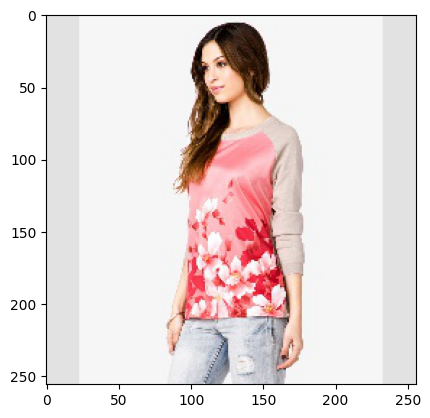

1/1 [==============================] - 0s 328ms/step


"\nimage = image.convert('RGB') if image.mode != 'RGB' else image\nsmpl_image_file = str(smpl_folder/sample.image)\n\nsmpl_file = smpl_image_file.replace('.jpg','.p')\nsmpl_image = PIL.Image.open(smpl_image_file)\n\nwith open(smpl_file, 'rb') as f:\n    smpl_params = pickle.load(f)\n    pred_pose = smpl_params[0]['pred_body_pose']\n    pred_betas = smpl_params[0]['pred_betas']\n    pred_camera = np.expand_dims(smpl_params[0]['pred_camera'], 0)\n"

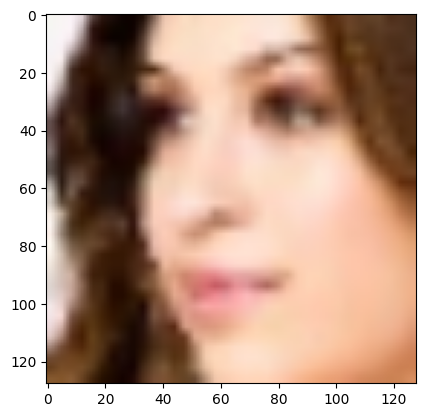

In [40]:
ind = 4
sample = df.iloc[ind]

image_file = str(root_dir / sample.image)
image = PIL.Image.open(image_file)
plt.imshow(image)
plt.show()
face = DeepFace.detectFace(img_path = image_file, target_size=(128, 128), detector_backend='dlib', align=True)
plt.imshow(face)
embedding = DeepFace.represent(image_file, model_name='VGG-Face', detector_backend='dlib')
'''
image = image.convert('RGB') if image.mode != 'RGB' else image
smpl_image_file = str(smpl_folder/sample.image)

smpl_file = smpl_image_file.replace('.jpg','.p')
smpl_image = PIL.Image.open(smpl_image_file)

with open(smpl_file, 'rb') as f:
    smpl_params = pickle.load(f)
    pred_pose = smpl_params[0]['pred_body_pose']
    pred_betas = smpl_params[0]['pred_betas']
    pred_camera = np.expand_dims(smpl_params[0]['pred_camera'], 0)
'''

In [46]:
np.array(embedding).shape

(2622,)

In [29]:
image = face_recognition.load_image_file(str(image_file))
face_locations = face_recognition.face_locations(image)
top, right, bottom, left = face_locations[0]
height = bottom - top
width = right - left
margin = 0.4
top -= int(margin*width)
bottom += int(margin*width)
left -= int(margin*height)
right += int(margin*height)

face_image = image[top:bottom, left:right]
plt.imshow(face_image)

IndexError: list index out of range

ValueError: Face could not be detected. Please confirm that the picture is a face photo or consider to set enforce_detection param to False.

In [42]:
height

36

In [30]:
face_locations

[(30, 145, 66, 109)]

ValueError: zero-size array to reduction operation minimum which has no identity

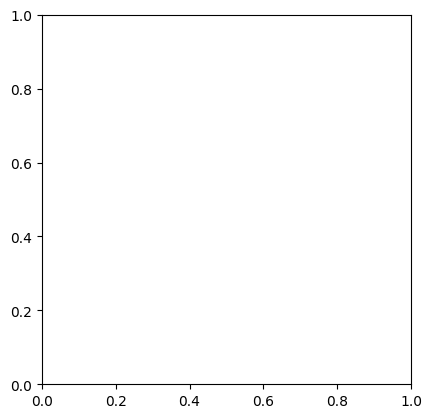

In [37]:
plt.imshow(image[30:66,145:109,:])

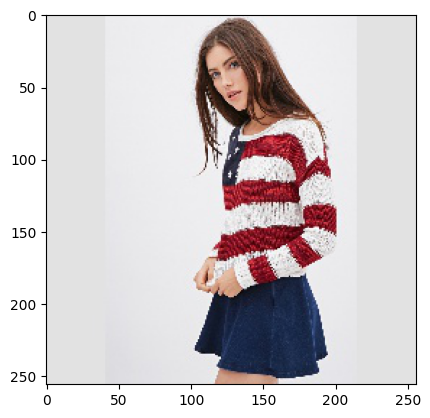

In [36]:
plt.imshow(image)

In [29]:
face_locations[0]

(30, 145, 66, 109)

In [4]:
device = 'cuda:0'

In [28]:
ddconfig = {
  'double_z': True,
  'z_channels': 4,
  'resolution': 256,
  'in_channels': 3,
  'out_ch': 3,
  'ch': 128,
  'ch_mult': [ 1,2,4,4 ],  # num_down = len(ch_mult)-1
  'num_res_blocks': 2,
  'attn_resolutions': [ ],
  'dropout': 0.0
}

lossconfig = {
    'target': "torch.nn.Identity"
}

ckpt_path = "models/first_stage_models/kl-f8/model.ckpt"

vae = AutoencoderKL(
                 ddconfig=ddconfig,
                 lossconfig=lossconfig,
                 embed_dim=4,
                 ckpt_path=ckpt_path,
                 ignore_keys=[],
                 image_key="image",
                 colorize_nlabels=None,
                 monitor=None)
vae = vae.to('cuda:0')

making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels
Restored from models/first_stage_models/kl-f8/model.ckpt


In [15]:
ddconfig = {
  'double_z': True,
  'z_channels': 3,
  'resolution': 256,
  'in_channels': 3,
  'out_ch': 3,
  'ch': 128,
  'ch_mult': [ 1,2, 4],  # num_down = len(ch_mult)-1
  'num_res_blocks': 2,
  'attn_resolutions': [ ],
  'dropout': 0.0
}

lossconfig = {
    'target': "torch.nn.Identity"
}

ckpt_path = "models/first_stage_models/kl-f4/model.ckpt"

vae2 = AutoencoderKL(
                 ddconfig=ddconfig,
                 lossconfig=lossconfig,
                 embed_dim=3,
                 ckpt_path=ckpt_path,
                 ignore_keys=[],
                 image_key="image",
                 colorize_nlabels=None,
                 monitor=None)
vae2 = vae2.to('cuda:0')

making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 3, 64, 64) = 12288 dimensions.
making attention of type 'vanilla' with 512 in_channels
Restored from models/first_stage_models/kl-f4/model.ckpt


In [19]:
from deepfashion import DeepFashionKeypoint
pickle_file= '/home/soon/github/stable-diffusion-finetune/data/deepfashion/deepfashion_1.pickle'
folder= '/home/soon/datasets/deepfashion/img_256'

dl = iter(DeepFashionKeypoint(pickle_file, folder, False))


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


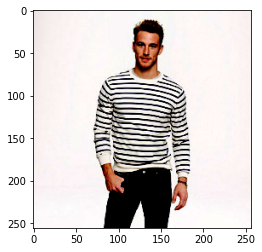

In [23]:
data = next(dl)
plt.imshow(data['image'])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


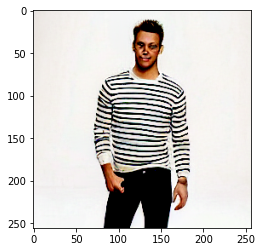

In [24]:
image_in = torch.unsqueeze(rearrange(data['image'], 'h w c -> c h w'),0)
dec, posterior = vae.forward(image_in.to(device), True)
plt.imshow(np.array(rearrange(dec.squeeze(), 'c h w -> h w c').detach().cpu()))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


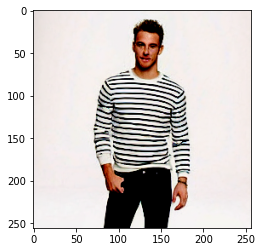

In [25]:
image_in = torch.unsqueeze(rearrange(data['image'], 'h w c -> c h w'),0)
dec, posterior = vae2.forward(image_in.to(device), True)
plt.imshow(np.array(rearrange(dec.squeeze(), 'c h w -> h w c').detach().cpu()))